# Keras VGG16 for CIFAR10 test
keras vgg16 CIFAR10 for cifar10 test.

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import keras
from keras.models import Sequential
from keras.layers import Dense, Activation
from cifar10_demo.data_utils import *

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

%load_ext autoreload
%autoreload 2


In [3]:
# get data
cifar10_data = CIFAR10Data()
x_train, y_train, x_test, y_test = cifar10_data.get_data(subtract_mean=True)


Training data shape: (50000, 32, 32, 3)
Training label shape (50000, 1)
Test data shape (10000, 32, 32, 3)
Test label shape (10000, 1)


In [30]:
from cifar10_demo.vgg_like import vgg16_like
from keras.applications.vgg16 import VGG16
from keras.models import Model
import keras

num_classes = 10
model = vgg16_like(classes=num_classes, input_shape=x_train.shape[1:], weights=None, scale_factor=1, weight_decay=5e-4) 
# model = VGG16(classes=num_classes, input_shape=x_train.shape[1:], weights=None) 
learning_rate = 1e-3
lr_drop = 20
def lr_scheduler(epoch):
    lr = learning_rate * (0.1 ** (epoch // lr_drop))
    print('lr:%f at epoch:%d' % (lr, epoch))
    return lr
reduce_lr = keras.callbacks.LearningRateScheduler(lr_scheduler)

""":type : Model"""
# opt = keras.optimizers.SGD(lr=1e-4, decay=1e-6, momentum=0.9, nesterov=True)
opt = keras.optimizers.Adam(lr=learning_rate)
model.compile(optimizer=opt, 
              loss=keras.losses.categorical_crossentropy,
              metrics=['accuracy'])
history = model.fit(x_train, y_train, 
                    batch_size=128, 
                    epochs=80, 
                    validation_split=0.2,
                    callbacks=[reduce_lr], 
                    shuffle=True)
model.summary()

Train on 40000 samples, validate on 10000 samples
Epoch 1/150


lr:0.001000 at epoch:0


  128/40000 [..............................] - ETA: 38:43 - loss: 6.2675 - acc: 0.0859

  256/40000 [..............................] - ETA: 19:32 - loss: 6.0672 - acc: 0.0898

  384/40000 [..............................] - ETA: 13:08 - loss: 5.7084 - acc: 0.0964

  512/40000 [..............................] - ETA: 9:56 - loss: 5.4824 - acc: 0.0977 

  640/40000 [..............................] - ETA: 8:01 - loss: 5.2258 - acc: 0.1047

  768/40000 [..............................] - ETA: 6:44 - loss: 5.0788 - acc: 0.1042

  896/40000 [..............................] - ETA: 5:49 - loss: 4.9364 - acc: 0.1071

 1024/40000 [..............................] - ETA: 5:08 - loss: 4.7963 - acc: 0.1084

 1152/40000 [..............................] - ETA: 4:36 - loss: 4.7029 - acc: 0.1042

 1280/40000 [..............................] - ETA: 4:10 - loss: 4.6147 - acc: 0.1031

 1408/40000 [>.............................] - ETA: 3:49 - loss: 4.5611 - acc: 0.1016

 1536/40000 [>.............................] - ETA: 3:31 - loss: 4.4877 - acc: 0.1022

 1664/40000 [>.............................] - ETA: 3:17 - loss: 4.4308 - acc: 0.1010

 1792/40000 [>.............................] - ETA: 3:04 - loss: 4.3777 - acc: 0.1021

 1920/40000 [>.............................] - ETA: 2:53 - loss: 4.3325 - acc: 0.1052

 2048/40000 [>.............................] - ETA: 2:43 - loss: 4.2919 - acc: 0.1079

 2176/40000 [>.............................] - ETA: 2:35 - loss: 4.2523 - acc: 0.1108

 2304/40000 [>.............................] - ETA: 2:27 - loss: 4.2163 - acc: 0.1137

 2432/40000 [>.............................] - ETA: 2:20 - loss: 4.1804 - acc: 0.1172

 2560/40000 [>.............................] - ETA: 2:14 - loss: 4.1488 - acc: 0.1172

 2688/40000 [=>............................] - ETA: 2:08 - loss: 4.1212 - acc: 0.1179

 2816/40000 [=>............................] - ETA: 2:03 - loss: 4.0981 - acc: 0.1197

 2944/40000 [=>............................] - ETA: 1:59 - loss: 4.0770 - acc: 0.1213

 3072/40000 [=>............................] - ETA: 1:55 - loss: 4.0549 - acc: 0.1230

 3200/40000 [=>............................] - ETA: 1:51 - loss: 4.0372 - acc: 0.1241

 3328/40000 [=>............................] - ETA: 1:47 - loss: 4.0245 - acc: 0.1253

 3456/40000 [=>............................] - ETA: 1:44 - loss: 4.0101 - acc: 0.1241

 3584/40000 [=>............................] - ETA: 1:41 - loss: 3.9946 - acc: 0.1242

 3712/40000 [=>............................] - ETA: 1:38 - loss: 3.9790 - acc: 0.1247

 3840/40000 [=>............................] - ETA: 1:35 - loss: 3.9631 - acc: 0.1263

 3968/40000 [=>............................] - ETA: 1:32 - loss: 3.9485 - acc: 0.1280

 4096/40000 [==>...........................] - ETA: 1:30 - loss: 3.9344 - acc: 0.1287

 4224/40000 [==>...........................] - ETA: 1:28 - loss: 3.9219 - acc: 0.1286

 4352/40000 [==>...........................] - ETA: 1:26 - loss: 3.9106 - acc: 0.1289

 4480/40000 [==>...........................] - ETA: 1:24 - loss: 3.8987 - acc: 0.1304

 4608/40000 [==>...........................] - ETA: 1:22 - loss: 3.8893 - acc: 0.1315

 4736/40000 [==>...........................] - ETA: 1:20 - loss: 3.8790 - acc: 0.1332

 4864/40000 [==>...........................] - ETA: 1:18 - loss: 3.8725 - acc: 0.1332

 4992/40000 [==>...........................] - ETA: 1:16 - loss: 3.8606 - acc: 0.1338

 5120/40000 [==>...........................] - ETA: 1:15 - loss: 3.8534 - acc: 0.1352

 5248/40000 [==>...........................] - ETA: 1:13 - loss: 3.8447 - acc: 0.1361

 5376/40000 [===>..........................] - ETA: 1:12 - loss: 3.8366 - acc: 0.1349

 5504/40000 [===>..........................] - ETA: 1:11 - loss: 3.8280 - acc: 0.1355

 5632/40000 [===>..........................] - ETA: 1:09 - loss: 3.8195 - acc: 0.1369

 5760/40000 [===>..........................] - ETA: 1:08 - loss: 3.8107 - acc: 0.1377

 5888/40000 [===>..........................] - ETA: 1:07 - loss: 3.8044 - acc: 0.1374

 6016/40000 [===>..........................] - ETA: 1:06 - loss: 3.7961 - acc: 0.1376

 6144/40000 [===>..........................] - ETA: 1:04 - loss: 3.7879 - acc: 0.1372

 6272/40000 [===>..........................] - ETA: 1:03 - loss: 3.7816 - acc: 0.1376

 6400/40000 [===>..........................] - ETA: 1:02 - loss: 3.7752 - acc: 0.1383

 6528/40000 [===>..........................] - ETA: 1:01 - loss: 3.7682 - acc: 0.1388

 6656/40000 [===>..........................] - ETA: 1:00 - loss: 3.7611 - acc: 0.1394

 6784/40000 [====>.........................] - ETA: 59s - loss: 3.7545 - acc: 0.1399 

 6912/40000 [====>.........................] - ETA: 59s - loss: 3.7470 - acc: 0.1411

 7040/40000 [====>.........................] - ETA: 58s - loss: 3.7410 - acc: 0.1412

 7168/40000 [====>.........................] - ETA: 57s - loss: 3.7359 - acc: 0.1412

 7296/40000 [====>.........................] - ETA: 56s - loss: 3.7301 - acc: 0.1420

 7424/40000 [====>.........................] - ETA: 55s - loss: 3.7243 - acc: 0.1429

 7552/40000 [====>.........................] - ETA: 54s - loss: 3.7191 - acc: 0.1433

 7680/40000 [====>.........................] - ETA: 54s - loss: 3.7143 - acc: 0.1430

 7808/40000 [====>.........................] - ETA: 53s - loss: 3.7099 - acc: 0.1434

 7936/40000 [====>.........................] - ETA: 52s - loss: 3.7049 - acc: 0.1429

 8064/40000 [=====>........................] - ETA: 52s - loss: 3.6984 - acc: 0.1437

 8192/40000 [=====>........................] - ETA: 51s - loss: 3.6929 - acc: 0.1444

 8320/40000 [=====>........................] - ETA: 50s - loss: 3.6876 - acc: 0.1447

 8448/40000 [=====>........................] - ETA: 50s - loss: 3.6819 - acc: 0.1464

 8576/40000 [=====>........................] - ETA: 49s - loss: 3.6764 - acc: 0.1470

 8704/40000 [=====>........................] - ETA: 49s - loss: 3.6714 - acc: 0.1471

 8832/40000 [=====>........................] - ETA: 48s - loss: 3.6660 - acc: 0.1474

 8960/40000 [=====>........................] - ETA: 47s - loss: 3.6622 - acc: 0.1474

 9088/40000 [=====>........................] - ETA: 47s - loss: 3.6583 - acc: 0.1477

 9216/40000 [=====>........................] - ETA: 46s - loss: 3.6540 - acc: 0.1481

 9344/40000 [======>.......................] - ETA: 46s - loss: 3.6490 - acc: 0.1484

 9472/40000 [======>.......................] - ETA: 45s - loss: 3.6455 - acc: 0.1486

 9600/40000 [======>.......................] - ETA: 45s - loss: 3.6408 - acc: 0.1486

 9728/40000 [======>.......................] - ETA: 44s - loss: 3.6357 - acc: 0.1501

 9856/40000 [======>.......................] - ETA: 44s - loss: 3.6317 - acc: 0.1506

 9984/40000 [======>.......................] - ETA: 43s - loss: 3.6273 - acc: 0.1508

10112/40000 [======>.......................] - ETA: 43s - loss: 3.6228 - acc: 0.1510

10240/40000 [======>.......................] - ETA: 42s - loss: 3.6200 - acc: 0.1512

10368/40000 [======>.......................] - ETA: 42s - loss: 3.6157 - acc: 0.1511

10496/40000 [======>.......................] - ETA: 41s - loss: 3.6110 - acc: 0.1527

10624/40000 [======>.......................] - ETA: 41s - loss: 3.6073 - acc: 0.1531

10752/40000 [=======>......................] - ETA: 41s - loss: 3.6041 - acc: 0.1528

10880/40000 [=======>......................] - ETA: 40s - loss: 3.6000 - acc: 0.1533

11008/40000 [=======>......................] - ETA: 40s - loss: 3.5968 - acc: 0.1532

11136/40000 [=======>......................] - ETA: 39s - loss: 3.5930 - acc: 0.1533

11264/40000 [=======>......................] - ETA: 39s - loss: 3.5889 - acc: 0.1532

11392/40000 [=======>......................] - ETA: 39s - loss: 3.5852 - acc: 0.1540

11520/40000 [=======>......................] - ETA: 38s - loss: 3.5809 - acc: 0.1546

11648/40000 [=======>......................] - ETA: 38s - loss: 3.5767 - acc: 0.1550

11776/40000 [=======>......................] - ETA: 37s - loss: 3.5722 - acc: 0.1557

11904/40000 [=======>......................] - ETA: 37s - loss: 3.5689 - acc: 0.1558

12032/40000 [========>.....................] - ETA: 37s - loss: 3.5648 - acc: 0.1559

12160/40000 [========>.....................] - ETA: 36s - loss: 3.5630 - acc: 0.1565

12288/40000 [========>.....................] - ETA: 36s - loss: 3.5594 - acc: 0.1572

12416/40000 [========>.....................] - ETA: 36s - loss: 3.5576 - acc: 0.1571

12544/40000 [========>.....................] - ETA: 35s - loss: 3.5537 - acc: 0.1574

12672/40000 [========>.....................] - ETA: 35s - loss: 3.5514 - acc: 0.1579

12800/40000 [========>.....................] - ETA: 35s - loss: 3.5482 - acc: 0.1582

12928/40000 [========>.....................] - ETA: 34s - loss: 3.5458 - acc: 0.1586

13056/40000 [========>.....................] - ETA: 34s - loss: 3.5426 - acc: 0.1592

13184/40000 [========>.....................] - ETA: 34s - loss: 3.5396 - acc: 0.1593

13312/40000 [========>.....................] - ETA: 34s - loss: 3.5366 - acc: 0.1592

13440/40000 [=========>....................] - ETA: 33s - loss: 3.5333 - acc: 0.1592

13568/40000 [=========>....................] - ETA: 33s - loss: 3.5297 - acc: 0.1593

13696/40000 [=========>....................] - ETA: 33s - loss: 3.5265 - acc: 0.1598

13824/40000 [=========>....................] - ETA: 32s - loss: 3.5243 - acc: 0.1598

13952/40000 [=========>....................] - ETA: 32s - loss: 3.5219 - acc: 0.1596

14080/40000 [=========>....................] - ETA: 32s - loss: 3.5182 - acc: 0.1605

14208/40000 [=========>....................] - ETA: 32s - loss: 3.5162 - acc: 0.1606

14336/40000 [=========>....................] - ETA: 31s - loss: 3.5133 - acc: 0.1606

14464/40000 [=========>....................] - ETA: 31s - loss: 3.5105 - acc: 0.1607

14592/40000 [=========>....................] - ETA: 31s - loss: 3.5086 - acc: 0.1606

14720/40000 [==========>...................] - ETA: 30s - loss: 3.5056 - acc: 0.1605

14848/40000 [==========>...................] - ETA: 30s - loss: 3.5031 - acc: 0.1601

14976/40000 [==========>...................] - ETA: 30s - loss: 3.5004 - acc: 0.1601

15104/40000 [==========>...................] - ETA: 30s - loss: 3.4979 - acc: 0.1602

15232/40000 [==========>...................] - ETA: 29s - loss: 3.4951 - acc: 0.1605

15360/40000 [==========>...................] - ETA: 29s - loss: 3.4921 - acc: 0.1610

15488/40000 [==========>...................] - ETA: 29s - loss: 3.4899 - acc: 0.1612

15616/40000 [==========>...................] - ETA: 29s - loss: 3.4867 - acc: 0.1616

15744/40000 [==========>...................] - ETA: 28s - loss: 3.4839 - acc: 0.1620

15872/40000 [==========>...................] - ETA: 28s - loss: 3.4819 - acc: 0.1620

16000/40000 [===========>..................] - ETA: 28s - loss: 3.4789 - acc: 0.1618

16128/40000 [===========>..................] - ETA: 28s - loss: 3.4759 - acc: 0.1620

16256/40000 [===========>..................] - ETA: 27s - loss: 3.4736 - acc: 0.1623

16384/40000 [===========>..................] - ETA: 27s - loss: 3.4709 - acc: 0.1624

16512/40000 [===========>..................] - ETA: 27s - loss: 3.4689 - acc: 0.1625

16640/40000 [===========>..................] - ETA: 27s - loss: 3.4663 - acc: 0.1623

16768/40000 [===========>..................] - ETA: 27s - loss: 3.4644 - acc: 0.1626

16896/40000 [===========>..................] - ETA: 26s - loss: 3.4623 - acc: 0.1634

17024/40000 [===========>..................] - ETA: 26s - loss: 3.4604 - acc: 0.1637

17152/40000 [===========>..................] - ETA: 26s - loss: 3.4584 - acc: 0.1637

17280/40000 [===========>..................] - ETA: 26s - loss: 3.4563 - acc: 0.1637

17408/40000 [============>.................] - ETA: 25s - loss: 3.4542 - acc: 0.1637

17536/40000 [============>.................] - ETA: 25s - loss: 3.4519 - acc: 0.1639

17664/40000 [============>.................] - ETA: 25s - loss: 3.4495 - acc: 0.1641

17792/40000 [============>.................] - ETA: 25s - loss: 3.4474 - acc: 0.1645

17920/40000 [============>.................] - ETA: 25s - loss: 3.4453 - acc: 0.1646

18048/40000 [============>.................] - ETA: 24s - loss: 3.4426 - acc: 0.1647

18176/40000 [============>.................] - ETA: 24s - loss: 3.4398 - acc: 0.1648

18304/40000 [============>.................] - ETA: 24s - loss: 3.4381 - acc: 0.1646

18432/40000 [============>.................] - ETA: 24s - loss: 3.4357 - acc: 0.1650

18560/40000 [============>.................] - ETA: 24s - loss: 3.4339 - acc: 0.1650

18688/40000 [=============>................] - ETA: 23s - loss: 3.4315 - acc: 0.1657

18816/40000 [=============>................] - ETA: 23s - loss: 3.4294 - acc: 0.1659

18944/40000 [=============>................] - ETA: 23s - loss: 3.4275 - acc: 0.1658

19072/40000 [=============>................] - ETA: 23s - loss: 3.4252 - acc: 0.1658

19200/40000 [=============>................] - ETA: 23s - loss: 3.4241 - acc: 0.1656

19328/40000 [=============>................] - ETA: 22s - loss: 3.4222 - acc: 0.1656

19456/40000 [=============>................] - ETA: 22s - loss: 3.4200 - acc: 0.1659

19584/40000 [=============>................] - ETA: 22s - loss: 3.4177 - acc: 0.1662

19712/40000 [=============>................] - ETA: 22s - loss: 3.4158 - acc: 0.1662

19840/40000 [=============>................] - ETA: 22s - loss: 3.4136 - acc: 0.1666

19968/40000 [=============>................] - ETA: 21s - loss: 3.4118 - acc: 0.1666

20096/40000 [==============>...............] - ETA: 21s - loss: 3.4092 - acc: 0.1667

20224/40000 [==============>...............] - ETA: 21s - loss: 3.4067 - acc: 0.1670

20352/40000 [==============>...............] - ETA: 21s - loss: 3.4047 - acc: 0.1672

20480/40000 [==============>...............] - ETA: 21s - loss: 3.4028 - acc: 0.1671

20608/40000 [==============>...............] - ETA: 21s - loss: 3.4011 - acc: 0.1669

20736/40000 [==============>...............] - ETA: 20s - loss: 3.3991 - acc: 0.1671

20864/40000 [==============>...............] - ETA: 20s - loss: 3.3972 - acc: 0.1667

20992/40000 [==============>...............] - ETA: 20s - loss: 3.3955 - acc: 0.1668

21120/40000 [==============>...............] - ETA: 20s - loss: 3.3938 - acc: 0.1667

21248/40000 [==============>...............] - ETA: 20s - loss: 3.3925 - acc: 0.1665

21376/40000 [===============>..............] - ETA: 19s - loss: 3.3908 - acc: 0.1663

21504/40000 [===============>..............] - ETA: 19s - loss: 3.3889 - acc: 0.1665

21632/40000 [===============>..............] - ETA: 19s - loss: 3.3869 - acc: 0.1665

21760/40000 [===============>..............] - ETA: 19s - loss: 3.3851 - acc: 0.1664

21888/40000 [===============>..............] - ETA: 19s - loss: 3.3840 - acc: 0.1664

22016/40000 [===============>..............] - ETA: 19s - loss: 3.3826 - acc: 0.1662

22144/40000 [===============>..............] - ETA: 18s - loss: 3.3803 - acc: 0.1665

22272/40000 [===============>..............] - ETA: 18s - loss: 3.3784 - acc: 0.1664

22400/40000 [===============>..............] - ETA: 18s - loss: 3.3757 - acc: 0.1670

22528/40000 [===============>..............] - ETA: 18s - loss: 3.3741 - acc: 0.1672

22656/40000 [===============>..............] - ETA: 18s - loss: 3.3731 - acc: 0.1674

22784/40000 [================>.............] - ETA: 18s - loss: 3.3712 - acc: 0.1676

22912/40000 [================>.............] - ETA: 17s - loss: 3.3694 - acc: 0.1675

23040/40000 [================>.............] - ETA: 17s - loss: 3.3676 - acc: 0.1677

23168/40000 [================>.............] - ETA: 17s - loss: 3.3657 - acc: 0.1678

23296/40000 [================>.............] - ETA: 17s - loss: 3.3639 - acc: 0.1679

23424/40000 [================>.............] - ETA: 17s - loss: 3.3621 - acc: 0.1680

23552/40000 [================>.............] - ETA: 17s - loss: 3.3598 - acc: 0.1683

23680/40000 [================>.............] - ETA: 16s - loss: 3.3583 - acc: 0.1683

23808/40000 [================>.............] - ETA: 16s - loss: 3.3569 - acc: 0.1684

23936/40000 [================>.............] - ETA: 16s - loss: 3.3549 - acc: 0.1686

24064/40000 [=================>............] - ETA: 16s - loss: 3.3530 - acc: 0.1690

24192/40000 [=================>............] - ETA: 16s - loss: 3.3516 - acc: 0.1692

24320/40000 [=================>............] - ETA: 16s - loss: 3.3502 - acc: 0.1694

24448/40000 [=================>............] - ETA: 16s - loss: 3.3484 - acc: 0.1695

24576/40000 [=================>............] - ETA: 15s - loss: 3.3467 - acc: 0.1698

24704/40000 [=================>............] - ETA: 15s - loss: 3.3454 - acc: 0.1697

24832/40000 [=================>............] - ETA: 15s - loss: 3.3437 - acc: 0.1697

24960/40000 [=================>............] - ETA: 15s - loss: 3.3419 - acc: 0.1699

25088/40000 [=================>............] - ETA: 15s - loss: 3.3407 - acc: 0.1699

25216/40000 [=================>............] - ETA: 15s - loss: 3.3395 - acc: 0.1698

25344/40000 [==================>...........] - ETA: 14s - loss: 3.3379 - acc: 0.1701

25472/40000 [==================>...........] - ETA: 14s - loss: 3.3365 - acc: 0.1702

25600/40000 [==================>...........] - ETA: 14s - loss: 3.3350 - acc: 0.1701

25728/40000 [==================>...........] - ETA: 14s - loss: 3.3338 - acc: 0.1703

25856/40000 [==================>...........] - ETA: 14s - loss: 3.3320 - acc: 0.1703

25984/40000 [==================>...........] - ETA: 14s - loss: 3.3305 - acc: 0.1702

26112/40000 [==================>...........] - ETA: 14s - loss: 3.3285 - acc: 0.1705

26240/40000 [==================>...........] - ETA: 13s - loss: 3.3268 - acc: 0.1707

26368/40000 [==================>...........] - ETA: 13s - loss: 3.3252 - acc: 0.1709

26496/40000 [==================>...........] - ETA: 13s - loss: 3.3235 - acc: 0.1709

26624/40000 [==================>...........] - ETA: 13s - loss: 3.3221 - acc: 0.1709

26752/40000 [===================>..........] - ETA: 13s - loss: 3.3207 - acc: 0.1707

26880/40000 [===================>..........] - ETA: 13s - loss: 3.3193 - acc: 0.1708

27008/40000 [===================>..........] - ETA: 13s - loss: 3.3176 - acc: 0.1709

27136/40000 [===================>..........] - ETA: 12s - loss: 3.3165 - acc: 0.1711

27264/40000 [===================>..........] - ETA: 12s - loss: 3.3150 - acc: 0.1712

27392/40000 [===================>..........] - ETA: 12s - loss: 3.3133 - acc: 0.1713

27520/40000 [===================>..........] - ETA: 12s - loss: 3.3117 - acc: 0.1715

27648/40000 [===================>..........] - ETA: 12s - loss: 3.3101 - acc: 0.1717

27776/40000 [===================>..........] - ETA: 12s - loss: 3.3089 - acc: 0.1716

27904/40000 [===================>..........] - ETA: 11s - loss: 3.3075 - acc: 0.1717

28032/40000 [====================>.........] - ETA: 11s - loss: 3.3062 - acc: 0.1715

28160/40000 [====================>.........] - ETA: 11s - loss: 3.3044 - acc: 0.1716

28288/40000 [====================>.........] - ETA: 11s - loss: 3.3025 - acc: 0.1720

28416/40000 [====================>.........] - ETA: 11s - loss: 3.3011 - acc: 0.1721

28544/40000 [====================>.........] - ETA: 11s - loss: 3.2996 - acc: 0.1721

28672/40000 [====================>.........] - ETA: 11s - loss: 3.2984 - acc: 0.1721

28800/40000 [====================>.........] - ETA: 11s - loss: 3.2970 - acc: 0.1724

28928/40000 [====================>.........] - ETA: 10s - loss: 3.2954 - acc: 0.1723

29056/40000 [====================>.........] - ETA: 10s - loss: 3.2934 - acc: 0.1725

29184/40000 [====================>.........] - ETA: 10s - loss: 3.2919 - acc: 0.1728

29312/40000 [====================>.........] - ETA: 10s - loss: 3.2908 - acc: 0.1728

29440/40000 [=====================>........] - ETA: 10s - loss: 3.2890 - acc: 0.1728

29568/40000 [=====================>........] - ETA: 10s - loss: 3.2876 - acc: 0.1726

29696/40000 [=====================>........] - ETA: 10s - loss: 3.2857 - acc: 0.1728

29824/40000 [=====================>........] - ETA: 9s - loss: 3.2840 - acc: 0.1731 

29952/40000 [=====================>........] - ETA: 9s - loss: 3.2823 - acc: 0.1734

30080/40000 [=====================>........] - ETA: 9s - loss: 3.2807 - acc: 0.1735

30208/40000 [=====================>........] - ETA: 9s - loss: 3.2790 - acc: 0.1737

30336/40000 [=====================>........] - ETA: 9s - loss: 3.2775 - acc: 0.1737

30464/40000 [=====================>........] - ETA: 9s - loss: 3.2758 - acc: 0.1740

30592/40000 [=====================>........] - ETA: 9s - loss: 3.2742 - acc: 0.1742

30720/40000 [======================>.......] - ETA: 8s - loss: 3.2725 - acc: 0.1743

30848/40000 [======================>.......] - ETA: 8s - loss: 3.2706 - acc: 0.1747

30976/40000 [======================>.......] - ETA: 8s - loss: 3.2692 - acc: 0.1750

31104/40000 [======================>.......] - ETA: 8s - loss: 3.2674 - acc: 0.1750

31232/40000 [======================>.......] - ETA: 8s - loss: 3.2660 - acc: 0.1750

31360/40000 [======================>.......] - ETA: 8s - loss: 3.2649 - acc: 0.1751

31488/40000 [======================>.......] - ETA: 8s - loss: 3.2635 - acc: 0.1752

31616/40000 [======================>.......] - ETA: 8s - loss: 3.2623 - acc: 0.1753

31744/40000 [======================>.......] - ETA: 7s - loss: 3.2610 - acc: 0.1754

31872/40000 [======================>.......] - ETA: 7s - loss: 3.2597 - acc: 0.1753

32000/40000 [=======================>......] - ETA: 7s - loss: 3.2585 - acc: 0.1757

32128/40000 [=======================>......] - ETA: 7s - loss: 3.2571 - acc: 0.1756

32256/40000 [=======================>......] - ETA: 7s - loss: 3.2558 - acc: 0.1757

32384/40000 [=======================>......] - ETA: 7s - loss: 3.2543 - acc: 0.1757

32512/40000 [=======================>......] - ETA: 7s - loss: 3.2528 - acc: 0.1759

32640/40000 [=======================>......] - ETA: 7s - loss: 3.2514 - acc: 0.1761

32768/40000 [=======================>......] - ETA: 6s - loss: 3.2499 - acc: 0.1764

32896/40000 [=======================>......] - ETA: 6s - loss: 3.2482 - acc: 0.1765

33024/40000 [=======================>......] - ETA: 6s - loss: 3.2467 - acc: 0.1765

33152/40000 [=======================>......] - ETA: 6s - loss: 3.2451 - acc: 0.1768

33280/40000 [=======================>......] - ETA: 6s - loss: 3.2434 - acc: 0.1773

33408/40000 [========================>.....] - ETA: 6s - loss: 3.2415 - acc: 0.1775

33536/40000 [========================>.....] - ETA: 6s - loss: 3.2398 - acc: 0.1777

33664/40000 [========================>.....] - ETA: 5s - loss: 3.2384 - acc: 0.1777

33792/40000 [========================>.....] - ETA: 5s - loss: 3.2372 - acc: 0.1778

33920/40000 [========================>.....] - ETA: 5s - loss: 3.2359 - acc: 0.1780

34048/40000 [========================>.....] - ETA: 5s - loss: 3.2341 - acc: 0.1782

34176/40000 [========================>.....] - ETA: 5s - loss: 3.2328 - acc: 0.1787

34304/40000 [========================>.....] - ETA: 5s - loss: 3.2314 - acc: 0.1787

34432/40000 [========================>.....] - ETA: 5s - loss: 3.2297 - acc: 0.1790

34560/40000 [========================>.....] - ETA: 5s - loss: 3.2283 - acc: 0.1791

34688/40000 [=========================>....] - ETA: 4s - loss: 3.2266 - acc: 0.1793

34816/40000 [=========================>....] - ETA: 4s - loss: 3.2253 - acc: 0.1795

34944/40000 [=========================>....] - ETA: 4s - loss: 3.2239 - acc: 0.1798

35072/40000 [=========================>....] - ETA: 4s - loss: 3.2226 - acc: 0.1799

35200/40000 [=========================>....] - ETA: 4s - loss: 3.2211 - acc: 0.1799

35328/40000 [=========================>....] - ETA: 4s - loss: 3.2200 - acc: 0.1798

35456/40000 [=========================>....] - ETA: 4s - loss: 3.2185 - acc: 0.1800

35584/40000 [=========================>....] - ETA: 4s - loss: 3.2172 - acc: 0.1801

35712/40000 [=========================>....] - ETA: 4s - loss: 3.2158 - acc: 0.1803

35840/40000 [=========================>....] - ETA: 3s - loss: 3.2139 - acc: 0.1806

35968/40000 [=========================>....] - ETA: 3s - loss: 3.2124 - acc: 0.1808

36096/40000 [==========================>...] - ETA: 3s - loss: 3.2108 - acc: 0.1809

36224/40000 [==========================>...] - ETA: 3s - loss: 3.2094 - acc: 0.1809

36352/40000 [==========================>...] - ETA: 3s - loss: 3.2082 - acc: 0.1812

36480/40000 [==========================>...] - ETA: 3s - loss: 3.2068 - acc: 0.1813

36608/40000 [==========================>...] - ETA: 3s - loss: 3.2059 - acc: 0.1814

36736/40000 [==========================>...] - ETA: 3s - loss: 3.2044 - acc: 0.1816

36864/40000 [==========================>...] - ETA: 2s - loss: 3.2030 - acc: 0.1817

36992/40000 [==========================>...] - ETA: 2s - loss: 3.2019 - acc: 0.1819

37120/40000 [==========================>...] - ETA: 2s - loss: 3.2002 - acc: 0.1821

37248/40000 [==========================>...] - ETA: 2s - loss: 3.1985 - acc: 0.1822

37376/40000 [===========================>..] - ETA: 2s - loss: 3.1970 - acc: 0.1824

37504/40000 [===========================>..] - ETA: 2s - loss: 3.1959 - acc: 0.1825

37632/40000 [===========================>..] - ETA: 2s - loss: 3.1946 - acc: 0.1825

37760/40000 [===========================>..] - ETA: 2s - loss: 3.1933 - acc: 0.1824

37888/40000 [===========================>..] - ETA: 1s - loss: 3.1920 - acc: 0.1827

38016/40000 [===========================>..] - ETA: 1s - loss: 3.1909 - acc: 0.1829

38144/40000 [===========================>..] - ETA: 1s - loss: 3.1894 - acc: 0.1831

38272/40000 [===========================>..] - ETA: 1s - loss: 3.1881 - acc: 0.1831

38400/40000 [===========================>..] - ETA: 1s - loss: 3.1866 - acc: 0.1833

38528/40000 [===========================>..] - ETA: 1s - loss: 3.1857 - acc: 0.1835

38656/40000 [===========================>..] - ETA: 1s - loss: 3.1844 - acc: 0.1835

38784/40000 [============================>.] - ETA: 1s - loss: 3.1835 - acc: 0.1835

38912/40000 [============================>.] - ETA: 0s - loss: 3.1824 - acc: 0.1837

39040/40000 [============================>.] - ETA: 0s - loss: 3.1809 - acc: 0.1839

39168/40000 [============================>.] - ETA: 0s - loss: 3.1795 - acc: 0.1840

39296/40000 [============================>.] - ETA: 0s - loss: 3.1779 - acc: 0.1841

39424/40000 [============================>.] - ETA: 0s - loss: 3.1762 - acc: 0.1844

39552/40000 [============================>.] - ETA: 0s - loss: 3.1746 - acc: 0.1846

39680/40000 [============================>.] - ETA: 0s - loss: 3.1732 - acc: 0.1848

39808/40000 [============================>.] - ETA: 0s - loss: 3.1719 - acc: 0.1850

39936/40000 [============================>.] - ETA: 0s - loss: 3.1707 - acc: 0.1850

40000/40000 [==============================] - 40s 1ms/step - loss: 3.1698 - acc: 0.1850 - val_loss: 3.5549 - val_acc: 0.1328


Epoch 2/150
lr:0.001000 at epoch:1
  128/40000 [..............................] - ETA: 31s - loss: 2.7089 - acc: 0.2422

  256/40000 [..............................] - ETA: 30s - loss: 2.7150 - acc: 0.2422

  384/40000 [..............................] - ETA: 29s - loss: 2.7228 - acc: 0.2292

  512/40000 [..............................] - ETA: 29s - loss: 2.7160 - acc: 0.2363

  640/40000 [..............................] - ETA: 29s - loss: 2.7246 - acc: 0.2313

  768/40000 [..............................] - ETA: 29s - loss: 2.7234 - acc: 0.2279

  896/40000 [..............................] - ETA: 29s - loss: 2.7252 - acc: 0.2310

 1024/40000 [..............................] - ETA: 29s - loss: 2.7277 - acc: 0.2334

 1152/40000 [..............................] - ETA: 28s - loss: 2.7155 - acc: 0.2326

 1280/40000 [..............................] - ETA: 28s - loss: 2.7154 - acc: 0.2289

 1408/40000 [>.............................] - ETA: 28s - loss: 2.7161 - acc: 0.2266

 1536/40000 [>.............................] - ETA: 28s - loss: 2.7093 - acc: 0.2279

 1664/40000 [>.............................] - ETA: 28s - loss: 2.7059 - acc: 0.2284

 1792/40000 [>.............................] - ETA: 28s - loss: 2.7108 - acc: 0.2271

 1920/40000 [>.............................] - ETA: 28s - loss: 2.7094 - acc: 0.2328

 2048/40000 [>.............................] - ETA: 28s - loss: 2.7045 - acc: 0.2334

 2176/40000 [>.............................] - ETA: 28s - loss: 2.7053 - acc: 0.2321

 2304/40000 [>.............................] - ETA: 28s - loss: 2.7051 - acc: 0.2339

 2432/40000 [>.............................] - ETA: 28s - loss: 2.7042 - acc: 0.2331

 2560/40000 [>.............................] - ETA: 27s - loss: 2.7084 - acc: 0.2320

 2688/40000 [=>............................] - ETA: 27s - loss: 2.7138 - acc: 0.2329

 2816/40000 [=>............................] - ETA: 27s - loss: 2.7078 - acc: 0.2376

 2944/40000 [=>............................] - ETA: 27s - loss: 2.7059 - acc: 0.2378

 3072/40000 [=>............................] - ETA: 27s - loss: 2.7060 - acc: 0.2363

 3200/40000 [=>............................] - ETA: 27s - loss: 2.7069 - acc: 0.2375

 3328/40000 [=>............................] - ETA: 27s - loss: 2.7083 - acc: 0.2356

 3456/40000 [=>............................] - ETA: 27s - loss: 2.7064 - acc: 0.2352

 3584/40000 [=>............................] - ETA: 27s - loss: 2.7076 - acc: 0.2355

 3712/40000 [=>............................] - ETA: 26s - loss: 2.7098 - acc: 0.2371

 3840/40000 [=>............................] - ETA: 26s - loss: 2.7081 - acc: 0.2341

 3968/40000 [=>............................] - ETA: 26s - loss: 2.7090 - acc: 0.2354

 4096/40000 [==>...........................] - ETA: 26s - loss: 2.7073 - acc: 0.2339

 4224/40000 [==>...........................] - ETA: 26s - loss: 2.7090 - acc: 0.2318

 4352/40000 [==>...........................] - ETA: 26s - loss: 2.7062 - acc: 0.2314

 4480/40000 [==>...........................] - ETA: 26s - loss: 2.7096 - acc: 0.2326

 4608/40000 [==>...........................] - ETA: 26s - loss: 2.7081 - acc: 0.2333

 4736/40000 [==>...........................] - ETA: 26s - loss: 2.7080 - acc: 0.2335

 4864/40000 [==>...........................] - ETA: 26s - loss: 2.7094 - acc: 0.2327

 4992/40000 [==>...........................] - ETA: 25s - loss: 2.7070 - acc: 0.2340

 5120/40000 [==>...........................] - ETA: 25s - loss: 2.7032 - acc: 0.2352

 5248/40000 [==>...........................] - ETA: 25s - loss: 2.7014 - acc: 0.2365

 5376/40000 [===>..........................] - ETA: 25s - loss: 2.6982 - acc: 0.2370

 5504/40000 [===>..........................] - ETA: 25s - loss: 2.6992 - acc: 0.2366

 5632/40000 [===>..........................] - ETA: 25s - loss: 2.6968 - acc: 0.2379

 5760/40000 [===>..........................] - ETA: 25s - loss: 2.6947 - acc: 0.2398

 5888/40000 [===>..........................] - ETA: 25s - loss: 2.6936 - acc: 0.2401

 6016/40000 [===>..........................] - ETA: 25s - loss: 2.6930 - acc: 0.2404

 6144/40000 [===>..........................] - ETA: 25s - loss: 2.6905 - acc: 0.2406

 6272/40000 [===>..........................] - ETA: 24s - loss: 2.6910 - acc: 0.2411

 6400/40000 [===>..........................] - ETA: 24s - loss: 2.6913 - acc: 0.2400

 6528/40000 [===>..........................] - ETA: 24s - loss: 2.6892 - acc: 0.2410

 6656/40000 [===>..........................] - ETA: 24s - loss: 2.6894 - acc: 0.2417

 6784/40000 [====>.........................] - ETA: 24s - loss: 2.6896 - acc: 0.2419

 6912/40000 [====>.........................] - ETA: 24s - loss: 2.6886 - acc: 0.2425

 7040/40000 [====>.........................] - ETA: 24s - loss: 2.6869 - acc: 0.2430

 7168/40000 [====>.........................] - ETA: 24s - loss: 2.6869 - acc: 0.2433

 7296/40000 [====>.........................] - ETA: 24s - loss: 2.6853 - acc: 0.2426

 7424/40000 [====>.........................] - ETA: 24s - loss: 2.6850 - acc: 0.2429

 7552/40000 [====>.........................] - ETA: 23s - loss: 2.6840 - acc: 0.2430

 7680/40000 [====>.........................] - ETA: 23s - loss: 2.6815 - acc: 0.2443

 7808/40000 [====>.........................] - ETA: 23s - loss: 2.6806 - acc: 0.2436

 7936/40000 [====>.........................] - ETA: 23s - loss: 2.6807 - acc: 0.2440

 8064/40000 [=====>........................] - ETA: 23s - loss: 2.6797 - acc: 0.2437

 8192/40000 [=====>........................] - ETA: 23s - loss: 2.6786 - acc: 0.2432

 8320/40000 [=====>........................] - ETA: 23s - loss: 2.6776 - acc: 0.2427

 8448/40000 [=====>........................] - ETA: 23s - loss: 2.6750 - acc: 0.2429

 8576/40000 [=====>........................] - ETA: 23s - loss: 2.6733 - acc: 0.2428

 8704/40000 [=====>........................] - ETA: 23s - loss: 2.6734 - acc: 0.2424

 8832/40000 [=====>........................] - ETA: 23s - loss: 2.6716 - acc: 0.2429

 8960/40000 [=====>........................] - ETA: 22s - loss: 2.6717 - acc: 0.2424

 9088/40000 [=====>........................] - ETA: 22s - loss: 2.6704 - acc: 0.2433

 9216/40000 [=====>........................] - ETA: 22s - loss: 2.6683 - acc: 0.2431

 9344/40000 [======>.......................] - ETA: 22s - loss: 2.6674 - acc: 0.2426

 9472/40000 [======>.......................] - ETA: 22s - loss: 2.6666 - acc: 0.2427

 9600/40000 [======>.......................] - ETA: 22s - loss: 2.6662 - acc: 0.2425

 9728/40000 [======>.......................] - ETA: 22s - loss: 2.6660 - acc: 0.2423

 9856/40000 [======>.......................] - ETA: 22s - loss: 2.6640 - acc: 0.2421

 9984/40000 [======>.......................] - ETA: 22s - loss: 2.6648 - acc: 0.2423

10112/40000 [======>.......................] - ETA: 22s - loss: 2.6639 - acc: 0.2421

10240/40000 [======>.......................] - ETA: 21s - loss: 2.6642 - acc: 0.2422

10368/40000 [======>.......................] - ETA: 21s - loss: 2.6638 - acc: 0.2419

10496/40000 [======>.......................] - ETA: 21s - loss: 2.6627 - acc: 0.2423

10624/40000 [======>.......................] - ETA: 21s - loss: 2.6609 - acc: 0.2425

10752/40000 [=======>......................] - ETA: 21s - loss: 2.6594 - acc: 0.2428

10880/40000 [=======>......................] - ETA: 21s - loss: 2.6585 - acc: 0.2424

11008/40000 [=======>......................] - ETA: 21s - loss: 2.6579 - acc: 0.2422

11136/40000 [=======>......................] - ETA: 21s - loss: 2.6577 - acc: 0.2421

11264/40000 [=======>......................] - ETA: 21s - loss: 2.6578 - acc: 0.2418

11392/40000 [=======>......................] - ETA: 21s - loss: 2.6577 - acc: 0.2416

11520/40000 [=======>......................] - ETA: 20s - loss: 2.6562 - acc: 0.2418

11648/40000 [=======>......................] - ETA: 20s - loss: 2.6565 - acc: 0.2417

11776/40000 [=======>......................] - ETA: 20s - loss: 2.6549 - acc: 0.2415

11904/40000 [=======>......................] - ETA: 20s - loss: 2.6541 - acc: 0.2413

12032/40000 [========>.....................] - ETA: 20s - loss: 2.6532 - acc: 0.2414

12160/40000 [========>.....................] - ETA: 20s - loss: 2.6527 - acc: 0.2419

12288/40000 [========>.....................] - ETA: 20s - loss: 2.6523 - acc: 0.2413

12416/40000 [========>.....................] - ETA: 20s - loss: 2.6516 - acc: 0.2409

12544/40000 [========>.....................] - ETA: 20s - loss: 2.6506 - acc: 0.2407

12672/40000 [========>.....................] - ETA: 20s - loss: 2.6491 - acc: 0.2411

12800/40000 [========>.....................] - ETA: 20s - loss: 2.6495 - acc: 0.2407

12928/40000 [========>.....................] - ETA: 19s - loss: 2.6486 - acc: 0.2413

13056/40000 [========>.....................] - ETA: 19s - loss: 2.6477 - acc: 0.2414

13184/40000 [========>.....................] - ETA: 19s - loss: 2.6467 - acc: 0.2413

13312/40000 [========>.....................] - ETA: 19s - loss: 2.6460 - acc: 0.2418

13440/40000 [=========>....................] - ETA: 19s - loss: 2.6451 - acc: 0.2423

13568/40000 [=========>....................] - ETA: 19s - loss: 2.6439 - acc: 0.2427

13696/40000 [=========>....................] - ETA: 19s - loss: 2.6430 - acc: 0.2428

13824/40000 [=========>....................] - ETA: 19s - loss: 2.6418 - acc: 0.2434

13952/40000 [=========>....................] - ETA: 19s - loss: 2.6412 - acc: 0.2435

14080/40000 [=========>....................] - ETA: 19s - loss: 2.6406 - acc: 0.2435

14208/40000 [=========>....................] - ETA: 18s - loss: 2.6384 - acc: 0.2441

14336/40000 [=========>....................] - ETA: 18s - loss: 2.6356 - acc: 0.2457

14464/40000 [=========>....................] - ETA: 18s - loss: 2.6335 - acc: 0.2461

14592/40000 [=========>....................] - ETA: 18s - loss: 2.6330 - acc: 0.2464

14720/40000 [==========>...................] - ETA: 18s - loss: 2.6320 - acc: 0.2469

14848/40000 [==========>...................] - ETA: 18s - loss: 2.6321 - acc: 0.2470

14976/40000 [==========>...................] - ETA: 18s - loss: 2.6305 - acc: 0.2479

15104/40000 [==========>...................] - ETA: 18s - loss: 2.6299 - acc: 0.2477

15232/40000 [==========>...................] - ETA: 18s - loss: 2.6281 - acc: 0.2478

15360/40000 [==========>...................] - ETA: 18s - loss: 2.6271 - acc: 0.2479

15488/40000 [==========>...................] - ETA: 18s - loss: 2.6259 - acc: 0.2481

15616/40000 [==========>...................] - ETA: 17s - loss: 2.6257 - acc: 0.2483

15744/40000 [==========>...................] - ETA: 17s - loss: 2.6252 - acc: 0.2478

15872/40000 [==========>...................] - ETA: 17s - loss: 2.6247 - acc: 0.2476

16000/40000 [===========>..................] - ETA: 17s - loss: 2.6230 - acc: 0.2476

16128/40000 [===========>..................] - ETA: 17s - loss: 2.6220 - acc: 0.2474

16256/40000 [===========>..................] - ETA: 17s - loss: 2.6212 - acc: 0.2471

16384/40000 [===========>..................] - ETA: 17s - loss: 2.6215 - acc: 0.2466

16512/40000 [===========>..................] - ETA: 17s - loss: 2.6197 - acc: 0.2473

16640/40000 [===========>..................] - ETA: 17s - loss: 2.6190 - acc: 0.2481

16768/40000 [===========>..................] - ETA: 17s - loss: 2.6180 - acc: 0.2483

16896/40000 [===========>..................] - ETA: 16s - loss: 2.6167 - acc: 0.2487

17024/40000 [===========>..................] - ETA: 16s - loss: 2.6151 - acc: 0.2489

17152/40000 [===========>..................] - ETA: 16s - loss: 2.6144 - acc: 0.2490

17280/40000 [===========>..................] - ETA: 16s - loss: 2.6139 - acc: 0.2487

17408/40000 [============>.................] - ETA: 16s - loss: 2.6133 - acc: 0.2486

17536/40000 [============>.................] - ETA: 16s - loss: 2.6128 - acc: 0.2487

17664/40000 [============>.................] - ETA: 16s - loss: 2.6120 - acc: 0.2490

17792/40000 [============>.................] - ETA: 16s - loss: 2.6103 - acc: 0.2494

17920/40000 [============>.................] - ETA: 16s - loss: 2.6099 - acc: 0.2492

18048/40000 [============>.................] - ETA: 16s - loss: 2.6085 - acc: 0.2497

18176/40000 [============>.................] - ETA: 16s - loss: 2.6081 - acc: 0.2497

18304/40000 [============>.................] - ETA: 15s - loss: 2.6068 - acc: 0.2497

18432/40000 [============>.................] - ETA: 15s - loss: 2.6064 - acc: 0.2493

18560/40000 [============>.................] - ETA: 15s - loss: 2.6052 - acc: 0.2491

18688/40000 [=============>................] - ETA: 15s - loss: 2.6040 - acc: 0.2493

18816/40000 [=============>................] - ETA: 15s - loss: 2.6034 - acc: 0.2494

18944/40000 [=============>................] - ETA: 15s - loss: 2.6023 - acc: 0.2496

19072/40000 [=============>................] - ETA: 15s - loss: 2.6015 - acc: 0.2496

19200/40000 [=============>................] - ETA: 15s - loss: 2.6004 - acc: 0.2498

19328/40000 [=============>................] - ETA: 15s - loss: 2.5992 - acc: 0.2501

19456/40000 [=============>................] - ETA: 15s - loss: 2.5982 - acc: 0.2500

19584/40000 [=============>................] - ETA: 14s - loss: 2.5976 - acc: 0.2502

19712/40000 [=============>................] - ETA: 14s - loss: 2.5969 - acc: 0.2504

19840/40000 [=============>................] - ETA: 14s - loss: 2.5957 - acc: 0.2506

19968/40000 [=============>................] - ETA: 14s - loss: 2.5944 - acc: 0.2509

20096/40000 [==============>...............] - ETA: 14s - loss: 2.5932 - acc: 0.2511

20224/40000 [==============>...............] - ETA: 14s - loss: 2.5932 - acc: 0.2509

20352/40000 [==============>...............] - ETA: 14s - loss: 2.5927 - acc: 0.2510

20480/40000 [==============>...............] - ETA: 14s - loss: 2.5924 - acc: 0.2513

20608/40000 [==============>...............] - ETA: 14s - loss: 2.5916 - acc: 0.2512

20736/40000 [==============>...............] - ETA: 14s - loss: 2.5910 - acc: 0.2514

20864/40000 [==============>...............] - ETA: 14s - loss: 2.5902 - acc: 0.2517

20992/40000 [==============>...............] - ETA: 13s - loss: 2.5892 - acc: 0.2520

21120/40000 [==============>...............] - ETA: 13s - loss: 2.5882 - acc: 0.2521

21248/40000 [==============>...............] - ETA: 13s - loss: 2.5868 - acc: 0.2524

21376/40000 [===============>..............] - ETA: 13s - loss: 2.5855 - acc: 0.2526

21504/40000 [===============>..............] - ETA: 13s - loss: 2.5842 - acc: 0.2528

21632/40000 [===============>..............] - ETA: 13s - loss: 2.5836 - acc: 0.2527

21760/40000 [===============>..............] - ETA: 13s - loss: 2.5828 - acc: 0.2530

21888/40000 [===============>..............] - ETA: 13s - loss: 2.5818 - acc: 0.2531

22016/40000 [===============>..............] - ETA: 13s - loss: 2.5810 - acc: 0.2534

22144/40000 [===============>..............] - ETA: 13s - loss: 2.5802 - acc: 0.2537

22272/40000 [===============>..............] - ETA: 13s - loss: 2.5791 - acc: 0.2540

22400/40000 [===============>..............] - ETA: 12s - loss: 2.5780 - acc: 0.2544

22528/40000 [===============>..............] - ETA: 12s - loss: 2.5771 - acc: 0.2545

22656/40000 [===============>..............] - ETA: 12s - loss: 2.5762 - acc: 0.2543

22784/40000 [================>.............] - ETA: 12s - loss: 2.5760 - acc: 0.2542

22912/40000 [================>.............] - ETA: 12s - loss: 2.5745 - acc: 0.2542

23040/40000 [================>.............] - ETA: 12s - loss: 2.5732 - acc: 0.2546

23168/40000 [================>.............] - ETA: 12s - loss: 2.5727 - acc: 0.2546

23296/40000 [================>.............] - ETA: 12s - loss: 2.5715 - acc: 0.2547

23424/40000 [================>.............] - ETA: 12s - loss: 2.5712 - acc: 0.2550

23552/40000 [================>.............] - ETA: 12s - loss: 2.5703 - acc: 0.2551

23680/40000 [================>.............] - ETA: 11s - loss: 2.5693 - acc: 0.2557

23808/40000 [================>.............] - ETA: 11s - loss: 2.5684 - acc: 0.2557

23936/40000 [================>.............] - ETA: 11s - loss: 2.5670 - acc: 0.2561

24064/40000 [=================>............] - ETA: 11s - loss: 2.5658 - acc: 0.2560

24192/40000 [=================>............] - ETA: 11s - loss: 2.5644 - acc: 0.2564

24320/40000 [=================>............] - ETA: 11s - loss: 2.5631 - acc: 0.2566

24448/40000 [=================>............] - ETA: 11s - loss: 2.5620 - acc: 0.2569

24576/40000 [=================>............] - ETA: 11s - loss: 2.5609 - acc: 0.2573

24704/40000 [=================>............] - ETA: 11s - loss: 2.5597 - acc: 0.2576

24832/40000 [=================>............] - ETA: 11s - loss: 2.5598 - acc: 0.2574

24960/40000 [=================>............] - ETA: 11s - loss: 2.5593 - acc: 0.2575

25088/40000 [=================>............] - ETA: 10s - loss: 2.5583 - acc: 0.2577

25216/40000 [=================>............] - ETA: 10s - loss: 2.5568 - acc: 0.2577

25344/40000 [==================>...........] - ETA: 10s - loss: 2.5562 - acc: 0.2576

25472/40000 [==================>...........] - ETA: 10s - loss: 2.5551 - acc: 0.2576

25600/40000 [==================>...........] - ETA: 10s - loss: 2.5548 - acc: 0.2576

25728/40000 [==================>...........] - ETA: 10s - loss: 2.5539 - acc: 0.2579

25856/40000 [==================>...........] - ETA: 10s - loss: 2.5529 - acc: 0.2580

25984/40000 [==================>...........] - ETA: 10s - loss: 2.5522 - acc: 0.2580

26112/40000 [==================>...........] - ETA: 10s - loss: 2.5511 - acc: 0.2585

26240/40000 [==================>...........] - ETA: 10s - loss: 2.5500 - acc: 0.2585

26368/40000 [==================>...........] - ETA: 9s - loss: 2.5489 - acc: 0.2586 

26496/40000 [==================>...........] - ETA: 9s - loss: 2.5480 - acc: 0.2586

26624/40000 [==================>...........] - ETA: 9s - loss: 2.5475 - acc: 0.2585

26752/40000 [===================>..........] - ETA: 9s - loss: 2.5470 - acc: 0.2587

26880/40000 [===================>..........] - ETA: 9s - loss: 2.5467 - acc: 0.2587

27008/40000 [===================>..........] - ETA: 9s - loss: 2.5456 - acc: 0.2587

27136/40000 [===================>..........] - ETA: 9s - loss: 2.5445 - acc: 0.2588

27264/40000 [===================>..........] - ETA: 9s - loss: 2.5443 - acc: 0.2587

27392/40000 [===================>..........] - ETA: 9s - loss: 2.5432 - acc: 0.2589

27520/40000 [===================>..........] - ETA: 9s - loss: 2.5421 - acc: 0.2595

27648/40000 [===================>..........] - ETA: 9s - loss: 2.5415 - acc: 0.2593

27776/40000 [===================>..........] - ETA: 8s - loss: 2.5404 - acc: 0.2596

27904/40000 [===================>..........] - ETA: 8s - loss: 2.5394 - acc: 0.2600

28032/40000 [====================>.........] - ETA: 8s - loss: 2.5386 - acc: 0.2599

28160/40000 [====================>.........] - ETA: 8s - loss: 2.5379 - acc: 0.2599

28288/40000 [====================>.........] - ETA: 8s - loss: 2.5365 - acc: 0.2600

28416/40000 [====================>.........] - ETA: 8s - loss: 2.5354 - acc: 0.2602

28544/40000 [====================>.........] - ETA: 8s - loss: 2.5347 - acc: 0.2603

28672/40000 [====================>.........] - ETA: 8s - loss: 2.5337 - acc: 0.2603

28800/40000 [====================>.........] - ETA: 8s - loss: 2.5327 - acc: 0.2607

28928/40000 [====================>.........] - ETA: 8s - loss: 2.5318 - acc: 0.2608

29056/40000 [====================>.........] - ETA: 8s - loss: 2.5307 - acc: 0.2610

29184/40000 [====================>.........] - ETA: 7s - loss: 2.5296 - acc: 0.2611

29312/40000 [====================>.........] - ETA: 7s - loss: 2.5290 - acc: 0.2615

29440/40000 [=====================>........] - ETA: 7s - loss: 2.5277 - acc: 0.2618

29568/40000 [=====================>........] - ETA: 7s - loss: 2.5267 - acc: 0.2620

29696/40000 [=====================>........] - ETA: 7s - loss: 2.5258 - acc: 0.2622

29824/40000 [=====================>........] - ETA: 7s - loss: 2.5252 - acc: 0.2622

29952/40000 [=====================>........] - ETA: 7s - loss: 2.5249 - acc: 0.2623

30080/40000 [=====================>........] - ETA: 7s - loss: 2.5242 - acc: 0.2624

30208/40000 [=====================>........] - ETA: 7s - loss: 2.5230 - acc: 0.2624

30336/40000 [=====================>........] - ETA: 7s - loss: 2.5225 - acc: 0.2628

30464/40000 [=====================>........] - ETA: 6s - loss: 2.5217 - acc: 0.2628

30592/40000 [=====================>........] - ETA: 6s - loss: 2.5213 - acc: 0.2627

30720/40000 [======================>.......] - ETA: 6s - loss: 2.5207 - acc: 0.2627

30848/40000 [======================>.......] - ETA: 6s - loss: 2.5197 - acc: 0.2630

30976/40000 [======================>.......] - ETA: 6s - loss: 2.5188 - acc: 0.2632

31104/40000 [======================>.......] - ETA: 6s - loss: 2.5177 - acc: 0.2633

31232/40000 [======================>.......] - ETA: 6s - loss: 2.5168 - acc: 0.2634

31360/40000 [======================>.......] - ETA: 6s - loss: 2.5153 - acc: 0.2639

31488/40000 [======================>.......] - ETA: 6s - loss: 2.5142 - acc: 0.2641

31616/40000 [======================>.......] - ETA: 6s - loss: 2.5127 - acc: 0.2646

31744/40000 [======================>.......] - ETA: 6s - loss: 2.5125 - acc: 0.2648

31872/40000 [======================>.......] - ETA: 5s - loss: 2.5119 - acc: 0.2651

32000/40000 [=======================>......] - ETA: 5s - loss: 2.5111 - acc: 0.2654

32128/40000 [=======================>......] - ETA: 5s - loss: 2.5101 - acc: 0.2657

32256/40000 [=======================>......] - ETA: 5s - loss: 2.5097 - acc: 0.2656

32384/40000 [=======================>......] - ETA: 5s - loss: 2.5089 - acc: 0.2659

32512/40000 [=======================>......] - ETA: 5s - loss: 2.5076 - acc: 0.2661

32640/40000 [=======================>......] - ETA: 5s - loss: 2.5067 - acc: 0.2663

32768/40000 [=======================>......] - ETA: 5s - loss: 2.5061 - acc: 0.2663

32896/40000 [=======================>......] - ETA: 5s - loss: 2.5053 - acc: 0.2665

33024/40000 [=======================>......] - ETA: 5s - loss: 2.5042 - acc: 0.2667

33152/40000 [=======================>......] - ETA: 5s - loss: 2.5039 - acc: 0.2670

33280/40000 [=======================>......] - ETA: 4s - loss: 2.5038 - acc: 0.2670

33408/40000 [========================>.....] - ETA: 4s - loss: 2.5035 - acc: 0.2671

33536/40000 [========================>.....] - ETA: 4s - loss: 2.5028 - acc: 0.2673

33664/40000 [========================>.....] - ETA: 4s - loss: 2.5023 - acc: 0.2675

33792/40000 [========================>.....] - ETA: 4s - loss: 2.5011 - acc: 0.2677

33920/40000 [========================>.....] - ETA: 4s - loss: 2.5001 - acc: 0.2680

34048/40000 [========================>.....] - ETA: 4s - loss: 2.4994 - acc: 0.2682

34176/40000 [========================>.....] - ETA: 4s - loss: 2.4983 - acc: 0.2683

34304/40000 [========================>.....] - ETA: 4s - loss: 2.4982 - acc: 0.2683

34432/40000 [========================>.....] - ETA: 4s - loss: 2.4977 - acc: 0.2684

34560/40000 [========================>.....] - ETA: 3s - loss: 2.4968 - acc: 0.2683

34688/40000 [=========================>....] - ETA: 3s - loss: 2.4958 - acc: 0.2685

34816/40000 [=========================>....] - ETA: 3s - loss: 2.4948 - acc: 0.2689

34944/40000 [=========================>....] - ETA: 3s - loss: 2.4937 - acc: 0.2694

35072/40000 [=========================>....] - ETA: 3s - loss: 2.4927 - acc: 0.2696

35200/40000 [=========================>....] - ETA: 3s - loss: 2.4918 - acc: 0.2699

35328/40000 [=========================>....] - ETA: 3s - loss: 2.4912 - acc: 0.2703

35456/40000 [=========================>....] - ETA: 3s - loss: 2.4903 - acc: 0.2708

35584/40000 [=========================>....] - ETA: 3s - loss: 2.4889 - acc: 0.2712

35712/40000 [=========================>....] - ETA: 3s - loss: 2.4882 - acc: 0.2714

35840/40000 [=========================>....] - ETA: 3s - loss: 2.4868 - acc: 0.2717

35968/40000 [=========================>....] - ETA: 2s - loss: 2.4858 - acc: 0.2718

36096/40000 [==========================>...] - ETA: 2s - loss: 2.4851 - acc: 0.2719

36224/40000 [==========================>...] - ETA: 2s - loss: 2.4842 - acc: 0.2719

36352/40000 [==========================>...] - ETA: 2s - loss: 2.4832 - acc: 0.2720

36480/40000 [==========================>...] - ETA: 2s - loss: 2.4824 - acc: 0.2720

36608/40000 [==========================>...] - ETA: 2s - loss: 2.4815 - acc: 0.2724

36736/40000 [==========================>...] - ETA: 2s - loss: 2.4807 - acc: 0.2725

36864/40000 [==========================>...] - ETA: 2s - loss: 2.4794 - acc: 0.2729

36992/40000 [==========================>...] - ETA: 2s - loss: 2.4787 - acc: 0.2732

37120/40000 [==========================>...] - ETA: 2s - loss: 2.4774 - acc: 0.2735

37248/40000 [==========================>...] - ETA: 2s - loss: 2.4764 - acc: 0.2737

37376/40000 [===========================>..] - ETA: 1s - loss: 2.4757 - acc: 0.2738

37504/40000 [===========================>..] - ETA: 1s - loss: 2.4747 - acc: 0.2741

37632/40000 [===========================>..] - ETA: 1s - loss: 2.4737 - acc: 0.2743

37760/40000 [===========================>..] - ETA: 1s - loss: 2.4730 - acc: 0.2744

37888/40000 [===========================>..] - ETA: 1s - loss: 2.4724 - acc: 0.2746

38016/40000 [===========================>..] - ETA: 1s - loss: 2.4720 - acc: 0.2746

38144/40000 [===========================>..] - ETA: 1s - loss: 2.4711 - acc: 0.2747

38272/40000 [===========================>..] - ETA: 1s - loss: 2.4698 - acc: 0.2750

38400/40000 [===========================>..] - ETA: 1s - loss: 2.4688 - acc: 0.2753

38528/40000 [===========================>..] - ETA: 1s - loss: 2.4682 - acc: 0.2756

38656/40000 [===========================>..] - ETA: 0s - loss: 2.4673 - acc: 0.2760

38784/40000 [============================>.] - ETA: 0s - loss: 2.4664 - acc: 0.2762

38912/40000 [============================>.] - ETA: 0s - loss: 2.4657 - acc: 0.2764

39040/40000 [============================>.] - ETA: 0s - loss: 2.4650 - acc: 0.2765

39168/40000 [============================>.] - ETA: 0s - loss: 2.4642 - acc: 0.2768

39296/40000 [============================>.] - ETA: 0s - loss: 2.4633 - acc: 0.2769

39424/40000 [============================>.] - ETA: 0s - loss: 2.4626 - acc: 0.2769

39552/40000 [============================>.] - ETA: 0s - loss: 2.4624 - acc: 0.2769

39680/40000 [============================>.] - ETA: 0s - loss: 2.4618 - acc: 0.2768

39808/40000 [============================>.] - ETA: 0s - loss: 2.4613 - acc: 0.2769

39936/40000 [============================>.] - ETA: 0s - loss: 2.4607 - acc: 0.2769

40000/40000 [==============================] - 32s 806us/step - loss: 2.4605 - acc: 0.2767 - val_loss: 2.1647 - val_acc: 0.3600


Epoch 3/150
lr:0.001000 at epoch:2
  128/40000 [..............................] - ETA: 35s - loss: 2.2151 - acc: 0.2734

  256/40000 [..............................] - ETA: 32s - loss: 2.1846 - acc: 0.3125

  384/40000 [..............................] - ETA: 32s - loss: 2.1938 - acc: 0.3151

  512/40000 [..............................] - ETA: 31s - loss: 2.2109 - acc: 0.3125

  640/40000 [..............................] - ETA: 30s - loss: 2.2138 - acc: 0.3016

  768/40000 [..............................] - ETA: 30s - loss: 2.2261 - acc: 0.3021

  896/40000 [..............................] - ETA: 30s - loss: 2.2285 - acc: 0.3025

 1024/40000 [..............................] - ETA: 30s - loss: 2.2094 - acc: 0.3066

 1152/40000 [..............................] - ETA: 29s - loss: 2.2036 - acc: 0.3047

 1280/40000 [..............................] - ETA: 29s - loss: 2.1990 - acc: 0.3086

 1408/40000 [>.............................] - ETA: 29s - loss: 2.1882 - acc: 0.3146

 1536/40000 [>.............................] - ETA: 29s - loss: 2.1780 - acc: 0.3216

 1664/40000 [>.............................] - ETA: 29s - loss: 2.1711 - acc: 0.3251

 1792/40000 [>.............................] - ETA: 28s - loss: 2.1729 - acc: 0.3231

 1920/40000 [>.............................] - ETA: 28s - loss: 2.1757 - acc: 0.3234

 2048/40000 [>.............................] - ETA: 28s - loss: 2.1849 - acc: 0.3247

 2176/40000 [>.............................] - ETA: 28s - loss: 2.1777 - acc: 0.3323

 2304/40000 [>.............................] - ETA: 28s - loss: 2.1731 - acc: 0.3359

 2432/40000 [>.............................] - ETA: 28s - loss: 2.1696 - acc: 0.3351

 2560/40000 [>.............................] - ETA: 28s - loss: 2.1650 - acc: 0.3359

 2688/40000 [=>............................] - ETA: 28s - loss: 2.1584 - acc: 0.3385

 2816/40000 [=>............................] - ETA: 27s - loss: 2.1605 - acc: 0.3423

 2944/40000 [=>............................] - ETA: 27s - loss: 2.1610 - acc: 0.3421

 3072/40000 [=>............................] - ETA: 27s - loss: 2.1576 - acc: 0.3424

 3200/40000 [=>............................] - ETA: 27s - loss: 2.1583 - acc: 0.3431

 3328/40000 [=>............................] - ETA: 27s - loss: 2.1560 - acc: 0.3453

 3456/40000 [=>............................] - ETA: 27s - loss: 2.1523 - acc: 0.3466

 3584/40000 [=>............................] - ETA: 27s - loss: 2.1487 - acc: 0.3493

 3712/40000 [=>............................] - ETA: 27s - loss: 2.1457 - acc: 0.3502

 3840/40000 [=>............................] - ETA: 27s - loss: 2.1403 - acc: 0.3510

 3968/40000 [=>............................] - ETA: 27s - loss: 2.1399 - acc: 0.3501

 4096/40000 [==>...........................] - ETA: 26s - loss: 2.1377 - acc: 0.3484

 4224/40000 [==>...........................] - ETA: 26s - loss: 2.1407 - acc: 0.3475

 4352/40000 [==>...........................] - ETA: 26s - loss: 2.1420 - acc: 0.3477

 4480/40000 [==>...........................] - ETA: 26s - loss: 2.1402 - acc: 0.3480

 4608/40000 [==>...........................] - ETA: 26s - loss: 2.1407 - acc: 0.3483

 4736/40000 [==>...........................] - ETA: 26s - loss: 2.1421 - acc: 0.3480

 4864/40000 [==>...........................] - ETA: 26s - loss: 2.1402 - acc: 0.3475

 4992/40000 [==>...........................] - ETA: 26s - loss: 2.1372 - acc: 0.3484

 5120/40000 [==>...........................] - ETA: 26s - loss: 2.1389 - acc: 0.3479

 5248/40000 [==>...........................] - ETA: 25s - loss: 2.1407 - acc: 0.3481

 5376/40000 [===>..........................] - ETA: 25s - loss: 2.1390 - acc: 0.3473

 5504/40000 [===>..........................] - ETA: 25s - loss: 2.1364 - acc: 0.3474

 5632/40000 [===>..........................] - ETA: 25s - loss: 2.1347 - acc: 0.3471

 5760/40000 [===>..........................] - ETA: 25s - loss: 2.1352 - acc: 0.3474

 5888/40000 [===>..........................] - ETA: 25s - loss: 2.1322 - acc: 0.3473

 6016/40000 [===>..........................] - ETA: 25s - loss: 2.1305 - acc: 0.3482

 6144/40000 [===>..........................] - ETA: 25s - loss: 2.1288 - acc: 0.3493

 6272/40000 [===>..........................] - ETA: 25s - loss: 2.1277 - acc: 0.3490

 6400/40000 [===>..........................] - ETA: 25s - loss: 2.1260 - acc: 0.3500

 6528/40000 [===>..........................] - ETA: 25s - loss: 2.1262 - acc: 0.3497

 6656/40000 [===>..........................] - ETA: 24s - loss: 2.1239 - acc: 0.3501

 6784/40000 [====>.........................] - ETA: 24s - loss: 2.1237 - acc: 0.3499

 6912/40000 [====>.........................] - ETA: 24s - loss: 2.1227 - acc: 0.3497

 7040/40000 [====>.........................] - ETA: 24s - loss: 2.1209 - acc: 0.3501

 7168/40000 [====>.........................] - ETA: 24s - loss: 2.1191 - acc: 0.3495

 7296/40000 [====>.........................] - ETA: 24s - loss: 2.1191 - acc: 0.3483

 7424/40000 [====>.........................] - ETA: 24s - loss: 2.1218 - acc: 0.3485

 7552/40000 [====>.........................] - ETA: 24s - loss: 2.1212 - acc: 0.3490

 7680/40000 [====>.........................] - ETA: 24s - loss: 2.1235 - acc: 0.3486

 7808/40000 [====>.........................] - ETA: 24s - loss: 2.1237 - acc: 0.3490

 7936/40000 [====>.........................] - ETA: 23s - loss: 2.1242 - acc: 0.3490

 8064/40000 [=====>........................] - ETA: 23s - loss: 2.1230 - acc: 0.3496

 8192/40000 [=====>........................] - ETA: 23s - loss: 2.1233 - acc: 0.3485

 8320/40000 [=====>........................] - ETA: 23s - loss: 2.1240 - acc: 0.3480

 8448/40000 [=====>........................] - ETA: 23s - loss: 2.1249 - acc: 0.3469

 8576/40000 [=====>........................] - ETA: 23s - loss: 2.1242 - acc: 0.3456

 8704/40000 [=====>........................] - ETA: 23s - loss: 2.1234 - acc: 0.3467

 8832/40000 [=====>........................] - ETA: 23s - loss: 2.1220 - acc: 0.3468

 8960/40000 [=====>........................] - ETA: 23s - loss: 2.1190 - acc: 0.3477

 9088/40000 [=====>........................] - ETA: 23s - loss: 2.1185 - acc: 0.3475

 9216/40000 [=====>........................] - ETA: 23s - loss: 2.1177 - acc: 0.3482

 9344/40000 [======>.......................] - ETA: 23s - loss: 2.1161 - acc: 0.3485

 9472/40000 [======>.......................] - ETA: 22s - loss: 2.1163 - acc: 0.3488

 9600/40000 [======>.......................] - ETA: 22s - loss: 2.1156 - acc: 0.3490

 9728/40000 [======>.......................] - ETA: 22s - loss: 2.1164 - acc: 0.3492

 9856/40000 [======>.......................] - ETA: 22s - loss: 2.1176 - acc: 0.3479

 9984/40000 [======>.......................] - ETA: 22s - loss: 2.1158 - acc: 0.3491

10112/40000 [======>.......................] - ETA: 22s - loss: 2.1151 - acc: 0.3492

10240/40000 [======>.......................] - ETA: 22s - loss: 2.1132 - acc: 0.3494

10368/40000 [======>.......................] - ETA: 22s - loss: 2.1132 - acc: 0.3493

10496/40000 [======>.......................] - ETA: 22s - loss: 2.1130 - acc: 0.3495

10624/40000 [======>.......................] - ETA: 22s - loss: 2.1126 - acc: 0.3490

10752/40000 [=======>......................] - ETA: 22s - loss: 2.1120 - acc: 0.3499

10880/40000 [=======>......................] - ETA: 21s - loss: 2.1111 - acc: 0.3504

11008/40000 [=======>......................] - ETA: 21s - loss: 2.1096 - acc: 0.3516

11136/40000 [=======>......................] - ETA: 21s - loss: 2.1095 - acc: 0.3512

11264/40000 [=======>......................] - ETA: 21s - loss: 2.1089 - acc: 0.3509

11392/40000 [=======>......................] - ETA: 21s - loss: 2.1071 - acc: 0.3517

11520/40000 [=======>......................] - ETA: 21s - loss: 2.1064 - acc: 0.3521

11648/40000 [=======>......................] - ETA: 21s - loss: 2.1047 - acc: 0.3525

11776/40000 [=======>......................] - ETA: 21s - loss: 2.1049 - acc: 0.3528

11904/40000 [=======>......................] - ETA: 21s - loss: 2.1037 - acc: 0.3527

12032/40000 [========>.....................] - ETA: 20s - loss: 2.1005 - acc: 0.3533

12160/40000 [========>.....................] - ETA: 20s - loss: 2.1010 - acc: 0.3533

12288/40000 [========>.....................] - ETA: 20s - loss: 2.0999 - acc: 0.3539

12416/40000 [========>.....................] - ETA: 20s - loss: 2.0993 - acc: 0.3545

12544/40000 [========>.....................] - ETA: 20s - loss: 2.0990 - acc: 0.3545

12672/40000 [========>.....................] - ETA: 20s - loss: 2.0987 - acc: 0.3546

12800/40000 [========>.....................] - ETA: 20s - loss: 2.0976 - acc: 0.3551

12928/40000 [========>.....................] - ETA: 20s - loss: 2.0981 - acc: 0.3551

13056/40000 [========>.....................] - ETA: 20s - loss: 2.0964 - acc: 0.3557

13184/40000 [========>.....................] - ETA: 20s - loss: 2.0961 - acc: 0.3557

13312/40000 [========>.....................] - ETA: 20s - loss: 2.0974 - acc: 0.3551

13440/40000 [=========>....................] - ETA: 19s - loss: 2.0988 - acc: 0.3550

13568/40000 [=========>....................] - ETA: 19s - loss: 2.0991 - acc: 0.3547

13696/40000 [=========>....................] - ETA: 19s - loss: 2.0989 - acc: 0.3544

13824/40000 [=========>....................] - ETA: 19s - loss: 2.0997 - acc: 0.3539

13952/40000 [=========>....................] - ETA: 19s - loss: 2.0992 - acc: 0.3541

14080/40000 [=========>....................] - ETA: 19s - loss: 2.0995 - acc: 0.3536

14208/40000 [=========>....................] - ETA: 19s - loss: 2.1005 - acc: 0.3533

14336/40000 [=========>....................] - ETA: 19s - loss: 2.0998 - acc: 0.3537

14464/40000 [=========>....................] - ETA: 19s - loss: 2.0987 - acc: 0.3541

14592/40000 [=========>....................] - ETA: 19s - loss: 2.0983 - acc: 0.3538

14720/40000 [==========>...................] - ETA: 18s - loss: 2.0964 - acc: 0.3541

14848/40000 [==========>...................] - ETA: 18s - loss: 2.0959 - acc: 0.3540

14976/40000 [==========>...................] - ETA: 18s - loss: 2.0937 - acc: 0.3543

15104/40000 [==========>...................] - ETA: 18s - loss: 2.0924 - acc: 0.3546

15232/40000 [==========>...................] - ETA: 18s - loss: 2.0912 - acc: 0.3550

15360/40000 [==========>...................] - ETA: 18s - loss: 2.0891 - acc: 0.3553

15488/40000 [==========>...................] - ETA: 18s - loss: 2.0874 - acc: 0.3558

15616/40000 [==========>...................] - ETA: 18s - loss: 2.0867 - acc: 0.3559

15744/40000 [==========>...................] - ETA: 18s - loss: 2.0863 - acc: 0.3563

15872/40000 [==========>...................] - ETA: 18s - loss: 2.0841 - acc: 0.3574

16000/40000 [===========>..................] - ETA: 18s - loss: 2.0829 - acc: 0.3576

16128/40000 [===========>..................] - ETA: 17s - loss: 2.0813 - acc: 0.3583

16256/40000 [===========>..................] - ETA: 17s - loss: 2.0787 - acc: 0.3588

16384/40000 [===========>..................] - ETA: 17s - loss: 2.0773 - acc: 0.3590

16512/40000 [===========>..................] - ETA: 17s - loss: 2.0762 - acc: 0.3594

16640/40000 [===========>..................] - ETA: 17s - loss: 2.0755 - acc: 0.3596

16768/40000 [===========>..................] - ETA: 17s - loss: 2.0745 - acc: 0.3602

16896/40000 [===========>..................] - ETA: 17s - loss: 2.0740 - acc: 0.3603

17024/40000 [===========>..................] - ETA: 17s - loss: 2.0755 - acc: 0.3600

17152/40000 [===========>..................] - ETA: 17s - loss: 2.0762 - acc: 0.3598

17280/40000 [===========>..................] - ETA: 17s - loss: 2.0764 - acc: 0.3597

17408/40000 [============>.................] - ETA: 16s - loss: 2.0749 - acc: 0.3601

17536/40000 [============>.................] - ETA: 16s - loss: 2.0745 - acc: 0.3600

17664/40000 [============>.................] - ETA: 16s - loss: 2.0739 - acc: 0.3604

17792/40000 [============>.................] - ETA: 16s - loss: 2.0733 - acc: 0.3603

17920/40000 [============>.................] - ETA: 16s - loss: 2.0717 - acc: 0.3611

18048/40000 [============>.................] - ETA: 16s - loss: 2.0699 - acc: 0.3617

18176/40000 [============>.................] - ETA: 16s - loss: 2.0698 - acc: 0.3620

18304/40000 [============>.................] - ETA: 16s - loss: 2.0696 - acc: 0.3615

18432/40000 [============>.................] - ETA: 16s - loss: 2.0702 - acc: 0.3614

18560/40000 [============>.................] - ETA: 16s - loss: 2.0701 - acc: 0.3615

18688/40000 [=============>................] - ETA: 16s - loss: 2.0697 - acc: 0.3619

18816/40000 [=============>................] - ETA: 15s - loss: 2.0699 - acc: 0.3621

18944/40000 [=============>................] - ETA: 15s - loss: 2.0688 - acc: 0.3621

19072/40000 [=============>................] - ETA: 15s - loss: 2.0675 - acc: 0.3630

19200/40000 [=============>................] - ETA: 15s - loss: 2.0665 - acc: 0.3635

19328/40000 [=============>................] - ETA: 15s - loss: 2.0660 - acc: 0.3637

19456/40000 [=============>................] - ETA: 15s - loss: 2.0647 - acc: 0.3639

19584/40000 [=============>................] - ETA: 15s - loss: 2.0631 - acc: 0.3641

19712/40000 [=============>................] - ETA: 15s - loss: 2.0618 - acc: 0.3646

19840/40000 [=============>................] - ETA: 15s - loss: 2.0611 - acc: 0.3651

19968/40000 [=============>................] - ETA: 15s - loss: 2.0600 - acc: 0.3659

20096/40000 [==============>...............] - ETA: 14s - loss: 2.0585 - acc: 0.3664

20224/40000 [==============>...............] - ETA: 14s - loss: 2.0579 - acc: 0.3664

20352/40000 [==============>...............] - ETA: 14s - loss: 2.0580 - acc: 0.3661

20480/40000 [==============>...............] - ETA: 14s - loss: 2.0573 - acc: 0.3662

20608/40000 [==============>...............] - ETA: 14s - loss: 2.0560 - acc: 0.3665

20736/40000 [==============>...............] - ETA: 14s - loss: 2.0550 - acc: 0.3665

20864/40000 [==============>...............] - ETA: 14s - loss: 2.0556 - acc: 0.3661

20992/40000 [==============>...............] - ETA: 14s - loss: 2.0550 - acc: 0.3661

21120/40000 [==============>...............] - ETA: 14s - loss: 2.0542 - acc: 0.3661

21248/40000 [==============>...............] - ETA: 14s - loss: 2.0536 - acc: 0.3664

21376/40000 [===============>..............] - ETA: 13s - loss: 2.0536 - acc: 0.3666

21504/40000 [===============>..............] - ETA: 13s - loss: 2.0538 - acc: 0.3665

21632/40000 [===============>..............] - ETA: 13s - loss: 2.0533 - acc: 0.3669

21760/40000 [===============>..............] - ETA: 13s - loss: 2.0530 - acc: 0.3670

21888/40000 [===============>..............] - ETA: 13s - loss: 2.0528 - acc: 0.3668

22016/40000 [===============>..............] - ETA: 13s - loss: 2.0516 - acc: 0.3675

22144/40000 [===============>..............] - ETA: 13s - loss: 2.0511 - acc: 0.3678

22272/40000 [===============>..............] - ETA: 13s - loss: 2.0505 - acc: 0.3679

22400/40000 [===============>..............] - ETA: 13s - loss: 2.0504 - acc: 0.3677

22528/40000 [===============>..............] - ETA: 13s - loss: 2.0500 - acc: 0.3675

22656/40000 [===============>..............] - ETA: 13s - loss: 2.0495 - acc: 0.3675

22784/40000 [================>.............] - ETA: 12s - loss: 2.0486 - acc: 0.3678

22912/40000 [================>.............] - ETA: 12s - loss: 2.0485 - acc: 0.3678

23040/40000 [================>.............] - ETA: 12s - loss: 2.0478 - acc: 0.3681

23168/40000 [================>.............] - ETA: 12s - loss: 2.0471 - acc: 0.3681

23296/40000 [================>.............] - ETA: 12s - loss: 2.0461 - acc: 0.3685

23424/40000 [================>.............] - ETA: 12s - loss: 2.0457 - acc: 0.3689

23552/40000 [================>.............] - ETA: 12s - loss: 2.0443 - acc: 0.3693

23680/40000 [================>.............] - ETA: 12s - loss: 2.0434 - acc: 0.3694

23808/40000 [================>.............] - ETA: 12s - loss: 2.0426 - acc: 0.3693

23936/40000 [================>.............] - ETA: 12s - loss: 2.0419 - acc: 0.3695

24064/40000 [=================>............] - ETA: 11s - loss: 2.0409 - acc: 0.3699

24192/40000 [=================>............] - ETA: 11s - loss: 2.0399 - acc: 0.3702

24320/40000 [=================>............] - ETA: 11s - loss: 2.0388 - acc: 0.3709

24448/40000 [=================>............] - ETA: 11s - loss: 2.0387 - acc: 0.3711

24576/40000 [=================>............] - ETA: 11s - loss: 2.0381 - acc: 0.3715

24704/40000 [=================>............] - ETA: 11s - loss: 2.0371 - acc: 0.3720

24832/40000 [=================>............] - ETA: 11s - loss: 2.0363 - acc: 0.3723

24960/40000 [=================>............] - ETA: 11s - loss: 2.0348 - acc: 0.3732

25088/40000 [=================>............] - ETA: 11s - loss: 2.0342 - acc: 0.3732

25216/40000 [=================>............] - ETA: 11s - loss: 2.0334 - acc: 0.3735

25344/40000 [==================>...........] - ETA: 11s - loss: 2.0333 - acc: 0.3736

25472/40000 [==================>...........] - ETA: 10s - loss: 2.0328 - acc: 0.3738

25600/40000 [==================>...........] - ETA: 10s - loss: 2.0314 - acc: 0.3741

25728/40000 [==================>...........] - ETA: 10s - loss: 2.0318 - acc: 0.3741

25856/40000 [==================>...........] - ETA: 10s - loss: 2.0315 - acc: 0.3742

25984/40000 [==================>...........] - ETA: 10s - loss: 2.0315 - acc: 0.3743

26112/40000 [==================>...........] - ETA: 10s - loss: 2.0314 - acc: 0.3746

26240/40000 [==================>...........] - ETA: 10s - loss: 2.0312 - acc: 0.3746

26368/40000 [==================>...........] - ETA: 10s - loss: 2.0300 - acc: 0.3748

26496/40000 [==================>...........] - ETA: 10s - loss: 2.0294 - acc: 0.3748

26624/40000 [==================>...........] - ETA: 10s - loss: 2.0292 - acc: 0.3747

26752/40000 [===================>..........] - ETA: 9s - loss: 2.0285 - acc: 0.3749 

26880/40000 [===================>..........] - ETA: 9s - loss: 2.0276 - acc: 0.3752

27008/40000 [===================>..........] - ETA: 9s - loss: 2.0275 - acc: 0.3752

27136/40000 [===================>..........] - ETA: 9s - loss: 2.0266 - acc: 0.3754

27264/40000 [===================>..........] - ETA: 9s - loss: 2.0254 - acc: 0.3760

27392/40000 [===================>..........] - ETA: 9s - loss: 2.0245 - acc: 0.3762

27520/40000 [===================>..........] - ETA: 9s - loss: 2.0236 - acc: 0.3763

27648/40000 [===================>..........] - ETA: 9s - loss: 2.0227 - acc: 0.3766

27776/40000 [===================>..........] - ETA: 9s - loss: 2.0219 - acc: 0.3764

27904/40000 [===================>..........] - ETA: 9s - loss: 2.0218 - acc: 0.3763

28032/40000 [====================>.........] - ETA: 9s - loss: 2.0201 - acc: 0.3767

28160/40000 [====================>.........] - ETA: 8s - loss: 2.0191 - acc: 0.3771

28288/40000 [====================>.........] - ETA: 8s - loss: 2.0179 - acc: 0.3775

28416/40000 [====================>.........] - ETA: 8s - loss: 2.0175 - acc: 0.3775

28544/40000 [====================>.........] - ETA: 8s - loss: 2.0167 - acc: 0.3776

28672/40000 [====================>.........] - ETA: 8s - loss: 2.0163 - acc: 0.3775

28800/40000 [====================>.........] - ETA: 8s - loss: 2.0158 - acc: 0.3773

28928/40000 [====================>.........] - ETA: 8s - loss: 2.0154 - acc: 0.3776

29056/40000 [====================>.........] - ETA: 8s - loss: 2.0151 - acc: 0.3778

29184/40000 [====================>.........] - ETA: 8s - loss: 2.0142 - acc: 0.3782

29312/40000 [====================>.........] - ETA: 8s - loss: 2.0140 - acc: 0.3782

29440/40000 [=====================>........] - ETA: 7s - loss: 2.0137 - acc: 0.3783

29568/40000 [=====================>........] - ETA: 7s - loss: 2.0140 - acc: 0.3781

29696/40000 [=====================>........] - ETA: 7s - loss: 2.0134 - acc: 0.3781

29824/40000 [=====================>........] - ETA: 7s - loss: 2.0124 - acc: 0.3783

29952/40000 [=====================>........] - ETA: 7s - loss: 2.0115 - acc: 0.3783

30080/40000 [=====================>........] - ETA: 7s - loss: 2.0108 - acc: 0.3784

30208/40000 [=====================>........] - ETA: 7s - loss: 2.0099 - acc: 0.3785

30336/40000 [=====================>........] - ETA: 7s - loss: 2.0096 - acc: 0.3786

30464/40000 [=====================>........] - ETA: 7s - loss: 2.0088 - acc: 0.3787

30592/40000 [=====================>........] - ETA: 7s - loss: 2.0078 - acc: 0.3790

30720/40000 [======================>.......] - ETA: 6s - loss: 2.0070 - acc: 0.3794

30848/40000 [======================>.......] - ETA: 6s - loss: 2.0060 - acc: 0.3795

30976/40000 [======================>.......] - ETA: 6s - loss: 2.0053 - acc: 0.3796

31104/40000 [======================>.......] - ETA: 6s - loss: 2.0045 - acc: 0.3800

31232/40000 [======================>.......] - ETA: 6s - loss: 2.0037 - acc: 0.3802

31360/40000 [======================>.......] - ETA: 6s - loss: 2.0035 - acc: 0.3805

31488/40000 [======================>.......] - ETA: 6s - loss: 2.0030 - acc: 0.3809

31616/40000 [======================>.......] - ETA: 6s - loss: 2.0022 - acc: 0.3809

31744/40000 [======================>.......] - ETA: 6s - loss: 2.0006 - acc: 0.3810

31872/40000 [======================>.......] - ETA: 6s - loss: 1.9998 - acc: 0.3811

32000/40000 [=======================>......] - ETA: 6s - loss: 1.9993 - acc: 0.3812

32128/40000 [=======================>......] - ETA: 5s - loss: 1.9991 - acc: 0.3810

32256/40000 [=======================>......] - ETA: 5s - loss: 1.9983 - acc: 0.3814

32384/40000 [=======================>......] - ETA: 5s - loss: 1.9975 - acc: 0.3818

32512/40000 [=======================>......] - ETA: 5s - loss: 1.9967 - acc: 0.3819

32640/40000 [=======================>......] - ETA: 5s - loss: 1.9968 - acc: 0.3819

32768/40000 [=======================>......] - ETA: 5s - loss: 1.9959 - acc: 0.3819

32896/40000 [=======================>......] - ETA: 5s - loss: 1.9949 - acc: 0.3822

33024/40000 [=======================>......] - ETA: 5s - loss: 1.9951 - acc: 0.3823

33152/40000 [=======================>......] - ETA: 5s - loss: 1.9948 - acc: 0.3826

33280/40000 [=======================>......] - ETA: 5s - loss: 1.9939 - acc: 0.3829

33408/40000 [========================>.....] - ETA: 4s - loss: 1.9940 - acc: 0.3827

33536/40000 [========================>.....] - ETA: 4s - loss: 1.9935 - acc: 0.3824

33664/40000 [========================>.....] - ETA: 4s - loss: 1.9935 - acc: 0.3825

33792/40000 [========================>.....] - ETA: 4s - loss: 1.9926 - acc: 0.3828

33920/40000 [========================>.....] - ETA: 4s - loss: 1.9915 - acc: 0.3828

34048/40000 [========================>.....] - ETA: 4s - loss: 1.9910 - acc: 0.3830

34176/40000 [========================>.....] - ETA: 4s - loss: 1.9905 - acc: 0.3831

34304/40000 [========================>.....] - ETA: 4s - loss: 1.9894 - acc: 0.3835

34432/40000 [========================>.....] - ETA: 4s - loss: 1.9891 - acc: 0.3834

34560/40000 [========================>.....] - ETA: 4s - loss: 1.9885 - acc: 0.3835

34688/40000 [=========================>....] - ETA: 4s - loss: 1.9879 - acc: 0.3836

34816/40000 [=========================>....]

 - ETA: 3s - loss: 1.9869 - acc: 0.3839

34944/40000 [=========================>....] - ETA: 3s - loss: 1.9862 - acc: 0.3841

35072/40000 [=========================>....] - ETA: 3s - loss: 1.9853 - acc: 0.3842

35200/40000 [=========================>....] - ETA: 3s - loss: 1.9844 - acc: 0.3844

35328/40000 [=========================>....] - ETA: 3s - loss: 1.9836 - acc: 0.3845

35456/40000 [=========================>....] - ETA: 3s - loss: 1.9835 - acc: 0.3844

35584/40000 [=========================>....] - ETA: 3s - loss: 1.9824 - acc: 0.3845

35712/40000 [=========================>....] - ETA: 3s - loss: 1.9814 - acc: 0.3851

35840/40000 [=========================>....] - ETA: 3s - loss: 1.9808 - acc: 0.3851

35968/40000 [=========================>....] - ETA: 3s - loss: 1.9803 - acc: 0.3852

36096/40000 [==========================>...] - ETA: 2s - loss: 1.9801 - acc: 0.3852

36224/40000 [==========================>...] - ETA: 2s - loss: 1.9797 - acc: 0.3855

36352/40000 [==========================>...] - ETA: 2s - loss: 1.9792 - acc: 0.3857

36480/40000 [==========================>...] - ETA: 2s - loss: 1.9787 - acc: 0.3858

36608/40000 [==========================>...] - ETA: 2s - loss: 1.9784 - acc: 0.3858

36736/40000 [==========================>...] - ETA: 2s - loss: 1.9774 - acc: 0.3861

36864/40000 [==========================>...] - ETA: 2s - loss: 1.9767 - acc: 0.3864

36992/40000 [==========================>...] - ETA: 2s - loss: 1.9764 - acc: 0.3867

37120/40000 [==========================>...] - ETA: 2s - loss: 1.9753 - acc: 0.3871

37248/40000 [==========================>...] - ETA: 2s - loss: 1.9744 - acc: 0.3872

37376/40000 [===========================>..] - ETA: 1s - loss: 1.9737 - acc: 0.3873

37504/40000 [===========================>..] - ETA: 1s - loss: 1.9734 - acc: 0.3873

37632/40000 [===========================>..] - ETA: 1s - loss: 1.9730 - acc: 0.3874

37760/40000 [===========================>..] - ETA: 1s - loss: 1.9727 - acc: 0.3873

37888/40000 [===========================>..] - ETA: 1s - loss: 1.9716 - acc: 0.3876

38016/40000 [===========================>..] - ETA: 1s - loss: 1.9705 - acc: 0.3876

38144/40000 [===========================>..] - ETA: 1s - loss: 1.9700 - acc: 0.3876

38272/40000 [===========================>..] - ETA: 1s - loss: 1.9701 - acc: 0.3876

38400/40000 [===========================>..] - ETA: 1s - loss: 1.9693 - acc: 0.3879

38528/40000 [===========================>..] - ETA: 1s - loss: 1.9691 - acc: 0.3880

38656/40000 [===========================>..] - ETA: 1s - loss: 1.9680 - acc: 0.3883

38784/40000 [============================>.] - ETA: 0s - loss: 1.9682 - acc: 0.3881

38912/40000 [============================>.] - ETA: 0s - loss: 1.9674 - acc: 0.3883

39040/40000 [============================>.] - ETA: 0s - loss: 1.9666 - acc: 0.3885

39168/40000 [============================>.] - ETA: 0s - loss: 1.9658 - acc: 0.3886

39296/40000 [============================>.] - ETA: 0s - loss: 1.9651 - acc: 0.3888

39424/40000 [============================>.] - ETA: 0s - loss: 1.9647 - acc: 0.3887

39552/40000 [============================>.] - ETA: 0s - loss: 1.9645 - acc: 0.3886

39680/40000 [============================>.] - ETA: 0s - loss: 1.9639 - acc: 0.3885

39808/40000 [============================>.] - ETA: 0s - loss: 1.9636 - acc: 0.3885

39936/40000 [============================>.] - ETA: 0s - loss: 1.9632 - acc: 0.3886

40000/40000 [==============================] - 33s 831us/step - loss: 1.9630 - acc: 0.3888 - val_loss: 1.9151 - val_acc: 0.3864


Epoch 4/150
lr:0.001000 at epoch:3
  128/40000 [..............................] - ETA: 34s - loss: 1.8011 - acc: 0.4297

  256/40000 [..............................] - ETA: 32s - loss: 1.8110 - acc: 0.4336

  384/40000 [..............................] - ETA: 31s - loss: 1.8010 - acc: 0.4245

  512/40000 [..............................] - ETA: 30s - loss: 1.7901 - acc: 0.4297

  640/40000 [..............................] - ETA: 30s - loss: 1.7804 - acc: 0.4234

  768/40000 [..............................] - ETA: 30s - loss: 1.7643 - acc: 0.4258

  896/40000 [..............................] - ETA: 29s - loss: 1.7553 - acc: 0.4263

 1024/40000 [..............................] - ETA: 29s - loss: 1.7561 - acc: 0.4326

 1152/40000 [..............................] - ETA: 29s - loss: 1.7751 - acc: 0.4271

 1280/40000 [..............................] - ETA: 29s - loss: 1.7869 - acc: 0.4227

 1408/40000 [>.............................] - ETA: 29s - loss: 1.7778 - acc: 0.4297

 1536/40000 [>.............................] - ETA: 29s - loss: 1.7690 - acc: 0.4382

 1664/40000 [>.............................] - ETA: 29s - loss: 1.7635 - acc: 0.4417

 1792/40000 [>.............................] - ETA: 29s - loss: 1.7533 - acc: 0.4459

 1920/40000 [>.............................] - ETA: 29s - loss: 1.7540 - acc: 0.4464

 2048/40000 [>.............................] - ETA: 29s - loss: 1.7526 - acc: 0.4458

 2176/40000 [>.............................] - ETA: 29s - loss: 1.7552 - acc: 0.4430

 2304/40000 [>.............................] - ETA: 29s - loss: 1.7642 - acc: 0.4414

 2432/40000 [>.............................] - ETA: 29s - loss: 1.7687 - acc: 0.4404

 2560/40000 [>.............................] - ETA: 28s - loss: 1.7848 - acc: 0.4352

 2688/40000 [=>............................] - ETA: 28s - loss: 1.7808 - acc: 0.4364

 2816/40000 [=>............................] - ETA: 28s - loss: 1.7772 - acc: 0.4350

 2944/40000 [=>............................] - ETA: 28s - loss: 1.7813 - acc: 0.4314

 3072/40000 [=>............................] - ETA: 28s - loss: 1.7766 - acc: 0.4336

 3200/40000 [=>............................] - ETA: 28s - loss: 1.7752 - acc: 0.4359

 3328/40000 [=>............................] - ETA: 28s - loss: 1.7785 - acc: 0.4348

 3456/40000 [=>............................] - ETA: 28s - loss: 1.7806 - acc: 0.4340

 3584/40000 [=>............................] - ETA: 28s - loss: 1.7802 - acc: 0.4339

 3712/40000 [=>............................] - ETA: 28s - loss: 1.7779 - acc: 0.4348

 3840/40000 [=>............................] - ETA: 28s - loss: 1.7801 - acc: 0.4346

 3968/40000 [=>............................] - ETA: 27s - loss: 1.7784 - acc: 0.4347

 4096/40000 [==>...........................] - ETA: 27s - loss: 1.7768 - acc: 0.4360

 4224/40000 [==>...........................] - ETA: 27s - loss: 1.7747 - acc: 0.4399

 4352/40000 [==>...........................] - ETA: 27s - loss: 1.7746 - acc: 0.4380

 4480/40000 [==>...........................] - ETA: 27s - loss: 1.7751 - acc: 0.4366

 4608/40000 [==>...........................] - ETA: 27s - loss: 1.7744 - acc: 0.4351

 4736/40000 [==>...........................] - ETA: 27s - loss: 1.7737 - acc: 0.4356

 4864/40000 [==>...........................] - ETA: 27s - loss: 1.7710 - acc: 0.4363

 4992/40000 [==>...........................] - ETA: 27s - loss: 1.7741 - acc: 0.4357

 5120/40000 [==>...........................] - ETA: 27s - loss: 1.7727 - acc: 0.4361

 5248/40000 [==>...........................] - ETA: 26s - loss: 1.7740 - acc: 0.4367

 5376/40000 [===>..........................] - ETA: 26s - loss: 1.7739 - acc: 0.4373

 5504/40000 [===>..........................] - ETA: 26s - loss: 1.7708 - acc: 0.4384

 5632/40000 [===>..........................] - ETA: 26s - loss: 1.7682 - acc: 0.4384

 5760/40000 [===>..........................] - ETA: 26s - loss: 1.7675 - acc: 0.4378

 5888/40000 [===>..........................] - ETA: 26s - loss: 1.7677 - acc: 0.4377

 6016/40000 [===>..........................] - ETA: 26s - loss: 1.7692 - acc: 0.4365

 6144/40000 [===>..........................] - ETA: 26s - loss: 1.7680 - acc: 0.4372

 6272/40000 [===>..........................] - ETA: 26s - loss: 1.7674 - acc: 0.4370

 6400/40000 [===>..........................] - ETA: 26s - loss: 1.7676 - acc: 0.4359

 6528/40000 [===>..........................] - ETA: 25s - loss: 1.7667 - acc: 0.4346

 6656/40000 [===>..........................] - ETA: 25s - loss: 1.7675 - acc: 0.4351

 6784/40000 [====>.........................] - ETA: 25s - loss: 1.7659 - acc: 0.4354

 6912/40000 [====>.........................] - ETA: 25s - loss: 1.7672 - acc: 0.4340

 7040/40000 [====>.........................] - ETA: 25s - loss: 1.7694 - acc: 0.4327

 7168/40000 [====>.........................] - ETA: 25s - loss: 1.7725 - acc: 0.4308

 7296/40000 [====>.........................] - ETA: 25s - loss: 1.7733 - acc: 0.4323

 7424/40000 [====>.........................] - ETA: 25s - loss: 1.7730 - acc: 0.4321

 7552/40000 [====>.........................] - ETA: 25s - loss: 1.7708 - acc: 0.4331

 7680/40000 [====>.........................]

 - ETA: 25s - loss: 1.7689 - acc: 0.4354

 7808/40000 [====>.........................] - ETA: 25s - loss: 1.7710 - acc: 0.4351

 7936/40000 [====>.........................] - ETA: 24s - loss: 1.7713 - acc: 0.4343

 8064/40000 [=====>........................] - ETA: 24s - loss: 1.7708 - acc: 0.4344

 8192/40000 [=====>........................] - ETA: 24s - loss: 1.7704 - acc: 0.4344

 8320/40000 [=====>........................] - ETA: 24s - loss: 1.7679 - acc: 0.4346

 8448/40000 [=====>........................] - ETA: 24s - loss: 1.7677 - acc: 0.4345

 8576/40000 [=====>........................] - ETA: 24s - loss: 1.7644 - acc: 0.4353



 8704/40000 [=====>........................] - ETA: 24s - loss: 1.7630 - acc: 0.4358

 8832/40000 [=====>........................] - ETA: 24s - loss: 1.7608 - acc: 0.4366

 8960/40000 [=====>........................] - ETA: 24s - loss: 1.7576 - acc: 0.4377

 9088/40000 [=====>........................] - ETA: 24s - loss: 1.7584 - acc: 0.4384

 9216/40000 [=====>........................] - ETA: 23s - loss: 1.7564 - acc: 0.4397

 9344/40000 [======>.......................] - ETA: 23s - loss: 1.7556 - acc: 0.4399

 9472/40000 [======>.......................] - ETA: 23s - loss: 1.7553 - acc: 0.4398

 9600/40000 [======>.......................] - ETA: 23s - loss: 1.7526 - acc: 0.4402

 9728/40000 [======>.......................] - ETA: 23s - loss: 1.7534 - acc: 0.4400

 9856/40000 [======>.......................] - ETA: 23s - loss: 1.7515 - acc: 0.4402

 9984/40000 [======>.......................] - ETA: 23s - loss: 1.7520 - acc: 0.4400

10112/40000 [======>.......................] - ETA: 23s - loss: 1.7510 - acc: 0.4403

10240/40000 [======>.......................] - ETA: 23s - loss: 1.7509 - acc: 0.4403

10368/40000 [======>.......................] - ETA: 23s - loss: 1.7505 - acc: 0.4405

10496/40000 [======>.......................] - ETA: 22s - loss: 1.7501 - acc: 0.4405

10624/40000 [======>.......................] - ETA: 22s - loss: 1.7513 - acc: 0.4399

10752/40000 [=======>......................] - ETA: 22s - loss: 1.7512 - acc: 0.4397

10880/40000 [=======>......................] - ETA: 22s - loss: 1.7507 - acc: 0.4403

11008/40000 [=======>......................] - ETA: 22s - loss: 1.7499 - acc: 0.4403

11136/40000 [=======>......................] - ETA: 22s - loss: 1.7472 - acc: 0.4414

11264/40000 [=======>......................] - ETA: 22s - loss: 1.7465 - acc: 0.4415

11392/40000 [=======>......................] - ETA: 22s - loss: 1.7463 - acc: 0.4421

11520/40000 [=======>......................] - ETA: 22s - loss: 1.7451 - acc: 0.4419

11648/40000 [=======>......................] - ETA: 22s - loss: 1.7463 - acc: 0.4421

11776/40000 [=======>......................] - ETA: 21s - loss: 1.7455 - acc: 0.4413

11904/40000 [=======>......................] - ETA: 21s - loss: 1.7473 - acc: 0.4414

12032/40000 [========>.....................] - ETA: 21s - loss: 1.7475 - acc: 0.4422

12160/40000 [========>.....................] - ETA: 21s - loss: 1.7462 - acc: 0.4430

12288/40000 [========>.....................] - ETA: 21s - loss: 1.7452 - acc: 0.4430

12416/40000 [========>.....................] - ETA: 21s - loss: 1.7444 - acc: 0.4435

12544/40000 [========>.....................] - ETA: 21s - loss: 1.7443 - acc: 0.4432

12672/40000 [========>.....................] - ETA: 21s - loss: 1.7416 - acc: 0.4436

12800/40000 [========>.....................] - ETA: 21s - loss: 1.7432 - acc: 0.4430

12928/40000 [========>.....................] - ETA: 21s - loss: 1.7432 - acc: 0.4429

13056/40000 [========>.....................] - ETA: 20s - loss: 1.7429 - acc: 0.4430

13184/40000 [========>.....................] - ETA: 20s - loss: 1.7430 - acc: 0.4430

13312/40000 [========>.....................] - ETA: 20s - loss: 1.7431 - acc: 0.4425

13440/40000 [=========>....................] - ETA: 20s - loss: 1.7426 - acc: 0.4432

13568/40000 [=========>....................] - ETA: 20s - loss: 1.7432 - acc: 0.4436

13696/40000 [=========>....................] - ETA: 20s - loss: 1.7439 - acc: 0.4430

13824/40000 [=========>....................] - ETA: 20s - loss: 1.7422 - acc: 0.4435

13952/40000 [=========>....................] - ETA: 20s - loss: 1.7420 - acc: 0.4437

14080/40000 [=========>....................] - ETA: 20s - loss: 1.7429 - acc: 0.4434

14208/40000 [=========>....................] - ETA: 20s - loss: 1.7432 - acc: 0.4434

14336/40000 [=========>....................] - ETA: 19s - loss: 1.7419 - acc: 0.4439

14464/40000 [=========>....................] - ETA: 19s - loss: 1.7413 - acc: 0.4441

14592/40000 [=========>....................] - ETA: 19s - loss: 1.7410 - acc: 0.4444

14720/40000 [==========>...................] - ETA: 19s - loss: 1.7404 - acc: 0.4447

14848/40000 [==========>...................] - ETA: 19s - loss: 1.7398 - acc: 0.4448

14976/40000 [==========>...................] - ETA: 19s - loss: 1.7405 - acc: 0.4455

15104/40000 [==========>...................] - ETA: 19s - loss: 1.7391 - acc: 0.4460

15232/40000 [==========>...................] - ETA: 19s - loss: 1.7378 - acc: 0.4466

15360/40000 [==========>...................] - ETA: 19s - loss: 1.7370 - acc: 0.4469

15488/40000 [==========>...................] - ETA: 19s - loss: 1.7370 - acc: 0.4475

15616/40000 [==========>...................] - ETA: 18s - loss: 1.7364 - acc: 0.4476

15744/40000 [==========>...................] - ETA: 18s - loss: 1.7356 - acc: 0.4476

15872/40000 [==========>...................] - ETA: 18s - loss: 1.7341 - acc: 0.4483

16000/40000 [===========>..................] - ETA: 18s - loss: 1.7330 - acc: 0.4486

16128/40000 [===========>..................] - ETA: 18s - loss: 1.7338 - acc: 0.4488

16256/40000 [===========>..................] - ETA: 18s - loss: 1.7328 - acc: 0.4488

16384/40000 [===========>..................] - ETA: 18s - loss: 1.7313 - acc: 0.4487

16512/40000 [===========>..................] - ETA: 18s - loss: 1.7309 - acc: 0.4486

16640/40000 [===========>..................] - ETA: 18s - loss: 1.7299 - acc: 0.4490

16768/40000 [===========>..................] - ETA: 18s - loss: 1.7293 - acc: 0.4488

16896/40000 [===========>..................] - ETA: 17s - loss: 1.7285 - acc: 0.4491

17024/40000 [===========>..................] - ETA: 17s - loss: 1.7274 - acc: 0.4497

17152/40000 [===========>..................] - ETA: 17s - loss: 1.7286 - acc: 0.4494

17280/40000 [===========>..................] - ETA: 17s - loss: 1.7278 - acc: 0.4494

17408/40000 [============>.................] - ETA: 17s - loss: 1.7274 - acc: 0.4499

17536/40000 [============>.................] - ETA: 17s - loss: 1.7251 - acc: 0.4508

17664/40000 [============>.................] - ETA: 17s - loss: 1.7240 - acc: 0.4510

17792/40000 [============>.................] - ETA: 17s - loss: 1.7235 - acc: 0.4516

17920/40000 [============>.................] - ETA: 17s - loss: 1.7222 - acc: 0.4520

18048/40000 [============>.................] - ETA: 17s - loss: 1.7204 - acc: 0.4525

18176/40000 [============>.................] - ETA: 16s - loss: 1.7196 - acc: 0.4529

18304/40000 [============>.................] - ETA: 16s - loss: 1.7187 - acc: 0.4531

18432/40000 [============>.................] - ETA: 16s - loss: 1.7185 - acc: 0.4531

18560/40000 [============>.................] - ETA: 16s - loss: 1.7175 - acc: 0.4531

18688/40000 [=============>................] - ETA: 16s - loss: 1.7183 - acc: 0.4529

18816/40000 [=============>................] - ETA: 16s - loss: 1.7175 - acc: 0.4531

18944/40000 [=============>................] - ETA: 16s - loss: 1.7167 - acc: 0.4534

19072/40000 [=============>................]

 - ETA: 16s - loss: 1.7161 - acc: 0.4535

19200/40000 [=============>................] - ETA: 16s - loss: 1.7155 - acc: 0.4538

19328/40000 [=============>................] - ETA: 16s - loss: 1.7144 - acc: 0.4544

19456/40000 [=============>................] - ETA: 15s - loss: 1.7135 - acc: 0.4548

19584/40000 [=============>................] - ETA: 15s - loss: 1.7128 - acc: 0.4551

19712/40000 [=============>................] - ETA: 15s - loss: 1.7131 - acc: 0.4552

19840/40000 [=============>................] - ETA: 15s - loss: 1.7127 - acc: 0.4548

19968/40000 [=============>................] - ETA: 15s - loss: 1.7132 - acc: 0.4547

20096/40000 [==============>...............] - ETA: 15s - loss: 1.7127 - acc: 0.4551

20224/40000 [==============>...............] - ETA: 15s - loss: 1.7123 - acc: 0.4550

20352/40000 [==============>...............] - ETA: 15s - loss: 1.7125 - acc: 0.4551

20480/40000 [==============>...............] - ETA: 15s - loss: 1.7118 - acc: 0.4550

20608/40000 [==============>...............] - ETA: 15s - loss: 1.7117 - acc: 0.4550

20736/40000 [==============>...............] - ETA: 14s - loss: 1.7103 - acc: 0.4555

20864/40000 [==============>...............] - ETA: 14s - loss: 1.7099 - acc: 0.4556

20992/40000 [==============>...............] - ETA: 14s - loss: 1.7100 - acc: 0.4556

21120/40000 [==============>...............] - ETA: 14s - loss: 1.7102 - acc: 0.4557

21248/40000 [==============>...............] - ETA: 14s - loss: 1.7101 - acc: 0.4555

21376/40000 [===============>..............] - ETA: 14s - loss: 1.7105 - acc: 0.4551

21504/40000 [===============>..............] - ETA: 14s - loss: 1.7105 - acc: 0.4549

21632/40000 [===============>..............] - ETA: 14s - loss: 1.7100 - acc: 0.4549

21760/40000 [===============>..............] - ETA: 14s - loss: 1.7096 - acc: 0.4554

21888/40000 [===============>..............] - ETA: 14s - loss: 1.7094 - acc: 0.4557

22016/40000 [===============>..............] - ETA: 13s - loss: 1.7090 - acc: 0.4557

22144/40000 [===============>..............] - ETA: 13s - loss: 1.7092 - acc: 0.4561

22272/40000 [===============>..............] - ETA: 13s - loss: 1.7097 - acc: 0.4560

22400/40000 [===============>..............] - ETA: 13s - loss: 1.7088 - acc: 0.4561

22528/40000 [===============>..............] - ETA: 13s - loss: 1.7084 - acc: 0.4561

22656/40000 [===============>..............] - ETA: 13s - loss: 1.7078 - acc: 0.4567

22784/40000 [================>.............] - ETA: 13s - loss: 1.7086 - acc: 0.4569

22912/40000 [================>.............] - ETA: 13s - loss: 1.7094 - acc: 0.4566

23040/40000 [================>.............] - ETA: 13s - loss: 1.7095 - acc: 0.4561

23168/40000 [================>.............] - ETA: 13s - loss: 1.7097 - acc: 0.4563

23296/40000 [================>.............] - ETA: 12s - loss: 1.7092 - acc: 0.4562

23424/40000 [================>.............] - ETA: 12s - loss: 1.7089 - acc: 0.4563

23552/40000 [================>.............] - ETA: 12s - loss: 1.7098 - acc: 0.4561

23680/40000 [================>.............] - ETA: 12s - loss: 1.7107 - acc: 0.4560

23808/40000 [================>.............] - ETA: 12s - loss: 1.7106 - acc: 0.4563

23936/40000 [================>.............] - ETA: 12s - loss: 1.7094 - acc: 0.4568

24064/40000 [=================>............] - ETA: 12s - loss: 1.7099 - acc: 0.4564

24192/40000 [=================>............] - ETA: 12s - loss: 1.7090 - acc: 0.4566

24320/40000 [=================>............] - ETA: 12s - loss: 1.7083 - acc: 0.4569

24448/40000 [=================>............] - ETA: 12s - loss: 1.7081 - acc: 0.4571

24576/40000 [=================>............] - ETA: 11s - loss: 1.7077 - acc: 0.4573

24704/40000 [=================>............] - ETA: 11s - loss: 1.7065 - acc: 0.4575

24832/40000 [=================>............] - ETA: 11s - loss: 1.7059 - acc: 0.4576

24960/40000 [=================>............] - ETA: 11s - loss: 1.7057 - acc: 0.4577

25088/40000 [=================>............] - ETA: 11s - loss: 1.7053 - acc: 0.4580

25216/40000 [=================>............] - ETA: 11s - loss: 1.7046 - acc: 0.4583

25344/40000 [==================>...........] - ETA: 11s - loss: 1.7037 - acc: 0.4585

25472/40000 [==================>...........] - ETA: 11s - loss: 1.7022 - acc: 0.4589

25600/40000 [==================>...........] - ETA: 11s - loss: 1.7026 - acc: 0.4589

25728/40000 [==================>...........] - ETA: 11s - loss: 1.7018 - acc: 0.4587

25856/40000 [==================>...........] - ETA: 10s - loss: 1.7009 - acc: 0.4590

25984/40000 [==================>...........] - ETA: 10s - loss: 1.7000 - acc: 0.4595

26112/40000 [==================>...........] - ETA: 10s - loss: 1.7003 - acc: 0.4599

26240/40000 [==================>...........] - ETA: 10s - loss: 1.6997 - acc: 0.4601

26368/40000 [==================>...........] - ETA: 10s - loss: 1.6989 - acc: 0.4603

26496/40000 [==================>...........] - ETA: 10s - loss: 1.6990 - acc: 0.4606

26624/40000 [==================>...........] - ETA: 10s - loss: 1.6988 - acc: 0.4609

26752/40000 [===================>..........] - ETA: 10s - loss: 1.6987 - acc: 0.4610

26880/40000 [===================>..........] - ETA: 10s - loss: 1.6988 - acc: 0.4609

27008/40000 [===================>..........] - ETA: 10s - loss: 1.6987 - acc: 0.4611

27136/40000 [===================>..........] - ETA: 9s - loss: 1.6979 - acc: 0.4615 

27264/40000 [===================>..........] - ETA: 9s - loss: 1.6973 - acc: 0.4617

27392/40000 [===================>..........] - ETA: 9s - loss: 1.6970 - acc: 0.4617

27520/40000 [===================>..........] - ETA: 9s - loss: 1.6971 - acc: 0.4620

27648/40000 [===================>..........] - ETA: 9s - loss: 1.6970 - acc: 0.4618

27776/40000 [===================>..........] - ETA: 9s - loss: 1.6970 - acc: 0.4615

27904/40000 [===================>..........] - ETA: 9s - loss: 1.6966 - acc: 0.4616

28032/40000 [====================>.........] - ETA: 9s - loss: 1.6964 - acc: 0.4615

28160/40000 [====================>.........] - ETA: 9s - loss: 1.6966 - acc: 0.4614

28288/40000 [====================>.........] - ETA: 9s - loss: 1.6960 - acc: 0.4616

28416/40000 [====================>.........] - ETA: 9s - loss: 1.6962 - acc: 0.4617

28544/40000 [====================>.........] - ETA: 8s - loss: 1.6962 - acc: 0.4616

28672/40000 [====================>.........] - ETA: 8s - loss: 1.6963 - acc: 0.4614

28800/40000 [====================>.........] - ETA: 8s - loss: 1.6964 - acc: 0.4616

28928/40000 [====================>.........] - ETA: 8s - loss: 1.6957 - acc: 0.4618

29056/40000 [====================>.........] - ETA: 8s - loss: 1.6952 - acc: 0.4618

29184/40000 [====================>.........] - ETA: 8s - loss: 1.6949 - acc: 0.4618

29312/40000 [====================>.........] - ETA: 8s - loss: 1.6944 - acc: 0.4618

29440/40000 [=====================>........] - ETA: 8s - loss: 1.6943 - acc: 0.4619

29568/40000 [=====================>........] - ETA: 8s - loss: 1.6939 - acc: 0.4617

29696/40000 [=====================>........] - ETA: 8s - loss: 1.6932 - acc: 0.4621

29824/40000 [=====================>........] - ETA: 7s - loss: 1.6928 - acc: 0.4622

29952/40000 [=====================>........] - ETA: 7s - loss: 1.6924 - acc: 0.4621

30080/40000 [=====================>........] - ETA: 7s - loss: 1.6927 - acc: 0.4620

30208/40000 [=====================>........] - ETA: 7s - loss: 1.6917 - acc: 0.4622

30336/40000 [=====================>........] - ETA: 7s - loss: 1.6912 - acc: 0.4623

30464/40000 [=====================>........] - ETA: 7s - loss: 1.6911 - acc: 0.4624

30592/40000 [=====================>........] - ETA: 7s - loss: 1.6905 - acc: 0.4625

30720/40000 [======================>.......] - ETA: 7s - loss: 1.6904 - acc: 0.4626

30848/40000 [======================>.......] - ETA: 7s - loss: 1.6903 - acc: 0.4627

30976/40000 [======================>.......] - ETA: 7s - loss: 1.6895 - acc: 0.4628

31104/40000 [======================>.......] - ETA: 6s - loss: 1.6886 - acc: 0.4633

31232/40000 [======================>.......] - ETA: 6s - loss: 1.6883 - acc: 0.4633

31360/40000 [======================>.......] - ETA: 6s - loss: 1.6879 - acc: 0.4634

31488/40000 [======================>.......] - ETA: 6s - loss: 1.6876 - acc: 0.4635

31616/40000 [======================>.......] - ETA: 6s - loss: 1.6872 - acc: 0.4638

31744/40000 [======================>.......] - ETA: 6s - loss: 1.6872 - acc: 0.4637

31872/40000 [======================>.......] - ETA: 6s - loss: 1.6865 - acc: 0.4640

32000/40000 [=======================>......] - ETA: 6s - loss: 1.6865 - acc: 0.4640

32128/40000 [=======================>......] - ETA: 6s - loss: 1.6860 - acc: 0.4641

32256/40000 [=======================>......] - ETA: 6s - loss: 1.6866 - acc: 0.4635

32384/40000 [=======================>......] - ETA: 5s - loss: 1.6857 - acc: 0.4636

32512/40000 [=======================>......] - ETA: 5s - loss: 1.6846 - acc: 0.4638

32640/40000 [=======================>......] - ETA: 5s - loss: 1.6840 - acc: 0.4643

32768/40000 [=======================>......] - ETA: 5s - loss: 1.6842 - acc: 0.4643

32896/40000 [=======================>......] - ETA: 5s - loss: 1.6840 - acc: 0.4643

33024/40000 [=======================>......] - ETA: 5s - loss: 1.6829 - acc: 0.4646

33152/40000 [=======================>......] - ETA: 5s - loss: 1.6825 - acc: 0.4646

33280/40000 [=======================>......] - ETA: 5s - loss: 1.6826 - acc: 0.4647

33408/40000 [========================>.....] - ETA: 5s - loss: 1.6817 - acc: 0.4650

33536/40000 [========================>.....] - ETA: 5s - loss: 1.6812 - acc: 0.4649

33664/40000 [========================>.....] - ETA: 4s - loss: 1.6805 - acc: 0.4650

33792/40000 [========================>.....] - ETA: 4s - loss: 1.6805 - acc: 0.4651

33920/40000 [========================>.....] - ETA: 4s - loss: 1.6801 - acc: 0.4652

34048/40000 [========================>.....] - ETA: 4s - loss: 1.6800 - acc: 0.4653

34176/40000 [========================>.....] - ETA: 4s - loss: 1.6802 - acc: 0.4653

34304/40000 [========================>.....] - ETA: 4s - loss: 1.6797 - acc: 0.4654

34432/40000 [========================>.....]

 - ETA: 4s - loss: 1.6800 - acc: 0.4653

34560/40000 [========================>.....] - ETA: 4s - loss: 1.6798 - acc: 0.4653

34688/40000 [=========================>....] - ETA: 4s - loss: 1.6794 - acc: 0.4654

34816/40000 [=========================>....] - ETA: 4s - loss: 1.6793 - acc: 0.4654

34944/40000 [=========================>....] - ETA: 3s - loss: 1.6791 - acc: 0.4653

35072/40000 [=========================>....] - ETA: 3s - loss: 1.6785 - acc: 0.4654

35200/40000 [=========================>....] - ETA: 3s - loss: 1.6779 - acc: 0.4653

35328/40000 [=========================>....] - ETA: 3s - loss: 1.6780 - acc: 0.4650

35456/40000 [=========================>....] - ETA: 3s - loss: 1.6779 - acc: 0.4648

35584/40000 [=========================>....] - ETA: 3s - loss: 1.6777 - acc: 0.4649

35712/40000 [=========================>....] - ETA: 3s - loss: 1.6778 - acc: 0.4648

35840/40000 [=========================>....] - ETA: 3s - loss: 1.6773 - acc: 0.4650

35968/40000 [=========================>....] - ETA: 3s - loss: 1.6767 - acc: 0.4650

36096/40000 [==========================>...] - ETA: 3s - loss: 1.6760 - acc: 0.4653

36224/40000 [==========================>...] - ETA: 2s - loss: 1.6760 - acc: 0.4651

36352/40000 [==========================>...] - ETA: 2s - loss: 1.6749 - acc: 0.4655

36480/40000 [==========================>...] - ETA: 2s - loss: 1.6748 - acc: 0.4655

36608/40000 [==========================>...] - ETA: 2s - loss: 1.6747 - acc: 0.4658

36736/40000 [==========================>...] - ETA: 2s - loss: 1.6747 - acc: 0.4658

36864/40000 [==========================>...] - ETA: 2s - loss: 1.6745 - acc: 0.4658

36992/40000 [==========================>...] - ETA: 2s - loss: 1.6746 - acc: 0.4656

37120/40000 [==========================>...] - ETA: 2s - loss: 1.6739 - acc: 0.4657

37248/40000 [==========================>...] - ETA: 2s - loss: 1.6733 - acc: 0.4658

37376/40000 [===========================>..] - ETA: 2s - loss: 1.6736 - acc: 0.4658

37504/40000 [===========================>..] - ETA: 1s - loss: 1.6733 - acc: 0.4657

37632/40000 [===========================>..] - ETA: 1s - loss: 1.6731 - acc: 0.4658

37760/40000 [===========================>..] - ETA: 1s - loss: 1.6731 - acc: 0.4657

37888/40000 [===========================>..] - ETA: 1s - loss: 1.6733 - acc: 0.4658

38016/40000 [===========================>..] - ETA: 1s - loss: 1.6731 - acc: 0.4658

38144/40000 [===========================>..] - ETA: 1s - loss: 1.6728 - acc: 0.4658

38272/40000 [===========================>..] - ETA: 1s - loss: 1.6732 - acc: 0.4658

38400/40000 [===========================>..] - ETA: 1s - loss: 1.6737 - acc: 0.4656

38528/40000 [===========================>..] - ETA: 1s - loss: 1.6737 - acc: 0.4658

38656/40000 [===========================>..] - ETA: 1s - loss: 1.6737 - acc: 0.4657

38784/40000 [============================>.] - ETA: 0s - loss: 1.6740 - acc: 0.4656

38912/40000 [============================>.] - ETA: 0s - loss: 1.6737 - acc: 0.4655

39040/40000 [============================>.] - ETA: 0s - loss: 1.6731 - acc: 0.4656

39168/40000 [============================>.] - ETA: 0s - loss: 1.6726 - acc: 0.4657

39296/40000 [============================>.] - ETA: 0s - loss: 1.6727 - acc: 0.4656

39424/40000 [============================>.] - ETA: 0s - loss: 1.6717 - acc: 0.4660

39552/40000 [============================>.] - ETA: 0s - loss: 1.6714 - acc: 0.4662

39680/40000 [============================>.] - ETA: 0s - loss: 1.6710 - acc: 0.4665

39808/40000 [============================>.] - ETA: 0s - loss: 1.6705 - acc: 0.4666

39936/40000 [============================>.] - ETA: 0s - loss: 1.6701 - acc: 0.4666

40000/40000 [==============================] - 34s 848us/step - loss: 1.6700 - acc: 0.4665 - val_loss: 1.7215 - val_acc: 0.4453


Epoch 5/150
lr:0.001000 at epoch:4
  128/40000 [..............................] - ETA: 34s - loss: 1.4848 - acc: 0.5625

  256/40000 [..............................] - ETA: 33s - loss: 1.4827 - acc: 0.5547

  384/40000 [..............................] - ETA: 32s - loss: 1.5147 - acc: 0.5391

  512/40000 [..............................] - ETA: 31s - loss: 1.5295 - acc: 0.5156

  640/40000 [..............................] - ETA: 31s - loss: 1.5195 - acc: 0.5203

  768/40000 [..............................] - ETA: 31s - loss: 1.5417 - acc: 0.5091

  896/40000 [..............................] - ETA: 31s - loss: 1.5406 - acc: 0.5112

 1024/40000 [..............................] - ETA: 30s - loss: 1.5540 - acc: 0.5166

 1152/40000 [..............................] - ETA: 30s - loss: 1.5691 - acc: 0.5069

 1280/40000 [..............................] - ETA: 30s - loss: 1.5775 - acc: 0.4992

 1408/40000 [>.............................] - ETA: 30s - loss: 1.5894 - acc: 0.4972

 1536/40000 [>.............................] - ETA: 30s - loss: 1.5793 - acc: 0.4993

 1664/40000 [>.............................] - ETA: 30s - loss: 1.5765 - acc: 0.4988

 1792/40000 [>.............................] - ETA: 30s - loss: 1.5711 - acc: 0.5006

 1920/40000 [>.............................] - ETA: 30s - loss: 1.5661 - acc: 0.5036

 2048/40000 [>.............................] - ETA: 29s - loss: 1.5654 - acc: 0.5024

 2176/40000 [>.............................] - ETA: 29s - loss: 1.5608 - acc: 0.5051

 2304/40000 [>.............................] - ETA: 29s - loss: 1.5606 - acc: 0.5052

 2432/40000 [>.............................] - ETA: 29s - loss: 1.5655 - acc: 0.5053

 2560/40000 [>.............................] - ETA: 29s - loss: 1.5570 - acc: 0.5117

 2688/40000 [=>............................] - ETA: 29s - loss: 1.5591 - acc: 0.5104

 2816/40000 [=>............................] - ETA: 29s - loss: 1.5597 - acc: 0.5075

 2944/40000 [=>............................] - ETA: 29s - loss: 1.5527 - acc: 0.5082

 3072/40000 [=>............................] - ETA: 29s - loss: 1.5555 - acc: 0.5062

 3200/40000 [=>............................] - ETA: 28s - loss: 1.5521 - acc: 0.5081

 3328/40000 [=>............................] - ETA: 28s - loss: 1.5586 - acc: 0.5072

 3456/40000 [=>............................] - ETA: 28s - loss: 1.5586 - acc: 0.5061

 3584/40000 [=>............................] - ETA: 28s - loss: 1.5550 - acc: 0.5061

 3712/40000 [=>............................] - ETA: 28s - loss: 1.5522 - acc: 0.5081

 3840/40000 [=>............................] - ETA: 28s - loss: 1.5529 - acc: 0.5094

 3968/40000 [=>............................] - ETA: 28s - loss: 1.5578 - acc: 0.5081

 4096/40000 [==>...........................] - ETA: 28s - loss: 1.5612 - acc: 0.5059

 4224/40000 [==>...........................] - ETA: 28s - loss: 1.5676 - acc: 0.5031

 4352/40000 [==>...........................] - ETA: 28s - loss: 1.5661 - acc: 0.5011

 4480/40000 [==>...........................] - ETA: 28s - loss: 1.5695 - acc: 0.4996

 4608/40000 [==>...........................] - ETA: 27s - loss: 1.5719 - acc: 0.4998

 4736/40000 [==>...........................] - ETA: 27s - loss: 1.5704 - acc: 0.5019

 4864/40000 [==>...........................] - ETA: 27s - loss: 1.5735 - acc: 0.5004



 4992/40000 [==>...........................] - ETA: 27s - loss: 1.5730 - acc: 0.5004

 5120/40000 [==>...........................] - ETA: 27s - loss: 1.5729 - acc: 0.5014

 5248/40000 [==>...........................] - ETA: 27s - loss: 1.5767 - acc: 0.5000

 5376/40000 [===>..........................] - ETA: 27s - loss: 1.5737 - acc: 0.5011

 5504/40000 [===>..........................] - ETA: 27s - loss: 1.5768 - acc: 0.4996

 5632/40000 [===>..........................] - ETA: 27s - loss: 1.5798 - acc: 0.4979

 5760/40000 [===>..........................] - ETA: 26s - loss: 1.5799 - acc: 0.4965

 5888/40000 [===>..........................] - ETA: 26s - loss: 1.5788 - acc: 0.4959

 6016/40000 [===>..........................] - ETA: 26s - loss: 1.5773 - acc: 0.4952

 6144/40000 [===>..........................] - ETA: 26s - loss: 1.5785 - acc: 0.4950

 6272/40000 [===>..........................] - ETA: 26s - loss: 1.5785 - acc: 0.4946

 6400/40000 [===>..........................] - ETA: 26s - loss: 1.5783 - acc: 0.4947

 6528/40000 [===>..........................] - ETA: 26s - loss: 1.5747 - acc: 0.4951

 6656/40000 [===>..........................] - ETA: 26s - loss: 1.5738 - acc: 0.4950

 6784/40000 [====>.........................] - ETA: 26s - loss: 1.5728 - acc: 0.4962

 6912/40000 [====>.........................] - ETA: 26s - loss: 1.5713 - acc: 0.4964

 7040/40000 [====>.........................] - ETA: 25s - loss: 1.5757 - acc: 0.4943

 7168/40000 [====>.........................] - ETA: 25s - loss: 1.5761 - acc: 0.4937

 7296/40000 [====>.........................] - ETA: 25s - loss: 1.5756 - acc: 0.4940

 7424/40000 [====>.........................] - ETA: 25s - loss: 1.5732 - acc: 0.4945

 7552/40000 [====>.........................] - ETA: 25s - loss: 1.5718 - acc: 0.4944

 7680/40000 [====>.........................] - ETA: 25s - loss: 1.5718 - acc: 0.4938

 7808/40000 [====>.........................] - ETA: 25s - loss: 1.5717 - acc: 0.4927

 7936/40000 [====>.........................] - ETA: 25s - loss: 1.5690 - acc: 0.4933

 8064/40000 [=====>........................] - ETA: 25s - loss: 1.5708 - acc: 0.4927

 8192/40000 [=====>........................] - ETA: 25s - loss: 1.5710 - acc: 0.4939

 8320/40000 [=====>........................] - ETA: 24s - loss: 1.5729 - acc: 0.4934

 8448/40000 [=====>........................] - ETA: 24s - loss: 1.5725 - acc: 0.4936

 8576/40000 [=====>........................] - ETA: 24s - loss: 1.5706 - acc: 0.4946



 8704/40000 [=====>........................] - ETA: 24s - loss: 1.5699 - acc: 0.4940

 8832/40000 [=====>........................] - ETA: 24s - loss: 1.5722 - acc: 0.4926

 8960/40000 [=====>........................] - ETA: 24s - loss: 1.5700 - acc: 0.4934

 9088/40000 [=====>........................] - ETA: 24s - loss: 1.5696 - acc: 0.4931

 9216/40000 [=====>........................] - ETA: 24s - loss: 1.5686 - acc: 0.4937

 9344/40000 [======>.......................] - ETA: 24s - loss: 1.5709 - acc: 0.4940

 9472/40000 [======>.......................] - ETA: 23s - loss: 1.5697 - acc: 0.4947

 9600/40000 [======>.......................] - ETA: 23s - loss: 1.5720 - acc: 0.4933

 9728/40000 [======>.......................] - ETA: 23s - loss: 1.5690 - acc: 0.4947

 9856/40000 [======>.......................] - ETA: 23s - loss: 1.5692 - acc: 0.4949

 9984/40000 [======>.......................] - ETA: 23s - loss: 1.5692 - acc: 0.4948

10112/40000 [======>.......................] - ETA: 23s - loss: 1.5692 - acc: 0.4948

10240/40000 [======>.......................] - ETA: 23s - loss: 1.5683 - acc: 0.4955

10368/40000 [======>.......................] - ETA: 23s - loss: 1.5680 - acc: 0.4959

10496/40000 [======>.......................] - ETA: 23s - loss: 1.5668 - acc: 0.4958

10624/40000 [======>.......................] - ETA: 23s - loss: 1.5666 - acc: 0.4962

10752/40000 [=======>......................] - ETA: 22s - loss: 1.5665 - acc: 0.4966

10880/40000 [=======>......................] - ETA: 22s - loss: 1.5660 - acc: 0.4965

11008/40000 [=======>......................] - ETA: 22s - loss: 1.5661 - acc: 0.4968

11136/40000 [=======>......................] - ETA: 22s - loss: 1.5672 - acc: 0.4963

11264/40000 [=======>......................] - ETA: 22s - loss: 1.5656 - acc: 0.4972

11392/40000 [=======>......................] - ETA: 22s - loss: 1.5651 - acc: 0.4975

11520/40000 [=======>......................] - ETA: 22s - loss: 1.5652 - acc: 0.4975

11648/40000 [=======>......................] - ETA: 22s - loss: 1.5647 - acc: 0.4981

11776/40000 [=======>......................] - ETA: 22s - loss: 1.5653 - acc: 0.4984

11904/40000 [=======>......................] - ETA: 22s - loss: 1.5639 - acc: 0.4991

12032/40000 [========>.....................] - ETA: 21s - loss: 1.5619 - acc: 0.4994

12160/40000 [========>.....................] - ETA: 21s - loss: 1.5613 - acc: 0.5004

12288/40000 [========>.....................] - ETA: 21s - loss: 1.5615 - acc: 0.5002

12416/40000 [========>.....................] - ETA: 21s - loss: 1.5617 - acc: 0.5002

12544/40000 [========>.....................] - ETA: 21s - loss: 1.5606 - acc: 0.5000

12672/40000 [========>.....................] - ETA: 21s - loss: 1.5605 - acc: 0.5008

12800/40000 [========>.....................] - ETA: 21s - loss: 1.5594 - acc: 0.5009

12928/40000 [========>.....................] - ETA: 21s - loss: 1.5593 - acc: 0.5007

13056/40000 [========>.....................] - ETA: 21s - loss: 1.5586 - acc: 0.5012

13184/40000 [========>.....................] - ETA: 21s - loss: 1.5579 - acc: 0.5017

13312/40000 [========>.....................] - ETA: 20s - loss: 1.5570 - acc: 0.5018

13440/40000 [=========>....................] - ETA: 20s - loss: 1.5564 - acc: 0.5019

13568/40000 [=========>....................] - ETA: 20s - loss: 1.5561 - acc: 0.5018

13696/40000 [=========>....................] - ETA: 20s - loss: 1.5570 - acc: 0.5014

13824/40000 [=========>....................] - ETA: 20s - loss: 1.5576 - acc: 0.5012

13952/40000 [=========>....................] - ETA: 20s - loss: 1.5578 - acc: 0.5009

14080/40000 [=========>....................] - ETA: 20s - loss: 1.5588 - acc: 0.5007

14208/40000 [=========>....................] - ETA: 20s - loss: 1.5586 - acc: 0.5008

14336/40000 [=========>....................] - ETA: 20s - loss: 1.5586 - acc: 0.5008

14464/40000 [=========>....................] - ETA: 20s - loss: 1.5581 - acc: 0.5003

14592/40000 [=========>....................] - ETA: 19s - loss: 1.5567 - acc: 0.5010

14720/40000 [==========>...................] - ETA: 19s - loss: 1.5575 - acc: 0.5005

14848/40000 [==========>...................] - ETA: 19s - loss: 1.5565 - acc: 0.5004

14976/40000 [==========>...................] - ETA: 19s - loss: 1.5572 - acc: 0.5004

15104/40000 [==========>...................] - ETA: 19s - loss: 1.5568 - acc: 0.5007

15232/40000 [==========>...................] - ETA: 19s - loss: 1.5556 - acc: 0.5018

15360/40000 [==========>...................] - ETA: 19s - loss: 1.5547 - acc: 0.5016

15488/40000 [==========>...................] - ETA: 19s - loss: 1.5546 - acc: 0.5020

15616/40000 [==========>...................] - ETA: 19s - loss: 1.5550 - acc: 0.5019

15744/40000 [==========>...................] - ETA: 19s - loss: 1.5539 - acc: 0.5026

15872/40000 [==========>...................] - ETA: 18s - loss: 1.5542 - acc: 0.5027

16000/40000 [===========>..................] - ETA: 18s - loss: 1.5533 - acc: 0.5029

16128/40000 [===========>..................] - ETA: 18s - loss: 1.5530 - acc: 0.5029

16256/40000 [===========>..................] - ETA: 18s - loss: 1.5527 - acc: 0.5034

16384/40000 [===========>..................] - ETA: 18s - loss: 1.5533 - acc: 0.5033

16512/40000 [===========>..................] - ETA: 18s - loss: 1.5521 - acc: 0.5036

16640/40000 [===========>..................] - ETA: 18s - loss: 1.5530 - acc: 0.5036

16768/40000 [===========>..................] - ETA: 18s - loss: 1.5546 - acc: 0.5036

16896/40000 [===========>..................] - ETA: 18s - loss: 1.5537 - acc: 0.5043

17024/40000 [===========>..................] - ETA: 18s - loss: 1.5545 - acc: 0.5039

17152/40000 [===========>..................] - ETA: 17s - loss: 1.5528 - acc: 0.5046

17280/40000 [===========>..................] - ETA: 17s - loss: 1.5527 - acc: 0.5045

17408/40000 [============>.................] - ETA: 17s - loss: 1.5518 - acc: 0.5050

17536/40000 [============>.................] - ETA: 17s - loss: 1.5511 - acc: 0.5051

17664/40000 [============>.................] - ETA: 17s - loss: 1.5519 - acc: 0.5048

17792/40000 [============>.................] - ETA: 17s - loss: 1.5533 - acc: 0.5048

17920/40000 [============>.................] - ETA: 17s - loss: 1.5532 - acc: 0.5054

18048/40000 [============>.................] - ETA: 17s - loss: 1.5525 - acc: 0.5058

18176/40000 [============>.................] - ETA: 17s - loss: 1.5519 - acc: 0.5061

18304/40000 [============>.................] - ETA: 17s - loss: 1.5521 - acc: 0.5060

18432/40000 [============>.................] - ETA: 16s - loss: 1.5513 - acc: 0.5061

18560/40000 [============>.................] - ETA: 16s - loss: 1.5501 - acc: 0.5068

18688/40000 [=============>................] - ETA: 16s - loss: 1.5508 - acc: 0.5071

18816/40000 [=============>................] - ETA: 16s - loss: 1.5497 - acc: 0.5074

18944/40000 [=============>................] - ETA: 16s - loss: 1.5500 - acc: 0.5074

19072/40000 [=============>................] - ETA: 16s - loss: 1.5512 - acc: 0.5073

19200/40000 [=============>................] - ETA: 16s - loss: 1.5509 - acc: 0.5073

19328/40000 [=============>................] - ETA: 16s - loss: 1.5515 - acc: 0.5073

19456/40000 [=============>................] - ETA: 16s - loss: 1.5504 - acc: 0.5080

19584/40000 [=============>................] - ETA: 15s - loss: 1.5505 - acc: 0.5082

19712/40000 [=============>................] - ETA: 15s - loss: 1.5503 - acc: 0.5085

19840/40000 [=============>................] - ETA: 15s - loss: 1.5498 - acc: 0.5084

19968/40000 [=============>................]

 - ETA: 15s - loss: 1.5491 - acc: 0.5086

20096/40000 [==============>...............] - ETA: 15s - loss: 1.5494 - acc: 0.5088

20224/40000 [==============>...............] - ETA: 15s - loss: 1.5495 - acc: 0.5087

20352/40000 [==============>...............] - ETA: 15s - loss: 1.5497 - acc: 0.5085

20480/40000 [==============>...............] - ETA: 15s - loss: 1.5489 - acc: 0.5087

20608/40000 [==============>...............] - ETA: 15s - loss: 1.5500 - acc: 0.5088

20736/40000 [==============>...............] - ETA: 15s - loss: 1.5508 - acc: 0.5085

20864/40000 [==============>...............] - ETA: 14s - loss: 1.5511 - acc: 0.5084

20992/40000 [==============>...............] - ETA: 14s - loss: 1.5504 - acc: 0.5088

21120/40000 [==============>...............] - ETA: 14s - loss: 1.5498 - acc: 0.5091

21248/40000 [==============>...............] - ETA: 14s - loss: 1.5496 - acc: 0.5094

21376/40000 [===============>..............] - ETA: 14s - loss: 1.5495 - acc: 0.5094

21504/40000 [===============>..............] - ETA: 14s - loss: 1.5497 - acc: 0.5098

21632/40000 [===============>..............] - ETA: 14s - loss: 1.5499 - acc: 0.5095

21760/40000 [===============>..............] - ETA: 14s - loss: 1.5503 - acc: 0.5096

21888/40000 [===============>..............] - ETA: 14s - loss: 1.5505 - acc: 0.5095

22016/40000 [===============>..............] - ETA: 14s - loss: 1.5498 - acc: 0.5096

22144/40000 [===============>..............] - ETA: 13s - loss: 1.5492 - acc: 0.5097

22272/40000 [===============>..............] - ETA: 13s - loss: 1.5488 - acc: 0.5100

22400/40000 [===============>..............] - ETA: 13s - loss: 1.5499 - acc: 0.5092

22528/40000 [===============>..............] - ETA: 13s - loss: 1.5499 - acc: 0.5095

22656/40000 [===============>..............] - ETA: 13s - loss: 1.5508 - acc: 0.5094

22784/40000 [================>.............] - ETA: 13s - loss: 1.5530 - acc: 0.5090

22912/40000 [================>.............] - ETA: 13s - loss: 1.5528 - acc: 0.5093

23040/40000 [================>.............] - ETA: 13s - loss: 1.5531 - acc: 0.5090

23168/40000 [================>.............] - ETA: 13s - loss: 1.5535 - acc: 0.5094

23296/40000 [================>.............] - ETA: 13s - loss: 1.5539 - acc: 0.5092

23424/40000 [================>.............] - ETA: 12s - loss: 1.5548 - acc: 0.5088

23552/40000 [================>.............] - ETA: 12s - loss: 1.5555 - acc: 0.5083

23680/40000 [================>.............] - ETA: 12s - loss: 1.5558 - acc: 0.5083

23808/40000 [================>.............] - ETA: 12s - loss: 1.5560 - acc: 0.5083

23936/40000 [================>.............] - ETA: 12s - loss: 1.5558 - acc: 0.5088

24064/40000 [=================>............] - ETA: 12s - loss: 1.5550 - acc: 0.5090

24192/40000 [=================>............] - ETA: 12s - loss: 1.5545 - acc: 0.5092

24320/40000 [=================>............] - ETA: 12s - loss: 1.5550 - acc: 0.5091

24448/40000 [=================>............] - ETA: 12s - loss: 1.5562 - acc: 0.5088

24576/40000 [=================>............] - ETA: 12s - loss: 1.5561 - acc: 0.5087

24704/40000 [=================>............] - ETA: 11s - loss: 1.5556 - acc: 0.5090

24832/40000 [=================>............] - ETA: 11s - loss: 1.5555 - acc: 0.5090

24960/40000 [=================>............] - ETA: 11s - loss: 1.5562 - acc: 0.5090

25088/40000 [=================>............] - ETA: 11s - loss: 1.5556 - acc: 0.5090

25216/40000 [=================>............] - ETA: 11s - loss: 1.5550 - acc: 0.5090

25344/40000 [==================>...........] - ETA: 11s - loss: 1.5550 - acc: 0.5090

25472/40000 [==================>...........] - ETA: 11s - loss: 1.5555 - acc: 0.5090

25600/40000 [==================>...........] - ETA: 11s - loss: 1.5549 - acc: 0.5093

25728/40000 [==================>...........] - ETA: 11s - loss: 1.5550 - acc: 0.5089

25856/40000 [==================>...........] - ETA: 11s - loss: 1.5545 - acc: 0.5090

25984/40000 [==================>...........] - ETA: 10s - loss: 1.5537 - acc: 0.5092

26112/40000 [==================>...........] - ETA: 10s - loss: 1.5544 - acc: 0.5087

26240/40000 [==================>...........] - ETA: 10s - loss: 1.5542 - acc: 0.5086

26368/40000 [==================>...........] - ETA: 10s - loss: 1.5539 - acc: 0.5086

26496/40000 [==================>...........] - ETA: 10s - loss: 1.5538 - acc: 0.5086

26624/40000 [==================>...........] - ETA: 10s - loss: 1.5536 - acc: 0.5086

26752/40000 [===================>..........] - ETA: 10s - loss: 1.5534 - acc: 0.5085

26880/40000 [===================>..........] - ETA: 10s - loss: 1.5543 - acc: 0.5084

27008/40000 [===================>..........] - ETA: 10s - loss: 1.5541 - acc: 0.5086

27136/40000 [===================>..........] - ETA: 10s - loss: 1.5534 - acc: 0.5089

27264/40000 [===================>..........] - ETA: 9s - loss: 1.5535 - acc: 0.5087 

27392/40000 [===================>..........] - ETA: 9s - loss: 1.5541 - acc: 0.5085

27520/40000 [===================>..........] - ETA: 9s - loss: 1.5540 - acc: 0.5087

27648/40000 [===================>..........] - ETA: 9s - loss: 1.5541 - acc: 0.5088

27776/40000 [===================>..........] - ETA: 9s - loss: 1.5541 - acc: 0.5089

27904/40000 [===================>..........] - ETA: 9s - loss: 1.5536 - acc: 0.5092

28032/40000 [====================>.........] - ETA: 9s - loss: 1.5529 - acc: 0.5095

28160/40000 [====================>.........] - ETA: 9s - loss: 1.5528 - acc: 0.5095

28288/40000 [====================>.........] - ETA: 9s - loss: 1.5530 - acc: 0.5092

28416/40000 [====================>.........] - ETA: 9s - loss: 1.5531 - acc: 0.5094

28544/40000 [====================>.........] - ETA: 8s - loss: 1.5535 - acc: 0.5096

28672/40000 [====================>.........] - ETA: 8s - loss: 1.5530 - acc: 0.5098

28800/40000 [====================>.........] - ETA: 8s - loss: 1.5532 - acc: 0.5098

28928/40000 [====================>.........] - ETA: 8s - loss: 1.5524 - acc: 0.5101

29056/40000 [====================>.........] - ETA: 8s - loss: 1.5525 - acc: 0.5099

29184/40000 [====================>.........] - ETA: 8s - loss: 1.5520 - acc: 0.5099

29312/40000 [====================>.........] - ETA: 8s - loss: 1.5513 - acc: 0.5100

29440/40000 [=====================>........] - ETA: 8s - loss: 1.5506 - acc: 0.5105

29568/40000 [=====================>........] - ETA: 8s - loss: 1.5501 - acc: 0.5108

29696/40000 [=====================>........] - ETA: 8s - loss: 1.5497 - acc: 0.5112

29824/40000 [=====================>........] - ETA: 7s - loss: 1.5494 - acc: 0.5110

29952/40000 [=====================>........]

 - ETA: 7s - loss: 1.5495 - acc: 0.5110

30080/40000 [=====================>........] - ETA: 7s - loss: 1.5500 - acc: 0.5107

30208/40000 [=====================>........] - ETA: 7s - loss: 1.5490 - acc: 0.5110

30336/40000 [=====================>........] - ETA: 7s - loss: 1.5487 - acc: 0.5109

30464/40000 [=====================>........] - ETA: 7s - loss: 1.5483 - acc: 0.5112

30592/40000 [=====================>........] - ETA: 7s - loss: 1.5479 - acc: 0.5116

30720/40000 [======================>.......] - ETA: 7s - loss: 1.5480 - acc: 0.5115

30848/40000 [======================>.......] - ETA: 7s - loss: 1.5485 - acc: 0.5112

30976/40000 [======================>.......] - ETA: 7s - loss: 1.5484 - acc: 0.5114

31104/40000 [======================>.......] - ETA: 6s - loss: 1.5487 - acc: 0.5116

31232/40000 [======================>.......] - ETA: 6s - loss: 1.5491 - acc: 0.5116

31360/40000 [======================>.......] - ETA: 6s - loss: 1.5493 - acc: 0.5113

31488/40000 [======================>.......] - ETA: 6s - loss: 1.5488 - acc: 0.5115

31616/40000 [======================>.......] - ETA: 6s - loss: 1.5482 - acc: 0.5119

31744/40000 [======================>.......] - ETA: 6s - loss: 1.5481 - acc: 0.5121

31872/40000 [======================>.......] - ETA: 6s - loss: 1.5478 - acc: 0.5120

32000/40000 [=======================>......] - ETA: 6s - loss: 1.5475 - acc: 0.5121

32128/40000 [=======================>......] - ETA: 6s - loss: 1.5468 - acc: 0.5125

32256/40000 [=======================>......] - ETA: 6s - loss: 1.5468 - acc: 0.5125

32384/40000 [=======================>......] - ETA: 5s - loss: 1.5464 - acc: 0.5127

32512/40000 [=======================>......] - ETA: 5s - loss: 1.5467 - acc: 0.5128

32640/40000 [=======================>......] - ETA: 5s - loss: 1.5464 - acc: 0.5131

32768/40000 [=======================>......] - ETA: 5s - loss: 1.5460 - acc: 0.5130

32896/40000 [=======================>......] - ETA: 5s - loss: 1.5460 - acc: 0.5128



33024/40000 [=======================>......] - ETA: 5s - loss: 1.5455 - acc: 0.5134

33152/40000 [=======================>......] - ETA: 5s - loss: 1.5448 - acc: 0.5136

33280/40000 [=======================>......] - ETA: 5s - loss: 1.5447 - acc: 0.5138

33408/40000 [========================>.....] - ETA: 5s - loss: 1.5446 - acc: 0.5137

33536/40000 [========================>.....] - ETA: 5s - loss: 1.5451 - acc: 0.5134

33664/40000 [========================>.....] - ETA: 4s - loss: 1.5456 - acc: 0.5132

33792/40000 [========================>.....] - ETA: 4s - loss: 1.5454 - acc: 0.5133

33920/40000 [========================>.....] - ETA: 4s - loss: 1.5454 - acc: 0.5134

34048/40000 [========================>.....] - ETA: 4s - loss: 1.5446 - acc: 0.5137

34176/40000 [========================>.....] - ETA: 4s - loss: 1.5448 - acc: 0.5138

34304/40000 [========================>.....] - ETA: 4s - loss: 1.5447 - acc: 0.5139

34432/40000 [========================>.....] - ETA: 4s - loss: 1.5450 - acc: 0.5137

34560/40000 [========================>.....] - ETA: 4s - loss: 1.5446 - acc: 0.5139

34688/40000 [=========================>....] - ETA: 4s - loss: 1.5444 - acc: 0.5139

34816/40000 [=========================>....] - ETA: 4s - loss: 1.5443 - acc: 0.5140

34944/40000 [=========================>....] - ETA: 3s - loss: 1.5438 - acc: 0.5141

35072/40000 [=========================>....] - ETA: 3s - loss: 1.5443 - acc: 0.5139

35200/40000 [=========================>....] - ETA: 3s - loss: 1.5440 - acc: 0.5142

35328/40000 [=========================>....] - ETA: 3s - loss: 1.5439 - acc: 0.5140

35456/40000 [=========================>....] - ETA: 3s - loss: 1.5441 - acc: 0.5140

35584/40000 [=========================>....] - ETA: 3s - loss: 1.5436 - acc: 0.5142

35712/40000 [=========================>....] - ETA: 3s - loss: 1.5427 - acc: 0.5145

35840/40000 [=========================>....] - ETA: 3s - loss: 1.5428 - acc: 0.5145

35968/40000 [=========================>....] - ETA: 3s - loss: 1.5421 - acc: 0.5148

36096/40000 [==========================>...] - ETA: 3s - loss: 1.5420 - acc: 0.5150

36224/40000 [==========================>...] - ETA: 2s - loss: 1.5415 - acc: 0.5154

36352/40000 [==========================>...] - ETA: 2s - loss: 1.5406 - acc: 0.5157

36480/40000 [==========================>...] - ETA: 2s - loss: 1.5407 - acc: 0.5159

36608/40000 [==========================>...] - ETA: 2s - loss: 1.5402 - acc: 0.5161

36736/40000 [==========================>...] - ETA: 2s - loss: 1.5406 - acc: 0.5159

36864/40000 [==========================>...] - ETA: 2s - loss: 1.5404 - acc: 0.5161

36992/40000 [==========================>...] - ETA: 2s - loss: 1.5408 - acc: 0.5160

37120/40000 [==========================>...] - ETA: 2s - loss: 1.5409 - acc: 0.5161

37248/40000 [==========================>...] - ETA: 2s - loss: 1.5411 - acc: 0.5163

37376/40000 [===========================>..] - ETA: 2s - loss: 1.5412 - acc: 0.5164

37504/40000 [===========================>..] - ETA: 1s - loss: 1.5412 - acc: 0.5163

37632/40000 [===========================>..] - ETA: 1s - loss: 1.5415 - acc: 0.5163

37760/40000 [===========================>..] - ETA: 1s - loss: 1.5414 - acc: 0.5165

37888/40000 [===========================>..] - ETA: 1s - loss: 1.5414 - acc: 0.5165

38016/40000 [===========================>..] - ETA: 1s - loss: 1.5406 - acc: 0.5167

38144/40000 [===========================>..] - ETA: 1s - loss: 1.5411 - acc: 0.5165

38272/40000 [===========================>..] - ETA: 1s - loss: 1.5406 - acc: 0.5166

38400/40000 [===========================>..] - ETA: 1s - loss: 1.5403 - acc: 0.5168

38528/40000 [===========================>..] - ETA: 1s - loss: 1.5399 - acc: 0.5169

38656/40000 [===========================>..] - ETA: 1s - loss: 1.5397 - acc: 0.5170

38784/40000 [============================>.] - ETA: 0s - loss: 1.5393 - acc: 0.5172

38912/40000 [============================>.] - ETA: 0s - loss: 1.5390 - acc: 0.5172

39040/40000 [============================>.] - ETA: 0s - loss: 1.5383 - acc: 0.5174

39168/40000 [============================>.] - ETA: 0s - loss: 1.5382 - acc: 0.5174

39296/40000 [============================>.] - ETA: 0s - loss: 1.5384 - acc: 0.5173

39424/40000 [============================>.] - ETA: 0s - loss: 1.5383 - acc: 0.5173

39552/40000 [============================>.] - ETA: 0s - loss: 1.5379 - acc: 0.5175

39680/40000 [============================>.] - ETA: 0s - loss: 1.5372 - acc: 0.5178

39808/40000 [============================>.] - ETA: 0s - loss: 1.5376 - acc: 0.5177

39936/40000 [============================>.] - ETA: 0s - loss: 1.5371 - acc: 0.5178

40000/40000 [==============================] - 34s 853us/step - loss: 1.5370 - acc: 0.5178 - val_loss: 1.6402 - val_acc: 0.5089


Epoch 6/150
lr:0.001000 at epoch:5
  128/40000 [..............................] - ETA: 32s - loss: 1.4087 - acc: 0.5547

  256/40000 [..............................] - ETA: 32s - loss: 1.4440 - acc: 0.5547

  384/40000 [..............................] - ETA: 31s - loss: 1.4222 - acc: 0.5729

  512/40000 [..............................] - ETA: 31s - loss: 1.4018 - acc: 0.5859

  640/40000 [..............................] - ETA: 31s - loss: 1.4159 - acc: 0.5766

  768/40000 [..............................] - ETA: 30s - loss: 1.3977 - acc: 0.5755

  896/40000 [..............................] - ETA: 30s - loss: 1.3828 - acc: 0.5826

 1024/40000 [..............................] - ETA: 30s - loss: 1.3860 - acc: 0.5752

 1152/40000 [..............................] - ETA: 30s - loss: 1.3913 - acc: 0.5703

 1280/40000 [..............................] - ETA: 30s - loss: 1.4158 - acc: 0.5625

 1408/40000 [>.............................] - ETA: 30s - loss: 1.4134 - acc: 0.5625

 1536/40000 [>.............................] - ETA: 30s - loss: 1.4328 - acc: 0.5573

 1664/40000 [>.............................] - ETA: 30s - loss: 1.4533 - acc: 0.5511

 1792/40000 [>.............................] - ETA: 30s - loss: 1.4656 - acc: 0.5485

 1920/40000 [>.............................] - ETA: 30s - loss: 1.4654 - acc: 0.5484

 2048/40000 [>.............................] - ETA: 29s - loss: 1.4732 - acc: 0.5425

 2176/40000 [>.............................] - ETA: 29s - loss: 1.4721 - acc: 0.5455

 2304/40000 [>.............................] - ETA: 29s - loss: 1.4827 - acc: 0.5447

 2432/40000 [>.............................] - ETA: 29s - loss: 1.4754 - acc: 0.5489

 2560/40000 [>.............................] - ETA: 29s - loss: 1.4748 - acc: 0.5496

 2688/40000 [=>............................] - ETA: 29s - loss: 1.4881 - acc: 0.5480

 2816/40000 [=>............................] - ETA: 29s - loss: 1.4882 - acc: 0.5440

 2944/40000 [=>............................] - ETA: 29s - loss: 1.4953 - acc: 0.5411

 3072/40000 [=>............................] - ETA: 29s - loss: 1.5017 - acc: 0.5378

 3200/40000 [=>............................] - ETA: 29s - loss: 1.4958 - acc: 0.5409

 3328/40000 [=>............................] - ETA: 28s - loss: 1.4986 - acc: 0.5388

 3456/40000 [=>............................] - ETA: 28s - loss: 1.4998 - acc: 0.5394

 3584/40000 [=>............................] - ETA: 28s - loss: 1.5025 - acc: 0.5385

 3712/40000 [=>............................]

 - ETA: 28s - loss: 1.5082 - acc: 0.5364

 3840/40000 [=>............................] - ETA: 28s - loss: 1.5094 - acc: 0.5370

 3968/40000 [=>............................] - ETA: 28s - loss: 1.5035 - acc: 0.5378

 4096/40000 [==>...........................] - ETA: 28s - loss: 1.5073 - acc: 0.5371

 4224/40000 [==>...........................] - ETA: 28s - loss: 1.5109 - acc: 0.5365

 4352/40000 [==>...........................] - ETA: 28s - loss: 1.5144 - acc: 0.5368

 4480/40000 [==>...........................] - ETA: 27s - loss: 1.5157 - acc: 0.5348

 4608/40000 [==>...........................] - ETA: 27s - loss: 1.5199 - acc: 0.5347

 4736/40000 [==>...........................] - ETA: 27s - loss: 1.5167 - acc: 0.5351

 4864/40000 [==>...........................] - ETA: 27s - loss: 1.5130 - acc: 0.5372

 4992/40000 [==>...........................] - ETA: 27s - loss: 1.5142 - acc: 0.5353

 5120/40000 [==>...........................] - ETA: 27s - loss: 1.5134 - acc: 0.5354

 5248/40000 [==>...........................] - ETA: 27s - loss: 1.5133 - acc: 0.5353

 5376/40000 [===>..........................] - ETA: 27s - loss: 1.5160 - acc: 0.5331

 5504/40000 [===>..........................] - ETA: 27s - loss: 1.5139 - acc: 0.5336

 5632/40000 [===>..........................] - ETA: 27s - loss: 1.5161 - acc: 0.5327

 5760/40000 [===>..........................] - ETA: 26s - loss: 1.5137 - acc: 0.5325

 5888/40000 [===>..........................] - ETA: 26s - loss: 1.5114 - acc: 0.5324

 6016/40000 [===>..........................] - ETA: 26s - loss: 1.5110 - acc: 0.5319

 6144/40000 [===>..........................] - ETA: 26s - loss: 1.5096 - acc: 0.5312

 6272/40000 [===>..........................] - ETA: 26s - loss: 1.5085 - acc: 0.5311

 6400/40000 [===>..........................] - ETA: 26s - loss: 1.5044 - acc: 0.5322

 6528/40000 [===>..........................] - ETA: 26s - loss: 1.5036 - acc: 0.5335

 6656/40000 [===>..........................] - ETA: 26s - loss: 1.5064 - acc: 0.5326

 6784/40000 [====>.........................] - ETA: 26s - loss: 1.5060 - acc: 0.5332

 6912/40000 [====>.........................] - ETA: 26s - loss: 1.5019 - acc: 0.5347

 7040/40000 [====>.........................] - ETA: 25s - loss: 1.5019 - acc: 0.5339

 7168/40000 [====>.........................] - ETA: 25s - loss: 1.4984 - acc: 0.5349

 7296/40000 [====>.........................] - ETA: 25s - loss: 1.4953 - acc: 0.5351

 7424/40000 [====>.........................] - ETA: 25s - loss: 1.4945 - acc: 0.5352

 7552/40000 [====>.........................] - ETA: 25s - loss: 1.4928 - acc: 0.5352

 7680/40000 [====>.........................] - ETA: 25s - loss: 1.4950 - acc: 0.5353

 7808/40000 [====>.........................] - ETA: 25s - loss: 1.4937 - acc: 0.5348

 7936/40000 [====>.........................] - ETA: 25s - loss: 1.4921 - acc: 0.5350

 8064/40000 [=====>........................] - ETA: 25s - loss: 1.4945 - acc: 0.5352

 8192/40000 [=====>........................] - ETA: 24s - loss: 1.4942 - acc: 0.5353

 8320/40000 [=====>........................] - ETA: 24s - loss: 1.4936 - acc: 0.5352

 8448/40000 [=====>........................] - ETA: 24s - loss: 1.4943 - acc: 0.5349

 8576/40000 [=====>........................] - ETA: 24s - loss: 1.4927 - acc: 0.5351

 8704/40000 [=====>........................] - ETA: 24s - loss: 1.4935 - acc: 0.5364

 8832/40000 [=====>........................] - ETA: 24s - loss: 1.4928 - acc: 0.5367

 8960/40000 [=====>........................] - ETA: 24s - loss: 1.4986 - acc: 0.5356

 9088/40000 [=====>........................] - ETA: 24s - loss: 1.4989 - acc: 0.5355

 9216/40000 [=====>........................] - ETA: 24s - loss: 1.4971 - acc: 0.5361

 9344/40000 [======>.......................] - ETA: 24s - loss: 1.4978 - acc: 0.5367

 9472/40000 [======>.......................] - ETA: 23s - loss: 1.4996 - acc: 0.5366

 9600/40000 [======>.......................] - ETA: 23s - loss: 1.5011 - acc: 0.5366

 9728/40000 [======>.......................] - ETA: 23s - loss: 1.5023 - acc: 0.5367

 9856/40000 [======>.......................] - ETA: 23s - loss: 1.5014 - acc: 0.5374

 9984/40000 [======>.......................] - ETA: 23s - loss: 1.5020 - acc: 0.5373

10112/40000 [======>.......................] - ETA: 23s - loss: 1.5007 - acc: 0.5378

10240/40000 [======>.......................] - ETA: 23s - loss: 1.4988 - acc: 0.5379

10368/40000 [======>.......................] - ETA: 23s - loss: 1.4990 - acc: 0.5379

10496/40000 [======>.......................] - ETA: 23s - loss: 1.4966 - acc: 0.5393

10624/40000 [======>.......................] - ETA: 23s - loss: 1.4966 - acc: 0.5393

10752/40000 [=======>......................] - ETA: 22s - loss: 1.4962 - acc: 0.5398

10880/40000 [=======>......................] - ETA: 22s - loss: 1.4937 - acc: 0.5417

11008/40000 [=======>......................] - ETA: 22s - loss: 1.4934 - acc: 0.5413

11136/40000 [=======>......................] - ETA: 22s - loss: 1.4937 - acc: 0.5410

11264/40000 [=======>......................] - ETA: 22s - loss: 1.4961 - acc: 0.5400

11392/40000 [=======>......................] - ETA: 22s - loss: 1.4965 - acc: 0.5402

11520/40000 [=======>......................] - ETA: 22s - loss: 1.4971 - acc: 0.5398

11648/40000 [=======>......................] - ETA: 22s - loss: 1.4955 - acc: 0.5408

11776/40000 [=======>......................] - ETA: 22s - loss: 1.4958 - acc: 0.5409

11904/40000 [=======>......................] - ETA: 22s - loss: 1.4941 - acc: 0.5414

12032/40000 [========>.....................] - ETA: 21s - loss: 1.4945 - acc: 0.5412

12160/40000 [========>.....................] - ETA: 21s - loss: 1.4946 - acc: 0.5412

12288/40000 [========>.....................] - ETA: 21s - loss: 1.4944 - acc: 0.5413

12416/40000 [========>.....................] - ETA: 21s - loss: 1.4946 - acc: 0.5416

12544/40000 [========>.....................]

 - ETA: 21s - loss: 1.4938 - acc: 0.5418

12672/40000 [========>.....................] - ETA: 21s - loss: 1.4949 - acc: 0.5420

12800/40000 [========>.....................] - ETA: 21s - loss: 1.4953 - acc: 0.5419

12928/40000 [========>.....................] - ETA: 21s - loss: 1.4938 - acc: 0.5425

13056/40000 [========>.....................] - ETA: 21s - loss: 1.4952 - acc: 0.5417

13184/40000 [========>.....................] - ETA: 21s - loss: 1.4937 - acc: 0.5419

13312/40000 [========>.....................] - ETA: 20s - loss: 1.4935 - acc: 0.5426

13440/40000 [=========>....................] - ETA: 20s - loss: 1.4939 - acc: 0.5424

13568/40000 [=========>....................] - ETA: 20s - loss: 1.4943 - acc: 0.5429

13696/40000 [=========>....................] - ETA: 20s - loss: 1.4956 - acc: 0.5431

13824/40000 [=========>....................] - ETA: 20s - loss: 1.4949 - acc: 0.5435

13952/40000 [=========>....................] - ETA: 20s - loss: 1.4944 - acc: 0.5441

14080/40000 [=========>....................] - ETA: 20s - loss: 1.4953 - acc: 0.5435

14208/40000 [=========>....................] - ETA: 20s - loss: 1.4961 - acc: 0.5432

14336/40000 [=========>....................] - ETA: 20s - loss: 1.4949 - acc: 0.5433

14464/40000 [=========>....................] - ETA: 20s - loss: 1.4947 - acc: 0.5436

14592/40000 [=========>....................] - ETA: 19s - loss: 1.4939 - acc: 0.5441

14720/40000 [==========>...................] - ETA: 19s - loss: 1.4934 - acc: 0.5446

14848/40000 [==========>...................] - ETA: 19s - loss: 1.4937 - acc: 0.5445

14976/40000 [==========>...................] - ETA: 19s - loss: 1.4927 - acc: 0.5447

15104/40000 [==========>...................] - ETA: 19s - loss: 1.4917 - acc: 0.5454

15232/40000 [==========>...................] - ETA: 19s - loss: 1.4914 - acc: 0.5455

15360/40000 [==========>...................] - ETA: 19s - loss: 1.4910 - acc: 0.5458

15488/40000 [==========>...................] - ETA: 19s - loss: 1.4905 - acc: 0.5460

15616/40000 [==========>...................] - ETA: 19s - loss: 1.4905 - acc: 0.5460

15744/40000 [==========>...................] - ETA: 19s - loss: 1.4903 - acc: 0.5462

15872/40000 [==========>...................] - ETA: 18s - loss: 1.4907 - acc: 0.5457

16000/40000 [===========>..................] - ETA: 18s - loss: 1.4893 - acc: 0.5463

16128/40000 [===========>..................] - ETA: 18s - loss: 1.4899 - acc: 0.5467

16256/40000 [===========>..................] - ETA: 18s - loss: 1.4893 - acc: 0.5470

16384/40000 [===========>..................] - ETA: 18s - loss: 1.4905 - acc: 0.5461

16512/40000 [===========>..................] - ETA: 18s - loss: 1.4902 - acc: 0.5463

16640/40000 [===========>..................] - ETA: 18s - loss: 1.4899 - acc: 0.5460

16768/40000 [===========>..................] - ETA: 18s - loss: 1.4901 - acc: 0.5458

16896/40000 [===========>..................] - ETA: 18s - loss: 1.4905 - acc: 0.5462

17024/40000 [===========>..................] - ETA: 17s - loss: 1.4896 - acc: 0.5463

17152/40000 [===========>..................] - ETA: 17s - loss: 1.4889 - acc: 0.5464

17280/40000 [===========>..................] - ETA: 17s - loss: 1.4887 - acc: 0.5469

17408/40000 [============>.................] - ETA: 17s - loss: 1.4892 - acc: 0.5462

17536/40000 [============>.................] - ETA: 17s - loss: 1.4875 - acc: 0.5468

17664/40000 [============>.................] - ETA: 17s - loss: 1.4866 - acc: 0.5470

17792/40000 [============>.................] - ETA: 17s - loss: 1.4862 - acc: 0.5470

17920/40000 [============>.................] - ETA: 17s - loss: 1.4877 - acc: 0.5464

18048/40000 [============>.................] - ETA: 17s - loss: 1.4867 - acc: 0.5474

18176/40000 [============>.................] - ETA: 17s - loss: 1.4876 - acc: 0.5475

18304/40000 [============>.................] - ETA: 16s - loss: 1.4859 - acc: 0.5484

18432/40000 [============>.................] - ETA: 16s - loss: 1.4861 - acc: 0.5484

18560/40000 [============>.................] - ETA: 16s - loss: 1.4871 - acc: 0.5483

18688/40000 [=============>................] - ETA: 16s - loss: 1.4858 - acc: 0.5488

18816/40000 [=============>................] - ETA: 16s - loss: 1.4863 - acc: 0.5487

18944/40000 [=============>................] - ETA: 16s - loss: 1.4850 - acc: 0.5490

19072/40000 [=============>................] - ETA: 16s - loss: 1.4844 - acc: 0.5497

19200/40000 [=============>................] - ETA: 16s - loss: 1.4837 - acc: 0.5498

19328/40000 [=============>................] - ETA: 16s - loss: 1.4843 - acc: 0.5496

19456/40000 [=============>................] - ETA: 16s - loss: 1.4838 - acc: 0.5497

19584/40000 [=============>................] - ETA: 15s - loss: 1.4830 - acc: 0.5499

19712/40000 [=============>................] - ETA: 15s - loss: 1.4833 - acc: 0.5501

19840/40000 [=============>................] - ETA: 15s - loss: 1.4824 - acc: 0.5504

19968/40000 [=============>................] - ETA: 15s - loss: 1.4810 - acc: 0.5508

20096/40000 [==============>...............] - ETA: 15s - loss: 1.4809 - acc: 0.5509

20224/40000 [==============>...............] - ETA: 15s - loss: 1.4799 - acc: 0.5509

20352/40000 [==============>...............] - ETA: 15s - loss: 1.4795 - acc: 0.5512

20480/40000 [==============>...............] - ETA: 15s - loss: 1.4781 - acc: 0.5520

20608/40000 [==============>...............] - ETA: 15s - loss: 1.4788 - acc: 0.5521

20736/40000 [==============>...............] - ETA: 15s - loss: 1.4783 - acc: 0.5522

20864/40000 [==============>...............] - ETA: 14s - loss: 1.4775 - acc: 0.5528

20992/40000 [==============>...............] - ETA: 14s - loss: 1.4763 - acc: 0.5531

21120/40000 [==============>...............] - ETA: 14s - loss: 1.4768 - acc: 0.5531

21248/40000 [==============>...............] - ETA: 14s - loss: 1.4770 - acc: 0.5532

21376/40000 [===============>..............] - ETA: 14s - loss: 1.4764 - acc: 0.5534

21504/40000 [===============>..............] - ETA: 14s - loss: 1.4771 - acc: 0.5531

21632/40000 [===============>..............] - ETA: 14s - loss: 1.4763 - acc: 0.5535

21760/40000 [===============>..............] - ETA: 14s - loss: 1.4758 - acc: 0.5537

21888/40000 [===============>..............] - ETA: 14s - loss: 1.4747 - acc: 0.5539

22016/40000 [===============>..............] - ETA: 14s - loss: 1.4748 - acc: 0.5538

22144/40000 [===============>..............] - ETA: 13s - loss: 1.4742 - acc: 0.5538

22272/40000 [===============>..............] - ETA: 13s - loss: 1.4740 - acc: 0.5537

22400/40000 [===============>..............] - ETA: 13s - loss: 1.4738 - acc: 0.5538

22528/40000 [===============>..............] - ETA: 13s - loss: 1.4735 - acc: 0.5543

22656/40000 [===============>..............] - ETA: 13s - loss: 1.4737 - acc: 0.5545

22784/40000 [================>.............] - ETA: 13s - loss: 1.4736 - acc: 0.5546

22912/40000 [================>.............] - ETA: 13s - loss: 1.4732 - acc: 0.5546

23040/40000 [================>.............] - ETA: 13s - loss: 1.4718 - acc: 0.5551

23168/40000 [================>.............] - ETA: 13s - loss: 1.4720 - acc: 0.5552

23296/40000 [================>.............] - ETA: 13s - loss: 1.4723 - acc: 0.5550

23424/40000 [================>.............] - ETA: 12s - loss: 1.4719 - acc: 0.5551

23552/40000 [================>.............] - ETA: 12s - loss: 1.4715 - acc: 0.5553

23680/40000 [================>.............] - ETA: 12s - loss: 1.4709 - acc: 0.5556

23808/40000 [================>.............] - ETA: 12s - loss: 1.4699 - acc: 0.5559

23936/40000 [================>.............] - ETA: 12s - loss: 1.4693 - acc: 0.5561

24064/40000 [=================>............] - ETA: 12s - loss: 1.4695 - acc: 0.5560

24192/40000 [=================>............] - ETA: 12s - loss: 1.4701 - acc: 0.5559

24320/40000 [=================>............] - ETA: 12s - loss: 1.4707 - acc: 0.5558

24448/40000 [=================>............] - ETA: 12s - loss: 1.4709 - acc: 0.5558

24576/40000 [=================>............] - ETA: 12s - loss: 1.4713 - acc: 0.5557



24704/40000 [=================>............] - ETA: 11s - loss: 1.4712 - acc: 0.5557

24832/40000 [=================>............] - ETA: 11s - loss: 1.4707 - acc: 0.5555

24960/40000 [=================>............] - ETA: 11s - loss: 1.4696 - acc: 0.5556

25088/40000 [=================>............] - ETA: 11s - loss: 1.4699 - acc: 0.5554

25216/40000 [=================>............] - ETA: 11s - loss: 1.4709 - acc: 0.5555

25344/40000 [==================>...........] - ETA: 11s - loss: 1.4708 - acc: 0.5556

25472/40000 [==================>...........] - ETA: 11s - loss: 1.4707 - acc: 0.5556

25600/40000 [==================>...........] - ETA: 11s - loss: 1.4710 - acc: 0.5552

25728/40000 [==================>...........] - ETA: 11s - loss: 1.4707 - acc: 0.5553

25856/40000 [==================>...........] - ETA: 11s - loss: 1.4699 - acc: 0.5557

25984/40000 [==================>...........] - ETA: 10s - loss: 1.4694 - acc: 0.5561

26112/40000 [==================>...........] - ETA: 10s - loss: 1.4697 - acc: 0.5563

26240/40000 [==================>...........] - ETA: 10s - loss: 1.4695 - acc: 0.5562

26368/40000 [==================>...........] - ETA: 10s - loss: 1.4694 - acc: 0.5563

26496/40000 [==================>...........] - ETA: 10s - loss: 1.4702 - acc: 0.5563

26624/40000 [==================>...........] - ETA: 10s - loss: 1.4702 - acc: 0.5563

26752/40000 [===================>..........] - ETA: 10s - loss: 1.4700 - acc: 0.5561

26880/40000 [===================>..........] - ETA: 10s - loss: 1.4711 - acc: 0.5559

27008/40000 [===================>..........] - ETA: 10s - loss: 1.4708 - acc: 0.5559

27136/40000 [===================>..........] - ETA: 10s - loss: 1.4712 - acc: 0.5560

27264/40000 [===================>..........] - ETA: 9s - loss: 1.4708 - acc: 0.5560 

27392/40000 [===================>..........] - ETA: 9s - loss: 1.4712 - acc: 0.5559

27520/40000 [===================>..........] - ETA: 9s - loss: 1.4703 - acc: 0.5563

27648/40000 [===================>..........] - ETA: 9s - loss: 1.4699 - acc: 0.5566

27776/40000 [===================>..........] - ETA: 9s - loss: 1.4705 - acc: 0.5565

27904/40000 [===================>..........] - ETA: 9s - loss: 1.4708 - acc: 0.5564

28032/40000 [====================>.........] - ETA: 9s - loss: 1.4714 - acc: 0.5564

28160/40000 [====================>.........] - ETA: 9s - loss: 1.4710 - acc: 0.5563

28288/40000 [====================>.........] - ETA: 9s - loss: 1.4700 - acc: 0.5571

28416/40000 [====================>.........] - ETA: 9s - loss: 1.4702 - acc: 0.5572

28544/40000 [====================>.........] - ETA: 8s - loss: 1.4694 - acc: 0.5574

28672/40000 [====================>.........] - ETA: 8s - loss: 1.4689 - acc: 0.5576

28800/40000 [====================>.........] - ETA: 8s - loss: 1.4694 - acc: 0.5577

28928/40000 [====================>.........] - ETA: 8s - loss: 1.4687 - acc: 0.5582

29056/40000 [====================>.........] - ETA: 8s - loss: 1.4686 - acc: 0.5581

29184/40000 [====================>.........] - ETA: 8s - loss: 1.4686 - acc: 0.5584

29312/40000 [====================>.........] - ETA: 8s - loss: 1.4693 - acc: 0.5581

29440/40000 [=====================>........] - ETA: 8s - loss: 1.4696 - acc: 0.5579

29568/40000 [=====================>........] - ETA: 8s - loss: 1.4689 - acc: 0.5584

29696/40000 [=====================>........] - ETA: 8s - loss: 1.4695 - acc: 0.5585

29824/40000 [=====================>........] - ETA: 7s - loss: 1.4696 - acc: 0.5586

29952/40000 [=====================>........] - ETA: 7s - loss: 1.4704 - acc: 0.5587

30080/40000 [=====================>........] - ETA: 7s - loss: 1.4706 - acc: 0.5586

30208/40000 [=====================>........] - ETA: 7s - loss: 1.4698 - acc: 0.5590

30336/40000 [=====================>........] - ETA: 7s - loss: 1.4698 - acc: 0.5590

30464/40000 [=====================>........] - ETA: 7s - loss: 1.4691 - acc: 0.5591

30592/40000 [=====================>........] - ETA: 7s - loss: 1.4691 - acc: 0.5592

30720/40000 [======================>.......] - ETA: 7s - loss: 1.4688 - acc: 0.5593

30848/40000 [======================>.......] - ETA: 7s - loss: 1.4687 - acc: 0.5591

30976/40000 [======================>.......] - ETA: 7s - loss: 1.4684 - acc: 0.5591

31104/40000 [======================>.......] - ETA: 6s - loss: 1.4685 - acc: 0.5588

31232/40000 [======================>.......] - ETA: 6s - loss: 1.4680 - acc: 0.5588

31360/40000 [======================>.......] - ETA: 6s - loss: 1.4681 - acc: 0.5587

31488/40000 [======================>.......] - ETA: 6s - loss: 1.4682 - acc: 0.5585

31616/40000 [======================>.......] - ETA: 6s - loss: 1.4693 - acc: 0.5584

31744/40000 [======================>.......] - ETA: 6s - loss: 1.4689 - acc: 0.5588

31872/40000 [======================>.......] - ETA: 6s - loss: 1.4697 - acc: 0.5583

32000/40000 [=======================>......] - ETA: 6s - loss: 1.4695 - acc: 0.5583

32128/40000 [=======================>......] - ETA: 6s - loss: 1.4693 - acc: 0.5582

32256/40000 [=======================>......] - ETA: 6s - loss: 1.4689 - acc: 0.5583

32384/40000 [=======================>......] - ETA: 5s - loss: 1.4690 - acc: 0.5582

32512/40000 [=======================>......] - ETA: 5s - loss: 1.4691 - acc: 0.5582

32640/40000 [=======================>......] - ETA: 5s - loss: 1.4690 - acc: 0.5581

32768/40000 [=======================>......] - ETA: 5s - loss: 1.4690 - acc: 0.5581

32896/40000 [=======================>......] - ETA: 5s - loss: 1.4683 - acc: 0.5584

33024/40000 [=======================>......] - ETA: 5s - loss: 1.4682 - acc: 0.5584

33152/40000 [=======================>......] - ETA: 5s - loss: 1.4678 - acc: 0.5586

33280/40000 [=======================>......] - ETA: 5s - loss: 1.4679 - acc: 0.5586

33408/40000 [========================>.....] - ETA: 5s - loss: 1.4680 - acc: 0.5587

33536/40000 [========================>.....] - ETA: 5s - loss: 1.4675 - acc: 0.5590

33664/40000 [========================>.....] - ETA: 4s - loss: 1.4673 - acc: 0.5591

33792/40000 [========================>.....] - ETA: 4s - loss: 1.4668 - acc: 0.5594

33920/40000 [========================>.....] - ETA: 4s - loss: 1.4662 - acc: 0.5594

34048/40000 [========================>.....] - ETA: 4s - loss: 1.4660 - acc: 0.5592

34176/40000 [========================>.....]

 - ETA: 4s - loss: 1.4656 - acc: 0.5593

34304/40000 [========================>.....] - ETA: 4s - loss: 1.4655 - acc: 0.5594

34432/40000 [========================>.....] - ETA: 4s - loss: 1.4655 - acc: 0.5594

34560/40000 [========================>.....] - ETA: 4s - loss: 1.4653 - acc: 0.5594

34688/40000 [=========================>....] - ETA: 4s - loss: 1.4655 - acc: 0.5593

34816/40000 [=========================>....] - ETA: 4s - loss: 1.4651 - acc: 0.5596

34944/40000 [=========================>....] - ETA: 3s - loss: 1.4650 - acc: 0.5597

35072/40000 [=========================>....] - ETA: 3s - loss: 1.4651 - acc: 0.5597

35200/40000 [=========================>....] - ETA: 3s - loss: 1.4658 - acc: 0.5595

35328/40000 [=========================>....] - ETA: 3s - loss: 1.4652 - acc: 0.5598

35456/40000 [=========================>....] - ETA: 3s - loss: 1.4655 - acc: 0.5598

35584/40000 [=========================>....] - ETA: 3s - loss: 1.4660 - acc: 0.5596

35712/40000 [=========================>....] - ETA: 3s - loss: 1.4657 - acc: 0.5596

35840/40000 [=========================>....] - ETA: 3s - loss: 1.4657 - acc: 0.5595

35968/40000 [=========================>....] - ETA: 3s - loss: 1.4654 - acc: 0.5595

36096/40000 [==========================>...] - ETA: 3s - loss: 1.4651 - acc: 0.5596

36224/40000 [==========================>...] - ETA: 2s - loss: 1.4656 - acc: 0.5594

36352/40000 [==========================>...] - ETA: 2s - loss: 1.4660 - acc: 0.5591

36480/40000 [==========================>...] - ETA: 2s - loss: 1.4664 - acc: 0.5591

36608/40000 [==========================>...] - ETA: 2s - loss: 1.4662 - acc: 0.5589

36736/40000 [==========================>...] - ETA: 2s - loss: 1.4662 - acc: 0.5590

36864/40000 [==========================>...] - ETA: 2s - loss: 1.4663 - acc: 0.5589

36992/40000 [==========================>...] - ETA: 2s - loss: 1.4661 - acc: 0.5587

37120/40000 [==========================>...] - ETA: 2s - loss: 1.4659 - acc: 0.5588

37248/40000 [==========================>...] - ETA: 2s - loss: 1.4657 - acc: 0.5587

37376/40000 [===========================>..] - ETA: 2s - loss: 1.4653 - acc: 0.5589

37504/40000 [===========================>..] - ETA: 1s - loss: 1.4649 - acc: 0.5588

37632/40000 [===========================>..] - ETA: 1s - loss: 1.4642 - acc: 0.5590

37760/40000 [===========================>..] - ETA: 1s - loss: 1.4640 - acc: 0.5590

37888/40000 [===========================>..] - ETA: 1s - loss: 1.4636 - acc: 0.5592

38016/40000 [===========================>..] - ETA: 1s - loss: 1.4644 - acc: 0.5590

38144/40000 [===========================>..]

 - ETA: 1s - loss: 1.4645 - acc: 0.5592

38272/40000 [===========================>..] - ETA: 1s - loss: 1.4649 - acc: 0.5591

38400/40000 [===========================>..] - ETA: 1s - loss: 1.4644 - acc: 0.5592

38528/40000 [===========================>..] - ETA: 1s - loss: 1.4647 - acc: 0.5590

38656/40000 [===========================>..] - ETA: 1s - loss: 1.4648 - acc: 0.5590

38784/40000 [============================>.] - ETA: 0s - loss: 1.4649 - acc: 0.5592

38912/40000 [============================>.] - ETA: 0s - loss: 1.4650 - acc: 0.5592

39040/40000 [============================>.] - ETA: 0s - loss: 1.4650 - acc: 0.5590

39168/40000 [============================>.] - ETA: 0s - loss: 1.4649 - acc: 0.5592

39296/40000 [============================>.] - ETA: 0s - loss: 1.4649 - acc: 0.5591

39424/40000 [============================>.] - ETA: 0s - loss: 1.4645 - acc: 0.5592

39552/40000 [============================>.] - ETA: 0s - loss: 1.4647 - acc: 0.5588

39680/40000 [============================>.] - ETA: 0s - loss: 1.4645 - acc: 0.5591

39808/40000 [============================>.] - ETA: 0s - loss: 1.4644 - acc: 0.5591

39936/40000 [============================>.] - ETA: 0s - loss: 1.4641 - acc: 0.5592

40000/40000 [==============================] - 34s 855us/step - loss: 1.4642 - acc: 0.5592 - val_loss: 1.6676 - val_acc: 0.5096


Epoch 7/150
lr:0.001000 at epoch:6
  128/40000 [..............................] - ETA: 33s - loss: 1.2786 - acc: 0.6094

  256/40000 [..............................] - ETA: 33s - loss: 1.3296 - acc: 0.5703

  384/40000 [..............................] - ETA: 32s - loss: 1.4202 - acc: 0.5651

  512/40000 [..............................] - ETA: 31s - loss: 1.4385 - acc: 0.5625

  640/40000 [..............................] - ETA: 31s - loss: 1.4341 - acc: 0.5594

  768/40000 [..............................] - ETA: 31s - loss: 1.4337 - acc: 0.5638

  896/40000 [..............................] - ETA: 31s - loss: 1.4331 - acc: 0.5714

 1024/40000 [..............................] - ETA: 31s - loss: 1.4478 - acc: 0.5674

 1152/40000 [..............................] - ETA: 30s - loss: 1.4515 - acc: 0.5729

 1280/40000 [..............................] - ETA: 30s - loss: 1.4476 - acc: 0.5687

 1408/40000 [>.............................] - ETA: 30s - loss: 1.4461 - acc: 0.5732

 1536/40000 [>.............................] - ETA: 30s - loss: 1.4494 - acc: 0.5736

 1664/40000 [>.............................] - ETA: 30s - loss: 1.4514 - acc: 0.5751

 1792/40000 [>.............................] - ETA: 30s - loss: 1.4463 - acc: 0.5725

 1920/40000 [>.............................] - ETA: 30s - loss: 1.4379 - acc: 0.5729

 2048/40000 [>.............................] - ETA: 30s - loss: 1.4401 - acc: 0.5757

 2176/40000 [>.............................] - ETA: 29s - loss: 1.4383 - acc: 0.5767

 2304/40000 [>.............................] - ETA: 29s - loss: 1.4371 - acc: 0.5764

 2432/40000 [>.............................] - ETA: 29s - loss: 1.4385 - acc: 0.5773

 2560/40000 [>.............................] - ETA: 29s - loss: 1.4309 - acc: 0.5805

 2688/40000 [=>............................] - ETA: 29s - loss: 1.4347 - acc: 0.5818

 2816/40000 [=>............................] - ETA: 29s - loss: 1.4297 - acc: 0.5849

 2944/40000 [=>............................] - ETA: 29s - loss: 1.4265 - acc: 0.5859

 3072/40000 [=>............................] - ETA: 29s - loss: 1.4331 - acc: 0.5856

 3200/40000 [=>............................] - ETA: 29s - loss: 1.4335 - acc: 0.5847

 3328/40000 [=>............................] - ETA: 29s - loss: 1.4424 - acc: 0.5823

 3456/40000 [=>............................] - ETA: 28s - loss: 1.4468 - acc: 0.5793

 3584/40000 [=>............................] - ETA: 28s - loss: 1.4421 - acc: 0.5795

 3712/40000 [=>............................] - ETA: 28s - loss: 1.4412 - acc: 0.5805

 3840/40000 [=>............................] - ETA: 28s - loss: 1.4472 - acc: 0.5766

 3968/40000 [=>............................] - ETA: 28s - loss: 1.4458 - acc: 0.5766

 4096/40000 [==>...........................] - ETA: 28s - loss: 1.4509 - acc: 0.5745

 4224/40000 [==>...........................] - ETA: 28s - loss: 1.4495 - acc: 0.5739

 4352/40000 [==>...........................] - ETA: 28s - loss: 1.4484 - acc: 0.5749

 4480/40000 [==>...........................] - ETA: 28s - loss: 1.4453 - acc: 0.5757

 4608/40000 [==>...........................] - ETA: 28s - loss: 1.4414 - acc: 0.5773

 4736/40000 [==>...........................] - ETA: 27s - loss: 1.4375 - acc: 0.5788

 4864/40000 [==>...........................] - ETA: 27s - loss: 1.4359 - acc: 0.5783

 4992/40000 [==>...........................] - ETA: 27s - loss: 1.4330 - acc: 0.5789

 5120/40000 [==>...........................] - ETA: 27s - loss: 1.4268 - acc: 0.5814

 5248/40000 [==>...........................] - ETA: 27s - loss: 1.4233 - acc: 0.5816

 5376/40000 [===>..........................] - ETA: 27s - loss: 1.4204 - acc: 0.5831

 5504/40000 [===>..........................] - ETA: 27s - loss: 1.4218 - acc: 0.5830

 5632/40000 [===>..........................] - ETA: 27s - loss: 1.4250 - acc: 0.5826

 5760/40000 [===>..........................] - ETA: 27s - loss: 1.4211 - acc: 0.5845

 5888/40000 [===>..........................] - ETA: 26s - loss: 1.4173 - acc: 0.5856

 6016/40000 [===>..........................] - ETA: 26s - loss: 1.4154 - acc: 0.5861

 6144/40000 [===>..........................] - ETA: 26s - loss: 1.4173 - acc: 0.5864

 6272/40000 [===>..........................] - ETA: 26s - loss: 1.4160 - acc: 0.5877

 6400/40000 [===>..........................] - ETA: 26s - loss: 1.4140 - acc: 0.5881

 6528/40000 [===>..........................] - ETA: 26s - loss: 1.4123 - acc: 0.5885

 6656/40000 [===>..........................] - ETA: 26s - loss: 1.4137 - acc: 0.5888

 6784/40000 [====>.........................] - ETA: 26s - loss: 1.4129 - acc: 0.5893

 6912/40000 [====>.........................] - ETA: 26s - loss: 1.4120 - acc: 0.5896

 7040/40000 [====>.........................] - ETA: 26s - loss: 1.4137 - acc: 0.5893

 7168/40000 [====>.........................] - ETA: 25s - loss: 1.4146 - acc: 0.5887

 7296/40000 [====>.........................] - ETA: 25s - loss: 1.4158 - acc: 0.5879

 7424/40000 [====>.........................] - ETA: 25s - loss: 1.4149 - acc: 0.5882

 7552/40000 [====>.........................] - ETA: 25s - loss: 1.4164 - acc: 0.5882

 7680/40000 [====>.........................] - ETA: 25s - loss: 1.4149 - acc: 0.5888

 7808/40000 [====>.........................] - ETA: 25s - loss: 1.4138 - acc: 0.5880

 7936/40000 [====>.........................] - ETA: 25s - loss: 1.4153 - acc: 0.5871

 8064/40000 [=====>........................] - ETA: 25s - loss: 1.4155 - acc: 0.5871

 8192/40000 [=====>........................] - ETA: 25s - loss: 1.4164 - acc: 0.5867

 8320/40000 [=====>........................] - ETA: 25s - loss: 1.4160 - acc: 0.5876

 8448/40000 [=====>........................] - ETA: 24s - loss: 1.4176 - acc: 0.5866

 8576/40000 [=====>........................] - ETA: 24s - loss: 1.4181 - acc: 0.5868

 8704/40000 [=====>........................] - ETA: 24s - loss: 1.4188 - acc: 0.5862

 8832/40000 [=====>........................] - ETA: 24s - loss: 1.4197 - acc: 0.5853

 8960/40000 [=====>........................] - ETA: 24s - loss: 1.4179 - acc: 0.5859

 9088/40000 [=====>........................] - ETA: 24s - loss: 1.4147 - acc: 0.5873

 9216/40000 [=====>........................] - ETA: 24s - loss: 1.4166 - acc: 0.5868

 9344/40000 [======>.......................] - ETA: 24s - loss: 1.4154 - acc: 0.5876

 9472/40000 [======>.......................] - ETA: 24s - loss: 1.4171 - acc: 0.5873

 9600/40000 [======>.......................] - ETA: 24s - loss: 1.4162 - acc: 0.5874

 9728/40000 [======>.......................] - ETA: 23s - loss: 1.4187 - acc: 0.5870

 9856/40000 [======>.......................] - ETA: 23s - loss: 1.4198 - acc: 0.5861

 9984/40000 [======>.......................] - ETA: 23s - loss: 1.4191 - acc: 0.5857

10112/40000 [======>.......................] - ETA: 23s - loss: 1.4205 - acc: 0.5860

10240/40000 [======>.......................] - ETA: 23s - loss: 1.4215 - acc: 0.5854

10368/40000 [======>.......................] - ETA: 23s - loss: 1.4206 - acc: 0.5853

10496/40000 [======>.......................] - ETA: 23s - loss: 1.4209 - acc: 0.5844

10624/40000 [======>.......................] - ETA: 23s - loss: 1.4207 - acc: 0.5847

10752/40000 [=======>......................] - ETA: 23s - loss: 1.4212 - acc: 0.5844

10880/40000 [=======>......................] - ETA: 23s - loss: 1.4204 - acc: 0.5857

11008/40000 [=======>......................] - ETA: 22s - loss: 1.4197 - acc: 0.5858

11136/40000 [=======>......................] - ETA: 22s - loss: 1.4196 - acc: 0.5858

11264/40000 [=======>......................] - ETA: 22s - loss: 1.4171 - acc: 0.5860



11392/40000 [=======>......................] - ETA: 22s - loss: 1.4161 - acc: 0.5860

11520/40000 [=======>......................] - ETA: 22s - loss: 1.4168 - acc: 0.5848

11648/40000 [=======>......................] - ETA: 22s - loss: 1.4148 - acc: 0.5851

11776/40000 [=======>......................] - ETA: 22s - loss: 1.4158 - acc: 0.5851

11904/40000 [=======>......................] - ETA: 22s - loss: 1.4154 - acc: 0.5851

12032/40000 [========>.....................] - ETA: 22s - loss: 1.4139 - acc: 0.5858

12160/40000 [========>.....................] - ETA: 22s - loss: 1.4139 - acc: 0.5860

12288/40000 [========>.....................] - ETA: 21s - loss: 1.4134 - acc: 0.5860

12416/40000 [========>.....................] - ETA: 21s - loss: 1.4122 - acc: 0.5863

12544/40000 [========>.....................] - ETA: 21s - loss: 1.4114 - acc: 0.5867

12672/40000 [========>.....................] - ETA: 21s - loss: 1.4098 - acc: 0.5874

12800/40000 [========>.....................] - ETA: 21s - loss: 1.4110 - acc: 0.5866

12928/40000 [========>.....................] - ETA: 21s - loss: 1.4103 - acc: 0.5874

13056/40000 [========>.....................] - ETA: 21s - loss: 1.4112 - acc: 0.5874

13184/40000 [========>.....................] - ETA: 21s - loss: 1.4119 - acc: 0.5868

13312/40000 [========>.....................] - ETA: 21s - loss: 1.4115 - acc: 0.5864

13440/40000 [=========>....................] - ETA: 20s - loss: 1.4117 - acc: 0.5863

13568/40000 [=========>....................] - ETA: 20s - loss: 1.4123 - acc: 0.5866



13696/40000 [=========>....................] - ETA: 20s - loss: 1.4123 - acc: 0.5867

13824/40000 [=========>....................] - ETA: 20s - loss: 1.4126 - acc: 0.5865

13952/40000 [=========>....................] - ETA: 20s - loss: 1.4133 - acc: 0.5862

14080/40000 [=========>....................] - ETA: 20s - loss: 1.4133 - acc: 0.5865

14208/40000 [=========>....................] - ETA: 20s - loss: 1.4144 - acc: 0.5862

14336/40000 [=========>....................] - ETA: 20s - loss: 1.4132 - acc: 0.5867

14464/40000 [=========>....................] - ETA: 20s - loss: 1.4116 - acc: 0.5869

14592/40000 [=========>....................] - ETA: 20s - loss: 1.4109 - acc: 0.5872

14720/40000 [==========>...................] - ETA: 19s - loss: 1.4129 - acc: 0.5871

14848/40000 [==========>...................] - ETA: 19s - loss: 1.4133 - acc: 0.5870

14976/40000 [==========>...................] - ETA: 19s - loss: 1.4137 - acc: 0.5867

15104/40000 [==========>...................] - ETA: 19s - loss: 1.4147 - acc: 0.5863

15232/40000 [==========>...................] - ETA: 19s - loss: 1.4162 - acc: 0.5859

15360/40000 [==========>...................] - ETA: 19s - loss: 1.4155 - acc: 0.5861

15488/40000 [==========>...................] - ETA: 19s - loss: 1.4157 - acc: 0.5859

15616/40000 [==========>...................] - ETA: 19s - loss: 1.4160 - acc: 0.5858



15744/40000 [==========>...................] - ETA: 19s - loss: 1.4158 - acc: 0.5856

15872/40000 [==========>...................] - ETA: 19s - loss: 1.4178 - acc: 0.5851

16000/40000 [===========>..................] - ETA: 18s - loss: 1.4177 - acc: 0.5851

16128/40000 [===========>..................] - ETA: 18s - loss: 1.4169 - acc: 0.5851

16256/40000 [===========>..................] - ETA: 18s - loss: 1.4172 - acc: 0.5852

16384/40000 [===========>..................] - ETA: 18s - loss: 1.4181 - acc: 0.5851

16512/40000 [===========>..................] - ETA: 18s - loss: 1.4178 - acc: 0.5852

16640/40000 [===========>..................] - ETA: 18s - loss: 1.4169 - acc: 0.5855

16768/40000 [===========>..................] - ETA: 18s - loss: 1.4155 - acc: 0.5859

16896/40000 [===========>..................] - ETA: 18s - loss: 1.4162 - acc: 0.5859

17024/40000 [===========>..................] - ETA: 18s - loss: 1.4168 - acc: 0.5859

17152/40000 [===========>..................] - ETA: 18s - loss: 1.4154 - acc: 0.5863

17280/40000 [===========>..................] - ETA: 17s - loss: 1.4158 - acc: 0.5857

17408/40000 [============>.................] - ETA: 17s - loss: 1.4156 - acc: 0.5858

17536/40000 [============>.................] - ETA: 17s - loss: 1.4158 - acc: 0.5859

17664/40000 [============>.................] - ETA: 17s - loss: 1.4167 - acc: 0.5859

17792/40000 [============>.................] - ETA: 17s - loss: 1.4163 - acc: 0.5862

17920/40000 [============>.................] - ETA: 17s - loss: 1.4167 - acc: 0.5855

18048/40000 [============>.................] - ETA: 17s - loss: 1.4163 - acc: 0.5858

18176/40000 [============>.................] - ETA: 17s - loss: 1.4149 - acc: 0.5868

18304/40000 [============>.................] - ETA: 17s - loss: 1.4151 - acc: 0.5874

18432/40000 [============>.................] - ETA: 16s - loss: 1.4157 - acc: 0.5872

18560/40000 [============>.................] - ETA: 16s - loss: 1.4151 - acc: 0.5875

18688/40000 [=============>................] - ETA: 16s - loss: 1.4149 - acc: 0.5875

18816/40000 [=============>................] - ETA: 16s - loss: 1.4147 - acc: 0.5873

18944/40000 [=============>................] - ETA: 16s - loss: 1.4136 - acc: 0.5879

19072/40000 [=============>................] - ETA: 16s - loss: 1.4131 - acc: 0.5883

19200/40000 [=============>................] - ETA: 16s - loss: 1.4143 - acc: 0.5883

19328/40000 [=============>................] - ETA: 16s - loss: 1.4150 - acc: 0.5881

19456/40000 [=============>................] - ETA: 16s - loss: 1.4146 - acc: 0.5884

19584/40000 [=============>................] - ETA: 16s - loss: 1.4150 - acc: 0.5881

19712/40000 [=============>................] - ETA: 15s - loss: 1.4148 - acc: 0.5878

19840/40000 [=============>................] - ETA: 15s - loss: 1.4150 - acc: 0.5880

19968/40000 [=============>................] - ETA: 15s - loss: 1.4146 - acc: 0.5882

20096/40000 [==============>...............] - ETA: 15s - loss: 1.4151 - acc: 0.5883

20224/40000 [==============>...............] - ETA: 15s - loss: 1.4152 - acc: 0.5885

20352/40000 [==============>...............] - ETA: 15s - loss: 1.4145 - acc: 0.5886

20480/40000 [==============>...............] - ETA: 15s - loss: 1.4146 - acc: 0.5883

20608/40000 [==============>...............] - ETA: 15s - loss: 1.4146 - acc: 0.5882

20736/40000 [==============>...............] - ETA: 15s - loss: 1.4138 - acc: 0.5884

20864/40000 [==============>...............] - ETA: 15s - loss: 1.4131 - acc: 0.5885

20992/40000 [==============>...............] - ETA: 14s - loss: 1.4130 - acc: 0.5887

21120/40000 [==============>...............] - ETA: 14s - loss: 1.4128 - acc: 0.5887

21248/40000 [==============>...............] - ETA: 14s - loss: 1.4118 - acc: 0.5889

21376/40000 [===============>..............] - ETA: 14s - loss: 1.4118 - acc: 0.5889

21504/40000 [===============>..............] - ETA: 14s - loss: 1.4114 - acc: 0.5888

21632/40000 [===============>..............] - ETA: 14s - loss: 1.4104 - acc: 0.5894

21760/40000 [===============>..............] - ETA: 14s - loss: 1.4102 - acc: 0.5892

21888/40000 [===============>..............] - ETA: 14s - loss: 1.4107 - acc: 0.5890

22016/40000 [===============>..............] - ETA: 14s - loss: 1.4101 - acc: 0.5894

22144/40000 [===============>..............] - ETA: 14s - loss: 1.4097 - acc: 0.5893

22272/40000 [===============>..............] - ETA: 13s - loss: 1.4091 - acc: 0.5895

22400/40000 [===============>..............] - ETA: 13s - loss: 1.4101 - acc: 0.5893

22528/40000 [===============>..............] - ETA: 13s - loss: 1.4112 - acc: 0.5887

22656/40000 [===============>..............] - ETA: 13s - loss: 1.4112 - acc: 0.5890

22784/40000 [================>.............] - ETA: 13s - loss: 1.4108 - acc: 0.5891

22912/40000 [================>.............] - ETA: 13s - loss: 1.4109 - acc: 0.5890

23040/40000 [================>.............] - ETA: 13s - loss: 1.4107 - acc: 0.5890

23168/40000 [================>.............] - ETA: 13s - loss: 1.4114 - acc: 0.5891

23296/40000 [================>.............] - ETA: 13s - loss: 1.4115 - acc: 0.5887

23424/40000 [================>.............] - ETA: 13s - loss: 1.4107 - acc: 0.5890

23552/40000 [================>.............] - ETA: 12s - loss: 1.4110 - acc: 0.5888

23680/40000 [================>.............] - ETA: 12s - loss: 1.4114 - acc: 0.5884

23808/40000 [================>.............]

 - ETA: 12s - loss: 1.4118 - acc: 0.5882

23936/40000 [================>.............] - ETA: 12s - loss: 1.4132 - acc: 0.5877

24064/40000 [=================>............] - ETA: 12s - loss: 1.4124 - acc: 0.5878

24192/40000 [=================>............] - ETA: 12s - loss: 1.4119 - acc: 0.5882

24320/40000 [=================>............] - ETA: 12s - loss: 1.4124 - acc: 0.5879

24448/40000 [=================>............] - ETA: 12s - loss: 1.4128 - acc: 0.5875

24576/40000 [=================>............] - ETA: 12s - loss: 1.4135 - acc: 0.5874

24704/40000 [=================>............] - ETA: 12s - loss: 1.4134 - acc: 0.5873

24832/40000 [=================>............] - ETA: 11s - loss: 1.4130 - acc: 0.5877

24960/40000 [=================>............] - ETA: 11s - loss: 1.4131 - acc: 0.5875

25088/40000 [=================>............] - ETA: 11s - loss: 1.4129 - acc: 0.5871

25216/40000 [=================>............] - ETA: 11s - loss: 1.4133 - acc: 0.5869

25344/40000 [==================>...........] - ETA: 11s - loss: 1.4132 - acc: 0.5869

25472/40000 [==================>...........] - ETA: 11s - loss: 1.4128 - acc: 0.5871

25600/40000 [==================>...........] - ETA: 11s - loss: 1.4131 - acc: 0.5868

25728/40000 [==================>...........] - ETA: 11s - loss: 1.4124 - acc: 0.5874

25856/40000 [==================>...........] - ETA: 11s - loss: 1.4123 - acc: 0.5874

25984/40000 [==================>...........] - ETA: 11s - loss: 1.4110 - acc: 0.5881

26112/40000 [==================>...........] - ETA: 10s - loss: 1.4112 - acc: 0.5881

26240/40000 [==================>...........] - ETA: 10s - loss: 1.4127 - acc: 0.5876

26368/40000 [==================>...........] - ETA: 10s - loss: 1.4130 - acc: 0.5874

26496/40000 [==================>...........] - ETA: 10s - loss: 1.4136 - acc: 0.5877

26624/40000 [==================>...........] - ETA: 10s - loss: 1.4126 - acc: 0.5882

26752/40000 [===================>..........] - ETA: 10s - loss: 1.4117 - acc: 0.5883

26880/40000 [===================>..........] - ETA: 10s - loss: 1.4113 - acc: 0.5882

27008/40000 [===================>..........] - ETA: 10s - loss: 1.4101 - acc: 0.5884

27136/40000 [===================>..........] - ETA: 10s - loss: 1.4102 - acc: 0.5882

27264/40000 [===================>..........] - ETA: 10s - loss: 1.4101 - acc: 0.5882

27392/40000 [===================>..........] - ETA: 9s - loss: 1.4101 - acc: 0.5884 

27520/40000 [===================>..........] - ETA: 9s - loss: 1.4098 - acc: 0.5883

27648/40000 [===================>..........] - ETA: 9s - loss: 1.4095 - acc: 0.5883

27776/40000 [===================>..........] - ETA: 9s - loss: 1.4084 - acc: 0.5885

27904/40000 [===================>..........] - ETA: 9s - loss: 1.4080 - acc: 0.5890

28032/40000 [====================>.........] - ETA: 9s - loss: 1.4078 - acc: 0.5891

28160/40000 [====================>.........] - ETA: 9s - loss: 1.4074 - acc: 0.5892

28288/40000 [====================>.........] - ETA: 9s - loss: 1.4078 - acc: 0.5894

28416/40000 [====================>.........] - ETA: 9s - loss: 1.4076 - acc: 0.5894

28544/40000 [====================>.........] - ETA: 8s - loss: 1.4068 - acc: 0.5896

28672/40000 [====================>.........] - ETA: 8s - loss: 1.4073 - acc: 0.5895

28800/40000 [====================>.........] - ETA: 8s - loss: 1.4071 - acc: 0.5894

28928/40000 [====================>.........] - ETA: 8s - loss: 1.4072 - acc: 0.5894

29056/40000 [====================>.........] - ETA: 8s - loss: 1.4076 - acc: 0.5893

29184/40000 [====================>.........] - ETA: 8s - loss: 1.4073 - acc: 0.5896

29312/40000 [====================>.........] - ETA: 8s - loss: 1.4072 - acc: 0.5898

29440/40000 [=====================>........] - ETA: 8s - loss: 1.4071 - acc: 0.5900

29568/40000 [=====================>........] - ETA: 8s - loss: 1.4071 - acc: 0.5899

29696/40000 [=====================>........] - ETA: 8s - loss: 1.4081 - acc: 0.5895

29824/40000 [=====================>........] - ETA: 7s - loss: 1.4080 - acc: 0.5892

29952/40000 [=====================>........] - ETA: 7s - loss: 1.4080 - acc: 0.5891

30080/40000 [=====================>........] - ETA: 7s - loss: 1.4079 - acc: 0.5893

30208/40000 [=====================>........] - ETA: 7s - loss: 1.4081 - acc: 0.5892

30336/40000 [=====================>........] - ETA: 7s - loss: 1.4083 - acc: 0.5891

30464/40000 [=====================>........] - ETA: 7s - loss: 1.4076 - acc: 0.5894

30592/40000 [=====================>........] - ETA: 7s - loss: 1.4082 - acc: 0.5892

30720/40000 [======================>.......] - ETA: 7s - loss: 1.4080 - acc: 0.5891

30848/40000 [======================>.......] - ETA: 7s - loss: 1.4083 - acc: 0.5890

30976/40000 [======================>.......] - ETA: 7s - loss: 1.4081 - acc: 0.5891

31104/40000 [======================>.......] - ETA: 6s - loss: 1.4078 - acc: 0.5892

31232/40000 [======================>.......] - ETA: 6s - loss: 1.4073 - acc: 0.5893

31360/40000 [======================>.......] - ETA: 6s - loss: 1.4079 - acc: 0.5889

31488/40000 [======================>.......] - ETA: 6s - loss: 1.4079 - acc: 0.5889

31616/40000 [======================>.......] - ETA: 6s - loss: 1.4077 - acc: 0.5890

31744/40000 [======================>.......] - ETA: 6s - loss: 1.4075 - acc: 0.5893

31872/40000 [======================>.......] - ETA: 6s - loss: 1.4077 - acc: 0.5892

32000/40000 [=======================>......] - ETA: 6s - loss: 1.4076 - acc: 0.5891

32128/40000 [=======================>......] - ETA: 6s - loss: 1.4072 - acc: 0.5891

32256/40000 [=======================>......] - ETA: 6s - loss: 1.4075 - acc: 0.5892

32384/40000 [=======================>......] - ETA: 5s - loss: 1.4073 - acc: 0.5892

32512/40000 [=======================>......] - ETA: 5s - loss: 1.4071 - acc: 0.5893

32640/40000 [=======================>......] - ETA: 5s - loss: 1.4075 - acc: 0.5894

32768/40000 [=======================>......] - ETA: 5s - loss: 1.4079 - acc: 0.5892

32896/40000 [=======================>......] - ETA: 5s - loss: 1.4083 - acc: 0.5890

33024/40000 [=======================>......] - ETA: 5s - loss: 1.4078 - acc: 0.5891

33152/40000 [=======================>......] - ETA: 5s - loss: 1.4081 - acc: 0.5890

33280/40000 [=======================>......] - ETA: 5s - loss: 1.4089 - acc: 0.5890

33408/40000 [========================>.....] - ETA: 5s - loss: 1.4103 - acc: 0.5888

33536/40000 [========================>.....] - ETA: 5s - loss: 1.4106 - acc: 0.5886

33664/40000 [========================>.....] - ETA: 4s - loss: 1.4108 - acc: 0.5883

33792/40000 [========================>.....] - ETA: 4s - loss: 1.4106 - acc: 0.5883

33920/40000 [========================>.....] - ETA: 4s - loss: 1.4113 - acc: 0.5881

34048/40000 [========================>.....] - ETA: 4s - loss: 1.4110 - acc: 0.5882

34176/40000 [========================>.....] - ETA: 4s - loss: 1.4111 - acc: 0.5883

34304/40000 [========================>.....] - ETA: 4s - loss: 1.4113 - acc: 0.5882

34432/40000 [========================>.....] - ETA: 4s - loss: 1.4115 - acc: 0.5882

34560/40000 [========================>.....] - ETA: 4s - loss: 1.4112 - acc: 0.5883

34688/40000 [=========================>....] - ETA: 4s - loss: 1.4114 - acc: 0.5882

34816/40000 [=========================>....] - ETA: 4s - loss: 1.4112 - acc: 0.5883

34944/40000 [=========================>....] - ETA: 3s - loss: 1.4116 - acc: 0.5882

35072/40000 [=========================>....] - ETA: 3s - loss: 1.4109 - acc: 0.5886

35200/40000 [=========================>....] - ETA: 3s - loss: 1.4102 - acc: 0.5888

35328/40000 [=========================>....] - ETA: 3s - loss: 1.4105 - acc: 0.5888

35456/40000 [=========================>....] - ETA: 3s - loss: 1.4111 - acc: 0.5887

35584/40000 [=========================>....] - ETA: 3s - loss: 1.4104 - acc: 0.5891

35712/40000 [=========================>....] - ETA: 3s - loss: 1.4105 - acc: 0.5890

35840/40000 [=========================>....] - ETA: 3s - loss: 1.4105 - acc: 0.5889

35968/40000 [=========================>....] - ETA: 3s - loss: 1.4106 - acc: 0.5889

36096/40000 [==========================>...] - ETA: 3s - loss: 1.4098 - acc: 0.5893

36224/40000 [==========================>...] - ETA: 2s - loss: 1.4095 - acc: 0.5894

36352/40000 [==========================>...] - ETA: 2s - loss: 1.4092 - acc: 0.5895

36480/40000 [==========================>...] - ETA: 2s - loss: 1.4090 - acc: 0.5895

36608/40000 [==========================>...] - ETA: 2s - loss: 1.4087 - acc: 0.5895

36736/40000 [==========================>...] - ETA: 2s - loss: 1.4089 - acc: 0.5896

36864/40000 [==========================>...] - ETA: 2s - loss: 1.4090 - acc: 0.5897

36992/40000 [==========================>...] - ETA: 2s - loss: 1.4082 - acc: 0.5899

37120/40000 [==========================>...] - ETA: 2s - loss: 1.4081 - acc: 0.5900

37248/40000 [==========================>...] - ETA: 2s - loss: 1.4085 - acc: 0.5898

37376/40000 [===========================>..] - ETA: 2s - loss: 1.4094 - acc: 0.5896

37504/40000 [===========================>..] - ETA: 1s - loss: 1.4092 - acc: 0.5896

37632/40000 [===========================>..] - ETA: 1s - loss: 1.4094 - acc: 0.5894

37760/40000 [===========================>..] - ETA: 1s - loss: 1.4088 - acc: 0.5894

37888/40000 [===========================>..] - ETA: 1s - loss: 1.4093 - acc: 0.5891

38016/40000 [===========================>..] - ETA: 1s - loss: 1.4095 - acc: 0.5890

38144/40000 [===========================>..] - ETA: 1s - loss: 1.4087 - acc: 0.5891

38272/40000 [===========================>..] - ETA: 1s - loss: 1.4086 - acc: 0.5893

38400/40000 [===========================>..] - ETA: 1s - loss: 1.4082 - acc: 0.5893

38528/40000 [===========================>..] - ETA: 1s - loss: 1.4085 - acc: 0.5894

38656/40000 [===========================>..] - ETA: 1s - loss: 1.4083 - acc: 0.5894

38784/40000 [============================>.] - ETA: 0s - loss: 1.4083 - acc: 0.5894

38912/40000 [============================>.] - ETA: 0s - loss: 1.4085 - acc: 0.5894

39040/40000 [============================>.] - ETA: 0s - loss: 1.4080 - acc: 0.5894

39168/40000 [============================>.] - ETA: 0s - loss: 1.4076 - acc: 0.5894

39296/40000 [============================>.] - ETA: 0s - loss: 1.4077 - acc: 0.5894

39424/40000 [============================>.] - ETA: 0s - loss: 1.4074 - acc: 0.5893

39552/40000 [============================>.] - ETA: 0s - loss: 1.4074 - acc: 0.5891

39680/40000 [============================>.] - ETA: 0s - loss: 1.4076 - acc: 0.5890

39808/40000 [============================>.] - ETA: 0s - loss: 1.4077 - acc: 0.5891

39936/40000 [============================>.] - ETA: 0s - loss: 1.4077 - acc: 0.5889

40000/40000 [==============================] - 34s 862us/step - loss: 1.4078 - acc: 0.5889 - val_loss: 1.6438 - val_acc: 0.5060


Epoch 8/150
lr:0.001000 at epoch:7
  128/40000 [..............................] - ETA: 34s - loss: 1.3127 - acc: 0.6172

  256/40000 [..............................] - ETA: 34s - loss: 1.2490 - acc: 0.6367

  384/40000 [..............................] - ETA: 32s - loss: 1.2799 - acc: 0.6302

  512/40000 [..............................] - ETA: 32s - loss: 1.2786 - acc: 0.6289

  640/40000 [..............................] - ETA: 31s - loss: 1.2707 - acc: 0.6328

  768/40000 [..............................] - ETA: 31s - loss: 1.3023 - acc: 0.6276

  896/40000 [..............................] - ETA: 31s - loss: 1.3115 - acc: 0.6250

 1024/40000 [..............................] - ETA: 31s - loss: 1.3277 - acc: 0.6152

 1152/40000 [..............................] - ETA: 31s - loss: 1.3372 - acc: 0.6120

 1280/40000 [..............................] - ETA: 30s - loss: 1.3301 - acc: 0.6117

 1408/40000 [>.............................] - ETA: 30s - loss: 1.3263 - acc: 0.6186

 1536/40000 [>.............................] - ETA: 30s - loss: 1.3381 - acc: 0.6172

 1664/40000 [>.............................] - ETA: 30s - loss: 1.3498 - acc: 0.6148

 1792/40000 [>.............................] - ETA: 30s - loss: 1.3506 - acc: 0.6166

 1920/40000 [>.............................] - ETA: 30s - loss: 1.3533 - acc: 0.6141

 2048/40000 [>.............................] - ETA: 30s - loss: 1.3523 - acc: 0.6162

 2176/40000 [>.............................] - ETA: 30s - loss: 1.3581 - acc: 0.6153

 2304/40000 [>.............................] - ETA: 29s - loss: 1.3658 - acc: 0.6141

 2432/40000 [>.............................] - ETA: 29s - loss: 1.3675 - acc: 0.6135

 2560/40000 [>.............................] - ETA: 29s - loss: 1.3726 - acc: 0.6109

 2688/40000 [=>............................] - ETA: 29s - loss: 1.3717 - acc: 0.6101

 2816/40000 [=>............................] - ETA: 29s - loss: 1.3721 - acc: 0.6101

 2944/40000 [=>............................] - ETA: 29s - loss: 1.3788 - acc: 0.6070

 3072/40000 [=>............................] - ETA: 29s - loss: 1.3832 - acc: 0.6055

 3200/40000 [=>............................] - ETA: 29s - loss: 1.3821 - acc: 0.6059

 3328/40000 [=>............................] - ETA: 28s - loss: 1.3824 - acc: 0.6034

 3456/40000 [=>............................] - ETA: 28s - loss: 1.3862 - acc: 0.6033

 3584/40000 [=>............................] - ETA: 28s - loss: 1.3874 - acc: 0.6013

 3712/40000 [=>............................] - ETA: 28s - loss: 1.3862 - acc: 0.5999

 3840/40000 [=>............................] - ETA: 28s - loss: 1.3930 - acc: 0.5982

 3968/40000 [=>............................] - ETA: 28s - loss: 1.3936 - acc: 0.5983

 4096/40000 [==>...........................] - ETA: 28s - loss: 1.3952 - acc: 0.5969

 4224/40000 [==>...........................] - ETA: 28s - loss: 1.3961 - acc: 0.5978

 4352/40000 [==>...........................] - ETA: 28s - loss: 1.3958 - acc: 0.5970

 4480/40000 [==>...........................] - ETA: 28s - loss: 1.3932 - acc: 0.5964

 4608/40000 [==>...........................] - ETA: 27s - loss: 1.3948 - acc: 0.5972

 4736/40000 [==>...........................] - ETA: 27s - loss: 1.3907 - acc: 0.5988

 4864/40000 [==>...........................] - ETA: 27s - loss: 1.3925 - acc: 0.5981

 4992/40000 [==>...........................] - ETA: 27s - loss: 1.3913 - acc: 0.5990

 5120/40000 [==>...........................] - ETA: 27s - loss: 1.3933 - acc: 0.5992

 5248/40000 [==>...........................] - ETA: 27s - loss: 1.3938 - acc: 0.5983

 5376/40000 [===>..........................] - ETA: 27s - loss: 1.3990 - acc: 0.5954

 5504/40000 [===>..........................] - ETA: 27s - loss: 1.3977 - acc: 0.5954

 5632/40000 [===>..........................] - ETA: 27s - loss: 1.3981 - acc: 0.5964

 5760/40000 [===>..........................] - ETA: 27s - loss: 1.3988 - acc: 0.5965

 5888/40000 [===>..........................] - ETA: 26s - loss: 1.3939 - acc: 0.5978

 6016/40000 [===>..........................] - ETA: 26s - loss: 1.3961 - acc: 0.5964

 6144/40000 [===>..........................] - ETA: 26s - loss: 1.3957 - acc: 0.5955

 6272/40000 [===>..........................] - ETA: 26s - loss: 1.3955 - acc: 0.5957

 6400/40000 [===>..........................] - ETA: 26s - loss: 1.3961 - acc: 0.5956

 6528/40000 [===>..........................] - ETA: 26s - loss: 1.3956 - acc: 0.5956

 6656/40000 [===>..........................] - ETA: 26s - loss: 1.3942 - acc: 0.5963

 6784/40000 [====>.........................] - ETA: 26s - loss: 1.3924 - acc: 0.5968

 6912/40000 [====>.........................] - ETA: 26s - loss: 1.3913 - acc: 0.5975

 7040/40000 [====>.........................] - ETA: 26s - loss: 1.3887 - acc: 0.5991

 7168/40000 [====>.........................] - ETA: 25s - loss: 1.3893 - acc: 0.5997

 7296/40000 [====>.........................] - ETA: 25s - loss: 1.3893 - acc: 0.5996

 7424/40000 [====>.........................] - ETA: 25s - loss: 1.3883 - acc: 0.6001

 7552/40000 [====>.........................] - ETA: 25s - loss: 1.3888 - acc: 0.5993

 7680/40000 [====>.........................] - ETA: 25s - loss: 1.3908 - acc: 0.5990

 7808/40000 [====>.........................] - ETA: 25s - loss: 1.3883 - acc: 0.5995

 7936/40000 [====>.........................] - ETA: 25s - loss: 1.3877 - acc: 0.5999

 8064/40000 [=====>........................] - ETA: 25s - loss: 1.3874 - acc: 0.5993

 8192/40000 [=====>........................] - ETA: 25s - loss: 1.3880 - acc: 0.5988

 8320/40000 [=====>........................] - ETA: 25s - loss: 1.3869 - acc: 0.5988

 8448/40000 [=====>........................] - ETA: 24s - loss: 1.3913 - acc: 0.5980

 8576/40000 [=====>........................] - ETA: 24s - loss: 1.3927 - acc: 0.5979

 8704/40000 [=====>........................] - ETA: 24s - loss: 1.3956 - acc: 0.5966

 8832/40000 [=====>........................] - ETA: 24s - loss: 1.3946 - acc: 0.5981

 8960/40000 [=====>........................] - ETA: 24s - loss: 1.3935 - acc: 0.5981

 9088/40000 [=====>........................] - ETA: 24s - loss: 1.3947 - acc: 0.5978

 9216/40000 [=====>........................] - ETA: 24s - loss: 1.3911 - acc: 0.5983

 9344/40000 [======>.......................] - ETA: 24s - loss: 1.3913 - acc: 0.5975

 9472/40000 [======>.......................] - ETA: 24s - loss: 1.3918 - acc: 0.5973

 9600/40000 [======>.......................] - ETA: 24s - loss: 1.3906 - acc: 0.5977

 9728/40000 [======>.......................] - ETA: 23s - loss: 1.3896 - acc: 0.5976

 9856/40000 [======>.......................] - ETA: 23s - loss: 1.3882 - acc: 0.5971

 9984/40000 [======>.......................] - ETA: 23s - loss: 1.3865 - acc: 0.5980

10112/40000 [======>.......................] - ETA: 23s - loss: 1.3853 - acc: 0.5981

10240/40000 [======>.......................] - ETA: 23s - loss: 1.3866 - acc: 0.5986

10368/40000 [======>.......................] - ETA: 23s - loss: 1.3841 - acc: 0.5998

10496/40000 [======>.......................] - ETA: 23s - loss: 1.3834 - acc: 0.6004

10624/40000 [======>.......................] - ETA: 23s - loss: 1.3843 - acc: 0.6000

10752/40000 [=======>......................] - ETA: 23s - loss: 1.3825 - acc: 0.6012

10880/40000 [=======>......................] - ETA: 23s - loss: 1.3814 - acc: 0.6021

11008/40000 [=======>......................] - ETA: 22s - loss: 1.3819 - acc: 0.6021

11136/40000 [=======>......................] - ETA: 22s - loss: 1.3821 - acc: 0.6018

11264/40000 [=======>......................] - ETA: 22s - loss: 1.3814 - acc: 0.6023

11392/40000 [=======>......................] - ETA: 22s - loss: 1.3821 - acc: 0.6024

11520/40000 [=======>......................] - ETA: 22s - loss: 1.3822 - acc: 0.6022

11648/40000 [=======>......................] - ETA: 22s - loss: 1.3828 - acc: 0.6015

11776/40000 [=======>......................] - ETA: 22s - loss: 1.3839 - acc: 0.6010

11904/40000 [=======>......................] - ETA: 22s - loss: 1.3830 - acc: 0.6013

12032/40000 [========>.....................] - ETA: 22s - loss: 1.3842 - acc: 0.6015

12160/40000 [========>.....................] - ETA: 22s - loss: 1.3846 - acc: 0.6007

12288/40000 [========>.....................] - ETA: 21s - loss: 1.3835 - acc: 0.6008

12416/40000 [========>.....................] - ETA: 21s - loss: 1.3847 - acc: 0.6008

12544/40000 [========>.....................] - ETA: 21s - loss: 1.3849 - acc: 0.6005

12672/40000 [========>.....................] - ETA: 21s - loss: 1.3849 - acc: 0.6005

12800/40000 [========>.....................] - ETA: 21s - loss: 1.3847 - acc: 0.5999

12928/40000 [========>.....................] - ETA: 21s - loss: 1.3837 - acc: 0.5999

13056/40000 [========>.....................] - ETA: 21s - loss: 1.3837 - acc: 0.5998

13184/40000 [========>.....................] - ETA: 21s - loss: 1.3844 - acc: 0.6001

13312/40000 [========>.....................] - ETA: 21s - loss: 1.3837 - acc: 0.6002

13440/40000 [=========>....................] - ETA: 20s - loss: 1.3846 - acc: 0.6001

13568/40000 [=========>....................] - ETA: 20s - loss: 1.3865 - acc: 0.6002

13696/40000 [=========>....................] - ETA: 20s - loss: 1.3864 - acc: 0.6000

13824/40000 [=========>....................] - ETA: 20s - loss: 1.3859 - acc: 0.6000

13952/40000 [=========>....................] - ETA: 20s - loss: 1.3862 - acc: 0.5996

14080/40000 [=========>....................] - ETA: 20s - loss: 1.3864 - acc: 0.6003

14208/40000 [=========>....................] - ETA: 20s - loss: 1.3848 - acc: 0.6007

14336/40000 [=========>....................] - ETA: 20s - loss: 1.3850 - acc: 0.6009

14464/40000 [=========>....................] - ETA: 20s - loss: 1.3842 - acc: 0.6005

14592/40000 [=========>....................] - ETA: 20s - loss: 1.3839 - acc: 0.6008

14720/40000 [==========>...................] - ETA: 19s - loss: 1.3842 - acc: 0.6010

14848/40000 [==========>...................] - ETA: 19s - loss: 1.3840 - acc: 0.6010

14976/40000 [==========>...................] - ETA: 19s - loss: 1.3840 - acc: 0.6007

15104/40000 [==========>...................] - ETA: 19s - loss: 1.3840 - acc: 0.6007

15232/40000 [==========>...................] - ETA: 19s - loss: 1.3845 - acc: 0.6006

15360/40000 [==========>...................] - ETA: 19s - loss: 1.3857 - acc: 0.6001

15488/40000 [==========>...................] - ETA: 19s - loss: 1.3865 - acc: 0.6004

15616/40000 [==========>...................] - ETA: 19s - loss: 1.3869 - acc: 0.6006

15744/40000 [==========>...................] - ETA: 19s - loss: 1.3858 - acc: 0.6009

15872/40000 [==========>...................] - ETA: 19s - loss: 1.3855 - acc: 0.6005

16000/40000 [===========>..................] - ETA: 18s - loss: 1.3857 - acc: 0.6011

16128/40000 [===========>..................] - ETA: 18s - loss: 1.3849 - acc: 0.6011

16256/40000 [===========>..................] - ETA: 18s - loss: 1.3853 - acc: 0.6013

16384/40000 [===========>..................] - ETA: 18s - loss: 1.3857 - acc: 0.6012

16512/40000 [===========>..................] - ETA: 18s - loss: 1.3857 - acc: 0.6013

16640/40000 [===========>..................] - ETA: 18s - loss: 1.3860 - acc: 0.6015

16768/40000 [===========>..................] - ETA: 18s - loss: 1.3867 - acc: 0.6017

16896/40000 [===========>..................] - ETA: 18s - loss: 1.3855 - acc: 0.6017

17024/40000 [===========>..................] - ETA: 18s - loss: 1.3843 - acc: 0.6020

17152/40000 [===========>..................] - ETA: 18s - loss: 1.3849 - acc: 0.6020

17280/40000 [===========>..................] - ETA: 17s - loss: 1.3832 - acc: 0.6027

17408/40000 [============>.................] - ETA: 17s - loss: 1.3837 - acc: 0.6027

17536/40000 [============>.................] - ETA: 17s - loss: 1.3837 - acc: 0.6026

17664/40000 [============>.................] - ETA: 17s - loss: 1.3838 - acc: 0.6029

17792/40000 [============>.................] - ETA: 17s - loss: 1.3829 - acc: 0.6034

17920/40000 [============>.................] - ETA: 17s - loss: 1.3825 - acc: 0.6032

18048/40000 [============>.................] - ETA: 17s - loss: 1.3831 - acc: 0.6031

18176/40000 [============>.................] - ETA: 17s - loss: 1.3840 - acc: 0.6028

18304/40000 [============>.................] - ETA: 17s - loss: 1.3832 - acc: 0.6029

18432/40000 [============>.................] - ETA: 17s - loss: 1.3835 - acc: 0.6028

18560/40000 [============>.................] - ETA: 16s - loss: 1.3845 - acc: 0.6028

18688/40000 [=============>................] - ETA: 16s - loss: 1.3839 - acc: 0.6030

18816/40000 [=============>................] - ETA: 16s - loss: 1.3834 - acc: 0.6034

18944/40000 [=============>................] - ETA: 16s - loss: 1.3827 - acc: 0.6038

19072/40000 [=============>................] - ETA: 16s - loss: 1.3823 - acc: 0.6041

19200/40000 [=============>................] - ETA: 16s - loss: 1.3828 - acc: 0.6037

19328/40000 [=============>................] - ETA: 16s - loss: 1.3833 - acc: 0.6035

19456/40000 [=============>................] - ETA: 16s - loss: 1.3840 - acc: 0.6034

19584/40000 [=============>................] - ETA: 16s - loss: 1.3847 - acc: 0.6032

19712/40000 [=============>................] - ETA: 16s - loss: 1.3841 - acc: 0.6034

19840/40000 [=============>................] - ETA: 15s - loss: 1.3843 - acc: 0.6034

19968/40000 [=============>................] - ETA: 15s - loss: 1.3845 - acc: 0.6033

20096/40000 [==============>...............] - ETA: 15s - loss: 1.3850 - acc: 0.6028

20224/40000 [==============>...............] - ETA: 15s - loss: 1.3849 - acc: 0.6028

20352/40000 [==============>...............] - ETA: 15s - loss: 1.3845 - acc: 0.6030

20480/40000 [==============>...............] - ETA: 15s - loss: 1.3843 - acc: 0.6034

20608/40000 [==============>...............] - ETA: 15s - loss: 1.3844 - acc: 0.6033

20736/40000 [==============>...............] - ETA: 15s - loss: 1.3834 - acc: 0.6036

20864/40000 [==============>...............] - ETA: 15s - loss: 1.3831 - acc: 0.6036

20992/40000 [==============>...............] - ETA: 15s - loss: 1.3828 - acc: 0.6039

21120/40000 [==============>...............] - ETA: 14s - loss: 1.3830 - acc: 0.6041



21248/40000 [==============>...............] - ETA: 14s - loss: 1.3824 - acc: 0.6040

21376/40000 [===============>..............] - ETA: 14s - loss: 1.3820 - acc: 0.6043

21504/40000 [===============>..............] - ETA: 14s - loss: 1.3823 - acc: 0.6043

21632/40000 [===============>..............] - ETA: 14s - loss: 1.3819 - acc: 0.6045

21760/40000 [===============>..............] - ETA: 14s - loss: 1.3813 - acc: 0.6048

21888/40000 [===============>..............] - ETA: 14s - loss: 1.3822 - acc: 0.6047

22016/40000 [===============>..............] - ETA: 14s - loss: 1.3816 - acc: 0.6046

22144/40000 [===============>..............] - ETA: 14s - loss: 1.3822 - acc: 0.6043

22272/40000 [===============>..............] - ETA: 14s - loss: 1.3815 - acc: 0.6045

22400/40000 [===============>..............] - ETA: 13s - loss: 1.3820 - acc: 0.6046

22528/40000 [===============>..............] - ETA: 13s - loss: 1.3819 - acc: 0.6044

22656/40000 [===============>..............] - ETA: 13s - loss: 1.3809 - acc: 0.6051

22784/40000 [================>.............] - ETA: 13s - loss: 1.3814 - acc: 0.6052

22912/40000 [================>.............] - ETA: 13s - loss: 1.3811 - acc: 0.6051

23040/40000 [================>.............] - ETA: 13s - loss: 1.3815 - acc: 0.6049

23168/40000 [================>.............] - ETA: 13s - loss: 1.3810 - acc: 0.6051

23296/40000 [================>.............] - ETA: 13s - loss: 1.3803 - acc: 0.6055

23424/40000 [================>.............] - ETA: 13s - loss: 1.3808 - acc: 0.6053



23552/40000 [================>.............] - ETA: 13s - loss: 1.3803 - acc: 0.6055

23680/40000 [================>.............] - ETA: 12s - loss: 1.3801 - acc: 0.6056

23808/40000 [================>.............] - ETA: 12s - loss: 1.3804 - acc: 0.6058

23936/40000 [================>.............] - ETA: 12s - loss: 1.3795 - acc: 0.6059

24064/40000 [=================>............] - ETA: 12s - loss: 1.3790 - acc: 0.6059

24192/40000 [=================>............] - ETA: 12s - loss: 1.3789 - acc: 0.6061

24320/40000 [=================>............] - ETA: 12s - loss: 1.3800 - acc: 0.6055

24448/40000 [=================>............] - ETA: 12s - loss: 1.3798 - acc: 0.6056

24576/40000 [=================>............] - ETA: 12s - loss: 1.3805 - acc: 0.6053

24704/40000 [=================>............] - ETA: 12s - loss: 1.3802 - acc: 0.6054

24832/40000 [=================>............] - ETA: 11s - loss: 1.3797 - acc: 0.6054

24960/40000 [=================>............] - ETA: 11s - loss: 1.3794 - acc: 0.6052

25088/40000 [=================>............] - ETA: 11s - loss: 1.3791 - acc: 0.6054

25216/40000 [=================>............] - ETA: 11s - loss: 1.3790 - acc: 0.6057

25344/40000 [==================>...........] - ETA: 11s - loss: 1.3791 - acc: 0.6057

25472/40000 [==================>...........] - ETA: 11s - loss: 1.3796 - acc: 0.6056

25600/40000 [==================>...........] - ETA: 11s - loss: 1.3793 - acc: 0.6058

25728/40000 [==================>...........] - ETA: 11s - loss: 1.3795 - acc: 0.6055

25856/40000 [==================>...........] - ETA: 11s - loss: 1.3793 - acc: 0.6058

25984/40000 [==================>...........] - ETA: 11s - loss: 1.3789 - acc: 0.6058

26112/40000 [==================>...........] - ETA: 10s - loss: 1.3781 - acc: 0.6062

26240/40000 [==================>...........] - ETA: 10s - loss: 1.3772 - acc: 0.6065

26368/40000 [==================>...........] - ETA: 10s - loss: 1.3781 - acc: 0.6062

26496/40000 [==================>...........] - ETA: 10s - loss: 1.3780 - acc: 0.6063

26624/40000 [==================>...........] - ETA: 10s - loss: 1.3780 - acc: 0.6064

26752/40000 [===================>..........] - ETA: 10s - loss: 1.3779 - acc: 0.6066

26880/40000 [===================>..........] - ETA: 10s - loss: 1.3771 - acc: 0.6070

27008/40000 [===================>..........] - ETA: 10s - loss: 1.3770 - acc: 0.6071

27136/40000 [===================>..........] - ETA: 10s - loss: 1.3769 - acc: 0.6072

27264/40000 [===================>..........] - ETA: 10s - loss: 1.3771 - acc: 0.6071

27392/40000 [===================>..........] - ETA: 9s - loss: 1.3776 - acc: 0.6068 

27520/40000 [===================>..........] - ETA: 9s - loss: 1.3771 - acc: 0.6072

27648/40000 [===================>..........] - ETA: 9s - loss: 1.3775 - acc: 0.6071

27776/40000 [===================>..........] - ETA: 9s - loss: 1.3780 - acc: 0.6072

27904/40000 [===================>..........] - ETA: 9s - loss: 1.3786 - acc: 0.6070

28032/40000 [====================>.........] - ETA: 9s - loss: 1.3790 - acc: 0.6069

28160/40000 [====================>.........] - ETA: 9s - loss: 1.3786 - acc: 0.6071

28288/40000 [====================>.........] - ETA: 9s - loss: 1.3782 - acc: 0.6071

28416/40000 [====================>.........] - ETA: 9s - loss: 1.3784 - acc: 0.6071

28544/40000 [====================>.........] - ETA: 9s - loss: 1.3784 - acc: 0.6071

28672/40000 [====================>.........] - ETA: 8s - loss: 1.3787 - acc: 0.6070

28800/40000 [====================>.........] - ETA: 8s - loss: 1.3784 - acc: 0.6071

28928/40000 [====================>.........] - ETA: 8s - loss: 1.3781 - acc: 0.6072

29056/40000 [====================>.........] - ETA: 8s - loss: 1.3780 - acc: 0.6074

29184/40000 [====================>.........] - ETA: 8s - loss: 1.3772 - acc: 0.6078

29312/40000 [====================>.........] - ETA: 8s - loss: 1.3770 - acc: 0.6079

29440/40000 [=====================>........] - ETA: 8s - loss: 1.3776 - acc: 0.6077

29568/40000 [=====================>........] - ETA: 8s - loss: 1.3770 - acc: 0.6081

29696/40000 [=====================>........] - ETA: 8s - loss: 1.3767 - acc: 0.6081

29824/40000 [=====================>........] - ETA: 8s - loss: 1.3767 - acc: 0.6081

29952/40000 [=====================>........] - ETA: 7s - loss: 1.3774 - acc: 0.6078

30080/40000 [=====================>........] - ETA: 7s - loss: 1.3775 - acc: 0.6078

30208/40000 [=====================>........] - ETA: 7s - loss: 1.3774 - acc: 0.6079

30336/40000 [=====================>........] - ETA: 7s - loss: 1.3779 - acc: 0.6078

30464/40000 [=====================>........] - ETA: 7s - loss: 1.3780 - acc: 0.6077

30592/40000 [=====================>........] - ETA: 7s - loss: 1.3778 - acc: 0.6079

30720/40000 [======================>.......] - ETA: 7s - loss: 1.3777 - acc: 0.6079

30848/40000 [======================>.......] - ETA: 7s - loss: 1.3775 - acc: 0.6080

30976/40000 [======================>.......] - ETA: 7s - loss: 1.3777 - acc: 0.6079

31104/40000 [======================>.......] - ETA: 7s - loss: 1.3774 - acc: 0.6079

31232/40000 [======================>.......] - ETA: 6s - loss: 1.3771 - acc: 0.6080

31360/40000 [======================>.......] - ETA: 6s - loss: 1.3770 - acc: 0.6079

31488/40000 [======================>.......] - ETA: 6s - loss: 1.3771 - acc: 0.6079

31616/40000 [======================>.......] - ETA: 6s - loss: 1.3767 - acc: 0.6082

31744/40000 [======================>.......] - ETA: 6s - loss: 1.3764 - acc: 0.6083

31872/40000 [======================>.......] - ETA: 6s - loss: 1.3761 - acc: 0.6085

32000/40000 [=======================>......] - ETA: 6s - loss: 1.3762 - acc: 0.6084

32128/40000 [=======================>......] - ETA: 6s - loss: 1.3754 - acc: 0.6087

32256/40000 [=======================>......] - ETA: 6s - loss: 1.3752 - acc: 0.6088

32384/40000 [=======================>......] - ETA: 6s - loss: 1.3758 - acc: 0.6088

32512/40000 [=======================>......] - ETA: 5s - loss: 1.3753 - acc: 0.6089

32640/40000 [=======================>......] - ETA: 5s - loss: 1.3751 - acc: 0.6090

32768/40000 [=======================>......] - ETA: 5s - loss: 1.3756 - acc: 0.6089

32896/40000 [=======================>......] - ETA: 5s - loss: 1.3755 - acc: 0.6090

33024/40000 [=======================>......] - ETA: 5s - loss: 1.3757 - acc: 0.6089

33152/40000 [=======================>......] - ETA: 5s - loss: 1.3758 - acc: 0.6088

33280/40000 [=======================>......] - ETA: 5s - loss: 1.3758 - acc: 0.6086

33408/40000 [========================>.....] - ETA: 5s - loss: 1.3760 - acc: 0.6086

33536/40000 [========================>.....] - ETA: 5s - loss: 1.3761 - acc: 0.6086

33664/40000 [========================>.....] - ETA: 4s - loss: 1.3769 - acc: 0.6085

33792/40000 [========================>.....] - ETA: 4s - loss: 1.3774 - acc: 0.6085

33920/40000 [========================>.....] - ETA: 4s - loss: 1.3778 - acc: 0.6080

34048/40000 [========================>.....] - ETA: 4s - loss: 1.3779 - acc: 0.6081

34176/40000 [========================>.....] - ETA: 4s - loss: 1.3779 - acc: 0.6081

34304/40000 [========================>.....] - ETA: 4s - loss: 1.3781 - acc: 0.6079

34432/40000 [========================>.....] - ETA: 4s - loss: 1.3781 - acc: 0.6081

34560/40000 [========================>.....] - ETA: 4s - loss: 1.3781 - acc: 0.6081

34688/40000 [=========================>....] - ETA: 4s - loss: 1.3783 - acc: 0.6081

34816/40000 [=========================>....] - ETA: 4s - loss: 1.3782 - acc: 0.6079

34944/40000 [=========================>....] - ETA: 3s - loss: 1.3786 - acc: 0.6077

35072/40000 [=========================>....] - ETA: 3s - loss: 1.3784 - acc: 0.6079

35200/40000 [=========================>....] - ETA: 3s - loss: 1.3781 - acc: 0.6081

35328/40000 [=========================>....] - ETA: 3s - loss: 1.3783 - acc: 0.6082

35456/40000 [=========================>....] - ETA: 3s - loss: 1.3788 - acc: 0.6080

35584/40000 [=========================>....] - ETA: 3s - loss: 1.3796 - acc: 0.6079

35712/40000 [=========================>....] - ETA: 3s - loss: 1.3797 - acc: 0.6077

35840/40000 [=========================>....] - ETA: 3s - loss: 1.3794 - acc: 0.6077

35968/40000 [=========================>....] - ETA: 3s - loss: 1.3794 - acc: 0.6077

36096/40000 [==========================>...] - ETA: 3s - loss: 1.3792 - acc: 0.6078

36224/40000 [==========================>...] - ETA: 2s - loss: 1.3796 - acc: 0.6079

36352/40000 [==========================>...] - ETA: 2s - loss: 1.3790 - acc: 0.6082

36480/40000 [==========================>...] - ETA: 2s - loss: 1.3791 - acc: 0.6079

36608/40000 [==========================>...] - ETA: 2s - loss: 1.3790 - acc: 0.6078

36736/40000 [==========================>...] - ETA: 2s - loss: 1.3788 - acc: 0.6079

36864/40000 [==========================>...] - ETA: 2s - loss: 1.3794 - acc: 0.6080

36992/40000 [==========================>...] - ETA: 2s - loss: 1.3793 - acc: 0.6080

37120/40000 [==========================>...] - ETA: 2s - loss: 1.3792 - acc: 0.6079

37248/40000 [==========================>...] - ETA: 2s - loss: 1.3788 - acc: 0.6082

37376/40000 [===========================>..] - ETA: 2s - loss: 1.3782 - acc: 0.6084

37504/40000 [===========================>..] - ETA: 1s - loss: 1.3782 - acc: 0.6087

37632/40000 [===========================>..] - ETA: 1s - loss: 1.3792 - acc: 0.6083

37760/40000 [===========================>..] - ETA: 1s - loss: 1.3790 - acc: 0.6083

37888/40000 [===========================>..] - ETA: 1s - loss: 1.3793 - acc: 0.6081

38016/40000 [===========================>..] - ETA: 1s - loss: 1.3800 - acc: 0.6079

38144/40000 [===========================>..] - ETA: 1s - loss: 1.3798 - acc: 0.6079

38272/40000 [===========================>..] - ETA: 1s - loss: 1.3797 - acc: 0.6079

38400/40000 [===========================>..] - ETA: 1s - loss: 1.3795 - acc: 0.6077

38528/40000 [===========================>..] - ETA: 1s - loss: 1.3794 - acc: 0.6077

38656/40000 [===========================>..] - ETA: 1s - loss: 1.3791 - acc: 0.6079

38784/40000 [============================>.] - ETA: 0s - loss: 1.3795 - acc: 0.6078

38912/40000 [============================>.] - ETA: 0s - loss: 1.3794 - acc: 0.6079

39040/40000 [============================>.] - ETA: 0s - loss: 1.3794 - acc: 0.6077

39168/40000 [============================>.] - ETA: 0s - loss: 1.3791 - acc: 0.6078

39296/40000 [============================>.] - ETA: 0s - loss: 1.3789 - acc: 0.6080

39424/40000 [============================>.] - ETA: 0s - loss: 1.3792 - acc: 0.6079

39552/40000 [============================>.] - ETA: 0s - loss: 1.3790 - acc: 0.6079

39680/40000 [============================>.] - ETA: 0s - loss: 1.3795 - acc: 0.6077

39808/40000 [============================>.] - ETA: 0s - loss: 1.3791 - acc: 0.6077

39936/40000 [============================>.] - ETA: 0s - loss: 1.3792 - acc: 0.6078

40000/40000 [==============================] - 35s 864us/step - loss: 1.3791 - acc: 0.6078 - val_loss: 1.6022 - val_acc: 0.5153


Epoch 9/150
lr:0.001000 at epoch:8
  128/40000 [..............................] - ETA: 33s - loss: 1.3483 - acc: 0.6641

  256/40000 [..............................] - ETA: 33s - loss: 1.2614 - acc: 0.6562

  384/40000 [..............................] - ETA: 32s - loss: 1.2631 - acc: 0.6562

  512/40000 [..............................] - ETA: 31s - loss: 1.2870 - acc: 0.6465

  640/40000 [..............................] - ETA: 31s - loss: 1.3184 - acc: 0.6422

  768/40000 [..............................] - ETA: 31s - loss: 1.3418 - acc: 0.6380

  896/40000 [..............................] - ETA: 31s - loss: 1.3186 - acc: 0.6551

 1024/40000 [..............................] - ETA: 31s - loss: 1.3149 - acc: 0.6484

 1152/40000 [..............................] - ETA: 31s - loss: 1.3201 - acc: 0.6389

 1280/40000 [..............................] - ETA: 30s - loss: 1.3543 - acc: 0.6281

 1408/40000 [>.............................] - ETA: 30s - loss: 1.3658 - acc: 0.6250

 1536/40000 [>.............................] - ETA: 30s - loss: 1.3665 - acc: 0.6204

 1664/40000 [>.............................] - ETA: 30s - loss: 1.3565 - acc: 0.6232

 1792/40000 [>.............................] - ETA: 30s - loss: 1.3513 - acc: 0.6250

 1920/40000 [>.............................] - ETA: 30s - loss: 1.3485 - acc: 0.6286

 2048/40000 [>.............................] - ETA: 30s - loss: 1.3406 - acc: 0.6284

 2176/40000 [>.............................] - ETA: 30s - loss: 1.3369 - acc: 0.6310

 2304/40000 [>.............................] - ETA: 30s - loss: 1.3396 - acc: 0.6289

 2432/40000 [>.............................] - ETA: 29s - loss: 1.3453 - acc: 0.6295

 2560/40000 [>.............................] - ETA: 29s - loss: 1.3409 - acc: 0.6281

 2688/40000 [=>............................] - ETA: 29s - loss: 1.3357 - acc: 0.6261

 2816/40000 [=>............................] - ETA: 29s - loss: 1.3389 - acc: 0.6250

 2944/40000 [=>............................] - ETA: 29s - loss: 1.3389 - acc: 0.6250

 3072/40000 [=>............................] - ETA: 29s - loss: 1.3394 - acc: 0.6234

 3200/40000 [=>............................] - ETA: 29s - loss: 1.3437 - acc: 0.6247



 3328/40000 [=>............................] - ETA: 29s - loss: 1.3377 - acc: 0.6244

 3456/40000 [=>............................] - ETA: 29s - loss: 1.3366 - acc: 0.6247

 3584/40000 [=>............................] - ETA: 29s - loss: 1.3334 - acc: 0.6267

 3712/40000 [=>............................] - ETA: 28s - loss: 1.3283 - acc: 0.6282

 3840/40000 [=>............................] - ETA: 28s - loss: 1.3328 - acc: 0.6263

 3968/40000 [=>............................] - ETA: 28s - loss: 1.3344 - acc: 0.6250

 4096/40000 [==>...........................] - ETA: 28s - loss: 1.3323 - acc: 0.6260

 4224/40000 [==>...........................] - ETA: 28s - loss: 1.3319 - acc: 0.6255

 4352/40000 [==>...........................] - ETA: 28s - loss: 1.3274 - acc: 0.6261

 4480/40000 [==>...........................] - ETA: 28s - loss: 1.3246 - acc: 0.6277

 4608/40000 [==>...........................] - ETA: 28s - loss: 1.3249 - acc: 0.6276

 4736/40000 [==>...........................] - ETA: 28s - loss: 1.3252 - acc: 0.6286

 4864/40000 [==>...........................] - ETA: 27s - loss: 1.3265 - acc: 0.6277

 4992/40000 [==>...........................] - ETA: 27s - loss: 1.3300 - acc: 0.6274

 5120/40000 [==>...........................] - ETA: 27s - loss: 1.3312 - acc: 0.6277

 5248/40000 [==>...........................] - ETA: 27s - loss: 1.3257 - acc: 0.6290

 5376/40000 [===>..........................] - ETA: 27s - loss: 1.3258 - acc: 0.6304

 5504/40000 [===>..........................] - ETA: 27s - loss: 1.3294 - acc: 0.6281

 5632/40000 [===>..........................] - ETA: 27s - loss: 1.3302 - acc: 0.6278

 5760/40000 [===>..........................] - ETA: 27s - loss: 1.3290 - acc: 0.6285

 5888/40000 [===>..........................] - ETA: 27s - loss: 1.3306 - acc: 0.6277

 6016/40000 [===>..........................] - ETA: 26s - loss: 1.3306 - acc: 0.6288

 6144/40000 [===>..........................] - ETA: 26s - loss: 1.3354 - acc: 0.6273

 6272/40000 [===>..........................] - ETA: 26s - loss: 1.3386 - acc: 0.6260

 6400/40000 [===>..........................] - ETA: 26s - loss: 1.3385 - acc: 0.6267

 6528/40000 [===>..........................] - ETA: 26s - loss: 1.3359 - acc: 0.6268

 6656/40000 [===>..........................] - ETA: 26s - loss: 1.3370 - acc: 0.6274

 6784/40000 [====>.........................] - ETA: 26s - loss: 1.3357 - acc: 0.6278

 6912/40000 [====>.........................] - ETA: 26s - loss: 1.3331 - acc: 0.6288

 7040/40000 [====>.........................] - ETA: 26s - loss: 1.3344 - acc: 0.6286

 7168/40000 [====>.........................] - ETA: 25s - loss: 1.3314 - acc: 0.6285

 7296/40000 [====>.........................] - ETA: 25s - loss: 1.3312 - acc: 0.6282

 7424/40000 [====>.........................] - ETA: 25s - loss: 1.3311 - acc: 0.6274

 7552/40000 [====>.........................] - ETA: 25s - loss: 1.3327 - acc: 0.6273

 7680/40000 [====>.........................] - ETA: 25s - loss: 1.3342 - acc: 0.6264

 7808/40000 [====>.........................] - ETA: 25s - loss: 1.3331 - acc: 0.6263

 7936/40000 [====>.........................] - ETA: 25s - loss: 1.3345 - acc: 0.6259

 8064/40000 [=====>........................] - ETA: 25s - loss: 1.3391 - acc: 0.6251

 8192/40000 [=====>........................] - ETA: 25s - loss: 1.3396 - acc: 0.6246

 8320/40000 [=====>........................] - ETA: 24s - loss: 1.3403 - acc: 0.6252

 8448/40000 [=====>........................] - ETA: 24s - loss: 1.3407 - acc: 0.6251

 8576/40000 [=====>........................] - ETA: 24s - loss: 1.3418 - acc: 0.6244

 8704/40000 [=====>........................] - ETA: 24s - loss: 1.3432 - acc: 0.6240

 8832/40000 [=====>........................] - ETA: 24s - loss: 1.3477 - acc: 0.6228

 8960/40000 [=====>........................] - ETA: 24s - loss: 1.3505 - acc: 0.6217

 9088/40000 [=====>........................] - ETA: 24s - loss: 1.3504 - acc: 0.6208

 9216/40000 [=====>........................] - ETA: 24s - loss: 1.3512 - acc: 0.6203

 9344/40000 [======>.......................] - ETA: 24s - loss: 1.3515 - acc: 0.6205

 9472/40000 [======>.......................] - ETA: 24s - loss: 1.3495 - acc: 0.6210

 9600/40000 [======>.......................] - ETA: 23s - loss: 1.3490 - acc: 0.6215

 9728/40000 [======>.......................] - ETA: 23s - loss: 1.3482 - acc: 0.6217

 9856/40000 [======>.......................] - ETA: 23s - loss: 1.3496 - acc: 0.6212

 9984/40000 [======>.......................] - ETA: 23s - loss: 1.3513 - acc: 0.6208

10112/40000 [======>.......................] - ETA: 23s - loss: 1.3526 - acc: 0.6202

10240/40000 [======>.......................] - ETA: 23s - loss: 1.3536 - acc: 0.6199

10368/40000 [======>.......................] - ETA: 23s - loss: 1.3545 - acc: 0.6184

10496/40000 [======>.......................] - ETA: 23s - loss: 1.3574 - acc: 0.6182

10624/40000 [======>.......................] - ETA: 23s - loss: 1.3580 - acc: 0.6190

10752/40000 [=======>......................] - ETA: 23s - loss: 1.3581 - acc: 0.6193

10880/40000 [=======>......................] - ETA: 22s - loss: 1.3593 - acc: 0.6194

11008/40000 [=======>......................] - ETA: 22s - loss: 1.3611 - acc: 0.6189

11136/40000 [=======>......................] - ETA: 22s - loss: 1.3622 - acc: 0.6189

11264/40000 [=======>......................] - ETA: 22s - loss: 1.3638 - acc: 0.6193

11392/40000 [=======>......................] - ETA: 22s - loss: 1.3629 - acc: 0.6198

11520/40000 [=======>......................] - ETA: 22s - loss: 1.3650 - acc: 0.6193

11648/40000 [=======>......................] - ETA: 22s - loss: 1.3681 - acc: 0.6181

11776/40000 [=======>......................] - ETA: 22s - loss: 1.3686 - acc: 0.6180

11904/40000 [=======>......................] - ETA: 22s - loss: 1.3687 - acc: 0.6177

12032/40000 [========>.....................] - ETA: 21s - loss: 1.3682 - acc: 0.6179

12160/40000 [========>.....................] - ETA: 21s - loss: 1.3694 - acc: 0.6183

12288/40000 [========>.....................] - ETA: 21s - loss: 1.3699 - acc: 0.6179

12416/40000 [========>.....................] - ETA: 21s - loss: 1.3704 - acc: 0.6179

12544/40000 [========>.....................] - ETA: 21s - loss: 1.3693 - acc: 0.6185

12672/40000 [========>.....................] - ETA: 21s - loss: 1.3678 - acc: 0.6192

12800/40000 [========>.....................] - ETA: 21s - loss: 1.3679 - acc: 0.6185

12928/40000 [========>.....................] - ETA: 21s - loss: 1.3673 - acc: 0.6182

13056/40000 [========>.....................] - ETA: 21s - loss: 1.3652 - acc: 0.6190

13184/40000 [========>.....................] - ETA: 21s - loss: 1.3667 - acc: 0.6189

13312/40000 [========>.....................] - ETA: 20s - loss: 1.3678 - acc: 0.6184

13440/40000 [=========>....................] - ETA: 20s - loss: 1.3671 - acc: 0.6193

13568/40000 [=========>....................] - ETA: 20s - loss: 1.3682 - acc: 0.6186

13696/40000 [=========>....................] - ETA: 20s - loss: 1.3680 - acc: 0.6187

13824/40000 [=========>....................] - ETA: 20s - loss: 1.3689 - acc: 0.6186

13952/40000 [=========>....................] - ETA: 20s - loss: 1.3674 - acc: 0.6193

14080/40000 [=========>....................] - ETA: 20s - loss: 1.3684 - acc: 0.6191

14208/40000 [=========>....................] - ETA: 20s - loss: 1.3666 - acc: 0.6196

14336/40000 [=========>....................] - ETA: 20s - loss: 1.3666 - acc: 0.6196

14464/40000 [=========>....................] - ETA: 20s - loss: 1.3680 - acc: 0.6193

14592/40000 [=========>....................] - ETA: 19s - loss: 1.3670 - acc: 0.6196

14720/40000 [==========>...................] - ETA: 19s - loss: 1.3655 - acc: 0.6198

14848/40000 [==========>...................] - ETA: 19s - loss: 1.3643 - acc: 0.6201

14976/40000 [==========>...................] - ETA: 19s - loss: 1.3651 - acc: 0.6198

15104/40000 [==========>...................] - ETA: 19s - loss: 1.3643 - acc: 0.6200

15232/40000 [==========>...................] - ETA: 19s - loss: 1.3643 - acc: 0.6198

15360/40000 [==========>...................] - ETA: 19s - loss: 1.3638 - acc: 0.6196

15488/40000 [==========>...................] - ETA: 19s - loss: 1.3637 - acc: 0.6198

15616/40000 [==========>...................] - ETA: 19s - loss: 1.3654 - acc: 0.6197

15744/40000 [==========>...................] - ETA: 19s - loss: 1.3659 - acc: 0.6195

15872/40000 [==========>...................] - ETA: 18s - loss: 1.3657 - acc: 0.6196

16000/40000 [===========>..................] - ETA: 18s - loss: 1.3668 - acc: 0.6192

16128/40000 [===========>..................] - ETA: 18s - loss: 1.3674 - acc: 0.6190

16256/40000 [===========>..................] - ETA: 18s - loss: 1.3684 - acc: 0.6191

16384/40000 [===========>..................] - ETA: 18s - loss: 1.3691 - acc: 0.6188

16512/40000 [===========>..................] - ETA: 18s - loss: 1.3693 - acc: 0.6188

16640/40000 [===========>..................] - ETA: 18s - loss: 1.3697 - acc: 0.6191

16768/40000 [===========>..................] - ETA: 18s - loss: 1.3689 - acc: 0.6197

16896/40000 [===========>..................] - ETA: 18s - loss: 1.3690 - acc: 0.6197

17024/40000 [===========>..................] - ETA: 18s - loss: 1.3683 - acc: 0.6201

17152/40000 [===========>..................] - ETA: 17s - loss: 1.3680 - acc: 0.6199

17280/40000 [===========>..................] - ETA: 17s - loss: 1.3675 - acc: 0.6201

17408/40000 [============>.................] - ETA: 17s - loss: 1.3680 - acc: 0.6198

17536/40000 [============>.................] - ETA: 17s - loss: 1.3687 - acc: 0.6198

17664/40000 [============>.................] - ETA: 17s - loss: 1.3692 - acc: 0.6198

17792/40000 [============>.................] - ETA: 17s - loss: 1.3689 - acc: 0.6202

17920/40000 [============>.................] - ETA: 17s - loss: 1.3692 - acc: 0.6202

18048/40000 [============>.................] - ETA: 17s - loss: 1.3680 - acc: 0.6205

18176/40000 [============>.................] - ETA: 17s - loss: 1.3671 - acc: 0.6204

18304/40000 [============>.................] - ETA: 17s - loss: 1.3682 - acc: 0.6201

18432/40000 [============>.................] - ETA: 16s - loss: 1.3684 - acc: 0.6200

18560/40000 [============>.................] - ETA: 16s - loss: 1.3684 - acc: 0.6200

18688/40000 [=============>................] - ETA: 16s - loss: 1.3699 - acc: 0.6199

18816/40000 [=============>................] - ETA: 16s - loss: 1.3694 - acc: 0.6199

18944/40000 [=============>................] - ETA: 16s - loss: 1.3695 - acc: 0.6198

19072/40000 [=============>................] - ETA: 16s - loss: 1.3682 - acc: 0.6203

19200/40000 [=============>................] - ETA: 16s - loss: 1.3684 - acc: 0.6203

19328/40000 [=============>................] - ETA: 16s - loss: 1.3686 - acc: 0.6204

19456/40000 [=============>................] - ETA: 16s - loss: 1.3680 - acc: 0.6206

19584/40000 [=============>................] - ETA: 16s - loss: 1.3691 - acc: 0.6202

19712/40000 [=============>................] - ETA: 15s - loss: 1.3683 - acc: 0.6207

19840/40000 [=============>................] - ETA: 15s - loss: 1.3690 - acc: 0.6205

19968/40000 [=============>................] - ETA: 15s - loss: 1.3687 - acc: 0.6204

20096/40000 [==============>...............] - ETA: 15s - loss: 1.3699 - acc: 0.6201

20224/40000 [==============>...............] - ETA: 15s - loss: 1.3696 - acc: 0.6200

20352/40000 [==============>...............] - ETA: 15s - loss: 1.3689 - acc: 0.6203

20480/40000 [==============>...............] - ETA: 15s - loss: 1.3688 - acc: 0.6200

20608/40000 [==============>...............] - ETA: 15s - loss: 1.3687 - acc: 0.6206

20736/40000 [==============>...............] - ETA: 15s - loss: 1.3685 - acc: 0.6205

20864/40000 [==============>...............] - ETA: 15s - loss: 1.3682 - acc: 0.6206

20992/40000 [==============>...............] - ETA: 14s - loss: 1.3676 - acc: 0.6207

21120/40000 [==============>...............] - ETA: 14s - loss: 1.3667 - acc: 0.6210

21248/40000 [==============>...............] - ETA: 14s - loss: 1.3670 - acc: 0.6205

21376/40000 [===============>..............] - ETA: 14s - loss: 1.3676 - acc: 0.6204

21504/40000 [===============>..............] - ETA: 14s - loss: 1.3677 - acc: 0.6204

21632/40000 [===============>..............] - ETA: 14s - loss: 1.3662 - acc: 0.6209

21760/40000 [===============>..............] - ETA: 14s - loss: 1.3654 - acc: 0.6210

21888/40000 [===============>..............] - ETA: 14s - loss: 1.3664 - acc: 0.6210

22016/40000 [===============>..............] - ETA: 14s - loss: 1.3664 - acc: 0.6210

22144/40000 [===============>..............] - ETA: 14s - loss: 1.3663 - acc: 0.6212

22272/40000 [===============>..............] - ETA: 13s - loss: 1.3678 - acc: 0.6214

22400/40000 [===============>..............] - ETA: 13s - loss: 1.3676 - acc: 0.6216

22528/40000 [===============>..............] - ETA: 13s - loss: 1.3675 - acc: 0.6217

22656/40000 [===============>..............] - ETA: 13s - loss: 1.3674 - acc: 0.6217

22784/40000 [================>.............] - ETA: 13s - loss: 1.3678 - acc: 0.6214

22912/40000 [================>.............] - ETA: 13s - loss: 1.3675 - acc: 0.6213

23040/40000 [================>.............] - ETA: 13s - loss: 1.3671 - acc: 0.6212

23168/40000 [================>.............] - ETA: 13s - loss: 1.3672 - acc: 0.6212

23296/40000 [================>.............] - ETA: 13s - loss: 1.3677 - acc: 0.6211

23424/40000 [================>.............] - ETA: 13s - loss: 1.3686 - acc: 0.6209

23552/40000 [================>.............] - ETA: 12s - loss: 1.3693 - acc: 0.6206

23680/40000 [================>.............] - ETA: 12s - loss: 1.3700 - acc: 0.6201

23808/40000 [================>.............] - ETA: 12s - loss: 1.3694 - acc: 0.6201

23936/40000 [================>.............] - ETA: 12s - loss: 1.3692 - acc: 0.6204

24064/40000 [=================>............] - ETA: 12s - loss: 1.3694 - acc: 0.6203



24192/40000 [=================>............] - ETA: 12s - loss: 1.3689 - acc: 0.6205

24320/40000 [=================>............] - ETA: 12s - loss: 1.3691 - acc: 0.6203

24448/40000 [=================>............] - ETA: 12s - loss: 1.3690 - acc: 0.6202

24576/40000 [=================>............] - ETA: 12s - loss: 1.3693 - acc: 0.6199

24704/40000 [=================>............] - ETA: 11s - loss: 1.3698 - acc: 0.6196

24832/40000 [=================>............] - ETA: 11s - loss: 1.3697 - acc: 0.6200

24960/40000 [=================>............] - ETA: 11s - loss: 1.3700 - acc: 0.6198

25088/40000 [=================>............] - ETA: 11s - loss: 1.3697 - acc: 0.6197

25216/40000 [=================>............] - ETA: 11s - loss: 1.3695 - acc: 0.6196

25344/40000 [==================>...........] - ETA: 11s - loss: 1.3699 - acc: 0.6197

25472/40000 [==================>...........] - ETA: 11s - loss: 1.3704 - acc: 0.6197

25600/40000 [==================>...........] - ETA: 11s - loss: 1.3702 - acc: 0.6197

25728/40000 [==================>...........] - ETA: 11s - loss: 1.3704 - acc: 0.6198

25856/40000 [==================>...........] - ETA: 11s - loss: 1.3702 - acc: 0.6201

25984/40000 [==================>...........] - ETA: 10s - loss: 1.3697 - acc: 0.6203

26112/40000 [==================>...........] - ETA: 10s - loss: 1.3695 - acc: 0.6202

26240/40000 [==================>...........] - ETA: 10s - loss: 1.3692 - acc: 0.6204

26368/40000 [==================>...........] - ETA: 10s - loss: 1.3699 - acc: 0.6203

26496/40000 [==================>...........] - ETA: 10s - loss: 1.3712 - acc: 0.6201

26624/40000 [==================>...........] - ETA: 10s - loss: 1.3712 - acc: 0.6201

26752/40000 [===================>..........] - ETA: 10s - loss: 1.3718 - acc: 0.6201



26880/40000 [===================>..........] - ETA: 10s - loss: 1.3724 - acc: 0.6200

27008/40000 [===================>..........] - ETA: 10s - loss: 1.3733 - acc: 0.6198

27136/40000 [===================>..........] - ETA: 10s - loss: 1.3734 - acc: 0.6196

27264/40000 [===================>..........] - ETA: 9s - loss: 1.3736 - acc: 0.6191 

27392/40000 [===================>..........] - ETA: 9s - loss: 1.3740 - acc: 0.6191

27520/40000 [===================>..........] - ETA: 9s - loss: 1.3749 - acc: 0.6188

27648/40000 [===================>..........] - ETA: 9s - loss: 1.3747 - acc: 0.6189

27776/40000 [===================>..........] - ETA: 9s - loss: 1.3748 - acc: 0.6189

27904/40000 [===================>..........] - ETA: 9s - loss: 1.3749 - acc: 0.6189

28032/40000 [====================>.........] - ETA: 9s - loss: 1.3750 - acc: 0.6187

28160/40000 [====================>.........] - ETA: 9s - loss: 1.3743 - acc: 0.6188

28288/40000 [====================>.........] - ETA: 9s - loss: 1.3739 - acc: 0.6190

28416/40000 [====================>.........] - ETA: 9s - loss: 1.3744 - acc: 0.6189

28544/40000 [====================>.........] - ETA: 8s - loss: 1.3745 - acc: 0.6189

28672/40000 [====================>.........] - ETA: 8s - loss: 1.3740 - acc: 0.6191

28800/40000 [====================>.........] - ETA: 8s - loss: 1.3738 - acc: 0.6190

28928/40000 [====================>.........] - ETA: 8s - loss: 1.3747 - acc: 0.6186

29056/40000 [====================>.........] - ETA: 8s - loss: 1.3742 - acc: 0.6189

29184/40000 [====================>.........] - ETA: 8s - loss: 1.3738 - acc: 0.6189

29312/40000 [====================>.........] - ETA: 8s - loss: 1.3742 - acc: 0.6187

29440/40000 [=====================>........] - ETA: 8s - loss: 1.3740 - acc: 0.6187

29568/40000 [=====================>........] - ETA: 8s - loss: 1.3742 - acc: 0.6187

29696/40000 [=====================>........] - ETA: 8s - loss: 1.3734 - acc: 0.6189

29824/40000 [=====================>........] - ETA: 7s - loss: 1.3736 - acc: 0.6188

29952/40000 [=====================>........] - ETA: 7s - loss: 1.3736 - acc: 0.6188

30080/40000 [=====================>........] - ETA: 7s - loss: 1.3736 - acc: 0.6185

30208/40000 [=====================>........] - ETA: 7s - loss: 1.3737 - acc: 0.6189

30336/40000 [=====================>........] - ETA: 7s - loss: 1.3745 - acc: 0.6186

30464/40000 [=====================>........] - ETA: 7s - loss: 1.3747 - acc: 0.6188

30592/40000 [=====================>........] - ETA: 7s - loss: 1.3746 - acc: 0.6187

30720/40000 [======================>.......] - ETA: 7s - loss: 1.3743 - acc: 0.6188

30848/40000 [======================>.......] - ETA: 7s - loss: 1.3746 - acc: 0.6187

30976/40000 [======================>.......] - ETA: 7s - loss: 1.3743 - acc: 0.6185

31104/40000 [======================>.......] - ETA: 6s - loss: 1.3747 - acc: 0.6186

31232/40000 [======================>.......] - ETA: 6s - loss: 1.3752 - acc: 0.6189

31360/40000 [======================>.......] - ETA: 6s - loss: 1.3751 - acc: 0.6192

31488/40000 [======================>.......] - ETA: 6s - loss: 1.3759 - acc: 0.6191

31616/40000 [======================>.......] - ETA: 6s - loss: 1.3758 - acc: 0.6192

31744/40000 [======================>.......] - ETA: 6s - loss: 1.3755 - acc: 0.6190

31872/40000 [======================>.......] - ETA: 6s - loss: 1.3751 - acc: 0.6194

32000/40000 [=======================>......] - ETA: 6s - loss: 1.3754 - acc: 0.6192

32128/40000 [=======================>......] - ETA: 6s - loss: 1.3755 - acc: 0.6193

32256/40000 [=======================>......] - ETA: 6s - loss: 1.3755 - acc: 0.6194

32384/40000 [=======================>......] - ETA: 5s - loss: 1.3752 - acc: 0.6194

32512/40000 [=======================>......] - ETA: 5s - loss: 1.3748 - acc: 0.6196

32640/40000 [=======================>......] - ETA: 5s - loss: 1.3745 - acc: 0.6198

32768/40000 [=======================>......] - ETA: 5s - loss: 1.3749 - acc: 0.6195

32896/40000 [=======================>......] - ETA: 5s - loss: 1.3742 - acc: 0.6195

33024/40000 [=======================>......] - ETA: 5s - loss: 1.3734 - acc: 0.6197

33152/40000 [=======================>......] - ETA: 5s - loss: 1.3735 - acc: 0.6199

33280/40000 [=======================>......] - ETA: 5s - loss: 1.3739 - acc: 0.6198

33408/40000 [========================>.....] - ETA: 5s - loss: 1.3738 - acc: 0.6200

33536/40000 [========================>.....] - ETA: 5s - loss: 1.3734 - acc: 0.6203

33664/40000 [========================>.....] - ETA: 4s - loss: 1.3730 - acc: 0.6205

33792/40000 [========================>.....] - ETA: 4s - loss: 1.3724 - acc: 0.6209

33920/40000 [========================>.....] - ETA: 4s - loss: 1.3721 - acc: 0.6210

34048/40000 [========================>.....] - ETA: 4s - loss: 1.3726 - acc: 0.6208

34176/40000 [========================>.....] - ETA: 4s - loss: 1.3718 - acc: 0.6209

34304/40000 [========================>.....] - ETA: 4s - loss: 1.3713 - acc: 0.6211

34432/40000 [========================>.....] - ETA: 4s - loss: 1.3716 - acc: 0.6210

34560/40000 [========================>.....] - ETA: 4s - loss: 1.3719 - acc: 0.6212

34688/40000 [=========================>....] - ETA: 4s - loss: 1.3720 - acc: 0.6210

34816/40000 [=========================>....] - ETA: 4s - loss: 1.3719 - acc: 0.6209

34944/40000 [=========================>....] - ETA: 3s - loss: 1.3721 - acc: 0.6207

35072/40000 [=========================>....] - ETA: 3s - loss: 1.3713 - acc: 0.6210

35200/40000 [=========================>....] - ETA: 3s - loss: 1.3712 - acc: 0.6212

35328/40000 [=========================>....] - ETA: 3s - loss: 1.3719 - acc: 0.6211

35456/40000 [=========================>....] - ETA: 3s - loss: 1.3720 - acc: 0.6209

35584/40000 [=========================>....] - ETA: 3s - loss: 1.3718 - acc: 0.6210

35712/40000 [=========================>....] - ETA: 3s - loss: 1.3718 - acc: 0.6209

35840/40000 [=========================>....] - ETA: 3s - loss: 1.3716 - acc: 0.6209



35968/40000 [=========================>....] - ETA: 3s - loss: 1.3712 - acc: 0.6209

36096/40000 [==========================>...] - ETA: 3s - loss: 1.3714 - acc: 0.6208

36224/40000 [==========================>...] - ETA: 2s - loss: 1.3712 - acc: 0.6209

36352/40000 [==========================>...] - ETA: 2s - loss: 1.3708 - acc: 0.6211

36480/40000 [==========================>...] - ETA: 2s - loss: 1.3707 - acc: 0.6212

36608/40000 [==========================>...] - ETA: 2s - loss: 1.3706 - acc: 0.6213

36736/40000 [==========================>...] - ETA: 2s - loss: 1.3709 - acc: 0.6213

36864/40000 [==========================>...] - ETA: 2s - loss: 1.3707 - acc: 0.6213

36992/40000 [==========================>...] - ETA: 2s - loss: 1.3707 - acc: 0.6212

37120/40000 [==========================>...] - ETA: 2s - loss: 1.3707 - acc: 0.6214

37248/40000 [==========================>...] - ETA: 2s - loss: 1.3718 - acc: 0.6212

37376/40000 [===========================>..] - ETA: 2s - loss: 1.3720 - acc: 0.6210

37504/40000 [===========================>..] - ETA: 1s - loss: 1.3717 - acc: 0.6213

37632/40000 [===========================>..] - ETA: 1s - loss: 1.3722 - acc: 0.6213

37760/40000 [===========================>..] - ETA: 1s - loss: 1.3719 - acc: 0.6214

37888/40000 [===========================>..] - ETA: 1s - loss: 1.3716 - acc: 0.6215

38016/40000 [===========================>..] - ETA: 1s - loss: 1.3714 - acc: 0.6215

38144/40000 [===========================>..] - ETA: 1s - loss: 1.3720 - acc: 0.6214

38272/40000 [===========================>..] - ETA: 1s - loss: 1.3723 - acc: 0.6213

38400/40000 [===========================>..] - ETA: 1s - loss: 1.3722 - acc: 0.6214

38528/40000 [===========================>..] - ETA: 1s - loss: 1.3727 - acc: 0.6212

38656/40000 [===========================>..] - ETA: 1s - loss: 1.3730 - acc: 0.6212

38784/40000 [============================>.] - ETA: 0s - loss: 1.3733 - acc: 0.6212

38912/40000 [============================>.] - ETA: 0s - loss: 1.3731 - acc: 0.6213

39040/40000 [============================>.] - ETA: 0s - loss: 1.3728 - acc: 0.6214

39168/40000 [============================>.] - ETA: 0s - loss: 1.3727 - acc: 0.6214

39296/40000 [============================>.] - ETA: 0s - loss: 1.3723 - acc: 0.6217

39424/40000 [============================>.] - ETA: 0s - loss: 1.3717 - acc: 0.6219

39552/40000 [============================>.] - ETA: 0s - loss: 1.3720 - acc: 0.6216

39680/40000 [============================>.] - ETA: 0s - loss: 1.3718 - acc: 0.6219

39808/40000 [============================>.] - ETA: 0s - loss: 1.3717 - acc: 0.6217

39936/40000 [============================>.] - ETA: 0s - loss: 1.3720 - acc: 0.6217

40000/40000 [==============================] - 34s 862us/step - loss: 1.3720 - acc: 0.6216 - val_loss: 1.3132 - val_acc: 0.6517


Epoch 10/150
lr:0.001000 at epoch:9
  128/40000 [..............................] - ETA: 36s - loss: 1.3571 - acc: 0.5938

  256/40000 [..............................] - ETA: 35s - loss: 1.3433 - acc: 0.6328

  384/40000 [..............................] - ETA: 33s - loss: 1.2891 - acc: 0.6536

  512/40000 [..............................] - ETA: 32s - loss: 1.3049 - acc: 0.6582

  640/40000 [..............................] - ETA: 32s - loss: 1.3058 - acc: 0.6500

  768/40000 [..............................] - ETA: 31s - loss: 1.3029 - acc: 0.6471

  896/40000 [..............................] - ETA: 31s - loss: 1.2902 - acc: 0.6462

 1024/40000 [..............................] - ETA: 31s - loss: 1.3049 - acc: 0.6406

 1152/40000 [..............................] - ETA: 31s - loss: 1.3112 - acc: 0.6398

 1280/40000 [..............................] - ETA: 30s - loss: 1.3209 - acc: 0.6344

 1408/40000 [>.............................] - ETA: 30s - loss: 1.3335 - acc: 0.6335

 1536/40000 [>.............................] - ETA: 30s - loss: 1.3266 - acc: 0.6361

 1664/40000 [>.............................] - ETA: 30s - loss: 1.3394 - acc: 0.6304

 1792/40000 [>.............................] - ETA: 30s - loss: 1.3384 - acc: 0.6339

 1920/40000 [>.............................] - ETA: 30s - loss: 1.3356 - acc: 0.6323

 2048/40000 [>.............................] - ETA: 30s - loss: 1.3381 - acc: 0.6289

 2176/40000 [>.............................] - ETA: 30s - loss: 1.3383 - acc: 0.6282

 2304/40000 [>.............................] - ETA: 29s - loss: 1.3436 - acc: 0.6311

 2432/40000 [>.............................] - ETA: 29s - loss: 1.3497 - acc: 0.6295

 2560/40000 [>.............................] - ETA: 29s - loss: 1.3485 - acc: 0.6320

 2688/40000 [=>............................] - ETA: 29s - loss: 1.3413 - acc: 0.6343

 2816/40000 [=>............................] - ETA: 29s - loss: 1.3344 - acc: 0.6367

 2944/40000 [=>............................] - ETA: 29s - loss: 1.3339 - acc: 0.6406

 3072/40000 [=>............................] - ETA: 29s - loss: 1.3374 - acc: 0.6370

 3200/40000 [=>............................] - ETA: 29s - loss: 1.3328 - acc: 0.6384

 3328/40000 [=>............................] - ETA: 28s - loss: 1.3300 - acc: 0.6388

 3456/40000 [=>............................] - ETA: 28s - loss: 1.3321 - acc: 0.6354

 3584/40000 [=>............................] - ETA: 28s - loss: 1.3327 - acc: 0.6350

 3712/40000 [=>............................] - ETA: 28s - loss: 1.3310 - acc: 0.6350

 3840/40000 [=>............................] - ETA: 28s - loss: 1.3238 - acc: 0.6357

 3968/40000 [=>............................] - ETA: 28s - loss: 1.3198 - acc: 0.6368



 4096/40000 [==>...........................] - ETA: 28s - loss: 1.3132 - acc: 0.6394

 4224/40000 [==>...........................] - ETA: 28s - loss: 1.3147 - acc: 0.6383



 4352/40000 [==>...........................] - ETA: 28s - loss: 1.3122 - acc: 0.6383

 4480/40000 [==>...........................] - ETA: 28s - loss: 1.3135 - acc: 0.6382

 4608/40000 [==>...........................] - ETA: 27s - loss: 1.3198 - acc: 0.6361

 4736/40000 [==>...........................] - ETA: 27s - loss: 1.3192 - acc: 0.6375

 4864/40000 [==>...........................] - ETA: 27s - loss: 1.3203 - acc: 0.6377

 4992/40000 [==>...........................] - ETA: 27s - loss: 1.3225 - acc: 0.6372

 5120/40000 [==>...........................] - ETA: 27s - loss: 1.3237 - acc: 0.6369

 5248/40000 [==>...........................] - ETA: 27s - loss: 1.3221 - acc: 0.6376

 5376/40000 [===>..........................] - ETA: 27s - loss: 1.3255 - acc: 0.6378

 5504/40000 [===>..........................] - ETA: 27s - loss: 1.3235 - acc: 0.6377

 5632/40000 [===>..........................] - ETA: 27s - loss: 1.3273 - acc: 0.6380

 5760/40000 [===>..........................] - ETA: 26s - loss: 1.3291 - acc: 0.6370

 5888/40000 [===>..........................] - ETA: 26s - loss: 1.3299 - acc: 0.6359

 6016/40000 [===>..........................] - ETA: 26s - loss: 1.3239 - acc: 0.6378

 6144/40000 [===>..........................] - ETA: 26s - loss: 1.3276 - acc: 0.6372

 6272/40000 [===>..........................] - ETA: 26s - loss: 1.3275 - acc: 0.6374

 6400/40000 [===>..........................] - ETA: 26s - loss: 1.3277 - acc: 0.6378

 6528/40000 [===>..........................] - ETA: 26s - loss: 1.3319 - acc: 0.6371

 6656/40000 [===>..........................] - ETA: 26s - loss: 1.3319 - acc: 0.6379

 6784/40000 [====>.........................] - ETA: 26s - loss: 1.3333 - acc: 0.6372

 6912/40000 [====>.........................] - ETA: 26s - loss: 1.3322 - acc: 0.6363

 7040/40000 [====>.........................] - ETA: 25s - loss: 1.3349 - acc: 0.6355

 7168/40000 [====>.........................] - ETA: 25s - loss: 1.3345 - acc: 0.6356

 7296/40000 [====>.........................] - ETA: 25s - loss: 1.3350 - acc: 0.6353

 7424/40000 [====>.........................] - ETA: 25s - loss: 1.3352 - acc: 0.6351

 7552/40000 [====>.........................] - ETA: 25s - loss: 1.3343 - acc: 0.6361

 7680/40000 [====>.........................] - ETA: 25s - loss: 1.3342 - acc: 0.6361

 7808/40000 [====>.........................] - ETA: 25s - loss: 1.3321 - acc: 0.6372

 7936/40000 [====>.........................] - ETA: 25s - loss: 1.3302 - acc: 0.6373

 8064/40000 [=====>........................] - ETA: 25s - loss: 1.3333 - acc: 0.6362

 8192/40000 [=====>........................] - ETA: 25s - loss: 1.3322 - acc: 0.6367

 8320/40000 [=====>........................] - ETA: 24s - loss: 1.3351 - acc: 0.6355

 8448/40000 [=====>........................] - ETA: 24s - loss: 1.3333 - acc: 0.6364

 8576/40000 [=====>........................] - ETA: 24s - loss: 1.3338 - acc: 0.6361

 8704/40000 [=====>........................] - ETA: 24s - loss: 1.3343 - acc: 0.6359

 8832/40000 [=====>........................] - ETA: 24s - loss: 1.3335 - acc: 0.6365

 8960/40000 [=====>........................] - ETA: 24s - loss: 1.3335 - acc: 0.6371

 9088/40000 [=====>........................] - ETA: 24s - loss: 1.3319 - acc: 0.6375

 9216/40000 [=====>........................] - ETA: 24s - loss: 1.3323 - acc: 0.6385

 9344/40000 [======>.......................] - ETA: 24s - loss: 1.3318 - acc: 0.6383

 9472/40000 [======>.......................] - ETA: 24s - loss: 1.3290 - acc: 0.6387

 9600/40000 [======>.......................] - ETA: 23s - loss: 1.3295 - acc: 0.6384

 9728/40000 [======>.......................] - ETA: 23s - loss: 1.3311 - acc: 0.6382

 9856/40000 [======>.......................] - ETA: 23s - loss: 1.3305 - acc: 0.6377

 9984/40000 [======>.......................] - ETA: 23s - loss: 1.3304 - acc: 0.6379

10112/40000 [======>.......................] - ETA: 23s - loss: 1.3309 - acc: 0.6380

10240/40000 [======>.......................] - ETA: 23s - loss: 1.3299 - acc: 0.6379

10368/40000 [======>.......................] - ETA: 23s - loss: 1.3303 - acc: 0.6386

10496/40000 [======>.......................] - ETA: 23s - loss: 1.3305 - acc: 0.6387

10624/40000 [======>.......................] - ETA: 23s - loss: 1.3305 - acc: 0.6386

10752/40000 [=======>......................] - ETA: 23s - loss: 1.3317 - acc: 0.6386

10880/40000 [=======>......................] - ETA: 22s - loss: 1.3294 - acc: 0.6394

11008/40000 [=======>......................] - ETA: 22s - loss: 1.3299 - acc: 0.6387

11136/40000 [=======>......................] - ETA: 22s - loss: 1.3300 - acc: 0.6386

11264/40000 [=======>......................] - ETA: 22s - loss: 1.3310 - acc: 0.6381

11392/40000 [=======>......................] - ETA: 22s - loss: 1.3309 - acc: 0.6379

11520/40000 [=======>......................] - ETA: 22s - loss: 1.3305 - acc: 0.6383

11648/40000 [=======>......................] - ETA: 22s - loss: 1.3311 - acc: 0.6376

11776/40000 [=======>......................] - ETA: 22s - loss: 1.3299 - acc: 0.6380

11904/40000 [=======>......................] - ETA: 22s - loss: 1.3305 - acc: 0.6377

12032/40000 [========>.....................] - ETA: 22s - loss: 1.3315 - acc: 0.6381

12160/40000 [========>.....................] - ETA: 21s - loss: 1.3337 - acc: 0.6383

12288/40000 [========>.....................] - ETA: 21s - loss: 1.3367 - acc: 0.6374

12416/40000 [========>.....................] - ETA: 21s - loss: 1.3372 - acc: 0.6368

12544/40000 [========>.....................] - ETA: 21s - loss: 1.3363 - acc: 0.6371

12672/40000 [========>.....................] - ETA: 21s - loss: 1.3386 - acc: 0.6359

12800/40000 [========>.....................] - ETA: 21s - loss: 1.3392 - acc: 0.6352

12928/40000 [========>.....................] - ETA: 21s - loss: 1.3407 - acc: 0.6346

13056/40000 [========>.....................] - ETA: 21s - loss: 1.3409 - acc: 0.6339

13184/40000 [========>.....................] - ETA: 21s - loss: 1.3426 - acc: 0.6332

13312/40000 [========>.....................] - ETA: 21s - loss: 1.3442 - acc: 0.6333

13440/40000 [=========>....................] - ETA: 20s - loss: 1.3444 - acc: 0.6337

13568/40000 [=========>....................] - ETA: 20s - loss: 1.3459 - acc: 0.6334

13696/40000 [=========>....................] - ETA: 20s - loss: 1.3457 - acc: 0.6336

13824/40000 [=========>....................] - ETA: 20s - loss: 1.3473 - acc: 0.6332

13952/40000 [=========>....................] - ETA: 20s - loss: 1.3484 - acc: 0.6329

14080/40000 [=========>....................] - ETA: 20s - loss: 1.3498 - acc: 0.6324

14208/40000 [=========>....................] - ETA: 20s - loss: 1.3494 - acc: 0.6330

14336/40000 [=========>....................] - ETA: 20s - loss: 1.3501 - acc: 0.6329

14464/40000 [=========>....................] - ETA: 20s - loss: 1.3495 - acc: 0.6336

14592/40000 [=========>....................] - ETA: 19s - loss: 1.3483 - acc: 0.6339

14720/40000 [==========>...................] - ETA: 19s - loss: 1.3491 - acc: 0.6342

14848/40000 [==========>...................] - ETA: 19s - loss: 1.3491 - acc: 0.6342

14976/40000 [==========>...................] - ETA: 19s - loss: 1.3496 - acc: 0.6341

15104/40000 [==========>...................] - ETA: 19s - loss: 1.3489 - acc: 0.6345

15232/40000 [==========>...................] - ETA: 19s - loss: 1.3490 - acc: 0.6344

15360/40000 [==========>...................] - ETA: 19s - loss: 1.3496 - acc: 0.6344

15488/40000 [==========>...................] - ETA: 19s - loss: 1.3507 - acc: 0.6344

15616/40000 [==========>...................] - ETA: 19s - loss: 1.3499 - acc: 0.6349

15744/40000 [==========>...................] - ETA: 19s - loss: 1.3485 - acc: 0.6355

15872/40000 [==========>...................] - ETA: 18s - loss: 1.3488 - acc: 0.6356

16000/40000 [===========>..................] - ETA: 18s - loss: 1.3511 - acc: 0.6354

16128/40000 [===========>..................] - ETA: 18s - loss: 1.3511 - acc: 0.6355

16256/40000 [===========>..................] - ETA: 18s - loss: 1.3507 - acc: 0.6354

16384/40000 [===========>..................] - ETA: 18s - loss: 1.3513 - acc: 0.6350

16512/40000 [===========>..................] - ETA: 18s - loss: 1.3515 - acc: 0.6349

16640/40000 [===========>..................] - ETA: 18s - loss: 1.3522 - acc: 0.6344

16768/40000 [===========>..................] - ETA: 18s - loss: 1.3513 - acc: 0.6346

16896/40000 [===========>..................] - ETA: 18s - loss: 1.3514 - acc: 0.6344

17024/40000 [===========>..................] - ETA: 18s - loss: 1.3523 - acc: 0.6342

17152/40000 [===========>..................] - ETA: 17s - loss: 1.3516 - acc: 0.6347

17280/40000 [===========>..................] - ETA: 17s - loss: 1.3521 - acc: 0.6343

17408/40000 [============>.................] - ETA: 17s - loss: 1.3541 - acc: 0.6342

17536/40000 [============>.................] - ETA: 17s - loss: 1.3537 - acc: 0.6349

17664/40000 [============>.................] - ETA: 17s - loss: 1.3532 - acc: 0.6350

17792/40000 [============>.................] - ETA: 17s - loss: 1.3509 - acc: 0.6356

17920/40000 [============>.................] - ETA: 17s - loss: 1.3516 - acc: 0.6353

18048/40000 [============>.................] - ETA: 17s - loss: 1.3512 - acc: 0.6352

18176/40000 [============>.................] - ETA: 17s - loss: 1.3509 - acc: 0.6353

18304/40000 [============>.................] - ETA: 17s - loss: 1.3518 - acc: 0.6349

18432/40000 [============>.................] - ETA: 16s - loss: 1.3529 - acc: 0.6349

18560/40000 [============>.................] - ETA: 16s - loss: 1.3529 - acc: 0.6349

18688/40000 [=============>................] - ETA: 16s - loss: 1.3547 - acc: 0.6342

18816/40000 [=============>................] - ETA: 16s - loss: 1.3550 - acc: 0.6345

18944/40000 [=============>................] - ETA: 16s - loss: 1.3541 - acc: 0.6347

19072/40000 [=============>................] - ETA: 16s - loss: 1.3540 - acc: 0.6346

19200/40000 [=============>................] - ETA: 16s - loss: 1.3534 - acc: 0.6349

19328/40000 [=============>................] - ETA: 16s - loss: 1.3542 - acc: 0.6350

19456/40000 [=============>................] - ETA: 16s - loss: 1.3543 - acc: 0.6348

19584/40000 [=============>................] - ETA: 16s - loss: 1.3552 - acc: 0.6344

19712/40000 [=============>................] - ETA: 15s - loss: 1.3559 - acc: 0.6338

19840/40000 [=============>................] - ETA: 15s - loss: 1.3556 - acc: 0.6339



19968/40000 [=============>................] - ETA: 15s - loss: 1.3555 - acc: 0.6338

20096/40000 [==============>...............] - ETA: 15s - loss: 1.3557 - acc: 0.6337

20224/40000 [==============>...............] - ETA: 15s - loss: 1.3555 - acc: 0.6336

20352/40000 [==============>...............] - ETA: 15s - loss: 1.3547 - acc: 0.6337

20480/40000 [==============>...............] - ETA: 15s - loss: 1.3557 - acc: 0.6333

20608/40000 [==============>...............] - ETA: 15s - loss: 1.3554 - acc: 0.6334

20736/40000 [==============>...............] - ETA: 15s - loss: 1.3540 - acc: 0.6339

20864/40000 [==============>...............] - ETA: 15s - loss: 1.3533 - acc: 0.6342

20992/40000 [==============>...............] - ETA: 14s - loss: 1.3521 - acc: 0.6346

21120/40000 [==============>...............] - ETA: 14s - loss: 1.3519 - acc: 0.6346

21248/40000 [==============>...............] - ETA: 14s - loss: 1.3518 - acc: 0.6349

21376/40000 [===============>..............] - ETA: 14s - loss: 1.3518 - acc: 0.6347

21504/40000 [===============>..............] - ETA: 14s - loss: 1.3527 - acc: 0.6343

21632/40000 [===============>..............] - ETA: 14s - loss: 1.3526 - acc: 0.6344

21760/40000 [===============>..............] - ETA: 14s - loss: 1.3516 - acc: 0.6348

21888/40000 [===============>..............] - ETA: 14s - loss: 1.3507 - acc: 0.6352

22016/40000 [===============>..............] - ETA: 14s - loss: 1.3499 - acc: 0.6353

22144/40000 [===============>..............] - ETA: 14s - loss: 1.3498 - acc: 0.6354

22272/40000 [===============>..............] - ETA: 13s - loss: 1.3489 - acc: 0.6359

22400/40000 [===============>..............] - ETA: 13s - loss: 1.3479 - acc: 0.6364

22528/40000 [===============>..............] - ETA: 13s - loss: 1.3485 - acc: 0.6361

22656/40000 [===============>..............] - ETA: 13s - loss: 1.3488 - acc: 0.6356

22784/40000 [================>.............] - ETA: 13s - loss: 1.3491 - acc: 0.6355

22912/40000 [================>.............] - ETA: 13s - loss: 1.3492 - acc: 0.6356

23040/40000 [================>.............] - ETA: 13s - loss: 1.3497 - acc: 0.6357

23168/40000 [================>.............] - ETA: 13s - loss: 1.3488 - acc: 0.6360

23296/40000 [================>.............] - ETA: 13s - loss: 1.3489 - acc: 0.6361

23424/40000 [================>.............] - ETA: 13s - loss: 1.3486 - acc: 0.6361

23552/40000 [================>.............] - ETA: 12s - loss: 1.3474 - acc: 0.6367

23680/40000 [================>.............] - ETA: 12s - loss: 1.3474 - acc: 0.6367

23808/40000 [================>.............] - ETA: 12s - loss: 1.3473 - acc: 0.6371

23936/40000 [================>.............] - ETA: 12s - loss: 1.3471 - acc: 0.6372

24064/40000 [=================>............] - ETA: 12s - loss: 1.3464 - acc: 0.6373

24192/40000 [=================>............] - ETA: 12s - loss: 1.3466 - acc: 0.6373

24320/40000 [=================>............] - ETA: 12s - loss: 1.3471 - acc: 0.6371

24448/40000 [=================>............] - ETA: 12s - loss: 1.3462 - acc: 0.6373

24576/40000 [=================>............] - ETA: 12s - loss: 1.3454 - acc: 0.6375

24704/40000 [=================>............] - ETA: 12s - loss: 1.3457 - acc: 0.6377

24832/40000 [=================>............] - ETA: 11s - loss: 1.3458 - acc: 0.6378

24960/40000 [=================>............] - ETA: 11s - loss: 1.3461 - acc: 0.6380

25088/40000 [=================>............] - ETA: 11s - loss: 1.3469 - acc: 0.6378

25216/40000 [=================>............] - ETA: 11s - loss: 1.3462 - acc: 0.6378

25344/40000 [==================>...........] - ETA: 11s - loss: 1.3459 - acc: 0.6376

25472/40000 [==================>...........] - ETA: 11s - loss: 1.3455 - acc: 0.6378

25600/40000 [==================>...........] - ETA: 11s - loss: 1.3449 - acc: 0.6380

25728/40000 [==================>...........] - ETA: 11s - loss: 1.3457 - acc: 0.6378

25856/40000 [==================>...........] - ETA: 11s - loss: 1.3464 - acc: 0.6377

25984/40000 [==================>...........] - ETA: 10s - loss: 1.3478 - acc: 0.6372

26112/40000 [==================>...........] - ETA: 10s - loss: 1.3482 - acc: 0.6370

26240/40000 [==================>...........] - ETA: 10s - loss: 1.3482 - acc: 0.6369

26368/40000 [==================>...........] - ETA: 10s - loss: 1.3481 - acc: 0.6366

26496/40000 [==================>...........] - ETA: 10s - loss: 1.3475 - acc: 0.6369

26624/40000 [==================>...........] - ETA: 10s - loss: 1.3484 - acc: 0.6367

26752/40000 [===================>..........] - ETA: 10s - loss: 1.3483 - acc: 0.6366

26880/40000 [===================>..........] - ETA: 10s - loss: 1.3486 - acc: 0.6365

27008/40000 [===================>..........] - ETA: 10s - loss: 1.3487 - acc: 0.6367

27136/40000 [===================>..........] - ETA: 10s - loss: 1.3489 - acc: 0.6366

27264/40000 [===================>..........] - ETA: 9s - loss: 1.3497 - acc: 0.6362 

27392/40000 [===================>..........] - ETA: 9s - loss: 1.3494 - acc: 0.6363

27520/40000 [===================>..........] - ETA: 9s - loss: 1.3502 - acc: 0.6359

27648/40000 [===================>..........] - ETA: 9s - loss: 1.3501 - acc: 0.6360

27776/40000 [===================>..........] - ETA: 9s - loss: 1.3492 - acc: 0.6362

27904/40000 [===================>..........] - ETA: 9s - loss: 1.3492 - acc: 0.6363

28032/40000 [====================>.........] - ETA: 9s - loss: 1.3493 - acc: 0.6363

28160/40000 [====================>.........] - ETA: 9s - loss: 1.3484 - acc: 0.6366

28288/40000 [====================>.........] - ETA: 9s - loss: 1.3480 - acc: 0.6369

28416/40000 [====================>.........] - ETA: 9s - loss: 1.3484 - acc: 0.6367

28544/40000 [====================>.........] - ETA: 8s - loss: 1.3480 - acc: 0.6367

28672/40000 [====================>.........] - ETA: 8s - loss: 1.3485 - acc: 0.6366

28800/40000 [====================>.........] - ETA: 8s - loss: 1.3483 - acc: 0.6367

28928/40000 [====================>.........] - ETA: 8s - loss: 1.3483 - acc: 0.6367

29056/40000 [====================>.........] - ETA: 8s - loss: 1.3502 - acc: 0.6366

29184/40000 [====================>.........] - ETA: 8s - loss: 1.3496 - acc: 0.6368

29312/40000 [====================>.........] - ETA: 8s - loss: 1.3496 - acc: 0.6367

29440/40000 [=====================>........] - ETA: 8s - loss: 1.3495 - acc: 0.6367

29568/40000 [=====================>........] - ETA: 8s - loss: 1.3493 - acc: 0.6367

29696/40000 [=====================>........] - ETA: 8s - loss: 1.3493 - acc: 0.6367

29824/40000 [=====================>........] - ETA: 7s - loss: 1.3499 - acc: 0.6363

29952/40000 [=====================>........] - ETA: 7s - loss: 1.3497 - acc: 0.6365

30080/40000 [=====================>........] - ETA: 7s - loss: 1.3502 - acc: 0.6365

30208/40000 [=====================>........] - ETA: 7s - loss: 1.3504 - acc: 0.6365

30336/40000 [=====================>........] - ETA: 7s - loss: 1.3508 - acc: 0.6363

30464/40000 [=====================>........] - ETA: 7s - loss: 1.3512 - acc: 0.6366

30592/40000 [=====================>........] - ETA: 7s - loss: 1.3519 - acc: 0.6365

30720/40000 [======================>.......] - ETA: 7s - loss: 1.3524 - acc: 0.6364

30848/40000 [======================>.......] - ETA: 7s - loss: 1.3521 - acc: 0.6362

30976/40000 [======================>.......] - ETA: 7s - loss: 1.3523 - acc: 0.6363

31104/40000 [======================>.......] - ETA: 6s - loss: 1.3526 - acc: 0.6361

31232/40000 [======================>.......] - ETA: 6s - loss: 1.3529 - acc: 0.6359

31360/40000 [======================>.......] - ETA: 6s - loss: 1.3527 - acc: 0.6362

31488/40000 [======================>.......] - ETA: 6s - loss: 1.3524 - acc: 0.6365

31616/40000 [======================>.......] - ETA: 6s - loss: 1.3527 - acc: 0.6363

31744/40000 [======================>.......] - ETA: 6s - loss: 1.3531 - acc: 0.6361

31872/40000 [======================>.......] - ETA: 6s - loss: 1.3531 - acc: 0.6362

32000/40000 [=======================>......] - ETA: 6s - loss: 1.3530 - acc: 0.6363

32128/40000 [=======================>......] - ETA: 6s - loss: 1.3533 - acc: 0.6361

32256/40000 [=======================>......] - ETA: 6s - loss: 1.3533 - acc: 0.6363

32384/40000 [=======================>......] - ETA: 5s - loss: 1.3536 - acc: 0.6361

32512/40000 [=======================>......] - ETA: 5s - loss: 1.3538 - acc: 0.6361

32640/40000 [=======================>......] - ETA: 5s - loss: 1.3535 - acc: 0.6361

32768/40000 [=======================>......] - ETA: 5s - loss: 1.3538 - acc: 0.6360

32896/40000 [=======================>......] - ETA: 5s - loss: 1.3541 - acc: 0.6360

33024/40000 [=======================>......] - ETA: 5s - loss: 1.3544 - acc: 0.6360

33152/40000 [=======================>......] - ETA: 5s - loss: 1.3546 - acc: 0.6358

33280/40000 [=======================>......] - ETA: 5s - loss: 1.3543 - acc: 0.6360

33408/40000 [========================>.....] - ETA: 5s - loss: 1.3548 - acc: 0.6360

33536/40000 [========================>.....] - ETA: 5s - loss: 1.3552 - acc: 0.6359

33664/40000 [========================>.....] - ETA: 4s - loss: 1.3545 - acc: 0.6359

33792/40000 [========================>.....] - ETA: 4s - loss: 1.3547 - acc: 0.6359

33920/40000 [========================>.....] - ETA: 4s - loss: 1.3543 - acc: 0.6360

34048/40000 [========================>.....] - ETA: 4s - loss: 1.3539 - acc: 0.6361

34176/40000 [========================>.....] - ETA: 4s - loss: 1.3541 - acc: 0.6361

34304/40000 [========================>.....] - ETA: 4s - loss: 1.3540 - acc: 0.6360

34432/40000 [========================>.....] - ETA: 4s - loss: 1.3533 - acc: 0.6361

34560/40000 [========================>.....] - ETA: 4s - loss: 1.3538 - acc: 0.6359

34688/40000 [=========================>....] - ETA: 4s - loss: 1.3534 - acc: 0.6360

34816/40000 [=========================>....] - ETA: 4s - loss: 1.3529 - acc: 0.6361

34944/40000 [=========================>....] - ETA: 3s - loss: 1.3531 - acc: 0.6361

35072/40000 [=========================>....] - ETA: 3s - loss: 1.3532 - acc: 0.6362

35200/40000 [=========================>....] - ETA: 3s - loss: 1.3528 - acc: 0.6362

35328/40000 [=========================>....] - ETA: 3s - loss: 1.3524 - acc: 0.6364

35456/40000 [=========================>....] - ETA: 3s - loss: 1.3520 - acc: 0.6366

35584/40000 [=========================>....] - ETA: 3s - loss: 1.3519 - acc: 0.6365

35712/40000 [=========================>....] - ETA: 3s - loss: 1.3516 - acc: 0.6368

35840/40000 [=========================>....] - ETA: 3s - loss: 1.3518 - acc: 0.6366

35968/40000 [=========================>....] - ETA: 3s - loss: 1.3513 - acc: 0.6367

36096/40000 [==========================>...] - ETA: 3s - loss: 1.3511 - acc: 0.6366

36224/40000 [==========================>...] - ETA: 2s - loss: 1.3515 - acc: 0.6365

36352/40000 [==========================>...] - ETA: 2s - loss: 1.3516 - acc: 0.6364

36480/40000 [==========================>...] - ETA: 2s - loss: 1.3509 - acc: 0.6364

36608/40000 [==========================>...] - ETA: 2s - loss: 1.3507 - acc: 0.6366

36736/40000 [==========================>...] - ETA: 2s - loss: 1.3505 - acc: 0.6364

36864/40000 [==========================>...] - ETA: 2s - loss: 1.3503 - acc: 0.6364

36992/40000 [==========================>...] - ETA: 2s - loss: 1.3503 - acc: 0.6363

37120/40000 [==========================>...] - ETA: 2s - loss: 1.3497 - acc: 0.6366

37248/40000 [==========================>...] - ETA: 2s - loss: 1.3500 - acc: 0.6365

37376/40000 [===========================>..] - ETA: 2s - loss: 1.3505 - acc: 0.6363



37504/40000 [===========================>..] - ETA: 1s - loss: 1.3513 - acc: 0.6360

37632/40000 [===========================>..] - ETA: 1s - loss: 1.3520 - acc: 0.6359

37760/40000 [===========================>..] - ETA: 1s - loss: 1.3517 - acc: 0.6359

37888/40000 [===========================>..] - ETA: 1s - loss: 1.3523 - acc: 0.6358

38016/40000 [===========================>..] - ETA: 1s - loss: 1.3518 - acc: 0.6359

38144/40000 [===========================>..] - ETA: 1s - loss: 1.3514 - acc: 0.6360

38272/40000 [===========================>..] - ETA: 1s - loss: 1.3510 - acc: 0.6359

38400/40000 [===========================>..] - ETA: 1s - loss: 1.3511 - acc: 0.6359

38528/40000 [===========================>..] - ETA: 1s - loss: 1.3511 - acc: 0.6359

38656/40000 [===========================>..] - ETA: 1s - loss: 1.3504 - acc: 0.6361

38784/40000 [============================>.] - ETA: 0s - loss: 1.3510 - acc: 0.6359

38912/40000 [============================>.] - ETA: 0s - loss: 1.3510 - acc: 0.6358

39040/40000 [============================>.] - ETA: 0s - loss: 1.3510 - acc: 0.6359

39168/40000 [============================>.] - ETA: 0s - loss: 1.3512 - acc: 0.6357

39296/40000 [============================>.] - ETA: 0s - loss: 1.3510 - acc: 0.6357

39424/40000 [============================>.] - ETA: 0s - loss: 1.3505 - acc: 0.6358

39552/40000 [============================>.] - ETA: 0s - loss: 1.3507 - acc: 0.6357

39680/40000 [============================>.] - ETA: 0s - loss: 1.3508 - acc: 0.6359



39808/40000 [============================>.] - ETA: 0s - loss: 1.3510 - acc: 0.6357

39936/40000 [============================>.] - ETA: 0s - loss: 1.3509 - acc: 0.6359

40000/40000 [==============================] - 34s 862us/step - loss: 1.3513 - acc: 0.6358 - val_loss: 1.6666 - val_acc: 0.5470


Epoch 11/150
lr:0.001000 at epoch:10
  128/40000 [..............................] - ETA: 36s - loss: 1.4719 - acc: 0.5938

  256/40000 [..............................] - ETA: 35s - loss: 1.4103 - acc: 0.6055

  384/40000 [..............................] - ETA: 33s - loss: 1.3800 - acc: 0.6198

  512/40000 [..............................] - ETA: 32s - loss: 1.3642 - acc: 0.6230

  640/40000 [..............................] - ETA: 32s - loss: 1.3579 - acc: 0.6234

  768/40000 [..............................] - ETA: 32s - loss: 1.3875 - acc: 0.6159

  896/40000 [..............................] - ETA: 31s - loss: 1.3756 - acc: 0.6317

 1024/40000 [..............................] - ETA: 31s - loss: 1.4005 - acc: 0.6211

 1152/40000 [..............................] - ETA: 31s - loss: 1.4075 - acc: 0.6198

 1280/40000 [..............................] - ETA: 31s - loss: 1.4013 - acc: 0.6258

 1408/40000 [>.............................] - ETA: 30s - loss: 1.4050 - acc: 0.6243

 1536/40000 [>.............................] - ETA: 30s - loss: 1.3929 - acc: 0.6309

 1664/40000 [>.............................] - ETA: 30s - loss: 1.3932 - acc: 0.6304

 1792/40000 [>.............................] - ETA: 30s - loss: 1.3969 - acc: 0.6295

 1920/40000 [>.............................] - ETA: 30s - loss: 1.3952 - acc: 0.6359

 2048/40000 [>.............................] - ETA: 30s - loss: 1.3874 - acc: 0.6367

 2176/40000 [>.............................] - ETA: 30s - loss: 1.3792 - acc: 0.6383

 2304/40000 [>.............................] - ETA: 29s - loss: 1.3705 - acc: 0.6406

 2432/40000 [>.............................] - ETA: 29s - loss: 1.3728 - acc: 0.6394

 2560/40000 [>.............................] - ETA: 29s - loss: 1.3769 - acc: 0.6379

 2688/40000 [=>............................] - ETA: 29s - loss: 1.3755 - acc: 0.6403

 2816/40000 [=>............................] - ETA: 29s - loss: 1.3762 - acc: 0.6396

 2944/40000 [=>............................] - ETA: 29s - loss: 1.3744 - acc: 0.6416

 3072/40000 [=>............................] - ETA: 29s - loss: 1.3696 - acc: 0.6416

 3200/40000 [=>............................] - ETA: 29s - loss: 1.3697 - acc: 0.6391

 3328/40000 [=>............................] - ETA: 28s - loss: 1.3774 - acc: 0.6373

 3456/40000 [=>............................] - ETA: 28s - loss: 1.3739 - acc: 0.6383

 3584/40000 [=>............................] - ETA: 28s - loss: 1.3675 - acc: 0.6392

 3712/40000 [=>............................] - ETA: 28s - loss: 1.3637 - acc: 0.6395

 3840/40000 [=>............................] - ETA: 28s - loss: 1.3676 - acc: 0.6391

 3968/40000 [=>............................] - ETA: 28s - loss: 1.3702 - acc: 0.6386

 4096/40000 [==>...........................] - ETA: 28s - loss: 1.3660 - acc: 0.6392

 4224/40000 [==>...........................] - ETA: 28s - loss: 1.3651 - acc: 0.6397

 4352/40000 [==>...........................] - ETA: 28s - loss: 1.3654 - acc: 0.6379

 4480/40000 [==>...........................] - ETA: 27s - loss: 1.3656 - acc: 0.6373

 4608/40000 [==>...........................] - ETA: 27s - loss: 1.3663 - acc: 0.6378

 4736/40000 [==>...........................] - ETA: 27s - loss: 1.3670 - acc: 0.6362

 4864/40000 [==>...........................] - ETA: 27s - loss: 1.3696 - acc: 0.6351

 4992/40000 [==>...........................] - ETA: 27s - loss: 1.3680 - acc: 0.6364

 5120/40000 [==>...........................] - ETA: 27s - loss: 1.3663 - acc: 0.6367

 5248/40000 [==>...........................] - ETA: 27s - loss: 1.3658 - acc: 0.6380

 5376/40000 [===>..........................] - ETA: 27s - loss: 1.3649 - acc: 0.6386

 5504/40000 [===>..........................] - ETA: 27s - loss: 1.3647 - acc: 0.6390

 5632/40000 [===>..........................] - ETA: 27s - loss: 1.3616 - acc: 0.6401

 5760/40000 [===>..........................] - ETA: 27s - loss: 1.3599 - acc: 0.6408

 5888/40000 [===>..........................] - ETA: 26s - loss: 1.3603 - acc: 0.6410

 6016/40000 [===>..........................] - ETA: 26s - loss: 1.3584 - acc: 0.6411

 6144/40000 [===>..........................] - ETA: 26s - loss: 1.3575 - acc: 0.6410

 6272/40000 [===>..........................] - ETA: 26s - loss: 1.3564 - acc: 0.6414

 6400/40000 [===>..........................] - ETA: 26s - loss: 1.3532 - acc: 0.6425

 6528/40000 [===>..........................] - ETA: 26s - loss: 1.3494 - acc: 0.6437

 6656/40000 [===>..........................] - ETA: 26s - loss: 1.3500 - acc: 0.6436

 6784/40000 [====>.........................] - ETA: 26s - loss: 1.3454 - acc: 0.6453

 6912/40000 [====>.........................] - ETA: 26s - loss: 1.3440 - acc: 0.6460

 7040/40000 [====>.........................] - ETA: 25s - loss: 1.3431 - acc: 0.6464

 7168/40000 [====>.........................] - ETA: 25s - loss: 1.3451 - acc: 0.6455

 7296/40000 [====>.........................] - ETA: 25s - loss: 1.3446 - acc: 0.6462

 7424/40000 [====>.........................] - ETA: 25s - loss: 1.3447 - acc: 0.6463

 7552/40000 [====>.........................] - ETA: 25s - loss: 1.3445 - acc: 0.6463

 7680/40000 [====>.........................] - ETA: 25s - loss: 1.3457 - acc: 0.6462

 7808/40000 [====>.........................] - ETA: 25s - loss: 1.3453 - acc: 0.6463

 7936/40000 [====>.........................] - ETA: 25s - loss: 1.3460 - acc: 0.6463

 8064/40000 [=====>........................] - ETA: 25s - loss: 1.3445 - acc: 0.6466

 8192/40000 [=====>........................] - ETA: 25s - loss: 1.3450 - acc: 0.6469

 8320/40000 [=====>........................] - ETA: 24s - loss: 1.3430 - acc: 0.6475

 8448/40000 [=====>........................] - ETA: 24s - loss: 1.3418 - acc: 0.6481

 8576/40000 [=====>........................] - ETA: 24s - loss: 1.3386 - acc: 0.6484

 8704/40000 [=====>........................] - ETA: 24s - loss: 1.3382 - acc: 0.6484

 8832/40000 [=====>........................] - ETA: 24s - loss: 1.3350 - acc: 0.6495

 8960/40000 [=====>........................] - ETA: 24s - loss: 1.3355 - acc: 0.6502

 9088/40000 [=====>........................] - ETA: 24s - loss: 1.3357 - acc: 0.6506

 9216/40000 [=====>........................] - ETA: 24s - loss: 1.3351 - acc: 0.6510

 9344/40000 [======>.......................] - ETA: 24s - loss: 1.3345 - acc: 0.6513

 9472/40000 [======>.......................] - ETA: 24s - loss: 1.3328 - acc: 0.6519

 9600/40000 [======>.......................] - ETA: 23s - loss: 1.3326 - acc: 0.6524

 9728/40000 [======>.......................] - ETA: 23s - loss: 1.3329 - acc: 0.6524

 9856/40000 [======>.......................] - ETA: 23s - loss: 1.3358 - acc: 0.6515

 9984/40000 [======>.......................] - ETA: 23s - loss: 1.3347 - acc: 0.6517

10112/40000 [======>.......................] - ETA: 23s - loss: 1.3348 - acc: 0.6511

10240/40000 [======>.......................] - ETA: 23s - loss: 1.3366 - acc: 0.6509

10368/40000 [======>.......................] - ETA: 23s - loss: 1.3366 - acc: 0.6505

10496/40000 [======>.......................] - ETA: 23s - loss: 1.3370 - acc: 0.6504

10624/40000 [======>.......................] - ETA: 23s - loss: 1.3382 - acc: 0.6498

10752/40000 [=======>......................] - ETA: 23s - loss: 1.3379 - acc: 0.6496

10880/40000 [=======>......................] - ETA: 23s - loss: 1.3407 - acc: 0.6494

11008/40000 [=======>......................] - ETA: 22s - loss: 1.3401 - acc: 0.6492

11136/40000 [=======>......................] - ETA: 22s - loss: 1.3404 - acc: 0.6492

11264/40000 [=======>......................] - ETA: 22s - loss: 1.3396 - acc: 0.6488

11392/40000 [=======>......................] - ETA: 22s - loss: 1.3376 - acc: 0.6498

11520/40000 [=======>......................] - ETA: 22s - loss: 1.3385 - acc: 0.6495

11648/40000 [=======>......................] - ETA: 22s - loss: 1.3398 - acc: 0.6496

11776/40000 [=======>......................] - ETA: 22s - loss: 1.3390 - acc: 0.6501

11904/40000 [=======>......................] - ETA: 22s - loss: 1.3383 - acc: 0.6505

12032/40000 [========>.....................] - ETA: 22s - loss: 1.3377 - acc: 0.6504

12160/40000 [========>.....................] - ETA: 22s - loss: 1.3381 - acc: 0.6502

12288/40000 [========>.....................] - ETA: 21s - loss: 1.3387 - acc: 0.6497

12416/40000 [========>.....................] - ETA: 21s - loss: 1.3389 - acc: 0.6501

12544/40000 [========>.....................] - ETA: 21s - loss: 1.3399 - acc: 0.6500

12672/40000 [========>.....................] - ETA: 21s - loss: 1.3394 - acc: 0.6501

12800/40000 [========>.....................] - ETA: 21s - loss: 1.3387 - acc: 0.6503

12928/40000 [========>.....................] - ETA: 21s - loss: 1.3373 - acc: 0.6508

13056/40000 [========>.....................] - ETA: 21s - loss: 1.3383 - acc: 0.6507

13184/40000 [========>.....................] - ETA: 21s - loss: 1.3389 - acc: 0.6510

13312/40000 [========>.....................] - ETA: 21s - loss: 1.3384 - acc: 0.6514

13440/40000 [=========>....................] - ETA: 21s - loss: 1.3386 - acc: 0.6508

13568/40000 [=========>....................] - ETA: 20s - loss: 1.3385 - acc: 0.6510

13696/40000 [=========>....................] - ETA: 20s - loss: 1.3392 - acc: 0.6503

13824/40000 [=========>....................] - ETA: 20s - loss: 1.3396 - acc: 0.6502

13952/40000 [=========>....................] - ETA: 20s - loss: 1.3395 - acc: 0.6499

14080/40000 [=========>....................] - ETA: 20s - loss: 1.3397 - acc: 0.6501

14208/40000 [=========>....................] - ETA: 20s - loss: 1.3391 - acc: 0.6498

14336/40000 [=========>....................] - ETA: 20s - loss: 1.3395 - acc: 0.6496

14464/40000 [=========>....................] - ETA: 20s - loss: 1.3400 - acc: 0.6493

14592/40000 [=========>....................] - ETA: 20s - loss: 1.3408 - acc: 0.6490

14720/40000 [==========>...................] - ETA: 20s - loss: 1.3409 - acc: 0.6487

14848/40000 [==========>...................] - ETA: 19s - loss: 1.3414 - acc: 0.6486

14976/40000 [==========>...................] - ETA: 19s - loss: 1.3422 - acc: 0.6484

15104/40000 [==========>...................] - ETA: 19s - loss: 1.3435 - acc: 0.6474

15232/40000 [==========>...................] - ETA: 19s - loss: 1.3440 - acc: 0.6471

15360/40000 [==========>...................] - ETA: 19s - loss: 1.3446 - acc: 0.6467

15488/40000 [==========>...................] - ETA: 19s - loss: 1.3448 - acc: 0.6468

15616/40000 [==========>...................] - ETA: 19s - loss: 1.3448 - acc: 0.6468

15744/40000 [==========>...................] - ETA: 19s - loss: 1.3445 - acc: 0.6469

15872/40000 [==========>...................] - ETA: 19s - loss: 1.3456 - acc: 0.6466

16000/40000 [===========>..................] - ETA: 19s - loss: 1.3485 - acc: 0.6461

16128/40000 [===========>..................] - ETA: 18s - loss: 1.3487 - acc: 0.6463

16256/40000 [===========>..................] - ETA: 18s - loss: 1.3499 - acc: 0.6461

16384/40000 [===========>..................] - ETA: 18s - loss: 1.3512 - acc: 0.6458

16512/40000 [===========>..................] - ETA: 18s - loss: 1.3511 - acc: 0.6455

16640/40000 [===========>..................] - ETA: 18s - loss: 1.3503 - acc: 0.6457

16768/40000 [===========>..................] - ETA: 18s - loss: 1.3501 - acc: 0.6454

16896/40000 [===========>..................] - ETA: 18s - loss: 1.3498 - acc: 0.6455

17024/40000 [===========>..................] - ETA: 18s - loss: 1.3503 - acc: 0.6460

17152/40000 [===========>..................] - ETA: 18s - loss: 1.3507 - acc: 0.6455

17280/40000 [===========>..................] - ETA: 18s - loss: 1.3518 - acc: 0.6454

17408/40000 [============>.................] - ETA: 17s - loss: 1.3517 - acc: 0.6460

17536/40000 [============>.................] - ETA: 17s - loss: 1.3518 - acc: 0.6456

17664/40000 [============>.................] - ETA: 17s - loss: 1.3510 - acc: 0.6461

17792/40000 [============>.................] - ETA: 17s - loss: 1.3510 - acc: 0.6459

17920/40000 [============>.................] - ETA: 17s - loss: 1.3502 - acc: 0.6461

18048/40000 [============>.................] - ETA: 17s - loss: 1.3498 - acc: 0.6464

18176/40000 [============>.................] - ETA: 17s - loss: 1.3496 - acc: 0.6465

18304/40000 [============>.................] - ETA: 17s - loss: 1.3497 - acc: 0.6466

18432/40000 [============>.................] - ETA: 17s - loss: 1.3488 - acc: 0.6469

18560/40000 [============>.................] - ETA: 17s - loss: 1.3480 - acc: 0.6467

18688/40000 [=============>................] - ETA: 16s - loss: 1.3474 - acc: 0.6467

18816/40000 [=============>................] - ETA: 16s - loss: 1.3467 - acc: 0.6468

18944/40000 [=============>................] - ETA: 16s - loss: 1.3471 - acc: 0.6467

19072/40000 [=============>................] - ETA: 16s - loss: 1.3466 - acc: 0.6465

19200/40000 [=============>................] - ETA: 16s - loss: 1.3475 - acc: 0.6461

19328/40000 [=============>................] - ETA: 16s - loss: 1.3478 - acc: 0.6459

19456/40000 [=============>................] - ETA: 16s - loss: 1.3484 - acc: 0.6456

19584/40000 [=============>................] - ETA: 16s - loss: 1.3487 - acc: 0.6454

19712/40000 [=============>................] - ETA: 16s - loss: 1.3484 - acc: 0.6456

19840/40000 [=============>................] - ETA: 16s - loss: 1.3471 - acc: 0.6460

19968/40000 [=============>................] - ETA: 15s - loss: 1.3471 - acc: 0.6459

20096/40000 [==============>...............] - ETA: 15s - loss: 1.3464 - acc: 0.6461

20224/40000 [==============>...............] - ETA: 15s - loss: 1.3462 - acc: 0.6458

20352/40000 [==============>...............] - ETA: 15s - loss: 1.3457 - acc: 0.6456

20480/40000 [==============>...............] - ETA: 15s - loss: 1.3454 - acc: 0.6457

20608/40000 [==============>...............] - ETA: 15s - loss: 1.3446 - acc: 0.6461

20736/40000 [==============>...............] - ETA: 15s - loss: 1.3434 - acc: 0.6466

20864/40000 [==============>...............] - ETA: 15s - loss: 1.3424 - acc: 0.6469

20992/40000 [==============>...............] - ETA: 15s - loss: 1.3421 - acc: 0.6473

21120/40000 [==============>...............] - ETA: 15s - loss: 1.3413 - acc: 0.6475

21248/40000 [==============>...............] - ETA: 14s - loss: 1.3410 - acc: 0.6477

21376/40000 [===============>..............] - ETA: 14s - loss: 1.3413 - acc: 0.6475

21504/40000 [===============>..............] - ETA: 14s - loss: 1.3422 - acc: 0.6470

21632/40000 [===============>..............] - ETA: 14s - loss: 1.3429 - acc: 0.6468

21760/40000 [===============>..............] - ETA: 14s - loss: 1.3423 - acc: 0.6469

21888/40000 [===============>..............] - ETA: 14s - loss: 1.3415 - acc: 0.6468

22016/40000 [===============>..............] - ETA: 14s - loss: 1.3418 - acc: 0.6468

22144/40000 [===============>..............] - ETA: 14s - loss: 1.3419 - acc: 0.6469

22272/40000 [===============>..............] - ETA: 14s - loss: 1.3405 - acc: 0.6474

22400/40000 [===============>..............] - ETA: 14s - loss: 1.3404 - acc: 0.6474

22528/40000 [===============>..............] - ETA: 13s - loss: 1.3403 - acc: 0.6473

22656/40000 [===============>..............] - ETA: 13s - loss: 1.3404 - acc: 0.6471

22784/40000 [================>.............] - ETA: 13s - loss: 1.3402 - acc: 0.6471

22912/40000 [================>.............] - ETA: 13s - loss: 1.3394 - acc: 0.6471

23040/40000 [================>.............] - ETA: 13s - loss: 1.3402 - acc: 0.6470

23168/40000 [================>.............] - ETA: 13s - loss: 1.3405 - acc: 0.6470

23296/40000 [================>.............] - ETA: 13s - loss: 1.3397 - acc: 0.6471

23424/40000 [================>.............] - ETA: 13s - loss: 1.3398 - acc: 0.6474

23552/40000 [================>.............] - ETA: 13s - loss: 1.3391 - acc: 0.6475

23680/40000 [================>.............] - ETA: 13s - loss: 1.3398 - acc: 0.6475

23808/40000 [================>.............] - ETA: 12s - loss: 1.3401 - acc: 0.6473

23936/40000 [================>.............] - ETA: 12s - loss: 1.3404 - acc: 0.6474

24064/40000 [=================>............] - ETA: 12s - loss: 1.3410 - acc: 0.6471

24192/40000 [=================>............] - ETA: 12s - loss: 1.3409 - acc: 0.6472

24320/40000 [=================>............] - ETA: 12s - loss: 1.3404 - acc: 0.6476

24448/40000 [=================>............] - ETA: 12s - loss: 1.3410 - acc: 0.6473

24576/40000 [=================>............] - ETA: 12s - loss: 1.3414 - acc: 0.6472

24704/40000 [=================>............] - ETA: 12s - loss: 1.3422 - acc: 0.6473

24832/40000 [=================>............] - ETA: 12s - loss: 1.3422 - acc: 0.6472

24960/40000 [=================>............] - ETA: 12s - loss: 1.3419 - acc: 0.6473

25088/40000 [=================>............] - ETA: 11s - loss: 1.3417 - acc: 0.6474

25216/40000 [=================>............] - ETA: 11s - loss: 1.3417 - acc: 0.6472

25344/40000 [==================>...........] - ETA: 11s - loss: 1.3418 - acc: 0.6473

25472/40000 [==================>...........] - ETA: 11s - loss: 1.3416 - acc: 0.6476

25600/40000 [==================>...........] - ETA: 11s - loss: 1.3418 - acc: 0.6476

25728/40000 [==================>...........] - ETA: 11s - loss: 1.3424 - acc: 0.6476

25856/40000 [==================>...........] - ETA: 11s - loss: 1.3424 - acc: 0.6476

25984/40000 [==================>...........] - ETA: 11s - loss: 1.3420 - acc: 0.6479

26112/40000 [==================>...........] - ETA: 11s - loss: 1.3416 - acc: 0.6481

26240/40000 [==================>...........] - ETA: 10s - loss: 1.3414 - acc: 0.6481

26368/40000 [==================>...........] - ETA: 10s - loss: 1.3406 - acc: 0.6482

26496/40000 [==================>...........] - ETA: 10s - loss: 1.3399 - acc: 0.6484

26624/40000 [==================>...........] - ETA: 10s - loss: 1.3396 - acc: 0.6485

26752/40000 [===================>..........] - ETA: 10s - loss: 1.3395 - acc: 0.6485

26880/40000 [===================>..........] - ETA: 10s - loss: 1.3387 - acc: 0.6487

27008/40000 [===================>..........] - ETA: 10s - loss: 1.3384 - acc: 0.6490

27136/40000 [===================>..........] - ETA: 10s - loss: 1.3387 - acc: 0.6490

27264/40000 [===================>..........] - ETA: 10s - loss: 1.3399 - acc: 0.6490

27392/40000 [===================>..........] - ETA: 10s - loss: 1.3395 - acc: 0.6492

27520/40000 [===================>..........] - ETA: 9s - loss: 1.3394 - acc: 0.6493 

27648/40000 [===================>..........] - ETA: 9s - loss: 1.3389 - acc: 0.6495

27776/40000 [===================>..........] - ETA: 9s - loss: 1.3391 - acc: 0.6494

27904/40000 [===================>..........] - ETA: 9s - loss: 1.3393 - acc: 0.6492

28032/40000 [====================>.........] - ETA: 9s - loss: 1.3396 - acc: 0.6490

28160/40000 [====================>.........] - ETA: 9s - loss: 1.3385 - acc: 0.6493

28288/40000 [====================>.........] - ETA: 9s - loss: 1.3388 - acc: 0.6493

28416/40000 [====================>.........] - ETA: 9s - loss: 1.3388 - acc: 0.6493

28544/40000 [====================>.........] - ETA: 9s - loss: 1.3402 - acc: 0.6490

28672/40000 [====================>.........] - ETA: 9s - loss: 1.3402 - acc: 0.6488

28800/40000 [====================>.........] - ETA: 8s - loss: 1.3404 - acc: 0.6489

28928/40000 [====================>.........] - ETA: 8s - loss: 1.3400 - acc: 0.6490

29056/40000 [====================>.........] - ETA: 8s - loss: 1.3395 - acc: 0.6491

29184/40000 [====================>.........] - ETA: 8s - loss: 1.3398 - acc: 0.6491

29312/40000 [====================>.........] - ETA: 8s - loss: 1.3399 - acc: 0.6491

29440/40000 [=====================>........] - ETA: 8s - loss: 1.3404 - acc: 0.6488

29568/40000 [=====================>........] - ETA: 8s - loss: 1.3400 - acc: 0.6490

29696/40000 [=====================>........] - ETA: 8s - loss: 1.3398 - acc: 0.6492

29824/40000 [=====================>........] - ETA: 8s - loss: 1.3391 - acc: 0.6495

29952/40000 [=====================>........] - ETA: 8s - loss: 1.3391 - acc: 0.6495

30080/40000 [=====================>........] - ETA: 7s - loss: 1.3393 - acc: 0.6492

30208/40000 [=====================>........] - ETA: 7s - loss: 1.3398 - acc: 0.6489

30336/40000 [=====================>........] - ETA: 7s - loss: 1.3397 - acc: 0.6487

30464/40000 [=====================>........] - ETA: 7s - loss: 1.3397 - acc: 0.6488

30592/40000 [=====================>........] - ETA: 7s - loss: 1.3395 - acc: 0.6487

30720/40000 [======================>.......] - ETA: 7s - loss: 1.3394 - acc: 0.6489

30848/40000 [======================>.......] - ETA: 7s - loss: 1.3397 - acc: 0.6488

30976/40000 [======================>.......] - ETA: 7s - loss: 1.3401 - acc: 0.6487

31104/40000 [======================>.......] - ETA: 7s - loss: 1.3398 - acc: 0.6488

31232/40000 [======================>.......] - ETA: 7s - loss: 1.3410 - acc: 0.6483

31360/40000 [======================>.......] - ETA: 6s - loss: 1.3407 - acc: 0.6482

31488/40000 [======================>.......] - ETA: 6s - loss: 1.3410 - acc: 0.6481

31616/40000 [======================>.......] - ETA: 6s - loss: 1.3404 - acc: 0.6482

31744/40000 [======================>.......] - ETA: 6s - loss: 1.3406 - acc: 0.6482

31872/40000 [======================>.......] - ETA: 6s - loss: 1.3411 - acc: 0.6480

32000/40000 [=======================>......] - ETA: 6s - loss: 1.3407 - acc: 0.6481

32128/40000 [=======================>......] - ETA: 6s - loss: 1.3405 - acc: 0.6483

32256/40000 [=======================>......] - ETA: 6s - loss: 1.3404 - acc: 0.6483

32384/40000 [=======================>......] - ETA: 6s - loss: 1.3402 - acc: 0.6483

32512/40000 [=======================>......] - ETA: 6s - loss: 1.3405 - acc: 0.6483

32640/40000 [=======================>......] - ETA: 5s - loss: 1.3401 - acc: 0.6487

32768/40000 [=======================>......] - ETA: 5s - loss: 1.3399 - acc: 0.6488

32896/40000 [=======================>......] - ETA: 5s - loss: 1.3400 - acc: 0.6487

33024/40000 [=======================>......] - ETA: 5s - loss: 1.3401 - acc: 0.6486

33152/40000 [=======================>......] - ETA: 5s - loss: 1.3404 - acc: 0.6483

33280/40000 [=======================>......] - ETA: 5s - loss: 1.3410 - acc: 0.6484

33408/40000 [========================>.....] - ETA: 5s - loss: 1.3418 - acc: 0.6480

33536/40000 [========================>.....] - ETA: 5s - loss: 1.3427 - acc: 0.6477

33664/40000 [========================>.....] - ETA: 5s - loss: 1.3432 - acc: 0.6476

33792/40000 [========================>.....] - ETA: 4s - loss: 1.3427 - acc: 0.6476

33920/40000 [========================>.....] - ETA: 4s - loss: 1.3430 - acc: 0.6476

34048/40000 [========================>.....] - ETA: 4s - loss: 1.3435 - acc: 0.6474

34176/40000 [========================>.....] - ETA: 4s - loss: 1.3433 - acc: 0.6474

34304/40000 [========================>.....] - ETA: 4s - loss: 1.3431 - acc: 0.6476

34432/40000 [========================>.....] - ETA: 4s - loss: 1.3432 - acc: 0.6478

34560/40000 [========================>.....] - ETA: 4s - loss: 1.3435 - acc: 0.6476

34688/40000 [=========================>....] - ETA: 4s - loss: 1.3431 - acc: 0.6477

34816/40000 [=========================>....] - ETA: 4s - loss: 1.3434 - acc: 0.6476

34944/40000 [=========================>....] - ETA: 4s - loss: 1.3433 - acc: 0.6474

35072/40000 [=========================>....] - ETA: 3s - loss: 1.3432 - acc: 0.6474

35200/40000 [=========================>....] - ETA: 3s - loss: 1.3423 - acc: 0.6476

35328/40000 [=========================>....] - ETA: 3s - loss: 1.3419 - acc: 0.6478

35456/40000 [=========================>....] - ETA: 3s - loss: 1.3417 - acc: 0.6480

35584/40000 [=========================>....] - ETA: 3s - loss: 1.3417 - acc: 0.6481

35712/40000 [=========================>....] - ETA: 3s - loss: 1.3419 - acc: 0.6480

35840/40000 [=========================>....] - ETA: 3s - loss: 1.3416 - acc: 0.6484

35968/40000 [=========================>....] - ETA: 3s - loss: 1.3417 - acc: 0.6483

36096/40000 [==========================>...] - ETA: 3s - loss: 1.3424 - acc: 0.6484

36224/40000 [==========================>...] - ETA: 3s - loss: 1.3427 - acc: 0.6485

36352/40000 [==========================>...] - ETA: 2s - loss: 1.3431 - acc: 0.6483

36480/40000 [==========================>...] - ETA: 2s - loss: 1.3428 - acc: 0.6484

36608/40000 [==========================>...] - ETA: 2s - loss: 1.3428 - acc: 0.6484

36736/40000 [==========================>...] - ETA: 2s - loss: 1.3428 - acc: 0.6484

36864/40000 [==========================>...] - ETA: 2s - loss: 1.3429 - acc: 0.6483

36992/40000 [==========================>...] - ETA: 2s - loss: 1.3431 - acc: 0.6482

37120/40000 [==========================>...] - ETA: 2s - loss: 1.3430 - acc: 0.6482

37248/40000 [==========================>...] - ETA: 2s - loss: 1.3430 - acc: 0.6483

37376/40000 [===========================>..] - ETA: 2s - loss: 1.3429 - acc: 0.6483

37504/40000 [===========================>..] - ETA: 2s - loss: 1.3431 - acc: 0.6483

37632/40000 [===========================>..] - ETA: 1s - loss: 1.3429 - acc: 0.6483

37760/40000 [===========================>..] - ETA: 1s - loss: 1.3427 - acc: 0.6484

37888/40000 [===========================>..] - ETA: 1s - loss: 1.3429 - acc: 0.6484

38016/40000 [===========================>..] - ETA: 1s - loss: 1.3434 - acc: 0.6484

38144/40000 [===========================>..] - ETA: 1s - loss: 1.3437 - acc: 0.6484

38272/40000 [===========================>..] - ETA: 1s - loss: 1.3435 - acc: 0.6485

38400/40000 [===========================>..] - ETA: 1s - loss: 1.3443 - acc: 0.6484

38528/40000 [===========================>..] - ETA: 1s - loss: 1.3445 - acc: 0.6485

38656/40000 [===========================>..] - ETA: 1s - loss: 1.3441 - acc: 0.6487

38784/40000 [============================>.] - ETA: 0s - loss: 1.3439 - acc: 0.6487

38912/40000 [============================>.] - ETA: 0s - loss: 1.3441 - acc: 0.6489

39040/40000 [============================>.] - ETA: 0s - loss: 1.3445 - acc: 0.6486

39168/40000 [============================>.] - ETA: 0s - loss: 1.3443 - acc: 0.6486

39296/40000 [============================>.] - ETA: 0s - loss: 1.3445 - acc: 0.6486

39424/40000 [============================>.] - ETA: 0s - loss: 1.3450 - acc: 0.6485

39552/40000 [============================>.] - ETA: 0s - loss: 1.3451 - acc: 0.6485

39680/40000 [============================>.] - ETA: 0s - loss: 1.3450 - acc: 0.6485

39808/40000 [============================>.] - ETA: 0s - loss: 1.3445 - acc: 0.6488

39936/40000 [============================>.] - ETA: 0s - loss: 1.3452 - acc: 0.6487

40000/40000 [==============================] - 35s 877us/step - loss: 1.3451 - acc: 0.6487 - val_loss: 1.4746 - val_acc: 0.6318


Epoch 12/150
lr:0.001000 at epoch:11
  128/40000 [..............................] - ETA: 34s - loss: 1.3133 - acc: 0.6953

  256/40000 [..............................] - ETA: 33s - loss: 1.3373 - acc: 0.6875

  384/40000 [..............................] - ETA: 33s - loss: 1.3032 - acc: 0.7057

  512/40000 [..............................] - ETA: 32s - loss: 1.2838 - acc: 0.7070

  640/40000 [..............................] - ETA: 32s - loss: 1.3202 - acc: 0.6844

  768/40000 [..............................] - ETA: 32s - loss: 1.3147 - acc: 0.6810

  896/40000 [..............................] - ETA: 32s - loss: 1.3350 - acc: 0.6730

 1024/40000 [..............................] - ETA: 31s - loss: 1.3402 - acc: 0.6699

 1152/40000 [..............................] - ETA: 31s - loss: 1.3641 - acc: 0.6606

 1280/40000 [..............................] - ETA: 31s - loss: 1.3742 - acc: 0.6531

 1408/40000 [>.............................] - ETA: 31s - loss: 1.3680 - acc: 0.6506

 1536/40000 [>.............................] - ETA: 31s - loss: 1.3581 - acc: 0.6530

 1664/40000 [>.............................] - ETA: 31s - loss: 1.3512 - acc: 0.6538

 1792/40000 [>.............................] - ETA: 30s - loss: 1.3531 - acc: 0.6551

 1920/40000 [>.............................] - ETA: 30s - loss: 1.3570 - acc: 0.6542

 2048/40000 [>.............................] - ETA: 30s - loss: 1.3554 - acc: 0.6519

 2176/40000 [>.............................] - ETA: 30s - loss: 1.3531 - acc: 0.6535

 2304/40000 [>.............................] - ETA: 30s - loss: 1.3603 - acc: 0.6519

 2432/40000 [>.............................] - ETA: 30s - loss: 1.3496 - acc: 0.6542

 2560/40000 [>.............................] - ETA: 30s - loss: 1.3409 - acc: 0.6547

 2688/40000 [=>............................] - ETA: 30s - loss: 1.3341 - acc: 0.6589

 2816/40000 [=>............................] - ETA: 30s - loss: 1.3352 - acc: 0.6562

 2944/40000 [=>............................] - ETA: 29s - loss: 1.3346 - acc: 0.6562

 3072/40000 [=>............................] - ETA: 29s - loss: 1.3274 - acc: 0.6598

 3200/40000 [=>............................] - ETA: 29s - loss: 1.3267 - acc: 0.6591

 3328/40000 [=>............................] - ETA: 29s - loss: 1.3298 - acc: 0.6572

 3456/40000 [=>............................] - ETA: 29s - loss: 1.3281 - acc: 0.6591

 3584/40000 [=>............................] - ETA: 29s - loss: 1.3272 - acc: 0.6604

 3712/40000 [=>............................] - ETA: 29s - loss: 1.3239 - acc: 0.6603

 3840/40000 [=>............................] - ETA: 29s - loss: 1.3228 - acc: 0.6615

 3968/40000 [=>............................] - ETA: 29s - loss: 1.3192 - acc: 0.6626

 4096/40000 [==>...........................] - ETA: 29s - loss: 1.3150 - acc: 0.6633

 4224/40000 [==>...........................] - ETA: 28s - loss: 1.3245 - acc: 0.6615

 4352/40000 [==>...........................] - ETA: 28s - loss: 1.3225 - acc: 0.6620

 4480/40000 [==>...........................] - ETA: 28s - loss: 1.3242 - acc: 0.6605

 4608/40000 [==>...........................] - ETA: 28s - loss: 1.3250 - acc: 0.6589

 4736/40000 [==>...........................] - ETA: 28s - loss: 1.3221 - acc: 0.6605

 4864/40000 [==>...........................] - ETA: 28s - loss: 1.3257 - acc: 0.6597

 4992/40000 [==>...........................] - ETA: 28s - loss: 1.3295 - acc: 0.6585

 5120/40000 [==>...........................] - ETA: 28s - loss: 1.3292 - acc: 0.6590

 5248/40000 [==>...........................] - ETA: 28s - loss: 1.3294 - acc: 0.6578

 5376/40000 [===>..........................] - ETA: 27s - loss: 1.3292 - acc: 0.6581

 5504/40000 [===>..........................] - ETA: 27s - loss: 1.3291 - acc: 0.6570

 5632/40000 [===>..........................] - ETA: 27s - loss: 1.3313 - acc: 0.6562

 5760/40000 [===>..........................] - ETA: 27s - loss: 1.3310 - acc: 0.6566

 5888/40000 [===>..........................] - ETA: 27s - loss: 1.3303 - acc: 0.6573

 6016/40000 [===>..........................] - ETA: 27s - loss: 1.3290 - acc: 0.6587

 6144/40000 [===>..........................] - ETA: 27s - loss: 1.3288 - acc: 0.6579

 6272/40000 [===>..........................] - ETA: 27s - loss: 1.3294 - acc: 0.6585

 6400/40000 [===>..........................] - ETA: 27s - loss: 1.3320 - acc: 0.6575

 6528/40000 [===>..........................] - ETA: 27s - loss: 1.3325 - acc: 0.6566

 6656/40000 [===>..........................] - ETA: 26s - loss: 1.3339 - acc: 0.6552

 6784/40000 [====>.........................] - ETA: 26s - loss: 1.3315 - acc: 0.6568

 6912/40000 [====>.........................] - ETA: 26s - loss: 1.3310 - acc: 0.6571

 7040/40000 [====>.........................] - ETA: 26s - loss: 1.3329 - acc: 0.6565

 7168/40000 [====>.........................] - ETA: 26s - loss: 1.3311 - acc: 0.6574

 7296/40000 [====>.........................] - ETA: 26s - loss: 1.3333 - acc: 0.6561

 7424/40000 [====>.........................] - ETA: 26s - loss: 1.3318 - acc: 0.6564

 7552/40000 [====>.........................] - ETA: 26s - loss: 1.3318 - acc: 0.6568

 7680/40000 [====>.........................] - ETA: 26s - loss: 1.3328 - acc: 0.6568

 7808/40000 [====>.........................] - ETA: 26s - loss: 1.3324 - acc: 0.6562

 7936/40000 [====>.........................] - ETA: 25s - loss: 1.3286 - acc: 0.6578

 8064/40000 [=====>........................] - ETA: 25s - loss: 1.3287 - acc: 0.6581

 8192/40000 [=====>........................] - ETA: 25s - loss: 1.3267 - acc: 0.6595

 8320/40000 [=====>........................] - ETA: 25s - loss: 1.3267 - acc: 0.6600

 8448/40000 [=====>........................] - ETA: 25s - loss: 1.3236 - acc: 0.6612

 8576/40000 [=====>........................] - ETA: 25s - loss: 1.3234 - acc: 0.6615

 8704/40000 [=====>........................] - ETA: 25s - loss: 1.3228 - acc: 0.6616

 8832/40000 [=====>........................] - ETA: 25s - loss: 1.3200 - acc: 0.6620

 8960/40000 [=====>........................] - ETA: 25s - loss: 1.3171 - acc: 0.6640

 9088/40000 [=====>........................] - ETA: 24s - loss: 1.3179 - acc: 0.6629

 9216/40000 [=====>........................] - ETA: 24s - loss: 1.3179 - acc: 0.6632

 9344/40000 [======>.......................] - ETA: 24s - loss: 1.3194 - acc: 0.6632

 9472/40000 [======>.......................] - ETA: 24s - loss: 1.3184 - acc: 0.6631

 9600/40000 [======>.......................] - ETA: 24s - loss: 1.3169 - acc: 0.6640

 9728/40000 [======>.......................] - ETA: 24s - loss: 1.3165 - acc: 0.6651

 9856/40000 [======>.......................] - ETA: 24s - loss: 1.3177 - acc: 0.6646

 9984/40000 [======>.......................] - ETA: 24s - loss: 1.3172 - acc: 0.6651

10112/40000 [======>.......................] - ETA: 24s - loss: 1.3169 - acc: 0.6654

10240/40000 [======>.......................] - ETA: 24s - loss: 1.3169 - acc: 0.6652

10368/40000 [======>.......................] - ETA: 23s - loss: 1.3178 - acc: 0.6651

10496/40000 [======>.......................] - ETA: 23s - loss: 1.3161 - acc: 0.6656

10624/40000 [======>.......................] - ETA: 23s - loss: 1.3156 - acc: 0.6660

10752/40000 [=======>......................] - ETA: 23s - loss: 1.3142 - acc: 0.6663

10880/40000 [=======>......................] - ETA: 23s - loss: 1.3152 - acc: 0.6662

11008/40000 [=======>......................] - ETA: 23s - loss: 1.3153 - acc: 0.6662

11136/40000 [=======>......................] - ETA: 23s - loss: 1.3148 - acc: 0.6664

11264/40000 [=======>......................] - ETA: 23s - loss: 1.3138 - acc: 0.6668

11392/40000 [=======>......................] - ETA: 23s - loss: 1.3131 - acc: 0.6674

11520/40000 [=======>......................] - ETA: 23s - loss: 1.3119 - acc: 0.6681

11648/40000 [=======>......................] - ETA: 22s - loss: 1.3107 - acc: 0.6690

11776/40000 [=======>......................] - ETA: 22s - loss: 1.3133 - acc: 0.6686

11904/40000 [=======>......................] - ETA: 22s - loss: 1.3132 - acc: 0.6694

12032/40000 [========>.....................] - ETA: 22s - loss: 1.3125 - acc: 0.6693

12160/40000 [========>.....................] - ETA: 22s - loss: 1.3133 - acc: 0.6688

12288/40000 [========>.....................] - ETA: 22s - loss: 1.3136 - acc: 0.6686

12416/40000 [========>.....................] - ETA: 22s - loss: 1.3121 - acc: 0.6694

12544/40000 [========>.....................] - ETA: 22s - loss: 1.3113 - acc: 0.6692

12672/40000 [========>.....................] - ETA: 22s - loss: 1.3112 - acc: 0.6692

12800/40000 [========>.....................] - ETA: 21s - loss: 1.3118 - acc: 0.6691

12928/40000 [========>.....................] - ETA: 21s - loss: 1.3136 - acc: 0.6685

13056/40000 [========>.....................] - ETA: 21s - loss: 1.3136 - acc: 0.6691

13184/40000 [========>.....................] - ETA: 21s - loss: 1.3140 - acc: 0.6690

13312/40000 [========>.....................] - ETA: 21s - loss: 1.3153 - acc: 0.6691

13440/40000 [=========>....................] - ETA: 21s - loss: 1.3140 - acc: 0.6693

13568/40000 [=========>....................] - ETA: 21s - loss: 1.3141 - acc: 0.6701

13696/40000 [=========>....................] - ETA: 21s - loss: 1.3129 - acc: 0.6709

13824/40000 [=========>....................] - ETA: 21s - loss: 1.3124 - acc: 0.6714

13952/40000 [=========>....................] - ETA: 21s - loss: 1.3134 - acc: 0.6717

14080/40000 [=========>....................] - ETA: 20s - loss: 1.3138 - acc: 0.6721

14208/40000 [=========>....................] - ETA: 20s - loss: 1.3141 - acc: 0.6721

14336/40000 [=========>....................] - ETA: 20s - loss: 1.3132 - acc: 0.6726

14464/40000 [=========>....................] - ETA: 20s - loss: 1.3129 - acc: 0.6727

14592/40000 [=========>....................] - ETA: 20s - loss: 1.3123 - acc: 0.6732

14720/40000 [==========>...................] - ETA: 20s - loss: 1.3111 - acc: 0.6737

14848/40000 [==========>...................] - ETA: 20s - loss: 1.3104 - acc: 0.6737

14976/40000 [==========>...................] - ETA: 20s - loss: 1.3103 - acc: 0.6735

15104/40000 [==========>...................] - ETA: 20s - loss: 1.3106 - acc: 0.6734

15232/40000 [==========>...................] - ETA: 20s - loss: 1.3108 - acc: 0.6734

15360/40000 [==========>...................] - ETA: 19s - loss: 1.3102 - acc: 0.6743

15488/40000 [==========>...................] - ETA: 19s - loss: 1.3098 - acc: 0.6745

15616/40000 [==========>...................] - ETA: 19s - loss: 1.3101 - acc: 0.6743

15744/40000 [==========>...................] - ETA: 19s - loss: 1.3111 - acc: 0.6741

15872/40000 [==========>...................] - ETA: 19s - loss: 1.3104 - acc: 0.6744

16000/40000 [===========>..................] - ETA: 19s - loss: 1.3107 - acc: 0.6746

16128/40000 [===========>..................] - ETA: 19s - loss: 1.3102 - acc: 0.6749

16256/40000 [===========>..................] - ETA: 19s - loss: 1.3098 - acc: 0.6752

16384/40000 [===========>..................] - ETA: 19s - loss: 1.3094 - acc: 0.6751

16512/40000 [===========>..................] - ETA: 18s - loss: 1.3088 - acc: 0.6756

16640/40000 [===========>..................] - ETA: 18s - loss: 1.3099 - acc: 0.6754

16768/40000 [===========>..................] - ETA: 18s - loss: 1.3104 - acc: 0.6752

16896/40000 [===========>..................] - ETA: 18s - loss: 1.3106 - acc: 0.6754

17024/40000 [===========>..................] - ETA: 18s - loss: 1.3103 - acc: 0.6754

17152/40000 [===========>..................] - ETA: 18s - loss: 1.3099 - acc: 0.6761

17280/40000 [===========>..................] - ETA: 18s - loss: 1.3103 - acc: 0.6760

17408/40000 [============>.................] - ETA: 18s - loss: 1.3098 - acc: 0.6764

17536/40000 [============>.................] - ETA: 18s - loss: 1.3103 - acc: 0.6764

17664/40000 [============>.................] - ETA: 18s - loss: 1.3107 - acc: 0.6763

17792/40000 [============>.................] - ETA: 17s - loss: 1.3116 - acc: 0.6761

17920/40000 [============>.................] - ETA: 17s - loss: 1.3103 - acc: 0.6768

18048/40000 [============>.................] - ETA: 17s - loss: 1.3110 - acc: 0.6764

18176/40000 [============>.................] - ETA: 17s - loss: 1.3098 - acc: 0.6769

18304/40000 [============>.................] - ETA: 17s - loss: 1.3087 - acc: 0.6772

18432/40000 [============>.................] - ETA: 17s - loss: 1.3080 - acc: 0.6776

18560/40000 [============>.................] - ETA: 17s - loss: 1.3087 - acc: 0.6781

18688/40000 [=============>................] - ETA: 17s - loss: 1.3088 - acc: 0.6781

18816/40000 [=============>................] - ETA: 17s - loss: 1.3091 - acc: 0.6783

18944/40000 [=============>................] - ETA: 17s - loss: 1.3094 - acc: 0.6785

19072/40000 [=============>................] - ETA: 16s - loss: 1.3096 - acc: 0.6787

19200/40000 [=============>................] - ETA: 16s - loss: 1.3098 - acc: 0.6786

19328/40000 [=============>................] - ETA: 16s - loss: 1.3093 - acc: 0.6790

19456/40000 [=============>................] - ETA: 16s - loss: 1.3107 - acc: 0.6788

19584/40000 [=============>................] - ETA: 16s - loss: 1.3112 - acc: 0.6787

19712/40000 [=============>................] - ETA: 16s - loss: 1.3121 - acc: 0.6785

19840/40000 [=============>................] - ETA: 16s - loss: 1.3129 - acc: 0.6785

19968/40000 [=============>................] - ETA: 16s - loss: 1.3134 - acc: 0.6783

20096/40000 [==============>...............] - ETA: 16s - loss: 1.3136 - acc: 0.6781

20224/40000 [==============>...............] - ETA: 15s - loss: 1.3135 - acc: 0.6786

20352/40000 [==============>...............] - ETA: 15s - loss: 1.3131 - acc: 0.6787

20480/40000 [==============>...............] - ETA: 15s - loss: 1.3131 - acc: 0.6787

20608/40000 [==============>...............] - ETA: 15s - loss: 1.3125 - acc: 0.6789

20736/40000 [==============>...............] - ETA: 15s - loss: 1.3128 - acc: 0.6789

20864/40000 [==============>...............] - ETA: 15s - loss: 1.3126 - acc: 0.6791

20992/40000 [==============>...............] - ETA: 15s - loss: 1.3121 - acc: 0.6794

21120/40000 [==============>...............] - ETA: 15s - loss: 1.3121 - acc: 0.6795

21248/40000 [==============>...............] - ETA: 15s - loss: 1.3115 - acc: 0.6799

21376/40000 [===============>..............] - ETA: 15s - loss: 1.3127 - acc: 0.6795

21504/40000 [===============>..............] - ETA: 14s - loss: 1.3132 - acc: 0.6793

21632/40000 [===============>..............] - ETA: 14s - loss: 1.3129 - acc: 0.6796

21760/40000 [===============>..............] - ETA: 14s - loss: 1.3136 - acc: 0.6794

21888/40000 [===============>..............] - ETA: 14s - loss: 1.3141 - acc: 0.6791

22016/40000 [===============>..............] - ETA: 14s - loss: 1.3151 - acc: 0.6791

22144/40000 [===============>..............] - ETA: 14s - loss: 1.3156 - acc: 0.6789

22272/40000 [===============>..............] - ETA: 14s - loss: 1.3157 - acc: 0.6790

22400/40000 [===============>..............] - ETA: 14s - loss: 1.3146 - acc: 0.6794

22528/40000 [===============>..............] - ETA: 14s - loss: 1.3152 - acc: 0.6792

22656/40000 [===============>..............] - ETA: 14s - loss: 1.3151 - acc: 0.6793

22784/40000 [================>.............] - ETA: 13s - loss: 1.3150 - acc: 0.6793

22912/40000 [================>.............] - ETA: 13s - loss: 1.3148 - acc: 0.6794

23040/40000 [================>.............] - ETA: 13s - loss: 1.3145 - acc: 0.6795

23168/40000 [================>.............] - ETA: 13s - loss: 1.3146 - acc: 0.6798

23296/40000 [================>.............] - ETA: 13s - loss: 1.3142 - acc: 0.6799

23424/40000 [================>.............] - ETA: 13s - loss: 1.3138 - acc: 0.6802

23552/40000 [================>.............] - ETA: 13s - loss: 1.3135 - acc: 0.6801

23680/40000 [================>.............] - ETA: 13s - loss: 1.3131 - acc: 0.6803

23808/40000 [================>.............] - ETA: 13s - loss: 1.3126 - acc: 0.6807

23936/40000 [================>.............] - ETA: 12s - loss: 1.3132 - acc: 0.6808

24064/40000 [=================>............] - ETA: 12s - loss: 1.3134 - acc: 0.6810

24192/40000 [=================>............] - ETA: 12s - loss: 1.3126 - acc: 0.6813

24320/40000 [=================>............] - ETA: 12s - loss: 1.3125 - acc: 0.6816

24448/40000 [=================>............] - ETA: 12s - loss: 1.3128 - acc: 0.6813

24576/40000 [=================>............] - ETA: 12s - loss: 1.3144 - acc: 0.6814

24704/40000 [=================>............] - ETA: 12s - loss: 1.3136 - acc: 0.6816

24832/40000 [=================>............] - ETA: 12s - loss: 1.3137 - acc: 0.6818

24960/40000 [=================>............] - ETA: 12s - loss: 1.3137 - acc: 0.6820

25088/40000 [=================>............] - ETA: 12s - loss: 1.3131 - acc: 0.6825

25216/40000 [=================>............] - ETA: 11s - loss: 1.3127 - acc: 0.6828

25344/40000 [==================>...........] - ETA: 11s - loss: 1.3127 - acc: 0.6828

25472/40000 [==================>...........] - ETA: 11s - loss: 1.3132 - acc: 0.6830

25600/40000 [==================>...........] - ETA: 11s - loss: 1.3125 - acc: 0.6834

25728/40000 [==================>...........] - ETA: 11s - loss: 1.3121 - acc: 0.6835

25856/40000 [==================>...........] - ETA: 11s - loss: 1.3115 - acc: 0.6838

25984/40000 [==================>...........] - ETA: 11s - loss: 1.3121 - acc: 0.6837

26112/40000 [==================>...........] - ETA: 11s - loss: 1.3123 - acc: 0.6836

26240/40000 [==================>...........] - ETA: 11s - loss: 1.3118 - acc: 0.6838

26368/40000 [==================>...........] - ETA: 11s - loss: 1.3112 - acc: 0.6840

26496/40000 [==================>...........] - ETA: 10s - loss: 1.3110 - acc: 0.6840

26624/40000 [==================>...........] - ETA: 10s - loss: 1.3112 - acc: 0.6839

26752/40000 [===================>..........] - ETA: 10s - loss: 1.3113 - acc: 0.6839

26880/40000 [===================>..........] - ETA: 10s - loss: 1.3117 - acc: 0.6840

27008/40000 [===================>..........] - ETA: 10s - loss: 1.3112 - acc: 0.6844

27136/40000 [===================>..........] - ETA: 10s - loss: 1.3113 - acc: 0.6844

27264/40000 [===================>..........] - ETA: 10s - loss: 1.3110 - acc: 0.6849

27392/40000 [===================>..........] - ETA: 10s - loss: 1.3111 - acc: 0.6848

27520/40000 [===================>..........] - ETA: 10s - loss: 1.3114 - acc: 0.6847

27648/40000 [===================>..........] - ETA: 9s - loss: 1.3121 - acc: 0.6845 

27776/40000 [===================>..........] - ETA: 9s - loss: 1.3123 - acc: 0.6844

27904/40000 [===================>..........] - ETA: 9s - loss: 1.3135 - acc: 0.6843

28032/40000 [====================>.........] - ETA: 9s - loss: 1.3140 - acc: 0.6843

28160/40000 [====================>.........] - ETA: 9s - loss: 1.3142 - acc: 0.6843

28288/40000 [====================>.........] - ETA: 9s - loss: 1.3145 - acc: 0.6844

28416/40000 [====================>.........] - ETA: 9s - loss: 1.3144 - acc: 0.6846

28544/40000 [====================>.........] - ETA: 9s - loss: 1.3152 - acc: 0.6846

28672/40000 [====================>.........] - ETA: 9s - loss: 1.3155 - acc: 0.6848

28800/40000 [====================>.........] - ETA: 9s - loss: 1.3160 - acc: 0.6848

28928/40000 [====================>.........] - ETA: 8s - loss: 1.3162 - acc: 0.6846

29056/40000 [====================>.........] - ETA: 8s - loss: 1.3166 - acc: 0.6844

29184/40000 [====================>.........] - ETA: 8s - loss: 1.3163 - acc: 0.6847

29312/40000 [====================>.........] - ETA: 8s - loss: 1.3162 - acc: 0.6848

29440/40000 [=====================>........] - ETA: 8s - loss: 1.3160 - acc: 0.6849

29568/40000 [=====================>........] - ETA: 8s - loss: 1.3164 - acc: 0.6849

29696/40000 [=====================>........] - ETA: 8s - loss: 1.3162 - acc: 0.6851

29824/40000 [=====================>........] - ETA: 8s - loss: 1.3159 - acc: 0.6852

29952/40000 [=====================>........] - ETA: 8s - loss: 1.3166 - acc: 0.6852

30080/40000 [=====================>........] - ETA: 8s - loss: 1.3168 - acc: 0.6853

30208/40000 [=====================>........] - ETA: 7s - loss: 1.3173 - acc: 0.6852

30336/40000 [=====================>........] - ETA: 7s - loss: 1.3177 - acc: 0.6853

30464/40000 [=====================>........] - ETA: 7s - loss: 1.3177 - acc: 0.6853

30592/40000 [=====================>........] - ETA: 7s - loss: 1.3174 - acc: 0.6855

30720/40000 [======================>.......] - ETA: 7s - loss: 1.3179 - acc: 0.6855

30848/40000 [======================>.......] - ETA: 7s - loss: 1.3190 - acc: 0.6856

30976/40000 [======================>.......] - ETA: 7s - loss: 1.3190 - acc: 0.6858

31104/40000 [======================>.......] - ETA: 7s - loss: 1.3187 - acc: 0.6858

31232/40000 [======================>.......] - ETA: 7s - loss: 1.3187 - acc: 0.6859

31360/40000 [======================>.......] - ETA: 6s - loss: 1.3185 - acc: 0.6864

31488/40000 [======================>.......] - ETA: 6s - loss: 1.3188 - acc: 0.6865

31616/40000 [======================>.......] - ETA: 6s - loss: 1.3192 - acc: 0.6865

31744/40000 [======================>.......] - ETA: 6s - loss: 1.3188 - acc: 0.6868

31872/40000 [======================>.......] - ETA: 6s - loss: 1.3189 - acc: 0.6867

32000/40000 [=======================>......] - ETA: 6s - loss: 1.3190 - acc: 0.6867

32128/40000 [=======================>......] - ETA: 6s - loss: 1.3193 - acc: 0.6867

32256/40000 [=======================>......] - ETA: 6s - loss: 1.3195 - acc: 0.6869

32384/40000 [=======================>......] - ETA: 6s - loss: 1.3193 - acc: 0.6872

32512/40000 [=======================>......] - ETA: 6s - loss: 1.3196 - acc: 0.6872

32640/40000 [=======================>......] - ETA: 5s - loss: 1.3203 - acc: 0.6869

32768/40000 [=======================>......] - ETA: 5s - loss: 1.3199 - acc: 0.6870

32896/40000 [=======================>......] - ETA: 5s - loss: 1.3194 - acc: 0.6874

33024/40000 [=======================>......] - ETA: 5s - loss: 1.3191 - acc: 0.6876

33152/40000 [=======================>......] - ETA: 5s - loss: 1.3182 - acc: 0.6879

33280/40000 [=======================>......] - ETA: 5s - loss: 1.3183 - acc: 0.6880

33408/40000 [========================>.....] - ETA: 5s - loss: 1.3184 - acc: 0.6882

33536/40000 [========================>.....] - ETA: 5s - loss: 1.3180 - acc: 0.6883

33664/40000 [========================>.....] - ETA: 5s - loss: 1.3186 - acc: 0.6881

33792/40000 [========================>.....] - ETA: 5s - loss: 1.3185 - acc: 0.6881

33920/40000 [========================>.....] - ETA: 4s - loss: 1.3183 - acc: 0.6881

34048/40000 [========================>.....] - ETA: 4s - loss: 1.3184 - acc: 0.6881

34176/40000 [========================>.....] - ETA: 4s - loss: 1.3189 - acc: 0.6879

34304/40000 [========================>.....] - ETA: 4s - loss: 1.3192 - acc: 0.6877

34432/40000 [========================>.....] - ETA: 4s - loss: 1.3192 - acc: 0.6878

34560/40000 [========================>.....] - ETA: 4s - loss: 1.3192 - acc: 0.6879

34688/40000 [=========================>....] - ETA: 4s - loss: 1.3192 - acc: 0.6881

34816/40000 [=========================>....] - ETA: 4s - loss: 1.3199 - acc: 0.6880

34944/40000 [=========================>....] - ETA: 4s - loss: 1.3199 - acc: 0.6879

35072/40000 [=========================>....] - ETA: 3s - loss: 1.3194 - acc: 0.6880

35200/40000 [=========================>....] - ETA: 3s - loss: 1.3192 - acc: 0.6881

35328/40000 [=========================>....] - ETA: 3s - loss: 1.3195 - acc: 0.6882

35456/40000 [=========================>....] - ETA: 3s - loss: 1.3194 - acc: 0.6883

35584/40000 [=========================>....] - ETA: 3s - loss: 1.3194 - acc: 0.6885

35712/40000 [=========================>....] - ETA: 3s - loss: 1.3192 - acc: 0.6886

35840/40000 [=========================>....] - ETA: 3s - loss: 1.3190 - acc: 0.6888

35968/40000 [=========================>....] - ETA: 3s - loss: 1.3197 - acc: 0.6888

36096/40000 [==========================>...] - ETA: 3s - loss: 1.3202 - acc: 0.6887

36224/40000 [==========================>...] - ETA: 3s - loss: 1.3199 - acc: 0.6889

36352/40000 [==========================>...] - ETA: 2s - loss: 1.3197 - acc: 0.6888

36480/40000 [==========================>...] - ETA: 2s - loss: 1.3196 - acc: 0.6890

36608/40000 [==========================>...] - ETA: 2s - loss: 1.3196 - acc: 0.6889

36736/40000 [==========================>...] - ETA: 2s - loss: 1.3197 - acc: 0.6888

36864/40000 [==========================>...] - ETA: 2s - loss: 1.3197 - acc: 0.6889

36992/40000 [==========================>...] - ETA: 2s - loss: 1.3197 - acc: 0.6891

37120/40000 [==========================>...] - ETA: 2s - loss: 1.3196 - acc: 0.6890

37248/40000 [==========================>...] - ETA: 2s - loss: 1.3203 - acc: 0.6889

37376/40000 [===========================>..] - ETA: 2s - loss: 1.3208 - acc: 0.6889

37504/40000 [===========================>..] - ETA: 2s - loss: 1.3204 - acc: 0.6892

37632/40000 [===========================>..] - ETA: 1s - loss: 1.3207 - acc: 0.6892

37760/40000 [===========================>..] - ETA: 1s - loss: 1.3204 - acc: 0.6894

37888/40000 [===========================>..] - ETA: 1s - loss: 1.3200 - acc: 0.6895

38016/40000 [===========================>..] - ETA: 1s - loss: 1.3200 - acc: 0.6897

38144/40000 [===========================>..] - ETA: 1s - loss: 1.3201 - acc: 0.6896

38272/40000 [===========================>..] - ETA: 1s - loss: 1.3198 - acc: 0.6896

38400/40000 [===========================>..] - ETA: 1s - loss: 1.3195 - acc: 0.6899

38528/40000 [===========================>..] - ETA: 1s - loss: 1.3190 - acc: 0.6901

38656/40000 [===========================>..] - ETA: 1s - loss: 1.3191 - acc: 0.6901

38784/40000 [============================>.] - ETA: 0s - loss: 1.3187 - acc: 0.6903

38912/40000 [============================>.] - ETA: 0s - loss: 1.3189 - acc: 0.6904

39040/40000 [============================>.] - ETA: 0s - loss: 1.3188 - acc: 0.6907

39168/40000 [============================>.] - ETA: 0s - loss: 1.3187 - acc: 0.6909

39296/40000 [============================>.] - ETA: 0s - loss: 1.3188 - acc: 0.6910

39424/40000 [============================>.] - ETA: 0s - loss: 1.3191 - acc: 0.6910

39552/40000 [============================>.] - ETA: 0s - loss: 1.3194 - acc: 0.6910

39680/40000 [============================>.] - ETA: 0s - loss: 1.3193 - acc: 0.6911

39808/40000 [============================>.] - ETA: 0s - loss: 1.3196 - acc: 0.6911

39936/40000 [============================>.] - ETA: 0s - loss: 1.3195 - acc: 0.6913

40000/40000 [==============================] - 35s 882us/step - loss: 1.3193 - acc: 0.6915 - val_loss: 1.7480 - val_acc: 0.5643


Epoch 13/150
lr:0.001000 at epoch:12
  128/40000 [..............................] - ETA: 34s - loss: 1.4179 - acc: 0.6953

  256/40000 [..............................] - ETA: 32s - loss: 1.3848 - acc: 0.6836

  384/40000 [..............................] - ETA: 32s - loss: 1.3076 - acc: 0.7109

  512/40000 [..............................] - ETA: 32s - loss: 1.3084 - acc: 0.7090

  640/40000 [..............................] - ETA: 32s - loss: 1.3288 - acc: 0.6984

  768/40000 [..............................] - ETA: 32s - loss: 1.3233 - acc: 0.7018

  896/40000 [..............................] - ETA: 31s - loss: 1.3217 - acc: 0.7009

 1024/40000 [..............................] - ETA: 31s - loss: 1.3228 - acc: 0.7021

 1152/40000 [..............................] - ETA: 31s - loss: 1.3040 - acc: 0.7057

 1280/40000 [..............................] - ETA: 31s - loss: 1.2900 - acc: 0.7109

 1408/40000 [>.............................] - ETA: 31s - loss: 1.2957 - acc: 0.7116

 1536/40000 [>.............................] - ETA: 31s - loss: 1.2885 - acc: 0.7155

 1664/40000 [>.............................] - ETA: 30s - loss: 1.2879 - acc: 0.7169

 1792/40000 [>.............................] - ETA: 30s - loss: 1.2846 - acc: 0.7215

 1920/40000 [>.............................] - ETA: 30s - loss: 1.2798 - acc: 0.7224

 2048/40000 [>.............................] - ETA: 30s - loss: 1.2740 - acc: 0.7261

 2176/40000 [>.............................] - ETA: 30s - loss: 1.2786 - acc: 0.7256

 2304/40000 [>.............................] - ETA: 30s - loss: 1.2851 - acc: 0.7248

 2432/40000 [>.............................] - ETA: 30s - loss: 1.2815 - acc: 0.7278

 2560/40000 [>.............................] - ETA: 30s - loss: 1.2754 - acc: 0.7297

 2688/40000 [=>............................] - ETA: 30s - loss: 1.2837 - acc: 0.7251

 2816/40000 [=>............................] - ETA: 30s - loss: 1.2842 - acc: 0.7255

 2944/40000 [=>............................] - ETA: 30s - loss: 1.2798 - acc: 0.7255

 3072/40000 [=>............................] - ETA: 29s - loss: 1.2786 - acc: 0.7279

 3200/40000 [=>............................] - ETA: 29s - loss: 1.2777 - acc: 0.7288

 3328/40000 [=>............................] - ETA: 29s - loss: 1.2771 - acc: 0.7287

 3456/40000 [=>............................] - ETA: 29s - loss: 1.2827 - acc: 0.7260

 3584/40000 [=>............................] - ETA: 29s - loss: 1.2769 - acc: 0.7294

 3712/40000 [=>............................] - ETA: 29s - loss: 1.2746 - acc: 0.7298

 3840/40000 [=>............................] - ETA: 29s - loss: 1.2788 - acc: 0.7302

 3968/40000 [=>............................] - ETA: 29s - loss: 1.2759 - acc: 0.7321

 4096/40000 [==>...........................] - ETA: 29s - loss: 1.2741 - acc: 0.7310

 4224/40000 [==>...........................] - ETA: 28s - loss: 1.2737 - acc: 0.7304

 4352/40000 [==>...........................] - ETA: 28s - loss: 1.2769 - acc: 0.7295

 4480/40000 [==>...........................] - ETA: 28s - loss: 1.2801 - acc: 0.7279

 4608/40000 [==>...........................] - ETA: 28s - loss: 1.2840 - acc: 0.7279

 4736/40000 [==>...........................] - ETA: 28s - loss: 1.2849 - acc: 0.7270

 4864/40000 [==>...........................] - ETA: 28s - loss: 1.2845 - acc: 0.7274

 4992/40000 [==>...........................] - ETA: 28s - loss: 1.2891 - acc: 0.7266

 5120/40000 [==>...........................] - ETA: 28s - loss: 1.2885 - acc: 0.7268

 5248/40000 [==>...........................] - ETA: 28s - loss: 1.2889 - acc: 0.7256

 5376/40000 [===>..........................] - ETA: 28s - loss: 1.2914 - acc: 0.7241

 5504/40000 [===>..........................] - ETA: 27s - loss: 1.2901 - acc: 0.7246

 5632/40000 [===>..........................] - ETA: 27s - loss: 1.2890 - acc: 0.7248

 5760/40000 [===>..........................] - ETA: 27s - loss: 1.2887 - acc: 0.7253

 5888/40000 [===>..........................] - ETA: 27s - loss: 1.2902 - acc: 0.7254

 6016/40000 [===>..........................] - ETA: 27s - loss: 1.2958 - acc: 0.7242

 6144/40000 [===>..........................] - ETA: 27s - loss: 1.2928 - acc: 0.7261

 6272/40000 [===>..........................] - ETA: 27s - loss: 1.2965 - acc: 0.7256

 6400/40000 [===>..........................] - ETA: 27s - loss: 1.3004 - acc: 0.7236

 6528/40000 [===>..........................] - ETA: 27s - loss: 1.3013 - acc: 0.7237

 6656/40000 [===>..........................] - ETA: 26s - loss: 1.3040 - acc: 0.7227

 6784/40000 [====>.........................] - ETA: 26s - loss: 1.3035 - acc: 0.7227

 6912/40000 [====>.........................] - ETA: 26s - loss: 1.3022 - acc: 0.7232

 7040/40000 [====>.........................] - ETA: 26s - loss: 1.3060 - acc: 0.7230

 7168/40000 [====>.........................] - ETA: 26s - loss: 1.3060 - acc: 0.7228

 7296/40000 [====>.........................] - ETA: 26s - loss: 1.3009 - acc: 0.7244

 7424/40000 [====>.........................] - ETA: 26s - loss: 1.3059 - acc: 0.7224

 7552/40000 [====>.........................] - ETA: 26s - loss: 1.3057 - acc: 0.7221

 7680/40000 [====>.........................] - ETA: 26s - loss: 1.3033 - acc: 0.7223

 7808/40000 [====>.........................] - ETA: 26s - loss: 1.3037 - acc: 0.7221

 7936/40000 [====>.........................] - ETA: 25s - loss: 1.3022 - acc: 0.7224

 8064/40000 [=====>........................] - ETA: 25s - loss: 1.3026 - acc: 0.7222

 8192/40000 [=====>........................] - ETA: 25s - loss: 1.3030 - acc: 0.7222

 8320/40000 [=====>........................] - ETA: 25s - loss: 1.3017 - acc: 0.7230

 8448/40000 [=====>........................] - ETA: 25s - loss: 1.3017 - acc: 0.7227

 8576/40000 [=====>........................] - ETA: 25s - loss: 1.2999 - acc: 0.7232

 8704/40000 [=====>........................] - ETA: 25s - loss: 1.3012 - acc: 0.7225

 8832/40000 [=====>........................] - ETA: 25s - loss: 1.3025 - acc: 0.7229

 8960/40000 [=====>........................] - ETA: 25s - loss: 1.3069 - acc: 0.7229

 9088/40000 [=====>........................] - ETA: 24s - loss: 1.3069 - acc: 0.7229

 9216/40000 [=====>........................] - ETA: 24s - loss: 1.3089 - acc: 0.7223

 9344/40000 [======>.......................] - ETA: 24s - loss: 1.3094 - acc: 0.7219

 9472/40000 [======>.......................] - ETA: 24s - loss: 1.3086 - acc: 0.7217

 9600/40000 [======>.......................] - ETA: 24s - loss: 1.3122 - acc: 0.7207

 9728/40000 [======>.......................] - ETA: 24s - loss: 1.3131 - acc: 0.7205

 9856/40000 [======>.......................] - ETA: 24s - loss: 1.3150 - acc: 0.7197

 9984/40000 [======>.......................] - ETA: 24s - loss: 1.3164 - acc: 0.7195

10112/40000 [======>.......................] - ETA: 24s - loss: 1.3205 - acc: 0.7183

10240/40000 [======>.......................] - ETA: 24s - loss: 1.3213 - acc: 0.7176

10368/40000 [======>.......................] - ETA: 23s - loss: 1.3213 - acc: 0.7176

10496/40000 [======>.......................] - ETA: 23s - loss: 1.3247 - acc: 0.7171

10624/40000 [======>.......................] - ETA: 23s - loss: 1.3262 - acc: 0.7167

10752/40000 [=======>......................] - ETA: 23s - loss: 1.3257 - acc: 0.7167

10880/40000 [=======>......................] - ETA: 23s - loss: 1.3247 - acc: 0.7171

11008/40000 [=======>......................] - ETA: 23s - loss: 1.3246 - acc: 0.7177

11136/40000 [=======>......................] - ETA: 23s - loss: 1.3254 - acc: 0.7175

11264/40000 [=======>......................] - ETA: 23s - loss: 1.3265 - acc: 0.7172

11392/40000 [=======>......................] - ETA: 23s - loss: 1.3238 - acc: 0.7180

11520/40000 [=======>......................] - ETA: 23s - loss: 1.3250 - acc: 0.7178

11648/40000 [=======>......................] - ETA: 22s - loss: 1.3238 - acc: 0.7182

11776/40000 [=======>......................] - ETA: 22s - loss: 1.3249 - acc: 0.7179

11904/40000 [=======>......................] - ETA: 22s - loss: 1.3232 - acc: 0.7182

12032/40000 [========>.....................] - ETA: 22s - loss: 1.3223 - acc: 0.7183

12160/40000 [========>.....................] - ETA: 22s - loss: 1.3218 - acc: 0.7183

12288/40000 [========>.....................] - ETA: 22s - loss: 1.3216 - acc: 0.7180

12416/40000 [========>.....................] - ETA: 22s - loss: 1.3222 - acc: 0.7178

12544/40000 [========>.....................] - ETA: 22s - loss: 1.3238 - acc: 0.7172

12672/40000 [========>.....................] - ETA: 22s - loss: 1.3240 - acc: 0.7168

12800/40000 [========>.....................] - ETA: 21s - loss: 1.3240 - acc: 0.7170

12928/40000 [========>.....................] - ETA: 21s - loss: 1.3241 - acc: 0.7165

13056/40000 [========>.....................] - ETA: 21s - loss: 1.3238 - acc: 0.7172

13184/40000 [========>.....................] - ETA: 21s - loss: 1.3242 - acc: 0.7171

13312/40000 [========>.....................] - ETA: 21s - loss: 1.3248 - acc: 0.7166

13440/40000 [=========>....................] - ETA: 21s - loss: 1.3254 - acc: 0.7167

13568/40000 [=========>....................] - ETA: 21s - loss: 1.3260 - acc: 0.7164

13696/40000 [=========>....................] - ETA: 21s - loss: 1.3247 - acc: 0.7166

13824/40000 [=========>....................] - ETA: 21s - loss: 1.3243 - acc: 0.7170

13952/40000 [=========>....................] - ETA: 21s - loss: 1.3248 - acc: 0.7171

14080/40000 [=========>....................] - ETA: 20s - loss: 1.3240 - acc: 0.7175

14208/40000 [=========>....................] - ETA: 20s - loss: 1.3224 - acc: 0.7180

14336/40000 [=========>....................] - ETA: 20s - loss: 1.3219 - acc: 0.7179

14464/40000 [=========>....................] - ETA: 20s - loss: 1.3223 - acc: 0.7178

14592/40000 [=========>....................] - ETA: 20s - loss: 1.3206 - acc: 0.7181

14720/40000 [==========>...................] - ETA: 20s - loss: 1.3195 - acc: 0.7185

14848/40000 [==========>...................] - ETA: 20s - loss: 1.3184 - acc: 0.7190

14976/40000 [==========>...................] - ETA: 20s - loss: 1.3184 - acc: 0.7190

15104/40000 [==========>...................] - ETA: 20s - loss: 1.3157 - acc: 0.7199

15232/40000 [==========>...................] - ETA: 20s - loss: 1.3143 - acc: 0.7204

15360/40000 [==========>...................] - ETA: 19s - loss: 1.3140 - acc: 0.7206

15488/40000 [==========>...................] - ETA: 19s - loss: 1.3133 - acc: 0.7211

15616/40000 [==========>...................] - ETA: 19s - loss: 1.3163 - acc: 0.7205

15744/40000 [==========>...................] - ETA: 19s - loss: 1.3169 - acc: 0.7207

15872/40000 [==========>...................] - ETA: 19s - loss: 1.3164 - acc: 0.7208

16000/40000 [===========>..................] - ETA: 19s - loss: 1.3160 - acc: 0.7208

16128/40000 [===========>..................] - ETA: 19s - loss: 1.3148 - acc: 0.7212

16256/40000 [===========>..................] - ETA: 19s - loss: 1.3134 - acc: 0.7218

16384/40000 [===========>..................] - ETA: 19s - loss: 1.3122 - acc: 0.7221

16512/40000 [===========>..................] - ETA: 18s - loss: 1.3120 - acc: 0.7224

16640/40000 [===========>..................] - ETA: 18s - loss: 1.3121 - acc: 0.7223

16768/40000 [===========>..................] - ETA: 18s - loss: 1.3132 - acc: 0.7218

16896/40000 [===========>..................] - ETA: 18s - loss: 1.3134 - acc: 0.7219

17024/40000 [===========>..................] - ETA: 18s - loss: 1.3128 - acc: 0.7218

17152/40000 [===========>..................] - ETA: 18s - loss: 1.3127 - acc: 0.7218

17280/40000 [===========>..................] - ETA: 18s - loss: 1.3128 - acc: 0.7218

17408/40000 [============>.................] - ETA: 18s - loss: 1.3123 - acc: 0.7220

17536/40000 [============>.................] - ETA: 18s - loss: 1.3134 - acc: 0.7218

17664/40000 [============>.................] - ETA: 18s - loss: 1.3121 - acc: 0.7218

17792/40000 [============>.................] - ETA: 17s - loss: 1.3110 - acc: 0.7221

17920/40000 [============>.................] - ETA: 17s - loss: 1.3096 - acc: 0.7228

18048/40000 [============>.................] - ETA: 17s - loss: 1.3095 - acc: 0.7230

18176/40000 [============>.................] - ETA: 17s - loss: 1.3092 - acc: 0.7232

18304/40000 [============>.................] - ETA: 17s - loss: 1.3106 - acc: 0.7230

18432/40000 [============>.................] - ETA: 17s - loss: 1.3118 - acc: 0.7227

18560/40000 [============>.................] - ETA: 17s - loss: 1.3110 - acc: 0.7227

18688/40000 [=============>................] - ETA: 17s - loss: 1.3108 - acc: 0.7226

18816/40000 [=============>................] - ETA: 17s - loss: 1.3113 - acc: 0.7228

18944/40000 [=============>................] - ETA: 16s - loss: 1.3099 - acc: 0.7233

19072/40000 [=============>................] - ETA: 16s - loss: 1.3104 - acc: 0.7228

19200/40000 [=============>................] - ETA: 16s - loss: 1.3105 - acc: 0.7229

19328/40000 [=============>................] - ETA: 16s - loss: 1.3085 - acc: 0.7238

19456/40000 [=============>................] - ETA: 16s - loss: 1.3092 - acc: 0.7238

19584/40000 [=============>................] - ETA: 16s - loss: 1.3081 - acc: 0.7242

19712/40000 [=============>................] - ETA: 16s - loss: 1.3073 - acc: 0.7244

19840/40000 [=============>................] - ETA: 16s - loss: 1.3079 - acc: 0.7240

19968/40000 [=============>................] - ETA: 16s - loss: 1.3081 - acc: 0.7240

20096/40000 [==============>...............] - ETA: 16s - loss: 1.3074 - acc: 0.7241

20224/40000 [==============>...............] - ETA: 15s - loss: 1.3090 - acc: 0.7237

20352/40000 [==============>...............] - ETA: 15s - loss: 1.3092 - acc: 0.7239

20480/40000 [==============>...............] - ETA: 15s - loss: 1.3095 - acc: 0.7238

20608/40000 [==============>...............] - ETA: 15s - loss: 1.3090 - acc: 0.7238

20736/40000 [==============>...............] - ETA: 15s - loss: 1.3083 - acc: 0.7238

20864/40000 [==============>...............] - ETA: 15s - loss: 1.3082 - acc: 0.7237

20992/40000 [==============>...............] - ETA: 15s - loss: 1.3086 - acc: 0.7236

21120/40000 [==============>...............] - ETA: 15s - loss: 1.3086 - acc: 0.7236

21248/40000 [==============>...............] - ETA: 15s - loss: 1.3085 - acc: 0.7238

21376/40000 [===============>..............] - ETA: 15s - loss: 1.3083 - acc: 0.7237

21504/40000 [===============>..............] - ETA: 14s - loss: 1.3089 - acc: 0.7234

21632/40000 [===============>..............] - ETA: 14s - loss: 1.3101 - acc: 0.7232

21760/40000 [===============>..............] - ETA: 14s - loss: 1.3107 - acc: 0.7229

21888/40000 [===============>..............] - ETA: 14s - loss: 1.3116 - acc: 0.7227

22016/40000 [===============>..............] - ETA: 14s - loss: 1.3111 - acc: 0.7226

22144/40000 [===============>..............] - ETA: 14s - loss: 1.3114 - acc: 0.7226

22272/40000 [===============>..............] - ETA: 14s - loss: 1.3111 - acc: 0.7227

22400/40000 [===============>..............] - ETA: 14s - loss: 1.3117 - acc: 0.7224

22528/40000 [===============>..............] - ETA: 14s - loss: 1.3111 - acc: 0.7225

22656/40000 [===============>..............] - ETA: 14s - loss: 1.3117 - acc: 0.7222

22784/40000 [================>.............] - ETA: 13s - loss: 1.3118 - acc: 0.7222

22912/40000 [================>.............] - ETA: 13s - loss: 1.3115 - acc: 0.7225

23040/40000 [================>.............] - ETA: 13s - loss: 1.3107 - acc: 0.7227

23168/40000 [================>.............] - ETA: 13s - loss: 1.3104 - acc: 0.7228

23296/40000 [================>.............] - ETA: 13s - loss: 1.3106 - acc: 0.7229

23424/40000 [================>.............] - ETA: 13s - loss: 1.3107 - acc: 0.7225

23552/40000 [================>.............] - ETA: 13s - loss: 1.3103 - acc: 0.7228

23680/40000 [================>.............] - ETA: 13s - loss: 1.3104 - acc: 0.7230

23808/40000 [================>.............] - ETA: 13s - loss: 1.3112 - acc: 0.7227

23936/40000 [================>.............] - ETA: 12s - loss: 1.3097 - acc: 0.7232

24064/40000 [=================>............] - ETA: 12s - loss: 1.3091 - acc: 0.7233

24192/40000 [=================>............] - ETA: 12s - loss: 1.3093 - acc: 0.7234

24320/40000 [=================>............] - ETA: 12s - loss: 1.3095 - acc: 0.7233

24448/40000 [=================>............] - ETA: 12s - loss: 1.3090 - acc: 0.7236

24576/40000 [=================>............] - ETA: 12s - loss: 1.3098 - acc: 0.7234

24704/40000 [=================>............] - ETA: 12s - loss: 1.3092 - acc: 0.7234

24832/40000 [=================>............] - ETA: 12s - loss: 1.3087 - acc: 0.7235

24960/40000 [=================>............] - ETA: 12s - loss: 1.3083 - acc: 0.7234

25088/40000 [=================>............] - ETA: 12s - loss: 1.3086 - acc: 0.7234

25216/40000 [=================>............] - ETA: 11s - loss: 1.3089 - acc: 0.7234

25344/40000 [==================>...........] - ETA: 11s - loss: 1.3094 - acc: 0.7232

25472/40000 [==================>...........] - ETA: 11s - loss: 1.3093 - acc: 0.7233

25600/40000 [==================>...........] - ETA: 11s - loss: 1.3093 - acc: 0.7232

25728/40000 [==================>...........] - ETA: 11s - loss: 1.3087 - acc: 0.7233

25856/40000 [==================>...........] - ETA: 11s - loss: 1.3093 - acc: 0.7234

25984/40000 [==================>...........] - ETA: 11s - loss: 1.3097 - acc: 0.7232

26112/40000 [==================>...........] - ETA: 11s - loss: 1.3090 - acc: 0.7233

26240/40000 [==================>...........] - ETA: 11s - loss: 1.3098 - acc: 0.7228

26368/40000 [==================>...........] - ETA: 10s - loss: 1.3099 - acc: 0.7227

26496/40000 [==================>...........] - ETA: 10s - loss: 1.3101 - acc: 0.7226

26624/40000 [==================>...........] - ETA: 10s - loss: 1.3104 - acc: 0.7225

26752/40000 [===================>..........] - ETA: 10s - loss: 1.3105 - acc: 0.7225

26880/40000 [===================>..........] - ETA: 10s - loss: 1.3106 - acc: 0.7224

27008/40000 [===================>..........] - ETA: 10s - loss: 1.3102 - acc: 0.7224

27136/40000 [===================>..........] - ETA: 10s - loss: 1.3099 - acc: 0.7223

27264/40000 [===================>..........] - ETA: 10s - loss: 1.3100 - acc: 0.7221

27392/40000 [===================>..........] - ETA: 10s - loss: 1.3101 - acc: 0.7222

27520/40000 [===================>..........] - ETA: 10s - loss: 1.3095 - acc: 0.7222

27648/40000 [===================>..........] - ETA: 9s - loss: 1.3098 - acc: 0.7223 

27776/40000 [===================>..........] - ETA: 9s - loss: 1.3106 - acc: 0.7221

27904/40000 [===================>..........] - ETA: 9s - loss: 1.3112 - acc: 0.7220

28032/40000 [====================>.........] - ETA: 9s - loss: 1.3125 - acc: 0.7216

28160/40000 [====================>.........] - ETA: 9s - loss: 1.3124 - acc: 0.7217

28288/40000 [====================>.........] - ETA: 9s - loss: 1.3116 - acc: 0.7220

28416/40000 [====================>.........] - ETA: 9s - loss: 1.3113 - acc: 0.7218

28544/40000 [====================>.........] - ETA: 9s - loss: 1.3112 - acc: 0.7219

28672/40000 [====================>.........] - ETA: 9s - loss: 1.3113 - acc: 0.7220

28800/40000 [====================>.........] - ETA: 9s - loss: 1.3109 - acc: 0.7220

28928/40000 [====================>.........] - ETA: 8s - loss: 1.3115 - acc: 0.7214

29056/40000 [====================>.........] - ETA: 8s - loss: 1.3118 - acc: 0.7213

29184/40000 [====================>.........] - ETA: 8s - loss: 1.3119 - acc: 0.7213

29312/40000 [====================>.........] - ETA: 8s - loss: 1.3126 - acc: 0.7211

29440/40000 [=====================>........] - ETA: 8s - loss: 1.3122 - acc: 0.7213

29568/40000 [=====================>........] - ETA: 8s - loss: 1.3122 - acc: 0.7213

29696/40000 [=====================>........] - ETA: 8s - loss: 1.3125 - acc: 0.7214

29824/40000 [=====================>........] - ETA: 8s - loss: 1.3127 - acc: 0.7215

29952/40000 [=====================>........] - ETA: 8s - loss: 1.3135 - acc: 0.7213

30080/40000 [=====================>........] - ETA: 8s - loss: 1.3133 - acc: 0.7214

30208/40000 [=====================>........] - ETA: 7s - loss: 1.3126 - acc: 0.7217

30336/40000 [=====================>........] - ETA: 7s - loss: 1.3118 - acc: 0.7220

30464/40000 [=====================>........] - ETA: 7s - loss: 1.3112 - acc: 0.7221

30592/40000 [=====================>........] - ETA: 7s - loss: 1.3105 - acc: 0.7225

30720/40000 [======================>.......] - ETA: 7s - loss: 1.3104 - acc: 0.7226

30848/40000 [======================>.......] - ETA: 7s - loss: 1.3104 - acc: 0.7224

30976/40000 [======================>.......] - ETA: 7s - loss: 1.3106 - acc: 0.7225

31104/40000 [======================>.......] - ETA: 7s - loss: 1.3099 - acc: 0.7228

31232/40000 [======================>.......] - ETA: 7s - loss: 1.3095 - acc: 0.7229

31360/40000 [======================>.......] - ETA: 6s - loss: 1.3091 - acc: 0.7229

31488/40000 [======================>.......] - ETA: 6s - loss: 1.3091 - acc: 0.7230

31616/40000 [======================>.......] - ETA: 6s - loss: 1.3089 - acc: 0.7230

31744/40000 [======================>.......] - ETA: 6s - loss: 1.3095 - acc: 0.7230

31872/40000 [======================>.......] - ETA: 6s - loss: 1.3100 - acc: 0.7228

32000/40000 [=======================>......] - ETA: 6s - loss: 1.3097 - acc: 0.7227

32128/40000 [=======================>......] - ETA: 6s - loss: 1.3097 - acc: 0.7227

32256/40000 [=======================>......] - ETA: 6s - loss: 1.3091 - acc: 0.7230

32384/40000 [=======================>......] - ETA: 6s - loss: 1.3095 - acc: 0.7228

32512/40000 [=======================>......] - ETA: 6s - loss: 1.3093 - acc: 0.7231

32640/40000 [=======================>......] - ETA: 5s - loss: 1.3090 - acc: 0.7232

32768/40000 [=======================>......] - ETA: 5s - loss: 1.3084 - acc: 0.7234

32896/40000 [=======================>......] - ETA: 5s - loss: 1.3082 - acc: 0.7234

33024/40000 [=======================>......] - ETA: 5s - loss: 1.3094 - acc: 0.7231

33152/40000 [=======================>......] - ETA: 5s - loss: 1.3084 - acc: 0.7235

33280/40000 [=======================>......] - ETA: 5s - loss: 1.3086 - acc: 0.7233

33408/40000 [========================>.....] - ETA: 5s - loss: 1.3084 - acc: 0.7235

33536/40000 [========================>.....] - ETA: 5s - loss: 1.3079 - acc: 0.7237

33664/40000 [========================>.....] - ETA: 5s - loss: 1.3079 - acc: 0.7235

33792/40000 [========================>.....] - ETA: 5s - loss: 1.3076 - acc: 0.7236

33920/40000 [========================>.....] - ETA: 4s - loss: 1.3068 - acc: 0.7239

34048/40000 [========================>.....] - ETA: 4s - loss: 1.3058 - acc: 0.7242

34176/40000 [========================>.....] - ETA: 4s - loss: 1.3059 - acc: 0.7241

34304/40000 [========================>.....] - ETA: 4s - loss: 1.3055 - acc: 0.7243

34432/40000 [========================>.....] - ETA: 4s - loss: 1.3051 - acc: 0.7245

34560/40000 [========================>.....] - ETA: 4s - loss: 1.3048 - acc: 0.7246

34688/40000 [=========================>....] - ETA: 4s - loss: 1.3042 - acc: 0.7248

34816/40000 [=========================>....] - ETA: 4s - loss: 1.3041 - acc: 0.7249

34944/40000 [=========================>....] - ETA: 4s - loss: 1.3034 - acc: 0.7251

35072/40000 [=========================>....] - ETA: 3s - loss: 1.3037 - acc: 0.7251

35200/40000 [=========================>....] - ETA: 3s - loss: 1.3033 - acc: 0.7253

35328/40000 [=========================>....] - ETA: 3s - loss: 1.3033 - acc: 0.7254

35456/40000 [=========================>....] - ETA: 3s - loss: 1.3035 - acc: 0.7253

35584/40000 [=========================>....] - ETA: 3s - loss: 1.3031 - acc: 0.7254

35712/40000 [=========================>....] - ETA: 3s - loss: 1.3030 - acc: 0.7254

35840/40000 [=========================>....] - ETA: 3s - loss: 1.3031 - acc: 0.7253

35968/40000 [=========================>....] - ETA: 3s - loss: 1.3026 - acc: 0.7255

36096/40000 [==========================>...] - ETA: 3s - loss: 1.3027 - acc: 0.7255

36224/40000 [==========================>...] - ETA: 3s - loss: 1.3026 - acc: 0.7254

36352/40000 [==========================>...] - ETA: 2s - loss: 1.3024 - acc: 0.7254

36480/40000 [==========================>...] - ETA: 2s - loss: 1.3026 - acc: 0.7253

36608/40000 [==========================>...] - ETA: 2s - loss: 1.3023 - acc: 0.7253

36736/40000 [==========================>...] - ETA: 2s - loss: 1.3021 - acc: 0.7254

36864/40000 [==========================>...] - ETA: 2s - loss: 1.3028 - acc: 0.7252

36992/40000 [==========================>...] - ETA: 2s - loss: 1.3024 - acc: 0.7253

37120/40000 [==========================>...] - ETA: 2s - loss: 1.3020 - acc: 0.7255

37248/40000 [==========================>...] - ETA: 2s - loss: 1.3019 - acc: 0.7255

37376/40000 [===========================>..] - ETA: 2s - loss: 1.3017 - acc: 0.7255

37504/40000 [===========================>..] - ETA: 2s - loss: 1.3015 - acc: 0.7256

37632/40000 [===========================>..] - ETA: 1s - loss: 1.3021 - acc: 0.7255

37760/40000 [===========================>..] - ETA: 1s - loss: 1.3019 - acc: 0.7257

37888/40000 [===========================>..] - ETA: 1s - loss: 1.3019 - acc: 0.7256

38016/40000 [===========================>..] - ETA: 1s - loss: 1.3020 - acc: 0.7257

38144/40000 [===========================>..] - ETA: 1s - loss: 1.3025 - acc: 0.7257

38272/40000 [===========================>..] - ETA: 1s - loss: 1.3022 - acc: 0.7259

38400/40000 [===========================>..] - ETA: 1s - loss: 1.3023 - acc: 0.7259

38528/40000 [===========================>..] - ETA: 1s - loss: 1.3020 - acc: 0.7259

38656/40000 [===========================>..] - ETA: 1s - loss: 1.3014 - acc: 0.7262

38784/40000 [============================>.] - ETA: 0s - loss: 1.3019 - acc: 0.7261

38912/40000 [============================>.] - ETA: 0s - loss: 1.3020 - acc: 0.7260

39040/40000 [============================>.] - ETA: 0s - loss: 1.3025 - acc: 0.7260

39168/40000 [============================>.] - ETA: 0s - loss: 1.3020 - acc: 0.7261

39296/40000 [============================>.] - ETA: 0s - loss: 1.3022 - acc: 0.7261

39424/40000 [============================>.] - ETA: 0s - loss: 1.3017 - acc: 0.7263

39552/40000 [============================>.] - ETA: 0s - loss: 1.3014 - acc: 0.7264

39680/40000 [============================>.] - ETA: 0s - loss: 1.3012 - acc: 0.7265

39808/40000 [============================>.] - ETA: 0s - loss: 1.3008 - acc: 0.7267

39936/40000 [============================>.] - ETA: 0s - loss: 1.3013 - acc: 0.7267

40000/40000 [==============================] - 35s 881us/step - loss: 1.3014 - acc: 0.7267 - val_loss: 1.6197 - val_acc: 0.6217


Epoch 14/150
lr:0.001000 at epoch:13
  128/40000 [..............................] - ETA: 34s - loss: 1.2848 - acc: 0.7734

  256/40000 [..............................] - ETA: 33s - loss: 1.3842 - acc: 0.7188

  384/40000 [..............................] - ETA: 32s - loss: 1.3032 - acc: 0.7370

  512/40000 [..............................] - ETA: 32s - loss: 1.2937 - acc: 0.7422

  640/40000 [..............................] - ETA: 32s - loss: 1.2952 - acc: 0.7484

  768/40000 [..............................] - ETA: 32s - loss: 1.3021 - acc: 0.7461

  896/40000 [..............................] - ETA: 31s - loss: 1.2607 - acc: 0.7612

 1024/40000 [..............................] - ETA: 31s - loss: 1.2634 - acc: 0.7490

 1152/40000 [..............................] - ETA: 31s - loss: 1.2521 - acc: 0.7500

 1280/40000 [..............................] - ETA: 31s - loss: 1.2586 - acc: 0.7453

 1408/40000 [>.............................] - ETA: 31s - loss: 1.2547 - acc: 0.7457

 1536/40000 [>.............................] - ETA: 31s - loss: 1.2553 - acc: 0.7435

 1664/40000 [>.............................] - ETA: 31s - loss: 1.2626 - acc: 0.7410

 1792/40000 [>.............................] - ETA: 31s - loss: 1.2589 - acc: 0.7388

 1920/40000 [>.............................] - ETA: 30s - loss: 1.2581 - acc: 0.7406

 2048/40000 [>.............................] - ETA: 30s - loss: 1.2539 - acc: 0.7417

 2176/40000 [>.............................] - ETA: 30s - loss: 1.2494 - acc: 0.7431

 2304/40000 [>.............................] - ETA: 30s - loss: 1.2444 - acc: 0.7431

 2432/40000 [>.............................] - ETA: 30s - loss: 1.2363 - acc: 0.7447

 2560/40000 [>.............................] - ETA: 30s - loss: 1.2253 - acc: 0.7484

 2688/40000 [=>............................] - ETA: 30s - loss: 1.2320 - acc: 0.7489

 2816/40000 [=>............................] - ETA: 30s - loss: 1.2300 - acc: 0.7486

 2944/40000 [=>............................] - ETA: 30s - loss: 1.2253 - acc: 0.7500

 3072/40000 [=>............................] - ETA: 29s - loss: 1.2231 - acc: 0.7500

 3200/40000 [=>............................] - ETA: 29s - loss: 1.2129 - acc: 0.7534

 3328/40000 [=>............................] - ETA: 29s - loss: 1.2166 - acc: 0.7524

 3456/40000 [=>............................] - ETA: 29s - loss: 1.2164 - acc: 0.7535

 3584/40000 [=>............................] - ETA: 29s - loss: 1.2157 - acc: 0.7533

 3712/40000 [=>............................] - ETA: 29s - loss: 1.2122 - acc: 0.7543

 3840/40000 [=>............................] - ETA: 29s - loss: 1.2130 - acc: 0.7534

 3968/40000 [=>............................] - ETA: 29s - loss: 1.2159 - acc: 0.7533

 4096/40000 [==>...........................] - ETA: 29s - loss: 1.2204 - acc: 0.7515

 4224/40000 [==>...........................] - ETA: 29s - loss: 1.2193 - acc: 0.7519

 4352/40000 [==>...........................] - ETA: 28s - loss: 1.2210 - acc: 0.7509

 4480/40000 [==>...........................] - ETA: 28s - loss: 1.2247 - acc: 0.7504

 4608/40000 [==>...........................] - ETA: 28s - loss: 1.2237 - acc: 0.7493

 4736/40000 [==>...........................] - ETA: 28s - loss: 1.2236 - acc: 0.7500

 4864/40000 [==>...........................] - ETA: 28s - loss: 1.2285 - acc: 0.7488

 4992/40000 [==>...........................] - ETA: 28s - loss: 1.2278 - acc: 0.7494

 5120/40000 [==>...........................] - ETA: 28s - loss: 1.2280 - acc: 0.7500

 5248/40000 [==>...........................] - ETA: 28s - loss: 1.2265 - acc: 0.7494

 5376/40000 [===>..........................] - ETA: 28s - loss: 1.2246 - acc: 0.7500

 5504/40000 [===>..........................] - ETA: 27s - loss: 1.2256 - acc: 0.7489

 5632/40000 [===>..........................] - ETA: 27s - loss: 1.2289 - acc: 0.7480

 5760/40000 [===>..........................] - ETA: 27s - loss: 1.2303 - acc: 0.7479

 5888/40000 [===>..........................] - ETA: 27s - loss: 1.2269 - acc: 0.7488

 6016/40000 [===>..........................] - ETA: 27s - loss: 1.2265 - acc: 0.7488

 6144/40000 [===>..........................] - ETA: 27s - loss: 1.2244 - acc: 0.7493

 6272/40000 [===>..........................] - ETA: 27s - loss: 1.2222 - acc: 0.7495

 6400/40000 [===>..........................] - ETA: 27s - loss: 1.2196 - acc: 0.7503

 6528/40000 [===>..........................] - ETA: 27s - loss: 1.2215 - acc: 0.7505

 6656/40000 [===>..........................] - ETA: 26s - loss: 1.2235 - acc: 0.7500

 6784/40000 [====>.........................] - ETA: 26s - loss: 1.2214 - acc: 0.7506

 6912/40000 [====>.........................] - ETA: 26s - loss: 1.2237 - acc: 0.7496

 7040/40000 [====>.........................] - ETA: 26s - loss: 1.2251 - acc: 0.7497

 7168/40000 [====>.........................] - ETA: 26s - loss: 1.2231 - acc: 0.7499

 7296/40000 [====>.........................] - ETA: 26s - loss: 1.2229 - acc: 0.7493

 7424/40000 [====>.........................] - ETA: 26s - loss: 1.2241 - acc: 0.7484

 7552/40000 [====>.........................] - ETA: 26s - loss: 1.2247 - acc: 0.7483

 7680/40000 [====>.........................] - ETA: 26s - loss: 1.2236 - acc: 0.7488

 7808/40000 [====>.........................] - ETA: 25s - loss: 1.2260 - acc: 0.7481

 7936/40000 [====>.........................] - ETA: 25s - loss: 1.2241 - acc: 0.7490

 8064/40000 [=====>........................] - ETA: 25s - loss: 1.2237 - acc: 0.7498

 8192/40000 [=====>........................] - ETA: 25s - loss: 1.2277 - acc: 0.7489

 8320/40000 [=====>........................] - ETA: 25s - loss: 1.2271 - acc: 0.7487

 8448/40000 [=====>........................] - ETA: 25s - loss: 1.2252 - acc: 0.7499

 8576/40000 [=====>........................] - ETA: 25s - loss: 1.2263 - acc: 0.7494

 8704/40000 [=====>........................] - ETA: 25s - loss: 1.2298 - acc: 0.7484

 8832/40000 [=====>........................] - ETA: 25s - loss: 1.2337 - acc: 0.7476

 8960/40000 [=====>........................] - ETA: 25s - loss: 1.2318 - acc: 0.7483

 9088/40000 [=====>........................] - ETA: 24s - loss: 1.2366 - acc: 0.7470

 9216/40000 [=====>........................] - ETA: 24s - loss: 1.2359 - acc: 0.7476

 9344/40000 [======>.......................] - ETA: 24s - loss: 1.2335 - acc: 0.7483

 9472/40000 [======>.......................] - ETA: 24s - loss: 1.2351 - acc: 0.7480

 9600/40000 [======>.......................] - ETA: 24s - loss: 1.2393 - acc: 0.7471

 9728/40000 [======>.......................] - ETA: 24s - loss: 1.2395 - acc: 0.7468

 9856/40000 [======>.......................] - ETA: 24s - loss: 1.2369 - acc: 0.7478

 9984/40000 [======>.......................] - ETA: 24s - loss: 1.2368 - acc: 0.7471

10112/40000 [======>.......................] - ETA: 24s - loss: 1.2354 - acc: 0.7474

10240/40000 [======>.......................] - ETA: 24s - loss: 1.2371 - acc: 0.7472

10368/40000 [======>.......................] - ETA: 23s - loss: 1.2360 - acc: 0.7475

10496/40000 [======>.......................] - ETA: 23s - loss: 1.2381 - acc: 0.7469

10624/40000 [======>.......................] - ETA: 23s - loss: 1.2387 - acc: 0.7469

10752/40000 [=======>......................] - ETA: 23s - loss: 1.2376 - acc: 0.7468

10880/40000 [=======>......................] - ETA: 23s - loss: 1.2369 - acc: 0.7472

11008/40000 [=======>......................] - ETA: 23s - loss: 1.2386 - acc: 0.7465

11136/40000 [=======>......................] - ETA: 23s - loss: 1.2380 - acc: 0.7465

11264/40000 [=======>......................] - ETA: 23s - loss: 1.2368 - acc: 0.7463

11392/40000 [=======>......................] - ETA: 23s - loss: 1.2371 - acc: 0.7460

11520/40000 [=======>......................] - ETA: 22s - loss: 1.2354 - acc: 0.7464

11648/40000 [=======>......................] - ETA: 22s - loss: 1.2350 - acc: 0.7463

11776/40000 [=======>......................] - ETA: 22s - loss: 1.2360 - acc: 0.7458

11904/40000 [=======>......................] - ETA: 22s - loss: 1.2363 - acc: 0.7453

12032/40000 [========>.....................] - ETA: 22s - loss: 1.2355 - acc: 0.7453

12160/40000 [========>.....................] - ETA: 22s - loss: 1.2348 - acc: 0.7454

12288/40000 [========>.....................] - ETA: 22s - loss: 1.2353 - acc: 0.7453

12416/40000 [========>.....................] - ETA: 22s - loss: 1.2360 - acc: 0.7448

12544/40000 [========>.....................] - ETA: 22s - loss: 1.2360 - acc: 0.7446

12672/40000 [========>.....................] - ETA: 22s - loss: 1.2358 - acc: 0.7446

12800/40000 [========>.....................] - ETA: 21s - loss: 1.2363 - acc: 0.7441

12928/40000 [========>.....................] - ETA: 21s - loss: 1.2389 - acc: 0.7439

13056/40000 [========>.....................] - ETA: 21s - loss: 1.2393 - acc: 0.7436

13184/40000 [========>.....................] - ETA: 21s - loss: 1.2399 - acc: 0.7433

13312/40000 [========>.....................] - ETA: 21s - loss: 1.2394 - acc: 0.7435

13440/40000 [=========>....................] - ETA: 21s - loss: 1.2407 - acc: 0.7429

13568/40000 [=========>....................] - ETA: 21s - loss: 1.2413 - acc: 0.7431

13696/40000 [=========>....................] - ETA: 21s - loss: 1.2433 - acc: 0.7428

13824/40000 [=========>....................] - ETA: 21s - loss: 1.2429 - acc: 0.7432

13952/40000 [=========>....................] - ETA: 21s - loss: 1.2434 - acc: 0.7429

14080/40000 [=========>....................] - ETA: 20s - loss: 1.2436 - acc: 0.7426

14208/40000 [=========>....................] - ETA: 20s - loss: 1.2449 - acc: 0.7422

14336/40000 [=========>....................] - ETA: 20s - loss: 1.2461 - acc: 0.7418

14464/40000 [=========>....................] - ETA: 20s - loss: 1.2467 - acc: 0.7416

14592/40000 [=========>....................] - ETA: 20s - loss: 1.2475 - acc: 0.7417

14720/40000 [==========>...................] - ETA: 20s - loss: 1.2468 - acc: 0.7423

14848/40000 [==========>...................] - ETA: 20s - loss: 1.2471 - acc: 0.7426

14976/40000 [==========>...................] - ETA: 20s - loss: 1.2467 - acc: 0.7424

15104/40000 [==========>...................] - ETA: 20s - loss: 1.2475 - acc: 0.7425

15232/40000 [==========>...................] - ETA: 19s - loss: 1.2478 - acc: 0.7423

15360/40000 [==========>...................] - ETA: 19s - loss: 1.2473 - acc: 0.7428

15488/40000 [==========>...................] - ETA: 19s - loss: 1.2479 - acc: 0.7423

15616/40000 [==========>...................] - ETA: 19s - loss: 1.2487 - acc: 0.7421

15744/40000 [==========>...................] - ETA: 19s - loss: 1.2495 - acc: 0.7421

15872/40000 [==========>...................] - ETA: 19s - loss: 1.2506 - acc: 0.7422

16000/40000 [===========>..................] - ETA: 19s - loss: 1.2499 - acc: 0.7422

16128/40000 [===========>..................] - ETA: 19s - loss: 1.2499 - acc: 0.7426

16256/40000 [===========>..................] - ETA: 19s - loss: 1.2511 - acc: 0.7421

16384/40000 [===========>..................] - ETA: 19s - loss: 1.2521 - acc: 0.7418

16512/40000 [===========>..................] - ETA: 18s - loss: 1.2510 - acc: 0.7424

16640/40000 [===========>..................] - ETA: 18s - loss: 1.2519 - acc: 0.7419

16768/40000 [===========>..................] - ETA: 18s - loss: 1.2515 - acc: 0.7421

16896/40000 [===========>..................] - ETA: 18s - loss: 1.2519 - acc: 0.7421

17024/40000 [===========>..................] - ETA: 18s - loss: 1.2506 - acc: 0.7427

17152/40000 [===========>..................] - ETA: 18s - loss: 1.2496 - acc: 0.7432

17280/40000 [===========>..................] - ETA: 18s - loss: 1.2508 - acc: 0.7428

17408/40000 [============>.................] - ETA: 18s - loss: 1.2511 - acc: 0.7430

17536/40000 [============>.................] - ETA: 18s - loss: 1.2513 - acc: 0.7429

17664/40000 [============>.................] - ETA: 18s - loss: 1.2522 - acc: 0.7427

17792/40000 [============>.................] - ETA: 17s - loss: 1.2526 - acc: 0.7427

17920/40000 [============>.................] - ETA: 17s - loss: 1.2519 - acc: 0.7431

18048/40000 [============>.................] - ETA: 17s - loss: 1.2517 - acc: 0.7431

18176/40000 [============>.................] - ETA: 17s - loss: 1.2523 - acc: 0.7431

18304/40000 [============>.................] - ETA: 17s - loss: 1.2528 - acc: 0.7429

18432/40000 [============>.................] - ETA: 17s - loss: 1.2531 - acc: 0.7427

18560/40000 [============>.................] - ETA: 17s - loss: 1.2536 - acc: 0.7426

18688/40000 [=============>................] - ETA: 17s - loss: 1.2534 - acc: 0.7425

18816/40000 [=============>................] - ETA: 17s - loss: 1.2544 - acc: 0.7422

18944/40000 [=============>................] - ETA: 17s - loss: 1.2554 - acc: 0.7421

19072/40000 [=============>................] - ETA: 16s - loss: 1.2552 - acc: 0.7421

19200/40000 [=============>................] - ETA: 16s - loss: 1.2558 - acc: 0.7419

19328/40000 [=============>................] - ETA: 16s - loss: 1.2556 - acc: 0.7419

19456/40000 [=============>................] - ETA: 16s - loss: 1.2555 - acc: 0.7421

19584/40000 [=============>................] - ETA: 16s - loss: 1.2554 - acc: 0.7419

19712/40000 [=============>................] - ETA: 16s - loss: 1.2564 - acc: 0.7417

19840/40000 [=============>................] - ETA: 16s - loss: 1.2558 - acc: 0.7418

19968/40000 [=============>................] - ETA: 16s - loss: 1.2564 - acc: 0.7415

20096/40000 [==============>...............] - ETA: 16s - loss: 1.2556 - acc: 0.7419

20224/40000 [==============>...............] - ETA: 15s - loss: 1.2551 - acc: 0.7420

20352/40000 [==============>...............] - ETA: 15s - loss: 1.2552 - acc: 0.7420

20480/40000 [==============>...............] - ETA: 15s - loss: 1.2553 - acc: 0.7417

20608/40000 [==============>...............] - ETA: 15s - loss: 1.2551 - acc: 0.7418

20736/40000 [==============>...............] - ETA: 15s - loss: 1.2543 - acc: 0.7420

20864/40000 [==============>...............] - ETA: 15s - loss: 1.2552 - acc: 0.7417

20992/40000 [==============>...............] - ETA: 15s - loss: 1.2566 - acc: 0.7413

21120/40000 [==============>...............] - ETA: 15s - loss: 1.2567 - acc: 0.7411

21248/40000 [==============>...............] - ETA: 15s - loss: 1.2573 - acc: 0.7410

21376/40000 [===============>..............] - ETA: 15s - loss: 1.2579 - acc: 0.7408

21504/40000 [===============>..............] - ETA: 14s - loss: 1.2585 - acc: 0.7408

21632/40000 [===============>..............] - ETA: 14s - loss: 1.2583 - acc: 0.7409

21760/40000 [===============>..............] - ETA: 14s - loss: 1.2587 - acc: 0.7409

21888/40000 [===============>..............] - ETA: 14s - loss: 1.2585 - acc: 0.7411

22016/40000 [===============>..............] - ETA: 14s - loss: 1.2585 - acc: 0.7411

22144/40000 [===============>..............] - ETA: 14s - loss: 1.2588 - acc: 0.7411

22272/40000 [===============>..............] - ETA: 14s - loss: 1.2587 - acc: 0.7410

22400/40000 [===============>..............] - ETA: 14s - loss: 1.2595 - acc: 0.7408

22528/40000 [===============>..............] - ETA: 14s - loss: 1.2600 - acc: 0.7408

22656/40000 [===============>..............] - ETA: 14s - loss: 1.2598 - acc: 0.7410

22784/40000 [================>.............] - ETA: 13s - loss: 1.2596 - acc: 0.7411

22912/40000 [================>.............] - ETA: 13s - loss: 1.2596 - acc: 0.7408

23040/40000 [================>.............] - ETA: 13s - loss: 1.2601 - acc: 0.7408

23168/40000 [================>.............] - ETA: 13s - loss: 1.2600 - acc: 0.7408

23296/40000 [================>.............] - ETA: 13s - loss: 1.2609 - acc: 0.7408

23424/40000 [================>.............] - ETA: 13s - loss: 1.2598 - acc: 0.7412

23552/40000 [================>.............] - ETA: 13s - loss: 1.2599 - acc: 0.7413

23680/40000 [================>.............] - ETA: 13s - loss: 1.2600 - acc: 0.7413

23808/40000 [================>.............] - ETA: 13s - loss: 1.2602 - acc: 0.7413

23936/40000 [================>.............] - ETA: 12s - loss: 1.2590 - acc: 0.7417

24064/40000 [=================>............] - ETA: 12s - loss: 1.2582 - acc: 0.7419

24192/40000 [=================>............] - ETA: 12s - loss: 1.2575 - acc: 0.7421

24320/40000 [=================>............] - ETA: 12s - loss: 1.2566 - acc: 0.7426

24448/40000 [=================>............] - ETA: 12s - loss: 1.2573 - acc: 0.7424

24576/40000 [=================>............] - ETA: 12s - loss: 1.2575 - acc: 0.7427

24704/40000 [=================>............] - ETA: 12s - loss: 1.2579 - acc: 0.7428

24832/40000 [=================>............] - ETA: 12s - loss: 1.2574 - acc: 0.7430

24960/40000 [=================>............] - ETA: 12s - loss: 1.2576 - acc: 0.7429

25088/40000 [=================>............] - ETA: 12s - loss: 1.2574 - acc: 0.7431

25216/40000 [=================>............] - ETA: 11s - loss: 1.2581 - acc: 0.7431

25344/40000 [==================>...........] - ETA: 11s - loss: 1.2584 - acc: 0.7429

25472/40000 [==================>...........] - ETA: 11s - loss: 1.2581 - acc: 0.7431

25600/40000 [==================>...........] - ETA: 11s - loss: 1.2579 - acc: 0.7429

25728/40000 [==================>...........] - ETA: 11s - loss: 1.2583 - acc: 0.7429

25856/40000 [==================>...........] - ETA: 11s - loss: 1.2579 - acc: 0.7430

25984/40000 [==================>...........] - ETA: 11s - loss: 1.2587 - acc: 0.7426

26112/40000 [==================>...........] - ETA: 11s - loss: 1.2587 - acc: 0.7427

26240/40000 [==================>...........] - ETA: 11s - loss: 1.2592 - acc: 0.7425

26368/40000 [==================>...........] - ETA: 10s - loss: 1.2593 - acc: 0.7425

26496/40000 [==================>...........] - ETA: 10s - loss: 1.2604 - acc: 0.7423

26624/40000 [==================>...........] - ETA: 10s - loss: 1.2612 - acc: 0.7420

26752/40000 [===================>..........] - ETA: 10s - loss: 1.2617 - acc: 0.7420

26880/40000 [===================>..........] - ETA: 10s - loss: 1.2618 - acc: 0.7420

27008/40000 [===================>..........] - ETA: 10s - loss: 1.2614 - acc: 0.7423

27136/40000 [===================>..........] - ETA: 10s - loss: 1.2620 - acc: 0.7421

27264/40000 [===================>..........] - ETA: 10s - loss: 1.2633 - acc: 0.7417

27392/40000 [===================>..........] - ETA: 10s - loss: 1.2636 - acc: 0.7417

27520/40000 [===================>..........] - ETA: 10s - loss: 1.2634 - acc: 0.7418

27648/40000 [===================>..........] - ETA: 9s - loss: 1.2635 - acc: 0.7419 

27776/40000 [===================>..........] - ETA: 9s - loss: 1.2639 - acc: 0.7417

27904/40000 [===================>..........] - ETA: 9s - loss: 1.2641 - acc: 0.7418

28032/40000 [====================>.........] - ETA: 9s - loss: 1.2637 - acc: 0.7419

28160/40000 [====================>.........] - ETA: 9s - loss: 1.2633 - acc: 0.7420

28288/40000 [====================>.........] - ETA: 9s - loss: 1.2634 - acc: 0.7420

28416/40000 [====================>.........] - ETA: 9s - loss: 1.2641 - acc: 0.7417

28544/40000 [====================>.........] - ETA: 9s - loss: 1.2640 - acc: 0.7419

28672/40000 [====================>.........] - ETA: 9s - loss: 1.2641 - acc: 0.7419

28800/40000 [====================>.........] - ETA: 9s - loss: 1.2644 - acc: 0.7417

28928/40000 [====================>.........] - ETA: 8s - loss: 1.2640 - acc: 0.7418

29056/40000 [====================>.........] - ETA: 8s - loss: 1.2639 - acc: 0.7418

29184/40000 [====================>.........] - ETA: 8s - loss: 1.2640 - acc: 0.7418

29312/40000 [====================>.........] - ETA: 8s - loss: 1.2644 - acc: 0.7418

29440/40000 [=====================>........] - ETA: 8s - loss: 1.2643 - acc: 0.7420

29568/40000 [=====================>........] - ETA: 8s - loss: 1.2638 - acc: 0.7421

29696/40000 [=====================>........] - ETA: 8s - loss: 1.2637 - acc: 0.7422

29824/40000 [=====================>........] - ETA: 8s - loss: 1.2638 - acc: 0.7422

29952/40000 [=====================>........] - ETA: 8s - loss: 1.2632 - acc: 0.7424

30080/40000 [=====================>........] - ETA: 8s - loss: 1.2632 - acc: 0.7424

30208/40000 [=====================>........] - ETA: 7s - loss: 1.2637 - acc: 0.7422

30336/40000 [=====================>........] - ETA: 7s - loss: 1.2646 - acc: 0.7423

30464/40000 [=====================>........] - ETA: 7s - loss: 1.2646 - acc: 0.7423

30592/40000 [=====================>........] - ETA: 7s - loss: 1.2646 - acc: 0.7423

30720/40000 [======================>.......] - ETA: 7s - loss: 1.2643 - acc: 0.7424

30848/40000 [======================>.......] - ETA: 7s - loss: 1.2641 - acc: 0.7424

30976/40000 [======================>.......] - ETA: 7s - loss: 1.2636 - acc: 0.7426

31104/40000 [======================>.......] - ETA: 7s - loss: 1.2631 - acc: 0.7428

31232/40000 [======================>.......] - ETA: 7s - loss: 1.2629 - acc: 0.7430

31360/40000 [======================>.......] - ETA: 6s - loss: 1.2620 - acc: 0.7435

31488/40000 [======================>.......] - ETA: 6s - loss: 1.2615 - acc: 0.7438

31616/40000 [======================>.......] - ETA: 6s - loss: 1.2622 - acc: 0.7437

31744/40000 [======================>.......] - ETA: 6s - loss: 1.2627 - acc: 0.7437

31872/40000 [======================>.......] - ETA: 6s - loss: 1.2631 - acc: 0.7435

32000/40000 [=======================>......] - ETA: 6s - loss: 1.2632 - acc: 0.7435

32128/40000 [=======================>......] - ETA: 6s - loss: 1.2633 - acc: 0.7434

32256/40000 [=======================>......] - ETA: 6s - loss: 1.2628 - acc: 0.7435

32384/40000 [=======================>......] - ETA: 6s - loss: 1.2635 - acc: 0.7431

32512/40000 [=======================>......] - ETA: 6s - loss: 1.2640 - acc: 0.7430

32640/40000 [=======================>......] - ETA: 5s - loss: 1.2642 - acc: 0.7430

32768/40000 [=======================>......] - ETA: 5s - loss: 1.2645 - acc: 0.7431

32896/40000 [=======================>......] - ETA: 5s - loss: 1.2646 - acc: 0.7430

33024/40000 [=======================>......] - ETA: 5s - loss: 1.2647 - acc: 0.7430

33152/40000 [=======================>......] - ETA: 5s - loss: 1.2645 - acc: 0.7431

33280/40000 [=======================>......] - ETA: 5s - loss: 1.2647 - acc: 0.7431

33408/40000 [========================>.....] - ETA: 5s - loss: 1.2641 - acc: 0.7432

33536/40000 [========================>.....] - ETA: 5s - loss: 1.2639 - acc: 0.7432

33664/40000 [========================>.....] - ETA: 5s - loss: 1.2638 - acc: 0.7432

33792/40000 [========================>.....] - ETA: 5s - loss: 1.2638 - acc: 0.7433

33920/40000 [========================>.....] - ETA: 4s - loss: 1.2635 - acc: 0.7433

34048/40000 [========================>.....] - ETA: 4s - loss: 1.2644 - acc: 0.7430

34176/40000 [========================>.....] - ETA: 4s - loss: 1.2639 - acc: 0.7433

34304/40000 [========================>.....] - ETA: 4s - loss: 1.2634 - acc: 0.7435

34432/40000 [========================>.....] - ETA: 4s - loss: 1.2634 - acc: 0.7435

34560/40000 [========================>.....] - ETA: 4s - loss: 1.2635 - acc: 0.7436

34688/40000 [=========================>....] - ETA: 4s - loss: 1.2633 - acc: 0.7437

34816/40000 [=========================>....] - ETA: 4s - loss: 1.2635 - acc: 0.7438

34944/40000 [=========================>....] - ETA: 4s - loss: 1.2634 - acc: 0.7437

35072/40000 [=========================>....] - ETA: 3s - loss: 1.2633 - acc: 0.7438

35200/40000 [=========================>....] - ETA: 3s - loss: 1.2637 - acc: 0.7438

35328/40000 [=========================>....] - ETA: 3s - loss: 1.2643 - acc: 0.7437

35456/40000 [=========================>....] - ETA: 3s - loss: 1.2647 - acc: 0.7436

35584/40000 [=========================>....] - ETA: 3s - loss: 1.2652 - acc: 0.7436

35712/40000 [=========================>....] - ETA: 3s - loss: 1.2647 - acc: 0.7436

35840/40000 [=========================>....] - ETA: 3s - loss: 1.2639 - acc: 0.7439

35968/40000 [=========================>....] - ETA: 3s - loss: 1.2641 - acc: 0.7440

36096/40000 [==========================>...] - ETA: 3s - loss: 1.2644 - acc: 0.7440

36224/40000 [==========================>...] - ETA: 3s - loss: 1.2649 - acc: 0.7440

36352/40000 [==========================>...] - ETA: 2s - loss: 1.2647 - acc: 0.7441

36480/40000 [==========================>...] - ETA: 2s - loss: 1.2649 - acc: 0.7441

36608/40000 [==========================>...] - ETA: 2s - loss: 1.2647 - acc: 0.7440

36736/40000 [==========================>...] - ETA: 2s - loss: 1.2652 - acc: 0.7439

36864/40000 [==========================>...] - ETA: 2s - loss: 1.2648 - acc: 0.7440

36992/40000 [==========================>...] - ETA: 2s - loss: 1.2657 - acc: 0.7437

37120/40000 [==========================>...] - ETA: 2s - loss: 1.2656 - acc: 0.7438

37248/40000 [==========================>...] - ETA: 2s - loss: 1.2656 - acc: 0.7439

37376/40000 [===========================>..] - ETA: 2s - loss: 1.2660 - acc: 0.7439

37504/40000 [===========================>..] - ETA: 2s - loss: 1.2667 - acc: 0.7438

37632/40000 [===========================>..] - ETA: 1s - loss: 1.2675 - acc: 0.7434

37760/40000 [===========================>..] - ETA: 1s - loss: 1.2676 - acc: 0.7434

37888/40000 [===========================>..] - ETA: 1s - loss: 1.2673 - acc: 0.7435

38016/40000 [===========================>..] - ETA: 1s - loss: 1.2669 - acc: 0.7436

38144/40000 [===========================>..] - ETA: 1s - loss: 1.2672 - acc: 0.7436

38272/40000 [===========================>..] - ETA: 1s - loss: 1.2670 - acc: 0.7437

38400/40000 [===========================>..] - ETA: 1s - loss: 1.2672 - acc: 0.7437

38528/40000 [===========================>..] - ETA: 1s - loss: 1.2678 - acc: 0.7434

38656/40000 [===========================>..] - ETA: 1s - loss: 1.2678 - acc: 0.7433

38784/40000 [============================>.] - ETA: 0s - loss: 1.2680 - acc: 0.7433

38912/40000 [============================>.] - ETA: 0s - loss: 1.2684 - acc: 0.7432

39040/40000 [============================>.] - ETA: 0s - loss: 1.2682 - acc: 0.7433

39168/40000 [============================>.] - ETA: 0s - loss: 1.2681 - acc: 0.7433

39296/40000 [============================>.] - ETA: 0s - loss: 1.2677 - acc: 0.7434

39424/40000 [============================>.] - ETA: 0s - loss: 1.2671 - acc: 0.7435

39552/40000 [============================>.] - ETA: 0s - loss: 1.2670 - acc: 0.7437

39680/40000 [============================>.] - ETA: 0s - loss: 1.2670 - acc: 0.7437

39808/40000 [============================>.] - ETA: 0s - loss: 1.2669 - acc: 0.7438

39936/40000 [============================>.] - ETA: 0s - loss: 1.2673 - acc: 0.7436

40000/40000 [==============================] - 35s 883us/step - loss: 1.2672 - acc: 0.7437 - val_loss: 1.7033 - val_acc: 0.5920


Epoch 15/150
lr:0.001000 at epoch:14
  128/40000 [..............................] - ETA: 34s - loss: 1.3043 - acc: 0.7656

  256/40000 [..............................] - ETA: 34s - loss: 1.3167 - acc: 0.7656

  384/40000 [..............................] - ETA: 33s - loss: 1.2645 - acc: 0.7734

  512/40000 [..............................] - ETA: 33s - loss: 1.2580 - acc: 0.7793

  640/40000 [..............................] - ETA: 33s - loss: 1.2120 - acc: 0.7828

  768/40000 [..............................] - ETA: 32s - loss: 1.2174 - acc: 0.7773

  896/40000 [..............................] - ETA: 32s - loss: 1.2190 - acc: 0.7734

 1024/40000 [..............................] - ETA: 32s - loss: 1.2459 - acc: 0.7676

 1152/40000 [..............................] - ETA: 32s - loss: 1.2437 - acc: 0.7648

 1280/40000 [..............................] - ETA: 32s - loss: 1.2537 - acc: 0.7602

 1408/40000 [>.............................] - ETA: 31s - loss: 1.2585 - acc: 0.7528

 1536/40000 [>.............................] - ETA: 31s - loss: 1.2546 - acc: 0.7546

 1664/40000 [>.............................] - ETA: 31s - loss: 1.2611 - acc: 0.7494

 1792/40000 [>.............................] - ETA: 31s - loss: 1.2602 - acc: 0.7500

 1920/40000 [>.............................] - ETA: 31s - loss: 1.2681 - acc: 0.7464

 2048/40000 [>.............................] - ETA: 31s - loss: 1.2754 - acc: 0.7441

 2176/40000 [>.............................] - ETA: 31s - loss: 1.2713 - acc: 0.7482

 2304/40000 [>.............................] - ETA: 30s - loss: 1.2676 - acc: 0.7483

 2432/40000 [>.............................] - ETA: 30s - loss: 1.2711 - acc: 0.7475

 2560/40000 [>.............................] - ETA: 30s - loss: 1.2697 - acc: 0.7461

 2688/40000 [=>............................] - ETA: 30s - loss: 1.2658 - acc: 0.7478

 2816/40000 [=>............................] - ETA: 30s - loss: 1.2683 - acc: 0.7450

 2944/40000 [=>............................] - ETA: 30s - loss: 1.2600 - acc: 0.7469

 3072/40000 [=>............................] - ETA: 30s - loss: 1.2573 - acc: 0.7477

 3200/40000 [=>............................] - ETA: 30s - loss: 1.2515 - acc: 0.7488

 3328/40000 [=>............................] - ETA: 30s - loss: 1.2517 - acc: 0.7491

 3456/40000 [=>............................] - ETA: 29s - loss: 1.2503 - acc: 0.7509

 3584/40000 [=>............................] - ETA: 29s - loss: 1.2527 - acc: 0.7494

 3712/40000 [=>............................] - ETA: 29s - loss: 1.2532 - acc: 0.7484

 3840/40000 [=>............................] - ETA: 29s - loss: 1.2493 - acc: 0.7490

 3968/40000 [=>............................] - ETA: 29s - loss: 1.2482 - acc: 0.7492

 4096/40000 [==>...........................] - ETA: 29s - loss: 1.2553 - acc: 0.7483

 4224/40000 [==>...........................] - ETA: 29s - loss: 1.2556 - acc: 0.7472

 4352/40000 [==>...........................] - ETA: 29s - loss: 1.2524 - acc: 0.7475

 4480/40000 [==>...........................] - ETA: 28s - loss: 1.2522 - acc: 0.7491

 4608/40000 [==>...........................] - ETA: 28s - loss: 1.2510 - acc: 0.7496

 4736/40000 [==>...........................] - ETA: 28s - loss: 1.2488 - acc: 0.7504

 4864/40000 [==>...........................] - ETA: 28s - loss: 1.2457 - acc: 0.7504

 4992/40000 [==>...........................] - ETA: 28s - loss: 1.2416 - acc: 0.7512

 5120/40000 [==>...........................] - ETA: 28s - loss: 1.2419 - acc: 0.7516

 5248/40000 [==>...........................] - ETA: 28s - loss: 1.2379 - acc: 0.7534

 5376/40000 [===>..........................] - ETA: 28s - loss: 1.2372 - acc: 0.7541

 5504/40000 [===>..........................] - ETA: 28s - loss: 1.2334 - acc: 0.7553

 5632/40000 [===>..........................] - ETA: 28s - loss: 1.2306 - acc: 0.7566

 5760/40000 [===>..........................] - ETA: 27s - loss: 1.2314 - acc: 0.7556

 5888/40000 [===>..........................] - ETA: 27s - loss: 1.2348 - acc: 0.7551

 6016/40000 [===>..........................] - ETA: 27s - loss: 1.2291 - acc: 0.7566

 6144/40000 [===>..........................] - ETA: 27s - loss: 1.2280 - acc: 0.7562

 6272/40000 [===>..........................] - ETA: 27s - loss: 1.2269 - acc: 0.7569

 6400/40000 [===>..........................] - ETA: 27s - loss: 1.2254 - acc: 0.7572

 6528/40000 [===>..........................] - ETA: 27s - loss: 1.2229 - acc: 0.7578

 6656/40000 [===>..........................] - ETA: 27s - loss: 1.2221 - acc: 0.7584

 6784/40000 [====>.........................] - ETA: 27s - loss: 1.2193 - acc: 0.7591

 6912/40000 [====>.........................] - ETA: 26s - loss: 1.2199 - acc: 0.7598

 7040/40000 [====>.........................] - ETA: 26s - loss: 1.2230 - acc: 0.7584

 7168/40000 [====>.........................] - ETA: 26s - loss: 1.2232 - acc: 0.7585

 7296/40000 [====>.........................] - ETA: 26s - loss: 1.2213 - acc: 0.7593

 7424/40000 [====>.........................] - ETA: 26s - loss: 1.2221 - acc: 0.7590

 7552/40000 [====>.........................] - ETA: 26s - loss: 1.2226 - acc: 0.7597

 7680/40000 [====>.........................] - ETA: 26s - loss: 1.2231 - acc: 0.7600

 7808/40000 [====>.........................] - ETA: 26s - loss: 1.2225 - acc: 0.7593

 7936/40000 [====>.........................] - ETA: 26s - loss: 1.2215 - acc: 0.7596

 8064/40000 [=====>........................] - ETA: 25s - loss: 1.2231 - acc: 0.7595

 8192/40000 [=====>........................] - ETA: 25s - loss: 1.2237 - acc: 0.7599

 8320/40000 [=====>........................] - ETA: 25s - loss: 1.2205 - acc: 0.7615

 8448/40000 [=====>........................] - ETA: 25s - loss: 1.2185 - acc: 0.7621

 8576/40000 [=====>........................] - ETA: 25s - loss: 1.2216 - acc: 0.7613

 8704/40000 [=====>........................] - ETA: 25s - loss: 1.2212 - acc: 0.7619

 8832/40000 [=====>........................] - ETA: 25s - loss: 1.2202 - acc: 0.7620

 8960/40000 [=====>........................] - ETA: 25s - loss: 1.2195 - acc: 0.7625

 9088/40000 [=====>........................] - ETA: 25s - loss: 1.2216 - acc: 0.7620

 9216/40000 [=====>........................] - ETA: 24s - loss: 1.2224 - acc: 0.7623

 9344/40000 [======>.......................] - ETA: 24s - loss: 1.2211 - acc: 0.7628

 9472/40000 [======>.......................] - ETA: 24s - loss: 1.2198 - acc: 0.7632

 9600/40000 [======>.......................] - ETA: 24s - loss: 1.2172 - acc: 0.7643

 9728/40000 [======>.......................] - ETA: 24s - loss: 1.2189 - acc: 0.7635

 9856/40000 [======>.......................] - ETA: 24s - loss: 1.2182 - acc: 0.7637

 9984/40000 [======>.......................] - ETA: 24s - loss: 1.2188 - acc: 0.7633

10112/40000 [======>.......................] - ETA: 24s - loss: 1.2198 - acc: 0.7631

10240/40000 [======>.......................] - ETA: 24s - loss: 1.2191 - acc: 0.7637

10368/40000 [======>.......................] - ETA: 24s - loss: 1.2188 - acc: 0.7634

10496/40000 [======>.......................] - ETA: 23s - loss: 1.2207 - acc: 0.7632

10624/40000 [======>.......................] - ETA: 23s - loss: 1.2203 - acc: 0.7631

10752/40000 [=======>......................] - ETA: 23s - loss: 1.2184 - acc: 0.7634

10880/40000 [=======>......................] - ETA: 23s - loss: 1.2173 - acc: 0.7638

11008/40000 [=======>......................] - ETA: 23s - loss: 1.2198 - acc: 0.7634

11136/40000 [=======>......................] - ETA: 23s - loss: 1.2217 - acc: 0.7627

11264/40000 [=======>......................] - ETA: 23s - loss: 1.2221 - acc: 0.7623

11392/40000 [=======>......................] - ETA: 23s - loss: 1.2220 - acc: 0.7626

11520/40000 [=======>......................] - ETA: 23s - loss: 1.2219 - acc: 0.7627

11648/40000 [=======>......................] - ETA: 23s - loss: 1.2211 - acc: 0.7627

11776/40000 [=======>......................] - ETA: 22s - loss: 1.2228 - acc: 0.7627

11904/40000 [=======>......................] - ETA: 22s - loss: 1.2228 - acc: 0.7623

12032/40000 [========>.....................] - ETA: 22s - loss: 1.2227 - acc: 0.7626

12160/40000 [========>.....................] - ETA: 22s - loss: 1.2236 - acc: 0.7624

12288/40000 [========>.....................] - ETA: 22s - loss: 1.2234 - acc: 0.7620

12416/40000 [========>.....................] - ETA: 22s - loss: 1.2239 - acc: 0.7617

12544/40000 [========>.....................] - ETA: 22s - loss: 1.2235 - acc: 0.7617

12672/40000 [========>.....................] - ETA: 22s - loss: 1.2244 - acc: 0.7611

12800/40000 [========>.....................] - ETA: 22s - loss: 1.2242 - acc: 0.7613

12928/40000 [========>.....................] - ETA: 21s - loss: 1.2243 - acc: 0.7611

13056/40000 [========>.....................] - ETA: 21s - loss: 1.2234 - acc: 0.7611

13184/40000 [========>.....................] - ETA: 21s - loss: 1.2259 - acc: 0.7602

13312/40000 [========>.....................] - ETA: 21s - loss: 1.2267 - acc: 0.7597

13440/40000 [=========>....................] - ETA: 21s - loss: 1.2262 - acc: 0.7596

13568/40000 [=========>....................] - ETA: 21s - loss: 1.2274 - acc: 0.7594

13696/40000 [=========>....................] - ETA: 21s - loss: 1.2270 - acc: 0.7599

13824/40000 [=========>....................] - ETA: 21s - loss: 1.2262 - acc: 0.7603

13952/40000 [=========>....................] - ETA: 21s - loss: 1.2267 - acc: 0.7602

14080/40000 [=========>....................] - ETA: 21s - loss: 1.2271 - acc: 0.7604

14208/40000 [=========>....................] - ETA: 20s - loss: 1.2270 - acc: 0.7604

14336/40000 [=========>....................] - ETA: 20s - loss: 1.2279 - acc: 0.7601

14464/40000 [=========>....................] - ETA: 20s - loss: 1.2280 - acc: 0.7603

14592/40000 [=========>....................] - ETA: 20s - loss: 1.2283 - acc: 0.7602

14720/40000 [==========>...................] - ETA: 20s - loss: 1.2282 - acc: 0.7603

14848/40000 [==========>...................] - ETA: 20s - loss: 1.2278 - acc: 0.7606

14976/40000 [==========>...................] - ETA: 20s - loss: 1.2281 - acc: 0.7606

15104/40000 [==========>...................] - ETA: 20s - loss: 1.2266 - acc: 0.7610

15232/40000 [==========>...................] - ETA: 20s - loss: 1.2262 - acc: 0.7615

15360/40000 [==========>...................] - ETA: 19s - loss: 1.2266 - acc: 0.7616

15488/40000 [==========>...................] - ETA: 19s - loss: 1.2280 - acc: 0.7611

15616/40000 [==========>...................] - ETA: 19s - loss: 1.2275 - acc: 0.7613

15744/40000 [==========>...................] - ETA: 19s - loss: 1.2288 - acc: 0.7608

15872/40000 [==========>...................] - ETA: 19s - loss: 1.2285 - acc: 0.7609

16000/40000 [===========>..................] - ETA: 19s - loss: 1.2273 - acc: 0.7612

16128/40000 [===========>..................] - ETA: 19s - loss: 1.2269 - acc: 0.7615

16256/40000 [===========>..................] - ETA: 19s - loss: 1.2285 - acc: 0.7611

16384/40000 [===========>..................] - ETA: 19s - loss: 1.2294 - acc: 0.7612

16512/40000 [===========>..................] - ETA: 19s - loss: 1.2296 - acc: 0.7611

16640/40000 [===========>..................] - ETA: 18s - loss: 1.2296 - acc: 0.7612

16768/40000 [===========>..................] - ETA: 18s - loss: 1.2281 - acc: 0.7614

16896/40000 [===========>..................] - ETA: 18s - loss: 1.2273 - acc: 0.7614

17024/40000 [===========>..................] - ETA: 18s - loss: 1.2269 - acc: 0.7615

17152/40000 [===========>..................] - ETA: 18s - loss: 1.2277 - acc: 0.7613

17280/40000 [===========>..................] - ETA: 18s - loss: 1.2267 - acc: 0.7612

17408/40000 [============>.................] - ETA: 18s - loss: 1.2267 - acc: 0.7613

17536/40000 [============>.................] - ETA: 18s - loss: 1.2275 - acc: 0.7612

17664/40000 [============>.................] - ETA: 18s - loss: 1.2262 - acc: 0.7617

17792/40000 [============>.................] - ETA: 18s - loss: 1.2257 - acc: 0.7617

17920/40000 [============>.................] - ETA: 17s - loss: 1.2245 - acc: 0.7622

18048/40000 [============>.................] - ETA: 17s - loss: 1.2243 - acc: 0.7623

18176/40000 [============>.................] - ETA: 17s - loss: 1.2250 - acc: 0.7619

18304/40000 [============>.................] - ETA: 17s - loss: 1.2242 - acc: 0.7620

18432/40000 [============>.................] - ETA: 17s - loss: 1.2241 - acc: 0.7619

18560/40000 [============>.................] - ETA: 17s - loss: 1.2227 - acc: 0.7620

18688/40000 [=============>................] - ETA: 17s - loss: 1.2225 - acc: 0.7616

18816/40000 [=============>................] - ETA: 17s - loss: 1.2223 - acc: 0.7619

18944/40000 [=============>................] - ETA: 17s - loss: 1.2226 - acc: 0.7619

19072/40000 [=============>................] - ETA: 16s - loss: 1.2216 - acc: 0.7625

19200/40000 [=============>................] - ETA: 16s - loss: 1.2219 - acc: 0.7624

19328/40000 [=============>................] - ETA: 16s - loss: 1.2223 - acc: 0.7622

19456/40000 [=============>................] - ETA: 16s - loss: 1.2221 - acc: 0.7622

19584/40000 [=============>................] - ETA: 16s - loss: 1.2228 - acc: 0.7618

19712/40000 [=============>................] - ETA: 16s - loss: 1.2232 - acc: 0.7616

19840/40000 [=============>................] - ETA: 16s - loss: 1.2228 - acc: 0.7615

19968/40000 [=============>................] - ETA: 16s - loss: 1.2220 - acc: 0.7617

20096/40000 [==============>...............] - ETA: 16s - loss: 1.2215 - acc: 0.7617

20224/40000 [==============>...............] - ETA: 16s - loss: 1.2206 - acc: 0.7620

20352/40000 [==============>...............] - ETA: 15s - loss: 1.2202 - acc: 0.7623

20480/40000 [==============>...............] - ETA: 15s - loss: 1.2213 - acc: 0.7618

20608/40000 [==============>...............] - ETA: 15s - loss: 1.2215 - acc: 0.7615

20736/40000 [==============>...............] - ETA: 15s - loss: 1.2204 - acc: 0.7618

20864/40000 [==============>...............] - ETA: 15s - loss: 1.2213 - acc: 0.7616

20992/40000 [==============>...............] - ETA: 15s - loss: 1.2204 - acc: 0.7618

21120/40000 [==============>...............] - ETA: 15s - loss: 1.2200 - acc: 0.7619

21248/40000 [==============>...............] - ETA: 15s - loss: 1.2188 - acc: 0.7620

21376/40000 [===============>..............] - ETA: 15s - loss: 1.2189 - acc: 0.7619

21504/40000 [===============>..............] - ETA: 14s - loss: 1.2185 - acc: 0.7620

21632/40000 [===============>..............] - ETA: 14s - loss: 1.2181 - acc: 0.7621

21760/40000 [===============>..............] - ETA: 14s - loss: 1.2173 - acc: 0.7624

21888/40000 [===============>..............] - ETA: 14s - loss: 1.2168 - acc: 0.7624

22016/40000 [===============>..............] - ETA: 14s - loss: 1.2173 - acc: 0.7623

22144/40000 [===============>..............] - ETA: 14s - loss: 1.2169 - acc: 0.7621

22272/40000 [===============>..............] - ETA: 14s - loss: 1.2171 - acc: 0.7620

22400/40000 [===============>..............] - ETA: 14s - loss: 1.2169 - acc: 0.7619

22528/40000 [===============>..............] - ETA: 14s - loss: 1.2160 - acc: 0.7621

22656/40000 [===============>..............] - ETA: 14s - loss: 1.2154 - acc: 0.7621

22784/40000 [================>.............] - ETA: 13s - loss: 1.2156 - acc: 0.7623

22912/40000 [================>.............] - ETA: 13s - loss: 1.2156 - acc: 0.7622

23040/40000 [================>.............] - ETA: 13s - loss: 1.2152 - acc: 0.7622

23168/40000 [================>.............] - ETA: 13s - loss: 1.2148 - acc: 0.7625

23296/40000 [================>.............] - ETA: 13s - loss: 1.2150 - acc: 0.7621

23424/40000 [================>.............] - ETA: 13s - loss: 1.2149 - acc: 0.7620

23552/40000 [================>.............] - ETA: 13s - loss: 1.2144 - acc: 0.7622

23680/40000 [================>.............] - ETA: 13s - loss: 1.2158 - acc: 0.7615

23808/40000 [================>.............] - ETA: 13s - loss: 1.2154 - acc: 0.7618

23936/40000 [================>.............] - ETA: 13s - loss: 1.2148 - acc: 0.7621

24064/40000 [=================>............] - ETA: 12s - loss: 1.2151 - acc: 0.7621

24192/40000 [=================>............] - ETA: 12s - loss: 1.2152 - acc: 0.7621

24320/40000 [=================>............] - ETA: 12s - loss: 1.2151 - acc: 0.7621

24448/40000 [=================>............] - ETA: 12s - loss: 1.2143 - acc: 0.7626

24576/40000 [=================>............] - ETA: 12s - loss: 1.2135 - acc: 0.7631

24704/40000 [=================>............] - ETA: 12s - loss: 1.2134 - acc: 0.7631

24832/40000 [=================>............] - ETA: 12s - loss: 1.2141 - acc: 0.7630

24960/40000 [=================>............] - ETA: 12s - loss: 1.2143 - acc: 0.7631

25088/40000 [=================>............] - ETA: 12s - loss: 1.2147 - acc: 0.7630

25216/40000 [=================>............] - ETA: 11s - loss: 1.2149 - acc: 0.7628

25344/40000 [==================>...........] - ETA: 11s - loss: 1.2156 - acc: 0.7625

25472/40000 [==================>...........] - ETA: 11s - loss: 1.2153 - acc: 0.7628

25600/40000 [==================>...........] - ETA: 11s - loss: 1.2151 - acc: 0.7631

25728/40000 [==================>...........] - ETA: 11s - loss: 1.2152 - acc: 0.7629

25856/40000 [==================>...........] - ETA: 11s - loss: 1.2158 - acc: 0.7628

25984/40000 [==================>...........] - ETA: 11s - loss: 1.2166 - acc: 0.7624

26112/40000 [==================>...........] - ETA: 11s - loss: 1.2161 - acc: 0.7625

26240/40000 [==================>...........] - ETA: 11s - loss: 1.2162 - acc: 0.7625

26368/40000 [==================>...........] - ETA: 11s - loss: 1.2171 - acc: 0.7620

26496/40000 [==================>...........] - ETA: 10s - loss: 1.2171 - acc: 0.7620

26624/40000 [==================>...........] - ETA: 10s - loss: 1.2181 - acc: 0.7616

26752/40000 [===================>..........] - ETA: 10s - loss: 1.2183 - acc: 0.7615

26880/40000 [===================>..........] - ETA: 10s - loss: 1.2192 - acc: 0.7612

27008/40000 [===================>..........] - ETA: 10s - loss: 1.2187 - acc: 0.7613

27136/40000 [===================>..........] - ETA: 10s - loss: 1.2185 - acc: 0.7612

27264/40000 [===================>..........] - ETA: 10s - loss: 1.2185 - acc: 0.7611

27392/40000 [===================>..........] - ETA: 10s - loss: 1.2180 - acc: 0.7612

27520/40000 [===================>..........] - ETA: 10s - loss: 1.2179 - acc: 0.7612

27648/40000 [===================>..........] - ETA: 10s - loss: 1.2178 - acc: 0.7612

27776/40000 [===================>..........] - ETA: 9s - loss: 1.2174 - acc: 0.7613 

27904/40000 [===================>..........] - ETA: 9s - loss: 1.2179 - acc: 0.7612

28032/40000 [====================>.........] - ETA: 9s - loss: 1.2181 - acc: 0.7612

28160/40000 [====================>.........] - ETA: 9s - loss: 1.2176 - acc: 0.7612

28288/40000 [====================>.........] - ETA: 9s - loss: 1.2173 - acc: 0.7613

28416/40000 [====================>.........] - ETA: 9s - loss: 1.2173 - acc: 0.7615

28544/40000 [====================>.........] - ETA: 9s - loss: 1.2163 - acc: 0.7617

28672/40000 [====================>.........] - ETA: 9s - loss: 1.2159 - acc: 0.7618

28800/40000 [====================>.........] - ETA: 9s - loss: 1.2160 - acc: 0.7618

28928/40000 [====================>.........] - ETA: 8s - loss: 1.2163 - acc: 0.7620

29056/40000 [====================>.........] - ETA: 8s - loss: 1.2166 - acc: 0.7621

29184/40000 [====================>.........] - ETA: 8s - loss: 1.2166 - acc: 0.7622

29312/40000 [====================>.........] - ETA: 8s - loss: 1.2163 - acc: 0.7621

29440/40000 [=====================>........] - ETA: 8s - loss: 1.2168 - acc: 0.7621

29568/40000 [=====================>........] - ETA: 8s - loss: 1.2177 - acc: 0.7619

29696/40000 [=====================>........] - ETA: 8s - loss: 1.2178 - acc: 0.7620

29824/40000 [=====================>........] - ETA: 8s - loss: 1.2179 - acc: 0.7617

29952/40000 [=====================>........] - ETA: 8s - loss: 1.2176 - acc: 0.7618

30080/40000 [=====================>........] - ETA: 8s - loss: 1.2178 - acc: 0.7618

30208/40000 [=====================>........] - ETA: 7s - loss: 1.2183 - acc: 0.7617

30336/40000 [=====================>........] - ETA: 7s - loss: 1.2185 - acc: 0.7619

30464/40000 [=====================>........] - ETA: 7s - loss: 1.2184 - acc: 0.7619

30592/40000 [=====================>........] - ETA: 7s - loss: 1.2180 - acc: 0.7619

30720/40000 [======================>.......] - ETA: 7s - loss: 1.2174 - acc: 0.7619

30848/40000 [======================>.......] - ETA: 7s - loss: 1.2170 - acc: 0.7620

30976/40000 [======================>.......] - ETA: 7s - loss: 1.2173 - acc: 0.7622

31104/40000 [======================>.......] - ETA: 7s - loss: 1.2172 - acc: 0.7621

31232/40000 [======================>.......] - ETA: 7s - loss: 1.2163 - acc: 0.7625

31360/40000 [======================>.......] - ETA: 6s - loss: 1.2165 - acc: 0.7623

31488/40000 [======================>.......] - ETA: 6s - loss: 1.2162 - acc: 0.7624

31616/40000 [======================>.......] - ETA: 6s - loss: 1.2165 - acc: 0.7624

31744/40000 [======================>.......] - ETA: 6s - loss: 1.2160 - acc: 0.7624

31872/40000 [======================>.......] - ETA: 6s - loss: 1.2167 - acc: 0.7622

32000/40000 [=======================>......] - ETA: 6s - loss: 1.2166 - acc: 0.7622

32128/40000 [=======================>......] - ETA: 6s - loss: 1.2168 - acc: 0.7621

32256/40000 [=======================>......] - ETA: 6s - loss: 1.2166 - acc: 0.7623

32384/40000 [=======================>......] - ETA: 6s - loss: 1.2165 - acc: 0.7622

32512/40000 [=======================>......] - ETA: 6s - loss: 1.2164 - acc: 0.7622

32640/40000 [=======================>......] - ETA: 5s - loss: 1.2164 - acc: 0.7622

32768/40000 [=======================>......] - ETA: 5s - loss: 1.2158 - acc: 0.7625

32896/40000 [=======================>......] - ETA: 5s - loss: 1.2151 - acc: 0.7628

33024/40000 [=======================>......] - ETA: 5s - loss: 1.2159 - acc: 0.7627

33152/40000 [=======================>......] - ETA: 5s - loss: 1.2159 - acc: 0.7625

33280/40000 [=======================>......] - ETA: 5s - loss: 1.2171 - acc: 0.7623

33408/40000 [========================>.....] - ETA: 5s - loss: 1.2172 - acc: 0.7622

33536/40000 [========================>.....] - ETA: 5s - loss: 1.2177 - acc: 0.7621

33664/40000 [========================>.....] - ETA: 5s - loss: 1.2178 - acc: 0.7621

33792/40000 [========================>.....] - ETA: 5s - loss: 1.2178 - acc: 0.7620

33920/40000 [========================>.....] - ETA: 4s - loss: 1.2173 - acc: 0.7621

34048/40000 [========================>.....] - ETA: 4s - loss: 1.2170 - acc: 0.7622

34176/40000 [========================>.....] - ETA: 4s - loss: 1.2168 - acc: 0.7621

34304/40000 [========================>.....] - ETA: 4s - loss: 1.2164 - acc: 0.7622

34432/40000 [========================>.....] - ETA: 4s - loss: 1.2167 - acc: 0.7622

34560/40000 [========================>.....] - ETA: 4s - loss: 1.2168 - acc: 0.7620

34688/40000 [=========================>....] - ETA: 4s - loss: 1.2166 - acc: 0.7621

34816/40000 [=========================>....] - ETA: 4s - loss: 1.2162 - acc: 0.7621

34944/40000 [=========================>....] - ETA: 4s - loss: 1.2164 - acc: 0.7620

35072/40000 [=========================>....] - ETA: 3s - loss: 1.2164 - acc: 0.7619

35200/40000 [=========================>....] - ETA: 3s - loss: 1.2170 - acc: 0.7617

35328/40000 [=========================>....] - ETA: 3s - loss: 1.2173 - acc: 0.7615

35456/40000 [=========================>....] - ETA: 3s - loss: 1.2175 - acc: 0.7615

35584/40000 [=========================>....] - ETA: 3s - loss: 1.2172 - acc: 0.7616

35712/40000 [=========================>....] - ETA: 3s - loss: 1.2182 - acc: 0.7615

35840/40000 [=========================>....] - ETA: 3s - loss: 1.2185 - acc: 0.7614

35968/40000 [=========================>....] - ETA: 3s - loss: 1.2187 - acc: 0.7611

36096/40000 [==========================>...] - ETA: 3s - loss: 1.2196 - acc: 0.7608

36224/40000 [==========================>...] - ETA: 3s - loss: 1.2192 - acc: 0.7609

36352/40000 [==========================>...] - ETA: 2s - loss: 1.2188 - acc: 0.7609

36480/40000 [==========================>...] - ETA: 2s - loss: 1.2182 - acc: 0.7610

36608/40000 [==========================>...] - ETA: 2s - loss: 1.2186 - acc: 0.7608

36736/40000 [==========================>...] - ETA: 2s - loss: 1.2190 - acc: 0.7607

36864/40000 [==========================>...] - ETA: 2s - loss: 1.2188 - acc: 0.7606

36992/40000 [==========================>...] - ETA: 2s - loss: 1.2187 - acc: 0.7606

37120/40000 [==========================>...] - ETA: 2s - loss: 1.2185 - acc: 0.7607

37248/40000 [==========================>...] - ETA: 2s - loss: 1.2180 - acc: 0.7608

37376/40000 [===========================>..] - ETA: 2s - loss: 1.2181 - acc: 0.7609

37504/40000 [===========================>..] - ETA: 2s - loss: 1.2183 - acc: 0.7608

37632/40000 [===========================>..] - ETA: 1s - loss: 1.2180 - acc: 0.7610

37760/40000 [===========================>..] - ETA: 1s - loss: 1.2178 - acc: 0.7611

37888/40000 [===========================>..] - ETA: 1s - loss: 1.2174 - acc: 0.7612

38016/40000 [===========================>..] - ETA: 1s - loss: 1.2177 - acc: 0.7609

38144/40000 [===========================>..] - ETA: 1s - loss: 1.2172 - acc: 0.7611

38272/40000 [===========================>..] - ETA: 1s - loss: 1.2173 - acc: 0.7609

38400/40000 [===========================>..] - ETA: 1s - loss: 1.2182 - acc: 0.7608

38528/40000 [===========================>..] - ETA: 1s - loss: 1.2180 - acc: 0.7608

38656/40000 [===========================>..] - ETA: 1s - loss: 1.2174 - acc: 0.7610

38784/40000 [============================>.] - ETA: 0s - loss: 1.2173 - acc: 0.7611

38912/40000 [============================>.] - ETA: 0s - loss: 1.2169 - acc: 0.7613

39040/40000 [============================>.] - ETA: 0s - loss: 1.2174 - acc: 0.7611

39168/40000 [============================>.] - ETA: 0s - loss: 1.2177 - acc: 0.7610

39296/40000 [============================>.] - ETA: 0s - loss: 1.2180 - acc: 0.7609

39424/40000 [============================>.] - ETA: 0s - loss: 1.2177 - acc: 0.7610

39552/40000 [============================>.] - ETA: 0s - loss: 1.2174 - acc: 0.7611

39680/40000 [============================>.] - ETA: 0s - loss: 1.2179 - acc: 0.7610

39808/40000 [============================>.] - ETA: 0s - loss: 1.2176 - acc: 0.7610

39936/40000 [============================>.] - ETA: 0s - loss: 1.2179 - acc: 0.7609

40000/40000 [==============================] - 35s 885us/step - loss: 1.2185 - acc: 0.7607 - val_loss: 1.5269 - val_acc: 0.6311


Epoch 16/150
lr:0.001000 at epoch:15
  128/40000 [..............................] - ETA: 34s - loss: 1.1059 - acc: 0.8047

  256/40000 [..............................] - ETA: 34s - loss: 1.1360 - acc: 0.7812

  384/40000 [..............................] - ETA: 33s - loss: 1.1982 - acc: 0.7604

  512/40000 [..............................] - ETA: 32s - loss: 1.1933 - acc: 0.7578

  640/40000 [..............................] - ETA: 32s - loss: 1.1878 - acc: 0.7609

  768/40000 [..............................] - ETA: 32s - loss: 1.2174 - acc: 0.7474

  896/40000 [..............................] - ETA: 32s - loss: 1.2141 - acc: 0.7467

 1024/40000 [..............................] - ETA: 31s - loss: 1.2156 - acc: 0.7500

 1152/40000 [..............................] - ETA: 31s - loss: 1.2084 - acc: 0.7517

 1280/40000 [..............................] - ETA: 31s - loss: 1.2088 - acc: 0.7516

 1408/40000 [>.............................] - ETA: 31s - loss: 1.2070 - acc: 0.7528

 1536/40000 [>.............................] - ETA: 31s - loss: 1.2132 - acc: 0.7526

 1664/40000 [>.............................] - ETA: 30s - loss: 1.2019 - acc: 0.7536

 1792/40000 [>.............................] - ETA: 30s - loss: 1.1969 - acc: 0.7578

 1920/40000 [>.............................] - ETA: 30s - loss: 1.1909 - acc: 0.7625

 2048/40000 [>.............................] - ETA: 30s - loss: 1.2013 - acc: 0.7617

 2176/40000 [>.............................] - ETA: 30s - loss: 1.2020 - acc: 0.7619

 2304/40000 [>.............................] - ETA: 30s - loss: 1.1996 - acc: 0.7635

 2432/40000 [>.............................] - ETA: 30s - loss: 1.2040 - acc: 0.7615

 2560/40000 [>.............................] - ETA: 30s - loss: 1.1993 - acc: 0.7637

 2688/40000 [=>............................] - ETA: 30s - loss: 1.1959 - acc: 0.7645

 2816/40000 [=>............................] - ETA: 30s - loss: 1.1919 - acc: 0.7656

 2944/40000 [=>............................] - ETA: 30s - loss: 1.1888 - acc: 0.7666

 3072/40000 [=>............................] - ETA: 30s - loss: 1.1955 - acc: 0.7630

 3200/40000 [=>............................] - ETA: 30s - loss: 1.1876 - acc: 0.7644

 3328/40000 [=>............................] - ETA: 29s - loss: 1.1927 - acc: 0.7635

 3456/40000 [=>............................] - ETA: 29s - loss: 1.1907 - acc: 0.7650

 3584/40000 [=>............................] - ETA: 29s - loss: 1.1918 - acc: 0.7640

 3712/40000 [=>............................] - ETA: 29s - loss: 1.1947 - acc: 0.7632

 3840/40000 [=>............................] - ETA: 29s - loss: 1.1990 - acc: 0.7620

 3968/40000 [=>............................] - ETA: 29s - loss: 1.1926 - acc: 0.7646

 4096/40000 [==>...........................] - ETA: 29s - loss: 1.1916 - acc: 0.7651

 4224/40000 [==>...........................] - ETA: 29s - loss: 1.1913 - acc: 0.7663

 4352/40000 [==>...........................] - ETA: 28s - loss: 1.1912 - acc: 0.7661

 4480/40000 [==>...........................] - ETA: 28s - loss: 1.1867 - acc: 0.7672

 4608/40000 [==>...........................] - ETA: 28s - loss: 1.1875 - acc: 0.7674

 4736/40000 [==>...........................] - ETA: 28s - loss: 1.1868 - acc: 0.7671

 4864/40000 [==>...........................] - ETA: 28s - loss: 1.1842 - acc: 0.7677

 4992/40000 [==>...........................] - ETA: 28s - loss: 1.1875 - acc: 0.7684

 5120/40000 [==>...........................] - ETA: 28s - loss: 1.1848 - acc: 0.7686

 5248/40000 [==>...........................] - ETA: 28s - loss: 1.1817 - acc: 0.7696

 5376/40000 [===>..........................] - ETA: 28s - loss: 1.1864 - acc: 0.7684

 5504/40000 [===>..........................] - ETA: 28s - loss: 1.1870 - acc: 0.7680

 5632/40000 [===>..........................] - ETA: 27s - loss: 1.1868 - acc: 0.7676

 5760/40000 [===>..........................] - ETA: 27s - loss: 1.1861 - acc: 0.7668

 5888/40000 [===>..........................] - ETA: 27s - loss: 1.1900 - acc: 0.7660

 6016/40000 [===>..........................] - ETA: 27s - loss: 1.1886 - acc: 0.7671

 6144/40000 [===>..........................] - ETA: 27s - loss: 1.1881 - acc: 0.7676

 6272/40000 [===>..........................] - ETA: 27s - loss: 1.1903 - acc: 0.7667

 6400/40000 [===>..........................] - ETA: 27s - loss: 1.1879 - acc: 0.7683

 6528/40000 [===>..........................] - ETA: 27s - loss: 1.1874 - acc: 0.7678

 6656/40000 [===>..........................] - ETA: 27s - loss: 1.1840 - acc: 0.7694

 6784/40000 [====>.........................] - ETA: 26s - loss: 1.1837 - acc: 0.7696

 6912/40000 [====>.........................] - ETA: 26s - loss: 1.1821 - acc: 0.7704

 7040/40000 [====>.........................] - ETA: 26s - loss: 1.1826 - acc: 0.7703

 7168/40000 [====>.........................] - ETA: 26s - loss: 1.1852 - acc: 0.7695

 7296/40000 [====>.........................] - ETA: 26s - loss: 1.1842 - acc: 0.7699

 7424/40000 [====>.........................] - ETA: 26s - loss: 1.1870 - acc: 0.7698

 7552/40000 [====>.........................] - ETA: 26s - loss: 1.1855 - acc: 0.7705

 7680/40000 [====>.........................] - ETA: 26s - loss: 1.1849 - acc: 0.7702

 7808/40000 [====>.........................] - ETA: 26s - loss: 1.1855 - acc: 0.7705

 7936/40000 [====>.........................] - ETA: 25s - loss: 1.1817 - acc: 0.7715

 8064/40000 [=====>........................] - ETA: 25s - loss: 1.1822 - acc: 0.7721

 8192/40000 [=====>........................] - ETA: 25s - loss: 1.1840 - acc: 0.7720

 8320/40000 [=====>........................] - ETA: 25s - loss: 1.1837 - acc: 0.7725

 8448/40000 [=====>........................] - ETA: 25s - loss: 1.1822 - acc: 0.7731

 8576/40000 [=====>........................] - ETA: 25s - loss: 1.1823 - acc: 0.7733

 8704/40000 [=====>........................] - ETA: 25s - loss: 1.1843 - acc: 0.7726

 8832/40000 [=====>........................] - ETA: 25s - loss: 1.1856 - acc: 0.7721

 8960/40000 [=====>........................] - ETA: 25s - loss: 1.1885 - acc: 0.7704

 9088/40000 [=====>........................] - ETA: 25s - loss: 1.1864 - acc: 0.7702

 9216/40000 [=====>........................] - ETA: 24s - loss: 1.1861 - acc: 0.7699

 9344/40000 [======>.......................] - ETA: 24s - loss: 1.1871 - acc: 0.7698

 9472/40000 [======>.......................] - ETA: 24s - loss: 1.1891 - acc: 0.7703

 9600/40000 [======>.......................] - ETA: 24s - loss: 1.1887 - acc: 0.7701

 9728/40000 [======>.......................] - ETA: 24s - loss: 1.1880 - acc: 0.7704

 9856/40000 [======>.......................] - ETA: 24s - loss: 1.1875 - acc: 0.7705

 9984/40000 [======>.......................] - ETA: 24s - loss: 1.1874 - acc: 0.7700

10112/40000 [======>.......................] - ETA: 24s - loss: 1.1867 - acc: 0.7704

10240/40000 [======>.......................] - ETA: 24s - loss: 1.1861 - acc: 0.7706

10368/40000 [======>.......................] - ETA: 24s - loss: 1.1856 - acc: 0.7704

10496/40000 [======>.......................] - ETA: 23s - loss: 1.1860 - acc: 0.7697

10624/40000 [======>.......................] - ETA: 23s - loss: 1.1860 - acc: 0.7695

10752/40000 [=======>......................] - ETA: 23s - loss: 1.1864 - acc: 0.7700

10880/40000 [=======>......................] - ETA: 23s - loss: 1.1857 - acc: 0.7700

11008/40000 [=======>......................] - ETA: 23s - loss: 1.1859 - acc: 0.7696

11136/40000 [=======>......................] - ETA: 23s - loss: 1.1877 - acc: 0.7692

11264/40000 [=======>......................] - ETA: 23s - loss: 1.1872 - acc: 0.7696

11392/40000 [=======>......................] - ETA: 23s - loss: 1.1867 - acc: 0.7698

11520/40000 [=======>......................] - ETA: 23s - loss: 1.1863 - acc: 0.7696

11648/40000 [=======>......................] - ETA: 22s - loss: 1.1860 - acc: 0.7695

11776/40000 [=======>......................] - ETA: 22s - loss: 1.1858 - acc: 0.7696

11904/40000 [=======>......................] - ETA: 22s - loss: 1.1879 - acc: 0.7692

12032/40000 [========>.....................] - ETA: 22s - loss: 1.1881 - acc: 0.7687

12160/40000 [========>.....................] - ETA: 22s - loss: 1.1873 - acc: 0.7692

12288/40000 [========>.....................] - ETA: 22s - loss: 1.1861 - acc: 0.7692

12416/40000 [========>.....................] - ETA: 22s - loss: 1.1844 - acc: 0.7696

12544/40000 [========>.....................] - ETA: 22s - loss: 1.1850 - acc: 0.7695

12672/40000 [========>.....................] - ETA: 22s - loss: 1.1843 - acc: 0.7696

12800/40000 [========>.....................] - ETA: 22s - loss: 1.1844 - acc: 0.7693

12928/40000 [========>.....................] - ETA: 21s - loss: 1.1819 - acc: 0.7702

13056/40000 [========>.....................] - ETA: 21s - loss: 1.1813 - acc: 0.7708

13184/40000 [========>.....................] - ETA: 21s - loss: 1.1818 - acc: 0.7710

13312/40000 [========>.....................] - ETA: 21s - loss: 1.1812 - acc: 0.7712

13440/40000 [=========>....................] - ETA: 21s - loss: 1.1825 - acc: 0.7707

13568/40000 [=========>....................] - ETA: 21s - loss: 1.1807 - acc: 0.7715

13696/40000 [=========>....................] - ETA: 21s - loss: 1.1795 - acc: 0.7719

13824/40000 [=========>....................] - ETA: 21s - loss: 1.1797 - acc: 0.7723

13952/40000 [=========>....................] - ETA: 21s - loss: 1.1791 - acc: 0.7721

14080/40000 [=========>....................] - ETA: 20s - loss: 1.1793 - acc: 0.7718

14208/40000 [=========>....................] - ETA: 20s - loss: 1.1794 - acc: 0.7718

14336/40000 [=========>....................] - ETA: 20s - loss: 1.1801 - acc: 0.7716

14464/40000 [=========>....................] - ETA: 20s - loss: 1.1817 - acc: 0.7714

14592/40000 [=========>....................] - ETA: 20s - loss: 1.1830 - acc: 0.7706

14720/40000 [==========>...................] - ETA: 20s - loss: 1.1833 - acc: 0.7707

14848/40000 [==========>...................] - ETA: 20s - loss: 1.1826 - acc: 0.7710

14976/40000 [==========>...................] - ETA: 20s - loss: 1.1821 - acc: 0.7711

15104/40000 [==========>...................] - ETA: 20s - loss: 1.1813 - acc: 0.7716

15232/40000 [==========>...................] - ETA: 20s - loss: 1.1813 - acc: 0.7714

15360/40000 [==========>...................] - ETA: 19s - loss: 1.1802 - acc: 0.7717

15488/40000 [==========>...................] - ETA: 19s - loss: 1.1808 - acc: 0.7718

15616/40000 [==========>...................] - ETA: 19s - loss: 1.1815 - acc: 0.7715

15744/40000 [==========>...................] - ETA: 19s - loss: 1.1828 - acc: 0.7710

15872/40000 [==========>...................] - ETA: 19s - loss: 1.1830 - acc: 0.7709

16000/40000 [===========>..................] - ETA: 19s - loss: 1.1822 - acc: 0.7710

16128/40000 [===========>..................] - ETA: 19s - loss: 1.1818 - acc: 0.7708

16256/40000 [===========>..................] - ETA: 19s - loss: 1.1817 - acc: 0.7710

16384/40000 [===========>..................] - ETA: 19s - loss: 1.1810 - acc: 0.7711

16512/40000 [===========>..................] - ETA: 19s - loss: 1.1812 - acc: 0.7704

16640/40000 [===========>..................] - ETA: 18s - loss: 1.1834 - acc: 0.7700

16768/40000 [===========>..................] - ETA: 18s - loss: 1.1842 - acc: 0.7701

16896/40000 [===========>..................] - ETA: 18s - loss: 1.1846 - acc: 0.7701

17024/40000 [===========>..................] - ETA: 18s - loss: 1.1859 - acc: 0.7697

17152/40000 [===========>..................] - ETA: 18s - loss: 1.1865 - acc: 0.7696

17280/40000 [===========>..................] - ETA: 18s - loss: 1.1854 - acc: 0.7701

17408/40000 [============>.................] - ETA: 18s - loss: 1.1860 - acc: 0.7701

17536/40000 [============>.................] - ETA: 18s - loss: 1.1847 - acc: 0.7705

17664/40000 [============>.................] - ETA: 18s - loss: 1.1846 - acc: 0.7708

17792/40000 [============>.................] - ETA: 17s - loss: 1.1842 - acc: 0.7711

17920/40000 [============>.................] - ETA: 17s - loss: 1.1853 - acc: 0.7705

18048/40000 [============>.................] - ETA: 17s - loss: 1.1871 - acc: 0.7700

18176/40000 [============>.................] - ETA: 17s - loss: 1.1879 - acc: 0.7697

18304/40000 [============>.................] - ETA: 17s - loss: 1.1883 - acc: 0.7693

18432/40000 [============>.................] - ETA: 17s - loss: 1.1894 - acc: 0.7693

18560/40000 [============>.................] - ETA: 17s - loss: 1.1897 - acc: 0.7691

18688/40000 [=============>................] - ETA: 17s - loss: 1.1890 - acc: 0.7694

18816/40000 [=============>................] - ETA: 17s - loss: 1.1897 - acc: 0.7690

18944/40000 [=============>................] - ETA: 17s - loss: 1.1911 - acc: 0.7689

19072/40000 [=============>................] - ETA: 16s - loss: 1.1930 - acc: 0.7686

19200/40000 [=============>................] - ETA: 16s - loss: 1.1930 - acc: 0.7685

19328/40000 [=============>................] - ETA: 16s - loss: 1.1933 - acc: 0.7685

19456/40000 [=============>................] - ETA: 16s - loss: 1.1933 - acc: 0.7685

19584/40000 [=============>................] - ETA: 16s - loss: 1.1937 - acc: 0.7684

19712/40000 [=============>................] - ETA: 16s - loss: 1.1941 - acc: 0.7681

19840/40000 [=============>................] - ETA: 16s - loss: 1.1945 - acc: 0.7682

19968/40000 [=============>................] - ETA: 16s - loss: 1.1943 - acc: 0.7683

20096/40000 [==============>...............] - ETA: 16s - loss: 1.1935 - acc: 0.7685

20224/40000 [==============>...............] - ETA: 15s - loss: 1.1935 - acc: 0.7685

20352/40000 [==============>...............] - ETA: 15s - loss: 1.1945 - acc: 0.7685

20480/40000 [==============>...............] - ETA: 15s - loss: 1.1945 - acc: 0.7685

20608/40000 [==============>...............] - ETA: 15s - loss: 1.1939 - acc: 0.7688

20736/40000 [==============>...............] - ETA: 15s - loss: 1.1928 - acc: 0.7693

20864/40000 [==============>...............] - ETA: 15s - loss: 1.1929 - acc: 0.7693

20992/40000 [==============>...............] - ETA: 15s - loss: 1.1931 - acc: 0.7692

21120/40000 [==============>...............] - ETA: 15s - loss: 1.1929 - acc: 0.7693

21248/40000 [==============>...............] - ETA: 15s - loss: 1.1940 - acc: 0.7691

21376/40000 [===============>..............] - ETA: 15s - loss: 1.1944 - acc: 0.7691

21504/40000 [===============>..............] - ETA: 14s - loss: 1.1944 - acc: 0.7690

21632/40000 [===============>..............] - ETA: 14s - loss: 1.1939 - acc: 0.7691

21760/40000 [===============>..............] - ETA: 14s - loss: 1.1952 - acc: 0.7687

21888/40000 [===============>..............] - ETA: 14s - loss: 1.1953 - acc: 0.7685

22016/40000 [===============>..............] - ETA: 14s - loss: 1.1953 - acc: 0.7686

22144/40000 [===============>..............] - ETA: 14s - loss: 1.1961 - acc: 0.7682

22272/40000 [===============>..............] - ETA: 14s - loss: 1.1961 - acc: 0.7682

22400/40000 [===============>..............] - ETA: 14s - loss: 1.1970 - acc: 0.7683

22528/40000 [===============>..............] - ETA: 14s - loss: 1.1975 - acc: 0.7682

22656/40000 [===============>..............] - ETA: 14s - loss: 1.1976 - acc: 0.7681

22784/40000 [================>.............] - ETA: 13s - loss: 1.1981 - acc: 0.7679

22912/40000 [================>.............] - ETA: 13s - loss: 1.1978 - acc: 0.7681

23040/40000 [================>.............] - ETA: 13s - loss: 1.1974 - acc: 0.7681

23168/40000 [================>.............] - ETA: 13s - loss: 1.1974 - acc: 0.7681

23296/40000 [================>.............] - ETA: 13s - loss: 1.1969 - acc: 0.7680

23424/40000 [================>.............] - ETA: 13s - loss: 1.1971 - acc: 0.7679

23552/40000 [================>.............] - ETA: 13s - loss: 1.1967 - acc: 0.7682

23680/40000 [================>.............] - ETA: 13s - loss: 1.1970 - acc: 0.7681

23808/40000 [================>.............] - ETA: 13s - loss: 1.1965 - acc: 0.7681

23936/40000 [================>.............] - ETA: 12s - loss: 1.1966 - acc: 0.7681

24064/40000 [=================>............] - ETA: 12s - loss: 1.1960 - acc: 0.7682

24192/40000 [=================>............] - ETA: 12s - loss: 1.1968 - acc: 0.7679

24320/40000 [=================>............] - ETA: 12s - loss: 1.1967 - acc: 0.7679

24448/40000 [=================>............] - ETA: 12s - loss: 1.1970 - acc: 0.7677

24576/40000 [=================>............] - ETA: 12s - loss: 1.1975 - acc: 0.7675

24704/40000 [=================>............] - ETA: 12s - loss: 1.1978 - acc: 0.7673

24832/40000 [=================>............] - ETA: 12s - loss: 1.1971 - acc: 0.7674

24960/40000 [=================>............] - ETA: 12s - loss: 1.1964 - acc: 0.7676

25088/40000 [=================>............] - ETA: 12s - loss: 1.1970 - acc: 0.7676

25216/40000 [=================>............] - ETA: 11s - loss: 1.1968 - acc: 0.7678

25344/40000 [==================>...........] - ETA: 11s - loss: 1.1965 - acc: 0.7678

25472/40000 [==================>...........] - ETA: 11s - loss: 1.1966 - acc: 0.7677

25600/40000 [==================>...........] - ETA: 11s - loss: 1.1967 - acc: 0.7676

25728/40000 [==================>...........] - ETA: 11s - loss: 1.1973 - acc: 0.7674

25856/40000 [==================>...........] - ETA: 11s - loss: 1.1965 - acc: 0.7677

25984/40000 [==================>...........] - ETA: 11s - loss: 1.1970 - acc: 0.7676

26112/40000 [==================>...........] - ETA: 11s - loss: 1.1975 - acc: 0.7674

26240/40000 [==================>...........] - ETA: 11s - loss: 1.1969 - acc: 0.7676

26368/40000 [==================>...........] - ETA: 11s - loss: 1.1965 - acc: 0.7677

26496/40000 [==================>...........] - ETA: 10s - loss: 1.1969 - acc: 0.7677

26624/40000 [==================>...........] - ETA: 10s - loss: 1.1963 - acc: 0.7680

26752/40000 [===================>..........] - ETA: 10s - loss: 1.1963 - acc: 0.7681

26880/40000 [===================>..........] - ETA: 10s - loss: 1.1962 - acc: 0.7682

27008/40000 [===================>..........] - ETA: 10s - loss: 1.1958 - acc: 0.7683

27136/40000 [===================>..........] - ETA: 10s - loss: 1.1966 - acc: 0.7681

27264/40000 [===================>..........] - ETA: 10s - loss: 1.1970 - acc: 0.7678

27392/40000 [===================>..........] - ETA: 10s - loss: 1.1965 - acc: 0.7679

27520/40000 [===================>..........] - ETA: 10s - loss: 1.1965 - acc: 0.7680

27648/40000 [===================>..........] - ETA: 9s - loss: 1.1969 - acc: 0.7680 

27776/40000 [===================>..........] - ETA: 9s - loss: 1.1974 - acc: 0.7677

27904/40000 [===================>..........] - ETA: 9s - loss: 1.1975 - acc: 0.7675

28032/40000 [====================>.........] - ETA: 9s - loss: 1.1976 - acc: 0.7676

28160/40000 [====================>.........] - ETA: 9s - loss: 1.1973 - acc: 0.7676

28288/40000 [====================>.........] - ETA: 9s - loss: 1.1980 - acc: 0.7676

28416/40000 [====================>.........] - ETA: 9s - loss: 1.1975 - acc: 0.7678

28544/40000 [====================>.........] - ETA: 9s - loss: 1.1975 - acc: 0.7676

28672/40000 [====================>.........] - ETA: 9s - loss: 1.1981 - acc: 0.7676

28800/40000 [====================>.........] - ETA: 9s - loss: 1.1970 - acc: 0.7681

28928/40000 [====================>.........] - ETA: 8s - loss: 1.1977 - acc: 0.7680

29056/40000 [====================>.........] - ETA: 8s - loss: 1.1977 - acc: 0.7678

29184/40000 [====================>.........] - ETA: 8s - loss: 1.1974 - acc: 0.7679

29312/40000 [====================>.........] - ETA: 8s - loss: 1.1978 - acc: 0.7679

29440/40000 [=====================>........] - ETA: 8s - loss: 1.1971 - acc: 0.7682

29568/40000 [=====================>........] - ETA: 8s - loss: 1.1967 - acc: 0.7683

29696/40000 [=====================>........] - ETA: 8s - loss: 1.1960 - acc: 0.7685

29824/40000 [=====================>........] - ETA: 8s - loss: 1.1961 - acc: 0.7683

29952/40000 [=====================>........] - ETA: 8s - loss: 1.1962 - acc: 0.7684

30080/40000 [=====================>........] - ETA: 8s - loss: 1.1960 - acc: 0.7683

30208/40000 [=====================>........] - ETA: 7s - loss: 1.1960 - acc: 0.7683

30336/40000 [=====================>........] - ETA: 7s - loss: 1.1963 - acc: 0.7682

30464/40000 [=====================>........] - ETA: 7s - loss: 1.1958 - acc: 0.7683

30592/40000 [=====================>........] - ETA: 7s - loss: 1.1959 - acc: 0.7683

30720/40000 [======================>.......] - ETA: 7s - loss: 1.1961 - acc: 0.7683

30848/40000 [======================>.......] - ETA: 7s - loss: 1.1960 - acc: 0.7683

30976/40000 [======================>.......] - ETA: 7s - loss: 1.1966 - acc: 0.7682

31104/40000 [======================>.......] - ETA: 7s - loss: 1.1964 - acc: 0.7683

31232/40000 [======================>.......] - ETA: 7s - loss: 1.1968 - acc: 0.7680

31360/40000 [======================>.......] - ETA: 6s - loss: 1.1969 - acc: 0.7681

31488/40000 [======================>.......] - ETA: 6s - loss: 1.1972 - acc: 0.7680

31616/40000 [======================>.......] - ETA: 6s - loss: 1.1968 - acc: 0.7683

31744/40000 [======================>.......] - ETA: 6s - loss: 1.1962 - acc: 0.7686

31872/40000 [======================>.......] - ETA: 6s - loss: 1.1964 - acc: 0.7686

32000/40000 [=======================>......] - ETA: 6s - loss: 1.1961 - acc: 0.7685

32128/40000 [=======================>......] - ETA: 6s - loss: 1.1964 - acc: 0.7684

32256/40000 [=======================>......] - ETA: 6s - loss: 1.1967 - acc: 0.7684

32384/40000 [=======================>......] - ETA: 6s - loss: 1.1970 - acc: 0.7682

32512/40000 [=======================>......] - ETA: 6s - loss: 1.1971 - acc: 0.7681

32640/40000 [=======================>......] - ETA: 5s - loss: 1.1981 - acc: 0.7679

32768/40000 [=======================>......] - ETA: 5s - loss: 1.1981 - acc: 0.7679

32896/40000 [=======================>......] - ETA: 5s - loss: 1.1977 - acc: 0.7681

33024/40000 [=======================>......] - ETA: 5s - loss: 1.1975 - acc: 0.7679

33152/40000 [=======================>......] - ETA: 5s - loss: 1.1973 - acc: 0.7680

33280/40000 [=======================>......] - ETA: 5s - loss: 1.1971 - acc: 0.7682

33408/40000 [========================>.....] - ETA: 5s - loss: 1.1980 - acc: 0.7679

33536/40000 [========================>.....] - ETA: 5s - loss: 1.1980 - acc: 0.7680

33664/40000 [========================>.....] - ETA: 5s - loss: 1.1983 - acc: 0.7678

33792/40000 [========================>.....] - ETA: 5s - loss: 1.1976 - acc: 0.7681

33920/40000 [========================>.....] - ETA: 4s - loss: 1.1980 - acc: 0.7679

34048/40000 [========================>.....] - ETA: 4s - loss: 1.1977 - acc: 0.7678

34176/40000 [========================>.....] - ETA: 4s - loss: 1.1980 - acc: 0.7676

34304/40000 [========================>.....] - ETA: 4s - loss: 1.1982 - acc: 0.7676

34432/40000 [========================>.....] - ETA: 4s - loss: 1.1981 - acc: 0.7676

34560/40000 [========================>.....] - ETA: 4s - loss: 1.1985 - acc: 0.7674

34688/40000 [=========================>....] - ETA: 4s - loss: 1.1984 - acc: 0.7675

34816/40000 [=========================>....] - ETA: 4s - loss: 1.1981 - acc: 0.7676

34944/40000 [=========================>....] - ETA: 4s - loss: 1.1986 - acc: 0.7674

35072/40000 [=========================>....] - ETA: 3s - loss: 1.1982 - acc: 0.7675

35200/40000 [=========================>....] - ETA: 3s - loss: 1.1984 - acc: 0.7675

35328/40000 [=========================>....] - ETA: 3s - loss: 1.1986 - acc: 0.7674

35456/40000 [=========================>....] - ETA: 3s - loss: 1.1986 - acc: 0.7673

35584/40000 [=========================>....] - ETA: 3s - loss: 1.1986 - acc: 0.7673

35712/40000 [=========================>....] - ETA: 3s - loss: 1.1986 - acc: 0.7674

35840/40000 [=========================>....] - ETA: 3s - loss: 1.1986 - acc: 0.7674

35968/40000 [=========================>....] - ETA: 3s - loss: 1.1991 - acc: 0.7673

36096/40000 [==========================>...] - ETA: 3s - loss: 1.1993 - acc: 0.7672

36224/40000 [==========================>...] - ETA: 3s - loss: 1.1997 - acc: 0.7671

36352/40000 [==========================>...] - ETA: 2s - loss: 1.2004 - acc: 0.7670

36480/40000 [==========================>...] - ETA: 2s - loss: 1.2005 - acc: 0.7669

36608/40000 [==========================>...] - ETA: 2s - loss: 1.2007 - acc: 0.7669

36736/40000 [==========================>...] - ETA: 2s - loss: 1.2003 - acc: 0.7670

36864/40000 [==========================>...] - ETA: 2s - loss: 1.2000 - acc: 0.7672

36992/40000 [==========================>...] - ETA: 2s - loss: 1.2002 - acc: 0.7672

37120/40000 [==========================>...] - ETA: 2s - loss: 1.2007 - acc: 0.7672

37248/40000 [==========================>...] - ETA: 2s - loss: 1.2012 - acc: 0.7672

37376/40000 [===========================>..] - ETA: 2s - loss: 1.2011 - acc: 0.7673

37504/40000 [===========================>..] - ETA: 2s - loss: 1.2008 - acc: 0.7673

37632/40000 [===========================>..] - ETA: 1s - loss: 1.2008 - acc: 0.7672

37760/40000 [===========================>..] - ETA: 1s - loss: 1.2010 - acc: 0.7672

37888/40000 [===========================>..] - ETA: 1s - loss: 1.2008 - acc: 0.7672

38016/40000 [===========================>..] - ETA: 1s - loss: 1.2008 - acc: 0.7672

38144/40000 [===========================>..] - ETA: 1s - loss: 1.2015 - acc: 0.7669

38272/40000 [===========================>..] - ETA: 1s - loss: 1.2018 - acc: 0.7668

38400/40000 [===========================>..] - ETA: 1s - loss: 1.2019 - acc: 0.7668

38528/40000 [===========================>..] - ETA: 1s - loss: 1.2015 - acc: 0.7669

38656/40000 [===========================>..] - ETA: 1s - loss: 1.2015 - acc: 0.7669

38784/40000 [============================>.] - ETA: 0s - loss: 1.2014 - acc: 0.7669

38912/40000 [============================>.] - ETA: 0s - loss: 1.2014 - acc: 0.7667

39040/40000 [============================>.] - ETA: 0s - loss: 1.2011 - acc: 0.7668

39168/40000 [============================>.] - ETA: 0s - loss: 1.2008 - acc: 0.7669

39296/40000 [============================>.] - ETA: 0s - loss: 1.2006 - acc: 0.7670

39424/40000 [============================>.] - ETA: 0s - loss: 1.2004 - acc: 0.7670

39552/40000 [============================>.] - ETA: 0s - loss: 1.2002 - acc: 0.7671

39680/40000 [============================>.] - ETA: 0s - loss: 1.1997 - acc: 0.7672

39808/40000 [============================>.] - ETA: 0s - loss: 1.1999 - acc: 0.7671

39936/40000 [============================>.] - ETA: 0s - loss: 1.2002 - acc: 0.7670

40000/40000 [==============================] - 35s 886us/step - loss: 1.2003 - acc: 0.7670 - val_loss: 1.2098 - val_acc: 0.7630


Epoch 17/150
lr:0.001000 at epoch:16
  128/40000 [..............................] - ETA: 34s - loss: 1.2124 - acc: 0.7734

  256/40000 [..............................] - ETA: 32s - loss: 1.1745 - acc: 0.7812

  384/40000 [..............................] - ETA: 33s - loss: 1.1033 - acc: 0.8021

  512/40000 [..............................] - ETA: 33s - loss: 1.1624 - acc: 0.7793

  640/40000 [..............................] - ETA: 33s - loss: 1.1556 - acc: 0.7797

  768/40000 [..............................] - ETA: 32s - loss: 1.1590 - acc: 0.7760

  896/40000 [..............................] - ETA: 32s - loss: 1.1556 - acc: 0.7734

 1024/40000 [..............................] - ETA: 32s - loss: 1.1457 - acc: 0.7773

 1152/40000 [..............................] - ETA: 32s - loss: 1.1419 - acc: 0.7778

 1280/40000 [..............................] - ETA: 31s - loss: 1.1282 - acc: 0.7820

 1408/40000 [>.............................] - ETA: 31s - loss: 1.1106 - acc: 0.7841

 1536/40000 [>.............................] - ETA: 31s - loss: 1.1115 - acc: 0.7852

 1664/40000 [>.............................] - ETA: 32s - loss: 1.1101 - acc: 0.7861

 1792/40000 [>.............................] - ETA: 31s - loss: 1.1103 - acc: 0.7879

 1920/40000 [>.............................] - ETA: 31s - loss: 1.1139 - acc: 0.7880

 2048/40000 [>.............................] - ETA: 31s - loss: 1.1134 - acc: 0.7900

 2176/40000 [>.............................] - ETA: 31s - loss: 1.1122 - acc: 0.7918

 2304/40000 [>.............................] - ETA: 31s - loss: 1.1148 - acc: 0.7912

 2432/40000 [>.............................] - ETA: 31s - loss: 1.1132 - acc: 0.7932

 2560/40000 [>.............................] - ETA: 30s - loss: 1.1114 - acc: 0.7949

 2688/40000 [=>............................] - ETA: 30s - loss: 1.1068 - acc: 0.7965

 2816/40000 [=>............................] - ETA: 30s - loss: 1.1080 - acc: 0.7955

 2944/40000 [=>............................] - ETA: 30s - loss: 1.1177 - acc: 0.7935

 3072/40000 [=>............................] - ETA: 30s - loss: 1.1185 - acc: 0.7943

 3200/40000 [=>............................] - ETA: 30s - loss: 1.1170 - acc: 0.7944

 3328/40000 [=>............................] - ETA: 30s - loss: 1.1250 - acc: 0.7918

 3456/40000 [=>............................] - ETA: 30s - loss: 1.1254 - acc: 0.7920

 3584/40000 [=>............................] - ETA: 29s - loss: 1.1296 - acc: 0.7896

 3712/40000 [=>............................] - ETA: 29s - loss: 1.1281 - acc: 0.7901

 3840/40000 [=>............................] - ETA: 29s - loss: 1.1276 - acc: 0.7901

 3968/40000 [=>............................] - ETA: 29s - loss: 1.1291 - acc: 0.7906

 4096/40000 [==>...........................] - ETA: 29s - loss: 1.1290 - acc: 0.7898

 4224/40000 [==>...........................] - ETA: 29s - loss: 1.1382 - acc: 0.7869

 4352/40000 [==>...........................] - ETA: 29s - loss: 1.1406 - acc: 0.7842

 4480/40000 [==>...........................] - ETA: 29s - loss: 1.1440 - acc: 0.7837

 4608/40000 [==>...........................] - ETA: 28s - loss: 1.1493 - acc: 0.7826

 4736/40000 [==>...........................] - ETA: 28s - loss: 1.1507 - acc: 0.7827

 4864/40000 [==>...........................] - ETA: 28s - loss: 1.1501 - acc: 0.7833

 4992/40000 [==>...........................] - ETA: 28s - loss: 1.1461 - acc: 0.7845

 5120/40000 [==>...........................] - ETA: 28s - loss: 1.1470 - acc: 0.7840

 5248/40000 [==>...........................] - ETA: 28s - loss: 1.1461 - acc: 0.7839

 5376/40000 [===>..........................] - ETA: 28s - loss: 1.1470 - acc: 0.7831

 5504/40000 [===>..........................] - ETA: 28s - loss: 1.1481 - acc: 0.7823

 5632/40000 [===>..........................] - ETA: 28s - loss: 1.1443 - acc: 0.7843

 5760/40000 [===>..........................] - ETA: 28s - loss: 1.1422 - acc: 0.7847

 5888/40000 [===>..........................] - ETA: 27s - loss: 1.1391 - acc: 0.7845

 6016/40000 [===>..........................] - ETA: 27s - loss: 1.1360 - acc: 0.7852

 6144/40000 [===>..........................] - ETA: 27s - loss: 1.1370 - acc: 0.7852

 6272/40000 [===>..........................] - ETA: 27s - loss: 1.1385 - acc: 0.7857

 6400/40000 [===>..........................] - ETA: 27s - loss: 1.1384 - acc: 0.7853

 6528/40000 [===>..........................] - ETA: 27s - loss: 1.1398 - acc: 0.7851

 6656/40000 [===>..........................] - ETA: 27s - loss: 1.1391 - acc: 0.7853

 6784/40000 [====>.........................] - ETA: 27s - loss: 1.1398 - acc: 0.7851

 6912/40000 [====>.........................] - ETA: 27s - loss: 1.1384 - acc: 0.7849

 7040/40000 [====>.........................] - ETA: 26s - loss: 1.1368 - acc: 0.7855

 7168/40000 [====>.........................] - ETA: 26s - loss: 1.1363 - acc: 0.7861

 7296/40000 [====>.........................] - ETA: 26s - loss: 1.1353 - acc: 0.7865

 7424/40000 [====>.........................] - ETA: 26s - loss: 1.1368 - acc: 0.7858

 7552/40000 [====>.........................] - ETA: 26s - loss: 1.1378 - acc: 0.7855

 7680/40000 [====>.........................] - ETA: 26s - loss: 1.1377 - acc: 0.7854

 7808/40000 [====>.........................] - ETA: 26s - loss: 1.1348 - acc: 0.7859

 7936/40000 [====>.........................] - ETA: 26s - loss: 1.1357 - acc: 0.7858

 8064/40000 [=====>........................] - ETA: 26s - loss: 1.1357 - acc: 0.7857

 8192/40000 [=====>........................] - ETA: 25s - loss: 1.1360 - acc: 0.7863

 8320/40000 [=====>........................] - ETA: 25s - loss: 1.1360 - acc: 0.7862

 8448/40000 [=====>........................] - ETA: 25s - loss: 1.1349 - acc: 0.7869

 8576/40000 [=====>........................] - ETA: 25s - loss: 1.1367 - acc: 0.7857

 8704/40000 [=====>........................] - ETA: 25s - loss: 1.1392 - acc: 0.7849

 8832/40000 [=====>........................] - ETA: 25s - loss: 1.1393 - acc: 0.7852

 8960/40000 [=====>........................] - ETA: 25s - loss: 1.1409 - acc: 0.7853

 9088/40000 [=====>........................] - ETA: 25s - loss: 1.1400 - acc: 0.7852

 9216/40000 [=====>........................] - ETA: 25s - loss: 1.1399 - acc: 0.7853

 9344/40000 [======>.......................] - ETA: 25s - loss: 1.1387 - acc: 0.7855

 9472/40000 [======>.......................] - ETA: 24s - loss: 1.1388 - acc: 0.7861

 9600/40000 [======>.......................] - ETA: 24s - loss: 1.1392 - acc: 0.7859

 9728/40000 [======>.......................] - ETA: 24s - loss: 1.1416 - acc: 0.7857

 9856/40000 [======>.......................] - ETA: 24s - loss: 1.1447 - acc: 0.7849

 9984/40000 [======>.......................] - ETA: 24s - loss: 1.1462 - acc: 0.7841

10112/40000 [======>.......................] - ETA: 24s - loss: 1.1478 - acc: 0.7839

10240/40000 [======>.......................] - ETA: 24s - loss: 1.1474 - acc: 0.7837

10368/40000 [======>.......................] - ETA: 24s - loss: 1.1501 - acc: 0.7830

10496/40000 [======>.......................] - ETA: 24s - loss: 1.1502 - acc: 0.7827

10624/40000 [======>.......................] - ETA: 23s - loss: 1.1504 - acc: 0.7827

10752/40000 [=======>......................] - ETA: 23s - loss: 1.1534 - acc: 0.7827

10880/40000 [=======>......................] - ETA: 23s - loss: 1.1530 - acc: 0.7827

11008/40000 [=======>......................] - ETA: 23s - loss: 1.1547 - acc: 0.7822

11136/40000 [=======>......................] - ETA: 23s - loss: 1.1557 - acc: 0.7823

11264/40000 [=======>......................] - ETA: 23s - loss: 1.1569 - acc: 0.7820

11392/40000 [=======>......................] - ETA: 23s - loss: 1.1558 - acc: 0.7825

11520/40000 [=======>......................] - ETA: 23s - loss: 1.1555 - acc: 0.7826

11648/40000 [=======>......................] - ETA: 23s - loss: 1.1549 - acc: 0.7822

11776/40000 [=======>......................] - ETA: 22s - loss: 1.1578 - acc: 0.7820

11904/40000 [=======>......................] - ETA: 22s - loss: 1.1594 - acc: 0.7814

12032/40000 [========>.....................] - ETA: 22s - loss: 1.1604 - acc: 0.7810

12160/40000 [========>.....................] - ETA: 22s - loss: 1.1631 - acc: 0.7800

12288/40000 [========>.....................] - ETA: 22s - loss: 1.1641 - acc: 0.7803

12416/40000 [========>.....................] - ETA: 22s - loss: 1.1680 - acc: 0.7796

12544/40000 [========>.....................] - ETA: 22s - loss: 1.1681 - acc: 0.7795

12672/40000 [========>.....................] - ETA: 22s - loss: 1.1690 - acc: 0.7793

12800/40000 [========>.....................] - ETA: 22s - loss: 1.1711 - acc: 0.7787

12928/40000 [========>.....................] - ETA: 22s - loss: 1.1713 - acc: 0.7782

13056/40000 [========>.....................] - ETA: 21s - loss: 1.1721 - acc: 0.7781

13184/40000 [========>.....................] - ETA: 21s - loss: 1.1726 - acc: 0.7778

13312/40000 [========>.....................] - ETA: 21s - loss: 1.1723 - acc: 0.7784

13440/40000 [=========>....................] - ETA: 21s - loss: 1.1725 - acc: 0.7783

13568/40000 [=========>....................] - ETA: 21s - loss: 1.1729 - acc: 0.7782

13696/40000 [=========>....................] - ETA: 21s - loss: 1.1729 - acc: 0.7779

13824/40000 [=========>....................] - ETA: 21s - loss: 1.1735 - acc: 0.7781

13952/40000 [=========>....................] - ETA: 21s - loss: 1.1737 - acc: 0.7784

14080/40000 [=========>....................] - ETA: 21s - loss: 1.1729 - acc: 0.7786

14208/40000 [=========>....................] - ETA: 20s - loss: 1.1726 - acc: 0.7789

14336/40000 [=========>....................] - ETA: 20s - loss: 1.1730 - acc: 0.7786

14464/40000 [=========>....................] - ETA: 20s - loss: 1.1744 - acc: 0.7781

14592/40000 [=========>....................] - ETA: 20s - loss: 1.1762 - acc: 0.7776

14720/40000 [==========>...................] - ETA: 20s - loss: 1.1766 - acc: 0.7775

14848/40000 [==========>...................] - ETA: 20s - loss: 1.1785 - acc: 0.7768

14976/40000 [==========>...................] - ETA: 20s - loss: 1.1784 - acc: 0.7769

15104/40000 [==========>...................] - ETA: 20s - loss: 1.1788 - acc: 0.7767

15232/40000 [==========>...................] - ETA: 20s - loss: 1.1793 - acc: 0.7765

15360/40000 [==========>...................] - ETA: 20s - loss: 1.1803 - acc: 0.7761

15488/40000 [==========>...................] - ETA: 19s - loss: 1.1788 - acc: 0.7764

15616/40000 [==========>...................] - ETA: 19s - loss: 1.1780 - acc: 0.7764

15744/40000 [==========>...................] - ETA: 19s - loss: 1.1792 - acc: 0.7764

15872/40000 [==========>...................] - ETA: 19s - loss: 1.1791 - acc: 0.7767

16000/40000 [===========>..................] - ETA: 19s - loss: 1.1784 - acc: 0.7770

16128/40000 [===========>..................] - ETA: 19s - loss: 1.1800 - acc: 0.7768

16256/40000 [===========>..................] - ETA: 19s - loss: 1.1797 - acc: 0.7768

16384/40000 [===========>..................] - ETA: 19s - loss: 1.1783 - acc: 0.7773

16512/40000 [===========>..................] - ETA: 19s - loss: 1.1777 - acc: 0.7777

16640/40000 [===========>..................] - ETA: 18s - loss: 1.1775 - acc: 0.7778

16768/40000 [===========>..................] - ETA: 18s - loss: 1.1778 - acc: 0.7777

16896/40000 [===========>..................] - ETA: 18s - loss: 1.1771 - acc: 0.7778

17024/40000 [===========>..................] - ETA: 18s - loss: 1.1765 - acc: 0.7777

17152/40000 [===========>..................] - ETA: 18s - loss: 1.1777 - acc: 0.7772

17280/40000 [===========>..................] - ETA: 18s - loss: 1.1800 - acc: 0.7769

17408/40000 [============>.................] - ETA: 18s - loss: 1.1789 - acc: 0.7775

17536/40000 [============>.................] - ETA: 18s - loss: 1.1794 - acc: 0.7773

17664/40000 [============>.................] - ETA: 18s - loss: 1.1793 - acc: 0.7772

17792/40000 [============>.................] - ETA: 18s - loss: 1.1781 - acc: 0.7775

17920/40000 [============>.................] - ETA: 17s - loss: 1.1784 - acc: 0.7773

18048/40000 [============>.................] - ETA: 17s - loss: 1.1795 - acc: 0.7771

18176/40000 [============>.................] - ETA: 17s - loss: 1.1789 - acc: 0.7773

18304/40000 [============>.................] - ETA: 17s - loss: 1.1790 - acc: 0.7773

18432/40000 [============>.................] - ETA: 17s - loss: 1.1778 - acc: 0.7778

18560/40000 [============>.................] - ETA: 17s - loss: 1.1782 - acc: 0.7775

18688/40000 [=============>................] - ETA: 17s - loss: 1.1761 - acc: 0.7783

18816/40000 [=============>................] - ETA: 17s - loss: 1.1757 - acc: 0.7784

18944/40000 [=============>................] - ETA: 17s - loss: 1.1751 - acc: 0.7784

19072/40000 [=============>................] - ETA: 17s - loss: 1.1755 - acc: 0.7782

19200/40000 [=============>................] - ETA: 16s - loss: 1.1755 - acc: 0.7782

19328/40000 [=============>................] - ETA: 16s - loss: 1.1759 - acc: 0.7781

19456/40000 [=============>................] - ETA: 16s - loss: 1.1748 - acc: 0.7783

19584/40000 [=============>................] - ETA: 16s - loss: 1.1744 - acc: 0.7787

19712/40000 [=============>................] - ETA: 16s - loss: 1.1756 - acc: 0.7784

19840/40000 [=============>................] - ETA: 16s - loss: 1.1756 - acc: 0.7786

19968/40000 [=============>................] - ETA: 16s - loss: 1.1773 - acc: 0.7782

20096/40000 [==============>...............] - ETA: 16s - loss: 1.1782 - acc: 0.7778

20224/40000 [==============>...............] - ETA: 16s - loss: 1.1790 - acc: 0.7775

20352/40000 [==============>...............] - ETA: 15s - loss: 1.1796 - acc: 0.7774

20480/40000 [==============>...............] - ETA: 15s - loss: 1.1800 - acc: 0.7772

20608/40000 [==============>...............] - ETA: 15s - loss: 1.1805 - acc: 0.7771

20736/40000 [==============>...............] - ETA: 15s - loss: 1.1808 - acc: 0.7771

20864/40000 [==============>...............] - ETA: 15s - loss: 1.1799 - acc: 0.7772

20992/40000 [==============>...............] - ETA: 15s - loss: 1.1794 - acc: 0.7775

21120/40000 [==============>...............] - ETA: 15s - loss: 1.1794 - acc: 0.7775

21248/40000 [==============>...............] - ETA: 15s - loss: 1.1798 - acc: 0.7773

21376/40000 [===============>..............] - ETA: 15s - loss: 1.1806 - acc: 0.7769

21504/40000 [===============>..............] - ETA: 15s - loss: 1.1812 - acc: 0.7767

21632/40000 [===============>..............] - ETA: 14s - loss: 1.1818 - acc: 0.7768

21760/40000 [===============>..............] - ETA: 14s - loss: 1.1813 - acc: 0.7770

21888/40000 [===============>..............] - ETA: 14s - loss: 1.1806 - acc: 0.7771

22016/40000 [===============>..............] - ETA: 14s - loss: 1.1801 - acc: 0.7772

22144/40000 [===============>..............] - ETA: 14s - loss: 1.1807 - acc: 0.7770

22272/40000 [===============>..............] - ETA: 14s - loss: 1.1801 - acc: 0.7771

22400/40000 [===============>..............] - ETA: 14s - loss: 1.1803 - acc: 0.7772

22528/40000 [===============>..............] - ETA: 14s - loss: 1.1802 - acc: 0.7771

22656/40000 [===============>..............] - ETA: 14s - loss: 1.1793 - acc: 0.7774

22784/40000 [================>.............] - ETA: 13s - loss: 1.1790 - acc: 0.7773

22912/40000 [================>.............] - ETA: 13s - loss: 1.1797 - acc: 0.7771

23040/40000 [================>.............] - ETA: 13s - loss: 1.1796 - acc: 0.7770

23168/40000 [================>.............] - ETA: 13s - loss: 1.1795 - acc: 0.7771

23296/40000 [================>.............] - ETA: 13s - loss: 1.1782 - acc: 0.7775

23424/40000 [================>.............] - ETA: 13s - loss: 1.1786 - acc: 0.7777

23552/40000 [================>.............] - ETA: 13s - loss: 1.1787 - acc: 0.7775

23680/40000 [================>.............] - ETA: 13s - loss: 1.1791 - acc: 0.7775

23808/40000 [================>.............] - ETA: 13s - loss: 1.1797 - acc: 0.7773

23936/40000 [================>.............] - ETA: 13s - loss: 1.1793 - acc: 0.7774

24064/40000 [=================>............] - ETA: 12s - loss: 1.1790 - acc: 0.7773

24192/40000 [=================>............] - ETA: 12s - loss: 1.1797 - acc: 0.7773

24320/40000 [=================>............] - ETA: 12s - loss: 1.1793 - acc: 0.7775

24448/40000 [=================>............] - ETA: 12s - loss: 1.1792 - acc: 0.7775

24576/40000 [=================>............] - ETA: 12s - loss: 1.1789 - acc: 0.7777

24704/40000 [=================>............] - ETA: 12s - loss: 1.1791 - acc: 0.7776

24832/40000 [=================>............] - ETA: 12s - loss: 1.1793 - acc: 0.7773

24960/40000 [=================>............] - ETA: 12s - loss: 1.1782 - acc: 0.7776

25088/40000 [=================>............] - ETA: 12s - loss: 1.1786 - acc: 0.7776

25216/40000 [=================>............] - ETA: 11s - loss: 1.1792 - acc: 0.7774

25344/40000 [==================>...........] - ETA: 11s - loss: 1.1794 - acc: 0.7775

25472/40000 [==================>...........] - ETA: 11s - loss: 1.1793 - acc: 0.7777

25600/40000 [==================>...........] - ETA: 11s - loss: 1.1784 - acc: 0.7780

25728/40000 [==================>...........] - ETA: 11s - loss: 1.1771 - acc: 0.7784

25856/40000 [==================>...........] - ETA: 11s - loss: 1.1773 - acc: 0.7782

25984/40000 [==================>...........] - ETA: 11s - loss: 1.1771 - acc: 0.7782

26112/40000 [==================>...........] - ETA: 11s - loss: 1.1775 - acc: 0.7781

26240/40000 [==================>...........] - ETA: 11s - loss: 1.1772 - acc: 0.7783

26368/40000 [==================>...........] - ETA: 11s - loss: 1.1766 - acc: 0.7784

26496/40000 [==================>...........] - ETA: 10s - loss: 1.1769 - acc: 0.7783

26624/40000 [==================>...........] - ETA: 10s - loss: 1.1768 - acc: 0.7784

26752/40000 [===================>..........] - ETA: 10s - loss: 1.1761 - acc: 0.7786

26880/40000 [===================>..........] - ETA: 10s - loss: 1.1769 - acc: 0.7784

27008/40000 [===================>..........] - ETA: 10s - loss: 1.1778 - acc: 0.7783

27136/40000 [===================>..........] - ETA: 10s - loss: 1.1777 - acc: 0.7783

27264/40000 [===================>..........] - ETA: 10s - loss: 1.1782 - acc: 0.7780

27392/40000 [===================>..........] - ETA: 10s - loss: 1.1781 - acc: 0.7780

27520/40000 [===================>..........] - ETA: 10s - loss: 1.1779 - acc: 0.7779

27648/40000 [===================>..........] - ETA: 10s - loss: 1.1790 - acc: 0.7776

27776/40000 [===================>..........] - ETA: 9s - loss: 1.1792 - acc: 0.7775 

27904/40000 [===================>..........] - ETA: 9s - loss: 1.1796 - acc: 0.7775

28032/40000 [====================>.........] - ETA: 9s - loss: 1.1796 - acc: 0.7776

28160/40000 [====================>.........] - ETA: 9s - loss: 1.1800 - acc: 0.7775

28288/40000 [====================>.........] - ETA: 9s - loss: 1.1801 - acc: 0.7774

28416/40000 [====================>.........] - ETA: 9s - loss: 1.1799 - acc: 0.7774

28544/40000 [====================>.........] - ETA: 9s - loss: 1.1797 - acc: 0.7776

28672/40000 [====================>.........] - ETA: 9s - loss: 1.1786 - acc: 0.7779

28800/40000 [====================>.........] - ETA: 9s - loss: 1.1775 - acc: 0.7782

28928/40000 [====================>.........] - ETA: 8s - loss: 1.1776 - acc: 0.7781

29056/40000 [====================>.........] - ETA: 8s - loss: 1.1765 - acc: 0.7784

29184/40000 [====================>.........] - ETA: 8s - loss: 1.1769 - acc: 0.7783

29312/40000 [====================>.........] - ETA: 8s - loss: 1.1759 - acc: 0.7786

29440/40000 [=====================>........] - ETA: 8s - loss: 1.1759 - acc: 0.7786

29568/40000 [=====================>........] - ETA: 8s - loss: 1.1760 - acc: 0.7787

29696/40000 [=====================>........] - ETA: 8s - loss: 1.1753 - acc: 0.7789

29824/40000 [=====================>........] - ETA: 8s - loss: 1.1756 - acc: 0.7790

29952/40000 [=====================>........] - ETA: 8s - loss: 1.1758 - acc: 0.7790

30080/40000 [=====================>........] - ETA: 8s - loss: 1.1759 - acc: 0.7790

30208/40000 [=====================>........] - ETA: 7s - loss: 1.1759 - acc: 0.7789

30336/40000 [=====================>........] - ETA: 7s - loss: 1.1759 - acc: 0.7789

30464/40000 [=====================>........] - ETA: 7s - loss: 1.1765 - acc: 0.7788

30592/40000 [=====================>........] - ETA: 7s - loss: 1.1771 - acc: 0.7783

30720/40000 [======================>.......] - ETA: 7s - loss: 1.1765 - acc: 0.7784

30848/40000 [======================>.......] - ETA: 7s - loss: 1.1758 - acc: 0.7786

30976/40000 [======================>.......] - ETA: 7s - loss: 1.1755 - acc: 0.7787

31104/40000 [======================>.......] - ETA: 7s - loss: 1.1750 - acc: 0.7789

31232/40000 [======================>.......] - ETA: 7s - loss: 1.1745 - acc: 0.7789

31360/40000 [======================>.......] - ETA: 7s - loss: 1.1744 - acc: 0.7788

31488/40000 [======================>.......] - ETA: 6s - loss: 1.1748 - acc: 0.7787

31616/40000 [======================>.......] - ETA: 6s - loss: 1.1751 - acc: 0.7785

31744/40000 [======================>.......] - ETA: 6s - loss: 1.1758 - acc: 0.7785

31872/40000 [======================>.......] - ETA: 6s - loss: 1.1762 - acc: 0.7784

32000/40000 [=======================>......] - ETA: 6s - loss: 1.1761 - acc: 0.7785

32128/40000 [=======================>......] - ETA: 6s - loss: 1.1752 - acc: 0.7788

32256/40000 [=======================>......] - ETA: 6s - loss: 1.1747 - acc: 0.7789

32384/40000 [=======================>......] - ETA: 6s - loss: 1.1748 - acc: 0.7789

32512/40000 [=======================>......] - ETA: 6s - loss: 1.1748 - acc: 0.7788

32640/40000 [=======================>......] - ETA: 5s - loss: 1.1756 - acc: 0.7786

32768/40000 [=======================>......] - ETA: 5s - loss: 1.1752 - acc: 0.7788

32896/40000 [=======================>......] - ETA: 5s - loss: 1.1749 - acc: 0.7789

33024/40000 [=======================>......] - ETA: 5s - loss: 1.1748 - acc: 0.7789

33152/40000 [=======================>......] - ETA: 5s - loss: 1.1747 - acc: 0.7792

33280/40000 [=======================>......] - ETA: 5s - loss: 1.1746 - acc: 0.7792

33408/40000 [========================>.....] - ETA: 5s - loss: 1.1742 - acc: 0.7794

33536/40000 [========================>.....] - ETA: 5s - loss: 1.1743 - acc: 0.7794

33664/40000 [========================>.....] - ETA: 5s - loss: 1.1743 - acc: 0.7793

33792/40000 [========================>.....] - ETA: 5s - loss: 1.1743 - acc: 0.7794

33920/40000 [========================>.....] - ETA: 4s - loss: 1.1745 - acc: 0.7793

34048/40000 [========================>.....] - ETA: 4s - loss: 1.1746 - acc: 0.7792

34176/40000 [========================>.....] - ETA: 4s - loss: 1.1748 - acc: 0.7791

34304/40000 [========================>.....] - ETA: 4s - loss: 1.1750 - acc: 0.7790

34432/40000 [========================>.....] - ETA: 4s - loss: 1.1748 - acc: 0.7789

34560/40000 [========================>.....] - ETA: 4s - loss: 1.1747 - acc: 0.7789

34688/40000 [=========================>....] - ETA: 4s - loss: 1.1748 - acc: 0.7787

34816/40000 [=========================>....] - ETA: 4s - loss: 1.1740 - acc: 0.7789

34944/40000 [=========================>....] - ETA: 4s - loss: 1.1737 - acc: 0.7788

35072/40000 [=========================>....] - ETA: 3s - loss: 1.1737 - acc: 0.7789

35200/40000 [=========================>....] - ETA: 3s - loss: 1.1734 - acc: 0.7788

35328/40000 [=========================>....] - ETA: 3s - loss: 1.1738 - acc: 0.7787

35456/40000 [=========================>....] - ETA: 3s - loss: 1.1746 - acc: 0.7786

35584/40000 [=========================>....] - ETA: 3s - loss: 1.1751 - acc: 0.7784

35712/40000 [=========================>....] - ETA: 3s - loss: 1.1748 - acc: 0.7785

35840/40000 [=========================>....] - ETA: 3s - loss: 1.1754 - acc: 0.7783

35968/40000 [=========================>....] - ETA: 3s - loss: 1.1757 - acc: 0.7782

36096/40000 [==========================>...] - ETA: 3s - loss: 1.1758 - acc: 0.7781

36224/40000 [==========================>...] - ETA: 3s - loss: 1.1764 - acc: 0.7779

36352/40000 [==========================>...] - ETA: 2s - loss: 1.1768 - acc: 0.7778

36480/40000 [==========================>...] - ETA: 2s - loss: 1.1770 - acc: 0.7778

36608/40000 [==========================>...] - ETA: 2s - loss: 1.1776 - acc: 0.7776

36736/40000 [==========================>...] - ETA: 2s - loss: 1.1778 - acc: 0.7774

36864/40000 [==========================>...] - ETA: 2s - loss: 1.1779 - acc: 0.7775

36992/40000 [==========================>...] - ETA: 2s - loss: 1.1779 - acc: 0.7774

37120/40000 [==========================>...] - ETA: 2s - loss: 1.1782 - acc: 0.7774

37248/40000 [==========================>...] - ETA: 2s - loss: 1.1784 - acc: 0.7772

37376/40000 [===========================>..] - ETA: 2s - loss: 1.1784 - acc: 0.7770

37504/40000 [===========================>..] - ETA: 2s - loss: 1.1781 - acc: 0.7771

37632/40000 [===========================>..] - ETA: 1s - loss: 1.1781 - acc: 0.7771

37760/40000 [===========================>..] - ETA: 1s - loss: 1.1787 - acc: 0.7770

37888/40000 [===========================>..] - ETA: 1s - loss: 1.1786 - acc: 0.7771

38016/40000 [===========================>..] - ETA: 1s - loss: 1.1786 - acc: 0.7769

38144/40000 [===========================>..] - ETA: 1s - loss: 1.1789 - acc: 0.7769

38272/40000 [===========================>..] - ETA: 1s - loss: 1.1792 - acc: 0.7769

38400/40000 [===========================>..] - ETA: 1s - loss: 1.1791 - acc: 0.7769

38528/40000 [===========================>..] - ETA: 1s - loss: 1.1794 - acc: 0.7769

38656/40000 [===========================>..] - ETA: 1s - loss: 1.1792 - acc: 0.7769

38784/40000 [============================>.] - ETA: 0s - loss: 1.1794 - acc: 0.7767

38912/40000 [============================>.] - ETA: 0s - loss: 1.1804 - acc: 0.7763

39040/40000 [============================>.] - ETA: 0s - loss: 1.1805 - acc: 0.7762

39168/40000 [============================>.] - ETA: 0s - loss: 1.1809 - acc: 0.7762

39296/40000 [============================>.] - ETA: 0s - loss: 1.1807 - acc: 0.7764

39424/40000 [============================>.] - ETA: 0s - loss: 1.1806 - acc: 0.7765

39552/40000 [============================>.] - ETA: 0s - loss: 1.1808 - acc: 0.7764

39680/40000 [============================>.] - ETA: 0s - loss: 1.1804 - acc: 0.7766

39808/40000 [============================>.] - ETA: 0s - loss: 1.1802 - acc: 0.7766

39936/40000 [============================>.] - ETA: 0s - loss: 1.1803 - acc: 0.7767

40000/40000 [==============================] - 36s 890us/step - loss: 1.1801 - acc: 0.7767 - val_loss: 1.5039 - val_acc: 0.6642


Epoch 18/150
lr:0.001000 at epoch:17
  128/40000 [..............................] - ETA: 35s - loss: 1.1213 - acc: 0.8359

  256/40000 [..............................] - ETA: 34s - loss: 1.0741 - acc: 0.8438

  384/40000 [..............................] - ETA: 33s - loss: 1.0550 - acc: 0.8307

  512/40000 [..............................] - ETA: 32s - loss: 1.1172 - acc: 0.8066

  640/40000 [..............................] - ETA: 32s - loss: 1.0902 - acc: 0.8141

  768/40000 [..............................] - ETA: 32s - loss: 1.0688 - acc: 0.8151

  896/40000 [..............................] - ETA: 32s - loss: 1.1074 - acc: 0.8002

 1024/40000 [..............................] - ETA: 32s - loss: 1.0956 - acc: 0.8027

 1152/40000 [..............................] - ETA: 32s - loss: 1.0983 - acc: 0.7986

 1280/40000 [..............................] - ETA: 31s - loss: 1.0941 - acc: 0.8023

 1408/40000 [>.............................] - ETA: 31s - loss: 1.0982 - acc: 0.8018

 1536/40000 [>.............................] - ETA: 31s - loss: 1.0878 - acc: 0.8047

 1664/40000 [>.............................] - ETA: 31s - loss: 1.0853 - acc: 0.8053

 1792/40000 [>.............................] - ETA: 31s - loss: 1.0880 - acc: 0.8052

 1920/40000 [>.............................] - ETA: 31s - loss: 1.0959 - acc: 0.8021

 2048/40000 [>.............................] - ETA: 31s - loss: 1.1048 - acc: 0.8013

 2176/40000 [>.............................] - ETA: 30s - loss: 1.0953 - acc: 0.8042

 2304/40000 [>.............................] - ETA: 30s - loss: 1.0883 - acc: 0.8064

 2432/40000 [>.............................] - ETA: 30s - loss: 1.0821 - acc: 0.8092

 2560/40000 [>.............................] - ETA: 30s - loss: 1.0819 - acc: 0.8086

 2688/40000 [=>............................] - ETA: 30s - loss: 1.0838 - acc: 0.8088

 2816/40000 [=>............................] - ETA: 30s - loss: 1.0876 - acc: 0.8075

 2944/40000 [=>............................] - ETA: 30s - loss: 1.0971 - acc: 0.8064

 3072/40000 [=>............................] - ETA: 30s - loss: 1.1001 - acc: 0.8053

 3200/40000 [=>............................] - ETA: 29s - loss: 1.1060 - acc: 0.8025

 3328/40000 [=>............................] - ETA: 29s - loss: 1.1070 - acc: 0.8011

 3456/40000 [=>............................] - ETA: 29s - loss: 1.1089 - acc: 0.8015

 3584/40000 [=>............................] - ETA: 29s - loss: 1.1077 - acc: 0.8019

 3712/40000 [=>............................] - ETA: 29s - loss: 1.1055 - acc: 0.8028

 3840/40000 [=>............................] - ETA: 29s - loss: 1.1070 - acc: 0.8016

 3968/40000 [=>............................] - ETA: 29s - loss: 1.1077 - acc: 0.8004

 4096/40000 [==>...........................] - ETA: 29s - loss: 1.1024 - acc: 0.8022

 4224/40000 [==>...........................] - ETA: 29s - loss: 1.0983 - acc: 0.8028

 4352/40000 [==>...........................] - ETA: 28s - loss: 1.0951 - acc: 0.8038

 4480/40000 [==>...........................] - ETA: 28s - loss: 1.0978 - acc: 0.8038

 4608/40000 [==>...........................] - ETA: 28s - loss: 1.1032 - acc: 0.8014

 4736/40000 [==>...........................] - ETA: 28s - loss: 1.1067 - acc: 0.8011

 4864/40000 [==>...........................] - ETA: 28s - loss: 1.1101 - acc: 0.8008

 4992/40000 [==>...........................] - ETA: 28s - loss: 1.1064 - acc: 0.8011

 5120/40000 [==>...........................] - ETA: 28s - loss: 1.1072 - acc: 0.8010

 5248/40000 [==>...........................] - ETA: 28s - loss: 1.1083 - acc: 0.8009

 5376/40000 [===>..........................] - ETA: 28s - loss: 1.1129 - acc: 0.7987

 5504/40000 [===>..........................] - ETA: 28s - loss: 1.1141 - acc: 0.7981

 5632/40000 [===>..........................] - ETA: 27s - loss: 1.1172 - acc: 0.7967

 5760/40000 [===>..........................] - ETA: 27s - loss: 1.1180 - acc: 0.7974

 5888/40000 [===>..........................] - ETA: 27s - loss: 1.1164 - acc: 0.7976

 6016/40000 [===>..........................] - ETA: 27s - loss: 1.1190 - acc: 0.7969

 6144/40000 [===>..........................] - ETA: 27s - loss: 1.1226 - acc: 0.7952

 6272/40000 [===>..........................] - ETA: 27s - loss: 1.1230 - acc: 0.7951

 6400/40000 [===>..........................] - ETA: 27s - loss: 1.1232 - acc: 0.7948

 6528/40000 [===>..........................] - ETA: 27s - loss: 1.1237 - acc: 0.7950

 6656/40000 [===>..........................] - ETA: 27s - loss: 1.1208 - acc: 0.7963

 6784/40000 [====>.........................] - ETA: 27s - loss: 1.1205 - acc: 0.7957

 6912/40000 [====>.........................] - ETA: 26s - loss: 1.1197 - acc: 0.7962

 7040/40000 [====>.........................] - ETA: 26s - loss: 1.1198 - acc: 0.7969

 7168/40000 [====>.........................] - ETA: 26s - loss: 1.1195 - acc: 0.7967

 7296/40000 [====>.........................] - ETA: 26s - loss: 1.1205 - acc: 0.7967

 7424/40000 [====>.........................] - ETA: 26s - loss: 1.1191 - acc: 0.7971

 7552/40000 [====>.........................] - ETA: 26s - loss: 1.1179 - acc: 0.7978

 7680/40000 [====>.........................] - ETA: 26s - loss: 1.1162 - acc: 0.7978

 7808/40000 [====>.........................] - ETA: 26s - loss: 1.1153 - acc: 0.7982

 7936/40000 [====>.........................] - ETA: 26s - loss: 1.1141 - acc: 0.7986

 8064/40000 [=====>........................] - ETA: 25s - loss: 1.1170 - acc: 0.7970

 8192/40000 [=====>........................] - ETA: 25s - loss: 1.1172 - acc: 0.7971

 8320/40000 [=====>........................] - ETA: 25s - loss: 1.1200 - acc: 0.7956

 8448/40000 [=====>........................] - ETA: 25s - loss: 1.1206 - acc: 0.7956

 8576/40000 [=====>........................] - ETA: 25s - loss: 1.1206 - acc: 0.7955

 8704/40000 [=====>........................] - ETA: 25s - loss: 1.1201 - acc: 0.7958

 8832/40000 [=====>........................] - ETA: 25s - loss: 1.1238 - acc: 0.7955

 8960/40000 [=====>........................] - ETA: 25s - loss: 1.1246 - acc: 0.7951

 9088/40000 [=====>........................] - ETA: 25s - loss: 1.1240 - acc: 0.7953

 9216/40000 [=====>........................] - ETA: 25s - loss: 1.1239 - acc: 0.7954

 9344/40000 [======>.......................] - ETA: 24s - loss: 1.1254 - acc: 0.7955

 9472/40000 [======>.......................] - ETA: 24s - loss: 1.1255 - acc: 0.7953

 9600/40000 [======>.......................] - ETA: 24s - loss: 1.1260 - acc: 0.7951

 9728/40000 [======>.......................] - ETA: 24s - loss: 1.1270 - acc: 0.7943

 9856/40000 [======>.......................] - ETA: 24s - loss: 1.1249 - acc: 0.7950

 9984/40000 [======>.......................] - ETA: 24s - loss: 1.1255 - acc: 0.7946

10112/40000 [======>.......................] - ETA: 24s - loss: 1.1256 - acc: 0.7944

10240/40000 [======>.......................] - ETA: 24s - loss: 1.1242 - acc: 0.7945

10368/40000 [======>.......................] - ETA: 24s - loss: 1.1278 - acc: 0.7938

10496/40000 [======>.......................] - ETA: 24s - loss: 1.1299 - acc: 0.7934

10624/40000 [======>.......................] - ETA: 23s - loss: 1.1271 - acc: 0.7945

10752/40000 [=======>......................] - ETA: 23s - loss: 1.1272 - acc: 0.7944

10880/40000 [=======>......................] - ETA: 23s - loss: 1.1266 - acc: 0.7945

11008/40000 [=======>......................] - ETA: 23s - loss: 1.1251 - acc: 0.7950

11136/40000 [=======>......................] - ETA: 23s - loss: 1.1266 - acc: 0.7938

11264/40000 [=======>......................] - ETA: 23s - loss: 1.1261 - acc: 0.7943

11392/40000 [=======>......................] - ETA: 23s - loss: 1.1285 - acc: 0.7942

11520/40000 [=======>......................] - ETA: 23s - loss: 1.1302 - acc: 0.7932

11648/40000 [=======>......................] - ETA: 23s - loss: 1.1326 - acc: 0.7925

11776/40000 [=======>......................] - ETA: 22s - loss: 1.1353 - acc: 0.7918

11904/40000 [=======>......................] - ETA: 22s - loss: 1.1361 - acc: 0.7913

12032/40000 [========>.....................] - ETA: 22s - loss: 1.1365 - acc: 0.7907

12160/40000 [========>.....................] - ETA: 22s - loss: 1.1374 - acc: 0.7907

12288/40000 [========>.....................] - ETA: 22s - loss: 1.1377 - acc: 0.7904

12416/40000 [========>.....................] - ETA: 22s - loss: 1.1380 - acc: 0.7904

12544/40000 [========>.....................] - ETA: 22s - loss: 1.1374 - acc: 0.7907

12672/40000 [========>.....................] - ETA: 22s - loss: 1.1372 - acc: 0.7907

12800/40000 [========>.....................] - ETA: 22s - loss: 1.1362 - acc: 0.7911

12928/40000 [========>.....................] - ETA: 22s - loss: 1.1369 - acc: 0.7910

13056/40000 [========>.....................] - ETA: 21s - loss: 1.1345 - acc: 0.7917

13184/40000 [========>.....................] - ETA: 21s - loss: 1.1346 - acc: 0.7914

13312/40000 [========>.....................] - ETA: 21s - loss: 1.1339 - acc: 0.7918

13440/40000 [=========>....................] - ETA: 21s - loss: 1.1321 - acc: 0.7926

13568/40000 [=========>....................] - ETA: 21s - loss: 1.1350 - acc: 0.7918

13696/40000 [=========>....................] - ETA: 21s - loss: 1.1343 - acc: 0.7918

13824/40000 [=========>....................] - ETA: 21s - loss: 1.1339 - acc: 0.7920

13952/40000 [=========>....................] - ETA: 21s - loss: 1.1338 - acc: 0.7920

14080/40000 [=========>....................] - ETA: 21s - loss: 1.1332 - acc: 0.7919

14208/40000 [=========>....................] - ETA: 20s - loss: 1.1323 - acc: 0.7922

14336/40000 [=========>....................] - ETA: 20s - loss: 1.1327 - acc: 0.7919

14464/40000 [=========>....................] - ETA: 20s - loss: 1.1341 - acc: 0.7917

14592/40000 [=========>....................] - ETA: 20s - loss: 1.1332 - acc: 0.7918

14720/40000 [==========>...................] - ETA: 20s - loss: 1.1335 - acc: 0.7916

14848/40000 [==========>...................] - ETA: 20s - loss: 1.1333 - acc: 0.7913

14976/40000 [==========>...................] - ETA: 20s - loss: 1.1326 - acc: 0.7913

15104/40000 [==========>...................] - ETA: 20s - loss: 1.1337 - acc: 0.7909

15232/40000 [==========>...................] - ETA: 20s - loss: 1.1336 - acc: 0.7908

15360/40000 [==========>...................] - ETA: 20s - loss: 1.1341 - acc: 0.7906

15488/40000 [==========>...................] - ETA: 19s - loss: 1.1358 - acc: 0.7901

15616/40000 [==========>...................] - ETA: 19s - loss: 1.1354 - acc: 0.7902

15744/40000 [==========>...................] - ETA: 19s - loss: 1.1352 - acc: 0.7902

15872/40000 [==========>...................] - ETA: 19s - loss: 1.1355 - acc: 0.7900

16000/40000 [===========>..................] - ETA: 19s - loss: 1.1349 - acc: 0.7906

16128/40000 [===========>..................] - ETA: 19s - loss: 1.1357 - acc: 0.7902

16256/40000 [===========>..................] - ETA: 19s - loss: 1.1364 - acc: 0.7900

16384/40000 [===========>..................] - ETA: 19s - loss: 1.1362 - acc: 0.7899

16512/40000 [===========>..................] - ETA: 19s - loss: 1.1364 - acc: 0.7896

16640/40000 [===========>..................] - ETA: 18s - loss: 1.1366 - acc: 0.7894

16768/40000 [===========>..................] - ETA: 18s - loss: 1.1360 - acc: 0.7893

16896/40000 [===========>..................] - ETA: 18s - loss: 1.1355 - acc: 0.7895

17024/40000 [===========>..................] - ETA: 18s - loss: 1.1348 - acc: 0.7897

17152/40000 [===========>..................] - ETA: 18s - loss: 1.1355 - acc: 0.7895

17280/40000 [===========>..................] - ETA: 18s - loss: 1.1357 - acc: 0.7896

17408/40000 [============>.................] - ETA: 18s - loss: 1.1353 - acc: 0.7899

17536/40000 [============>.................] - ETA: 18s - loss: 1.1351 - acc: 0.7900

17664/40000 [============>.................] - ETA: 18s - loss: 1.1349 - acc: 0.7899

17792/40000 [============>.................] - ETA: 18s - loss: 1.1339 - acc: 0.7901

17920/40000 [============>.................] - ETA: 17s - loss: 1.1341 - acc: 0.7898

18048/40000 [============>.................] - ETA: 17s - loss: 1.1336 - acc: 0.7901

18176/40000 [============>.................] - ETA: 17s - loss: 1.1326 - acc: 0.7903

18304/40000 [============>.................] - ETA: 17s - loss: 1.1322 - acc: 0.7904

18432/40000 [============>.................] - ETA: 17s - loss: 1.1316 - acc: 0.7905

18560/40000 [============>.................] - ETA: 17s - loss: 1.1323 - acc: 0.7903

18688/40000 [=============>................] - ETA: 17s - loss: 1.1315 - acc: 0.7905

18816/40000 [=============>................] - ETA: 17s - loss: 1.1310 - acc: 0.7907

18944/40000 [=============>................] - ETA: 17s - loss: 1.1315 - acc: 0.7906

19072/40000 [=============>................] - ETA: 17s - loss: 1.1318 - acc: 0.7906

19200/40000 [=============>................] - ETA: 16s - loss: 1.1320 - acc: 0.7906

19328/40000 [=============>................] - ETA: 16s - loss: 1.1317 - acc: 0.7907

19456/40000 [=============>................] - ETA: 16s - loss: 1.1321 - acc: 0.7905

19584/40000 [=============>................] - ETA: 16s - loss: 1.1322 - acc: 0.7903

19712/40000 [=============>................] - ETA: 16s - loss: 1.1316 - acc: 0.7902

19840/40000 [=============>................] - ETA: 16s - loss: 1.1315 - acc: 0.7902

19968/40000 [=============>................] - ETA: 16s - loss: 1.1325 - acc: 0.7896

20096/40000 [==============>...............] - ETA: 16s - loss: 1.1338 - acc: 0.7893

20224/40000 [==============>...............] - ETA: 16s - loss: 1.1340 - acc: 0.7891

20352/40000 [==============>...............] - ETA: 15s - loss: 1.1341 - acc: 0.7891

20480/40000 [==============>...............] - ETA: 15s - loss: 1.1360 - acc: 0.7885

20608/40000 [==============>...............] - ETA: 15s - loss: 1.1361 - acc: 0.7888

20736/40000 [==============>...............] - ETA: 15s - loss: 1.1360 - acc: 0.7890

20864/40000 [==============>...............] - ETA: 15s - loss: 1.1363 - acc: 0.7885

20992/40000 [==============>...............] - ETA: 15s - loss: 1.1367 - acc: 0.7884

21120/40000 [==============>...............] - ETA: 15s - loss: 1.1365 - acc: 0.7885

21248/40000 [==============>...............] - ETA: 15s - loss: 1.1371 - acc: 0.7885

21376/40000 [===============>..............] - ETA: 15s - loss: 1.1363 - acc: 0.7886

21504/40000 [===============>..............] - ETA: 15s - loss: 1.1364 - acc: 0.7886

21632/40000 [===============>..............] - ETA: 14s - loss: 1.1359 - acc: 0.7888

21760/40000 [===============>..............] - ETA: 14s - loss: 1.1364 - acc: 0.7887

21888/40000 [===============>..............] - ETA: 14s - loss: 1.1362 - acc: 0.7886

22016/40000 [===============>..............] - ETA: 14s - loss: 1.1363 - acc: 0.7887

22144/40000 [===============>..............] - ETA: 14s - loss: 1.1354 - acc: 0.7889

22272/40000 [===============>..............] - ETA: 14s - loss: 1.1353 - acc: 0.7891

22400/40000 [===============>..............] - ETA: 14s - loss: 1.1355 - acc: 0.7891

22528/40000 [===============>..............] - ETA: 14s - loss: 1.1358 - acc: 0.7889

22656/40000 [===============>..............] - ETA: 14s - loss: 1.1361 - acc: 0.7889

22784/40000 [================>.............] - ETA: 13s - loss: 1.1359 - acc: 0.7889

22912/40000 [================>.............] - ETA: 13s - loss: 1.1353 - acc: 0.7891

23040/40000 [================>.............] - ETA: 13s - loss: 1.1347 - acc: 0.7893

23168/40000 [================>.............] - ETA: 13s - loss: 1.1343 - acc: 0.7894

23296/40000 [================>.............] - ETA: 13s - loss: 1.1335 - acc: 0.7897

23424/40000 [================>.............] - ETA: 13s - loss: 1.1343 - acc: 0.7894

23552/40000 [================>.............] - ETA: 13s - loss: 1.1346 - acc: 0.7893

23680/40000 [================>.............] - ETA: 13s - loss: 1.1348 - acc: 0.7889

23808/40000 [================>.............] - ETA: 13s - loss: 1.1351 - acc: 0.7889

23936/40000 [================>.............] - ETA: 13s - loss: 1.1380 - acc: 0.7883

24064/40000 [=================>............] - ETA: 12s - loss: 1.1381 - acc: 0.7880

24192/40000 [=================>............] - ETA: 12s - loss: 1.1386 - acc: 0.7879

24320/40000 [=================>............] - ETA: 12s - loss: 1.1394 - acc: 0.7875

24448/40000 [=================>............] - ETA: 12s - loss: 1.1389 - acc: 0.7875

24576/40000 [=================>............] - ETA: 12s - loss: 1.1389 - acc: 0.7875

24704/40000 [=================>............] - ETA: 12s - loss: 1.1385 - acc: 0.7877

24832/40000 [=================>............] - ETA: 12s - loss: 1.1389 - acc: 0.7876

24960/40000 [=================>............] - ETA: 12s - loss: 1.1393 - acc: 0.7875

25088/40000 [=================>............] - ETA: 12s - loss: 1.1401 - acc: 0.7873

25216/40000 [=================>............] - ETA: 12s - loss: 1.1398 - acc: 0.7876

25344/40000 [==================>...........] - ETA: 11s - loss: 1.1392 - acc: 0.7878

25472/40000 [==================>...........] - ETA: 11s - loss: 1.1385 - acc: 0.7878

25600/40000 [==================>...........] - ETA: 11s - loss: 1.1385 - acc: 0.7877

25728/40000 [==================>...........] - ETA: 11s - loss: 1.1392 - acc: 0.7874

25856/40000 [==================>...........] - ETA: 11s - loss: 1.1393 - acc: 0.7873

25984/40000 [==================>...........] - ETA: 11s - loss: 1.1393 - acc: 0.7873

26112/40000 [==================>...........] - ETA: 11s - loss: 1.1388 - acc: 0.7875

26240/40000 [==================>...........] - ETA: 11s - loss: 1.1403 - acc: 0.7871

26368/40000 [==================>...........] - ETA: 11s - loss: 1.1398 - acc: 0.7872

26496/40000 [==================>...........] - ETA: 10s - loss: 1.1398 - acc: 0.7872

26624/40000 [==================>...........] - ETA: 10s - loss: 1.1403 - acc: 0.7869

26752/40000 [===================>..........] - ETA: 10s - loss: 1.1397 - acc: 0.7870

26880/40000 [===================>..........] - ETA: 10s - loss: 1.1407 - acc: 0.7868

27008/40000 [===================>..........] - ETA: 10s - loss: 1.1414 - acc: 0.7867

27136/40000 [===================>..........] - ETA: 10s - loss: 1.1414 - acc: 0.7866

27264/40000 [===================>..........] - ETA: 10s - loss: 1.1411 - acc: 0.7868

27392/40000 [===================>..........] - ETA: 10s - loss: 1.1415 - acc: 0.7865

27520/40000 [===================>..........] - ETA: 10s - loss: 1.1417 - acc: 0.7862

27648/40000 [===================>..........] - ETA: 10s - loss: 1.1416 - acc: 0.7861

27776/40000 [===================>..........] - ETA: 9s - loss: 1.1411 - acc: 0.7863 

27904/40000 [===================>..........] - ETA: 9s - loss: 1.1417 - acc: 0.7860

28032/40000 [====================>.........] - ETA: 9s - loss: 1.1411 - acc: 0.7862

28160/40000 [====================>.........] - ETA: 9s - loss: 1.1413 - acc: 0.7859

28288/40000 [====================>.........] - ETA: 9s - loss: 1.1410 - acc: 0.7860

28416/40000 [====================>.........] - ETA: 9s - loss: 1.1405 - acc: 0.7861

28544/40000 [====================>.........] - ETA: 9s - loss: 1.1410 - acc: 0.7860

28672/40000 [====================>.........] - ETA: 9s - loss: 1.1414 - acc: 0.7858

28800/40000 [====================>.........] - ETA: 9s - loss: 1.1413 - acc: 0.7857

28928/40000 [====================>.........] - ETA: 8s - loss: 1.1413 - acc: 0.7859

29056/40000 [====================>.........] - ETA: 8s - loss: 1.1413 - acc: 0.7860

29184/40000 [====================>.........] - ETA: 8s - loss: 1.1409 - acc: 0.7860

29312/40000 [====================>.........] - ETA: 8s - loss: 1.1415 - acc: 0.7860

29440/40000 [=====================>........] - ETA: 8s - loss: 1.1417 - acc: 0.7859

29568/40000 [=====================>........] - ETA: 8s - loss: 1.1417 - acc: 0.7859

29696/40000 [=====================>........] - ETA: 8s - loss: 1.1418 - acc: 0.7858

29824/40000 [=====================>........] - ETA: 8s - loss: 1.1416 - acc: 0.7858

29952/40000 [=====================>........] - ETA: 8s - loss: 1.1418 - acc: 0.7860

30080/40000 [=====================>........] - ETA: 8s - loss: 1.1413 - acc: 0.7860

30208/40000 [=====================>........] - ETA: 7s - loss: 1.1411 - acc: 0.7860

30336/40000 [=====================>........] - ETA: 7s - loss: 1.1407 - acc: 0.7860

30464/40000 [=====================>........] - ETA: 7s - loss: 1.1408 - acc: 0.7860

30592/40000 [=====================>........] - ETA: 7s - loss: 1.1412 - acc: 0.7859

30720/40000 [======================>.......] - ETA: 7s - loss: 1.1405 - acc: 0.7861

30848/40000 [======================>.......] - ETA: 7s - loss: 1.1404 - acc: 0.7862

30976/40000 [======================>.......] - ETA: 7s - loss: 1.1403 - acc: 0.7862

31104/40000 [======================>.......] - ETA: 7s - loss: 1.1402 - acc: 0.7863

31232/40000 [======================>.......] - ETA: 7s - loss: 1.1413 - acc: 0.7861

31360/40000 [======================>.......] - ETA: 7s - loss: 1.1412 - acc: 0.7862

31488/40000 [======================>.......] - ETA: 6s - loss: 1.1405 - acc: 0.7865

31616/40000 [======================>.......] - ETA: 6s - loss: 1.1411 - acc: 0.7864

31744/40000 [======================>.......] - ETA: 6s - loss: 1.1413 - acc: 0.7864

31872/40000 [======================>.......] - ETA: 6s - loss: 1.1411 - acc: 0.7865

32000/40000 [=======================>......] - ETA: 6s - loss: 1.1411 - acc: 0.7866

32128/40000 [=======================>......] - ETA: 6s - loss: 1.1413 - acc: 0.7865

32256/40000 [=======================>......] - ETA: 6s - loss: 1.1411 - acc: 0.7866

32384/40000 [=======================>......] - ETA: 6s - loss: 1.1413 - acc: 0.7866

32512/40000 [=======================>......] - ETA: 6s - loss: 1.1413 - acc: 0.7865

32640/40000 [=======================>......] - ETA: 5s - loss: 1.1413 - acc: 0.7865

32768/40000 [=======================>......] - ETA: 5s - loss: 1.1412 - acc: 0.7865

32896/40000 [=======================>......] - ETA: 5s - loss: 1.1414 - acc: 0.7864

33024/40000 [=======================>......] - ETA: 5s - loss: 1.1408 - acc: 0.7866

33152/40000 [=======================>......] - ETA: 5s - loss: 1.1412 - acc: 0.7865

33280/40000 [=======================>......] - ETA: 5s - loss: 1.1409 - acc: 0.7865

33408/40000 [========================>.....] - ETA: 5s - loss: 1.1412 - acc: 0.7864

33536/40000 [========================>.....] - ETA: 5s - loss: 1.1408 - acc: 0.7866

33664/40000 [========================>.....] - ETA: 5s - loss: 1.1402 - acc: 0.7867

33792/40000 [========================>.....] - ETA: 5s - loss: 1.1409 - acc: 0.7866

33920/40000 [========================>.....] - ETA: 4s - loss: 1.1413 - acc: 0.7865

34048/40000 [========================>.....] - ETA: 4s - loss: 1.1407 - acc: 0.7867

34176/40000 [========================>.....] - ETA: 4s - loss: 1.1409 - acc: 0.7864

34304/40000 [========================>.....] - ETA: 4s - loss: 1.1407 - acc: 0.7864

34432/40000 [========================>.....] - ETA: 4s - loss: 1.1412 - acc: 0.7862

34560/40000 [========================>.....] - ETA: 4s - loss: 1.1404 - acc: 0.7865

34688/40000 [=========================>....] - ETA: 4s - loss: 1.1413 - acc: 0.7864

34816/40000 [=========================>....] - ETA: 4s - loss: 1.1417 - acc: 0.7862

34944/40000 [=========================>....] - ETA: 4s - loss: 1.1421 - acc: 0.7862

35072/40000 [=========================>....] - ETA: 3s - loss: 1.1417 - acc: 0.7863

35200/40000 [=========================>....] - ETA: 3s - loss: 1.1424 - acc: 0.7861

35328/40000 [=========================>....] - ETA: 3s - loss: 1.1424 - acc: 0.7860

35456/40000 [=========================>....] - ETA: 3s - loss: 1.1418 - acc: 0.7863

35584/40000 [=========================>....] - ETA: 3s - loss: 1.1415 - acc: 0.7863

35712/40000 [=========================>....] - ETA: 3s - loss: 1.1414 - acc: 0.7863

35840/40000 [=========================>....] - ETA: 3s - loss: 1.1415 - acc: 0.7864

35968/40000 [=========================>....] - ETA: 3s - loss: 1.1418 - acc: 0.7864

36096/40000 [==========================>...] - ETA: 3s - loss: 1.1414 - acc: 0.7865

36224/40000 [==========================>...] - ETA: 3s - loss: 1.1416 - acc: 0.7863

36352/40000 [==========================>...] - ETA: 2s - loss: 1.1416 - acc: 0.7864

36480/40000 [==========================>...] - ETA: 2s - loss: 1.1418 - acc: 0.7864

36608/40000 [==========================>...] - ETA: 2s - loss: 1.1419 - acc: 0.7866

36736/40000 [==========================>...] - ETA: 2s - loss: 1.1424 - acc: 0.7865

36864/40000 [==========================>...] - ETA: 2s - loss: 1.1422 - acc: 0.7866

36992/40000 [==========================>...] - ETA: 2s - loss: 1.1420 - acc: 0.7867

37120/40000 [==========================>...] - ETA: 2s - loss: 1.1420 - acc: 0.7866

37248/40000 [==========================>...] - ETA: 2s - loss: 1.1415 - acc: 0.7868

37376/40000 [===========================>..] - ETA: 2s - loss: 1.1423 - acc: 0.7866

37504/40000 [===========================>..] - ETA: 2s - loss: 1.1425 - acc: 0.7864

37632/40000 [===========================>..] - ETA: 1s - loss: 1.1424 - acc: 0.7864

37760/40000 [===========================>..] - ETA: 1s - loss: 1.1427 - acc: 0.7866

37888/40000 [===========================>..] - ETA: 1s - loss: 1.1423 - acc: 0.7867

38016/40000 [===========================>..] - ETA: 1s - loss: 1.1418 - acc: 0.7869

38144/40000 [===========================>..] - ETA: 1s - loss: 1.1418 - acc: 0.7869

38272/40000 [===========================>..] - ETA: 1s - loss: 1.1415 - acc: 0.7871

38400/40000 [===========================>..] - ETA: 1s - loss: 1.1421 - acc: 0.7869

38528/40000 [===========================>..] - ETA: 1s - loss: 1.1425 - acc: 0.7868

38656/40000 [===========================>..] - ETA: 1s - loss: 1.1430 - acc: 0.7866

38784/40000 [============================>.] - ETA: 0s - loss: 1.1432 - acc: 0.7866

38912/40000 [============================>.] - ETA: 0s - loss: 1.1429 - acc: 0.7865

39040/40000 [============================>.] - ETA: 0s - loss: 1.1430 - acc: 0.7865

39168/40000 [============================>.] - ETA: 0s - loss: 1.1430 - acc: 0.7866

39296/40000 [============================>.] - ETA: 0s - loss: 1.1433 - acc: 0.7865

39424/40000 [============================>.] - ETA: 0s - loss: 1.1433 - acc: 0.7864

39552/40000 [============================>.] - ETA: 0s - loss: 1.1435 - acc: 0.7864

39680/40000 [============================>.] - ETA: 0s - loss: 1.1434 - acc: 0.7863

39808/40000 [============================>.] - ETA: 0s - loss: 1.1430 - acc: 0.7864

39936/40000 [============================>.] - ETA: 0s - loss: 1.1430 - acc: 0.7864

40000/40000 [==============================] - 36s 890us/step - loss: 1.1429 - acc: 0.7866 - val_loss: 1.2243 - val_acc: 0.7578


Epoch 19/150
lr:0.001000 at epoch:18
  128/40000 [..............................] - ETA: 35s - loss: 0.9970 - acc: 0.8281

  256/40000 [..............................] - ETA: 33s - loss: 1.1439 - acc: 0.7812

  384/40000 [..............................] - ETA: 33s - loss: 1.1346 - acc: 0.7812

  512/40000 [..............................] - ETA: 33s - loss: 1.0901 - acc: 0.8008

  640/40000 [..............................] - ETA: 32s - loss: 1.0727 - acc: 0.7969

  768/40000 [..............................] - ETA: 32s - loss: 1.0939 - acc: 0.7943

  896/40000 [..............................] - ETA: 32s - loss: 1.0829 - acc: 0.8002

 1024/40000 [..............................] - ETA: 31s - loss: 1.1068 - acc: 0.7930

 1152/40000 [..............................] - ETA: 31s - loss: 1.1057 - acc: 0.7951

 1280/40000 [..............................] - ETA: 31s - loss: 1.1279 - acc: 0.7891

 1408/40000 [>.............................] - ETA: 31s - loss: 1.1325 - acc: 0.7876

 1536/40000 [>.............................] - ETA: 31s - loss: 1.1205 - acc: 0.7891

 1664/40000 [>.............................] - ETA: 31s - loss: 1.1272 - acc: 0.7855

 1792/40000 [>.............................] - ETA: 31s - loss: 1.1342 - acc: 0.7829

 1920/40000 [>.............................] - ETA: 31s - loss: 1.1319 - acc: 0.7859

 2048/40000 [>.............................] - ETA: 30s - loss: 1.1268 - acc: 0.7881

 2176/40000 [>.............................] - ETA: 30s - loss: 1.1314 - acc: 0.7863

 2304/40000 [>.............................] - ETA: 30s - loss: 1.1351 - acc: 0.7834

 2432/40000 [>.............................] - ETA: 30s - loss: 1.1347 - acc: 0.7837

 2560/40000 [>.............................] - ETA: 30s - loss: 1.1352 - acc: 0.7848

 2688/40000 [=>............................] - ETA: 30s - loss: 1.1311 - acc: 0.7876

 2816/40000 [=>............................] - ETA: 30s - loss: 1.1319 - acc: 0.7880

 2944/40000 [=>............................] - ETA: 30s - loss: 1.1310 - acc: 0.7884

 3072/40000 [=>............................] - ETA: 29s - loss: 1.1390 - acc: 0.7868

 3200/40000 [=>............................] - ETA: 29s - loss: 1.1399 - acc: 0.7866

 3328/40000 [=>............................] - ETA: 29s - loss: 1.1350 - acc: 0.7867

 3456/40000 [=>............................] - ETA: 29s - loss: 1.1397 - acc: 0.7876

 3584/40000 [=>............................] - ETA: 29s - loss: 1.1333 - acc: 0.7902

 3712/40000 [=>............................] - ETA: 29s - loss: 1.1248 - acc: 0.7928

 3840/40000 [=>............................] - ETA: 29s - loss: 1.1264 - acc: 0.7919

 3968/40000 [=>............................] - ETA: 29s - loss: 1.1300 - acc: 0.7911

 4096/40000 [==>...........................] - ETA: 29s - loss: 1.1267 - acc: 0.7920

 4224/40000 [==>...........................] - ETA: 29s - loss: 1.1333 - acc: 0.7898

 4352/40000 [==>...........................] - ETA: 28s - loss: 1.1264 - acc: 0.7916

 4480/40000 [==>...........................] - ETA: 28s - loss: 1.1262 - acc: 0.7906

 4608/40000 [==>...........................] - ETA: 28s - loss: 1.1219 - acc: 0.7912

 4736/40000 [==>...........................] - ETA: 28s - loss: 1.1207 - acc: 0.7912

 4864/40000 [==>...........................] - ETA: 28s - loss: 1.1214 - acc: 0.7911

 4992/40000 [==>...........................] - ETA: 28s - loss: 1.1165 - acc: 0.7925

 5120/40000 [==>...........................] - ETA: 28s - loss: 1.1147 - acc: 0.7928

 5248/40000 [==>...........................] - ETA: 28s - loss: 1.1119 - acc: 0.7931

 5376/40000 [===>..........................] - ETA: 28s - loss: 1.1129 - acc: 0.7932

 5504/40000 [===>..........................] - ETA: 27s - loss: 1.1190 - acc: 0.7916

 5632/40000 [===>..........................] - ETA: 27s - loss: 1.1239 - acc: 0.7903

 5760/40000 [===>..........................] - ETA: 27s - loss: 1.1244 - acc: 0.7899

 5888/40000 [===>..........................] - ETA: 27s - loss: 1.1246 - acc: 0.7896

 6016/40000 [===>..........................] - ETA: 27s - loss: 1.1212 - acc: 0.7901

 6144/40000 [===>..........................] - ETA: 27s - loss: 1.1205 - acc: 0.7905

 6272/40000 [===>..........................] - ETA: 27s - loss: 1.1236 - acc: 0.7894

 6400/40000 [===>..........................] - ETA: 27s - loss: 1.1229 - acc: 0.7900

 6528/40000 [===>..........................] - ETA: 27s - loss: 1.1248 - acc: 0.7898

 6656/40000 [===>..........................] - ETA: 27s - loss: 1.1280 - acc: 0.7889

 6784/40000 [====>.........................] - ETA: 26s - loss: 1.1264 - acc: 0.7894

 6912/40000 [====>.........................] - ETA: 26s - loss: 1.1267 - acc: 0.7895

 7040/40000 [====>.........................] - ETA: 26s - loss: 1.1246 - acc: 0.7899

 7168/40000 [====>.........................] - ETA: 26s - loss: 1.1239 - acc: 0.7899

 7296/40000 [====>.........................] - ETA: 26s - loss: 1.1234 - acc: 0.7903

 7424/40000 [====>.........................] - ETA: 26s - loss: 1.1230 - acc: 0.7904

 7552/40000 [====>.........................] - ETA: 26s - loss: 1.1250 - acc: 0.7905

 7680/40000 [====>.........................] - ETA: 26s - loss: 1.1265 - acc: 0.7898

 7808/40000 [====>.........................] - ETA: 26s - loss: 1.1240 - acc: 0.7903

 7936/40000 [====>.........................] - ETA: 26s - loss: 1.1247 - acc: 0.7908

 8064/40000 [=====>........................] - ETA: 25s - loss: 1.1250 - acc: 0.7907

 8192/40000 [=====>........................] - ETA: 25s - loss: 1.1268 - acc: 0.7904

 8320/40000 [=====>........................] - ETA: 25s - loss: 1.1288 - acc: 0.7898

 8448/40000 [=====>........................] - ETA: 25s - loss: 1.1289 - acc: 0.7900

 8576/40000 [=====>........................] - ETA: 25s - loss: 1.1290 - acc: 0.7898

 8704/40000 [=====>........................] - ETA: 25s - loss: 1.1272 - acc: 0.7903

 8832/40000 [=====>........................] - ETA: 25s - loss: 1.1261 - acc: 0.7906

 8960/40000 [=====>........................] - ETA: 25s - loss: 1.1240 - acc: 0.7915

 9088/40000 [=====>........................] - ETA: 25s - loss: 1.1302 - acc: 0.7902

 9216/40000 [=====>........................] - ETA: 25s - loss: 1.1309 - acc: 0.7899

 9344/40000 [======>.......................] - ETA: 24s - loss: 1.1308 - acc: 0.7897

 9472/40000 [======>.......................] - ETA: 24s - loss: 1.1326 - acc: 0.7897

 9600/40000 [======>.......................] - ETA: 24s - loss: 1.1328 - acc: 0.7893

 9728/40000 [======>.......................] - ETA: 24s - loss: 1.1336 - acc: 0.7885

 9856/40000 [======>.......................] - ETA: 24s - loss: 1.1322 - acc: 0.7892

 9984/40000 [======>.......................] - ETA: 24s - loss: 1.1333 - acc: 0.7884

10112/40000 [======>.......................] - ETA: 24s - loss: 1.1315 - acc: 0.7891

10240/40000 [======>.......................] - ETA: 24s - loss: 1.1346 - acc: 0.7880

10368/40000 [======>.......................] - ETA: 24s - loss: 1.1336 - acc: 0.7885

10496/40000 [======>.......................] - ETA: 23s - loss: 1.1334 - acc: 0.7882

10624/40000 [======>.......................] - ETA: 23s - loss: 1.1350 - acc: 0.7874

10752/40000 [=======>......................] - ETA: 23s - loss: 1.1353 - acc: 0.7871

10880/40000 [=======>......................] - ETA: 23s - loss: 1.1345 - acc: 0.7874

11008/40000 [=======>......................] - ETA: 23s - loss: 1.1337 - acc: 0.7877

11136/40000 [=======>......................] - ETA: 23s - loss: 1.1372 - acc: 0.7873

11264/40000 [=======>......................] - ETA: 23s - loss: 1.1377 - acc: 0.7872

11392/40000 [=======>......................] - ETA: 23s - loss: 1.1391 - acc: 0.7873

11520/40000 [=======>......................] - ETA: 23s - loss: 1.1385 - acc: 0.7875

11648/40000 [=======>......................] - ETA: 23s - loss: 1.1386 - acc: 0.7874

11776/40000 [=======>......................] - ETA: 22s - loss: 1.1396 - acc: 0.7872

11904/40000 [=======>......................] - ETA: 22s - loss: 1.1406 - acc: 0.7869

12032/40000 [========>.....................] - ETA: 22s - loss: 1.1418 - acc: 0.7869

12160/40000 [========>.....................] - ETA: 22s - loss: 1.1434 - acc: 0.7863

12288/40000 [========>.....................] - ETA: 22s - loss: 1.1424 - acc: 0.7869

12416/40000 [========>.....................] - ETA: 22s - loss: 1.1423 - acc: 0.7872

12544/40000 [========>.....................] - ETA: 22s - loss: 1.1420 - acc: 0.7874

12672/40000 [========>.....................] - ETA: 22s - loss: 1.1420 - acc: 0.7871

12800/40000 [========>.....................] - ETA: 22s - loss: 1.1416 - acc: 0.7870

12928/40000 [========>.....................] - ETA: 22s - loss: 1.1418 - acc: 0.7872

13056/40000 [========>.....................] - ETA: 21s - loss: 1.1407 - acc: 0.7878

13184/40000 [========>.....................] - ETA: 21s - loss: 1.1413 - acc: 0.7881

13312/40000 [========>.....................] - ETA: 21s - loss: 1.1418 - acc: 0.7881

13440/40000 [=========>....................] - ETA: 21s - loss: 1.1423 - acc: 0.7875

13568/40000 [=========>....................] - ETA: 21s - loss: 1.1437 - acc: 0.7870

13696/40000 [=========>....................] - ETA: 21s - loss: 1.1428 - acc: 0.7874

13824/40000 [=========>....................] - ETA: 21s - loss: 1.1425 - acc: 0.7873

13952/40000 [=========>....................] - ETA: 21s - loss: 1.1424 - acc: 0.7873

14080/40000 [=========>....................] - ETA: 21s - loss: 1.1435 - acc: 0.7871

14208/40000 [=========>....................] - ETA: 20s - loss: 1.1438 - acc: 0.7871

14336/40000 [=========>....................] - ETA: 20s - loss: 1.1434 - acc: 0.7873

14464/40000 [=========>....................] - ETA: 20s - loss: 1.1438 - acc: 0.7871

14592/40000 [=========>....................] - ETA: 20s - loss: 1.1444 - acc: 0.7872

14720/40000 [==========>...................] - ETA: 20s - loss: 1.1442 - acc: 0.7872

14848/40000 [==========>...................] - ETA: 20s - loss: 1.1434 - acc: 0.7874

14976/40000 [==========>...................] - ETA: 20s - loss: 1.1423 - acc: 0.7878

15104/40000 [==========>...................] - ETA: 20s - loss: 1.1440 - acc: 0.7876

15232/40000 [==========>...................] - ETA: 20s - loss: 1.1436 - acc: 0.7881

15360/40000 [==========>...................] - ETA: 20s - loss: 1.1439 - acc: 0.7880

15488/40000 [==========>...................] - ETA: 19s - loss: 1.1418 - acc: 0.7885

15616/40000 [==========>...................] - ETA: 19s - loss: 1.1411 - acc: 0.7887

15744/40000 [==========>...................] - ETA: 19s - loss: 1.1417 - acc: 0.7886

15872/40000 [==========>...................] - ETA: 19s - loss: 1.1412 - acc: 0.7889

16000/40000 [===========>..................] - ETA: 19s - loss: 1.1413 - acc: 0.7887

16128/40000 [===========>..................] - ETA: 19s - loss: 1.1420 - acc: 0.7886

16256/40000 [===========>..................] - ETA: 19s - loss: 1.1410 - acc: 0.7889

16384/40000 [===========>..................] - ETA: 19s - loss: 1.1397 - acc: 0.7896

16512/40000 [===========>..................] - ETA: 19s - loss: 1.1398 - acc: 0.7897

16640/40000 [===========>..................] - ETA: 18s - loss: 1.1393 - acc: 0.7901

16768/40000 [===========>..................] - ETA: 18s - loss: 1.1395 - acc: 0.7900

16896/40000 [===========>..................] - ETA: 18s - loss: 1.1378 - acc: 0.7904

17024/40000 [===========>..................] - ETA: 18s - loss: 1.1387 - acc: 0.7898

17152/40000 [===========>..................] - ETA: 18s - loss: 1.1375 - acc: 0.7901

17280/40000 [===========>..................] - ETA: 18s - loss: 1.1368 - acc: 0.7904

17408/40000 [============>.................] - ETA: 18s - loss: 1.1364 - acc: 0.7904

17536/40000 [============>.................] - ETA: 18s - loss: 1.1365 - acc: 0.7904

17664/40000 [============>.................] - ETA: 18s - loss: 1.1366 - acc: 0.7903

17792/40000 [============>.................] - ETA: 18s - loss: 1.1372 - acc: 0.7900

17920/40000 [============>.................] - ETA: 17s - loss: 1.1385 - acc: 0.7897

18048/40000 [============>.................] - ETA: 17s - loss: 1.1380 - acc: 0.7898

18176/40000 [============>.................] - ETA: 17s - loss: 1.1377 - acc: 0.7901

18304/40000 [============>.................] - ETA: 17s - loss: 1.1386 - acc: 0.7897

18432/40000 [============>.................] - ETA: 17s - loss: 1.1400 - acc: 0.7896

18560/40000 [============>.................] - ETA: 17s - loss: 1.1409 - acc: 0.7893

18688/40000 [=============>................] - ETA: 17s - loss: 1.1412 - acc: 0.7895

18816/40000 [=============>................] - ETA: 17s - loss: 1.1417 - acc: 0.7893

18944/40000 [=============>................] - ETA: 17s - loss: 1.1416 - acc: 0.7894

19072/40000 [=============>................] - ETA: 17s - loss: 1.1417 - acc: 0.7895

19200/40000 [=============>................] - ETA: 16s - loss: 1.1419 - acc: 0.7893

19328/40000 [=============>................] - ETA: 16s - loss: 1.1419 - acc: 0.7895

19456/40000 [=============>................] - ETA: 16s - loss: 1.1417 - acc: 0.7895

19584/40000 [=============>................] - ETA: 16s - loss: 1.1420 - acc: 0.7894

19712/40000 [=============>................] - ETA: 16s - loss: 1.1418 - acc: 0.7895

19840/40000 [=============>................] - ETA: 16s - loss: 1.1432 - acc: 0.7890

19968/40000 [=============>................] - ETA: 16s - loss: 1.1437 - acc: 0.7890

20096/40000 [==============>...............] - ETA: 16s - loss: 1.1431 - acc: 0.7889

20224/40000 [==============>...............] - ETA: 16s - loss: 1.1437 - acc: 0.7886

20352/40000 [==============>...............] - ETA: 15s - loss: 1.1433 - acc: 0.7888

20480/40000 [==============>...............] - ETA: 15s - loss: 1.1441 - acc: 0.7889

20608/40000 [==============>...............] - ETA: 15s - loss: 1.1429 - acc: 0.7894

20736/40000 [==============>...............] - ETA: 15s - loss: 1.1435 - acc: 0.7892

20864/40000 [==============>...............] - ETA: 15s - loss: 1.1441 - acc: 0.7890

20992/40000 [==============>...............] - ETA: 15s - loss: 1.1448 - acc: 0.7885

21120/40000 [==============>...............] - ETA: 15s - loss: 1.1469 - acc: 0.7881

21248/40000 [==============>...............] - ETA: 15s - loss: 1.1464 - acc: 0.7880

21376/40000 [===============>..............] - ETA: 15s - loss: 1.1467 - acc: 0.7879

21504/40000 [===============>..............] - ETA: 15s - loss: 1.1466 - acc: 0.7880

21632/40000 [===============>..............] - ETA: 14s - loss: 1.1472 - acc: 0.7880

21760/40000 [===============>..............] - ETA: 14s - loss: 1.1472 - acc: 0.7881

21888/40000 [===============>..............] - ETA: 14s - loss: 1.1467 - acc: 0.7883

22016/40000 [===============>..............] - ETA: 14s - loss: 1.1462 - acc: 0.7886

22144/40000 [===============>..............] - ETA: 14s - loss: 1.1476 - acc: 0.7882

22272/40000 [===============>..............] - ETA: 14s - loss: 1.1474 - acc: 0.7885

22400/40000 [===============>..............] - ETA: 14s - loss: 1.1483 - acc: 0.7884

22528/40000 [===============>..............] - ETA: 14s - loss: 1.1479 - acc: 0.7884

22656/40000 [===============>..............] - ETA: 14s - loss: 1.1480 - acc: 0.7885

22784/40000 [================>.............] - ETA: 13s - loss: 1.1480 - acc: 0.7885

22912/40000 [================>.............] - ETA: 13s - loss: 1.1474 - acc: 0.7885

23040/40000 [================>.............] - ETA: 13s - loss: 1.1470 - acc: 0.7885

23168/40000 [================>.............] - ETA: 13s - loss: 1.1469 - acc: 0.7885

23296/40000 [================>.............] - ETA: 13s - loss: 1.1475 - acc: 0.7885

23424/40000 [================>.............] - ETA: 13s - loss: 1.1476 - acc: 0.7886

23552/40000 [================>.............] - ETA: 13s - loss: 1.1468 - acc: 0.7888

23680/40000 [================>.............] - ETA: 13s - loss: 1.1481 - acc: 0.7884

23808/40000 [================>.............] - ETA: 13s - loss: 1.1489 - acc: 0.7884

23936/40000 [================>.............] - ETA: 13s - loss: 1.1498 - acc: 0.7880

24064/40000 [=================>............] - ETA: 12s - loss: 1.1493 - acc: 0.7881

24192/40000 [=================>............] - ETA: 12s - loss: 1.1496 - acc: 0.7882

24320/40000 [=================>............] - ETA: 12s - loss: 1.1490 - acc: 0.7884

24448/40000 [=================>............] - ETA: 12s - loss: 1.1485 - acc: 0.7885

24576/40000 [=================>............] - ETA: 12s - loss: 1.1489 - acc: 0.7883

24704/40000 [=================>............] - ETA: 12s - loss: 1.1488 - acc: 0.7884

24832/40000 [=================>............] - ETA: 12s - loss: 1.1502 - acc: 0.7879

24960/40000 [=================>............] - ETA: 12s - loss: 1.1501 - acc: 0.7881

25088/40000 [=================>............] - ETA: 12s - loss: 1.1506 - acc: 0.7878

25216/40000 [=================>............] - ETA: 12s - loss: 1.1505 - acc: 0.7879

25344/40000 [==================>...........] - ETA: 11s - loss: 1.1511 - acc: 0.7879

25472/40000 [==================>...........] - ETA: 11s - loss: 1.1505 - acc: 0.7881

25600/40000 [==================>...........] - ETA: 11s - loss: 1.1503 - acc: 0.7880

25728/40000 [==================>...........] - ETA: 11s - loss: 1.1507 - acc: 0.7881

25856/40000 [==================>...........] - ETA: 11s - loss: 1.1508 - acc: 0.7879

25984/40000 [==================>...........] - ETA: 11s - loss: 1.1514 - acc: 0.7879

26112/40000 [==================>...........] - ETA: 11s - loss: 1.1517 - acc: 0.7879

26240/40000 [==================>...........] - ETA: 11s - loss: 1.1509 - acc: 0.7881

26368/40000 [==================>...........] - ETA: 11s - loss: 1.1508 - acc: 0.7881

26496/40000 [==================>...........] - ETA: 10s - loss: 1.1508 - acc: 0.7880

26624/40000 [==================>...........] - ETA: 10s - loss: 1.1508 - acc: 0.7880

26752/40000 [===================>..........] - ETA: 10s - loss: 1.1518 - acc: 0.7877

26880/40000 [===================>..........] - ETA: 10s - loss: 1.1521 - acc: 0.7876

27008/40000 [===================>..........] - ETA: 10s - loss: 1.1529 - acc: 0.7874

27136/40000 [===================>..........] - ETA: 10s - loss: 1.1522 - acc: 0.7876

27264/40000 [===================>..........] - ETA: 10s - loss: 1.1524 - acc: 0.7875

27392/40000 [===================>..........] - ETA: 10s - loss: 1.1531 - acc: 0.7873

27520/40000 [===================>..........] - ETA: 10s - loss: 1.1529 - acc: 0.7875

27648/40000 [===================>..........] - ETA: 10s - loss: 1.1526 - acc: 0.7875

27776/40000 [===================>..........] - ETA: 9s - loss: 1.1524 - acc: 0.7877 

27904/40000 [===================>..........] - ETA: 9s - loss: 1.1519 - acc: 0.7878

28032/40000 [====================>.........] - ETA: 9s - loss: 1.1526 - acc: 0.7875

28160/40000 [====================>.........] - ETA: 9s - loss: 1.1536 - acc: 0.7872

28288/40000 [====================>.........] - ETA: 9s - loss: 1.1536 - acc: 0.7872

28416/40000 [====================>.........] - ETA: 9s - loss: 1.1535 - acc: 0.7873

28544/40000 [====================>.........] - ETA: 9s - loss: 1.1533 - acc: 0.7873

28672/40000 [====================>.........] - ETA: 9s - loss: 1.1536 - acc: 0.7871

28800/40000 [====================>.........] - ETA: 9s - loss: 1.1532 - acc: 0.7874

28928/40000 [====================>.........] - ETA: 8s - loss: 1.1526 - acc: 0.7875

29056/40000 [====================>.........] - ETA: 8s - loss: 1.1527 - acc: 0.7877

29184/40000 [====================>.........] - ETA: 8s - loss: 1.1526 - acc: 0.7875

29312/40000 [====================>.........] - ETA: 8s - loss: 1.1532 - acc: 0.7874

29440/40000 [=====================>........] - ETA: 8s - loss: 1.1530 - acc: 0.7875

29568/40000 [=====================>........] - ETA: 8s - loss: 1.1532 - acc: 0.7875

29696/40000 [=====================>........] - ETA: 8s - loss: 1.1530 - acc: 0.7875

29824/40000 [=====================>........] - ETA: 8s - loss: 1.1536 - acc: 0.7874

29952/40000 [=====================>........] - ETA: 8s - loss: 1.1540 - acc: 0.7872

30080/40000 [=====================>........] - ETA: 8s - loss: 1.1546 - acc: 0.7872

30208/40000 [=====================>........] - ETA: 7s - loss: 1.1548 - acc: 0.7871

30336/40000 [=====================>........] - ETA: 7s - loss: 1.1555 - acc: 0.7868

30464/40000 [=====================>........] - ETA: 7s - loss: 1.1556 - acc: 0.7869

30592/40000 [=====================>........] - ETA: 7s - loss: 1.1550 - acc: 0.7871

30720/40000 [======================>.......] - ETA: 7s - loss: 1.1538 - acc: 0.7874

30848/40000 [======================>.......] - ETA: 7s - loss: 1.1534 - acc: 0.7875

30976/40000 [======================>.......] - ETA: 7s - loss: 1.1535 - acc: 0.7876

31104/40000 [======================>.......] - ETA: 7s - loss: 1.1544 - acc: 0.7874

31232/40000 [======================>.......] - ETA: 7s - loss: 1.1540 - acc: 0.7876

31360/40000 [======================>.......] - ETA: 7s - loss: 1.1537 - acc: 0.7877

31488/40000 [======================>.......] - ETA: 6s - loss: 1.1532 - acc: 0.7879

31616/40000 [======================>.......] - ETA: 6s - loss: 1.1536 - acc: 0.7880

31744/40000 [======================>.......] - ETA: 6s - loss: 1.1535 - acc: 0.7878

31872/40000 [======================>.......] - ETA: 6s - loss: 1.1532 - acc: 0.7880

32000/40000 [=======================>......] - ETA: 6s - loss: 1.1533 - acc: 0.7880

32128/40000 [=======================>......] - ETA: 6s - loss: 1.1532 - acc: 0.7879

32256/40000 [=======================>......] - ETA: 6s - loss: 1.1530 - acc: 0.7880

32384/40000 [=======================>......] - ETA: 6s - loss: 1.1522 - acc: 0.7884

32512/40000 [=======================>......] - ETA: 6s - loss: 1.1528 - acc: 0.7881

32640/40000 [=======================>......] - ETA: 5s - loss: 1.1527 - acc: 0.7883

32768/40000 [=======================>......] - ETA: 5s - loss: 1.1523 - acc: 0.7884

32896/40000 [=======================>......] - ETA: 5s - loss: 1.1524 - acc: 0.7882

33024/40000 [=======================>......] - ETA: 5s - loss: 1.1523 - acc: 0.7885

33152/40000 [=======================>......] - ETA: 5s - loss: 1.1517 - acc: 0.7887

33280/40000 [=======================>......] - ETA: 5s - loss: 1.1521 - acc: 0.7886

33408/40000 [========================>.....] - ETA: 5s - loss: 1.1516 - acc: 0.7888

33536/40000 [========================>.....] - ETA: 5s - loss: 1.1514 - acc: 0.7888

33664/40000 [========================>.....] - ETA: 5s - loss: 1.1517 - acc: 0.7887

33792/40000 [========================>.....] - ETA: 5s - loss: 1.1511 - acc: 0.7889

33920/40000 [========================>.....] - ETA: 4s - loss: 1.1506 - acc: 0.7891

34048/40000 [========================>.....] - ETA: 4s - loss: 1.1510 - acc: 0.7890

34176/40000 [========================>.....] - ETA: 4s - loss: 1.1513 - acc: 0.7889

34304/40000 [========================>.....] - ETA: 4s - loss: 1.1513 - acc: 0.7889

34432/40000 [========================>.....] - ETA: 4s - loss: 1.1516 - acc: 0.7888

34560/40000 [========================>.....] - ETA: 4s - loss: 1.1517 - acc: 0.7887

34688/40000 [=========================>....] - ETA: 4s - loss: 1.1521 - acc: 0.7887

34816/40000 [=========================>....] - ETA: 4s - loss: 1.1529 - acc: 0.7884

34944/40000 [=========================>....] - ETA: 4s - loss: 1.1525 - acc: 0.7884

35072/40000 [=========================>....] - ETA: 4s - loss: 1.1520 - acc: 0.7885

35200/40000 [=========================>....] - ETA: 3s - loss: 1.1520 - acc: 0.7886

35328/40000 [=========================>....] - ETA: 3s - loss: 1.1520 - acc: 0.7886

35456/40000 [=========================>....] - ETA: 3s - loss: 1.1522 - acc: 0.7885

35584/40000 [=========================>....] - ETA: 3s - loss: 1.1521 - acc: 0.7886

35712/40000 [=========================>....] - ETA: 3s - loss: 1.1523 - acc: 0.7887

35840/40000 [=========================>....] - ETA: 3s - loss: 1.1529 - acc: 0.7886

35968/40000 [=========================>....] - ETA: 3s - loss: 1.1534 - acc: 0.7884

36096/40000 [==========================>...] - ETA: 3s - loss: 1.1537 - acc: 0.7883

36224/40000 [==========================>...] - ETA: 3s - loss: 1.1540 - acc: 0.7882

36352/40000 [==========================>...] - ETA: 2s - loss: 1.1544 - acc: 0.7882

36480/40000 [==========================>...] - ETA: 2s - loss: 1.1540 - acc: 0.7882

36608/40000 [==========================>...] - ETA: 2s - loss: 1.1539 - acc: 0.7883

36736/40000 [==========================>...] - ETA: 2s - loss: 1.1546 - acc: 0.7882

36864/40000 [==========================>...] - ETA: 2s - loss: 1.1542 - acc: 0.7883

36992/40000 [==========================>...] - ETA: 2s - loss: 1.1547 - acc: 0.7882

37120/40000 [==========================>...] - ETA: 2s - loss: 1.1543 - acc: 0.7883

37248/40000 [==========================>...] - ETA: 2s - loss: 1.1547 - acc: 0.7879

37376/40000 [===========================>..] - ETA: 2s - loss: 1.1550 - acc: 0.7876

37504/40000 [===========================>..] - ETA: 2s - loss: 1.1554 - acc: 0.7875

37632/40000 [===========================>..] - ETA: 1s - loss: 1.1551 - acc: 0.7875

37760/40000 [===========================>..] - ETA: 1s - loss: 1.1556 - acc: 0.7874

37888/40000 [===========================>..] - ETA: 1s - loss: 1.1555 - acc: 0.7874

38016/40000 [===========================>..] - ETA: 1s - loss: 1.1549 - acc: 0.7876

38144/40000 [===========================>..] - ETA: 1s - loss: 1.1546 - acc: 0.7878

38272/40000 [===========================>..] - ETA: 1s - loss: 1.1549 - acc: 0.7878

38400/40000 [===========================>..] - ETA: 1s - loss: 1.1551 - acc: 0.7877

38528/40000 [===========================>..] - ETA: 1s - loss: 1.1554 - acc: 0.7877

38656/40000 [===========================>..] - ETA: 1s - loss: 1.1556 - acc: 0.7876

38784/40000 [============================>.] - ETA: 0s - loss: 1.1554 - acc: 0.7876

38912/40000 [============================>.] - ETA: 0s - loss: 1.1557 - acc: 0.7874

39040/40000 [============================>.] - ETA: 0s - loss: 1.1557 - acc: 0.7876

39168/40000 [============================>.] - ETA: 0s - loss: 1.1562 - acc: 0.7874

39296/40000 [============================>.] - ETA: 0s - loss: 1.1563 - acc: 0.7874

39424/40000 [============================>.] - ETA: 0s - loss: 1.1565 - acc: 0.7873

39552/40000 [============================>.] - ETA: 0s - loss: 1.1565 - acc: 0.7872

39680/40000 [============================>.] - ETA: 0s - loss: 1.1563 - acc: 0.7873

39808/40000 [============================>.] - ETA: 0s - loss: 1.1563 - acc: 0.7874

39936/40000 [============================>.] - ETA: 0s - loss: 1.1565 - acc: 0.7872

40000/40000 [==============================] - 36s 891us/step - loss: 1.1571 - acc: 0.7870 - val_loss: 1.3582 - val_acc: 0.7100


Epoch 20/150
lr:0.001000 at epoch:19
  128/40000 [..............................] - ETA: 33s - loss: 1.2004 - acc: 0.7188

  256/40000 [..............................] - ETA: 33s - loss: 1.1224 - acc: 0.7812

  384/40000 [..............................] - ETA: 33s - loss: 1.1369 - acc: 0.7865

  512/40000 [..............................] - ETA: 32s - loss: 1.1278 - acc: 0.7891

  640/40000 [..............................] - ETA: 32s - loss: 1.1572 - acc: 0.7844

  768/40000 [..............................] - ETA: 31s - loss: 1.1791 - acc: 0.7865

  896/40000 [..............................] - ETA: 31s - loss: 1.2000 - acc: 0.7846

 1024/40000 [..............................] - ETA: 31s - loss: 1.1879 - acc: 0.7939

 1152/40000 [..............................] - ETA: 31s - loss: 1.1842 - acc: 0.7969

 1280/40000 [..............................] - ETA: 31s - loss: 1.1757 - acc: 0.7984

 1408/40000 [>.............................] - ETA: 31s - loss: 1.1749 - acc: 0.7969

 1536/40000 [>.............................] - ETA: 31s - loss: 1.1698 - acc: 0.7962

 1664/40000 [>.............................] - ETA: 31s - loss: 1.1680 - acc: 0.7945

 1792/40000 [>.............................] - ETA: 30s - loss: 1.1873 - acc: 0.7930

 1920/40000 [>.............................] - ETA: 30s - loss: 1.1787 - acc: 0.7953

 2048/40000 [>.............................] - ETA: 30s - loss: 1.2045 - acc: 0.7861

 2176/40000 [>.............................] - ETA: 30s - loss: 1.2008 - acc: 0.7886

 2304/40000 [>.............................] - ETA: 30s - loss: 1.1981 - acc: 0.7895

 2432/40000 [>.............................] - ETA: 30s - loss: 1.1985 - acc: 0.7891

 2560/40000 [>.............................] - ETA: 30s - loss: 1.1993 - acc: 0.7887

 2688/40000 [=>............................] - ETA: 30s - loss: 1.2029 - acc: 0.7906

 2816/40000 [=>............................] - ETA: 30s - loss: 1.1963 - acc: 0.7912

 2944/40000 [=>............................] - ETA: 29s - loss: 1.1945 - acc: 0.7925

 3072/40000 [=>............................] - ETA: 29s - loss: 1.1999 - acc: 0.7900

 3200/40000 [=>............................] - ETA: 29s - loss: 1.1965 - acc: 0.7909

 3328/40000 [=>............................] - ETA: 29s - loss: 1.1944 - acc: 0.7924

 3456/40000 [=>............................] - ETA: 29s - loss: 1.1947 - acc: 0.7911

 3584/40000 [=>............................] - ETA: 29s - loss: 1.1861 - acc: 0.7930

 3712/40000 [=>............................] - ETA: 29s - loss: 1.1837 - acc: 0.7936

 3840/40000 [=>............................] - ETA: 29s - loss: 1.1842 - acc: 0.7922

 3968/40000 [=>............................] - ETA: 29s - loss: 1.1867 - acc: 0.7908

 4096/40000 [==>...........................] - ETA: 29s - loss: 1.1865 - acc: 0.7903

 4224/40000 [==>...........................] - ETA: 29s - loss: 1.1860 - acc: 0.7893

 4352/40000 [==>...........................] - ETA: 29s - loss: 1.1884 - acc: 0.7886

 4480/40000 [==>...........................] - ETA: 28s - loss: 1.1895 - acc: 0.7866

 4608/40000 [==>...........................] - ETA: 28s - loss: 1.1889 - acc: 0.7862

 4736/40000 [==>...........................] - ETA: 28s - loss: 1.1916 - acc: 0.7855

 4864/40000 [==>...........................] - ETA: 28s - loss: 1.1855 - acc: 0.7870

 4992/40000 [==>...........................] - ETA: 28s - loss: 1.1850 - acc: 0.7865

 5120/40000 [==>...........................] - ETA: 28s - loss: 1.1806 - acc: 0.7877

 5248/40000 [==>...........................] - ETA: 28s - loss: 1.1813 - acc: 0.7873

 5376/40000 [===>..........................] - ETA: 28s - loss: 1.1837 - acc: 0.7861

 5504/40000 [===>..........................] - ETA: 28s - loss: 1.1844 - acc: 0.7860

 5632/40000 [===>..........................] - ETA: 27s - loss: 1.1837 - acc: 0.7855

 5760/40000 [===>..........................] - ETA: 27s - loss: 1.1913 - acc: 0.7837

 5888/40000 [===>..........................] - ETA: 27s - loss: 1.1904 - acc: 0.7843

 6016/40000 [===>..........................] - ETA: 27s - loss: 1.1931 - acc: 0.7824

 6144/40000 [===>..........................] - ETA: 27s - loss: 1.1915 - acc: 0.7834

 6272/40000 [===>..........................] - ETA: 27s - loss: 1.1966 - acc: 0.7832

 6400/40000 [===>..........................] - ETA: 27s - loss: 1.1974 - acc: 0.7834

 6528/40000 [===>..........................] - ETA: 27s - loss: 1.1970 - acc: 0.7835

 6656/40000 [===>..........................] - ETA: 27s - loss: 1.1965 - acc: 0.7834

 6784/40000 [====>.........................] - ETA: 27s - loss: 1.1921 - acc: 0.7852

 6912/40000 [====>.........................] - ETA: 26s - loss: 1.1914 - acc: 0.7853

 7040/40000 [====>.........................] - ETA: 26s - loss: 1.1929 - acc: 0.7852

 7168/40000 [====>.........................] - ETA: 26s - loss: 1.1967 - acc: 0.7845

 7296/40000 [====>.........................] - ETA: 26s - loss: 1.1984 - acc: 0.7845

 7424/40000 [====>.........................] - ETA: 26s - loss: 1.1986 - acc: 0.7845

 7552/40000 [====>.........................] - ETA: 26s - loss: 1.1969 - acc: 0.7850

 7680/40000 [====>.........................] - ETA: 26s - loss: 1.1947 - acc: 0.7863

 7808/40000 [====>.........................] - ETA: 26s - loss: 1.1962 - acc: 0.7856

 7936/40000 [====>.........................] - ETA: 26s - loss: 1.1977 - acc: 0.7849

 8064/40000 [=====>........................] - ETA: 25s - loss: 1.1980 - acc: 0.7853

 8192/40000 [=====>........................] - ETA: 25s - loss: 1.1988 - acc: 0.7855

 8320/40000 [=====>........................] - ETA: 25s - loss: 1.1972 - acc: 0.7859

 8448/40000 [=====>........................] - ETA: 25s - loss: 1.2000 - acc: 0.7854

 8576/40000 [=====>........................] - ETA: 25s - loss: 1.2000 - acc: 0.7859

 8704/40000 [=====>........................] - ETA: 25s - loss: 1.2000 - acc: 0.7864

 8832/40000 [=====>........................] - ETA: 25s - loss: 1.1995 - acc: 0.7869

 8960/40000 [=====>........................] - ETA: 25s - loss: 1.2024 - acc: 0.7860

 9088/40000 [=====>........................] - ETA: 25s - loss: 1.2011 - acc: 0.7863

 9216/40000 [=====>........................] - ETA: 25s - loss: 1.2005 - acc: 0.7865

 9344/40000 [======>.......................] - ETA: 24s - loss: 1.2024 - acc: 0.7866

 9472/40000 [======>.......................] - ETA: 24s - loss: 1.2032 - acc: 0.7865

 9600/40000 [======>.......................] - ETA: 24s - loss: 1.2032 - acc: 0.7861

 9728/40000 [======>.......................] - ETA: 24s - loss: 1.2041 - acc: 0.7858

 9856/40000 [======>.......................] - ETA: 24s - loss: 1.2046 - acc: 0.7853

 9984/40000 [======>.......................] - ETA: 24s - loss: 1.2049 - acc: 0.7851

10112/40000 [======>.......................] - ETA: 24s - loss: 1.2058 - acc: 0.7847

10240/40000 [======>.......................] - ETA: 24s - loss: 1.2067 - acc: 0.7845

10368/40000 [======>.......................] - ETA: 24s - loss: 1.2074 - acc: 0.7836

10496/40000 [======>.......................] - ETA: 24s - loss: 1.2059 - acc: 0.7838

10624/40000 [======>.......................] - ETA: 23s - loss: 1.2110 - acc: 0.7829

10752/40000 [=======>......................] - ETA: 23s - loss: 1.2102 - acc: 0.7833

10880/40000 [=======>......................] - ETA: 23s - loss: 1.2103 - acc: 0.7832

11008/40000 [=======>......................] - ETA: 23s - loss: 1.2101 - acc: 0.7831

11136/40000 [=======>......................] - ETA: 23s - loss: 1.2111 - acc: 0.7824

11264/40000 [=======>......................] - ETA: 23s - loss: 1.2107 - acc: 0.7823

11392/40000 [=======>......................] - ETA: 23s - loss: 1.2127 - acc: 0.7816

11520/40000 [=======>......................] - ETA: 23s - loss: 1.2135 - acc: 0.7811

11648/40000 [=======>......................] - ETA: 23s - loss: 1.2133 - acc: 0.7808

11776/40000 [=======>......................] - ETA: 22s - loss: 1.2131 - acc: 0.7812

11904/40000 [=======>......................] - ETA: 22s - loss: 1.2139 - acc: 0.7803

12032/40000 [========>.....................] - ETA: 22s - loss: 1.2145 - acc: 0.7802

12160/40000 [========>.....................] - ETA: 22s - loss: 1.2156 - acc: 0.7799

12288/40000 [========>.....................] - ETA: 22s - loss: 1.2162 - acc: 0.7795

12416/40000 [========>.....................] - ETA: 22s - loss: 1.2168 - acc: 0.7795

12544/40000 [========>.....................] - ETA: 22s - loss: 1.2179 - acc: 0.7786

12672/40000 [========>.....................] - ETA: 22s - loss: 1.2173 - acc: 0.7788

12800/40000 [========>.....................] - ETA: 22s - loss: 1.2159 - acc: 0.7791

12928/40000 [========>.....................] - ETA: 22s - loss: 1.2160 - acc: 0.7792

13056/40000 [========>.....................] - ETA: 21s - loss: 1.2154 - acc: 0.7793

13184/40000 [========>.....................] - ETA: 21s - loss: 1.2158 - acc: 0.7791

13312/40000 [========>.....................] - ETA: 21s - loss: 1.2159 - acc: 0.7790

13440/40000 [=========>....................] - ETA: 21s - loss: 1.2164 - acc: 0.7789

13568/40000 [=========>....................] - ETA: 21s - loss: 1.2157 - acc: 0.7795

13696/40000 [=========>....................] - ETA: 21s - loss: 1.2148 - acc: 0.7797

13824/40000 [=========>....................] - ETA: 21s - loss: 1.2148 - acc: 0.7798

13952/40000 [=========>....................] - ETA: 21s - loss: 1.2147 - acc: 0.7800

14080/40000 [=========>....................] - ETA: 21s - loss: 1.2157 - acc: 0.7800

14208/40000 [=========>....................] - ETA: 20s - loss: 1.2147 - acc: 0.7802

14336/40000 [=========>....................] - ETA: 20s - loss: 1.2139 - acc: 0.7806

14464/40000 [=========>....................] - ETA: 20s - loss: 1.2142 - acc: 0.7806

14592/40000 [=========>....................] - ETA: 20s - loss: 1.2146 - acc: 0.7806

14720/40000 [==========>...................] - ETA: 20s - loss: 1.2155 - acc: 0.7806

14848/40000 [==========>...................] - ETA: 20s - loss: 1.2141 - acc: 0.7812

14976/40000 [==========>...................] - ETA: 20s - loss: 1.2120 - acc: 0.7821

15104/40000 [==========>...................] - ETA: 20s - loss: 1.2113 - acc: 0.7821

15232/40000 [==========>...................] - ETA: 20s - loss: 1.2103 - acc: 0.7824

15360/40000 [==========>...................] - ETA: 20s - loss: 1.2110 - acc: 0.7822

15488/40000 [==========>...................] - ETA: 19s - loss: 1.2113 - acc: 0.7820

15616/40000 [==========>...................] - ETA: 19s - loss: 1.2128 - acc: 0.7820

15744/40000 [==========>...................] - ETA: 19s - loss: 1.2132 - acc: 0.7819

15872/40000 [==========>...................] - ETA: 19s - loss: 1.2120 - acc: 0.7824

16000/40000 [===========>..................] - ETA: 19s - loss: 1.2118 - acc: 0.7824

16128/40000 [===========>..................] - ETA: 19s - loss: 1.2118 - acc: 0.7825

16256/40000 [===========>..................] - ETA: 19s - loss: 1.2108 - acc: 0.7827

16384/40000 [===========>..................] - ETA: 19s - loss: 1.2098 - acc: 0.7831

16512/40000 [===========>..................] - ETA: 19s - loss: 1.2098 - acc: 0.7832

16640/40000 [===========>..................] - ETA: 19s - loss: 1.2092 - acc: 0.7835

16768/40000 [===========>..................] - ETA: 18s - loss: 1.2088 - acc: 0.7835

16896/40000 [===========>..................] - ETA: 18s - loss: 1.2075 - acc: 0.7840

17024/40000 [===========>..................] - ETA: 18s - loss: 1.2074 - acc: 0.7840

17152/40000 [===========>..................] - ETA: 18s - loss: 1.2064 - acc: 0.7845

17280/40000 [===========>..................] - ETA: 18s - loss: 1.2055 - acc: 0.7847

17408/40000 [============>.................] - ETA: 18s - loss: 1.2048 - acc: 0.7850

17536/40000 [============>.................] - ETA: 18s - loss: 1.2047 - acc: 0.7851

17664/40000 [============>.................] - ETA: 18s - loss: 1.2038 - acc: 0.7854

17792/40000 [============>.................] - ETA: 18s - loss: 1.2048 - acc: 0.7849

17920/40000 [============>.................] - ETA: 17s - loss: 1.2041 - acc: 0.7852

18048/40000 [============>.................] - ETA: 17s - loss: 1.2043 - acc: 0.7852

18176/40000 [============>.................] - ETA: 17s - loss: 1.2037 - acc: 0.7852

18304/40000 [============>.................] - ETA: 17s - loss: 1.2030 - acc: 0.7855

18432/40000 [============>.................] - ETA: 17s - loss: 1.2028 - acc: 0.7858

18560/40000 [============>.................] - ETA: 17s - loss: 1.2032 - acc: 0.7855

18688/40000 [=============>................] - ETA: 17s - loss: 1.2029 - acc: 0.7855

18816/40000 [=============>................] - ETA: 17s - loss: 1.2029 - acc: 0.7853

18944/40000 [=============>................] - ETA: 17s - loss: 1.2042 - acc: 0.7851

19072/40000 [=============>................] - ETA: 17s - loss: 1.2033 - acc: 0.7854

19200/40000 [=============>................] - ETA: 16s - loss: 1.2027 - acc: 0.7856

19328/40000 [=============>................] - ETA: 16s - loss: 1.2029 - acc: 0.7854

19456/40000 [=============>................] - ETA: 16s - loss: 1.2022 - acc: 0.7852

19584/40000 [=============>................] - ETA: 16s - loss: 1.2009 - acc: 0.7853

19712/40000 [=============>................] - ETA: 16s - loss: 1.2013 - acc: 0.7852

19840/40000 [=============>................] - ETA: 16s - loss: 1.2013 - acc: 0.7851

19968/40000 [=============>................] - ETA: 16s - loss: 1.2010 - acc: 0.7849

20096/40000 [==============>...............] - ETA: 16s - loss: 1.2003 - acc: 0.7851

20224/40000 [==============>...............] - ETA: 16s - loss: 1.2007 - acc: 0.7848

20352/40000 [==============>...............] - ETA: 15s - loss: 1.2000 - acc: 0.7852

20480/40000 [==============>...............] - ETA: 15s - loss: 1.2004 - acc: 0.7850

20608/40000 [==============>...............] - ETA: 15s - loss: 1.1999 - acc: 0.7853

20736/40000 [==============>...............] - ETA: 15s - loss: 1.1992 - acc: 0.7856

20864/40000 [==============>...............] - ETA: 15s - loss: 1.1999 - acc: 0.7855

20992/40000 [==============>...............] - ETA: 15s - loss: 1.2001 - acc: 0.7850

21120/40000 [==============>...............] - ETA: 15s - loss: 1.2002 - acc: 0.7847

21248/40000 [==============>...............] - ETA: 15s - loss: 1.2000 - acc: 0.7847

21376/40000 [===============>..............] - ETA: 15s - loss: 1.2002 - acc: 0.7847

21504/40000 [===============>..............] - ETA: 15s - loss: 1.1992 - acc: 0.7848

21632/40000 [===============>..............] - ETA: 14s - loss: 1.1981 - acc: 0.7852

21760/40000 [===============>..............] - ETA: 14s - loss: 1.1975 - acc: 0.7852

21888/40000 [===============>..............] - ETA: 14s - loss: 1.1971 - acc: 0.7855

22016/40000 [===============>..............] - ETA: 14s - loss: 1.1964 - acc: 0.7858

22144/40000 [===============>..............] - ETA: 14s - loss: 1.1969 - acc: 0.7857

22272/40000 [===============>..............] - ETA: 14s - loss: 1.1963 - acc: 0.7859

22400/40000 [===============>..............] - ETA: 14s - loss: 1.1960 - acc: 0.7861

22528/40000 [===============>..............] - ETA: 14s - loss: 1.1954 - acc: 0.7863

22656/40000 [===============>..............] - ETA: 14s - loss: 1.1956 - acc: 0.7863

22784/40000 [================>.............] - ETA: 14s - loss: 1.1949 - acc: 0.7866

22912/40000 [================>.............] - ETA: 13s - loss: 1.1946 - acc: 0.7865

23040/40000 [================>.............] - ETA: 13s - loss: 1.1939 - acc: 0.7868

23168/40000 [================>.............] - ETA: 13s - loss: 1.1939 - acc: 0.7866

23296/40000 [================>.............] - ETA: 13s - loss: 1.1943 - acc: 0.7866

23424/40000 [================>.............] - ETA: 13s - loss: 1.1938 - acc: 0.7866

23552/40000 [================>.............] - ETA: 13s - loss: 1.1932 - acc: 0.7868

23680/40000 [================>.............] - ETA: 13s - loss: 1.1935 - acc: 0.7867

23808/40000 [================>.............] - ETA: 13s - loss: 1.1951 - acc: 0.7862

23936/40000 [================>.............] - ETA: 13s - loss: 1.1955 - acc: 0.7862

24064/40000 [=================>............] - ETA: 12s - loss: 1.1949 - acc: 0.7863

24192/40000 [=================>............] - ETA: 12s - loss: 1.1941 - acc: 0.7865

24320/40000 [=================>............] - ETA: 12s - loss: 1.1933 - acc: 0.7867

24448/40000 [=================>............] - ETA: 12s - loss: 1.1943 - acc: 0.7865

24576/40000 [=================>............] - ETA: 12s - loss: 1.1940 - acc: 0.7863

24704/40000 [=================>............] - ETA: 12s - loss: 1.1937 - acc: 0.7863

24832/40000 [=================>............] - ETA: 12s - loss: 1.1936 - acc: 0.7864

24960/40000 [=================>............] - ETA: 12s - loss: 1.1942 - acc: 0.7861

25088/40000 [=================>............] - ETA: 12s - loss: 1.1933 - acc: 0.7863

25216/40000 [=================>............] - ETA: 12s - loss: 1.1937 - acc: 0.7863

25344/40000 [==================>...........] - ETA: 11s - loss: 1.1937 - acc: 0.7865

25472/40000 [==================>...........] - ETA: 11s - loss: 1.1937 - acc: 0.7867

25600/40000 [==================>...........] - ETA: 11s - loss: 1.1930 - acc: 0.7868

25728/40000 [==================>...........] - ETA: 11s - loss: 1.1930 - acc: 0.7868

25856/40000 [==================>...........] - ETA: 11s - loss: 1.1929 - acc: 0.7871

25984/40000 [==================>...........] - ETA: 11s - loss: 1.1927 - acc: 0.7872

26112/40000 [==================>...........] - ETA: 11s - loss: 1.1925 - acc: 0.7872

26240/40000 [==================>...........] - ETA: 11s - loss: 1.1936 - acc: 0.7869

26368/40000 [==================>...........] - ETA: 11s - loss: 1.1939 - acc: 0.7867

26496/40000 [==================>...........] - ETA: 10s - loss: 1.1929 - acc: 0.7870

26624/40000 [==================>...........] - ETA: 10s - loss: 1.1931 - acc: 0.7871

26752/40000 [===================>..........] - ETA: 10s - loss: 1.1923 - acc: 0.7873

26880/40000 [===================>..........] - ETA: 10s - loss: 1.1919 - acc: 0.7875

27008/40000 [===================>..........] - ETA: 10s - loss: 1.1911 - acc: 0.7878

27136/40000 [===================>..........] - ETA: 10s - loss: 1.1907 - acc: 0.7879

27264/40000 [===================>..........] - ETA: 10s - loss: 1.1908 - acc: 0.7878

27392/40000 [===================>..........] - ETA: 10s - loss: 1.1901 - acc: 0.7881

27520/40000 [===================>..........] - ETA: 10s - loss: 1.1906 - acc: 0.7880

27648/40000 [===================>..........] - ETA: 10s - loss: 1.1903 - acc: 0.7882

27776/40000 [===================>..........] - ETA: 9s - loss: 1.1900 - acc: 0.7882 

27904/40000 [===================>..........] - ETA: 9s - loss: 1.1905 - acc: 0.7881

28032/40000 [====================>.........] - ETA: 9s - loss: 1.1908 - acc: 0.7881

28160/40000 [====================>.........] - ETA: 9s - loss: 1.1911 - acc: 0.7879

28288/40000 [====================>.........] - ETA: 9s - loss: 1.1908 - acc: 0.7880

28416/40000 [====================>.........] - ETA: 9s - loss: 1.1903 - acc: 0.7883

28544/40000 [====================>.........] - ETA: 9s - loss: 1.1912 - acc: 0.7880

28672/40000 [====================>.........] - ETA: 9s - loss: 1.1913 - acc: 0.7880

28800/40000 [====================>.........] - ETA: 9s - loss: 1.1909 - acc: 0.7881

28928/40000 [====================>.........] - ETA: 9s - loss: 1.1915 - acc: 0.7879

29056/40000 [====================>.........] - ETA: 8s - loss: 1.1911 - acc: 0.7879

29184/40000 [====================>.........] - ETA: 8s - loss: 1.1913 - acc: 0.7878

29312/40000 [====================>.........] - ETA: 8s - loss: 1.1910 - acc: 0.7878

29440/40000 [=====================>........] - ETA: 8s - loss: 1.1908 - acc: 0.7880

29568/40000 [=====================>........] - ETA: 8s - loss: 1.1910 - acc: 0.7879

29696/40000 [=====================>........] - ETA: 8s - loss: 1.1909 - acc: 0.7879

29824/40000 [=====================>........] - ETA: 8s - loss: 1.1907 - acc: 0.7879

29952/40000 [=====================>........] - ETA: 8s - loss: 1.1906 - acc: 0.7879

30080/40000 [=====================>........] - ETA: 8s - loss: 1.1903 - acc: 0.7880

30208/40000 [=====================>........] - ETA: 7s - loss: 1.1904 - acc: 0.7878

30336/40000 [=====================>........] - ETA: 7s - loss: 1.1901 - acc: 0.7879

30464/40000 [=====================>........] - ETA: 7s - loss: 1.1899 - acc: 0.7879

30592/40000 [=====================>........] - ETA: 7s - loss: 1.1896 - acc: 0.7880

30720/40000 [======================>.......] - ETA: 7s - loss: 1.1893 - acc: 0.7881

30848/40000 [======================>.......] - ETA: 7s - loss: 1.1899 - acc: 0.7879

30976/40000 [======================>.......] - ETA: 7s - loss: 1.1904 - acc: 0.7879

31104/40000 [======================>.......] - ETA: 7s - loss: 1.1899 - acc: 0.7880

31232/40000 [======================>.......] - ETA: 7s - loss: 1.1899 - acc: 0.7881

31360/40000 [======================>.......] - ETA: 7s - loss: 1.1897 - acc: 0.7879

31488/40000 [======================>.......] - ETA: 6s - loss: 1.1888 - acc: 0.7880

31616/40000 [======================>.......] - ETA: 6s - loss: 1.1894 - acc: 0.7878

31744/40000 [======================>.......] - ETA: 6s - loss: 1.1884 - acc: 0.7881

31872/40000 [======================>.......] - ETA: 6s - loss: 1.1874 - acc: 0.7884

32000/40000 [=======================>......] - ETA: 6s - loss: 1.1883 - acc: 0.7881

32128/40000 [=======================>......] - ETA: 6s - loss: 1.1870 - acc: 0.7886

32256/40000 [=======================>......] - ETA: 6s - loss: 1.1872 - acc: 0.7886

32384/40000 [=======================>......] - ETA: 6s - loss: 1.1869 - acc: 0.7887

32512/40000 [=======================>......] - ETA: 6s - loss: 1.1866 - acc: 0.7886

32640/40000 [=======================>......] - ETA: 5s - loss: 1.1868 - acc: 0.7885

32768/40000 [=======================>......] - ETA: 5s - loss: 1.1868 - acc: 0.7886

32896/40000 [=======================>......] - ETA: 5s - loss: 1.1866 - acc: 0.7886

33024/40000 [=======================>......] - ETA: 5s - loss: 1.1865 - acc: 0.7887

33152/40000 [=======================>......] - ETA: 5s - loss: 1.1866 - acc: 0.7889

33280/40000 [=======================>......] - ETA: 5s - loss: 1.1868 - acc: 0.7889

33408/40000 [========================>.....] - ETA: 5s - loss: 1.1871 - acc: 0.7887

33536/40000 [========================>.....] - ETA: 5s - loss: 1.1866 - acc: 0.7889

33664/40000 [========================>.....] - ETA: 5s - loss: 1.1866 - acc: 0.7888

33792/40000 [========================>.....] - ETA: 5s - loss: 1.1876 - acc: 0.7885

33920/40000 [========================>.....] - ETA: 4s - loss: 1.1876 - acc: 0.7884

34048/40000 [========================>.....] - ETA: 4s - loss: 1.1870 - acc: 0.7887

34176/40000 [========================>.....] - ETA: 4s - loss: 1.1867 - acc: 0.7886

34304/40000 [========================>.....] - ETA: 4s - loss: 1.1865 - acc: 0.7887

34432/40000 [========================>.....] - ETA: 4s - loss: 1.1864 - acc: 0.7887

34560/40000 [========================>.....] - ETA: 4s - loss: 1.1863 - acc: 0.7887

34688/40000 [=========================>....] - ETA: 4s - loss: 1.1859 - acc: 0.7888

34816/40000 [=========================>....] - ETA: 4s - loss: 1.1860 - acc: 0.7888

34944/40000 [=========================>....] - ETA: 4s - loss: 1.1861 - acc: 0.7887

35072/40000 [=========================>....] - ETA: 4s - loss: 1.1859 - acc: 0.7887

35200/40000 [=========================>....] - ETA: 3s - loss: 1.1854 - acc: 0.7889

35328/40000 [=========================>....] - ETA: 3s - loss: 1.1850 - acc: 0.7889

35456/40000 [=========================>....] - ETA: 3s - loss: 1.1844 - acc: 0.7891

35584/40000 [=========================>....] - ETA: 3s - loss: 1.1838 - acc: 0.7893

35712/40000 [=========================>....] - ETA: 3s - loss: 1.1835 - acc: 0.7893

35840/40000 [=========================>....] - ETA: 3s - loss: 1.1826 - acc: 0.7896

35968/40000 [=========================>....] - ETA: 3s - loss: 1.1821 - acc: 0.7898

36096/40000 [==========================>...] - ETA: 3s - loss: 1.1811 - acc: 0.7901

36224/40000 [==========================>...] - ETA: 3s - loss: 1.1809 - acc: 0.7901

36352/40000 [==========================>...] - ETA: 2s - loss: 1.1812 - acc: 0.7901

36480/40000 [==========================>...] - ETA: 2s - loss: 1.1816 - acc: 0.7899

36608/40000 [==========================>...] - ETA: 2s - loss: 1.1811 - acc: 0.7900

36736/40000 [==========================>...] - ETA: 2s - loss: 1.1812 - acc: 0.7900

36864/40000 [==========================>...] - ETA: 2s - loss: 1.1810 - acc: 0.7901

36992/40000 [==========================>...] - ETA: 2s - loss: 1.1812 - acc: 0.7901

37120/40000 [==========================>...] - ETA: 2s - loss: 1.1808 - acc: 0.7902

37248/40000 [==========================>...] - ETA: 2s - loss: 1.1803 - acc: 0.7904

37376/40000 [===========================>..] - ETA: 2s - loss: 1.1804 - acc: 0.7904

37504/40000 [===========================>..] - ETA: 2s - loss: 1.1802 - acc: 0.7902

37632/40000 [===========================>..] - ETA: 1s - loss: 1.1807 - acc: 0.7901

37760/40000 [===========================>..] - ETA: 1s - loss: 1.1805 - acc: 0.7901

37888/40000 [===========================>..] - ETA: 1s - loss: 1.1798 - acc: 0.7903

38016/40000 [===========================>..] - ETA: 1s - loss: 1.1796 - acc: 0.7904

38144/40000 [===========================>..] - ETA: 1s - loss: 1.1792 - acc: 0.7906

38272/40000 [===========================>..] - ETA: 1s - loss: 1.1791 - acc: 0.7906

38400/40000 [===========================>..] - ETA: 1s - loss: 1.1790 - acc: 0.7907

38528/40000 [===========================>..] - ETA: 1s - loss: 1.1795 - acc: 0.7904

38656/40000 [===========================>..] - ETA: 1s - loss: 1.1797 - acc: 0.7902

38784/40000 [============================>.] - ETA: 0s - loss: 1.1794 - acc: 0.7903

38912/40000 [============================>.] - ETA: 0s - loss: 1.1792 - acc: 0.7904

39040/40000 [============================>.] - ETA: 0s - loss: 1.1793 - acc: 0.7901

39168/40000 [============================>.] - ETA: 0s - loss: 1.1794 - acc: 0.7900

39296/40000 [============================>.] - ETA: 0s - loss: 1.1794 - acc: 0.7900

39424/40000 [============================>.] - ETA: 0s - loss: 1.1796 - acc: 0.7899

39552/40000 [============================>.] - ETA: 0s - loss: 1.1800 - acc: 0.7898

39680/40000 [============================>.] - ETA: 0s - loss: 1.1807 - acc: 0.7896

39808/40000 [============================>.] - ETA: 0s - loss: 1.1803 - acc: 0.7896

39936/40000 [============================>.] - ETA: 0s - loss: 1.1803 - acc: 0.7897

40000/40000 [==============================] - 36s 891us/step - loss: 1.1804 - acc: 0.7897 - val_loss: 1.1741 - val_acc: 0.7798


Epoch 21/150
lr:0.000500 at epoch:20
  128/40000 [..............................] - ETA: 34s - loss: 1.1008 - acc: 0.8438

  256/40000 [..............................] - ETA: 34s - loss: 1.1480 - acc: 0.8008

  384/40000 [..............................] - ETA: 33s - loss: 1.1387 - acc: 0.7917

  512/40000 [..............................] - ETA: 32s - loss: 1.1289 - acc: 0.8008

  640/40000 [..............................] - ETA: 32s - loss: 1.1212 - acc: 0.8016

  768/40000 [..............................] - ETA: 32s - loss: 1.1106 - acc: 0.8021

  896/40000 [..............................] - ETA: 32s - loss: 1.1079 - acc: 0.8036

 1024/40000 [..............................] - ETA: 32s - loss: 1.0927 - acc: 0.8066

 1152/40000 [..............................] - ETA: 32s - loss: 1.0886 - acc: 0.8056

 1280/40000 [..............................] - ETA: 31s - loss: 1.0841 - acc: 0.8086

 1408/40000 [>.............................] - ETA: 31s - loss: 1.0941 - acc: 0.8033

 1536/40000 [>.............................] - ETA: 31s - loss: 1.0900 - acc: 0.8047

 1664/40000 [>.............................] - ETA: 31s - loss: 1.0812 - acc: 0.8059

 1792/40000 [>.............................] - ETA: 31s - loss: 1.0779 - acc: 0.8069

 1920/40000 [>.............................] - ETA: 31s - loss: 1.0751 - acc: 0.8083

 2048/40000 [>.............................] - ETA: 31s - loss: 1.0778 - acc: 0.8071

 2176/40000 [>.............................] - ETA: 31s - loss: 1.0748 - acc: 0.8093

 2304/40000 [>.............................] - ETA: 30s - loss: 1.0626 - acc: 0.8116

 2432/40000 [>.............................] - ETA: 30s - loss: 1.0585 - acc: 0.8133

 2560/40000 [>.............................] - ETA: 30s - loss: 1.0498 - acc: 0.8164

 2688/40000 [=>............................] - ETA: 30s - loss: 1.0511 - acc: 0.8166

 2816/40000 [=>............................] - ETA: 30s - loss: 1.0531 - acc: 0.8164

 2944/40000 [=>............................] - ETA: 30s - loss: 1.0444 - acc: 0.8193

 3072/40000 [=>............................] - ETA: 30s - loss: 1.0495 - acc: 0.8190

 3200/40000 [=>............................] - ETA: 30s - loss: 1.0464 - acc: 0.8197

 3328/40000 [=>............................] - ETA: 29s - loss: 1.0391 - acc: 0.8224

 3456/40000 [=>............................] - ETA: 29s - loss: 1.0329 - acc: 0.8241

 3584/40000 [=>............................] - ETA: 29s - loss: 1.0316 - acc: 0.8245

 3712/40000 [=>............................] - ETA: 29s - loss: 1.0252 - acc: 0.8270

 3840/40000 [=>............................] - ETA: 29s - loss: 1.0174 - acc: 0.8299

 3968/40000 [=>............................] - ETA: 29s - loss: 1.0175 - acc: 0.8289

 4096/40000 [==>...........................] - ETA: 29s - loss: 1.0193 - acc: 0.8296

 4224/40000 [==>...........................] - ETA: 29s - loss: 1.0198 - acc: 0.8295

 4352/40000 [==>...........................] - ETA: 29s - loss: 1.0180 - acc: 0.8293

 4480/40000 [==>...........................] - ETA: 28s - loss: 1.0186 - acc: 0.8292

 4608/40000 [==>...........................] - ETA: 28s - loss: 1.0175 - acc: 0.8296

 4736/40000 [==>...........................] - ETA: 28s - loss: 1.0228 - acc: 0.8288

 4864/40000 [==>...........................] - ETA: 28s - loss: 1.0294 - acc: 0.8275

 4992/40000 [==>...........................] - ETA: 28s - loss: 1.0327 - acc: 0.8263

 5120/40000 [==>...........................] - ETA: 28s - loss: 1.0313 - acc: 0.8266

 5248/40000 [==>...........................] - ETA: 28s - loss: 1.0327 - acc: 0.8258

 5376/40000 [===>..........................] - ETA: 28s - loss: 1.0348 - acc: 0.8242

 5504/40000 [===>..........................] - ETA: 28s - loss: 1.0379 - acc: 0.8239

 5632/40000 [===>..........................] - ETA: 27s - loss: 1.0419 - acc: 0.8239

 5760/40000 [===>..........................] - ETA: 27s - loss: 1.0404 - acc: 0.8233

 5888/40000 [===>..........................] - ETA: 27s - loss: 1.0380 - acc: 0.8235

 6016/40000 [===>..........................] - ETA: 27s - loss: 1.0392 - acc: 0.8230

 6144/40000 [===>..........................] - ETA: 27s - loss: 1.0378 - acc: 0.8239

 6272/40000 [===>..........................] - ETA: 27s - loss: 1.0376 - acc: 0.8237

 6400/40000 [===>..........................] - ETA: 27s - loss: 1.0370 - acc: 0.8236

 6528/40000 [===>..........................] - ETA: 27s - loss: 1.0367 - acc: 0.8234

 6656/40000 [===>..........................] - ETA: 27s - loss: 1.0366 - acc: 0.8235

 6784/40000 [====>.........................] - ETA: 27s - loss: 1.0332 - acc: 0.8247

 6912/40000 [====>.........................] - ETA: 26s - loss: 1.0321 - acc: 0.8251

 7040/40000 [====>.........................] - ETA: 26s - loss: 1.0307 - acc: 0.8259

 7168/40000 [====>.........................] - ETA: 26s - loss: 1.0327 - acc: 0.8253

 7296/40000 [====>.........................] - ETA: 26s - loss: 1.0309 - acc: 0.8261

 7424/40000 [====>.........................] - ETA: 26s - loss: 1.0302 - acc: 0.8260

 7552/40000 [====>.........................] - ETA: 26s - loss: 1.0304 - acc: 0.8261

 7680/40000 [====>.........................] - ETA: 26s - loss: 1.0303 - acc: 0.8262

 7808/40000 [====>.........................] - ETA: 26s - loss: 1.0304 - acc: 0.8263

 7936/40000 [====>.........................] - ETA: 26s - loss: 1.0272 - acc: 0.8271

 8064/40000 [=====>........................] - ETA: 25s - loss: 1.0244 - acc: 0.8279

 8192/40000 [=====>........................] - ETA: 25s - loss: 1.0269 - acc: 0.8271

 8320/40000 [=====>........................] - ETA: 25s - loss: 1.0246 - acc: 0.8280

 8448/40000 [=====>........................] - ETA: 25s - loss: 1.0225 - acc: 0.8285

 8576/40000 [=====>........................] - ETA: 25s - loss: 1.0234 - acc: 0.8284

 8704/40000 [=====>........................] - ETA: 25s - loss: 1.0228 - acc: 0.8282

 8832/40000 [=====>........................] - ETA: 25s - loss: 1.0231 - acc: 0.8276

 8960/40000 [=====>........................] - ETA: 25s - loss: 1.0215 - acc: 0.8279

 9088/40000 [=====>........................] - ETA: 25s - loss: 1.0215 - acc: 0.8278

 9216/40000 [=====>........................] - ETA: 25s - loss: 1.0194 - acc: 0.8285

 9344/40000 [======>.......................] - ETA: 24s - loss: 1.0175 - acc: 0.8293

 9472/40000 [======>.......................] - ETA: 24s - loss: 1.0153 - acc: 0.8299

 9600/40000 [======>.......................] - ETA: 24s - loss: 1.0137 - acc: 0.8304

 9728/40000 [======>.......................] - ETA: 24s - loss: 1.0137 - acc: 0.8303

 9856/40000 [======>.......................] - ETA: 24s - loss: 1.0133 - acc: 0.8301

 9984/40000 [======>.......................] - ETA: 24s - loss: 1.0123 - acc: 0.8307

10112/40000 [======>.......................] - ETA: 24s - loss: 1.0114 - acc: 0.8307

10240/40000 [======>.......................] - ETA: 24s - loss: 1.0114 - acc: 0.8307

10368/40000 [======>.......................] - ETA: 24s - loss: 1.0110 - acc: 0.8306

10496/40000 [======>.......................] - ETA: 24s - loss: 1.0124 - acc: 0.8306

10624/40000 [======>.......................] - ETA: 23s - loss: 1.0137 - acc: 0.8299

10752/40000 [=======>......................] - ETA: 23s - loss: 1.0127 - acc: 0.8300

10880/40000 [=======>......................] - ETA: 23s - loss: 1.0128 - acc: 0.8301

11008/40000 [=======>......................] - ETA: 23s - loss: 1.0110 - acc: 0.8299

11136/40000 [=======>......................] - ETA: 23s - loss: 1.0094 - acc: 0.8303

11264/40000 [=======>......................] - ETA: 23s - loss: 1.0077 - acc: 0.8306

11392/40000 [=======>......................] - ETA: 23s - loss: 1.0076 - acc: 0.8305

11520/40000 [=======>......................] - ETA: 23s - loss: 1.0084 - acc: 0.8301

11648/40000 [=======>......................] - ETA: 23s - loss: 1.0085 - acc: 0.8302

11776/40000 [=======>......................] - ETA: 22s - loss: 1.0080 - acc: 0.8305

11904/40000 [=======>......................] - ETA: 22s - loss: 1.0077 - acc: 0.8305

12032/40000 [========>.....................] - ETA: 22s - loss: 1.0052 - acc: 0.8311

12160/40000 [========>.....................] - ETA: 22s - loss: 1.0048 - acc: 0.8312

12288/40000 [========>.....................] - ETA: 22s - loss: 1.0031 - acc: 0.8314

12416/40000 [========>.....................] - ETA: 22s - loss: 1.0020 - acc: 0.8318

12544/40000 [========>.....................] - ETA: 22s - loss: 1.0016 - acc: 0.8322

12672/40000 [========>.....................] - ETA: 22s - loss: 1.0012 - acc: 0.8321

12800/40000 [========>.....................] - ETA: 22s - loss: 1.0018 - acc: 0.8319

12928/40000 [========>.....................] - ETA: 22s - loss: 1.0011 - acc: 0.8321

13056/40000 [========>.....................] - ETA: 21s - loss: 0.9999 - acc: 0.8324

13184/40000 [========>.....................] - ETA: 21s - loss: 0.9997 - acc: 0.8323

13312/40000 [========>.....................] - ETA: 21s - loss: 1.0011 - acc: 0.8314

13440/40000 [=========>....................] - ETA: 21s - loss: 1.0021 - acc: 0.8310

13568/40000 [=========>....................] - ETA: 21s - loss: 1.0013 - acc: 0.8309

13696/40000 [=========>....................] - ETA: 21s - loss: 1.0015 - acc: 0.8305

13824/40000 [=========>....................] - ETA: 21s - loss: 1.0006 - acc: 0.8306

13952/40000 [=========>....................] - ETA: 21s - loss: 0.9999 - acc: 0.8309

14080/40000 [=========>....................] - ETA: 21s - loss: 0.9998 - acc: 0.8310

14208/40000 [=========>....................] - ETA: 20s - loss: 1.0000 - acc: 0.8312

14336/40000 [=========>....................] - ETA: 20s - loss: 0.9987 - acc: 0.8313

14464/40000 [=========>....................] - ETA: 20s - loss: 0.9987 - acc: 0.8312

14592/40000 [=========>....................] - ETA: 20s - loss: 0.9975 - acc: 0.8314

14720/40000 [==========>...................] - ETA: 20s - loss: 0.9975 - acc: 0.8313

14848/40000 [==========>...................] - ETA: 20s - loss: 0.9962 - acc: 0.8316

14976/40000 [==========>...................] - ETA: 20s - loss: 0.9968 - acc: 0.8313

15104/40000 [==========>...................] - ETA: 20s - loss: 0.9958 - acc: 0.8313

15232/40000 [==========>...................] - ETA: 20s - loss: 0.9947 - acc: 0.8313

15360/40000 [==========>...................] - ETA: 20s - loss: 0.9937 - acc: 0.8314

15488/40000 [==========>...................] - ETA: 19s - loss: 0.9941 - acc: 0.8312

15616/40000 [==========>...................] - ETA: 19s - loss: 0.9937 - acc: 0.8311

15744/40000 [==========>...................] - ETA: 19s - loss: 0.9937 - acc: 0.8310

15872/40000 [==========>...................] - ETA: 19s - loss: 0.9932 - acc: 0.8314

16000/40000 [===========>..................] - ETA: 19s - loss: 0.9931 - acc: 0.8312

16128/40000 [===========>..................] - ETA: 19s - loss: 0.9926 - acc: 0.8313

16256/40000 [===========>..................] - ETA: 19s - loss: 0.9933 - acc: 0.8310

16384/40000 [===========>..................] - ETA: 19s - loss: 0.9935 - acc: 0.8306

16512/40000 [===========>..................] - ETA: 19s - loss: 0.9930 - acc: 0.8305

16640/40000 [===========>..................] - ETA: 18s - loss: 0.9920 - acc: 0.8307

16768/40000 [===========>..................] - ETA: 18s - loss: 0.9924 - acc: 0.8306

16896/40000 [===========>..................] - ETA: 18s - loss: 0.9922 - acc: 0.8306

17024/40000 [===========>..................] - ETA: 18s - loss: 0.9931 - acc: 0.8302

17152/40000 [===========>..................] - ETA: 18s - loss: 0.9934 - acc: 0.8302

17280/40000 [===========>..................] - ETA: 18s - loss: 0.9934 - acc: 0.8302

17408/40000 [============>.................] - ETA: 18s - loss: 0.9938 - acc: 0.8300

17536/40000 [============>.................] - ETA: 18s - loss: 0.9933 - acc: 0.8304

17664/40000 [============>.................] - ETA: 18s - loss: 0.9924 - acc: 0.8305

17792/40000 [============>.................] - ETA: 18s - loss: 0.9918 - acc: 0.8307

17920/40000 [============>.................] - ETA: 17s - loss: 0.9899 - acc: 0.8314

18048/40000 [============>.................] - ETA: 17s - loss: 0.9890 - acc: 0.8316

18176/40000 [============>.................] - ETA: 17s - loss: 0.9894 - acc: 0.8314

18304/40000 [============>.................] - ETA: 17s - loss: 0.9900 - acc: 0.8312

18432/40000 [============>.................] - ETA: 17s - loss: 0.9893 - acc: 0.8313

18560/40000 [============>.................] - ETA: 17s - loss: 0.9891 - acc: 0.8314

18688/40000 [=============>................] - ETA: 17s - loss: 0.9889 - acc: 0.8316

18816/40000 [=============>................] - ETA: 17s - loss: 0.9894 - acc: 0.8313

18944/40000 [=============>................] - ETA: 17s - loss: 0.9893 - acc: 0.8314

19072/40000 [=============>................] - ETA: 17s - loss: 0.9893 - acc: 0.8316

19200/40000 [=============>................] - ETA: 16s - loss: 0.9887 - acc: 0.8318

19328/40000 [=============>................] - ETA: 16s - loss: 0.9887 - acc: 0.8316

19456/40000 [=============>................] - ETA: 16s - loss: 0.9878 - acc: 0.8318

19584/40000 [=============>................] - ETA: 16s - loss: 0.9873 - acc: 0.8321

19712/40000 [=============>................] - ETA: 16s - loss: 0.9863 - acc: 0.8322

19840/40000 [=============>................] - ETA: 16s - loss: 0.9860 - acc: 0.8321

19968/40000 [=============>................] - ETA: 16s - loss: 0.9848 - acc: 0.8325

20096/40000 [==============>...............] - ETA: 16s - loss: 0.9862 - acc: 0.8321

20224/40000 [==============>...............] - ETA: 16s - loss: 0.9868 - acc: 0.8319

20352/40000 [==============>...............] - ETA: 15s - loss: 0.9860 - acc: 0.8321

20480/40000 [==============>...............] - ETA: 15s - loss: 0.9859 - acc: 0.8320

20608/40000 [==============>...............] - ETA: 15s - loss: 0.9858 - acc: 0.8320

20736/40000 [==============>...............] - ETA: 15s - loss: 0.9855 - acc: 0.8320

20864/40000 [==============>...............] - ETA: 15s - loss: 0.9858 - acc: 0.8321

20992/40000 [==============>...............] - ETA: 15s - loss: 0.9862 - acc: 0.8318

21120/40000 [==============>...............] - ETA: 15s - loss: 0.9859 - acc: 0.8319

21248/40000 [==============>...............] - ETA: 15s - loss: 0.9864 - acc: 0.8317

21376/40000 [===============>..............] - ETA: 15s - loss: 0.9859 - acc: 0.8316

21504/40000 [===============>..............] - ETA: 15s - loss: 0.9851 - acc: 0.8318

21632/40000 [===============>..............] - ETA: 14s - loss: 0.9851 - acc: 0.8317

21760/40000 [===============>..............] - ETA: 14s - loss: 0.9841 - acc: 0.8320

21888/40000 [===============>..............] - ETA: 14s - loss: 0.9832 - acc: 0.8324

22016/40000 [===============>..............] - ETA: 14s - loss: 0.9822 - acc: 0.8327

22144/40000 [===============>..............] - ETA: 14s - loss: 0.9819 - acc: 0.8325

22272/40000 [===============>..............] - ETA: 14s - loss: 0.9817 - acc: 0.8326

22400/40000 [===============>..............] - ETA: 14s - loss: 0.9813 - acc: 0.8327

22528/40000 [===============>..............] - ETA: 14s - loss: 0.9809 - acc: 0.8329

22656/40000 [===============>..............] - ETA: 14s - loss: 0.9804 - acc: 0.8330

22784/40000 [================>.............] - ETA: 13s - loss: 0.9796 - acc: 0.8333

22912/40000 [================>.............] - ETA: 13s - loss: 0.9796 - acc: 0.8332

23040/40000 [================>.............] - ETA: 13s - loss: 0.9799 - acc: 0.8331

23168/40000 [================>.............] - ETA: 13s - loss: 0.9797 - acc: 0.8332

23296/40000 [================>.............] - ETA: 13s - loss: 0.9803 - acc: 0.8331

23424/40000 [================>.............] - ETA: 13s - loss: 0.9804 - acc: 0.8329

23552/40000 [================>.............] - ETA: 13s - loss: 0.9803 - acc: 0.8328

23680/40000 [================>.............] - ETA: 13s - loss: 0.9814 - acc: 0.8323

23808/40000 [================>.............] - ETA: 13s - loss: 0.9808 - acc: 0.8325

23936/40000 [================>.............] - ETA: 13s - loss: 0.9801 - acc: 0.8325

24064/40000 [=================>............] - ETA: 12s - loss: 0.9803 - acc: 0.8323

24192/40000 [=================>............] - ETA: 12s - loss: 0.9803 - acc: 0.8322

24320/40000 [=================>............] - ETA: 12s - loss: 0.9804 - acc: 0.8321

24448/40000 [=================>............] - ETA: 12s - loss: 0.9802 - acc: 0.8320

24576/40000 [=================>............] - ETA: 12s - loss: 0.9805 - acc: 0.8319

24704/40000 [=================>............] - ETA: 12s - loss: 0.9810 - acc: 0.8316

24832/40000 [=================>............] - ETA: 12s - loss: 0.9817 - acc: 0.8312

24960/40000 [=================>............] - ETA: 12s - loss: 0.9822 - acc: 0.8309

25088/40000 [=================>............] - ETA: 12s - loss: 0.9827 - acc: 0.8307

25216/40000 [=================>............] - ETA: 12s - loss: 0.9817 - acc: 0.8312

25344/40000 [==================>...........] - ETA: 11s - loss: 0.9822 - acc: 0.8310

25472/40000 [==================>...........] - ETA: 11s - loss: 0.9819 - acc: 0.8311

25600/40000 [==================>...........] - ETA: 11s - loss: 0.9820 - acc: 0.8310

25728/40000 [==================>...........] - ETA: 11s - loss: 0.9813 - acc: 0.8310

25856/40000 [==================>...........] - ETA: 11s - loss: 0.9811 - acc: 0.8309

25984/40000 [==================>...........] - ETA: 11s - loss: 0.9813 - acc: 0.8308

26112/40000 [==================>...........] - ETA: 11s - loss: 0.9808 - acc: 0.8310

26240/40000 [==================>...........] - ETA: 11s - loss: 0.9813 - acc: 0.8309

26368/40000 [==================>...........] - ETA: 11s - loss: 0.9803 - acc: 0.8312

26496/40000 [==================>...........] - ETA: 10s - loss: 0.9797 - acc: 0.8314

26624/40000 [==================>...........] - ETA: 10s - loss: 0.9794 - acc: 0.8314

26752/40000 [===================>..........] - ETA: 10s - loss: 0.9795 - acc: 0.8314

26880/40000 [===================>..........] - ETA: 10s - loss: 0.9788 - acc: 0.8314

27008/40000 [===================>..........] - ETA: 10s - loss: 0.9779 - acc: 0.8317

27136/40000 [===================>..........] - ETA: 10s - loss: 0.9784 - acc: 0.8315

27264/40000 [===================>..........] - ETA: 10s - loss: 0.9787 - acc: 0.8313

27392/40000 [===================>..........] - ETA: 10s - loss: 0.9792 - acc: 0.8312

27520/40000 [===================>..........] - ETA: 10s - loss: 0.9793 - acc: 0.8311

27648/40000 [===================>..........] - ETA: 10s - loss: 0.9792 - acc: 0.8310

27776/40000 [===================>..........] - ETA: 9s - loss: 0.9789 - acc: 0.8310 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.9784 - acc: 0.8312

28032/40000 [====================>.........] - ETA: 9s - loss: 0.9776 - acc: 0.8314

28160/40000 [====================>.........] - ETA: 9s - loss: 0.9772 - acc: 0.8316

28288/40000 [====================>.........] - ETA: 9s - loss: 0.9767 - acc: 0.8316

28416/40000 [====================>.........] - ETA: 9s - loss: 0.9765 - acc: 0.8317

28544/40000 [====================>.........] - ETA: 9s - loss: 0.9761 - acc: 0.8317

28672/40000 [====================>.........] - ETA: 9s - loss: 0.9761 - acc: 0.8317

28800/40000 [====================>.........] - ETA: 9s - loss: 0.9755 - acc: 0.8319

28928/40000 [====================>.........] - ETA: 9s - loss: 0.9750 - acc: 0.8321

29056/40000 [====================>.........] - ETA: 8s - loss: 0.9745 - acc: 0.8323

29184/40000 [====================>.........] - ETA: 8s - loss: 0.9737 - acc: 0.8325

29312/40000 [====================>.........] - ETA: 8s - loss: 0.9741 - acc: 0.8324

29440/40000 [=====================>........] - ETA: 8s - loss: 0.9737 - acc: 0.8325

29568/40000 [=====================>........] - ETA: 8s - loss: 0.9735 - acc: 0.8326

29696/40000 [=====================>........] - ETA: 8s - loss: 0.9733 - acc: 0.8326

29824/40000 [=====================>........] - ETA: 8s - loss: 0.9728 - acc: 0.8326

29952/40000 [=====================>........] - ETA: 8s - loss: 0.9725 - acc: 0.8326

30080/40000 [=====================>........] - ETA: 8s - loss: 0.9725 - acc: 0.8328

30208/40000 [=====================>........] - ETA: 7s - loss: 0.9723 - acc: 0.8328

30336/40000 [=====================>........] - ETA: 7s - loss: 0.9724 - acc: 0.8327

30464/40000 [=====================>........] - ETA: 7s - loss: 0.9722 - acc: 0.8328

30592/40000 [=====================>........] - ETA: 7s - loss: 0.9721 - acc: 0.8327

30720/40000 [======================>.......] - ETA: 7s - loss: 0.9717 - acc: 0.8328

30848/40000 [======================>.......] - ETA: 7s - loss: 0.9711 - acc: 0.8329

30976/40000 [======================>.......] - ETA: 7s - loss: 0.9708 - acc: 0.8327

31104/40000 [======================>.......] - ETA: 7s - loss: 0.9707 - acc: 0.8327

31232/40000 [======================>.......] - ETA: 7s - loss: 0.9697 - acc: 0.8330

31360/40000 [======================>.......] - ETA: 7s - loss: 0.9696 - acc: 0.8329

31488/40000 [======================>.......] - ETA: 6s - loss: 0.9695 - acc: 0.8329

31616/40000 [======================>.......] - ETA: 6s - loss: 0.9696 - acc: 0.8328

31744/40000 [======================>.......] - ETA: 6s - loss: 0.9694 - acc: 0.8329

31872/40000 [======================>.......] - ETA: 6s - loss: 0.9692 - acc: 0.8329

32000/40000 [=======================>......] - ETA: 6s - loss: 0.9694 - acc: 0.8327

32128/40000 [=======================>......] - ETA: 6s - loss: 0.9689 - acc: 0.8329

32256/40000 [=======================>......] - ETA: 6s - loss: 0.9691 - acc: 0.8328

32384/40000 [=======================>......] - ETA: 6s - loss: 0.9682 - acc: 0.8330

32512/40000 [=======================>......] - ETA: 6s - loss: 0.9674 - acc: 0.8332

32640/40000 [=======================>......] - ETA: 5s - loss: 0.9676 - acc: 0.8330

32768/40000 [=======================>......] - ETA: 5s - loss: 0.9670 - acc: 0.8332

32896/40000 [=======================>......] - ETA: 5s - loss: 0.9667 - acc: 0.8332

33024/40000 [=======================>......] - ETA: 5s - loss: 0.9667 - acc: 0.8332

33152/40000 [=======================>......] - ETA: 5s - loss: 0.9668 - acc: 0.8332

33280/40000 [=======================>......] - ETA: 5s - loss: 0.9679 - acc: 0.8329

33408/40000 [========================>.....] - ETA: 5s - loss: 0.9678 - acc: 0.8328

33536/40000 [========================>.....] - ETA: 5s - loss: 0.9680 - acc: 0.8326

33664/40000 [========================>.....] - ETA: 5s - loss: 0.9681 - acc: 0.8326

33792/40000 [========================>.....] - ETA: 5s - loss: 0.9677 - acc: 0.8326

33920/40000 [========================>.....] - ETA: 4s - loss: 0.9670 - acc: 0.8328

34048/40000 [========================>.....] - ETA: 4s - loss: 0.9667 - acc: 0.8329

34176/40000 [========================>.....] - ETA: 4s - loss: 0.9662 - acc: 0.8330

34304/40000 [========================>.....] - ETA: 4s - loss: 0.9659 - acc: 0.8331

34432/40000 [========================>.....] - ETA: 4s - loss: 0.9660 - acc: 0.8329

34560/40000 [========================>.....] - ETA: 4s - loss: 0.9663 - acc: 0.8328

34688/40000 [=========================>....] - ETA: 4s - loss: 0.9658 - acc: 0.8330

34816/40000 [=========================>....] - ETA: 4s - loss: 0.9654 - acc: 0.8331

34944/40000 [=========================>....] - ETA: 4s - loss: 0.9650 - acc: 0.8332

35072/40000 [=========================>....] - ETA: 4s - loss: 0.9645 - acc: 0.8332

35200/40000 [=========================>....] - ETA: 3s - loss: 0.9645 - acc: 0.8330

35328/40000 [=========================>....] - ETA: 3s - loss: 0.9654 - acc: 0.8329

35456/40000 [=========================>....] - ETA: 3s - loss: 0.9655 - acc: 0.8329

35584/40000 [=========================>....] - ETA: 3s - loss: 0.9653 - acc: 0.8330

35712/40000 [=========================>....] - ETA: 3s - loss: 0.9649 - acc: 0.8332

35840/40000 [=========================>....] - ETA: 3s - loss: 0.9652 - acc: 0.8331

35968/40000 [=========================>....] - ETA: 3s - loss: 0.9652 - acc: 0.8331

36096/40000 [==========================>...] - ETA: 3s - loss: 0.9655 - acc: 0.8329

36224/40000 [==========================>...] - ETA: 3s - loss: 0.9653 - acc: 0.8329

36352/40000 [==========================>...] - ETA: 2s - loss: 0.9654 - acc: 0.8328

36480/40000 [==========================>...] - ETA: 2s - loss: 0.9647 - acc: 0.8329

36608/40000 [==========================>...] - ETA: 2s - loss: 0.9644 - acc: 0.8329

36736/40000 [==========================>...] - ETA: 2s - loss: 0.9646 - acc: 0.8329

36864/40000 [==========================>...] - ETA: 2s - loss: 0.9649 - acc: 0.8328

36992/40000 [==========================>...] - ETA: 2s - loss: 0.9649 - acc: 0.8328

37120/40000 [==========================>...] - ETA: 2s - loss: 0.9652 - acc: 0.8327

37248/40000 [==========================>...] - ETA: 2s - loss: 0.9648 - acc: 0.8327

37376/40000 [===========================>..] - ETA: 2s - loss: 0.9646 - acc: 0.8327

37504/40000 [===========================>..] - ETA: 2s - loss: 0.9647 - acc: 0.8327

37632/40000 [===========================>..] - ETA: 1s - loss: 0.9646 - acc: 0.8326

37760/40000 [===========================>..] - ETA: 1s - loss: 0.9648 - acc: 0.8325

37888/40000 [===========================>..] - ETA: 1s - loss: 0.9653 - acc: 0.8323

38016/40000 [===========================>..] - ETA: 1s - loss: 0.9648 - acc: 0.8325

38144/40000 [===========================>..] - ETA: 1s - loss: 0.9648 - acc: 0.8324

38272/40000 [===========================>..] - ETA: 1s - loss: 0.9645 - acc: 0.8326

38400/40000 [===========================>..] - ETA: 1s - loss: 0.9642 - acc: 0.8327

38528/40000 [===========================>..] - ETA: 1s - loss: 0.9638 - acc: 0.8329

38656/40000 [===========================>..] - ETA: 1s - loss: 0.9635 - acc: 0.8329

38784/40000 [============================>.] - ETA: 0s - loss: 0.9627 - acc: 0.8332

38912/40000 [============================>.] - ETA: 0s - loss: 0.9625 - acc: 0.8333

39040/40000 [============================>.] - ETA: 0s - loss: 0.9618 - acc: 0.8336

39168/40000 [============================>.] - ETA: 0s - loss: 0.9613 - acc: 0.8337

39296/40000 [============================>.] - ETA: 0s - loss: 0.9611 - acc: 0.8339

39424/40000 [============================>.] - ETA: 0s - loss: 0.9617 - acc: 0.8337

39552/40000 [============================>.] - ETA: 0s - loss: 0.9618 - acc: 0.8338

39680/40000 [============================>.] - ETA: 0s - loss: 0.9623 - acc: 0.8335

39808/40000 [============================>.] - ETA: 0s - loss: 0.9623 - acc: 0.8335

39936/40000 [============================>.] - ETA: 0s - loss: 0.9623 - acc: 0.8334

40000/40000 [==============================] - 36s 889us/step - loss: 0.9622 - acc: 0.8334 - val_loss: 0.9930 - val_acc: 0.8178


Epoch 22/150
lr:0.000500 at epoch:21
  128/40000 [..............................] - ETA: 34s - loss: 0.7904 - acc: 0.8828

  256/40000 [..............................] - ETA: 33s - loss: 0.8231 - acc: 0.8711

  384/40000 [..............................] - ETA: 32s - loss: 0.8994 - acc: 0.8438

  512/40000 [..............................] - ETA: 32s - loss: 0.8756 - acc: 0.8496

  640/40000 [..............................] - ETA: 32s - loss: 0.8671 - acc: 0.8469

  768/40000 [..............................] - ETA: 32s - loss: 0.8775 - acc: 0.8490

  896/40000 [..............................] - ETA: 31s - loss: 0.8734 - acc: 0.8504

 1024/40000 [..............................] - ETA: 31s - loss: 0.8895 - acc: 0.8496

 1152/40000 [..............................] - ETA: 31s - loss: 0.8844 - acc: 0.8498

 1280/40000 [..............................] - ETA: 31s - loss: 0.8785 - acc: 0.8539

 1408/40000 [>.............................] - ETA: 31s - loss: 0.8856 - acc: 0.8530

 1536/40000 [>.............................] - ETA: 31s - loss: 0.8862 - acc: 0.8522

 1664/40000 [>.............................] - ETA: 30s - loss: 0.9016 - acc: 0.8474

 1792/40000 [>.............................] - ETA: 30s - loss: 0.8981 - acc: 0.8460

 1920/40000 [>.............................] - ETA: 30s - loss: 0.9059 - acc: 0.8464

 2048/40000 [>.............................] - ETA: 30s - loss: 0.8977 - acc: 0.8491

 2176/40000 [>.............................] - ETA: 30s - loss: 0.8904 - acc: 0.8497

 2304/40000 [>.............................] - ETA: 30s - loss: 0.8867 - acc: 0.8507

 2432/40000 [>.............................] - ETA: 30s - loss: 0.8859 - acc: 0.8520

 2560/40000 [>.............................] - ETA: 30s - loss: 0.8895 - acc: 0.8504

 2688/40000 [=>............................] - ETA: 30s - loss: 0.8920 - acc: 0.8508

 2816/40000 [=>............................] - ETA: 30s - loss: 0.8888 - acc: 0.8516

 2944/40000 [=>............................] - ETA: 30s - loss: 0.8877 - acc: 0.8519

 3072/40000 [=>............................] - ETA: 30s - loss: 0.8868 - acc: 0.8525

 3200/40000 [=>............................] - ETA: 29s - loss: 0.8891 - acc: 0.8512

 3328/40000 [=>............................] - ETA: 29s - loss: 0.8888 - acc: 0.8513

 3456/40000 [=>............................] - ETA: 29s - loss: 0.8901 - acc: 0.8513

 3584/40000 [=>............................] - ETA: 29s - loss: 0.8921 - acc: 0.8502

 3712/40000 [=>............................] - ETA: 29s - loss: 0.8995 - acc: 0.8489

 3840/40000 [=>............................] - ETA: 29s - loss: 0.8998 - acc: 0.8487

 3968/40000 [=>............................] - ETA: 29s - loss: 0.8996 - acc: 0.8485

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.8976 - acc: 0.8496

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.8954 - acc: 0.8499

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.8951 - acc: 0.8502

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.8930 - acc: 0.8509

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.8939 - acc: 0.8511

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.8921 - acc: 0.8516

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.8912 - acc: 0.8514

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.8939 - acc: 0.8506

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.8978 - acc: 0.8496

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.8944 - acc: 0.8508

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.8988 - acc: 0.8501

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.8978 - acc: 0.8505

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.9002 - acc: 0.8505

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.8990 - acc: 0.8505

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.8957 - acc: 0.8526

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.8970 - acc: 0.8519

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.8959 - acc: 0.8521

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.8964 - acc: 0.8517

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.8959 - acc: 0.8512

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.8959 - acc: 0.8513

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.8963 - acc: 0.8519

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.8938 - acc: 0.8522

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.8936 - acc: 0.8520

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.8934 - acc: 0.8517

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.8951 - acc: 0.8506

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.8981 - acc: 0.8503

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.8962 - acc: 0.8510

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.8958 - acc: 0.8516

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.8944 - acc: 0.8520

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.8946 - acc: 0.8517

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.8946 - acc: 0.8518

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.8947 - acc: 0.8521

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.8942 - acc: 0.8521

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.8950 - acc: 0.8516

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.8941 - acc: 0.8514

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.8950 - acc: 0.8511

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.8952 - acc: 0.8508

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.8941 - acc: 0.8511

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.8957 - acc: 0.8506

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.8958 - acc: 0.8505

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.8989 - acc: 0.8495

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.8983 - acc: 0.8494

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.8975 - acc: 0.8495

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.8981 - acc: 0.8490

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.8968 - acc: 0.8492

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.8957 - acc: 0.8496

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.8944 - acc: 0.8493

10112/40000 [======>.......................] - ETA: 24s - loss: 0.8951 - acc: 0.8491

10240/40000 [======>.......................] - ETA: 24s - loss: 0.8962 - acc: 0.8491

10368/40000 [======>.......................] - ETA: 24s - loss: 0.8995 - acc: 0.8481

10496/40000 [======>.......................] - ETA: 23s - loss: 0.8988 - acc: 0.8483

10624/40000 [======>.......................] - ETA: 23s - loss: 0.8995 - acc: 0.8482

10752/40000 [=======>......................] - ETA: 23s - loss: 0.8997 - acc: 0.8482

10880/40000 [=======>......................] - ETA: 23s - loss: 0.8986 - acc: 0.8487

11008/40000 [=======>......................] - ETA: 23s - loss: 0.8986 - acc: 0.8487

11136/40000 [=======>......................] - ETA: 23s - loss: 0.8988 - acc: 0.8489

11264/40000 [=======>......................] - ETA: 23s - loss: 0.8980 - acc: 0.8488

11392/40000 [=======>......................] - ETA: 23s - loss: 0.8964 - acc: 0.8492

11520/40000 [=======>......................] - ETA: 23s - loss: 0.8959 - acc: 0.8491

11648/40000 [=======>......................] - ETA: 22s - loss: 0.8965 - acc: 0.8488

11776/40000 [=======>......................] - ETA: 22s - loss: 0.8959 - acc: 0.8491

11904/40000 [=======>......................] - ETA: 22s - loss: 0.8965 - acc: 0.8486

12032/40000 [========>.....................] - ETA: 22s - loss: 0.8949 - acc: 0.8491

12160/40000 [========>.....................] - ETA: 22s - loss: 0.8957 - acc: 0.8484

12288/40000 [========>.....................] - ETA: 22s - loss: 0.8955 - acc: 0.8488

12416/40000 [========>.....................] - ETA: 22s - loss: 0.8947 - acc: 0.8488

12544/40000 [========>.....................] - ETA: 22s - loss: 0.8953 - acc: 0.8486

12672/40000 [========>.....................] - ETA: 22s - loss: 0.8958 - acc: 0.8484

12800/40000 [========>.....................] - ETA: 22s - loss: 0.8952 - acc: 0.8480

12928/40000 [========>.....................] - ETA: 21s - loss: 0.8946 - acc: 0.8479

13056/40000 [========>.....................] - ETA: 21s - loss: 0.8939 - acc: 0.8481

13184/40000 [========>.....................] - ETA: 21s - loss: 0.8927 - acc: 0.8487

13312/40000 [========>.....................] - ETA: 21s - loss: 0.8919 - acc: 0.8488

13440/40000 [=========>....................] - ETA: 21s - loss: 0.8921 - acc: 0.8487

13568/40000 [=========>....................] - ETA: 21s - loss: 0.8917 - acc: 0.8488

13696/40000 [=========>....................] - ETA: 21s - loss: 0.8908 - acc: 0.8489

13824/40000 [=========>....................] - ETA: 21s - loss: 0.8920 - acc: 0.8487

13952/40000 [=========>....................] - ETA: 21s - loss: 0.8922 - acc: 0.8488

14080/40000 [=========>....................] - ETA: 20s - loss: 0.8924 - acc: 0.8485

14208/40000 [=========>....................] - ETA: 20s - loss: 0.8914 - acc: 0.8486

14336/40000 [=========>....................] - ETA: 20s - loss: 0.8896 - acc: 0.8493

14464/40000 [=========>....................] - ETA: 20s - loss: 0.8887 - acc: 0.8495

14592/40000 [=========>....................] - ETA: 20s - loss: 0.8886 - acc: 0.8497

14720/40000 [==========>...................] - ETA: 20s - loss: 0.8888 - acc: 0.8499

14848/40000 [==========>...................] - ETA: 20s - loss: 0.8906 - acc: 0.8495

14976/40000 [==========>...................] - ETA: 20s - loss: 0.8927 - acc: 0.8490

15104/40000 [==========>...................] - ETA: 20s - loss: 0.8935 - acc: 0.8485

15232/40000 [==========>...................] - ETA: 20s - loss: 0.8930 - acc: 0.8484

15360/40000 [==========>...................] - ETA: 19s - loss: 0.8921 - acc: 0.8486

15488/40000 [==========>...................] - ETA: 19s - loss: 0.8908 - acc: 0.8490

15616/40000 [==========>...................] - ETA: 19s - loss: 0.8908 - acc: 0.8492

15744/40000 [==========>...................] - ETA: 19s - loss: 0.8918 - acc: 0.8490

15872/40000 [==========>...................] - ETA: 19s - loss: 0.8916 - acc: 0.8489

16000/40000 [===========>..................] - ETA: 19s - loss: 0.8906 - acc: 0.8492

16128/40000 [===========>..................] - ETA: 19s - loss: 0.8917 - acc: 0.8486

16256/40000 [===========>..................] - ETA: 19s - loss: 0.8921 - acc: 0.8485

16384/40000 [===========>..................] - ETA: 19s - loss: 0.8931 - acc: 0.8480

16512/40000 [===========>..................] - ETA: 19s - loss: 0.8935 - acc: 0.8478

16640/40000 [===========>..................] - ETA: 18s - loss: 0.8934 - acc: 0.8477

16768/40000 [===========>..................] - ETA: 18s - loss: 0.8926 - acc: 0.8479

16896/40000 [===========>..................] - ETA: 18s - loss: 0.8923 - acc: 0.8478

17024/40000 [===========>..................] - ETA: 18s - loss: 0.8920 - acc: 0.8476

17152/40000 [===========>..................] - ETA: 18s - loss: 0.8918 - acc: 0.8475

17280/40000 [===========>..................] - ETA: 18s - loss: 0.8919 - acc: 0.8474

17408/40000 [============>.................] - ETA: 18s - loss: 0.8930 - acc: 0.8473

17536/40000 [============>.................] - ETA: 18s - loss: 0.8930 - acc: 0.8471

17664/40000 [============>.................] - ETA: 18s - loss: 0.8926 - acc: 0.8469

17792/40000 [============>.................] - ETA: 17s - loss: 0.8924 - acc: 0.8468

17920/40000 [============>.................] - ETA: 17s - loss: 0.8934 - acc: 0.8465

18048/40000 [============>.................] - ETA: 17s - loss: 0.8931 - acc: 0.8463

18176/40000 [============>.................] - ETA: 17s - loss: 0.8943 - acc: 0.8461

18304/40000 [============>.................] - ETA: 17s - loss: 0.8942 - acc: 0.8462

18432/40000 [============>.................] - ETA: 17s - loss: 0.8935 - acc: 0.8464

18560/40000 [============>.................] - ETA: 17s - loss: 0.8939 - acc: 0.8462

18688/40000 [=============>................] - ETA: 17s - loss: 0.8933 - acc: 0.8463

18816/40000 [=============>................] - ETA: 17s - loss: 0.8918 - acc: 0.8469

18944/40000 [=============>................] - ETA: 17s - loss: 0.8915 - acc: 0.8471

19072/40000 [=============>................] - ETA: 16s - loss: 0.8913 - acc: 0.8472

19200/40000 [=============>................] - ETA: 16s - loss: 0.8902 - acc: 0.8474

19328/40000 [=============>................] - ETA: 16s - loss: 0.8903 - acc: 0.8474

19456/40000 [=============>................] - ETA: 16s - loss: 0.8900 - acc: 0.8475

19584/40000 [=============>................] - ETA: 16s - loss: 0.8906 - acc: 0.8471

19712/40000 [=============>................] - ETA: 16s - loss: 0.8907 - acc: 0.8470

19840/40000 [=============>................] - ETA: 16s - loss: 0.8910 - acc: 0.8470

19968/40000 [=============>................] - ETA: 16s - loss: 0.8912 - acc: 0.8471

20096/40000 [==============>...............] - ETA: 16s - loss: 0.8901 - acc: 0.8472

20224/40000 [==============>...............] - ETA: 15s - loss: 0.8897 - acc: 0.8473

20352/40000 [==============>...............] - ETA: 15s - loss: 0.8905 - acc: 0.8470

20480/40000 [==============>...............] - ETA: 15s - loss: 0.8903 - acc: 0.8471

20608/40000 [==============>...............] - ETA: 15s - loss: 0.8906 - acc: 0.8470

20736/40000 [==============>...............] - ETA: 15s - loss: 0.8910 - acc: 0.8469

20864/40000 [==============>...............] - ETA: 15s - loss: 0.8920 - acc: 0.8467

20992/40000 [==============>...............] - ETA: 15s - loss: 0.8916 - acc: 0.8469

21120/40000 [==============>...............] - ETA: 15s - loss: 0.8923 - acc: 0.8467

21248/40000 [==============>...............] - ETA: 15s - loss: 0.8927 - acc: 0.8465

21376/40000 [===============>..............] - ETA: 15s - loss: 0.8929 - acc: 0.8465

21504/40000 [===============>..............] - ETA: 14s - loss: 0.8936 - acc: 0.8462

21632/40000 [===============>..............] - ETA: 14s - loss: 0.8945 - acc: 0.8459

21760/40000 [===============>..............] - ETA: 14s - loss: 0.8942 - acc: 0.8458

21888/40000 [===============>..............] - ETA: 14s - loss: 0.8938 - acc: 0.8459

22016/40000 [===============>..............] - ETA: 14s - loss: 0.8944 - acc: 0.8457

22144/40000 [===============>..............] - ETA: 14s - loss: 0.8945 - acc: 0.8458

22272/40000 [===============>..............] - ETA: 14s - loss: 0.8945 - acc: 0.8458

22400/40000 [===============>..............] - ETA: 14s - loss: 0.8947 - acc: 0.8457

22528/40000 [===============>..............] - ETA: 14s - loss: 0.8945 - acc: 0.8457

22656/40000 [===============>..............] - ETA: 14s - loss: 0.8948 - acc: 0.8456

22784/40000 [================>.............] - ETA: 13s - loss: 0.8946 - acc: 0.8458

22912/40000 [================>.............] - ETA: 13s - loss: 0.8956 - acc: 0.8455

23040/40000 [================>.............] - ETA: 13s - loss: 0.8967 - acc: 0.8451

23168/40000 [================>.............] - ETA: 13s - loss: 0.8963 - acc: 0.8451

23296/40000 [================>.............] - ETA: 13s - loss: 0.8962 - acc: 0.8452

23424/40000 [================>.............] - ETA: 13s - loss: 0.8961 - acc: 0.8452

23552/40000 [================>.............] - ETA: 13s - loss: 0.8958 - acc: 0.8452

23680/40000 [================>.............] - ETA: 13s - loss: 0.8949 - acc: 0.8456

23808/40000 [================>.............] - ETA: 13s - loss: 0.8949 - acc: 0.8457

23936/40000 [================>.............] - ETA: 13s - loss: 0.8948 - acc: 0.8455

24064/40000 [=================>............] - ETA: 12s - loss: 0.8948 - acc: 0.8456

24192/40000 [=================>............] - ETA: 12s - loss: 0.8955 - acc: 0.8454

24320/40000 [=================>............] - ETA: 12s - loss: 0.8956 - acc: 0.8453

24448/40000 [=================>............] - ETA: 12s - loss: 0.8949 - acc: 0.8455

24576/40000 [=================>............] - ETA: 12s - loss: 0.8946 - acc: 0.8455

24704/40000 [=================>............] - ETA: 12s - loss: 0.8947 - acc: 0.8454

24832/40000 [=================>............] - ETA: 12s - loss: 0.8945 - acc: 0.8453

24960/40000 [=================>............] - ETA: 12s - loss: 0.8952 - acc: 0.8451

25088/40000 [=================>............] - ETA: 12s - loss: 0.8951 - acc: 0.8450

25216/40000 [=================>............] - ETA: 12s - loss: 0.8956 - acc: 0.8449

25344/40000 [==================>...........] - ETA: 11s - loss: 0.8959 - acc: 0.8446

25472/40000 [==================>...........] - ETA: 11s - loss: 0.8967 - acc: 0.8444

25600/40000 [==================>...........] - ETA: 11s - loss: 0.8971 - acc: 0.8444

25728/40000 [==================>...........] - ETA: 11s - loss: 0.8971 - acc: 0.8443

25856/40000 [==================>...........] - ETA: 11s - loss: 0.8977 - acc: 0.8441

25984/40000 [==================>...........] - ETA: 11s - loss: 0.8972 - acc: 0.8441

26112/40000 [==================>...........] - ETA: 11s - loss: 0.8974 - acc: 0.8438

26240/40000 [==================>...........] - ETA: 11s - loss: 0.8975 - acc: 0.8436

26368/40000 [==================>...........] - ETA: 11s - loss: 0.8966 - acc: 0.8440

26496/40000 [==================>...........] - ETA: 10s - loss: 0.8957 - acc: 0.8444

26624/40000 [==================>...........] - ETA: 10s - loss: 0.8961 - acc: 0.8440

26752/40000 [===================>..........] - ETA: 10s - loss: 0.8956 - acc: 0.8440

26880/40000 [===================>..........] - ETA: 10s - loss: 0.8959 - acc: 0.8438

27008/40000 [===================>..........] - ETA: 10s - loss: 0.8969 - acc: 0.8436

27136/40000 [===================>..........] - ETA: 10s - loss: 0.8963 - acc: 0.8437

27264/40000 [===================>..........] - ETA: 10s - loss: 0.8967 - acc: 0.8434

27392/40000 [===================>..........] - ETA: 10s - loss: 0.8971 - acc: 0.8433

27520/40000 [===================>..........] - ETA: 10s - loss: 0.8976 - acc: 0.8429

27648/40000 [===================>..........] - ETA: 10s - loss: 0.8970 - acc: 0.8432

27776/40000 [===================>..........] - ETA: 9s - loss: 0.8972 - acc: 0.8430 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.8971 - acc: 0.8430

28032/40000 [====================>.........] - ETA: 9s - loss: 0.8973 - acc: 0.8427

28160/40000 [====================>.........] - ETA: 9s - loss: 0.8970 - acc: 0.8428

28288/40000 [====================>.........] - ETA: 9s - loss: 0.8975 - acc: 0.8429

28416/40000 [====================>.........] - ETA: 9s - loss: 0.8973 - acc: 0.8427

28544/40000 [====================>.........] - ETA: 9s - loss: 0.8966 - acc: 0.8429

28672/40000 [====================>.........] - ETA: 9s - loss: 0.8961 - acc: 0.8431

28800/40000 [====================>.........] - ETA: 9s - loss: 0.8957 - acc: 0.8432

28928/40000 [====================>.........] - ETA: 9s - loss: 0.8953 - acc: 0.8433

29056/40000 [====================>.........] - ETA: 8s - loss: 0.8948 - acc: 0.8435

29184/40000 [====================>.........] - ETA: 8s - loss: 0.8950 - acc: 0.8436

29312/40000 [====================>.........] - ETA: 8s - loss: 0.8947 - acc: 0.8438

29440/40000 [=====================>........] - ETA: 8s - loss: 0.8947 - acc: 0.8438

29568/40000 [=====================>........] - ETA: 8s - loss: 0.8944 - acc: 0.8439

29696/40000 [=====================>........] - ETA: 8s - loss: 0.8938 - acc: 0.8441

29824/40000 [=====================>........] - ETA: 8s - loss: 0.8937 - acc: 0.8440

29952/40000 [=====================>........] - ETA: 8s - loss: 0.8939 - acc: 0.8440

30080/40000 [=====================>........] - ETA: 8s - loss: 0.8934 - acc: 0.8441

30208/40000 [=====================>........] - ETA: 7s - loss: 0.8942 - acc: 0.8440

30336/40000 [=====================>........] - ETA: 7s - loss: 0.8944 - acc: 0.8439

30464/40000 [=====================>........] - ETA: 7s - loss: 0.8942 - acc: 0.8441

30592/40000 [=====================>........] - ETA: 7s - loss: 0.8940 - acc: 0.8441

30720/40000 [======================>.......] - ETA: 7s - loss: 0.8933 - acc: 0.8442

30848/40000 [======================>.......] - ETA: 7s - loss: 0.8931 - acc: 0.8444

30976/40000 [======================>.......] - ETA: 7s - loss: 0.8937 - acc: 0.8443

31104/40000 [======================>.......] - ETA: 7s - loss: 0.8933 - acc: 0.8445

31232/40000 [======================>.......] - ETA: 7s - loss: 0.8934 - acc: 0.8445

31360/40000 [======================>.......] - ETA: 7s - loss: 0.8940 - acc: 0.8443

31488/40000 [======================>.......] - ETA: 6s - loss: 0.8942 - acc: 0.8442

31616/40000 [======================>.......] - ETA: 6s - loss: 0.8949 - acc: 0.8440

31744/40000 [======================>.......] - ETA: 6s - loss: 0.8948 - acc: 0.8440

31872/40000 [======================>.......] - ETA: 6s - loss: 0.8947 - acc: 0.8440

32000/40000 [=======================>......] - ETA: 6s - loss: 0.8948 - acc: 0.8440

32128/40000 [=======================>......] - ETA: 6s - loss: 0.8947 - acc: 0.8440

32256/40000 [=======================>......] - ETA: 6s - loss: 0.8948 - acc: 0.8439

32384/40000 [=======================>......] - ETA: 6s - loss: 0.8953 - acc: 0.8439

32512/40000 [=======================>......] - ETA: 6s - loss: 0.8956 - acc: 0.8439

32640/40000 [=======================>......] - ETA: 5s - loss: 0.8951 - acc: 0.8440

32768/40000 [=======================>......] - ETA: 5s - loss: 0.8948 - acc: 0.8441

32896/40000 [=======================>......] - ETA: 5s - loss: 0.8949 - acc: 0.8441

33024/40000 [=======================>......] - ETA: 5s - loss: 0.8947 - acc: 0.8440

33152/40000 [=======================>......] - ETA: 5s - loss: 0.8950 - acc: 0.8439

33280/40000 [=======================>......] - ETA: 5s - loss: 0.8958 - acc: 0.8436

33408/40000 [========================>.....] - ETA: 5s - loss: 0.8961 - acc: 0.8435

33536/40000 [========================>.....] - ETA: 5s - loss: 0.8963 - acc: 0.8434

33664/40000 [========================>.....] - ETA: 5s - loss: 0.8963 - acc: 0.8433

33792/40000 [========================>.....] - ETA: 5s - loss: 0.8963 - acc: 0.8433

33920/40000 [========================>.....] - ETA: 4s - loss: 0.8961 - acc: 0.8433

34048/40000 [========================>.....] - ETA: 4s - loss: 0.8956 - acc: 0.8435

34176/40000 [========================>.....] - ETA: 4s - loss: 0.8958 - acc: 0.8433

34304/40000 [========================>.....] - ETA: 4s - loss: 0.8967 - acc: 0.8431

34432/40000 [========================>.....] - ETA: 4s - loss: 0.8965 - acc: 0.8431

34560/40000 [========================>.....] - ETA: 4s - loss: 0.8973 - acc: 0.8427

34688/40000 [=========================>....] - ETA: 4s - loss: 0.8972 - acc: 0.8427

34816/40000 [=========================>....] - ETA: 4s - loss: 0.8970 - acc: 0.8428

34944/40000 [=========================>....] - ETA: 4s - loss: 0.8973 - acc: 0.8426

35072/40000 [=========================>....] - ETA: 4s - loss: 0.8965 - acc: 0.8430

35200/40000 [=========================>....] - ETA: 3s - loss: 0.8964 - acc: 0.8428

35328/40000 [=========================>....] - ETA: 3s - loss: 0.8960 - acc: 0.8430

35456/40000 [=========================>....] - ETA: 3s - loss: 0.8958 - acc: 0.8431

35584/40000 [=========================>....] - ETA: 3s - loss: 0.8955 - acc: 0.8431

35712/40000 [=========================>....] - ETA: 3s - loss: 0.8961 - acc: 0.8430

35840/40000 [=========================>....] - ETA: 3s - loss: 0.8962 - acc: 0.8430

35968/40000 [=========================>....] - ETA: 3s - loss: 0.8960 - acc: 0.8431

36096/40000 [==========================>...] - ETA: 3s - loss: 0.8960 - acc: 0.8432

36224/40000 [==========================>...] - ETA: 3s - loss: 0.8962 - acc: 0.8432

36352/40000 [==========================>...] - ETA: 2s - loss: 0.8957 - acc: 0.8434

36480/40000 [==========================>...] - ETA: 2s - loss: 0.8954 - acc: 0.8436

36608/40000 [==========================>...] - ETA: 2s - loss: 0.8954 - acc: 0.8437

36736/40000 [==========================>...] - ETA: 2s - loss: 0.8956 - acc: 0.8435

36864/40000 [==========================>...] - ETA: 2s - loss: 0.8951 - acc: 0.8435

36992/40000 [==========================>...] - ETA: 2s - loss: 0.8950 - acc: 0.8436

37120/40000 [==========================>...] - ETA: 2s - loss: 0.8956 - acc: 0.8433

37248/40000 [==========================>...] - ETA: 2s - loss: 0.8951 - acc: 0.8433

37376/40000 [===========================>..] - ETA: 2s - loss: 0.8947 - acc: 0.8434

37504/40000 [===========================>..] - ETA: 2s - loss: 0.8940 - acc: 0.8436

37632/40000 [===========================>..] - ETA: 1s - loss: 0.8942 - acc: 0.8436

37760/40000 [===========================>..] - ETA: 1s - loss: 0.8945 - acc: 0.8435

37888/40000 [===========================>..] - ETA: 1s - loss: 0.8952 - acc: 0.8432

38016/40000 [===========================>..] - ETA: 1s - loss: 0.8952 - acc: 0.8431

38144/40000 [===========================>..] - ETA: 1s - loss: 0.8954 - acc: 0.8430

38272/40000 [===========================>..] - ETA: 1s - loss: 0.8951 - acc: 0.8430

38400/40000 [===========================>..] - ETA: 1s - loss: 0.8949 - acc: 0.8430

38528/40000 [===========================>..] - ETA: 1s - loss: 0.8953 - acc: 0.8429

38656/40000 [===========================>..] - ETA: 1s - loss: 0.8952 - acc: 0.8430

38784/40000 [============================>.] - ETA: 0s - loss: 0.8949 - acc: 0.8430

38912/40000 [============================>.] - ETA: 0s - loss: 0.8954 - acc: 0.8429

39040/40000 [============================>.] - ETA: 0s - loss: 0.8952 - acc: 0.8429

39168/40000 [============================>.] - ETA: 0s - loss: 0.8960 - acc: 0.8428

39296/40000 [============================>.] - ETA: 0s - loss: 0.8958 - acc: 0.8429

39424/40000 [============================>.] - ETA: 0s - loss: 0.8953 - acc: 0.8430

39552/40000 [============================>.] - ETA: 0s - loss: 0.8950 - acc: 0.8431

39680/40000 [============================>.] - ETA: 0s - loss: 0.8951 - acc: 0.8431

39808/40000 [============================>.] - ETA: 0s - loss: 0.8948 - acc: 0.8431

39936/40000 [============================>.] - ETA: 0s - loss: 0.8945 - acc: 0.8432

40000/40000 [==============================] - 36s 889us/step - loss: 0.8947 - acc: 0.8432 - val_loss: 0.9309 - val_acc: 0.8272


Epoch 23/150
lr:0.000500 at epoch:22
  128/40000 [..............................] - ETA: 35s - loss: 0.8802 - acc: 0.8750

  256/40000 [..............................] - ETA: 35s - loss: 0.8219 - acc: 0.8633

  384/40000 [..............................] - ETA: 34s - loss: 0.8220 - acc: 0.8620

  512/40000 [..............................] - ETA: 33s - loss: 0.8407 - acc: 0.8594

  640/40000 [..............................] - ETA: 32s - loss: 0.8299 - acc: 0.8609

  768/40000 [..............................] - ETA: 32s - loss: 0.8376 - acc: 0.8581

  896/40000 [..............................] - ETA: 32s - loss: 0.8089 - acc: 0.8694

 1024/40000 [..............................] - ETA: 32s - loss: 0.8141 - acc: 0.8662

 1152/40000 [..............................] - ETA: 31s - loss: 0.8170 - acc: 0.8663

 1280/40000 [..............................] - ETA: 31s - loss: 0.8280 - acc: 0.8633

 1408/40000 [>.............................] - ETA: 31s - loss: 0.8221 - acc: 0.8643

 1536/40000 [>.............................] - ETA: 31s - loss: 0.8170 - acc: 0.8646

 1664/40000 [>.............................] - ETA: 31s - loss: 0.8138 - acc: 0.8654

 1792/40000 [>.............................] - ETA: 31s - loss: 0.8108 - acc: 0.8661

 1920/40000 [>.............................] - ETA: 31s - loss: 0.8110 - acc: 0.8641

 2048/40000 [>.............................] - ETA: 30s - loss: 0.8190 - acc: 0.8608

 2176/40000 [>.............................] - ETA: 30s - loss: 0.8206 - acc: 0.8598

 2304/40000 [>.............................] - ETA: 30s - loss: 0.8223 - acc: 0.8602

 2432/40000 [>.............................] - ETA: 30s - loss: 0.8223 - acc: 0.8602

 2560/40000 [>.............................] - ETA: 30s - loss: 0.8249 - acc: 0.8590

 2688/40000 [=>............................] - ETA: 30s - loss: 0.8211 - acc: 0.8601

 2816/40000 [=>............................] - ETA: 30s - loss: 0.8182 - acc: 0.8597

 2944/40000 [=>............................] - ETA: 30s - loss: 0.8203 - acc: 0.8590

 3072/40000 [=>............................] - ETA: 30s - loss: 0.8174 - acc: 0.8594

 3200/40000 [=>............................] - ETA: 29s - loss: 0.8159 - acc: 0.8600

 3328/40000 [=>............................] - ETA: 29s - loss: 0.8199 - acc: 0.8597

 3456/40000 [=>............................] - ETA: 29s - loss: 0.8206 - acc: 0.8597

 3584/40000 [=>............................] - ETA: 29s - loss: 0.8229 - acc: 0.8591

 3712/40000 [=>............................] - ETA: 29s - loss: 0.8191 - acc: 0.8605

 3840/40000 [=>............................] - ETA: 29s - loss: 0.8207 - acc: 0.8591

 3968/40000 [=>............................] - ETA: 29s - loss: 0.8324 - acc: 0.8574

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.8356 - acc: 0.8560

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.8352 - acc: 0.8568

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.8357 - acc: 0.8568

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.8368 - acc: 0.8567

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.8402 - acc: 0.8555

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.8352 - acc: 0.8571

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.8415 - acc: 0.8555

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.8386 - acc: 0.8568

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.8398 - acc: 0.8566

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.8387 - acc: 0.8559

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.8401 - acc: 0.8553

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.8393 - acc: 0.8557

 5632/40000 [===>..........................] - ETA: 28s - loss: 0.8394 - acc: 0.8542

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.8379 - acc: 0.8540

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.8364 - acc: 0.8543

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.8377 - acc: 0.8542

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.8387 - acc: 0.8548

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.8376 - acc: 0.8551

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.8395 - acc: 0.8545

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.8377 - acc: 0.8554

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.8395 - acc: 0.8549

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.8386 - acc: 0.8550

 6912/40000 [====>.........................] - ETA: 27s - loss: 0.8403 - acc: 0.8540

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.8383 - acc: 0.8550

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.8403 - acc: 0.8542

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.8414 - acc: 0.8533

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.8415 - acc: 0.8532

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.8395 - acc: 0.8542

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.8390 - acc: 0.8549

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.8422 - acc: 0.8535

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.8412 - acc: 0.8538

 8064/40000 [=====>........................] - ETA: 26s - loss: 0.8399 - acc: 0.8538

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.8413 - acc: 0.8533

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.8423 - acc: 0.8522

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.8422 - acc: 0.8522

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.8412 - acc: 0.8526

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.8433 - acc: 0.8518

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.8435 - acc: 0.8517

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.8447 - acc: 0.8510

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.8439 - acc: 0.8512

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.8430 - acc: 0.8516

 9344/40000 [======>.......................] - ETA: 25s - loss: 0.8431 - acc: 0.8515

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.8435 - acc: 0.8511

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.8421 - acc: 0.8517

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.8434 - acc: 0.8517

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.8428 - acc: 0.8518

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.8437 - acc: 0.8514

10112/40000 [======>.......................] - ETA: 24s - loss: 0.8442 - acc: 0.8514

10240/40000 [======>.......................] - ETA: 24s - loss: 0.8430 - acc: 0.8517

10368/40000 [======>.......................] - ETA: 24s - loss: 0.8436 - acc: 0.8520

10496/40000 [======>.......................] - ETA: 24s - loss: 0.8420 - acc: 0.8527

10624/40000 [======>.......................] - ETA: 23s - loss: 0.8419 - acc: 0.8526

10752/40000 [=======>......................] - ETA: 23s - loss: 0.8428 - acc: 0.8526

10880/40000 [=======>......................] - ETA: 23s - loss: 0.8415 - acc: 0.8530

11008/40000 [=======>......................] - ETA: 23s - loss: 0.8428 - acc: 0.8528

11136/40000 [=======>......................] - ETA: 23s - loss: 0.8417 - acc: 0.8530

11264/40000 [=======>......................] - ETA: 23s - loss: 0.8406 - acc: 0.8531

11392/40000 [=======>......................] - ETA: 23s - loss: 0.8404 - acc: 0.8530

11520/40000 [=======>......................] - ETA: 23s - loss: 0.8415 - acc: 0.8525

11648/40000 [=======>......................] - ETA: 23s - loss: 0.8410 - acc: 0.8528

11776/40000 [=======>......................] - ETA: 22s - loss: 0.8421 - acc: 0.8529

11904/40000 [=======>......................] - ETA: 22s - loss: 0.8414 - acc: 0.8531

12032/40000 [========>.....................] - ETA: 22s - loss: 0.8414 - acc: 0.8531

12160/40000 [========>.....................] - ETA: 22s - loss: 0.8409 - acc: 0.8530

12288/40000 [========>.....................] - ETA: 22s - loss: 0.8401 - acc: 0.8531

12416/40000 [========>.....................] - ETA: 22s - loss: 0.8397 - acc: 0.8531

12544/40000 [========>.....................] - ETA: 22s - loss: 0.8403 - acc: 0.8528

12672/40000 [========>.....................] - ETA: 22s - loss: 0.8396 - acc: 0.8530

12800/40000 [========>.....................] - ETA: 22s - loss: 0.8398 - acc: 0.8527

12928/40000 [========>.....................] - ETA: 22s - loss: 0.8387 - acc: 0.8528

13056/40000 [========>.....................] - ETA: 21s - loss: 0.8398 - acc: 0.8524

13184/40000 [========>.....................] - ETA: 21s - loss: 0.8398 - acc: 0.8525

13312/40000 [========>.....................] - ETA: 21s - loss: 0.8404 - acc: 0.8523

13440/40000 [=========>....................] - ETA: 21s - loss: 0.8380 - acc: 0.8531

13568/40000 [=========>....................] - ETA: 21s - loss: 0.8374 - acc: 0.8533

13696/40000 [=========>....................] - ETA: 21s - loss: 0.8362 - acc: 0.8535

13824/40000 [=========>....................] - ETA: 21s - loss: 0.8365 - acc: 0.8537

13952/40000 [=========>....................] - ETA: 21s - loss: 0.8357 - acc: 0.8541

14080/40000 [=========>....................] - ETA: 21s - loss: 0.8378 - acc: 0.8536

14208/40000 [=========>....................] - ETA: 20s - loss: 0.8388 - acc: 0.8532

14336/40000 [=========>....................] - ETA: 20s - loss: 0.8401 - acc: 0.8527

14464/40000 [=========>....................] - ETA: 20s - loss: 0.8410 - acc: 0.8524

14592/40000 [=========>....................] - ETA: 20s - loss: 0.8411 - acc: 0.8523

14720/40000 [==========>...................] - ETA: 20s - loss: 0.8399 - acc: 0.8524

14848/40000 [==========>...................] - ETA: 20s - loss: 0.8388 - acc: 0.8527

14976/40000 [==========>...................] - ETA: 20s - loss: 0.8378 - acc: 0.8529

15104/40000 [==========>...................] - ETA: 20s - loss: 0.8383 - acc: 0.8528

15232/40000 [==========>...................] - ETA: 20s - loss: 0.8392 - acc: 0.8526

15360/40000 [==========>...................] - ETA: 20s - loss: 0.8380 - acc: 0.8531

15488/40000 [==========>...................] - ETA: 19s - loss: 0.8373 - acc: 0.8532

15616/40000 [==========>...................] - ETA: 19s - loss: 0.8376 - acc: 0.8534

15744/40000 [==========>...................] - ETA: 19s - loss: 0.8366 - acc: 0.8538

15872/40000 [==========>...................] - ETA: 19s - loss: 0.8374 - acc: 0.8537

16000/40000 [===========>..................] - ETA: 19s - loss: 0.8380 - acc: 0.8534

16128/40000 [===========>..................] - ETA: 19s - loss: 0.8380 - acc: 0.8533

16256/40000 [===========>..................] - ETA: 19s - loss: 0.8381 - acc: 0.8535

16384/40000 [===========>..................] - ETA: 19s - loss: 0.8381 - acc: 0.8535

16512/40000 [===========>..................] - ETA: 19s - loss: 0.8376 - acc: 0.8532

16640/40000 [===========>..................] - ETA: 19s - loss: 0.8373 - acc: 0.8532

16768/40000 [===========>..................] - ETA: 18s - loss: 0.8361 - acc: 0.8536

16896/40000 [===========>..................] - ETA: 18s - loss: 0.8372 - acc: 0.8536

17024/40000 [===========>..................] - ETA: 18s - loss: 0.8374 - acc: 0.8533

17152/40000 [===========>..................] - ETA: 18s - loss: 0.8367 - acc: 0.8535

17280/40000 [===========>..................] - ETA: 18s - loss: 0.8372 - acc: 0.8534

17408/40000 [============>.................] - ETA: 18s - loss: 0.8374 - acc: 0.8532

17536/40000 [============>.................] - ETA: 18s - loss: 0.8371 - acc: 0.8530

17664/40000 [============>.................] - ETA: 18s - loss: 0.8378 - acc: 0.8527

17792/40000 [============>.................] - ETA: 18s - loss: 0.8384 - acc: 0.8523

17920/40000 [============>.................] - ETA: 17s - loss: 0.8377 - acc: 0.8522

18048/40000 [============>.................] - ETA: 17s - loss: 0.8377 - acc: 0.8521

18176/40000 [============>.................] - ETA: 17s - loss: 0.8386 - acc: 0.8519

18304/40000 [============>.................] - ETA: 17s - loss: 0.8388 - acc: 0.8518

18432/40000 [============>.................] - ETA: 17s - loss: 0.8401 - acc: 0.8516

18560/40000 [============>.................] - ETA: 17s - loss: 0.8413 - acc: 0.8514

18688/40000 [=============>................] - ETA: 17s - loss: 0.8419 - acc: 0.8511

18816/40000 [=============>................] - ETA: 17s - loss: 0.8421 - acc: 0.8511

18944/40000 [=============>................] - ETA: 17s - loss: 0.8423 - acc: 0.8511

19072/40000 [=============>................] - ETA: 17s - loss: 0.8426 - acc: 0.8508

19200/40000 [=============>................] - ETA: 16s - loss: 0.8433 - acc: 0.8506

19328/40000 [=============>................] - ETA: 16s - loss: 0.8436 - acc: 0.8504

19456/40000 [=============>................] - ETA: 16s - loss: 0.8436 - acc: 0.8503

19584/40000 [=============>................] - ETA: 16s - loss: 0.8434 - acc: 0.8503

19712/40000 [=============>................] - ETA: 16s - loss: 0.8428 - acc: 0.8505

19840/40000 [=============>................] - ETA: 16s - loss: 0.8426 - acc: 0.8506

19968/40000 [=============>................] - ETA: 16s - loss: 0.8425 - acc: 0.8506

20096/40000 [==============>...............] - ETA: 16s - loss: 0.8424 - acc: 0.8507

20224/40000 [==============>...............] - ETA: 16s - loss: 0.8422 - acc: 0.8508

20352/40000 [==============>...............] - ETA: 15s - loss: 0.8417 - acc: 0.8508

20480/40000 [==============>...............] - ETA: 15s - loss: 0.8415 - acc: 0.8510

20608/40000 [==============>...............] - ETA: 15s - loss: 0.8429 - acc: 0.8505

20736/40000 [==============>...............] - ETA: 15s - loss: 0.8426 - acc: 0.8507

20864/40000 [==============>...............] - ETA: 15s - loss: 0.8427 - acc: 0.8507

20992/40000 [==============>...............] - ETA: 15s - loss: 0.8427 - acc: 0.8508

21120/40000 [==============>...............] - ETA: 15s - loss: 0.8441 - acc: 0.8507

21248/40000 [==============>...............] - ETA: 15s - loss: 0.8445 - acc: 0.8503

21376/40000 [===============>..............] - ETA: 15s - loss: 0.8456 - acc: 0.8501

21504/40000 [===============>..............] - ETA: 15s - loss: 0.8449 - acc: 0.8504

21632/40000 [===============>..............] - ETA: 14s - loss: 0.8456 - acc: 0.8501

21760/40000 [===============>..............] - ETA: 14s - loss: 0.8461 - acc: 0.8499

21888/40000 [===============>..............] - ETA: 14s - loss: 0.8462 - acc: 0.8498

22016/40000 [===============>..............] - ETA: 14s - loss: 0.8465 - acc: 0.8495

22144/40000 [===============>..............] - ETA: 14s - loss: 0.8461 - acc: 0.8495

22272/40000 [===============>..............] - ETA: 14s - loss: 0.8466 - acc: 0.8493

22400/40000 [===============>..............] - ETA: 14s - loss: 0.8465 - acc: 0.8492

22528/40000 [===============>..............] - ETA: 14s - loss: 0.8471 - acc: 0.8489

22656/40000 [===============>..............] - ETA: 14s - loss: 0.8475 - acc: 0.8486

22784/40000 [================>.............] - ETA: 13s - loss: 0.8480 - acc: 0.8484

22912/40000 [================>.............] - ETA: 13s - loss: 0.8475 - acc: 0.8486

23040/40000 [================>.............] - ETA: 13s - loss: 0.8474 - acc: 0.8484

23168/40000 [================>.............] - ETA: 13s - loss: 0.8482 - acc: 0.8483

23296/40000 [================>.............] - ETA: 13s - loss: 0.8489 - acc: 0.8481

23424/40000 [================>.............] - ETA: 13s - loss: 0.8495 - acc: 0.8480

23552/40000 [================>.............] - ETA: 13s - loss: 0.8501 - acc: 0.8478

23680/40000 [================>.............] - ETA: 13s - loss: 0.8500 - acc: 0.8478

23808/40000 [================>.............] - ETA: 13s - loss: 0.8503 - acc: 0.8477

23936/40000 [================>.............] - ETA: 13s - loss: 0.8500 - acc: 0.8477

24064/40000 [=================>............] - ETA: 12s - loss: 0.8507 - acc: 0.8475

24192/40000 [=================>............] - ETA: 12s - loss: 0.8498 - acc: 0.8477

24320/40000 [=================>............] - ETA: 12s - loss: 0.8497 - acc: 0.8477

24448/40000 [=================>............] - ETA: 12s - loss: 0.8509 - acc: 0.8474

24576/40000 [=================>............] - ETA: 12s - loss: 0.8515 - acc: 0.8474

24704/40000 [=================>............] - ETA: 12s - loss: 0.8516 - acc: 0.8474

24832/40000 [=================>............] - ETA: 12s - loss: 0.8515 - acc: 0.8475

24960/40000 [=================>............] - ETA: 12s - loss: 0.8509 - acc: 0.8478

25088/40000 [=================>............] - ETA: 12s - loss: 0.8513 - acc: 0.8474

25216/40000 [=================>............] - ETA: 11s - loss: 0.8517 - acc: 0.8473

25344/40000 [==================>...........] - ETA: 11s - loss: 0.8509 - acc: 0.8475

25472/40000 [==================>...........] - ETA: 11s - loss: 0.8510 - acc: 0.8474

25600/40000 [==================>...........] - ETA: 11s - loss: 0.8513 - acc: 0.8473

25728/40000 [==================>...........] - ETA: 11s - loss: 0.8508 - acc: 0.8474

25856/40000 [==================>...........] - ETA: 11s - loss: 0.8505 - acc: 0.8475

25984/40000 [==================>...........] - ETA: 11s - loss: 0.8503 - acc: 0.8475

26112/40000 [==================>...........] - ETA: 11s - loss: 0.8503 - acc: 0.8474

26240/40000 [==================>...........] - ETA: 11s - loss: 0.8497 - acc: 0.8476

26368/40000 [==================>...........] - ETA: 11s - loss: 0.8496 - acc: 0.8475

26496/40000 [==================>...........] - ETA: 10s - loss: 0.8493 - acc: 0.8476

26624/40000 [==================>...........] - ETA: 10s - loss: 0.8496 - acc: 0.8474

26752/40000 [===================>..........] - ETA: 10s - loss: 0.8496 - acc: 0.8472

26880/40000 [===================>..........] - ETA: 10s - loss: 0.8495 - acc: 0.8473

27008/40000 [===================>..........] - ETA: 10s - loss: 0.8488 - acc: 0.8475

27136/40000 [===================>..........] - ETA: 10s - loss: 0.8482 - acc: 0.8477

27264/40000 [===================>..........] - ETA: 10s - loss: 0.8476 - acc: 0.8479

27392/40000 [===================>..........] - ETA: 10s - loss: 0.8471 - acc: 0.8481

27520/40000 [===================>..........] - ETA: 10s - loss: 0.8462 - acc: 0.8483

27648/40000 [===================>..........] - ETA: 10s - loss: 0.8453 - acc: 0.8486

27776/40000 [===================>..........] - ETA: 9s - loss: 0.8462 - acc: 0.8483 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.8461 - acc: 0.8483

28032/40000 [====================>.........] - ETA: 9s - loss: 0.8458 - acc: 0.8484

28160/40000 [====================>.........] - ETA: 9s - loss: 0.8462 - acc: 0.8482

28288/40000 [====================>.........] - ETA: 9s - loss: 0.8465 - acc: 0.8481

28416/40000 [====================>.........] - ETA: 9s - loss: 0.8472 - acc: 0.8478

28544/40000 [====================>.........] - ETA: 9s - loss: 0.8471 - acc: 0.8478

28672/40000 [====================>.........] - ETA: 9s - loss: 0.8467 - acc: 0.8479

28800/40000 [====================>.........] - ETA: 9s - loss: 0.8464 - acc: 0.8480

28928/40000 [====================>.........] - ETA: 8s - loss: 0.8464 - acc: 0.8478

29056/40000 [====================>.........] - ETA: 8s - loss: 0.8468 - acc: 0.8477

29184/40000 [====================>.........] - ETA: 8s - loss: 0.8464 - acc: 0.8478

29312/40000 [====================>.........] - ETA: 8s - loss: 0.8461 - acc: 0.8478

29440/40000 [=====================>........] - ETA: 8s - loss: 0.8462 - acc: 0.8479

29568/40000 [=====================>........] - ETA: 8s - loss: 0.8461 - acc: 0.8479

29696/40000 [=====================>........] - ETA: 8s - loss: 0.8458 - acc: 0.8480

29824/40000 [=====================>........] - ETA: 8s - loss: 0.8462 - acc: 0.8480

29952/40000 [=====================>........] - ETA: 8s - loss: 0.8468 - acc: 0.8478

30080/40000 [=====================>........] - ETA: 8s - loss: 0.8464 - acc: 0.8482

30208/40000 [=====================>........] - ETA: 7s - loss: 0.8466 - acc: 0.8480

30336/40000 [=====================>........] - ETA: 7s - loss: 0.8472 - acc: 0.8479

30464/40000 [=====================>........] - ETA: 7s - loss: 0.8469 - acc: 0.8481

30592/40000 [=====================>........] - ETA: 7s - loss: 0.8467 - acc: 0.8481

30720/40000 [======================>.......] - ETA: 7s - loss: 0.8474 - acc: 0.8479

30848/40000 [======================>.......] - ETA: 7s - loss: 0.8472 - acc: 0.8480

30976/40000 [======================>.......] - ETA: 7s - loss: 0.8472 - acc: 0.8480

31104/40000 [======================>.......] - ETA: 7s - loss: 0.8471 - acc: 0.8479

31232/40000 [======================>.......] - ETA: 7s - loss: 0.8470 - acc: 0.8479

31360/40000 [======================>.......] - ETA: 7s - loss: 0.8473 - acc: 0.8478

31488/40000 [======================>.......] - ETA: 6s - loss: 0.8479 - acc: 0.8476

31616/40000 [======================>.......] - ETA: 6s - loss: 0.8476 - acc: 0.8477

31744/40000 [======================>.......] - ETA: 6s - loss: 0.8481 - acc: 0.8475

31872/40000 [======================>.......] - ETA: 6s - loss: 0.8479 - acc: 0.8475

32000/40000 [=======================>......] - ETA: 6s - loss: 0.8473 - acc: 0.8478

32128/40000 [=======================>......] - ETA: 6s - loss: 0.8473 - acc: 0.8477

32256/40000 [=======================>......] - ETA: 6s - loss: 0.8471 - acc: 0.8478

32384/40000 [=======================>......] - ETA: 6s - loss: 0.8480 - acc: 0.8474

32512/40000 [=======================>......] - ETA: 6s - loss: 0.8481 - acc: 0.8475

32640/40000 [=======================>......] - ETA: 5s - loss: 0.8479 - acc: 0.8476

32768/40000 [=======================>......] - ETA: 5s - loss: 0.8481 - acc: 0.8474

32896/40000 [=======================>......] - ETA: 5s - loss: 0.8480 - acc: 0.8475

33024/40000 [=======================>......] - ETA: 5s - loss: 0.8480 - acc: 0.8475

33152/40000 [=======================>......] - ETA: 5s - loss: 0.8485 - acc: 0.8473

33280/40000 [=======================>......] - ETA: 5s - loss: 0.8482 - acc: 0.8474

33408/40000 [========================>.....] - ETA: 5s - loss: 0.8482 - acc: 0.8475

33536/40000 [========================>.....] - ETA: 5s - loss: 0.8482 - acc: 0.8476

33664/40000 [========================>.....] - ETA: 5s - loss: 0.8484 - acc: 0.8475

33792/40000 [========================>.....] - ETA: 5s - loss: 0.8480 - acc: 0.8476

33920/40000 [========================>.....] - ETA: 4s - loss: 0.8476 - acc: 0.8476

34048/40000 [========================>.....] - ETA: 4s - loss: 0.8477 - acc: 0.8475

34176/40000 [========================>.....] - ETA: 4s - loss: 0.8477 - acc: 0.8476

34304/40000 [========================>.....] - ETA: 4s - loss: 0.8479 - acc: 0.8475

34432/40000 [========================>.....] - ETA: 4s - loss: 0.8478 - acc: 0.8476

34560/40000 [========================>.....] - ETA: 4s - loss: 0.8473 - acc: 0.8478

34688/40000 [=========================>....] - ETA: 4s - loss: 0.8470 - acc: 0.8479

34816/40000 [=========================>....] - ETA: 4s - loss: 0.8467 - acc: 0.8479

34944/40000 [=========================>....] - ETA: 4s - loss: 0.8461 - acc: 0.8481

35072/40000 [=========================>....] - ETA: 4s - loss: 0.8459 - acc: 0.8481

35200/40000 [=========================>....] - ETA: 3s - loss: 0.8459 - acc: 0.8482

35328/40000 [=========================>....] - ETA: 3s - loss: 0.8465 - acc: 0.8479

35456/40000 [=========================>....] - ETA: 3s - loss: 0.8461 - acc: 0.8480

35584/40000 [=========================>....] - ETA: 3s - loss: 0.8460 - acc: 0.8480

35712/40000 [=========================>....] - ETA: 3s - loss: 0.8455 - acc: 0.8482

35840/40000 [=========================>....] - ETA: 3s - loss: 0.8456 - acc: 0.8482

35968/40000 [=========================>....] - ETA: 3s - loss: 0.8457 - acc: 0.8481

36096/40000 [==========================>...] - ETA: 3s - loss: 0.8458 - acc: 0.8480

36224/40000 [==========================>...] - ETA: 3s - loss: 0.8456 - acc: 0.8481

36352/40000 [==========================>...] - ETA: 2s - loss: 0.8453 - acc: 0.8482

36480/40000 [==========================>...] - ETA: 2s - loss: 0.8459 - acc: 0.8481

36608/40000 [==========================>...] - ETA: 2s - loss: 0.8456 - acc: 0.8481

36736/40000 [==========================>...] - ETA: 2s - loss: 0.8454 - acc: 0.8481

36864/40000 [==========================>...] - ETA: 2s - loss: 0.8448 - acc: 0.8483

36992/40000 [==========================>...] - ETA: 2s - loss: 0.8445 - acc: 0.8483

37120/40000 [==========================>...] - ETA: 2s - loss: 0.8449 - acc: 0.8481

37248/40000 [==========================>...] - ETA: 2s - loss: 0.8452 - acc: 0.8481

37376/40000 [===========================>..] - ETA: 2s - loss: 0.8453 - acc: 0.8481

37504/40000 [===========================>..] - ETA: 2s - loss: 0.8452 - acc: 0.8481

37632/40000 [===========================>..] - ETA: 1s - loss: 0.8451 - acc: 0.8481

37760/40000 [===========================>..] - ETA: 1s - loss: 0.8447 - acc: 0.8481

37888/40000 [===========================>..] - ETA: 1s - loss: 0.8450 - acc: 0.8480

38016/40000 [===========================>..] - ETA: 1s - loss: 0.8452 - acc: 0.8479

38144/40000 [===========================>..] - ETA: 1s - loss: 0.8452 - acc: 0.8479

38272/40000 [===========================>..] - ETA: 1s - loss: 0.8450 - acc: 0.8479

38400/40000 [===========================>..] - ETA: 1s - loss: 0.8446 - acc: 0.8480

38528/40000 [===========================>..] - ETA: 1s - loss: 0.8442 - acc: 0.8482

38656/40000 [===========================>..] - ETA: 1s - loss: 0.8444 - acc: 0.8481

38784/40000 [============================>.] - ETA: 0s - loss: 0.8443 - acc: 0.8481

38912/40000 [============================>.] - ETA: 0s - loss: 0.8441 - acc: 0.8482

39040/40000 [============================>.] - ETA: 0s - loss: 0.8440 - acc: 0.8483

39168/40000 [============================>.] - ETA: 0s - loss: 0.8436 - acc: 0.8485

39296/40000 [============================>.] - ETA: 0s - loss: 0.8430 - acc: 0.8486

39424/40000 [============================>.] - ETA: 0s - loss: 0.8432 - acc: 0.8485

39552/40000 [============================>.] - ETA: 0s - loss: 0.8428 - acc: 0.8487

39680/40000 [============================>.] - ETA: 0s - loss: 0.8432 - acc: 0.8485

39808/40000 [============================>.] - ETA: 0s - loss: 0.8434 - acc: 0.8486

39936/40000 [============================>.] - ETA: 0s - loss: 0.8435 - acc: 0.8485

40000/40000 [==============================] - 35s 887us/step - loss: 0.8437 - acc: 0.8485 - val_loss: 0.9364 - val_acc: 0.8165


Epoch 24/150
lr:0.000500 at epoch:23
  128/40000 [..............................] - ETA: 35s - loss: 0.6326 - acc: 0.9062

  256/40000 [..............................] - ETA: 35s - loss: 0.6633 - acc: 0.9062

  384/40000 [..............................] - ETA: 33s - loss: 0.6703 - acc: 0.9089

  512/40000 [..............................] - ETA: 33s - loss: 0.6833 - acc: 0.9023

  640/40000 [..............................] - ETA: 32s - loss: 0.7187 - acc: 0.8797

  768/40000 [..............................] - ETA: 32s - loss: 0.7137 - acc: 0.8789

  896/40000 [..............................] - ETA: 32s - loss: 0.7359 - acc: 0.8717

 1024/40000 [..............................] - ETA: 32s - loss: 0.7664 - acc: 0.8682

 1152/40000 [..............................] - ETA: 32s - loss: 0.7622 - acc: 0.8689

 1280/40000 [..............................] - ETA: 32s - loss: 0.7701 - acc: 0.8648

 1408/40000 [>.............................] - ETA: 31s - loss: 0.7640 - acc: 0.8643

 1536/40000 [>.............................] - ETA: 31s - loss: 0.7603 - acc: 0.8646

 1664/40000 [>.............................] - ETA: 31s - loss: 0.7524 - acc: 0.8666

 1792/40000 [>.............................] - ETA: 31s - loss: 0.7447 - acc: 0.8694

 1920/40000 [>.............................] - ETA: 31s - loss: 0.7469 - acc: 0.8698

 2048/40000 [>.............................] - ETA: 31s - loss: 0.7475 - acc: 0.8701

 2176/40000 [>.............................] - ETA: 30s - loss: 0.7509 - acc: 0.8686

 2304/40000 [>.............................] - ETA: 30s - loss: 0.7505 - acc: 0.8694

 2432/40000 [>.............................] - ETA: 30s - loss: 0.7467 - acc: 0.8705

 2560/40000 [>.............................] - ETA: 30s - loss: 0.7486 - acc: 0.8707

 2688/40000 [=>............................] - ETA: 30s - loss: 0.7575 - acc: 0.8679

 2816/40000 [=>............................] - ETA: 30s - loss: 0.7607 - acc: 0.8668

 2944/40000 [=>............................] - ETA: 30s - loss: 0.7652 - acc: 0.8651

 3072/40000 [=>............................] - ETA: 30s - loss: 0.7802 - acc: 0.8620

 3200/40000 [=>............................] - ETA: 29s - loss: 0.7751 - acc: 0.8644

 3328/40000 [=>............................] - ETA: 29s - loss: 0.7775 - acc: 0.8639

 3456/40000 [=>............................] - ETA: 29s - loss: 0.7803 - acc: 0.8634

 3584/40000 [=>............................] - ETA: 29s - loss: 0.7813 - acc: 0.8630

 3712/40000 [=>............................] - ETA: 29s - loss: 0.7840 - acc: 0.8626

 3840/40000 [=>............................] - ETA: 29s - loss: 0.7866 - acc: 0.8607

 3968/40000 [=>............................] - ETA: 29s - loss: 0.7869 - acc: 0.8604

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.7908 - acc: 0.8596

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.7933 - acc: 0.8587

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.7946 - acc: 0.8568

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.7894 - acc: 0.8583

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.7892 - acc: 0.8579

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.7932 - acc: 0.8568

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.7955 - acc: 0.8569

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.7969 - acc: 0.8556

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.7970 - acc: 0.8555

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.8031 - acc: 0.8538

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.8029 - acc: 0.8538

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.8007 - acc: 0.8547

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.8015 - acc: 0.8546

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.7975 - acc: 0.8564

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.7947 - acc: 0.8575

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.7939 - acc: 0.8577

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.7945 - acc: 0.8581

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.7959 - acc: 0.8581

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.7975 - acc: 0.8569

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.7965 - acc: 0.8572

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.7956 - acc: 0.8574

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.7945 - acc: 0.8580

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.7977 - acc: 0.8575

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.7979 - acc: 0.8575

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.7974 - acc: 0.8574

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.7970 - acc: 0.8579

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.7956 - acc: 0.8587

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.7978 - acc: 0.8584

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.7972 - acc: 0.8587

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.7959 - acc: 0.8595

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.7962 - acc: 0.8604

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.7961 - acc: 0.8605

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.7969 - acc: 0.8604

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.7963 - acc: 0.8606

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.7975 - acc: 0.8603

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.7967 - acc: 0.8608

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.7972 - acc: 0.8608

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.7956 - acc: 0.8612

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.7968 - acc: 0.8609

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.7985 - acc: 0.8609

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.7994 - acc: 0.8609

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.8010 - acc: 0.8603

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.8017 - acc: 0.8602

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.8015 - acc: 0.8601

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.8005 - acc: 0.8601

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.8002 - acc: 0.8602

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.7988 - acc: 0.8609

10112/40000 [======>.......................] - ETA: 24s - loss: 0.7974 - acc: 0.8616

10240/40000 [======>.......................] - ETA: 24s - loss: 0.7961 - acc: 0.8621

10368/40000 [======>.......................] - ETA: 24s - loss: 0.7957 - acc: 0.8625

10496/40000 [======>.......................] - ETA: 23s - loss: 0.7948 - acc: 0.8628

10624/40000 [======>.......................] - ETA: 23s - loss: 0.7953 - acc: 0.8623

10752/40000 [=======>......................] - ETA: 23s - loss: 0.7967 - acc: 0.8624

10880/40000 [=======>......................] - ETA: 23s - loss: 0.7972 - acc: 0.8616

11008/40000 [=======>......................] - ETA: 23s - loss: 0.7966 - acc: 0.8614

11136/40000 [=======>......................] - ETA: 23s - loss: 0.7962 - acc: 0.8613

11264/40000 [=======>......................] - ETA: 23s - loss: 0.7971 - acc: 0.8613

11392/40000 [=======>......................] - ETA: 23s - loss: 0.7979 - acc: 0.8610

11520/40000 [=======>......................] - ETA: 23s - loss: 0.7971 - acc: 0.8613

11648/40000 [=======>......................] - ETA: 22s - loss: 0.7970 - acc: 0.8608

11776/40000 [=======>......................] - ETA: 22s - loss: 0.7966 - acc: 0.8606

11904/40000 [=======>......................] - ETA: 22s - loss: 0.7966 - acc: 0.8604

12032/40000 [========>.....................] - ETA: 22s - loss: 0.7971 - acc: 0.8606

12160/40000 [========>.....................] - ETA: 22s - loss: 0.7974 - acc: 0.8606

12288/40000 [========>.....................] - ETA: 22s - loss: 0.7981 - acc: 0.8605

12416/40000 [========>.....................] - ETA: 22s - loss: 0.7993 - acc: 0.8602

12544/40000 [========>.....................] - ETA: 22s - loss: 0.7985 - acc: 0.8605

12672/40000 [========>.....................] - ETA: 22s - loss: 0.7985 - acc: 0.8602

12800/40000 [========>.....................] - ETA: 22s - loss: 0.7987 - acc: 0.8600

12928/40000 [========>.....................] - ETA: 21s - loss: 0.7988 - acc: 0.8597

13056/40000 [========>.....................] - ETA: 21s - loss: 0.7997 - acc: 0.8593

13184/40000 [========>.....................] - ETA: 21s - loss: 0.7996 - acc: 0.8592

13312/40000 [========>.....................] - ETA: 21s - loss: 0.8009 - acc: 0.8590

13440/40000 [=========>....................] - ETA: 21s - loss: 0.8023 - acc: 0.8584

13568/40000 [=========>....................] - ETA: 21s - loss: 0.8014 - acc: 0.8587

13696/40000 [=========>....................] - ETA: 21s - loss: 0.8018 - acc: 0.8584

13824/40000 [=========>....................] - ETA: 21s - loss: 0.8005 - acc: 0.8585

13952/40000 [=========>....................] - ETA: 21s - loss: 0.8024 - acc: 0.8582

14080/40000 [=========>....................] - ETA: 21s - loss: 0.8026 - acc: 0.8580

14208/40000 [=========>....................] - ETA: 20s - loss: 0.8024 - acc: 0.8581

14336/40000 [=========>....................] - ETA: 20s - loss: 0.8025 - acc: 0.8580

14464/40000 [=========>....................] - ETA: 20s - loss: 0.8039 - acc: 0.8574

14592/40000 [=========>....................] - ETA: 20s - loss: 0.8028 - acc: 0.8577

14720/40000 [==========>...................] - ETA: 20s - loss: 0.8035 - acc: 0.8576

14848/40000 [==========>...................] - ETA: 20s - loss: 0.8039 - acc: 0.8574

14976/40000 [==========>...................] - ETA: 20s - loss: 0.8040 - acc: 0.8572

15104/40000 [==========>...................] - ETA: 20s - loss: 0.8046 - acc: 0.8571

15232/40000 [==========>...................] - ETA: 20s - loss: 0.8040 - acc: 0.8573

15360/40000 [==========>...................] - ETA: 19s - loss: 0.8041 - acc: 0.8570

15488/40000 [==========>...................] - ETA: 19s - loss: 0.8042 - acc: 0.8569

15616/40000 [==========>...................] - ETA: 19s - loss: 0.8049 - acc: 0.8568

15744/40000 [==========>...................] - ETA: 19s - loss: 0.8067 - acc: 0.8564

15872/40000 [==========>...................] - ETA: 19s - loss: 0.8069 - acc: 0.8565

16000/40000 [===========>..................] - ETA: 19s - loss: 0.8068 - acc: 0.8566

16128/40000 [===========>..................] - ETA: 19s - loss: 0.8068 - acc: 0.8566

16256/40000 [===========>..................] - ETA: 19s - loss: 0.8084 - acc: 0.8561

16384/40000 [===========>..................] - ETA: 19s - loss: 0.8078 - acc: 0.8563

16512/40000 [===========>..................] - ETA: 19s - loss: 0.8080 - acc: 0.8565

16640/40000 [===========>..................] - ETA: 18s - loss: 0.8081 - acc: 0.8568

16768/40000 [===========>..................] - ETA: 18s - loss: 0.8091 - acc: 0.8562

16896/40000 [===========>..................] - ETA: 18s - loss: 0.8094 - acc: 0.8560

17024/40000 [===========>..................] - ETA: 18s - loss: 0.8097 - acc: 0.8558

17152/40000 [===========>..................] - ETA: 18s - loss: 0.8099 - acc: 0.8557

17280/40000 [===========>..................] - ETA: 18s - loss: 0.8107 - acc: 0.8557

17408/40000 [============>.................] - ETA: 18s - loss: 0.8109 - acc: 0.8554

17536/40000 [============>.................] - ETA: 18s - loss: 0.8114 - acc: 0.8552

17664/40000 [============>.................] - ETA: 18s - loss: 0.8109 - acc: 0.8554

17792/40000 [============>.................] - ETA: 17s - loss: 0.8114 - acc: 0.8552

17920/40000 [============>.................] - ETA: 17s - loss: 0.8121 - acc: 0.8548

18048/40000 [============>.................] - ETA: 17s - loss: 0.8128 - acc: 0.8548

18176/40000 [============>.................] - ETA: 17s - loss: 0.8134 - acc: 0.8546

18304/40000 [============>.................] - ETA: 17s - loss: 0.8126 - acc: 0.8549

18432/40000 [============>.................] - ETA: 17s - loss: 0.8123 - acc: 0.8549

18560/40000 [============>.................] - ETA: 17s - loss: 0.8117 - acc: 0.8550

18688/40000 [=============>................] - ETA: 17s - loss: 0.8113 - acc: 0.8550

18816/40000 [=============>................] - ETA: 17s - loss: 0.8117 - acc: 0.8550

18944/40000 [=============>................] - ETA: 17s - loss: 0.8124 - acc: 0.8550

19072/40000 [=============>................] - ETA: 16s - loss: 0.8133 - acc: 0.8548

19200/40000 [=============>................] - ETA: 16s - loss: 0.8134 - acc: 0.8547

19328/40000 [=============>................] - ETA: 16s - loss: 0.8133 - acc: 0.8546

19456/40000 [=============>................] - ETA: 16s - loss: 0.8127 - acc: 0.8549

19584/40000 [=============>................] - ETA: 16s - loss: 0.8127 - acc: 0.8549

19712/40000 [=============>................] - ETA: 16s - loss: 0.8127 - acc: 0.8549

19840/40000 [=============>................] - ETA: 16s - loss: 0.8135 - acc: 0.8548

19968/40000 [=============>................] - ETA: 16s - loss: 0.8130 - acc: 0.8551

20096/40000 [==============>...............] - ETA: 16s - loss: 0.8123 - acc: 0.8554

20224/40000 [==============>...............] - ETA: 16s - loss: 0.8115 - acc: 0.8556

20352/40000 [==============>...............] - ETA: 15s - loss: 0.8116 - acc: 0.8555

20480/40000 [==============>...............] - ETA: 15s - loss: 0.8128 - acc: 0.8554

20608/40000 [==============>...............] - ETA: 15s - loss: 0.8135 - acc: 0.8553

20736/40000 [==============>...............] - ETA: 15s - loss: 0.8137 - acc: 0.8553

20864/40000 [==============>...............] - ETA: 15s - loss: 0.8138 - acc: 0.8553

20992/40000 [==============>...............] - ETA: 15s - loss: 0.8140 - acc: 0.8553

21120/40000 [==============>...............] - ETA: 15s - loss: 0.8145 - acc: 0.8552

21248/40000 [==============>...............] - ETA: 15s - loss: 0.8147 - acc: 0.8550

21376/40000 [===============>..............] - ETA: 15s - loss: 0.8145 - acc: 0.8552

21504/40000 [===============>..............] - ETA: 14s - loss: 0.8144 - acc: 0.8551

21632/40000 [===============>..............] - ETA: 14s - loss: 0.8149 - acc: 0.8549

21760/40000 [===============>..............] - ETA: 14s - loss: 0.8146 - acc: 0.8551

21888/40000 [===============>..............] - ETA: 14s - loss: 0.8148 - acc: 0.8550

22016/40000 [===============>..............] - ETA: 14s - loss: 0.8147 - acc: 0.8550

22144/40000 [===============>..............] - ETA: 14s - loss: 0.8148 - acc: 0.8549

22272/40000 [===============>..............] - ETA: 14s - loss: 0.8151 - acc: 0.8548

22400/40000 [===============>..............] - ETA: 14s - loss: 0.8146 - acc: 0.8549

22528/40000 [===============>..............] - ETA: 14s - loss: 0.8144 - acc: 0.8550

22656/40000 [===============>..............] - ETA: 14s - loss: 0.8143 - acc: 0.8552

22784/40000 [================>.............] - ETA: 13s - loss: 0.8149 - acc: 0.8550

22912/40000 [================>.............] - ETA: 13s - loss: 0.8152 - acc: 0.8547

23040/40000 [================>.............] - ETA: 13s - loss: 0.8151 - acc: 0.8547

23168/40000 [================>.............] - ETA: 13s - loss: 0.8149 - acc: 0.8549

23296/40000 [================>.............] - ETA: 13s - loss: 0.8151 - acc: 0.8548

23424/40000 [================>.............] - ETA: 13s - loss: 0.8160 - acc: 0.8546

23552/40000 [================>.............] - ETA: 13s - loss: 0.8162 - acc: 0.8546

23680/40000 [================>.............] - ETA: 13s - loss: 0.8160 - acc: 0.8547

23808/40000 [================>.............] - ETA: 13s - loss: 0.8158 - acc: 0.8547

23936/40000 [================>.............] - ETA: 13s - loss: 0.8158 - acc: 0.8547

24064/40000 [=================>............] - ETA: 12s - loss: 0.8157 - acc: 0.8548

24192/40000 [=================>............] - ETA: 12s - loss: 0.8151 - acc: 0.8548

24320/40000 [=================>............] - ETA: 12s - loss: 0.8153 - acc: 0.8548

24448/40000 [=================>............] - ETA: 12s - loss: 0.8153 - acc: 0.8547

24576/40000 [=================>............] - ETA: 12s - loss: 0.8150 - acc: 0.8547

24704/40000 [=================>............] - ETA: 12s - loss: 0.8147 - acc: 0.8548

24832/40000 [=================>............] - ETA: 12s - loss: 0.8142 - acc: 0.8550

24960/40000 [=================>............] - ETA: 12s - loss: 0.8151 - acc: 0.8547

25088/40000 [=================>............] - ETA: 12s - loss: 0.8150 - acc: 0.8548

25216/40000 [=================>............] - ETA: 11s - loss: 0.8150 - acc: 0.8548

25344/40000 [==================>...........] - ETA: 11s - loss: 0.8146 - acc: 0.8550

25472/40000 [==================>...........] - ETA: 11s - loss: 0.8147 - acc: 0.8548

25600/40000 [==================>...........] - ETA: 11s - loss: 0.8155 - acc: 0.8546

25728/40000 [==================>...........] - ETA: 11s - loss: 0.8160 - acc: 0.8545

25856/40000 [==================>...........] - ETA: 11s - loss: 0.8161 - acc: 0.8546

25984/40000 [==================>...........] - ETA: 11s - loss: 0.8156 - acc: 0.8548

26112/40000 [==================>...........] - ETA: 11s - loss: 0.8162 - acc: 0.8544

26240/40000 [==================>...........] - ETA: 11s - loss: 0.8163 - acc: 0.8544

26368/40000 [==================>...........] - ETA: 11s - loss: 0.8161 - acc: 0.8543

26496/40000 [==================>...........] - ETA: 10s - loss: 0.8161 - acc: 0.8543

26624/40000 [==================>...........] - ETA: 10s - loss: 0.8164 - acc: 0.8542

26752/40000 [===================>..........] - ETA: 10s - loss: 0.8157 - acc: 0.8543

26880/40000 [===================>..........] - ETA: 10s - loss: 0.8151 - acc: 0.8546

27008/40000 [===================>..........] - ETA: 10s - loss: 0.8152 - acc: 0.8546

27136/40000 [===================>..........] - ETA: 10s - loss: 0.8154 - acc: 0.8546

27264/40000 [===================>..........] - ETA: 10s - loss: 0.8155 - acc: 0.8546

27392/40000 [===================>..........] - ETA: 10s - loss: 0.8155 - acc: 0.8546

27520/40000 [===================>..........] - ETA: 10s - loss: 0.8153 - acc: 0.8548

27648/40000 [===================>..........] - ETA: 10s - loss: 0.8150 - acc: 0.8550

27776/40000 [===================>..........] - ETA: 9s - loss: 0.8153 - acc: 0.8549 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.8153 - acc: 0.8550

28032/40000 [====================>.........] - ETA: 9s - loss: 0.8157 - acc: 0.8549

28160/40000 [====================>.........] - ETA: 9s - loss: 0.8158 - acc: 0.8549

28288/40000 [====================>.........] - ETA: 9s - loss: 0.8159 - acc: 0.8549

28416/40000 [====================>.........] - ETA: 9s - loss: 0.8154 - acc: 0.8552

28544/40000 [====================>.........] - ETA: 9s - loss: 0.8148 - acc: 0.8554

28672/40000 [====================>.........] - ETA: 9s - loss: 0.8146 - acc: 0.8555

28800/40000 [====================>.........] - ETA: 9s - loss: 0.8144 - acc: 0.8556

28928/40000 [====================>.........] - ETA: 8s - loss: 0.8149 - acc: 0.8554

29056/40000 [====================>.........] - ETA: 8s - loss: 0.8155 - acc: 0.8552

29184/40000 [====================>.........] - ETA: 8s - loss: 0.8157 - acc: 0.8551

29312/40000 [====================>.........] - ETA: 8s - loss: 0.8151 - acc: 0.8552

29440/40000 [=====================>........] - ETA: 8s - loss: 0.8148 - acc: 0.8553

29568/40000 [=====================>........] - ETA: 8s - loss: 0.8146 - acc: 0.8552

29696/40000 [=====================>........] - ETA: 8s - loss: 0.8142 - acc: 0.8553

29824/40000 [=====================>........] - ETA: 8s - loss: 0.8142 - acc: 0.8554

29952/40000 [=====================>........] - ETA: 8s - loss: 0.8144 - acc: 0.8553

30080/40000 [=====================>........] - ETA: 8s - loss: 0.8141 - acc: 0.8554

30208/40000 [=====================>........] - ETA: 7s - loss: 0.8141 - acc: 0.8552

30336/40000 [=====================>........] - ETA: 7s - loss: 0.8136 - acc: 0.8553

30464/40000 [=====================>........] - ETA: 7s - loss: 0.8140 - acc: 0.8552

30592/40000 [=====================>........] - ETA: 7s - loss: 0.8136 - acc: 0.8554

30720/40000 [======================>.......] - ETA: 7s - loss: 0.8134 - acc: 0.8554

30848/40000 [======================>.......] - ETA: 7s - loss: 0.8137 - acc: 0.8553

30976/40000 [======================>.......] - ETA: 7s - loss: 0.8132 - acc: 0.8555

31104/40000 [======================>.......] - ETA: 7s - loss: 0.8132 - acc: 0.8556

31232/40000 [======================>.......] - ETA: 7s - loss: 0.8136 - acc: 0.8554

31360/40000 [======================>.......] - ETA: 6s - loss: 0.8137 - acc: 0.8554

31488/40000 [======================>.......] - ETA: 6s - loss: 0.8134 - acc: 0.8555

31616/40000 [======================>.......] - ETA: 6s - loss: 0.8131 - acc: 0.8556

31744/40000 [======================>.......] - ETA: 6s - loss: 0.8129 - acc: 0.8556

31872/40000 [======================>.......] - ETA: 6s - loss: 0.8125 - acc: 0.8556

32000/40000 [=======================>......] - ETA: 6s - loss: 0.8132 - acc: 0.8554

32128/40000 [=======================>......] - ETA: 6s - loss: 0.8132 - acc: 0.8555

32256/40000 [=======================>......] - ETA: 6s - loss: 0.8137 - acc: 0.8553

32384/40000 [=======================>......] - ETA: 6s - loss: 0.8142 - acc: 0.8551

32512/40000 [=======================>......] - ETA: 6s - loss: 0.8140 - acc: 0.8552

32640/40000 [=======================>......] - ETA: 5s - loss: 0.8138 - acc: 0.8553

32768/40000 [=======================>......] - ETA: 5s - loss: 0.8141 - acc: 0.8553

32896/40000 [=======================>......] - ETA: 5s - loss: 0.8149 - acc: 0.8549

33024/40000 [=======================>......] - ETA: 5s - loss: 0.8147 - acc: 0.8548

33152/40000 [=======================>......] - ETA: 5s - loss: 0.8149 - acc: 0.8547

33280/40000 [=======================>......] - ETA: 5s - loss: 0.8154 - acc: 0.8545

33408/40000 [========================>.....] - ETA: 5s - loss: 0.8156 - acc: 0.8544

33536/40000 [========================>.....] - ETA: 5s - loss: 0.8160 - acc: 0.8542

33664/40000 [========================>.....] - ETA: 5s - loss: 0.8162 - acc: 0.8541

33792/40000 [========================>.....] - ETA: 5s - loss: 0.8164 - acc: 0.8540

33920/40000 [========================>.....] - ETA: 4s - loss: 0.8164 - acc: 0.8540

34048/40000 [========================>.....] - ETA: 4s - loss: 0.8163 - acc: 0.8540

34176/40000 [========================>.....] - ETA: 4s - loss: 0.8164 - acc: 0.8540

34304/40000 [========================>.....] - ETA: 4s - loss: 0.8163 - acc: 0.8541

34432/40000 [========================>.....] - ETA: 4s - loss: 0.8160 - acc: 0.8543

34560/40000 [========================>.....] - ETA: 4s - loss: 0.8155 - acc: 0.8544

34688/40000 [=========================>....] - ETA: 4s - loss: 0.8157 - acc: 0.8544

34816/40000 [=========================>....] - ETA: 4s - loss: 0.8161 - acc: 0.8543

34944/40000 [=========================>....] - ETA: 4s - loss: 0.8165 - acc: 0.8541

35072/40000 [=========================>....] - ETA: 3s - loss: 0.8164 - acc: 0.8541

35200/40000 [=========================>....] - ETA: 3s - loss: 0.8169 - acc: 0.8539

35328/40000 [=========================>....] - ETA: 3s - loss: 0.8170 - acc: 0.8540

35456/40000 [=========================>....] - ETA: 3s - loss: 0.8170 - acc: 0.8540

35584/40000 [=========================>....] - ETA: 3s - loss: 0.8168 - acc: 0.8541

35712/40000 [=========================>....] - ETA: 3s - loss: 0.8167 - acc: 0.8541

35840/40000 [=========================>....] - ETA: 3s - loss: 0.8170 - acc: 0.8540

35968/40000 [=========================>....] - ETA: 3s - loss: 0.8166 - acc: 0.8542

36096/40000 [==========================>...] - ETA: 3s - loss: 0.8165 - acc: 0.8542

36224/40000 [==========================>...] - ETA: 3s - loss: 0.8169 - acc: 0.8541

36352/40000 [==========================>...] - ETA: 2s - loss: 0.8172 - acc: 0.8540

36480/40000 [==========================>...] - ETA: 2s - loss: 0.8168 - acc: 0.8542

36608/40000 [==========================>...] - ETA: 2s - loss: 0.8173 - acc: 0.8541

36736/40000 [==========================>...] - ETA: 2s - loss: 0.8174 - acc: 0.8541

36864/40000 [==========================>...] - ETA: 2s - loss: 0.8176 - acc: 0.8541

36992/40000 [==========================>...] - ETA: 2s - loss: 0.8176 - acc: 0.8542

37120/40000 [==========================>...] - ETA: 2s - loss: 0.8177 - acc: 0.8541

37248/40000 [==========================>...] - ETA: 2s - loss: 0.8179 - acc: 0.8541

37376/40000 [===========================>..] - ETA: 2s - loss: 0.8177 - acc: 0.8542

37504/40000 [===========================>..] - ETA: 2s - loss: 0.8177 - acc: 0.8542

37632/40000 [===========================>..] - ETA: 1s - loss: 0.8176 - acc: 0.8542

37760/40000 [===========================>..] - ETA: 1s - loss: 0.8174 - acc: 0.8543

37888/40000 [===========================>..] - ETA: 1s - loss: 0.8174 - acc: 0.8543

38016/40000 [===========================>..] - ETA: 1s - loss: 0.8177 - acc: 0.8542

38144/40000 [===========================>..] - ETA: 1s - loss: 0.8182 - acc: 0.8541

38272/40000 [===========================>..] - ETA: 1s - loss: 0.8179 - acc: 0.8541

38400/40000 [===========================>..] - ETA: 1s - loss: 0.8183 - acc: 0.8540

38528/40000 [===========================>..] - ETA: 1s - loss: 0.8180 - acc: 0.8541

38656/40000 [===========================>..] - ETA: 1s - loss: 0.8177 - acc: 0.8542

38784/40000 [============================>.] - ETA: 0s - loss: 0.8179 - acc: 0.8541

38912/40000 [============================>.] - ETA: 0s - loss: 0.8178 - acc: 0.8542

39040/40000 [============================>.] - ETA: 0s - loss: 0.8172 - acc: 0.8544

39168/40000 [============================>.] - ETA: 0s - loss: 0.8183 - acc: 0.8540

39296/40000 [============================>.] - ETA: 0s - loss: 0.8185 - acc: 0.8539

39424/40000 [============================>.] - ETA: 0s - loss: 0.8188 - acc: 0.8538

39552/40000 [============================>.] - ETA: 0s - loss: 0.8190 - acc: 0.8538

39680/40000 [============================>.] - ETA: 0s - loss: 0.8193 - acc: 0.8536

39808/40000 [============================>.] - ETA: 0s - loss: 0.8191 - acc: 0.8536

39936/40000 [============================>.] - ETA: 0s - loss: 0.8193 - acc: 0.8535

40000/40000 [==============================] - 35s 887us/step - loss: 0.8193 - acc: 0.8535 - val_loss: 1.0022 - val_acc: 0.7800


Epoch 25/150
lr:0.000500 at epoch:24
  128/40000 [..............................] - ETA: 35s - loss: 0.7151 - acc: 0.8906

  256/40000 [..............................] - ETA: 35s - loss: 0.7771 - acc: 0.8711

  384/40000 [..............................] - ETA: 34s - loss: 0.7377 - acc: 0.8776

  512/40000 [..............................] - ETA: 33s - loss: 0.7097 - acc: 0.8887

  640/40000 [..............................] - ETA: 33s - loss: 0.7183 - acc: 0.8891

  768/40000 [..............................] - ETA: 32s - loss: 0.7178 - acc: 0.8906

  896/40000 [..............................] - ETA: 32s - loss: 0.7483 - acc: 0.8783

 1024/40000 [..............................] - ETA: 32s - loss: 0.7557 - acc: 0.8750

 1152/40000 [..............................] - ETA: 32s - loss: 0.7509 - acc: 0.8741

 1280/40000 [..............................] - ETA: 31s - loss: 0.7529 - acc: 0.8688

 1408/40000 [>.............................] - ETA: 31s - loss: 0.7509 - acc: 0.8686

 1536/40000 [>.............................] - ETA: 31s - loss: 0.7411 - acc: 0.8711

 1664/40000 [>.............................] - ETA: 31s - loss: 0.7363 - acc: 0.8738

 1792/40000 [>.............................] - ETA: 31s - loss: 0.7571 - acc: 0.8683

 1920/40000 [>.............................] - ETA: 31s - loss: 0.7542 - acc: 0.8677

 2048/40000 [>.............................] - ETA: 31s - loss: 0.7575 - acc: 0.8677

 2176/40000 [>.............................] - ETA: 31s - loss: 0.7560 - acc: 0.8690

 2304/40000 [>.............................] - ETA: 30s - loss: 0.7541 - acc: 0.8694

 2432/40000 [>.............................] - ETA: 30s - loss: 0.7575 - acc: 0.8697

 2560/40000 [>.............................] - ETA: 30s - loss: 0.7617 - acc: 0.8691

 2688/40000 [=>............................] - ETA: 30s - loss: 0.7681 - acc: 0.8664

 2816/40000 [=>............................] - ETA: 30s - loss: 0.7727 - acc: 0.8665

 2944/40000 [=>............................] - ETA: 30s - loss: 0.7737 - acc: 0.8679

 3072/40000 [=>............................] - ETA: 30s - loss: 0.7690 - acc: 0.8698

 3200/40000 [=>............................] - ETA: 30s - loss: 0.7657 - acc: 0.8716

 3328/40000 [=>............................] - ETA: 29s - loss: 0.7696 - acc: 0.8711

 3456/40000 [=>............................] - ETA: 29s - loss: 0.7725 - acc: 0.8709

 3584/40000 [=>............................] - ETA: 29s - loss: 0.7705 - acc: 0.8705

 3712/40000 [=>............................] - ETA: 29s - loss: 0.7706 - acc: 0.8704

 3840/40000 [=>............................] - ETA: 29s - loss: 0.7744 - acc: 0.8680

 3968/40000 [=>............................] - ETA: 29s - loss: 0.7692 - acc: 0.8702

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.7672 - acc: 0.8708

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.7652 - acc: 0.8714

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.7683 - acc: 0.8697

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.7684 - acc: 0.8699

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.7715 - acc: 0.8691

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.7704 - acc: 0.8687

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.7712 - acc: 0.8686

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.7777 - acc: 0.8674

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.7763 - acc: 0.8676

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.7761 - acc: 0.8674

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.7735 - acc: 0.8677

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.7734 - acc: 0.8672

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.7773 - acc: 0.8659

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.7769 - acc: 0.8656

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.7770 - acc: 0.8651

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.7757 - acc: 0.8652

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.7744 - acc: 0.8657

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.7746 - acc: 0.8662

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.7771 - acc: 0.8656

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.7756 - acc: 0.8667

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.7750 - acc: 0.8672

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.7769 - acc: 0.8669

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.7749 - acc: 0.8668

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.7731 - acc: 0.8673

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.7748 - acc: 0.8666

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.7745 - acc: 0.8664

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.7729 - acc: 0.8669

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.7716 - acc: 0.8673

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.7709 - acc: 0.8673

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.7753 - acc: 0.8665

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.7739 - acc: 0.8664

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.7756 - acc: 0.8658

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.7758 - acc: 0.8658

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.7758 - acc: 0.8661

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.7776 - acc: 0.8651

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.7765 - acc: 0.8652

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.7771 - acc: 0.8647

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.7768 - acc: 0.8644

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.7769 - acc: 0.8637

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.7793 - acc: 0.8627

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.7778 - acc: 0.8628

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.7775 - acc: 0.8632

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.7773 - acc: 0.8633

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.7762 - acc: 0.8634

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.7778 - acc: 0.8631

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.7785 - acc: 0.8628

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.7788 - acc: 0.8624

10112/40000 [======>.......................] - ETA: 24s - loss: 0.7810 - acc: 0.8616

10240/40000 [======>.......................] - ETA: 24s - loss: 0.7806 - acc: 0.8617

10368/40000 [======>.......................] - ETA: 23s - loss: 0.7804 - acc: 0.8621

10496/40000 [======>.......................] - ETA: 23s - loss: 0.7818 - acc: 0.8616

10624/40000 [======>.......................] - ETA: 23s - loss: 0.7817 - acc: 0.8617

10752/40000 [=======>......................] - ETA: 23s - loss: 0.7805 - acc: 0.8623

10880/40000 [=======>......................] - ETA: 23s - loss: 0.7793 - acc: 0.8626

11008/40000 [=======>......................] - ETA: 23s - loss: 0.7770 - acc: 0.8636

11136/40000 [=======>......................] - ETA: 23s - loss: 0.7777 - acc: 0.8637

11264/40000 [=======>......................] - ETA: 23s - loss: 0.7777 - acc: 0.8641

11392/40000 [=======>......................] - ETA: 23s - loss: 0.7770 - acc: 0.8644

11520/40000 [=======>......................] - ETA: 23s - loss: 0.7798 - acc: 0.8638

11648/40000 [=======>......................] - ETA: 22s - loss: 0.7810 - acc: 0.8635

11776/40000 [=======>......................] - ETA: 22s - loss: 0.7833 - acc: 0.8632

11904/40000 [=======>......................] - ETA: 22s - loss: 0.7839 - acc: 0.8633

12032/40000 [========>.....................] - ETA: 22s - loss: 0.7837 - acc: 0.8634

12160/40000 [========>.....................] - ETA: 22s - loss: 0.7838 - acc: 0.8634

12288/40000 [========>.....................] - ETA: 22s - loss: 0.7855 - acc: 0.8630

12416/40000 [========>.....................] - ETA: 22s - loss: 0.7847 - acc: 0.8631

12544/40000 [========>.....................] - ETA: 22s - loss: 0.7858 - acc: 0.8624

12672/40000 [========>.....................] - ETA: 22s - loss: 0.7859 - acc: 0.8623

12800/40000 [========>.....................] - ETA: 22s - loss: 0.7866 - acc: 0.8619

12928/40000 [========>.....................] - ETA: 21s - loss: 0.7872 - acc: 0.8615

13056/40000 [========>.....................] - ETA: 21s - loss: 0.7869 - acc: 0.8619

13184/40000 [========>.....................] - ETA: 21s - loss: 0.7865 - acc: 0.8620

13312/40000 [========>.....................] - ETA: 21s - loss: 0.7861 - acc: 0.8620

13440/40000 [=========>....................] - ETA: 21s - loss: 0.7863 - acc: 0.8617

13568/40000 [=========>....................] - ETA: 21s - loss: 0.7871 - acc: 0.8611

13696/40000 [=========>....................] - ETA: 21s - loss: 0.7884 - acc: 0.8608

13824/40000 [=========>....................] - ETA: 21s - loss: 0.7880 - acc: 0.8610

13952/40000 [=========>....................] - ETA: 21s - loss: 0.7887 - acc: 0.8611

14080/40000 [=========>....................] - ETA: 20s - loss: 0.7885 - acc: 0.8612

14208/40000 [=========>....................] - ETA: 20s - loss: 0.7895 - acc: 0.8608

14336/40000 [=========>....................] - ETA: 20s - loss: 0.7885 - acc: 0.8613

14464/40000 [=========>....................] - ETA: 20s - loss: 0.7876 - acc: 0.8617

14592/40000 [=========>....................] - ETA: 20s - loss: 0.7880 - acc: 0.8616

14720/40000 [==========>...................] - ETA: 20s - loss: 0.7872 - acc: 0.8618

14848/40000 [==========>...................] - ETA: 20s - loss: 0.7865 - acc: 0.8620

14976/40000 [==========>...................] - ETA: 20s - loss: 0.7858 - acc: 0.8624

15104/40000 [==========>...................] - ETA: 20s - loss: 0.7869 - acc: 0.8620

15232/40000 [==========>...................] - ETA: 20s - loss: 0.7866 - acc: 0.8619

15360/40000 [==========>...................] - ETA: 19s - loss: 0.7863 - acc: 0.8620

15488/40000 [==========>...................] - ETA: 19s - loss: 0.7877 - acc: 0.8617

15616/40000 [==========>...................] - ETA: 19s - loss: 0.7884 - acc: 0.8612

15744/40000 [==========>...................] - ETA: 19s - loss: 0.7883 - acc: 0.8612

15872/40000 [==========>...................] - ETA: 19s - loss: 0.7871 - acc: 0.8615

16000/40000 [===========>..................] - ETA: 19s - loss: 0.7867 - acc: 0.8616

16128/40000 [===========>..................] - ETA: 19s - loss: 0.7868 - acc: 0.8616

16256/40000 [===========>..................] - ETA: 19s - loss: 0.7865 - acc: 0.8617

16384/40000 [===========>..................] - ETA: 19s - loss: 0.7865 - acc: 0.8616

16512/40000 [===========>..................] - ETA: 19s - loss: 0.7862 - acc: 0.8618

16640/40000 [===========>..................] - ETA: 18s - loss: 0.7872 - acc: 0.8617

16768/40000 [===========>..................] - ETA: 18s - loss: 0.7889 - acc: 0.8612

16896/40000 [===========>..................] - ETA: 18s - loss: 0.7887 - acc: 0.8613

17024/40000 [===========>..................] - ETA: 18s - loss: 0.7893 - acc: 0.8615

17152/40000 [===========>..................] - ETA: 18s - loss: 0.7892 - acc: 0.8615

17280/40000 [===========>..................] - ETA: 18s - loss: 0.7891 - acc: 0.8615

17408/40000 [============>.................] - ETA: 18s - loss: 0.7893 - acc: 0.8610

17536/40000 [============>.................] - ETA: 18s - loss: 0.7892 - acc: 0.8610

17664/40000 [============>.................] - ETA: 18s - loss: 0.7901 - acc: 0.8610

17792/40000 [============>.................] - ETA: 17s - loss: 0.7905 - acc: 0.8610

17920/40000 [============>.................] - ETA: 17s - loss: 0.7901 - acc: 0.8610

18048/40000 [============>.................] - ETA: 17s - loss: 0.7904 - acc: 0.8609

18176/40000 [============>.................] - ETA: 17s - loss: 0.7902 - acc: 0.8611

18304/40000 [============>.................] - ETA: 17s - loss: 0.7906 - acc: 0.8611

18432/40000 [============>.................] - ETA: 17s - loss: 0.7908 - acc: 0.8609

18560/40000 [============>.................] - ETA: 17s - loss: 0.7909 - acc: 0.8610

18688/40000 [=============>................] - ETA: 17s - loss: 0.7909 - acc: 0.8611

18816/40000 [=============>................] - ETA: 17s - loss: 0.7904 - acc: 0.8614

18944/40000 [=============>................] - ETA: 17s - loss: 0.7919 - acc: 0.8611

19072/40000 [=============>................] - ETA: 16s - loss: 0.7927 - acc: 0.8607

19200/40000 [=============>................] - ETA: 16s - loss: 0.7924 - acc: 0.8607

19328/40000 [=============>................] - ETA: 16s - loss: 0.7928 - acc: 0.8605

19456/40000 [=============>................] - ETA: 16s - loss: 0.7934 - acc: 0.8602

19584/40000 [=============>................] - ETA: 16s - loss: 0.7938 - acc: 0.8602

19712/40000 [=============>................] - ETA: 16s - loss: 0.7934 - acc: 0.8604

19840/40000 [=============>................] - ETA: 16s - loss: 0.7937 - acc: 0.8603

19968/40000 [=============>................] - ETA: 16s - loss: 0.7937 - acc: 0.8603

20096/40000 [==============>...............] - ETA: 16s - loss: 0.7928 - acc: 0.8606

20224/40000 [==============>...............] - ETA: 16s - loss: 0.7938 - acc: 0.8604

20352/40000 [==============>...............] - ETA: 15s - loss: 0.7933 - acc: 0.8605

20480/40000 [==============>...............] - ETA: 15s - loss: 0.7948 - acc: 0.8602

20608/40000 [==============>...............] - ETA: 15s - loss: 0.7947 - acc: 0.8601

20736/40000 [==============>...............] - ETA: 15s - loss: 0.7943 - acc: 0.8604

20864/40000 [==============>...............] - ETA: 15s - loss: 0.7939 - acc: 0.8606

20992/40000 [==============>...............] - ETA: 15s - loss: 0.7929 - acc: 0.8609

21120/40000 [==============>...............] - ETA: 15s - loss: 0.7928 - acc: 0.8610

21248/40000 [==============>...............] - ETA: 15s - loss: 0.7922 - acc: 0.8611

21376/40000 [===============>..............] - ETA: 15s - loss: 0.7920 - acc: 0.8610

21504/40000 [===============>..............] - ETA: 14s - loss: 0.7926 - acc: 0.8610

21632/40000 [===============>..............] - ETA: 14s - loss: 0.7928 - acc: 0.8608

21760/40000 [===============>..............] - ETA: 14s - loss: 0.7930 - acc: 0.8608

21888/40000 [===============>..............] - ETA: 14s - loss: 0.7931 - acc: 0.8608

22016/40000 [===============>..............] - ETA: 14s - loss: 0.7934 - acc: 0.8607

22144/40000 [===============>..............] - ETA: 14s - loss: 0.7935 - acc: 0.8606

22272/40000 [===============>..............] - ETA: 14s - loss: 0.7935 - acc: 0.8604

22400/40000 [===============>..............] - ETA: 14s - loss: 0.7934 - acc: 0.8604

22528/40000 [===============>..............] - ETA: 14s - loss: 0.7937 - acc: 0.8605

22656/40000 [===============>..............] - ETA: 14s - loss: 0.7942 - acc: 0.8604

22784/40000 [================>.............] - ETA: 13s - loss: 0.7935 - acc: 0.8606

22912/40000 [================>.............] - ETA: 13s - loss: 0.7952 - acc: 0.8601

23040/40000 [================>.............] - ETA: 13s - loss: 0.7952 - acc: 0.8602

23168/40000 [================>.............] - ETA: 13s - loss: 0.7947 - acc: 0.8604

23296/40000 [================>.............] - ETA: 13s - loss: 0.7945 - acc: 0.8604

23424/40000 [================>.............] - ETA: 13s - loss: 0.7943 - acc: 0.8604

23552/40000 [================>.............] - ETA: 13s - loss: 0.7947 - acc: 0.8603

23680/40000 [================>.............] - ETA: 13s - loss: 0.7952 - acc: 0.8601

23808/40000 [================>.............] - ETA: 13s - loss: 0.7954 - acc: 0.8599

23936/40000 [================>.............] - ETA: 13s - loss: 0.7949 - acc: 0.8601

24064/40000 [=================>............] - ETA: 12s - loss: 0.7941 - acc: 0.8604

24192/40000 [=================>............] - ETA: 12s - loss: 0.7935 - acc: 0.8607

24320/40000 [=================>............] - ETA: 12s - loss: 0.7944 - acc: 0.8605

24448/40000 [=================>............] - ETA: 12s - loss: 0.7947 - acc: 0.8604

24576/40000 [=================>............] - ETA: 12s - loss: 0.7944 - acc: 0.8604

24704/40000 [=================>............] - ETA: 12s - loss: 0.7942 - acc: 0.8606

24832/40000 [=================>............] - ETA: 12s - loss: 0.7940 - acc: 0.8607

24960/40000 [=================>............] - ETA: 12s - loss: 0.7939 - acc: 0.8607

25088/40000 [=================>............] - ETA: 12s - loss: 0.7935 - acc: 0.8608

25216/40000 [=================>............] - ETA: 11s - loss: 0.7932 - acc: 0.8610

25344/40000 [==================>...........] - ETA: 11s - loss: 0.7928 - acc: 0.8610

25472/40000 [==================>...........] - ETA: 11s - loss: 0.7932 - acc: 0.8608

25600/40000 [==================>...........] - ETA: 11s - loss: 0.7935 - acc: 0.8606

25728/40000 [==================>...........] - ETA: 11s - loss: 0.7927 - acc: 0.8609

25856/40000 [==================>...........] - ETA: 11s - loss: 0.7925 - acc: 0.8608

25984/40000 [==================>...........] - ETA: 11s - loss: 0.7918 - acc: 0.8609

26112/40000 [==================>...........] - ETA: 11s - loss: 0.7914 - acc: 0.8611

26240/40000 [==================>...........] - ETA: 11s - loss: 0.7916 - acc: 0.8612

26368/40000 [==================>...........] - ETA: 11s - loss: 0.7915 - acc: 0.8612

26496/40000 [==================>...........] - ETA: 10s - loss: 0.7916 - acc: 0.8612

26624/40000 [==================>...........] - ETA: 10s - loss: 0.7927 - acc: 0.8610

26752/40000 [===================>..........] - ETA: 10s - loss: 0.7928 - acc: 0.8610

26880/40000 [===================>..........] - ETA: 10s - loss: 0.7934 - acc: 0.8608

27008/40000 [===================>..........] - ETA: 10s - loss: 0.7934 - acc: 0.8607

27136/40000 [===================>..........] - ETA: 10s - loss: 0.7937 - acc: 0.8606

27264/40000 [===================>..........] - ETA: 10s - loss: 0.7936 - acc: 0.8605

27392/40000 [===================>..........] - ETA: 10s - loss: 0.7935 - acc: 0.8606

27520/40000 [===================>..........] - ETA: 10s - loss: 0.7935 - acc: 0.8605

27648/40000 [===================>..........] - ETA: 10s - loss: 0.7939 - acc: 0.8605

27776/40000 [===================>..........] - ETA: 9s - loss: 0.7939 - acc: 0.8604 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.7940 - acc: 0.8603

28032/40000 [====================>.........] - ETA: 9s - loss: 0.7937 - acc: 0.8604

28160/40000 [====================>.........] - ETA: 9s - loss: 0.7931 - acc: 0.8605

28288/40000 [====================>.........] - ETA: 9s - loss: 0.7935 - acc: 0.8604

28416/40000 [====================>.........] - ETA: 9s - loss: 0.7934 - acc: 0.8605

28544/40000 [====================>.........] - ETA: 9s - loss: 0.7939 - acc: 0.8604

28672/40000 [====================>.........] - ETA: 9s - loss: 0.7944 - acc: 0.8602

28800/40000 [====================>.........] - ETA: 9s - loss: 0.7945 - acc: 0.8603

28928/40000 [====================>.........] - ETA: 8s - loss: 0.7944 - acc: 0.8603

29056/40000 [====================>.........] - ETA: 8s - loss: 0.7947 - acc: 0.8602

29184/40000 [====================>.........] - ETA: 8s - loss: 0.7945 - acc: 0.8603

29312/40000 [====================>.........] - ETA: 8s - loss: 0.7953 - acc: 0.8600

29440/40000 [=====================>........] - ETA: 8s - loss: 0.7960 - acc: 0.8599

29568/40000 [=====================>........] - ETA: 8s - loss: 0.7961 - acc: 0.8598

29696/40000 [=====================>........] - ETA: 8s - loss: 0.7961 - acc: 0.8597

29824/40000 [=====================>........] - ETA: 8s - loss: 0.7962 - acc: 0.8597

29952/40000 [=====================>........] - ETA: 8s - loss: 0.7967 - acc: 0.8595

30080/40000 [=====================>........] - ETA: 8s - loss: 0.7973 - acc: 0.8592

30208/40000 [=====================>........] - ETA: 7s - loss: 0.7975 - acc: 0.8592

30336/40000 [=====================>........] - ETA: 7s - loss: 0.7980 - acc: 0.8591

30464/40000 [=====================>........] - ETA: 7s - loss: 0.7991 - acc: 0.8588

30592/40000 [=====================>........] - ETA: 7s - loss: 0.7996 - acc: 0.8586

30720/40000 [======================>.......] - ETA: 7s - loss: 0.8004 - acc: 0.8584

30848/40000 [======================>.......] - ETA: 7s - loss: 0.8002 - acc: 0.8585

30976/40000 [======================>.......] - ETA: 7s - loss: 0.8000 - acc: 0.8585

31104/40000 [======================>.......] - ETA: 7s - loss: 0.7997 - acc: 0.8587

31232/40000 [======================>.......] - ETA: 7s - loss: 0.7998 - acc: 0.8588

31360/40000 [======================>.......] - ETA: 6s - loss: 0.8005 - acc: 0.8585

31488/40000 [======================>.......] - ETA: 6s - loss: 0.8003 - acc: 0.8585

31616/40000 [======================>.......] - ETA: 6s - loss: 0.8003 - acc: 0.8585

31744/40000 [======================>.......] - ETA: 6s - loss: 0.8002 - acc: 0.8586

31872/40000 [======================>.......] - ETA: 6s - loss: 0.7997 - acc: 0.8587

32000/40000 [=======================>......] - ETA: 6s - loss: 0.8003 - acc: 0.8587

32128/40000 [=======================>......] - ETA: 6s - loss: 0.8001 - acc: 0.8588

32256/40000 [=======================>......] - ETA: 6s - loss: 0.8001 - acc: 0.8587

32384/40000 [=======================>......] - ETA: 6s - loss: 0.8005 - acc: 0.8587

32512/40000 [=======================>......] - ETA: 6s - loss: 0.8007 - acc: 0.8585

32640/40000 [=======================>......] - ETA: 5s - loss: 0.8003 - acc: 0.8587

32768/40000 [=======================>......] - ETA: 5s - loss: 0.8009 - acc: 0.8586

32896/40000 [=======================>......] - ETA: 5s - loss: 0.8003 - acc: 0.8588

33024/40000 [=======================>......] - ETA: 5s - loss: 0.8001 - acc: 0.8589

33152/40000 [=======================>......] - ETA: 5s - loss: 0.7999 - acc: 0.8589

33280/40000 [=======================>......] - ETA: 5s - loss: 0.7995 - acc: 0.8590

33408/40000 [========================>.....] - ETA: 5s - loss: 0.8001 - acc: 0.8588

33536/40000 [========================>.....] - ETA: 5s - loss: 0.8000 - acc: 0.8590

33664/40000 [========================>.....] - ETA: 5s - loss: 0.7995 - acc: 0.8591

33792/40000 [========================>.....] - ETA: 5s - loss: 0.7998 - acc: 0.8590

33920/40000 [========================>.....] - ETA: 4s - loss: 0.7999 - acc: 0.8591

34048/40000 [========================>.....] - ETA: 4s - loss: 0.8004 - acc: 0.8590

34176/40000 [========================>.....] - ETA: 4s - loss: 0.8002 - acc: 0.8591

34304/40000 [========================>.....] - ETA: 4s - loss: 0.7996 - acc: 0.8594

34432/40000 [========================>.....] - ETA: 4s - loss: 0.7993 - acc: 0.8595

34560/40000 [========================>.....] - ETA: 4s - loss: 0.7996 - acc: 0.8594

34688/40000 [=========================>....] - ETA: 4s - loss: 0.8002 - acc: 0.8593

34816/40000 [=========================>....] - ETA: 4s - loss: 0.8003 - acc: 0.8593

34944/40000 [=========================>....] - ETA: 4s - loss: 0.8002 - acc: 0.8593

35072/40000 [=========================>....] - ETA: 3s - loss: 0.8001 - acc: 0.8593

35200/40000 [=========================>....] - ETA: 3s - loss: 0.7995 - acc: 0.8595

35328/40000 [=========================>....] - ETA: 3s - loss: 0.7997 - acc: 0.8594

35456/40000 [=========================>....] - ETA: 3s - loss: 0.7996 - acc: 0.8595

35584/40000 [=========================>....] - ETA: 3s - loss: 0.8000 - acc: 0.8594

35712/40000 [=========================>....] - ETA: 3s - loss: 0.7996 - acc: 0.8597

35840/40000 [=========================>....] - ETA: 3s - loss: 0.8003 - acc: 0.8595

35968/40000 [=========================>....] - ETA: 3s - loss: 0.8001 - acc: 0.8597

36096/40000 [==========================>...] - ETA: 3s - loss: 0.8002 - acc: 0.8597

36224/40000 [==========================>...] - ETA: 3s - loss: 0.8004 - acc: 0.8596

36352/40000 [==========================>...] - ETA: 2s - loss: 0.8007 - acc: 0.8596

36480/40000 [==========================>...] - ETA: 2s - loss: 0.8005 - acc: 0.8598

36608/40000 [==========================>...] - ETA: 2s - loss: 0.8000 - acc: 0.8599

36736/40000 [==========================>...] - ETA: 2s - loss: 0.7999 - acc: 0.8600

36864/40000 [==========================>...] - ETA: 2s - loss: 0.7995 - acc: 0.8601

36992/40000 [==========================>...] - ETA: 2s - loss: 0.7993 - acc: 0.8601

37120/40000 [==========================>...] - ETA: 2s - loss: 0.7995 - acc: 0.8601

37248/40000 [==========================>...] - ETA: 2s - loss: 0.7998 - acc: 0.8601

37376/40000 [===========================>..] - ETA: 2s - loss: 0.7997 - acc: 0.8602

37504/40000 [===========================>..] - ETA: 2s - loss: 0.7999 - acc: 0.8600

37632/40000 [===========================>..] - ETA: 1s - loss: 0.8002 - acc: 0.8601

37760/40000 [===========================>..] - ETA: 1s - loss: 0.8003 - acc: 0.8600

37888/40000 [===========================>..] - ETA: 1s - loss: 0.8007 - acc: 0.8600

38016/40000 [===========================>..] - ETA: 1s - loss: 0.8008 - acc: 0.8598

38144/40000 [===========================>..] - ETA: 1s - loss: 0.8012 - acc: 0.8597

38272/40000 [===========================>..] - ETA: 1s - loss: 0.8014 - acc: 0.8598

38400/40000 [===========================>..] - ETA: 1s - loss: 0.8012 - acc: 0.8598

38528/40000 [===========================>..] - ETA: 1s - loss: 0.8009 - acc: 0.8599

38656/40000 [===========================>..] - ETA: 1s - loss: 0.8007 - acc: 0.8600

38784/40000 [============================>.] - ETA: 0s - loss: 0.8016 - acc: 0.8598

38912/40000 [============================>.] - ETA: 0s - loss: 0.8015 - acc: 0.8598

39040/40000 [============================>.] - ETA: 0s - loss: 0.8013 - acc: 0.8599

39168/40000 [============================>.] - ETA: 0s - loss: 0.8014 - acc: 0.8599

39296/40000 [============================>.] - ETA: 0s - loss: 0.8008 - acc: 0.8601

39424/40000 [============================>.] - ETA: 0s - loss: 0.8010 - acc: 0.8600

39552/40000 [============================>.] - ETA: 0s - loss: 0.8010 - acc: 0.8600

39680/40000 [============================>.] - ETA: 0s - loss: 0.8009 - acc: 0.8600

39808/40000 [============================>.] - ETA: 0s - loss: 0.8012 - acc: 0.8599

39936/40000 [============================>.] - ETA: 0s - loss: 0.8014 - acc: 0.8598

40000/40000 [==============================] - 36s 889us/step - loss: 0.8017 - acc: 0.8597 - val_loss: 0.9863 - val_acc: 0.7946


Epoch 26/150
lr:0.000500 at epoch:25
  128/40000 [..............................] - ETA: 36s - loss: 0.8606 - acc: 0.8359

  256/40000 [..............................] - ETA: 34s - loss: 0.7595 - acc: 0.8789

  384/40000 [..............................] - ETA: 33s - loss: 0.7334 - acc: 0.8802

  512/40000 [..............................] - ETA: 33s - loss: 0.7593 - acc: 0.8789

  640/40000 [..............................] - ETA: 32s - loss: 0.7763 - acc: 0.8688

  768/40000 [..............................] - ETA: 32s - loss: 0.7736 - acc: 0.8685

  896/40000 [..............................] - ETA: 32s - loss: 0.7689 - acc: 0.8694

 1024/40000 [..............................] - ETA: 31s - loss: 0.7663 - acc: 0.8711

 1152/40000 [..............................] - ETA: 31s - loss: 0.7693 - acc: 0.8698

 1280/40000 [..............................] - ETA: 31s - loss: 0.7672 - acc: 0.8688

 1408/40000 [>.............................] - ETA: 31s - loss: 0.7563 - acc: 0.8707

 1536/40000 [>.............................] - ETA: 31s - loss: 0.7680 - acc: 0.8678

 1664/40000 [>.............................] - ETA: 31s - loss: 0.7702 - acc: 0.8690

 1792/40000 [>.............................] - ETA: 31s - loss: 0.7829 - acc: 0.8661

 1920/40000 [>.............................] - ETA: 30s - loss: 0.7846 - acc: 0.8656

 2048/40000 [>.............................] - ETA: 30s - loss: 0.7894 - acc: 0.8657

 2176/40000 [>.............................] - ETA: 30s - loss: 0.7905 - acc: 0.8663

 2304/40000 [>.............................] - ETA: 30s - loss: 0.7872 - acc: 0.8681

 2432/40000 [>.............................] - ETA: 30s - loss: 0.7925 - acc: 0.8660

 2560/40000 [>.............................] - ETA: 30s - loss: 0.7910 - acc: 0.8672

 2688/40000 [=>............................] - ETA: 30s - loss: 0.7943 - acc: 0.8672

 2816/40000 [=>............................] - ETA: 30s - loss: 0.7996 - acc: 0.8658

 2944/40000 [=>............................] - ETA: 29s - loss: 0.7942 - acc: 0.8668

 3072/40000 [=>............................] - ETA: 29s - loss: 0.7862 - acc: 0.8688

 3200/40000 [=>............................] - ETA: 29s - loss: 0.7857 - acc: 0.8691

 3328/40000 [=>............................] - ETA: 29s - loss: 0.7855 - acc: 0.8696

 3456/40000 [=>............................] - ETA: 29s - loss: 0.7824 - acc: 0.8712

 3584/40000 [=>............................] - ETA: 29s - loss: 0.7836 - acc: 0.8719

 3712/40000 [=>............................] - ETA: 29s - loss: 0.7853 - acc: 0.8718

 3840/40000 [=>............................] - ETA: 29s - loss: 0.7848 - acc: 0.8716

 3968/40000 [=>............................] - ETA: 29s - loss: 0.7833 - acc: 0.8710

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.7828 - acc: 0.8716

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.7860 - acc: 0.8714

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.7895 - acc: 0.8704

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.7880 - acc: 0.8705

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.7881 - acc: 0.8709

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.7874 - acc: 0.8716

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.7856 - acc: 0.8719

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.7883 - acc: 0.8710

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.7865 - acc: 0.8715

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.7849 - acc: 0.8708

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.7842 - acc: 0.8713

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.7880 - acc: 0.8703

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.7870 - acc: 0.8706

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.7855 - acc: 0.8710

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.7878 - acc: 0.8702

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.7863 - acc: 0.8707

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.7834 - acc: 0.8716

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.7843 - acc: 0.8709

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.7844 - acc: 0.8708

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.7848 - acc: 0.8701

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.7860 - acc: 0.8697

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.7865 - acc: 0.8698

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.7890 - acc: 0.8699

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.7894 - acc: 0.8700

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.7912 - acc: 0.8693

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.7914 - acc: 0.8688

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.7905 - acc: 0.8691

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.7892 - acc: 0.8697

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.7907 - acc: 0.8690

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.7898 - acc: 0.8690

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.7894 - acc: 0.8692

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.7889 - acc: 0.8695

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.7870 - acc: 0.8704

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.7856 - acc: 0.8712

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.7876 - acc: 0.8711

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.7851 - acc: 0.8715

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.7847 - acc: 0.8718

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.7849 - acc: 0.8717

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.7866 - acc: 0.8711

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.7877 - acc: 0.8702

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.7895 - acc: 0.8700

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.7912 - acc: 0.8694

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.7907 - acc: 0.8692

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.7896 - acc: 0.8696

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.7923 - acc: 0.8688

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.7916 - acc: 0.8692

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.7898 - acc: 0.8699

10112/40000 [======>.......................] - ETA: 24s - loss: 0.7910 - acc: 0.8694

10240/40000 [======>.......................] - ETA: 24s - loss: 0.7929 - acc: 0.8689

10368/40000 [======>.......................] - ETA: 24s - loss: 0.7923 - acc: 0.8691

10496/40000 [======>.......................] - ETA: 23s - loss: 0.7933 - acc: 0.8692

10624/40000 [======>.......................] - ETA: 23s - loss: 0.7955 - acc: 0.8686

10752/40000 [=======>......................] - ETA: 23s - loss: 0.7974 - acc: 0.8680

10880/40000 [=======>......................] - ETA: 23s - loss: 0.7973 - acc: 0.8679

11008/40000 [=======>......................] - ETA: 23s - loss: 0.7977 - acc: 0.8677

11136/40000 [=======>......................] - ETA: 23s - loss: 0.7964 - acc: 0.8682

11264/40000 [=======>......................] - ETA: 23s - loss: 0.7960 - acc: 0.8683

11392/40000 [=======>......................] - ETA: 23s - loss: 0.7966 - acc: 0.8680

11520/40000 [=======>......................] - ETA: 23s - loss: 0.7970 - acc: 0.8678

11648/40000 [=======>......................] - ETA: 23s - loss: 0.7975 - acc: 0.8679

11776/40000 [=======>......................] - ETA: 22s - loss: 0.7979 - acc: 0.8679

11904/40000 [=======>......................] - ETA: 22s - loss: 0.7986 - acc: 0.8674

12032/40000 [========>.....................] - ETA: 22s - loss: 0.7984 - acc: 0.8673

12160/40000 [========>.....................] - ETA: 22s - loss: 0.7985 - acc: 0.8673

12288/40000 [========>.....................] - ETA: 22s - loss: 0.7993 - acc: 0.8669

12416/40000 [========>.....................] - ETA: 22s - loss: 0.7994 - acc: 0.8670

12544/40000 [========>.....................] - ETA: 22s - loss: 0.7999 - acc: 0.8665

12672/40000 [========>.....................] - ETA: 22s - loss: 0.8002 - acc: 0.8664

12800/40000 [========>.....................] - ETA: 22s - loss: 0.8005 - acc: 0.8662

12928/40000 [========>.....................] - ETA: 22s - loss: 0.8000 - acc: 0.8663

13056/40000 [========>.....................] - ETA: 21s - loss: 0.8017 - acc: 0.8661

13184/40000 [========>.....................] - ETA: 21s - loss: 0.8017 - acc: 0.8658

13312/40000 [========>.....................] - ETA: 21s - loss: 0.8008 - acc: 0.8659

13440/40000 [=========>....................] - ETA: 21s - loss: 0.8019 - acc: 0.8658

13568/40000 [=========>....................] - ETA: 21s - loss: 0.8020 - acc: 0.8654

13696/40000 [=========>....................] - ETA: 21s - loss: 0.8013 - acc: 0.8654

13824/40000 [=========>....................] - ETA: 21s - loss: 0.8000 - acc: 0.8658

13952/40000 [=========>....................] - ETA: 21s - loss: 0.7995 - acc: 0.8658

14080/40000 [=========>....................] - ETA: 21s - loss: 0.7985 - acc: 0.8663

14208/40000 [=========>....................] - ETA: 20s - loss: 0.7985 - acc: 0.8660

14336/40000 [=========>....................] - ETA: 20s - loss: 0.7980 - acc: 0.8662

14464/40000 [=========>....................] - ETA: 20s - loss: 0.7981 - acc: 0.8664

14592/40000 [=========>....................] - ETA: 20s - loss: 0.7983 - acc: 0.8662

14720/40000 [==========>...................] - ETA: 20s - loss: 0.7982 - acc: 0.8662

14848/40000 [==========>...................] - ETA: 20s - loss: 0.7985 - acc: 0.8656

14976/40000 [==========>...................] - ETA: 20s - loss: 0.8002 - acc: 0.8650

15104/40000 [==========>...................] - ETA: 20s - loss: 0.8014 - acc: 0.8648

15232/40000 [==========>...................] - ETA: 20s - loss: 0.8020 - acc: 0.8644

15360/40000 [==========>...................] - ETA: 20s - loss: 0.8021 - acc: 0.8645

15488/40000 [==========>...................] - ETA: 19s - loss: 0.8016 - acc: 0.8649

15616/40000 [==========>...................] - ETA: 19s - loss: 0.8006 - acc: 0.8650

15744/40000 [==========>...................] - ETA: 19s - loss: 0.8006 - acc: 0.8650

15872/40000 [==========>...................] - ETA: 19s - loss: 0.8008 - acc: 0.8649

16000/40000 [===========>..................] - ETA: 19s - loss: 0.8008 - acc: 0.8646

16128/40000 [===========>..................] - ETA: 19s - loss: 0.8006 - acc: 0.8645

16256/40000 [===========>..................] - ETA: 19s - loss: 0.8002 - acc: 0.8647

16384/40000 [===========>..................] - ETA: 19s - loss: 0.7995 - acc: 0.8651

16512/40000 [===========>..................] - ETA: 19s - loss: 0.7977 - acc: 0.8659

16640/40000 [===========>..................] - ETA: 19s - loss: 0.7974 - acc: 0.8661

16768/40000 [===========>..................] - ETA: 18s - loss: 0.7983 - acc: 0.8656

16896/40000 [===========>..................] - ETA: 18s - loss: 0.7973 - acc: 0.8662

17024/40000 [===========>..................] - ETA: 18s - loss: 0.7963 - acc: 0.8663

17152/40000 [===========>..................] - ETA: 18s - loss: 0.7961 - acc: 0.8664

17280/40000 [===========>..................] - ETA: 18s - loss: 0.7962 - acc: 0.8663

17408/40000 [============>.................] - ETA: 18s - loss: 0.7967 - acc: 0.8661

17536/40000 [============>.................] - ETA: 18s - loss: 0.7961 - acc: 0.8661

17664/40000 [============>.................] - ETA: 18s - loss: 0.7971 - acc: 0.8659

17792/40000 [============>.................] - ETA: 18s - loss: 0.7973 - acc: 0.8657

17920/40000 [============>.................] - ETA: 17s - loss: 0.7971 - acc: 0.8657

18048/40000 [============>.................] - ETA: 17s - loss: 0.7960 - acc: 0.8662

18176/40000 [============>.................] - ETA: 17s - loss: 0.7952 - acc: 0.8663

18304/40000 [============>.................] - ETA: 17s - loss: 0.7956 - acc: 0.8662

18432/40000 [============>.................] - ETA: 17s - loss: 0.7950 - acc: 0.8663

18560/40000 [============>.................] - ETA: 17s - loss: 0.7953 - acc: 0.8659

18688/40000 [=============>................] - ETA: 17s - loss: 0.7958 - acc: 0.8658

18816/40000 [=============>................] - ETA: 17s - loss: 0.7957 - acc: 0.8656

18944/40000 [=============>................] - ETA: 17s - loss: 0.7949 - acc: 0.8657

19072/40000 [=============>................] - ETA: 17s - loss: 0.7945 - acc: 0.8657

19200/40000 [=============>................] - ETA: 16s - loss: 0.7957 - acc: 0.8657

19328/40000 [=============>................] - ETA: 16s - loss: 0.7953 - acc: 0.8657

19456/40000 [=============>................] - ETA: 16s - loss: 0.7949 - acc: 0.8657

19584/40000 [=============>................] - ETA: 16s - loss: 0.7943 - acc: 0.8660

19712/40000 [=============>................] - ETA: 16s - loss: 0.7950 - acc: 0.8660

19840/40000 [=============>................] - ETA: 16s - loss: 0.7948 - acc: 0.8661

19968/40000 [=============>................] - ETA: 16s - loss: 0.7954 - acc: 0.8659

20096/40000 [==============>...............] - ETA: 16s - loss: 0.7950 - acc: 0.8659

20224/40000 [==============>...............] - ETA: 16s - loss: 0.7952 - acc: 0.8659

20352/40000 [==============>...............] - ETA: 15s - loss: 0.7950 - acc: 0.8660

20480/40000 [==============>...............] - ETA: 15s - loss: 0.7962 - acc: 0.8658

20608/40000 [==============>...............] - ETA: 15s - loss: 0.7963 - acc: 0.8659

20736/40000 [==============>...............] - ETA: 15s - loss: 0.7965 - acc: 0.8655

20864/40000 [==============>...............] - ETA: 15s - loss: 0.7956 - acc: 0.8657

20992/40000 [==============>...............] - ETA: 15s - loss: 0.7962 - acc: 0.8655

21120/40000 [==============>...............] - ETA: 15s - loss: 0.7960 - acc: 0.8654

21248/40000 [==============>...............] - ETA: 15s - loss: 0.7967 - acc: 0.8650

21376/40000 [===============>..............] - ETA: 15s - loss: 0.7963 - acc: 0.8651

21504/40000 [===============>..............] - ETA: 15s - loss: 0.7978 - acc: 0.8648

21632/40000 [===============>..............] - ETA: 14s - loss: 0.7979 - acc: 0.8647

21760/40000 [===============>..............] - ETA: 14s - loss: 0.7974 - acc: 0.8648

21888/40000 [===============>..............] - ETA: 14s - loss: 0.7982 - acc: 0.8644

22016/40000 [===============>..............] - ETA: 14s - loss: 0.7992 - acc: 0.8641

22144/40000 [===============>..............] - ETA: 14s - loss: 0.7986 - acc: 0.8643

22272/40000 [===============>..............] - ETA: 14s - loss: 0.7985 - acc: 0.8642

22400/40000 [===============>..............] - ETA: 14s - loss: 0.7981 - acc: 0.8642

22528/40000 [===============>..............] - ETA: 14s - loss: 0.7981 - acc: 0.8642

22656/40000 [===============>..............] - ETA: 14s - loss: 0.7974 - acc: 0.8643

22784/40000 [================>.............] - ETA: 14s - loss: 0.7967 - acc: 0.8645

22912/40000 [================>.............] - ETA: 13s - loss: 0.7972 - acc: 0.8645

23040/40000 [================>.............] - ETA: 13s - loss: 0.7974 - acc: 0.8645

23168/40000 [================>.............] - ETA: 13s - loss: 0.7985 - acc: 0.8642

23296/40000 [================>.............] - ETA: 13s - loss: 0.7988 - acc: 0.8640

23424/40000 [================>.............] - ETA: 13s - loss: 0.7990 - acc: 0.8637

23552/40000 [================>.............] - ETA: 13s - loss: 0.7987 - acc: 0.8636

23680/40000 [================>.............] - ETA: 13s - loss: 0.7986 - acc: 0.8636

23808/40000 [================>.............] - ETA: 13s - loss: 0.7995 - acc: 0.8633

23936/40000 [================>.............] - ETA: 13s - loss: 0.7993 - acc: 0.8632

24064/40000 [=================>............] - ETA: 12s - loss: 0.7992 - acc: 0.8630

24192/40000 [=================>............] - ETA: 12s - loss: 0.7996 - acc: 0.8628

24320/40000 [=================>............] - ETA: 12s - loss: 0.7994 - acc: 0.8627

24448/40000 [=================>............] - ETA: 12s - loss: 0.7991 - acc: 0.8628



24576/40000 [=================>............] - ETA: 12s - loss: 0.7992 - acc: 0.8627

24704/40000 [=================>............] - ETA: 12s - loss: 0.7995 - acc: 0.8626

24832/40000 [=================>............] - ETA: 12s - loss: 0.7999 - acc: 0.8624

24960/40000 [=================>............] - ETA: 12s - loss: 0.8004 - acc: 0.8623

25088/40000 [=================>............] - ETA: 12s - loss: 0.8012 - acc: 0.8621

25216/40000 [=================>............] - ETA: 12s - loss: 0.8010 - acc: 0.8620

25344/40000 [==================>...........] - ETA: 11s - loss: 0.8013 - acc: 0.8619

25472/40000 [==================>...........] - ETA: 11s - loss: 0.8018 - acc: 0.8618

25600/40000 [==================>...........] - ETA: 11s - loss: 0.8013 - acc: 0.8618

25728/40000 [==================>...........] - ETA: 11s - loss: 0.8008 - acc: 0.8617

25856/40000 [==================>...........] - ETA: 11s - loss: 0.8011 - acc: 0.8615

25984/40000 [==================>...........] - ETA: 11s - loss: 0.8018 - acc: 0.8615

26112/40000 [==================>...........] - ETA: 11s - loss: 0.8018 - acc: 0.8615

26240/40000 [==================>...........] - ETA: 11s - loss: 0.8016 - acc: 0.8615

26368/40000 [==================>...........] - ETA: 11s - loss: 0.8017 - acc: 0.8613

26496/40000 [==================>...........] - ETA: 10s - loss: 0.8024 - acc: 0.8611

26624/40000 [==================>...........] - ETA: 10s - loss: 0.8024 - acc: 0.8612

26752/40000 [===================>..........] - ETA: 10s - loss: 0.8022 - acc: 0.8612

26880/40000 [===================>..........] - ETA: 10s - loss: 0.8017 - acc: 0.8613

27008/40000 [===================>..........] - ETA: 10s - loss: 0.8013 - acc: 0.8615

27136/40000 [===================>..........] - ETA: 10s - loss: 0.8016 - acc: 0.8614

27264/40000 [===================>..........] - ETA: 10s - loss: 0.8011 - acc: 0.8615

27392/40000 [===================>..........] - ETA: 10s - loss: 0.8014 - acc: 0.8614

27520/40000 [===================>..........] - ETA: 10s - loss: 0.8011 - acc: 0.8614

27648/40000 [===================>..........] - ETA: 10s - loss: 0.8009 - acc: 0.8615

27776/40000 [===================>..........] - ETA: 9s - loss: 0.8013 - acc: 0.8613 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.8014 - acc: 0.8613

28032/40000 [====================>.........] - ETA: 9s - loss: 0.8023 - acc: 0.8611

28160/40000 [====================>.........] - ETA: 9s - loss: 0.8015 - acc: 0.8613

28288/40000 [====================>.........] - ETA: 9s - loss: 0.8022 - acc: 0.8612

28416/40000 [====================>.........] - ETA: 9s - loss: 0.8021 - acc: 0.8612

28544/40000 [====================>.........] - ETA: 9s - loss: 0.8020 - acc: 0.8610

28672/40000 [====================>.........] - ETA: 9s - loss: 0.8012 - acc: 0.8612

28800/40000 [====================>.........] - ETA: 9s - loss: 0.8011 - acc: 0.8611

28928/40000 [====================>.........] - ETA: 9s - loss: 0.8006 - acc: 0.8612

29056/40000 [====================>.........] - ETA: 8s - loss: 0.8004 - acc: 0.8612

29184/40000 [====================>.........] - ETA: 8s - loss: 0.8001 - acc: 0.8614

29312/40000 [====================>.........] - ETA: 8s - loss: 0.7995 - acc: 0.8616

29440/40000 [=====================>........] - ETA: 8s - loss: 0.7991 - acc: 0.8617

29568/40000 [=====================>........] - ETA: 8s - loss: 0.7988 - acc: 0.8618

29696/40000 [=====================>........] - ETA: 8s - loss: 0.7991 - acc: 0.8618

29824/40000 [=====================>........] - ETA: 8s - loss: 0.7989 - acc: 0.8619

29952/40000 [=====================>........] - ETA: 8s - loss: 0.7990 - acc: 0.8619

30080/40000 [=====================>........] - ETA: 8s - loss: 0.7992 - acc: 0.8618

30208/40000 [=====================>........] - ETA: 7s - loss: 0.7987 - acc: 0.8619

30336/40000 [=====================>........] - ETA: 7s - loss: 0.7987 - acc: 0.8619

30464/40000 [=====================>........] - ETA: 7s - loss: 0.7988 - acc: 0.8618

30592/40000 [=====================>........] - ETA: 7s - loss: 0.7997 - acc: 0.8617

30720/40000 [======================>.......] - ETA: 7s - loss: 0.8001 - acc: 0.8614

30848/40000 [======================>.......] - ETA: 7s - loss: 0.8001 - acc: 0.8615

30976/40000 [======================>.......] - ETA: 7s - loss: 0.7998 - acc: 0.8615

31104/40000 [======================>.......] - ETA: 7s - loss: 0.7994 - acc: 0.8616

31232/40000 [======================>.......] - ETA: 7s - loss: 0.7991 - acc: 0.8616

31360/40000 [======================>.......] - ETA: 7s - loss: 0.7999 - acc: 0.8616

31488/40000 [======================>.......] - ETA: 6s - loss: 0.7993 - acc: 0.8618

31616/40000 [======================>.......] - ETA: 6s - loss: 0.7991 - acc: 0.8617

31744/40000 [======================>.......] - ETA: 6s - loss: 0.7991 - acc: 0.8616

31872/40000 [======================>.......] - ETA: 6s - loss: 0.7988 - acc: 0.8615

32000/40000 [=======================>......] - ETA: 6s - loss: 0.7983 - acc: 0.8617

32128/40000 [=======================>......] - ETA: 6s - loss: 0.7981 - acc: 0.8617

32256/40000 [=======================>......] - ETA: 6s - loss: 0.7984 - acc: 0.8616

32384/40000 [=======================>......] - ETA: 6s - loss: 0.7986 - acc: 0.8614

32512/40000 [=======================>......] - ETA: 6s - loss: 0.7986 - acc: 0.8613

32640/40000 [=======================>......] - ETA: 5s - loss: 0.7984 - acc: 0.8613

32768/40000 [=======================>......] - ETA: 5s - loss: 0.7983 - acc: 0.8612

32896/40000 [=======================>......] - ETA: 5s - loss: 0.7984 - acc: 0.8612

33024/40000 [=======================>......] - ETA: 5s - loss: 0.7991 - acc: 0.8611

33152/40000 [=======================>......] - ETA: 5s - loss: 0.7985 - acc: 0.8612

33280/40000 [=======================>......] - ETA: 5s - loss: 0.7986 - acc: 0.8611

33408/40000 [========================>.....] - ETA: 5s - loss: 0.7983 - acc: 0.8613

33536/40000 [========================>.....] - ETA: 5s - loss: 0.7979 - acc: 0.8613

33664/40000 [========================>.....] - ETA: 5s - loss: 0.7979 - acc: 0.8613

33792/40000 [========================>.....] - ETA: 5s - loss: 0.7973 - acc: 0.8615

33920/40000 [========================>.....] - ETA: 4s - loss: 0.7974 - acc: 0.8613

34048/40000 [========================>.....] - ETA: 4s - loss: 0.7976 - acc: 0.8613

34176/40000 [========================>.....] - ETA: 4s - loss: 0.7972 - acc: 0.8614

34304/40000 [========================>.....] - ETA: 4s - loss: 0.7968 - acc: 0.8616

34432/40000 [========================>.....] - ETA: 4s - loss: 0.7966 - acc: 0.8617

34560/40000 [========================>.....] - ETA: 4s - loss: 0.7967 - acc: 0.8617

34688/40000 [=========================>....] - ETA: 4s - loss: 0.7968 - acc: 0.8617

34816/40000 [=========================>....] - ETA: 4s - loss: 0.7966 - acc: 0.8618

34944/40000 [=========================>....] - ETA: 4s - loss: 0.7970 - acc: 0.8617

35072/40000 [=========================>....] - ETA: 4s - loss: 0.7973 - acc: 0.8615

35200/40000 [=========================>....] - ETA: 3s - loss: 0.7971 - acc: 0.8615

35328/40000 [=========================>....] - ETA: 3s - loss: 0.7965 - acc: 0.8616

35456/40000 [=========================>....] - ETA: 3s - loss: 0.7962 - acc: 0.8615

35584/40000 [=========================>....] - ETA: 3s - loss: 0.7958 - acc: 0.8617

35712/40000 [=========================>....] - ETA: 3s - loss: 0.7965 - acc: 0.8615

35840/40000 [=========================>....] - ETA: 3s - loss: 0.7965 - acc: 0.8614

35968/40000 [=========================>....] - ETA: 3s - loss: 0.7970 - acc: 0.8613

36096/40000 [==========================>...] - ETA: 3s - loss: 0.7969 - acc: 0.8613

36224/40000 [==========================>...] - ETA: 3s - loss: 0.7969 - acc: 0.8613

36352/40000 [==========================>...] - ETA: 2s - loss: 0.7970 - acc: 0.8613

36480/40000 [==========================>...] - ETA: 2s - loss: 0.7968 - acc: 0.8614

36608/40000 [==========================>...] - ETA: 2s - loss: 0.7968 - acc: 0.8613

36736/40000 [==========================>...] - ETA: 2s - loss: 0.7972 - acc: 0.8612

36864/40000 [==========================>...] - ETA: 2s - loss: 0.7979 - acc: 0.8611

36992/40000 [==========================>...] - ETA: 2s - loss: 0.7985 - acc: 0.8609

37120/40000 [==========================>...] - ETA: 2s - loss: 0.7985 - acc: 0.8608

37248/40000 [==========================>...] - ETA: 2s - loss: 0.7983 - acc: 0.8609

37376/40000 [===========================>..] - ETA: 2s - loss: 0.7984 - acc: 0.8609

37504/40000 [===========================>..] - ETA: 2s - loss: 0.7983 - acc: 0.8608

37632/40000 [===========================>..] - ETA: 1s - loss: 0.7982 - acc: 0.8609

37760/40000 [===========================>..] - ETA: 1s - loss: 0.7984 - acc: 0.8608

37888/40000 [===========================>..] - ETA: 1s - loss: 0.7986 - acc: 0.8607

38016/40000 [===========================>..] - ETA: 1s - loss: 0.7991 - acc: 0.8606

38144/40000 [===========================>..] - ETA: 1s - loss: 0.7989 - acc: 0.8606

38272/40000 [===========================>..] - ETA: 1s - loss: 0.7987 - acc: 0.8606

38400/40000 [===========================>..] - ETA: 1s - loss: 0.7984 - acc: 0.8607

38528/40000 [===========================>..] - ETA: 1s - loss: 0.7991 - acc: 0.8604

38656/40000 [===========================>..] - ETA: 1s - loss: 0.7992 - acc: 0.8604

38784/40000 [============================>.] - ETA: 0s - loss: 0.7995 - acc: 0.8603

38912/40000 [============================>.] - ETA: 0s - loss: 0.7996 - acc: 0.8602

39040/40000 [============================>.] - ETA: 0s - loss: 0.7994 - acc: 0.8603

39168/40000 [============================>.] - ETA: 0s - loss: 0.7994 - acc: 0.8603

39296/40000 [============================>.] - ETA: 0s - loss: 0.7996 - acc: 0.8602

39424/40000 [============================>.] - ETA: 0s - loss: 0.7994 - acc: 0.8602

39552/40000 [============================>.] - ETA: 0s - loss: 0.7996 - acc: 0.8603

39680/40000 [============================>.] - ETA: 0s - loss: 0.8000 - acc: 0.8602

39808/40000 [============================>.] - ETA: 0s - loss: 0.8001 - acc: 0.8602

39936/40000 [============================>.] - ETA: 0s - loss: 0.8002 - acc: 0.8601

40000/40000 [==============================] - 36s 893us/step - loss: 0.8003 - acc: 0.8602 - val_loss: 0.9661 - val_acc: 0.7922


Epoch 27/150
lr:0.000500 at epoch:26
  128/40000 [..............................] - ETA: 34s - loss: 0.6351 - acc: 0.8906

  256/40000 [..............................] - ETA: 34s - loss: 0.7700 - acc: 0.8594

  384/40000 [..............................] - ETA: 33s - loss: 0.7807 - acc: 0.8516

  512/40000 [..............................] - ETA: 32s - loss: 0.7735 - acc: 0.8477

  640/40000 [..............................] - ETA: 32s - loss: 0.7566 - acc: 0.8516

  768/40000 [..............................] - ETA: 32s - loss: 0.7589 - acc: 0.8555

  896/40000 [..............................] - ETA: 31s - loss: 0.7698 - acc: 0.8504

 1024/40000 [..............................] - ETA: 31s - loss: 0.7616 - acc: 0.8496

 1152/40000 [..............................] - ETA: 31s - loss: 0.7696 - acc: 0.8464

 1280/40000 [..............................] - ETA: 31s - loss: 0.7668 - acc: 0.8508

 1408/40000 [>.............................] - ETA: 31s - loss: 0.7778 - acc: 0.8466

 1536/40000 [>.............................] - ETA: 31s - loss: 0.7737 - acc: 0.8470

 1664/40000 [>.............................] - ETA: 31s - loss: 0.7748 - acc: 0.8456

 1792/40000 [>.............................] - ETA: 31s - loss: 0.7818 - acc: 0.8426

 1920/40000 [>.............................] - ETA: 30s - loss: 0.7772 - acc: 0.8448

 2048/40000 [>.............................] - ETA: 30s - loss: 0.7699 - acc: 0.8491

 2176/40000 [>.............................] - ETA: 30s - loss: 0.7677 - acc: 0.8506

 2304/40000 [>.............................] - ETA: 30s - loss: 0.7811 - acc: 0.8481

 2432/40000 [>.............................] - ETA: 30s - loss: 0.7802 - acc: 0.8499

 2560/40000 [>.............................] - ETA: 30s - loss: 0.7769 - acc: 0.8512

 2688/40000 [=>............................] - ETA: 30s - loss: 0.7729 - acc: 0.8534

 2816/40000 [=>............................] - ETA: 30s - loss: 0.7671 - acc: 0.8565

 2944/40000 [=>............................] - ETA: 29s - loss: 0.7706 - acc: 0.8573

 3072/40000 [=>............................] - ETA: 29s - loss: 0.7779 - acc: 0.8555

 3200/40000 [=>............................] - ETA: 29s - loss: 0.7775 - acc: 0.8569

 3328/40000 [=>............................] - ETA: 29s - loss: 0.7798 - acc: 0.8564

 3456/40000 [=>............................] - ETA: 29s - loss: 0.7829 - acc: 0.8559

 3584/40000 [=>............................] - ETA: 29s - loss: 0.7796 - acc: 0.8577

 3712/40000 [=>............................] - ETA: 29s - loss: 0.7761 - acc: 0.8580

 3840/40000 [=>............................] - ETA: 29s - loss: 0.7728 - acc: 0.8591

 3968/40000 [=>............................] - ETA: 29s - loss: 0.7718 - acc: 0.8601

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.7707 - acc: 0.8604

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.7734 - acc: 0.8601

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.7749 - acc: 0.8594

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.7737 - acc: 0.8592

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.7728 - acc: 0.8598

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.7740 - acc: 0.8590

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.7687 - acc: 0.8604

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.7698 - acc: 0.8600

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.7707 - acc: 0.8602

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.7715 - acc: 0.8601

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.7716 - acc: 0.8599

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.7736 - acc: 0.8588

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.7700 - acc: 0.8604

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.7681 - acc: 0.8618

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.7672 - acc: 0.8623

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.7700 - acc: 0.8617

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.7685 - acc: 0.8625

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.7668 - acc: 0.8632

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.7648 - acc: 0.8641

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.7651 - acc: 0.8643

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.7643 - acc: 0.8639

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.7627 - acc: 0.8648

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.7625 - acc: 0.8646

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.7607 - acc: 0.8651

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.7590 - acc: 0.8654

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.7606 - acc: 0.8655

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.7586 - acc: 0.8664

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.7586 - acc: 0.8664

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.7575 - acc: 0.8669

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.7560 - acc: 0.8673

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.7570 - acc: 0.8671

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.7580 - acc: 0.8666

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.7583 - acc: 0.8666

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.7584 - acc: 0.8666

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.7589 - acc: 0.8666

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.7598 - acc: 0.8661

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.7632 - acc: 0.8652

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.7648 - acc: 0.8644

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.7636 - acc: 0.8650

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.7639 - acc: 0.8651

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.7644 - acc: 0.8650

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.7634 - acc: 0.8656

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.7640 - acc: 0.8651

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.7652 - acc: 0.8647

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.7640 - acc: 0.8648

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.7637 - acc: 0.8649

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.7625 - acc: 0.8655

10112/40000 [======>.......................] - ETA: 24s - loss: 0.7634 - acc: 0.8653

10240/40000 [======>.......................] - ETA: 24s - loss: 0.7649 - acc: 0.8649

10368/40000 [======>.......................] - ETA: 23s - loss: 0.7645 - acc: 0.8652

10496/40000 [======>.......................] - ETA: 23s - loss: 0.7640 - acc: 0.8651

10624/40000 [======>.......................] - ETA: 23s - loss: 0.7640 - acc: 0.8649

10752/40000 [=======>......................] - ETA: 23s - loss: 0.7651 - acc: 0.8650

10880/40000 [=======>......................] - ETA: 23s - loss: 0.7630 - acc: 0.8655

11008/40000 [=======>......................] - ETA: 23s - loss: 0.7629 - acc: 0.8655

11136/40000 [=======>......................] - ETA: 23s - loss: 0.7644 - acc: 0.8649

11264/40000 [=======>......................] - ETA: 23s - loss: 0.7644 - acc: 0.8652

11392/40000 [=======>......................] - ETA: 23s - loss: 0.7631 - acc: 0.8658

11520/40000 [=======>......................] - ETA: 23s - loss: 0.7642 - acc: 0.8654

11648/40000 [=======>......................] - ETA: 22s - loss: 0.7656 - acc: 0.8651

11776/40000 [=======>......................] - ETA: 22s - loss: 0.7650 - acc: 0.8651

11904/40000 [=======>......................] - ETA: 22s - loss: 0.7652 - acc: 0.8653

12032/40000 [========>.....................] - ETA: 22s - loss: 0.7664 - acc: 0.8648

12160/40000 [========>.....................] - ETA: 22s - loss: 0.7686 - acc: 0.8644

12288/40000 [========>.....................] - ETA: 22s - loss: 0.7683 - acc: 0.8645

12416/40000 [========>.....................] - ETA: 22s - loss: 0.7677 - acc: 0.8648

12544/40000 [========>.....................] - ETA: 22s - loss: 0.7674 - acc: 0.8648

12672/40000 [========>.....................] - ETA: 22s - loss: 0.7701 - acc: 0.8642

12800/40000 [========>.....................] - ETA: 21s - loss: 0.7697 - acc: 0.8644

12928/40000 [========>.....................] - ETA: 21s - loss: 0.7694 - acc: 0.8641

13056/40000 [========>.....................] - ETA: 21s - loss: 0.7685 - acc: 0.8644

13184/40000 [========>.....................] - ETA: 21s - loss: 0.7676 - acc: 0.8649

13312/40000 [========>.....................] - ETA: 21s - loss: 0.7676 - acc: 0.8649

13440/40000 [=========>....................] - ETA: 21s - loss: 0.7665 - acc: 0.8652

13568/40000 [=========>....................] - ETA: 21s - loss: 0.7664 - acc: 0.8653

13696/40000 [=========>....................] - ETA: 21s - loss: 0.7666 - acc: 0.8648

13824/40000 [=========>....................] - ETA: 21s - loss: 0.7659 - acc: 0.8647

13952/40000 [=========>....................] - ETA: 21s - loss: 0.7663 - acc: 0.8646

14080/40000 [=========>....................] - ETA: 20s - loss: 0.7644 - acc: 0.8653

14208/40000 [=========>....................] - ETA: 20s - loss: 0.7657 - acc: 0.8651

14336/40000 [=========>....................] - ETA: 20s - loss: 0.7661 - acc: 0.8650

14464/40000 [=========>....................] - ETA: 20s - loss: 0.7663 - acc: 0.8648

14592/40000 [=========>....................] - ETA: 20s - loss: 0.7658 - acc: 0.8651

14720/40000 [==========>...................] - ETA: 20s - loss: 0.7643 - acc: 0.8654

14848/40000 [==========>...................] - ETA: 20s - loss: 0.7645 - acc: 0.8653

14976/40000 [==========>...................] - ETA: 20s - loss: 0.7650 - acc: 0.8653

15104/40000 [==========>...................] - ETA: 20s - loss: 0.7651 - acc: 0.8653

15232/40000 [==========>...................] - ETA: 20s - loss: 0.7634 - acc: 0.8657

15360/40000 [==========>...................] - ETA: 19s - loss: 0.7636 - acc: 0.8660

15488/40000 [==========>...................] - ETA: 19s - loss: 0.7624 - acc: 0.8662

15616/40000 [==========>...................] - ETA: 19s - loss: 0.7620 - acc: 0.8663

15744/40000 [==========>...................] - ETA: 19s - loss: 0.7621 - acc: 0.8665

15872/40000 [==========>...................] - ETA: 19s - loss: 0.7617 - acc: 0.8664

16000/40000 [===========>..................] - ETA: 19s - loss: 0.7618 - acc: 0.8666

16128/40000 [===========>..................] - ETA: 19s - loss: 0.7602 - acc: 0.8669

16256/40000 [===========>..................] - ETA: 19s - loss: 0.7607 - acc: 0.8665

16384/40000 [===========>..................] - ETA: 19s - loss: 0.7605 - acc: 0.8666

16512/40000 [===========>..................] - ETA: 19s - loss: 0.7607 - acc: 0.8666

16640/40000 [===========>..................] - ETA: 18s - loss: 0.7592 - acc: 0.8672

16768/40000 [===========>..................] - ETA: 18s - loss: 0.7588 - acc: 0.8675

16896/40000 [===========>..................] - ETA: 18s - loss: 0.7586 - acc: 0.8674

17024/40000 [===========>..................] - ETA: 18s - loss: 0.7597 - acc: 0.8671

17152/40000 [===========>..................] - ETA: 18s - loss: 0.7588 - acc: 0.8674

17280/40000 [===========>..................] - ETA: 18s - loss: 0.7589 - acc: 0.8674

17408/40000 [============>.................] - ETA: 18s - loss: 0.7591 - acc: 0.8676

17536/40000 [============>.................] - ETA: 18s - loss: 0.7599 - acc: 0.8675

17664/40000 [============>.................] - ETA: 18s - loss: 0.7590 - acc: 0.8678

17792/40000 [============>.................] - ETA: 17s - loss: 0.7589 - acc: 0.8677

17920/40000 [============>.................] - ETA: 17s - loss: 0.7585 - acc: 0.8679

18048/40000 [============>.................] - ETA: 17s - loss: 0.7589 - acc: 0.8674

18176/40000 [============>.................] - ETA: 17s - loss: 0.7584 - acc: 0.8676

18304/40000 [============>.................] - ETA: 17s - loss: 0.7586 - acc: 0.8675

18432/40000 [============>.................] - ETA: 17s - loss: 0.7591 - acc: 0.8671

18560/40000 [============>.................] - ETA: 17s - loss: 0.7579 - acc: 0.8675

18688/40000 [=============>................] - ETA: 17s - loss: 0.7569 - acc: 0.8679

18816/40000 [=============>................] - ETA: 17s - loss: 0.7569 - acc: 0.8679

18944/40000 [=============>................] - ETA: 17s - loss: 0.7568 - acc: 0.8680

19072/40000 [=============>................] - ETA: 16s - loss: 0.7570 - acc: 0.8679

19200/40000 [=============>................] - ETA: 16s - loss: 0.7565 - acc: 0.8680

19328/40000 [=============>................] - ETA: 16s - loss: 0.7564 - acc: 0.8680

19456/40000 [=============>................] - ETA: 16s - loss: 0.7558 - acc: 0.8682

19584/40000 [=============>................] - ETA: 16s - loss: 0.7551 - acc: 0.8685

19712/40000 [=============>................] - ETA: 16s - loss: 0.7540 - acc: 0.8688

19840/40000 [=============>................] - ETA: 16s - loss: 0.7539 - acc: 0.8688

19968/40000 [=============>................] - ETA: 16s - loss: 0.7530 - acc: 0.8690

20096/40000 [==============>...............] - ETA: 16s - loss: 0.7524 - acc: 0.8692

20224/40000 [==============>...............] - ETA: 15s - loss: 0.7519 - acc: 0.8696

20352/40000 [==============>...............] - ETA: 15s - loss: 0.7515 - acc: 0.8695

20480/40000 [==============>...............] - ETA: 15s - loss: 0.7513 - acc: 0.8695

20608/40000 [==============>...............] - ETA: 15s - loss: 0.7517 - acc: 0.8693

20736/40000 [==============>...............] - ETA: 15s - loss: 0.7522 - acc: 0.8692

20864/40000 [==============>...............] - ETA: 15s - loss: 0.7518 - acc: 0.8692

20992/40000 [==============>...............] - ETA: 15s - loss: 0.7512 - acc: 0.8696

21120/40000 [==============>...............] - ETA: 15s - loss: 0.7518 - acc: 0.8694

21248/40000 [==============>...............] - ETA: 15s - loss: 0.7516 - acc: 0.8693

21376/40000 [===============>..............] - ETA: 15s - loss: 0.7512 - acc: 0.8692

21504/40000 [===============>..............] - ETA: 14s - loss: 0.7515 - acc: 0.8690

21632/40000 [===============>..............] - ETA: 14s - loss: 0.7528 - acc: 0.8689

21760/40000 [===============>..............] - ETA: 14s - loss: 0.7539 - acc: 0.8688

21888/40000 [===============>..............] - ETA: 14s - loss: 0.7537 - acc: 0.8687

22016/40000 [===============>..............] - ETA: 14s - loss: 0.7536 - acc: 0.8686

22144/40000 [===============>..............] - ETA: 14s - loss: 0.7529 - acc: 0.8691

22272/40000 [===============>..............] - ETA: 14s - loss: 0.7520 - acc: 0.8694

22400/40000 [===============>..............] - ETA: 14s - loss: 0.7514 - acc: 0.8697

22528/40000 [===============>..............] - ETA: 14s - loss: 0.7528 - acc: 0.8691

22656/40000 [===============>..............] - ETA: 14s - loss: 0.7529 - acc: 0.8690

22784/40000 [================>.............] - ETA: 13s - loss: 0.7522 - acc: 0.8692

22912/40000 [================>.............] - ETA: 13s - loss: 0.7520 - acc: 0.8695

23040/40000 [================>.............] - ETA: 13s - loss: 0.7524 - acc: 0.8694

23168/40000 [================>.............] - ETA: 13s - loss: 0.7522 - acc: 0.8696

23296/40000 [================>.............] - ETA: 13s - loss: 0.7523 - acc: 0.8695

23424/40000 [================>.............] - ETA: 13s - loss: 0.7522 - acc: 0.8696

23552/40000 [================>.............] - ETA: 13s - loss: 0.7530 - acc: 0.8694

23680/40000 [================>.............] - ETA: 13s - loss: 0.7528 - acc: 0.8695

23808/40000 [================>.............] - ETA: 13s - loss: 0.7544 - acc: 0.8690

23936/40000 [================>.............] - ETA: 12s - loss: 0.7545 - acc: 0.8690

24064/40000 [=================>............] - ETA: 12s - loss: 0.7552 - acc: 0.8691

24192/40000 [=================>............] - ETA: 12s - loss: 0.7553 - acc: 0.8689

24320/40000 [=================>............] - ETA: 12s - loss: 0.7560 - acc: 0.8688

24448/40000 [=================>............] - ETA: 12s - loss: 0.7561 - acc: 0.8688

24576/40000 [=================>............] - ETA: 12s - loss: 0.7564 - acc: 0.8687

24704/40000 [=================>............] - ETA: 12s - loss: 0.7570 - acc: 0.8683

24832/40000 [=================>............] - ETA: 12s - loss: 0.7566 - acc: 0.8684

24960/40000 [=================>............] - ETA: 12s - loss: 0.7573 - acc: 0.8682

25088/40000 [=================>............] - ETA: 12s - loss: 0.7581 - acc: 0.8679

25216/40000 [=================>............] - ETA: 11s - loss: 0.7583 - acc: 0.8679

25344/40000 [==================>...........] - ETA: 11s - loss: 0.7584 - acc: 0.8679

25472/40000 [==================>...........] - ETA: 11s - loss: 0.7585 - acc: 0.8679

25600/40000 [==================>...........] - ETA: 11s - loss: 0.7583 - acc: 0.8681

25728/40000 [==================>...........] - ETA: 11s - loss: 0.7586 - acc: 0.8681

25856/40000 [==================>...........] - ETA: 11s - loss: 0.7593 - acc: 0.8678

25984/40000 [==================>...........] - ETA: 11s - loss: 0.7595 - acc: 0.8678

26112/40000 [==================>...........] - ETA: 11s - loss: 0.7593 - acc: 0.8677

26240/40000 [==================>...........] - ETA: 11s - loss: 0.7594 - acc: 0.8676

26368/40000 [==================>...........] - ETA: 11s - loss: 0.7604 - acc: 0.8673

26496/40000 [==================>...........] - ETA: 10s - loss: 0.7603 - acc: 0.8672

26624/40000 [==================>...........] - ETA: 10s - loss: 0.7609 - acc: 0.8669

26752/40000 [===================>..........] - ETA: 10s - loss: 0.7619 - acc: 0.8665

26880/40000 [===================>..........] - ETA: 10s - loss: 0.7618 - acc: 0.8665

27008/40000 [===================>..........] - ETA: 10s - loss: 0.7620 - acc: 0.8666

27136/40000 [===================>..........] - ETA: 10s - loss: 0.7618 - acc: 0.8667

27264/40000 [===================>..........] - ETA: 10s - loss: 0.7621 - acc: 0.8666

27392/40000 [===================>..........] - ETA: 10s - loss: 0.7627 - acc: 0.8664

27520/40000 [===================>..........] - ETA: 10s - loss: 0.7628 - acc: 0.8665

27648/40000 [===================>..........] - ETA: 9s - loss: 0.7622 - acc: 0.8667 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.7625 - acc: 0.8665

27904/40000 [===================>..........] - ETA: 9s - loss: 0.7629 - acc: 0.8665

28032/40000 [====================>.........] - ETA: 9s - loss: 0.7625 - acc: 0.8666

28160/40000 [====================>.........] - ETA: 9s - loss: 0.7625 - acc: 0.8666

28288/40000 [====================>.........] - ETA: 9s - loss: 0.7619 - acc: 0.8669

28416/40000 [====================>.........] - ETA: 9s - loss: 0.7619 - acc: 0.8669

28544/40000 [====================>.........] - ETA: 9s - loss: 0.7614 - acc: 0.8670

28672/40000 [====================>.........] - ETA: 9s - loss: 0.7615 - acc: 0.8669

28800/40000 [====================>.........] - ETA: 9s - loss: 0.7611 - acc: 0.8669

28928/40000 [====================>.........] - ETA: 8s - loss: 0.7613 - acc: 0.8670

29056/40000 [====================>.........] - ETA: 8s - loss: 0.7615 - acc: 0.8670

29184/40000 [====================>.........] - ETA: 8s - loss: 0.7622 - acc: 0.8668

29312/40000 [====================>.........] - ETA: 8s - loss: 0.7620 - acc: 0.8668

29440/40000 [=====================>........] - ETA: 8s - loss: 0.7618 - acc: 0.8668

29568/40000 [=====================>........] - ETA: 8s - loss: 0.7614 - acc: 0.8669

29696/40000 [=====================>........] - ETA: 8s - loss: 0.7621 - acc: 0.8669

29824/40000 [=====================>........] - ETA: 8s - loss: 0.7621 - acc: 0.8669

29952/40000 [=====================>........] - ETA: 8s - loss: 0.7624 - acc: 0.8668

30080/40000 [=====================>........] - ETA: 8s - loss: 0.7624 - acc: 0.8668

30208/40000 [=====================>........] - ETA: 7s - loss: 0.7627 - acc: 0.8666

30336/40000 [=====================>........] - ETA: 7s - loss: 0.7627 - acc: 0.8665

30464/40000 [=====================>........] - ETA: 7s - loss: 0.7624 - acc: 0.8665

30592/40000 [=====================>........] - ETA: 7s - loss: 0.7623 - acc: 0.8665

30720/40000 [======================>.......] - ETA: 7s - loss: 0.7623 - acc: 0.8664

30848/40000 [======================>.......] - ETA: 7s - loss: 0.7622 - acc: 0.8665

30976/40000 [======================>.......] - ETA: 7s - loss: 0.7621 - acc: 0.8665

31104/40000 [======================>.......] - ETA: 7s - loss: 0.7618 - acc: 0.8667

31232/40000 [======================>.......] - ETA: 7s - loss: 0.7614 - acc: 0.8669

31360/40000 [======================>.......] - ETA: 6s - loss: 0.7614 - acc: 0.8669

31488/40000 [======================>.......] - ETA: 6s - loss: 0.7619 - acc: 0.8667

31616/40000 [======================>.......] - ETA: 6s - loss: 0.7617 - acc: 0.8669

31744/40000 [======================>.......] - ETA: 6s - loss: 0.7610 - acc: 0.8670

31872/40000 [======================>.......] - ETA: 6s - loss: 0.7615 - acc: 0.8668

32000/40000 [=======================>......] - ETA: 6s - loss: 0.7610 - acc: 0.8669

32128/40000 [=======================>......] - ETA: 6s - loss: 0.7605 - acc: 0.8670

32256/40000 [=======================>......] - ETA: 6s - loss: 0.7608 - acc: 0.8669

32384/40000 [=======================>......] - ETA: 6s - loss: 0.7611 - acc: 0.8668

32512/40000 [=======================>......] - ETA: 6s - loss: 0.7612 - acc: 0.8668

32640/40000 [=======================>......] - ETA: 5s - loss: 0.7606 - acc: 0.8669

32768/40000 [=======================>......] - ETA: 5s - loss: 0.7600 - acc: 0.8671

32896/40000 [=======================>......] - ETA: 5s - loss: 0.7601 - acc: 0.8670

33024/40000 [=======================>......] - ETA: 5s - loss: 0.7601 - acc: 0.8670

33152/40000 [=======================>......] - ETA: 5s - loss: 0.7603 - acc: 0.8670

33280/40000 [=======================>......] - ETA: 5s - loss: 0.7609 - acc: 0.8669

33408/40000 [========================>.....] - ETA: 5s - loss: 0.7615 - acc: 0.8666

33536/40000 [========================>.....] - ETA: 5s - loss: 0.7620 - acc: 0.8664

33664/40000 [========================>.....] - ETA: 5s - loss: 0.7617 - acc: 0.8665

33792/40000 [========================>.....] - ETA: 5s - loss: 0.7618 - acc: 0.8666

33920/40000 [========================>.....] - ETA: 4s - loss: 0.7618 - acc: 0.8665

34048/40000 [========================>.....] - ETA: 4s - loss: 0.7615 - acc: 0.8666

34176/40000 [========================>.....] - ETA: 4s - loss: 0.7611 - acc: 0.8667

34304/40000 [========================>.....] - ETA: 4s - loss: 0.7613 - acc: 0.8666

34432/40000 [========================>.....] - ETA: 4s - loss: 0.7615 - acc: 0.8665

34560/40000 [========================>.....] - ETA: 4s - loss: 0.7618 - acc: 0.8664

34688/40000 [=========================>....] - ETA: 4s - loss: 0.7619 - acc: 0.8664

34816/40000 [=========================>....] - ETA: 4s - loss: 0.7617 - acc: 0.8664

34944/40000 [=========================>....] - ETA: 4s - loss: 0.7612 - acc: 0.8666

35072/40000 [=========================>....] - ETA: 3s - loss: 0.7610 - acc: 0.8666

35200/40000 [=========================>....] - ETA: 3s - loss: 0.7612 - acc: 0.8666

35328/40000 [=========================>....] - ETA: 3s - loss: 0.7608 - acc: 0.8666

35456/40000 [=========================>....] - ETA: 3s - loss: 0.7614 - acc: 0.8665

35584/40000 [=========================>....] - ETA: 3s - loss: 0.7611 - acc: 0.8665

35712/40000 [=========================>....] - ETA: 3s - loss: 0.7605 - acc: 0.8667

35840/40000 [=========================>....] - ETA: 3s - loss: 0.7605 - acc: 0.8667

35968/40000 [=========================>....] - ETA: 3s - loss: 0.7604 - acc: 0.8667

36096/40000 [==========================>...] - ETA: 3s - loss: 0.7604 - acc: 0.8667

36224/40000 [==========================>...] - ETA: 3s - loss: 0.7604 - acc: 0.8666

36352/40000 [==========================>...] - ETA: 2s - loss: 0.7605 - acc: 0.8666

36480/40000 [==========================>...] - ETA: 2s - loss: 0.7605 - acc: 0.8665

36608/40000 [==========================>...] - ETA: 2s - loss: 0.7606 - acc: 0.8663

36736/40000 [==========================>...] - ETA: 2s - loss: 0.7612 - acc: 0.8661

36864/40000 [==========================>...] - ETA: 2s - loss: 0.7613 - acc: 0.8659

36992/40000 [==========================>...] - ETA: 2s - loss: 0.7613 - acc: 0.8659

37120/40000 [==========================>...] - ETA: 2s - loss: 0.7609 - acc: 0.8660

37248/40000 [==========================>...] - ETA: 2s - loss: 0.7608 - acc: 0.8661

37376/40000 [===========================>..] - ETA: 2s - loss: 0.7609 - acc: 0.8661

37504/40000 [===========================>..] - ETA: 2s - loss: 0.7611 - acc: 0.8661

37632/40000 [===========================>..] - ETA: 1s - loss: 0.7611 - acc: 0.8661

37760/40000 [===========================>..] - ETA: 1s - loss: 0.7607 - acc: 0.8661

37888/40000 [===========================>..] - ETA: 1s - loss: 0.7607 - acc: 0.8661

38016/40000 [===========================>..] - ETA: 1s - loss: 0.7617 - acc: 0.8658

38144/40000 [===========================>..] - ETA: 1s - loss: 0.7615 - acc: 0.8658

38272/40000 [===========================>..] - ETA: 1s - loss: 0.7615 - acc: 0.8659

38400/40000 [===========================>..] - ETA: 1s - loss: 0.7612 - acc: 0.8659

38528/40000 [===========================>..] - ETA: 1s - loss: 0.7610 - acc: 0.8660

38656/40000 [===========================>..] - ETA: 1s - loss: 0.7615 - acc: 0.8660

38784/40000 [============================>.] - ETA: 0s - loss: 0.7616 - acc: 0.8659

38912/40000 [============================>.] - ETA: 0s - loss: 0.7617 - acc: 0.8659

39040/40000 [============================>.] - ETA: 0s - loss: 0.7614 - acc: 0.8661

39168/40000 [============================>.] - ETA: 0s - loss: 0.7614 - acc: 0.8661

39296/40000 [============================>.] - ETA: 0s - loss: 0.7614 - acc: 0.8661

39424/40000 [============================>.] - ETA: 0s - loss: 0.7615 - acc: 0.8660

39552/40000 [============================>.] - ETA: 0s - loss: 0.7621 - acc: 0.8660

39680/40000 [============================>.] - ETA: 0s - loss: 0.7619 - acc: 0.8661

39808/40000 [============================>.] - ETA: 0s - loss: 0.7622 - acc: 0.8660

39936/40000 [============================>.] - ETA: 0s - loss: 0.7624 - acc: 0.8659

40000/40000 [==============================] - 35s 886us/step - loss: 0.7624 - acc: 0.8658 - val_loss: 0.8304 - val_acc: 0.8470


Epoch 28/150
lr:0.000500 at epoch:27
  128/40000 [..............................] - ETA: 34s - loss: 0.6765 - acc: 0.9141

  256/40000 [..............................] - ETA: 33s - loss: 0.6684 - acc: 0.9062

  384/40000 [..............................] - ETA: 33s - loss: 0.6725 - acc: 0.9062

  512/40000 [..............................] - ETA: 32s - loss: 0.6923 - acc: 0.9004

  640/40000 [..............................] - ETA: 32s - loss: 0.7090 - acc: 0.9000

  768/40000 [..............................] - ETA: 32s - loss: 0.7189 - acc: 0.8984

  896/40000 [..............................] - ETA: 31s - loss: 0.7109 - acc: 0.8951

 1024/40000 [..............................] - ETA: 31s - loss: 0.7306 - acc: 0.8848

 1152/40000 [..............................] - ETA: 31s - loss: 0.7297 - acc: 0.8837

 1280/40000 [..............................] - ETA: 31s - loss: 0.7304 - acc: 0.8820

 1408/40000 [>.............................] - ETA: 31s - loss: 0.7351 - acc: 0.8764

 1536/40000 [>.............................] - ETA: 31s - loss: 0.7242 - acc: 0.8815

 1664/40000 [>.............................] - ETA: 31s - loss: 0.7287 - acc: 0.8780

 1792/40000 [>.............................] - ETA: 31s - loss: 0.7330 - acc: 0.8761

 1920/40000 [>.............................] - ETA: 31s - loss: 0.7346 - acc: 0.8760

 2048/40000 [>.............................] - ETA: 30s - loss: 0.7316 - acc: 0.8755

 2176/40000 [>.............................] - ETA: 30s - loss: 0.7272 - acc: 0.8787

 2304/40000 [>.............................] - ETA: 30s - loss: 0.7232 - acc: 0.8793

 2432/40000 [>.............................] - ETA: 30s - loss: 0.7224 - acc: 0.8799

 2560/40000 [>.............................] - ETA: 30s - loss: 0.7234 - acc: 0.8781

 2688/40000 [=>............................] - ETA: 30s - loss: 0.7220 - acc: 0.8795

 2816/40000 [=>............................] - ETA: 30s - loss: 0.7282 - acc: 0.8771

 2944/40000 [=>............................] - ETA: 30s - loss: 0.7255 - acc: 0.8781

 3072/40000 [=>............................] - ETA: 30s - loss: 0.7295 - acc: 0.8773

 3200/40000 [=>............................] - ETA: 30s - loss: 0.7342 - acc: 0.8772

 3328/40000 [=>............................] - ETA: 30s - loss: 0.7300 - acc: 0.8777

 3456/40000 [=>............................] - ETA: 30s - loss: 0.7256 - acc: 0.8802

 3584/40000 [=>............................] - ETA: 30s - loss: 0.7277 - acc: 0.8789

 3712/40000 [=>............................] - ETA: 29s - loss: 0.7275 - acc: 0.8790

 3840/40000 [=>............................] - ETA: 29s - loss: 0.7260 - acc: 0.8799

 3968/40000 [=>............................] - ETA: 29s - loss: 0.7276 - acc: 0.8798

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.7267 - acc: 0.8804

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.7247 - acc: 0.8809

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.7245 - acc: 0.8805

 4480/40000 [==>...........................] - ETA: 29s - loss: 0.7253 - acc: 0.8795

 4608/40000 [==>...........................] - ETA: 29s - loss: 0.7228 - acc: 0.8798

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.7272 - acc: 0.8777

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.7294 - acc: 0.8777

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.7285 - acc: 0.8774

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.7268 - acc: 0.8785

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.7246 - acc: 0.8790

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.7281 - acc: 0.8785

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.7284 - acc: 0.8783

 5632/40000 [===>..........................] - ETA: 28s - loss: 0.7284 - acc: 0.8784

 5760/40000 [===>..........................] - ETA: 28s - loss: 0.7278 - acc: 0.8785

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.7286 - acc: 0.8779

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.7266 - acc: 0.8782

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.7257 - acc: 0.8783

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.7266 - acc: 0.8776

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.7273 - acc: 0.8772

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.7292 - acc: 0.8773

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.7302 - acc: 0.8774

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.7294 - acc: 0.8771

 6912/40000 [====>.........................] - ETA: 27s - loss: 0.7293 - acc: 0.8773

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.7290 - acc: 0.8770

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.7296 - acc: 0.8767

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.7282 - acc: 0.8772

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.7257 - acc: 0.8782

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.7262 - acc: 0.8782

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.7263 - acc: 0.8779

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.7287 - acc: 0.8770

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.7306 - acc: 0.8761

 8064/40000 [=====>........................] - ETA: 26s - loss: 0.7323 - acc: 0.8756

 8192/40000 [=====>........................] - ETA: 26s - loss: 0.7316 - acc: 0.8756

 8320/40000 [=====>........................] - ETA: 26s - loss: 0.7298 - acc: 0.8763

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.7289 - acc: 0.8765

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.7281 - acc: 0.8762

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.7279 - acc: 0.8759

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.7296 - acc: 0.8757

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.7292 - acc: 0.8756

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.7305 - acc: 0.8753

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.7303 - acc: 0.8754

 9344/40000 [======>.......................] - ETA: 25s - loss: 0.7302 - acc: 0.8761

 9472/40000 [======>.......................] - ETA: 25s - loss: 0.7303 - acc: 0.8761

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.7312 - acc: 0.8759

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.7324 - acc: 0.8759

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.7313 - acc: 0.8760

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.7313 - acc: 0.8761

10112/40000 [======>.......................] - ETA: 24s - loss: 0.7319 - acc: 0.8759

10240/40000 [======>.......................] - ETA: 24s - loss: 0.7326 - acc: 0.8760

10368/40000 [======>.......................] - ETA: 24s - loss: 0.7342 - acc: 0.8756

10496/40000 [======>.......................] - ETA: 24s - loss: 0.7357 - acc: 0.8753

10624/40000 [======>.......................] - ETA: 24s - loss: 0.7348 - acc: 0.8754

10752/40000 [=======>......................] - ETA: 23s - loss: 0.7339 - acc: 0.8756

10880/40000 [=======>......................] - ETA: 23s - loss: 0.7349 - acc: 0.8751

11008/40000 [=======>......................] - ETA: 23s - loss: 0.7353 - acc: 0.8752

11136/40000 [=======>......................] - ETA: 23s - loss: 0.7365 - acc: 0.8746

11264/40000 [=======>......................] - ETA: 23s - loss: 0.7366 - acc: 0.8748

11392/40000 [=======>......................] - ETA: 23s - loss: 0.7358 - acc: 0.8753

11520/40000 [=======>......................] - ETA: 23s - loss: 0.7362 - acc: 0.8752

11648/40000 [=======>......................] - ETA: 23s - loss: 0.7352 - acc: 0.8756

11776/40000 [=======>......................] - ETA: 23s - loss: 0.7342 - acc: 0.8761

11904/40000 [=======>......................] - ETA: 22s - loss: 0.7340 - acc: 0.8762

12032/40000 [========>.....................] - ETA: 22s - loss: 0.7359 - acc: 0.8757

12160/40000 [========>.....................] - ETA: 22s - loss: 0.7355 - acc: 0.8755

12288/40000 [========>.....................] - ETA: 22s - loss: 0.7356 - acc: 0.8753

12416/40000 [========>.....................] - ETA: 22s - loss: 0.7354 - acc: 0.8752

12544/40000 [========>.....................] - ETA: 22s - loss: 0.7355 - acc: 0.8754

12672/40000 [========>.....................] - ETA: 22s - loss: 0.7364 - acc: 0.8752

12800/40000 [========>.....................] - ETA: 22s - loss: 0.7365 - acc: 0.8752

12928/40000 [========>.....................] - ETA: 22s - loss: 0.7370 - acc: 0.8753

13056/40000 [========>.....................] - ETA: 21s - loss: 0.7374 - acc: 0.8752

13184/40000 [========>.....................] - ETA: 21s - loss: 0.7367 - acc: 0.8752

13312/40000 [========>.....................] - ETA: 21s - loss: 0.7372 - acc: 0.8751

13440/40000 [=========>....................] - ETA: 21s - loss: 0.7362 - acc: 0.8754

13568/40000 [=========>....................] - ETA: 21s - loss: 0.7366 - acc: 0.8748

13696/40000 [=========>....................] - ETA: 21s - loss: 0.7370 - acc: 0.8751

13824/40000 [=========>....................] - ETA: 21s - loss: 0.7367 - acc: 0.8751

13952/40000 [=========>....................] - ETA: 21s - loss: 0.7363 - acc: 0.8751

14080/40000 [=========>....................] - ETA: 21s - loss: 0.7386 - acc: 0.8742

14208/40000 [=========>....................] - ETA: 20s - loss: 0.7397 - acc: 0.8739

14336/40000 [=========>....................] - ETA: 20s - loss: 0.7391 - acc: 0.8743

14464/40000 [=========>....................] - ETA: 20s - loss: 0.7389 - acc: 0.8744

14592/40000 [=========>....................] - ETA: 20s - loss: 0.7388 - acc: 0.8744

14720/40000 [==========>...................] - ETA: 20s - loss: 0.7384 - acc: 0.8745

14848/40000 [==========>...................] - ETA: 20s - loss: 0.7393 - acc: 0.8743

14976/40000 [==========>...................] - ETA: 20s - loss: 0.7380 - acc: 0.8749

15104/40000 [==========>...................] - ETA: 20s - loss: 0.7369 - acc: 0.8753

15232/40000 [==========>...................] - ETA: 20s - loss: 0.7366 - acc: 0.8757

15360/40000 [==========>...................] - ETA: 20s - loss: 0.7369 - acc: 0.8753

15488/40000 [==========>...................] - ETA: 19s - loss: 0.7371 - acc: 0.8749

15616/40000 [==========>...................] - ETA: 19s - loss: 0.7364 - acc: 0.8752

15744/40000 [==========>...................] - ETA: 19s - loss: 0.7368 - acc: 0.8751

15872/40000 [==========>...................] - ETA: 19s - loss: 0.7361 - acc: 0.8754

16000/40000 [===========>..................] - ETA: 19s - loss: 0.7367 - acc: 0.8752

16128/40000 [===========>..................] - ETA: 19s - loss: 0.7369 - acc: 0.8751

16256/40000 [===========>..................] - ETA: 19s - loss: 0.7360 - acc: 0.8754

16384/40000 [===========>..................] - ETA: 19s - loss: 0.7351 - acc: 0.8755

16512/40000 [===========>..................] - ETA: 19s - loss: 0.7340 - acc: 0.8757

16640/40000 [===========>..................] - ETA: 19s - loss: 0.7359 - acc: 0.8753

16768/40000 [===========>..................] - ETA: 18s - loss: 0.7364 - acc: 0.8751

16896/40000 [===========>..................] - ETA: 18s - loss: 0.7377 - acc: 0.8746

17024/40000 [===========>..................] - ETA: 18s - loss: 0.7380 - acc: 0.8745

17152/40000 [===========>..................] - ETA: 18s - loss: 0.7384 - acc: 0.8744

17280/40000 [===========>..................] - ETA: 18s - loss: 0.7377 - acc: 0.8747

17408/40000 [============>.................] - ETA: 18s - loss: 0.7381 - acc: 0.8745

17536/40000 [============>.................] - ETA: 18s - loss: 0.7383 - acc: 0.8745

17664/40000 [============>.................] - ETA: 18s - loss: 0.7377 - acc: 0.8749

17792/40000 [============>.................] - ETA: 18s - loss: 0.7381 - acc: 0.8747

17920/40000 [============>.................] - ETA: 17s - loss: 0.7387 - acc: 0.8744

18048/40000 [============>.................] - ETA: 17s - loss: 0.7382 - acc: 0.8748

18176/40000 [============>.................] - ETA: 17s - loss: 0.7385 - acc: 0.8748

18304/40000 [============>.................] - ETA: 17s - loss: 0.7386 - acc: 0.8749

18432/40000 [============>.................] - ETA: 17s - loss: 0.7388 - acc: 0.8747

18560/40000 [============>.................] - ETA: 17s - loss: 0.7391 - acc: 0.8747

18688/40000 [=============>................] - ETA: 17s - loss: 0.7387 - acc: 0.8752

18816/40000 [=============>................] - ETA: 17s - loss: 0.7387 - acc: 0.8754

18944/40000 [=============>................] - ETA: 17s - loss: 0.7395 - acc: 0.8752

19072/40000 [=============>................] - ETA: 17s - loss: 0.7395 - acc: 0.8753

19200/40000 [=============>................] - ETA: 16s - loss: 0.7399 - acc: 0.8753

19328/40000 [=============>................] - ETA: 16s - loss: 0.7394 - acc: 0.8754

19456/40000 [=============>................] - ETA: 16s - loss: 0.7402 - acc: 0.8753

19584/40000 [=============>................] - ETA: 16s - loss: 0.7400 - acc: 0.8752

19712/40000 [=============>................] - ETA: 16s - loss: 0.7396 - acc: 0.8753

19840/40000 [=============>................] - ETA: 16s - loss: 0.7398 - acc: 0.8754

19968/40000 [=============>................] - ETA: 16s - loss: 0.7402 - acc: 0.8752

20096/40000 [==============>...............] - ETA: 16s - loss: 0.7396 - acc: 0.8754

20224/40000 [==============>...............] - ETA: 16s - loss: 0.7396 - acc: 0.8755

20352/40000 [==============>...............] - ETA: 16s - loss: 0.7390 - acc: 0.8757

20480/40000 [==============>...............] - ETA: 15s - loss: 0.7392 - acc: 0.8756

20608/40000 [==============>...............] - ETA: 15s - loss: 0.7398 - acc: 0.8754

20736/40000 [==============>...............] - ETA: 15s - loss: 0.7390 - acc: 0.8755

20864/40000 [==============>...............] - ETA: 15s - loss: 0.7390 - acc: 0.8756

20992/40000 [==============>...............] - ETA: 15s - loss: 0.7391 - acc: 0.8756

21120/40000 [==============>...............] - ETA: 15s - loss: 0.7393 - acc: 0.8755

21248/40000 [==============>...............] - ETA: 15s - loss: 0.7390 - acc: 0.8759

21376/40000 [===============>..............] - ETA: 15s - loss: 0.7385 - acc: 0.8759

21504/40000 [===============>..............] - ETA: 15s - loss: 0.7390 - acc: 0.8756

21632/40000 [===============>..............] - ETA: 14s - loss: 0.7392 - acc: 0.8754

21760/40000 [===============>..............] - ETA: 14s - loss: 0.7399 - acc: 0.8751

21888/40000 [===============>..............] - ETA: 14s - loss: 0.7403 - acc: 0.8751

22016/40000 [===============>..............] - ETA: 14s - loss: 0.7402 - acc: 0.8749

22144/40000 [===============>..............] - ETA: 14s - loss: 0.7400 - acc: 0.8749

22272/40000 [===============>..............] - ETA: 14s - loss: 0.7395 - acc: 0.8750

22400/40000 [===============>..............] - ETA: 14s - loss: 0.7412 - acc: 0.8746

22528/40000 [===============>..............] - ETA: 14s - loss: 0.7404 - acc: 0.8749

22656/40000 [===============>..............] - ETA: 14s - loss: 0.7409 - acc: 0.8746

22784/40000 [================>.............] - ETA: 14s - loss: 0.7404 - acc: 0.8748

22912/40000 [================>.............] - ETA: 13s - loss: 0.7404 - acc: 0.8748

23040/40000 [================>.............] - ETA: 13s - loss: 0.7400 - acc: 0.8750

23168/40000 [================>.............] - ETA: 13s - loss: 0.7408 - acc: 0.8747

23296/40000 [================>.............] - ETA: 13s - loss: 0.7405 - acc: 0.8746

23424/40000 [================>.............] - ETA: 13s - loss: 0.7406 - acc: 0.8746

23552/40000 [================>.............] - ETA: 13s - loss: 0.7407 - acc: 0.8745

23680/40000 [================>.............] - ETA: 13s - loss: 0.7413 - acc: 0.8744

23808/40000 [================>.............] - ETA: 13s - loss: 0.7416 - acc: 0.8742

23936/40000 [================>.............] - ETA: 13s - loss: 0.7423 - acc: 0.8740

24064/40000 [=================>............] - ETA: 12s - loss: 0.7423 - acc: 0.8740

24192/40000 [=================>............] - ETA: 12s - loss: 0.7426 - acc: 0.8737

24320/40000 [=================>............] - ETA: 12s - loss: 0.7428 - acc: 0.8736

24448/40000 [=================>............] - ETA: 12s - loss: 0.7433 - acc: 0.8735

24576/40000 [=================>............] - ETA: 12s - loss: 0.7431 - acc: 0.8736

24704/40000 [=================>............] - ETA: 12s - loss: 0.7429 - acc: 0.8735

24832/40000 [=================>............] - ETA: 12s - loss: 0.7423 - acc: 0.8738

24960/40000 [=================>............] - ETA: 12s - loss: 0.7428 - acc: 0.8736

25088/40000 [=================>............] - ETA: 12s - loss: 0.7427 - acc: 0.8735

25216/40000 [=================>............] - ETA: 12s - loss: 0.7428 - acc: 0.8735

25344/40000 [==================>...........] - ETA: 11s - loss: 0.7437 - acc: 0.8733

25472/40000 [==================>...........] - ETA: 11s - loss: 0.7438 - acc: 0.8733

25600/40000 [==================>...........] - ETA: 11s - loss: 0.7447 - acc: 0.8732

25728/40000 [==================>...........] - ETA: 11s - loss: 0.7459 - acc: 0.8729

25856/40000 [==================>...........] - ETA: 11s - loss: 0.7463 - acc: 0.8728

25984/40000 [==================>...........] - ETA: 11s - loss: 0.7467 - acc: 0.8730

26112/40000 [==================>...........] - ETA: 11s - loss: 0.7465 - acc: 0.8730

26240/40000 [==================>...........] - ETA: 11s - loss: 0.7461 - acc: 0.8731

26368/40000 [==================>...........] - ETA: 11s - loss: 0.7464 - acc: 0.8730

26496/40000 [==================>...........] - ETA: 10s - loss: 0.7479 - acc: 0.8728

26624/40000 [==================>...........] - ETA: 10s - loss: 0.7482 - acc: 0.8727

26752/40000 [===================>..........] - ETA: 10s - loss: 0.7487 - acc: 0.8726

26880/40000 [===================>..........] - ETA: 10s - loss: 0.7493 - acc: 0.8724

27008/40000 [===================>..........] - ETA: 10s - loss: 0.7494 - acc: 0.8724

27136/40000 [===================>..........] - ETA: 10s - loss: 0.7490 - acc: 0.8725

27264/40000 [===================>..........] - ETA: 10s - loss: 0.7491 - acc: 0.8724

27392/40000 [===================>..........] - ETA: 10s - loss: 0.7491 - acc: 0.8724

27520/40000 [===================>..........] - ETA: 10s - loss: 0.7492 - acc: 0.8723

27648/40000 [===================>..........] - ETA: 10s - loss: 0.7493 - acc: 0.8723

27776/40000 [===================>..........] - ETA: 9s - loss: 0.7497 - acc: 0.8721 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.7494 - acc: 0.8721

28032/40000 [====================>.........] - ETA: 9s - loss: 0.7494 - acc: 0.8721

28160/40000 [====================>.........] - ETA: 9s - loss: 0.7488 - acc: 0.8723

28288/40000 [====================>.........] - ETA: 9s - loss: 0.7488 - acc: 0.8722

28416/40000 [====================>.........] - ETA: 9s - loss: 0.7490 - acc: 0.8723

28544/40000 [====================>.........] - ETA: 9s - loss: 0.7490 - acc: 0.8723

28672/40000 [====================>.........] - ETA: 9s - loss: 0.7487 - acc: 0.8724

28800/40000 [====================>.........] - ETA: 9s - loss: 0.7484 - acc: 0.8725

28928/40000 [====================>.........] - ETA: 8s - loss: 0.7479 - acc: 0.8726

29056/40000 [====================>.........] - ETA: 8s - loss: 0.7478 - acc: 0.8727

29184/40000 [====================>.........] - ETA: 8s - loss: 0.7477 - acc: 0.8726

29312/40000 [====================>.........] - ETA: 8s - loss: 0.7475 - acc: 0.8724

29440/40000 [=====================>........] - ETA: 8s - loss: 0.7473 - acc: 0.8725

29568/40000 [=====================>........] - ETA: 8s - loss: 0.7471 - acc: 0.8726

29696/40000 [=====================>........] - ETA: 8s - loss: 0.7473 - acc: 0.8725

29824/40000 [=====================>........] - ETA: 8s - loss: 0.7467 - acc: 0.8727

29952/40000 [=====================>........] - ETA: 8s - loss: 0.7462 - acc: 0.8728

30080/40000 [=====================>........] - ETA: 8s - loss: 0.7466 - acc: 0.8727

30208/40000 [=====================>........] - ETA: 7s - loss: 0.7479 - acc: 0.8725

30336/40000 [=====================>........] - ETA: 7s - loss: 0.7476 - acc: 0.8725

30464/40000 [=====================>........] - ETA: 7s - loss: 0.7476 - acc: 0.8725

30592/40000 [=====================>........] - ETA: 7s - loss: 0.7470 - acc: 0.8726

30720/40000 [======================>.......] - ETA: 7s - loss: 0.7470 - acc: 0.8726

30848/40000 [======================>.......] - ETA: 7s - loss: 0.7467 - acc: 0.8726

30976/40000 [======================>.......] - ETA: 7s - loss: 0.7466 - acc: 0.8726

31104/40000 [======================>.......] - ETA: 7s - loss: 0.7465 - acc: 0.8727

31232/40000 [======================>.......] - ETA: 7s - loss: 0.7465 - acc: 0.8728

31360/40000 [======================>.......] - ETA: 7s - loss: 0.7464 - acc: 0.8729

31488/40000 [======================>.......] - ETA: 6s - loss: 0.7467 - acc: 0.8729

31616/40000 [======================>.......] - ETA: 6s - loss: 0.7463 - acc: 0.8731

31744/40000 [======================>.......] - ETA: 6s - loss: 0.7459 - acc: 0.8731

31872/40000 [======================>.......] - ETA: 6s - loss: 0.7461 - acc: 0.8731

32000/40000 [=======================>......] - ETA: 6s - loss: 0.7458 - acc: 0.8732

32128/40000 [=======================>......] - ETA: 6s - loss: 0.7465 - acc: 0.8731

32256/40000 [=======================>......] - ETA: 6s - loss: 0.7465 - acc: 0.8732

32384/40000 [=======================>......] - ETA: 6s - loss: 0.7462 - acc: 0.8732

32512/40000 [=======================>......] - ETA: 6s - loss: 0.7462 - acc: 0.8732

32640/40000 [=======================>......] - ETA: 5s - loss: 0.7462 - acc: 0.8733

32768/40000 [=======================>......] - ETA: 5s - loss: 0.7458 - acc: 0.8734

32896/40000 [=======================>......] - ETA: 5s - loss: 0.7449 - acc: 0.8736

33024/40000 [=======================>......] - ETA: 5s - loss: 0.7448 - acc: 0.8736

33152/40000 [=======================>......] - ETA: 5s - loss: 0.7445 - acc: 0.8737

33280/40000 [=======================>......] - ETA: 5s - loss: 0.7438 - acc: 0.8739

33408/40000 [========================>.....] - ETA: 5s - loss: 0.7436 - acc: 0.8739

33536/40000 [========================>.....] - ETA: 5s - loss: 0.7435 - acc: 0.8740

33664/40000 [========================>.....] - ETA: 5s - loss: 0.7434 - acc: 0.8739

33792/40000 [========================>.....] - ETA: 5s - loss: 0.7431 - acc: 0.8741

33920/40000 [========================>.....] - ETA: 4s - loss: 0.7431 - acc: 0.8741

34048/40000 [========================>.....] - ETA: 4s - loss: 0.7428 - acc: 0.8741

34176/40000 [========================>.....] - ETA: 4s - loss: 0.7423 - acc: 0.8743

34304/40000 [========================>.....] - ETA: 4s - loss: 0.7422 - acc: 0.8741

34432/40000 [========================>.....] - ETA: 4s - loss: 0.7425 - acc: 0.8740

34560/40000 [========================>.....] - ETA: 4s - loss: 0.7423 - acc: 0.8741

34688/40000 [=========================>....] - ETA: 4s - loss: 0.7421 - acc: 0.8740

34816/40000 [=========================>....] - ETA: 4s - loss: 0.7418 - acc: 0.8741

34944/40000 [=========================>....] - ETA: 4s - loss: 0.7419 - acc: 0.8739

35072/40000 [=========================>....] - ETA: 3s - loss: 0.7416 - acc: 0.8741

35200/40000 [=========================>....] - ETA: 3s - loss: 0.7412 - acc: 0.8742

35328/40000 [=========================>....] - ETA: 3s - loss: 0.7411 - acc: 0.8742

35456/40000 [=========================>....] - ETA: 3s - loss: 0.7409 - acc: 0.8742

35584/40000 [=========================>....] - ETA: 3s - loss: 0.7413 - acc: 0.8742

35712/40000 [=========================>....] - ETA: 3s - loss: 0.7415 - acc: 0.8743

35840/40000 [=========================>....] - ETA: 3s - loss: 0.7412 - acc: 0.8744

35968/40000 [=========================>....] - ETA: 3s - loss: 0.7410 - acc: 0.8744

36096/40000 [==========================>...] - ETA: 3s - loss: 0.7408 - acc: 0.8745

36224/40000 [==========================>...] - ETA: 3s - loss: 0.7411 - acc: 0.8743

36352/40000 [==========================>...] - ETA: 2s - loss: 0.7412 - acc: 0.8743

36480/40000 [==========================>...] - ETA: 2s - loss: 0.7411 - acc: 0.8743

36608/40000 [==========================>...] - ETA: 2s - loss: 0.7412 - acc: 0.8742

36736/40000 [==========================>...] - ETA: 2s - loss: 0.7415 - acc: 0.8742

36864/40000 [==========================>...] - ETA: 2s - loss: 0.7416 - acc: 0.8742

36992/40000 [==========================>...] - ETA: 2s - loss: 0.7415 - acc: 0.8743

37120/40000 [==========================>...] - ETA: 2s - loss: 0.7410 - acc: 0.8745

37248/40000 [==========================>...] - ETA: 2s - loss: 0.7410 - acc: 0.8745

37376/40000 [===========================>..] - ETA: 2s - loss: 0.7407 - acc: 0.8745

37504/40000 [===========================>..] - ETA: 2s - loss: 0.7409 - acc: 0.8744

37632/40000 [===========================>..] - ETA: 1s - loss: 0.7410 - acc: 0.8743

37760/40000 [===========================>..] - ETA: 1s - loss: 0.7409 - acc: 0.8744

37888/40000 [===========================>..] - ETA: 1s - loss: 0.7412 - acc: 0.8743

38016/40000 [===========================>..] - ETA: 1s - loss: 0.7412 - acc: 0.8743

38144/40000 [===========================>..] - ETA: 1s - loss: 0.7410 - acc: 0.8743

38272/40000 [===========================>..] - ETA: 1s - loss: 0.7408 - acc: 0.8743

38400/40000 [===========================>..] - ETA: 1s - loss: 0.7406 - acc: 0.8743

38528/40000 [===========================>..] - ETA: 1s - loss: 0.7406 - acc: 0.8743

38656/40000 [===========================>..] - ETA: 1s - loss: 0.7405 - acc: 0.8744

38784/40000 [============================>.] - ETA: 0s - loss: 0.7404 - acc: 0.8743

38912/40000 [============================>.] - ETA: 0s - loss: 0.7404 - acc: 0.8744

39040/40000 [============================>.] - ETA: 0s - loss: 0.7401 - acc: 0.8744

39168/40000 [============================>.] - ETA: 0s - loss: 0.7400 - acc: 0.8745

39296/40000 [============================>.] - ETA: 0s - loss: 0.7402 - acc: 0.8744

39424/40000 [============================>.] - ETA: 0s - loss: 0.7406 - acc: 0.8744

39552/40000 [============================>.] - ETA: 0s - loss: 0.7403 - acc: 0.8745

39680/40000 [============================>.] - ETA: 0s - loss: 0.7405 - acc: 0.8744

39808/40000 [============================>.] - ETA: 0s - loss: 0.7407 - acc: 0.8743

39936/40000 [============================>.] - ETA: 0s - loss: 0.7409 - acc: 0.8742

40000/40000 [==============================] - 35s 881us/step - loss: 0.7414 - acc: 0.8741 - val_loss: 0.8361 - val_acc: 0.8395


Epoch 29/150
lr:0.000500 at epoch:28
  128/40000 [..............................] - ETA: 34s - loss: 0.7736 - acc: 0.8594

  256/40000 [..............................] - ETA: 34s - loss: 0.7923 - acc: 0.8477

  384/40000 [..............................] - ETA: 32s - loss: 0.7597 - acc: 0.8594

  512/40000 [..............................] - ETA: 32s - loss: 0.7894 - acc: 0.8535

  640/40000 [..............................] - ETA: 31s - loss: 0.7848 - acc: 0.8578

  768/40000 [..............................] - ETA: 31s - loss: 0.7751 - acc: 0.8581

  896/40000 [..............................] - ETA: 31s - loss: 0.7688 - acc: 0.8605

 1024/40000 [..............................] - ETA: 31s - loss: 0.7510 - acc: 0.8643

 1152/40000 [..............................] - ETA: 31s - loss: 0.7355 - acc: 0.8689

 1280/40000 [..............................] - ETA: 30s - loss: 0.7296 - acc: 0.8727

 1408/40000 [>.............................] - ETA: 30s - loss: 0.7335 - acc: 0.8693

 1536/40000 [>.............................] - ETA: 30s - loss: 0.7496 - acc: 0.8685

 1664/40000 [>.............................] - ETA: 30s - loss: 0.7507 - acc: 0.8690

 1792/40000 [>.............................] - ETA: 30s - loss: 0.7433 - acc: 0.8711

 1920/40000 [>.............................] - ETA: 30s - loss: 0.7426 - acc: 0.8703

 2048/40000 [>.............................] - ETA: 30s - loss: 0.7391 - acc: 0.8721

 2176/40000 [>.............................] - ETA: 29s - loss: 0.7375 - acc: 0.8718

 2304/40000 [>.............................] - ETA: 29s - loss: 0.7336 - acc: 0.8741

 2432/40000 [>.............................] - ETA: 29s - loss: 0.7387 - acc: 0.8750

 2560/40000 [>.............................] - ETA: 29s - loss: 0.7315 - acc: 0.8773

 2688/40000 [=>............................] - ETA: 29s - loss: 0.7223 - acc: 0.8791

 2816/40000 [=>............................] - ETA: 29s - loss: 0.7180 - acc: 0.8800

 2944/40000 [=>............................] - ETA: 29s - loss: 0.7245 - acc: 0.8787

 3072/40000 [=>............................] - ETA: 29s - loss: 0.7213 - acc: 0.8789

 3200/40000 [=>............................] - ETA: 29s - loss: 0.7182 - acc: 0.8803

 3328/40000 [=>............................] - ETA: 29s - loss: 0.7172 - acc: 0.8801

 3456/40000 [=>............................] - ETA: 28s - loss: 0.7168 - acc: 0.8796

 3584/40000 [=>............................] - ETA: 28s - loss: 0.7210 - acc: 0.8800

 3712/40000 [=>............................] - ETA: 28s - loss: 0.7211 - acc: 0.8793

 3840/40000 [=>............................] - ETA: 28s - loss: 0.7161 - acc: 0.8812

 3968/40000 [=>............................] - ETA: 28s - loss: 0.7178 - acc: 0.8813

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.7219 - acc: 0.8801

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.7166 - acc: 0.8816

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.7207 - acc: 0.8810

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.7183 - acc: 0.8815

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.7171 - acc: 0.8819

 4736/40000 [==>...........................] - ETA: 27s - loss: 0.7135 - acc: 0.8832

 4864/40000 [==>...........................] - ETA: 27s - loss: 0.7152 - acc: 0.8832

 4992/40000 [==>...........................] - ETA: 27s - loss: 0.7140 - acc: 0.8838

 5120/40000 [==>...........................] - ETA: 27s - loss: 0.7109 - acc: 0.8848

 5248/40000 [==>...........................] - ETA: 27s - loss: 0.7082 - acc: 0.8857

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.7105 - acc: 0.8856

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.7108 - acc: 0.8857

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.7097 - acc: 0.8864

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.7137 - acc: 0.8852

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.7133 - acc: 0.8857

 6016/40000 [===>..........................] - ETA: 26s - loss: 0.7142 - acc: 0.8851

 6144/40000 [===>..........................] - ETA: 26s - loss: 0.7140 - acc: 0.8857

 6272/40000 [===>..........................] - ETA: 26s - loss: 0.7125 - acc: 0.8860

 6400/40000 [===>..........................] - ETA: 26s - loss: 0.7126 - acc: 0.8864

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.7157 - acc: 0.8856

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.7154 - acc: 0.8858

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.7163 - acc: 0.8859

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.7167 - acc: 0.8851

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.7162 - acc: 0.8851

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.7162 - acc: 0.8853

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.7164 - acc: 0.8860

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.7141 - acc: 0.8864

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.7136 - acc: 0.8867

 7680/40000 [====>.........................] - ETA: 25s - loss: 0.7130 - acc: 0.8863

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.7112 - acc: 0.8867

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.7097 - acc: 0.8870

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.7083 - acc: 0.8873

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.7076 - acc: 0.8875

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.7055 - acc: 0.8882

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.7084 - acc: 0.8870

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.7075 - acc: 0.8872

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.7067 - acc: 0.8873

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.7053 - acc: 0.8875

 8960/40000 [=====>........................] - ETA: 24s - loss: 0.7047 - acc: 0.8876

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.7061 - acc: 0.8877

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.7084 - acc: 0.8874

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.7069 - acc: 0.8876

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.7062 - acc: 0.8877

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.7067 - acc: 0.8876

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.7066 - acc: 0.8877

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.7055 - acc: 0.8881

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.7035 - acc: 0.8887

10112/40000 [======>.......................] - ETA: 24s - loss: 0.7025 - acc: 0.8890

10240/40000 [======>.......................] - ETA: 23s - loss: 0.7049 - acc: 0.8883

10368/40000 [======>.......................] - ETA: 23s - loss: 0.7027 - acc: 0.8890

10496/40000 [======>.......................] - ETA: 23s - loss: 0.7046 - acc: 0.8881

10624/40000 [======>.......................] - ETA: 23s - loss: 0.7048 - acc: 0.8882

10752/40000 [=======>......................] - ETA: 23s - loss: 0.7061 - acc: 0.8875

10880/40000 [=======>......................] - ETA: 23s - loss: 0.7051 - acc: 0.8877

11008/40000 [=======>......................] - ETA: 23s - loss: 0.7059 - acc: 0.8873

11136/40000 [=======>......................] - ETA: 23s - loss: 0.7047 - acc: 0.8876

11264/40000 [=======>......................] - ETA: 23s - loss: 0.7050 - acc: 0.8873

11392/40000 [=======>......................] - ETA: 22s - loss: 0.7044 - acc: 0.8875

11520/40000 [=======>......................] - ETA: 22s - loss: 0.7058 - acc: 0.8870

11648/40000 [=======>......................] - ETA: 22s - loss: 0.7042 - acc: 0.8873

11776/40000 [=======>......................] - ETA: 22s - loss: 0.7040 - acc: 0.8871

11904/40000 [=======>......................] - ETA: 22s - loss: 0.7050 - acc: 0.8868

12032/40000 [========>.....................] - ETA: 22s - loss: 0.7056 - acc: 0.8871

12160/40000 [========>.....................] - ETA: 22s - loss: 0.7051 - acc: 0.8871

12288/40000 [========>.....................] - ETA: 22s - loss: 0.7056 - acc: 0.8873

12416/40000 [========>.....................] - ETA: 22s - loss: 0.7057 - acc: 0.8873

12544/40000 [========>.....................] - ETA: 22s - loss: 0.7062 - acc: 0.8873

12672/40000 [========>.....................] - ETA: 21s - loss: 0.7072 - acc: 0.8868

12800/40000 [========>.....................] - ETA: 21s - loss: 0.7075 - acc: 0.8866

12928/40000 [========>.....................] - ETA: 21s - loss: 0.7104 - acc: 0.8860

13056/40000 [========>.....................] - ETA: 21s - loss: 0.7100 - acc: 0.8863

13184/40000 [========>.....................] - ETA: 21s - loss: 0.7103 - acc: 0.8861

13312/40000 [========>.....................] - ETA: 21s - loss: 0.7110 - acc: 0.8858

13440/40000 [=========>....................] - ETA: 21s - loss: 0.7101 - acc: 0.8859

13568/40000 [=========>....................] - ETA: 21s - loss: 0.7102 - acc: 0.8855

13696/40000 [=========>....................] - ETA: 21s - loss: 0.7099 - acc: 0.8855

13824/40000 [=========>....................] - ETA: 21s - loss: 0.7100 - acc: 0.8853

13952/40000 [=========>....................] - ETA: 20s - loss: 0.7100 - acc: 0.8850

14080/40000 [=========>....................] - ETA: 20s - loss: 0.7101 - acc: 0.8845

14208/40000 [=========>....................] - ETA: 20s - loss: 0.7103 - acc: 0.8844

14336/40000 [=========>....................] - ETA: 20s - loss: 0.7113 - acc: 0.8838

14464/40000 [=========>....................] - ETA: 20s - loss: 0.7114 - acc: 0.8835

14592/40000 [=========>....................] - ETA: 20s - loss: 0.7109 - acc: 0.8839

14720/40000 [==========>...................] - ETA: 20s - loss: 0.7107 - acc: 0.8836

14848/40000 [==========>...................] - ETA: 20s - loss: 0.7101 - acc: 0.8839

14976/40000 [==========>...................] - ETA: 20s - loss: 0.7100 - acc: 0.8840

15104/40000 [==========>...................] - ETA: 19s - loss: 0.7094 - acc: 0.8843

15232/40000 [==========>...................] - ETA: 19s - loss: 0.7090 - acc: 0.8841

15360/40000 [==========>...................] - ETA: 19s - loss: 0.7079 - acc: 0.8844

15488/40000 [==========>...................] - ETA: 19s - loss: 0.7072 - acc: 0.8846

15616/40000 [==========>...................] - ETA: 19s - loss: 0.7077 - acc: 0.8842

15744/40000 [==========>...................] - ETA: 19s - loss: 0.7081 - acc: 0.8840

15872/40000 [==========>...................] - ETA: 19s - loss: 0.7102 - acc: 0.8834

16000/40000 [===========>..................] - ETA: 19s - loss: 0.7113 - acc: 0.8833

16128/40000 [===========>..................] - ETA: 19s - loss: 0.7104 - acc: 0.8836

16256/40000 [===========>..................] - ETA: 19s - loss: 0.7102 - acc: 0.8837

16384/40000 [===========>..................] - ETA: 18s - loss: 0.7098 - acc: 0.8839

16512/40000 [===========>..................] - ETA: 18s - loss: 0.7095 - acc: 0.8841

16640/40000 [===========>..................] - ETA: 18s - loss: 0.7104 - acc: 0.8837

16768/40000 [===========>..................] - ETA: 18s - loss: 0.7111 - acc: 0.8832

16896/40000 [===========>..................] - ETA: 18s - loss: 0.7110 - acc: 0.8833

17024/40000 [===========>..................] - ETA: 18s - loss: 0.7115 - acc: 0.8835

17152/40000 [===========>..................] - ETA: 18s - loss: 0.7110 - acc: 0.8836

17280/40000 [===========>..................] - ETA: 18s - loss: 0.7117 - acc: 0.8835

17408/40000 [============>.................] - ETA: 18s - loss: 0.7117 - acc: 0.8833

17536/40000 [============>.................] - ETA: 17s - loss: 0.7129 - acc: 0.8831

17664/40000 [============>.................] - ETA: 17s - loss: 0.7132 - acc: 0.8829

17792/40000 [============>.................] - ETA: 17s - loss: 0.7136 - acc: 0.8825

17920/40000 [============>.................] - ETA: 17s - loss: 0.7139 - acc: 0.8821

18048/40000 [============>.................] - ETA: 17s - loss: 0.7144 - acc: 0.8820

18176/40000 [============>.................] - ETA: 17s - loss: 0.7151 - acc: 0.8817

18304/40000 [============>.................] - ETA: 17s - loss: 0.7146 - acc: 0.8817

18432/40000 [============>.................] - ETA: 17s - loss: 0.7147 - acc: 0.8816

18560/40000 [============>.................] - ETA: 17s - loss: 0.7152 - acc: 0.8812

18688/40000 [=============>................] - ETA: 17s - loss: 0.7158 - acc: 0.8810

18816/40000 [=============>................] - ETA: 16s - loss: 0.7162 - acc: 0.8811

18944/40000 [=============>................] - ETA: 16s - loss: 0.7154 - acc: 0.8813

19072/40000 [=============>................] - ETA: 16s - loss: 0.7161 - acc: 0.8813

19200/40000 [=============>................] - ETA: 16s - loss: 0.7157 - acc: 0.8815

19328/40000 [=============>................] - ETA: 16s - loss: 0.7167 - acc: 0.8813

19456/40000 [=============>................] - ETA: 16s - loss: 0.7172 - acc: 0.8811

19584/40000 [=============>................] - ETA: 16s - loss: 0.7171 - acc: 0.8810

19712/40000 [=============>................] - ETA: 16s - loss: 0.7171 - acc: 0.8808

19840/40000 [=============>................] - ETA: 16s - loss: 0.7161 - acc: 0.8812

19968/40000 [=============>................] - ETA: 16s - loss: 0.7156 - acc: 0.8812

20096/40000 [==============>...............] - ETA: 15s - loss: 0.7157 - acc: 0.8811

20224/40000 [==============>...............] - ETA: 15s - loss: 0.7164 - acc: 0.8809

20352/40000 [==============>...............] - ETA: 15s - loss: 0.7167 - acc: 0.8808

20480/40000 [==============>...............] - ETA: 15s - loss: 0.7163 - acc: 0.8807

20608/40000 [==============>...............] - ETA: 15s - loss: 0.7157 - acc: 0.8810

20736/40000 [==============>...............] - ETA: 15s - loss: 0.7162 - acc: 0.8808

20864/40000 [==============>...............] - ETA: 15s - loss: 0.7166 - acc: 0.8805

20992/40000 [==============>...............] - ETA: 15s - loss: 0.7168 - acc: 0.8804

21120/40000 [==============>...............] - ETA: 15s - loss: 0.7171 - acc: 0.8802

21248/40000 [==============>...............] - ETA: 15s - loss: 0.7172 - acc: 0.8801

21376/40000 [===============>..............] - ETA: 14s - loss: 0.7164 - acc: 0.8802

21504/40000 [===============>..............] - ETA: 14s - loss: 0.7152 - acc: 0.8806

21632/40000 [===============>..............] - ETA: 14s - loss: 0.7162 - acc: 0.8804

21760/40000 [===============>..............] - ETA: 14s - loss: 0.7160 - acc: 0.8804

21888/40000 [===============>..............] - ETA: 14s - loss: 0.7169 - acc: 0.8802

22016/40000 [===============>..............] - ETA: 14s - loss: 0.7170 - acc: 0.8804

22144/40000 [===============>..............] - ETA: 14s - loss: 0.7176 - acc: 0.8803

22272/40000 [===============>..............] - ETA: 14s - loss: 0.7178 - acc: 0.8804

22400/40000 [===============>..............] - ETA: 14s - loss: 0.7191 - acc: 0.8801

22528/40000 [===============>..............] - ETA: 13s - loss: 0.7191 - acc: 0.8801

22656/40000 [===============>..............] - ETA: 13s - loss: 0.7198 - acc: 0.8795

22784/40000 [================>.............] - ETA: 13s - loss: 0.7205 - acc: 0.8794

22912/40000 [================>.............] - ETA: 13s - loss: 0.7207 - acc: 0.8793

23040/40000 [================>.............] - ETA: 13s - loss: 0.7215 - acc: 0.8791

23168/40000 [================>.............] - ETA: 13s - loss: 0.7213 - acc: 0.8793

23296/40000 [================>.............] - ETA: 13s - loss: 0.7221 - acc: 0.8788

23424/40000 [================>.............] - ETA: 13s - loss: 0.7223 - acc: 0.8786

23552/40000 [================>.............] - ETA: 13s - loss: 0.7227 - acc: 0.8786

23680/40000 [================>.............] - ETA: 13s - loss: 0.7230 - acc: 0.8787

23808/40000 [================>.............] - ETA: 12s - loss: 0.7230 - acc: 0.8787

23936/40000 [================>.............] - ETA: 12s - loss: 0.7243 - acc: 0.8782

24064/40000 [=================>............] - ETA: 12s - loss: 0.7248 - acc: 0.8780

24192/40000 [=================>............] - ETA: 12s - loss: 0.7252 - acc: 0.8779

24320/40000 [=================>............] - ETA: 12s - loss: 0.7255 - acc: 0.8778

24448/40000 [=================>............] - ETA: 12s - loss: 0.7254 - acc: 0.8777

24576/40000 [=================>............] - ETA: 12s - loss: 0.7258 - acc: 0.8777

24704/40000 [=================>............] - ETA: 12s - loss: 0.7259 - acc: 0.8777

24832/40000 [=================>............] - ETA: 12s - loss: 0.7260 - acc: 0.8775

24960/40000 [=================>............] - ETA: 12s - loss: 0.7263 - acc: 0.8774

25088/40000 [=================>............] - ETA: 11s - loss: 0.7261 - acc: 0.8774

25216/40000 [=================>............] - ETA: 11s - loss: 0.7259 - acc: 0.8775

25344/40000 [==================>...........] - ETA: 11s - loss: 0.7262 - acc: 0.8772

25472/40000 [==================>...........] - ETA: 11s - loss: 0.7269 - acc: 0.8771

25600/40000 [==================>...........] - ETA: 11s - loss: 0.7265 - acc: 0.8773

25728/40000 [==================>...........] - ETA: 11s - loss: 0.7267 - acc: 0.8772

25856/40000 [==================>...........] - ETA: 11s - loss: 0.7270 - acc: 0.8772

25984/40000 [==================>...........] - ETA: 11s - loss: 0.7269 - acc: 0.8773

26112/40000 [==================>...........] - ETA: 11s - loss: 0.7270 - acc: 0.8773

26240/40000 [==================>...........] - ETA: 11s - loss: 0.7272 - acc: 0.8772

26368/40000 [==================>...........] - ETA: 10s - loss: 0.7268 - acc: 0.8772

26496/40000 [==================>...........] - ETA: 10s - loss: 0.7275 - acc: 0.8770

26624/40000 [==================>...........] - ETA: 10s - loss: 0.7270 - acc: 0.8773

26752/40000 [===================>..........] - ETA: 10s - loss: 0.7268 - acc: 0.8774

26880/40000 [===================>..........] - ETA: 10s - loss: 0.7266 - acc: 0.8775

27008/40000 [===================>..........] - ETA: 10s - loss: 0.7270 - acc: 0.8773

27136/40000 [===================>..........] - ETA: 10s - loss: 0.7268 - acc: 0.8775

27264/40000 [===================>..........] - ETA: 10s - loss: 0.7268 - acc: 0.8775

27392/40000 [===================>..........] - ETA: 10s - loss: 0.7272 - acc: 0.8775

27520/40000 [===================>..........] - ETA: 10s - loss: 0.7277 - acc: 0.8773

27648/40000 [===================>..........] - ETA: 9s - loss: 0.7284 - acc: 0.8770 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.7283 - acc: 0.8770

27904/40000 [===================>..........] - ETA: 9s - loss: 0.7281 - acc: 0.8770

28032/40000 [====================>.........] - ETA: 9s - loss: 0.7284 - acc: 0.8769

28160/40000 [====================>.........] - ETA: 9s - loss: 0.7287 - acc: 0.8768

28288/40000 [====================>.........] - ETA: 9s - loss: 0.7288 - acc: 0.8768

28416/40000 [====================>.........] - ETA: 9s - loss: 0.7290 - acc: 0.8767

28544/40000 [====================>.........] - ETA: 9s - loss: 0.7294 - acc: 0.8766

28672/40000 [====================>.........] - ETA: 9s - loss: 0.7299 - acc: 0.8763

28800/40000 [====================>.........] - ETA: 8s - loss: 0.7304 - acc: 0.8762

28928/40000 [====================>.........] - ETA: 8s - loss: 0.7301 - acc: 0.8765

29056/40000 [====================>.........] - ETA: 8s - loss: 0.7297 - acc: 0.8764

29184/40000 [====================>.........] - ETA: 8s - loss: 0.7297 - acc: 0.8764

29312/40000 [====================>.........] - ETA: 8s - loss: 0.7295 - acc: 0.8765

29440/40000 [=====================>........] - ETA: 8s - loss: 0.7293 - acc: 0.8764

29568/40000 [=====================>........] - ETA: 8s - loss: 0.7293 - acc: 0.8766

29696/40000 [=====================>........] - ETA: 8s - loss: 0.7307 - acc: 0.8763

29824/40000 [=====================>........] - ETA: 8s - loss: 0.7307 - acc: 0.8762

29952/40000 [=====================>........] - ETA: 8s - loss: 0.7307 - acc: 0.8763

30080/40000 [=====================>........] - ETA: 7s - loss: 0.7314 - acc: 0.8761

30208/40000 [=====================>........] - ETA: 7s - loss: 0.7314 - acc: 0.8760

30336/40000 [=====================>........] - ETA: 7s - loss: 0.7312 - acc: 0.8761

30464/40000 [=====================>........] - ETA: 7s - loss: 0.7314 - acc: 0.8760

30592/40000 [=====================>........] - ETA: 7s - loss: 0.7310 - acc: 0.8761

30720/40000 [======================>.......] - ETA: 7s - loss: 0.7310 - acc: 0.8762

30848/40000 [======================>.......] - ETA: 7s - loss: 0.7313 - acc: 0.8760

30976/40000 [======================>.......] - ETA: 7s - loss: 0.7316 - acc: 0.8759

31104/40000 [======================>.......] - ETA: 7s - loss: 0.7315 - acc: 0.8759

31232/40000 [======================>.......] - ETA: 7s - loss: 0.7314 - acc: 0.8759

31360/40000 [======================>.......] - ETA: 6s - loss: 0.7317 - acc: 0.8759

31488/40000 [======================>.......] - ETA: 6s - loss: 0.7314 - acc: 0.8760

31616/40000 [======================>.......] - ETA: 6s - loss: 0.7321 - acc: 0.8758

31744/40000 [======================>.......] - ETA: 6s - loss: 0.7319 - acc: 0.8758

31872/40000 [======================>.......] - ETA: 6s - loss: 0.7320 - acc: 0.8758

32000/40000 [=======================>......] - ETA: 6s - loss: 0.7322 - acc: 0.8757

32128/40000 [=======================>......] - ETA: 6s - loss: 0.7326 - acc: 0.8756

32256/40000 [=======================>......] - ETA: 6s - loss: 0.7326 - acc: 0.8757

32384/40000 [=======================>......] - ETA: 6s - loss: 0.7326 - acc: 0.8758

32512/40000 [=======================>......] - ETA: 6s - loss: 0.7323 - acc: 0.8760

32640/40000 [=======================>......] - ETA: 5s - loss: 0.7324 - acc: 0.8759

32768/40000 [=======================>......] - ETA: 5s - loss: 0.7320 - acc: 0.8759

32896/40000 [=======================>......] - ETA: 5s - loss: 0.7323 - acc: 0.8759

33024/40000 [=======================>......] - ETA: 5s - loss: 0.7324 - acc: 0.8759

33152/40000 [=======================>......] - ETA: 5s - loss: 0.7320 - acc: 0.8760

33280/40000 [=======================>......] - ETA: 5s - loss: 0.7317 - acc: 0.8760

33408/40000 [========================>.....] - ETA: 5s - loss: 0.7319 - acc: 0.8758

33536/40000 [========================>.....] - ETA: 5s - loss: 0.7322 - acc: 0.8757

33664/40000 [========================>.....] - ETA: 5s - loss: 0.7319 - acc: 0.8759

33792/40000 [========================>.....] - ETA: 4s - loss: 0.7317 - acc: 0.8759

33920/40000 [========================>.....] - ETA: 4s - loss: 0.7320 - acc: 0.8757

34048/40000 [========================>.....] - ETA: 4s - loss: 0.7317 - acc: 0.8757

34176/40000 [========================>.....] - ETA: 4s - loss: 0.7311 - acc: 0.8761

34304/40000 [========================>.....]

 - ETA: 4s - loss: 0.7312 - acc: 0.8760

34432/40000 [========================>.....] - ETA: 4s - loss: 0.7316 - acc: 0.8759

34560/40000 [========================>.....] - ETA: 4s - loss: 0.7317 - acc: 0.8760

34688/40000 [=========================>....] - ETA: 4s - loss: 0.7332 - acc: 0.8757

34816/40000 [=========================>....] - ETA: 4s - loss: 0.7327 - acc: 0.8759

34944/40000 [=========================>....] - ETA: 4s - loss: 0.7323 - acc: 0.8761

35072/40000 [=========================>....] - ETA: 3s - loss: 0.7321 - acc: 0.8761

35200/40000 [=========================>....] - ETA: 3s - loss: 0.7318 - acc: 0.8760

35328/40000 [=========================>....] - ETA: 3s - loss: 0.7323 - acc: 0.8759

35456/40000 [=========================>....] - ETA: 3s - loss: 0.7324 - acc: 0.8759

35584/40000 [=========================>....] - ETA: 3s - loss: 0.7323 - acc: 0.8759

35712/40000 [=========================>....] - ETA: 3s - loss: 0.7321 - acc: 0.8760

35840/40000 [=========================>....] - ETA: 3s - loss: 0.7323 - acc: 0.8759

35968/40000 [=========================>....] - ETA: 3s - loss: 0.7323 - acc: 0.8760

36096/40000 [==========================>...] - ETA: 3s - loss: 0.7325 - acc: 0.8759

36224/40000 [==========================>...] - ETA: 3s - loss: 0.7322 - acc: 0.8759

36352/40000 [==========================>...] - ETA: 2s - loss: 0.7322 - acc: 0.8759

36480/40000 [==========================>...] - ETA: 2s - loss: 0.7324 - acc: 0.8757

36608/40000 [==========================>...] - ETA: 2s - loss: 0.7320 - acc: 0.8759

36736/40000 [==========================>...] - ETA: 2s - loss: 0.7320 - acc: 0.8759

36864/40000 [==========================>...] - ETA: 2s - loss: 0.7321 - acc: 0.8758

36992/40000 [==========================>...] - ETA: 2s - loss: 0.7326 - acc: 0.8757

37120/40000 [==========================>...] - ETA: 2s - loss: 0.7328 - acc: 0.8756

37248/40000 [==========================>...] - ETA: 2s - loss: 0.7335 - acc: 0.8754

37376/40000 [===========================>..] - ETA: 2s - loss: 0.7333 - acc: 0.8755

37504/40000 [===========================>..] - ETA: 2s - loss: 0.7332 - acc: 0.8754

37632/40000 [===========================>..] - ETA: 1s - loss: 0.7333 - acc: 0.8753

37760/40000 [===========================>..] - ETA: 1s - loss: 0.7333 - acc: 0.8753

37888/40000 [===========================>..] - ETA: 1s - loss: 0.7334 - acc: 0.8752

38016/40000 [===========================>..] - ETA: 1s - loss: 0.7330 - acc: 0.8752

38144/40000 [===========================>..] - ETA: 1s - loss: 0.7331 - acc: 0.8752

38272/40000 [===========================>..] - ETA: 1s - loss: 0.7334 - acc: 0.8750

38400/40000 [===========================>..] - ETA: 1s - loss: 0.7340 - acc: 0.8749

38528/40000 [===========================>..] - ETA: 1s - loss: 0.7341 - acc: 0.8750

38656/40000 [===========================>..] - ETA: 1s - loss: 0.7342 - acc: 0.8749

38784/40000 [============================>.] - ETA: 0s - loss: 0.7344 - acc: 0.8748

38912/40000 [============================>.] - ETA: 0s - loss: 0.7342 - acc: 0.8750

39040/40000 [============================>.] - ETA: 0s - loss: 0.7342 - acc: 0.8750

39168/40000 [============================>.] - ETA: 0s - loss: 0.7341 - acc: 0.8750

39296/40000 [============================>.] - ETA: 0s - loss: 0.7345 - acc: 0.8748

39424/40000 [============================>.] - ETA: 0s - loss: 0.7355 - acc: 0.8746

39552/40000 [============================>.] - ETA: 0s - loss: 0.7352 - acc: 0.8747

39680/40000 [============================>.] - ETA: 0s - loss: 0.7350 - acc: 0.8748

39808/40000 [============================>.] - ETA: 0s - loss: 0.7347 - acc: 0.8749

39936/40000 [============================>.] - ETA: 0s - loss: 0.7346 - acc: 0.8748

40000/40000 [==============================] - 35s 880us/step - loss: 0.7344 - acc: 0.8749 - val_loss: 0.7756 - val_acc: 0.8520


Epoch 30/150
lr:0.000500 at epoch:29
  128/40000 [..............................] - ETA: 36s - loss: 0.7512 - acc: 0.8906

  256/40000 [..............................] - ETA: 34s - loss: 0.7324 - acc: 0.8945

  384/40000 [..............................] - ETA: 33s - loss: 0.7010 - acc: 0.8958

  512/40000 [..............................] - ETA: 32s - loss: 0.6914 - acc: 0.8965

  640/40000 [..............................] - ETA: 32s - loss: 0.6737 - acc: 0.9062

  768/40000 [..............................] - ETA: 32s - loss: 0.6777 - acc: 0.9036

  896/40000 [..............................] - ETA: 31s - loss: 0.6674 - acc: 0.9085

 1024/40000 [..............................] - ETA: 31s - loss: 0.6632 - acc: 0.9072

 1152/40000 [..............................] - ETA: 31s - loss: 0.6786 - acc: 0.9028

 1280/40000 [..............................] - ETA: 31s - loss: 0.6941 - acc: 0.8977

 1408/40000 [>.............................] - ETA: 31s - loss: 0.6939 - acc: 0.8991

 1536/40000 [>.............................] - ETA: 30s - loss: 0.6851 - acc: 0.9036

 1664/40000 [>.............................] - ETA: 30s - loss: 0.6921 - acc: 0.9032

 1792/40000 [>.............................] - ETA: 30s - loss: 0.6978 - acc: 0.9007

 1920/40000 [>.............................] - ETA: 30s - loss: 0.6965 - acc: 0.9005

 2048/40000 [>.............................] - ETA: 30s - loss: 0.6990 - acc: 0.9004

 2176/40000 [>.............................] - ETA: 30s - loss: 0.7145 - acc: 0.8971

 2304/40000 [>.............................] - ETA: 30s - loss: 0.7120 - acc: 0.8958

 2432/40000 [>.............................] - ETA: 30s - loss: 0.7054 - acc: 0.8976

 2560/40000 [>.............................] - ETA: 29s - loss: 0.7009 - acc: 0.8980

 2688/40000 [=>............................] - ETA: 29s - loss: 0.6962 - acc: 0.8988

 2816/40000 [=>............................] - ETA: 29s - loss: 0.6988 - acc: 0.8984

 2944/40000 [=>............................] - ETA: 29s - loss: 0.6975 - acc: 0.8984

 3072/40000 [=>............................] - ETA: 29s - loss: 0.6966 - acc: 0.8994

 3200/40000 [=>............................] - ETA: 29s - loss: 0.6975 - acc: 0.8991

 3328/40000 [=>............................] - ETA: 29s - loss: 0.6968 - acc: 0.8981

 3456/40000 [=>............................] - ETA: 29s - loss: 0.6936 - acc: 0.8987

 3584/40000 [=>............................] - ETA: 29s - loss: 0.6910 - acc: 0.8996

 3712/40000 [=>............................] - ETA: 28s - loss: 0.6897 - acc: 0.9001

 3840/40000 [=>............................] - ETA: 28s - loss: 0.6907 - acc: 0.8984

 3968/40000 [=>............................] - ETA: 28s - loss: 0.6917 - acc: 0.8967

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.6910 - acc: 0.8967

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.6937 - acc: 0.8958

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.6983 - acc: 0.8943

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.6953 - acc: 0.8951

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.6993 - acc: 0.8945

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.7004 - acc: 0.8938

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.6993 - acc: 0.8937

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.6992 - acc: 0.8932

 5120/40000 [==>...........................] - ETA: 27s - loss: 0.7020 - acc: 0.8932

 5248/40000 [==>...........................] - ETA: 27s - loss: 0.7020 - acc: 0.8923

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.7031 - acc: 0.8919

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.7034 - acc: 0.8921

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.7051 - acc: 0.8908

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.7034 - acc: 0.8910

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.7052 - acc: 0.8901

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.7073 - acc: 0.8895

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.7082 - acc: 0.8890

 6272/40000 [===>..........................] - ETA: 26s - loss: 0.7081 - acc: 0.8889

 6400/40000 [===>..........................] - ETA: 26s - loss: 0.7121 - acc: 0.8884

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.7132 - acc: 0.8874

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.7158 - acc: 0.8869

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.7138 - acc: 0.8877

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.7156 - acc: 0.8872

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.7137 - acc: 0.8875

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.7148 - acc: 0.8869

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.7156 - acc: 0.8862

 7424/40000 [====>.........................] - ETA: 25s - loss: 0.7155 - acc: 0.8866

 7552/40000 [====>.........................] - ETA: 25s - loss: 0.7179 - acc: 0.8861

 7680/40000 [====>.........................] - ETA: 25s - loss: 0.7171 - acc: 0.8859

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.7186 - acc: 0.8847

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.7192 - acc: 0.8848

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.7202 - acc: 0.8842

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.7211 - acc: 0.8840

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.7195 - acc: 0.8841

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.7170 - acc: 0.8846

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.7165 - acc: 0.8847

 8704/40000 [=====>........................] - ETA: 24s - loss: 0.7157 - acc: 0.8847

 8832/40000 [=====>........................] - ETA: 24s - loss: 0.7158 - acc: 0.8843

 8960/40000 [=====>........................] - ETA: 24s - loss: 0.7150 - acc: 0.8846

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.7163 - acc: 0.8844

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.7178 - acc: 0.8839

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.7210 - acc: 0.8833

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.7236 - acc: 0.8830

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.7248 - acc: 0.8826

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.7241 - acc: 0.8828

 9856/40000 [======>.......................] - ETA: 23s - loss: 0.7252 - acc: 0.8826

 9984/40000 [======>.......................] - ETA: 23s - loss: 0.7254 - acc: 0.8824

10112/40000 [======>.......................] - ETA: 23s - loss: 0.7257 - acc: 0.8824

10240/40000 [======>.......................] - ETA: 23s - loss: 0.7252 - acc: 0.8825

10368/40000 [======>.......................] - ETA: 23s - loss: 0.7263 - acc: 0.8818

10496/40000 [======>.......................] - ETA: 23s - loss: 0.7260 - acc: 0.8815

10624/40000 [======>.......................] - ETA: 23s - loss: 0.7262 - acc: 0.8813

10752/40000 [=======>......................] - ETA: 23s - loss: 0.7265 - acc: 0.8809

10880/40000 [=======>......................] - ETA: 23s - loss: 0.7257 - acc: 0.8810

11008/40000 [=======>......................] - ETA: 23s - loss: 0.7254 - acc: 0.8806

11136/40000 [=======>......................] - ETA: 22s - loss: 0.7266 - acc: 0.8806

11264/40000 [=======>......................] - ETA: 22s - loss: 0.7255 - acc: 0.8808

11392/40000 [=======>......................] - ETA: 22s - loss: 0.7249 - acc: 0.8811

11520/40000 [=======>......................] - ETA: 22s - loss: 0.7257 - acc: 0.8806

11648/40000 [=======>......................] - ETA: 22s - loss: 0.7255 - acc: 0.8807

11776/40000 [=======>......................] - ETA: 22s - loss: 0.7246 - acc: 0.8810

11904/40000 [=======>......................] - ETA: 22s - loss: 0.7251 - acc: 0.8809

12032/40000 [========>.....................] - ETA: 22s - loss: 0.7248 - acc: 0.8808

12160/40000 [========>.....................] - ETA: 22s - loss: 0.7251 - acc: 0.8803

12288/40000 [========>.....................] - ETA: 21s - loss: 0.7248 - acc: 0.8802

12416/40000 [========>.....................] - ETA: 21s - loss: 0.7243 - acc: 0.8804

12544/40000 [========>.....................] - ETA: 21s - loss: 0.7230 - acc: 0.8809

12672/40000 [========>.....................] - ETA: 21s - loss: 0.7232 - acc: 0.8808

12800/40000 [========>.....................] - ETA: 21s - loss: 0.7236 - acc: 0.8805

12928/40000 [========>.....................] - ETA: 21s - loss: 0.7238 - acc: 0.8806

13056/40000 [========>.....................] - ETA: 21s - loss: 0.7244 - acc: 0.8804

13184/40000 [========>.....................] - ETA: 21s - loss: 0.7237 - acc: 0.8803

13312/40000 [========>.....................] - ETA: 21s - loss: 0.7237 - acc: 0.8802

13440/40000 [=========>....................] - ETA: 21s - loss: 0.7241 - acc: 0.8804

13568/40000 [=========>....................] - ETA: 21s - loss: 0.7245 - acc: 0.8801

13696/40000 [=========>....................] - ETA: 20s - loss: 0.7233 - acc: 0.8805

13824/40000 [=========>....................] - ETA: 20s - loss: 0.7234 - acc: 0.8805

13952/40000 [=========>....................] - ETA: 20s - loss: 0.7229 - acc: 0.8808

14080/40000 [=========>....................] - ETA: 20s - loss: 0.7223 - acc: 0.8810

14208/40000 [=========>....................] - ETA: 20s - loss: 0.7225 - acc: 0.8813

14336/40000 [=========>....................] - ETA: 20s - loss: 0.7234 - acc: 0.8812

14464/40000 [=========>....................] - ETA: 20s - loss: 0.7234 - acc: 0.8810

14592/40000 [=========>....................] - ETA: 20s - loss: 0.7229 - acc: 0.8810

14720/40000 [==========>...................] - ETA: 20s - loss: 0.7222 - acc: 0.8812

14848/40000 [==========>...................] - ETA: 20s - loss: 0.7220 - acc: 0.8811

14976/40000 [==========>...................] - ETA: 19s - loss: 0.7213 - acc: 0.8811

15104/40000 [==========>...................] - ETA: 19s - loss: 0.7202 - acc: 0.8816

15232/40000 [==========>...................] - ETA: 19s - loss: 0.7206 - acc: 0.8814

15360/40000 [==========>...................] - ETA: 19s - loss: 0.7195 - acc: 0.8817

15488/40000 [==========>...................] - ETA: 19s - loss: 0.7196 - acc: 0.8813

15616/40000 [==========>...................] - ETA: 19s - loss: 0.7198 - acc: 0.8811

15744/40000 [==========>...................] - ETA: 19s - loss: 0.7185 - acc: 0.8815

15872/40000 [==========>...................] - ETA: 19s - loss: 0.7190 - acc: 0.8815

16000/40000 [===========>..................] - ETA: 19s - loss: 0.7192 - acc: 0.8814

16128/40000 [===========>..................] - ETA: 18s - loss: 0.7185 - acc: 0.8814

16256/40000 [===========>..................] - ETA: 18s - loss: 0.7184 - acc: 0.8816

16384/40000 [===========>..................] - ETA: 18s - loss: 0.7187 - acc: 0.8815

16512/40000 [===========>..................] - ETA: 18s - loss: 0.7181 - acc: 0.8815

16640/40000 [===========>..................] - ETA: 18s - loss: 0.7179 - acc: 0.8816

16768/40000 [===========>..................] - ETA: 18s - loss: 0.7177 - acc: 0.8816

16896/40000 [===========>..................] - ETA: 18s - loss: 0.7171 - acc: 0.8819

17024/40000 [===========>..................] - ETA: 18s - loss: 0.7171 - acc: 0.8820

17152/40000 [===========>..................] - ETA: 18s - loss: 0.7178 - acc: 0.8815

17280/40000 [===========>..................] - ETA: 18s - loss: 0.7163 - acc: 0.8821

17408/40000 [============>.................] - ETA: 18s - loss: 0.7160 - acc: 0.8821

17536/40000 [============>.................] - ETA: 17s - loss: 0.7170 - acc: 0.8820

17664/40000 [============>.................] - ETA: 17s - loss: 0.7176 - acc: 0.8817

17792/40000 [============>.................] - ETA: 17s - loss: 0.7172 - acc: 0.8820

17920/40000 [============>.................] - ETA: 17s - loss: 0.7165 - acc: 0.8822

18048/40000 [============>.................] - ETA: 17s - loss: 0.7162 - acc: 0.8822

18176/40000 [============>.................] - ETA: 17s - loss: 0.7168 - acc: 0.8820

18304/40000 [============>.................] - ETA: 17s - loss: 0.7162 - acc: 0.8822

18432/40000 [============>.................] - ETA: 17s - loss: 0.7164 - acc: 0.8823

18560/40000 [============>.................] - ETA: 17s - loss: 0.7172 - acc: 0.8820

18688/40000 [=============>................] - ETA: 17s - loss: 0.7171 - acc: 0.8820

18816/40000 [=============>................] - ETA: 16s - loss: 0.7167 - acc: 0.8822

18944/40000 [=============>................] - ETA: 16s - loss: 0.7160 - acc: 0.8822

19072/40000 [=============>................] - ETA: 16s - loss: 0.7157 - acc: 0.8822

19200/40000 [=============>................] - ETA: 16s - loss: 0.7165 - acc: 0.8820

19328/40000 [=============>................] - ETA: 16s - loss: 0.7165 - acc: 0.8820

19456/40000 [=============>................] - ETA: 16s - loss: 0.7160 - acc: 0.8819

19584/40000 [=============>................] - ETA: 16s - loss: 0.7156 - acc: 0.8821

19712/40000 [=============>................] - ETA: 16s - loss: 0.7162 - acc: 0.8820

19840/40000 [=============>................] - ETA: 16s - loss: 0.7159 - acc: 0.8821

19968/40000 [=============>................] - ETA: 16s - loss: 0.7158 - acc: 0.8820

20096/40000 [==============>...............] - ETA: 15s - loss: 0.7154 - acc: 0.8820

20224/40000 [==============>...............] - ETA: 15s - loss: 0.7163 - acc: 0.8817

20352/40000 [==============>...............] - ETA: 15s - loss: 0.7160 - acc: 0.8819

20480/40000 [==============>...............] - ETA: 15s - loss: 0.7159 - acc: 0.8820

20608/40000 [==============>...............] - ETA: 15s - loss: 0.7158 - acc: 0.8820

20736/40000 [==============>...............] - ETA: 15s - loss: 0.7155 - acc: 0.8822

20864/40000 [==============>...............] - ETA: 15s - loss: 0.7156 - acc: 0.8824

20992/40000 [==============>...............] - ETA: 15s - loss: 0.7156 - acc: 0.8825

21120/40000 [==============>...............] - ETA: 15s - loss: 0.7156 - acc: 0.8825

21248/40000 [==============>...............] - ETA: 15s - loss: 0.7162 - acc: 0.8823

21376/40000 [===============>..............] - ETA: 14s - loss: 0.7169 - acc: 0.8823

21504/40000 [===============>..............] - ETA: 14s - loss: 0.7167 - acc: 0.8822

21632/40000 [===============>..............] - ETA: 14s - loss: 0.7166 - acc: 0.8823

21760/40000 [===============>..............] - ETA: 14s - loss: 0.7166 - acc: 0.8822

21888/40000 [===============>..............] - ETA: 14s - loss: 0.7160 - acc: 0.8822

22016/40000 [===============>..............] - ETA: 14s - loss: 0.7166 - acc: 0.8819

22144/40000 [===============>..............] - ETA: 14s - loss: 0.7165 - acc: 0.8819

22272/40000 [===============>..............] - ETA: 14s - loss: 0.7167 - acc: 0.8819

22400/40000 [===============>..............] - ETA: 14s - loss: 0.7170 - acc: 0.8819

22528/40000 [===============>..............] - ETA: 14s - loss: 0.7171 - acc: 0.8819

22656/40000 [===============>..............] - ETA: 13s - loss: 0.7171 - acc: 0.8818

22784/40000 [================>.............] - ETA: 13s - loss: 0.7180 - acc: 0.8816

22912/40000 [================>.............] - ETA: 13s - loss: 0.7181 - acc: 0.8816

23040/40000 [================>.............] - ETA: 13s - loss: 0.7189 - acc: 0.8813

23168/40000 [================>.............] - ETA: 13s - loss: 0.7192 - acc: 0.8813

23296/40000 [================>.............] - ETA: 13s - loss: 0.7197 - acc: 0.8810

23424/40000 [================>.............] - ETA: 13s - loss: 0.7194 - acc: 0.8812

23552/40000 [================>.............] - ETA: 13s - loss: 0.7191 - acc: 0.8813

23680/40000 [================>.............] - ETA: 13s - loss: 0.7186 - acc: 0.8814

23808/40000 [================>.............] - ETA: 13s - loss: 0.7184 - acc: 0.8816

23936/40000 [================>.............] - ETA: 12s - loss: 0.7180 - acc: 0.8816

24064/40000 [=================>............] - ETA: 12s - loss: 0.7183 - acc: 0.8816

24192/40000 [=================>............] - ETA: 12s - loss: 0.7179 - acc: 0.8818

24320/40000 [=================>............] - ETA: 12s - loss: 0.7183 - acc: 0.8815

24448/40000 [=================>............] - ETA: 12s - loss: 0.7184 - acc: 0.8814

24576/40000 [=================>............] - ETA: 12s - loss: 0.7191 - acc: 0.8813

24704/40000 [=================>............] - ETA: 12s - loss: 0.7193 - acc: 0.8812

24832/40000 [=================>............] - ETA: 12s - loss: 0.7187 - acc: 0.8814

24960/40000 [=================>............] - ETA: 12s - loss: 0.7193 - acc: 0.8812

25088/40000 [=================>............] - ETA: 11s - loss: 0.7197 - acc: 0.8812

25216/40000 [=================>............] - ETA: 11s - loss: 0.7197 - acc: 0.8812

25344/40000 [==================>...........] - ETA: 11s - loss: 0.7200 - acc: 0.8809

25472/40000 [==================>...........] - ETA: 11s - loss: 0.7190 - acc: 0.8812

25600/40000 [==================>...........] - ETA: 11s - loss: 0.7187 - acc: 0.8813

25728/40000 [==================>...........] - ETA: 11s - loss: 0.7196 - acc: 0.8811

25856/40000 [==================>...........] - ETA: 11s - loss: 0.7196 - acc: 0.8811

25984/40000 [==================>...........] - ETA: 11s - loss: 0.7203 - acc: 0.8807

26112/40000 [==================>...........] - ETA: 11s - loss: 0.7204 - acc: 0.8805

26240/40000 [==================>...........] - ETA: 11s - loss: 0.7202 - acc: 0.8806

26368/40000 [==================>...........] - ETA: 10s - loss: 0.7205 - acc: 0.8805

26496/40000 [==================>...........] - ETA: 10s - loss: 0.7206 - acc: 0.8807

26624/40000 [==================>...........] - ETA: 10s - loss: 0.7201 - acc: 0.8808

26752/40000 [===================>..........] - ETA: 10s - loss: 0.7201 - acc: 0.8808

26880/40000 [===================>..........] - ETA: 10s - loss: 0.7202 - acc: 0.8807

27008/40000 [===================>..........] - ETA: 10s - loss: 0.7204 - acc: 0.8806

27136/40000 [===================>..........] - ETA: 10s - loss: 0.7206 - acc: 0.8806

27264/40000 [===================>..........] - ETA: 10s - loss: 0.7206 - acc: 0.8806

27392/40000 [===================>..........] - ETA: 10s - loss: 0.7197 - acc: 0.8810

27520/40000 [===================>..........] - ETA: 10s - loss: 0.7195 - acc: 0.8810

27648/40000 [===================>..........] - ETA: 9s - loss: 0.7194 - acc: 0.8810 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.7193 - acc: 0.8810

27904/40000 [===================>..........] - ETA: 9s - loss: 0.7186 - acc: 0.8813

28032/40000 [====================>.........] - ETA: 9s - loss: 0.7189 - acc: 0.8811

28160/40000 [====================>.........] - ETA: 9s - loss: 0.7188 - acc: 0.8811

28288/40000 [====================>.........] - ETA: 9s - loss: 0.7186 - acc: 0.8812

28416/40000 [====================>.........] - ETA: 9s - loss: 0.7186 - acc: 0.8812

28544/40000 [====================>.........] - ETA: 9s - loss: 0.7188 - acc: 0.8812

28672/40000 [====================>.........] - ETA: 9s - loss: 0.7187 - acc: 0.8812

28800/40000 [====================>.........] - ETA: 8s - loss: 0.7187 - acc: 0.8812

28928/40000 [====================>.........] - ETA: 8s - loss: 0.7188 - acc: 0.8812

29056/40000 [====================>.........] - ETA: 8s - loss: 0.7191 - acc: 0.8810

29184/40000 [====================>.........] - ETA: 8s - loss: 0.7198 - acc: 0.8810

29312/40000 [====================>.........] - ETA: 8s - loss: 0.7203 - acc: 0.8807

29440/40000 [=====================>........] - ETA: 8s - loss: 0.7209 - acc: 0.8805

29568/40000 [=====================>........] - ETA: 8s - loss: 0.7206 - acc: 0.8806

29696/40000 [=====================>........] - ETA: 8s - loss: 0.7213 - acc: 0.8805

29824/40000 [=====================>........] - ETA: 8s - loss: 0.7206 - acc: 0.8807

29952/40000 [=====================>........] - ETA: 8s - loss: 0.7207 - acc: 0.8806

30080/40000 [=====================>........] - ETA: 7s - loss: 0.7213 - acc: 0.8805

30208/40000 [=====================>........] - ETA: 7s - loss: 0.7216 - acc: 0.8804

30336/40000 [=====================>........] - ETA: 7s - loss: 0.7219 - acc: 0.8802

30464/40000 [=====================>........] - ETA: 7s - loss: 0.7220 - acc: 0.8801

30592/40000 [=====================>........] - ETA: 7s - loss: 0.7216 - acc: 0.8802

30720/40000 [======================>.......] - ETA: 7s - loss: 0.7217 - acc: 0.8800

30848/40000 [======================>.......] - ETA: 7s - loss: 0.7223 - acc: 0.8798

30976/40000 [======================>.......] - ETA: 7s - loss: 0.7222 - acc: 0.8797

31104/40000 [======================>.......] - ETA: 7s - loss: 0.7225 - acc: 0.8797

31232/40000 [======================>.......] - ETA: 7s - loss: 0.7236 - acc: 0.8794

31360/40000 [======================>.......] - ETA: 6s - loss: 0.7235 - acc: 0.8794

31488/40000 [======================>.......] - ETA: 6s - loss: 0.7242 - acc: 0.8794

31616/40000 [======================>.......] - ETA: 6s - loss: 0.7238 - acc: 0.8796

31744/40000 [======================>.......] - ETA: 6s - loss: 0.7241 - acc: 0.8795

31872/40000 [======================>.......] - ETA: 6s - loss: 0.7249 - acc: 0.8792

32000/40000 [=======================>......] - ETA: 6s - loss: 0.7254 - acc: 0.8791

32128/40000 [=======================>......] - ETA: 6s - loss: 0.7253 - acc: 0.8792

32256/40000 [=======================>......] - ETA: 6s - loss: 0.7255 - acc: 0.8791

32384/40000 [=======================>......] - ETA: 6s - loss: 0.7257 - acc: 0.8791

32512/40000 [=======================>......] - ETA: 6s - loss: 0.7257 - acc: 0.8792

32640/40000 [=======================>......] - ETA: 5s - loss: 0.7259 - acc: 0.8790

32768/40000 [=======================>......] - ETA: 5s - loss: 0.7258 - acc: 0.8791

32896/40000 [=======================>......] - ETA: 5s - loss: 0.7261 - acc: 0.8787



33024/40000 [=======================>......] - ETA: 5s - loss: 0.7261 - acc: 0.8786

33152/40000 [=======================>......] - ETA: 5s - loss: 0.7264 - acc: 0.8785

33280/40000 [=======================>......] - ETA: 5s - loss: 0.7269 - acc: 0.8784

33408/40000 [========================>.....] - ETA: 5s - loss: 0.7273 - acc: 0.8784

33536/40000 [========================>.....] - ETA: 5s - loss: 0.7276 - acc: 0.8783

33664/40000 [========================>.....] - ETA: 5s - loss: 0.7278 - acc: 0.8782

33792/40000 [========================>.....] - ETA: 4s - loss: 0.7276 - acc: 0.8781

33920/40000 [========================>.....] - ETA: 4s - loss: 0.7276 - acc: 0.8780

34048/40000 [========================>.....] - ETA: 4s - loss: 0.7277 - acc: 0.8780

34176/40000 [========================>.....] - ETA: 4s - loss: 0.7274 - acc: 0.8781

34304/40000 [========================>.....] - ETA: 4s - loss: 0.7278 - acc: 0.8779

34432/40000 [========================>.....] - ETA: 4s - loss: 0.7282 - acc: 0.8779

34560/40000 [========================>.....] - ETA: 4s - loss: 0.7281 - acc: 0.8779

34688/40000 [=========================>....] - ETA: 4s - loss: 0.7286 - acc: 0.8778

34816/40000 [=========================>....] - ETA: 4s - loss: 0.7284 - acc: 0.8779

34944/40000 [=========================>....] - ETA: 4s - loss: 0.7285 - acc: 0.8777

35072/40000 [=========================>....] - ETA: 3s - loss: 0.7281 - acc: 0.8779

35200/40000 [=========================>....] - ETA: 3s - loss: 0.7280 - acc: 0.8778

35328/40000 [=========================>....] - ETA: 3s - loss: 0.7281 - acc: 0.8778

35456/40000 [=========================>....] - ETA: 3s - loss: 0.7281 - acc: 0.8778

35584/40000 [=========================>....] - ETA: 3s - loss: 0.7285 - acc: 0.8776

35712/40000 [=========================>....] - ETA: 3s - loss: 0.7288 - acc: 0.8775

35840/40000 [=========================>....] - ETA: 3s - loss: 0.7283 - acc: 0.8778

35968/40000 [=========================>....] - ETA: 3s - loss: 0.7286 - acc: 0.8776

36096/40000 [==========================>...] - ETA: 3s - loss: 0.7284 - acc: 0.8777

36224/40000 [==========================>...] - ETA: 3s - loss: 0.7283 - acc: 0.8777

36352/40000 [==========================>...] - ETA: 2s - loss: 0.7280 - acc: 0.8777

36480/40000 [==========================>...] - ETA: 2s - loss: 0.7286 - acc: 0.8776

36608/40000 [==========================>...] - ETA: 2s - loss: 0.7280 - acc: 0.8777

36736/40000 [==========================>...] - ETA: 2s - loss: 0.7278 - acc: 0.8777

36864/40000 [==========================>...] - ETA: 2s - loss: 0.7283 - acc: 0.8777

36992/40000 [==========================>...] - ETA: 2s - loss: 0.7284 - acc: 0.8776

37120/40000 [==========================>...] - ETA: 2s - loss: 0.7281 - acc: 0.8777

37248/40000 [==========================>...] - ETA: 2s - loss: 0.7277 - acc: 0.8778

37376/40000 [===========================>..] - ETA: 2s - loss: 0.7277 - acc: 0.8779

37504/40000 [===========================>..] - ETA: 2s - loss: 0.7280 - acc: 0.8779

37632/40000 [===========================>..] - ETA: 1s - loss: 0.7281 - acc: 0.8778

37760/40000 [===========================>..] - ETA: 1s - loss: 0.7283 - acc: 0.8777

37888/40000 [===========================>..] - ETA: 1s - loss: 0.7283 - acc: 0.8777

38016/40000 [===========================>..] - ETA: 1s - loss: 0.7285 - acc: 0.8777

38144/40000 [===========================>..] - ETA: 1s - loss: 0.7285 - acc: 0.8778

38272/40000 [===========================>..] - ETA: 1s - loss: 0.7281 - acc: 0.8779

38400/40000 [===========================>..] - ETA: 1s - loss: 0.7281 - acc: 0.8780

38528/40000 [===========================>..] - ETA: 1s - loss: 0.7278 - acc: 0.8780

38656/40000 [===========================>..] - ETA: 1s - loss: 0.7279 - acc: 0.8781

38784/40000 [============================>.] - ETA: 0s - loss: 0.7276 - acc: 0.8782

38912/40000 [============================>.] - ETA: 0s - loss: 0.7276 - acc: 0.8782

39040/40000 [============================>.] - ETA: 0s - loss: 0.7273 - acc: 0.8783

39168/40000 [============================>.] - ETA: 0s - loss: 0.7273 - acc: 0.8782

39296/40000 [============================>.] - ETA: 0s - loss: 0.7271 - acc: 0.8783

39424/40000 [============================>.] - ETA: 0s - loss: 0.7272 - acc: 0.8782

39552/40000 [============================>.] - ETA: 0s - loss: 0.7270 - acc: 0.8782

39680/40000 [============================>.] - ETA: 0s - loss: 0.7268 - acc: 0.8783

39808/40000 [============================>.] - ETA: 0s - loss: 0.7270 - acc: 0.8783

39936/40000 [============================>.] - ETA: 0s - loss: 0.7269 - acc: 0.8783

40000/40000 [==============================] - 35s 877us/step - loss: 0.7267 - acc: 0.8785 - val_loss: 0.7774 - val_acc: 0.8572


Epoch 31/150
lr:0.000500 at epoch:30
  128/40000 [..............................] - ETA: 34s - loss: 0.6041 - acc: 0.9297

  256/40000 [..............................] - ETA: 33s - loss: 0.6288 - acc: 0.9141

  384/40000 [..............................] - ETA: 33s - loss: 0.6327 - acc: 0.9036

  512/40000 [..............................] - ETA: 32s - loss: 0.6561 - acc: 0.9004

  640/40000 [..............................] - ETA: 32s - loss: 0.6462 - acc: 0.9031

  768/40000 [..............................] - ETA: 32s - loss: 0.6576 - acc: 0.9049

  896/40000 [..............................] - ETA: 32s - loss: 0.6632 - acc: 0.9018

 1024/40000 [..............................] - ETA: 31s - loss: 0.6487 - acc: 0.9023

 1152/40000 [..............................] - ETA: 31s - loss: 0.6558 - acc: 0.8984

 1280/40000 [..............................] - ETA: 31s - loss: 0.6516 - acc: 0.9008

 1408/40000 [>.............................] - ETA: 31s - loss: 0.6596 - acc: 0.8956

 1536/40000 [>.............................] - ETA: 31s - loss: 0.6569 - acc: 0.8958

 1664/40000 [>.............................] - ETA: 31s - loss: 0.6729 - acc: 0.8924

 1792/40000 [>.............................] - ETA: 30s - loss: 0.6568 - acc: 0.8984

 1920/40000 [>.............................] - ETA: 30s - loss: 0.6507 - acc: 0.8995

 2048/40000 [>.............................] - ETA: 30s - loss: 0.6664 - acc: 0.8960

 2176/40000 [>.............................] - ETA: 30s - loss: 0.6728 - acc: 0.8957

 2304/40000 [>.............................] - ETA: 30s - loss: 0.6694 - acc: 0.8954

 2432/40000 [>.............................] - ETA: 30s - loss: 0.6688 - acc: 0.8956

 2560/40000 [>.............................] - ETA: 30s - loss: 0.6684 - acc: 0.8957

 2688/40000 [=>............................] - ETA: 29s - loss: 0.6676 - acc: 0.8955

 2816/40000 [=>............................] - ETA: 29s - loss: 0.6662 - acc: 0.8949

 2944/40000 [=>............................] - ETA: 29s - loss: 0.6695 - acc: 0.8927

 3072/40000 [=>............................] - ETA: 29s - loss: 0.6694 - acc: 0.8932

 3200/40000 [=>............................] - ETA: 29s - loss: 0.6725 - acc: 0.8928

 3328/40000 [=>............................] - ETA: 29s - loss: 0.6729 - acc: 0.8930

 3456/40000 [=>............................] - ETA: 29s - loss: 0.6778 - acc: 0.8924

 3584/40000 [=>............................] - ETA: 29s - loss: 0.6810 - acc: 0.8917

 3712/40000 [=>............................] - ETA: 28s - loss: 0.6815 - acc: 0.8920

 3840/40000 [=>............................] - ETA: 28s - loss: 0.6833 - acc: 0.8911

 3968/40000 [=>............................] - ETA: 28s - loss: 0.6796 - acc: 0.8924

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.6796 - acc: 0.8926

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.6799 - acc: 0.8930

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.6755 - acc: 0.8938

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.6753 - acc: 0.8935

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.6760 - acc: 0.8928

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.6752 - acc: 0.8932

 4864/40000 [==>...........................] - ETA: 27s - loss: 0.6725 - acc: 0.8933

 4992/40000 [==>...........................] - ETA: 27s - loss: 0.6728 - acc: 0.8934

 5120/40000 [==>...........................] - ETA: 27s - loss: 0.6746 - acc: 0.8928

 5248/40000 [==>...........................] - ETA: 27s - loss: 0.6764 - acc: 0.8918

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.6778 - acc: 0.8912

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.6772 - acc: 0.8904

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.6797 - acc: 0.8894

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.6788 - acc: 0.8896

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.6833 - acc: 0.8888

 6016/40000 [===>..........................] - ETA: 26s - loss: 0.6839 - acc: 0.8883

 6144/40000 [===>..........................] - ETA: 26s - loss: 0.6866 - acc: 0.8872

 6272/40000 [===>..........................] - ETA: 26s - loss: 0.6868 - acc: 0.8866

 6400/40000 [===>..........................] - ETA: 26s - loss: 0.6885 - acc: 0.8867

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.6905 - acc: 0.8863

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.6891 - acc: 0.8872

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.6881 - acc: 0.8878

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.6881 - acc: 0.8876

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.6877 - acc: 0.8879

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.6883 - acc: 0.8878

 7296/40000 [====>.........................] - ETA: 25s - loss: 0.6872 - acc: 0.8884

 7424/40000 [====>.........................] - ETA: 25s - loss: 0.6878 - acc: 0.8882

 7552/40000 [====>.........................] - ETA: 25s - loss: 0.6867 - acc: 0.8882

 7680/40000 [====>.........................] - ETA: 25s - loss: 0.6878 - acc: 0.8884

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.6874 - acc: 0.8882

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.6882 - acc: 0.8882

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.6893 - acc: 0.8878

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.6887 - acc: 0.8877

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.6877 - acc: 0.8882

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.6901 - acc: 0.8877

 8576/40000 [=====>........................] - ETA: 24s - loss: 0.6901 - acc: 0.8877

 8704/40000 [=====>........................] - ETA: 24s - loss: 0.6903 - acc: 0.8875

 8832/40000 [=====>........................] - ETA: 24s - loss: 0.6906 - acc: 0.8872

 8960/40000 [=====>........................] - ETA: 24s - loss: 0.6891 - acc: 0.8877

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.6888 - acc: 0.8879

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.6894 - acc: 0.8877

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.6896 - acc: 0.8875

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.6898 - acc: 0.8876

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.6898 - acc: 0.8879

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.6911 - acc: 0.8877

 9856/40000 [======>.......................] - ETA: 23s - loss: 0.6898 - acc: 0.8881

 9984/40000 [======>.......................] - ETA: 23s - loss: 0.6886 - acc: 0.8883

10112/40000 [======>.......................] - ETA: 23s - loss: 0.6878 - acc: 0.8883

10240/40000 [======>.......................] - ETA: 23s - loss: 0.6871 - acc: 0.8888

10368/40000 [======>.......................] - ETA: 23s - loss: 0.6884 - acc: 0.8884

10496/40000 [======>.......................] - ETA: 23s - loss: 0.6876 - acc: 0.8882

10624/40000 [======>.......................] - ETA: 23s - loss: 0.6868 - acc: 0.8885

10752/40000 [=======>......................] - ETA: 23s - loss: 0.6866 - acc: 0.8883

10880/40000 [=======>......................] - ETA: 23s - loss: 0.6865 - acc: 0.8881

11008/40000 [=======>......................] - ETA: 23s - loss: 0.6871 - acc: 0.8878

11136/40000 [=======>......................] - ETA: 22s - loss: 0.6869 - acc: 0.8879

11264/40000 [=======>......................] - ETA: 22s - loss: 0.6878 - acc: 0.8878

11392/40000 [=======>......................] - ETA: 22s - loss: 0.6874 - acc: 0.8880

11520/40000 [=======>......................] - ETA: 22s - loss: 0.6886 - acc: 0.8877

11648/40000 [=======>......................] - ETA: 22s - loss: 0.6892 - acc: 0.8876

11776/40000 [=======>......................] - ETA: 22s - loss: 0.6899 - acc: 0.8871

11904/40000 [=======>......................] - ETA: 22s - loss: 0.6905 - acc: 0.8866

12032/40000 [========>.....................] - ETA: 22s - loss: 0.6919 - acc: 0.8861

12160/40000 [========>.....................] - ETA: 22s - loss: 0.6916 - acc: 0.8863

12288/40000 [========>.....................] - ETA: 22s - loss: 0.6936 - acc: 0.8859

12416/40000 [========>.....................] - ETA: 21s - loss: 0.6934 - acc: 0.8861

12544/40000 [========>.....................] - ETA: 21s - loss: 0.6954 - acc: 0.8857

12672/40000 [========>.....................] - ETA: 21s - loss: 0.6951 - acc: 0.8859

12800/40000 [========>.....................] - ETA: 21s - loss: 0.6954 - acc: 0.8856

12928/40000 [========>.....................] - ETA: 21s - loss: 0.6955 - acc: 0.8855

13056/40000 [========>.....................] - ETA: 21s - loss: 0.6956 - acc: 0.8856

13184/40000 [========>.....................] - ETA: 21s - loss: 0.6959 - acc: 0.8855

13312/40000 [========>.....................] - ETA: 21s - loss: 0.6965 - acc: 0.8852

13440/40000 [=========>....................] - ETA: 21s - loss: 0.6960 - acc: 0.8853

13568/40000 [=========>....................] - ETA: 21s - loss: 0.6965 - acc: 0.8852

13696/40000 [=========>....................] - ETA: 20s - loss: 0.6972 - acc: 0.8850

13824/40000 [=========>....................] - ETA: 20s - loss: 0.6969 - acc: 0.8849

13952/40000 [=========>....................] - ETA: 20s - loss: 0.6971 - acc: 0.8846

14080/40000 [=========>....................] - ETA: 20s - loss: 0.6997 - acc: 0.8841

14208/40000 [=========>....................] - ETA: 20s - loss: 0.6983 - acc: 0.8846

14336/40000 [=========>....................] - ETA: 20s - loss: 0.6992 - acc: 0.8846

14464/40000 [=========>....................] - ETA: 20s - loss: 0.7002 - acc: 0.8842

14592/40000 [=========>....................] - ETA: 20s - loss: 0.7005 - acc: 0.8838

14720/40000 [==========>...................] - ETA: 20s - loss: 0.6998 - acc: 0.8840

14848/40000 [==========>...................] - ETA: 20s - loss: 0.7001 - acc: 0.8842

14976/40000 [==========>...................] - ETA: 19s - loss: 0.7007 - acc: 0.8840

15104/40000 [==========>...................] - ETA: 19s - loss: 0.7001 - acc: 0.8843

15232/40000 [==========>...................] - ETA: 19s - loss: 0.7006 - acc: 0.8839

15360/40000 [==========>...................] - ETA: 19s - loss: 0.7005 - acc: 0.8839

15488/40000 [==========>...................] - ETA: 19s - loss: 0.7002 - acc: 0.8840

15616/40000 [==========>...................] - ETA: 19s - loss: 0.6994 - acc: 0.8843

15744/40000 [==========>...................] - ETA: 19s - loss: 0.6999 - acc: 0.8840

15872/40000 [==========>...................] - ETA: 19s - loss: 0.6993 - acc: 0.8840

16000/40000 [===========>..................] - ETA: 19s - loss: 0.6986 - acc: 0.8842

16128/40000 [===========>..................] - ETA: 19s - loss: 0.6991 - acc: 0.8841

16256/40000 [===========>..................] - ETA: 18s - loss: 0.6987 - acc: 0.8840

16384/40000 [===========>..................] - ETA: 18s - loss: 0.6988 - acc: 0.8840

16512/40000 [===========>..................] - ETA: 18s - loss: 0.6986 - acc: 0.8841

16640/40000 [===========>..................] - ETA: 18s - loss: 0.6982 - acc: 0.8841

16768/40000 [===========>..................] - ETA: 18s - loss: 0.6981 - acc: 0.8842

16896/40000 [===========>..................] - ETA: 18s - loss: 0.6976 - acc: 0.8843

17024/40000 [===========>..................] - ETA: 18s - loss: 0.6988 - acc: 0.8838

17152/40000 [===========>..................] - ETA: 18s - loss: 0.6979 - acc: 0.8839

17280/40000 [===========>..................] - ETA: 18s - loss: 0.6982 - acc: 0.8840

17408/40000 [============>.................] - ETA: 18s - loss: 0.6986 - acc: 0.8837

17536/40000 [============>.................] - ETA: 17s - loss: 0.6985 - acc: 0.8838

17664/40000 [============>.................] - ETA: 17s - loss: 0.6987 - acc: 0.8841

17792/40000 [============>.................] - ETA: 17s - loss: 0.6992 - acc: 0.8838

17920/40000 [============>.................] - ETA: 17s - loss: 0.6990 - acc: 0.8839

18048/40000 [============>.................] - ETA: 17s - loss: 0.6989 - acc: 0.8841

18176/40000 [============>.................] - ETA: 17s - loss: 0.6990 - acc: 0.8841

18304/40000 [============>.................] - ETA: 17s - loss: 0.6989 - acc: 0.8841

18432/40000 [============>.................] - ETA: 17s - loss: 0.6999 - acc: 0.8838

18560/40000 [============>.................] - ETA: 17s - loss: 0.6997 - acc: 0.8838

18688/40000 [=============>................] - ETA: 17s - loss: 0.6993 - acc: 0.8837

18816/40000 [=============>................] - ETA: 16s - loss: 0.7003 - acc: 0.8833

18944/40000 [=============>................] - ETA: 16s - loss: 0.7015 - acc: 0.8830

19072/40000 [=============>................] - ETA: 16s - loss: 0.7010 - acc: 0.8832

19200/40000 [=============>................] - ETA: 16s - loss: 0.7021 - acc: 0.8830

19328/40000 [=============>................] - ETA: 16s - loss: 0.7022 - acc: 0.8829

19456/40000 [=============>................] - ETA: 16s - loss: 0.7027 - acc: 0.8826

19584/40000 [=============>................] - ETA: 16s - loss: 0.7021 - acc: 0.8829

19712/40000 [=============>................] - ETA: 16s - loss: 0.7027 - acc: 0.8829

19840/40000 [=============>................] - ETA: 16s - loss: 0.7033 - acc: 0.8828

19968/40000 [=============>................] - ETA: 16s - loss: 0.7033 - acc: 0.8828

20096/40000 [==============>...............] - ETA: 15s - loss: 0.7036 - acc: 0.8828

20224/40000 [==============>...............] - ETA: 15s - loss: 0.7045 - acc: 0.8828

20352/40000 [==============>...............] - ETA: 15s - loss: 0.7047 - acc: 0.8827

20480/40000 [==============>...............] - ETA: 15s - loss: 0.7042 - acc: 0.8828

20608/40000 [==============>...............] - ETA: 15s - loss: 0.7033 - acc: 0.8832

20736/40000 [==============>...............] - ETA: 15s - loss: 0.7037 - acc: 0.8829

20864/40000 [==============>...............] - ETA: 15s - loss: 0.7042 - acc: 0.8825

20992/40000 [==============>...............] - ETA: 15s - loss: 0.7044 - acc: 0.8825

21120/40000 [==============>...............] - ETA: 15s - loss: 0.7040 - acc: 0.8826

21248/40000 [==============>...............] - ETA: 15s - loss: 0.7044 - acc: 0.8828

21376/40000 [===============>..............] - ETA: 14s - loss: 0.7044 - acc: 0.8828

21504/40000 [===============>..............] - ETA: 14s - loss: 0.7044 - acc: 0.8827

21632/40000 [===============>..............] - ETA: 14s - loss: 0.7035 - acc: 0.8830

21760/40000 [===============>..............] - ETA: 14s - loss: 0.7037 - acc: 0.8830

21888/40000 [===============>..............] - ETA: 14s - loss: 0.7047 - acc: 0.8829

22016/40000 [===============>..............] - ETA: 14s - loss: 0.7047 - acc: 0.8829

22144/40000 [===============>..............] - ETA: 14s - loss: 0.7054 - acc: 0.8828

22272/40000 [===============>..............] - ETA: 14s - loss: 0.7065 - acc: 0.8825

22400/40000 [===============>..............] - ETA: 14s - loss: 0.7065 - acc: 0.8825

22528/40000 [===============>..............] - ETA: 14s - loss: 0.7067 - acc: 0.8823

22656/40000 [===============>..............] - ETA: 13s - loss: 0.7068 - acc: 0.8823

22784/40000 [================>.............] - ETA: 13s - loss: 0.7064 - acc: 0.8825

22912/40000 [================>.............] - ETA: 13s - loss: 0.7062 - acc: 0.8825

23040/40000 [================>.............] - ETA: 13s - loss: 0.7065 - acc: 0.8825

23168/40000 [================>.............] - ETA: 13s - loss: 0.7065 - acc: 0.8823

23296/40000 [================>.............] - ETA: 13s - loss: 0.7065 - acc: 0.8823

23424/40000 [================>.............] - ETA: 13s - loss: 0.7062 - acc: 0.8823

23552/40000 [================>.............] - ETA: 13s - loss: 0.7066 - acc: 0.8821

23680/40000 [================>.............] - ETA: 13s - loss: 0.7064 - acc: 0.8821

23808/40000 [================>.............] - ETA: 13s - loss: 0.7061 - acc: 0.8822

23936/40000 [================>.............] - ETA: 12s - loss: 0.7063 - acc: 0.8824

24064/40000 [=================>............] - ETA: 12s - loss: 0.7067 - acc: 0.8823

24192/40000 [=================>............] - ETA: 12s - loss: 0.7061 - acc: 0.8825

24320/40000 [=================>............] - ETA: 12s - loss: 0.7059 - acc: 0.8826

24448/40000 [=================>............] - ETA: 12s - loss: 0.7066 - acc: 0.8826

24576/40000 [=================>............] - ETA: 12s - loss: 0.7073 - acc: 0.8823

24704/40000 [=================>............] - ETA: 12s - loss: 0.7085 - acc: 0.8823

24832/40000 [=================>............] - ETA: 12s - loss: 0.7091 - acc: 0.8822

24960/40000 [=================>............] - ETA: 12s - loss: 0.7089 - acc: 0.8823

25088/40000 [=================>............] - ETA: 11s - loss: 0.7090 - acc: 0.8823

25216/40000 [=================>............] - ETA: 11s - loss: 0.7097 - acc: 0.8821

25344/40000 [==================>...........] - ETA: 11s - loss: 0.7097 - acc: 0.8823

25472/40000 [==================>...........] - ETA: 11s - loss: 0.7096 - acc: 0.8823

25600/40000 [==================>...........] - ETA: 11s - loss: 0.7096 - acc: 0.8822

25728/40000 [==================>...........] - ETA: 11s - loss: 0.7094 - acc: 0.8823

25856/40000 [==================>...........] - ETA: 11s - loss: 0.7092 - acc: 0.8823

25984/40000 [==================>...........] - ETA: 11s - loss: 0.7094 - acc: 0.8822

26112/40000 [==================>...........] - ETA: 11s - loss: 0.7101 - acc: 0.8821

26240/40000 [==================>...........] - ETA: 11s - loss: 0.7100 - acc: 0.8822

26368/40000 [==================>...........] - ETA: 10s - loss: 0.7101 - acc: 0.8822

26496/40000 [==================>...........] - ETA: 10s - loss: 0.7099 - acc: 0.8822

26624/40000 [==================>...........] - ETA: 10s - loss: 0.7099 - acc: 0.8822

26752/40000 [===================>..........] - ETA: 10s - loss: 0.7095 - acc: 0.8824

26880/40000 [===================>..........] - ETA: 10s - loss: 0.7091 - acc: 0.8825

27008/40000 [===================>..........] - ETA: 10s - loss: 0.7089 - acc: 0.8826

27136/40000 [===================>..........] - ETA: 10s - loss: 0.7099 - acc: 0.8824

27264/40000 [===================>..........] - ETA: 10s - loss: 0.7097 - acc: 0.8824

27392/40000 [===================>..........] - ETA: 10s - loss: 0.7103 - acc: 0.8823

27520/40000 [===================>..........] - ETA: 10s - loss: 0.7101 - acc: 0.8823

27648/40000 [===================>..........] - ETA: 9s - loss: 0.7098 - acc: 0.8824 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.7095 - acc: 0.8824

27904/40000 [===================>..........] - ETA: 9s - loss: 0.7093 - acc: 0.8824

28032/40000 [====================>.........] - ETA: 9s - loss: 0.7093 - acc: 0.8824

28160/40000 [====================>.........] - ETA: 9s - loss: 0.7097 - acc: 0.8823

28288/40000 [====================>.........] - ETA: 9s - loss: 0.7100 - acc: 0.8821

28416/40000 [====================>.........] - ETA: 9s - loss: 0.7107 - acc: 0.8820

28544/40000 [====================>.........] - ETA: 9s - loss: 0.7104 - acc: 0.8820

28672/40000 [====================>.........] - ETA: 9s - loss: 0.7100 - acc: 0.8820

28800/40000 [====================>.........] - ETA: 9s - loss: 0.7099 - acc: 0.8820

28928/40000 [====================>.........] - ETA: 8s - loss: 0.7097 - acc: 0.8821

29056/40000 [====================>.........] - ETA: 8s - loss: 0.7095 - acc: 0.8821

29184/40000 [====================>.........] - ETA: 8s - loss: 0.7093 - acc: 0.8822

29312/40000 [====================>.........] - ETA: 8s - loss: 0.7096 - acc: 0.8820

29440/40000 [=====================>........] - ETA: 8s - loss: 0.7099 - acc: 0.8819

29568/40000 [=====================>........] - ETA: 8s - loss: 0.7106 - acc: 0.8818

29696/40000 [=====================>........] - ETA: 8s - loss: 0.7104 - acc: 0.8821

29824/40000 [=====================>........] - ETA: 8s - loss: 0.7110 - acc: 0.8819

29952/40000 [=====================>........] - ETA: 8s - loss: 0.7116 - acc: 0.8819

30080/40000 [=====================>........] - ETA: 7s - loss: 0.7119 - acc: 0.8818

30208/40000 [=====================>........] - ETA: 7s - loss: 0.7119 - acc: 0.8818

30336/40000 [=====================>........] - ETA: 7s - loss: 0.7121 - acc: 0.8818

30464/40000 [=====================>........] - ETA: 7s - loss: 0.7124 - acc: 0.8817

30592/40000 [=====================>........] - ETA: 7s - loss: 0.7122 - acc: 0.8817

30720/40000 [======================>.......] - ETA: 7s - loss: 0.7122 - acc: 0.8817

30848/40000 [======================>.......] - ETA: 7s - loss: 0.7124 - acc: 0.8817

30976/40000 [======================>.......] - ETA: 7s - loss: 0.7131 - acc: 0.8815

31104/40000 [======================>.......] - ETA: 7s - loss: 0.7127 - acc: 0.8815

31232/40000 [======================>.......] - ETA: 7s - loss: 0.7122 - acc: 0.8817

31360/40000 [======================>.......] - ETA: 6s - loss: 0.7131 - acc: 0.8815

31488/40000 [======================>.......] - ETA: 6s - loss: 0.7131 - acc: 0.8815

31616/40000 [======================>.......] - ETA: 6s - loss: 0.7130 - acc: 0.8815

31744/40000 [======================>.......] - ETA: 6s - loss: 0.7132 - acc: 0.8815

31872/40000 [======================>.......] - ETA: 6s - loss: 0.7125 - acc: 0.8817

32000/40000 [=======================>......] - ETA: 6s - loss: 0.7127 - acc: 0.8818

32128/40000 [=======================>......] - ETA: 6s - loss: 0.7127 - acc: 0.8818

32256/40000 [=======================>......] - ETA: 6s - loss: 0.7130 - acc: 0.8817

32384/40000 [=======================>......] - ETA: 6s - loss: 0.7127 - acc: 0.8816

32512/40000 [=======================>......] - ETA: 6s - loss: 0.7130 - acc: 0.8816

32640/40000 [=======================>......] - ETA: 5s - loss: 0.7129 - acc: 0.8816

32768/40000 [=======================>......] - ETA: 5s - loss: 0.7133 - acc: 0.8813

32896/40000 [=======================>......] - ETA: 5s - loss: 0.7129 - acc: 0.8815

33024/40000 [=======================>......] - ETA: 5s - loss: 0.7125 - acc: 0.8817

33152/40000 [=======================>......] - ETA: 5s - loss: 0.7133 - acc: 0.8815

33280/40000 [=======================>......] - ETA: 5s - loss: 0.7131 - acc: 0.8814

33408/40000 [========================>.....] - ETA: 5s - loss: 0.7134 - acc: 0.8813

33536/40000 [========================>.....] - ETA: 5s - loss: 0.7134 - acc: 0.8813

33664/40000 [========================>.....] - ETA: 5s - loss: 0.7136 - acc: 0.8811

33792/40000 [========================>.....] - ETA: 5s - loss: 0.7135 - acc: 0.8812

33920/40000 [========================>.....] - ETA: 4s - loss: 0.7139 - acc: 0.8810

34048/40000 [========================>.....] - ETA: 4s - loss: 0.7136 - acc: 0.8811

34176/40000 [========================>.....] - ETA: 4s - loss: 0.7140 - acc: 0.8810

34304/40000 [========================>.....] - ETA: 4s - loss: 0.7137 - acc: 0.8809

34432/40000 [========================>.....] - ETA: 4s - loss: 0.7140 - acc: 0.8809

34560/40000 [========================>.....] - ETA: 4s - loss: 0.7137 - acc: 0.8810

34688/40000 [=========================>....] - ETA: 4s - loss: 0.7139 - acc: 0.8809

34816/40000 [=========================>....] - ETA: 4s - loss: 0.7143 - acc: 0.8807

34944/40000 [=========================>....] - ETA: 4s - loss: 0.7141 - acc: 0.8807

35072/40000 [=========================>....] - ETA: 3s - loss: 0.7143 - acc: 0.8806

35200/40000 [=========================>....] - ETA: 3s - loss: 0.7140 - acc: 0.8806

35328/40000 [=========================>....] - ETA: 3s - loss: 0.7140 - acc: 0.8806

35456/40000 [=========================>....] - ETA: 3s - loss: 0.7138 - acc: 0.8806

35584/40000 [=========================>....] - ETA: 3s - loss: 0.7138 - acc: 0.8808

35712/40000 [=========================>....] - ETA: 3s - loss: 0.7143 - acc: 0.8805

35840/40000 [=========================>....] - ETA: 3s - loss: 0.7142 - acc: 0.8806

35968/40000 [=========================>....] - ETA: 3s - loss: 0.7139 - acc: 0.8806

36096/40000 [==========================>...] - ETA: 3s - loss: 0.7141 - acc: 0.8806

36224/40000 [==========================>...] - ETA: 3s - loss: 0.7143 - acc: 0.8806

36352/40000 [==========================>...] - ETA: 2s - loss: 0.7146 - acc: 0.8805

36480/40000 [==========================>...] - ETA: 2s - loss: 0.7144 - acc: 0.8805

36608/40000 [==========================>...] - ETA: 2s - loss: 0.7144 - acc: 0.8804

36736/40000 [==========================>...] - ETA: 2s - loss: 0.7145 - acc: 0.8805

36864/40000 [==========================>...] - ETA: 2s - loss: 0.7148 - acc: 0.8804

36992/40000 [==========================>...] - ETA: 2s - loss: 0.7148 - acc: 0.8803

37120/40000 [==========================>...] - ETA: 2s - loss: 0.7149 - acc: 0.8803

37248/40000 [==========================>...] - ETA: 2s - loss: 0.7147 - acc: 0.8803

37376/40000 [===========================>..] - ETA: 2s - loss: 0.7144 - acc: 0.8804

37504/40000 [===========================>..] - ETA: 2s - loss: 0.7143 - acc: 0.8805

37632/40000 [===========================>..] - ETA: 1s - loss: 0.7146 - acc: 0.8804

37760/40000 [===========================>..] - ETA: 1s - loss: 0.7145 - acc: 0.8805

37888/40000 [===========================>..] - ETA: 1s - loss: 0.7145 - acc: 0.8803

38016/40000 [===========================>..] - ETA: 1s - loss: 0.7143 - acc: 0.8804

38144/40000 [===========================>..] - ETA: 1s - loss: 0.7147 - acc: 0.8802

38272/40000 [===========================>..] - ETA: 1s - loss: 0.7148 - acc: 0.8802

38400/40000 [===========================>..] - ETA: 1s - loss: 0.7149 - acc: 0.8802

38528/40000 [===========================>..] - ETA: 1s - loss: 0.7146 - acc: 0.8802

38656/40000 [===========================>..] - ETA: 1s - loss: 0.7150 - acc: 0.8801

38784/40000 [============================>.] - ETA: 0s - loss: 0.7146 - acc: 0.8801

38912/40000 [============================>.] - ETA: 0s - loss: 0.7143 - acc: 0.8802

39040/40000 [============================>.] - ETA: 0s - loss: 0.7150 - acc: 0.8800

39168/40000 [============================>.] - ETA: 0s - loss: 0.7151 - acc: 0.8800

39296/40000 [============================>.] - ETA: 0s - loss: 0.7147 - acc: 0.8800

39424/40000 [============================>.] - ETA: 0s - loss: 0.7147 - acc: 0.8801

39552/40000 [============================>.] - ETA: 0s - loss: 0.7150 - acc: 0.8801

39680/40000 [============================>.] - ETA: 0s - loss: 0.7150 - acc: 0.8801

39808/40000 [============================>.] - ETA: 0s - loss: 0.7156 - acc: 0.8799

39936/40000 [============================>.] - ETA: 0s - loss: 0.7158 - acc: 0.8798

40000/40000 [==============================] - 35s 879us/step - loss: 0.7157 - acc: 0.8798 - val_loss: 0.8528 - val_acc: 0.8337


Epoch 32/150
lr:0.000500 at epoch:31
  128/40000 [..............................] - ETA: 35s - loss: 0.5396 - acc: 0.9375

  256/40000 [..............................] - ETA: 34s - loss: 0.6267 - acc: 0.9023

  384/40000 [..............................] - ETA: 33s - loss: 0.6562 - acc: 0.8932

  512/40000 [..............................] - ETA: 32s - loss: 0.6654 - acc: 0.8848

  640/40000 [..............................] - ETA: 32s - loss: 0.6624 - acc: 0.8891

  768/40000 [..............................] - ETA: 32s - loss: 0.6560 - acc: 0.8893

  896/40000 [..............................] - ETA: 32s - loss: 0.6680 - acc: 0.8828

 1024/40000 [..............................] - ETA: 31s - loss: 0.6662 - acc: 0.8828

 1152/40000 [..............................] - ETA: 31s - loss: 0.6716 - acc: 0.8845

 1280/40000 [..............................] - ETA: 31s - loss: 0.6759 - acc: 0.8812

 1408/40000 [>.............................] - ETA: 31s - loss: 0.6810 - acc: 0.8814

 1536/40000 [>.............................] - ETA: 31s - loss: 0.6799 - acc: 0.8815

 1664/40000 [>.............................] - ETA: 31s - loss: 0.6791 - acc: 0.8816

 1792/40000 [>.............................] - ETA: 31s - loss: 0.6807 - acc: 0.8795

 1920/40000 [>.............................] - ETA: 31s - loss: 0.6828 - acc: 0.8797

 2048/40000 [>.............................] - ETA: 31s - loss: 0.6717 - acc: 0.8833

 2176/40000 [>.............................] - ETA: 31s - loss: 0.6708 - acc: 0.8856

 2304/40000 [>.............................] - ETA: 30s - loss: 0.6709 - acc: 0.8867

 2432/40000 [>.............................] - ETA: 30s - loss: 0.6721 - acc: 0.8861

 2560/40000 [>.............................] - ETA: 30s - loss: 0.6732 - acc: 0.8867

 2688/40000 [=>............................] - ETA: 30s - loss: 0.6803 - acc: 0.8869

 2816/40000 [=>............................] - ETA: 30s - loss: 0.6771 - acc: 0.8878

 2944/40000 [=>............................] - ETA: 30s - loss: 0.6767 - acc: 0.8879

 3072/40000 [=>............................] - ETA: 29s - loss: 0.6749 - acc: 0.8900

 3200/40000 [=>............................] - ETA: 29s - loss: 0.6713 - acc: 0.8912

 3328/40000 [=>............................] - ETA: 29s - loss: 0.6725 - acc: 0.8909

 3456/40000 [=>............................] - ETA: 29s - loss: 0.6703 - acc: 0.8918

 3584/40000 [=>............................] - ETA: 29s - loss: 0.6675 - acc: 0.8926

 3712/40000 [=>............................] - ETA: 29s - loss: 0.6699 - acc: 0.8914

 3840/40000 [=>............................] - ETA: 29s - loss: 0.6685 - acc: 0.8924

 3968/40000 [=>............................] - ETA: 29s - loss: 0.6637 - acc: 0.8936

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.6654 - acc: 0.8926

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.6656 - acc: 0.8920

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.6697 - acc: 0.8911

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.6687 - acc: 0.8911

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.6699 - acc: 0.8906

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.6711 - acc: 0.8896

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.6738 - acc: 0.8896

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.6733 - acc: 0.8902

 5120/40000 [==>...........................] - ETA: 27s - loss: 0.6705 - acc: 0.8914

 5248/40000 [==>...........................] - ETA: 27s - loss: 0.6711 - acc: 0.8908

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.6743 - acc: 0.8904

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.6752 - acc: 0.8899

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.6773 - acc: 0.8881

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.6739 - acc: 0.8894

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.6744 - acc: 0.8898

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.6728 - acc: 0.8910

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.6739 - acc: 0.8905

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.6747 - acc: 0.8903

 6400/40000 [===>..........................] - ETA: 26s - loss: 0.6769 - acc: 0.8895

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.6801 - acc: 0.8885

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.6801 - acc: 0.8885

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.6791 - acc: 0.8892

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.6761 - acc: 0.8905

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.6769 - acc: 0.8898

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.6748 - acc: 0.8906

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.6754 - acc: 0.8902

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.6767 - acc: 0.8900

 7552/40000 [====>.........................] - ETA: 25s - loss: 0.6762 - acc: 0.8901

 7680/40000 [====>.........................] - ETA: 25s - loss: 0.6784 - acc: 0.8895

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.6779 - acc: 0.8896

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.6771 - acc: 0.8896

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.6768 - acc: 0.8899

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.6771 - acc: 0.8895

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.6822 - acc: 0.8887

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.6842 - acc: 0.8881

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.6867 - acc: 0.8877

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.6872 - acc: 0.8876

 8832/40000 [=====>........................] - ETA: 24s - loss: 0.6882 - acc: 0.8880

 8960/40000 [=====>........................] - ETA: 24s - loss: 0.6896 - acc: 0.8878

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.6910 - acc: 0.8869

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.6906 - acc: 0.8869

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.6889 - acc: 0.8877

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.6904 - acc: 0.8875

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.6904 - acc: 0.8875

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.6916 - acc: 0.8874

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.6902 - acc: 0.8876

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.6895 - acc: 0.8876

10112/40000 [======>.......................] - ETA: 23s - loss: 0.6895 - acc: 0.8876

10240/40000 [======>.......................] - ETA: 23s - loss: 0.6917 - acc: 0.8868

10368/40000 [======>.......................] - ETA: 23s - loss: 0.6926 - acc: 0.8869

10496/40000 [======>.......................] - ETA: 23s - loss: 0.6936 - acc: 0.8862

10624/40000 [======>.......................] - ETA: 23s - loss: 0.6936 - acc: 0.8862

10752/40000 [=======>......................] - ETA: 23s - loss: 0.6947 - acc: 0.8857

10880/40000 [=======>......................] - ETA: 23s - loss: 0.6945 - acc: 0.8858

11008/40000 [=======>......................] - ETA: 23s - loss: 0.6949 - acc: 0.8858

11136/40000 [=======>......................] - ETA: 23s - loss: 0.6962 - acc: 0.8854

11264/40000 [=======>......................] - ETA: 23s - loss: 0.6948 - acc: 0.8861

11392/40000 [=======>......................] - ETA: 22s - loss: 0.6953 - acc: 0.8861

11520/40000 [=======>......................] - ETA: 22s - loss: 0.6966 - acc: 0.8855

11648/40000 [=======>......................] - ETA: 22s - loss: 0.6981 - acc: 0.8851

11776/40000 [=======>......................] - ETA: 22s - loss: 0.6971 - acc: 0.8853

11904/40000 [=======>......................] - ETA: 22s - loss: 0.6971 - acc: 0.8852

12032/40000 [========>.....................] - ETA: 22s - loss: 0.6965 - acc: 0.8855

12160/40000 [========>.....................] - ETA: 22s - loss: 0.6965 - acc: 0.8854

12288/40000 [========>.....................] - ETA: 22s - loss: 0.6970 - acc: 0.8853

12416/40000 [========>.....................] - ETA: 22s - loss: 0.6967 - acc: 0.8854

12544/40000 [========>.....................] - ETA: 22s - loss: 0.6983 - acc: 0.8852

12672/40000 [========>.....................] - ETA: 21s - loss: 0.6998 - acc: 0.8849

12800/40000 [========>.....................] - ETA: 21s - loss: 0.7006 - acc: 0.8849

12928/40000 [========>.....................] - ETA: 21s - loss: 0.7019 - acc: 0.8849

13056/40000 [========>.....................] - ETA: 21s - loss: 0.7034 - acc: 0.8844

13184/40000 [========>.....................] - ETA: 21s - loss: 0.7036 - acc: 0.8843

13312/40000 [========>.....................] - ETA: 21s - loss: 0.7041 - acc: 0.8841

13440/40000 [=========>....................] - ETA: 21s - loss: 0.7048 - acc: 0.8837

13568/40000 [=========>....................] - ETA: 21s - loss: 0.7048 - acc: 0.8837

13696/40000 [=========>....................] - ETA: 21s - loss: 0.7061 - acc: 0.8830

13824/40000 [=========>....................] - ETA: 21s - loss: 0.7059 - acc: 0.8830

13952/40000 [=========>....................] - ETA: 20s - loss: 0.7053 - acc: 0.8830

14080/40000 [=========>....................] - ETA: 20s - loss: 0.7055 - acc: 0.8831

14208/40000 [=========>....................] - ETA: 20s - loss: 0.7069 - acc: 0.8826

14336/40000 [=========>....................] - ETA: 20s - loss: 0.7069 - acc: 0.8825

14464/40000 [=========>....................] - ETA: 20s - loss: 0.7066 - acc: 0.8828

14592/40000 [=========>....................] - ETA: 20s - loss: 0.7064 - acc: 0.8831

14720/40000 [==========>...................] - ETA: 20s - loss: 0.7074 - acc: 0.8828

14848/40000 [==========>...................] - ETA: 20s - loss: 0.7075 - acc: 0.8826

14976/40000 [==========>...................] - ETA: 20s - loss: 0.7077 - acc: 0.8825

15104/40000 [==========>...................] - ETA: 20s - loss: 0.7080 - acc: 0.8825

15232/40000 [==========>...................] - ETA: 19s - loss: 0.7070 - acc: 0.8829

15360/40000 [==========>...................] - ETA: 19s - loss: 0.7066 - acc: 0.8832

15488/40000 [==========>...................] - ETA: 19s - loss: 0.7071 - acc: 0.8832

15616/40000 [==========>...................] - ETA: 19s - loss: 0.7066 - acc: 0.8836

15744/40000 [==========>...................] - ETA: 19s - loss: 0.7073 - acc: 0.8834

15872/40000 [==========>...................] - ETA: 19s - loss: 0.7072 - acc: 0.8835

16000/40000 [===========>..................] - ETA: 19s - loss: 0.7082 - acc: 0.8835

16128/40000 [===========>..................] - ETA: 19s - loss: 0.7077 - acc: 0.8836

16256/40000 [===========>..................] - ETA: 19s - loss: 0.7079 - acc: 0.8834

16384/40000 [===========>..................] - ETA: 19s - loss: 0.7080 - acc: 0.8835

16512/40000 [===========>..................] - ETA: 18s - loss: 0.7076 - acc: 0.8836

16640/40000 [===========>..................] - ETA: 18s - loss: 0.7073 - acc: 0.8837

16768/40000 [===========>..................] - ETA: 18s - loss: 0.7072 - acc: 0.8838

16896/40000 [===========>..................] - ETA: 18s - loss: 0.7064 - acc: 0.8842

17024/40000 [===========>..................] - ETA: 18s - loss: 0.7056 - acc: 0.8846

17152/40000 [===========>..................] - ETA: 18s - loss: 0.7050 - acc: 0.8846

17280/40000 [===========>..................] - ETA: 18s - loss: 0.7047 - acc: 0.8848

17408/40000 [============>.................] - ETA: 18s - loss: 0.7053 - acc: 0.8845

17536/40000 [============>.................] - ETA: 18s - loss: 0.7057 - acc: 0.8844

17664/40000 [============>.................] - ETA: 18s - loss: 0.7061 - acc: 0.8840

17792/40000 [============>.................] - ETA: 17s - loss: 0.7064 - acc: 0.8840

17920/40000 [============>.................] - ETA: 17s - loss: 0.7056 - acc: 0.8842

18048/40000 [============>.................] - ETA: 17s - loss: 0.7046 - acc: 0.8845

18176/40000 [============>.................] - ETA: 17s - loss: 0.7047 - acc: 0.8844

18304/40000 [============>.................] - ETA: 17s - loss: 0.7061 - acc: 0.8838

18432/40000 [============>.................] - ETA: 17s - loss: 0.7062 - acc: 0.8836

18560/40000 [============>.................] - ETA: 17s - loss: 0.7055 - acc: 0.8837

18688/40000 [=============>................] - ETA: 17s - loss: 0.7072 - acc: 0.8833

18816/40000 [=============>................] - ETA: 17s - loss: 0.7062 - acc: 0.8837

18944/40000 [=============>................] - ETA: 16s - loss: 0.7062 - acc: 0.8838

19072/40000 [=============>................] - ETA: 16s - loss: 0.7062 - acc: 0.8839

19200/40000 [=============>................] - ETA: 16s - loss: 0.7056 - acc: 0.8841

19328/40000 [=============>................] - ETA: 16s - loss: 0.7049 - acc: 0.8845

19456/40000 [=============>................] - ETA: 16s - loss: 0.7043 - acc: 0.8845

19584/40000 [=============>................] - ETA: 16s - loss: 0.7034 - acc: 0.8848

19712/40000 [=============>................] - ETA: 16s - loss: 0.7028 - acc: 0.8850

19840/40000 [=============>................] - ETA: 16s - loss: 0.7039 - acc: 0.8848

19968/40000 [=============>................] - ETA: 16s - loss: 0.7034 - acc: 0.8850



20096/40000 [==============>...............] - ETA: 16s - loss: 0.7033 - acc: 0.8851

20224/40000 [==============>...............] - ETA: 15s - loss: 0.7031 - acc: 0.8851

20352/40000 [==============>...............] - ETA: 15s - loss: 0.7034 - acc: 0.8851

20480/40000 [==============>...............] - ETA: 15s - loss: 0.7030 - acc: 0.8851

20608/40000 [==============>...............] - ETA: 15s - loss: 0.7025 - acc: 0.8853

20736/40000 [==============>...............] - ETA: 15s - loss: 0.7029 - acc: 0.8852

20864/40000 [==============>...............] - ETA: 15s - loss: 0.7025 - acc: 0.8852

20992/40000 [==============>...............] - ETA: 15s - loss: 0.7019 - acc: 0.8855

21120/40000 [==============>...............] - ETA: 15s - loss: 0.7030 - acc: 0.8851

21248/40000 [==============>...............] - ETA: 15s - loss: 0.7036 - acc: 0.8848

21376/40000 [===============>..............] - ETA: 15s - loss: 0.7035 - acc: 0.8847

21504/40000 [===============>..............] - ETA: 14s - loss: 0.7030 - acc: 0.8849

21632/40000 [===============>..............] - ETA: 14s - loss: 0.7037 - acc: 0.8844

21760/40000 [===============>..............] - ETA: 14s - loss: 0.7033 - acc: 0.8844

21888/40000 [===============>..............] - ETA: 14s - loss: 0.7050 - acc: 0.8840

22016/40000 [===============>..............] - ETA: 14s - loss: 0.7051 - acc: 0.8839

22144/40000 [===============>..............] - ETA: 14s - loss: 0.7052 - acc: 0.8839

22272/40000 [===============>..............] - ETA: 14s - loss: 0.7054 - acc: 0.8837

22400/40000 [===============>..............] - ETA: 14s - loss: 0.7064 - acc: 0.8836

22528/40000 [===============>..............] - ETA: 14s - loss: 0.7065 - acc: 0.8837

22656/40000 [===============>..............] - ETA: 13s - loss: 0.7072 - acc: 0.8836

22784/40000 [================>.............] - ETA: 13s - loss: 0.7068 - acc: 0.8838

22912/40000 [================>.............] - ETA: 13s - loss: 0.7074 - acc: 0.8837

23040/40000 [================>.............] - ETA: 13s - loss: 0.7074 - acc: 0.8839

23168/40000 [================>.............] - ETA: 13s - loss: 0.7077 - acc: 0.8838

23296/40000 [================>.............] - ETA: 13s - loss: 0.7081 - acc: 0.8838

23424/40000 [================>.............] - ETA: 13s - loss: 0.7078 - acc: 0.8838

23552/40000 [================>.............] - ETA: 13s - loss: 0.7086 - acc: 0.8836

23680/40000 [================>.............] - ETA: 13s - loss: 0.7082 - acc: 0.8838

23808/40000 [================>.............] - ETA: 13s - loss: 0.7083 - acc: 0.8837

23936/40000 [================>.............] - ETA: 12s - loss: 0.7087 - acc: 0.8837

24064/40000 [=================>............] - ETA: 12s - loss: 0.7088 - acc: 0.8837

24192/40000 [=================>............] - ETA: 12s - loss: 0.7094 - acc: 0.8836

24320/40000 [=================>............] - ETA: 12s - loss: 0.7101 - acc: 0.8833

24448/40000 [=================>............] - ETA: 12s - loss: 0.7096 - acc: 0.8835

24576/40000 [=================>............] - ETA: 12s - loss: 0.7096 - acc: 0.8835

24704/40000 [=================>............] - ETA: 12s - loss: 0.7091 - acc: 0.8837

24832/40000 [=================>............] - ETA: 12s - loss: 0.7088 - acc: 0.8837

24960/40000 [=================>............] - ETA: 12s - loss: 0.7093 - acc: 0.8836

25088/40000 [=================>............] - ETA: 12s - loss: 0.7092 - acc: 0.8836

25216/40000 [=================>............] - ETA: 11s - loss: 0.7095 - acc: 0.8833

25344/40000 [==================>...........] - ETA: 11s - loss: 0.7094 - acc: 0.8834

25472/40000 [==================>...........] - ETA: 11s - loss: 0.7093 - acc: 0.8834

25600/40000 [==================>...........] - ETA: 11s - loss: 0.7092 - acc: 0.8836

25728/40000 [==================>...........] - ETA: 11s - loss: 0.7099 - acc: 0.8834

25856/40000 [==================>...........] - ETA: 11s - loss: 0.7098 - acc: 0.8834

25984/40000 [==================>...........] - ETA: 11s - loss: 0.7093 - acc: 0.8834

26112/40000 [==================>...........] - ETA: 11s - loss: 0.7094 - acc: 0.8833

26240/40000 [==================>...........] - ETA: 11s - loss: 0.7084 - acc: 0.8837

26368/40000 [==================>...........] - ETA: 10s - loss: 0.7092 - acc: 0.8834

26496/40000 [==================>...........] - ETA: 10s - loss: 0.7094 - acc: 0.8834

26624/40000 [==================>...........] - ETA: 10s - loss: 0.7098 - acc: 0.8832

26752/40000 [===================>..........] - ETA: 10s - loss: 0.7101 - acc: 0.8831

26880/40000 [===================>..........] - ETA: 10s - loss: 0.7100 - acc: 0.8831

27008/40000 [===================>..........] - ETA: 10s - loss: 0.7096 - acc: 0.8832

27136/40000 [===================>..........] - ETA: 10s - loss: 0.7091 - acc: 0.8834

27264/40000 [===================>..........] - ETA: 10s - loss: 0.7088 - acc: 0.8835

27392/40000 [===================>..........] - ETA: 10s - loss: 0.7090 - acc: 0.8834

27520/40000 [===================>..........] - ETA: 10s - loss: 0.7092 - acc: 0.8834

27648/40000 [===================>..........] - ETA: 9s - loss: 0.7094 - acc: 0.8833 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.7090 - acc: 0.8834

27904/40000 [===================>..........] - ETA: 9s - loss: 0.7092 - acc: 0.8835

28032/40000 [====================>.........] - ETA: 9s - loss: 0.7093 - acc: 0.8833

28160/40000 [====================>.........] - ETA: 9s - loss: 0.7090 - acc: 0.8833

28288/40000 [====================>.........] - ETA: 9s - loss: 0.7089 - acc: 0.8834

28416/40000 [====================>.........] - ETA: 9s - loss: 0.7085 - acc: 0.8837

28544/40000 [====================>.........] - ETA: 9s - loss: 0.7077 - acc: 0.8840

28672/40000 [====================>.........] - ETA: 9s - loss: 0.7083 - acc: 0.8836

28800/40000 [====================>.........] - ETA: 9s - loss: 0.7085 - acc: 0.8835

28928/40000 [====================>.........] - ETA: 8s - loss: 0.7093 - acc: 0.8835

29056/40000 [====================>.........] - ETA: 8s - loss: 0.7092 - acc: 0.8835

29184/40000 [====================>.........] - ETA: 8s - loss: 0.7092 - acc: 0.8836

29312/40000 [====================>.........] - ETA: 8s - loss: 0.7088 - acc: 0.8837

29440/40000 [=====================>........] - ETA: 8s - loss: 0.7084 - acc: 0.8838

29568/40000 [=====================>........] - ETA: 8s - loss: 0.7083 - acc: 0.8839

29696/40000 [=====================>........] - ETA: 8s - loss: 0.7082 - acc: 0.8839

29824/40000 [=====================>........] - ETA: 8s - loss: 0.7083 - acc: 0.8838

29952/40000 [=====================>........] - ETA: 8s - loss: 0.7083 - acc: 0.8838

30080/40000 [=====================>........] - ETA: 8s - loss: 0.7081 - acc: 0.8838

30208/40000 [=====================>........] - ETA: 7s - loss: 0.7080 - acc: 0.8838

30336/40000 [=====================>........] - ETA: 7s - loss: 0.7083 - acc: 0.8837

30464/40000 [=====================>........] - ETA: 7s - loss: 0.7087 - acc: 0.8837

30592/40000 [=====================>........] - ETA: 7s - loss: 0.7082 - acc: 0.8836

30720/40000 [======================>.......] - ETA: 7s - loss: 0.7083 - acc: 0.8835

30848/40000 [======================>.......] - ETA: 7s - loss: 0.7082 - acc: 0.8835

30976/40000 [======================>.......] - ETA: 7s - loss: 0.7079 - acc: 0.8836

31104/40000 [======================>.......] - ETA: 7s - loss: 0.7081 - acc: 0.8835

31232/40000 [======================>.......] - ETA: 7s - loss: 0.7081 - acc: 0.8835

31360/40000 [======================>.......] - ETA: 6s - loss: 0.7078 - acc: 0.8834

31488/40000 [======================>.......] - ETA: 6s - loss: 0.7084 - acc: 0.8834

31616/40000 [======================>.......] - ETA: 6s - loss: 0.7081 - acc: 0.8834

31744/40000 [======================>.......] - ETA: 6s - loss: 0.7081 - acc: 0.8834

31872/40000 [======================>.......] - ETA: 6s - loss: 0.7077 - acc: 0.8835

32000/40000 [=======================>......] - ETA: 6s - loss: 0.7078 - acc: 0.8834

32128/40000 [=======================>......] - ETA: 6s - loss: 0.7075 - acc: 0.8836

32256/40000 [=======================>......] - ETA: 6s - loss: 0.7072 - acc: 0.8836

32384/40000 [=======================>......] - ETA: 6s - loss: 0.7076 - acc: 0.8834

32512/40000 [=======================>......] - ETA: 6s - loss: 0.7076 - acc: 0.8834

32640/40000 [=======================>......] - ETA: 5s - loss: 0.7073 - acc: 0.8835

32768/40000 [=======================>......] - ETA: 5s - loss: 0.7075 - acc: 0.8833

32896/40000 [=======================>......] - ETA: 5s - loss: 0.7072 - acc: 0.8834

33024/40000 [=======================>......] - ETA: 5s - loss: 0.7071 - acc: 0.8833

33152/40000 [=======================>......] - ETA: 5s - loss: 0.7070 - acc: 0.8832

33280/40000 [=======================>......] - ETA: 5s - loss: 0.7070 - acc: 0.8831

33408/40000 [========================>.....] - ETA: 5s - loss: 0.7071 - acc: 0.8832

33536/40000 [========================>.....] - ETA: 5s - loss: 0.7068 - acc: 0.8834

33664/40000 [========================>.....] - ETA: 5s - loss: 0.7071 - acc: 0.8833

33792/40000 [========================>.....] - ETA: 5s - loss: 0.7076 - acc: 0.8831

33920/40000 [========================>.....] - ETA: 4s - loss: 0.7081 - acc: 0.8831

34048/40000 [========================>.....] - ETA: 4s - loss: 0.7083 - acc: 0.8831

34176/40000 [========================>.....] - ETA: 4s - loss: 0.7079 - acc: 0.8832

34304/40000 [========================>.....] - ETA: 4s - loss: 0.7085 - acc: 0.8831

34432/40000 [========================>.....] - ETA: 4s - loss: 0.7081 - acc: 0.8832

34560/40000 [========================>.....] - ETA: 4s - loss: 0.7080 - acc: 0.8833

34688/40000 [=========================>....] - ETA: 4s - loss: 0.7081 - acc: 0.8833

34816/40000 [=========================>....] - ETA: 4s - loss: 0.7083 - acc: 0.8832

34944/40000 [=========================>....] - ETA: 4s - loss: 0.7083 - acc: 0.8832

35072/40000 [=========================>....] - ETA: 3s - loss: 0.7084 - acc: 0.8831

35200/40000 [=========================>....] - ETA: 3s - loss: 0.7088 - acc: 0.8828

35328/40000 [=========================>....] - ETA: 3s - loss: 0.7088 - acc: 0.8828

35456/40000 [=========================>....] - ETA: 3s - loss: 0.7089 - acc: 0.8828

35584/40000 [=========================>....] - ETA: 3s - loss: 0.7088 - acc: 0.8827

35712/40000 [=========================>....] - ETA: 3s - loss: 0.7087 - acc: 0.8827

35840/40000 [=========================>....] - ETA: 3s - loss: 0.7082 - acc: 0.8829

35968/40000 [=========================>....] - ETA: 3s - loss: 0.7093 - acc: 0.8825

36096/40000 [==========================>...] - ETA: 3s - loss: 0.7093 - acc: 0.8825

36224/40000 [==========================>...] - ETA: 3s - loss: 0.7094 - acc: 0.8824

36352/40000 [==========================>...] - ETA: 2s - loss: 0.7092 - acc: 0.8825

36480/40000 [==========================>...] - ETA: 2s - loss: 0.7097 - acc: 0.8823

36608/40000 [==========================>...] - ETA: 2s - loss: 0.7099 - acc: 0.8824

36736/40000 [==========================>...] - ETA: 2s - loss: 0.7097 - acc: 0.8825

36864/40000 [==========================>...] - ETA: 2s - loss: 0.7107 - acc: 0.8823

36992/40000 [==========================>...] - ETA: 2s - loss: 0.7110 - acc: 0.8823

37120/40000 [==========================>...] - ETA: 2s - loss: 0.7107 - acc: 0.8824

37248/40000 [==========================>...] - ETA: 2s - loss: 0.7111 - acc: 0.8822

37376/40000 [===========================>..] - ETA: 2s - loss: 0.7113 - acc: 0.8821

37504/40000 [===========================>..] - ETA: 2s - loss: 0.7116 - acc: 0.8821

37632/40000 [===========================>..] - ETA: 1s - loss: 0.7116 - acc: 0.8822

37760/40000 [===========================>..] - ETA: 1s - loss: 0.7116 - acc: 0.8821

37888/40000 [===========================>..] - ETA: 1s - loss: 0.7115 - acc: 0.8821

38016/40000 [===========================>..] - ETA: 1s - loss: 0.7114 - acc: 0.8822

38144/40000 [===========================>..] - ETA: 1s - loss: 0.7118 - acc: 0.8820

38272/40000 [===========================>..] - ETA: 1s - loss: 0.7120 - acc: 0.8820

38400/40000 [===========================>..] - ETA: 1s - loss: 0.7120 - acc: 0.8820

38528/40000 [===========================>..] - ETA: 1s - loss: 0.7116 - acc: 0.8821

38656/40000 [===========================>..] - ETA: 1s - loss: 0.7117 - acc: 0.8821

38784/40000 [============================>.] - ETA: 0s - loss: 0.7115 - acc: 0.8821

38912/40000 [============================>.] - ETA: 0s - loss: 0.7116 - acc: 0.8820

39040/40000 [============================>.] - ETA: 0s - loss: 0.7119 - acc: 0.8819

39168/40000 [============================>.] - ETA: 0s - loss: 0.7121 - acc: 0.8818

39296/40000 [============================>.] - ETA: 0s - loss: 0.7123 - acc: 0.8818

39424/40000 [============================>.] - ETA: 0s - loss: 0.7125 - acc: 0.8818

39552/40000 [============================>.] - ETA: 0s - loss: 0.7125 - acc: 0.8819

39680/40000 [============================>.] - ETA: 0s - loss: 0.7125 - acc: 0.8819

39808/40000 [============================>.] - ETA: 0s - loss: 0.7124 - acc: 0.8819

39936/40000 [============================>.] - ETA: 0s - loss: 0.7126 - acc: 0.8819

40000/40000 [==============================] - 35s 879us/step - loss: 0.7125 - acc: 0.8819 - val_loss: 0.7671 - val_acc: 0.8552


Epoch 33/150
lr:0.000500 at epoch:32
  128/40000 [..............................] - ETA: 32s - loss: 0.7004 - acc: 0.8516

  256/40000 [..............................] - ETA: 32s - loss: 0.6223 - acc: 0.8945

  384/40000 [..............................] - ETA: 32s - loss: 0.6485 - acc: 0.8932

  512/40000 [..............................] - ETA: 31s - loss: 0.6503 - acc: 0.8867

  640/40000 [..............................] - ETA: 31s - loss: 0.6858 - acc: 0.8859

  768/40000 [..............................] - ETA: 31s - loss: 0.6754 - acc: 0.8880

  896/40000 [..............................] - ETA: 31s - loss: 0.6619 - acc: 0.8940

 1024/40000 [..............................] - ETA: 31s - loss: 0.6780 - acc: 0.8887

 1152/40000 [..............................] - ETA: 31s - loss: 0.6909 - acc: 0.8880

 1280/40000 [..............................] - ETA: 31s - loss: 0.6866 - acc: 0.8883

 1408/40000 [>.............................] - ETA: 31s - loss: 0.6983 - acc: 0.8864

 1536/40000 [>.............................] - ETA: 30s - loss: 0.6917 - acc: 0.8887

 1664/40000 [>.............................] - ETA: 30s - loss: 0.6838 - acc: 0.8918

 1792/40000 [>.............................] - ETA: 30s - loss: 0.6877 - acc: 0.8901

 1920/40000 [>.............................] - ETA: 30s - loss: 0.6919 - acc: 0.8896

 2048/40000 [>.............................] - ETA: 30s - loss: 0.6873 - acc: 0.8916

 2176/40000 [>.............................] - ETA: 30s - loss: 0.6826 - acc: 0.8925

 2304/40000 [>.............................] - ETA: 30s - loss: 0.6899 - acc: 0.8902

 2432/40000 [>.............................] - ETA: 30s - loss: 0.6872 - acc: 0.8902

 2560/40000 [>.............................] - ETA: 30s - loss: 0.6822 - acc: 0.8914

 2688/40000 [=>............................] - ETA: 30s - loss: 0.6724 - acc: 0.8943

 2816/40000 [=>............................] - ETA: 30s - loss: 0.6693 - acc: 0.8956

 2944/40000 [=>............................] - ETA: 29s - loss: 0.6806 - acc: 0.8937

 3072/40000 [=>............................] - ETA: 29s - loss: 0.6746 - acc: 0.8955

 3200/40000 [=>............................] - ETA: 29s - loss: 0.6727 - acc: 0.8959

 3328/40000 [=>............................] - ETA: 29s - loss: 0.6751 - acc: 0.8948

 3456/40000 [=>............................] - ETA: 29s - loss: 0.6730 - acc: 0.8955

 3584/40000 [=>............................] - ETA: 29s - loss: 0.6737 - acc: 0.8945

 3712/40000 [=>............................] - ETA: 29s - loss: 0.6723 - acc: 0.8955

 3840/40000 [=>............................] - ETA: 29s - loss: 0.6675 - acc: 0.8966

 3968/40000 [=>............................] - ETA: 29s - loss: 0.6659 - acc: 0.8977

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.6674 - acc: 0.8972

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.6672 - acc: 0.8963

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.6703 - acc: 0.8950

 4480/40000 [==>...........................] - ETA: 29s - loss: 0.6704 - acc: 0.8949

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.6678 - acc: 0.8956

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.6654 - acc: 0.8961

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.6648 - acc: 0.8972

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.6672 - acc: 0.8964

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.6662 - acc: 0.8963

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.6638 - acc: 0.8969

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.6623 - acc: 0.8977

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.6594 - acc: 0.8988

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.6601 - acc: 0.8984

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.6605 - acc: 0.8984

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.6589 - acc: 0.8991

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.6595 - acc: 0.8981

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.6577 - acc: 0.8991

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.6561 - acc: 0.8996

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.6552 - acc: 0.8998

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.6534 - acc: 0.9003

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.6544 - acc: 0.8999

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.6536 - acc: 0.9004

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.6530 - acc: 0.9002

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.6536 - acc: 0.8994

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.6530 - acc: 0.9001

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.6548 - acc: 0.9001

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.6541 - acc: 0.9003

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.6549 - acc: 0.8996

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.6581 - acc: 0.8992

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.6625 - acc: 0.8981

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.6637 - acc: 0.8976

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.6640 - acc: 0.8979

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.6636 - acc: 0.8976

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.6640 - acc: 0.8976

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.6625 - acc: 0.8984

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.6613 - acc: 0.8991

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.6620 - acc: 0.8988

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.6615 - acc: 0.8992

 8960/40000 [=====>........................] - ETA: 24s - loss: 0.6616 - acc: 0.8996

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.6656 - acc: 0.8984

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.6661 - acc: 0.8987

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.6659 - acc: 0.8983

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.6671 - acc: 0.8977

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.6671 - acc: 0.8976

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.6662 - acc: 0.8981

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.6648 - acc: 0.8986

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.6653 - acc: 0.8982

10112/40000 [======>.......................] - ETA: 23s - loss: 0.6648 - acc: 0.8982

10240/40000 [======>.......................] - ETA: 23s - loss: 0.6648 - acc: 0.8982

10368/40000 [======>.......................] - ETA: 23s - loss: 0.6657 - acc: 0.8978

10496/40000 [======>.......................] - ETA: 23s - loss: 0.6681 - acc: 0.8966

10624/40000 [======>.......................] - ETA: 23s - loss: 0.6685 - acc: 0.8967

10752/40000 [=======>......................] - ETA: 23s - loss: 0.6687 - acc: 0.8969

10880/40000 [=======>......................] - ETA: 23s - loss: 0.6682 - acc: 0.8971

11008/40000 [=======>......................] - ETA: 23s - loss: 0.6673 - acc: 0.8973

11136/40000 [=======>......................] - ETA: 23s - loss: 0.6684 - acc: 0.8970

11264/40000 [=======>......................] - ETA: 23s - loss: 0.6687 - acc: 0.8968

11392/40000 [=======>......................] - ETA: 22s - loss: 0.6678 - acc: 0.8971

11520/40000 [=======>......................] - ETA: 22s - loss: 0.6664 - acc: 0.8975

11648/40000 [=======>......................] - ETA: 22s - loss: 0.6668 - acc: 0.8972

11776/40000 [=======>......................] - ETA: 22s - loss: 0.6663 - acc: 0.8972

11904/40000 [=======>......................] - ETA: 22s - loss: 0.6661 - acc: 0.8973

12032/40000 [========>.....................] - ETA: 22s - loss: 0.6659 - acc: 0.8974

12160/40000 [========>.....................] - ETA: 22s - loss: 0.6654 - acc: 0.8976

12288/40000 [========>.....................] - ETA: 22s - loss: 0.6669 - acc: 0.8973

12416/40000 [========>.....................] - ETA: 22s - loss: 0.6669 - acc: 0.8970

12544/40000 [========>.....................] - ETA: 21s - loss: 0.6672 - acc: 0.8969

12672/40000 [========>.....................] - ETA: 21s - loss: 0.6660 - acc: 0.8973

12800/40000 [========>.....................] - ETA: 21s - loss: 0.6655 - acc: 0.8973

12928/40000 [========>.....................] - ETA: 21s - loss: 0.6681 - acc: 0.8967

13056/40000 [========>.....................] - ETA: 21s - loss: 0.6669 - acc: 0.8971

13184/40000 [========>.....................] - ETA: 21s - loss: 0.6669 - acc: 0.8968

13312/40000 [========>.....................] - ETA: 21s - loss: 0.6681 - acc: 0.8963

13440/40000 [=========>....................] - ETA: 21s - loss: 0.6670 - acc: 0.8966

13568/40000 [=========>....................] - ETA: 21s - loss: 0.6669 - acc: 0.8966



13696/40000 [=========>....................] - ETA: 21s - loss: 0.6658 - acc: 0.8970

13824/40000 [=========>....................] - ETA: 20s - loss: 0.6653 - acc: 0.8973

13952/40000 [=========>....................] - ETA: 20s - loss: 0.6639 - acc: 0.8975

14080/40000 [=========>....................] - ETA: 20s - loss: 0.6630 - acc: 0.8976

14208/40000 [=========>....................] - ETA: 20s - loss: 0.6631 - acc: 0.8975

14336/40000 [=========>....................] - ETA: 20s - loss: 0.6628 - acc: 0.8974

14464/40000 [=========>....................] - ETA: 20s - loss: 0.6635 - acc: 0.8975

14592/40000 [=========>....................] - ETA: 20s - loss: 0.6626 - acc: 0.8978

14720/40000 [==========>...................] - ETA: 20s - loss: 0.6621 - acc: 0.8981

14848/40000 [==========>...................] - ETA: 20s - loss: 0.6618 - acc: 0.8981

14976/40000 [==========>...................] - ETA: 19s - loss: 0.6622 - acc: 0.8980

15104/40000 [==========>...................] - ETA: 19s - loss: 0.6620 - acc: 0.8978

15232/40000 [==========>...................] - ETA: 19s - loss: 0.6623 - acc: 0.8975

15360/40000 [==========>...................] - ETA: 19s - loss: 0.6638 - acc: 0.8973

15488/40000 [==========>...................] - ETA: 19s - loss: 0.6642 - acc: 0.8972

15616/40000 [==========>...................] - ETA: 19s - loss: 0.6643 - acc: 0.8972

15744/40000 [==========>...................] - ETA: 19s - loss: 0.6641 - acc: 0.8970

15872/40000 [==========>...................] - ETA: 19s - loss: 0.6646 - acc: 0.8969

16000/40000 [===========>..................] - ETA: 19s - loss: 0.6641 - acc: 0.8967

16128/40000 [===========>..................] - ETA: 19s - loss: 0.6636 - acc: 0.8969

16256/40000 [===========>..................] - ETA: 18s - loss: 0.6639 - acc: 0.8968

16384/40000 [===========>..................] - ETA: 18s - loss: 0.6640 - acc: 0.8968

16512/40000 [===========>..................] - ETA: 18s - loss: 0.6634 - acc: 0.8970

16640/40000 [===========>..................] - ETA: 18s - loss: 0.6631 - acc: 0.8971

16768/40000 [===========>..................] - ETA: 18s - loss: 0.6630 - acc: 0.8970

16896/40000 [===========>..................] - ETA: 18s - loss: 0.6625 - acc: 0.8972

17024/40000 [===========>..................] - ETA: 18s - loss: 0.6621 - acc: 0.8973

17152/40000 [===========>..................] - ETA: 18s - loss: 0.6617 - acc: 0.8974

17280/40000 [===========>..................] - ETA: 18s - loss: 0.6615 - acc: 0.8975

17408/40000 [============>.................] - ETA: 18s - loss: 0.6617 - acc: 0.8972

17536/40000 [============>.................] - ETA: 17s - loss: 0.6612 - acc: 0.8972

17664/40000 [============>.................] - ETA: 17s - loss: 0.6615 - acc: 0.8973

17792/40000 [============>.................] - ETA: 17s - loss: 0.6618 - acc: 0.8973

17920/40000 [============>.................] - ETA: 17s - loss: 0.6617 - acc: 0.8974

18048/40000 [============>.................] - ETA: 17s - loss: 0.6618 - acc: 0.8972

18176/40000 [============>.................] - ETA: 17s - loss: 0.6618 - acc: 0.8972

18304/40000 [============>.................] - ETA: 17s - loss: 0.6618 - acc: 0.8972

18432/40000 [============>.................] - ETA: 17s - loss: 0.6615 - acc: 0.8973

18560/40000 [============>.................] - ETA: 17s - loss: 0.6605 - acc: 0.8976

18688/40000 [=============>................] - ETA: 16s - loss: 0.6609 - acc: 0.8976

18816/40000 [=============>................] - ETA: 16s - loss: 0.6606 - acc: 0.8975

18944/40000 [=============>................] - ETA: 16s - loss: 0.6608 - acc: 0.8976

19072/40000 [=============>................] - ETA: 16s - loss: 0.6605 - acc: 0.8977

19200/40000 [=============>................] - ETA: 16s - loss: 0.6600 - acc: 0.8977

19328/40000 [=============>................] - ETA: 16s - loss: 0.6601 - acc: 0.8976

19456/40000 [=============>................] - ETA: 16s - loss: 0.6595 - acc: 0.8977

19584/40000 [=============>................] - ETA: 16s - loss: 0.6594 - acc: 0.8977

19712/40000 [=============>................] - ETA: 16s - loss: 0.6599 - acc: 0.8976

19840/40000 [=============>................] - ETA: 16s - loss: 0.6598 - acc: 0.8977

19968/40000 [=============>................] - ETA: 15s - loss: 0.6597 - acc: 0.8976

20096/40000 [==============>...............] - ETA: 15s - loss: 0.6598 - acc: 0.8975

20224/40000 [==============>...............] - ETA: 15s - loss: 0.6604 - acc: 0.8973

20352/40000 [==============>...............] - ETA: 15s - loss: 0.6615 - acc: 0.8969

20480/40000 [==============>...............] - ETA: 15s - loss: 0.6624 - acc: 0.8967

20608/40000 [==============>...............] - ETA: 15s - loss: 0.6625 - acc: 0.8967

20736/40000 [==============>...............] - ETA: 15s - loss: 0.6621 - acc: 0.8967

20864/40000 [==============>...............] - ETA: 15s - loss: 0.6629 - acc: 0.8963

20992/40000 [==============>...............] - ETA: 15s - loss: 0.6638 - acc: 0.8959

21120/40000 [==============>...............] - ETA: 14s - loss: 0.6642 - acc: 0.8956

21248/40000 [==============>...............] - ETA: 14s - loss: 0.6641 - acc: 0.8956

21376/40000 [===============>..............] - ETA: 14s - loss: 0.6639 - acc: 0.8957

21504/40000 [===============>..............] - ETA: 14s - loss: 0.6636 - acc: 0.8959

21632/40000 [===============>..............] - ETA: 14s - loss: 0.6634 - acc: 0.8960

21760/40000 [===============>..............] - ETA: 14s - loss: 0.6637 - acc: 0.8958

21888/40000 [===============>..............] - ETA: 14s - loss: 0.6640 - acc: 0.8956

22016/40000 [===============>..............] - ETA: 14s - loss: 0.6634 - acc: 0.8959

22144/40000 [===============>..............] - ETA: 14s - loss: 0.6632 - acc: 0.8959

22272/40000 [===============>..............] - ETA: 14s - loss: 0.6635 - acc: 0.8959

22400/40000 [===============>..............] - ETA: 13s - loss: 0.6639 - acc: 0.8958

22528/40000 [===============>..............] - ETA: 13s - loss: 0.6644 - acc: 0.8956

22656/40000 [===============>..............] - ETA: 13s - loss: 0.6648 - acc: 0.8954

22784/40000 [================>.............] - ETA: 13s - loss: 0.6641 - acc: 0.8955

22912/40000 [================>.............] - ETA: 13s - loss: 0.6646 - acc: 0.8955

23040/40000 [================>.............] - ETA: 13s - loss: 0.6652 - acc: 0.8953

23168/40000 [================>.............] - ETA: 13s - loss: 0.6662 - acc: 0.8949

23296/40000 [================>.............] - ETA: 13s - loss: 0.6659 - acc: 0.8950

23424/40000 [================>.............] - ETA: 13s - loss: 0.6665 - acc: 0.8947

23552/40000 [================>.............] - ETA: 13s - loss: 0.6664 - acc: 0.8947

23680/40000 [================>.............] - ETA: 12s - loss: 0.6664 - acc: 0.8947

23808/40000 [================>.............] - ETA: 12s - loss: 0.6665 - acc: 0.8946

23936/40000 [================>.............] - ETA: 12s - loss: 0.6661 - acc: 0.8946

24064/40000 [=================>............] - ETA: 12s - loss: 0.6663 - acc: 0.8946

24192/40000 [=================>............] - ETA: 12s - loss: 0.6663 - acc: 0.8946

24320/40000 [=================>............] - ETA: 12s - loss: 0.6666 - acc: 0.8946

24448/40000 [=================>............] - ETA: 12s - loss: 0.6669 - acc: 0.8943

24576/40000 [=================>............] - ETA: 12s - loss: 0.6670 - acc: 0.8944

24704/40000 [=================>............] - ETA: 12s - loss: 0.6675 - acc: 0.8942

24832/40000 [=================>............] - ETA: 12s - loss: 0.6672 - acc: 0.8941

24960/40000 [=================>............] - ETA: 11s - loss: 0.6676 - acc: 0.8940

25088/40000 [=================>............] - ETA: 11s - loss: 0.6676 - acc: 0.8939

25216/40000 [=================>............] - ETA: 11s - loss: 0.6676 - acc: 0.8938

25344/40000 [==================>...........] - ETA: 11s - loss: 0.6684 - acc: 0.8934

25472/40000 [==================>...........] - ETA: 11s - loss: 0.6692 - acc: 0.8932

25600/40000 [==================>...........] - ETA: 11s - loss: 0.6690 - acc: 0.8932

25728/40000 [==================>...........] - ETA: 11s - loss: 0.6689 - acc: 0.8933

25856/40000 [==================>...........] - ETA: 11s - loss: 0.6690 - acc: 0.8933

25984/40000 [==================>...........] - ETA: 11s - loss: 0.6704 - acc: 0.8928

26112/40000 [==================>...........] - ETA: 11s - loss: 0.6701 - acc: 0.8929

26240/40000 [==================>...........] - ETA: 10s - loss: 0.6701 - acc: 0.8930

26368/40000 [==================>...........] - ETA: 10s - loss: 0.6698 - acc: 0.8931

26496/40000 [==================>...........] - ETA: 10s - loss: 0.6695 - acc: 0.8932

26624/40000 [==================>...........] - ETA: 10s - loss: 0.6698 - acc: 0.8931

26752/40000 [===================>..........] - ETA: 10s - loss: 0.6697 - acc: 0.8931

26880/40000 [===================>..........] - ETA: 10s - loss: 0.6704 - acc: 0.8929

27008/40000 [===================>..........] - ETA: 10s - loss: 0.6704 - acc: 0.8930

27136/40000 [===================>..........] - ETA: 10s - loss: 0.6708 - acc: 0.8928

27264/40000 [===================>..........] - ETA: 10s - loss: 0.6708 - acc: 0.8928

27392/40000 [===================>..........] - ETA: 10s - loss: 0.6720 - acc: 0.8925

27520/40000 [===================>..........] - ETA: 9s - loss: 0.6722 - acc: 0.8924 

27648/40000 [===================>..........] - ETA: 9s - loss: 0.6723 - acc: 0.8924

27776/40000 [===================>..........] - ETA: 9s - loss: 0.6725 - acc: 0.8922

27904/40000 [===================>..........] - ETA: 9s - loss: 0.6728 - acc: 0.8923

28032/40000 [====================>.........] - ETA: 9s - loss: 0.6729 - acc: 0.8922

28160/40000 [====================>.........] - ETA: 9s - loss: 0.6726 - acc: 0.8924

28288/40000 [====================>.........] - ETA: 9s - loss: 0.6729 - acc: 0.8923

28416/40000 [====================>.........] - ETA: 9s - loss: 0.6730 - acc: 0.8924

28544/40000 [====================>.........] - ETA: 9s - loss: 0.6735 - acc: 0.8923

28672/40000 [====================>.........] - ETA: 9s - loss: 0.6737 - acc: 0.8922

28800/40000 [====================>.........] - ETA: 8s - loss: 0.6736 - acc: 0.8923

28928/40000 [====================>.........] - ETA: 8s - loss: 0.6737 - acc: 0.8922

29056/40000 [====================>.........] - ETA: 8s - loss: 0.6740 - acc: 0.8922

29184/40000 [====================>.........] - ETA: 8s - loss: 0.6749 - acc: 0.8920

29312/40000 [====================>.........] - ETA: 8s - loss: 0.6748 - acc: 0.8921

29440/40000 [=====================>........] - ETA: 8s - loss: 0.6753 - acc: 0.8918

29568/40000 [=====================>........] - ETA: 8s - loss: 0.6753 - acc: 0.8919

29696/40000 [=====================>........] - ETA: 8s - loss: 0.6756 - acc: 0.8919

29824/40000 [=====================>........] - ETA: 8s - loss: 0.6754 - acc: 0.8921

29952/40000 [=====================>........] - ETA: 7s - loss: 0.6767 - acc: 0.8917

30080/40000 [=====================>........] - ETA: 7s - loss: 0.6768 - acc: 0.8917

30208/40000 [=====================>........] - ETA: 7s - loss: 0.6768 - acc: 0.8916

30336/40000 [=====================>........] - ETA: 7s - loss: 0.6774 - acc: 0.8914

30464/40000 [=====================>........] - ETA: 7s - loss: 0.6779 - acc: 0.8912

30592/40000 [=====================>........] - ETA: 7s - loss: 0.6784 - acc: 0.8910

30720/40000 [======================>.......] - ETA: 7s - loss: 0.6787 - acc: 0.8910

30848/40000 [======================>.......] - ETA: 7s - loss: 0.6790 - acc: 0.8909

30976/40000 [======================>.......] - ETA: 7s - loss: 0.6786 - acc: 0.8912

31104/40000 [======================>.......] - ETA: 7s - loss: 0.6787 - acc: 0.8912

31232/40000 [======================>.......] - ETA: 6s - loss: 0.6790 - acc: 0.8910

31360/40000 [======================>.......] - ETA: 6s - loss: 0.6790 - acc: 0.8911

31488/40000 [======================>.......] - ETA: 6s - loss: 0.6791 - acc: 0.8910

31616/40000 [======================>.......] - ETA: 6s - loss: 0.6793 - acc: 0.8910

31744/40000 [======================>.......] - ETA: 6s - loss: 0.6788 - acc: 0.8912

31872/40000 [======================>.......] - ETA: 6s - loss: 0.6795 - acc: 0.8910

32000/40000 [=======================>......] - ETA: 6s - loss: 0.6794 - acc: 0.8908

32128/40000 [=======================>......] - ETA: 6s - loss: 0.6795 - acc: 0.8908

32256/40000 [=======================>......] - ETA: 6s - loss: 0.6798 - acc: 0.8907

32384/40000 [=======================>......] - ETA: 6s - loss: 0.6799 - acc: 0.8906

32512/40000 [=======================>......] - ETA: 5s - loss: 0.6804 - acc: 0.8906

32640/40000 [=======================>......] - ETA: 5s - loss: 0.6806 - acc: 0.8904

32768/40000 [=======================>......] - ETA: 5s - loss: 0.6807 - acc: 0.8904

32896/40000 [=======================>......] - ETA: 5s - loss: 0.6807 - acc: 0.8904

33024/40000 [=======================>......] - ETA: 5s - loss: 0.6815 - acc: 0.8902

33152/40000 [=======================>......] - ETA: 5s - loss: 0.6812 - acc: 0.8903

33280/40000 [=======================>......] - ETA: 5s - loss: 0.6815 - acc: 0.8902

33408/40000 [========================>.....] - ETA: 5s - loss: 0.6813 - acc: 0.8902

33536/40000 [========================>.....] - ETA: 5s - loss: 0.6815 - acc: 0.8902

33664/40000 [========================>.....] - ETA: 5s - loss: 0.6821 - acc: 0.8900

33792/40000 [========================>.....] - ETA: 4s - loss: 0.6821 - acc: 0.8901

33920/40000 [========================>.....] - ETA: 4s - loss: 0.6824 - acc: 0.8900

34048/40000 [========================>.....] - ETA: 4s - loss: 0.6826 - acc: 0.8899

34176/40000 [========================>.....] - ETA: 4s - loss: 0.6829 - acc: 0.8897

34304/40000 [========================>.....] - ETA: 4s - loss: 0.6829 - acc: 0.8898

34432/40000 [========================>.....] - ETA: 4s - loss: 0.6829 - acc: 0.8898

34560/40000 [========================>.....] - ETA: 4s - loss: 0.6831 - acc: 0.8898

34688/40000 [=========================>....] - ETA: 4s - loss: 0.6830 - acc: 0.8898

34816/40000 [=========================>....] - ETA: 4s - loss: 0.6823 - acc: 0.8900

34944/40000 [=========================>....] - ETA: 4s - loss: 0.6825 - acc: 0.8900

35072/40000 [=========================>....] - ETA: 3s - loss: 0.6834 - acc: 0.8897

35200/40000 [=========================>....] - ETA: 3s - loss: 0.6839 - acc: 0.8897

35328/40000 [=========================>....] - ETA: 3s - loss: 0.6837 - acc: 0.8897

35456/40000 [=========================>....] - ETA: 3s - loss: 0.6839 - acc: 0.8896

35584/40000 [=========================>....] - ETA: 3s - loss: 0.6839 - acc: 0.8897

35712/40000 [=========================>....] - ETA: 3s - loss: 0.6838 - acc: 0.8898

35840/40000 [=========================>....] - ETA: 3s - loss: 0.6845 - acc: 0.8896

35968/40000 [=========================>....] - ETA: 3s - loss: 0.6850 - acc: 0.8896

36096/40000 [==========================>...] - ETA: 3s - loss: 0.6855 - acc: 0.8894



36224/40000 [==========================>...] - ETA: 3s - loss: 0.6860 - acc: 0.8892

36352/40000 [==========================>...] - ETA: 2s - loss: 0.6861 - acc: 0.8892

36480/40000 [==========================>...] - ETA: 2s - loss: 0.6863 - acc: 0.8891

36608/40000 [==========================>...] - ETA: 2s - loss: 0.6861 - acc: 0.8890

36736/40000 [==========================>...] - ETA: 2s - loss: 0.6859 - acc: 0.8891

36864/40000 [==========================>...] - ETA: 2s - loss: 0.6860 - acc: 0.8890

36992/40000 [==========================>...] - ETA: 2s - loss: 0.6868 - acc: 0.8887

37120/40000 [==========================>...] - ETA: 2s - loss: 0.6869 - acc: 0.8888

37248/40000 [==========================>...] - ETA: 2s - loss: 0.6869 - acc: 0.8887

37376/40000 [===========================>..] - ETA: 2s - loss: 0.6868 - acc: 0.8888

37504/40000 [===========================>..] - ETA: 1s - loss: 0.6869 - acc: 0.8888

37632/40000 [===========================>..] - ETA: 1s - loss: 0.6869 - acc: 0.8888

37760/40000 [===========================>..] - ETA: 1s - loss: 0.6871 - acc: 0.8887

37888/40000 [===========================>..] - ETA: 1s - loss: 0.6872 - acc: 0.8886

38016/40000 [===========================>..] - ETA: 1s - loss: 0.6871 - acc: 0.8887

38144/40000 [===========================>..] - ETA: 1s - loss: 0.6875 - acc: 0.8885

38272/40000 [===========================>..] - ETA: 1s - loss: 0.6877 - acc: 0.8885

38400/40000 [===========================>..] - ETA: 1s - loss: 0.6877 - acc: 0.8885

38528/40000 [===========================>..] - ETA: 1s - loss: 0.6879 - acc: 0.8884

38656/40000 [===========================>..] - ETA: 1s - loss: 0.6883 - acc: 0.8883

38784/40000 [============================>.] - ETA: 0s - loss: 0.6882 - acc: 0.8883

38912/40000 [============================>.] - ETA: 0s - loss: 0.6884 - acc: 0.8883

39040/40000 [============================>.] - ETA: 0s - loss: 0.6892 - acc: 0.8881

39168/40000 [============================>.] - ETA: 0s - loss: 0.6889 - acc: 0.8882

39296/40000 [============================>.] - ETA: 0s - loss: 0.6888 - acc: 0.8883

39424/40000 [============================>.] - ETA: 0s - loss: 0.6889 - acc: 0.8883

39552/40000 [============================>.] - ETA: 0s - loss: 0.6891 - acc: 0.8882

39680/40000 [============================>.] - ETA: 0s - loss: 0.6885 - acc: 0.8884

39808/40000 [============================>.] - ETA: 0s - loss: 0.6888 - acc: 0.8884

39936/40000 [============================>.] - ETA: 0s - loss: 0.6884 - acc: 0.8885

40000/40000 [==============================] - 35s 870us/step - loss: 0.6883 - acc: 0.8885 - val_loss: 0.8370 - val_acc: 0.8369


Epoch 34/150
lr:0.000500 at epoch:33
  128/40000 [..............................] - ETA: 33s - loss: 0.7317 - acc: 0.8984

  256/40000 [..............................] - ETA: 32s - loss: 0.7332 - acc: 0.8711

  384/40000 [..............................] - ETA: 32s - loss: 0.7459 - acc: 0.8698

  512/40000 [..............................] - ETA: 32s - loss: 0.7567 - acc: 0.8691

  640/40000 [..............................] - ETA: 31s - loss: 0.7218 - acc: 0.8812

  768/40000 [..............................] - ETA: 31s - loss: 0.6927 - acc: 0.8932

  896/40000 [..............................] - ETA: 31s - loss: 0.6960 - acc: 0.8917

 1024/40000 [..............................] - ETA: 31s - loss: 0.6917 - acc: 0.8896

 1152/40000 [..............................] - ETA: 31s - loss: 0.7044 - acc: 0.8880

 1280/40000 [..............................] - ETA: 31s - loss: 0.7069 - acc: 0.8844

 1408/40000 [>.............................] - ETA: 31s - loss: 0.7059 - acc: 0.8864

 1536/40000 [>.............................] - ETA: 31s - loss: 0.6882 - acc: 0.8913

 1664/40000 [>.............................] - ETA: 30s - loss: 0.6940 - acc: 0.8906

 1792/40000 [>.............................] - ETA: 30s - loss: 0.6979 - acc: 0.8901

 1920/40000 [>.............................] - ETA: 30s - loss: 0.6892 - acc: 0.8932

 2048/40000 [>.............................] - ETA: 30s - loss: 0.6990 - acc: 0.8896

 2176/40000 [>.............................] - ETA: 30s - loss: 0.6997 - acc: 0.8897

 2304/40000 [>.............................] - ETA: 30s - loss: 0.6985 - acc: 0.8902

 2432/40000 [>.............................] - ETA: 30s - loss: 0.7023 - acc: 0.8869

 2560/40000 [>.............................] - ETA: 30s - loss: 0.7014 - acc: 0.8859

 2688/40000 [=>............................] - ETA: 29s - loss: 0.7007 - acc: 0.8862

 2816/40000 [=>............................] - ETA: 29s - loss: 0.6973 - acc: 0.8860

 2944/40000 [=>............................] - ETA: 29s - loss: 0.6968 - acc: 0.8859

 3072/40000 [=>............................] - ETA: 29s - loss: 0.6967 - acc: 0.8857

 3200/40000 [=>............................] - ETA: 29s - loss: 0.6979 - acc: 0.8859

 3328/40000 [=>............................] - ETA: 29s - loss: 0.6965 - acc: 0.8864

 3456/40000 [=>............................] - ETA: 29s - loss: 0.6931 - acc: 0.8877

 3584/40000 [=>............................] - ETA: 29s - loss: 0.6916 - acc: 0.8887

 3712/40000 [=>............................] - ETA: 29s - loss: 0.6966 - acc: 0.8863

 3840/40000 [=>............................] - ETA: 29s - loss: 0.7005 - acc: 0.8852

 3968/40000 [=>............................] - ETA: 29s - loss: 0.7009 - acc: 0.8853

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.6987 - acc: 0.8848

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.6952 - acc: 0.8852

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.6912 - acc: 0.8865

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.6925 - acc: 0.8862

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.6941 - acc: 0.8863

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.6942 - acc: 0.8870

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.6945 - acc: 0.8869

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.6929 - acc: 0.8870

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.6915 - acc: 0.8875

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.6870 - acc: 0.8889

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.6841 - acc: 0.8895

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.6835 - acc: 0.8897

 5632/40000 [===>..........................] - ETA: 28s - loss: 0.6860 - acc: 0.8897

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.6856 - acc: 0.8903

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.6864 - acc: 0.8894

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.6855 - acc: 0.8898

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.6836 - acc: 0.8903

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.6827 - acc: 0.8905

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.6848 - acc: 0.8903

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.6839 - acc: 0.8902

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.6846 - acc: 0.8896

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.6841 - acc: 0.8894

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.6840 - acc: 0.8892

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.6855 - acc: 0.8888

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.6870 - acc: 0.8883

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.6851 - acc: 0.8887

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.6840 - acc: 0.8894

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.6834 - acc: 0.8892

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.6837 - acc: 0.8895

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.6814 - acc: 0.8902

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.6812 - acc: 0.8904

 8064/40000 [=====>........................] - ETA: 26s - loss: 0.6810 - acc: 0.8909

 8192/40000 [=====>........................] - ETA: 26s - loss: 0.6810 - acc: 0.8906

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.6806 - acc: 0.8905

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.6790 - acc: 0.8910

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.6786 - acc: 0.8907

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.6796 - acc: 0.8902

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.6792 - acc: 0.8901

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.6807 - acc: 0.8897

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.6822 - acc: 0.8899

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.6829 - acc: 0.8899

 9344/40000 [======>.......................] - ETA: 25s - loss: 0.6831 - acc: 0.8897

 9472/40000 [======>.......................] - ETA: 25s - loss: 0.6825 - acc: 0.8896

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.6837 - acc: 0.8888

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.6844 - acc: 0.8883

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.6839 - acc: 0.8880

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.6837 - acc: 0.8879

10112/40000 [======>.......................] - ETA: 24s - loss: 0.6836 - acc: 0.8878

10240/40000 [======>.......................] - ETA: 24s - loss: 0.6824 - acc: 0.8881

10368/40000 [======>.......................] - ETA: 24s - loss: 0.6833 - acc: 0.8886

10496/40000 [======>.......................] - ETA: 24s - loss: 0.6830 - acc: 0.8889

10624/40000 [======>.......................] - ETA: 24s - loss: 0.6833 - acc: 0.8887

10752/40000 [=======>......................] - ETA: 23s - loss: 0.6836 - acc: 0.8884

10880/40000 [=======>......................] - ETA: 23s - loss: 0.6821 - acc: 0.8891

11008/40000 [=======>......................] - ETA: 23s - loss: 0.6821 - acc: 0.8888

11136/40000 [=======>......................] - ETA: 23s - loss: 0.6819 - acc: 0.8890

11264/40000 [=======>......................] - ETA: 23s - loss: 0.6823 - acc: 0.8888

11392/40000 [=======>......................] - ETA: 23s - loss: 0.6824 - acc: 0.8887

11520/40000 [=======>......................] - ETA: 23s - loss: 0.6833 - acc: 0.8885

11648/40000 [=======>......................] - ETA: 23s - loss: 0.6830 - acc: 0.8887

11776/40000 [=======>......................] - ETA: 23s - loss: 0.6832 - acc: 0.8884

11904/40000 [=======>......................] - ETA: 22s - loss: 0.6822 - acc: 0.8889

12032/40000 [========>.....................] - ETA: 22s - loss: 0.6821 - acc: 0.8890

12160/40000 [========>.....................] - ETA: 22s - loss: 0.6835 - acc: 0.8887

12288/40000 [========>.....................] - ETA: 22s - loss: 0.6837 - acc: 0.8883

12416/40000 [========>.....................] - ETA: 22s - loss: 0.6839 - acc: 0.8880

12544/40000 [========>.....................] - ETA: 22s - loss: 0.6835 - acc: 0.8879

12672/40000 [========>.....................] - ETA: 22s - loss: 0.6842 - acc: 0.8879

12800/40000 [========>.....................] - ETA: 22s - loss: 0.6844 - acc: 0.8877

12928/40000 [========>.....................] - ETA: 22s - loss: 0.6832 - acc: 0.8879

13056/40000 [========>.....................] - ETA: 22s - loss: 0.6834 - acc: 0.8878

13184/40000 [========>.....................] - ETA: 21s - loss: 0.6845 - acc: 0.8877

13312/40000 [========>.....................] - ETA: 21s - loss: 0.6841 - acc: 0.8878

13440/40000 [=========>....................] - ETA: 21s - loss: 0.6846 - acc: 0.8874

13568/40000 [=========>....................] - ETA: 21s - loss: 0.6836 - acc: 0.8876

13696/40000 [=========>....................] - ETA: 21s - loss: 0.6838 - acc: 0.8875

13824/40000 [=========>....................] - ETA: 21s - loss: 0.6832 - acc: 0.8878

13952/40000 [=========>....................] - ETA: 21s - loss: 0.6822 - acc: 0.8883

14080/40000 [=========>....................] - ETA: 21s - loss: 0.6832 - acc: 0.8881

14208/40000 [=========>....................] - ETA: 21s - loss: 0.6827 - acc: 0.8882

14336/40000 [=========>....................] - ETA: 21s - loss: 0.6822 - acc: 0.8882

14464/40000 [=========>....................] - ETA: 21s - loss: 0.6819 - acc: 0.8883

14592/40000 [=========>....................] - ETA: 21s - loss: 0.6826 - acc: 0.8882

14720/40000 [==========>...................] - ETA: 20s - loss: 0.6832 - acc: 0.8879

14848/40000 [==========>...................] - ETA: 20s - loss: 0.6832 - acc: 0.8879

14976/40000 [==========>...................] - ETA: 20s - loss: 0.6832 - acc: 0.8878

15104/40000 [==========>...................] - ETA: 20s - loss: 0.6824 - acc: 0.8882

15232/40000 [==========>...................] - ETA: 20s - loss: 0.6819 - acc: 0.8883

15360/40000 [==========>...................] - ETA: 20s - loss: 0.6823 - acc: 0.8882

15488/40000 [==========>...................] - ETA: 20s - loss: 0.6826 - acc: 0.8880

15616/40000 [==========>...................] - ETA: 20s - loss: 0.6824 - acc: 0.8881

15744/40000 [==========>...................] - ETA: 20s - loss: 0.6818 - acc: 0.8880

15872/40000 [==========>...................] - ETA: 19s - loss: 0.6814 - acc: 0.8881

16000/40000 [===========>..................] - ETA: 19s - loss: 0.6806 - acc: 0.8883

16128/40000 [===========>..................] - ETA: 19s - loss: 0.6797 - acc: 0.8886

16256/40000 [===========>..................] - ETA: 19s - loss: 0.6802 - acc: 0.8884

16384/40000 [===========>..................] - ETA: 19s - loss: 0.6823 - acc: 0.8879



16512/40000 [===========>..................] - ETA: 19s - loss: 0.6816 - acc: 0.8880

16640/40000 [===========>..................] - ETA: 19s - loss: 0.6823 - acc: 0.8875

16768/40000 [===========>..................] - ETA: 19s - loss: 0.6820 - acc: 0.8877

16896/40000 [===========>..................] - ETA: 19s - loss: 0.6818 - acc: 0.8878

17024/40000 [===========>..................] - ETA: 18s - loss: 0.6818 - acc: 0.8877

17152/40000 [===========>..................] - ETA: 18s - loss: 0.6812 - acc: 0.8879

17280/40000 [===========>..................] - ETA: 18s - loss: 0.6817 - acc: 0.8878

17408/40000 [============>.................] - ETA: 18s - loss: 0.6834 - acc: 0.8873

17536/40000 [============>.................] - ETA: 18s - loss: 0.6835 - acc: 0.8873

17664/40000 [============>.................] - ETA: 18s - loss: 0.6834 - acc: 0.8873

17792/40000 [============>.................] - ETA: 18s - loss: 0.6831 - acc: 0.8873

17920/40000 [============>.................] - ETA: 18s - loss: 0.6827 - acc: 0.8874

18048/40000 [============>.................] - ETA: 18s - loss: 0.6826 - acc: 0.8874

18176/40000 [============>.................] - ETA: 17s - loss: 0.6823 - acc: 0.8874

18304/40000 [============>.................] - ETA: 17s - loss: 0.6835 - acc: 0.8872

18432/40000 [============>.................] - ETA: 17s - loss: 0.6831 - acc: 0.8873

18560/40000 [============>.................] - ETA: 17s - loss: 0.6823 - acc: 0.8874

18688/40000 [=============>................] - ETA: 17s - loss: 0.6822 - acc: 0.8873

18816/40000 [=============>................] - ETA: 17s - loss: 0.6824 - acc: 0.8872

18944/40000 [=============>................] - ETA: 17s - loss: 0.6826 - acc: 0.8870

19072/40000 [=============>................] - ETA: 17s - loss: 0.6813 - acc: 0.8874

19200/40000 [=============>................] - ETA: 17s - loss: 0.6815 - acc: 0.8873

19328/40000 [=============>................] - ETA: 16s - loss: 0.6825 - acc: 0.8869

19456/40000 [=============>................] - ETA: 17s - loss: 0.6834 - acc: 0.8868

19584/40000 [=============>................] - ETA: 16s - loss: 0.6834 - acc: 0.8865

19712/40000 [=============>................] - ETA: 16s - loss: 0.6826 - acc: 0.8867

19840/40000 [=============>................] - ETA: 16s - loss: 0.6828 - acc: 0.8865

19968/40000 [=============>................] - ETA: 16s - loss: 0.6831 - acc: 0.8864

20096/40000 [==============>...............] - ETA: 16s - loss: 0.6825 - acc: 0.8865

20224/40000 [==============>...............] - ETA: 16s - loss: 0.6828 - acc: 0.8867

20352/40000 [==============>...............] - ETA: 16s - loss: 0.6838 - acc: 0.8865

20480/40000 [==============>...............] - ETA: 16s - loss: 0.6828 - acc: 0.8867

20608/40000 [==============>...............] - ETA: 16s - loss: 0.6824 - acc: 0.8868

20736/40000 [==============>...............] - ETA: 15s - loss: 0.6841 - acc: 0.8862

20864/40000 [==============>...............] - ETA: 15s - loss: 0.6854 - acc: 0.8858

20992/40000 [==============>...............] - ETA: 15s - loss: 0.6850 - acc: 0.8861

21120/40000 [==============>...............] - ETA: 15s - loss: 0.6852 - acc: 0.8860

21248/40000 [==============>...............] - ETA: 15s - loss: 0.6844 - acc: 0.8862

21376/40000 [===============>..............] - ETA: 15s - loss: 0.6844 - acc: 0.8863

21504/40000 [===============>..............] - ETA: 15s - loss: 0.6836 - acc: 0.8867

21632/40000 [===============>..............] - ETA: 15s - loss: 0.6829 - acc: 0.8868

21760/40000 [===============>..............] - ETA: 15s - loss: 0.6831 - acc: 0.8866

21888/40000 [===============>..............] - ETA: 14s - loss: 0.6831 - acc: 0.8867

22016/40000 [===============>..............] - ETA: 14s - loss: 0.6838 - acc: 0.8866

22144/40000 [===============>..............] - ETA: 14s - loss: 0.6834 - acc: 0.8867

22272/40000 [===============>..............] - ETA: 14s - loss: 0.6832 - acc: 0.8867

22400/40000 [===============>..............] - ETA: 14s - loss: 0.6835 - acc: 0.8867

22528/40000 [===============>..............] - ETA: 14s - loss: 0.6842 - acc: 0.8864

22656/40000 [===============>..............] - ETA: 14s - loss: 0.6841 - acc: 0.8863

22784/40000 [================>.............] - ETA: 14s - loss: 0.6840 - acc: 0.8864

22912/40000 [================>.............] - ETA: 14s - loss: 0.6839 - acc: 0.8865

23040/40000 [================>.............] - ETA: 14s - loss: 0.6844 - acc: 0.8864

23168/40000 [================>.............] - ETA: 13s - loss: 0.6838 - acc: 0.8864

23296/40000 [================>.............] - ETA: 13s - loss: 0.6834 - acc: 0.8863

23424/40000 [================>.............] - ETA: 13s - loss: 0.6830 - acc: 0.8866

23552/40000 [================>.............] - ETA: 13s - loss: 0.6837 - acc: 0.8864

23680/40000 [================>.............] - ETA: 13s - loss: 0.6832 - acc: 0.8866

23808/40000 [================>.............] - ETA: 13s - loss: 0.6836 - acc: 0.8864

23936/40000 [================>.............] - ETA: 13s - loss: 0.6827 - acc: 0.8867

24064/40000 [=================>............] - ETA: 13s - loss: 0.6827 - acc: 0.8867

24192/40000 [=================>............] - ETA: 13s - loss: 0.6831 - acc: 0.8866

24320/40000 [=================>............] - ETA: 12s - loss: 0.6835 - acc: 0.8865

24448/40000 [=================>............] - ETA: 12s - loss: 0.6841 - acc: 0.8864

24576/40000 [=================>............] - ETA: 12s - loss: 0.6841 - acc: 0.8864

24704/40000 [=================>............] - ETA: 12s - loss: 0.6847 - acc: 0.8862

24832/40000 [=================>............] - ETA: 12s - loss: 0.6847 - acc: 0.8862

24960/40000 [=================>............] - ETA: 12s - loss: 0.6855 - acc: 0.8861

25088/40000 [=================>............] - ETA: 12s - loss: 0.6851 - acc: 0.8862

25216/40000 [=================>............] - ETA: 12s - loss: 0.6850 - acc: 0.8861

25344/40000 [==================>...........] - ETA: 12s - loss: 0.6846 - acc: 0.8863

25472/40000 [==================>...........] - ETA: 11s - loss: 0.6846 - acc: 0.8864

25600/40000 [==================>...........] - ETA: 11s - loss: 0.6843 - acc: 0.8864

25728/40000 [==================>...........] - ETA: 11s - loss: 0.6841 - acc: 0.8864

25856/40000 [==================>...........] - ETA: 11s - loss: 0.6839 - acc: 0.8863

25984/40000 [==================>...........] - ETA: 11s - loss: 0.6844 - acc: 0.8863

26112/40000 [==================>...........] - ETA: 11s - loss: 0.6844 - acc: 0.8863

26240/40000 [==================>...........] - ETA: 11s - loss: 0.6843 - acc: 0.8863

26368/40000 [==================>...........] - ETA: 11s - loss: 0.6846 - acc: 0.8862

26496/40000 [==================>...........] - ETA: 11s - loss: 0.6845 - acc: 0.8862

26624/40000 [==================>...........] - ETA: 11s - loss: 0.6841 - acc: 0.8863

26752/40000 [===================>..........] - ETA: 10s - loss: 0.6842 - acc: 0.8865

26880/40000 [===================>..........] - ETA: 10s - loss: 0.6841 - acc: 0.8864

27008/40000 [===================>..........] - ETA: 10s - loss: 0.6843 - acc: 0.8864

27136/40000 [===================>..........] - ETA: 10s - loss: 0.6846 - acc: 0.8864

27264/40000 [===================>..........] - ETA: 10s - loss: 0.6844 - acc: 0.8864

27392/40000 [===================>..........] - ETA: 10s - loss: 0.6841 - acc: 0.8866

27520/40000 [===================>..........] - ETA: 10s - loss: 0.6838 - acc: 0.8866

27648/40000 [===================>..........] - ETA: 10s - loss: 0.6831 - acc: 0.8868

27776/40000 [===================>..........] - ETA: 10s - loss: 0.6831 - acc: 0.8867

27904/40000 [===================>..........] - ETA: 9s - loss: 0.6826 - acc: 0.8868 

28032/40000 [====================>.........] - ETA: 9s - loss: 0.6831 - acc: 0.8867

28160/40000 [====================>.........] - ETA: 9s - loss: 0.6830 - acc: 0.8866

28288/40000 [====================>.........] - ETA: 9s - loss: 0.6830 - acc: 0.8867

28416/40000 [====================>.........] - ETA: 9s - loss: 0.6825 - acc: 0.8868

28544/40000 [====================>.........] - ETA: 9s - loss: 0.6825 - acc: 0.8868

28672/40000 [====================>.........] - ETA: 9s - loss: 0.6815 - acc: 0.8871

28800/40000 [====================>.........] - ETA: 9s - loss: 0.6817 - acc: 0.8871

28928/40000 [====================>.........] - ETA: 9s - loss: 0.6815 - acc: 0.8873

29056/40000 [====================>.........] - ETA: 9s - loss: 0.6814 - acc: 0.8873

29184/40000 [====================>.........] - ETA: 8s - loss: 0.6809 - acc: 0.8875

29312/40000 [====================>.........] - ETA: 8s - loss: 0.6806 - acc: 0.8875

29440/40000 [=====================>........] - ETA: 8s - loss: 0.6804 - acc: 0.8875

29568/40000 [=====================>........] - ETA: 8s - loss: 0.6798 - acc: 0.8876

29696/40000 [=====================>........] - ETA: 8s - loss: 0.6797 - acc: 0.8877

29824/40000 [=====================>........] - ETA: 8s - loss: 0.6799 - acc: 0.8877

29952/40000 [=====================>........] - ETA: 8s - loss: 0.6796 - acc: 0.8877

30080/40000 [=====================>........] - ETA: 8s - loss: 0.6794 - acc: 0.8877

30208/40000 [=====================>........] - ETA: 8s - loss: 0.6794 - acc: 0.8877

30336/40000 [=====================>........] - ETA: 7s - loss: 0.6798 - acc: 0.8876

30464/40000 [=====================>........] - ETA: 7s - loss: 0.6795 - acc: 0.8876

30592/40000 [=====================>........] - ETA: 7s - loss: 0.6796 - acc: 0.8876

30720/40000 [======================>.......] - ETA: 7s - loss: 0.6797 - acc: 0.8875

30848/40000 [======================>.......] - ETA: 7s - loss: 0.6807 - acc: 0.8874

30976/40000 [======================>.......] - ETA: 7s - loss: 0.6808 - acc: 0.8875

31104/40000 [======================>.......] - ETA: 7s - loss: 0.6811 - acc: 0.8874

31232/40000 [======================>.......] - ETA: 7s - loss: 0.6809 - acc: 0.8873

31360/40000 [======================>.......] - ETA: 7s - loss: 0.6803 - acc: 0.8875

31488/40000 [======================>.......] - ETA: 6s - loss: 0.6804 - acc: 0.8875

31616/40000 [======================>.......] - ETA: 6s - loss: 0.6802 - acc: 0.8877

31744/40000 [======================>.......] - ETA: 6s - loss: 0.6803 - acc: 0.8876

31872/40000 [======================>.......] - ETA: 6s - loss: 0.6804 - acc: 0.8876

32000/40000 [=======================>......] - ETA: 6s - loss: 0.6803 - acc: 0.8877

32128/40000 [=======================>......] - ETA: 6s - loss: 0.6804 - acc: 0.8877

32256/40000 [=======================>......] - ETA: 6s - loss: 0.6805 - acc: 0.8877

32384/40000 [=======================>......] - ETA: 6s - loss: 0.6810 - acc: 0.8877

32512/40000 [=======================>......] - ETA: 6s - loss: 0.6807 - acc: 0.8879

32640/40000 [=======================>......] - ETA: 6s - loss: 0.6808 - acc: 0.8876

32768/40000 [=======================>......] - ETA: 5s - loss: 0.6806 - acc: 0.8877

32896/40000 [=======================>......] - ETA: 5s - loss: 0.6807 - acc: 0.8876

33024/40000 [=======================>......] - ETA: 5s - loss: 0.6813 - acc: 0.8875

33152/40000 [=======================>......] - ETA: 5s - loss: 0.6813 - acc: 0.8875

33280/40000 [=======================>......] - ETA: 5s - loss: 0.6818 - acc: 0.8874

33408/40000 [========================>.....] - ETA: 5s - loss: 0.6822 - acc: 0.8872

33536/40000 [========================>.....] - ETA: 5s - loss: 0.6818 - acc: 0.8874

33664/40000 [========================>.....] - ETA: 5s - loss: 0.6823 - acc: 0.8873

33792/40000 [========================>.....] - ETA: 5s - loss: 0.6823 - acc: 0.8873

33920/40000 [========================>.....] - ETA: 5s - loss: 0.6820 - acc: 0.8874

34048/40000 [========================>.....] - ETA: 4s - loss: 0.6821 - acc: 0.8874

34176/40000 [========================>.....] - ETA: 4s - loss: 0.6821 - acc: 0.8874

34304/40000 [========================>.....] - ETA: 4s - loss: 0.6817 - acc: 0.8875

34432/40000 [========================>.....] - ETA: 4s - loss: 0.6816 - acc: 0.8875

34560/40000 [========================>.....] - ETA: 4s - loss: 0.6815 - acc: 0.8875

34688/40000 [=========================>....] - ETA: 4s - loss: 0.6812 - acc: 0.8877

34816/40000 [=========================>....] - ETA: 4s - loss: 0.6814 - acc: 0.8876

34944/40000 [=========================>....] - ETA: 4s - loss: 0.6815 - acc: 0.8876

35072/40000 [=========================>....] - ETA: 4s - loss: 0.6813 - acc: 0.8877

35200/40000 [=========================>....] - ETA: 3s - loss: 0.6810 - acc: 0.8877

35328/40000 [=========================>....] - ETA: 3s - loss: 0.6807 - acc: 0.8878

35456/40000 [=========================>....] - ETA: 3s - loss: 0.6807 - acc: 0.8878

35584/40000 [=========================>....] - ETA: 3s - loss: 0.6807 - acc: 0.8878

35712/40000 [=========================>....] - ETA: 3s - loss: 0.6805 - acc: 0.8878

35840/40000 [=========================>....] - ETA: 3s - loss: 0.6807 - acc: 0.8878

35968/40000 [=========================>....] - ETA: 3s - loss: 0.6810 - acc: 0.8877

36096/40000 [==========================>...] - ETA: 3s - loss: 0.6810 - acc: 0.8877

36224/40000 [==========================>...] - ETA: 3s - loss: 0.6815 - acc: 0.8875

36352/40000 [==========================>...] - ETA: 3s - loss: 0.6814 - acc: 0.8874

36480/40000 [==========================>...] - ETA: 2s - loss: 0.6817 - acc: 0.8873

36608/40000 [==========================>...] - ETA: 2s - loss: 0.6818 - acc: 0.8873

36736/40000 [==========================>...] - ETA: 2s - loss: 0.6817 - acc: 0.8874

36864/40000 [==========================>...] - ETA: 2s - loss: 0.6813 - acc: 0.8876

36992/40000 [==========================>...] - ETA: 2s - loss: 0.6811 - acc: 0.8877

37120/40000 [==========================>...] - ETA: 2s - loss: 0.6811 - acc: 0.8876

37248/40000 [==========================>...] - ETA: 2s - loss: 0.6809 - acc: 0.8877

37376/40000 [===========================>..] - ETA: 2s - loss: 0.6807 - acc: 0.8876

37504/40000 [===========================>..] - ETA: 2s - loss: 0.6809 - acc: 0.8876

37632/40000 [===========================>..] - ETA: 1s - loss: 0.6809 - acc: 0.8876

37760/40000 [===========================>..] - ETA: 1s - loss: 0.6808 - acc: 0.8877

37888/40000 [===========================>..] - ETA: 1s - loss: 0.6817 - acc: 0.8875

38016/40000 [===========================>..] - ETA: 1s - loss: 0.6813 - acc: 0.8876

38144/40000 [===========================>..] - ETA: 1s - loss: 0.6817 - acc: 0.8876

38272/40000 [===========================>..] - ETA: 1s - loss: 0.6815 - acc: 0.8877

38400/40000 [===========================>..] - ETA: 1s - loss: 0.6814 - acc: 0.8877

38528/40000 [===========================>..] - ETA: 1s - loss: 0.6813 - acc: 0.8877

38656/40000 [===========================>..] - ETA: 1s - loss: 0.6816 - acc: 0.8876

38784/40000 [============================>.] - ETA: 0s - loss: 0.6814 - acc: 0.8877

38912/40000 [============================>.] - ETA: 0s - loss: 0.6815 - acc: 0.8878

39040/40000 [============================>.] - ETA: 0s - loss: 0.6814 - acc: 0.8879

39168/40000 [============================>.] - ETA: 0s - loss: 0.6814 - acc: 0.8880

39296/40000 [============================>.] - ETA: 0s - loss: 0.6816 - acc: 0.8880

39424/40000 [============================>.] - ETA: 0s - loss: 0.6817 - acc: 0.8878

39552/40000 [============================>.] - ETA: 0s - loss: 0.6821 - acc: 0.8878

39680/40000 [============================>.] - ETA: 0s - loss: 0.6823 - acc: 0.8878

39808/40000 [============================>.] - ETA: 0s - loss: 0.6820 - acc: 0.8878

39936/40000 [============================>.] - ETA: 0s - loss: 0.6821 - acc: 0.8878

40000/40000 [==============================] - 36s 893us/step - loss: 0.6821 - acc: 0.8877 - val_loss: 0.8589 - val_acc: 0.8250


Epoch 35/150
lr:0.000500 at epoch:34
  128/40000 [..............................] - ETA: 32s - loss: 0.5472 - acc: 0.9453

  256/40000 [..............................] - ETA: 31s - loss: 0.6080 - acc: 0.9141

  384/40000 [..............................] - ETA: 31s - loss: 0.5995 - acc: 0.9115

  512/40000 [..............................] - ETA: 31s - loss: 0.5807 - acc: 0.9180

  640/40000 [..............................] - ETA: 31s - loss: 0.6154 - acc: 0.9062

  768/40000 [..............................] - ETA: 31s - loss: 0.6232 - acc: 0.9023

  896/40000 [..............................] - ETA: 31s - loss: 0.6309 - acc: 0.9018

 1024/40000 [..............................] - ETA: 31s - loss: 0.6334 - acc: 0.9033

 1152/40000 [..............................] - ETA: 31s - loss: 0.6378 - acc: 0.9002

 1280/40000 [..............................] - ETA: 31s - loss: 0.6260 - acc: 0.9055

 1408/40000 [>.............................] - ETA: 31s - loss: 0.6224 - acc: 0.9048

 1536/40000 [>.............................] - ETA: 31s - loss: 0.6244 - acc: 0.9049

 1664/40000 [>.............................] - ETA: 30s - loss: 0.6249 - acc: 0.9044

 1792/40000 [>.............................] - ETA: 30s - loss: 0.6279 - acc: 0.9057

 1920/40000 [>.............................] - ETA: 30s - loss: 0.6257 - acc: 0.9062

 2048/40000 [>.............................] - ETA: 30s - loss: 0.6380 - acc: 0.9033

 2176/40000 [>.............................] - ETA: 30s - loss: 0.6442 - acc: 0.9044

 2304/40000 [>.............................] - ETA: 30s - loss: 0.6403 - acc: 0.9062

 2432/40000 [>.............................] - ETA: 30s - loss: 0.6350 - acc: 0.9079

 2560/40000 [>.............................] - ETA: 29s - loss: 0.6413 - acc: 0.9051

 2688/40000 [=>............................] - ETA: 29s - loss: 0.6405 - acc: 0.9048

 2816/40000 [=>............................] - ETA: 29s - loss: 0.6400 - acc: 0.9048

 2944/40000 [=>............................] - ETA: 29s - loss: 0.6450 - acc: 0.9042

 3072/40000 [=>............................] - ETA: 29s - loss: 0.6497 - acc: 0.9027

 3200/40000 [=>............................] - ETA: 29s - loss: 0.6454 - acc: 0.9044

 3328/40000 [=>............................] - ETA: 29s - loss: 0.6422 - acc: 0.9056

 3456/40000 [=>............................] - ETA: 29s - loss: 0.6458 - acc: 0.9042

 3584/40000 [=>............................] - ETA: 29s - loss: 0.6531 - acc: 0.9021

 3712/40000 [=>............................] - ETA: 28s - loss: 0.6519 - acc: 0.9036

 3840/40000 [=>............................] - ETA: 28s - loss: 0.6515 - acc: 0.9029

 3968/40000 [=>............................] - ETA: 28s - loss: 0.6461 - acc: 0.9042

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.6561 - acc: 0.9031

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.6547 - acc: 0.9036

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.6555 - acc: 0.9030

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.6528 - acc: 0.9036

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.6533 - acc: 0.9030

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.6521 - acc: 0.9031

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.6527 - acc: 0.9023

 4992/40000 [==>...........................] - ETA: 27s - loss: 0.6580 - acc: 0.9016

 5120/40000 [==>...........................] - ETA: 27s - loss: 0.6578 - acc: 0.9020

 5248/40000 [==>...........................] - ETA: 27s - loss: 0.6572 - acc: 0.9022

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.6602 - acc: 0.9014

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.6588 - acc: 0.9017

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.6607 - acc: 0.9007

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.6619 - acc: 0.9005

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.6622 - acc: 0.9005

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.6616 - acc: 0.9004

 6144/40000 [===>..........................] - ETA: 26s - loss: 0.6593 - acc: 0.9010

 6272/40000 [===>..........................] - ETA: 26s - loss: 0.6584 - acc: 0.9016

 6400/40000 [===>..........................] - ETA: 26s - loss: 0.6561 - acc: 0.9020

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.6542 - acc: 0.9023

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.6525 - acc: 0.9031

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.6532 - acc: 0.9029

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.6576 - acc: 0.9021

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.6557 - acc: 0.9024

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.6532 - acc: 0.9030

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.6528 - acc: 0.9031

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.6513 - acc: 0.9036

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.6518 - acc: 0.9033

 7680/40000 [====>.........................] - ETA: 25s - loss: 0.6565 - acc: 0.9017

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.6587 - acc: 0.9016

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.6596 - acc: 0.9017

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.6579 - acc: 0.9025

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.6579 - acc: 0.9025

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.6589 - acc: 0.9020

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.6605 - acc: 0.9012

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.6602 - acc: 0.9015

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.6613 - acc: 0.9010

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.6595 - acc: 0.9013

 8960/40000 [=====>........................] - ETA: 24s - loss: 0.6573 - acc: 0.9019

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.6558 - acc: 0.9021

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.6565 - acc: 0.9021

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.6573 - acc: 0.9015

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.6574 - acc: 0.9018

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.6575 - acc: 0.9021

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.6576 - acc: 0.9021

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.6582 - acc: 0.9016

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.6595 - acc: 0.9010

10112/40000 [======>.......................] - ETA: 24s - loss: 0.6597 - acc: 0.9012

10240/40000 [======>.......................] - ETA: 23s - loss: 0.6596 - acc: 0.9011

10368/40000 [======>.......................] - ETA: 23s - loss: 0.6599 - acc: 0.9008

10496/40000 [======>.......................] - ETA: 23s - loss: 0.6631 - acc: 0.9005

10624/40000 [======>.......................] - ETA: 23s - loss: 0.6623 - acc: 0.9005

10752/40000 [=======>......................] - ETA: 23s - loss: 0.6615 - acc: 0.9006

10880/40000 [=======>......................] - ETA: 23s - loss: 0.6616 - acc: 0.9007

11008/40000 [=======>......................] - ETA: 23s - loss: 0.6617 - acc: 0.9003

11136/40000 [=======>......................] - ETA: 23s - loss: 0.6611 - acc: 0.9005

11264/40000 [=======>......................] - ETA: 23s - loss: 0.6612 - acc: 0.9005

11392/40000 [=======>......................] - ETA: 22s - loss: 0.6604 - acc: 0.9008

11520/40000 [=======>......................] - ETA: 22s - loss: 0.6600 - acc: 0.9010

11648/40000 [=======>......................] - ETA: 22s - loss: 0.6608 - acc: 0.9008

11776/40000 [=======>......................] - ETA: 22s - loss: 0.6623 - acc: 0.9003

11904/40000 [=======>......................] - ETA: 22s - loss: 0.6634 - acc: 0.8999

12032/40000 [========>.....................] - ETA: 22s - loss: 0.6630 - acc: 0.9000

12160/40000 [========>.....................] - ETA: 22s - loss: 0.6643 - acc: 0.8996

12288/40000 [========>.....................] - ETA: 22s - loss: 0.6633 - acc: 0.8997

12416/40000 [========>.....................] - ETA: 22s - loss: 0.6630 - acc: 0.8997

12544/40000 [========>.....................] - ETA: 21s - loss: 0.6629 - acc: 0.8994



12672/40000 [========>.....................] - ETA: 21s - loss: 0.6633 - acc: 0.8990

12800/40000 [========>.....................] - ETA: 21s - loss: 0.6629 - acc: 0.8989

12928/40000 [========>.....................] - ETA: 21s - loss: 0.6619 - acc: 0.8991

13056/40000 [========>.....................] - ETA: 21s - loss: 0.6629 - acc: 0.8984

13184/40000 [========>.....................] - ETA: 21s - loss: 0.6623 - acc: 0.8986

13312/40000 [========>.....................] - ETA: 21s - loss: 0.6617 - acc: 0.8986

13440/40000 [=========>....................] - ETA: 21s - loss: 0.6616 - acc: 0.8985

13568/40000 [=========>....................] - ETA: 21s - loss: 0.6612 - acc: 0.8984

13696/40000 [=========>....................] - ETA: 21s - loss: 0.6606 - acc: 0.8987

13824/40000 [=========>....................] - ETA: 20s - loss: 0.6610 - acc: 0.8984

13952/40000 [=========>....................] - ETA: 20s - loss: 0.6598 - acc: 0.8988

14080/40000 [=========>....................] - ETA: 20s - loss: 0.6599 - acc: 0.8987

14208/40000 [=========>....................] - ETA: 20s - loss: 0.6605 - acc: 0.8984

14336/40000 [=========>....................] - ETA: 20s - loss: 0.6607 - acc: 0.8984

14464/40000 [=========>....................] - ETA: 20s - loss: 0.6605 - acc: 0.8983

14592/40000 [=========>....................] - ETA: 20s - loss: 0.6610 - acc: 0.8979

14720/40000 [==========>...................] - ETA: 20s - loss: 0.6630 - acc: 0.8974

14848/40000 [==========>...................] - ETA: 20s - loss: 0.6644 - acc: 0.8967

14976/40000 [==========>...................] - ETA: 20s - loss: 0.6642 - acc: 0.8970

15104/40000 [==========>...................] - ETA: 19s - loss: 0.6632 - acc: 0.8973

15232/40000 [==========>...................] - ETA: 20s - loss: 0.6627 - acc: 0.8975

15360/40000 [==========>...................] - ETA: 19s - loss: 0.6632 - acc: 0.8974

15488/40000 [==========>...................] - ETA: 19s - loss: 0.6631 - acc: 0.8974

15616/40000 [==========>...................] - ETA: 19s - loss: 0.6643 - acc: 0.8973

15744/40000 [==========>...................] - ETA: 19s - loss: 0.6639 - acc: 0.8975

15872/40000 [==========>...................] - ETA: 19s - loss: 0.6638 - acc: 0.8976

16000/40000 [===========>..................] - ETA: 19s - loss: 0.6634 - acc: 0.8976

16128/40000 [===========>..................] - ETA: 19s - loss: 0.6636 - acc: 0.8974

16256/40000 [===========>..................] - ETA: 19s - loss: 0.6644 - acc: 0.8973

16384/40000 [===========>..................] - ETA: 19s - loss: 0.6655 - acc: 0.8967

16512/40000 [===========>..................] - ETA: 18s - loss: 0.6651 - acc: 0.8967

16640/40000 [===========>..................] - ETA: 18s - loss: 0.6656 - acc: 0.8966

16768/40000 [===========>..................] - ETA: 18s - loss: 0.6652 - acc: 0.8966

16896/40000 [===========>..................] - ETA: 18s - loss: 0.6653 - acc: 0.8966

17024/40000 [===========>..................] - ETA: 18s - loss: 0.6651 - acc: 0.8965

17152/40000 [===========>..................] - ETA: 18s - loss: 0.6647 - acc: 0.8966

17280/40000 [===========>..................] - ETA: 18s - loss: 0.6648 - acc: 0.8966

17408/40000 [============>.................] - ETA: 18s - loss: 0.6657 - acc: 0.8963

17536/40000 [============>.................] - ETA: 18s - loss: 0.6656 - acc: 0.8964

17664/40000 [============>.................] - ETA: 18s - loss: 0.6669 - acc: 0.8961

17792/40000 [============>.................] - ETA: 17s - loss: 0.6669 - acc: 0.8961

17920/40000 [============>.................] - ETA: 17s - loss: 0.6661 - acc: 0.8965

18048/40000 [============>.................] - ETA: 17s - loss: 0.6656 - acc: 0.8966

18176/40000 [============>.................] - ETA: 17s - loss: 0.6653 - acc: 0.8967

18304/40000 [============>.................] - ETA: 17s - loss: 0.6659 - acc: 0.8965

18432/40000 [============>.................] - ETA: 17s - loss: 0.6660 - acc: 0.8965

18560/40000 [============>.................] - ETA: 17s - loss: 0.6665 - acc: 0.8964

18688/40000 [=============>................] - ETA: 17s - loss: 0.6666 - acc: 0.8966

18816/40000 [=============>................] - ETA: 17s - loss: 0.6672 - acc: 0.8965

18944/40000 [=============>................] - ETA: 17s - loss: 0.6682 - acc: 0.8962

19072/40000 [=============>................] - ETA: 16s - loss: 0.6673 - acc: 0.8967

19200/40000 [=============>................] - ETA: 16s - loss: 0.6678 - acc: 0.8969

19328/40000 [=============>................] - ETA: 16s - loss: 0.6687 - acc: 0.8966

19456/40000 [=============>................] - ETA: 16s - loss: 0.6692 - acc: 0.8963

19584/40000 [=============>................] - ETA: 16s - loss: 0.6691 - acc: 0.8963

19712/40000 [=============>................] - ETA: 16s - loss: 0.6694 - acc: 0.8962

19840/40000 [=============>................] - ETA: 16s - loss: 0.6696 - acc: 0.8961

19968/40000 [=============>................] - ETA: 16s - loss: 0.6692 - acc: 0.8961

20096/40000 [==============>...............] - ETA: 16s - loss: 0.6687 - acc: 0.8963

20224/40000 [==============>...............] - ETA: 15s - loss: 0.6684 - acc: 0.8964

20352/40000 [==============>...............] - ETA: 15s - loss: 0.6687 - acc: 0.8963

20480/40000 [==============>...............] - ETA: 15s - loss: 0.6686 - acc: 0.8963

20608/40000 [==============>...............] - ETA: 15s - loss: 0.6695 - acc: 0.8962

20736/40000 [==============>...............] - ETA: 15s - loss: 0.6703 - acc: 0.8961

20864/40000 [==============>...............] - ETA: 15s - loss: 0.6696 - acc: 0.8962

20992/40000 [==============>...............] - ETA: 15s - loss: 0.6687 - acc: 0.8965

21120/40000 [==============>...............] - ETA: 15s - loss: 0.6689 - acc: 0.8963

21248/40000 [==============>...............] - ETA: 15s - loss: 0.6689 - acc: 0.8963

21376/40000 [===============>..............] - ETA: 15s - loss: 0.6694 - acc: 0.8961

21504/40000 [===============>..............] - ETA: 14s - loss: 0.6695 - acc: 0.8961

21632/40000 [===============>..............] - ETA: 14s - loss: 0.6692 - acc: 0.8961

21760/40000 [===============>..............] - ETA: 14s - loss: 0.6689 - acc: 0.8961

21888/40000 [===============>..............] - ETA: 14s - loss: 0.6702 - acc: 0.8958

22016/40000 [===============>..............] - ETA: 14s - loss: 0.6703 - acc: 0.8956

22144/40000 [===============>..............] - ETA: 14s - loss: 0.6704 - acc: 0.8957

22272/40000 [===============>..............] - ETA: 14s - loss: 0.6702 - acc: 0.8958

22400/40000 [===============>..............] - ETA: 14s - loss: 0.6693 - acc: 0.8961

22528/40000 [===============>..............] - ETA: 14s - loss: 0.6695 - acc: 0.8960

22656/40000 [===============>..............] - ETA: 14s - loss: 0.6691 - acc: 0.8962

22784/40000 [================>.............] - ETA: 13s - loss: 0.6684 - acc: 0.8964

22912/40000 [================>.............] - ETA: 13s - loss: 0.6684 - acc: 0.8963

23040/40000 [================>.............] - ETA: 13s - loss: 0.6687 - acc: 0.8962

23168/40000 [================>.............] - ETA: 13s - loss: 0.6685 - acc: 0.8961

23296/40000 [================>.............] - ETA: 13s - loss: 0.6688 - acc: 0.8961

23424/40000 [================>.............]

 - ETA: 13s - loss: 0.6681 - acc: 0.8963

23552/40000 [================>.............] - ETA: 13s - loss: 0.6678 - acc: 0.8962

23680/40000 [================>.............] - ETA: 13s - loss: 0.6683 - acc: 0.8959

23808/40000 [================>.............] - ETA: 13s - loss: 0.6675 - acc: 0.8960

23936/40000 [================>.............] - ETA: 12s - loss: 0.6679 - acc: 0.8958

24064/40000 [=================>............] - ETA: 12s - loss: 0.6679 - acc: 0.8958

24192/40000 [=================>............] - ETA: 12s - loss: 0.6685 - acc: 0.8955

24320/40000 [=================>............] - ETA: 12s - loss: 0.6683 - acc: 0.8954

24448/40000 [=================>............] - ETA: 12s - loss: 0.6679 - acc: 0.8955

24576/40000 [=================>............] - ETA: 12s - loss: 0.6671 - acc: 0.8959

24704/40000 [=================>............] - ETA: 12s - loss: 0.6665 - acc: 0.8960

24832/40000 [=================>............] - ETA: 12s - loss: 0.6670 - acc: 0.8958

24960/40000 [=================>............] - ETA: 12s - loss: 0.6676 - acc: 0.8957

25088/40000 [=================>............] - ETA: 12s - loss: 0.6667 - acc: 0.8959

25216/40000 [=================>............] - ETA: 11s - loss: 0.6663 - acc: 0.8960

25344/40000 [==================>...........] - ETA: 11s - loss: 0.6662 - acc: 0.8960

25472/40000 [==================>...........] - ETA: 11s - loss: 0.6658 - acc: 0.8962

25600/40000 [==================>...........] - ETA: 11s - loss: 0.6653 - acc: 0.8963

25728/40000 [==================>...........] - ETA: 11s - loss: 0.6656 - acc: 0.8962

25856/40000 [==================>...........] - ETA: 11s - loss: 0.6658 - acc: 0.8961

25984/40000 [==================>...........] - ETA: 11s - loss: 0.6665 - acc: 0.8961

26112/40000 [==================>...........] - ETA: 11s - loss: 0.6670 - acc: 0.8960

26240/40000 [==================>...........] - ETA: 11s - loss: 0.6669 - acc: 0.8959

26368/40000 [==================>...........] - ETA: 11s - loss: 0.6675 - acc: 0.8959

26496/40000 [==================>...........] - ETA: 10s - loss: 0.6678 - acc: 0.8958

26624/40000 [==================>...........] - ETA: 10s - loss: 0.6674 - acc: 0.8960

26752/40000 [===================>..........] - ETA: 10s - loss: 0.6669 - acc: 0.8961

26880/40000 [===================>..........] - ETA: 10s - loss: 0.6665 - acc: 0.8963

27008/40000 [===================>..........] - ETA: 10s - loss: 0.6668 - acc: 0.8961

27136/40000 [===================>..........] - ETA: 10s - loss: 0.6664 - acc: 0.8961

27264/40000 [===================>..........] - ETA: 10s - loss: 0.6664 - acc: 0.8962

27392/40000 [===================>..........] - ETA: 10s - loss: 0.6662 - acc: 0.8962

27520/40000 [===================>..........] - ETA: 10s - loss: 0.6664 - acc: 0.8961

27648/40000 [===================>..........] - ETA: 9s - loss: 0.6668 - acc: 0.8961 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.6669 - acc: 0.8959

27904/40000 [===================>..........] - ETA: 9s - loss: 0.6671 - acc: 0.8958

28032/40000 [====================>.........] - ETA: 9s - loss: 0.6673 - acc: 0.8958

28160/40000 [====================>.........] - ETA: 9s - loss: 0.6678 - acc: 0.8957

28288/40000 [====================>.........] - ETA: 9s - loss: 0.6681 - acc: 0.8956

28416/40000 [====================>.........] - ETA: 9s - loss: 0.6682 - acc: 0.8956

28544/40000 [====================>.........] - ETA: 9s - loss: 0.6679 - acc: 0.8957

28672/40000 [====================>.........] - ETA: 9s - loss: 0.6676 - acc: 0.8957

28800/40000 [====================>.........] - ETA: 9s - loss: 0.6675 - acc: 0.8956

28928/40000 [====================>.........] - ETA: 9s - loss: 0.6677 - acc: 0.8955

29056/40000 [====================>.........] - ETA: 8s - loss: 0.6675 - acc: 0.8956

29184/40000 [====================>.........] - ETA: 8s - loss: 0.6685 - acc: 0.8953

29312/40000 [====================>.........] - ETA: 8s - loss: 0.6691 - acc: 0.8951

29440/40000 [=====================>........] - ETA: 8s - loss: 0.6691 - acc: 0.8950

29568/40000 [=====================>........] - ETA: 8s - loss: 0.6688 - acc: 0.8951

29696/40000 [=====================>........] - ETA: 8s - loss: 0.6694 - acc: 0.8949

29824/40000 [=====================>........] - ETA: 8s - loss: 0.6693 - acc: 0.8950

29952/40000 [=====================>........] - ETA: 8s - loss: 0.6693 - acc: 0.8949

30080/40000 [=====================>........] - ETA: 8s - loss: 0.6698 - acc: 0.8948

30208/40000 [=====================>........] - ETA: 7s - loss: 0.6697 - acc: 0.8948

30336/40000 [=====================>........] - ETA: 7s - loss: 0.6693 - acc: 0.8949

30464/40000 [=====================>........] - ETA: 7s - loss: 0.6694 - acc: 0.8948

30592/40000 [=====================>........] - ETA: 7s - loss: 0.6699 - acc: 0.8947

30720/40000 [======================>.......] - ETA: 7s - loss: 0.6702 - acc: 0.8947

30848/40000 [======================>.......] - ETA: 7s - loss: 0.6705 - acc: 0.8947

30976/40000 [======================>.......] - ETA: 7s - loss: 0.6702 - acc: 0.8946

31104/40000 [======================>.......] - ETA: 7s - loss: 0.6700 - acc: 0.8947

31232/40000 [======================>.......] - ETA: 7s - loss: 0.6699 - acc: 0.8948

31360/40000 [======================>.......] - ETA: 7s - loss: 0.6702 - acc: 0.8947

31488/40000 [======================>.......] - ETA: 6s - loss: 0.6702 - acc: 0.8946

31616/40000 [======================>.......] - ETA: 6s - loss: 0.6706 - acc: 0.8945

31744/40000 [======================>.......] - ETA: 6s - loss: 0.6705 - acc: 0.8944

31872/40000 [======================>.......] - ETA: 6s - loss: 0.6707 - acc: 0.8944

32000/40000 [=======================>......] - ETA: 6s - loss: 0.6709 - acc: 0.8943

32128/40000 [=======================>......] - ETA: 6s - loss: 0.6708 - acc: 0.8943

32256/40000 [=======================>......] - ETA: 6s - loss: 0.6713 - acc: 0.8942

32384/40000 [=======================>......] - ETA: 6s - loss: 0.6715 - acc: 0.8941

32512/40000 [=======================>......] - ETA: 6s - loss: 0.6716 - acc: 0.8940

32640/40000 [=======================>......] - ETA: 5s - loss: 0.6720 - acc: 0.8938

32768/40000 [=======================>......] - ETA: 5s - loss: 0.6725 - acc: 0.8936

32896/40000 [=======================>......] - ETA: 5s - loss: 0.6724 - acc: 0.8938

33024/40000 [=======================>......] - ETA: 5s - loss: 0.6729 - acc: 0.8937

33152/40000 [=======================>......] - ETA: 5s - loss: 0.6730 - acc: 0.8935

33280/40000 [=======================>......] - ETA: 5s - loss: 0.6733 - acc: 0.8935

33408/40000 [========================>.....] - ETA: 5s - loss: 0.6735 - acc: 0.8934

33536/40000 [========================>.....] - ETA: 5s - loss: 0.6732 - acc: 0.8935

33664/40000 [========================>.....] - ETA: 5s - loss: 0.6727 - acc: 0.8937

33792/40000 [========================>.....] - ETA: 5s - loss: 0.6732 - acc: 0.8936

33920/40000 [========================>.....] - ETA: 4s - loss: 0.6735 - acc: 0.8935

34048/40000 [========================>.....] - ETA: 4s - loss: 0.6735 - acc: 0.8934

34176/40000 [========================>.....] - ETA: 4s - loss: 0.6739 - acc: 0.8934

34304/40000 [========================>.....] - ETA: 4s - loss: 0.6739 - acc: 0.8934

34432/40000 [========================>.....] - ETA: 4s - loss: 0.6738 - acc: 0.8935

34560/40000 [========================>.....] - ETA: 4s - loss: 0.6739 - acc: 0.8933

34688/40000 [=========================>....] - ETA: 4s - loss: 0.6740 - acc: 0.8932

34816/40000 [=========================>....] - ETA: 4s - loss: 0.6744 - acc: 0.8930

34944/40000 [=========================>....] - ETA: 4s - loss: 0.6743 - acc: 0.8931

35072/40000 [=========================>....] - ETA: 3s - loss: 0.6740 - acc: 0.8932

35200/40000 [=========================>....] - ETA: 3s - loss: 0.6736 - acc: 0.8932

35328/40000 [=========================>....] - ETA: 3s - loss: 0.6736 - acc: 0.8931

35456/40000 [=========================>....] - ETA: 3s - loss: 0.6734 - acc: 0.8932

35584/40000 [=========================>....] - ETA: 3s - loss: 0.6731 - acc: 0.8933

35712/40000 [=========================>....] - ETA: 3s - loss: 0.6734 - acc: 0.8931

35840/40000 [=========================>....] - ETA: 3s - loss: 0.6735 - acc: 0.8931

35968/40000 [=========================>....] - ETA: 3s - loss: 0.6731 - acc: 0.8932

36096/40000 [==========================>...] - ETA: 3s - loss: 0.6732 - acc: 0.8933

36224/40000 [==========================>...] - ETA: 3s - loss: 0.6731 - acc: 0.8932

36352/40000 [==========================>...] - ETA: 2s - loss: 0.6733 - acc: 0.8932

36480/40000 [==========================>...] - ETA: 2s - loss: 0.6737 - acc: 0.8930

36608/40000 [==========================>...] - ETA: 2s - loss: 0.6735 - acc: 0.8930

36736/40000 [==========================>...] - ETA: 2s - loss: 0.6734 - acc: 0.8930

36864/40000 [==========================>...] - ETA: 2s - loss: 0.6738 - acc: 0.8929

36992/40000 [==========================>...] - ETA: 2s - loss: 0.6740 - acc: 0.8930

37120/40000 [==========================>...] - ETA: 2s - loss: 0.6741 - acc: 0.8932

37248/40000 [==========================>...] - ETA: 2s - loss: 0.6740 - acc: 0.8931

37376/40000 [===========================>..] - ETA: 2s - loss: 0.6736 - acc: 0.8933

37504/40000 [===========================>..] - ETA: 2s - loss: 0.6745 - acc: 0.8931

37632/40000 [===========================>..] - ETA: 1s - loss: 0.6748 - acc: 0.8929

37760/40000 [===========================>..] - ETA: 1s - loss: 0.6745 - acc: 0.8930

37888/40000 [===========================>..] - ETA: 1s - loss: 0.6745 - acc: 0.8929

38016/40000 [===========================>..] - ETA: 1s - loss: 0.6748 - acc: 0.8928

38144/40000 [===========================>..] - ETA: 1s - loss: 0.6749 - acc: 0.8927

38272/40000 [===========================>..] - ETA: 1s - loss: 0.6747 - acc: 0.8928

38400/40000 [===========================>..] - ETA: 1s - loss: 0.6756 - acc: 0.8926

38528/40000 [===========================>..] - ETA: 1s - loss: 0.6752 - acc: 0.8927

38656/40000 [===========================>..] - ETA: 1s - loss: 0.6758 - acc: 0.8927

38784/40000 [============================>.] - ETA: 0s - loss: 0.6761 - acc: 0.8927

38912/40000 [============================>.] - ETA: 0s - loss: 0.6761 - acc: 0.8926

39040/40000 [============================>.] - ETA: 0s - loss: 0.6763 - acc: 0.8925

39168/40000 [============================>.] - ETA: 0s - loss: 0.6761 - acc: 0.8926

39296/40000 [============================>.] - ETA: 0s - loss: 0.6766 - acc: 0.8925

39424/40000 [============================>.] - ETA: 0s - loss: 0.6761 - acc: 0.8927

39552/40000 [============================>.] - ETA: 0s - loss: 0.6761 - acc: 0.8925

39680/40000 [============================>.] - ETA: 0s - loss: 0.6756 - acc: 0.8928

39808/40000 [============================>.] - ETA: 0s - loss: 0.6754 - acc: 0.8927

39936/40000 [============================>.] - ETA: 0s - loss: 0.6753 - acc: 0.8927

40000/40000 [==============================] - 35s 882us/step - loss: 0.6753 - acc: 0.8928 - val_loss: 0.7722 - val_acc: 0.8540


Epoch 36/150
lr:0.000500 at epoch:35
  128/40000 [..............................] - ETA: 32s - loss: 0.8361 - acc: 0.8359

  256/40000 [..............................] - ETA: 31s - loss: 0.7367 - acc: 0.8633

  384/40000 [..............................] - ETA: 31s - loss: 0.6990 - acc: 0.8828

  512/40000 [..............................] - ETA: 31s - loss: 0.6845 - acc: 0.8828

  640/40000 [..............................] - ETA: 30s - loss: 0.6558 - acc: 0.8922

  768/40000 [..............................] - ETA: 31s - loss: 0.6767 - acc: 0.8906

  896/40000 [..............................] - ETA: 30s - loss: 0.6794 - acc: 0.8906

 1024/40000 [..............................] - ETA: 30s - loss: 0.6659 - acc: 0.8936

 1152/40000 [..............................] - ETA: 30s - loss: 0.6652 - acc: 0.8924

 1280/40000 [..............................] - ETA: 30s - loss: 0.6600 - acc: 0.8945

 1408/40000 [>.............................] - ETA: 30s - loss: 0.6636 - acc: 0.8935

 1536/40000 [>.............................] - ETA: 30s - loss: 0.6591 - acc: 0.8952

 1664/40000 [>.............................] - ETA: 30s - loss: 0.6545 - acc: 0.8948

 1792/40000 [>.............................] - ETA: 30s - loss: 0.6539 - acc: 0.8962

 1920/40000 [>.............................] - ETA: 30s - loss: 0.6578 - acc: 0.8948

 2048/40000 [>.............................] - ETA: 29s - loss: 0.6537 - acc: 0.8970

 2176/40000 [>.............................] - ETA: 29s - loss: 0.6685 - acc: 0.8943

 2304/40000 [>.............................] - ETA: 29s - loss: 0.6753 - acc: 0.8937

 2432/40000 [>.............................] - ETA: 29s - loss: 0.6709 - acc: 0.8960

 2560/40000 [>.............................] - ETA: 29s - loss: 0.6697 - acc: 0.8961

 2688/40000 [=>............................] - ETA: 29s - loss: 0.6691 - acc: 0.8955

 2816/40000 [=>............................] - ETA: 29s - loss: 0.6665 - acc: 0.8956

 2944/40000 [=>............................] - ETA: 29s - loss: 0.6645 - acc: 0.8978

 3072/40000 [=>............................] - ETA: 29s - loss: 0.6660 - acc: 0.8965

 3200/40000 [=>............................] - ETA: 28s - loss: 0.6636 - acc: 0.8972

 3328/40000 [=>............................] - ETA: 28s - loss: 0.6646 - acc: 0.8963

 3456/40000 [=>............................] - ETA: 28s - loss: 0.6593 - acc: 0.8984

 3584/40000 [=>............................] - ETA: 28s - loss: 0.6577 - acc: 0.8987

 3712/40000 [=>............................] - ETA: 28s - loss: 0.6544 - acc: 0.8998

 3840/40000 [=>............................] - ETA: 28s - loss: 0.6530 - acc: 0.8997

 3968/40000 [=>............................] - ETA: 28s - loss: 0.6550 - acc: 0.8999

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.6550 - acc: 0.9006

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.6525 - acc: 0.9013

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.6535 - acc: 0.9010

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.6526 - acc: 0.9011

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.6534 - acc: 0.9008

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.6514 - acc: 0.9014

 4864/40000 [==>...........................] - ETA: 27s - loss: 0.6520 - acc: 0.9009

 4992/40000 [==>...........................] - ETA: 27s - loss: 0.6511 - acc: 0.9014

 5120/40000 [==>...........................] - ETA: 27s - loss: 0.6510 - acc: 0.9018

 5248/40000 [==>...........................] - ETA: 27s - loss: 0.6477 - acc: 0.9026

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.6447 - acc: 0.9036

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.6491 - acc: 0.9026

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.6485 - acc: 0.9032

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.6531 - acc: 0.9030

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.6519 - acc: 0.9030

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.6519 - acc: 0.9029

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.6535 - acc: 0.9023

 6272/40000 [===>..........................] - ETA: 26s - loss: 0.6514 - acc: 0.9032

 6400/40000 [===>..........................] - ETA: 26s - loss: 0.6510 - acc: 0.9034

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.6522 - acc: 0.9026

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.6529 - acc: 0.9020

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.6522 - acc: 0.9023

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.6530 - acc: 0.9025

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.6525 - acc: 0.9027

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.6518 - acc: 0.9029

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.6531 - acc: 0.9031

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.6532 - acc: 0.9023

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.6550 - acc: 0.9019

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.6561 - acc: 0.9010

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.6555 - acc: 0.9014

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.6565 - acc: 0.9010

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.6586 - acc: 0.9002

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.6582 - acc: 0.8998

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.6584 - acc: 0.8998

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.6579 - acc: 0.8996

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.6574 - acc: 0.9001

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.6569 - acc: 0.9003

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.6571 - acc: 0.9000

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.6566 - acc: 0.8998

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.6566 - acc: 0.8999

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.6567 - acc: 0.9002

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.6548 - acc: 0.9008

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.6542 - acc: 0.9012

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.6541 - acc: 0.9014

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.6546 - acc: 0.9011

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.6536 - acc: 0.9011

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.6527 - acc: 0.9015

10112/40000 [======>.......................] - ETA: 24s - loss: 0.6519 - acc: 0.9017

10240/40000 [======>.......................] - ETA: 24s - loss: 0.6511 - acc: 0.9019

10368/40000 [======>.......................] - ETA: 24s - loss: 0.6524 - acc: 0.9015

10496/40000 [======>.......................] - ETA: 24s - loss: 0.6519 - acc: 0.9016

10624/40000 [======>.......................] - ETA: 23s - loss: 0.6518 - acc: 0.9016

10752/40000 [=======>......................] - ETA: 23s - loss: 0.6518 - acc: 0.9016

10880/40000 [=======>......................] - ETA: 23s - loss: 0.6526 - acc: 0.9009

11008/40000 [=======>......................] - ETA: 23s - loss: 0.6553 - acc: 0.9002

11136/40000 [=======>......................] - ETA: 23s - loss: 0.6557 - acc: 0.9001

11264/40000 [=======>......................] - ETA: 23s - loss: 0.6548 - acc: 0.9002

11392/40000 [=======>......................] - ETA: 23s - loss: 0.6565 - acc: 0.8994

11520/40000 [=======>......................] - ETA: 23s - loss: 0.6576 - acc: 0.8991

11648/40000 [=======>......................] - ETA: 23s - loss: 0.6589 - acc: 0.8989

11776/40000 [=======>......................] - ETA: 23s - loss: 0.6589 - acc: 0.8987

11904/40000 [=======>......................] - ETA: 22s - loss: 0.6587 - acc: 0.8986

12032/40000 [========>.....................] - ETA: 22s - loss: 0.6587 - acc: 0.8987

12160/40000 [========>.....................] - ETA: 22s - loss: 0.6599 - acc: 0.8984

12288/40000 [========>.....................] - ETA: 22s - loss: 0.6611 - acc: 0.8980

12416/40000 [========>.....................] - ETA: 22s - loss: 0.6613 - acc: 0.8980

12544/40000 [========>.....................] - ETA: 22s - loss: 0.6602 - acc: 0.8981

12672/40000 [========>.....................] - ETA: 22s - loss: 0.6604 - acc: 0.8978

12800/40000 [========>.....................] - ETA: 22s - loss: 0.6620 - acc: 0.8973

12928/40000 [========>.....................] - ETA: 22s - loss: 0.6628 - acc: 0.8970

13056/40000 [========>.....................] - ETA: 22s - loss: 0.6625 - acc: 0.8971

13184/40000 [========>.....................] - ETA: 21s - loss: 0.6635 - acc: 0.8968

13312/40000 [========>.....................] - ETA: 21s - loss: 0.6637 - acc: 0.8966

13440/40000 [=========>....................] - ETA: 21s - loss: 0.6635 - acc: 0.8965

13568/40000 [=========>....................] - ETA: 21s - loss: 0.6638 - acc: 0.8966

13696/40000 [=========>....................] - ETA: 21s - loss: 0.6638 - acc: 0.8966

13824/40000 [=========>....................] - ETA: 21s - loss: 0.6631 - acc: 0.8968

13952/40000 [=========>....................] - ETA: 21s - loss: 0.6618 - acc: 0.8971

14080/40000 [=========>....................] - ETA: 21s - loss: 0.6638 - acc: 0.8970

14208/40000 [=========>....................] - ETA: 21s - loss: 0.6626 - acc: 0.8972

14336/40000 [=========>....................] - ETA: 21s - loss: 0.6633 - acc: 0.8968

14464/40000 [=========>....................] - ETA: 21s - loss: 0.6643 - acc: 0.8965

14592/40000 [=========>....................] - ETA: 20s - loss: 0.6646 - acc: 0.8963

14720/40000 [==========>...................] - ETA: 20s - loss: 0.6651 - acc: 0.8963

14848/40000 [==========>...................] - ETA: 20s - loss: 0.6642 - acc: 0.8963

14976/40000 [==========>...................] - ETA: 20s - loss: 0.6639 - acc: 0.8963

15104/40000 [==========>...................] - ETA: 20s - loss: 0.6629 - acc: 0.8966

15232/40000 [==========>...................] - ETA: 20s - loss: 0.6634 - acc: 0.8967

15360/40000 [==========>...................] - ETA: 20s - loss: 0.6637 - acc: 0.8967

15488/40000 [==========>...................] - ETA: 20s - loss: 0.6639 - acc: 0.8970

15616/40000 [==========>...................] - ETA: 20s - loss: 0.6633 - acc: 0.8970

15744/40000 [==========>...................] - ETA: 19s - loss: 0.6639 - acc: 0.8970

15872/40000 [==========>...................] - ETA: 19s - loss: 0.6642 - acc: 0.8969

16000/40000 [===========>..................] - ETA: 19s - loss: 0.6643 - acc: 0.8971

16128/40000 [===========>..................] - ETA: 19s - loss: 0.6640 - acc: 0.8970

16256/40000 [===========>..................] - ETA: 19s - loss: 0.6633 - acc: 0.8972

16384/40000 [===========>..................] - ETA: 19s - loss: 0.6630 - acc: 0.8972

16512/40000 [===========>..................] - ETA: 19s - loss: 0.6624 - acc: 0.8972

16640/40000 [===========>..................] - ETA: 19s - loss: 0.6634 - acc: 0.8969

16768/40000 [===========>..................] - ETA: 19s - loss: 0.6628 - acc: 0.8969

16896/40000 [===========>..................] - ETA: 19s - loss: 0.6621 - acc: 0.8972

17024/40000 [===========>..................] - ETA: 18s - loss: 0.6624 - acc: 0.8970

17152/40000 [===========>..................] - ETA: 18s - loss: 0.6618 - acc: 0.8970

17280/40000 [===========>..................] - ETA: 18s - loss: 0.6612 - acc: 0.8972

17408/40000 [============>.................] - ETA: 18s - loss: 0.6614 - acc: 0.8973

17536/40000 [============>.................] - ETA: 18s - loss: 0.6612 - acc: 0.8974

17664/40000 [============>.................] - ETA: 18s - loss: 0.6621 - acc: 0.8970

17792/40000 [============>.................] - ETA: 18s - loss: 0.6614 - acc: 0.8973

17920/40000 [============>.................] - ETA: 18s - loss: 0.6601 - acc: 0.8977

18048/40000 [============>.................] - ETA: 18s - loss: 0.6589 - acc: 0.8981

18176/40000 [============>.................] - ETA: 17s - loss: 0.6599 - acc: 0.8977

18304/40000 [============>.................] - ETA: 17s - loss: 0.6604 - acc: 0.8978

18432/40000 [============>.................] - ETA: 17s - loss: 0.6614 - acc: 0.8975

18560/40000 [============>.................] - ETA: 17s - loss: 0.6617 - acc: 0.8974

18688/40000 [=============>................] - ETA: 17s - loss: 0.6613 - acc: 0.8974

18816/40000 [=============>................] - ETA: 17s - loss: 0.6608 - acc: 0.8975

18944/40000 [=============>................] - ETA: 17s - loss: 0.6611 - acc: 0.8973

19072/40000 [=============>................] - ETA: 17s - loss: 0.6619 - acc: 0.8972

19200/40000 [=============>................] - ETA: 17s - loss: 0.6607 - acc: 0.8976

19328/40000 [=============>................] - ETA: 17s - loss: 0.6608 - acc: 0.8976

19456/40000 [=============>................] - ETA: 16s - loss: 0.6616 - acc: 0.8974

19584/40000 [=============>................] - ETA: 16s - loss: 0.6611 - acc: 0.8974

19712/40000 [=============>................] - ETA: 16s - loss: 0.6610 - acc: 0.8975

19840/40000 [=============>................] - ETA: 16s - loss: 0.6620 - acc: 0.8974

19968/40000 [=============>................] - ETA: 16s - loss: 0.6616 - acc: 0.8975

20096/40000 [==============>...............] - ETA: 16s - loss: 0.6625 - acc: 0.8973

20224/40000 [==============>...............] - ETA: 16s - loss: 0.6622 - acc: 0.8974

20352/40000 [==============>...............] - ETA: 16s - loss: 0.6626 - acc: 0.8975

20480/40000 [==============>...............] - ETA: 16s - loss: 0.6630 - acc: 0.8972

20608/40000 [==============>...............] - ETA: 16s - loss: 0.6625 - acc: 0.8973

20736/40000 [==============>...............] - ETA: 15s - loss: 0.6625 - acc: 0.8972

20864/40000 [==============>...............] - ETA: 15s - loss: 0.6616 - acc: 0.8976

20992/40000 [==============>...............] - ETA: 15s - loss: 0.6614 - acc: 0.8974

21120/40000 [==============>...............] - ETA: 15s - loss: 0.6607 - acc: 0.8976

21248/40000 [==============>...............] - ETA: 15s - loss: 0.6618 - acc: 0.8973

21376/40000 [===============>..............] - ETA: 15s - loss: 0.6621 - acc: 0.8971

21504/40000 [===============>..............] - ETA: 15s - loss: 0.6620 - acc: 0.8970

21632/40000 [===============>..............] - ETA: 15s - loss: 0.6632 - acc: 0.8969

21760/40000 [===============>..............] - ETA: 15s - loss: 0.6631 - acc: 0.8970

21888/40000 [===============>..............] - ETA: 14s - loss: 0.6631 - acc: 0.8969

22016/40000 [===============>..............] - ETA: 14s - loss: 0.6630 - acc: 0.8968

22144/40000 [===============>..............] - ETA: 14s - loss: 0.6632 - acc: 0.8968

22272/40000 [===============>..............] - ETA: 14s - loss: 0.6629 - acc: 0.8970

22400/40000 [===============>..............] - ETA: 14s - loss: 0.6622 - acc: 0.8971

22528/40000 [===============>..............] - ETA: 14s - loss: 0.6626 - acc: 0.8969

22656/40000 [===============>..............] - ETA: 14s - loss: 0.6629 - acc: 0.8968

22784/40000 [================>.............] - ETA: 14s - loss: 0.6628 - acc: 0.8966

22912/40000 [================>.............] - ETA: 14s - loss: 0.6623 - acc: 0.8968

23040/40000 [================>.............] - ETA: 13s - loss: 0.6621 - acc: 0.8969

23168/40000 [================>.............] - ETA: 13s - loss: 0.6625 - acc: 0.8967

23296/40000 [================>.............] - ETA: 13s - loss: 0.6629 - acc: 0.8966

23424/40000 [================>.............] - ETA: 13s - loss: 0.6630 - acc: 0.8967

23552/40000 [================>.............] - ETA: 13s - loss: 0.6628 - acc: 0.8967

23680/40000 [================>.............] - ETA: 13s - loss: 0.6641 - acc: 0.8964

23808/40000 [================>.............] - ETA: 13s - loss: 0.6639 - acc: 0.8964

23936/40000 [================>.............] - ETA: 13s - loss: 0.6638 - acc: 0.8963

24064/40000 [=================>............] - ETA: 13s - loss: 0.6636 - acc: 0.8963

24192/40000 [=================>............] - ETA: 13s - loss: 0.6643 - acc: 0.8962

24320/40000 [=================>............] - ETA: 12s - loss: 0.6642 - acc: 0.8963

24448/40000 [=================>............] - ETA: 12s - loss: 0.6648 - acc: 0.8961

24576/40000 [=================>............] - ETA: 12s - loss: 0.6647 - acc: 0.8961

24704/40000 [=================>............] - ETA: 12s - loss: 0.6647 - acc: 0.8959

24832/40000 [=================>............] - ETA: 12s - loss: 0.6644 - acc: 0.8961

24960/40000 [=================>............] - ETA: 12s - loss: 0.6655 - acc: 0.8958

25088/40000 [=================>............] - ETA: 12s - loss: 0.6650 - acc: 0.8958

25216/40000 [=================>............] - ETA: 12s - loss: 0.6651 - acc: 0.8959

25344/40000 [==================>...........] - ETA: 12s - loss: 0.6649 - acc: 0.8959

25472/40000 [==================>...........] - ETA: 11s - loss: 0.6650 - acc: 0.8958

25600/40000 [==================>...........] - ETA: 11s - loss: 0.6654 - acc: 0.8956

25728/40000 [==================>...........] - ETA: 11s - loss: 0.6657 - acc: 0.8955

25856/40000 [==================>...........] - ETA: 11s - loss: 0.6663 - acc: 0.8952

25984/40000 [==================>...........] - ETA: 11s - loss: 0.6666 - acc: 0.8952

26112/40000 [==================>...........] - ETA: 11s - loss: 0.6674 - acc: 0.8950

26240/40000 [==================>...........] - ETA: 11s - loss: 0.6683 - acc: 0.8948

26368/40000 [==================>...........] - ETA: 11s - loss: 0.6681 - acc: 0.8947

26496/40000 [==================>...........] - ETA: 11s - loss: 0.6680 - acc: 0.8947

26624/40000 [==================>...........] - ETA: 10s - loss: 0.6685 - acc: 0.8945

26752/40000 [===================>..........] - ETA: 10s - loss: 0.6686 - acc: 0.8945

26880/40000 [===================>..........] - ETA: 10s - loss: 0.6685 - acc: 0.8946

27008/40000 [===================>..........] - ETA: 10s - loss: 0.6691 - acc: 0.8944

27136/40000 [===================>..........] - ETA: 10s - loss: 0.6690 - acc: 0.8945

27264/40000 [===================>..........] - ETA: 10s - loss: 0.6687 - acc: 0.8945

27392/40000 [===================>..........] - ETA: 10s - loss: 0.6690 - acc: 0.8945

27520/40000 [===================>..........] - ETA: 10s - loss: 0.6688 - acc: 0.8945

27648/40000 [===================>..........] - ETA: 10s - loss: 0.6699 - acc: 0.8944

27776/40000 [===================>..........] - ETA: 10s - loss: 0.6707 - acc: 0.8943

27904/40000 [===================>..........] - ETA: 9s - loss: 0.6709 - acc: 0.8943 

28032/40000 [====================>.........] - ETA: 9s - loss: 0.6712 - acc: 0.8941

28160/40000 [====================>.........] - ETA: 9s - loss: 0.6715 - acc: 0.8940

28288/40000 [====================>.........] - ETA: 9s - loss: 0.6720 - acc: 0.8940

28416/40000 [====================>.........] - ETA: 9s - loss: 0.6723 - acc: 0.8940

28544/40000 [====================>.........] - ETA: 9s - loss: 0.6728 - acc: 0.8937

28672/40000 [====================>.........] - ETA: 9s - loss: 0.6731 - acc: 0.8937

28800/40000 [====================>.........] - ETA: 9s - loss: 0.6729 - acc: 0.8938

28928/40000 [====================>.........] - ETA: 9s - loss: 0.6727 - acc: 0.8938

29056/40000 [====================>.........] - ETA: 8s - loss: 0.6733 - acc: 0.8936

29184/40000 [====================>.........] - ETA: 8s - loss: 0.6734 - acc: 0.8935

29312/40000 [====================>.........] - ETA: 8s - loss: 0.6735 - acc: 0.8935

29440/40000 [=====================>........] - ETA: 8s - loss: 0.6730 - acc: 0.8936

29568/40000 [=====================>........] - ETA: 8s - loss: 0.6738 - acc: 0.8935

29696/40000 [=====================>........] - ETA: 8s - loss: 0.6740 - acc: 0.8934

29824/40000 [=====================>........] - ETA: 8s - loss: 0.6747 - acc: 0.8933

29952/40000 [=====================>........] - ETA: 8s - loss: 0.6745 - acc: 0.8933

30080/40000 [=====================>........] - ETA: 8s - loss: 0.6746 - acc: 0.8931

30208/40000 [=====================>........] - ETA: 8s - loss: 0.6749 - acc: 0.8931

30336/40000 [=====================>........] - ETA: 7s - loss: 0.6749 - acc: 0.8931

30464/40000 [=====================>........] - ETA: 7s - loss: 0.6742 - acc: 0.8933

30592/40000 [=====================>........] - ETA: 7s - loss: 0.6739 - acc: 0.8933

30720/40000 [======================>.......] - ETA: 7s - loss: 0.6742 - acc: 0.8933

30848/40000 [======================>.......] - ETA: 7s - loss: 0.6741 - acc: 0.8933

30976/40000 [======================>.......] - ETA: 7s - loss: 0.6746 - acc: 0.8932

31104/40000 [======================>.......] - ETA: 7s - loss: 0.6748 - acc: 0.8931

31232/40000 [======================>.......] - ETA: 7s - loss: 0.6746 - acc: 0.8933

31360/40000 [======================>.......] - ETA: 7s - loss: 0.6742 - acc: 0.8934

31488/40000 [======================>.......] - ETA: 7s - loss: 0.6744 - acc: 0.8933

31616/40000 [======================>.......] - ETA: 6s - loss: 0.6745 - acc: 0.8934

31744/40000 [======================>.......] - ETA: 6s - loss: 0.6749 - acc: 0.8933

31872/40000 [======================>.......] - ETA: 6s - loss: 0.6746 - acc: 0.8933

32000/40000 [=======================>......] - ETA: 6s - loss: 0.6746 - acc: 0.8934

32128/40000 [=======================>......] - ETA: 6s - loss: 0.6745 - acc: 0.8934

32256/40000 [=======================>......] - ETA: 6s - loss: 0.6743 - acc: 0.8935

32384/40000 [=======================>......] - ETA: 6s - loss: 0.6740 - acc: 0.8937

32512/40000 [=======================>......] - ETA: 6s - loss: 0.6735 - acc: 0.8939

32640/40000 [=======================>......] - ETA: 6s - loss: 0.6734 - acc: 0.8939

32768/40000 [=======================>......] - ETA: 5s - loss: 0.6737 - acc: 0.8938

32896/40000 [=======================>......] - ETA: 5s - loss: 0.6734 - acc: 0.8938

33024/40000 [=======================>......] - ETA: 5s - loss: 0.6731 - acc: 0.8938

33152/40000 [=======================>......] - ETA: 5s - loss: 0.6728 - acc: 0.8939

33280/40000 [=======================>......] - ETA: 5s - loss: 0.6727 - acc: 0.8940

33408/40000 [========================>.....] - ETA: 5s - loss: 0.6729 - acc: 0.8939

33536/40000 [========================>.....] - ETA: 5s - loss: 0.6732 - acc: 0.8939

33664/40000 [========================>.....] - ETA: 5s - loss: 0.6730 - acc: 0.8941

33792/40000 [========================>.....] - ETA: 5s - loss: 0.6729 - acc: 0.8940

33920/40000 [========================>.....] - ETA: 5s - loss: 0.6730 - acc: 0.8940

34048/40000 [========================>.....] - ETA: 4s - loss: 0.6728 - acc: 0.8941

34176/40000 [========================>.....] - ETA: 4s - loss: 0.6723 - acc: 0.8942

34304/40000 [========================>.....] - ETA: 4s - loss: 0.6731 - acc: 0.8939

34432/40000 [========================>.....] - ETA: 4s - loss: 0.6728 - acc: 0.8940

34560/40000 [========================>.....] - ETA: 4s - loss: 0.6733 - acc: 0.8938

34688/40000 [=========================>....] - ETA: 4s - loss: 0.6728 - acc: 0.8940

34816/40000 [=========================>....] - ETA: 4s - loss: 0.6725 - acc: 0.8940

34944/40000 [=========================>....] - ETA: 4s - loss: 0.6726 - acc: 0.8941

35072/40000 [=========================>....] - ETA: 4s - loss: 0.6725 - acc: 0.8940

35200/40000 [=========================>....] - ETA: 3s - loss: 0.6730 - acc: 0.8940

35328/40000 [=========================>....] - ETA: 3s - loss: 0.6733 - acc: 0.8940

35456/40000 [=========================>....] - ETA: 3s - loss: 0.6737 - acc: 0.8938

35584/40000 [=========================>....] - ETA: 3s - loss: 0.6734 - acc: 0.8940

35712/40000 [=========================>....] - ETA: 3s - loss: 0.6733 - acc: 0.8941

35840/40000 [=========================>....] - ETA: 3s - loss: 0.6731 - acc: 0.8942

35968/40000 [=========================>....] - ETA: 3s - loss: 0.6731 - acc: 0.8942

36096/40000 [==========================>...] - ETA: 3s - loss: 0.6729 - acc: 0.8942

36224/40000 [==========================>...] - ETA: 3s - loss: 0.6737 - acc: 0.8940

36352/40000 [==========================>...] - ETA: 3s - loss: 0.6734 - acc: 0.8941

36480/40000 [==========================>...] - ETA: 2s - loss: 0.6733 - acc: 0.8941

36608/40000 [==========================>...] - ETA: 2s - loss: 0.6737 - acc: 0.8941

36736/40000 [==========================>...] - ETA: 2s - loss: 0.6738 - acc: 0.8940

36864/40000 [==========================>...] - ETA: 2s - loss: 0.6736 - acc: 0.8940

36992/40000 [==========================>...] - ETA: 2s - loss: 0.6737 - acc: 0.8939

37120/40000 [==========================>...] - ETA: 2s - loss: 0.6738 - acc: 0.8939

37248/40000 [==========================>...] - ETA: 2s - loss: 0.6734 - acc: 0.8940

37376/40000 [===========================>..] - ETA: 2s - loss: 0.6735 - acc: 0.8939

37504/40000 [===========================>..] - ETA: 2s - loss: 0.6738 - acc: 0.8937

37632/40000 [===========================>..] - ETA: 1s - loss: 0.6742 - acc: 0.8935

37760/40000 [===========================>..] - ETA: 1s - loss: 0.6738 - acc: 0.8937

37888/40000 [===========================>..] - ETA: 1s - loss: 0.6736 - acc: 0.8937

38016/40000 [===========================>..] - ETA: 1s - loss: 0.6737 - acc: 0.8936

38144/40000 [===========================>..] - ETA: 1s - loss: 0.6735 - acc: 0.8937

38272/40000 [===========================>..] - ETA: 1s - loss: 0.6734 - acc: 0.8938

38400/40000 [===========================>..] - ETA: 1s - loss: 0.6729 - acc: 0.8940

38528/40000 [===========================>..] - ETA: 1s - loss: 0.6730 - acc: 0.8939

38656/40000 [===========================>..] - ETA: 1s - loss: 0.6737 - acc: 0.8937

38784/40000 [============================>.] - ETA: 1s - loss: 0.6736 - acc: 0.8937

38912/40000 [============================>.] - ETA: 0s - loss: 0.6736 - acc: 0.8937

39040/40000 [============================>.] - ETA: 0s - loss: 0.6734 - acc: 0.8938

39168/40000 [============================>.] - ETA: 0s - loss: 0.6733 - acc: 0.8937

39296/40000 [============================>.] - ETA: 0s - loss: 0.6729 - acc: 0.8938

39424/40000 [============================>.] - ETA: 0s - loss: 0.6729 - acc: 0.8938

39552/40000 [============================>.] - ETA: 0s - loss: 0.6728 - acc: 0.8937

39680/40000 [============================>.] - ETA: 0s - loss: 0.6734 - acc: 0.8935

39808/40000 [============================>.] - ETA: 0s - loss: 0.6732 - acc: 0.8936

39936/40000 [============================>.] - ETA: 0s - loss: 0.6730 - acc: 0.8937

40000/40000 [==============================] - 36s 903us/step - loss: 0.6731 - acc: 0.8937 - val_loss: 0.8304 - val_acc: 0.8337


Epoch 37/150
lr:0.000500 at epoch:36
  128/40000 [..............................] - ETA: 34s - loss: 0.6251 - acc: 0.8906

  256/40000 [..............................] - ETA: 35s - loss: 0.6475 - acc: 0.8945

  384/40000 [..............................] - ETA: 33s - loss: 0.6414 - acc: 0.8932

  512/40000 [..............................] - ETA: 33s - loss: 0.6521 - acc: 0.8887

  640/40000 [..............................] - ETA: 33s - loss: 0.6493 - acc: 0.8922

  768/40000 [..............................] - ETA: 33s - loss: 0.6612 - acc: 0.8880

  896/40000 [..............................] - ETA: 33s - loss: 0.6437 - acc: 0.8940

 1024/40000 [..............................] - ETA: 33s - loss: 0.6496 - acc: 0.8906

 1152/40000 [..............................] - ETA: 33s - loss: 0.6493 - acc: 0.8924

 1280/40000 [..............................] - ETA: 33s - loss: 0.6427 - acc: 0.8938

 1408/40000 [>.............................] - ETA: 32s - loss: 0.6525 - acc: 0.8892

 1536/40000 [>.............................] - ETA: 32s - loss: 0.6540 - acc: 0.8893

 1664/40000 [>.............................] - ETA: 32s - loss: 0.6548 - acc: 0.8918

 1792/40000 [>.............................] - ETA: 32s - loss: 0.6619 - acc: 0.8884

 1920/40000 [>.............................] - ETA: 32s - loss: 0.6725 - acc: 0.8854

 2048/40000 [>.............................] - ETA: 32s - loss: 0.6667 - acc: 0.8872

 2176/40000 [>.............................] - ETA: 31s - loss: 0.6644 - acc: 0.8874

 2304/40000 [>.............................] - ETA: 31s - loss: 0.6669 - acc: 0.8863

 2432/40000 [>.............................] - ETA: 31s - loss: 0.6653 - acc: 0.8857

 2560/40000 [>.............................] - ETA: 31s - loss: 0.6632 - acc: 0.8863

 2688/40000 [=>............................] - ETA: 31s - loss: 0.6587 - acc: 0.8884

 2816/40000 [=>............................] - ETA: 31s - loss: 0.6556 - acc: 0.8888

 2944/40000 [=>............................] - ETA: 31s - loss: 0.6515 - acc: 0.8913

 3072/40000 [=>............................] - ETA: 31s - loss: 0.6540 - acc: 0.8910

 3200/40000 [=>............................] - ETA: 31s - loss: 0.6534 - acc: 0.8912

 3328/40000 [=>............................] - ETA: 30s - loss: 0.6560 - acc: 0.8903

 3456/40000 [=>............................] - ETA: 30s - loss: 0.6564 - acc: 0.8898

 3584/40000 [=>............................] - ETA: 30s - loss: 0.6583 - acc: 0.8890

 3712/40000 [=>............................] - ETA: 30s - loss: 0.6621 - acc: 0.8882

 3840/40000 [=>............................] - ETA: 30s - loss: 0.6608 - acc: 0.8883

 3968/40000 [=>............................] - ETA: 30s - loss: 0.6617 - acc: 0.8879

 4096/40000 [==>...........................] - ETA: 30s - loss: 0.6602 - acc: 0.8882

 4224/40000 [==>...........................] - ETA: 30s - loss: 0.6613 - acc: 0.8885

 4352/40000 [==>...........................] - ETA: 30s - loss: 0.6643 - acc: 0.8874

 4480/40000 [==>...........................] - ETA: 29s - loss: 0.6633 - acc: 0.8875

 4608/40000 [==>...........................] - ETA: 29s - loss: 0.6610 - acc: 0.8887

 4736/40000 [==>...........................] - ETA: 29s - loss: 0.6590 - acc: 0.8896

 4864/40000 [==>...........................] - ETA: 29s - loss: 0.6613 - acc: 0.8884

 4992/40000 [==>...........................] - ETA: 29s - loss: 0.6607 - acc: 0.8896

 5120/40000 [==>...........................] - ETA: 29s - loss: 0.6596 - acc: 0.8902

 5248/40000 [==>...........................] - ETA: 29s - loss: 0.6571 - acc: 0.8912

 5376/40000 [===>..........................] - ETA: 29s - loss: 0.6564 - acc: 0.8916

 5504/40000 [===>..........................] - ETA: 29s - loss: 0.6590 - acc: 0.8908

 5632/40000 [===>..........................] - ETA: 28s - loss: 0.6553 - acc: 0.8919

 5760/40000 [===>..........................] - ETA: 28s - loss: 0.6541 - acc: 0.8924

 5888/40000 [===>..........................] - ETA: 28s - loss: 0.6541 - acc: 0.8925

 6016/40000 [===>..........................] - ETA: 28s - loss: 0.6530 - acc: 0.8930

 6144/40000 [===>..........................] - ETA: 28s - loss: 0.6509 - acc: 0.8937

 6272/40000 [===>..........................] - ETA: 28s - loss: 0.6517 - acc: 0.8933

 6400/40000 [===>..........................] - ETA: 28s - loss: 0.6509 - acc: 0.8934

 6528/40000 [===>..........................] - ETA: 28s - loss: 0.6508 - acc: 0.8934

 6656/40000 [===>..........................] - ETA: 28s - loss: 0.6491 - acc: 0.8939

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.6497 - acc: 0.8939

 6912/40000 [====>.........................] - ETA: 27s - loss: 0.6487 - acc: 0.8942

 7040/40000 [====>.........................] - ETA: 27s - loss: 0.6495 - acc: 0.8945

 7168/40000 [====>.........................] - ETA: 27s - loss: 0.6494 - acc: 0.8948

 7296/40000 [====>.........................] - ETA: 27s - loss: 0.6502 - acc: 0.8943

 7424/40000 [====>.........................] - ETA: 27s - loss: 0.6539 - acc: 0.8939

 7552/40000 [====>.........................] - ETA: 27s - loss: 0.6535 - acc: 0.8939

 7680/40000 [====>.........................] - ETA: 27s - loss: 0.6506 - acc: 0.8947

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.6521 - acc: 0.8946

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.6506 - acc: 0.8952

 8064/40000 [=====>........................] - ETA: 26s - loss: 0.6485 - acc: 0.8958

 8192/40000 [=====>........................] - ETA: 26s - loss: 0.6486 - acc: 0.8958

 8320/40000 [=====>........................] - ETA: 26s - loss: 0.6503 - acc: 0.8953

 8448/40000 [=====>........................] - ETA: 26s - loss: 0.6500 - acc: 0.8958

 8576/40000 [=====>........................] - ETA: 26s - loss: 0.6487 - acc: 0.8967

 8704/40000 [=====>........................] - ETA: 26s - loss: 0.6495 - acc: 0.8964

 8832/40000 [=====>........................] - ETA: 26s - loss: 0.6486 - acc: 0.8965

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.6476 - acc: 0.8970

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.6475 - acc: 0.8973

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.6481 - acc: 0.8974

 9344/40000 [======>.......................] - ETA: 25s - loss: 0.6479 - acc: 0.8974

 9472/40000 [======>.......................] - ETA: 25s - loss: 0.6471 - acc: 0.8976

 9600/40000 [======>.......................] - ETA: 25s - loss: 0.6475 - acc: 0.8974

 9728/40000 [======>.......................] - ETA: 25s - loss: 0.6470 - acc: 0.8974

 9856/40000 [======>.......................] - ETA: 25s - loss: 0.6477 - acc: 0.8971

 9984/40000 [======>.......................] - ETA: 25s - loss: 0.6473 - acc: 0.8973

10112/40000 [======>.......................] - ETA: 24s - loss: 0.6459 - acc: 0.8977

10240/40000 [======>.......................] - ETA: 24s - loss: 0.6465 - acc: 0.8978

10368/40000 [======>.......................] - ETA: 24s - loss: 0.6462 - acc: 0.8978

10496/40000 [======>.......................] - ETA: 24s - loss: 0.6467 - acc: 0.8974

10624/40000 [======>.......................] - ETA: 24s - loss: 0.6478 - acc: 0.8971

10752/40000 [=======>......................] - ETA: 24s - loss: 0.6484 - acc: 0.8972

10880/40000 [=======>......................] - ETA: 24s - loss: 0.6491 - acc: 0.8972

11008/40000 [=======>......................] - ETA: 24s - loss: 0.6491 - acc: 0.8971

11136/40000 [=======>......................] - ETA: 24s - loss: 0.6475 - acc: 0.8976

11264/40000 [=======>......................] - ETA: 23s - loss: 0.6466 - acc: 0.8979

11392/40000 [=======>......................] - ETA: 23s - loss: 0.6458 - acc: 0.8981

11520/40000 [=======>......................] - ETA: 23s - loss: 0.6474 - acc: 0.8975

11648/40000 [=======>......................] - ETA: 23s - loss: 0.6478 - acc: 0.8972

11776/40000 [=======>......................] - ETA: 23s - loss: 0.6486 - acc: 0.8971

11904/40000 [=======>......................] - ETA: 23s - loss: 0.6470 - acc: 0.8975

12032/40000 [========>.....................] - ETA: 23s - loss: 0.6482 - acc: 0.8974

12160/40000 [========>.....................] - ETA: 23s - loss: 0.6474 - acc: 0.8974

12288/40000 [========>.....................] - ETA: 23s - loss: 0.6485 - acc: 0.8969

12416/40000 [========>.....................] - ETA: 22s - loss: 0.6481 - acc: 0.8968

12544/40000 [========>.....................] - ETA: 22s - loss: 0.6476 - acc: 0.8971

12672/40000 [========>.....................] - ETA: 22s - loss: 0.6475 - acc: 0.8974

12800/40000 [========>.....................] - ETA: 22s - loss: 0.6482 - acc: 0.8974

12928/40000 [========>.....................] - ETA: 22s - loss: 0.6482 - acc: 0.8975

13056/40000 [========>.....................] - ETA: 22s - loss: 0.6486 - acc: 0.8974

13184/40000 [========>.....................] - ETA: 22s - loss: 0.6481 - acc: 0.8975

13312/40000 [========>.....................] - ETA: 22s - loss: 0.6484 - acc: 0.8974

13440/40000 [=========>....................] - ETA: 22s - loss: 0.6495 - acc: 0.8975

13568/40000 [=========>....................] - ETA: 21s - loss: 0.6498 - acc: 0.8976

13696/40000 [=========>....................] - ETA: 21s - loss: 0.6501 - acc: 0.8973

13824/40000 [=========>....................] - ETA: 21s - loss: 0.6504 - acc: 0.8974

13952/40000 [=========>....................] - ETA: 21s - loss: 0.6512 - acc: 0.8971

14080/40000 [=========>....................] - ETA: 21s - loss: 0.6502 - acc: 0.8974

14208/40000 [=========>....................] - ETA: 21s - loss: 0.6499 - acc: 0.8973

14336/40000 [=========>....................] - ETA: 21s - loss: 0.6498 - acc: 0.8974

14464/40000 [=========>....................] - ETA: 21s - loss: 0.6494 - acc: 0.8976

14592/40000 [=========>....................] - ETA: 21s - loss: 0.6489 - acc: 0.8979

14720/40000 [==========>...................] - ETA: 21s - loss: 0.6493 - acc: 0.8979

14848/40000 [==========>...................] - ETA: 20s - loss: 0.6494 - acc: 0.8980

14976/40000 [==========>...................] - ETA: 20s - loss: 0.6490 - acc: 0.8982

15104/40000 [==========>...................] - ETA: 20s - loss: 0.6493 - acc: 0.8983

15232/40000 [==========>...................] - ETA: 20s - loss: 0.6506 - acc: 0.8980

15360/40000 [==========>...................] - ETA: 20s - loss: 0.6494 - acc: 0.8984

15488/40000 [==========>...................] - ETA: 20s - loss: 0.6501 - acc: 0.8981

15616/40000 [==========>...................] - ETA: 20s - loss: 0.6494 - acc: 0.8983

15744/40000 [==========>...................] - ETA: 20s - loss: 0.6494 - acc: 0.8982

15872/40000 [==========>...................] - ETA: 20s - loss: 0.6502 - acc: 0.8981

16000/40000 [===========>..................] - ETA: 19s - loss: 0.6499 - acc: 0.8981

16128/40000 [===========>..................] - ETA: 19s - loss: 0.6501 - acc: 0.8977

16256/40000 [===========>..................] - ETA: 19s - loss: 0.6506 - acc: 0.8976

16384/40000 [===========>..................] - ETA: 19s - loss: 0.6514 - acc: 0.8972

16512/40000 [===========>..................] - ETA: 19s - loss: 0.6510 - acc: 0.8970

16640/40000 [===========>..................] - ETA: 19s - loss: 0.6502 - acc: 0.8974

16768/40000 [===========>..................] - ETA: 19s - loss: 0.6498 - acc: 0.8976

16896/40000 [===========>..................] - ETA: 19s - loss: 0.6492 - acc: 0.8978

17024/40000 [===========>..................] - ETA: 19s - loss: 0.6483 - acc: 0.8980

17152/40000 [===========>..................] - ETA: 19s - loss: 0.6475 - acc: 0.8981

17280/40000 [===========>..................] - ETA: 18s - loss: 0.6473 - acc: 0.8981

17408/40000 [============>.................] - ETA: 18s - loss: 0.6476 - acc: 0.8982

17536/40000 [============>.................] - ETA: 18s - loss: 0.6465 - acc: 0.8986

17664/40000 [============>.................] - ETA: 18s - loss: 0.6464 - acc: 0.8987

17792/40000 [============>.................] - ETA: 18s - loss: 0.6459 - acc: 0.8989

17920/40000 [============>.................] - ETA: 18s - loss: 0.6458 - acc: 0.8989

18048/40000 [============>.................] - ETA: 18s - loss: 0.6459 - acc: 0.8989

18176/40000 [============>.................] - ETA: 18s - loss: 0.6456 - acc: 0.8989

18304/40000 [============>.................] - ETA: 18s - loss: 0.6454 - acc: 0.8989

18432/40000 [============>.................] - ETA: 17s - loss: 0.6468 - acc: 0.8986

18560/40000 [============>.................] - ETA: 17s - loss: 0.6473 - acc: 0.8986

18688/40000 [=============>................] - ETA: 17s - loss: 0.6468 - acc: 0.8989

18816/40000 [=============>................] - ETA: 17s - loss: 0.6463 - acc: 0.8989

18944/40000 [=============>................] - ETA: 17s - loss: 0.6469 - acc: 0.8988

19072/40000 [=============>................] - ETA: 17s - loss: 0.6464 - acc: 0.8988

19200/40000 [=============>................] - ETA: 17s - loss: 0.6472 - acc: 0.8985

19328/40000 [=============>................] - ETA: 17s - loss: 0.6472 - acc: 0.8985

19456/40000 [=============>................] - ETA: 17s - loss: 0.6476 - acc: 0.8983

19584/40000 [=============>................] - ETA: 16s - loss: 0.6482 - acc: 0.8983

19712/40000 [=============>................] - ETA: 16s - loss: 0.6485 - acc: 0.8985

19840/40000 [=============>................] - ETA: 16s - loss: 0.6492 - acc: 0.8983

19968/40000 [=============>................] - ETA: 16s - loss: 0.6507 - acc: 0.8980

20096/40000 [==============>...............] - ETA: 16s - loss: 0.6512 - acc: 0.8978

20224/40000 [==============>...............] - ETA: 16s - loss: 0.6515 - acc: 0.8977

20352/40000 [==============>...............] - ETA: 16s - loss: 0.6518 - acc: 0.8976

20480/40000 [==============>...............] - ETA: 16s - loss: 0.6523 - acc: 0.8971

20608/40000 [==============>...............] - ETA: 16s - loss: 0.6521 - acc: 0.8971

20736/40000 [==============>...............] - ETA: 15s - loss: 0.6518 - acc: 0.8973

20864/40000 [==============>...............] - ETA: 15s - loss: 0.6519 - acc: 0.8973

20992/40000 [==============>...............] - ETA: 15s - loss: 0.6517 - acc: 0.8972

21120/40000 [==============>...............] - ETA: 15s - loss: 0.6515 - acc: 0.8975

21248/40000 [==============>...............] - ETA: 15s - loss: 0.6515 - acc: 0.8975

21376/40000 [===============>..............] - ETA: 15s - loss: 0.6513 - acc: 0.8976

21504/40000 [===============>..............] - ETA: 15s - loss: 0.6518 - acc: 0.8976

21632/40000 [===============>..............] - ETA: 15s - loss: 0.6513 - acc: 0.8977

21760/40000 [===============>..............] - ETA: 15s - loss: 0.6510 - acc: 0.8977

21888/40000 [===============>..............] - ETA: 14s - loss: 0.6514 - acc: 0.8976

22016/40000 [===============>..............] - ETA: 14s - loss: 0.6518 - acc: 0.8976

22144/40000 [===============>..............] - ETA: 14s - loss: 0.6518 - acc: 0.8974

22272/40000 [===============>..............] - ETA: 14s - loss: 0.6519 - acc: 0.8974

22400/40000 [===============>..............] - ETA: 14s - loss: 0.6516 - acc: 0.8974

22528/40000 [===============>..............] - ETA: 14s - loss: 0.6515 - acc: 0.8975

22656/40000 [===============>..............] - ETA: 14s - loss: 0.6514 - acc: 0.8976

22784/40000 [================>.............] - ETA: 14s - loss: 0.6520 - acc: 0.8976

22912/40000 [================>.............] - ETA: 14s - loss: 0.6519 - acc: 0.8977

23040/40000 [================>.............] - ETA: 14s - loss: 0.6514 - acc: 0.8977

23168/40000 [================>.............] - ETA: 13s - loss: 0.6509 - acc: 0.8980

23296/40000 [================>.............] - ETA: 13s - loss: 0.6510 - acc: 0.8980

23424/40000 [================>.............] - ETA: 13s - loss: 0.6512 - acc: 0.8979

23552/40000 [================>.............] - ETA: 13s - loss: 0.6514 - acc: 0.8977

23680/40000 [================>.............] - ETA: 13s - loss: 0.6511 - acc: 0.8979

23808/40000 [================>.............] - ETA: 13s - loss: 0.6514 - acc: 0.8978

23936/40000 [================>.............] - ETA: 13s - loss: 0.6511 - acc: 0.8979

24064/40000 [=================>............] - ETA: 13s - loss: 0.6514 - acc: 0.8976

24192/40000 [=================>............] - ETA: 13s - loss: 0.6511 - acc: 0.8977

24320/40000 [=================>............] - ETA: 12s - loss: 0.6505 - acc: 0.8980

24448/40000 [=================>............] - ETA: 12s - loss: 0.6518 - acc: 0.8978

24576/40000 [=================>............] - ETA: 12s - loss: 0.6518 - acc: 0.8977

24704/40000 [=================>............] - ETA: 12s - loss: 0.6509 - acc: 0.8981

24832/40000 [=================>............] - ETA: 12s - loss: 0.6511 - acc: 0.8979

24960/40000 [=================>............] - ETA: 12s - loss: 0.6509 - acc: 0.8980

25088/40000 [=================>............] - ETA: 12s - loss: 0.6503 - acc: 0.8983

25216/40000 [=================>............] - ETA: 12s - loss: 0.6496 - acc: 0.8985

25344/40000 [==================>...........] - ETA: 12s - loss: 0.6497 - acc: 0.8985

25472/40000 [==================>...........] - ETA: 12s - loss: 0.6513 - acc: 0.8982

25600/40000 [==================>...........] - ETA: 11s - loss: 0.6512 - acc: 0.8982

25728/40000 [==================>...........] - ETA: 11s - loss: 0.6519 - acc: 0.8980

25856/40000 [==================>...........] - ETA: 11s - loss: 0.6515 - acc: 0.8981

25984/40000 [==================>...........] - ETA: 11s - loss: 0.6521 - acc: 0.8980

26112/40000 [==================>...........] - ETA: 11s - loss: 0.6521 - acc: 0.8980

26240/40000 [==================>...........] - ETA: 11s - loss: 0.6521 - acc: 0.8979

26368/40000 [==================>...........] - ETA: 11s - loss: 0.6521 - acc: 0.8977

26496/40000 [==================>...........] - ETA: 11s - loss: 0.6516 - acc: 0.8979

26624/40000 [==================>...........] - ETA: 11s - loss: 0.6510 - acc: 0.8981

26752/40000 [===================>..........] - ETA: 10s - loss: 0.6505 - acc: 0.8983

26880/40000 [===================>..........] - ETA: 10s - loss: 0.6506 - acc: 0.8983

27008/40000 [===================>..........] - ETA: 10s - loss: 0.6511 - acc: 0.8981

27136/40000 [===================>..........] - ETA: 10s - loss: 0.6511 - acc: 0.8981

27264/40000 [===================>..........] - ETA: 10s - loss: 0.6515 - acc: 0.8978

27392/40000 [===================>..........] - ETA: 10s - loss: 0.6514 - acc: 0.8978

27520/40000 [===================>..........] - ETA: 10s - loss: 0.6512 - acc: 0.8979

27648/40000 [===================>..........] - ETA: 10s - loss: 0.6516 - acc: 0.8978

27776/40000 [===================>..........] - ETA: 10s - loss: 0.6516 - acc: 0.8977

27904/40000 [===================>..........] - ETA: 9s - loss: 0.6515 - acc: 0.8977 

28032/40000 [====================>.........] - ETA: 9s - loss: 0.6517 - acc: 0.8978

28160/40000 [====================>.........] - ETA: 9s - loss: 0.6518 - acc: 0.8978

28288/40000 [====================>.........] - ETA: 9s - loss: 0.6519 - acc: 0.8977

28416/40000 [====================>.........] - ETA: 9s - loss: 0.6524 - acc: 0.8975

28544/40000 [====================>.........] - ETA: 9s - loss: 0.6526 - acc: 0.8975

28672/40000 [====================>.........] - ETA: 9s - loss: 0.6525 - acc: 0.8976

28800/40000 [====================>.........] - ETA: 9s - loss: 0.6520 - acc: 0.8977

28928/40000 [====================>.........] - ETA: 9s - loss: 0.6523 - acc: 0.8978

29056/40000 [====================>.........] - ETA: 9s - loss: 0.6524 - acc: 0.8977

29184/40000 [====================>.........] - ETA: 8s - loss: 0.6519 - acc: 0.8979

29312/40000 [====================>.........] - ETA: 8s - loss: 0.6516 - acc: 0.8980

29440/40000 [=====================>........] - ETA: 8s - loss: 0.6518 - acc: 0.8979

29568/40000 [=====================>........] - ETA: 8s - loss: 0.6519 - acc: 0.8979

29696/40000 [=====================>........] - ETA: 8s - loss: 0.6517 - acc: 0.8980

29824/40000 [=====================>........] - ETA: 8s - loss: 0.6514 - acc: 0.8981

29952/40000 [=====================>........] - ETA: 8s - loss: 0.6522 - acc: 0.8978

30080/40000 [=====================>........] - ETA: 8s - loss: 0.6526 - acc: 0.8978

30208/40000 [=====================>........] - ETA: 8s - loss: 0.6528 - acc: 0.8976

30336/40000 [=====================>........] - ETA: 7s - loss: 0.6526 - acc: 0.8976

30464/40000 [=====================>........] - ETA: 7s - loss: 0.6527 - acc: 0.8976

30592/40000 [=====================>........] - ETA: 7s - loss: 0.6527 - acc: 0.8975

30720/40000 [======================>.......] - ETA: 7s - loss: 0.6524 - acc: 0.8976

30848/40000 [======================>.......] - ETA: 7s - loss: 0.6522 - acc: 0.8976

30976/40000 [======================>.......] - ETA: 7s - loss: 0.6527 - acc: 0.8976

31104/40000 [======================>.......] - ETA: 7s - loss: 0.6528 - acc: 0.8975

31232/40000 [======================>.......] - ETA: 7s - loss: 0.6530 - acc: 0.8975

31360/40000 [======================>.......] - ETA: 7s - loss: 0.6532 - acc: 0.8974

31488/40000 [======================>.......] - ETA: 7s - loss: 0.6529 - acc: 0.8975

31616/40000 [======================>.......] - ETA: 6s - loss: 0.6534 - acc: 0.8975

31744/40000 [======================>.......] - ETA: 6s - loss: 0.6536 - acc: 0.8975

31872/40000 [======================>.......] - ETA: 6s - loss: 0.6535 - acc: 0.8975

32000/40000 [=======================>......] - ETA: 6s - loss: 0.6535 - acc: 0.8975

32128/40000 [=======================>......] - ETA: 6s - loss: 0.6533 - acc: 0.8976

32256/40000 [=======================>......] - ETA: 6s - loss: 0.6530 - acc: 0.8976

32384/40000 [=======================>......] - ETA: 6s - loss: 0.6529 - acc: 0.8976

32512/40000 [=======================>......] - ETA: 6s - loss: 0.6532 - acc: 0.8975

32640/40000 [=======================>......] - ETA: 6s - loss: 0.6534 - acc: 0.8975

32768/40000 [=======================>......] - ETA: 5s - loss: 0.6531 - acc: 0.8976

32896/40000 [=======================>......] - ETA: 5s - loss: 0.6529 - acc: 0.8976

33024/40000 [=======================>......] - ETA: 5s - loss: 0.6529 - acc: 0.8977

33152/40000 [=======================>......] - ETA: 5s - loss: 0.6525 - acc: 0.8977

33280/40000 [=======================>......] - ETA: 5s - loss: 0.6530 - acc: 0.8977

33408/40000 [========================>.....] - ETA: 5s - loss: 0.6535 - acc: 0.8975

33536/40000 [========================>.....] - ETA: 5s - loss: 0.6533 - acc: 0.8977

33664/40000 [========================>.....] - ETA: 5s - loss: 0.6529 - acc: 0.8978

33792/40000 [========================>.....] - ETA: 5s - loss: 0.6527 - acc: 0.8980

33920/40000 [========================>.....] - ETA: 4s - loss: 0.6534 - acc: 0.8978

34048/40000 [========================>.....] - ETA: 4s - loss: 0.6534 - acc: 0.8977

34176/40000 [========================>.....] - ETA: 4s - loss: 0.6536 - acc: 0.8976

34304/40000 [========================>.....] - ETA: 4s - loss: 0.6536 - acc: 0.8977

34432/40000 [========================>.....] - ETA: 4s - loss: 0.6532 - acc: 0.8977

34560/40000 [========================>.....] - ETA: 4s - loss: 0.6534 - acc: 0.8977

34688/40000 [=========================>....] - ETA: 4s - loss: 0.6529 - acc: 0.8978

34816/40000 [=========================>....] - ETA: 4s - loss: 0.6538 - acc: 0.8977

34944/40000 [=========================>....] - ETA: 4s - loss: 0.6538 - acc: 0.8976

35072/40000 [=========================>....] - ETA: 4s - loss: 0.6536 - acc: 0.8976

35200/40000 [=========================>....] - ETA: 3s - loss: 0.6537 - acc: 0.8976

35328/40000 [=========================>....] - ETA: 3s - loss: 0.6536 - acc: 0.8976

35456/40000 [=========================>....] - ETA: 3s - loss: 0.6535 - acc: 0.8976

35584/40000 [=========================>....] - ETA: 3s - loss: 0.6534 - acc: 0.8977

35712/40000 [=========================>....] - ETA: 3s - loss: 0.6540 - acc: 0.8975

35840/40000 [=========================>....] - ETA: 3s - loss: 0.6548 - acc: 0.8973

35968/40000 [=========================>....] - ETA: 3s - loss: 0.6546 - acc: 0.8974

36096/40000 [==========================>...] - ETA: 3s - loss: 0.6549 - acc: 0.8973

36224/40000 [==========================>...] - ETA: 3s - loss: 0.6546 - acc: 0.8974

36352/40000 [==========================>...] - ETA: 2s - loss: 0.6544 - acc: 0.8975

36480/40000 [==========================>...] - ETA: 2s - loss: 0.6545 - acc: 0.8975

36608/40000 [==========================>...] - ETA: 2s - loss: 0.6545 - acc: 0.8975

36736/40000 [==========================>...] - ETA: 2s - loss: 0.6539 - acc: 0.8976

36864/40000 [==========================>...] - ETA: 2s - loss: 0.6541 - acc: 0.8975

36992/40000 [==========================>...] - ETA: 2s - loss: 0.6544 - acc: 0.8975

37120/40000 [==========================>...] - ETA: 2s - loss: 0.6544 - acc: 0.8974

37248/40000 [==========================>...] - ETA: 2s - loss: 0.6544 - acc: 0.8974

37376/40000 [===========================>..] - ETA: 2s - loss: 0.6541 - acc: 0.8974

37504/40000 [===========================>..] - ETA: 2s - loss: 0.6543 - acc: 0.8973

37632/40000 [===========================>..] - ETA: 1s - loss: 0.6541 - acc: 0.8974

37760/40000 [===========================>..] - ETA: 1s - loss: 0.6547 - acc: 0.8972

37888/40000 [===========================>..] - ETA: 1s - loss: 0.6545 - acc: 0.8972

38016/40000 [===========================>..] - ETA: 1s - loss: 0.6546 - acc: 0.8972

38144/40000 [===========================>..] - ETA: 1s - loss: 0.6550 - acc: 0.8971

38272/40000 [===========================>..] - ETA: 1s - loss: 0.6556 - acc: 0.8971

38400/40000 [===========================>..] - ETA: 1s - loss: 0.6558 - acc: 0.8971

38528/40000 [===========================>..] - ETA: 1s - loss: 0.6562 - acc: 0.8969

38656/40000 [===========================>..] - ETA: 1s - loss: 0.6560 - acc: 0.8969

38784/40000 [============================>.] - ETA: 0s - loss: 0.6568 - acc: 0.8967

38912/40000 [============================>.] - ETA: 0s - loss: 0.6569 - acc: 0.8967

39040/40000 [============================>.] - ETA: 0s - loss: 0.6568 - acc: 0.8968

39168/40000 [============================>.] - ETA: 0s - loss: 0.6570 - acc: 0.8967

39296/40000 [============================>.] - ETA: 0s - loss: 0.6569 - acc: 0.8967

39424/40000 [============================>.] - ETA: 0s - loss: 0.6567 - acc: 0.8967

39552/40000 [============================>.] - ETA: 0s - loss: 0.6565 - acc: 0.8968

39680/40000 [============================>.] - ETA: 0s - loss: 0.6568 - acc: 0.8968

39808/40000 [============================>.] - ETA: 0s - loss: 0.6569 - acc: 0.8967

39936/40000 [============================>.] - ETA: 0s - loss: 0.6569 - acc: 0.8966

40000/40000 [==============================] - 36s 890us/step - loss: 0.6569 - acc: 0.8966 - val_loss: 0.8086 - val_acc: 0.8395


Epoch 38/150
lr:0.000500 at epoch:37
  128/40000 [..............................] - ETA: 35s - loss: 0.6454 - acc: 0.9062

  256/40000 [..............................] - ETA: 36s - loss: 0.6593 - acc: 0.8906

  384/40000 [..............................] - ETA: 34s - loss: 0.6650 - acc: 0.8984

  512/40000 [..............................] - ETA: 33s - loss: 0.6630 - acc: 0.8945

  640/40000 [..............................] - ETA: 33s - loss: 0.6668 - acc: 0.8906

  768/40000 [..............................] - ETA: 32s - loss: 0.6642 - acc: 0.8893

  896/40000 [..............................] - ETA: 32s - loss: 0.6533 - acc: 0.8917

 1024/40000 [..............................] - ETA: 32s - loss: 0.6467 - acc: 0.8936

 1152/40000 [..............................] - ETA: 32s - loss: 0.6341 - acc: 0.9019

 1280/40000 [..............................] - ETA: 31s - loss: 0.6455 - acc: 0.9031

 1408/40000 [>.............................] - ETA: 31s - loss: 0.6505 - acc: 0.9013

 1536/40000 [>.............................] - ETA: 31s - loss: 0.6538 - acc: 0.9004

 1664/40000 [>.............................] - ETA: 31s - loss: 0.6571 - acc: 0.8978

 1792/40000 [>.............................] - ETA: 31s - loss: 0.6481 - acc: 0.8996

 1920/40000 [>.............................] - ETA: 31s - loss: 0.6533 - acc: 0.9000

 2048/40000 [>.............................] - ETA: 31s - loss: 0.6519 - acc: 0.9009

 2176/40000 [>.............................] - ETA: 30s - loss: 0.6542 - acc: 0.9003

 2304/40000 [>.............................] - ETA: 30s - loss: 0.6499 - acc: 0.9006

 2432/40000 [>.............................] - ETA: 30s - loss: 0.6465 - acc: 0.9017

 2560/40000 [>.............................] - ETA: 30s - loss: 0.6454 - acc: 0.9012

 2688/40000 [=>............................] - ETA: 30s - loss: 0.6426 - acc: 0.9018

 2816/40000 [=>............................] - ETA: 30s - loss: 0.6377 - acc: 0.9034

 2944/40000 [=>............................] - ETA: 30s - loss: 0.6345 - acc: 0.9032

 3072/40000 [=>............................] - ETA: 29s - loss: 0.6327 - acc: 0.9040

 3200/40000 [=>............................] - ETA: 29s - loss: 0.6325 - acc: 0.9038

 3328/40000 [=>............................] - ETA: 29s - loss: 0.6284 - acc: 0.9056

 3456/40000 [=>............................] - ETA: 29s - loss: 0.6371 - acc: 0.9042

 3584/40000 [=>............................] - ETA: 29s - loss: 0.6330 - acc: 0.9054

 3712/40000 [=>............................] - ETA: 29s - loss: 0.6360 - acc: 0.9057

 3840/40000 [=>............................] - ETA: 29s - loss: 0.6332 - acc: 0.9060

 3968/40000 [=>............................] - ETA: 29s - loss: 0.6311 - acc: 0.9060

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.6332 - acc: 0.9060

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.6305 - acc: 0.9070

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.6269 - acc: 0.9079

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.6356 - acc: 0.9058

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.6404 - acc: 0.9041

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.6419 - acc: 0.9033

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.6429 - acc: 0.9034

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.6441 - acc: 0.9030

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.6409 - acc: 0.9037

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.6399 - acc: 0.9034

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.6388 - acc: 0.9038

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.6386 - acc: 0.9039

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.6392 - acc: 0.9038

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.6378 - acc: 0.9042

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.6398 - acc: 0.9039

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.6395 - acc: 0.9033

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.6401 - acc: 0.9035

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.6377 - acc: 0.9040

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.6391 - acc: 0.9034

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.6388 - acc: 0.9035

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.6388 - acc: 0.9032

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.6398 - acc: 0.9027

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.6413 - acc: 0.9026

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.6399 - acc: 0.9030

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.6409 - acc: 0.9030

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.6390 - acc: 0.9035

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.6379 - acc: 0.9037

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.6378 - acc: 0.9037

 7680/40000 [====>.........................] - ETA: 25s - loss: 0.6375 - acc: 0.9040

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.6377 - acc: 0.9034

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.6386 - acc: 0.9034

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.6381 - acc: 0.9036

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.6369 - acc: 0.9038

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.6371 - acc: 0.9036

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.6368 - acc: 0.9034

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.6355 - acc: 0.9038

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.6335 - acc: 0.9046

 8832/40000 [=====>........................] - ETA: 24s - loss: 0.6334 - acc: 0.9049

 8960/40000 [=====>........................] - ETA: 24s - loss: 0.6332 - acc: 0.9050

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.6316 - acc: 0.9056

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.6309 - acc: 0.9053

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.6340 - acc: 0.9044

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.6347 - acc: 0.9039

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.6340 - acc: 0.9042

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.6345 - acc: 0.9043

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.6335 - acc: 0.9048

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.6335 - acc: 0.9046

10112/40000 [======>.......................] - ETA: 23s - loss: 0.6323 - acc: 0.9054

10240/40000 [======>.......................] - ETA: 23s - loss: 0.6326 - acc: 0.9049

10368/40000 [======>.......................] - ETA: 23s - loss: 0.6323 - acc: 0.9049

10496/40000 [======>.......................] - ETA: 23s - loss: 0.6318 - acc: 0.9050

10624/40000 [======>.......................] - ETA: 23s - loss: 0.6325 - acc: 0.9047

10752/40000 [=======>......................] - ETA: 23s - loss: 0.6323 - acc: 0.9047

10880/40000 [=======>......................] - ETA: 23s - loss: 0.6331 - acc: 0.9044

11008/40000 [=======>......................] - ETA: 23s - loss: 0.6348 - acc: 0.9039

11136/40000 [=======>......................] - ETA: 23s - loss: 0.6345 - acc: 0.9041

11264/40000 [=======>......................] - ETA: 22s - loss: 0.6350 - acc: 0.9041

11392/40000 [=======>......................] - ETA: 22s - loss: 0.6354 - acc: 0.9039

11520/40000 [=======>......................] - ETA: 22s - loss: 0.6369 - acc: 0.9038

11648/40000 [=======>......................] - ETA: 22s - loss: 0.6373 - acc: 0.9039

11776/40000 [=======>......................] - ETA: 22s - loss: 0.6371 - acc: 0.9035

11904/40000 [=======>......................] - ETA: 22s - loss: 0.6364 - acc: 0.9039

12032/40000 [========>.....................] - ETA: 22s - loss: 0.6366 - acc: 0.9036

12160/40000 [========>.....................] - ETA: 22s - loss: 0.6360 - acc: 0.9037

12288/40000 [========>.....................] - ETA: 22s - loss: 0.6364 - acc: 0.9039

12416/40000 [========>.....................] - ETA: 21s - loss: 0.6362 - acc: 0.9040

12544/40000 [========>.....................] - ETA: 21s - loss: 0.6367 - acc: 0.9037

12672/40000 [========>.....................] - ETA: 21s - loss: 0.6392 - acc: 0.9029

12800/40000 [========>.....................] - ETA: 21s - loss: 0.6393 - acc: 0.9026

12928/40000 [========>.....................] - ETA: 21s - loss: 0.6401 - acc: 0.9020

13056/40000 [========>.....................] - ETA: 21s - loss: 0.6410 - acc: 0.9019

13184/40000 [========>.....................] - ETA: 21s - loss: 0.6408 - acc: 0.9019

13312/40000 [========>.....................] - ETA: 21s - loss: 0.6407 - acc: 0.9017

13440/40000 [=========>....................] - ETA: 21s - loss: 0.6405 - acc: 0.9019

13568/40000 [=========>....................] - ETA: 21s - loss: 0.6415 - acc: 0.9012

13696/40000 [=========>....................] - ETA: 20s - loss: 0.6412 - acc: 0.9014

13824/40000 [=========>....................] - ETA: 20s - loss: 0.6416 - acc: 0.9015

13952/40000 [=========>....................] - ETA: 20s - loss: 0.6415 - acc: 0.9013

14080/40000 [=========>....................] - ETA: 20s - loss: 0.6425 - acc: 0.9010

14208/40000 [=========>....................] - ETA: 20s - loss: 0.6421 - acc: 0.9012

14336/40000 [=========>....................] - ETA: 20s - loss: 0.6427 - acc: 0.9012

14464/40000 [=========>....................] - ETA: 20s - loss: 0.6429 - acc: 0.9012

14592/40000 [=========>....................] - ETA: 20s - loss: 0.6440 - acc: 0.9008

14720/40000 [==========>...................] - ETA: 20s - loss: 0.6438 - acc: 0.9010

14848/40000 [==========>...................] - ETA: 20s - loss: 0.6440 - acc: 0.9013

14976/40000 [==========>...................] - ETA: 19s - loss: 0.6446 - acc: 0.9014

15104/40000 [==========>...................] - ETA: 19s - loss: 0.6443 - acc: 0.9012

15232/40000 [==========>...................] - ETA: 19s - loss: 0.6437 - acc: 0.9014

15360/40000 [==========>...................] - ETA: 19s - loss: 0.6449 - acc: 0.9010

15488/40000 [==========>...................] - ETA: 19s - loss: 0.6458 - acc: 0.9008

15616/40000 [==========>...................] - ETA: 19s - loss: 0.6467 - acc: 0.9006

15744/40000 [==========>...................] - ETA: 19s - loss: 0.6466 - acc: 0.9007

15872/40000 [==========>...................] - ETA: 19s - loss: 0.6467 - acc: 0.9006

16000/40000 [===========>..................] - ETA: 19s - loss: 0.6473 - acc: 0.9003

16128/40000 [===========>..................] - ETA: 19s - loss: 0.6469 - acc: 0.9005

16256/40000 [===========>..................] - ETA: 18s - loss: 0.6469 - acc: 0.9004

16384/40000 [===========>..................] - ETA: 18s - loss: 0.6465 - acc: 0.9005

16512/40000 [===========>..................] - ETA: 18s - loss: 0.6460 - acc: 0.9007

16640/40000 [===========>..................] - ETA: 18s - loss: 0.6461 - acc: 0.9006

16768/40000 [===========>..................] - ETA: 18s - loss: 0.6460 - acc: 0.9008

16896/40000 [===========>..................] - ETA: 18s - loss: 0.6468 - acc: 0.9005

17024/40000 [===========>..................] - ETA: 18s - loss: 0.6479 - acc: 0.9000

17152/40000 [===========>..................] - ETA: 18s - loss: 0.6480 - acc: 0.9000

17280/40000 [===========>..................] - ETA: 18s - loss: 0.6482 - acc: 0.8997

17408/40000 [============>.................] - ETA: 18s - loss: 0.6477 - acc: 0.8999

17536/40000 [============>.................] - ETA: 17s - loss: 0.6480 - acc: 0.8997

17664/40000 [============>.................] - ETA: 17s - loss: 0.6482 - acc: 0.8997

17792/40000 [============>.................] - ETA: 17s - loss: 0.6499 - acc: 0.8995

17920/40000 [============>.................] - ETA: 17s - loss: 0.6511 - acc: 0.8992

18048/40000 [============>.................] - ETA: 17s - loss: 0.6507 - acc: 0.8994

18176/40000 [============>.................] - ETA: 17s - loss: 0.6499 - acc: 0.8996

18304/40000 [============>.................] - ETA: 17s - loss: 0.6509 - acc: 0.8996

18432/40000 [============>.................] - ETA: 17s - loss: 0.6512 - acc: 0.8995

18560/40000 [============>.................] - ETA: 17s - loss: 0.6509 - acc: 0.8997

18688/40000 [=============>................] - ETA: 17s - loss: 0.6515 - acc: 0.8997

18816/40000 [=============>................] - ETA: 16s - loss: 0.6521 - acc: 0.8996

18944/40000 [=============>................] - ETA: 16s - loss: 0.6526 - acc: 0.8993

19072/40000 [=============>................] - ETA: 16s - loss: 0.6530 - acc: 0.8990

19200/40000 [=============>................] - ETA: 16s - loss: 0.6522 - acc: 0.8992

19328/40000 [=============>................] - ETA: 16s - loss: 0.6525 - acc: 0.8993

19456/40000 [=============>................] - ETA: 16s - loss: 0.6531 - acc: 0.8991

19584/40000 [=============>................] - ETA: 16s - loss: 0.6528 - acc: 0.8993

19712/40000 [=============>................] - ETA: 16s - loss: 0.6530 - acc: 0.8991

19840/40000 [=============>................] - ETA: 16s - loss: 0.6539 - acc: 0.8990

19968/40000 [=============>................] - ETA: 16s - loss: 0.6536 - acc: 0.8992

20096/40000 [==============>...............] - ETA: 15s - loss: 0.6533 - acc: 0.8994

20224/40000 [==============>...............] - ETA: 15s - loss: 0.6537 - acc: 0.8993

20352/40000 [==============>...............] - ETA: 15s - loss: 0.6542 - acc: 0.8991

20480/40000 [==============>...............] - ETA: 15s - loss: 0.6551 - acc: 0.8989

20608/40000 [==============>...............] - ETA: 15s - loss: 0.6554 - acc: 0.8988

20736/40000 [==============>...............] - ETA: 15s - loss: 0.6556 - acc: 0.8987

20864/40000 [==============>...............] - ETA: 15s - loss: 0.6556 - acc: 0.8988

20992/40000 [==============>...............] - ETA: 15s - loss: 0.6558 - acc: 0.8986

21120/40000 [==============>...............] - ETA: 15s - loss: 0.6558 - acc: 0.8984

21248/40000 [==============>...............] - ETA: 15s - loss: 0.6556 - acc: 0.8983

21376/40000 [===============>..............] - ETA: 14s - loss: 0.6563 - acc: 0.8980

21504/40000 [===============>..............] - ETA: 14s - loss: 0.6562 - acc: 0.8980

21632/40000 [===============>..............] - ETA: 14s - loss: 0.6565 - acc: 0.8978

21760/40000 [===============>..............] - ETA: 14s - loss: 0.6576 - acc: 0.8973

21888/40000 [===============>..............] - ETA: 14s - loss: 0.6573 - acc: 0.8975

22016/40000 [===============>..............] - ETA: 14s - loss: 0.6581 - acc: 0.8972

22144/40000 [===============>..............] - ETA: 14s - loss: 0.6585 - acc: 0.8970

22272/40000 [===============>..............] - ETA: 14s - loss: 0.6587 - acc: 0.8970

22400/40000 [===============>..............] - ETA: 14s - loss: 0.6580 - acc: 0.8972

22528/40000 [===============>..............] - ETA: 13s - loss: 0.6577 - acc: 0.8972

22656/40000 [===============>..............] - ETA: 13s - loss: 0.6573 - acc: 0.8972

22784/40000 [================>.............] - ETA: 13s - loss: 0.6575 - acc: 0.8968

22912/40000 [================>.............] - ETA: 13s - loss: 0.6572 - acc: 0.8969

23040/40000 [================>.............] - ETA: 13s - loss: 0.6569 - acc: 0.8971

23168/40000 [================>.............] - ETA: 13s - loss: 0.6567 - acc: 0.8971

23296/40000 [================>.............] - ETA: 13s - loss: 0.6573 - acc: 0.8967

23424/40000 [================>.............] - ETA: 13s - loss: 0.6578 - acc: 0.8966

23552/40000 [================>.............] - ETA: 13s - loss: 0.6572 - acc: 0.8968

23680/40000 [================>.............] - ETA: 13s - loss: 0.6568 - acc: 0.8970

23808/40000 [================>.............] - ETA: 12s - loss: 0.6570 - acc: 0.8970

23936/40000 [================>.............] - ETA: 12s - loss: 0.6569 - acc: 0.8970

24064/40000 [=================>............] - ETA: 12s - loss: 0.6565 - acc: 0.8972

24192/40000 [=================>............] - ETA: 12s - loss: 0.6563 - acc: 0.8973

24320/40000 [=================>............] - ETA: 12s - loss: 0.6560 - acc: 0.8975

24448/40000 [=================>............] - ETA: 12s - loss: 0.6560 - acc: 0.8973

24576/40000 [=================>............] - ETA: 12s - loss: 0.6565 - acc: 0.8972

24704/40000 [=================>............] - ETA: 12s - loss: 0.6569 - acc: 0.8970

24832/40000 [=================>............] - ETA: 12s - loss: 0.6576 - acc: 0.8969

24960/40000 [=================>............] - ETA: 12s - loss: 0.6576 - acc: 0.8969

25088/40000 [=================>............] - ETA: 11s - loss: 0.6583 - acc: 0.8968

25216/40000 [=================>............] - ETA: 11s - loss: 0.6584 - acc: 0.8969

25344/40000 [==================>...........] - ETA: 11s - loss: 0.6590 - acc: 0.8967

25472/40000 [==================>...........] - ETA: 11s - loss: 0.6587 - acc: 0.8967

25600/40000 [==================>...........] - ETA: 11s - loss: 0.6591 - acc: 0.8964

25728/40000 [==================>...........] - ETA: 11s - loss: 0.6588 - acc: 0.8965

25856/40000 [==================>...........] - ETA: 11s - loss: 0.6583 - acc: 0.8966

25984/40000 [==================>...........] - ETA: 11s - loss: 0.6583 - acc: 0.8965

26112/40000 [==================>...........] - ETA: 11s - loss: 0.6578 - acc: 0.8966

26240/40000 [==================>...........] - ETA: 11s - loss: 0.6578 - acc: 0.8966

26368/40000 [==================>...........] - ETA: 10s - loss: 0.6579 - acc: 0.8965

26496/40000 [==================>...........] - ETA: 10s - loss: 0.6582 - acc: 0.8964

26624/40000 [==================>...........] - ETA: 10s - loss: 0.6581 - acc: 0.8962

26752/40000 [===================>..........] - ETA: 10s - loss: 0.6582 - acc: 0.8961

26880/40000 [===================>..........] - ETA: 10s - loss: 0.6580 - acc: 0.8962

27008/40000 [===================>..........] - ETA: 10s - loss: 0.6577 - acc: 0.8964

27136/40000 [===================>..........] - ETA: 10s - loss: 0.6579 - acc: 0.8963

27264/40000 [===================>..........] - ETA: 10s - loss: 0.6579 - acc: 0.8965

27392/40000 [===================>..........] - ETA: 10s - loss: 0.6579 - acc: 0.8966

27520/40000 [===================>..........] - ETA: 9s - loss: 0.6581 - acc: 0.8966 

27648/40000 [===================>..........] - ETA: 9s - loss: 0.6587 - acc: 0.8965

27776/40000 [===================>..........] - ETA: 9s - loss: 0.6586 - acc: 0.8966

27904/40000 [===================>..........] - ETA: 9s - loss: 0.6583 - acc: 0.8966

28032/40000 [====================>.........] - ETA: 9s - loss: 0.6576 - acc: 0.8969

28160/40000 [====================>.........] - ETA: 9s - loss: 0.6579 - acc: 0.8969

28288/40000 [====================>.........] - ETA: 9s - loss: 0.6580 - acc: 0.8971

28416/40000 [====================>.........] - ETA: 9s - loss: 0.6586 - acc: 0.8970

28544/40000 [====================>.........] - ETA: 9s - loss: 0.6580 - acc: 0.8971

28672/40000 [====================>.........] - ETA: 9s - loss: 0.6579 - acc: 0.8971

28800/40000 [====================>.........] - ETA: 8s - loss: 0.6582 - acc: 0.8970

28928/40000 [====================>.........] - ETA: 8s - loss: 0.6577 - acc: 0.8971

29056/40000 [====================>.........] - ETA: 8s - loss: 0.6577 - acc: 0.8972

29184/40000 [====================>.........] - ETA: 8s - loss: 0.6582 - acc: 0.8970

29312/40000 [====================>.........] - ETA: 8s - loss: 0.6586 - acc: 0.8969

29440/40000 [=====================>........] - ETA: 8s - loss: 0.6586 - acc: 0.8969

29568/40000 [=====================>........] - ETA: 8s - loss: 0.6585 - acc: 0.8968

29696/40000 [=====================>........] - ETA: 8s - loss: 0.6593 - acc: 0.8967

29824/40000 [=====================>........] - ETA: 8s - loss: 0.6594 - acc: 0.8968

29952/40000 [=====================>........] - ETA: 8s - loss: 0.6592 - acc: 0.8969

30080/40000 [=====================>........] - ETA: 7s - loss: 0.6594 - acc: 0.8968

30208/40000 [=====================>........] - ETA: 7s - loss: 0.6590 - acc: 0.8970

30336/40000 [=====================>........] - ETA: 7s - loss: 0.6591 - acc: 0.8970

30464/40000 [=====================>........] - ETA: 7s - loss: 0.6594 - acc: 0.8970

30592/40000 [=====================>........] - ETA: 7s - loss: 0.6594 - acc: 0.8969

30720/40000 [======================>.......] - ETA: 7s - loss: 0.6596 - acc: 0.8969

30848/40000 [======================>.......] - ETA: 7s - loss: 0.6599 - acc: 0.8968

30976/40000 [======================>.......] - ETA: 7s - loss: 0.6599 - acc: 0.8968

31104/40000 [======================>.......] - ETA: 7s - loss: 0.6598 - acc: 0.8969

31232/40000 [======================>.......] - ETA: 7s - loss: 0.6594 - acc: 0.8970

31360/40000 [======================>.......] - ETA: 6s - loss: 0.6595 - acc: 0.8969

31488/40000 [======================>.......] - ETA: 6s - loss: 0.6592 - acc: 0.8970

31616/40000 [======================>.......] - ETA: 6s - loss: 0.6594 - acc: 0.8970

31744/40000 [======================>.......] - ETA: 6s - loss: 0.6601 - acc: 0.8968

31872/40000 [======================>.......] - ETA: 6s - loss: 0.6598 - acc: 0.8968

32000/40000 [=======================>......] - ETA: 6s - loss: 0.6595 - acc: 0.8970

32128/40000 [=======================>......] - ETA: 6s - loss: 0.6597 - acc: 0.8969

32256/40000 [=======================>......] - ETA: 6s - loss: 0.6598 - acc: 0.8968

32384/40000 [=======================>......] - ETA: 6s - loss: 0.6595 - acc: 0.8970

32512/40000 [=======================>......] - ETA: 5s - loss: 0.6602 - acc: 0.8969



32640/40000 [=======================>......] - ETA: 5s - loss: 0.6604 - acc: 0.8968

32768/40000 [=======================>......] - ETA: 5s - loss: 0.6605 - acc: 0.8968

32896/40000 [=======================>......] - ETA: 5s - loss: 0.6605 - acc: 0.8968

33024/40000 [=======================>......] - ETA: 5s - loss: 0.6604 - acc: 0.8968

33152/40000 [=======================>......] - ETA: 5s - loss: 0.6606 - acc: 0.8967

33280/40000 [=======================>......] - ETA: 5s - loss: 0.6605 - acc: 0.8968

33408/40000 [========================>.....] - ETA: 5s - loss: 0.6607 - acc: 0.8967

33536/40000 [========================>.....] - ETA: 5s - loss: 0.6616 - acc: 0.8966

33664/40000 [========================>.....] - ETA: 5s - loss: 0.6626 - acc: 0.8963

33792/40000 [========================>.....] - ETA: 4s - loss: 0.6628 - acc: 0.8962

33920/40000 [========================>.....] - ETA: 4s - loss: 0.6633 - acc: 0.8961

34048/40000 [========================>.....] - ETA: 4s - loss: 0.6631 - acc: 0.8963

34176/40000 [========================>.....] - ETA: 4s - loss: 0.6627 - acc: 0.8964

34304/40000 [========================>.....] - ETA: 4s - loss: 0.6633 - acc: 0.8964

34432/40000 [========================>.....] - ETA: 4s - loss: 0.6633 - acc: 0.8964

34560/40000 [========================>.....] - ETA: 4s - loss: 0.6636 - acc: 0.8964

34688/40000 [=========================>....] - ETA: 4s - loss: 0.6644 - acc: 0.8961

34816/40000 [=========================>....] - ETA: 4s - loss: 0.6649 - acc: 0.8960

34944/40000 [=========================>....] - ETA: 4s - loss: 0.6652 - acc: 0.8959

35072/40000 [=========================>....] - ETA: 3s - loss: 0.6657 - acc: 0.8957

35200/40000 [=========================>....] - ETA: 3s - loss: 0.6656 - acc: 0.8957

35328/40000 [=========================>....] - ETA: 3s - loss: 0.6658 - acc: 0.8958

35456/40000 [=========================>....] - ETA: 3s - loss: 0.6661 - acc: 0.8957

35584/40000 [=========================>....] - ETA: 3s - loss: 0.6662 - acc: 0.8956

35712/40000 [=========================>....] - ETA: 3s - loss: 0.6663 - acc: 0.8956

35840/40000 [=========================>....] - ETA: 3s - loss: 0.6666 - acc: 0.8954

35968/40000 [=========================>....] - ETA: 3s - loss: 0.6667 - acc: 0.8954

36096/40000 [==========================>...] - ETA: 3s - loss: 0.6672 - acc: 0.8951

36224/40000 [==========================>...] - ETA: 3s - loss: 0.6679 - acc: 0.8949

36352/40000 [==========================>...] - ETA: 2s - loss: 0.6679 - acc: 0.8950

36480/40000 [==========================>...] - ETA: 2s - loss: 0.6675 - acc: 0.8951

36608/40000 [==========================>...] - ETA: 2s - loss: 0.6681 - acc: 0.8948

36736/40000 [==========================>...] - ETA: 2s - loss: 0.6684 - acc: 0.8947

36864/40000 [==========================>...] - ETA: 2s - loss: 0.6689 - acc: 0.8946

36992/40000 [==========================>...] - ETA: 2s - loss: 0.6688 - acc: 0.8946

37120/40000 [==========================>...] - ETA: 2s - loss: 0.6688 - acc: 0.8946

37248/40000 [==========================>...] - ETA: 2s - loss: 0.6689 - acc: 0.8947

37376/40000 [===========================>..] - ETA: 2s - loss: 0.6687 - acc: 0.8947

37504/40000 [===========================>..] - ETA: 1s - loss: 0.6691 - acc: 0.8947

37632/40000 [===========================>..] - ETA: 1s - loss: 0.6690 - acc: 0.8948

37760/40000 [===========================>..] - ETA: 1s - loss: 0.6694 - acc: 0.8947

37888/40000 [===========================>..] - ETA: 1s - loss: 0.6697 - acc: 0.8947

38016/40000 [===========================>..] - ETA: 1s - loss: 0.6702 - acc: 0.8946

38144/40000 [===========================>..] - ETA: 1s - loss: 0.6697 - acc: 0.8948

38272/40000 [===========================>..] - ETA: 1s - loss: 0.6696 - acc: 0.8948

38400/40000 [===========================>..] - ETA: 1s - loss: 0.6698 - acc: 0.8948

38528/40000 [===========================>..] - ETA: 1s - loss: 0.6698 - acc: 0.8948

38656/40000 [===========================>..] - ETA: 1s - loss: 0.6701 - acc: 0.8947

38784/40000 [============================>.] - ETA: 0s - loss: 0.6704 - acc: 0.8946

38912/40000 [============================>.] - ETA: 0s - loss: 0.6703 - acc: 0.8946

39040/40000 [============================>.] - ETA: 0s - loss: 0.6700 - acc: 0.8947

39168/40000 [============================>.] - ETA: 0s - loss: 0.6706 - acc: 0.8945

39296/40000 [============================>.] - ETA: 0s - loss: 0.6709 - acc: 0.8944

39424/40000 [============================>.] - ETA: 0s - loss: 0.6708 - acc: 0.8944

39552/40000 [============================>.] - ETA: 0s - loss: 0.6713 - acc: 0.8943

39680/40000 [============================>.] - ETA: 0s - loss: 0.6716 - acc: 0.8942

39808/40000 [============================>.] - ETA: 0s - loss: 0.6717 - acc: 0.8940

39936/40000 [============================>.] - ETA: 0s - loss: 0.6725 - acc: 0.8938

40000/40000 [==============================] - 35s 870us/step - loss: 0.6727 - acc: 0.8937 - val_loss: 0.8707 - val_acc: 0.8272


Epoch 39/150
lr:0.000500 at epoch:38
  128/40000 [..............................] - ETA: 35s - loss: 0.6946 - acc: 0.9219

  256/40000 [..............................] - ETA: 34s - loss: 0.6435 - acc: 0.9180

  384/40000 [..............................] - ETA: 33s - loss: 0.7123 - acc: 0.9062

  512/40000 [..............................] - ETA: 32s - loss: 0.7205 - acc: 0.8984

  640/40000 [..............................] - ETA: 32s - loss: 0.6998 - acc: 0.8953

  768/40000 [..............................] - ETA: 32s - loss: 0.7101 - acc: 0.8958

  896/40000 [..............................] - ETA: 31s - loss: 0.7135 - acc: 0.8884

 1024/40000 [..............................] - ETA: 31s - loss: 0.6986 - acc: 0.8926

 1152/40000 [..............................] - ETA: 31s - loss: 0.7038 - acc: 0.8906

 1280/40000 [..............................] - ETA: 31s - loss: 0.7123 - acc: 0.8859

 1408/40000 [>.............................] - ETA: 31s - loss: 0.7062 - acc: 0.8857

 1536/40000 [>.............................] - ETA: 31s - loss: 0.6998 - acc: 0.8854

 1664/40000 [>.............................] - ETA: 30s - loss: 0.7128 - acc: 0.8834

 1792/40000 [>.............................] - ETA: 30s - loss: 0.7115 - acc: 0.8823

 1920/40000 [>.............................] - ETA: 30s - loss: 0.7095 - acc: 0.8828

 2048/40000 [>.............................] - ETA: 30s - loss: 0.7109 - acc: 0.8848

 2176/40000 [>.............................] - ETA: 30s - loss: 0.7034 - acc: 0.8869

 2304/40000 [>.............................] - ETA: 30s - loss: 0.6974 - acc: 0.8880

 2432/40000 [>.............................] - ETA: 30s - loss: 0.6948 - acc: 0.8877

 2560/40000 [>.............................] - ETA: 29s - loss: 0.6935 - acc: 0.8895

 2688/40000 [=>............................] - ETA: 29s - loss: 0.6865 - acc: 0.8910

 2816/40000 [=>............................] - ETA: 29s - loss: 0.6811 - acc: 0.8931

 2944/40000 [=>............................] - ETA: 29s - loss: 0.6755 - acc: 0.8947

 3072/40000 [=>............................] - ETA: 29s - loss: 0.6733 - acc: 0.8955

 3200/40000 [=>............................] - ETA: 29s - loss: 0.6742 - acc: 0.8956

 3328/40000 [=>............................] - ETA: 29s - loss: 0.6761 - acc: 0.8945

 3456/40000 [=>............................] - ETA: 29s - loss: 0.6745 - acc: 0.8950

 3584/40000 [=>............................] - ETA: 29s - loss: 0.6755 - acc: 0.8943

 3712/40000 [=>............................] - ETA: 29s - loss: 0.6759 - acc: 0.8947

 3840/40000 [=>............................] - ETA: 29s - loss: 0.6765 - acc: 0.8945

 3968/40000 [=>............................] - ETA: 28s - loss: 0.6757 - acc: 0.8947

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.6743 - acc: 0.8945

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.6750 - acc: 0.8944

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.6772 - acc: 0.8938

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.6795 - acc: 0.8944

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.6790 - acc: 0.8941

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.6770 - acc: 0.8940

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.6771 - acc: 0.8939

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.6815 - acc: 0.8930

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.6807 - acc: 0.8930

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.6788 - acc: 0.8941

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.6761 - acc: 0.8956

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.6730 - acc: 0.8968

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.6696 - acc: 0.8975

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.6693 - acc: 0.8974

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.6676 - acc: 0.8983

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.6664 - acc: 0.8986

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.6649 - acc: 0.8994

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.6635 - acc: 0.9002

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.6624 - acc: 0.9009

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.6626 - acc: 0.9007

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.6636 - acc: 0.9004

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.6622 - acc: 0.9006

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.6650 - acc: 0.9000

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.6651 - acc: 0.8997

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.6622 - acc: 0.9004

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.6612 - acc: 0.9005

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.6616 - acc: 0.9001

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.6620 - acc: 0.9003

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.6626 - acc: 0.9000

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.6628 - acc: 0.8998

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.6622 - acc: 0.8997

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.6621 - acc: 0.8999

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.6699 - acc: 0.8988

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.6709 - acc: 0.8984

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.6719 - acc: 0.8986

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.6698 - acc: 0.8991

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.6695 - acc: 0.8994

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.6700 - acc: 0.8992

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.6688 - acc: 0.8994

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.6704 - acc: 0.8987

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.6702 - acc: 0.8984

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.6688 - acc: 0.8987

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.6676 - acc: 0.8989

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.6658 - acc: 0.8996

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.6651 - acc: 0.9000

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.6664 - acc: 0.8997

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.6670 - acc: 0.8998

10112/40000 [======>.......................] - ETA: 24s - loss: 0.6666 - acc: 0.8994

10240/40000 [======>.......................] - ETA: 24s - loss: 0.6669 - acc: 0.8994

10368/40000 [======>.......................] - ETA: 23s - loss: 0.6672 - acc: 0.8991

10496/40000 [======>.......................] - ETA: 23s - loss: 0.6670 - acc: 0.8992

10624/40000 [======>.......................] - ETA: 23s - loss: 0.6668 - acc: 0.8994

10752/40000 [=======>......................] - ETA: 23s - loss: 0.6682 - acc: 0.8992

10880/40000 [=======>......................] - ETA: 23s - loss: 0.6712 - acc: 0.8986

11008/40000 [=======>......................] - ETA: 23s - loss: 0.6700 - acc: 0.8990

11136/40000 [=======>......................] - ETA: 23s - loss: 0.6697 - acc: 0.8991

11264/40000 [=======>......................] - ETA: 23s - loss: 0.6698 - acc: 0.8992

11392/40000 [=======>......................] - ETA: 23s - loss: 0.6701 - acc: 0.8995

11520/40000 [=======>......................] - ETA: 23s - loss: 0.6705 - acc: 0.8995

11648/40000 [=======>......................] - ETA: 22s - loss: 0.6692 - acc: 0.8997

11776/40000 [=======>......................] - ETA: 22s - loss: 0.6691 - acc: 0.8997

11904/40000 [=======>......................] - ETA: 22s - loss: 0.6693 - acc: 0.8998

12032/40000 [========>.....................] - ETA: 22s - loss: 0.6690 - acc: 0.8999

12160/40000 [========>.....................] - ETA: 22s - loss: 0.6701 - acc: 0.9000

12288/40000 [========>.....................] - ETA: 22s - loss: 0.6704 - acc: 0.9001

12416/40000 [========>.....................] - ETA: 22s - loss: 0.6723 - acc: 0.8995

12544/40000 [========>.....................] - ETA: 22s - loss: 0.6729 - acc: 0.8994

12672/40000 [========>.....................] - ETA: 22s - loss: 0.6746 - acc: 0.8991

12800/40000 [========>.....................] - ETA: 21s - loss: 0.6752 - acc: 0.8991

12928/40000 [========>.....................] - ETA: 21s - loss: 0.6752 - acc: 0.8991



13056/40000 [========>.....................] - ETA: 21s - loss: 0.6757 - acc: 0.8993

13184/40000 [========>.....................] - ETA: 21s - loss: 0.6748 - acc: 0.8997

13312/40000 [========>.....................] - ETA: 21s - loss: 0.6741 - acc: 0.9002

13440/40000 [=========>....................] - ETA: 21s - loss: 0.6734 - acc: 0.9003

13568/40000 [=========>....................] - ETA: 21s - loss: 0.6724 - acc: 0.9006

13696/40000 [=========>....................] - ETA: 21s - loss: 0.6715 - acc: 0.9008

13824/40000 [=========>....................] - ETA: 21s - loss: 0.6702 - acc: 0.9011

13952/40000 [=========>....................] - ETA: 20s - loss: 0.6705 - acc: 0.9011

14080/40000 [=========>....................] - ETA: 20s - loss: 0.6710 - acc: 0.9009

14208/40000 [=========>....................] - ETA: 20s - loss: 0.6721 - acc: 0.9005

14336/40000 [=========>....................] - ETA: 20s - loss: 0.6728 - acc: 0.8999

14464/40000 [=========>....................] - ETA: 20s - loss: 0.6729 - acc: 0.8999

14592/40000 [=========>....................] - ETA: 20s - loss: 0.6736 - acc: 0.8999

14720/40000 [==========>...................] - ETA: 20s - loss: 0.6726 - acc: 0.9000

14848/40000 [==========>...................] - ETA: 20s - loss: 0.6721 - acc: 0.9001

14976/40000 [==========>...................] - ETA: 20s - loss: 0.6715 - acc: 0.9002

15104/40000 [==========>...................] - ETA: 19s - loss: 0.6718 - acc: 0.8998

15232/40000 [==========>...................] - ETA: 19s - loss: 0.6710 - acc: 0.9001

15360/40000 [==========>...................] - ETA: 19s - loss: 0.6722 - acc: 0.8995

15488/40000 [==========>...................] - ETA: 19s - loss: 0.6718 - acc: 0.8994

15616/40000 [==========>...................] - ETA: 19s - loss: 0.6722 - acc: 0.8991

15744/40000 [==========>...................] - ETA: 19s - loss: 0.6722 - acc: 0.8991

15872/40000 [==========>...................] - ETA: 19s - loss: 0.6725 - acc: 0.8987

16000/40000 [===========>..................] - ETA: 19s - loss: 0.6718 - acc: 0.8989

16128/40000 [===========>..................] - ETA: 19s - loss: 0.6716 - acc: 0.8989

16256/40000 [===========>..................] - ETA: 19s - loss: 0.6715 - acc: 0.8991

16384/40000 [===========>..................] - ETA: 18s - loss: 0.6718 - acc: 0.8989

16512/40000 [===========>..................] - ETA: 18s - loss: 0.6717 - acc: 0.8990

16640/40000 [===========>..................] - ETA: 18s - loss: 0.6717 - acc: 0.8989

16768/40000 [===========>..................] - ETA: 18s - loss: 0.6714 - acc: 0.8990

16896/40000 [===========>..................] - ETA: 18s - loss: 0.6711 - acc: 0.8991

17024/40000 [===========>..................] - ETA: 18s - loss: 0.6707 - acc: 0.8993

17152/40000 [===========>..................] - ETA: 18s - loss: 0.6706 - acc: 0.8993

17280/40000 [===========>..................] - ETA: 18s - loss: 0.6705 - acc: 0.8992

17408/40000 [============>.................] - ETA: 18s - loss: 0.6700 - acc: 0.8994

17536/40000 [============>.................] - ETA: 18s - loss: 0.6690 - acc: 0.8996

17664/40000 [============>.................] - ETA: 17s - loss: 0.6687 - acc: 0.8998

17792/40000 [============>.................] - ETA: 17s - loss: 0.6693 - acc: 0.8998

17920/40000 [============>.................] - ETA: 17s - loss: 0.6695 - acc: 0.8996

18048/40000 [============>.................] - ETA: 17s - loss: 0.6697 - acc: 0.8995

18176/40000 [============>.................] - ETA: 17s - loss: 0.6699 - acc: 0.8993

18304/40000 [============>.................] - ETA: 17s - loss: 0.6693 - acc: 0.8995

18432/40000 [============>.................] - ETA: 17s - loss: 0.6690 - acc: 0.8995

18560/40000 [============>.................] - ETA: 17s - loss: 0.6684 - acc: 0.8996

18688/40000 [=============>................] - ETA: 17s - loss: 0.6686 - acc: 0.8993

18816/40000 [=============>................] - ETA: 16s - loss: 0.6687 - acc: 0.8991

18944/40000 [=============>................] - ETA: 16s - loss: 0.6686 - acc: 0.8993

19072/40000 [=============>................] - ETA: 16s - loss: 0.6685 - acc: 0.8995

19200/40000 [=============>................] - ETA: 16s - loss: 0.6687 - acc: 0.8996

19328/40000 [=============>................] - ETA: 16s - loss: 0.6687 - acc: 0.8995

19456/40000 [=============>................] - ETA: 16s - loss: 0.6683 - acc: 0.8996

19584/40000 [=============>................] - ETA: 16s - loss: 0.6687 - acc: 0.8995

19712/40000 [=============>................] - ETA: 16s - loss: 0.6687 - acc: 0.8996

19840/40000 [=============>................] - ETA: 16s - loss: 0.6685 - acc: 0.8996

19968/40000 [=============>................] - ETA: 16s - loss: 0.6685 - acc: 0.8996

20096/40000 [==============>...............] - ETA: 15s - loss: 0.6685 - acc: 0.8995

20224/40000 [==============>...............] - ETA: 15s - loss: 0.6681 - acc: 0.8996

20352/40000 [==============>...............] - ETA: 15s - loss: 0.6674 - acc: 0.8996

20480/40000 [==============>...............] - ETA: 15s - loss: 0.6679 - acc: 0.8994

20608/40000 [==============>...............] - ETA: 15s - loss: 0.6677 - acc: 0.8994

20736/40000 [==============>...............] - ETA: 15s - loss: 0.6679 - acc: 0.8994

20864/40000 [==============>...............] - ETA: 15s - loss: 0.6682 - acc: 0.8991

20992/40000 [==============>...............] - ETA: 15s - loss: 0.6688 - acc: 0.8990

21120/40000 [==============>...............] - ETA: 15s - loss: 0.6688 - acc: 0.8988

21248/40000 [==============>...............] - ETA: 15s - loss: 0.6681 - acc: 0.8990

21376/40000 [===============>..............] - ETA: 14s - loss: 0.6679 - acc: 0.8990

21504/40000 [===============>..............] - ETA: 14s - loss: 0.6678 - acc: 0.8990

21632/40000 [===============>..............] - ETA: 14s - loss: 0.6673 - acc: 0.8992

21760/40000 [===============>..............] - ETA: 14s - loss: 0.6670 - acc: 0.8992

21888/40000 [===============>..............] - ETA: 14s - loss: 0.6673 - acc: 0.8993

22016/40000 [===============>..............] - ETA: 14s - loss: 0.6668 - acc: 0.8994

22144/40000 [===============>..............] - ETA: 14s - loss: 0.6663 - acc: 0.8994

22272/40000 [===============>..............] - ETA: 14s - loss: 0.6660 - acc: 0.8995

22400/40000 [===============>..............] - ETA: 14s - loss: 0.6665 - acc: 0.8993

22528/40000 [===============>..............] - ETA: 14s - loss: 0.6660 - acc: 0.8995

22656/40000 [===============>..............] - ETA: 13s - loss: 0.6653 - acc: 0.8998

22784/40000 [================>.............] - ETA: 13s - loss: 0.6652 - acc: 0.8997

22912/40000 [================>.............] - ETA: 13s - loss: 0.6646 - acc: 0.8998

23040/40000 [================>.............] - ETA: 13s - loss: 0.6645 - acc: 0.8998

23168/40000 [================>.............] - ETA: 13s - loss: 0.6641 - acc: 0.8999

23296/40000 [================>.............] - ETA: 13s - loss: 0.6637 - acc: 0.9000

23424/40000 [================>.............] - ETA: 13s - loss: 0.6633 - acc: 0.9001

23552/40000 [================>.............] - ETA: 13s - loss: 0.6626 - acc: 0.9003

23680/40000 [================>.............] - ETA: 13s - loss: 0.6629 - acc: 0.9002

23808/40000 [================>.............] - ETA: 12s - loss: 0.6623 - acc: 0.9003

23936/40000 [================>.............] - ETA: 12s - loss: 0.6628 - acc: 0.9004

24064/40000 [=================>............] - ETA: 12s - loss: 0.6628 - acc: 0.9003

24192/40000 [=================>............] - ETA: 12s - loss: 0.6627 - acc: 0.9002

24320/40000 [=================>............] - ETA: 12s - loss: 0.6632 - acc: 0.9000

24448/40000 [=================>............] - ETA: 12s - loss: 0.6627 - acc: 0.9002

24576/40000 [=================>............] - ETA: 12s - loss: 0.6631 - acc: 0.8999

24704/40000 [=================>............] - ETA: 12s - loss: 0.6622 - acc: 0.9001

24832/40000 [=================>............] - ETA: 12s - loss: 0.6619 - acc: 0.9002

24960/40000 [=================>............] - ETA: 12s - loss: 0.6613 - acc: 0.9003

25088/40000 [=================>............] - ETA: 11s - loss: 0.6619 - acc: 0.9003

25216/40000 [=================>............] - ETA: 11s - loss: 0.6622 - acc: 0.9001

25344/40000 [==================>...........] - ETA: 11s - loss: 0.6625 - acc: 0.8999

25472/40000 [==================>...........] - ETA: 11s - loss: 0.6623 - acc: 0.8999

25600/40000 [==================>...........] - ETA: 11s - loss: 0.6625 - acc: 0.8996

25728/40000 [==================>...........] - ETA: 11s - loss: 0.6623 - acc: 0.8996

25856/40000 [==================>...........] - ETA: 11s - loss: 0.6620 - acc: 0.8998

25984/40000 [==================>...........] - ETA: 11s - loss: 0.6628 - acc: 0.8996

26112/40000 [==================>...........] - ETA: 11s - loss: 0.6629 - acc: 0.8996

26240/40000 [==================>...........] - ETA: 11s - loss: 0.6635 - acc: 0.8995

26368/40000 [==================>...........] - ETA: 10s - loss: 0.6637 - acc: 0.8995

26496/40000 [==================>...........] - ETA: 10s - loss: 0.6636 - acc: 0.8996

26624/40000 [==================>...........] - ETA: 10s - loss: 0.6640 - acc: 0.8996

26752/40000 [===================>..........] - ETA: 10s - loss: 0.6645 - acc: 0.8994

26880/40000 [===================>..........] - ETA: 10s - loss: 0.6646 - acc: 0.8993

27008/40000 [===================>..........] - ETA: 10s - loss: 0.6642 - acc: 0.8994

27136/40000 [===================>..........] - ETA: 10s - loss: 0.6639 - acc: 0.8995

27264/40000 [===================>..........] - ETA: 10s - loss: 0.6641 - acc: 0.8994

27392/40000 [===================>..........] - ETA: 10s - loss: 0.6640 - acc: 0.8993

27520/40000 [===================>..........] - ETA: 10s - loss: 0.6638 - acc: 0.8993

27648/40000 [===================>..........] - ETA: 9s - loss: 0.6637 - acc: 0.8994 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.6640 - acc: 0.8993

27904/40000 [===================>..........] - ETA: 9s - loss: 0.6640 - acc: 0.8994

28032/40000 [====================>.........] - ETA: 9s - loss: 0.6646 - acc: 0.8991

28160/40000 [====================>.........] - ETA: 9s - loss: 0.6642 - acc: 0.8992

28288/40000 [====================>.........] - ETA: 9s - loss: 0.6641 - acc: 0.8993

28416/40000 [====================>.........] - ETA: 9s - loss: 0.6644 - acc: 0.8991

28544/40000 [====================>.........] - ETA: 9s - loss: 0.6643 - acc: 0.8990

28672/40000 [====================>.........] - ETA: 9s - loss: 0.6641 - acc: 0.8991

28800/40000 [====================>.........] - ETA: 9s - loss: 0.6642 - acc: 0.8989

28928/40000 [====================>.........] - ETA: 8s - loss: 0.6640 - acc: 0.8990

29056/40000 [====================>.........] - ETA: 8s - loss: 0.6642 - acc: 0.8988

29184/40000 [====================>.........] - ETA: 8s - loss: 0.6640 - acc: 0.8989

29312/40000 [====================>.........] - ETA: 8s - loss: 0.6650 - acc: 0.8987

29440/40000 [=====================>........] - ETA: 8s - loss: 0.6652 - acc: 0.8987

29568/40000 [=====================>........] - ETA: 8s - loss: 0.6649 - acc: 0.8988

29696/40000 [=====================>........] - ETA: 8s - loss: 0.6656 - acc: 0.8987

29824/40000 [=====================>........] - ETA: 8s - loss: 0.6656 - acc: 0.8986

29952/40000 [=====================>........] - ETA: 8s - loss: 0.6664 - acc: 0.8984

30080/40000 [=====================>........] - ETA: 8s - loss: 0.6672 - acc: 0.8980

30208/40000 [=====================>........] - ETA: 7s - loss: 0.6670 - acc: 0.8981

30336/40000 [=====================>........] - ETA: 7s - loss: 0.6664 - acc: 0.8984

30464/40000 [=====================>........] - ETA: 7s - loss: 0.6664 - acc: 0.8983

30592/40000 [=====================>........] - ETA: 7s - loss: 0.6667 - acc: 0.8982

30720/40000 [======================>.......] - ETA: 7s - loss: 0.6666 - acc: 0.8982

30848/40000 [======================>.......] - ETA: 7s - loss: 0.6665 - acc: 0.8982

30976/40000 [======================>.......] - ETA: 7s - loss: 0.6664 - acc: 0.8983

31104/40000 [======================>.......] - ETA: 7s - loss: 0.6668 - acc: 0.8981

31232/40000 [======================>.......] - ETA: 7s - loss: 0.6666 - acc: 0.8981

31360/40000 [======================>.......] - ETA: 6s - loss: 0.6666 - acc: 0.8982

31488/40000 [======================>.......] - ETA: 6s - loss: 0.6659 - acc: 0.8984

31616/40000 [======================>.......] - ETA: 6s - loss: 0.6657 - acc: 0.8984

31744/40000 [======================>.......] - ETA: 6s - loss: 0.6654 - acc: 0.8984

31872/40000 [======================>.......] - ETA: 6s - loss: 0.6653 - acc: 0.8985

32000/40000 [=======================>......] - ETA: 6s - loss: 0.6650 - acc: 0.8986

32128/40000 [=======================>......] - ETA: 6s - loss: 0.6652 - acc: 0.8986

32256/40000 [=======================>......] - ETA: 6s - loss: 0.6653 - acc: 0.8986

32384/40000 [=======================>......] - ETA: 6s - loss: 0.6651 - acc: 0.8987

32512/40000 [=======================>......] - ETA: 6s - loss: 0.6652 - acc: 0.8985

32640/40000 [=======================>......] - ETA: 5s - loss: 0.6651 - acc: 0.8986

32768/40000 [=======================>......] - ETA: 5s - loss: 0.6648 - acc: 0.8986

32896/40000 [=======================>......] - ETA: 5s - loss: 0.6646 - acc: 0.8986

33024/40000 [=======================>......] - ETA: 5s - loss: 0.6639 - acc: 0.8988

33152/40000 [=======================>......] - ETA: 5s - loss: 0.6640 - acc: 0.8987

33280/40000 [=======================>......] - ETA: 5s - loss: 0.6639 - acc: 0.8988

33408/40000 [========================>.....] - ETA: 5s - loss: 0.6639 - acc: 0.8987

33536/40000 [========================>.....] - ETA: 5s - loss: 0.6640 - acc: 0.8986

33664/40000 [========================>.....] - ETA: 5s - loss: 0.6640 - acc: 0.8986

33792/40000 [========================>.....] - ETA: 5s - loss: 0.6640 - acc: 0.8986

33920/40000 [========================>.....] - ETA: 4s - loss: 0.6638 - acc: 0.8986

34048/40000 [========================>.....] - ETA: 4s - loss: 0.6642 - acc: 0.8984

34176/40000 [========================>.....] - ETA: 4s - loss: 0.6643 - acc: 0.8985

34304/40000 [========================>.....] - ETA: 4s - loss: 0.6639 - acc: 0.8985

34432/40000 [========================>.....] - ETA: 4s - loss: 0.6639 - acc: 0.8986

34560/40000 [========================>.....] - ETA: 4s - loss: 0.6649 - acc: 0.8984

34688/40000 [=========================>....] - ETA: 4s - loss: 0.6648 - acc: 0.8983

34816/40000 [=========================>....] - ETA: 4s - loss: 0.6647 - acc: 0.8983

34944/40000 [=========================>....] - ETA: 4s - loss: 0.6651 - acc: 0.8982

35072/40000 [=========================>....] - ETA: 4s - loss: 0.6651 - acc: 0.8982

35200/40000 [=========================>....] - ETA: 3s - loss: 0.6652 - acc: 0.8982

35328/40000 [=========================>....] - ETA: 3s - loss: 0.6651 - acc: 0.8983

35456/40000 [=========================>....] - ETA: 3s - loss: 0.6655 - acc: 0.8982

35584/40000 [=========================>....] - ETA: 3s - loss: 0.6657 - acc: 0.8982

35712/40000 [=========================>....] - ETA: 3s - loss: 0.6656 - acc: 0.8983

35840/40000 [=========================>....] - ETA: 3s - loss: 0.6658 - acc: 0.8982

35968/40000 [=========================>....] - ETA: 3s - loss: 0.6662 - acc: 0.8981

36096/40000 [==========================>...] - ETA: 3s - loss: 0.6663 - acc: 0.8981

36224/40000 [==========================>...] - ETA: 3s - loss: 0.6669 - acc: 0.8979

36352/40000 [==========================>...] - ETA: 2s - loss: 0.6671 - acc: 0.8977

36480/40000 [==========================>...] - ETA: 2s - loss: 0.6667 - acc: 0.8979

36608/40000 [==========================>...] - ETA: 2s - loss: 0.6669 - acc: 0.8979

36736/40000 [==========================>...] - ETA: 2s - loss: 0.6667 - acc: 0.8979

36864/40000 [==========================>...] - ETA: 2s - loss: 0.6667 - acc: 0.8979

36992/40000 [==========================>...] - ETA: 2s - loss: 0.6664 - acc: 0.8981

37120/40000 [==========================>...] - ETA: 2s - loss: 0.6665 - acc: 0.8980

37248/40000 [==========================>...] - ETA: 2s - loss: 0.6669 - acc: 0.8978

37376/40000 [===========================>..] - ETA: 2s - loss: 0.6673 - acc: 0.8977

37504/40000 [===========================>..] - ETA: 2s - loss: 0.6673 - acc: 0.8977

37632/40000 [===========================>..] - ETA: 1s - loss: 0.6674 - acc: 0.8977

37760/40000 [===========================>..] - ETA: 1s - loss: 0.6674 - acc: 0.8976

37888/40000 [===========================>..] - ETA: 1s - loss: 0.6677 - acc: 0.8975

38016/40000 [===========================>..] - ETA: 1s - loss: 0.6678 - acc: 0.8975

38144/40000 [===========================>..] - ETA: 1s - loss: 0.6675 - acc: 0.8976

38272/40000 [===========================>..] - ETA: 1s - loss: 0.6677 - acc: 0.8976

38400/40000 [===========================>..] - ETA: 1s - loss: 0.6672 - acc: 0.8978

38528/40000 [===========================>..] - ETA: 1s - loss: 0.6673 - acc: 0.8977

38656/40000 [===========================>..] - ETA: 1s - loss: 0.6674 - acc: 0.8976

38784/40000 [============================>.] - ETA: 0s - loss: 0.6679 - acc: 0.8975

38912/40000 [============================>.] - ETA: 0s - loss: 0.6679 - acc: 0.8974

39040/40000 [============================>.] - ETA: 0s - loss: 0.6679 - acc: 0.8975

39168/40000 [============================>.] - ETA: 0s - loss: 0.6675 - acc: 0.8975

39296/40000 [============================>.] - ETA: 0s - loss: 0.6677 - acc: 0.8975

39424/40000 [============================>.] - ETA: 0s - loss: 0.6679 - acc: 0.8975

39552/40000 [============================>.] - ETA: 0s - loss: 0.6676 - acc: 0.8976

39680/40000 [============================>.] - ETA: 0s - loss: 0.6677 - acc: 0.8976

39808/40000 [============================>.] - ETA: 0s - loss: 0.6678 - acc: 0.8976

39936/40000 [============================>.] - ETA: 0s - loss: 0.6676 - acc: 0.8976

40000/40000 [==============================] - 36s 888us/step - loss: 0.6674 - acc: 0.8977 - val_loss: 0.7839 - val_acc: 0.8577


Epoch 40/150
lr:0.000500 at epoch:39
  128/40000 [..............................] - ETA: 35s - loss: 0.5575 - acc: 0.9375

  256/40000 [..............................] - ETA: 34s - loss: 0.5838 - acc: 0.9297

  384/40000 [..............................] - ETA: 34s - loss: 0.6076 - acc: 0.9141

  512/40000 [..............................] - ETA: 34s - loss: 0.5981 - acc: 0.9199

  640/40000 [..............................] - ETA: 33s - loss: 0.6111 - acc: 0.9187

  768/40000 [..............................] - ETA: 33s - loss: 0.6155 - acc: 0.9180

  896/40000 [..............................] - ETA: 33s - loss: 0.6061 - acc: 0.9196

 1024/40000 [..............................] - ETA: 33s - loss: 0.5984 - acc: 0.9209

 1152/40000 [..............................] - ETA: 32s - loss: 0.5913 - acc: 0.9219

 1280/40000 [..............................] - ETA: 32s - loss: 0.5988 - acc: 0.9227

 1408/40000 [>.............................] - ETA: 32s - loss: 0.5969 - acc: 0.9240

 1536/40000 [>.............................] - ETA: 32s - loss: 0.6008 - acc: 0.9219

 1664/40000 [>.............................] - ETA: 32s - loss: 0.6076 - acc: 0.9195

 1792/40000 [>.............................] - ETA: 32s - loss: 0.6120 - acc: 0.9174

 1920/40000 [>.............................] - ETA: 31s - loss: 0.6098 - acc: 0.9146

 2048/40000 [>.............................] - ETA: 31s - loss: 0.6155 - acc: 0.9121

 2176/40000 [>.............................] - ETA: 31s - loss: 0.6176 - acc: 0.9136

 2304/40000 [>.............................] - ETA: 31s - loss: 0.6297 - acc: 0.9119

 2432/40000 [>.............................] - ETA: 31s - loss: 0.6325 - acc: 0.9108

 2560/40000 [>.............................] - ETA: 31s - loss: 0.6371 - acc: 0.9094

 2688/40000 [=>............................] - ETA: 31s - loss: 0.6406 - acc: 0.9081

 2816/40000 [=>............................] - ETA: 30s - loss: 0.6437 - acc: 0.9066

 2944/40000 [=>............................] - ETA: 30s - loss: 0.6465 - acc: 0.9039

 3072/40000 [=>............................] - ETA: 30s - loss: 0.6467 - acc: 0.9036

 3200/40000 [=>............................] - ETA: 30s - loss: 0.6477 - acc: 0.9025

 3328/40000 [=>............................] - ETA: 30s - loss: 0.6511 - acc: 0.9011

 3456/40000 [=>............................] - ETA: 30s - loss: 0.6526 - acc: 0.9013

 3584/40000 [=>............................] - ETA: 30s - loss: 0.6504 - acc: 0.9023

 3712/40000 [=>............................] - ETA: 30s - loss: 0.6544 - acc: 0.9003

 3840/40000 [=>............................] - ETA: 30s - loss: 0.6535 - acc: 0.9005

 3968/40000 [=>............................] - ETA: 30s - loss: 0.6542 - acc: 0.8997

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.6537 - acc: 0.9001

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.6581 - acc: 0.8982

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.6570 - acc: 0.8980

 4480/40000 [==>...........................] - ETA: 29s - loss: 0.6553 - acc: 0.8980

 4608/40000 [==>...........................] - ETA: 29s - loss: 0.6554 - acc: 0.8987

 4736/40000 [==>...........................] - ETA: 29s - loss: 0.6578 - acc: 0.8974

 4864/40000 [==>...........................] - ETA: 29s - loss: 0.6557 - acc: 0.8982

 4992/40000 [==>...........................] - ETA: 29s - loss: 0.6551 - acc: 0.8984

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.6542 - acc: 0.8980

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.6503 - acc: 0.8996

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.6474 - acc: 0.9003

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.6464 - acc: 0.9004

 5632/40000 [===>..........................] - ETA: 28s - loss: 0.6444 - acc: 0.9013

 5760/40000 [===>..........................] - ETA: 28s - loss: 0.6464 - acc: 0.9012

 5888/40000 [===>..........................] - ETA: 28s - loss: 0.6459 - acc: 0.9013

 6016/40000 [===>..........................] - ETA: 28s - loss: 0.6447 - acc: 0.9019

 6144/40000 [===>..........................] - ETA: 28s - loss: 0.6425 - acc: 0.9027

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.6431 - acc: 0.9026

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.6443 - acc: 0.9027

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.6444 - acc: 0.9029

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.6468 - acc: 0.9016

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.6469 - acc: 0.9015

 6912/40000 [====>.........................] - ETA: 27s - loss: 0.6469 - acc: 0.9015

 7040/40000 [====>.........................] - ETA: 27s - loss: 0.6464 - acc: 0.9021

 7168/40000 [====>.........................] - ETA: 27s - loss: 0.6459 - acc: 0.9023

 7296/40000 [====>.........................] - ETA: 27s - loss: 0.6454 - acc: 0.9024

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.6469 - acc: 0.9022

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.6471 - acc: 0.9023

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.6471 - acc: 0.9023

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.6447 - acc: 0.9028

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.6439 - acc: 0.9030

 8064/40000 [=====>........................] - ETA: 26s - loss: 0.6439 - acc: 0.9028

 8192/40000 [=====>........................] - ETA: 26s - loss: 0.6434 - acc: 0.9027

 8320/40000 [=====>........................] - ETA: 26s - loss: 0.6416 - acc: 0.9035

 8448/40000 [=====>........................] - ETA: 26s - loss: 0.6414 - acc: 0.9033

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.6412 - acc: 0.9035

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.6417 - acc: 0.9030

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.6410 - acc: 0.9031

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.6401 - acc: 0.9031

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.6401 - acc: 0.9033

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.6396 - acc: 0.9035

 9344/40000 [======>.......................] - ETA: 25s - loss: 0.6401 - acc: 0.9034

 9472/40000 [======>.......................] - ETA: 25s - loss: 0.6383 - acc: 0.9036

 9600/40000 [======>.......................] - ETA: 25s - loss: 0.6372 - acc: 0.9042

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.6370 - acc: 0.9040

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.6364 - acc: 0.9043

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.6375 - acc: 0.9042

10112/40000 [======>.......................] - ETA: 24s - loss: 0.6363 - acc: 0.9046

10240/40000 [======>.......................] - ETA: 24s - loss: 0.6360 - acc: 0.9046

10368/40000 [======>.......................] - ETA: 24s - loss: 0.6357 - acc: 0.9047

10496/40000 [======>.......................] - ETA: 24s - loss: 0.6352 - acc: 0.9047

10624/40000 [======>.......................] - ETA: 24s - loss: 0.6379 - acc: 0.9043

10752/40000 [=======>......................] - ETA: 24s - loss: 0.6372 - acc: 0.9046

10880/40000 [=======>......................] - ETA: 24s - loss: 0.6385 - acc: 0.9042

11008/40000 [=======>......................] - ETA: 23s - loss: 0.6380 - acc: 0.9043

11136/40000 [=======>......................] - ETA: 23s - loss: 0.6395 - acc: 0.9039

11264/40000 [=======>......................] - ETA: 23s - loss: 0.6394 - acc: 0.9039

11392/40000 [=======>......................] - ETA: 23s - loss: 0.6388 - acc: 0.9039

11520/40000 [=======>......................] - ETA: 23s - loss: 0.6393 - acc: 0.9038

11648/40000 [=======>......................] - ETA: 23s - loss: 0.6388 - acc: 0.9035

11776/40000 [=======>......................] - ETA: 23s - loss: 0.6391 - acc: 0.9032

11904/40000 [=======>......................] - ETA: 23s - loss: 0.6386 - acc: 0.9035

12032/40000 [========>.....................] - ETA: 23s - loss: 0.6384 - acc: 0.9038

12160/40000 [========>.....................] - ETA: 22s - loss: 0.6400 - acc: 0.9034

12288/40000 [========>.....................] - ETA: 22s - loss: 0.6397 - acc: 0.9035

12416/40000 [========>.....................] - ETA: 22s - loss: 0.6403 - acc: 0.9034

12544/40000 [========>.....................] - ETA: 22s - loss: 0.6397 - acc: 0.9035

12672/40000 [========>.....................] - ETA: 22s - loss: 0.6402 - acc: 0.9036

12800/40000 [========>.....................] - ETA: 22s - loss: 0.6405 - acc: 0.9038

12928/40000 [========>.....................] - ETA: 22s - loss: 0.6410 - acc: 0.9041

13056/40000 [========>.....................] - ETA: 22s - loss: 0.6409 - acc: 0.9039

13184/40000 [========>.....................] - ETA: 22s - loss: 0.6404 - acc: 0.9040

13312/40000 [========>.....................] - ETA: 21s - loss: 0.6396 - acc: 0.9042

13440/40000 [=========>....................] - ETA: 21s - loss: 0.6397 - acc: 0.9042

13568/40000 [=========>....................] - ETA: 21s - loss: 0.6406 - acc: 0.9038

13696/40000 [=========>....................] - ETA: 21s - loss: 0.6423 - acc: 0.9035

13824/40000 [=========>....................] - ETA: 21s - loss: 0.6435 - acc: 0.9030

13952/40000 [=========>....................] - ETA: 21s - loss: 0.6441 - acc: 0.9027

14080/40000 [=========>....................] - ETA: 21s - loss: 0.6444 - acc: 0.9027

14208/40000 [=========>....................] - ETA: 21s - loss: 0.6449 - acc: 0.9024

14336/40000 [=========>....................] - ETA: 21s - loss: 0.6458 - acc: 0.9023

14464/40000 [=========>....................] - ETA: 21s - loss: 0.6483 - acc: 0.9021

14592/40000 [=========>....................] - ETA: 20s - loss: 0.6469 - acc: 0.9025

14720/40000 [==========>...................] - ETA: 20s - loss: 0.6463 - acc: 0.9026

14848/40000 [==========>...................] - ETA: 20s - loss: 0.6465 - acc: 0.9026

14976/40000 [==========>...................] - ETA: 20s - loss: 0.6460 - acc: 0.9028

15104/40000 [==========>...................] - ETA: 20s - loss: 0.6459 - acc: 0.9029

15232/40000 [==========>...................] - ETA: 20s - loss: 0.6460 - acc: 0.9029

15360/40000 [==========>...................] - ETA: 20s - loss: 0.6462 - acc: 0.9027

15488/40000 [==========>...................] - ETA: 20s - loss: 0.6455 - acc: 0.9031

15616/40000 [==========>...................] - ETA: 20s - loss: 0.6455 - acc: 0.9030

15744/40000 [==========>...................] - ETA: 19s - loss: 0.6451 - acc: 0.9033

15872/40000 [==========>...................] - ETA: 19s - loss: 0.6474 - acc: 0.9027

16000/40000 [===========>..................] - ETA: 19s - loss: 0.6475 - acc: 0.9027

16128/40000 [===========>..................] - ETA: 19s - loss: 0.6478 - acc: 0.9028

16256/40000 [===========>..................] - ETA: 19s - loss: 0.6473 - acc: 0.9030

16384/40000 [===========>..................] - ETA: 19s - loss: 0.6463 - acc: 0.9032

16512/40000 [===========>..................] - ETA: 19s - loss: 0.6470 - acc: 0.9030

16640/40000 [===========>..................] - ETA: 19s - loss: 0.6463 - acc: 0.9033

16768/40000 [===========>..................] - ETA: 19s - loss: 0.6465 - acc: 0.9031

16896/40000 [===========>..................] - ETA: 19s - loss: 0.6468 - acc: 0.9032

17024/40000 [===========>..................] - ETA: 18s - loss: 0.6461 - acc: 0.9034

17152/40000 [===========>..................] - ETA: 18s - loss: 0.6474 - acc: 0.9030

17280/40000 [===========>..................] - ETA: 18s - loss: 0.6475 - acc: 0.9030

17408/40000 [============>.................] - ETA: 18s - loss: 0.6473 - acc: 0.9031

17536/40000 [============>.................] - ETA: 18s - loss: 0.6476 - acc: 0.9031

17664/40000 [============>.................] - ETA: 18s - loss: 0.6469 - acc: 0.9034

17792/40000 [============>.................] - ETA: 18s - loss: 0.6465 - acc: 0.9036

17920/40000 [============>.................] - ETA: 18s - loss: 0.6464 - acc: 0.9036

18048/40000 [============>.................] - ETA: 18s - loss: 0.6460 - acc: 0.9035

18176/40000 [============>.................] - ETA: 17s - loss: 0.6463 - acc: 0.9036

18304/40000 [============>.................] - ETA: 17s - loss: 0.6453 - acc: 0.9040

18432/40000 [============>.................] - ETA: 17s - loss: 0.6446 - acc: 0.9040

18560/40000 [============>.................] - ETA: 17s - loss: 0.6444 - acc: 0.9041

18688/40000 [=============>................] - ETA: 17s - loss: 0.6458 - acc: 0.9038

18816/40000 [=============>................] - ETA: 17s - loss: 0.6457 - acc: 0.9039

18944/40000 [=============>................] - ETA: 17s - loss: 0.6457 - acc: 0.9040

19072/40000 [=============>................] - ETA: 17s - loss: 0.6462 - acc: 0.9038

19200/40000 [=============>................] - ETA: 17s - loss: 0.6457 - acc: 0.9041

19328/40000 [=============>................] - ETA: 17s - loss: 0.6451 - acc: 0.9042

19456/40000 [=============>................] - ETA: 16s - loss: 0.6449 - acc: 0.9042

19584/40000 [=============>................] - ETA: 16s - loss: 0.6450 - acc: 0.9041

19712/40000 [=============>................] - ETA: 16s - loss: 0.6454 - acc: 0.9040

19840/40000 [=============>................] - ETA: 16s - loss: 0.6450 - acc: 0.9039

19968/40000 [=============>................] - ETA: 16s - loss: 0.6451 - acc: 0.9036

20096/40000 [==============>...............] - ETA: 16s - loss: 0.6448 - acc: 0.9037

20224/40000 [==============>...............] - ETA: 16s - loss: 0.6449 - acc: 0.9037

20352/40000 [==============>...............] - ETA: 16s - loss: 0.6442 - acc: 0.9039

20480/40000 [==============>...............] - ETA: 16s - loss: 0.6435 - acc: 0.9042

20608/40000 [==============>...............] - ETA: 15s - loss: 0.6437 - acc: 0.9041

20736/40000 [==============>...............] - ETA: 15s - loss: 0.6430 - acc: 0.9043

20864/40000 [==============>...............] - ETA: 15s - loss: 0.6437 - acc: 0.9042

20992/40000 [==============>...............] - ETA: 15s - loss: 0.6439 - acc: 0.9042

21120/40000 [==============>...............] - ETA: 15s - loss: 0.6437 - acc: 0.9044

21248/40000 [==============>...............] - ETA: 15s - loss: 0.6432 - acc: 0.9046

21376/40000 [===============>..............] - ETA: 15s - loss: 0.6427 - acc: 0.9046

21504/40000 [===============>..............] - ETA: 15s - loss: 0.6426 - acc: 0.9046

21632/40000 [===============>..............] - ETA: 15s - loss: 0.6426 - acc: 0.9047

21760/40000 [===============>..............] - ETA: 15s - loss: 0.6428 - acc: 0.9047

21888/40000 [===============>..............] - ETA: 14s - loss: 0.6434 - acc: 0.9046

22016/40000 [===============>..............] - ETA: 14s - loss: 0.6437 - acc: 0.9045

22144/40000 [===============>..............] - ETA: 14s - loss: 0.6434 - acc: 0.9047

22272/40000 [===============>..............] - ETA: 14s - loss: 0.6434 - acc: 0.9044

22400/40000 [===============>..............] - ETA: 14s - loss: 0.6432 - acc: 0.9045

22528/40000 [===============>..............] - ETA: 14s - loss: 0.6431 - acc: 0.9044

22656/40000 [===============>..............] - ETA: 14s - loss: 0.6430 - acc: 0.9044

22784/40000 [================>.............] - ETA: 14s - loss: 0.6444 - acc: 0.9043

22912/40000 [================>.............] - ETA: 14s - loss: 0.6436 - acc: 0.9045

23040/40000 [================>.............] - ETA: 13s - loss: 0.6436 - acc: 0.9047

23168/40000 [================>.............] - ETA: 13s - loss: 0.6446 - acc: 0.9047

23296/40000 [================>.............] - ETA: 13s - loss: 0.6449 - acc: 0.9045

23424/40000 [================>.............] - ETA: 13s - loss: 0.6452 - acc: 0.9044

23552/40000 [================>.............] - ETA: 13s - loss: 0.6449 - acc: 0.9045

23680/40000 [================>.............] - ETA: 13s - loss: 0.6447 - acc: 0.9043

23808/40000 [================>.............] - ETA: 13s - loss: 0.6448 - acc: 0.9042

23936/40000 [================>.............] - ETA: 13s - loss: 0.6447 - acc: 0.9042

24064/40000 [=================>............] - ETA: 13s - loss: 0.6453 - acc: 0.9042

24192/40000 [=================>............] - ETA: 13s - loss: 0.6453 - acc: 0.9042

24320/40000 [=================>............] - ETA: 12s - loss: 0.6478 - acc: 0.9037

24448/40000 [=================>............] - ETA: 12s - loss: 0.6474 - acc: 0.9038

24576/40000 [=================>............] - ETA: 12s - loss: 0.6476 - acc: 0.9037

24704/40000 [=================>............] - ETA: 12s - loss: 0.6480 - acc: 0.9038

24832/40000 [=================>............] - ETA: 12s - loss: 0.6480 - acc: 0.9036

24960/40000 [=================>............] - ETA: 12s - loss: 0.6478 - acc: 0.9034

25088/40000 [=================>............] - ETA: 12s - loss: 0.6475 - acc: 0.9035

25216/40000 [=================>............] - ETA: 12s - loss: 0.6479 - acc: 0.9033

25344/40000 [==================>...........] - ETA: 12s - loss: 0.6475 - acc: 0.9034

25472/40000 [==================>...........] - ETA: 11s - loss: 0.6475 - acc: 0.9033

25600/40000 [==================>...........] - ETA: 11s - loss: 0.6486 - acc: 0.9031

25728/40000 [==================>...........] - ETA: 11s - loss: 0.6483 - acc: 0.9031

25856/40000 [==================>...........] - ETA: 11s - loss: 0.6480 - acc: 0.9032

25984/40000 [==================>...........] - ETA: 11s - loss: 0.6478 - acc: 0.9033

26112/40000 [==================>...........] - ETA: 11s - loss: 0.6475 - acc: 0.9033

26240/40000 [==================>...........] - ETA: 11s - loss: 0.6480 - acc: 0.9031

26368/40000 [==================>...........] - ETA: 11s - loss: 0.6479 - acc: 0.9032

26496/40000 [==================>...........] - ETA: 11s - loss: 0.6484 - acc: 0.9031

26624/40000 [==================>...........] - ETA: 11s - loss: 0.6482 - acc: 0.9032

26752/40000 [===================>..........] - ETA: 10s - loss: 0.6480 - acc: 0.9032

26880/40000 [===================>..........] - ETA: 10s - loss: 0.6480 - acc: 0.9031

27008/40000 [===================>..........] - ETA: 10s - loss: 0.6482 - acc: 0.9029

27136/40000 [===================>..........] - ETA: 10s - loss: 0.6477 - acc: 0.9032

27264/40000 [===================>..........] - ETA: 10s - loss: 0.6483 - acc: 0.9029

27392/40000 [===================>..........] - ETA: 10s - loss: 0.6484 - acc: 0.9029

27520/40000 [===================>..........] - ETA: 10s - loss: 0.6486 - acc: 0.9028

27648/40000 [===================>..........] - ETA: 10s - loss: 0.6486 - acc: 0.9028

27776/40000 [===================>..........] - ETA: 10s - loss: 0.6480 - acc: 0.9030

27904/40000 [===================>..........] - ETA: 9s - loss: 0.6476 - acc: 0.9031 

28032/40000 [====================>.........] - ETA: 9s - loss: 0.6471 - acc: 0.9033

28160/40000 [====================>.........] - ETA: 9s - loss: 0.6472 - acc: 0.9031

28288/40000 [====================>.........] - ETA: 9s - loss: 0.6480 - acc: 0.9030

28416/40000 [====================>.........] - ETA: 9s - loss: 0.6481 - acc: 0.9029

28544/40000 [====================>.........] - ETA: 9s - loss: 0.6482 - acc: 0.9029

28672/40000 [====================>.........] - ETA: 9s - loss: 0.6496 - acc: 0.9024

28800/40000 [====================>.........] - ETA: 9s - loss: 0.6497 - acc: 0.9023

28928/40000 [====================>.........] - ETA: 9s - loss: 0.6501 - acc: 0.9022

29056/40000 [====================>.........] - ETA: 9s - loss: 0.6497 - acc: 0.9022

29184/40000 [====================>.........] - ETA: 8s - loss: 0.6496 - acc: 0.9023

29312/40000 [====================>.........] - ETA: 8s - loss: 0.6494 - acc: 0.9024

29440/40000 [=====================>........] - ETA: 8s - loss: 0.6493 - acc: 0.9024

29568/40000 [=====================>........] - ETA: 8s - loss: 0.6497 - acc: 0.9024

29696/40000 [=====================>........] - ETA: 8s - loss: 0.6494 - acc: 0.9026

29824/40000 [=====================>........] - ETA: 8s - loss: 0.6496 - acc: 0.9026

29952/40000 [=====================>........] - ETA: 8s - loss: 0.6494 - acc: 0.9027

30080/40000 [=====================>........] - ETA: 8s - loss: 0.6493 - acc: 0.9027

30208/40000 [=====================>........] - ETA: 8s - loss: 0.6493 - acc: 0.9027

30336/40000 [=====================>........] - ETA: 7s - loss: 0.6492 - acc: 0.9028

30464/40000 [=====================>........] - ETA: 7s - loss: 0.6496 - acc: 0.9026

30592/40000 [=====================>........] - ETA: 7s - loss: 0.6496 - acc: 0.9026

30720/40000 [======================>.......] - ETA: 7s - loss: 0.6497 - acc: 0.9026

30848/40000 [======================>.......] - ETA: 7s - loss: 0.6494 - acc: 0.9026

30976/40000 [======================>.......] - ETA: 7s - loss: 0.6497 - acc: 0.9026

31104/40000 [======================>.......] - ETA: 7s - loss: 0.6499 - acc: 0.9025

31232/40000 [======================>.......] - ETA: 7s - loss: 0.6503 - acc: 0.9023

31360/40000 [======================>.......] - ETA: 7s - loss: 0.6506 - acc: 0.9022

31488/40000 [======================>.......] - ETA: 7s - loss: 0.6503 - acc: 0.9023

31616/40000 [======================>.......] - ETA: 6s - loss: 0.6504 - acc: 0.9023

31744/40000 [======================>.......] - ETA: 6s - loss: 0.6505 - acc: 0.9022

31872/40000 [======================>.......] - ETA: 6s - loss: 0.6509 - acc: 0.9021

32000/40000 [=======================>......] - ETA: 6s - loss: 0.6508 - acc: 0.9021

32128/40000 [=======================>......] - ETA: 6s - loss: 0.6506 - acc: 0.9021

32256/40000 [=======================>......] - ETA: 6s - loss: 0.6509 - acc: 0.9021

32384/40000 [=======================>......] - ETA: 6s - loss: 0.6511 - acc: 0.9020

32512/40000 [=======================>......] - ETA: 6s - loss: 0.6513 - acc: 0.9020

32640/40000 [=======================>......] - ETA: 6s - loss: 0.6515 - acc: 0.9019

32768/40000 [=======================>......] - ETA: 5s - loss: 0.6516 - acc: 0.9019

32896/40000 [=======================>......] - ETA: 5s - loss: 0.6517 - acc: 0.9018

33024/40000 [=======================>......] - ETA: 5s - loss: 0.6520 - acc: 0.9017

33152/40000 [=======================>......] - ETA: 5s - loss: 0.6520 - acc: 0.9018

33280/40000 [=======================>......] - ETA: 5s - loss: 0.6517 - acc: 0.9019

33408/40000 [========================>.....] - ETA: 5s - loss: 0.6518 - acc: 0.9018

33536/40000 [========================>.....] - ETA: 5s - loss: 0.6527 - acc: 0.9019

33664/40000 [========================>.....] - ETA: 5s - loss: 0.6526 - acc: 0.9019

33792/40000 [========================>.....] - ETA: 5s - loss: 0.6523 - acc: 0.9020

33920/40000 [========================>.....] - ETA: 5s - loss: 0.6528 - acc: 0.9018

34048/40000 [========================>.....] - ETA: 4s - loss: 0.6532 - acc: 0.9017

34176/40000 [========================>.....] - ETA: 4s - loss: 0.6530 - acc: 0.9018

34304/40000 [========================>.....] - ETA: 4s - loss: 0.6527 - acc: 0.9019

34432/40000 [========================>.....] - ETA: 4s - loss: 0.6530 - acc: 0.9018

34560/40000 [========================>.....] - ETA: 4s - loss: 0.6527 - acc: 0.9019

34688/40000 [=========================>....] - ETA: 4s - loss: 0.6526 - acc: 0.9018

34816/40000 [=========================>....] - ETA: 4s - loss: 0.6530 - acc: 0.9017

34944/40000 [=========================>....] - ETA: 4s - loss: 0.6530 - acc: 0.9018

35072/40000 [=========================>....] - ETA: 4s - loss: 0.6529 - acc: 0.9017

35200/40000 [=========================>....] - ETA: 3s - loss: 0.6527 - acc: 0.9017

35328/40000 [=========================>....] - ETA: 3s - loss: 0.6526 - acc: 0.9017

35456/40000 [=========================>....] - ETA: 3s - loss: 0.6529 - acc: 0.9017

35584/40000 [=========================>....] - ETA: 3s - loss: 0.6529 - acc: 0.9016

35712/40000 [=========================>....] - ETA: 3s - loss: 0.6529 - acc: 0.9017

35840/40000 [=========================>....] - ETA: 3s - loss: 0.6531 - acc: 0.9016

35968/40000 [=========================>....] - ETA: 3s - loss: 0.6530 - acc: 0.9016

36096/40000 [==========================>...] - ETA: 3s - loss: 0.6525 - acc: 0.9018

36224/40000 [==========================>...] - ETA: 3s - loss: 0.6522 - acc: 0.9018

36352/40000 [==========================>...] - ETA: 3s - loss: 0.6521 - acc: 0.9019

36480/40000 [==========================>...] - ETA: 2s - loss: 0.6516 - acc: 0.9020

36608/40000 [==========================>...] - ETA: 2s - loss: 0.6516 - acc: 0.9020

36736/40000 [==========================>...] - ETA: 2s - loss: 0.6517 - acc: 0.9021

36864/40000 [==========================>...] - ETA: 2s - loss: 0.6517 - acc: 0.9021

36992/40000 [==========================>...] - ETA: 2s - loss: 0.6519 - acc: 0.9020

37120/40000 [==========================>...] - ETA: 2s - loss: 0.6515 - acc: 0.9020

37248/40000 [==========================>...] - ETA: 2s - loss: 0.6512 - acc: 0.9021

37376/40000 [===========================>..] - ETA: 2s - loss: 0.6514 - acc: 0.9019

37504/40000 [===========================>..] - ETA: 2s - loss: 0.6513 - acc: 0.9020

37632/40000 [===========================>..] - ETA: 1s - loss: 0.6516 - acc: 0.9020

37760/40000 [===========================>..] - ETA: 1s - loss: 0.6519 - acc: 0.9018

37888/40000 [===========================>..] - ETA: 1s - loss: 0.6513 - acc: 0.9020

38016/40000 [===========================>..] - ETA: 1s - loss: 0.6514 - acc: 0.9019

38144/40000 [===========================>..] - ETA: 1s - loss: 0.6514 - acc: 0.9019

38272/40000 [===========================>..] - ETA: 1s - loss: 0.6519 - acc: 0.9018

38400/40000 [===========================>..] - ETA: 1s - loss: 0.6515 - acc: 0.9020

38528/40000 [===========================>..] - ETA: 1s - loss: 0.6517 - acc: 0.9019

38656/40000 [===========================>..] - ETA: 1s - loss: 0.6518 - acc: 0.9019

38784/40000 [============================>.] - ETA: 0s - loss: 0.6517 - acc: 0.9018

38912/40000 [============================>.] - ETA: 0s - loss: 0.6514 - acc: 0.9019

39040/40000 [============================>.] - ETA: 0s - loss: 0.6517 - acc: 0.9018

39168/40000 [============================>.] - ETA: 0s - loss: 0.6519 - acc: 0.9018

39296/40000 [============================>.] - ETA: 0s - loss: 0.6516 - acc: 0.9019

39424/40000 [============================>.] - ETA: 0s - loss: 0.6518 - acc: 0.9019

39552/40000 [============================>.] - ETA: 0s - loss: 0.6519 - acc: 0.9020

39680/40000 [============================>.] - ETA: 0s - loss: 0.6519 - acc: 0.9019

39808/40000 [============================>.] - ETA: 0s - loss: 0.6519 - acc: 0.9019

39936/40000 [============================>.] - ETA: 0s - loss: 0.6523 - acc: 0.9018

40000/40000 [==============================] - 36s 896us/step - loss: 0.6526 - acc: 0.9017 - val_loss: 0.7852 - val_acc: 0.8498


Epoch 41/150
lr:0.000250 at epoch:40
  128/40000 [..............................] - ETA: 34s - loss: 0.5365 - acc: 0.9297

  256/40000 [..............................] - ETA: 33s - loss: 0.5421 - acc: 0.9336

  384/40000 [..............................] - ETA: 33s - loss: 0.5272 - acc: 0.9323

  512/40000 [..............................] - ETA: 32s - loss: 0.5437 - acc: 0.9258

  640/40000 [..............................] - ETA: 32s - loss: 0.5751 - acc: 0.9219

  768/40000 [..............................] - ETA: 31s - loss: 0.5763 - acc: 0.9232

  896/40000 [..............................] - ETA: 31s - loss: 0.5813 - acc: 0.9185

 1024/40000 [..............................] - ETA: 31s - loss: 0.5865 - acc: 0.9180

 1152/40000 [..............................] - ETA: 31s - loss: 0.5780 - acc: 0.9201

 1280/40000 [..............................] - ETA: 31s - loss: 0.5895 - acc: 0.9156

 1408/40000 [>.............................] - ETA: 31s - loss: 0.5894 - acc: 0.9162

 1536/40000 [>.............................] - ETA: 31s - loss: 0.5852 - acc: 0.9186

 1664/40000 [>.............................] - ETA: 31s - loss: 0.5885 - acc: 0.9183

 1792/40000 [>.............................] - ETA: 31s - loss: 0.5879 - acc: 0.9185

 1920/40000 [>.............................] - ETA: 31s - loss: 0.5893 - acc: 0.9161

 2048/40000 [>.............................] - ETA: 30s - loss: 0.5836 - acc: 0.9180

 2176/40000 [>.............................] - ETA: 30s - loss: 0.5910 - acc: 0.9164

 2304/40000 [>.............................] - ETA: 30s - loss: 0.5869 - acc: 0.9171

 2432/40000 [>.............................] - ETA: 30s - loss: 0.5900 - acc: 0.9157

 2560/40000 [>.............................] - ETA: 30s - loss: 0.5904 - acc: 0.9145

 2688/40000 [=>............................] - ETA: 30s - loss: 0.5883 - acc: 0.9148

 2816/40000 [=>............................] - ETA: 30s - loss: 0.5920 - acc: 0.9137

 2944/40000 [=>............................] - ETA: 30s - loss: 0.5934 - acc: 0.9120

 3072/40000 [=>............................] - ETA: 30s - loss: 0.5980 - acc: 0.9095

 3200/40000 [=>............................] - ETA: 30s - loss: 0.5993 - acc: 0.9091

 3328/40000 [=>............................] - ETA: 29s - loss: 0.5984 - acc: 0.9102

 3456/40000 [=>............................] - ETA: 29s - loss: 0.5940 - acc: 0.9120

 3584/40000 [=>............................] - ETA: 29s - loss: 0.5942 - acc: 0.9127

 3712/40000 [=>............................] - ETA: 29s - loss: 0.5937 - acc: 0.9130

 3840/40000 [=>............................] - ETA: 29s - loss: 0.5934 - acc: 0.9135

 3968/40000 [=>............................] - ETA: 29s - loss: 0.5953 - acc: 0.9126

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.5931 - acc: 0.9128

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.5916 - acc: 0.9126

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.5909 - acc: 0.9127

 4480/40000 [==>...........................] - ETA: 29s - loss: 0.5889 - acc: 0.9134

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.5858 - acc: 0.9147

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.5828 - acc: 0.9158

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.5821 - acc: 0.9167

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.5823 - acc: 0.9169

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.5849 - acc: 0.9164

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.5839 - acc: 0.9167

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.5866 - acc: 0.9161

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.5851 - acc: 0.9166

 5632/40000 [===>..........................] - ETA: 28s - loss: 0.5860 - acc: 0.9160

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.5895 - acc: 0.9153

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.5877 - acc: 0.9158

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.5864 - acc: 0.9164

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.5858 - acc: 0.9168

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.5849 - acc: 0.9173

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.5865 - acc: 0.9173

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.5867 - acc: 0.9176

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.5874 - acc: 0.9171

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.5894 - acc: 0.9166

 6912/40000 [====>.........................] - ETA: 27s - loss: 0.5906 - acc: 0.9164

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.5886 - acc: 0.9169

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.5867 - acc: 0.9177

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.5852 - acc: 0.9180

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.5833 - acc: 0.9186

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.5822 - acc: 0.9190

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.5809 - acc: 0.9190

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.5808 - acc: 0.9189

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.5817 - acc: 0.9187

 8064/40000 [=====>........................] - ETA: 26s - loss: 0.5807 - acc: 0.9193

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.5800 - acc: 0.9197

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.5795 - acc: 0.9198

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.5788 - acc: 0.9196

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.5788 - acc: 0.9197

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.5779 - acc: 0.9200

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.5779 - acc: 0.9205

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.5773 - acc: 0.9205

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.5784 - acc: 0.9200

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.5777 - acc: 0.9201

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.5766 - acc: 0.9207

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.5771 - acc: 0.9207

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.5772 - acc: 0.9210

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.5780 - acc: 0.9206

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.5780 - acc: 0.9203

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.5771 - acc: 0.9206

10112/40000 [======>.......................] - ETA: 24s - loss: 0.5769 - acc: 0.9207

10240/40000 [======>.......................] - ETA: 24s - loss: 0.5766 - acc: 0.9207

10368/40000 [======>.......................] - ETA: 24s - loss: 0.5755 - acc: 0.9212

10496/40000 [======>.......................] - ETA: 24s - loss: 0.5753 - acc: 0.9211

10624/40000 [======>.......................] - ETA: 23s - loss: 0.5755 - acc: 0.9209

10752/40000 [=======>......................] - ETA: 23s - loss: 0.5744 - acc: 0.9214

10880/40000 [=======>......................] - ETA: 23s - loss: 0.5744 - acc: 0.9215

11008/40000 [=======>......................] - ETA: 23s - loss: 0.5750 - acc: 0.9214

11136/40000 [=======>......................] - ETA: 23s - loss: 0.5763 - acc: 0.9213

11264/40000 [=======>......................] - ETA: 23s - loss: 0.5770 - acc: 0.9211

11392/40000 [=======>......................] - ETA: 23s - loss: 0.5770 - acc: 0.9213

11520/40000 [=======>......................] - ETA: 23s - loss: 0.5772 - acc: 0.9210

11648/40000 [=======>......................] - ETA: 23s - loss: 0.5760 - acc: 0.9214

11776/40000 [=======>......................] - ETA: 22s - loss: 0.5771 - acc: 0.9209

11904/40000 [=======>......................] - ETA: 22s - loss: 0.5780 - acc: 0.9208

12032/40000 [========>.....................] - ETA: 22s - loss: 0.5780 - acc: 0.9208

12160/40000 [========>.....................] - ETA: 22s - loss: 0.5772 - acc: 0.9211

12288/40000 [========>.....................] - ETA: 22s - loss: 0.5784 - acc: 0.9208

12416/40000 [========>.....................] - ETA: 22s - loss: 0.5800 - acc: 0.9205

12544/40000 [========>.....................] - ETA: 22s - loss: 0.5802 - acc: 0.9208

12672/40000 [========>.....................] - ETA: 22s - loss: 0.5803 - acc: 0.9207

12800/40000 [========>.....................] - ETA: 22s - loss: 0.5795 - acc: 0.9209

12928/40000 [========>.....................] - ETA: 22s - loss: 0.5808 - acc: 0.9204

13056/40000 [========>.....................] - ETA: 21s - loss: 0.5810 - acc: 0.9203

13184/40000 [========>.....................] - ETA: 21s - loss: 0.5824 - acc: 0.9199

13312/40000 [========>.....................] - ETA: 21s - loss: 0.5818 - acc: 0.9200

13440/40000 [=========>....................] - ETA: 21s - loss: 0.5813 - acc: 0.9202

13568/40000 [=========>....................] - ETA: 21s - loss: 0.5808 - acc: 0.9201

13696/40000 [=========>....................] - ETA: 21s - loss: 0.5804 - acc: 0.9200

13824/40000 [=========>....................] - ETA: 21s - loss: 0.5798 - acc: 0.9202

13952/40000 [=========>....................] - ETA: 21s - loss: 0.5796 - acc: 0.9204

14080/40000 [=========>....................] - ETA: 21s - loss: 0.5790 - acc: 0.9206

14208/40000 [=========>....................] - ETA: 21s - loss: 0.5790 - acc: 0.9206

14336/40000 [=========>....................] - ETA: 20s - loss: 0.5781 - acc: 0.9210

14464/40000 [=========>....................] - ETA: 20s - loss: 0.5778 - acc: 0.9212

14592/40000 [=========>....................] - ETA: 20s - loss: 0.5784 - acc: 0.9210

14720/40000 [==========>...................] - ETA: 20s - loss: 0.5775 - acc: 0.9213

14848/40000 [==========>...................] - ETA: 20s - loss: 0.5772 - acc: 0.9213

14976/40000 [==========>...................] - ETA: 20s - loss: 0.5771 - acc: 0.9215

15104/40000 [==========>...................] - ETA: 20s - loss: 0.5761 - acc: 0.9218

15232/40000 [==========>...................] - ETA: 20s - loss: 0.5758 - acc: 0.9219

15360/40000 [==========>...................] - ETA: 20s - loss: 0.5761 - acc: 0.9220

15488/40000 [==========>...................] - ETA: 20s - loss: 0.5760 - acc: 0.9219

15616/40000 [==========>...................] - ETA: 19s - loss: 0.5754 - acc: 0.9221

15744/40000 [==========>...................] - ETA: 19s - loss: 0.5759 - acc: 0.9221

15872/40000 [==========>...................] - ETA: 19s - loss: 0.5763 - acc: 0.9220

16000/40000 [===========>..................] - ETA: 19s - loss: 0.5761 - acc: 0.9223

16128/40000 [===========>..................] - ETA: 19s - loss: 0.5749 - acc: 0.9227

16256/40000 [===========>..................] - ETA: 19s - loss: 0.5749 - acc: 0.9226

16384/40000 [===========>..................] - ETA: 19s - loss: 0.5752 - acc: 0.9225

16512/40000 [===========>..................] - ETA: 19s - loss: 0.5749 - acc: 0.9225

16640/40000 [===========>..................] - ETA: 19s - loss: 0.5746 - acc: 0.9224

16768/40000 [===========>..................] - ETA: 18s - loss: 0.5742 - acc: 0.9225

16896/40000 [===========>..................] - ETA: 18s - loss: 0.5736 - acc: 0.9227

17024/40000 [===========>..................] - ETA: 18s - loss: 0.5742 - acc: 0.9223

17152/40000 [===========>..................] - ETA: 18s - loss: 0.5737 - acc: 0.9225

17280/40000 [===========>..................] - ETA: 18s - loss: 0.5732 - acc: 0.9226

17408/40000 [============>.................] - ETA: 18s - loss: 0.5734 - acc: 0.9227

17536/40000 [============>.................] - ETA: 18s - loss: 0.5732 - acc: 0.9228

17664/40000 [============>.................] - ETA: 18s - loss: 0.5724 - acc: 0.9231

17792/40000 [============>.................] - ETA: 18s - loss: 0.5721 - acc: 0.9233

17920/40000 [============>.................] - ETA: 18s - loss: 0.5722 - acc: 0.9234

18048/40000 [============>.................] - ETA: 17s - loss: 0.5730 - acc: 0.9232

18176/40000 [============>.................] - ETA: 17s - loss: 0.5738 - acc: 0.9230

18304/40000 [============>.................] - ETA: 17s - loss: 0.5736 - acc: 0.9229

18432/40000 [============>.................] - ETA: 17s - loss: 0.5732 - acc: 0.9231

18560/40000 [============>.................] - ETA: 17s - loss: 0.5728 - acc: 0.9231

18688/40000 [=============>................] - ETA: 17s - loss: 0.5726 - acc: 0.9232

18816/40000 [=============>................] - ETA: 17s - loss: 0.5732 - acc: 0.9231

18944/40000 [=============>................] - ETA: 17s - loss: 0.5738 - acc: 0.9228

19072/40000 [=============>................] - ETA: 17s - loss: 0.5742 - acc: 0.9226

19200/40000 [=============>................] - ETA: 17s - loss: 0.5738 - acc: 0.9227

19328/40000 [=============>................] - ETA: 16s - loss: 0.5737 - acc: 0.9226

19456/40000 [=============>................] - ETA: 16s - loss: 0.5742 - acc: 0.9225

19584/40000 [=============>................] - ETA: 16s - loss: 0.5740 - acc: 0.9226

19712/40000 [=============>................] - ETA: 16s - loss: 0.5744 - acc: 0.9225

19840/40000 [=============>................] - ETA: 16s - loss: 0.5744 - acc: 0.9225

19968/40000 [=============>................] - ETA: 16s - loss: 0.5749 - acc: 0.9224

20096/40000 [==============>...............] - ETA: 16s - loss: 0.5743 - acc: 0.9224

20224/40000 [==============>...............] - ETA: 16s - loss: 0.5748 - acc: 0.9222

20352/40000 [==============>...............] - ETA: 16s - loss: 0.5746 - acc: 0.9222

20480/40000 [==============>...............] - ETA: 15s - loss: 0.5740 - acc: 0.9224

20608/40000 [==============>...............] - ETA: 15s - loss: 0.5736 - acc: 0.9225

20736/40000 [==============>...............] - ETA: 15s - loss: 0.5729 - acc: 0.9226

20864/40000 [==============>...............] - ETA: 15s - loss: 0.5733 - acc: 0.9226

20992/40000 [==============>...............] - ETA: 15s - loss: 0.5732 - acc: 0.9225

21120/40000 [==============>...............] - ETA: 15s - loss: 0.5728 - acc: 0.9226

21248/40000 [==============>...............] - ETA: 15s - loss: 0.5724 - acc: 0.9227

21376/40000 [===============>..............] - ETA: 15s - loss: 0.5725 - acc: 0.9227

21504/40000 [===============>..............] - ETA: 15s - loss: 0.5730 - acc: 0.9224

21632/40000 [===============>..............] - ETA: 15s - loss: 0.5730 - acc: 0.9225

21760/40000 [===============>..............] - ETA: 14s - loss: 0.5728 - acc: 0.9225

21888/40000 [===============>..............] - ETA: 14s - loss: 0.5725 - acc: 0.9227

22016/40000 [===============>..............] - ETA: 14s - loss: 0.5720 - acc: 0.9229

22144/40000 [===============>..............] - ETA: 14s - loss: 0.5728 - acc: 0.9226

22272/40000 [===============>..............] - ETA: 14s - loss: 0.5722 - acc: 0.9227

22400/40000 [===============>..............] - ETA: 14s - loss: 0.5726 - acc: 0.9225

22528/40000 [===============>..............] - ETA: 14s - loss: 0.5724 - acc: 0.9224

22656/40000 [===============>..............] - ETA: 14s - loss: 0.5716 - acc: 0.9226

22784/40000 [================>.............] - ETA: 14s - loss: 0.5711 - acc: 0.9228

22912/40000 [================>.............] - ETA: 13s - loss: 0.5706 - acc: 0.9227

23040/40000 [================>.............] - ETA: 13s - loss: 0.5704 - acc: 0.9227

23168/40000 [================>.............] - ETA: 13s - loss: 0.5701 - acc: 0.9229

23296/40000 [================>.............] - ETA: 13s - loss: 0.5699 - acc: 0.9229

23424/40000 [================>.............] - ETA: 13s - loss: 0.5696 - acc: 0.9230

23552/40000 [================>.............] - ETA: 13s - loss: 0.5695 - acc: 0.9231

23680/40000 [================>.............] - ETA: 13s - loss: 0.5703 - acc: 0.9229

23808/40000 [================>.............] - ETA: 13s - loss: 0.5706 - acc: 0.9228

23936/40000 [================>.............] - ETA: 13s - loss: 0.5707 - acc: 0.9228

24064/40000 [=================>............] - ETA: 13s - loss: 0.5707 - acc: 0.9226

24192/40000 [=================>............] - ETA: 12s - loss: 0.5710 - acc: 0.9225

24320/40000 [=================>............] - ETA: 12s - loss: 0.5705 - acc: 0.9227

24448/40000 [=================>............] - ETA: 12s - loss: 0.5702 - acc: 0.9226

24576/40000 [=================>............] - ETA: 12s - loss: 0.5701 - acc: 0.9226

24704/40000 [=================>............] - ETA: 12s - loss: 0.5697 - acc: 0.9227

24832/40000 [=================>............] - ETA: 12s - loss: 0.5692 - acc: 0.9229

24960/40000 [=================>............] - ETA: 12s - loss: 0.5690 - acc: 0.9229

25088/40000 [=================>............] - ETA: 12s - loss: 0.5690 - acc: 0.9229

25216/40000 [=================>............] - ETA: 12s - loss: 0.5689 - acc: 0.9228

25344/40000 [==================>...........] - ETA: 11s - loss: 0.5686 - acc: 0.9227

25472/40000 [==================>...........] - ETA: 11s - loss: 0.5681 - acc: 0.9229

25600/40000 [==================>...........] - ETA: 11s - loss: 0.5681 - acc: 0.9229

25728/40000 [==================>...........] - ETA: 11s - loss: 0.5682 - acc: 0.9228

25856/40000 [==================>...........] - ETA: 11s - loss: 0.5682 - acc: 0.9228

25984/40000 [==================>...........] - ETA: 11s - loss: 0.5684 - acc: 0.9228

26112/40000 [==================>...........] - ETA: 11s - loss: 0.5681 - acc: 0.9228

26240/40000 [==================>...........] - ETA: 11s - loss: 0.5678 - acc: 0.9229

26368/40000 [==================>...........] - ETA: 11s - loss: 0.5682 - acc: 0.9229

26496/40000 [==================>...........] - ETA: 11s - loss: 0.5674 - acc: 0.9230

26624/40000 [==================>...........] - ETA: 10s - loss: 0.5676 - acc: 0.9230

26752/40000 [===================>..........] - ETA: 10s - loss: 0.5676 - acc: 0.9229

26880/40000 [===================>..........] - ETA: 10s - loss: 0.5674 - acc: 0.9229

27008/40000 [===================>..........] - ETA: 10s - loss: 0.5675 - acc: 0.9228

27136/40000 [===================>..........] - ETA: 10s - loss: 0.5672 - acc: 0.9229

27264/40000 [===================>..........] - ETA: 10s - loss: 0.5674 - acc: 0.9228

27392/40000 [===================>..........] - ETA: 10s - loss: 0.5672 - acc: 0.9229

27520/40000 [===================>..........] - ETA: 10s - loss: 0.5666 - acc: 0.9231

27648/40000 [===================>..........] - ETA: 10s - loss: 0.5660 - acc: 0.9233

27776/40000 [===================>..........] - ETA: 9s - loss: 0.5658 - acc: 0.9234 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.5659 - acc: 0.9233

28032/40000 [====================>.........] - ETA: 9s - loss: 0.5660 - acc: 0.9232

28160/40000 [====================>.........] - ETA: 9s - loss: 0.5660 - acc: 0.9233

28288/40000 [====================>.........] - ETA: 9s - loss: 0.5655 - acc: 0.9235

28416/40000 [====================>.........] - ETA: 9s - loss: 0.5650 - acc: 0.9236

28544/40000 [====================>.........] - ETA: 9s - loss: 0.5648 - acc: 0.9236

28672/40000 [====================>.........] - ETA: 9s - loss: 0.5646 - acc: 0.9237

28800/40000 [====================>.........] - ETA: 9s - loss: 0.5643 - acc: 0.9238

28928/40000 [====================>.........] - ETA: 9s - loss: 0.5639 - acc: 0.9239

29056/40000 [====================>.........] - ETA: 8s - loss: 0.5639 - acc: 0.9239

29184/40000 [====================>.........] - ETA: 8s - loss: 0.5643 - acc: 0.9239

29312/40000 [====================>.........] - ETA: 8s - loss: 0.5643 - acc: 0.9239

29440/40000 [=====================>........] - ETA: 8s - loss: 0.5641 - acc: 0.9239

29568/40000 [=====================>........] - ETA: 8s - loss: 0.5637 - acc: 0.9239

29696/40000 [=====================>........] - ETA: 8s - loss: 0.5636 - acc: 0.9239

29824/40000 [=====================>........] - ETA: 8s - loss: 0.5641 - acc: 0.9238

29952/40000 [=====================>........] - ETA: 8s - loss: 0.5643 - acc: 0.9237

30080/40000 [=====================>........] - ETA: 8s - loss: 0.5646 - acc: 0.9237

30208/40000 [=====================>........] - ETA: 7s - loss: 0.5645 - acc: 0.9237

30336/40000 [=====================>........] - ETA: 7s - loss: 0.5643 - acc: 0.9237

30464/40000 [=====================>........] - ETA: 7s - loss: 0.5643 - acc: 0.9236

30592/40000 [=====================>........] - ETA: 7s - loss: 0.5640 - acc: 0.9238

30720/40000 [======================>.......] - ETA: 7s - loss: 0.5640 - acc: 0.9238

30848/40000 [======================>.......] - ETA: 7s - loss: 0.5637 - acc: 0.9238

30976/40000 [======================>.......] - ETA: 7s - loss: 0.5639 - acc: 0.9237

31104/40000 [======================>.......] - ETA: 7s - loss: 0.5637 - acc: 0.9236

31232/40000 [======================>.......] - ETA: 7s - loss: 0.5636 - acc: 0.9236

31360/40000 [======================>.......] - ETA: 7s - loss: 0.5636 - acc: 0.9236

31488/40000 [======================>.......] - ETA: 6s - loss: 0.5635 - acc: 0.9236

31616/40000 [======================>.......] - ETA: 6s - loss: 0.5637 - acc: 0.9234

31744/40000 [======================>.......] - ETA: 6s - loss: 0.5636 - acc: 0.9234

31872/40000 [======================>.......] - ETA: 6s - loss: 0.5633 - acc: 0.9235

32000/40000 [=======================>......] - ETA: 6s - loss: 0.5632 - acc: 0.9235

32128/40000 [=======================>......] - ETA: 6s - loss: 0.5633 - acc: 0.9235

32256/40000 [=======================>......] - ETA: 6s - loss: 0.5635 - acc: 0.9234

32384/40000 [=======================>......] - ETA: 6s - loss: 0.5637 - acc: 0.9234

32512/40000 [=======================>......] - ETA: 6s - loss: 0.5635 - acc: 0.9234

32640/40000 [=======================>......] - ETA: 6s - loss: 0.5636 - acc: 0.9233

32768/40000 [=======================>......] - ETA: 5s - loss: 0.5639 - acc: 0.9232

32896/40000 [=======================>......] - ETA: 5s - loss: 0.5635 - acc: 0.9233

33024/40000 [=======================>......] - ETA: 5s - loss: 0.5633 - acc: 0.9234

33152/40000 [=======================>......] - ETA: 5s - loss: 0.5632 - acc: 0.9234

33280/40000 [=======================>......] - ETA: 5s - loss: 0.5635 - acc: 0.9234

33408/40000 [========================>.....] - ETA: 5s - loss: 0.5632 - acc: 0.9234

33536/40000 [========================>.....] - ETA: 5s - loss: 0.5637 - acc: 0.9232

33664/40000 [========================>.....] - ETA: 5s - loss: 0.5639 - acc: 0.9232

33792/40000 [========================>.....] - ETA: 5s - loss: 0.5642 - acc: 0.9233

33920/40000 [========================>.....] - ETA: 4s - loss: 0.5641 - acc: 0.9232

34048/40000 [========================>.....] - ETA: 4s - loss: 0.5639 - acc: 0.9233

34176/40000 [========================>.....] - ETA: 4s - loss: 0.5638 - acc: 0.9233

34304/40000 [========================>.....] - ETA: 4s - loss: 0.5636 - acc: 0.9233

34432/40000 [========================>.....] - ETA: 4s - loss: 0.5637 - acc: 0.9233

34560/40000 [========================>.....] - ETA: 4s - loss: 0.5635 - acc: 0.9234

34688/40000 [=========================>....] - ETA: 4s - loss: 0.5632 - acc: 0.9235

34816/40000 [=========================>....] - ETA: 4s - loss: 0.5628 - acc: 0.9236

34944/40000 [=========================>....] - ETA: 4s - loss: 0.5629 - acc: 0.9235

35072/40000 [=========================>....] - ETA: 4s - loss: 0.5629 - acc: 0.9235

35200/40000 [=========================>....] - ETA: 3s - loss: 0.5631 - acc: 0.9234

35328/40000 [=========================>....] - ETA: 3s - loss: 0.5630 - acc: 0.9233

35456/40000 [=========================>....] - ETA: 3s - loss: 0.5627 - acc: 0.9234

35584/40000 [=========================>....] - ETA: 3s - loss: 0.5629 - acc: 0.9233

35712/40000 [=========================>....] - ETA: 3s - loss: 0.5626 - acc: 0.9234

35840/40000 [=========================>....] - ETA: 3s - loss: 0.5622 - acc: 0.9235

35968/40000 [=========================>....] - ETA: 3s - loss: 0.5621 - acc: 0.9235

36096/40000 [==========================>...] - ETA: 3s - loss: 0.5620 - acc: 0.9235

36224/40000 [==========================>...] - ETA: 3s - loss: 0.5622 - acc: 0.9234

36352/40000 [==========================>...] - ETA: 2s - loss: 0.5620 - acc: 0.9234

36480/40000 [==========================>...] - ETA: 2s - loss: 0.5618 - acc: 0.9235

36608/40000 [==========================>...] - ETA: 2s - loss: 0.5618 - acc: 0.9235

36736/40000 [==========================>...] - ETA: 2s - loss: 0.5616 - acc: 0.9235

36864/40000 [==========================>...] - ETA: 2s - loss: 0.5616 - acc: 0.9235

36992/40000 [==========================>...] - ETA: 2s - loss: 0.5616 - acc: 0.9235

37120/40000 [==========================>...] - ETA: 2s - loss: 0.5620 - acc: 0.9234

37248/40000 [==========================>...] - ETA: 2s - loss: 0.5614 - acc: 0.9236

37376/40000 [===========================>..] - ETA: 2s - loss: 0.5615 - acc: 0.9236

37504/40000 [===========================>..] - ETA: 2s - loss: 0.5613 - acc: 0.9236

37632/40000 [===========================>..] - ETA: 1s - loss: 0.5609 - acc: 0.9237

37760/40000 [===========================>..] - ETA: 1s - loss: 0.5607 - acc: 0.9237

37888/40000 [===========================>..] - ETA: 1s - loss: 0.5606 - acc: 0.9237

38016/40000 [===========================>..] - ETA: 1s - loss: 0.5612 - acc: 0.9237

38144/40000 [===========================>..] - ETA: 1s - loss: 0.5610 - acc: 0.9238

38272/40000 [===========================>..] - ETA: 1s - loss: 0.5613 - acc: 0.9238

38400/40000 [===========================>..] - ETA: 1s - loss: 0.5611 - acc: 0.9239

38528/40000 [===========================>..] - ETA: 1s - loss: 0.5609 - acc: 0.9239

38656/40000 [===========================>..] - ETA: 1s - loss: 0.5606 - acc: 0.9240

38784/40000 [============================>.] - ETA: 0s - loss: 0.5606 - acc: 0.9239

38912/40000 [============================>.] - ETA: 0s - loss: 0.5604 - acc: 0.9239

39040/40000 [============================>.] - ETA: 0s - loss: 0.5605 - acc: 0.9239

39168/40000 [============================>.] - ETA: 0s - loss: 0.5606 - acc: 0.9238

39296/40000 [============================>.] - ETA: 0s - loss: 0.5603 - acc: 0.9239

39424/40000 [============================>.] - ETA: 0s - loss: 0.5601 - acc: 0.9239

39552/40000 [============================>.] - ETA: 0s - loss: 0.5600 - acc: 0.9238

39680/40000 [============================>.] - ETA: 0s - loss: 0.5603 - acc: 0.9238

39808/40000 [============================>.] - ETA: 0s - loss: 0.5606 - acc: 0.9236

39936/40000 [============================>.] - ETA: 0s - loss: 0.5608 - acc: 0.9235

40000/40000 [==============================] - 36s 890us/step - loss: 0.5609 - acc: 0.9235 - val_loss: 0.6807 - val_acc: 0.8821


Epoch 42/150
lr:0.000250 at epoch:41
  128/40000 [..............................] - ETA: 35s - loss: 0.4918 - acc: 0.9297

  256/40000 [..............................] - ETA: 35s - loss: 0.4962 - acc: 0.9336

  384/40000 [..............................] - ETA: 34s - loss: 0.4722 - acc: 0.9427

  512/40000 [..............................] - ETA: 34s - loss: 0.4605 - acc: 0.9473

  640/40000 [..............................] - ETA: 33s - loss: 0.4724 - acc: 0.9422

  768/40000 [..............................] - ETA: 33s - loss: 0.4756 - acc: 0.9414

  896/40000 [..............................] - ETA: 32s - loss: 0.4820 - acc: 0.9420

 1024/40000 [..............................] - ETA: 32s - loss: 0.4935 - acc: 0.9404

 1152/40000 [..............................] - ETA: 32s - loss: 0.5089 - acc: 0.9366

 1280/40000 [..............................] - ETA: 32s - loss: 0.5172 - acc: 0.9336

 1408/40000 [>.............................] - ETA: 32s - loss: 0.5161 - acc: 0.9332

 1536/40000 [>.............................] - ETA: 31s - loss: 0.5190 - acc: 0.9336

 1664/40000 [>.............................] - ETA: 31s - loss: 0.5146 - acc: 0.9345

 1792/40000 [>.............................] - ETA: 31s - loss: 0.5140 - acc: 0.9325

 1920/40000 [>.............................] - ETA: 31s - loss: 0.5196 - acc: 0.9307

 2048/40000 [>.............................] - ETA: 31s - loss: 0.5159 - acc: 0.9307

 2176/40000 [>.............................] - ETA: 30s - loss: 0.5144 - acc: 0.9320

 2304/40000 [>.............................] - ETA: 30s - loss: 0.5162 - acc: 0.9310

 2432/40000 [>.............................] - ETA: 30s - loss: 0.5139 - acc: 0.9313

 2560/40000 [>.............................] - ETA: 30s - loss: 0.5176 - acc: 0.9289

 2688/40000 [=>............................] - ETA: 30s - loss: 0.5210 - acc: 0.9282

 2816/40000 [=>............................] - ETA: 30s - loss: 0.5205 - acc: 0.9286

 2944/40000 [=>............................] - ETA: 30s - loss: 0.5189 - acc: 0.9293

 3072/40000 [=>............................] - ETA: 30s - loss: 0.5198 - acc: 0.9294

 3200/40000 [=>............................] - ETA: 29s - loss: 0.5195 - acc: 0.9297

 3328/40000 [=>............................] - ETA: 29s - loss: 0.5249 - acc: 0.9282

 3456/40000 [=>............................] - ETA: 29s - loss: 0.5275 - acc: 0.9280

 3584/40000 [=>............................] - ETA: 29s - loss: 0.5246 - acc: 0.9289

 3712/40000 [=>............................] - ETA: 29s - loss: 0.5239 - acc: 0.9286

 3840/40000 [=>............................] - ETA: 29s - loss: 0.5226 - acc: 0.9297

 3968/40000 [=>............................] - ETA: 29s - loss: 0.5235 - acc: 0.9299

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.5235 - acc: 0.9297

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.5234 - acc: 0.9295

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.5221 - acc: 0.9297

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.5220 - acc: 0.9297

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.5212 - acc: 0.9303

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.5224 - acc: 0.9303

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.5205 - acc: 0.9307

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.5203 - acc: 0.9307

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.5177 - acc: 0.9316

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.5162 - acc: 0.9325

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.5142 - acc: 0.9328

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.5159 - acc: 0.9330

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.5149 - acc: 0.9331

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.5161 - acc: 0.9325

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.5176 - acc: 0.9316

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.5182 - acc: 0.9312

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.5194 - acc: 0.9310

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.5216 - acc: 0.9302

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.5217 - acc: 0.9300

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.5228 - acc: 0.9295

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.5230 - acc: 0.9294

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.5221 - acc: 0.9297

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.5236 - acc: 0.9293

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.5249 - acc: 0.9287

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.5238 - acc: 0.9289

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.5229 - acc: 0.9294

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.5243 - acc: 0.9294

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.5252 - acc: 0.9292

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.5256 - acc: 0.9289

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.5271 - acc: 0.9285

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.5261 - acc: 0.9292

 8064/40000 [=====>........................] - ETA: 26s - loss: 0.5254 - acc: 0.9293

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.5265 - acc: 0.9287

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.5269 - acc: 0.9286

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.5272 - acc: 0.9283

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.5272 - acc: 0.9279

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.5271 - acc: 0.9281

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.5275 - acc: 0.9279

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.5262 - acc: 0.9282

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.5272 - acc: 0.9283

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.5263 - acc: 0.9288

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.5262 - acc: 0.9289

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.5251 - acc: 0.9291

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.5244 - acc: 0.9293

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.5243 - acc: 0.9292

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.5238 - acc: 0.9295

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.5233 - acc: 0.9295

10112/40000 [======>.......................] - ETA: 24s - loss: 0.5227 - acc: 0.9297

10240/40000 [======>.......................] - ETA: 24s - loss: 0.5217 - acc: 0.9300

10368/40000 [======>.......................] - ETA: 24s - loss: 0.5209 - acc: 0.9302

10496/40000 [======>.......................] - ETA: 24s - loss: 0.5211 - acc: 0.9300

10624/40000 [======>.......................] - ETA: 23s - loss: 0.5198 - acc: 0.9304

10752/40000 [=======>......................] - ETA: 23s - loss: 0.5196 - acc: 0.9302

10880/40000 [=======>......................] - ETA: 23s - loss: 0.5199 - acc: 0.9302

11008/40000 [=======>......................] - ETA: 23s - loss: 0.5193 - acc: 0.9305

11136/40000 [=======>......................] - ETA: 23s - loss: 0.5180 - acc: 0.9309

11264/40000 [=======>......................] - ETA: 23s - loss: 0.5175 - acc: 0.9311

11392/40000 [=======>......................] - ETA: 23s - loss: 0.5170 - acc: 0.9309

11520/40000 [=======>......................] - ETA: 23s - loss: 0.5172 - acc: 0.9308

11648/40000 [=======>......................] - ETA: 23s - loss: 0.5170 - acc: 0.9309

11776/40000 [=======>......................] - ETA: 23s - loss: 0.5164 - acc: 0.9310

11904/40000 [=======>......................] - ETA: 22s - loss: 0.5171 - acc: 0.9308

12032/40000 [========>.....................] - ETA: 22s - loss: 0.5166 - acc: 0.9311

12160/40000 [========>.....................] - ETA: 22s - loss: 0.5158 - acc: 0.9314

12288/40000 [========>.....................] - ETA: 22s - loss: 0.5147 - acc: 0.9319

12416/40000 [========>.....................] - ETA: 22s - loss: 0.5143 - acc: 0.9320

12544/40000 [========>.....................] - ETA: 22s - loss: 0.5154 - acc: 0.9315

12672/40000 [========>.....................] - ETA: 22s - loss: 0.5165 - acc: 0.9315

12800/40000 [========>.....................] - ETA: 22s - loss: 0.5157 - acc: 0.9316

12928/40000 [========>.....................] - ETA: 22s - loss: 0.5143 - acc: 0.9319

13056/40000 [========>.....................] - ETA: 21s - loss: 0.5141 - acc: 0.9321

13184/40000 [========>.....................] - ETA: 21s - loss: 0.5140 - acc: 0.9323

13312/40000 [========>.....................] - ETA: 21s - loss: 0.5133 - acc: 0.9325

13440/40000 [=========>....................] - ETA: 21s - loss: 0.5134 - acc: 0.9324

13568/40000 [=========>....................] - ETA: 21s - loss: 0.5128 - acc: 0.9326

13696/40000 [=========>....................] - ETA: 21s - loss: 0.5125 - acc: 0.9328

13824/40000 [=========>....................] - ETA: 21s - loss: 0.5127 - acc: 0.9329

13952/40000 [=========>....................] - ETA: 21s - loss: 0.5126 - acc: 0.9328

14080/40000 [=========>....................] - ETA: 21s - loss: 0.5119 - acc: 0.9327

14208/40000 [=========>....................] - ETA: 21s - loss: 0.5110 - acc: 0.9331

14336/40000 [=========>....................] - ETA: 20s - loss: 0.5111 - acc: 0.9330

14464/40000 [=========>....................] - ETA: 20s - loss: 0.5107 - acc: 0.9334

14592/40000 [=========>....................] - ETA: 20s - loss: 0.5104 - acc: 0.9335

14720/40000 [==========>...................] - ETA: 20s - loss: 0.5107 - acc: 0.9334

14848/40000 [==========>...................] - ETA: 20s - loss: 0.5106 - acc: 0.9334

14976/40000 [==========>...................] - ETA: 20s - loss: 0.5107 - acc: 0.9334

15104/40000 [==========>...................] - ETA: 20s - loss: 0.5118 - acc: 0.9334

15232/40000 [==========>...................] - ETA: 20s - loss: 0.5120 - acc: 0.9335

15360/40000 [==========>...................] - ETA: 20s - loss: 0.5127 - acc: 0.9333

15488/40000 [==========>...................] - ETA: 19s - loss: 0.5117 - acc: 0.9338

15616/40000 [==========>...................] - ETA: 19s - loss: 0.5117 - acc: 0.9337

15744/40000 [==========>...................] - ETA: 19s - loss: 0.5111 - acc: 0.9339

15872/40000 [==========>...................] - ETA: 19s - loss: 0.5116 - acc: 0.9339

16000/40000 [===========>..................] - ETA: 19s - loss: 0.5121 - acc: 0.9336

16128/40000 [===========>..................] - ETA: 19s - loss: 0.5122 - acc: 0.9337

16256/40000 [===========>..................] - ETA: 19s - loss: 0.5124 - acc: 0.9335

16384/40000 [===========>..................] - ETA: 19s - loss: 0.5123 - acc: 0.9335

16512/40000 [===========>..................] - ETA: 19s - loss: 0.5115 - acc: 0.9337

16640/40000 [===========>..................] - ETA: 19s - loss: 0.5121 - acc: 0.9336

16768/40000 [===========>..................] - ETA: 18s - loss: 0.5130 - acc: 0.9333

16896/40000 [===========>..................] - ETA: 18s - loss: 0.5135 - acc: 0.9331

17024/40000 [===========>..................] - ETA: 18s - loss: 0.5136 - acc: 0.9331

17152/40000 [===========>..................] - ETA: 18s - loss: 0.5134 - acc: 0.9331

17280/40000 [===========>..................] - ETA: 18s - loss: 0.5131 - acc: 0.9332

17408/40000 [============>.................] - ETA: 18s - loss: 0.5132 - acc: 0.9332

17536/40000 [============>.................] - ETA: 18s - loss: 0.5138 - acc: 0.9332

17664/40000 [============>.................] - ETA: 18s - loss: 0.5143 - acc: 0.9331

17792/40000 [============>.................] - ETA: 18s - loss: 0.5143 - acc: 0.9331

17920/40000 [============>.................] - ETA: 18s - loss: 0.5147 - acc: 0.9330

18048/40000 [============>.................] - ETA: 17s - loss: 0.5156 - acc: 0.9327

18176/40000 [============>.................] - ETA: 17s - loss: 0.5149 - acc: 0.9330

18304/40000 [============>.................] - ETA: 17s - loss: 0.5144 - acc: 0.9332

18432/40000 [============>.................] - ETA: 17s - loss: 0.5149 - acc: 0.9331

18560/40000 [============>.................] - ETA: 17s - loss: 0.5159 - acc: 0.9330

18688/40000 [=============>................] - ETA: 17s - loss: 0.5153 - acc: 0.9331

18816/40000 [=============>................] - ETA: 17s - loss: 0.5151 - acc: 0.9332

18944/40000 [=============>................] - ETA: 17s - loss: 0.5151 - acc: 0.9331

19072/40000 [=============>................] - ETA: 17s - loss: 0.5158 - acc: 0.9330

19200/40000 [=============>................] - ETA: 16s - loss: 0.5157 - acc: 0.9331

19328/40000 [=============>................] - ETA: 16s - loss: 0.5158 - acc: 0.9331

19456/40000 [=============>................] - ETA: 16s - loss: 0.5162 - acc: 0.9330

19584/40000 [=============>................] - ETA: 16s - loss: 0.5163 - acc: 0.9330

19712/40000 [=============>................] - ETA: 16s - loss: 0.5165 - acc: 0.9331

19840/40000 [=============>................] - ETA: 16s - loss: 0.5159 - acc: 0.9333

19968/40000 [=============>................] - ETA: 16s - loss: 0.5162 - acc: 0.9331

20096/40000 [==============>...............] - ETA: 16s - loss: 0.5165 - acc: 0.9331

20224/40000 [==============>...............] - ETA: 16s - loss: 0.5171 - acc: 0.9330

20352/40000 [==============>...............] - ETA: 16s - loss: 0.5178 - acc: 0.9329

20480/40000 [==============>...............] - ETA: 15s - loss: 0.5176 - acc: 0.9330

20608/40000 [==============>...............] - ETA: 15s - loss: 0.5174 - acc: 0.9331

20736/40000 [==============>...............] - ETA: 15s - loss: 0.5182 - acc: 0.9329

20864/40000 [==============>...............] - ETA: 15s - loss: 0.5179 - acc: 0.9330

20992/40000 [==============>...............] - ETA: 15s - loss: 0.5178 - acc: 0.9329

21120/40000 [==============>...............] - ETA: 15s - loss: 0.5174 - acc: 0.9331

21248/40000 [==============>...............] - ETA: 15s - loss: 0.5171 - acc: 0.9333

21376/40000 [===============>..............] - ETA: 15s - loss: 0.5173 - acc: 0.9331

21504/40000 [===============>..............] - ETA: 15s - loss: 0.5178 - acc: 0.9329

21632/40000 [===============>..............] - ETA: 14s - loss: 0.5187 - acc: 0.9325

21760/40000 [===============>..............] - ETA: 14s - loss: 0.5187 - acc: 0.9323

21888/40000 [===============>..............] - ETA: 14s - loss: 0.5186 - acc: 0.9324

22016/40000 [===============>..............] - ETA: 14s - loss: 0.5187 - acc: 0.9324

22144/40000 [===============>..............] - ETA: 14s - loss: 0.5188 - acc: 0.9322

22272/40000 [===============>..............] - ETA: 14s - loss: 0.5192 - acc: 0.9320

22400/40000 [===============>..............] - ETA: 14s - loss: 0.5191 - acc: 0.9320

22528/40000 [===============>..............] - ETA: 14s - loss: 0.5192 - acc: 0.9321

22656/40000 [===============>..............] - ETA: 14s - loss: 0.5188 - acc: 0.9323

22784/40000 [================>.............] - ETA: 14s - loss: 0.5184 - acc: 0.9324

22912/40000 [================>.............] - ETA: 13s - loss: 0.5177 - acc: 0.9327

23040/40000 [================>.............] - ETA: 13s - loss: 0.5176 - acc: 0.9326

23168/40000 [================>.............] - ETA: 13s - loss: 0.5177 - acc: 0.9324

23296/40000 [================>.............] - ETA: 13s - loss: 0.5173 - acc: 0.9326

23424/40000 [================>.............] - ETA: 13s - loss: 0.5173 - acc: 0.9325

23552/40000 [================>.............] - ETA: 13s - loss: 0.5173 - acc: 0.9325

23680/40000 [================>.............] - ETA: 13s - loss: 0.5182 - acc: 0.9321

23808/40000 [================>.............] - ETA: 13s - loss: 0.5190 - acc: 0.9320

23936/40000 [================>.............] - ETA: 13s - loss: 0.5191 - acc: 0.9318

24064/40000 [=================>............] - ETA: 13s - loss: 0.5187 - acc: 0.9320

24192/40000 [=================>............] - ETA: 12s - loss: 0.5187 - acc: 0.9321

24320/40000 [=================>............] - ETA: 12s - loss: 0.5185 - acc: 0.9323

24448/40000 [=================>............] - ETA: 12s - loss: 0.5180 - acc: 0.9325

24576/40000 [=================>............] - ETA: 12s - loss: 0.5177 - acc: 0.9325

24704/40000 [=================>............] - ETA: 12s - loss: 0.5172 - acc: 0.9326

24832/40000 [=================>............] - ETA: 12s - loss: 0.5176 - acc: 0.9325

24960/40000 [=================>............] - ETA: 12s - loss: 0.5176 - acc: 0.9325

25088/40000 [=================>............] - ETA: 12s - loss: 0.5178 - acc: 0.9325

25216/40000 [=================>............] - ETA: 12s - loss: 0.5177 - acc: 0.9325

25344/40000 [==================>...........] - ETA: 11s - loss: 0.5176 - acc: 0.9324

25472/40000 [==================>...........] - ETA: 11s - loss: 0.5173 - acc: 0.9324

25600/40000 [==================>...........] - ETA: 11s - loss: 0.5169 - acc: 0.9325

25728/40000 [==================>...........] - ETA: 11s - loss: 0.5171 - acc: 0.9324

25856/40000 [==================>...........] - ETA: 11s - loss: 0.5168 - acc: 0.9325

25984/40000 [==================>...........] - ETA: 11s - loss: 0.5170 - acc: 0.9324

26112/40000 [==================>...........] - ETA: 11s - loss: 0.5165 - acc: 0.9326

26240/40000 [==================>...........] - ETA: 11s - loss: 0.5162 - acc: 0.9326

26368/40000 [==================>...........] - ETA: 11s - loss: 0.5165 - acc: 0.9326

26496/40000 [==================>...........] - ETA: 11s - loss: 0.5166 - acc: 0.9326

26624/40000 [==================>...........] - ETA: 10s - loss: 0.5164 - acc: 0.9327

26752/40000 [===================>..........] - ETA: 10s - loss: 0.5164 - acc: 0.9327

26880/40000 [===================>..........] - ETA: 10s - loss: 0.5160 - acc: 0.9328

27008/40000 [===================>..........] - ETA: 10s - loss: 0.5159 - acc: 0.9329

27136/40000 [===================>..........] - ETA: 10s - loss: 0.5162 - acc: 0.9329

27264/40000 [===================>..........] - ETA: 10s - loss: 0.5162 - acc: 0.9329

27392/40000 [===================>..........] - ETA: 10s - loss: 0.5162 - acc: 0.9328

27520/40000 [===================>..........] - ETA: 10s - loss: 0.5166 - acc: 0.9328

27648/40000 [===================>..........] - ETA: 10s - loss: 0.5175 - acc: 0.9328

27776/40000 [===================>..........] - ETA: 9s - loss: 0.5176 - acc: 0.9329 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.5179 - acc: 0.9328

28032/40000 [====================>.........] - ETA: 9s - loss: 0.5178 - acc: 0.9329

28160/40000 [====================>.........] - ETA: 9s - loss: 0.5180 - acc: 0.9328

28288/40000 [====================>.........] - ETA: 9s - loss: 0.5185 - acc: 0.9326

28416/40000 [====================>.........] - ETA: 9s - loss: 0.5184 - acc: 0.9325

28544/40000 [====================>.........] - ETA: 9s - loss: 0.5189 - acc: 0.9324

28672/40000 [====================>.........] - ETA: 9s - loss: 0.5184 - acc: 0.9324

28800/40000 [====================>.........] - ETA: 9s - loss: 0.5183 - acc: 0.9325

28928/40000 [====================>.........] - ETA: 9s - loss: 0.5179 - acc: 0.9326

29056/40000 [====================>.........] - ETA: 8s - loss: 0.5176 - acc: 0.9326

29184/40000 [====================>.........] - ETA: 8s - loss: 0.5178 - acc: 0.9324

29312/40000 [====================>.........] - ETA: 8s - loss: 0.5176 - acc: 0.9325

29440/40000 [=====================>........] - ETA: 8s - loss: 0.5178 - acc: 0.9324

29568/40000 [=====================>........] - ETA: 8s - loss: 0.5177 - acc: 0.9324

29696/40000 [=====================>........] - ETA: 8s - loss: 0.5179 - acc: 0.9323

29824/40000 [=====================>........] - ETA: 8s - loss: 0.5181 - acc: 0.9322

29952/40000 [=====================>........] - ETA: 8s - loss: 0.5181 - acc: 0.9323

30080/40000 [=====================>........] - ETA: 8s - loss: 0.5179 - acc: 0.9323

30208/40000 [=====================>........] - ETA: 8s - loss: 0.5177 - acc: 0.9325

30336/40000 [=====================>........] - ETA: 7s - loss: 0.5177 - acc: 0.9325

30464/40000 [=====================>........] - ETA: 7s - loss: 0.5176 - acc: 0.9326

30592/40000 [=====================>........] - ETA: 7s - loss: 0.5172 - acc: 0.9328

30720/40000 [======================>.......] - ETA: 7s - loss: 0.5173 - acc: 0.9327

30848/40000 [======================>.......] - ETA: 7s - loss: 0.5172 - acc: 0.9328

30976/40000 [======================>.......] - ETA: 7s - loss: 0.5174 - acc: 0.9327

31104/40000 [======================>.......] - ETA: 7s - loss: 0.5176 - acc: 0.9328

31232/40000 [======================>.......] - ETA: 7s - loss: 0.5178 - acc: 0.9328

31360/40000 [======================>.......] - ETA: 7s - loss: 0.5180 - acc: 0.9327

31488/40000 [======================>.......] - ETA: 6s - loss: 0.5180 - acc: 0.9328

31616/40000 [======================>.......] - ETA: 6s - loss: 0.5180 - acc: 0.9328

31744/40000 [======================>.......] - ETA: 6s - loss: 0.5178 - acc: 0.9328

31872/40000 [======================>.......] - ETA: 6s - loss: 0.5180 - acc: 0.9328

32000/40000 [=======================>......] - ETA: 6s - loss: 0.5176 - acc: 0.9329

32128/40000 [=======================>......] - ETA: 6s - loss: 0.5175 - acc: 0.9330

32256/40000 [=======================>......] - ETA: 6s - loss: 0.5178 - acc: 0.9328

32384/40000 [=======================>......] - ETA: 6s - loss: 0.5174 - acc: 0.9330

32512/40000 [=======================>......] - ETA: 6s - loss: 0.5171 - acc: 0.9331

32640/40000 [=======================>......] - ETA: 6s - loss: 0.5169 - acc: 0.9331

32768/40000 [=======================>......] - ETA: 5s - loss: 0.5174 - acc: 0.9330

32896/40000 [=======================>......] - ETA: 5s - loss: 0.5176 - acc: 0.9329

33024/40000 [=======================>......] - ETA: 5s - loss: 0.5181 - acc: 0.9329

33152/40000 [=======================>......] - ETA: 5s - loss: 0.5179 - acc: 0.9330

33280/40000 [=======================>......] - ETA: 5s - loss: 0.5173 - acc: 0.9332

33408/40000 [========================>.....] - ETA: 5s - loss: 0.5172 - acc: 0.9332

33536/40000 [========================>.....] - ETA: 5s - loss: 0.5173 - acc: 0.9332

33664/40000 [========================>.....] - ETA: 5s - loss: 0.5177 - acc: 0.9331

33792/40000 [========================>.....] - ETA: 5s - loss: 0.5173 - acc: 0.9332

33920/40000 [========================>.....] - ETA: 4s - loss: 0.5171 - acc: 0.9333

34048/40000 [========================>.....] - ETA: 4s - loss: 0.5172 - acc: 0.9333

34176/40000 [========================>.....] - ETA: 4s - loss: 0.5174 - acc: 0.9332

34304/40000 [========================>.....] - ETA: 4s - loss: 0.5174 - acc: 0.9332

34432/40000 [========================>.....] - ETA: 4s - loss: 0.5174 - acc: 0.9331

34560/40000 [========================>.....] - ETA: 4s - loss: 0.5169 - acc: 0.9331

34688/40000 [=========================>....] - ETA: 4s - loss: 0.5171 - acc: 0.9330

34816/40000 [=========================>....] - ETA: 4s - loss: 0.5169 - acc: 0.9331

34944/40000 [=========================>....] - ETA: 4s - loss: 0.5172 - acc: 0.9330

35072/40000 [=========================>....] - ETA: 4s - loss: 0.5173 - acc: 0.9329

35200/40000 [=========================>....] - ETA: 3s - loss: 0.5175 - acc: 0.9328

35328/40000 [=========================>....] - ETA: 3s - loss: 0.5175 - acc: 0.9329

35456/40000 [=========================>....] - ETA: 3s - loss: 0.5177 - acc: 0.9328

35584/40000 [=========================>....] - ETA: 3s - loss: 0.5176 - acc: 0.9328

35712/40000 [=========================>....] - ETA: 3s - loss: 0.5174 - acc: 0.9329

35840/40000 [=========================>....] - ETA: 3s - loss: 0.5172 - acc: 0.9330

35968/40000 [=========================>....] - ETA: 3s - loss: 0.5173 - acc: 0.9329

36096/40000 [==========================>...] - ETA: 3s - loss: 0.5170 - acc: 0.9329

36224/40000 [==========================>...] - ETA: 3s - loss: 0.5170 - acc: 0.9329

36352/40000 [==========================>...] - ETA: 2s - loss: 0.5169 - acc: 0.9329

36480/40000 [==========================>...] - ETA: 2s - loss: 0.5169 - acc: 0.9329

36608/40000 [==========================>...] - ETA: 2s - loss: 0.5168 - acc: 0.9330

36736/40000 [==========================>...] - ETA: 2s - loss: 0.5167 - acc: 0.9330

36864/40000 [==========================>...] - ETA: 2s - loss: 0.5165 - acc: 0.9331

36992/40000 [==========================>...] - ETA: 2s - loss: 0.5166 - acc: 0.9330

37120/40000 [==========================>...] - ETA: 2s - loss: 0.5164 - acc: 0.9331

37248/40000 [==========================>...] - ETA: 2s - loss: 0.5164 - acc: 0.9331

37376/40000 [===========================>..] - ETA: 2s - loss: 0.5163 - acc: 0.9331

37504/40000 [===========================>..] - ETA: 2s - loss: 0.5162 - acc: 0.9331

37632/40000 [===========================>..] - ETA: 1s - loss: 0.5167 - acc: 0.9331

37760/40000 [===========================>..] - ETA: 1s - loss: 0.5164 - acc: 0.9331

37888/40000 [===========================>..] - ETA: 1s - loss: 0.5163 - acc: 0.9331

38016/40000 [===========================>..] - ETA: 1s - loss: 0.5169 - acc: 0.9329

38144/40000 [===========================>..] - ETA: 1s - loss: 0.5168 - acc: 0.9330

38272/40000 [===========================>..] - ETA: 1s - loss: 0.5171 - acc: 0.9329

38400/40000 [===========================>..] - ETA: 1s - loss: 0.5171 - acc: 0.9329

38528/40000 [===========================>..] - ETA: 1s - loss: 0.5174 - acc: 0.9329

38656/40000 [===========================>..] - ETA: 1s - loss: 0.5174 - acc: 0.9328

38784/40000 [============================>.] - ETA: 0s - loss: 0.5176 - acc: 0.9328

38912/40000 [============================>.] - ETA: 0s - loss: 0.5180 - acc: 0.9327

39040/40000 [============================>.] - ETA: 0s - loss: 0.5181 - acc: 0.9327

39168/40000 [============================>.] - ETA: 0s - loss: 0.5181 - acc: 0.9327

39296/40000 [============================>.] - ETA: 0s - loss: 0.5184 - acc: 0.9326

39424/40000 [============================>.] - ETA: 0s - loss: 0.5182 - acc: 0.9326

39552/40000 [============================>.] - ETA: 0s - loss: 0.5185 - acc: 0.9325

39680/40000 [============================>.] - ETA: 0s - loss: 0.5190 - acc: 0.9323

39808/40000 [============================>.] - ETA: 0s - loss: 0.5189 - acc: 0.9322

39936/40000 [============================>.] - ETA: 0s - loss: 0.5189 - acc: 0.9323

40000/40000 [==============================] - 36s 894us/step - loss: 0.5187 - acc: 0.9323 - val_loss: 0.6859 - val_acc: 0.8781


Epoch 43/150
lr:0.000250 at epoch:42
  128/40000 [..............................] - ETA: 35s - loss: 0.4572 - acc: 0.9453

  256/40000 [..............................] - ETA: 33s - loss: 0.4438 - acc: 0.9531

  384/40000 [..............................] - ETA: 33s - loss: 0.4353 - acc: 0.9583

  512/40000 [..............................] - ETA: 33s - loss: 0.4422 - acc: 0.9609

  640/40000 [..............................] - ETA: 33s - loss: 0.4543 - acc: 0.9563

  768/40000 [..............................] - ETA: 32s - loss: 0.4781 - acc: 0.9466

  896/40000 [..............................] - ETA: 32s - loss: 0.4770 - acc: 0.9442

 1024/40000 [..............................] - ETA: 32s - loss: 0.4820 - acc: 0.9453

 1152/40000 [..............................] - ETA: 32s - loss: 0.4944 - acc: 0.9418

 1280/40000 [..............................] - ETA: 32s - loss: 0.4988 - acc: 0.9383

 1408/40000 [>.............................] - ETA: 32s - loss: 0.5040 - acc: 0.9354

 1536/40000 [>.............................] - ETA: 32s - loss: 0.5001 - acc: 0.9382

 1664/40000 [>.............................] - ETA: 32s - loss: 0.5047 - acc: 0.9381

 1792/40000 [>.............................] - ETA: 31s - loss: 0.5061 - acc: 0.9353

 1920/40000 [>.............................] - ETA: 31s - loss: 0.5020 - acc: 0.9370

 2048/40000 [>.............................] - ETA: 31s - loss: 0.5045 - acc: 0.9360

 2176/40000 [>.............................] - ETA: 31s - loss: 0.5054 - acc: 0.9352

 2304/40000 [>.............................] - ETA: 31s - loss: 0.5037 - acc: 0.9353

 2432/40000 [>.............................] - ETA: 30s - loss: 0.4992 - acc: 0.9367

 2560/40000 [>.............................] - ETA: 30s - loss: 0.4953 - acc: 0.9375

 2688/40000 [=>............................] - ETA: 30s - loss: 0.4968 - acc: 0.9364

 2816/40000 [=>............................] - ETA: 30s - loss: 0.4969 - acc: 0.9368

 2944/40000 [=>............................] - ETA: 30s - loss: 0.4967 - acc: 0.9372

 3072/40000 [=>............................] - ETA: 30s - loss: 0.4938 - acc: 0.9382

 3200/40000 [=>............................] - ETA: 30s - loss: 0.4940 - acc: 0.9378

 3328/40000 [=>............................] - ETA: 30s - loss: 0.4941 - acc: 0.9378

 3456/40000 [=>............................] - ETA: 30s - loss: 0.4931 - acc: 0.9372

 3584/40000 [=>............................] - ETA: 30s - loss: 0.4915 - acc: 0.9372

 3712/40000 [=>............................] - ETA: 30s - loss: 0.4969 - acc: 0.9364

 3840/40000 [=>............................] - ETA: 30s - loss: 0.4960 - acc: 0.9365

 3968/40000 [=>............................] - ETA: 30s - loss: 0.4933 - acc: 0.9367

 4096/40000 [==>...........................] - ETA: 30s - loss: 0.4921 - acc: 0.9363

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.4918 - acc: 0.9368

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.4924 - acc: 0.9370

 4480/40000 [==>...........................] - ETA: 29s - loss: 0.4910 - acc: 0.9371

 4608/40000 [==>...........................] - ETA: 29s - loss: 0.4896 - acc: 0.9373

 4736/40000 [==>...........................] - ETA: 29s - loss: 0.4889 - acc: 0.9375

 4864/40000 [==>...........................] - ETA: 29s - loss: 0.4880 - acc: 0.9379

 4992/40000 [==>...........................] - ETA: 29s - loss: 0.4872 - acc: 0.9381

 5120/40000 [==>...........................] - ETA: 29s - loss: 0.4880 - acc: 0.9379

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.4868 - acc: 0.9381

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.4851 - acc: 0.9388

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.4856 - acc: 0.9388

 5632/40000 [===>..........................] - ETA: 28s - loss: 0.4880 - acc: 0.9380

 5760/40000 [===>..........................] - ETA: 28s - loss: 0.4885 - acc: 0.9382

 5888/40000 [===>..........................] - ETA: 28s - loss: 0.4889 - acc: 0.9383

 6016/40000 [===>..........................] - ETA: 28s - loss: 0.4920 - acc: 0.9377

 6144/40000 [===>..........................] - ETA: 28s - loss: 0.4926 - acc: 0.9377

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.4909 - acc: 0.9380

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.4890 - acc: 0.9384

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.4901 - acc: 0.9386

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.4885 - acc: 0.9393

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.4890 - acc: 0.9393

 6912/40000 [====>.........................] - ETA: 27s - loss: 0.4893 - acc: 0.9392

 7040/40000 [====>.........................] - ETA: 27s - loss: 0.4916 - acc: 0.9392

 7168/40000 [====>.........................] - ETA: 27s - loss: 0.4896 - acc: 0.9400

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.4882 - acc: 0.9407

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.4884 - acc: 0.9405

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.4890 - acc: 0.9399

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.4875 - acc: 0.9402

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.4866 - acc: 0.9404

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.4867 - acc: 0.9405

 8064/40000 [=====>........................] - ETA: 26s - loss: 0.4863 - acc: 0.9405

 8192/40000 [=====>........................] - ETA: 26s - loss: 0.4864 - acc: 0.9403

 8320/40000 [=====>........................] - ETA: 26s - loss: 0.4880 - acc: 0.9394

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.4877 - acc: 0.9397

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.4877 - acc: 0.9399

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.4873 - acc: 0.9399

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.4870 - acc: 0.9401

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.4885 - acc: 0.9394

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.4898 - acc: 0.9393

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.4887 - acc: 0.9397

 9344/40000 [======>.......................] - ETA: 25s - loss: 0.4886 - acc: 0.9394

 9472/40000 [======>.......................] - ETA: 25s - loss: 0.4892 - acc: 0.9393

 9600/40000 [======>.......................] - ETA: 25s - loss: 0.4892 - acc: 0.9391

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.4883 - acc: 0.9392

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.4872 - acc: 0.9396

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.4862 - acc: 0.9399

10112/40000 [======>.......................] - ETA: 24s - loss: 0.4864 - acc: 0.9402

10240/40000 [======>.......................] - ETA: 24s - loss: 0.4866 - acc: 0.9401

10368/40000 [======>.......................] - ETA: 24s - loss: 0.4860 - acc: 0.9402

10496/40000 [======>.......................] - ETA: 24s - loss: 0.4866 - acc: 0.9403

10624/40000 [======>.......................] - ETA: 24s - loss: 0.4866 - acc: 0.9402

10752/40000 [=======>......................] - ETA: 24s - loss: 0.4856 - acc: 0.9407

10880/40000 [=======>......................] - ETA: 23s - loss: 0.4851 - acc: 0.9409

11008/40000 [=======>......................] - ETA: 23s - loss: 0.4856 - acc: 0.9406

11136/40000 [=======>......................] - ETA: 23s - loss: 0.4853 - acc: 0.9406

11264/40000 [=======>......................] - ETA: 23s - loss: 0.4858 - acc: 0.9405

11392/40000 [=======>......................] - ETA: 23s - loss: 0.4850 - acc: 0.9405

11520/40000 [=======>......................] - ETA: 23s - loss: 0.4850 - acc: 0.9405

11648/40000 [=======>......................] - ETA: 23s - loss: 0.4849 - acc: 0.9405

11776/40000 [=======>......................] - ETA: 23s - loss: 0.4850 - acc: 0.9408

11904/40000 [=======>......................] - ETA: 23s - loss: 0.4846 - acc: 0.9409

12032/40000 [========>.....................] - ETA: 22s - loss: 0.4851 - acc: 0.9407

12160/40000 [========>.....................] - ETA: 22s - loss: 0.4842 - acc: 0.9410

12288/40000 [========>.....................] - ETA: 22s - loss: 0.4840 - acc: 0.9412

12416/40000 [========>.....................] - ETA: 22s - loss: 0.4834 - acc: 0.9413

12544/40000 [========>.....................] - ETA: 22s - loss: 0.4831 - acc: 0.9413

12672/40000 [========>.....................] - ETA: 22s - loss: 0.4836 - acc: 0.9414

12800/40000 [========>.....................] - ETA: 22s - loss: 0.4843 - acc: 0.9413

12928/40000 [========>.....................] - ETA: 22s - loss: 0.4854 - acc: 0.9411

13056/40000 [========>.....................] - ETA: 22s - loss: 0.4857 - acc: 0.9410

13184/40000 [========>.....................] - ETA: 22s - loss: 0.4861 - acc: 0.9408

13312/40000 [========>.....................] - ETA: 21s - loss: 0.4857 - acc: 0.9408

13440/40000 [=========>....................] - ETA: 21s - loss: 0.4852 - acc: 0.9409

13568/40000 [=========>....................] - ETA: 21s - loss: 0.4860 - acc: 0.9406

13696/40000 [=========>....................] - ETA: 21s - loss: 0.4855 - acc: 0.9409

13824/40000 [=========>....................] - ETA: 21s - loss: 0.4855 - acc: 0.9409

13952/40000 [=========>....................] - ETA: 21s - loss: 0.4851 - acc: 0.9410

14080/40000 [=========>....................] - ETA: 21s - loss: 0.4849 - acc: 0.9411

14208/40000 [=========>....................] - ETA: 21s - loss: 0.4855 - acc: 0.9411

14336/40000 [=========>....................] - ETA: 21s - loss: 0.4858 - acc: 0.9410

14464/40000 [=========>....................] - ETA: 20s - loss: 0.4866 - acc: 0.9409

14592/40000 [=========>....................] - ETA: 20s - loss: 0.4861 - acc: 0.9410

14720/40000 [==========>...................] - ETA: 20s - loss: 0.4864 - acc: 0.9409

14848/40000 [==========>...................] - ETA: 20s - loss: 0.4865 - acc: 0.9410

14976/40000 [==========>...................] - ETA: 20s - loss: 0.4862 - acc: 0.9410

15104/40000 [==========>...................] - ETA: 20s - loss: 0.4859 - acc: 0.9411

15232/40000 [==========>...................] - ETA: 20s - loss: 0.4870 - acc: 0.9410

15360/40000 [==========>...................] - ETA: 20s - loss: 0.4866 - acc: 0.9411

15488/40000 [==========>...................] - ETA: 20s - loss: 0.4865 - acc: 0.9413

15616/40000 [==========>...................] - ETA: 20s - loss: 0.4879 - acc: 0.9408

15744/40000 [==========>...................] - ETA: 19s - loss: 0.4881 - acc: 0.9407

15872/40000 [==========>...................] - ETA: 19s - loss: 0.4887 - acc: 0.9407

16000/40000 [===========>..................] - ETA: 19s - loss: 0.4888 - acc: 0.9406

16128/40000 [===========>..................] - ETA: 19s - loss: 0.4881 - acc: 0.9408

16256/40000 [===========>..................] - ETA: 19s - loss: 0.4884 - acc: 0.9406

16384/40000 [===========>..................] - ETA: 19s - loss: 0.4885 - acc: 0.9406

16512/40000 [===========>..................] - ETA: 19s - loss: 0.4884 - acc: 0.9406

16640/40000 [===========>..................] - ETA: 19s - loss: 0.4885 - acc: 0.9406

16768/40000 [===========>..................] - ETA: 19s - loss: 0.4878 - acc: 0.9408

16896/40000 [===========>..................] - ETA: 19s - loss: 0.4880 - acc: 0.9408

17024/40000 [===========>..................] - ETA: 18s - loss: 0.4879 - acc: 0.9408

17152/40000 [===========>..................] - ETA: 18s - loss: 0.4877 - acc: 0.9409

17280/40000 [===========>..................] - ETA: 18s - loss: 0.4878 - acc: 0.9409

17408/40000 [============>.................] - ETA: 18s - loss: 0.4877 - acc: 0.9408

17536/40000 [============>.................] - ETA: 18s - loss: 0.4883 - acc: 0.9405

17664/40000 [============>.................] - ETA: 18s - loss: 0.4878 - acc: 0.9406

17792/40000 [============>.................] - ETA: 18s - loss: 0.4882 - acc: 0.9404

17920/40000 [============>.................] - ETA: 18s - loss: 0.4881 - acc: 0.9404

18048/40000 [============>.................] - ETA: 18s - loss: 0.4875 - acc: 0.9405

18176/40000 [============>.................] - ETA: 17s - loss: 0.4874 - acc: 0.9403

18304/40000 [============>.................] - ETA: 17s - loss: 0.4883 - acc: 0.9401

18432/40000 [============>.................] - ETA: 17s - loss: 0.4885 - acc: 0.9399

18560/40000 [============>.................] - ETA: 17s - loss: 0.4891 - acc: 0.9398

18688/40000 [=============>................] - ETA: 17s - loss: 0.4888 - acc: 0.9399

18816/40000 [=============>................] - ETA: 17s - loss: 0.4890 - acc: 0.9398

18944/40000 [=============>................] - ETA: 17s - loss: 0.4891 - acc: 0.9396

19072/40000 [=============>................] - ETA: 17s - loss: 0.4889 - acc: 0.9396

19200/40000 [=============>................] - ETA: 17s - loss: 0.4896 - acc: 0.9396

19328/40000 [=============>................] - ETA: 16s - loss: 0.4897 - acc: 0.9395

19456/40000 [=============>................] - ETA: 16s - loss: 0.4894 - acc: 0.9395

19584/40000 [=============>................] - ETA: 16s - loss: 0.4900 - acc: 0.9395

19712/40000 [=============>................] - ETA: 16s - loss: 0.4900 - acc: 0.9394

19840/40000 [=============>................] - ETA: 16s - loss: 0.4903 - acc: 0.9392

19968/40000 [=============>................] - ETA: 16s - loss: 0.4900 - acc: 0.9393

20096/40000 [==============>...............] - ETA: 16s - loss: 0.4899 - acc: 0.9394

20224/40000 [==============>...............] - ETA: 16s - loss: 0.4901 - acc: 0.9393

20352/40000 [==============>...............] - ETA: 16s - loss: 0.4900 - acc: 0.9394

20480/40000 [==============>...............] - ETA: 16s - loss: 0.4898 - acc: 0.9394

20608/40000 [==============>...............] - ETA: 15s - loss: 0.4899 - acc: 0.9394

20736/40000 [==============>...............] - ETA: 15s - loss: 0.4898 - acc: 0.9395

20864/40000 [==============>...............] - ETA: 15s - loss: 0.4896 - acc: 0.9396

20992/40000 [==============>...............] - ETA: 15s - loss: 0.4904 - acc: 0.9393

21120/40000 [==============>...............] - ETA: 15s - loss: 0.4906 - acc: 0.9390

21248/40000 [==============>...............] - ETA: 15s - loss: 0.4906 - acc: 0.9391

21376/40000 [===============>..............] - ETA: 15s - loss: 0.4903 - acc: 0.9391

21504/40000 [===============>..............] - ETA: 15s - loss: 0.4905 - acc: 0.9390

21632/40000 [===============>..............] - ETA: 15s - loss: 0.4908 - acc: 0.9389

21760/40000 [===============>..............] - ETA: 14s - loss: 0.4912 - acc: 0.9388

21888/40000 [===============>..............] - ETA: 14s - loss: 0.4910 - acc: 0.9389

22016/40000 [===============>..............] - ETA: 14s - loss: 0.4912 - acc: 0.9389

22144/40000 [===============>..............] - ETA: 14s - loss: 0.4912 - acc: 0.9389

22272/40000 [===============>..............] - ETA: 14s - loss: 0.4913 - acc: 0.9389

22400/40000 [===============>..............] - ETA: 14s - loss: 0.4920 - acc: 0.9388

22528/40000 [===============>..............] - ETA: 14s - loss: 0.4926 - acc: 0.9388

22656/40000 [===============>..............] - ETA: 14s - loss: 0.4931 - acc: 0.9386

22784/40000 [================>.............] - ETA: 14s - loss: 0.4934 - acc: 0.9385

22912/40000 [================>.............] - ETA: 14s - loss: 0.4932 - acc: 0.9386

23040/40000 [================>.............] - ETA: 13s - loss: 0.4932 - acc: 0.9386

23168/40000 [================>.............] - ETA: 13s - loss: 0.4934 - acc: 0.9385

23296/40000 [================>.............] - ETA: 13s - loss: 0.4934 - acc: 0.9385

23424/40000 [================>.............] - ETA: 13s - loss: 0.4939 - acc: 0.9383

23552/40000 [================>.............] - ETA: 13s - loss: 0.4936 - acc: 0.9383

23680/40000 [================>.............] - ETA: 13s - loss: 0.4933 - acc: 0.9385

23808/40000 [================>.............] - ETA: 13s - loss: 0.4933 - acc: 0.9385

23936/40000 [================>.............] - ETA: 13s - loss: 0.4932 - acc: 0.9387

24064/40000 [=================>............] - ETA: 13s - loss: 0.4927 - acc: 0.9388

24192/40000 [=================>............] - ETA: 13s - loss: 0.4931 - acc: 0.9387

24320/40000 [=================>............] - ETA: 12s - loss: 0.4933 - acc: 0.9387

24448/40000 [=================>............] - ETA: 12s - loss: 0.4928 - acc: 0.9388

24576/40000 [=================>............] - ETA: 12s - loss: 0.4927 - acc: 0.9388

24704/40000 [=================>............] - ETA: 12s - loss: 0.4930 - acc: 0.9388

24832/40000 [=================>............] - ETA: 12s - loss: 0.4932 - acc: 0.9386

24960/40000 [=================>............] - ETA: 12s - loss: 0.4930 - acc: 0.9387

25088/40000 [=================>............] - ETA: 12s - loss: 0.4928 - acc: 0.9389

25216/40000 [=================>............] - ETA: 12s - loss: 0.4924 - acc: 0.9389

25344/40000 [==================>...........] - ETA: 12s - loss: 0.4924 - acc: 0.9388

25472/40000 [==================>...........] - ETA: 11s - loss: 0.4924 - acc: 0.9388

25600/40000 [==================>...........] - ETA: 11s - loss: 0.4925 - acc: 0.9387

25728/40000 [==================>...........] - ETA: 11s - loss: 0.4922 - acc: 0.9387

25856/40000 [==================>...........] - ETA: 11s - loss: 0.4921 - acc: 0.9388

25984/40000 [==================>...........] - ETA: 11s - loss: 0.4928 - acc: 0.9387

26112/40000 [==================>...........] - ETA: 11s - loss: 0.4929 - acc: 0.9387

26240/40000 [==================>...........] - ETA: 11s - loss: 0.4924 - acc: 0.9389

26368/40000 [==================>...........] - ETA: 11s - loss: 0.4924 - acc: 0.9389

26496/40000 [==================>...........] - ETA: 11s - loss: 0.4925 - acc: 0.9388

26624/40000 [==================>...........] - ETA: 11s - loss: 0.4932 - acc: 0.9386

26752/40000 [===================>..........] - ETA: 10s - loss: 0.4929 - acc: 0.9387

26880/40000 [===================>..........] - ETA: 10s - loss: 0.4930 - acc: 0.9387

27008/40000 [===================>..........] - ETA: 10s - loss: 0.4929 - acc: 0.9386

27136/40000 [===================>..........] - ETA: 10s - loss: 0.4929 - acc: 0.9386

27264/40000 [===================>..........] - ETA: 10s - loss: 0.4929 - acc: 0.9386

27392/40000 [===================>..........] - ETA: 10s - loss: 0.4934 - acc: 0.9385

27520/40000 [===================>..........] - ETA: 10s - loss: 0.4933 - acc: 0.9383

27648/40000 [===================>..........] - ETA: 10s - loss: 0.4932 - acc: 0.9383

27776/40000 [===================>..........] - ETA: 10s - loss: 0.4933 - acc: 0.9381

27904/40000 [===================>..........] - ETA: 9s - loss: 0.4934 - acc: 0.9381 

28032/40000 [====================>.........] - ETA: 9s - loss: 0.4935 - acc: 0.9380

28160/40000 [====================>.........] - ETA: 9s - loss: 0.4930 - acc: 0.9382

28288/40000 [====================>.........] - ETA: 9s - loss: 0.4930 - acc: 0.9382

28416/40000 [====================>.........] - ETA: 9s - loss: 0.4932 - acc: 0.9382

28544/40000 [====================>.........] - ETA: 9s - loss: 0.4934 - acc: 0.9381

28672/40000 [====================>.........] - ETA: 9s - loss: 0.4934 - acc: 0.9382

28800/40000 [====================>.........] - ETA: 9s - loss: 0.4937 - acc: 0.9381

28928/40000 [====================>.........] - ETA: 9s - loss: 0.4933 - acc: 0.9383

29056/40000 [====================>.........] - ETA: 9s - loss: 0.4936 - acc: 0.9382

29184/40000 [====================>.........] - ETA: 8s - loss: 0.4935 - acc: 0.9383

29312/40000 [====================>.........] - ETA: 8s - loss: 0.4942 - acc: 0.9380

29440/40000 [=====================>........] - ETA: 8s - loss: 0.4943 - acc: 0.9379

29568/40000 [=====================>........] - ETA: 8s - loss: 0.4947 - acc: 0.9378

29696/40000 [=====================>........] - ETA: 8s - loss: 0.4945 - acc: 0.9379

29824/40000 [=====================>........] - ETA: 8s - loss: 0.4943 - acc: 0.9379

29952/40000 [=====================>........] - ETA: 8s - loss: 0.4948 - acc: 0.9377

30080/40000 [=====================>........] - ETA: 8s - loss: 0.4945 - acc: 0.9377

30208/40000 [=====================>........] - ETA: 8s - loss: 0.4945 - acc: 0.9377

30336/40000 [=====================>........] - ETA: 7s - loss: 0.4945 - acc: 0.9376

30464/40000 [=====================>........] - ETA: 7s - loss: 0.4955 - acc: 0.9373

30592/40000 [=====================>........] - ETA: 7s - loss: 0.4958 - acc: 0.9373

30720/40000 [======================>.......] - ETA: 7s - loss: 0.4959 - acc: 0.9374

30848/40000 [======================>.......] - ETA: 7s - loss: 0.4956 - acc: 0.9374

30976/40000 [======================>.......] - ETA: 7s - loss: 0.4957 - acc: 0.9373

31104/40000 [======================>.......] - ETA: 7s - loss: 0.4960 - acc: 0.9371

31232/40000 [======================>.......] - ETA: 7s - loss: 0.4958 - acc: 0.9371

31360/40000 [======================>.......] - ETA: 7s - loss: 0.4956 - acc: 0.9372

31488/40000 [======================>.......] - ETA: 7s - loss: 0.4958 - acc: 0.9371

31616/40000 [======================>.......] - ETA: 6s - loss: 0.4956 - acc: 0.9372

31744/40000 [======================>.......] - ETA: 6s - loss: 0.4956 - acc: 0.9372

31872/40000 [======================>.......] - ETA: 6s - loss: 0.4956 - acc: 0.9372

32000/40000 [=======================>......] - ETA: 6s - loss: 0.4955 - acc: 0.9374

32128/40000 [=======================>......] - ETA: 6s - loss: 0.4959 - acc: 0.9374

32256/40000 [=======================>......] - ETA: 6s - loss: 0.4957 - acc: 0.9375

32384/40000 [=======================>......] - ETA: 6s - loss: 0.4957 - acc: 0.9375

32512/40000 [=======================>......] - ETA: 6s - loss: 0.4964 - acc: 0.9374

32640/40000 [=======================>......] - ETA: 6s - loss: 0.4964 - acc: 0.9373

32768/40000 [=======================>......] - ETA: 5s - loss: 0.4963 - acc: 0.9374

32896/40000 [=======================>......] - ETA: 5s - loss: 0.4969 - acc: 0.9372

33024/40000 [=======================>......] - ETA: 5s - loss: 0.4967 - acc: 0.9372

33152/40000 [=======================>......] - ETA: 5s - loss: 0.4968 - acc: 0.9372

33280/40000 [=======================>......] - ETA: 5s - loss: 0.4968 - acc: 0.9372

33408/40000 [========================>.....] - ETA: 5s - loss: 0.4969 - acc: 0.9372

33536/40000 [========================>.....] - ETA: 5s - loss: 0.4971 - acc: 0.9371

33664/40000 [========================>.....] - ETA: 5s - loss: 0.4977 - acc: 0.9371

33792/40000 [========================>.....] - ETA: 5s - loss: 0.4976 - acc: 0.9372

33920/40000 [========================>.....] - ETA: 4s - loss: 0.4976 - acc: 0.9372

34048/40000 [========================>.....] - ETA: 4s - loss: 0.4976 - acc: 0.9373

34176/40000 [========================>.....] - ETA: 4s - loss: 0.4974 - acc: 0.9373

34304/40000 [========================>.....] - ETA: 4s - loss: 0.4974 - acc: 0.9374

34432/40000 [========================>.....] - ETA: 4s - loss: 0.4971 - acc: 0.9375

34560/40000 [========================>.....] - ETA: 4s - loss: 0.4970 - acc: 0.9375

34688/40000 [=========================>....] - ETA: 4s - loss: 0.4972 - acc: 0.9375

34816/40000 [=========================>....] - ETA: 4s - loss: 0.4970 - acc: 0.9376

34944/40000 [=========================>....] - ETA: 4s - loss: 0.4971 - acc: 0.9375

35072/40000 [=========================>....] - ETA: 4s - loss: 0.4968 - acc: 0.9376

35200/40000 [=========================>....] - ETA: 3s - loss: 0.4965 - acc: 0.9376

35328/40000 [=========================>....] - ETA: 3s - loss: 0.4964 - acc: 0.9376

35456/40000 [=========================>....] - ETA: 3s - loss: 0.4967 - acc: 0.9376

35584/40000 [=========================>....] - ETA: 3s - loss: 0.4966 - acc: 0.9376

35712/40000 [=========================>....] - ETA: 3s - loss: 0.4965 - acc: 0.9376

35840/40000 [=========================>....] - ETA: 3s - loss: 0.4966 - acc: 0.9376

35968/40000 [=========================>....] - ETA: 3s - loss: 0.4966 - acc: 0.9376

36096/40000 [==========================>...] - ETA: 3s - loss: 0.4966 - acc: 0.9376

36224/40000 [==========================>...] - ETA: 3s - loss: 0.4966 - acc: 0.9375

36352/40000 [==========================>...] - ETA: 2s - loss: 0.4968 - acc: 0.9374

36480/40000 [==========================>...] - ETA: 2s - loss: 0.4969 - acc: 0.9374

36608/40000 [==========================>...] - ETA: 2s - loss: 0.4972 - acc: 0.9374

36736/40000 [==========================>...] - ETA: 2s - loss: 0.4971 - acc: 0.9374

36864/40000 [==========================>...] - ETA: 2s - loss: 0.4971 - acc: 0.9374

36992/40000 [==========================>...] - ETA: 2s - loss: 0.4972 - acc: 0.9374

37120/40000 [==========================>...] - ETA: 2s - loss: 0.4974 - acc: 0.9374

37248/40000 [==========================>...] - ETA: 2s - loss: 0.4972 - acc: 0.9375

37376/40000 [===========================>..] - ETA: 2s - loss: 0.4978 - acc: 0.9374

37504/40000 [===========================>..] - ETA: 2s - loss: 0.4982 - acc: 0.9373

37632/40000 [===========================>..] - ETA: 1s - loss: 0.4984 - acc: 0.9372

37760/40000 [===========================>..] - ETA: 1s - loss: 0.4983 - acc: 0.9372

37888/40000 [===========================>..] - ETA: 1s - loss: 0.4982 - acc: 0.9372

38016/40000 [===========================>..] - ETA: 1s - loss: 0.4982 - acc: 0.9373

38144/40000 [===========================>..] - ETA: 1s - loss: 0.4984 - acc: 0.9373

38272/40000 [===========================>..] - ETA: 1s - loss: 0.4982 - acc: 0.9373

38400/40000 [===========================>..] - ETA: 1s - loss: 0.4985 - acc: 0.9372

38528/40000 [===========================>..] - ETA: 1s - loss: 0.4986 - acc: 0.9372

38656/40000 [===========================>..] - ETA: 1s - loss: 0.4990 - acc: 0.9370

38784/40000 [============================>.] - ETA: 0s - loss: 0.4991 - acc: 0.9370

38912/40000 [============================>.] - ETA: 0s - loss: 0.4994 - acc: 0.9369

39040/40000 [============================>.] - ETA: 0s - loss: 0.4995 - acc: 0.9369

39168/40000 [============================>.] - ETA: 0s - loss: 0.4996 - acc: 0.9368

39296/40000 [============================>.] - ETA: 0s - loss: 0.4996 - acc: 0.9369

39424/40000 [============================>.] - ETA: 0s - loss: 0.4995 - acc: 0.9369

39552/40000 [============================>.] - ETA: 0s - loss: 0.4999 - acc: 0.9368

39680/40000 [============================>.] - ETA: 0s - loss: 0.4999 - acc: 0.9368

39808/40000 [============================>.] - ETA: 0s - loss: 0.4999 - acc: 0.9368

39936/40000 [============================>.] - ETA: 0s - loss: 0.5001 - acc: 0.9368

40000/40000 [==============================] - 36s 893us/step - loss: 0.4998 - acc: 0.9369 - val_loss: 0.7540 - val_acc: 0.8538


Epoch 44/150
lr:0.000250 at epoch:43
  128/40000 [..............................] - ETA: 36s - loss: 0.4511 - acc: 0.9453

  256/40000 [..............................] - ETA: 35s - loss: 0.5481 - acc: 0.9180

  384/40000 [..............................] - ETA: 34s - loss: 0.5208 - acc: 0.9297

  512/40000 [..............................] - ETA: 34s - loss: 0.4951 - acc: 0.9395

  640/40000 [..............................] - ETA: 33s - loss: 0.5121 - acc: 0.9297

  768/40000 [..............................] - ETA: 33s - loss: 0.5189 - acc: 0.9245

  896/40000 [..............................] - ETA: 32s - loss: 0.5088 - acc: 0.9286

 1024/40000 [..............................] - ETA: 32s - loss: 0.5010 - acc: 0.9336

 1152/40000 [..............................] - ETA: 32s - loss: 0.4876 - acc: 0.9401

 1280/40000 [..............................] - ETA: 32s - loss: 0.4887 - acc: 0.9383

 1408/40000 [>.............................] - ETA: 32s - loss: 0.4851 - acc: 0.9389

 1536/40000 [>.............................] - ETA: 32s - loss: 0.4847 - acc: 0.9408

 1664/40000 [>.............................] - ETA: 31s - loss: 0.4796 - acc: 0.9435

 1792/40000 [>.............................] - ETA: 31s - loss: 0.4835 - acc: 0.9408

 1920/40000 [>.............................] - ETA: 31s - loss: 0.4784 - acc: 0.9432

 2048/40000 [>.............................] - ETA: 31s - loss: 0.4791 - acc: 0.9424

 2176/40000 [>.............................] - ETA: 31s - loss: 0.4810 - acc: 0.9435

 2304/40000 [>.............................] - ETA: 31s - loss: 0.4855 - acc: 0.9423

 2432/40000 [>.............................] - ETA: 31s - loss: 0.4901 - acc: 0.9404

 2560/40000 [>.............................] - ETA: 31s - loss: 0.4897 - acc: 0.9398

 2688/40000 [=>............................] - ETA: 30s - loss: 0.4874 - acc: 0.9412

 2816/40000 [=>............................] - ETA: 30s - loss: 0.4835 - acc: 0.9428

 2944/40000 [=>............................] - ETA: 30s - loss: 0.4790 - acc: 0.9436

 3072/40000 [=>............................] - ETA: 30s - loss: 0.4784 - acc: 0.9437

 3200/40000 [=>............................] - ETA: 30s - loss: 0.4769 - acc: 0.9437

 3328/40000 [=>............................] - ETA: 30s - loss: 0.4807 - acc: 0.9432

 3456/40000 [=>............................] - ETA: 30s - loss: 0.4784 - acc: 0.9439

 3584/40000 [=>............................] - ETA: 30s - loss: 0.4820 - acc: 0.9436

 3712/40000 [=>............................] - ETA: 29s - loss: 0.4798 - acc: 0.9442

 3840/40000 [=>............................] - ETA: 29s - loss: 0.4835 - acc: 0.9430

 3968/40000 [=>............................] - ETA: 29s - loss: 0.4819 - acc: 0.9430

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.4790 - acc: 0.9441

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.4788 - acc: 0.9446

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.4773 - acc: 0.9449

 4480/40000 [==>...........................] - ETA: 29s - loss: 0.4784 - acc: 0.9446

 4608/40000 [==>...........................] - ETA: 29s - loss: 0.4796 - acc: 0.9442

 4736/40000 [==>...........................] - ETA: 29s - loss: 0.4778 - acc: 0.9447

 4864/40000 [==>...........................] - ETA: 29s - loss: 0.4779 - acc: 0.9441

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.4763 - acc: 0.9447

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.4762 - acc: 0.9443

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.4764 - acc: 0.9436

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.4745 - acc: 0.9438

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.4750 - acc: 0.9433

 5632/40000 [===>..........................] - ETA: 28s - loss: 0.4740 - acc: 0.9435

 5760/40000 [===>..........................] - ETA: 28s - loss: 0.4729 - acc: 0.9439

 5888/40000 [===>..........................] - ETA: 28s - loss: 0.4725 - acc: 0.9436

 6016/40000 [===>..........................] - ETA: 28s - loss: 0.4722 - acc: 0.9437

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.4707 - acc: 0.9443

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.4709 - acc: 0.9444

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.4719 - acc: 0.9447

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.4721 - acc: 0.9449

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.4712 - acc: 0.9447

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.4702 - acc: 0.9449

 6912/40000 [====>.........................] - ETA: 27s - loss: 0.4708 - acc: 0.9450

 7040/40000 [====>.........................] - ETA: 27s - loss: 0.4719 - acc: 0.9450

 7168/40000 [====>.........................] - ETA: 27s - loss: 0.4724 - acc: 0.9452

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.4747 - acc: 0.9446

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.4748 - acc: 0.9446

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.4753 - acc: 0.9441

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.4747 - acc: 0.9445

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.4754 - acc: 0.9444

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.4758 - acc: 0.9441

 8064/40000 [=====>........................] - ETA: 26s - loss: 0.4763 - acc: 0.9438



 8192/40000 [=====>........................] - ETA: 26s - loss: 0.4777 - acc: 0.9436

 8320/40000 [=====>........................] - ETA: 26s - loss: 0.4774 - acc: 0.9439

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.4775 - acc: 0.9434

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.4796 - acc: 0.9429

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.4819 - acc: 0.9420

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.4828 - acc: 0.9418

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.4834 - acc: 0.9416

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.4839 - acc: 0.9414

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.4839 - acc: 0.9411

 9344/40000 [======>.......................] - ETA: 25s - loss: 0.4837 - acc: 0.9415

 9472/40000 [======>.......................] - ETA: 25s - loss: 0.4834 - acc: 0.9415

 9600/40000 [======>.......................] - ETA: 25s - loss: 0.4836 - acc: 0.9417

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.4834 - acc: 0.9418

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.4837 - acc: 0.9417

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.4841 - acc: 0.9416

10112/40000 [======>.......................] - ETA: 24s - loss: 0.4842 - acc: 0.9417

10240/40000 [======>.......................] - ETA: 24s - loss: 0.4837 - acc: 0.9419

10368/40000 [======>.......................] - ETA: 24s - loss: 0.4837 - acc: 0.9418

10496/40000 [======>.......................] - ETA: 24s - loss: 0.4840 - acc: 0.9415

10624/40000 [======>.......................] - ETA: 24s - loss: 0.4857 - acc: 0.9409

10752/40000 [=======>......................] - ETA: 24s - loss: 0.4851 - acc: 0.9409

10880/40000 [=======>......................] - ETA: 24s - loss: 0.4842 - acc: 0.9412

11008/40000 [=======>......................] - ETA: 24s - loss: 0.4853 - acc: 0.9408

11136/40000 [=======>......................] - ETA: 23s - loss: 0.4852 - acc: 0.9407

11264/40000 [=======>......................] - ETA: 23s - loss: 0.4851 - acc: 0.9409

11392/40000 [=======>......................] - ETA: 23s - loss: 0.4853 - acc: 0.9409

11520/40000 [=======>......................] - ETA: 23s - loss: 0.4882 - acc: 0.9406

11648/40000 [=======>......................] - ETA: 23s - loss: 0.4882 - acc: 0.9406

11776/40000 [=======>......................] - ETA: 23s - loss: 0.4893 - acc: 0.9402

11904/40000 [=======>......................] - ETA: 23s - loss: 0.4890 - acc: 0.9402

12032/40000 [========>.....................] - ETA: 23s - loss: 0.4890 - acc: 0.9401

12160/40000 [========>.....................] - ETA: 23s - loss: 0.4898 - acc: 0.9396

12288/40000 [========>.....................] - ETA: 23s - loss: 0.4905 - acc: 0.9392

12416/40000 [========>.....................] - ETA: 22s - loss: 0.4907 - acc: 0.9393

12544/40000 [========>.....................] - ETA: 22s - loss: 0.4901 - acc: 0.9396

12672/40000 [========>.....................] - ETA: 22s - loss: 0.4898 - acc: 0.9396

12800/40000 [========>.....................] - ETA: 22s - loss: 0.4898 - acc: 0.9397

12928/40000 [========>.....................] - ETA: 22s - loss: 0.4892 - acc: 0.9397

13056/40000 [========>.....................] - ETA: 22s - loss: 0.4883 - acc: 0.9403

13184/40000 [========>.....................] - ETA: 22s - loss: 0.4885 - acc: 0.9404

13312/40000 [========>.....................] - ETA: 22s - loss: 0.4891 - acc: 0.9404

13440/40000 [=========>....................] - ETA: 22s - loss: 0.4881 - acc: 0.9409

13568/40000 [=========>....................] - ETA: 22s - loss: 0.4892 - acc: 0.9405

13696/40000 [=========>....................] - ETA: 21s - loss: 0.4900 - acc: 0.9403

13824/40000 [=========>....................] - ETA: 21s - loss: 0.4901 - acc: 0.9404

13952/40000 [=========>....................] - ETA: 21s - loss: 0.4904 - acc: 0.9404

14080/40000 [=========>....................] - ETA: 21s - loss: 0.4903 - acc: 0.9405

14208/40000 [=========>....................] - ETA: 21s - loss: 0.4902 - acc: 0.9405

14336/40000 [=========>....................] - ETA: 21s - loss: 0.4905 - acc: 0.9403

14464/40000 [=========>....................] - ETA: 21s - loss: 0.4912 - acc: 0.9405

14592/40000 [=========>....................] - ETA: 21s - loss: 0.4912 - acc: 0.9404

14720/40000 [==========>...................] - ETA: 21s - loss: 0.4913 - acc: 0.9404

14848/40000 [==========>...................] - ETA: 21s - loss: 0.4926 - acc: 0.9401

14976/40000 [==========>...................] - ETA: 20s - loss: 0.4922 - acc: 0.9401

15104/40000 [==========>...................] - ETA: 20s - loss: 0.4919 - acc: 0.9400

15232/40000 [==========>...................] - ETA: 20s - loss: 0.4922 - acc: 0.9401

15360/40000 [==========>...................] - ETA: 20s - loss: 0.4918 - acc: 0.9402

15488/40000 [==========>...................] - ETA: 20s - loss: 0.4917 - acc: 0.9402

15616/40000 [==========>...................] - ETA: 20s - loss: 0.4919 - acc: 0.9400

15744/40000 [==========>...................] - ETA: 20s - loss: 0.4911 - acc: 0.9403

15872/40000 [==========>...................] - ETA: 20s - loss: 0.4912 - acc: 0.9401

16000/40000 [===========>..................] - ETA: 20s - loss: 0.4910 - acc: 0.9400

16128/40000 [===========>..................] - ETA: 20s - loss: 0.4906 - acc: 0.9400

16256/40000 [===========>..................] - ETA: 19s - loss: 0.4900 - acc: 0.9402

16384/40000 [===========>..................] - ETA: 19s - loss: 0.4899 - acc: 0.9403

16512/40000 [===========>..................] - ETA: 19s - loss: 0.4900 - acc: 0.9403

16640/40000 [===========>..................] - ETA: 19s - loss: 0.4908 - acc: 0.9401

16768/40000 [===========>..................] - ETA: 19s - loss: 0.4916 - acc: 0.9399

16896/40000 [===========>..................] - ETA: 19s - loss: 0.4918 - acc: 0.9397

17024/40000 [===========>..................] - ETA: 19s - loss: 0.4920 - acc: 0.9396

17152/40000 [===========>..................] - ETA: 19s - loss: 0.4917 - acc: 0.9398

17280/40000 [===========>..................] - ETA: 19s - loss: 0.4919 - acc: 0.9397

17408/40000 [============>.................] - ETA: 18s - loss: 0.4917 - acc: 0.9398

17536/40000 [============>.................] - ETA: 18s - loss: 0.4919 - acc: 0.9397

17664/40000 [============>.................] - ETA: 18s - loss: 0.4926 - acc: 0.9395

17792/40000 [============>.................] - ETA: 18s - loss: 0.4928 - acc: 0.9394

17920/40000 [============>.................] - ETA: 18s - loss: 0.4933 - acc: 0.9394

18048/40000 [============>.................] - ETA: 18s - loss: 0.4928 - acc: 0.9396

18176/40000 [============>.................] - ETA: 18s - loss: 0.4928 - acc: 0.9396

18304/40000 [============>.................] - ETA: 18s - loss: 0.4926 - acc: 0.9397

18432/40000 [============>.................] - ETA: 18s - loss: 0.4919 - acc: 0.9399

18560/40000 [============>.................] - ETA: 18s - loss: 0.4918 - acc: 0.9400

18688/40000 [=============>................] - ETA: 17s - loss: 0.4912 - acc: 0.9401

18816/40000 [=============>................] - ETA: 17s - loss: 0.4908 - acc: 0.9403

18944/40000 [=============>................] - ETA: 17s - loss: 0.4909 - acc: 0.9403

19072/40000 [=============>................] - ETA: 17s - loss: 0.4912 - acc: 0.9402

19200/40000 [=============>................] - ETA: 17s - loss: 0.4910 - acc: 0.9402

19328/40000 [=============>................] - ETA: 17s - loss: 0.4914 - acc: 0.9399

19456/40000 [=============>................] - ETA: 17s - loss: 0.4922 - acc: 0.9397

19584/40000 [=============>................] - ETA: 17s - loss: 0.4921 - acc: 0.9396

19712/40000 [=============>................] - ETA: 17s - loss: 0.4924 - acc: 0.9396

19840/40000 [=============>................] - ETA: 16s - loss: 0.4928 - acc: 0.9394

19968/40000 [=============>................] - ETA: 16s - loss: 0.4931 - acc: 0.9394

20096/40000 [==============>...............] - ETA: 16s - loss: 0.4930 - acc: 0.9394

20224/40000 [==============>...............] - ETA: 16s - loss: 0.4929 - acc: 0.9394

20352/40000 [==============>...............] - ETA: 16s - loss: 0.4926 - acc: 0.9395

20480/40000 [==============>...............] - ETA: 16s - loss: 0.4933 - acc: 0.9393

20608/40000 [==============>...............] - ETA: 16s - loss: 0.4935 - acc: 0.9391

20736/40000 [==============>...............] - ETA: 16s - loss: 0.4929 - acc: 0.9392

20864/40000 [==============>...............] - ETA: 16s - loss: 0.4925 - acc: 0.9393

20992/40000 [==============>...............] - ETA: 16s - loss: 0.4932 - acc: 0.9391

21120/40000 [==============>...............] - ETA: 15s - loss: 0.4943 - acc: 0.9387

21248/40000 [==============>...............] - ETA: 15s - loss: 0.4943 - acc: 0.9386

21376/40000 [===============>..............] - ETA: 15s - loss: 0.4942 - acc: 0.9387

21504/40000 [===============>..............] - ETA: 15s - loss: 0.4942 - acc: 0.9387

21632/40000 [===============>..............] - ETA: 15s - loss: 0.4946 - acc: 0.9387

21760/40000 [===============>..............] - ETA: 15s - loss: 0.4949 - acc: 0.9387

21888/40000 [===============>..............] - ETA: 15s - loss: 0.4945 - acc: 0.9388

22016/40000 [===============>..............] - ETA: 15s - loss: 0.4947 - acc: 0.9387

22144/40000 [===============>..............] - ETA: 15s - loss: 0.4945 - acc: 0.9388

22272/40000 [===============>..............] - ETA: 14s - loss: 0.4948 - acc: 0.9387

22400/40000 [===============>..............] - ETA: 14s - loss: 0.4950 - acc: 0.9385

22528/40000 [===============>..............] - ETA: 14s - loss: 0.4947 - acc: 0.9385

22656/40000 [===============>..............] - ETA: 14s - loss: 0.4951 - acc: 0.9384

22784/40000 [================>.............] - ETA: 14s - loss: 0.4952 - acc: 0.9385

22912/40000 [================>.............] - ETA: 14s - loss: 0.4949 - acc: 0.9386

23040/40000 [================>.............] - ETA: 14s - loss: 0.4948 - acc: 0.9386

23168/40000 [================>.............] - ETA: 14s - loss: 0.4954 - acc: 0.9384

23296/40000 [================>.............] - ETA: 14s - loss: 0.4953 - acc: 0.9382

23424/40000 [================>.............] - ETA: 14s - loss: 0.4952 - acc: 0.9383

23552/40000 [================>.............] - ETA: 13s - loss: 0.4952 - acc: 0.9384

23680/40000 [================>.............] - ETA: 13s - loss: 0.4951 - acc: 0.9384

23808/40000 [================>.............] - ETA: 13s - loss: 0.4952 - acc: 0.9383

23936/40000 [================>.............] - ETA: 13s - loss: 0.4954 - acc: 0.9383

24064/40000 [=================>............] - ETA: 13s - loss: 0.4954 - acc: 0.9382

24192/40000 [=================>............] - ETA: 13s - loss: 0.4956 - acc: 0.9382

24320/40000 [=================>............] - ETA: 13s - loss: 0.4961 - acc: 0.9381

24448/40000 [=================>............] - ETA: 13s - loss: 0.4963 - acc: 0.9381

24576/40000 [=================>............] - ETA: 13s - loss: 0.4963 - acc: 0.9380

24704/40000 [=================>............] - ETA: 12s - loss: 0.4963 - acc: 0.9379

24832/40000 [=================>............] - ETA: 12s - loss: 0.4961 - acc: 0.9380

24960/40000 [=================>............] - ETA: 12s - loss: 0.4963 - acc: 0.9378

25088/40000 [=================>............] - ETA: 12s - loss: 0.4962 - acc: 0.9379

25216/40000 [=================>............] - ETA: 12s - loss: 0.4965 - acc: 0.9379

25344/40000 [==================>...........] - ETA: 12s - loss: 0.4959 - acc: 0.9381

25472/40000 [==================>...........] - ETA: 12s - loss: 0.4961 - acc: 0.9381

25600/40000 [==================>...........] - ETA: 12s - loss: 0.4962 - acc: 0.9380

25728/40000 [==================>...........] - ETA: 12s - loss: 0.4963 - acc: 0.9380

25856/40000 [==================>...........] - ETA: 11s - loss: 0.4961 - acc: 0.9380

25984/40000 [==================>...........] - ETA: 11s - loss: 0.4960 - acc: 0.9380

26112/40000 [==================>...........] - ETA: 11s - loss: 0.4958 - acc: 0.9382

26240/40000 [==================>...........] - ETA: 11s - loss: 0.4957 - acc: 0.9383

26368/40000 [==================>...........] - ETA: 11s - loss: 0.4959 - acc: 0.9381

26496/40000 [==================>...........] - ETA: 11s - loss: 0.4960 - acc: 0.9380

26624/40000 [==================>...........] - ETA: 11s - loss: 0.4962 - acc: 0.9380

26752/40000 [===================>..........] - ETA: 11s - loss: 0.4956 - acc: 0.9382

26880/40000 [===================>..........] - ETA: 11s - loss: 0.4957 - acc: 0.9381

27008/40000 [===================>..........] - ETA: 10s - loss: 0.4958 - acc: 0.9380

27136/40000 [===================>..........] - ETA: 10s - loss: 0.4954 - acc: 0.9379

27264/40000 [===================>..........] - ETA: 10s - loss: 0.4951 - acc: 0.9380

27392/40000 [===================>..........] - ETA: 10s - loss: 0.4950 - acc: 0.9379

27520/40000 [===================>..........] - ETA: 10s - loss: 0.4949 - acc: 0.9380

27648/40000 [===================>..........] - ETA: 10s - loss: 0.4952 - acc: 0.9378

27776/40000 [===================>..........] - ETA: 10s - loss: 0.4951 - acc: 0.9377

27904/40000 [===================>..........] - ETA: 10s - loss: 0.4947 - acc: 0.9378

28032/40000 [====================>.........] - ETA: 10s - loss: 0.4948 - acc: 0.9377

28160/40000 [====================>.........] - ETA: 10s - loss: 0.4948 - acc: 0.9377

28288/40000 [====================>.........] - ETA: 9s - loss: 0.4945 - acc: 0.9378 

28416/40000 [====================>.........] - ETA: 9s - loss: 0.4955 - acc: 0.9376

28544/40000 [====================>.........] - ETA: 9s - loss: 0.4954 - acc: 0.9377

28672/40000 [====================>.........] - ETA: 9s - loss: 0.4952 - acc: 0.9378

28800/40000 [====================>.........] - ETA: 9s - loss: 0.4947 - acc: 0.9379

28928/40000 [====================>.........] - ETA: 9s - loss: 0.4945 - acc: 0.9379

29056/40000 [====================>.........] - ETA: 9s - loss: 0.4942 - acc: 0.9380

29184/40000 [====================>.........] - ETA: 9s - loss: 0.4942 - acc: 0.9380

29312/40000 [====================>.........] - ETA: 9s - loss: 0.4946 - acc: 0.9378

29440/40000 [=====================>........] - ETA: 8s - loss: 0.4944 - acc: 0.9378

29568/40000 [=====================>........] - ETA: 8s - loss: 0.4947 - acc: 0.9377

29696/40000 [=====================>........] - ETA: 8s - loss: 0.4948 - acc: 0.9377

29824/40000 [=====================>........] - ETA: 8s - loss: 0.4945 - acc: 0.9378

29952/40000 [=====================>........] - ETA: 8s - loss: 0.4951 - acc: 0.9376

30080/40000 [=====================>........] - ETA: 8s - loss: 0.4950 - acc: 0.9377

30208/40000 [=====================>........] - ETA: 8s - loss: 0.4946 - acc: 0.9379

30336/40000 [=====================>........] - ETA: 8s - loss: 0.4946 - acc: 0.9379

30464/40000 [=====================>........] - ETA: 8s - loss: 0.4945 - acc: 0.9379

30592/40000 [=====================>........] - ETA: 7s - loss: 0.4945 - acc: 0.9380

30720/40000 [======================>.......] - ETA: 7s - loss: 0.4942 - acc: 0.9381

30848/40000 [======================>.......] - ETA: 7s - loss: 0.4939 - acc: 0.9381

30976/40000 [======================>.......] - ETA: 7s - loss: 0.4947 - acc: 0.9380

31104/40000 [======================>.......] - ETA: 7s - loss: 0.4946 - acc: 0.9380

31232/40000 [======================>.......] - ETA: 7s - loss: 0.4940 - acc: 0.9381

31360/40000 [======================>.......] - ETA: 7s - loss: 0.4942 - acc: 0.9379

31488/40000 [======================>.......] - ETA: 7s - loss: 0.4942 - acc: 0.9378

31616/40000 [======================>.......] - ETA: 7s - loss: 0.4941 - acc: 0.9379

31744/40000 [======================>.......] - ETA: 6s - loss: 0.4940 - acc: 0.9379

31872/40000 [======================>.......] - ETA: 6s - loss: 0.4936 - acc: 0.9380

32000/40000 [=======================>......] - ETA: 6s - loss: 0.4943 - acc: 0.9378

32128/40000 [=======================>......] - ETA: 6s - loss: 0.4944 - acc: 0.9377

32256/40000 [=======================>......] - ETA: 6s - loss: 0.4944 - acc: 0.9378

32384/40000 [=======================>......] - ETA: 6s - loss: 0.4944 - acc: 0.9378

32512/40000 [=======================>......] - ETA: 6s - loss: 0.4944 - acc: 0.9377

32640/40000 [=======================>......] - ETA: 6s - loss: 0.4941 - acc: 0.9378

32768/40000 [=======================>......] - ETA: 6s - loss: 0.4940 - acc: 0.9379

32896/40000 [=======================>......] - ETA: 5s - loss: 0.4942 - acc: 0.9377

33024/40000 [=======================>......] - ETA: 5s - loss: 0.4942 - acc: 0.9377

33152/40000 [=======================>......] - ETA: 5s - loss: 0.4940 - acc: 0.9377

33280/40000 [=======================>......] - ETA: 5s - loss: 0.4936 - acc: 0.9378

33408/40000 [========================>.....] - ETA: 5s - loss: 0.4935 - acc: 0.9378

33536/40000 [========================>.....] - ETA: 5s - loss: 0.4931 - acc: 0.9379

33664/40000 [========================>.....] - ETA: 5s - loss: 0.4931 - acc: 0.9379

33792/40000 [========================>.....] - ETA: 5s - loss: 0.4931 - acc: 0.9379

33920/40000 [========================>.....] - ETA: 5s - loss: 0.4930 - acc: 0.9379

34048/40000 [========================>.....] - ETA: 5s - loss: 0.4935 - acc: 0.9377

34176/40000 [========================>.....] - ETA: 4s - loss: 0.4933 - acc: 0.9378

34304/40000 [========================>.....] - ETA: 4s - loss: 0.4935 - acc: 0.9377

34432/40000 [========================>.....] - ETA: 4s - loss: 0.4937 - acc: 0.9376

34560/40000 [========================>.....] - ETA: 4s - loss: 0.4939 - acc: 0.9376

34688/40000 [=========================>....] - ETA: 4s - loss: 0.4939 - acc: 0.9376

34816/40000 [=========================>....] - ETA: 4s - loss: 0.4939 - acc: 0.9376

34944/40000 [=========================>....] - ETA: 4s - loss: 0.4938 - acc: 0.9376

35072/40000 [=========================>....] - ETA: 4s - loss: 0.4940 - acc: 0.9376

35200/40000 [=========================>....] - ETA: 4s - loss: 0.4935 - acc: 0.9377

35328/40000 [=========================>....] - ETA: 3s - loss: 0.4933 - acc: 0.9377

35456/40000 [=========================>....] - ETA: 3s - loss: 0.4932 - acc: 0.9377

35584/40000 [=========================>....] - ETA: 3s - loss: 0.4934 - acc: 0.9378

35712/40000 [=========================>....] - ETA: 3s - loss: 0.4936 - acc: 0.9377

35840/40000 [=========================>....] - ETA: 3s - loss: 0.4940 - acc: 0.9375

35968/40000 [=========================>....] - ETA: 3s - loss: 0.4941 - acc: 0.9374

36096/40000 [==========================>...] - ETA: 3s - loss: 0.4939 - acc: 0.9375

36224/40000 [==========================>...] - ETA: 3s - loss: 0.4936 - acc: 0.9375

36352/40000 [==========================>...] - ETA: 3s - loss: 0.4939 - acc: 0.9375

36480/40000 [==========================>...] - ETA: 2s - loss: 0.4940 - acc: 0.9374

36608/40000 [==========================>...] - ETA: 2s - loss: 0.4936 - acc: 0.9375

36736/40000 [==========================>...] - ETA: 2s - loss: 0.4936 - acc: 0.9376

36864/40000 [==========================>...] - ETA: 2s - loss: 0.4933 - acc: 0.9376

36992/40000 [==========================>...] - ETA: 2s - loss: 0.4936 - acc: 0.9376

37120/40000 [==========================>...] - ETA: 2s - loss: 0.4932 - acc: 0.9377

37248/40000 [==========================>...] - ETA: 2s - loss: 0.4928 - acc: 0.9378

37376/40000 [===========================>..] - ETA: 2s - loss: 0.4925 - acc: 0.9379

37504/40000 [===========================>..] - ETA: 2s - loss: 0.4925 - acc: 0.9379

37632/40000 [===========================>..] - ETA: 1s - loss: 0.4924 - acc: 0.9379

37760/40000 [===========================>..] - ETA: 1s - loss: 0.4924 - acc: 0.9380

37888/40000 [===========================>..] - ETA: 1s - loss: 0.4923 - acc: 0.9379

38016/40000 [===========================>..] - ETA: 1s - loss: 0.4920 - acc: 0.9380

38144/40000 [===========================>..] - ETA: 1s - loss: 0.4922 - acc: 0.9380

38272/40000 [===========================>..] - ETA: 1s - loss: 0.4923 - acc: 0.9380

38400/40000 [===========================>..] - ETA: 1s - loss: 0.4923 - acc: 0.9380

38528/40000 [===========================>..] - ETA: 1s - loss: 0.4920 - acc: 0.9380

38656/40000 [===========================>..] - ETA: 1s - loss: 0.4919 - acc: 0.9381

38784/40000 [============================>.] - ETA: 1s - loss: 0.4917 - acc: 0.9381

38912/40000 [============================>.] - ETA: 0s - loss: 0.4920 - acc: 0.9380

39040/40000 [============================>.] - ETA: 0s - loss: 0.4917 - acc: 0.9381

39168/40000 [============================>.] - ETA: 0s - loss: 0.4919 - acc: 0.9382

39296/40000 [============================>.] - ETA: 0s - loss: 0.4921 - acc: 0.9381

39424/40000 [============================>.] - ETA: 0s - loss: 0.4918 - acc: 0.9382

39552/40000 [============================>.] - ETA: 0s - loss: 0.4919 - acc: 0.9382

39680/40000 [============================>.] - ETA: 0s - loss: 0.4918 - acc: 0.9382

39808/40000 [============================>.] - ETA: 0s - loss: 0.4916 - acc: 0.9382

39936/40000 [============================>.] - ETA: 0s - loss: 0.4914 - acc: 0.9383

40000/40000 [==============================] - 37s 913us/step - loss: 0.4913 - acc: 0.9383 - val_loss: 0.6735 - val_acc: 0.8817


Epoch 45/150
lr:0.000250 at epoch:44
  128/40000 [..............................] - ETA: 35s - loss: 0.4537 - acc: 0.9297

  256/40000 [..............................] - ETA: 34s - loss: 0.4870 - acc: 0.9336

  384/40000 [..............................] - ETA: 32s - loss: 0.4639 - acc: 0.9427

  512/40000 [..............................] - ETA: 32s - loss: 0.4744 - acc: 0.9434

  640/40000 [..............................] - ETA: 32s - loss: 0.4802 - acc: 0.9406

  768/40000 [..............................] - ETA: 32s - loss: 0.4760 - acc: 0.9427

  896/40000 [..............................] - ETA: 31s - loss: 0.4638 - acc: 0.9453

 1024/40000 [..............................] - ETA: 31s - loss: 0.4760 - acc: 0.9424

 1152/40000 [..............................] - ETA: 31s - loss: 0.4760 - acc: 0.9392

 1280/40000 [..............................] - ETA: 31s - loss: 0.4837 - acc: 0.9352

 1408/40000 [>.............................] - ETA: 31s - loss: 0.4912 - acc: 0.9347

 1536/40000 [>.............................] - ETA: 31s - loss: 0.4821 - acc: 0.9375

 1664/40000 [>.............................] - ETA: 31s - loss: 0.4826 - acc: 0.9387

 1792/40000 [>.............................] - ETA: 31s - loss: 0.4763 - acc: 0.9414

 1920/40000 [>.............................] - ETA: 31s - loss: 0.4710 - acc: 0.9432

 2048/40000 [>.............................] - ETA: 30s - loss: 0.4700 - acc: 0.9429

 2176/40000 [>.............................] - ETA: 30s - loss: 0.4675 - acc: 0.9439

 2304/40000 [>.............................] - ETA: 30s - loss: 0.4651 - acc: 0.9440

 2432/40000 [>.............................] - ETA: 30s - loss: 0.4679 - acc: 0.9420

 2560/40000 [>.............................] - ETA: 30s - loss: 0.4697 - acc: 0.9422

 2688/40000 [=>............................] - ETA: 30s - loss: 0.4737 - acc: 0.9423

 2816/40000 [=>............................] - ETA: 30s - loss: 0.4761 - acc: 0.9418

 2944/40000 [=>............................] - ETA: 30s - loss: 0.4785 - acc: 0.9419

 3072/40000 [=>............................] - ETA: 30s - loss: 0.4770 - acc: 0.9427

 3200/40000 [=>............................] - ETA: 30s - loss: 0.4745 - acc: 0.9434

 3328/40000 [=>............................] - ETA: 29s - loss: 0.4777 - acc: 0.9426

 3456/40000 [=>............................] - ETA: 29s - loss: 0.4787 - acc: 0.9424

 3584/40000 [=>............................] - ETA: 29s - loss: 0.4795 - acc: 0.9428

 3712/40000 [=>............................] - ETA: 29s - loss: 0.4774 - acc: 0.9429

 3840/40000 [=>............................] - ETA: 29s - loss: 0.4778 - acc: 0.9430

 3968/40000 [=>............................] - ETA: 29s - loss: 0.4778 - acc: 0.9425

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.4779 - acc: 0.9419

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.4767 - acc: 0.9425

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.4787 - acc: 0.9421

 4480/40000 [==>...........................] - ETA: 29s - loss: 0.4794 - acc: 0.9417

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.4775 - acc: 0.9427

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.4786 - acc: 0.9428

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.4761 - acc: 0.9435

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.4775 - acc: 0.9433

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.4783 - acc: 0.9434

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.4770 - acc: 0.9436

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.4762 - acc: 0.9438

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.4766 - acc: 0.9439

 5632/40000 [===>..........................] - ETA: 28s - loss: 0.4758 - acc: 0.9442

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.4763 - acc: 0.9441

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.4787 - acc: 0.9433

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.4783 - acc: 0.9435

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.4787 - acc: 0.9430

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.4784 - acc: 0.9431

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.4796 - acc: 0.9430

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.4798 - acc: 0.9426

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.4791 - acc: 0.9423

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.4797 - acc: 0.9421

 6912/40000 [====>.........................] - ETA: 27s - loss: 0.4797 - acc: 0.9421

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.4791 - acc: 0.9420

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.4781 - acc: 0.9424

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.4776 - acc: 0.9423

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.4781 - acc: 0.9422

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.4770 - acc: 0.9425

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.4774 - acc: 0.9424

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.4789 - acc: 0.9421

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.4793 - acc: 0.9420

 8064/40000 [=====>........................] - ETA: 26s - loss: 0.4792 - acc: 0.9416

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.4789 - acc: 0.9417

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.4808 - acc: 0.9411

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.4811 - acc: 0.9412

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.4801 - acc: 0.9416

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.4789 - acc: 0.9423

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.4786 - acc: 0.9423

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.4769 - acc: 0.9430

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.4767 - acc: 0.9428

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.4768 - acc: 0.9427

 9344/40000 [======>.......................] - ETA: 25s - loss: 0.4787 - acc: 0.9423

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.4780 - acc: 0.9425

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.4776 - acc: 0.9423

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.4779 - acc: 0.9423

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.4785 - acc: 0.9425

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.4781 - acc: 0.9424

10112/40000 [======>.......................] - ETA: 24s - loss: 0.4774 - acc: 0.9424

10240/40000 [======>.......................] - ETA: 24s - loss: 0.4784 - acc: 0.9421

10368/40000 [======>.......................] - ETA: 24s - loss: 0.4785 - acc: 0.9422

10496/40000 [======>.......................] - ETA: 24s - loss: 0.4781 - acc: 0.9425

10624/40000 [======>.......................] - ETA: 23s - loss: 0.4772 - acc: 0.9426

10752/40000 [=======>......................] - ETA: 23s - loss: 0.4766 - acc: 0.9427

10880/40000 [=======>......................] - ETA: 23s - loss: 0.4766 - acc: 0.9426

11008/40000 [=======>......................] - ETA: 23s - loss: 0.4761 - acc: 0.9428

11136/40000 [=======>......................] - ETA: 23s - loss: 0.4759 - acc: 0.9428

11264/40000 [=======>......................] - ETA: 23s - loss: 0.4765 - acc: 0.9426

11392/40000 [=======>......................] - ETA: 23s - loss: 0.4764 - acc: 0.9425

11520/40000 [=======>......................] - ETA: 23s - loss: 0.4764 - acc: 0.9424

11648/40000 [=======>......................] - ETA: 23s - loss: 0.4760 - acc: 0.9427

11776/40000 [=======>......................] - ETA: 23s - loss: 0.4764 - acc: 0.9424

11904/40000 [=======>......................] - ETA: 22s - loss: 0.4763 - acc: 0.9425

12032/40000 [========>.....................] - ETA: 22s - loss: 0.4770 - acc: 0.9422

12160/40000 [========>.....................] - ETA: 22s - loss: 0.4768 - acc: 0.9422

12288/40000 [========>.....................] - ETA: 22s - loss: 0.4763 - acc: 0.9422

12416/40000 [========>.....................] - ETA: 22s - loss: 0.4763 - acc: 0.9423

12544/40000 [========>.....................] - ETA: 22s - loss: 0.4764 - acc: 0.9420

12672/40000 [========>.....................] - ETA: 22s - loss: 0.4765 - acc: 0.9420

12800/40000 [========>.....................] - ETA: 22s - loss: 0.4765 - acc: 0.9421

12928/40000 [========>.....................] - ETA: 22s - loss: 0.4757 - acc: 0.9424

13056/40000 [========>.....................] - ETA: 21s - loss: 0.4752 - acc: 0.9426

13184/40000 [========>.....................] - ETA: 21s - loss: 0.4752 - acc: 0.9424

13312/40000 [========>.....................] - ETA: 21s - loss: 0.4754 - acc: 0.9424

13440/40000 [=========>....................] - ETA: 21s - loss: 0.4756 - acc: 0.9423

13568/40000 [=========>....................] - ETA: 21s - loss: 0.4774 - acc: 0.9419

13696/40000 [=========>....................] - ETA: 21s - loss: 0.4766 - acc: 0.9421

13824/40000 [=========>....................] - ETA: 21s - loss: 0.4765 - acc: 0.9421

13952/40000 [=========>....................] - ETA: 21s - loss: 0.4775 - acc: 0.9416

14080/40000 [=========>....................] - ETA: 21s - loss: 0.4770 - acc: 0.9418

14208/40000 [=========>....................] - ETA: 21s - loss: 0.4773 - acc: 0.9417

14336/40000 [=========>....................] - ETA: 20s - loss: 0.4779 - acc: 0.9415

14464/40000 [=========>....................] - ETA: 20s - loss: 0.4789 - acc: 0.9415

14592/40000 [=========>....................] - ETA: 20s - loss: 0.4785 - acc: 0.9415

14720/40000 [==========>...................] - ETA: 20s - loss: 0.4785 - acc: 0.9416

14848/40000 [==========>...................] - ETA: 20s - loss: 0.4789 - acc: 0.9415

14976/40000 [==========>...................] - ETA: 20s - loss: 0.4800 - acc: 0.9414

15104/40000 [==========>...................] - ETA: 20s - loss: 0.4794 - acc: 0.9416

15232/40000 [==========>...................] - ETA: 20s - loss: 0.4800 - acc: 0.9416

15360/40000 [==========>...................] - ETA: 20s - loss: 0.4801 - acc: 0.9415

15488/40000 [==========>...................] - ETA: 20s - loss: 0.4798 - acc: 0.9414

15616/40000 [==========>...................] - ETA: 19s - loss: 0.4794 - acc: 0.9414

15744/40000 [==========>...................] - ETA: 19s - loss: 0.4791 - acc: 0.9415

15872/40000 [==========>...................] - ETA: 19s - loss: 0.4800 - acc: 0.9414

16000/40000 [===========>..................] - ETA: 19s - loss: 0.4795 - acc: 0.9416

16128/40000 [===========>..................] - ETA: 19s - loss: 0.4791 - acc: 0.9416

16256/40000 [===========>..................] - ETA: 19s - loss: 0.4792 - acc: 0.9418

16384/40000 [===========>..................] - ETA: 19s - loss: 0.4799 - acc: 0.9416

16512/40000 [===========>..................] - ETA: 19s - loss: 0.4800 - acc: 0.9414

16640/40000 [===========>..................] - ETA: 19s - loss: 0.4795 - acc: 0.9415

16768/40000 [===========>..................] - ETA: 18s - loss: 0.4801 - acc: 0.9414

16896/40000 [===========>..................] - ETA: 18s - loss: 0.4792 - acc: 0.9417

17024/40000 [===========>..................] - ETA: 18s - loss: 0.4793 - acc: 0.9417

17152/40000 [===========>..................] - ETA: 18s - loss: 0.4798 - acc: 0.9415

17280/40000 [===========>..................] - ETA: 18s - loss: 0.4807 - acc: 0.9411

17408/40000 [============>.................] - ETA: 18s - loss: 0.4804 - acc: 0.9410

17536/40000 [============>.................] - ETA: 18s - loss: 0.4807 - acc: 0.9409

17664/40000 [============>.................] - ETA: 18s - loss: 0.4814 - acc: 0.9406

17792/40000 [============>.................] - ETA: 18s - loss: 0.4814 - acc: 0.9406

17920/40000 [============>.................] - ETA: 18s - loss: 0.4815 - acc: 0.9407

18048/40000 [============>.................] - ETA: 17s - loss: 0.4816 - acc: 0.9407

18176/40000 [============>.................] - ETA: 17s - loss: 0.4818 - acc: 0.9407

18304/40000 [============>.................] - ETA: 17s - loss: 0.4819 - acc: 0.9406

18432/40000 [============>.................] - ETA: 17s - loss: 0.4823 - acc: 0.9404

18560/40000 [============>.................] - ETA: 17s - loss: 0.4818 - acc: 0.9405

18688/40000 [=============>................] - ETA: 17s - loss: 0.4819 - acc: 0.9405

18816/40000 [=============>................] - ETA: 17s - loss: 0.4815 - acc: 0.9406

18944/40000 [=============>................] - ETA: 17s - loss: 0.4817 - acc: 0.9405

19072/40000 [=============>................] - ETA: 17s - loss: 0.4819 - acc: 0.9403

19200/40000 [=============>................] - ETA: 17s - loss: 0.4814 - acc: 0.9405

19328/40000 [=============>................] - ETA: 16s - loss: 0.4825 - acc: 0.9402

19456/40000 [=============>................] - ETA: 16s - loss: 0.4823 - acc: 0.9402

19584/40000 [=============>................] - ETA: 16s - loss: 0.4820 - acc: 0.9403

19712/40000 [=============>................] - ETA: 16s - loss: 0.4816 - acc: 0.9402

19840/40000 [=============>................] - ETA: 16s - loss: 0.4811 - acc: 0.9404

19968/40000 [=============>................] - ETA: 16s - loss: 0.4815 - acc: 0.9402

20096/40000 [==============>...............] - ETA: 16s - loss: 0.4825 - acc: 0.9398

20224/40000 [==============>...............] - ETA: 16s - loss: 0.4820 - acc: 0.9400

20352/40000 [==============>...............] - ETA: 16s - loss: 0.4828 - acc: 0.9398

20480/40000 [==============>...............] - ETA: 16s - loss: 0.4827 - acc: 0.9398

20608/40000 [==============>...............] - ETA: 15s - loss: 0.4823 - acc: 0.9399

20736/40000 [==============>...............] - ETA: 15s - loss: 0.4823 - acc: 0.9399

20864/40000 [==============>...............] - ETA: 15s - loss: 0.4824 - acc: 0.9397

20992/40000 [==============>...............] - ETA: 15s - loss: 0.4820 - acc: 0.9398

21120/40000 [==============>...............] - ETA: 15s - loss: 0.4819 - acc: 0.9399

21248/40000 [==============>...............] - ETA: 15s - loss: 0.4817 - acc: 0.9399

21376/40000 [===============>..............] - ETA: 15s - loss: 0.4820 - acc: 0.9397

21504/40000 [===============>..............] - ETA: 15s - loss: 0.4825 - acc: 0.9396

21632/40000 [===============>..............] - ETA: 15s - loss: 0.4818 - acc: 0.9399

21760/40000 [===============>..............] - ETA: 14s - loss: 0.4819 - acc: 0.9399

21888/40000 [===============>..............] - ETA: 14s - loss: 0.4821 - acc: 0.9398

22016/40000 [===============>..............] - ETA: 14s - loss: 0.4821 - acc: 0.9397

22144/40000 [===============>..............] - ETA: 14s - loss: 0.4827 - acc: 0.9395

22272/40000 [===============>..............] - ETA: 14s - loss: 0.4826 - acc: 0.9394

22400/40000 [===============>..............] - ETA: 14s - loss: 0.4820 - acc: 0.9396

22528/40000 [===============>..............] - ETA: 14s - loss: 0.4824 - acc: 0.9395

22656/40000 [===============>..............] - ETA: 14s - loss: 0.4820 - acc: 0.9396

22784/40000 [================>.............] - ETA: 14s - loss: 0.4829 - acc: 0.9394

22912/40000 [================>.............] - ETA: 13s - loss: 0.4825 - acc: 0.9394

23040/40000 [================>.............] - ETA: 13s - loss: 0.4824 - acc: 0.9395

23168/40000 [================>.............] - ETA: 13s - loss: 0.4827 - acc: 0.9395

23296/40000 [================>.............] - ETA: 13s - loss: 0.4826 - acc: 0.9394

23424/40000 [================>.............] - ETA: 13s - loss: 0.4830 - acc: 0.9392

23552/40000 [================>.............] - ETA: 13s - loss: 0.4828 - acc: 0.9393

23680/40000 [================>.............] - ETA: 13s - loss: 0.4825 - acc: 0.9394

23808/40000 [================>.............] - ETA: 13s - loss: 0.4824 - acc: 0.9394

23936/40000 [================>.............] - ETA: 13s - loss: 0.4824 - acc: 0.9395

24064/40000 [=================>............] - ETA: 13s - loss: 0.4821 - acc: 0.9396

24192/40000 [=================>............] - ETA: 12s - loss: 0.4826 - acc: 0.9394

24320/40000 [=================>............] - ETA: 12s - loss: 0.4824 - acc: 0.9395

24448/40000 [=================>............] - ETA: 12s - loss: 0.4823 - acc: 0.9395

24576/40000 [=================>............] - ETA: 12s - loss: 0.4822 - acc: 0.9395

24704/40000 [=================>............] - ETA: 12s - loss: 0.4825 - acc: 0.9395

24832/40000 [=================>............] - ETA: 12s - loss: 0.4824 - acc: 0.9396

24960/40000 [=================>............] - ETA: 12s - loss: 0.4828 - acc: 0.9394

25088/40000 [=================>............] - ETA: 12s - loss: 0.4824 - acc: 0.9396

25216/40000 [=================>............] - ETA: 12s - loss: 0.4825 - acc: 0.9394

25344/40000 [==================>...........] - ETA: 12s - loss: 0.4828 - acc: 0.9394

25472/40000 [==================>...........] - ETA: 11s - loss: 0.4832 - acc: 0.9394

25600/40000 [==================>...........] - ETA: 11s - loss: 0.4830 - acc: 0.9394

25728/40000 [==================>...........] - ETA: 11s - loss: 0.4827 - acc: 0.9395

25856/40000 [==================>...........] - ETA: 11s - loss: 0.4823 - acc: 0.9396

25984/40000 [==================>...........] - ETA: 11s - loss: 0.4825 - acc: 0.9396

26112/40000 [==================>...........] - ETA: 11s - loss: 0.4825 - acc: 0.9396

26240/40000 [==================>...........] - ETA: 11s - loss: 0.4828 - acc: 0.9396

26368/40000 [==================>...........] - ETA: 11s - loss: 0.4826 - acc: 0.9396

26496/40000 [==================>...........] - ETA: 11s - loss: 0.4829 - acc: 0.9396

26624/40000 [==================>...........] - ETA: 10s - loss: 0.4830 - acc: 0.9395

26752/40000 [===================>..........] - ETA: 10s - loss: 0.4830 - acc: 0.9394

26880/40000 [===================>..........] - ETA: 10s - loss: 0.4828 - acc: 0.9395

27008/40000 [===================>..........] - ETA: 10s - loss: 0.4827 - acc: 0.9394

27136/40000 [===================>..........] - ETA: 10s - loss: 0.4827 - acc: 0.9394

27264/40000 [===================>..........] - ETA: 10s - loss: 0.4828 - acc: 0.9393

27392/40000 [===================>..........] - ETA: 10s - loss: 0.4823 - acc: 0.9395

27520/40000 [===================>..........] - ETA: 10s - loss: 0.4820 - acc: 0.9396

27648/40000 [===================>..........] - ETA: 10s - loss: 0.4818 - acc: 0.9396

27776/40000 [===================>..........] - ETA: 10s - loss: 0.4818 - acc: 0.9396

27904/40000 [===================>..........] - ETA: 9s - loss: 0.4818 - acc: 0.9396 

28032/40000 [====================>.........] - ETA: 9s - loss: 0.4821 - acc: 0.9396

28160/40000 [====================>.........] - ETA: 9s - loss: 0.4820 - acc: 0.9396

28288/40000 [====================>.........] - ETA: 9s - loss: 0.4816 - acc: 0.9397

28416/40000 [====================>.........] - ETA: 9s - loss: 0.4820 - acc: 0.9394

28544/40000 [====================>.........] - ETA: 9s - loss: 0.4820 - acc: 0.9393

28672/40000 [====================>.........] - ETA: 9s - loss: 0.4818 - acc: 0.9393

28800/40000 [====================>.........] - ETA: 9s - loss: 0.4820 - acc: 0.9394

28928/40000 [====================>.........] - ETA: 9s - loss: 0.4819 - acc: 0.9393

29056/40000 [====================>.........] - ETA: 8s - loss: 0.4826 - acc: 0.9392

29184/40000 [====================>.........] - ETA: 8s - loss: 0.4825 - acc: 0.9392

29312/40000 [====================>.........] - ETA: 8s - loss: 0.4821 - acc: 0.9393

29440/40000 [=====================>........] - ETA: 8s - loss: 0.4823 - acc: 0.9393

29568/40000 [=====================>........] - ETA: 8s - loss: 0.4824 - acc: 0.9393

29696/40000 [=====================>........] - ETA: 8s - loss: 0.4825 - acc: 0.9392

29824/40000 [=====================>........] - ETA: 8s - loss: 0.4827 - acc: 0.9391

29952/40000 [=====================>........] - ETA: 8s - loss: 0.4825 - acc: 0.9391

30080/40000 [=====================>........] - ETA: 8s - loss: 0.4827 - acc: 0.9391

30208/40000 [=====================>........] - ETA: 8s - loss: 0.4828 - acc: 0.9390

30336/40000 [=====================>........] - ETA: 7s - loss: 0.4827 - acc: 0.9390

30464/40000 [=====================>........] - ETA: 7s - loss: 0.4825 - acc: 0.9391

30592/40000 [=====================>........] - ETA: 7s - loss: 0.4830 - acc: 0.9389

30720/40000 [======================>.......] - ETA: 7s - loss: 0.4840 - acc: 0.9387

30848/40000 [======================>.......] - ETA: 7s - loss: 0.4843 - acc: 0.9387

30976/40000 [======================>.......] - ETA: 7s - loss: 0.4840 - acc: 0.9388

31104/40000 [======================>.......] - ETA: 7s - loss: 0.4839 - acc: 0.9388

31232/40000 [======================>.......] - ETA: 7s - loss: 0.4840 - acc: 0.9387

31360/40000 [======================>.......] - ETA: 7s - loss: 0.4840 - acc: 0.9386

31488/40000 [======================>.......] - ETA: 6s - loss: 0.4838 - acc: 0.9388

31616/40000 [======================>.......] - ETA: 6s - loss: 0.4834 - acc: 0.9390

31744/40000 [======================>.......] - ETA: 6s - loss: 0.4834 - acc: 0.9389

31872/40000 [======================>.......] - ETA: 6s - loss: 0.4834 - acc: 0.9388

32000/40000 [=======================>......] - ETA: 6s - loss: 0.4831 - acc: 0.9390

32128/40000 [=======================>......] - ETA: 6s - loss: 0.4833 - acc: 0.9389

32256/40000 [=======================>......] - ETA: 6s - loss: 0.4835 - acc: 0.9387

32384/40000 [=======================>......] - ETA: 6s - loss: 0.4839 - acc: 0.9386

32512/40000 [=======================>......] - ETA: 6s - loss: 0.4841 - acc: 0.9386

32640/40000 [=======================>......] - ETA: 6s - loss: 0.4840 - acc: 0.9387

32768/40000 [=======================>......] - ETA: 5s - loss: 0.4845 - acc: 0.9385

32896/40000 [=======================>......] - ETA: 5s - loss: 0.4844 - acc: 0.9385

33024/40000 [=======================>......] - ETA: 5s - loss: 0.4844 - acc: 0.9386

33152/40000 [=======================>......] - ETA: 5s - loss: 0.4846 - acc: 0.9385

33280/40000 [=======================>......] - ETA: 5s - loss: 0.4848 - acc: 0.9385

33408/40000 [========================>.....] - ETA: 5s - loss: 0.4848 - acc: 0.9385

33536/40000 [========================>.....] - ETA: 5s - loss: 0.4849 - acc: 0.9385

33664/40000 [========================>.....] - ETA: 5s - loss: 0.4849 - acc: 0.9385

33792/40000 [========================>.....] - ETA: 5s - loss: 0.4847 - acc: 0.9385

33920/40000 [========================>.....] - ETA: 5s - loss: 0.4847 - acc: 0.9384

34048/40000 [========================>.....] - ETA: 4s - loss: 0.4846 - acc: 0.9384

34176/40000 [========================>.....] - ETA: 4s - loss: 0.4847 - acc: 0.9383

34304/40000 [========================>.....] - ETA: 4s - loss: 0.4847 - acc: 0.9383

34432/40000 [========================>.....] - ETA: 4s - loss: 0.4850 - acc: 0.9383

34560/40000 [========================>.....] - ETA: 4s - loss: 0.4849 - acc: 0.9383

34688/40000 [=========================>....] - ETA: 4s - loss: 0.4848 - acc: 0.9384

34816/40000 [=========================>....] - ETA: 4s - loss: 0.4850 - acc: 0.9385

34944/40000 [=========================>....] - ETA: 4s - loss: 0.4850 - acc: 0.9385

35072/40000 [=========================>....] - ETA: 4s - loss: 0.4851 - acc: 0.9384

35200/40000 [=========================>....] - ETA: 3s - loss: 0.4854 - acc: 0.9382

35328/40000 [=========================>....] - ETA: 3s - loss: 0.4856 - acc: 0.9382

35456/40000 [=========================>....] - ETA: 3s - loss: 0.4855 - acc: 0.9382

35584/40000 [=========================>....] - ETA: 3s - loss: 0.4857 - acc: 0.9381

35712/40000 [=========================>....] - ETA: 3s - loss: 0.4857 - acc: 0.9381

35840/40000 [=========================>....] - ETA: 3s - loss: 0.4858 - acc: 0.9381

35968/40000 [=========================>....] - ETA: 3s - loss: 0.4858 - acc: 0.9381

36096/40000 [==========================>...] - ETA: 3s - loss: 0.4858 - acc: 0.9382

36224/40000 [==========================>...] - ETA: 3s - loss: 0.4857 - acc: 0.9381

36352/40000 [==========================>...] - ETA: 3s - loss: 0.4864 - acc: 0.9378

36480/40000 [==========================>...] - ETA: 2s - loss: 0.4863 - acc: 0.9378

36608/40000 [==========================>...] - ETA: 2s - loss: 0.4862 - acc: 0.9378

36736/40000 [==========================>...] - ETA: 2s - loss: 0.4865 - acc: 0.9377

36864/40000 [==========================>...] - ETA: 2s - loss: 0.4869 - acc: 0.9376

36992/40000 [==========================>...] - ETA: 2s - loss: 0.4868 - acc: 0.9377

37120/40000 [==========================>...] - ETA: 2s - loss: 0.4872 - acc: 0.9375

37248/40000 [==========================>...] - ETA: 2s - loss: 0.4873 - acc: 0.9376

37376/40000 [===========================>..] - ETA: 2s - loss: 0.4875 - acc: 0.9375

37504/40000 [===========================>..] - ETA: 2s - loss: 0.4873 - acc: 0.9376

37632/40000 [===========================>..] - ETA: 1s - loss: 0.4875 - acc: 0.9375

37760/40000 [===========================>..] - ETA: 1s - loss: 0.4877 - acc: 0.9375

37888/40000 [===========================>..] - ETA: 1s - loss: 0.4876 - acc: 0.9375

38016/40000 [===========================>..] - ETA: 1s - loss: 0.4873 - acc: 0.9376

38144/40000 [===========================>..] - ETA: 1s - loss: 0.4879 - acc: 0.9374

38272/40000 [===========================>..] - ETA: 1s - loss: 0.4880 - acc: 0.9375

38400/40000 [===========================>..] - ETA: 1s - loss: 0.4880 - acc: 0.9374

38528/40000 [===========================>..] - ETA: 1s - loss: 0.4878 - acc: 0.9375

38656/40000 [===========================>..] - ETA: 1s - loss: 0.4875 - acc: 0.9376

38784/40000 [============================>.] - ETA: 1s - loss: 0.4874 - acc: 0.9377

38912/40000 [============================>.] - ETA: 0s - loss: 0.4871 - acc: 0.9378

39040/40000 [============================>.] - ETA: 0s - loss: 0.4869 - acc: 0.9378

39168/40000 [============================>.] - ETA: 0s - loss: 0.4867 - acc: 0.9378

39296/40000 [============================>.] - ETA: 0s - loss: 0.4869 - acc: 0.9377

39424/40000 [============================>.] - ETA: 0s - loss: 0.4869 - acc: 0.9377

39552/40000 [============================>.] - ETA: 0s - loss: 0.4868 - acc: 0.9378

39680/40000 [============================>.] - ETA: 0s - loss: 0.4868 - acc: 0.9377

39808/40000 [============================>.] - ETA: 0s - loss: 0.4871 - acc: 0.9377

39936/40000 [============================>.] - ETA: 0s - loss: 0.4871 - acc: 0.9378

40000/40000 [==============================] - 36s 906us/step - loss: 0.4870 - acc: 0.9378 - val_loss: 0.6960 - val_acc: 0.8677


Epoch 46/150
lr:0.000250 at epoch:45
  128/40000 [..............................] - ETA: 38s - loss: 0.3915 - acc: 0.9688

  256/40000 [..............................] - ETA: 36s - loss: 0.4851 - acc: 0.9453

  384/40000 [..............................] - ETA: 34s - loss: 0.5268 - acc: 0.9349

  512/40000 [..............................] - ETA: 33s - loss: 0.4889 - acc: 0.9414

  640/40000 [..............................] - ETA: 33s - loss: 0.5101 - acc: 0.9406

  768/40000 [..............................] - ETA: 32s - loss: 0.5014 - acc: 0.9401

  896/40000 [..............................] - ETA: 32s - loss: 0.5052 - acc: 0.9397

 1024/40000 [..............................] - ETA: 31s - loss: 0.5067 - acc: 0.9395

 1152/40000 [..............................] - ETA: 31s - loss: 0.5011 - acc: 0.9418

 1280/40000 [..............................] - ETA: 31s - loss: 0.4942 - acc: 0.9430

 1408/40000 [>.............................] - ETA: 31s - loss: 0.4902 - acc: 0.9432

 1536/40000 [>.............................] - ETA: 31s - loss: 0.4850 - acc: 0.9434

 1664/40000 [>.............................] - ETA: 31s - loss: 0.4807 - acc: 0.9435

 1792/40000 [>.............................] - ETA: 31s - loss: 0.4848 - acc: 0.9414

 1920/40000 [>.............................] - ETA: 31s - loss: 0.4820 - acc: 0.9427

 2048/40000 [>.............................] - ETA: 30s - loss: 0.4815 - acc: 0.9438

 2176/40000 [>.............................] - ETA: 30s - loss: 0.4787 - acc: 0.9444

 2304/40000 [>.............................] - ETA: 30s - loss: 0.4820 - acc: 0.9436

 2432/40000 [>.............................] - ETA: 30s - loss: 0.4763 - acc: 0.9445

 2560/40000 [>.............................] - ETA: 30s - loss: 0.4739 - acc: 0.9457

 2688/40000 [=>............................] - ETA: 30s - loss: 0.4725 - acc: 0.9457

 2816/40000 [=>............................] - ETA: 29s - loss: 0.4737 - acc: 0.9453

 2944/40000 [=>............................] - ETA: 29s - loss: 0.4700 - acc: 0.9467

 3072/40000 [=>............................] - ETA: 29s - loss: 0.4706 - acc: 0.9466

 3200/40000 [=>............................] - ETA: 29s - loss: 0.4689 - acc: 0.9475

 3328/40000 [=>............................] - ETA: 29s - loss: 0.4669 - acc: 0.9471

 3456/40000 [=>............................] - ETA: 29s - loss: 0.4671 - acc: 0.9473

 3584/40000 [=>............................] - ETA: 29s - loss: 0.4662 - acc: 0.9478

 3712/40000 [=>............................] - ETA: 29s - loss: 0.4659 - acc: 0.9472

 3840/40000 [=>............................] - ETA: 29s - loss: 0.4629 - acc: 0.9471

 3968/40000 [=>............................] - ETA: 29s - loss: 0.4637 - acc: 0.9466

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.4621 - acc: 0.9473

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.4613 - acc: 0.9470

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.4591 - acc: 0.9474

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.4570 - acc: 0.9480

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.4582 - acc: 0.9479

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.4581 - acc: 0.9478

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.4581 - acc: 0.9474

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.4577 - acc: 0.9467

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.4564 - acc: 0.9473

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.4567 - acc: 0.9474

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.4568 - acc: 0.9474

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.4578 - acc: 0.9471

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.4591 - acc: 0.9467

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.4584 - acc: 0.9470

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.4593 - acc: 0.9465

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.4602 - acc: 0.9460

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.4614 - acc: 0.9460

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.4615 - acc: 0.9458

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.4600 - acc: 0.9463

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.4610 - acc: 0.9467

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.4614 - acc: 0.9468

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.4613 - acc: 0.9466

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.4611 - acc: 0.9469

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.4601 - acc: 0.9476

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.4606 - acc: 0.9477

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.4609 - acc: 0.9474

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.4607 - acc: 0.9472

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.4614 - acc: 0.9468

 7680/40000 [====>.........................] - ETA: 25s - loss: 0.4612 - acc: 0.9467

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.4612 - acc: 0.9466

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.4611 - acc: 0.9464

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.4624 - acc: 0.9462

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.4633 - acc: 0.9458

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.4618 - acc: 0.9464

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.4637 - acc: 0.9458

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.4635 - acc: 0.9457

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.4647 - acc: 0.9451

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.4646 - acc: 0.9447

 8960/40000 [=====>........................] - ETA: 24s - loss: 0.4654 - acc: 0.9450

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.4663 - acc: 0.9448

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.4665 - acc: 0.9447

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.4656 - acc: 0.9449

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.4661 - acc: 0.9447

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.4660 - acc: 0.9449

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.4656 - acc: 0.9449

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.4643 - acc: 0.9453

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.4655 - acc: 0.9452

10112/40000 [======>.......................] - ETA: 23s - loss: 0.4657 - acc: 0.9453

10240/40000 [======>.......................] - ETA: 23s - loss: 0.4654 - acc: 0.9454

10368/40000 [======>.......................] - ETA: 23s - loss: 0.4651 - acc: 0.9453

10496/40000 [======>.......................] - ETA: 23s - loss: 0.4659 - acc: 0.9447

10624/40000 [======>.......................] - ETA: 23s - loss: 0.4661 - acc: 0.9446

10752/40000 [=======>......................] - ETA: 23s - loss: 0.4658 - acc: 0.9446

10880/40000 [=======>......................] - ETA: 23s - loss: 0.4652 - acc: 0.9447

11008/40000 [=======>......................] - ETA: 23s - loss: 0.4656 - acc: 0.9441

11136/40000 [=======>......................] - ETA: 23s - loss: 0.4651 - acc: 0.9443

11264/40000 [=======>......................] - ETA: 23s - loss: 0.4649 - acc: 0.9441

11392/40000 [=======>......................] - ETA: 22s - loss: 0.4656 - acc: 0.9436

11520/40000 [=======>......................] - ETA: 22s - loss: 0.4661 - acc: 0.9438

11648/40000 [=======>......................] - ETA: 22s - loss: 0.4653 - acc: 0.9439

11776/40000 [=======>......................] - ETA: 22s - loss: 0.4653 - acc: 0.9440

11904/40000 [=======>......................] - ETA: 22s - loss: 0.4645 - acc: 0.9445

12032/40000 [========>.....................] - ETA: 22s - loss: 0.4641 - acc: 0.9446

12160/40000 [========>.....................] - ETA: 22s - loss: 0.4637 - acc: 0.9447

12288/40000 [========>.....................] - ETA: 22s - loss: 0.4627 - acc: 0.9449

12416/40000 [========>.....................] - ETA: 22s - loss: 0.4619 - acc: 0.9452

12544/40000 [========>.....................] - ETA: 22s - loss: 0.4616 - acc: 0.9454

12672/40000 [========>.....................] - ETA: 21s - loss: 0.4605 - acc: 0.9457

12800/40000 [========>.....................] - ETA: 21s - loss: 0.4605 - acc: 0.9459

12928/40000 [========>.....................] - ETA: 21s - loss: 0.4613 - acc: 0.9455

13056/40000 [========>.....................] - ETA: 21s - loss: 0.4613 - acc: 0.9458

13184/40000 [========>.....................] - ETA: 21s - loss: 0.4608 - acc: 0.9460

13312/40000 [========>.....................] - ETA: 21s - loss: 0.4604 - acc: 0.9461

13440/40000 [=========>....................] - ETA: 21s - loss: 0.4604 - acc: 0.9463

13568/40000 [=========>....................] - ETA: 21s - loss: 0.4601 - acc: 0.9463

13696/40000 [=========>....................] - ETA: 21s - loss: 0.4599 - acc: 0.9463

13824/40000 [=========>....................] - ETA: 21s - loss: 0.4614 - acc: 0.9462

13952/40000 [=========>....................] - ETA: 20s - loss: 0.4609 - acc: 0.9462

14080/40000 [=========>....................] - ETA: 20s - loss: 0.4609 - acc: 0.9462

14208/40000 [=========>....................] - ETA: 20s - loss: 0.4610 - acc: 0.9462

14336/40000 [=========>....................] - ETA: 20s - loss: 0.4612 - acc: 0.9460

14464/40000 [=========>....................] - ETA: 20s - loss: 0.4610 - acc: 0.9461

14592/40000 [=========>....................] - ETA: 20s - loss: 0.4608 - acc: 0.9462

14720/40000 [==========>...................] - ETA: 20s - loss: 0.4608 - acc: 0.9464

14848/40000 [==========>...................] - ETA: 20s - loss: 0.4602 - acc: 0.9467

14976/40000 [==========>...................] - ETA: 20s - loss: 0.4601 - acc: 0.9466

15104/40000 [==========>...................] - ETA: 20s - loss: 0.4595 - acc: 0.9469

15232/40000 [==========>...................] - ETA: 19s - loss: 0.4587 - acc: 0.9470

15360/40000 [==========>...................] - ETA: 19s - loss: 0.4586 - acc: 0.9472

15488/40000 [==========>...................] - ETA: 19s - loss: 0.4580 - acc: 0.9472

15616/40000 [==========>...................] - ETA: 19s - loss: 0.4575 - acc: 0.9474

15744/40000 [==========>...................] - ETA: 19s - loss: 0.4569 - acc: 0.9475

15872/40000 [==========>...................] - ETA: 19s - loss: 0.4566 - acc: 0.9473

16000/40000 [===========>..................] - ETA: 19s - loss: 0.4572 - acc: 0.9470

16128/40000 [===========>..................] - ETA: 19s - loss: 0.4571 - acc: 0.9470

16256/40000 [===========>..................] - ETA: 19s - loss: 0.4569 - acc: 0.9470

16384/40000 [===========>..................] - ETA: 19s - loss: 0.4565 - acc: 0.9471

16512/40000 [===========>..................] - ETA: 18s - loss: 0.4563 - acc: 0.9471

16640/40000 [===========>..................] - ETA: 18s - loss: 0.4568 - acc: 0.9468

16768/40000 [===========>..................] - ETA: 18s - loss: 0.4568 - acc: 0.9469

16896/40000 [===========>..................] - ETA: 18s - loss: 0.4563 - acc: 0.9470

17024/40000 [===========>..................] - ETA: 18s - loss: 0.4563 - acc: 0.9470

17152/40000 [===========>..................] - ETA: 18s - loss: 0.4571 - acc: 0.9468

17280/40000 [===========>..................] - ETA: 18s - loss: 0.4573 - acc: 0.9469

17408/40000 [============>.................] - ETA: 18s - loss: 0.4574 - acc: 0.9469

17536/40000 [============>.................] - ETA: 18s - loss: 0.4572 - acc: 0.9468

17664/40000 [============>.................] - ETA: 18s - loss: 0.4572 - acc: 0.9468

17792/40000 [============>.................] - ETA: 17s - loss: 0.4568 - acc: 0.9471

17920/40000 [============>.................] - ETA: 17s - loss: 0.4565 - acc: 0.9472

18048/40000 [============>.................] - ETA: 17s - loss: 0.4564 - acc: 0.9473

18176/40000 [============>.................] - ETA: 17s - loss: 0.4562 - acc: 0.9472

18304/40000 [============>.................] - ETA: 17s - loss: 0.4567 - acc: 0.9471

18432/40000 [============>.................] - ETA: 17s - loss: 0.4562 - acc: 0.9472

18560/40000 [============>.................] - ETA: 17s - loss: 0.4566 - acc: 0.9471

18688/40000 [=============>................] - ETA: 17s - loss: 0.4567 - acc: 0.9472

18816/40000 [=============>................] - ETA: 17s - loss: 0.4567 - acc: 0.9471

18944/40000 [=============>................] - ETA: 17s - loss: 0.4567 - acc: 0.9472

19072/40000 [=============>................] - ETA: 16s - loss: 0.4560 - acc: 0.9473

19200/40000 [=============>................] - ETA: 16s - loss: 0.4556 - acc: 0.9474

19328/40000 [=============>................] - ETA: 16s - loss: 0.4553 - acc: 0.9475

19456/40000 [=============>................] - ETA: 16s - loss: 0.4553 - acc: 0.9474

19584/40000 [=============>................] - ETA: 16s - loss: 0.4551 - acc: 0.9476

19712/40000 [=============>................] - ETA: 16s - loss: 0.4549 - acc: 0.9475

19840/40000 [=============>................] - ETA: 16s - loss: 0.4550 - acc: 0.9473

19968/40000 [=============>................] - ETA: 16s - loss: 0.4551 - acc: 0.9472

20096/40000 [==============>...............] - ETA: 16s - loss: 0.4549 - acc: 0.9473

20224/40000 [==============>...............] - ETA: 15s - loss: 0.4548 - acc: 0.9473

20352/40000 [==============>...............] - ETA: 15s - loss: 0.4545 - acc: 0.9474

20480/40000 [==============>...............] - ETA: 15s - loss: 0.4545 - acc: 0.9475

20608/40000 [==============>...............] - ETA: 15s - loss: 0.4555 - acc: 0.9472

20736/40000 [==============>...............] - ETA: 15s - loss: 0.4555 - acc: 0.9472

20864/40000 [==============>...............] - ETA: 15s - loss: 0.4556 - acc: 0.9472

20992/40000 [==============>...............] - ETA: 15s - loss: 0.4557 - acc: 0.9472

21120/40000 [==============>...............] - ETA: 15s - loss: 0.4553 - acc: 0.9473

21248/40000 [==============>...............] - ETA: 15s - loss: 0.4560 - acc: 0.9471

21376/40000 [===============>..............] - ETA: 15s - loss: 0.4552 - acc: 0.9473

21504/40000 [===============>..............] - ETA: 14s - loss: 0.4550 - acc: 0.9474

21632/40000 [===============>..............] - ETA: 14s - loss: 0.4551 - acc: 0.9474

21760/40000 [===============>..............] - ETA: 14s - loss: 0.4562 - acc: 0.9471

21888/40000 [===============>..............] - ETA: 14s - loss: 0.4565 - acc: 0.9471

22016/40000 [===============>..............] - ETA: 14s - loss: 0.4562 - acc: 0.9472

22144/40000 [===============>..............] - ETA: 14s - loss: 0.4563 - acc: 0.9472

22272/40000 [===============>..............] - ETA: 14s - loss: 0.4566 - acc: 0.9470

22400/40000 [===============>..............] - ETA: 14s - loss: 0.4572 - acc: 0.9467

22528/40000 [===============>..............] - ETA: 14s - loss: 0.4576 - acc: 0.9468

22656/40000 [===============>..............] - ETA: 14s - loss: 0.4572 - acc: 0.9469

22784/40000 [================>.............] - ETA: 13s - loss: 0.4572 - acc: 0.9468

22912/40000 [================>.............] - ETA: 13s - loss: 0.4570 - acc: 0.9469

23040/40000 [================>.............] - ETA: 13s - loss: 0.4570 - acc: 0.9469

23168/40000 [================>.............] - ETA: 13s - loss: 0.4568 - acc: 0.9468

23296/40000 [================>.............] - ETA: 13s - loss: 0.4572 - acc: 0.9467

23424/40000 [================>.............] - ETA: 13s - loss: 0.4579 - acc: 0.9465

23552/40000 [================>.............] - ETA: 13s - loss: 0.4581 - acc: 0.9464

23680/40000 [================>.............] - ETA: 13s - loss: 0.4581 - acc: 0.9463

23808/40000 [================>.............] - ETA: 13s - loss: 0.4585 - acc: 0.9463

23936/40000 [================>.............] - ETA: 12s - loss: 0.4584 - acc: 0.9462

24064/40000 [=================>............] - ETA: 12s - loss: 0.4583 - acc: 0.9462

24192/40000 [=================>............] - ETA: 12s - loss: 0.4584 - acc: 0.9461

24320/40000 [=================>............] - ETA: 12s - loss: 0.4588 - acc: 0.9461

24448/40000 [=================>............] - ETA: 12s - loss: 0.4593 - acc: 0.9460

24576/40000 [=================>............] - ETA: 12s - loss: 0.4595 - acc: 0.9460

24704/40000 [=================>............] - ETA: 12s - loss: 0.4598 - acc: 0.9459

24832/40000 [=================>............] - ETA: 12s - loss: 0.4597 - acc: 0.9460

24960/40000 [=================>............] - ETA: 12s - loss: 0.4595 - acc: 0.9460

25088/40000 [=================>............] - ETA: 12s - loss: 0.4599 - acc: 0.9459

25216/40000 [=================>............] - ETA: 11s - loss: 0.4598 - acc: 0.9459

25344/40000 [==================>...........] - ETA: 11s - loss: 0.4601 - acc: 0.9457

25472/40000 [==================>...........] - ETA: 11s - loss: 0.4598 - acc: 0.9459

25600/40000 [==================>...........] - ETA: 11s - loss: 0.4597 - acc: 0.9460

25728/40000 [==================>...........] - ETA: 11s - loss: 0.4597 - acc: 0.9461

25856/40000 [==================>...........] - ETA: 11s - loss: 0.4597 - acc: 0.9461

25984/40000 [==================>...........] - ETA: 11s - loss: 0.4596 - acc: 0.9462

26112/40000 [==================>...........] - ETA: 11s - loss: 0.4601 - acc: 0.9460

26240/40000 [==================>...........] - ETA: 11s - loss: 0.4607 - acc: 0.9458

26368/40000 [==================>...........] - ETA: 11s - loss: 0.4609 - acc: 0.9458

26496/40000 [==================>...........] - ETA: 10s - loss: 0.4610 - acc: 0.9457

26624/40000 [==================>...........] - ETA: 10s - loss: 0.4611 - acc: 0.9456

26752/40000 [===================>..........] - ETA: 10s - loss: 0.4615 - acc: 0.9455

26880/40000 [===================>..........] - ETA: 10s - loss: 0.4613 - acc: 0.9455

27008/40000 [===================>..........] - ETA: 10s - loss: 0.4609 - acc: 0.9456

27136/40000 [===================>..........] - ETA: 10s - loss: 0.4605 - acc: 0.9457

27264/40000 [===================>..........] - ETA: 10s - loss: 0.4607 - acc: 0.9456

27392/40000 [===================>..........] - ETA: 10s - loss: 0.4607 - acc: 0.9456

27520/40000 [===================>..........] - ETA: 10s - loss: 0.4606 - acc: 0.9457

27648/40000 [===================>..........] - ETA: 9s - loss: 0.4607 - acc: 0.9457 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.4612 - acc: 0.9456

27904/40000 [===================>..........] - ETA: 9s - loss: 0.4613 - acc: 0.9456

28032/40000 [====================>.........] - ETA: 9s - loss: 0.4616 - acc: 0.9454

28160/40000 [====================>.........] - ETA: 9s - loss: 0.4610 - acc: 0.9455

28288/40000 [====================>.........] - ETA: 9s - loss: 0.4612 - acc: 0.9455

28416/40000 [====================>.........] - ETA: 9s - loss: 0.4612 - acc: 0.9455

28544/40000 [====================>.........] - ETA: 9s - loss: 0.4615 - acc: 0.9454

28672/40000 [====================>.........] - ETA: 9s - loss: 0.4615 - acc: 0.9454

28800/40000 [====================>.........] - ETA: 9s - loss: 0.4618 - acc: 0.9452

28928/40000 [====================>.........] - ETA: 8s - loss: 0.4615 - acc: 0.9454

29056/40000 [====================>.........] - ETA: 8s - loss: 0.4611 - acc: 0.9455

29184/40000 [====================>.........] - ETA: 8s - loss: 0.4615 - acc: 0.9453

29312/40000 [====================>.........] - ETA: 8s - loss: 0.4615 - acc: 0.9453

29440/40000 [=====================>........] - ETA: 8s - loss: 0.4616 - acc: 0.9451

29568/40000 [=====================>........] - ETA: 8s - loss: 0.4614 - acc: 0.9451

29696/40000 [=====================>........] - ETA: 8s - loss: 0.4614 - acc: 0.9451

29824/40000 [=====================>........] - ETA: 8s - loss: 0.4613 - acc: 0.9451

29952/40000 [=====================>........] - ETA: 8s - loss: 0.4617 - acc: 0.9449

30080/40000 [=====================>........] - ETA: 8s - loss: 0.4617 - acc: 0.9449

30208/40000 [=====================>........] - ETA: 7s - loss: 0.4619 - acc: 0.9448

30336/40000 [=====================>........] - ETA: 7s - loss: 0.4616 - acc: 0.9448

30464/40000 [=====================>........] - ETA: 7s - loss: 0.4613 - acc: 0.9449

30592/40000 [=====================>........] - ETA: 7s - loss: 0.4614 - acc: 0.9449

30720/40000 [======================>.......] - ETA: 7s - loss: 0.4613 - acc: 0.9449

30848/40000 [======================>.......] - ETA: 7s - loss: 0.4616 - acc: 0.9448

30976/40000 [======================>.......] - ETA: 7s - loss: 0.4618 - acc: 0.9448

31104/40000 [======================>.......] - ETA: 7s - loss: 0.4623 - acc: 0.9445

31232/40000 [======================>.......] - ETA: 7s - loss: 0.4633 - acc: 0.9444

31360/40000 [======================>.......] - ETA: 6s - loss: 0.4630 - acc: 0.9445

31488/40000 [======================>.......] - ETA: 6s - loss: 0.4632 - acc: 0.9444

31616/40000 [======================>.......] - ETA: 6s - loss: 0.4629 - acc: 0.9445

31744/40000 [======================>.......] - ETA: 6s - loss: 0.4628 - acc: 0.9446

31872/40000 [======================>.......] - ETA: 6s - loss: 0.4629 - acc: 0.9445

32000/40000 [=======================>......] - ETA: 6s - loss: 0.4637 - acc: 0.9443

32128/40000 [=======================>......] - ETA: 6s - loss: 0.4635 - acc: 0.9444

32256/40000 [=======================>......] - ETA: 6s - loss: 0.4634 - acc: 0.9445

32384/40000 [=======================>......] - ETA: 6s - loss: 0.4631 - acc: 0.9445

32512/40000 [=======================>......] - ETA: 6s - loss: 0.4632 - acc: 0.9445

32640/40000 [=======================>......] - ETA: 5s - loss: 0.4631 - acc: 0.9445

32768/40000 [=======================>......] - ETA: 5s - loss: 0.4630 - acc: 0.9445

32896/40000 [=======================>......] - ETA: 5s - loss: 0.4629 - acc: 0.9445

33024/40000 [=======================>......] - ETA: 5s - loss: 0.4628 - acc: 0.9444

33152/40000 [=======================>......] - ETA: 5s - loss: 0.4629 - acc: 0.9444

33280/40000 [=======================>......] - ETA: 5s - loss: 0.4629 - acc: 0.9443

33408/40000 [========================>.....] - ETA: 5s - loss: 0.4627 - acc: 0.9445

33536/40000 [========================>.....] - ETA: 5s - loss: 0.4625 - acc: 0.9444

33664/40000 [========================>.....] - ETA: 5s - loss: 0.4626 - acc: 0.9443

33792/40000 [========================>.....] - ETA: 5s - loss: 0.4623 - acc: 0.9444

33920/40000 [========================>.....] - ETA: 4s - loss: 0.4624 - acc: 0.9443

34048/40000 [========================>.....] - ETA: 4s - loss: 0.4621 - acc: 0.9444

34176/40000 [========================>.....] - ETA: 4s - loss: 0.4623 - acc: 0.9444

34304/40000 [========================>.....] - ETA: 4s - loss: 0.4624 - acc: 0.9444

34432/40000 [========================>.....] - ETA: 4s - loss: 0.4625 - acc: 0.9444

34560/40000 [========================>.....] - ETA: 4s - loss: 0.4623 - acc: 0.9445

34688/40000 [=========================>....] - ETA: 4s - loss: 0.4622 - acc: 0.9444

34816/40000 [=========================>....] - ETA: 4s - loss: 0.4621 - acc: 0.9445

34944/40000 [=========================>....] - ETA: 4s - loss: 0.4620 - acc: 0.9446

35072/40000 [=========================>....] - ETA: 3s - loss: 0.4622 - acc: 0.9445

35200/40000 [=========================>....] - ETA: 3s - loss: 0.4621 - acc: 0.9445

35328/40000 [=========================>....] - ETA: 3s - loss: 0.4623 - acc: 0.9444

35456/40000 [=========================>....] - ETA: 3s - loss: 0.4623 - acc: 0.9444

35584/40000 [=========================>....] - ETA: 3s - loss: 0.4622 - acc: 0.9443

35712/40000 [=========================>....] - ETA: 3s - loss: 0.4621 - acc: 0.9444

35840/40000 [=========================>....] - ETA: 3s - loss: 0.4622 - acc: 0.9443

35968/40000 [=========================>....] - ETA: 3s - loss: 0.4619 - acc: 0.9443

36096/40000 [==========================>...] - ETA: 3s - loss: 0.4619 - acc: 0.9443

36224/40000 [==========================>...] - ETA: 3s - loss: 0.4622 - acc: 0.9442

36352/40000 [==========================>...] - ETA: 2s - loss: 0.4625 - acc: 0.9440

36480/40000 [==========================>...] - ETA: 2s - loss: 0.4626 - acc: 0.9440

36608/40000 [==========================>...] - ETA: 2s - loss: 0.4626 - acc: 0.9440

36736/40000 [==========================>...] - ETA: 2s - loss: 0.4623 - acc: 0.9440

36864/40000 [==========================>...] - ETA: 2s - loss: 0.4628 - acc: 0.9439

36992/40000 [==========================>...] - ETA: 2s - loss: 0.4628 - acc: 0.9439

37120/40000 [==========================>...] - ETA: 2s - loss: 0.4630 - acc: 0.9437

37248/40000 [==========================>...] - ETA: 2s - loss: 0.4640 - acc: 0.9435

37376/40000 [===========================>..] - ETA: 2s - loss: 0.4639 - acc: 0.9434

37504/40000 [===========================>..] - ETA: 2s - loss: 0.4641 - acc: 0.9434

37632/40000 [===========================>..] - ETA: 1s - loss: 0.4639 - acc: 0.9435

37760/40000 [===========================>..] - ETA: 1s - loss: 0.4641 - acc: 0.9434

37888/40000 [===========================>..] - ETA: 1s - loss: 0.4639 - acc: 0.9435

38016/40000 [===========================>..] - ETA: 1s - loss: 0.4642 - acc: 0.9434

38144/40000 [===========================>..] - ETA: 1s - loss: 0.4644 - acc: 0.9433

38272/40000 [===========================>..] - ETA: 1s - loss: 0.4648 - acc: 0.9432

38400/40000 [===========================>..] - ETA: 1s - loss: 0.4646 - acc: 0.9432

38528/40000 [===========================>..] - ETA: 1s - loss: 0.4648 - acc: 0.9432

38656/40000 [===========================>..] - ETA: 1s - loss: 0.4648 - acc: 0.9432

38784/40000 [============================>.] - ETA: 0s - loss: 0.4650 - acc: 0.9431

38912/40000 [============================>.] - ETA: 0s - loss: 0.4653 - acc: 0.9431

39040/40000 [============================>.] - ETA: 0s - loss: 0.4654 - acc: 0.9430

39168/40000 [============================>.] - ETA: 0s - loss: 0.4652 - acc: 0.9431

39296/40000 [============================>.] - ETA: 0s - loss: 0.4656 - acc: 0.9430

39424/40000 [============================>.] - ETA: 0s - loss: 0.4659 - acc: 0.9429

39552/40000 [============================>.] - ETA: 0s - loss: 0.4655 - acc: 0.9429

39680/40000 [============================>.] - ETA: 0s - loss: 0.4655 - acc: 0.9430

39808/40000 [============================>.] - ETA: 0s - loss: 0.4654 - acc: 0.9429

39936/40000 [============================>.] - ETA: 0s - loss: 0.4659 - acc: 0.9427

40000/40000 [==============================] - 35s 884us/step - loss: 0.4659 - acc: 0.9428 - val_loss: 0.6731 - val_acc: 0.8772


Epoch 47/150
lr:0.000250 at epoch:46
  128/40000 [..............................] - ETA: 34s - loss: 0.5304 - acc: 0.9453

  256/40000 [..............................] - ETA: 34s - loss: 0.4735 - acc: 0.9414

  384/40000 [..............................] - ETA: 33s - loss: 0.4573 - acc: 0.9453

  512/40000 [..............................] - ETA: 32s - loss: 0.4389 - acc: 0.9551

  640/40000 [..............................] - ETA: 32s - loss: 0.4319 - acc: 0.9547

  768/40000 [..............................] - ETA: 32s - loss: 0.4402 - acc: 0.9531

  896/40000 [..............................] - ETA: 31s - loss: 0.4500 - acc: 0.9464

 1024/40000 [..............................] - ETA: 32s - loss: 0.4657 - acc: 0.9434

 1152/40000 [..............................] - ETA: 31s - loss: 0.4616 - acc: 0.9462

 1280/40000 [..............................] - ETA: 31s - loss: 0.4573 - acc: 0.9469

 1408/40000 [>.............................] - ETA: 31s - loss: 0.4642 - acc: 0.9446

 1536/40000 [>.............................] - ETA: 31s - loss: 0.4645 - acc: 0.9447

 1664/40000 [>.............................] - ETA: 31s - loss: 0.4623 - acc: 0.9435

 1792/40000 [>.............................] - ETA: 31s - loss: 0.4654 - acc: 0.9420

 1920/40000 [>.............................] - ETA: 30s - loss: 0.4628 - acc: 0.9422

 2048/40000 [>.............................] - ETA: 30s - loss: 0.4646 - acc: 0.9409

 2176/40000 [>.............................] - ETA: 30s - loss: 0.4632 - acc: 0.9416

 2304/40000 [>.............................] - ETA: 30s - loss: 0.4582 - acc: 0.9440

 2432/40000 [>.............................] - ETA: 30s - loss: 0.4599 - acc: 0.9437

 2560/40000 [>.............................] - ETA: 30s - loss: 0.4590 - acc: 0.9441

 2688/40000 [=>............................] - ETA: 30s - loss: 0.4609 - acc: 0.9435

 2816/40000 [=>............................] - ETA: 30s - loss: 0.4627 - acc: 0.9418

 2944/40000 [=>............................] - ETA: 29s - loss: 0.4621 - acc: 0.9429

 3072/40000 [=>............................] - ETA: 29s - loss: 0.4609 - acc: 0.9437

 3200/40000 [=>............................] - ETA: 29s - loss: 0.4650 - acc: 0.9434

 3328/40000 [=>............................] - ETA: 29s - loss: 0.4652 - acc: 0.9435

 3456/40000 [=>............................] - ETA: 29s - loss: 0.4634 - acc: 0.9442

 3584/40000 [=>............................] - ETA: 29s - loss: 0.4659 - acc: 0.9436

 3712/40000 [=>............................] - ETA: 29s - loss: 0.4640 - acc: 0.9442

 3840/40000 [=>............................] - ETA: 29s - loss: 0.4654 - acc: 0.9440

 3968/40000 [=>............................] - ETA: 28s - loss: 0.4647 - acc: 0.9446

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.4630 - acc: 0.9451

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.4648 - acc: 0.9429

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.4636 - acc: 0.9428

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.4625 - acc: 0.9429

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.4626 - acc: 0.9427

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.4625 - acc: 0.9426

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.4598 - acc: 0.9435

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.4606 - acc: 0.9429

 5120/40000 [==>...........................] - ETA: 27s - loss: 0.4604 - acc: 0.9428

 5248/40000 [==>...........................] - ETA: 27s - loss: 0.4610 - acc: 0.9421

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.4616 - acc: 0.9414

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.4616 - acc: 0.9417

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.4603 - acc: 0.9418

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.4611 - acc: 0.9415

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.4598 - acc: 0.9417

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.4635 - acc: 0.9410

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.4616 - acc: 0.9417

 6272/40000 [===>..........................] - ETA: 26s - loss: 0.4619 - acc: 0.9418

 6400/40000 [===>..........................] - ETA: 26s - loss: 0.4606 - acc: 0.9422

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.4597 - acc: 0.9424

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.4613 - acc: 0.9416

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.4618 - acc: 0.9409

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.4609 - acc: 0.9410

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.4608 - acc: 0.9409

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.4592 - acc: 0.9415

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.4587 - acc: 0.9415

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.4579 - acc: 0.9418

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.4562 - acc: 0.9425

 7680/40000 [====>.........................] - ETA: 25s - loss: 0.4558 - acc: 0.9426

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.4550 - acc: 0.9426

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.4542 - acc: 0.9428

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.4533 - acc: 0.9428

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.4536 - acc: 0.9429

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.4541 - acc: 0.9428

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.4539 - acc: 0.9429

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.4563 - acc: 0.9420

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.4559 - acc: 0.9423

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.4551 - acc: 0.9423

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.4558 - acc: 0.9423

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.4552 - acc: 0.9426

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.4571 - acc: 0.9422

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.4563 - acc: 0.9425

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.4554 - acc: 0.9429

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.4545 - acc: 0.9431

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.4545 - acc: 0.9431

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.4534 - acc: 0.9436

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.4543 - acc: 0.9432

10112/40000 [======>.......................] - ETA: 24s - loss: 0.4551 - acc: 0.9428

10240/40000 [======>.......................] - ETA: 24s - loss: 0.4554 - acc: 0.9428

10368/40000 [======>.......................] - ETA: 24s - loss: 0.4554 - acc: 0.9426

10496/40000 [======>.......................] - ETA: 23s - loss: 0.4559 - acc: 0.9426

10624/40000 [======>.......................] - ETA: 23s - loss: 0.4557 - acc: 0.9426

10752/40000 [=======>......................] - ETA: 23s - loss: 0.4547 - acc: 0.9429

10880/40000 [=======>......................] - ETA: 23s - loss: 0.4541 - acc: 0.9433

11008/40000 [=======>......................] - ETA: 23s - loss: 0.4546 - acc: 0.9431

11136/40000 [=======>......................] - ETA: 23s - loss: 0.4540 - acc: 0.9433

11264/40000 [=======>......................] - ETA: 23s - loss: 0.4531 - acc: 0.9434

11392/40000 [=======>......................] - ETA: 23s - loss: 0.4533 - acc: 0.9435

11520/40000 [=======>......................] - ETA: 23s - loss: 0.4531 - acc: 0.9436

11648/40000 [=======>......................] - ETA: 23s - loss: 0.4536 - acc: 0.9437

11776/40000 [=======>......................] - ETA: 22s - loss: 0.4537 - acc: 0.9438

11904/40000 [=======>......................] - ETA: 22s - loss: 0.4540 - acc: 0.9435

12032/40000 [========>.....................] - ETA: 22s - loss: 0.4550 - acc: 0.9430

12160/40000 [========>.....................] - ETA: 22s - loss: 0.4545 - acc: 0.9429

12288/40000 [========>.....................] - ETA: 22s - loss: 0.4553 - acc: 0.9427

12416/40000 [========>.....................] - ETA: 22s - loss: 0.4557 - acc: 0.9426

12544/40000 [========>.....................] - ETA: 22s - loss: 0.4549 - acc: 0.9428

12672/40000 [========>.....................]

 - ETA: 22s - loss: 0.4540 - acc: 0.9431

12800/40000 [========>.....................] - ETA: 22s - loss: 0.4550 - acc: 0.9428

12928/40000 [========>.....................] - ETA: 21s - loss: 0.4559 - acc: 0.9427

13056/40000 [========>.....................] - ETA: 21s - loss: 0.4560 - acc: 0.9425

13184/40000 [========>.....................] - ETA: 21s - loss: 0.4554 - acc: 0.9427

13312/40000 [========>.....................] - ETA: 21s - loss: 0.4552 - acc: 0.9428

13440/40000 [=========>....................] - ETA: 21s - loss: 0.4550 - acc: 0.9426

13568/40000 [=========>....................] - ETA: 21s - loss: 0.4541 - acc: 0.9429

13696/40000 [=========>....................] - ETA: 21s - loss: 0.4544 - acc: 0.9426

13824/40000 [=========>....................] - ETA: 21s - loss: 0.4553 - acc: 0.9423

13952/40000 [=========>....................] - ETA: 21s - loss: 0.4553 - acc: 0.9423

14080/40000 [=========>....................] - ETA: 20s - loss: 0.4555 - acc: 0.9423

14208/40000 [=========>....................] - ETA: 20s - loss: 0.4559 - acc: 0.9421

14336/40000 [=========>....................] - ETA: 20s - loss: 0.4556 - acc: 0.9421

14464/40000 [=========>....................] - ETA: 20s - loss: 0.4567 - acc: 0.9420

14592/40000 [=========>....................] - ETA: 20s - loss: 0.4580 - acc: 0.9417

14720/40000 [==========>...................] - ETA: 20s - loss: 0.4586 - acc: 0.9417

14848/40000 [==========>...................] - ETA: 20s - loss: 0.4586 - acc: 0.9418



14976/40000 [==========>...................] - ETA: 20s - loss: 0.4584 - acc: 0.9418

15104/40000 [==========>...................] - ETA: 20s - loss: 0.4591 - acc: 0.9419

15232/40000 [==========>...................] - ETA: 20s - loss: 0.4591 - acc: 0.9422

15360/40000 [==========>...................] - ETA: 19s - loss: 0.4588 - acc: 0.9424

15488/40000 [==========>...................] - ETA: 19s - loss: 0.4594 - acc: 0.9421

15616/40000 [==========>...................] - ETA: 19s - loss: 0.4594 - acc: 0.9420

15744/40000 [==========>...................] - ETA: 19s - loss: 0.4594 - acc: 0.9419

15872/40000 [==========>...................] - ETA: 19s - loss: 0.4603 - acc: 0.9416

16000/40000 [===========>..................] - ETA: 19s - loss: 0.4603 - acc: 0.9417

16128/40000 [===========>..................] - ETA: 19s - loss: 0.4607 - acc: 0.9416

16256/40000 [===========>..................] - ETA: 19s - loss: 0.4601 - acc: 0.9419

16384/40000 [===========>..................] - ETA: 19s - loss: 0.4606 - acc: 0.9417

16512/40000 [===========>..................] - ETA: 19s - loss: 0.4610 - acc: 0.9416

16640/40000 [===========>..................] - ETA: 18s - loss: 0.4608 - acc: 0.9416

16768/40000 [===========>..................] - ETA: 18s - loss: 0.4606 - acc: 0.9418

16896/40000 [===========>..................] - ETA: 18s - loss: 0.4601 - acc: 0.9420

17024/40000 [===========>..................] - ETA: 18s - loss: 0.4605 - acc: 0.9419

17152/40000 [===========>..................] - ETA: 18s - loss: 0.4600 - acc: 0.9420

17280/40000 [===========>..................] - ETA: 18s - loss: 0.4601 - acc: 0.9419

17408/40000 [============>.................] - ETA: 18s - loss: 0.4608 - acc: 0.9417

17536/40000 [============>.................] - ETA: 18s - loss: 0.4610 - acc: 0.9415

17664/40000 [============>.................] - ETA: 18s - loss: 0.4607 - acc: 0.9417

17792/40000 [============>.................] - ETA: 18s - loss: 0.4609 - acc: 0.9418

17920/40000 [============>.................] - ETA: 17s - loss: 0.4610 - acc: 0.9419

18048/40000 [============>.................] - ETA: 17s - loss: 0.4618 - acc: 0.9418

18176/40000 [============>.................] - ETA: 17s - loss: 0.4618 - acc: 0.9417

18304/40000 [============>.................] - ETA: 17s - loss: 0.4620 - acc: 0.9417

18432/40000 [============>.................] - ETA: 17s - loss: 0.4620 - acc: 0.9417

18560/40000 [============>.................] - ETA: 17s - loss: 0.4616 - acc: 0.9419

18688/40000 [=============>................] - ETA: 17s - loss: 0.4615 - acc: 0.9417

18816/40000 [=============>................] - ETA: 17s - loss: 0.4613 - acc: 0.9419

18944/40000 [=============>................] - ETA: 17s - loss: 0.4611 - acc: 0.9419

19072/40000 [=============>................] - ETA: 16s - loss: 0.4608 - acc: 0.9419

19200/40000 [=============>................] - ETA: 16s - loss: 0.4602 - acc: 0.9422

19328/40000 [=============>................] - ETA: 16s - loss: 0.4604 - acc: 0.9423

19456/40000 [=============>................] - ETA: 16s - loss: 0.4607 - acc: 0.9422

19584/40000 [=============>................] - ETA: 16s - loss: 0.4603 - acc: 0.9422

19712/40000 [=============>................] - ETA: 16s - loss: 0.4600 - acc: 0.9423

19840/40000 [=============>................] - ETA: 16s - loss: 0.4597 - acc: 0.9425

19968/40000 [=============>................] - ETA: 16s - loss: 0.4600 - acc: 0.9425

20096/40000 [==============>...............] - ETA: 16s - loss: 0.4596 - acc: 0.9426

20224/40000 [==============>...............] - ETA: 16s - loss: 0.4606 - acc: 0.9425

20352/40000 [==============>...............] - ETA: 15s - loss: 0.4604 - acc: 0.9426

20480/40000 [==============>...............] - ETA: 15s - loss: 0.4596 - acc: 0.9429

20608/40000 [==============>...............] - ETA: 15s - loss: 0.4598 - acc: 0.9427

20736/40000 [==============>...............] - ETA: 15s - loss: 0.4597 - acc: 0.9428

20864/40000 [==============>...............] - ETA: 15s - loss: 0.4595 - acc: 0.9429

20992/40000 [==============>...............] - ETA: 15s - loss: 0.4592 - acc: 0.9428

21120/40000 [==============>...............] - ETA: 15s - loss: 0.4596 - acc: 0.9428

21248/40000 [==============>...............] - ETA: 15s - loss: 0.4595 - acc: 0.9428

21376/40000 [===============>..............] - ETA: 15s - loss: 0.4589 - acc: 0.9429

21504/40000 [===============>..............] - ETA: 15s - loss: 0.4593 - acc: 0.9430

21632/40000 [===============>..............] - ETA: 14s - loss: 0.4590 - acc: 0.9430

21760/40000 [===============>..............] - ETA: 14s - loss: 0.4588 - acc: 0.9432

21888/40000 [===============>..............] - ETA: 14s - loss: 0.4587 - acc: 0.9432

22016/40000 [===============>..............] - ETA: 14s - loss: 0.4582 - acc: 0.9433

22144/40000 [===============>..............] - ETA: 14s - loss: 0.4581 - acc: 0.9433

22272/40000 [===============>..............] - ETA: 14s - loss: 0.4582 - acc: 0.9433

22400/40000 [===============>..............] - ETA: 14s - loss: 0.4580 - acc: 0.9434

22528/40000 [===============>..............] - ETA: 14s - loss: 0.4579 - acc: 0.9434

22656/40000 [===============>..............] - ETA: 14s - loss: 0.4581 - acc: 0.9434

22784/40000 [================>.............] - ETA: 14s - loss: 0.4579 - acc: 0.9434

22912/40000 [================>.............] - ETA: 13s - loss: 0.4581 - acc: 0.9434

23040/40000 [================>.............] - ETA: 13s - loss: 0.4576 - acc: 0.9435

23168/40000 [================>.............] - ETA: 13s - loss: 0.4576 - acc: 0.9436

23296/40000 [================>.............] - ETA: 13s - loss: 0.4583 - acc: 0.9436

23424/40000 [================>.............] - ETA: 13s - loss: 0.4582 - acc: 0.9435

23552/40000 [================>.............] - ETA: 13s - loss: 0.4581 - acc: 0.9437

23680/40000 [================>.............] - ETA: 13s - loss: 0.4579 - acc: 0.9437

23808/40000 [================>.............] - ETA: 13s - loss: 0.4575 - acc: 0.9437

23936/40000 [================>.............] - ETA: 13s - loss: 0.4571 - acc: 0.9439

24064/40000 [=================>............] - ETA: 12s - loss: 0.4572 - acc: 0.9439

24192/40000 [=================>............] - ETA: 12s - loss: 0.4569 - acc: 0.9440

24320/40000 [=================>............] - ETA: 12s - loss: 0.4571 - acc: 0.9439

24448/40000 [=================>............] - ETA: 12s - loss: 0.4566 - acc: 0.9440

24576/40000 [=================>............] - ETA: 12s - loss: 0.4567 - acc: 0.9441

24704/40000 [=================>............] - ETA: 12s - loss: 0.4571 - acc: 0.9442

24832/40000 [=================>............] - ETA: 12s - loss: 0.4568 - acc: 0.9443

24960/40000 [=================>............] - ETA: 12s - loss: 0.4568 - acc: 0.9442

25088/40000 [=================>............] - ETA: 12s - loss: 0.4570 - acc: 0.9440

25216/40000 [=================>............] - ETA: 12s - loss: 0.4566 - acc: 0.9441

25344/40000 [==================>...........] - ETA: 11s - loss: 0.4562 - acc: 0.9442

25472/40000 [==================>...........] - ETA: 11s - loss: 0.4564 - acc: 0.9442

25600/40000 [==================>...........] - ETA: 11s - loss: 0.4564 - acc: 0.9442

25728/40000 [==================>...........] - ETA: 11s - loss: 0.4561 - acc: 0.9443

25856/40000 [==================>...........] - ETA: 11s - loss: 0.4559 - acc: 0.9443

25984/40000 [==================>...........] - ETA: 11s - loss: 0.4560 - acc: 0.9442

26112/40000 [==================>...........] - ETA: 11s - loss: 0.4559 - acc: 0.9443

26240/40000 [==================>...........] - ETA: 11s - loss: 0.4555 - acc: 0.9444

26368/40000 [==================>...........] - ETA: 11s - loss: 0.4553 - acc: 0.9444

26496/40000 [==================>...........] - ETA: 11s - loss: 0.4553 - acc: 0.9444

26624/40000 [==================>...........] - ETA: 10s - loss: 0.4549 - acc: 0.9445

26752/40000 [===================>..........] - ETA: 10s - loss: 0.4550 - acc: 0.9445

26880/40000 [===================>..........] - ETA: 10s - loss: 0.4549 - acc: 0.9445

27008/40000 [===================>..........] - ETA: 10s - loss: 0.4548 - acc: 0.9445

27136/40000 [===================>..........] - ETA: 10s - loss: 0.4546 - acc: 0.9446

27264/40000 [===================>..........] - ETA: 10s - loss: 0.4548 - acc: 0.9448

27392/40000 [===================>..........] - ETA: 10s - loss: 0.4549 - acc: 0.9447

27520/40000 [===================>..........] - ETA: 10s - loss: 0.4551 - acc: 0.9447

27648/40000 [===================>..........] - ETA: 10s - loss: 0.4548 - acc: 0.9448

27776/40000 [===================>..........] - ETA: 9s - loss: 0.4548 - acc: 0.9449 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.4547 - acc: 0.9448

28032/40000 [====================>.........] - ETA: 9s - loss: 0.4549 - acc: 0.9447

28160/40000 [====================>.........] - ETA: 9s - loss: 0.4549 - acc: 0.9447

28288/40000 [====================>.........] - ETA: 9s - loss: 0.4546 - acc: 0.9448

28416/40000 [====================>.........] - ETA: 9s - loss: 0.4548 - acc: 0.9447

28544/40000 [====================>.........] - ETA: 9s - loss: 0.4543 - acc: 0.9449

28672/40000 [====================>.........] - ETA: 9s - loss: 0.4542 - acc: 0.9450

28800/40000 [====================>.........] - ETA: 9s - loss: 0.4539 - acc: 0.9450

28928/40000 [====================>.........] - ETA: 9s - loss: 0.4541 - acc: 0.9450

29056/40000 [====================>.........] - ETA: 8s - loss: 0.4543 - acc: 0.9450

29184/40000 [====================>.........] - ETA: 8s - loss: 0.4540 - acc: 0.9451

29312/40000 [====================>.........] - ETA: 8s - loss: 0.4539 - acc: 0.9450

29440/40000 [=====================>........] - ETA: 8s - loss: 0.4540 - acc: 0.9451

29568/40000 [=====================>........] - ETA: 8s - loss: 0.4537 - acc: 0.9452

29696/40000 [=====================>........] - ETA: 8s - loss: 0.4533 - acc: 0.9454

29824/40000 [=====================>........] - ETA: 8s - loss: 0.4533 - acc: 0.9453

29952/40000 [=====================>........] - ETA: 8s - loss: 0.4536 - acc: 0.9453

30080/40000 [=====================>........] - ETA: 8s - loss: 0.4535 - acc: 0.9453

30208/40000 [=====================>........] - ETA: 7s - loss: 0.4533 - acc: 0.9454

30336/40000 [=====================>........] - ETA: 7s - loss: 0.4530 - acc: 0.9455

30464/40000 [=====================>........] - ETA: 7s - loss: 0.4528 - acc: 0.9455

30592/40000 [=====================>........] - ETA: 7s - loss: 0.4526 - acc: 0.9456

30720/40000 [======================>.......] - ETA: 7s - loss: 0.4532 - acc: 0.9455

30848/40000 [======================>.......] - ETA: 7s - loss: 0.4537 - acc: 0.9454

30976/40000 [======================>.......] - ETA: 7s - loss: 0.4534 - acc: 0.9455

31104/40000 [======================>.......] - ETA: 7s - loss: 0.4536 - acc: 0.9454

31232/40000 [======================>.......] - ETA: 7s - loss: 0.4539 - acc: 0.9453

31360/40000 [======================>.......] - ETA: 7s - loss: 0.4540 - acc: 0.9452

31488/40000 [======================>.......] - ETA: 6s - loss: 0.4540 - acc: 0.9451

31616/40000 [======================>.......] - ETA: 6s - loss: 0.4540 - acc: 0.9452

31744/40000 [======================>.......] - ETA: 6s - loss: 0.4538 - acc: 0.9452

31872/40000 [======================>.......] - ETA: 6s - loss: 0.4543 - acc: 0.9452

32000/40000 [=======================>......] - ETA: 6s - loss: 0.4540 - acc: 0.9453

32128/40000 [=======================>......] - ETA: 6s - loss: 0.4541 - acc: 0.9453

32256/40000 [=======================>......] - ETA: 6s - loss: 0.4540 - acc: 0.9453

32384/40000 [=======================>......] - ETA: 6s - loss: 0.4536 - acc: 0.9455

32512/40000 [=======================>......] - ETA: 6s - loss: 0.4539 - acc: 0.9454

32640/40000 [=======================>......] - ETA: 6s - loss: 0.4544 - acc: 0.9453

32768/40000 [=======================>......] - ETA: 5s - loss: 0.4546 - acc: 0.9452

32896/40000 [=======================>......] - ETA: 5s - loss: 0.4545 - acc: 0.9452

33024/40000 [=======================>......] - ETA: 5s - loss: 0.4543 - acc: 0.9453

33152/40000 [=======================>......] - ETA: 5s - loss: 0.4541 - acc: 0.9453

33280/40000 [=======================>......] - ETA: 5s - loss: 0.4537 - acc: 0.9454

33408/40000 [========================>.....] - ETA: 5s - loss: 0.4539 - acc: 0.9454

33536/40000 [========================>.....] - ETA: 5s - loss: 0.4538 - acc: 0.9454

33664/40000 [========================>.....] - ETA: 5s - loss: 0.4537 - acc: 0.9453

33792/40000 [========================>.....] - ETA: 5s - loss: 0.4544 - acc: 0.9451

33920/40000 [========================>.....] - ETA: 4s - loss: 0.4544 - acc: 0.9451

34048/40000 [========================>.....] - ETA: 4s - loss: 0.4544 - acc: 0.9451

34176/40000 [========================>.....] - ETA: 4s - loss: 0.4543 - acc: 0.9451

34304/40000 [========================>.....] - ETA: 4s - loss: 0.4543 - acc: 0.9451

34432/40000 [========================>.....] - ETA: 4s - loss: 0.4539 - acc: 0.9452

34560/40000 [========================>.....] - ETA: 4s - loss: 0.4542 - acc: 0.9451

34688/40000 [=========================>....] - ETA: 4s - loss: 0.4541 - acc: 0.9452

34816/40000 [=========================>....] - ETA: 4s - loss: 0.4543 - acc: 0.9451

34944/40000 [=========================>....] - ETA: 4s - loss: 0.4541 - acc: 0.9452

35072/40000 [=========================>....] - ETA: 4s - loss: 0.4541 - acc: 0.9452

35200/40000 [=========================>....] - ETA: 3s - loss: 0.4542 - acc: 0.9452

35328/40000 [=========================>....] - ETA: 3s - loss: 0.4544 - acc: 0.9452

35456/40000 [=========================>....] - ETA: 3s - loss: 0.4545 - acc: 0.9451

35584/40000 [=========================>....] - ETA: 3s - loss: 0.4545 - acc: 0.9451

35712/40000 [=========================>....] - ETA: 3s - loss: 0.4543 - acc: 0.9452

35840/40000 [=========================>....] - ETA: 3s - loss: 0.4542 - acc: 0.9453

35968/40000 [=========================>....] - ETA: 3s - loss: 0.4541 - acc: 0.9453

36096/40000 [==========================>...] - ETA: 3s - loss: 0.4542 - acc: 0.9454

36224/40000 [==========================>...] - ETA: 3s - loss: 0.4543 - acc: 0.9454

36352/40000 [==========================>...] - ETA: 2s - loss: 0.4539 - acc: 0.9455

36480/40000 [==========================>...] - ETA: 2s - loss: 0.4542 - acc: 0.9454

36608/40000 [==========================>...] - ETA: 2s - loss: 0.4540 - acc: 0.9455

36736/40000 [==========================>...] - ETA: 2s - loss: 0.4536 - acc: 0.9456

36864/40000 [==========================>...] - ETA: 2s - loss: 0.4535 - acc: 0.9456

36992/40000 [==========================>...] - ETA: 2s - loss: 0.4539 - acc: 0.9455

37120/40000 [==========================>...] - ETA: 2s - loss: 0.4542 - acc: 0.9454

37248/40000 [==========================>...] - ETA: 2s - loss: 0.4544 - acc: 0.9453

37376/40000 [===========================>..] - ETA: 2s - loss: 0.4544 - acc: 0.9453

37504/40000 [===========================>..] - ETA: 2s - loss: 0.4543 - acc: 0.9453

37632/40000 [===========================>..] - ETA: 1s - loss: 0.4541 - acc: 0.9453

37760/40000 [===========================>..] - ETA: 1s - loss: 0.4539 - acc: 0.9452

37888/40000 [===========================>..] - ETA: 1s - loss: 0.4539 - acc: 0.9453

38016/40000 [===========================>..] - ETA: 1s - loss: 0.4540 - acc: 0.9453

38144/40000 [===========================>..] - ETA: 1s - loss: 0.4539 - acc: 0.9453

38272/40000 [===========================>..] - ETA: 1s - loss: 0.4538 - acc: 0.9453

38400/40000 [===========================>..] - ETA: 1s - loss: 0.4537 - acc: 0.9454

38528/40000 [===========================>..] - ETA: 1s - loss: 0.4536 - acc: 0.9454

38656/40000 [===========================>..] - ETA: 1s - loss: 0.4539 - acc: 0.9453

38784/40000 [============================>.] - ETA: 0s - loss: 0.4540 - acc: 0.9453

38912/40000 [============================>.] - ETA: 0s - loss: 0.4541 - acc: 0.9453

39040/40000 [============================>.] - ETA: 0s - loss: 0.4538 - acc: 0.9454

39168/40000 [============================>.] - ETA: 0s - loss: 0.4539 - acc: 0.9454

39296/40000 [============================>.] - ETA: 0s - loss: 0.4541 - acc: 0.9453

39424/40000 [============================>.] - ETA: 0s - loss: 0.4542 - acc: 0.9451

39552/40000 [============================>.] - ETA: 0s - loss: 0.4543 - acc: 0.9451

39680/40000 [============================>.] - ETA: 0s - loss: 0.4542 - acc: 0.9451

39808/40000 [============================>.] - ETA: 0s - loss: 0.4542 - acc: 0.9451

39936/40000 [============================>.] - ETA: 0s - loss: 0.4546 - acc: 0.9450

40000/40000 [==============================] - 36s 892us/step - loss: 0.4547 - acc: 0.9451 - val_loss: 0.6903 - val_acc: 0.8724


Epoch 48/150
lr:0.000250 at epoch:47
  128/40000 [..............................] - ETA: 37s - loss: 0.3932 - acc: 0.9531

  256/40000 [..............................] - ETA: 35s - loss: 0.4091 - acc: 0.9531

  384/40000 [..............................] - ETA: 33s - loss: 0.4144 - acc: 0.9557

  512/40000 [..............................] - ETA: 32s - loss: 0.4343 - acc: 0.9512

  640/40000 [..............................] - ETA: 32s - loss: 0.4212 - acc: 0.9500

  768/40000 [..............................] - ETA: 32s - loss: 0.4171 - acc: 0.9505

  896/40000 [..............................] - ETA: 32s - loss: 0.4142 - acc: 0.9509

 1024/40000 [..............................] - ETA: 32s - loss: 0.4155 - acc: 0.9512

 1152/40000 [..............................] - ETA: 31s - loss: 0.4113 - acc: 0.9505

 1280/40000 [..............................] - ETA: 31s - loss: 0.4141 - acc: 0.9516

 1408/40000 [>.............................] - ETA: 31s - loss: 0.4173 - acc: 0.9517

 1536/40000 [>.............................] - ETA: 31s - loss: 0.4150 - acc: 0.9518

 1664/40000 [>.............................] - ETA: 31s - loss: 0.4196 - acc: 0.9507

 1792/40000 [>.............................] - ETA: 30s - loss: 0.4200 - acc: 0.9498

 1920/40000 [>.............................] - ETA: 30s - loss: 0.4187 - acc: 0.9510

 2048/40000 [>.............................] - ETA: 30s - loss: 0.4278 - acc: 0.9507

 2176/40000 [>.............................] - ETA: 30s - loss: 0.4288 - acc: 0.9513

 2304/40000 [>.............................] - ETA: 30s - loss: 0.4295 - acc: 0.9510

 2432/40000 [>.............................] - ETA: 30s - loss: 0.4272 - acc: 0.9523

 2560/40000 [>.............................] - ETA: 30s - loss: 0.4290 - acc: 0.9520

 2688/40000 [=>............................] - ETA: 30s - loss: 0.4296 - acc: 0.9513

 2816/40000 [=>............................] - ETA: 30s - loss: 0.4273 - acc: 0.9517

 2944/40000 [=>............................] - ETA: 30s - loss: 0.4272 - acc: 0.9521

 3072/40000 [=>............................] - ETA: 30s - loss: 0.4245 - acc: 0.9525

 3200/40000 [=>............................] - ETA: 29s - loss: 0.4234 - acc: 0.9525

 3328/40000 [=>............................] - ETA: 29s - loss: 0.4241 - acc: 0.9525

 3456/40000 [=>............................] - ETA: 29s - loss: 0.4285 - acc: 0.9520

 3584/40000 [=>............................] - ETA: 29s - loss: 0.4302 - acc: 0.9512

 3712/40000 [=>............................] - ETA: 29s - loss: 0.4297 - acc: 0.9515

 3840/40000 [=>............................] - ETA: 29s - loss: 0.4326 - acc: 0.9508

 3968/40000 [=>............................] - ETA: 29s - loss: 0.4342 - acc: 0.9509

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.4350 - acc: 0.9514

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.4325 - acc: 0.9527

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.4313 - acc: 0.9529

 4480/40000 [==>...........................] - ETA: 29s - loss: 0.4311 - acc: 0.9527

 4608/40000 [==>...........................] - ETA: 29s - loss: 0.4326 - acc: 0.9527

 4736/40000 [==>...........................] - ETA: 29s - loss: 0.4326 - acc: 0.9523

 4864/40000 [==>...........................] - ETA: 29s - loss: 0.4323 - acc: 0.9521

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.4327 - acc: 0.9525

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.4317 - acc: 0.9525

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.4312 - acc: 0.9526

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.4319 - acc: 0.9516

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.4317 - acc: 0.9517

 5632/40000 [===>..........................] - ETA: 28s - loss: 0.4323 - acc: 0.9506

 5760/40000 [===>..........................] - ETA: 28s - loss: 0.4325 - acc: 0.9505

 5888/40000 [===>..........................] - ETA: 28s - loss: 0.4353 - acc: 0.9492

 6016/40000 [===>..........................] - ETA: 28s - loss: 0.4346 - acc: 0.9490

 6144/40000 [===>..........................] - ETA: 28s - loss: 0.4344 - acc: 0.9495

 6272/40000 [===>..........................] - ETA: 28s - loss: 0.4358 - acc: 0.9487

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.4351 - acc: 0.9489

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.4381 - acc: 0.9482

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.4376 - acc: 0.9483

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.4385 - acc: 0.9481

 6912/40000 [====>.........................] - ETA: 27s - loss: 0.4380 - acc: 0.9484

 7040/40000 [====>.........................] - ETA: 27s - loss: 0.4392 - acc: 0.9482

 7168/40000 [====>.........................] - ETA: 27s - loss: 0.4391 - acc: 0.9480

 7296/40000 [====>.........................] - ETA: 27s - loss: 0.4386 - acc: 0.9481

 7424/40000 [====>.........................] - ETA: 27s - loss: 0.4388 - acc: 0.9477

 7552/40000 [====>.........................] - ETA: 27s - loss: 0.4381 - acc: 0.9480

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.4390 - acc: 0.9478

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.4386 - acc: 0.9479

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.4383 - acc: 0.9480

 8064/40000 [=====>........................] - ETA: 26s - loss: 0.4415 - acc: 0.9477

 8192/40000 [=====>........................] - ETA: 26s - loss: 0.4425 - acc: 0.9473

 8320/40000 [=====>........................] - ETA: 26s - loss: 0.4419 - acc: 0.9476

 8448/40000 [=====>........................] - ETA: 26s - loss: 0.4407 - acc: 0.9480

 8576/40000 [=====>........................] - ETA: 26s - loss: 0.4421 - acc: 0.9475

 8704/40000 [=====>........................] - ETA: 26s - loss: 0.4439 - acc: 0.9472

 8832/40000 [=====>........................] - ETA: 26s - loss: 0.4447 - acc: 0.9470

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.4442 - acc: 0.9472

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.4440 - acc: 0.9475

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.4434 - acc: 0.9475

 9344/40000 [======>.......................] - ETA: 25s - loss: 0.4443 - acc: 0.9471

 9472/40000 [======>.......................] - ETA: 25s - loss: 0.4441 - acc: 0.9472

 9600/40000 [======>.......................] - ETA: 25s - loss: 0.4442 - acc: 0.9471

 9728/40000 [======>.......................] - ETA: 25s - loss: 0.4446 - acc: 0.9471

 9856/40000 [======>.......................] - ETA: 25s - loss: 0.4448 - acc: 0.9472

 9984/40000 [======>.......................] - ETA: 25s - loss: 0.4450 - acc: 0.9469

10112/40000 [======>.......................] - ETA: 24s - loss: 0.4447 - acc: 0.9471

10240/40000 [======>.......................] - ETA: 24s - loss: 0.4442 - acc: 0.9473

10368/40000 [======>.......................] - ETA: 24s - loss: 0.4452 - acc: 0.9470

10496/40000 [======>.......................] - ETA: 24s - loss: 0.4455 - acc: 0.9468

10624/40000 [======>.......................] - ETA: 24s - loss: 0.4466 - acc: 0.9464

10752/40000 [=======>......................] - ETA: 24s - loss: 0.4463 - acc: 0.9466

10880/40000 [=======>......................] - ETA: 24s - loss: 0.4470 - acc: 0.9462

11008/40000 [=======>......................] - ETA: 24s - loss: 0.4472 - acc: 0.9461

11136/40000 [=======>......................] - ETA: 24s - loss: 0.4465 - acc: 0.9462

11264/40000 [=======>......................] - ETA: 24s - loss: 0.4461 - acc: 0.9463

11392/40000 [=======>......................] - ETA: 23s - loss: 0.4460 - acc: 0.9463

11520/40000 [=======>......................] - ETA: 23s - loss: 0.4456 - acc: 0.9464

11648/40000 [=======>......................] - ETA: 23s - loss: 0.4453 - acc: 0.9466

11776/40000 [=======>......................] - ETA: 23s - loss: 0.4459 - acc: 0.9465

11904/40000 [=======>......................] - ETA: 23s - loss: 0.4448 - acc: 0.9468

12032/40000 [========>.....................] - ETA: 23s - loss: 0.4454 - acc: 0.9468

12160/40000 [========>.....................] - ETA: 23s - loss: 0.4458 - acc: 0.9465

12288/40000 [========>.....................] - ETA: 23s - loss: 0.4470 - acc: 0.9463

12416/40000 [========>.....................] - ETA: 23s - loss: 0.4468 - acc: 0.9464

12544/40000 [========>.....................] - ETA: 23s - loss: 0.4462 - acc: 0.9466

12672/40000 [========>.....................] - ETA: 22s - loss: 0.4460 - acc: 0.9468

12800/40000 [========>.....................] - ETA: 22s - loss: 0.4471 - acc: 0.9466

12928/40000 [========>.....................] - ETA: 22s - loss: 0.4472 - acc: 0.9466

13056/40000 [========>.....................] - ETA: 22s - loss: 0.4475 - acc: 0.9465

13184/40000 [========>.....................] - ETA: 22s - loss: 0.4475 - acc: 0.9466

13312/40000 [========>.....................] - ETA: 22s - loss: 0.4483 - acc: 0.9461

13440/40000 [=========>....................] - ETA: 22s - loss: 0.4483 - acc: 0.9462

13568/40000 [=========>....................] - ETA: 22s - loss: 0.4496 - acc: 0.9462

13696/40000 [=========>....................] - ETA: 22s - loss: 0.4497 - acc: 0.9462

13824/40000 [=========>....................] - ETA: 21s - loss: 0.4508 - acc: 0.9457

13952/40000 [=========>....................] - ETA: 21s - loss: 0.4515 - acc: 0.9456

14080/40000 [=========>....................] - ETA: 21s - loss: 0.4516 - acc: 0.9457

14208/40000 [=========>....................] - ETA: 21s - loss: 0.4513 - acc: 0.9457

14336/40000 [=========>....................] - ETA: 21s - loss: 0.4515 - acc: 0.9456

14464/40000 [=========>....................] - ETA: 21s - loss: 0.4513 - acc: 0.9457

14592/40000 [=========>....................] - ETA: 21s - loss: 0.4513 - acc: 0.9457

14720/40000 [==========>...................] - ETA: 21s - loss: 0.4532 - acc: 0.9452

14848/40000 [==========>...................] - ETA: 21s - loss: 0.4545 - acc: 0.9452

14976/40000 [==========>...................] - ETA: 21s - loss: 0.4549 - acc: 0.9450

15104/40000 [==========>...................] - ETA: 20s - loss: 0.4554 - acc: 0.9449

15232/40000 [==========>...................] - ETA: 20s - loss: 0.4549 - acc: 0.9450

15360/40000 [==========>...................] - ETA: 20s - loss: 0.4555 - acc: 0.9449

15488/40000 [==========>...................] - ETA: 20s - loss: 0.4554 - acc: 0.9448

15616/40000 [==========>...................] - ETA: 20s - loss: 0.4558 - acc: 0.9448

15744/40000 [==========>...................] - ETA: 20s - loss: 0.4560 - acc: 0.9447

15872/40000 [==========>...................] - ETA: 20s - loss: 0.4555 - acc: 0.9449

16000/40000 [===========>..................] - ETA: 20s - loss: 0.4555 - acc: 0.9448

16128/40000 [===========>..................] - ETA: 20s - loss: 0.4556 - acc: 0.9448

16256/40000 [===========>..................] - ETA: 19s - loss: 0.4550 - acc: 0.9450

16384/40000 [===========>..................] - ETA: 19s - loss: 0.4549 - acc: 0.9450

16512/40000 [===========>..................] - ETA: 19s - loss: 0.4546 - acc: 0.9451

16640/40000 [===========>..................] - ETA: 19s - loss: 0.4554 - acc: 0.9451

16768/40000 [===========>..................] - ETA: 19s - loss: 0.4556 - acc: 0.9450

16896/40000 [===========>..................] - ETA: 19s - loss: 0.4561 - acc: 0.9450

17024/40000 [===========>..................] - ETA: 19s - loss: 0.4558 - acc: 0.9451

17152/40000 [===========>..................] - ETA: 19s - loss: 0.4558 - acc: 0.9451

17280/40000 [===========>..................] - ETA: 19s - loss: 0.4551 - acc: 0.9454

17408/40000 [============>.................] - ETA: 19s - loss: 0.4544 - acc: 0.9455

17536/40000 [============>.................] - ETA: 18s - loss: 0.4544 - acc: 0.9455

17664/40000 [============>.................] - ETA: 18s - loss: 0.4547 - acc: 0.9453

17792/40000 [============>.................] - ETA: 18s - loss: 0.4542 - acc: 0.9453

17920/40000 [============>.................] - ETA: 18s - loss: 0.4540 - acc: 0.9454

18048/40000 [============>.................] - ETA: 18s - loss: 0.4537 - acc: 0.9455

18176/40000 [============>.................] - ETA: 18s - loss: 0.4534 - acc: 0.9456

18304/40000 [============>.................] - ETA: 18s - loss: 0.4546 - acc: 0.9453

18432/40000 [============>.................] - ETA: 18s - loss: 0.4550 - acc: 0.9451

18560/40000 [============>.................] - ETA: 18s - loss: 0.4547 - acc: 0.9452

18688/40000 [=============>................] - ETA: 17s - loss: 0.4555 - acc: 0.9449

18816/40000 [=============>................] - ETA: 17s - loss: 0.4556 - acc: 0.9449

18944/40000 [=============>................] - ETA: 17s - loss: 0.4559 - acc: 0.9447

19072/40000 [=============>................] - ETA: 17s - loss: 0.4565 - acc: 0.9447

19200/40000 [=============>................] - ETA: 17s - loss: 0.4561 - acc: 0.9447

19328/40000 [=============>................] - ETA: 17s - loss: 0.4563 - acc: 0.9446

19456/40000 [=============>................] - ETA: 17s - loss: 0.4558 - acc: 0.9447

19584/40000 [=============>................] - ETA: 17s - loss: 0.4560 - acc: 0.9447

19712/40000 [=============>................] - ETA: 17s - loss: 0.4561 - acc: 0.9447

19840/40000 [=============>................] - ETA: 16s - loss: 0.4561 - acc: 0.9447

19968/40000 [=============>................] - ETA: 16s - loss: 0.4561 - acc: 0.9447

20096/40000 [==============>...............] - ETA: 16s - loss: 0.4568 - acc: 0.9445

20224/40000 [==============>...............] - ETA: 16s - loss: 0.4578 - acc: 0.9442

20352/40000 [==============>...............] - ETA: 16s - loss: 0.4590 - acc: 0.9439

20480/40000 [==============>...............] - ETA: 16s - loss: 0.4589 - acc: 0.9437

20608/40000 [==============>...............] - ETA: 16s - loss: 0.4588 - acc: 0.9437

20736/40000 [==============>...............] - ETA: 16s - loss: 0.4582 - acc: 0.9439

20864/40000 [==============>...............] - ETA: 16s - loss: 0.4586 - acc: 0.9437

20992/40000 [==============>...............] - ETA: 16s - loss: 0.4589 - acc: 0.9436

21120/40000 [==============>...............] - ETA: 15s - loss: 0.4584 - acc: 0.9438

21248/40000 [==============>...............] - ETA: 15s - loss: 0.4580 - acc: 0.9439

21376/40000 [===============>..............] - ETA: 15s - loss: 0.4575 - acc: 0.9441

21504/40000 [===============>..............] - ETA: 15s - loss: 0.4580 - acc: 0.9441

21632/40000 [===============>..............] - ETA: 15s - loss: 0.4581 - acc: 0.9440

21760/40000 [===============>..............] - ETA: 15s - loss: 0.4581 - acc: 0.9440

21888/40000 [===============>..............] - ETA: 15s - loss: 0.4582 - acc: 0.9439

22016/40000 [===============>..............] - ETA: 15s - loss: 0.4584 - acc: 0.9440

22144/40000 [===============>..............] - ETA: 15s - loss: 0.4583 - acc: 0.9441

22272/40000 [===============>..............] - ETA: 14s - loss: 0.4584 - acc: 0.9441

22400/40000 [===============>..............] - ETA: 14s - loss: 0.4584 - acc: 0.9440

22528/40000 [===============>..............] - ETA: 14s - loss: 0.4585 - acc: 0.9441

22656/40000 [===============>..............] - ETA: 14s - loss: 0.4586 - acc: 0.9441

22784/40000 [================>.............] - ETA: 14s - loss: 0.4588 - acc: 0.9441

22912/40000 [================>.............] - ETA: 14s - loss: 0.4586 - acc: 0.9441

23040/40000 [================>.............] - ETA: 14s - loss: 0.4582 - acc: 0.9442

23168/40000 [================>.............] - ETA: 14s - loss: 0.4579 - acc: 0.9442

23296/40000 [================>.............] - ETA: 14s - loss: 0.4578 - acc: 0.9442

23424/40000 [================>.............] - ETA: 13s - loss: 0.4577 - acc: 0.9441

23552/40000 [================>.............] - ETA: 13s - loss: 0.4573 - acc: 0.9443

23680/40000 [================>.............] - ETA: 13s - loss: 0.4569 - acc: 0.9444

23808/40000 [================>.............] - ETA: 13s - loss: 0.4572 - acc: 0.9443

23936/40000 [================>.............] - ETA: 13s - loss: 0.4571 - acc: 0.9444

24064/40000 [=================>............] - ETA: 13s - loss: 0.4566 - acc: 0.9445

24192/40000 [=================>............] - ETA: 13s - loss: 0.4565 - acc: 0.9445

24320/40000 [=================>............] - ETA: 13s - loss: 0.4565 - acc: 0.9445

24448/40000 [=================>............] - ETA: 13s - loss: 0.4565 - acc: 0.9445

24576/40000 [=================>............] - ETA: 13s - loss: 0.4562 - acc: 0.9446

24704/40000 [=================>............] - ETA: 12s - loss: 0.4563 - acc: 0.9445

24832/40000 [=================>............] - ETA: 12s - loss: 0.4561 - acc: 0.9446

24960/40000 [=================>............] - ETA: 12s - loss: 0.4557 - acc: 0.9448

25088/40000 [=================>............] - ETA: 12s - loss: 0.4552 - acc: 0.9450

25216/40000 [=================>............] - ETA: 12s - loss: 0.4556 - acc: 0.9449

25344/40000 [==================>...........] - ETA: 12s - loss: 0.4555 - acc: 0.9450

25472/40000 [==================>...........] - ETA: 12s - loss: 0.4558 - acc: 0.9448

25600/40000 [==================>...........] - ETA: 12s - loss: 0.4560 - acc: 0.9448

25728/40000 [==================>...........] - ETA: 12s - loss: 0.4560 - acc: 0.9449

25856/40000 [==================>...........] - ETA: 11s - loss: 0.4564 - acc: 0.9449

25984/40000 [==================>...........] - ETA: 11s - loss: 0.4563 - acc: 0.9449

26112/40000 [==================>...........] - ETA: 11s - loss: 0.4565 - acc: 0.9449

26240/40000 [==================>...........] - ETA: 11s - loss: 0.4565 - acc: 0.9449

26368/40000 [==================>...........] - ETA: 11s - loss: 0.4561 - acc: 0.9451

26496/40000 [==================>...........] - ETA: 11s - loss: 0.4562 - acc: 0.9450

26624/40000 [==================>...........] - ETA: 11s - loss: 0.4559 - acc: 0.9450

26752/40000 [===================>..........] - ETA: 11s - loss: 0.4556 - acc: 0.9452

26880/40000 [===================>..........] - ETA: 11s - loss: 0.4555 - acc: 0.9450

27008/40000 [===================>..........] - ETA: 10s - loss: 0.4556 - acc: 0.9450

27136/40000 [===================>..........] - ETA: 10s - loss: 0.4553 - acc: 0.9450

27264/40000 [===================>..........] - ETA: 10s - loss: 0.4552 - acc: 0.9451

27392/40000 [===================>..........] - ETA: 10s - loss: 0.4553 - acc: 0.9450

27520/40000 [===================>..........] - ETA: 10s - loss: 0.4554 - acc: 0.9450

27648/40000 [===================>..........] - ETA: 10s - loss: 0.4553 - acc: 0.9450

27776/40000 [===================>..........] - ETA: 10s - loss: 0.4555 - acc: 0.9450

27904/40000 [===================>..........] - ETA: 10s - loss: 0.4560 - acc: 0.9449

28032/40000 [====================>.........] - ETA: 10s - loss: 0.4564 - acc: 0.9448

28160/40000 [====================>.........] - ETA: 10s - loss: 0.4562 - acc: 0.9449

28288/40000 [====================>.........] - ETA: 9s - loss: 0.4560 - acc: 0.9449 

28416/40000 [====================>.........] - ETA: 9s - loss: 0.4557 - acc: 0.9450

28544/40000 [====================>.........] - ETA: 9s - loss: 0.4555 - acc: 0.9450

28672/40000 [====================>.........] - ETA: 9s - loss: 0.4553 - acc: 0.9451

28800/40000 [====================>.........] - ETA: 9s - loss: 0.4557 - acc: 0.9451

28928/40000 [====================>.........] - ETA: 9s - loss: 0.4558 - acc: 0.9450

29056/40000 [====================>.........] - ETA: 9s - loss: 0.4557 - acc: 0.9451

29184/40000 [====================>.........] - ETA: 9s - loss: 0.4552 - acc: 0.9452

29312/40000 [====================>.........] - ETA: 9s - loss: 0.4548 - acc: 0.9454

29440/40000 [=====================>........] - ETA: 8s - loss: 0.4547 - acc: 0.9453

29568/40000 [=====================>........] - ETA: 8s - loss: 0.4542 - acc: 0.9455

29696/40000 [=====================>........] - ETA: 8s - loss: 0.4538 - acc: 0.9455

29824/40000 [=====================>........] - ETA: 8s - loss: 0.4541 - acc: 0.9454

29952/40000 [=====================>........] - ETA: 8s - loss: 0.4542 - acc: 0.9454

30080/40000 [=====================>........] - ETA: 8s - loss: 0.4541 - acc: 0.9454

30208/40000 [=====================>........] - ETA: 8s - loss: 0.4540 - acc: 0.9455

30336/40000 [=====================>........] - ETA: 8s - loss: 0.4537 - acc: 0.9455

30464/40000 [=====================>........] - ETA: 8s - loss: 0.4541 - acc: 0.9453

30592/40000 [=====================>........] - ETA: 7s - loss: 0.4544 - acc: 0.9453

30720/40000 [======================>.......] - ETA: 7s - loss: 0.4543 - acc: 0.9453

30848/40000 [======================>.......] - ETA: 7s - loss: 0.4540 - acc: 0.9454

30976/40000 [======================>.......] - ETA: 7s - loss: 0.4542 - acc: 0.9452

31104/40000 [======================>.......] - ETA: 7s - loss: 0.4540 - acc: 0.9452

31232/40000 [======================>.......] - ETA: 7s - loss: 0.4542 - acc: 0.9452

31360/40000 [======================>.......] - ETA: 7s - loss: 0.4539 - acc: 0.9453

31488/40000 [======================>.......] - ETA: 7s - loss: 0.4538 - acc: 0.9452

31616/40000 [======================>.......] - ETA: 7s - loss: 0.4538 - acc: 0.9452

31744/40000 [======================>.......] - ETA: 7s - loss: 0.4537 - acc: 0.9453

31872/40000 [======================>.......] - ETA: 6s - loss: 0.4536 - acc: 0.9454

32000/40000 [=======================>......] - ETA: 6s - loss: 0.4534 - acc: 0.9455

32128/40000 [=======================>......] - ETA: 6s - loss: 0.4534 - acc: 0.9454

32256/40000 [=======================>......] - ETA: 6s - loss: 0.4533 - acc: 0.9455

32384/40000 [=======================>......] - ETA: 6s - loss: 0.4530 - acc: 0.9457

32512/40000 [=======================>......] - ETA: 6s - loss: 0.4530 - acc: 0.9456

32640/40000 [=======================>......] - ETA: 6s - loss: 0.4528 - acc: 0.9456

32768/40000 [=======================>......] - ETA: 6s - loss: 0.4529 - acc: 0.9455

32896/40000 [=======================>......] - ETA: 6s - loss: 0.4526 - acc: 0.9456

33024/40000 [=======================>......] - ETA: 5s - loss: 0.4523 - acc: 0.9456

33152/40000 [=======================>......] - ETA: 5s - loss: 0.4527 - acc: 0.9456

33280/40000 [=======================>......] - ETA: 5s - loss: 0.4529 - acc: 0.9455

33408/40000 [========================>.....] - ETA: 5s - loss: 0.4527 - acc: 0.9456

33536/40000 [========================>.....] - ETA: 5s - loss: 0.4526 - acc: 0.9456

33664/40000 [========================>.....] - ETA: 5s - loss: 0.4526 - acc: 0.9456

33792/40000 [========================>.....] - ETA: 5s - loss: 0.4523 - acc: 0.9457

33920/40000 [========================>.....] - ETA: 5s - loss: 0.4526 - acc: 0.9456

34048/40000 [========================>.....] - ETA: 5s - loss: 0.4526 - acc: 0.9456

34176/40000 [========================>.....] - ETA: 4s - loss: 0.4525 - acc: 0.9456

34304/40000 [========================>.....] - ETA: 4s - loss: 0.4527 - acc: 0.9456

34432/40000 [========================>.....] - ETA: 4s - loss: 0.4524 - acc: 0.9456

34560/40000 [========================>.....] - ETA: 4s - loss: 0.4533 - acc: 0.9455

34688/40000 [=========================>....] - ETA: 4s - loss: 0.4531 - acc: 0.9456

34816/40000 [=========================>....] - ETA: 4s - loss: 0.4527 - acc: 0.9457

34944/40000 [=========================>....] - ETA: 4s - loss: 0.4526 - acc: 0.9457

35072/40000 [=========================>....] - ETA: 4s - loss: 0.4524 - acc: 0.9457

35200/40000 [=========================>....] - ETA: 4s - loss: 0.4523 - acc: 0.9457

35328/40000 [=========================>....] - ETA: 3s - loss: 0.4527 - acc: 0.9457

35456/40000 [=========================>....] - ETA: 3s - loss: 0.4525 - acc: 0.9458

35584/40000 [=========================>....] - ETA: 3s - loss: 0.4527 - acc: 0.9458

35712/40000 [=========================>....] - ETA: 3s - loss: 0.4526 - acc: 0.9458

35840/40000 [=========================>....] - ETA: 3s - loss: 0.4525 - acc: 0.9458

35968/40000 [=========================>....] - ETA: 3s - loss: 0.4525 - acc: 0.9457

36096/40000 [==========================>...] - ETA: 3s - loss: 0.4524 - acc: 0.9457

36224/40000 [==========================>...] - ETA: 3s - loss: 0.4524 - acc: 0.9457

36352/40000 [==========================>...] - ETA: 3s - loss: 0.4525 - acc: 0.9456

36480/40000 [==========================>...] - ETA: 2s - loss: 0.4527 - acc: 0.9455

36608/40000 [==========================>...] - ETA: 2s - loss: 0.4529 - acc: 0.9456

36736/40000 [==========================>...] - ETA: 2s - loss: 0.4530 - acc: 0.9456

36864/40000 [==========================>...] - ETA: 2s - loss: 0.4528 - acc: 0.9456

36992/40000 [==========================>...] - ETA: 2s - loss: 0.4528 - acc: 0.9456

37120/40000 [==========================>...] - ETA: 2s - loss: 0.4531 - acc: 0.9455

37248/40000 [==========================>...] - ETA: 2s - loss: 0.4531 - acc: 0.9455

37376/40000 [===========================>..] - ETA: 2s - loss: 0.4533 - acc: 0.9454

37504/40000 [===========================>..] - ETA: 2s - loss: 0.4536 - acc: 0.9453

37632/40000 [===========================>..] - ETA: 2s - loss: 0.4535 - acc: 0.9453

37760/40000 [===========================>..] - ETA: 1s - loss: 0.4535 - acc: 0.9453

37888/40000 [===========================>..] - ETA: 1s - loss: 0.4533 - acc: 0.9454

38016/40000 [===========================>..] - ETA: 1s - loss: 0.4533 - acc: 0.9454

38144/40000 [===========================>..] - ETA: 1s - loss: 0.4532 - acc: 0.9454

38272/40000 [===========================>..] - ETA: 1s - loss: 0.4532 - acc: 0.9454

38400/40000 [===========================>..] - ETA: 1s - loss: 0.4536 - acc: 0.9453

38528/40000 [===========================>..] - ETA: 1s - loss: 0.4542 - acc: 0.9450

38656/40000 [===========================>..] - ETA: 1s - loss: 0.4544 - acc: 0.9450

38784/40000 [============================>.] - ETA: 1s - loss: 0.4543 - acc: 0.9451

38912/40000 [============================>.] - ETA: 0s - loss: 0.4542 - acc: 0.9451

39040/40000 [============================>.] - ETA: 0s - loss: 0.4544 - acc: 0.9451

39168/40000 [============================>.] - ETA: 0s - loss: 0.4546 - acc: 0.9450

39296/40000 [============================>.] - ETA: 0s - loss: 0.4545 - acc: 0.9450

39424/40000 [============================>.] - ETA: 0s - loss: 0.4543 - acc: 0.9451

39552/40000 [============================>.] - ETA: 0s - loss: 0.4541 - acc: 0.9451

39680/40000 [============================>.] - ETA: 0s - loss: 0.4542 - acc: 0.9451

39808/40000 [============================>.] - ETA: 0s - loss: 0.4542 - acc: 0.9451

39936/40000 [============================>.] - ETA: 0s - loss: 0.4544 - acc: 0.9451

40000/40000 [==============================] - 37s 924us/step - loss: 0.4542 - acc: 0.9451 - val_loss: 0.7583 - val_acc: 0.8613


Epoch 49/150
lr:0.000250 at epoch:48
  128/40000 [..............................] - ETA: 36s - loss: 0.4121 - acc: 0.9453

  256/40000 [..............................] - ETA: 36s - loss: 0.3969 - acc: 0.9531

  384/40000 [..............................] - ETA: 36s - loss: 0.4135 - acc: 0.9479

  512/40000 [..............................] - ETA: 34s - loss: 0.4267 - acc: 0.9434

  640/40000 [..............................] - ETA: 34s - loss: 0.4366 - acc: 0.9406

  768/40000 [..............................] - ETA: 34s - loss: 0.4284 - acc: 0.9479

  896/40000 [..............................] - ETA: 34s - loss: 0.4320 - acc: 0.9498

 1024/40000 [..............................] - ETA: 33s - loss: 0.4275 - acc: 0.9492

 1152/40000 [..............................] - ETA: 33s - loss: 0.4338 - acc: 0.9505

 1280/40000 [..............................] - ETA: 34s - loss: 0.4291 - acc: 0.9516

 1408/40000 [>.............................] - ETA: 33s - loss: 0.4323 - acc: 0.9496

 1536/40000 [>.............................] - ETA: 33s - loss: 0.4369 - acc: 0.9473

 1664/40000 [>.............................] - ETA: 33s - loss: 0.4368 - acc: 0.9483

 1792/40000 [>.............................] - ETA: 33s - loss: 0.4551 - acc: 0.9436

 1920/40000 [>.............................] - ETA: 33s - loss: 0.4535 - acc: 0.9453

 2048/40000 [>.............................] - ETA: 33s - loss: 0.4515 - acc: 0.9453

 2176/40000 [>.............................] - ETA: 32s - loss: 0.4527 - acc: 0.9430

 2304/40000 [>.............................] - ETA: 32s - loss: 0.4496 - acc: 0.9436

 2432/40000 [>.............................] - ETA: 32s - loss: 0.4500 - acc: 0.9433

 2560/40000 [>.............................] - ETA: 32s - loss: 0.4495 - acc: 0.9418

 2688/40000 [=>............................] - ETA: 32s - loss: 0.4538 - acc: 0.9412

 2816/40000 [=>............................] - ETA: 32s - loss: 0.4534 - acc: 0.9421

 2944/40000 [=>............................] - ETA: 32s - loss: 0.4521 - acc: 0.9426

 3072/40000 [=>............................] - ETA: 32s - loss: 0.4561 - acc: 0.9430

 3200/40000 [=>............................] - ETA: 32s - loss: 0.4530 - acc: 0.9441

 3328/40000 [=>............................] - ETA: 31s - loss: 0.4500 - acc: 0.9453

 3456/40000 [=>............................] - ETA: 31s - loss: 0.4468 - acc: 0.9462

 3584/40000 [=>............................] - ETA: 31s - loss: 0.4425 - acc: 0.9478

 3712/40000 [=>............................] - ETA: 31s - loss: 0.4479 - acc: 0.9456

 3840/40000 [=>............................] - ETA: 31s - loss: 0.4463 - acc: 0.9464

 3968/40000 [=>............................] - ETA: 31s - loss: 0.4471 - acc: 0.9458

 4096/40000 [==>...........................] - ETA: 31s - loss: 0.4486 - acc: 0.9453

 4224/40000 [==>...........................] - ETA: 31s - loss: 0.4480 - acc: 0.9453

 4352/40000 [==>...........................] - ETA: 31s - loss: 0.4483 - acc: 0.9451

 4480/40000 [==>...........................] - ETA: 30s - loss: 0.4476 - acc: 0.9455

 4608/40000 [==>...........................] - ETA: 30s - loss: 0.4470 - acc: 0.9460

 4736/40000 [==>...........................] - ETA: 30s - loss: 0.4463 - acc: 0.9455

 4864/40000 [==>...........................] - ETA: 30s - loss: 0.4496 - acc: 0.9447

 4992/40000 [==>...........................] - ETA: 30s - loss: 0.4521 - acc: 0.9439

 5120/40000 [==>...........................] - ETA: 30s - loss: 0.4518 - acc: 0.9432

 5248/40000 [==>...........................] - ETA: 30s - loss: 0.4504 - acc: 0.9438

 5376/40000 [===>..........................] - ETA: 30s - loss: 0.4494 - acc: 0.9435

 5504/40000 [===>..........................] - ETA: 29s - loss: 0.4482 - acc: 0.9439

 5632/40000 [===>..........................] - ETA: 29s - loss: 0.4494 - acc: 0.9434

 5760/40000 [===>..........................] - ETA: 29s - loss: 0.4497 - acc: 0.9434

 5888/40000 [===>..........................] - ETA: 29s - loss: 0.4489 - acc: 0.9434

 6016/40000 [===>..........................] - ETA: 29s - loss: 0.4483 - acc: 0.9433

 6144/40000 [===>..........................] - ETA: 29s - loss: 0.4478 - acc: 0.9435

 6272/40000 [===>..........................] - ETA: 29s - loss: 0.4486 - acc: 0.9434

 6400/40000 [===>..........................] - ETA: 29s - loss: 0.4514 - acc: 0.9422

 6528/40000 [===>..........................] - ETA: 29s - loss: 0.4533 - acc: 0.9421

 6656/40000 [===>..........................] - ETA: 28s - loss: 0.4539 - acc: 0.9422

 6784/40000 [====>.........................] - ETA: 28s - loss: 0.4534 - acc: 0.9419

 6912/40000 [====>.........................] - ETA: 28s - loss: 0.4524 - acc: 0.9423

 7040/40000 [====>.........................] - ETA: 28s - loss: 0.4519 - acc: 0.9425

 7168/40000 [====>.........................] - ETA: 28s - loss: 0.4542 - acc: 0.9420

 7296/40000 [====>.........................] - ETA: 28s - loss: 0.4543 - acc: 0.9420

 7424/40000 [====>.........................] - ETA: 28s - loss: 0.4541 - acc: 0.9422

 7552/40000 [====>.........................] - ETA: 28s - loss: 0.4552 - acc: 0.9420

 7680/40000 [====>.........................] - ETA: 27s - loss: 0.4553 - acc: 0.9423

 7808/40000 [====>.........................] - ETA: 27s - loss: 0.4563 - acc: 0.9424

 7936/40000 [====>.........................] - ETA: 27s - loss: 0.4554 - acc: 0.9429

 8064/40000 [=====>........................] - ETA: 27s - loss: 0.4556 - acc: 0.9432

 8192/40000 [=====>........................] - ETA: 27s - loss: 0.4550 - acc: 0.9431

 8320/40000 [=====>........................] - ETA: 27s - loss: 0.4548 - acc: 0.9429

 8448/40000 [=====>........................] - ETA: 27s - loss: 0.4568 - acc: 0.9427

 8576/40000 [=====>........................] - ETA: 27s - loss: 0.4566 - acc: 0.9427

 8704/40000 [=====>........................] - ETA: 27s - loss: 0.4555 - acc: 0.9431

 8832/40000 [=====>........................] - ETA: 26s - loss: 0.4565 - acc: 0.9428

 8960/40000 [=====>........................] - ETA: 26s - loss: 0.4572 - acc: 0.9430

 9088/40000 [=====>........................] - ETA: 26s - loss: 0.4569 - acc: 0.9432

 9216/40000 [=====>........................] - ETA: 26s - loss: 0.4583 - acc: 0.9431

 9344/40000 [======>.......................] - ETA: 26s - loss: 0.4587 - acc: 0.9426

 9472/40000 [======>.......................] - ETA: 26s - loss: 0.4569 - acc: 0.9432

 9600/40000 [======>.......................] - ETA: 26s - loss: 0.4565 - acc: 0.9432

 9728/40000 [======>.......................] - ETA: 26s - loss: 0.4569 - acc: 0.9432

 9856/40000 [======>.......................] - ETA: 25s - loss: 0.4568 - acc: 0.9431

 9984/40000 [======>.......................] - ETA: 25s - loss: 0.4564 - acc: 0.9431

10112/40000 [======>.......................] - ETA: 25s - loss: 0.4567 - acc: 0.9429

10240/40000 [======>.......................] - ETA: 25s - loss: 0.4559 - acc: 0.9432

10368/40000 [======>.......................] - ETA: 25s - loss: 0.4571 - acc: 0.9429

10496/40000 [======>.......................] - ETA: 25s - loss: 0.4566 - acc: 0.9430

10624/40000 [======>.......................] - ETA: 25s - loss: 0.4558 - acc: 0.9433

10752/40000 [=======>......................] - ETA: 25s - loss: 0.4553 - acc: 0.9435

10880/40000 [=======>......................] - ETA: 25s - loss: 0.4562 - acc: 0.9432

11008/40000 [=======>......................] - ETA: 24s - loss: 0.4558 - acc: 0.9435

11136/40000 [=======>......................] - ETA: 24s - loss: 0.4574 - acc: 0.9435

11264/40000 [=======>......................] - ETA: 24s - loss: 0.4564 - acc: 0.9439

11392/40000 [=======>......................] - ETA: 24s - loss: 0.4571 - acc: 0.9437

11520/40000 [=======>......................] - ETA: 24s - loss: 0.4569 - acc: 0.9438

11648/40000 [=======>......................] - ETA: 24s - loss: 0.4560 - acc: 0.9442

11776/40000 [=======>......................] - ETA: 24s - loss: 0.4555 - acc: 0.9444

11904/40000 [=======>......................] - ETA: 24s - loss: 0.4556 - acc: 0.9445

12032/40000 [========>.....................] - ETA: 24s - loss: 0.4562 - acc: 0.9444

12160/40000 [========>.....................] - ETA: 23s - loss: 0.4552 - acc: 0.9447

12288/40000 [========>.....................] - ETA: 23s - loss: 0.4548 - acc: 0.9448

12416/40000 [========>.....................] - ETA: 23s - loss: 0.4546 - acc: 0.9450

12544/40000 [========>.....................] - ETA: 23s - loss: 0.4547 - acc: 0.9448

12672/40000 [========>.....................] - ETA: 23s - loss: 0.4545 - acc: 0.9448

12800/40000 [========>.....................] - ETA: 23s - loss: 0.4548 - acc: 0.9447

12928/40000 [========>.....................] - ETA: 23s - loss: 0.4548 - acc: 0.9448

13056/40000 [========>.....................] - ETA: 23s - loss: 0.4558 - acc: 0.9445

13184/40000 [========>.....................] - ETA: 22s - loss: 0.4563 - acc: 0.9442

13312/40000 [========>.....................] - ETA: 22s - loss: 0.4563 - acc: 0.9441

13440/40000 [=========>....................] - ETA: 22s - loss: 0.4554 - acc: 0.9443

13568/40000 [=========>....................] - ETA: 22s - loss: 0.4556 - acc: 0.9441

13696/40000 [=========>....................] - ETA: 22s - loss: 0.4552 - acc: 0.9441

13824/40000 [=========>....................] - ETA: 22s - loss: 0.4554 - acc: 0.9442

13952/40000 [=========>....................] - ETA: 22s - loss: 0.4560 - acc: 0.9439

14080/40000 [=========>....................] - ETA: 22s - loss: 0.4556 - acc: 0.9440

14208/40000 [=========>....................] - ETA: 22s - loss: 0.4552 - acc: 0.9440

14336/40000 [=========>....................] - ETA: 21s - loss: 0.4548 - acc: 0.9440

14464/40000 [=========>....................] - ETA: 21s - loss: 0.4555 - acc: 0.9438

14592/40000 [=========>....................] - ETA: 21s - loss: 0.4559 - acc: 0.9437

14720/40000 [==========>...................] - ETA: 21s - loss: 0.4554 - acc: 0.9437

14848/40000 [==========>...................] - ETA: 21s - loss: 0.4560 - acc: 0.9436

14976/40000 [==========>...................] - ETA: 21s - loss: 0.4552 - acc: 0.9438

15104/40000 [==========>...................] - ETA: 21s - loss: 0.4554 - acc: 0.9438

15232/40000 [==========>...................] - ETA: 21s - loss: 0.4551 - acc: 0.9438

15360/40000 [==========>...................] - ETA: 21s - loss: 0.4550 - acc: 0.9438

15488/40000 [==========>...................] - ETA: 20s - loss: 0.4550 - acc: 0.9438

15616/40000 [==========>...................] - ETA: 20s - loss: 0.4553 - acc: 0.9436

15744/40000 [==========>...................] - ETA: 20s - loss: 0.4550 - acc: 0.9438

15872/40000 [==========>...................] - ETA: 20s - loss: 0.4551 - acc: 0.9439

16000/40000 [===========>..................] - ETA: 20s - loss: 0.4564 - acc: 0.9435

16128/40000 [===========>..................] - ETA: 20s - loss: 0.4563 - acc: 0.9437

16256/40000 [===========>..................] - ETA: 20s - loss: 0.4561 - acc: 0.9438

16384/40000 [===========>..................] - ETA: 20s - loss: 0.4567 - acc: 0.9437

16512/40000 [===========>..................] - ETA: 20s - loss: 0.4571 - acc: 0.9435

16640/40000 [===========>..................] - ETA: 19s - loss: 0.4574 - acc: 0.9434

16768/40000 [===========>..................] - ETA: 19s - loss: 0.4566 - acc: 0.9437

16896/40000 [===========>..................] - ETA: 19s - loss: 0.4566 - acc: 0.9437

17024/40000 [===========>..................] - ETA: 19s - loss: 0.4560 - acc: 0.9440

17152/40000 [===========>..................] - ETA: 19s - loss: 0.4558 - acc: 0.9441

17280/40000 [===========>..................] - ETA: 19s - loss: 0.4558 - acc: 0.9443

17408/40000 [============>.................] - ETA: 19s - loss: 0.4556 - acc: 0.9443

17536/40000 [============>.................] - ETA: 19s - loss: 0.4557 - acc: 0.9442

17664/40000 [============>.................] - ETA: 19s - loss: 0.4551 - acc: 0.9445

17792/40000 [============>.................] - ETA: 19s - loss: 0.4548 - acc: 0.9444

17920/40000 [============>.................] - ETA: 18s - loss: 0.4546 - acc: 0.9444

18048/40000 [============>.................] - ETA: 18s - loss: 0.4540 - acc: 0.9444

18176/40000 [============>.................] - ETA: 18s - loss: 0.4546 - acc: 0.9443

18304/40000 [============>.................] - ETA: 18s - loss: 0.4543 - acc: 0.9443

18432/40000 [============>.................] - ETA: 18s - loss: 0.4547 - acc: 0.9441

18560/40000 [============>.................] - ETA: 18s - loss: 0.4544 - acc: 0.9441

18688/40000 [=============>................] - ETA: 18s - loss: 0.4540 - acc: 0.9442

18816/40000 [=============>................] - ETA: 18s - loss: 0.4553 - acc: 0.9439

18944/40000 [=============>................] - ETA: 18s - loss: 0.4554 - acc: 0.9437

19072/40000 [=============>................] - ETA: 17s - loss: 0.4553 - acc: 0.9438

19200/40000 [=============>................] - ETA: 17s - loss: 0.4555 - acc: 0.9438

19328/40000 [=============>................] - ETA: 17s - loss: 0.4550 - acc: 0.9439

19456/40000 [=============>................] - ETA: 17s - loss: 0.4550 - acc: 0.9439

19584/40000 [=============>................] - ETA: 17s - loss: 0.4546 - acc: 0.9440

19712/40000 [=============>................] - ETA: 17s - loss: 0.4549 - acc: 0.9441

19840/40000 [=============>................] - ETA: 17s - loss: 0.4549 - acc: 0.9440

19968/40000 [=============>................] - ETA: 17s - loss: 0.4555 - acc: 0.9438

20096/40000 [==============>...............] - ETA: 16s - loss: 0.4556 - acc: 0.9439

20224/40000 [==============>...............] - ETA: 16s - loss: 0.4555 - acc: 0.9439

20352/40000 [==============>...............] - ETA: 16s - loss: 0.4559 - acc: 0.9438

20480/40000 [==============>...............] - ETA: 16s - loss: 0.4561 - acc: 0.9437

20608/40000 [==============>...............] - ETA: 16s - loss: 0.4562 - acc: 0.9437

20736/40000 [==============>...............] - ETA: 16s - loss: 0.4565 - acc: 0.9436

20864/40000 [==============>...............] - ETA: 16s - loss: 0.4562 - acc: 0.9437

20992/40000 [==============>...............] - ETA: 16s - loss: 0.4566 - acc: 0.9437

21120/40000 [==============>...............] - ETA: 16s - loss: 0.4562 - acc: 0.9439

21248/40000 [==============>...............] - ETA: 15s - loss: 0.4557 - acc: 0.9441

21376/40000 [===============>..............] - ETA: 15s - loss: 0.4553 - acc: 0.9443

21504/40000 [===============>..............] - ETA: 15s - loss: 0.4565 - acc: 0.9439

21632/40000 [===============>..............] - ETA: 15s - loss: 0.4570 - acc: 0.9439

21760/40000 [===============>..............] - ETA: 15s - loss: 0.4572 - acc: 0.9438

21888/40000 [===============>..............] - ETA: 15s - loss: 0.4572 - acc: 0.9438

22016/40000 [===============>..............] - ETA: 15s - loss: 0.4577 - acc: 0.9436

22144/40000 [===============>..............] - ETA: 15s - loss: 0.4574 - acc: 0.9437

22272/40000 [===============>..............] - ETA: 15s - loss: 0.4574 - acc: 0.9437

22400/40000 [===============>..............] - ETA: 14s - loss: 0.4574 - acc: 0.9435

22528/40000 [===============>..............] - ETA: 14s - loss: 0.4575 - acc: 0.9435

22656/40000 [===============>..............] - ETA: 14s - loss: 0.4583 - acc: 0.9434

22784/40000 [================>.............] - ETA: 14s - loss: 0.4579 - acc: 0.9435

22912/40000 [================>.............] - ETA: 14s - loss: 0.4577 - acc: 0.9436

23040/40000 [================>.............] - ETA: 14s - loss: 0.4578 - acc: 0.9435

23168/40000 [================>.............] - ETA: 14s - loss: 0.4576 - acc: 0.9435

23296/40000 [================>.............] - ETA: 14s - loss: 0.4580 - acc: 0.9435

23424/40000 [================>.............] - ETA: 14s - loss: 0.4579 - acc: 0.9434

23552/40000 [================>.............] - ETA: 13s - loss: 0.4577 - acc: 0.9434

23680/40000 [================>.............] - ETA: 13s - loss: 0.4573 - acc: 0.9435

23808/40000 [================>.............] - ETA: 13s - loss: 0.4570 - acc: 0.9437

23936/40000 [================>.............] - ETA: 13s - loss: 0.4571 - acc: 0.9436

24064/40000 [=================>............] - ETA: 13s - loss: 0.4579 - acc: 0.9434

24192/40000 [=================>............] - ETA: 13s - loss: 0.4579 - acc: 0.9434

24320/40000 [=================>............] - ETA: 13s - loss: 0.4577 - acc: 0.9433

24448/40000 [=================>............] - ETA: 13s - loss: 0.4576 - acc: 0.9436

24576/40000 [=================>............] - ETA: 13s - loss: 0.4571 - acc: 0.9438

24704/40000 [=================>............] - ETA: 12s - loss: 0.4569 - acc: 0.9439

24832/40000 [=================>............] - ETA: 12s - loss: 0.4566 - acc: 0.9438

24960/40000 [=================>............] - ETA: 12s - loss: 0.4567 - acc: 0.9438

25088/40000 [=================>............] - ETA: 12s - loss: 0.4566 - acc: 0.9438

25216/40000 [=================>............] - ETA: 12s - loss: 0.4566 - acc: 0.9437

25344/40000 [==================>...........] - ETA: 12s - loss: 0.4564 - acc: 0.9437

25472/40000 [==================>...........] - ETA: 12s - loss: 0.4564 - acc: 0.9437

25600/40000 [==================>...........] - ETA: 12s - loss: 0.4565 - acc: 0.9436

25728/40000 [==================>...........] - ETA: 12s - loss: 0.4565 - acc: 0.9436

25856/40000 [==================>...........] - ETA: 11s - loss: 0.4567 - acc: 0.9436

25984/40000 [==================>...........] - ETA: 11s - loss: 0.4564 - acc: 0.9435

26112/40000 [==================>...........] - ETA: 11s - loss: 0.4561 - acc: 0.9437

26240/40000 [==================>...........] - ETA: 11s - loss: 0.4561 - acc: 0.9437

26368/40000 [==================>...........] - ETA: 11s - loss: 0.4558 - acc: 0.9437

26496/40000 [==================>...........] - ETA: 11s - loss: 0.4555 - acc: 0.9439

26624/40000 [==================>...........] - ETA: 11s - loss: 0.4557 - acc: 0.9437

26752/40000 [===================>..........] - ETA: 11s - loss: 0.4557 - acc: 0.9437

26880/40000 [===================>..........] - ETA: 11s - loss: 0.4556 - acc: 0.9436

27008/40000 [===================>..........] - ETA: 11s - loss: 0.4552 - acc: 0.9437

27136/40000 [===================>..........] - ETA: 10s - loss: 0.4553 - acc: 0.9437

27264/40000 [===================>..........] - ETA: 10s - loss: 0.4548 - acc: 0.9438

27392/40000 [===================>..........] - ETA: 10s - loss: 0.4546 - acc: 0.9440

27520/40000 [===================>..........] - ETA: 10s - loss: 0.4548 - acc: 0.9440

27648/40000 [===================>..........] - ETA: 10s - loss: 0.4546 - acc: 0.9439

27776/40000 [===================>..........] - ETA: 10s - loss: 0.4545 - acc: 0.9439

27904/40000 [===================>..........] - ETA: 10s - loss: 0.4541 - acc: 0.9441

28032/40000 [====================>.........] - ETA: 10s - loss: 0.4540 - acc: 0.9442

28160/40000 [====================>.........] - ETA: 10s - loss: 0.4538 - acc: 0.9442

28288/40000 [====================>.........] - ETA: 9s - loss: 0.4540 - acc: 0.9440 

28416/40000 [====================>.........] - ETA: 9s - loss: 0.4541 - acc: 0.9440

28544/40000 [====================>.........] - ETA: 9s - loss: 0.4541 - acc: 0.9439

28672/40000 [====================>.........] - ETA: 9s - loss: 0.4541 - acc: 0.9440

28800/40000 [====================>.........] - ETA: 9s - loss: 0.4539 - acc: 0.9439

28928/40000 [====================>.........] - ETA: 9s - loss: 0.4539 - acc: 0.9438

29056/40000 [====================>.........] - ETA: 9s - loss: 0.4538 - acc: 0.9439

29184/40000 [====================>.........] - ETA: 9s - loss: 0.4538 - acc: 0.9438

29312/40000 [====================>.........] - ETA: 9s - loss: 0.4538 - acc: 0.9438

29440/40000 [=====================>........] - ETA: 8s - loss: 0.4539 - acc: 0.9438

29568/40000 [=====================>........] - ETA: 8s - loss: 0.4534 - acc: 0.9439

29696/40000 [=====================>........] - ETA: 8s - loss: 0.4536 - acc: 0.9439

29824/40000 [=====================>........] - ETA: 8s - loss: 0.4532 - acc: 0.9440

29952/40000 [=====================>........] - ETA: 8s - loss: 0.4530 - acc: 0.9441

30080/40000 [=====================>........] - ETA: 8s - loss: 0.4528 - acc: 0.9442

30208/40000 [=====================>........] - ETA: 8s - loss: 0.4532 - acc: 0.9441

30336/40000 [=====================>........] - ETA: 8s - loss: 0.4531 - acc: 0.9440

30464/40000 [=====================>........] - ETA: 8s - loss: 0.4532 - acc: 0.9441

30592/40000 [=====================>........] - ETA: 7s - loss: 0.4534 - acc: 0.9441

30720/40000 [======================>.......] - ETA: 7s - loss: 0.4534 - acc: 0.9441

30848/40000 [======================>.......] - ETA: 7s - loss: 0.4533 - acc: 0.9441

30976/40000 [======================>.......] - ETA: 7s - loss: 0.4531 - acc: 0.9441

31104/40000 [======================>.......] - ETA: 7s - loss: 0.4528 - acc: 0.9441

31232/40000 [======================>.......] - ETA: 7s - loss: 0.4525 - acc: 0.9441

31360/40000 [======================>.......] - ETA: 7s - loss: 0.4532 - acc: 0.9440

31488/40000 [======================>.......] - ETA: 7s - loss: 0.4533 - acc: 0.9440

31616/40000 [======================>.......] - ETA: 7s - loss: 0.4531 - acc: 0.9441

31744/40000 [======================>.......] - ETA: 6s - loss: 0.4536 - acc: 0.9440

31872/40000 [======================>.......] - ETA: 6s - loss: 0.4533 - acc: 0.9440

32000/40000 [=======================>......] - ETA: 6s - loss: 0.4532 - acc: 0.9440

32128/40000 [=======================>......] - ETA: 6s - loss: 0.4529 - acc: 0.9440

32256/40000 [=======================>......] - ETA: 6s - loss: 0.4531 - acc: 0.9439

32384/40000 [=======================>......] - ETA: 6s - loss: 0.4532 - acc: 0.9438

32512/40000 [=======================>......] - ETA: 6s - loss: 0.4534 - acc: 0.9438

32640/40000 [=======================>......] - ETA: 6s - loss: 0.4536 - acc: 0.9436

32768/40000 [=======================>......] - ETA: 6s - loss: 0.4536 - acc: 0.9436

32896/40000 [=======================>......] - ETA: 5s - loss: 0.4536 - acc: 0.9437

33024/40000 [=======================>......] - ETA: 5s - loss: 0.4538 - acc: 0.9436

33152/40000 [=======================>......] - ETA: 5s - loss: 0.4537 - acc: 0.9437

33280/40000 [=======================>......] - ETA: 5s - loss: 0.4539 - acc: 0.9436

33408/40000 [========================>.....] - ETA: 5s - loss: 0.4539 - acc: 0.9436

33536/40000 [========================>.....] - ETA: 5s - loss: 0.4545 - acc: 0.9434

33664/40000 [========================>.....] - ETA: 5s - loss: 0.4548 - acc: 0.9433

33792/40000 [========================>.....] - ETA: 5s - loss: 0.4548 - acc: 0.9434

33920/40000 [========================>.....] - ETA: 5s - loss: 0.4550 - acc: 0.9432

34048/40000 [========================>.....] - ETA: 5s - loss: 0.4553 - acc: 0.9431

34176/40000 [========================>.....] - ETA: 4s - loss: 0.4550 - acc: 0.9432

34304/40000 [========================>.....] - ETA: 4s - loss: 0.4558 - acc: 0.9431

34432/40000 [========================>.....] - ETA: 4s - loss: 0.4558 - acc: 0.9431

34560/40000 [========================>.....] - ETA: 4s - loss: 0.4558 - acc: 0.9431

34688/40000 [=========================>....] - ETA: 4s - loss: 0.4555 - acc: 0.9431

34816/40000 [=========================>....] - ETA: 4s - loss: 0.4553 - acc: 0.9432

34944/40000 [=========================>....] - ETA: 4s - loss: 0.4551 - acc: 0.9432

35072/40000 [=========================>....] - ETA: 4s - loss: 0.4551 - acc: 0.9432

35200/40000 [=========================>....] - ETA: 4s - loss: 0.4551 - acc: 0.9431

35328/40000 [=========================>....] - ETA: 3s - loss: 0.4548 - acc: 0.9432

35456/40000 [=========================>....] - ETA: 3s - loss: 0.4550 - acc: 0.9432

35584/40000 [=========================>....] - ETA: 3s - loss: 0.4550 - acc: 0.9432

35712/40000 [=========================>....] - ETA: 3s - loss: 0.4550 - acc: 0.9431

35840/40000 [=========================>....] - ETA: 3s - loss: 0.4549 - acc: 0.9431

35968/40000 [=========================>....] - ETA: 3s - loss: 0.4555 - acc: 0.9429

36096/40000 [==========================>...] - ETA: 3s - loss: 0.4559 - acc: 0.9428

36224/40000 [==========================>...] - ETA: 3s - loss: 0.4560 - acc: 0.9428

36352/40000 [==========================>...] - ETA: 3s - loss: 0.4558 - acc: 0.9429

36480/40000 [==========================>...] - ETA: 2s - loss: 0.4555 - acc: 0.9430

36608/40000 [==========================>...] - ETA: 2s - loss: 0.4556 - acc: 0.9430

36736/40000 [==========================>...] - ETA: 2s - loss: 0.4557 - acc: 0.9429

36864/40000 [==========================>...] - ETA: 2s - loss: 0.4554 - acc: 0.9430

36992/40000 [==========================>...] - ETA: 2s - loss: 0.4554 - acc: 0.9431

37120/40000 [==========================>...] - ETA: 2s - loss: 0.4551 - acc: 0.9431

37248/40000 [==========================>...] - ETA: 2s - loss: 0.4550 - acc: 0.9431

37376/40000 [===========================>..] - ETA: 2s - loss: 0.4549 - acc: 0.9432

37504/40000 [===========================>..] - ETA: 2s - loss: 0.4553 - acc: 0.9432

37632/40000 [===========================>..] - ETA: 1s - loss: 0.4553 - acc: 0.9431

37760/40000 [===========================>..] - ETA: 1s - loss: 0.4553 - acc: 0.9431

37888/40000 [===========================>..] - ETA: 1s - loss: 0.4553 - acc: 0.9430

38016/40000 [===========================>..] - ETA: 1s - loss: 0.4551 - acc: 0.9431

38144/40000 [===========================>..] - ETA: 1s - loss: 0.4551 - acc: 0.9431

38272/40000 [===========================>..] - ETA: 1s - loss: 0.4554 - acc: 0.9430

38400/40000 [===========================>..] - ETA: 1s - loss: 0.4555 - acc: 0.9430

38528/40000 [===========================>..] - ETA: 1s - loss: 0.4555 - acc: 0.9430

38656/40000 [===========================>..] - ETA: 1s - loss: 0.4553 - acc: 0.9431

38784/40000 [============================>.] - ETA: 1s - loss: 0.4551 - acc: 0.9431

38912/40000 [============================>.] - ETA: 0s - loss: 0.4550 - acc: 0.9432

39040/40000 [============================>.] - ETA: 0s - loss: 0.4551 - acc: 0.9432

39168/40000 [============================>.] - ETA: 0s - loss: 0.4550 - acc: 0.9432

39296/40000 [============================>.] - ETA: 0s - loss: 0.4550 - acc: 0.9432

39424/40000 [============================>.] - ETA: 0s - loss: 0.4550 - acc: 0.9432

39552/40000 [============================>.] - ETA: 0s - loss: 0.4548 - acc: 0.9432

39680/40000 [============================>.] - ETA: 0s - loss: 0.4557 - acc: 0.9429

39808/40000 [============================>.] - ETA: 0s - loss: 0.4556 - acc: 0.9429

39936/40000 [============================>.] - ETA: 0s - loss: 0.4559 - acc: 0.9428

40000/40000 [==============================] - 37s 917us/step - loss: 0.4557 - acc: 0.9429 - val_loss: 0.6768 - val_acc: 0.8794


Epoch 50/150
lr:0.000250 at epoch:49
  128/40000 [..............................] - ETA: 35s - loss: 0.5110 - acc: 0.9141

  256/40000 [..............................] - ETA: 34s - loss: 0.4229 - acc: 0.9492

  384/40000 [..............................] - ETA: 33s - loss: 0.4025 - acc: 0.9557

  512/40000 [..............................] - ETA: 32s - loss: 0.4044 - acc: 0.9551

  640/40000 [..............................] - ETA: 32s - loss: 0.3920 - acc: 0.9609

  768/40000 [..............................] - ETA: 32s - loss: 0.3900 - acc: 0.9609

  896/40000 [..............................] - ETA: 32s - loss: 0.3819 - acc: 0.9643

 1024/40000 [..............................] - ETA: 31s - loss: 0.3788 - acc: 0.9668

 1152/40000 [..............................] - ETA: 31s - loss: 0.3799 - acc: 0.9653

 1280/40000 [..............................] - ETA: 31s - loss: 0.3878 - acc: 0.9594

 1408/40000 [>.............................] - ETA: 31s - loss: 0.4049 - acc: 0.9553

 1536/40000 [>.............................] - ETA: 31s - loss: 0.4149 - acc: 0.9525

 1664/40000 [>.............................] - ETA: 30s - loss: 0.4093 - acc: 0.9549

 1792/40000 [>.............................] - ETA: 30s - loss: 0.4071 - acc: 0.9565

 1920/40000 [>.............................] - ETA: 30s - loss: 0.4075 - acc: 0.9563

 2048/40000 [>.............................] - ETA: 30s - loss: 0.4106 - acc: 0.9551

 2176/40000 [>.............................] - ETA: 30s - loss: 0.4084 - acc: 0.9563

 2304/40000 [>.............................] - ETA: 30s - loss: 0.4092 - acc: 0.9553

 2432/40000 [>.............................] - ETA: 30s - loss: 0.4153 - acc: 0.9539

 2560/40000 [>.............................] - ETA: 30s - loss: 0.4150 - acc: 0.9531

 2688/40000 [=>............................] - ETA: 29s - loss: 0.4130 - acc: 0.9542

 2816/40000 [=>............................] - ETA: 29s - loss: 0.4190 - acc: 0.9524

 2944/40000 [=>............................] - ETA: 29s - loss: 0.4150 - acc: 0.9538

 3072/40000 [=>............................] - ETA: 29s - loss: 0.4210 - acc: 0.9538

 3200/40000 [=>............................] - ETA: 29s - loss: 0.4225 - acc: 0.9534

 3328/40000 [=>............................] - ETA: 29s - loss: 0.4202 - acc: 0.9546

 3456/40000 [=>............................] - ETA: 29s - loss: 0.4211 - acc: 0.9552

 3584/40000 [=>............................] - ETA: 29s - loss: 0.4233 - acc: 0.9542

 3712/40000 [=>............................] - ETA: 29s - loss: 0.4246 - acc: 0.9542

 3840/40000 [=>............................] - ETA: 28s - loss: 0.4233 - acc: 0.9547

 3968/40000 [=>............................] - ETA: 28s - loss: 0.4253 - acc: 0.9536

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.4234 - acc: 0.9543

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.4230 - acc: 0.9541

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.4219 - acc: 0.9540

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.4215 - acc: 0.9542

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.4214 - acc: 0.9542

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.4221 - acc: 0.9542

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.4233 - acc: 0.9539

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.4260 - acc: 0.9527

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.4264 - acc: 0.9525

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.4262 - acc: 0.9526

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.4251 - acc: 0.9529

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.4255 - acc: 0.9528

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.4265 - acc: 0.9521

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.4286 - acc: 0.9516

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.4288 - acc: 0.9513

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.4288 - acc: 0.9515

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.4300 - acc: 0.9510

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.4297 - acc: 0.9511

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.4306 - acc: 0.9509

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.4312 - acc: 0.9505

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.4314 - acc: 0.9500

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.4312 - acc: 0.9500

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.4320 - acc: 0.9497

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.4334 - acc: 0.9496

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.4336 - acc: 0.9496

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.4331 - acc: 0.9496

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.4343 - acc: 0.9491

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.4338 - acc: 0.9488

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.4344 - acc: 0.9486

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.4359 - acc: 0.9476

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.4360 - acc: 0.9477

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.4363 - acc: 0.9480

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.4366 - acc: 0.9479

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.4376 - acc: 0.9476

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.4364 - acc: 0.9478

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.4365 - acc: 0.9476

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.4361 - acc: 0.9477

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.4376 - acc: 0.9474

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.4372 - acc: 0.9475

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.4368 - acc: 0.9475

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.4380 - acc: 0.9474

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.4383 - acc: 0.9471

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.4383 - acc: 0.9469

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.4377 - acc: 0.9470

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.4384 - acc: 0.9469

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.4382 - acc: 0.9470

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.4377 - acc: 0.9471

10112/40000 [======>.......................] - ETA: 24s - loss: 0.4380 - acc: 0.9472

10240/40000 [======>.......................] - ETA: 24s - loss: 0.4383 - acc: 0.9473

10368/40000 [======>.......................] - ETA: 24s - loss: 0.4376 - acc: 0.9474

10496/40000 [======>.......................] - ETA: 23s - loss: 0.4373 - acc: 0.9475

10624/40000 [======>.......................] - ETA: 23s - loss: 0.4369 - acc: 0.9477

10752/40000 [=======>......................] - ETA: 23s - loss: 0.4369 - acc: 0.9477

10880/40000 [=======>......................] - ETA: 23s - loss: 0.4367 - acc: 0.9478

11008/40000 [=======>......................] - ETA: 23s - loss: 0.4364 - acc: 0.9480

11136/40000 [=======>......................] - ETA: 23s - loss: 0.4371 - acc: 0.9479

11264/40000 [=======>......................] - ETA: 23s - loss: 0.4368 - acc: 0.9480

11392/40000 [=======>......................] - ETA: 23s - loss: 0.4362 - acc: 0.9482

11520/40000 [=======>......................] - ETA: 23s - loss: 0.4362 - acc: 0.9482

11648/40000 [=======>......................] - ETA: 23s - loss: 0.4363 - acc: 0.9482

11776/40000 [=======>......................] - ETA: 22s - loss: 0.4360 - acc: 0.9480

11904/40000 [=======>......................] - ETA: 22s - loss: 0.4365 - acc: 0.9477

12032/40000 [========>.....................] - ETA: 22s - loss: 0.4355 - acc: 0.9481

12160/40000 [========>.....................] - ETA: 22s - loss: 0.4359 - acc: 0.9480

12288/40000 [========>.....................] - ETA: 22s - loss: 0.4365 - acc: 0.9478

12416/40000 [========>.....................] - ETA: 22s - loss: 0.4363 - acc: 0.9477

12544/40000 [========>.....................] - ETA: 22s - loss: 0.4359 - acc: 0.9478

12672/40000 [========>.....................] - ETA: 22s - loss: 0.4357 - acc: 0.9479

12800/40000 [========>.....................] - ETA: 22s - loss: 0.4357 - acc: 0.9477

12928/40000 [========>.....................] - ETA: 21s - loss: 0.4351 - acc: 0.9479

13056/40000 [========>.....................] - ETA: 21s - loss: 0.4358 - acc: 0.9477

13184/40000 [========>.....................] - ETA: 21s - loss: 0.4362 - acc: 0.9475

13312/40000 [========>.....................] - ETA: 21s - loss: 0.4357 - acc: 0.9476

13440/40000 [=========>....................] - ETA: 21s - loss: 0.4360 - acc: 0.9477

13568/40000 [=========>....................] - ETA: 21s - loss: 0.4365 - acc: 0.9478

13696/40000 [=========>....................] - ETA: 21s - loss: 0.4367 - acc: 0.9478

13824/40000 [=========>....................] - ETA: 21s - loss: 0.4359 - acc: 0.9481

13952/40000 [=========>....................] - ETA: 21s - loss: 0.4361 - acc: 0.9477

14080/40000 [=========>....................] - ETA: 21s - loss: 0.4360 - acc: 0.9476

14208/40000 [=========>....................] - ETA: 20s - loss: 0.4373 - acc: 0.9475

14336/40000 [=========>....................] - ETA: 20s - loss: 0.4383 - acc: 0.9472

14464/40000 [=========>....................] - ETA: 20s - loss: 0.4381 - acc: 0.9473

14592/40000 [=========>....................] - ETA: 20s - loss: 0.4391 - acc: 0.9468

14720/40000 [==========>...................] - ETA: 20s - loss: 0.4390 - acc: 0.9468

14848/40000 [==========>...................] - ETA: 20s - loss: 0.4395 - acc: 0.9467

14976/40000 [==========>...................] - ETA: 20s - loss: 0.4396 - acc: 0.9467

15104/40000 [==========>...................] - ETA: 20s - loss: 0.4390 - acc: 0.9468

15232/40000 [==========>...................] - ETA: 20s - loss: 0.4387 - acc: 0.9468

15360/40000 [==========>...................] - ETA: 20s - loss: 0.4390 - acc: 0.9469

15488/40000 [==========>...................] - ETA: 19s - loss: 0.4388 - acc: 0.9469

15616/40000 [==========>...................] - ETA: 19s - loss: 0.4390 - acc: 0.9469

15744/40000 [==========>...................] - ETA: 19s - loss: 0.4382 - acc: 0.9472

15872/40000 [==========>...................] - ETA: 19s - loss: 0.4382 - acc: 0.9472

16000/40000 [===========>..................] - ETA: 19s - loss: 0.4385 - acc: 0.9471

16128/40000 [===========>..................] - ETA: 19s - loss: 0.4382 - acc: 0.9472

16256/40000 [===========>..................] - ETA: 19s - loss: 0.4381 - acc: 0.9472

16384/40000 [===========>..................] - ETA: 19s - loss: 0.4376 - acc: 0.9472

16512/40000 [===========>..................] - ETA: 19s - loss: 0.4372 - acc: 0.9474

16640/40000 [===========>..................] - ETA: 18s - loss: 0.4376 - acc: 0.9472

16768/40000 [===========>..................] - ETA: 18s - loss: 0.4381 - acc: 0.9471

16896/40000 [===========>..................] - ETA: 18s - loss: 0.4385 - acc: 0.9471

17024/40000 [===========>..................] - ETA: 18s - loss: 0.4381 - acc: 0.9471

17152/40000 [===========>..................] - ETA: 18s - loss: 0.4380 - acc: 0.9471

17280/40000 [===========>..................] - ETA: 18s - loss: 0.4382 - acc: 0.9470

17408/40000 [============>.................] - ETA: 18s - loss: 0.4378 - acc: 0.9470

17536/40000 [============>.................] - ETA: 18s - loss: 0.4377 - acc: 0.9470

17664/40000 [============>.................] - ETA: 18s - loss: 0.4378 - acc: 0.9468

17792/40000 [============>.................] - ETA: 18s - loss: 0.4378 - acc: 0.9470

17920/40000 [============>.................] - ETA: 17s - loss: 0.4387 - acc: 0.9467

18048/40000 [============>.................] - ETA: 17s - loss: 0.4386 - acc: 0.9468

18176/40000 [============>.................] - ETA: 17s - loss: 0.4386 - acc: 0.9469

18304/40000 [============>.................] - ETA: 17s - loss: 0.4385 - acc: 0.9467

18432/40000 [============>.................] - ETA: 17s - loss: 0.4386 - acc: 0.9468

18560/40000 [============>.................] - ETA: 17s - loss: 0.4385 - acc: 0.9470

18688/40000 [=============>................] - ETA: 17s - loss: 0.4382 - acc: 0.9470

18816/40000 [=============>................] - ETA: 17s - loss: 0.4387 - acc: 0.9469

18944/40000 [=============>................] - ETA: 17s - loss: 0.4387 - acc: 0.9469

19072/40000 [=============>................] - ETA: 17s - loss: 0.4398 - acc: 0.9469

19200/40000 [=============>................] - ETA: 16s - loss: 0.4395 - acc: 0.9469

19328/40000 [=============>................] - ETA: 16s - loss: 0.4390 - acc: 0.9471

19456/40000 [=============>................] - ETA: 16s - loss: 0.4394 - acc: 0.9471

19584/40000 [=============>................] - ETA: 16s - loss: 0.4392 - acc: 0.9472

19712/40000 [=============>................] - ETA: 16s - loss: 0.4395 - acc: 0.9470

19840/40000 [=============>................] - ETA: 16s - loss: 0.4389 - acc: 0.9472

19968/40000 [=============>................] - ETA: 16s - loss: 0.4388 - acc: 0.9471

20096/40000 [==============>...............] - ETA: 16s - loss: 0.4391 - acc: 0.9470

20224/40000 [==============>...............] - ETA: 16s - loss: 0.4404 - acc: 0.9467

20352/40000 [==============>...............] - ETA: 15s - loss: 0.4402 - acc: 0.9468

20480/40000 [==============>...............] - ETA: 15s - loss: 0.4401 - acc: 0.9469

20608/40000 [==============>...............] - ETA: 15s - loss: 0.4397 - acc: 0.9471

20736/40000 [==============>...............] - ETA: 15s - loss: 0.4406 - acc: 0.9470

20864/40000 [==============>...............] - ETA: 15s - loss: 0.4407 - acc: 0.9469

20992/40000 [==============>...............] - ETA: 15s - loss: 0.4409 - acc: 0.9467

21120/40000 [==============>...............] - ETA: 15s - loss: 0.4406 - acc: 0.9467

21248/40000 [==============>...............] - ETA: 15s - loss: 0.4413 - acc: 0.9466

21376/40000 [===============>..............] - ETA: 15s - loss: 0.4412 - acc: 0.9466

21504/40000 [===============>..............] - ETA: 15s - loss: 0.4420 - acc: 0.9464

21632/40000 [===============>..............] - ETA: 14s - loss: 0.4423 - acc: 0.9464

21760/40000 [===============>..............] - ETA: 14s - loss: 0.4418 - acc: 0.9465

21888/40000 [===============>..............] - ETA: 14s - loss: 0.4426 - acc: 0.9464

22016/40000 [===============>..............] - ETA: 14s - loss: 0.4424 - acc: 0.9464

22144/40000 [===============>..............] - ETA: 14s - loss: 0.4423 - acc: 0.9464

22272/40000 [===============>..............] - ETA: 14s - loss: 0.4432 - acc: 0.9463

22400/40000 [===============>..............] - ETA: 14s - loss: 0.4429 - acc: 0.9464

22528/40000 [===============>..............] - ETA: 14s - loss: 0.4426 - acc: 0.9464

22656/40000 [===============>..............] - ETA: 14s - loss: 0.4424 - acc: 0.9464

22784/40000 [================>.............] - ETA: 14s - loss: 0.4419 - acc: 0.9465

22912/40000 [================>.............] - ETA: 13s - loss: 0.4418 - acc: 0.9465

23040/40000 [================>.............] - ETA: 13s - loss: 0.4418 - acc: 0.9465

23168/40000 [================>.............] - ETA: 13s - loss: 0.4411 - acc: 0.9468

23296/40000 [================>.............] - ETA: 13s - loss: 0.4415 - acc: 0.9466

23424/40000 [================>.............] - ETA: 13s - loss: 0.4412 - acc: 0.9466

23552/40000 [================>.............] - ETA: 13s - loss: 0.4413 - acc: 0.9466

23680/40000 [================>.............] - ETA: 13s - loss: 0.4416 - acc: 0.9465

23808/40000 [================>.............] - ETA: 13s - loss: 0.4415 - acc: 0.9464

23936/40000 [================>.............] - ETA: 13s - loss: 0.4414 - acc: 0.9465

24064/40000 [=================>............] - ETA: 12s - loss: 0.4413 - acc: 0.9465

24192/40000 [=================>............] - ETA: 12s - loss: 0.4412 - acc: 0.9466

24320/40000 [=================>............] - ETA: 12s - loss: 0.4412 - acc: 0.9465

24448/40000 [=================>............] - ETA: 12s - loss: 0.4411 - acc: 0.9465

24576/40000 [=================>............] - ETA: 12s - loss: 0.4411 - acc: 0.9465

24704/40000 [=================>............] - ETA: 12s - loss: 0.4409 - acc: 0.9465

24832/40000 [=================>............] - ETA: 12s - loss: 0.4408 - acc: 0.9466

24960/40000 [=================>............] - ETA: 12s - loss: 0.4410 - acc: 0.9464

25088/40000 [=================>............] - ETA: 12s - loss: 0.4412 - acc: 0.9463

25216/40000 [=================>............] - ETA: 12s - loss: 0.4409 - acc: 0.9464

25344/40000 [==================>...........] - ETA: 11s - loss: 0.4404 - acc: 0.9465

25472/40000 [==================>...........] - ETA: 11s - loss: 0.4400 - acc: 0.9467

25600/40000 [==================>...........] - ETA: 11s - loss: 0.4397 - acc: 0.9467

25728/40000 [==================>...........] - ETA: 11s - loss: 0.4400 - acc: 0.9467

25856/40000 [==================>...........] - ETA: 11s - loss: 0.4396 - acc: 0.9468

25984/40000 [==================>...........] - ETA: 11s - loss: 0.4398 - acc: 0.9467

26112/40000 [==================>...........] - ETA: 11s - loss: 0.4398 - acc: 0.9467

26240/40000 [==================>...........] - ETA: 11s - loss: 0.4397 - acc: 0.9467

26368/40000 [==================>...........] - ETA: 11s - loss: 0.4393 - acc: 0.9469

26496/40000 [==================>...........] - ETA: 10s - loss: 0.4395 - acc: 0.9467

26624/40000 [==================>...........] - ETA: 10s - loss: 0.4396 - acc: 0.9466

26752/40000 [===================>..........] - ETA: 10s - loss: 0.4395 - acc: 0.9466

26880/40000 [===================>..........] - ETA: 10s - loss: 0.4398 - acc: 0.9465

27008/40000 [===================>..........] - ETA: 10s - loss: 0.4398 - acc: 0.9465

27136/40000 [===================>..........] - ETA: 10s - loss: 0.4400 - acc: 0.9464

27264/40000 [===================>..........] - ETA: 10s - loss: 0.4396 - acc: 0.9466

27392/40000 [===================>..........] - ETA: 10s - loss: 0.4402 - acc: 0.9463

27520/40000 [===================>..........] - ETA: 10s - loss: 0.4405 - acc: 0.9461

27648/40000 [===================>..........] - ETA: 10s - loss: 0.4405 - acc: 0.9461

27776/40000 [===================>..........] - ETA: 9s - loss: 0.4404 - acc: 0.9461 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.4403 - acc: 0.9462

28032/40000 [====================>.........] - ETA: 9s - loss: 0.4403 - acc: 0.9462

28160/40000 [====================>.........] - ETA: 9s - loss: 0.4401 - acc: 0.9462

28288/40000 [====================>.........] - ETA: 9s - loss: 0.4400 - acc: 0.9462

28416/40000 [====================>.........] - ETA: 9s - loss: 0.4397 - acc: 0.9463

28544/40000 [====================>.........] - ETA: 9s - loss: 0.4395 - acc: 0.9464

28672/40000 [====================>.........] - ETA: 9s - loss: 0.4392 - acc: 0.9465

28800/40000 [====================>.........] - ETA: 9s - loss: 0.4391 - acc: 0.9466

28928/40000 [====================>.........] - ETA: 8s - loss: 0.4389 - acc: 0.9466

29056/40000 [====================>.........] - ETA: 8s - loss: 0.4387 - acc: 0.9466

29184/40000 [====================>.........] - ETA: 8s - loss: 0.4390 - acc: 0.9464

29312/40000 [====================>.........] - ETA: 8s - loss: 0.4389 - acc: 0.9464

29440/40000 [=====================>........] - ETA: 8s - loss: 0.4392 - acc: 0.9464

29568/40000 [=====================>........] - ETA: 8s - loss: 0.4392 - acc: 0.9464

29696/40000 [=====================>........] - ETA: 8s - loss: 0.4392 - acc: 0.9464

29824/40000 [=====================>........] - ETA: 8s - loss: 0.4393 - acc: 0.9462

29952/40000 [=====================>........] - ETA: 8s - loss: 0.4399 - acc: 0.9461

30080/40000 [=====================>........] - ETA: 8s - loss: 0.4397 - acc: 0.9463

30208/40000 [=====================>........] - ETA: 7s - loss: 0.4397 - acc: 0.9462

30336/40000 [=====================>........] - ETA: 7s - loss: 0.4396 - acc: 0.9463

30464/40000 [=====================>........] - ETA: 7s - loss: 0.4393 - acc: 0.9464

30592/40000 [=====================>........] - ETA: 7s - loss: 0.4392 - acc: 0.9464

30720/40000 [======================>.......] - ETA: 7s - loss: 0.4388 - acc: 0.9465

30848/40000 [======================>.......] - ETA: 7s - loss: 0.4388 - acc: 0.9465

30976/40000 [======================>.......] - ETA: 7s - loss: 0.4385 - acc: 0.9466

31104/40000 [======================>.......] - ETA: 7s - loss: 0.4383 - acc: 0.9466

31232/40000 [======================>.......] - ETA: 7s - loss: 0.4386 - acc: 0.9466

31360/40000 [======================>.......] - ETA: 7s - loss: 0.4382 - acc: 0.9467

31488/40000 [======================>.......] - ETA: 6s - loss: 0.4379 - acc: 0.9468

31616/40000 [======================>.......] - ETA: 6s - loss: 0.4377 - acc: 0.9468

31744/40000 [======================>.......] - ETA: 6s - loss: 0.4377 - acc: 0.9469

31872/40000 [======================>.......] - ETA: 6s - loss: 0.4374 - acc: 0.9470

32000/40000 [=======================>......] - ETA: 6s - loss: 0.4374 - acc: 0.9470

32128/40000 [=======================>......] - ETA: 6s - loss: 0.4377 - acc: 0.9470

32256/40000 [=======================>......] - ETA: 6s - loss: 0.4377 - acc: 0.9470

32384/40000 [=======================>......] - ETA: 6s - loss: 0.4377 - acc: 0.9470

32512/40000 [=======================>......] - ETA: 6s - loss: 0.4376 - acc: 0.9470

32640/40000 [=======================>......] - ETA: 5s - loss: 0.4380 - acc: 0.9470

32768/40000 [=======================>......] - ETA: 5s - loss: 0.4377 - acc: 0.9471

32896/40000 [=======================>......] - ETA: 5s - loss: 0.4380 - acc: 0.9469

33024/40000 [=======================>......] - ETA: 5s - loss: 0.4381 - acc: 0.9469

33152/40000 [=======================>......] - ETA: 5s - loss: 0.4380 - acc: 0.9469

33280/40000 [=======================>......] - ETA: 5s - loss: 0.4383 - acc: 0.9469

33408/40000 [========================>.....] - ETA: 5s - loss: 0.4382 - acc: 0.9468

33536/40000 [========================>.....] - ETA: 5s - loss: 0.4382 - acc: 0.9468

33664/40000 [========================>.....] - ETA: 5s - loss: 0.4381 - acc: 0.9469

33792/40000 [========================>.....] - ETA: 5s - loss: 0.4381 - acc: 0.9467

33920/40000 [========================>.....] - ETA: 4s - loss: 0.4383 - acc: 0.9466

34048/40000 [========================>.....] - ETA: 4s - loss: 0.4378 - acc: 0.9467

34176/40000 [========================>.....] - ETA: 4s - loss: 0.4381 - acc: 0.9467

34304/40000 [========================>.....] - ETA: 4s - loss: 0.4380 - acc: 0.9467

34432/40000 [========================>.....] - ETA: 4s - loss: 0.4382 - acc: 0.9466

34560/40000 [========================>.....] - ETA: 4s - loss: 0.4381 - acc: 0.9466

34688/40000 [=========================>....] - ETA: 4s - loss: 0.4380 - acc: 0.9467

34816/40000 [=========================>....] - ETA: 4s - loss: 0.4384 - acc: 0.9465

34944/40000 [=========================>....] - ETA: 4s - loss: 0.4383 - acc: 0.9466

35072/40000 [=========================>....] - ETA: 3s - loss: 0.4386 - acc: 0.9465

35200/40000 [=========================>....] - ETA: 3s - loss: 0.4385 - acc: 0.9466

35328/40000 [=========================>....] - ETA: 3s - loss: 0.4381 - acc: 0.9467

35456/40000 [=========================>....] - ETA: 3s - loss: 0.4381 - acc: 0.9467

35584/40000 [=========================>....] - ETA: 3s - loss: 0.4382 - acc: 0.9467

35712/40000 [=========================>....] - ETA: 3s - loss: 0.4380 - acc: 0.9468

35840/40000 [=========================>....] - ETA: 3s - loss: 0.4382 - acc: 0.9467

35968/40000 [=========================>....] - ETA: 3s - loss: 0.4382 - acc: 0.9467

36096/40000 [==========================>...] - ETA: 3s - loss: 0.4383 - acc: 0.9467

36224/40000 [==========================>...] - ETA: 3s - loss: 0.4382 - acc: 0.9467

36352/40000 [==========================>...] - ETA: 2s - loss: 0.4380 - acc: 0.9467

36480/40000 [==========================>...] - ETA: 2s - loss: 0.4381 - acc: 0.9467

36608/40000 [==========================>...] - ETA: 2s - loss: 0.4381 - acc: 0.9467

36736/40000 [==========================>...] - ETA: 2s - loss: 0.4381 - acc: 0.9467

36864/40000 [==========================>...] - ETA: 2s - loss: 0.4381 - acc: 0.9466

36992/40000 [==========================>...] - ETA: 2s - loss: 0.4382 - acc: 0.9466

37120/40000 [==========================>...] - ETA: 2s - loss: 0.4380 - acc: 0.9466

37248/40000 [==========================>...] - ETA: 2s - loss: 0.4380 - acc: 0.9466

37376/40000 [===========================>..] - ETA: 2s - loss: 0.4381 - acc: 0.9465

37504/40000 [===========================>..] - ETA: 2s - loss: 0.4380 - acc: 0.9465

37632/40000 [===========================>..] - ETA: 1s - loss: 0.4382 - acc: 0.9465

37760/40000 [===========================>..] - ETA: 1s - loss: 0.4379 - acc: 0.9466

37888/40000 [===========================>..] - ETA: 1s - loss: 0.4380 - acc: 0.9466

38016/40000 [===========================>..] - ETA: 1s - loss: 0.4387 - acc: 0.9466

38144/40000 [===========================>..] - ETA: 1s - loss: 0.4384 - acc: 0.9467

38272/40000 [===========================>..] - ETA: 1s - loss: 0.4387 - acc: 0.9466

38400/40000 [===========================>..] - ETA: 1s - loss: 0.4390 - acc: 0.9465

38528/40000 [===========================>..] - ETA: 1s - loss: 0.4389 - acc: 0.9465

38656/40000 [===========================>..] - ETA: 1s - loss: 0.4397 - acc: 0.9464

38784/40000 [============================>.] - ETA: 0s - loss: 0.4395 - acc: 0.9464

38912/40000 [============================>.] - ETA: 0s - loss: 0.4393 - acc: 0.9465

39040/40000 [============================>.] - ETA: 0s - loss: 0.4391 - acc: 0.9466

39168/40000 [============================>.] - ETA: 0s - loss: 0.4393 - acc: 0.9465

39296/40000 [============================>.] - ETA: 0s - loss: 0.4392 - acc: 0.9466

39424/40000 [============================>.] - ETA: 0s - loss: 0.4391 - acc: 0.9466

39552/40000 [============================>.] - ETA: 0s - loss: 0.4390 - acc: 0.9466

39680/40000 [============================>.] - ETA: 0s - loss: 0.4389 - acc: 0.9466

39808/40000 [============================>.] - ETA: 0s - loss: 0.4386 - acc: 0.9467

39936/40000 [============================>.] - ETA: 0s - loss: 0.4389 - acc: 0.9466

40000/40000 [==============================] - 36s 889us/step - loss: 0.4389 - acc: 0.9465 - val_loss: 0.7023 - val_acc: 0.8703


Epoch 51/150
lr:0.000250 at epoch:50
  128/40000 [..............................] - ETA: 38s - loss: 0.4627 - acc: 0.9453

  256/40000 [..............................] - ETA: 36s - loss: 0.4807 - acc: 0.9453

  384/40000 [..............................] - ETA: 34s - loss: 0.4536 - acc: 0.9505

  512/40000 [..............................] - ETA: 34s - loss: 0.4391 - acc: 0.9512

  640/40000 [..............................] - ETA: 34s - loss: 0.4217 - acc: 0.9594

  768/40000 [..............................] - ETA: 33s - loss: 0.4237 - acc: 0.9583

  896/40000 [..............................] - ETA: 33s - loss: 0.4186 - acc: 0.9576

 1024/40000 [..............................] - ETA: 33s - loss: 0.4127 - acc: 0.9580

 1152/40000 [..............................] - ETA: 32s - loss: 0.4320 - acc: 0.9514

 1280/40000 [..............................] - ETA: 32s - loss: 0.4305 - acc: 0.9508

 1408/40000 [>.............................] - ETA: 32s - loss: 0.4338 - acc: 0.9503

 1536/40000 [>.............................] - ETA: 34s - loss: 0.4306 - acc: 0.9505

 1664/40000 [>.............................] - ETA: 34s - loss: 0.4265 - acc: 0.9519

 1792/40000 [>.............................] - ETA: 34s - loss: 0.4296 - acc: 0.9515

 1920/40000 [>.............................] - ETA: 35s - loss: 0.4262 - acc: 0.9521

 2048/40000 [>.............................] - ETA: 35s - loss: 0.4289 - acc: 0.9521

 2176/40000 [>.............................] - ETA: 35s - loss: 0.4289 - acc: 0.9522

 2304/40000 [>.............................] - ETA: 34s - loss: 0.4297 - acc: 0.9514

 2432/40000 [>.............................] - ETA: 34s - loss: 0.4283 - acc: 0.9523

 2560/40000 [>.............................] - ETA: 34s - loss: 0.4255 - acc: 0.9527

 2688/40000 [=>............................] - ETA: 34s - loss: 0.4287 - acc: 0.9513

 2816/40000 [=>............................] - ETA: 34s - loss: 0.4268 - acc: 0.9506

 2944/40000 [=>............................] - ETA: 33s - loss: 0.4274 - acc: 0.9501

 3072/40000 [=>............................] - ETA: 33s - loss: 0.4281 - acc: 0.9499

 3200/40000 [=>............................] - ETA: 33s - loss: 0.4269 - acc: 0.9509

 3328/40000 [=>............................] - ETA: 33s - loss: 0.4237 - acc: 0.9519

 3456/40000 [=>............................] - ETA: 33s - loss: 0.4215 - acc: 0.9520

 3584/40000 [=>............................] - ETA: 33s - loss: 0.4273 - acc: 0.9515

 3712/40000 [=>............................] - ETA: 32s - loss: 0.4258 - acc: 0.9515

 3840/40000 [=>............................] - ETA: 32s - loss: 0.4255 - acc: 0.9510

 3968/40000 [=>............................] - ETA: 32s - loss: 0.4268 - acc: 0.9504

 4096/40000 [==>...........................] - ETA: 32s - loss: 0.4285 - acc: 0.9504

 4224/40000 [==>...........................] - ETA: 32s - loss: 0.4285 - acc: 0.9503

 4352/40000 [==>...........................] - ETA: 31s - loss: 0.4296 - acc: 0.9499

 4480/40000 [==>...........................] - ETA: 31s - loss: 0.4295 - acc: 0.9500

 4608/40000 [==>...........................] - ETA: 31s - loss: 0.4307 - acc: 0.9499

 4736/40000 [==>...........................] - ETA: 31s - loss: 0.4277 - acc: 0.9508

 4864/40000 [==>...........................] - ETA: 31s - loss: 0.4289 - acc: 0.9496

 4992/40000 [==>...........................] - ETA: 31s - loss: 0.4280 - acc: 0.9497

 5120/40000 [==>...........................] - ETA: 31s - loss: 0.4272 - acc: 0.9500

 5248/40000 [==>...........................] - ETA: 30s - loss: 0.4284 - acc: 0.9497

 5376/40000 [===>..........................] - ETA: 30s - loss: 0.4271 - acc: 0.9501

 5504/40000 [===>..........................] - ETA: 30s - loss: 0.4273 - acc: 0.9500

 5632/40000 [===>..........................] - ETA: 30s - loss: 0.4280 - acc: 0.9501

 5760/40000 [===>..........................] - ETA: 30s - loss: 0.4271 - acc: 0.9503

 5888/40000 [===>..........................] - ETA: 30s - loss: 0.4279 - acc: 0.9504

 6016/40000 [===>..........................] - ETA: 30s - loss: 0.4265 - acc: 0.9508

 6144/40000 [===>..........................] - ETA: 29s - loss: 0.4269 - acc: 0.9505

 6272/40000 [===>..........................] - ETA: 29s - loss: 0.4262 - acc: 0.9507

 6400/40000 [===>..........................] - ETA: 29s - loss: 0.4245 - acc: 0.9513

 6528/40000 [===>..........................] - ETA: 29s - loss: 0.4241 - acc: 0.9511

 6656/40000 [===>..........................] - ETA: 29s - loss: 0.4251 - acc: 0.9510

 6784/40000 [====>.........................] - ETA: 29s - loss: 0.4247 - acc: 0.9511

 6912/40000 [====>.........................] - ETA: 29s - loss: 0.4244 - acc: 0.9511

 7040/40000 [====>.........................] - ETA: 28s - loss: 0.4230 - acc: 0.9516

 7168/40000 [====>.........................] - ETA: 28s - loss: 0.4229 - acc: 0.9515

 7296/40000 [====>.........................] - ETA: 28s - loss: 0.4221 - acc: 0.9518

 7424/40000 [====>.........................] - ETA: 28s - loss: 0.4226 - acc: 0.9519

 7552/40000 [====>.........................] - ETA: 28s - loss: 0.4244 - acc: 0.9511

 7680/40000 [====>.........................] - ETA: 28s - loss: 0.4227 - acc: 0.9517

 7808/40000 [====>.........................] - ETA: 28s - loss: 0.4242 - acc: 0.9513

 7936/40000 [====>.........................] - ETA: 27s - loss: 0.4241 - acc: 0.9515

 8064/40000 [=====>........................] - ETA: 27s - loss: 0.4263 - acc: 0.9509

 8192/40000 [=====>........................] - ETA: 27s - loss: 0.4253 - acc: 0.9512

 8320/40000 [=====>........................] - ETA: 27s - loss: 0.4255 - acc: 0.9511

 8448/40000 [=====>........................] - ETA: 27s - loss: 0.4260 - acc: 0.9509

 8576/40000 [=====>........................] - ETA: 27s - loss: 0.4251 - acc: 0.9508

 8704/40000 [=====>........................] - ETA: 27s - loss: 0.4253 - acc: 0.9507

 8832/40000 [=====>........................] - ETA: 27s - loss: 0.4255 - acc: 0.9506

 8960/40000 [=====>........................] - ETA: 27s - loss: 0.4249 - acc: 0.9507

 9088/40000 [=====>........................] - ETA: 27s - loss: 0.4258 - acc: 0.9505

 9216/40000 [=====>........................] - ETA: 27s - loss: 0.4258 - acc: 0.9507

 9344/40000 [======>.......................] - ETA: 26s - loss: 0.4248 - acc: 0.9509

 9472/40000 [======>.......................] - ETA: 26s - loss: 0.4248 - acc: 0.9507

 9600/40000 [======>.......................] - ETA: 26s - loss: 0.4264 - acc: 0.9499

 9728/40000 [======>.......................] - ETA: 26s - loss: 0.4254 - acc: 0.9499

 9856/40000 [======>.......................] - ETA: 26s - loss: 0.4258 - acc: 0.9499

 9984/40000 [======>.......................] - ETA: 26s - loss: 0.4275 - acc: 0.9492

10112/40000 [======>.......................] - ETA: 26s - loss: 0.4270 - acc: 0.9494

10240/40000 [======>.......................] - ETA: 25s - loss: 0.4273 - acc: 0.9494

10368/40000 [======>.......................] - ETA: 25s - loss: 0.4271 - acc: 0.9497

10496/40000 [======>.......................] - ETA: 25s - loss: 0.4279 - acc: 0.9494

10624/40000 [======>.......................] - ETA: 25s - loss: 0.4276 - acc: 0.9495

10752/40000 [=======>......................] - ETA: 25s - loss: 0.4271 - acc: 0.9497

10880/40000 [=======>......................] - ETA: 25s - loss: 0.4266 - acc: 0.9499

11008/40000 [=======>......................] - ETA: 25s - loss: 0.4254 - acc: 0.9503

11136/40000 [=======>......................] - ETA: 24s - loss: 0.4253 - acc: 0.9501

11264/40000 [=======>......................] - ETA: 24s - loss: 0.4247 - acc: 0.9503

11392/40000 [=======>......................] - ETA: 24s - loss: 0.4246 - acc: 0.9504

11520/40000 [=======>......................] - ETA: 24s - loss: 0.4243 - acc: 0.9504

11648/40000 [=======>......................] - ETA: 24s - loss: 0.4245 - acc: 0.9503

11776/40000 [=======>......................] - ETA: 24s - loss: 0.4271 - acc: 0.9497

11904/40000 [=======>......................] - ETA: 24s - loss: 0.4285 - acc: 0.9495

12032/40000 [========>.....................] - ETA: 24s - loss: 0.4277 - acc: 0.9498

12160/40000 [========>.....................] - ETA: 23s - loss: 0.4277 - acc: 0.9498

12288/40000 [========>.....................] - ETA: 23s - loss: 0.4284 - acc: 0.9495

12416/40000 [========>.....................] - ETA: 23s - loss: 0.4283 - acc: 0.9497

12544/40000 [========>.....................] - ETA: 23s - loss: 0.4283 - acc: 0.9498

12672/40000 [========>.....................] - ETA: 23s - loss: 0.4278 - acc: 0.9499

12800/40000 [========>.....................] - ETA: 23s - loss: 0.4277 - acc: 0.9498

12928/40000 [========>.....................] - ETA: 23s - loss: 0.4272 - acc: 0.9500

13056/40000 [========>.....................] - ETA: 22s - loss: 0.4273 - acc: 0.9500

13184/40000 [========>.....................] - ETA: 22s - loss: 0.4265 - acc: 0.9502

13312/40000 [========>.....................] - ETA: 22s - loss: 0.4262 - acc: 0.9503

13440/40000 [=========>....................] - ETA: 22s - loss: 0.4263 - acc: 0.9502

13568/40000 [=========>....................] - ETA: 22s - loss: 0.4263 - acc: 0.9502

13696/40000 [=========>....................] - ETA: 22s - loss: 0.4261 - acc: 0.9503

13824/40000 [=========>....................] - ETA: 22s - loss: 0.4259 - acc: 0.9504

13952/40000 [=========>....................] - ETA: 22s - loss: 0.4256 - acc: 0.9507

14080/40000 [=========>....................] - ETA: 22s - loss: 0.4256 - acc: 0.9507

14208/40000 [=========>....................] - ETA: 21s - loss: 0.4257 - acc: 0.9509

14336/40000 [=========>....................] - ETA: 21s - loss: 0.4262 - acc: 0.9508

14464/40000 [=========>....................] - ETA: 21s - loss: 0.4264 - acc: 0.9506

14592/40000 [=========>....................] - ETA: 21s - loss: 0.4266 - acc: 0.9505

14720/40000 [==========>...................] - ETA: 21s - loss: 0.4258 - acc: 0.9508

14848/40000 [==========>...................] - ETA: 21s - loss: 0.4258 - acc: 0.9508

14976/40000 [==========>...................] - ETA: 21s - loss: 0.4257 - acc: 0.9508

15104/40000 [==========>...................] - ETA: 21s - loss: 0.4257 - acc: 0.9506

15232/40000 [==========>...................] - ETA: 21s - loss: 0.4255 - acc: 0.9507

15360/40000 [==========>...................] - ETA: 20s - loss: 0.4256 - acc: 0.9507

15488/40000 [==========>...................] - ETA: 20s - loss: 0.4252 - acc: 0.9509

15616/40000 [==========>...................] - ETA: 20s - loss: 0.4252 - acc: 0.9511

15744/40000 [==========>...................] - ETA: 20s - loss: 0.4254 - acc: 0.9510

15872/40000 [==========>...................] - ETA: 20s - loss: 0.4247 - acc: 0.9512

16000/40000 [===========>..................] - ETA: 20s - loss: 0.4248 - acc: 0.9509

16128/40000 [===========>..................] - ETA: 20s - loss: 0.4250 - acc: 0.9509

16256/40000 [===========>..................] - ETA: 20s - loss: 0.4252 - acc: 0.9507

16384/40000 [===========>..................] - ETA: 20s - loss: 0.4252 - acc: 0.9507

16512/40000 [===========>..................] - ETA: 19s - loss: 0.4250 - acc: 0.9508

16640/40000 [===========>..................] - ETA: 19s - loss: 0.4252 - acc: 0.9508

16768/40000 [===========>..................] - ETA: 19s - loss: 0.4248 - acc: 0.9508

16896/40000 [===========>..................] - ETA: 19s - loss: 0.4243 - acc: 0.9509

17024/40000 [===========>..................] - ETA: 19s - loss: 0.4244 - acc: 0.9507

17152/40000 [===========>..................] - ETA: 19s - loss: 0.4242 - acc: 0.9509

17280/40000 [===========>..................] - ETA: 19s - loss: 0.4242 - acc: 0.9509

17408/40000 [============>.................] - ETA: 19s - loss: 0.4237 - acc: 0.9509

17536/40000 [============>.................] - ETA: 19s - loss: 0.4236 - acc: 0.9508

17664/40000 [============>.................] - ETA: 19s - loss: 0.4235 - acc: 0.9509

17792/40000 [============>.................] - ETA: 18s - loss: 0.4232 - acc: 0.9509

17920/40000 [============>.................] - ETA: 18s - loss: 0.4237 - acc: 0.9508

18048/40000 [============>.................] - ETA: 18s - loss: 0.4235 - acc: 0.9509

18176/40000 [============>.................] - ETA: 18s - loss: 0.4238 - acc: 0.9508

18304/40000 [============>.................] - ETA: 18s - loss: 0.4245 - acc: 0.9507

18432/40000 [============>.................] - ETA: 18s - loss: 0.4244 - acc: 0.9507

18560/40000 [============>.................] - ETA: 18s - loss: 0.4243 - acc: 0.9506

18688/40000 [=============>................] - ETA: 18s - loss: 0.4241 - acc: 0.9506

18816/40000 [=============>................] - ETA: 18s - loss: 0.4240 - acc: 0.9506

18944/40000 [=============>................] - ETA: 18s - loss: 0.4243 - acc: 0.9504

19072/40000 [=============>................] - ETA: 18s - loss: 0.4249 - acc: 0.9503

19200/40000 [=============>................] - ETA: 17s - loss: 0.4248 - acc: 0.9503

19328/40000 [=============>................] - ETA: 17s - loss: 0.4251 - acc: 0.9500

19456/40000 [=============>................] - ETA: 17s - loss: 0.4251 - acc: 0.9500

19584/40000 [=============>................] - ETA: 17s - loss: 0.4259 - acc: 0.9498

19712/40000 [=============>................] - ETA: 17s - loss: 0.4258 - acc: 0.9497

19840/40000 [=============>................] - ETA: 17s - loss: 0.4261 - acc: 0.9496

19968/40000 [=============>................] - ETA: 17s - loss: 0.4269 - acc: 0.9494

20096/40000 [==============>...............] - ETA: 17s - loss: 0.4268 - acc: 0.9494

20224/40000 [==============>...............] - ETA: 17s - loss: 0.4269 - acc: 0.9495

20352/40000 [==============>...............] - ETA: 16s - loss: 0.4264 - acc: 0.9497

20480/40000 [==============>...............] - ETA: 16s - loss: 0.4268 - acc: 0.9495

20608/40000 [==============>...............] - ETA: 16s - loss: 0.4269 - acc: 0.9493

20736/40000 [==============>...............] - ETA: 16s - loss: 0.4271 - acc: 0.9494

20864/40000 [==============>...............] - ETA: 16s - loss: 0.4270 - acc: 0.9494

20992/40000 [==============>...............] - ETA: 16s - loss: 0.4267 - acc: 0.9495

21120/40000 [==============>...............] - ETA: 16s - loss: 0.4272 - acc: 0.9493

21248/40000 [==============>...............] - ETA: 16s - loss: 0.4273 - acc: 0.9492

21376/40000 [===============>..............] - ETA: 15s - loss: 0.4283 - acc: 0.9488

21504/40000 [===============>..............] - ETA: 15s - loss: 0.4283 - acc: 0.9487

21632/40000 [===============>..............] - ETA: 15s - loss: 0.4286 - acc: 0.9488

21760/40000 [===============>..............] - ETA: 15s - loss: 0.4283 - acc: 0.9488

21888/40000 [===============>..............] - ETA: 15s - loss: 0.4292 - acc: 0.9487

22016/40000 [===============>..............] - ETA: 15s - loss: 0.4291 - acc: 0.9487

22144/40000 [===============>..............] - ETA: 15s - loss: 0.4296 - acc: 0.9487

22272/40000 [===============>..............] - ETA: 15s - loss: 0.4299 - acc: 0.9485

22400/40000 [===============>..............] - ETA: 15s - loss: 0.4302 - acc: 0.9483

22528/40000 [===============>..............] - ETA: 14s - loss: 0.4305 - acc: 0.9483

22656/40000 [===============>..............] - ETA: 14s - loss: 0.4306 - acc: 0.9483

22784/40000 [================>.............] - ETA: 14s - loss: 0.4306 - acc: 0.9483

22912/40000 [================>.............] - ETA: 14s - loss: 0.4305 - acc: 0.9483

23040/40000 [================>.............] - ETA: 14s - loss: 0.4303 - acc: 0.9484

23168/40000 [================>.............] - ETA: 14s - loss: 0.4301 - acc: 0.9484

23296/40000 [================>.............] - ETA: 14s - loss: 0.4296 - acc: 0.9486

23424/40000 [================>.............] - ETA: 14s - loss: 0.4304 - acc: 0.9486

23552/40000 [================>.............] - ETA: 14s - loss: 0.4303 - acc: 0.9485

23680/40000 [================>.............] - ETA: 13s - loss: 0.4305 - acc: 0.9484

23808/40000 [================>.............] - ETA: 13s - loss: 0.4311 - acc: 0.9482

23936/40000 [================>.............] - ETA: 13s - loss: 0.4310 - acc: 0.9483

24064/40000 [=================>............] - ETA: 13s - loss: 0.4312 - acc: 0.9481

24192/40000 [=================>............] - ETA: 13s - loss: 0.4318 - acc: 0.9479

24320/40000 [=================>............] - ETA: 13s - loss: 0.4317 - acc: 0.9479

24448/40000 [=================>............] - ETA: 13s - loss: 0.4318 - acc: 0.9478

24576/40000 [=================>............] - ETA: 13s - loss: 0.4317 - acc: 0.9478

24704/40000 [=================>............] - ETA: 13s - loss: 0.4314 - acc: 0.9479

24832/40000 [=================>............] - ETA: 12s - loss: 0.4311 - acc: 0.9480

24960/40000 [=================>............] - ETA: 12s - loss: 0.4311 - acc: 0.9480

25088/40000 [=================>............] - ETA: 12s - loss: 0.4307 - acc: 0.9481

25216/40000 [=================>............] - ETA: 12s - loss: 0.4307 - acc: 0.9479

25344/40000 [==================>...........] - ETA: 12s - loss: 0.4302 - acc: 0.9482

25472/40000 [==================>...........] - ETA: 12s - loss: 0.4305 - acc: 0.9481

25600/40000 [==================>...........] - ETA: 12s - loss: 0.4303 - acc: 0.9481

25728/40000 [==================>...........] - ETA: 12s - loss: 0.4304 - acc: 0.9480

25856/40000 [==================>...........] - ETA: 12s - loss: 0.4302 - acc: 0.9480

25984/40000 [==================>...........] - ETA: 11s - loss: 0.4306 - acc: 0.9480

26112/40000 [==================>...........] - ETA: 11s - loss: 0.4304 - acc: 0.9480

26240/40000 [==================>...........] - ETA: 11s - loss: 0.4301 - acc: 0.9481

26368/40000 [==================>...........] - ETA: 11s - loss: 0.4303 - acc: 0.9480

26496/40000 [==================>...........] - ETA: 11s - loss: 0.4303 - acc: 0.9480

26624/40000 [==================>...........] - ETA: 11s - loss: 0.4301 - acc: 0.9480

26752/40000 [===================>..........] - ETA: 11s - loss: 0.4304 - acc: 0.9479

26880/40000 [===================>..........] - ETA: 11s - loss: 0.4305 - acc: 0.9479

27008/40000 [===================>..........] - ETA: 11s - loss: 0.4311 - acc: 0.9478

27136/40000 [===================>..........] - ETA: 10s - loss: 0.4314 - acc: 0.9478

27264/40000 [===================>..........] - ETA: 10s - loss: 0.4321 - acc: 0.9476

27392/40000 [===================>..........] - ETA: 10s - loss: 0.4324 - acc: 0.9475

27520/40000 [===================>..........] - ETA: 10s - loss: 0.4324 - acc: 0.9475

27648/40000 [===================>..........] - ETA: 10s - loss: 0.4324 - acc: 0.9474

27776/40000 [===================>..........] - ETA: 10s - loss: 0.4324 - acc: 0.9475

27904/40000 [===================>..........] - ETA: 10s - loss: 0.4327 - acc: 0.9474

28032/40000 [====================>.........] - ETA: 10s - loss: 0.4325 - acc: 0.9475

28160/40000 [====================>.........] - ETA: 10s - loss: 0.4324 - acc: 0.9475

28288/40000 [====================>.........] - ETA: 10s - loss: 0.4320 - acc: 0.9476

28416/40000 [====================>.........] - ETA: 9s - loss: 0.4322 - acc: 0.9476 

28544/40000 [====================>.........] - ETA: 9s - loss: 0.4325 - acc: 0.9475

28672/40000 [====================>.........] - ETA: 9s - loss: 0.4324 - acc: 0.9475

28800/40000 [====================>.........] - ETA: 9s - loss: 0.4321 - acc: 0.9476

28928/40000 [====================>.........] - ETA: 9s - loss: 0.4320 - acc: 0.9477

29056/40000 [====================>.........] - ETA: 9s - loss: 0.4318 - acc: 0.9478

29184/40000 [====================>.........] - ETA: 9s - loss: 0.4315 - acc: 0.9479

29312/40000 [====================>.........] - ETA: 9s - loss: 0.4315 - acc: 0.9479

29440/40000 [=====================>........] - ETA: 9s - loss: 0.4314 - acc: 0.9479

29568/40000 [=====================>........] - ETA: 8s - loss: 0.4314 - acc: 0.9480

29696/40000 [=====================>........] - ETA: 8s - loss: 0.4312 - acc: 0.9480

29824/40000 [=====================>........] - ETA: 8s - loss: 0.4314 - acc: 0.9479

29952/40000 [=====================>........] - ETA: 8s - loss: 0.4315 - acc: 0.9478

30080/40000 [=====================>........] - ETA: 8s - loss: 0.4316 - acc: 0.9478

30208/40000 [=====================>........] - ETA: 8s - loss: 0.4316 - acc: 0.9477

30336/40000 [=====================>........] - ETA: 8s - loss: 0.4320 - acc: 0.9476

30464/40000 [=====================>........] - ETA: 8s - loss: 0.4321 - acc: 0.9475

30592/40000 [=====================>........] - ETA: 8s - loss: 0.4324 - acc: 0.9475

30720/40000 [======================>.......] - ETA: 7s - loss: 0.4324 - acc: 0.9475

30848/40000 [======================>.......] - ETA: 7s - loss: 0.4323 - acc: 0.9475

30976/40000 [======================>.......] - ETA: 7s - loss: 0.4323 - acc: 0.9475

31104/40000 [======================>.......] - ETA: 7s - loss: 0.4323 - acc: 0.9476

31232/40000 [======================>.......] - ETA: 7s - loss: 0.4322 - acc: 0.9476

31360/40000 [======================>.......] - ETA: 7s - loss: 0.4320 - acc: 0.9477

31488/40000 [======================>.......] - ETA: 7s - loss: 0.4321 - acc: 0.9477

31616/40000 [======================>.......] - ETA: 7s - loss: 0.4323 - acc: 0.9476

31744/40000 [======================>.......] - ETA: 7s - loss: 0.4329 - acc: 0.9475

31872/40000 [======================>.......] - ETA: 6s - loss: 0.4327 - acc: 0.9475

32000/40000 [=======================>......] - ETA: 6s - loss: 0.4330 - acc: 0.9474

32128/40000 [=======================>......] - ETA: 6s - loss: 0.4334 - acc: 0.9473

32256/40000 [=======================>......] - ETA: 6s - loss: 0.4332 - acc: 0.9474

32384/40000 [=======================>......] - ETA: 6s - loss: 0.4333 - acc: 0.9474

32512/40000 [=======================>......] - ETA: 6s - loss: 0.4335 - acc: 0.9475

32640/40000 [=======================>......] - ETA: 6s - loss: 0.4338 - acc: 0.9473

32768/40000 [=======================>......] - ETA: 6s - loss: 0.4339 - acc: 0.9474

32896/40000 [=======================>......] - ETA: 6s - loss: 0.4345 - acc: 0.9472

33024/40000 [=======================>......] - ETA: 5s - loss: 0.4342 - acc: 0.9473

33152/40000 [=======================>......] - ETA: 5s - loss: 0.4341 - acc: 0.9473

33280/40000 [=======================>......] - ETA: 5s - loss: 0.4340 - acc: 0.9473

33408/40000 [========================>.....] - ETA: 5s - loss: 0.4344 - acc: 0.9473

33536/40000 [========================>.....] - ETA: 5s - loss: 0.4344 - acc: 0.9473

33664/40000 [========================>.....] - ETA: 5s - loss: 0.4342 - acc: 0.9474

33792/40000 [========================>.....] - ETA: 5s - loss: 0.4341 - acc: 0.9474

33920/40000 [========================>.....] - ETA: 5s - loss: 0.4347 - acc: 0.9472

34048/40000 [========================>.....] - ETA: 5s - loss: 0.4345 - acc: 0.9473

34176/40000 [========================>.....] - ETA: 4s - loss: 0.4346 - acc: 0.9472

34304/40000 [========================>.....] - ETA: 4s - loss: 0.4348 - acc: 0.9472

34432/40000 [========================>.....] - ETA: 4s - loss: 0.4352 - acc: 0.9471

34560/40000 [========================>.....] - ETA: 4s - loss: 0.4352 - acc: 0.9470

34688/40000 [=========================>....] - ETA: 4s - loss: 0.4356 - acc: 0.9469

34816/40000 [=========================>....] - ETA: 4s - loss: 0.4356 - acc: 0.9469

34944/40000 [=========================>....] - ETA: 4s - loss: 0.4360 - acc: 0.9468

35072/40000 [=========================>....] - ETA: 4s - loss: 0.4361 - acc: 0.9468

35200/40000 [=========================>....] - ETA: 4s - loss: 0.4361 - acc: 0.9468

35328/40000 [=========================>....] - ETA: 3s - loss: 0.4361 - acc: 0.9468

35456/40000 [=========================>....] - ETA: 3s - loss: 0.4360 - acc: 0.9468

35584/40000 [=========================>....] - ETA: 3s - loss: 0.4359 - acc: 0.9469

35712/40000 [=========================>....] - ETA: 3s - loss: 0.4359 - acc: 0.9470

35840/40000 [=========================>....] - ETA: 3s - loss: 0.4357 - acc: 0.9470

35968/40000 [=========================>....] - ETA: 3s - loss: 0.4359 - acc: 0.9469

36096/40000 [==========================>...] - ETA: 3s - loss: 0.4363 - acc: 0.9468

36224/40000 [==========================>...] - ETA: 3s - loss: 0.4362 - acc: 0.9468

36352/40000 [==========================>...] - ETA: 3s - loss: 0.4361 - acc: 0.9469

36480/40000 [==========================>...] - ETA: 3s - loss: 0.4360 - acc: 0.9469

36608/40000 [==========================>...] - ETA: 2s - loss: 0.4359 - acc: 0.9469

36736/40000 [==========================>...] - ETA: 2s - loss: 0.4360 - acc: 0.9469

36864/40000 [==========================>...] - ETA: 2s - loss: 0.4360 - acc: 0.9468

36992/40000 [==========================>...] - ETA: 2s - loss: 0.4361 - acc: 0.9467

37120/40000 [==========================>...] - ETA: 2s - loss: 0.4361 - acc: 0.9467

37248/40000 [==========================>...] - ETA: 2s - loss: 0.4359 - acc: 0.9468

37376/40000 [===========================>..] - ETA: 2s - loss: 0.4359 - acc: 0.9468

37504/40000 [===========================>..] - ETA: 2s - loss: 0.4358 - acc: 0.9468

37632/40000 [===========================>..] - ETA: 2s - loss: 0.4358 - acc: 0.9469

37760/40000 [===========================>..] - ETA: 1s - loss: 0.4357 - acc: 0.9469

37888/40000 [===========================>..] - ETA: 1s - loss: 0.4357 - acc: 0.9468

38016/40000 [===========================>..] - ETA: 1s - loss: 0.4358 - acc: 0.9468

38144/40000 [===========================>..] - ETA: 1s - loss: 0.4364 - acc: 0.9467

38272/40000 [===========================>..] - ETA: 1s - loss: 0.4366 - acc: 0.9466

38400/40000 [===========================>..] - ETA: 1s - loss: 0.4364 - acc: 0.9467

38528/40000 [===========================>..] - ETA: 1s - loss: 0.4364 - acc: 0.9467

38656/40000 [===========================>..] - ETA: 1s - loss: 0.4370 - acc: 0.9466

38784/40000 [============================>.] - ETA: 1s - loss: 0.4369 - acc: 0.9466

38912/40000 [============================>.] - ETA: 0s - loss: 0.4368 - acc: 0.9466

39040/40000 [============================>.] - ETA: 0s - loss: 0.4366 - acc: 0.9467

39168/40000 [============================>.] - ETA: 0s - loss: 0.4364 - acc: 0.9468

39296/40000 [============================>.] - ETA: 0s - loss: 0.4362 - acc: 0.9469

39424/40000 [============================>.] - ETA: 0s - loss: 0.4361 - acc: 0.9470

39552/40000 [============================>.] - ETA: 0s - loss: 0.4359 - acc: 0.9471

39680/40000 [============================>.] - ETA: 0s - loss: 0.4365 - acc: 0.9470

39808/40000 [============================>.] - ETA: 0s - loss: 0.4362 - acc: 0.9470

39936/40000 [============================>.] - ETA: 0s - loss: 0.4363 - acc: 0.9469

40000/40000 [==============================] - 37s 932us/step - loss: 0.4361 - acc: 0.9470 - val_loss: 0.6550 - val_acc: 0.8826


Epoch 52/150
lr:0.000250 at epoch:51
  128/40000 [..............................] - ETA: 37s - loss: 0.3476 - acc: 0.9688

  256/40000 [..............................] - ETA: 36s - loss: 0.3552 - acc: 0.9648

  384/40000 [..............................] - ETA: 34s - loss: 0.3662 - acc: 0.9635

  512/40000 [..............................] - ETA: 34s - loss: 0.3696 - acc: 0.9648

  640/40000 [..............................] - ETA: 33s - loss: 0.3935 - acc: 0.9609

  768/40000 [..............................] - ETA: 33s - loss: 0.4073 - acc: 0.9596

  896/40000 [..............................] - ETA: 33s - loss: 0.4017 - acc: 0.9609

 1024/40000 [..............................] - ETA: 32s - loss: 0.4014 - acc: 0.9590

 1152/40000 [..............................] - ETA: 32s - loss: 0.3955 - acc: 0.9601

 1280/40000 [..............................] - ETA: 32s - loss: 0.3955 - acc: 0.9594

 1408/40000 [>.............................] - ETA: 32s - loss: 0.4017 - acc: 0.9567

 1536/40000 [>.............................] - ETA: 32s - loss: 0.4019 - acc: 0.9564

 1664/40000 [>.............................] - ETA: 32s - loss: 0.4039 - acc: 0.9561

 1792/40000 [>.............................] - ETA: 32s - loss: 0.4037 - acc: 0.9554

 1920/40000 [>.............................] - ETA: 32s - loss: 0.4053 - acc: 0.9552

 2048/40000 [>.............................] - ETA: 32s - loss: 0.4063 - acc: 0.9541

 2176/40000 [>.............................] - ETA: 32s - loss: 0.4086 - acc: 0.9522

 2304/40000 [>.............................] - ETA: 32s - loss: 0.4051 - acc: 0.9536

 2432/40000 [>.............................] - ETA: 31s - loss: 0.4039 - acc: 0.9539

 2560/40000 [>.............................] - ETA: 31s - loss: 0.4022 - acc: 0.9543



 2688/40000 [=>............................] - ETA: 31s - loss: 0.4038 - acc: 0.9546

 2816/40000 [=>............................] - ETA: 31s - loss: 0.4042 - acc: 0.9545

 2944/40000 [=>............................] - ETA: 30s - loss: 0.4054 - acc: 0.9538

 3072/40000 [=>............................] - ETA: 30s - loss: 0.4086 - acc: 0.9531

 3200/40000 [=>............................] - ETA: 30s - loss: 0.4068 - acc: 0.9534

 3328/40000 [=>............................] - ETA: 30s - loss: 0.4046 - acc: 0.9546

 3456/40000 [=>............................] - ETA: 30s - loss: 0.4104 - acc: 0.9543

 3584/40000 [=>............................] - ETA: 30s - loss: 0.4102 - acc: 0.9548

 3712/40000 [=>............................] - ETA: 30s - loss: 0.4106 - acc: 0.9545

 3840/40000 [=>............................] - ETA: 29s - loss: 0.4114 - acc: 0.9547

 3968/40000 [=>............................] - ETA: 29s - loss: 0.4131 - acc: 0.9546

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.4109 - acc: 0.9551

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.4099 - acc: 0.9553

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.4127 - acc: 0.9545

 4480/40000 [==>...........................] - ETA: 29s - loss: 0.4130 - acc: 0.9545

 4608/40000 [==>...........................] - ETA: 29s - loss: 0.4130 - acc: 0.9549

 4736/40000 [==>...........................] - ETA: 29s - loss: 0.4126 - acc: 0.9552

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.4109 - acc: 0.9560

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.4095 - acc: 0.9561

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.4086 - acc: 0.9561

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.4072 - acc: 0.9562

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.4072 - acc: 0.9561

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.4078 - acc: 0.9560

 5632/40000 [===>..........................] - ETA: 28s - loss: 0.4085 - acc: 0.9560

 5760/40000 [===>..........................] - ETA: 28s - loss: 0.4116 - acc: 0.9556

 5888/40000 [===>..........................] - ETA: 28s - loss: 0.4117 - acc: 0.9552

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.4111 - acc: 0.9553

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.4098 - acc: 0.9557

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.4122 - acc: 0.9552

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.4120 - acc: 0.9550

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.4118 - acc: 0.9550

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.4116 - acc: 0.9551

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.4132 - acc: 0.9547

 6912/40000 [====>.........................] - ETA: 27s - loss: 0.4139 - acc: 0.9547

 7040/40000 [====>.........................] - ETA: 27s - loss: 0.4147 - acc: 0.9545

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.4136 - acc: 0.9549

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.4152 - acc: 0.9545

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.4142 - acc: 0.9549

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.4155 - acc: 0.9547

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.4169 - acc: 0.9546

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.4159 - acc: 0.9549

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.4153 - acc: 0.9550

 8064/40000 [=====>........................] - ETA: 26s - loss: 0.4152 - acc: 0.9550

 8192/40000 [=====>........................] - ETA: 26s - loss: 0.4155 - acc: 0.9547

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.4157 - acc: 0.9552

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.4149 - acc: 0.9555

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.4153 - acc: 0.9551

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.4165 - acc: 0.9546

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.4161 - acc: 0.9546

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.4158 - acc: 0.9545

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.4156 - acc: 0.9547

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.4148 - acc: 0.9549

 9344/40000 [======>.......................] - ETA: 25s - loss: 0.4136 - acc: 0.9552

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.4143 - acc: 0.9549

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.4149 - acc: 0.9547

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.4145 - acc: 0.9546

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.4132 - acc: 0.9551

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.4129 - acc: 0.9551

10112/40000 [======>.......................] - ETA: 24s - loss: 0.4138 - acc: 0.9547

10240/40000 [======>.......................] - ETA: 24s - loss: 0.4136 - acc: 0.9546

10368/40000 [======>.......................] - ETA: 24s - loss: 0.4135 - acc: 0.9543

10496/40000 [======>.......................] - ETA: 24s - loss: 0.4146 - acc: 0.9539

10624/40000 [======>.......................] - ETA: 23s - loss: 0.4138 - acc: 0.9540

10752/40000 [=======>......................] - ETA: 23s - loss: 0.4129 - acc: 0.9543

10880/40000 [=======>......................] - ETA: 23s - loss: 0.4134 - acc: 0.9541

11008/40000 [=======>......................] - ETA: 23s - loss: 0.4130 - acc: 0.9543

11136/40000 [=======>......................] - ETA: 23s - loss: 0.4131 - acc: 0.9543

11264/40000 [=======>......................] - ETA: 23s - loss: 0.4133 - acc: 0.9541

11392/40000 [=======>......................] - ETA: 23s - loss: 0.4143 - acc: 0.9539

11520/40000 [=======>......................] - ETA: 23s - loss: 0.4151 - acc: 0.9539

11648/40000 [=======>......................] - ETA: 23s - loss: 0.4146 - acc: 0.9540

11776/40000 [=======>......................] - ETA: 23s - loss: 0.4150 - acc: 0.9538

11904/40000 [=======>......................] - ETA: 22s - loss: 0.4149 - acc: 0.9540

12032/40000 [========>.....................] - ETA: 22s - loss: 0.4150 - acc: 0.9540

12160/40000 [========>.....................] - ETA: 22s - loss: 0.4148 - acc: 0.9543

12288/40000 [========>.....................] - ETA: 22s - loss: 0.4154 - acc: 0.9541

12416/40000 [========>.....................] - ETA: 22s - loss: 0.4157 - acc: 0.9540

12544/40000 [========>.....................] - ETA: 22s - loss: 0.4153 - acc: 0.9541

12672/40000 [========>.....................] - ETA: 22s - loss: 0.4152 - acc: 0.9541

12800/40000 [========>.....................] - ETA: 22s - loss: 0.4146 - acc: 0.9543

12928/40000 [========>.....................] - ETA: 22s - loss: 0.4150 - acc: 0.9541

13056/40000 [========>.....................] - ETA: 21s - loss: 0.4158 - acc: 0.9539

13184/40000 [========>.....................] - ETA: 21s - loss: 0.4158 - acc: 0.9540

13312/40000 [========>.....................] - ETA: 21s - loss: 0.4160 - acc: 0.9541

13440/40000 [=========>....................] - ETA: 21s - loss: 0.4159 - acc: 0.9541

13568/40000 [=========>....................] - ETA: 21s - loss: 0.4154 - acc: 0.9543

13696/40000 [=========>....................] - ETA: 21s - loss: 0.4153 - acc: 0.9542

13824/40000 [=========>....................] - ETA: 21s - loss: 0.4150 - acc: 0.9541

13952/40000 [=========>....................] - ETA: 21s - loss: 0.4156 - acc: 0.9540

14080/40000 [=========>....................] - ETA: 21s - loss: 0.4151 - acc: 0.9542

14208/40000 [=========>....................] - ETA: 21s - loss: 0.4157 - acc: 0.9542

14336/40000 [=========>....................] - ETA: 20s - loss: 0.4173 - acc: 0.9539

14464/40000 [=========>....................] - ETA: 20s - loss: 0.4169 - acc: 0.9539

14592/40000 [=========>....................] - ETA: 20s - loss: 0.4164 - acc: 0.9541

14720/40000 [==========>...................] - ETA: 20s - loss: 0.4173 - acc: 0.9537

14848/40000 [==========>...................] - ETA: 20s - loss: 0.4185 - acc: 0.9535

14976/40000 [==========>...................] - ETA: 20s - loss: 0.4186 - acc: 0.9534

15104/40000 [==========>...................] - ETA: 20s - loss: 0.4190 - acc: 0.9533

15232/40000 [==========>...................] - ETA: 20s - loss: 0.4193 - acc: 0.9532

15360/40000 [==========>...................] - ETA: 20s - loss: 0.4187 - acc: 0.9534

15488/40000 [==========>...................] - ETA: 19s - loss: 0.4202 - acc: 0.9531

15616/40000 [==========>...................] - ETA: 19s - loss: 0.4201 - acc: 0.9531

15744/40000 [==========>...................] - ETA: 19s - loss: 0.4203 - acc: 0.9529

15872/40000 [==========>...................] - ETA: 19s - loss: 0.4206 - acc: 0.9527

16000/40000 [===========>..................] - ETA: 19s - loss: 0.4201 - acc: 0.9529

16128/40000 [===========>..................] - ETA: 19s - loss: 0.4200 - acc: 0.9530

16256/40000 [===========>..................] - ETA: 19s - loss: 0.4208 - acc: 0.9529

16384/40000 [===========>..................] - ETA: 19s - loss: 0.4206 - acc: 0.9529

16512/40000 [===========>..................] - ETA: 19s - loss: 0.4205 - acc: 0.9530

16640/40000 [===========>..................] - ETA: 18s - loss: 0.4206 - acc: 0.9529

16768/40000 [===========>..................] - ETA: 18s - loss: 0.4209 - acc: 0.9528

16896/40000 [===========>..................] - ETA: 18s - loss: 0.4209 - acc: 0.9529

17024/40000 [===========>..................] - ETA: 18s - loss: 0.4211 - acc: 0.9527

17152/40000 [===========>..................] - ETA: 18s - loss: 0.4209 - acc: 0.9526

17280/40000 [===========>..................] - ETA: 18s - loss: 0.4213 - acc: 0.9523

17408/40000 [============>.................] - ETA: 18s - loss: 0.4219 - acc: 0.9522

17536/40000 [============>.................] - ETA: 18s - loss: 0.4222 - acc: 0.9520

17664/40000 [============>.................]

 - ETA: 18s - loss: 0.4220 - acc: 0.9521

17792/40000 [============>.................] - ETA: 18s - loss: 0.4216 - acc: 0.9523

17920/40000 [============>.................] - ETA: 17s - loss: 0.4218 - acc: 0.9522

18048/40000 [============>.................] - ETA: 17s - loss: 0.4214 - acc: 0.9523

18176/40000 [============>.................] - ETA: 17s - loss: 0.4216 - acc: 0.9523

18304/40000 [============>.................] - ETA: 17s - loss: 0.4214 - acc: 0.9524

18432/40000 [============>.................] - ETA: 17s - loss: 0.4211 - acc: 0.9524

18560/40000 [============>.................] - ETA: 17s - loss: 0.4218 - acc: 0.9522

18688/40000 [=============>................] - ETA: 17s - loss: 0.4220 - acc: 0.9520

18816/40000 [=============>................] - ETA: 17s - loss: 0.4218 - acc: 0.9522

18944/40000 [=============>................] - ETA: 17s - loss: 0.4214 - acc: 0.9522

19072/40000 [=============>................] - ETA: 16s - loss: 0.4208 - acc: 0.9524

19200/40000 [=============>................] - ETA: 16s - loss: 0.4209 - acc: 0.9523

19328/40000 [=============>................] - ETA: 16s - loss: 0.4216 - acc: 0.9521

19456/40000 [=============>................] - ETA: 16s - loss: 0.4213 - acc: 0.9522

19584/40000 [=============>................] - ETA: 16s - loss: 0.4210 - acc: 0.9523

19712/40000 [=============>................] - ETA: 16s - loss: 0.4209 - acc: 0.9522

19840/40000 [=============>................] - ETA: 16s - loss: 0.4210 - acc: 0.9520

19968/40000 [=============>................] - ETA: 16s - loss: 0.4209 - acc: 0.9520

20096/40000 [==============>...............] - ETA: 16s - loss: 0.4206 - acc: 0.9522

20224/40000 [==============>...............] - ETA: 16s - loss: 0.4207 - acc: 0.9522

20352/40000 [==============>...............] - ETA: 15s - loss: 0.4208 - acc: 0.9521

20480/40000 [==============>...............] - ETA: 15s - loss: 0.4209 - acc: 0.9521

20608/40000 [==============>...............] - ETA: 15s - loss: 0.4211 - acc: 0.9519

20736/40000 [==============>...............] - ETA: 15s - loss: 0.4217 - acc: 0.9517

20864/40000 [==============>...............] - ETA: 15s - loss: 0.4217 - acc: 0.9516

20992/40000 [==============>...............] - ETA: 15s - loss: 0.4217 - acc: 0.9515

21120/40000 [==============>...............] - ETA: 15s - loss: 0.4227 - acc: 0.9512

21248/40000 [==============>...............] - ETA: 15s - loss: 0.4227 - acc: 0.9511

21376/40000 [===============>..............] - ETA: 15s - loss: 0.4236 - acc: 0.9509

21504/40000 [===============>..............] - ETA: 15s - loss: 0.4240 - acc: 0.9508

21632/40000 [===============>..............] - ETA: 14s - loss: 0.4241 - acc: 0.9508

21760/40000 [===============>..............] - ETA: 14s - loss: 0.4236 - acc: 0.9509

21888/40000 [===============>..............] - ETA: 14s - loss: 0.4237 - acc: 0.9509

22016/40000 [===============>..............] - ETA: 14s - loss: 0.4239 - acc: 0.9508

22144/40000 [===============>..............] - ETA: 14s - loss: 0.4240 - acc: 0.9507

22272/40000 [===============>..............] - ETA: 14s - loss: 0.4237 - acc: 0.9507

22400/40000 [===============>..............] - ETA: 14s - loss: 0.4236 - acc: 0.9507

22528/40000 [===============>..............] - ETA: 14s - loss: 0.4240 - acc: 0.9508

22656/40000 [===============>..............] - ETA: 14s - loss: 0.4236 - acc: 0.9508

22784/40000 [================>.............] - ETA: 13s - loss: 0.4232 - acc: 0.9509

22912/40000 [================>.............] - ETA: 13s - loss: 0.4239 - acc: 0.9506

23040/40000 [================>.............] - ETA: 13s - loss: 0.4238 - acc: 0.9506

23168/40000 [================>.............] - ETA: 13s - loss: 0.4237 - acc: 0.9505

23296/40000 [================>.............] - ETA: 13s - loss: 0.4234 - acc: 0.9506

23424/40000 [================>.............] - ETA: 13s - loss: 0.4235 - acc: 0.9505

23552/40000 [================>.............] - ETA: 13s - loss: 0.4235 - acc: 0.9506

23680/40000 [================>.............] - ETA: 13s - loss: 0.4233 - acc: 0.9506

23808/40000 [================>.............] - ETA: 13s - loss: 0.4235 - acc: 0.9506

23936/40000 [================>.............] - ETA: 13s - loss: 0.4238 - acc: 0.9505

24064/40000 [=================>............] - ETA: 12s - loss: 0.4237 - acc: 0.9505

24192/40000 [=================>............] - ETA: 12s - loss: 0.4243 - acc: 0.9505

24320/40000 [=================>............] - ETA: 12s - loss: 0.4241 - acc: 0.9505

24448/40000 [=================>............] - ETA: 12s - loss: 0.4240 - acc: 0.9506

24576/40000 [=================>............] - ETA: 12s - loss: 0.4238 - acc: 0.9507

24704/40000 [=================>............] - ETA: 12s - loss: 0.4235 - acc: 0.9508

24832/40000 [=================>............] - ETA: 12s - loss: 0.4235 - acc: 0.9507

24960/40000 [=================>............] - ETA: 12s - loss: 0.4231 - acc: 0.9509

25088/40000 [=================>............] - ETA: 12s - loss: 0.4233 - acc: 0.9507

25216/40000 [=================>............] - ETA: 11s - loss: 0.4239 - acc: 0.9507

25344/40000 [==================>...........] - ETA: 11s - loss: 0.4241 - acc: 0.9507

25472/40000 [==================>...........] - ETA: 11s - loss: 0.4239 - acc: 0.9507

25600/40000 [==================>...........] - ETA: 11s - loss: 0.4238 - acc: 0.9507

25728/40000 [==================>...........] - ETA: 11s - loss: 0.4238 - acc: 0.9508

25856/40000 [==================>...........] - ETA: 11s - loss: 0.4236 - acc: 0.9508

25984/40000 [==================>...........] - ETA: 11s - loss: 0.4233 - acc: 0.9509

26112/40000 [==================>...........] - ETA: 11s - loss: 0.4233 - acc: 0.9509

26240/40000 [==================>...........] - ETA: 11s - loss: 0.4230 - acc: 0.9510

26368/40000 [==================>...........] - ETA: 11s - loss: 0.4231 - acc: 0.9509

26496/40000 [==================>...........] - ETA: 10s - loss: 0.4229 - acc: 0.9510

26624/40000 [==================>...........] - ETA: 10s - loss: 0.4226 - acc: 0.9510

26752/40000 [===================>..........] - ETA: 10s - loss: 0.4227 - acc: 0.9511

26880/40000 [===================>..........] - ETA: 10s - loss: 0.4230 - acc: 0.9510

27008/40000 [===================>..........] - ETA: 10s - loss: 0.4231 - acc: 0.9510

27136/40000 [===================>..........] - ETA: 10s - loss: 0.4230 - acc: 0.9511

27264/40000 [===================>..........] - ETA: 10s - loss: 0.4229 - acc: 0.9511

27392/40000 [===================>..........] - ETA: 10s - loss: 0.4229 - acc: 0.9511

27520/40000 [===================>..........] - ETA: 10s - loss: 0.4229 - acc: 0.9511

27648/40000 [===================>..........] - ETA: 9s - loss: 0.4226 - acc: 0.9512 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.4225 - acc: 0.9512

27904/40000 [===================>..........] - ETA: 9s - loss: 0.4229 - acc: 0.9511

28032/40000 [====================>.........] - ETA: 9s - loss: 0.4227 - acc: 0.9512

28160/40000 [====================>.........] - ETA: 9s - loss: 0.4225 - acc: 0.9512

28288/40000 [====================>.........] - ETA: 9s - loss: 0.4236 - acc: 0.9509

28416/40000 [====================>.........] - ETA: 9s - loss: 0.4234 - acc: 0.9509



28544/40000 [====================>.........] - ETA: 9s - loss: 0.4231 - acc: 0.9510

28672/40000 [====================>.........] - ETA: 9s - loss: 0.4228 - acc: 0.9511

28800/40000 [====================>.........] - ETA: 9s - loss: 0.4226 - acc: 0.9513

28928/40000 [====================>.........] - ETA: 8s - loss: 0.4228 - acc: 0.9512

29056/40000 [====================>.........] - ETA: 8s - loss: 0.4227 - acc: 0.9513

29184/40000 [====================>.........] - ETA: 8s - loss: 0.4225 - acc: 0.9513

29312/40000 [====================>.........] - ETA: 8s - loss: 0.4233 - acc: 0.9511

29440/40000 [=====================>........] - ETA: 8s - loss: 0.4236 - acc: 0.9511

29568/40000 [=====================>........] - ETA: 8s - loss: 0.4235 - acc: 0.9511

29696/40000 [=====================>........] - ETA: 8s - loss: 0.4237 - acc: 0.9510

29824/40000 [=====================>........] - ETA: 8s - loss: 0.4236 - acc: 0.9511

29952/40000 [=====================>........] - ETA: 8s - loss: 0.4243 - acc: 0.9509

30080/40000 [=====================>........] - ETA: 8s - loss: 0.4241 - acc: 0.9510

30208/40000 [=====================>........] - ETA: 7s - loss: 0.4243 - acc: 0.9509

30336/40000 [=====================>........] - ETA: 7s - loss: 0.4242 - acc: 0.9510

30464/40000 [=====================>........] - ETA: 7s - loss: 0.4244 - acc: 0.9510

30592/40000 [=====================>........] - ETA: 7s - loss: 0.4244 - acc: 0.9510

30720/40000 [======================>.......] - ETA: 7s - loss: 0.4240 - acc: 0.9511

30848/40000 [======================>.......] - ETA: 7s - loss: 0.4238 - acc: 0.9511

30976/40000 [======================>.......] - ETA: 7s - loss: 0.4237 - acc: 0.9510

31104/40000 [======================>.......] - ETA: 7s - loss: 0.4239 - acc: 0.9510

31232/40000 [======================>.......] - ETA: 7s - loss: 0.4237 - acc: 0.9510

31360/40000 [======================>.......] - ETA: 6s - loss: 0.4236 - acc: 0.9511

31488/40000 [======================>.......] - ETA: 6s - loss: 0.4236 - acc: 0.9511

31616/40000 [======================>.......] - ETA: 6s - loss: 0.4237 - acc: 0.9511

31744/40000 [======================>.......] - ETA: 6s - loss: 0.4239 - acc: 0.9510

31872/40000 [======================>.......] - ETA: 6s - loss: 0.4242 - acc: 0.9509

32000/40000 [=======================>......] - ETA: 6s - loss: 0.4242 - acc: 0.9508

32128/40000 [=======================>......] - ETA: 6s - loss: 0.4250 - acc: 0.9506

32256/40000 [=======================>......] - ETA: 6s - loss: 0.4251 - acc: 0.9506

32384/40000 [=======================>......] - ETA: 6s - loss: 0.4249 - acc: 0.9505

32512/40000 [=======================>......] - ETA: 6s - loss: 0.4249 - acc: 0.9505

32640/40000 [=======================>......] - ETA: 5s - loss: 0.4245 - acc: 0.9506

32768/40000 [=======================>......] - ETA: 5s - loss: 0.4247 - acc: 0.9506

32896/40000 [=======================>......] - ETA: 5s - loss: 0.4250 - acc: 0.9504

33024/40000 [=======================>......] - ETA: 5s - loss: 0.4252 - acc: 0.9504

33152/40000 [=======================>......] - ETA: 5s - loss: 0.4249 - acc: 0.9506

33280/40000 [=======================>......] - ETA: 5s - loss: 0.4248 - acc: 0.9505

33408/40000 [========================>.....] - ETA: 5s - loss: 0.4246 - acc: 0.9507

33536/40000 [========================>.....] - ETA: 5s - loss: 0.4246 - acc: 0.9507

33664/40000 [========================>.....]

 - ETA: 5s - loss: 0.4247 - acc: 0.9507

33792/40000 [========================>.....] - ETA: 4s - loss: 0.4244 - acc: 0.9508

33920/40000 [========================>.....] - ETA: 4s - loss: 0.4242 - acc: 0.9509

34048/40000 [========================>.....] - ETA: 4s - loss: 0.4247 - acc: 0.9507

34176/40000 [========================>.....] - ETA: 4s - loss: 0.4247 - acc: 0.9507

34304/40000 [========================>.....] - ETA: 4s - loss: 0.4251 - acc: 0.9506

34432/40000 [========================>.....] - ETA: 4s - loss: 0.4250 - acc: 0.9506

34560/40000 [========================>.....] - ETA: 4s - loss: 0.4247 - acc: 0.9507

34688/40000 [=========================>....] - ETA: 4s - loss: 0.4249 - acc: 0.9506

34816/40000 [=========================>....] - ETA: 4s - loss: 0.4248 - acc: 0.9506

34944/40000 [=========================>....] - ETA: 4s - loss: 0.4248 - acc: 0.9505

35072/40000 [=========================>....] - ETA: 3s - loss: 0.4248 - acc: 0.9505

35200/40000 [=========================>....] - ETA: 3s - loss: 0.4244 - acc: 0.9506

35328/40000 [=========================>....] - ETA: 3s - loss: 0.4245 - acc: 0.9506

35456/40000 [=========================>....] - ETA: 3s - loss: 0.4245 - acc: 0.9506

35584/40000 [=========================>....] - ETA: 3s - loss: 0.4244 - acc: 0.9507

35712/40000 [=========================>....] - ETA: 3s - loss: 0.4243 - acc: 0.9507

35840/40000 [=========================>....] - ETA: 3s - loss: 0.4243 - acc: 0.9506

35968/40000 [=========================>....] - ETA: 3s - loss: 0.4246 - acc: 0.9505

36096/40000 [==========================>...] - ETA: 3s - loss: 0.4243 - acc: 0.9506

36224/40000 [==========================>...] - ETA: 3s - loss: 0.4247 - acc: 0.9506

36352/40000 [==========================>...] - ETA: 2s - loss: 0.4246 - acc: 0.9506

36480/40000 [==========================>...] - ETA: 2s - loss: 0.4246 - acc: 0.9507

36608/40000 [==========================>...] - ETA: 2s - loss: 0.4244 - acc: 0.9507

36736/40000 [==========================>...] - ETA: 2s - loss: 0.4247 - acc: 0.9506

36864/40000 [==========================>...] - ETA: 2s - loss: 0.4246 - acc: 0.9506

36992/40000 [==========================>...] - ETA: 2s - loss: 0.4244 - acc: 0.9506

37120/40000 [==========================>...] - ETA: 2s - loss: 0.4245 - acc: 0.9506

37248/40000 [==========================>...] - ETA: 2s - loss: 0.4247 - acc: 0.9506

37376/40000 [===========================>..] - ETA: 2s - loss: 0.4248 - acc: 0.9506

37504/40000 [===========================>..] - ETA: 2s - loss: 0.4248 - acc: 0.9506

37632/40000 [===========================>..] - ETA: 1s - loss: 0.4248 - acc: 0.9505

37760/40000 [===========================>..] - ETA: 1s - loss: 0.4248 - acc: 0.9505

37888/40000 [===========================>..] - ETA: 1s - loss: 0.4247 - acc: 0.9505

38016/40000 [===========================>..] - ETA: 1s - loss: 0.4247 - acc: 0.9505

38144/40000 [===========================>..] - ETA: 1s - loss: 0.4245 - acc: 0.9506

38272/40000 [===========================>..] - ETA: 1s - loss: 0.4244 - acc: 0.9506

38400/40000 [===========================>..] - ETA: 1s - loss: 0.4243 - acc: 0.9506

38528/40000 [===========================>..] - ETA: 1s - loss: 0.4244 - acc: 0.9506

38656/40000 [===========================>..] - ETA: 1s - loss: 0.4241 - acc: 0.9506

38784/40000 [============================>.] - ETA: 0s - loss: 0.4240 - acc: 0.9506

38912/40000 [============================>.] - ETA: 0s - loss: 0.4242 - acc: 0.9506

39040/40000 [============================>.] - ETA: 0s - loss: 0.4242 - acc: 0.9506

39168/40000 [============================>.] - ETA: 0s - loss: 0.4244 - acc: 0.9505

39296/40000 [============================>.] - ETA: 0s - loss: 0.4242 - acc: 0.9506

39424/40000 [============================>.] - ETA: 0s - loss: 0.4242 - acc: 0.9506

39552/40000 [============================>.] - ETA: 0s - loss: 0.4242 - acc: 0.9506

39680/40000 [============================>.] - ETA: 0s - loss: 0.4242 - acc: 0.9505

39808/40000 [============================>.] - ETA: 0s - loss: 0.4240 - acc: 0.9506

39936/40000 [============================>.] - ETA: 0s - loss: 0.4242 - acc: 0.9505

40000/40000 [==============================] - 35s 878us/step - loss: 0.4240 - acc: 0.9505 - val_loss: 0.6720 - val_acc: 0.8794


Epoch 53/150
lr:0.000250 at epoch:52
  128/40000 [..............................] - ETA: 36s - loss: 0.3779 - acc: 0.9531

  256/40000 [..............................] - ETA: 34s - loss: 0.3842 - acc: 0.9492

  384/40000 [..............................] - ETA: 34s - loss: 0.3925 - acc: 0.9505

  512/40000 [..............................] - ETA: 33s - loss: 0.4004 - acc: 0.9492

  640/40000 [..............................] - ETA: 32s - loss: 0.3893 - acc: 0.9547

  768/40000 [..............................] - ETA: 32s - loss: 0.3927 - acc: 0.9544

  896/40000 [..............................] - ETA: 32s - loss: 0.3917 - acc: 0.9531

 1024/40000 [..............................] - ETA: 32s - loss: 0.3926 - acc: 0.9561

 1152/40000 [..............................] - ETA: 32s - loss: 0.3977 - acc: 0.9566

 1280/40000 [..............................]

 - ETA: 31s - loss: 0.4089 - acc: 0.9539

 1408/40000 [>.............................] - ETA: 31s - loss: 0.4055 - acc: 0.9560

 1536/40000 [>.............................] - ETA: 31s - loss: 0.4033 - acc: 0.9564

 1664/40000 [>.............................] - ETA: 31s - loss: 0.4000 - acc: 0.9579

 1792/40000 [>.............................] - ETA: 31s - loss: 0.4025 - acc: 0.9565

 1920/40000 [>.............................] - ETA: 31s - loss: 0.4079 - acc: 0.9542

 2048/40000 [>.............................] - ETA: 30s - loss: 0.4038 - acc: 0.9556

 2176/40000 [>.............................] - ETA: 30s - loss: 0.4037 - acc: 0.9563

 2304/40000 [>.............................] - ETA: 30s - loss: 0.4025 - acc: 0.9562

 2432/40000 [>.............................] - ETA: 30s - loss: 0.4020 - acc: 0.9556

 2560/40000 [>.............................] - ETA: 30s - loss: 0.4028 - acc: 0.9547

 2688/40000 [=>............................] - ETA: 30s - loss: 0.4035 - acc: 0.9535

 2816/40000 [=>............................] - ETA: 30s - loss: 0.4045 - acc: 0.9531

 2944/40000 [=>............................] - ETA: 30s - loss: 0.4032 - acc: 0.9538

 3072/40000 [=>............................] - ETA: 30s - loss: 0.4087 - acc: 0.9535

 3200/40000 [=>............................] - ETA: 30s - loss: 0.4112 - acc: 0.9528

 3328/40000 [=>............................] - ETA: 30s - loss: 0.4114 - acc: 0.9528

 3456/40000 [=>............................] - ETA: 30s - loss: 0.4112 - acc: 0.9523

 3584/40000 [=>............................] - ETA: 30s - loss: 0.4124 - acc: 0.9526

 3712/40000 [=>............................] - ETA: 29s - loss: 0.4134 - acc: 0.9523

 3840/40000 [=>............................] - ETA: 29s - loss: 0.4156 - acc: 0.9521

 3968/40000 [=>............................] - ETA: 29s - loss: 0.4168 - acc: 0.9514

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.4185 - acc: 0.9514

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.4184 - acc: 0.9515

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.4190 - acc: 0.9504

 4480/40000 [==>...........................] - ETA: 29s - loss: 0.4191 - acc: 0.9507

 4608/40000 [==>...........................] - ETA: 29s - loss: 0.4204 - acc: 0.9503

 4736/40000 [==>...........................] - ETA: 29s - loss: 0.4196 - acc: 0.9504

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.4232 - acc: 0.9494

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.4211 - acc: 0.9499

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.4214 - acc: 0.9494

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.4242 - acc: 0.9491

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.4237 - acc: 0.9490

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.4241 - acc: 0.9484

 5632/40000 [===>..........................] - ETA: 28s - loss: 0.4241 - acc: 0.9483

 5760/40000 [===>..........................] - ETA: 28s - loss: 0.4246 - acc: 0.9483

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.4263 - acc: 0.9480

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.4256 - acc: 0.9483

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.4255 - acc: 0.9486

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.4269 - acc: 0.9485

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.4267 - acc: 0.9486

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.4269 - acc: 0.9487

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.4289 - acc: 0.9482

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.4280 - acc: 0.9486

 6912/40000 [====>.........................] - ETA: 27s - loss: 0.4267 - acc: 0.9491

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.4260 - acc: 0.9493

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.4252 - acc: 0.9496

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.4249 - acc: 0.9494

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.4248 - acc: 0.9495

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.4245 - acc: 0.9494

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.4231 - acc: 0.9499

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.4232 - acc: 0.9495

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.4227 - acc: 0.9497

 8064/40000 [=====>........................] - ETA: 26s - loss: 0.4216 - acc: 0.9500

 8192/40000 [=====>........................] - ETA: 26s - loss: 0.4215 - acc: 0.9503

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.4199 - acc: 0.9507

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.4217 - acc: 0.9503

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.4212 - acc: 0.9504

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.4208 - acc: 0.9505

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.4224 - acc: 0.9504

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.4226 - acc: 0.9506

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.4222 - acc: 0.9505

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.4225 - acc: 0.9502

 9344/40000 [======>.......................] - ETA: 25s - loss: 0.4220 - acc: 0.9503

 9472/40000 [======>.......................] - ETA: 25s - loss: 0.4215 - acc: 0.9506

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.4211 - acc: 0.9505

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.4204 - acc: 0.9510

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.4209 - acc: 0.9507

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.4198 - acc: 0.9511

10112/40000 [======>.......................] - ETA: 24s - loss: 0.4202 - acc: 0.9510

10240/40000 [======>.......................] - ETA: 24s - loss: 0.4204 - acc: 0.9512

10368/40000 [======>.......................] - ETA: 24s - loss: 0.4204 - acc: 0.9512

10496/40000 [======>.......................] - ETA: 24s - loss: 0.4209 - acc: 0.9509

10624/40000 [======>.......................] - ETA: 24s - loss: 0.4206 - acc: 0.9511

10752/40000 [=======>......................] - ETA: 24s - loss: 0.4193 - acc: 0.9516

10880/40000 [=======>......................] - ETA: 23s - loss: 0.4194 - acc: 0.9515

11008/40000 [=======>......................] - ETA: 23s - loss: 0.4212 - acc: 0.9508

11136/40000 [=======>......................] - ETA: 23s - loss: 0.4220 - acc: 0.9503

11264/40000 [=======>......................] - ETA: 23s - loss: 0.4215 - acc: 0.9504

11392/40000 [=======>......................] - ETA: 23s - loss: 0.4207 - acc: 0.9507

11520/40000 [=======>......................] - ETA: 23s - loss: 0.4200 - acc: 0.9510

11648/40000 [=======>......................] - ETA: 23s - loss: 0.4200 - acc: 0.9512

11776/40000 [=======>......................] - ETA: 23s - loss: 0.4200 - acc: 0.9510

11904/40000 [=======>......................] - ETA: 23s - loss: 0.4198 - acc: 0.9510

12032/40000 [========>.....................] - ETA: 23s - loss: 0.4199 - acc: 0.9509

12160/40000 [========>.....................] - ETA: 22s - loss: 0.4206 - acc: 0.9507

12288/40000 [========>.....................] - ETA: 22s - loss: 0.4202 - acc: 0.9508

12416/40000 [========>.....................] - ETA: 22s - loss: 0.4194 - acc: 0.9511

12544/40000 [========>.....................] - ETA: 22s - loss: 0.4196 - acc: 0.9510

12672/40000 [========>.....................] - ETA: 22s - loss: 0.4210 - acc: 0.9507

12800/40000 [========>.....................] - ETA: 22s - loss: 0.4200 - acc: 0.9510

12928/40000 [========>.....................] - ETA: 22s - loss: 0.4207 - acc: 0.9508

13056/40000 [========>.....................] - ETA: 22s - loss: 0.4202 - acc: 0.9511

13184/40000 [========>.....................] - ETA: 22s - loss: 0.4198 - acc: 0.9512

13312/40000 [========>.....................] - ETA: 21s - loss: 0.4194 - acc: 0.9513

13440/40000 [=========>....................] - ETA: 21s - loss: 0.4191 - acc: 0.9513

13568/40000 [=========>....................] - ETA: 21s - loss: 0.4190 - acc: 0.9513

13696/40000 [=========>....................] - ETA: 21s - loss: 0.4183 - acc: 0.9514

13824/40000 [=========>....................] - ETA: 21s - loss: 0.4179 - acc: 0.9516

13952/40000 [=========>....................] - ETA: 21s - loss: 0.4181 - acc: 0.9515

14080/40000 [=========>....................] - ETA: 21s - loss: 0.4172 - acc: 0.9519

14208/40000 [=========>....................] - ETA: 21s - loss: 0.4165 - acc: 0.9521

14336/40000 [=========>....................] - ETA: 21s - loss: 0.4174 - acc: 0.9520

14464/40000 [=========>....................] - ETA: 20s - loss: 0.4181 - acc: 0.9519

14592/40000 [=========>....................] - ETA: 20s - loss: 0.4180 - acc: 0.9520

14720/40000 [==========>...................] - ETA: 20s - loss: 0.4186 - acc: 0.9518

14848/40000 [==========>...................] - ETA: 20s - loss: 0.4184 - acc: 0.9519

14976/40000 [==========>...................] - ETA: 20s - loss: 0.4179 - acc: 0.9520

15104/40000 [==========>...................] - ETA: 20s - loss: 0.4179 - acc: 0.9520

15232/40000 [==========>...................] - ETA: 20s - loss: 0.4187 - acc: 0.9517

15360/40000 [==========>...................] - ETA: 20s - loss: 0.4188 - acc: 0.9518

15488/40000 [==========>...................] - ETA: 20s - loss: 0.4186 - acc: 0.9520

15616/40000 [==========>...................] - ETA: 19s - loss: 0.4195 - acc: 0.9517

15744/40000 [==========>...................] - ETA: 19s - loss: 0.4213 - acc: 0.9515

15872/40000 [==========>...................] - ETA: 19s - loss: 0.4207 - acc: 0.9517

16000/40000 [===========>..................] - ETA: 19s - loss: 0.4210 - acc: 0.9516

16128/40000 [===========>..................] - ETA: 19s - loss: 0.4208 - acc: 0.9516

16256/40000 [===========>..................] - ETA: 19s - loss: 0.4211 - acc: 0.9516

16384/40000 [===========>..................] - ETA: 19s - loss: 0.4223 - acc: 0.9513

16512/40000 [===========>..................] - ETA: 19s - loss: 0.4222 - acc: 0.9513

16640/40000 [===========>..................] - ETA: 19s - loss: 0.4230 - acc: 0.9511

16768/40000 [===========>..................] - ETA: 18s - loss: 0.4230 - acc: 0.9510

16896/40000 [===========>..................] - ETA: 18s - loss: 0.4234 - acc: 0.9510

17024/40000 [===========>..................] - ETA: 18s - loss: 0.4235 - acc: 0.9510

17152/40000 [===========>..................] - ETA: 18s - loss: 0.4229 - acc: 0.9511

17280/40000 [===========>..................] - ETA: 18s - loss: 0.4232 - acc: 0.9510

17408/40000 [============>.................] - ETA: 18s - loss: 0.4233 - acc: 0.9508

17536/40000 [============>.................] - ETA: 18s - loss: 0.4237 - acc: 0.9510

17664/40000 [============>.................] - ETA: 18s - loss: 0.4236 - acc: 0.9509

17792/40000 [============>.................] - ETA: 18s - loss: 0.4236 - acc: 0.9508

17920/40000 [============>.................] - ETA: 18s - loss: 0.4245 - acc: 0.9506

18048/40000 [============>.................] - ETA: 17s - loss: 0.4245 - acc: 0.9505

18176/40000 [============>.................] - ETA: 17s - loss: 0.4243 - acc: 0.9506

18304/40000 [============>.................] - ETA: 17s - loss: 0.4239 - acc: 0.9507

18432/40000 [============>.................] - ETA: 17s - loss: 0.4244 - acc: 0.9506

18560/40000 [============>.................] - ETA: 17s - loss: 0.4245 - acc: 0.9505

18688/40000 [=============>................] - ETA: 17s - loss: 0.4246 - acc: 0.9505

18816/40000 [=============>................] - ETA: 17s - loss: 0.4248 - acc: 0.9503

18944/40000 [=============>................] - ETA: 17s - loss: 0.4245 - acc: 0.9504

19072/40000 [=============>................] - ETA: 17s - loss: 0.4241 - acc: 0.9506

19200/40000 [=============>................] - ETA: 16s - loss: 0.4237 - acc: 0.9506

19328/40000 [=============>................] - ETA: 16s - loss: 0.4233 - acc: 0.9506

19456/40000 [=============>................] - ETA: 16s - loss: 0.4232 - acc: 0.9506

19584/40000 [=============>................] - ETA: 16s - loss: 0.4225 - acc: 0.9508

19712/40000 [=============>................] - ETA: 16s - loss: 0.4225 - acc: 0.9507

19840/40000 [=============>................] - ETA: 16s - loss: 0.4223 - acc: 0.9507

19968/40000 [=============>................] - ETA: 16s - loss: 0.4227 - acc: 0.9506

20096/40000 [==============>...............] - ETA: 16s - loss: 0.4232 - acc: 0.9503

20224/40000 [==============>...............] - ETA: 16s - loss: 0.4230 - acc: 0.9504

20352/40000 [==============>...............] - ETA: 16s - loss: 0.4230 - acc: 0.9504

20480/40000 [==============>...............] - ETA: 15s - loss: 0.4224 - acc: 0.9505

20608/40000 [==============>...............] - ETA: 15s - loss: 0.4227 - acc: 0.9504

20736/40000 [==============>...............] - ETA: 15s - loss: 0.4226 - acc: 0.9504

20864/40000 [==============>...............] - ETA: 15s - loss: 0.4227 - acc: 0.9504

20992/40000 [==============>...............] - ETA: 15s - loss: 0.4227 - acc: 0.9505

21120/40000 [==============>...............] - ETA: 15s - loss: 0.4226 - acc: 0.9504

21248/40000 [==============>...............] - ETA: 15s - loss: 0.4223 - acc: 0.9505

21376/40000 [===============>..............] - ETA: 15s - loss: 0.4220 - acc: 0.9506

21504/40000 [===============>..............] - ETA: 15s - loss: 0.4218 - acc: 0.9505

21632/40000 [===============>..............] - ETA: 14s - loss: 0.4221 - acc: 0.9504

21760/40000 [===============>..............] - ETA: 14s - loss: 0.4223 - acc: 0.9504

21888/40000 [===============>..............] - ETA: 14s - loss: 0.4226 - acc: 0.9502

22016/40000 [===============>..............] - ETA: 14s - loss: 0.4227 - acc: 0.9502

22144/40000 [===============>..............] - ETA: 14s - loss: 0.4228 - acc: 0.9501

22272/40000 [===============>..............] - ETA: 14s - loss: 0.4231 - acc: 0.9500

22400/40000 [===============>..............] - ETA: 14s - loss: 0.4230 - acc: 0.9500

22528/40000 [===============>..............] - ETA: 14s - loss: 0.4232 - acc: 0.9498

22656/40000 [===============>..............] - ETA: 14s - loss: 0.4232 - acc: 0.9498

22784/40000 [================>.............] - ETA: 14s - loss: 0.4231 - acc: 0.9498

22912/40000 [================>.............] - ETA: 13s - loss: 0.4233 - acc: 0.9498

23040/40000 [================>.............] - ETA: 13s - loss: 0.4231 - acc: 0.9499

23168/40000 [================>.............] - ETA: 13s - loss: 0.4231 - acc: 0.9497

23296/40000 [================>.............] - ETA: 13s - loss: 0.4228 - acc: 0.9497

23424/40000 [================>.............] - ETA: 13s - loss: 0.4227 - acc: 0.9498

23552/40000 [================>.............] - ETA: 13s - loss: 0.4227 - acc: 0.9497

23680/40000 [================>.............] - ETA: 13s - loss: 0.4225 - acc: 0.9498

23808/40000 [================>.............] - ETA: 13s - loss: 0.4226 - acc: 0.9496

23936/40000 [================>.............] - ETA: 13s - loss: 0.4225 - acc: 0.9497

24064/40000 [=================>............] - ETA: 12s - loss: 0.4224 - acc: 0.9498

24192/40000 [=================>............] - ETA: 12s - loss: 0.4222 - acc: 0.9499

24320/40000 [=================>............] - ETA: 12s - loss: 0.4221 - acc: 0.9499

24448/40000 [=================>............] - ETA: 12s - loss: 0.4222 - acc: 0.9499

24576/40000 [=================>............] - ETA: 12s - loss: 0.4218 - acc: 0.9500

24704/40000 [=================>............] - ETA: 12s - loss: 0.4215 - acc: 0.9500

24832/40000 [=================>............] - ETA: 12s - loss: 0.4215 - acc: 0.9499

24960/40000 [=================>............] - ETA: 12s - loss: 0.4209 - acc: 0.9500

25088/40000 [=================>............] - ETA: 12s - loss: 0.4209 - acc: 0.9501

25216/40000 [=================>............] - ETA: 12s - loss: 0.4206 - acc: 0.9502

25344/40000 [==================>...........] - ETA: 11s - loss: 0.4209 - acc: 0.9500

25472/40000 [==================>...........] - ETA: 11s - loss: 0.4209 - acc: 0.9499

25600/40000 [==================>...........] - ETA: 11s - loss: 0.4211 - acc: 0.9500

25728/40000 [==================>...........] - ETA: 11s - loss: 0.4217 - acc: 0.9495

25856/40000 [==================>...........] - ETA: 11s - loss: 0.4214 - acc: 0.9497

25984/40000 [==================>...........] - ETA: 11s - loss: 0.4214 - acc: 0.9497

26112/40000 [==================>...........] - ETA: 11s - loss: 0.4213 - acc: 0.9496

26240/40000 [==================>...........] - ETA: 11s - loss: 0.4213 - acc: 0.9496

26368/40000 [==================>...........] - ETA: 11s - loss: 0.4211 - acc: 0.9497

26496/40000 [==================>...........] - ETA: 10s - loss: 0.4211 - acc: 0.9496

26624/40000 [==================>...........] - ETA: 10s - loss: 0.4207 - acc: 0.9497

26752/40000 [===================>..........] - ETA: 10s - loss: 0.4209 - acc: 0.9498

26880/40000 [===================>..........] - ETA: 10s - loss: 0.4207 - acc: 0.9498

27008/40000 [===================>..........] - ETA: 10s - loss: 0.4202 - acc: 0.9500

27136/40000 [===================>..........] - ETA: 10s - loss: 0.4201 - acc: 0.9501

27264/40000 [===================>..........] - ETA: 10s - loss: 0.4202 - acc: 0.9500

27392/40000 [===================>..........] - ETA: 10s - loss: 0.4198 - acc: 0.9501

27520/40000 [===================>..........] - ETA: 10s - loss: 0.4196 - acc: 0.9502

27648/40000 [===================>..........] - ETA: 10s - loss: 0.4197 - acc: 0.9502

27776/40000 [===================>..........] - ETA: 9s - loss: 0.4196 - acc: 0.9502 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.4194 - acc: 0.9502

28032/40000 [====================>.........] - ETA: 9s - loss: 0.4200 - acc: 0.9501

28160/40000 [====================>.........] - ETA: 9s - loss: 0.4200 - acc: 0.9501

28288/40000 [====================>.........] - ETA: 9s - loss: 0.4198 - acc: 0.9502

28416/40000 [====================>.........] - ETA: 9s - loss: 0.4198 - acc: 0.9501

28544/40000 [====================>.........] - ETA: 9s - loss: 0.4197 - acc: 0.9501

28672/40000 [====================>.........] - ETA: 9s - loss: 0.4196 - acc: 0.9500

28800/40000 [====================>.........] - ETA: 9s - loss: 0.4197 - acc: 0.9500

28928/40000 [====================>.........] - ETA: 9s - loss: 0.4198 - acc: 0.9500

29056/40000 [====================>.........] - ETA: 8s - loss: 0.4197 - acc: 0.9500

29184/40000 [====================>.........] - ETA: 8s - loss: 0.4199 - acc: 0.9499

29312/40000 [====================>.........] - ETA: 8s - loss: 0.4203 - acc: 0.9498

29440/40000 [=====================>........] - ETA: 8s - loss: 0.4205 - acc: 0.9499

29568/40000 [=====================>........] - ETA: 8s - loss: 0.4206 - acc: 0.9498

29696/40000 [=====================>........] - ETA: 8s - loss: 0.4206 - acc: 0.9498

29824/40000 [=====================>........] - ETA: 8s - loss: 0.4204 - acc: 0.9497

29952/40000 [=====================>........] - ETA: 8s - loss: 0.4209 - acc: 0.9496

30080/40000 [=====================>........] - ETA: 8s - loss: 0.4208 - acc: 0.9495

30208/40000 [=====================>........] - ETA: 7s - loss: 0.4209 - acc: 0.9495

30336/40000 [=====================>........] - ETA: 7s - loss: 0.4208 - acc: 0.9494

30464/40000 [=====================>........] - ETA: 7s - loss: 0.4210 - acc: 0.9494

30592/40000 [=====================>........] - ETA: 7s - loss: 0.4209 - acc: 0.9494

30720/40000 [======================>.......] - ETA: 7s - loss: 0.4207 - acc: 0.9493

30848/40000 [======================>.......] - ETA: 7s - loss: 0.4207 - acc: 0.9493

30976/40000 [======================>.......] - ETA: 7s - loss: 0.4208 - acc: 0.9492

31104/40000 [======================>.......] - ETA: 7s - loss: 0.4204 - acc: 0.9493

31232/40000 [======================>.......] - ETA: 7s - loss: 0.4207 - acc: 0.9493

31360/40000 [======================>.......] - ETA: 7s - loss: 0.4209 - acc: 0.9494

31488/40000 [======================>.......] - ETA: 6s - loss: 0.4210 - acc: 0.9493

31616/40000 [======================>.......] - ETA: 6s - loss: 0.4208 - acc: 0.9494

31744/40000 [======================>.......] - ETA: 6s - loss: 0.4204 - acc: 0.9495

31872/40000 [======================>.......] - ETA: 6s - loss: 0.4201 - acc: 0.9495

32000/40000 [=======================>......] - ETA: 6s - loss: 0.4204 - acc: 0.9495

32128/40000 [=======================>......] - ETA: 6s - loss: 0.4204 - acc: 0.9494

32256/40000 [=======================>......] - ETA: 6s - loss: 0.4203 - acc: 0.9494

32384/40000 [=======================>......] - ETA: 6s - loss: 0.4208 - acc: 0.9493

32512/40000 [=======================>......] - ETA: 6s - loss: 0.4207 - acc: 0.9493

32640/40000 [=======================>......] - ETA: 5s - loss: 0.4208 - acc: 0.9491

32768/40000 [=======================>......] - ETA: 5s - loss: 0.4206 - acc: 0.9492

32896/40000 [=======================>......] - ETA: 5s - loss: 0.4204 - acc: 0.9492

33024/40000 [=======================>......] - ETA: 5s - loss: 0.4205 - acc: 0.9492

33152/40000 [=======================>......] - ETA: 5s - loss: 0.4205 - acc: 0.9492

33280/40000 [=======================>......] - ETA: 5s - loss: 0.4205 - acc: 0.9491

33408/40000 [========================>.....] - ETA: 5s - loss: 0.4206 - acc: 0.9492

33536/40000 [========================>.....] - ETA: 5s - loss: 0.4207 - acc: 0.9492

33664/40000 [========================>.....] - ETA: 5s - loss: 0.4206 - acc: 0.9492

33792/40000 [========================>.....] - ETA: 5s - loss: 0.4207 - acc: 0.9491

33920/40000 [========================>.....] - ETA: 4s - loss: 0.4207 - acc: 0.9491

34048/40000 [========================>.....] - ETA: 4s - loss: 0.4206 - acc: 0.9491

34176/40000 [========================>.....] - ETA: 4s - loss: 0.4207 - acc: 0.9491

34304/40000 [========================>.....] - ETA: 4s - loss: 0.4209 - acc: 0.9490

34432/40000 [========================>.....] - ETA: 4s - loss: 0.4209 - acc: 0.9490

34560/40000 [========================>.....] - ETA: 4s - loss: 0.4209 - acc: 0.9490

34688/40000 [=========================>....] - ETA: 4s - loss: 0.4205 - acc: 0.9492

34816/40000 [=========================>....] - ETA: 4s - loss: 0.4205 - acc: 0.9492

34944/40000 [=========================>....] - ETA: 4s - loss: 0.4206 - acc: 0.9491

35072/40000 [=========================>....] - ETA: 4s - loss: 0.4206 - acc: 0.9491

35200/40000 [=========================>....] - ETA: 3s - loss: 0.4208 - acc: 0.9490

35328/40000 [=========================>....] - ETA: 3s - loss: 0.4208 - acc: 0.9490

35456/40000 [=========================>....] - ETA: 3s - loss: 0.4209 - acc: 0.9489

35584/40000 [=========================>....] - ETA: 3s - loss: 0.4208 - acc: 0.9489

35712/40000 [=========================>....] - ETA: 3s - loss: 0.4210 - acc: 0.9489

35840/40000 [=========================>....] - ETA: 3s - loss: 0.4211 - acc: 0.9489

35968/40000 [=========================>....] - ETA: 3s - loss: 0.4210 - acc: 0.9489

36096/40000 [==========================>...] - ETA: 3s - loss: 0.4207 - acc: 0.9490

36224/40000 [==========================>...] - ETA: 3s - loss: 0.4205 - acc: 0.9491

36352/40000 [==========================>...] - ETA: 2s - loss: 0.4204 - acc: 0.9491

36480/40000 [==========================>...] - ETA: 2s - loss: 0.4207 - acc: 0.9489

36608/40000 [==========================>...] - ETA: 2s - loss: 0.4209 - acc: 0.9489

36736/40000 [==========================>...] - ETA: 2s - loss: 0.4214 - acc: 0.9488

36864/40000 [==========================>...] - ETA: 2s - loss: 0.4212 - acc: 0.9488

36992/40000 [==========================>...] - ETA: 2s - loss: 0.4211 - acc: 0.9489

37120/40000 [==========================>...] - ETA: 2s - loss: 0.4210 - acc: 0.9489

37248/40000 [==========================>...] - ETA: 2s - loss: 0.4214 - acc: 0.9487

37376/40000 [===========================>..] - ETA: 2s - loss: 0.4215 - acc: 0.9487

37504/40000 [===========================>..] - ETA: 2s - loss: 0.4214 - acc: 0.9487

37632/40000 [===========================>..] - ETA: 1s - loss: 0.4214 - acc: 0.9487

37760/40000 [===========================>..] - ETA: 1s - loss: 0.4216 - acc: 0.9486

37888/40000 [===========================>..] - ETA: 1s - loss: 0.4216 - acc: 0.9486

38016/40000 [===========================>..] - ETA: 1s - loss: 0.4216 - acc: 0.9486

38144/40000 [===========================>..] - ETA: 1s - loss: 0.4219 - acc: 0.9485

38272/40000 [===========================>..] - ETA: 1s - loss: 0.4216 - acc: 0.9485

38400/40000 [===========================>..] - ETA: 1s - loss: 0.4216 - acc: 0.9485

38528/40000 [===========================>..] - ETA: 1s - loss: 0.4219 - acc: 0.9484

38656/40000 [===========================>..] - ETA: 1s - loss: 0.4220 - acc: 0.9484

38784/40000 [============================>.] - ETA: 0s - loss: 0.4220 - acc: 0.9484

38912/40000 [============================>.] - ETA: 0s - loss: 0.4221 - acc: 0.9484

39040/40000 [============================>.] - ETA: 0s - loss: 0.4221 - acc: 0.9483

39168/40000 [============================>.] - ETA: 0s - loss: 0.4221 - acc: 0.9483

39296/40000 [============================>.] - ETA: 0s - loss: 0.4221 - acc: 0.9483

39424/40000 [============================>.] - ETA: 0s - loss: 0.4219 - acc: 0.9484

39552/40000 [============================>.] - ETA: 0s - loss: 0.4217 - acc: 0.9484

39680/40000 [============================>.] - ETA: 0s - loss: 0.4219 - acc: 0.9483

39808/40000 [============================>.] - ETA: 0s - loss: 0.4220 - acc: 0.9483

39936/40000 [============================>.] - ETA: 0s - loss: 0.4220 - acc: 0.9482

40000/40000 [==============================] - 36s 889us/step - loss: 0.4219 - acc: 0.9482 - val_loss: 0.6705 - val_acc: 0.8730


Epoch 54/150
lr:0.000250 at epoch:53
  128/40000 [..............................] - ETA: 34s - loss: 0.3869 - acc: 0.9453

  256/40000 [..............................] - ETA: 34s - loss: 0.4375 - acc: 0.9219

  384/40000 [..............................] - ETA: 33s - loss: 0.4089 - acc: 0.9349

  512/40000 [..............................] - ETA: 33s - loss: 0.3977 - acc: 0.9395

  640/40000 [..............................] - ETA: 32s - loss: 0.3930 - acc: 0.9422

  768/40000 [..............................] - ETA: 32s - loss: 0.3991 - acc: 0.9401

  896/40000 [..............................] - ETA: 32s - loss: 0.3948 - acc: 0.9442

 1024/40000 [..............................] - ETA: 32s - loss: 0.3919 - acc: 0.9443

 1152/40000 [..............................] - ETA: 32s - loss: 0.3993 - acc: 0.9418

 1280/40000 [..............................] - ETA: 32s - loss: 0.4080 - acc: 0.9430

 1408/40000 [>.............................] - ETA: 32s - loss: 0.4056 - acc: 0.9453

 1536/40000 [>.............................] - ETA: 31s - loss: 0.4066 - acc: 0.9453

 1664/40000 [>.............................] - ETA: 31s - loss: 0.4072 - acc: 0.9459

 1792/40000 [>.............................] - ETA: 31s - loss: 0.4075 - acc: 0.9453

 1920/40000 [>.............................] - ETA: 31s - loss: 0.4066 - acc: 0.9458

 2048/40000 [>.............................] - ETA: 31s - loss: 0.4040 - acc: 0.9482

 2176/40000 [>.............................] - ETA: 31s - loss: 0.4043 - acc: 0.9481

 2304/40000 [>.............................] - ETA: 31s - loss: 0.4042 - acc: 0.9484

 2432/40000 [>.............................] - ETA: 31s - loss: 0.4008 - acc: 0.9507

 2560/40000 [>.............................] - ETA: 31s - loss: 0.3988 - acc: 0.9512

 2688/40000 [=>............................] - ETA: 31s - loss: 0.4010 - acc: 0.9501

 2816/40000 [=>............................] - ETA: 31s - loss: 0.4031 - acc: 0.9496

 2944/40000 [=>............................] - ETA: 31s - loss: 0.4015 - acc: 0.9497

 3072/40000 [=>............................] - ETA: 31s - loss: 0.4006 - acc: 0.9492

 3200/40000 [=>............................] - ETA: 31s - loss: 0.3997 - acc: 0.9491

 3328/40000 [=>............................] - ETA: 31s - loss: 0.4013 - acc: 0.9489

 3456/40000 [=>............................] - ETA: 30s - loss: 0.3992 - acc: 0.9502

 3584/40000 [=>............................] - ETA: 30s - loss: 0.4033 - acc: 0.9492

 3712/40000 [=>............................] - ETA: 30s - loss: 0.4042 - acc: 0.9485

 3840/40000 [=>............................] - ETA: 30s - loss: 0.4033 - acc: 0.9482

 3968/40000 [=>............................] - ETA: 30s - loss: 0.4077 - acc: 0.9483

 4096/40000 [==>...........................] - ETA: 30s - loss: 0.4074 - acc: 0.9485

 4224/40000 [==>...........................] - ETA: 30s - loss: 0.4099 - acc: 0.9474

 4352/40000 [==>...........................] - ETA: 30s - loss: 0.4103 - acc: 0.9474

 4480/40000 [==>...........................] - ETA: 30s - loss: 0.4093 - acc: 0.9478

 4608/40000 [==>...........................] - ETA: 29s - loss: 0.4095 - acc: 0.9477

 4736/40000 [==>...........................] - ETA: 29s - loss: 0.4100 - acc: 0.9478

 4864/40000 [==>...........................] - ETA: 29s - loss: 0.4101 - acc: 0.9476

 4992/40000 [==>...........................] - ETA: 29s - loss: 0.4084 - acc: 0.9479

 5120/40000 [==>...........................] - ETA: 29s - loss: 0.4092 - acc: 0.9480

 5248/40000 [==>...........................] - ETA: 29s - loss: 0.4075 - acc: 0.9486

 5376/40000 [===>..........................] - ETA: 29s - loss: 0.4076 - acc: 0.9483

 5504/40000 [===>..........................] - ETA: 29s - loss: 0.4063 - acc: 0.9488

 5632/40000 [===>..........................] - ETA: 28s - loss: 0.4070 - acc: 0.9487

 5760/40000 [===>..........................] - ETA: 28s - loss: 0.4107 - acc: 0.9481

 5888/40000 [===>..........................] - ETA: 28s - loss: 0.4093 - acc: 0.9487

 6016/40000 [===>..........................] - ETA: 28s - loss: 0.4079 - acc: 0.9493

 6144/40000 [===>..........................] - ETA: 28s - loss: 0.4094 - acc: 0.9491

 6272/40000 [===>..........................] - ETA: 28s - loss: 0.4098 - acc: 0.9488

 6400/40000 [===>..........................] - ETA: 28s - loss: 0.4095 - acc: 0.9491

 6528/40000 [===>..........................] - ETA: 28s - loss: 0.4106 - acc: 0.9490

 6656/40000 [===>..........................] - ETA: 28s - loss: 0.4110 - acc: 0.9489

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.4099 - acc: 0.9493

 6912/40000 [====>.........................] - ETA: 27s - loss: 0.4086 - acc: 0.9498

 7040/40000 [====>.........................] - ETA: 27s - loss: 0.4087 - acc: 0.9499

 7168/40000 [====>.........................] - ETA: 27s - loss: 0.4094 - acc: 0.9499

 7296/40000 [====>.........................] - ETA: 27s - loss: 0.4118 - acc: 0.9487

 7424/40000 [====>.........................] - ETA: 27s - loss: 0.4105 - acc: 0.9491

 7552/40000 [====>.........................] - ETA: 27s - loss: 0.4102 - acc: 0.9493

 7680/40000 [====>.........................] - ETA: 27s - loss: 0.4095 - acc: 0.9495

 7808/40000 [====>.........................] - ETA: 27s - loss: 0.4084 - acc: 0.9498

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.4077 - acc: 0.9498

 8064/40000 [=====>........................] - ETA: 26s - loss: 0.4077 - acc: 0.9499

 8192/40000 [=====>........................] - ETA: 26s - loss: 0.4082 - acc: 0.9500

 8320/40000 [=====>........................] - ETA: 26s - loss: 0.4075 - acc: 0.9502

 8448/40000 [=====>........................] - ETA: 26s - loss: 0.4071 - acc: 0.9500

 8576/40000 [=====>........................] - ETA: 26s - loss: 0.4070 - acc: 0.9503

 8704/40000 [=====>........................] - ETA: 26s - loss: 0.4073 - acc: 0.9508

 8832/40000 [=====>........................] - ETA: 26s - loss: 0.4069 - acc: 0.9510

 8960/40000 [=====>........................] - ETA: 26s - loss: 0.4057 - acc: 0.9513

 9088/40000 [=====>........................] - ETA: 26s - loss: 0.4066 - acc: 0.9511

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.4077 - acc: 0.9505

 9344/40000 [======>.......................] - ETA: 25s - loss: 0.4068 - acc: 0.9508

 9472/40000 [======>.......................] - ETA: 25s - loss: 0.4058 - acc: 0.9512

 9600/40000 [======>.......................] - ETA: 25s - loss: 0.4055 - acc: 0.9513

 9728/40000 [======>.......................] - ETA: 25s - loss: 0.4069 - acc: 0.9508

 9856/40000 [======>.......................] - ETA: 25s - loss: 0.4093 - acc: 0.9503

 9984/40000 [======>.......................] - ETA: 25s - loss: 0.4086 - acc: 0.9505

10112/40000 [======>.......................] - ETA: 25s - loss: 0.4079 - acc: 0.9507

10240/40000 [======>.......................] - ETA: 25s - loss: 0.4077 - acc: 0.9509

10368/40000 [======>.......................] - ETA: 24s - loss: 0.4079 - acc: 0.9507

10496/40000 [======>.......................] - ETA: 24s - loss: 0.4095 - acc: 0.9506

10624/40000 [======>.......................] - ETA: 24s - loss: 0.4097 - acc: 0.9504

10752/40000 [=======>......................] - ETA: 24s - loss: 0.4098 - acc: 0.9502

10880/40000 [=======>......................] - ETA: 24s - loss: 0.4105 - acc: 0.9499

11008/40000 [=======>......................] - ETA: 24s - loss: 0.4109 - acc: 0.9497

11136/40000 [=======>......................] - ETA: 24s - loss: 0.4104 - acc: 0.9498

11264/40000 [=======>......................] - ETA: 24s - loss: 0.4108 - acc: 0.9498

11392/40000 [=======>......................] - ETA: 24s - loss: 0.4104 - acc: 0.9500

11520/40000 [=======>......................] - ETA: 23s - loss: 0.4101 - acc: 0.9500

11648/40000 [=======>......................] - ETA: 23s - loss: 0.4095 - acc: 0.9500

11776/40000 [=======>......................] - ETA: 23s - loss: 0.4090 - acc: 0.9502

11904/40000 [=======>......................] - ETA: 23s - loss: 0.4100 - acc: 0.9500

12032/40000 [========>.....................] - ETA: 23s - loss: 0.4112 - acc: 0.9498

12160/40000 [========>.....................] - ETA: 23s - loss: 0.4119 - acc: 0.9494

12288/40000 [========>.....................] - ETA: 23s - loss: 0.4126 - acc: 0.9491

12416/40000 [========>.....................] - ETA: 23s - loss: 0.4134 - acc: 0.9491

12544/40000 [========>.....................] - ETA: 23s - loss: 0.4141 - acc: 0.9490

12672/40000 [========>.....................] - ETA: 22s - loss: 0.4137 - acc: 0.9491

12800/40000 [========>.....................] - ETA: 22s - loss: 0.4135 - acc: 0.9491

12928/40000 [========>.....................] - ETA: 22s - loss: 0.4133 - acc: 0.9491

13056/40000 [========>.....................] - ETA: 22s - loss: 0.4136 - acc: 0.9492

13184/40000 [========>.....................] - ETA: 22s - loss: 0.4134 - acc: 0.9492

13312/40000 [========>.....................] - ETA: 22s - loss: 0.4130 - acc: 0.9494

13440/40000 [=========>....................] - ETA: 22s - loss: 0.4134 - acc: 0.9493

13568/40000 [=========>....................] - ETA: 22s - loss: 0.4125 - acc: 0.9497

13696/40000 [=========>....................] - ETA: 21s - loss: 0.4119 - acc: 0.9501

13824/40000 [=========>....................] - ETA: 21s - loss: 0.4128 - acc: 0.9501

13952/40000 [=========>....................] - ETA: 21s - loss: 0.4136 - acc: 0.9499

14080/40000 [=========>....................] - ETA: 21s - loss: 0.4129 - acc: 0.9502

14208/40000 [=========>....................] - ETA: 21s - loss: 0.4133 - acc: 0.9500

14336/40000 [=========>....................] - ETA: 21s - loss: 0.4136 - acc: 0.9499

14464/40000 [=========>....................] - ETA: 21s - loss: 0.4141 - acc: 0.9500

14592/40000 [=========>....................] - ETA: 21s - loss: 0.4139 - acc: 0.9502

14720/40000 [==========>...................] - ETA: 21s - loss: 0.4138 - acc: 0.9500

14848/40000 [==========>...................] - ETA: 20s - loss: 0.4141 - acc: 0.9500

14976/40000 [==========>...................] - ETA: 20s - loss: 0.4136 - acc: 0.9503

15104/40000 [==========>...................] - ETA: 20s - loss: 0.4135 - acc: 0.9503

15232/40000 [==========>...................] - ETA: 20s - loss: 0.4144 - acc: 0.9500

15360/40000 [==========>...................] - ETA: 20s - loss: 0.4144 - acc: 0.9499

15488/40000 [==========>...................] - ETA: 20s - loss: 0.4139 - acc: 0.9500

15616/40000 [==========>...................] - ETA: 20s - loss: 0.4135 - acc: 0.9502

15744/40000 [==========>...................] - ETA: 20s - loss: 0.4136 - acc: 0.9501

15872/40000 [==========>...................] - ETA: 20s - loss: 0.4143 - acc: 0.9498

16000/40000 [===========>..................] - ETA: 19s - loss: 0.4139 - acc: 0.9499

16128/40000 [===========>..................] - ETA: 19s - loss: 0.4139 - acc: 0.9499

16256/40000 [===========>..................] - ETA: 19s - loss: 0.4131 - acc: 0.9502

16384/40000 [===========>..................] - ETA: 19s - loss: 0.4125 - acc: 0.9503

16512/40000 [===========>..................] - ETA: 19s - loss: 0.4123 - acc: 0.9505

16640/40000 [===========>..................] - ETA: 19s - loss: 0.4125 - acc: 0.9504

16768/40000 [===========>..................] - ETA: 19s - loss: 0.4125 - acc: 0.9504

16896/40000 [===========>..................] - ETA: 19s - loss: 0.4126 - acc: 0.9504

17024/40000 [===========>..................] - ETA: 19s - loss: 0.4128 - acc: 0.9504

17152/40000 [===========>..................] - ETA: 18s - loss: 0.4122 - acc: 0.9506

17280/40000 [===========>..................] - ETA: 18s - loss: 0.4119 - acc: 0.9508

17408/40000 [============>.................] - ETA: 18s - loss: 0.4125 - acc: 0.9505

17536/40000 [============>.................] - ETA: 18s - loss: 0.4122 - acc: 0.9507

17664/40000 [============>.................] - ETA: 18s - loss: 0.4126 - acc: 0.9505

17792/40000 [============>.................] - ETA: 18s - loss: 0.4127 - acc: 0.9504

17920/40000 [============>.................] - ETA: 18s - loss: 0.4140 - acc: 0.9499

18048/40000 [============>.................] - ETA: 18s - loss: 0.4133 - acc: 0.9502

18176/40000 [============>.................] - ETA: 18s - loss: 0.4131 - acc: 0.9501

18304/40000 [============>.................] - ETA: 17s - loss: 0.4130 - acc: 0.9500

18432/40000 [============>.................] - ETA: 17s - loss: 0.4130 - acc: 0.9500

18560/40000 [============>.................] - ETA: 17s - loss: 0.4124 - acc: 0.9503

18688/40000 [=============>................] - ETA: 17s - loss: 0.4126 - acc: 0.9500

18816/40000 [=============>................] - ETA: 17s - loss: 0.4126 - acc: 0.9501

18944/40000 [=============>................] - ETA: 17s - loss: 0.4126 - acc: 0.9501

19072/40000 [=============>................] - ETA: 17s - loss: 0.4130 - acc: 0.9502

19200/40000 [=============>................] - ETA: 17s - loss: 0.4139 - acc: 0.9500

19328/40000 [=============>................] - ETA: 17s - loss: 0.4141 - acc: 0.9499

19456/40000 [=============>................] - ETA: 16s - loss: 0.4141 - acc: 0.9498

19584/40000 [=============>................] - ETA: 16s - loss: 0.4147 - acc: 0.9498

19712/40000 [=============>................] - ETA: 16s - loss: 0.4146 - acc: 0.9498

19840/40000 [=============>................] - ETA: 16s - loss: 0.4147 - acc: 0.9498

19968/40000 [=============>................] - ETA: 16s - loss: 0.4147 - acc: 0.9498

20096/40000 [==============>...............] - ETA: 16s - loss: 0.4142 - acc: 0.9500

20224/40000 [==============>...............] - ETA: 16s - loss: 0.4138 - acc: 0.9502

20352/40000 [==============>...............] - ETA: 16s - loss: 0.4133 - acc: 0.9503

20480/40000 [==============>...............] - ETA: 16s - loss: 0.4133 - acc: 0.9504

20608/40000 [==============>...............] - ETA: 15s - loss: 0.4132 - acc: 0.9506

20736/40000 [==============>...............] - ETA: 15s - loss: 0.4133 - acc: 0.9506

20864/40000 [==============>...............] - ETA: 15s - loss: 0.4130 - acc: 0.9506

20992/40000 [==============>...............] - ETA: 15s - loss: 0.4128 - acc: 0.9507

21120/40000 [==============>...............] - ETA: 15s - loss: 0.4133 - acc: 0.9504

21248/40000 [==============>...............] - ETA: 15s - loss: 0.4132 - acc: 0.9504

21376/40000 [===============>..............] - ETA: 15s - loss: 0.4130 - acc: 0.9506

21504/40000 [===============>..............] - ETA: 15s - loss: 0.4138 - acc: 0.9502

21632/40000 [===============>..............] - ETA: 15s - loss: 0.4135 - acc: 0.9502

21760/40000 [===============>..............] - ETA: 14s - loss: 0.4136 - acc: 0.9502

21888/40000 [===============>..............] - ETA: 14s - loss: 0.4134 - acc: 0.9502

22016/40000 [===============>..............] - ETA: 14s - loss: 0.4133 - acc: 0.9503

22144/40000 [===============>..............] - ETA: 14s - loss: 0.4136 - acc: 0.9502

22272/40000 [===============>..............] - ETA: 14s - loss: 0.4132 - acc: 0.9505

22400/40000 [===============>..............] - ETA: 14s - loss: 0.4136 - acc: 0.9504

22528/40000 [===============>..............] - ETA: 14s - loss: 0.4133 - acc: 0.9506

22656/40000 [===============>..............] - ETA: 14s - loss: 0.4136 - acc: 0.9505

22784/40000 [================>.............] - ETA: 14s - loss: 0.4140 - acc: 0.9504

22912/40000 [================>.............] - ETA: 13s - loss: 0.4139 - acc: 0.9504

23040/40000 [================>.............] - ETA: 13s - loss: 0.4143 - acc: 0.9502

23168/40000 [================>.............] - ETA: 13s - loss: 0.4144 - acc: 0.9501

23296/40000 [================>.............] - ETA: 13s - loss: 0.4146 - acc: 0.9501

23424/40000 [================>.............] - ETA: 13s - loss: 0.4143 - acc: 0.9502

23552/40000 [================>.............] - ETA: 13s - loss: 0.4143 - acc: 0.9502

23680/40000 [================>.............] - ETA: 13s - loss: 0.4144 - acc: 0.9502

23808/40000 [================>.............] - ETA: 13s - loss: 0.4144 - acc: 0.9501

23936/40000 [================>.............] - ETA: 13s - loss: 0.4148 - acc: 0.9499

24064/40000 [=================>............] - ETA: 13s - loss: 0.4147 - acc: 0.9500

24192/40000 [=================>............] - ETA: 12s - loss: 0.4146 - acc: 0.9499

24320/40000 [=================>............] - ETA: 12s - loss: 0.4147 - acc: 0.9500

24448/40000 [=================>............] - ETA: 12s - loss: 0.4151 - acc: 0.9500

24576/40000 [=================>............] - ETA: 12s - loss: 0.4155 - acc: 0.9500

24704/40000 [=================>............] - ETA: 12s - loss: 0.4158 - acc: 0.9500

24832/40000 [=================>............] - ETA: 12s - loss: 0.4157 - acc: 0.9500

24960/40000 [=================>............] - ETA: 12s - loss: 0.4155 - acc: 0.9501

25088/40000 [=================>............] - ETA: 12s - loss: 0.4155 - acc: 0.9501

25216/40000 [=================>............] - ETA: 12s - loss: 0.4156 - acc: 0.9502

25344/40000 [==================>...........] - ETA: 11s - loss: 0.4156 - acc: 0.9502

25472/40000 [==================>...........] - ETA: 11s - loss: 0.4160 - acc: 0.9501

25600/40000 [==================>...........] - ETA: 11s - loss: 0.4158 - acc: 0.9501

25728/40000 [==================>...........] - ETA: 11s - loss: 0.4163 - acc: 0.9500

25856/40000 [==================>...........] - ETA: 11s - loss: 0.4167 - acc: 0.9500

25984/40000 [==================>...........] - ETA: 11s - loss: 0.4169 - acc: 0.9500

26112/40000 [==================>...........] - ETA: 11s - loss: 0.4169 - acc: 0.9500

26240/40000 [==================>...........] - ETA: 11s - loss: 0.4169 - acc: 0.9500

26368/40000 [==================>...........] - ETA: 11s - loss: 0.4172 - acc: 0.9499

26496/40000 [==================>...........] - ETA: 10s - loss: 0.4170 - acc: 0.9500

26624/40000 [==================>...........] - ETA: 10s - loss: 0.4175 - acc: 0.9500

26752/40000 [===================>..........] - ETA: 10s - loss: 0.4177 - acc: 0.9501

26880/40000 [===================>..........] - ETA: 10s - loss: 0.4176 - acc: 0.9501

27008/40000 [===================>..........] - ETA: 10s - loss: 0.4174 - acc: 0.9501

27136/40000 [===================>..........] - ETA: 10s - loss: 0.4178 - acc: 0.9500

27264/40000 [===================>..........] - ETA: 10s - loss: 0.4179 - acc: 0.9500

27392/40000 [===================>..........] - ETA: 10s - loss: 0.4175 - acc: 0.9502

27520/40000 [===================>..........] - ETA: 10s - loss: 0.4176 - acc: 0.9501

27648/40000 [===================>..........] - ETA: 10s - loss: 0.4178 - acc: 0.9501

27776/40000 [===================>..........] - ETA: 9s - loss: 0.4176 - acc: 0.9502 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.4176 - acc: 0.9501

28032/40000 [====================>.........] - ETA: 9s - loss: 0.4174 - acc: 0.9501

28160/40000 [====================>.........] - ETA: 9s - loss: 0.4173 - acc: 0.9502

28288/40000 [====================>.........] - ETA: 9s - loss: 0.4169 - acc: 0.9503

28416/40000 [====================>.........] - ETA: 9s - loss: 0.4169 - acc: 0.9503

28544/40000 [====================>.........] - ETA: 9s - loss: 0.4167 - acc: 0.9503

28672/40000 [====================>.........] - ETA: 9s - loss: 0.4170 - acc: 0.9502

28800/40000 [====================>.........] - ETA: 9s - loss: 0.4168 - acc: 0.9502

28928/40000 [====================>.........] - ETA: 9s - loss: 0.4169 - acc: 0.9502

29056/40000 [====================>.........] - ETA: 8s - loss: 0.4166 - acc: 0.9502

29184/40000 [====================>.........] - ETA: 8s - loss: 0.4165 - acc: 0.9501

29312/40000 [====================>.........] - ETA: 8s - loss: 0.4167 - acc: 0.9501

29440/40000 [=====================>........] - ETA: 8s - loss: 0.4167 - acc: 0.9501

29568/40000 [=====================>........] - ETA: 8s - loss: 0.4166 - acc: 0.9501

29696/40000 [=====================>........] - ETA: 8s - loss: 0.4167 - acc: 0.9501

29824/40000 [=====================>........] - ETA: 8s - loss: 0.4169 - acc: 0.9500

29952/40000 [=====================>........] - ETA: 8s - loss: 0.4171 - acc: 0.9499

30080/40000 [=====================>........] - ETA: 8s - loss: 0.4168 - acc: 0.9501

30208/40000 [=====================>........] - ETA: 8s - loss: 0.4169 - acc: 0.9501

30336/40000 [=====================>........] - ETA: 7s - loss: 0.4167 - acc: 0.9501

30464/40000 [=====================>........] - ETA: 7s - loss: 0.4167 - acc: 0.9502

30592/40000 [=====================>........] - ETA: 7s - loss: 0.4173 - acc: 0.9501

30720/40000 [======================>.......] - ETA: 7s - loss: 0.4170 - acc: 0.9501

30848/40000 [======================>.......] - ETA: 7s - loss: 0.4172 - acc: 0.9501

30976/40000 [======================>.......] - ETA: 7s - loss: 0.4174 - acc: 0.9502

31104/40000 [======================>.......] - ETA: 7s - loss: 0.4174 - acc: 0.9501

31232/40000 [======================>.......] - ETA: 7s - loss: 0.4173 - acc: 0.9501

31360/40000 [======================>.......] - ETA: 7s - loss: 0.4173 - acc: 0.9501

31488/40000 [======================>.......] - ETA: 6s - loss: 0.4174 - acc: 0.9500

31616/40000 [======================>.......] - ETA: 6s - loss: 0.4176 - acc: 0.9499

31744/40000 [======================>.......] - ETA: 6s - loss: 0.4180 - acc: 0.9498

31872/40000 [======================>.......] - ETA: 6s - loss: 0.4177 - acc: 0.9499

32000/40000 [=======================>......] - ETA: 6s - loss: 0.4180 - acc: 0.9498

32128/40000 [=======================>......] - ETA: 6s - loss: 0.4178 - acc: 0.9499

32256/40000 [=======================>......] - ETA: 6s - loss: 0.4181 - acc: 0.9499

32384/40000 [=======================>......] - ETA: 6s - loss: 0.4183 - acc: 0.9499

32512/40000 [=======================>......] - ETA: 6s - loss: 0.4187 - acc: 0.9498

32640/40000 [=======================>......] - ETA: 6s - loss: 0.4185 - acc: 0.9498

32768/40000 [=======================>......] - ETA: 5s - loss: 0.4183 - acc: 0.9499

32896/40000 [=======================>......] - ETA: 5s - loss: 0.4179 - acc: 0.9501

33024/40000 [=======================>......] - ETA: 5s - loss: 0.4179 - acc: 0.9500

33152/40000 [=======================>......] - ETA: 5s - loss: 0.4176 - acc: 0.9501

33280/40000 [=======================>......] - ETA: 5s - loss: 0.4182 - acc: 0.9499

33408/40000 [========================>.....] - ETA: 5s - loss: 0.4183 - acc: 0.9498

33536/40000 [========================>.....] - ETA: 5s - loss: 0.4184 - acc: 0.9498

33664/40000 [========================>.....] - ETA: 5s - loss: 0.4186 - acc: 0.9497

33792/40000 [========================>.....] - ETA: 5s - loss: 0.4189 - acc: 0.9496

33920/40000 [========================>.....] - ETA: 4s - loss: 0.4190 - acc: 0.9496

34048/40000 [========================>.....] - ETA: 4s - loss: 0.4188 - acc: 0.9496

34176/40000 [========================>.....] - ETA: 4s - loss: 0.4192 - acc: 0.9496

34304/40000 [========================>.....] - ETA: 4s - loss: 0.4196 - acc: 0.9496

34432/40000 [========================>.....] - ETA: 4s - loss: 0.4203 - acc: 0.9495

34560/40000 [========================>.....] - ETA: 4s - loss: 0.4204 - acc: 0.9495

34688/40000 [=========================>....] - ETA: 4s - loss: 0.4205 - acc: 0.9494

34816/40000 [=========================>....] - ETA: 4s - loss: 0.4207 - acc: 0.9493

34944/40000 [=========================>....] - ETA: 4s - loss: 0.4210 - acc: 0.9493

35072/40000 [=========================>....] - ETA: 4s - loss: 0.4210 - acc: 0.9493

35200/40000 [=========================>....] - ETA: 3s - loss: 0.4210 - acc: 0.9493

35328/40000 [=========================>....] - ETA: 3s - loss: 0.4211 - acc: 0.9492

35456/40000 [=========================>....] - ETA: 3s - loss: 0.4213 - acc: 0.9491

35584/40000 [=========================>....] - ETA: 3s - loss: 0.4215 - acc: 0.9491

35712/40000 [=========================>....] - ETA: 3s - loss: 0.4214 - acc: 0.9491

35840/40000 [=========================>....] - ETA: 3s - loss: 0.4215 - acc: 0.9491

35968/40000 [=========================>....] - ETA: 3s - loss: 0.4216 - acc: 0.9491

36096/40000 [==========================>...] - ETA: 3s - loss: 0.4216 - acc: 0.9491

36224/40000 [==========================>...] - ETA: 3s - loss: 0.4219 - acc: 0.9490

36352/40000 [==========================>...] - ETA: 2s - loss: 0.4218 - acc: 0.9491

36480/40000 [==========================>...] - ETA: 2s - loss: 0.4217 - acc: 0.9492

36608/40000 [==========================>...] - ETA: 2s - loss: 0.4215 - acc: 0.9492

36736/40000 [==========================>...] - ETA: 2s - loss: 0.4212 - acc: 0.9493

36864/40000 [==========================>...] - ETA: 2s - loss: 0.4210 - acc: 0.9494

36992/40000 [==========================>...] - ETA: 2s - loss: 0.4207 - acc: 0.9494

37120/40000 [==========================>...] - ETA: 2s - loss: 0.4211 - acc: 0.9494

37248/40000 [==========================>...] - ETA: 2s - loss: 0.4209 - acc: 0.9494

37376/40000 [===========================>..] - ETA: 2s - loss: 0.4213 - acc: 0.9493

37504/40000 [===========================>..] - ETA: 2s - loss: 0.4213 - acc: 0.9493

37632/40000 [===========================>..] - ETA: 1s - loss: 0.4211 - acc: 0.9494

37760/40000 [===========================>..] - ETA: 1s - loss: 0.4209 - acc: 0.9495

37888/40000 [===========================>..] - ETA: 1s - loss: 0.4208 - acc: 0.9495

38016/40000 [===========================>..] - ETA: 1s - loss: 0.4208 - acc: 0.9495

38144/40000 [===========================>..] - ETA: 1s - loss: 0.4208 - acc: 0.9495

38272/40000 [===========================>..] - ETA: 1s - loss: 0.4207 - acc: 0.9494

38400/40000 [===========================>..] - ETA: 1s - loss: 0.4206 - acc: 0.9494

38528/40000 [===========================>..] - ETA: 1s - loss: 0.4207 - acc: 0.9493

38656/40000 [===========================>..] - ETA: 1s - loss: 0.4205 - acc: 0.9494

38784/40000 [============================>.] - ETA: 0s - loss: 0.4205 - acc: 0.9493

38912/40000 [============================>.] - ETA: 0s - loss: 0.4202 - acc: 0.9494

39040/40000 [============================>.] - ETA: 0s - loss: 0.4201 - acc: 0.9495

39168/40000 [============================>.] - ETA: 0s - loss: 0.4203 - acc: 0.9494

39296/40000 [============================>.] - ETA: 0s - loss: 0.4201 - acc: 0.9495

39424/40000 [============================>.] - ETA: 0s - loss: 0.4200 - acc: 0.9494

39552/40000 [============================>.] - ETA: 0s - loss: 0.4198 - acc: 0.9495

39680/40000 [============================>.] - ETA: 0s - loss: 0.4199 - acc: 0.9495

39808/40000 [============================>.] - ETA: 0s - loss: 0.4200 - acc: 0.9496

39936/40000 [============================>.] - ETA: 0s - loss: 0.4198 - acc: 0.9496

40000/40000 [==============================] - 36s 902us/step - loss: 0.4202 - acc: 0.9495 - val_loss: 0.6530 - val_acc: 0.8840


Epoch 55/150
lr:0.000250 at epoch:54
  128/40000 [..............................] - ETA: 36s - loss: 0.3731 - acc: 0.9531

  256/40000 [..............................] - ETA: 35s - loss: 0.3781 - acc: 0.9570

  384/40000 [..............................] - ETA: 33s - loss: 0.3611 - acc: 0.9661

  512/40000 [..............................] - ETA: 32s - loss: 0.3683 - acc: 0.9609

  640/40000 [..............................] - ETA: 31s - loss: 0.3557 - acc: 0.9625

  768/40000 [..............................] - ETA: 31s - loss: 0.3573 - acc: 0.9635

  896/40000 [..............................] - ETA: 31s - loss: 0.3558 - acc: 0.9643

 1024/40000 [..............................] - ETA: 31s - loss: 0.3604 - acc: 0.9609

 1152/40000 [..............................] - ETA: 31s - loss: 0.3714 - acc: 0.9601

 1280/40000 [..............................] - ETA: 30s - loss: 0.3659 - acc: 0.9617

 1408/40000 [>.............................] - ETA: 30s - loss: 0.3673 - acc: 0.9616

 1536/40000 [>.............................] - ETA: 30s - loss: 0.3686 - acc: 0.9609

 1664/40000 [>.............................] - ETA: 30s - loss: 0.3729 - acc: 0.9603

 1792/40000 [>.............................] - ETA: 30s - loss: 0.3858 - acc: 0.9565

 1920/40000 [>.............................] - ETA: 30s - loss: 0.3844 - acc: 0.9578

 2048/40000 [>.............................] - ETA: 30s - loss: 0.3817 - acc: 0.9595

 2176/40000 [>.............................] - ETA: 30s - loss: 0.3836 - acc: 0.9586

 2304/40000 [>.............................] - ETA: 30s - loss: 0.3817 - acc: 0.9592

 2432/40000 [>.............................] - ETA: 29s - loss: 0.3835 - acc: 0.9576

 2560/40000 [>.............................] - ETA: 29s - loss: 0.3850 - acc: 0.9570

 2688/40000 [=>............................] - ETA: 29s - loss: 0.3831 - acc: 0.9580

 2816/40000 [=>............................] - ETA: 29s - loss: 0.3824 - acc: 0.9588

 2944/40000 [=>............................] - ETA: 29s - loss: 0.3807 - acc: 0.9596

 3072/40000 [=>............................] - ETA: 29s - loss: 0.3836 - acc: 0.9587

 3200/40000 [=>............................] - ETA: 29s - loss: 0.3886 - acc: 0.9575

 3328/40000 [=>............................] - ETA: 29s - loss: 0.3860 - acc: 0.9582

 3456/40000 [=>............................] - ETA: 29s - loss: 0.3849 - acc: 0.9583

 3584/40000 [=>............................] - ETA: 29s - loss: 0.3834 - acc: 0.9587

 3712/40000 [=>............................] - ETA: 28s - loss: 0.3850 - acc: 0.9593

 3840/40000 [=>............................] - ETA: 28s - loss: 0.3851 - acc: 0.9594

 3968/40000 [=>............................] - ETA: 28s - loss: 0.3893 - acc: 0.9594

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.3916 - acc: 0.9583

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.3918 - acc: 0.9579

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.3905 - acc: 0.9582

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.3890 - acc: 0.9587

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.3883 - acc: 0.9588

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.3899 - acc: 0.9586

 4864/40000 [==>...........................] - ETA: 27s - loss: 0.3892 - acc: 0.9587

 4992/40000 [==>...........................] - ETA: 27s - loss: 0.3917 - acc: 0.9581

 5120/40000 [==>...........................] - ETA: 27s - loss: 0.3915 - acc: 0.9584

 5248/40000 [==>...........................] - ETA: 27s - loss: 0.3920 - acc: 0.9583

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.3933 - acc: 0.9574

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.3927 - acc: 0.9571

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.3927 - acc: 0.9572

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.3932 - acc: 0.9571

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.3948 - acc: 0.9560

 6016/40000 [===>..........................] - ETA: 26s - loss: 0.3933 - acc: 0.9564

 6144/40000 [===>..........................] - ETA: 26s - loss: 0.3985 - acc: 0.9554

 6272/40000 [===>..........................] - ETA: 26s - loss: 0.3986 - acc: 0.9557

 6400/40000 [===>..........................] - ETA: 26s - loss: 0.4004 - acc: 0.9555

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.4020 - acc: 0.9553

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.4036 - acc: 0.9551

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.4024 - acc: 0.9553

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.4027 - acc: 0.9554

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.4033 - acc: 0.9555

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.4041 - acc: 0.9552

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.4059 - acc: 0.9548

 7424/40000 [====>.........................] - ETA: 25s - loss: 0.4065 - acc: 0.9549

 7552/40000 [====>.........................] - ETA: 25s - loss: 0.4068 - acc: 0.9550

 7680/40000 [====>.........................] - ETA: 25s - loss: 0.4069 - acc: 0.9552

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.4058 - acc: 0.9556

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.4067 - acc: 0.9555

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.4059 - acc: 0.9556

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.4060 - acc: 0.9551

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.4074 - acc: 0.9544

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.4063 - acc: 0.9550

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.4070 - acc: 0.9548

 8704/40000 [=====>........................] - ETA: 24s - loss: 0.4066 - acc: 0.9548

 8832/40000 [=====>........................] - ETA: 24s - loss: 0.4071 - acc: 0.9546

 8960/40000 [=====>........................] - ETA: 24s - loss: 0.4081 - acc: 0.9544

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.4088 - acc: 0.9540

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.4094 - acc: 0.9538

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.4094 - acc: 0.9534

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.4099 - acc: 0.9530

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.4106 - acc: 0.9527

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.4098 - acc: 0.9530

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.4099 - acc: 0.9527

 9984/40000 [======>.......................] - ETA: 23s - loss: 0.4093 - acc: 0.9528

10112/40000 [======>.......................] - ETA: 23s - loss: 0.4111 - acc: 0.9525

10240/40000 [======>.......................] - ETA: 23s - loss: 0.4115 - acc: 0.9521

10368/40000 [======>.......................] - ETA: 23s - loss: 0.4118 - acc: 0.9521

10496/40000 [======>.......................] - ETA: 23s - loss: 0.4117 - acc: 0.9522

10624/40000 [======>.......................] - ETA: 23s - loss: 0.4110 - acc: 0.9525

10752/40000 [=======>......................] - ETA: 23s - loss: 0.4114 - acc: 0.9524

10880/40000 [=======>......................] - ETA: 23s - loss: 0.4112 - acc: 0.9526

11008/40000 [=======>......................] - ETA: 23s - loss: 0.4120 - acc: 0.9522

11136/40000 [=======>......................] - ETA: 22s - loss: 0.4136 - acc: 0.9517

11264/40000 [=======>......................] - ETA: 22s - loss: 0.4142 - acc: 0.9516

11392/40000 [=======>......................] - ETA: 22s - loss: 0.4153 - acc: 0.9514

11520/40000 [=======>......................] - ETA: 22s - loss: 0.4151 - acc: 0.9516

11648/40000 [=======>......................] - ETA: 22s - loss: 0.4148 - acc: 0.9516

11776/40000 [=======>......................] - ETA: 22s - loss: 0.4141 - acc: 0.9519

11904/40000 [=======>......................] - ETA: 22s - loss: 0.4136 - acc: 0.9523

12032/40000 [========>.....................] - ETA: 22s - loss: 0.4141 - acc: 0.9522

12160/40000 [========>.....................] - ETA: 22s - loss: 0.4153 - acc: 0.9517

12288/40000 [========>.....................] - ETA: 22s - loss: 0.4152 - acc: 0.9518

12416/40000 [========>.....................] - ETA: 21s - loss: 0.4150 - acc: 0.9518

12544/40000 [========>.....................] - ETA: 21s - loss: 0.4157 - acc: 0.9515

12672/40000 [========>.....................] - ETA: 21s - loss: 0.4149 - acc: 0.9518

12800/40000 [========>.....................] - ETA: 21s - loss: 0.4150 - acc: 0.9517

12928/40000 [========>.....................] - ETA: 21s - loss: 0.4154 - acc: 0.9519

13056/40000 [========>.....................] - ETA: 21s - loss: 0.4153 - acc: 0.9517

13184/40000 [========>.....................] - ETA: 21s - loss: 0.4149 - acc: 0.9518

13312/40000 [========>.....................] - ETA: 21s - loss: 0.4144 - acc: 0.9519

13440/40000 [=========>....................] - ETA: 21s - loss: 0.4156 - acc: 0.9518

13568/40000 [=========>....................] - ETA: 21s - loss: 0.4167 - acc: 0.9513

13696/40000 [=========>....................] - ETA: 20s - loss: 0.4160 - acc: 0.9515

13824/40000 [=========>....................] - ETA: 20s - loss: 0.4162 - acc: 0.9515

13952/40000 [=========>....................] - ETA: 20s - loss: 0.4156 - acc: 0.9517

14080/40000 [=========>....................] - ETA: 20s - loss: 0.4149 - acc: 0.9520

14208/40000 [=========>....................] - ETA: 20s - loss: 0.4141 - acc: 0.9523

14336/40000 [=========>....................] - ETA: 20s - loss: 0.4142 - acc: 0.9522

14464/40000 [=========>....................] - ETA: 20s - loss: 0.4142 - acc: 0.9522

14592/40000 [=========>....................] - ETA: 20s - loss: 0.4143 - acc: 0.9523

14720/40000 [==========>...................] - ETA: 20s - loss: 0.4151 - acc: 0.9520

14848/40000 [==========>...................] - ETA: 20s - loss: 0.4150 - acc: 0.9520

14976/40000 [==========>...................] - ETA: 19s - loss: 0.4153 - acc: 0.9520

15104/40000 [==========>...................] - ETA: 19s - loss: 0.4147 - acc: 0.9523

15232/40000 [==========>...................] - ETA: 19s - loss: 0.4151 - acc: 0.9521

15360/40000 [==========>...................] - ETA: 19s - loss: 0.4149 - acc: 0.9523

15488/40000 [==========>...................] - ETA: 19s - loss: 0.4148 - acc: 0.9523

15616/40000 [==========>...................] - ETA: 19s - loss: 0.4145 - acc: 0.9522

15744/40000 [==========>...................] - ETA: 19s - loss: 0.4149 - acc: 0.9522

15872/40000 [==========>...................] - ETA: 19s - loss: 0.4148 - acc: 0.9522

16000/40000 [===========>..................] - ETA: 19s - loss: 0.4148 - acc: 0.9521

16128/40000 [===========>..................] - ETA: 19s - loss: 0.4152 - acc: 0.9519

16256/40000 [===========>..................] - ETA: 18s - loss: 0.4162 - acc: 0.9516

16384/40000 [===========>..................] - ETA: 18s - loss: 0.4164 - acc: 0.9517

16512/40000 [===========>..................] - ETA: 18s - loss: 0.4166 - acc: 0.9515

16640/40000 [===========>..................] - ETA: 18s - loss: 0.4169 - acc: 0.9515

16768/40000 [===========>..................] - ETA: 18s - loss: 0.4171 - acc: 0.9515

16896/40000 [===========>..................] - ETA: 18s - loss: 0.4169 - acc: 0.9516

17024/40000 [===========>..................] - ETA: 18s - loss: 0.4167 - acc: 0.9516

17152/40000 [===========>..................] - ETA: 18s - loss: 0.4167 - acc: 0.9514

17280/40000 [===========>..................] - ETA: 18s - loss: 0.4164 - acc: 0.9515

17408/40000 [============>.................] - ETA: 17s - loss: 0.4161 - acc: 0.9517

17536/40000 [============>.................] - ETA: 17s - loss: 0.4163 - acc: 0.9516

17664/40000 [============>.................] - ETA: 17s - loss: 0.4161 - acc: 0.9515

17792/40000 [============>.................] - ETA: 17s - loss: 0.4163 - acc: 0.9516

17920/40000 [============>.................] - ETA: 17s - loss: 0.4163 - acc: 0.9515

18048/40000 [============>.................] - ETA: 17s - loss: 0.4160 - acc: 0.9516

18176/40000 [============>.................] - ETA: 17s - loss: 0.4156 - acc: 0.9517

18304/40000 [============>.................] - ETA: 17s - loss: 0.4151 - acc: 0.9518

18432/40000 [============>.................] - ETA: 17s - loss: 0.4149 - acc: 0.9518

18560/40000 [============>.................] - ETA: 17s - loss: 0.4145 - acc: 0.9519

18688/40000 [=============>................] - ETA: 16s - loss: 0.4148 - acc: 0.9518

18816/40000 [=============>................] - ETA: 16s - loss: 0.4153 - acc: 0.9518

18944/40000 [=============>................] - ETA: 16s - loss: 0.4152 - acc: 0.9518

19072/40000 [=============>................] - ETA: 16s - loss: 0.4150 - acc: 0.9518

19200/40000 [=============>................] - ETA: 16s - loss: 0.4145 - acc: 0.9518

19328/40000 [=============>................] - ETA: 16s - loss: 0.4144 - acc: 0.9518

19456/40000 [=============>................] - ETA: 16s - loss: 0.4141 - acc: 0.9519

19584/40000 [=============>................] - ETA: 16s - loss: 0.4134 - acc: 0.9522

19712/40000 [=============>................] - ETA: 16s - loss: 0.4141 - acc: 0.9520

19840/40000 [=============>................] - ETA: 16s - loss: 0.4149 - acc: 0.9517

19968/40000 [=============>................] - ETA: 15s - loss: 0.4143 - acc: 0.9519

20096/40000 [==============>...............] - ETA: 15s - loss: 0.4147 - acc: 0.9516

20224/40000 [==============>...............] - ETA: 15s - loss: 0.4147 - acc: 0.9516

20352/40000 [==============>...............] - ETA: 15s - loss: 0.4147 - acc: 0.9517

20480/40000 [==============>...............] - ETA: 15s - loss: 0.4148 - acc: 0.9517

20608/40000 [==============>...............] - ETA: 15s - loss: 0.4151 - acc: 0.9514

20736/40000 [==============>...............] - ETA: 15s - loss: 0.4153 - acc: 0.9512

20864/40000 [==============>...............] - ETA: 15s - loss: 0.4158 - acc: 0.9512

20992/40000 [==============>...............] - ETA: 15s - loss: 0.4159 - acc: 0.9513

21120/40000 [==============>...............] - ETA: 15s - loss: 0.4156 - acc: 0.9513

21248/40000 [==============>...............] - ETA: 14s - loss: 0.4156 - acc: 0.9513

21376/40000 [===============>..............] - ETA: 14s - loss: 0.4156 - acc: 0.9514

21504/40000 [===============>..............] - ETA: 14s - loss: 0.4152 - acc: 0.9515

21632/40000 [===============>..............] - ETA: 14s - loss: 0.4149 - acc: 0.9516

21760/40000 [===============>..............] - ETA: 14s - loss: 0.4147 - acc: 0.9516

21888/40000 [===============>..............] - ETA: 14s - loss: 0.4148 - acc: 0.9516

22016/40000 [===============>..............] - ETA: 14s - loss: 0.4148 - acc: 0.9517

22144/40000 [===============>..............] - ETA: 14s - loss: 0.4147 - acc: 0.9517

22272/40000 [===============>..............] - ETA: 14s - loss: 0.4147 - acc: 0.9516

22400/40000 [===============>..............] - ETA: 14s - loss: 0.4144 - acc: 0.9517

22528/40000 [===============>..............] - ETA: 13s - loss: 0.4143 - acc: 0.9517

22656/40000 [===============>..............] - ETA: 13s - loss: 0.4142 - acc: 0.9517

22784/40000 [================>.............] - ETA: 13s - loss: 0.4139 - acc: 0.9519

22912/40000 [================>.............] - ETA: 13s - loss: 0.4140 - acc: 0.9518

23040/40000 [================>.............] - ETA: 13s - loss: 0.4139 - acc: 0.9517

23168/40000 [================>.............] - ETA: 13s - loss: 0.4141 - acc: 0.9517

23296/40000 [================>.............] - ETA: 13s - loss: 0.4146 - acc: 0.9518

23424/40000 [================>.............] - ETA: 13s - loss: 0.4146 - acc: 0.9517

23552/40000 [================>.............] - ETA: 13s - loss: 0.4142 - acc: 0.9518

23680/40000 [================>.............] - ETA: 13s - loss: 0.4147 - acc: 0.9517

23808/40000 [================>.............] - ETA: 12s - loss: 0.4154 - acc: 0.9514

23936/40000 [================>.............] - ETA: 12s - loss: 0.4155 - acc: 0.9515

24064/40000 [=================>............] - ETA: 12s - loss: 0.4154 - acc: 0.9516

24192/40000 [=================>............] - ETA: 12s - loss: 0.4156 - acc: 0.9515

24320/40000 [=================>............] - ETA: 12s - loss: 0.4160 - acc: 0.9514

24448/40000 [=================>............] - ETA: 12s - loss: 0.4164 - acc: 0.9512

24576/40000 [=================>............] - ETA: 12s - loss: 0.4163 - acc: 0.9513

24704/40000 [=================>............] - ETA: 12s - loss: 0.4167 - acc: 0.9513

24832/40000 [=================>............] - ETA: 12s - loss: 0.4170 - acc: 0.9512

24960/40000 [=================>............] - ETA: 12s - loss: 0.4168 - acc: 0.9511

25088/40000 [=================>............] - ETA: 11s - loss: 0.4168 - acc: 0.9511

25216/40000 [=================>............] - ETA: 11s - loss: 0.4167 - acc: 0.9512

25344/40000 [==================>...........] - ETA: 11s - loss: 0.4174 - acc: 0.9511

25472/40000 [==================>...........] - ETA: 11s - loss: 0.4176 - acc: 0.9510

25600/40000 [==================>...........] - ETA: 11s - loss: 0.4176 - acc: 0.9510

25728/40000 [==================>...........] - ETA: 11s - loss: 0.4173 - acc: 0.9511

25856/40000 [==================>...........] - ETA: 11s - loss: 0.4179 - acc: 0.9509

25984/40000 [==================>...........] - ETA: 11s - loss: 0.4183 - acc: 0.9510

26112/40000 [==================>...........] - ETA: 11s - loss: 0.4179 - acc: 0.9511

26240/40000 [==================>...........] - ETA: 11s - loss: 0.4179 - acc: 0.9510

26368/40000 [==================>...........] - ETA: 10s - loss: 0.4177 - acc: 0.9511

26496/40000 [==================>...........] - ETA: 10s - loss: 0.4180 - acc: 0.9511

26624/40000 [==================>...........] - ETA: 10s - loss: 0.4180 - acc: 0.9510

26752/40000 [===================>..........] - ETA: 10s - loss: 0.4184 - acc: 0.9510

26880/40000 [===================>..........] - ETA: 10s - loss: 0.4183 - acc: 0.9510

27008/40000 [===================>..........] - ETA: 10s - loss: 0.4186 - acc: 0.9509

27136/40000 [===================>..........] - ETA: 10s - loss: 0.4190 - acc: 0.9508

27264/40000 [===================>..........] - ETA: 10s - loss: 0.4192 - acc: 0.9508

27392/40000 [===================>..........] - ETA: 10s - loss: 0.4190 - acc: 0.9508

27520/40000 [===================>..........] - ETA: 9s - loss: 0.4189 - acc: 0.9509 

27648/40000 [===================>..........] - ETA: 9s - loss: 0.4190 - acc: 0.9509

27776/40000 [===================>..........] - ETA: 9s - loss: 0.4190 - acc: 0.9509

27904/40000 [===================>..........] - ETA: 9s - loss: 0.4192 - acc: 0.9509

28032/40000 [====================>.........] - ETA: 9s - loss: 0.4191 - acc: 0.9509

28160/40000 [====================>.........] - ETA: 9s - loss: 0.4192 - acc: 0.9510

28288/40000 [====================>.........] - ETA: 9s - loss: 0.4192 - acc: 0.9509

28416/40000 [====================>.........] - ETA: 9s - loss: 0.4197 - acc: 0.9509

28544/40000 [====================>.........] - ETA: 9s - loss: 0.4198 - acc: 0.9508

28672/40000 [====================>.........] - ETA: 9s - loss: 0.4199 - acc: 0.9509

28800/40000 [====================>.........] - ETA: 8s - loss: 0.4198 - acc: 0.9509

28928/40000 [====================>.........] - ETA: 8s - loss: 0.4197 - acc: 0.9509

29056/40000 [====================>.........] - ETA: 8s - loss: 0.4194 - acc: 0.9510

29184/40000 [====================>.........] - ETA: 8s - loss: 0.4195 - acc: 0.9509

29312/40000 [====================>.........] - ETA: 8s - loss: 0.4194 - acc: 0.9509

29440/40000 [=====================>........] - ETA: 8s - loss: 0.4192 - acc: 0.9509

29568/40000 [=====================>........] - ETA: 8s - loss: 0.4190 - acc: 0.9510

29696/40000 [=====================>........] - ETA: 8s - loss: 0.4191 - acc: 0.9509

29824/40000 [=====================>........] - ETA: 8s - loss: 0.4189 - acc: 0.9510

29952/40000 [=====================>........] - ETA: 8s - loss: 0.4190 - acc: 0.9510

30080/40000 [=====================>........] - ETA: 7s - loss: 0.4192 - acc: 0.9509

30208/40000 [=====================>........] - ETA: 7s - loss: 0.4191 - acc: 0.9509

30336/40000 [=====================>........] - ETA: 7s - loss: 0.4189 - acc: 0.9510

30464/40000 [=====================>........] - ETA: 7s - loss: 0.4187 - acc: 0.9511

30592/40000 [=====================>........] - ETA: 7s - loss: 0.4192 - acc: 0.9509

30720/40000 [======================>.......] - ETA: 7s - loss: 0.4193 - acc: 0.9509

30848/40000 [======================>.......] - ETA: 7s - loss: 0.4193 - acc: 0.9509

30976/40000 [======================>.......] - ETA: 7s - loss: 0.4194 - acc: 0.9509

31104/40000 [======================>.......] - ETA: 7s - loss: 0.4193 - acc: 0.9509

31232/40000 [======================>.......] - ETA: 7s - loss: 0.4191 - acc: 0.9509

31360/40000 [======================>.......] - ETA: 6s - loss: 0.4190 - acc: 0.9510

31488/40000 [======================>.......] - ETA: 6s - loss: 0.4189 - acc: 0.9509

31616/40000 [======================>.......] - ETA: 6s - loss: 0.4187 - acc: 0.9510

31744/40000 [======================>.......] - ETA: 6s - loss: 0.4186 - acc: 0.9510

31872/40000 [======================>.......] - ETA: 6s - loss: 0.4188 - acc: 0.9510

32000/40000 [=======================>......] - ETA: 6s - loss: 0.4185 - acc: 0.9510

32128/40000 [=======================>......] - ETA: 6s - loss: 0.4183 - acc: 0.9510

32256/40000 [=======================>......] - ETA: 6s - loss: 0.4183 - acc: 0.9510

32384/40000 [=======================>......] - ETA: 6s - loss: 0.4183 - acc: 0.9511

32512/40000 [=======================>......] - ETA: 5s - loss: 0.4179 - acc: 0.9512

32640/40000 [=======================>......] - ETA: 5s - loss: 0.4180 - acc: 0.9512

32768/40000 [=======================>......] - ETA: 5s - loss: 0.4182 - acc: 0.9511

32896/40000 [=======================>......] - ETA: 5s - loss: 0.4181 - acc: 0.9511

33024/40000 [=======================>......] - ETA: 5s - loss: 0.4176 - acc: 0.9512

33152/40000 [=======================>......] - ETA: 5s - loss: 0.4174 - acc: 0.9513

33280/40000 [=======================>......] - ETA: 5s - loss: 0.4174 - acc: 0.9512

33408/40000 [========================>.....] - ETA: 5s - loss: 0.4172 - acc: 0.9513

33536/40000 [========================>.....] - ETA: 5s - loss: 0.4173 - acc: 0.9513

33664/40000 [========================>.....] - ETA: 5s - loss: 0.4179 - acc: 0.9512

33792/40000 [========================>.....] - ETA: 4s - loss: 0.4179 - acc: 0.9512

33920/40000 [========================>.....] - ETA: 4s - loss: 0.4178 - acc: 0.9512

34048/40000 [========================>.....] - ETA: 4s - loss: 0.4178 - acc: 0.9512

34176/40000 [========================>.....] - ETA: 4s - loss: 0.4178 - acc: 0.9513

34304/40000 [========================>.....] - ETA: 4s - loss: 0.4177 - acc: 0.9513

34432/40000 [========================>.....] - ETA: 4s - loss: 0.4176 - acc: 0.9513

34560/40000 [========================>.....] - ETA: 4s - loss: 0.4181 - acc: 0.9511

34688/40000 [=========================>....] - ETA: 4s - loss: 0.4187 - acc: 0.9510

34816/40000 [=========================>....] - ETA: 4s - loss: 0.4191 - acc: 0.9510

34944/40000 [=========================>....] - ETA: 4s - loss: 0.4190 - acc: 0.9510

35072/40000 [=========================>....] - ETA: 3s - loss: 0.4187 - acc: 0.9510

35200/40000 [=========================>....] - ETA: 3s - loss: 0.4187 - acc: 0.9510

35328/40000 [=========================>....] - ETA: 3s - loss: 0.4187 - acc: 0.9510

35456/40000 [=========================>....] - ETA: 3s - loss: 0.4190 - acc: 0.9509

35584/40000 [=========================>....] - ETA: 3s - loss: 0.4191 - acc: 0.9510

35712/40000 [=========================>....] - ETA: 3s - loss: 0.4189 - acc: 0.9510

35840/40000 [=========================>....] - ETA: 3s - loss: 0.4190 - acc: 0.9509

35968/40000 [=========================>....] - ETA: 3s - loss: 0.4191 - acc: 0.9508

36096/40000 [==========================>...] - ETA: 3s - loss: 0.4191 - acc: 0.9508

36224/40000 [==========================>...] - ETA: 3s - loss: 0.4192 - acc: 0.9507

36352/40000 [==========================>...] - ETA: 2s - loss: 0.4195 - acc: 0.9506

36480/40000 [==========================>...] - ETA: 2s - loss: 0.4192 - acc: 0.9507

36608/40000 [==========================>...] - ETA: 2s - loss: 0.4192 - acc: 0.9507

36736/40000 [==========================>...] - ETA: 2s - loss: 0.4191 - acc: 0.9508

36864/40000 [==========================>...] - ETA: 2s - loss: 0.4195 - acc: 0.9507

36992/40000 [==========================>...] - ETA: 2s - loss: 0.4194 - acc: 0.9506

37120/40000 [==========================>...] - ETA: 2s - loss: 0.4191 - acc: 0.9507

37248/40000 [==========================>...] - ETA: 2s - loss: 0.4190 - acc: 0.9508

37376/40000 [===========================>..] - ETA: 2s - loss: 0.4188 - acc: 0.9508

37504/40000 [===========================>..] - ETA: 1s - loss: 0.4188 - acc: 0.9508

37632/40000 [===========================>..] - ETA: 1s - loss: 0.4187 - acc: 0.9508

37760/40000 [===========================>..] - ETA: 1s - loss: 0.4188 - acc: 0.9507

37888/40000 [===========================>..] - ETA: 1s - loss: 0.4188 - acc: 0.9507

38016/40000 [===========================>..] - ETA: 1s - loss: 0.4188 - acc: 0.9507

38144/40000 [===========================>..] - ETA: 1s - loss: 0.4194 - acc: 0.9506

38272/40000 [===========================>..] - ETA: 1s - loss: 0.4191 - acc: 0.9507

38400/40000 [===========================>..] - ETA: 1s - loss: 0.4190 - acc: 0.9507

38528/40000 [===========================>..] - ETA: 1s - loss: 0.4190 - acc: 0.9506

38656/40000 [===========================>..] - ETA: 1s - loss: 0.4188 - acc: 0.9506

38784/40000 [============================>.] - ETA: 0s - loss: 0.4186 - acc: 0.9507

38912/40000 [============================>.] - ETA: 0s - loss: 0.4187 - acc: 0.9507

39040/40000 [============================>.] - ETA: 0s - loss: 0.4186 - acc: 0.9506

39168/40000 [============================>.] - ETA: 0s - loss: 0.4187 - acc: 0.9506

39296/40000 [============================>.] - ETA: 0s - loss: 0.4186 - acc: 0.9507

39424/40000 [============================>.] - ETA: 0s - loss: 0.4186 - acc: 0.9506

39552/40000 [============================>.] - ETA: 0s - loss: 0.4187 - acc: 0.9505

39680/40000 [============================>.] - ETA: 0s - loss: 0.4187 - acc: 0.9504

39808/40000 [============================>.] - ETA: 0s - loss: 0.4187 - acc: 0.9504

39936/40000 [============================>.] - ETA: 0s - loss: 0.4184 - acc: 0.9505

40000/40000 [==============================] - 35s 878us/step - loss: 0.4182 - acc: 0.9506 - val_loss: 0.6773 - val_acc: 0.8780


Epoch 56/150
lr:0.000250 at epoch:55
  128/40000 [..............................] - ETA: 38s - loss: 0.3091 - acc: 0.9844

  256/40000 [..............................] - ETA: 36s - loss: 0.3040 - acc: 0.9844

  384/40000 [..............................] - ETA: 35s - loss: 0.3201 - acc: 0.9766

  512/40000 [..............................] - ETA: 34s - loss: 0.3295 - acc: 0.9746

  640/40000 [..............................] - ETA: 34s - loss: 0.3621 - acc: 0.9656

  768/40000 [..............................] - ETA: 33s - loss: 0.3831 - acc: 0.9596

  896/40000 [..............................] - ETA: 33s - loss: 0.3908 - acc: 0.9598

 1024/40000 [..............................] - ETA: 33s - loss: 0.3866 - acc: 0.9609

 1152/40000 [..............................] - ETA: 32s - loss: 0.3812 - acc: 0.9635

 1280/40000 [..............................] - ETA: 32s - loss: 0.3837 - acc: 0.9617

 1408/40000 [>.............................] - ETA: 32s - loss: 0.3915 - acc: 0.9602

 1536/40000 [>.............................] - ETA: 32s - loss: 0.3834 - acc: 0.9629

 1664/40000 [>.............................] - ETA: 31s - loss: 0.3812 - acc: 0.9633

 1792/40000 [>.............................] - ETA: 31s - loss: 0.3818 - acc: 0.9632

 1920/40000 [>.............................] - ETA: 31s - loss: 0.3825 - acc: 0.9625

 2048/40000 [>.............................] - ETA: 31s - loss: 0.3829 - acc: 0.9629

 2176/40000 [>.............................] - ETA: 31s - loss: 0.3833 - acc: 0.9623

 2304/40000 [>.............................] - ETA: 30s - loss: 0.3852 - acc: 0.9614

 2432/40000 [>.............................] - ETA: 30s - loss: 0.3835 - acc: 0.9618

 2560/40000 [>.............................] - ETA: 30s - loss: 0.3836 - acc: 0.9617

 2688/40000 [=>............................] - ETA: 30s - loss: 0.3880 - acc: 0.9609

 2816/40000 [=>............................] - ETA: 30s - loss: 0.3902 - acc: 0.9606

 2944/40000 [=>............................] - ETA: 30s - loss: 0.3883 - acc: 0.9609

 3072/40000 [=>............................] - ETA: 30s - loss: 0.3868 - acc: 0.9609

 3200/40000 [=>............................] - ETA: 30s - loss: 0.3867 - acc: 0.9609

 3328/40000 [=>............................] - ETA: 30s - loss: 0.3856 - acc: 0.9612

 3456/40000 [=>............................] - ETA: 29s - loss: 0.3850 - acc: 0.9612

 3584/40000 [=>............................] - ETA: 29s - loss: 0.3860 - acc: 0.9609

 3712/40000 [=>............................] - ETA: 29s - loss: 0.3858 - acc: 0.9607

 3840/40000 [=>............................] - ETA: 29s - loss: 0.3857 - acc: 0.9604

 3968/40000 [=>............................] - ETA: 29s - loss: 0.3842 - acc: 0.9607

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.3843 - acc: 0.9612

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.3856 - acc: 0.9605

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.3865 - acc: 0.9607

 4480/40000 [==>...........................] - ETA: 29s - loss: 0.3847 - acc: 0.9612

 4608/40000 [==>...........................] - ETA: 29s - loss: 0.3883 - acc: 0.9603

 4736/40000 [==>...........................] - ETA: 29s - loss: 0.3885 - acc: 0.9601

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.3882 - acc: 0.9603

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.3869 - acc: 0.9605

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.3886 - acc: 0.9602

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.3900 - acc: 0.9592

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.3887 - acc: 0.9594

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.3895 - acc: 0.9593

 5632/40000 [===>..........................] - ETA: 28s - loss: 0.3890 - acc: 0.9593

 5760/40000 [===>..........................] - ETA: 28s - loss: 0.3887 - acc: 0.9594

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.3913 - acc: 0.9591

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.3897 - acc: 0.9594

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.3920 - acc: 0.9590

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.3910 - acc: 0.9593

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.3927 - acc: 0.9594

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.3937 - acc: 0.9591

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.3938 - acc: 0.9591

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.3936 - acc: 0.9593

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.3937 - acc: 0.9595

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.3935 - acc: 0.9595

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.3935 - acc: 0.9597

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.3929 - acc: 0.9596

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.3928 - acc: 0.9597

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.3929 - acc: 0.9599

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.3931 - acc: 0.9599

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.3929 - acc: 0.9598

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.3946 - acc: 0.9593

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.3946 - acc: 0.9590

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.3959 - acc: 0.9591

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.3959 - acc: 0.9590

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.3957 - acc: 0.9588

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.3949 - acc: 0.9590

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.3964 - acc: 0.9584

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.3958 - acc: 0.9588

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.3970 - acc: 0.9585

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.3958 - acc: 0.9590

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.3965 - acc: 0.9588

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.3976 - acc: 0.9582

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.3984 - acc: 0.9578

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.3983 - acc: 0.9574

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.3986 - acc: 0.9572

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.3985 - acc: 0.9574

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.3994 - acc: 0.9573

10112/40000 [======>.......................] - ETA: 24s - loss: 0.3987 - acc: 0.9575

10240/40000 [======>.......................] - ETA: 24s - loss: 0.3983 - acc: 0.9576

10368/40000 [======>.......................] - ETA: 23s - loss: 0.3984 - acc: 0.9574

10496/40000 [======>.......................] - ETA: 23s - loss: 0.3980 - acc: 0.9574

10624/40000 [======>.......................] - ETA: 23s - loss: 0.3981 - acc: 0.9575

10752/40000 [=======>......................] - ETA: 23s - loss: 0.3983 - acc: 0.9575

10880/40000 [=======>......................] - ETA: 23s - loss: 0.3984 - acc: 0.9574

11008/40000 [=======>......................] - ETA: 23s - loss: 0.3983 - acc: 0.9575

11136/40000 [=======>......................] - ETA: 23s - loss: 0.3981 - acc: 0.9576

11264/40000 [=======>......................] - ETA: 23s - loss: 0.3979 - acc: 0.9575

11392/40000 [=======>......................] - ETA: 23s - loss: 0.3978 - acc: 0.9574

11520/40000 [=======>......................] - ETA: 22s - loss: 0.3981 - acc: 0.9574

11648/40000 [=======>......................] - ETA: 22s - loss: 0.3977 - acc: 0.9575

11776/40000 [=======>......................] - ETA: 22s - loss: 0.3987 - acc: 0.9573

11904/40000 [=======>......................] - ETA: 22s - loss: 0.3995 - acc: 0.9570

12032/40000 [========>.....................] - ETA: 22s - loss: 0.3999 - acc: 0.9569

12160/40000 [========>.....................] - ETA: 22s - loss: 0.4008 - acc: 0.9568

12288/40000 [========>.....................] - ETA: 22s - loss: 0.4008 - acc: 0.9569

12416/40000 [========>.....................] - ETA: 22s - loss: 0.4016 - acc: 0.9563

12544/40000 [========>.....................] - ETA: 22s - loss: 0.4025 - acc: 0.9562

12672/40000 [========>.....................] - ETA: 21s - loss: 0.4028 - acc: 0.9562

12800/40000 [========>.....................] - ETA: 21s - loss: 0.4038 - acc: 0.9557

12928/40000 [========>.....................] - ETA: 21s - loss: 0.4055 - acc: 0.9553

13056/40000 [========>.....................] - ETA: 21s - loss: 0.4050 - acc: 0.9555

13184/40000 [========>.....................] - ETA: 21s - loss: 0.4048 - acc: 0.9556

13312/40000 [========>.....................] - ETA: 21s - loss: 0.4055 - acc: 0.9552

13440/40000 [=========>....................] - ETA: 21s - loss: 0.4052 - acc: 0.9551

13568/40000 [=========>....................] - ETA: 21s - loss: 0.4047 - acc: 0.9553

13696/40000 [=========>....................] - ETA: 21s - loss: 0.4051 - acc: 0.9551

13824/40000 [=========>....................] - ETA: 20s - loss: 0.4054 - acc: 0.9550

13952/40000 [=========>....................] - ETA: 20s - loss: 0.4050 - acc: 0.9551

14080/40000 [=========>....................] - ETA: 20s - loss: 0.4045 - acc: 0.9553

14208/40000 [=========>....................] - ETA: 20s - loss: 0.4046 - acc: 0.9554

14336/40000 [=========>....................] - ETA: 20s - loss: 0.4048 - acc: 0.9554

14464/40000 [=========>....................] - ETA: 20s - loss: 0.4047 - acc: 0.9555

14592/40000 [=========>....................] - ETA: 20s - loss: 0.4044 - acc: 0.9556

14720/40000 [==========>...................] - ETA: 20s - loss: 0.4047 - acc: 0.9555

14848/40000 [==========>...................] - ETA: 20s - loss: 0.4040 - acc: 0.9558

14976/40000 [==========>...................] - ETA: 20s - loss: 0.4042 - acc: 0.9557

15104/40000 [==========>...................] - ETA: 19s - loss: 0.4048 - acc: 0.9556

15232/40000 [==========>...................] - ETA: 19s - loss: 0.4055 - acc: 0.9554

15360/40000 [==========>...................] - ETA: 19s - loss: 0.4061 - acc: 0.9552

15488/40000 [==========>...................] - ETA: 19s - loss: 0.4060 - acc: 0.9552

15616/40000 [==========>...................] - ETA: 19s - loss: 0.4060 - acc: 0.9551

15744/40000 [==========>...................] - ETA: 19s - loss: 0.4057 - acc: 0.9553

15872/40000 [==========>...................] - ETA: 19s - loss: 0.4057 - acc: 0.9553

16000/40000 [===========>..................] - ETA: 19s - loss: 0.4057 - acc: 0.9553

16128/40000 [===========>..................] - ETA: 19s - loss: 0.4052 - acc: 0.9553

16256/40000 [===========>..................] - ETA: 19s - loss: 0.4050 - acc: 0.9552

16384/40000 [===========>..................] - ETA: 18s - loss: 0.4051 - acc: 0.9552

16512/40000 [===========>..................] - ETA: 18s - loss: 0.4054 - acc: 0.9551

16640/40000 [===========>..................] - ETA: 18s - loss: 0.4062 - acc: 0.9549

16768/40000 [===========>..................] - ETA: 18s - loss: 0.4062 - acc: 0.9549

16896/40000 [===========>..................] - ETA: 18s - loss: 0.4064 - acc: 0.9546

17024/40000 [===========>..................] - ETA: 18s - loss: 0.4066 - acc: 0.9545

17152/40000 [===========>..................] - ETA: 18s - loss: 0.4063 - acc: 0.9547

17280/40000 [===========>..................] - ETA: 18s - loss: 0.4061 - acc: 0.9548

17408/40000 [============>.................] - ETA: 18s - loss: 0.4064 - acc: 0.9548

17536/40000 [============>.................] - ETA: 17s - loss: 0.4058 - acc: 0.9549

17664/40000 [============>.................] - ETA: 17s - loss: 0.4057 - acc: 0.9550

17792/40000 [============>.................] - ETA: 17s - loss: 0.4057 - acc: 0.9548

17920/40000 [============>.................] - ETA: 17s - loss: 0.4062 - acc: 0.9546

18048/40000 [============>.................] - ETA: 17s - loss: 0.4068 - acc: 0.9546

18176/40000 [============>.................] - ETA: 17s - loss: 0.4071 - acc: 0.9543

18304/40000 [============>.................] - ETA: 17s - loss: 0.4068 - acc: 0.9543

18432/40000 [============>.................] - ETA: 17s - loss: 0.4074 - acc: 0.9541

18560/40000 [============>.................] - ETA: 17s - loss: 0.4069 - acc: 0.9542

18688/40000 [=============>................] - ETA: 17s - loss: 0.4064 - acc: 0.9542

18816/40000 [=============>................] - ETA: 16s - loss: 0.4069 - acc: 0.9541

18944/40000 [=============>................] - ETA: 16s - loss: 0.4072 - acc: 0.9538

19072/40000 [=============>................] - ETA: 16s - loss: 0.4081 - acc: 0.9535

19200/40000 [=============>................] - ETA: 16s - loss: 0.4076 - acc: 0.9536

19328/40000 [=============>................] - ETA: 16s - loss: 0.4075 - acc: 0.9534

19456/40000 [=============>................] - ETA: 16s - loss: 0.4076 - acc: 0.9534

19584/40000 [=============>................] - ETA: 16s - loss: 0.4078 - acc: 0.9534

19712/40000 [=============>................] - ETA: 16s - loss: 0.4082 - acc: 0.9534

19840/40000 [=============>................] - ETA: 16s - loss: 0.4081 - acc: 0.9534

19968/40000 [=============>................] - ETA: 15s - loss: 0.4080 - acc: 0.9536

20096/40000 [==============>...............] - ETA: 15s - loss: 0.4080 - acc: 0.9537

20224/40000 [==============>...............] - ETA: 15s - loss: 0.4086 - acc: 0.9535

20352/40000 [==============>...............] - ETA: 15s - loss: 0.4085 - acc: 0.9535

20480/40000 [==============>...............] - ETA: 15s - loss: 0.4080 - acc: 0.9537

20608/40000 [==============>...............] - ETA: 15s - loss: 0.4085 - acc: 0.9537

20736/40000 [==============>...............] - ETA: 15s - loss: 0.4080 - acc: 0.9539

20864/40000 [==============>...............] - ETA: 15s - loss: 0.4081 - acc: 0.9540

20992/40000 [==============>...............] - ETA: 15s - loss: 0.4081 - acc: 0.9540

21120/40000 [==============>...............] - ETA: 15s - loss: 0.4079 - acc: 0.9540

21248/40000 [==============>...............] - ETA: 14s - loss: 0.4078 - acc: 0.9541

21376/40000 [===============>..............] - ETA: 14s - loss: 0.4074 - acc: 0.9542

21504/40000 [===============>..............] - ETA: 14s - loss: 0.4070 - acc: 0.9544

21632/40000 [===============>..............] - ETA: 14s - loss: 0.4069 - acc: 0.9543

21760/40000 [===============>..............] - ETA: 14s - loss: 0.4072 - acc: 0.9541

21888/40000 [===============>..............] - ETA: 14s - loss: 0.4079 - acc: 0.9539

22016/40000 [===============>..............] - ETA: 14s - loss: 0.4085 - acc: 0.9536

22144/40000 [===============>..............] - ETA: 14s - loss: 0.4082 - acc: 0.9537

22272/40000 [===============>..............] - ETA: 14s - loss: 0.4082 - acc: 0.9537

22400/40000 [===============>..............] - ETA: 14s - loss: 0.4090 - acc: 0.9535

22528/40000 [===============>..............] - ETA: 13s - loss: 0.4089 - acc: 0.9535

22656/40000 [===============>..............] - ETA: 13s - loss: 0.4095 - acc: 0.9532

22784/40000 [================>.............] - ETA: 13s - loss: 0.4092 - acc: 0.9533

22912/40000 [================>.............] - ETA: 13s - loss: 0.4094 - acc: 0.9531

23040/40000 [================>.............] - ETA: 13s - loss: 0.4099 - acc: 0.9531

23168/40000 [================>.............] - ETA: 13s - loss: 0.4101 - acc: 0.9531

23296/40000 [================>.............] - ETA: 13s - loss: 0.4104 - acc: 0.9530

23424/40000 [================>.............] - ETA: 13s - loss: 0.4107 - acc: 0.9529

23552/40000 [================>.............] - ETA: 13s - loss: 0.4106 - acc: 0.9530

23680/40000 [================>.............] - ETA: 12s - loss: 0.4106 - acc: 0.9530

23808/40000 [================>.............] - ETA: 12s - loss: 0.4109 - acc: 0.9528

23936/40000 [================>.............] - ETA: 12s - loss: 0.4110 - acc: 0.9528

24064/40000 [=================>............] - ETA: 12s - loss: 0.4116 - acc: 0.9526

24192/40000 [=================>............] - ETA: 12s - loss: 0.4115 - acc: 0.9528

24320/40000 [=================>............] - ETA: 12s - loss: 0.4111 - acc: 0.9529

24448/40000 [=================>............] - ETA: 12s - loss: 0.4115 - acc: 0.9528

24576/40000 [=================>............] - ETA: 12s - loss: 0.4116 - acc: 0.9528

24704/40000 [=================>............] - ETA: 12s - loss: 0.4116 - acc: 0.9528

24832/40000 [=================>............] - ETA: 12s - loss: 0.4114 - acc: 0.9527

24960/40000 [=================>............] - ETA: 11s - loss: 0.4118 - acc: 0.9526

25088/40000 [=================>............] - ETA: 11s - loss: 0.4116 - acc: 0.9524

25216/40000 [=================>............] - ETA: 11s - loss: 0.4112 - acc: 0.9526

25344/40000 [==================>...........] - ETA: 11s - loss: 0.4109 - acc: 0.9527

25472/40000 [==================>...........] - ETA: 11s - loss: 0.4106 - acc: 0.9528

25600/40000 [==================>...........] - ETA: 11s - loss: 0.4104 - acc: 0.9527

25728/40000 [==================>...........] - ETA: 11s - loss: 0.4103 - acc: 0.9527

25856/40000 [==================>...........] - ETA: 11s - loss: 0.4108 - acc: 0.9527

25984/40000 [==================>...........] - ETA: 11s - loss: 0.4105 - acc: 0.9528

26112/40000 [==================>...........] - ETA: 11s - loss: 0.4106 - acc: 0.9528

26240/40000 [==================>...........] - ETA: 10s - loss: 0.4104 - acc: 0.9529

26368/40000 [==================>...........] - ETA: 10s - loss: 0.4106 - acc: 0.9529

26496/40000 [==================>...........] - ETA: 10s - loss: 0.4104 - acc: 0.9529

26624/40000 [==================>...........] - ETA: 10s - loss: 0.4101 - acc: 0.9529

26752/40000 [===================>..........] - ETA: 10s - loss: 0.4095 - acc: 0.9531

26880/40000 [===================>..........] - ETA: 10s - loss: 0.4094 - acc: 0.9531

27008/40000 [===================>..........] - ETA: 10s - loss: 0.4095 - acc: 0.9531

27136/40000 [===================>..........] - ETA: 10s - loss: 0.4095 - acc: 0.9531

27264/40000 [===================>..........] - ETA: 10s - loss: 0.4093 - acc: 0.9532

27392/40000 [===================>..........] - ETA: 10s - loss: 0.4095 - acc: 0.9532

27520/40000 [===================>..........] - ETA: 9s - loss: 0.4094 - acc: 0.9532 

27648/40000 [===================>..........] - ETA: 9s - loss: 0.4093 - acc: 0.9532

27776/40000 [===================>..........] - ETA: 9s - loss: 0.4090 - acc: 0.9532

27904/40000 [===================>..........] - ETA: 9s - loss: 0.4088 - acc: 0.9533

28032/40000 [====================>.........] - ETA: 9s - loss: 0.4092 - acc: 0.9532

28160/40000 [====================>.........] - ETA: 9s - loss: 0.4094 - acc: 0.9532

28288/40000 [====================>.........] - ETA: 9s - loss: 0.4100 - acc: 0.9530

28416/40000 [====================>.........] - ETA: 9s - loss: 0.4099 - acc: 0.9531

28544/40000 [====================>.........] - ETA: 9s - loss: 0.4096 - acc: 0.9531

28672/40000 [====================>.........] - ETA: 8s - loss: 0.4100 - acc: 0.9531

28800/40000 [====================>.........] - ETA: 8s - loss: 0.4103 - acc: 0.9530

28928/40000 [====================>.........] - ETA: 8s - loss: 0.4101 - acc: 0.9530

29056/40000 [====================>.........] - ETA: 8s - loss: 0.4102 - acc: 0.9531

29184/40000 [====================>.........] - ETA: 8s - loss: 0.4101 - acc: 0.9531

29312/40000 [====================>.........] - ETA: 8s - loss: 0.4099 - acc: 0.9531

29440/40000 [=====================>........] - ETA: 8s - loss: 0.4098 - acc: 0.9532

29568/40000 [=====================>........] - ETA: 8s - loss: 0.4097 - acc: 0.9533

29696/40000 [=====================>........] - ETA: 8s - loss: 0.4100 - acc: 0.9532

29824/40000 [=====================>........] - ETA: 8s - loss: 0.4098 - acc: 0.9532

29952/40000 [=====================>........] - ETA: 7s - loss: 0.4098 - acc: 0.9532

30080/40000 [=====================>........] - ETA: 7s - loss: 0.4095 - acc: 0.9532

30208/40000 [=====================>........] - ETA: 7s - loss: 0.4093 - acc: 0.9533

30336/40000 [=====================>........] - ETA: 7s - loss: 0.4089 - acc: 0.9534

30464/40000 [=====================>........] - ETA: 7s - loss: 0.4087 - acc: 0.9535

30592/40000 [=====================>........] - ETA: 7s - loss: 0.4085 - acc: 0.9535

30720/40000 [======================>.......] - ETA: 7s - loss: 0.4087 - acc: 0.9534

30848/40000 [======================>.......] - ETA: 7s - loss: 0.4091 - acc: 0.9532

30976/40000 [======================>.......] - ETA: 7s - loss: 0.4092 - acc: 0.9532

31104/40000 [======================>.......] - ETA: 7s - loss: 0.4089 - acc: 0.9534

31232/40000 [======================>.......] - ETA: 6s - loss: 0.4087 - acc: 0.9534

31360/40000 [======================>.......] - ETA: 6s - loss: 0.4086 - acc: 0.9534

31488/40000 [======================>.......] - ETA: 6s - loss: 0.4088 - acc: 0.9532

31616/40000 [======================>.......] - ETA: 6s - loss: 0.4084 - acc: 0.9533

31744/40000 [======================>.......] - ETA: 6s - loss: 0.4085 - acc: 0.9533

31872/40000 [======================>.......] - ETA: 6s - loss: 0.4082 - acc: 0.9535

32000/40000 [=======================>......] - ETA: 6s - loss: 0.4082 - acc: 0.9535

32128/40000 [=======================>......] - ETA: 6s - loss: 0.4085 - acc: 0.9534

32256/40000 [=======================>......] - ETA: 6s - loss: 0.4085 - acc: 0.9533

32384/40000 [=======================>......]

 - ETA: 6s - loss: 0.4083 - acc: 0.9533

32512/40000 [=======================>......] - ETA: 5s - loss: 0.4086 - acc: 0.9532

32640/40000 [=======================>......] - ETA: 5s - loss: 0.4085 - acc: 0.9532

32768/40000 [=======================>......] - ETA: 5s - loss: 0.4089 - acc: 0.9531

32896/40000 [=======================>......] - ETA: 5s - loss: 0.4091 - acc: 0.9530

33024/40000 [=======================>......] - ETA: 5s - loss: 0.4092 - acc: 0.9530

33152/40000 [=======================>......] - ETA: 5s - loss: 0.4091 - acc: 0.9531

33280/40000 [=======================>......] - ETA: 5s - loss: 0.4094 - acc: 0.9530

33408/40000 [========================>.....] - ETA: 5s - loss: 0.4100 - acc: 0.9529

33536/40000 [========================>.....] - ETA: 5s - loss: 0.4101 - acc: 0.9529

33664/40000 [========================>.....] - ETA: 5s - loss: 0.4105 - acc: 0.9527

33792/40000 [========================>.....] - ETA: 4s - loss: 0.4102 - acc: 0.9528

33920/40000 [========================>.....] - ETA: 4s - loss: 0.4100 - acc: 0.9529

34048/40000 [========================>.....] - ETA: 4s - loss: 0.4103 - acc: 0.9528

34176/40000 [========================>.....] - ETA: 4s - loss: 0.4105 - acc: 0.9526

34304/40000 [========================>.....] - ETA: 4s - loss: 0.4102 - acc: 0.9527

34432/40000 [========================>.....] - ETA: 4s - loss: 0.4102 - acc: 0.9527

34560/40000 [========================>.....] - ETA: 4s - loss: 0.4105 - acc: 0.9526

34688/40000 [=========================>....] - ETA: 4s - loss: 0.4108 - acc: 0.9525

34816/40000 [=========================>....] - ETA: 4s - loss: 0.4107 - acc: 0.9526

34944/40000 [=========================>....] - ETA: 4s - loss: 0.4108 - acc: 0.9525

35072/40000 [=========================>....] - ETA: 3s - loss: 0.4108 - acc: 0.9525

35200/40000 [=========================>....] - ETA: 3s - loss: 0.4112 - acc: 0.9524

35328/40000 [=========================>....] - ETA: 3s - loss: 0.4114 - acc: 0.9524

35456/40000 [=========================>....] - ETA: 3s - loss: 0.4113 - acc: 0.9524

35584/40000 [=========================>....] - ETA: 3s - loss: 0.4115 - acc: 0.9522

35712/40000 [=========================>....] - ETA: 3s - loss: 0.4116 - acc: 0.9522

35840/40000 [=========================>....] - ETA: 3s - loss: 0.4119 - acc: 0.9521

35968/40000 [=========================>....] - ETA: 3s - loss: 0.4120 - acc: 0.9520

36096/40000 [==========================>...] - ETA: 3s - loss: 0.4118 - acc: 0.9520

36224/40000 [==========================>...] - ETA: 2s - loss: 0.4119 - acc: 0.9520

36352/40000 [==========================>...] - ETA: 2s - loss: 0.4124 - acc: 0.9519

36480/40000 [==========================>...] - ETA: 2s - loss: 0.4123 - acc: 0.9520

36608/40000 [==========================>...] - ETA: 2s - loss: 0.4122 - acc: 0.9521

36736/40000 [==========================>...] - ETA: 2s - loss: 0.4121 - acc: 0.9521

36864/40000 [==========================>...] - ETA: 2s - loss: 0.4119 - acc: 0.9521

36992/40000 [==========================>...] - ETA: 2s - loss: 0.4117 - acc: 0.9523

37120/40000 [==========================>...] - ETA: 2s - loss: 0.4115 - acc: 0.9523

37248/40000 [==========================>...] - ETA: 2s - loss: 0.4115 - acc: 0.9522

37376/40000 [===========================>..] - ETA: 2s - loss: 0.4115 - acc: 0.9522

37504/40000 [===========================>..] - ETA: 1s - loss: 0.4116 - acc: 0.9521

37632/40000 [===========================>..] - ETA: 1s - loss: 0.4115 - acc: 0.9521

37760/40000 [===========================>..] - ETA: 1s - loss: 0.4114 - acc: 0.9521

37888/40000 [===========================>..] - ETA: 1s - loss: 0.4113 - acc: 0.9521

38016/40000 [===========================>..] - ETA: 1s - loss: 0.4116 - acc: 0.9520

38144/40000 [===========================>..] - ETA: 1s - loss: 0.4115 - acc: 0.9519

38272/40000 [===========================>..] - ETA: 1s - loss: 0.4118 - acc: 0.9519

38400/40000 [===========================>..] - ETA: 1s - loss: 0.4118 - acc: 0.9518

38528/40000 [===========================>..] - ETA: 1s - loss: 0.4120 - acc: 0.9519

38656/40000 [===========================>..] - ETA: 1s - loss: 0.4119 - acc: 0.9519

38784/40000 [============================>.] - ETA: 0s - loss: 0.4118 - acc: 0.9519

38912/40000 [============================>.] - ETA: 0s - loss: 0.4117 - acc: 0.9519

39040/40000 [============================>.] - ETA: 0s - loss: 0.4117 - acc: 0.9520

39168/40000 [============================>.] - ETA: 0s - loss: 0.4116 - acc: 0.9520

39296/40000 [============================>.] - ETA: 0s - loss: 0.4113 - acc: 0.9521

39424/40000 [============================>.] - ETA: 0s - loss: 0.4110 - acc: 0.9522

39552/40000 [============================>.] - ETA: 0s - loss: 0.4109 - acc: 0.9522

39680/40000 [============================>.] - ETA: 0s - loss: 0.4107 - acc: 0.9523

39808/40000 [============================>.] - ETA: 0s - loss: 0.4109 - acc: 0.9522

39936/40000 [============================>.] - ETA: 0s - loss: 0.4110 - acc: 0.9522

40000/40000 [==============================] - 35s 864us/step - loss: 0.4109 - acc: 0.9522 - val_loss: 0.6279 - val_acc: 0.8828


Epoch 57/150
lr:0.000250 at epoch:56
  128/40000 [..............................] - ETA: 37s - loss: 0.4215 - acc: 0.9688

  256/40000 [..............................] - ETA: 35s - loss: 0.4338 - acc: 0.9531

  384/40000 [..............................] - ETA: 33s - loss: 0.4436 - acc: 0.9453

  512/40000 [..............................] - ETA: 32s - loss: 0.4610 - acc: 0.9414

  640/40000 [..............................] - ETA: 32s - loss: 0.4406 - acc: 0.9437

  768/40000 [..............................] - ETA: 31s - loss: 0.4272 - acc: 0.9479

  896/40000 [..............................] - ETA: 31s - loss: 0.4319 - acc: 0.9464

 1024/40000 [..............................] - ETA: 31s - loss: 0.4171 - acc: 0.9512

 1152/40000 [..............................] - ETA: 31s - loss: 0.4101 - acc: 0.9531

 1280/40000 [..............................] - ETA: 30s - loss: 0.4002 - acc: 0.9578

 1408/40000 [>.............................] - ETA: 30s - loss: 0.3940 - acc: 0.9609

 1536/40000 [>.............................] - ETA: 30s - loss: 0.3926 - acc: 0.9609

 1664/40000 [>.............................] - ETA: 30s - loss: 0.3873 - acc: 0.9621

 1792/40000 [>.............................] - ETA: 30s - loss: 0.3851 - acc: 0.9621

 1920/40000 [>.............................] - ETA: 30s - loss: 0.3888 - acc: 0.9604

 2048/40000 [>.............................] - ETA: 30s - loss: 0.3921 - acc: 0.9595

 2176/40000 [>.............................] - ETA: 29s - loss: 0.3895 - acc: 0.9609

 2304/40000 [>.............................] - ETA: 29s - loss: 0.3877 - acc: 0.9614

 2432/40000 [>.............................] - ETA: 29s - loss: 0.3882 - acc: 0.9609

 2560/40000 [>.............................] - ETA: 29s - loss: 0.3884 - acc: 0.9609

 2688/40000 [=>............................] - ETA: 29s - loss: 0.3939 - acc: 0.9591

 2816/40000 [=>............................] - ETA: 29s - loss: 0.4034 - acc: 0.9567

 2944/40000 [=>............................] - ETA: 29s - loss: 0.4049 - acc: 0.9548

 3072/40000 [=>............................] - ETA: 29s - loss: 0.4024 - acc: 0.9554

 3200/40000 [=>............................] - ETA: 28s - loss: 0.4023 - acc: 0.9563

 3328/40000 [=>............................] - ETA: 28s - loss: 0.3994 - acc: 0.9573

 3456/40000 [=>............................] - ETA: 28s - loss: 0.3972 - acc: 0.9575

 3584/40000 [=>............................] - ETA: 28s - loss: 0.4002 - acc: 0.9565

 3712/40000 [=>............................] - ETA: 28s - loss: 0.4002 - acc: 0.9569

 3840/40000 [=>............................] - ETA: 28s - loss: 0.3984 - acc: 0.9576

 3968/40000 [=>............................] - ETA: 28s - loss: 0.4011 - acc: 0.9574

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.4016 - acc: 0.9563

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.4006 - acc: 0.9564

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.3990 - acc: 0.9570

 4480/40000 [==>...........................] - ETA: 27s - loss: 0.3993 - acc: 0.9569

 4608/40000 [==>...........................] - ETA: 27s - loss: 0.3983 - acc: 0.9570

 4736/40000 [==>...........................] - ETA: 27s - loss: 0.3986 - acc: 0.9569

 4864/40000 [==>...........................] - ETA: 27s - loss: 0.4002 - acc: 0.9560

 4992/40000 [==>...........................] - ETA: 27s - loss: 0.3991 - acc: 0.9567

 5120/40000 [==>...........................] - ETA: 27s - loss: 0.3999 - acc: 0.9563

 5248/40000 [==>...........................] - ETA: 27s - loss: 0.4008 - acc: 0.9558

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.3998 - acc: 0.9563

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.3998 - acc: 0.9564

 5632/40000 [===>..........................] - ETA: 26s - loss: 0.3980 - acc: 0.9570

 5760/40000 [===>..........................] - ETA: 26s - loss: 0.3989 - acc: 0.9564

 5888/40000 [===>..........................] - ETA: 26s - loss: 0.3991 - acc: 0.9560

 6016/40000 [===>..........................] - ETA: 26s - loss: 0.3989 - acc: 0.9563

 6144/40000 [===>..........................] - ETA: 26s - loss: 0.3986 - acc: 0.9565

 6272/40000 [===>..........................] - ETA: 26s - loss: 0.3979 - acc: 0.9565

 6400/40000 [===>..........................] - ETA: 26s - loss: 0.3962 - acc: 0.9570

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.3966 - acc: 0.9566

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.3948 - acc: 0.9573

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.3955 - acc: 0.9570

 6912/40000 [====>.........................] - ETA: 25s - loss: 0.3943 - acc: 0.9572

 7040/40000 [====>.........................] - ETA: 25s - loss: 0.3945 - acc: 0.9572

 7168/40000 [====>.........................] - ETA: 25s - loss: 0.3933 - acc: 0.9576

 7296/40000 [====>.........................] - ETA: 25s - loss: 0.3927 - acc: 0.9576

 7424/40000 [====>.........................] - ETA: 25s - loss: 0.3933 - acc: 0.9573

 7552/40000 [====>.........................] - ETA: 25s - loss: 0.3940 - acc: 0.9572

 7680/40000 [====>.........................] - ETA: 25s - loss: 0.3940 - acc: 0.9573

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.3944 - acc: 0.9575

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.3940 - acc: 0.9577

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.3938 - acc: 0.9578

 8192/40000 [=====>........................] - ETA: 24s - loss: 0.3948 - acc: 0.9576

 8320/40000 [=====>........................] - ETA: 24s - loss: 0.3947 - acc: 0.9576

 8448/40000 [=====>........................] - ETA: 24s - loss: 0.3954 - acc: 0.9574

 8576/40000 [=====>........................] - ETA: 24s - loss: 0.3962 - acc: 0.9574

 8704/40000 [=====>........................] - ETA: 24s - loss: 0.3962 - acc: 0.9574

 8832/40000 [=====>........................] - ETA: 24s - loss: 0.3965 - acc: 0.9570

 8960/40000 [=====>........................] - ETA: 24s - loss: 0.3974 - acc: 0.9570

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.3970 - acc: 0.9573

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.3965 - acc: 0.9575

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.3960 - acc: 0.9574

 9472/40000 [======>.......................] - ETA: 23s - loss: 0.3978 - acc: 0.9571

 9600/40000 [======>.......................] - ETA: 23s - loss: 0.3976 - acc: 0.9572

 9728/40000 [======>.......................] - ETA: 23s - loss: 0.3979 - acc: 0.9569

 9856/40000 [======>.......................] - ETA: 23s - loss: 0.3967 - acc: 0.9572

 9984/40000 [======>.......................] - ETA: 23s - loss: 0.3977 - acc: 0.9570

10112/40000 [======>.......................] - ETA: 23s - loss: 0.3969 - acc: 0.9572

10240/40000 [======>.......................] - ETA: 23s - loss: 0.3967 - acc: 0.9571

10368/40000 [======>.......................] - ETA: 23s - loss: 0.3959 - acc: 0.9574

10496/40000 [======>.......................] - ETA: 23s - loss: 0.3956 - acc: 0.9576

10624/40000 [======>.......................] - ETA: 23s - loss: 0.3952 - acc: 0.9577

10752/40000 [=======>......................] - ETA: 22s - loss: 0.3955 - acc: 0.9577

10880/40000 [=======>......................] - ETA: 22s - loss: 0.3961 - acc: 0.9574

11008/40000 [=======>......................] - ETA: 22s - loss: 0.3962 - acc: 0.9573

11136/40000 [=======>......................] - ETA: 22s - loss: 0.3951 - acc: 0.9575

11264/40000 [=======>......................] - ETA: 22s - loss: 0.3961 - acc: 0.9574

11392/40000 [=======>......................] - ETA: 22s - loss: 0.3968 - acc: 0.9572

11520/40000 [=======>......................] - ETA: 22s - loss: 0.3962 - acc: 0.9569

11648/40000 [=======>......................] - ETA: 22s - loss: 0.3975 - acc: 0.9568

11776/40000 [=======>......................] - ETA: 22s - loss: 0.3969 - acc: 0.9568

11904/40000 [=======>......................] - ETA: 22s - loss: 0.3969 - acc: 0.9568

12032/40000 [========>.....................] - ETA: 21s - loss: 0.3970 - acc: 0.9569

12160/40000 [========>.....................] - ETA: 21s - loss: 0.3966 - acc: 0.9570

12288/40000 [========>.....................] - ETA: 21s - loss: 0.3973 - acc: 0.9567

12416/40000 [========>.....................] - ETA: 21s - loss: 0.3967 - acc: 0.9569

12544/40000 [========>.....................] - ETA: 21s - loss: 0.3973 - acc: 0.9570

12672/40000 [========>.....................] - ETA: 21s - loss: 0.3969 - acc: 0.9571

12800/40000 [========>.....................] - ETA: 21s - loss: 0.3971 - acc: 0.9570

12928/40000 [========>.....................] - ETA: 21s - loss: 0.3977 - acc: 0.9569

13056/40000 [========>.....................] - ETA: 21s - loss: 0.3974 - acc: 0.9572

13184/40000 [========>.....................] - ETA: 21s - loss: 0.3967 - acc: 0.9573

13312/40000 [========>.....................] - ETA: 20s - loss: 0.3977 - acc: 0.9569

13440/40000 [=========>....................] - ETA: 20s - loss: 0.3974 - acc: 0.9569

13568/40000 [=========>....................] - ETA: 20s - loss: 0.3977 - acc: 0.9570

13696/40000 [=========>....................] - ETA: 20s - loss: 0.3991 - acc: 0.9567

13824/40000 [=========>....................] - ETA: 20s - loss: 0.3987 - acc: 0.9568

13952/40000 [=========>....................] - ETA: 20s - loss: 0.3993 - acc: 0.9566

14080/40000 [=========>....................] - ETA: 20s - loss: 0.3991 - acc: 0.9565

14208/40000 [=========>....................] - ETA: 20s - loss: 0.3995 - acc: 0.9563

14336/40000 [=========>....................] - ETA: 20s - loss: 0.3998 - acc: 0.9562

14464/40000 [=========>....................] - ETA: 20s - loss: 0.3998 - acc: 0.9561

14592/40000 [=========>....................] - ETA: 19s - loss: 0.3998 - acc: 0.9559

14720/40000 [==========>...................] - ETA: 19s - loss: 0.3994 - acc: 0.9562

14848/40000 [==========>...................] - ETA: 19s - loss: 0.4000 - acc: 0.9560

14976/40000 [==========>...................] - ETA: 19s - loss: 0.4000 - acc: 0.9561

15104/40000 [==========>...................] - ETA: 19s - loss: 0.3999 - acc: 0.9562

15232/40000 [==========>...................] - ETA: 19s - loss: 0.4012 - acc: 0.9559

15360/40000 [==========>...................] - ETA: 19s - loss: 0.4009 - acc: 0.9561

15488/40000 [==========>...................] - ETA: 19s - loss: 0.4005 - acc: 0.9562

15616/40000 [==========>...................] - ETA: 19s - loss: 0.4009 - acc: 0.9561

15744/40000 [==========>...................] - ETA: 19s - loss: 0.4005 - acc: 0.9562

15872/40000 [==========>...................] - ETA: 18s - loss: 0.4013 - acc: 0.9560

16000/40000 [===========>..................] - ETA: 18s - loss: 0.4007 - acc: 0.9562

16128/40000 [===========>..................] - ETA: 18s - loss: 0.4004 - acc: 0.9562

16256/40000 [===========>..................] - ETA: 18s - loss: 0.4004 - acc: 0.9563

16384/40000 [===========>..................] - ETA: 18s - loss: 0.4008 - acc: 0.9562

16512/40000 [===========>..................] - ETA: 18s - loss: 0.4007 - acc: 0.9563

16640/40000 [===========>..................] - ETA: 18s - loss: 0.4004 - acc: 0.9563

16768/40000 [===========>..................] - ETA: 18s - loss: 0.4001 - acc: 0.9564

16896/40000 [===========>..................] - ETA: 18s - loss: 0.3998 - acc: 0.9565

17024/40000 [===========>..................] - ETA: 18s - loss: 0.3997 - acc: 0.9565

17152/40000 [===========>..................] - ETA: 17s - loss: 0.3995 - acc: 0.9567

17280/40000 [===========>..................] - ETA: 17s - loss: 0.4008 - acc: 0.9564

17408/40000 [============>.................] - ETA: 17s - loss: 0.4013 - acc: 0.9563

17536/40000 [============>.................] - ETA: 17s - loss: 0.4012 - acc: 0.9564

17664/40000 [============>.................] - ETA: 17s - loss: 0.4016 - acc: 0.9564

17792/40000 [============>.................] - ETA: 17s - loss: 0.4021 - acc: 0.9562

17920/40000 [============>.................] - ETA: 17s - loss: 0.4016 - acc: 0.9563

18048/40000 [============>.................] - ETA: 17s - loss: 0.4015 - acc: 0.9562

18176/40000 [============>.................] - ETA: 17s - loss: 0.4013 - acc: 0.9563

18304/40000 [============>.................] - ETA: 17s - loss: 0.4011 - acc: 0.9563

18432/40000 [============>.................] - ETA: 16s - loss: 0.4019 - acc: 0.9559

18560/40000 [============>.................] - ETA: 16s - loss: 0.4016 - acc: 0.9560

18688/40000 [=============>................] - ETA: 16s - loss: 0.4017 - acc: 0.9560

18816/40000 [=============>................] - ETA: 16s - loss: 0.4018 - acc: 0.9559

18944/40000 [=============>................] - ETA: 16s - loss: 0.4014 - acc: 0.9561

19072/40000 [=============>................] - ETA: 16s - loss: 0.4010 - acc: 0.9562

19200/40000 [=============>................] - ETA: 16s - loss: 0.4012 - acc: 0.9560

19328/40000 [=============>................] - ETA: 16s - loss: 0.4014 - acc: 0.9559

19456/40000 [=============>................] - ETA: 16s - loss: 0.4012 - acc: 0.9558

19584/40000 [=============>................] - ETA: 16s - loss: 0.4014 - acc: 0.9557

19712/40000 [=============>................]

 - ETA: 15s - loss: 0.4012 - acc: 0.9557

19840/40000 [=============>................] - ETA: 15s - loss: 0.4013 - acc: 0.9557

19968/40000 [=============>................] - ETA: 15s - loss: 0.4014 - acc: 0.9556

20096/40000 [==============>...............] - ETA: 15s - loss: 0.4018 - acc: 0.9555

20224/40000 [==============>...............] - ETA: 15s - loss: 0.4021 - acc: 0.9554

20352/40000 [==============>...............] - ETA: 15s - loss: 0.4023 - acc: 0.9553

20480/40000 [==============>...............] - ETA: 15s - loss: 0.4020 - acc: 0.9554

20608/40000 [==============>...............] - ETA: 15s - loss: 0.4020 - acc: 0.9554

20736/40000 [==============>...............] - ETA: 15s - loss: 0.4019 - acc: 0.9553

20864/40000 [==============>...............] - ETA: 15s - loss: 0.4019 - acc: 0.9554

20992/40000 [==============>...............] - ETA: 14s - loss: 0.4021 - acc: 0.9554

21120/40000 [==============>...............] - ETA: 14s - loss: 0.4020 - acc: 0.9554

21248/40000 [==============>...............] - ETA: 14s - loss: 0.4016 - acc: 0.9554

21376/40000 [===============>..............] - ETA: 14s - loss: 0.4016 - acc: 0.9554

21504/40000 [===============>..............] - ETA: 14s - loss: 0.4014 - acc: 0.9555

21632/40000 [===============>..............] - ETA: 14s - loss: 0.4013 - acc: 0.9554

21760/40000 [===============>..............] - ETA: 14s - loss: 0.4012 - acc: 0.9556

21888/40000 [===============>..............] - ETA: 14s - loss: 0.4015 - acc: 0.9554

22016/40000 [===============>..............] - ETA: 14s - loss: 0.4008 - acc: 0.9556

22144/40000 [===============>..............] - ETA: 14s - loss: 0.4008 - acc: 0.9555

22272/40000 [===============>..............] - ETA: 13s - loss: 0.4004 - acc: 0.9556

22400/40000 [===============>..............] - ETA: 13s - loss: 0.4005 - acc: 0.9556

22528/40000 [===============>..............] - ETA: 13s - loss: 0.4004 - acc: 0.9556

22656/40000 [===============>..............] - ETA: 13s - loss: 0.4001 - acc: 0.9557

22784/40000 [================>.............] - ETA: 13s - loss: 0.4003 - acc: 0.9556

22912/40000 [================>.............] - ETA: 13s - loss: 0.4003 - acc: 0.9556

23040/40000 [================>.............] - ETA: 13s - loss: 0.3999 - acc: 0.9558

23168/40000 [================>.............] - ETA: 13s - loss: 0.4001 - acc: 0.9556

23296/40000 [================>.............] - ETA: 13s - loss: 0.4004 - acc: 0.9556

23424/40000 [================>.............] - ETA: 13s - loss: 0.4000 - acc: 0.9557

23552/40000 [================>.............] - ETA: 12s - loss: 0.4001 - acc: 0.9557

23680/40000 [================>.............] - ETA: 12s - loss: 0.4003 - acc: 0.9557

23808/40000 [================>.............] - ETA: 12s - loss: 0.4006 - acc: 0.9557

23936/40000 [================>.............] - ETA: 12s - loss: 0.4004 - acc: 0.9557

24064/40000 [=================>............] - ETA: 12s - loss: 0.4003 - acc: 0.9557

24192/40000 [=================>............] - ETA: 12s - loss: 0.4005 - acc: 0.9557

24320/40000 [=================>............] - ETA: 12s - loss: 0.4009 - acc: 0.9556

24448/40000 [=================>............] - ETA: 12s - loss: 0.4005 - acc: 0.9557

24576/40000 [=================>............]

 - ETA: 12s - loss: 0.4006 - acc: 0.9556

24704/40000 [=================>............] - ETA: 12s - loss: 0.4006 - acc: 0.9555

24832/40000 [=================>............] - ETA: 11s - loss: 0.4008 - acc: 0.9555

24960/40000 [=================>............] - ETA: 11s - loss: 0.4012 - acc: 0.9553

25088/40000 [=================>............] - ETA: 11s - loss: 0.4014 - acc: 0.9552

25216/40000 [=================>............] - ETA: 11s - loss: 0.4012 - acc: 0.9551

25344/40000 [==================>...........] - ETA: 11s - loss: 0.4012 - acc: 0.9552

25472/40000 [==================>...........] - ETA: 11s - loss: 0.4013 - acc: 0.9550

25600/40000 [==================>...........] - ETA: 11s - loss: 0.4014 - acc: 0.9549

25728/40000 [==================>...........] - ETA: 11s - loss: 0.4017 - acc: 0.9549

25856/40000 [==================>...........] - ETA: 11s - loss: 0.4017 - acc: 0.9550

25984/40000 [==================>...........] - ETA: 10s - loss: 0.4019 - acc: 0.9550

26112/40000 [==================>...........] - ETA: 10s - loss: 0.4019 - acc: 0.9550

26240/40000 [==================>...........] - ETA: 10s - loss: 0.4018 - acc: 0.9551

26368/40000 [==================>...........] - ETA: 10s - loss: 0.4018 - acc: 0.9551

26496/40000 [==================>...........] - ETA: 10s - loss: 0.4016 - acc: 0.9552

26624/40000 [==================>...........] - ETA: 10s - loss: 0.4017 - acc: 0.9552

26752/40000 [===================>..........] - ETA: 10s - loss: 0.4021 - acc: 0.9550

26880/40000 [===================>..........] - ETA: 10s - loss: 0.4021 - acc: 0.9550

27008/40000 [===================>..........] - ETA: 10s - loss: 0.4020 - acc: 0.9551

27136/40000 [===================>..........] - ETA: 10s - loss: 0.4020 - acc: 0.9551

27264/40000 [===================>..........] - ETA: 9s - loss: 0.4027 - acc: 0.9550 

27392/40000 [===================>..........] - ETA: 9s - loss: 0.4027 - acc: 0.9550

27520/40000 [===================>..........] - ETA: 9s - loss: 0.4028 - acc: 0.9550

27648/40000 [===================>..........] - ETA: 9s - loss: 0.4026 - acc: 0.9551

27776/40000 [===================>..........] - ETA: 9s - loss: 0.4028 - acc: 0.9551

27904/40000 [===================>..........] - ETA: 9s - loss: 0.4024 - acc: 0.9553

28032/40000 [====================>.........] - ETA: 9s - loss: 0.4023 - acc: 0.9553

28160/40000 [====================>.........] - ETA: 9s - loss: 0.4019 - acc: 0.9555

28288/40000 [====================>.........] - ETA: 9s - loss: 0.4021 - acc: 0.9554

28416/40000 [====================>.........] - ETA: 9s - loss: 0.4023 - acc: 0.9553

28544/40000 [====================>.........] - ETA: 8s - loss: 0.4020 - acc: 0.9553

28672/40000 [====================>.........] - ETA: 8s - loss: 0.4021 - acc: 0.9552

28800/40000 [====================>.........] - ETA: 8s - loss: 0.4023 - acc: 0.9552

28928/40000 [====================>.........] - ETA: 8s - loss: 0.4026 - acc: 0.9551

29056/40000 [====================>.........] - ETA: 8s - loss: 0.4026 - acc: 0.9552

29184/40000 [====================>.........] - ETA: 8s - loss: 0.4033 - acc: 0.9549

29312/40000 [====================>.........] - ETA: 8s - loss: 0.4034 - acc: 0.9550

29440/40000 [=====================>........] - ETA: 8s - loss: 0.4032 - acc: 0.9550

29568/40000 [=====================>........] - ETA: 8s - loss: 0.4032 - acc: 0.9550

29696/40000 [=====================>........] - ETA: 8s - loss: 0.4036 - acc: 0.9548

29824/40000 [=====================>........] - ETA: 7s - loss: 0.4036 - acc: 0.9548

29952/40000 [=====================>........] - ETA: 7s - loss: 0.4032 - acc: 0.9550

30080/40000 [=====================>........] - ETA: 7s - loss: 0.4030 - acc: 0.9550

30208/40000 [=====================>........] - ETA: 7s - loss: 0.4031 - acc: 0.9549

30336/40000 [=====================>........]

 - ETA: 7s - loss: 0.4034 - acc: 0.9548

30464/40000 [=====================>........] - ETA: 7s - loss: 0.4033 - acc: 0.9547

30592/40000 [=====================>........] - ETA: 7s - loss: 0.4032 - acc: 0.9547

30720/40000 [======================>.......] - ETA: 7s - loss: 0.4038 - acc: 0.9546

30848/40000 [======================>.......] - ETA: 7s - loss: 0.4036 - acc: 0.9547

30976/40000 [======================>.......] - ETA: 7s - loss: 0.4034 - acc: 0.9547

31104/40000 [======================>.......] - ETA: 6s - loss: 0.4033 - acc: 0.9547

31232/40000 [======================>.......] - ETA: 6s - loss: 0.4035 - acc: 0.9546

31360/40000 [======================>.......] - ETA: 6s - loss: 0.4037 - acc: 0.9546

31488/40000 [======================>.......] - ETA: 6s - loss: 0.4037 - acc: 0.9547

31616/40000 [======================>.......] - ETA: 6s - loss: 0.4037 - acc: 0.9546

31744/40000 [======================>.......] - ETA: 6s - loss: 0.4038 - acc: 0.9546

31872/40000 [======================>.......] - ETA: 6s - loss: 0.4035 - acc: 0.9547

32000/40000 [=======================>......] - ETA: 6s - loss: 0.4033 - acc: 0.9547

32128/40000 [=======================>......] - ETA: 6s - loss: 0.4037 - acc: 0.9546

32256/40000 [=======================>......] - ETA: 6s - loss: 0.4037 - acc: 0.9546

32384/40000 [=======================>......] - ETA: 5s - loss: 0.4035 - acc: 0.9546

32512/40000 [=======================>......] - ETA: 5s - loss: 0.4034 - acc: 0.9546

32640/40000 [=======================>......] - ETA: 5s - loss: 0.4036 - acc: 0.9544

32768/40000 [=======================>......] - ETA: 5s - loss: 0.4036 - acc: 0.9544

32896/40000 [=======================>......] - ETA: 5s - loss: 0.4037 - acc: 0.9544

33024/40000 [=======================>......] - ETA: 5s - loss: 0.4035 - acc: 0.9544

33152/40000 [=======================>......] - ETA: 5s - loss: 0.4038 - acc: 0.9543

33280/40000 [=======================>......] - ETA: 5s - loss: 0.4040 - acc: 0.9541

33408/40000 [========================>.....] - ETA: 5s - loss: 0.4040 - acc: 0.9541

33536/40000 [========================>.....] - ETA: 5s - loss: 0.4040 - acc: 0.9540

33664/40000 [========================>.....] - ETA: 4s - loss: 0.4039 - acc: 0.9541

33792/40000 [========================>.....] - ETA: 4s - loss: 0.4040 - acc: 0.9540

33920/40000 [========================>.....] - ETA: 4s - loss: 0.4043 - acc: 0.9538

34048/40000 [========================>.....] - ETA: 4s - loss: 0.4044 - acc: 0.9538

34176/40000 [========================>.....] - ETA: 4s - loss: 0.4044 - acc: 0.9538

34304/40000 [========================>.....] - ETA: 4s - loss: 0.4043 - acc: 0.9539

34432/40000 [========================>.....] - ETA: 4s - loss: 0.4042 - acc: 0.9539

34560/40000 [========================>.....] - ETA: 4s - loss: 0.4042 - acc: 0.9538

34688/40000 [=========================>....] - ETA: 4s - loss: 0.4047 - acc: 0.9536

34816/40000 [=========================>....] - ETA: 4s - loss: 0.4048 - acc: 0.9536

34944/40000 [=========================>....] - ETA: 3s - loss: 0.4049 - acc: 0.9536

35072/40000 [=========================>....] - ETA: 3s - loss: 0.4047 - acc: 0.9536

35200/40000 [=========================>....] - ETA: 3s - loss: 0.4048 - acc: 0.9536

35328/40000 [=========================>....] - ETA: 3s - loss: 0.4045 - acc: 0.9536

35456/40000 [=========================>....] - ETA: 3s - loss: 0.4046 - acc: 0.9536

35584/40000 [=========================>....] - ETA: 3s - loss: 0.4043 - acc: 0.9537

35712/40000 [=========================>....] - ETA: 3s - loss: 0.4047 - acc: 0.9536

35840/40000 [=========================>....] - ETA: 3s - loss: 0.4046 - acc: 0.9536

35968/40000 [=========================>....] - ETA: 3s - loss: 0.4048 - acc: 0.9535

36096/40000 [==========================>...] - ETA: 3s - loss: 0.4049 - acc: 0.9535

36224/40000 [==========================>...] - ETA: 2s - loss: 0.4047 - acc: 0.9535

36352/40000 [==========================>...] - ETA: 2s - loss: 0.4048 - acc: 0.9535

36480/40000 [==========================>...] - ETA: 2s - loss: 0.4052 - acc: 0.9534

36608/40000 [==========================>...] - ETA: 2s - loss: 0.4052 - acc: 0.9533

36736/40000 [==========================>...] - ETA: 2s - loss: 0.4055 - acc: 0.9533

36864/40000 [==========================>...] - ETA: 2s - loss: 0.4055 - acc: 0.9532

36992/40000 [==========================>...] - ETA: 2s - loss: 0.4053 - acc: 0.9533

37120/40000 [==========================>...] - ETA: 2s - loss: 0.4051 - acc: 0.9533



37248/40000 [==========================>...] - ETA: 2s - loss: 0.4051 - acc: 0.9533

37376/40000 [===========================>..] - ETA: 2s - loss: 0.4052 - acc: 0.9533

37504/40000 [===========================>..] - ETA: 1s - loss: 0.4053 - acc: 0.9534

37632/40000 [===========================>..] - ETA: 1s - loss: 0.4050 - acc: 0.9535

37760/40000 [===========================>..] - ETA: 1s - loss: 0.4048 - acc: 0.9536

37888/40000 [===========================>..] - ETA: 1s - loss: 0.4049 - acc: 0.9536

38016/40000 [===========================>..] - ETA: 1s - loss: 0.4052 - acc: 0.9535

38144/40000 [===========================>..] - ETA: 1s - loss: 0.4054 - acc: 0.9536

38272/40000 [===========================>..] - ETA: 1s - loss: 0.4058 - acc: 0.9535

38400/40000 [===========================>..] - ETA: 1s - loss: 0.4056 - acc: 0.9535

38528/40000 [===========================>..] - ETA: 1s - loss: 0.4057 - acc: 0.9535

38656/40000 [===========================>..] - ETA: 1s - loss: 0.4056 - acc: 0.9535

38784/40000 [============================>.] - ETA: 0s - loss: 0.4055 - acc: 0.9535

38912/40000 [============================>.]

 - ETA: 0s - loss: 0.4053 - acc: 0.9536

39040/40000 [============================>.] - ETA: 0s - loss: 0.4052 - acc: 0.9536

39168/40000 [============================>.] - ETA: 0s - loss: 0.4055 - acc: 0.9536

39296/40000 [============================>.] - ETA: 0s - loss: 0.4055 - acc: 0.9536

39424/40000 [============================>.] - ETA: 0s - loss: 0.4056 - acc: 0.9535

39552/40000 [============================>.] - ETA: 0s - loss: 0.4056 - acc: 0.9535

39680/40000 [============================>.] - ETA: 0s - loss: 0.4058 - acc: 0.9535

39808/40000 [============================>.] - ETA: 0s - loss: 0.4059 - acc: 0.9535

39936/40000 [============================>.] - ETA: 0s - loss: 0.4058 - acc: 0.9535

40000/40000 [==============================] - 34s 856us/step - loss: 0.4060 - acc: 0.9534 - val_loss: 0.6653 - val_acc: 0.8814


Epoch 58/150
lr:0.000250 at epoch:57
  128/40000 [..............................] - ETA: 35s - loss: 0.3861 - acc: 0.9297

  256/40000 [..............................] - ETA: 34s - loss: 0.3545 - acc: 0.9570

  384/40000 [..............................] - ETA: 32s - loss: 0.3755 - acc: 0.9531

  512/40000 [..............................] - ETA: 32s - loss: 0.3898 - acc: 0.9473

  640/40000 [..............................] - ETA: 31s - loss: 0.3907 - acc: 0.9500

  768/40000 [..............................] - ETA: 31s - loss: 0.4010 - acc: 0.9440

  896/40000 [..............................] - ETA: 31s - loss: 0.3994 - acc: 0.9442

 1024/40000 [..............................] - ETA: 30s - loss: 0.4057 - acc: 0.9424

 1152/40000 [..............................] - ETA: 30s - loss: 0.4027 - acc: 0.9436

 1280/40000 [..............................] - ETA: 30s - loss: 0.4032 - acc: 0.9461

 1408/40000 [>.............................] - ETA: 30s - loss: 0.4077 - acc: 0.9439

 1536/40000 [>.............................] - ETA: 30s - loss: 0.4110 - acc: 0.9460

 1664/40000 [>.............................] - ETA: 30s - loss: 0.4091 - acc: 0.9477

 1792/40000 [>.............................] - ETA: 30s - loss: 0.4087 - acc: 0.9487

 1920/40000 [>.............................] - ETA: 30s - loss: 0.4113 - acc: 0.9495

 2048/40000 [>.............................] - ETA: 29s - loss: 0.4121 - acc: 0.9487

 2176/40000 [>.............................] - ETA: 29s - loss: 0.4142 - acc: 0.9494

 2304/40000 [>.............................] - ETA: 29s - loss: 0.4216 - acc: 0.9497

 2432/40000 [>.............................] - ETA: 29s - loss: 0.4178 - acc: 0.9507

 2560/40000 [>.............................] - ETA: 29s - loss: 0.4181 - acc: 0.9512

 2688/40000 [=>............................] - ETA: 29s - loss: 0.4135 - acc: 0.9535

 2816/40000 [=>............................] - ETA: 29s - loss: 0.4135 - acc: 0.9535

 2944/40000 [=>............................] - ETA: 29s - loss: 0.4139 - acc: 0.9535

 3072/40000 [=>............................] - ETA: 29s - loss: 0.4121 - acc: 0.9538

 3200/40000 [=>............................] - ETA: 28s - loss: 0.4131 - acc: 0.9537

 3328/40000 [=>............................] - ETA: 28s - loss: 0.4132 - acc: 0.9531

 3456/40000 [=>............................] - ETA: 28s - loss: 0.4111 - acc: 0.9534

 3584/40000 [=>............................] - ETA: 28s - loss: 0.4101 - acc: 0.9531

 3712/40000 [=>............................] - ETA: 28s - loss: 0.4095 - acc: 0.9534

 3840/40000 [=>............................] - ETA: 28s - loss: 0.4100 - acc: 0.9526

 3968/40000 [=>............................] - ETA: 28s - loss: 0.4079 - acc: 0.9531

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.4070 - acc: 0.9529

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.4061 - acc: 0.9529

 4352/40000 [==>...........................] - ETA: 27s - loss: 0.4068 - acc: 0.9529

 4480/40000 [==>...........................] - ETA: 27s - loss: 0.4041 - acc: 0.9536

 4608/40000 [==>...........................] - ETA: 27s - loss: 0.4022 - acc: 0.9540

 4736/40000 [==>...........................] - ETA: 27s - loss: 0.4013 - acc: 0.9540

 4864/40000 [==>...........................] - ETA: 27s - loss: 0.4005 - acc: 0.9539

 4992/40000 [==>...........................] - ETA: 27s - loss: 0.4029 - acc: 0.9537

 5120/40000 [==>...........................] - ETA: 27s - loss: 0.4021 - acc: 0.9535

 5248/40000 [==>...........................] - ETA: 27s - loss: 0.4015 - acc: 0.9539

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.4037 - acc: 0.9537

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.4021 - acc: 0.9539

 5632/40000 [===>..........................] - ETA: 26s - loss: 0.4005 - acc: 0.9542

 5760/40000 [===>..........................] - ETA: 26s - loss: 0.4007 - acc: 0.9547

 5888/40000 [===>..........................] - ETA: 26s - loss: 0.4010 - acc: 0.9545

 6016/40000 [===>..........................] - ETA: 26s - loss: 0.4013 - acc: 0.9543

 6144/40000 [===>..........................] - ETA: 26s - loss: 0.4033 - acc: 0.9539

 6272/40000 [===>..........................] - ETA: 26s - loss: 0.4046 - acc: 0.9531

 6400/40000 [===>..........................] - ETA: 26s - loss: 0.4084 - acc: 0.9519

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.4085 - acc: 0.9516

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.4084 - acc: 0.9515

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.4087 - acc: 0.9517

 6912/40000 [====>.........................] - ETA: 25s - loss: 0.4088 - acc: 0.9515

 7040/40000 [====>.........................] - ETA: 25s - loss: 0.4078 - acc: 0.9520

 7168/40000 [====>.........................] - ETA: 25s - loss: 0.4075 - acc: 0.9519

 7296/40000 [====>.........................] - ETA: 25s - loss: 0.4073 - acc: 0.9519

 7424/40000 [====>.........................] - ETA: 25s - loss: 0.4073 - acc: 0.9518

 7552/40000 [====>.........................] - ETA: 25s - loss: 0.4078 - acc: 0.9519

 7680/40000 [====>.........................] - ETA: 25s - loss: 0.4078 - acc: 0.9517

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.4076 - acc: 0.9513

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.4070 - acc: 0.9516

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.4062 - acc: 0.9518

 8192/40000 [=====>........................] - ETA: 24s - loss: 0.4055 - acc: 0.9521

 8320/40000 [=====>........................] - ETA: 24s - loss: 0.4069 - acc: 0.9518

 8448/40000 [=====>........................] - ETA: 24s - loss: 0.4068 - acc: 0.9519

 8576/40000 [=====>........................] - ETA: 24s - loss: 0.4072 - acc: 0.9517

 8704/40000 [=====>........................] - ETA: 24s - loss: 0.4091 - acc: 0.9513

 8832/40000 [=====>........................] - ETA: 24s - loss: 0.4093 - acc: 0.9511

 8960/40000 [=====>........................] - ETA: 24s - loss: 0.4100 - acc: 0.9510

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.4105 - acc: 0.9509

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.4114 - acc: 0.9506

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.4127 - acc: 0.9507

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.4130 - acc: 0.9506

 9600/40000 [======>.......................] - ETA: 23s - loss: 0.4129 - acc: 0.9506

 9728/40000 [======>.......................] - ETA: 23s - loss: 0.4130 - acc: 0.9507

 9856/40000 [======>.......................] - ETA: 23s - loss: 0.4142 - acc: 0.9503

 9984/40000 [======>.......................] - ETA: 23s - loss: 0.4139 - acc: 0.9505

10112/40000 [======>.......................] - ETA: 23s - loss: 0.4136 - acc: 0.9504

10240/40000 [======>.......................] - ETA: 23s - loss: 0.4142 - acc: 0.9504

10368/40000 [======>.......................] - ETA: 23s - loss: 0.4131 - acc: 0.9508

10496/40000 [======>.......................] - ETA: 23s - loss: 0.4129 - acc: 0.9506

10624/40000 [======>.......................]

 - ETA: 23s - loss: 0.4126 - acc: 0.9510

10752/40000 [=======>......................] - ETA: 23s - loss: 0.4134 - acc: 0.9509

10880/40000 [=======>......................] - ETA: 22s - loss: 0.4140 - acc: 0.9507

11008/40000 [=======>......................] - ETA: 22s - loss: 0.4145 - acc: 0.9507

11136/40000 [=======>......................] - ETA: 22s - loss: 0.4156 - acc: 0.9503

11264/40000 [=======>......................] - ETA: 22s - loss: 0.4155 - acc: 0.9502

11392/40000 [=======>......................] - ETA: 22s - loss: 0.4151 - acc: 0.9502

11520/40000 [=======>......................] - ETA: 22s - loss: 0.4154 - acc: 0.9503

11648/40000 [=======>......................] - ETA: 22s - loss: 0.4157 - acc: 0.9503

11776/40000 [=======>......................] - ETA: 22s - loss: 0.4147 - acc: 0.9506

11904/40000 [=======>......................] - ETA: 22s - loss: 0.4144 - acc: 0.9507

12032/40000 [========>.....................] - ETA: 22s - loss: 0.4144 - acc: 0.9506

12160/40000 [========>.....................] - ETA: 21s - loss: 0.4137 - acc: 0.9507

12288/40000 [========>.....................] - ETA: 21s - loss: 0.4139 - acc: 0.9508

12416/40000 [========>.....................] - ETA: 21s - loss: 0.4136 - acc: 0.9510

12544/40000 [========>.....................] - ETA: 21s - loss: 0.4142 - acc: 0.9507

12672/40000 [========>.....................] - ETA: 21s - loss: 0.4136 - acc: 0.9508

12800/40000 [========>.....................] - ETA: 21s - loss: 0.4145 - acc: 0.9506

12928/40000 [========>.....................] - ETA: 21s - loss: 0.4147 - acc: 0.9508

13056/40000 [========>.....................] - ETA: 21s - loss: 0.4143 - acc: 0.9509

13184/40000 [========>.....................] - ETA: 21s - loss: 0.4142 - acc: 0.9510

13312/40000 [========>.....................] - ETA: 21s - loss: 0.4144 - acc: 0.9511

13440/40000 [=========>....................] - ETA: 20s - loss: 0.4144 - acc: 0.9508

13568/40000 [=========>....................] - ETA: 20s - loss: 0.4138 - acc: 0.9510

13696/40000 [=========>....................] - ETA: 20s - loss: 0.4141 - acc: 0.9507

13824/40000 [=========>....................] - ETA: 20s - loss: 0.4134 - acc: 0.9509

13952/40000 [=========>....................] - ETA: 20s - loss: 0.4139 - acc: 0.9508

14080/40000 [=========>....................]

 - ETA: 20s - loss: 0.4135 - acc: 0.9509

14208/40000 [=========>....................] - ETA: 20s - loss: 0.4137 - acc: 0.9509

14336/40000 [=========>....................] - ETA: 20s - loss: 0.4143 - acc: 0.9509

14464/40000 [=========>....................] - ETA: 20s - loss: 0.4145 - acc: 0.9507

14592/40000 [=========>....................] - ETA: 20s - loss: 0.4138 - acc: 0.9509

14720/40000 [==========>...................] - ETA: 19s - loss: 0.4140 - acc: 0.9507

14848/40000 [==========>...................] - ETA: 19s - loss: 0.4139 - acc: 0.9508

14976/40000 [==========>...................] - ETA: 19s - loss: 0.4131 - acc: 0.9510

15104/40000 [==========>...................] - ETA: 19s - loss: 0.4126 - acc: 0.9511

15232/40000 [==========>...................] - ETA: 19s - loss: 0.4122 - acc: 0.9512

15360/40000 [==========>...................] - ETA: 19s - loss: 0.4117 - acc: 0.9513

15488/40000 [==========>...................] - ETA: 19s - loss: 0.4108 - acc: 0.9516

15616/40000 [==========>...................] - ETA: 19s - loss: 0.4106 - acc: 0.9517

15744/40000 [==========>...................] - ETA: 19s - loss: 0.4111 - acc: 0.9515

15872/40000 [==========>...................] - ETA: 19s - loss: 0.4107 - acc: 0.9516

16000/40000 [===========>..................] - ETA: 18s - loss: 0.4101 - acc: 0.9517

16128/40000 [===========>..................] - ETA: 18s - loss: 0.4099 - acc: 0.9517

16256/40000 [===========>..................] - ETA: 18s - loss: 0.4095 - acc: 0.9518

16384/40000 [===========>..................] - ETA: 18s - loss: 0.4097 - acc: 0.9517

16512/40000 [===========>..................] - ETA: 18s - loss: 0.4095 - acc: 0.9517

16640/40000 [===========>..................] - ETA: 18s - loss: 0.4092 - acc: 0.9517

16768/40000 [===========>..................] - ETA: 18s - loss: 0.4102 - acc: 0.9515

16896/40000 [===========>..................] - ETA: 18s - loss: 0.4107 - acc: 0.9513

17024/40000 [===========>..................] - ETA: 18s - loss: 0.4103 - acc: 0.9514

17152/40000 [===========>..................] - ETA: 18s - loss: 0.4096 - acc: 0.9517

17280/40000 [===========>..................] - ETA: 17s - loss: 0.4101 - acc: 0.9516

17408/40000 [============>.................] - ETA: 17s - loss: 0.4097 - acc: 0.9517

17536/40000 [============>.................] - ETA: 17s - loss: 0.4094 - acc: 0.9518

17664/40000 [============>.................] - ETA: 17s - loss: 0.4095 - acc: 0.9518

17792/40000 [============>.................] - ETA: 17s - loss: 0.4091 - acc: 0.9519

17920/40000 [============>.................] - ETA: 17s - loss: 0.4090 - acc: 0.9520

18048/40000 [============>.................] - ETA: 17s - loss: 0.4090 - acc: 0.9521

18176/40000 [============>.................] - ETA: 17s - loss: 0.4087 - acc: 0.9522

18304/40000 [============>.................] - ETA: 17s - loss: 0.4083 - acc: 0.9524

18432/40000 [============>.................] - ETA: 16s - loss: 0.4088 - acc: 0.9523

18560/40000 [============>.................] - ETA: 16s - loss: 0.4087 - acc: 0.9524

18688/40000 [=============>................] - ETA: 16s - loss: 0.4080 - acc: 0.9526

18816/40000 [=============>................] - ETA: 16s - loss: 0.4079 - acc: 0.9527

18944/40000 [=============>................] - ETA: 16s - loss: 0.4077 - acc: 0.9525

19072/40000 [=============>................] - ETA: 16s - loss: 0.4078 - acc: 0.9525

19200/40000 [=============>................] - ETA: 16s - loss: 0.4076 - acc: 0.9526

19328/40000 [=============>................] - ETA: 16s - loss: 0.4074 - acc: 0.9526

19456/40000 [=============>................] - ETA: 16s - loss: 0.4072 - acc: 0.9527

19584/40000 [=============>................] - ETA: 16s - loss: 0.4083 - acc: 0.9524

19712/40000 [=============>................] - ETA: 15s - loss: 0.4082 - acc: 0.9523

19840/40000 [=============>................] - ETA: 15s - loss: 0.4076 - acc: 0.9525

19968/40000 [=============>................] - ETA: 15s - loss: 0.4076 - acc: 0.9524

20096/40000 [==============>...............] - ETA: 15s - loss: 0.4072 - acc: 0.9525

20224/40000 [==============>...............] - ETA: 15s - loss: 0.4088 - acc: 0.9523

20352/40000 [==============>...............] - ETA: 15s - loss: 0.4087 - acc: 0.9523

20480/40000 [==============>...............] - ETA: 15s - loss: 0.4085 - acc: 0.9523

20608/40000 [==============>...............] - ETA: 15s - loss: 0.4082 - acc: 0.9524

20736/40000 [==============>...............] - ETA: 15s - loss: 0.4080 - acc: 0.9525

20864/40000 [==============>...............] - ETA: 15s - loss: 0.4076 - acc: 0.9527

20992/40000 [==============>...............] - ETA: 14s - loss: 0.4075 - acc: 0.9528

21120/40000 [==============>...............] - ETA: 14s - loss: 0.4069 - acc: 0.9530

21248/40000 [==============>...............] - ETA: 14s - loss: 0.4066 - acc: 0.9530

21376/40000 [===============>..............] - ETA: 14s - loss: 0.4067 - acc: 0.9530

21504/40000 [===============>..............] - ETA: 14s - loss: 0.4065 - acc: 0.9531

21632/40000 [===============>..............] - ETA: 14s - loss: 0.4067 - acc: 0.9530

21760/40000 [===============>..............] - ETA: 14s - loss: 0.4071 - acc: 0.9528

21888/40000 [===============>..............] - ETA: 14s - loss: 0.4072 - acc: 0.9529

22016/40000 [===============>..............] - ETA: 14s - loss: 0.4074 - acc: 0.9528

22144/40000 [===============>..............] - ETA: 14s - loss: 0.4069 - acc: 0.9530

22272/40000 [===============>..............] - ETA: 13s - loss: 0.4066 - acc: 0.9531

22400/40000 [===============>..............] - ETA: 13s - loss: 0.4065 - acc: 0.9531

22528/40000 [===============>..............] - ETA: 13s - loss: 0.4067 - acc: 0.9531

22656/40000 [===============>..............] - ETA: 13s - loss: 0.4066 - acc: 0.9532

22784/40000 [================>.............] - ETA: 13s - loss: 0.4065 - acc: 0.9532

22912/40000 [================>.............] - ETA: 13s - loss: 0.4063 - acc: 0.9532

23040/40000 [================>.............] - ETA: 13s - loss: 0.4070 - acc: 0.9530

23168/40000 [================>.............] - ETA: 13s - loss: 0.4065 - acc: 0.9531

23296/40000 [================>.............] - ETA: 13s - loss: 0.4064 - acc: 0.9531

23424/40000 [================>.............] - ETA: 13s - loss: 0.4059 - acc: 0.9533

23552/40000 [================>.............] - ETA: 12s - loss: 0.4060 - acc: 0.9532

23680/40000 [================>.............] - ETA: 12s - loss: 0.4065 - acc: 0.9531

23808/40000 [================>.............] - ETA: 12s - loss: 0.4063 - acc: 0.9532

23936/40000 [================>.............] - ETA: 12s - loss: 0.4064 - acc: 0.9531

24064/40000 [=================>............] - ETA: 12s - loss: 0.4066 - acc: 0.9532

24192/40000 [=================>............] - ETA: 12s - loss: 0.4064 - acc: 0.9532

24320/40000 [=================>............] - ETA: 12s - loss: 0.4066 - acc: 0.9532

24448/40000 [=================>............] - ETA: 12s - loss: 0.4064 - acc: 0.9533

24576/40000 [=================>............] - ETA: 12s - loss: 0.4060 - acc: 0.9534

24704/40000 [=================>............] - ETA: 12s - loss: 0.4061 - acc: 0.9534

24832/40000 [=================>............] - ETA: 11s - loss: 0.4063 - acc: 0.9533

24960/40000 [=================>............] - ETA: 11s - loss: 0.4065 - acc: 0.9532

25088/40000 [=================>............] - ETA: 11s - loss: 0.4063 - acc: 0.9532

25216/40000 [=================>............] - ETA: 11s - loss: 0.4065 - acc: 0.9530

25344/40000 [==================>...........] - ETA: 11s - loss: 0.4069 - acc: 0.9529

25472/40000 [==================>...........] - ETA: 11s - loss: 0.4069 - acc: 0.9528

25600/40000 [==================>...........] - ETA: 11s - loss: 0.4068 - acc: 0.9528

25728/40000 [==================>...........] - ETA: 11s - loss: 0.4066 - acc: 0.9528

25856/40000 [==================>...........] - ETA: 11s - loss: 0.4066 - acc: 0.9527

25984/40000 [==================>...........] - ETA: 11s - loss: 0.4064 - acc: 0.9527

26112/40000 [==================>...........] - ETA: 10s - loss: 0.4061 - acc: 0.9528

26240/40000 [==================>...........] - ETA: 10s - loss: 0.4056 - acc: 0.9530

26368/40000 [==================>...........] - ETA: 10s - loss: 0.4054 - acc: 0.9530

26496/40000 [==================>...........] - ETA: 10s - loss: 0.4051 - acc: 0.9531

26624/40000 [==================>...........] - ETA: 10s - loss: 0.4053 - acc: 0.9532

26752/40000 [===================>..........] - ETA: 10s - loss: 0.4051 - acc: 0.9531

26880/40000 [===================>..........] - ETA: 10s - loss: 0.4051 - acc: 0.9531

27008/40000 [===================>..........] - ETA: 10s - loss: 0.4049 - acc: 0.9530

27136/40000 [===================>..........] - ETA: 10s - loss: 0.4050 - acc: 0.9529

27264/40000 [===================>..........] - ETA: 10s - loss: 0.4052 - acc: 0.9528

27392/40000 [===================>..........] - ETA: 9s - loss: 0.4050 - acc: 0.9528 

27520/40000 [===================>..........] - ETA: 9s - loss: 0.4048 - acc: 0.9528

27648/40000 [===================>..........] - ETA: 9s - loss: 0.4048 - acc: 0.9528

27776/40000 [===================>..........] - ETA: 9s - loss: 0.4044 - acc: 0.9529

27904/40000 [===================>..........] - ETA: 9s - loss: 0.4044 - acc: 0.9529

28032/40000 [====================>.........] - ETA: 9s - loss: 0.4044 - acc: 0.9529

28160/40000 [====================>.........] - ETA: 9s - loss: 0.4041 - acc: 0.9530

28288/40000 [====================>.........] - ETA: 9s - loss: 0.4040 - acc: 0.9531

28416/40000 [====================>.........] - ETA: 9s - loss: 0.4039 - acc: 0.9531

28544/40000 [====================>.........] - ETA: 9s - loss: 0.4038 - acc: 0.9532



28672/40000 [====================>.........] - ETA: 8s - loss: 0.4035 - acc: 0.9533

28800/40000 [====================>.........] - ETA: 8s - loss: 0.4033 - acc: 0.9533

28928/40000 [====================>.........] - ETA: 8s - loss: 0.4033 - acc: 0.9533

29056/40000 [====================>.........] - ETA: 8s - loss: 0.4031 - acc: 0.9534

29184/40000 [====================>.........] - ETA: 8s - loss: 0.4032 - acc: 0.9533

29312/40000 [====================>.........] - ETA: 8s - loss: 0.4031 - acc: 0.9533

29440/40000 [=====================>........] - ETA: 8s - loss: 0.4028 - acc: 0.9534

29568/40000 [=====================>........] - ETA: 8s - loss: 0.4031 - acc: 0.9534

29696/40000 [=====================>........] - ETA: 8s - loss: 0.4030 - acc: 0.9533

29824/40000 [=====================>........] - ETA: 8s - loss: 0.4028 - acc: 0.9533

29952/40000 [=====================>........] - ETA: 7s - loss: 0.4025 - acc: 0.9534

30080/40000 [=====================>........] - ETA: 7s - loss: 0.4022 - acc: 0.9534

30208/40000 [=====================>........] - ETA: 7s - loss: 0.4023 - acc: 0.9535

30336/40000 [=====================>........] - ETA: 7s - loss: 0.4022 - acc: 0.9535

30464/40000 [=====================>........] - ETA: 7s - loss: 0.4026 - acc: 0.9533

30592/40000 [=====================>........] - ETA: 7s - loss: 0.4025 - acc: 0.9533

30720/40000 [======================>.......] - ETA: 7s - loss: 0.4025 - acc: 0.9533

30848/40000 [======================>.......] - ETA: 7s - loss: 0.4024 - acc: 0.9533

30976/40000 [======================>.......] - ETA: 7s - loss: 0.4022 - acc: 0.9533

31104/40000 [======================>.......] - ETA: 7s - loss: 0.4021 - acc: 0.9533

31232/40000 [======================>.......] - ETA: 6s - loss: 0.4019 - acc: 0.9534

31360/40000 [======================>.......] - ETA: 6s - loss: 0.4019 - acc: 0.9533

31488/40000 [======================>.......] - ETA: 6s - loss: 0.4018 - acc: 0.9534

31616/40000 [======================>.......] - ETA: 6s - loss: 0.4017 - acc: 0.9534

31744/40000 [======================>.......] - ETA: 6s - loss: 0.4016 - acc: 0.9533

31872/40000 [======================>.......] - ETA: 6s - loss: 0.4016 - acc: 0.9534

32000/40000 [=======================>......] - ETA: 6s - loss: 0.4016 - acc: 0.9533

32128/40000 [=======================>......] - ETA: 6s - loss: 0.4017 - acc: 0.9533

32256/40000 [=======================>......] - ETA: 6s - loss: 0.4016 - acc: 0.9532

32384/40000 [=======================>......] - ETA: 6s - loss: 0.4019 - acc: 0.9531

32512/40000 [=======================>......] - ETA: 5s - loss: 0.4017 - acc: 0.9532

32640/40000 [=======================>......] - ETA: 5s - loss: 0.4015 - acc: 0.9532

32768/40000 [=======================>......] - ETA: 5s - loss: 0.4012 - acc: 0.9533

32896/40000 [=======================>......] - ETA: 5s - loss: 0.4014 - acc: 0.9533

33024/40000 [=======================>......] - ETA: 5s - loss: 0.4014 - acc: 0.9532

33152/40000 [=======================>......] - ETA: 5s - loss: 0.4012 - acc: 0.9533

33280/40000 [=======================>......] - ETA: 5s - loss: 0.4014 - acc: 0.9532

33408/40000 [========================>.....] - ETA: 5s - loss: 0.4013 - acc: 0.9532

33536/40000 [========================>.....] - ETA: 5s - loss: 0.4014 - acc: 0.9532

33664/40000 [========================>.....] - ETA: 5s - loss: 0.4014 - acc: 0.9531

33792/40000 [========================>.....] - ETA: 4s - loss: 0.4010 - acc: 0.9532

33920/40000 [========================>.....] - ETA: 4s - loss: 0.4013 - acc: 0.9532

34048/40000 [========================>.....] - ETA: 4s - loss: 0.4017 - acc: 0.9531

34176/40000 [========================>.....] - ETA: 4s - loss: 0.4017 - acc: 0.9531

34304/40000 [========================>.....] - ETA: 4s - loss: 0.4017 - acc: 0.9531

34432/40000 [========================>.....] - ETA: 4s - loss: 0.4016 - acc: 0.9532

34560/40000 [========================>.....] - ETA: 4s - loss: 0.4017 - acc: 0.9532

34688/40000 [=========================>....] - ETA: 4s - loss: 0.4014 - acc: 0.9532

34816/40000 [=========================>....] - ETA: 4s - loss: 0.4012 - acc: 0.9533

34944/40000 [=========================>....] - ETA: 4s - loss: 0.4012 - acc: 0.9533

35072/40000 [=========================>....] - ETA: 3s - loss: 0.4013 - acc: 0.9532

35200/40000 [=========================>....] - ETA: 3s - loss: 0.4012 - acc: 0.9532

35328/40000 [=========================>....] - ETA: 3s - loss: 0.4014 - acc: 0.9532

35456/40000 [=========================>....] - ETA: 3s - loss: 0.4014 - acc: 0.9532

35584/40000 [=========================>....] - ETA: 3s - loss: 0.4016 - acc: 0.9531

35712/40000 [=========================>....] - ETA: 3s - loss: 0.4014 - acc: 0.9532

35840/40000 [=========================>....] - ETA: 3s - loss: 0.4013 - acc: 0.9532

35968/40000 [=========================>....] - ETA: 3s - loss: 0.4015 - acc: 0.9531

36096/40000 [==========================>...] - ETA: 3s - loss: 0.4015 - acc: 0.9530

36224/40000 [==========================>...] - ETA: 3s - loss: 0.4012 - acc: 0.9532

36352/40000 [==========================>...] - ETA: 2s - loss: 0.4015 - acc: 0.9530

36480/40000 [==========================>...] - ETA: 2s - loss: 0.4016 - acc: 0.9530

36608/40000 [==========================>...] - ETA: 2s - loss: 0.4016 - acc: 0.9530

36736/40000 [==========================>...] - ETA: 2s - loss: 0.4016 - acc: 0.9530

36864/40000 [==========================>...] - ETA: 2s - loss: 0.4017 - acc: 0.9530

36992/40000 [==========================>...] - ETA: 2s - loss: 0.4016 - acc: 0.9531

37120/40000 [==========================>...] - ETA: 2s - loss: 0.4016 - acc: 0.9530

37248/40000 [==========================>...] - ETA: 2s - loss: 0.4016 - acc: 0.9530

37376/40000 [===========================>..] - ETA: 2s - loss: 0.4018 - acc: 0.9530

37504/40000 [===========================>..] - ETA: 1s - loss: 0.4019 - acc: 0.9530

37632/40000 [===========================>..] - ETA: 1s - loss: 0.4019 - acc: 0.9530

37760/40000 [===========================>..] - ETA: 1s - loss: 0.4019 - acc: 0.9530

37888/40000 [===========================>..] - ETA: 1s - loss: 0.4017 - acc: 0.9531

38016/40000 [===========================>..] - ETA: 1s - loss: 0.4017 - acc: 0.9531

38144/40000 [===========================>..] - ETA: 1s - loss: 0.4016 - acc: 0.9531

38272/40000 [===========================>..] - ETA: 1s - loss: 0.4016 - acc: 0.9531

38400/40000 [===========================>..] - ETA: 1s - loss: 0.4014 - acc: 0.9532

38528/40000 [===========================>..] - ETA: 1s - loss: 0.4016 - acc: 0.9531

38656/40000 [===========================>..] - ETA: 1s - loss: 0.4016 - acc: 0.9531

38784/40000 [============================>.] - ETA: 0s - loss: 0.4019 - acc: 0.9531

38912/40000 [============================>.] - ETA: 0s - loss: 0.4019 - acc: 0.9530

39040/40000 [============================>.] - ETA: 0s - loss: 0.4022 - acc: 0.9530

39168/40000 [============================>.] - ETA: 0s - loss: 0.4024 - acc: 0.9529

39296/40000 [============================>.] - ETA: 0s - loss: 0.4025 - acc: 0.9530

39424/40000 [============================>.] - ETA: 0s - loss: 0.4023 - acc: 0.9530

39552/40000 [============================>.] - ETA: 0s - loss: 0.4027 - acc: 0.9530

39680/40000 [============================>.] - ETA: 0s - loss: 0.4024 - acc: 0.9530

39808/40000 [============================>.] - ETA: 0s - loss: 0.4025 - acc: 0.9531

39936/40000 [============================>.] - ETA: 0s - loss: 0.4023 - acc: 0.9532

40000/40000 [==============================] - 35s 874us/step - loss: 0.4023 - acc: 0.9531 - val_loss: 0.6511 - val_acc: 0.8852


Epoch 59/150
lr:0.000250 at epoch:58
  128/40000 [..............................] - ETA: 35s - loss: 0.3872 - acc: 0.9609

  256/40000 [..............................] - ETA: 36s - loss: 0.3752 - acc: 0.9648

  384/40000 [..............................] - ETA: 34s - loss: 0.3662 - acc: 0.9661

  512/40000 [..............................] - ETA: 33s - loss: 0.3664 - acc: 0.9648

  640/40000 [..............................] - ETA: 33s - loss: 0.3631 - acc: 0.9641

  768/40000 [..............................] - ETA: 33s - loss: 0.3656 - acc: 0.9648

  896/40000 [..............................] - ETA: 33s - loss: 0.3717 - acc: 0.9654

 1024/40000 [..............................] - ETA: 33s - loss: 0.3707 - acc: 0.9639

 1152/40000 [..............................] - ETA: 32s - loss: 0.3734 - acc: 0.9635

 1280/40000 [..............................] - ETA: 32s - loss: 0.3710 - acc: 0.9633

 1408/40000 [>.............................] - ETA: 31s - loss: 0.3666 - acc: 0.9652

 1536/40000 [>.............................] - ETA: 31s - loss: 0.3641 - acc: 0.9668

 1664/40000 [>.............................] - ETA: 31s - loss: 0.3609 - acc: 0.9681

 1792/40000 [>.............................] - ETA: 31s - loss: 0.3571 - acc: 0.9699

 1920/40000 [>.............................] - ETA: 31s - loss: 0.3585 - acc: 0.9698

 2048/40000 [>.............................] - ETA: 31s - loss: 0.3627 - acc: 0.9688

 2176/40000 [>.............................] - ETA: 30s - loss: 0.3607 - acc: 0.9692

 2304/40000 [>.............................] - ETA: 30s - loss: 0.3607 - acc: 0.9688

 2432/40000 [>.............................] - ETA: 30s - loss: 0.3634 - acc: 0.9675

 2560/40000 [>.............................] - ETA: 30s - loss: 0.3629 - acc: 0.9664

 2688/40000 [=>............................] - ETA: 30s - loss: 0.3642 - acc: 0.9658

 2816/40000 [=>............................] - ETA: 30s - loss: 0.3636 - acc: 0.9663

 2944/40000 [=>............................] - ETA: 30s - loss: 0.3703 - acc: 0.9640

 3072/40000 [=>............................] - ETA: 30s - loss: 0.3761 - acc: 0.9626

 3200/40000 [=>............................] - ETA: 30s - loss: 0.3770 - acc: 0.9616

 3328/40000 [=>............................] - ETA: 29s - loss: 0.3756 - acc: 0.9621

 3456/40000 [=>............................] - ETA: 29s - loss: 0.3733 - acc: 0.9633

 3584/40000 [=>............................] - ETA: 29s - loss: 0.3733 - acc: 0.9634

 3712/40000 [=>............................] - ETA: 29s - loss: 0.3738 - acc: 0.9631

 3840/40000 [=>............................] - ETA: 29s - loss: 0.3745 - acc: 0.9633

 3968/40000 [=>............................] - ETA: 29s - loss: 0.3731 - acc: 0.9640

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.3769 - acc: 0.9634

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.3756 - acc: 0.9638

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.3746 - acc: 0.9642

 4480/40000 [==>...........................] - ETA: 29s - loss: 0.3764 - acc: 0.9641

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.3771 - acc: 0.9635

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.3785 - acc: 0.9633

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.3762 - acc: 0.9640

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.3786 - acc: 0.9631

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.3773 - acc: 0.9635

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.3775 - acc: 0.9634

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.3778 - acc: 0.9637

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.3797 - acc: 0.9631

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.3805 - acc: 0.9632

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.3797 - acc: 0.9634

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.3800 - acc: 0.9631

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.3814 - acc: 0.9624

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.3803 - acc: 0.9629

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.3792 - acc: 0.9632

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.3801 - acc: 0.9631

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.3816 - acc: 0.9623

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.3846 - acc: 0.9615

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.3849 - acc: 0.9611

 6912/40000 [====>.........................]

 - ETA: 26s - loss: 0.3860 - acc: 0.9608

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.3856 - acc: 0.9608

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.3862 - acc: 0.9601

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.3873 - acc: 0.9597

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.3875 - acc: 0.9596

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.3867 - acc: 0.9596

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.3866 - acc: 0.9595

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.3871 - acc: 0.9594

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.3864 - acc: 0.9596

 8064/40000 [=====>........................] - ETA: 26s - loss: 0.3885 - acc: 0.9588

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.3881 - acc: 0.9589

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.3880 - acc: 0.9588

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.3868 - acc: 0.9590

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.3879 - acc: 0.9588

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.3880 - acc: 0.9590

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.3879 - acc: 0.9591

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.3876 - acc: 0.9590

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.3891 - acc: 0.9587

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.3900 - acc: 0.9581

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.3894 - acc: 0.9582

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.3884 - acc: 0.9586

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.3876 - acc: 0.9587

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.3878 - acc: 0.9588

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.3871 - acc: 0.9591

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.3869 - acc: 0.9593

10112/40000 [======>.......................] - ETA: 24s - loss: 0.3875 - acc: 0.9594

10240/40000 [======>.......................] - ETA: 24s - loss: 0.3878 - acc: 0.9591

10368/40000 [======>.......................] - ETA: 24s - loss: 0.3873 - acc: 0.9592

10496/40000 [======>.......................] - ETA: 23s - loss: 0.3882 - acc: 0.9587

10624/40000 [======>.......................] - ETA: 23s - loss: 0.3876 - acc: 0.9590

10752/40000 [=======>......................] - ETA: 23s - loss: 0.3874 - acc: 0.9590

10880/40000 [=======>......................] - ETA: 23s - loss: 0.3863 - acc: 0.9594

11008/40000 [=======>......................] - ETA: 23s - loss: 0.3861 - acc: 0.9592

11136/40000 [=======>......................] - ETA: 23s - loss: 0.3867 - acc: 0.9591

11264/40000 [=======>......................] - ETA: 23s - loss: 0.3872 - acc: 0.9590

11392/40000 [=======>......................] - ETA: 23s - loss: 0.3872 - acc: 0.9588

11520/40000 [=======>......................] - ETA: 23s - loss: 0.3872 - acc: 0.9588

11648/40000 [=======>......................] - ETA: 23s - loss: 0.3879 - acc: 0.9587

11776/40000 [=======>......................] - ETA: 22s - loss: 0.3871 - acc: 0.9590

11904/40000 [=======>......................] - ETA: 22s - loss: 0.3871 - acc: 0.9590

12032/40000 [========>.....................] - ETA: 22s - loss: 0.3872 - acc: 0.9589

12160/40000 [========>.....................] - ETA: 22s - loss: 0.3873 - acc: 0.9587

12288/40000 [========>.....................] - ETA: 22s - loss: 0.3871 - acc: 0.9588

12416/40000 [========>.....................] - ETA: 22s - loss: 0.3885 - acc: 0.9583

12544/40000 [========>.....................] - ETA: 22s - loss: 0.3884 - acc: 0.9583

12672/40000 [========>.....................] - ETA: 22s - loss: 0.3877 - acc: 0.9586

12800/40000 [========>.....................] - ETA: 22s - loss: 0.3885 - acc: 0.9584

12928/40000 [========>.....................] - ETA: 21s - loss: 0.3878 - acc: 0.9586

13056/40000 [========>.....................] - ETA: 21s - loss: 0.3872 - acc: 0.9589

13184/40000 [========>.....................] - ETA: 21s - loss: 0.3867 - acc: 0.9591

13312/40000 [========>.....................] - ETA: 21s - loss: 0.3866 - acc: 0.9591

13440/40000 [=========>....................] - ETA: 21s - loss: 0.3868 - acc: 0.9590

13568/40000 [=========>....................] - ETA: 21s - loss: 0.3869 - acc: 0.9590

13696/40000 [=========>....................] - ETA: 21s - loss: 0.3869 - acc: 0.9590

13824/40000 [=========>....................] - ETA: 21s - loss: 0.3876 - acc: 0.9590

13952/40000 [=========>....................] - ETA: 21s - loss: 0.3877 - acc: 0.9589

14080/40000 [=========>....................] - ETA: 20s - loss: 0.3873 - acc: 0.9589

14208/40000 [=========>....................] - ETA: 20s - loss: 0.3878 - acc: 0.9591

14336/40000 [=========>....................] - ETA: 20s - loss: 0.3874 - acc: 0.9593

14464/40000 [=========>....................] - ETA: 20s - loss: 0.3880 - acc: 0.9591

14592/40000 [=========>....................] - ETA: 20s - loss: 0.3874 - acc: 0.9593

14720/40000 [==========>...................] - ETA: 20s - loss: 0.3869 - acc: 0.9595

14848/40000 [==========>...................] - ETA: 20s - loss: 0.3872 - acc: 0.9595

14976/40000 [==========>...................] - ETA: 20s - loss: 0.3872 - acc: 0.9594

15104/40000 [==========>...................] - ETA: 20s - loss: 0.3875 - acc: 0.9593

15232/40000 [==========>...................] - ETA: 20s - loss: 0.3871 - acc: 0.9593

15360/40000 [==========>...................] - ETA: 19s - loss: 0.3873 - acc: 0.9593

15488/40000 [==========>...................] - ETA: 19s - loss: 0.3876 - acc: 0.9592

15616/40000 [==========>...................] - ETA: 19s - loss: 0.3880 - acc: 0.9591

15744/40000 [==========>...................] - ETA: 19s - loss: 0.3877 - acc: 0.9593

15872/40000 [==========>...................] - ETA: 19s - loss: 0.3872 - acc: 0.9594

16000/40000 [===========>..................] - ETA: 19s - loss: 0.3873 - acc: 0.9594

16128/40000 [===========>..................] - ETA: 19s - loss: 0.3879 - acc: 0.9593

16256/40000 [===========>..................] - ETA: 19s - loss: 0.3887 - acc: 0.9591

16384/40000 [===========>..................] - ETA: 19s - loss: 0.3886 - acc: 0.9592

16512/40000 [===========>..................] - ETA: 19s - loss: 0.3891 - acc: 0.9590

16640/40000 [===========>..................] - ETA: 18s - loss: 0.3889 - acc: 0.9591

16768/40000 [===========>..................] - ETA: 18s - loss: 0.3891 - acc: 0.9590

16896/40000 [===========>..................] - ETA: 18s - loss: 0.3893 - acc: 0.9590

17024/40000 [===========>..................] - ETA: 18s - loss: 0.3894 - acc: 0.9589

17152/40000 [===========>..................] - ETA: 18s - loss: 0.3897 - acc: 0.9588

17280/40000 [===========>..................] - ETA: 18s - loss: 0.3901 - acc: 0.9587

17408/40000 [============>.................] - ETA: 18s - loss: 0.3922 - acc: 0.9583

17536/40000 [============>.................] - ETA: 18s - loss: 0.3923 - acc: 0.9583

17664/40000 [============>.................] - ETA: 18s - loss: 0.3933 - acc: 0.9580

17792/40000 [============>.................] - ETA: 17s - loss: 0.3930 - acc: 0.9580

17920/40000 [============>.................] - ETA: 17s - loss: 0.3929 - acc: 0.9579

18048/40000 [============>.................] - ETA: 17s - loss: 0.3928 - acc: 0.9578

18176/40000 [============>.................] - ETA: 17s - loss: 0.3932 - acc: 0.9580

18304/40000 [============>.................] - ETA: 17s - loss: 0.3932 - acc: 0.9580

18432/40000 [============>.................] - ETA: 17s - loss: 0.3932 - acc: 0.9580

18560/40000 [============>.................] - ETA: 17s - loss: 0.3927 - acc: 0.9581

18688/40000 [=============>................] - ETA: 17s - loss: 0.3929 - acc: 0.9580

18816/40000 [=============>................] - ETA: 17s - loss: 0.3929 - acc: 0.9579

18944/40000 [=============>................] - ETA: 17s - loss: 0.3930 - acc: 0.9579

19072/40000 [=============>................] - ETA: 16s - loss: 0.3927 - acc: 0.9580

19200/40000 [=============>................] - ETA: 16s - loss: 0.3928 - acc: 0.9579

19328/40000 [=============>................] - ETA: 16s - loss: 0.3928 - acc: 0.9578

19456/40000 [=============>................] - ETA: 16s - loss: 0.3929 - acc: 0.9578

19584/40000 [=============>................] - ETA: 16s - loss: 0.3931 - acc: 0.9577

19712/40000 [=============>................] - ETA: 16s - loss: 0.3937 - acc: 0.9574

19840/40000 [=============>................] - ETA: 16s - loss: 0.3942 - acc: 0.9571

19968/40000 [=============>................] - ETA: 16s - loss: 0.3945 - acc: 0.9571

20096/40000 [==============>...............] - ETA: 16s - loss: 0.3948 - acc: 0.9569

20224/40000 [==============>...............] - ETA: 15s - loss: 0.3954 - acc: 0.9566

20352/40000 [==============>...............] - ETA: 15s - loss: 0.3955 - acc: 0.9567

20480/40000 [==============>...............] - ETA: 15s - loss: 0.3955 - acc: 0.9566

20608/40000 [==============>...............] - ETA: 15s - loss: 0.3955 - acc: 0.9566

20736/40000 [==============>...............] - ETA: 15s - loss: 0.3955 - acc: 0.9566

20864/40000 [==============>...............] - ETA: 15s - loss: 0.3954 - acc: 0.9566

20992/40000 [==============>...............] - ETA: 15s - loss: 0.3955 - acc: 0.9566

21120/40000 [==============>...............] - ETA: 15s - loss: 0.3954 - acc: 0.9564

21248/40000 [==============>...............] - ETA: 15s - loss: 0.3954 - acc: 0.9564

21376/40000 [===============>..............] - ETA: 15s - loss: 0.3956 - acc: 0.9563

21504/40000 [===============>..............] - ETA: 14s - loss: 0.3967 - acc: 0.9560

21632/40000 [===============>..............] - ETA: 14s - loss: 0.3971 - acc: 0.9560

21760/40000 [===============>..............] - ETA: 14s - loss: 0.3972 - acc: 0.9559

21888/40000 [===============>..............] - ETA: 14s - loss: 0.3974 - acc: 0.9559

22016/40000 [===============>..............] - ETA: 14s - loss: 0.3977 - acc: 0.9558

22144/40000 [===============>..............] - ETA: 14s - loss: 0.3978 - acc: 0.9557

22272/40000 [===============>..............] - ETA: 14s - loss: 0.3981 - acc: 0.9556

22400/40000 [===============>..............] - ETA: 14s - loss: 0.3978 - acc: 0.9557

22528/40000 [===============>..............] - ETA: 14s - loss: 0.3978 - acc: 0.9557

22656/40000 [===============>..............] - ETA: 14s - loss: 0.3980 - acc: 0.9557

22784/40000 [================>.............] - ETA: 13s - loss: 0.3984 - acc: 0.9557

22912/40000 [================>.............] - ETA: 13s - loss: 0.3991 - acc: 0.9555

23040/40000 [================>.............] - ETA: 13s - loss: 0.3994 - acc: 0.9553

23168/40000 [================>.............] - ETA: 13s - loss: 0.3995 - acc: 0.9554

23296/40000 [================>.............] - ETA: 13s - loss: 0.4000 - acc: 0.9553

23424/40000 [================>.............] - ETA: 13s - loss: 0.4000 - acc: 0.9553

23552/40000 [================>.............] - ETA: 13s - loss: 0.3998 - acc: 0.9554

23680/40000 [================>.............] - ETA: 13s - loss: 0.4000 - acc: 0.9554

23808/40000 [================>.............] - ETA: 13s - loss: 0.3997 - acc: 0.9555

23936/40000 [================>.............] - ETA: 12s - loss: 0.3999 - acc: 0.9555

24064/40000 [=================>............] - ETA: 12s - loss: 0.4000 - acc: 0.9554

24192/40000 [=================>............] - ETA: 12s - loss: 0.4008 - acc: 0.9552

24320/40000 [=================>............] - ETA: 12s - loss: 0.4007 - acc: 0.9551

24448/40000 [=================>............] - ETA: 12s - loss: 0.4007 - acc: 0.9551

24576/40000 [=================>............] - ETA: 12s - loss: 0.4006 - acc: 0.9551

24704/40000 [=================>............] - ETA: 12s - loss: 0.4008 - acc: 0.9551

24832/40000 [=================>............] - ETA: 12s - loss: 0.4010 - acc: 0.9551

24960/40000 [=================>............] - ETA: 12s - loss: 0.4015 - acc: 0.9549

25088/40000 [=================>............] - ETA: 12s - loss: 0.4019 - acc: 0.9548

25216/40000 [=================>............] - ETA: 11s - loss: 0.4021 - acc: 0.9548

25344/40000 [==================>...........] - ETA: 11s - loss: 0.4020 - acc: 0.9549

25472/40000 [==================>...........] - ETA: 11s - loss: 0.4017 - acc: 0.9550

25600/40000 [==================>...........] - ETA: 11s - loss: 0.4015 - acc: 0.9550

25728/40000 [==================>...........] - ETA: 11s - loss: 0.4017 - acc: 0.9551

25856/40000 [==================>...........] - ETA: 11s - loss: 0.4026 - acc: 0.9548

25984/40000 [==================>...........] - ETA: 11s - loss: 0.4024 - acc: 0.9548

26112/40000 [==================>...........] - ETA: 11s - loss: 0.4024 - acc: 0.9548

26240/40000 [==================>...........] - ETA: 11s - loss: 0.4029 - acc: 0.9547

26368/40000 [==================>...........] - ETA: 10s - loss: 0.4036 - acc: 0.9547

26496/40000 [==================>...........] - ETA: 10s - loss: 0.4041 - acc: 0.9546

26624/40000 [==================>...........] - ETA: 10s - loss: 0.4041 - acc: 0.9545

26752/40000 [===================>..........] - ETA: 10s - loss: 0.4050 - acc: 0.9542

26880/40000 [===================>..........] - ETA: 10s - loss: 0.4049 - acc: 0.9543

27008/40000 [===================>..........] - ETA: 10s - loss: 0.4047 - acc: 0.9542

27136/40000 [===================>..........] - ETA: 10s - loss: 0.4054 - acc: 0.9542

27264/40000 [===================>..........] - ETA: 10s - loss: 0.4057 - acc: 0.9540

27392/40000 [===================>..........] - ETA: 10s - loss: 0.4062 - acc: 0.9541

27520/40000 [===================>..........] - ETA: 10s - loss: 0.4064 - acc: 0.9540

27648/40000 [===================>..........] - ETA: 9s - loss: 0.4071 - acc: 0.9540 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.4069 - acc: 0.9540

27904/40000 [===================>..........] - ETA: 9s - loss: 0.4070 - acc: 0.9539

28032/40000 [====================>.........] - ETA: 9s - loss: 0.4073 - acc: 0.9538

28160/40000 [====================>.........] - ETA: 9s - loss: 0.4072 - acc: 0.9538

28288/40000 [====================>.........] - ETA: 9s - loss: 0.4071 - acc: 0.9539

28416/40000 [====================>.........] - ETA: 9s - loss: 0.4072 - acc: 0.9538

28544/40000 [====================>.........] - ETA: 9s - loss: 0.4075 - acc: 0.9537

28672/40000 [====================>.........] - ETA: 9s - loss: 0.4081 - acc: 0.9535

28800/40000 [====================>.........] - ETA: 9s - loss: 0.4083 - acc: 0.9534

28928/40000 [====================>.........] - ETA: 8s - loss: 0.4086 - acc: 0.9532

29056/40000 [====================>.........] - ETA: 8s - loss: 0.4086 - acc: 0.9533

29184/40000 [====================>.........] - ETA: 8s - loss: 0.4086 - acc: 0.9533

29312/40000 [====================>.........] - ETA: 8s - loss: 0.4085 - acc: 0.9533

29440/40000 [=====================>........] - ETA: 8s - loss: 0.4086 - acc: 0.9532

29568/40000 [=====================>........] - ETA: 8s - loss: 0.4090 - acc: 0.9529

29696/40000 [=====================>........] - ETA: 8s - loss: 0.4096 - acc: 0.9527

29824/40000 [=====================>........] - ETA: 8s - loss: 0.4100 - acc: 0.9527

29952/40000 [=====================>........] - ETA: 8s - loss: 0.4101 - acc: 0.9526

30080/40000 [=====================>........] - ETA: 8s - loss: 0.4101 - acc: 0.9526

30208/40000 [=====================>........] - ETA: 7s - loss: 0.4104 - acc: 0.9525

30336/40000 [=====================>........] - ETA: 7s - loss: 0.4105 - acc: 0.9524

30464/40000 [=====================>........] - ETA: 7s - loss: 0.4104 - acc: 0.9524

30592/40000 [=====================>........] - ETA: 7s - loss: 0.4102 - acc: 0.9525

30720/40000 [======================>.......] - ETA: 7s - loss: 0.4101 - acc: 0.9526

30848/40000 [======================>.......] - ETA: 7s - loss: 0.4103 - acc: 0.9525

30976/40000 [======================>.......] - ETA: 7s - loss: 0.4104 - acc: 0.9525

31104/40000 [======================>.......] - ETA: 7s - loss: 0.4107 - acc: 0.9524

31232/40000 [======================>.......] - ETA: 7s - loss: 0.4107 - acc: 0.9524

31360/40000 [======================>.......] - ETA: 6s - loss: 0.4106 - acc: 0.9524

31488/40000 [======================>.......] - ETA: 6s - loss: 0.4104 - acc: 0.9525

31616/40000 [======================>.......] - ETA: 6s - loss: 0.4103 - acc: 0.9525

31744/40000 [======================>.......] - ETA: 6s - loss: 0.4103 - acc: 0.9526

31872/40000 [======================>.......] - ETA: 6s - loss: 0.4104 - acc: 0.9526

32000/40000 [=======================>......] - ETA: 6s - loss: 0.4106 - acc: 0.9524

32128/40000 [=======================>......] - ETA: 6s - loss: 0.4107 - acc: 0.9524

32256/40000 [=======================>......] - ETA: 6s - loss: 0.4108 - acc: 0.9523

32384/40000 [=======================>......] - ETA: 6s - loss: 0.4107 - acc: 0.9524

32512/40000 [=======================>......] - ETA: 6s - loss: 0.4105 - acc: 0.9524

32640/40000 [=======================>......] - ETA: 5s - loss: 0.4104 - acc: 0.9524

32768/40000 [=======================>......] - ETA: 5s - loss: 0.4109 - acc: 0.9522

32896/40000 [=======================>......] - ETA: 5s - loss: 0.4109 - acc: 0.9522

33024/40000 [=======================>......] - ETA: 5s - loss: 0.4109 - acc: 0.9522

33152/40000 [=======================>......] - ETA: 5s - loss: 0.4110 - acc: 0.9521

33280/40000 [=======================>......] - ETA: 5s - loss: 0.4113 - acc: 0.9520

33408/40000 [========================>.....] - ETA: 5s - loss: 0.4113 - acc: 0.9520

33536/40000 [========================>.....] - ETA: 5s - loss: 0.4117 - acc: 0.9519

33664/40000 [========================>.....] - ETA: 5s - loss: 0.4115 - acc: 0.9520

33792/40000 [========================>.....] - ETA: 5s - loss: 0.4112 - acc: 0.9521

33920/40000 [========================>.....] - ETA: 4s - loss: 0.4116 - acc: 0.9520

34048/40000 [========================>.....] - ETA: 4s - loss: 0.4116 - acc: 0.9520

34176/40000 [========================>.....] - ETA: 4s - loss: 0.4117 - acc: 0.9520

34304/40000 [========================>.....] - ETA: 4s - loss: 0.4119 - acc: 0.9518

34432/40000 [========================>.....] - ETA: 4s - loss: 0.4123 - acc: 0.9518

34560/40000 [========================>.....] - ETA: 4s - loss: 0.4126 - acc: 0.9516

34688/40000 [=========================>....] - ETA: 4s - loss: 0.4127 - acc: 0.9516

34816/40000 [=========================>....] - ETA: 4s - loss: 0.4127 - acc: 0.9515

34944/40000 [=========================>....] - ETA: 4s - loss: 0.4128 - acc: 0.9515

35072/40000 [=========================>....] - ETA: 3s - loss: 0.4126 - acc: 0.9516

35200/40000 [=========================>....] - ETA: 3s - loss: 0.4124 - acc: 0.9517

35328/40000 [=========================>....] - ETA: 3s - loss: 0.4125 - acc: 0.9517

35456/40000 [=========================>....] - ETA: 3s - loss: 0.4125 - acc: 0.9517

35584/40000 [=========================>....] - ETA: 3s - loss: 0.4129 - acc: 0.9516

35712/40000 [=========================>....] - ETA: 3s - loss: 0.4128 - acc: 0.9516

35840/40000 [=========================>....] - ETA: 3s - loss: 0.4129 - acc: 0.9515

35968/40000 [=========================>....] - ETA: 3s - loss: 0.4132 - acc: 0.9515

36096/40000 [==========================>...] - ETA: 3s - loss: 0.4132 - acc: 0.9514

36224/40000 [==========================>...] - ETA: 3s - loss: 0.4132 - acc: 0.9514

36352/40000 [==========================>...] - ETA: 2s - loss: 0.4136 - acc: 0.9512

36480/40000 [==========================>...] - ETA: 2s - loss: 0.4135 - acc: 0.9513

36608/40000 [==========================>...] - ETA: 2s - loss: 0.4136 - acc: 0.9513

36736/40000 [==========================>...] - ETA: 2s - loss: 0.4133 - acc: 0.9513

36864/40000 [==========================>...] - ETA: 2s - loss: 0.4134 - acc: 0.9513

36992/40000 [==========================>...] - ETA: 2s - loss: 0.4135 - acc: 0.9513

37120/40000 [==========================>...] - ETA: 2s - loss: 0.4133 - acc: 0.9514

37248/40000 [==========================>...] - ETA: 2s - loss: 0.4131 - acc: 0.9515

37376/40000 [===========================>..] - ETA: 2s - loss: 0.4130 - acc: 0.9515

37504/40000 [===========================>..] - ETA: 2s - loss: 0.4128 - acc: 0.9516

37632/40000 [===========================>..] - ETA: 1s - loss: 0.4133 - acc: 0.9514

37760/40000 [===========================>..] - ETA: 1s - loss: 0.4138 - acc: 0.9513

37888/40000 [===========================>..] - ETA: 1s - loss: 0.4139 - acc: 0.9514

38016/40000 [===========================>..] - ETA: 1s - loss: 0.4136 - acc: 0.9515

38144/40000 [===========================>..] - ETA: 1s - loss: 0.4133 - acc: 0.9516

38272/40000 [===========================>..] - ETA: 1s - loss: 0.4134 - acc: 0.9516

38400/40000 [===========================>..] - ETA: 1s - loss: 0.4133 - acc: 0.9516

38528/40000 [===========================>..] - ETA: 1s - loss: 0.4130 - acc: 0.9517

38656/40000 [===========================>..] - ETA: 1s - loss: 0.4130 - acc: 0.9517

38784/40000 [============================>.] - ETA: 0s - loss: 0.4131 - acc: 0.9516

38912/40000 [============================>.] - ETA: 0s - loss: 0.4131 - acc: 0.9516

39040/40000 [============================>.] - ETA: 0s - loss: 0.4129 - acc: 0.9517

39168/40000 [============================>.] - ETA: 0s - loss: 0.4128 - acc: 0.9517

39296/40000 [============================>.] - ETA: 0s - loss: 0.4127 - acc: 0.9517

39424/40000 [============================>.] - ETA: 0s - loss: 0.4126 - acc: 0.9518

39552/40000 [============================>.] - ETA: 0s - loss: 0.4124 - acc: 0.9518

39680/40000 [============================>.] - ETA: 0s - loss: 0.4122 - acc: 0.9519

39808/40000 [============================>.] - ETA: 0s - loss: 0.4124 - acc: 0.9519

39936/40000 [============================>.] - ETA: 0s - loss: 0.4124 - acc: 0.9518

40000/40000 [==============================] - 35s 883us/step - loss: 0.4127 - acc: 0.9518 - val_loss: 0.7149 - val_acc: 0.8652


Epoch 60/150
lr:0.000250 at epoch:59
  128/40000 [..............................] - ETA: 35s - loss: 0.3468 - acc: 0.9766

  256/40000 [..............................] - ETA: 35s - loss: 0.3762 - acc: 0.9492

  384/40000 [..............................] - ETA: 34s - loss: 0.4007 - acc: 0.9505

  512/40000 [..............................] - ETA: 33s - loss: 0.4175 - acc: 0.9473

  640/40000 [..............................] - ETA: 33s - loss: 0.4242 - acc: 0.9453

  768/40000 [..............................] - ETA: 33s - loss: 0.4089 - acc: 0.9518

  896/40000 [..............................] - ETA: 32s - loss: 0.4092 - acc: 0.9498

 1024/40000 [..............................] - ETA: 32s - loss: 0.4188 - acc: 0.9482

 1152/40000 [..............................] - ETA: 32s - loss: 0.4243 - acc: 0.9470

 1280/40000 [..............................] - ETA: 32s - loss: 0.4213 - acc: 0.9484

 1408/40000 [>.............................] - ETA: 31s - loss: 0.4232 - acc: 0.9474

 1536/40000 [>.............................] - ETA: 31s - loss: 0.4342 - acc: 0.9447

 1664/40000 [>.............................] - ETA: 31s - loss: 0.4284 - acc: 0.9459

 1792/40000 [>.............................] - ETA: 31s - loss: 0.4331 - acc: 0.9464

 1920/40000 [>.............................] - ETA: 31s - loss: 0.4279 - acc: 0.9484

 2048/40000 [>.............................] - ETA: 30s - loss: 0.4238 - acc: 0.9497

 2176/40000 [>.............................] - ETA: 30s - loss: 0.4205 - acc: 0.9504

 2304/40000 [>.............................] - ETA: 30s - loss: 0.4204 - acc: 0.9510

 2432/40000 [>.............................] - ETA: 30s - loss: 0.4207 - acc: 0.9502

 2560/40000 [>.............................] - ETA: 30s - loss: 0.4226 - acc: 0.9504

 2688/40000 [=>............................] - ETA: 30s - loss: 0.4201 - acc: 0.9516

 2816/40000 [=>............................] - ETA: 29s - loss: 0.4206 - acc: 0.9531

 2944/40000 [=>............................] - ETA: 29s - loss: 0.4189 - acc: 0.9538

 3072/40000 [=>............................] - ETA: 29s - loss: 0.4158 - acc: 0.9551

 3200/40000 [=>............................] - ETA: 29s - loss: 0.4134 - acc: 0.9556

 3328/40000 [=>............................] - ETA: 29s - loss: 0.4105 - acc: 0.9564

 3456/40000 [=>............................] - ETA: 29s - loss: 0.4092 - acc: 0.9563

 3584/40000 [=>............................] - ETA: 29s - loss: 0.4089 - acc: 0.9568

 3712/40000 [=>............................] - ETA: 29s - loss: 0.4116 - acc: 0.9572

 3840/40000 [=>............................] - ETA: 28s - loss: 0.4103 - acc: 0.9573

 3968/40000 [=>............................] - ETA: 28s - loss: 0.4108 - acc: 0.9574

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.4113 - acc: 0.9575

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.4113 - acc: 0.9567

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.4100 - acc: 0.9570

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.4097 - acc: 0.9569

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.4096 - acc: 0.9566

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.4086 - acc: 0.9569

 4864/40000 [==>...........................] - ETA: 27s - loss: 0.4079 - acc: 0.9570

 4992/40000 [==>...........................] - ETA: 27s - loss: 0.4082 - acc: 0.9569

 5120/40000 [==>...........................] - ETA: 27s - loss: 0.4069 - acc: 0.9572

 5248/40000 [==>...........................] - ETA: 27s - loss: 0.4059 - acc: 0.9571

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.4068 - acc: 0.9570

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.4050 - acc: 0.9577

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.4061 - acc: 0.9576

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.4061 - acc: 0.9575

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.4071 - acc: 0.9572

 6016/40000 [===>..........................] - ETA: 26s - loss: 0.4072 - acc: 0.9573

 6144/40000 [===>..........................] - ETA: 26s - loss: 0.4067 - acc: 0.9574

 6272/40000 [===>..........................] - ETA: 26s - loss: 0.4062 - acc: 0.9571

 6400/40000 [===>..........................] - ETA: 26s - loss: 0.4066 - acc: 0.9570

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.4067 - acc: 0.9568

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.4080 - acc: 0.9567

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.4071 - acc: 0.9568

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.4075 - acc: 0.9569

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.4078 - acc: 0.9567

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.4066 - acc: 0.9570

 7296/40000 [====>.........................] - ETA: 25s - loss: 0.4078 - acc: 0.9563

 7424/40000 [====>.........................] - ETA: 25s - loss: 0.4079 - acc: 0.9562

 7552/40000 [====>.........................] - ETA: 25s - loss: 0.4078 - acc: 0.9563

 7680/40000 [====>.........................] - ETA: 25s - loss: 0.4080 - acc: 0.9556

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.4066 - acc: 0.9561

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.4061 - acc: 0.9563

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.4057 - acc: 0.9565

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.4080 - acc: 0.9558

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.4072 - acc: 0.9561

 8448/40000 [=====>........................] - ETA: 24s - loss: 0.4070 - acc: 0.9562

 8576/40000 [=====>........................] - ETA: 24s - loss: 0.4064 - acc: 0.9563

 8704/40000 [=====>........................] - ETA: 24s - loss: 0.4060 - acc: 0.9563

 8832/40000 [=====>........................] - ETA: 24s - loss: 0.4070 - acc: 0.9558

 8960/40000 [=====>........................] - ETA: 24s - loss: 0.4075 - acc: 0.9558

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.4067 - acc: 0.9560

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.4074 - acc: 0.9557

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.4062 - acc: 0.9563

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.4064 - acc: 0.9561

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.4064 - acc: 0.9561

 9728/40000 [======>.......................] - ETA: 23s - loss: 0.4072 - acc: 0.9559

 9856/40000 [======>.......................] - ETA: 23s - loss: 0.4068 - acc: 0.9558

 9984/40000 [======>.......................] - ETA: 23s - loss: 0.4076 - acc: 0.9557

10112/40000 [======>.......................] - ETA: 23s - loss: 0.4073 - acc: 0.9555

10240/40000 [======>.......................] - ETA: 23s - loss: 0.4060 - acc: 0.9560

10368/40000 [======>.......................] - ETA: 23s - loss: 0.4057 - acc: 0.9559

10496/40000 [======>.......................] - ETA: 23s - loss: 0.4051 - acc: 0.9559

10624/40000 [======>.......................] - ETA: 23s - loss: 0.4060 - acc: 0.9557

10752/40000 [=======>......................] - ETA: 23s - loss: 0.4056 - acc: 0.9556

10880/40000 [=======>......................] - ETA: 23s - loss: 0.4050 - acc: 0.9555

11008/40000 [=======>......................] - ETA: 22s - loss: 0.4049 - acc: 0.9554

11136/40000 [=======>......................] - ETA: 22s - loss: 0.4056 - acc: 0.9554

11264/40000 [=======>......................] - ETA: 22s - loss: 0.4053 - acc: 0.9553

11392/40000 [=======>......................] - ETA: 22s - loss: 0.4052 - acc: 0.9552

11520/40000 [=======>......................] - ETA: 22s - loss: 0.4049 - acc: 0.9552

11648/40000 [=======>......................] - ETA: 22s - loss: 0.4046 - acc: 0.9552

11776/40000 [=======>......................] - ETA: 22s - loss: 0.4042 - acc: 0.9552

11904/40000 [=======>......................] - ETA: 22s - loss: 0.4042 - acc: 0.9551

12032/40000 [========>.....................] - ETA: 22s - loss: 0.4043 - acc: 0.9550

12160/40000 [========>.....................] - ETA: 22s - loss: 0.4039 - acc: 0.9552

12288/40000 [========>.....................] - ETA: 21s - loss: 0.4038 - acc: 0.9552

12416/40000 [========>.....................] - ETA: 21s - loss: 0.4037 - acc: 0.9553

12544/40000 [========>.....................] - ETA: 21s - loss: 0.4032 - acc: 0.9554

12672/40000 [========>.....................] - ETA: 21s - loss: 0.4030 - acc: 0.9554

12800/40000 [========>.....................] - ETA: 21s - loss: 0.4025 - acc: 0.9555

12928/40000 [========>.....................] - ETA: 21s - loss: 0.4020 - acc: 0.9555

13056/40000 [========>.....................] - ETA: 21s - loss: 0.4018 - acc: 0.9556

13184/40000 [========>.....................] - ETA: 21s - loss: 0.4017 - acc: 0.9556

13312/40000 [========>.....................] - ETA: 21s - loss: 0.4024 - acc: 0.9555

13440/40000 [=========>....................] - ETA: 21s - loss: 0.4028 - acc: 0.9552

13568/40000 [=========>....................] - ETA: 20s - loss: 0.4018 - acc: 0.9555

13696/40000 [=========>....................] - ETA: 20s - loss: 0.4015 - acc: 0.9556

13824/40000 [=========>....................] - ETA: 20s - loss: 0.4019 - acc: 0.9554

13952/40000 [=========>....................] - ETA: 20s - loss: 0.4010 - acc: 0.9557

14080/40000 [=========>....................] - ETA: 20s - loss: 0.4011 - acc: 0.9556

14208/40000 [=========>....................] - ETA: 20s - loss: 0.4023 - acc: 0.9552

14336/40000 [=========>....................] - ETA: 20s - loss: 0.4018 - acc: 0.9554

14464/40000 [=========>....................] - ETA: 20s - loss: 0.4033 - acc: 0.9551

14592/40000 [=========>....................] - ETA: 20s - loss: 0.4027 - acc: 0.9552

14720/40000 [==========>...................] - ETA: 20s - loss: 0.4026 - acc: 0.9552

14848/40000 [==========>...................] - ETA: 19s - loss: 0.4020 - acc: 0.9554

14976/40000 [==========>...................] - ETA: 19s - loss: 0.4018 - acc: 0.9554

15104/40000 [==========>...................] - ETA: 19s - loss: 0.4021 - acc: 0.9553

15232/40000 [==========>...................] - ETA: 19s - loss: 0.4021 - acc: 0.9554

15360/40000 [==========>...................] - ETA: 19s - loss: 0.4031 - acc: 0.9553

15488/40000 [==========>...................] - ETA: 19s - loss: 0.4038 - acc: 0.9551

15616/40000 [==========>...................] - ETA: 19s - loss: 0.4033 - acc: 0.9552

15744/40000 [==========>...................] - ETA: 19s - loss: 0.4036 - acc: 0.9553

15872/40000 [==========>...................] - ETA: 19s - loss: 0.4041 - acc: 0.9551

16000/40000 [===========>..................] - ETA: 19s - loss: 0.4050 - acc: 0.9549

16128/40000 [===========>..................] - ETA: 18s - loss: 0.4052 - acc: 0.9549

16256/40000 [===========>..................] - ETA: 18s - loss: 0.4047 - acc: 0.9550

16384/40000 [===========>..................] - ETA: 18s - loss: 0.4040 - acc: 0.9552

16512/40000 [===========>..................] - ETA: 18s - loss: 0.4049 - acc: 0.9551

16640/40000 [===========>..................] - ETA: 18s - loss: 0.4052 - acc: 0.9550

16768/40000 [===========>..................] - ETA: 18s - loss: 0.4054 - acc: 0.9551

16896/40000 [===========>..................] - ETA: 18s - loss: 0.4055 - acc: 0.9550

17024/40000 [===========>..................] - ETA: 18s - loss: 0.4052 - acc: 0.9551

17152/40000 [===========>..................] - ETA: 18s - loss: 0.4047 - acc: 0.9553

17280/40000 [===========>..................] - ETA: 18s - loss: 0.4045 - acc: 0.9554

17408/40000 [============>.................] - ETA: 17s - loss: 0.4043 - acc: 0.9554

17536/40000 [============>.................] - ETA: 17s - loss: 0.4041 - acc: 0.9553

17664/40000 [============>.................] - ETA: 17s - loss: 0.4037 - acc: 0.9554

17792/40000 [============>.................] - ETA: 17s - loss: 0.4040 - acc: 0.9554

17920/40000 [============>.................] - ETA: 17s - loss: 0.4040 - acc: 0.9554

18048/40000 [============>.................] - ETA: 17s - loss: 0.4037 - acc: 0.9555

18176/40000 [============>.................] - ETA: 17s - loss: 0.4033 - acc: 0.9555

18304/40000 [============>.................] - ETA: 17s - loss: 0.4036 - acc: 0.9553

18432/40000 [============>.................] - ETA: 17s - loss: 0.4040 - acc: 0.9552

18560/40000 [============>.................] - ETA: 17s - loss: 0.4037 - acc: 0.9552

18688/40000 [=============>................] - ETA: 16s - loss: 0.4041 - acc: 0.9552

18816/40000 [=============>................] - ETA: 16s - loss: 0.4036 - acc: 0.9553

18944/40000 [=============>................] - ETA: 16s - loss: 0.4033 - acc: 0.9554

19072/40000 [=============>................] - ETA: 16s - loss: 0.4031 - acc: 0.9554

19200/40000 [=============>................] - ETA: 16s - loss: 0.4032 - acc: 0.9553

19328/40000 [=============>................] - ETA: 16s - loss: 0.4032 - acc: 0.9552

19456/40000 [=============>................] - ETA: 16s - loss: 0.4035 - acc: 0.9551

19584/40000 [=============>................] - ETA: 16s - loss: 0.4031 - acc: 0.9552

19712/40000 [=============>................] - ETA: 16s - loss: 0.4037 - acc: 0.9551

19840/40000 [=============>................] - ETA: 16s - loss: 0.4035 - acc: 0.9550

19968/40000 [=============>................] - ETA: 16s - loss: 0.4034 - acc: 0.9550

20096/40000 [==============>...............] - ETA: 15s - loss: 0.4032 - acc: 0.9551

20224/40000 [==============>...............] - ETA: 15s - loss: 0.4032 - acc: 0.9551

20352/40000 [==============>...............] - ETA: 15s - loss: 0.4030 - acc: 0.9550

20480/40000 [==============>...............] - ETA: 15s - loss: 0.4033 - acc: 0.9549

20608/40000 [==============>...............] - ETA: 15s - loss: 0.4032 - acc: 0.9549

20736/40000 [==============>...............] - ETA: 15s - loss: 0.4032 - acc: 0.9549

20864/40000 [==============>...............] - ETA: 15s - loss: 0.4034 - acc: 0.9549

20992/40000 [==============>...............] - ETA: 15s - loss: 0.4031 - acc: 0.9549

21120/40000 [==============>...............] - ETA: 15s - loss: 0.4032 - acc: 0.9549

21248/40000 [==============>...............] - ETA: 14s - loss: 0.4028 - acc: 0.9551

21376/40000 [===============>..............] - ETA: 14s - loss: 0.4024 - acc: 0.9552

21504/40000 [===============>..............] - ETA: 14s - loss: 0.4027 - acc: 0.9551

21632/40000 [===============>..............] - ETA: 14s - loss: 0.4028 - acc: 0.9551

21760/40000 [===============>..............] - ETA: 14s - loss: 0.4029 - acc: 0.9551

21888/40000 [===============>..............] - ETA: 14s - loss: 0.4032 - acc: 0.9550

22016/40000 [===============>..............] - ETA: 14s - loss: 0.4026 - acc: 0.9552

22144/40000 [===============>..............] - ETA: 14s - loss: 0.4026 - acc: 0.9552

22272/40000 [===============>..............] - ETA: 14s - loss: 0.4026 - acc: 0.9551

22400/40000 [===============>..............] - ETA: 14s - loss: 0.4029 - acc: 0.9549

22528/40000 [===============>..............] - ETA: 13s - loss: 0.4030 - acc: 0.9549

22656/40000 [===============>..............] - ETA: 13s - loss: 0.4032 - acc: 0.9547

22784/40000 [================>.............] - ETA: 13s - loss: 0.4032 - acc: 0.9547

22912/40000 [================>.............] - ETA: 13s - loss: 0.4034 - acc: 0.9547

23040/40000 [================>.............] - ETA: 13s - loss: 0.4033 - acc: 0.9546

23168/40000 [================>.............] - ETA: 13s - loss: 0.4040 - acc: 0.9546

23296/40000 [================>.............] - ETA: 13s - loss: 0.4041 - acc: 0.9545

23424/40000 [================>.............] - ETA: 13s - loss: 0.4045 - acc: 0.9542

23552/40000 [================>.............] - ETA: 13s - loss: 0.4041 - acc: 0.9543

23680/40000 [================>.............] - ETA: 13s - loss: 0.4050 - acc: 0.9541

23808/40000 [================>.............] - ETA: 12s - loss: 0.4048 - acc: 0.9542

23936/40000 [================>.............] - ETA: 12s - loss: 0.4044 - acc: 0.9543

24064/40000 [=================>............] - ETA: 12s - loss: 0.4044 - acc: 0.9543

24192/40000 [=================>............] - ETA: 12s - loss: 0.4040 - acc: 0.9544

24320/40000 [=================>............] - ETA: 12s - loss: 0.4039 - acc: 0.9545

24448/40000 [=================>............] - ETA: 12s - loss: 0.4041 - acc: 0.9544

24576/40000 [=================>............] - ETA: 12s - loss: 0.4042 - acc: 0.9544

24704/40000 [=================>............] - ETA: 12s - loss: 0.4042 - acc: 0.9543

24832/40000 [=================>............] - ETA: 12s - loss: 0.4039 - acc: 0.9545

24960/40000 [=================>............] - ETA: 11s - loss: 0.4037 - acc: 0.9544

25088/40000 [=================>............] - ETA: 11s - loss: 0.4039 - acc: 0.9544

25216/40000 [=================>............] - ETA: 11s - loss: 0.4038 - acc: 0.9544

25344/40000 [==================>...........] - ETA: 11s - loss: 0.4040 - acc: 0.9542

25472/40000 [==================>...........] - ETA: 11s - loss: 0.4039 - acc: 0.9542

25600/40000 [==================>...........] - ETA: 11s - loss: 0.4041 - acc: 0.9542

25728/40000 [==================>...........] - ETA: 11s - loss: 0.4038 - acc: 0.9542

25856/40000 [==================>...........] - ETA: 11s - loss: 0.4037 - acc: 0.9542

25984/40000 [==================>...........] - ETA: 11s - loss: 0.4039 - acc: 0.9539

26112/40000 [==================>...........] - ETA: 11s - loss: 0.4036 - acc: 0.9540

26240/40000 [==================>...........] - ETA: 10s - loss: 0.4037 - acc: 0.9538

26368/40000 [==================>...........] - ETA: 10s - loss: 0.4041 - acc: 0.9537

26496/40000 [==================>...........] - ETA: 10s - loss: 0.4039 - acc: 0.9537

26624/40000 [==================>...........] - ETA: 10s - loss: 0.4040 - acc: 0.9537

26752/40000 [===================>..........] - ETA: 10s - loss: 0.4040 - acc: 0.9537

26880/40000 [===================>..........] - ETA: 10s - loss: 0.4037 - acc: 0.9538

27008/40000 [===================>..........] - ETA: 10s - loss: 0.4037 - acc: 0.9537

27136/40000 [===================>..........] - ETA: 10s - loss: 0.4041 - acc: 0.9535

27264/40000 [===================>..........] - ETA: 10s - loss: 0.4041 - acc: 0.9535

27392/40000 [===================>..........] - ETA: 10s - loss: 0.4041 - acc: 0.9534

27520/40000 [===================>..........] - ETA: 9s - loss: 0.4039 - acc: 0.9535 

27648/40000 [===================>..........] - ETA: 9s - loss: 0.4034 - acc: 0.9537

27776/40000 [===================>..........] - ETA: 9s - loss: 0.4035 - acc: 0.9536

27904/40000 [===================>..........] - ETA: 9s - loss: 0.4035 - acc: 0.9536

28032/40000 [====================>.........] - ETA: 9s - loss: 0.4035 - acc: 0.9536

28160/40000 [====================>.........] - ETA: 9s - loss: 0.4033 - acc: 0.9536

28288/40000 [====================>.........] - ETA: 9s - loss: 0.4032 - acc: 0.9536

28416/40000 [====================>.........] - ETA: 9s - loss: 0.4027 - acc: 0.9538

28544/40000 [====================>.........] - ETA: 9s - loss: 0.4027 - acc: 0.9537

28672/40000 [====================>.........] - ETA: 9s - loss: 0.4026 - acc: 0.9537

28800/40000 [====================>.........] - ETA: 8s - loss: 0.4028 - acc: 0.9537

28928/40000 [====================>.........] - ETA: 8s - loss: 0.4025 - acc: 0.9538

29056/40000 [====================>.........] - ETA: 8s - loss: 0.4022 - acc: 0.9539

29184/40000 [====================>.........] - ETA: 8s - loss: 0.4025 - acc: 0.9538

29312/40000 [====================>.........] - ETA: 8s - loss: 0.4026 - acc: 0.9538

29440/40000 [=====================>........] - ETA: 8s - loss: 0.4028 - acc: 0.9537

29568/40000 [=====================>........] - ETA: 8s - loss: 0.4026 - acc: 0.9539

29696/40000 [=====================>........] - ETA: 8s - loss: 0.4023 - acc: 0.9540

29824/40000 [=====================>........] - ETA: 8s - loss: 0.4020 - acc: 0.9540

29952/40000 [=====================>........] - ETA: 8s - loss: 0.4021 - acc: 0.9540

30080/40000 [=====================>........] - ETA: 7s - loss: 0.4020 - acc: 0.9540

30208/40000 [=====================>........] - ETA: 7s - loss: 0.4022 - acc: 0.9540

30336/40000 [=====================>........] - ETA: 7s - loss: 0.4025 - acc: 0.9539

30464/40000 [=====================>........] - ETA: 7s - loss: 0.4027 - acc: 0.9538

30592/40000 [=====================>........] - ETA: 7s - loss: 0.4028 - acc: 0.9537

30720/40000 [======================>.......] - ETA: 7s - loss: 0.4026 - acc: 0.9537

30848/40000 [======================>.......] - ETA: 7s - loss: 0.4025 - acc: 0.9537

30976/40000 [======================>.......] - ETA: 7s - loss: 0.4023 - acc: 0.9538

31104/40000 [======================>.......] - ETA: 7s - loss: 0.4023 - acc: 0.9538

31232/40000 [======================>.......] - ETA: 7s - loss: 0.4023 - acc: 0.9538

31360/40000 [======================>.......] - ETA: 6s - loss: 0.4026 - acc: 0.9537

31488/40000 [======================>.......] - ETA: 6s - loss: 0.4025 - acc: 0.9537

31616/40000 [======================>.......] - ETA: 6s - loss: 0.4023 - acc: 0.9537

31744/40000 [======================>.......] - ETA: 6s - loss: 0.4026 - acc: 0.9537

31872/40000 [======================>.......] - ETA: 6s - loss: 0.4028 - acc: 0.9537

32000/40000 [=======================>......] - ETA: 6s - loss: 0.4028 - acc: 0.9537

32128/40000 [=======================>......] - ETA: 6s - loss: 0.4026 - acc: 0.9537

32256/40000 [=======================>......] - ETA: 6s - loss: 0.4025 - acc: 0.9538

32384/40000 [=======================>......] - ETA: 6s - loss: 0.4023 - acc: 0.9538

32512/40000 [=======================>......] - ETA: 6s - loss: 0.4024 - acc: 0.9538

32640/40000 [=======================>......] - ETA: 5s - loss: 0.4033 - acc: 0.9536

32768/40000 [=======================>......] - ETA: 5s - loss: 0.4034 - acc: 0.9535

32896/40000 [=======================>......] - ETA: 5s - loss: 0.4034 - acc: 0.9534

33024/40000 [=======================>......] - ETA: 5s - loss: 0.4037 - acc: 0.9533

33152/40000 [=======================>......] - ETA: 5s - loss: 0.4036 - acc: 0.9533

33280/40000 [=======================>......] - ETA: 5s - loss: 0.4035 - acc: 0.9533

33408/40000 [========================>.....] - ETA: 5s - loss: 0.4036 - acc: 0.9532

33536/40000 [========================>.....] - ETA: 5s - loss: 0.4037 - acc: 0.9532

33664/40000 [========================>.....] - ETA: 5s - loss: 0.4035 - acc: 0.9532

33792/40000 [========================>.....] - ETA: 4s - loss: 0.4037 - acc: 0.9532

33920/40000 [========================>.....] - ETA: 4s - loss: 0.4036 - acc: 0.9532

34048/40000 [========================>.....] - ETA: 4s - loss: 0.4037 - acc: 0.9532

34176/40000 [========================>.....] - ETA: 4s - loss: 0.4038 - acc: 0.9532

34304/40000 [========================>.....] - ETA: 4s - loss: 0.4035 - acc: 0.9533

34432/40000 [========================>.....] - ETA: 4s - loss: 0.4033 - acc: 0.9533

34560/40000 [========================>.....] - ETA: 4s - loss: 0.4030 - acc: 0.9534

34688/40000 [=========================>....] - ETA: 4s - loss: 0.4030 - acc: 0.9534

34816/40000 [=========================>....] - ETA: 4s - loss: 0.4027 - acc: 0.9535

34944/40000 [=========================>....] - ETA: 4s - loss: 0.4028 - acc: 0.9535

35072/40000 [=========================>....] - ETA: 3s - loss: 0.4026 - acc: 0.9535

35200/40000 [=========================>....] - ETA: 3s - loss: 0.4025 - acc: 0.9536

35328/40000 [=========================>....] - ETA: 3s - loss: 0.4021 - acc: 0.9537

35456/40000 [=========================>....] - ETA: 3s - loss: 0.4022 - acc: 0.9537

35584/40000 [=========================>....] - ETA: 3s - loss: 0.4022 - acc: 0.9537

35712/40000 [=========================>....] - ETA: 3s - loss: 0.4023 - acc: 0.9536

35840/40000 [=========================>....] - ETA: 3s - loss: 0.4024 - acc: 0.9536

35968/40000 [=========================>....] - ETA: 3s - loss: 0.4022 - acc: 0.9536

36096/40000 [==========================>...] - ETA: 3s - loss: 0.4025 - acc: 0.9536

36224/40000 [==========================>...] - ETA: 3s - loss: 0.4027 - acc: 0.9535

36352/40000 [==========================>...] - ETA: 2s - loss: 0.4027 - acc: 0.9536

36480/40000 [==========================>...] - ETA: 2s - loss: 0.4025 - acc: 0.9536

36608/40000 [==========================>...] - ETA: 2s - loss: 0.4028 - acc: 0.9536

36736/40000 [==========================>...] - ETA: 2s - loss: 0.4029 - acc: 0.9536

36864/40000 [==========================>...] - ETA: 2s - loss: 0.4029 - acc: 0.9536

36992/40000 [==========================>...] - ETA: 2s - loss: 0.4031 - acc: 0.9534

37120/40000 [==========================>...] - ETA: 2s - loss: 0.4030 - acc: 0.9535

37248/40000 [==========================>...] - ETA: 2s - loss: 0.4031 - acc: 0.9534

37376/40000 [===========================>..] - ETA: 2s - loss: 0.4029 - acc: 0.9535

37504/40000 [===========================>..] - ETA: 2s - loss: 0.4029 - acc: 0.9535

37632/40000 [===========================>..] - ETA: 1s - loss: 0.4028 - acc: 0.9535

37760/40000 [===========================>..] - ETA: 1s - loss: 0.4030 - acc: 0.9534

37888/40000 [===========================>..] - ETA: 1s - loss: 0.4030 - acc: 0.9534

38016/40000 [===========================>..] - ETA: 1s - loss: 0.4029 - acc: 0.9534

38144/40000 [===========================>..] - ETA: 1s - loss: 0.4031 - acc: 0.9533

38272/40000 [===========================>..] - ETA: 1s - loss: 0.4030 - acc: 0.9533

38400/40000 [===========================>..] - ETA: 1s - loss: 0.4029 - acc: 0.9534

38528/40000 [===========================>..] - ETA: 1s - loss: 0.4031 - acc: 0.9533

38656/40000 [===========================>..] - ETA: 1s - loss: 0.4034 - acc: 0.9532

38784/40000 [============================>.] - ETA: 0s - loss: 0.4032 - acc: 0.9533

38912/40000 [============================>.] - ETA: 0s - loss: 0.4033 - acc: 0.9532

39040/40000 [============================>.] - ETA: 0s - loss: 0.4033 - acc: 0.9532

39168/40000 [============================>.] - ETA: 0s - loss: 0.4030 - acc: 0.9534

39296/40000 [============================>.] - ETA: 0s - loss: 0.4028 - acc: 0.9534

39424/40000 [============================>.] - ETA: 0s - loss: 0.4033 - acc: 0.9533

39552/40000 [============================>.] - ETA: 0s - loss: 0.4035 - acc: 0.9533

39680/40000 [============================>.] - ETA: 0s - loss: 0.4032 - acc: 0.9534

39808/40000 [============================>.] - ETA: 0s - loss: 0.4035 - acc: 0.9534

39936/40000 [============================>.] - ETA: 0s - loss: 0.4034 - acc: 0.9534

40000/40000 [==============================] - 35s 881us/step - loss: 0.4035 - acc: 0.9534 - val_loss: 0.6628 - val_acc: 0.8770


Epoch 61/150
lr:0.000125 at epoch:60
  128/40000 [..............................] - ETA: 37s - loss: 0.4204 - acc: 0.9297

  256/40000 [..............................] - ETA: 36s - loss: 0.3810 - acc: 0.9492

  384/40000 [..............................] - ETA: 34s - loss: 0.3859 - acc: 0.9479

  512/40000 [..............................] - ETA: 33s - loss: 0.3848 - acc: 0.9453

  640/40000 [..............................] - ETA: 33s - loss: 0.3956 - acc: 0.9469

  768/40000 [..............................] - ETA: 33s - loss: 0.4018 - acc: 0.9453

  896/40000 [..............................] - ETA: 32s - loss: 0.3901 - acc: 0.9520

 1024/40000 [..............................] - ETA: 32s - loss: 0.4037 - acc: 0.9502

 1152/40000 [..............................] - ETA: 32s - loss: 0.3958 - acc: 0.9540

 1280/40000 [..............................] - ETA: 31s - loss: 0.3949 - acc: 0.9523

 1408/40000 [>.............................] - ETA: 31s - loss: 0.3911 - acc: 0.9531

 1536/40000 [>.............................] - ETA: 31s - loss: 0.3860 - acc: 0.9551

 1664/40000 [>.............................] - ETA: 31s - loss: 0.3849 - acc: 0.9555

 1792/40000 [>.............................] - ETA: 31s - loss: 0.3914 - acc: 0.9520

 1920/40000 [>.............................] - ETA: 31s - loss: 0.3859 - acc: 0.9542

 2048/40000 [>.............................] - ETA: 31s - loss: 0.3870 - acc: 0.9536

 2176/40000 [>.............................] - ETA: 30s - loss: 0.3853 - acc: 0.9545

 2304/40000 [>.............................] - ETA: 30s - loss: 0.3826 - acc: 0.9553

 2432/40000 [>.............................] - ETA: 30s - loss: 0.3825 - acc: 0.9552

 2560/40000 [>.............................] - ETA: 30s - loss: 0.3803 - acc: 0.9559

 2688/40000 [=>............................] - ETA: 30s - loss: 0.3776 - acc: 0.9568

 2816/40000 [=>............................] - ETA: 30s - loss: 0.3802 - acc: 0.9563

 2944/40000 [=>............................] - ETA: 30s - loss: 0.3779 - acc: 0.9572

 3072/40000 [=>............................] - ETA: 30s - loss: 0.3773 - acc: 0.9574

 3200/40000 [=>............................] - ETA: 30s - loss: 0.3759 - acc: 0.9575

 3328/40000 [=>............................] - ETA: 30s - loss: 0.3725 - acc: 0.9588

 3456/40000 [=>............................] - ETA: 29s - loss: 0.3729 - acc: 0.9583

 3584/40000 [=>............................] - ETA: 29s - loss: 0.3723 - acc: 0.9587

 3712/40000 [=>............................] - ETA: 29s - loss: 0.3721 - acc: 0.9582

 3840/40000 [=>............................] - ETA: 29s - loss: 0.3737 - acc: 0.9586

 3968/40000 [=>............................] - ETA: 29s - loss: 0.3728 - acc: 0.9594

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.3717 - acc: 0.9595

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.3733 - acc: 0.9590

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.3741 - acc: 0.9591

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.3723 - acc: 0.9598

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.3712 - acc: 0.9603

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.3706 - acc: 0.9605

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.3694 - acc: 0.9609

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.3680 - acc: 0.9615

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.3681 - acc: 0.9611

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.3689 - acc: 0.9607

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.3718 - acc: 0.9598

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.3714 - acc: 0.9602

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.3720 - acc: 0.9600

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.3711 - acc: 0.9602

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.3701 - acc: 0.9608

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.3688 - acc: 0.9611

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.3705 - acc: 0.9609

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.3704 - acc: 0.9613

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.3695 - acc: 0.9617

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.3685 - acc: 0.9623

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.3677 - acc: 0.9627

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.3667 - acc: 0.9633

 6912/40000 [====>.........................] - ETA: 27s - loss: 0.3667 - acc: 0.9634

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.3657 - acc: 0.9638

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.3658 - acc: 0.9639

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.3658 - acc: 0.9640

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.3650 - acc: 0.9640

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.3646 - acc: 0.9644

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.3642 - acc: 0.9643

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.3656 - acc: 0.9643

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.3659 - acc: 0.9641

 8064/40000 [=====>........................] - ETA: 26s - loss: 0.3659 - acc: 0.9639

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.3657 - acc: 0.9639

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.3657 - acc: 0.9636

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.3672 - acc: 0.9633

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.3675 - acc: 0.9632



 8704/40000 [=====>........................] - ETA: 25s - loss: 0.3667 - acc: 0.9636

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.3667 - acc: 0.9633

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.3662 - acc: 0.9634

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.3666 - acc: 0.9632

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.3662 - acc: 0.9632

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.3660 - acc: 0.9635

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.3668 - acc: 0.9634

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.3666 - acc: 0.9634

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.3674 - acc: 0.9633

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.3683 - acc: 0.9632

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.3683 - acc: 0.9631

10112/40000 [======>.......................] - ETA: 24s - loss: 0.3683 - acc: 0.9631

10240/40000 [======>.......................] - ETA: 24s - loss: 0.3683 - acc: 0.9631

10368/40000 [======>.......................] - ETA: 24s - loss: 0.3679 - acc: 0.9633

10496/40000 [======>.......................] - ETA: 23s - loss: 0.3682 - acc: 0.9632

10624/40000 [======>.......................] - ETA: 23s - loss: 0.3691 - acc: 0.9627

10752/40000 [=======>......................] - ETA: 23s - loss: 0.3689 - acc: 0.9628

10880/40000 [=======>......................] - ETA: 23s - loss: 0.3683 - acc: 0.9630

11008/40000 [=======>......................] - ETA: 23s - loss: 0.3682 - acc: 0.9629

11136/40000 [=======>......................] - ETA: 23s - loss: 0.3680 - acc: 0.9629

11264/40000 [=======>......................] - ETA: 23s - loss: 0.3685 - acc: 0.9627

11392/40000 [=======>......................] - ETA: 23s - loss: 0.3685 - acc: 0.9628

11520/40000 [=======>......................] - ETA: 23s - loss: 0.3690 - acc: 0.9625

11648/40000 [=======>......................] - ETA: 22s - loss: 0.3688 - acc: 0.9627

11776/40000 [=======>......................] - ETA: 22s - loss: 0.3691 - acc: 0.9628

11904/40000 [=======>......................] - ETA: 22s - loss: 0.3688 - acc: 0.9630

12032/40000 [========>.....................] - ETA: 22s - loss: 0.3693 - acc: 0.9629

12160/40000 [========>.....................] - ETA: 22s - loss: 0.3683 - acc: 0.9633

12288/40000 [========>.....................] - ETA: 22s - loss: 0.3700 - acc: 0.9632

12416/40000 [========>.....................] - ETA: 22s - loss: 0.3698 - acc: 0.9631

12544/40000 [========>.....................] - ETA: 22s - loss: 0.3697 - acc: 0.9631

12672/40000 [========>.....................] - ETA: 22s - loss: 0.3696 - acc: 0.9631

12800/40000 [========>.....................] - ETA: 22s - loss: 0.3692 - acc: 0.9632

12928/40000 [========>.....................] - ETA: 22s - loss: 0.3689 - acc: 0.9633

13056/40000 [========>.....................] - ETA: 21s - loss: 0.3695 - acc: 0.9631

13184/40000 [========>.....................] - ETA: 21s - loss: 0.3695 - acc: 0.9631

13312/40000 [========>.....................] - ETA: 21s - loss: 0.3688 - acc: 0.9633

13440/40000 [=========>....................] - ETA: 21s - loss: 0.3684 - acc: 0.9635

13568/40000 [=========>....................] - ETA: 21s - loss: 0.3681 - acc: 0.9637

13696/40000 [=========>....................] - ETA: 21s - loss: 0.3680 - acc: 0.9636

13824/40000 [=========>....................] - ETA: 21s - loss: 0.3680 - acc: 0.9635

13952/40000 [=========>....................] - ETA: 21s - loss: 0.3677 - acc: 0.9636

14080/40000 [=========>....................] - ETA: 21s - loss: 0.3680 - acc: 0.9635

14208/40000 [=========>....................] - ETA: 21s - loss: 0.3675 - acc: 0.9636

14336/40000 [=========>....................] - ETA: 20s - loss: 0.3674 - acc: 0.9636

14464/40000 [=========>....................] - ETA: 20s - loss: 0.3671 - acc: 0.9637

14592/40000 [=========>....................] - ETA: 20s - loss: 0.3673 - acc: 0.9637

14720/40000 [==========>...................] - ETA: 20s - loss: 0.3669 - acc: 0.9639

14848/40000 [==========>...................] - ETA: 20s - loss: 0.3669 - acc: 0.9640

14976/40000 [==========>...................] - ETA: 20s - loss: 0.3662 - acc: 0.9642

15104/40000 [==========>...................] - ETA: 20s - loss: 0.3661 - acc: 0.9642

15232/40000 [==========>...................] - ETA: 20s - loss: 0.3661 - acc: 0.9642

15360/40000 [==========>...................] - ETA: 20s - loss: 0.3658 - acc: 0.9643

15488/40000 [==========>...................] - ETA: 19s - loss: 0.3652 - acc: 0.9646

15616/40000 [==========>...................] - ETA: 19s - loss: 0.3653 - acc: 0.9647

15744/40000 [==========>...................] - ETA: 19s - loss: 0.3657 - acc: 0.9646

15872/40000 [==========>...................] - ETA: 19s - loss: 0.3654 - acc: 0.9647

16000/40000 [===========>..................] - ETA: 19s - loss: 0.3659 - acc: 0.9645

16128/40000 [===========>..................] - ETA: 19s - loss: 0.3659 - acc: 0.9645

16256/40000 [===========>..................] - ETA: 19s - loss: 0.3656 - acc: 0.9646

16384/40000 [===========>..................] - ETA: 19s - loss: 0.3653 - acc: 0.9647

16512/40000 [===========>..................] - ETA: 19s - loss: 0.3652 - acc: 0.9648

16640/40000 [===========>..................] - ETA: 18s - loss: 0.3653 - acc: 0.9647

16768/40000 [===========>..................] - ETA: 18s - loss: 0.3647 - acc: 0.9649

16896/40000 [===========>..................] - ETA: 18s - loss: 0.3648 - acc: 0.9648

17024/40000 [===========>..................] - ETA: 18s - loss: 0.3651 - acc: 0.9646

17152/40000 [===========>..................] - ETA: 18s - loss: 0.3647 - acc: 0.9647

17280/40000 [===========>..................] - ETA: 18s - loss: 0.3644 - acc: 0.9646

17408/40000 [============>.................] - ETA: 18s - loss: 0.3640 - acc: 0.9647

17536/40000 [============>.................] - ETA: 18s - loss: 0.3646 - acc: 0.9647

17664/40000 [============>.................] - ETA: 18s - loss: 0.3646 - acc: 0.9647

17792/40000 [============>.................] - ETA: 18s - loss: 0.3647 - acc: 0.9647

17920/40000 [============>.................] - ETA: 17s - loss: 0.3647 - acc: 0.9647

18048/40000 [============>.................] - ETA: 17s - loss: 0.3648 - acc: 0.9648

18176/40000 [============>.................] - ETA: 17s - loss: 0.3648 - acc: 0.9648

18304/40000 [============>.................] - ETA: 17s - loss: 0.3648 - acc: 0.9648

18432/40000 [============>.................] - ETA: 17s - loss: 0.3642 - acc: 0.9650

18560/40000 [============>.................] - ETA: 17s - loss: 0.3644 - acc: 0.9650

18688/40000 [=============>................] - ETA: 17s - loss: 0.3640 - acc: 0.9652

18816/40000 [=============>................] - ETA: 17s - loss: 0.3642 - acc: 0.9651

18944/40000 [=============>................] - ETA: 17s - loss: 0.3637 - acc: 0.9653

19072/40000 [=============>................] - ETA: 16s - loss: 0.3632 - acc: 0.9654

19200/40000 [=============>................] - ETA: 16s - loss: 0.3630 - acc: 0.9655

19328/40000 [=============>................] - ETA: 16s - loss: 0.3625 - acc: 0.9656

19456/40000 [=============>................] - ETA: 16s - loss: 0.3623 - acc: 0.9656

19584/40000 [=============>................] - ETA: 16s - loss: 0.3624 - acc: 0.9657

19712/40000 [=============>................] - ETA: 16s - loss: 0.3630 - acc: 0.9658

19840/40000 [=============>................] - ETA: 16s - loss: 0.3629 - acc: 0.9658

19968/40000 [=============>................] - ETA: 16s - loss: 0.3627 - acc: 0.9657

20096/40000 [==============>...............] - ETA: 16s - loss: 0.3624 - acc: 0.9659

20224/40000 [==============>...............] - ETA: 16s - loss: 0.3624 - acc: 0.9659

20352/40000 [==============>...............] - ETA: 15s - loss: 0.3618 - acc: 0.9661

20480/40000 [==============>...............] - ETA: 15s - loss: 0.3619 - acc: 0.9661

20608/40000 [==============>...............] - ETA: 15s - loss: 0.3617 - acc: 0.9662

20736/40000 [==============>...............] - ETA: 15s - loss: 0.3615 - acc: 0.9661

20864/40000 [==============>...............] - ETA: 15s - loss: 0.3617 - acc: 0.9661

20992/40000 [==============>...............] - ETA: 15s - loss: 0.3613 - acc: 0.9662

21120/40000 [==============>...............] - ETA: 15s - loss: 0.3615 - acc: 0.9661

21248/40000 [==============>...............] - ETA: 15s - loss: 0.3615 - acc: 0.9662

21376/40000 [===============>..............] - ETA: 15s - loss: 0.3616 - acc: 0.9661

21504/40000 [===============>..............] - ETA: 14s - loss: 0.3611 - acc: 0.9663

21632/40000 [===============>..............] - ETA: 14s - loss: 0.3610 - acc: 0.9662

21760/40000 [===============>..............] - ETA: 14s - loss: 0.3609 - acc: 0.9661

21888/40000 [===============>..............] - ETA: 14s - loss: 0.3606 - acc: 0.9662

22016/40000 [===============>..............] - ETA: 14s - loss: 0.3606 - acc: 0.9662

22144/40000 [===============>..............] - ETA: 14s - loss: 0.3604 - acc: 0.9662

22272/40000 [===============>..............] - ETA: 14s - loss: 0.3602 - acc: 0.9663

22400/40000 [===============>..............] - ETA: 14s - loss: 0.3603 - acc: 0.9664

22528/40000 [===============>..............] - ETA: 14s - loss: 0.3599 - acc: 0.9665

22656/40000 [===============>..............] - ETA: 14s - loss: 0.3604 - acc: 0.9665

22784/40000 [================>.............] - ETA: 13s - loss: 0.3601 - acc: 0.9666

22912/40000 [================>.............] - ETA: 13s - loss: 0.3599 - acc: 0.9665

23040/40000 [================>.............] - ETA: 13s - loss: 0.3599 - acc: 0.9667

23168/40000 [================>.............] - ETA: 13s - loss: 0.3595 - acc: 0.9668

23296/40000 [================>.............] - ETA: 13s - loss: 0.3595 - acc: 0.9669

23424/40000 [================>.............] - ETA: 13s - loss: 0.3592 - acc: 0.9670

23552/40000 [================>.............] - ETA: 13s - loss: 0.3592 - acc: 0.9668

23680/40000 [================>.............] - ETA: 13s - loss: 0.3594 - acc: 0.9668

23808/40000 [================>.............] - ETA: 13s - loss: 0.3590 - acc: 0.9669

23936/40000 [================>.............] - ETA: 12s - loss: 0.3586 - acc: 0.9671

24064/40000 [=================>............] - ETA: 12s - loss: 0.3585 - acc: 0.9671

24192/40000 [=================>............] - ETA: 12s - loss: 0.3583 - acc: 0.9671

24320/40000 [=================>............] - ETA: 12s - loss: 0.3583 - acc: 0.9669

24448/40000 [=================>............] - ETA: 12s - loss: 0.3583 - acc: 0.9669

24576/40000 [=================>............] - ETA: 12s - loss: 0.3588 - acc: 0.9667

24704/40000 [=================>............] - ETA: 12s - loss: 0.3588 - acc: 0.9667

24832/40000 [=================>............] - ETA: 12s - loss: 0.3585 - acc: 0.9668

24960/40000 [=================>............] - ETA: 12s - loss: 0.3584 - acc: 0.9669

25088/40000 [=================>............] - ETA: 12s - loss: 0.3586 - acc: 0.9668

25216/40000 [=================>............] - ETA: 11s - loss: 0.3584 - acc: 0.9670

25344/40000 [==================>...........] - ETA: 11s - loss: 0.3583 - acc: 0.9669

25472/40000 [==================>...........] - ETA: 11s - loss: 0.3582 - acc: 0.9669

25600/40000 [==================>...........] - ETA: 11s - loss: 0.3580 - acc: 0.9669

25728/40000 [==================>...........] - ETA: 11s - loss: 0.3582 - acc: 0.9670

25856/40000 [==================>...........] - ETA: 11s - loss: 0.3578 - acc: 0.9671

25984/40000 [==================>...........] - ETA: 11s - loss: 0.3578 - acc: 0.9671

26112/40000 [==================>...........] - ETA: 11s - loss: 0.3577 - acc: 0.9672

26240/40000 [==================>...........] - ETA: 11s - loss: 0.3576 - acc: 0.9672

26368/40000 [==================>...........] - ETA: 10s - loss: 0.3578 - acc: 0.9672

26496/40000 [==================>...........] - ETA: 10s - loss: 0.3577 - acc: 0.9672

26624/40000 [==================>...........] - ETA: 10s - loss: 0.3576 - acc: 0.9672

26752/40000 [===================>..........] - ETA: 10s - loss: 0.3576 - acc: 0.9673

26880/40000 [===================>..........] - ETA: 10s - loss: 0.3578 - acc: 0.9673

27008/40000 [===================>..........] - ETA: 10s - loss: 0.3577 - acc: 0.9673

27136/40000 [===================>..........] - ETA: 10s - loss: 0.3578 - acc: 0.9672

27264/40000 [===================>..........] - ETA: 10s - loss: 0.3578 - acc: 0.9672

27392/40000 [===================>..........] - ETA: 10s - loss: 0.3575 - acc: 0.9672

27520/40000 [===================>..........] - ETA: 10s - loss: 0.3577 - acc: 0.9671

27648/40000 [===================>..........] - ETA: 9s - loss: 0.3575 - acc: 0.9671 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.3576 - acc: 0.9671

27904/40000 [===================>..........] - ETA: 9s - loss: 0.3573 - acc: 0.9671

28032/40000 [====================>.........] - ETA: 9s - loss: 0.3572 - acc: 0.9672

28160/40000 [====================>.........] - ETA: 9s - loss: 0.3570 - acc: 0.9672

28288/40000 [====================>.........] - ETA: 9s - loss: 0.3570 - acc: 0.9671

28416/40000 [====================>.........] - ETA: 9s - loss: 0.3568 - acc: 0.9671

28544/40000 [====================>.........] - ETA: 9s - loss: 0.3568 - acc: 0.9670

28672/40000 [====================>.........] - ETA: 9s - loss: 0.3568 - acc: 0.9671

28800/40000 [====================>.........] - ETA: 9s - loss: 0.3567 - acc: 0.9671

28928/40000 [====================>.........] - ETA: 8s - loss: 0.3566 - acc: 0.9672

29056/40000 [====================>.........] - ETA: 8s - loss: 0.3564 - acc: 0.9672

29184/40000 [====================>.........] - ETA: 8s - loss: 0.3565 - acc: 0.9671

29312/40000 [====================>.........] - ETA: 8s - loss: 0.3567 - acc: 0.9670

29440/40000 [=====================>........] - ETA: 8s - loss: 0.3569 - acc: 0.9669

29568/40000 [=====================>........] - ETA: 8s - loss: 0.3567 - acc: 0.9670

29696/40000 [=====================>........] - ETA: 8s - loss: 0.3567 - acc: 0.9670

29824/40000 [=====================>........] - ETA: 8s - loss: 0.3564 - acc: 0.9671

29952/40000 [=====================>........] - ETA: 8s - loss: 0.3564 - acc: 0.9671

30080/40000 [=====================>........] - ETA: 8s - loss: 0.3562 - acc: 0.9672

30208/40000 [=====================>........] - ETA: 7s - loss: 0.3561 - acc: 0.9672

30336/40000 [=====================>........] - ETA: 7s - loss: 0.3561 - acc: 0.9672

30464/40000 [=====================>........] - ETA: 7s - loss: 0.3560 - acc: 0.9672

30592/40000 [=====================>........] - ETA: 7s - loss: 0.3559 - acc: 0.9673

30720/40000 [======================>.......] - ETA: 7s - loss: 0.3558 - acc: 0.9672

30848/40000 [======================>.......] - ETA: 7s - loss: 0.3559 - acc: 0.9672

30976/40000 [======================>.......] - ETA: 7s - loss: 0.3557 - acc: 0.9672

31104/40000 [======================>.......] - ETA: 7s - loss: 0.3558 - acc: 0.9672

31232/40000 [======================>.......] - ETA: 7s - loss: 0.3558 - acc: 0.9672

31360/40000 [======================>.......] - ETA: 6s - loss: 0.3559 - acc: 0.9671

31488/40000 [======================>.......] - ETA: 6s - loss: 0.3558 - acc: 0.9671

31616/40000 [======================>.......] - ETA: 6s - loss: 0.3557 - acc: 0.9671

31744/40000 [======================>.......] - ETA: 6s - loss: 0.3555 - acc: 0.9672

31872/40000 [======================>.......] - ETA: 6s - loss: 0.3553 - acc: 0.9673

32000/40000 [=======================>......] - ETA: 6s - loss: 0.3551 - acc: 0.9673

32128/40000 [=======================>......] - ETA: 6s - loss: 0.3549 - acc: 0.9674

32256/40000 [=======================>......] - ETA: 6s - loss: 0.3548 - acc: 0.9674

32384/40000 [=======================>......] - ETA: 6s - loss: 0.3548 - acc: 0.9674

32512/40000 [=======================>......] - ETA: 6s - loss: 0.3550 - acc: 0.9674

32640/40000 [=======================>......] - ETA: 5s - loss: 0.3549 - acc: 0.9673

32768/40000 [=======================>......] - ETA: 5s - loss: 0.3553 - acc: 0.9673

32896/40000 [=======================>......] - ETA: 5s - loss: 0.3551 - acc: 0.9673

33024/40000 [=======================>......] - ETA: 5s - loss: 0.3551 - acc: 0.9672

33152/40000 [=======================>......] - ETA: 5s - loss: 0.3549 - acc: 0.9673

33280/40000 [=======================>......] - ETA: 5s - loss: 0.3547 - acc: 0.9674

33408/40000 [========================>.....] - ETA: 5s - loss: 0.3546 - acc: 0.9674

33536/40000 [========================>.....] - ETA: 5s - loss: 0.3546 - acc: 0.9675

33664/40000 [========================>.....] - ETA: 5s - loss: 0.3545 - acc: 0.9675

33792/40000 [========================>.....] - ETA: 5s - loss: 0.3545 - acc: 0.9674

33920/40000 [========================>.....] - ETA: 4s - loss: 0.3544 - acc: 0.9675

34048/40000 [========================>.....] - ETA: 4s - loss: 0.3543 - acc: 0.9675

34176/40000 [========================>.....] - ETA: 4s - loss: 0.3543 - acc: 0.9674

34304/40000 [========================>.....] - ETA: 4s - loss: 0.3542 - acc: 0.9674

34432/40000 [========================>.....] - ETA: 4s - loss: 0.3539 - acc: 0.9675

34560/40000 [========================>.....] - ETA: 4s - loss: 0.3536 - acc: 0.9677

34688/40000 [=========================>....] - ETA: 4s - loss: 0.3536 - acc: 0.9677

34816/40000 [=========================>....] - ETA: 4s - loss: 0.3536 - acc: 0.9676

34944/40000 [=========================>....] - ETA: 4s - loss: 0.3537 - acc: 0.9676

35072/40000 [=========================>....] - ETA: 3s - loss: 0.3535 - acc: 0.9677

35200/40000 [=========================>....] - ETA: 3s - loss: 0.3535 - acc: 0.9678

35328/40000 [=========================>....] - ETA: 3s - loss: 0.3536 - acc: 0.9678

35456/40000 [=========================>....] - ETA: 3s - loss: 0.3535 - acc: 0.9678

35584/40000 [=========================>....] - ETA: 3s - loss: 0.3535 - acc: 0.9678

35712/40000 [=========================>....] - ETA: 3s - loss: 0.3535 - acc: 0.9678

35840/40000 [=========================>....] - ETA: 3s - loss: 0.3533 - acc: 0.9679

35968/40000 [=========================>....] - ETA: 3s - loss: 0.3532 - acc: 0.9679

36096/40000 [==========================>...] - ETA: 3s - loss: 0.3533 - acc: 0.9678

36224/40000 [==========================>...] - ETA: 3s - loss: 0.3534 - acc: 0.9678

36352/40000 [==========================>...] - ETA: 2s - loss: 0.3533 - acc: 0.9679

36480/40000 [==========================>...] - ETA: 2s - loss: 0.3533 - acc: 0.9679

36608/40000 [==========================>...] - ETA: 2s - loss: 0.3531 - acc: 0.9680

36736/40000 [==========================>...] - ETA: 2s - loss: 0.3532 - acc: 0.9679

36864/40000 [==========================>...] - ETA: 2s - loss: 0.3529 - acc: 0.9680

36992/40000 [==========================>...] - ETA: 2s - loss: 0.3527 - acc: 0.9681

37120/40000 [==========================>...] - ETA: 2s - loss: 0.3525 - acc: 0.9682

37248/40000 [==========================>...] - ETA: 2s - loss: 0.3526 - acc: 0.9681

37376/40000 [===========================>..] - ETA: 2s - loss: 0.3527 - acc: 0.9681

37504/40000 [===========================>..] - ETA: 2s - loss: 0.3529 - acc: 0.9680

37632/40000 [===========================>..] - ETA: 1s - loss: 0.3528 - acc: 0.9681

37760/40000 [===========================>..] - ETA: 1s - loss: 0.3528 - acc: 0.9680

37888/40000 [===========================>..] - ETA: 1s - loss: 0.3528 - acc: 0.9680

38016/40000 [===========================>..] - ETA: 1s - loss: 0.3528 - acc: 0.9680

38144/40000 [===========================>..] - ETA: 1s - loss: 0.3526 - acc: 0.9680

38272/40000 [===========================>..] - ETA: 1s - loss: 0.3524 - acc: 0.9680

38400/40000 [===========================>..] - ETA: 1s - loss: 0.3525 - acc: 0.9681

38528/40000 [===========================>..] - ETA: 1s - loss: 0.3525 - acc: 0.9680

38656/40000 [===========================>..] - ETA: 1s - loss: 0.3525 - acc: 0.9681

38784/40000 [============================>.] - ETA: 0s - loss: 0.3524 - acc: 0.9682

38912/40000 [============================>.] - ETA: 0s - loss: 0.3523 - acc: 0.9682

39040/40000 [============================>.] - ETA: 0s - loss: 0.3523 - acc: 0.9681

39168/40000 [============================>.] - ETA: 0s - loss: 0.3525 - acc: 0.9681

39296/40000 [============================>.] - ETA: 0s - loss: 0.3524 - acc: 0.9681

39424/40000 [============================>.] - ETA: 0s - loss: 0.3524 - acc: 0.9681

39552/40000 [============================>.] - ETA: 0s - loss: 0.3525 - acc: 0.9680

39680/40000 [============================>.] - ETA: 0s - loss: 0.3525 - acc: 0.9680

39808/40000 [============================>.] - ETA: 0s - loss: 0.3525 - acc: 0.9679

39936/40000 [============================>.] - ETA: 0s - loss: 0.3524 - acc: 0.9679

40000/40000 [==============================] - 36s 888us/step - loss: 0.3523 - acc: 0.9680 - val_loss: 0.6507 - val_acc: 0.8925


Epoch 62/150
lr:0.000125 at epoch:61
  128/40000 [..............................] - ETA: 36s - loss: 0.2960 - acc: 0.9766

  256/40000 [..............................] - ETA: 34s - loss: 0.3126 - acc: 0.9688

  384/40000 [..............................] - ETA: 34s - loss: 0.3133 - acc: 0.9714

  512/40000 [..............................] - ETA: 33s - loss: 0.3192 - acc: 0.9707

  640/40000 [..............................] - ETA: 33s - loss: 0.3164 - acc: 0.9719

  768/40000 [..............................] - ETA: 33s - loss: 0.3127 - acc: 0.9753

  896/40000 [..............................] - ETA: 33s - loss: 0.3171 - acc: 0.9766

 1024/40000 [..............................] - ETA: 33s - loss: 0.3144 - acc: 0.9775

 1152/40000 [..............................] - ETA: 33s - loss: 0.3224 - acc: 0.9748

 1280/40000 [..............................] - ETA: 32s - loss: 0.3224 - acc: 0.9734

 1408/40000 [>.............................] - ETA: 32s - loss: 0.3262 - acc: 0.9723

 1536/40000 [>.............................] - ETA: 32s - loss: 0.3254 - acc: 0.9720

 1664/40000 [>.............................] - ETA: 31s - loss: 0.3232 - acc: 0.9730

 1792/40000 [>.............................] - ETA: 31s - loss: 0.3218 - acc: 0.9738

 1920/40000 [>.............................] - ETA: 31s - loss: 0.3182 - acc: 0.9755

 2048/40000 [>.............................] - ETA: 31s - loss: 0.3185 - acc: 0.9746

 2176/40000 [>.............................] - ETA: 31s - loss: 0.3173 - acc: 0.9747

 2304/40000 [>.............................] - ETA: 31s - loss: 0.3214 - acc: 0.9744

 2432/40000 [>.............................] - ETA: 30s - loss: 0.3194 - acc: 0.9753

 2560/40000 [>.............................] - ETA: 30s - loss: 0.3199 - acc: 0.9754

 2688/40000 [=>............................] - ETA: 30s - loss: 0.3189 - acc: 0.9762

 2816/40000 [=>............................] - ETA: 30s - loss: 0.3223 - acc: 0.9759

 2944/40000 [=>............................] - ETA: 30s - loss: 0.3259 - acc: 0.9752

 3072/40000 [=>............................] - ETA: 30s - loss: 0.3241 - acc: 0.9756

 3200/40000 [=>............................] - ETA: 30s - loss: 0.3258 - acc: 0.9747

 3328/40000 [=>............................] - ETA: 30s - loss: 0.3305 - acc: 0.9742

 3456/40000 [=>............................] - ETA: 30s - loss: 0.3318 - acc: 0.9734

 3584/40000 [=>............................] - ETA: 30s - loss: 0.3319 - acc: 0.9732

 3712/40000 [=>............................] - ETA: 29s - loss: 0.3318 - acc: 0.9725

 3840/40000 [=>............................] - ETA: 29s - loss: 0.3301 - acc: 0.9732

 3968/40000 [=>............................] - ETA: 29s - loss: 0.3293 - acc: 0.9730

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.3294 - acc: 0.9734

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.3291 - acc: 0.9735

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.3279 - acc: 0.9740

 4480/40000 [==>...........................] - ETA: 29s - loss: 0.3322 - acc: 0.9730

 4608/40000 [==>...........................] - ETA: 29s - loss: 0.3337 - acc: 0.9722

 4736/40000 [==>...........................] - ETA: 29s - loss: 0.3334 - acc: 0.9721

 4864/40000 [==>...........................] - ETA: 29s - loss: 0.3322 - acc: 0.9722

 4992/40000 [==>...........................] - ETA: 29s - loss: 0.3322 - acc: 0.9724

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.3326 - acc: 0.9723

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.3319 - acc: 0.9724

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.3319 - acc: 0.9721

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.3332 - acc: 0.9715

 5632/40000 [===>..........................] - ETA: 28s - loss: 0.3344 - acc: 0.9712

 5760/40000 [===>..........................] - ETA: 28s - loss: 0.3332 - acc: 0.9715

 5888/40000 [===>..........................] - ETA: 28s - loss: 0.3336 - acc: 0.9711

 6016/40000 [===>..........................] - ETA: 28s - loss: 0.3344 - acc: 0.9709

 6144/40000 [===>..........................] - ETA: 28s - loss: 0.3337 - acc: 0.9714

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.3342 - acc: 0.9711

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.3355 - acc: 0.9711

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.3355 - acc: 0.9709

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.3346 - acc: 0.9712

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.3340 - acc: 0.9716

 6912/40000 [====>.........................] - ETA: 27s - loss: 0.3335 - acc: 0.9718

 7040/40000 [====>.........................] - ETA: 27s - loss: 0.3340 - acc: 0.9719

 7168/40000 [====>.........................] - ETA: 27s - loss: 0.3344 - acc: 0.9717

 7296/40000 [====>.........................] - ETA: 27s - loss: 0.3346 - acc: 0.9715

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.3361 - acc: 0.9710

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.3359 - acc: 0.9710

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.3361 - acc: 0.9707

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.3365 - acc: 0.9704

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.3371 - acc: 0.9704

 8064/40000 [=====>........................] - ETA: 26s - loss: 0.3378 - acc: 0.9702

 8192/40000 [=====>........................] - ETA: 26s - loss: 0.3370 - acc: 0.9705

 8320/40000 [=====>........................] - ETA: 26s - loss: 0.3366 - acc: 0.9706

 8448/40000 [=====>........................] - ETA: 26s - loss: 0.3368 - acc: 0.9705

 8576/40000 [=====>........................] - ETA: 26s - loss: 0.3376 - acc: 0.9706

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.3367 - acc: 0.9709

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.3365 - acc: 0.9710

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.3357 - acc: 0.9712

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.3358 - acc: 0.9713

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.3354 - acc: 0.9711

 9344/40000 [======>.......................] - ETA: 25s - loss: 0.3350 - acc: 0.9713

 9472/40000 [======>.......................] - ETA: 25s - loss: 0.3350 - acc: 0.9712

 9600/40000 [======>.......................] - ETA: 25s - loss: 0.3355 - acc: 0.9711

 9728/40000 [======>.......................] - ETA: 25s - loss: 0.3354 - acc: 0.9713

 9856/40000 [======>.......................] - ETA: 25s - loss: 0.3362 - acc: 0.9712

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.3364 - acc: 0.9710

10112/40000 [======>.......................] - ETA: 24s - loss: 0.3358 - acc: 0.9711

10240/40000 [======>.......................] - ETA: 24s - loss: 0.3362 - acc: 0.9710

10368/40000 [======>.......................] - ETA: 24s - loss: 0.3372 - acc: 0.9706

10496/40000 [======>.......................] - ETA: 24s - loss: 0.3376 - acc: 0.9705

10624/40000 [======>.......................] - ETA: 24s - loss: 0.3370 - acc: 0.9705

10752/40000 [=======>......................] - ETA: 24s - loss: 0.3366 - acc: 0.9706

10880/40000 [=======>......................] - ETA: 24s - loss: 0.3369 - acc: 0.9705

11008/40000 [=======>......................] - ETA: 24s - loss: 0.3369 - acc: 0.9706

11136/40000 [=======>......................] - ETA: 24s - loss: 0.3368 - acc: 0.9706

11264/40000 [=======>......................] - ETA: 23s - loss: 0.3361 - acc: 0.9709

11392/40000 [=======>......................] - ETA: 23s - loss: 0.3358 - acc: 0.9710

11520/40000 [=======>......................] - ETA: 23s - loss: 0.3354 - acc: 0.9713

11648/40000 [=======>......................] - ETA: 23s - loss: 0.3350 - acc: 0.9712

11776/40000 [=======>......................] - ETA: 23s - loss: 0.3352 - acc: 0.9712

11904/40000 [=======>......................] - ETA: 23s - loss: 0.3346 - acc: 0.9714

12032/40000 [========>.....................] - ETA: 23s - loss: 0.3353 - acc: 0.9713

12160/40000 [========>.....................] - ETA: 23s - loss: 0.3346 - acc: 0.9716

12288/40000 [========>.....................] - ETA: 23s - loss: 0.3350 - acc: 0.9715

12416/40000 [========>.....................] - ETA: 22s - loss: 0.3355 - acc: 0.9712

12544/40000 [========>.....................] - ETA: 22s - loss: 0.3363 - acc: 0.9711

12672/40000 [========>.....................] - ETA: 22s - loss: 0.3366 - acc: 0.9710

12800/40000 [========>.....................] - ETA: 22s - loss: 0.3375 - acc: 0.9708

12928/40000 [========>.....................] - ETA: 22s - loss: 0.3380 - acc: 0.9708

13056/40000 [========>.....................] - ETA: 22s - loss: 0.3385 - acc: 0.9707

13184/40000 [========>.....................] - ETA: 22s - loss: 0.3384 - acc: 0.9705

13312/40000 [========>.....................] - ETA: 22s - loss: 0.3383 - acc: 0.9704

13440/40000 [=========>....................] - ETA: 22s - loss: 0.3387 - acc: 0.9705

13568/40000 [=========>....................] - ETA: 21s - loss: 0.3390 - acc: 0.9704

13696/40000 [=========>....................] - ETA: 21s - loss: 0.3387 - acc: 0.9704

13824/40000 [=========>....................] - ETA: 21s - loss: 0.3390 - acc: 0.9702

13952/40000 [=========>....................] - ETA: 21s - loss: 0.3384 - acc: 0.9705

14080/40000 [=========>....................] - ETA: 21s - loss: 0.3387 - acc: 0.9705

14208/40000 [=========>....................] - ETA: 21s - loss: 0.3385 - acc: 0.9706

14336/40000 [=========>....................] - ETA: 21s - loss: 0.3381 - acc: 0.9707

14464/40000 [=========>....................] - ETA: 21s - loss: 0.3387 - acc: 0.9706

14592/40000 [=========>....................] - ETA: 21s - loss: 0.3387 - acc: 0.9707

14720/40000 [==========>...................] - ETA: 21s - loss: 0.3386 - acc: 0.9708

14848/40000 [==========>...................] - ETA: 20s - loss: 0.3391 - acc: 0.9708

14976/40000 [==========>...................] - ETA: 20s - loss: 0.3390 - acc: 0.9708

15104/40000 [==========>...................] - ETA: 20s - loss: 0.3386 - acc: 0.9709

15232/40000 [==========>...................] - ETA: 20s - loss: 0.3387 - acc: 0.9709

15360/40000 [==========>...................] - ETA: 20s - loss: 0.3382 - acc: 0.9710

15488/40000 [==========>...................] - ETA: 20s - loss: 0.3378 - acc: 0.9711

15616/40000 [==========>...................] - ETA: 20s - loss: 0.3384 - acc: 0.9709

15744/40000 [==========>...................] - ETA: 20s - loss: 0.3382 - acc: 0.9709

15872/40000 [==========>...................] - ETA: 20s - loss: 0.3381 - acc: 0.9708

16000/40000 [===========>..................] - ETA: 20s - loss: 0.3382 - acc: 0.9709

16128/40000 [===========>..................] - ETA: 19s - loss: 0.3384 - acc: 0.9709

16256/40000 [===========>..................] - ETA: 19s - loss: 0.3383 - acc: 0.9708

16384/40000 [===========>..................] - ETA: 19s - loss: 0.3382 - acc: 0.9709

16512/40000 [===========>..................] - ETA: 19s - loss: 0.3377 - acc: 0.9711

16640/40000 [===========>..................] - ETA: 19s - loss: 0.3373 - acc: 0.9712

16768/40000 [===========>..................] - ETA: 19s - loss: 0.3371 - acc: 0.9713

16896/40000 [===========>..................] - ETA: 19s - loss: 0.3367 - acc: 0.9715

17024/40000 [===========>..................] - ETA: 19s - loss: 0.3364 - acc: 0.9715

17152/40000 [===========>..................] - ETA: 19s - loss: 0.3363 - acc: 0.9715

17280/40000 [===========>..................] - ETA: 18s - loss: 0.3361 - acc: 0.9715

17408/40000 [============>.................] - ETA: 18s - loss: 0.3366 - acc: 0.9713

17536/40000 [============>.................] - ETA: 18s - loss: 0.3362 - acc: 0.9714

17664/40000 [============>.................] - ETA: 18s - loss: 0.3359 - acc: 0.9716

17792/40000 [============>.................] - ETA: 18s - loss: 0.3361 - acc: 0.9716

17920/40000 [============>.................] - ETA: 18s - loss: 0.3367 - acc: 0.9715

18048/40000 [============>.................] - ETA: 18s - loss: 0.3368 - acc: 0.9716

18176/40000 [============>.................] - ETA: 18s - loss: 0.3366 - acc: 0.9716

18304/40000 [============>.................] - ETA: 18s - loss: 0.3369 - acc: 0.9715

18432/40000 [============>.................] - ETA: 17s - loss: 0.3373 - acc: 0.9715

18560/40000 [============>.................] - ETA: 17s - loss: 0.3372 - acc: 0.9715

18688/40000 [=============>................] - ETA: 17s - loss: 0.3371 - acc: 0.9716

18816/40000 [=============>................] - ETA: 17s - loss: 0.3372 - acc: 0.9716

18944/40000 [=============>................] - ETA: 17s - loss: 0.3381 - acc: 0.9714

19072/40000 [=============>................] - ETA: 17s - loss: 0.3378 - acc: 0.9715

19200/40000 [=============>................] - ETA: 17s - loss: 0.3376 - acc: 0.9715

19328/40000 [=============>................] - ETA: 17s - loss: 0.3373 - acc: 0.9716

19456/40000 [=============>................] - ETA: 17s - loss: 0.3370 - acc: 0.9717

19584/40000 [=============>................] - ETA: 16s - loss: 0.3369 - acc: 0.9718

19712/40000 [=============>................] - ETA: 16s - loss: 0.3371 - acc: 0.9718

19840/40000 [=============>................] - ETA: 16s - loss: 0.3372 - acc: 0.9718

19968/40000 [=============>................] - ETA: 16s - loss: 0.3374 - acc: 0.9718

20096/40000 [==============>...............] - ETA: 16s - loss: 0.3374 - acc: 0.9718

20224/40000 [==============>...............] - ETA: 16s - loss: 0.3375 - acc: 0.9718

20352/40000 [==============>...............] - ETA: 16s - loss: 0.3375 - acc: 0.9718

20480/40000 [==============>...............] - ETA: 16s - loss: 0.3382 - acc: 0.9716

20608/40000 [==============>...............] - ETA: 16s - loss: 0.3379 - acc: 0.9718

20736/40000 [==============>...............] - ETA: 15s - loss: 0.3382 - acc: 0.9717

20864/40000 [==============>...............] - ETA: 15s - loss: 0.3382 - acc: 0.9716

20992/40000 [==============>...............] - ETA: 15s - loss: 0.3382 - acc: 0.9716

21120/40000 [==============>...............] - ETA: 15s - loss: 0.3382 - acc: 0.9716

21248/40000 [==============>...............] - ETA: 15s - loss: 0.3380 - acc: 0.9716

21376/40000 [===============>..............] - ETA: 15s - loss: 0.3380 - acc: 0.9716

21504/40000 [===============>..............] - ETA: 15s - loss: 0.3379 - acc: 0.9716

21632/40000 [===============>..............] - ETA: 15s - loss: 0.3382 - acc: 0.9716

21760/40000 [===============>..............] - ETA: 15s - loss: 0.3381 - acc: 0.9716

21888/40000 [===============>..............] - ETA: 15s - loss: 0.3386 - acc: 0.9714

22016/40000 [===============>..............] - ETA: 14s - loss: 0.3386 - acc: 0.9714

22144/40000 [===============>..............] - ETA: 14s - loss: 0.3387 - acc: 0.9713

22272/40000 [===============>..............] - ETA: 14s - loss: 0.3384 - acc: 0.9714

22400/40000 [===============>..............] - ETA: 14s - loss: 0.3383 - acc: 0.9715

22528/40000 [===============>..............] - ETA: 14s - loss: 0.3384 - acc: 0.9715

22656/40000 [===============>..............] - ETA: 14s - loss: 0.3380 - acc: 0.9716

22784/40000 [================>.............] - ETA: 14s - loss: 0.3377 - acc: 0.9717

22912/40000 [================>.............] - ETA: 14s - loss: 0.3378 - acc: 0.9716

23040/40000 [================>.............] - ETA: 14s - loss: 0.3375 - acc: 0.9717

23168/40000 [================>.............] - ETA: 13s - loss: 0.3373 - acc: 0.9717

23296/40000 [================>.............] - ETA: 13s - loss: 0.3371 - acc: 0.9718

23424/40000 [================>.............] - ETA: 13s - loss: 0.3373 - acc: 0.9717

23552/40000 [================>.............] - ETA: 13s - loss: 0.3372 - acc: 0.9718

23680/40000 [================>.............] - ETA: 13s - loss: 0.3373 - acc: 0.9718

23808/40000 [================>.............] - ETA: 13s - loss: 0.3369 - acc: 0.9719

23936/40000 [================>.............] - ETA: 13s - loss: 0.3369 - acc: 0.9720

24064/40000 [=================>............] - ETA: 13s - loss: 0.3370 - acc: 0.9719

24192/40000 [=================>............] - ETA: 13s - loss: 0.3368 - acc: 0.9721

24320/40000 [=================>............] - ETA: 12s - loss: 0.3368 - acc: 0.9719

24448/40000 [=================>............] - ETA: 12s - loss: 0.3371 - acc: 0.9718

24576/40000 [=================>............] - ETA: 12s - loss: 0.3371 - acc: 0.9718

24704/40000 [=================>............] - ETA: 12s - loss: 0.3370 - acc: 0.9718

24832/40000 [=================>............] - ETA: 12s - loss: 0.3372 - acc: 0.9718

24960/40000 [=================>............] - ETA: 12s - loss: 0.3370 - acc: 0.9718

25088/40000 [=================>............] - ETA: 12s - loss: 0.3369 - acc: 0.9718

25216/40000 [=================>............] - ETA: 12s - loss: 0.3366 - acc: 0.9719

25344/40000 [==================>...........] - ETA: 12s - loss: 0.3363 - acc: 0.9720

25472/40000 [==================>...........] - ETA: 12s - loss: 0.3361 - acc: 0.9720

25600/40000 [==================>...........] - ETA: 11s - loss: 0.3362 - acc: 0.9720

25728/40000 [==================>...........] - ETA: 11s - loss: 0.3365 - acc: 0.9720

25856/40000 [==================>...........] - ETA: 11s - loss: 0.3362 - acc: 0.9721

25984/40000 [==================>...........] - ETA: 11s - loss: 0.3363 - acc: 0.9721

26112/40000 [==================>...........] - ETA: 11s - loss: 0.3365 - acc: 0.9720

26240/40000 [==================>...........] - ETA: 11s - loss: 0.3365 - acc: 0.9719

26368/40000 [==================>...........] - ETA: 11s - loss: 0.3368 - acc: 0.9719

26496/40000 [==================>...........] - ETA: 11s - loss: 0.3367 - acc: 0.9720

26624/40000 [==================>...........] - ETA: 11s - loss: 0.3370 - acc: 0.9719

26752/40000 [===================>..........] - ETA: 10s - loss: 0.3373 - acc: 0.9719

26880/40000 [===================>..........] - ETA: 10s - loss: 0.3371 - acc: 0.9719

27008/40000 [===================>..........] - ETA: 10s - loss: 0.3371 - acc: 0.9720

27136/40000 [===================>..........] - ETA: 10s - loss: 0.3375 - acc: 0.9718

27264/40000 [===================>..........] - ETA: 10s - loss: 0.3373 - acc: 0.9719

27392/40000 [===================>..........] - ETA: 10s - loss: 0.3371 - acc: 0.9720

27520/40000 [===================>..........] - ETA: 10s - loss: 0.3369 - acc: 0.9721

27648/40000 [===================>..........] - ETA: 10s - loss: 0.3370 - acc: 0.9720

27776/40000 [===================>..........] - ETA: 10s - loss: 0.3368 - acc: 0.9721

27904/40000 [===================>..........] - ETA: 10s - loss: 0.3367 - acc: 0.9722

28032/40000 [====================>.........] - ETA: 9s - loss: 0.3369 - acc: 0.9721 

28160/40000 [====================>.........] - ETA: 9s - loss: 0.3368 - acc: 0.9721

28288/40000 [====================>.........] - ETA: 9s - loss: 0.3366 - acc: 0.9722

28416/40000 [====================>.........] - ETA: 9s - loss: 0.3364 - acc: 0.9723

28544/40000 [====================>.........] - ETA: 9s - loss: 0.3364 - acc: 0.9723

28672/40000 [====================>.........] - ETA: 9s - loss: 0.3362 - acc: 0.9723

28800/40000 [====================>.........] - ETA: 9s - loss: 0.3359 - acc: 0.9724

28928/40000 [====================>.........] - ETA: 9s - loss: 0.3358 - acc: 0.9724

29056/40000 [====================>.........] - ETA: 9s - loss: 0.3358 - acc: 0.9724

29184/40000 [====================>.........] - ETA: 8s - loss: 0.3356 - acc: 0.9725

29312/40000 [====================>.........] - ETA: 8s - loss: 0.3356 - acc: 0.9724

29440/40000 [=====================>........] - ETA: 8s - loss: 0.3356 - acc: 0.9725

29568/40000 [=====================>........] - ETA: 8s - loss: 0.3356 - acc: 0.9724

29696/40000 [=====================>........] - ETA: 8s - loss: 0.3357 - acc: 0.9724

29824/40000 [=====================>........] - ETA: 8s - loss: 0.3361 - acc: 0.9723

29952/40000 [=====================>........] - ETA: 8s - loss: 0.3360 - acc: 0.9723

30080/40000 [=====================>........] - ETA: 8s - loss: 0.3364 - acc: 0.9722

30208/40000 [=====================>........] - ETA: 8s - loss: 0.3361 - acc: 0.9723

30336/40000 [=====================>........] - ETA: 7s - loss: 0.3361 - acc: 0.9724

30464/40000 [=====================>........] - ETA: 7s - loss: 0.3361 - acc: 0.9723

30592/40000 [=====================>........] - ETA: 7s - loss: 0.3362 - acc: 0.9723

30720/40000 [======================>.......] - ETA: 7s - loss: 0.3362 - acc: 0.9723

30848/40000 [======================>.......] - ETA: 7s - loss: 0.3363 - acc: 0.9723

30976/40000 [======================>.......] - ETA: 7s - loss: 0.3363 - acc: 0.9723

31104/40000 [======================>.......] - ETA: 7s - loss: 0.3364 - acc: 0.9723

31232/40000 [======================>.......] - ETA: 7s - loss: 0.3362 - acc: 0.9723

31360/40000 [======================>.......] - ETA: 7s - loss: 0.3360 - acc: 0.9724

31488/40000 [======================>.......] - ETA: 7s - loss: 0.3360 - acc: 0.9724

31616/40000 [======================>.......] - ETA: 6s - loss: 0.3362 - acc: 0.9724

31744/40000 [======================>.......] - ETA: 6s - loss: 0.3364 - acc: 0.9723

31872/40000 [======================>.......] - ETA: 6s - loss: 0.3362 - acc: 0.9724

32000/40000 [=======================>......] - ETA: 6s - loss: 0.3362 - acc: 0.9724

32128/40000 [=======================>......] - ETA: 6s - loss: 0.3362 - acc: 0.9724

32256/40000 [=======================>......] - ETA: 6s - loss: 0.3364 - acc: 0.9724

32384/40000 [=======================>......] - ETA: 6s - loss: 0.3363 - acc: 0.9724

32512/40000 [=======================>......] - ETA: 6s - loss: 0.3363 - acc: 0.9724

32640/40000 [=======================>......] - ETA: 6s - loss: 0.3366 - acc: 0.9722

32768/40000 [=======================>......] - ETA: 5s - loss: 0.3369 - acc: 0.9721

32896/40000 [=======================>......] - ETA: 5s - loss: 0.3370 - acc: 0.9720

33024/40000 [=======================>......] - ETA: 5s - loss: 0.3372 - acc: 0.9719

33152/40000 [=======================>......] - ETA: 5s - loss: 0.3374 - acc: 0.9718

33280/40000 [=======================>......] - ETA: 5s - loss: 0.3374 - acc: 0.9718

33408/40000 [========================>.....] - ETA: 5s - loss: 0.3375 - acc: 0.9718

33536/40000 [========================>.....] - ETA: 5s - loss: 0.3378 - acc: 0.9717

33664/40000 [========================>.....] - ETA: 5s - loss: 0.3377 - acc: 0.9718

33792/40000 [========================>.....] - ETA: 5s - loss: 0.3378 - acc: 0.9718

33920/40000 [========================>.....] - ETA: 5s - loss: 0.3377 - acc: 0.9717

34048/40000 [========================>.....] - ETA: 4s - loss: 0.3376 - acc: 0.9717

34176/40000 [========================>.....] - ETA: 4s - loss: 0.3378 - acc: 0.9718

34304/40000 [========================>.....] - ETA: 4s - loss: 0.3376 - acc: 0.9718

34432/40000 [========================>.....] - ETA: 4s - loss: 0.3377 - acc: 0.9718

34560/40000 [========================>.....] - ETA: 4s - loss: 0.3376 - acc: 0.9718

34688/40000 [=========================>....] - ETA: 4s - loss: 0.3374 - acc: 0.9718

34816/40000 [=========================>....] - ETA: 4s - loss: 0.3374 - acc: 0.9718

34944/40000 [=========================>....] - ETA: 4s - loss: 0.3376 - acc: 0.9718

35072/40000 [=========================>....] - ETA: 4s - loss: 0.3375 - acc: 0.9717

35200/40000 [=========================>....] - ETA: 3s - loss: 0.3376 - acc: 0.9717

35328/40000 [=========================>....] - ETA: 3s - loss: 0.3378 - acc: 0.9717

35456/40000 [=========================>....] - ETA: 3s - loss: 0.3378 - acc: 0.9716

35584/40000 [=========================>....] - ETA: 3s - loss: 0.3377 - acc: 0.9716

35712/40000 [=========================>....] - ETA: 3s - loss: 0.3377 - acc: 0.9716

35840/40000 [=========================>....] - ETA: 3s - loss: 0.3377 - acc: 0.9716

35968/40000 [=========================>....] - ETA: 3s - loss: 0.3376 - acc: 0.9716

36096/40000 [==========================>...] - ETA: 3s - loss: 0.3379 - acc: 0.9715

36224/40000 [==========================>...] - ETA: 3s - loss: 0.3377 - acc: 0.9715

36352/40000 [==========================>...] - ETA: 3s - loss: 0.3379 - acc: 0.9715

36480/40000 [==========================>...] - ETA: 2s - loss: 0.3380 - acc: 0.9714

36608/40000 [==========================>...] - ETA: 2s - loss: 0.3379 - acc: 0.9715

36736/40000 [==========================>...] - ETA: 2s - loss: 0.3377 - acc: 0.9715

36864/40000 [==========================>...] - ETA: 2s - loss: 0.3376 - acc: 0.9715

36992/40000 [==========================>...] - ETA: 2s - loss: 0.3377 - acc: 0.9715

37120/40000 [==========================>...] - ETA: 2s - loss: 0.3379 - acc: 0.9713

37248/40000 [==========================>...] - ETA: 2s - loss: 0.3379 - acc: 0.9712

37376/40000 [===========================>..] - ETA: 2s - loss: 0.3379 - acc: 0.9712

37504/40000 [===========================>..] - ETA: 2s - loss: 0.3378 - acc: 0.9713

37632/40000 [===========================>..] - ETA: 1s - loss: 0.3377 - acc: 0.9713

37760/40000 [===========================>..] - ETA: 1s - loss: 0.3378 - acc: 0.9713

37888/40000 [===========================>..] - ETA: 1s - loss: 0.3380 - acc: 0.9712

38016/40000 [===========================>..] - ETA: 1s - loss: 0.3378 - acc: 0.9713

38144/40000 [===========================>..] - ETA: 1s - loss: 0.3377 - acc: 0.9713

38272/40000 [===========================>..] - ETA: 1s - loss: 0.3378 - acc: 0.9714

38400/40000 [===========================>..] - ETA: 1s - loss: 0.3376 - acc: 0.9714

38528/40000 [===========================>..] - ETA: 1s - loss: 0.3378 - acc: 0.9713

38656/40000 [===========================>..] - ETA: 1s - loss: 0.3377 - acc: 0.9713

38784/40000 [============================>.] - ETA: 1s - loss: 0.3376 - acc: 0.9714

38912/40000 [============================>.] - ETA: 0s - loss: 0.3375 - acc: 0.9714

39040/40000 [============================>.] - ETA: 0s - loss: 0.3376 - acc: 0.9714

39168/40000 [============================>.] - ETA: 0s - loss: 0.3377 - acc: 0.9714

39296/40000 [============================>.] - ETA: 0s - loss: 0.3378 - acc: 0.9713

39424/40000 [============================>.] - ETA: 0s - loss: 0.3377 - acc: 0.9714

39552/40000 [============================>.] - ETA: 0s - loss: 0.3378 - acc: 0.9714

39680/40000 [============================>.] - ETA: 0s - loss: 0.3378 - acc: 0.9713

39808/40000 [============================>.] - ETA: 0s - loss: 0.3378 - acc: 0.9713

39936/40000 [============================>.] - ETA: 0s - loss: 0.3378 - acc: 0.9713

40000/40000 [==============================] - 36s 899us/step - loss: 0.3379 - acc: 0.9713 - val_loss: 0.6480 - val_acc: 0.8896


Epoch 63/150
lr:0.000125 at epoch:62
  128/40000 [..............................] - ETA: 33s - loss: 0.3495 - acc: 0.9609

  256/40000 [..............................] - ETA: 33s - loss: 0.3300 - acc: 0.9727

  384/40000 [..............................] - ETA: 33s - loss: 0.3108 - acc: 0.9792

  512/40000 [..............................] - ETA: 32s - loss: 0.3007 - acc: 0.9844

  640/40000 [..............................] - ETA: 32s - loss: 0.2977 - acc: 0.9875

  768/40000 [..............................] - ETA: 32s - loss: 0.2965 - acc: 0.9870

  896/40000 [..............................] - ETA: 32s - loss: 0.2980 - acc: 0.9855

 1024/40000 [..............................] - ETA: 31s - loss: 0.3112 - acc: 0.9814

 1152/40000 [..............................] - ETA: 31s - loss: 0.3093 - acc: 0.9826

 1280/40000 [..............................] - ETA: 31s - loss: 0.3111 - acc: 0.9812

 1408/40000 [>.............................] - ETA: 31s - loss: 0.3113 - acc: 0.9815

 1536/40000 [>.............................] - ETA: 31s - loss: 0.3096 - acc: 0.9811

 1664/40000 [>.............................] - ETA: 31s - loss: 0.3060 - acc: 0.9820

 1792/40000 [>.............................] - ETA: 31s - loss: 0.3103 - acc: 0.9810

 1920/40000 [>.............................] - ETA: 31s - loss: 0.3124 - acc: 0.9812

 2048/40000 [>.............................] - ETA: 31s - loss: 0.3134 - acc: 0.9800

 2176/40000 [>.............................] - ETA: 31s - loss: 0.3134 - acc: 0.9798

 2304/40000 [>.............................] - ETA: 30s - loss: 0.3139 - acc: 0.9796

 2432/40000 [>.............................] - ETA: 30s - loss: 0.3164 - acc: 0.9782

 2560/40000 [>.............................] - ETA: 30s - loss: 0.3172 - acc: 0.9785

 2688/40000 [=>............................] - ETA: 30s - loss: 0.3192 - acc: 0.9777

 2816/40000 [=>............................] - ETA: 30s - loss: 0.3193 - acc: 0.9776

 2944/40000 [=>............................] - ETA: 30s - loss: 0.3167 - acc: 0.9786

 3072/40000 [=>............................] - ETA: 30s - loss: 0.3164 - acc: 0.9785

 3200/40000 [=>............................] - ETA: 30s - loss: 0.3162 - acc: 0.9788

 3328/40000 [=>............................] - ETA: 29s - loss: 0.3174 - acc: 0.9790

 3456/40000 [=>............................] - ETA: 29s - loss: 0.3174 - acc: 0.9789

 3584/40000 [=>............................] - ETA: 29s - loss: 0.3171 - acc: 0.9788

 3712/40000 [=>............................] - ETA: 29s - loss: 0.3161 - acc: 0.9790

 3840/40000 [=>............................] - ETA: 29s - loss: 0.3194 - acc: 0.9781

 3968/40000 [=>............................] - ETA: 29s - loss: 0.3183 - acc: 0.9786

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.3171 - acc: 0.9788

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.3173 - acc: 0.9787

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.3169 - acc: 0.9786

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.3177 - acc: 0.9786

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.3185 - acc: 0.9783

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.3197 - acc: 0.9778

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.3192 - acc: 0.9776

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.3199 - acc: 0.9772

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.3213 - acc: 0.9771

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.3215 - acc: 0.9769

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.3214 - acc: 0.9764

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.3219 - acc: 0.9762

 5632/40000 [===>..........................] - ETA: 28s - loss: 0.3216 - acc: 0.9762

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.3215 - acc: 0.9762

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.3206 - acc: 0.9764

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.3228 - acc: 0.9756

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.3215 - acc: 0.9761

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.3222 - acc: 0.9759

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.3218 - acc: 0.9761

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.3213 - acc: 0.9761

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.3204 - acc: 0.9766

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.3206 - acc: 0.9764

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.3199 - acc: 0.9769

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.3206 - acc: 0.9766

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.3212 - acc: 0.9761

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.3206 - acc: 0.9763

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.3212 - acc: 0.9759

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.3209 - acc: 0.9758

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.3204 - acc: 0.9759

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.3202 - acc: 0.9761

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.3192 - acc: 0.9764

 8064/40000 [=====>........................] - ETA: 26s - loss: 0.3194 - acc: 0.9762

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.3193 - acc: 0.9763

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.3186 - acc: 0.9766

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.3183 - acc: 0.9767

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.3181 - acc: 0.9767

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.3194 - acc: 0.9767

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.3189 - acc: 0.9766

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.3191 - acc: 0.9763

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.3194 - acc: 0.9761

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.3192 - acc: 0.9762

 9344/40000 [======>.......................] - ETA: 25s - loss: 0.3202 - acc: 0.9761

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.3208 - acc: 0.9761

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.3205 - acc: 0.9764

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.3200 - acc: 0.9766

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.3195 - acc: 0.9767

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.3194 - acc: 0.9767

10112/40000 [======>.......................] - ETA: 24s - loss: 0.3191 - acc: 0.9768

10240/40000 [======>.......................] - ETA: 24s - loss: 0.3198 - acc: 0.9766

10368/40000 [======>.......................] - ETA: 24s - loss: 0.3195 - acc: 0.9767

10496/40000 [======>.......................] - ETA: 24s - loss: 0.3198 - acc: 0.9765

10624/40000 [======>.......................] - ETA: 23s - loss: 0.3194 - acc: 0.9766

10752/40000 [=======>......................] - ETA: 23s - loss: 0.3192 - acc: 0.9766

10880/40000 [=======>......................] - ETA: 23s - loss: 0.3193 - acc: 0.9766

11008/40000 [=======>......................] - ETA: 23s - loss: 0.3192 - acc: 0.9766

11136/40000 [=======>......................] - ETA: 23s - loss: 0.3199 - acc: 0.9765

11264/40000 [=======>......................] - ETA: 23s - loss: 0.3196 - acc: 0.9766

11392/40000 [=======>......................] - ETA: 23s - loss: 0.3193 - acc: 0.9766

11520/40000 [=======>......................] - ETA: 23s - loss: 0.3190 - acc: 0.9766

11648/40000 [=======>......................] - ETA: 23s - loss: 0.3190 - acc: 0.9766

11776/40000 [=======>......................] - ETA: 23s - loss: 0.3194 - acc: 0.9763

11904/40000 [=======>......................] - ETA: 22s - loss: 0.3191 - acc: 0.9763

12032/40000 [========>.....................] - ETA: 22s - loss: 0.3188 - acc: 0.9764

12160/40000 [========>.....................] - ETA: 22s - loss: 0.3193 - acc: 0.9762

12288/40000 [========>.....................] - ETA: 22s - loss: 0.3193 - acc: 0.9762

12416/40000 [========>.....................] - ETA: 22s - loss: 0.3198 - acc: 0.9760

12544/40000 [========>.....................] - ETA: 22s - loss: 0.3197 - acc: 0.9758

12672/40000 [========>.....................] - ETA: 22s - loss: 0.3197 - acc: 0.9758

12800/40000 [========>.....................] - ETA: 22s - loss: 0.3202 - acc: 0.9755

12928/40000 [========>.....................] - ETA: 22s - loss: 0.3198 - acc: 0.9756

13056/40000 [========>.....................] - ETA: 21s - loss: 0.3201 - acc: 0.9755

13184/40000 [========>.....................] - ETA: 21s - loss: 0.3204 - acc: 0.9753

13312/40000 [========>.....................] - ETA: 21s - loss: 0.3203 - acc: 0.9751

13440/40000 [=========>....................] - ETA: 21s - loss: 0.3208 - acc: 0.9750

13568/40000 [=========>....................] - ETA: 21s - loss: 0.3205 - acc: 0.9750

13696/40000 [=========>....................] - ETA: 21s - loss: 0.3213 - acc: 0.9749

13824/40000 [=========>....................] - ETA: 21s - loss: 0.3210 - acc: 0.9750

13952/40000 [=========>....................] - ETA: 21s - loss: 0.3212 - acc: 0.9751

14080/40000 [=========>....................] - ETA: 21s - loss: 0.3208 - acc: 0.9752

14208/40000 [=========>....................] - ETA: 21s - loss: 0.3206 - acc: 0.9754

14336/40000 [=========>....................] - ETA: 20s - loss: 0.3204 - acc: 0.9754

14464/40000 [=========>....................] - ETA: 20s - loss: 0.3203 - acc: 0.9755

14592/40000 [=========>....................] - ETA: 20s - loss: 0.3198 - acc: 0.9756

14720/40000 [==========>...................] - ETA: 20s - loss: 0.3196 - acc: 0.9757

14848/40000 [==========>...................] - ETA: 20s - loss: 0.3199 - acc: 0.9756

14976/40000 [==========>...................] - ETA: 20s - loss: 0.3200 - acc: 0.9757

15104/40000 [==========>...................] - ETA: 20s - loss: 0.3199 - acc: 0.9756

15232/40000 [==========>...................] - ETA: 20s - loss: 0.3201 - acc: 0.9755

15360/40000 [==========>...................] - ETA: 20s - loss: 0.3207 - acc: 0.9755

15488/40000 [==========>...................] - ETA: 19s - loss: 0.3207 - acc: 0.9755

15616/40000 [==========>...................] - ETA: 19s - loss: 0.3206 - acc: 0.9755

15744/40000 [==========>...................] - ETA: 19s - loss: 0.3207 - acc: 0.9754

15872/40000 [==========>...................] - ETA: 19s - loss: 0.3205 - acc: 0.9755

16000/40000 [===========>..................] - ETA: 19s - loss: 0.3204 - acc: 0.9755

16128/40000 [===========>..................] - ETA: 19s - loss: 0.3207 - acc: 0.9754

16256/40000 [===========>..................] - ETA: 19s - loss: 0.3206 - acc: 0.9753

16384/40000 [===========>..................] - ETA: 19s - loss: 0.3212 - acc: 0.9752

16512/40000 [===========>..................] - ETA: 19s - loss: 0.3211 - acc: 0.9753

16640/40000 [===========>..................] - ETA: 19s - loss: 0.3213 - acc: 0.9752

16768/40000 [===========>..................] - ETA: 18s - loss: 0.3212 - acc: 0.9754

16896/40000 [===========>..................] - ETA: 18s - loss: 0.3210 - acc: 0.9754

17024/40000 [===========>..................] - ETA: 18s - loss: 0.3207 - acc: 0.9754

17152/40000 [===========>..................] - ETA: 18s - loss: 0.3208 - acc: 0.9755

17280/40000 [===========>..................] - ETA: 18s - loss: 0.3204 - acc: 0.9757

17408/40000 [============>.................] - ETA: 18s - loss: 0.3202 - acc: 0.9757

17536/40000 [============>.................] - ETA: 18s - loss: 0.3200 - acc: 0.9758

17664/40000 [============>.................] - ETA: 18s - loss: 0.3199 - acc: 0.9758

17792/40000 [============>.................] - ETA: 18s - loss: 0.3196 - acc: 0.9760

17920/40000 [============>.................] - ETA: 17s - loss: 0.3199 - acc: 0.9760

18048/40000 [============>.................] - ETA: 17s - loss: 0.3199 - acc: 0.9759

18176/40000 [============>.................] - ETA: 17s - loss: 0.3206 - acc: 0.9757

18304/40000 [============>.................] - ETA: 17s - loss: 0.3206 - acc: 0.9756

18432/40000 [============>.................] - ETA: 17s - loss: 0.3203 - acc: 0.9757

18560/40000 [============>.................] - ETA: 17s - loss: 0.3201 - acc: 0.9758

18688/40000 [=============>................] - ETA: 17s - loss: 0.3200 - acc: 0.9758

18816/40000 [=============>................] - ETA: 17s - loss: 0.3200 - acc: 0.9758

18944/40000 [=============>................] - ETA: 17s - loss: 0.3202 - acc: 0.9758

19072/40000 [=============>................] - ETA: 17s - loss: 0.3203 - acc: 0.9757

19200/40000 [=============>................] - ETA: 16s - loss: 0.3203 - acc: 0.9757

19328/40000 [=============>................] - ETA: 16s - loss: 0.3201 - acc: 0.9757

19456/40000 [=============>................] - ETA: 16s - loss: 0.3198 - acc: 0.9758

19584/40000 [=============>................] - ETA: 16s - loss: 0.3199 - acc: 0.9757

19712/40000 [=============>................] - ETA: 16s - loss: 0.3203 - acc: 0.9757

19840/40000 [=============>................] - ETA: 16s - loss: 0.3200 - acc: 0.9758

19968/40000 [=============>................] - ETA: 16s - loss: 0.3202 - acc: 0.9757

20096/40000 [==============>...............] - ETA: 16s - loss: 0.3200 - acc: 0.9758

20224/40000 [==============>...............] - ETA: 16s - loss: 0.3204 - acc: 0.9757

20352/40000 [==============>...............] - ETA: 15s - loss: 0.3205 - acc: 0.9756

20480/40000 [==============>...............] - ETA: 15s - loss: 0.3206 - acc: 0.9756

20608/40000 [==============>...............] - ETA: 15s - loss: 0.3203 - acc: 0.9756

20736/40000 [==============>...............] - ETA: 15s - loss: 0.3203 - acc: 0.9755

20864/40000 [==============>...............] - ETA: 15s - loss: 0.3206 - acc: 0.9755

20992/40000 [==============>...............] - ETA: 15s - loss: 0.3206 - acc: 0.9755

21120/40000 [==============>...............] - ETA: 15s - loss: 0.3207 - acc: 0.9755

21248/40000 [==============>...............] - ETA: 15s - loss: 0.3206 - acc: 0.9755

21376/40000 [===============>..............] - ETA: 15s - loss: 0.3205 - acc: 0.9755

21504/40000 [===============>..............] - ETA: 15s - loss: 0.3203 - acc: 0.9756

21632/40000 [===============>..............] - ETA: 14s - loss: 0.3203 - acc: 0.9755

21760/40000 [===============>..............] - ETA: 14s - loss: 0.3208 - acc: 0.9755

21888/40000 [===============>..............] - ETA: 14s - loss: 0.3206 - acc: 0.9754

22016/40000 [===============>..............] - ETA: 14s - loss: 0.3209 - acc: 0.9753

22144/40000 [===============>..............] - ETA: 14s - loss: 0.3211 - acc: 0.9753

22272/40000 [===============>..............] - ETA: 14s - loss: 0.3209 - acc: 0.9754

22400/40000 [===============>..............] - ETA: 14s - loss: 0.3205 - acc: 0.9755

22528/40000 [===============>..............] - ETA: 14s - loss: 0.3205 - acc: 0.9755

22656/40000 [===============>..............] - ETA: 14s - loss: 0.3208 - acc: 0.9755

22784/40000 [================>.............] - ETA: 13s - loss: 0.3208 - acc: 0.9755

22912/40000 [================>.............] - ETA: 13s - loss: 0.3207 - acc: 0.9754

23040/40000 [================>.............] - ETA: 13s - loss: 0.3208 - acc: 0.9753

23168/40000 [================>.............] - ETA: 13s - loss: 0.3208 - acc: 0.9753

23296/40000 [================>.............] - ETA: 13s - loss: 0.3207 - acc: 0.9753

23424/40000 [================>.............] - ETA: 13s - loss: 0.3206 - acc: 0.9753

23552/40000 [================>.............] - ETA: 13s - loss: 0.3205 - acc: 0.9753

23680/40000 [================>.............] - ETA: 13s - loss: 0.3210 - acc: 0.9751

23808/40000 [================>.............] - ETA: 13s - loss: 0.3209 - acc: 0.9751

23936/40000 [================>.............] - ETA: 13s - loss: 0.3207 - acc: 0.9751

24064/40000 [=================>............] - ETA: 12s - loss: 0.3207 - acc: 0.9751

24192/40000 [=================>............] - ETA: 12s - loss: 0.3212 - acc: 0.9750

24320/40000 [=================>............] - ETA: 12s - loss: 0.3213 - acc: 0.9749

24448/40000 [=================>............] - ETA: 12s - loss: 0.3215 - acc: 0.9749

24576/40000 [=================>............] - ETA: 12s - loss: 0.3220 - acc: 0.9748

24704/40000 [=================>............] - ETA: 12s - loss: 0.3219 - acc: 0.9748

24832/40000 [=================>............] - ETA: 12s - loss: 0.3215 - acc: 0.9750

24960/40000 [=================>............] - ETA: 12s - loss: 0.3215 - acc: 0.9750

25088/40000 [=================>............] - ETA: 12s - loss: 0.3214 - acc: 0.9750

25216/40000 [=================>............] - ETA: 12s - loss: 0.3212 - acc: 0.9751

25344/40000 [==================>...........] - ETA: 11s - loss: 0.3213 - acc: 0.9750

25472/40000 [==================>...........] - ETA: 11s - loss: 0.3216 - acc: 0.9749

25600/40000 [==================>...........] - ETA: 11s - loss: 0.3224 - acc: 0.9748

25728/40000 [==================>...........] - ETA: 11s - loss: 0.3221 - acc: 0.9749

25856/40000 [==================>...........] - ETA: 11s - loss: 0.3219 - acc: 0.9749

25984/40000 [==================>...........] - ETA: 11s - loss: 0.3218 - acc: 0.9750

26112/40000 [==================>...........] - ETA: 11s - loss: 0.3217 - acc: 0.9750

26240/40000 [==================>...........] - ETA: 11s - loss: 0.3216 - acc: 0.9751

26368/40000 [==================>...........] - ETA: 11s - loss: 0.3218 - acc: 0.9749

26496/40000 [==================>...........] - ETA: 10s - loss: 0.3218 - acc: 0.9749

26624/40000 [==================>...........] - ETA: 10s - loss: 0.3216 - acc: 0.9749

26752/40000 [===================>..........] - ETA: 10s - loss: 0.3215 - acc: 0.9749

26880/40000 [===================>..........] - ETA: 10s - loss: 0.3216 - acc: 0.9749

27008/40000 [===================>..........] - ETA: 10s - loss: 0.3218 - acc: 0.9748

27136/40000 [===================>..........] - ETA: 10s - loss: 0.3217 - acc: 0.9748

27264/40000 [===================>..........] - ETA: 10s - loss: 0.3216 - acc: 0.9748

27392/40000 [===================>..........] - ETA: 10s - loss: 0.3218 - acc: 0.9748

27520/40000 [===================>..........] - ETA: 10s - loss: 0.3215 - acc: 0.9749

27648/40000 [===================>..........] - ETA: 10s - loss: 0.3216 - acc: 0.9749

27776/40000 [===================>..........] - ETA: 9s - loss: 0.3216 - acc: 0.9749 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.3216 - acc: 0.9749

28032/40000 [====================>.........] - ETA: 9s - loss: 0.3215 - acc: 0.9749

28160/40000 [====================>.........] - ETA: 9s - loss: 0.3216 - acc: 0.9750

28288/40000 [====================>.........] - ETA: 9s - loss: 0.3216 - acc: 0.9749

28416/40000 [====================>.........] - ETA: 9s - loss: 0.3216 - acc: 0.9749

28544/40000 [====================>.........] - ETA: 9s - loss: 0.3221 - acc: 0.9748

28672/40000 [====================>.........] - ETA: 9s - loss: 0.3223 - acc: 0.9748

28800/40000 [====================>.........] - ETA: 9s - loss: 0.3222 - acc: 0.9749

28928/40000 [====================>.........] - ETA: 9s - loss: 0.3221 - acc: 0.9749

29056/40000 [====================>.........] - ETA: 8s - loss: 0.3221 - acc: 0.9749

29184/40000 [====================>.........] - ETA: 8s - loss: 0.3220 - acc: 0.9749

29312/40000 [====================>.........] - ETA: 8s - loss: 0.3220 - acc: 0.9749

29440/40000 [=====================>........] - ETA: 8s - loss: 0.3221 - acc: 0.9748

29568/40000 [=====================>........] - ETA: 8s - loss: 0.3222 - acc: 0.9748

29696/40000 [=====================>........] - ETA: 8s - loss: 0.3222 - acc: 0.9748

29824/40000 [=====================>........] - ETA: 8s - loss: 0.3221 - acc: 0.9747

29952/40000 [=====================>........] - ETA: 8s - loss: 0.3222 - acc: 0.9745

30080/40000 [=====================>........] - ETA: 8s - loss: 0.3223 - acc: 0.9745

30208/40000 [=====================>........] - ETA: 7s - loss: 0.3222 - acc: 0.9745

30336/40000 [=====================>........] - ETA: 7s - loss: 0.3221 - acc: 0.9746

30464/40000 [=====================>........] - ETA: 7s - loss: 0.3220 - acc: 0.9746

30592/40000 [=====================>........] - ETA: 7s - loss: 0.3218 - acc: 0.9746

30720/40000 [======================>.......] - ETA: 7s - loss: 0.3216 - acc: 0.9747

30848/40000 [======================>.......] - ETA: 7s - loss: 0.3215 - acc: 0.9747

30976/40000 [======================>.......] - ETA: 7s - loss: 0.3216 - acc: 0.9747

31104/40000 [======================>.......] - ETA: 7s - loss: 0.3214 - acc: 0.9748

31232/40000 [======================>.......] - ETA: 7s - loss: 0.3214 - acc: 0.9748

31360/40000 [======================>.......] - ETA: 7s - loss: 0.3216 - acc: 0.9747

31488/40000 [======================>.......] - ETA: 6s - loss: 0.3215 - acc: 0.9747

31616/40000 [======================>.......] - ETA: 6s - loss: 0.3215 - acc: 0.9747

31744/40000 [======================>.......] - ETA: 6s - loss: 0.3218 - acc: 0.9746

31872/40000 [======================>.......] - ETA: 6s - loss: 0.3216 - acc: 0.9747

32000/40000 [=======================>......] - ETA: 6s - loss: 0.3215 - acc: 0.9747

32128/40000 [=======================>......] - ETA: 6s - loss: 0.3215 - acc: 0.9747

32256/40000 [=======================>......] - ETA: 6s - loss: 0.3213 - acc: 0.9747

32384/40000 [=======================>......] - ETA: 6s - loss: 0.3214 - acc: 0.9747

32512/40000 [=======================>......] - ETA: 6s - loss: 0.3212 - acc: 0.9748

32640/40000 [=======================>......] - ETA: 5s - loss: 0.3213 - acc: 0.9747

32768/40000 [=======================>......] - ETA: 5s - loss: 0.3213 - acc: 0.9748

32896/40000 [=======================>......] - ETA: 5s - loss: 0.3214 - acc: 0.9747

33024/40000 [=======================>......] - ETA: 5s - loss: 0.3216 - acc: 0.9747

33152/40000 [=======================>......] - ETA: 5s - loss: 0.3216 - acc: 0.9746

33280/40000 [=======================>......] - ETA: 5s - loss: 0.3219 - acc: 0.9745

33408/40000 [========================>.....] - ETA: 5s - loss: 0.3220 - acc: 0.9745

33536/40000 [========================>.....] - ETA: 5s - loss: 0.3220 - acc: 0.9745

33664/40000 [========================>.....] - ETA: 5s - loss: 0.3222 - acc: 0.9744

33792/40000 [========================>.....] - ETA: 5s - loss: 0.3221 - acc: 0.9744

33920/40000 [========================>.....] - ETA: 4s - loss: 0.3220 - acc: 0.9744

34048/40000 [========================>.....] - ETA: 4s - loss: 0.3224 - acc: 0.9743

34176/40000 [========================>.....] - ETA: 4s - loss: 0.3223 - acc: 0.9744

34304/40000 [========================>.....] - ETA: 4s - loss: 0.3224 - acc: 0.9743

34432/40000 [========================>.....] - ETA: 4s - loss: 0.3226 - acc: 0.9743

34560/40000 [========================>.....] - ETA: 4s - loss: 0.3224 - acc: 0.9743

34688/40000 [=========================>....] - ETA: 4s - loss: 0.3224 - acc: 0.9744

34816/40000 [=========================>....] - ETA: 4s - loss: 0.3226 - acc: 0.9743

34944/40000 [=========================>....] - ETA: 4s - loss: 0.3227 - acc: 0.9742

35072/40000 [=========================>....] - ETA: 4s - loss: 0.3226 - acc: 0.9743

35200/40000 [=========================>....] - ETA: 3s - loss: 0.3230 - acc: 0.9742

35328/40000 [=========================>....] - ETA: 3s - loss: 0.3235 - acc: 0.9740

35456/40000 [=========================>....] - ETA: 3s - loss: 0.3233 - acc: 0.9741

35584/40000 [=========================>....] - ETA: 3s - loss: 0.3233 - acc: 0.9740

35712/40000 [=========================>....] - ETA: 3s - loss: 0.3233 - acc: 0.9740

35840/40000 [=========================>....] - ETA: 3s - loss: 0.3239 - acc: 0.9739

35968/40000 [=========================>....] - ETA: 3s - loss: 0.3241 - acc: 0.9739

36096/40000 [==========================>...] - ETA: 3s - loss: 0.3241 - acc: 0.9739

36224/40000 [==========================>...] - ETA: 3s - loss: 0.3243 - acc: 0.9738

36352/40000 [==========================>...] - ETA: 2s - loss: 0.3244 - acc: 0.9738

36480/40000 [==========================>...] - ETA: 2s - loss: 0.3244 - acc: 0.9737

36608/40000 [==========================>...] - ETA: 2s - loss: 0.3247 - acc: 0.9737

36736/40000 [==========================>...] - ETA: 2s - loss: 0.3248 - acc: 0.9736

36864/40000 [==========================>...] - ETA: 2s - loss: 0.3246 - acc: 0.9737

36992/40000 [==========================>...] - ETA: 2s - loss: 0.3247 - acc: 0.9736

37120/40000 [==========================>...] - ETA: 2s - loss: 0.3248 - acc: 0.9735

37248/40000 [==========================>...] - ETA: 2s - loss: 0.3247 - acc: 0.9736

37376/40000 [===========================>..] - ETA: 2s - loss: 0.3247 - acc: 0.9736

37504/40000 [===========================>..] - ETA: 2s - loss: 0.3247 - acc: 0.9735

37632/40000 [===========================>..] - ETA: 1s - loss: 0.3249 - acc: 0.9735

37760/40000 [===========================>..] - ETA: 1s - loss: 0.3249 - acc: 0.9734

37888/40000 [===========================>..] - ETA: 1s - loss: 0.3249 - acc: 0.9734

38016/40000 [===========================>..] - ETA: 1s - loss: 0.3250 - acc: 0.9734

38144/40000 [===========================>..] - ETA: 1s - loss: 0.3251 - acc: 0.9733

38272/40000 [===========================>..] - ETA: 1s - loss: 0.3253 - acc: 0.9733

38400/40000 [===========================>..] - ETA: 1s - loss: 0.3253 - acc: 0.9733

38528/40000 [===========================>..] - ETA: 1s - loss: 0.3254 - acc: 0.9733

38656/40000 [===========================>..] - ETA: 1s - loss: 0.3254 - acc: 0.9733

38784/40000 [============================>.] - ETA: 0s - loss: 0.3253 - acc: 0.9733

38912/40000 [============================>.] - ETA: 0s - loss: 0.3254 - acc: 0.9733

39040/40000 [============================>.] - ETA: 0s - loss: 0.3255 - acc: 0.9733

39168/40000 [============================>.] - ETA: 0s - loss: 0.3256 - acc: 0.9733

39296/40000 [============================>.] - ETA: 0s - loss: 0.3259 - acc: 0.9733

39424/40000 [============================>.] - ETA: 0s - loss: 0.3259 - acc: 0.9733

39552/40000 [============================>.] - ETA: 0s - loss: 0.3261 - acc: 0.9732

39680/40000 [============================>.] - ETA: 0s - loss: 0.3263 - acc: 0.9732

39808/40000 [============================>.] - ETA: 0s - loss: 0.3264 - acc: 0.9731

39936/40000 [============================>.] - ETA: 0s - loss: 0.3263 - acc: 0.9731

40000/40000 [==============================] - 35s 887us/step - loss: 0.3264 - acc: 0.9731 - val_loss: 0.6456 - val_acc: 0.8941


Epoch 64/150
lr:0.000125 at epoch:63
  128/40000 [..............................] - ETA: 33s - loss: 0.2928 - acc: 0.9766

  256/40000 [..............................] - ETA: 33s - loss: 0.2857 - acc: 0.9805

  384/40000 [..............................] - ETA: 33s - loss: 0.2905 - acc: 0.9766

  512/40000 [..............................] - ETA: 33s - loss: 0.2998 - acc: 0.9746

  640/40000 [..............................] - ETA: 32s - loss: 0.3191 - acc: 0.9688

  768/40000 [..............................] - ETA: 32s - loss: 0.3141 - acc: 0.9701

  896/40000 [..............................] - ETA: 32s - loss: 0.3110 - acc: 0.9721

 1024/40000 [..............................] - ETA: 32s - loss: 0.3092 - acc: 0.9736

 1152/40000 [..............................] - ETA: 32s - loss: 0.3057 - acc: 0.9757

 1280/40000 [..............................] - ETA: 32s - loss: 0.3015 - acc: 0.9773

 1408/40000 [>.............................] - ETA: 31s - loss: 0.3036 - acc: 0.9773

 1536/40000 [>.............................] - ETA: 31s - loss: 0.3082 - acc: 0.9766

 1664/40000 [>.............................] - ETA: 31s - loss: 0.3111 - acc: 0.9766

 1792/40000 [>.............................] - ETA: 31s - loss: 0.3152 - acc: 0.9749

 1920/40000 [>.............................] - ETA: 31s - loss: 0.3185 - acc: 0.9729

 2048/40000 [>.............................] - ETA: 31s - loss: 0.3260 - acc: 0.9697

 2176/40000 [>.............................] - ETA: 31s - loss: 0.3337 - acc: 0.9688

 2304/40000 [>.............................] - ETA: 31s - loss: 0.3338 - acc: 0.9692

 2432/40000 [>.............................] - ETA: 31s - loss: 0.3302 - acc: 0.9708

 2560/40000 [>.............................] - ETA: 31s - loss: 0.3322 - acc: 0.9707

 2688/40000 [=>............................] - ETA: 30s - loss: 0.3331 - acc: 0.9699

 2816/40000 [=>............................] - ETA: 30s - loss: 0.3389 - acc: 0.9680

 2944/40000 [=>............................] - ETA: 30s - loss: 0.3374 - acc: 0.9684

 3072/40000 [=>............................] - ETA: 30s - loss: 0.3356 - acc: 0.9691

 3200/40000 [=>............................] - ETA: 30s - loss: 0.3357 - acc: 0.9684

 3328/40000 [=>............................] - ETA: 30s - loss: 0.3357 - acc: 0.9688

 3456/40000 [=>............................] - ETA: 30s - loss: 0.3373 - acc: 0.9682

 3584/40000 [=>............................] - ETA: 30s - loss: 0.3370 - acc: 0.9685

 3712/40000 [=>............................] - ETA: 30s - loss: 0.3388 - acc: 0.9682

 3840/40000 [=>............................] - ETA: 29s - loss: 0.3371 - acc: 0.9685

 3968/40000 [=>............................] - ETA: 29s - loss: 0.3348 - acc: 0.9695

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.3346 - acc: 0.9697

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.3369 - acc: 0.9685

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.3402 - acc: 0.9671

 4480/40000 [==>...........................] - ETA: 29s - loss: 0.3394 - acc: 0.9676

 4608/40000 [==>...........................] - ETA: 29s - loss: 0.3385 - acc: 0.9679

 4736/40000 [==>...........................] - ETA: 29s - loss: 0.3387 - acc: 0.9677

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.3397 - acc: 0.9673

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.3412 - acc: 0.9669

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.3414 - acc: 0.9670

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.3402 - acc: 0.9676

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.3391 - acc: 0.9678

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.3378 - acc: 0.9684

 5632/40000 [===>..........................] - ETA: 28s - loss: 0.3386 - acc: 0.9682

 5760/40000 [===>..........................] - ETA: 28s - loss: 0.3382 - acc: 0.9684

 5888/40000 [===>..........................] - ETA: 28s - loss: 0.3369 - acc: 0.9689

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.3372 - acc: 0.9689

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.3365 - acc: 0.9691

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.3357 - acc: 0.9692

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.3353 - acc: 0.9694

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.3362 - acc: 0.9694

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.3352 - acc: 0.9698

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.3341 - acc: 0.9702

 6912/40000 [====>.........................] - ETA: 27s - loss: 0.3336 - acc: 0.9703

 7040/40000 [====>.........................] - ETA: 27s - loss: 0.3333 - acc: 0.9707

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.3330 - acc: 0.9710

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.3319 - acc: 0.9715

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.3321 - acc: 0.9713

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.3319 - acc: 0.9714

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.3324 - acc: 0.9712

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.3316 - acc: 0.9714

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.3311 - acc: 0.9718

 8064/40000 [=====>........................] - ETA: 26s - loss: 0.3302 - acc: 0.9721

 8192/40000 [=====>........................] - ETA: 26s - loss: 0.3298 - acc: 0.9723

 8320/40000 [=====>........................] - ETA: 26s - loss: 0.3293 - acc: 0.9724

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.3288 - acc: 0.9724

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.3282 - acc: 0.9726

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.3275 - acc: 0.9729

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.3281 - acc: 0.9729

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.3275 - acc: 0.9731

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.3269 - acc: 0.9734

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.3263 - acc: 0.9735

 9344/40000 [======>.......................] - ETA: 25s - loss: 0.3260 - acc: 0.9737

 9472/40000 [======>.......................] - ETA: 25s - loss: 0.3252 - acc: 0.9740

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.3245 - acc: 0.9743

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.3247 - acc: 0.9744

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.3239 - acc: 0.9746

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.3238 - acc: 0.9747

10112/40000 [======>.......................] - ETA: 24s - loss: 0.3238 - acc: 0.9745

10240/40000 [======>.......................] - ETA: 24s - loss: 0.3247 - acc: 0.9745

10368/40000 [======>.......................] - ETA: 24s - loss: 0.3240 - acc: 0.9747

10496/40000 [======>.......................] - ETA: 24s - loss: 0.3232 - acc: 0.9749

10624/40000 [======>.......................] - ETA: 24s - loss: 0.3235 - acc: 0.9746

10752/40000 [=======>......................] - ETA: 23s - loss: 0.3243 - acc: 0.9745

10880/40000 [=======>......................] - ETA: 23s - loss: 0.3242 - acc: 0.9744

11008/40000 [=======>......................] - ETA: 23s - loss: 0.3239 - acc: 0.9747

11136/40000 [=======>......................] - ETA: 23s - loss: 0.3233 - acc: 0.9749

11264/40000 [=======>......................] - ETA: 23s - loss: 0.3235 - acc: 0.9750

11392/40000 [=======>......................] - ETA: 23s - loss: 0.3234 - acc: 0.9751

11520/40000 [=======>......................] - ETA: 23s - loss: 0.3233 - acc: 0.9750

11648/40000 [=======>......................] - ETA: 23s - loss: 0.3237 - acc: 0.9747

11776/40000 [=======>......................] - ETA: 23s - loss: 0.3233 - acc: 0.9748

11904/40000 [=======>......................] - ETA: 23s - loss: 0.3231 - acc: 0.9749

12032/40000 [========>.....................] - ETA: 22s - loss: 0.3225 - acc: 0.9751

12160/40000 [========>.....................] - ETA: 22s - loss: 0.3223 - acc: 0.9750

12288/40000 [========>.....................] - ETA: 22s - loss: 0.3222 - acc: 0.9750

12416/40000 [========>.....................] - ETA: 22s - loss: 0.3218 - acc: 0.9751

12544/40000 [========>.....................] - ETA: 22s - loss: 0.3218 - acc: 0.9750

12672/40000 [========>.....................] - ETA: 22s - loss: 0.3216 - acc: 0.9751

12800/40000 [========>.....................] - ETA: 22s - loss: 0.3214 - acc: 0.9752

12928/40000 [========>.....................] - ETA: 22s - loss: 0.3211 - acc: 0.9754

13056/40000 [========>.....................] - ETA: 22s - loss: 0.3208 - acc: 0.9755

13184/40000 [========>.....................] - ETA: 21s - loss: 0.3206 - acc: 0.9755

13312/40000 [========>.....................] - ETA: 21s - loss: 0.3202 - acc: 0.9757

13440/40000 [=========>....................] - ETA: 21s - loss: 0.3208 - acc: 0.9754

13568/40000 [=========>....................] - ETA: 21s - loss: 0.3211 - acc: 0.9752

13696/40000 [=========>....................] - ETA: 21s - loss: 0.3205 - acc: 0.9755

13824/40000 [=========>....................] - ETA: 21s - loss: 0.3202 - acc: 0.9754

13952/40000 [=========>....................] - ETA: 21s - loss: 0.3198 - acc: 0.9755

14080/40000 [=========>....................] - ETA: 21s - loss: 0.3197 - acc: 0.9753

14208/40000 [=========>....................] - ETA: 21s - loss: 0.3193 - acc: 0.9755

14336/40000 [=========>....................] - ETA: 20s - loss: 0.3194 - acc: 0.9754

14464/40000 [=========>....................] - ETA: 20s - loss: 0.3191 - acc: 0.9755

14592/40000 [=========>....................] - ETA: 20s - loss: 0.3188 - acc: 0.9756

14720/40000 [==========>...................] - ETA: 20s - loss: 0.3188 - acc: 0.9755

14848/40000 [==========>...................] - ETA: 20s - loss: 0.3188 - acc: 0.9756

14976/40000 [==========>...................] - ETA: 20s - loss: 0.3190 - acc: 0.9754

15104/40000 [==========>...................] - ETA: 20s - loss: 0.3190 - acc: 0.9755

15232/40000 [==========>...................] - ETA: 20s - loss: 0.3186 - acc: 0.9756

15360/40000 [==========>...................] - ETA: 20s - loss: 0.3184 - acc: 0.9757

15488/40000 [==========>...................] - ETA: 20s - loss: 0.3180 - acc: 0.9757

15616/40000 [==========>...................] - ETA: 19s - loss: 0.3178 - acc: 0.9758

15744/40000 [==========>...................] - ETA: 19s - loss: 0.3182 - acc: 0.9757

15872/40000 [==========>...................] - ETA: 19s - loss: 0.3180 - acc: 0.9759

16000/40000 [===========>..................] - ETA: 19s - loss: 0.3184 - acc: 0.9756

16128/40000 [===========>..................] - ETA: 19s - loss: 0.3182 - acc: 0.9757

16256/40000 [===========>..................] - ETA: 19s - loss: 0.3181 - acc: 0.9757

16384/40000 [===========>..................] - ETA: 19s - loss: 0.3183 - acc: 0.9757

16512/40000 [===========>..................] - ETA: 19s - loss: 0.3178 - acc: 0.9759

16640/40000 [===========>..................] - ETA: 19s - loss: 0.3177 - acc: 0.9759

16768/40000 [===========>..................] - ETA: 18s - loss: 0.3177 - acc: 0.9758

16896/40000 [===========>..................] - ETA: 18s - loss: 0.3179 - acc: 0.9758

17024/40000 [===========>..................] - ETA: 18s - loss: 0.3178 - acc: 0.9757

17152/40000 [===========>..................] - ETA: 18s - loss: 0.3178 - acc: 0.9756

17280/40000 [===========>..................] - ETA: 18s - loss: 0.3175 - acc: 0.9758

17408/40000 [============>.................] - ETA: 18s - loss: 0.3173 - acc: 0.9758

17536/40000 [============>.................] - ETA: 18s - loss: 0.3172 - acc: 0.9758

17664/40000 [============>.................] - ETA: 18s - loss: 0.3171 - acc: 0.9759

17792/40000 [============>.................] - ETA: 18s - loss: 0.3170 - acc: 0.9760

17920/40000 [============>.................] - ETA: 18s - loss: 0.3173 - acc: 0.9760

18048/40000 [============>.................] - ETA: 17s - loss: 0.3174 - acc: 0.9759

18176/40000 [============>.................] - ETA: 17s - loss: 0.3170 - acc: 0.9761

18304/40000 [============>.................] - ETA: 17s - loss: 0.3173 - acc: 0.9759

18432/40000 [============>.................] - ETA: 17s - loss: 0.3177 - acc: 0.9759

18560/40000 [============>.................] - ETA: 17s - loss: 0.3178 - acc: 0.9758

18688/40000 [=============>................] - ETA: 17s - loss: 0.3179 - acc: 0.9757

18816/40000 [=============>................] - ETA: 17s - loss: 0.3177 - acc: 0.9758

18944/40000 [=============>................] - ETA: 17s - loss: 0.3184 - acc: 0.9756

19072/40000 [=============>................] - ETA: 17s - loss: 0.3184 - acc: 0.9756

19200/40000 [=============>................] - ETA: 16s - loss: 0.3180 - acc: 0.9757

19328/40000 [=============>................] - ETA: 16s - loss: 0.3181 - acc: 0.9757

19456/40000 [=============>................] - ETA: 16s - loss: 0.3182 - acc: 0.9756

19584/40000 [=============>................] - ETA: 16s - loss: 0.3179 - acc: 0.9757

19712/40000 [=============>................] - ETA: 16s - loss: 0.3178 - acc: 0.9756

19840/40000 [=============>................] - ETA: 16s - loss: 0.3175 - acc: 0.9757

19968/40000 [=============>................] - ETA: 16s - loss: 0.3174 - acc: 0.9757

20096/40000 [==============>...............] - ETA: 16s - loss: 0.3174 - acc: 0.9757

20224/40000 [==============>...............] - ETA: 16s - loss: 0.3179 - acc: 0.9756

20352/40000 [==============>...............] - ETA: 16s - loss: 0.3180 - acc: 0.9754

20480/40000 [==============>...............] - ETA: 15s - loss: 0.3178 - acc: 0.9755

20608/40000 [==============>...............] - ETA: 15s - loss: 0.3176 - acc: 0.9756

20736/40000 [==============>...............] - ETA: 15s - loss: 0.3175 - acc: 0.9756

20864/40000 [==============>...............] - ETA: 15s - loss: 0.3180 - acc: 0.9754

20992/40000 [==============>...............] - ETA: 15s - loss: 0.3181 - acc: 0.9754

21120/40000 [==============>...............] - ETA: 15s - loss: 0.3182 - acc: 0.9753

21248/40000 [==============>...............] - ETA: 15s - loss: 0.3183 - acc: 0.9753

21376/40000 [===============>..............] - ETA: 15s - loss: 0.3181 - acc: 0.9754

21504/40000 [===============>..............] - ETA: 15s - loss: 0.3181 - acc: 0.9754

21632/40000 [===============>..............] - ETA: 15s - loss: 0.3180 - acc: 0.9755

21760/40000 [===============>..............] - ETA: 14s - loss: 0.3179 - acc: 0.9755

21888/40000 [===============>..............] - ETA: 14s - loss: 0.3179 - acc: 0.9754

22016/40000 [===============>..............] - ETA: 14s - loss: 0.3186 - acc: 0.9752

22144/40000 [===============>..............] - ETA: 14s - loss: 0.3187 - acc: 0.9752

22272/40000 [===============>..............] - ETA: 14s - loss: 0.3185 - acc: 0.9753

22400/40000 [===============>..............] - ETA: 14s - loss: 0.3183 - acc: 0.9754

22528/40000 [===============>..............] - ETA: 14s - loss: 0.3183 - acc: 0.9754

22656/40000 [===============>..............] - ETA: 14s - loss: 0.3183 - acc: 0.9754

22784/40000 [================>.............] - ETA: 14s - loss: 0.3184 - acc: 0.9753

22912/40000 [================>.............] - ETA: 13s - loss: 0.3184 - acc: 0.9753

23040/40000 [================>.............] - ETA: 13s - loss: 0.3186 - acc: 0.9753

23168/40000 [================>.............] - ETA: 13s - loss: 0.3185 - acc: 0.9753

23296/40000 [================>.............] - ETA: 13s - loss: 0.3182 - acc: 0.9754

23424/40000 [================>.............] - ETA: 13s - loss: 0.3183 - acc: 0.9754

23552/40000 [================>.............] - ETA: 13s - loss: 0.3184 - acc: 0.9753

23680/40000 [================>.............] - ETA: 13s - loss: 0.3188 - acc: 0.9752

23808/40000 [================>.............] - ETA: 13s - loss: 0.3185 - acc: 0.9753

23936/40000 [================>.............] - ETA: 13s - loss: 0.3185 - acc: 0.9752

24064/40000 [=================>............] - ETA: 13s - loss: 0.3187 - acc: 0.9751

24192/40000 [=================>............] - ETA: 12s - loss: 0.3190 - acc: 0.9751

24320/40000 [=================>............] - ETA: 12s - loss: 0.3192 - acc: 0.9751

24448/40000 [=================>............] - ETA: 12s - loss: 0.3189 - acc: 0.9752

24576/40000 [=================>............] - ETA: 12s - loss: 0.3187 - acc: 0.9753

24704/40000 [=================>............] - ETA: 12s - loss: 0.3185 - acc: 0.9753

24832/40000 [=================>............] - ETA: 12s - loss: 0.3187 - acc: 0.9752

24960/40000 [=================>............] - ETA: 12s - loss: 0.3184 - acc: 0.9753

25088/40000 [=================>............] - ETA: 12s - loss: 0.3187 - acc: 0.9752

25216/40000 [=================>............] - ETA: 12s - loss: 0.3186 - acc: 0.9752

25344/40000 [==================>...........] - ETA: 11s - loss: 0.3185 - acc: 0.9752

25472/40000 [==================>...........] - ETA: 11s - loss: 0.3184 - acc: 0.9751

25600/40000 [==================>...........] - ETA: 11s - loss: 0.3187 - acc: 0.9750

25728/40000 [==================>...........] - ETA: 11s - loss: 0.3186 - acc: 0.9750

25856/40000 [==================>...........] - ETA: 11s - loss: 0.3188 - acc: 0.9749

25984/40000 [==================>...........] - ETA: 11s - loss: 0.3187 - acc: 0.9750

26112/40000 [==================>...........] - ETA: 11s - loss: 0.3186 - acc: 0.9750

26240/40000 [==================>...........] - ETA: 11s - loss: 0.3184 - acc: 0.9751

26368/40000 [==================>...........] - ETA: 11s - loss: 0.3186 - acc: 0.9750

26496/40000 [==================>...........] - ETA: 11s - loss: 0.3186 - acc: 0.9750

26624/40000 [==================>...........] - ETA: 10s - loss: 0.3185 - acc: 0.9750

26752/40000 [===================>..........] - ETA: 10s - loss: 0.3184 - acc: 0.9751

26880/40000 [===================>..........] - ETA: 10s - loss: 0.3182 - acc: 0.9752

27008/40000 [===================>..........] - ETA: 10s - loss: 0.3184 - acc: 0.9751

27136/40000 [===================>..........] - ETA: 10s - loss: 0.3188 - acc: 0.9750

27264/40000 [===================>..........] - ETA: 10s - loss: 0.3188 - acc: 0.9750

27392/40000 [===================>..........] - ETA: 10s - loss: 0.3188 - acc: 0.9751

27520/40000 [===================>..........] - ETA: 10s - loss: 0.3187 - acc: 0.9751

27648/40000 [===================>..........] - ETA: 10s - loss: 0.3186 - acc: 0.9751

27776/40000 [===================>..........] - ETA: 9s - loss: 0.3184 - acc: 0.9752 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.3182 - acc: 0.9752

28032/40000 [====================>.........] - ETA: 9s - loss: 0.3184 - acc: 0.9751

28160/40000 [====================>.........] - ETA: 9s - loss: 0.3183 - acc: 0.9752

28288/40000 [====================>.........] - ETA: 9s - loss: 0.3185 - acc: 0.9751

28416/40000 [====================>.........] - ETA: 9s - loss: 0.3188 - acc: 0.9749

28544/40000 [====================>.........] - ETA: 9s - loss: 0.3189 - acc: 0.9748

28672/40000 [====================>.........] - ETA: 9s - loss: 0.3192 - acc: 0.9748

28800/40000 [====================>.........] - ETA: 9s - loss: 0.3193 - acc: 0.9748

28928/40000 [====================>.........] - ETA: 9s - loss: 0.3191 - acc: 0.9748

29056/40000 [====================>.........] - ETA: 8s - loss: 0.3191 - acc: 0.9748

29184/40000 [====================>.........] - ETA: 8s - loss: 0.3192 - acc: 0.9748

29312/40000 [====================>.........] - ETA: 8s - loss: 0.3191 - acc: 0.9749

29440/40000 [=====================>........] - ETA: 8s - loss: 0.3190 - acc: 0.9749

29568/40000 [=====================>........] - ETA: 8s - loss: 0.3191 - acc: 0.9749

29696/40000 [=====================>........] - ETA: 8s - loss: 0.3194 - acc: 0.9748

29824/40000 [=====================>........] - ETA: 8s - loss: 0.3192 - acc: 0.9750

29952/40000 [=====================>........] - ETA: 8s - loss: 0.3192 - acc: 0.9750

30080/40000 [=====================>........] - ETA: 8s - loss: 0.3192 - acc: 0.9750

30208/40000 [=====================>........] - ETA: 7s - loss: 0.3191 - acc: 0.9751

30336/40000 [=====================>........] - ETA: 7s - loss: 0.3191 - acc: 0.9751

30464/40000 [=====================>........] - ETA: 7s - loss: 0.3191 - acc: 0.9750

30592/40000 [=====================>........] - ETA: 7s - loss: 0.3191 - acc: 0.9750

30720/40000 [======================>.......] - ETA: 7s - loss: 0.3189 - acc: 0.9750

30848/40000 [======================>.......] - ETA: 7s - loss: 0.3190 - acc: 0.9750

30976/40000 [======================>.......] - ETA: 7s - loss: 0.3190 - acc: 0.9750

31104/40000 [======================>.......] - ETA: 7s - loss: 0.3191 - acc: 0.9750

31232/40000 [======================>.......] - ETA: 7s - loss: 0.3190 - acc: 0.9750

31360/40000 [======================>.......] - ETA: 7s - loss: 0.3191 - acc: 0.9750

31488/40000 [======================>.......] - ETA: 6s - loss: 0.3193 - acc: 0.9749

31616/40000 [======================>.......] - ETA: 6s - loss: 0.3195 - acc: 0.9749

31744/40000 [======================>.......] - ETA: 6s - loss: 0.3194 - acc: 0.9749

31872/40000 [======================>.......] - ETA: 6s - loss: 0.3194 - acc: 0.9749

32000/40000 [=======================>......] - ETA: 6s - loss: 0.3192 - acc: 0.9749

32128/40000 [=======================>......] - ETA: 6s - loss: 0.3192 - acc: 0.9750

32256/40000 [=======================>......] - ETA: 6s - loss: 0.3190 - acc: 0.9751

32384/40000 [=======================>......] - ETA: 6s - loss: 0.3188 - acc: 0.9751

32512/40000 [=======================>......] - ETA: 6s - loss: 0.3186 - acc: 0.9752

32640/40000 [=======================>......] - ETA: 6s - loss: 0.3185 - acc: 0.9752

32768/40000 [=======================>......] - ETA: 5s - loss: 0.3184 - acc: 0.9752

32896/40000 [=======================>......] - ETA: 5s - loss: 0.3183 - acc: 0.9752

33024/40000 [=======================>......] - ETA: 5s - loss: 0.3181 - acc: 0.9753

33152/40000 [=======================>......] - ETA: 5s - loss: 0.3181 - acc: 0.9753

33280/40000 [=======================>......] - ETA: 5s - loss: 0.3181 - acc: 0.9753

33408/40000 [========================>.....] - ETA: 5s - loss: 0.3180 - acc: 0.9753

33536/40000 [========================>.....] - ETA: 5s - loss: 0.3181 - acc: 0.9752

33664/40000 [========================>.....] - ETA: 5s - loss: 0.3183 - acc: 0.9752

33792/40000 [========================>.....] - ETA: 5s - loss: 0.3181 - acc: 0.9753

33920/40000 [========================>.....] - ETA: 4s - loss: 0.3181 - acc: 0.9752

34048/40000 [========================>.....] - ETA: 4s - loss: 0.3181 - acc: 0.9753

34176/40000 [========================>.....] - ETA: 4s - loss: 0.3180 - acc: 0.9752

34304/40000 [========================>.....] - ETA: 4s - loss: 0.3180 - acc: 0.9753

34432/40000 [========================>.....] - ETA: 4s - loss: 0.3180 - acc: 0.9753

34560/40000 [========================>.....] - ETA: 4s - loss: 0.3179 - acc: 0.9753

34688/40000 [=========================>....] - ETA: 4s - loss: 0.3181 - acc: 0.9753

34816/40000 [=========================>....] - ETA: 4s - loss: 0.3181 - acc: 0.9753

34944/40000 [=========================>....] - ETA: 4s - loss: 0.3180 - acc: 0.9753

35072/40000 [=========================>....] - ETA: 4s - loss: 0.3182 - acc: 0.9752

35200/40000 [=========================>....] - ETA: 3s - loss: 0.3184 - acc: 0.9752

35328/40000 [=========================>....] - ETA: 3s - loss: 0.3186 - acc: 0.9752

35456/40000 [=========================>....] - ETA: 3s - loss: 0.3186 - acc: 0.9752

35584/40000 [=========================>....] - ETA: 3s - loss: 0.3188 - acc: 0.9751

35712/40000 [=========================>....] - ETA: 3s - loss: 0.3188 - acc: 0.9751

35840/40000 [=========================>....] - ETA: 3s - loss: 0.3190 - acc: 0.9751

35968/40000 [=========================>....] - ETA: 3s - loss: 0.3189 - acc: 0.9751

36096/40000 [==========================>...] - ETA: 3s - loss: 0.3191 - acc: 0.9751

36224/40000 [==========================>...] - ETA: 3s - loss: 0.3190 - acc: 0.9752

36352/40000 [==========================>...] - ETA: 2s - loss: 0.3189 - acc: 0.9752

36480/40000 [==========================>...] - ETA: 2s - loss: 0.3190 - acc: 0.9752

36608/40000 [==========================>...] - ETA: 2s - loss: 0.3192 - acc: 0.9751

36736/40000 [==========================>...] - ETA: 2s - loss: 0.3190 - acc: 0.9752

36864/40000 [==========================>...] - ETA: 2s - loss: 0.3190 - acc: 0.9752

36992/40000 [==========================>...] - ETA: 2s - loss: 0.3192 - acc: 0.9752

37120/40000 [==========================>...] - ETA: 2s - loss: 0.3191 - acc: 0.9752

37248/40000 [==========================>...] - ETA: 2s - loss: 0.3192 - acc: 0.9751

37376/40000 [===========================>..] - ETA: 2s - loss: 0.3196 - acc: 0.9751

37504/40000 [===========================>..] - ETA: 2s - loss: 0.3196 - acc: 0.9751

37632/40000 [===========================>..] - ETA: 1s - loss: 0.3196 - acc: 0.9751

37760/40000 [===========================>..] - ETA: 1s - loss: 0.3196 - acc: 0.9751

37888/40000 [===========================>..] - ETA: 1s - loss: 0.3198 - acc: 0.9750

38016/40000 [===========================>..] - ETA: 1s - loss: 0.3199 - acc: 0.9751

38144/40000 [===========================>..] - ETA: 1s - loss: 0.3199 - acc: 0.9750

38272/40000 [===========================>..] - ETA: 1s - loss: 0.3200 - acc: 0.9749

38400/40000 [===========================>..] - ETA: 1s - loss: 0.3201 - acc: 0.9748

38528/40000 [===========================>..] - ETA: 1s - loss: 0.3199 - acc: 0.9749

38656/40000 [===========================>..] - ETA: 1s - loss: 0.3198 - acc: 0.9749

38784/40000 [============================>.] - ETA: 0s - loss: 0.3199 - acc: 0.9749

38912/40000 [============================>.] - ETA: 0s - loss: 0.3200 - acc: 0.9748

39040/40000 [============================>.] - ETA: 0s - loss: 0.3201 - acc: 0.9748

39168/40000 [============================>.] - ETA: 0s - loss: 0.3199 - acc: 0.9749

39296/40000 [============================>.] - ETA: 0s - loss: 0.3198 - acc: 0.9749

39424/40000 [============================>.] - ETA: 0s - loss: 0.3198 - acc: 0.9749

39552/40000 [============================>.] - ETA: 0s - loss: 0.3197 - acc: 0.9749

39680/40000 [============================>.] - ETA: 0s - loss: 0.3196 - acc: 0.9749

39808/40000 [============================>.] - ETA: 0s - loss: 0.3195 - acc: 0.9749

39936/40000 [============================>.] - ETA: 0s - loss: 0.3197 - acc: 0.9748

40000/40000 [==============================] - 36s 889us/step - loss: 0.3196 - acc: 0.9748 - val_loss: 0.7073 - val_acc: 0.8807


Epoch 65/150
lr:0.000125 at epoch:64
  128/40000 [..............................] - ETA: 36s - loss: 0.2806 - acc: 0.9922

  256/40000 [..............................] - ETA: 34s - loss: 0.3200 - acc: 0.9805

  384/40000 [..............................] - ETA: 33s - loss: 0.3115 - acc: 0.9792

  512/40000 [..............................] - ETA: 33s - loss: 0.3059 - acc: 0.9824

  640/40000 [..............................] - ETA: 33s - loss: 0.2981 - acc: 0.9859

  768/40000 [..............................] - ETA: 33s - loss: 0.2905 - acc: 0.9883

  896/40000 [..............................] - ETA: 32s - loss: 0.2985 - acc: 0.9855

 1024/40000 [..............................] - ETA: 32s - loss: 0.2998 - acc: 0.9854

 1152/40000 [..............................] - ETA: 32s - loss: 0.2997 - acc: 0.9844

 1280/40000 [..............................] - ETA: 32s - loss: 0.2977 - acc: 0.9844

 1408/40000 [>.............................] - ETA: 31s - loss: 0.3034 - acc: 0.9837

 1536/40000 [>.............................] - ETA: 31s - loss: 0.3024 - acc: 0.9831

 1664/40000 [>.............................] - ETA: 31s - loss: 0.3050 - acc: 0.9814

 1792/40000 [>.............................] - ETA: 31s - loss: 0.3054 - acc: 0.9805

 1920/40000 [>.............................] - ETA: 30s - loss: 0.3021 - acc: 0.9818

 2048/40000 [>.............................] - ETA: 30s - loss: 0.3028 - acc: 0.9814

 2176/40000 [>.............................] - ETA: 30s - loss: 0.3065 - acc: 0.9798

 2304/40000 [>.............................] - ETA: 30s - loss: 0.3045 - acc: 0.9805

 2432/40000 [>.............................] - ETA: 30s - loss: 0.3040 - acc: 0.9799

 2560/40000 [>.............................] - ETA: 30s - loss: 0.3047 - acc: 0.9793

 2688/40000 [=>............................] - ETA: 30s - loss: 0.3025 - acc: 0.9799

 2816/40000 [=>............................] - ETA: 30s - loss: 0.3038 - acc: 0.9794

 2944/40000 [=>............................] - ETA: 29s - loss: 0.3086 - acc: 0.9786

 3072/40000 [=>............................] - ETA: 29s - loss: 0.3068 - acc: 0.9792

 3200/40000 [=>............................] - ETA: 29s - loss: 0.3064 - acc: 0.9794

 3328/40000 [=>............................] - ETA: 29s - loss: 0.3069 - acc: 0.9793

 3456/40000 [=>............................] - ETA: 29s - loss: 0.3080 - acc: 0.9789

 3584/40000 [=>............................] - ETA: 29s - loss: 0.3063 - acc: 0.9796

 3712/40000 [=>............................] - ETA: 29s - loss: 0.3080 - acc: 0.9793

 3840/40000 [=>............................] - ETA: 29s - loss: 0.3071 - acc: 0.9794

 3968/40000 [=>............................] - ETA: 29s - loss: 0.3054 - acc: 0.9798

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.3053 - acc: 0.9797

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.3044 - acc: 0.9801

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.3038 - acc: 0.9800

 4480/40000 [==>...........................] - ETA: 29s - loss: 0.3045 - acc: 0.9797

 4608/40000 [==>...........................] - ETA: 29s - loss: 0.3049 - acc: 0.9796

 4736/40000 [==>...........................] - ETA: 29s - loss: 0.3041 - acc: 0.9797

 4864/40000 [==>...........................] - ETA: 29s - loss: 0.3052 - acc: 0.9792

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.3050 - acc: 0.9790

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.3045 - acc: 0.9793

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.3059 - acc: 0.9790

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.3065 - acc: 0.9788

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.3074 - acc: 0.9782

 5632/40000 [===>..........................] - ETA: 28s - loss: 0.3065 - acc: 0.9783

 5760/40000 [===>..........................] - ETA: 28s - loss: 0.3077 - acc: 0.9783

 5888/40000 [===>..........................] - ETA: 28s - loss: 0.3087 - acc: 0.9779

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.3085 - acc: 0.9781

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.3087 - acc: 0.9777

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.3090 - acc: 0.9777

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.3115 - acc: 0.9772

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.3121 - acc: 0.9769

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.3120 - acc: 0.9769

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.3116 - acc: 0.9769

 6912/40000 [====>.........................] - ETA: 27s - loss: 0.3129 - acc: 0.9763

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.3124 - acc: 0.9763

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.3123 - acc: 0.9763

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.3138 - acc: 0.9756

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.3129 - acc: 0.9759

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.3125 - acc: 0.9759

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.3126 - acc: 0.9760

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.3125 - acc: 0.9761

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.3133 - acc: 0.9757

 8064/40000 [=====>........................] - ETA: 26s - loss: 0.3134 - acc: 0.9756

 8192/40000 [=====>........................] - ETA: 26s - loss: 0.3143 - acc: 0.9752

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.3144 - acc: 0.9752

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.3155 - acc: 0.9750

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.3148 - acc: 0.9753

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.3142 - acc: 0.9755

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.3147 - acc: 0.9755

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.3159 - acc: 0.9753

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.3165 - acc: 0.9749

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.3165 - acc: 0.9748

 9344/40000 [======>.......................] - ETA: 25s - loss: 0.3169 - acc: 0.9746

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.3166 - acc: 0.9748

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.3168 - acc: 0.9746

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.3167 - acc: 0.9746

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.3165 - acc: 0.9746

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.3160 - acc: 0.9748

10112/40000 [======>.......................] - ETA: 24s - loss: 0.3154 - acc: 0.9750

10240/40000 [======>.......................] - ETA: 24s - loss: 0.3155 - acc: 0.9749

10368/40000 [======>.......................] - ETA: 24s - loss: 0.3152 - acc: 0.9750

10496/40000 [======>.......................] - ETA: 24s - loss: 0.3154 - acc: 0.9751

10624/40000 [======>.......................] - ETA: 23s - loss: 0.3165 - acc: 0.9747

10752/40000 [=======>......................] - ETA: 23s - loss: 0.3161 - acc: 0.9747

10880/40000 [=======>......................] - ETA: 23s - loss: 0.3166 - acc: 0.9747

11008/40000 [=======>......................] - ETA: 23s - loss: 0.3166 - acc: 0.9746

11136/40000 [=======>......................] - ETA: 23s - loss: 0.3174 - acc: 0.9745

11264/40000 [=======>......................] - ETA: 23s - loss: 0.3177 - acc: 0.9743

11392/40000 [=======>......................] - ETA: 23s - loss: 0.3171 - acc: 0.9745

11520/40000 [=======>......................] - ETA: 23s - loss: 0.3165 - acc: 0.9747

11648/40000 [=======>......................] - ETA: 23s - loss: 0.3170 - acc: 0.9745

11776/40000 [=======>......................] - ETA: 22s - loss: 0.3176 - acc: 0.9744

11904/40000 [=======>......................] - ETA: 22s - loss: 0.3170 - acc: 0.9745

12032/40000 [========>.....................] - ETA: 22s - loss: 0.3168 - acc: 0.9747

12160/40000 [========>.....................] - ETA: 22s - loss: 0.3165 - acc: 0.9747

12288/40000 [========>.....................] - ETA: 22s - loss: 0.3161 - acc: 0.9749

12416/40000 [========>.....................] - ETA: 22s - loss: 0.3159 - acc: 0.9750

12544/40000 [========>.....................] - ETA: 22s - loss: 0.3158 - acc: 0.9749

12672/40000 [========>.....................] - ETA: 22s - loss: 0.3163 - acc: 0.9747

12800/40000 [========>.....................] - ETA: 22s - loss: 0.3161 - acc: 0.9747

12928/40000 [========>.....................] - ETA: 22s - loss: 0.3160 - acc: 0.9747

13056/40000 [========>.....................] - ETA: 22s - loss: 0.3158 - acc: 0.9747

13184/40000 [========>.....................] - ETA: 21s - loss: 0.3160 - acc: 0.9749

13312/40000 [========>.....................] - ETA: 21s - loss: 0.3164 - acc: 0.9748

13440/40000 [=========>....................] - ETA: 21s - loss: 0.3163 - acc: 0.9749

13568/40000 [=========>....................] - ETA: 21s - loss: 0.3166 - acc: 0.9747

13696/40000 [=========>....................] - ETA: 21s - loss: 0.3162 - acc: 0.9748

13824/40000 [=========>....................] - ETA: 21s - loss: 0.3162 - acc: 0.9748

13952/40000 [=========>....................] - ETA: 21s - loss: 0.3159 - acc: 0.9748

14080/40000 [=========>....................] - ETA: 21s - loss: 0.3159 - acc: 0.9749

14208/40000 [=========>....................] - ETA: 21s - loss: 0.3164 - acc: 0.9747

14336/40000 [=========>....................] - ETA: 21s - loss: 0.3164 - acc: 0.9748

14464/40000 [=========>....................] - ETA: 20s - loss: 0.3165 - acc: 0.9748

14592/40000 [=========>....................] - ETA: 20s - loss: 0.3173 - acc: 0.9746

14720/40000 [==========>...................] - ETA: 20s - loss: 0.3168 - acc: 0.9747

14848/40000 [==========>...................] - ETA: 20s - loss: 0.3168 - acc: 0.9747

14976/40000 [==========>...................] - ETA: 20s - loss: 0.3170 - acc: 0.9747

15104/40000 [==========>...................] - ETA: 20s - loss: 0.3174 - acc: 0.9746

15232/40000 [==========>...................] - ETA: 20s - loss: 0.3172 - acc: 0.9746

15360/40000 [==========>...................] - ETA: 20s - loss: 0.3175 - acc: 0.9745

15488/40000 [==========>...................] - ETA: 20s - loss: 0.3176 - acc: 0.9744

15616/40000 [==========>...................] - ETA: 19s - loss: 0.3176 - acc: 0.9743

15744/40000 [==========>...................] - ETA: 19s - loss: 0.3173 - acc: 0.9745

15872/40000 [==========>...................] - ETA: 19s - loss: 0.3169 - acc: 0.9747

16000/40000 [===========>..................] - ETA: 19s - loss: 0.3168 - acc: 0.9746

16128/40000 [===========>..................] - ETA: 19s - loss: 0.3169 - acc: 0.9747

16256/40000 [===========>..................] - ETA: 19s - loss: 0.3165 - acc: 0.9748

16384/40000 [===========>..................] - ETA: 19s - loss: 0.3162 - acc: 0.9749

16512/40000 [===========>..................] - ETA: 19s - loss: 0.3160 - acc: 0.9750

16640/40000 [===========>..................] - ETA: 19s - loss: 0.3156 - acc: 0.9751

16768/40000 [===========>..................] - ETA: 18s - loss: 0.3158 - acc: 0.9751

16896/40000 [===========>..................] - ETA: 18s - loss: 0.3157 - acc: 0.9751

17024/40000 [===========>..................] - ETA: 18s - loss: 0.3154 - acc: 0.9753

17152/40000 [===========>..................] - ETA: 18s - loss: 0.3152 - acc: 0.9754

17280/40000 [===========>..................] - ETA: 18s - loss: 0.3148 - acc: 0.9755

17408/40000 [============>.................] - ETA: 18s - loss: 0.3151 - acc: 0.9755

17536/40000 [============>.................] - ETA: 18s - loss: 0.3149 - acc: 0.9755

17664/40000 [============>.................] - ETA: 18s - loss: 0.3150 - acc: 0.9755

17792/40000 [============>.................] - ETA: 18s - loss: 0.3147 - acc: 0.9756

17920/40000 [============>.................] - ETA: 18s - loss: 0.3144 - acc: 0.9757

18048/40000 [============>.................] - ETA: 17s - loss: 0.3145 - acc: 0.9756

18176/40000 [============>.................] - ETA: 17s - loss: 0.3145 - acc: 0.9755

18304/40000 [============>.................] - ETA: 17s - loss: 0.3151 - acc: 0.9754

18432/40000 [============>.................] - ETA: 17s - loss: 0.3147 - acc: 0.9755

18560/40000 [============>.................] - ETA: 17s - loss: 0.3149 - acc: 0.9754

18688/40000 [=============>................] - ETA: 17s - loss: 0.3150 - acc: 0.9753

18816/40000 [=============>................] - ETA: 17s - loss: 0.3153 - acc: 0.9752

18944/40000 [=============>................] - ETA: 17s - loss: 0.3151 - acc: 0.9752

19072/40000 [=============>................] - ETA: 17s - loss: 0.3151 - acc: 0.9751

19200/40000 [=============>................] - ETA: 17s - loss: 0.3158 - acc: 0.9749

19328/40000 [=============>................] - ETA: 16s - loss: 0.3161 - acc: 0.9749

19456/40000 [=============>................] - ETA: 16s - loss: 0.3158 - acc: 0.9751

19584/40000 [=============>................] - ETA: 16s - loss: 0.3156 - acc: 0.9752

19712/40000 [=============>................] - ETA: 16s - loss: 0.3153 - acc: 0.9753

19840/40000 [=============>................] - ETA: 16s - loss: 0.3154 - acc: 0.9753

19968/40000 [=============>................] - ETA: 16s - loss: 0.3152 - acc: 0.9753

20096/40000 [==============>...............] - ETA: 16s - loss: 0.3149 - acc: 0.9754

20224/40000 [==============>...............] - ETA: 16s - loss: 0.3147 - acc: 0.9755

20352/40000 [==============>...............] - ETA: 16s - loss: 0.3153 - acc: 0.9753

20480/40000 [==============>...............] - ETA: 15s - loss: 0.3151 - acc: 0.9754

20608/40000 [==============>...............] - ETA: 15s - loss: 0.3154 - acc: 0.9752

20736/40000 [==============>...............] - ETA: 15s - loss: 0.3152 - acc: 0.9752

20864/40000 [==============>...............] - ETA: 15s - loss: 0.3151 - acc: 0.9751

20992/40000 [==============>...............] - ETA: 15s - loss: 0.3149 - acc: 0.9751

21120/40000 [==============>...............] - ETA: 15s - loss: 0.3149 - acc: 0.9752

21248/40000 [==============>...............] - ETA: 15s - loss: 0.3146 - acc: 0.9753

21376/40000 [===============>..............] - ETA: 15s - loss: 0.3152 - acc: 0.9751

21504/40000 [===============>..............] - ETA: 15s - loss: 0.3157 - acc: 0.9750

21632/40000 [===============>..............] - ETA: 15s - loss: 0.3162 - acc: 0.9749

21760/40000 [===============>..............] - ETA: 14s - loss: 0.3163 - acc: 0.9749

21888/40000 [===============>..............] - ETA: 14s - loss: 0.3163 - acc: 0.9748

22016/40000 [===============>..............] - ETA: 14s - loss: 0.3162 - acc: 0.9748

22144/40000 [===============>..............] - ETA: 14s - loss: 0.3166 - acc: 0.9747

22272/40000 [===============>..............] - ETA: 14s - loss: 0.3164 - acc: 0.9747

22400/40000 [===============>..............] - ETA: 14s - loss: 0.3170 - acc: 0.9746

22528/40000 [===============>..............] - ETA: 14s - loss: 0.3168 - acc: 0.9746

22656/40000 [===============>..............] - ETA: 14s - loss: 0.3171 - acc: 0.9745

22784/40000 [================>.............] - ETA: 14s - loss: 0.3172 - acc: 0.9745

22912/40000 [================>.............] - ETA: 13s - loss: 0.3175 - acc: 0.9744

23040/40000 [================>.............] - ETA: 13s - loss: 0.3175 - acc: 0.9743

23168/40000 [================>.............] - ETA: 13s - loss: 0.3175 - acc: 0.9743

23296/40000 [================>.............] - ETA: 13s - loss: 0.3173 - acc: 0.9743

23424/40000 [================>.............] - ETA: 13s - loss: 0.3174 - acc: 0.9742

23552/40000 [================>.............] - ETA: 13s - loss: 0.3173 - acc: 0.9742

23680/40000 [================>.............] - ETA: 13s - loss: 0.3171 - acc: 0.9742

23808/40000 [================>.............] - ETA: 13s - loss: 0.3171 - acc: 0.9743

23936/40000 [================>.............] - ETA: 13s - loss: 0.3172 - acc: 0.9743

24064/40000 [=================>............] - ETA: 13s - loss: 0.3169 - acc: 0.9744

24192/40000 [=================>............] - ETA: 12s - loss: 0.3166 - acc: 0.9745

24320/40000 [=================>............] - ETA: 12s - loss: 0.3165 - acc: 0.9746

24448/40000 [=================>............] - ETA: 12s - loss: 0.3164 - acc: 0.9746

24576/40000 [=================>............] - ETA: 12s - loss: 0.3165 - acc: 0.9746

24704/40000 [=================>............] - ETA: 12s - loss: 0.3163 - acc: 0.9746

24832/40000 [=================>............] - ETA: 12s - loss: 0.3163 - acc: 0.9746

24960/40000 [=================>............] - ETA: 12s - loss: 0.3163 - acc: 0.9746

25088/40000 [=================>............] - ETA: 12s - loss: 0.3165 - acc: 0.9746

25216/40000 [=================>............] - ETA: 12s - loss: 0.3162 - acc: 0.9748

25344/40000 [==================>...........] - ETA: 12s - loss: 0.3160 - acc: 0.9748

25472/40000 [==================>...........] - ETA: 11s - loss: 0.3160 - acc: 0.9748

25600/40000 [==================>...........] - ETA: 11s - loss: 0.3159 - acc: 0.9749

25728/40000 [==================>...........] - ETA: 11s - loss: 0.3163 - acc: 0.9748

25856/40000 [==================>...........] - ETA: 11s - loss: 0.3164 - acc: 0.9747

25984/40000 [==================>...........] - ETA: 11s - loss: 0.3163 - acc: 0.9747

26112/40000 [==================>...........] - ETA: 11s - loss: 0.3162 - acc: 0.9748

26240/40000 [==================>...........] - ETA: 11s - loss: 0.3160 - acc: 0.9748

26368/40000 [==================>...........] - ETA: 11s - loss: 0.3158 - acc: 0.9749

26496/40000 [==================>...........] - ETA: 11s - loss: 0.3161 - acc: 0.9748

26624/40000 [==================>...........] - ETA: 10s - loss: 0.3161 - acc: 0.9748

26752/40000 [===================>..........] - ETA: 10s - loss: 0.3165 - acc: 0.9745

26880/40000 [===================>..........] - ETA: 10s - loss: 0.3164 - acc: 0.9746

27008/40000 [===================>..........] - ETA: 10s - loss: 0.3165 - acc: 0.9746

27136/40000 [===================>..........] - ETA: 10s - loss: 0.3163 - acc: 0.9746

27264/40000 [===================>..........] - ETA: 10s - loss: 0.3164 - acc: 0.9746

27392/40000 [===================>..........] - ETA: 10s - loss: 0.3166 - acc: 0.9745

27520/40000 [===================>..........] - ETA: 10s - loss: 0.3163 - acc: 0.9746

27648/40000 [===================>..........] - ETA: 10s - loss: 0.3165 - acc: 0.9746

27776/40000 [===================>..........] - ETA: 9s - loss: 0.3168 - acc: 0.9745 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.3165 - acc: 0.9746

28032/40000 [====================>.........] - ETA: 9s - loss: 0.3163 - acc: 0.9747

28160/40000 [====================>.........] - ETA: 9s - loss: 0.3163 - acc: 0.9747

28288/40000 [====================>.........] - ETA: 9s - loss: 0.3163 - acc: 0.9747

28416/40000 [====================>.........] - ETA: 9s - loss: 0.3164 - acc: 0.9746

28544/40000 [====================>.........] - ETA: 9s - loss: 0.3162 - acc: 0.9747

28672/40000 [====================>.........] - ETA: 9s - loss: 0.3161 - acc: 0.9746

28800/40000 [====================>.........] - ETA: 9s - loss: 0.3159 - acc: 0.9747

28928/40000 [====================>.........] - ETA: 9s - loss: 0.3157 - acc: 0.9748

29056/40000 [====================>.........] - ETA: 8s - loss: 0.3156 - acc: 0.9747

29184/40000 [====================>.........] - ETA: 8s - loss: 0.3155 - acc: 0.9747

29312/40000 [====================>.........] - ETA: 8s - loss: 0.3159 - acc: 0.9747

29440/40000 [=====================>........] - ETA: 8s - loss: 0.3160 - acc: 0.9746

29568/40000 [=====================>........] - ETA: 8s - loss: 0.3161 - acc: 0.9745

29696/40000 [=====================>........] - ETA: 8s - loss: 0.3160 - acc: 0.9746

29824/40000 [=====================>........] - ETA: 8s - loss: 0.3159 - acc: 0.9746

29952/40000 [=====================>........] - ETA: 8s - loss: 0.3159 - acc: 0.9745

30080/40000 [=====================>........] - ETA: 8s - loss: 0.3158 - acc: 0.9745

30208/40000 [=====================>........] - ETA: 7s - loss: 0.3157 - acc: 0.9744

30336/40000 [=====================>........] - ETA: 7s - loss: 0.3158 - acc: 0.9744

30464/40000 [=====================>........] - ETA: 7s - loss: 0.3164 - acc: 0.9743

30592/40000 [=====================>........] - ETA: 7s - loss: 0.3164 - acc: 0.9743

30720/40000 [======================>.......] - ETA: 7s - loss: 0.3164 - acc: 0.9743

30848/40000 [======================>.......] - ETA: 7s - loss: 0.3162 - acc: 0.9743

30976/40000 [======================>.......] - ETA: 7s - loss: 0.3162 - acc: 0.9744

31104/40000 [======================>.......] - ETA: 7s - loss: 0.3161 - acc: 0.9743

31232/40000 [======================>.......] - ETA: 7s - loss: 0.3159 - acc: 0.9744

31360/40000 [======================>.......] - ETA: 7s - loss: 0.3159 - acc: 0.9743

31488/40000 [======================>.......] - ETA: 6s - loss: 0.3158 - acc: 0.9743

31616/40000 [======================>.......] - ETA: 6s - loss: 0.3158 - acc: 0.9743

31744/40000 [======================>.......] - ETA: 6s - loss: 0.3158 - acc: 0.9744

31872/40000 [======================>.......] - ETA: 6s - loss: 0.3158 - acc: 0.9744

32000/40000 [=======================>......] - ETA: 6s - loss: 0.3159 - acc: 0.9743

32128/40000 [=======================>......] - ETA: 6s - loss: 0.3161 - acc: 0.9743

32256/40000 [=======================>......] - ETA: 6s - loss: 0.3161 - acc: 0.9744

32384/40000 [=======================>......] - ETA: 6s - loss: 0.3160 - acc: 0.9744

32512/40000 [=======================>......] - ETA: 6s - loss: 0.3161 - acc: 0.9743

32640/40000 [=======================>......] - ETA: 5s - loss: 0.3160 - acc: 0.9743

32768/40000 [=======================>......] - ETA: 5s - loss: 0.3160 - acc: 0.9743

32896/40000 [=======================>......] - ETA: 5s - loss: 0.3158 - acc: 0.9744

33024/40000 [=======================>......] - ETA: 5s - loss: 0.3157 - acc: 0.9744

33152/40000 [=======================>......] - ETA: 5s - loss: 0.3157 - acc: 0.9744

33280/40000 [=======================>......] - ETA: 5s - loss: 0.3156 - acc: 0.9744

33408/40000 [========================>.....] - ETA: 5s - loss: 0.3156 - acc: 0.9745

33536/40000 [========================>.....] - ETA: 5s - loss: 0.3157 - acc: 0.9745

33664/40000 [========================>.....] - ETA: 5s - loss: 0.3155 - acc: 0.9745

33792/40000 [========================>.....] - ETA: 5s - loss: 0.3156 - acc: 0.9744

33920/40000 [========================>.....] - ETA: 4s - loss: 0.3156 - acc: 0.9744

34048/40000 [========================>.....] - ETA: 4s - loss: 0.3155 - acc: 0.9743

34176/40000 [========================>.....] - ETA: 4s - loss: 0.3157 - acc: 0.9743

34304/40000 [========================>.....] - ETA: 4s - loss: 0.3156 - acc: 0.9743

34432/40000 [========================>.....] - ETA: 4s - loss: 0.3155 - acc: 0.9743

34560/40000 [========================>.....] - ETA: 4s - loss: 0.3152 - acc: 0.9744

34688/40000 [=========================>....] - ETA: 4s - loss: 0.3152 - acc: 0.9743

34816/40000 [=========================>....] - ETA: 4s - loss: 0.3151 - acc: 0.9744

34944/40000 [=========================>....] - ETA: 4s - loss: 0.3150 - acc: 0.9744

35072/40000 [=========================>....] - ETA: 4s - loss: 0.3150 - acc: 0.9744

35200/40000 [=========================>....] - ETA: 3s - loss: 0.3150 - acc: 0.9744

35328/40000 [=========================>....] - ETA: 3s - loss: 0.3152 - acc: 0.9744

35456/40000 [=========================>....] - ETA: 3s - loss: 0.3151 - acc: 0.9744

35584/40000 [=========================>....] - ETA: 3s - loss: 0.3153 - acc: 0.9744

35712/40000 [=========================>....] - ETA: 3s - loss: 0.3153 - acc: 0.9744

35840/40000 [=========================>....] - ETA: 3s - loss: 0.3155 - acc: 0.9744

35968/40000 [=========================>....] - ETA: 3s - loss: 0.3158 - acc: 0.9743

36096/40000 [==========================>...] - ETA: 3s - loss: 0.3158 - acc: 0.9743

36224/40000 [==========================>...] - ETA: 3s - loss: 0.3158 - acc: 0.9743

36352/40000 [==========================>...] - ETA: 2s - loss: 0.3159 - acc: 0.9743

36480/40000 [==========================>...] - ETA: 2s - loss: 0.3160 - acc: 0.9743

36608/40000 [==========================>...] - ETA: 2s - loss: 0.3159 - acc: 0.9743

36736/40000 [==========================>...] - ETA: 2s - loss: 0.3159 - acc: 0.9743

36864/40000 [==========================>...] - ETA: 2s - loss: 0.3158 - acc: 0.9743

36992/40000 [==========================>...] - ETA: 2s - loss: 0.3159 - acc: 0.9743

37120/40000 [==========================>...] - ETA: 2s - loss: 0.3159 - acc: 0.9743

37248/40000 [==========================>...] - ETA: 2s - loss: 0.3158 - acc: 0.9744

37376/40000 [===========================>..] - ETA: 2s - loss: 0.3160 - acc: 0.9743

37504/40000 [===========================>..] - ETA: 2s - loss: 0.3160 - acc: 0.9743

37632/40000 [===========================>..] - ETA: 1s - loss: 0.3165 - acc: 0.9742

37760/40000 [===========================>..] - ETA: 1s - loss: 0.3166 - acc: 0.9742

37888/40000 [===========================>..] - ETA: 1s - loss: 0.3167 - acc: 0.9741

38016/40000 [===========================>..] - ETA: 1s - loss: 0.3165 - acc: 0.9741

38144/40000 [===========================>..] - ETA: 1s - loss: 0.3165 - acc: 0.9742

38272/40000 [===========================>..] - ETA: 1s - loss: 0.3164 - acc: 0.9742

38400/40000 [===========================>..] - ETA: 1s - loss: 0.3163 - acc: 0.9742

38528/40000 [===========================>..] - ETA: 1s - loss: 0.3162 - acc: 0.9742

38656/40000 [===========================>..] - ETA: 1s - loss: 0.3164 - acc: 0.9741

38784/40000 [============================>.] - ETA: 0s - loss: 0.3163 - acc: 0.9742

38912/40000 [============================>.] - ETA: 0s - loss: 0.3166 - acc: 0.9741

39040/40000 [============================>.] - ETA: 0s - loss: 0.3167 - acc: 0.9741

39168/40000 [============================>.] - ETA: 0s - loss: 0.3167 - acc: 0.9741

39296/40000 [============================>.] - ETA: 0s - loss: 0.3166 - acc: 0.9741

39424/40000 [============================>.] - ETA: 0s - loss: 0.3165 - acc: 0.9741

39552/40000 [============================>.] - ETA: 0s - loss: 0.3167 - acc: 0.9740

39680/40000 [============================>.] - ETA: 0s - loss: 0.3168 - acc: 0.9740

39808/40000 [============================>.] - ETA: 0s - loss: 0.3171 - acc: 0.9739

39936/40000 [============================>.] - ETA: 0s - loss: 0.3172 - acc: 0.9738

40000/40000 [==============================] - 36s 888us/step - loss: 0.3173 - acc: 0.9738 - val_loss: 0.6679 - val_acc: 0.8890


Epoch 66/150
lr:0.000125 at epoch:65
  128/40000 [..............................] - ETA: 36s - loss: 0.2866 - acc: 0.9844

  256/40000 [..............................] - ETA: 33s - loss: 0.2857 - acc: 0.9844

  384/40000 [..............................] - ETA: 32s - loss: 0.2758 - acc: 0.9896

  512/40000 [..............................] - ETA: 32s - loss: 0.2888 - acc: 0.9844

  640/40000 [..............................] - ETA: 32s - loss: 0.2973 - acc: 0.9812

  768/40000 [..............................] - ETA: 31s - loss: 0.2935 - acc: 0.9831

  896/40000 [..............................] - ETA: 31s - loss: 0.2968 - acc: 0.9833

 1024/40000 [..............................] - ETA: 31s - loss: 0.2998 - acc: 0.9824

 1152/40000 [..............................] - ETA: 31s - loss: 0.3065 - acc: 0.9809

 1280/40000 [..............................] - ETA: 31s - loss: 0.3027 - acc: 0.9828

 1408/40000 [>.............................] - ETA: 31s - loss: 0.2996 - acc: 0.9830

 1536/40000 [>.............................] - ETA: 31s - loss: 0.3058 - acc: 0.9824

 1664/40000 [>.............................] - ETA: 30s - loss: 0.3147 - acc: 0.9808

 1792/40000 [>.............................] - ETA: 30s - loss: 0.3133 - acc: 0.9810

 1920/40000 [>.............................] - ETA: 30s - loss: 0.3149 - acc: 0.9807

 2048/40000 [>.............................] - ETA: 30s - loss: 0.3114 - acc: 0.9819

 2176/40000 [>.............................] - ETA: 30s - loss: 0.3091 - acc: 0.9825

 2304/40000 [>.............................] - ETA: 30s - loss: 0.3066 - acc: 0.9831



 2432/40000 [>.............................] - ETA: 30s - loss: 0.3056 - acc: 0.9823

 2560/40000 [>.............................] - ETA: 29s - loss: 0.3060 - acc: 0.9816

 2688/40000 [=>............................] - ETA: 29s - loss: 0.3050 - acc: 0.9814

 2816/40000 [=>............................] - ETA: 29s - loss: 0.3053 - acc: 0.9812

 2944/40000 [=>............................] - ETA: 29s - loss: 0.3037 - acc: 0.9817

 3072/40000 [=>............................] - ETA: 29s - loss: 0.3025 - acc: 0.9821

 3200/40000 [=>............................] - ETA: 29s - loss: 0.3002 - acc: 0.9828

 3328/40000 [=>............................] - ETA: 29s - loss: 0.2996 - acc: 0.9832

 3456/40000 [=>............................] - ETA: 29s - loss: 0.2995 - acc: 0.9823

 3584/40000 [=>............................] - ETA: 29s - loss: 0.3009 - acc: 0.9813

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2995 - acc: 0.9817

 3840/40000 [=>............................] - ETA: 29s - loss: 0.3002 - acc: 0.9815

 3968/40000 [=>............................] - ETA: 29s - loss: 0.2994 - acc: 0.9816

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.2989 - acc: 0.9814

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.2983 - acc: 0.9815

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.2970 - acc: 0.9818

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.2979 - acc: 0.9815

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.2990 - acc: 0.9816

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2980 - acc: 0.9818

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.2969 - acc: 0.9823

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2968 - acc: 0.9824

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.2958 - acc: 0.9826

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.2960 - acc: 0.9823

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.2984 - acc: 0.9820

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.2985 - acc: 0.9816

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.2987 - acc: 0.9814

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.2994 - acc: 0.9812

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.3006 - acc: 0.9808

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2999 - acc: 0.9809

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2993 - acc: 0.9811

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.3013 - acc: 0.9807

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.3007 - acc: 0.9809

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.3002 - acc: 0.9810

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.3009 - acc: 0.9809

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.3004 - acc: 0.9808

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.3009 - acc: 0.9805

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.3021 - acc: 0.9803

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.3025 - acc: 0.9801

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.3034 - acc: 0.9799

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.3035 - acc: 0.9798

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.3031 - acc: 0.9799

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.3023 - acc: 0.9801

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.3021 - acc: 0.9800

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.3040 - acc: 0.9796

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.3043 - acc: 0.9793

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.3047 - acc: 0.9790

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.3040 - acc: 0.9792

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.3038 - acc: 0.9792

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.3049 - acc: 0.9787

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.3066 - acc: 0.9783

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.3072 - acc: 0.9780

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.3078 - acc: 0.9777

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.3077 - acc: 0.9777

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.3087 - acc: 0.9773

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.3087 - acc: 0.9773

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.3097 - acc: 0.9773

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.3091 - acc: 0.9775

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.3092 - acc: 0.9775

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.3087 - acc: 0.9777

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.3085 - acc: 0.9777

10112/40000 [======>.......................] - ETA: 24s - loss: 0.3081 - acc: 0.9778

10240/40000 [======>.......................] - ETA: 23s - loss: 0.3082 - acc: 0.9778

10368/40000 [======>.......................] - ETA: 23s - loss: 0.3075 - acc: 0.9781

10496/40000 [======>.......................] - ETA: 23s - loss: 0.3080 - acc: 0.9780

10624/40000 [======>.......................] - ETA: 23s - loss: 0.3086 - acc: 0.9778

10752/40000 [=======>......................] - ETA: 23s - loss: 0.3092 - acc: 0.9776

10880/40000 [=======>......................] - ETA: 23s - loss: 0.3092 - acc: 0.9776

11008/40000 [=======>......................] - ETA: 23s - loss: 0.3097 - acc: 0.9775

11136/40000 [=======>......................] - ETA: 23s - loss: 0.3096 - acc: 0.9775

11264/40000 [=======>......................] - ETA: 23s - loss: 0.3095 - acc: 0.9775

11392/40000 [=======>......................] - ETA: 23s - loss: 0.3094 - acc: 0.9774

11520/40000 [=======>......................] - ETA: 23s - loss: 0.3094 - acc: 0.9773

11648/40000 [=======>......................] - ETA: 22s - loss: 0.3090 - acc: 0.9773

11776/40000 [=======>......................] - ETA: 22s - loss: 0.3098 - acc: 0.9773

11904/40000 [=======>......................] - ETA: 22s - loss: 0.3095 - acc: 0.9772

12032/40000 [========>.....................] - ETA: 22s - loss: 0.3098 - acc: 0.9770

12160/40000 [========>.....................] - ETA: 22s - loss: 0.3104 - acc: 0.9768

12288/40000 [========>.....................] - ETA: 22s - loss: 0.3104 - acc: 0.9766

12416/40000 [========>.....................] - ETA: 22s - loss: 0.3099 - acc: 0.9769

12544/40000 [========>.....................] - ETA: 22s - loss: 0.3095 - acc: 0.9770

12672/40000 [========>.....................] - ETA: 22s - loss: 0.3089 - acc: 0.9772

12800/40000 [========>.....................] - ETA: 22s - loss: 0.3091 - acc: 0.9772

12928/40000 [========>.....................] - ETA: 21s - loss: 0.3091 - acc: 0.9772

13056/40000 [========>.....................] - ETA: 21s - loss: 0.3088 - acc: 0.9772

13184/40000 [========>.....................] - ETA: 21s - loss: 0.3086 - acc: 0.9772

13312/40000 [========>.....................] - ETA: 21s - loss: 0.3084 - acc: 0.9772

13440/40000 [=========>....................] - ETA: 21s - loss: 0.3081 - acc: 0.9772

13568/40000 [=========>....................] - ETA: 21s - loss: 0.3080 - acc: 0.9772

13696/40000 [=========>....................] - ETA: 21s - loss: 0.3076 - acc: 0.9773

13824/40000 [=========>....................] - ETA: 21s - loss: 0.3076 - acc: 0.9773

13952/40000 [=========>....................] - ETA: 21s - loss: 0.3072 - acc: 0.9774

14080/40000 [=========>....................] - ETA: 21s - loss: 0.3069 - acc: 0.9774

14208/40000 [=========>....................] - ETA: 20s - loss: 0.3077 - acc: 0.9773

14336/40000 [=========>....................] - ETA: 20s - loss: 0.3082 - acc: 0.9771

14464/40000 [=========>....................] - ETA: 20s - loss: 0.3080 - acc: 0.9771

14592/40000 [=========>....................] - ETA: 20s - loss: 0.3077 - acc: 0.9772

14720/40000 [==========>...................] - ETA: 20s - loss: 0.3075 - acc: 0.9772

14848/40000 [==========>...................] - ETA: 20s - loss: 0.3077 - acc: 0.9772

14976/40000 [==========>...................] - ETA: 20s - loss: 0.3074 - acc: 0.9773

15104/40000 [==========>...................] - ETA: 20s - loss: 0.3071 - acc: 0.9774

15232/40000 [==========>...................] - ETA: 20s - loss: 0.3070 - acc: 0.9774

15360/40000 [==========>...................] - ETA: 19s - loss: 0.3066 - acc: 0.9775

15488/40000 [==========>...................] - ETA: 19s - loss: 0.3067 - acc: 0.9775

15616/40000 [==========>...................] - ETA: 19s - loss: 0.3073 - acc: 0.9772

15744/40000 [==========>...................] - ETA: 19s - loss: 0.3073 - acc: 0.9772

15872/40000 [==========>...................] - ETA: 19s - loss: 0.3069 - acc: 0.9773

16000/40000 [===========>..................] - ETA: 19s - loss: 0.3067 - acc: 0.9774

16128/40000 [===========>..................] - ETA: 19s - loss: 0.3067 - acc: 0.9774

16256/40000 [===========>..................] - ETA: 19s - loss: 0.3065 - acc: 0.9775

16384/40000 [===========>..................] - ETA: 19s - loss: 0.3064 - acc: 0.9775

16512/40000 [===========>..................] - ETA: 19s - loss: 0.3060 - acc: 0.9776

16640/40000 [===========>..................] - ETA: 18s - loss: 0.3057 - acc: 0.9776

16768/40000 [===========>..................] - ETA: 18s - loss: 0.3062 - acc: 0.9775

16896/40000 [===========>..................] - ETA: 18s - loss: 0.3062 - acc: 0.9775

17024/40000 [===========>..................] - ETA: 18s - loss: 0.3059 - acc: 0.9777

17152/40000 [===========>..................] - ETA: 18s - loss: 0.3059 - acc: 0.9777

17280/40000 [===========>..................] - ETA: 18s - loss: 0.3056 - acc: 0.9777

17408/40000 [============>.................] - ETA: 18s - loss: 0.3059 - acc: 0.9776

17536/40000 [============>.................] - ETA: 18s - loss: 0.3060 - acc: 0.9774

17664/40000 [============>.................] - ETA: 18s - loss: 0.3059 - acc: 0.9775

17792/40000 [============>.................] - ETA: 17s - loss: 0.3059 - acc: 0.9775

17920/40000 [============>.................] - ETA: 17s - loss: 0.3058 - acc: 0.9773

18048/40000 [============>.................] - ETA: 17s - loss: 0.3057 - acc: 0.9773

18176/40000 [============>.................] - ETA: 17s - loss: 0.3054 - acc: 0.9774

18304/40000 [============>.................] - ETA: 17s - loss: 0.3058 - acc: 0.9774

18432/40000 [============>.................] - ETA: 17s - loss: 0.3061 - acc: 0.9774

18560/40000 [============>.................] - ETA: 17s - loss: 0.3061 - acc: 0.9775

18688/40000 [=============>................] - ETA: 17s - loss: 0.3058 - acc: 0.9776

18816/40000 [=============>................] - ETA: 17s - loss: 0.3064 - acc: 0.9775

18944/40000 [=============>................] - ETA: 17s - loss: 0.3063 - acc: 0.9775

19072/40000 [=============>................] - ETA: 16s - loss: 0.3064 - acc: 0.9775

19200/40000 [=============>................] - ETA: 16s - loss: 0.3064 - acc: 0.9774

19328/40000 [=============>................] - ETA: 16s - loss: 0.3064 - acc: 0.9775

19456/40000 [=============>................] - ETA: 16s - loss: 0.3065 - acc: 0.9774

19584/40000 [=============>................] - ETA: 16s - loss: 0.3061 - acc: 0.9774

19712/40000 [=============>................] - ETA: 16s - loss: 0.3061 - acc: 0.9775

19840/40000 [=============>................] - ETA: 16s - loss: 0.3058 - acc: 0.9775

19968/40000 [=============>................] - ETA: 16s - loss: 0.3057 - acc: 0.9776

20096/40000 [==============>...............] - ETA: 16s - loss: 0.3059 - acc: 0.9776

20224/40000 [==============>...............] - ETA: 16s - loss: 0.3058 - acc: 0.9776

20352/40000 [==============>...............] - ETA: 15s - loss: 0.3059 - acc: 0.9776

20480/40000 [==============>...............] - ETA: 15s - loss: 0.3057 - acc: 0.9777

20608/40000 [==============>...............] - ETA: 15s - loss: 0.3059 - acc: 0.9775

20736/40000 [==============>...............] - ETA: 15s - loss: 0.3061 - acc: 0.9774

20864/40000 [==============>...............] - ETA: 15s - loss: 0.3064 - acc: 0.9774

20992/40000 [==============>...............] - ETA: 15s - loss: 0.3063 - acc: 0.9774

21120/40000 [==============>...............] - ETA: 15s - loss: 0.3061 - acc: 0.9775

21248/40000 [==============>...............] - ETA: 15s - loss: 0.3060 - acc: 0.9775

21376/40000 [===============>..............] - ETA: 15s - loss: 0.3058 - acc: 0.9775

21504/40000 [===============>..............] - ETA: 14s - loss: 0.3059 - acc: 0.9775

21632/40000 [===============>..............] - ETA: 14s - loss: 0.3060 - acc: 0.9775

21760/40000 [===============>..............] - ETA: 14s - loss: 0.3057 - acc: 0.9776

21888/40000 [===============>..............] - ETA: 14s - loss: 0.3057 - acc: 0.9776

22016/40000 [===============>..............] - ETA: 14s - loss: 0.3057 - acc: 0.9775

22144/40000 [===============>..............] - ETA: 14s - loss: 0.3055 - acc: 0.9776

22272/40000 [===============>..............] - ETA: 14s - loss: 0.3053 - acc: 0.9776

22400/40000 [===============>..............] - ETA: 14s - loss: 0.3058 - acc: 0.9775

22528/40000 [===============>..............] - ETA: 14s - loss: 0.3063 - acc: 0.9774

22656/40000 [===============>..............] - ETA: 14s - loss: 0.3065 - acc: 0.9772

22784/40000 [================>.............] - ETA: 13s - loss: 0.3064 - acc: 0.9772

22912/40000 [================>.............] - ETA: 13s - loss: 0.3064 - acc: 0.9773

23040/40000 [================>.............] - ETA: 13s - loss: 0.3064 - acc: 0.9773

23168/40000 [================>.............] - ETA: 13s - loss: 0.3062 - acc: 0.9773

23296/40000 [================>.............] - ETA: 13s - loss: 0.3061 - acc: 0.9774

23424/40000 [================>.............] - ETA: 13s - loss: 0.3060 - acc: 0.9775

23552/40000 [================>.............] - ETA: 13s - loss: 0.3057 - acc: 0.9776

23680/40000 [================>.............] - ETA: 13s - loss: 0.3062 - acc: 0.9774

23808/40000 [================>.............] - ETA: 13s - loss: 0.3060 - acc: 0.9775

23936/40000 [================>.............] - ETA: 13s - loss: 0.3060 - acc: 0.9775

24064/40000 [=================>............] - ETA: 12s - loss: 0.3065 - acc: 0.9773

24192/40000 [=================>............] - ETA: 12s - loss: 0.3064 - acc: 0.9773

24320/40000 [=================>............] - ETA: 12s - loss: 0.3061 - acc: 0.9774

24448/40000 [=================>............] - ETA: 12s - loss: 0.3064 - acc: 0.9773

24576/40000 [=================>............] - ETA: 12s - loss: 0.3062 - acc: 0.9773

24704/40000 [=================>............] - ETA: 12s - loss: 0.3064 - acc: 0.9773

24832/40000 [=================>............] - ETA: 12s - loss: 0.3064 - acc: 0.9773

24960/40000 [=================>............] - ETA: 12s - loss: 0.3064 - acc: 0.9772

25088/40000 [=================>............] - ETA: 12s - loss: 0.3063 - acc: 0.9773

25216/40000 [=================>............] - ETA: 11s - loss: 0.3064 - acc: 0.9773

25344/40000 [==================>...........] - ETA: 11s - loss: 0.3066 - acc: 0.9773

25472/40000 [==================>...........] - ETA: 11s - loss: 0.3066 - acc: 0.9773

25600/40000 [==================>...........] - ETA: 11s - loss: 0.3066 - acc: 0.9773

25728/40000 [==================>...........] - ETA: 11s - loss: 0.3068 - acc: 0.9772

25856/40000 [==================>...........] - ETA: 11s - loss: 0.3077 - acc: 0.9771

25984/40000 [==================>...........] - ETA: 11s - loss: 0.3073 - acc: 0.9773

26112/40000 [==================>...........] - ETA: 11s - loss: 0.3072 - acc: 0.9773

26240/40000 [==================>...........] - ETA: 11s - loss: 0.3070 - acc: 0.9773

26368/40000 [==================>...........] - ETA: 11s - loss: 0.3070 - acc: 0.9774

26496/40000 [==================>...........] - ETA: 10s - loss: 0.3069 - acc: 0.9774

26624/40000 [==================>...........] - ETA: 10s - loss: 0.3067 - acc: 0.9775

26752/40000 [===================>..........] - ETA: 10s - loss: 0.3068 - acc: 0.9773

26880/40000 [===================>..........] - ETA: 10s - loss: 0.3067 - acc: 0.9773

27008/40000 [===================>..........] - ETA: 10s - loss: 0.3066 - acc: 0.9774

27136/40000 [===================>..........] - ETA: 10s - loss: 0.3068 - acc: 0.9773

27264/40000 [===================>..........] - ETA: 10s - loss: 0.3067 - acc: 0.9773

27392/40000 [===================>..........] - ETA: 10s - loss: 0.3068 - acc: 0.9773

27520/40000 [===================>..........] - ETA: 10s - loss: 0.3071 - acc: 0.9773

27648/40000 [===================>..........] - ETA: 10s - loss: 0.3071 - acc: 0.9773

27776/40000 [===================>..........] - ETA: 9s - loss: 0.3069 - acc: 0.9774 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.3068 - acc: 0.9775

28032/40000 [====================>.........] - ETA: 9s - loss: 0.3069 - acc: 0.9774

28160/40000 [====================>.........] - ETA: 9s - loss: 0.3069 - acc: 0.9774

28288/40000 [====================>.........] - ETA: 9s - loss: 0.3070 - acc: 0.9774

28416/40000 [====================>.........] - ETA: 9s - loss: 0.3071 - acc: 0.9773

28544/40000 [====================>.........] - ETA: 9s - loss: 0.3069 - acc: 0.9773

28672/40000 [====================>.........] - ETA: 9s - loss: 0.3071 - acc: 0.9771

28800/40000 [====================>.........] - ETA: 9s - loss: 0.3073 - acc: 0.9770

28928/40000 [====================>.........] - ETA: 8s - loss: 0.3072 - acc: 0.9770

29056/40000 [====================>.........] - ETA: 8s - loss: 0.3074 - acc: 0.9770

29184/40000 [====================>.........] - ETA: 8s - loss: 0.3076 - acc: 0.9770

29312/40000 [====================>.........] - ETA: 8s - loss: 0.3077 - acc: 0.9770

29440/40000 [=====================>........] - ETA: 8s - loss: 0.3076 - acc: 0.9770

29568/40000 [=====================>........] - ETA: 8s - loss: 0.3075 - acc: 0.9770

29696/40000 [=====================>........] - ETA: 8s - loss: 0.3074 - acc: 0.9771

29824/40000 [=====================>........] - ETA: 8s - loss: 0.3073 - acc: 0.9771

29952/40000 [=====================>........] - ETA: 8s - loss: 0.3073 - acc: 0.9771

30080/40000 [=====================>........] - ETA: 8s - loss: 0.3073 - acc: 0.9771

30208/40000 [=====================>........] - ETA: 7s - loss: 0.3074 - acc: 0.9771

30336/40000 [=====================>........] - ETA: 7s - loss: 0.3076 - acc: 0.9771

30464/40000 [=====================>........] - ETA: 7s - loss: 0.3076 - acc: 0.9771

30592/40000 [=====================>........] - ETA: 7s - loss: 0.3076 - acc: 0.9771

30720/40000 [======================>.......] - ETA: 7s - loss: 0.3074 - acc: 0.9771

30848/40000 [======================>.......] - ETA: 7s - loss: 0.3076 - acc: 0.9770

30976/40000 [======================>.......] - ETA: 7s - loss: 0.3076 - acc: 0.9770

31104/40000 [======================>.......] - ETA: 7s - loss: 0.3077 - acc: 0.9770

31232/40000 [======================>.......] - ETA: 7s - loss: 0.3079 - acc: 0.9770

31360/40000 [======================>.......] - ETA: 6s - loss: 0.3077 - acc: 0.9770

31488/40000 [======================>.......] - ETA: 6s - loss: 0.3076 - acc: 0.9770

31616/40000 [======================>.......] - ETA: 6s - loss: 0.3074 - acc: 0.9771

31744/40000 [======================>.......] - ETA: 6s - loss: 0.3075 - acc: 0.9770

31872/40000 [======================>.......] - ETA: 6s - loss: 0.3078 - acc: 0.9769

32000/40000 [=======================>......] - ETA: 6s - loss: 0.3081 - acc: 0.9769

32128/40000 [=======================>......] - ETA: 6s - loss: 0.3078 - acc: 0.9770

32256/40000 [=======================>......] - ETA: 6s - loss: 0.3078 - acc: 0.9770

32384/40000 [=======================>......] - ETA: 6s - loss: 0.3077 - acc: 0.9770

32512/40000 [=======================>......] - ETA: 6s - loss: 0.3078 - acc: 0.9770

32640/40000 [=======================>......] - ETA: 5s - loss: 0.3080 - acc: 0.9769

32768/40000 [=======================>......] - ETA: 5s - loss: 0.3079 - acc: 0.9769

32896/40000 [=======================>......] - ETA: 5s - loss: 0.3080 - acc: 0.9769

33024/40000 [=======================>......] - ETA: 5s - loss: 0.3079 - acc: 0.9769

33152/40000 [=======================>......] - ETA: 5s - loss: 0.3079 - acc: 0.9769

33280/40000 [=======================>......] - ETA: 5s - loss: 0.3080 - acc: 0.9769

33408/40000 [========================>.....] - ETA: 5s - loss: 0.3081 - acc: 0.9768

33536/40000 [========================>.....] - ETA: 5s - loss: 0.3083 - acc: 0.9768

33664/40000 [========================>.....] - ETA: 5s - loss: 0.3082 - acc: 0.9769

33792/40000 [========================>.....] - ETA: 5s - loss: 0.3081 - acc: 0.9769

33920/40000 [========================>.....] - ETA: 4s - loss: 0.3082 - acc: 0.9769

34048/40000 [========================>.....] - ETA: 4s - loss: 0.3080 - acc: 0.9769



34176/40000 [========================>.....] - ETA: 4s - loss: 0.3080 - acc: 0.9769

34304/40000 [========================>.....] - ETA: 4s - loss: 0.3079 - acc: 0.9770

34432/40000 [========================>.....] - ETA: 4s - loss: 0.3078 - acc: 0.9770

34560/40000 [========================>.....] - ETA: 4s - loss: 0.3078 - acc: 0.9770

34688/40000 [=========================>....] - ETA: 4s - loss: 0.3082 - acc: 0.9769

34816/40000 [=========================>....] - ETA: 4s - loss: 0.3084 - acc: 0.9768

34944/40000 [=========================>....] - ETA: 4s - loss: 0.3083 - acc: 0.9768

35072/40000 [=========================>....] - ETA: 3s - loss: 0.3085 - acc: 0.9768

35200/40000 [=========================>....] - ETA: 3s - loss: 0.3086 - acc: 0.9767

35328/40000 [=========================>....] - ETA: 3s - loss: 0.3085 - acc: 0.9767

35456/40000 [=========================>....] - ETA: 3s - loss: 0.3087 - acc: 0.9766

35584/40000 [=========================>....] - ETA: 3s - loss: 0.3085 - acc: 0.9767

35712/40000 [=========================>....] - ETA: 3s - loss: 0.3089 - acc: 0.9766

35840/40000 [=========================>....] - ETA: 3s - loss: 0.3089 - acc: 0.9766

35968/40000 [=========================>....] - ETA: 3s - loss: 0.3089 - acc: 0.9766

36096/40000 [==========================>...] - ETA: 3s - loss: 0.3089 - acc: 0.9766

36224/40000 [==========================>...] - ETA: 3s - loss: 0.3091 - acc: 0.9766

36352/40000 [==========================>...] - ETA: 2s - loss: 0.3091 - acc: 0.9766

36480/40000 [==========================>...] - ETA: 2s - loss: 0.3089 - acc: 0.9766

36608/40000 [==========================>...] - ETA: 2s - loss: 0.3092 - acc: 0.9765

36736/40000 [==========================>...] - ETA: 2s - loss: 0.3095 - acc: 0.9764

36864/40000 [==========================>...] - ETA: 2s - loss: 0.3093 - acc: 0.9765

36992/40000 [==========================>...] - ETA: 2s - loss: 0.3092 - acc: 0.9765

37120/40000 [==========================>...] - ETA: 2s - loss: 0.3093 - acc: 0.9765

37248/40000 [==========================>...] - ETA: 2s - loss: 0.3094 - acc: 0.9764

37376/40000 [===========================>..] - ETA: 2s - loss: 0.3093 - acc: 0.9765

37504/40000 [===========================>..] - ETA: 2s - loss: 0.3091 - acc: 0.9765

37632/40000 [===========================>..] - ETA: 1s - loss: 0.3092 - acc: 0.9765

37760/40000 [===========================>..] - ETA: 1s - loss: 0.3095 - acc: 0.9764

37888/40000 [===========================>..] - ETA: 1s - loss: 0.3093 - acc: 0.9765

38016/40000 [===========================>..] - ETA: 1s - loss: 0.3092 - acc: 0.9765

38144/40000 [===========================>..] - ETA: 1s - loss: 0.3090 - acc: 0.9765

38272/40000 [===========================>..] - ETA: 1s - loss: 0.3091 - acc: 0.9765

38400/40000 [===========================>..] - ETA: 1s - loss: 0.3091 - acc: 0.9765

38528/40000 [===========================>..] - ETA: 1s - loss: 0.3089 - acc: 0.9766

38656/40000 [===========================>..] - ETA: 1s - loss: 0.3088 - acc: 0.9766

38784/40000 [============================>.] - ETA: 0s - loss: 0.3088 - acc: 0.9766

38912/40000 [============================>.] - ETA: 0s - loss: 0.3087 - acc: 0.9767

39040/40000 [============================>.] - ETA: 0s - loss: 0.3088 - acc: 0.9766

39168/40000 [============================>.] - ETA: 0s - loss: 0.3087 - acc: 0.9766

39296/40000 [============================>.] - ETA: 0s - loss: 0.3088 - acc: 0.9766

39424/40000 [============================>.] - ETA: 0s - loss: 0.3087 - acc: 0.9766

39552/40000 [============================>.] - ETA: 0s - loss: 0.3086 - acc: 0.9766

39680/40000 [============================>.] - ETA: 0s - loss: 0.3084 - acc: 0.9766

39808/40000 [============================>.] - ETA: 0s - loss: 0.3084 - acc: 0.9767

39936/40000 [============================>.] - ETA: 0s - loss: 0.3083 - acc: 0.9767

40000/40000 [==============================] - 36s 889us/step - loss: 0.3083 - acc: 0.9767 - val_loss: 0.6436 - val_acc: 0.8916


Epoch 67/150
lr:0.000125 at epoch:66
  128/40000 [..............................] - ETA: 35s - loss: 0.2937 - acc: 0.9922

  256/40000 [..............................] - ETA: 35s - loss: 0.2948 - acc: 0.9844

  384/40000 [..............................] - ETA: 34s - loss: 0.2776 - acc: 0.9896

  512/40000 [..............................] - ETA: 33s - loss: 0.2725 - acc: 0.9883

  640/40000 [..............................] - ETA: 33s - loss: 0.2685 - acc: 0.9891

  768/40000 [..............................] - ETA: 32s - loss: 0.2825 - acc: 0.9844

  896/40000 [..............................] - ETA: 32s - loss: 0.2832 - acc: 0.9844

 1024/40000 [..............................] - ETA: 32s - loss: 0.2918 - acc: 0.9785

 1152/40000 [..............................] - ETA: 32s - loss: 0.2923 - acc: 0.9783

 1280/40000 [..............................] - ETA: 32s - loss: 0.2928 - acc: 0.9797

 1408/40000 [>.............................] - ETA: 32s - loss: 0.2942 - acc: 0.9780

 1536/40000 [>.............................] - ETA: 31s - loss: 0.2958 - acc: 0.9759

 1664/40000 [>.............................] - ETA: 31s - loss: 0.2984 - acc: 0.9754

 1792/40000 [>.............................] - ETA: 31s - loss: 0.3021 - acc: 0.9754

 1920/40000 [>.............................] - ETA: 31s - loss: 0.3014 - acc: 0.9755

 2048/40000 [>.............................] - ETA: 31s - loss: 0.2996 - acc: 0.9756

 2176/40000 [>.............................] - ETA: 31s - loss: 0.2994 - acc: 0.9756

 2304/40000 [>.............................] - ETA: 31s - loss: 0.2975 - acc: 0.9766

 2432/40000 [>.............................] - ETA: 31s - loss: 0.2982 - acc: 0.9770

 2560/40000 [>.............................] - ETA: 31s - loss: 0.3009 - acc: 0.9770

 2688/40000 [=>............................] - ETA: 30s - loss: 0.3001 - acc: 0.9773

 2816/40000 [=>............................] - ETA: 30s - loss: 0.3010 - acc: 0.9776

 2944/40000 [=>............................] - ETA: 30s - loss: 0.3018 - acc: 0.9783

 3072/40000 [=>............................] - ETA: 30s - loss: 0.3024 - acc: 0.9782

 3200/40000 [=>............................] - ETA: 30s - loss: 0.3025 - acc: 0.9784

 3328/40000 [=>............................] - ETA: 30s - loss: 0.3023 - acc: 0.9781

 3456/40000 [=>............................] - ETA: 30s - loss: 0.3014 - acc: 0.9783

 3584/40000 [=>............................] - ETA: 30s - loss: 0.3001 - acc: 0.9788

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2989 - acc: 0.9790

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2990 - acc: 0.9792

 3968/40000 [=>............................] - ETA: 29s - loss: 0.2982 - acc: 0.9796

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.2984 - acc: 0.9795

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.2993 - acc: 0.9794

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.2985 - acc: 0.9793

 4480/40000 [==>...........................] - ETA: 29s - loss: 0.2982 - acc: 0.9795

 4608/40000 [==>...........................] - ETA: 29s - loss: 0.2993 - acc: 0.9787

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2990 - acc: 0.9791

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.2982 - acc: 0.9790

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2980 - acc: 0.9792

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.2971 - acc: 0.9793

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.2965 - acc: 0.9796

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.2966 - acc: 0.9794

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.2969 - acc: 0.9787

 5632/40000 [===>..........................] - ETA: 28s - loss: 0.2977 - acc: 0.9787

 5760/40000 [===>..........................] - ETA: 28s - loss: 0.2976 - acc: 0.9786

 5888/40000 [===>..........................] - ETA: 28s - loss: 0.2974 - acc: 0.9784

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2977 - acc: 0.9784

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2967 - acc: 0.9787

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2973 - acc: 0.9786

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.2975 - acc: 0.9784

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.2982 - acc: 0.9784

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.2980 - acc: 0.9785

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.2998 - acc: 0.9777

 6912/40000 [====>.........................] - ETA: 27s - loss: 0.2989 - acc: 0.9780

 7040/40000 [====>.........................] - ETA: 27s - loss: 0.2996 - acc: 0.9780

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.2993 - acc: 0.9781

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2984 - acc: 0.9785

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2990 - acc: 0.9780

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.3009 - acc: 0.9775

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.3013 - acc: 0.9776

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.3010 - acc: 0.9776

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.3015 - acc: 0.9774

 8064/40000 [=====>........................] - ETA: 26s - loss: 0.3012 - acc: 0.9776

 8192/40000 [=====>........................] - ETA: 26s - loss: 0.3005 - acc: 0.9779

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.3000 - acc: 0.9780

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2997 - acc: 0.9781

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.3004 - acc: 0.9781

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2997 - acc: 0.9783

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.3004 - acc: 0.9781

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.3000 - acc: 0.9782

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.2996 - acc: 0.9783

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.2996 - acc: 0.9782

 9344/40000 [======>.......................] - ETA: 25s - loss: 0.2992 - acc: 0.9784

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.2993 - acc: 0.9781

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.2997 - acc: 0.9778

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2997 - acc: 0.9777

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2992 - acc: 0.9778

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.2995 - acc: 0.9778

10112/40000 [======>.......................] - ETA: 24s - loss: 0.2994 - acc: 0.9778

10240/40000 [======>.......................] - ETA: 24s - loss: 0.2987 - acc: 0.9781

10368/40000 [======>.......................] - ETA: 24s - loss: 0.2983 - acc: 0.9783

10496/40000 [======>.......................] - ETA: 24s - loss: 0.2994 - acc: 0.9781

10624/40000 [======>.......................] - ETA: 23s - loss: 0.2994 - acc: 0.9781

10752/40000 [=======>......................] - ETA: 23s - loss: 0.2993 - acc: 0.9781

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2994 - acc: 0.9780

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2992 - acc: 0.9782

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2990 - acc: 0.9782

11264/40000 [=======>......................] - ETA: 23s - loss: 0.2987 - acc: 0.9782

11392/40000 [=======>......................] - ETA: 23s - loss: 0.2987 - acc: 0.9782

11520/40000 [=======>......................] - ETA: 23s - loss: 0.2987 - acc: 0.9783

11648/40000 [=======>......................] - ETA: 23s - loss: 0.2991 - acc: 0.9781

11776/40000 [=======>......................] - ETA: 23s - loss: 0.2987 - acc: 0.9781

11904/40000 [=======>......................] - ETA: 22s - loss: 0.2985 - acc: 0.9782

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2984 - acc: 0.9779

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2985 - acc: 0.9780

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2990 - acc: 0.9779

12416/40000 [========>.....................] - ETA: 22s - loss: 0.2987 - acc: 0.9781

12544/40000 [========>.....................] - ETA: 22s - loss: 0.2984 - acc: 0.9783

12672/40000 [========>.....................] - ETA: 22s - loss: 0.2982 - acc: 0.9785

12800/40000 [========>.....................] - ETA: 22s - loss: 0.2978 - acc: 0.9785

12928/40000 [========>.....................] - ETA: 22s - loss: 0.2976 - acc: 0.9787

13056/40000 [========>.....................] - ETA: 21s - loss: 0.2973 - acc: 0.9788

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2970 - acc: 0.9788

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2969 - acc: 0.9789

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2964 - acc: 0.9791

13568/40000 [=========>....................] - ETA: 21s - loss: 0.2963 - acc: 0.9791

13696/40000 [=========>....................] - ETA: 21s - loss: 0.2960 - acc: 0.9791

13824/40000 [=========>....................] - ETA: 21s - loss: 0.2959 - acc: 0.9791

13952/40000 [=========>....................] - ETA: 21s - loss: 0.2968 - acc: 0.9789

14080/40000 [=========>....................] - ETA: 21s - loss: 0.2970 - acc: 0.9788

14208/40000 [=========>....................] - ETA: 20s - loss: 0.2972 - acc: 0.9788

14336/40000 [=========>....................] - ETA: 20s - loss: 0.2968 - acc: 0.9790

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2964 - acc: 0.9791

14592/40000 [=========>....................] - ETA: 20s - loss: 0.2966 - acc: 0.9792

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2963 - acc: 0.9794

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2959 - acc: 0.9795

14976/40000 [==========>...................] - ETA: 20s - loss: 0.2959 - acc: 0.9795

15104/40000 [==========>...................] - ETA: 20s - loss: 0.2957 - acc: 0.9796

15232/40000 [==========>...................] - ETA: 20s - loss: 0.2959 - acc: 0.9795

15360/40000 [==========>...................] - ETA: 20s - loss: 0.2955 - acc: 0.9797

15488/40000 [==========>...................] - ETA: 19s - loss: 0.2955 - acc: 0.9797

15616/40000 [==========>...................] - ETA: 19s - loss: 0.2953 - acc: 0.9797

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2960 - acc: 0.9796

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2958 - acc: 0.9796

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2955 - acc: 0.9798

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2953 - acc: 0.9799

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2956 - acc: 0.9798

16384/40000 [===========>..................] - ETA: 19s - loss: 0.2954 - acc: 0.9799

16512/40000 [===========>..................] - ETA: 19s - loss: 0.2959 - acc: 0.9798

16640/40000 [===========>..................] - ETA: 18s - loss: 0.2965 - acc: 0.9797

16768/40000 [===========>..................] - ETA: 18s - loss: 0.2963 - acc: 0.9798

16896/40000 [===========>..................] - ETA: 18s - loss: 0.2968 - acc: 0.9795

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2965 - acc: 0.9797

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2969 - acc: 0.9795

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2973 - acc: 0.9794

17408/40000 [============>.................] - ETA: 18s - loss: 0.2972 - acc: 0.9794

17536/40000 [============>.................] - ETA: 18s - loss: 0.2977 - acc: 0.9794

17664/40000 [============>.................] - ETA: 18s - loss: 0.2974 - acc: 0.9794

17792/40000 [============>.................] - ETA: 18s - loss: 0.2973 - acc: 0.9795

17920/40000 [============>.................] - ETA: 17s - loss: 0.2971 - acc: 0.9796

18048/40000 [============>.................] - ETA: 17s - loss: 0.2969 - acc: 0.9796

18176/40000 [============>.................] - ETA: 17s - loss: 0.2968 - acc: 0.9796

18304/40000 [============>.................] - ETA: 17s - loss: 0.2971 - acc: 0.9796

18432/40000 [============>.................] - ETA: 17s - loss: 0.2970 - acc: 0.9795

18560/40000 [============>.................] - ETA: 17s - loss: 0.2968 - acc: 0.9796

18688/40000 [=============>................] - ETA: 17s - loss: 0.2966 - acc: 0.9797

18816/40000 [=============>................] - ETA: 17s - loss: 0.2968 - acc: 0.9795

18944/40000 [=============>................] - ETA: 17s - loss: 0.2964 - acc: 0.9797

19072/40000 [=============>................] - ETA: 16s - loss: 0.2968 - acc: 0.9796

19200/40000 [=============>................] - ETA: 16s - loss: 0.2975 - acc: 0.9794

19328/40000 [=============>................] - ETA: 16s - loss: 0.2976 - acc: 0.9793

19456/40000 [=============>................] - ETA: 16s - loss: 0.2976 - acc: 0.9793

19584/40000 [=============>................] - ETA: 16s - loss: 0.2976 - acc: 0.9793

19712/40000 [=============>................] - ETA: 16s - loss: 0.2979 - acc: 0.9791

19840/40000 [=============>................] - ETA: 16s - loss: 0.2980 - acc: 0.9789

19968/40000 [=============>................] - ETA: 16s - loss: 0.2980 - acc: 0.9790

20096/40000 [==============>...............] - ETA: 16s - loss: 0.2980 - acc: 0.9790

20224/40000 [==============>...............] - ETA: 16s - loss: 0.2978 - acc: 0.9790

20352/40000 [==============>...............] - ETA: 15s - loss: 0.2987 - acc: 0.9790

20480/40000 [==============>...............] - ETA: 15s - loss: 0.2991 - acc: 0.9790

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2992 - acc: 0.9788

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2991 - acc: 0.9789

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2988 - acc: 0.9789

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2990 - acc: 0.9788

21120/40000 [==============>...............] - ETA: 15s - loss: 0.2988 - acc: 0.9788

21248/40000 [==============>...............] - ETA: 15s - loss: 0.2990 - acc: 0.9786

21376/40000 [===============>..............] - ETA: 15s - loss: 0.2988 - acc: 0.9786

21504/40000 [===============>..............] - ETA: 15s - loss: 0.2991 - acc: 0.9785

21632/40000 [===============>..............] - ETA: 14s - loss: 0.2992 - acc: 0.9785

21760/40000 [===============>..............] - ETA: 14s - loss: 0.2995 - acc: 0.9784

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2995 - acc: 0.9783

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2996 - acc: 0.9783

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2994 - acc: 0.9783

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2995 - acc: 0.9783

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2996 - acc: 0.9783

22528/40000 [===============>..............] - ETA: 14s - loss: 0.2996 - acc: 0.9783

22656/40000 [===============>..............] - ETA: 14s - loss: 0.2998 - acc: 0.9782

22784/40000 [================>.............] - ETA: 13s - loss: 0.2998 - acc: 0.9781

22912/40000 [================>.............] - ETA: 13s - loss: 0.3001 - acc: 0.9780

23040/40000 [================>.............] - ETA: 13s - loss: 0.3008 - acc: 0.9779

23168/40000 [================>.............] - ETA: 13s - loss: 0.3007 - acc: 0.9779

23296/40000 [================>.............] - ETA: 13s - loss: 0.3010 - acc: 0.9778

23424/40000 [================>.............] - ETA: 13s - loss: 0.3009 - acc: 0.9778

23552/40000 [================>.............] - ETA: 13s - loss: 0.3008 - acc: 0.9778

23680/40000 [================>.............] - ETA: 13s - loss: 0.3011 - acc: 0.9777

23808/40000 [================>.............] - ETA: 13s - loss: 0.3013 - acc: 0.9777

23936/40000 [================>.............] - ETA: 13s - loss: 0.3013 - acc: 0.9778

24064/40000 [=================>............] - ETA: 12s - loss: 0.3012 - acc: 0.9779

24192/40000 [=================>............] - ETA: 12s - loss: 0.3013 - acc: 0.9777

24320/40000 [=================>............] - ETA: 12s - loss: 0.3011 - acc: 0.9778

24448/40000 [=================>............] - ETA: 12s - loss: 0.3011 - acc: 0.9777

24576/40000 [=================>............] - ETA: 12s - loss: 0.3012 - acc: 0.9777

24704/40000 [=================>............] - ETA: 12s - loss: 0.3016 - acc: 0.9776

24832/40000 [=================>............] - ETA: 12s - loss: 0.3018 - acc: 0.9775

24960/40000 [=================>............] - ETA: 12s - loss: 0.3018 - acc: 0.9775

25088/40000 [=================>............] - ETA: 12s - loss: 0.3018 - acc: 0.9775

25216/40000 [=================>............] - ETA: 12s - loss: 0.3020 - acc: 0.9775

25344/40000 [==================>...........] - ETA: 11s - loss: 0.3026 - acc: 0.9774

25472/40000 [==================>...........] - ETA: 11s - loss: 0.3025 - acc: 0.9774

25600/40000 [==================>...........] - ETA: 11s - loss: 0.3025 - acc: 0.9775

25728/40000 [==================>...........] - ETA: 11s - loss: 0.3023 - acc: 0.9775

25856/40000 [==================>...........] - ETA: 11s - loss: 0.3022 - acc: 0.9775

25984/40000 [==================>...........] - ETA: 11s - loss: 0.3024 - acc: 0.9775

26112/40000 [==================>...........] - ETA: 11s - loss: 0.3024 - acc: 0.9775

26240/40000 [==================>...........] - ETA: 11s - loss: 0.3025 - acc: 0.9774

26368/40000 [==================>...........] - ETA: 11s - loss: 0.3024 - acc: 0.9774

26496/40000 [==================>...........] - ETA: 10s - loss: 0.3024 - acc: 0.9774

26624/40000 [==================>...........] - ETA: 10s - loss: 0.3025 - acc: 0.9773

26752/40000 [===================>..........] - ETA: 10s - loss: 0.3029 - acc: 0.9772

26880/40000 [===================>..........] - ETA: 10s - loss: 0.3028 - acc: 0.9772

27008/40000 [===================>..........] - ETA: 10s - loss: 0.3028 - acc: 0.9772

27136/40000 [===================>..........] - ETA: 10s - loss: 0.3029 - acc: 0.9771

27264/40000 [===================>..........] - ETA: 10s - loss: 0.3028 - acc: 0.9772

27392/40000 [===================>..........] - ETA: 10s - loss: 0.3029 - acc: 0.9771

27520/40000 [===================>..........] - ETA: 10s - loss: 0.3028 - acc: 0.9771

27648/40000 [===================>..........] - ETA: 10s - loss: 0.3027 - acc: 0.9771

27776/40000 [===================>..........] - ETA: 9s - loss: 0.3027 - acc: 0.9771 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.3032 - acc: 0.9770

28032/40000 [====================>.........] - ETA: 9s - loss: 0.3030 - acc: 0.9771

28160/40000 [====================>.........] - ETA: 9s - loss: 0.3029 - acc: 0.9771

28288/40000 [====================>.........] - ETA: 9s - loss: 0.3028 - acc: 0.9772

28416/40000 [====================>.........] - ETA: 9s - loss: 0.3026 - acc: 0.9772

28544/40000 [====================>.........] - ETA: 9s - loss: 0.3028 - acc: 0.9772

28672/40000 [====================>.........] - ETA: 9s - loss: 0.3026 - acc: 0.9772

28800/40000 [====================>.........] - ETA: 9s - loss: 0.3026 - acc: 0.9772

28928/40000 [====================>.........] - ETA: 9s - loss: 0.3029 - acc: 0.9771

29056/40000 [====================>.........] - ETA: 8s - loss: 0.3028 - acc: 0.9771

29184/40000 [====================>.........] - ETA: 8s - loss: 0.3028 - acc: 0.9771

29312/40000 [====================>.........] - ETA: 8s - loss: 0.3032 - acc: 0.9771

29440/40000 [=====================>........] - ETA: 8s - loss: 0.3032 - acc: 0.9771

29568/40000 [=====================>........] - ETA: 8s - loss: 0.3034 - acc: 0.9769

29696/40000 [=====================>........] - ETA: 8s - loss: 0.3033 - acc: 0.9769

29824/40000 [=====================>........] - ETA: 8s - loss: 0.3033 - acc: 0.9770

29952/40000 [=====================>........] - ETA: 8s - loss: 0.3034 - acc: 0.9768

30080/40000 [=====================>........] - ETA: 8s - loss: 0.3034 - acc: 0.9768

30208/40000 [=====================>........] - ETA: 7s - loss: 0.3032 - acc: 0.9768

30336/40000 [=====================>........] - ETA: 7s - loss: 0.3034 - acc: 0.9767

30464/40000 [=====================>........] - ETA: 7s - loss: 0.3033 - acc: 0.9768

30592/40000 [=====================>........] - ETA: 7s - loss: 0.3033 - acc: 0.9768

30720/40000 [======================>.......] - ETA: 7s - loss: 0.3031 - acc: 0.9768

30848/40000 [======================>.......] - ETA: 7s - loss: 0.3033 - acc: 0.9768

30976/40000 [======================>.......] - ETA: 7s - loss: 0.3033 - acc: 0.9768

31104/40000 [======================>.......] - ETA: 7s - loss: 0.3033 - acc: 0.9768

31232/40000 [======================>.......] - ETA: 7s - loss: 0.3032 - acc: 0.9768

31360/40000 [======================>.......] - ETA: 7s - loss: 0.3032 - acc: 0.9768

31488/40000 [======================>.......] - ETA: 6s - loss: 0.3033 - acc: 0.9767

31616/40000 [======================>.......] - ETA: 6s - loss: 0.3031 - acc: 0.9768

31744/40000 [======================>.......] - ETA: 6s - loss: 0.3031 - acc: 0.9768

31872/40000 [======================>.......] - ETA: 6s - loss: 0.3032 - acc: 0.9767

32000/40000 [=======================>......] - ETA: 6s - loss: 0.3034 - acc: 0.9767

32128/40000 [=======================>......] - ETA: 6s - loss: 0.3034 - acc: 0.9766

32256/40000 [=======================>......] - ETA: 6s - loss: 0.3032 - acc: 0.9766

32384/40000 [=======================>......] - ETA: 6s - loss: 0.3032 - acc: 0.9766

32512/40000 [=======================>......] - ETA: 6s - loss: 0.3032 - acc: 0.9766

32640/40000 [=======================>......] - ETA: 5s - loss: 0.3032 - acc: 0.9767

32768/40000 [=======================>......] - ETA: 5s - loss: 0.3033 - acc: 0.9766

32896/40000 [=======================>......] - ETA: 5s - loss: 0.3037 - acc: 0.9765

33024/40000 [=======================>......] - ETA: 5s - loss: 0.3038 - acc: 0.9765

33152/40000 [=======================>......] - ETA: 5s - loss: 0.3038 - acc: 0.9765

33280/40000 [=======================>......] - ETA: 5s - loss: 0.3037 - acc: 0.9765

33408/40000 [========================>.....] - ETA: 5s - loss: 0.3037 - acc: 0.9765

33536/40000 [========================>.....] - ETA: 5s - loss: 0.3036 - acc: 0.9765

33664/40000 [========================>.....] - ETA: 5s - loss: 0.3037 - acc: 0.9764

33792/40000 [========================>.....] - ETA: 5s - loss: 0.3037 - acc: 0.9764

33920/40000 [========================>.....] - ETA: 4s - loss: 0.3036 - acc: 0.9764

34048/40000 [========================>.....] - ETA: 4s - loss: 0.3039 - acc: 0.9764

34176/40000 [========================>.....] - ETA: 4s - loss: 0.3039 - acc: 0.9764

34304/40000 [========================>.....] - ETA: 4s - loss: 0.3042 - acc: 0.9763

34432/40000 [========================>.....] - ETA: 4s - loss: 0.3043 - acc: 0.9762

34560/40000 [========================>.....] - ETA: 4s - loss: 0.3045 - acc: 0.9762

34688/40000 [=========================>....] - ETA: 4s - loss: 0.3043 - acc: 0.9763

34816/40000 [=========================>....] - ETA: 4s - loss: 0.3043 - acc: 0.9763

34944/40000 [=========================>....] - ETA: 4s - loss: 0.3046 - acc: 0.9761

35072/40000 [=========================>....] - ETA: 4s - loss: 0.3051 - acc: 0.9760

35200/40000 [=========================>....] - ETA: 3s - loss: 0.3051 - acc: 0.9760

35328/40000 [=========================>....] - ETA: 3s - loss: 0.3051 - acc: 0.9760

35456/40000 [=========================>....] - ETA: 3s - loss: 0.3054 - acc: 0.9759

35584/40000 [=========================>....] - ETA: 3s - loss: 0.3052 - acc: 0.9760

35712/40000 [=========================>....] - ETA: 3s - loss: 0.3053 - acc: 0.9759

35840/40000 [=========================>....] - ETA: 3s - loss: 0.3054 - acc: 0.9759

35968/40000 [=========================>....] - ETA: 3s - loss: 0.3053 - acc: 0.9760

36096/40000 [==========================>...] - ETA: 3s - loss: 0.3052 - acc: 0.9760

36224/40000 [==========================>...] - ETA: 3s - loss: 0.3052 - acc: 0.9760

36352/40000 [==========================>...] - ETA: 2s - loss: 0.3051 - acc: 0.9760

36480/40000 [==========================>...] - ETA: 2s - loss: 0.3050 - acc: 0.9761

36608/40000 [==========================>...] - ETA: 2s - loss: 0.3049 - acc: 0.9762

36736/40000 [==========================>...] - ETA: 2s - loss: 0.3049 - acc: 0.9762

36864/40000 [==========================>...] - ETA: 2s - loss: 0.3048 - acc: 0.9762

36992/40000 [==========================>...] - ETA: 2s - loss: 0.3049 - acc: 0.9760

37120/40000 [==========================>...] - ETA: 2s - loss: 0.3048 - acc: 0.9761

37248/40000 [==========================>...] - ETA: 2s - loss: 0.3047 - acc: 0.9761

37376/40000 [===========================>..] - ETA: 2s - loss: 0.3047 - acc: 0.9761

37504/40000 [===========================>..] - ETA: 2s - loss: 0.3046 - acc: 0.9761

37632/40000 [===========================>..] - ETA: 1s - loss: 0.3048 - acc: 0.9761

37760/40000 [===========================>..] - ETA: 1s - loss: 0.3052 - acc: 0.9760

37888/40000 [===========================>..] - ETA: 1s - loss: 0.3052 - acc: 0.9760

38016/40000 [===========================>..] - ETA: 1s - loss: 0.3051 - acc: 0.9760

38144/40000 [===========================>..] - ETA: 1s - loss: 0.3054 - acc: 0.9759

38272/40000 [===========================>..] - ETA: 1s - loss: 0.3055 - acc: 0.9758

38400/40000 [===========================>..] - ETA: 1s - loss: 0.3055 - acc: 0.9758

38528/40000 [===========================>..] - ETA: 1s - loss: 0.3057 - acc: 0.9757

38656/40000 [===========================>..] - ETA: 1s - loss: 0.3058 - acc: 0.9757

38784/40000 [============================>.] - ETA: 0s - loss: 0.3062 - acc: 0.9756

38912/40000 [============================>.] - ETA: 0s - loss: 0.3063 - acc: 0.9756

39040/40000 [============================>.] - ETA: 0s - loss: 0.3062 - acc: 0.9757

39168/40000 [============================>.] - ETA: 0s - loss: 0.3062 - acc: 0.9756

39296/40000 [============================>.] - ETA: 0s - loss: 0.3063 - acc: 0.9755

39424/40000 [============================>.] - ETA: 0s - loss: 0.3062 - acc: 0.9756

39552/40000 [============================>.] - ETA: 0s - loss: 0.3062 - acc: 0.9756

39680/40000 [============================>.] - ETA: 0s - loss: 0.3061 - acc: 0.9756

39808/40000 [============================>.] - ETA: 0s - loss: 0.3066 - acc: 0.9755

39936/40000 [============================>.] - ETA: 0s - loss: 0.3065 - acc: 0.9755

40000/40000 [==============================] - 36s 888us/step - loss: 0.3064 - acc: 0.9755 - val_loss: 0.6585 - val_acc: 0.8878


Epoch 68/150
lr:0.000125 at epoch:67
  128/40000 [..............................] - ETA: 36s - loss: 0.2772 - acc: 0.9844

  256/40000 [..............................] - ETA: 35s - loss: 0.3004 - acc: 0.9844

  384/40000 [..............................] - ETA: 33s - loss: 0.2991 - acc: 0.9844

  512/40000 [..............................] - ETA: 33s - loss: 0.3014 - acc: 0.9824

  640/40000 [..............................] - ETA: 32s - loss: 0.3021 - acc: 0.9797

  768/40000 [..............................] - ETA: 32s - loss: 0.3040 - acc: 0.9792

  896/40000 [..............................] - ETA: 32s - loss: 0.3024 - acc: 0.9788

 1024/40000 [..............................] - ETA: 32s - loss: 0.2990 - acc: 0.9805

 1152/40000 [..............................] - ETA: 32s - loss: 0.3007 - acc: 0.9792

 1280/40000 [..............................] - ETA: 32s - loss: 0.2972 - acc: 0.9797

 1408/40000 [>.............................] - ETA: 32s - loss: 0.3008 - acc: 0.9787

 1536/40000 [>.............................] - ETA: 31s - loss: 0.2960 - acc: 0.9805

 1664/40000 [>.............................] - ETA: 31s - loss: 0.3019 - acc: 0.9802

 1792/40000 [>.............................] - ETA: 31s - loss: 0.3029 - acc: 0.9794

 1920/40000 [>.............................] - ETA: 31s - loss: 0.3008 - acc: 0.9797

 2048/40000 [>.............................] - ETA: 31s - loss: 0.3015 - acc: 0.9800

 2176/40000 [>.............................] - ETA: 31s - loss: 0.2995 - acc: 0.9807

 2304/40000 [>.............................] - ETA: 31s - loss: 0.2987 - acc: 0.9805

 2432/40000 [>.............................] - ETA: 30s - loss: 0.2961 - acc: 0.9807

 2560/40000 [>.............................] - ETA: 30s - loss: 0.2968 - acc: 0.9805

 2688/40000 [=>............................] - ETA: 30s - loss: 0.2955 - acc: 0.9803

 2816/40000 [=>............................] - ETA: 30s - loss: 0.2947 - acc: 0.9801

 2944/40000 [=>............................] - ETA: 30s - loss: 0.2949 - acc: 0.9800

 3072/40000 [=>............................] - ETA: 30s - loss: 0.2941 - acc: 0.9805

 3200/40000 [=>............................] - ETA: 30s - loss: 0.2927 - acc: 0.9806

 3328/40000 [=>............................] - ETA: 30s - loss: 0.2912 - acc: 0.9814

 3456/40000 [=>............................] - ETA: 30s - loss: 0.2907 - acc: 0.9812

 3584/40000 [=>............................] - ETA: 30s - loss: 0.2900 - acc: 0.9810

 3712/40000 [=>............................] - ETA: 30s - loss: 0.2891 - acc: 0.9814

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2889 - acc: 0.9812

 3968/40000 [=>............................] - ETA: 29s - loss: 0.2905 - acc: 0.9806

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.2900 - acc: 0.9810

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.2910 - acc: 0.9806

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.2905 - acc: 0.9805

 4480/40000 [==>...........................] - ETA: 29s - loss: 0.2899 - acc: 0.9806

 4608/40000 [==>...........................] - ETA: 29s - loss: 0.2900 - acc: 0.9803

 4736/40000 [==>...........................] - ETA: 29s - loss: 0.2894 - acc: 0.9806

 4864/40000 [==>...........................] - ETA: 29s - loss: 0.2895 - acc: 0.9807

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2892 - acc: 0.9806

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.2884 - acc: 0.9809

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.2881 - acc: 0.9809

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.2902 - acc: 0.9810

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.2892 - acc: 0.9815

 5632/40000 [===>..........................] - ETA: 28s - loss: 0.2890 - acc: 0.9814

 5760/40000 [===>..........................] - ETA: 28s - loss: 0.2899 - acc: 0.9809

 5888/40000 [===>..........................] - ETA: 28s - loss: 0.2916 - acc: 0.9806

 6016/40000 [===>..........................] - ETA: 28s - loss: 0.2913 - acc: 0.9806

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2915 - acc: 0.9803

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2915 - acc: 0.9804

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.2918 - acc: 0.9802

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.2916 - acc: 0.9804

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.2910 - acc: 0.9806

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.2910 - acc: 0.9807

 6912/40000 [====>.........................] - ETA: 27s - loss: 0.2909 - acc: 0.9805

 7040/40000 [====>.........................] - ETA: 27s - loss: 0.2924 - acc: 0.9803

 7168/40000 [====>.........................] - ETA: 27s - loss: 0.2929 - acc: 0.9805

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2930 - acc: 0.9804

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2937 - acc: 0.9802

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.2951 - acc: 0.9793

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.2950 - acc: 0.9793

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.2951 - acc: 0.9793

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.2960 - acc: 0.9791

 8064/40000 [=====>........................] - ETA: 26s - loss: 0.2953 - acc: 0.9793

 8192/40000 [=====>........................] - ETA: 26s - loss: 0.2957 - acc: 0.9792

 8320/40000 [=====>........................] - ETA: 26s - loss: 0.2962 - acc: 0.9787

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2956 - acc: 0.9789

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.2960 - acc: 0.9788

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2964 - acc: 0.9786

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.2962 - acc: 0.9787

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.2959 - acc: 0.9788

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.2956 - acc: 0.9789

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.2961 - acc: 0.9788

 9344/40000 [======>.......................] - ETA: 25s - loss: 0.2965 - acc: 0.9786

 9472/40000 [======>.......................] - ETA: 25s - loss: 0.2963 - acc: 0.9786

 9600/40000 [======>.......................] - ETA: 25s - loss: 0.2962 - acc: 0.9788

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2961 - acc: 0.9787

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2965 - acc: 0.9785

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.2959 - acc: 0.9787

10112/40000 [======>.......................] - ETA: 24s - loss: 0.2962 - acc: 0.9785

10240/40000 [======>.......................] - ETA: 24s - loss: 0.2959 - acc: 0.9787

10368/40000 [======>.......................] - ETA: 24s - loss: 0.2962 - acc: 0.9787

10496/40000 [======>.......................] - ETA: 24s - loss: 0.2964 - acc: 0.9787

10624/40000 [======>.......................] - ETA: 24s - loss: 0.2963 - acc: 0.9786

10752/40000 [=======>......................] - ETA: 24s - loss: 0.2963 - acc: 0.9787

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2963 - acc: 0.9786

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2961 - acc: 0.9786

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2961 - acc: 0.9787

11264/40000 [=======>......................] - ETA: 23s - loss: 0.2962 - acc: 0.9787

11392/40000 [=======>......................] - ETA: 23s - loss: 0.2957 - acc: 0.9789

11520/40000 [=======>......................] - ETA: 23s - loss: 0.2951 - acc: 0.9792

11648/40000 [=======>......................] - ETA: 23s - loss: 0.2955 - acc: 0.9789

11776/40000 [=======>......................] - ETA: 23s - loss: 0.2963 - acc: 0.9788

11904/40000 [=======>......................] - ETA: 23s - loss: 0.2958 - acc: 0.9789

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2956 - acc: 0.9789

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2955 - acc: 0.9789

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2954 - acc: 0.9790

12416/40000 [========>.....................] - ETA: 22s - loss: 0.2955 - acc: 0.9789

12544/40000 [========>.....................] - ETA: 22s - loss: 0.2952 - acc: 0.9791

12672/40000 [========>.....................] - ETA: 22s - loss: 0.2949 - acc: 0.9791

12800/40000 [========>.....................] - ETA: 22s - loss: 0.2947 - acc: 0.9791

12928/40000 [========>.....................] - ETA: 22s - loss: 0.2942 - acc: 0.9793

13056/40000 [========>.....................] - ETA: 22s - loss: 0.2940 - acc: 0.9794

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2940 - acc: 0.9794

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2938 - acc: 0.9795

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2940 - acc: 0.9795

13568/40000 [=========>....................] - ETA: 21s - loss: 0.2938 - acc: 0.9795

13696/40000 [=========>....................] - ETA: 21s - loss: 0.2947 - acc: 0.9793

13824/40000 [=========>....................] - ETA: 21s - loss: 0.2944 - acc: 0.9794

13952/40000 [=========>....................] - ETA: 21s - loss: 0.2940 - acc: 0.9795

14080/40000 [=========>....................] - ETA: 21s - loss: 0.2940 - acc: 0.9795

14208/40000 [=========>....................] - ETA: 21s - loss: 0.2938 - acc: 0.9796

14336/40000 [=========>....................] - ETA: 21s - loss: 0.2935 - acc: 0.9796

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2938 - acc: 0.9796

14592/40000 [=========>....................] - ETA: 20s - loss: 0.2933 - acc: 0.9797

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2929 - acc: 0.9798

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2929 - acc: 0.9799

14976/40000 [==========>...................] - ETA: 20s - loss: 0.2927 - acc: 0.9799

15104/40000 [==========>...................] - ETA: 20s - loss: 0.2926 - acc: 0.9799

15232/40000 [==========>...................] - ETA: 20s - loss: 0.2923 - acc: 0.9800

15360/40000 [==========>...................] - ETA: 20s - loss: 0.2921 - acc: 0.9800

15488/40000 [==========>...................] - ETA: 20s - loss: 0.2918 - acc: 0.9800

15616/40000 [==========>...................] - ETA: 20s - loss: 0.2920 - acc: 0.9801

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2919 - acc: 0.9801

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2917 - acc: 0.9802

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2915 - acc: 0.9801

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2913 - acc: 0.9802

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2914 - acc: 0.9802

16384/40000 [===========>..................] - ETA: 19s - loss: 0.2911 - acc: 0.9803

16512/40000 [===========>..................] - ETA: 19s - loss: 0.2914 - acc: 0.9802

16640/40000 [===========>..................] - ETA: 19s - loss: 0.2916 - acc: 0.9801

16768/40000 [===========>..................] - ETA: 19s - loss: 0.2918 - acc: 0.9801

16896/40000 [===========>..................] - ETA: 19s - loss: 0.2918 - acc: 0.9801

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2915 - acc: 0.9801

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2913 - acc: 0.9803

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2913 - acc: 0.9802

17408/40000 [============>.................] - ETA: 18s - loss: 0.2917 - acc: 0.9802

17536/40000 [============>.................] - ETA: 18s - loss: 0.2913 - acc: 0.9803

17664/40000 [============>.................] - ETA: 18s - loss: 0.2911 - acc: 0.9804

17792/40000 [============>.................] - ETA: 18s - loss: 0.2914 - acc: 0.9802

17920/40000 [============>.................] - ETA: 18s - loss: 0.2913 - acc: 0.9802

18048/40000 [============>.................] - ETA: 18s - loss: 0.2911 - acc: 0.9803

18176/40000 [============>.................] - ETA: 17s - loss: 0.2909 - acc: 0.9804

18304/40000 [============>.................] - ETA: 17s - loss: 0.2909 - acc: 0.9804

18432/40000 [============>.................] - ETA: 17s - loss: 0.2914 - acc: 0.9802

18560/40000 [============>.................] - ETA: 17s - loss: 0.2913 - acc: 0.9802

18688/40000 [=============>................] - ETA: 17s - loss: 0.2911 - acc: 0.9804

18816/40000 [=============>................] - ETA: 17s - loss: 0.2911 - acc: 0.9803

18944/40000 [=============>................] - ETA: 17s - loss: 0.2908 - acc: 0.9804

19072/40000 [=============>................] - ETA: 17s - loss: 0.2908 - acc: 0.9804

19200/40000 [=============>................] - ETA: 17s - loss: 0.2909 - acc: 0.9804

19328/40000 [=============>................] - ETA: 17s - loss: 0.2908 - acc: 0.9804

19456/40000 [=============>................] - ETA: 16s - loss: 0.2911 - acc: 0.9803

19584/40000 [=============>................] - ETA: 16s - loss: 0.2910 - acc: 0.9803

19712/40000 [=============>................] - ETA: 16s - loss: 0.2915 - acc: 0.9802

19840/40000 [=============>................] - ETA: 16s - loss: 0.2915 - acc: 0.9802

19968/40000 [=============>................] - ETA: 16s - loss: 0.2917 - acc: 0.9802

20096/40000 [==============>...............] - ETA: 16s - loss: 0.2919 - acc: 0.9802

20224/40000 [==============>...............] - ETA: 16s - loss: 0.2923 - acc: 0.9800

20352/40000 [==============>...............] - ETA: 16s - loss: 0.2921 - acc: 0.9800

20480/40000 [==============>...............] - ETA: 16s - loss: 0.2926 - acc: 0.9799

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2931 - acc: 0.9798

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2931 - acc: 0.9798

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2930 - acc: 0.9799

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2928 - acc: 0.9799

21120/40000 [==============>...............] - ETA: 15s - loss: 0.2931 - acc: 0.9800

21248/40000 [==============>...............] - ETA: 15s - loss: 0.2930 - acc: 0.9800

21376/40000 [===============>..............] - ETA: 15s - loss: 0.2933 - acc: 0.9798

21504/40000 [===============>..............] - ETA: 15s - loss: 0.2932 - acc: 0.9798

21632/40000 [===============>..............] - ETA: 15s - loss: 0.2933 - acc: 0.9798

21760/40000 [===============>..............] - ETA: 15s - loss: 0.2932 - acc: 0.9797

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2930 - acc: 0.9798

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2929 - acc: 0.9797

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2929 - acc: 0.9797

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2929 - acc: 0.9797

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2928 - acc: 0.9798

22528/40000 [===============>..............] - ETA: 14s - loss: 0.2925 - acc: 0.9799

22656/40000 [===============>..............] - ETA: 14s - loss: 0.2923 - acc: 0.9800

22784/40000 [================>.............] - ETA: 14s - loss: 0.2924 - acc: 0.9799

22912/40000 [================>.............] - ETA: 14s - loss: 0.2925 - acc: 0.9799

23040/40000 [================>.............] - ETA: 13s - loss: 0.2925 - acc: 0.9799

23168/40000 [================>.............] - ETA: 13s - loss: 0.2925 - acc: 0.9799

23296/40000 [================>.............] - ETA: 13s - loss: 0.2923 - acc: 0.9799

23424/40000 [================>.............] - ETA: 13s - loss: 0.2923 - acc: 0.9799

23552/40000 [================>.............] - ETA: 13s - loss: 0.2923 - acc: 0.9798

23680/40000 [================>.............] - ETA: 13s - loss: 0.2922 - acc: 0.9799

23808/40000 [================>.............] - ETA: 13s - loss: 0.2927 - acc: 0.9798

23936/40000 [================>.............] - ETA: 13s - loss: 0.2926 - acc: 0.9798

24064/40000 [=================>............] - ETA: 13s - loss: 0.2927 - acc: 0.9798

24192/40000 [=================>............] - ETA: 13s - loss: 0.2929 - acc: 0.9797

24320/40000 [=================>............] - ETA: 12s - loss: 0.2929 - acc: 0.9796

24448/40000 [=================>............] - ETA: 12s - loss: 0.2936 - acc: 0.9795

24576/40000 [=================>............] - ETA: 12s - loss: 0.2937 - acc: 0.9795

24704/40000 [=================>............] - ETA: 12s - loss: 0.2935 - acc: 0.9796

24832/40000 [=================>............] - ETA: 12s - loss: 0.2933 - acc: 0.9796

24960/40000 [=================>............] - ETA: 12s - loss: 0.2934 - acc: 0.9795

25088/40000 [=================>............] - ETA: 12s - loss: 0.2932 - acc: 0.9796

25216/40000 [=================>............] - ETA: 12s - loss: 0.2932 - acc: 0.9795

25344/40000 [==================>...........] - ETA: 12s - loss: 0.2934 - acc: 0.9795

25472/40000 [==================>...........] - ETA: 11s - loss: 0.2933 - acc: 0.9795

25600/40000 [==================>...........] - ETA: 11s - loss: 0.2932 - acc: 0.9796

25728/40000 [==================>...........] - ETA: 11s - loss: 0.2937 - acc: 0.9796

25856/40000 [==================>...........] - ETA: 11s - loss: 0.2941 - acc: 0.9795

25984/40000 [==================>...........] - ETA: 11s - loss: 0.2945 - acc: 0.9794

26112/40000 [==================>...........] - ETA: 11s - loss: 0.2944 - acc: 0.9794

26240/40000 [==================>...........] - ETA: 11s - loss: 0.2942 - acc: 0.9795

26368/40000 [==================>...........] - ETA: 11s - loss: 0.2944 - acc: 0.9794

26496/40000 [==================>...........] - ETA: 11s - loss: 0.2946 - acc: 0.9794

26624/40000 [==================>...........] - ETA: 10s - loss: 0.2946 - acc: 0.9794

26752/40000 [===================>..........] - ETA: 10s - loss: 0.2948 - acc: 0.9794

26880/40000 [===================>..........] - ETA: 10s - loss: 0.2951 - acc: 0.9793

27008/40000 [===================>..........] - ETA: 10s - loss: 0.2950 - acc: 0.9793

27136/40000 [===================>..........] - ETA: 10s - loss: 0.2950 - acc: 0.9793

27264/40000 [===================>..........] - ETA: 10s - loss: 0.2950 - acc: 0.9793

27392/40000 [===================>..........] - ETA: 10s - loss: 0.2949 - acc: 0.9793

27520/40000 [===================>..........] - ETA: 10s - loss: 0.2947 - acc: 0.9794

27648/40000 [===================>..........] - ETA: 10s - loss: 0.2947 - acc: 0.9794

27776/40000 [===================>..........] - ETA: 10s - loss: 0.2946 - acc: 0.9794

27904/40000 [===================>..........] - ETA: 9s - loss: 0.2945 - acc: 0.9794 

28032/40000 [====================>.........] - ETA: 9s - loss: 0.2945 - acc: 0.9794

28160/40000 [====================>.........] - ETA: 9s - loss: 0.2947 - acc: 0.9794

28288/40000 [====================>.........] - ETA: 9s - loss: 0.2948 - acc: 0.9792

28416/40000 [====================>.........] - ETA: 9s - loss: 0.2949 - acc: 0.9793

28544/40000 [====================>.........] - ETA: 9s - loss: 0.2950 - acc: 0.9792

28672/40000 [====================>.........] - ETA: 9s - loss: 0.2953 - acc: 0.9791

28800/40000 [====================>.........] - ETA: 9s - loss: 0.2960 - acc: 0.9790

28928/40000 [====================>.........] - ETA: 9s - loss: 0.2963 - acc: 0.9790

29056/40000 [====================>.........] - ETA: 8s - loss: 0.2965 - acc: 0.9789

29184/40000 [====================>.........] - ETA: 8s - loss: 0.2965 - acc: 0.9790

29312/40000 [====================>.........] - ETA: 8s - loss: 0.2968 - acc: 0.9789

29440/40000 [=====================>........] - ETA: 8s - loss: 0.2969 - acc: 0.9788

29568/40000 [=====================>........] - ETA: 8s - loss: 0.2967 - acc: 0.9789

29696/40000 [=====================>........] - ETA: 8s - loss: 0.2965 - acc: 0.9790

29824/40000 [=====================>........] - ETA: 8s - loss: 0.2963 - acc: 0.9791

29952/40000 [=====================>........] - ETA: 8s - loss: 0.2964 - acc: 0.9790

30080/40000 [=====================>........] - ETA: 8s - loss: 0.2962 - acc: 0.9791

30208/40000 [=====================>........] - ETA: 8s - loss: 0.2963 - acc: 0.9791

30336/40000 [=====================>........] - ETA: 7s - loss: 0.2965 - acc: 0.9790

30464/40000 [=====================>........] - ETA: 7s - loss: 0.2963 - acc: 0.9791

30592/40000 [=====================>........] - ETA: 7s - loss: 0.2961 - acc: 0.9791

30720/40000 [======================>.......] - ETA: 7s - loss: 0.2962 - acc: 0.9792

30848/40000 [======================>.......] - ETA: 7s - loss: 0.2962 - acc: 0.9792

30976/40000 [======================>.......] - ETA: 7s - loss: 0.2960 - acc: 0.9792

31104/40000 [======================>.......] - ETA: 7s - loss: 0.2959 - acc: 0.9793

31232/40000 [======================>.......] - ETA: 7s - loss: 0.2959 - acc: 0.9793

31360/40000 [======================>.......] - ETA: 7s - loss: 0.2961 - acc: 0.9792

31488/40000 [======================>.......] - ETA: 6s - loss: 0.2960 - acc: 0.9792

31616/40000 [======================>.......] - ETA: 6s - loss: 0.2959 - acc: 0.9793

31744/40000 [======================>.......] - ETA: 6s - loss: 0.2960 - acc: 0.9793

31872/40000 [======================>.......] - ETA: 6s - loss: 0.2959 - acc: 0.9793

32000/40000 [=======================>......] - ETA: 6s - loss: 0.2964 - acc: 0.9793

32128/40000 [=======================>......] - ETA: 6s - loss: 0.2963 - acc: 0.9793

32256/40000 [=======================>......] - ETA: 6s - loss: 0.2965 - acc: 0.9793

32384/40000 [=======================>......] - ETA: 6s - loss: 0.2963 - acc: 0.9793

32512/40000 [=======================>......] - ETA: 6s - loss: 0.2963 - acc: 0.9793

32640/40000 [=======================>......] - ETA: 6s - loss: 0.2964 - acc: 0.9793

32768/40000 [=======================>......] - ETA: 5s - loss: 0.2962 - acc: 0.9793

32896/40000 [=======================>......] - ETA: 5s - loss: 0.2962 - acc: 0.9793

33024/40000 [=======================>......] - ETA: 5s - loss: 0.2963 - acc: 0.9793

33152/40000 [=======================>......] - ETA: 5s - loss: 0.2962 - acc: 0.9793

33280/40000 [=======================>......] - ETA: 5s - loss: 0.2964 - acc: 0.9792

33408/40000 [========================>.....] - ETA: 5s - loss: 0.2966 - acc: 0.9791

33536/40000 [========================>.....] - ETA: 5s - loss: 0.2969 - acc: 0.9791

33664/40000 [========================>.....] - ETA: 5s - loss: 0.2969 - acc: 0.9791

33792/40000 [========================>.....] - ETA: 5s - loss: 0.2970 - acc: 0.9790

33920/40000 [========================>.....] - ETA: 5s - loss: 0.2972 - acc: 0.9790

34048/40000 [========================>.....] - ETA: 4s - loss: 0.2971 - acc: 0.9791

34176/40000 [========================>.....] - ETA: 4s - loss: 0.2970 - acc: 0.9791

34304/40000 [========================>.....] - ETA: 4s - loss: 0.2970 - acc: 0.9791

34432/40000 [========================>.....] - ETA: 4s - loss: 0.2969 - acc: 0.9791

34560/40000 [========================>.....] - ETA: 4s - loss: 0.2969 - acc: 0.9791

34688/40000 [=========================>....] - ETA: 4s - loss: 0.2968 - acc: 0.9792

34816/40000 [=========================>....] - ETA: 4s - loss: 0.2968 - acc: 0.9791

34944/40000 [=========================>....] - ETA: 4s - loss: 0.2968 - acc: 0.9792

35072/40000 [=========================>....] - ETA: 4s - loss: 0.2970 - acc: 0.9792

35200/40000 [=========================>....] - ETA: 3s - loss: 0.2969 - acc: 0.9792

35328/40000 [=========================>....] - ETA: 3s - loss: 0.2970 - acc: 0.9792

35456/40000 [=========================>....] - ETA: 3s - loss: 0.2971 - acc: 0.9792

35584/40000 [=========================>....] - ETA: 3s - loss: 0.2969 - acc: 0.9792

35712/40000 [=========================>....] - ETA: 3s - loss: 0.2971 - acc: 0.9792

35840/40000 [=========================>....] - ETA: 3s - loss: 0.2972 - acc: 0.9792

35968/40000 [=========================>....] - ETA: 3s - loss: 0.2972 - acc: 0.9792

36096/40000 [==========================>...] - ETA: 3s - loss: 0.2970 - acc: 0.9792

36224/40000 [==========================>...] - ETA: 3s - loss: 0.2973 - acc: 0.9791

36352/40000 [==========================>...] - ETA: 2s - loss: 0.2973 - acc: 0.9792

36480/40000 [==========================>...] - ETA: 2s - loss: 0.2974 - acc: 0.9792

36608/40000 [==========================>...] - ETA: 2s - loss: 0.2973 - acc: 0.9792

36736/40000 [==========================>...] - ETA: 2s - loss: 0.2972 - acc: 0.9793

36864/40000 [==========================>...] - ETA: 2s - loss: 0.2973 - acc: 0.9792

36992/40000 [==========================>...] - ETA: 2s - loss: 0.2975 - acc: 0.9792

37120/40000 [==========================>...] - ETA: 2s - loss: 0.2974 - acc: 0.9792

37248/40000 [==========================>...] - ETA: 2s - loss: 0.2974 - acc: 0.9792

37376/40000 [===========================>..] - ETA: 2s - loss: 0.2973 - acc: 0.9792

37504/40000 [===========================>..] - ETA: 2s - loss: 0.2975 - acc: 0.9791

37632/40000 [===========================>..] - ETA: 1s - loss: 0.2980 - acc: 0.9791

37760/40000 [===========================>..] - ETA: 1s - loss: 0.2981 - acc: 0.9790

37888/40000 [===========================>..] - ETA: 1s - loss: 0.2982 - acc: 0.9790

38016/40000 [===========================>..] - ETA: 1s - loss: 0.2983 - acc: 0.9790

38144/40000 [===========================>..] - ETA: 1s - loss: 0.2982 - acc: 0.9790

38272/40000 [===========================>..] - ETA: 1s - loss: 0.2981 - acc: 0.9790

38400/40000 [===========================>..] - ETA: 1s - loss: 0.2980 - acc: 0.9790

38528/40000 [===========================>..] - ETA: 1s - loss: 0.2980 - acc: 0.9791

38656/40000 [===========================>..] - ETA: 1s - loss: 0.2980 - acc: 0.9791

38784/40000 [============================>.] - ETA: 0s - loss: 0.2979 - acc: 0.9791

38912/40000 [============================>.] - ETA: 0s - loss: 0.2981 - acc: 0.9791

39040/40000 [============================>.] - ETA: 0s - loss: 0.2979 - acc: 0.9791

39168/40000 [============================>.] - ETA: 0s - loss: 0.2978 - acc: 0.9791

39296/40000 [============================>.] - ETA: 0s - loss: 0.2976 - acc: 0.9792

39424/40000 [============================>.] - ETA: 0s - loss: 0.2980 - acc: 0.9791

39552/40000 [============================>.] - ETA: 0s - loss: 0.2978 - acc: 0.9791

39680/40000 [============================>.] - ETA: 0s - loss: 0.2977 - acc: 0.9791

39808/40000 [============================>.] - ETA: 0s - loss: 0.2979 - acc: 0.9790

39936/40000 [============================>.] - ETA: 0s - loss: 0.2979 - acc: 0.9791

40000/40000 [==============================] - 36s 896us/step - loss: 0.2979 - acc: 0.9791 - val_loss: 0.6794 - val_acc: 0.8890


Epoch 69/150
lr:0.000125 at epoch:68
  128/40000 [..............................] - ETA: 34s - loss: 0.2628 - acc: 0.9922

  256/40000 [..............................] - ETA: 33s - loss: 0.2653 - acc: 0.9922

  384/40000 [..............................] - ETA: 32s - loss: 0.2602 - acc: 0.9948

  512/40000 [..............................] - ETA: 33s - loss: 0.2725 - acc: 0.9902

  640/40000 [..............................] - ETA: 32s - loss: 0.2750 - acc: 0.9859

  768/40000 [..............................] - ETA: 32s - loss: 0.2804 - acc: 0.9818

  896/40000 [..............................] - ETA: 32s - loss: 0.2810 - acc: 0.9821

 1024/40000 [..............................] - ETA: 32s - loss: 0.2881 - acc: 0.9814

 1152/40000 [..............................] - ETA: 32s - loss: 0.2889 - acc: 0.9818

 1280/40000 [..............................] - ETA: 32s - loss: 0.2930 - acc: 0.9805

 1408/40000 [>.............................] - ETA: 32s - loss: 0.2902 - acc: 0.9815

 1536/40000 [>.............................] - ETA: 31s - loss: 0.2908 - acc: 0.9811

 1664/40000 [>.............................] - ETA: 31s - loss: 0.2931 - acc: 0.9796

 1792/40000 [>.............................] - ETA: 31s - loss: 0.2945 - acc: 0.9794

 1920/40000 [>.............................] - ETA: 31s - loss: 0.2963 - acc: 0.9781

 2048/40000 [>.............................] - ETA: 31s - loss: 0.2949 - acc: 0.9790

 2176/40000 [>.............................] - ETA: 31s - loss: 0.2988 - acc: 0.9775

 2304/40000 [>.............................] - ETA: 31s - loss: 0.2973 - acc: 0.9783

 2432/40000 [>.............................] - ETA: 30s - loss: 0.3004 - acc: 0.9774

 2560/40000 [>.............................] - ETA: 30s - loss: 0.2988 - acc: 0.9777

 2688/40000 [=>............................] - ETA: 30s - loss: 0.2968 - acc: 0.9781

 2816/40000 [=>............................] - ETA: 30s - loss: 0.2981 - acc: 0.9780

 2944/40000 [=>............................] - ETA: 30s - loss: 0.2966 - acc: 0.9786

 3072/40000 [=>............................] - ETA: 30s - loss: 0.2959 - acc: 0.9792

 3200/40000 [=>............................] - ETA: 29s - loss: 0.2950 - acc: 0.9797

 3328/40000 [=>............................] - ETA: 29s - loss: 0.2969 - acc: 0.9793

 3456/40000 [=>............................] - ETA: 29s - loss: 0.2970 - acc: 0.9795

 3584/40000 [=>............................] - ETA: 29s - loss: 0.2955 - acc: 0.9796

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2946 - acc: 0.9801

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2943 - acc: 0.9805

 3968/40000 [=>............................] - ETA: 29s - loss: 0.2936 - acc: 0.9808

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.2918 - acc: 0.9814

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.2927 - acc: 0.9808

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.2911 - acc: 0.9814

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.2909 - acc: 0.9815

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.2895 - acc: 0.9820

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2902 - acc: 0.9814

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.2901 - acc: 0.9815

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2925 - acc: 0.9808

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.2938 - acc: 0.9801

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.2952 - acc: 0.9798

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.2953 - acc: 0.9795

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.2947 - acc: 0.9798

 5632/40000 [===>..........................] - ETA: 28s - loss: 0.2942 - acc: 0.9799

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.2963 - acc: 0.9795

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.2954 - acc: 0.9796

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2949 - acc: 0.9796

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2944 - acc: 0.9797

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2937 - acc: 0.9799

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.2936 - acc: 0.9800

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.2931 - acc: 0.9802

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.2938 - acc: 0.9799

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.2956 - acc: 0.9791

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.2957 - acc: 0.9790

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.2978 - acc: 0.9787

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.2972 - acc: 0.9789

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2970 - acc: 0.9790

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2984 - acc: 0.9787

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.2984 - acc: 0.9787

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.2984 - acc: 0.9786

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.2984 - acc: 0.9784

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.2982 - acc: 0.9782

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.2982 - acc: 0.9781

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.2980 - acc: 0.9781

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.2983 - acc: 0.9780

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2987 - acc: 0.9775

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.2981 - acc: 0.9777

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2979 - acc: 0.9778

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.2977 - acc: 0.9778

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.2993 - acc: 0.9773

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.2990 - acc: 0.9774

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.2985 - acc: 0.9775

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.2982 - acc: 0.9777

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.2984 - acc: 0.9777

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.2996 - acc: 0.9777

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2992 - acc: 0.9778

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2989 - acc: 0.9780

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.2988 - acc: 0.9779

10112/40000 [======>.......................] - ETA: 24s - loss: 0.2983 - acc: 0.9778

10240/40000 [======>.......................] - ETA: 24s - loss: 0.2985 - acc: 0.9778

10368/40000 [======>.......................] - ETA: 24s - loss: 0.2988 - acc: 0.9777

10496/40000 [======>.......................] - ETA: 23s - loss: 0.2986 - acc: 0.9777

10624/40000 [======>.......................] - ETA: 23s - loss: 0.2981 - acc: 0.9779

10752/40000 [=======>......................] - ETA: 23s - loss: 0.2982 - acc: 0.9779

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2977 - acc: 0.9779

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2975 - acc: 0.9779

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2980 - acc: 0.9779

11264/40000 [=======>......................] - ETA: 23s - loss: 0.2976 - acc: 0.9780

11392/40000 [=======>......................] - ETA: 23s - loss: 0.2977 - acc: 0.9778

11520/40000 [=======>......................] - ETA: 23s - loss: 0.2979 - acc: 0.9775

11648/40000 [=======>......................] - ETA: 23s - loss: 0.2979 - acc: 0.9776

11776/40000 [=======>......................] - ETA: 23s - loss: 0.2982 - acc: 0.9776

11904/40000 [=======>......................] - ETA: 22s - loss: 0.2980 - acc: 0.9777

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2978 - acc: 0.9777

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2977 - acc: 0.9779

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2980 - acc: 0.9779

12416/40000 [========>.....................] - ETA: 22s - loss: 0.2976 - acc: 0.9782

12544/40000 [========>.....................] - ETA: 22s - loss: 0.2979 - acc: 0.9781

12672/40000 [========>.....................] - ETA: 22s - loss: 0.2977 - acc: 0.9781

12800/40000 [========>.....................] - ETA: 22s - loss: 0.2972 - acc: 0.9782

12928/40000 [========>.....................] - ETA: 22s - loss: 0.2969 - acc: 0.9783

13056/40000 [========>.....................] - ETA: 21s - loss: 0.2965 - acc: 0.9785

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2961 - acc: 0.9786

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2961 - acc: 0.9786

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2956 - acc: 0.9787

13568/40000 [=========>....................] - ETA: 21s - loss: 0.2953 - acc: 0.9787

13696/40000 [=========>....................] - ETA: 21s - loss: 0.2957 - acc: 0.9785

13824/40000 [=========>....................] - ETA: 21s - loss: 0.2957 - acc: 0.9784

13952/40000 [=========>....................] - ETA: 21s - loss: 0.2965 - acc: 0.9784

14080/40000 [=========>....................] - ETA: 21s - loss: 0.2975 - acc: 0.9781

14208/40000 [=========>....................] - ETA: 20s - loss: 0.2975 - acc: 0.9781

14336/40000 [=========>....................] - ETA: 20s - loss: 0.2982 - acc: 0.9781

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2979 - acc: 0.9782

14592/40000 [=========>....................] - ETA: 20s - loss: 0.2974 - acc: 0.9783

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2978 - acc: 0.9783

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2975 - acc: 0.9784

14976/40000 [==========>...................] - ETA: 20s - loss: 0.2977 - acc: 0.9783

15104/40000 [==========>...................] - ETA: 20s - loss: 0.2973 - acc: 0.9785

15232/40000 [==========>...................] - ETA: 20s - loss: 0.2977 - acc: 0.9785

15360/40000 [==========>...................] - ETA: 19s - loss: 0.2977 - acc: 0.9785

15488/40000 [==========>...................] - ETA: 19s - loss: 0.2978 - acc: 0.9784

15616/40000 [==========>...................] - ETA: 19s - loss: 0.2975 - acc: 0.9784

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2979 - acc: 0.9782

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2982 - acc: 0.9781

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2979 - acc: 0.9782

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2976 - acc: 0.9784

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2976 - acc: 0.9785

16384/40000 [===========>..................] - ETA: 19s - loss: 0.2977 - acc: 0.9783

16512/40000 [===========>..................] - ETA: 19s - loss: 0.2979 - acc: 0.9783

16640/40000 [===========>..................] - ETA: 18s - loss: 0.2978 - acc: 0.9784

16768/40000 [===========>..................] - ETA: 18s - loss: 0.2985 - acc: 0.9782

16896/40000 [===========>..................] - ETA: 18s - loss: 0.2984 - acc: 0.9782

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2984 - acc: 0.9781

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2982 - acc: 0.9781

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2978 - acc: 0.9781

17408/40000 [============>.................] - ETA: 18s - loss: 0.2978 - acc: 0.9782

17536/40000 [============>.................] - ETA: 18s - loss: 0.2980 - acc: 0.9781

17664/40000 [============>.................] - ETA: 18s - loss: 0.2978 - acc: 0.9782

17792/40000 [============>.................] - ETA: 17s - loss: 0.2977 - acc: 0.9782

17920/40000 [============>.................] - ETA: 17s - loss: 0.2978 - acc: 0.9781

18048/40000 [============>.................] - ETA: 17s - loss: 0.2978 - acc: 0.9781

18176/40000 [============>.................] - ETA: 17s - loss: 0.2977 - acc: 0.9782

18304/40000 [============>.................] - ETA: 17s - loss: 0.2977 - acc: 0.9781

18432/40000 [============>.................] - ETA: 17s - loss: 0.2987 - acc: 0.9779

18560/40000 [============>.................] - ETA: 17s - loss: 0.2985 - acc: 0.9780

18688/40000 [=============>................] - ETA: 17s - loss: 0.2988 - acc: 0.9779

18816/40000 [=============>................] - ETA: 17s - loss: 0.2987 - acc: 0.9780

18944/40000 [=============>................] - ETA: 17s - loss: 0.2990 - acc: 0.9778

19072/40000 [=============>................] - ETA: 16s - loss: 0.2986 - acc: 0.9780

19200/40000 [=============>................] - ETA: 16s - loss: 0.2986 - acc: 0.9779

19328/40000 [=============>................] - ETA: 16s - loss: 0.2984 - acc: 0.9780

19456/40000 [=============>................] - ETA: 16s - loss: 0.2988 - acc: 0.9781

19584/40000 [=============>................] - ETA: 16s - loss: 0.2988 - acc: 0.9780

19712/40000 [=============>................] - ETA: 16s - loss: 0.2989 - acc: 0.9780

19840/40000 [=============>................] - ETA: 16s - loss: 0.2989 - acc: 0.9779

19968/40000 [=============>................] - ETA: 16s - loss: 0.2988 - acc: 0.9780

20096/40000 [==============>...............] - ETA: 16s - loss: 0.2985 - acc: 0.9780

20224/40000 [==============>...............] - ETA: 16s - loss: 0.2984 - acc: 0.9779

20352/40000 [==============>...............] - ETA: 15s - loss: 0.2983 - acc: 0.9780

20480/40000 [==============>...............] - ETA: 15s - loss: 0.2985 - acc: 0.9779

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2984 - acc: 0.9779

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2986 - acc: 0.9779

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2984 - acc: 0.9780

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2986 - acc: 0.9778

21120/40000 [==============>...............] - ETA: 15s - loss: 0.2988 - acc: 0.9777

21248/40000 [==============>...............] - ETA: 15s - loss: 0.2993 - acc: 0.9776

21376/40000 [===============>..............] - ETA: 15s - loss: 0.2992 - acc: 0.9775

21504/40000 [===============>..............] - ETA: 14s - loss: 0.2989 - acc: 0.9776

21632/40000 [===============>..............] - ETA: 14s - loss: 0.2986 - acc: 0.9777

21760/40000 [===============>..............] - ETA: 14s - loss: 0.2991 - acc: 0.9776

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2989 - acc: 0.9776

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2985 - acc: 0.9777

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2985 - acc: 0.9777

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2983 - acc: 0.9778

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2981 - acc: 0.9779

22528/40000 [===============>..............] - ETA: 14s - loss: 0.2982 - acc: 0.9779

22656/40000 [===============>..............] - ETA: 14s - loss: 0.2980 - acc: 0.9780

22784/40000 [================>.............] - ETA: 13s - loss: 0.2981 - acc: 0.9779

22912/40000 [================>.............] - ETA: 13s - loss: 0.2983 - acc: 0.9780

23040/40000 [================>.............] - ETA: 13s - loss: 0.2980 - acc: 0.9781

23168/40000 [================>.............] - ETA: 13s - loss: 0.2982 - acc: 0.9779

23296/40000 [================>.............] - ETA: 13s - loss: 0.2985 - acc: 0.9779

23424/40000 [================>.............] - ETA: 13s - loss: 0.2986 - acc: 0.9779

23552/40000 [================>.............] - ETA: 13s - loss: 0.2988 - acc: 0.9779

23680/40000 [================>.............] - ETA: 13s - loss: 0.2988 - acc: 0.9780

23808/40000 [================>.............] - ETA: 13s - loss: 0.2988 - acc: 0.9779

23936/40000 [================>.............] - ETA: 13s - loss: 0.2988 - acc: 0.9779

24064/40000 [=================>............] - ETA: 12s - loss: 0.2991 - acc: 0.9778

24192/40000 [=================>............] - ETA: 12s - loss: 0.2990 - acc: 0.9777

24320/40000 [=================>............] - ETA: 12s - loss: 0.2991 - acc: 0.9777

24448/40000 [=================>............] - ETA: 12s - loss: 0.2991 - acc: 0.9777

24576/40000 [=================>............] - ETA: 12s - loss: 0.2989 - acc: 0.9777

24704/40000 [=================>............] - ETA: 12s - loss: 0.2990 - acc: 0.9777

24832/40000 [=================>............] - ETA: 12s - loss: 0.2995 - acc: 0.9776

24960/40000 [=================>............] - ETA: 12s - loss: 0.2996 - acc: 0.9776

25088/40000 [=================>............] - ETA: 12s - loss: 0.2995 - acc: 0.9777

25216/40000 [=================>............] - ETA: 11s - loss: 0.2997 - acc: 0.9776

25344/40000 [==================>...........] - ETA: 11s - loss: 0.3002 - acc: 0.9774

25472/40000 [==================>...........] - ETA: 11s - loss: 0.3000 - acc: 0.9774

25600/40000 [==================>...........] - ETA: 11s - loss: 0.3001 - acc: 0.9774

25728/40000 [==================>...........] - ETA: 11s - loss: 0.2998 - acc: 0.9775

25856/40000 [==================>...........] - ETA: 11s - loss: 0.3000 - acc: 0.9774

25984/40000 [==================>...........] - ETA: 11s - loss: 0.3000 - acc: 0.9774

26112/40000 [==================>...........] - ETA: 11s - loss: 0.2998 - acc: 0.9774

26240/40000 [==================>...........] - ETA: 11s - loss: 0.2999 - acc: 0.9774

26368/40000 [==================>...........] - ETA: 11s - loss: 0.3000 - acc: 0.9774

26496/40000 [==================>...........] - ETA: 10s - loss: 0.2998 - acc: 0.9774

26624/40000 [==================>...........] - ETA: 10s - loss: 0.2999 - acc: 0.9774

26752/40000 [===================>..........] - ETA: 10s - loss: 0.3002 - acc: 0.9772

26880/40000 [===================>..........] - ETA: 10s - loss: 0.3001 - acc: 0.9772

27008/40000 [===================>..........] - ETA: 10s - loss: 0.2999 - acc: 0.9773

27136/40000 [===================>..........] - ETA: 10s - loss: 0.2999 - acc: 0.9772

27264/40000 [===================>..........] - ETA: 10s - loss: 0.3000 - acc: 0.9772

27392/40000 [===================>..........] - ETA: 10s - loss: 0.2999 - acc: 0.9773

27520/40000 [===================>..........] - ETA: 10s - loss: 0.2997 - acc: 0.9773

27648/40000 [===================>..........] - ETA: 10s - loss: 0.2998 - acc: 0.9773

27776/40000 [===================>..........] - ETA: 9s - loss: 0.2997 - acc: 0.9773 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.2996 - acc: 0.9773

28032/40000 [====================>.........] - ETA: 9s - loss: 0.2996 - acc: 0.9773

28160/40000 [====================>.........] - ETA: 9s - loss: 0.2995 - acc: 0.9773

28288/40000 [====================>.........] - ETA: 9s - loss: 0.2998 - acc: 0.9772

28416/40000 [====================>.........] - ETA: 9s - loss: 0.2997 - acc: 0.9772

28544/40000 [====================>.........] - ETA: 9s - loss: 0.2996 - acc: 0.9772

28672/40000 [====================>.........] - ETA: 9s - loss: 0.2995 - acc: 0.9773

28800/40000 [====================>.........] - ETA: 9s - loss: 0.2995 - acc: 0.9773

28928/40000 [====================>.........] - ETA: 8s - loss: 0.2996 - acc: 0.9773

29056/40000 [====================>.........] - ETA: 8s - loss: 0.2996 - acc: 0.9773

29184/40000 [====================>.........] - ETA: 8s - loss: 0.2995 - acc: 0.9773

29312/40000 [====================>.........] - ETA: 8s - loss: 0.2994 - acc: 0.9773

29440/40000 [=====================>........] - ETA: 8s - loss: 0.2999 - acc: 0.9772

29568/40000 [=====================>........] - ETA: 8s - loss: 0.2997 - acc: 0.9772

29696/40000 [=====================>........] - ETA: 8s - loss: 0.3001 - acc: 0.9771

29824/40000 [=====================>........] - ETA: 8s - loss: 0.3000 - acc: 0.9771

29952/40000 [=====================>........] - ETA: 8s - loss: 0.3001 - acc: 0.9771

30080/40000 [=====================>........] - ETA: 8s - loss: 0.3002 - acc: 0.9770

30208/40000 [=====================>........] - ETA: 7s - loss: 0.3002 - acc: 0.9771

30336/40000 [=====================>........] - ETA: 7s - loss: 0.3003 - acc: 0.9770

30464/40000 [=====================>........] - ETA: 7s - loss: 0.3004 - acc: 0.9770

30592/40000 [=====================>........] - ETA: 7s - loss: 0.3008 - acc: 0.9769

30720/40000 [======================>.......] - ETA: 7s - loss: 0.3009 - acc: 0.9768

30848/40000 [======================>.......] - ETA: 7s - loss: 0.3010 - acc: 0.9767

30976/40000 [======================>.......] - ETA: 7s - loss: 0.3009 - acc: 0.9768

31104/40000 [======================>.......] - ETA: 7s - loss: 0.3007 - acc: 0.9769

31232/40000 [======================>.......] - ETA: 7s - loss: 0.3007 - acc: 0.9769

31360/40000 [======================>.......] - ETA: 7s - loss: 0.3005 - acc: 0.9769

31488/40000 [======================>.......] - ETA: 6s - loss: 0.3006 - acc: 0.9768

31616/40000 [======================>.......] - ETA: 6s - loss: 0.3006 - acc: 0.9768

31744/40000 [======================>.......] - ETA: 6s - loss: 0.3008 - acc: 0.9768

31872/40000 [======================>.......] - ETA: 6s - loss: 0.3012 - acc: 0.9768

32000/40000 [=======================>......] - ETA: 6s - loss: 0.3012 - acc: 0.9768

32128/40000 [=======================>......] - ETA: 6s - loss: 0.3012 - acc: 0.9767

32256/40000 [=======================>......] - ETA: 6s - loss: 0.3010 - acc: 0.9767

32384/40000 [=======================>......] - ETA: 6s - loss: 0.3012 - acc: 0.9767

32512/40000 [=======================>......] - ETA: 6s - loss: 0.3012 - acc: 0.9767

32640/40000 [=======================>......] - ETA: 5s - loss: 0.3010 - acc: 0.9767

32768/40000 [=======================>......] - ETA: 5s - loss: 0.3010 - acc: 0.9767

32896/40000 [=======================>......] - ETA: 5s - loss: 0.3010 - acc: 0.9767

33024/40000 [=======================>......] - ETA: 5s - loss: 0.3009 - acc: 0.9767

33152/40000 [=======================>......] - ETA: 5s - loss: 0.3010 - acc: 0.9767

33280/40000 [=======================>......] - ETA: 5s - loss: 0.3008 - acc: 0.9768

33408/40000 [========================>.....] - ETA: 5s - loss: 0.3008 - acc: 0.9768

33536/40000 [========================>.....] - ETA: 5s - loss: 0.3012 - acc: 0.9767

33664/40000 [========================>.....] - ETA: 5s - loss: 0.3012 - acc: 0.9766

33792/40000 [========================>.....] - ETA: 5s - loss: 0.3014 - acc: 0.9765

33920/40000 [========================>.....] - ETA: 4s - loss: 0.3015 - acc: 0.9764

34048/40000 [========================>.....] - ETA: 4s - loss: 0.3014 - acc: 0.9764

34176/40000 [========================>.....] - ETA: 4s - loss: 0.3013 - acc: 0.9764

34304/40000 [========================>.....] - ETA: 4s - loss: 0.3014 - acc: 0.9764

34432/40000 [========================>.....] - ETA: 4s - loss: 0.3015 - acc: 0.9764

34560/40000 [========================>.....] - ETA: 4s - loss: 0.3013 - acc: 0.9765

34688/40000 [=========================>....] - ETA: 4s - loss: 0.3013 - acc: 0.9766



34816/40000 [=========================>....] - ETA: 4s - loss: 0.3017 - acc: 0.9764

34944/40000 [=========================>....] - ETA: 4s - loss: 0.3019 - acc: 0.9763

35072/40000 [=========================>....] - ETA: 4s - loss: 0.3018 - acc: 0.9763

35200/40000 [=========================>....] - ETA: 3s - loss: 0.3019 - acc: 0.9763

35328/40000 [=========================>....] - ETA: 3s - loss: 0.3022 - acc: 0.9762

35456/40000 [=========================>....] - ETA: 3s - loss: 0.3021 - acc: 0.9763

35584/40000 [=========================>....] - ETA: 3s - loss: 0.3020 - acc: 0.9763

35712/40000 [=========================>....] - ETA: 3s - loss: 0.3018 - acc: 0.9763

35840/40000 [=========================>....] - ETA: 3s - loss: 0.3017 - acc: 0.9764

35968/40000 [=========================>....] - ETA: 3s - loss: 0.3016 - acc: 0.9764

36096/40000 [==========================>...] - ETA: 3s - loss: 0.3015 - acc: 0.9764

36224/40000 [==========================>...] - ETA: 3s - loss: 0.3014 - acc: 0.9765

36352/40000 [==========================>...] - ETA: 2s - loss: 0.3015 - acc: 0.9764

36480/40000 [==========================>...] - ETA: 2s - loss: 0.3015 - acc: 0.9764

36608/40000 [==========================>...] - ETA: 2s - loss: 0.3014 - acc: 0.9765

36736/40000 [==========================>...] - ETA: 2s - loss: 0.3012 - acc: 0.9765

36864/40000 [==========================>...] - ETA: 2s - loss: 0.3012 - acc: 0.9765

36992/40000 [==========================>...] - ETA: 2s - loss: 0.3010 - acc: 0.9765

37120/40000 [==========================>...] - ETA: 2s - loss: 0.3009 - acc: 0.9766

37248/40000 [==========================>...] - ETA: 2s - loss: 0.3008 - acc: 0.9766

37376/40000 [===========================>..] - ETA: 2s - loss: 0.3012 - acc: 0.9765

37504/40000 [===========================>..] - ETA: 2s - loss: 0.3016 - acc: 0.9764

37632/40000 [===========================>..] - ETA: 1s - loss: 0.3014 - acc: 0.9765

37760/40000 [===========================>..] - ETA: 1s - loss: 0.3015 - acc: 0.9764

37888/40000 [===========================>..] - ETA: 1s - loss: 0.3015 - acc: 0.9764

38016/40000 [===========================>..] - ETA: 1s - loss: 0.3014 - acc: 0.9764

38144/40000 [===========================>..] - ETA: 1s - loss: 0.3014 - acc: 0.9764

38272/40000 [===========================>..] - ETA: 1s - loss: 0.3015 - acc: 0.9764

38400/40000 [===========================>..] - ETA: 1s - loss: 0.3013 - acc: 0.9764

38528/40000 [===========================>..] - ETA: 1s - loss: 0.3014 - acc: 0.9764

38656/40000 [===========================>..] - ETA: 1s - loss: 0.3014 - acc: 0.9764

38784/40000 [============================>.] - ETA: 0s - loss: 0.3013 - acc: 0.9765

38912/40000 [============================>.] - ETA: 0s - loss: 0.3011 - acc: 0.9765

39040/40000 [============================>.] - ETA: 0s - loss: 0.3011 - acc: 0.9765

39168/40000 [============================>.] - ETA: 0s - loss: 0.3010 - acc: 0.9765

39296/40000 [============================>.] - ETA: 0s - loss: 0.3012 - acc: 0.9765

39424/40000 [============================>.] - ETA: 0s - loss: 0.3012 - acc: 0.9766

39552/40000 [============================>.] - ETA: 0s - loss: 0.3011 - acc: 0.9766

39680/40000 [============================>.] - ETA: 0s - loss: 0.3010 - acc: 0.9766

39808/40000 [============================>.] - ETA: 0s - loss: 0.3010 - acc: 0.9767

39936/40000 [============================>.] - ETA: 0s - loss: 0.3008 - acc: 0.9767

40000/40000 [==============================] - 35s 883us/step - loss: 0.3008 - acc: 0.9768 - val_loss: 0.6362 - val_acc: 0.8957


Epoch 70/150
lr:0.000125 at epoch:69
  128/40000 [..............................] - ETA: 36s - loss: 0.2681 - acc: 0.9922

  256/40000 [..............................] - ETA: 33s - loss: 0.2597 - acc: 0.9922

  384/40000 [..............................] - ETA: 33s - loss: 0.2818 - acc: 0.9870

  512/40000 [..............................] - ETA: 33s - loss: 0.2760 - acc: 0.9883

  640/40000 [..............................] - ETA: 33s - loss: 0.2711 - acc: 0.9906

  768/40000 [..............................] - ETA: 33s - loss: 0.2763 - acc: 0.9883

  896/40000 [..............................] - ETA: 33s - loss: 0.2758 - acc: 0.9877

 1024/40000 [..............................] - ETA: 32s - loss: 0.2742 - acc: 0.9883

 1152/40000 [..............................] - ETA: 32s - loss: 0.2730 - acc: 0.9878

 1280/40000 [..............................] - ETA: 32s - loss: 0.2787 - acc: 0.9859

 1408/40000 [>.............................] - ETA: 32s - loss: 0.2808 - acc: 0.9851

 1536/40000 [>.............................] - ETA: 32s - loss: 0.2794 - acc: 0.9844

 1664/40000 [>.............................] - ETA: 32s - loss: 0.2812 - acc: 0.9826

 1792/40000 [>.............................] - ETA: 32s - loss: 0.2795 - acc: 0.9833

 1920/40000 [>.............................] - ETA: 32s - loss: 0.2762 - acc: 0.9844

 2048/40000 [>.............................] - ETA: 31s - loss: 0.2755 - acc: 0.9849

 2176/40000 [>.............................] - ETA: 31s - loss: 0.2748 - acc: 0.9848

 2304/40000 [>.............................] - ETA: 31s - loss: 0.2726 - acc: 0.9857

 2432/40000 [>.............................] - ETA: 31s - loss: 0.2734 - acc: 0.9844

 2560/40000 [>.............................] - ETA: 31s - loss: 0.2726 - acc: 0.9852

 2688/40000 [=>............................] - ETA: 31s - loss: 0.2721 - acc: 0.9847

 2816/40000 [=>............................] - ETA: 30s - loss: 0.2712 - acc: 0.9847

 2944/40000 [=>............................] - ETA: 30s - loss: 0.2711 - acc: 0.9851

 3072/40000 [=>............................] - ETA: 30s - loss: 0.2709 - acc: 0.9850

 3200/40000 [=>............................] - ETA: 30s - loss: 0.2701 - acc: 0.9850

 3328/40000 [=>............................] - ETA: 30s - loss: 0.2722 - acc: 0.9838

 3456/40000 [=>............................] - ETA: 30s - loss: 0.2723 - acc: 0.9835

 3584/40000 [=>............................] - ETA: 30s - loss: 0.2717 - acc: 0.9838

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2720 - acc: 0.9838

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2747 - acc: 0.9836

 3968/40000 [=>............................] - ETA: 29s - loss: 0.2747 - acc: 0.9836

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.2751 - acc: 0.9834

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.2767 - acc: 0.9832

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.2760 - acc: 0.9835

 4480/40000 [==>...........................] - ETA: 29s - loss: 0.2755 - acc: 0.9837

 4608/40000 [==>...........................] - ETA: 29s - loss: 0.2771 - acc: 0.9833

 4736/40000 [==>...........................] - ETA: 29s - loss: 0.2803 - acc: 0.9825

 4864/40000 [==>...........................] - ETA: 29s - loss: 0.2811 - acc: 0.9819

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2805 - acc: 0.9822

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.2819 - acc: 0.9820

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.2823 - acc: 0.9821

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.2823 - acc: 0.9823

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.2826 - acc: 0.9824

 5632/40000 [===>..........................] - ETA: 28s - loss: 0.2820 - acc: 0.9826

 5760/40000 [===>..........................] - ETA: 28s - loss: 0.2820 - acc: 0.9825

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.2822 - acc: 0.9823

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2824 - acc: 0.9822

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2831 - acc: 0.9821

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2833 - acc: 0.9817

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.2845 - acc: 0.9811

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.2849 - acc: 0.9813

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.2845 - acc: 0.9814

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.2853 - acc: 0.9810

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.2845 - acc: 0.9812

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.2847 - acc: 0.9814

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.2844 - acc: 0.9814

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2851 - acc: 0.9812

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2853 - acc: 0.9810

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.2853 - acc: 0.9811

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.2858 - acc: 0.9810

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.2863 - acc: 0.9809

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.2861 - acc: 0.9808

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.2860 - acc: 0.9808

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.2863 - acc: 0.9807

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.2864 - acc: 0.9806

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2884 - acc: 0.9804

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.2905 - acc: 0.9799

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2907 - acc: 0.9798

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.2920 - acc: 0.9796

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.2920 - acc: 0.9797

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.2922 - acc: 0.9798

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.2923 - acc: 0.9796

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.2928 - acc: 0.9793

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.2926 - acc: 0.9793

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.2931 - acc: 0.9790

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2929 - acc: 0.9790

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2921 - acc: 0.9793

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.2922 - acc: 0.9791

10112/40000 [======>.......................] - ETA: 24s - loss: 0.2923 - acc: 0.9790

10240/40000 [======>.......................] - ETA: 24s - loss: 0.2920 - acc: 0.9792

10368/40000 [======>.......................] - ETA: 23s - loss: 0.2938 - acc: 0.9787

10496/40000 [======>.......................] - ETA: 23s - loss: 0.2937 - acc: 0.9787

10624/40000 [======>.......................] - ETA: 23s - loss: 0.2949 - acc: 0.9784

10752/40000 [=======>......................] - ETA: 23s - loss: 0.2954 - acc: 0.9784

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2953 - acc: 0.9786

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2961 - acc: 0.9782

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2974 - acc: 0.9776

11264/40000 [=======>......................] - ETA: 23s - loss: 0.2970 - acc: 0.9777

11392/40000 [=======>......................] - ETA: 23s - loss: 0.2965 - acc: 0.9779

11520/40000 [=======>......................] - ETA: 23s - loss: 0.2966 - acc: 0.9778

11648/40000 [=======>......................] - ETA: 22s - loss: 0.2969 - acc: 0.9778

11776/40000 [=======>......................] - ETA: 22s - loss: 0.2971 - acc: 0.9778

11904/40000 [=======>......................] - ETA: 22s - loss: 0.2969 - acc: 0.9780

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2965 - acc: 0.9781

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2961 - acc: 0.9782

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2960 - acc: 0.9783

12416/40000 [========>.....................] - ETA: 22s - loss: 0.2959 - acc: 0.9783

12544/40000 [========>.....................] - ETA: 22s - loss: 0.2961 - acc: 0.9782

12672/40000 [========>.....................] - ETA: 22s - loss: 0.2973 - acc: 0.9778

12800/40000 [========>.....................] - ETA: 22s - loss: 0.2973 - acc: 0.9777

12928/40000 [========>.....................] - ETA: 21s - loss: 0.2972 - acc: 0.9776

13056/40000 [========>.....................] - ETA: 21s - loss: 0.2975 - acc: 0.9776

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2979 - acc: 0.9775

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2978 - acc: 0.9773

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2983 - acc: 0.9773

13568/40000 [=========>....................] - ETA: 21s - loss: 0.2979 - acc: 0.9774

13696/40000 [=========>....................] - ETA: 21s - loss: 0.2977 - acc: 0.9774

13824/40000 [=========>....................] - ETA: 21s - loss: 0.2973 - acc: 0.9776

13952/40000 [=========>....................] - ETA: 21s - loss: 0.2973 - acc: 0.9777

14080/40000 [=========>....................] - ETA: 20s - loss: 0.2979 - acc: 0.9776

14208/40000 [=========>....................] - ETA: 20s - loss: 0.2985 - acc: 0.9773

14336/40000 [=========>....................] - ETA: 20s - loss: 0.2984 - acc: 0.9773

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2984 - acc: 0.9772

14592/40000 [=========>....................] - ETA: 20s - loss: 0.2980 - acc: 0.9772

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2981 - acc: 0.9771

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2980 - acc: 0.9771

14976/40000 [==========>...................] - ETA: 20s - loss: 0.2983 - acc: 0.9770

15104/40000 [==========>...................] - ETA: 20s - loss: 0.2985 - acc: 0.9770

15232/40000 [==========>...................] - ETA: 20s - loss: 0.2986 - acc: 0.9770

15360/40000 [==========>...................] - ETA: 19s - loss: 0.2984 - acc: 0.9771

15488/40000 [==========>...................] - ETA: 19s - loss: 0.2985 - acc: 0.9771

15616/40000 [==========>...................] - ETA: 19s - loss: 0.2986 - acc: 0.9769

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2987 - acc: 0.9770

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2984 - acc: 0.9770

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2983 - acc: 0.9770

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2985 - acc: 0.9770

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2984 - acc: 0.9769

16384/40000 [===========>..................] - ETA: 19s - loss: 0.2984 - acc: 0.9771

16512/40000 [===========>..................] - ETA: 18s - loss: 0.2984 - acc: 0.9770

16640/40000 [===========>..................] - ETA: 18s - loss: 0.2991 - acc: 0.9767

16768/40000 [===========>..................] - ETA: 18s - loss: 0.2988 - acc: 0.9769

16896/40000 [===========>..................] - ETA: 18s - loss: 0.2989 - acc: 0.9767

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2989 - acc: 0.9767

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2986 - acc: 0.9767

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2988 - acc: 0.9767

17408/40000 [============>.................] - ETA: 18s - loss: 0.2985 - acc: 0.9768

17536/40000 [============>.................] - ETA: 18s - loss: 0.2984 - acc: 0.9768

17664/40000 [============>.................] - ETA: 18s - loss: 0.2990 - acc: 0.9767

17792/40000 [============>.................] - ETA: 17s - loss: 0.2995 - acc: 0.9767

17920/40000 [============>.................] - ETA: 17s - loss: 0.2996 - acc: 0.9767

18048/40000 [============>.................] - ETA: 17s - loss: 0.2993 - acc: 0.9767

18176/40000 [============>.................] - ETA: 17s - loss: 0.2992 - acc: 0.9767

18304/40000 [============>.................] - ETA: 17s - loss: 0.2993 - acc: 0.9766

18432/40000 [============>.................] - ETA: 17s - loss: 0.2994 - acc: 0.9766

18560/40000 [============>.................] - ETA: 17s - loss: 0.2992 - acc: 0.9767

18688/40000 [=============>................] - ETA: 17s - loss: 0.2992 - acc: 0.9768

18816/40000 [=============>................] - ETA: 17s - loss: 0.2992 - acc: 0.9767

18944/40000 [=============>................] - ETA: 16s - loss: 0.2992 - acc: 0.9767

19072/40000 [=============>................] - ETA: 16s - loss: 0.2991 - acc: 0.9767

19200/40000 [=============>................] - ETA: 16s - loss: 0.2993 - acc: 0.9766

19328/40000 [=============>................] - ETA: 16s - loss: 0.2992 - acc: 0.9765

19456/40000 [=============>................] - ETA: 16s - loss: 0.2990 - acc: 0.9766

19584/40000 [=============>................] - ETA: 16s - loss: 0.2988 - acc: 0.9767

19712/40000 [=============>................] - ETA: 16s - loss: 0.2986 - acc: 0.9767

19840/40000 [=============>................] - ETA: 16s - loss: 0.2988 - acc: 0.9766

19968/40000 [=============>................] - ETA: 16s - loss: 0.2986 - acc: 0.9767

20096/40000 [==============>...............] - ETA: 16s - loss: 0.2984 - acc: 0.9767

20224/40000 [==============>...............] - ETA: 15s - loss: 0.2986 - acc: 0.9767

20352/40000 [==============>...............] - ETA: 15s - loss: 0.2988 - acc: 0.9766

20480/40000 [==============>...............] - ETA: 15s - loss: 0.2987 - acc: 0.9766

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2984 - acc: 0.9768

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2985 - acc: 0.9767

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2983 - acc: 0.9767

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2982 - acc: 0.9766

21120/40000 [==============>...............] - ETA: 15s - loss: 0.2983 - acc: 0.9766

21248/40000 [==============>...............] - ETA: 15s - loss: 0.2982 - acc: 0.9767

21376/40000 [===============>..............] - ETA: 15s - loss: 0.2982 - acc: 0.9766

21504/40000 [===============>..............] - ETA: 14s - loss: 0.2983 - acc: 0.9766

21632/40000 [===============>..............] - ETA: 14s - loss: 0.2982 - acc: 0.9767

21760/40000 [===============>..............] - ETA: 14s - loss: 0.2978 - acc: 0.9768

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2979 - acc: 0.9767

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2977 - acc: 0.9767

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2978 - acc: 0.9767

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2983 - acc: 0.9766

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2987 - acc: 0.9766

22528/40000 [===============>..............] - ETA: 14s - loss: 0.2984 - acc: 0.9767

22656/40000 [===============>..............] - ETA: 13s - loss: 0.2984 - acc: 0.9766

22784/40000 [================>.............] - ETA: 13s - loss: 0.2983 - acc: 0.9766

22912/40000 [================>.............] - ETA: 13s - loss: 0.2982 - acc: 0.9766

23040/40000 [================>.............] - ETA: 13s - loss: 0.2979 - acc: 0.9767

23168/40000 [================>.............] - ETA: 13s - loss: 0.2978 - acc: 0.9767

23296/40000 [================>.............] - ETA: 13s - loss: 0.2978 - acc: 0.9767

23424/40000 [================>.............]

 - ETA: 13s - loss: 0.2978 - acc: 0.9767

23552/40000 [================>.............] - ETA: 13s - loss: 0.2978 - acc: 0.9767

23680/40000 [================>.............] - ETA: 13s - loss: 0.2979 - acc: 0.9766

23808/40000 [================>.............] - ETA: 13s - loss: 0.2982 - acc: 0.9766

23936/40000 [================>.............] - ETA: 12s - loss: 0.2983 - acc: 0.9766

24064/40000 [=================>............] - ETA: 12s - loss: 0.2983 - acc: 0.9766

24192/40000 [=================>............] - ETA: 12s - loss: 0.2983 - acc: 0.9765

24320/40000 [=================>............] - ETA: 12s - loss: 0.2981 - acc: 0.9766

24448/40000 [=================>............] - ETA: 12s - loss: 0.2980 - acc: 0.9766

24576/40000 [=================>............] - ETA: 12s - loss: 0.2980 - acc: 0.9767

24704/40000 [=================>............] - ETA: 12s - loss: 0.2978 - acc: 0.9768

24832/40000 [=================>............] - ETA: 12s - loss: 0.2981 - acc: 0.9767

24960/40000 [=================>............] - ETA: 12s - loss: 0.2988 - acc: 0.9766

25088/40000 [=================>............] - ETA: 12s - loss: 0.2991 - acc: 0.9766

25216/40000 [=================>............] - ETA: 11s - loss: 0.2988 - acc: 0.9767

25344/40000 [==================>...........] - ETA: 11s - loss: 0.2994 - acc: 0.9766

25472/40000 [==================>...........] - ETA: 11s - loss: 0.2992 - acc: 0.9767

25600/40000 [==================>...........] - ETA: 11s - loss: 0.2992 - acc: 0.9767

25728/40000 [==================>...........] - ETA: 11s - loss: 0.2995 - acc: 0.9766

25856/40000 [==================>...........] - ETA: 11s - loss: 0.2995 - acc: 0.9766

25984/40000 [==================>...........] - ETA: 11s - loss: 0.2992 - acc: 0.9766

26112/40000 [==================>...........] - ETA: 11s - loss: 0.2989 - acc: 0.9767

26240/40000 [==================>...........] - ETA: 11s - loss: 0.2990 - acc: 0.9767

26368/40000 [==================>...........] - ETA: 10s - loss: 0.2991 - acc: 0.9766

26496/40000 [==================>...........] - ETA: 10s - loss: 0.2989 - acc: 0.9767

26624/40000 [==================>...........] - ETA: 10s - loss: 0.2992 - acc: 0.9766

26752/40000 [===================>..........] - ETA: 10s - loss: 0.2990 - acc: 0.9767

26880/40000 [===================>..........] - ETA: 10s - loss: 0.2990 - acc: 0.9766

27008/40000 [===================>..........] - ETA: 10s - loss: 0.2988 - acc: 0.9766

27136/40000 [===================>..........] - ETA: 10s - loss: 0.2991 - acc: 0.9765

27264/40000 [===================>..........] - ETA: 10s - loss: 0.2989 - acc: 0.9765

27392/40000 [===================>..........] - ETA: 10s - loss: 0.2992 - acc: 0.9764

27520/40000 [===================>..........] - ETA: 10s - loss: 0.2993 - acc: 0.9765

27648/40000 [===================>..........] - ETA: 9s - loss: 0.2992 - acc: 0.9765 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.2993 - acc: 0.9765

27904/40000 [===================>..........] - ETA: 9s - loss: 0.2992 - acc: 0.9765

28032/40000 [====================>.........] - ETA: 9s - loss: 0.2993 - acc: 0.9765

28160/40000 [====================>.........] - ETA: 9s - loss: 0.2997 - acc: 0.9765

28288/40000 [====================>.........] - ETA: 9s - loss: 0.2996 - acc: 0.9765

28416/40000 [====================>.........] - ETA: 9s - loss: 0.2996 - acc: 0.9765

28544/40000 [====================>.........] - ETA: 9s - loss: 0.2994 - acc: 0.9765

28672/40000 [====================>.........] - ETA: 9s - loss: 0.2994 - acc: 0.9765

28800/40000 [====================>.........] - ETA: 9s - loss: 0.2996 - acc: 0.9763

28928/40000 [====================>.........] - ETA: 8s - loss: 0.2996 - acc: 0.9763

29056/40000 [====================>.........] - ETA: 8s - loss: 0.2996 - acc: 0.9763

29184/40000 [====================>.........] - ETA: 8s - loss: 0.2995 - acc: 0.9763

29312/40000 [====================>.........] - ETA: 8s - loss: 0.2994 - acc: 0.9764

29440/40000 [=====================>........] - ETA: 8s - loss: 0.2993 - acc: 0.9764

29568/40000 [=====================>........] - ETA: 8s - loss: 0.2993 - acc: 0.9764

29696/40000 [=====================>........] - ETA: 8s - loss: 0.2994 - acc: 0.9763

29824/40000 [=====================>........] - ETA: 8s - loss: 0.2994 - acc: 0.9763

29952/40000 [=====================>........] - ETA: 8s - loss: 0.2992 - acc: 0.9764

30080/40000 [=====================>........] - ETA: 7s - loss: 0.2994 - acc: 0.9763

30208/40000 [=====================>........] - ETA: 7s - loss: 0.2993 - acc: 0.9763

30336/40000 [=====================>........] - ETA: 7s - loss: 0.2995 - acc: 0.9763

30464/40000 [=====================>........] - ETA: 7s - loss: 0.2992 - acc: 0.9764

30592/40000 [=====================>........] - ETA: 7s - loss: 0.2994 - acc: 0.9763

30720/40000 [======================>.......] - ETA: 7s - loss: 0.2996 - acc: 0.9762

30848/40000 [======================>.......] - ETA: 7s - loss: 0.2998 - acc: 0.9761

30976/40000 [======================>.......] - ETA: 7s - loss: 0.3000 - acc: 0.9760

31104/40000 [======================>.......] - ETA: 7s - loss: 0.3002 - acc: 0.9760

31232/40000 [======================>.......] - ETA: 7s - loss: 0.3000 - acc: 0.9760

31360/40000 [======================>.......] - ETA: 6s - loss: 0.2999 - acc: 0.9760

31488/40000 [======================>.......] - ETA: 6s - loss: 0.2998 - acc: 0.9761

31616/40000 [======================>.......] - ETA: 6s - loss: 0.2997 - acc: 0.9760

31744/40000 [======================>.......] - ETA: 6s - loss: 0.3001 - acc: 0.9759

31872/40000 [======================>.......] - ETA: 6s - loss: 0.3001 - acc: 0.9760

32000/40000 [=======================>......] - ETA: 6s - loss: 0.3000 - acc: 0.9760

32128/40000 [=======================>......] - ETA: 6s - loss: 0.3001 - acc: 0.9759

32256/40000 [=======================>......] - ETA: 6s - loss: 0.2999 - acc: 0.9759

32384/40000 [=======================>......] - ETA: 6s - loss: 0.3001 - acc: 0.9759

32512/40000 [=======================>......] - ETA: 6s - loss: 0.3004 - acc: 0.9758

32640/40000 [=======================>......] - ETA: 5s - loss: 0.3002 - acc: 0.9759

32768/40000 [=======================>......] - ETA: 5s - loss: 0.3001 - acc: 0.9759

32896/40000 [=======================>......] - ETA: 5s - loss: 0.3001 - acc: 0.9759

33024/40000 [=======================>......] - ETA: 5s - loss: 0.2999 - acc: 0.9760

33152/40000 [=======================>......] - ETA: 5s - loss: 0.2999 - acc: 0.9759

33280/40000 [=======================>......] - ETA: 5s - loss: 0.2997 - acc: 0.9760

33408/40000 [========================>.....] - ETA: 5s - loss: 0.2998 - acc: 0.9759

33536/40000 [========================>.....] - ETA: 5s - loss: 0.2998 - acc: 0.9759

33664/40000 [========================>.....] - ETA: 5s - loss: 0.2999 - acc: 0.9759

33792/40000 [========================>.....] - ETA: 5s - loss: 0.2998 - acc: 0.9759

33920/40000 [========================>.....] - ETA: 4s - loss: 0.3001 - acc: 0.9759

34048/40000 [========================>.....] - ETA: 4s - loss: 0.3001 - acc: 0.9759

34176/40000 [========================>.....] - ETA: 4s - loss: 0.3000 - acc: 0.9759

34304/40000 [========================>.....] - ETA: 4s - loss: 0.2998 - acc: 0.9760

34432/40000 [========================>.....] - ETA: 4s - loss: 0.3001 - acc: 0.9759

34560/40000 [========================>.....] - ETA: 4s - loss: 0.3000 - acc: 0.9759

34688/40000 [=========================>....] - ETA: 4s - loss: 0.3003 - acc: 0.9758

34816/40000 [=========================>....] - ETA: 4s - loss: 0.3001 - acc: 0.9759

34944/40000 [=========================>....] - ETA: 4s - loss: 0.3001 - acc: 0.9759

35072/40000 [=========================>....] - ETA: 3s - loss: 0.2999 - acc: 0.9760

35200/40000 [=========================>....] - ETA: 3s - loss: 0.2999 - acc: 0.9760

35328/40000 [=========================>....] - ETA: 3s - loss: 0.2998 - acc: 0.9760

35456/40000 [=========================>....] - ETA: 3s - loss: 0.2997 - acc: 0.9760

35584/40000 [=========================>....] - ETA: 3s - loss: 0.2996 - acc: 0.9761

35712/40000 [=========================>....] - ETA: 3s - loss: 0.2995 - acc: 0.9761

35840/40000 [=========================>....] - ETA: 3s - loss: 0.2998 - acc: 0.9761

35968/40000 [=========================>....] - ETA: 3s - loss: 0.2997 - acc: 0.9761

36096/40000 [==========================>...] - ETA: 3s - loss: 0.2998 - acc: 0.9760

36224/40000 [==========================>...] - ETA: 3s - loss: 0.2998 - acc: 0.9760

36352/40000 [==========================>...] - ETA: 2s - loss: 0.2995 - acc: 0.9761

36480/40000 [==========================>...] - ETA: 2s - loss: 0.2999 - acc: 0.9760

36608/40000 [==========================>...] - ETA: 2s - loss: 0.2998 - acc: 0.9761

36736/40000 [==========================>...] - ETA: 2s - loss: 0.2998 - acc: 0.9761

36864/40000 [==========================>...] - ETA: 2s - loss: 0.2997 - acc: 0.9761

36992/40000 [==========================>...] - ETA: 2s - loss: 0.2999 - acc: 0.9761

37120/40000 [==========================>...] - ETA: 2s - loss: 0.3000 - acc: 0.9760

37248/40000 [==========================>...] - ETA: 2s - loss: 0.3001 - acc: 0.9760

37376/40000 [===========================>..] - ETA: 2s - loss: 0.3000 - acc: 0.9760

37504/40000 [===========================>..] - ETA: 2s - loss: 0.3003 - acc: 0.9760

37632/40000 [===========================>..] - ETA: 1s - loss: 0.3002 - acc: 0.9761

37760/40000 [===========================>..] - ETA: 1s - loss: 0.2999 - acc: 0.9761

37888/40000 [===========================>..] - ETA: 1s - loss: 0.2999 - acc: 0.9762

38016/40000 [===========================>..] - ETA: 1s - loss: 0.2999 - acc: 0.9762

38144/40000 [===========================>..] - ETA: 1s - loss: 0.2998 - acc: 0.9762

38272/40000 [===========================>..] - ETA: 1s - loss: 0.2999 - acc: 0.9761

38400/40000 [===========================>..] - ETA: 1s - loss: 0.2998 - acc: 0.9762

38528/40000 [===========================>..] - ETA: 1s - loss: 0.2999 - acc: 0.9761

38656/40000 [===========================>..] - ETA: 1s - loss: 0.2999 - acc: 0.9761

38784/40000 [============================>.] - ETA: 0s - loss: 0.2999 - acc: 0.9761

38912/40000 [============================>.] - ETA: 0s - loss: 0.2999 - acc: 0.9761

39040/40000 [============================>.] - ETA: 0s - loss: 0.2997 - acc: 0.9761

39168/40000 [============================>.] - ETA: 0s - loss: 0.2996 - acc: 0.9762

39296/40000 [============================>.] - ETA: 0s - loss: 0.2995 - acc: 0.9761

39424/40000 [============================>.] - ETA: 0s - loss: 0.2995 - acc: 0.9761

39552/40000 [============================>.] - ETA: 0s - loss: 0.2998 - acc: 0.9761

39680/40000 [============================>.] - ETA: 0s - loss: 0.2998 - acc: 0.9761

39808/40000 [============================>.] - ETA: 0s - loss: 0.2996 - acc: 0.9761

39936/40000 [============================>.] - ETA: 0s - loss: 0.2998 - acc: 0.9761

40000/40000 [==============================] - 35s 880us/step - loss: 0.2999 - acc: 0.9760 - val_loss: 0.6864 - val_acc: 0.8896


Epoch 71/150
lr:0.000125 at epoch:70
  128/40000 [..............................] - ETA: 34s - loss: 0.2840 - acc: 0.9844

  256/40000 [..............................] - ETA: 34s - loss: 0.3023 - acc: 0.9805

  384/40000 [..............................] - ETA: 33s - loss: 0.3011 - acc: 0.9766

  512/40000 [..............................] - ETA: 32s - loss: 0.3090 - acc: 0.9707

  640/40000 [..............................] - ETA: 32s - loss: 0.3143 - acc: 0.9672

  768/40000 [..............................] - ETA: 32s - loss: 0.3037 - acc: 0.9714

  896/40000 [..............................] - ETA: 32s - loss: 0.3064 - acc: 0.9710

 1024/40000 [..............................] - ETA: 32s - loss: 0.3046 - acc: 0.9727

 1152/40000 [..............................] - ETA: 31s - loss: 0.3084 - acc: 0.9722

 1280/40000 [..............................] - ETA: 31s - loss: 0.3077 - acc: 0.9727

 1408/40000 [>.............................] - ETA: 31s - loss: 0.3075 - acc: 0.9730

 1536/40000 [>.............................] - ETA: 31s - loss: 0.3039 - acc: 0.9740

 1664/40000 [>.............................] - ETA: 31s - loss: 0.3075 - acc: 0.9736

 1792/40000 [>.............................] - ETA: 31s - loss: 0.3035 - acc: 0.9743

 1920/40000 [>.............................] - ETA: 31s - loss: 0.3073 - acc: 0.9724

 2048/40000 [>.............................] - ETA: 30s - loss: 0.3081 - acc: 0.9727

 2176/40000 [>.............................] - ETA: 30s - loss: 0.3063 - acc: 0.9733

 2304/40000 [>.............................] - ETA: 30s - loss: 0.3046 - acc: 0.9744

 2432/40000 [>.............................] - ETA: 30s - loss: 0.3087 - acc: 0.9733

 2560/40000 [>.............................] - ETA: 30s - loss: 0.3053 - acc: 0.9746

 2688/40000 [=>............................] - ETA: 30s - loss: 0.3030 - acc: 0.9754

 2816/40000 [=>............................] - ETA: 30s - loss: 0.3032 - acc: 0.9751

 2944/40000 [=>............................] - ETA: 30s - loss: 0.3029 - acc: 0.9752

 3072/40000 [=>............................] - ETA: 30s - loss: 0.3009 - acc: 0.9756

 3200/40000 [=>............................] - ETA: 29s - loss: 0.3020 - acc: 0.9756

 3328/40000 [=>............................] - ETA: 29s - loss: 0.3008 - acc: 0.9760

 3456/40000 [=>............................] - ETA: 29s - loss: 0.2995 - acc: 0.9763

 3584/40000 [=>............................] - ETA: 29s - loss: 0.2987 - acc: 0.9763

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2983 - acc: 0.9763

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2969 - acc: 0.9768

 3968/40000 [=>............................] - ETA: 29s - loss: 0.2955 - acc: 0.9773

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.2976 - acc: 0.9763

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.2972 - acc: 0.9766

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.2968 - acc: 0.9763

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.2975 - acc: 0.9763

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.2966 - acc: 0.9761

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2967 - acc: 0.9759

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.2992 - acc: 0.9753

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2984 - acc: 0.9758

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.2992 - acc: 0.9752

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.2987 - acc: 0.9752

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.2972 - acc: 0.9758

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.2961 - acc: 0.9762

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.2970 - acc: 0.9760

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.2976 - acc: 0.9759

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.2963 - acc: 0.9764

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2953 - acc: 0.9767

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2947 - acc: 0.9771

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2954 - acc: 0.9770

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.2947 - acc: 0.9772

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.2942 - acc: 0.9775

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.2936 - acc: 0.9776

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.2930 - acc: 0.9779

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.2931 - acc: 0.9779

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.2933 - acc: 0.9778

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.2932 - acc: 0.9778

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2925 - acc: 0.9781

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2920 - acc: 0.9780

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.2915 - acc: 0.9783

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.2909 - acc: 0.9784

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.2913 - acc: 0.9781

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.2915 - acc: 0.9778

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.2914 - acc: 0.9779

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.2904 - acc: 0.9783

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.2921 - acc: 0.9779

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2929 - acc: 0.9775

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.2931 - acc: 0.9775

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2926 - acc: 0.9776

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.2922 - acc: 0.9777

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.2919 - acc: 0.9779

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.2919 - acc: 0.9777

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.2913 - acc: 0.9778

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.2918 - acc: 0.9776

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.2919 - acc: 0.9778

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.2924 - acc: 0.9777

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2925 - acc: 0.9776

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2923 - acc: 0.9774

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.2922 - acc: 0.9775

10112/40000 [======>.......................] - ETA: 24s - loss: 0.2928 - acc: 0.9773

10240/40000 [======>.......................] - ETA: 24s - loss: 0.2937 - acc: 0.9771

10368/40000 [======>.......................] - ETA: 23s - loss: 0.2934 - acc: 0.9772

10496/40000 [======>.......................] - ETA: 23s - loss: 0.2933 - acc: 0.9774

10624/40000 [======>.......................] - ETA: 23s - loss: 0.2932 - acc: 0.9773

10752/40000 [=======>......................] - ETA: 23s - loss: 0.2930 - acc: 0.9774

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2927 - acc: 0.9776

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2932 - acc: 0.9775

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2931 - acc: 0.9775

11264/40000 [=======>......................] - ETA: 23s - loss: 0.2929 - acc: 0.9775

11392/40000 [=======>......................] - ETA: 23s - loss: 0.2926 - acc: 0.9775

11520/40000 [=======>......................] - ETA: 23s - loss: 0.2931 - acc: 0.9774

11648/40000 [=======>......................] - ETA: 22s - loss: 0.2933 - acc: 0.9774

11776/40000 [=======>......................] - ETA: 22s - loss: 0.2938 - acc: 0.9773

11904/40000 [=======>......................] - ETA: 22s - loss: 0.2934 - acc: 0.9775

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2936 - acc: 0.9775

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2936 - acc: 0.9775

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2933 - acc: 0.9776

12416/40000 [========>.....................] - ETA: 22s - loss: 0.2935 - acc: 0.9777

12544/40000 [========>.....................] - ETA: 22s - loss: 0.2937 - acc: 0.9776

12672/40000 [========>.....................] - ETA: 22s - loss: 0.2933 - acc: 0.9777

12800/40000 [========>.....................] - ETA: 22s - loss: 0.2931 - acc: 0.9776

12928/40000 [========>.....................] - ETA: 21s - loss: 0.2928 - acc: 0.9777

13056/40000 [========>.....................] - ETA: 21s - loss: 0.2933 - acc: 0.9776

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2934 - acc: 0.9777

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2930 - acc: 0.9778

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2928 - acc: 0.9778

13568/40000 [=========>....................] - ETA: 21s - loss: 0.2926 - acc: 0.9778

13696/40000 [=========>....................] - ETA: 21s - loss: 0.2922 - acc: 0.9779

13824/40000 [=========>....................] - ETA: 21s - loss: 0.2930 - acc: 0.9779

13952/40000 [=========>....................] - ETA: 21s - loss: 0.2934 - acc: 0.9779

14080/40000 [=========>....................] - ETA: 21s - loss: 0.2933 - acc: 0.9777

14208/40000 [=========>....................] - ETA: 20s - loss: 0.2929 - acc: 0.9778

14336/40000 [=========>....................] - ETA: 20s - loss: 0.2933 - acc: 0.9777

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2939 - acc: 0.9775

14592/40000 [=========>....................] - ETA: 20s - loss: 0.2941 - acc: 0.9775

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2939 - acc: 0.9775

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2936 - acc: 0.9776

14976/40000 [==========>...................] - ETA: 20s - loss: 0.2934 - acc: 0.9777

15104/40000 [==========>...................] - ETA: 20s - loss: 0.2932 - acc: 0.9778

15232/40000 [==========>...................] - ETA: 20s - loss: 0.2930 - acc: 0.9778

15360/40000 [==========>...................] - ETA: 19s - loss: 0.2930 - acc: 0.9777

15488/40000 [==========>...................] - ETA: 19s - loss: 0.2929 - acc: 0.9777

15616/40000 [==========>...................] - ETA: 19s - loss: 0.2933 - acc: 0.9776

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2933 - acc: 0.9776

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2929 - acc: 0.9778

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2927 - acc: 0.9779

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2924 - acc: 0.9780

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2921 - acc: 0.9781

16384/40000 [===========>..................] - ETA: 19s - loss: 0.2925 - acc: 0.9781

16512/40000 [===========>..................] - ETA: 19s - loss: 0.2923 - acc: 0.9782

16640/40000 [===========>..................] - ETA: 18s - loss: 0.2922 - acc: 0.9781

16768/40000 [===========>..................] - ETA: 18s - loss: 0.2919 - acc: 0.9782

16896/40000 [===========>..................] - ETA: 18s - loss: 0.2916 - acc: 0.9783

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2918 - acc: 0.9782

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2918 - acc: 0.9783

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2917 - acc: 0.9783

17408/40000 [============>.................] - ETA: 18s - loss: 0.2920 - acc: 0.9782

17536/40000 [============>.................] - ETA: 18s - loss: 0.2923 - acc: 0.9782

17664/40000 [============>.................] - ETA: 18s - loss: 0.2922 - acc: 0.9783

17792/40000 [============>.................] - ETA: 17s - loss: 0.2924 - acc: 0.9780

17920/40000 [============>.................] - ETA: 17s - loss: 0.2925 - acc: 0.9780

18048/40000 [============>.................] - ETA: 17s - loss: 0.2925 - acc: 0.9781

18176/40000 [============>.................] - ETA: 17s - loss: 0.2923 - acc: 0.9781

18304/40000 [============>.................] - ETA: 17s - loss: 0.2922 - acc: 0.9782

18432/40000 [============>.................] - ETA: 17s - loss: 0.2923 - acc: 0.9781

18560/40000 [============>.................] - ETA: 17s - loss: 0.2925 - acc: 0.9780

18688/40000 [=============>................] - ETA: 17s - loss: 0.2922 - acc: 0.9781

18816/40000 [=============>................] - ETA: 17s - loss: 0.2923 - acc: 0.9780

18944/40000 [=============>................] - ETA: 17s - loss: 0.2923 - acc: 0.9780

19072/40000 [=============>................] - ETA: 16s - loss: 0.2928 - acc: 0.9781

19200/40000 [=============>................] - ETA: 16s - loss: 0.2926 - acc: 0.9782

19328/40000 [=============>................] - ETA: 16s - loss: 0.2924 - acc: 0.9783

19456/40000 [=============>................] - ETA: 16s - loss: 0.2922 - acc: 0.9784

19584/40000 [=============>................] - ETA: 16s - loss: 0.2919 - acc: 0.9786

19712/40000 [=============>................] - ETA: 16s - loss: 0.2919 - acc: 0.9786

19840/40000 [=============>................] - ETA: 16s - loss: 0.2917 - acc: 0.9787

19968/40000 [=============>................] - ETA: 16s - loss: 0.2919 - acc: 0.9787

20096/40000 [==============>...............] - ETA: 16s - loss: 0.2916 - acc: 0.9788

20224/40000 [==============>...............] - ETA: 16s - loss: 0.2914 - acc: 0.9789

20352/40000 [==============>...............] - ETA: 15s - loss: 0.2913 - acc: 0.9789

20480/40000 [==============>...............] - ETA: 15s - loss: 0.2912 - acc: 0.9788

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2911 - acc: 0.9787

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2911 - acc: 0.9787

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2911 - acc: 0.9788

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2915 - acc: 0.9786

21120/40000 [==============>...............] - ETA: 15s - loss: 0.2921 - acc: 0.9785

21248/40000 [==============>...............] - ETA: 15s - loss: 0.2919 - acc: 0.9785

21376/40000 [===============>..............] - ETA: 15s - loss: 0.2918 - acc: 0.9785

21504/40000 [===============>..............] - ETA: 14s - loss: 0.2916 - acc: 0.9786

21632/40000 [===============>..............] - ETA: 14s - loss: 0.2916 - acc: 0.9786

21760/40000 [===============>..............] - ETA: 14s - loss: 0.2918 - acc: 0.9784

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2914 - acc: 0.9785

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2919 - acc: 0.9785

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2917 - acc: 0.9786

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2917 - acc: 0.9787

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2918 - acc: 0.9787

22528/40000 [===============>..............] - ETA: 14s - loss: 0.2914 - acc: 0.9788

22656/40000 [===============>..............] - ETA: 14s - loss: 0.2912 - acc: 0.9788

22784/40000 [================>.............] - ETA: 13s - loss: 0.2920 - acc: 0.9787

22912/40000 [================>.............] - ETA: 13s - loss: 0.2917 - acc: 0.9788

23040/40000 [================>.............] - ETA: 13s - loss: 0.2917 - acc: 0.9788

23168/40000 [================>.............] - ETA: 13s - loss: 0.2916 - acc: 0.9788

23296/40000 [================>.............] - ETA: 13s - loss: 0.2917 - acc: 0.9788

23424/40000 [================>.............] - ETA: 13s - loss: 0.2916 - acc: 0.9789

23552/40000 [================>.............] - ETA: 13s - loss: 0.2914 - acc: 0.9789

23680/40000 [================>.............] - ETA: 13s - loss: 0.2917 - acc: 0.9788

23808/40000 [================>.............] - ETA: 13s - loss: 0.2915 - acc: 0.9789

23936/40000 [================>.............] - ETA: 13s - loss: 0.2914 - acc: 0.9788

24064/40000 [=================>............] - ETA: 12s - loss: 0.2913 - acc: 0.9788

24192/40000 [=================>............] - ETA: 12s - loss: 0.2912 - acc: 0.9788

24320/40000 [=================>............] - ETA: 12s - loss: 0.2914 - acc: 0.9787

24448/40000 [=================>............] - ETA: 12s - loss: 0.2919 - acc: 0.9787

24576/40000 [=================>............] - ETA: 12s - loss: 0.2919 - acc: 0.9787

24704/40000 [=================>............] - ETA: 12s - loss: 0.2919 - acc: 0.9787

24832/40000 [=================>............] - ETA: 12s - loss: 0.2918 - acc: 0.9787

24960/40000 [=================>............] - ETA: 12s - loss: 0.2916 - acc: 0.9787

25088/40000 [=================>............] - ETA: 12s - loss: 0.2915 - acc: 0.9788

25216/40000 [=================>............] - ETA: 11s - loss: 0.2917 - acc: 0.9786

25344/40000 [==================>...........] - ETA: 11s - loss: 0.2916 - acc: 0.9786

25472/40000 [==================>...........] - ETA: 11s - loss: 0.2923 - acc: 0.9784

25600/40000 [==================>...........] - ETA: 11s - loss: 0.2925 - acc: 0.9784

25728/40000 [==================>...........] - ETA: 11s - loss: 0.2929 - acc: 0.9783

25856/40000 [==================>...........] - ETA: 11s - loss: 0.2928 - acc: 0.9783

25984/40000 [==================>...........] - ETA: 11s - loss: 0.2931 - acc: 0.9781

26112/40000 [==================>...........] - ETA: 11s - loss: 0.2930 - acc: 0.9782

26240/40000 [==================>...........] - ETA: 11s - loss: 0.2931 - acc: 0.9782

26368/40000 [==================>...........] - ETA: 11s - loss: 0.2929 - acc: 0.9782

26496/40000 [==================>...........] - ETA: 10s - loss: 0.2928 - acc: 0.9783

26624/40000 [==================>...........] - ETA: 10s - loss: 0.2927 - acc: 0.9783

26752/40000 [===================>..........] - ETA: 10s - loss: 0.2926 - acc: 0.9784

26880/40000 [===================>..........] - ETA: 10s - loss: 0.2925 - acc: 0.9784

27008/40000 [===================>..........] - ETA: 10s - loss: 0.2924 - acc: 0.9784

27136/40000 [===================>..........] - ETA: 10s - loss: 0.2924 - acc: 0.9784

27264/40000 [===================>..........] - ETA: 10s - loss: 0.2923 - acc: 0.9785

27392/40000 [===================>..........] - ETA: 10s - loss: 0.2922 - acc: 0.9785

27520/40000 [===================>..........] - ETA: 10s - loss: 0.2920 - acc: 0.9786

27648/40000 [===================>..........] - ETA: 10s - loss: 0.2917 - acc: 0.9787

27776/40000 [===================>..........] - ETA: 9s - loss: 0.2916 - acc: 0.9787 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.2914 - acc: 0.9788

28032/40000 [====================>.........] - ETA: 9s - loss: 0.2912 - acc: 0.9788

28160/40000 [====================>.........] - ETA: 9s - loss: 0.2913 - acc: 0.9788

28288/40000 [====================>.........] - ETA: 9s - loss: 0.2911 - acc: 0.9789

28416/40000 [====================>.........] - ETA: 9s - loss: 0.2911 - acc: 0.9789

28544/40000 [====================>.........] - ETA: 9s - loss: 0.2910 - acc: 0.9789

28672/40000 [====================>.........] - ETA: 9s - loss: 0.2912 - acc: 0.9789

28800/40000 [====================>.........] - ETA: 9s - loss: 0.2913 - acc: 0.9789

28928/40000 [====================>.........] - ETA: 8s - loss: 0.2913 - acc: 0.9789

29056/40000 [====================>.........] - ETA: 8s - loss: 0.2913 - acc: 0.9790

29184/40000 [====================>.........] - ETA: 8s - loss: 0.2911 - acc: 0.9790

29312/40000 [====================>.........] - ETA: 8s - loss: 0.2910 - acc: 0.9790

29440/40000 [=====================>........] - ETA: 8s - loss: 0.2911 - acc: 0.9790

29568/40000 [=====================>........] - ETA: 8s - loss: 0.2914 - acc: 0.9788

29696/40000 [=====================>........] - ETA: 8s - loss: 0.2914 - acc: 0.9789

29824/40000 [=====================>........] - ETA: 8s - loss: 0.2914 - acc: 0.9788

29952/40000 [=====================>........] - ETA: 8s - loss: 0.2913 - acc: 0.9788

30080/40000 [=====================>........] - ETA: 8s - loss: 0.2912 - acc: 0.9789

30208/40000 [=====================>........] - ETA: 7s - loss: 0.2910 - acc: 0.9789

30336/40000 [=====================>........] - ETA: 7s - loss: 0.2908 - acc: 0.9790

30464/40000 [=====================>........] - ETA: 7s - loss: 0.2908 - acc: 0.9790

30592/40000 [=====================>........] - ETA: 7s - loss: 0.2907 - acc: 0.9790

30720/40000 [======================>.......] - ETA: 7s - loss: 0.2906 - acc: 0.9790

30848/40000 [======================>.......] - ETA: 7s - loss: 0.2911 - acc: 0.9788

30976/40000 [======================>.......] - ETA: 7s - loss: 0.2911 - acc: 0.9789

31104/40000 [======================>.......] - ETA: 7s - loss: 0.2913 - acc: 0.9788

31232/40000 [======================>.......] - ETA: 7s - loss: 0.2914 - acc: 0.9788

31360/40000 [======================>.......] - ETA: 7s - loss: 0.2912 - acc: 0.9788

31488/40000 [======================>.......] - ETA: 6s - loss: 0.2913 - acc: 0.9788

31616/40000 [======================>.......] - ETA: 6s - loss: 0.2916 - acc: 0.9787

31744/40000 [======================>.......] - ETA: 6s - loss: 0.2916 - acc: 0.9787

31872/40000 [======================>.......] - ETA: 6s - loss: 0.2919 - acc: 0.9786

32000/40000 [=======================>......] - ETA: 6s - loss: 0.2918 - acc: 0.9786

32128/40000 [=======================>......] - ETA: 6s - loss: 0.2919 - acc: 0.9786

32256/40000 [=======================>......] - ETA: 6s - loss: 0.2918 - acc: 0.9785

32384/40000 [=======================>......] - ETA: 6s - loss: 0.2918 - acc: 0.9785

32512/40000 [=======================>......] - ETA: 6s - loss: 0.2919 - acc: 0.9785

32640/40000 [=======================>......] - ETA: 5s - loss: 0.2925 - acc: 0.9785

32768/40000 [=======================>......] - ETA: 5s - loss: 0.2923 - acc: 0.9785

32896/40000 [=======================>......] - ETA: 5s - loss: 0.2923 - acc: 0.9785

33024/40000 [=======================>......] - ETA: 5s - loss: 0.2925 - acc: 0.9784

33152/40000 [=======================>......] - ETA: 5s - loss: 0.2924 - acc: 0.9784

33280/40000 [=======================>......] - ETA: 5s - loss: 0.2924 - acc: 0.9784

33408/40000 [========================>.....] - ETA: 5s - loss: 0.2927 - acc: 0.9783

33536/40000 [========================>.....] - ETA: 5s - loss: 0.2926 - acc: 0.9783

33664/40000 [========================>.....] - ETA: 5s - loss: 0.2928 - acc: 0.9783

33792/40000 [========================>.....] - ETA: 5s - loss: 0.2927 - acc: 0.9782

33920/40000 [========================>.....] - ETA: 4s - loss: 0.2926 - acc: 0.9782

34048/40000 [========================>.....] - ETA: 4s - loss: 0.2927 - acc: 0.9782

34176/40000 [========================>.....] - ETA: 4s - loss: 0.2926 - acc: 0.9782

34304/40000 [========================>.....] - ETA: 4s - loss: 0.2925 - acc: 0.9782

34432/40000 [========================>.....] - ETA: 4s - loss: 0.2927 - acc: 0.9781

34560/40000 [========================>.....] - ETA: 4s - loss: 0.2925 - acc: 0.9782

34688/40000 [=========================>....] - ETA: 4s - loss: 0.2925 - acc: 0.9782

34816/40000 [=========================>....] - ETA: 4s - loss: 0.2925 - acc: 0.9781

34944/40000 [=========================>....] - ETA: 4s - loss: 0.2930 - acc: 0.9781

35072/40000 [=========================>....] - ETA: 3s - loss: 0.2928 - acc: 0.9781

35200/40000 [=========================>....] - ETA: 3s - loss: 0.2928 - acc: 0.9782

35328/40000 [=========================>....] - ETA: 3s - loss: 0.2927 - acc: 0.9782

35456/40000 [=========================>....] - ETA: 3s - loss: 0.2927 - acc: 0.9782

35584/40000 [=========================>....] - ETA: 3s - loss: 0.2927 - acc: 0.9782

35712/40000 [=========================>....] - ETA: 3s - loss: 0.2930 - acc: 0.9781

35840/40000 [=========================>....] - ETA: 3s - loss: 0.2929 - acc: 0.9781

35968/40000 [=========================>....] - ETA: 3s - loss: 0.2931 - acc: 0.9780

36096/40000 [==========================>...] - ETA: 3s - loss: 0.2932 - acc: 0.9780

36224/40000 [==========================>...] - ETA: 3s - loss: 0.2932 - acc: 0.9780

36352/40000 [==========================>...] - ETA: 2s - loss: 0.2934 - acc: 0.9779

36480/40000 [==========================>...] - ETA: 2s - loss: 0.2932 - acc: 0.9779

36608/40000 [==========================>...] - ETA: 2s - loss: 0.2932 - acc: 0.9780

36736/40000 [==========================>...] - ETA: 2s - loss: 0.2933 - acc: 0.9779

36864/40000 [==========================>...] - ETA: 2s - loss: 0.2933 - acc: 0.9779

36992/40000 [==========================>...] - ETA: 2s - loss: 0.2934 - acc: 0.9778

37120/40000 [==========================>...] - ETA: 2s - loss: 0.2935 - acc: 0.9778

37248/40000 [==========================>...] - ETA: 2s - loss: 0.2933 - acc: 0.9779

37376/40000 [===========================>..] - ETA: 2s - loss: 0.2932 - acc: 0.9779

37504/40000 [===========================>..] - ETA: 2s - loss: 0.2932 - acc: 0.9779

37632/40000 [===========================>..] - ETA: 1s - loss: 0.2932 - acc: 0.9779

37760/40000 [===========================>..] - ETA: 1s - loss: 0.2934 - acc: 0.9778

37888/40000 [===========================>..] - ETA: 1s - loss: 0.2933 - acc: 0.9778

38016/40000 [===========================>..] - ETA: 1s - loss: 0.2932 - acc: 0.9778

38144/40000 [===========================>..] - ETA: 1s - loss: 0.2934 - acc: 0.9778

38272/40000 [===========================>..] - ETA: 1s - loss: 0.2933 - acc: 0.9778

38400/40000 [===========================>..] - ETA: 1s - loss: 0.2932 - acc: 0.9779

38528/40000 [===========================>..] - ETA: 1s - loss: 0.2931 - acc: 0.9778

38656/40000 [===========================>..] - ETA: 1s - loss: 0.2931 - acc: 0.9779

38784/40000 [============================>.] - ETA: 0s - loss: 0.2932 - acc: 0.9779

38912/40000 [============================>.] - ETA: 0s - loss: 0.2931 - acc: 0.9779

39040/40000 [============================>.] - ETA: 0s - loss: 0.2930 - acc: 0.9779

39168/40000 [============================>.] - ETA: 0s - loss: 0.2929 - acc: 0.9780

39296/40000 [============================>.] - ETA: 0s - loss: 0.2929 - acc: 0.9780

39424/40000 [============================>.] - ETA: 0s - loss: 0.2927 - acc: 0.9781

39552/40000 [============================>.] - ETA: 0s - loss: 0.2926 - acc: 0.9781

39680/40000 [============================>.] - ETA: 0s - loss: 0.2926 - acc: 0.9782

39808/40000 [============================>.] - ETA: 0s - loss: 0.2925 - acc: 0.9782

39936/40000 [============================>.] - ETA: 0s - loss: 0.2925 - acc: 0.9781

40000/40000 [==============================] - 35s 886us/step - loss: 0.2926 - acc: 0.9781 - val_loss: 0.6835 - val_acc: 0.8874


Epoch 72/150
lr:0.000125 at epoch:71
  128/40000 [..............................] - ETA: 36s - loss: 0.3772 - acc: 0.9375

  256/40000 [..............................] - ETA: 35s - loss: 0.3206 - acc: 0.9570

  384/40000 [..............................] - ETA: 34s - loss: 0.3327 - acc: 0.9609

  512/40000 [..............................] - ETA: 33s - loss: 0.3251 - acc: 0.9648

  640/40000 [..............................] - ETA: 33s - loss: 0.3267 - acc: 0.9625

  768/40000 [..............................] - ETA: 33s - loss: 0.3137 - acc: 0.9674

  896/40000 [..............................] - ETA: 32s - loss: 0.3040 - acc: 0.9710

 1024/40000 [..............................] - ETA: 32s - loss: 0.3050 - acc: 0.9727

 1152/40000 [..............................] - ETA: 32s - loss: 0.3084 - acc: 0.9731

 1280/40000 [..............................] - ETA: 32s - loss: 0.3037 - acc: 0.9742

 1408/40000 [>.............................] - ETA: 32s - loss: 0.3032 - acc: 0.9751

 1536/40000 [>.............................] - ETA: 32s - loss: 0.3056 - acc: 0.9746

 1664/40000 [>.............................] - ETA: 32s - loss: 0.3064 - acc: 0.9748

 1792/40000 [>.............................] - ETA: 32s - loss: 0.3051 - acc: 0.9749

 1920/40000 [>.............................] - ETA: 31s - loss: 0.3012 - acc: 0.9760

 2048/40000 [>.............................] - ETA: 31s - loss: 0.3032 - acc: 0.9761

 2176/40000 [>.............................] - ETA: 31s - loss: 0.3019 - acc: 0.9761

 2304/40000 [>.............................] - ETA: 31s - loss: 0.2981 - acc: 0.9774

 2432/40000 [>.............................] - ETA: 31s - loss: 0.3016 - acc: 0.9770

 2560/40000 [>.............................] - ETA: 31s - loss: 0.3029 - acc: 0.9762

 2688/40000 [=>............................] - ETA: 30s - loss: 0.3004 - acc: 0.9766

 2816/40000 [=>............................] - ETA: 30s - loss: 0.2982 - acc: 0.9769

 2944/40000 [=>............................] - ETA: 30s - loss: 0.2977 - acc: 0.9766

 3072/40000 [=>............................] - ETA: 30s - loss: 0.2966 - acc: 0.9769

 3200/40000 [=>............................] - ETA: 30s - loss: 0.2952 - acc: 0.9772

 3328/40000 [=>............................] - ETA: 30s - loss: 0.2977 - acc: 0.9772

 3456/40000 [=>............................] - ETA: 30s - loss: 0.2963 - acc: 0.9774

 3584/40000 [=>............................] - ETA: 29s - loss: 0.2948 - acc: 0.9780

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2929 - acc: 0.9784

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2928 - acc: 0.9786

 3968/40000 [=>............................] - ETA: 29s - loss: 0.2953 - acc: 0.9781

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.2948 - acc: 0.9783

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.2935 - acc: 0.9787

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.2924 - acc: 0.9791

 4480/40000 [==>...........................] - ETA: 29s - loss: 0.2912 - acc: 0.9795

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.2899 - acc: 0.9798

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2908 - acc: 0.9797

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.2918 - acc: 0.9792

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2905 - acc: 0.9798

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.2907 - acc: 0.9797

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.2903 - acc: 0.9794

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.2903 - acc: 0.9795

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.2898 - acc: 0.9795

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.2903 - acc: 0.9792

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.2897 - acc: 0.9793

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.2891 - acc: 0.9794

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2880 - acc: 0.9799

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2886 - acc: 0.9797

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2889 - acc: 0.9794

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.2901 - acc: 0.9791

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.2893 - acc: 0.9793

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.2892 - acc: 0.9794

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.2894 - acc: 0.9791

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.2896 - acc: 0.9789

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.2891 - acc: 0.9790

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.2897 - acc: 0.9789

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2887 - acc: 0.9793

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2886 - acc: 0.9793

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.2882 - acc: 0.9793

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.2875 - acc: 0.9796



 7808/40000 [====>.........................] - ETA: 26s - loss: 0.2873 - acc: 0.9795

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.2867 - acc: 0.9797

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.2863 - acc: 0.9798

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.2866 - acc: 0.9796

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.2869 - acc: 0.9797

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2870 - acc: 0.9796

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.2868 - acc: 0.9795

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2869 - acc: 0.9793

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.2878 - acc: 0.9792

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.2885 - acc: 0.9789

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.2884 - acc: 0.9789

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.2881 - acc: 0.9789

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.2874 - acc: 0.9791

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.2872 - acc: 0.9792

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.2872 - acc: 0.9792

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2870 - acc: 0.9791

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2870 - acc: 0.9792

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.2863 - acc: 0.9794

10112/40000 [======>.......................] - ETA: 24s - loss: 0.2870 - acc: 0.9793

10240/40000 [======>.......................] - ETA: 24s - loss: 0.2873 - acc: 0.9791

10368/40000 [======>.......................] - ETA: 24s - loss: 0.2872 - acc: 0.9791

10496/40000 [======>.......................] - ETA: 23s - loss: 0.2871 - acc: 0.9790

10624/40000 [======>.......................] - ETA: 23s - loss: 0.2867 - acc: 0.9792

10752/40000 [=======>......................] - ETA: 23s - loss: 0.2869 - acc: 0.9791

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2866 - acc: 0.9790

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2863 - acc: 0.9791

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2861 - acc: 0.9791

11264/40000 [=======>......................] - ETA: 23s - loss: 0.2856 - acc: 0.9792

11392/40000 [=======>......................] - ETA: 23s - loss: 0.2851 - acc: 0.9793

11520/40000 [=======>......................] - ETA: 23s - loss: 0.2848 - acc: 0.9793

11648/40000 [=======>......................] - ETA: 23s - loss: 0.2853 - acc: 0.9791

11776/40000 [=======>......................] - ETA: 22s - loss: 0.2850 - acc: 0.9793

11904/40000 [=======>......................] - ETA: 22s - loss: 0.2850 - acc: 0.9792

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2846 - acc: 0.9793

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2850 - acc: 0.9792

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2844 - acc: 0.9794

12416/40000 [========>.....................] - ETA: 22s - loss: 0.2840 - acc: 0.9795

12544/40000 [========>.....................] - ETA: 22s - loss: 0.2848 - acc: 0.9791

12672/40000 [========>.....................] - ETA: 22s - loss: 0.2853 - acc: 0.9791

12800/40000 [========>.....................] - ETA: 22s - loss: 0.2850 - acc: 0.9791

12928/40000 [========>.....................] - ETA: 21s - loss: 0.2845 - acc: 0.9793

13056/40000 [========>.....................] - ETA: 21s - loss: 0.2845 - acc: 0.9792

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2844 - acc: 0.9793

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2842 - acc: 0.9793

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2840 - acc: 0.9792

13568/40000 [=========>....................] - ETA: 21s - loss: 0.2850 - acc: 0.9791

13696/40000 [=========>....................] - ETA: 21s - loss: 0.2847 - acc: 0.9792

13824/40000 [=========>....................] - ETA: 21s - loss: 0.2844 - acc: 0.9792

13952/40000 [=========>....................] - ETA: 21s - loss: 0.2847 - acc: 0.9791

14080/40000 [=========>....................] - ETA: 21s - loss: 0.2849 - acc: 0.9792

14208/40000 [=========>....................] - ETA: 20s - loss: 0.2850 - acc: 0.9792

14336/40000 [=========>....................] - ETA: 20s - loss: 0.2847 - acc: 0.9792

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2849 - acc: 0.9792

14592/40000 [=========>....................] - ETA: 20s - loss: 0.2844 - acc: 0.9793

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2841 - acc: 0.9795

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2843 - acc: 0.9795

14976/40000 [==========>...................] - ETA: 20s - loss: 0.2844 - acc: 0.9794

15104/40000 [==========>...................] - ETA: 20s - loss: 0.2847 - acc: 0.9793

15232/40000 [==========>...................] - ETA: 20s - loss: 0.2852 - acc: 0.9793

15360/40000 [==========>...................] - ETA: 19s - loss: 0.2849 - acc: 0.9794

15488/40000 [==========>...................] - ETA: 19s - loss: 0.2846 - acc: 0.9794

15616/40000 [==========>...................] - ETA: 19s - loss: 0.2848 - acc: 0.9794

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2853 - acc: 0.9794

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2849 - acc: 0.9795

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2852 - acc: 0.9794

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2853 - acc: 0.9792

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2849 - acc: 0.9793

16384/40000 [===========>..................] - ETA: 19s - loss: 0.2849 - acc: 0.9793

16512/40000 [===========>..................] - ETA: 19s - loss: 0.2848 - acc: 0.9793

16640/40000 [===========>..................] - ETA: 18s - loss: 0.2846 - acc: 0.9793

16768/40000 [===========>..................] - ETA: 18s - loss: 0.2853 - acc: 0.9793

16896/40000 [===========>..................] - ETA: 18s - loss: 0.2851 - acc: 0.9794

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2851 - acc: 0.9795

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2849 - acc: 0.9795

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2847 - acc: 0.9795

17408/40000 [============>.................] - ETA: 18s - loss: 0.2849 - acc: 0.9795

17536/40000 [============>.................] - ETA: 18s - loss: 0.2846 - acc: 0.9796

17664/40000 [============>.................] - ETA: 18s - loss: 0.2845 - acc: 0.9796

17792/40000 [============>.................] - ETA: 18s - loss: 0.2844 - acc: 0.9797

17920/40000 [============>.................] - ETA: 17s - loss: 0.2848 - acc: 0.9795

18048/40000 [============>.................] - ETA: 17s - loss: 0.2847 - acc: 0.9796

18176/40000 [============>.................] - ETA: 17s - loss: 0.2845 - acc: 0.9795

18304/40000 [============>.................] - ETA: 17s - loss: 0.2843 - acc: 0.9796

18432/40000 [============>.................] - ETA: 17s - loss: 0.2842 - acc: 0.9796

18560/40000 [============>.................] - ETA: 17s - loss: 0.2843 - acc: 0.9795

18688/40000 [=============>................] - ETA: 17s - loss: 0.2843 - acc: 0.9795

18816/40000 [=============>................] - ETA: 17s - loss: 0.2841 - acc: 0.9795

18944/40000 [=============>................] - ETA: 17s - loss: 0.2841 - acc: 0.9795

19072/40000 [=============>................] - ETA: 16s - loss: 0.2839 - acc: 0.9796

19200/40000 [=============>................] - ETA: 16s - loss: 0.2842 - acc: 0.9795

19328/40000 [=============>................] - ETA: 16s - loss: 0.2839 - acc: 0.9797

19456/40000 [=============>................] - ETA: 16s - loss: 0.2838 - acc: 0.9796

19584/40000 [=============>................] - ETA: 16s - loss: 0.2836 - acc: 0.9796

19712/40000 [=============>................] - ETA: 16s - loss: 0.2835 - acc: 0.9797

19840/40000 [=============>................] - ETA: 16s - loss: 0.2833 - acc: 0.9797

19968/40000 [=============>................] - ETA: 16s - loss: 0.2834 - acc: 0.9797

20096/40000 [==============>...............] - ETA: 16s - loss: 0.2840 - acc: 0.9795

20224/40000 [==============>...............] - ETA: 16s - loss: 0.2839 - acc: 0.9795

20352/40000 [==============>...............] - ETA: 15s - loss: 0.2841 - acc: 0.9794

20480/40000 [==============>...............] - ETA: 15s - loss: 0.2841 - acc: 0.9793

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2839 - acc: 0.9794

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2842 - acc: 0.9793

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2841 - acc: 0.9793

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2845 - acc: 0.9792

21120/40000 [==============>...............] - ETA: 15s - loss: 0.2842 - acc: 0.9793

21248/40000 [==============>...............] - ETA: 15s - loss: 0.2840 - acc: 0.9794

21376/40000 [===============>..............] - ETA: 15s - loss: 0.2840 - acc: 0.9794

21504/40000 [===============>..............] - ETA: 15s - loss: 0.2841 - acc: 0.9793

21632/40000 [===============>..............] - ETA: 14s - loss: 0.2839 - acc: 0.9794

21760/40000 [===============>..............] - ETA: 14s - loss: 0.2837 - acc: 0.9794

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2838 - acc: 0.9793

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2840 - acc: 0.9793

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2838 - acc: 0.9794

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2836 - acc: 0.9794

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2838 - acc: 0.9794

22528/40000 [===============>..............] - ETA: 14s - loss: 0.2836 - acc: 0.9794

22656/40000 [===============>..............] - ETA: 14s - loss: 0.2835 - acc: 0.9795

22784/40000 [================>.............] - ETA: 13s - loss: 0.2836 - acc: 0.9794

22912/40000 [================>.............] - ETA: 13s - loss: 0.2835 - acc: 0.9794

23040/40000 [================>.............] - ETA: 13s - loss: 0.2834 - acc: 0.9794

23168/40000 [================>.............] - ETA: 13s - loss: 0.2835 - acc: 0.9795

23296/40000 [================>.............] - ETA: 13s - loss: 0.2837 - acc: 0.9794

23424/40000 [================>.............] - ETA: 13s - loss: 0.2837 - acc: 0.9794

23552/40000 [================>.............] - ETA: 13s - loss: 0.2834 - acc: 0.9795

23680/40000 [================>.............] - ETA: 13s - loss: 0.2832 - acc: 0.9796

23808/40000 [================>.............] - ETA: 13s - loss: 0.2831 - acc: 0.9796

23936/40000 [================>.............] - ETA: 13s - loss: 0.2832 - acc: 0.9797

24064/40000 [=================>............] - ETA: 12s - loss: 0.2833 - acc: 0.9796

24192/40000 [=================>............] - ETA: 12s - loss: 0.2834 - acc: 0.9795

24320/40000 [=================>............] - ETA: 12s - loss: 0.2834 - acc: 0.9794

24448/40000 [=================>............] - ETA: 12s - loss: 0.2835 - acc: 0.9795

24576/40000 [=================>............] - ETA: 12s - loss: 0.2837 - acc: 0.9795

24704/40000 [=================>............] - ETA: 12s - loss: 0.2841 - acc: 0.9795

24832/40000 [=================>............] - ETA: 12s - loss: 0.2841 - acc: 0.9794

24960/40000 [=================>............] - ETA: 12s - loss: 0.2841 - acc: 0.9795

25088/40000 [=================>............] - ETA: 12s - loss: 0.2840 - acc: 0.9795

25216/40000 [=================>............] - ETA: 11s - loss: 0.2840 - acc: 0.9795

25344/40000 [==================>...........] - ETA: 11s - loss: 0.2839 - acc: 0.9795

25472/40000 [==================>...........] - ETA: 11s - loss: 0.2837 - acc: 0.9795

25600/40000 [==================>...........] - ETA: 11s - loss: 0.2838 - acc: 0.9795

25728/40000 [==================>...........] - ETA: 11s - loss: 0.2836 - acc: 0.9796

25856/40000 [==================>...........] - ETA: 11s - loss: 0.2834 - acc: 0.9797

25984/40000 [==================>...........] - ETA: 11s - loss: 0.2835 - acc: 0.9796

26112/40000 [==================>...........] - ETA: 11s - loss: 0.2834 - acc: 0.9797

26240/40000 [==================>...........] - ETA: 11s - loss: 0.2834 - acc: 0.9797

26368/40000 [==================>...........] - ETA: 11s - loss: 0.2833 - acc: 0.9797

26496/40000 [==================>...........] - ETA: 10s - loss: 0.2833 - acc: 0.9797

26624/40000 [==================>...........] - ETA: 10s - loss: 0.2833 - acc: 0.9797

26752/40000 [===================>..........] - ETA: 10s - loss: 0.2831 - acc: 0.9798

26880/40000 [===================>..........] - ETA: 10s - loss: 0.2830 - acc: 0.9798

27008/40000 [===================>..........] - ETA: 10s - loss: 0.2829 - acc: 0.9799

27136/40000 [===================>..........] - ETA: 10s - loss: 0.2828 - acc: 0.9799

27264/40000 [===================>..........] - ETA: 10s - loss: 0.2828 - acc: 0.9799

27392/40000 [===================>..........] - ETA: 10s - loss: 0.2830 - acc: 0.9799

27520/40000 [===================>..........] - ETA: 10s - loss: 0.2830 - acc: 0.9799

27648/40000 [===================>..........] - ETA: 10s - loss: 0.2833 - acc: 0.9799

27776/40000 [===================>..........] - ETA: 9s - loss: 0.2836 - acc: 0.9798 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.2835 - acc: 0.9799

28032/40000 [====================>.........] - ETA: 9s - loss: 0.2833 - acc: 0.9799

28160/40000 [====================>.........] - ETA: 9s - loss: 0.2833 - acc: 0.9799

28288/40000 [====================>.........] - ETA: 9s - loss: 0.2832 - acc: 0.9799

28416/40000 [====================>.........] - ETA: 9s - loss: 0.2831 - acc: 0.9799

28544/40000 [====================>.........] - ETA: 9s - loss: 0.2834 - acc: 0.9798

28672/40000 [====================>.........] - ETA: 9s - loss: 0.2832 - acc: 0.9798

28800/40000 [====================>.........] - ETA: 9s - loss: 0.2835 - acc: 0.9798

28928/40000 [====================>.........] - ETA: 8s - loss: 0.2839 - acc: 0.9797

29056/40000 [====================>.........] - ETA: 8s - loss: 0.2839 - acc: 0.9798

29184/40000 [====================>.........] - ETA: 8s - loss: 0.2839 - acc: 0.9797

29312/40000 [====================>.........] - ETA: 8s - loss: 0.2841 - acc: 0.9797

29440/40000 [=====================>........] - ETA: 8s - loss: 0.2841 - acc: 0.9797

29568/40000 [=====================>........] - ETA: 8s - loss: 0.2841 - acc: 0.9797

29696/40000 [=====================>........] - ETA: 8s - loss: 0.2845 - acc: 0.9796

29824/40000 [=====================>........] - ETA: 8s - loss: 0.2851 - acc: 0.9795

29952/40000 [=====================>........] - ETA: 8s - loss: 0.2850 - acc: 0.9795

30080/40000 [=====================>........] - ETA: 8s - loss: 0.2848 - acc: 0.9796

30208/40000 [=====================>........] - ETA: 7s - loss: 0.2847 - acc: 0.9796

30336/40000 [=====================>........] - ETA: 7s - loss: 0.2846 - acc: 0.9796

30464/40000 [=====================>........] - ETA: 7s - loss: 0.2846 - acc: 0.9796

30592/40000 [=====================>........] - ETA: 7s - loss: 0.2845 - acc: 0.9797

30720/40000 [======================>.......] - ETA: 7s - loss: 0.2844 - acc: 0.9797

30848/40000 [======================>.......] - ETA: 7s - loss: 0.2844 - acc: 0.9797

30976/40000 [======================>.......] - ETA: 7s - loss: 0.2842 - acc: 0.9798

31104/40000 [======================>.......] - ETA: 7s - loss: 0.2843 - acc: 0.9797

31232/40000 [======================>.......] - ETA: 7s - loss: 0.2842 - acc: 0.9798

31360/40000 [======================>.......] - ETA: 7s - loss: 0.2841 - acc: 0.9798

31488/40000 [======================>.......] - ETA: 6s - loss: 0.2843 - acc: 0.9797

31616/40000 [======================>.......] - ETA: 6s - loss: 0.2842 - acc: 0.9797

31744/40000 [======================>.......] - ETA: 6s - loss: 0.2845 - acc: 0.9796

31872/40000 [======================>.......] - ETA: 6s - loss: 0.2846 - acc: 0.9796

32000/40000 [=======================>......] - ETA: 6s - loss: 0.2847 - acc: 0.9795

32128/40000 [=======================>......] - ETA: 6s - loss: 0.2846 - acc: 0.9795

32256/40000 [=======================>......] - ETA: 6s - loss: 0.2845 - acc: 0.9795

32384/40000 [=======================>......] - ETA: 6s - loss: 0.2842 - acc: 0.9796

32512/40000 [=======================>......] - ETA: 6s - loss: 0.2843 - acc: 0.9796

32640/40000 [=======================>......] - ETA: 5s - loss: 0.2850 - acc: 0.9795

32768/40000 [=======================>......] - ETA: 5s - loss: 0.2848 - acc: 0.9795

32896/40000 [=======================>......] - ETA: 5s - loss: 0.2846 - acc: 0.9796

33024/40000 [=======================>......] - ETA: 5s - loss: 0.2850 - acc: 0.9796

33152/40000 [=======================>......] - ETA: 5s - loss: 0.2848 - acc: 0.9797

33280/40000 [=======================>......] - ETA: 5s - loss: 0.2854 - acc: 0.9796

33408/40000 [========================>.....] - ETA: 5s - loss: 0.2853 - acc: 0.9796

33536/40000 [========================>.....] - ETA: 5s - loss: 0.2852 - acc: 0.9797

33664/40000 [========================>.....] - ETA: 5s - loss: 0.2853 - acc: 0.9797

33792/40000 [========================>.....] - ETA: 5s - loss: 0.2853 - acc: 0.9797

33920/40000 [========================>.....] - ETA: 4s - loss: 0.2854 - acc: 0.9797

34048/40000 [========================>.....] - ETA: 4s - loss: 0.2858 - acc: 0.9796

34176/40000 [========================>.....] - ETA: 4s - loss: 0.2858 - acc: 0.9796

34304/40000 [========================>.....] - ETA: 4s - loss: 0.2859 - acc: 0.9795

34432/40000 [========================>.....] - ETA: 4s - loss: 0.2865 - acc: 0.9794

34560/40000 [========================>.....] - ETA: 4s - loss: 0.2868 - acc: 0.9793

34688/40000 [=========================>....] - ETA: 4s - loss: 0.2867 - acc: 0.9794

34816/40000 [=========================>....] - ETA: 4s - loss: 0.2865 - acc: 0.9794

34944/40000 [=========================>....] - ETA: 4s - loss: 0.2865 - acc: 0.9794

35072/40000 [=========================>....] - ETA: 3s - loss: 0.2863 - acc: 0.9794

35200/40000 [=========================>....] - ETA: 3s - loss: 0.2862 - acc: 0.9795

35328/40000 [=========================>....] - ETA: 3s - loss: 0.2863 - acc: 0.9794

35456/40000 [=========================>....] - ETA: 3s - loss: 0.2866 - acc: 0.9794

35584/40000 [=========================>....] - ETA: 3s - loss: 0.2865 - acc: 0.9794

35712/40000 [=========================>....] - ETA: 3s - loss: 0.2863 - acc: 0.9795

35840/40000 [=========================>....] - ETA: 3s - loss: 0.2864 - acc: 0.9794

35968/40000 [=========================>....] - ETA: 3s - loss: 0.2864 - acc: 0.9795

36096/40000 [==========================>...] - ETA: 3s - loss: 0.2864 - acc: 0.9794

36224/40000 [==========================>...] - ETA: 3s - loss: 0.2865 - acc: 0.9793

36352/40000 [==========================>...] - ETA: 2s - loss: 0.2865 - acc: 0.9793

36480/40000 [==========================>...] - ETA: 2s - loss: 0.2866 - acc: 0.9792

36608/40000 [==========================>...] - ETA: 2s - loss: 0.2869 - acc: 0.9791

36736/40000 [==========================>...] - ETA: 2s - loss: 0.2870 - acc: 0.9791

36864/40000 [==========================>...] - ETA: 2s - loss: 0.2869 - acc: 0.9791

36992/40000 [==========================>...] - ETA: 2s - loss: 0.2868 - acc: 0.9791

37120/40000 [==========================>...] - ETA: 2s - loss: 0.2871 - acc: 0.9790

37248/40000 [==========================>...] - ETA: 2s - loss: 0.2870 - acc: 0.9791

37376/40000 [===========================>..] - ETA: 2s - loss: 0.2869 - acc: 0.9791

37504/40000 [===========================>..] - ETA: 2s - loss: 0.2869 - acc: 0.9791

37632/40000 [===========================>..] - ETA: 1s - loss: 0.2870 - acc: 0.9791

37760/40000 [===========================>..] - ETA: 1s - loss: 0.2872 - acc: 0.9790

37888/40000 [===========================>..] - ETA: 1s - loss: 0.2873 - acc: 0.9790

38016/40000 [===========================>..] - ETA: 1s - loss: 0.2872 - acc: 0.9790

38144/40000 [===========================>..] - ETA: 1s - loss: 0.2874 - acc: 0.9789

38272/40000 [===========================>..] - ETA: 1s - loss: 0.2875 - acc: 0.9789

38400/40000 [===========================>..] - ETA: 1s - loss: 0.2874 - acc: 0.9790

38528/40000 [===========================>..] - ETA: 1s - loss: 0.2874 - acc: 0.9789

38656/40000 [===========================>..] - ETA: 1s - loss: 0.2877 - acc: 0.9789

38784/40000 [============================>.] - ETA: 0s - loss: 0.2878 - acc: 0.9788

38912/40000 [============================>.] - ETA: 0s - loss: 0.2877 - acc: 0.9788

39040/40000 [============================>.] - ETA: 0s - loss: 0.2878 - acc: 0.9788

39168/40000 [============================>.] - ETA: 0s - loss: 0.2880 - acc: 0.9788

39296/40000 [============================>.] - ETA: 0s - loss: 0.2878 - acc: 0.9789

39424/40000 [============================>.] - ETA: 0s - loss: 0.2882 - acc: 0.9788

39552/40000 [============================>.] - ETA: 0s - loss: 0.2882 - acc: 0.9788

39680/40000 [============================>.] - ETA: 0s - loss: 0.2880 - acc: 0.9788

39808/40000 [============================>.] - ETA: 0s - loss: 0.2881 - acc: 0.9787

39936/40000 [============================>.] - ETA: 0s - loss: 0.2881 - acc: 0.9787

40000/40000 [==============================] - 35s 885us/step - loss: 0.2881 - acc: 0.9787 - val_loss: 0.6774 - val_acc: 0.8904


Epoch 73/150
lr:0.000125 at epoch:72
  128/40000 [..............................] - ETA: 34s - loss: 0.2724 - acc: 0.9922

  256/40000 [..............................] - ETA: 33s - loss: 0.2821 - acc: 0.9844

  384/40000 [..............................] - ETA: 33s - loss: 0.2681 - acc: 0.9870

  512/40000 [..............................] - ETA: 33s - loss: 0.2802 - acc: 0.9824

  640/40000 [..............................] - ETA: 32s - loss: 0.2871 - acc: 0.9812

  768/40000 [..............................] - ETA: 32s - loss: 0.2929 - acc: 0.9779

  896/40000 [..............................] - ETA: 32s - loss: 0.2876 - acc: 0.9799

 1024/40000 [..............................] - ETA: 31s - loss: 0.2861 - acc: 0.9805

 1152/40000 [..............................] - ETA: 31s - loss: 0.2829 - acc: 0.9809

 1280/40000 [..............................] - ETA: 31s - loss: 0.2798 - acc: 0.9820

 1408/40000 [>.............................] - ETA: 31s - loss: 0.2844 - acc: 0.9808

 1536/40000 [>.............................] - ETA: 31s - loss: 0.2831 - acc: 0.9818

 1664/40000 [>.............................] - ETA: 30s - loss: 0.2835 - acc: 0.9814

 1792/40000 [>.............................] - ETA: 30s - loss: 0.2835 - acc: 0.9816

 1920/40000 [>.............................] - ETA: 30s - loss: 0.2836 - acc: 0.9818

 2048/40000 [>.............................] - ETA: 30s - loss: 0.2831 - acc: 0.9824

 2176/40000 [>.............................] - ETA: 30s - loss: 0.2838 - acc: 0.9821

 2304/40000 [>.............................] - ETA: 30s - loss: 0.2873 - acc: 0.9818

 2432/40000 [>.............................] - ETA: 30s - loss: 0.2866 - acc: 0.9823

 2560/40000 [>.............................] - ETA: 30s - loss: 0.2870 - acc: 0.9824

 2688/40000 [=>............................] - ETA: 30s - loss: 0.2853 - acc: 0.9829

 2816/40000 [=>............................] - ETA: 30s - loss: 0.2831 - acc: 0.9837

 2944/40000 [=>............................] - ETA: 29s - loss: 0.2813 - acc: 0.9844

 3072/40000 [=>............................] - ETA: 29s - loss: 0.2800 - acc: 0.9847

 3200/40000 [=>............................] - ETA: 29s - loss: 0.2800 - acc: 0.9847

 3328/40000 [=>............................] - ETA: 29s - loss: 0.2785 - acc: 0.9853

 3456/40000 [=>............................] - ETA: 29s - loss: 0.2792 - acc: 0.9852

 3584/40000 [=>............................] - ETA: 29s - loss: 0.2787 - acc: 0.9855

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2795 - acc: 0.9849

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2783 - acc: 0.9849

 3968/40000 [=>............................] - ETA: 29s - loss: 0.2781 - acc: 0.9846

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.2767 - acc: 0.9851

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.2759 - acc: 0.9853

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.2751 - acc: 0.9855

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.2743 - acc: 0.9855

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.2735 - acc: 0.9857

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2757 - acc: 0.9848

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.2759 - acc: 0.9848

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2775 - acc: 0.9848

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.2769 - acc: 0.9846

 5248/40000 [==>...........................] - ETA: 27s - loss: 0.2801 - acc: 0.9838

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.2795 - acc: 0.9840

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.2789 - acc: 0.9840

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.2793 - acc: 0.9835

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.2791 - acc: 0.9833

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.2803 - acc: 0.9830

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2817 - acc: 0.9825

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2817 - acc: 0.9823

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2809 - acc: 0.9825

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.2801 - acc: 0.9828

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.2793 - acc: 0.9831

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.2796 - acc: 0.9829

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.2790 - acc: 0.9830

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.2784 - acc: 0.9832

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.2780 - acc: 0.9831

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.2781 - acc: 0.9830

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2776 - acc: 0.9830

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2780 - acc: 0.9828

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.2774 - acc: 0.9829

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.2780 - acc: 0.9831

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.2782 - acc: 0.9828

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.2778 - acc: 0.9827

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.2775 - acc: 0.9828

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.2771 - acc: 0.9829

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.2769 - acc: 0.9829

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2770 - acc: 0.9826

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.2768 - acc: 0.9827

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2771 - acc: 0.9828

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.2770 - acc: 0.9827

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.2772 - acc: 0.9824

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.2776 - acc: 0.9822

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.2771 - acc: 0.9822

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.2768 - acc: 0.9821

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.2775 - acc: 0.9818

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.2774 - acc: 0.9818

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2770 - acc: 0.9819

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2767 - acc: 0.9819

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.2763 - acc: 0.9822

10112/40000 [======>.......................] - ETA: 24s - loss: 0.2760 - acc: 0.9823

10240/40000 [======>.......................] - ETA: 24s - loss: 0.2756 - acc: 0.9824

10368/40000 [======>.......................] - ETA: 23s - loss: 0.2766 - acc: 0.9820

10496/40000 [======>.......................] - ETA: 23s - loss: 0.2760 - acc: 0.9822

10624/40000 [======>.......................] - ETA: 23s - loss: 0.2763 - acc: 0.9819

10752/40000 [=======>......................] - ETA: 23s - loss: 0.2759 - acc: 0.9821

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2759 - acc: 0.9822

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2756 - acc: 0.9821

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2761 - acc: 0.9820

11264/40000 [=======>......................] - ETA: 23s - loss: 0.2759 - acc: 0.9821

11392/40000 [=======>......................] - ETA: 23s - loss: 0.2755 - acc: 0.9822

11520/40000 [=======>......................] - ETA: 23s - loss: 0.2753 - acc: 0.9821

11648/40000 [=======>......................] - ETA: 22s - loss: 0.2751 - acc: 0.9821

11776/40000 [=======>......................] - ETA: 22s - loss: 0.2751 - acc: 0.9821

11904/40000 [=======>......................] - ETA: 22s - loss: 0.2748 - acc: 0.9822

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2747 - acc: 0.9823

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2752 - acc: 0.9821

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2760 - acc: 0.9819

12416/40000 [========>.....................] - ETA: 22s - loss: 0.2758 - acc: 0.9820

12544/40000 [========>.....................] - ETA: 22s - loss: 0.2756 - acc: 0.9821

12672/40000 [========>.....................] - ETA: 22s - loss: 0.2755 - acc: 0.9820

12800/40000 [========>.....................] - ETA: 21s - loss: 0.2754 - acc: 0.9820

12928/40000 [========>.....................] - ETA: 21s - loss: 0.2754 - acc: 0.9821

13056/40000 [========>.....................] - ETA: 21s - loss: 0.2750 - acc: 0.9822

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2755 - acc: 0.9822

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2755 - acc: 0.9821

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2757 - acc: 0.9820

13568/40000 [=========>....................] - ETA: 21s - loss: 0.2755 - acc: 0.9819

13696/40000 [=========>....................] - ETA: 21s - loss: 0.2751 - acc: 0.9821

13824/40000 [=========>....................] - ETA: 21s - loss: 0.2750 - acc: 0.9821

13952/40000 [=========>....................] - ETA: 21s - loss: 0.2747 - acc: 0.9821

14080/40000 [=========>....................] - ETA: 20s - loss: 0.2744 - acc: 0.9822

14208/40000 [=========>....................] - ETA: 20s - loss: 0.2748 - acc: 0.9821

14336/40000 [=========>....................] - ETA: 20s - loss: 0.2746 - acc: 0.9821

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2744 - acc: 0.9822

14592/40000 [=========>....................] - ETA: 20s - loss: 0.2745 - acc: 0.9821

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2743 - acc: 0.9822

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2742 - acc: 0.9822

14976/40000 [==========>...................] - ETA: 20s - loss: 0.2741 - acc: 0.9822

15104/40000 [==========>...................] - ETA: 20s - loss: 0.2739 - acc: 0.9823

15232/40000 [==========>...................] - ETA: 20s - loss: 0.2736 - acc: 0.9824

15360/40000 [==========>...................] - ETA: 19s - loss: 0.2732 - acc: 0.9825

15488/40000 [==========>...................] - ETA: 19s - loss: 0.2732 - acc: 0.9824

15616/40000 [==========>...................] - ETA: 19s - loss: 0.2728 - acc: 0.9826

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2726 - acc: 0.9827

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2729 - acc: 0.9825

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2726 - acc: 0.9827

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2726 - acc: 0.9827

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2727 - acc: 0.9826

16384/40000 [===========>..................] - ETA: 19s - loss: 0.2731 - acc: 0.9825

16512/40000 [===========>..................] - ETA: 18s - loss: 0.2730 - acc: 0.9826

16640/40000 [===========>..................] - ETA: 18s - loss: 0.2735 - acc: 0.9822

16768/40000 [===========>..................] - ETA: 18s - loss: 0.2738 - acc: 0.9822

16896/40000 [===========>..................] - ETA: 18s - loss: 0.2735 - acc: 0.9822

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2732 - acc: 0.9824

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2734 - acc: 0.9823

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2734 - acc: 0.9823

17408/40000 [============>.................] - ETA: 18s - loss: 0.2737 - acc: 0.9823

17536/40000 [============>.................] - ETA: 18s - loss: 0.2744 - acc: 0.9822

17664/40000 [============>.................] - ETA: 18s - loss: 0.2743 - acc: 0.9822

17792/40000 [============>.................] - ETA: 17s - loss: 0.2742 - acc: 0.9822

17920/40000 [============>.................] - ETA: 17s - loss: 0.2740 - acc: 0.9823

18048/40000 [============>.................] - ETA: 17s - loss: 0.2742 - acc: 0.9823

18176/40000 [============>.................] - ETA: 17s - loss: 0.2744 - acc: 0.9822

18304/40000 [============>.................] - ETA: 17s - loss: 0.2747 - acc: 0.9821

18432/40000 [============>.................] - ETA: 17s - loss: 0.2749 - acc: 0.9822

18560/40000 [============>.................] - ETA: 17s - loss: 0.2753 - acc: 0.9821

18688/40000 [=============>................] - ETA: 17s - loss: 0.2753 - acc: 0.9821

18816/40000 [=============>................] - ETA: 17s - loss: 0.2752 - acc: 0.9821

18944/40000 [=============>................] - ETA: 16s - loss: 0.2750 - acc: 0.9822

19072/40000 [=============>................] - ETA: 16s - loss: 0.2756 - acc: 0.9820

19200/40000 [=============>................] - ETA: 16s - loss: 0.2754 - acc: 0.9821

19328/40000 [=============>................] - ETA: 16s - loss: 0.2754 - acc: 0.9820



19456/40000 [=============>................] - ETA: 16s - loss: 0.2753 - acc: 0.9821

19584/40000 [=============>................] - ETA: 16s - loss: 0.2752 - acc: 0.9820

19712/40000 [=============>................] - ETA: 16s - loss: 0.2752 - acc: 0.9820

19840/40000 [=============>................] - ETA: 16s - loss: 0.2762 - acc: 0.9819

19968/40000 [=============>................] - ETA: 16s - loss: 0.2763 - acc: 0.9818

20096/40000 [==============>...............] - ETA: 16s - loss: 0.2764 - acc: 0.9818

20224/40000 [==============>...............] - ETA: 15s - loss: 0.2764 - acc: 0.9818

20352/40000 [==============>...............] - ETA: 15s - loss: 0.2764 - acc: 0.9818

20480/40000 [==============>...............] - ETA: 15s - loss: 0.2767 - acc: 0.9817

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2767 - acc: 0.9818

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2767 - acc: 0.9817

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2769 - acc: 0.9816

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2774 - acc: 0.9813

21120/40000 [==============>...............] - ETA: 15s - loss: 0.2773 - acc: 0.9813

21248/40000 [==============>...............] - ETA: 15s - loss: 0.2774 - acc: 0.9813

21376/40000 [===============>..............] - ETA: 15s - loss: 0.2773 - acc: 0.9812

21504/40000 [===============>..............] - ETA: 14s - loss: 0.2772 - acc: 0.9813

21632/40000 [===============>..............] - ETA: 14s - loss: 0.2771 - acc: 0.9813

21760/40000 [===============>..............] - ETA: 14s - loss: 0.2771 - acc: 0.9813

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2777 - acc: 0.9811

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2777 - acc: 0.9812

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2780 - acc: 0.9811

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2783 - acc: 0.9810

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2781 - acc: 0.9810

22528/40000 [===============>..............] - ETA: 14s - loss: 0.2781 - acc: 0.9810

22656/40000 [===============>..............] - ETA: 13s - loss: 0.2789 - acc: 0.9809

22784/40000 [================>.............] - ETA: 13s - loss: 0.2789 - acc: 0.9810

22912/40000 [================>.............] - ETA: 13s - loss: 0.2789 - acc: 0.9809

23040/40000 [================>.............] - ETA: 13s - loss: 0.2790 - acc: 0.9809

23168/40000 [================>.............] - ETA: 13s - loss: 0.2791 - acc: 0.9809

23296/40000 [================>.............] - ETA: 13s - loss: 0.2791 - acc: 0.9808

23424/40000 [================>.............] - ETA: 13s - loss: 0.2790 - acc: 0.9808

23552/40000 [================>.............] - ETA: 13s - loss: 0.2791 - acc: 0.9808

23680/40000 [================>.............] - ETA: 13s - loss: 0.2790 - acc: 0.9808

23808/40000 [================>.............] - ETA: 13s - loss: 0.2790 - acc: 0.9808

23936/40000 [================>.............] - ETA: 12s - loss: 0.2789 - acc: 0.9808

24064/40000 [=================>............] - ETA: 12s - loss: 0.2790 - acc: 0.9808

24192/40000 [=================>............] - ETA: 12s - loss: 0.2788 - acc: 0.9808

24320/40000 [=================>............] - ETA: 12s - loss: 0.2792 - acc: 0.9806

24448/40000 [=================>............] - ETA: 12s - loss: 0.2793 - acc: 0.9805

24576/40000 [=================>............] - ETA: 12s - loss: 0.2798 - acc: 0.9805

24704/40000 [=================>............] - ETA: 12s - loss: 0.2799 - acc: 0.9804

24832/40000 [=================>............] - ETA: 12s - loss: 0.2801 - acc: 0.9804

24960/40000 [=================>............] - ETA: 12s - loss: 0.2799 - acc: 0.9805

25088/40000 [=================>............] - ETA: 12s - loss: 0.2802 - acc: 0.9805

25216/40000 [=================>............] - ETA: 11s - loss: 0.2802 - acc: 0.9804

25344/40000 [==================>...........] - ETA: 11s - loss: 0.2803 - acc: 0.9804

25472/40000 [==================>...........] - ETA: 11s - loss: 0.2801 - acc: 0.9805

25600/40000 [==================>...........] - ETA: 11s - loss: 0.2800 - acc: 0.9805

25728/40000 [==================>...........] - ETA: 11s - loss: 0.2803 - acc: 0.9804

25856/40000 [==================>...........] - ETA: 11s - loss: 0.2805 - acc: 0.9804

25984/40000 [==================>...........] - ETA: 11s - loss: 0.2808 - acc: 0.9803

26112/40000 [==================>...........] - ETA: 11s - loss: 0.2807 - acc: 0.9803

26240/40000 [==================>...........] - ETA: 11s - loss: 0.2807 - acc: 0.9802

26368/40000 [==================>...........] - ETA: 10s - loss: 0.2809 - acc: 0.9801

26496/40000 [==================>...........] - ETA: 10s - loss: 0.2807 - acc: 0.9801

26624/40000 [==================>...........] - ETA: 10s - loss: 0.2806 - acc: 0.9802

26752/40000 [===================>..........] - ETA: 10s - loss: 0.2806 - acc: 0.9802

26880/40000 [===================>..........] - ETA: 10s - loss: 0.2808 - acc: 0.9801

27008/40000 [===================>..........] - ETA: 10s - loss: 0.2807 - acc: 0.9801

27136/40000 [===================>..........] - ETA: 10s - loss: 0.2807 - acc: 0.9800

27264/40000 [===================>..........] - ETA: 10s - loss: 0.2809 - acc: 0.9800

27392/40000 [===================>..........] - ETA: 10s - loss: 0.2810 - acc: 0.9800

27520/40000 [===================>..........] - ETA: 10s - loss: 0.2808 - acc: 0.9800

27648/40000 [===================>..........] - ETA: 9s - loss: 0.2807 - acc: 0.9800 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.2811 - acc: 0.9799

27904/40000 [===================>..........] - ETA: 9s - loss: 0.2811 - acc: 0.9799

28032/40000 [====================>.........] - ETA: 9s - loss: 0.2811 - acc: 0.9799

28160/40000 [====================>.........] - ETA: 9s - loss: 0.2810 - acc: 0.9799

28288/40000 [====================>.........] - ETA: 9s - loss: 0.2810 - acc: 0.9800

28416/40000 [====================>.........] - ETA: 9s - loss: 0.2811 - acc: 0.9799

28544/40000 [====================>.........] - ETA: 9s - loss: 0.2812 - acc: 0.9799

28672/40000 [====================>.........] - ETA: 9s - loss: 0.2811 - acc: 0.9798

28800/40000 [====================>.........] - ETA: 9s - loss: 0.2812 - acc: 0.9798

28928/40000 [====================>.........] - ETA: 8s - loss: 0.2812 - acc: 0.9798

29056/40000 [====================>.........] - ETA: 8s - loss: 0.2810 - acc: 0.9799

29184/40000 [====================>.........] - ETA: 8s - loss: 0.2809 - acc: 0.9800

29312/40000 [====================>.........] - ETA: 8s - loss: 0.2810 - acc: 0.9799

29440/40000 [=====================>........] - ETA: 8s - loss: 0.2811 - acc: 0.9798

29568/40000 [=====================>........] - ETA: 8s - loss: 0.2812 - acc: 0.9798

29696/40000 [=====================>........] - ETA: 8s - loss: 0.2811 - acc: 0.9798

29824/40000 [=====================>........] - ETA: 8s - loss: 0.2810 - acc: 0.9798

29952/40000 [=====================>........] - ETA: 8s - loss: 0.2815 - acc: 0.9796

30080/40000 [=====================>........] - ETA: 7s - loss: 0.2818 - acc: 0.9795



30208/40000 [=====================>........] - ETA: 7s - loss: 0.2817 - acc: 0.9795

30336/40000 [=====================>........] - ETA: 7s - loss: 0.2817 - acc: 0.9795

30464/40000 [=====================>........] - ETA: 7s - loss: 0.2820 - acc: 0.9795

30592/40000 [=====================>........] - ETA: 7s - loss: 0.2818 - acc: 0.9795

30720/40000 [======================>.......] - ETA: 7s - loss: 0.2823 - acc: 0.9794

30848/40000 [======================>.......] - ETA: 7s - loss: 0.2823 - acc: 0.9794

30976/40000 [======================>.......] - ETA: 7s - loss: 0.2823 - acc: 0.9794

31104/40000 [======================>.......] - ETA: 7s - loss: 0.2821 - acc: 0.9795

31232/40000 [======================>.......] - ETA: 7s - loss: 0.2819 - acc: 0.9795

31360/40000 [======================>.......] - ETA: 6s - loss: 0.2818 - acc: 0.9796

31488/40000 [======================>.......] - ETA: 6s - loss: 0.2817 - acc: 0.9796

31616/40000 [======================>.......] - ETA: 6s - loss: 0.2820 - acc: 0.9795

31744/40000 [======================>.......] - ETA: 6s - loss: 0.2819 - acc: 0.9795

31872/40000 [======================>.......] - ETA: 6s - loss: 0.2818 - acc: 0.9795

32000/40000 [=======================>......] - ETA: 6s - loss: 0.2819 - acc: 0.9794

32128/40000 [=======================>......] - ETA: 6s - loss: 0.2821 - acc: 0.9794

32256/40000 [=======================>......] - ETA: 6s - loss: 0.2820 - acc: 0.9794

32384/40000 [=======================>......] - ETA: 6s - loss: 0.2819 - acc: 0.9794

32512/40000 [=======================>......] - ETA: 6s - loss: 0.2819 - acc: 0.9794

32640/40000 [=======================>......] - ETA: 5s - loss: 0.2818 - acc: 0.9794

32768/40000 [=======================>......] - ETA: 5s - loss: 0.2818 - acc: 0.9794

32896/40000 [=======================>......] - ETA: 5s - loss: 0.2817 - acc: 0.9795

33024/40000 [=======================>......] - ETA: 5s - loss: 0.2817 - acc: 0.9794

33152/40000 [=======================>......] - ETA: 5s - loss: 0.2818 - acc: 0.9794

33280/40000 [=======================>......] - ETA: 5s - loss: 0.2818 - acc: 0.9794

33408/40000 [========================>.....] - ETA: 5s - loss: 0.2817 - acc: 0.9794

33536/40000 [========================>.....] - ETA: 5s - loss: 0.2818 - acc: 0.9793

33664/40000 [========================>.....] - ETA: 5s - loss: 0.2818 - acc: 0.9793

33792/40000 [========================>.....] - ETA: 4s - loss: 0.2819 - acc: 0.9794

33920/40000 [========================>.....] - ETA: 4s - loss: 0.2820 - acc: 0.9794

34048/40000 [========================>.....] - ETA: 4s - loss: 0.2819 - acc: 0.9794

34176/40000 [========================>.....] - ETA: 4s - loss: 0.2820 - acc: 0.9794

34304/40000 [========================>.....] - ETA: 4s - loss: 0.2820 - acc: 0.9794

34432/40000 [========================>.....] - ETA: 4s - loss: 0.2820 - acc: 0.9793

34560/40000 [========================>.....] - ETA: 4s - loss: 0.2819 - acc: 0.9794

34688/40000 [=========================>....] - ETA: 4s - loss: 0.2819 - acc: 0.9794

34816/40000 [=========================>....] - ETA: 4s - loss: 0.2819 - acc: 0.9793

34944/40000 [=========================>....] - ETA: 4s - loss: 0.2820 - acc: 0.9793

35072/40000 [=========================>....] - ETA: 3s - loss: 0.2819 - acc: 0.9794

35200/40000 [=========================>....] - ETA: 3s - loss: 0.2819 - acc: 0.9794

35328/40000 [=========================>....] - ETA: 3s - loss: 0.2818 - acc: 0.9794

35456/40000 [=========================>....] - ETA: 3s - loss: 0.2817 - acc: 0.9795

35584/40000 [=========================>....] - ETA: 3s - loss: 0.2816 - acc: 0.9795

35712/40000 [=========================>....] - ETA: 3s - loss: 0.2817 - acc: 0.9795

35840/40000 [=========================>....] - ETA: 3s - loss: 0.2817 - acc: 0.9795

35968/40000 [=========================>....] - ETA: 3s - loss: 0.2815 - acc: 0.9795

36096/40000 [==========================>...] - ETA: 3s - loss: 0.2814 - acc: 0.9795



36224/40000 [==========================>...] - ETA: 3s - loss: 0.2815 - acc: 0.9795

36352/40000 [==========================>...] - ETA: 2s - loss: 0.2814 - acc: 0.9795

36480/40000 [==========================>...] - ETA: 2s - loss: 0.2813 - acc: 0.9795

36608/40000 [==========================>...] - ETA: 2s - loss: 0.2815 - acc: 0.9794

36736/40000 [==========================>...] - ETA: 2s - loss: 0.2816 - acc: 0.9794

36864/40000 [==========================>...] - ETA: 2s - loss: 0.2815 - acc: 0.9794

36992/40000 [==========================>...] - ETA: 2s - loss: 0.2819 - acc: 0.9793

37120/40000 [==========================>...] - ETA: 2s - loss: 0.2819 - acc: 0.9793

37248/40000 [==========================>...] - ETA: 2s - loss: 0.2820 - acc: 0.9793

37376/40000 [===========================>..] - ETA: 2s - loss: 0.2819 - acc: 0.9793

37504/40000 [===========================>..] - ETA: 2s - loss: 0.2818 - acc: 0.9794

37632/40000 [===========================>..] - ETA: 1s - loss: 0.2819 - acc: 0.9793

37760/40000 [===========================>..] - ETA: 1s - loss: 0.2820 - acc: 0.9793

37888/40000 [===========================>..] - ETA: 1s - loss: 0.2822 - acc: 0.9793

38016/40000 [===========================>..] - ETA: 1s - loss: 0.2822 - acc: 0.9793

38144/40000 [===========================>..] - ETA: 1s - loss: 0.2821 - acc: 0.9793

38272/40000 [===========================>..] - ETA: 1s - loss: 0.2823 - acc: 0.9792

38400/40000 [===========================>..] - ETA: 1s - loss: 0.2822 - acc: 0.9793

38528/40000 [===========================>..] - ETA: 1s - loss: 0.2822 - acc: 0.9793

38656/40000 [===========================>..] - ETA: 1s - loss: 0.2821 - acc: 0.9793

38784/40000 [============================>.] - ETA: 0s - loss: 0.2824 - acc: 0.9792

38912/40000 [============================>.] - ETA: 0s - loss: 0.2822 - acc: 0.9793

39040/40000 [============================>.] - ETA: 0s - loss: 0.2824 - acc: 0.9793

39168/40000 [============================>.] - ETA: 0s - loss: 0.2822 - acc: 0.9794

39296/40000 [============================>.] - ETA: 0s - loss: 0.2822 - acc: 0.9794

39424/40000 [============================>.] - ETA: 0s - loss: 0.2821 - acc: 0.9795

39552/40000 [============================>.] - ETA: 0s - loss: 0.2820 - acc: 0.9794

39680/40000 [============================>.] - ETA: 0s - loss: 0.2821 - acc: 0.9794

39808/40000 [============================>.] - ETA: 0s - loss: 0.2821 - acc: 0.9795

39936/40000 [============================>.] - ETA: 0s - loss: 0.2822 - acc: 0.9794

40000/40000 [==============================] - 35s 879us/step - loss: 0.2821 - acc: 0.9794 - val_loss: 0.7011 - val_acc: 0.8835


Epoch 74/150
lr:0.000125 at epoch:73
  128/40000 [..............................] - ETA: 35s - loss: 0.3074 - acc: 0.9844

  256/40000 [..............................] - ETA: 35s - loss: 0.3112 - acc: 0.9727

  384/40000 [..............................] - ETA: 33s - loss: 0.3353 - acc: 0.9714

  512/40000 [..............................] - ETA: 33s - loss: 0.3149 - acc: 0.9746

  640/40000 [..............................] - ETA: 32s - loss: 0.3012 - acc: 0.9781

  768/40000 [..............................] - ETA: 32s - loss: 0.3001 - acc: 0.9792

  896/40000 [..............................] - ETA: 32s - loss: 0.2949 - acc: 0.9810

 1024/40000 [..............................] - ETA: 32s - loss: 0.2975 - acc: 0.9785

 1152/40000 [..............................] - ETA: 32s - loss: 0.2915 - acc: 0.9800

 1280/40000 [..............................] - ETA: 32s - loss: 0.2928 - acc: 0.9797

 1408/40000 [>.............................] - ETA: 32s - loss: 0.2893 - acc: 0.9801

 1536/40000 [>.............................] - ETA: 31s - loss: 0.2874 - acc: 0.9805

 1664/40000 [>.............................] - ETA: 31s - loss: 0.2900 - acc: 0.9796

 1792/40000 [>.............................] - ETA: 31s - loss: 0.2900 - acc: 0.9794

 1920/40000 [>.............................] - ETA: 31s - loss: 0.2881 - acc: 0.9797

 2048/40000 [>.............................] - ETA: 31s - loss: 0.2858 - acc: 0.9805

 2176/40000 [>.............................] - ETA: 31s - loss: 0.2852 - acc: 0.9802

 2304/40000 [>.............................] - ETA: 31s - loss: 0.2842 - acc: 0.9800

 2432/40000 [>.............................] - ETA: 31s - loss: 0.2855 - acc: 0.9794

 2560/40000 [>.............................] - ETA: 30s - loss: 0.2856 - acc: 0.9789

 2688/40000 [=>............................] - ETA: 30s - loss: 0.2838 - acc: 0.9792

 2816/40000 [=>............................] - ETA: 30s - loss: 0.2821 - acc: 0.9798

 2944/40000 [=>............................] - ETA: 30s - loss: 0.2814 - acc: 0.9793

 3072/40000 [=>............................] - ETA: 30s - loss: 0.2819 - acc: 0.9788

 3200/40000 [=>............................] - ETA: 30s - loss: 0.2811 - acc: 0.9794

 3328/40000 [=>............................] - ETA: 30s - loss: 0.2800 - acc: 0.9799

 3456/40000 [=>............................] - ETA: 30s - loss: 0.2795 - acc: 0.9800

 3584/40000 [=>............................] - ETA: 29s - loss: 0.2798 - acc: 0.9799

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2797 - acc: 0.9798

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2788 - acc: 0.9799

 3968/40000 [=>............................] - ETA: 29s - loss: 0.2806 - acc: 0.9801

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.2815 - acc: 0.9800

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.2802 - acc: 0.9804

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.2791 - acc: 0.9805

 4480/40000 [==>...........................] - ETA: 29s - loss: 0.2821 - acc: 0.9804

 4608/40000 [==>...........................] - ETA: 29s - loss: 0.2808 - acc: 0.9809

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2797 - acc: 0.9812

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.2801 - acc: 0.9809

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2810 - acc: 0.9808

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.2819 - acc: 0.9803

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.2813 - acc: 0.9806

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.2808 - acc: 0.9805

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.2815 - acc: 0.9802

 5632/40000 [===>..........................] - ETA: 28s - loss: 0.2821 - acc: 0.9798

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.2811 - acc: 0.9802

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.2801 - acc: 0.9805

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2811 - acc: 0.9801

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2819 - acc: 0.9797

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2823 - acc: 0.9799

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.2814 - acc: 0.9802

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.2807 - acc: 0.9805

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.2818 - acc: 0.9802

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.2817 - acc: 0.9802

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.2819 - acc: 0.9802

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.2819 - acc: 0.9803

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.2825 - acc: 0.9801

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2818 - acc: 0.9801

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2810 - acc: 0.9805

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.2808 - acc: 0.9804

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.2801 - acc: 0.9807

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.2802 - acc: 0.9805

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.2800 - acc: 0.9803

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.2800 - acc: 0.9803

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.2797 - acc: 0.9803

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.2797 - acc: 0.9803

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2796 - acc: 0.9800

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.2795 - acc: 0.9801

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2793 - acc: 0.9799

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.2791 - acc: 0.9798

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.2791 - acc: 0.9797

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.2787 - acc: 0.9796

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.2784 - acc: 0.9796

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.2784 - acc: 0.9795

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.2778 - acc: 0.9796

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.2773 - acc: 0.9799

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2784 - acc: 0.9795

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2779 - acc: 0.9797

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.2776 - acc: 0.9798

10112/40000 [======>.......................] - ETA: 24s - loss: 0.2778 - acc: 0.9797

10240/40000 [======>.......................] - ETA: 24s - loss: 0.2780 - acc: 0.9796

10368/40000 [======>.......................] - ETA: 24s - loss: 0.2780 - acc: 0.9797

10496/40000 [======>.......................] - ETA: 23s - loss: 0.2780 - acc: 0.9797

10624/40000 [======>.......................] - ETA: 23s - loss: 0.2774 - acc: 0.9800

10752/40000 [=======>......................] - ETA: 23s - loss: 0.2776 - acc: 0.9799

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2775 - acc: 0.9800

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2777 - acc: 0.9798

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2780 - acc: 0.9795

11264/40000 [=======>......................] - ETA: 23s - loss: 0.2778 - acc: 0.9796

11392/40000 [=======>......................] - ETA: 23s - loss: 0.2774 - acc: 0.9798

11520/40000 [=======>......................] - ETA: 23s - loss: 0.2775 - acc: 0.9799

11648/40000 [=======>......................] - ETA: 22s - loss: 0.2773 - acc: 0.9797

11776/40000 [=======>......................] - ETA: 22s - loss: 0.2774 - acc: 0.9798

11904/40000 [=======>......................] - ETA: 22s - loss: 0.2771 - acc: 0.9799

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2769 - acc: 0.9800

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2766 - acc: 0.9801

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2763 - acc: 0.9801

12416/40000 [========>.....................] - ETA: 22s - loss: 0.2763 - acc: 0.9802

12544/40000 [========>.....................] - ETA: 22s - loss: 0.2770 - acc: 0.9800

12672/40000 [========>.....................] - ETA: 22s - loss: 0.2770 - acc: 0.9799

12800/40000 [========>.....................] - ETA: 22s - loss: 0.2765 - acc: 0.9801

12928/40000 [========>.....................] - ETA: 21s - loss: 0.2771 - acc: 0.9799

13056/40000 [========>.....................] - ETA: 21s - loss: 0.2768 - acc: 0.9800

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2772 - acc: 0.9799

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2770 - acc: 0.9799

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2767 - acc: 0.9799

13568/40000 [=========>....................] - ETA: 21s - loss: 0.2770 - acc: 0.9798

13696/40000 [=========>....................] - ETA: 21s - loss: 0.2765 - acc: 0.9799

13824/40000 [=========>....................] - ETA: 21s - loss: 0.2764 - acc: 0.9800

13952/40000 [=========>....................] - ETA: 21s - loss: 0.2763 - acc: 0.9800

14080/40000 [=========>....................] - ETA: 20s - loss: 0.2761 - acc: 0.9801

14208/40000 [=========>....................] - ETA: 20s - loss: 0.2758 - acc: 0.9802

14336/40000 [=========>....................] - ETA: 20s - loss: 0.2758 - acc: 0.9802

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2756 - acc: 0.9802

14592/40000 [=========>....................] - ETA: 20s - loss: 0.2756 - acc: 0.9802

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2755 - acc: 0.9802

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2751 - acc: 0.9804

14976/40000 [==========>...................] - ETA: 20s - loss: 0.2752 - acc: 0.9803

15104/40000 [==========>...................] - ETA: 20s - loss: 0.2749 - acc: 0.9804

15232/40000 [==========>...................] - ETA: 20s - loss: 0.2751 - acc: 0.9803

15360/40000 [==========>...................] - ETA: 19s - loss: 0.2753 - acc: 0.9803

15488/40000 [==========>...................] - ETA: 19s - loss: 0.2754 - acc: 0.9802

15616/40000 [==========>...................] - ETA: 19s - loss: 0.2762 - acc: 0.9800

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2760 - acc: 0.9801

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2766 - acc: 0.9798

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2766 - acc: 0.9798

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2772 - acc: 0.9797

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2768 - acc: 0.9799

16384/40000 [===========>..................] - ETA: 19s - loss: 0.2769 - acc: 0.9799

16512/40000 [===========>..................] - ETA: 18s - loss: 0.2775 - acc: 0.9798

16640/40000 [===========>..................] - ETA: 18s - loss: 0.2776 - acc: 0.9797

16768/40000 [===========>..................] - ETA: 18s - loss: 0.2779 - acc: 0.9797

16896/40000 [===========>..................] - ETA: 18s - loss: 0.2778 - acc: 0.9797

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2776 - acc: 0.9798

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2775 - acc: 0.9799

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2778 - acc: 0.9797

17408/40000 [============>.................] - ETA: 18s - loss: 0.2776 - acc: 0.9798

17536/40000 [============>.................] - ETA: 18s - loss: 0.2777 - acc: 0.9799

17664/40000 [============>.................] - ETA: 18s - loss: 0.2775 - acc: 0.9799

17792/40000 [============>.................] - ETA: 17s - loss: 0.2773 - acc: 0.9800

17920/40000 [============>.................] - ETA: 17s - loss: 0.2771 - acc: 0.9800

18048/40000 [============>.................] - ETA: 17s - loss: 0.2771 - acc: 0.9801

18176/40000 [============>.................] - ETA: 17s - loss: 0.2772 - acc: 0.9801

18304/40000 [============>.................] - ETA: 17s - loss: 0.2777 - acc: 0.9799

18432/40000 [============>.................] - ETA: 17s - loss: 0.2784 - acc: 0.9798

18560/40000 [============>.................] - ETA: 17s - loss: 0.2790 - acc: 0.9797

18688/40000 [=============>................] - ETA: 17s - loss: 0.2790 - acc: 0.9797

18816/40000 [=============>................] - ETA: 17s - loss: 0.2789 - acc: 0.9797

18944/40000 [=============>................] - ETA: 16s - loss: 0.2796 - acc: 0.9795

19072/40000 [=============>................] - ETA: 16s - loss: 0.2796 - acc: 0.9795

19200/40000 [=============>................] - ETA: 16s - loss: 0.2795 - acc: 0.9794

19328/40000 [=============>................] - ETA: 16s - loss: 0.2796 - acc: 0.9794

19456/40000 [=============>................] - ETA: 16s - loss: 0.2804 - acc: 0.9793

19584/40000 [=============>................] - ETA: 16s - loss: 0.2803 - acc: 0.9792

19712/40000 [=============>................] - ETA: 16s - loss: 0.2807 - acc: 0.9790

19840/40000 [=============>................] - ETA: 16s - loss: 0.2807 - acc: 0.9790

19968/40000 [=============>................] - ETA: 16s - loss: 0.2807 - acc: 0.9789

20096/40000 [==============>...............] - ETA: 16s - loss: 0.2804 - acc: 0.9790

20224/40000 [==============>...............] - ETA: 15s - loss: 0.2803 - acc: 0.9789

20352/40000 [==============>...............] - ETA: 15s - loss: 0.2804 - acc: 0.9789

20480/40000 [==============>...............] - ETA: 15s - loss: 0.2809 - acc: 0.9789

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2808 - acc: 0.9789

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2811 - acc: 0.9789

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2809 - acc: 0.9790

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2810 - acc: 0.9790

21120/40000 [==============>...............] - ETA: 15s - loss: 0.2811 - acc: 0.9790

21248/40000 [==============>...............] - ETA: 15s - loss: 0.2812 - acc: 0.9790

21376/40000 [===============>..............] - ETA: 15s - loss: 0.2810 - acc: 0.9789

21504/40000 [===============>..............] - ETA: 14s - loss: 0.2809 - acc: 0.9790

21632/40000 [===============>..............] - ETA: 14s - loss: 0.2807 - acc: 0.9791

21760/40000 [===============>..............] - ETA: 14s - loss: 0.2806 - acc: 0.9791

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2805 - acc: 0.9791

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2802 - acc: 0.9792

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2800 - acc: 0.9792

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2800 - acc: 0.9792

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2801 - acc: 0.9791

22528/40000 [===============>..............] - ETA: 14s - loss: 0.2799 - acc: 0.9791

22656/40000 [===============>..............] - ETA: 14s - loss: 0.2797 - acc: 0.9792

22784/40000 [================>.............] - ETA: 13s - loss: 0.2796 - acc: 0.9792

22912/40000 [================>.............] - ETA: 13s - loss: 0.2794 - acc: 0.9794

23040/40000 [================>.............] - ETA: 13s - loss: 0.2794 - acc: 0.9794

23168/40000 [================>.............] - ETA: 13s - loss: 0.2792 - acc: 0.9795

23296/40000 [================>.............] - ETA: 13s - loss: 0.2792 - acc: 0.9795

23424/40000 [================>.............] - ETA: 13s - loss: 0.2792 - acc: 0.9795

23552/40000 [================>.............] - ETA: 13s - loss: 0.2790 - acc: 0.9795

23680/40000 [================>.............] - ETA: 13s - loss: 0.2791 - acc: 0.9795

23808/40000 [================>.............] - ETA: 13s - loss: 0.2790 - acc: 0.9795

23936/40000 [================>.............] - ETA: 12s - loss: 0.2789 - acc: 0.9796

24064/40000 [=================>............] - ETA: 12s - loss: 0.2789 - acc: 0.9796

24192/40000 [=================>............] - ETA: 12s - loss: 0.2791 - acc: 0.9796

24320/40000 [=================>............] - ETA: 12s - loss: 0.2793 - acc: 0.9795

24448/40000 [=================>............] - ETA: 12s - loss: 0.2791 - acc: 0.9796

24576/40000 [=================>............] - ETA: 12s - loss: 0.2789 - acc: 0.9797

24704/40000 [=================>............] - ETA: 12s - loss: 0.2788 - acc: 0.9797

24832/40000 [=================>............] - ETA: 12s - loss: 0.2788 - acc: 0.9797

24960/40000 [=================>............] - ETA: 12s - loss: 0.2787 - acc: 0.9797

25088/40000 [=================>............] - ETA: 12s - loss: 0.2788 - acc: 0.9797

25216/40000 [=================>............] - ETA: 11s - loss: 0.2788 - acc: 0.9797

25344/40000 [==================>...........] - ETA: 11s - loss: 0.2789 - acc: 0.9797

25472/40000 [==================>...........] - ETA: 11s - loss: 0.2798 - acc: 0.9795

25600/40000 [==================>...........] - ETA: 11s - loss: 0.2797 - acc: 0.9796

25728/40000 [==================>...........] - ETA: 11s - loss: 0.2795 - acc: 0.9797

25856/40000 [==================>...........] - ETA: 11s - loss: 0.2795 - acc: 0.9797

25984/40000 [==================>...........] - ETA: 11s - loss: 0.2798 - acc: 0.9795

26112/40000 [==================>...........] - ETA: 11s - loss: 0.2798 - acc: 0.9794

26240/40000 [==================>...........] - ETA: 11s - loss: 0.2797 - acc: 0.9795

26368/40000 [==================>...........] - ETA: 11s - loss: 0.2797 - acc: 0.9794

26496/40000 [==================>...........] - ETA: 10s - loss: 0.2796 - acc: 0.9794

26624/40000 [==================>...........] - ETA: 10s - loss: 0.2798 - acc: 0.9794

26752/40000 [===================>..........] - ETA: 10s - loss: 0.2797 - acc: 0.9795

26880/40000 [===================>..........] - ETA: 10s - loss: 0.2800 - acc: 0.9794

27008/40000 [===================>..........] - ETA: 10s - loss: 0.2801 - acc: 0.9794

27136/40000 [===================>..........] - ETA: 10s - loss: 0.2799 - acc: 0.9794

27264/40000 [===================>..........] - ETA: 10s - loss: 0.2799 - acc: 0.9794

27392/40000 [===================>..........] - ETA: 10s - loss: 0.2796 - acc: 0.9795

27520/40000 [===================>..........] - ETA: 10s - loss: 0.2794 - acc: 0.9795

27648/40000 [===================>..........] - ETA: 9s - loss: 0.2794 - acc: 0.9796 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.2791 - acc: 0.9797

27904/40000 [===================>..........] - ETA: 9s - loss: 0.2790 - acc: 0.9798

28032/40000 [====================>.........] - ETA: 9s - loss: 0.2788 - acc: 0.9798

28160/40000 [====================>.........] - ETA: 9s - loss: 0.2788 - acc: 0.9798

28288/40000 [====================>.........] - ETA: 9s - loss: 0.2788 - acc: 0.9798

28416/40000 [====================>.........] - ETA: 9s - loss: 0.2786 - acc: 0.9798

28544/40000 [====================>.........] - ETA: 9s - loss: 0.2784 - acc: 0.9799

28672/40000 [====================>.........] - ETA: 9s - loss: 0.2786 - acc: 0.9799

28800/40000 [====================>.........] - ETA: 9s - loss: 0.2785 - acc: 0.9800

28928/40000 [====================>.........] - ETA: 8s - loss: 0.2784 - acc: 0.9799

29056/40000 [====================>.........] - ETA: 8s - loss: 0.2787 - acc: 0.9798

29184/40000 [====================>.........] - ETA: 8s - loss: 0.2792 - acc: 0.9798

29312/40000 [====================>.........] - ETA: 8s - loss: 0.2790 - acc: 0.9799

29440/40000 [=====================>........] - ETA: 8s - loss: 0.2791 - acc: 0.9798

29568/40000 [=====================>........] - ETA: 8s - loss: 0.2791 - acc: 0.9797

29696/40000 [=====================>........] - ETA: 8s - loss: 0.2793 - acc: 0.9797

29824/40000 [=====================>........] - ETA: 8s - loss: 0.2794 - acc: 0.9797

29952/40000 [=====================>........] - ETA: 8s - loss: 0.2792 - acc: 0.9797

30080/40000 [=====================>........] - ETA: 8s - loss: 0.2800 - acc: 0.9796

30208/40000 [=====================>........] - ETA: 7s - loss: 0.2798 - acc: 0.9797

30336/40000 [=====================>........] - ETA: 7s - loss: 0.2800 - acc: 0.9797

30464/40000 [=====================>........] - ETA: 7s - loss: 0.2801 - acc: 0.9796

30592/40000 [=====================>........] - ETA: 7s - loss: 0.2802 - acc: 0.9796

30720/40000 [======================>.......] - ETA: 7s - loss: 0.2802 - acc: 0.9797

30848/40000 [======================>.......] - ETA: 7s - loss: 0.2802 - acc: 0.9796

30976/40000 [======================>.......] - ETA: 7s - loss: 0.2801 - acc: 0.9797

31104/40000 [======================>.......] - ETA: 7s - loss: 0.2802 - acc: 0.9796

31232/40000 [======================>.......] - ETA: 7s - loss: 0.2801 - acc: 0.9797

31360/40000 [======================>.......] - ETA: 6s - loss: 0.2799 - acc: 0.9798

31488/40000 [======================>.......] - ETA: 6s - loss: 0.2799 - acc: 0.9798

31616/40000 [======================>.......] - ETA: 6s - loss: 0.2802 - acc: 0.9796

31744/40000 [======================>.......] - ETA: 6s - loss: 0.2801 - acc: 0.9796

31872/40000 [======================>.......] - ETA: 6s - loss: 0.2801 - acc: 0.9796

32000/40000 [=======================>......] - ETA: 6s - loss: 0.2800 - acc: 0.9796

32128/40000 [=======================>......] - ETA: 6s - loss: 0.2799 - acc: 0.9797

32256/40000 [=======================>......] - ETA: 6s - loss: 0.2799 - acc: 0.9797

32384/40000 [=======================>......] - ETA: 6s - loss: 0.2799 - acc: 0.9797

32512/40000 [=======================>......] - ETA: 6s - loss: 0.2797 - acc: 0.9797

32640/40000 [=======================>......] - ETA: 5s - loss: 0.2798 - acc: 0.9797

32768/40000 [=======================>......] - ETA: 5s - loss: 0.2797 - acc: 0.9796

32896/40000 [=======================>......] - ETA: 5s - loss: 0.2797 - acc: 0.9796

33024/40000 [=======================>......] - ETA: 5s - loss: 0.2796 - acc: 0.9797

33152/40000 [=======================>......] - ETA: 5s - loss: 0.2795 - acc: 0.9797

33280/40000 [=======================>......] - ETA: 5s - loss: 0.2795 - acc: 0.9797

33408/40000 [========================>.....] - ETA: 5s - loss: 0.2797 - acc: 0.9796

33536/40000 [========================>.....] - ETA: 5s - loss: 0.2796 - acc: 0.9797

33664/40000 [========================>.....] - ETA: 5s - loss: 0.2796 - acc: 0.9797

33792/40000 [========================>.....] - ETA: 5s - loss: 0.2797 - acc: 0.9797

33920/40000 [========================>.....] - ETA: 4s - loss: 0.2795 - acc: 0.9797

34048/40000 [========================>.....] - ETA: 4s - loss: 0.2799 - acc: 0.9796

34176/40000 [========================>.....] - ETA: 4s - loss: 0.2799 - acc: 0.9795

34304/40000 [========================>.....] - ETA: 4s - loss: 0.2799 - acc: 0.9796

34432/40000 [========================>.....] - ETA: 4s - loss: 0.2799 - acc: 0.9795

34560/40000 [========================>.....] - ETA: 4s - loss: 0.2801 - acc: 0.9795

34688/40000 [=========================>....] - ETA: 4s - loss: 0.2803 - acc: 0.9794

34816/40000 [=========================>....] - ETA: 4s - loss: 0.2802 - acc: 0.9794

34944/40000 [=========================>....] - ETA: 4s - loss: 0.2801 - acc: 0.9795

35072/40000 [=========================>....] - ETA: 3s - loss: 0.2800 - acc: 0.9795

35200/40000 [=========================>....] - ETA: 3s - loss: 0.2800 - acc: 0.9794

35328/40000 [=========================>....] - ETA: 3s - loss: 0.2801 - acc: 0.9794

35456/40000 [=========================>....] - ETA: 3s - loss: 0.2800 - acc: 0.9794

35584/40000 [=========================>....] - ETA: 3s - loss: 0.2800 - acc: 0.9794

35712/40000 [=========================>....] - ETA: 3s - loss: 0.2801 - acc: 0.9794

35840/40000 [=========================>....] - ETA: 3s - loss: 0.2802 - acc: 0.9794

35968/40000 [=========================>....] - ETA: 3s - loss: 0.2801 - acc: 0.9794

36096/40000 [==========================>...] - ETA: 3s - loss: 0.2802 - acc: 0.9794

36224/40000 [==========================>...] - ETA: 3s - loss: 0.2800 - acc: 0.9795

36352/40000 [==========================>...] - ETA: 2s - loss: 0.2801 - acc: 0.9794

36480/40000 [==========================>...] - ETA: 2s - loss: 0.2802 - acc: 0.9794

36608/40000 [==========================>...] - ETA: 2s - loss: 0.2801 - acc: 0.9794

36736/40000 [==========================>...] - ETA: 2s - loss: 0.2800 - acc: 0.9795

36864/40000 [==========================>...] - ETA: 2s - loss: 0.2799 - acc: 0.9795

36992/40000 [==========================>...] - ETA: 2s - loss: 0.2798 - acc: 0.9795

37120/40000 [==========================>...] - ETA: 2s - loss: 0.2797 - acc: 0.9796

37248/40000 [==========================>...] - ETA: 2s - loss: 0.2797 - acc: 0.9796

37376/40000 [===========================>..] - ETA: 2s - loss: 0.2803 - acc: 0.9795

37504/40000 [===========================>..] - ETA: 2s - loss: 0.2804 - acc: 0.9795

37632/40000 [===========================>..] - ETA: 1s - loss: 0.2803 - acc: 0.9795

37760/40000 [===========================>..] - ETA: 1s - loss: 0.2801 - acc: 0.9795

37888/40000 [===========================>..] - ETA: 1s - loss: 0.2804 - acc: 0.9795

38016/40000 [===========================>..] - ETA: 1s - loss: 0.2804 - acc: 0.9794

38144/40000 [===========================>..] - ETA: 1s - loss: 0.2805 - acc: 0.9794

38272/40000 [===========================>..] - ETA: 1s - loss: 0.2805 - acc: 0.9794

38400/40000 [===========================>..] - ETA: 1s - loss: 0.2804 - acc: 0.9795

38528/40000 [===========================>..] - ETA: 1s - loss: 0.2805 - acc: 0.9794

38656/40000 [===========================>..] - ETA: 1s - loss: 0.2803 - acc: 0.9794

38784/40000 [============================>.] - ETA: 0s - loss: 0.2804 - acc: 0.9794

38912/40000 [============================>.] - ETA: 0s - loss: 0.2807 - acc: 0.9794

39040/40000 [============================>.] - ETA: 0s - loss: 0.2809 - acc: 0.9793

39168/40000 [============================>.] - ETA: 0s - loss: 0.2810 - acc: 0.9793

39296/40000 [============================>.] - ETA: 0s - loss: 0.2810 - acc: 0.9792

39424/40000 [============================>.] - ETA: 0s - loss: 0.2809 - acc: 0.9792

39552/40000 [============================>.] - ETA: 0s - loss: 0.2811 - acc: 0.9792

39680/40000 [============================>.] - ETA: 0s - loss: 0.2811 - acc: 0.9792

39808/40000 [============================>.] - ETA: 0s - loss: 0.2813 - acc: 0.9790

39936/40000 [============================>.] - ETA: 0s - loss: 0.2816 - acc: 0.9790

40000/40000 [==============================] - 35s 882us/step - loss: 0.2816 - acc: 0.9790 - val_loss: 0.6431 - val_acc: 0.8898


Epoch 75/150
lr:0.000125 at epoch:74
  128/40000 [..............................] - ETA: 35s - loss: 0.2744 - acc: 0.9844

  256/40000 [..............................] - ETA: 35s - loss: 0.2601 - acc: 0.9883

  384/40000 [..............................] - ETA: 33s - loss: 0.2985 - acc: 0.9766

  512/40000 [..............................] - ETA: 33s - loss: 0.2879 - acc: 0.9805

  640/40000 [..............................] - ETA: 33s - loss: 0.2815 - acc: 0.9797

  768/40000 [..............................] - ETA: 32s - loss: 0.2936 - acc: 0.9766

  896/40000 [..............................] - ETA: 32s - loss: 0.2871 - acc: 0.9777

 1024/40000 [..............................] - ETA: 32s - loss: 0.2846 - acc: 0.9785

 1152/40000 [..............................] - ETA: 31s - loss: 0.2839 - acc: 0.9792

 1280/40000 [..............................] - ETA: 31s - loss: 0.2864 - acc: 0.9789

 1408/40000 [>.............................] - ETA: 31s - loss: 0.2864 - acc: 0.9794

 1536/40000 [>.............................] - ETA: 31s - loss: 0.2828 - acc: 0.9798

 1664/40000 [>.............................] - ETA: 31s - loss: 0.2829 - acc: 0.9796

 1792/40000 [>.............................] - ETA: 30s - loss: 0.2810 - acc: 0.9799

 1920/40000 [>.............................] - ETA: 30s - loss: 0.2794 - acc: 0.9802

 2048/40000 [>.............................] - ETA: 30s - loss: 0.2764 - acc: 0.9810

 2176/40000 [>.............................] - ETA: 30s - loss: 0.2752 - acc: 0.9812

 2304/40000 [>.............................] - ETA: 30s - loss: 0.2731 - acc: 0.9818

 2432/40000 [>.............................] - ETA: 30s - loss: 0.2738 - acc: 0.9815

 2560/40000 [>.............................] - ETA: 30s - loss: 0.2755 - acc: 0.9816

 2688/40000 [=>............................] - ETA: 30s - loss: 0.2739 - acc: 0.9821

 2816/40000 [=>............................] - ETA: 30s - loss: 0.2736 - acc: 0.9815

 2944/40000 [=>............................] - ETA: 29s - loss: 0.2721 - acc: 0.9820

 3072/40000 [=>............................] - ETA: 29s - loss: 0.2715 - acc: 0.9818

 3200/40000 [=>............................] - ETA: 29s - loss: 0.2740 - acc: 0.9816

 3328/40000 [=>............................] - ETA: 29s - loss: 0.2745 - acc: 0.9817

 3456/40000 [=>............................] - ETA: 29s - loss: 0.2747 - acc: 0.9809

 3584/40000 [=>............................] - ETA: 29s - loss: 0.2745 - acc: 0.9810

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2739 - acc: 0.9811

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2733 - acc: 0.9815

 3968/40000 [=>............................] - ETA: 29s - loss: 0.2733 - acc: 0.9814

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.2756 - acc: 0.9807

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.2748 - acc: 0.9808

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.2740 - acc: 0.9809

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.2740 - acc: 0.9810

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.2729 - acc: 0.9816

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2754 - acc: 0.9806

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.2747 - acc: 0.9809

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2748 - acc: 0.9810

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.2757 - acc: 0.9809

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.2753 - acc: 0.9809

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.2746 - acc: 0.9810

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.2739 - acc: 0.9813

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.2747 - acc: 0.9814

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.2752 - acc: 0.9814

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.2762 - acc: 0.9813

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2766 - acc: 0.9812

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2779 - acc: 0.9808

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2771 - acc: 0.9809

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.2781 - acc: 0.9806

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.2778 - acc: 0.9805

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.2785 - acc: 0.9800

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.2781 - acc: 0.9800

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.2776 - acc: 0.9800

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.2782 - acc: 0.9800

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.2781 - acc: 0.9799

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2785 - acc: 0.9799

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2780 - acc: 0.9799

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.2775 - acc: 0.9801

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.2770 - acc: 0.9803

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.2767 - acc: 0.9805

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.2758 - acc: 0.9808

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.2763 - acc: 0.9808

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.2756 - acc: 0.9808

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.2754 - acc: 0.9808

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2755 - acc: 0.9809

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.2751 - acc: 0.9811

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2757 - acc: 0.9808

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.2755 - acc: 0.9808

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.2760 - acc: 0.9805

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.2765 - acc: 0.9801

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.2772 - acc: 0.9799

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.2771 - acc: 0.9798

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.2771 - acc: 0.9796

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.2780 - acc: 0.9793

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2776 - acc: 0.9794

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2792 - acc: 0.9794

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.2794 - acc: 0.9795

10112/40000 [======>.......................] - ETA: 24s - loss: 0.2792 - acc: 0.9795

10240/40000 [======>.......................] - ETA: 24s - loss: 0.2793 - acc: 0.9795

10368/40000 [======>.......................] - ETA: 24s - loss: 0.2802 - acc: 0.9793

10496/40000 [======>.......................] - ETA: 23s - loss: 0.2806 - acc: 0.9791

10624/40000 [======>.......................] - ETA: 23s - loss: 0.2805 - acc: 0.9792

10752/40000 [=======>......................] - ETA: 23s - loss: 0.2800 - acc: 0.9794

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2804 - acc: 0.9793

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2809 - acc: 0.9790

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2814 - acc: 0.9789

11264/40000 [=======>......................] - ETA: 23s - loss: 0.2819 - acc: 0.9790

11392/40000 [=======>......................] - ETA: 23s - loss: 0.2827 - acc: 0.9784

11520/40000 [=======>......................] - ETA: 23s - loss: 0.2834 - acc: 0.9781

11648/40000 [=======>......................] - ETA: 22s - loss: 0.2835 - acc: 0.9780

11776/40000 [=======>......................] - ETA: 22s - loss: 0.2830 - acc: 0.9782

11904/40000 [=======>......................] - ETA: 22s - loss: 0.2826 - acc: 0.9783

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2823 - acc: 0.9784

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2819 - acc: 0.9785

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2818 - acc: 0.9785

12416/40000 [========>.....................] - ETA: 22s - loss: 0.2816 - acc: 0.9785

12544/40000 [========>.....................] - ETA: 22s - loss: 0.2816 - acc: 0.9785

12672/40000 [========>.....................] - ETA: 22s - loss: 0.2815 - acc: 0.9785

12800/40000 [========>.....................] - ETA: 22s - loss: 0.2814 - acc: 0.9784

12928/40000 [========>.....................] - ETA: 21s - loss: 0.2818 - acc: 0.9782

13056/40000 [========>.....................] - ETA: 21s - loss: 0.2821 - acc: 0.9782

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2821 - acc: 0.9782

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2836 - acc: 0.9779

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2839 - acc: 0.9778

13568/40000 [=========>....................] - ETA: 21s - loss: 0.2836 - acc: 0.9778

13696/40000 [=========>....................] - ETA: 21s - loss: 0.2839 - acc: 0.9777

13824/40000 [=========>....................] - ETA: 21s - loss: 0.2837 - acc: 0.9777

13952/40000 [=========>....................] - ETA: 21s - loss: 0.2838 - acc: 0.9775

14080/40000 [=========>....................] - ETA: 21s - loss: 0.2834 - acc: 0.9777

14208/40000 [=========>....................] - ETA: 20s - loss: 0.2832 - acc: 0.9778

14336/40000 [=========>....................] - ETA: 20s - loss: 0.2829 - acc: 0.9780

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2835 - acc: 0.9777

14592/40000 [=========>....................] - ETA: 20s - loss: 0.2833 - acc: 0.9778

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2831 - acc: 0.9779

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2828 - acc: 0.9780

14976/40000 [==========>...................] - ETA: 20s - loss: 0.2828 - acc: 0.9778

15104/40000 [==========>...................] - ETA: 20s - loss: 0.2825 - acc: 0.9779

15232/40000 [==========>...................] - ETA: 20s - loss: 0.2822 - acc: 0.9780

15360/40000 [==========>...................] - ETA: 19s - loss: 0.2820 - acc: 0.9781

15488/40000 [==========>...................] - ETA: 19s - loss: 0.2818 - acc: 0.9781

15616/40000 [==========>...................] - ETA: 19s - loss: 0.2815 - acc: 0.9782

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2820 - acc: 0.9781

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2818 - acc: 0.9782

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2821 - acc: 0.9780

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2822 - acc: 0.9780

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2820 - acc: 0.9781

16384/40000 [===========>..................] - ETA: 19s - loss: 0.2817 - acc: 0.9782

16512/40000 [===========>..................] - ETA: 19s - loss: 0.2820 - acc: 0.9782

16640/40000 [===========>..................] - ETA: 18s - loss: 0.2820 - acc: 0.9782

16768/40000 [===========>..................] - ETA: 18s - loss: 0.2819 - acc: 0.9782

16896/40000 [===========>..................] - ETA: 18s - loss: 0.2817 - acc: 0.9783

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2817 - acc: 0.9783

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2817 - acc: 0.9783

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2814 - acc: 0.9784

17408/40000 [============>.................] - ETA: 18s - loss: 0.2816 - acc: 0.9785

17536/40000 [============>.................] - ETA: 18s - loss: 0.2815 - acc: 0.9785

17664/40000 [============>.................] - ETA: 18s - loss: 0.2817 - acc: 0.9785

17792/40000 [============>.................] - ETA: 17s - loss: 0.2821 - acc: 0.9784

17920/40000 [============>.................] - ETA: 17s - loss: 0.2822 - acc: 0.9783

18048/40000 [============>.................] - ETA: 17s - loss: 0.2822 - acc: 0.9783

18176/40000 [============>.................] - ETA: 17s - loss: 0.2823 - acc: 0.9784

18304/40000 [============>.................] - ETA: 17s - loss: 0.2825 - acc: 0.9784

18432/40000 [============>.................] - ETA: 17s - loss: 0.2821 - acc: 0.9786

18560/40000 [============>.................] - ETA: 17s - loss: 0.2819 - acc: 0.9786

18688/40000 [=============>................] - ETA: 17s - loss: 0.2818 - acc: 0.9786

18816/40000 [=============>................] - ETA: 17s - loss: 0.2818 - acc: 0.9785

18944/40000 [=============>................] - ETA: 17s - loss: 0.2818 - acc: 0.9784

19072/40000 [=============>................] - ETA: 16s - loss: 0.2817 - acc: 0.9785

19200/40000 [=============>................] - ETA: 16s - loss: 0.2816 - acc: 0.9785

19328/40000 [=============>................] - ETA: 16s - loss: 0.2816 - acc: 0.9785

19456/40000 [=============>................] - ETA: 16s - loss: 0.2825 - acc: 0.9784

19584/40000 [=============>................] - ETA: 16s - loss: 0.2823 - acc: 0.9785

19712/40000 [=============>................] - ETA: 16s - loss: 0.2827 - acc: 0.9783

19840/40000 [=============>................] - ETA: 16s - loss: 0.2827 - acc: 0.9783

19968/40000 [=============>................] - ETA: 16s - loss: 0.2826 - acc: 0.9783

20096/40000 [==============>...............] - ETA: 16s - loss: 0.2826 - acc: 0.9783

20224/40000 [==============>...............] - ETA: 16s - loss: 0.2826 - acc: 0.9783

20352/40000 [==============>...............] - ETA: 15s - loss: 0.2825 - acc: 0.9783

20480/40000 [==============>...............] - ETA: 15s - loss: 0.2826 - acc: 0.9783

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2831 - acc: 0.9781

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2829 - acc: 0.9781

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2828 - acc: 0.9781

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2827 - acc: 0.9781

21120/40000 [==============>...............] - ETA: 15s - loss: 0.2828 - acc: 0.9780

21248/40000 [==============>...............] - ETA: 15s - loss: 0.2827 - acc: 0.9781

21376/40000 [===============>..............] - ETA: 15s - loss: 0.2825 - acc: 0.9781

21504/40000 [===============>..............] - ETA: 14s - loss: 0.2830 - acc: 0.9779

21632/40000 [===============>..............] - ETA: 14s - loss: 0.2831 - acc: 0.9779

21760/40000 [===============>..............] - ETA: 14s - loss: 0.2830 - acc: 0.9780

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2831 - acc: 0.9780

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2829 - acc: 0.9781

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2826 - acc: 0.9782

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2827 - acc: 0.9781

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2827 - acc: 0.9782

22528/40000 [===============>..............] - ETA: 14s - loss: 0.2824 - acc: 0.9783

22656/40000 [===============>..............] - ETA: 14s - loss: 0.2821 - acc: 0.9784

22784/40000 [================>.............] - ETA: 13s - loss: 0.2823 - acc: 0.9783

22912/40000 [================>.............] - ETA: 13s - loss: 0.2822 - acc: 0.9783

23040/40000 [================>.............] - ETA: 13s - loss: 0.2821 - acc: 0.9783

23168/40000 [================>.............] - ETA: 13s - loss: 0.2824 - acc: 0.9781

23296/40000 [================>.............] - ETA: 13s - loss: 0.2821 - acc: 0.9782

23424/40000 [================>.............] - ETA: 13s - loss: 0.2819 - acc: 0.9782

23552/40000 [================>.............] - ETA: 13s - loss: 0.2822 - acc: 0.9781

23680/40000 [================>.............] - ETA: 13s - loss: 0.2821 - acc: 0.9782

23808/40000 [================>.............] - ETA: 13s - loss: 0.2819 - acc: 0.9783

23936/40000 [================>.............] - ETA: 12s - loss: 0.2818 - acc: 0.9783

24064/40000 [=================>............] - ETA: 12s - loss: 0.2818 - acc: 0.9783

24192/40000 [=================>............] - ETA: 12s - loss: 0.2817 - acc: 0.9784

24320/40000 [=================>............] - ETA: 12s - loss: 0.2817 - acc: 0.9783

24448/40000 [=================>............] - ETA: 12s - loss: 0.2817 - acc: 0.9783

24576/40000 [=================>............] - ETA: 12s - loss: 0.2817 - acc: 0.9783

24704/40000 [=================>............] - ETA: 12s - loss: 0.2821 - acc: 0.9781

24832/40000 [=================>............] - ETA: 12s - loss: 0.2821 - acc: 0.9781

24960/40000 [=================>............] - ETA: 12s - loss: 0.2823 - acc: 0.9779

25088/40000 [=================>............] - ETA: 12s - loss: 0.2822 - acc: 0.9779

25216/40000 [=================>............] - ETA: 11s - loss: 0.2820 - acc: 0.9780

25344/40000 [==================>...........] - ETA: 11s - loss: 0.2819 - acc: 0.9779

25472/40000 [==================>...........] - ETA: 11s - loss: 0.2820 - acc: 0.9779

25600/40000 [==================>...........] - ETA: 11s - loss: 0.2820 - acc: 0.9779

25728/40000 [==================>...........] - ETA: 11s - loss: 0.2820 - acc: 0.9779

25856/40000 [==================>...........] - ETA: 11s - loss: 0.2823 - acc: 0.9780

25984/40000 [==================>...........] - ETA: 11s - loss: 0.2822 - acc: 0.9780

26112/40000 [==================>...........] - ETA: 11s - loss: 0.2821 - acc: 0.9781

26240/40000 [==================>...........] - ETA: 11s - loss: 0.2820 - acc: 0.9781

26368/40000 [==================>...........] - ETA: 11s - loss: 0.2820 - acc: 0.9780

26496/40000 [==================>...........] - ETA: 10s - loss: 0.2818 - acc: 0.9781

26624/40000 [==================>...........] - ETA: 10s - loss: 0.2816 - acc: 0.9781

26752/40000 [===================>..........] - ETA: 10s - loss: 0.2816 - acc: 0.9781

26880/40000 [===================>..........] - ETA: 10s - loss: 0.2816 - acc: 0.9781

27008/40000 [===================>..........] - ETA: 10s - loss: 0.2818 - acc: 0.9781

27136/40000 [===================>..........] - ETA: 10s - loss: 0.2817 - acc: 0.9781

27264/40000 [===================>..........] - ETA: 10s - loss: 0.2820 - acc: 0.9781

27392/40000 [===================>..........] - ETA: 10s - loss: 0.2820 - acc: 0.9781

27520/40000 [===================>..........] - ETA: 10s - loss: 0.2819 - acc: 0.9782

27648/40000 [===================>..........] - ETA: 9s - loss: 0.2818 - acc: 0.9782 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.2816 - acc: 0.9782

27904/40000 [===================>..........] - ETA: 9s - loss: 0.2817 - acc: 0.9782

28032/40000 [====================>.........] - ETA: 9s - loss: 0.2818 - acc: 0.9781

28160/40000 [====================>.........] - ETA: 9s - loss: 0.2816 - acc: 0.9782

28288/40000 [====================>.........] - ETA: 9s - loss: 0.2818 - acc: 0.9781

28416/40000 [====================>.........] - ETA: 9s - loss: 0.2820 - acc: 0.9780

28544/40000 [====================>.........] - ETA: 9s - loss: 0.2819 - acc: 0.9781

28672/40000 [====================>.........] - ETA: 9s - loss: 0.2820 - acc: 0.9780

28800/40000 [====================>.........] - ETA: 9s - loss: 0.2825 - acc: 0.9780

28928/40000 [====================>.........] - ETA: 8s - loss: 0.2826 - acc: 0.9779

29056/40000 [====================>.........] - ETA: 8s - loss: 0.2827 - acc: 0.9779

29184/40000 [====================>.........] - ETA: 8s - loss: 0.2828 - acc: 0.9779

29312/40000 [====================>.........] - ETA: 8s - loss: 0.2827 - acc: 0.9780

29440/40000 [=====================>........] - ETA: 8s - loss: 0.2826 - acc: 0.9780

29568/40000 [=====================>........] - ETA: 8s - loss: 0.2825 - acc: 0.9781

29696/40000 [=====================>........] - ETA: 8s - loss: 0.2822 - acc: 0.9781

29824/40000 [=====================>........] - ETA: 8s - loss: 0.2826 - acc: 0.9781

29952/40000 [=====================>........] - ETA: 8s - loss: 0.2824 - acc: 0.9782

30080/40000 [=====================>........] - ETA: 8s - loss: 0.2826 - acc: 0.9781

30208/40000 [=====================>........] - ETA: 7s - loss: 0.2827 - acc: 0.9781

30336/40000 [=====================>........] - ETA: 7s - loss: 0.2825 - acc: 0.9781

30464/40000 [=====================>........] - ETA: 7s - loss: 0.2824 - acc: 0.9782

30592/40000 [=====================>........] - ETA: 7s - loss: 0.2822 - acc: 0.9782

30720/40000 [======================>.......] - ETA: 7s - loss: 0.2822 - acc: 0.9782

30848/40000 [======================>.......] - ETA: 7s - loss: 0.2821 - acc: 0.9782

30976/40000 [======================>.......] - ETA: 7s - loss: 0.2820 - acc: 0.9782

31104/40000 [======================>.......] - ETA: 7s - loss: 0.2819 - acc: 0.9782

31232/40000 [======================>.......] - ETA: 7s - loss: 0.2818 - acc: 0.9783

31360/40000 [======================>.......] - ETA: 6s - loss: 0.2819 - acc: 0.9782

31488/40000 [======================>.......] - ETA: 6s - loss: 0.2819 - acc: 0.9782

31616/40000 [======================>.......] - ETA: 6s - loss: 0.2820 - acc: 0.9781

31744/40000 [======================>.......] - ETA: 6s - loss: 0.2818 - acc: 0.9782

31872/40000 [======================>.......] - ETA: 6s - loss: 0.2817 - acc: 0.9782

32000/40000 [=======================>......] - ETA: 6s - loss: 0.2816 - acc: 0.9782

32128/40000 [=======================>......] - ETA: 6s - loss: 0.2814 - acc: 0.9783

32256/40000 [=======================>......] - ETA: 6s - loss: 0.2816 - acc: 0.9783

32384/40000 [=======================>......] - ETA: 6s - loss: 0.2816 - acc: 0.9783

32512/40000 [=======================>......] - ETA: 6s - loss: 0.2819 - acc: 0.9782

32640/40000 [=======================>......] - ETA: 5s - loss: 0.2817 - acc: 0.9783

32768/40000 [=======================>......] - ETA: 5s - loss: 0.2816 - acc: 0.9783

32896/40000 [=======================>......] - ETA: 5s - loss: 0.2816 - acc: 0.9783

33024/40000 [=======================>......] - ETA: 5s - loss: 0.2815 - acc: 0.9783

33152/40000 [=======================>......] - ETA: 5s - loss: 0.2818 - acc: 0.9783

33280/40000 [=======================>......] - ETA: 5s - loss: 0.2817 - acc: 0.9784

33408/40000 [========================>.....] - ETA: 5s - loss: 0.2818 - acc: 0.9784

33536/40000 [========================>.....] - ETA: 5s - loss: 0.2816 - acc: 0.9784

33664/40000 [========================>.....] - ETA: 5s - loss: 0.2820 - acc: 0.9783

33792/40000 [========================>.....] - ETA: 5s - loss: 0.2819 - acc: 0.9784

33920/40000 [========================>.....] - ETA: 4s - loss: 0.2819 - acc: 0.9784

34048/40000 [========================>.....] - ETA: 4s - loss: 0.2818 - acc: 0.9784

34176/40000 [========================>.....] - ETA: 4s - loss: 0.2819 - acc: 0.9784

34304/40000 [========================>.....] - ETA: 4s - loss: 0.2817 - acc: 0.9784

34432/40000 [========================>.....] - ETA: 4s - loss: 0.2816 - acc: 0.9785

34560/40000 [========================>.....] - ETA: 4s - loss: 0.2816 - acc: 0.9785

34688/40000 [=========================>....] - ETA: 4s - loss: 0.2816 - acc: 0.9785

34816/40000 [=========================>....] - ETA: 4s - loss: 0.2814 - acc: 0.9786

34944/40000 [=========================>....] - ETA: 4s - loss: 0.2816 - acc: 0.9786

35072/40000 [=========================>....] - ETA: 3s - loss: 0.2815 - acc: 0.9786

35200/40000 [=========================>....] - ETA: 3s - loss: 0.2814 - acc: 0.9787

35328/40000 [=========================>....] - ETA: 3s - loss: 0.2817 - acc: 0.9785

35456/40000 [=========================>....] - ETA: 3s - loss: 0.2819 - acc: 0.9785

35584/40000 [=========================>....] - ETA: 3s - loss: 0.2820 - acc: 0.9785

35712/40000 [=========================>....] - ETA: 3s - loss: 0.2818 - acc: 0.9785

35840/40000 [=========================>....] - ETA: 3s - loss: 0.2818 - acc: 0.9786

35968/40000 [=========================>....] - ETA: 3s - loss: 0.2820 - acc: 0.9785

36096/40000 [==========================>...] - ETA: 3s - loss: 0.2818 - acc: 0.9786

36224/40000 [==========================>...] - ETA: 3s - loss: 0.2818 - acc: 0.9786

36352/40000 [==========================>...] - ETA: 2s - loss: 0.2819 - acc: 0.9785

36480/40000 [==========================>...] - ETA: 2s - loss: 0.2818 - acc: 0.9785

36608/40000 [==========================>...] - ETA: 2s - loss: 0.2818 - acc: 0.9785

36736/40000 [==========================>...] - ETA: 2s - loss: 0.2818 - acc: 0.9785

36864/40000 [==========================>...] - ETA: 2s - loss: 0.2817 - acc: 0.9785

36992/40000 [==========================>...] - ETA: 2s - loss: 0.2819 - acc: 0.9785

37120/40000 [==========================>...] - ETA: 2s - loss: 0.2818 - acc: 0.9786

37248/40000 [==========================>...] - ETA: 2s - loss: 0.2817 - acc: 0.9786

37376/40000 [===========================>..] - ETA: 2s - loss: 0.2816 - acc: 0.9786

37504/40000 [===========================>..] - ETA: 2s - loss: 0.2816 - acc: 0.9786

37632/40000 [===========================>..] - ETA: 1s - loss: 0.2818 - acc: 0.9786

37760/40000 [===========================>..] - ETA: 1s - loss: 0.2817 - acc: 0.9786

37888/40000 [===========================>..] - ETA: 1s - loss: 0.2820 - acc: 0.9785

38016/40000 [===========================>..] - ETA: 1s - loss: 0.2822 - acc: 0.9785

38144/40000 [===========================>..] - ETA: 1s - loss: 0.2821 - acc: 0.9785

38272/40000 [===========================>..] - ETA: 1s - loss: 0.2820 - acc: 0.9786

38400/40000 [===========================>..] - ETA: 1s - loss: 0.2819 - acc: 0.9786

38528/40000 [===========================>..] - ETA: 1s - loss: 0.2820 - acc: 0.9785

38656/40000 [===========================>..] - ETA: 1s - loss: 0.2819 - acc: 0.9786

38784/40000 [============================>.] - ETA: 0s - loss: 0.2818 - acc: 0.9786

38912/40000 [============================>.] - ETA: 0s - loss: 0.2817 - acc: 0.9786

39040/40000 [============================>.] - ETA: 0s - loss: 0.2817 - acc: 0.9786

39168/40000 [============================>.] - ETA: 0s - loss: 0.2819 - acc: 0.9785

39296/40000 [============================>.] - ETA: 0s - loss: 0.2820 - acc: 0.9784

39424/40000 [============================>.] - ETA: 0s - loss: 0.2819 - acc: 0.9785

39552/40000 [============================>.] - ETA: 0s - loss: 0.2820 - acc: 0.9785

39680/40000 [============================>.] - ETA: 0s - loss: 0.2819 - acc: 0.9785

39808/40000 [============================>.] - ETA: 0s - loss: 0.2820 - acc: 0.9785

39936/40000 [============================>.] - ETA: 0s - loss: 0.2820 - acc: 0.9784

40000/40000 [==============================] - 35s 881us/step - loss: 0.2820 - acc: 0.9784 - val_loss: 0.6661 - val_acc: 0.8884


Epoch 76/150
lr:0.000125 at epoch:75
  128/40000 [..............................] - ETA: 31s - loss: 0.3330 - acc: 0.9766

  256/40000 [..............................] - ETA: 32s - loss: 0.2860 - acc: 0.9883

  384/40000 [..............................] - ETA: 32s - loss: 0.2713 - acc: 0.9896

  512/40000 [..............................] - ETA: 32s - loss: 0.2615 - acc: 0.9922

  640/40000 [..............................] - ETA: 31s - loss: 0.2555 - acc: 0.9938

  768/40000 [..............................] - ETA: 31s - loss: 0.2541 - acc: 0.9922

  896/40000 [..............................] - ETA: 31s - loss: 0.2751 - acc: 0.9888

 1024/40000 [..............................] - ETA: 31s - loss: 0.2755 - acc: 0.9883

 1152/40000 [..............................] - ETA: 31s - loss: 0.2734 - acc: 0.9878

 1280/40000 [..............................] - ETA: 31s - loss: 0.2824 - acc: 0.9836

 1408/40000 [>.............................] - ETA: 30s - loss: 0.2771 - acc: 0.9851

 1536/40000 [>.............................] - ETA: 30s - loss: 0.2762 - acc: 0.9844

 1664/40000 [>.............................] - ETA: 30s - loss: 0.2808 - acc: 0.9826

 1792/40000 [>.............................] - ETA: 30s - loss: 0.2789 - acc: 0.9821

 1920/40000 [>.............................] - ETA: 30s - loss: 0.2789 - acc: 0.9807

 2048/40000 [>.............................] - ETA: 30s - loss: 0.2784 - acc: 0.9800

 2176/40000 [>.............................] - ETA: 30s - loss: 0.2791 - acc: 0.9793

 2304/40000 [>.............................] - ETA: 30s - loss: 0.2778 - acc: 0.9796

 2432/40000 [>.............................] - ETA: 30s - loss: 0.2761 - acc: 0.9799

 2560/40000 [>.............................] - ETA: 30s - loss: 0.2738 - acc: 0.9805

 2688/40000 [=>............................] - ETA: 30s - loss: 0.2723 - acc: 0.9814

 2816/40000 [=>............................] - ETA: 29s - loss: 0.2716 - acc: 0.9819

 2944/40000 [=>............................] - ETA: 29s - loss: 0.2712 - acc: 0.9823

 3072/40000 [=>............................] - ETA: 29s - loss: 0.2699 - acc: 0.9827

 3200/40000 [=>............................] - ETA: 29s - loss: 0.2716 - acc: 0.9822

 3328/40000 [=>............................] - ETA: 29s - loss: 0.2699 - acc: 0.9826

 3456/40000 [=>............................] - ETA: 29s - loss: 0.2734 - acc: 0.9818

 3584/40000 [=>............................] - ETA: 29s - loss: 0.2748 - acc: 0.9816

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2790 - acc: 0.9806

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2790 - acc: 0.9805

 3968/40000 [=>............................] - ETA: 28s - loss: 0.2787 - acc: 0.9808

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.2787 - acc: 0.9807

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.2786 - acc: 0.9808

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.2795 - acc: 0.9805

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.2803 - acc: 0.9804

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.2800 - acc: 0.9805

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2791 - acc: 0.9808

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.2785 - acc: 0.9807

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2778 - acc: 0.9806

 5120/40000 [==>...........................] - ETA: 27s - loss: 0.2777 - acc: 0.9805

 5248/40000 [==>...........................] - ETA: 27s - loss: 0.2785 - acc: 0.9802

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.2790 - acc: 0.9801

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.2787 - acc: 0.9802

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.2798 - acc: 0.9798

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.2805 - acc: 0.9793

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.2795 - acc: 0.9798

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2800 - acc: 0.9797

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2822 - acc: 0.9790

 6272/40000 [===>..........................] - ETA: 26s - loss: 0.2820 - acc: 0.9791

 6400/40000 [===>..........................] - ETA: 26s - loss: 0.2810 - acc: 0.9794

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.2800 - acc: 0.9796

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.2794 - acc: 0.9799

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.2788 - acc: 0.9801

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.2796 - acc: 0.9797

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.2789 - acc: 0.9800

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.2794 - acc: 0.9796

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2790 - acc: 0.9799

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2808 - acc: 0.9794

 7552/40000 [====>.........................] - ETA: 25s - loss: 0.2804 - acc: 0.9795

 7680/40000 [====>.........................] - ETA: 25s - loss: 0.2800 - acc: 0.9796

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.2818 - acc: 0.9794

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.2816 - acc: 0.9795

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.2813 - acc: 0.9794

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.2811 - acc: 0.9794

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.2808 - acc: 0.9793

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2817 - acc: 0.9789

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.2811 - acc: 0.9791

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2809 - acc: 0.9791

 8832/40000 [=====>........................] - ETA: 24s - loss: 0.2814 - acc: 0.9789

 8960/40000 [=====>........................] - ETA: 24s - loss: 0.2814 - acc: 0.9789

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.2810 - acc: 0.9789

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.2815 - acc: 0.9787

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.2815 - acc: 0.9786

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.2810 - acc: 0.9787

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.2809 - acc: 0.9788

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2814 - acc: 0.9786

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2816 - acc: 0.9785

 9984/40000 [======>.......................] - ETA: 23s - loss: 0.2813 - acc: 0.9787

10112/40000 [======>.......................] - ETA: 23s - loss: 0.2818 - acc: 0.9785

10240/40000 [======>.......................] - ETA: 23s - loss: 0.2817 - acc: 0.9786

10368/40000 [======>.......................] - ETA: 23s - loss: 0.2814 - acc: 0.9787

10496/40000 [======>.......................] - ETA: 23s - loss: 0.2811 - acc: 0.9788

10624/40000 [======>.......................] - ETA: 23s - loss: 0.2807 - acc: 0.9788

10752/40000 [=======>......................] - ETA: 23s - loss: 0.2814 - acc: 0.9786

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2811 - acc: 0.9786

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2815 - acc: 0.9783

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2813 - acc: 0.9784

11264/40000 [=======>......................] - ETA: 22s - loss: 0.2810 - acc: 0.9784

11392/40000 [=======>......................] - ETA: 22s - loss: 0.2805 - acc: 0.9786

11520/40000 [=======>......................] - ETA: 22s - loss: 0.2803 - acc: 0.9787

11648/40000 [=======>......................] - ETA: 22s - loss: 0.2800 - acc: 0.9789

11776/40000 [=======>......................] - ETA: 22s - loss: 0.2801 - acc: 0.9788

11904/40000 [=======>......................] - ETA: 22s - loss: 0.2799 - acc: 0.9788

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2792 - acc: 0.9791

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2791 - acc: 0.9791

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2795 - acc: 0.9791

12416/40000 [========>.....................] - ETA: 21s - loss: 0.2794 - acc: 0.9791

12544/40000 [========>.....................] - ETA: 21s - loss: 0.2789 - acc: 0.9794

12672/40000 [========>.....................] - ETA: 21s - loss: 0.2788 - acc: 0.9793

12800/40000 [========>.....................] - ETA: 21s - loss: 0.2793 - acc: 0.9790

12928/40000 [========>.....................] - ETA: 21s - loss: 0.2795 - acc: 0.9789

13056/40000 [========>.....................] - ETA: 21s - loss: 0.2791 - acc: 0.9791

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2791 - acc: 0.9791

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2786 - acc: 0.9792

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2795 - acc: 0.9789

13568/40000 [=========>....................] - ETA: 21s - loss: 0.2795 - acc: 0.9789

13696/40000 [=========>....................] - ETA: 21s - loss: 0.2796 - acc: 0.9788

13824/40000 [=========>....................] - ETA: 20s - loss: 0.2793 - acc: 0.9789

13952/40000 [=========>....................] - ETA: 20s - loss: 0.2794 - acc: 0.9789

14080/40000 [=========>....................] - ETA: 20s - loss: 0.2791 - acc: 0.9790

14208/40000 [=========>....................] - ETA: 20s - loss: 0.2790 - acc: 0.9790

14336/40000 [=========>....................] - ETA: 20s - loss: 0.2793 - acc: 0.9789

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2796 - acc: 0.9788

14592/40000 [=========>....................] - ETA: 20s - loss: 0.2793 - acc: 0.9789

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2793 - acc: 0.9789

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2793 - acc: 0.9789

14976/40000 [==========>...................] - ETA: 19s - loss: 0.2790 - acc: 0.9790

15104/40000 [==========>...................] - ETA: 19s - loss: 0.2791 - acc: 0.9789

15232/40000 [==========>...................] - ETA: 19s - loss: 0.2793 - acc: 0.9788

15360/40000 [==========>...................] - ETA: 19s - loss: 0.2792 - acc: 0.9788

15488/40000 [==========>...................] - ETA: 19s - loss: 0.2796 - acc: 0.9787

15616/40000 [==========>...................] - ETA: 19s - loss: 0.2798 - acc: 0.9786

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2795 - acc: 0.9787

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2798 - acc: 0.9787

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2800 - acc: 0.9787

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2797 - acc: 0.9788

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2796 - acc: 0.9788

16384/40000 [===========>..................] - ETA: 18s - loss: 0.2804 - acc: 0.9788

16512/40000 [===========>..................] - ETA: 18s - loss: 0.2803 - acc: 0.9787

16640/40000 [===========>..................] - ETA: 18s - loss: 0.2799 - acc: 0.9788

16768/40000 [===========>..................] - ETA: 18s - loss: 0.2798 - acc: 0.9788

16896/40000 [===========>..................] - ETA: 18s - loss: 0.2798 - acc: 0.9789

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2795 - acc: 0.9789

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2800 - acc: 0.9789

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2803 - acc: 0.9788

17408/40000 [============>.................] - ETA: 18s - loss: 0.2814 - acc: 0.9786

17536/40000 [============>.................] - ETA: 17s - loss: 0.2814 - acc: 0.9786

17664/40000 [============>.................] - ETA: 17s - loss: 0.2813 - acc: 0.9785

17792/40000 [============>.................] - ETA: 17s - loss: 0.2811 - acc: 0.9785

17920/40000 [============>.................] - ETA: 17s - loss: 0.2812 - acc: 0.9784

18048/40000 [============>.................] - ETA: 17s - loss: 0.2810 - acc: 0.9785

18176/40000 [============>.................] - ETA: 17s - loss: 0.2811 - acc: 0.9785

18304/40000 [============>.................] - ETA: 17s - loss: 0.2808 - acc: 0.9785

18432/40000 [============>.................] - ETA: 17s - loss: 0.2806 - acc: 0.9786

18560/40000 [============>.................] - ETA: 17s - loss: 0.2809 - acc: 0.9786

18688/40000 [=============>................] - ETA: 17s - loss: 0.2808 - acc: 0.9786

18816/40000 [=============>................] - ETA: 16s - loss: 0.2819 - acc: 0.9785

18944/40000 [=============>................] - ETA: 16s - loss: 0.2818 - acc: 0.9785

19072/40000 [=============>................] - ETA: 16s - loss: 0.2817 - acc: 0.9785

19200/40000 [=============>................] - ETA: 16s - loss: 0.2815 - acc: 0.9785

19328/40000 [=============>................] - ETA: 16s - loss: 0.2812 - acc: 0.9786

19456/40000 [=============>................] - ETA: 16s - loss: 0.2812 - acc: 0.9786

19584/40000 [=============>................] - ETA: 16s - loss: 0.2813 - acc: 0.9786

19712/40000 [=============>................] - ETA: 16s - loss: 0.2818 - acc: 0.9783

19840/40000 [=============>................] - ETA: 16s - loss: 0.2818 - acc: 0.9783

19968/40000 [=============>................] - ETA: 16s - loss: 0.2816 - acc: 0.9784

20096/40000 [==============>...............] - ETA: 15s - loss: 0.2816 - acc: 0.9784

20224/40000 [==============>...............] - ETA: 15s - loss: 0.2814 - acc: 0.9783

20352/40000 [==============>...............] - ETA: 15s - loss: 0.2816 - acc: 0.9783

20480/40000 [==============>...............] - ETA: 15s - loss: 0.2817 - acc: 0.9782

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2815 - acc: 0.9783

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2813 - acc: 0.9783

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2812 - acc: 0.9783

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2812 - acc: 0.9783

21120/40000 [==============>...............] - ETA: 15s - loss: 0.2816 - acc: 0.9783

21248/40000 [==============>...............] - ETA: 15s - loss: 0.2816 - acc: 0.9783

21376/40000 [===============>..............] - ETA: 14s - loss: 0.2813 - acc: 0.9783

21504/40000 [===============>..............] - ETA: 14s - loss: 0.2813 - acc: 0.9783

21632/40000 [===============>..............] - ETA: 14s - loss: 0.2810 - acc: 0.9784

21760/40000 [===============>..............] - ETA: 14s - loss: 0.2810 - acc: 0.9785

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2811 - acc: 0.9785

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2807 - acc: 0.9786

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2808 - acc: 0.9785

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2810 - acc: 0.9785

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2811 - acc: 0.9785

22528/40000 [===============>..............] - ETA: 13s - loss: 0.2809 - acc: 0.9785

22656/40000 [===============>..............] - ETA: 13s - loss: 0.2807 - acc: 0.9786

22784/40000 [================>.............] - ETA: 13s - loss: 0.2809 - acc: 0.9786

22912/40000 [================>.............] - ETA: 13s - loss: 0.2813 - acc: 0.9786

23040/40000 [================>.............] - ETA: 13s - loss: 0.2812 - acc: 0.9786

23168/40000 [================>.............] - ETA: 13s - loss: 0.2812 - acc: 0.9785

23296/40000 [================>.............] - ETA: 13s - loss: 0.2810 - acc: 0.9785

23424/40000 [================>.............] - ETA: 13s - loss: 0.2810 - acc: 0.9784

23552/40000 [================>.............] - ETA: 13s - loss: 0.2808 - acc: 0.9785

23680/40000 [================>.............] - ETA: 13s - loss: 0.2805 - acc: 0.9785

23808/40000 [================>.............] - ETA: 12s - loss: 0.2804 - acc: 0.9786

23936/40000 [================>.............] - ETA: 12s - loss: 0.2802 - acc: 0.9786

24064/40000 [=================>............] - ETA: 12s - loss: 0.2800 - acc: 0.9786

24192/40000 [=================>............] - ETA: 12s - loss: 0.2799 - acc: 0.9785

24320/40000 [=================>............] - ETA: 12s - loss: 0.2797 - acc: 0.9786

24448/40000 [=================>............] - ETA: 12s - loss: 0.2797 - acc: 0.9786

24576/40000 [=================>............] - ETA: 12s - loss: 0.2798 - acc: 0.9787

24704/40000 [=================>............] - ETA: 12s - loss: 0.2797 - acc: 0.9787

24832/40000 [=================>............] - ETA: 12s - loss: 0.2796 - acc: 0.9788

24960/40000 [=================>............] - ETA: 12s - loss: 0.2794 - acc: 0.9788

25088/40000 [=================>............] - ETA: 11s - loss: 0.2791 - acc: 0.9789

25216/40000 [=================>............] - ETA: 11s - loss: 0.2795 - acc: 0.9787

25344/40000 [==================>...........] - ETA: 11s - loss: 0.2792 - acc: 0.9789

25472/40000 [==================>...........] - ETA: 11s - loss: 0.2792 - acc: 0.9788

25600/40000 [==================>...........] - ETA: 11s - loss: 0.2795 - acc: 0.9786

25728/40000 [==================>...........] - ETA: 11s - loss: 0.2794 - acc: 0.9787

25856/40000 [==================>...........] - ETA: 11s - loss: 0.2792 - acc: 0.9787

25984/40000 [==================>...........] - ETA: 11s - loss: 0.2796 - acc: 0.9785

26112/40000 [==================>...........] - ETA: 11s - loss: 0.2794 - acc: 0.9786

26240/40000 [==================>...........] - ETA: 11s - loss: 0.2791 - acc: 0.9787

26368/40000 [==================>...........] - ETA: 10s - loss: 0.2792 - acc: 0.9787

26496/40000 [==================>...........] - ETA: 10s - loss: 0.2792 - acc: 0.9787

26624/40000 [==================>...........] - ETA: 10s - loss: 0.2797 - acc: 0.9787

26752/40000 [===================>..........] - ETA: 10s - loss: 0.2796 - acc: 0.9787

26880/40000 [===================>..........] - ETA: 10s - loss: 0.2795 - acc: 0.9788

27008/40000 [===================>..........] - ETA: 10s - loss: 0.2794 - acc: 0.9788

27136/40000 [===================>..........] - ETA: 10s - loss: 0.2793 - acc: 0.9788

27264/40000 [===================>..........] - ETA: 10s - loss: 0.2794 - acc: 0.9788

27392/40000 [===================>..........] - ETA: 10s - loss: 0.2795 - acc: 0.9788

27520/40000 [===================>..........] - ETA: 10s - loss: 0.2794 - acc: 0.9787

27648/40000 [===================>..........] - ETA: 9s - loss: 0.2792 - acc: 0.9788 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.2797 - acc: 0.9787

27904/40000 [===================>..........] - ETA: 9s - loss: 0.2799 - acc: 0.9786

28032/40000 [====================>.........] - ETA: 9s - loss: 0.2799 - acc: 0.9786

28160/40000 [====================>.........] - ETA: 9s - loss: 0.2796 - acc: 0.9787

28288/40000 [====================>.........] - ETA: 9s - loss: 0.2799 - acc: 0.9787

28416/40000 [====================>.........] - ETA: 9s - loss: 0.2806 - acc: 0.9786

28544/40000 [====================>.........] - ETA: 9s - loss: 0.2805 - acc: 0.9786

28672/40000 [====================>.........] - ETA: 9s - loss: 0.2803 - acc: 0.9787

28800/40000 [====================>.........] - ETA: 8s - loss: 0.2802 - acc: 0.9787

28928/40000 [====================>.........] - ETA: 8s - loss: 0.2804 - acc: 0.9787

29056/40000 [====================>.........] - ETA: 8s - loss: 0.2804 - acc: 0.9787

29184/40000 [====================>.........] - ETA: 8s - loss: 0.2803 - acc: 0.9787

29312/40000 [====================>.........] - ETA: 8s - loss: 0.2801 - acc: 0.9787

29440/40000 [=====================>........] - ETA: 8s - loss: 0.2800 - acc: 0.9788

29568/40000 [=====================>........] - ETA: 8s - loss: 0.2800 - acc: 0.9789

29696/40000 [=====================>........] - ETA: 8s - loss: 0.2799 - acc: 0.9790

29824/40000 [=====================>........] - ETA: 8s - loss: 0.2799 - acc: 0.9790

29952/40000 [=====================>........] - ETA: 8s - loss: 0.2798 - acc: 0.9790

30080/40000 [=====================>........] - ETA: 7s - loss: 0.2797 - acc: 0.9790

30208/40000 [=====================>........] - ETA: 7s - loss: 0.2797 - acc: 0.9790

30336/40000 [=====================>........] - ETA: 7s - loss: 0.2796 - acc: 0.9790

30464/40000 [=====================>........] - ETA: 7s - loss: 0.2796 - acc: 0.9790

30592/40000 [=====================>........] - ETA: 7s - loss: 0.2795 - acc: 0.9791

30720/40000 [======================>.......] - ETA: 7s - loss: 0.2795 - acc: 0.9790

30848/40000 [======================>.......] - ETA: 7s - loss: 0.2794 - acc: 0.9790

30976/40000 [======================>.......] - ETA: 7s - loss: 0.2795 - acc: 0.9790

31104/40000 [======================>.......] - ETA: 7s - loss: 0.2795 - acc: 0.9790

31232/40000 [======================>.......] - ETA: 7s - loss: 0.2793 - acc: 0.9790

31360/40000 [======================>.......] - ETA: 6s - loss: 0.2792 - acc: 0.9790

31488/40000 [======================>.......] - ETA: 6s - loss: 0.2797 - acc: 0.9790

31616/40000 [======================>.......] - ETA: 6s - loss: 0.2798 - acc: 0.9790

31744/40000 [======================>.......] - ETA: 6s - loss: 0.2797 - acc: 0.9789

31872/40000 [======================>.......] - ETA: 6s - loss: 0.2795 - acc: 0.9790

32000/40000 [=======================>......] - ETA: 6s - loss: 0.2796 - acc: 0.9789

32128/40000 [=======================>......] - ETA: 6s - loss: 0.2796 - acc: 0.9789

32256/40000 [=======================>......] - ETA: 6s - loss: 0.2797 - acc: 0.9789

32384/40000 [=======================>......] - ETA: 6s - loss: 0.2796 - acc: 0.9790

32512/40000 [=======================>......] - ETA: 6s - loss: 0.2798 - acc: 0.9789

32640/40000 [=======================>......] - ETA: 5s - loss: 0.2798 - acc: 0.9789

32768/40000 [=======================>......] - ETA: 5s - loss: 0.2796 - acc: 0.9789

32896/40000 [=======================>......] - ETA: 5s - loss: 0.2794 - acc: 0.9790

33024/40000 [=======================>......] - ETA: 5s - loss: 0.2793 - acc: 0.9790

33152/40000 [=======================>......] - ETA: 5s - loss: 0.2792 - acc: 0.9791

33280/40000 [=======================>......] - ETA: 5s - loss: 0.2793 - acc: 0.9791

33408/40000 [========================>.....] - ETA: 5s - loss: 0.2794 - acc: 0.9790

33536/40000 [========================>.....] - ETA: 5s - loss: 0.2794 - acc: 0.9790

33664/40000 [========================>.....] - ETA: 5s - loss: 0.2795 - acc: 0.9789

33792/40000 [========================>.....] - ETA: 4s - loss: 0.2794 - acc: 0.9790

33920/40000 [========================>.....] - ETA: 4s - loss: 0.2793 - acc: 0.9790

34048/40000 [========================>.....] - ETA: 4s - loss: 0.2794 - acc: 0.9790

34176/40000 [========================>.....] - ETA: 4s - loss: 0.2796 - acc: 0.9790

34304/40000 [========================>.....] - ETA: 4s - loss: 0.2794 - acc: 0.9790

34432/40000 [========================>.....] - ETA: 4s - loss: 0.2793 - acc: 0.9790

34560/40000 [========================>.....] - ETA: 4s - loss: 0.2793 - acc: 0.9790

34688/40000 [=========================>....] - ETA: 4s - loss: 0.2793 - acc: 0.9790

34816/40000 [=========================>....] - ETA: 4s - loss: 0.2793 - acc: 0.9790

34944/40000 [=========================>....] - ETA: 4s - loss: 0.2792 - acc: 0.9790

35072/40000 [=========================>....] - ETA: 3s - loss: 0.2790 - acc: 0.9791

35200/40000 [=========================>....] - ETA: 3s - loss: 0.2791 - acc: 0.9790

35328/40000 [=========================>....] - ETA: 3s - loss: 0.2791 - acc: 0.9790

35456/40000 [=========================>....] - ETA: 3s - loss: 0.2791 - acc: 0.9790

35584/40000 [=========================>....] - ETA: 3s - loss: 0.2793 - acc: 0.9790

35712/40000 [=========================>....] - ETA: 3s - loss: 0.2794 - acc: 0.9789

35840/40000 [=========================>....] - ETA: 3s - loss: 0.2794 - acc: 0.9789

35968/40000 [=========================>....] - ETA: 3s - loss: 0.2794 - acc: 0.9789

36096/40000 [==========================>...] - ETA: 3s - loss: 0.2793 - acc: 0.9790

36224/40000 [==========================>...] - ETA: 3s - loss: 0.2793 - acc: 0.9790

36352/40000 [==========================>...] - ETA: 2s - loss: 0.2792 - acc: 0.9790

36480/40000 [==========================>...] - ETA: 2s - loss: 0.2791 - acc: 0.9791

36608/40000 [==========================>...] - ETA: 2s - loss: 0.2794 - acc: 0.9790

36736/40000 [==========================>...] - ETA: 2s - loss: 0.2795 - acc: 0.9790

36864/40000 [==========================>...] - ETA: 2s - loss: 0.2794 - acc: 0.9790

36992/40000 [==========================>...] - ETA: 2s - loss: 0.2794 - acc: 0.9790

37120/40000 [==========================>...] - ETA: 2s - loss: 0.2793 - acc: 0.9790

37248/40000 [==========================>...] - ETA: 2s - loss: 0.2796 - acc: 0.9789

37376/40000 [===========================>..] - ETA: 2s - loss: 0.2797 - acc: 0.9788

37504/40000 [===========================>..] - ETA: 2s - loss: 0.2798 - acc: 0.9787

37632/40000 [===========================>..] - ETA: 1s - loss: 0.2798 - acc: 0.9787

37760/40000 [===========================>..] - ETA: 1s - loss: 0.2798 - acc: 0.9787

37888/40000 [===========================>..] - ETA: 1s - loss: 0.2798 - acc: 0.9788

38016/40000 [===========================>..] - ETA: 1s - loss: 0.2803 - acc: 0.9786

38144/40000 [===========================>..] - ETA: 1s - loss: 0.2803 - acc: 0.9787

38272/40000 [===========================>..] - ETA: 1s - loss: 0.2805 - acc: 0.9786

38400/40000 [===========================>..] - ETA: 1s - loss: 0.2804 - acc: 0.9786

38528/40000 [===========================>..] - ETA: 1s - loss: 0.2806 - acc: 0.9786

38656/40000 [===========================>..] - ETA: 1s - loss: 0.2805 - acc: 0.9786

38784/40000 [============================>.] - ETA: 0s - loss: 0.2805 - acc: 0.9786

38912/40000 [============================>.] - ETA: 0s - loss: 0.2805 - acc: 0.9786

39040/40000 [============================>.] - ETA: 0s - loss: 0.2804 - acc: 0.9786

39168/40000 [============================>.] - ETA: 0s - loss: 0.2803 - acc: 0.9787

39296/40000 [============================>.] - ETA: 0s - loss: 0.2829 - acc: 0.9785

39424/40000 [============================>.] - ETA: 0s - loss: 0.2829 - acc: 0.9785

39552/40000 [============================>.] - ETA: 0s - loss: 0.2830 - acc: 0.9785

39680/40000 [============================>.] - ETA: 0s - loss: 0.2830 - acc: 0.9784

39808/40000 [============================>.] - ETA: 0s - loss: 0.2832 - acc: 0.9784

39936/40000 [============================>.] - ETA: 0s - loss: 0.2832 - acc: 0.9784

40000/40000 [==============================] - 35s 876us/step - loss: 0.2833 - acc: 0.9784 - val_loss: 0.7608 - val_acc: 0.8796


Epoch 77/150
lr:0.000125 at epoch:76
  128/40000 [..............................] - ETA: 35s - loss: 0.2343 - acc: 0.9922

  256/40000 [..............................] - ETA: 35s - loss: 0.2860 - acc: 0.9766

  384/40000 [..............................] - ETA: 33s - loss: 0.2846 - acc: 0.9740

  512/40000 [..............................] - ETA: 33s - loss: 0.2858 - acc: 0.9746

  640/40000 [..............................] - ETA: 33s - loss: 0.2775 - acc: 0.9797

  768/40000 [..............................] - ETA: 32s - loss: 0.2751 - acc: 0.9805

  896/40000 [..............................] - ETA: 32s - loss: 0.3041 - acc: 0.9799

 1024/40000 [..............................] - ETA: 32s - loss: 0.3043 - acc: 0.9805

 1152/40000 [..............................] - ETA: 32s - loss: 0.2992 - acc: 0.9809

 1280/40000 [..............................] - ETA: 31s - loss: 0.3031 - acc: 0.9781

 1408/40000 [>.............................] - ETA: 31s - loss: 0.3011 - acc: 0.9794

 1536/40000 [>.............................] - ETA: 31s - loss: 0.2985 - acc: 0.9798

 1664/40000 [>.............................] - ETA: 31s - loss: 0.2984 - acc: 0.9784

 1792/40000 [>.............................] - ETA: 31s - loss: 0.3025 - acc: 0.9754

 1920/40000 [>.............................] - ETA: 31s - loss: 0.3002 - acc: 0.9755

 2048/40000 [>.............................] - ETA: 31s - loss: 0.2978 - acc: 0.9756

 2176/40000 [>.............................] - ETA: 31s - loss: 0.2953 - acc: 0.9761

 2304/40000 [>.............................] - ETA: 30s - loss: 0.2930 - acc: 0.9770

 2432/40000 [>.............................] - ETA: 30s - loss: 0.2895 - acc: 0.9778

 2560/40000 [>.............................] - ETA: 30s - loss: 0.2899 - acc: 0.9781

 2688/40000 [=>............................] - ETA: 30s - loss: 0.2900 - acc: 0.9781

 2816/40000 [=>............................] - ETA: 30s - loss: 0.2931 - acc: 0.9762

 2944/40000 [=>............................] - ETA: 30s - loss: 0.2939 - acc: 0.9759

 3072/40000 [=>............................] - ETA: 30s - loss: 0.2925 - acc: 0.9759

 3200/40000 [=>............................] - ETA: 29s - loss: 0.2905 - acc: 0.9762

 3328/40000 [=>............................] - ETA: 29s - loss: 0.2933 - acc: 0.9760

 3456/40000 [=>............................] - ETA: 29s - loss: 0.2918 - acc: 0.9760

 3584/40000 [=>............................] - ETA: 29s - loss: 0.2924 - acc: 0.9763

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2940 - acc: 0.9760

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2925 - acc: 0.9766

 3968/40000 [=>............................] - ETA: 29s - loss: 0.2926 - acc: 0.9763

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.2938 - acc: 0.9758

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.2931 - acc: 0.9756

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.2930 - acc: 0.9756

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.2920 - acc: 0.9757

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.2923 - acc: 0.9757

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2913 - acc: 0.9761

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.2904 - acc: 0.9762

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2897 - acc: 0.9764

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.2887 - acc: 0.9766

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.2877 - acc: 0.9768

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.2884 - acc: 0.9767

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.2870 - acc: 0.9773

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.2889 - acc: 0.9767

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.2889 - acc: 0.9766

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.2888 - acc: 0.9766

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2880 - acc: 0.9767

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2883 - acc: 0.9766

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2880 - acc: 0.9769

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.2876 - acc: 0.9769

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.2882 - acc: 0.9769

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.2893 - acc: 0.9764

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.2890 - acc: 0.9766

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.2888 - acc: 0.9763

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.2891 - acc: 0.9763

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.2884 - acc: 0.9764

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2874 - acc: 0.9767

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2866 - acc: 0.9770

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.2870 - acc: 0.9768

 7680/40000 [====>.........................] - ETA: 25s - loss: 0.2872 - acc: 0.9767

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.2898 - acc: 0.9761

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.2897 - acc: 0.9761

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.2896 - acc: 0.9762

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.2918 - acc: 0.9761

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.2921 - acc: 0.9761

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2925 - acc: 0.9757

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.2931 - acc: 0.9757

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2925 - acc: 0.9760

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.2924 - acc: 0.9761

 8960/40000 [=====>........................] - ETA: 24s - loss: 0.2916 - acc: 0.9763

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.2916 - acc: 0.9762

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.2921 - acc: 0.9761

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.2924 - acc: 0.9758

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.2931 - acc: 0.9759

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.2935 - acc: 0.9758

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2936 - acc: 0.9756

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2934 - acc: 0.9756

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.2933 - acc: 0.9756

10112/40000 [======>.......................] - ETA: 24s - loss: 0.2924 - acc: 0.9759

10240/40000 [======>.......................] - ETA: 23s - loss: 0.2932 - acc: 0.9757

10368/40000 [======>.......................] - ETA: 23s - loss: 0.2933 - acc: 0.9756

10496/40000 [======>.......................] - ETA: 23s - loss: 0.2928 - acc: 0.9756

10624/40000 [======>.......................] - ETA: 23s - loss: 0.2923 - acc: 0.9758

10752/40000 [=======>......................] - ETA: 23s - loss: 0.2925 - acc: 0.9757

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2921 - acc: 0.9758

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2915 - acc: 0.9760

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2917 - acc: 0.9761

11264/40000 [=======>......................] - ETA: 23s - loss: 0.2915 - acc: 0.9761

11392/40000 [=======>......................] - ETA: 22s - loss: 0.2915 - acc: 0.9760

11520/40000 [=======>......................] - ETA: 22s - loss: 0.2913 - acc: 0.9761

11648/40000 [=======>......................] - ETA: 22s - loss: 0.2910 - acc: 0.9760

11776/40000 [=======>......................] - ETA: 22s - loss: 0.2903 - acc: 0.9763

11904/40000 [=======>......................] - ETA: 22s - loss: 0.2896 - acc: 0.9766

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2892 - acc: 0.9766

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2890 - acc: 0.9767

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2889 - acc: 0.9766

12416/40000 [========>.....................] - ETA: 22s - loss: 0.2886 - acc: 0.9767

12544/40000 [========>.....................] - ETA: 22s - loss: 0.2885 - acc: 0.9766

12672/40000 [========>.....................] - ETA: 21s - loss: 0.2888 - acc: 0.9767

12800/40000 [========>.....................] - ETA: 21s - loss: 0.2891 - acc: 0.9766

12928/40000 [========>.....................] - ETA: 21s - loss: 0.2893 - acc: 0.9765

13056/40000 [========>.....................] - ETA: 21s - loss: 0.2887 - acc: 0.9767

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2892 - acc: 0.9766

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2885 - acc: 0.9769

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2888 - acc: 0.9767

13568/40000 [=========>....................] - ETA: 21s - loss: 0.2888 - acc: 0.9767

13696/40000 [=========>....................] - ETA: 21s - loss: 0.2886 - acc: 0.9766

13824/40000 [=========>....................] - ETA: 20s - loss: 0.2888 - acc: 0.9766

13952/40000 [=========>....................] - ETA: 20s - loss: 0.2899 - acc: 0.9766

14080/40000 [=========>....................] - ETA: 20s - loss: 0.2907 - acc: 0.9766

14208/40000 [=========>....................] - ETA: 20s - loss: 0.2907 - acc: 0.9766

14336/40000 [=========>....................] - ETA: 20s - loss: 0.2908 - acc: 0.9767

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2904 - acc: 0.9768

14592/40000 [=========>....................] - ETA: 20s - loss: 0.2900 - acc: 0.9769

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2903 - acc: 0.9768

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2900 - acc: 0.9769

14976/40000 [==========>...................] - ETA: 20s - loss: 0.2901 - acc: 0.9769

15104/40000 [==========>...................] - ETA: 20s - loss: 0.2898 - acc: 0.9770

15232/40000 [==========>...................] - ETA: 19s - loss: 0.2900 - acc: 0.9769

15360/40000 [==========>...................] - ETA: 19s - loss: 0.2897 - acc: 0.9771

15488/40000 [==========>...................] - ETA: 19s - loss: 0.2903 - acc: 0.9769

15616/40000 [==========>...................] - ETA: 19s - loss: 0.2904 - acc: 0.9769

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2901 - acc: 0.9769

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2907 - acc: 0.9768

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2907 - acc: 0.9768

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2911 - acc: 0.9768

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2907 - acc: 0.9769

16384/40000 [===========>..................] - ETA: 18s - loss: 0.2903 - acc: 0.9771

16512/40000 [===========>..................] - ETA: 18s - loss: 0.2907 - acc: 0.9770

16640/40000 [===========>..................] - ETA: 18s - loss: 0.2907 - acc: 0.9770

16768/40000 [===========>..................] - ETA: 18s - loss: 0.2905 - acc: 0.9770

16896/40000 [===========>..................] - ETA: 18s - loss: 0.2904 - acc: 0.9770

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2903 - acc: 0.9771

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2901 - acc: 0.9771

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2901 - acc: 0.9770

17408/40000 [============>.................] - ETA: 18s - loss: 0.2900 - acc: 0.9769

17536/40000 [============>.................] - ETA: 18s - loss: 0.2897 - acc: 0.9769

17664/40000 [============>.................] - ETA: 17s - loss: 0.2896 - acc: 0.9769

17792/40000 [============>.................] - ETA: 17s - loss: 0.2897 - acc: 0.9768

17920/40000 [============>.................] - ETA: 17s - loss: 0.2900 - acc: 0.9767

18048/40000 [============>.................] - ETA: 17s - loss: 0.2898 - acc: 0.9768

18176/40000 [============>.................] - ETA: 17s - loss: 0.2895 - acc: 0.9769

18304/40000 [============>.................] - ETA: 17s - loss: 0.2898 - acc: 0.9768

18432/40000 [============>.................] - ETA: 17s - loss: 0.2899 - acc: 0.9768

18560/40000 [============>.................] - ETA: 17s - loss: 0.2898 - acc: 0.9768

18688/40000 [=============>................] - ETA: 17s - loss: 0.2898 - acc: 0.9768



18816/40000 [=============>................] - ETA: 16s - loss: 0.2903 - acc: 0.9765

18944/40000 [=============>................] - ETA: 16s - loss: 0.2900 - acc: 0.9765

19072/40000 [=============>................] - ETA: 16s - loss: 0.2903 - acc: 0.9764

19200/40000 [=============>................] - ETA: 16s - loss: 0.2904 - acc: 0.9764

19328/40000 [=============>................] - ETA: 16s - loss: 0.2907 - acc: 0.9763

19456/40000 [=============>................] - ETA: 16s - loss: 0.2906 - acc: 0.9763

19584/40000 [=============>................] - ETA: 16s - loss: 0.2903 - acc: 0.9764

19712/40000 [=============>................] - ETA: 16s - loss: 0.2901 - acc: 0.9764

19840/40000 [=============>................] - ETA: 16s - loss: 0.2906 - acc: 0.9763

19968/40000 [=============>................] - ETA: 16s - loss: 0.2904 - acc: 0.9763

20096/40000 [==============>...............] - ETA: 15s - loss: 0.2903 - acc: 0.9762

20224/40000 [==============>...............] - ETA: 15s - loss: 0.2900 - acc: 0.9762

20352/40000 [==============>...............] - ETA: 15s - loss: 0.2896 - acc: 0.9763

20480/40000 [==============>...............] - ETA: 15s - loss: 0.2897 - acc: 0.9762

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2894 - acc: 0.9762

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2893 - acc: 0.9763

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2893 - acc: 0.9763

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2891 - acc: 0.9764

21120/40000 [==============>...............] - ETA: 15s - loss: 0.2893 - acc: 0.9763

21248/40000 [==============>...............] - ETA: 14s - loss: 0.2905 - acc: 0.9761

21376/40000 [===============>..............] - ETA: 14s - loss: 0.2902 - acc: 0.9761

21504/40000 [===============>..............] - ETA: 14s - loss: 0.2903 - acc: 0.9761

21632/40000 [===============>..............] - ETA: 14s - loss: 0.2903 - acc: 0.9761

21760/40000 [===============>..............] - ETA: 14s - loss: 0.2900 - acc: 0.9762

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2902 - acc: 0.9762

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2900 - acc: 0.9761

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2897 - acc: 0.9762

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2895 - acc: 0.9763

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2891 - acc: 0.9764

22528/40000 [===============>..............] - ETA: 13s - loss: 0.2896 - acc: 0.9764

22656/40000 [===============>..............] - ETA: 13s - loss: 0.2900 - acc: 0.9763

22784/40000 [================>.............] - ETA: 13s - loss: 0.2903 - acc: 0.9763

22912/40000 [================>.............] - ETA: 13s - loss: 0.2906 - acc: 0.9761

23040/40000 [================>.............] - ETA: 13s - loss: 0.2908 - acc: 0.9760

23168/40000 [================>.............] - ETA: 13s - loss: 0.2907 - acc: 0.9760

23296/40000 [================>.............] - ETA: 13s - loss: 0.2905 - acc: 0.9760

23424/40000 [================>.............] - ETA: 13s - loss: 0.2908 - acc: 0.9760

23552/40000 [================>.............] - ETA: 13s - loss: 0.2905 - acc: 0.9761

23680/40000 [================>.............] - ETA: 13s - loss: 0.2904 - acc: 0.9761

23808/40000 [================>.............] - ETA: 12s - loss: 0.2905 - acc: 0.9761

23936/40000 [================>.............] - ETA: 12s - loss: 0.2903 - acc: 0.9761

24064/40000 [=================>............] - ETA: 12s - loss: 0.2901 - acc: 0.9761

24192/40000 [=================>............] - ETA: 12s - loss: 0.2901 - acc: 0.9760

24320/40000 [=================>............] - ETA: 12s - loss: 0.2898 - acc: 0.9761

24448/40000 [=================>............] - ETA: 12s - loss: 0.2905 - acc: 0.9759

24576/40000 [=================>............] - ETA: 12s - loss: 0.2903 - acc: 0.9760

24704/40000 [=================>............] - ETA: 12s - loss: 0.2908 - acc: 0.9759

24832/40000 [=================>............] - ETA: 12s - loss: 0.2907 - acc: 0.9759

24960/40000 [=================>............] - ETA: 12s - loss: 0.2906 - acc: 0.9760

25088/40000 [=================>............] - ETA: 11s - loss: 0.2902 - acc: 0.9761

25216/40000 [=================>............] - ETA: 11s - loss: 0.2903 - acc: 0.9760

25344/40000 [==================>...........] - ETA: 11s - loss: 0.2907 - acc: 0.9760

25472/40000 [==================>...........] - ETA: 11s - loss: 0.2904 - acc: 0.9761

25600/40000 [==================>...........] - ETA: 11s - loss: 0.2903 - acc: 0.9761

25728/40000 [==================>...........] - ETA: 11s - loss: 0.2901 - acc: 0.9761

25856/40000 [==================>...........] - ETA: 11s - loss: 0.2903 - acc: 0.9761

25984/40000 [==================>...........] - ETA: 11s - loss: 0.2904 - acc: 0.9760

26112/40000 [==================>...........] - ETA: 11s - loss: 0.2903 - acc: 0.9760

26240/40000 [==================>...........] - ETA: 11s - loss: 0.2903 - acc: 0.9760

26368/40000 [==================>...........] - ETA: 10s - loss: 0.2901 - acc: 0.9761

26496/40000 [==================>...........] - ETA: 10s - loss: 0.2901 - acc: 0.9761

26624/40000 [==================>...........] - ETA: 10s - loss: 0.2903 - acc: 0.9760

26752/40000 [===================>..........] - ETA: 10s - loss: 0.2902 - acc: 0.9760

26880/40000 [===================>..........] - ETA: 10s - loss: 0.2903 - acc: 0.9760

27008/40000 [===================>..........] - ETA: 10s - loss: 0.2903 - acc: 0.9759

27136/40000 [===================>..........] - ETA: 10s - loss: 0.2902 - acc: 0.9760

27264/40000 [===================>..........] - ETA: 10s - loss: 0.2899 - acc: 0.9761

27392/40000 [===================>..........] - ETA: 10s - loss: 0.2898 - acc: 0.9761

27520/40000 [===================>..........] - ETA: 10s - loss: 0.2898 - acc: 0.9761

27648/40000 [===================>..........] - ETA: 9s - loss: 0.2896 - acc: 0.9762 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.2896 - acc: 0.9761

27904/40000 [===================>..........] - ETA: 9s - loss: 0.2898 - acc: 0.9761

28032/40000 [====================>.........] - ETA: 9s - loss: 0.2899 - acc: 0.9760

28160/40000 [====================>.........] - ETA: 9s - loss: 0.2898 - acc: 0.9761

28288/40000 [====================>.........] - ETA: 9s - loss: 0.2899 - acc: 0.9760

28416/40000 [====================>.........] - ETA: 9s - loss: 0.2899 - acc: 0.9760

28544/40000 [====================>.........] - ETA: 9s - loss: 0.2896 - acc: 0.9761

28672/40000 [====================>.........] - ETA: 9s - loss: 0.2896 - acc: 0.9761

28800/40000 [====================>.........] - ETA: 8s - loss: 0.2895 - acc: 0.9761

28928/40000 [====================>.........] - ETA: 8s - loss: 0.2894 - acc: 0.9762

29056/40000 [====================>.........] - ETA: 8s - loss: 0.2893 - acc: 0.9762

29184/40000 [====================>.........] - ETA: 8s - loss: 0.2892 - acc: 0.9762

29312/40000 [====================>.........] - ETA: 8s - loss: 0.2892 - acc: 0.9761

29440/40000 [=====================>........] - ETA: 8s - loss: 0.2892 - acc: 0.9762

29568/40000 [=====================>........] - ETA: 8s - loss: 0.2893 - acc: 0.9761

29696/40000 [=====================>........] - ETA: 8s - loss: 0.2893 - acc: 0.9761

29824/40000 [=====================>........] - ETA: 8s - loss: 0.2891 - acc: 0.9761

29952/40000 [=====================>........] - ETA: 8s - loss: 0.2892 - acc: 0.9761

30080/40000 [=====================>........] - ETA: 7s - loss: 0.2894 - acc: 0.9760

30208/40000 [=====================>........] - ETA: 7s - loss: 0.2892 - acc: 0.9761

30336/40000 [=====================>........] - ETA: 7s - loss: 0.2894 - acc: 0.9760

30464/40000 [=====================>........] - ETA: 7s - loss: 0.2894 - acc: 0.9760

30592/40000 [=====================>........] - ETA: 7s - loss: 0.2893 - acc: 0.9761

30720/40000 [======================>.......] - ETA: 7s - loss: 0.2894 - acc: 0.9760

30848/40000 [======================>.......] - ETA: 7s - loss: 0.2896 - acc: 0.9759

30976/40000 [======================>.......] - ETA: 7s - loss: 0.2894 - acc: 0.9760

31104/40000 [======================>.......] - ETA: 7s - loss: 0.2894 - acc: 0.9760

31232/40000 [======================>.......] - ETA: 7s - loss: 0.2895 - acc: 0.9759

31360/40000 [======================>.......] - ETA: 6s - loss: 0.2900 - acc: 0.9758

31488/40000 [======================>.......] - ETA: 6s - loss: 0.2900 - acc: 0.9757

31616/40000 [======================>.......] - ETA: 6s - loss: 0.2900 - acc: 0.9757

31744/40000 [======================>.......] - ETA: 6s - loss: 0.2898 - acc: 0.9758

31872/40000 [======================>.......] - ETA: 6s - loss: 0.2895 - acc: 0.9759

32000/40000 [=======================>......] - ETA: 6s - loss: 0.2894 - acc: 0.9759

32128/40000 [=======================>......] - ETA: 6s - loss: 0.2897 - acc: 0.9758

32256/40000 [=======================>......] - ETA: 6s - loss: 0.2895 - acc: 0.9758

32384/40000 [=======================>......] - ETA: 6s - loss: 0.2894 - acc: 0.9759

32512/40000 [=======================>......] - ETA: 5s - loss: 0.2895 - acc: 0.9759

32640/40000 [=======================>......] - ETA: 5s - loss: 0.2895 - acc: 0.9759

32768/40000 [=======================>......] - ETA: 5s - loss: 0.2896 - acc: 0.9759

32896/40000 [=======================>......] - ETA: 5s - loss: 0.2894 - acc: 0.9760

33024/40000 [=======================>......] - ETA: 5s - loss: 0.2895 - acc: 0.9760

33152/40000 [=======================>......] - ETA: 5s - loss: 0.2895 - acc: 0.9761

33280/40000 [=======================>......] - ETA: 5s - loss: 0.2894 - acc: 0.9761



33408/40000 [========================>.....] - ETA: 5s - loss: 0.2895 - acc: 0.9761

33536/40000 [========================>.....] - ETA: 5s - loss: 0.2893 - acc: 0.9761

33664/40000 [========================>.....] - ETA: 5s - loss: 0.2893 - acc: 0.9762

33792/40000 [========================>.....] - ETA: 4s - loss: 0.2891 - acc: 0.9762

33920/40000 [========================>.....] - ETA: 4s - loss: 0.2891 - acc: 0.9762

34048/40000 [========================>.....] - ETA: 4s - loss: 0.2894 - acc: 0.9760

34176/40000 [========================>.....] - ETA: 4s - loss: 0.2895 - acc: 0.9759

34304/40000 [========================>.....] - ETA: 4s - loss: 0.2893 - acc: 0.9760

34432/40000 [========================>.....] - ETA: 4s - loss: 0.2892 - acc: 0.9761

34560/40000 [========================>.....] - ETA: 4s - loss: 0.2892 - acc: 0.9761

34688/40000 [=========================>....] - ETA: 4s - loss: 0.2892 - acc: 0.9760

34816/40000 [=========================>....] - ETA: 4s - loss: 0.2893 - acc: 0.9760

34944/40000 [=========================>....] - ETA: 4s - loss: 0.2892 - acc: 0.9760

35072/40000 [=========================>....] - ETA: 3s - loss: 0.2893 - acc: 0.9760

35200/40000 [=========================>....] - ETA: 3s - loss: 0.2891 - acc: 0.9760

35328/40000 [=========================>....] - ETA: 3s - loss: 0.2893 - acc: 0.9760

35456/40000 [=========================>....] - ETA: 3s - loss: 0.2893 - acc: 0.9761

35584/40000 [=========================>....] - ETA: 3s - loss: 0.2892 - acc: 0.9761

35712/40000 [=========================>....] - ETA: 3s - loss: 0.2894 - acc: 0.9761

35840/40000 [=========================>....] - ETA: 3s - loss: 0.2892 - acc: 0.9762

35968/40000 [=========================>....] - ETA: 3s - loss: 0.2891 - acc: 0.9762

36096/40000 [==========================>...] - ETA: 3s - loss: 0.2895 - acc: 0.9762

36224/40000 [==========================>...] - ETA: 3s - loss: 0.2894 - acc: 0.9762

36352/40000 [==========================>...] - ETA: 2s - loss: 0.2893 - acc: 0.9762

36480/40000 [==========================>...] - ETA: 2s - loss: 0.2894 - acc: 0.9762

36608/40000 [==========================>...] - ETA: 2s - loss: 0.2893 - acc: 0.9761

36736/40000 [==========================>...] - ETA: 2s - loss: 0.2891 - acc: 0.9762

36864/40000 [==========================>...] - ETA: 2s - loss: 0.2893 - acc: 0.9761

36992/40000 [==========================>...] - ETA: 2s - loss: 0.2891 - acc: 0.9761

37120/40000 [==========================>...] - ETA: 2s - loss: 0.2890 - acc: 0.9761

37248/40000 [==========================>...] - ETA: 2s - loss: 0.2889 - acc: 0.9762

37376/40000 [===========================>..] - ETA: 2s - loss: 0.2891 - acc: 0.9761

37504/40000 [===========================>..] - ETA: 1s - loss: 0.2892 - acc: 0.9760

37632/40000 [===========================>..] - ETA: 1s - loss: 0.2892 - acc: 0.9760

37760/40000 [===========================>..] - ETA: 1s - loss: 0.2890 - acc: 0.9760

37888/40000 [===========================>..] - ETA: 1s - loss: 0.2890 - acc: 0.9760

38016/40000 [===========================>..] - ETA: 1s - loss: 0.2889 - acc: 0.9760

38144/40000 [===========================>..] - ETA: 1s - loss: 0.2890 - acc: 0.9760

38272/40000 [===========================>..] - ETA: 1s - loss: 0.2894 - acc: 0.9759

38400/40000 [===========================>..] - ETA: 1s - loss: 0.2892 - acc: 0.9760

38528/40000 [===========================>..] - ETA: 1s - loss: 0.2894 - acc: 0.9758

38656/40000 [===========================>..] - ETA: 1s - loss: 0.2894 - acc: 0.9758

38784/40000 [============================>.] - ETA: 0s - loss: 0.2893 - acc: 0.9759

38912/40000 [============================>.] - ETA: 0s - loss: 0.2893 - acc: 0.9758

39040/40000 [============================>.] - ETA: 0s - loss: 0.2894 - acc: 0.9757

39168/40000 [============================>.] - ETA: 0s - loss: 0.2893 - acc: 0.9757

39296/40000 [============================>.] - ETA: 0s - loss: 0.2892 - acc: 0.9758

39424/40000 [============================>.] - ETA: 0s - loss: 0.2891 - acc: 0.9758

39552/40000 [============================>.] - ETA: 0s - loss: 0.2890 - acc: 0.9758

39680/40000 [============================>.] - ETA: 0s - loss: 0.2889 - acc: 0.9758

39808/40000 [============================>.] - ETA: 0s - loss: 0.2887 - acc: 0.9759

39936/40000 [============================>.] - ETA: 0s - loss: 0.2888 - acc: 0.9759

40000/40000 [==============================] - 35s 874us/step - loss: 0.2887 - acc: 0.9759 - val_loss: 0.6558 - val_acc: 0.8899


Epoch 78/150
lr:0.000125 at epoch:77
  128/40000 [..............................] - ETA: 33s - loss: 0.2409 - acc: 0.9922

  256/40000 [..............................] - ETA: 33s - loss: 0.2473 - acc: 0.9883

  384/40000 [..............................] - ETA: 32s - loss: 0.2507 - acc: 0.9870

  512/40000 [..............................] - ETA: 32s - loss: 0.2539 - acc: 0.9863

  640/40000 [..............................] - ETA: 32s - loss: 0.2648 - acc: 0.9844

  768/40000 [..............................] - ETA: 32s - loss: 0.2649 - acc: 0.9818

  896/40000 [..............................] - ETA: 32s - loss: 0.2820 - acc: 0.9766

 1024/40000 [..............................] - ETA: 31s - loss: 0.2793 - acc: 0.9756

 1152/40000 [..............................] - ETA: 31s - loss: 0.2754 - acc: 0.9766

 1280/40000 [..............................] - ETA: 31s - loss: 0.2861 - acc: 0.9766

 1408/40000 [>.............................] - ETA: 31s - loss: 0.2842 - acc: 0.9773

 1536/40000 [>.............................] - ETA: 31s - loss: 0.2827 - acc: 0.9766

 1664/40000 [>.............................] - ETA: 31s - loss: 0.2816 - acc: 0.9772

 1792/40000 [>.............................] - ETA: 31s - loss: 0.2788 - acc: 0.9782

 1920/40000 [>.............................] - ETA: 30s - loss: 0.2824 - acc: 0.9766

 2048/40000 [>.............................] - ETA: 30s - loss: 0.2803 - acc: 0.9775

 2176/40000 [>.............................] - ETA: 30s - loss: 0.2782 - acc: 0.9775

 2304/40000 [>.............................] - ETA: 30s - loss: 0.2774 - acc: 0.9770

 2432/40000 [>.............................] - ETA: 30s - loss: 0.2748 - acc: 0.9782

 2560/40000 [>.............................] - ETA: 30s - loss: 0.2727 - acc: 0.9789

 2688/40000 [=>............................] - ETA: 30s - loss: 0.2729 - acc: 0.9788

 2816/40000 [=>............................] - ETA: 30s - loss: 0.2721 - acc: 0.9794

 2944/40000 [=>............................] - ETA: 30s - loss: 0.2704 - acc: 0.9800

 3072/40000 [=>............................] - ETA: 29s - loss: 0.2726 - acc: 0.9798

 3200/40000 [=>............................] - ETA: 29s - loss: 0.2724 - acc: 0.9800

 3328/40000 [=>............................] - ETA: 29s - loss: 0.2738 - acc: 0.9799

 3456/40000 [=>............................] - ETA: 29s - loss: 0.2731 - acc: 0.9797

 3584/40000 [=>............................] - ETA: 29s - loss: 0.2730 - acc: 0.9796

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2722 - acc: 0.9798

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2728 - acc: 0.9797

 3968/40000 [=>............................] - ETA: 29s - loss: 0.2715 - acc: 0.9801

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.2713 - acc: 0.9805

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.2706 - acc: 0.9806

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.2691 - acc: 0.9812

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.2687 - acc: 0.9808

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.2693 - acc: 0.9809

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2688 - acc: 0.9812

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.2701 - acc: 0.9809

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2695 - acc: 0.9808

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.2709 - acc: 0.9799

 5248/40000 [==>...........................] - ETA: 27s - loss: 0.2710 - acc: 0.9798

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.2703 - acc: 0.9801

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.2700 - acc: 0.9800

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.2694 - acc: 0.9803

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.2687 - acc: 0.9806

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.2686 - acc: 0.9808

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2696 - acc: 0.9807

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2691 - acc: 0.9806

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2682 - acc: 0.9810

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.2685 - acc: 0.9806

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.2682 - acc: 0.9809

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.2682 - acc: 0.9809

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.2679 - acc: 0.9810

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.2677 - acc: 0.9809

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.2672 - acc: 0.9810

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.2679 - acc: 0.9809

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2677 - acc: 0.9809

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2678 - acc: 0.9809

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.2678 - acc: 0.9811

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.2671 - acc: 0.9814

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.2666 - acc: 0.9816

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.2666 - acc: 0.9816

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.2661 - acc: 0.9819

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.2667 - acc: 0.9817

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.2665 - acc: 0.9817

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2666 - acc: 0.9815

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.2673 - acc: 0.9812

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2671 - acc: 0.9813

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.2671 - acc: 0.9813

 8960/40000 [=====>........................] - ETA: 24s - loss: 0.2666 - acc: 0.9816

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.2670 - acc: 0.9814

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.2690 - acc: 0.9812

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.2691 - acc: 0.9813

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.2685 - acc: 0.9815

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.2682 - acc: 0.9818

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2676 - acc: 0.9820

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2680 - acc: 0.9819

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.2682 - acc: 0.9821

10112/40000 [======>.......................] - ETA: 23s - loss: 0.2680 - acc: 0.9822

10240/40000 [======>.......................] - ETA: 23s - loss: 0.2675 - acc: 0.9823

10368/40000 [======>.......................] - ETA: 23s - loss: 0.2673 - acc: 0.9823

10496/40000 [======>.......................] - ETA: 23s - loss: 0.2669 - acc: 0.9825

10624/40000 [======>.......................] - ETA: 23s - loss: 0.2666 - acc: 0.9823

10752/40000 [=======>......................] - ETA: 23s - loss: 0.2669 - acc: 0.9823

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2666 - acc: 0.9824

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2665 - acc: 0.9823

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2661 - acc: 0.9824

11264/40000 [=======>......................] - ETA: 23s - loss: 0.2659 - acc: 0.9825

11392/40000 [=======>......................] - ETA: 23s - loss: 0.2659 - acc: 0.9823

11520/40000 [=======>......................] - ETA: 22s - loss: 0.2666 - acc: 0.9823

11648/40000 [=======>......................] - ETA: 22s - loss: 0.2668 - acc: 0.9823

11776/40000 [=======>......................] - ETA: 22s - loss: 0.2666 - acc: 0.9823

11904/40000 [=======>......................] - ETA: 22s - loss: 0.2667 - acc: 0.9823

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2670 - acc: 0.9820

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2668 - acc: 0.9820

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2665 - acc: 0.9821

12416/40000 [========>.....................] - ETA: 22s - loss: 0.2669 - acc: 0.9820

12544/40000 [========>.....................] - ETA: 22s - loss: 0.2672 - acc: 0.9819

12672/40000 [========>.....................] - ETA: 21s - loss: 0.2669 - acc: 0.9819

12800/40000 [========>.....................] - ETA: 21s - loss: 0.2667 - acc: 0.9819

12928/40000 [========>.....................] - ETA: 21s - loss: 0.2668 - acc: 0.9818

13056/40000 [========>.....................] - ETA: 21s - loss: 0.2682 - acc: 0.9813

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2678 - acc: 0.9814

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2675 - acc: 0.9815

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2675 - acc: 0.9815

13568/40000 [=========>....................] - ETA: 21s - loss: 0.2672 - acc: 0.9816

13696/40000 [=========>....................] - ETA: 21s - loss: 0.2675 - acc: 0.9815

13824/40000 [=========>....................] - ETA: 21s - loss: 0.2679 - acc: 0.9813

13952/40000 [=========>....................] - ETA: 20s - loss: 0.2680 - acc: 0.9814

14080/40000 [=========>....................] - ETA: 20s - loss: 0.2679 - acc: 0.9815

14208/40000 [=========>....................] - ETA: 20s - loss: 0.2676 - acc: 0.9816

14336/40000 [=========>....................] - ETA: 20s - loss: 0.2675 - acc: 0.9816

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2675 - acc: 0.9815

14592/40000 [=========>....................] - ETA: 20s - loss: 0.2676 - acc: 0.9815

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2678 - acc: 0.9813

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2678 - acc: 0.9813

14976/40000 [==========>...................] - ETA: 20s - loss: 0.2674 - acc: 0.9814

15104/40000 [==========>...................] - ETA: 19s - loss: 0.2675 - acc: 0.9813

15232/40000 [==========>...................] - ETA: 19s - loss: 0.2680 - acc: 0.9812

15360/40000 [==========>...................] - ETA: 19s - loss: 0.2676 - acc: 0.9813

15488/40000 [==========>...................] - ETA: 19s - loss: 0.2677 - acc: 0.9813

15616/40000 [==========>...................] - ETA: 19s - loss: 0.2675 - acc: 0.9814

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2678 - acc: 0.9811

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2681 - acc: 0.9810

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2682 - acc: 0.9809

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2685 - acc: 0.9809

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2686 - acc: 0.9809

16384/40000 [===========>..................] - ETA: 18s - loss: 0.2684 - acc: 0.9810

16512/40000 [===========>..................] - ETA: 18s - loss: 0.2692 - acc: 0.9809

16640/40000 [===========>..................] - ETA: 18s - loss: 0.2690 - acc: 0.9809

16768/40000 [===========>..................] - ETA: 18s - loss: 0.2688 - acc: 0.9810

16896/40000 [===========>..................] - ETA: 18s - loss: 0.2690 - acc: 0.9809

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2697 - acc: 0.9809

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2699 - acc: 0.9809

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2696 - acc: 0.9811

17408/40000 [============>.................] - ETA: 18s - loss: 0.2695 - acc: 0.9811

17536/40000 [============>.................] - ETA: 18s - loss: 0.2696 - acc: 0.9811

17664/40000 [============>.................] - ETA: 17s - loss: 0.2697 - acc: 0.9810

17792/40000 [============>.................] - ETA: 17s - loss: 0.2695 - acc: 0.9811

17920/40000 [============>.................] - ETA: 17s - loss: 0.2694 - acc: 0.9811

18048/40000 [============>.................] - ETA: 17s - loss: 0.2695 - acc: 0.9811

18176/40000 [============>.................] - ETA: 17s - loss: 0.2693 - acc: 0.9812

18304/40000 [============>.................] - ETA: 17s - loss: 0.2691 - acc: 0.9812

18432/40000 [============>.................] - ETA: 17s - loss: 0.2691 - acc: 0.9811

18560/40000 [============>.................] - ETA: 17s - loss: 0.2694 - acc: 0.9810

18688/40000 [=============>................] - ETA: 17s - loss: 0.2696 - acc: 0.9810

18816/40000 [=============>................] - ETA: 17s - loss: 0.2698 - acc: 0.9810

18944/40000 [=============>................] - ETA: 16s - loss: 0.2697 - acc: 0.9810

19072/40000 [=============>................] - ETA: 16s - loss: 0.2704 - acc: 0.9809

19200/40000 [=============>................] - ETA: 16s - loss: 0.2711 - acc: 0.9807

19328/40000 [=============>................] - ETA: 16s - loss: 0.2717 - acc: 0.9807

19456/40000 [=============>................] - ETA: 16s - loss: 0.2714 - acc: 0.9808

19584/40000 [=============>................] - ETA: 16s - loss: 0.2711 - acc: 0.9809

19712/40000 [=============>................] - ETA: 16s - loss: 0.2717 - acc: 0.9808

19840/40000 [=============>................] - ETA: 16s - loss: 0.2715 - acc: 0.9808

19968/40000 [=============>................] - ETA: 16s - loss: 0.2717 - acc: 0.9808

20096/40000 [==============>...............] - ETA: 16s - loss: 0.2721 - acc: 0.9807

20224/40000 [==============>...............] - ETA: 15s - loss: 0.2723 - acc: 0.9807

20352/40000 [==============>...............] - ETA: 15s - loss: 0.2723 - acc: 0.9807

20480/40000 [==============>...............] - ETA: 15s - loss: 0.2727 - acc: 0.9806

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2725 - acc: 0.9807

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2726 - acc: 0.9806

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2725 - acc: 0.9806

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2726 - acc: 0.9806

21120/40000 [==============>...............] - ETA: 15s - loss: 0.2726 - acc: 0.9805

21248/40000 [==============>...............] - ETA: 15s - loss: 0.2723 - acc: 0.9806

21376/40000 [===============>..............] - ETA: 15s - loss: 0.2723 - acc: 0.9807

21504/40000 [===============>..............] - ETA: 14s - loss: 0.2726 - acc: 0.9806

21632/40000 [===============>..............] - ETA: 14s - loss: 0.2723 - acc: 0.9807

21760/40000 [===============>..............] - ETA: 14s - loss: 0.2723 - acc: 0.9807

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2725 - acc: 0.9805

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2723 - acc: 0.9805

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2731 - acc: 0.9804

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2732 - acc: 0.9804

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2732 - acc: 0.9803

22528/40000 [===============>..............] - ETA: 14s - loss: 0.2733 - acc: 0.9803

22656/40000 [===============>..............] - ETA: 13s - loss: 0.2736 - acc: 0.9802

22784/40000 [================>.............] - ETA: 13s - loss: 0.2734 - acc: 0.9803

22912/40000 [================>.............] - ETA: 13s - loss: 0.2732 - acc: 0.9803

23040/40000 [================>.............] - ETA: 13s - loss: 0.2732 - acc: 0.9803

23168/40000 [================>.............] - ETA: 13s - loss: 0.2731 - acc: 0.9804

23296/40000 [================>.............] - ETA: 13s - loss: 0.2737 - acc: 0.9803

23424/40000 [================>.............] - ETA: 13s - loss: 0.2736 - acc: 0.9803

23552/40000 [================>.............] - ETA: 13s - loss: 0.2743 - acc: 0.9802

23680/40000 [================>.............] - ETA: 13s - loss: 0.2740 - acc: 0.9803

23808/40000 [================>.............] - ETA: 13s - loss: 0.2739 - acc: 0.9803

23936/40000 [================>.............] - ETA: 12s - loss: 0.2739 - acc: 0.9803

24064/40000 [=================>............] - ETA: 12s - loss: 0.2739 - acc: 0.9803

24192/40000 [=================>............] - ETA: 12s - loss: 0.2737 - acc: 0.9803

24320/40000 [=================>............] - ETA: 12s - loss: 0.2735 - acc: 0.9804

24448/40000 [=================>............] - ETA: 12s - loss: 0.2734 - acc: 0.9803

24576/40000 [=================>............] - ETA: 12s - loss: 0.2733 - acc: 0.9803

24704/40000 [=================>............] - ETA: 12s - loss: 0.2737 - acc: 0.9800

24832/40000 [=================>............] - ETA: 12s - loss: 0.2735 - acc: 0.9801

24960/40000 [=================>............] - ETA: 12s - loss: 0.2734 - acc: 0.9802

25088/40000 [=================>............] - ETA: 12s - loss: 0.2735 - acc: 0.9802

25216/40000 [=================>............] - ETA: 11s - loss: 0.2734 - acc: 0.9802

25344/40000 [==================>...........] - ETA: 11s - loss: 0.2736 - acc: 0.9801

25472/40000 [==================>...........] - ETA: 11s - loss: 0.2739 - acc: 0.9800

25600/40000 [==================>...........] - ETA: 11s - loss: 0.2736 - acc: 0.9801

25728/40000 [==================>...........] - ETA: 11s - loss: 0.2736 - acc: 0.9801

25856/40000 [==================>...........] - ETA: 11s - loss: 0.2736 - acc: 0.9801

25984/40000 [==================>...........] - ETA: 11s - loss: 0.2736 - acc: 0.9802

26112/40000 [==================>...........] - ETA: 11s - loss: 0.2736 - acc: 0.9801

26240/40000 [==================>...........] - ETA: 11s - loss: 0.2734 - acc: 0.9802

26368/40000 [==================>...........] - ETA: 10s - loss: 0.2737 - acc: 0.9802

26496/40000 [==================>...........] - ETA: 10s - loss: 0.2736 - acc: 0.9802

26624/40000 [==================>...........] - ETA: 10s - loss: 0.2734 - acc: 0.9803

26752/40000 [===================>..........] - ETA: 10s - loss: 0.2733 - acc: 0.9803

26880/40000 [===================>..........] - ETA: 10s - loss: 0.2731 - acc: 0.9804

27008/40000 [===================>..........] - ETA: 10s - loss: 0.2730 - acc: 0.9805

27136/40000 [===================>..........] - ETA: 10s - loss: 0.2729 - acc: 0.9805

27264/40000 [===================>..........] - ETA: 10s - loss: 0.2732 - acc: 0.9805

27392/40000 [===================>..........] - ETA: 10s - loss: 0.2732 - acc: 0.9805

27520/40000 [===================>..........] - ETA: 10s - loss: 0.2731 - acc: 0.9805

27648/40000 [===================>..........] - ETA: 9s - loss: 0.2729 - acc: 0.9805 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.2729 - acc: 0.9805

27904/40000 [===================>..........] - ETA: 9s - loss: 0.2729 - acc: 0.9804

28032/40000 [====================>.........] - ETA: 9s - loss: 0.2729 - acc: 0.9804

28160/40000 [====================>.........] - ETA: 9s - loss: 0.2730 - acc: 0.9804

28288/40000 [====================>.........] - ETA: 9s - loss: 0.2729 - acc: 0.9805

28416/40000 [====================>.........] - ETA: 9s - loss: 0.2727 - acc: 0.9805

28544/40000 [====================>.........] - ETA: 9s - loss: 0.2729 - acc: 0.9804

28672/40000 [====================>.........] - ETA: 9s - loss: 0.2729 - acc: 0.9804

28800/40000 [====================>.........] - ETA: 9s - loss: 0.2727 - acc: 0.9805

28928/40000 [====================>.........] - ETA: 8s - loss: 0.2728 - acc: 0.9804

29056/40000 [====================>.........] - ETA: 8s - loss: 0.2727 - acc: 0.9805

29184/40000 [====================>.........] - ETA: 8s - loss: 0.2726 - acc: 0.9805

29312/40000 [====================>.........] - ETA: 8s - loss: 0.2729 - acc: 0.9804

29440/40000 [=====================>........] - ETA: 8s - loss: 0.2731 - acc: 0.9804

29568/40000 [=====================>........] - ETA: 8s - loss: 0.2733 - acc: 0.9803

29696/40000 [=====================>........] - ETA: 8s - loss: 0.2733 - acc: 0.9803

29824/40000 [=====================>........] - ETA: 8s - loss: 0.2733 - acc: 0.9804

29952/40000 [=====================>........] - ETA: 8s - loss: 0.2731 - acc: 0.9804

30080/40000 [=====================>........] - ETA: 7s - loss: 0.2730 - acc: 0.9805

30208/40000 [=====================>........] - ETA: 7s - loss: 0.2730 - acc: 0.9805

30336/40000 [=====================>........] - ETA: 7s - loss: 0.2732 - acc: 0.9804

30464/40000 [=====================>........] - ETA: 7s - loss: 0.2732 - acc: 0.9804

30592/40000 [=====================>........] - ETA: 7s - loss: 0.2736 - acc: 0.9804

30720/40000 [======================>.......] - ETA: 7s - loss: 0.2735 - acc: 0.9804

30848/40000 [======================>.......] - ETA: 7s - loss: 0.2737 - acc: 0.9804

30976/40000 [======================>.......] - ETA: 7s - loss: 0.2737 - acc: 0.9804

31104/40000 [======================>.......] - ETA: 7s - loss: 0.2739 - acc: 0.9803

31232/40000 [======================>.......] - ETA: 7s - loss: 0.2738 - acc: 0.9803

31360/40000 [======================>.......] - ETA: 6s - loss: 0.2737 - acc: 0.9804

31488/40000 [======================>.......] - ETA: 6s - loss: 0.2737 - acc: 0.9803

31616/40000 [======================>.......] - ETA: 6s - loss: 0.2741 - acc: 0.9803

31744/40000 [======================>.......] - ETA: 6s - loss: 0.2740 - acc: 0.9803

31872/40000 [======================>.......] - ETA: 6s - loss: 0.2740 - acc: 0.9804

32000/40000 [=======================>......] - ETA: 6s - loss: 0.2739 - acc: 0.9804

32128/40000 [=======================>......] - ETA: 6s - loss: 0.2737 - acc: 0.9805

32256/40000 [=======================>......] - ETA: 6s - loss: 0.2742 - acc: 0.9804

32384/40000 [=======================>......] - ETA: 6s - loss: 0.2743 - acc: 0.9803

32512/40000 [=======================>......] - ETA: 6s - loss: 0.2744 - acc: 0.9803

32640/40000 [=======================>......] - ETA: 5s - loss: 0.2742 - acc: 0.9803

32768/40000 [=======================>......] - ETA: 5s - loss: 0.2741 - acc: 0.9803

32896/40000 [=======================>......] - ETA: 5s - loss: 0.2741 - acc: 0.9803

33024/40000 [=======================>......] - ETA: 5s - loss: 0.2740 - acc: 0.9803

33152/40000 [=======================>......] - ETA: 5s - loss: 0.2740 - acc: 0.9803

33280/40000 [=======================>......] - ETA: 5s - loss: 0.2740 - acc: 0.9803

33408/40000 [========================>.....] - ETA: 5s - loss: 0.2739 - acc: 0.9804

33536/40000 [========================>.....] - ETA: 5s - loss: 0.2740 - acc: 0.9803

33664/40000 [========================>.....] - ETA: 5s - loss: 0.2741 - acc: 0.9803

33792/40000 [========================>.....] - ETA: 5s - loss: 0.2747 - acc: 0.9803

33920/40000 [========================>.....] - ETA: 4s - loss: 0.2747 - acc: 0.9802

34048/40000 [========================>.....] - ETA: 4s - loss: 0.2746 - acc: 0.9803

34176/40000 [========================>.....] - ETA: 4s - loss: 0.2748 - acc: 0.9802

34304/40000 [========================>.....] - ETA: 4s - loss: 0.2748 - acc: 0.9802

34432/40000 [========================>.....] - ETA: 4s - loss: 0.2748 - acc: 0.9802

34560/40000 [========================>.....] - ETA: 4s - loss: 0.2749 - acc: 0.9802

34688/40000 [=========================>....] - ETA: 4s - loss: 0.2750 - acc: 0.9801

34816/40000 [=========================>....] - ETA: 4s - loss: 0.2752 - acc: 0.9800

34944/40000 [=========================>....] - ETA: 4s - loss: 0.2752 - acc: 0.9801

35072/40000 [=========================>....] - ETA: 3s - loss: 0.2752 - acc: 0.9800

35200/40000 [=========================>....] - ETA: 3s - loss: 0.2754 - acc: 0.9800

35328/40000 [=========================>....] - ETA: 3s - loss: 0.2752 - acc: 0.9800

35456/40000 [=========================>....] - ETA: 3s - loss: 0.2755 - acc: 0.9799

35584/40000 [=========================>....] - ETA: 3s - loss: 0.2757 - acc: 0.9799

35712/40000 [=========================>....] - ETA: 3s - loss: 0.2757 - acc: 0.9799

35840/40000 [=========================>....] - ETA: 3s - loss: 0.2756 - acc: 0.9799

35968/40000 [=========================>....] - ETA: 3s - loss: 0.2759 - acc: 0.9799

36096/40000 [==========================>...] - ETA: 3s - loss: 0.2758 - acc: 0.9799

36224/40000 [==========================>...] - ETA: 3s - loss: 0.2759 - acc: 0.9798

36352/40000 [==========================>...] - ETA: 2s - loss: 0.2758 - acc: 0.9799

36480/40000 [==========================>...] - ETA: 2s - loss: 0.2759 - acc: 0.9799

36608/40000 [==========================>...] - ETA: 2s - loss: 0.2759 - acc: 0.9799

36736/40000 [==========================>...] - ETA: 2s - loss: 0.2760 - acc: 0.9798

36864/40000 [==========================>...] - ETA: 2s - loss: 0.2759 - acc: 0.9799

36992/40000 [==========================>...] - ETA: 2s - loss: 0.2760 - acc: 0.9799

37120/40000 [==========================>...] - ETA: 2s - loss: 0.2759 - acc: 0.9799

37248/40000 [==========================>...] - ETA: 2s - loss: 0.2761 - acc: 0.9798

37376/40000 [===========================>..] - ETA: 2s - loss: 0.2770 - acc: 0.9797

37504/40000 [===========================>..] - ETA: 2s - loss: 0.2770 - acc: 0.9797

37632/40000 [===========================>..] - ETA: 1s - loss: 0.2768 - acc: 0.9797

37760/40000 [===========================>..] - ETA: 1s - loss: 0.2769 - acc: 0.9796

37888/40000 [===========================>..] - ETA: 1s - loss: 0.2771 - acc: 0.9795

38016/40000 [===========================>..] - ETA: 1s - loss: 0.2771 - acc: 0.9794

38144/40000 [===========================>..] - ETA: 1s - loss: 0.2771 - acc: 0.9794

38272/40000 [===========================>..] - ETA: 1s - loss: 0.2774 - acc: 0.9793

38400/40000 [===========================>..] - ETA: 1s - loss: 0.2773 - acc: 0.9793

38528/40000 [===========================>..] - ETA: 1s - loss: 0.2773 - acc: 0.9793

38656/40000 [===========================>..] - ETA: 1s - loss: 0.2772 - acc: 0.9794

38784/40000 [============================>.] - ETA: 0s - loss: 0.2770 - acc: 0.9795

38912/40000 [============================>.] - ETA: 0s - loss: 0.2771 - acc: 0.9794

39040/40000 [============================>.] - ETA: 0s - loss: 0.2771 - acc: 0.9794

39168/40000 [============================>.] - ETA: 0s - loss: 0.2770 - acc: 0.9794

39296/40000 [============================>.] - ETA: 0s - loss: 0.2769 - acc: 0.9794

39424/40000 [============================>.] - ETA: 0s - loss: 0.2769 - acc: 0.9794

39552/40000 [============================>.] - ETA: 0s - loss: 0.2769 - acc: 0.9794

39680/40000 [============================>.] - ETA: 0s - loss: 0.2768 - acc: 0.9795

39808/40000 [============================>.] - ETA: 0s - loss: 0.2768 - acc: 0.9794

39936/40000 [============================>.] - ETA: 0s - loss: 0.2767 - acc: 0.9794

40000/40000 [==============================] - 35s 880us/step - loss: 0.2767 - acc: 0.9794 - val_loss: 0.7208 - val_acc: 0.8719


Epoch 79/150
lr:0.000125 at epoch:78
  128/40000 [..............................] - ETA: 33s - loss: 0.2658 - acc: 0.9844

  256/40000 [..............................] - ETA: 32s - loss: 0.2519 - acc: 0.9883

  384/40000 [..............................] - ETA: 32s - loss: 0.2724 - acc: 0.9844

  512/40000 [..............................] - ETA: 32s - loss: 0.2772 - acc: 0.9805

  640/40000 [..............................] - ETA: 31s - loss: 0.2748 - acc: 0.9797

  768/40000 [..............................] - ETA: 31s - loss: 0.2721 - acc: 0.9805

  896/40000 [..............................] - ETA: 31s - loss: 0.2718 - acc: 0.9799

 1024/40000 [..............................] - ETA: 31s - loss: 0.2696 - acc: 0.9795

 1152/40000 [..............................] - ETA: 31s - loss: 0.2714 - acc: 0.9800

 1280/40000 [..............................] - ETA: 31s - loss: 0.2764 - acc: 0.9781

 1408/40000 [>.............................] - ETA: 31s - loss: 0.2732 - acc: 0.9794

 1536/40000 [>.............................] - ETA: 31s - loss: 0.2687 - acc: 0.9811

 1664/40000 [>.............................] - ETA: 31s - loss: 0.2700 - acc: 0.9808

 1792/40000 [>.............................] - ETA: 31s - loss: 0.2687 - acc: 0.9810

 1920/40000 [>.............................] - ETA: 31s - loss: 0.2704 - acc: 0.9807

 2048/40000 [>.............................] - ETA: 30s - loss: 0.2681 - acc: 0.9810

 2176/40000 [>.............................] - ETA: 30s - loss: 0.2694 - acc: 0.9812

 2304/40000 [>.............................] - ETA: 30s - loss: 0.2687 - acc: 0.9809

 2432/40000 [>.............................] - ETA: 30s - loss: 0.2700 - acc: 0.9803

 2560/40000 [>.............................] - ETA: 30s - loss: 0.2720 - acc: 0.9805

 2688/40000 [=>............................] - ETA: 30s - loss: 0.2733 - acc: 0.9803

 2816/40000 [=>............................] - ETA: 30s - loss: 0.2726 - acc: 0.9801

 2944/40000 [=>............................] - ETA: 30s - loss: 0.2708 - acc: 0.9810

 3072/40000 [=>............................] - ETA: 29s - loss: 0.2692 - acc: 0.9814

 3200/40000 [=>............................] - ETA: 29s - loss: 0.2680 - acc: 0.9822

 3328/40000 [=>............................] - ETA: 29s - loss: 0.2667 - acc: 0.9826

 3456/40000 [=>............................] - ETA: 29s - loss: 0.2665 - acc: 0.9823

 3584/40000 [=>............................] - ETA: 29s - loss: 0.2685 - acc: 0.9819

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2675 - acc: 0.9822

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2689 - acc: 0.9818

 3968/40000 [=>............................] - ETA: 29s - loss: 0.2678 - acc: 0.9824

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.2667 - acc: 0.9827

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.2667 - acc: 0.9827

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.2663 - acc: 0.9828

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.2661 - acc: 0.9826

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.2653 - acc: 0.9829

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2655 - acc: 0.9827

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.2676 - acc: 0.9823

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2671 - acc: 0.9824

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.2670 - acc: 0.9822

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.2661 - acc: 0.9825

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.2656 - acc: 0.9827

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.2645 - acc: 0.9831

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.2634 - acc: 0.9835

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.2629 - acc: 0.9837

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.2630 - acc: 0.9835

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2654 - acc: 0.9829

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2646 - acc: 0.9832

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2662 - acc: 0.9829

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.2657 - acc: 0.9831

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.2672 - acc: 0.9830

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.2687 - acc: 0.9827

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.2685 - acc: 0.9828

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.2686 - acc: 0.9828

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.2680 - acc: 0.9830

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.2678 - acc: 0.9828

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2682 - acc: 0.9825

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2682 - acc: 0.9824

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.2680 - acc: 0.9824

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.2677 - acc: 0.9824

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.2677 - acc: 0.9823

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.2673 - acc: 0.9824

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.2666 - acc: 0.9826

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.2682 - acc: 0.9822

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.2676 - acc: 0.9823

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2673 - acc: 0.9824

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.2667 - acc: 0.9826

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2669 - acc: 0.9825

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.2669 - acc: 0.9823

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.2667 - acc: 0.9821

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.2663 - acc: 0.9822

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.2659 - acc: 0.9824

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.2662 - acc: 0.9822

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.2655 - acc: 0.9825

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.2653 - acc: 0.9826

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2654 - acc: 0.9827

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2656 - acc: 0.9828

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.2665 - acc: 0.9825

10112/40000 [======>.......................] - ETA: 24s - loss: 0.2662 - acc: 0.9825

10240/40000 [======>.......................] - ETA: 24s - loss: 0.2669 - acc: 0.9823

10368/40000 [======>.......................] - ETA: 23s - loss: 0.2677 - acc: 0.9822

10496/40000 [======>.......................] - ETA: 23s - loss: 0.2676 - acc: 0.9822

10624/40000 [======>.......................] - ETA: 23s - loss: 0.2677 - acc: 0.9821

10752/40000 [=======>......................] - ETA: 23s - loss: 0.2674 - acc: 0.9821

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2676 - acc: 0.9822

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2670 - acc: 0.9823

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2666 - acc: 0.9825

11264/40000 [=======>......................] - ETA: 23s - loss: 0.2665 - acc: 0.9823

11392/40000 [=======>......................] - ETA: 23s - loss: 0.2660 - acc: 0.9824

11520/40000 [=======>......................] - ETA: 23s - loss: 0.2661 - acc: 0.9824

11648/40000 [=======>......................] - ETA: 22s - loss: 0.2668 - acc: 0.9821

11776/40000 [=======>......................] - ETA: 22s - loss: 0.2665 - acc: 0.9822

11904/40000 [=======>......................] - ETA: 22s - loss: 0.2662 - acc: 0.9822

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2660 - acc: 0.9822

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2665 - acc: 0.9820

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2660 - acc: 0.9821

12416/40000 [========>.....................] - ETA: 22s - loss: 0.2664 - acc: 0.9820

12544/40000 [========>.....................] - ETA: 22s - loss: 0.2664 - acc: 0.9818

12672/40000 [========>.....................] - ETA: 22s - loss: 0.2667 - acc: 0.9818

12800/40000 [========>.....................] - ETA: 22s - loss: 0.2667 - acc: 0.9817

12928/40000 [========>.....................] - ETA: 21s - loss: 0.2670 - acc: 0.9816

13056/40000 [========>.....................] - ETA: 21s - loss: 0.2669 - acc: 0.9816

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2666 - acc: 0.9816

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2677 - acc: 0.9813

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2682 - acc: 0.9810

13568/40000 [=========>....................] - ETA: 21s - loss: 0.2680 - acc: 0.9811

13696/40000 [=========>....................] - ETA: 21s - loss: 0.2682 - acc: 0.9812

13824/40000 [=========>....................] - ETA: 21s - loss: 0.2679 - acc: 0.9812

13952/40000 [=========>....................] - ETA: 21s - loss: 0.2682 - acc: 0.9811

14080/40000 [=========>....................] - ETA: 20s - loss: 0.2683 - acc: 0.9809

14208/40000 [=========>....................] - ETA: 20s - loss: 0.2686 - acc: 0.9808

14336/40000 [=========>....................] - ETA: 20s - loss: 0.2682 - acc: 0.9810

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2693 - acc: 0.9809

14592/40000 [=========>....................] - ETA: 20s - loss: 0.2689 - acc: 0.9811

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2695 - acc: 0.9809

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2692 - acc: 0.9811

14976/40000 [==========>...................] - ETA: 20s - loss: 0.2692 - acc: 0.9810

15104/40000 [==========>...................] - ETA: 20s - loss: 0.2689 - acc: 0.9811

15232/40000 [==========>...................] - ETA: 20s - loss: 0.2693 - acc: 0.9811

15360/40000 [==========>...................] - ETA: 19s - loss: 0.2695 - acc: 0.9811

15488/40000 [==========>...................] - ETA: 19s - loss: 0.2696 - acc: 0.9811

15616/40000 [==========>...................] - ETA: 19s - loss: 0.2704 - acc: 0.9810

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2709 - acc: 0.9808

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2708 - acc: 0.9808

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2705 - acc: 0.9808

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2706 - acc: 0.9808

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2703 - acc: 0.9810

16384/40000 [===========>..................] - ETA: 19s - loss: 0.2709 - acc: 0.9810

16512/40000 [===========>..................] - ETA: 19s - loss: 0.2709 - acc: 0.9810

16640/40000 [===========>..................] - ETA: 18s - loss: 0.2712 - acc: 0.9808

16768/40000 [===========>..................] - ETA: 18s - loss: 0.2719 - acc: 0.9807

16896/40000 [===========>..................] - ETA: 18s - loss: 0.2720 - acc: 0.9806

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2720 - acc: 0.9806

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2717 - acc: 0.9806

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2715 - acc: 0.9807

17408/40000 [============>.................] - ETA: 18s - loss: 0.2716 - acc: 0.9807

17536/40000 [============>.................] - ETA: 18s - loss: 0.2715 - acc: 0.9807

17664/40000 [============>.................] - ETA: 18s - loss: 0.2716 - acc: 0.9807

17792/40000 [============>.................] - ETA: 17s - loss: 0.2714 - acc: 0.9808

17920/40000 [============>.................] - ETA: 17s - loss: 0.2711 - acc: 0.9810

18048/40000 [============>.................] - ETA: 17s - loss: 0.2710 - acc: 0.9809

18176/40000 [============>.................] - ETA: 17s - loss: 0.2709 - acc: 0.9810

18304/40000 [============>.................] - ETA: 17s - loss: 0.2715 - acc: 0.9809

18432/40000 [============>.................] - ETA: 17s - loss: 0.2716 - acc: 0.9807

18560/40000 [============>.................] - ETA: 17s - loss: 0.2720 - acc: 0.9805

18688/40000 [=============>................] - ETA: 17s - loss: 0.2721 - acc: 0.9805

18816/40000 [=============>................] - ETA: 17s - loss: 0.2721 - acc: 0.9804

18944/40000 [=============>................] - ETA: 17s - loss: 0.2719 - acc: 0.9805

19072/40000 [=============>................] - ETA: 16s - loss: 0.2720 - acc: 0.9804

19200/40000 [=============>................] - ETA: 16s - loss: 0.2721 - acc: 0.9804

19328/40000 [=============>................] - ETA: 16s - loss: 0.2719 - acc: 0.9804

19456/40000 [=============>................] - ETA: 16s - loss: 0.2721 - acc: 0.9803

19584/40000 [=============>................] - ETA: 16s - loss: 0.2722 - acc: 0.9802

19712/40000 [=============>................] - ETA: 16s - loss: 0.2726 - acc: 0.9801

19840/40000 [=============>................] - ETA: 16s - loss: 0.2725 - acc: 0.9801

19968/40000 [=============>................] - ETA: 16s - loss: 0.2723 - acc: 0.9802

20096/40000 [==============>...............] - ETA: 16s - loss: 0.2722 - acc: 0.9803

20224/40000 [==============>...............] - ETA: 16s - loss: 0.2723 - acc: 0.9803

20352/40000 [==============>...............] - ETA: 15s - loss: 0.2730 - acc: 0.9801

20480/40000 [==============>...............] - ETA: 15s - loss: 0.2727 - acc: 0.9803

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2729 - acc: 0.9803

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2728 - acc: 0.9804

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2726 - acc: 0.9804

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2728 - acc: 0.9805

21120/40000 [==============>...............] - ETA: 15s - loss: 0.2727 - acc: 0.9805

21248/40000 [==============>...............] - ETA: 15s - loss: 0.2731 - acc: 0.9805

21376/40000 [===============>..............] - ETA: 15s - loss: 0.2731 - acc: 0.9805

21504/40000 [===============>..............] - ETA: 14s - loss: 0.2733 - acc: 0.9805

21632/40000 [===============>..............] - ETA: 14s - loss: 0.2733 - acc: 0.9804

21760/40000 [===============>..............] - ETA: 14s - loss: 0.2733 - acc: 0.9803

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2733 - acc: 0.9804

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2731 - acc: 0.9804

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2733 - acc: 0.9804

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2732 - acc: 0.9804

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2731 - acc: 0.9804

22528/40000 [===============>..............] - ETA: 14s - loss: 0.2734 - acc: 0.9803

22656/40000 [===============>..............] - ETA: 14s - loss: 0.2732 - acc: 0.9804

22784/40000 [================>.............] - ETA: 13s - loss: 0.2732 - acc: 0.9804

22912/40000 [================>.............] - ETA: 13s - loss: 0.2733 - acc: 0.9804

23040/40000 [================>.............] - ETA: 13s - loss: 0.2731 - acc: 0.9804

23168/40000 [================>.............] - ETA: 13s - loss: 0.2732 - acc: 0.9803

23296/40000 [================>.............] - ETA: 13s - loss: 0.2731 - acc: 0.9803

23424/40000 [================>.............] - ETA: 13s - loss: 0.2730 - acc: 0.9804

23552/40000 [================>.............] - ETA: 13s - loss: 0.2732 - acc: 0.9803

23680/40000 [================>.............] - ETA: 13s - loss: 0.2733 - acc: 0.9802

23808/40000 [================>.............] - ETA: 13s - loss: 0.2737 - acc: 0.9802

23936/40000 [================>.............] - ETA: 13s - loss: 0.2739 - acc: 0.9802

24064/40000 [=================>............] - ETA: 12s - loss: 0.2740 - acc: 0.9802

24192/40000 [=================>............] - ETA: 12s - loss: 0.2737 - acc: 0.9803

24320/40000 [=================>............] - ETA: 12s - loss: 0.2735 - acc: 0.9803

24448/40000 [=================>............] - ETA: 12s - loss: 0.2736 - acc: 0.9803

24576/40000 [=================>............] - ETA: 12s - loss: 0.2733 - acc: 0.9804

24704/40000 [=================>............] - ETA: 12s - loss: 0.2732 - acc: 0.9804

24832/40000 [=================>............] - ETA: 12s - loss: 0.2732 - acc: 0.9804

24960/40000 [=================>............] - ETA: 12s - loss: 0.2733 - acc: 0.9804

25088/40000 [=================>............] - ETA: 12s - loss: 0.2732 - acc: 0.9804

25216/40000 [=================>............] - ETA: 11s - loss: 0.2737 - acc: 0.9803

25344/40000 [==================>...........] - ETA: 11s - loss: 0.2737 - acc: 0.9802

25472/40000 [==================>...........] - ETA: 11s - loss: 0.2739 - acc: 0.9801

25600/40000 [==================>...........] - ETA: 11s - loss: 0.2738 - acc: 0.9802

25728/40000 [==================>...........] - ETA: 11s - loss: 0.2735 - acc: 0.9803

25856/40000 [==================>...........] - ETA: 11s - loss: 0.2735 - acc: 0.9802

25984/40000 [==================>...........] - ETA: 11s - loss: 0.2732 - acc: 0.9803

26112/40000 [==================>...........] - ETA: 11s - loss: 0.2732 - acc: 0.9803

26240/40000 [==================>...........] - ETA: 11s - loss: 0.2732 - acc: 0.9803

26368/40000 [==================>...........] - ETA: 11s - loss: 0.2730 - acc: 0.9804

26496/40000 [==================>...........] - ETA: 10s - loss: 0.2731 - acc: 0.9803

26624/40000 [==================>...........] - ETA: 10s - loss: 0.2732 - acc: 0.9803

26752/40000 [===================>..........] - ETA: 10s - loss: 0.2729 - acc: 0.9803

26880/40000 [===================>..........] - ETA: 10s - loss: 0.2731 - acc: 0.9803

27008/40000 [===================>..........] - ETA: 10s - loss: 0.2730 - acc: 0.9803

27136/40000 [===================>..........] - ETA: 10s - loss: 0.2732 - acc: 0.9803

27264/40000 [===================>..........] - ETA: 10s - loss: 0.2729 - acc: 0.9803

27392/40000 [===================>..........] - ETA: 10s - loss: 0.2729 - acc: 0.9803

27520/40000 [===================>..........] - ETA: 10s - loss: 0.2728 - acc: 0.9803

27648/40000 [===================>..........] - ETA: 10s - loss: 0.2729 - acc: 0.9803

27776/40000 [===================>..........] - ETA: 9s - loss: 0.2728 - acc: 0.9803 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.2728 - acc: 0.9803

28032/40000 [====================>.........] - ETA: 9s - loss: 0.2725 - acc: 0.9804

28160/40000 [====================>.........] - ETA: 9s - loss: 0.2724 - acc: 0.9803

28288/40000 [====================>.........] - ETA: 9s - loss: 0.2723 - acc: 0.9803

28416/40000 [====================>.........] - ETA: 9s - loss: 0.2722 - acc: 0.9804

28544/40000 [====================>.........] - ETA: 9s - loss: 0.2720 - acc: 0.9805

28672/40000 [====================>.........] - ETA: 9s - loss: 0.2721 - acc: 0.9804

28800/40000 [====================>.........] - ETA: 9s - loss: 0.2719 - acc: 0.9805

28928/40000 [====================>.........] - ETA: 8s - loss: 0.2717 - acc: 0.9805

29056/40000 [====================>.........] - ETA: 8s - loss: 0.2717 - acc: 0.9805

29184/40000 [====================>.........] - ETA: 8s - loss: 0.2716 - acc: 0.9805

29312/40000 [====================>.........] - ETA: 8s - loss: 0.2714 - acc: 0.9806

29440/40000 [=====================>........] - ETA: 8s - loss: 0.2714 - acc: 0.9805

29568/40000 [=====================>........] - ETA: 8s - loss: 0.2714 - acc: 0.9806

29696/40000 [=====================>........] - ETA: 8s - loss: 0.2715 - acc: 0.9805

29824/40000 [=====================>........] - ETA: 8s - loss: 0.2715 - acc: 0.9805

29952/40000 [=====================>........] - ETA: 8s - loss: 0.2713 - acc: 0.9805

30080/40000 [=====================>........] - ETA: 8s - loss: 0.2714 - acc: 0.9805

30208/40000 [=====================>........] - ETA: 7s - loss: 0.2712 - acc: 0.9806

30336/40000 [=====================>........] - ETA: 7s - loss: 0.2715 - acc: 0.9805

30464/40000 [=====================>........] - ETA: 7s - loss: 0.2719 - acc: 0.9805

30592/40000 [=====================>........] - ETA: 7s - loss: 0.2720 - acc: 0.9805

30720/40000 [======================>.......] - ETA: 7s - loss: 0.2721 - acc: 0.9804

30848/40000 [======================>.......] - ETA: 7s - loss: 0.2721 - acc: 0.9804

30976/40000 [======================>.......] - ETA: 7s - loss: 0.2720 - acc: 0.9804

31104/40000 [======================>.......] - ETA: 7s - loss: 0.2719 - acc: 0.9804

31232/40000 [======================>.......] - ETA: 7s - loss: 0.2717 - acc: 0.9805

31360/40000 [======================>.......] - ETA: 6s - loss: 0.2719 - acc: 0.9805

31488/40000 [======================>.......] - ETA: 6s - loss: 0.2717 - acc: 0.9805

31616/40000 [======================>.......] - ETA: 6s - loss: 0.2721 - acc: 0.9805

31744/40000 [======================>.......] - ETA: 6s - loss: 0.2722 - acc: 0.9805

31872/40000 [======================>.......] - ETA: 6s - loss: 0.2721 - acc: 0.9805

32000/40000 [=======================>......] - ETA: 6s - loss: 0.2721 - acc: 0.9804

32128/40000 [=======================>......] - ETA: 6s - loss: 0.2721 - acc: 0.9805

32256/40000 [=======================>......] - ETA: 6s - loss: 0.2723 - acc: 0.9804

32384/40000 [=======================>......] - ETA: 6s - loss: 0.2722 - acc: 0.9804

32512/40000 [=======================>......] - ETA: 6s - loss: 0.2723 - acc: 0.9804

32640/40000 [=======================>......] - ETA: 5s - loss: 0.2723 - acc: 0.9803

32768/40000 [=======================>......] - ETA: 5s - loss: 0.2726 - acc: 0.9803

32896/40000 [=======================>......] - ETA: 5s - loss: 0.2728 - acc: 0.9802

33024/40000 [=======================>......] - ETA: 5s - loss: 0.2727 - acc: 0.9802

33152/40000 [=======================>......] - ETA: 5s - loss: 0.2726 - acc: 0.9802

33280/40000 [=======================>......] - ETA: 5s - loss: 0.2726 - acc: 0.9802

33408/40000 [========================>.....] - ETA: 5s - loss: 0.2728 - acc: 0.9802

33536/40000 [========================>.....] - ETA: 5s - loss: 0.2727 - acc: 0.9802

33664/40000 [========================>.....] - ETA: 5s - loss: 0.2728 - acc: 0.9802

33792/40000 [========================>.....] - ETA: 5s - loss: 0.2726 - acc: 0.9803

33920/40000 [========================>.....] - ETA: 4s - loss: 0.2726 - acc: 0.9803

34048/40000 [========================>.....] - ETA: 4s - loss: 0.2725 - acc: 0.9803

34176/40000 [========================>.....] - ETA: 4s - loss: 0.2724 - acc: 0.9803

34304/40000 [========================>.....] - ETA: 4s - loss: 0.2722 - acc: 0.9804

34432/40000 [========================>.....] - ETA: 4s - loss: 0.2722 - acc: 0.9804

34560/40000 [========================>.....] - ETA: 4s - loss: 0.2723 - acc: 0.9804

34688/40000 [=========================>....] - ETA: 4s - loss: 0.2724 - acc: 0.9803

34816/40000 [=========================>....] - ETA: 4s - loss: 0.2723 - acc: 0.9803

34944/40000 [=========================>....] - ETA: 4s - loss: 0.2724 - acc: 0.9803

35072/40000 [=========================>....] - ETA: 3s - loss: 0.2724 - acc: 0.9803

35200/40000 [=========================>....] - ETA: 3s - loss: 0.2724 - acc: 0.9803

35328/40000 [=========================>....] - ETA: 3s - loss: 0.2724 - acc: 0.9803

35456/40000 [=========================>....] - ETA: 3s - loss: 0.2723 - acc: 0.9803

35584/40000 [=========================>....] - ETA: 3s - loss: 0.2724 - acc: 0.9803

35712/40000 [=========================>....] - ETA: 3s - loss: 0.2724 - acc: 0.9803

35840/40000 [=========================>....] - ETA: 3s - loss: 0.2723 - acc: 0.9803

35968/40000 [=========================>....] - ETA: 3s - loss: 0.2724 - acc: 0.9803

36096/40000 [==========================>...] - ETA: 3s - loss: 0.2726 - acc: 0.9802

36224/40000 [==========================>...] - ETA: 3s - loss: 0.2728 - acc: 0.9801

36352/40000 [==========================>...] - ETA: 2s - loss: 0.2729 - acc: 0.9800

36480/40000 [==========================>...] - ETA: 2s - loss: 0.2729 - acc: 0.9800

36608/40000 [==========================>...] - ETA: 2s - loss: 0.2729 - acc: 0.9800

36736/40000 [==========================>...] - ETA: 2s - loss: 0.2735 - acc: 0.9798

36864/40000 [==========================>...] - ETA: 2s - loss: 0.2738 - acc: 0.9797

36992/40000 [==========================>...] - ETA: 2s - loss: 0.2740 - acc: 0.9797

37120/40000 [==========================>...] - ETA: 2s - loss: 0.2742 - acc: 0.9796

37248/40000 [==========================>...] - ETA: 2s - loss: 0.2743 - acc: 0.9796

37376/40000 [===========================>..] - ETA: 2s - loss: 0.2746 - acc: 0.9795

37504/40000 [===========================>..] - ETA: 2s - loss: 0.2745 - acc: 0.9795

37632/40000 [===========================>..] - ETA: 1s - loss: 0.2743 - acc: 0.9796

37760/40000 [===========================>..] - ETA: 1s - loss: 0.2745 - acc: 0.9796

37888/40000 [===========================>..] - ETA: 1s - loss: 0.2743 - acc: 0.9796

38016/40000 [===========================>..] - ETA: 1s - loss: 0.2745 - acc: 0.9796

38144/40000 [===========================>..] - ETA: 1s - loss: 0.2744 - acc: 0.9796

38272/40000 [===========================>..] - ETA: 1s - loss: 0.2743 - acc: 0.9796

38400/40000 [===========================>..] - ETA: 1s - loss: 0.2745 - acc: 0.9796

38528/40000 [===========================>..] - ETA: 1s - loss: 0.2746 - acc: 0.9796

38656/40000 [===========================>..] - ETA: 1s - loss: 0.2746 - acc: 0.9795

38784/40000 [============================>.] - ETA: 0s - loss: 0.2745 - acc: 0.9796

38912/40000 [============================>.] - ETA: 0s - loss: 0.2743 - acc: 0.9796

39040/40000 [============================>.] - ETA: 0s - loss: 0.2743 - acc: 0.9797

39168/40000 [============================>.] - ETA: 0s - loss: 0.2742 - acc: 0.9797

39296/40000 [============================>.] - ETA: 0s - loss: 0.2740 - acc: 0.9797

39424/40000 [============================>.] - ETA: 0s - loss: 0.2742 - acc: 0.9797

39552/40000 [============================>.] - ETA: 0s - loss: 0.2743 - acc: 0.9796

39680/40000 [============================>.] - ETA: 0s - loss: 0.2741 - acc: 0.9797

39808/40000 [============================>.] - ETA: 0s - loss: 0.2740 - acc: 0.9798

39936/40000 [============================>.] - ETA: 0s - loss: 0.2738 - acc: 0.9798

40000/40000 [==============================] - 35s 886us/step - loss: 0.2737 - acc: 0.9799 - val_loss: 0.6841 - val_acc: 0.8836


Epoch 80/150
lr:0.000125 at epoch:79
  128/40000 [..............................] - ETA: 34s - loss: 0.2747 - acc: 0.9688

  256/40000 [..............................] - ETA: 32s - loss: 0.3054 - acc: 0.9727

  384/40000 [..............................] - ETA: 32s - loss: 0.2945 - acc: 0.9766

  512/40000 [..............................] - ETA: 32s - loss: 0.2858 - acc: 0.9766

  640/40000 [..............................] - ETA: 31s - loss: 0.2774 - acc: 0.9781

  768/40000 [..............................] - ETA: 31s - loss: 0.2717 - acc: 0.9792

  896/40000 [..............................] - ETA: 31s - loss: 0.2692 - acc: 0.9799

 1024/40000 [..............................] - ETA: 31s - loss: 0.2637 - acc: 0.9814

 1152/40000 [..............................] - ETA: 31s - loss: 0.2589 - acc: 0.9826

 1280/40000 [..............................] - ETA: 31s - loss: 0.2657 - acc: 0.9805

 1408/40000 [>.............................] - ETA: 31s - loss: 0.2628 - acc: 0.9815

 1536/40000 [>.............................] - ETA: 31s - loss: 0.2594 - acc: 0.9831

 1664/40000 [>.............................] - ETA: 31s - loss: 0.2622 - acc: 0.9826

 1792/40000 [>.............................] - ETA: 31s - loss: 0.2645 - acc: 0.9816

 1920/40000 [>.............................] - ETA: 31s - loss: 0.2653 - acc: 0.9818

 2048/40000 [>.............................] - ETA: 31s - loss: 0.2666 - acc: 0.9810

 2176/40000 [>.............................] - ETA: 30s - loss: 0.2646 - acc: 0.9821

 2304/40000 [>.............................] - ETA: 30s - loss: 0.2661 - acc: 0.9818

 2432/40000 [>.............................] - ETA: 30s - loss: 0.2672 - acc: 0.9819

 2560/40000 [>.............................] - ETA: 30s - loss: 0.2658 - acc: 0.9820

 2688/40000 [=>............................] - ETA: 30s - loss: 0.2663 - acc: 0.9818

 2816/40000 [=>............................] - ETA: 30s - loss: 0.2658 - acc: 0.9812

 2944/40000 [=>............................] - ETA: 30s - loss: 0.2652 - acc: 0.9817

 3072/40000 [=>............................] - ETA: 30s - loss: 0.2647 - acc: 0.9814

 3200/40000 [=>............................] - ETA: 30s - loss: 0.2644 - acc: 0.9816

 3328/40000 [=>............................] - ETA: 30s - loss: 0.2638 - acc: 0.9817

 3456/40000 [=>............................] - ETA: 29s - loss: 0.2634 - acc: 0.9818

 3584/40000 [=>............................] - ETA: 29s - loss: 0.2629 - acc: 0.9819

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2627 - acc: 0.9817

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2617 - acc: 0.9820

 3968/40000 [=>............................] - ETA: 29s - loss: 0.2617 - acc: 0.9821

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.2608 - acc: 0.9824

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.2621 - acc: 0.9818

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.2628 - acc: 0.9816

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.2632 - acc: 0.9815

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.2631 - acc: 0.9818

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2627 - acc: 0.9816

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.2629 - acc: 0.9815

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2627 - acc: 0.9816

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.2618 - acc: 0.9820

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.2616 - acc: 0.9823

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.2623 - acc: 0.9821

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.2628 - acc: 0.9820

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.2627 - acc: 0.9821

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.2640 - acc: 0.9818

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.2638 - acc: 0.9817

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2633 - acc: 0.9817

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2634 - acc: 0.9818

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2627 - acc: 0.9820

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.2632 - acc: 0.9819

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.2626 - acc: 0.9822

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.2627 - acc: 0.9821

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.2639 - acc: 0.9820

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.2637 - acc: 0.9819

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.2632 - acc: 0.9820

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.2633 - acc: 0.9821

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2640 - acc: 0.9820

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2640 - acc: 0.9820

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.2635 - acc: 0.9821

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.2629 - acc: 0.9823

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.2631 - acc: 0.9822

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.2624 - acc: 0.9825

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.2638 - acc: 0.9819

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.2644 - acc: 0.9818

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.2651 - acc: 0.9816

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2656 - acc: 0.9817

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.2651 - acc: 0.9817

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2646 - acc: 0.9818

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.2650 - acc: 0.9818

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.2653 - acc: 0.9816

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.2654 - acc: 0.9814

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.2655 - acc: 0.9812

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.2665 - acc: 0.9810

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.2664 - acc: 0.9810

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.2658 - acc: 0.9810

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2654 - acc: 0.9811

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2650 - acc: 0.9811

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.2649 - acc: 0.9812

10112/40000 [======>.......................] - ETA: 24s - loss: 0.2646 - acc: 0.9813

10240/40000 [======>.......................] - ETA: 24s - loss: 0.2654 - acc: 0.9812

10368/40000 [======>.......................] - ETA: 23s - loss: 0.2653 - acc: 0.9811

10496/40000 [======>.......................] - ETA: 23s - loss: 0.2655 - acc: 0.9808

10624/40000 [======>.......................] - ETA: 23s - loss: 0.2652 - acc: 0.9810

10752/40000 [=======>......................] - ETA: 23s - loss: 0.2653 - acc: 0.9809

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2662 - acc: 0.9806

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2660 - acc: 0.9807

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2655 - acc: 0.9809

11264/40000 [=======>......................] - ETA: 23s - loss: 0.2655 - acc: 0.9809

11392/40000 [=======>......................] - ETA: 23s - loss: 0.2653 - acc: 0.9810

11520/40000 [=======>......................] - ETA: 23s - loss: 0.2647 - acc: 0.9812

11648/40000 [=======>......................] - ETA: 22s - loss: 0.2646 - acc: 0.9814

11776/40000 [=======>......................] - ETA: 22s - loss: 0.2647 - acc: 0.9812

11904/40000 [=======>......................] - ETA: 22s - loss: 0.2647 - acc: 0.9813

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2649 - acc: 0.9812

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2644 - acc: 0.9814

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2642 - acc: 0.9815

12416/40000 [========>.....................] - ETA: 22s - loss: 0.2642 - acc: 0.9815

12544/40000 [========>.....................] - ETA: 22s - loss: 0.2642 - acc: 0.9814

12672/40000 [========>.....................] - ETA: 22s - loss: 0.2651 - acc: 0.9813

12800/40000 [========>.....................] - ETA: 21s - loss: 0.2654 - acc: 0.9812

12928/40000 [========>.....................] - ETA: 21s - loss: 0.2654 - acc: 0.9812

13056/40000 [========>.....................] - ETA: 21s - loss: 0.2650 - acc: 0.9813

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2647 - acc: 0.9814

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2649 - acc: 0.9811

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2650 - acc: 0.9812

13568/40000 [=========>....................] - ETA: 21s - loss: 0.2655 - acc: 0.9810

13696/40000 [=========>....................] - ETA: 21s - loss: 0.2652 - acc: 0.9811

13824/40000 [=========>....................] - ETA: 21s - loss: 0.2653 - acc: 0.9809

13952/40000 [=========>....................] - ETA: 21s - loss: 0.2659 - acc: 0.9806

14080/40000 [=========>....................] - ETA: 20s - loss: 0.2659 - acc: 0.9807

14208/40000 [=========>....................] - ETA: 20s - loss: 0.2655 - acc: 0.9808

14336/40000 [=========>....................] - ETA: 20s - loss: 0.2654 - acc: 0.9807

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2653 - acc: 0.9808

14592/40000 [=========>....................] - ETA: 20s - loss: 0.2651 - acc: 0.9808

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2653 - acc: 0.9807

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2657 - acc: 0.9806

14976/40000 [==========>...................] - ETA: 20s - loss: 0.2653 - acc: 0.9808

15104/40000 [==========>...................] - ETA: 20s - loss: 0.2650 - acc: 0.9809

15232/40000 [==========>...................] - ETA: 19s - loss: 0.2649 - acc: 0.9810

15360/40000 [==========>...................] - ETA: 19s - loss: 0.2647 - acc: 0.9810

15488/40000 [==========>...................] - ETA: 19s - loss: 0.2644 - acc: 0.9810

15616/40000 [==========>...................] - ETA: 19s - loss: 0.2650 - acc: 0.9809

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2653 - acc: 0.9808

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2651 - acc: 0.9808

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2649 - acc: 0.9809

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2650 - acc: 0.9810

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2653 - acc: 0.9808

16384/40000 [===========>..................] - ETA: 19s - loss: 0.2650 - acc: 0.9808

16512/40000 [===========>..................] - ETA: 18s - loss: 0.2647 - acc: 0.9810

16640/40000 [===========>..................] - ETA: 18s - loss: 0.2645 - acc: 0.9810

16768/40000 [===========>..................] - ETA: 18s - loss: 0.2644 - acc: 0.9810

16896/40000 [===========>..................] - ETA: 18s - loss: 0.2646 - acc: 0.9809

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2645 - acc: 0.9810

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2644 - acc: 0.9811

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2642 - acc: 0.9812

17408/40000 [============>.................] - ETA: 18s - loss: 0.2641 - acc: 0.9813

17536/40000 [============>.................] - ETA: 18s - loss: 0.2649 - acc: 0.9813

17664/40000 [============>.................] - ETA: 18s - loss: 0.2651 - acc: 0.9812

17792/40000 [============>.................] - ETA: 17s - loss: 0.2650 - acc: 0.9813

17920/40000 [============>.................] - ETA: 17s - loss: 0.2649 - acc: 0.9814

18048/40000 [============>.................] - ETA: 17s - loss: 0.2648 - acc: 0.9813

18176/40000 [============>.................] - ETA: 17s - loss: 0.2646 - acc: 0.9813

18304/40000 [============>.................] - ETA: 17s - loss: 0.2648 - acc: 0.9812

18432/40000 [============>.................] - ETA: 17s - loss: 0.2649 - acc: 0.9811

18560/40000 [============>.................] - ETA: 17s - loss: 0.2651 - acc: 0.9811

18688/40000 [=============>................] - ETA: 17s - loss: 0.2655 - acc: 0.9810

18816/40000 [=============>................] - ETA: 17s - loss: 0.2656 - acc: 0.9810

18944/40000 [=============>................] - ETA: 16s - loss: 0.2655 - acc: 0.9809

19072/40000 [=============>................] - ETA: 16s - loss: 0.2657 - acc: 0.9809

19200/40000 [=============>................] - ETA: 16s - loss: 0.2659 - acc: 0.9808

19328/40000 [=============>................] - ETA: 16s - loss: 0.2656 - acc: 0.9809

19456/40000 [=============>................] - ETA: 16s - loss: 0.2663 - acc: 0.9809

19584/40000 [=============>................] - ETA: 16s - loss: 0.2667 - acc: 0.9809

19712/40000 [=============>................] - ETA: 16s - loss: 0.2669 - acc: 0.9809

19840/40000 [=============>................] - ETA: 16s - loss: 0.2666 - acc: 0.9810

19968/40000 [=============>................] - ETA: 16s - loss: 0.2666 - acc: 0.9810

20096/40000 [==============>...............] - ETA: 16s - loss: 0.2667 - acc: 0.9809

20224/40000 [==============>...............] - ETA: 15s - loss: 0.2666 - acc: 0.9810

20352/40000 [==============>...............] - ETA: 15s - loss: 0.2666 - acc: 0.9810

20480/40000 [==============>...............] - ETA: 15s - loss: 0.2670 - acc: 0.9809

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2669 - acc: 0.9809

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2671 - acc: 0.9807

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2677 - acc: 0.9805

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2678 - acc: 0.9805

21120/40000 [==============>...............] - ETA: 15s - loss: 0.2679 - acc: 0.9805

21248/40000 [==============>...............] - ETA: 15s - loss: 0.2677 - acc: 0.9807

21376/40000 [===============>..............] - ETA: 15s - loss: 0.2677 - acc: 0.9807

21504/40000 [===============>..............] - ETA: 14s - loss: 0.2679 - acc: 0.9806

21632/40000 [===============>..............] - ETA: 14s - loss: 0.2682 - acc: 0.9804

21760/40000 [===============>..............] - ETA: 14s - loss: 0.2681 - acc: 0.9805

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2681 - acc: 0.9804

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2681 - acc: 0.9804

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2681 - acc: 0.9804

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2685 - acc: 0.9803

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2689 - acc: 0.9801

22528/40000 [===============>..............] - ETA: 14s - loss: 0.2688 - acc: 0.9801

22656/40000 [===============>..............] - ETA: 13s - loss: 0.2687 - acc: 0.9802

22784/40000 [================>.............] - ETA: 13s - loss: 0.2686 - acc: 0.9801

22912/40000 [================>.............] - ETA: 13s - loss: 0.2686 - acc: 0.9801

23040/40000 [================>.............] - ETA: 13s - loss: 0.2686 - acc: 0.9802

23168/40000 [================>.............] - ETA: 13s - loss: 0.2687 - acc: 0.9801

23296/40000 [================>.............] - ETA: 13s - loss: 0.2690 - acc: 0.9800

23424/40000 [================>.............] - ETA: 13s - loss: 0.2689 - acc: 0.9801

23552/40000 [================>.............] - ETA: 13s - loss: 0.2689 - acc: 0.9801

23680/40000 [================>.............] - ETA: 13s - loss: 0.2688 - acc: 0.9801

23808/40000 [================>.............] - ETA: 13s - loss: 0.2689 - acc: 0.9801

23936/40000 [================>.............] - ETA: 12s - loss: 0.2687 - acc: 0.9802

24064/40000 [=================>............] - ETA: 12s - loss: 0.2687 - acc: 0.9801

24192/40000 [=================>............] - ETA: 12s - loss: 0.2692 - acc: 0.9800

24320/40000 [=================>............] - ETA: 12s - loss: 0.2692 - acc: 0.9799

24448/40000 [=================>............] - ETA: 12s - loss: 0.2692 - acc: 0.9799

24576/40000 [=================>............] - ETA: 12s - loss: 0.2695 - acc: 0.9798

24704/40000 [=================>............] - ETA: 12s - loss: 0.2697 - acc: 0.9798

24832/40000 [=================>............] - ETA: 12s - loss: 0.2699 - acc: 0.9797

24960/40000 [=================>............] - ETA: 12s - loss: 0.2700 - acc: 0.9796

25088/40000 [=================>............] - ETA: 12s - loss: 0.2702 - acc: 0.9796

25216/40000 [=================>............] - ETA: 11s - loss: 0.2701 - acc: 0.9796

25344/40000 [==================>...........] - ETA: 11s - loss: 0.2704 - acc: 0.9796

25472/40000 [==================>...........] - ETA: 11s - loss: 0.2703 - acc: 0.9796

25600/40000 [==================>...........] - ETA: 11s - loss: 0.2709 - acc: 0.9795

25728/40000 [==================>...........] - ETA: 11s - loss: 0.2709 - acc: 0.9794

25856/40000 [==================>...........] - ETA: 11s - loss: 0.2707 - acc: 0.9795

25984/40000 [==================>...........] - ETA: 11s - loss: 0.2708 - acc: 0.9795

26112/40000 [==================>...........] - ETA: 11s - loss: 0.2706 - acc: 0.9795

26240/40000 [==================>...........] - ETA: 11s - loss: 0.2709 - acc: 0.9795

26368/40000 [==================>...........] - ETA: 11s - loss: 0.2711 - acc: 0.9794

26496/40000 [==================>...........] - ETA: 10s - loss: 0.2710 - acc: 0.9794

26624/40000 [==================>...........] - ETA: 10s - loss: 0.2710 - acc: 0.9793

26752/40000 [===================>..........] - ETA: 10s - loss: 0.2709 - acc: 0.9794

26880/40000 [===================>..........] - ETA: 10s - loss: 0.2709 - acc: 0.9793

27008/40000 [===================>..........] - ETA: 10s - loss: 0.2708 - acc: 0.9794

27136/40000 [===================>..........] - ETA: 10s - loss: 0.2708 - acc: 0.9794

27264/40000 [===================>..........] - ETA: 10s - loss: 0.2709 - acc: 0.9794

27392/40000 [===================>..........] - ETA: 10s - loss: 0.2708 - acc: 0.9794

27520/40000 [===================>..........] - ETA: 10s - loss: 0.2708 - acc: 0.9794

27648/40000 [===================>..........] - ETA: 9s - loss: 0.2708 - acc: 0.9794 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.2711 - acc: 0.9793

27904/40000 [===================>..........] - ETA: 9s - loss: 0.2710 - acc: 0.9793

28032/40000 [====================>.........] - ETA: 9s - loss: 0.2709 - acc: 0.9794

28160/40000 [====================>.........] - ETA: 9s - loss: 0.2708 - acc: 0.9794

28288/40000 [====================>.........] - ETA: 9s - loss: 0.2708 - acc: 0.9794

28416/40000 [====================>.........] - ETA: 9s - loss: 0.2706 - acc: 0.9794

28544/40000 [====================>.........] - ETA: 9s - loss: 0.2709 - acc: 0.9794

28672/40000 [====================>.........] - ETA: 9s - loss: 0.2710 - acc: 0.9794

28800/40000 [====================>.........] - ETA: 9s - loss: 0.2709 - acc: 0.9794

28928/40000 [====================>.........] - ETA: 8s - loss: 0.2716 - acc: 0.9793

29056/40000 [====================>.........] - ETA: 8s - loss: 0.2718 - acc: 0.9792

29184/40000 [====================>.........] - ETA: 8s - loss: 0.2717 - acc: 0.9792

29312/40000 [====================>.........] - ETA: 8s - loss: 0.2717 - acc: 0.9792

29440/40000 [=====================>........] - ETA: 8s - loss: 0.2716 - acc: 0.9792

29568/40000 [=====================>........] - ETA: 8s - loss: 0.2715 - acc: 0.9793

29696/40000 [=====================>........] - ETA: 8s - loss: 0.2715 - acc: 0.9793

29824/40000 [=====================>........] - ETA: 8s - loss: 0.2717 - acc: 0.9792

29952/40000 [=====================>........] - ETA: 8s - loss: 0.2716 - acc: 0.9792

30080/40000 [=====================>........] - ETA: 8s - loss: 0.2715 - acc: 0.9793

30208/40000 [=====================>........] - ETA: 7s - loss: 0.2714 - acc: 0.9793

30336/40000 [=====================>........] - ETA: 7s - loss: 0.2714 - acc: 0.9792

30464/40000 [=====================>........] - ETA: 7s - loss: 0.2713 - acc: 0.9793

30592/40000 [=====================>........] - ETA: 7s - loss: 0.2711 - acc: 0.9793

30720/40000 [======================>.......] - ETA: 7s - loss: 0.2709 - acc: 0.9794

30848/40000 [======================>.......] - ETA: 7s - loss: 0.2713 - acc: 0.9793

30976/40000 [======================>.......] - ETA: 7s - loss: 0.2712 - acc: 0.9793

31104/40000 [======================>.......] - ETA: 7s - loss: 0.2712 - acc: 0.9793

31232/40000 [======================>.......] - ETA: 7s - loss: 0.2713 - acc: 0.9793

31360/40000 [======================>.......] - ETA: 6s - loss: 0.2715 - acc: 0.9793

31488/40000 [======================>.......] - ETA: 6s - loss: 0.2715 - acc: 0.9792

31616/40000 [======================>.......] - ETA: 6s - loss: 0.2715 - acc: 0.9793

31744/40000 [======================>.......] - ETA: 6s - loss: 0.2715 - acc: 0.9793

31872/40000 [======================>.......] - ETA: 6s - loss: 0.2714 - acc: 0.9793

32000/40000 [=======================>......] - ETA: 6s - loss: 0.2712 - acc: 0.9793

32128/40000 [=======================>......] - ETA: 6s - loss: 0.2710 - acc: 0.9794

32256/40000 [=======================>......] - ETA: 6s - loss: 0.2710 - acc: 0.9794

32384/40000 [=======================>......] - ETA: 6s - loss: 0.2708 - acc: 0.9795

32512/40000 [=======================>......] - ETA: 6s - loss: 0.2706 - acc: 0.9795

32640/40000 [=======================>......] - ETA: 5s - loss: 0.2706 - acc: 0.9795

32768/40000 [=======================>......] - ETA: 5s - loss: 0.2706 - acc: 0.9795

32896/40000 [=======================>......] - ETA: 5s - loss: 0.2706 - acc: 0.9795

33024/40000 [=======================>......] - ETA: 5s - loss: 0.2707 - acc: 0.9794

33152/40000 [=======================>......] - ETA: 5s - loss: 0.2706 - acc: 0.9795

33280/40000 [=======================>......] - ETA: 5s - loss: 0.2707 - acc: 0.9795

33408/40000 [========================>.....] - ETA: 5s - loss: 0.2708 - acc: 0.9794

33536/40000 [========================>.....] - ETA: 5s - loss: 0.2708 - acc: 0.9794

33664/40000 [========================>.....] - ETA: 5s - loss: 0.2708 - acc: 0.9794

33792/40000 [========================>.....] - ETA: 5s - loss: 0.2709 - acc: 0.9794

33920/40000 [========================>.....] - ETA: 4s - loss: 0.2708 - acc: 0.9794

34048/40000 [========================>.....] - ETA: 4s - loss: 0.2708 - acc: 0.9794

34176/40000 [========================>.....] - ETA: 4s - loss: 0.2708 - acc: 0.9794

34304/40000 [========================>.....] - ETA: 4s - loss: 0.2708 - acc: 0.9794

34432/40000 [========================>.....] - ETA: 4s - loss: 0.2708 - acc: 0.9794

34560/40000 [========================>.....] - ETA: 4s - loss: 0.2709 - acc: 0.9794

34688/40000 [=========================>....] - ETA: 4s - loss: 0.2712 - acc: 0.9794

34816/40000 [=========================>....] - ETA: 4s - loss: 0.2711 - acc: 0.9794

34944/40000 [=========================>....] - ETA: 4s - loss: 0.2710 - acc: 0.9795

35072/40000 [=========================>....] - ETA: 3s - loss: 0.2711 - acc: 0.9794

35200/40000 [=========================>....] - ETA: 3s - loss: 0.2711 - acc: 0.9795

35328/40000 [=========================>....] - ETA: 3s - loss: 0.2713 - acc: 0.9794

35456/40000 [=========================>....] - ETA: 3s - loss: 0.2712 - acc: 0.9795

35584/40000 [=========================>....] - ETA: 3s - loss: 0.2710 - acc: 0.9796

35712/40000 [=========================>....] - ETA: 3s - loss: 0.2709 - acc: 0.9796

35840/40000 [=========================>....] - ETA: 3s - loss: 0.2711 - acc: 0.9795

35968/40000 [=========================>....] - ETA: 3s - loss: 0.2713 - acc: 0.9794

36096/40000 [==========================>...] - ETA: 3s - loss: 0.2713 - acc: 0.9794

36224/40000 [==========================>...] - ETA: 3s - loss: 0.2712 - acc: 0.9795

36352/40000 [==========================>...] - ETA: 2s - loss: 0.2716 - acc: 0.9793

36480/40000 [==========================>...] - ETA: 2s - loss: 0.2716 - acc: 0.9794

36608/40000 [==========================>...] - ETA: 2s - loss: 0.2716 - acc: 0.9794

36736/40000 [==========================>...] - ETA: 2s - loss: 0.2716 - acc: 0.9794

36864/40000 [==========================>...] - ETA: 2s - loss: 0.2719 - acc: 0.9793

36992/40000 [==========================>...] - ETA: 2s - loss: 0.2718 - acc: 0.9793

37120/40000 [==========================>...] - ETA: 2s - loss: 0.2718 - acc: 0.9793

37248/40000 [==========================>...] - ETA: 2s - loss: 0.2719 - acc: 0.9793

37376/40000 [===========================>..] - ETA: 2s - loss: 0.2719 - acc: 0.9793

37504/40000 [===========================>..] - ETA: 2s - loss: 0.2722 - acc: 0.9792

37632/40000 [===========================>..] - ETA: 1s - loss: 0.2720 - acc: 0.9793

37760/40000 [===========================>..] - ETA: 1s - loss: 0.2720 - acc: 0.9793

37888/40000 [===========================>..] - ETA: 1s - loss: 0.2720 - acc: 0.9793

38016/40000 [===========================>..] - ETA: 1s - loss: 0.2718 - acc: 0.9793

38144/40000 [===========================>..] - ETA: 1s - loss: 0.2719 - acc: 0.9793

38272/40000 [===========================>..] - ETA: 1s - loss: 0.2719 - acc: 0.9793

38400/40000 [===========================>..] - ETA: 1s - loss: 0.2718 - acc: 0.9793

38528/40000 [===========================>..] - ETA: 1s - loss: 0.2716 - acc: 0.9794

38656/40000 [===========================>..] - ETA: 1s - loss: 0.2716 - acc: 0.9794

38784/40000 [============================>.] - ETA: 0s - loss: 0.2718 - acc: 0.9793

38912/40000 [============================>.] - ETA: 0s - loss: 0.2720 - acc: 0.9793

39040/40000 [============================>.] - ETA: 0s - loss: 0.2720 - acc: 0.9793

39168/40000 [============================>.] - ETA: 0s - loss: 0.2720 - acc: 0.9792

39296/40000 [============================>.] - ETA: 0s - loss: 0.2722 - acc: 0.9792

39424/40000 [============================>.] - ETA: 0s - loss: 0.2722 - acc: 0.9792

39552/40000 [============================>.] - ETA: 0s - loss: 0.2721 - acc: 0.9792

39680/40000 [============================>.] - ETA: 0s - loss: 0.2720 - acc: 0.9793

39808/40000 [============================>.] - ETA: 0s - loss: 0.2721 - acc: 0.9793

39936/40000 [============================>.] - ETA: 0s - loss: 0.2722 - acc: 0.9793

40000/40000 [==============================] - 35s 884us/step - loss: 0.2723 - acc: 0.9792 - val_loss: 0.6629 - val_acc: 0.8881


Epoch 81/150
lr:0.000063 at epoch:80
  128/40000 [..............................] - ETA: 32s - loss: 0.3756 - acc: 0.9453

  256/40000 [..............................] - ETA: 32s - loss: 0.3157 - acc: 0.9648

  384/40000 [..............................] - ETA: 32s - loss: 0.3060 - acc: 0.9661

  512/40000 [..............................] - ETA: 32s - loss: 0.3006 - acc: 0.9668

  640/40000 [..............................] - ETA: 32s - loss: 0.2958 - acc: 0.9672

  768/40000 [..............................] - ETA: 31s - loss: 0.2984 - acc: 0.9674

  896/40000 [..............................] - ETA: 31s - loss: 0.2923 - acc: 0.9688

 1024/40000 [..............................] - ETA: 31s - loss: 0.2894 - acc: 0.9697

 1152/40000 [..............................] - ETA: 31s - loss: 0.2876 - acc: 0.9705

 1280/40000 [..............................] - ETA: 31s - loss: 0.2838 - acc: 0.9727

 1408/40000 [>.............................] - ETA: 31s - loss: 0.2828 - acc: 0.9744

 1536/40000 [>.............................] - ETA: 31s - loss: 0.2829 - acc: 0.9746

 1664/40000 [>.............................] - ETA: 31s - loss: 0.2814 - acc: 0.9754

 1792/40000 [>.............................] - ETA: 31s - loss: 0.2780 - acc: 0.9766

 1920/40000 [>.............................] - ETA: 30s - loss: 0.2863 - acc: 0.9745

 2048/40000 [>.............................] - ETA: 30s - loss: 0.2874 - acc: 0.9751

 2176/40000 [>.............................] - ETA: 30s - loss: 0.2849 - acc: 0.9747

 2304/40000 [>.............................] - ETA: 30s - loss: 0.2821 - acc: 0.9757

 2432/40000 [>.............................] - ETA: 30s - loss: 0.2856 - acc: 0.9745

 2560/40000 [>.............................] - ETA: 30s - loss: 0.2865 - acc: 0.9742

 2688/40000 [=>............................] - ETA: 30s - loss: 0.2858 - acc: 0.9747

 2816/40000 [=>............................] - ETA: 30s - loss: 0.2842 - acc: 0.9748

 2944/40000 [=>............................] - ETA: 30s - loss: 0.2812 - acc: 0.9759

 3072/40000 [=>............................] - ETA: 29s - loss: 0.2798 - acc: 0.9759

 3200/40000 [=>............................] - ETA: 29s - loss: 0.2799 - acc: 0.9762

 3328/40000 [=>............................] - ETA: 29s - loss: 0.2776 - acc: 0.9772

 3456/40000 [=>............................] - ETA: 29s - loss: 0.2759 - acc: 0.9777

 3584/40000 [=>............................] - ETA: 29s - loss: 0.2763 - acc: 0.9777

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2746 - acc: 0.9784

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2728 - acc: 0.9789

 3968/40000 [=>............................] - ETA: 29s - loss: 0.2716 - acc: 0.9793

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.2733 - acc: 0.9788

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.2728 - acc: 0.9789

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.2717 - acc: 0.9791

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.2706 - acc: 0.9792

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.2715 - acc: 0.9789

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2706 - acc: 0.9791

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.2702 - acc: 0.9794

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2691 - acc: 0.9800

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.2683 - acc: 0.9801

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.2672 - acc: 0.9806

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.2673 - acc: 0.9803

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.2667 - acc: 0.9802

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.2661 - acc: 0.9805

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.2663 - acc: 0.9804

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.2664 - acc: 0.9803

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2658 - acc: 0.9804

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2653 - acc: 0.9805

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2651 - acc: 0.9802

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.2647 - acc: 0.9803

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.2640 - acc: 0.9807

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.2639 - acc: 0.9805

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.2632 - acc: 0.9807

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.2627 - acc: 0.9809

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.2621 - acc: 0.9812

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.2641 - acc: 0.9806

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2643 - acc: 0.9807

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2641 - acc: 0.9806

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.2639 - acc: 0.9807

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.2636 - acc: 0.9807

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.2627 - acc: 0.9810

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.2624 - acc: 0.9811

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.2624 - acc: 0.9812

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.2624 - acc: 0.9811

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.2622 - acc: 0.9811

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2616 - acc: 0.9813

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.2613 - acc: 0.9812

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2622 - acc: 0.9810

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.2618 - acc: 0.9810

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.2620 - acc: 0.9809

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.2623 - acc: 0.9811

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.2622 - acc: 0.9812

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.2627 - acc: 0.9810

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.2620 - acc: 0.9812

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.2617 - acc: 0.9814

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2617 - acc: 0.9814

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2613 - acc: 0.9815

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.2613 - acc: 0.9814

10112/40000 [======>.......................] - ETA: 24s - loss: 0.2609 - acc: 0.9815

10240/40000 [======>.......................] - ETA: 24s - loss: 0.2606 - acc: 0.9816

10368/40000 [======>.......................] - ETA: 24s - loss: 0.2607 - acc: 0.9815

10496/40000 [======>.......................] - ETA: 23s - loss: 0.2606 - acc: 0.9815

10624/40000 [======>.......................] - ETA: 23s - loss: 0.2601 - acc: 0.9817

10752/40000 [=======>......................] - ETA: 23s - loss: 0.2602 - acc: 0.9817

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2602 - acc: 0.9817

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2598 - acc: 0.9817

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2596 - acc: 0.9817

11264/40000 [=======>......................] - ETA: 23s - loss: 0.2596 - acc: 0.9816

11392/40000 [=======>......................] - ETA: 23s - loss: 0.2593 - acc: 0.9817

11520/40000 [=======>......................] - ETA: 23s - loss: 0.2597 - acc: 0.9816

11648/40000 [=======>......................] - ETA: 22s - loss: 0.2597 - acc: 0.9816

11776/40000 [=======>......................] - ETA: 22s - loss: 0.2596 - acc: 0.9817

11904/40000 [=======>......................] - ETA: 22s - loss: 0.2596 - acc: 0.9817

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2595 - acc: 0.9816

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2593 - acc: 0.9815

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2592 - acc: 0.9814

12416/40000 [========>.....................] - ETA: 22s - loss: 0.2592 - acc: 0.9815

12544/40000 [========>.....................] - ETA: 22s - loss: 0.2593 - acc: 0.9815

12672/40000 [========>.....................] - ETA: 22s - loss: 0.2589 - acc: 0.9817

12800/40000 [========>.....................] - ETA: 22s - loss: 0.2587 - acc: 0.9818

12928/40000 [========>.....................] - ETA: 21s - loss: 0.2585 - acc: 0.9819

13056/40000 [========>.....................] - ETA: 21s - loss: 0.2582 - acc: 0.9820

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2581 - acc: 0.9820

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2585 - acc: 0.9820

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2584 - acc: 0.9821

13568/40000 [=========>....................] - ETA: 21s - loss: 0.2583 - acc: 0.9821

13696/40000 [=========>....................] - ETA: 21s - loss: 0.2582 - acc: 0.9820

13824/40000 [=========>....................] - ETA: 21s - loss: 0.2584 - acc: 0.9821

13952/40000 [=========>....................] - ETA: 21s - loss: 0.2580 - acc: 0.9823

14080/40000 [=========>....................] - ETA: 20s - loss: 0.2582 - acc: 0.9822

14208/40000 [=========>....................] - ETA: 20s - loss: 0.2589 - acc: 0.9821

14336/40000 [=========>....................] - ETA: 20s - loss: 0.2589 - acc: 0.9820

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2592 - acc: 0.9820

14592/40000 [=========>....................] - ETA: 20s - loss: 0.2592 - acc: 0.9819

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2589 - acc: 0.9820

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2589 - acc: 0.9821

14976/40000 [==========>...................] - ETA: 20s - loss: 0.2587 - acc: 0.9821

15104/40000 [==========>...................] - ETA: 20s - loss: 0.2583 - acc: 0.9823

15232/40000 [==========>...................] - ETA: 20s - loss: 0.2582 - acc: 0.9823

15360/40000 [==========>...................] - ETA: 19s - loss: 0.2579 - acc: 0.9824

15488/40000 [==========>...................] - ETA: 19s - loss: 0.2577 - acc: 0.9826

15616/40000 [==========>...................] - ETA: 19s - loss: 0.2575 - acc: 0.9826

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2574 - acc: 0.9826

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2571 - acc: 0.9827

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2569 - acc: 0.9828

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2569 - acc: 0.9828

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2566 - acc: 0.9829

16384/40000 [===========>..................] - ETA: 19s - loss: 0.2569 - acc: 0.9828

16512/40000 [===========>..................] - ETA: 19s - loss: 0.2567 - acc: 0.9829

16640/40000 [===========>..................] - ETA: 18s - loss: 0.2566 - acc: 0.9829

16768/40000 [===========>..................] - ETA: 18s - loss: 0.2568 - acc: 0.9828

16896/40000 [===========>..................] - ETA: 18s - loss: 0.2569 - acc: 0.9828

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2567 - acc: 0.9828

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2566 - acc: 0.9828

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2563 - acc: 0.9829

17408/40000 [============>.................] - ETA: 18s - loss: 0.2573 - acc: 0.9828

17536/40000 [============>.................] - ETA: 18s - loss: 0.2571 - acc: 0.9828

17664/40000 [============>.................] - ETA: 18s - loss: 0.2569 - acc: 0.9828

17792/40000 [============>.................] - ETA: 17s - loss: 0.2569 - acc: 0.9829

17920/40000 [============>.................] - ETA: 17s - loss: 0.2567 - acc: 0.9829

18048/40000 [============>.................] - ETA: 17s - loss: 0.2567 - acc: 0.9829

18176/40000 [============>.................] - ETA: 17s - loss: 0.2567 - acc: 0.9829

18304/40000 [============>.................] - ETA: 17s - loss: 0.2565 - acc: 0.9830

18432/40000 [============>.................] - ETA: 17s - loss: 0.2565 - acc: 0.9830

18560/40000 [============>.................] - ETA: 17s - loss: 0.2569 - acc: 0.9829

18688/40000 [=============>................] - ETA: 17s - loss: 0.2567 - acc: 0.9829

18816/40000 [=============>................] - ETA: 17s - loss: 0.2565 - acc: 0.9830

18944/40000 [=============>................] - ETA: 17s - loss: 0.2563 - acc: 0.9831

19072/40000 [=============>................] - ETA: 16s - loss: 0.2563 - acc: 0.9831

19200/40000 [=============>................] - ETA: 16s - loss: 0.2566 - acc: 0.9831

19328/40000 [=============>................] - ETA: 16s - loss: 0.2564 - acc: 0.9832

19456/40000 [=============>................] - ETA: 16s - loss: 0.2562 - acc: 0.9832

19584/40000 [=============>................] - ETA: 16s - loss: 0.2561 - acc: 0.9833

19712/40000 [=============>................] - ETA: 16s - loss: 0.2561 - acc: 0.9832

19840/40000 [=============>................] - ETA: 16s - loss: 0.2560 - acc: 0.9833

19968/40000 [=============>................] - ETA: 16s - loss: 0.2558 - acc: 0.9833

20096/40000 [==============>...............] - ETA: 16s - loss: 0.2556 - acc: 0.9834

20224/40000 [==============>...............] - ETA: 15s - loss: 0.2557 - acc: 0.9833

20352/40000 [==============>...............] - ETA: 15s - loss: 0.2558 - acc: 0.9833

20480/40000 [==============>...............] - ETA: 15s - loss: 0.2558 - acc: 0.9833

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2556 - acc: 0.9835

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2557 - acc: 0.9835

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2554 - acc: 0.9836

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2552 - acc: 0.9837

21120/40000 [==============>...............] - ETA: 15s - loss: 0.2551 - acc: 0.9837

21248/40000 [==============>...............] - ETA: 15s - loss: 0.2550 - acc: 0.9837

21376/40000 [===============>..............] - ETA: 15s - loss: 0.2551 - acc: 0.9837

21504/40000 [===============>..............] - ETA: 14s - loss: 0.2555 - acc: 0.9837

21632/40000 [===============>..............] - ETA: 14s - loss: 0.2557 - acc: 0.9836

21760/40000 [===============>..............] - ETA: 14s - loss: 0.2557 - acc: 0.9836

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2557 - acc: 0.9836

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2555 - acc: 0.9836

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2557 - acc: 0.9836

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2555 - acc: 0.9837

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2553 - acc: 0.9838

22528/40000 [===============>..............] - ETA: 14s - loss: 0.2554 - acc: 0.9837

22656/40000 [===============>..............] - ETA: 14s - loss: 0.2553 - acc: 0.9837

22784/40000 [================>.............] - ETA: 13s - loss: 0.2557 - acc: 0.9836

22912/40000 [================>.............] - ETA: 13s - loss: 0.2556 - acc: 0.9836

23040/40000 [================>.............] - ETA: 13s - loss: 0.2556 - acc: 0.9836

23168/40000 [================>.............] - ETA: 13s - loss: 0.2556 - acc: 0.9836

23296/40000 [================>.............] - ETA: 13s - loss: 0.2558 - acc: 0.9835

23424/40000 [================>.............] - ETA: 13s - loss: 0.2556 - acc: 0.9836

23552/40000 [================>.............] - ETA: 13s - loss: 0.2554 - acc: 0.9836

23680/40000 [================>.............] - ETA: 13s - loss: 0.2553 - acc: 0.9837

23808/40000 [================>.............] - ETA: 13s - loss: 0.2552 - acc: 0.9837

23936/40000 [================>.............] - ETA: 12s - loss: 0.2552 - acc: 0.9837

24064/40000 [=================>............] - ETA: 12s - loss: 0.2550 - acc: 0.9837

24192/40000 [=================>............] - ETA: 12s - loss: 0.2551 - acc: 0.9836

24320/40000 [=================>............] - ETA: 12s - loss: 0.2552 - acc: 0.9836

24448/40000 [=================>............] - ETA: 12s - loss: 0.2550 - acc: 0.9837

24576/40000 [=================>............] - ETA: 12s - loss: 0.2549 - acc: 0.9837

24704/40000 [=================>............] - ETA: 12s - loss: 0.2551 - acc: 0.9836

24832/40000 [=================>............] - ETA: 12s - loss: 0.2549 - acc: 0.9837

24960/40000 [=================>............] - ETA: 12s - loss: 0.2551 - acc: 0.9837

25088/40000 [=================>............] - ETA: 12s - loss: 0.2552 - acc: 0.9837

25216/40000 [=================>............] - ETA: 11s - loss: 0.2552 - acc: 0.9836

25344/40000 [==================>...........] - ETA: 11s - loss: 0.2552 - acc: 0.9836

25472/40000 [==================>...........] - ETA: 11s - loss: 0.2554 - acc: 0.9836

25600/40000 [==================>...........] - ETA: 11s - loss: 0.2556 - acc: 0.9836

25728/40000 [==================>...........] - ETA: 11s - loss: 0.2556 - acc: 0.9836

25856/40000 [==================>...........] - ETA: 11s - loss: 0.2558 - acc: 0.9836

25984/40000 [==================>...........] - ETA: 11s - loss: 0.2557 - acc: 0.9836

26112/40000 [==================>...........] - ETA: 11s - loss: 0.2558 - acc: 0.9836

26240/40000 [==================>...........] - ETA: 11s - loss: 0.2556 - acc: 0.9837

26368/40000 [==================>...........] - ETA: 11s - loss: 0.2554 - acc: 0.9838

26496/40000 [==================>...........] - ETA: 10s - loss: 0.2553 - acc: 0.9838

26624/40000 [==================>...........] - ETA: 10s - loss: 0.2554 - acc: 0.9837

26752/40000 [===================>..........] - ETA: 10s - loss: 0.2554 - acc: 0.9838

26880/40000 [===================>..........] - ETA: 10s - loss: 0.2553 - acc: 0.9838

27008/40000 [===================>..........] - ETA: 10s - loss: 0.2554 - acc: 0.9837

27136/40000 [===================>..........] - ETA: 10s - loss: 0.2553 - acc: 0.9837

27264/40000 [===================>..........] - ETA: 10s - loss: 0.2554 - acc: 0.9838

27392/40000 [===================>..........] - ETA: 10s - loss: 0.2552 - acc: 0.9838

27520/40000 [===================>..........] - ETA: 10s - loss: 0.2551 - acc: 0.9838

27648/40000 [===================>..........] - ETA: 9s - loss: 0.2551 - acc: 0.9839 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.2550 - acc: 0.9839

27904/40000 [===================>..........] - ETA: 9s - loss: 0.2549 - acc: 0.9839

28032/40000 [====================>.........] - ETA: 9s - loss: 0.2549 - acc: 0.9839

28160/40000 [====================>.........] - ETA: 9s - loss: 0.2548 - acc: 0.9839

28288/40000 [====================>.........] - ETA: 9s - loss: 0.2549 - acc: 0.9839

28416/40000 [====================>.........] - ETA: 9s - loss: 0.2548 - acc: 0.9839

28544/40000 [====================>.........] - ETA: 9s - loss: 0.2547 - acc: 0.9838

28672/40000 [====================>.........] - ETA: 9s - loss: 0.2546 - acc: 0.9839

28800/40000 [====================>.........] - ETA: 9s - loss: 0.2545 - acc: 0.9839

28928/40000 [====================>.........] - ETA: 8s - loss: 0.2547 - acc: 0.9839

29056/40000 [====================>.........] - ETA: 8s - loss: 0.2549 - acc: 0.9839

29184/40000 [====================>.........] - ETA: 8s - loss: 0.2552 - acc: 0.9839

29312/40000 [====================>.........] - ETA: 8s - loss: 0.2556 - acc: 0.9838

29440/40000 [=====================>........] - ETA: 8s - loss: 0.2556 - acc: 0.9838

29568/40000 [=====================>........] - ETA: 8s - loss: 0.2555 - acc: 0.9838

29696/40000 [=====================>........] - ETA: 8s - loss: 0.2557 - acc: 0.9838

29824/40000 [=====================>........] - ETA: 8s - loss: 0.2555 - acc: 0.9839

29952/40000 [=====================>........] - ETA: 8s - loss: 0.2555 - acc: 0.9839

30080/40000 [=====================>........] - ETA: 8s - loss: 0.2557 - acc: 0.9839

30208/40000 [=====================>........] - ETA: 7s - loss: 0.2555 - acc: 0.9839

30336/40000 [=====================>........] - ETA: 7s - loss: 0.2553 - acc: 0.9840

30464/40000 [=====================>........] - ETA: 7s - loss: 0.2554 - acc: 0.9840

30592/40000 [=====================>........] - ETA: 7s - loss: 0.2554 - acc: 0.9840

30720/40000 [======================>.......] - ETA: 7s - loss: 0.2553 - acc: 0.9840

30848/40000 [======================>.......] - ETA: 7s - loss: 0.2553 - acc: 0.9840

30976/40000 [======================>.......] - ETA: 7s - loss: 0.2554 - acc: 0.9840

31104/40000 [======================>.......] - ETA: 7s - loss: 0.2556 - acc: 0.9839

31232/40000 [======================>.......] - ETA: 7s - loss: 0.2556 - acc: 0.9839

31360/40000 [======================>.......] - ETA: 6s - loss: 0.2556 - acc: 0.9839

31488/40000 [======================>.......] - ETA: 6s - loss: 0.2556 - acc: 0.9839

31616/40000 [======================>.......] - ETA: 6s - loss: 0.2556 - acc: 0.9839

31744/40000 [======================>.......] - ETA: 6s - loss: 0.2557 - acc: 0.9839

31872/40000 [======================>.......] - ETA: 6s - loss: 0.2555 - acc: 0.9839

32000/40000 [=======================>......] - ETA: 6s - loss: 0.2554 - acc: 0.9840

32128/40000 [=======================>......] - ETA: 6s - loss: 0.2553 - acc: 0.9840

32256/40000 [=======================>......] - ETA: 6s - loss: 0.2553 - acc: 0.9841

32384/40000 [=======================>......] - ETA: 6s - loss: 0.2555 - acc: 0.9840

32512/40000 [=======================>......] - ETA: 6s - loss: 0.2556 - acc: 0.9840

32640/40000 [=======================>......] - ETA: 5s - loss: 0.2556 - acc: 0.9840

32768/40000 [=======================>......] - ETA: 5s - loss: 0.2556 - acc: 0.9840

32896/40000 [=======================>......] - ETA: 5s - loss: 0.2558 - acc: 0.9840

33024/40000 [=======================>......] - ETA: 5s - loss: 0.2558 - acc: 0.9840

33152/40000 [=======================>......] - ETA: 5s - loss: 0.2557 - acc: 0.9840

33280/40000 [=======================>......] - ETA: 5s - loss: 0.2556 - acc: 0.9840

33408/40000 [========================>.....] - ETA: 5s - loss: 0.2556 - acc: 0.9840

33536/40000 [========================>.....] - ETA: 5s - loss: 0.2555 - acc: 0.9840

33664/40000 [========================>.....] - ETA: 5s - loss: 0.2553 - acc: 0.9841

33792/40000 [========================>.....] - ETA: 5s - loss: 0.2553 - acc: 0.9841

33920/40000 [========================>.....] - ETA: 4s - loss: 0.2552 - acc: 0.9841

34048/40000 [========================>.....] - ETA: 4s - loss: 0.2551 - acc: 0.9841

34176/40000 [========================>.....] - ETA: 4s - loss: 0.2550 - acc: 0.9841

34304/40000 [========================>.....] - ETA: 4s - loss: 0.2549 - acc: 0.9841

34432/40000 [========================>.....] - ETA: 4s - loss: 0.2549 - acc: 0.9841

34560/40000 [========================>.....] - ETA: 4s - loss: 0.2547 - acc: 0.9841

34688/40000 [=========================>....] - ETA: 4s - loss: 0.2546 - acc: 0.9842

34816/40000 [=========================>....] - ETA: 4s - loss: 0.2545 - acc: 0.9842

34944/40000 [=========================>....] - ETA: 4s - loss: 0.2545 - acc: 0.9842

35072/40000 [=========================>....] - ETA: 3s - loss: 0.2544 - acc: 0.9842

35200/40000 [=========================>....] - ETA: 3s - loss: 0.2543 - acc: 0.9842

35328/40000 [=========================>....] - ETA: 3s - loss: 0.2547 - acc: 0.9841

35456/40000 [=========================>....] - ETA: 3s - loss: 0.2546 - acc: 0.9841

35584/40000 [=========================>....] - ETA: 3s - loss: 0.2546 - acc: 0.9841

35712/40000 [=========================>....] - ETA: 3s - loss: 0.2547 - acc: 0.9841

35840/40000 [=========================>....] - ETA: 3s - loss: 0.2545 - acc: 0.9842

35968/40000 [=========================>....] - ETA: 3s - loss: 0.2543 - acc: 0.9842

36096/40000 [==========================>...] - ETA: 3s - loss: 0.2543 - acc: 0.9842

36224/40000 [==========================>...] - ETA: 3s - loss: 0.2543 - acc: 0.9842

36352/40000 [==========================>...] - ETA: 2s - loss: 0.2542 - acc: 0.9843

36480/40000 [==========================>...] - ETA: 2s - loss: 0.2543 - acc: 0.9842

36608/40000 [==========================>...] - ETA: 2s - loss: 0.2543 - acc: 0.9843

36736/40000 [==========================>...] - ETA: 2s - loss: 0.2544 - acc: 0.9842

36864/40000 [==========================>...] - ETA: 2s - loss: 0.2543 - acc: 0.9843

36992/40000 [==========================>...] - ETA: 2s - loss: 0.2542 - acc: 0.9843

37120/40000 [==========================>...] - ETA: 2s - loss: 0.2542 - acc: 0.9843

37248/40000 [==========================>...] - ETA: 2s - loss: 0.2542 - acc: 0.9843

37376/40000 [===========================>..] - ETA: 2s - loss: 0.2541 - acc: 0.9843

37504/40000 [===========================>..] - ETA: 2s - loss: 0.2540 - acc: 0.9843

37632/40000 [===========================>..] - ETA: 1s - loss: 0.2539 - acc: 0.9843

37760/40000 [===========================>..] - ETA: 1s - loss: 0.2538 - acc: 0.9844

37888/40000 [===========================>..] - ETA: 1s - loss: 0.2538 - acc: 0.9844

38016/40000 [===========================>..] - ETA: 1s - loss: 0.2538 - acc: 0.9843

38144/40000 [===========================>..] - ETA: 1s - loss: 0.2538 - acc: 0.9843

38272/40000 [===========================>..] - ETA: 1s - loss: 0.2537 - acc: 0.9844

38400/40000 [===========================>..] - ETA: 1s - loss: 0.2536 - acc: 0.9845

38528/40000 [===========================>..] - ETA: 1s - loss: 0.2535 - acc: 0.9845

38656/40000 [===========================>..] - ETA: 1s - loss: 0.2534 - acc: 0.9845

38784/40000 [============================>.] - ETA: 0s - loss: 0.2533 - acc: 0.9845

38912/40000 [============================>.] - ETA: 0s - loss: 0.2532 - acc: 0.9846

39040/40000 [============================>.] - ETA: 0s - loss: 0.2531 - acc: 0.9846

39168/40000 [============================>.] - ETA: 0s - loss: 0.2531 - acc: 0.9846

39296/40000 [============================>.] - ETA: 0s - loss: 0.2531 - acc: 0.9846

39424/40000 [============================>.] - ETA: 0s - loss: 0.2532 - acc: 0.9846

39552/40000 [============================>.] - ETA: 0s - loss: 0.2533 - acc: 0.9845

39680/40000 [============================>.] - ETA: 0s - loss: 0.2533 - acc: 0.9845

39808/40000 [============================>.] - ETA: 0s - loss: 0.2532 - acc: 0.9846

39936/40000 [============================>.] - ETA: 0s - loss: 0.2531 - acc: 0.9846

40000/40000 [==============================] - 35s 884us/step - loss: 0.2531 - acc: 0.9845 - val_loss: 0.6375 - val_acc: 0.8953


Epoch 82/150
lr:0.000063 at epoch:81
  128/40000 [..............................] - ETA: 35s - loss: 0.2196 - acc: 1.0000

  256/40000 [..............................] - ETA: 34s - loss: 0.2630 - acc: 0.9844

  384/40000 [..............................] - ETA: 33s - loss: 0.2465 - acc: 0.9870

  512/40000 [..............................] - ETA: 32s - loss: 0.2402 - acc: 0.9883

  640/40000 [..............................] - ETA: 32s - loss: 0.2357 - acc: 0.9906

  768/40000 [..............................] - ETA: 32s - loss: 0.2313 - acc: 0.9922

  896/40000 [..............................] - ETA: 32s - loss: 0.2361 - acc: 0.9911

 1024/40000 [..............................] - ETA: 31s - loss: 0.2373 - acc: 0.9912

 1152/40000 [..............................] - ETA: 31s - loss: 0.2362 - acc: 0.9913

 1280/40000 [..............................] - ETA: 31s - loss: 0.2350 - acc: 0.9914

 1408/40000 [>.............................] - ETA: 31s - loss: 0.2388 - acc: 0.9893

 1536/40000 [>.............................] - ETA: 31s - loss: 0.2457 - acc: 0.9889

 1664/40000 [>.............................] - ETA: 30s - loss: 0.2456 - acc: 0.9880

 1792/40000 [>.............................] - ETA: 30s - loss: 0.2446 - acc: 0.9883

 1920/40000 [>.............................] - ETA: 30s - loss: 0.2451 - acc: 0.9880

 2048/40000 [>.............................] - ETA: 30s - loss: 0.2445 - acc: 0.9878

 2176/40000 [>.............................] - ETA: 30s - loss: 0.2436 - acc: 0.9881

 2304/40000 [>.............................] - ETA: 30s - loss: 0.2437 - acc: 0.9874

 2432/40000 [>.............................] - ETA: 30s - loss: 0.2474 - acc: 0.9868

 2560/40000 [>.............................] - ETA: 30s - loss: 0.2477 - acc: 0.9867

 2688/40000 [=>............................] - ETA: 30s - loss: 0.2474 - acc: 0.9866

 2816/40000 [=>............................] - ETA: 30s - loss: 0.2487 - acc: 0.9865

 2944/40000 [=>............................] - ETA: 30s - loss: 0.2475 - acc: 0.9868

 3072/40000 [=>............................] - ETA: 30s - loss: 0.2474 - acc: 0.9860

 3200/40000 [=>............................] - ETA: 29s - loss: 0.2470 - acc: 0.9859

 3328/40000 [=>............................] - ETA: 29s - loss: 0.2467 - acc: 0.9859

 3456/40000 [=>............................] - ETA: 29s - loss: 0.2463 - acc: 0.9861

 3584/40000 [=>............................] - ETA: 29s - loss: 0.2487 - acc: 0.9855

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2485 - acc: 0.9855

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2483 - acc: 0.9857

 3968/40000 [=>............................] - ETA: 29s - loss: 0.2475 - acc: 0.9861

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.2487 - acc: 0.9856

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.2493 - acc: 0.9851

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.2484 - acc: 0.9855

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.2478 - acc: 0.9857

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.2472 - acc: 0.9859

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2474 - acc: 0.9859

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.2471 - acc: 0.9858

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2466 - acc: 0.9860

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.2470 - acc: 0.9857

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.2472 - acc: 0.9855

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.2484 - acc: 0.9853

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.2479 - acc: 0.9856

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.2487 - acc: 0.9856

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.2488 - acc: 0.9856

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.2489 - acc: 0.9856

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2505 - acc: 0.9852

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2505 - acc: 0.9854

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2509 - acc: 0.9853

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.2507 - acc: 0.9852

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.2507 - acc: 0.9850

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.2500 - acc: 0.9853

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.2503 - acc: 0.9854

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.2502 - acc: 0.9854

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.2509 - acc: 0.9851

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.2507 - acc: 0.9849

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2502 - acc: 0.9851

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2500 - acc: 0.9850

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.2504 - acc: 0.9849

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.2505 - acc: 0.9846

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.2509 - acc: 0.9848

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.2504 - acc: 0.9850

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.2511 - acc: 0.9850

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.2520 - acc: 0.9849

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.2517 - acc: 0.9850

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2514 - acc: 0.9848

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.2514 - acc: 0.9846

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2517 - acc: 0.9845

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.2518 - acc: 0.9846

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.2517 - acc: 0.9846

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.2529 - acc: 0.9843

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.2527 - acc: 0.9843

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.2526 - acc: 0.9844

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.2520 - acc: 0.9846

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.2520 - acc: 0.9846

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2514 - acc: 0.9848

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2511 - acc: 0.9849

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.2509 - acc: 0.9850

10112/40000 [======>.......................] - ETA: 24s - loss: 0.2513 - acc: 0.9849

10240/40000 [======>.......................] - ETA: 24s - loss: 0.2508 - acc: 0.9851

10368/40000 [======>.......................] - ETA: 24s - loss: 0.2504 - acc: 0.9852

10496/40000 [======>.......................] - ETA: 23s - loss: 0.2506 - acc: 0.9852

10624/40000 [======>.......................] - ETA: 23s - loss: 0.2501 - acc: 0.9854

10752/40000 [=======>......................] - ETA: 23s - loss: 0.2498 - acc: 0.9856

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2510 - acc: 0.9855

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2516 - acc: 0.9854

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2511 - acc: 0.9855

11264/40000 [=======>......................] - ETA: 23s - loss: 0.2508 - acc: 0.9856

11392/40000 [=======>......................] - ETA: 23s - loss: 0.2504 - acc: 0.9857

11520/40000 [=======>......................] - ETA: 23s - loss: 0.2503 - acc: 0.9857

11648/40000 [=======>......................] - ETA: 22s - loss: 0.2500 - acc: 0.9858

11776/40000 [=======>......................] - ETA: 22s - loss: 0.2497 - acc: 0.9859

11904/40000 [=======>......................] - ETA: 22s - loss: 0.2492 - acc: 0.9861

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2489 - acc: 0.9862

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2486 - acc: 0.9863

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2487 - acc: 0.9862

12416/40000 [========>.....................] - ETA: 22s - loss: 0.2484 - acc: 0.9863

12544/40000 [========>.....................] - ETA: 22s - loss: 0.2484 - acc: 0.9861

12672/40000 [========>.....................] - ETA: 22s - loss: 0.2483 - acc: 0.9860

12800/40000 [========>.....................] - ETA: 22s - loss: 0.2484 - acc: 0.9861

12928/40000 [========>.....................] - ETA: 21s - loss: 0.2481 - acc: 0.9862

13056/40000 [========>.....................] - ETA: 21s - loss: 0.2480 - acc: 0.9862

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2480 - acc: 0.9862

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2480 - acc: 0.9863

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2484 - acc: 0.9862

13568/40000 [=========>....................] - ETA: 21s - loss: 0.2485 - acc: 0.9861

13696/40000 [=========>....................] - ETA: 21s - loss: 0.2486 - acc: 0.9860

13824/40000 [=========>....................] - ETA: 21s - loss: 0.2496 - acc: 0.9857

13952/40000 [=========>....................] - ETA: 21s - loss: 0.2496 - acc: 0.9857

14080/40000 [=========>....................] - ETA: 20s - loss: 0.2500 - acc: 0.9857

14208/40000 [=========>....................] - ETA: 20s - loss: 0.2499 - acc: 0.9856

14336/40000 [=========>....................] - ETA: 20s - loss: 0.2497 - acc: 0.9856

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2496 - acc: 0.9856

14592/40000 [=========>....................] - ETA: 20s - loss: 0.2496 - acc: 0.9857

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2495 - acc: 0.9857

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2495 - acc: 0.9857

14976/40000 [==========>...................] - ETA: 20s - loss: 0.2496 - acc: 0.9856

15104/40000 [==========>...................] - ETA: 20s - loss: 0.2496 - acc: 0.9856

15232/40000 [==========>...................] - ETA: 20s - loss: 0.2495 - acc: 0.9856

15360/40000 [==========>...................] - ETA: 19s - loss: 0.2495 - acc: 0.9856

15488/40000 [==========>...................] - ETA: 19s - loss: 0.2500 - acc: 0.9855

15616/40000 [==========>...................] - ETA: 19s - loss: 0.2497 - acc: 0.9856

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2496 - acc: 0.9856

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2493 - acc: 0.9857

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2493 - acc: 0.9857

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2492 - acc: 0.9857

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2492 - acc: 0.9857

16384/40000 [===========>..................] - ETA: 19s - loss: 0.2490 - acc: 0.9857

16512/40000 [===========>..................] - ETA: 19s - loss: 0.2489 - acc: 0.9858

16640/40000 [===========>..................] - ETA: 18s - loss: 0.2493 - acc: 0.9857

16768/40000 [===========>..................] - ETA: 18s - loss: 0.2490 - acc: 0.9858

16896/40000 [===========>..................] - ETA: 18s - loss: 0.2487 - acc: 0.9859

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2486 - acc: 0.9860

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2484 - acc: 0.9860

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2484 - acc: 0.9859

17408/40000 [============>.................] - ETA: 18s - loss: 0.2484 - acc: 0.9860

17536/40000 [============>.................] - ETA: 18s - loss: 0.2483 - acc: 0.9860

17664/40000 [============>.................] - ETA: 18s - loss: 0.2481 - acc: 0.9861

17792/40000 [============>.................] - ETA: 17s - loss: 0.2482 - acc: 0.9861

17920/40000 [============>.................] - ETA: 17s - loss: 0.2484 - acc: 0.9860

18048/40000 [============>.................] - ETA: 17s - loss: 0.2482 - acc: 0.9861

18176/40000 [============>.................] - ETA: 17s - loss: 0.2481 - acc: 0.9861

18304/40000 [============>.................] - ETA: 17s - loss: 0.2479 - acc: 0.9862

18432/40000 [============>.................] - ETA: 17s - loss: 0.2476 - acc: 0.9863

18560/40000 [============>.................] - ETA: 17s - loss: 0.2475 - acc: 0.9863

18688/40000 [=============>................] - ETA: 17s - loss: 0.2476 - acc: 0.9862

18816/40000 [=============>................] - ETA: 17s - loss: 0.2477 - acc: 0.9862

18944/40000 [=============>................] - ETA: 17s - loss: 0.2480 - acc: 0.9861

19072/40000 [=============>................] - ETA: 16s - loss: 0.2478 - acc: 0.9862

19200/40000 [=============>................] - ETA: 16s - loss: 0.2480 - acc: 0.9860

19328/40000 [=============>................] - ETA: 16s - loss: 0.2479 - acc: 0.9861

19456/40000 [=============>................] - ETA: 16s - loss: 0.2479 - acc: 0.9861

19584/40000 [=============>................] - ETA: 16s - loss: 0.2478 - acc: 0.9861

19712/40000 [=============>................] - ETA: 16s - loss: 0.2477 - acc: 0.9862

19840/40000 [=============>................] - ETA: 16s - loss: 0.2476 - acc: 0.9861

19968/40000 [=============>................] - ETA: 16s - loss: 0.2481 - acc: 0.9859

20096/40000 [==============>...............] - ETA: 16s - loss: 0.2479 - acc: 0.9860

20224/40000 [==============>...............] - ETA: 16s - loss: 0.2481 - acc: 0.9860

20352/40000 [==============>...............] - ETA: 15s - loss: 0.2481 - acc: 0.9860

20480/40000 [==============>...............] - ETA: 15s - loss: 0.2482 - acc: 0.9860

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2480 - acc: 0.9861

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2477 - acc: 0.9862

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2482 - acc: 0.9861

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2480 - acc: 0.9861

21120/40000 [==============>...............] - ETA: 15s - loss: 0.2480 - acc: 0.9861

21248/40000 [==============>...............] - ETA: 15s - loss: 0.2478 - acc: 0.9862

21376/40000 [===============>..............] - ETA: 15s - loss: 0.2478 - acc: 0.9861

21504/40000 [===============>..............] - ETA: 14s - loss: 0.2476 - acc: 0.9862

21632/40000 [===============>..............] - ETA: 14s - loss: 0.2475 - acc: 0.9862

21760/40000 [===============>..............] - ETA: 14s - loss: 0.2475 - acc: 0.9862

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2477 - acc: 0.9862

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2477 - acc: 0.9862

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2475 - acc: 0.9863

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2474 - acc: 0.9863

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2472 - acc: 0.9863

22528/40000 [===============>..............] - ETA: 14s - loss: 0.2472 - acc: 0.9863

22656/40000 [===============>..............] - ETA: 14s - loss: 0.2475 - acc: 0.9862

22784/40000 [================>.............] - ETA: 13s - loss: 0.2475 - acc: 0.9863

22912/40000 [================>.............] - ETA: 13s - loss: 0.2474 - acc: 0.9863

23040/40000 [================>.............] - ETA: 13s - loss: 0.2475 - acc: 0.9862

23168/40000 [================>.............] - ETA: 13s - loss: 0.2475 - acc: 0.9862

23296/40000 [================>.............] - ETA: 13s - loss: 0.2474 - acc: 0.9863

23424/40000 [================>.............] - ETA: 13s - loss: 0.2473 - acc: 0.9863

23552/40000 [================>.............] - ETA: 13s - loss: 0.2472 - acc: 0.9863

23680/40000 [================>.............] - ETA: 13s - loss: 0.2474 - acc: 0.9862

23808/40000 [================>.............] - ETA: 13s - loss: 0.2475 - acc: 0.9862

23936/40000 [================>.............] - ETA: 13s - loss: 0.2476 - acc: 0.9862

24064/40000 [=================>............] - ETA: 12s - loss: 0.2475 - acc: 0.9862

24192/40000 [=================>............] - ETA: 12s - loss: 0.2476 - acc: 0.9862

24320/40000 [=================>............] - ETA: 12s - loss: 0.2478 - acc: 0.9862

24448/40000 [=================>............] - ETA: 12s - loss: 0.2477 - acc: 0.9861

24576/40000 [=================>............] - ETA: 12s - loss: 0.2478 - acc: 0.9862

24704/40000 [=================>............] - ETA: 12s - loss: 0.2476 - acc: 0.9862

24832/40000 [=================>............] - ETA: 12s - loss: 0.2475 - acc: 0.9862

24960/40000 [=================>............] - ETA: 12s - loss: 0.2474 - acc: 0.9863

25088/40000 [=================>............] - ETA: 12s - loss: 0.2472 - acc: 0.9863

25216/40000 [=================>............] - ETA: 11s - loss: 0.2472 - acc: 0.9864

25344/40000 [==================>...........] - ETA: 11s - loss: 0.2475 - acc: 0.9863

25472/40000 [==================>...........] - ETA: 11s - loss: 0.2474 - acc: 0.9863

25600/40000 [==================>...........] - ETA: 11s - loss: 0.2473 - acc: 0.9863

25728/40000 [==================>...........] - ETA: 11s - loss: 0.2476 - acc: 0.9862

25856/40000 [==================>...........] - ETA: 11s - loss: 0.2475 - acc: 0.9863

25984/40000 [==================>...........] - ETA: 11s - loss: 0.2475 - acc: 0.9863

26112/40000 [==================>...........] - ETA: 11s - loss: 0.2474 - acc: 0.9863

26240/40000 [==================>...........] - ETA: 11s - loss: 0.2473 - acc: 0.9863

26368/40000 [==================>...........] - ETA: 11s - loss: 0.2476 - acc: 0.9862

26496/40000 [==================>...........] - ETA: 10s - loss: 0.2474 - acc: 0.9863

26624/40000 [==================>...........] - ETA: 10s - loss: 0.2473 - acc: 0.9863

26752/40000 [===================>..........] - ETA: 10s - loss: 0.2472 - acc: 0.9863

26880/40000 [===================>..........] - ETA: 10s - loss: 0.2472 - acc: 0.9863

27008/40000 [===================>..........] - ETA: 10s - loss: 0.2470 - acc: 0.9863

27136/40000 [===================>..........] - ETA: 10s - loss: 0.2471 - acc: 0.9863

27264/40000 [===================>..........] - ETA: 10s - loss: 0.2470 - acc: 0.9864

27392/40000 [===================>..........] - ETA: 10s - loss: 0.2468 - acc: 0.9864

27520/40000 [===================>..........] - ETA: 10s - loss: 0.2467 - acc: 0.9864

27648/40000 [===================>..........] - ETA: 9s - loss: 0.2469 - acc: 0.9864 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.2468 - acc: 0.9865

27904/40000 [===================>..........] - ETA: 9s - loss: 0.2468 - acc: 0.9865

28032/40000 [====================>.........] - ETA: 9s - loss: 0.2468 - acc: 0.9865

28160/40000 [====================>.........] - ETA: 9s - loss: 0.2469 - acc: 0.9864

28288/40000 [====================>.........] - ETA: 9s - loss: 0.2468 - acc: 0.9864

28416/40000 [====================>.........] - ETA: 9s - loss: 0.2468 - acc: 0.9864

28544/40000 [====================>.........] - ETA: 9s - loss: 0.2466 - acc: 0.9864

28672/40000 [====================>.........] - ETA: 9s - loss: 0.2466 - acc: 0.9865

28800/40000 [====================>.........] - ETA: 9s - loss: 0.2465 - acc: 0.9865

28928/40000 [====================>.........] - ETA: 8s - loss: 0.2469 - acc: 0.9865

29056/40000 [====================>.........] - ETA: 8s - loss: 0.2468 - acc: 0.9865

29184/40000 [====================>.........] - ETA: 8s - loss: 0.2468 - acc: 0.9864

29312/40000 [====================>.........] - ETA: 8s - loss: 0.2467 - acc: 0.9865

29440/40000 [=====================>........] - ETA: 8s - loss: 0.2469 - acc: 0.9864

29568/40000 [=====================>........] - ETA: 8s - loss: 0.2469 - acc: 0.9863

29696/40000 [=====================>........] - ETA: 8s - loss: 0.2468 - acc: 0.9864

29824/40000 [=====================>........] - ETA: 8s - loss: 0.2467 - acc: 0.9864

29952/40000 [=====================>........] - ETA: 8s - loss: 0.2466 - acc: 0.9864

30080/40000 [=====================>........] - ETA: 8s - loss: 0.2465 - acc: 0.9864

30208/40000 [=====================>........] - ETA: 7s - loss: 0.2464 - acc: 0.9864

30336/40000 [=====================>........] - ETA: 7s - loss: 0.2464 - acc: 0.9865

30464/40000 [=====================>........] - ETA: 7s - loss: 0.2462 - acc: 0.9865

30592/40000 [=====================>........] - ETA: 7s - loss: 0.2463 - acc: 0.9864

30720/40000 [======================>.......] - ETA: 7s - loss: 0.2463 - acc: 0.9865

30848/40000 [======================>.......] - ETA: 7s - loss: 0.2463 - acc: 0.9864

30976/40000 [======================>.......] - ETA: 7s - loss: 0.2461 - acc: 0.9865

31104/40000 [======================>.......] - ETA: 7s - loss: 0.2462 - acc: 0.9864

31232/40000 [======================>.......] - ETA: 7s - loss: 0.2462 - acc: 0.9865

31360/40000 [======================>.......] - ETA: 6s - loss: 0.2462 - acc: 0.9864

31488/40000 [======================>.......] - ETA: 6s - loss: 0.2462 - acc: 0.9864

31616/40000 [======================>.......] - ETA: 6s - loss: 0.2463 - acc: 0.9864

31744/40000 [======================>.......] - ETA: 6s - loss: 0.2463 - acc: 0.9864

31872/40000 [======================>.......] - ETA: 6s - loss: 0.2462 - acc: 0.9864

32000/40000 [=======================>......] - ETA: 6s - loss: 0.2463 - acc: 0.9863

32128/40000 [=======================>......] - ETA: 6s - loss: 0.2462 - acc: 0.9864

32256/40000 [=======================>......] - ETA: 6s - loss: 0.2462 - acc: 0.9863

32384/40000 [=======================>......] - ETA: 6s - loss: 0.2461 - acc: 0.9864

32512/40000 [=======================>......] - ETA: 6s - loss: 0.2459 - acc: 0.9864

32640/40000 [=======================>......] - ETA: 5s - loss: 0.2459 - acc: 0.9864

32768/40000 [=======================>......] - ETA: 5s - loss: 0.2461 - acc: 0.9864

32896/40000 [=======================>......] - ETA: 5s - loss: 0.2463 - acc: 0.9863

33024/40000 [=======================>......] - ETA: 5s - loss: 0.2462 - acc: 0.9863

33152/40000 [=======================>......] - ETA: 5s - loss: 0.2463 - acc: 0.9862

33280/40000 [=======================>......] - ETA: 5s - loss: 0.2462 - acc: 0.9863

33408/40000 [========================>.....] - ETA: 5s - loss: 0.2463 - acc: 0.9863

33536/40000 [========================>.....] - ETA: 5s - loss: 0.2462 - acc: 0.9863

33664/40000 [========================>.....] - ETA: 5s - loss: 0.2463 - acc: 0.9862

33792/40000 [========================>.....] - ETA: 5s - loss: 0.2463 - acc: 0.9862

33920/40000 [========================>.....] - ETA: 4s - loss: 0.2462 - acc: 0.9862

34048/40000 [========================>.....] - ETA: 4s - loss: 0.2462 - acc: 0.9862

34176/40000 [========================>.....] - ETA: 4s - loss: 0.2460 - acc: 0.9863

34304/40000 [========================>.....] - ETA: 4s - loss: 0.2460 - acc: 0.9863

34432/40000 [========================>.....] - ETA: 4s - loss: 0.2459 - acc: 0.9863

34560/40000 [========================>.....] - ETA: 4s - loss: 0.2459 - acc: 0.9863

34688/40000 [=========================>....] - ETA: 4s - loss: 0.2458 - acc: 0.9863

34816/40000 [=========================>....] - ETA: 4s - loss: 0.2457 - acc: 0.9863

34944/40000 [=========================>....] - ETA: 4s - loss: 0.2459 - acc: 0.9862

35072/40000 [=========================>....] - ETA: 3s - loss: 0.2458 - acc: 0.9862

35200/40000 [=========================>....] - ETA: 3s - loss: 0.2458 - acc: 0.9862

35328/40000 [=========================>....] - ETA: 3s - loss: 0.2459 - acc: 0.9862

35456/40000 [=========================>....] - ETA: 3s - loss: 0.2459 - acc: 0.9862

35584/40000 [=========================>....] - ETA: 3s - loss: 0.2459 - acc: 0.9862

35712/40000 [=========================>....] - ETA: 3s - loss: 0.2460 - acc: 0.9861

35840/40000 [=========================>....] - ETA: 3s - loss: 0.2460 - acc: 0.9861

35968/40000 [=========================>....] - ETA: 3s - loss: 0.2460 - acc: 0.9861

36096/40000 [==========================>...] - ETA: 3s - loss: 0.2459 - acc: 0.9861

36224/40000 [==========================>...] - ETA: 3s - loss: 0.2458 - acc: 0.9862

36352/40000 [==========================>...] - ETA: 2s - loss: 0.2459 - acc: 0.9861

36480/40000 [==========================>...] - ETA: 2s - loss: 0.2459 - acc: 0.9862

36608/40000 [==========================>...] - ETA: 2s - loss: 0.2457 - acc: 0.9862

36736/40000 [==========================>...] - ETA: 2s - loss: 0.2458 - acc: 0.9861

36864/40000 [==========================>...] - ETA: 2s - loss: 0.2458 - acc: 0.9861

36992/40000 [==========================>...] - ETA: 2s - loss: 0.2459 - acc: 0.9861

37120/40000 [==========================>...] - ETA: 2s - loss: 0.2460 - acc: 0.9861

37248/40000 [==========================>...] - ETA: 2s - loss: 0.2460 - acc: 0.9861

37376/40000 [===========================>..] - ETA: 2s - loss: 0.2460 - acc: 0.9861

37504/40000 [===========================>..] - ETA: 2s - loss: 0.2460 - acc: 0.9861

37632/40000 [===========================>..] - ETA: 1s - loss: 0.2459 - acc: 0.9861

37760/40000 [===========================>..] - ETA: 1s - loss: 0.2458 - acc: 0.9862

37888/40000 [===========================>..] - ETA: 1s - loss: 0.2458 - acc: 0.9862

38016/40000 [===========================>..] - ETA: 1s - loss: 0.2457 - acc: 0.9862

38144/40000 [===========================>..] - ETA: 1s - loss: 0.2460 - acc: 0.9862

38272/40000 [===========================>..] - ETA: 1s - loss: 0.2459 - acc: 0.9862

38400/40000 [===========================>..] - ETA: 1s - loss: 0.2458 - acc: 0.9862

38528/40000 [===========================>..] - ETA: 1s - loss: 0.2460 - acc: 0.9862

38656/40000 [===========================>..] - ETA: 1s - loss: 0.2461 - acc: 0.9862

38784/40000 [============================>.] - ETA: 0s - loss: 0.2461 - acc: 0.9862

38912/40000 [============================>.] - ETA: 0s - loss: 0.2460 - acc: 0.9862

39040/40000 [============================>.] - ETA: 0s - loss: 0.2459 - acc: 0.9862

39168/40000 [============================>.] - ETA: 0s - loss: 0.2460 - acc: 0.9862

39296/40000 [============================>.] - ETA: 0s - loss: 0.2459 - acc: 0.9862

39424/40000 [============================>.] - ETA: 0s - loss: 0.2458 - acc: 0.9863

39552/40000 [============================>.] - ETA: 0s - loss: 0.2457 - acc: 0.9863

39680/40000 [============================>.] - ETA: 0s - loss: 0.2456 - acc: 0.9863

39808/40000 [============================>.] - ETA: 0s - loss: 0.2455 - acc: 0.9864

39936/40000 [============================>.] - ETA: 0s - loss: 0.2456 - acc: 0.9863

40000/40000 [==============================] - 35s 886us/step - loss: 0.2455 - acc: 0.9863 - val_loss: 0.6641 - val_acc: 0.8955


Epoch 83/150
lr:0.000063 at epoch:82
  128/40000 [..............................] - ETA: 35s - loss: 0.3091 - acc: 0.9453

  256/40000 [..............................] - ETA: 34s - loss: 0.2806 - acc: 0.9648

  384/40000 [..............................] - ETA: 33s - loss: 0.2830 - acc: 0.9688

  512/40000 [..............................] - ETA: 33s - loss: 0.2671 - acc: 0.9746

  640/40000 [..............................] - ETA: 33s - loss: 0.2639 - acc: 0.9781

  768/40000 [..............................] - ETA: 33s - loss: 0.2709 - acc: 0.9792

  896/40000 [..............................] - ETA: 32s - loss: 0.2721 - acc: 0.9788

 1024/40000 [..............................] - ETA: 32s - loss: 0.2677 - acc: 0.9805

 1152/40000 [..............................] - ETA: 32s - loss: 0.2635 - acc: 0.9818

 1280/40000 [..............................] - ETA: 32s - loss: 0.2626 - acc: 0.9820

 1408/40000 [>.............................] - ETA: 31s - loss: 0.2593 - acc: 0.9822

 1536/40000 [>.............................] - ETA: 31s - loss: 0.2557 - acc: 0.9837

 1664/40000 [>.............................] - ETA: 31s - loss: 0.2522 - acc: 0.9850

 1792/40000 [>.............................] - ETA: 31s - loss: 0.2497 - acc: 0.9860

 1920/40000 [>.............................] - ETA: 31s - loss: 0.2510 - acc: 0.9865

 2048/40000 [>.............................] - ETA: 31s - loss: 0.2513 - acc: 0.9868

 2176/40000 [>.............................] - ETA: 31s - loss: 0.2514 - acc: 0.9862

 2304/40000 [>.............................] - ETA: 30s - loss: 0.2537 - acc: 0.9857

 2432/40000 [>.............................] - ETA: 30s - loss: 0.2516 - acc: 0.9864

 2560/40000 [>.............................] - ETA: 30s - loss: 0.2514 - acc: 0.9859

 2688/40000 [=>............................] - ETA: 30s - loss: 0.2540 - acc: 0.9855

 2816/40000 [=>............................] - ETA: 30s - loss: 0.2534 - acc: 0.9851

 2944/40000 [=>............................] - ETA: 30s - loss: 0.2523 - acc: 0.9854

 3072/40000 [=>............................] - ETA: 30s - loss: 0.2526 - acc: 0.9850

 3200/40000 [=>............................] - ETA: 30s - loss: 0.2513 - acc: 0.9853

 3328/40000 [=>............................] - ETA: 29s - loss: 0.2506 - acc: 0.9856

 3456/40000 [=>............................] - ETA: 29s - loss: 0.2496 - acc: 0.9858

 3584/40000 [=>............................] - ETA: 29s - loss: 0.2486 - acc: 0.9860

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2486 - acc: 0.9860

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2488 - acc: 0.9857

 3968/40000 [=>............................] - ETA: 29s - loss: 0.2485 - acc: 0.9851

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.2480 - acc: 0.9851

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.2500 - acc: 0.9846

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.2490 - acc: 0.9851

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.2492 - acc: 0.9848

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.2481 - acc: 0.9852

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2472 - acc: 0.9856

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.2468 - acc: 0.9856

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2475 - acc: 0.9858

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.2472 - acc: 0.9855

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.2462 - acc: 0.9859

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.2455 - acc: 0.9862

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.2457 - acc: 0.9862

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.2463 - acc: 0.9860

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.2462 - acc: 0.9861

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.2457 - acc: 0.9862

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2453 - acc: 0.9864

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2444 - acc: 0.9867

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2437 - acc: 0.9869

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.2435 - acc: 0.9870

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.2436 - acc: 0.9868

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.2433 - acc: 0.9869

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.2432 - acc: 0.9870

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.2439 - acc: 0.9867

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.2445 - acc: 0.9865

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.2448 - acc: 0.9863

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2448 - acc: 0.9863

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2443 - acc: 0.9865

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.2457 - acc: 0.9862

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.2456 - acc: 0.9862

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.2466 - acc: 0.9860

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.2463 - acc: 0.9860

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.2457 - acc: 0.9862

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.2452 - acc: 0.9865

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.2454 - acc: 0.9865

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2451 - acc: 0.9866

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.2453 - acc: 0.9866

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2451 - acc: 0.9867

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.2448 - acc: 0.9868

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.2454 - acc: 0.9868

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.2455 - acc: 0.9867

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.2452 - acc: 0.9868

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.2449 - acc: 0.9868

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.2445 - acc: 0.9869

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.2441 - acc: 0.9871

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2438 - acc: 0.9870

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2443 - acc: 0.9868

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.2441 - acc: 0.9868

10112/40000 [======>.......................] - ETA: 24s - loss: 0.2441 - acc: 0.9866

10240/40000 [======>.......................] - ETA: 24s - loss: 0.2447 - acc: 0.9863

10368/40000 [======>.......................] - ETA: 24s - loss: 0.2451 - acc: 0.9864

10496/40000 [======>.......................] - ETA: 23s - loss: 0.2455 - acc: 0.9863

10624/40000 [======>.......................] - ETA: 23s - loss: 0.2453 - acc: 0.9863

10752/40000 [=======>......................] - ETA: 23s - loss: 0.2451 - acc: 0.9864

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2450 - acc: 0.9864

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2449 - acc: 0.9863

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2446 - acc: 0.9864

11264/40000 [=======>......................] - ETA: 23s - loss: 0.2446 - acc: 0.9863

11392/40000 [=======>......................] - ETA: 23s - loss: 0.2446 - acc: 0.9863

11520/40000 [=======>......................] - ETA: 23s - loss: 0.2446 - acc: 0.9864

11648/40000 [=======>......................] - ETA: 22s - loss: 0.2442 - acc: 0.9865

11776/40000 [=======>......................] - ETA: 22s - loss: 0.2440 - acc: 0.9867

11904/40000 [=======>......................] - ETA: 22s - loss: 0.2437 - acc: 0.9868

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2433 - acc: 0.9870

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2431 - acc: 0.9870

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2429 - acc: 0.9871

12416/40000 [========>.....................] - ETA: 22s - loss: 0.2426 - acc: 0.9871

12544/40000 [========>.....................] - ETA: 22s - loss: 0.2427 - acc: 0.9871

12672/40000 [========>.....................] - ETA: 22s - loss: 0.2426 - acc: 0.9871

12800/40000 [========>.....................] - ETA: 22s - loss: 0.2427 - acc: 0.9870

12928/40000 [========>.....................] - ETA: 21s - loss: 0.2424 - acc: 0.9871

13056/40000 [========>.....................] - ETA: 21s - loss: 0.2429 - acc: 0.9871

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2431 - acc: 0.9870

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2442 - acc: 0.9869

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2442 - acc: 0.9868

13568/40000 [=========>....................] - ETA: 21s - loss: 0.2444 - acc: 0.9867

13696/40000 [=========>....................] - ETA: 21s - loss: 0.2441 - acc: 0.9869

13824/40000 [=========>....................] - ETA: 21s - loss: 0.2440 - acc: 0.9869

13952/40000 [=========>....................] - ETA: 21s - loss: 0.2441 - acc: 0.9868

14080/40000 [=========>....................] - ETA: 20s - loss: 0.2438 - acc: 0.9869

14208/40000 [=========>....................] - ETA: 20s - loss: 0.2437 - acc: 0.9869

14336/40000 [=========>....................] - ETA: 20s - loss: 0.2434 - acc: 0.9870

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2435 - acc: 0.9870

14592/40000 [=========>....................] - ETA: 20s - loss: 0.2432 - acc: 0.9871

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2431 - acc: 0.9872

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2431 - acc: 0.9871

14976/40000 [==========>...................] - ETA: 20s - loss: 0.2429 - acc: 0.9872

15104/40000 [==========>...................] - ETA: 20s - loss: 0.2434 - acc: 0.9872

15232/40000 [==========>...................] - ETA: 20s - loss: 0.2438 - acc: 0.9871

15360/40000 [==========>...................] - ETA: 19s - loss: 0.2438 - acc: 0.9871

15488/40000 [==========>...................] - ETA: 19s - loss: 0.2437 - acc: 0.9871

15616/40000 [==========>...................] - ETA: 19s - loss: 0.2438 - acc: 0.9870

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2435 - acc: 0.9871

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2433 - acc: 0.9871

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2437 - acc: 0.9869

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2435 - acc: 0.9870

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2442 - acc: 0.9868

16384/40000 [===========>..................] - ETA: 19s - loss: 0.2440 - acc: 0.9869

16512/40000 [===========>..................] - ETA: 19s - loss: 0.2441 - acc: 0.9868

16640/40000 [===========>..................] - ETA: 18s - loss: 0.2443 - acc: 0.9868

16768/40000 [===========>..................] - ETA: 18s - loss: 0.2444 - acc: 0.9868

16896/40000 [===========>..................] - ETA: 18s - loss: 0.2443 - acc: 0.9868

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2443 - acc: 0.9868

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2441 - acc: 0.9869

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2440 - acc: 0.9869

17408/40000 [============>.................] - ETA: 18s - loss: 0.2441 - acc: 0.9867

17536/40000 [============>.................] - ETA: 18s - loss: 0.2441 - acc: 0.9866

17664/40000 [============>.................] - ETA: 18s - loss: 0.2442 - acc: 0.9865

17792/40000 [============>.................] - ETA: 17s - loss: 0.2441 - acc: 0.9866

17920/40000 [============>.................] - ETA: 17s - loss: 0.2450 - acc: 0.9866

18048/40000 [============>.................] - ETA: 17s - loss: 0.2450 - acc: 0.9865

18176/40000 [============>.................] - ETA: 17s - loss: 0.2449 - acc: 0.9865

18304/40000 [============>.................] - ETA: 17s - loss: 0.2448 - acc: 0.9865

18432/40000 [============>.................] - ETA: 17s - loss: 0.2446 - acc: 0.9866

18560/40000 [============>.................] - ETA: 17s - loss: 0.2443 - acc: 0.9867

18688/40000 [=============>................] - ETA: 17s - loss: 0.2443 - acc: 0.9867

18816/40000 [=============>................] - ETA: 17s - loss: 0.2441 - acc: 0.9868

18944/40000 [=============>................] - ETA: 17s - loss: 0.2440 - acc: 0.9869

19072/40000 [=============>................] - ETA: 16s - loss: 0.2438 - acc: 0.9869

19200/40000 [=============>................] - ETA: 16s - loss: 0.2438 - acc: 0.9869

19328/40000 [=============>................] - ETA: 16s - loss: 0.2438 - acc: 0.9868

19456/40000 [=============>................] - ETA: 16s - loss: 0.2442 - acc: 0.9866

19584/40000 [=============>................] - ETA: 16s - loss: 0.2440 - acc: 0.9866

19712/40000 [=============>................] - ETA: 16s - loss: 0.2438 - acc: 0.9867

19840/40000 [=============>................] - ETA: 16s - loss: 0.2439 - acc: 0.9866

19968/40000 [=============>................] - ETA: 16s - loss: 0.2438 - acc: 0.9866

20096/40000 [==============>...............] - ETA: 16s - loss: 0.2437 - acc: 0.9867

20224/40000 [==============>...............] - ETA: 15s - loss: 0.2435 - acc: 0.9867

20352/40000 [==============>...............] - ETA: 15s - loss: 0.2436 - acc: 0.9866

20480/40000 [==============>...............] - ETA: 15s - loss: 0.2434 - acc: 0.9867

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2432 - acc: 0.9868

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2434 - acc: 0.9867

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2434 - acc: 0.9867

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2437 - acc: 0.9866

21120/40000 [==============>...............] - ETA: 15s - loss: 0.2438 - acc: 0.9866

21248/40000 [==============>...............] - ETA: 15s - loss: 0.2439 - acc: 0.9865

21376/40000 [===============>..............] - ETA: 15s - loss: 0.2438 - acc: 0.9865

21504/40000 [===============>..............] - ETA: 14s - loss: 0.2438 - acc: 0.9865

21632/40000 [===============>..............] - ETA: 14s - loss: 0.2437 - acc: 0.9865

21760/40000 [===============>..............] - ETA: 14s - loss: 0.2439 - acc: 0.9865

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2437 - acc: 0.9865

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2437 - acc: 0.9865

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2435 - acc: 0.9865

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2433 - acc: 0.9866

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2433 - acc: 0.9866

22528/40000 [===============>..............] - ETA: 14s - loss: 0.2432 - acc: 0.9866

22656/40000 [===============>..............] - ETA: 14s - loss: 0.2434 - acc: 0.9865

22784/40000 [================>.............] - ETA: 13s - loss: 0.2434 - acc: 0.9865

22912/40000 [================>.............] - ETA: 13s - loss: 0.2434 - acc: 0.9865

23040/40000 [================>.............] - ETA: 13s - loss: 0.2433 - acc: 0.9865

23168/40000 [================>.............] - ETA: 13s - loss: 0.2433 - acc: 0.9865

23296/40000 [================>.............] - ETA: 13s - loss: 0.2434 - acc: 0.9866

23424/40000 [================>.............] - ETA: 13s - loss: 0.2433 - acc: 0.9866

23552/40000 [================>.............] - ETA: 13s - loss: 0.2432 - acc: 0.9867

23680/40000 [================>.............] - ETA: 13s - loss: 0.2431 - acc: 0.9867

23808/40000 [================>.............] - ETA: 13s - loss: 0.2430 - acc: 0.9867

23936/40000 [================>.............] - ETA: 12s - loss: 0.2430 - acc: 0.9867

24064/40000 [=================>............] - ETA: 12s - loss: 0.2433 - acc: 0.9865

24192/40000 [=================>............] - ETA: 12s - loss: 0.2432 - acc: 0.9866

24320/40000 [=================>............] - ETA: 12s - loss: 0.2431 - acc: 0.9866

24448/40000 [=================>............] - ETA: 12s - loss: 0.2431 - acc: 0.9866

24576/40000 [=================>............] - ETA: 12s - loss: 0.2433 - acc: 0.9866

24704/40000 [=================>............] - ETA: 12s - loss: 0.2432 - acc: 0.9866

24832/40000 [=================>............] - ETA: 12s - loss: 0.2432 - acc: 0.9866

24960/40000 [=================>............] - ETA: 12s - loss: 0.2436 - acc: 0.9865

25088/40000 [=================>............] - ETA: 12s - loss: 0.2436 - acc: 0.9865

25216/40000 [=================>............] - ETA: 11s - loss: 0.2435 - acc: 0.9866

25344/40000 [==================>...........] - ETA: 11s - loss: 0.2434 - acc: 0.9866

25472/40000 [==================>...........] - ETA: 11s - loss: 0.2433 - acc: 0.9867

25600/40000 [==================>...........] - ETA: 11s - loss: 0.2436 - acc: 0.9866

25728/40000 [==================>...........] - ETA: 11s - loss: 0.2437 - acc: 0.9866

25856/40000 [==================>...........] - ETA: 11s - loss: 0.2436 - acc: 0.9866

25984/40000 [==================>...........] - ETA: 11s - loss: 0.2436 - acc: 0.9866

26112/40000 [==================>...........] - ETA: 11s - loss: 0.2435 - acc: 0.9866

26240/40000 [==================>...........] - ETA: 11s - loss: 0.2434 - acc: 0.9866

26368/40000 [==================>...........] - ETA: 11s - loss: 0.2434 - acc: 0.9865

26496/40000 [==================>...........] - ETA: 10s - loss: 0.2433 - acc: 0.9866

26624/40000 [==================>...........] - ETA: 10s - loss: 0.2433 - acc: 0.9866

26752/40000 [===================>..........] - ETA: 10s - loss: 0.2433 - acc: 0.9865

26880/40000 [===================>..........] - ETA: 10s - loss: 0.2432 - acc: 0.9866

27008/40000 [===================>..........] - ETA: 10s - loss: 0.2430 - acc: 0.9866

27136/40000 [===================>..........] - ETA: 10s - loss: 0.2429 - acc: 0.9867

27264/40000 [===================>..........] - ETA: 10s - loss: 0.2428 - acc: 0.9867

27392/40000 [===================>..........] - ETA: 10s - loss: 0.2431 - acc: 0.9866

27520/40000 [===================>..........] - ETA: 10s - loss: 0.2431 - acc: 0.9866

27648/40000 [===================>..........] - ETA: 9s - loss: 0.2434 - acc: 0.9866 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.2433 - acc: 0.9867

27904/40000 [===================>..........] - ETA: 9s - loss: 0.2435 - acc: 0.9866

28032/40000 [====================>.........] - ETA: 9s - loss: 0.2438 - acc: 0.9864

28160/40000 [====================>.........] - ETA: 9s - loss: 0.2437 - acc: 0.9865

28288/40000 [====================>.........] - ETA: 9s - loss: 0.2437 - acc: 0.9865

28416/40000 [====================>.........] - ETA: 9s - loss: 0.2438 - acc: 0.9865

28544/40000 [====================>.........] - ETA: 9s - loss: 0.2437 - acc: 0.9865

28672/40000 [====================>.........] - ETA: 9s - loss: 0.2436 - acc: 0.9865

28800/40000 [====================>.........] - ETA: 9s - loss: 0.2437 - acc: 0.9864

28928/40000 [====================>.........] - ETA: 8s - loss: 0.2436 - acc: 0.9864

29056/40000 [====================>.........] - ETA: 8s - loss: 0.2436 - acc: 0.9864

29184/40000 [====================>.........] - ETA: 8s - loss: 0.2435 - acc: 0.9865

29312/40000 [====================>.........] - ETA: 8s - loss: 0.2436 - acc: 0.9864

29440/40000 [=====================>........] - ETA: 8s - loss: 0.2434 - acc: 0.9864

29568/40000 [=====================>........] - ETA: 8s - loss: 0.2436 - acc: 0.9864

29696/40000 [=====================>........] - ETA: 8s - loss: 0.2435 - acc: 0.9864

29824/40000 [=====================>........] - ETA: 8s - loss: 0.2436 - acc: 0.9864

29952/40000 [=====================>........] - ETA: 8s - loss: 0.2434 - acc: 0.9864

30080/40000 [=====================>........] - ETA: 8s - loss: 0.2436 - acc: 0.9864

30208/40000 [=====================>........] - ETA: 7s - loss: 0.2434 - acc: 0.9864

30336/40000 [=====================>........] - ETA: 7s - loss: 0.2434 - acc: 0.9864

30464/40000 [=====================>........] - ETA: 7s - loss: 0.2438 - acc: 0.9864

30592/40000 [=====================>........] - ETA: 7s - loss: 0.2439 - acc: 0.9863

30720/40000 [======================>.......] - ETA: 7s - loss: 0.2441 - acc: 0.9864

30848/40000 [======================>.......] - ETA: 7s - loss: 0.2440 - acc: 0.9864

30976/40000 [======================>.......] - ETA: 7s - loss: 0.2438 - acc: 0.9864

31104/40000 [======================>.......] - ETA: 7s - loss: 0.2437 - acc: 0.9865

31232/40000 [======================>.......] - ETA: 7s - loss: 0.2435 - acc: 0.9866

31360/40000 [======================>.......] - ETA: 6s - loss: 0.2438 - acc: 0.9865

31488/40000 [======================>.......] - ETA: 6s - loss: 0.2437 - acc: 0.9865

31616/40000 [======================>.......] - ETA: 6s - loss: 0.2436 - acc: 0.9865

31744/40000 [======================>.......] - ETA: 6s - loss: 0.2435 - acc: 0.9865

31872/40000 [======================>.......] - ETA: 6s - loss: 0.2439 - acc: 0.9865

32000/40000 [=======================>......] - ETA: 6s - loss: 0.2437 - acc: 0.9866

32128/40000 [=======================>......] - ETA: 6s - loss: 0.2438 - acc: 0.9865

32256/40000 [=======================>......] - ETA: 6s - loss: 0.2436 - acc: 0.9866

32384/40000 [=======================>......] - ETA: 6s - loss: 0.2435 - acc: 0.9866

32512/40000 [=======================>......] - ETA: 6s - loss: 0.2434 - acc: 0.9866

32640/40000 [=======================>......] - ETA: 5s - loss: 0.2434 - acc: 0.9866

32768/40000 [=======================>......] - ETA: 5s - loss: 0.2433 - acc: 0.9867

32896/40000 [=======================>......] - ETA: 5s - loss: 0.2433 - acc: 0.9867

33024/40000 [=======================>......] - ETA: 5s - loss: 0.2437 - acc: 0.9866

33152/40000 [=======================>......] - ETA: 5s - loss: 0.2435 - acc: 0.9867

33280/40000 [=======================>......] - ETA: 5s - loss: 0.2434 - acc: 0.9867

33408/40000 [========================>.....] - ETA: 5s - loss: 0.2433 - acc: 0.9867

33536/40000 [========================>.....] - ETA: 5s - loss: 0.2432 - acc: 0.9868

33664/40000 [========================>.....] - ETA: 5s - loss: 0.2435 - acc: 0.9866

33792/40000 [========================>.....] - ETA: 5s - loss: 0.2435 - acc: 0.9867

33920/40000 [========================>.....] - ETA: 4s - loss: 0.2438 - acc: 0.9866

34048/40000 [========================>.....] - ETA: 4s - loss: 0.2439 - acc: 0.9865

34176/40000 [========================>.....] - ETA: 4s - loss: 0.2439 - acc: 0.9865

34304/40000 [========================>.....] - ETA: 4s - loss: 0.2439 - acc: 0.9865

34432/40000 [========================>.....] - ETA: 4s - loss: 0.2440 - acc: 0.9865

34560/40000 [========================>.....] - ETA: 4s - loss: 0.2439 - acc: 0.9865

34688/40000 [=========================>....] - ETA: 4s - loss: 0.2439 - acc: 0.9865

34816/40000 [=========================>....] - ETA: 4s - loss: 0.2439 - acc: 0.9865

34944/40000 [=========================>....] - ETA: 4s - loss: 0.2439 - acc: 0.9865

35072/40000 [=========================>....] - ETA: 3s - loss: 0.2439 - acc: 0.9865

35200/40000 [=========================>....] - ETA: 3s - loss: 0.2439 - acc: 0.9865

35328/40000 [=========================>....] - ETA: 3s - loss: 0.2439 - acc: 0.9865

35456/40000 [=========================>....] - ETA: 3s - loss: 0.2438 - acc: 0.9865

35584/40000 [=========================>....] - ETA: 3s - loss: 0.2438 - acc: 0.9865

35712/40000 [=========================>....] - ETA: 3s - loss: 0.2438 - acc: 0.9865

35840/40000 [=========================>....] - ETA: 3s - loss: 0.2438 - acc: 0.9865

35968/40000 [=========================>....] - ETA: 3s - loss: 0.2440 - acc: 0.9864

36096/40000 [==========================>...] - ETA: 3s - loss: 0.2439 - acc: 0.9865

36224/40000 [==========================>...] - ETA: 3s - loss: 0.2439 - acc: 0.9864

36352/40000 [==========================>...] - ETA: 2s - loss: 0.2439 - acc: 0.9864

36480/40000 [==========================>...] - ETA: 2s - loss: 0.2438 - acc: 0.9865

36608/40000 [==========================>...] - ETA: 2s - loss: 0.2442 - acc: 0.9864

36736/40000 [==========================>...] - ETA: 2s - loss: 0.2441 - acc: 0.9864

36864/40000 [==========================>...] - ETA: 2s - loss: 0.2443 - acc: 0.9864

36992/40000 [==========================>...] - ETA: 2s - loss: 0.2442 - acc: 0.9864

37120/40000 [==========================>...] - ETA: 2s - loss: 0.2441 - acc: 0.9864

37248/40000 [==========================>...] - ETA: 2s - loss: 0.2442 - acc: 0.9864

37376/40000 [===========================>..] - ETA: 2s - loss: 0.2442 - acc: 0.9864

37504/40000 [===========================>..] - ETA: 2s - loss: 0.2444 - acc: 0.9863

37632/40000 [===========================>..] - ETA: 1s - loss: 0.2444 - acc: 0.9863

37760/40000 [===========================>..] - ETA: 1s - loss: 0.2444 - acc: 0.9863

37888/40000 [===========================>..] - ETA: 1s - loss: 0.2445 - acc: 0.9863

38016/40000 [===========================>..] - ETA: 1s - loss: 0.2447 - acc: 0.9863

38144/40000 [===========================>..] - ETA: 1s - loss: 0.2448 - acc: 0.9862

38272/40000 [===========================>..] - ETA: 1s - loss: 0.2450 - acc: 0.9862

38400/40000 [===========================>..] - ETA: 1s - loss: 0.2451 - acc: 0.9862

38528/40000 [===========================>..] - ETA: 1s - loss: 0.2450 - acc: 0.9861

38656/40000 [===========================>..] - ETA: 1s - loss: 0.2450 - acc: 0.9861

38784/40000 [============================>.] - ETA: 0s - loss: 0.2450 - acc: 0.9861

38912/40000 [============================>.] - ETA: 0s - loss: 0.2449 - acc: 0.9861

39040/40000 [============================>.] - ETA: 0s - loss: 0.2451 - acc: 0.9861

39168/40000 [============================>.] - ETA: 0s - loss: 0.2450 - acc: 0.9861

39296/40000 [============================>.] - ETA: 0s - loss: 0.2449 - acc: 0.9862

39424/40000 [============================>.] - ETA: 0s - loss: 0.2450 - acc: 0.9861

39552/40000 [============================>.] - ETA: 0s - loss: 0.2448 - acc: 0.9862

39680/40000 [============================>.] - ETA: 0s - loss: 0.2448 - acc: 0.9862

39808/40000 [============================>.] - ETA: 0s - loss: 0.2447 - acc: 0.9862

39936/40000 [============================>.] - ETA: 0s - loss: 0.2448 - acc: 0.9862

40000/40000 [==============================] - 35s 883us/step - loss: 0.2448 - acc: 0.9861 - val_loss: 0.6617 - val_acc: 0.8920


Epoch 84/150
lr:0.000063 at epoch:83
  128/40000 [..............................] - ETA: 33s - loss: 0.3094 - acc: 0.9844

  256/40000 [..............................] - ETA: 32s - loss: 0.2917 - acc: 0.9805

  384/40000 [..............................] - ETA: 32s - loss: 0.2734 - acc: 0.9818

  512/40000 [..............................] - ETA: 32s - loss: 0.2582 - acc: 0.9863

  640/40000 [..............................] - ETA: 32s - loss: 0.2489 - acc: 0.9891

  768/40000 [..............................] - ETA: 32s - loss: 0.2478 - acc: 0.9870

  896/40000 [..............................] - ETA: 32s - loss: 0.2459 - acc: 0.9877

 1024/40000 [..............................] - ETA: 32s - loss: 0.2454 - acc: 0.9873

 1152/40000 [..............................] - ETA: 32s - loss: 0.2461 - acc: 0.9870

 1280/40000 [..............................] - ETA: 32s - loss: 0.2440 - acc: 0.9875

 1408/40000 [>.............................] - ETA: 32s - loss: 0.2444 - acc: 0.9879

 1536/40000 [>.............................] - ETA: 31s - loss: 0.2431 - acc: 0.9876

 1664/40000 [>.............................] - ETA: 31s - loss: 0.2405 - acc: 0.9886

 1792/40000 [>.............................] - ETA: 31s - loss: 0.2379 - acc: 0.9894

 1920/40000 [>.............................] - ETA: 31s - loss: 0.2365 - acc: 0.9896

 2048/40000 [>.............................] - ETA: 31s - loss: 0.2356 - acc: 0.9902

 2176/40000 [>.............................] - ETA: 31s - loss: 0.2364 - acc: 0.9890

 2304/40000 [>.............................] - ETA: 31s - loss: 0.2361 - acc: 0.9887

 2432/40000 [>.............................] - ETA: 30s - loss: 0.2346 - acc: 0.9893

 2560/40000 [>.............................] - ETA: 30s - loss: 0.2342 - acc: 0.9895

 2688/40000 [=>............................] - ETA: 30s - loss: 0.2329 - acc: 0.9900

 2816/40000 [=>............................] - ETA: 30s - loss: 0.2323 - acc: 0.9897

 2944/40000 [=>............................] - ETA: 30s - loss: 0.2327 - acc: 0.9895

 3072/40000 [=>............................] - ETA: 30s - loss: 0.2320 - acc: 0.9899

 3200/40000 [=>............................] - ETA: 30s - loss: 0.2319 - acc: 0.9900

 3328/40000 [=>............................] - ETA: 30s - loss: 0.2326 - acc: 0.9898

 3456/40000 [=>............................] - ETA: 30s - loss: 0.2317 - acc: 0.9902

 3584/40000 [=>............................] - ETA: 29s - loss: 0.2317 - acc: 0.9902

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2328 - acc: 0.9895

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2329 - acc: 0.9893

 3968/40000 [=>............................] - ETA: 29s - loss: 0.2332 - acc: 0.9894

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.2324 - acc: 0.9897

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.2320 - acc: 0.9898

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.2320 - acc: 0.9897

 4480/40000 [==>...........................] - ETA: 29s - loss: 0.2315 - acc: 0.9900

 4608/40000 [==>...........................] - ETA: 29s - loss: 0.2324 - acc: 0.9894

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2317 - acc: 0.9897

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.2335 - acc: 0.9887

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2338 - acc: 0.9884

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.2340 - acc: 0.9883

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.2335 - acc: 0.9886

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.2339 - acc: 0.9885

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.2334 - acc: 0.9887

 5632/40000 [===>..........................] - ETA: 28s - loss: 0.2331 - acc: 0.9888

 5760/40000 [===>..........................] - ETA: 28s - loss: 0.2334 - acc: 0.9887

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.2332 - acc: 0.9888

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2331 - acc: 0.9889

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2327 - acc: 0.9891

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2323 - acc: 0.9893

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.2321 - acc: 0.9895

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.2322 - acc: 0.9893

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.2335 - acc: 0.9890

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.2335 - acc: 0.9889

 6912/40000 [====>.........................] - ETA: 27s - loss: 0.2340 - acc: 0.9887

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.2338 - acc: 0.9888

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.2333 - acc: 0.9890

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2335 - acc: 0.9889

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2336 - acc: 0.9888

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.2339 - acc: 0.9886

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.2344 - acc: 0.9887

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.2343 - acc: 0.9886

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.2340 - acc: 0.9888

 8064/40000 [=====>........................] - ETA: 26s - loss: 0.2337 - acc: 0.9890

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.2332 - acc: 0.9891

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.2330 - acc: 0.9893

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2330 - acc: 0.9893

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.2337 - acc: 0.9893

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2336 - acc: 0.9893

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.2332 - acc: 0.9894

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.2332 - acc: 0.9894

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.2339 - acc: 0.9891

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.2337 - acc: 0.9893

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.2335 - acc: 0.9894

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.2333 - acc: 0.9894

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.2330 - acc: 0.9895

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2327 - acc: 0.9896

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2325 - acc: 0.9897

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.2324 - acc: 0.9897

10112/40000 [======>.......................] - ETA: 24s - loss: 0.2323 - acc: 0.9897

10240/40000 [======>.......................] - ETA: 24s - loss: 0.2323 - acc: 0.9896

10368/40000 [======>.......................] - ETA: 24s - loss: 0.2326 - acc: 0.9895

10496/40000 [======>.......................] - ETA: 24s - loss: 0.2331 - acc: 0.9893

10624/40000 [======>.......................] - ETA: 23s - loss: 0.2341 - acc: 0.9890

10752/40000 [=======>......................] - ETA: 23s - loss: 0.2339 - acc: 0.9891

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2340 - acc: 0.9892

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2342 - acc: 0.9890

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2345 - acc: 0.9890

11264/40000 [=======>......................] - ETA: 23s - loss: 0.2343 - acc: 0.9890

11392/40000 [=======>......................] - ETA: 23s - loss: 0.2347 - acc: 0.9889

11520/40000 [=======>......................] - ETA: 23s - loss: 0.2348 - acc: 0.9889

11648/40000 [=======>......................] - ETA: 23s - loss: 0.2345 - acc: 0.9890

11776/40000 [=======>......................] - ETA: 22s - loss: 0.2342 - acc: 0.9891

11904/40000 [=======>......................] - ETA: 22s - loss: 0.2342 - acc: 0.9890

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2344 - acc: 0.9890

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2343 - acc: 0.9891

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2347 - acc: 0.9889

12416/40000 [========>.....................] - ETA: 22s - loss: 0.2349 - acc: 0.9888

12544/40000 [========>.....................] - ETA: 22s - loss: 0.2349 - acc: 0.9888

12672/40000 [========>.....................] - ETA: 22s - loss: 0.2346 - acc: 0.9889

12800/40000 [========>.....................] - ETA: 22s - loss: 0.2347 - acc: 0.9888

12928/40000 [========>.....................] - ETA: 21s - loss: 0.2348 - acc: 0.9887

13056/40000 [========>.....................] - ETA: 21s - loss: 0.2352 - acc: 0.9887

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2353 - acc: 0.9886

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2357 - acc: 0.9887

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2359 - acc: 0.9886

13568/40000 [=========>....................] - ETA: 21s - loss: 0.2357 - acc: 0.9887

13696/40000 [=========>....................] - ETA: 21s - loss: 0.2357 - acc: 0.9887

13824/40000 [=========>....................] - ETA: 21s - loss: 0.2359 - acc: 0.9885

13952/40000 [=========>....................] - ETA: 21s - loss: 0.2359 - acc: 0.9885

14080/40000 [=========>....................] - ETA: 21s - loss: 0.2357 - acc: 0.9886

14208/40000 [=========>....................] - ETA: 20s - loss: 0.2357 - acc: 0.9885

14336/40000 [=========>....................] - ETA: 20s - loss: 0.2354 - acc: 0.9885

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2356 - acc: 0.9884

14592/40000 [=========>....................] - ETA: 20s - loss: 0.2356 - acc: 0.9883

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2356 - acc: 0.9883

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2360 - acc: 0.9881

14976/40000 [==========>...................] - ETA: 20s - loss: 0.2360 - acc: 0.9881

15104/40000 [==========>...................] - ETA: 20s - loss: 0.2358 - acc: 0.9881

15232/40000 [==========>...................] - ETA: 20s - loss: 0.2356 - acc: 0.9882

15360/40000 [==========>...................] - ETA: 20s - loss: 0.2360 - acc: 0.9880

15488/40000 [==========>...................] - ETA: 19s - loss: 0.2358 - acc: 0.9881

15616/40000 [==========>...................] - ETA: 19s - loss: 0.2364 - acc: 0.9880

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2362 - acc: 0.9881

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2361 - acc: 0.9882

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2365 - acc: 0.9880

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2364 - acc: 0.9880

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2363 - acc: 0.9880

16384/40000 [===========>..................] - ETA: 19s - loss: 0.2366 - acc: 0.9879

16512/40000 [===========>..................] - ETA: 19s - loss: 0.2368 - acc: 0.9878

16640/40000 [===========>..................] - ETA: 18s - loss: 0.2368 - acc: 0.9878

16768/40000 [===========>..................] - ETA: 18s - loss: 0.2367 - acc: 0.9878

16896/40000 [===========>..................] - ETA: 18s - loss: 0.2370 - acc: 0.9877

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2370 - acc: 0.9877

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2371 - acc: 0.9875

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2371 - acc: 0.9875

17408/40000 [============>.................] - ETA: 18s - loss: 0.2371 - acc: 0.9875

17536/40000 [============>.................] - ETA: 18s - loss: 0.2369 - acc: 0.9875

17664/40000 [============>.................] - ETA: 18s - loss: 0.2367 - acc: 0.9876

17792/40000 [============>.................] - ETA: 18s - loss: 0.2365 - acc: 0.9877

17920/40000 [============>.................] - ETA: 17s - loss: 0.2368 - acc: 0.9877

18048/40000 [============>.................] - ETA: 17s - loss: 0.2369 - acc: 0.9878

18176/40000 [============>.................] - ETA: 17s - loss: 0.2368 - acc: 0.9878

18304/40000 [============>.................] - ETA: 17s - loss: 0.2368 - acc: 0.9878

18432/40000 [============>.................] - ETA: 17s - loss: 0.2367 - acc: 0.9878

18560/40000 [============>.................] - ETA: 17s - loss: 0.2371 - acc: 0.9877

18688/40000 [=============>................] - ETA: 17s - loss: 0.2375 - acc: 0.9876

18816/40000 [=============>................] - ETA: 17s - loss: 0.2377 - acc: 0.9874

18944/40000 [=============>................] - ETA: 17s - loss: 0.2375 - acc: 0.9875

19072/40000 [=============>................] - ETA: 16s - loss: 0.2373 - acc: 0.9876

19200/40000 [=============>................] - ETA: 16s - loss: 0.2376 - acc: 0.9875

19328/40000 [=============>................] - ETA: 16s - loss: 0.2376 - acc: 0.9875

19456/40000 [=============>................] - ETA: 16s - loss: 0.2379 - acc: 0.9874

19584/40000 [=============>................] - ETA: 16s - loss: 0.2384 - acc: 0.9872

19712/40000 [=============>................] - ETA: 16s - loss: 0.2384 - acc: 0.9873

19840/40000 [=============>................] - ETA: 16s - loss: 0.2384 - acc: 0.9872

19968/40000 [=============>................] - ETA: 16s - loss: 0.2386 - acc: 0.9872

20096/40000 [==============>...............] - ETA: 16s - loss: 0.2385 - acc: 0.9873

20224/40000 [==============>...............] - ETA: 16s - loss: 0.2387 - acc: 0.9872

20352/40000 [==============>...............] - ETA: 15s - loss: 0.2386 - acc: 0.9873

20480/40000 [==============>...............] - ETA: 15s - loss: 0.2385 - acc: 0.9873

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2383 - acc: 0.9874

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2382 - acc: 0.9875

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2381 - acc: 0.9875

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2379 - acc: 0.9875

21120/40000 [==============>...............] - ETA: 15s - loss: 0.2382 - acc: 0.9874

21248/40000 [==============>...............] - ETA: 15s - loss: 0.2380 - acc: 0.9875

21376/40000 [===============>..............] - ETA: 15s - loss: 0.2380 - acc: 0.9875

21504/40000 [===============>..............] - ETA: 14s - loss: 0.2383 - acc: 0.9874

21632/40000 [===============>..............] - ETA: 14s - loss: 0.2382 - acc: 0.9875

21760/40000 [===============>..............] - ETA: 14s - loss: 0.2381 - acc: 0.9875

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2379 - acc: 0.9876

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2377 - acc: 0.9876

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2376 - acc: 0.9877

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2375 - acc: 0.9877

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2376 - acc: 0.9877

22528/40000 [===============>..............] - ETA: 14s - loss: 0.2374 - acc: 0.9878

22656/40000 [===============>..............] - ETA: 14s - loss: 0.2374 - acc: 0.9878

22784/40000 [================>.............] - ETA: 13s - loss: 0.2374 - acc: 0.9878

22912/40000 [================>.............] - ETA: 13s - loss: 0.2373 - acc: 0.9878

23040/40000 [================>.............] - ETA: 13s - loss: 0.2373 - acc: 0.9878

23168/40000 [================>.............] - ETA: 13s - loss: 0.2376 - acc: 0.9878

23296/40000 [================>.............] - ETA: 13s - loss: 0.2375 - acc: 0.9878

23424/40000 [================>.............] - ETA: 13s - loss: 0.2374 - acc: 0.9878

23552/40000 [================>.............] - ETA: 13s - loss: 0.2373 - acc: 0.9879

23680/40000 [================>.............] - ETA: 13s - loss: 0.2372 - acc: 0.9879

23808/40000 [================>.............] - ETA: 13s - loss: 0.2373 - acc: 0.9879

23936/40000 [================>.............] - ETA: 13s - loss: 0.2371 - acc: 0.9880

24064/40000 [=================>............] - ETA: 12s - loss: 0.2370 - acc: 0.9880

24192/40000 [=================>............] - ETA: 12s - loss: 0.2372 - acc: 0.9880

24320/40000 [=================>............] - ETA: 12s - loss: 0.2373 - acc: 0.9879

24448/40000 [=================>............] - ETA: 12s - loss: 0.2373 - acc: 0.9879

24576/40000 [=================>............] - ETA: 12s - loss: 0.2372 - acc: 0.9880

24704/40000 [=================>............] - ETA: 12s - loss: 0.2371 - acc: 0.9880

24832/40000 [=================>............] - ETA: 12s - loss: 0.2371 - acc: 0.9880

24960/40000 [=================>............] - ETA: 12s - loss: 0.2370 - acc: 0.9880

25088/40000 [=================>............] - ETA: 12s - loss: 0.2369 - acc: 0.9880

25216/40000 [=================>............] - ETA: 11s - loss: 0.2371 - acc: 0.9880

25344/40000 [==================>...........] - ETA: 11s - loss: 0.2371 - acc: 0.9880

25472/40000 [==================>...........] - ETA: 11s - loss: 0.2372 - acc: 0.9880

25600/40000 [==================>...........] - ETA: 11s - loss: 0.2374 - acc: 0.9880

25728/40000 [==================>...........] - ETA: 11s - loss: 0.2375 - acc: 0.9880

25856/40000 [==================>...........] - ETA: 11s - loss: 0.2376 - acc: 0.9880

25984/40000 [==================>...........] - ETA: 11s - loss: 0.2379 - acc: 0.9880

26112/40000 [==================>...........] - ETA: 11s - loss: 0.2378 - acc: 0.9880

26240/40000 [==================>...........] - ETA: 11s - loss: 0.2382 - acc: 0.9879

26368/40000 [==================>...........] - ETA: 11s - loss: 0.2382 - acc: 0.9879

26496/40000 [==================>...........] - ETA: 10s - loss: 0.2380 - acc: 0.9880

26624/40000 [==================>...........] - ETA: 10s - loss: 0.2381 - acc: 0.9879

26752/40000 [===================>..........] - ETA: 10s - loss: 0.2380 - acc: 0.9879

26880/40000 [===================>..........] - ETA: 10s - loss: 0.2379 - acc: 0.9880

27008/40000 [===================>..........] - ETA: 10s - loss: 0.2379 - acc: 0.9880

27136/40000 [===================>..........] - ETA: 10s - loss: 0.2379 - acc: 0.9880

27264/40000 [===================>..........] - ETA: 10s - loss: 0.2382 - acc: 0.9879

27392/40000 [===================>..........] - ETA: 10s - loss: 0.2382 - acc: 0.9879

27520/40000 [===================>..........] - ETA: 10s - loss: 0.2380 - acc: 0.9879

27648/40000 [===================>..........] - ETA: 10s - loss: 0.2379 - acc: 0.9880

27776/40000 [===================>..........] - ETA: 9s - loss: 0.2379 - acc: 0.9880 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.2379 - acc: 0.9880

28032/40000 [====================>.........] - ETA: 9s - loss: 0.2378 - acc: 0.9880

28160/40000 [====================>.........] - ETA: 9s - loss: 0.2379 - acc: 0.9880

28288/40000 [====================>.........] - ETA: 9s - loss: 0.2379 - acc: 0.9878

28416/40000 [====================>.........] - ETA: 9s - loss: 0.2379 - acc: 0.9878

28544/40000 [====================>.........] - ETA: 9s - loss: 0.2379 - acc: 0.9878

28672/40000 [====================>.........] - ETA: 9s - loss: 0.2378 - acc: 0.9879

28800/40000 [====================>.........] - ETA: 9s - loss: 0.2377 - acc: 0.9880

28928/40000 [====================>.........] - ETA: 8s - loss: 0.2375 - acc: 0.9880

29056/40000 [====================>.........] - ETA: 8s - loss: 0.2376 - acc: 0.9880

29184/40000 [====================>.........] - ETA: 8s - loss: 0.2375 - acc: 0.9880

29312/40000 [====================>.........] - ETA: 8s - loss: 0.2376 - acc: 0.9880

29440/40000 [=====================>........] - ETA: 8s - loss: 0.2376 - acc: 0.9880

29568/40000 [=====================>........] - ETA: 8s - loss: 0.2375 - acc: 0.9880

29696/40000 [=====================>........] - ETA: 8s - loss: 0.2374 - acc: 0.9879

29824/40000 [=====================>........] - ETA: 8s - loss: 0.2374 - acc: 0.9880

29952/40000 [=====================>........] - ETA: 8s - loss: 0.2375 - acc: 0.9879

30080/40000 [=====================>........] - ETA: 8s - loss: 0.2376 - acc: 0.9879

30208/40000 [=====================>........] - ETA: 7s - loss: 0.2376 - acc: 0.9879

30336/40000 [=====================>........] - ETA: 7s - loss: 0.2376 - acc: 0.9879

30464/40000 [=====================>........] - ETA: 7s - loss: 0.2375 - acc: 0.9879

30592/40000 [=====================>........] - ETA: 7s - loss: 0.2374 - acc: 0.9879

30720/40000 [======================>.......] - ETA: 7s - loss: 0.2373 - acc: 0.9880

30848/40000 [======================>.......] - ETA: 7s - loss: 0.2373 - acc: 0.9879

30976/40000 [======================>.......] - ETA: 7s - loss: 0.2372 - acc: 0.9880

31104/40000 [======================>.......] - ETA: 7s - loss: 0.2372 - acc: 0.9880

31232/40000 [======================>.......] - ETA: 7s - loss: 0.2371 - acc: 0.9880

31360/40000 [======================>.......] - ETA: 6s - loss: 0.2370 - acc: 0.9880

31488/40000 [======================>.......] - ETA: 6s - loss: 0.2370 - acc: 0.9880

31616/40000 [======================>.......] - ETA: 6s - loss: 0.2370 - acc: 0.9880

31744/40000 [======================>.......] - ETA: 6s - loss: 0.2370 - acc: 0.9880

31872/40000 [======================>.......] - ETA: 6s - loss: 0.2370 - acc: 0.9880

32000/40000 [=======================>......] - ETA: 6s - loss: 0.2370 - acc: 0.9880

32128/40000 [=======================>......] - ETA: 6s - loss: 0.2369 - acc: 0.9880

32256/40000 [=======================>......] - ETA: 6s - loss: 0.2371 - acc: 0.9880

32384/40000 [=======================>......] - ETA: 6s - loss: 0.2370 - acc: 0.9880

32512/40000 [=======================>......] - ETA: 6s - loss: 0.2371 - acc: 0.9879

32640/40000 [=======================>......] - ETA: 5s - loss: 0.2370 - acc: 0.9880

32768/40000 [=======================>......] - ETA: 5s - loss: 0.2370 - acc: 0.9880

32896/40000 [=======================>......] - ETA: 5s - loss: 0.2372 - acc: 0.9879

33024/40000 [=======================>......] - ETA: 5s - loss: 0.2371 - acc: 0.9880

33152/40000 [=======================>......] - ETA: 5s - loss: 0.2372 - acc: 0.9880

33280/40000 [=======================>......] - ETA: 5s - loss: 0.2371 - acc: 0.9880

33408/40000 [========================>.....] - ETA: 5s - loss: 0.2372 - acc: 0.9880

33536/40000 [========================>.....] - ETA: 5s - loss: 0.2374 - acc: 0.9879

33664/40000 [========================>.....] - ETA: 5s - loss: 0.2374 - acc: 0.9879

33792/40000 [========================>.....] - ETA: 5s - loss: 0.2373 - acc: 0.9879

33920/40000 [========================>.....] - ETA: 4s - loss: 0.2373 - acc: 0.9880

34048/40000 [========================>.....] - ETA: 4s - loss: 0.2372 - acc: 0.9880

34176/40000 [========================>.....] - ETA: 4s - loss: 0.2371 - acc: 0.9880

34304/40000 [========================>.....] - ETA: 4s - loss: 0.2371 - acc: 0.9880

34432/40000 [========================>.....] - ETA: 4s - loss: 0.2370 - acc: 0.9880

34560/40000 [========================>.....] - ETA: 4s - loss: 0.2371 - acc: 0.9880

34688/40000 [=========================>....] - ETA: 4s - loss: 0.2370 - acc: 0.9880

34816/40000 [=========================>....] - ETA: 4s - loss: 0.2371 - acc: 0.9880

34944/40000 [=========================>....] - ETA: 4s - loss: 0.2371 - acc: 0.9880

35072/40000 [=========================>....] - ETA: 3s - loss: 0.2372 - acc: 0.9879

35200/40000 [=========================>....] - ETA: 3s - loss: 0.2373 - acc: 0.9879

35328/40000 [=========================>....] - ETA: 3s - loss: 0.2372 - acc: 0.9879

35456/40000 [=========================>....] - ETA: 3s - loss: 0.2372 - acc: 0.9879

35584/40000 [=========================>....] - ETA: 3s - loss: 0.2371 - acc: 0.9879

35712/40000 [=========================>....] - ETA: 3s - loss: 0.2370 - acc: 0.9880

35840/40000 [=========================>....] - ETA: 3s - loss: 0.2370 - acc: 0.9880

35968/40000 [=========================>....] - ETA: 3s - loss: 0.2369 - acc: 0.9880

36096/40000 [==========================>...] - ETA: 3s - loss: 0.2369 - acc: 0.9880

36224/40000 [==========================>...] - ETA: 3s - loss: 0.2369 - acc: 0.9880

36352/40000 [==========================>...] - ETA: 2s - loss: 0.2368 - acc: 0.9880

36480/40000 [==========================>...] - ETA: 2s - loss: 0.2368 - acc: 0.9880

36608/40000 [==========================>...] - ETA: 2s - loss: 0.2368 - acc: 0.9880

36736/40000 [==========================>...] - ETA: 2s - loss: 0.2368 - acc: 0.9880

36864/40000 [==========================>...] - ETA: 2s - loss: 0.2369 - acc: 0.9879

36992/40000 [==========================>...] - ETA: 2s - loss: 0.2369 - acc: 0.9879

37120/40000 [==========================>...] - ETA: 2s - loss: 0.2369 - acc: 0.9879

37248/40000 [==========================>...] - ETA: 2s - loss: 0.2369 - acc: 0.9879

37376/40000 [===========================>..] - ETA: 2s - loss: 0.2369 - acc: 0.9879

37504/40000 [===========================>..] - ETA: 2s - loss: 0.2370 - acc: 0.9878

37632/40000 [===========================>..] - ETA: 1s - loss: 0.2369 - acc: 0.9879

37760/40000 [===========================>..] - ETA: 1s - loss: 0.2368 - acc: 0.9879

37888/40000 [===========================>..] - ETA: 1s - loss: 0.2369 - acc: 0.9879

38016/40000 [===========================>..] - ETA: 1s - loss: 0.2369 - acc: 0.9878

38144/40000 [===========================>..] - ETA: 1s - loss: 0.2369 - acc: 0.9878

38272/40000 [===========================>..] - ETA: 1s - loss: 0.2368 - acc: 0.9879

38400/40000 [===========================>..] - ETA: 1s - loss: 0.2368 - acc: 0.9879

38528/40000 [===========================>..] - ETA: 1s - loss: 0.2368 - acc: 0.9879

38656/40000 [===========================>..] - ETA: 1s - loss: 0.2367 - acc: 0.9879

38784/40000 [============================>.] - ETA: 0s - loss: 0.2368 - acc: 0.9879

38912/40000 [============================>.] - ETA: 0s - loss: 0.2369 - acc: 0.9878

39040/40000 [============================>.] - ETA: 0s - loss: 0.2370 - acc: 0.9878

39168/40000 [============================>.] - ETA: 0s - loss: 0.2369 - acc: 0.9878

39296/40000 [============================>.] - ETA: 0s - loss: 0.2369 - acc: 0.9878

39424/40000 [============================>.] - ETA: 0s - loss: 0.2369 - acc: 0.9878

39552/40000 [============================>.] - ETA: 0s - loss: 0.2370 - acc: 0.9878

39680/40000 [============================>.] - ETA: 0s - loss: 0.2374 - acc: 0.9878

39808/40000 [============================>.] - ETA: 0s - loss: 0.2373 - acc: 0.9878

39936/40000 [============================>.] - ETA: 0s - loss: 0.2372 - acc: 0.9878

40000/40000 [==============================] - 35s 886us/step - loss: 0.2373 - acc: 0.9878 - val_loss: 0.6615 - val_acc: 0.8947


Epoch 85/150
lr:0.000063 at epoch:84
  128/40000 [..............................] - ETA: 36s - loss: 0.2191 - acc: 0.9922

  256/40000 [..............................] - ETA: 34s - loss: 0.2245 - acc: 0.9922

  384/40000 [..............................] - ETA: 33s - loss: 0.2187 - acc: 0.9948

  512/40000 [..............................] - ETA: 33s - loss: 0.2294 - acc: 0.9941

  640/40000 [..............................] - ETA: 32s - loss: 0.2427 - acc: 0.9875

  768/40000 [..............................] - ETA: 32s - loss: 0.2377 - acc: 0.9883

  896/40000 [..............................] - ETA: 32s - loss: 0.2344 - acc: 0.9900

 1024/40000 [..............................] - ETA: 32s - loss: 0.2341 - acc: 0.9893

 1152/40000 [..............................] - ETA: 32s - loss: 0.2309 - acc: 0.9905

 1280/40000 [..............................] - ETA: 32s - loss: 0.2330 - acc: 0.9898

 1408/40000 [>.............................] - ETA: 31s - loss: 0.2335 - acc: 0.9893

 1536/40000 [>.............................] - ETA: 31s - loss: 0.2315 - acc: 0.9896

 1664/40000 [>.............................] - ETA: 31s - loss: 0.2310 - acc: 0.9892

 1792/40000 [>.............................] - ETA: 31s - loss: 0.2297 - acc: 0.9900

 1920/40000 [>.............................] - ETA: 31s - loss: 0.2298 - acc: 0.9901

 2048/40000 [>.............................] - ETA: 31s - loss: 0.2325 - acc: 0.9902

 2176/40000 [>.............................] - ETA: 30s - loss: 0.2339 - acc: 0.9899

 2304/40000 [>.............................] - ETA: 30s - loss: 0.2340 - acc: 0.9896

 2432/40000 [>.............................] - ETA: 30s - loss: 0.2327 - acc: 0.9901

 2560/40000 [>.............................] - ETA: 30s - loss: 0.2334 - acc: 0.9898

 2688/40000 [=>............................] - ETA: 30s - loss: 0.2336 - acc: 0.9900

 2816/40000 [=>............................] - ETA: 30s - loss: 0.2327 - acc: 0.9901

 2944/40000 [=>............................] - ETA: 30s - loss: 0.2329 - acc: 0.9898

 3072/40000 [=>............................] - ETA: 30s - loss: 0.2325 - acc: 0.9896

 3200/40000 [=>............................] - ETA: 29s - loss: 0.2325 - acc: 0.9897

 3328/40000 [=>............................] - ETA: 29s - loss: 0.2316 - acc: 0.9901

 3456/40000 [=>............................] - ETA: 29s - loss: 0.2322 - acc: 0.9899

 3584/40000 [=>............................] - ETA: 29s - loss: 0.2311 - acc: 0.9902

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2308 - acc: 0.9900

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2314 - acc: 0.9898

 3968/40000 [=>............................] - ETA: 29s - loss: 0.2311 - acc: 0.9897

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.2314 - acc: 0.9893

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.2307 - acc: 0.9896

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.2309 - acc: 0.9894

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.2307 - acc: 0.9895

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.2306 - acc: 0.9894

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2298 - acc: 0.9897

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.2306 - acc: 0.9893

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2305 - acc: 0.9894

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.2306 - acc: 0.9893

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.2301 - acc: 0.9893

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.2308 - acc: 0.9890

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.2302 - acc: 0.9893

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.2299 - acc: 0.9893

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.2295 - acc: 0.9896

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.2291 - acc: 0.9898

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2294 - acc: 0.9895

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2292 - acc: 0.9896

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2289 - acc: 0.9896

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.2291 - acc: 0.9894

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.2300 - acc: 0.9893

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.2296 - acc: 0.9895

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.2293 - acc: 0.9895

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.2289 - acc: 0.9897

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.2294 - acc: 0.9896

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.2292 - acc: 0.9895

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2290 - acc: 0.9896

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2291 - acc: 0.9896

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.2292 - acc: 0.9894

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.2306 - acc: 0.9891

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.2313 - acc: 0.9889

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.2310 - acc: 0.9889

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.2314 - acc: 0.9888

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.2312 - acc: 0.9889

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.2309 - acc: 0.9891

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2309 - acc: 0.9891

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.2307 - acc: 0.9890

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2307 - acc: 0.9890

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.2303 - acc: 0.9891

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.2301 - acc: 0.9892

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.2302 - acc: 0.9891

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.2305 - acc: 0.9887

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.2304 - acc: 0.9888

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.2302 - acc: 0.9888

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.2299 - acc: 0.9890

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2299 - acc: 0.9890

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2296 - acc: 0.9891

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.2296 - acc: 0.9891

10112/40000 [======>.......................] - ETA: 24s - loss: 0.2294 - acc: 0.9891

10240/40000 [======>.......................] - ETA: 24s - loss: 0.2293 - acc: 0.9891

10368/40000 [======>.......................] - ETA: 23s - loss: 0.2291 - acc: 0.9891

10496/40000 [======>.......................] - ETA: 23s - loss: 0.2291 - acc: 0.9890

10624/40000 [======>.......................] - ETA: 23s - loss: 0.2298 - acc: 0.9888

10752/40000 [=======>......................] - ETA: 23s - loss: 0.2302 - acc: 0.9888

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2298 - acc: 0.9890

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2296 - acc: 0.9890

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2297 - acc: 0.9890

11264/40000 [=======>......................] - ETA: 23s - loss: 0.2295 - acc: 0.9891

11392/40000 [=======>......................] - ETA: 23s - loss: 0.2298 - acc: 0.9890

11520/40000 [=======>......................] - ETA: 23s - loss: 0.2302 - acc: 0.9888

11648/40000 [=======>......................] - ETA: 22s - loss: 0.2300 - acc: 0.9889

11776/40000 [=======>......................] - ETA: 22s - loss: 0.2299 - acc: 0.9890

11904/40000 [=======>......................] - ETA: 22s - loss: 0.2297 - acc: 0.9891

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2303 - acc: 0.9889

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2300 - acc: 0.9891

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2299 - acc: 0.9890

12416/40000 [========>.....................] - ETA: 22s - loss: 0.2309 - acc: 0.9889

12544/40000 [========>.....................] - ETA: 22s - loss: 0.2307 - acc: 0.9889

12672/40000 [========>.....................] - ETA: 22s - loss: 0.2309 - acc: 0.9889

12800/40000 [========>.....................] - ETA: 22s - loss: 0.2309 - acc: 0.9889

12928/40000 [========>.....................] - ETA: 21s - loss: 0.2306 - acc: 0.9890

13056/40000 [========>.....................] - ETA: 21s - loss: 0.2308 - acc: 0.9889

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2306 - acc: 0.9889

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2305 - acc: 0.9890

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2304 - acc: 0.9891

13568/40000 [=========>....................] - ETA: 21s - loss: 0.2303 - acc: 0.9890

13696/40000 [=========>....................] - ETA: 21s - loss: 0.2304 - acc: 0.9890

13824/40000 [=========>....................] - ETA: 21s - loss: 0.2304 - acc: 0.9890

13952/40000 [=========>....................] - ETA: 21s - loss: 0.2306 - acc: 0.9890

14080/40000 [=========>....................] - ETA: 20s - loss: 0.2312 - acc: 0.9889

14208/40000 [=========>....................] - ETA: 20s - loss: 0.2309 - acc: 0.9890

14336/40000 [=========>....................] - ETA: 20s - loss: 0.2312 - acc: 0.9890

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2313 - acc: 0.9888

14592/40000 [=========>....................] - ETA: 20s - loss: 0.2317 - acc: 0.9888

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2319 - acc: 0.9887

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2319 - acc: 0.9886

14976/40000 [==========>...................] - ETA: 20s - loss: 0.2317 - acc: 0.9887

15104/40000 [==========>...................] - ETA: 20s - loss: 0.2323 - acc: 0.9886

15232/40000 [==========>...................] - ETA: 20s - loss: 0.2321 - acc: 0.9887

15360/40000 [==========>...................] - ETA: 19s - loss: 0.2320 - acc: 0.9888

15488/40000 [==========>...................] - ETA: 19s - loss: 0.2319 - acc: 0.9888

15616/40000 [==========>...................] - ETA: 19s - loss: 0.2319 - acc: 0.9889

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2317 - acc: 0.9889

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2323 - acc: 0.9887

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2323 - acc: 0.9888

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2321 - acc: 0.9888

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2325 - acc: 0.9887

16384/40000 [===========>..................] - ETA: 19s - loss: 0.2324 - acc: 0.9887

16512/40000 [===========>..................] - ETA: 19s - loss: 0.2322 - acc: 0.9888

16640/40000 [===========>..................] - ETA: 18s - loss: 0.2323 - acc: 0.9886

16768/40000 [===========>..................] - ETA: 18s - loss: 0.2326 - acc: 0.9885

16896/40000 [===========>..................] - ETA: 18s - loss: 0.2329 - acc: 0.9884

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2328 - acc: 0.9884

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2328 - acc: 0.9884

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2326 - acc: 0.9885

17408/40000 [============>.................] - ETA: 18s - loss: 0.2325 - acc: 0.9885

17536/40000 [============>.................] - ETA: 18s - loss: 0.2331 - acc: 0.9883

17664/40000 [============>.................] - ETA: 18s - loss: 0.2333 - acc: 0.9882

17792/40000 [============>.................] - ETA: 17s - loss: 0.2332 - acc: 0.9882

17920/40000 [============>.................] - ETA: 17s - loss: 0.2333 - acc: 0.9881

18048/40000 [============>.................] - ETA: 17s - loss: 0.2332 - acc: 0.9881

18176/40000 [============>.................] - ETA: 17s - loss: 0.2331 - acc: 0.9882

18304/40000 [============>.................] - ETA: 17s - loss: 0.2331 - acc: 0.9881

18432/40000 [============>.................] - ETA: 17s - loss: 0.2330 - acc: 0.9881

18560/40000 [============>.................] - ETA: 17s - loss: 0.2331 - acc: 0.9881

18688/40000 [=============>................] - ETA: 17s - loss: 0.2330 - acc: 0.9881

18816/40000 [=============>................] - ETA: 17s - loss: 0.2329 - acc: 0.9882

18944/40000 [=============>................] - ETA: 17s - loss: 0.2327 - acc: 0.9882

19072/40000 [=============>................] - ETA: 16s - loss: 0.2326 - acc: 0.9883

19200/40000 [=============>................] - ETA: 16s - loss: 0.2327 - acc: 0.9883

19328/40000 [=============>................] - ETA: 16s - loss: 0.2325 - acc: 0.9884

19456/40000 [=============>................] - ETA: 16s - loss: 0.2324 - acc: 0.9884

19584/40000 [=============>................] - ETA: 16s - loss: 0.2325 - acc: 0.9884

19712/40000 [=============>................] - ETA: 16s - loss: 0.2329 - acc: 0.9883

19840/40000 [=============>................] - ETA: 16s - loss: 0.2332 - acc: 0.9882

19968/40000 [=============>................] - ETA: 16s - loss: 0.2330 - acc: 0.9883

20096/40000 [==============>...............] - ETA: 16s - loss: 0.2328 - acc: 0.9884

20224/40000 [==============>...............] - ETA: 16s - loss: 0.2327 - acc: 0.9884

20352/40000 [==============>...............] - ETA: 15s - loss: 0.2326 - acc: 0.9884

20480/40000 [==============>...............] - ETA: 15s - loss: 0.2324 - acc: 0.9885

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2323 - acc: 0.9885

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2322 - acc: 0.9886

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2323 - acc: 0.9885

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2322 - acc: 0.9886

21120/40000 [==============>...............] - ETA: 15s - loss: 0.2323 - acc: 0.9886

21248/40000 [==============>...............] - ETA: 15s - loss: 0.2326 - acc: 0.9885

21376/40000 [===============>..............] - ETA: 15s - loss: 0.2324 - acc: 0.9886

21504/40000 [===============>..............] - ETA: 14s - loss: 0.2326 - acc: 0.9886

21632/40000 [===============>..............] - ETA: 14s - loss: 0.2327 - acc: 0.9885

21760/40000 [===============>..............] - ETA: 14s - loss: 0.2328 - acc: 0.9885

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2330 - acc: 0.9884

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2328 - acc: 0.9885

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2327 - acc: 0.9886

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2325 - acc: 0.9886

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2327 - acc: 0.9886

22528/40000 [===============>..............] - ETA: 14s - loss: 0.2327 - acc: 0.9886

22656/40000 [===============>..............] - ETA: 14s - loss: 0.2326 - acc: 0.9886

22784/40000 [================>.............] - ETA: 13s - loss: 0.2325 - acc: 0.9887

22912/40000 [================>.............] - ETA: 13s - loss: 0.2323 - acc: 0.9887

23040/40000 [================>.............] - ETA: 13s - loss: 0.2323 - acc: 0.9887

23168/40000 [================>.............] - ETA: 13s - loss: 0.2324 - acc: 0.9887

23296/40000 [================>.............] - ETA: 13s - loss: 0.2324 - acc: 0.9887

23424/40000 [================>.............] - ETA: 13s - loss: 0.2324 - acc: 0.9886

23552/40000 [================>.............] - ETA: 13s - loss: 0.2323 - acc: 0.9887

23680/40000 [================>.............] - ETA: 13s - loss: 0.2327 - acc: 0.9886

23808/40000 [================>.............] - ETA: 13s - loss: 0.2327 - acc: 0.9887

23936/40000 [================>.............] - ETA: 13s - loss: 0.2326 - acc: 0.9887

24064/40000 [=================>............] - ETA: 12s - loss: 0.2326 - acc: 0.9887

24192/40000 [=================>............] - ETA: 12s - loss: 0.2325 - acc: 0.9887

24320/40000 [=================>............] - ETA: 12s - loss: 0.2324 - acc: 0.9887

24448/40000 [=================>............] - ETA: 12s - loss: 0.2323 - acc: 0.9887

24576/40000 [=================>............] - ETA: 12s - loss: 0.2324 - acc: 0.9886

24704/40000 [=================>............] - ETA: 12s - loss: 0.2324 - acc: 0.9886

24832/40000 [=================>............] - ETA: 12s - loss: 0.2323 - acc: 0.9886

24960/40000 [=================>............] - ETA: 12s - loss: 0.2323 - acc: 0.9886

25088/40000 [=================>............] - ETA: 12s - loss: 0.2321 - acc: 0.9887

25216/40000 [=================>............] - ETA: 11s - loss: 0.2319 - acc: 0.9887

25344/40000 [==================>...........] - ETA: 11s - loss: 0.2319 - acc: 0.9888

25472/40000 [==================>...........] - ETA: 11s - loss: 0.2318 - acc: 0.9888

25600/40000 [==================>...........] - ETA: 11s - loss: 0.2318 - acc: 0.9888

25728/40000 [==================>...........] - ETA: 11s - loss: 0.2317 - acc: 0.9888

25856/40000 [==================>...........] - ETA: 11s - loss: 0.2318 - acc: 0.9888

25984/40000 [==================>...........] - ETA: 11s - loss: 0.2317 - acc: 0.9888

26112/40000 [==================>...........] - ETA: 11s - loss: 0.2317 - acc: 0.9888

26240/40000 [==================>...........] - ETA: 11s - loss: 0.2317 - acc: 0.9888

26368/40000 [==================>...........] - ETA: 11s - loss: 0.2319 - acc: 0.9887

26496/40000 [==================>...........] - ETA: 10s - loss: 0.2321 - acc: 0.9886

26624/40000 [==================>...........] - ETA: 10s - loss: 0.2320 - acc: 0.9887

26752/40000 [===================>..........] - ETA: 10s - loss: 0.2319 - acc: 0.9887

26880/40000 [===================>..........] - ETA: 10s - loss: 0.2321 - acc: 0.9886

27008/40000 [===================>..........] - ETA: 10s - loss: 0.2320 - acc: 0.9886

27136/40000 [===================>..........] - ETA: 10s - loss: 0.2319 - acc: 0.9886

27264/40000 [===================>..........] - ETA: 10s - loss: 0.2319 - acc: 0.9886

27392/40000 [===================>..........] - ETA: 10s - loss: 0.2319 - acc: 0.9886

27520/40000 [===================>..........] - ETA: 10s - loss: 0.2319 - acc: 0.9886

27648/40000 [===================>..........] - ETA: 10s - loss: 0.2320 - acc: 0.9886

27776/40000 [===================>..........] - ETA: 9s - loss: 0.2320 - acc: 0.9886 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.2319 - acc: 0.9887

28032/40000 [====================>.........] - ETA: 9s - loss: 0.2320 - acc: 0.9886

28160/40000 [====================>.........] - ETA: 9s - loss: 0.2319 - acc: 0.9886

28288/40000 [====================>.........] - ETA: 9s - loss: 0.2320 - acc: 0.9886

28416/40000 [====================>.........] - ETA: 9s - loss: 0.2323 - acc: 0.9885

28544/40000 [====================>.........] - ETA: 9s - loss: 0.2322 - acc: 0.9885

28672/40000 [====================>.........] - ETA: 9s - loss: 0.2322 - acc: 0.9885

28800/40000 [====================>.........] - ETA: 9s - loss: 0.2322 - acc: 0.9885

28928/40000 [====================>.........] - ETA: 8s - loss: 0.2321 - acc: 0.9886

29056/40000 [====================>.........] - ETA: 8s - loss: 0.2323 - acc: 0.9885

29184/40000 [====================>.........] - ETA: 8s - loss: 0.2324 - acc: 0.9885

29312/40000 [====================>.........] - ETA: 8s - loss: 0.2324 - acc: 0.9885

29440/40000 [=====================>........] - ETA: 8s - loss: 0.2324 - acc: 0.9884

29568/40000 [=====================>........] - ETA: 8s - loss: 0.2324 - acc: 0.9884

29696/40000 [=====================>........] - ETA: 8s - loss: 0.2324 - acc: 0.9884

29824/40000 [=====================>........] - ETA: 8s - loss: 0.2324 - acc: 0.9884

29952/40000 [=====================>........] - ETA: 8s - loss: 0.2322 - acc: 0.9884

30080/40000 [=====================>........] - ETA: 8s - loss: 0.2325 - acc: 0.9884

30208/40000 [=====================>........] - ETA: 7s - loss: 0.2326 - acc: 0.9884

30336/40000 [=====================>........] - ETA: 7s - loss: 0.2324 - acc: 0.9884

30464/40000 [=====================>........] - ETA: 7s - loss: 0.2326 - acc: 0.9884

30592/40000 [=====================>........] - ETA: 7s - loss: 0.2326 - acc: 0.9885

30720/40000 [======================>.......] - ETA: 7s - loss: 0.2325 - acc: 0.9885

30848/40000 [======================>.......] - ETA: 7s - loss: 0.2325 - acc: 0.9884

30976/40000 [======================>.......] - ETA: 7s - loss: 0.2324 - acc: 0.9885

31104/40000 [======================>.......] - ETA: 7s - loss: 0.2324 - acc: 0.9885

31232/40000 [======================>.......] - ETA: 7s - loss: 0.2325 - acc: 0.9884

31360/40000 [======================>.......] - ETA: 6s - loss: 0.2324 - acc: 0.9885

31488/40000 [======================>.......] - ETA: 6s - loss: 0.2324 - acc: 0.9885

31616/40000 [======================>.......] - ETA: 6s - loss: 0.2324 - acc: 0.9884

31744/40000 [======================>.......] - ETA: 6s - loss: 0.2325 - acc: 0.9884

31872/40000 [======================>.......] - ETA: 6s - loss: 0.2325 - acc: 0.9884

32000/40000 [=======================>......] - ETA: 6s - loss: 0.2325 - acc: 0.9884

32128/40000 [=======================>......] - ETA: 6s - loss: 0.2324 - acc: 0.9884

32256/40000 [=======================>......] - ETA: 6s - loss: 0.2325 - acc: 0.9884

32384/40000 [=======================>......] - ETA: 6s - loss: 0.2325 - acc: 0.9884

32512/40000 [=======================>......] - ETA: 6s - loss: 0.2324 - acc: 0.9884

32640/40000 [=======================>......] - ETA: 5s - loss: 0.2325 - acc: 0.9884

32768/40000 [=======================>......] - ETA: 5s - loss: 0.2326 - acc: 0.9884

32896/40000 [=======================>......] - ETA: 5s - loss: 0.2328 - acc: 0.9884

33024/40000 [=======================>......] - ETA: 5s - loss: 0.2329 - acc: 0.9884

33152/40000 [=======================>......] - ETA: 5s - loss: 0.2328 - acc: 0.9884

33280/40000 [=======================>......] - ETA: 5s - loss: 0.2329 - acc: 0.9884

33408/40000 [========================>.....] - ETA: 5s - loss: 0.2331 - acc: 0.9884

33536/40000 [========================>.....] - ETA: 5s - loss: 0.2330 - acc: 0.9884

33664/40000 [========================>.....] - ETA: 5s - loss: 0.2332 - acc: 0.9883

33792/40000 [========================>.....] - ETA: 5s - loss: 0.2333 - acc: 0.9883

33920/40000 [========================>.....] - ETA: 4s - loss: 0.2332 - acc: 0.9883

34048/40000 [========================>.....] - ETA: 4s - loss: 0.2332 - acc: 0.9883

34176/40000 [========================>.....] - ETA: 4s - loss: 0.2331 - acc: 0.9884

34304/40000 [========================>.....] - ETA: 4s - loss: 0.2330 - acc: 0.9884

34432/40000 [========================>.....] - ETA: 4s - loss: 0.2331 - acc: 0.9884

34560/40000 [========================>.....] - ETA: 4s - loss: 0.2331 - acc: 0.9884

34688/40000 [=========================>....] - ETA: 4s - loss: 0.2330 - acc: 0.9884

34816/40000 [=========================>....] - ETA: 4s - loss: 0.2329 - acc: 0.9884

34944/40000 [=========================>....] - ETA: 4s - loss: 0.2329 - acc: 0.9884

35072/40000 [=========================>....] - ETA: 3s - loss: 0.2329 - acc: 0.9885

35200/40000 [=========================>....] - ETA: 3s - loss: 0.2328 - acc: 0.9885

35328/40000 [=========================>....] - ETA: 3s - loss: 0.2329 - acc: 0.9885

35456/40000 [=========================>....] - ETA: 3s - loss: 0.2329 - acc: 0.9884

35584/40000 [=========================>....] - ETA: 3s - loss: 0.2329 - acc: 0.9884

35712/40000 [=========================>....] - ETA: 3s - loss: 0.2328 - acc: 0.9885

35840/40000 [=========================>....] - ETA: 3s - loss: 0.2327 - acc: 0.9885

35968/40000 [=========================>....] - ETA: 3s - loss: 0.2326 - acc: 0.9885

36096/40000 [==========================>...] - ETA: 3s - loss: 0.2326 - acc: 0.9886

36224/40000 [==========================>...] - ETA: 3s - loss: 0.2325 - acc: 0.9886

36352/40000 [==========================>...] - ETA: 2s - loss: 0.2326 - acc: 0.9886

36480/40000 [==========================>...] - ETA: 2s - loss: 0.2325 - acc: 0.9886

36608/40000 [==========================>...] - ETA: 2s - loss: 0.2325 - acc: 0.9886

36736/40000 [==========================>...] - ETA: 2s - loss: 0.2325 - acc: 0.9886

36864/40000 [==========================>...] - ETA: 2s - loss: 0.2324 - acc: 0.9886

36992/40000 [==========================>...] - ETA: 2s - loss: 0.2324 - acc: 0.9886

37120/40000 [==========================>...] - ETA: 2s - loss: 0.2323 - acc: 0.9887

37248/40000 [==========================>...] - ETA: 2s - loss: 0.2322 - acc: 0.9887

37376/40000 [===========================>..] - ETA: 2s - loss: 0.2322 - acc: 0.9887

37504/40000 [===========================>..] - ETA: 2s - loss: 0.2323 - acc: 0.9886

37632/40000 [===========================>..] - ETA: 1s - loss: 0.2322 - acc: 0.9887

37760/40000 [===========================>..] - ETA: 1s - loss: 0.2322 - acc: 0.9886

37888/40000 [===========================>..] - ETA: 1s - loss: 0.2322 - acc: 0.9887

38016/40000 [===========================>..] - ETA: 1s - loss: 0.2321 - acc: 0.9887

38144/40000 [===========================>..] - ETA: 1s - loss: 0.2320 - acc: 0.9887

38272/40000 [===========================>..] - ETA: 1s - loss: 0.2320 - acc: 0.9887

38400/40000 [===========================>..] - ETA: 1s - loss: 0.2320 - acc: 0.9887

38528/40000 [===========================>..] - ETA: 1s - loss: 0.2320 - acc: 0.9887

38656/40000 [===========================>..] - ETA: 1s - loss: 0.2319 - acc: 0.9887

38784/40000 [============================>.] - ETA: 0s - loss: 0.2318 - acc: 0.9888

38912/40000 [============================>.] - ETA: 0s - loss: 0.2318 - acc: 0.9888

39040/40000 [============================>.] - ETA: 0s - loss: 0.2317 - acc: 0.9888

39168/40000 [============================>.] - ETA: 0s - loss: 0.2317 - acc: 0.9888

39296/40000 [============================>.] - ETA: 0s - loss: 0.2316 - acc: 0.9889

39424/40000 [============================>.] - ETA: 0s - loss: 0.2316 - acc: 0.9888

39552/40000 [============================>.] - ETA: 0s - loss: 0.2315 - acc: 0.9889

39680/40000 [============================>.] - ETA: 0s - loss: 0.2314 - acc: 0.9889

39808/40000 [============================>.] - ETA: 0s - loss: 0.2314 - acc: 0.9889

39936/40000 [============================>.] - ETA: 0s - loss: 0.2314 - acc: 0.9889

40000/40000 [==============================] - 35s 886us/step - loss: 0.2316 - acc: 0.9889 - val_loss: 0.6606 - val_acc: 0.8992


Epoch 86/150
lr:0.000063 at epoch:85
  128/40000 [..............................] - ETA: 32s - loss: 0.2116 - acc: 0.9844

  256/40000 [..............................] - ETA: 32s - loss: 0.2143 - acc: 0.9883

  384/40000 [..............................] - ETA: 32s - loss: 0.2142 - acc: 0.9896

  512/40000 [..............................] - ETA: 31s - loss: 0.2110 - acc: 0.9922

  640/40000 [..............................] - ETA: 31s - loss: 0.2205 - acc: 0.9891

  768/40000 [..............................] - ETA: 31s - loss: 0.2209 - acc: 0.9896

  896/40000 [..............................] - ETA: 31s - loss: 0.2269 - acc: 0.9866

 1024/40000 [..............................] - ETA: 31s - loss: 0.2243 - acc: 0.9883

 1152/40000 [..............................] - ETA: 31s - loss: 0.2222 - acc: 0.9896

 1280/40000 [..............................] - ETA: 31s - loss: 0.2234 - acc: 0.9898

 1408/40000 [>.............................] - ETA: 31s - loss: 0.2226 - acc: 0.9893

 1536/40000 [>.............................] - ETA: 30s - loss: 0.2276 - acc: 0.9876

 1664/40000 [>.............................] - ETA: 30s - loss: 0.2274 - acc: 0.9880

 1792/40000 [>.............................] - ETA: 30s - loss: 0.2258 - acc: 0.9888

 1920/40000 [>.............................] - ETA: 30s - loss: 0.2251 - acc: 0.9891

 2048/40000 [>.............................] - ETA: 30s - loss: 0.2235 - acc: 0.9897

 2176/40000 [>.............................] - ETA: 30s - loss: 0.2231 - acc: 0.9899

 2304/40000 [>.............................] - ETA: 30s - loss: 0.2226 - acc: 0.9896

 2432/40000 [>.............................] - ETA: 30s - loss: 0.2214 - acc: 0.9901

 2560/40000 [>.............................] - ETA: 30s - loss: 0.2217 - acc: 0.9898

 2688/40000 [=>............................] - ETA: 29s - loss: 0.2281 - acc: 0.9896

 2816/40000 [=>............................] - ETA: 29s - loss: 0.2301 - acc: 0.9890

 2944/40000 [=>............................] - ETA: 29s - loss: 0.2300 - acc: 0.9888

 3072/40000 [=>............................] - ETA: 29s - loss: 0.2289 - acc: 0.9893

 3200/40000 [=>............................] - ETA: 29s - loss: 0.2285 - acc: 0.9894

 3328/40000 [=>............................] - ETA: 29s - loss: 0.2286 - acc: 0.9889

 3456/40000 [=>............................] - ETA: 29s - loss: 0.2281 - acc: 0.9890

 3584/40000 [=>............................] - ETA: 29s - loss: 0.2292 - acc: 0.9888

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2288 - acc: 0.9890

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2297 - acc: 0.9885

 3968/40000 [=>............................] - ETA: 29s - loss: 0.2312 - acc: 0.9882

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.2326 - acc: 0.9878

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.2340 - acc: 0.9875

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.2343 - acc: 0.9874

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.2346 - acc: 0.9875

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.2348 - acc: 0.9874

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2360 - acc: 0.9875

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.2358 - acc: 0.9875

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2350 - acc: 0.9878

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.2350 - acc: 0.9877

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.2341 - acc: 0.9880

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.2364 - acc: 0.9877

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.2356 - acc: 0.9880

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.2349 - acc: 0.9883

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.2344 - acc: 0.9884

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.2338 - acc: 0.9886

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2340 - acc: 0.9884

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2340 - acc: 0.9884

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2341 - acc: 0.9884

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.2345 - acc: 0.9883

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.2340 - acc: 0.9884

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.2336 - acc: 0.9884

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.2339 - acc: 0.9884

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.2350 - acc: 0.9881

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.2345 - acc: 0.9884

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.2348 - acc: 0.9883

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2352 - acc: 0.9881

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2354 - acc: 0.9879

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.2357 - acc: 0.9878

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.2355 - acc: 0.9879

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.2353 - acc: 0.9880

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.2356 - acc: 0.9878

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.2357 - acc: 0.9878

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.2353 - acc: 0.9879

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.2363 - acc: 0.9877

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2366 - acc: 0.9876

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.2371 - acc: 0.9875

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2370 - acc: 0.9876

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.2370 - acc: 0.9877

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.2367 - acc: 0.9877

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.2363 - acc: 0.9879

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.2368 - acc: 0.9877

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.2363 - acc: 0.9879

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.2359 - acc: 0.9880

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.2358 - acc: 0.9880

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2356 - acc: 0.9881

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2357 - acc: 0.9880

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.2355 - acc: 0.9881

10112/40000 [======>.......................] - ETA: 24s - loss: 0.2362 - acc: 0.9880

10240/40000 [======>.......................] - ETA: 24s - loss: 0.2370 - acc: 0.9877

10368/40000 [======>.......................] - ETA: 24s - loss: 0.2369 - acc: 0.9877

10496/40000 [======>.......................] - ETA: 23s - loss: 0.2366 - acc: 0.9877

10624/40000 [======>.......................] - ETA: 23s - loss: 0.2367 - acc: 0.9878

10752/40000 [=======>......................] - ETA: 23s - loss: 0.2363 - acc: 0.9879

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2364 - acc: 0.9879

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2372 - acc: 0.9877

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2367 - acc: 0.9879

11264/40000 [=======>......................] - ETA: 23s - loss: 0.2365 - acc: 0.9879

11392/40000 [=======>......................] - ETA: 23s - loss: 0.2368 - acc: 0.9876

11520/40000 [=======>......................] - ETA: 23s - loss: 0.2367 - acc: 0.9876

11648/40000 [=======>......................] - ETA: 22s - loss: 0.2363 - acc: 0.9877

11776/40000 [=======>......................] - ETA: 22s - loss: 0.2363 - acc: 0.9878

11904/40000 [=======>......................] - ETA: 22s - loss: 0.2360 - acc: 0.9878

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2362 - acc: 0.9878

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2359 - acc: 0.9879

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2356 - acc: 0.9880

12416/40000 [========>.....................] - ETA: 22s - loss: 0.2355 - acc: 0.9880

12544/40000 [========>.....................] - ETA: 22s - loss: 0.2353 - acc: 0.9880

12672/40000 [========>.....................] - ETA: 22s - loss: 0.2350 - acc: 0.9882

12800/40000 [========>.....................] - ETA: 22s - loss: 0.2347 - acc: 0.9883

12928/40000 [========>.....................] - ETA: 21s - loss: 0.2344 - acc: 0.9884

13056/40000 [========>.....................] - ETA: 21s - loss: 0.2342 - acc: 0.9884

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2339 - acc: 0.9885

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2336 - acc: 0.9886

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2336 - acc: 0.9885

13568/40000 [=========>....................] - ETA: 21s - loss: 0.2335 - acc: 0.9886

13696/40000 [=========>....................] - ETA: 21s - loss: 0.2333 - acc: 0.9886

13824/40000 [=========>....................] - ETA: 21s - loss: 0.2333 - acc: 0.9886

13952/40000 [=========>....................] - ETA: 21s - loss: 0.2339 - acc: 0.9884

14080/40000 [=========>....................] - ETA: 21s - loss: 0.2339 - acc: 0.9884

14208/40000 [=========>....................] - ETA: 20s - loss: 0.2337 - acc: 0.9885

14336/40000 [=========>....................] - ETA: 20s - loss: 0.2336 - acc: 0.9884

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2337 - acc: 0.9885

14592/40000 [=========>....................] - ETA: 20s - loss: 0.2339 - acc: 0.9883

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2337 - acc: 0.9884

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2335 - acc: 0.9884

14976/40000 [==========>...................] - ETA: 20s - loss: 0.2338 - acc: 0.9884

15104/40000 [==========>...................] - ETA: 20s - loss: 0.2341 - acc: 0.9883

15232/40000 [==========>...................] - ETA: 20s - loss: 0.2338 - acc: 0.9884

15360/40000 [==========>...................] - ETA: 20s - loss: 0.2337 - acc: 0.9885

15488/40000 [==========>...................] - ETA: 19s - loss: 0.2338 - acc: 0.9884

15616/40000 [==========>...................] - ETA: 19s - loss: 0.2337 - acc: 0.9885

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2336 - acc: 0.9886

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2333 - acc: 0.9886

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2333 - acc: 0.9886

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2332 - acc: 0.9887

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2330 - acc: 0.9887

16384/40000 [===========>..................] - ETA: 19s - loss: 0.2333 - acc: 0.9885

16512/40000 [===========>..................] - ETA: 19s - loss: 0.2331 - acc: 0.9886

16640/40000 [===========>..................] - ETA: 18s - loss: 0.2335 - acc: 0.9885

16768/40000 [===========>..................] - ETA: 18s - loss: 0.2333 - acc: 0.9886

16896/40000 [===========>..................] - ETA: 18s - loss: 0.2332 - acc: 0.9886

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2336 - acc: 0.9886

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2337 - acc: 0.9885

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2338 - acc: 0.9885

17408/40000 [============>.................] - ETA: 18s - loss: 0.2338 - acc: 0.9885

17536/40000 [============>.................] - ETA: 18s - loss: 0.2337 - acc: 0.9885

17664/40000 [============>.................] - ETA: 18s - loss: 0.2338 - acc: 0.9885

17792/40000 [============>.................] - ETA: 18s - loss: 0.2341 - acc: 0.9885

17920/40000 [============>.................] - ETA: 17s - loss: 0.2341 - acc: 0.9885

18048/40000 [============>.................] - ETA: 17s - loss: 0.2341 - acc: 0.9885

18176/40000 [============>.................] - ETA: 17s - loss: 0.2342 - acc: 0.9884

18304/40000 [============>.................] - ETA: 17s - loss: 0.2340 - acc: 0.9885

18432/40000 [============>.................] - ETA: 17s - loss: 0.2338 - acc: 0.9886

18560/40000 [============>.................] - ETA: 17s - loss: 0.2337 - acc: 0.9886

18688/40000 [=============>................] - ETA: 17s - loss: 0.2339 - acc: 0.9884

18816/40000 [=============>................] - ETA: 17s - loss: 0.2339 - acc: 0.9884

18944/40000 [=============>................] - ETA: 17s - loss: 0.2337 - acc: 0.9885

19072/40000 [=============>................] - ETA: 16s - loss: 0.2342 - acc: 0.9883

19200/40000 [=============>................] - ETA: 16s - loss: 0.2342 - acc: 0.9883

19328/40000 [=============>................] - ETA: 16s - loss: 0.2341 - acc: 0.9883

19456/40000 [=============>................] - ETA: 16s - loss: 0.2342 - acc: 0.9883

19584/40000 [=============>................] - ETA: 16s - loss: 0.2345 - acc: 0.9882

19712/40000 [=============>................] - ETA: 16s - loss: 0.2343 - acc: 0.9882

19840/40000 [=============>................] - ETA: 16s - loss: 0.2341 - acc: 0.9883

19968/40000 [=============>................] - ETA: 16s - loss: 0.2345 - acc: 0.9882

20096/40000 [==============>...............] - ETA: 16s - loss: 0.2342 - acc: 0.9883

20224/40000 [==============>...............] - ETA: 16s - loss: 0.2341 - acc: 0.9882

20352/40000 [==============>...............] - ETA: 15s - loss: 0.2340 - acc: 0.9883

20480/40000 [==============>...............] - ETA: 15s - loss: 0.2341 - acc: 0.9881

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2340 - acc: 0.9882

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2341 - acc: 0.9881

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2339 - acc: 0.9882

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2340 - acc: 0.9881

21120/40000 [==============>...............] - ETA: 15s - loss: 0.2340 - acc: 0.9882

21248/40000 [==============>...............] - ETA: 15s - loss: 0.2340 - acc: 0.9881

21376/40000 [===============>..............] - ETA: 15s - loss: 0.2339 - acc: 0.9882

21504/40000 [===============>..............] - ETA: 14s - loss: 0.2341 - acc: 0.9882

21632/40000 [===============>..............] - ETA: 14s - loss: 0.2340 - acc: 0.9883

21760/40000 [===============>..............] - ETA: 14s - loss: 0.2342 - acc: 0.9882

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2341 - acc: 0.9882

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2340 - acc: 0.9882

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2342 - acc: 0.9881

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2340 - acc: 0.9881

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2342 - acc: 0.9880

22528/40000 [===============>..............] - ETA: 14s - loss: 0.2342 - acc: 0.9880

22656/40000 [===============>..............] - ETA: 14s - loss: 0.2340 - acc: 0.9880

22784/40000 [================>.............] - ETA: 13s - loss: 0.2340 - acc: 0.9880

22912/40000 [================>.............] - ETA: 13s - loss: 0.2339 - acc: 0.9880

23040/40000 [================>.............] - ETA: 13s - loss: 0.2338 - acc: 0.9880

23168/40000 [================>.............] - ETA: 13s - loss: 0.2340 - acc: 0.9880

23296/40000 [================>.............] - ETA: 13s - loss: 0.2339 - acc: 0.9880

23424/40000 [================>.............] - ETA: 13s - loss: 0.2339 - acc: 0.9879

23552/40000 [================>.............] - ETA: 13s - loss: 0.2342 - acc: 0.9878

23680/40000 [================>.............] - ETA: 13s - loss: 0.2341 - acc: 0.9879

23808/40000 [================>.............] - ETA: 13s - loss: 0.2340 - acc: 0.9879

23936/40000 [================>.............] - ETA: 13s - loss: 0.2342 - acc: 0.9879

24064/40000 [=================>............] - ETA: 12s - loss: 0.2341 - acc: 0.9879

24192/40000 [=================>............] - ETA: 12s - loss: 0.2341 - acc: 0.9879

24320/40000 [=================>............] - ETA: 12s - loss: 0.2340 - acc: 0.9879

24448/40000 [=================>............] - ETA: 12s - loss: 0.2339 - acc: 0.9879

24576/40000 [=================>............] - ETA: 12s - loss: 0.2339 - acc: 0.9879

24704/40000 [=================>............] - ETA: 12s - loss: 0.2344 - acc: 0.9878

24832/40000 [=================>............] - ETA: 12s - loss: 0.2343 - acc: 0.9878

24960/40000 [=================>............] - ETA: 12s - loss: 0.2341 - acc: 0.9879

25088/40000 [=================>............] - ETA: 12s - loss: 0.2342 - acc: 0.9879

25216/40000 [=================>............] - ETA: 11s - loss: 0.2341 - acc: 0.9879

25344/40000 [==================>...........] - ETA: 11s - loss: 0.2342 - acc: 0.9879

25472/40000 [==================>...........] - ETA: 11s - loss: 0.2342 - acc: 0.9879

25600/40000 [==================>...........] - ETA: 11s - loss: 0.2342 - acc: 0.9879

25728/40000 [==================>...........] - ETA: 11s - loss: 0.2342 - acc: 0.9879

25856/40000 [==================>...........] - ETA: 11s - loss: 0.2341 - acc: 0.9880

25984/40000 [==================>...........] - ETA: 11s - loss: 0.2339 - acc: 0.9880

26112/40000 [==================>...........] - ETA: 11s - loss: 0.2338 - acc: 0.9881

26240/40000 [==================>...........] - ETA: 11s - loss: 0.2337 - acc: 0.9881

26368/40000 [==================>...........] - ETA: 11s - loss: 0.2335 - acc: 0.9882

26496/40000 [==================>...........] - ETA: 10s - loss: 0.2335 - acc: 0.9882

26624/40000 [==================>...........] - ETA: 10s - loss: 0.2336 - acc: 0.9882

26752/40000 [===================>..........] - ETA: 10s - loss: 0.2335 - acc: 0.9882

26880/40000 [===================>..........] - ETA: 10s - loss: 0.2335 - acc: 0.9882

27008/40000 [===================>..........] - ETA: 10s - loss: 0.2335 - acc: 0.9882

27136/40000 [===================>..........] - ETA: 10s - loss: 0.2334 - acc: 0.9882

27264/40000 [===================>..........] - ETA: 10s - loss: 0.2334 - acc: 0.9881

27392/40000 [===================>..........] - ETA: 10s - loss: 0.2333 - acc: 0.9881

27520/40000 [===================>..........] - ETA: 10s - loss: 0.2332 - acc: 0.9882

27648/40000 [===================>..........] - ETA: 10s - loss: 0.2330 - acc: 0.9882

27776/40000 [===================>..........] - ETA: 9s - loss: 0.2331 - acc: 0.9883 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.2330 - acc: 0.9883

28032/40000 [====================>.........] - ETA: 9s - loss: 0.2330 - acc: 0.9883

28160/40000 [====================>.........] - ETA: 9s - loss: 0.2329 - acc: 0.9884

28288/40000 [====================>.........] - ETA: 9s - loss: 0.2328 - acc: 0.9884

28416/40000 [====================>.........] - ETA: 9s - loss: 0.2328 - acc: 0.9884

28544/40000 [====================>.........] - ETA: 9s - loss: 0.2329 - acc: 0.9883

28672/40000 [====================>.........] - ETA: 9s - loss: 0.2328 - acc: 0.9883

28800/40000 [====================>.........] - ETA: 9s - loss: 0.2328 - acc: 0.9883

28928/40000 [====================>.........] - ETA: 8s - loss: 0.2327 - acc: 0.9884

29056/40000 [====================>.........] - ETA: 8s - loss: 0.2327 - acc: 0.9884

29184/40000 [====================>.........] - ETA: 8s - loss: 0.2328 - acc: 0.9883

29312/40000 [====================>.........] - ETA: 8s - loss: 0.2329 - acc: 0.9883

29440/40000 [=====================>........] - ETA: 8s - loss: 0.2329 - acc: 0.9883

29568/40000 [=====================>........] - ETA: 8s - loss: 0.2328 - acc: 0.9884

29696/40000 [=====================>........] - ETA: 8s - loss: 0.2329 - acc: 0.9884

29824/40000 [=====================>........] - ETA: 8s - loss: 0.2328 - acc: 0.9884

29952/40000 [=====================>........] - ETA: 8s - loss: 0.2328 - acc: 0.9884

30080/40000 [=====================>........] - ETA: 8s - loss: 0.2326 - acc: 0.9884

30208/40000 [=====================>........] - ETA: 7s - loss: 0.2326 - acc: 0.9884

30336/40000 [=====================>........] - ETA: 7s - loss: 0.2325 - acc: 0.9885

30464/40000 [=====================>........] - ETA: 7s - loss: 0.2324 - acc: 0.9885

30592/40000 [=====================>........] - ETA: 7s - loss: 0.2324 - acc: 0.9885

30720/40000 [======================>.......] - ETA: 7s - loss: 0.2327 - acc: 0.9884

30848/40000 [======================>.......] - ETA: 7s - loss: 0.2326 - acc: 0.9885

30976/40000 [======================>.......] - ETA: 7s - loss: 0.2324 - acc: 0.9885

31104/40000 [======================>.......] - ETA: 7s - loss: 0.2326 - acc: 0.9885

31232/40000 [======================>.......] - ETA: 7s - loss: 0.2325 - acc: 0.9885

31360/40000 [======================>.......] - ETA: 6s - loss: 0.2325 - acc: 0.9885

31488/40000 [======================>.......] - ETA: 6s - loss: 0.2326 - acc: 0.9885

31616/40000 [======================>.......] - ETA: 6s - loss: 0.2326 - acc: 0.9885

31744/40000 [======================>.......] - ETA: 6s - loss: 0.2325 - acc: 0.9885

31872/40000 [======================>.......] - ETA: 6s - loss: 0.2325 - acc: 0.9885

32000/40000 [=======================>......] - ETA: 6s - loss: 0.2325 - acc: 0.9885

32128/40000 [=======================>......] - ETA: 6s - loss: 0.2328 - acc: 0.9884

32256/40000 [=======================>......] - ETA: 6s - loss: 0.2330 - acc: 0.9884

32384/40000 [=======================>......] - ETA: 6s - loss: 0.2333 - acc: 0.9884

32512/40000 [=======================>......] - ETA: 6s - loss: 0.2335 - acc: 0.9884

32640/40000 [=======================>......] - ETA: 5s - loss: 0.2336 - acc: 0.9884

32768/40000 [=======================>......] - ETA: 5s - loss: 0.2335 - acc: 0.9884

32896/40000 [=======================>......] - ETA: 5s - loss: 0.2333 - acc: 0.9885

33024/40000 [=======================>......] - ETA: 5s - loss: 0.2333 - acc: 0.9885

33152/40000 [=======================>......] - ETA: 5s - loss: 0.2333 - acc: 0.9885

33280/40000 [=======================>......] - ETA: 5s - loss: 0.2332 - acc: 0.9885

33408/40000 [========================>.....] - ETA: 5s - loss: 0.2332 - acc: 0.9885

33536/40000 [========================>.....] - ETA: 5s - loss: 0.2332 - acc: 0.9885

33664/40000 [========================>.....] - ETA: 5s - loss: 0.2332 - acc: 0.9885

33792/40000 [========================>.....] - ETA: 5s - loss: 0.2332 - acc: 0.9885

33920/40000 [========================>.....] - ETA: 4s - loss: 0.2332 - acc: 0.9885

34048/40000 [========================>.....] - ETA: 4s - loss: 0.2330 - acc: 0.9886

34176/40000 [========================>.....] - ETA: 4s - loss: 0.2334 - acc: 0.9885

34304/40000 [========================>.....] - ETA: 4s - loss: 0.2333 - acc: 0.9885

34432/40000 [========================>.....] - ETA: 4s - loss: 0.2332 - acc: 0.9886

34560/40000 [========================>.....] - ETA: 4s - loss: 0.2333 - acc: 0.9885

34688/40000 [=========================>....] - ETA: 4s - loss: 0.2333 - acc: 0.9885

34816/40000 [=========================>....] - ETA: 4s - loss: 0.2332 - acc: 0.9886

34944/40000 [=========================>....] - ETA: 4s - loss: 0.2332 - acc: 0.9886

35072/40000 [=========================>....] - ETA: 3s - loss: 0.2331 - acc: 0.9886

35200/40000 [=========================>....] - ETA: 3s - loss: 0.2331 - acc: 0.9885

35328/40000 [=========================>....] - ETA: 3s - loss: 0.2331 - acc: 0.9885

35456/40000 [=========================>....] - ETA: 3s - loss: 0.2332 - acc: 0.9884

35584/40000 [=========================>....] - ETA: 3s - loss: 0.2332 - acc: 0.9884

35712/40000 [=========================>....] - ETA: 3s - loss: 0.2331 - acc: 0.9885

35840/40000 [=========================>....] - ETA: 3s - loss: 0.2331 - acc: 0.9885

35968/40000 [=========================>....] - ETA: 3s - loss: 0.2330 - acc: 0.9885

36096/40000 [==========================>...] - ETA: 3s - loss: 0.2329 - acc: 0.9886

36224/40000 [==========================>...] - ETA: 3s - loss: 0.2330 - acc: 0.9885

36352/40000 [==========================>...] - ETA: 2s - loss: 0.2329 - acc: 0.9886

36480/40000 [==========================>...] - ETA: 2s - loss: 0.2328 - acc: 0.9886

36608/40000 [==========================>...] - ETA: 2s - loss: 0.2328 - acc: 0.9886

36736/40000 [==========================>...] - ETA: 2s - loss: 0.2327 - acc: 0.9887

36864/40000 [==========================>...] - ETA: 2s - loss: 0.2327 - acc: 0.9886

36992/40000 [==========================>...] - ETA: 2s - loss: 0.2326 - acc: 0.9887

37120/40000 [==========================>...] - ETA: 2s - loss: 0.2329 - acc: 0.9886

37248/40000 [==========================>...] - ETA: 2s - loss: 0.2328 - acc: 0.9886

37376/40000 [===========================>..] - ETA: 2s - loss: 0.2328 - acc: 0.9887

37504/40000 [===========================>..] - ETA: 2s - loss: 0.2331 - acc: 0.9886

37632/40000 [===========================>..] - ETA: 1s - loss: 0.2331 - acc: 0.9885

37760/40000 [===========================>..] - ETA: 1s - loss: 0.2331 - acc: 0.9886

37888/40000 [===========================>..] - ETA: 1s - loss: 0.2331 - acc: 0.9885

38016/40000 [===========================>..] - ETA: 1s - loss: 0.2332 - acc: 0.9885

38144/40000 [===========================>..] - ETA: 1s - loss: 0.2333 - acc: 0.9884

38272/40000 [===========================>..] - ETA: 1s - loss: 0.2333 - acc: 0.9885

38400/40000 [===========================>..] - ETA: 1s - loss: 0.2333 - acc: 0.9885

38528/40000 [===========================>..] - ETA: 1s - loss: 0.2333 - acc: 0.9884

38656/40000 [===========================>..] - ETA: 1s - loss: 0.2332 - acc: 0.9885

38784/40000 [============================>.] - ETA: 0s - loss: 0.2332 - acc: 0.9884

38912/40000 [============================>.] - ETA: 0s - loss: 0.2333 - acc: 0.9884

39040/40000 [============================>.] - ETA: 0s - loss: 0.2335 - acc: 0.9883

39168/40000 [============================>.] - ETA: 0s - loss: 0.2334 - acc: 0.9884

39296/40000 [============================>.] - ETA: 0s - loss: 0.2333 - acc: 0.9884

39424/40000 [============================>.] - ETA: 0s - loss: 0.2332 - acc: 0.9884

39552/40000 [============================>.] - ETA: 0s - loss: 0.2332 - acc: 0.9884

39680/40000 [============================>.] - ETA: 0s - loss: 0.2331 - acc: 0.9884

39808/40000 [============================>.] - ETA: 0s - loss: 0.2330 - acc: 0.9885

39936/40000 [============================>.] - ETA: 0s - loss: 0.2331 - acc: 0.9885

40000/40000 [==============================] - 35s 887us/step - loss: 0.2331 - acc: 0.9885 - val_loss: 0.6451 - val_acc: 0.8965


Epoch 87/150
lr:0.000063 at epoch:86
  128/40000 [..............................] - ETA: 34s - loss: 0.2107 - acc: 0.9922

  256/40000 [..............................] - ETA: 32s - loss: 0.2186 - acc: 0.9883

  384/40000 [..............................] - ETA: 32s - loss: 0.2226 - acc: 0.9870

  512/40000 [..............................] - ETA: 32s - loss: 0.2172 - acc: 0.9902

  640/40000 [..............................] - ETA: 32s - loss: 0.2301 - acc: 0.9859

  768/40000 [..............................] - ETA: 32s - loss: 0.2407 - acc: 0.9857

  896/40000 [..............................] - ETA: 31s - loss: 0.2351 - acc: 0.9877

 1024/40000 [..............................] - ETA: 31s - loss: 0.2318 - acc: 0.9893

 1152/40000 [..............................] - ETA: 31s - loss: 0.2321 - acc: 0.9887

 1280/40000 [..............................] - ETA: 31s - loss: 0.2369 - acc: 0.9883

 1408/40000 [>.............................] - ETA: 31s - loss: 0.2368 - acc: 0.9879

 1536/40000 [>.............................] - ETA: 31s - loss: 0.2428 - acc: 0.9870

 1664/40000 [>.............................] - ETA: 30s - loss: 0.2446 - acc: 0.9862

 1792/40000 [>.............................] - ETA: 30s - loss: 0.2445 - acc: 0.9866

 1920/40000 [>.............................] - ETA: 30s - loss: 0.2443 - acc: 0.9865

 2048/40000 [>.............................] - ETA: 30s - loss: 0.2425 - acc: 0.9868

 2176/40000 [>.............................] - ETA: 30s - loss: 0.2403 - acc: 0.9876

 2304/40000 [>.............................] - ETA: 30s - loss: 0.2399 - acc: 0.9878

 2432/40000 [>.............................] - ETA: 30s - loss: 0.2406 - acc: 0.9873

 2560/40000 [>.............................] - ETA: 30s - loss: 0.2417 - acc: 0.9863

 2688/40000 [=>............................] - ETA: 30s - loss: 0.2427 - acc: 0.9862

 2816/40000 [=>............................] - ETA: 29s - loss: 0.2448 - acc: 0.9858

 2944/40000 [=>............................] - ETA: 29s - loss: 0.2443 - acc: 0.9857

 3072/40000 [=>............................] - ETA: 29s - loss: 0.2432 - acc: 0.9857

 3200/40000 [=>............................] - ETA: 29s - loss: 0.2425 - acc: 0.9859

 3328/40000 [=>............................] - ETA: 29s - loss: 0.2415 - acc: 0.9862

 3456/40000 [=>............................] - ETA: 29s - loss: 0.2412 - acc: 0.9861

 3584/40000 [=>............................] - ETA: 29s - loss: 0.2405 - acc: 0.9863

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2394 - acc: 0.9868

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2381 - acc: 0.9872

 3968/40000 [=>............................] - ETA: 29s - loss: 0.2369 - acc: 0.9877

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.2379 - acc: 0.9875

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.2374 - acc: 0.9877

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.2365 - acc: 0.9881

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.2371 - acc: 0.9879

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.2367 - acc: 0.9881

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2366 - acc: 0.9880

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.2362 - acc: 0.9881

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2376 - acc: 0.9876

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.2370 - acc: 0.9877

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.2373 - acc: 0.9878

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.2365 - acc: 0.9881

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.2359 - acc: 0.9882

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.2354 - acc: 0.9883

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.2348 - acc: 0.9884

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.2340 - acc: 0.9886

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2337 - acc: 0.9887

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2344 - acc: 0.9886

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2341 - acc: 0.9887

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.2337 - acc: 0.9888

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.2332 - acc: 0.9890

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.2327 - acc: 0.9892

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.2324 - acc: 0.9892

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.2319 - acc: 0.9894

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.2330 - acc: 0.9892

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.2338 - acc: 0.9886

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2335 - acc: 0.9888

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2331 - acc: 0.9888

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.2328 - acc: 0.9889

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.2331 - acc: 0.9888

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.2341 - acc: 0.9885

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.2349 - acc: 0.9884

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.2356 - acc: 0.9880

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.2354 - acc: 0.9880

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.2353 - acc: 0.9880

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2348 - acc: 0.9882

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.2347 - acc: 0.9881

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2351 - acc: 0.9878

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.2349 - acc: 0.9878

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.2346 - acc: 0.9879

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.2344 - acc: 0.9880

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.2348 - acc: 0.9878

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.2345 - acc: 0.9879

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.2345 - acc: 0.9879

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.2343 - acc: 0.9879

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2341 - acc: 0.9879

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2339 - acc: 0.9879

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.2341 - acc: 0.9879

10112/40000 [======>.......................] - ETA: 24s - loss: 0.2339 - acc: 0.9879

10240/40000 [======>.......................] - ETA: 24s - loss: 0.2336 - acc: 0.9880

10368/40000 [======>.......................] - ETA: 23s - loss: 0.2334 - acc: 0.9879

10496/40000 [======>.......................] - ETA: 23s - loss: 0.2331 - acc: 0.9881

10624/40000 [======>.......................] - ETA: 23s - loss: 0.2329 - acc: 0.9882

10752/40000 [=======>......................] - ETA: 23s - loss: 0.2326 - acc: 0.9883

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2325 - acc: 0.9883

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2337 - acc: 0.9882

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2338 - acc: 0.9881

11264/40000 [=======>......................] - ETA: 23s - loss: 0.2338 - acc: 0.9881

11392/40000 [=======>......................] - ETA: 23s - loss: 0.2335 - acc: 0.9881

11520/40000 [=======>......................] - ETA: 22s - loss: 0.2334 - acc: 0.9881

11648/40000 [=======>......................] - ETA: 22s - loss: 0.2330 - acc: 0.9882

11776/40000 [=======>......................] - ETA: 22s - loss: 0.2329 - acc: 0.9884

11904/40000 [=======>......................] - ETA: 22s - loss: 0.2333 - acc: 0.9883

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2330 - acc: 0.9884

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2328 - acc: 0.9884

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2326 - acc: 0.9884

12416/40000 [========>.....................] - ETA: 22s - loss: 0.2323 - acc: 0.9885

12544/40000 [========>.....................] - ETA: 22s - loss: 0.2324 - acc: 0.9884

12672/40000 [========>.....................] - ETA: 22s - loss: 0.2323 - acc: 0.9883

12800/40000 [========>.....................] - ETA: 21s - loss: 0.2324 - acc: 0.9882

12928/40000 [========>.....................] - ETA: 21s - loss: 0.2321 - acc: 0.9883

13056/40000 [========>.....................] - ETA: 21s - loss: 0.2318 - acc: 0.9884

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2316 - acc: 0.9885

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2316 - acc: 0.9884

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2314 - acc: 0.9885

13568/40000 [=========>....................] - ETA: 21s - loss: 0.2311 - acc: 0.9886

13696/40000 [=========>....................] - ETA: 21s - loss: 0.2315 - acc: 0.9882

13824/40000 [=========>....................] - ETA: 21s - loss: 0.2314 - acc: 0.9883

13952/40000 [=========>....................] - ETA: 21s - loss: 0.2311 - acc: 0.9884

14080/40000 [=========>....................] - ETA: 20s - loss: 0.2312 - acc: 0.9883

14208/40000 [=========>....................] - ETA: 20s - loss: 0.2310 - acc: 0.9884

14336/40000 [=========>....................] - ETA: 20s - loss: 0.2312 - acc: 0.9883

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2309 - acc: 0.9884

14592/40000 [=========>....................] - ETA: 20s - loss: 0.2312 - acc: 0.9882

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2314 - acc: 0.9881

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2317 - acc: 0.9881

14976/40000 [==========>...................] - ETA: 20s - loss: 0.2314 - acc: 0.9882

15104/40000 [==========>...................] - ETA: 20s - loss: 0.2313 - acc: 0.9883

15232/40000 [==========>...................] - ETA: 19s - loss: 0.2315 - acc: 0.9882

15360/40000 [==========>...................] - ETA: 19s - loss: 0.2317 - acc: 0.9881

15488/40000 [==========>...................] - ETA: 19s - loss: 0.2318 - acc: 0.9880

15616/40000 [==========>...................] - ETA: 19s - loss: 0.2315 - acc: 0.9881

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2313 - acc: 0.9882

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2311 - acc: 0.9883

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2309 - acc: 0.9884

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2308 - acc: 0.9884

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2309 - acc: 0.9883

16384/40000 [===========>..................] - ETA: 19s - loss: 0.2310 - acc: 0.9883

16512/40000 [===========>..................] - ETA: 18s - loss: 0.2313 - acc: 0.9883

16640/40000 [===========>..................] - ETA: 18s - loss: 0.2313 - acc: 0.9882

16768/40000 [===========>..................] - ETA: 18s - loss: 0.2310 - acc: 0.9883

16896/40000 [===========>..................] - ETA: 18s - loss: 0.2308 - acc: 0.9883

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2306 - acc: 0.9884

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2307 - acc: 0.9883

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2308 - acc: 0.9883

17408/40000 [============>.................] - ETA: 18s - loss: 0.2308 - acc: 0.9882

17536/40000 [============>.................] - ETA: 18s - loss: 0.2306 - acc: 0.9883

17664/40000 [============>.................] - ETA: 18s - loss: 0.2305 - acc: 0.9884

17792/40000 [============>.................] - ETA: 17s - loss: 0.2303 - acc: 0.9885

17920/40000 [============>.................] - ETA: 17s - loss: 0.2306 - acc: 0.9884

18048/40000 [============>.................] - ETA: 17s - loss: 0.2317 - acc: 0.9884

18176/40000 [============>.................] - ETA: 17s - loss: 0.2317 - acc: 0.9883

18304/40000 [============>.................] - ETA: 17s - loss: 0.2317 - acc: 0.9883

18432/40000 [============>.................] - ETA: 17s - loss: 0.2318 - acc: 0.9883

18560/40000 [============>.................] - ETA: 17s - loss: 0.2316 - acc: 0.9884

18688/40000 [=============>................] - ETA: 17s - loss: 0.2316 - acc: 0.9883

18816/40000 [=============>................] - ETA: 17s - loss: 0.2316 - acc: 0.9883

18944/40000 [=============>................] - ETA: 16s - loss: 0.2317 - acc: 0.9882

19072/40000 [=============>................] - ETA: 16s - loss: 0.2314 - acc: 0.9883

19200/40000 [=============>................] - ETA: 16s - loss: 0.2313 - acc: 0.9883

19328/40000 [=============>................] - ETA: 16s - loss: 0.2318 - acc: 0.9882

19456/40000 [=============>................] - ETA: 16s - loss: 0.2316 - acc: 0.9882

19584/40000 [=============>................] - ETA: 16s - loss: 0.2317 - acc: 0.9882

19712/40000 [=============>................] - ETA: 16s - loss: 0.2317 - acc: 0.9881

19840/40000 [=============>................] - ETA: 16s - loss: 0.2319 - acc: 0.9881

19968/40000 [=============>................] - ETA: 16s - loss: 0.2318 - acc: 0.9881

20096/40000 [==============>...............] - ETA: 16s - loss: 0.2317 - acc: 0.9880

20224/40000 [==============>...............] - ETA: 15s - loss: 0.2316 - acc: 0.9881

20352/40000 [==============>...............] - ETA: 15s - loss: 0.2316 - acc: 0.9881

20480/40000 [==============>...............] - ETA: 15s - loss: 0.2315 - acc: 0.9881

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2316 - acc: 0.9881

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2320 - acc: 0.9879

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2318 - acc: 0.9880

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2319 - acc: 0.9879

21120/40000 [==============>...............] - ETA: 15s - loss: 0.2323 - acc: 0.9878

21248/40000 [==============>...............] - ETA: 15s - loss: 0.2323 - acc: 0.9879

21376/40000 [===============>..............] - ETA: 15s - loss: 0.2323 - acc: 0.9878

21504/40000 [===============>..............] - ETA: 14s - loss: 0.2322 - acc: 0.9878

21632/40000 [===============>..............] - ETA: 14s - loss: 0.2323 - acc: 0.9878

21760/40000 [===============>..............] - ETA: 14s - loss: 0.2322 - acc: 0.9877

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2323 - acc: 0.9877

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2322 - acc: 0.9877

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2323 - acc: 0.9877

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2326 - acc: 0.9877

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2325 - acc: 0.9876

22528/40000 [===============>..............] - ETA: 14s - loss: 0.2325 - acc: 0.9877

22656/40000 [===============>..............] - ETA: 13s - loss: 0.2323 - acc: 0.9877

22784/40000 [================>.............] - ETA: 13s - loss: 0.2325 - acc: 0.9877

22912/40000 [================>.............] - ETA: 13s - loss: 0.2325 - acc: 0.9877

23040/40000 [================>.............] - ETA: 13s - loss: 0.2323 - acc: 0.9878

23168/40000 [================>.............] - ETA: 13s - loss: 0.2323 - acc: 0.9877

23296/40000 [================>.............] - ETA: 13s - loss: 0.2324 - acc: 0.9878

23424/40000 [================>.............] - ETA: 13s - loss: 0.2323 - acc: 0.9878

23552/40000 [================>.............] - ETA: 13s - loss: 0.2322 - acc: 0.9878

23680/40000 [================>.............] - ETA: 13s - loss: 0.2323 - acc: 0.9878

23808/40000 [================>.............] - ETA: 13s - loss: 0.2324 - acc: 0.9877

23936/40000 [================>.............] - ETA: 12s - loss: 0.2323 - acc: 0.9877

24064/40000 [=================>............] - ETA: 12s - loss: 0.2324 - acc: 0.9877

24192/40000 [=================>............] - ETA: 12s - loss: 0.2327 - acc: 0.9876

24320/40000 [=================>............] - ETA: 12s - loss: 0.2326 - acc: 0.9877

24448/40000 [=================>............] - ETA: 12s - loss: 0.2326 - acc: 0.9876

24576/40000 [=================>............] - ETA: 12s - loss: 0.2328 - acc: 0.9876

24704/40000 [=================>............] - ETA: 12s - loss: 0.2327 - acc: 0.9877

24832/40000 [=================>............] - ETA: 12s - loss: 0.2329 - acc: 0.9876

24960/40000 [=================>............] - ETA: 12s - loss: 0.2328 - acc: 0.9876

25088/40000 [=================>............] - ETA: 12s - loss: 0.2327 - acc: 0.9876

25216/40000 [=================>............] - ETA: 11s - loss: 0.2326 - acc: 0.9876

25344/40000 [==================>...........] - ETA: 11s - loss: 0.2325 - acc: 0.9877

25472/40000 [==================>...........] - ETA: 11s - loss: 0.2326 - acc: 0.9877

25600/40000 [==================>...........] - ETA: 11s - loss: 0.2325 - acc: 0.9877

25728/40000 [==================>...........] - ETA: 11s - loss: 0.2325 - acc: 0.9876

25856/40000 [==================>...........] - ETA: 11s - loss: 0.2324 - acc: 0.9877

25984/40000 [==================>...........] - ETA: 11s - loss: 0.2325 - acc: 0.9877

26112/40000 [==================>...........] - ETA: 11s - loss: 0.2327 - acc: 0.9876

26240/40000 [==================>...........] - ETA: 11s - loss: 0.2326 - acc: 0.9876

26368/40000 [==================>...........] - ETA: 10s - loss: 0.2325 - acc: 0.9876

26496/40000 [==================>...........] - ETA: 10s - loss: 0.2324 - acc: 0.9876

26624/40000 [==================>...........] - ETA: 10s - loss: 0.2324 - acc: 0.9876

26752/40000 [===================>..........] - ETA: 10s - loss: 0.2324 - acc: 0.9876

26880/40000 [===================>..........] - ETA: 10s - loss: 0.2324 - acc: 0.9875

27008/40000 [===================>..........] - ETA: 10s - loss: 0.2324 - acc: 0.9875

27136/40000 [===================>..........] - ETA: 10s - loss: 0.2332 - acc: 0.9874

27264/40000 [===================>..........] - ETA: 10s - loss: 0.2335 - acc: 0.9874

27392/40000 [===================>..........] - ETA: 10s - loss: 0.2333 - acc: 0.9874

27520/40000 [===================>..........] - ETA: 10s - loss: 0.2334 - acc: 0.9875

27648/40000 [===================>..........] - ETA: 9s - loss: 0.2333 - acc: 0.9875 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.2333 - acc: 0.9875

27904/40000 [===================>..........] - ETA: 9s - loss: 0.2333 - acc: 0.9875

28032/40000 [====================>.........] - ETA: 9s - loss: 0.2331 - acc: 0.9875

28160/40000 [====================>.........] - ETA: 9s - loss: 0.2331 - acc: 0.9875

28288/40000 [====================>.........] - ETA: 9s - loss: 0.2331 - acc: 0.9876

28416/40000 [====================>.........] - ETA: 9s - loss: 0.2331 - acc: 0.9875

28544/40000 [====================>.........] - ETA: 9s - loss: 0.2333 - acc: 0.9875

28672/40000 [====================>.........] - ETA: 9s - loss: 0.2332 - acc: 0.9875

28800/40000 [====================>.........] - ETA: 9s - loss: 0.2332 - acc: 0.9875

28928/40000 [====================>.........] - ETA: 8s - loss: 0.2332 - acc: 0.9874

29056/40000 [====================>.........] - ETA: 8s - loss: 0.2334 - acc: 0.9874

29184/40000 [====================>.........] - ETA: 8s - loss: 0.2333 - acc: 0.9874

29312/40000 [====================>.........] - ETA: 8s - loss: 0.2334 - acc: 0.9873

29440/40000 [=====================>........] - ETA: 8s - loss: 0.2335 - acc: 0.9873

29568/40000 [=====================>........] - ETA: 8s - loss: 0.2335 - acc: 0.9872

29696/40000 [=====================>........] - ETA: 8s - loss: 0.2335 - acc: 0.9872

29824/40000 [=====================>........] - ETA: 8s - loss: 0.2334 - acc: 0.9872

29952/40000 [=====================>........] - ETA: 8s - loss: 0.2336 - acc: 0.9872

30080/40000 [=====================>........] - ETA: 7s - loss: 0.2334 - acc: 0.9872

30208/40000 [=====================>........] - ETA: 7s - loss: 0.2333 - acc: 0.9873

30336/40000 [=====================>........] - ETA: 7s - loss: 0.2333 - acc: 0.9872

30464/40000 [=====================>........] - ETA: 7s - loss: 0.2332 - acc: 0.9873

30592/40000 [=====================>........] - ETA: 7s - loss: 0.2331 - acc: 0.9873

30720/40000 [======================>.......] - ETA: 7s - loss: 0.2332 - acc: 0.9873

30848/40000 [======================>.......] - ETA: 7s - loss: 0.2332 - acc: 0.9874

30976/40000 [======================>.......] - ETA: 7s - loss: 0.2332 - acc: 0.9874

31104/40000 [======================>.......] - ETA: 7s - loss: 0.2333 - acc: 0.9874

31232/40000 [======================>.......] - ETA: 7s - loss: 0.2332 - acc: 0.9874

31360/40000 [======================>.......] - ETA: 6s - loss: 0.2331 - acc: 0.9874

31488/40000 [======================>.......] - ETA: 6s - loss: 0.2330 - acc: 0.9874

31616/40000 [======================>.......] - ETA: 6s - loss: 0.2333 - acc: 0.9873

31744/40000 [======================>.......] - ETA: 6s - loss: 0.2332 - acc: 0.9874

31872/40000 [======================>.......] - ETA: 6s - loss: 0.2331 - acc: 0.9874

32000/40000 [=======================>......] - ETA: 6s - loss: 0.2331 - acc: 0.9874

32128/40000 [=======================>......] - ETA: 6s - loss: 0.2331 - acc: 0.9874

32256/40000 [=======================>......] - ETA: 6s - loss: 0.2330 - acc: 0.9874

32384/40000 [=======================>......] - ETA: 6s - loss: 0.2330 - acc: 0.9874

32512/40000 [=======================>......] - ETA: 6s - loss: 0.2333 - acc: 0.9872

32640/40000 [=======================>......] - ETA: 5s - loss: 0.2334 - acc: 0.9871

32768/40000 [=======================>......] - ETA: 5s - loss: 0.2334 - acc: 0.9871

32896/40000 [=======================>......] - ETA: 5s - loss: 0.2333 - acc: 0.9871

33024/40000 [=======================>......] - ETA: 5s - loss: 0.2335 - acc: 0.9871

33152/40000 [=======================>......] - ETA: 5s - loss: 0.2334 - acc: 0.9872

33280/40000 [=======================>......] - ETA: 5s - loss: 0.2333 - acc: 0.9872

33408/40000 [========================>.....] - ETA: 5s - loss: 0.2335 - acc: 0.9872

33536/40000 [========================>.....] - ETA: 5s - loss: 0.2334 - acc: 0.9872

33664/40000 [========================>.....] - ETA: 5s - loss: 0.2335 - acc: 0.9872

33792/40000 [========================>.....] - ETA: 5s - loss: 0.2335 - acc: 0.9872

33920/40000 [========================>.....] - ETA: 4s - loss: 0.2335 - acc: 0.9873

34048/40000 [========================>.....] - ETA: 4s - loss: 0.2335 - acc: 0.9873

34176/40000 [========================>.....] - ETA: 4s - loss: 0.2336 - acc: 0.9872

34304/40000 [========================>.....] - ETA: 4s - loss: 0.2336 - acc: 0.9872

34432/40000 [========================>.....] - ETA: 4s - loss: 0.2337 - acc: 0.9871

34560/40000 [========================>.....] - ETA: 4s - loss: 0.2336 - acc: 0.9871

34688/40000 [=========================>....] - ETA: 4s - loss: 0.2336 - acc: 0.9871

34816/40000 [=========================>....] - ETA: 4s - loss: 0.2336 - acc: 0.9871

34944/40000 [=========================>....] - ETA: 4s - loss: 0.2334 - acc: 0.9872

35072/40000 [=========================>....] - ETA: 3s - loss: 0.2335 - acc: 0.9871

35200/40000 [=========================>....] - ETA: 3s - loss: 0.2334 - acc: 0.9872

35328/40000 [=========================>....] - ETA: 3s - loss: 0.2334 - acc: 0.9871

35456/40000 [=========================>....] - ETA: 3s - loss: 0.2335 - acc: 0.9871

35584/40000 [=========================>....] - ETA: 3s - loss: 0.2335 - acc: 0.9871

35712/40000 [=========================>....] - ETA: 3s - loss: 0.2335 - acc: 0.9871

35840/40000 [=========================>....] - ETA: 3s - loss: 0.2334 - acc: 0.9872

35968/40000 [=========================>....] - ETA: 3s - loss: 0.2333 - acc: 0.9872

36096/40000 [==========================>...] - ETA: 3s - loss: 0.2333 - acc: 0.9872

36224/40000 [==========================>...] - ETA: 3s - loss: 0.2332 - acc: 0.9872

36352/40000 [==========================>...] - ETA: 2s - loss: 0.2332 - acc: 0.9872

36480/40000 [==========================>...] - ETA: 2s - loss: 0.2332 - acc: 0.9872

36608/40000 [==========================>...] - ETA: 2s - loss: 0.2332 - acc: 0.9872

36736/40000 [==========================>...] - ETA: 2s - loss: 0.2332 - acc: 0.9872

36864/40000 [==========================>...] - ETA: 2s - loss: 0.2332 - acc: 0.9871

36992/40000 [==========================>...] - ETA: 2s - loss: 0.2331 - acc: 0.9872

37120/40000 [==========================>...] - ETA: 2s - loss: 0.2331 - acc: 0.9871

37248/40000 [==========================>...] - ETA: 2s - loss: 0.2330 - acc: 0.9872

37376/40000 [===========================>..] - ETA: 2s - loss: 0.2329 - acc: 0.9872

37504/40000 [===========================>..] - ETA: 2s - loss: 0.2330 - acc: 0.9872

37632/40000 [===========================>..] - ETA: 1s - loss: 0.2329 - acc: 0.9872

37760/40000 [===========================>..] - ETA: 1s - loss: 0.2330 - acc: 0.9872

37888/40000 [===========================>..] - ETA: 1s - loss: 0.2329 - acc: 0.9873

38016/40000 [===========================>..] - ETA: 1s - loss: 0.2328 - acc: 0.9873

38144/40000 [===========================>..] - ETA: 1s - loss: 0.2328 - acc: 0.9873

38272/40000 [===========================>..] - ETA: 1s - loss: 0.2327 - acc: 0.9872

38400/40000 [===========================>..] - ETA: 1s - loss: 0.2330 - acc: 0.9872

38528/40000 [===========================>..] - ETA: 1s - loss: 0.2330 - acc: 0.9872

38656/40000 [===========================>..] - ETA: 1s - loss: 0.2330 - acc: 0.9872

38784/40000 [============================>.] - ETA: 0s - loss: 0.2330 - acc: 0.9872

38912/40000 [============================>.] - ETA: 0s - loss: 0.2330 - acc: 0.9872

39040/40000 [============================>.] - ETA: 0s - loss: 0.2332 - acc: 0.9872

39168/40000 [============================>.] - ETA: 0s - loss: 0.2330 - acc: 0.9873

39296/40000 [============================>.] - ETA: 0s - loss: 0.2329 - acc: 0.9873

39424/40000 [============================>.] - ETA: 0s - loss: 0.2329 - acc: 0.9873

39552/40000 [============================>.] - ETA: 0s - loss: 0.2328 - acc: 0.9873

39680/40000 [============================>.] - ETA: 0s - loss: 0.2329 - acc: 0.9873

39808/40000 [============================>.] - ETA: 0s - loss: 0.2328 - acc: 0.9873

39936/40000 [============================>.] - ETA: 0s - loss: 0.2328 - acc: 0.9873

40000/40000 [==============================] - 35s 884us/step - loss: 0.2328 - acc: 0.9873 - val_loss: 0.6460 - val_acc: 0.8974


Epoch 88/150
lr:0.000063 at epoch:87
  128/40000 [..............................] - ETA: 34s - loss: 0.2152 - acc: 0.9922

  256/40000 [..............................] - ETA: 33s - loss: 0.2323 - acc: 0.9883

  384/40000 [..............................] - ETA: 33s - loss: 0.2371 - acc: 0.9844

  512/40000 [..............................] - ETA: 33s - loss: 0.2274 - acc: 0.9883

  640/40000 [..............................] - ETA: 32s - loss: 0.2215 - acc: 0.9906

  768/40000 [..............................] - ETA: 32s - loss: 0.2244 - acc: 0.9909

  896/40000 [..............................] - ETA: 32s - loss: 0.2211 - acc: 0.9922

 1024/40000 [..............................] - ETA: 31s - loss: 0.2210 - acc: 0.9902

 1152/40000 [..............................] - ETA: 31s - loss: 0.2186 - acc: 0.9913

 1280/40000 [..............................] - ETA: 31s - loss: 0.2181 - acc: 0.9914

 1408/40000 [>.............................] - ETA: 31s - loss: 0.2195 - acc: 0.9908

 1536/40000 [>.............................] - ETA: 31s - loss: 0.2196 - acc: 0.9909

 1664/40000 [>.............................] - ETA: 31s - loss: 0.2184 - acc: 0.9910

 1792/40000 [>.............................] - ETA: 31s - loss: 0.2168 - acc: 0.9916

 1920/40000 [>.............................] - ETA: 30s - loss: 0.2158 - acc: 0.9922

 2048/40000 [>.............................] - ETA: 30s - loss: 0.2147 - acc: 0.9927

 2176/40000 [>.............................] - ETA: 30s - loss: 0.2147 - acc: 0.9926

 2304/40000 [>.............................] - ETA: 30s - loss: 0.2141 - acc: 0.9931

 2432/40000 [>.............................] - ETA: 30s - loss: 0.2143 - acc: 0.9926

 2560/40000 [>.............................] - ETA: 30s - loss: 0.2178 - acc: 0.9914

 2688/40000 [=>............................] - ETA: 30s - loss: 0.2174 - acc: 0.9918

 2816/40000 [=>............................] - ETA: 30s - loss: 0.2203 - acc: 0.9915

 2944/40000 [=>............................] - ETA: 30s - loss: 0.2203 - acc: 0.9915

 3072/40000 [=>............................] - ETA: 30s - loss: 0.2244 - acc: 0.9906

 3200/40000 [=>............................] - ETA: 29s - loss: 0.2255 - acc: 0.9903

 3328/40000 [=>............................] - ETA: 29s - loss: 0.2253 - acc: 0.9904

 3456/40000 [=>............................] - ETA: 29s - loss: 0.2258 - acc: 0.9899

 3584/40000 [=>............................] - ETA: 29s - loss: 0.2255 - acc: 0.9900

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2264 - acc: 0.9898

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2255 - acc: 0.9901

 3968/40000 [=>............................] - ETA: 29s - loss: 0.2259 - acc: 0.9899

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.2252 - acc: 0.9902

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.2273 - acc: 0.9901

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.2265 - acc: 0.9903

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.2260 - acc: 0.9904

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.2252 - acc: 0.9907

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2256 - acc: 0.9905

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.2252 - acc: 0.9905

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2253 - acc: 0.9902

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.2277 - acc: 0.9893

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.2270 - acc: 0.9895

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.2274 - acc: 0.9894

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.2287 - acc: 0.9891

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.2282 - acc: 0.9892

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.2275 - acc: 0.9894

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.2269 - acc: 0.9896

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2266 - acc: 0.9897

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2268 - acc: 0.9897

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2261 - acc: 0.9900

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.2259 - acc: 0.9900

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.2258 - acc: 0.9900

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.2256 - acc: 0.9901

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.2257 - acc: 0.9901

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.2267 - acc: 0.9899

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.2263 - acc: 0.9901

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.2259 - acc: 0.9901

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2255 - acc: 0.9903

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2260 - acc: 0.9900

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.2256 - acc: 0.9902

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.2256 - acc: 0.9902

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.2253 - acc: 0.9903

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.2252 - acc: 0.9902

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.2251 - acc: 0.9902

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.2248 - acc: 0.9904

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.2254 - acc: 0.9903

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2254 - acc: 0.9902

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.2252 - acc: 0.9902

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2250 - acc: 0.9902

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.2249 - acc: 0.9901

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.2246 - acc: 0.9903

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.2244 - acc: 0.9903

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.2246 - acc: 0.9902

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.2243 - acc: 0.9904

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.2248 - acc: 0.9901

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.2244 - acc: 0.9902

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2241 - acc: 0.9903

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2243 - acc: 0.9904

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.2252 - acc: 0.9898

10112/40000 [======>.......................] - ETA: 24s - loss: 0.2252 - acc: 0.9898

10240/40000 [======>.......................] - ETA: 24s - loss: 0.2256 - acc: 0.9895

10368/40000 [======>.......................] - ETA: 23s - loss: 0.2259 - acc: 0.9894

10496/40000 [======>.......................] - ETA: 23s - loss: 0.2256 - acc: 0.9895

10624/40000 [======>.......................] - ETA: 23s - loss: 0.2264 - acc: 0.9894

10752/40000 [=======>......................] - ETA: 23s - loss: 0.2262 - acc: 0.9895

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2272 - acc: 0.9892

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2269 - acc: 0.9894

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2269 - acc: 0.9894

11264/40000 [=======>......................] - ETA: 23s - loss: 0.2266 - acc: 0.9895

11392/40000 [=======>......................] - ETA: 23s - loss: 0.2262 - acc: 0.9896

11520/40000 [=======>......................] - ETA: 23s - loss: 0.2271 - acc: 0.9895

11648/40000 [=======>......................] - ETA: 23s - loss: 0.2267 - acc: 0.9896

11776/40000 [=======>......................] - ETA: 22s - loss: 0.2265 - acc: 0.9896

11904/40000 [=======>......................] - ETA: 22s - loss: 0.2262 - acc: 0.9898

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2264 - acc: 0.9898

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2268 - acc: 0.9898

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2267 - acc: 0.9898

12416/40000 [========>.....................] - ETA: 22s - loss: 0.2266 - acc: 0.9899

12544/40000 [========>.....................] - ETA: 22s - loss: 0.2266 - acc: 0.9899

12672/40000 [========>.....................] - ETA: 22s - loss: 0.2267 - acc: 0.9898

12800/40000 [========>.....................] - ETA: 22s - loss: 0.2274 - acc: 0.9896

12928/40000 [========>.....................] - ETA: 22s - loss: 0.2272 - acc: 0.9896

13056/40000 [========>.....................] - ETA: 21s - loss: 0.2271 - acc: 0.9897

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2268 - acc: 0.9898

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2267 - acc: 0.9898

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2270 - acc: 0.9896

13568/40000 [=========>....................] - ETA: 21s - loss: 0.2272 - acc: 0.9895

13696/40000 [=========>....................] - ETA: 21s - loss: 0.2273 - acc: 0.9895

13824/40000 [=========>....................] - ETA: 21s - loss: 0.2275 - acc: 0.9894

13952/40000 [=========>....................] - ETA: 21s - loss: 0.2273 - acc: 0.9895

14080/40000 [=========>....................] - ETA: 21s - loss: 0.2275 - acc: 0.9893

14208/40000 [=========>....................] - ETA: 20s - loss: 0.2274 - acc: 0.9893

14336/40000 [=========>....................] - ETA: 20s - loss: 0.2272 - acc: 0.9893

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2270 - acc: 0.9894

14592/40000 [=========>....................] - ETA: 20s - loss: 0.2268 - acc: 0.9895

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2271 - acc: 0.9894

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2269 - acc: 0.9895

14976/40000 [==========>...................] - ETA: 20s - loss: 0.2268 - acc: 0.9895

15104/40000 [==========>...................] - ETA: 20s - loss: 0.2266 - acc: 0.9896

15232/40000 [==========>...................] - ETA: 20s - loss: 0.2267 - acc: 0.9896

15360/40000 [==========>...................] - ETA: 20s - loss: 0.2264 - acc: 0.9897

15488/40000 [==========>...................] - ETA: 19s - loss: 0.2265 - acc: 0.9897

15616/40000 [==========>...................] - ETA: 19s - loss: 0.2265 - acc: 0.9896

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2264 - acc: 0.9896

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2265 - acc: 0.9895

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2263 - acc: 0.9896

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2265 - acc: 0.9896

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2263 - acc: 0.9897

16384/40000 [===========>..................] - ETA: 19s - loss: 0.2264 - acc: 0.9897

16512/40000 [===========>..................] - ETA: 19s - loss: 0.2263 - acc: 0.9897

16640/40000 [===========>..................] - ETA: 18s - loss: 0.2263 - acc: 0.9897

16768/40000 [===========>..................] - ETA: 18s - loss: 0.2261 - acc: 0.9897

16896/40000 [===========>..................] - ETA: 18s - loss: 0.2259 - acc: 0.9898

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2258 - acc: 0.9898

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2261 - acc: 0.9897

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2264 - acc: 0.9896

17408/40000 [============>.................] - ETA: 18s - loss: 0.2273 - acc: 0.9894

17536/40000 [============>.................] - ETA: 18s - loss: 0.2275 - acc: 0.9893

17664/40000 [============>.................] - ETA: 18s - loss: 0.2276 - acc: 0.9893

17792/40000 [============>.................] - ETA: 18s - loss: 0.2292 - acc: 0.9891

17920/40000 [============>.................] - ETA: 17s - loss: 0.2292 - acc: 0.9891

18048/40000 [============>.................] - ETA: 17s - loss: 0.2293 - acc: 0.9890

18176/40000 [============>.................] - ETA: 17s - loss: 0.2291 - acc: 0.9891

18304/40000 [============>.................] - ETA: 17s - loss: 0.2290 - acc: 0.9891

18432/40000 [============>.................] - ETA: 17s - loss: 0.2291 - acc: 0.9890

18560/40000 [============>.................] - ETA: 17s - loss: 0.2291 - acc: 0.9889

18688/40000 [=============>................] - ETA: 17s - loss: 0.2290 - acc: 0.9889

18816/40000 [=============>................] - ETA: 17s - loss: 0.2290 - acc: 0.9889

18944/40000 [=============>................] - ETA: 17s - loss: 0.2289 - acc: 0.9889

19072/40000 [=============>................] - ETA: 16s - loss: 0.2289 - acc: 0.9889

19200/40000 [=============>................] - ETA: 16s - loss: 0.2287 - acc: 0.9890

19328/40000 [=============>................] - ETA: 16s - loss: 0.2287 - acc: 0.9890

19456/40000 [=============>................] - ETA: 16s - loss: 0.2285 - acc: 0.9891

19584/40000 [=============>................] - ETA: 16s - loss: 0.2284 - acc: 0.9891

19712/40000 [=============>................] - ETA: 16s - loss: 0.2286 - acc: 0.9890

19840/40000 [=============>................] - ETA: 16s - loss: 0.2285 - acc: 0.9890

19968/40000 [=============>................] - ETA: 16s - loss: 0.2284 - acc: 0.9890

20096/40000 [==============>...............] - ETA: 16s - loss: 0.2283 - acc: 0.9891

20224/40000 [==============>...............] - ETA: 16s - loss: 0.2282 - acc: 0.9891

20352/40000 [==============>...............] - ETA: 15s - loss: 0.2286 - acc: 0.9889

20480/40000 [==============>...............] - ETA: 15s - loss: 0.2285 - acc: 0.9890

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2284 - acc: 0.9891

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2283 - acc: 0.9891

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2286 - acc: 0.9890

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2285 - acc: 0.9891

21120/40000 [==============>...............] - ETA: 15s - loss: 0.2283 - acc: 0.9892

21248/40000 [==============>...............] - ETA: 15s - loss: 0.2281 - acc: 0.9892

21376/40000 [===============>..............] - ETA: 15s - loss: 0.2280 - acc: 0.9892

21504/40000 [===============>..............] - ETA: 15s - loss: 0.2288 - acc: 0.9891

21632/40000 [===============>..............] - ETA: 14s - loss: 0.2287 - acc: 0.9891

21760/40000 [===============>..............] - ETA: 14s - loss: 0.2288 - acc: 0.9891

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2290 - acc: 0.9890

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2290 - acc: 0.9890

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2289 - acc: 0.9891

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2289 - acc: 0.9890

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2290 - acc: 0.9890

22528/40000 [===============>..............] - ETA: 14s - loss: 0.2290 - acc: 0.9890

22656/40000 [===============>..............] - ETA: 14s - loss: 0.2291 - acc: 0.9890

22784/40000 [================>.............] - ETA: 13s - loss: 0.2290 - acc: 0.9890

22912/40000 [================>.............] - ETA: 13s - loss: 0.2292 - acc: 0.9890

23040/40000 [================>.............] - ETA: 13s - loss: 0.2291 - acc: 0.9890

23168/40000 [================>.............] - ETA: 13s - loss: 0.2290 - acc: 0.9891

23296/40000 [================>.............] - ETA: 13s - loss: 0.2291 - acc: 0.9890

23424/40000 [================>.............] - ETA: 13s - loss: 0.2294 - acc: 0.9889

23552/40000 [================>.............] - ETA: 13s - loss: 0.2293 - acc: 0.9889

23680/40000 [================>.............] - ETA: 13s - loss: 0.2292 - acc: 0.9889

23808/40000 [================>.............] - ETA: 13s - loss: 0.2292 - acc: 0.9890

23936/40000 [================>.............] - ETA: 13s - loss: 0.2292 - acc: 0.9889

24064/40000 [=================>............] - ETA: 12s - loss: 0.2293 - acc: 0.9889

24192/40000 [=================>............] - ETA: 12s - loss: 0.2292 - acc: 0.9889

24320/40000 [=================>............] - ETA: 12s - loss: 0.2294 - acc: 0.9889

24448/40000 [=================>............] - ETA: 12s - loss: 0.2295 - acc: 0.9888

24576/40000 [=================>............] - ETA: 12s - loss: 0.2295 - acc: 0.9888

24704/40000 [=================>............] - ETA: 12s - loss: 0.2294 - acc: 0.9888

24832/40000 [=================>............] - ETA: 12s - loss: 0.2293 - acc: 0.9889

24960/40000 [=================>............] - ETA: 12s - loss: 0.2293 - acc: 0.9888

25088/40000 [=================>............] - ETA: 12s - loss: 0.2292 - acc: 0.9888

25216/40000 [=================>............] - ETA: 11s - loss: 0.2292 - acc: 0.9888

25344/40000 [==================>...........] - ETA: 11s - loss: 0.2293 - acc: 0.9888

25472/40000 [==================>...........] - ETA: 11s - loss: 0.2295 - acc: 0.9887

25600/40000 [==================>...........] - ETA: 11s - loss: 0.2296 - acc: 0.9888

25728/40000 [==================>...........] - ETA: 11s - loss: 0.2295 - acc: 0.9888

25856/40000 [==================>...........] - ETA: 11s - loss: 0.2296 - acc: 0.9888

25984/40000 [==================>...........] - ETA: 11s - loss: 0.2295 - acc: 0.9888

26112/40000 [==================>...........] - ETA: 11s - loss: 0.2298 - acc: 0.9887

26240/40000 [==================>...........] - ETA: 11s - loss: 0.2299 - acc: 0.9886

26368/40000 [==================>...........] - ETA: 11s - loss: 0.2297 - acc: 0.9887

26496/40000 [==================>...........] - ETA: 10s - loss: 0.2296 - acc: 0.9887

26624/40000 [==================>...........]

 - ETA: 10s - loss: 0.2295 - acc: 0.9887

26752/40000 [===================>..........] - ETA: 10s - loss: 0.2295 - acc: 0.9887

26880/40000 [===================>..........] - ETA: 10s - loss: 0.2295 - acc: 0.9887

27008/40000 [===================>..........] - ETA: 10s - loss: 0.2295 - acc: 0.9886

27136/40000 [===================>..........] - ETA: 10s - loss: 0.2294 - acc: 0.9886

27264/40000 [===================>..........] - ETA: 10s - loss: 0.2293 - acc: 0.9887

27392/40000 [===================>..........] - ETA: 10s - loss: 0.2292 - acc: 0.9887

27520/40000 [===================>..........] - ETA: 10s - loss: 0.2291 - acc: 0.9888

27648/40000 [===================>..........] - ETA: 10s - loss: 0.2290 - acc: 0.9888

27776/40000 [===================>..........] - ETA: 9s - loss: 0.2289 - acc: 0.9888 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.2288 - acc: 0.9889

28032/40000 [====================>.........] - ETA: 9s - loss: 0.2288 - acc: 0.9888

28160/40000 [====================>.........] - ETA: 9s - loss: 0.2295 - acc: 0.9887

28288/40000 [====================>.........] - ETA: 9s - loss: 0.2294 - acc: 0.9887

28416/40000 [====================>.........] - ETA: 9s - loss: 0.2293 - acc: 0.9888

28544/40000 [====================>.........] - ETA: 9s - loss: 0.2292 - acc: 0.9888

28672/40000 [====================>.........] - ETA: 9s - loss: 0.2293 - acc: 0.9887

28800/40000 [====================>.........] - ETA: 9s - loss: 0.2295 - acc: 0.9886

28928/40000 [====================>.........] - ETA: 8s - loss: 0.2295 - acc: 0.9886

29056/40000 [====================>.........] - ETA: 8s - loss: 0.2295 - acc: 0.9886

29184/40000 [====================>.........] - ETA: 8s - loss: 0.2294 - acc: 0.9886

29312/40000 [====================>.........] - ETA: 8s - loss: 0.2293 - acc: 0.9887

29440/40000 [=====================>........] - ETA: 8s - loss: 0.2294 - acc: 0.9887

29568/40000 [=====================>........] - ETA: 8s - loss: 0.2293 - acc: 0.9887

29696/40000 [=====================>........] - ETA: 8s - loss: 0.2295 - acc: 0.9887

29824/40000 [=====================>........] - ETA: 8s - loss: 0.2297 - acc: 0.9885

29952/40000 [=====================>........] - ETA: 8s - loss: 0.2299 - acc: 0.9885

30080/40000 [=====================>........] - ETA: 8s - loss: 0.2297 - acc: 0.9885

30208/40000 [=====================>........] - ETA: 7s - loss: 0.2296 - acc: 0.9886

30336/40000 [=====================>........] - ETA: 7s - loss: 0.2296 - acc: 0.9885

30464/40000 [=====================>........] - ETA: 7s - loss: 0.2297 - acc: 0.9885

30592/40000 [=====================>........] - ETA: 7s - loss: 0.2296 - acc: 0.9885

30720/40000 [======================>.......] - ETA: 7s - loss: 0.2295 - acc: 0.9885

30848/40000 [======================>.......] - ETA: 7s - loss: 0.2295 - acc: 0.9885

30976/40000 [======================>.......] - ETA: 7s - loss: 0.2294 - acc: 0.9886

31104/40000 [======================>.......] - ETA: 7s - loss: 0.2293 - acc: 0.9886

31232/40000 [======================>.......] - ETA: 7s - loss: 0.2292 - acc: 0.9886

31360/40000 [======================>.......] - ETA: 6s - loss: 0.2291 - acc: 0.9886

31488/40000 [======================>.......] - ETA: 6s - loss: 0.2295 - acc: 0.9885

31616/40000 [======================>.......] - ETA: 6s - loss: 0.2295 - acc: 0.9886

31744/40000 [======================>.......] - ETA: 6s - loss: 0.2295 - acc: 0.9885

31872/40000 [======================>.......] - ETA: 6s - loss: 0.2298 - acc: 0.9884

32000/40000 [=======================>......] - ETA: 6s - loss: 0.2298 - acc: 0.9884

32128/40000 [=======================>......] - ETA: 6s - loss: 0.2297 - acc: 0.9885

32256/40000 [=======================>......] - ETA: 6s - loss: 0.2297 - acc: 0.9884

32384/40000 [=======================>......] - ETA: 6s - loss: 0.2298 - acc: 0.9885

32512/40000 [=======================>......] - ETA: 6s - loss: 0.2297 - acc: 0.9885

32640/40000 [=======================>......] - ETA: 5s - loss: 0.2298 - acc: 0.9885

32768/40000 [=======================>......] - ETA: 5s - loss: 0.2297 - acc: 0.9885

32896/40000 [=======================>......] - ETA: 5s - loss: 0.2300 - acc: 0.9884

33024/40000 [=======================>......] - ETA: 5s - loss: 0.2300 - acc: 0.9884

33152/40000 [=======================>......] - ETA: 5s - loss: 0.2300 - acc: 0.9884

33280/40000 [=======================>......] - ETA: 5s - loss: 0.2300 - acc: 0.9883

33408/40000 [========================>.....] - ETA: 5s - loss: 0.2303 - acc: 0.9883

33536/40000 [========================>.....] - ETA: 5s - loss: 0.2306 - acc: 0.9882

33664/40000 [========================>.....] - ETA: 5s - loss: 0.2306 - acc: 0.9882

33792/40000 [========================>.....] - ETA: 5s - loss: 0.2305 - acc: 0.9882

33920/40000 [========================>.....] - ETA: 4s - loss: 0.2304 - acc: 0.9882

34048/40000 [========================>.....] - ETA: 4s - loss: 0.2305 - acc: 0.9882

34176/40000 [========================>.....] - ETA: 4s - loss: 0.2305 - acc: 0.9881

34304/40000 [========================>.....] - ETA: 4s - loss: 0.2305 - acc: 0.9882

34432/40000 [========================>.....] - ETA: 4s - loss: 0.2304 - acc: 0.9882

34560/40000 [========================>.....] - ETA: 4s - loss: 0.2303 - acc: 0.9883

34688/40000 [=========================>....] - ETA: 4s - loss: 0.2304 - acc: 0.9883

34816/40000 [=========================>....] - ETA: 4s - loss: 0.2305 - acc: 0.9882

34944/40000 [=========================>....] - ETA: 4s - loss: 0.2305 - acc: 0.9882

35072/40000 [=========================>....] - ETA: 3s - loss: 0.2305 - acc: 0.9881

35200/40000 [=========================>....] - ETA: 3s - loss: 0.2305 - acc: 0.9882

35328/40000 [=========================>....] - ETA: 3s - loss: 0.2305 - acc: 0.9881

35456/40000 [=========================>....] - ETA: 3s - loss: 0.2304 - acc: 0.9882

35584/40000 [=========================>....] - ETA: 3s - loss: 0.2303 - acc: 0.9882

35712/40000 [=========================>....] - ETA: 3s - loss: 0.2303 - acc: 0.9882

35840/40000 [=========================>....] - ETA: 3s - loss: 0.2303 - acc: 0.9882

35968/40000 [=========================>....] - ETA: 3s - loss: 0.2303 - acc: 0.9882

36096/40000 [==========================>...] - ETA: 3s - loss: 0.2302 - acc: 0.9882

36224/40000 [==========================>...] - ETA: 3s - loss: 0.2301 - acc: 0.9882

36352/40000 [==========================>...] - ETA: 2s - loss: 0.2301 - acc: 0.9882

36480/40000 [==========================>...] - ETA: 2s - loss: 0.2300 - acc: 0.9882

36608/40000 [==========================>...] - ETA: 2s - loss: 0.2299 - acc: 0.9883

36736/40000 [==========================>...] - ETA: 2s - loss: 0.2299 - acc: 0.9883

36864/40000 [==========================>...] - ETA: 2s - loss: 0.2299 - acc: 0.9883

36992/40000 [==========================>...] - ETA: 2s - loss: 0.2298 - acc: 0.9883

37120/40000 [==========================>...] - ETA: 2s - loss: 0.2299 - acc: 0.9883

37248/40000 [==========================>...] - ETA: 2s - loss: 0.2298 - acc: 0.9883

37376/40000 [===========================>..] - ETA: 2s - loss: 0.2297 - acc: 0.9884

37504/40000 [===========================>..] - ETA: 2s - loss: 0.2296 - acc: 0.9884

37632/40000 [===========================>..] - ETA: 1s - loss: 0.2297 - acc: 0.9884

37760/40000 [===========================>..] - ETA: 1s - loss: 0.2297 - acc: 0.9884

37888/40000 [===========================>..] - ETA: 1s - loss: 0.2296 - acc: 0.9884

38016/40000 [===========================>..] - ETA: 1s - loss: 0.2295 - acc: 0.9885

38144/40000 [===========================>..] - ETA: 1s - loss: 0.2294 - acc: 0.9885

38272/40000 [===========================>..] - ETA: 1s - loss: 0.2293 - acc: 0.9886

38400/40000 [===========================>..] - ETA: 1s - loss: 0.2293 - acc: 0.9885

38528/40000 [===========================>..] - ETA: 1s - loss: 0.2292 - acc: 0.9886

38656/40000 [===========================>..] - ETA: 1s - loss: 0.2292 - acc: 0.9886

38784/40000 [============================>.] - ETA: 0s - loss: 0.2291 - acc: 0.9886

38912/40000 [============================>.] - ETA: 0s - loss: 0.2290 - acc: 0.9886

39040/40000 [============================>.] - ETA: 0s - loss: 0.2289 - acc: 0.9887

39168/40000 [============================>.] - ETA: 0s - loss: 0.2289 - acc: 0.9887

39296/40000 [============================>.] - ETA: 0s - loss: 0.2291 - acc: 0.9886

39424/40000 [============================>.] - ETA: 0s - loss: 0.2291 - acc: 0.9886

39552/40000 [============================>.] - ETA: 0s - loss: 0.2292 - acc: 0.9886

39680/40000 [============================>.] - ETA: 0s - loss: 0.2292 - acc: 0.9885

39808/40000 [============================>.] - ETA: 0s - loss: 0.2292 - acc: 0.9885

39936/40000 [============================>.] - ETA: 0s - loss: 0.2294 - acc: 0.9885

40000/40000 [==============================] - 35s 885us/step - loss: 0.2294 - acc: 0.9885 - val_loss: 0.6458 - val_acc: 0.8967


Epoch 89/150
lr:0.000063 at epoch:88
  128/40000 [..............................] - ETA: 33s - loss: 0.2182 - acc: 0.9844

  256/40000 [..............................] - ETA: 32s - loss: 0.2172 - acc: 0.9883

  384/40000 [..............................] - ETA: 32s - loss: 0.2120 - acc: 0.9922

  512/40000 [..............................] - ETA: 32s - loss: 0.2077 - acc: 0.9941

  640/40000 [..............................] - ETA: 32s - loss: 0.2049 - acc: 0.9953

  768/40000 [..............................] - ETA: 31s - loss: 0.2119 - acc: 0.9935

  896/40000 [..............................] - ETA: 31s - loss: 0.2112 - acc: 0.9933

 1024/40000 [..............................] - ETA: 31s - loss: 0.2147 - acc: 0.9902

 1152/40000 [..............................] - ETA: 31s - loss: 0.2139 - acc: 0.9905

 1280/40000 [..............................] - ETA: 31s - loss: 0.2177 - acc: 0.9898

 1408/40000 [>.............................] - ETA: 31s - loss: 0.2186 - acc: 0.9893

 1536/40000 [>.............................] - ETA: 30s - loss: 0.2238 - acc: 0.9883

 1664/40000 [>.............................] - ETA: 30s - loss: 0.2237 - acc: 0.9886

 1792/40000 [>.............................] - ETA: 30s - loss: 0.2238 - acc: 0.9888

 1920/40000 [>.............................] - ETA: 30s - loss: 0.2251 - acc: 0.9891

 2048/40000 [>.............................] - ETA: 30s - loss: 0.2234 - acc: 0.9897

 2176/40000 [>.............................] - ETA: 30s - loss: 0.2226 - acc: 0.9899

 2304/40000 [>.............................] - ETA: 30s - loss: 0.2214 - acc: 0.9905

 2432/40000 [>.............................] - ETA: 30s - loss: 0.2202 - acc: 0.9905

 2560/40000 [>.............................] - ETA: 30s - loss: 0.2204 - acc: 0.9906

 2688/40000 [=>............................] - ETA: 30s - loss: 0.2230 - acc: 0.9900

 2816/40000 [=>............................] - ETA: 29s - loss: 0.2220 - acc: 0.9904

 2944/40000 [=>............................] - ETA: 29s - loss: 0.2256 - acc: 0.9895

 3072/40000 [=>............................] - ETA: 29s - loss: 0.2250 - acc: 0.9896

 3200/40000 [=>............................] - ETA: 29s - loss: 0.2238 - acc: 0.9900

 3328/40000 [=>............................] - ETA: 29s - loss: 0.2229 - acc: 0.9904

 3456/40000 [=>............................] - ETA: 29s - loss: 0.2229 - acc: 0.9902

 3584/40000 [=>............................] - ETA: 29s - loss: 0.2221 - acc: 0.9905

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2229 - acc: 0.9900

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2227 - acc: 0.9901

 3968/40000 [=>............................] - ETA: 28s - loss: 0.2225 - acc: 0.9902

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.2235 - acc: 0.9900

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.2236 - acc: 0.9901

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.2233 - acc: 0.9901

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.2228 - acc: 0.9902

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.2223 - acc: 0.9902

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2232 - acc: 0.9901

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.2234 - acc: 0.9897

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2233 - acc: 0.9898

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.2251 - acc: 0.9895

 5248/40000 [==>...........................] - ETA: 27s - loss: 0.2246 - acc: 0.9895

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.2241 - acc: 0.9898

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.2236 - acc: 0.9900

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.2238 - acc: 0.9901

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.2235 - acc: 0.9899

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.2234 - acc: 0.9900

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2230 - acc: 0.9900

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2249 - acc: 0.9897

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2245 - acc: 0.9900

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.2250 - acc: 0.9898

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.2245 - acc: 0.9900

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.2240 - acc: 0.9902

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.2235 - acc: 0.9904

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.2234 - acc: 0.9903

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.2231 - acc: 0.9905

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.2229 - acc: 0.9905

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2229 - acc: 0.9905

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2228 - acc: 0.9906

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.2224 - acc: 0.9906

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.2220 - acc: 0.9908

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.2220 - acc: 0.9907

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.2229 - acc: 0.9904

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.2226 - acc: 0.9905

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.2223 - acc: 0.9905

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.2218 - acc: 0.9906

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2217 - acc: 0.9905

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.2226 - acc: 0.9904

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2231 - acc: 0.9903

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.2227 - acc: 0.9905

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.2228 - acc: 0.9904

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.2225 - acc: 0.9905

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.2222 - acc: 0.9907

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.2220 - acc: 0.9907

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.2218 - acc: 0.9908

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.2231 - acc: 0.9905

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2229 - acc: 0.9905

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2227 - acc: 0.9906

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.2226 - acc: 0.9906

10112/40000 [======>.......................] - ETA: 24s - loss: 0.2231 - acc: 0.9905

10240/40000 [======>.......................] - ETA: 23s - loss: 0.2227 - acc: 0.9906

10368/40000 [======>.......................] - ETA: 23s - loss: 0.2225 - acc: 0.9907

10496/40000 [======>.......................] - ETA: 23s - loss: 0.2229 - acc: 0.9907

10624/40000 [======>.......................] - ETA: 23s - loss: 0.2225 - acc: 0.9908

10752/40000 [=======>......................] - ETA: 23s - loss: 0.2224 - acc: 0.9908

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2223 - acc: 0.9908

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2225 - acc: 0.9907

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2232 - acc: 0.9907

11264/40000 [=======>......................] - ETA: 23s - loss: 0.2234 - acc: 0.9904

11392/40000 [=======>......................] - ETA: 23s - loss: 0.2237 - acc: 0.9903

11520/40000 [=======>......................] - ETA: 22s - loss: 0.2237 - acc: 0.9903

11648/40000 [=======>......................] - ETA: 22s - loss: 0.2239 - acc: 0.9902

11776/40000 [=======>......................] - ETA: 22s - loss: 0.2241 - acc: 0.9901

11904/40000 [=======>......................] - ETA: 22s - loss: 0.2240 - acc: 0.9902

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2239 - acc: 0.9902

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2238 - acc: 0.9902

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2247 - acc: 0.9901

12416/40000 [========>.....................] - ETA: 22s - loss: 0.2244 - acc: 0.9902

12544/40000 [========>.....................] - ETA: 22s - loss: 0.2241 - acc: 0.9903

12672/40000 [========>.....................] - ETA: 22s - loss: 0.2240 - acc: 0.9903

12800/40000 [========>.....................] - ETA: 21s - loss: 0.2238 - acc: 0.9904

12928/40000 [========>.....................] - ETA: 21s - loss: 0.2236 - acc: 0.9904

13056/40000 [========>.....................] - ETA: 21s - loss: 0.2242 - acc: 0.9902

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2239 - acc: 0.9903

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2241 - acc: 0.9903

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2240 - acc: 0.9904

13568/40000 [=========>....................] - ETA: 21s - loss: 0.2237 - acc: 0.9905

13696/40000 [=========>....................] - ETA: 21s - loss: 0.2239 - acc: 0.9904

13824/40000 [=========>....................] - ETA: 21s - loss: 0.2243 - acc: 0.9903

13952/40000 [=========>....................] - ETA: 20s - loss: 0.2245 - acc: 0.9903

14080/40000 [=========>....................] - ETA: 20s - loss: 0.2243 - acc: 0.9904

14208/40000 [=========>....................] - ETA: 20s - loss: 0.2242 - acc: 0.9904

14336/40000 [=========>....................] - ETA: 20s - loss: 0.2241 - acc: 0.9904

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2241 - acc: 0.9904

14592/40000 [=========>....................] - ETA: 20s - loss: 0.2240 - acc: 0.9904

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2241 - acc: 0.9904

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2238 - acc: 0.9904

14976/40000 [==========>...................] - ETA: 20s - loss: 0.2237 - acc: 0.9905

15104/40000 [==========>...................] - ETA: 20s - loss: 0.2237 - acc: 0.9905

15232/40000 [==========>...................] - ETA: 19s - loss: 0.2236 - acc: 0.9905

15360/40000 [==========>...................] - ETA: 19s - loss: 0.2237 - acc: 0.9904

15488/40000 [==========>...................] - ETA: 19s - loss: 0.2235 - acc: 0.9905

15616/40000 [==========>...................] - ETA: 19s - loss: 0.2234 - acc: 0.9906

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2233 - acc: 0.9905

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2231 - acc: 0.9906

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2231 - acc: 0.9906

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2231 - acc: 0.9905

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2238 - acc: 0.9902

16384/40000 [===========>..................] - ETA: 19s - loss: 0.2237 - acc: 0.9902

16512/40000 [===========>..................] - ETA: 18s - loss: 0.2238 - acc: 0.9901

16640/40000 [===========>..................] - ETA: 18s - loss: 0.2239 - acc: 0.9901

16768/40000 [===========>..................] - ETA: 18s - loss: 0.2237 - acc: 0.9902

16896/40000 [===========>..................] - ETA: 18s - loss: 0.2239 - acc: 0.9901

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2240 - acc: 0.9900

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2240 - acc: 0.9900

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2241 - acc: 0.9900

17408/40000 [============>.................] - ETA: 18s - loss: 0.2239 - acc: 0.9901

17536/40000 [============>.................] - ETA: 18s - loss: 0.2241 - acc: 0.9900

17664/40000 [============>.................] - ETA: 17s - loss: 0.2239 - acc: 0.9901

17792/40000 [============>.................] - ETA: 17s - loss: 0.2237 - acc: 0.9902

17920/40000 [============>.................] - ETA: 17s - loss: 0.2242 - acc: 0.9901

18048/40000 [============>.................] - ETA: 17s - loss: 0.2242 - acc: 0.9901

18176/40000 [============>.................] - ETA: 17s - loss: 0.2241 - acc: 0.9902

18304/40000 [============>.................] - ETA: 17s - loss: 0.2242 - acc: 0.9901

18432/40000 [============>.................] - ETA: 17s - loss: 0.2241 - acc: 0.9901

18560/40000 [============>.................] - ETA: 17s - loss: 0.2242 - acc: 0.9901

18688/40000 [=============>................] - ETA: 17s - loss: 0.2243 - acc: 0.9899

18816/40000 [=============>................] - ETA: 17s - loss: 0.2242 - acc: 0.9900

18944/40000 [=============>................] - ETA: 16s - loss: 0.2244 - acc: 0.9899

19072/40000 [=============>................] - ETA: 16s - loss: 0.2242 - acc: 0.9900

19200/40000 [=============>................] - ETA: 16s - loss: 0.2241 - acc: 0.9900

19328/40000 [=============>................] - ETA: 16s - loss: 0.2241 - acc: 0.9900

19456/40000 [=============>................] - ETA: 16s - loss: 0.2244 - acc: 0.9899

19584/40000 [=============>................] - ETA: 16s - loss: 0.2244 - acc: 0.9899

19712/40000 [=============>................] - ETA: 16s - loss: 0.2243 - acc: 0.9900

19840/40000 [=============>................] - ETA: 16s - loss: 0.2241 - acc: 0.9900

19968/40000 [=============>................] - ETA: 16s - loss: 0.2244 - acc: 0.9898

20096/40000 [==============>...............] - ETA: 16s - loss: 0.2246 - acc: 0.9898

20224/40000 [==============>...............] - ETA: 15s - loss: 0.2244 - acc: 0.9899

20352/40000 [==============>...............] - ETA: 15s - loss: 0.2242 - acc: 0.9899

20480/40000 [==============>...............] - ETA: 15s - loss: 0.2241 - acc: 0.9899

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2240 - acc: 0.9900

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2239 - acc: 0.9900

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2238 - acc: 0.9900

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2238 - acc: 0.9900

21120/40000 [==============>...............] - ETA: 15s - loss: 0.2239 - acc: 0.9900

21248/40000 [==============>...............] - ETA: 15s - loss: 0.2237 - acc: 0.9901

21376/40000 [===============>..............] - ETA: 15s - loss: 0.2238 - acc: 0.9900

21504/40000 [===============>..............] - ETA: 14s - loss: 0.2237 - acc: 0.9900

21632/40000 [===============>..............] - ETA: 14s - loss: 0.2235 - acc: 0.9901

21760/40000 [===============>..............] - ETA: 14s - loss: 0.2238 - acc: 0.9901

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2237 - acc: 0.9901

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2235 - acc: 0.9901

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2239 - acc: 0.9899

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2239 - acc: 0.9899

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2238 - acc: 0.9900

22528/40000 [===============>..............] - ETA: 14s - loss: 0.2243 - acc: 0.9898

22656/40000 [===============>..............] - ETA: 13s - loss: 0.2242 - acc: 0.9898

22784/40000 [================>.............] - ETA: 13s - loss: 0.2241 - acc: 0.9898

22912/40000 [================>.............] - ETA: 13s - loss: 0.2240 - acc: 0.9898

23040/40000 [================>.............] - ETA: 13s - loss: 0.2241 - acc: 0.9898

23168/40000 [================>.............] - ETA: 13s - loss: 0.2239 - acc: 0.9899

23296/40000 [================>.............] - ETA: 13s - loss: 0.2240 - acc: 0.9898

23424/40000 [================>.............] - ETA: 13s - loss: 0.2239 - acc: 0.9898

23552/40000 [================>.............] - ETA: 13s - loss: 0.2238 - acc: 0.9899

23680/40000 [================>.............] - ETA: 13s - loss: 0.2243 - acc: 0.9899

23808/40000 [================>.............] - ETA: 13s - loss: 0.2243 - acc: 0.9898

23936/40000 [================>.............] - ETA: 12s - loss: 0.2243 - acc: 0.9898

24064/40000 [=================>............] - ETA: 12s - loss: 0.2242 - acc: 0.9898

24192/40000 [=================>............] - ETA: 12s - loss: 0.2242 - acc: 0.9898

24320/40000 [=================>............] - ETA: 12s - loss: 0.2243 - acc: 0.9898

24448/40000 [=================>............] - ETA: 12s - loss: 0.2249 - acc: 0.9896

24576/40000 [=================>............] - ETA: 12s - loss: 0.2248 - acc: 0.9896

24704/40000 [=================>............] - ETA: 12s - loss: 0.2247 - acc: 0.9896

24832/40000 [=================>............] - ETA: 12s - loss: 0.2249 - acc: 0.9895

24960/40000 [=================>............] - ETA: 12s - loss: 0.2249 - acc: 0.9895

25088/40000 [=================>............] - ETA: 12s - loss: 0.2247 - acc: 0.9896

25216/40000 [=================>............] - ETA: 11s - loss: 0.2247 - acc: 0.9896

25344/40000 [==================>...........] - ETA: 11s - loss: 0.2245 - acc: 0.9896

25472/40000 [==================>...........] - ETA: 11s - loss: 0.2244 - acc: 0.9897

25600/40000 [==================>...........] - ETA: 11s - loss: 0.2244 - acc: 0.9896

25728/40000 [==================>...........] - ETA: 11s - loss: 0.2243 - acc: 0.9897

25856/40000 [==================>...........] - ETA: 11s - loss: 0.2243 - acc: 0.9897

25984/40000 [==================>...........] - ETA: 11s - loss: 0.2243 - acc: 0.9896

26112/40000 [==================>...........] - ETA: 11s - loss: 0.2243 - acc: 0.9897

26240/40000 [==================>...........] - ETA: 11s - loss: 0.2244 - acc: 0.9896

26368/40000 [==================>...........] - ETA: 10s - loss: 0.2244 - acc: 0.9896

26496/40000 [==================>...........] - ETA: 10s - loss: 0.2244 - acc: 0.9896

26624/40000 [==================>...........] - ETA: 10s - loss: 0.2243 - acc: 0.9896

26752/40000 [===================>..........] - ETA: 10s - loss: 0.2243 - acc: 0.9896

26880/40000 [===================>..........] - ETA: 10s - loss: 0.2245 - acc: 0.9895

27008/40000 [===================>..........] - ETA: 10s - loss: 0.2249 - acc: 0.9894

27136/40000 [===================>..........] - ETA: 10s - loss: 0.2247 - acc: 0.9895

27264/40000 [===================>..........] - ETA: 10s - loss: 0.2247 - acc: 0.9895

27392/40000 [===================>..........] - ETA: 10s - loss: 0.2247 - acc: 0.9895

27520/40000 [===================>..........] - ETA: 10s - loss: 0.2246 - acc: 0.9895

27648/40000 [===================>..........] - ETA: 9s - loss: 0.2244 - acc: 0.9896 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.2244 - acc: 0.9896

27904/40000 [===================>..........] - ETA: 9s - loss: 0.2243 - acc: 0.9896

28032/40000 [====================>.........] - ETA: 9s - loss: 0.2242 - acc: 0.9897

28160/40000 [====================>.........] - ETA: 9s - loss: 0.2245 - acc: 0.9896

28288/40000 [====================>.........] - ETA: 9s - loss: 0.2247 - acc: 0.9896

28416/40000 [====================>.........] - ETA: 9s - loss: 0.2248 - acc: 0.9895

28544/40000 [====================>.........] - ETA: 9s - loss: 0.2249 - acc: 0.9895

28672/40000 [====================>.........] - ETA: 9s - loss: 0.2250 - acc: 0.9895

28800/40000 [====================>.........] - ETA: 9s - loss: 0.2249 - acc: 0.9895

28928/40000 [====================>.........] - ETA: 8s - loss: 0.2248 - acc: 0.9896

29056/40000 [====================>.........] - ETA: 8s - loss: 0.2248 - acc: 0.9895

29184/40000 [====================>.........] - ETA: 8s - loss: 0.2248 - acc: 0.9895

29312/40000 [====================>.........] - ETA: 8s - loss: 0.2247 - acc: 0.9896

29440/40000 [=====================>........] - ETA: 8s - loss: 0.2248 - acc: 0.9895

29568/40000 [=====================>........] - ETA: 8s - loss: 0.2248 - acc: 0.9895

29696/40000 [=====================>........] - ETA: 8s - loss: 0.2251 - acc: 0.9894

29824/40000 [=====================>........] - ETA: 8s - loss: 0.2250 - acc: 0.9895

29952/40000 [=====================>........] - ETA: 8s - loss: 0.2250 - acc: 0.9894

30080/40000 [=====================>........] - ETA: 7s - loss: 0.2250 - acc: 0.9895

30208/40000 [=====================>........] - ETA: 7s - loss: 0.2249 - acc: 0.9895

30336/40000 [=====================>........] - ETA: 7s - loss: 0.2249 - acc: 0.9895

30464/40000 [=====================>........] - ETA: 7s - loss: 0.2249 - acc: 0.9895

30592/40000 [=====================>........] - ETA: 7s - loss: 0.2248 - acc: 0.9895

30720/40000 [======================>.......] - ETA: 7s - loss: 0.2247 - acc: 0.9896

30848/40000 [======================>.......] - ETA: 7s - loss: 0.2246 - acc: 0.9895

30976/40000 [======================>.......] - ETA: 7s - loss: 0.2246 - acc: 0.9895

31104/40000 [======================>.......] - ETA: 7s - loss: 0.2246 - acc: 0.9894

31232/40000 [======================>.......] - ETA: 7s - loss: 0.2246 - acc: 0.9894

31360/40000 [======================>.......] - ETA: 6s - loss: 0.2245 - acc: 0.9894

31488/40000 [======================>.......] - ETA: 6s - loss: 0.2246 - acc: 0.9894

31616/40000 [======================>.......] - ETA: 6s - loss: 0.2249 - acc: 0.9893

31744/40000 [======================>.......] - ETA: 6s - loss: 0.2248 - acc: 0.9893

31872/40000 [======================>.......] - ETA: 6s - loss: 0.2250 - acc: 0.9893

32000/40000 [=======================>......] - ETA: 6s - loss: 0.2249 - acc: 0.9893

32128/40000 [=======================>......] - ETA: 6s - loss: 0.2248 - acc: 0.9893

32256/40000 [=======================>......] - ETA: 6s - loss: 0.2247 - acc: 0.9894

32384/40000 [=======================>......] - ETA: 6s - loss: 0.2246 - acc: 0.9894

32512/40000 [=======================>......] - ETA: 6s - loss: 0.2248 - acc: 0.9894

32640/40000 [=======================>......] - ETA: 5s - loss: 0.2247 - acc: 0.9894

32768/40000 [=======================>......] - ETA: 5s - loss: 0.2246 - acc: 0.9894

32896/40000 [=======================>......] - ETA: 5s - loss: 0.2246 - acc: 0.9895

33024/40000 [=======================>......] - ETA: 5s - loss: 0.2245 - acc: 0.9895

33152/40000 [=======================>......] - ETA: 5s - loss: 0.2245 - acc: 0.9895

33280/40000 [=======================>......] - ETA: 5s - loss: 0.2245 - acc: 0.9895

33408/40000 [========================>.....] - ETA: 5s - loss: 0.2245 - acc: 0.9895

33536/40000 [========================>.....] - ETA: 5s - loss: 0.2244 - acc: 0.9895

33664/40000 [========================>.....] - ETA: 5s - loss: 0.2246 - acc: 0.9895

33792/40000 [========================>.....] - ETA: 5s - loss: 0.2246 - acc: 0.9895

33920/40000 [========================>.....] - ETA: 4s - loss: 0.2244 - acc: 0.9895

34048/40000 [========================>.....] - ETA: 4s - loss: 0.2244 - acc: 0.9895

34176/40000 [========================>.....] - ETA: 4s - loss: 0.2243 - acc: 0.9896

34304/40000 [========================>.....] - ETA: 4s - loss: 0.2243 - acc: 0.9896

34432/40000 [========================>.....] - ETA: 4s - loss: 0.2242 - acc: 0.9896

34560/40000 [========================>.....] - ETA: 4s - loss: 0.2242 - acc: 0.9895

34688/40000 [=========================>....] - ETA: 4s - loss: 0.2242 - acc: 0.9895

34816/40000 [=========================>....] - ETA: 4s - loss: 0.2242 - acc: 0.9895

34944/40000 [=========================>....] - ETA: 4s - loss: 0.2242 - acc: 0.9894

35072/40000 [=========================>....] - ETA: 3s - loss: 0.2243 - acc: 0.9894

35200/40000 [=========================>....] - ETA: 3s - loss: 0.2244 - acc: 0.9893

35328/40000 [=========================>....] - ETA: 3s - loss: 0.2245 - acc: 0.9893

35456/40000 [=========================>....] - ETA: 3s - loss: 0.2244 - acc: 0.9893

35584/40000 [=========================>....] - ETA: 3s - loss: 0.2245 - acc: 0.9893

35712/40000 [=========================>....] - ETA: 3s - loss: 0.2244 - acc: 0.9893

35840/40000 [=========================>....] - ETA: 3s - loss: 0.2243 - acc: 0.9894

35968/40000 [=========================>....] - ETA: 3s - loss: 0.2245 - acc: 0.9894

36096/40000 [==========================>...] - ETA: 3s - loss: 0.2244 - acc: 0.9894

36224/40000 [==========================>...] - ETA: 3s - loss: 0.2244 - acc: 0.9894

36352/40000 [==========================>...] - ETA: 2s - loss: 0.2243 - acc: 0.9894

36480/40000 [==========================>...] - ETA: 2s - loss: 0.2244 - acc: 0.9894

36608/40000 [==========================>...] - ETA: 2s - loss: 0.2245 - acc: 0.9894

36736/40000 [==========================>...] - ETA: 2s - loss: 0.2245 - acc: 0.9894

36864/40000 [==========================>...] - ETA: 2s - loss: 0.2245 - acc: 0.9894

36992/40000 [==========================>...] - ETA: 2s - loss: 0.2244 - acc: 0.9894

37120/40000 [==========================>...] - ETA: 2s - loss: 0.2244 - acc: 0.9894

37248/40000 [==========================>...] - ETA: 2s - loss: 0.2243 - acc: 0.9895

37376/40000 [===========================>..] - ETA: 2s - loss: 0.2244 - acc: 0.9894

37504/40000 [===========================>..] - ETA: 2s - loss: 0.2243 - acc: 0.9894

37632/40000 [===========================>..] - ETA: 1s - loss: 0.2244 - acc: 0.9894

37760/40000 [===========================>..] - ETA: 1s - loss: 0.2245 - acc: 0.9894

37888/40000 [===========================>..] - ETA: 1s - loss: 0.2248 - acc: 0.9894

38016/40000 [===========================>..] - ETA: 1s - loss: 0.2248 - acc: 0.9893

38144/40000 [===========================>..] - ETA: 1s - loss: 0.2248 - acc: 0.9894

38272/40000 [===========================>..] - ETA: 1s - loss: 0.2247 - acc: 0.9894

38400/40000 [===========================>..] - ETA: 1s - loss: 0.2247 - acc: 0.9894

38528/40000 [===========================>..] - ETA: 1s - loss: 0.2246 - acc: 0.9894

38656/40000 [===========================>..] - ETA: 1s - loss: 0.2246 - acc: 0.9894

38784/40000 [============================>.] - ETA: 0s - loss: 0.2245 - acc: 0.9894

38912/40000 [============================>.] - ETA: 0s - loss: 0.2246 - acc: 0.9893

39040/40000 [============================>.] - ETA: 0s - loss: 0.2245 - acc: 0.9893

39168/40000 [============================>.] - ETA: 0s - loss: 0.2246 - acc: 0.9893

39296/40000 [============================>.] - ETA: 0s - loss: 0.2245 - acc: 0.9893

39424/40000 [============================>.] - ETA: 0s - loss: 0.2244 - acc: 0.9894

39552/40000 [============================>.] - ETA: 0s - loss: 0.2244 - acc: 0.9894

39680/40000 [============================>.] - ETA: 0s - loss: 0.2244 - acc: 0.9894

39808/40000 [============================>.] - ETA: 0s - loss: 0.2244 - acc: 0.9893

39936/40000 [============================>.] - ETA: 0s - loss: 0.2243 - acc: 0.9894

40000/40000 [==============================] - 35s 882us/step - loss: 0.2243 - acc: 0.9894 - val_loss: 0.7022 - val_acc: 0.8916


Epoch 90/150
lr:0.000063 at epoch:89
  128/40000 [..............................] - ETA: 34s - loss: 0.2961 - acc: 0.9844

  256/40000 [..............................] - ETA: 33s - loss: 0.2767 - acc: 0.9805

  384/40000 [..............................] - ETA: 32s - loss: 0.2535 - acc: 0.9844

  512/40000 [..............................] - ETA: 32s - loss: 0.2439 - acc: 0.9863

  640/40000 [..............................] - ETA: 32s - loss: 0.2341 - acc: 0.9891

  768/40000 [..............................] - ETA: 31s - loss: 0.2285 - acc: 0.9909

  896/40000 [..............................] - ETA: 32s - loss: 0.2281 - acc: 0.9911

 1024/40000 [..............................] - ETA: 32s - loss: 0.2288 - acc: 0.9912

 1152/40000 [..............................] - ETA: 31s - loss: 0.2275 - acc: 0.9905

 1280/40000 [..............................] - ETA: 31s - loss: 0.2290 - acc: 0.9898

 1408/40000 [>.............................] - ETA: 31s - loss: 0.2256 - acc: 0.9908

 1536/40000 [>.............................] - ETA: 31s - loss: 0.2233 - acc: 0.9915

 1664/40000 [>.............................] - ETA: 31s - loss: 0.2235 - acc: 0.9904

 1792/40000 [>.............................] - ETA: 31s - loss: 0.2233 - acc: 0.9900

 1920/40000 [>.............................] - ETA: 30s - loss: 0.2226 - acc: 0.9896

 2048/40000 [>.............................] - ETA: 30s - loss: 0.2231 - acc: 0.9897

 2176/40000 [>.............................] - ETA: 30s - loss: 0.2214 - acc: 0.9903

 2304/40000 [>.............................] - ETA: 30s - loss: 0.2226 - acc: 0.9900

 2432/40000 [>.............................] - ETA: 30s - loss: 0.2226 - acc: 0.9897

 2560/40000 [>.............................] - ETA: 30s - loss: 0.2257 - acc: 0.9895

 2688/40000 [=>............................] - ETA: 30s - loss: 0.2251 - acc: 0.9892

 2816/40000 [=>............................] - ETA: 30s - loss: 0.2237 - acc: 0.9897

 2944/40000 [=>............................] - ETA: 29s - loss: 0.2265 - acc: 0.9885

 3072/40000 [=>............................] - ETA: 29s - loss: 0.2252 - acc: 0.9889

 3200/40000 [=>............................] - ETA: 29s - loss: 0.2272 - acc: 0.9884

 3328/40000 [=>............................] - ETA: 29s - loss: 0.2262 - acc: 0.9886

 3456/40000 [=>............................] - ETA: 29s - loss: 0.2260 - acc: 0.9887

 3584/40000 [=>............................] - ETA: 29s - loss: 0.2257 - acc: 0.9886

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2254 - acc: 0.9881

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2247 - acc: 0.9883

 3968/40000 [=>............................] - ETA: 29s - loss: 0.2247 - acc: 0.9879

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.2239 - acc: 0.9883

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.2235 - acc: 0.9884

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.2260 - acc: 0.9883

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.2254 - acc: 0.9884

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.2247 - acc: 0.9887

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2260 - acc: 0.9884

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.2259 - acc: 0.9883

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2252 - acc: 0.9886

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.2247 - acc: 0.9887

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.2240 - acc: 0.9889

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.2243 - acc: 0.9887

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.2248 - acc: 0.9886

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.2243 - acc: 0.9888

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.2242 - acc: 0.9889

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.2242 - acc: 0.9890

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2250 - acc: 0.9889

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2250 - acc: 0.9889

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2253 - acc: 0.9887

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.2249 - acc: 0.9888

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.2253 - acc: 0.9885

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.2249 - acc: 0.9886

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.2245 - acc: 0.9886

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.2254 - acc: 0.9883

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.2255 - acc: 0.9881

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.2266 - acc: 0.9879

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2266 - acc: 0.9877

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2268 - acc: 0.9875

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.2271 - acc: 0.9873

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.2268 - acc: 0.9874

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.2264 - acc: 0.9876

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.2271 - acc: 0.9870

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.2274 - acc: 0.9869

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.2274 - acc: 0.9869

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.2273 - acc: 0.9870

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2274 - acc: 0.9870

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.2276 - acc: 0.9868

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2273 - acc: 0.9870

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.2272 - acc: 0.9870

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.2272 - acc: 0.9871

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.2268 - acc: 0.9872

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.2267 - acc: 0.9873

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.2281 - acc: 0.9873

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.2279 - acc: 0.9872

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.2276 - acc: 0.9873

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2276 - acc: 0.9873

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2275 - acc: 0.9872

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.2273 - acc: 0.9873

10112/40000 [======>.......................] - ETA: 24s - loss: 0.2271 - acc: 0.9872

10240/40000 [======>.......................] - ETA: 24s - loss: 0.2276 - acc: 0.9868

10368/40000 [======>.......................] - ETA: 23s - loss: 0.2275 - acc: 0.9869

10496/40000 [======>.......................] - ETA: 23s - loss: 0.2272 - acc: 0.9870

10624/40000 [======>.......................] - ETA: 23s - loss: 0.2271 - acc: 0.9871

10752/40000 [=======>......................] - ETA: 23s - loss: 0.2267 - acc: 0.9873

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2272 - acc: 0.9871

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2272 - acc: 0.9871

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2269 - acc: 0.9872

11264/40000 [=======>......................] - ETA: 23s - loss: 0.2266 - acc: 0.9873

11392/40000 [=======>......................] - ETA: 23s - loss: 0.2262 - acc: 0.9874

11520/40000 [=======>......................] - ETA: 22s - loss: 0.2260 - acc: 0.9876

11648/40000 [=======>......................] - ETA: 22s - loss: 0.2258 - acc: 0.9876

11776/40000 [=======>......................] - ETA: 22s - loss: 0.2261 - acc: 0.9876

11904/40000 [=======>......................] - ETA: 22s - loss: 0.2261 - acc: 0.9876

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2267 - acc: 0.9875

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2268 - acc: 0.9874

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2267 - acc: 0.9874

12416/40000 [========>.....................] - ETA: 22s - loss: 0.2274 - acc: 0.9872

12544/40000 [========>.....................] - ETA: 22s - loss: 0.2276 - acc: 0.9872

12672/40000 [========>.....................] - ETA: 22s - loss: 0.2273 - acc: 0.9873

12800/40000 [========>.....................] - ETA: 21s - loss: 0.2272 - acc: 0.9873

12928/40000 [========>.....................] - ETA: 21s - loss: 0.2273 - acc: 0.9873

13056/40000 [========>.....................] - ETA: 21s - loss: 0.2272 - acc: 0.9874

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2269 - acc: 0.9875

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2268 - acc: 0.9875

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2268 - acc: 0.9876

13568/40000 [=========>....................] - ETA: 21s - loss: 0.2266 - acc: 0.9876

13696/40000 [=========>....................] - ETA: 21s - loss: 0.2271 - acc: 0.9876

13824/40000 [=========>....................] - ETA: 21s - loss: 0.2275 - acc: 0.9875

13952/40000 [=========>....................] - ETA: 20s - loss: 0.2273 - acc: 0.9875

14080/40000 [=========>....................] - ETA: 20s - loss: 0.2275 - acc: 0.9875

14208/40000 [=========>....................] - ETA: 20s - loss: 0.2280 - acc: 0.9874

14336/40000 [=========>....................] - ETA: 20s - loss: 0.2279 - acc: 0.9875

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2276 - acc: 0.9876

14592/40000 [=========>....................] - ETA: 20s - loss: 0.2274 - acc: 0.9877

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2272 - acc: 0.9878

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2271 - acc: 0.9878

14976/40000 [==========>...................] - ETA: 20s - loss: 0.2272 - acc: 0.9878

15104/40000 [==========>...................] - ETA: 20s - loss: 0.2269 - acc: 0.9880

15232/40000 [==========>...................] - ETA: 19s - loss: 0.2267 - acc: 0.9881

15360/40000 [==========>...................] - ETA: 19s - loss: 0.2266 - acc: 0.9881

15488/40000 [==========>...................] - ETA: 19s - loss: 0.2269 - acc: 0.9881

15616/40000 [==========>...................] - ETA: 19s - loss: 0.2267 - acc: 0.9882

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2269 - acc: 0.9881

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2272 - acc: 0.9880

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2272 - acc: 0.9879

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2271 - acc: 0.9879

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2276 - acc: 0.9879

16384/40000 [===========>..................] - ETA: 19s - loss: 0.2276 - acc: 0.9878

16512/40000 [===========>..................] - ETA: 18s - loss: 0.2277 - acc: 0.9878

16640/40000 [===========>..................] - ETA: 18s - loss: 0.2276 - acc: 0.9878

16768/40000 [===========>..................] - ETA: 18s - loss: 0.2275 - acc: 0.9878

16896/40000 [===========>..................] - ETA: 18s - loss: 0.2283 - acc: 0.9877

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2284 - acc: 0.9877

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2285 - acc: 0.9876

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2286 - acc: 0.9876

17408/40000 [============>.................] - ETA: 18s - loss: 0.2286 - acc: 0.9876

17536/40000 [============>.................] - ETA: 18s - loss: 0.2286 - acc: 0.9876

17664/40000 [============>.................] - ETA: 18s - loss: 0.2288 - acc: 0.9877

17792/40000 [============>.................] - ETA: 17s - loss: 0.2288 - acc: 0.9876

17920/40000 [============>.................] - ETA: 17s - loss: 0.2286 - acc: 0.9877

18048/40000 [============>.................] - ETA: 17s - loss: 0.2285 - acc: 0.9878

18176/40000 [============>.................] - ETA: 17s - loss: 0.2285 - acc: 0.9878

18304/40000 [============>.................] - ETA: 17s - loss: 0.2285 - acc: 0.9878

18432/40000 [============>.................] - ETA: 17s - loss: 0.2284 - acc: 0.9878

18560/40000 [============>.................] - ETA: 17s - loss: 0.2282 - acc: 0.9879

18688/40000 [=============>................] - ETA: 17s - loss: 0.2285 - acc: 0.9877

18816/40000 [=============>................] - ETA: 17s - loss: 0.2284 - acc: 0.9878

18944/40000 [=============>................] - ETA: 16s - loss: 0.2282 - acc: 0.9879

19072/40000 [=============>................] - ETA: 16s - loss: 0.2282 - acc: 0.9878

19200/40000 [=============>................] - ETA: 16s - loss: 0.2281 - acc: 0.9878

19328/40000 [=============>................] - ETA: 16s - loss: 0.2279 - acc: 0.9879

19456/40000 [=============>................] - ETA: 16s - loss: 0.2280 - acc: 0.9879

19584/40000 [=============>................] - ETA: 16s - loss: 0.2278 - acc: 0.9879

19712/40000 [=============>................] - ETA: 16s - loss: 0.2277 - acc: 0.9880

19840/40000 [=============>................] - ETA: 16s - loss: 0.2278 - acc: 0.9881

19968/40000 [=============>................] - ETA: 16s - loss: 0.2277 - acc: 0.9881

20096/40000 [==============>...............] - ETA: 16s - loss: 0.2278 - acc: 0.9882

20224/40000 [==============>...............] - ETA: 15s - loss: 0.2278 - acc: 0.9881

20352/40000 [==============>...............] - ETA: 15s - loss: 0.2277 - acc: 0.9882

20480/40000 [==============>...............] - ETA: 15s - loss: 0.2276 - acc: 0.9881

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2274 - acc: 0.9882

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2274 - acc: 0.9881

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2272 - acc: 0.9882

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2272 - acc: 0.9882

21120/40000 [==============>...............] - ETA: 15s - loss: 0.2270 - acc: 0.9883

21248/40000 [==============>...............] - ETA: 15s - loss: 0.2269 - acc: 0.9882

21376/40000 [===============>..............] - ETA: 15s - loss: 0.2269 - acc: 0.9883

21504/40000 [===============>..............] - ETA: 14s - loss: 0.2267 - acc: 0.9883

21632/40000 [===============>..............] - ETA: 14s - loss: 0.2268 - acc: 0.9883

21760/40000 [===============>..............] - ETA: 14s - loss: 0.2269 - acc: 0.9883

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2269 - acc: 0.9882

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2269 - acc: 0.9882

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2270 - acc: 0.9881

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2269 - acc: 0.9881

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2267 - acc: 0.9882

22528/40000 [===============>..............] - ETA: 14s - loss: 0.2268 - acc: 0.9882

22656/40000 [===============>..............] - ETA: 13s - loss: 0.2267 - acc: 0.9883

22784/40000 [================>.............] - ETA: 13s - loss: 0.2266 - acc: 0.9883

22912/40000 [================>.............] - ETA: 13s - loss: 0.2266 - acc: 0.9883

23040/40000 [================>.............] - ETA: 13s - loss: 0.2265 - acc: 0.9882

23168/40000 [================>.............] - ETA: 13s - loss: 0.2264 - acc: 0.9883

23296/40000 [================>.............] - ETA: 13s - loss: 0.2264 - acc: 0.9882

23424/40000 [================>.............] - ETA: 13s - loss: 0.2263 - acc: 0.9883

23552/40000 [================>.............] - ETA: 13s - loss: 0.2263 - acc: 0.9882

23680/40000 [================>.............] - ETA: 13s - loss: 0.2261 - acc: 0.9883

23808/40000 [================>.............] - ETA: 13s - loss: 0.2262 - acc: 0.9882

23936/40000 [================>.............] - ETA: 12s - loss: 0.2263 - acc: 0.9882

24064/40000 [=================>............] - ETA: 12s - loss: 0.2266 - acc: 0.9882

24192/40000 [=================>............] - ETA: 12s - loss: 0.2268 - acc: 0.9881

24320/40000 [=================>............] - ETA: 12s - loss: 0.2267 - acc: 0.9881

24448/40000 [=================>............] - ETA: 12s - loss: 0.2267 - acc: 0.9881

24576/40000 [=================>............] - ETA: 12s - loss: 0.2267 - acc: 0.9882

24704/40000 [=================>............] - ETA: 12s - loss: 0.2266 - acc: 0.9882

24832/40000 [=================>............] - ETA: 12s - loss: 0.2265 - acc: 0.9882

24960/40000 [=================>............] - ETA: 12s - loss: 0.2268 - acc: 0.9881

25088/40000 [=================>............] - ETA: 12s - loss: 0.2267 - acc: 0.9881

25216/40000 [=================>............] - ETA: 11s - loss: 0.2265 - acc: 0.9882

25344/40000 [==================>...........] - ETA: 11s - loss: 0.2264 - acc: 0.9882

25472/40000 [==================>...........] - ETA: 11s - loss: 0.2264 - acc: 0.9882

25600/40000 [==================>...........] - ETA: 11s - loss: 0.2263 - acc: 0.9882

25728/40000 [==================>...........] - ETA: 11s - loss: 0.2265 - acc: 0.9882

25856/40000 [==================>...........] - ETA: 11s - loss: 0.2266 - acc: 0.9882

25984/40000 [==================>...........] - ETA: 11s - loss: 0.2265 - acc: 0.9882

26112/40000 [==================>...........] - ETA: 11s - loss: 0.2264 - acc: 0.9882

26240/40000 [==================>...........] - ETA: 11s - loss: 0.2264 - acc: 0.9881

26368/40000 [==================>...........] - ETA: 10s - loss: 0.2263 - acc: 0.9882

26496/40000 [==================>...........] - ETA: 10s - loss: 0.2263 - acc: 0.9882

26624/40000 [==================>...........] - ETA: 10s - loss: 0.2262 - acc: 0.9882

26752/40000 [===================>..........] - ETA: 10s - loss: 0.2261 - acc: 0.9882

26880/40000 [===================>..........] - ETA: 10s - loss: 0.2260 - acc: 0.9883

27008/40000 [===================>..........] - ETA: 10s - loss: 0.2260 - acc: 0.9883

27136/40000 [===================>..........] - ETA: 10s - loss: 0.2260 - acc: 0.9882

27264/40000 [===================>..........] - ETA: 10s - loss: 0.2262 - acc: 0.9882

27392/40000 [===================>..........] - ETA: 10s - loss: 0.2261 - acc: 0.9882

27520/40000 [===================>..........] - ETA: 10s - loss: 0.2260 - acc: 0.9882

27648/40000 [===================>..........] - ETA: 9s - loss: 0.2259 - acc: 0.9882 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.2258 - acc: 0.9883

27904/40000 [===================>..........] - ETA: 9s - loss: 0.2257 - acc: 0.9883

28032/40000 [====================>.........] - ETA: 9s - loss: 0.2257 - acc: 0.9883

28160/40000 [====================>.........] - ETA: 9s - loss: 0.2259 - acc: 0.9881

28288/40000 [====================>.........] - ETA: 9s - loss: 0.2260 - acc: 0.9882

28416/40000 [====================>.........] - ETA: 9s - loss: 0.2261 - acc: 0.9882

28544/40000 [====================>.........] - ETA: 9s - loss: 0.2260 - acc: 0.9882

28672/40000 [====================>.........] - ETA: 9s - loss: 0.2262 - acc: 0.9882

28800/40000 [====================>.........] - ETA: 9s - loss: 0.2261 - acc: 0.9882

28928/40000 [====================>.........] - ETA: 8s - loss: 0.2261 - acc: 0.9882

29056/40000 [====================>.........] - ETA: 8s - loss: 0.2260 - acc: 0.9883

29184/40000 [====================>.........] - ETA: 8s - loss: 0.2260 - acc: 0.9883

29312/40000 [====================>.........] - ETA: 8s - loss: 0.2259 - acc: 0.9883

29440/40000 [=====================>........] - ETA: 8s - loss: 0.2262 - acc: 0.9882

29568/40000 [=====================>........] - ETA: 8s - loss: 0.2260 - acc: 0.9883

29696/40000 [=====================>........] - ETA: 8s - loss: 0.2264 - acc: 0.9883

29824/40000 [=====================>........] - ETA: 8s - loss: 0.2263 - acc: 0.9883

29952/40000 [=====================>........] - ETA: 8s - loss: 0.2262 - acc: 0.9883

30080/40000 [=====================>........] - ETA: 8s - loss: 0.2262 - acc: 0.9883

30208/40000 [=====================>........] - ETA: 7s - loss: 0.2261 - acc: 0.9883

30336/40000 [=====================>........] - ETA: 7s - loss: 0.2261 - acc: 0.9884

30464/40000 [=====================>........] - ETA: 7s - loss: 0.2260 - acc: 0.9884

30592/40000 [=====================>........] - ETA: 7s - loss: 0.2260 - acc: 0.9884

30720/40000 [======================>.......] - ETA: 7s - loss: 0.2260 - acc: 0.9883

30848/40000 [======================>.......] - ETA: 7s - loss: 0.2261 - acc: 0.9883

30976/40000 [======================>.......] - ETA: 7s - loss: 0.2261 - acc: 0.9883

31104/40000 [======================>.......] - ETA: 7s - loss: 0.2259 - acc: 0.9884

31232/40000 [======================>.......] - ETA: 7s - loss: 0.2259 - acc: 0.9884

31360/40000 [======================>.......] - ETA: 6s - loss: 0.2260 - acc: 0.9883

31488/40000 [======================>.......] - ETA: 6s - loss: 0.2260 - acc: 0.9883

31616/40000 [======================>.......] - ETA: 6s - loss: 0.2260 - acc: 0.9883

31744/40000 [======================>.......] - ETA: 6s - loss: 0.2259 - acc: 0.9883

31872/40000 [======================>.......] - ETA: 6s - loss: 0.2258 - acc: 0.9884

32000/40000 [=======================>......] - ETA: 6s - loss: 0.2257 - acc: 0.9884

32128/40000 [=======================>......] - ETA: 6s - loss: 0.2257 - acc: 0.9884

32256/40000 [=======================>......] - ETA: 6s - loss: 0.2259 - acc: 0.9883

32384/40000 [=======================>......] - ETA: 6s - loss: 0.2261 - acc: 0.9883

32512/40000 [=======================>......] - ETA: 6s - loss: 0.2260 - acc: 0.9883

32640/40000 [=======================>......] - ETA: 5s - loss: 0.2259 - acc: 0.9883

32768/40000 [=======================>......] - ETA: 5s - loss: 0.2260 - acc: 0.9883

32896/40000 [=======================>......] - ETA: 5s - loss: 0.2262 - acc: 0.9883

33024/40000 [=======================>......] - ETA: 5s - loss: 0.2261 - acc: 0.9883

33152/40000 [=======================>......] - ETA: 5s - loss: 0.2261 - acc: 0.9883

33280/40000 [=======================>......] - ETA: 5s - loss: 0.2261 - acc: 0.9883

33408/40000 [========================>.....] - ETA: 5s - loss: 0.2264 - acc: 0.9882

33536/40000 [========================>.....] - ETA: 5s - loss: 0.2266 - acc: 0.9881

33664/40000 [========================>.....] - ETA: 5s - loss: 0.2266 - acc: 0.9881

33792/40000 [========================>.....] - ETA: 5s - loss: 0.2266 - acc: 0.9881

33920/40000 [========================>.....] - ETA: 4s - loss: 0.2265 - acc: 0.9881

34048/40000 [========================>.....] - ETA: 4s - loss: 0.2265 - acc: 0.9881

34176/40000 [========================>.....] - ETA: 4s - loss: 0.2264 - acc: 0.9881

34304/40000 [========================>.....] - ETA: 4s - loss: 0.2265 - acc: 0.9881

34432/40000 [========================>.....] - ETA: 4s - loss: 0.2264 - acc: 0.9881

34560/40000 [========================>.....] - ETA: 4s - loss: 0.2264 - acc: 0.9881

34688/40000 [=========================>....] - ETA: 4s - loss: 0.2265 - acc: 0.9881

34816/40000 [=========================>....] - ETA: 4s - loss: 0.2263 - acc: 0.9881

34944/40000 [=========================>....] - ETA: 4s - loss: 0.2264 - acc: 0.9881

35072/40000 [=========================>....] - ETA: 3s - loss: 0.2263 - acc: 0.9882

35200/40000 [=========================>....] - ETA: 3s - loss: 0.2264 - acc: 0.9881

35328/40000 [=========================>....] - ETA: 3s - loss: 0.2264 - acc: 0.9881

35456/40000 [=========================>....] - ETA: 3s - loss: 0.2264 - acc: 0.9881

35584/40000 [=========================>....] - ETA: 3s - loss: 0.2264 - acc: 0.9881

35712/40000 [=========================>....] - ETA: 3s - loss: 0.2264 - acc: 0.9881

35840/40000 [=========================>....] - ETA: 3s - loss: 0.2264 - acc: 0.9880

35968/40000 [=========================>....] - ETA: 3s - loss: 0.2263 - acc: 0.9881

36096/40000 [==========================>...] - ETA: 3s - loss: 0.2263 - acc: 0.9881

36224/40000 [==========================>...] - ETA: 3s - loss: 0.2263 - acc: 0.9881

36352/40000 [==========================>...] - ETA: 2s - loss: 0.2263 - acc: 0.9881

36480/40000 [==========================>...] - ETA: 2s - loss: 0.2263 - acc: 0.9881

36608/40000 [==========================>...] - ETA: 2s - loss: 0.2264 - acc: 0.9880

36736/40000 [==========================>...] - ETA: 2s - loss: 0.2263 - acc: 0.9880

36864/40000 [==========================>...] - ETA: 2s - loss: 0.2263 - acc: 0.9880

36992/40000 [==========================>...] - ETA: 2s - loss: 0.2263 - acc: 0.9880

37120/40000 [==========================>...] - ETA: 2s - loss: 0.2263 - acc: 0.9880

37248/40000 [==========================>...] - ETA: 2s - loss: 0.2263 - acc: 0.9880

37376/40000 [===========================>..] - ETA: 2s - loss: 0.2263 - acc: 0.9880

37504/40000 [===========================>..] - ETA: 2s - loss: 0.2263 - acc: 0.9879

37632/40000 [===========================>..] - ETA: 1s - loss: 0.2262 - acc: 0.9880

37760/40000 [===========================>..] - ETA: 1s - loss: 0.2262 - acc: 0.9880

37888/40000 [===========================>..] - ETA: 1s - loss: 0.2261 - acc: 0.9880

38016/40000 [===========================>..] - ETA: 1s - loss: 0.2261 - acc: 0.9880

38144/40000 [===========================>..] - ETA: 1s - loss: 0.2262 - acc: 0.9880

38272/40000 [===========================>..] - ETA: 1s - loss: 0.2262 - acc: 0.9880

38400/40000 [===========================>..] - ETA: 1s - loss: 0.2261 - acc: 0.9880

38528/40000 [===========================>..] - ETA: 1s - loss: 0.2261 - acc: 0.9880

38656/40000 [===========================>..] - ETA: 1s - loss: 0.2261 - acc: 0.9879

38784/40000 [============================>.] - ETA: 0s - loss: 0.2260 - acc: 0.9880

38912/40000 [============================>.] - ETA: 0s - loss: 0.2260 - acc: 0.9879

39040/40000 [============================>.] - ETA: 0s - loss: 0.2259 - acc: 0.9880

39168/40000 [============================>.] - ETA: 0s - loss: 0.2258 - acc: 0.9880

39296/40000 [============================>.] - ETA: 0s - loss: 0.2259 - acc: 0.9880

39424/40000 [============================>.] - ETA: 0s - loss: 0.2259 - acc: 0.9880

39552/40000 [============================>.] - ETA: 0s - loss: 0.2261 - acc: 0.9880

39680/40000 [============================>.] - ETA: 0s - loss: 0.2260 - acc: 0.9879

39808/40000 [============================>.] - ETA: 0s - loss: 0.2260 - acc: 0.9879

39936/40000 [============================>.] - ETA: 0s - loss: 0.2259 - acc: 0.9880

40000/40000 [==============================] - 35s 882us/step - loss: 0.2261 - acc: 0.9879 - val_loss: 0.6586 - val_acc: 0.8968


Epoch 91/150
lr:0.000063 at epoch:90
  128/40000 [..............................] - ETA: 35s - loss: 0.2135 - acc: 0.9922

  256/40000 [..............................] - ETA: 33s - loss: 0.2063 - acc: 0.9961

  384/40000 [..............................] - ETA: 33s - loss: 0.2333 - acc: 0.9896

  512/40000 [..............................] - ETA: 33s - loss: 0.2420 - acc: 0.9863

  640/40000 [..............................] - ETA: 33s - loss: 0.2379 - acc: 0.9844

  768/40000 [..............................] - ETA: 33s - loss: 0.2397 - acc: 0.9844

  896/40000 [..............................] - ETA: 32s - loss: 0.2496 - acc: 0.9821

 1024/40000 [..............................] - ETA: 32s - loss: 0.2461 - acc: 0.9834

 1152/40000 [..............................] - ETA: 32s - loss: 0.2438 - acc: 0.9835

 1280/40000 [..............................] - ETA: 32s - loss: 0.2406 - acc: 0.9836

 1408/40000 [>.............................] - ETA: 32s - loss: 0.2373 - acc: 0.9844

 1536/40000 [>.............................] - ETA: 31s - loss: 0.2347 - acc: 0.9850

 1664/40000 [>.............................] - ETA: 31s - loss: 0.2344 - acc: 0.9856

 1792/40000 [>.............................] - ETA: 31s - loss: 0.2323 - acc: 0.9866

 1920/40000 [>.............................] - ETA: 31s - loss: 0.2309 - acc: 0.9865

 2048/40000 [>.............................] - ETA: 31s - loss: 0.2293 - acc: 0.9868

 2176/40000 [>.............................] - ETA: 31s - loss: 0.2305 - acc: 0.9867

 2304/40000 [>.............................] - ETA: 31s - loss: 0.2309 - acc: 0.9857

 2432/40000 [>.............................] - ETA: 30s - loss: 0.2310 - acc: 0.9856

 2560/40000 [>.............................] - ETA: 30s - loss: 0.2303 - acc: 0.9859

 2688/40000 [=>............................] - ETA: 30s - loss: 0.2311 - acc: 0.9855

 2816/40000 [=>............................] - ETA: 30s - loss: 0.2303 - acc: 0.9858

 2944/40000 [=>............................] - ETA: 30s - loss: 0.2304 - acc: 0.9861

 3072/40000 [=>............................] - ETA: 30s - loss: 0.2290 - acc: 0.9867

 3200/40000 [=>............................] - ETA: 30s - loss: 0.2280 - acc: 0.9872

 3328/40000 [=>............................] - ETA: 30s - loss: 0.2292 - acc: 0.9871

 3456/40000 [=>............................] - ETA: 29s - loss: 0.2279 - acc: 0.9876

 3584/40000 [=>............................] - ETA: 29s - loss: 0.2278 - acc: 0.9874

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2271 - acc: 0.9876

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2311 - acc: 0.9872

 3968/40000 [=>............................] - ETA: 29s - loss: 0.2320 - acc: 0.9871

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.2321 - acc: 0.9873

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.2315 - acc: 0.9875

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.2306 - acc: 0.9878

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.2298 - acc: 0.9882

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.2304 - acc: 0.9881

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2297 - acc: 0.9882

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.2308 - acc: 0.9875

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2318 - acc: 0.9868

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.2316 - acc: 0.9867

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.2312 - acc: 0.9870

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.2307 - acc: 0.9872

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.2303 - acc: 0.9873

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.2308 - acc: 0.9869

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.2320 - acc: 0.9866

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.2314 - acc: 0.9868

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2305 - acc: 0.9870

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2300 - acc: 0.9871

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2292 - acc: 0.9874

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.2292 - acc: 0.9873

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.2296 - acc: 0.9874

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.2298 - acc: 0.9872

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.2301 - acc: 0.9872

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.2295 - acc: 0.9874

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.2292 - acc: 0.9875

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.2289 - acc: 0.9877

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2290 - acc: 0.9878

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2289 - acc: 0.9877

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.2302 - acc: 0.9876

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.2303 - acc: 0.9875

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.2301 - acc: 0.9876

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.2300 - acc: 0.9877

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.2302 - acc: 0.9877

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.2302 - acc: 0.9877

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.2303 - acc: 0.9876

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2298 - acc: 0.9878

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.2300 - acc: 0.9875

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2295 - acc: 0.9877

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.2303 - acc: 0.9877

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.2298 - acc: 0.9878

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.2293 - acc: 0.9880

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.2295 - acc: 0.9878

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.2294 - acc: 0.9877

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.2301 - acc: 0.9875

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.2298 - acc: 0.9877

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2294 - acc: 0.9878

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2292 - acc: 0.9878

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.2288 - acc: 0.9880

10112/40000 [======>.......................] - ETA: 24s - loss: 0.2291 - acc: 0.9878

10240/40000 [======>.......................] - ETA: 24s - loss: 0.2287 - acc: 0.9880

10368/40000 [======>.......................] - ETA: 23s - loss: 0.2291 - acc: 0.9878

10496/40000 [======>.......................] - ETA: 23s - loss: 0.2287 - acc: 0.9879

10624/40000 [======>.......................] - ETA: 23s - loss: 0.2291 - acc: 0.9878

10752/40000 [=======>......................] - ETA: 23s - loss: 0.2289 - acc: 0.9878

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2286 - acc: 0.9880

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2284 - acc: 0.9880

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2281 - acc: 0.9881

11264/40000 [=======>......................] - ETA: 23s - loss: 0.2284 - acc: 0.9882

11392/40000 [=======>......................] - ETA: 23s - loss: 0.2285 - acc: 0.9881

11520/40000 [=======>......................] - ETA: 22s - loss: 0.2283 - acc: 0.9882

11648/40000 [=======>......................] - ETA: 22s - loss: 0.2284 - acc: 0.9881

11776/40000 [=======>......................] - ETA: 22s - loss: 0.2282 - acc: 0.9881

11904/40000 [=======>......................] - ETA: 22s - loss: 0.2280 - acc: 0.9882

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2278 - acc: 0.9882

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2276 - acc: 0.9883

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2273 - acc: 0.9884

12416/40000 [========>.....................] - ETA: 22s - loss: 0.2276 - acc: 0.9885

12544/40000 [========>.....................] - ETA: 22s - loss: 0.2281 - acc: 0.9884

12672/40000 [========>.....................] - ETA: 22s - loss: 0.2282 - acc: 0.9884

12800/40000 [========>.....................] - ETA: 21s - loss: 0.2278 - acc: 0.9885

12928/40000 [========>.....................] - ETA: 21s - loss: 0.2279 - acc: 0.9885

13056/40000 [========>.....................] - ETA: 21s - loss: 0.2276 - acc: 0.9886

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2273 - acc: 0.9887

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2270 - acc: 0.9888

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2269 - acc: 0.9888

13568/40000 [=========>....................] - ETA: 21s - loss: 0.2270 - acc: 0.9888

13696/40000 [=========>....................] - ETA: 21s - loss: 0.2267 - acc: 0.9888

13824/40000 [=========>....................] - ETA: 21s - loss: 0.2267 - acc: 0.9889

13952/40000 [=========>....................] - ETA: 21s - loss: 0.2265 - acc: 0.9889

14080/40000 [=========>....................] - ETA: 20s - loss: 0.2268 - acc: 0.9888

14208/40000 [=========>....................] - ETA: 20s - loss: 0.2265 - acc: 0.9889

14336/40000 [=========>....................] - ETA: 20s - loss: 0.2265 - acc: 0.9889

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2267 - acc: 0.9889

14592/40000 [=========>....................] - ETA: 20s - loss: 0.2264 - acc: 0.9890

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2262 - acc: 0.9890

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2264 - acc: 0.9890

14976/40000 [==========>...................] - ETA: 20s - loss: 0.2262 - acc: 0.9890

15104/40000 [==========>...................] - ETA: 20s - loss: 0.2263 - acc: 0.9890

15232/40000 [==========>...................] - ETA: 20s - loss: 0.2263 - acc: 0.9889

15360/40000 [==========>...................] - ETA: 19s - loss: 0.2260 - acc: 0.9890

15488/40000 [==========>...................] - ETA: 19s - loss: 0.2259 - acc: 0.9890

15616/40000 [==========>...................] - ETA: 19s - loss: 0.2262 - acc: 0.9887

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2259 - acc: 0.9888

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2258 - acc: 0.9888

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2266 - acc: 0.9886

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2265 - acc: 0.9886

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2266 - acc: 0.9886

16384/40000 [===========>..................] - ETA: 19s - loss: 0.2268 - acc: 0.9885

16512/40000 [===========>..................] - ETA: 19s - loss: 0.2269 - acc: 0.9885

16640/40000 [===========>..................] - ETA: 18s - loss: 0.2270 - acc: 0.9885

16768/40000 [===========>..................] - ETA: 18s - loss: 0.2269 - acc: 0.9884

16896/40000 [===========>..................] - ETA: 18s - loss: 0.2267 - acc: 0.9885

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2267 - acc: 0.9884

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2265 - acc: 0.9885

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2264 - acc: 0.9886

17408/40000 [============>.................] - ETA: 18s - loss: 0.2264 - acc: 0.9886

17536/40000 [============>.................] - ETA: 18s - loss: 0.2265 - acc: 0.9887

17664/40000 [============>.................] - ETA: 18s - loss: 0.2263 - acc: 0.9887

17792/40000 [============>.................] - ETA: 17s - loss: 0.2262 - acc: 0.9888

17920/40000 [============>.................] - ETA: 17s - loss: 0.2262 - acc: 0.9887

18048/40000 [============>.................] - ETA: 17s - loss: 0.2264 - acc: 0.9886

18176/40000 [============>.................] - ETA: 17s - loss: 0.2263 - acc: 0.9887

18304/40000 [============>.................] - ETA: 17s - loss: 0.2268 - acc: 0.9885

18432/40000 [============>.................] - ETA: 17s - loss: 0.2266 - acc: 0.9886

18560/40000 [============>.................] - ETA: 17s - loss: 0.2266 - acc: 0.9886

18688/40000 [=============>................] - ETA: 17s - loss: 0.2266 - acc: 0.9885

18816/40000 [=============>................] - ETA: 17s - loss: 0.2266 - acc: 0.9885

18944/40000 [=============>................] - ETA: 17s - loss: 0.2265 - acc: 0.9885

19072/40000 [=============>................] - ETA: 16s - loss: 0.2263 - acc: 0.9886

19200/40000 [=============>................] - ETA: 16s - loss: 0.2263 - acc: 0.9886

19328/40000 [=============>................] - ETA: 16s - loss: 0.2262 - acc: 0.9886

19456/40000 [=============>................] - ETA: 16s - loss: 0.2259 - acc: 0.9887

19584/40000 [=============>................] - ETA: 16s - loss: 0.2258 - acc: 0.9887

19712/40000 [=============>................] - ETA: 16s - loss: 0.2257 - acc: 0.9887

19840/40000 [=============>................] - ETA: 16s - loss: 0.2255 - acc: 0.9888

19968/40000 [=============>................] - ETA: 16s - loss: 0.2256 - acc: 0.9888

20096/40000 [==============>...............] - ETA: 16s - loss: 0.2255 - acc: 0.9888

20224/40000 [==============>...............] - ETA: 15s - loss: 0.2257 - acc: 0.9887

20352/40000 [==============>...............] - ETA: 15s - loss: 0.2258 - acc: 0.9886

20480/40000 [==============>...............] - ETA: 15s - loss: 0.2261 - acc: 0.9886

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2262 - acc: 0.9885

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2259 - acc: 0.9886

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2260 - acc: 0.9885

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2258 - acc: 0.9886

21120/40000 [==============>...............] - ETA: 15s - loss: 0.2257 - acc: 0.9886

21248/40000 [==============>...............] - ETA: 15s - loss: 0.2256 - acc: 0.9887

21376/40000 [===============>..............] - ETA: 15s - loss: 0.2255 - acc: 0.9886

21504/40000 [===============>..............] - ETA: 14s - loss: 0.2256 - acc: 0.9886

21632/40000 [===============>..............] - ETA: 14s - loss: 0.2256 - acc: 0.9885

21760/40000 [===============>..............] - ETA: 14s - loss: 0.2257 - acc: 0.9885

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2257 - acc: 0.9884

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2257 - acc: 0.9885

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2257 - acc: 0.9884

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2256 - acc: 0.9885

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2255 - acc: 0.9884

22528/40000 [===============>..............] - ETA: 14s - loss: 0.2255 - acc: 0.9884

22656/40000 [===============>..............] - ETA: 14s - loss: 0.2254 - acc: 0.9884

22784/40000 [================>.............] - ETA: 13s - loss: 0.2253 - acc: 0.9885

22912/40000 [================>.............] - ETA: 13s - loss: 0.2252 - acc: 0.9885

23040/40000 [================>.............] - ETA: 13s - loss: 0.2252 - acc: 0.9885

23168/40000 [================>.............] - ETA: 13s - loss: 0.2250 - acc: 0.9886

23296/40000 [================>.............] - ETA: 13s - loss: 0.2249 - acc: 0.9885

23424/40000 [================>.............] - ETA: 13s - loss: 0.2252 - acc: 0.9885

23552/40000 [================>.............] - ETA: 13s - loss: 0.2251 - acc: 0.9885

23680/40000 [================>.............] - ETA: 13s - loss: 0.2254 - acc: 0.9885

23808/40000 [================>.............] - ETA: 13s - loss: 0.2252 - acc: 0.9885

23936/40000 [================>.............] - ETA: 12s - loss: 0.2252 - acc: 0.9886

24064/40000 [=================>............] - ETA: 12s - loss: 0.2251 - acc: 0.9886

24192/40000 [=================>............] - ETA: 12s - loss: 0.2251 - acc: 0.9885

24320/40000 [=================>............] - ETA: 12s - loss: 0.2251 - acc: 0.9886

24448/40000 [=================>............] - ETA: 12s - loss: 0.2250 - acc: 0.9886

24576/40000 [=================>............] - ETA: 12s - loss: 0.2248 - acc: 0.9886

24704/40000 [=================>............] - ETA: 12s - loss: 0.2247 - acc: 0.9887

24832/40000 [=================>............] - ETA: 12s - loss: 0.2247 - acc: 0.9887

24960/40000 [=================>............] - ETA: 12s - loss: 0.2245 - acc: 0.9887

25088/40000 [=================>............] - ETA: 12s - loss: 0.2244 - acc: 0.9888

25216/40000 [=================>............] - ETA: 11s - loss: 0.2245 - acc: 0.9888

25344/40000 [==================>...........] - ETA: 11s - loss: 0.2245 - acc: 0.9887

25472/40000 [==================>...........] - ETA: 11s - loss: 0.2247 - acc: 0.9887

25600/40000 [==================>...........] - ETA: 11s - loss: 0.2247 - acc: 0.9886

25728/40000 [==================>...........] - ETA: 11s - loss: 0.2246 - acc: 0.9886

25856/40000 [==================>...........] - ETA: 11s - loss: 0.2247 - acc: 0.9886

25984/40000 [==================>...........] - ETA: 11s - loss: 0.2248 - acc: 0.9886

26112/40000 [==================>...........] - ETA: 11s - loss: 0.2248 - acc: 0.9885

26240/40000 [==================>...........] - ETA: 11s - loss: 0.2248 - acc: 0.9885

26368/40000 [==================>...........] - ETA: 11s - loss: 0.2248 - acc: 0.9885

26496/40000 [==================>...........] - ETA: 10s - loss: 0.2248 - acc: 0.9885

26624/40000 [==================>...........] - ETA: 10s - loss: 0.2251 - acc: 0.9884

26752/40000 [===================>..........] - ETA: 10s - loss: 0.2251 - acc: 0.9884

26880/40000 [===================>..........] - ETA: 10s - loss: 0.2250 - acc: 0.9884

27008/40000 [===================>..........] - ETA: 10s - loss: 0.2250 - acc: 0.9884

27136/40000 [===================>..........] - ETA: 10s - loss: 0.2251 - acc: 0.9884

27264/40000 [===================>..........] - ETA: 10s - loss: 0.2250 - acc: 0.9884

27392/40000 [===================>..........] - ETA: 10s - loss: 0.2249 - acc: 0.9884

27520/40000 [===================>..........] - ETA: 10s - loss: 0.2248 - acc: 0.9884

27648/40000 [===================>..........] - ETA: 10s - loss: 0.2247 - acc: 0.9884

27776/40000 [===================>..........] - ETA: 9s - loss: 0.2248 - acc: 0.9884 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.2250 - acc: 0.9884

28032/40000 [====================>.........] - ETA: 9s - loss: 0.2250 - acc: 0.9883

28160/40000 [====================>.........] - ETA: 9s - loss: 0.2249 - acc: 0.9883

28288/40000 [====================>.........] - ETA: 9s - loss: 0.2248 - acc: 0.9884

28416/40000 [====================>.........] - ETA: 9s - loss: 0.2246 - acc: 0.9884

28544/40000 [====================>.........] - ETA: 9s - loss: 0.2246 - acc: 0.9884

28672/40000 [====================>.........] - ETA: 9s - loss: 0.2247 - acc: 0.9884

28800/40000 [====================>.........] - ETA: 9s - loss: 0.2248 - acc: 0.9883

28928/40000 [====================>.........] - ETA: 8s - loss: 0.2248 - acc: 0.9883

29056/40000 [====================>.........] - ETA: 8s - loss: 0.2248 - acc: 0.9883

29184/40000 [====================>.........] - ETA: 8s - loss: 0.2247 - acc: 0.9884

29312/40000 [====================>.........] - ETA: 8s - loss: 0.2248 - acc: 0.9884

29440/40000 [=====================>........] - ETA: 8s - loss: 0.2246 - acc: 0.9884

29568/40000 [=====================>........] - ETA: 8s - loss: 0.2248 - acc: 0.9884

29696/40000 [=====================>........] - ETA: 8s - loss: 0.2246 - acc: 0.9884

29824/40000 [=====================>........] - ETA: 8s - loss: 0.2246 - acc: 0.9885

29952/40000 [=====================>........] - ETA: 8s - loss: 0.2245 - acc: 0.9885

30080/40000 [=====================>........] - ETA: 8s - loss: 0.2245 - acc: 0.9885

30208/40000 [=====================>........] - ETA: 7s - loss: 0.2245 - acc: 0.9885

30336/40000 [=====================>........] - ETA: 7s - loss: 0.2244 - acc: 0.9885

30464/40000 [=====================>........] - ETA: 7s - loss: 0.2245 - acc: 0.9884

30592/40000 [=====================>........] - ETA: 7s - loss: 0.2246 - acc: 0.9884

30720/40000 [======================>.......] - ETA: 7s - loss: 0.2247 - acc: 0.9883

30848/40000 [======================>.......] - ETA: 7s - loss: 0.2249 - acc: 0.9883

30976/40000 [======================>.......] - ETA: 7s - loss: 0.2249 - acc: 0.9883

31104/40000 [======================>.......]

 - ETA: 7s - loss: 0.2248 - acc: 0.9883

31232/40000 [======================>.......] - ETA: 7s - loss: 0.2247 - acc: 0.9883

31360/40000 [======================>.......] - ETA: 6s - loss: 0.2246 - acc: 0.9884

31488/40000 [======================>.......] - ETA: 6s - loss: 0.2245 - acc: 0.9884

31616/40000 [======================>.......] - ETA: 6s - loss: 0.2244 - acc: 0.9885

31744/40000 [======================>.......] - ETA: 6s - loss: 0.2245 - acc: 0.9883

31872/40000 [======================>.......] - ETA: 6s - loss: 0.2248 - acc: 0.9883

32000/40000 [=======================>......] - ETA: 6s - loss: 0.2247 - acc: 0.9883

32128/40000 [=======================>......] - ETA: 6s - loss: 0.2246 - acc: 0.9884

32256/40000 [=======================>......] - ETA: 6s - loss: 0.2247 - acc: 0.9884

32384/40000 [=======================>......] - ETA: 6s - loss: 0.2246 - acc: 0.9884

32512/40000 [=======================>......] - ETA: 6s - loss: 0.2246 - acc: 0.9884

32640/40000 [=======================>......] - ETA: 5s - loss: 0.2245 - acc: 0.9884

32768/40000 [=======================>......] - ETA: 5s - loss: 0.2244 - acc: 0.9885

32896/40000 [=======================>......] - ETA: 5s - loss: 0.2243 - acc: 0.9885

33024/40000 [=======================>......] - ETA: 5s - loss: 0.2243 - acc: 0.9885

33152/40000 [=======================>......] - ETA: 5s - loss: 0.2242 - acc: 0.9885

33280/40000 [=======================>......] - ETA: 5s - loss: 0.2242 - acc: 0.9885

33408/40000 [========================>.....] - ETA: 5s - loss: 0.2242 - acc: 0.9885

33536/40000 [========================>.....] - ETA: 5s - loss: 0.2244 - acc: 0.9884

33664/40000 [========================>.....] - ETA: 5s - loss: 0.2247 - acc: 0.9884

33792/40000 [========================>.....] - ETA: 5s - loss: 0.2245 - acc: 0.9884

33920/40000 [========================>.....] - ETA: 4s - loss: 0.2245 - acc: 0.9884

34048/40000 [========================>.....] - ETA: 4s - loss: 0.2247 - acc: 0.9884

34176/40000 [========================>.....] - ETA: 4s - loss: 0.2246 - acc: 0.9884

34304/40000 [========================>.....] - ETA: 4s - loss: 0.2245 - acc: 0.9884

34432/40000 [========================>.....] - ETA: 4s - loss: 0.2247 - acc: 0.9883

34560/40000 [========================>.....] - ETA: 4s - loss: 0.2249 - acc: 0.9883

34688/40000 [=========================>....] - ETA: 4s - loss: 0.2249 - acc: 0.9883

34816/40000 [=========================>....] - ETA: 4s - loss: 0.2249 - acc: 0.9883

34944/40000 [=========================>....] - ETA: 4s - loss: 0.2249 - acc: 0.9883

35072/40000 [=========================>....] - ETA: 3s - loss: 0.2249 - acc: 0.9882

35200/40000 [=========================>....] - ETA: 3s - loss: 0.2249 - acc: 0.9883

35328/40000 [=========================>....] - ETA: 3s - loss: 0.2251 - acc: 0.9882

35456/40000 [=========================>....] - ETA: 3s - loss: 0.2250 - acc: 0.9882

35584/40000 [=========================>....] - ETA: 3s - loss: 0.2250 - acc: 0.9882

35712/40000 [=========================>....] - ETA: 3s - loss: 0.2252 - acc: 0.9882

35840/40000 [=========================>....] - ETA: 3s - loss: 0.2251 - acc: 0.9883

35968/40000 [=========================>....] - ETA: 3s - loss: 0.2252 - acc: 0.9883

36096/40000 [==========================>...] - ETA: 3s - loss: 0.2250 - acc: 0.9883

36224/40000 [==========================>...] - ETA: 3s - loss: 0.2250 - acc: 0.9884

36352/40000 [==========================>...] - ETA: 2s - loss: 0.2249 - acc: 0.9884

36480/40000 [==========================>...] - ETA: 2s - loss: 0.2250 - acc: 0.9883

36608/40000 [==========================>...] - ETA: 2s - loss: 0.2249 - acc: 0.9884

36736/40000 [==========================>...] - ETA: 2s - loss: 0.2249 - acc: 0.9883

36864/40000 [==========================>...] - ETA: 2s - loss: 0.2250 - acc: 0.9883

36992/40000 [==========================>...] - ETA: 2s - loss: 0.2250 - acc: 0.9883

37120/40000 [==========================>...] - ETA: 2s - loss: 0.2249 - acc: 0.9884

37248/40000 [==========================>...] - ETA: 2s - loss: 0.2250 - acc: 0.9883

37376/40000 [===========================>..] - ETA: 2s - loss: 0.2250 - acc: 0.9883

37504/40000 [===========================>..] - ETA: 2s - loss: 0.2250 - acc: 0.9883

37632/40000 [===========================>..] - ETA: 1s - loss: 0.2250 - acc: 0.9883

37760/40000 [===========================>..] - ETA: 1s - loss: 0.2250 - acc: 0.9883

37888/40000 [===========================>..] - ETA: 1s - loss: 0.2249 - acc: 0.9884

38016/40000 [===========================>..] - ETA: 1s - loss: 0.2249 - acc: 0.9883

38144/40000 [===========================>..] - ETA: 1s - loss: 0.2251 - acc: 0.9883

38272/40000 [===========================>..] - ETA: 1s - loss: 0.2250 - acc: 0.9883

38400/40000 [===========================>..] - ETA: 1s - loss: 0.2250 - acc: 0.9883

38528/40000 [===========================>..] - ETA: 1s - loss: 0.2249 - acc: 0.9883

38656/40000 [===========================>..] - ETA: 1s - loss: 0.2250 - acc: 0.9884

38784/40000 [============================>.] - ETA: 0s - loss: 0.2250 - acc: 0.9884

38912/40000 [============================>.] - ETA: 0s - loss: 0.2249 - acc: 0.9884

39040/40000 [============================>.] - ETA: 0s - loss: 0.2248 - acc: 0.9884

39168/40000 [============================>.] - ETA: 0s - loss: 0.2248 - acc: 0.9884

39296/40000 [============================>.] - ETA: 0s - loss: 0.2247 - acc: 0.9884

39424/40000 [============================>.] - ETA: 0s - loss: 0.2249 - acc: 0.9884

39552/40000 [============================>.] - ETA: 0s - loss: 0.2248 - acc: 0.9884

39680/40000 [============================>.] - ETA: 0s - loss: 0.2249 - acc: 0.9884

39808/40000 [============================>.] - ETA: 0s - loss: 0.2249 - acc: 0.9884

39936/40000 [============================>.] - ETA: 0s - loss: 0.2250 - acc: 0.9883

40000/40000 [==============================] - 35s 887us/step - loss: 0.2251 - acc: 0.9883 - val_loss: 0.6590 - val_acc: 0.8935


Epoch 92/150
lr:0.000063 at epoch:91
  128/40000 [..............................] - ETA: 35s - loss: 0.2379 - acc: 0.9922

  256/40000 [..............................] - ETA: 34s - loss: 0.2183 - acc: 0.9961

  384/40000 [..............................] - ETA: 33s - loss: 0.2090 - acc: 0.9974

  512/40000 [..............................] - ETA: 33s - loss: 0.2049 - acc: 0.9980

  640/40000 [..............................] - ETA: 33s - loss: 0.2049 - acc: 0.9984

  768/40000 [..............................] - ETA: 32s - loss: 0.2095 - acc: 0.9948

  896/40000 [..............................] - ETA: 32s - loss: 0.2106 - acc: 0.9933

 1024/40000 [..............................] - ETA: 32s - loss: 0.2126 - acc: 0.9932

 1152/40000 [..............................] - ETA: 32s - loss: 0.2162 - acc: 0.9913

 1280/40000 [..............................] - ETA: 32s - loss: 0.2141 - acc: 0.9914

 1408/40000 [>.............................] - ETA: 31s - loss: 0.2144 - acc: 0.9915

 1536/40000 [>.............................] - ETA: 31s - loss: 0.2123 - acc: 0.9922

 1664/40000 [>.............................] - ETA: 31s - loss: 0.2109 - acc: 0.9928

 1792/40000 [>.............................] - ETA: 31s - loss: 0.2124 - acc: 0.9927

 1920/40000 [>.............................] - ETA: 31s - loss: 0.2177 - acc: 0.9911

 2048/40000 [>.............................] - ETA: 31s - loss: 0.2167 - acc: 0.9917

 2176/40000 [>.............................] - ETA: 30s - loss: 0.2152 - acc: 0.9922

 2304/40000 [>.............................] - ETA: 30s - loss: 0.2188 - acc: 0.9918

 2432/40000 [>.............................] - ETA: 30s - loss: 0.2182 - acc: 0.9914

 2560/40000 [>.............................] - ETA: 30s - loss: 0.2174 - acc: 0.9918

 2688/40000 [=>............................] - ETA: 30s - loss: 0.2168 - acc: 0.9918

 2816/40000 [=>............................] - ETA: 30s - loss: 0.2177 - acc: 0.9915

 2944/40000 [=>............................] - ETA: 30s - loss: 0.2177 - acc: 0.9912

 3072/40000 [=>............................] - ETA: 30s - loss: 0.2207 - acc: 0.9906

 3200/40000 [=>............................] - ETA: 29s - loss: 0.2197 - acc: 0.9909

 3328/40000 [=>............................] - ETA: 29s - loss: 0.2202 - acc: 0.9907

 3456/40000 [=>............................] - ETA: 29s - loss: 0.2207 - acc: 0.9907

 3584/40000 [=>............................] - ETA: 29s - loss: 0.2205 - acc: 0.9908

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2201 - acc: 0.9908

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2196 - acc: 0.9909

 3968/40000 [=>............................] - ETA: 29s - loss: 0.2210 - acc: 0.9907

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.2207 - acc: 0.9907

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.2198 - acc: 0.9910

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.2193 - acc: 0.9910

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.2188 - acc: 0.9911

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.2192 - acc: 0.9909

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2185 - acc: 0.9911

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.2195 - acc: 0.9907

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2198 - acc: 0.9906

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.2213 - acc: 0.9902

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.2213 - acc: 0.9901

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.2215 - acc: 0.9898

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.2218 - acc: 0.9895

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.2224 - acc: 0.9892

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.2217 - acc: 0.9894

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.2225 - acc: 0.9891

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2237 - acc: 0.9889

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2231 - acc: 0.9891

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2226 - acc: 0.9893

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.2227 - acc: 0.9894

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.2235 - acc: 0.9894

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.2230 - acc: 0.9896

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.2228 - acc: 0.9897

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.2224 - acc: 0.9899

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.2221 - acc: 0.9899

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.2221 - acc: 0.9900

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2224 - acc: 0.9897

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2219 - acc: 0.9899

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.2222 - acc: 0.9897

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.2226 - acc: 0.9897

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.2225 - acc: 0.9898

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.2224 - acc: 0.9897

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.2223 - acc: 0.9897

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.2221 - acc: 0.9896

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.2220 - acc: 0.9897

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2221 - acc: 0.9897

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.2218 - acc: 0.9897

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2221 - acc: 0.9898

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.2225 - acc: 0.9898

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.2225 - acc: 0.9898

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.2237 - acc: 0.9897

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.2244 - acc: 0.9894

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.2245 - acc: 0.9894

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.2243 - acc: 0.9894

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.2245 - acc: 0.9894

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2247 - acc: 0.9893

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2256 - acc: 0.9892

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.2253 - acc: 0.9894

10112/40000 [======>.......................] - ETA: 24s - loss: 0.2248 - acc: 0.9895

10240/40000 [======>.......................] - ETA: 23s - loss: 0.2245 - acc: 0.9896

10368/40000 [======>.......................] - ETA: 23s - loss: 0.2243 - acc: 0.9896

10496/40000 [======>.......................] - ETA: 23s - loss: 0.2239 - acc: 0.9897

10624/40000 [======>.......................] - ETA: 23s - loss: 0.2240 - acc: 0.9896

10752/40000 [=======>......................] - ETA: 23s - loss: 0.2237 - acc: 0.9897

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2234 - acc: 0.9897

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2238 - acc: 0.9897

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2241 - acc: 0.9898

11264/40000 [=======>......................] - ETA: 23s - loss: 0.2239 - acc: 0.9898

11392/40000 [=======>......................] - ETA: 23s - loss: 0.2237 - acc: 0.9899

11520/40000 [=======>......................] - ETA: 22s - loss: 0.2239 - acc: 0.9898

11648/40000 [=======>......................] - ETA: 22s - loss: 0.2235 - acc: 0.9899

11776/40000 [=======>......................] - ETA: 22s - loss: 0.2234 - acc: 0.9898

11904/40000 [=======>......................] - ETA: 22s - loss: 0.2234 - acc: 0.9898

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2232 - acc: 0.9899

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2229 - acc: 0.9900

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2227 - acc: 0.9900

12416/40000 [========>.....................] - ETA: 22s - loss: 0.2225 - acc: 0.9900

12544/40000 [========>.....................] - ETA: 22s - loss: 0.2228 - acc: 0.9900

12672/40000 [========>.....................] - ETA: 22s - loss: 0.2226 - acc: 0.9901

12800/40000 [========>.....................] - ETA: 21s - loss: 0.2225 - acc: 0.9901

12928/40000 [========>.....................] - ETA: 21s - loss: 0.2222 - acc: 0.9902

13056/40000 [========>.....................] - ETA: 21s - loss: 0.2220 - acc: 0.9902

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2220 - acc: 0.9902

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2217 - acc: 0.9903

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2225 - acc: 0.9903

13568/40000 [=========>....................] - ETA: 21s - loss: 0.2222 - acc: 0.9903

13696/40000 [=========>....................] - ETA: 21s - loss: 0.2222 - acc: 0.9903

13824/40000 [=========>....................] - ETA: 21s - loss: 0.2221 - acc: 0.9903

13952/40000 [=========>....................] - ETA: 21s - loss: 0.2220 - acc: 0.9903

14080/40000 [=========>....................] - ETA: 20s - loss: 0.2217 - acc: 0.9903

14208/40000 [=========>....................] - ETA: 20s - loss: 0.2219 - acc: 0.9903

14336/40000 [=========>....................] - ETA: 20s - loss: 0.2220 - acc: 0.9902

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2217 - acc: 0.9903

14592/40000 [=========>....................] - ETA: 20s - loss: 0.2216 - acc: 0.9903

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2217 - acc: 0.9903

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2219 - acc: 0.9902

14976/40000 [==========>...................] - ETA: 20s - loss: 0.2218 - acc: 0.9903

15104/40000 [==========>...................] - ETA: 20s - loss: 0.2215 - acc: 0.9903

15232/40000 [==========>...................] - ETA: 20s - loss: 0.2214 - acc: 0.9904

15360/40000 [==========>...................] - ETA: 19s - loss: 0.2213 - acc: 0.9904

15488/40000 [==========>...................] - ETA: 19s - loss: 0.2215 - acc: 0.9904

15616/40000 [==========>...................] - ETA: 19s - loss: 0.2217 - acc: 0.9903

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2215 - acc: 0.9903

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2213 - acc: 0.9904

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2211 - acc: 0.9904

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2210 - acc: 0.9905

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2208 - acc: 0.9905

16384/40000 [===========>..................] - ETA: 19s - loss: 0.2206 - acc: 0.9906

16512/40000 [===========>..................] - ETA: 18s - loss: 0.2208 - acc: 0.9906

16640/40000 [===========>..................] - ETA: 18s - loss: 0.2213 - acc: 0.9904

16768/40000 [===========>..................] - ETA: 18s - loss: 0.2212 - acc: 0.9904

16896/40000 [===========>..................] - ETA: 18s - loss: 0.2212 - acc: 0.9904

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2220 - acc: 0.9904

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2219 - acc: 0.9904

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2219 - acc: 0.9903

17408/40000 [============>.................] - ETA: 18s - loss: 0.2218 - acc: 0.9903

17536/40000 [============>.................] - ETA: 18s - loss: 0.2220 - acc: 0.9902

17664/40000 [============>.................] - ETA: 18s - loss: 0.2218 - acc: 0.9903

17792/40000 [============>.................] - ETA: 17s - loss: 0.2218 - acc: 0.9902

17920/40000 [============>.................] - ETA: 17s - loss: 0.2217 - acc: 0.9902

18048/40000 [============>.................] - ETA: 17s - loss: 0.2215 - acc: 0.9903

18176/40000 [============>.................] - ETA: 17s - loss: 0.2215 - acc: 0.9903

18304/40000 [============>.................] - ETA: 17s - loss: 0.2216 - acc: 0.9903

18432/40000 [============>.................] - ETA: 17s - loss: 0.2214 - acc: 0.9903

18560/40000 [============>.................] - ETA: 17s - loss: 0.2219 - acc: 0.9902

18688/40000 [=============>................] - ETA: 17s - loss: 0.2217 - acc: 0.9903

18816/40000 [=============>................] - ETA: 17s - loss: 0.2221 - acc: 0.9903

18944/40000 [=============>................] - ETA: 17s - loss: 0.2220 - acc: 0.9903

19072/40000 [=============>................] - ETA: 16s - loss: 0.2221 - acc: 0.9902

19200/40000 [=============>................] - ETA: 16s - loss: 0.2221 - acc: 0.9903

19328/40000 [=============>................] - ETA: 16s - loss: 0.2220 - acc: 0.9903

19456/40000 [=============>................] - ETA: 16s - loss: 0.2217 - acc: 0.9903

19584/40000 [=============>................] - ETA: 16s - loss: 0.2215 - acc: 0.9904

19712/40000 [=============>................] - ETA: 16s - loss: 0.2217 - acc: 0.9904

19840/40000 [=============>................] - ETA: 16s - loss: 0.2216 - acc: 0.9904

19968/40000 [=============>................] - ETA: 16s - loss: 0.2214 - acc: 0.9904

20096/40000 [==============>...............] - ETA: 16s - loss: 0.2213 - acc: 0.9904

20224/40000 [==============>...............] - ETA: 15s - loss: 0.2212 - acc: 0.9904

20352/40000 [==============>...............] - ETA: 15s - loss: 0.2210 - acc: 0.9905

20480/40000 [==============>...............] - ETA: 15s - loss: 0.2211 - acc: 0.9904

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2213 - acc: 0.9904

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2213 - acc: 0.9904

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2212 - acc: 0.9904

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2213 - acc: 0.9903

21120/40000 [==============>...............] - ETA: 15s - loss: 0.2211 - acc: 0.9904

21248/40000 [==============>...............] - ETA: 15s - loss: 0.2215 - acc: 0.9904

21376/40000 [===============>..............] - ETA: 15s - loss: 0.2215 - acc: 0.9904

21504/40000 [===============>..............] - ETA: 14s - loss: 0.2214 - acc: 0.9904

21632/40000 [===============>..............] - ETA: 14s - loss: 0.2213 - acc: 0.9904

21760/40000 [===============>..............] - ETA: 14s - loss: 0.2211 - acc: 0.9904

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2211 - acc: 0.9904

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2210 - acc: 0.9904

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2209 - acc: 0.9905

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2211 - acc: 0.9905

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2209 - acc: 0.9905

22528/40000 [===============>..............] - ETA: 14s - loss: 0.2208 - acc: 0.9905

22656/40000 [===============>..............] - ETA: 14s - loss: 0.2207 - acc: 0.9906

22784/40000 [================>.............] - ETA: 13s - loss: 0.2207 - acc: 0.9906

22912/40000 [================>.............] - ETA: 13s - loss: 0.2206 - acc: 0.9906

23040/40000 [================>.............] - ETA: 13s - loss: 0.2206 - acc: 0.9906

23168/40000 [================>.............] - ETA: 13s - loss: 0.2204 - acc: 0.9906

23296/40000 [================>.............] - ETA: 13s - loss: 0.2203 - acc: 0.9906

23424/40000 [================>.............] - ETA: 13s - loss: 0.2207 - acc: 0.9905

23552/40000 [================>.............] - ETA: 13s - loss: 0.2209 - acc: 0.9904

23680/40000 [================>.............] - ETA: 13s - loss: 0.2208 - acc: 0.9905

23808/40000 [================>.............] - ETA: 13s - loss: 0.2209 - acc: 0.9904

23936/40000 [================>.............] - ETA: 12s - loss: 0.2209 - acc: 0.9903

24064/40000 [=================>............] - ETA: 12s - loss: 0.2208 - acc: 0.9904

24192/40000 [=================>............] - ETA: 12s - loss: 0.2209 - acc: 0.9904

24320/40000 [=================>............] - ETA: 12s - loss: 0.2208 - acc: 0.9903

24448/40000 [=================>............] - ETA: 12s - loss: 0.2207 - acc: 0.9904

24576/40000 [=================>............] - ETA: 12s - loss: 0.2206 - acc: 0.9904

24704/40000 [=================>............] - ETA: 12s - loss: 0.2206 - acc: 0.9903

24832/40000 [=================>............] - ETA: 12s - loss: 0.2209 - acc: 0.9903

24960/40000 [=================>............] - ETA: 12s - loss: 0.2211 - acc: 0.9902

25088/40000 [=================>............] - ETA: 12s - loss: 0.2211 - acc: 0.9902

25216/40000 [=================>............] - ETA: 11s - loss: 0.2213 - acc: 0.9902

25344/40000 [==================>...........] - ETA: 11s - loss: 0.2214 - acc: 0.9901

25472/40000 [==================>...........] - ETA: 11s - loss: 0.2213 - acc: 0.9901

25600/40000 [==================>...........] - ETA: 11s - loss: 0.2213 - acc: 0.9901

25728/40000 [==================>...........] - ETA: 11s - loss: 0.2214 - acc: 0.9901

25856/40000 [==================>...........] - ETA: 11s - loss: 0.2213 - acc: 0.9901

25984/40000 [==================>...........] - ETA: 11s - loss: 0.2213 - acc: 0.9901

26112/40000 [==================>...........] - ETA: 11s - loss: 0.2216 - acc: 0.9900

26240/40000 [==================>...........] - ETA: 11s - loss: 0.2215 - acc: 0.9900

26368/40000 [==================>...........] - ETA: 11s - loss: 0.2214 - acc: 0.9901

26496/40000 [==================>...........] - ETA: 10s - loss: 0.2213 - acc: 0.9901

26624/40000 [==================>...........] - ETA: 10s - loss: 0.2213 - acc: 0.9901

26752/40000 [===================>..........] - ETA: 10s - loss: 0.2215 - acc: 0.9901

26880/40000 [===================>..........] - ETA: 10s - loss: 0.2215 - acc: 0.9901

27008/40000 [===================>..........] - ETA: 10s - loss: 0.2214 - acc: 0.9901

27136/40000 [===================>..........] - ETA: 10s - loss: 0.2213 - acc: 0.9901

27264/40000 [===================>..........] - ETA: 10s - loss: 0.2212 - acc: 0.9901

27392/40000 [===================>..........] - ETA: 10s - loss: 0.2211 - acc: 0.9901

27520/40000 [===================>..........] - ETA: 10s - loss: 0.2211 - acc: 0.9901

27648/40000 [===================>..........] - ETA: 9s - loss: 0.2211 - acc: 0.9901 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.2212 - acc: 0.9901

27904/40000 [===================>..........] - ETA: 9s - loss: 0.2211 - acc: 0.9901

28032/40000 [====================>.........] - ETA: 9s - loss: 0.2210 - acc: 0.9902

28160/40000 [====================>.........] - ETA: 9s - loss: 0.2211 - acc: 0.9902

28288/40000 [====================>.........] - ETA: 9s - loss: 0.2211 - acc: 0.9902

28416/40000 [====================>.........] - ETA: 9s - loss: 0.2211 - acc: 0.9901

28544/40000 [====================>.........] - ETA: 9s - loss: 0.2210 - acc: 0.9902

28672/40000 [====================>.........] - ETA: 9s - loss: 0.2209 - acc: 0.9902

28800/40000 [====================>.........] - ETA: 9s - loss: 0.2210 - acc: 0.9901

28928/40000 [====================>.........] - ETA: 8s - loss: 0.2209 - acc: 0.9901

29056/40000 [====================>.........] - ETA: 8s - loss: 0.2209 - acc: 0.9901

29184/40000 [====================>.........] - ETA: 8s - loss: 0.2209 - acc: 0.9901

29312/40000 [====================>.........] - ETA: 8s - loss: 0.2209 - acc: 0.9901

29440/40000 [=====================>........] - ETA: 8s - loss: 0.2211 - acc: 0.9900

29568/40000 [=====================>........] - ETA: 8s - loss: 0.2210 - acc: 0.9901

29696/40000 [=====================>........] - ETA: 8s - loss: 0.2210 - acc: 0.9900

29824/40000 [=====================>........] - ETA: 8s - loss: 0.2210 - acc: 0.9900

29952/40000 [=====================>........] - ETA: 8s - loss: 0.2213 - acc: 0.9899

30080/40000 [=====================>........] - ETA: 8s - loss: 0.2212 - acc: 0.9899

30208/40000 [=====================>........] - ETA: 7s - loss: 0.2212 - acc: 0.9899

30336/40000 [=====================>........] - ETA: 7s - loss: 0.2214 - acc: 0.9899

30464/40000 [=====================>........] - ETA: 7s - loss: 0.2213 - acc: 0.9899

30592/40000 [=====================>........] - ETA: 7s - loss: 0.2216 - acc: 0.9898

30720/40000 [======================>.......] - ETA: 7s - loss: 0.2216 - acc: 0.9898

30848/40000 [======================>.......] - ETA: 7s - loss: 0.2217 - acc: 0.9898

30976/40000 [======================>.......] - ETA: 7s - loss: 0.2219 - acc: 0.9898

31104/40000 [======================>.......] - ETA: 7s - loss: 0.2218 - acc: 0.9898

31232/40000 [======================>.......] - ETA: 7s - loss: 0.2218 - acc: 0.9899

31360/40000 [======================>.......] - ETA: 6s - loss: 0.2217 - acc: 0.9899

31488/40000 [======================>.......] - ETA: 6s - loss: 0.2216 - acc: 0.9899

31616/40000 [======================>.......] - ETA: 6s - loss: 0.2215 - acc: 0.9899

31744/40000 [======================>.......] - ETA: 6s - loss: 0.2217 - acc: 0.9899

31872/40000 [======================>.......] - ETA: 6s - loss: 0.2216 - acc: 0.9899

32000/40000 [=======================>......] - ETA: 6s - loss: 0.2215 - acc: 0.9899

32128/40000 [=======================>......] - ETA: 6s - loss: 0.2215 - acc: 0.9898

32256/40000 [=======================>......] - ETA: 6s - loss: 0.2215 - acc: 0.9898

32384/40000 [=======================>......] - ETA: 6s - loss: 0.2215 - acc: 0.9898

32512/40000 [=======================>......] - ETA: 6s - loss: 0.2215 - acc: 0.9898

32640/40000 [=======================>......] - ETA: 5s - loss: 0.2215 - acc: 0.9898

32768/40000 [=======================>......] - ETA: 5s - loss: 0.2217 - acc: 0.9897

32896/40000 [=======================>......] - ETA: 5s - loss: 0.2218 - acc: 0.9897

33024/40000 [=======================>......] - ETA: 5s - loss: 0.2217 - acc: 0.9897

33152/40000 [=======================>......] - ETA: 5s - loss: 0.2219 - acc: 0.9897

33280/40000 [=======================>......] - ETA: 5s - loss: 0.2220 - acc: 0.9896

33408/40000 [========================>.....] - ETA: 5s - loss: 0.2221 - acc: 0.9896

33536/40000 [========================>.....] - ETA: 5s - loss: 0.2222 - acc: 0.9895

33664/40000 [========================>.....] - ETA: 5s - loss: 0.2224 - acc: 0.9895

33792/40000 [========================>.....] - ETA: 5s - loss: 0.2226 - acc: 0.9894

33920/40000 [========================>.....] - ETA: 4s - loss: 0.2226 - acc: 0.9894

34048/40000 [========================>.....] - ETA: 4s - loss: 0.2227 - acc: 0.9894

34176/40000 [========================>.....] - ETA: 4s - loss: 0.2229 - acc: 0.9893

34304/40000 [========================>.....] - ETA: 4s - loss: 0.2228 - acc: 0.9894

34432/40000 [========================>.....] - ETA: 4s - loss: 0.2227 - acc: 0.9894

34560/40000 [========================>.....] - ETA: 4s - loss: 0.2226 - acc: 0.9894

34688/40000 [=========================>....] - ETA: 4s - loss: 0.2226 - acc: 0.9894

34816/40000 [=========================>....] - ETA: 4s - loss: 0.2227 - acc: 0.9894

34944/40000 [=========================>....] - ETA: 4s - loss: 0.2226 - acc: 0.9894

35072/40000 [=========================>....] - ETA: 3s - loss: 0.2225 - acc: 0.9895

35200/40000 [=========================>....] - ETA: 3s - loss: 0.2225 - acc: 0.9895

35328/40000 [=========================>....] - ETA: 3s - loss: 0.2227 - acc: 0.9894

35456/40000 [=========================>....] - ETA: 3s - loss: 0.2226 - acc: 0.9894

35584/40000 [=========================>....] - ETA: 3s - loss: 0.2229 - acc: 0.9894

35712/40000 [=========================>....] - ETA: 3s - loss: 0.2228 - acc: 0.9894

35840/40000 [=========================>....] - ETA: 3s - loss: 0.2227 - acc: 0.9895

35968/40000 [=========================>....] - ETA: 3s - loss: 0.2227 - acc: 0.9894

36096/40000 [==========================>...] - ETA: 3s - loss: 0.2227 - acc: 0.9894

36224/40000 [==========================>...] - ETA: 3s - loss: 0.2226 - acc: 0.9895

36352/40000 [==========================>...] - ETA: 2s - loss: 0.2225 - acc: 0.9895

36480/40000 [==========================>...] - ETA: 2s - loss: 0.2224 - acc: 0.9895

36608/40000 [==========================>...] - ETA: 2s - loss: 0.2223 - acc: 0.9895

36736/40000 [==========================>...] - ETA: 2s - loss: 0.2224 - acc: 0.9895

36864/40000 [==========================>...] - ETA: 2s - loss: 0.2224 - acc: 0.9895

36992/40000 [==========================>...] - ETA: 2s - loss: 0.2225 - acc: 0.9895

37120/40000 [==========================>...] - ETA: 2s - loss: 0.2227 - acc: 0.9894

37248/40000 [==========================>...] - ETA: 2s - loss: 0.2230 - acc: 0.9894

37376/40000 [===========================>..] - ETA: 2s - loss: 0.2229 - acc: 0.9894

37504/40000 [===========================>..] - ETA: 2s - loss: 0.2229 - acc: 0.9894

37632/40000 [===========================>..] - ETA: 1s - loss: 0.2230 - acc: 0.9894

37760/40000 [===========================>..] - ETA: 1s - loss: 0.2229 - acc: 0.9894

37888/40000 [===========================>..] - ETA: 1s - loss: 0.2229 - acc: 0.9894

38016/40000 [===========================>..] - ETA: 1s - loss: 0.2231 - acc: 0.9893

38144/40000 [===========================>..] - ETA: 1s - loss: 0.2231 - acc: 0.9893

38272/40000 [===========================>..] - ETA: 1s - loss: 0.2231 - acc: 0.9893

38400/40000 [===========================>..] - ETA: 1s - loss: 0.2230 - acc: 0.9893

38528/40000 [===========================>..] - ETA: 1s - loss: 0.2230 - acc: 0.9893

38656/40000 [===========================>..] - ETA: 1s - loss: 0.2229 - acc: 0.9893

38784/40000 [============================>.] - ETA: 0s - loss: 0.2229 - acc: 0.9893

38912/40000 [============================>.] - ETA: 0s - loss: 0.2228 - acc: 0.9893

39040/40000 [============================>.] - ETA: 0s - loss: 0.2228 - acc: 0.9893

39168/40000 [============================>.] - ETA: 0s - loss: 0.2227 - acc: 0.9894

39296/40000 [============================>.] - ETA: 0s - loss: 0.2228 - acc: 0.9893

39424/40000 [============================>.] - ETA: 0s - loss: 0.2227 - acc: 0.9894

39552/40000 [============================>.] - ETA: 0s - loss: 0.2227 - acc: 0.9893

39680/40000 [============================>.] - ETA: 0s - loss: 0.2227 - acc: 0.9893

39808/40000 [============================>.] - ETA: 0s - loss: 0.2227 - acc: 0.9893

39936/40000 [============================>.] - ETA: 0s - loss: 0.2227 - acc: 0.9893

40000/40000 [==============================] - 35s 886us/step - loss: 0.2227 - acc: 0.9893 - val_loss: 0.6481 - val_acc: 0.8960


Epoch 93/150
lr:0.000063 at epoch:92
  128/40000 [..............................] - ETA: 35s - loss: 0.1971 - acc: 1.0000

  256/40000 [..............................] - ETA: 33s - loss: 0.2080 - acc: 0.9922

  384/40000 [..............................] - ETA: 33s - loss: 0.2409 - acc: 0.9896

  512/40000 [..............................] - ETA: 32s - loss: 0.2586 - acc: 0.9805

  640/40000 [..............................] - ETA: 32s - loss: 0.2465 - acc: 0.9844

  768/40000 [..............................] - ETA: 31s - loss: 0.2391 - acc: 0.9870

  896/40000 [..............................] - ETA: 31s - loss: 0.2343 - acc: 0.9877

 1024/40000 [..............................] - ETA: 31s - loss: 0.2335 - acc: 0.9873

 1152/40000 [..............................] - ETA: 31s - loss: 0.2357 - acc: 0.9852

 1280/40000 [..............................] - ETA: 31s - loss: 0.2329 - acc: 0.9867

 1408/40000 [>.............................] - ETA: 30s - loss: 0.2328 - acc: 0.9872

 1536/40000 [>.............................] - ETA: 30s - loss: 0.2374 - acc: 0.9863

 1664/40000 [>.............................] - ETA: 30s - loss: 0.2431 - acc: 0.9844

 1792/40000 [>.............................] - ETA: 30s - loss: 0.2401 - acc: 0.9849

 1920/40000 [>.............................] - ETA: 30s - loss: 0.2373 - acc: 0.9859

 2048/40000 [>.............................] - ETA: 30s - loss: 0.2353 - acc: 0.9863

 2176/40000 [>.............................] - ETA: 30s - loss: 0.2333 - acc: 0.9871

 2304/40000 [>.............................] - ETA: 30s - loss: 0.2312 - acc: 0.9878

 2432/40000 [>.............................] - ETA: 30s - loss: 0.2333 - acc: 0.9864

 2560/40000 [>.............................] - ETA: 29s - loss: 0.2317 - acc: 0.9863

 2688/40000 [=>............................] - ETA: 29s - loss: 0.2303 - acc: 0.9870

 2816/40000 [=>............................] - ETA: 29s - loss: 0.2301 - acc: 0.9862

 2944/40000 [=>............................] - ETA: 29s - loss: 0.2285 - acc: 0.9868

 3072/40000 [=>............................] - ETA: 29s - loss: 0.2299 - acc: 0.9863

 3200/40000 [=>............................] - ETA: 29s - loss: 0.2285 - acc: 0.9869

 3328/40000 [=>............................] - ETA: 29s - loss: 0.2289 - acc: 0.9868

 3456/40000 [=>............................] - ETA: 29s - loss: 0.2278 - acc: 0.9873

 3584/40000 [=>............................] - ETA: 29s - loss: 0.2268 - acc: 0.9874

 3712/40000 [=>............................] - ETA: 28s - loss: 0.2259 - acc: 0.9879

 3840/40000 [=>............................] - ETA: 28s - loss: 0.2252 - acc: 0.9880

 3968/40000 [=>............................] - ETA: 28s - loss: 0.2262 - acc: 0.9879

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.2266 - acc: 0.9880

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.2254 - acc: 0.9884

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.2252 - acc: 0.9883

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.2246 - acc: 0.9884

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.2245 - acc: 0.9883

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2251 - acc: 0.9880

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.2250 - acc: 0.9881

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2250 - acc: 0.9880

 5120/40000 [==>...........................] - ETA: 27s - loss: 0.2242 - acc: 0.9883

 5248/40000 [==>...........................] - ETA: 27s - loss: 0.2239 - acc: 0.9882

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.2236 - acc: 0.9883

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.2231 - acc: 0.9886

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.2225 - acc: 0.9888

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.2225 - acc: 0.9887

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.2228 - acc: 0.9888

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2224 - acc: 0.9889

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2220 - acc: 0.9889

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2215 - acc: 0.9892

 6400/40000 [===>..........................] - ETA: 26s - loss: 0.2210 - acc: 0.9892

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.2217 - acc: 0.9891

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.2213 - acc: 0.9893

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.2211 - acc: 0.9892

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.2223 - acc: 0.9890

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.2223 - acc: 0.9889

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.2233 - acc: 0.9887

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2230 - acc: 0.9888

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2229 - acc: 0.9887

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.2240 - acc: 0.9882

 7680/40000 [====>.........................] - ETA: 25s - loss: 0.2235 - acc: 0.9884

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.2237 - acc: 0.9885

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.2241 - acc: 0.9885

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.2236 - acc: 0.9887

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.2233 - acc: 0.9888

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.2246 - acc: 0.9885

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2245 - acc: 0.9883

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.2246 - acc: 0.9883

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2245 - acc: 0.9884

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.2240 - acc: 0.9886

 8960/40000 [=====>........................] - ETA: 24s - loss: 0.2239 - acc: 0.9886

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.2238 - acc: 0.9886

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.2234 - acc: 0.9887

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.2234 - acc: 0.9887

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.2233 - acc: 0.9886

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.2235 - acc: 0.9884

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2231 - acc: 0.9886

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2228 - acc: 0.9887

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.2238 - acc: 0.9883

10112/40000 [======>.......................] - ETA: 24s - loss: 0.2236 - acc: 0.9884

10240/40000 [======>.......................] - ETA: 23s - loss: 0.2232 - acc: 0.9886

10368/40000 [======>.......................] - ETA: 23s - loss: 0.2233 - acc: 0.9885

10496/40000 [======>.......................] - ETA: 23s - loss: 0.2230 - acc: 0.9886

10624/40000 [======>.......................] - ETA: 23s - loss: 0.2228 - acc: 0.9886

10752/40000 [=======>......................] - ETA: 23s - loss: 0.2228 - acc: 0.9887

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2226 - acc: 0.9888

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2227 - acc: 0.9888

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2228 - acc: 0.9889

11264/40000 [=======>......................] - ETA: 23s - loss: 0.2225 - acc: 0.9890

11392/40000 [=======>......................] - ETA: 22s - loss: 0.2224 - acc: 0.9890

11520/40000 [=======>......................] - ETA: 22s - loss: 0.2221 - acc: 0.9891

11648/40000 [=======>......................] - ETA: 22s - loss: 0.2218 - acc: 0.9892

11776/40000 [=======>......................] - ETA: 22s - loss: 0.2217 - acc: 0.9891

11904/40000 [=======>......................] - ETA: 22s - loss: 0.2215 - acc: 0.9892

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2213 - acc: 0.9892

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2217 - acc: 0.9891

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2222 - acc: 0.9890

12416/40000 [========>.....................] - ETA: 22s - loss: 0.2225 - acc: 0.9890

12544/40000 [========>.....................] - ETA: 22s - loss: 0.2226 - acc: 0.9889

12672/40000 [========>.....................] - ETA: 21s - loss: 0.2225 - acc: 0.9889

12800/40000 [========>.....................] - ETA: 21s - loss: 0.2222 - acc: 0.9890

12928/40000 [========>.....................] - ETA: 21s - loss: 0.2221 - acc: 0.9890

13056/40000 [========>.....................] - ETA: 21s - loss: 0.2220 - acc: 0.9891

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2217 - acc: 0.9892

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2217 - acc: 0.9892

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2219 - acc: 0.9891

13568/40000 [=========>....................] - ETA: 21s - loss: 0.2218 - acc: 0.9891

13696/40000 [=========>....................] - ETA: 21s - loss: 0.2216 - acc: 0.9892

13824/40000 [=========>....................] - ETA: 21s - loss: 0.2215 - acc: 0.9893

13952/40000 [=========>....................] - ETA: 20s - loss: 0.2213 - acc: 0.9893

14080/40000 [=========>....................] - ETA: 20s - loss: 0.2210 - acc: 0.9894

14208/40000 [=========>....................] - ETA: 20s - loss: 0.2207 - acc: 0.9895

14336/40000 [=========>....................] - ETA: 20s - loss: 0.2206 - acc: 0.9895

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2204 - acc: 0.9896

14592/40000 [=========>....................] - ETA: 20s - loss: 0.2204 - acc: 0.9896

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2203 - acc: 0.9896

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2201 - acc: 0.9896

14976/40000 [==========>...................] - ETA: 20s - loss: 0.2201 - acc: 0.9896

15104/40000 [==========>...................] - ETA: 20s - loss: 0.2198 - acc: 0.9897

15232/40000 [==========>...................] - ETA: 19s - loss: 0.2197 - acc: 0.9897

15360/40000 [==========>...................] - ETA: 19s - loss: 0.2194 - acc: 0.9898

15488/40000 [==========>...................] - ETA: 19s - loss: 0.2193 - acc: 0.9898

15616/40000 [==========>...................] - ETA: 19s - loss: 0.2190 - acc: 0.9899

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2196 - acc: 0.9898

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2195 - acc: 0.9899

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2193 - acc: 0.9899

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2192 - acc: 0.9899

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2199 - acc: 0.9898

16384/40000 [===========>..................] - ETA: 18s - loss: 0.2204 - acc: 0.9897

16512/40000 [===========>..................] - ETA: 18s - loss: 0.2202 - acc: 0.9898

16640/40000 [===========>..................] - ETA: 18s - loss: 0.2201 - acc: 0.9898

16768/40000 [===========>..................] - ETA: 18s - loss: 0.2199 - acc: 0.9899

16896/40000 [===========>..................] - ETA: 18s - loss: 0.2203 - acc: 0.9899

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2205 - acc: 0.9898

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2205 - acc: 0.9897

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2205 - acc: 0.9897

17408/40000 [============>.................] - ETA: 18s - loss: 0.2205 - acc: 0.9897

17536/40000 [============>.................] - ETA: 18s - loss: 0.2203 - acc: 0.9897

17664/40000 [============>.................] - ETA: 17s - loss: 0.2203 - acc: 0.9898

17792/40000 [============>.................] - ETA: 17s - loss: 0.2202 - acc: 0.9898

17920/40000 [============>.................] - ETA: 17s - loss: 0.2201 - acc: 0.9898

18048/40000 [============>.................] - ETA: 17s - loss: 0.2202 - acc: 0.9897

18176/40000 [============>.................] - ETA: 17s - loss: 0.2202 - acc: 0.9898

18304/40000 [============>.................] - ETA: 17s - loss: 0.2202 - acc: 0.9897

18432/40000 [============>.................] - ETA: 17s - loss: 0.2203 - acc: 0.9896

18560/40000 [============>.................] - ETA: 17s - loss: 0.2201 - acc: 0.9897

18688/40000 [=============>................] - ETA: 17s - loss: 0.2199 - acc: 0.9897

18816/40000 [=============>................] - ETA: 17s - loss: 0.2200 - acc: 0.9897

18944/40000 [=============>................] - ETA: 16s - loss: 0.2198 - acc: 0.9898

19072/40000 [=============>................] - ETA: 16s - loss: 0.2196 - acc: 0.9898

19200/40000 [=============>................] - ETA: 16s - loss: 0.2195 - acc: 0.9899

19328/40000 [=============>................] - ETA: 16s - loss: 0.2195 - acc: 0.9898

19456/40000 [=============>................] - ETA: 16s - loss: 0.2197 - acc: 0.9897

19584/40000 [=============>................] - ETA: 16s - loss: 0.2198 - acc: 0.9896

19712/40000 [=============>................] - ETA: 16s - loss: 0.2196 - acc: 0.9897

19840/40000 [=============>................] - ETA: 16s - loss: 0.2196 - acc: 0.9897

19968/40000 [=============>................] - ETA: 16s - loss: 0.2195 - acc: 0.9896

20096/40000 [==============>...............] - ETA: 15s - loss: 0.2194 - acc: 0.9897

20224/40000 [==============>...............] - ETA: 15s - loss: 0.2193 - acc: 0.9897

20352/40000 [==============>...............] - ETA: 15s - loss: 0.2194 - acc: 0.9896

20480/40000 [==============>...............] - ETA: 15s - loss: 0.2196 - acc: 0.9895

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2196 - acc: 0.9895

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2194 - acc: 0.9895

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2194 - acc: 0.9895

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2193 - acc: 0.9896

21120/40000 [==============>...............] - ETA: 15s - loss: 0.2192 - acc: 0.9896

21248/40000 [==============>...............] - ETA: 15s - loss: 0.2192 - acc: 0.9896

21376/40000 [===============>..............] - ETA: 14s - loss: 0.2191 - acc: 0.9897

21504/40000 [===============>..............] - ETA: 14s - loss: 0.2189 - acc: 0.9897

21632/40000 [===============>..............] - ETA: 14s - loss: 0.2188 - acc: 0.9898

21760/40000 [===============>..............] - ETA: 14s - loss: 0.2189 - acc: 0.9898

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2188 - acc: 0.9898

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2187 - acc: 0.9898

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2187 - acc: 0.9898

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2185 - acc: 0.9899

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2184 - acc: 0.9899

22528/40000 [===============>..............] - ETA: 14s - loss: 0.2183 - acc: 0.9899

22656/40000 [===============>..............] - ETA: 13s - loss: 0.2182 - acc: 0.9899

22784/40000 [================>.............] - ETA: 13s - loss: 0.2183 - acc: 0.9898

22912/40000 [================>.............] - ETA: 13s - loss: 0.2183 - acc: 0.9897

23040/40000 [================>.............] - ETA: 13s - loss: 0.2182 - acc: 0.9898

23168/40000 [================>.............] - ETA: 13s - loss: 0.2183 - acc: 0.9897

23296/40000 [================>.............] - ETA: 13s - loss: 0.2187 - acc: 0.9897

23424/40000 [================>.............] - ETA: 13s - loss: 0.2187 - acc: 0.9896

23552/40000 [================>.............] - ETA: 13s - loss: 0.2188 - acc: 0.9896

23680/40000 [================>.............] - ETA: 13s - loss: 0.2186 - acc: 0.9897

23808/40000 [================>.............] - ETA: 13s - loss: 0.2185 - acc: 0.9897

23936/40000 [================>.............] - ETA: 12s - loss: 0.2186 - acc: 0.9896

24064/40000 [=================>............] - ETA: 12s - loss: 0.2185 - acc: 0.9897

24192/40000 [=================>............] - ETA: 12s - loss: 0.2185 - acc: 0.9897

24320/40000 [=================>............] - ETA: 12s - loss: 0.2185 - acc: 0.9897

24448/40000 [=================>............] - ETA: 12s - loss: 0.2183 - acc: 0.9897

24576/40000 [=================>............] - ETA: 12s - loss: 0.2182 - acc: 0.9898

24704/40000 [=================>............] - ETA: 12s - loss: 0.2183 - acc: 0.9897

24832/40000 [=================>............] - ETA: 12s - loss: 0.2183 - acc: 0.9897

24960/40000 [=================>............] - ETA: 12s - loss: 0.2182 - acc: 0.9897

25088/40000 [=================>............] - ETA: 11s - loss: 0.2181 - acc: 0.9898

25216/40000 [=================>............] - ETA: 11s - loss: 0.2180 - acc: 0.9898

25344/40000 [==================>...........] - ETA: 11s - loss: 0.2179 - acc: 0.9898

25472/40000 [==================>...........] - ETA: 11s - loss: 0.2178 - acc: 0.9899

25600/40000 [==================>...........] - ETA: 11s - loss: 0.2177 - acc: 0.9899

25728/40000 [==================>...........] - ETA: 11s - loss: 0.2178 - acc: 0.9899

25856/40000 [==================>...........] - ETA: 11s - loss: 0.2179 - acc: 0.9899

25984/40000 [==================>...........] - ETA: 11s - loss: 0.2177 - acc: 0.9900

26112/40000 [==================>...........] - ETA: 11s - loss: 0.2176 - acc: 0.9900

26240/40000 [==================>...........] - ETA: 11s - loss: 0.2175 - acc: 0.9900

26368/40000 [==================>...........] - ETA: 10s - loss: 0.2176 - acc: 0.9900

26496/40000 [==================>...........] - ETA: 10s - loss: 0.2175 - acc: 0.9901

26624/40000 [==================>...........] - ETA: 10s - loss: 0.2175 - acc: 0.9900

26752/40000 [===================>..........] - ETA: 10s - loss: 0.2174 - acc: 0.9900

26880/40000 [===================>..........] - ETA: 10s - loss: 0.2176 - acc: 0.9900

27008/40000 [===================>..........] - ETA: 10s - loss: 0.2174 - acc: 0.9900

27136/40000 [===================>..........] - ETA: 10s - loss: 0.2174 - acc: 0.9900

27264/40000 [===================>..........] - ETA: 10s - loss: 0.2175 - acc: 0.9900

27392/40000 [===================>..........] - ETA: 10s - loss: 0.2176 - acc: 0.9899

27520/40000 [===================>..........] - ETA: 10s - loss: 0.2175 - acc: 0.9900

27648/40000 [===================>..........] - ETA: 9s - loss: 0.2173 - acc: 0.9900 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.2176 - acc: 0.9900

27904/40000 [===================>..........] - ETA: 9s - loss: 0.2175 - acc: 0.9900

28032/40000 [====================>.........] - ETA: 9s - loss: 0.2175 - acc: 0.9900

28160/40000 [====================>.........] - ETA: 9s - loss: 0.2176 - acc: 0.9900

28288/40000 [====================>.........] - ETA: 9s - loss: 0.2176 - acc: 0.9899

28416/40000 [====================>.........] - ETA: 9s - loss: 0.2175 - acc: 0.9899

28544/40000 [====================>.........] - ETA: 9s - loss: 0.2176 - acc: 0.9898

28672/40000 [====================>.........] - ETA: 9s - loss: 0.2176 - acc: 0.9899

28800/40000 [====================>.........] - ETA: 9s - loss: 0.2177 - acc: 0.9899

28928/40000 [====================>.........] - ETA: 8s - loss: 0.2181 - acc: 0.9898

29056/40000 [====================>.........] - ETA: 8s - loss: 0.2180 - acc: 0.9898

29184/40000 [====================>.........] - ETA: 8s - loss: 0.2182 - acc: 0.9898

29312/40000 [====================>.........] - ETA: 8s - loss: 0.2182 - acc: 0.9898

29440/40000 [=====================>........] - ETA: 8s - loss: 0.2182 - acc: 0.9898

29568/40000 [=====================>........] - ETA: 8s - loss: 0.2185 - acc: 0.9897

29696/40000 [=====================>........] - ETA: 8s - loss: 0.2185 - acc: 0.9896

29824/40000 [=====================>........] - ETA: 8s - loss: 0.2184 - acc: 0.9896

29952/40000 [=====================>........] - ETA: 8s - loss: 0.2183 - acc: 0.9896

30080/40000 [=====================>........] - ETA: 7s - loss: 0.2182 - acc: 0.9897

30208/40000 [=====================>........] - ETA: 7s - loss: 0.2181 - acc: 0.9897

30336/40000 [=====================>........] - ETA: 7s - loss: 0.2186 - acc: 0.9896

30464/40000 [=====================>........] - ETA: 7s - loss: 0.2185 - acc: 0.9896

30592/40000 [=====================>........] - ETA: 7s - loss: 0.2185 - acc: 0.9896

30720/40000 [======================>.......] - ETA: 7s - loss: 0.2184 - acc: 0.9896

30848/40000 [======================>.......] - ETA: 7s - loss: 0.2183 - acc: 0.9897

30976/40000 [======================>.......] - ETA: 7s - loss: 0.2183 - acc: 0.9897

31104/40000 [======================>.......] - ETA: 7s - loss: 0.2182 - acc: 0.9897

31232/40000 [======================>.......] - ETA: 7s - loss: 0.2182 - acc: 0.9897

31360/40000 [======================>.......] - ETA: 6s - loss: 0.2184 - acc: 0.9897

31488/40000 [======================>.......] - ETA: 6s - loss: 0.2185 - acc: 0.9897

31616/40000 [======================>.......] - ETA: 6s - loss: 0.2185 - acc: 0.9896

31744/40000 [======================>.......] - ETA: 6s - loss: 0.2184 - acc: 0.9896

31872/40000 [======================>.......] - ETA: 6s - loss: 0.2185 - acc: 0.9896

32000/40000 [=======================>......] - ETA: 6s - loss: 0.2186 - acc: 0.9896

32128/40000 [=======================>......] - ETA: 6s - loss: 0.2185 - acc: 0.9896

32256/40000 [=======================>......] - ETA: 6s - loss: 0.2185 - acc: 0.9896

32384/40000 [=======================>......] - ETA: 6s - loss: 0.2184 - acc: 0.9896

32512/40000 [=======================>......] - ETA: 6s - loss: 0.2183 - acc: 0.9896

32640/40000 [=======================>......] - ETA: 5s - loss: 0.2183 - acc: 0.9896

32768/40000 [=======================>......] - ETA: 5s - loss: 0.2183 - acc: 0.9896

32896/40000 [=======================>......] - ETA: 5s - loss: 0.2183 - acc: 0.9896

33024/40000 [=======================>......] - ETA: 5s - loss: 0.2183 - acc: 0.9895

33152/40000 [=======================>......] - ETA: 5s - loss: 0.2185 - acc: 0.9894

33280/40000 [=======================>......] - ETA: 5s - loss: 0.2185 - acc: 0.9894

33408/40000 [========================>.....] - ETA: 5s - loss: 0.2184 - acc: 0.9894

33536/40000 [========================>.....] - ETA: 5s - loss: 0.2184 - acc: 0.9894

33664/40000 [========================>.....] - ETA: 5s - loss: 0.2183 - acc: 0.9895

33792/40000 [========================>.....] - ETA: 4s - loss: 0.2182 - acc: 0.9895

33920/40000 [========================>.....] - ETA: 4s - loss: 0.2181 - acc: 0.9895

34048/40000 [========================>.....] - ETA: 4s - loss: 0.2181 - acc: 0.9895

34176/40000 [========================>.....] - ETA: 4s - loss: 0.2181 - acc: 0.9895

34304/40000 [========================>.....] - ETA: 4s - loss: 0.2180 - acc: 0.9895

34432/40000 [========================>.....] - ETA: 4s - loss: 0.2180 - acc: 0.9895

34560/40000 [========================>.....] - ETA: 4s - loss: 0.2180 - acc: 0.9895

34688/40000 [=========================>....] - ETA: 4s - loss: 0.2182 - acc: 0.9895

34816/40000 [=========================>....] - ETA: 4s - loss: 0.2181 - acc: 0.9895

34944/40000 [=========================>....] - ETA: 4s - loss: 0.2181 - acc: 0.9895

35072/40000 [=========================>....] - ETA: 3s - loss: 0.2180 - acc: 0.9895

35200/40000 [=========================>....] - ETA: 3s - loss: 0.2181 - acc: 0.9895

35328/40000 [=========================>....] - ETA: 3s - loss: 0.2180 - acc: 0.9896

35456/40000 [=========================>....] - ETA: 3s - loss: 0.2179 - acc: 0.9896

35584/40000 [=========================>....] - ETA: 3s - loss: 0.2180 - acc: 0.9896

35712/40000 [=========================>....] - ETA: 3s - loss: 0.2179 - acc: 0.9896

35840/40000 [=========================>....] - ETA: 3s - loss: 0.2180 - acc: 0.9895

35968/40000 [=========================>....] - ETA: 3s - loss: 0.2180 - acc: 0.9895

36096/40000 [==========================>...] - ETA: 3s - loss: 0.2180 - acc: 0.9895

36224/40000 [==========================>...] - ETA: 3s - loss: 0.2184 - acc: 0.9895

36352/40000 [==========================>...] - ETA: 2s - loss: 0.2184 - acc: 0.9895

36480/40000 [==========================>...] - ETA: 2s - loss: 0.2184 - acc: 0.9894

36608/40000 [==========================>...] - ETA: 2s - loss: 0.2184 - acc: 0.9894

36736/40000 [==========================>...] - ETA: 2s - loss: 0.2184 - acc: 0.9894

36864/40000 [==========================>...] - ETA: 2s - loss: 0.2186 - acc: 0.9894

36992/40000 [==========================>...] - ETA: 2s - loss: 0.2185 - acc: 0.9894

37120/40000 [==========================>...] - ETA: 2s - loss: 0.2184 - acc: 0.9894

37248/40000 [==========================>...] - ETA: 2s - loss: 0.2184 - acc: 0.9894

37376/40000 [===========================>..] - ETA: 2s - loss: 0.2184 - acc: 0.9894

37504/40000 [===========================>..] - ETA: 2s - loss: 0.2184 - acc: 0.9894

37632/40000 [===========================>..] - ETA: 1s - loss: 0.2184 - acc: 0.9894

37760/40000 [===========================>..] - ETA: 1s - loss: 0.2184 - acc: 0.9894

37888/40000 [===========================>..] - ETA: 1s - loss: 0.2184 - acc: 0.9894

38016/40000 [===========================>..] - ETA: 1s - loss: 0.2184 - acc: 0.9894

38144/40000 [===========================>..] - ETA: 1s - loss: 0.2184 - acc: 0.9894

38272/40000 [===========================>..] - ETA: 1s - loss: 0.2184 - acc: 0.9894

38400/40000 [===========================>..] - ETA: 1s - loss: 0.2185 - acc: 0.9893

38528/40000 [===========================>..] - ETA: 1s - loss: 0.2185 - acc: 0.9893

38656/40000 [===========================>..] - ETA: 1s - loss: 0.2185 - acc: 0.9893

38784/40000 [============================>.] - ETA: 0s - loss: 0.2185 - acc: 0.9894

38912/40000 [============================>.] - ETA: 0s - loss: 0.2185 - acc: 0.9893

39040/40000 [============================>.] - ETA: 0s - loss: 0.2184 - acc: 0.9894

39168/40000 [============================>.] - ETA: 0s - loss: 0.2184 - acc: 0.9894

39296/40000 [============================>.] - ETA: 0s - loss: 0.2183 - acc: 0.9894

39424/40000 [============================>.] - ETA: 0s - loss: 0.2184 - acc: 0.9894

39552/40000 [============================>.] - ETA: 0s - loss: 0.2184 - acc: 0.9894

39680/40000 [============================>.] - ETA: 0s - loss: 0.2183 - acc: 0.9894

39808/40000 [============================>.] - ETA: 0s - loss: 0.2184 - acc: 0.9894

39936/40000 [============================>.] - ETA: 0s - loss: 0.2183 - acc: 0.9894

40000/40000 [==============================] - 35s 881us/step - loss: 0.2183 - acc: 0.9894 - val_loss: 0.6443 - val_acc: 0.8964


Epoch 94/150
lr:0.000063 at epoch:93
  128/40000 [..............................] - ETA: 34s - loss: 0.2146 - acc: 0.9922

  256/40000 [..............................] - ETA: 33s - loss: 0.2083 - acc: 0.9922

  384/40000 [..............................] - ETA: 32s - loss: 0.2014 - acc: 0.9948

  512/40000 [..............................] - ETA: 32s - loss: 0.2033 - acc: 0.9941

  640/40000 [..............................] - ETA: 32s - loss: 0.2109 - acc: 0.9906

  768/40000 [..............................] - ETA: 32s - loss: 0.2100 - acc: 0.9909

  896/40000 [..............................] - ETA: 31s - loss: 0.2120 - acc: 0.9911

 1024/40000 [..............................] - ETA: 31s - loss: 0.2185 - acc: 0.9873

 1152/40000 [..............................] - ETA: 31s - loss: 0.2176 - acc: 0.9878

 1280/40000 [..............................] - ETA: 31s - loss: 0.2151 - acc: 0.9891

 1408/40000 [>.............................] - ETA: 31s - loss: 0.2157 - acc: 0.9886

 1536/40000 [>.............................] - ETA: 31s - loss: 0.2151 - acc: 0.9889

 1664/40000 [>.............................] - ETA: 31s - loss: 0.2139 - acc: 0.9898

 1792/40000 [>.............................] - ETA: 30s - loss: 0.2131 - acc: 0.9905

 1920/40000 [>.............................] - ETA: 30s - loss: 0.2128 - acc: 0.9906

 2048/40000 [>.............................] - ETA: 30s - loss: 0.2129 - acc: 0.9902

 2176/40000 [>.............................] - ETA: 30s - loss: 0.2145 - acc: 0.9894

 2304/40000 [>.............................] - ETA: 30s - loss: 0.2138 - acc: 0.9896

 2432/40000 [>.............................] - ETA: 30s - loss: 0.2152 - acc: 0.9893

 2560/40000 [>.............................] - ETA: 30s - loss: 0.2174 - acc: 0.9883

 2688/40000 [=>............................] - ETA: 30s - loss: 0.2160 - acc: 0.9888

 2816/40000 [=>............................] - ETA: 30s - loss: 0.2159 - acc: 0.9890

 2944/40000 [=>............................] - ETA: 30s - loss: 0.2147 - acc: 0.9895

 3072/40000 [=>............................] - ETA: 29s - loss: 0.2140 - acc: 0.9896

 3200/40000 [=>............................] - ETA: 29s - loss: 0.2147 - acc: 0.9891

 3328/40000 [=>............................] - ETA: 29s - loss: 0.2139 - acc: 0.9895

 3456/40000 [=>............................] - ETA: 29s - loss: 0.2145 - acc: 0.9890

 3584/40000 [=>............................] - ETA: 29s - loss: 0.2170 - acc: 0.9891

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2166 - acc: 0.9892

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2162 - acc: 0.9893

 3968/40000 [=>............................] - ETA: 29s - loss: 0.2165 - acc: 0.9892

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.2163 - acc: 0.9890

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.2164 - acc: 0.9889

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.2164 - acc: 0.9890

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.2166 - acc: 0.9888

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.2163 - acc: 0.9891

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2158 - acc: 0.9894

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.2154 - acc: 0.9895

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2178 - acc: 0.9892

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.2176 - acc: 0.9891

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.2223 - acc: 0.9884

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.2219 - acc: 0.9885

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.2218 - acc: 0.9884

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.2215 - acc: 0.9885

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.2208 - acc: 0.9887

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.2209 - acc: 0.9886

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2205 - acc: 0.9885

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2204 - acc: 0.9886

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2206 - acc: 0.9885

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.2207 - acc: 0.9884

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.2205 - acc: 0.9884

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.2208 - acc: 0.9884

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.2204 - acc: 0.9885

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.2203 - acc: 0.9886

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.2197 - acc: 0.9888

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.2193 - acc: 0.9888

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2188 - acc: 0.9889

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2195 - acc: 0.9887

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.2193 - acc: 0.9886

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.2191 - acc: 0.9887

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.2186 - acc: 0.9889

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.2181 - acc: 0.9890

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.2181 - acc: 0.9890

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.2177 - acc: 0.9891

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.2175 - acc: 0.9892

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2174 - acc: 0.9892

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.2169 - acc: 0.9894

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2166 - acc: 0.9895

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.2164 - acc: 0.9895

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.2161 - acc: 0.9896

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.2159 - acc: 0.9897

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.2162 - acc: 0.9895

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.2168 - acc: 0.9894

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.2172 - acc: 0.9892

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.2168 - acc: 0.9894

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2168 - acc: 0.9894

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2168 - acc: 0.9894

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.2167 - acc: 0.9895

10112/40000 [======>.......................] - ETA: 24s - loss: 0.2165 - acc: 0.9896

10240/40000 [======>.......................] - ETA: 23s - loss: 0.2162 - acc: 0.9896

10368/40000 [======>.......................] - ETA: 23s - loss: 0.2159 - acc: 0.9898

10496/40000 [======>.......................] - ETA: 23s - loss: 0.2155 - acc: 0.9899

10624/40000 [======>.......................] - ETA: 23s - loss: 0.2156 - acc: 0.9898

10752/40000 [=======>......................] - ETA: 23s - loss: 0.2155 - acc: 0.9898

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2155 - acc: 0.9897

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2153 - acc: 0.9897

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2153 - acc: 0.9898

11264/40000 [=======>......................] - ETA: 23s - loss: 0.2154 - acc: 0.9897

11392/40000 [=======>......................] - ETA: 23s - loss: 0.2152 - acc: 0.9898

11520/40000 [=======>......................] - ETA: 22s - loss: 0.2149 - acc: 0.9899

11648/40000 [=======>......................] - ETA: 22s - loss: 0.2146 - acc: 0.9900

11776/40000 [=======>......................] - ETA: 22s - loss: 0.2144 - acc: 0.9901

11904/40000 [=======>......................] - ETA: 22s - loss: 0.2142 - acc: 0.9902

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2142 - acc: 0.9902

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2152 - acc: 0.9902

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2149 - acc: 0.9903

12416/40000 [========>.....................] - ETA: 22s - loss: 0.2148 - acc: 0.9903

12544/40000 [========>.....................] - ETA: 22s - loss: 0.2153 - acc: 0.9900

12672/40000 [========>.....................] - ETA: 22s - loss: 0.2152 - acc: 0.9900

12800/40000 [========>.....................] - ETA: 21s - loss: 0.2149 - acc: 0.9901

12928/40000 [========>.....................] - ETA: 21s - loss: 0.2151 - acc: 0.9900

13056/40000 [========>.....................] - ETA: 21s - loss: 0.2151 - acc: 0.9900

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2149 - acc: 0.9901

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2148 - acc: 0.9902

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2145 - acc: 0.9903

13568/40000 [=========>....................] - ETA: 21s - loss: 0.2143 - acc: 0.9903

13696/40000 [=========>....................] - ETA: 21s - loss: 0.2140 - acc: 0.9904

13824/40000 [=========>....................] - ETA: 21s - loss: 0.2139 - acc: 0.9905

13952/40000 [=========>....................] - ETA: 20s - loss: 0.2140 - acc: 0.9904

14080/40000 [=========>....................] - ETA: 20s - loss: 0.2141 - acc: 0.9904

14208/40000 [=========>....................] - ETA: 20s - loss: 0.2140 - acc: 0.9905

14336/40000 [=========>....................] - ETA: 20s - loss: 0.2142 - acc: 0.9904

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2141 - acc: 0.9905

14592/40000 [=========>....................] - ETA: 20s - loss: 0.2140 - acc: 0.9905

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2138 - acc: 0.9906

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2138 - acc: 0.9906

14976/40000 [==========>...................] - ETA: 20s - loss: 0.2135 - acc: 0.9907

15104/40000 [==========>...................] - ETA: 20s - loss: 0.2134 - acc: 0.9907

15232/40000 [==========>...................] - ETA: 19s - loss: 0.2132 - acc: 0.9908

15360/40000 [==========>...................] - ETA: 19s - loss: 0.2138 - acc: 0.9908

15488/40000 [==========>...................] - ETA: 19s - loss: 0.2139 - acc: 0.9908

15616/40000 [==========>...................] - ETA: 19s - loss: 0.2141 - acc: 0.9907

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2143 - acc: 0.9907

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2150 - acc: 0.9905

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2148 - acc: 0.9906

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2146 - acc: 0.9907

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2145 - acc: 0.9907

16384/40000 [===========>..................] - ETA: 19s - loss: 0.2149 - acc: 0.9907

16512/40000 [===========>..................] - ETA: 18s - loss: 0.2152 - acc: 0.9907

16640/40000 [===========>..................] - ETA: 18s - loss: 0.2152 - acc: 0.9906

16768/40000 [===========>..................] - ETA: 18s - loss: 0.2150 - acc: 0.9906

16896/40000 [===========>..................] - ETA: 18s - loss: 0.2148 - acc: 0.9907

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2148 - acc: 0.9906

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2147 - acc: 0.9906

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2146 - acc: 0.9907

17408/40000 [============>.................] - ETA: 18s - loss: 0.2147 - acc: 0.9906

17536/40000 [============>.................] - ETA: 18s - loss: 0.2147 - acc: 0.9906

17664/40000 [============>.................] - ETA: 17s - loss: 0.2146 - acc: 0.9906

17792/40000 [============>.................] - ETA: 17s - loss: 0.2149 - acc: 0.9904

17920/40000 [============>.................] - ETA: 17s - loss: 0.2148 - acc: 0.9904

18048/40000 [============>.................] - ETA: 17s - loss: 0.2148 - acc: 0.9904

18176/40000 [============>.................] - ETA: 17s - loss: 0.2147 - acc: 0.9904

18304/40000 [============>.................] - ETA: 17s - loss: 0.2150 - acc: 0.9904

18432/40000 [============>.................] - ETA: 17s - loss: 0.2149 - acc: 0.9905

18560/40000 [============>.................] - ETA: 17s - loss: 0.2151 - acc: 0.9904

18688/40000 [=============>................] - ETA: 17s - loss: 0.2150 - acc: 0.9904

18816/40000 [=============>................] - ETA: 17s - loss: 0.2159 - acc: 0.9902

18944/40000 [=============>................] - ETA: 16s - loss: 0.2159 - acc: 0.9902

19072/40000 [=============>................] - ETA: 16s - loss: 0.2160 - acc: 0.9901

19200/40000 [=============>................] - ETA: 16s - loss: 0.2162 - acc: 0.9900

19328/40000 [=============>................] - ETA: 16s - loss: 0.2160 - acc: 0.9901

19456/40000 [=============>................] - ETA: 16s - loss: 0.2158 - acc: 0.9901

19584/40000 [=============>................] - ETA: 16s - loss: 0.2162 - acc: 0.9900

19712/40000 [=============>................] - ETA: 16s - loss: 0.2161 - acc: 0.9901

19840/40000 [=============>................] - ETA: 16s - loss: 0.2160 - acc: 0.9901

19968/40000 [=============>................] - ETA: 16s - loss: 0.2159 - acc: 0.9901

20096/40000 [==============>...............] - ETA: 16s - loss: 0.2161 - acc: 0.9901

20224/40000 [==============>...............] - ETA: 15s - loss: 0.2166 - acc: 0.9901

20352/40000 [==============>...............] - ETA: 15s - loss: 0.2166 - acc: 0.9901

20480/40000 [==============>...............] - ETA: 15s - loss: 0.2164 - acc: 0.9901

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2163 - acc: 0.9901

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2161 - acc: 0.9902

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2160 - acc: 0.9903

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2161 - acc: 0.9901

21120/40000 [==============>...............]

 - ETA: 15s - loss: 0.2160 - acc: 0.9902

21248/40000 [==============>...............] - ETA: 15s - loss: 0.2158 - acc: 0.9903

21376/40000 [===============>..............] - ETA: 14s - loss: 0.2157 - acc: 0.9903

21504/40000 [===============>..............] - ETA: 14s - loss: 0.2157 - acc: 0.9903

21632/40000 [===============>..............] - ETA: 14s - loss: 0.2155 - acc: 0.9904

21760/40000 [===============>..............] - ETA: 14s - loss: 0.2156 - acc: 0.9903

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2154 - acc: 0.9904

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2158 - acc: 0.9902

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2159 - acc: 0.9902

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2158 - acc: 0.9903

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2156 - acc: 0.9903

22528/40000 [===============>..............] - ETA: 14s - loss: 0.2155 - acc: 0.9904

22656/40000 [===============>..............] - ETA: 13s - loss: 0.2153 - acc: 0.9904

22784/40000 [================>.............] - ETA: 13s - loss: 0.2154 - acc: 0.9904

22912/40000 [================>.............] - ETA: 13s - loss: 0.2155 - acc: 0.9904

23040/40000 [================>.............] - ETA: 13s - loss: 0.2155 - acc: 0.9903

23168/40000 [================>.............] - ETA: 13s - loss: 0.2155 - acc: 0.9903

23296/40000 [================>.............] - ETA: 13s - loss: 0.2155 - acc: 0.9903

23424/40000 [================>.............] - ETA: 13s - loss: 0.2155 - acc: 0.9903

23552/40000 [================>.............] - ETA: 13s - loss: 0.2154 - acc: 0.9904

23680/40000 [================>.............] - ETA: 13s - loss: 0.2152 - acc: 0.9904

23808/40000 [================>.............] - ETA: 13s - loss: 0.2151 - acc: 0.9905

23936/40000 [================>.............] - ETA: 12s - loss: 0.2151 - acc: 0.9905

24064/40000 [=================>............] - ETA: 12s - loss: 0.2152 - acc: 0.9904

24192/40000 [=================>............] - ETA: 12s - loss: 0.2151 - acc: 0.9905

24320/40000 [=================>............] - ETA: 12s - loss: 0.2150 - acc: 0.9904

24448/40000 [=================>............] - ETA: 12s - loss: 0.2150 - acc: 0.9904

24576/40000 [=================>............] - ETA: 12s - loss: 0.2149 - acc: 0.9904

24704/40000 [=================>............] - ETA: 12s - loss: 0.2150 - acc: 0.9904

24832/40000 [=================>............] - ETA: 12s - loss: 0.2149 - acc: 0.9905

24960/40000 [=================>............] - ETA: 12s - loss: 0.2150 - acc: 0.9905

25088/40000 [=================>............] - ETA: 11s - loss: 0.2149 - acc: 0.9905

25216/40000 [=================>............] - ETA: 11s - loss: 0.2151 - acc: 0.9905

25344/40000 [==================>...........] - ETA: 11s - loss: 0.2150 - acc: 0.9905

25472/40000 [==================>...........] - ETA: 11s - loss: 0.2150 - acc: 0.9905

25600/40000 [==================>...........] - ETA: 11s - loss: 0.2149 - acc: 0.9906

25728/40000 [==================>...........] - ETA: 11s - loss: 0.2149 - acc: 0.9905

25856/40000 [==================>...........] - ETA: 11s - loss: 0.2151 - acc: 0.9905

25984/40000 [==================>...........] - ETA: 11s - loss: 0.2150 - acc: 0.9905

26112/40000 [==================>...........] - ETA: 11s - loss: 0.2150 - acc: 0.9905

26240/40000 [==================>...........] - ETA: 11s - loss: 0.2150 - acc: 0.9905

26368/40000 [==================>...........] - ETA: 10s - loss: 0.2151 - acc: 0.9904

26496/40000 [==================>...........] - ETA: 10s - loss: 0.2152 - acc: 0.9903

26624/40000 [==================>...........] - ETA: 10s - loss: 0.2151 - acc: 0.9903

26752/40000 [===================>..........] - ETA: 10s - loss: 0.2152 - acc: 0.9903

26880/40000 [===================>..........] - ETA: 10s - loss: 0.2152 - acc: 0.9903

27008/40000 [===================>..........] - ETA: 10s - loss: 0.2154 - acc: 0.9903

27136/40000 [===================>..........] - ETA: 10s - loss: 0.2155 - acc: 0.9903

27264/40000 [===================>..........] - ETA: 10s - loss: 0.2154 - acc: 0.9903

27392/40000 [===================>..........] - ETA: 10s - loss: 0.2152 - acc: 0.9904

27520/40000 [===================>..........] - ETA: 10s - loss: 0.2152 - acc: 0.9904

27648/40000 [===================>..........] - ETA: 9s - loss: 0.2152 - acc: 0.9904 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.2152 - acc: 0.9904

27904/40000 [===================>..........] - ETA: 9s - loss: 0.2151 - acc: 0.9904

28032/40000 [====================>.........] - ETA: 9s - loss: 0.2151 - acc: 0.9904

28160/40000 [====================>.........] - ETA: 9s - loss: 0.2150 - acc: 0.9904

28288/40000 [====================>.........] - ETA: 9s - loss: 0.2150 - acc: 0.9905

28416/40000 [====================>.........] - ETA: 9s - loss: 0.2149 - acc: 0.9905

28544/40000 [====================>.........] - ETA: 9s - loss: 0.2148 - acc: 0.9905

28672/40000 [====================>.........] - ETA: 9s - loss: 0.2148 - acc: 0.9905

28800/40000 [====================>.........] - ETA: 9s - loss: 0.2149 - acc: 0.9905

28928/40000 [====================>.........] - ETA: 8s - loss: 0.2149 - acc: 0.9905

29056/40000 [====================>.........] - ETA: 8s - loss: 0.2150 - acc: 0.9904

29184/40000 [====================>.........] - ETA: 8s - loss: 0.2152 - acc: 0.9904

29312/40000 [====================>.........] - ETA: 8s - loss: 0.2152 - acc: 0.9903

29440/40000 [=====================>........] - ETA: 8s - loss: 0.2151 - acc: 0.9904

29568/40000 [=====================>........] - ETA: 8s - loss: 0.2150 - acc: 0.9904

29696/40000 [=====================>........] - ETA: 8s - loss: 0.2150 - acc: 0.9904

29824/40000 [=====================>........] - ETA: 8s - loss: 0.2149 - acc: 0.9904

29952/40000 [=====================>........] - ETA: 8s - loss: 0.2148 - acc: 0.9905

30080/40000 [=====================>........] - ETA: 7s - loss: 0.2148 - acc: 0.9905

30208/40000 [=====================>........] - ETA: 7s - loss: 0.2148 - acc: 0.9905

30336/40000 [=====================>........] - ETA: 7s - loss: 0.2148 - acc: 0.9904

30464/40000 [=====================>........] - ETA: 7s - loss: 0.2148 - acc: 0.9904

30592/40000 [=====================>........] - ETA: 7s - loss: 0.2152 - acc: 0.9904

30720/40000 [======================>.......] - ETA: 7s - loss: 0.2150 - acc: 0.9904

30848/40000 [======================>.......] - ETA: 7s - loss: 0.2150 - acc: 0.9904

30976/40000 [======================>.......] - ETA: 7s - loss: 0.2150 - acc: 0.9904

31104/40000 [======================>.......] - ETA: 7s - loss: 0.2151 - acc: 0.9904

31232/40000 [======================>.......] - ETA: 7s - loss: 0.2151 - acc: 0.9903

31360/40000 [======================>.......] - ETA: 6s - loss: 0.2152 - acc: 0.9903

31488/40000 [======================>.......] - ETA: 6s - loss: 0.2151 - acc: 0.9903

31616/40000 [======================>.......] - ETA: 6s - loss: 0.2150 - acc: 0.9904

31744/40000 [======================>.......] - ETA: 6s - loss: 0.2154 - acc: 0.9903

31872/40000 [======================>.......] - ETA: 6s - loss: 0.2153 - acc: 0.9903

32000/40000 [=======================>......] - ETA: 6s - loss: 0.2156 - acc: 0.9903

32128/40000 [=======================>......] - ETA: 6s - loss: 0.2156 - acc: 0.9903

32256/40000 [=======================>......] - ETA: 6s - loss: 0.2159 - acc: 0.9903

32384/40000 [=======================>......] - ETA: 6s - loss: 0.2158 - acc: 0.9903

32512/40000 [=======================>......] - ETA: 6s - loss: 0.2161 - acc: 0.9902

32640/40000 [=======================>......] - ETA: 5s - loss: 0.2162 - acc: 0.9902

32768/40000 [=======================>......] - ETA: 5s - loss: 0.2163 - acc: 0.9902

32896/40000 [=======================>......] - ETA: 5s - loss: 0.2164 - acc: 0.9901

33024/40000 [=======================>......] - ETA: 5s - loss: 0.2163 - acc: 0.9902

33152/40000 [=======================>......] - ETA: 5s - loss: 0.2163 - acc: 0.9902

33280/40000 [=======================>......] - ETA: 5s - loss: 0.2162 - acc: 0.9902

33408/40000 [========================>.....] - ETA: 5s - loss: 0.2161 - acc: 0.9902

33536/40000 [========================>.....] - ETA: 5s - loss: 0.2161 - acc: 0.9902

33664/40000 [========================>.....] - ETA: 5s - loss: 0.2160 - acc: 0.9903

33792/40000 [========================>.....] - ETA: 4s - loss: 0.2160 - acc: 0.9903

33920/40000 [========================>.....] - ETA: 4s - loss: 0.2163 - acc: 0.9902

34048/40000 [========================>.....] - ETA: 4s - loss: 0.2164 - acc: 0.9902

34176/40000 [========================>.....] - ETA: 4s - loss: 0.2164 - acc: 0.9901

34304/40000 [========================>.....] - ETA: 4s - loss: 0.2163 - acc: 0.9902

34432/40000 [========================>.....] - ETA: 4s - loss: 0.2163 - acc: 0.9902

34560/40000 [========================>.....] - ETA: 4s - loss: 0.2163 - acc: 0.9902

34688/40000 [=========================>....] - ETA: 4s - loss: 0.2165 - acc: 0.9901

34816/40000 [=========================>....] - ETA: 4s - loss: 0.2168 - acc: 0.9901

34944/40000 [=========================>....] - ETA: 4s - loss: 0.2168 - acc: 0.9901

35072/40000 [=========================>....] - ETA: 3s - loss: 0.2170 - acc: 0.9900

35200/40000 [=========================>....] - ETA: 3s - loss: 0.2170 - acc: 0.9901

35328/40000 [=========================>....] - ETA: 3s - loss: 0.2171 - acc: 0.9901

35456/40000 [=========================>....] - ETA: 3s - loss: 0.2170 - acc: 0.9901

35584/40000 [=========================>....] - ETA: 3s - loss: 0.2171 - acc: 0.9901

35712/40000 [=========================>....] - ETA: 3s - loss: 0.2170 - acc: 0.9901

35840/40000 [=========================>....] - ETA: 3s - loss: 0.2171 - acc: 0.9900

35968/40000 [=========================>....] - ETA: 3s - loss: 0.2170 - acc: 0.9901

36096/40000 [==========================>...] - ETA: 3s - loss: 0.2169 - acc: 0.9901

36224/40000 [==========================>...] - ETA: 3s - loss: 0.2169 - acc: 0.9901

36352/40000 [==========================>...] - ETA: 2s - loss: 0.2168 - acc: 0.9902

36480/40000 [==========================>...] - ETA: 2s - loss: 0.2169 - acc: 0.9901

36608/40000 [==========================>...] - ETA: 2s - loss: 0.2169 - acc: 0.9901

36736/40000 [==========================>...] - ETA: 2s - loss: 0.2170 - acc: 0.9900

36864/40000 [==========================>...] - ETA: 2s - loss: 0.2171 - acc: 0.9900

36992/40000 [==========================>...] - ETA: 2s - loss: 0.2171 - acc: 0.9900

37120/40000 [==========================>...] - ETA: 2s - loss: 0.2171 - acc: 0.9900

37248/40000 [==========================>...] - ETA: 2s - loss: 0.2172 - acc: 0.9900

37376/40000 [===========================>..] - ETA: 2s - loss: 0.2171 - acc: 0.9900

37504/40000 [===========================>..] - ETA: 2s - loss: 0.2172 - acc: 0.9900

37632/40000 [===========================>..] - ETA: 1s - loss: 0.2173 - acc: 0.9900

37760/40000 [===========================>..] - ETA: 1s - loss: 0.2173 - acc: 0.9899

37888/40000 [===========================>..] - ETA: 1s - loss: 0.2175 - acc: 0.9899

38016/40000 [===========================>..] - ETA: 1s - loss: 0.2174 - acc: 0.9899

38144/40000 [===========================>..] - ETA: 1s - loss: 0.2175 - acc: 0.9899

38272/40000 [===========================>..] - ETA: 1s - loss: 0.2177 - acc: 0.9898

38400/40000 [===========================>..] - ETA: 1s - loss: 0.2177 - acc: 0.9897

38528/40000 [===========================>..] - ETA: 1s - loss: 0.2181 - acc: 0.9897

38656/40000 [===========================>..] - ETA: 1s - loss: 0.2180 - acc: 0.9897

38784/40000 [============================>.] - ETA: 0s - loss: 0.2182 - acc: 0.9897

38912/40000 [============================>.] - ETA: 0s - loss: 0.2181 - acc: 0.9897

39040/40000 [============================>.] - ETA: 0s - loss: 0.2181 - acc: 0.9897

39168/40000 [============================>.] - ETA: 0s - loss: 0.2183 - acc: 0.9896

39296/40000 [============================>.] - ETA: 0s - loss: 0.2183 - acc: 0.9895

39424/40000 [============================>.] - ETA: 0s - loss: 0.2184 - acc: 0.9895

39552/40000 [============================>.] - ETA: 0s - loss: 0.2185 - acc: 0.9895

39680/40000 [============================>.] - ETA: 0s - loss: 0.2184 - acc: 0.9895

39808/40000 [============================>.] - ETA: 0s - loss: 0.2184 - acc: 0.9895

39936/40000 [============================>.] - ETA: 0s - loss: 0.2185 - acc: 0.9895

40000/40000 [==============================] - 35s 882us/step - loss: 0.2184 - acc: 0.9896 - val_loss: 0.6598 - val_acc: 0.8963


Epoch 95/150
lr:0.000063 at epoch:94
  128/40000 [..............................] - ETA: 36s - loss: 0.2339 - acc: 0.9766

  256/40000 [..............................] - ETA: 34s - loss: 0.2189 - acc: 0.9844

  384/40000 [..............................] - ETA: 33s - loss: 0.2090 - acc: 0.9896

  512/40000 [..............................] - ETA: 32s - loss: 0.2065 - acc: 0.9922

  640/40000 [..............................] - ETA: 32s - loss: 0.2096 - acc: 0.9906

  768/40000 [..............................] - ETA: 32s - loss: 0.2073 - acc: 0.9922

  896/40000 [..............................] - ETA: 31s - loss: 0.2056 - acc: 0.9933

 1024/40000 [..............................] - ETA: 31s - loss: 0.2109 - acc: 0.9922

 1152/40000 [..............................] - ETA: 31s - loss: 0.2098 - acc: 0.9922

 1280/40000 [..............................] - ETA: 31s - loss: 0.2095 - acc: 0.9914

 1408/40000 [>.............................] - ETA: 31s - loss: 0.2146 - acc: 0.9908

 1536/40000 [>.............................] - ETA: 31s - loss: 0.2138 - acc: 0.9909

 1664/40000 [>.............................] - ETA: 31s - loss: 0.2170 - acc: 0.9898

 1792/40000 [>.............................] - ETA: 30s - loss: 0.2153 - acc: 0.9905

 1920/40000 [>.............................] - ETA: 30s - loss: 0.2133 - acc: 0.9911

 2048/40000 [>.............................] - ETA: 30s - loss: 0.2118 - acc: 0.9917

 2176/40000 [>.............................] - ETA: 30s - loss: 0.2111 - acc: 0.9917

 2304/40000 [>.............................] - ETA: 30s - loss: 0.2101 - acc: 0.9918

 2432/40000 [>.............................] - ETA: 30s - loss: 0.2109 - acc: 0.9914

 2560/40000 [>.............................] - ETA: 30s - loss: 0.2110 - acc: 0.9910

 2688/40000 [=>............................] - ETA: 30s - loss: 0.2108 - acc: 0.9911

 2816/40000 [=>............................] - ETA: 30s - loss: 0.2107 - acc: 0.9911

 2944/40000 [=>............................] - ETA: 29s - loss: 0.2107 - acc: 0.9912

 3072/40000 [=>............................] - ETA: 29s - loss: 0.2098 - acc: 0.9915

 3200/40000 [=>............................] - ETA: 29s - loss: 0.2103 - acc: 0.9916

 3328/40000 [=>............................] - ETA: 29s - loss: 0.2095 - acc: 0.9919

 3456/40000 [=>............................] - ETA: 29s - loss: 0.2089 - acc: 0.9922

 3584/40000 [=>............................] - ETA: 29s - loss: 0.2108 - acc: 0.9919

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2102 - acc: 0.9922

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2103 - acc: 0.9919

 3968/40000 [=>............................] - ETA: 29s - loss: 0.2111 - acc: 0.9919

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.2104 - acc: 0.9922

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.2107 - acc: 0.9922

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.2107 - acc: 0.9922

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.2101 - acc: 0.9924

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.2097 - acc: 0.9926

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2101 - acc: 0.9924

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.2100 - acc: 0.9924

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2099 - acc: 0.9924

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.2102 - acc: 0.9920

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.2099 - acc: 0.9920

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.2108 - acc: 0.9920

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.2106 - acc: 0.9920

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.2103 - acc: 0.9922

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.2097 - acc: 0.9924

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.2092 - acc: 0.9925

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2089 - acc: 0.9927

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2094 - acc: 0.9925

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2099 - acc: 0.9923

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.2099 - acc: 0.9923

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.2094 - acc: 0.9925

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.2090 - acc: 0.9926

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.2089 - acc: 0.9926

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.2088 - acc: 0.9928

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.2086 - acc: 0.9929

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.2083 - acc: 0.9930

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2082 - acc: 0.9929

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2079 - acc: 0.9930

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.2076 - acc: 0.9931

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.2072 - acc: 0.9932

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.2072 - acc: 0.9932

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.2076 - acc: 0.9932

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.2094 - acc: 0.9927

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.2094 - acc: 0.9927

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.2091 - acc: 0.9928

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2091 - acc: 0.9928

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.2093 - acc: 0.9927

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2093 - acc: 0.9926

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.2094 - acc: 0.9925

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.2091 - acc: 0.9926

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.2097 - acc: 0.9926

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.2094 - acc: 0.9927

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.2091 - acc: 0.9928

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.2092 - acc: 0.9928

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.2092 - acc: 0.9928

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2098 - acc: 0.9925

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2095 - acc: 0.9926

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.2096 - acc: 0.9925

10112/40000 [======>.......................] - ETA: 24s - loss: 0.2099 - acc: 0.9923

10240/40000 [======>.......................] - ETA: 24s - loss: 0.2096 - acc: 0.9924

10368/40000 [======>.......................] - ETA: 23s - loss: 0.2102 - acc: 0.9922

10496/40000 [======>.......................] - ETA: 23s - loss: 0.2101 - acc: 0.9922

10624/40000 [======>.......................] - ETA: 23s - loss: 0.2101 - acc: 0.9922

10752/40000 [=======>......................] - ETA: 23s - loss: 0.2100 - acc: 0.9922

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2104 - acc: 0.9921

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2105 - acc: 0.9921

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2106 - acc: 0.9920

11264/40000 [=======>......................] - ETA: 23s - loss: 0.2112 - acc: 0.9918

11392/40000 [=======>......................] - ETA: 23s - loss: 0.2109 - acc: 0.9919

11520/40000 [=======>......................] - ETA: 22s - loss: 0.2108 - acc: 0.9919

11648/40000 [=======>......................] - ETA: 22s - loss: 0.2106 - acc: 0.9920

11776/40000 [=======>......................] - ETA: 22s - loss: 0.2103 - acc: 0.9921

11904/40000 [=======>......................] - ETA: 22s - loss: 0.2107 - acc: 0.9920

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2105 - acc: 0.9921

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2105 - acc: 0.9921

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2104 - acc: 0.9921

12416/40000 [========>.....................] - ETA: 22s - loss: 0.2104 - acc: 0.9921

12544/40000 [========>.....................] - ETA: 22s - loss: 0.2109 - acc: 0.9919

12672/40000 [========>.....................] - ETA: 22s - loss: 0.2115 - acc: 0.9917

12800/40000 [========>.....................] - ETA: 21s - loss: 0.2115 - acc: 0.9916

12928/40000 [========>.....................] - ETA: 21s - loss: 0.2116 - acc: 0.9916

13056/40000 [========>.....................] - ETA: 21s - loss: 0.2119 - acc: 0.9915

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2117 - acc: 0.9915

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2122 - acc: 0.9913

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2122 - acc: 0.9911

13568/40000 [=========>....................] - ETA: 21s - loss: 0.2119 - acc: 0.9912

13696/40000 [=========>....................] - ETA: 21s - loss: 0.2124 - acc: 0.9912

13824/40000 [=========>....................] - ETA: 21s - loss: 0.2122 - acc: 0.9912

13952/40000 [=========>....................] - ETA: 21s - loss: 0.2121 - acc: 0.9913

14080/40000 [=========>....................] - ETA: 20s - loss: 0.2128 - acc: 0.9912

14208/40000 [=========>....................] - ETA: 20s - loss: 0.2127 - acc: 0.9911

14336/40000 [=========>....................] - ETA: 20s - loss: 0.2127 - acc: 0.9911

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2126 - acc: 0.9911

14592/40000 [=========>....................] - ETA: 20s - loss: 0.2124 - acc: 0.9912

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2125 - acc: 0.9911

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2123 - acc: 0.9912

14976/40000 [==========>...................] - ETA: 20s - loss: 0.2122 - acc: 0.9913

15104/40000 [==========>...................] - ETA: 20s - loss: 0.2122 - acc: 0.9913

15232/40000 [==========>...................] - ETA: 19s - loss: 0.2121 - acc: 0.9913

15360/40000 [==========>...................] - ETA: 19s - loss: 0.2120 - acc: 0.9913

15488/40000 [==========>...................] - ETA: 19s - loss: 0.2118 - acc: 0.9914

15616/40000 [==========>...................] - ETA: 19s - loss: 0.2118 - acc: 0.9914

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2118 - acc: 0.9914

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2117 - acc: 0.9915

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2118 - acc: 0.9914

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2116 - acc: 0.9914

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2115 - acc: 0.9915

16384/40000 [===========>..................] - ETA: 19s - loss: 0.2118 - acc: 0.9915

16512/40000 [===========>..................] - ETA: 18s - loss: 0.2119 - acc: 0.9915

16640/40000 [===========>..................] - ETA: 18s - loss: 0.2119 - acc: 0.9915

16768/40000 [===========>..................] - ETA: 18s - loss: 0.2118 - acc: 0.9915

16896/40000 [===========>..................] - ETA: 18s - loss: 0.2118 - acc: 0.9914

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2125 - acc: 0.9913

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2127 - acc: 0.9913

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2128 - acc: 0.9911

17408/40000 [============>.................] - ETA: 18s - loss: 0.2126 - acc: 0.9912

17536/40000 [============>.................] - ETA: 18s - loss: 0.2124 - acc: 0.9913

17664/40000 [============>.................] - ETA: 18s - loss: 0.2123 - acc: 0.9913

17792/40000 [============>.................] - ETA: 17s - loss: 0.2127 - acc: 0.9912

17920/40000 [============>.................] - ETA: 17s - loss: 0.2127 - acc: 0.9911

18048/40000 [============>.................] - ETA: 17s - loss: 0.2128 - acc: 0.9911

18176/40000 [============>.................] - ETA: 17s - loss: 0.2132 - acc: 0.9910

18304/40000 [============>.................] - ETA: 17s - loss: 0.2131 - acc: 0.9910

18432/40000 [============>.................] - ETA: 17s - loss: 0.2132 - acc: 0.9910

18560/40000 [============>.................] - ETA: 17s - loss: 0.2133 - acc: 0.9909

18688/40000 [=============>................] - ETA: 17s - loss: 0.2132 - acc: 0.9910

18816/40000 [=============>................] - ETA: 17s - loss: 0.2131 - acc: 0.9910

18944/40000 [=============>................] - ETA: 17s - loss: 0.2133 - acc: 0.9909

19072/40000 [=============>................] - ETA: 16s - loss: 0.2138 - acc: 0.9907

19200/40000 [=============>................] - ETA: 16s - loss: 0.2136 - acc: 0.9908

19328/40000 [=============>................] - ETA: 16s - loss: 0.2137 - acc: 0.9907

19456/40000 [=============>................] - ETA: 16s - loss: 0.2136 - acc: 0.9907

19584/40000 [=============>................] - ETA: 16s - loss: 0.2134 - acc: 0.9908

19712/40000 [=============>................] - ETA: 16s - loss: 0.2133 - acc: 0.9909

19840/40000 [=============>................] - ETA: 16s - loss: 0.2133 - acc: 0.9908

19968/40000 [=============>................] - ETA: 16s - loss: 0.2132 - acc: 0.9909

20096/40000 [==============>...............] - ETA: 16s - loss: 0.2131 - acc: 0.9909

20224/40000 [==============>...............] - ETA: 16s - loss: 0.2132 - acc: 0.9908

20352/40000 [==============>...............] - ETA: 15s - loss: 0.2131 - acc: 0.9909

20480/40000 [==============>...............] - ETA: 15s - loss: 0.2132 - acc: 0.9907

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2134 - acc: 0.9907

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2133 - acc: 0.9907

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2136 - acc: 0.9907

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2138 - acc: 0.9905

21120/40000 [==============>...............] - ETA: 15s - loss: 0.2138 - acc: 0.9905

21248/40000 [==============>...............] - ETA: 15s - loss: 0.2138 - acc: 0.9905

21376/40000 [===============>..............] - ETA: 15s - loss: 0.2137 - acc: 0.9905

21504/40000 [===============>..............] - ETA: 15s - loss: 0.2136 - acc: 0.9906

21632/40000 [===============>..............] - ETA: 14s - loss: 0.2136 - acc: 0.9906

21760/40000 [===============>..............] - ETA: 14s - loss: 0.2135 - acc: 0.9906

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2134 - acc: 0.9906

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2133 - acc: 0.9906

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2132 - acc: 0.9907

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2133 - acc: 0.9907

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2133 - acc: 0.9907

22528/40000 [===============>..............] - ETA: 14s - loss: 0.2132 - acc: 0.9907

22656/40000 [===============>..............] - ETA: 14s - loss: 0.2131 - acc: 0.9908

22784/40000 [================>.............] - ETA: 13s - loss: 0.2133 - acc: 0.9907

22912/40000 [================>.............] - ETA: 13s - loss: 0.2133 - acc: 0.9906

23040/40000 [================>.............] - ETA: 13s - loss: 0.2132 - acc: 0.9907

23168/40000 [================>.............] - ETA: 13s - loss: 0.2133 - acc: 0.9906

23296/40000 [================>.............] - ETA: 13s - loss: 0.2131 - acc: 0.9907

23424/40000 [================>.............] - ETA: 13s - loss: 0.2130 - acc: 0.9907

23552/40000 [================>.............] - ETA: 13s - loss: 0.2129 - acc: 0.9908

23680/40000 [================>.............] - ETA: 13s - loss: 0.2128 - acc: 0.9908

23808/40000 [================>.............] - ETA: 13s - loss: 0.2126 - acc: 0.9909

23936/40000 [================>.............] - ETA: 13s - loss: 0.2125 - acc: 0.9909

24064/40000 [=================>............] - ETA: 12s - loss: 0.2124 - acc: 0.9910

24192/40000 [=================>............] - ETA: 12s - loss: 0.2124 - acc: 0.9910

24320/40000 [=================>............] - ETA: 12s - loss: 0.2123 - acc: 0.9910

24448/40000 [=================>............] - ETA: 12s - loss: 0.2123 - acc: 0.9910

24576/40000 [=================>............] - ETA: 12s - loss: 0.2125 - acc: 0.9909

24704/40000 [=================>............] - ETA: 12s - loss: 0.2124 - acc: 0.9910

24832/40000 [=================>............] - ETA: 12s - loss: 0.2124 - acc: 0.9909

24960/40000 [=================>............] - ETA: 12s - loss: 0.2124 - acc: 0.9909

25088/40000 [=================>............] - ETA: 12s - loss: 0.2123 - acc: 0.9910

25216/40000 [=================>............] - ETA: 11s - loss: 0.2127 - acc: 0.9908

25344/40000 [==================>...........] - ETA: 11s - loss: 0.2130 - acc: 0.9907

25472/40000 [==================>...........] - ETA: 11s - loss: 0.2130 - acc: 0.9907

25600/40000 [==================>...........] - ETA: 11s - loss: 0.2131 - acc: 0.9906

25728/40000 [==================>...........] - ETA: 11s - loss: 0.2130 - acc: 0.9907

25856/40000 [==================>...........] - ETA: 11s - loss: 0.2133 - acc: 0.9907

25984/40000 [==================>...........] - ETA: 11s - loss: 0.2132 - acc: 0.9907

26112/40000 [==================>...........] - ETA: 11s - loss: 0.2131 - acc: 0.9907

26240/40000 [==================>...........] - ETA: 11s - loss: 0.2130 - acc: 0.9908

26368/40000 [==================>...........] - ETA: 11s - loss: 0.2130 - acc: 0.9908

26496/40000 [==================>...........] - ETA: 10s - loss: 0.2131 - acc: 0.9908

26624/40000 [==================>...........] - ETA: 10s - loss: 0.2132 - acc: 0.9908

26752/40000 [===================>..........] - ETA: 10s - loss: 0.2133 - acc: 0.9907

26880/40000 [===================>..........] - ETA: 10s - loss: 0.2132 - acc: 0.9908

27008/40000 [===================>..........] - ETA: 10s - loss: 0.2132 - acc: 0.9907

27136/40000 [===================>..........] - ETA: 10s - loss: 0.2133 - acc: 0.9908

27264/40000 [===================>..........] - ETA: 10s - loss: 0.2132 - acc: 0.9908

27392/40000 [===================>..........] - ETA: 10s - loss: 0.2131 - acc: 0.9908

27520/40000 [===================>..........] - ETA: 10s - loss: 0.2131 - acc: 0.9908

27648/40000 [===================>..........] - ETA: 9s - loss: 0.2130 - acc: 0.9908 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.2129 - acc: 0.9909

27904/40000 [===================>..........] - ETA: 9s - loss: 0.2130 - acc: 0.9908

28032/40000 [====================>.........] - ETA: 9s - loss: 0.2129 - acc: 0.9908

28160/40000 [====================>.........] - ETA: 9s - loss: 0.2129 - acc: 0.9908

28288/40000 [====================>.........] - ETA: 9s - loss: 0.2130 - acc: 0.9907

28416/40000 [====================>.........] - ETA: 9s - loss: 0.2130 - acc: 0.9907

28544/40000 [====================>.........] - ETA: 9s - loss: 0.2129 - acc: 0.9908

28672/40000 [====================>.........] - ETA: 9s - loss: 0.2130 - acc: 0.9908

28800/40000 [====================>.........] - ETA: 9s - loss: 0.2130 - acc: 0.9908

28928/40000 [====================>.........] - ETA: 8s - loss: 0.2130 - acc: 0.9908

29056/40000 [====================>.........] - ETA: 8s - loss: 0.2131 - acc: 0.9908

29184/40000 [====================>.........] - ETA: 8s - loss: 0.2131 - acc: 0.9908

29312/40000 [====================>.........] - ETA: 8s - loss: 0.2130 - acc: 0.9908

29440/40000 [=====================>........] - ETA: 8s - loss: 0.2129 - acc: 0.9909

29568/40000 [=====================>........] - ETA: 8s - loss: 0.2129 - acc: 0.9908

29696/40000 [=====================>........] - ETA: 8s - loss: 0.2129 - acc: 0.9908

29824/40000 [=====================>........] - ETA: 8s - loss: 0.2131 - acc: 0.9908

29952/40000 [=====================>........] - ETA: 8s - loss: 0.2130 - acc: 0.9909

30080/40000 [=====================>........] - ETA: 8s - loss: 0.2129 - acc: 0.9909

30208/40000 [=====================>........] - ETA: 7s - loss: 0.2128 - acc: 0.9909

30336/40000 [=====================>........] - ETA: 7s - loss: 0.2127 - acc: 0.9909

30464/40000 [=====================>........] - ETA: 7s - loss: 0.2129 - acc: 0.9909

30592/40000 [=====================>........] - ETA: 7s - loss: 0.2129 - acc: 0.9909

30720/40000 [======================>.......] - ETA: 7s - loss: 0.2128 - acc: 0.9910

30848/40000 [======================>.......] - ETA: 7s - loss: 0.2132 - acc: 0.9909

30976/40000 [======================>.......] - ETA: 7s - loss: 0.2131 - acc: 0.9909

31104/40000 [======================>.......] - ETA: 7s - loss: 0.2131 - acc: 0.9909

31232/40000 [======================>.......] - ETA: 7s - loss: 0.2133 - acc: 0.9909

31360/40000 [======================>.......] - ETA: 6s - loss: 0.2133 - acc: 0.9908

31488/40000 [======================>.......] - ETA: 6s - loss: 0.2132 - acc: 0.9909

31616/40000 [======================>.......] - ETA: 6s - loss: 0.2132 - acc: 0.9909

31744/40000 [======================>.......] - ETA: 6s - loss: 0.2132 - acc: 0.9909

31872/40000 [======================>.......] - ETA: 6s - loss: 0.2131 - acc: 0.9909

32000/40000 [=======================>......] - ETA: 6s - loss: 0.2131 - acc: 0.9909

32128/40000 [=======================>......] - ETA: 6s - loss: 0.2130 - acc: 0.9909

32256/40000 [=======================>......] - ETA: 6s - loss: 0.2131 - acc: 0.9909

32384/40000 [=======================>......] - ETA: 6s - loss: 0.2131 - acc: 0.9909

32512/40000 [=======================>......] - ETA: 6s - loss: 0.2132 - acc: 0.9909

32640/40000 [=======================>......] - ETA: 5s - loss: 0.2131 - acc: 0.9909

32768/40000 [=======================>......] - ETA: 5s - loss: 0.2133 - acc: 0.9909

32896/40000 [=======================>......] - ETA: 5s - loss: 0.2132 - acc: 0.9909

33024/40000 [=======================>......] - ETA: 5s - loss: 0.2132 - acc: 0.9909

33152/40000 [=======================>......] - ETA: 5s - loss: 0.2132 - acc: 0.9909

33280/40000 [=======================>......] - ETA: 5s - loss: 0.2132 - acc: 0.9909

33408/40000 [========================>.....] - ETA: 5s - loss: 0.2131 - acc: 0.9909

33536/40000 [========================>.....] - ETA: 5s - loss: 0.2130 - acc: 0.9909

33664/40000 [========================>.....] - ETA: 5s - loss: 0.2131 - acc: 0.9909

33792/40000 [========================>.....] - ETA: 5s - loss: 0.2130 - acc: 0.9909

33920/40000 [========================>.....] - ETA: 4s - loss: 0.2130 - acc: 0.9909

34048/40000 [========================>.....] - ETA: 4s - loss: 0.2130 - acc: 0.9909

34176/40000 [========================>.....] - ETA: 4s - loss: 0.2130 - acc: 0.9909

34304/40000 [========================>.....] - ETA: 4s - loss: 0.2133 - acc: 0.9909

34432/40000 [========================>.....] - ETA: 4s - loss: 0.2132 - acc: 0.9909

34560/40000 [========================>.....] - ETA: 4s - loss: 0.2131 - acc: 0.9909

34688/40000 [=========================>....] - ETA: 4s - loss: 0.2133 - acc: 0.9909

34816/40000 [=========================>....] - ETA: 4s - loss: 0.2132 - acc: 0.9909

34944/40000 [=========================>....] - ETA: 4s - loss: 0.2132 - acc: 0.9909

35072/40000 [=========================>....] - ETA: 3s - loss: 0.2131 - acc: 0.9909

35200/40000 [=========================>....] - ETA: 3s - loss: 0.2130 - acc: 0.9910

35328/40000 [=========================>....] - ETA: 3s - loss: 0.2130 - acc: 0.9910

35456/40000 [=========================>....] - ETA: 3s - loss: 0.2130 - acc: 0.9910

35584/40000 [=========================>....] - ETA: 3s - loss: 0.2130 - acc: 0.9909

35712/40000 [=========================>....] - ETA: 3s - loss: 0.2130 - acc: 0.9910

35840/40000 [=========================>....] - ETA: 3s - loss: 0.2129 - acc: 0.9910

35968/40000 [=========================>....] - ETA: 3s - loss: 0.2131 - acc: 0.9909

36096/40000 [==========================>...] - ETA: 3s - loss: 0.2131 - acc: 0.9909

36224/40000 [==========================>...] - ETA: 3s - loss: 0.2133 - acc: 0.9909

36352/40000 [==========================>...] - ETA: 2s - loss: 0.2139 - acc: 0.9908

36480/40000 [==========================>...] - ETA: 2s - loss: 0.2143 - acc: 0.9908

36608/40000 [==========================>...] - ETA: 2s - loss: 0.2142 - acc: 0.9908

36736/40000 [==========================>...] - ETA: 2s - loss: 0.2143 - acc: 0.9908

36864/40000 [==========================>...] - ETA: 2s - loss: 0.2144 - acc: 0.9908

36992/40000 [==========================>...] - ETA: 2s - loss: 0.2144 - acc: 0.9908

37120/40000 [==========================>...] - ETA: 2s - loss: 0.2143 - acc: 0.9908

37248/40000 [==========================>...] - ETA: 2s - loss: 0.2142 - acc: 0.9909

37376/40000 [===========================>..] - ETA: 2s - loss: 0.2142 - acc: 0.9909

37504/40000 [===========================>..] - ETA: 2s - loss: 0.2142 - acc: 0.9909

37632/40000 [===========================>..] - ETA: 1s - loss: 0.2142 - acc: 0.9909

37760/40000 [===========================>..] - ETA: 1s - loss: 0.2142 - acc: 0.9909

37888/40000 [===========================>..] - ETA: 1s - loss: 0.2142 - acc: 0.9909

38016/40000 [===========================>..] - ETA: 1s - loss: 0.2143 - acc: 0.9908

38144/40000 [===========================>..] - ETA: 1s - loss: 0.2143 - acc: 0.9909

38272/40000 [===========================>..] - ETA: 1s - loss: 0.2143 - acc: 0.9909

38400/40000 [===========================>..] - ETA: 1s - loss: 0.2143 - acc: 0.9909

38528/40000 [===========================>..] - ETA: 1s - loss: 0.2142 - acc: 0.9909

38656/40000 [===========================>..] - ETA: 1s - loss: 0.2144 - acc: 0.9908

38784/40000 [============================>.] - ETA: 0s - loss: 0.2145 - acc: 0.9908

38912/40000 [============================>.] - ETA: 0s - loss: 0.2146 - acc: 0.9908

39040/40000 [============================>.] - ETA: 0s - loss: 0.2146 - acc: 0.9908

39168/40000 [============================>.] - ETA: 0s - loss: 0.2145 - acc: 0.9908

39296/40000 [============================>.] - ETA: 0s - loss: 0.2145 - acc: 0.9908

39424/40000 [============================>.] - ETA: 0s - loss: 0.2144 - acc: 0.9908

39552/40000 [============================>.] - ETA: 0s - loss: 0.2145 - acc: 0.9908

39680/40000 [============================>.] - ETA: 0s - loss: 0.2145 - acc: 0.9908

39808/40000 [============================>.] - ETA: 0s - loss: 0.2145 - acc: 0.9908

39936/40000 [============================>.] - ETA: 0s - loss: 0.2145 - acc: 0.9907

40000/40000 [==============================] - 35s 885us/step - loss: 0.2145 - acc: 0.9908 - val_loss: 0.6554 - val_acc: 0.8944


Epoch 96/150
lr:0.000063 at epoch:95
  128/40000 [..............................] - ETA: 34s - loss: 0.2164 - acc: 0.9844

  256/40000 [..............................] - ETA: 32s - loss: 0.2079 - acc: 0.9883

  384/40000 [..............................] - ETA: 32s - loss: 0.2122 - acc: 0.9870

  512/40000 [..............................] - ETA: 31s - loss: 0.2129 - acc: 0.9883

  640/40000 [..............................] - ETA: 31s - loss: 0.2133 - acc: 0.9875

  768/40000 [..............................] - ETA: 31s - loss: 0.2107 - acc: 0.9883

  896/40000 [..............................] - ETA: 31s - loss: 0.2092 - acc: 0.9888

 1024/40000 [..............................] - ETA: 31s - loss: 0.2099 - acc: 0.9883

 1152/40000 [..............................] - ETA: 31s - loss: 0.2107 - acc: 0.9887

 1280/40000 [..............................] - ETA: 31s - loss: 0.2136 - acc: 0.9875

 1408/40000 [>.............................] - ETA: 30s - loss: 0.2138 - acc: 0.9872

 1536/40000 [>.............................] - ETA: 30s - loss: 0.2164 - acc: 0.9863

 1664/40000 [>.............................] - ETA: 30s - loss: 0.2151 - acc: 0.9868

 1792/40000 [>.............................] - ETA: 30s - loss: 0.2135 - acc: 0.9877

 1920/40000 [>.............................] - ETA: 30s - loss: 0.2161 - acc: 0.9875

 2048/40000 [>.............................] - ETA: 30s - loss: 0.2171 - acc: 0.9873

 2176/40000 [>.............................] - ETA: 30s - loss: 0.2159 - acc: 0.9871

 2304/40000 [>.............................] - ETA: 30s - loss: 0.2162 - acc: 0.9874

 2432/40000 [>.............................] - ETA: 30s - loss: 0.2158 - acc: 0.9877

 2560/40000 [>.............................] - ETA: 30s - loss: 0.2153 - acc: 0.9879

 2688/40000 [=>............................] - ETA: 29s - loss: 0.2142 - acc: 0.9885

 2816/40000 [=>............................] - ETA: 29s - loss: 0.2131 - acc: 0.9890

 2944/40000 [=>............................] - ETA: 29s - loss: 0.2133 - acc: 0.9888

 3072/40000 [=>............................] - ETA: 29s - loss: 0.2155 - acc: 0.9880

 3200/40000 [=>............................] - ETA: 29s - loss: 0.2145 - acc: 0.9884

 3328/40000 [=>............................] - ETA: 29s - loss: 0.2152 - acc: 0.9880

 3456/40000 [=>............................] - ETA: 29s - loss: 0.2145 - acc: 0.9881

 3584/40000 [=>............................] - ETA: 29s - loss: 0.2139 - acc: 0.9883

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2133 - acc: 0.9884

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2130 - acc: 0.9885

 3968/40000 [=>............................] - ETA: 29s - loss: 0.2133 - acc: 0.9887

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.2137 - acc: 0.9888

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.2138 - acc: 0.9886

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.2130 - acc: 0.9890

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.2130 - acc: 0.9891

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.2127 - acc: 0.9891

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2129 - acc: 0.9890

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.2143 - acc: 0.9889

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2139 - acc: 0.9890

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.2134 - acc: 0.9893

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.2133 - acc: 0.9893

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.2132 - acc: 0.9892

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.2137 - acc: 0.9893

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.2135 - acc: 0.9893

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.2132 - acc: 0.9894

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.2125 - acc: 0.9896

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2122 - acc: 0.9899

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2126 - acc: 0.9897

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2123 - acc: 0.9898

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.2127 - acc: 0.9897

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.2122 - acc: 0.9899

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.2118 - acc: 0.9901

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.2114 - acc: 0.9903

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.2117 - acc: 0.9902

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.2113 - acc: 0.9903

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.2110 - acc: 0.9904

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2107 - acc: 0.9905

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2104 - acc: 0.9906

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.2107 - acc: 0.9905

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.2112 - acc: 0.9902

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.2112 - acc: 0.9901

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.2119 - acc: 0.9898

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.2115 - acc: 0.9900

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.2115 - acc: 0.9899

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.2114 - acc: 0.9899

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2117 - acc: 0.9899

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.2116 - acc: 0.9900

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2119 - acc: 0.9900

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.2119 - acc: 0.9899

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.2116 - acc: 0.9901

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.2117 - acc: 0.9900

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.2115 - acc: 0.9900

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.2113 - acc: 0.9902

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.2114 - acc: 0.9902

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.2112 - acc: 0.9901

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2109 - acc: 0.9902

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2111 - acc: 0.9902

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.2113 - acc: 0.9901

10112/40000 [======>.......................] - ETA: 24s - loss: 0.2109 - acc: 0.9902

10240/40000 [======>.......................] - ETA: 23s - loss: 0.2122 - acc: 0.9901

10368/40000 [======>.......................] - ETA: 23s - loss: 0.2121 - acc: 0.9902

10496/40000 [======>.......................] - ETA: 23s - loss: 0.2119 - acc: 0.9902

10624/40000 [======>.......................] - ETA: 23s - loss: 0.2121 - acc: 0.9901

10752/40000 [=======>......................] - ETA: 23s - loss: 0.2119 - acc: 0.9902

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2118 - acc: 0.9903

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2118 - acc: 0.9903

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2119 - acc: 0.9901

11264/40000 [=======>......................] - ETA: 23s - loss: 0.2118 - acc: 0.9901

11392/40000 [=======>......................] - ETA: 23s - loss: 0.2115 - acc: 0.9903

11520/40000 [=======>......................] - ETA: 22s - loss: 0.2116 - acc: 0.9903

11648/40000 [=======>......................] - ETA: 22s - loss: 0.2124 - acc: 0.9901

11776/40000 [=======>......................] - ETA: 22s - loss: 0.2126 - acc: 0.9901

11904/40000 [=======>......................] - ETA: 22s - loss: 0.2127 - acc: 0.9900

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2127 - acc: 0.9899

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2128 - acc: 0.9897

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2130 - acc: 0.9896

12416/40000 [========>.....................] - ETA: 22s - loss: 0.2128 - acc: 0.9897

12544/40000 [========>.....................] - ETA: 22s - loss: 0.2126 - acc: 0.9897

12672/40000 [========>.....................] - ETA: 22s - loss: 0.2130 - acc: 0.9896

12800/40000 [========>.....................] - ETA: 21s - loss: 0.2128 - acc: 0.9897

12928/40000 [========>.....................] - ETA: 21s - loss: 0.2145 - acc: 0.9896

13056/40000 [========>.....................] - ETA: 21s - loss: 0.2143 - acc: 0.9896

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2145 - acc: 0.9895

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2143 - acc: 0.9896

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2141 - acc: 0.9897

13568/40000 [=========>....................] - ETA: 21s - loss: 0.2138 - acc: 0.9898

13696/40000 [=========>....................] - ETA: 21s - loss: 0.2136 - acc: 0.9899

13824/40000 [=========>....................] - ETA: 21s - loss: 0.2134 - acc: 0.9899

13952/40000 [=========>....................] - ETA: 20s - loss: 0.2134 - acc: 0.9900

14080/40000 [=========>....................] - ETA: 20s - loss: 0.2135 - acc: 0.9899

14208/40000 [=========>....................] - ETA: 20s - loss: 0.2133 - acc: 0.9900

14336/40000 [=========>....................] - ETA: 20s - loss: 0.2130 - acc: 0.9901

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2128 - acc: 0.9902



14592/40000 [=========>....................] - ETA: 20s - loss: 0.2131 - acc: 0.9902

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2145 - acc: 0.9901

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2143 - acc: 0.9902

14976/40000 [==========>...................] - ETA: 20s - loss: 0.2150 - acc: 0.9900

15104/40000 [==========>...................] - ETA: 20s - loss: 0.2150 - acc: 0.9900

15232/40000 [==========>...................] - ETA: 19s - loss: 0.2153 - acc: 0.9900

15360/40000 [==========>...................] - ETA: 19s - loss: 0.2159 - acc: 0.9898

15488/40000 [==========>...................] - ETA: 19s - loss: 0.2157 - acc: 0.9899

15616/40000 [==========>...................] - ETA: 19s - loss: 0.2156 - acc: 0.9899

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2155 - acc: 0.9900

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2153 - acc: 0.9900

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2154 - acc: 0.9899

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2153 - acc: 0.9900

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2152 - acc: 0.9900

16384/40000 [===========>..................] - ETA: 19s - loss: 0.2161 - acc: 0.9898

16512/40000 [===========>..................] - ETA: 18s - loss: 0.2161 - acc: 0.9896

16640/40000 [===========>..................] - ETA: 18s - loss: 0.2161 - acc: 0.9897

16768/40000 [===========>..................] - ETA: 18s - loss: 0.2159 - acc: 0.9897

16896/40000 [===========>..................] - ETA: 18s - loss: 0.2159 - acc: 0.9896

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2158 - acc: 0.9896

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2158 - acc: 0.9896

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2156 - acc: 0.9897

17408/40000 [============>.................] - ETA: 18s - loss: 0.2154 - acc: 0.9898

17536/40000 [============>.................] - ETA: 18s - loss: 0.2157 - acc: 0.9897

17664/40000 [============>.................] - ETA: 17s - loss: 0.2155 - acc: 0.9898

17792/40000 [============>.................] - ETA: 17s - loss: 0.2153 - acc: 0.9898

17920/40000 [============>.................] - ETA: 17s - loss: 0.2152 - acc: 0.9898

18048/40000 [============>.................] - ETA: 17s - loss: 0.2150 - acc: 0.9899

18176/40000 [============>.................] - ETA: 17s - loss: 0.2148 - acc: 0.9900

18304/40000 [============>.................] - ETA: 17s - loss: 0.2153 - acc: 0.9899

18432/40000 [============>.................] - ETA: 17s - loss: 0.2152 - acc: 0.9899

18560/40000 [============>.................] - ETA: 17s - loss: 0.2153 - acc: 0.9899

18688/40000 [=============>................] - ETA: 17s - loss: 0.2154 - acc: 0.9899

18816/40000 [=============>................] - ETA: 17s - loss: 0.2159 - acc: 0.9898

18944/40000 [=============>................] - ETA: 16s - loss: 0.2157 - acc: 0.9899

19072/40000 [=============>................] - ETA: 16s - loss: 0.2157 - acc: 0.9899

19200/40000 [=============>................] - ETA: 16s - loss: 0.2155 - acc: 0.9899

19328/40000 [=============>................] - ETA: 16s - loss: 0.2154 - acc: 0.9900

19456/40000 [=============>................] - ETA: 16s - loss: 0.2152 - acc: 0.9901

19584/40000 [=============>................] - ETA: 16s - loss: 0.2151 - acc: 0.9901

19712/40000 [=============>................] - ETA: 16s - loss: 0.2151 - acc: 0.9902

19840/40000 [=============>................] - ETA: 16s - loss: 0.2151 - acc: 0.9902

19968/40000 [=============>................] - ETA: 16s - loss: 0.2149 - acc: 0.9902

20096/40000 [==============>...............] - ETA: 16s - loss: 0.2151 - acc: 0.9901

20224/40000 [==============>...............] - ETA: 15s - loss: 0.2150 - acc: 0.9902

20352/40000 [==============>...............] - ETA: 15s - loss: 0.2149 - acc: 0.9902

20480/40000 [==============>...............] - ETA: 15s - loss: 0.2147 - acc: 0.9902

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2145 - acc: 0.9903

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2146 - acc: 0.9903

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2145 - acc: 0.9903

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2144 - acc: 0.9903

21120/40000 [==============>...............] - ETA: 15s - loss: 0.2144 - acc: 0.9903

21248/40000 [==============>...............] - ETA: 15s - loss: 0.2144 - acc: 0.9903

21376/40000 [===============>..............] - ETA: 14s - loss: 0.2142 - acc: 0.9903

21504/40000 [===============>..............] - ETA: 14s - loss: 0.2142 - acc: 0.9903

21632/40000 [===============>..............] - ETA: 14s - loss: 0.2144 - acc: 0.9902

21760/40000 [===============>..............] - ETA: 14s - loss: 0.2142 - acc: 0.9903

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2142 - acc: 0.9903

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2143 - acc: 0.9902

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2142 - acc: 0.9902

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2141 - acc: 0.9903

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2140 - acc: 0.9903

22528/40000 [===============>..............] - ETA: 14s - loss: 0.2140 - acc: 0.9903

22656/40000 [===============>..............] - ETA: 13s - loss: 0.2141 - acc: 0.9903

22784/40000 [================>.............] - ETA: 13s - loss: 0.2140 - acc: 0.9903

22912/40000 [================>.............] - ETA: 13s - loss: 0.2139 - acc: 0.9904

23040/40000 [================>.............] - ETA: 13s - loss: 0.2143 - acc: 0.9904

23168/40000 [================>.............] - ETA: 13s - loss: 0.2141 - acc: 0.9905

23296/40000 [================>.............] - ETA: 13s - loss: 0.2142 - acc: 0.9904

23424/40000 [================>.............] - ETA: 13s - loss: 0.2141 - acc: 0.9905

23552/40000 [================>.............] - ETA: 13s - loss: 0.2140 - acc: 0.9904

23680/40000 [================>.............] - ETA: 13s - loss: 0.2141 - acc: 0.9904

23808/40000 [================>.............] - ETA: 13s - loss: 0.2140 - acc: 0.9904

23936/40000 [================>.............] - ETA: 12s - loss: 0.2140 - acc: 0.9903

24064/40000 [=================>............] - ETA: 12s - loss: 0.2139 - acc: 0.9904

24192/40000 [=================>............] - ETA: 12s - loss: 0.2143 - acc: 0.9904

24320/40000 [=================>............] - ETA: 12s - loss: 0.2146 - acc: 0.9902

24448/40000 [=================>............] - ETA: 12s - loss: 0.2148 - acc: 0.9902

24576/40000 [=================>............] - ETA: 12s - loss: 0.2146 - acc: 0.9902

24704/40000 [=================>............] - ETA: 12s - loss: 0.2145 - acc: 0.9902

24832/40000 [=================>............] - ETA: 12s - loss: 0.2144 - acc: 0.9903

24960/40000 [=================>............] - ETA: 12s - loss: 0.2144 - acc: 0.9903

25088/40000 [=================>............] - ETA: 11s - loss: 0.2145 - acc: 0.9902

25216/40000 [=================>............] - ETA: 11s - loss: 0.2147 - acc: 0.9902

25344/40000 [==================>...........] - ETA: 11s - loss: 0.2146 - acc: 0.9902

25472/40000 [==================>...........] - ETA: 11s - loss: 0.2149 - acc: 0.9901

25600/40000 [==================>...........] - ETA: 11s - loss: 0.2152 - acc: 0.9901

25728/40000 [==================>...........] - ETA: 11s - loss: 0.2151 - acc: 0.9901

25856/40000 [==================>...........] - ETA: 11s - loss: 0.2152 - acc: 0.9901

25984/40000 [==================>...........] - ETA: 11s - loss: 0.2153 - acc: 0.9900

26112/40000 [==================>...........] - ETA: 11s - loss: 0.2153 - acc: 0.9900

26240/40000 [==================>...........] - ETA: 11s - loss: 0.2153 - acc: 0.9901

26368/40000 [==================>...........] - ETA: 10s - loss: 0.2154 - acc: 0.9900

26496/40000 [==================>...........] - ETA: 10s - loss: 0.2154 - acc: 0.9899

26624/40000 [==================>...........] - ETA: 10s - loss: 0.2153 - acc: 0.9900

26752/40000 [===================>..........] - ETA: 10s - loss: 0.2151 - acc: 0.9900

26880/40000 [===================>..........] - ETA: 10s - loss: 0.2150 - acc: 0.9901

27008/40000 [===================>..........] - ETA: 10s - loss: 0.2150 - acc: 0.9901

27136/40000 [===================>..........] - ETA: 10s - loss: 0.2149 - acc: 0.9901

27264/40000 [===================>..........] - ETA: 10s - loss: 0.2151 - acc: 0.9899

27392/40000 [===================>..........] - ETA: 10s - loss: 0.2151 - acc: 0.9899

27520/40000 [===================>..........] - ETA: 10s - loss: 0.2151 - acc: 0.9899

27648/40000 [===================>..........] - ETA: 9s - loss: 0.2151 - acc: 0.9899 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.2152 - acc: 0.9899

27904/40000 [===================>..........] - ETA: 9s - loss: 0.2150 - acc: 0.9899

28032/40000 [====================>.........] - ETA: 9s - loss: 0.2153 - acc: 0.9899

28160/40000 [====================>.........] - ETA: 9s - loss: 0.2152 - acc: 0.9898

28288/40000 [====================>.........] - ETA: 9s - loss: 0.2151 - acc: 0.9899

28416/40000 [====================>.........] - ETA: 9s - loss: 0.2150 - acc: 0.9899

28544/40000 [====================>.........] - ETA: 9s - loss: 0.2149 - acc: 0.9899

28672/40000 [====================>.........] - ETA: 9s - loss: 0.2148 - acc: 0.9900

28800/40000 [====================>.........] - ETA: 9s - loss: 0.2148 - acc: 0.9899

28928/40000 [====================>.........] - ETA: 8s - loss: 0.2148 - acc: 0.9899

29056/40000 [====================>.........] - ETA: 8s - loss: 0.2147 - acc: 0.9900

29184/40000 [====================>.........] - ETA: 8s - loss: 0.2146 - acc: 0.9900

29312/40000 [====================>.........] - ETA: 8s - loss: 0.2145 - acc: 0.9900

29440/40000 [=====================>........] - ETA: 8s - loss: 0.2145 - acc: 0.9900

29568/40000 [=====================>........] - ETA: 8s - loss: 0.2144 - acc: 0.9901

29696/40000 [=====================>........] - ETA: 8s - loss: 0.2149 - acc: 0.9899

29824/40000 [=====================>........] - ETA: 8s - loss: 0.2151 - acc: 0.9899

29952/40000 [=====================>........] - ETA: 8s - loss: 0.2152 - acc: 0.9899

30080/40000 [=====================>........] - ETA: 7s - loss: 0.2152 - acc: 0.9899

30208/40000 [=====================>........] - ETA: 7s - loss: 0.2153 - acc: 0.9898

30336/40000 [=====================>........] - ETA: 7s - loss: 0.2154 - acc: 0.9898

30464/40000 [=====================>........] - ETA: 7s - loss: 0.2153 - acc: 0.9898

30592/40000 [=====================>........] - ETA: 7s - loss: 0.2152 - acc: 0.9899

30720/40000 [======================>.......] - ETA: 7s - loss: 0.2152 - acc: 0.9898

30848/40000 [======================>.......] - ETA: 7s - loss: 0.2154 - acc: 0.9898

30976/40000 [======================>.......] - ETA: 7s - loss: 0.2157 - acc: 0.9898

31104/40000 [======================>.......] - ETA: 7s - loss: 0.2156 - acc: 0.9898

31232/40000 [======================>.......] - ETA: 7s - loss: 0.2155 - acc: 0.9899

31360/40000 [======================>.......] - ETA: 6s - loss: 0.2155 - acc: 0.9899

31488/40000 [======================>.......] - ETA: 6s - loss: 0.2156 - acc: 0.9898

31616/40000 [======================>.......] - ETA: 6s - loss: 0.2157 - acc: 0.9898

31744/40000 [======================>.......] - ETA: 6s - loss: 0.2157 - acc: 0.9898

31872/40000 [======================>.......] - ETA: 6s - loss: 0.2158 - acc: 0.9898

32000/40000 [=======================>......] - ETA: 6s - loss: 0.2158 - acc: 0.9898

32128/40000 [=======================>......] - ETA: 6s - loss: 0.2157 - acc: 0.9898

32256/40000 [=======================>......] - ETA: 6s - loss: 0.2157 - acc: 0.9898

32384/40000 [=======================>......] - ETA: 6s - loss: 0.2158 - acc: 0.9897

32512/40000 [=======================>......] - ETA: 6s - loss: 0.2160 - acc: 0.9897

32640/40000 [=======================>......] - ETA: 5s - loss: 0.2160 - acc: 0.9897

32768/40000 [=======================>......] - ETA: 5s - loss: 0.2159 - acc: 0.9897

32896/40000 [=======================>......] - ETA: 5s - loss: 0.2161 - acc: 0.9897

33024/40000 [=======================>......] - ETA: 5s - loss: 0.2161 - acc: 0.9896

33152/40000 [=======================>......] - ETA: 5s - loss: 0.2162 - acc: 0.9896

33280/40000 [=======================>......] - ETA: 5s - loss: 0.2162 - acc: 0.9896

33408/40000 [========================>.....] - ETA: 5s - loss: 0.2162 - acc: 0.9896

33536/40000 [========================>.....] - ETA: 5s - loss: 0.2162 - acc: 0.9896

33664/40000 [========================>.....] - ETA: 5s - loss: 0.2163 - acc: 0.9896

33792/40000 [========================>.....] - ETA: 5s - loss: 0.2162 - acc: 0.9896

33920/40000 [========================>.....] - ETA: 4s - loss: 0.2161 - acc: 0.9897

34048/40000 [========================>.....] - ETA: 4s - loss: 0.2160 - acc: 0.9897

34176/40000 [========================>.....] - ETA: 4s - loss: 0.2159 - acc: 0.9897

34304/40000 [========================>.....] - ETA: 4s - loss: 0.2159 - acc: 0.9897

34432/40000 [========================>.....] - ETA: 4s - loss: 0.2160 - acc: 0.9896

34560/40000 [========================>.....] - ETA: 4s - loss: 0.2161 - acc: 0.9896

34688/40000 [=========================>....] - ETA: 4s - loss: 0.2161 - acc: 0.9895

34816/40000 [=========================>....] - ETA: 4s - loss: 0.2161 - acc: 0.9895

34944/40000 [=========================>....] - ETA: 4s - loss: 0.2161 - acc: 0.9895

35072/40000 [=========================>....] - ETA: 3s - loss: 0.2161 - acc: 0.9895

35200/40000 [=========================>....] - ETA: 3s - loss: 0.2160 - acc: 0.9895

35328/40000 [=========================>....] - ETA: 3s - loss: 0.2160 - acc: 0.9895

35456/40000 [=========================>....] - ETA: 3s - loss: 0.2159 - acc: 0.9895

35584/40000 [=========================>....] - ETA: 3s - loss: 0.2158 - acc: 0.9896

35712/40000 [=========================>....] - ETA: 3s - loss: 0.2158 - acc: 0.9896

35840/40000 [=========================>....] - ETA: 3s - loss: 0.2157 - acc: 0.9896

35968/40000 [=========================>....] - ETA: 3s - loss: 0.2156 - acc: 0.9896

36096/40000 [==========================>...] - ETA: 3s - loss: 0.2156 - acc: 0.9896

36224/40000 [==========================>...] - ETA: 3s - loss: 0.2157 - acc: 0.9896

36352/40000 [==========================>...] - ETA: 2s - loss: 0.2162 - acc: 0.9895

36480/40000 [==========================>...] - ETA: 2s - loss: 0.2162 - acc: 0.9896

36608/40000 [==========================>...] - ETA: 2s - loss: 0.2162 - acc: 0.9895

36736/40000 [==========================>...] - ETA: 2s - loss: 0.2161 - acc: 0.9895

36864/40000 [==========================>...] - ETA: 2s - loss: 0.2161 - acc: 0.9895

36992/40000 [==========================>...] - ETA: 2s - loss: 0.2160 - acc: 0.9896

37120/40000 [==========================>...] - ETA: 2s - loss: 0.2160 - acc: 0.9895

37248/40000 [==========================>...] - ETA: 2s - loss: 0.2159 - acc: 0.9895

37376/40000 [===========================>..] - ETA: 2s - loss: 0.2158 - acc: 0.9895

37504/40000 [===========================>..] - ETA: 2s - loss: 0.2162 - acc: 0.9894

37632/40000 [===========================>..] - ETA: 1s - loss: 0.2164 - acc: 0.9893

37760/40000 [===========================>..] - ETA: 1s - loss: 0.2164 - acc: 0.9894

37888/40000 [===========================>..] - ETA: 1s - loss: 0.2164 - acc: 0.9893

38016/40000 [===========================>..] - ETA: 1s - loss: 0.2165 - acc: 0.9893

38144/40000 [===========================>..] - ETA: 1s - loss: 0.2166 - acc: 0.9893

38272/40000 [===========================>..] - ETA: 1s - loss: 0.2166 - acc: 0.9893

38400/40000 [===========================>..] - ETA: 1s - loss: 0.2165 - acc: 0.9893

38528/40000 [===========================>..] - ETA: 1s - loss: 0.2167 - acc: 0.9893

38656/40000 [===========================>..] - ETA: 1s - loss: 0.2167 - acc: 0.9893

38784/40000 [============================>.] - ETA: 0s - loss: 0.2168 - acc: 0.9892

38912/40000 [============================>.] - ETA: 0s - loss: 0.2168 - acc: 0.9893

39040/40000 [============================>.] - ETA: 0s - loss: 0.2167 - acc: 0.9893

39168/40000 [============================>.] - ETA: 0s - loss: 0.2166 - acc: 0.9894

39296/40000 [============================>.] - ETA: 0s - loss: 0.2165 - acc: 0.9894

39424/40000 [============================>.] - ETA: 0s - loss: 0.2165 - acc: 0.9894

39552/40000 [============================>.] - ETA: 0s - loss: 0.2165 - acc: 0.9893

39680/40000 [============================>.] - ETA: 0s - loss: 0.2166 - acc: 0.9893

39808/40000 [============================>.] - ETA: 0s - loss: 0.2166 - acc: 0.9893

39936/40000 [============================>.] - ETA: 0s - loss: 0.2167 - acc: 0.9893

40000/40000 [==============================] - 35s 885us/step - loss: 0.2166 - acc: 0.9893 - val_loss: 0.6734 - val_acc: 0.8914


Epoch 97/150
lr:0.000063 at epoch:96
  128/40000 [..............................] - ETA: 37s - loss: 0.2395 - acc: 0.9922

  256/40000 [..............................] - ETA: 34s - loss: 0.2267 - acc: 0.9883

  384/40000 [..............................] - ETA: 33s - loss: 0.2183 - acc: 0.9896

  512/40000 [..............................] - ETA: 33s - loss: 0.2157 - acc: 0.9883

  640/40000 [..............................] - ETA: 32s - loss: 0.2137 - acc: 0.9891

  768/40000 [..............................] - ETA: 32s - loss: 0.2116 - acc: 0.9896

  896/40000 [..............................] - ETA: 32s - loss: 0.2155 - acc: 0.9888

 1024/40000 [..............................] - ETA: 32s - loss: 0.2139 - acc: 0.9883

 1152/40000 [..............................] - ETA: 32s - loss: 0.2139 - acc: 0.9878

 1280/40000 [..............................] - ETA: 32s - loss: 0.2197 - acc: 0.9859

 1408/40000 [>.............................] - ETA: 31s - loss: 0.2197 - acc: 0.9858

 1536/40000 [>.............................] - ETA: 31s - loss: 0.2229 - acc: 0.9850

 1664/40000 [>.............................] - ETA: 31s - loss: 0.2227 - acc: 0.9850

 1792/40000 [>.............................] - ETA: 31s - loss: 0.2233 - acc: 0.9855

 1920/40000 [>.............................] - ETA: 31s - loss: 0.2250 - acc: 0.9859

 2048/40000 [>.............................] - ETA: 31s - loss: 0.2256 - acc: 0.9858

 2176/40000 [>.............................] - ETA: 31s - loss: 0.2311 - acc: 0.9848

 2304/40000 [>.............................] - ETA: 31s - loss: 0.2288 - acc: 0.9857

 2432/40000 [>.............................] - ETA: 30s - loss: 0.2270 - acc: 0.9864

 2560/40000 [>.............................] - ETA: 30s - loss: 0.2250 - acc: 0.9871

 2688/40000 [=>............................] - ETA: 30s - loss: 0.2239 - acc: 0.9874

 2816/40000 [=>............................] - ETA: 30s - loss: 0.2232 - acc: 0.9872

 2944/40000 [=>............................] - ETA: 30s - loss: 0.2271 - acc: 0.9868

 3072/40000 [=>............................] - ETA: 30s - loss: 0.2255 - acc: 0.9873

 3200/40000 [=>............................] - ETA: 30s - loss: 0.2241 - acc: 0.9878

 3328/40000 [=>............................] - ETA: 30s - loss: 0.2244 - acc: 0.9874

 3456/40000 [=>............................] - ETA: 29s - loss: 0.2233 - acc: 0.9878

 3584/40000 [=>............................] - ETA: 29s - loss: 0.2271 - acc: 0.9872

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2263 - acc: 0.9873

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2263 - acc: 0.9872

 3968/40000 [=>............................] - ETA: 29s - loss: 0.2251 - acc: 0.9877

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.2249 - acc: 0.9875

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.2238 - acc: 0.9879

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.2231 - acc: 0.9881

 4480/40000 [==>...........................] - ETA: 29s - loss: 0.2230 - acc: 0.9877

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.2229 - acc: 0.9878

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2221 - acc: 0.9882

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.2223 - acc: 0.9877

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2219 - acc: 0.9878

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.2214 - acc: 0.9879

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.2222 - acc: 0.9878

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.2216 - acc: 0.9881

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.2208 - acc: 0.9884

 5632/40000 [===>..........................] - ETA: 28s - loss: 0.2207 - acc: 0.9885

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.2199 - acc: 0.9887

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.2202 - acc: 0.9886

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2195 - acc: 0.9889

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2192 - acc: 0.9888

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2190 - acc: 0.9888

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.2194 - acc: 0.9889

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.2196 - acc: 0.9888

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.2191 - acc: 0.9889

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.2187 - acc: 0.9889

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.2183 - acc: 0.9891

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.2179 - acc: 0.9893

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.2177 - acc: 0.9894

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2176 - acc: 0.9894

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2175 - acc: 0.9895

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.2178 - acc: 0.9894

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.2180 - acc: 0.9892

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.2176 - acc: 0.9892

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.2173 - acc: 0.9893

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.2169 - acc: 0.9895

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.2169 - acc: 0.9894

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.2172 - acc: 0.9892

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2168 - acc: 0.9893

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.2166 - acc: 0.9895

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2170 - acc: 0.9892

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.2177 - acc: 0.9889

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.2173 - acc: 0.9891

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.2171 - acc: 0.9891

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.2184 - acc: 0.9888

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.2179 - acc: 0.9890

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.2175 - acc: 0.9891

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.2172 - acc: 0.9893

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2177 - acc: 0.9891

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2174 - acc: 0.9892

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.2171 - acc: 0.9893

10112/40000 [======>.......................] - ETA: 24s - loss: 0.2168 - acc: 0.9893

10240/40000 [======>.......................] - ETA: 24s - loss: 0.2165 - acc: 0.9895

10368/40000 [======>.......................] - ETA: 24s - loss: 0.2163 - acc: 0.9895

10496/40000 [======>.......................] - ETA: 23s - loss: 0.2163 - acc: 0.9895

10624/40000 [======>.......................] - ETA: 23s - loss: 0.2165 - acc: 0.9895

10752/40000 [=======>......................] - ETA: 23s - loss: 0.2163 - acc: 0.9895

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2162 - acc: 0.9895

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2161 - acc: 0.9895

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2162 - acc: 0.9895

11264/40000 [=======>......................] - ETA: 23s - loss: 0.2160 - acc: 0.9895

11392/40000 [=======>......................] - ETA: 23s - loss: 0.2163 - acc: 0.9896

11520/40000 [=======>......................] - ETA: 23s - loss: 0.2169 - acc: 0.9893

11648/40000 [=======>......................] - ETA: 23s - loss: 0.2168 - acc: 0.9894

11776/40000 [=======>......................] - ETA: 22s - loss: 0.2174 - acc: 0.9892

11904/40000 [=======>......................] - ETA: 22s - loss: 0.2173 - acc: 0.9892

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2174 - acc: 0.9890

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2171 - acc: 0.9891

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2172 - acc: 0.9891

12416/40000 [========>.....................] - ETA: 22s - loss: 0.2170 - acc: 0.9892

12544/40000 [========>.....................] - ETA: 22s - loss: 0.2168 - acc: 0.9893

12672/40000 [========>.....................] - ETA: 22s - loss: 0.2167 - acc: 0.9893

12800/40000 [========>.....................] - ETA: 22s - loss: 0.2164 - acc: 0.9895

12928/40000 [========>.....................] - ETA: 21s - loss: 0.2166 - acc: 0.9894

13056/40000 [========>.....................] - ETA: 21s - loss: 0.2163 - acc: 0.9895

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2161 - acc: 0.9896

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2160 - acc: 0.9896

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2161 - acc: 0.9897

13568/40000 [=========>....................] - ETA: 21s - loss: 0.2165 - acc: 0.9894

13696/40000 [=========>....................] - ETA: 21s - loss: 0.2170 - acc: 0.9893

13824/40000 [=========>....................] - ETA: 21s - loss: 0.2170 - acc: 0.9894

13952/40000 [=========>....................] - ETA: 21s - loss: 0.2167 - acc: 0.9895

14080/40000 [=========>....................] - ETA: 21s - loss: 0.2166 - acc: 0.9895

14208/40000 [=========>....................] - ETA: 20s - loss: 0.2167 - acc: 0.9894

14336/40000 [=========>....................] - ETA: 20s - loss: 0.2169 - acc: 0.9893

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2167 - acc: 0.9894

14592/40000 [=========>....................] - ETA: 20s - loss: 0.2164 - acc: 0.9894

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2163 - acc: 0.9895

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2162 - acc: 0.9895

14976/40000 [==========>...................] - ETA: 20s - loss: 0.2161 - acc: 0.9894

15104/40000 [==========>...................] - ETA: 20s - loss: 0.2165 - acc: 0.9894

15232/40000 [==========>...................] - ETA: 20s - loss: 0.2163 - acc: 0.9895

15360/40000 [==========>...................] - ETA: 19s - loss: 0.2161 - acc: 0.9896

15488/40000 [==========>...................] - ETA: 19s - loss: 0.2162 - acc: 0.9895

15616/40000 [==========>...................] - ETA: 19s - loss: 0.2164 - acc: 0.9896

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2161 - acc: 0.9896

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2161 - acc: 0.9897

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2159 - acc: 0.9898

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2157 - acc: 0.9898

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2155 - acc: 0.9898

16384/40000 [===========>..................] - ETA: 19s - loss: 0.2158 - acc: 0.9897

16512/40000 [===========>..................] - ETA: 19s - loss: 0.2157 - acc: 0.9898

16640/40000 [===========>..................] - ETA: 18s - loss: 0.2156 - acc: 0.9898

16768/40000 [===========>..................] - ETA: 18s - loss: 0.2154 - acc: 0.9899

16896/40000 [===========>..................] - ETA: 18s - loss: 0.2152 - acc: 0.9899

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2161 - acc: 0.9898

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2164 - acc: 0.9896

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2162 - acc: 0.9897

17408/40000 [============>.................] - ETA: 18s - loss: 0.2161 - acc: 0.9897

17536/40000 [============>.................] - ETA: 18s - loss: 0.2159 - acc: 0.9898

17664/40000 [============>.................] - ETA: 18s - loss: 0.2159 - acc: 0.9897

17792/40000 [============>.................] - ETA: 18s - loss: 0.2159 - acc: 0.9897

17920/40000 [============>.................] - ETA: 17s - loss: 0.2160 - acc: 0.9897

18048/40000 [============>.................] - ETA: 17s - loss: 0.2163 - acc: 0.9897

18176/40000 [============>.................] - ETA: 17s - loss: 0.2164 - acc: 0.9897

18304/40000 [============>.................] - ETA: 17s - loss: 0.2167 - acc: 0.9896

18432/40000 [============>.................] - ETA: 17s - loss: 0.2167 - acc: 0.9895

18560/40000 [============>.................] - ETA: 17s - loss: 0.2166 - acc: 0.9895

18688/40000 [=============>................] - ETA: 17s - loss: 0.2165 - acc: 0.9896

18816/40000 [=============>................] - ETA: 17s - loss: 0.2166 - acc: 0.9895

18944/40000 [=============>................] - ETA: 17s - loss: 0.2170 - acc: 0.9894

19072/40000 [=============>................] - ETA: 16s - loss: 0.2168 - acc: 0.9895

19200/40000 [=============>................] - ETA: 16s - loss: 0.2166 - acc: 0.9895

19328/40000 [=============>................] - ETA: 16s - loss: 0.2164 - acc: 0.9896

19456/40000 [=============>................] - ETA: 16s - loss: 0.2163 - acc: 0.9896

19584/40000 [=============>................] - ETA: 16s - loss: 0.2161 - acc: 0.9896

19712/40000 [=============>................] - ETA: 16s - loss: 0.2160 - acc: 0.9897

19840/40000 [=============>................] - ETA: 16s - loss: 0.2158 - acc: 0.9897

19968/40000 [=============>................] - ETA: 16s - loss: 0.2158 - acc: 0.9897

20096/40000 [==============>...............] - ETA: 16s - loss: 0.2156 - acc: 0.9897

20224/40000 [==============>...............] - ETA: 16s - loss: 0.2154 - acc: 0.9898

20352/40000 [==============>...............] - ETA: 15s - loss: 0.2152 - acc: 0.9899

20480/40000 [==============>...............] - ETA: 15s - loss: 0.2152 - acc: 0.9898

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2151 - acc: 0.9899

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2152 - acc: 0.9898

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2153 - acc: 0.9897

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2153 - acc: 0.9897

21120/40000 [==============>...............] - ETA: 15s - loss: 0.2152 - acc: 0.9897

21248/40000 [==============>...............] - ETA: 15s - loss: 0.2152 - acc: 0.9897

21376/40000 [===============>..............] - ETA: 15s - loss: 0.2155 - acc: 0.9895

21504/40000 [===============>..............] - ETA: 15s - loss: 0.2156 - acc: 0.9895

21632/40000 [===============>..............] - ETA: 14s - loss: 0.2158 - acc: 0.9894

21760/40000 [===============>..............] - ETA: 14s - loss: 0.2157 - acc: 0.9894

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2156 - acc: 0.9894

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2156 - acc: 0.9894

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2156 - acc: 0.9894

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2155 - acc: 0.9894

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2153 - acc: 0.9895

22528/40000 [===============>..............] - ETA: 14s - loss: 0.2153 - acc: 0.9895

22656/40000 [===============>..............] - ETA: 14s - loss: 0.2153 - acc: 0.9895

22784/40000 [================>.............] - ETA: 13s - loss: 0.2152 - acc: 0.9895

22912/40000 [================>.............] - ETA: 13s - loss: 0.2154 - acc: 0.9894

23040/40000 [================>.............] - ETA: 13s - loss: 0.2152 - acc: 0.9895

23168/40000 [================>.............] - ETA: 13s - loss: 0.2151 - acc: 0.9896

23296/40000 [================>.............] - ETA: 13s - loss: 0.2150 - acc: 0.9895

23424/40000 [================>.............] - ETA: 13s - loss: 0.2150 - acc: 0.9895

23552/40000 [================>.............] - ETA: 13s - loss: 0.2149 - acc: 0.9895

23680/40000 [================>.............] - ETA: 13s - loss: 0.2148 - acc: 0.9895

23808/40000 [================>.............] - ETA: 13s - loss: 0.2152 - acc: 0.9894

23936/40000 [================>.............] - ETA: 13s - loss: 0.2153 - acc: 0.9894

24064/40000 [=================>............] - ETA: 12s - loss: 0.2154 - acc: 0.9894

24192/40000 [=================>............] - ETA: 12s - loss: 0.2152 - acc: 0.9894

24320/40000 [=================>............] - ETA: 12s - loss: 0.2151 - acc: 0.9894

24448/40000 [=================>............] - ETA: 12s - loss: 0.2150 - acc: 0.9895

24576/40000 [=================>............] - ETA: 12s - loss: 0.2150 - acc: 0.9895

24704/40000 [=================>............] - ETA: 12s - loss: 0.2150 - acc: 0.9895

24832/40000 [=================>............] - ETA: 12s - loss: 0.2150 - acc: 0.9894

24960/40000 [=================>............] - ETA: 12s - loss: 0.2150 - acc: 0.9894

25088/40000 [=================>............] - ETA: 12s - loss: 0.2150 - acc: 0.9893

25216/40000 [=================>............] - ETA: 11s - loss: 0.2151 - acc: 0.9893

25344/40000 [==================>...........] - ETA: 11s - loss: 0.2151 - acc: 0.9893

25472/40000 [==================>...........] - ETA: 11s - loss: 0.2153 - acc: 0.9892

25600/40000 [==================>...........] - ETA: 11s - loss: 0.2153 - acc: 0.9892

25728/40000 [==================>...........] - ETA: 11s - loss: 0.2151 - acc: 0.9893

25856/40000 [==================>...........] - ETA: 11s - loss: 0.2151 - acc: 0.9893

25984/40000 [==================>...........] - ETA: 11s - loss: 0.2152 - acc: 0.9893

26112/40000 [==================>...........] - ETA: 11s - loss: 0.2151 - acc: 0.9893

26240/40000 [==================>...........] - ETA: 11s - loss: 0.2150 - acc: 0.9894

26368/40000 [==================>...........] - ETA: 11s - loss: 0.2149 - acc: 0.9893

26496/40000 [==================>...........] - ETA: 10s - loss: 0.2148 - acc: 0.9894

26624/40000 [==================>...........] - ETA: 10s - loss: 0.2147 - acc: 0.9894

26752/40000 [===================>..........] - ETA: 10s - loss: 0.2146 - acc: 0.9894

26880/40000 [===================>..........] - ETA: 10s - loss: 0.2144 - acc: 0.9895

27008/40000 [===================>..........] - ETA: 10s - loss: 0.2147 - acc: 0.9894

27136/40000 [===================>..........] - ETA: 10s - loss: 0.2146 - acc: 0.9895

27264/40000 [===================>..........] - ETA: 10s - loss: 0.2148 - acc: 0.9894

27392/40000 [===================>..........] - ETA: 10s - loss: 0.2146 - acc: 0.9894

27520/40000 [===================>..........] - ETA: 10s - loss: 0.2145 - acc: 0.9895

27648/40000 [===================>..........] - ETA: 10s - loss: 0.2145 - acc: 0.9894

27776/40000 [===================>..........] - ETA: 9s - loss: 0.2145 - acc: 0.9894 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.2149 - acc: 0.9893

28032/40000 [====================>.........] - ETA: 9s - loss: 0.2148 - acc: 0.9893

28160/40000 [====================>.........] - ETA: 9s - loss: 0.2148 - acc: 0.9893

28288/40000 [====================>.........] - ETA: 9s - loss: 0.2149 - acc: 0.9893

28416/40000 [====================>.........] - ETA: 9s - loss: 0.2148 - acc: 0.9893

28544/40000 [====================>.........] - ETA: 9s - loss: 0.2148 - acc: 0.9892

28672/40000 [====================>.........] - ETA: 9s - loss: 0.2147 - acc: 0.9893

28800/40000 [====================>.........] - ETA: 9s - loss: 0.2146 - acc: 0.9893

28928/40000 [====================>.........] - ETA: 8s - loss: 0.2146 - acc: 0.9893

29056/40000 [====================>.........] - ETA: 8s - loss: 0.2145 - acc: 0.9894

29184/40000 [====================>.........] - ETA: 8s - loss: 0.2144 - acc: 0.9894

29312/40000 [====================>.........] - ETA: 8s - loss: 0.2146 - acc: 0.9893

29440/40000 [=====================>........] - ETA: 8s - loss: 0.2145 - acc: 0.9894

29568/40000 [=====================>........] - ETA: 8s - loss: 0.2144 - acc: 0.9894

29696/40000 [=====================>........] - ETA: 8s - loss: 0.2144 - acc: 0.9894

29824/40000 [=====================>........] - ETA: 8s - loss: 0.2144 - acc: 0.9894

29952/40000 [=====================>........] - ETA: 8s - loss: 0.2143 - acc: 0.9894

30080/40000 [=====================>........] - ETA: 8s - loss: 0.2144 - acc: 0.9894

30208/40000 [=====================>........] - ETA: 7s - loss: 0.2144 - acc: 0.9894

30336/40000 [=====================>........] - ETA: 7s - loss: 0.2147 - acc: 0.9893

30464/40000 [=====================>........] - ETA: 7s - loss: 0.2147 - acc: 0.9893

30592/40000 [=====================>........] - ETA: 7s - loss: 0.2146 - acc: 0.9893

30720/40000 [======================>.......] - ETA: 7s - loss: 0.2147 - acc: 0.9893

30848/40000 [======================>.......] - ETA: 7s - loss: 0.2148 - acc: 0.9892

30976/40000 [======================>.......] - ETA: 7s - loss: 0.2147 - acc: 0.9893

31104/40000 [======================>.......] - ETA: 7s - loss: 0.2146 - acc: 0.9893

31232/40000 [======================>.......] - ETA: 7s - loss: 0.2144 - acc: 0.9894

31360/40000 [======================>.......] - ETA: 7s - loss: 0.2143 - acc: 0.9894

31488/40000 [======================>.......] - ETA: 6s - loss: 0.2142 - acc: 0.9895

31616/40000 [======================>.......] - ETA: 6s - loss: 0.2141 - acc: 0.9895

31744/40000 [======================>.......] - ETA: 6s - loss: 0.2141 - acc: 0.9895

31872/40000 [======================>.......] - ETA: 6s - loss: 0.2142 - acc: 0.9895

32000/40000 [=======================>......] - ETA: 6s - loss: 0.2142 - acc: 0.9895

32128/40000 [=======================>......] - ETA: 6s - loss: 0.2143 - acc: 0.9894

32256/40000 [=======================>......] - ETA: 6s - loss: 0.2143 - acc: 0.9894

32384/40000 [=======================>......] - ETA: 6s - loss: 0.2142 - acc: 0.9893

32512/40000 [=======================>......] - ETA: 6s - loss: 0.2142 - acc: 0.9893

32640/40000 [=======================>......] - ETA: 5s - loss: 0.2142 - acc: 0.9893

32768/40000 [=======================>......] - ETA: 5s - loss: 0.2142 - acc: 0.9893

32896/40000 [=======================>......] - ETA: 5s - loss: 0.2141 - acc: 0.9893

33024/40000 [=======================>......] - ETA: 5s - loss: 0.2141 - acc: 0.9893

33152/40000 [=======================>......] - ETA: 5s - loss: 0.2140 - acc: 0.9893

33280/40000 [=======================>......] - ETA: 5s - loss: 0.2139 - acc: 0.9894

33408/40000 [========================>.....] - ETA: 5s - loss: 0.2140 - acc: 0.9893

33536/40000 [========================>.....] - ETA: 5s - loss: 0.2140 - acc: 0.9893

33664/40000 [========================>.....] - ETA: 5s - loss: 0.2139 - acc: 0.9893

33792/40000 [========================>.....] - ETA: 5s - loss: 0.2138 - acc: 0.9893

33920/40000 [========================>.....] - ETA: 4s - loss: 0.2140 - acc: 0.9893

34048/40000 [========================>.....] - ETA: 4s - loss: 0.2138 - acc: 0.9893

34176/40000 [========================>.....] - ETA: 4s - loss: 0.2139 - acc: 0.9893

34304/40000 [========================>.....] - ETA: 4s - loss: 0.2138 - acc: 0.9893

34432/40000 [========================>.....] - ETA: 4s - loss: 0.2139 - acc: 0.9893

34560/40000 [========================>.....] - ETA: 4s - loss: 0.2138 - acc: 0.9893

34688/40000 [=========================>....] - ETA: 4s - loss: 0.2139 - acc: 0.9892

34816/40000 [=========================>....] - ETA: 4s - loss: 0.2139 - acc: 0.9893

34944/40000 [=========================>....] - ETA: 4s - loss: 0.2140 - acc: 0.9893

35072/40000 [=========================>....] - ETA: 4s - loss: 0.2138 - acc: 0.9893

35200/40000 [=========================>....] - ETA: 3s - loss: 0.2137 - acc: 0.9893

35328/40000 [=========================>....] - ETA: 3s - loss: 0.2136 - acc: 0.9894

35456/40000 [=========================>....] - ETA: 3s - loss: 0.2135 - acc: 0.9894

35584/40000 [=========================>....] - ETA: 3s - loss: 0.2135 - acc: 0.9894

35712/40000 [=========================>....] - ETA: 3s - loss: 0.2134 - acc: 0.9894

35840/40000 [=========================>....] - ETA: 3s - loss: 0.2133 - acc: 0.9895

35968/40000 [=========================>....] - ETA: 3s - loss: 0.2134 - acc: 0.9895

36096/40000 [==========================>...] - ETA: 3s - loss: 0.2133 - acc: 0.9895

36224/40000 [==========================>...] - ETA: 3s - loss: 0.2134 - acc: 0.9895

36352/40000 [==========================>...] - ETA: 2s - loss: 0.2133 - acc: 0.9895

36480/40000 [==========================>...] - ETA: 2s - loss: 0.2133 - acc: 0.9895

36608/40000 [==========================>...] - ETA: 2s - loss: 0.2132 - acc: 0.9895

36736/40000 [==========================>...] - ETA: 2s - loss: 0.2131 - acc: 0.9895

36864/40000 [==========================>...] - ETA: 2s - loss: 0.2132 - acc: 0.9895

36992/40000 [==========================>...] - ETA: 2s - loss: 0.2131 - acc: 0.9895

37120/40000 [==========================>...] - ETA: 2s - loss: 0.2131 - acc: 0.9895

37248/40000 [==========================>...] - ETA: 2s - loss: 0.2132 - acc: 0.9895

37376/40000 [===========================>..] - ETA: 2s - loss: 0.2133 - acc: 0.9895

37504/40000 [===========================>..] - ETA: 2s - loss: 0.2133 - acc: 0.9895

37632/40000 [===========================>..] - ETA: 1s - loss: 0.2133 - acc: 0.9895

37760/40000 [===========================>..] - ETA: 1s - loss: 0.2132 - acc: 0.9895

37888/40000 [===========================>..] - ETA: 1s - loss: 0.2133 - acc: 0.9895

38016/40000 [===========================>..] - ETA: 1s - loss: 0.2133 - acc: 0.9895

38144/40000 [===========================>..] - ETA: 1s - loss: 0.2135 - acc: 0.9894

38272/40000 [===========================>..] - ETA: 1s - loss: 0.2134 - acc: 0.9894

38400/40000 [===========================>..] - ETA: 1s - loss: 0.2134 - acc: 0.9894

38528/40000 [===========================>..] - ETA: 1s - loss: 0.2133 - acc: 0.9894

38656/40000 [===========================>..] - ETA: 1s - loss: 0.2133 - acc: 0.9894

38784/40000 [============================>.] - ETA: 0s - loss: 0.2133 - acc: 0.9894

38912/40000 [============================>.] - ETA: 0s - loss: 0.2134 - acc: 0.9894

39040/40000 [============================>.] - ETA: 0s - loss: 0.2134 - acc: 0.9894

39168/40000 [============================>.] - ETA: 0s - loss: 0.2133 - acc: 0.9895

39296/40000 [============================>.] - ETA: 0s - loss: 0.2134 - acc: 0.9894

39424/40000 [============================>.] - ETA: 0s - loss: 0.2133 - acc: 0.9894

39552/40000 [============================>.] - ETA: 0s - loss: 0.2133 - acc: 0.9894

39680/40000 [============================>.] - ETA: 0s - loss: 0.2132 - acc: 0.9895

39808/40000 [============================>.] - ETA: 0s - loss: 0.2131 - acc: 0.9895

39936/40000 [============================>.] - ETA: 0s - loss: 0.2131 - acc: 0.9895

40000/40000 [==============================] - 36s 889us/step - loss: 0.2131 - acc: 0.9895 - val_loss: 0.6618 - val_acc: 0.8951


Epoch 98/150
lr:0.000063 at epoch:97
  128/40000 [..............................] - ETA: 34s - loss: 0.1852 - acc: 1.0000

  256/40000 [..............................] - ETA: 33s - loss: 0.2258 - acc: 0.9883

  384/40000 [..............................] - ETA: 33s - loss: 0.2490 - acc: 0.9818

  512/40000 [..............................] - ETA: 33s - loss: 0.2341 - acc: 0.9863

  640/40000 [..............................] - ETA: 32s - loss: 0.2293 - acc: 0.9875

  768/40000 [..............................] - ETA: 32s - loss: 0.2244 - acc: 0.9883

  896/40000 [..............................] - ETA: 32s - loss: 0.2191 - acc: 0.9900

 1024/40000 [..............................] - ETA: 32s - loss: 0.2156 - acc: 0.9912

 1152/40000 [..............................] - ETA: 32s - loss: 0.2152 - acc: 0.9896

 1280/40000 [..............................] - ETA: 31s - loss: 0.2132 - acc: 0.9906

 1408/40000 [>.............................] - ETA: 31s - loss: 0.2139 - acc: 0.9901

 1536/40000 [>.............................] - ETA: 31s - loss: 0.2159 - acc: 0.9902

 1664/40000 [>.............................] - ETA: 31s - loss: 0.2143 - acc: 0.9904

 1792/40000 [>.............................] - ETA: 31s - loss: 0.2143 - acc: 0.9900

 1920/40000 [>.............................] - ETA: 31s - loss: 0.2134 - acc: 0.9901

 2048/40000 [>.............................] - ETA: 31s - loss: 0.2167 - acc: 0.9893

 2176/40000 [>.............................] - ETA: 30s - loss: 0.2147 - acc: 0.9899

 2304/40000 [>.............................] - ETA: 30s - loss: 0.2143 - acc: 0.9900

 2432/40000 [>.............................] - ETA: 30s - loss: 0.2129 - acc: 0.9905

 2560/40000 [>.............................] - ETA: 30s - loss: 0.2127 - acc: 0.9906

 2688/40000 [=>............................] - ETA: 30s - loss: 0.2121 - acc: 0.9911

 2816/40000 [=>............................] - ETA: 30s - loss: 0.2154 - acc: 0.9908

 2944/40000 [=>............................] - ETA: 30s - loss: 0.2141 - acc: 0.9912

 3072/40000 [=>............................] - ETA: 30s - loss: 0.2152 - acc: 0.9909

 3200/40000 [=>............................] - ETA: 30s - loss: 0.2160 - acc: 0.9906

 3328/40000 [=>............................] - ETA: 29s - loss: 0.2148 - acc: 0.9910

 3456/40000 [=>............................] - ETA: 29s - loss: 0.2137 - acc: 0.9913

 3584/40000 [=>............................] - ETA: 29s - loss: 0.2125 - acc: 0.9916

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2134 - acc: 0.9911

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2144 - acc: 0.9904

 3968/40000 [=>............................] - ETA: 29s - loss: 0.2134 - acc: 0.9907

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.2128 - acc: 0.9907

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.2125 - acc: 0.9908

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.2120 - acc: 0.9908

 4480/40000 [==>...........................] - ETA: 29s - loss: 0.2123 - acc: 0.9904

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.2114 - acc: 0.9907

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2123 - acc: 0.9899

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.2129 - acc: 0.9897

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2125 - acc: 0.9898

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.2121 - acc: 0.9898

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.2123 - acc: 0.9897

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.2119 - acc: 0.9900

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.2113 - acc: 0.9902

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.2110 - acc: 0.9902

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.2105 - acc: 0.9905

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.2103 - acc: 0.9905

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2106 - acc: 0.9904

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2103 - acc: 0.9904

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2102 - acc: 0.9903

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.2099 - acc: 0.9903

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.2095 - acc: 0.9905

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.2091 - acc: 0.9907

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.2087 - acc: 0.9909

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.2086 - acc: 0.9909

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.2084 - acc: 0.9909

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.2084 - acc: 0.9909

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2082 - acc: 0.9910

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2085 - acc: 0.9910

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.2081 - acc: 0.9911

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.2081 - acc: 0.9911

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.2082 - acc: 0.9910

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.2084 - acc: 0.9909

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.2082 - acc: 0.9908

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.2083 - acc: 0.9908

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.2084 - acc: 0.9907

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2086 - acc: 0.9908

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.2085 - acc: 0.9908

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2082 - acc: 0.9909

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.2079 - acc: 0.9911

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.2086 - acc: 0.9908

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.2083 - acc: 0.9910

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.2086 - acc: 0.9909

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.2089 - acc: 0.9906

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.2086 - acc: 0.9907

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.2084 - acc: 0.9908

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2085 - acc: 0.9907

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2082 - acc: 0.9909

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.2079 - acc: 0.9910

10112/40000 [======>.......................] - ETA: 24s - loss: 0.2076 - acc: 0.9911

10240/40000 [======>.......................] - ETA: 24s - loss: 0.2074 - acc: 0.9912

10368/40000 [======>.......................] - ETA: 24s - loss: 0.2075 - acc: 0.9912

10496/40000 [======>.......................] - ETA: 23s - loss: 0.2077 - acc: 0.9912

10624/40000 [======>.......................] - ETA: 23s - loss: 0.2077 - acc: 0.9912

10752/40000 [=======>......................] - ETA: 23s - loss: 0.2076 - acc: 0.9911

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2082 - acc: 0.9911

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2089 - acc: 0.9908

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2089 - acc: 0.9908

11264/40000 [=======>......................] - ETA: 23s - loss: 0.2087 - acc: 0.9908

11392/40000 [=======>......................] - ETA: 23s - loss: 0.2085 - acc: 0.9909

11520/40000 [=======>......................] - ETA: 23s - loss: 0.2082 - acc: 0.9910

11648/40000 [=======>......................] - ETA: 22s - loss: 0.2081 - acc: 0.9910

11776/40000 [=======>......................] - ETA: 22s - loss: 0.2079 - acc: 0.9910

11904/40000 [=======>......................] - ETA: 22s - loss: 0.2077 - acc: 0.9910

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2076 - acc: 0.9910

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2078 - acc: 0.9910

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2089 - acc: 0.9910

12416/40000 [========>.....................] - ETA: 22s - loss: 0.2087 - acc: 0.9911

12544/40000 [========>.....................] - ETA: 22s - loss: 0.2085 - acc: 0.9910

12672/40000 [========>.....................] - ETA: 22s - loss: 0.2082 - acc: 0.9911

12800/40000 [========>.....................] - ETA: 22s - loss: 0.2080 - acc: 0.9912

12928/40000 [========>.....................] - ETA: 21s - loss: 0.2082 - acc: 0.9910

13056/40000 [========>.....................] - ETA: 21s - loss: 0.2081 - acc: 0.9910

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2083 - acc: 0.9908

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2083 - acc: 0.9908

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2086 - acc: 0.9908

13568/40000 [=========>....................] - ETA: 21s - loss: 0.2087 - acc: 0.9908

13696/40000 [=========>....................] - ETA: 21s - loss: 0.2088 - acc: 0.9907

13824/40000 [=========>....................] - ETA: 21s - loss: 0.2087 - acc: 0.9908

13952/40000 [=========>....................] - ETA: 21s - loss: 0.2087 - acc: 0.9908

14080/40000 [=========>....................] - ETA: 21s - loss: 0.2097 - acc: 0.9907

14208/40000 [=========>....................] - ETA: 20s - loss: 0.2095 - acc: 0.9907

14336/40000 [=========>....................] - ETA: 20s - loss: 0.2093 - acc: 0.9908

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2092 - acc: 0.9908

14592/40000 [=========>....................] - ETA: 20s - loss: 0.2091 - acc: 0.9907

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2089 - acc: 0.9908

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2089 - acc: 0.9908

14976/40000 [==========>...................] - ETA: 20s - loss: 0.2092 - acc: 0.9907

15104/40000 [==========>...................] - ETA: 20s - loss: 0.2092 - acc: 0.9907

15232/40000 [==========>...................] - ETA: 20s - loss: 0.2091 - acc: 0.9906

15360/40000 [==========>...................] - ETA: 19s - loss: 0.2089 - acc: 0.9907

15488/40000 [==========>...................] - ETA: 19s - loss: 0.2088 - acc: 0.9907

15616/40000 [==========>...................] - ETA: 19s - loss: 0.2086 - acc: 0.9908

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2086 - acc: 0.9908

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2084 - acc: 0.9909

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2082 - acc: 0.9909

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2082 - acc: 0.9909

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2082 - acc: 0.9910

16384/40000 [===========>..................] - ETA: 19s - loss: 0.2080 - acc: 0.9910

16512/40000 [===========>..................] - ETA: 19s - loss: 0.2079 - acc: 0.9911

16640/40000 [===========>..................] - ETA: 18s - loss: 0.2078 - acc: 0.9912

16768/40000 [===========>..................] - ETA: 18s - loss: 0.2080 - acc: 0.9911

16896/40000 [===========>..................] - ETA: 18s - loss: 0.2080 - acc: 0.9911

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2083 - acc: 0.9910

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2083 - acc: 0.9910

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2082 - acc: 0.9910

17408/40000 [============>.................] - ETA: 18s - loss: 0.2081 - acc: 0.9910

17536/40000 [============>.................] - ETA: 18s - loss: 0.2081 - acc: 0.9910

17664/40000 [============>.................] - ETA: 18s - loss: 0.2080 - acc: 0.9911

17792/40000 [============>.................] - ETA: 17s - loss: 0.2079 - acc: 0.9911

17920/40000 [============>.................] - ETA: 17s - loss: 0.2082 - acc: 0.9910

18048/40000 [============>.................] - ETA: 17s - loss: 0.2081 - acc: 0.9910

18176/40000 [============>.................] - ETA: 17s - loss: 0.2080 - acc: 0.9911

18304/40000 [============>.................] - ETA: 17s - loss: 0.2081 - acc: 0.9911

18432/40000 [============>.................] - ETA: 17s - loss: 0.2082 - acc: 0.9911

18560/40000 [============>.................] - ETA: 17s - loss: 0.2082 - acc: 0.9911

18688/40000 [=============>................] - ETA: 17s - loss: 0.2084 - acc: 0.9910

18816/40000 [=============>................] - ETA: 17s - loss: 0.2085 - acc: 0.9909

18944/40000 [=============>................] - ETA: 17s - loss: 0.2085 - acc: 0.9909

19072/40000 [=============>................] - ETA: 16s - loss: 0.2084 - acc: 0.9909

19200/40000 [=============>................] - ETA: 16s - loss: 0.2084 - acc: 0.9908

19328/40000 [=============>................] - ETA: 16s - loss: 0.2084 - acc: 0.9908

19456/40000 [=============>................] - ETA: 16s - loss: 0.2084 - acc: 0.9908

19584/40000 [=============>................] - ETA: 16s - loss: 0.2083 - acc: 0.9909

19712/40000 [=============>................] - ETA: 16s - loss: 0.2084 - acc: 0.9908

19840/40000 [=============>................] - ETA: 16s - loss: 0.2085 - acc: 0.9907

19968/40000 [=============>................] - ETA: 16s - loss: 0.2084 - acc: 0.9907

20096/40000 [==============>...............] - ETA: 16s - loss: 0.2084 - acc: 0.9907

20224/40000 [==============>...............] - ETA: 16s - loss: 0.2083 - acc: 0.9908

20352/40000 [==============>...............] - ETA: 15s - loss: 0.2081 - acc: 0.9908

20480/40000 [==============>...............] - ETA: 15s - loss: 0.2087 - acc: 0.9908

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2089 - acc: 0.9907

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2088 - acc: 0.9908

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2090 - acc: 0.9908

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2088 - acc: 0.9909

21120/40000 [==============>...............] - ETA: 15s - loss: 0.2087 - acc: 0.9909

21248/40000 [==============>...............] - ETA: 15s - loss: 0.2087 - acc: 0.9909

21376/40000 [===============>..............] - ETA: 15s - loss: 0.2086 - acc: 0.9910

21504/40000 [===============>..............] - ETA: 14s - loss: 0.2086 - acc: 0.9910

21632/40000 [===============>..............] - ETA: 14s - loss: 0.2085 - acc: 0.9910

21760/40000 [===============>..............] - ETA: 14s - loss: 0.2084 - acc: 0.9910

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2085 - acc: 0.9910

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2087 - acc: 0.9909

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2087 - acc: 0.9909

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2090 - acc: 0.9908

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2091 - acc: 0.9908

22528/40000 [===============>..............] - ETA: 14s - loss: 0.2091 - acc: 0.9909

22656/40000 [===============>..............] - ETA: 14s - loss: 0.2090 - acc: 0.9909

22784/40000 [================>.............] - ETA: 13s - loss: 0.2091 - acc: 0.9908

22912/40000 [================>.............] - ETA: 13s - loss: 0.2092 - acc: 0.9907

23040/40000 [================>.............] - ETA: 13s - loss: 0.2092 - acc: 0.9908

23168/40000 [================>.............] - ETA: 13s - loss: 0.2090 - acc: 0.9908

23296/40000 [================>.............] - ETA: 13s - loss: 0.2089 - acc: 0.9909

23424/40000 [================>.............] - ETA: 13s - loss: 0.2089 - acc: 0.9908

23552/40000 [================>.............] - ETA: 13s - loss: 0.2089 - acc: 0.9908

23680/40000 [================>.............] - ETA: 13s - loss: 0.2090 - acc: 0.9908

23808/40000 [================>.............] - ETA: 13s - loss: 0.2092 - acc: 0.9907

23936/40000 [================>.............] - ETA: 13s - loss: 0.2093 - acc: 0.9907

24064/40000 [=================>............] - ETA: 12s - loss: 0.2093 - acc: 0.9906

24192/40000 [=================>............] - ETA: 12s - loss: 0.2097 - acc: 0.9906

24320/40000 [=================>............] - ETA: 12s - loss: 0.2096 - acc: 0.9906

24448/40000 [=================>............] - ETA: 12s - loss: 0.2096 - acc: 0.9906

24576/40000 [=================>............] - ETA: 12s - loss: 0.2095 - acc: 0.9906

24704/40000 [=================>............] - ETA: 12s - loss: 0.2097 - acc: 0.9905

24832/40000 [=================>............] - ETA: 12s - loss: 0.2100 - acc: 0.9905

24960/40000 [=================>............] - ETA: 12s - loss: 0.2099 - acc: 0.9905

25088/40000 [=================>............] - ETA: 12s - loss: 0.2099 - acc: 0.9905

25216/40000 [=================>............] - ETA: 11s - loss: 0.2100 - acc: 0.9904

25344/40000 [==================>...........] - ETA: 11s - loss: 0.2100 - acc: 0.9904

25472/40000 [==================>...........] - ETA: 11s - loss: 0.2100 - acc: 0.9904

25600/40000 [==================>...........] - ETA: 11s - loss: 0.2099 - acc: 0.9905

25728/40000 [==================>...........] - ETA: 11s - loss: 0.2102 - acc: 0.9904

25856/40000 [==================>...........] - ETA: 11s - loss: 0.2104 - acc: 0.9903

25984/40000 [==================>...........] - ETA: 11s - loss: 0.2104 - acc: 0.9903

26112/40000 [==================>...........] - ETA: 11s - loss: 0.2105 - acc: 0.9902

26240/40000 [==================>...........] - ETA: 11s - loss: 0.2104 - acc: 0.9902

26368/40000 [==================>...........] - ETA: 11s - loss: 0.2104 - acc: 0.9902

26496/40000 [==================>...........] - ETA: 10s - loss: 0.2104 - acc: 0.9902

26624/40000 [==================>...........] - ETA: 10s - loss: 0.2105 - acc: 0.9901

26752/40000 [===================>..........] - ETA: 10s - loss: 0.2105 - acc: 0.9901

26880/40000 [===================>..........] - ETA: 10s - loss: 0.2104 - acc: 0.9900

27008/40000 [===================>..........] - ETA: 10s - loss: 0.2103 - acc: 0.9901

27136/40000 [===================>..........] - ETA: 10s - loss: 0.2104 - acc: 0.9901

27264/40000 [===================>..........] - ETA: 10s - loss: 0.2103 - acc: 0.9901

27392/40000 [===================>..........] - ETA: 10s - loss: 0.2102 - acc: 0.9901

27520/40000 [===================>..........] - ETA: 10s - loss: 0.2104 - acc: 0.9900

27648/40000 [===================>..........] - ETA: 10s - loss: 0.2105 - acc: 0.9900

27776/40000 [===================>..........] - ETA: 9s - loss: 0.2105 - acc: 0.9900 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.2105 - acc: 0.9900

28032/40000 [====================>.........] - ETA: 9s - loss: 0.2104 - acc: 0.9900

28160/40000 [====================>.........] - ETA: 9s - loss: 0.2104 - acc: 0.9901

28288/40000 [====================>.........] - ETA: 9s - loss: 0.2104 - acc: 0.9900

28416/40000 [====================>.........] - ETA: 9s - loss: 0.2106 - acc: 0.9900

28544/40000 [====================>.........] - ETA: 9s - loss: 0.2105 - acc: 0.9900

28672/40000 [====================>.........] - ETA: 9s - loss: 0.2105 - acc: 0.9900

28800/40000 [====================>.........] - ETA: 9s - loss: 0.2108 - acc: 0.9899

28928/40000 [====================>.........] - ETA: 8s - loss: 0.2108 - acc: 0.9899

29056/40000 [====================>.........] - ETA: 8s - loss: 0.2110 - acc: 0.9898

29184/40000 [====================>.........] - ETA: 8s - loss: 0.2111 - acc: 0.9897

29312/40000 [====================>.........] - ETA: 8s - loss: 0.2111 - acc: 0.9897

29440/40000 [=====================>........] - ETA: 8s - loss: 0.2110 - acc: 0.9897

29568/40000 [=====================>........] - ETA: 8s - loss: 0.2110 - acc: 0.9898

29696/40000 [=====================>........] - ETA: 8s - loss: 0.2110 - acc: 0.9898

29824/40000 [=====================>........] - ETA: 8s - loss: 0.2111 - acc: 0.9897

29952/40000 [=====================>........] - ETA: 8s - loss: 0.2113 - acc: 0.9897

30080/40000 [=====================>........] - ETA: 8s - loss: 0.2112 - acc: 0.9898

30208/40000 [=====================>........] - ETA: 7s - loss: 0.2111 - acc: 0.9898

30336/40000 [=====================>........] - ETA: 7s - loss: 0.2115 - acc: 0.9897

30464/40000 [=====================>........] - ETA: 7s - loss: 0.2116 - acc: 0.9897

30592/40000 [=====================>........] - ETA: 7s - loss: 0.2116 - acc: 0.9897

30720/40000 [======================>.......] - ETA: 7s - loss: 0.2117 - acc: 0.9896

30848/40000 [======================>.......] - ETA: 7s - loss: 0.2118 - acc: 0.9895

30976/40000 [======================>.......] - ETA: 7s - loss: 0.2119 - acc: 0.9895

31104/40000 [======================>.......] - ETA: 7s - loss: 0.2118 - acc: 0.9895

31232/40000 [======================>.......] - ETA: 7s - loss: 0.2117 - acc: 0.9895

31360/40000 [======================>.......] - ETA: 7s - loss: 0.2116 - acc: 0.9895

31488/40000 [======================>.......] - ETA: 6s - loss: 0.2116 - acc: 0.9895

31616/40000 [======================>.......] - ETA: 6s - loss: 0.2115 - acc: 0.9895

31744/40000 [======================>.......] - ETA: 6s - loss: 0.2116 - acc: 0.9895

31872/40000 [======================>.......] - ETA: 6s - loss: 0.2120 - acc: 0.9895

32000/40000 [=======================>......] - ETA: 6s - loss: 0.2118 - acc: 0.9895

32128/40000 [=======================>......] - ETA: 6s - loss: 0.2117 - acc: 0.9895

32256/40000 [=======================>......] - ETA: 6s - loss: 0.2116 - acc: 0.9896

32384/40000 [=======================>......] - ETA: 6s - loss: 0.2117 - acc: 0.9895

32512/40000 [=======================>......] - ETA: 6s - loss: 0.2117 - acc: 0.9895

32640/40000 [=======================>......] - ETA: 5s - loss: 0.2118 - acc: 0.9895

32768/40000 [=======================>......] - ETA: 5s - loss: 0.2117 - acc: 0.9895

32896/40000 [=======================>......] - ETA: 5s - loss: 0.2118 - acc: 0.9895

33024/40000 [=======================>......] - ETA: 5s - loss: 0.2117 - acc: 0.9895

33152/40000 [=======================>......] - ETA: 5s - loss: 0.2117 - acc: 0.9895

33280/40000 [=======================>......] - ETA: 5s - loss: 0.2116 - acc: 0.9895

33408/40000 [========================>.....] - ETA: 5s - loss: 0.2116 - acc: 0.9895

33536/40000 [========================>.....] - ETA: 5s - loss: 0.2115 - acc: 0.9896

33664/40000 [========================>.....] - ETA: 5s - loss: 0.2117 - acc: 0.9895

33792/40000 [========================>.....] - ETA: 5s - loss: 0.2116 - acc: 0.9896

33920/40000 [========================>.....] - ETA: 4s - loss: 0.2116 - acc: 0.9896

34048/40000 [========================>.....] - ETA: 4s - loss: 0.2117 - acc: 0.9895

34176/40000 [========================>.....] - ETA: 4s - loss: 0.2117 - acc: 0.9895

34304/40000 [========================>.....] - ETA: 4s - loss: 0.2116 - acc: 0.9896

34432/40000 [========================>.....] - ETA: 4s - loss: 0.2115 - acc: 0.9896

34560/40000 [========================>.....] - ETA: 4s - loss: 0.2114 - acc: 0.9896

34688/40000 [=========================>....] - ETA: 4s - loss: 0.2115 - acc: 0.9896

34816/40000 [=========================>....] - ETA: 4s - loss: 0.2114 - acc: 0.9897

34944/40000 [=========================>....] - ETA: 4s - loss: 0.2113 - acc: 0.9897

35072/40000 [=========================>....] - ETA: 3s - loss: 0.2113 - acc: 0.9897

35200/40000 [=========================>....] - ETA: 3s - loss: 0.2114 - acc: 0.9897

35328/40000 [=========================>....] - ETA: 3s - loss: 0.2113 - acc: 0.9897

35456/40000 [=========================>....] - ETA: 3s - loss: 0.2114 - acc: 0.9897

35584/40000 [=========================>....] - ETA: 3s - loss: 0.2114 - acc: 0.9897

35712/40000 [=========================>....] - ETA: 3s - loss: 0.2114 - acc: 0.9897

35840/40000 [=========================>....] - ETA: 3s - loss: 0.2114 - acc: 0.9897

35968/40000 [=========================>....] - ETA: 3s - loss: 0.2114 - acc: 0.9897

36096/40000 [==========================>...] - ETA: 3s - loss: 0.2113 - acc: 0.9897

36224/40000 [==========================>...] - ETA: 3s - loss: 0.2112 - acc: 0.9897

36352/40000 [==========================>...] - ETA: 2s - loss: 0.2112 - acc: 0.9897

36480/40000 [==========================>...] - ETA: 2s - loss: 0.2111 - acc: 0.9897

36608/40000 [==========================>...] - ETA: 2s - loss: 0.2114 - acc: 0.9897

36736/40000 [==========================>...] - ETA: 2s - loss: 0.2114 - acc: 0.9897

36864/40000 [==========================>...] - ETA: 2s - loss: 0.2113 - acc: 0.9897

36992/40000 [==========================>...] - ETA: 2s - loss: 0.2116 - acc: 0.9896

37120/40000 [==========================>...] - ETA: 2s - loss: 0.2116 - acc: 0.9896

37248/40000 [==========================>...] - ETA: 2s - loss: 0.2118 - acc: 0.9896

37376/40000 [===========================>..] - ETA: 2s - loss: 0.2118 - acc: 0.9896

37504/40000 [===========================>..] - ETA: 2s - loss: 0.2118 - acc: 0.9896

37632/40000 [===========================>..] - ETA: 1s - loss: 0.2118 - acc: 0.9896

37760/40000 [===========================>..] - ETA: 1s - loss: 0.2117 - acc: 0.9896

37888/40000 [===========================>..] - ETA: 1s - loss: 0.2116 - acc: 0.9897

38016/40000 [===========================>..] - ETA: 1s - loss: 0.2116 - acc: 0.9897

38144/40000 [===========================>..] - ETA: 1s - loss: 0.2117 - acc: 0.9897

38272/40000 [===========================>..] - ETA: 1s - loss: 0.2116 - acc: 0.9897

38400/40000 [===========================>..] - ETA: 1s - loss: 0.2119 - acc: 0.9897

38528/40000 [===========================>..] - ETA: 1s - loss: 0.2120 - acc: 0.9896

38656/40000 [===========================>..] - ETA: 1s - loss: 0.2122 - acc: 0.9895

38784/40000 [============================>.] - ETA: 0s - loss: 0.2124 - acc: 0.9895

38912/40000 [============================>.] - ETA: 0s - loss: 0.2123 - acc: 0.9895

39040/40000 [============================>.] - ETA: 0s - loss: 0.2123 - acc: 0.9895

39168/40000 [============================>.] - ETA: 0s - loss: 0.2122 - acc: 0.9896

39296/40000 [============================>.] - ETA: 0s - loss: 0.2121 - acc: 0.9896

39424/40000 [============================>.] - ETA: 0s - loss: 0.2122 - acc: 0.9895

39552/40000 [============================>.] - ETA: 0s - loss: 0.2122 - acc: 0.9896

39680/40000 [============================>.] - ETA: 0s - loss: 0.2121 - acc: 0.9896

39808/40000 [============================>.] - ETA: 0s - loss: 0.2122 - acc: 0.9895

39936/40000 [============================>.] - ETA: 0s - loss: 0.2121 - acc: 0.9896

40000/40000 [==============================] - 36s 888us/step - loss: 0.2121 - acc: 0.9896 - val_loss: 0.6414 - val_acc: 0.8940


Epoch 99/150
lr:0.000063 at epoch:98
  128/40000 [..............................] - ETA: 33s - loss: 0.1955 - acc: 0.9922

  256/40000 [..............................] - ETA: 32s - loss: 0.2200 - acc: 0.9844

  384/40000 [..............................] - ETA: 32s - loss: 0.2249 - acc: 0.9818

  512/40000 [..............................] - ETA: 32s - loss: 0.2250 - acc: 0.9805

  640/40000 [..............................] - ETA: 31s - loss: 0.2173 - acc: 0.9844

  768/40000 [..............................] - ETA: 31s - loss: 0.2140 - acc: 0.9857

  896/40000 [..............................] - ETA: 31s - loss: 0.2121 - acc: 0.9855

 1024/40000 [..............................] - ETA: 31s - loss: 0.2131 - acc: 0.9854

 1152/40000 [..............................] - ETA: 31s - loss: 0.2133 - acc: 0.9852

 1280/40000 [..............................] - ETA: 31s - loss: 0.2150 - acc: 0.9852

 1408/40000 [>.............................] - ETA: 31s - loss: 0.2214 - acc: 0.9844

 1536/40000 [>.............................] - ETA: 31s - loss: 0.2184 - acc: 0.9857

 1664/40000 [>.............................] - ETA: 31s - loss: 0.2242 - acc: 0.9844

 1792/40000 [>.............................] - ETA: 31s - loss: 0.2303 - acc: 0.9827

 1920/40000 [>.............................] - ETA: 30s - loss: 0.2304 - acc: 0.9828

 2048/40000 [>.............................] - ETA: 30s - loss: 0.2278 - acc: 0.9834

 2176/40000 [>.............................] - ETA: 30s - loss: 0.2270 - acc: 0.9839

 2304/40000 [>.............................] - ETA: 30s - loss: 0.2245 - acc: 0.9848

 2432/40000 [>.............................] - ETA: 30s - loss: 0.2244 - acc: 0.9848

 2560/40000 [>.............................] - ETA: 30s - loss: 0.2234 - acc: 0.9852

 2688/40000 [=>............................] - ETA: 30s - loss: 0.2215 - acc: 0.9859

 2816/40000 [=>............................] - ETA: 30s - loss: 0.2215 - acc: 0.9858

 2944/40000 [=>............................] - ETA: 29s - loss: 0.2212 - acc: 0.9861

 3072/40000 [=>............................] - ETA: 29s - loss: 0.2210 - acc: 0.9860

 3200/40000 [=>............................] - ETA: 29s - loss: 0.2196 - acc: 0.9866

 3328/40000 [=>............................] - ETA: 29s - loss: 0.2192 - acc: 0.9865

 3456/40000 [=>............................] - ETA: 29s - loss: 0.2182 - acc: 0.9867

 3584/40000 [=>............................] - ETA: 29s - loss: 0.2192 - acc: 0.9866

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2185 - acc: 0.9868

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2178 - acc: 0.9870

 3968/40000 [=>............................] - ETA: 29s - loss: 0.2179 - acc: 0.9866

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.2173 - acc: 0.9866

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.2184 - acc: 0.9863

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.2182 - acc: 0.9864

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.2181 - acc: 0.9866

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.2178 - acc: 0.9868

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2173 - acc: 0.9869

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.2175 - acc: 0.9868

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2169 - acc: 0.9872

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.2162 - acc: 0.9875

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.2157 - acc: 0.9876

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.2153 - acc: 0.9877

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.2152 - acc: 0.9875

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.2149 - acc: 0.9876

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.2143 - acc: 0.9878

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.2145 - acc: 0.9879

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2147 - acc: 0.9880

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2150 - acc: 0.9880

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2144 - acc: 0.9882

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.2139 - acc: 0.9884

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.2135 - acc: 0.9885

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.2132 - acc: 0.9886

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.2132 - acc: 0.9885

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.2130 - acc: 0.9886

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.2130 - acc: 0.9885

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.2130 - acc: 0.9884

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2132 - acc: 0.9883

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2131 - acc: 0.9884

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.2129 - acc: 0.9882

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.2137 - acc: 0.9879

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.2147 - acc: 0.9876

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.2146 - acc: 0.9875

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.2142 - acc: 0.9877

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.2138 - acc: 0.9878

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.2135 - acc: 0.9879

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2130 - acc: 0.9880

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.2125 - acc: 0.9882

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2123 - acc: 0.9883

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.2121 - acc: 0.9883

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.2118 - acc: 0.9884

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.2119 - acc: 0.9882

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.2124 - acc: 0.9878

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.2120 - acc: 0.9880

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.2121 - acc: 0.9880

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.2121 - acc: 0.9880

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2117 - acc: 0.9882

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2121 - acc: 0.9881

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.2119 - acc: 0.9883

10112/40000 [======>.......................] - ETA: 24s - loss: 0.2117 - acc: 0.9883

10240/40000 [======>.......................] - ETA: 23s - loss: 0.2121 - acc: 0.9883

10368/40000 [======>.......................] - ETA: 23s - loss: 0.2119 - acc: 0.9883

10496/40000 [======>.......................] - ETA: 23s - loss: 0.2120 - acc: 0.9883

10624/40000 [======>.......................] - ETA: 23s - loss: 0.2126 - acc: 0.9880

10752/40000 [=======>......................] - ETA: 23s - loss: 0.2123 - acc: 0.9882

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2124 - acc: 0.9881

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2121 - acc: 0.9883

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2117 - acc: 0.9884

11264/40000 [=======>......................] - ETA: 23s - loss: 0.2114 - acc: 0.9885

11392/40000 [=======>......................] - ETA: 23s - loss: 0.2112 - acc: 0.9886

11520/40000 [=======>......................] - ETA: 22s - loss: 0.2111 - acc: 0.9885

11648/40000 [=======>......................] - ETA: 22s - loss: 0.2111 - acc: 0.9885

11776/40000 [=======>......................] - ETA: 22s - loss: 0.2116 - acc: 0.9884

11904/40000 [=======>......................] - ETA: 22s - loss: 0.2115 - acc: 0.9884

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2112 - acc: 0.9885

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2112 - acc: 0.9885

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2112 - acc: 0.9884

12416/40000 [========>.....................] - ETA: 22s - loss: 0.2115 - acc: 0.9883

12544/40000 [========>.....................] - ETA: 22s - loss: 0.2117 - acc: 0.9883

12672/40000 [========>.....................] - ETA: 22s - loss: 0.2117 - acc: 0.9882

12800/40000 [========>.....................] - ETA: 21s - loss: 0.2113 - acc: 0.9884

12928/40000 [========>.....................] - ETA: 21s - loss: 0.2112 - acc: 0.9885

13056/40000 [========>.....................] - ETA: 21s - loss: 0.2112 - acc: 0.9884

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2115 - acc: 0.9883

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2114 - acc: 0.9884

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2112 - acc: 0.9885

13568/40000 [=========>....................] - ETA: 21s - loss: 0.2111 - acc: 0.9885

13696/40000 [=========>....................] - ETA: 21s - loss: 0.2109 - acc: 0.9885

13824/40000 [=========>....................] - ETA: 21s - loss: 0.2110 - acc: 0.9884

13952/40000 [=========>....................] - ETA: 21s - loss: 0.2109 - acc: 0.9884

14080/40000 [=========>....................] - ETA: 20s - loss: 0.2112 - acc: 0.9884

14208/40000 [=========>....................] - ETA: 20s - loss: 0.2112 - acc: 0.9884

14336/40000 [=========>....................] - ETA: 20s - loss: 0.2110 - acc: 0.9885

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2110 - acc: 0.9884

14592/40000 [=========>....................] - ETA: 20s - loss: 0.2110 - acc: 0.9883

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2109 - acc: 0.9884

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2110 - acc: 0.9884

14976/40000 [==========>...................] - ETA: 20s - loss: 0.2110 - acc: 0.9884

15104/40000 [==========>...................] - ETA: 20s - loss: 0.2115 - acc: 0.9884

15232/40000 [==========>...................] - ETA: 19s - loss: 0.2113 - acc: 0.9885

15360/40000 [==========>...................] - ETA: 19s - loss: 0.2110 - acc: 0.9886

15488/40000 [==========>...................] - ETA: 19s - loss: 0.2110 - acc: 0.9886

15616/40000 [==========>...................] - ETA: 19s - loss: 0.2108 - acc: 0.9887

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2108 - acc: 0.9886

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2108 - acc: 0.9886

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2107 - acc: 0.9886

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2105 - acc: 0.9887

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2103 - acc: 0.9888

16384/40000 [===========>..................] - ETA: 19s - loss: 0.2101 - acc: 0.9889

16512/40000 [===========>..................] - ETA: 18s - loss: 0.2103 - acc: 0.9889

16640/40000 [===========>..................] - ETA: 18s - loss: 0.2104 - acc: 0.9888

16768/40000 [===========>..................] - ETA: 18s - loss: 0.2103 - acc: 0.9888

16896/40000 [===========>..................] - ETA: 18s - loss: 0.2104 - acc: 0.9888

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2103 - acc: 0.9888

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2101 - acc: 0.9889

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2100 - acc: 0.9889

17408/40000 [============>.................] - ETA: 18s - loss: 0.2099 - acc: 0.9890

17536/40000 [============>.................] - ETA: 18s - loss: 0.2101 - acc: 0.9888

17664/40000 [============>.................] - ETA: 18s - loss: 0.2099 - acc: 0.9889

17792/40000 [============>.................] - ETA: 17s - loss: 0.2097 - acc: 0.9889

17920/40000 [============>.................] - ETA: 17s - loss: 0.2095 - acc: 0.9890

18048/40000 [============>.................] - ETA: 17s - loss: 0.2094 - acc: 0.9890

18176/40000 [============>.................] - ETA: 17s - loss: 0.2094 - acc: 0.9890

18304/40000 [============>.................] - ETA: 17s - loss: 0.2098 - acc: 0.9890

18432/40000 [============>.................] - ETA: 17s - loss: 0.2096 - acc: 0.9890

18560/40000 [============>.................] - ETA: 17s - loss: 0.2098 - acc: 0.9890

18688/40000 [=============>................] - ETA: 17s - loss: 0.2098 - acc: 0.9890

18816/40000 [=============>................] - ETA: 17s - loss: 0.2100 - acc: 0.9890

18944/40000 [=============>................] - ETA: 16s - loss: 0.2100 - acc: 0.9890

19072/40000 [=============>................] - ETA: 16s - loss: 0.2100 - acc: 0.9890

19200/40000 [=============>................] - ETA: 16s - loss: 0.2099 - acc: 0.9890

19328/40000 [=============>................] - ETA: 16s - loss: 0.2102 - acc: 0.9890

19456/40000 [=============>................] - ETA: 16s - loss: 0.2100 - acc: 0.9891

19584/40000 [=============>................] - ETA: 16s - loss: 0.2099 - acc: 0.9891

19712/40000 [=============>................] - ETA: 16s - loss: 0.2098 - acc: 0.9891

19840/40000 [=============>................] - ETA: 16s - loss: 0.2098 - acc: 0.9891

19968/40000 [=============>................] - ETA: 16s - loss: 0.2097 - acc: 0.9891

20096/40000 [==============>...............] - ETA: 16s - loss: 0.2096 - acc: 0.9891

20224/40000 [==============>...............] - ETA: 15s - loss: 0.2095 - acc: 0.9892

20352/40000 [==============>...............] - ETA: 15s - loss: 0.2095 - acc: 0.9892

20480/40000 [==============>...............] - ETA: 15s - loss: 0.2096 - acc: 0.9892

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2096 - acc: 0.9892

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2095 - acc: 0.9892

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2097 - acc: 0.9892

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2100 - acc: 0.9890

21120/40000 [==============>...............] - ETA: 15s - loss: 0.2099 - acc: 0.9890

21248/40000 [==============>...............] - ETA: 15s - loss: 0.2098 - acc: 0.9891

21376/40000 [===============>..............] - ETA: 15s - loss: 0.2097 - acc: 0.9891

21504/40000 [===============>..............] - ETA: 14s - loss: 0.2097 - acc: 0.9891

21632/40000 [===============>..............] - ETA: 14s - loss: 0.2095 - acc: 0.9892

21760/40000 [===============>..............] - ETA: 14s - loss: 0.2095 - acc: 0.9892

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2097 - acc: 0.9892

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2096 - acc: 0.9892

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2094 - acc: 0.9893

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2094 - acc: 0.9893

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2094 - acc: 0.9892

22528/40000 [===============>..............] - ETA: 14s - loss: 0.2093 - acc: 0.9893

22656/40000 [===============>..............] - ETA: 13s - loss: 0.2092 - acc: 0.9894

22784/40000 [================>.............] - ETA: 13s - loss: 0.2090 - acc: 0.9894

22912/40000 [================>.............] - ETA: 13s - loss: 0.2095 - acc: 0.9894

23040/40000 [================>.............] - ETA: 13s - loss: 0.2095 - acc: 0.9894

23168/40000 [================>.............] - ETA: 13s - loss: 0.2094 - acc: 0.9894

23296/40000 [================>.............] - ETA: 13s - loss: 0.2095 - acc: 0.9894

23424/40000 [================>.............] - ETA: 13s - loss: 0.2094 - acc: 0.9895

23552/40000 [================>.............] - ETA: 13s - loss: 0.2093 - acc: 0.9895

23680/40000 [================>.............] - ETA: 13s - loss: 0.2093 - acc: 0.9895

23808/40000 [================>.............] - ETA: 13s - loss: 0.2092 - acc: 0.9896

23936/40000 [================>.............] - ETA: 12s - loss: 0.2090 - acc: 0.9896

24064/40000 [=================>............] - ETA: 12s - loss: 0.2092 - acc: 0.9896

24192/40000 [=================>............] - ETA: 12s - loss: 0.2092 - acc: 0.9896

24320/40000 [=================>............] - ETA: 12s - loss: 0.2091 - acc: 0.9896

24448/40000 [=================>............] - ETA: 12s - loss: 0.2096 - acc: 0.9895

24576/40000 [=================>............] - ETA: 12s - loss: 0.2097 - acc: 0.9895

24704/40000 [=================>............] - ETA: 12s - loss: 0.2095 - acc: 0.9895

24832/40000 [=================>............] - ETA: 12s - loss: 0.2097 - acc: 0.9895

24960/40000 [=================>............] - ETA: 12s - loss: 0.2096 - acc: 0.9895

25088/40000 [=================>............] - ETA: 12s - loss: 0.2095 - acc: 0.9896

25216/40000 [=================>............] - ETA: 11s - loss: 0.2094 - acc: 0.9896

25344/40000 [==================>...........] - ETA: 11s - loss: 0.2092 - acc: 0.9896

25472/40000 [==================>...........] - ETA: 11s - loss: 0.2092 - acc: 0.9896

25600/40000 [==================>...........] - ETA: 11s - loss: 0.2092 - acc: 0.9896

25728/40000 [==================>...........] - ETA: 11s - loss: 0.2096 - acc: 0.9896

25856/40000 [==================>...........] - ETA: 11s - loss: 0.2095 - acc: 0.9896

25984/40000 [==================>...........] - ETA: 11s - loss: 0.2095 - acc: 0.9896

26112/40000 [==================>...........] - ETA: 11s - loss: 0.2095 - acc: 0.9896

26240/40000 [==================>...........] - ETA: 11s - loss: 0.2093 - acc: 0.9897

26368/40000 [==================>...........] - ETA: 10s - loss: 0.2092 - acc: 0.9897

26496/40000 [==================>...........] - ETA: 10s - loss: 0.2092 - acc: 0.9897

26624/40000 [==================>...........] - ETA: 10s - loss: 0.2092 - acc: 0.9897

26752/40000 [===================>..........] - ETA: 10s - loss: 0.2092 - acc: 0.9897

26880/40000 [===================>..........] - ETA: 10s - loss: 0.2091 - acc: 0.9897

27008/40000 [===================>..........] - ETA: 10s - loss: 0.2091 - acc: 0.9897

27136/40000 [===================>..........] - ETA: 10s - loss: 0.2090 - acc: 0.9897

27264/40000 [===================>..........] - ETA: 10s - loss: 0.2089 - acc: 0.9898

27392/40000 [===================>..........] - ETA: 10s - loss: 0.2089 - acc: 0.9897

27520/40000 [===================>..........] - ETA: 10s - loss: 0.2090 - acc: 0.9898

27648/40000 [===================>..........] - ETA: 9s - loss: 0.2090 - acc: 0.9898 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.2090 - acc: 0.9898

27904/40000 [===================>..........] - ETA: 9s - loss: 0.2089 - acc: 0.9899

28032/40000 [====================>.........] - ETA: 9s - loss: 0.2093 - acc: 0.9898

28160/40000 [====================>.........] - ETA: 9s - loss: 0.2093 - acc: 0.9897

28288/40000 [====================>.........] - ETA: 9s - loss: 0.2093 - acc: 0.9897

28416/40000 [====================>.........] - ETA: 9s - loss: 0.2092 - acc: 0.9897

28544/40000 [====================>.........] - ETA: 9s - loss: 0.2091 - acc: 0.9897

28672/40000 [====================>.........] - ETA: 9s - loss: 0.2091 - acc: 0.9897

28800/40000 [====================>.........] - ETA: 9s - loss: 0.2090 - acc: 0.9898

28928/40000 [====================>.........] - ETA: 8s - loss: 0.2091 - acc: 0.9897

29056/40000 [====================>.........] - ETA: 8s - loss: 0.2091 - acc: 0.9897

29184/40000 [====================>.........] - ETA: 8s - loss: 0.2091 - acc: 0.9897

29312/40000 [====================>.........] - ETA: 8s - loss: 0.2091 - acc: 0.9897

29440/40000 [=====================>........] - ETA: 8s - loss: 0.2093 - acc: 0.9896

29568/40000 [=====================>........] - ETA: 8s - loss: 0.2093 - acc: 0.9897

29696/40000 [=====================>........] - ETA: 8s - loss: 0.2093 - acc: 0.9896

29824/40000 [=====================>........] - ETA: 8s - loss: 0.2092 - acc: 0.9897

29952/40000 [=====================>........] - ETA: 8s - loss: 0.2092 - acc: 0.9897

30080/40000 [=====================>........] - ETA: 7s - loss: 0.2093 - acc: 0.9896

30208/40000 [=====================>........] - ETA: 7s - loss: 0.2094 - acc: 0.9895

30336/40000 [=====================>........] - ETA: 7s - loss: 0.2093 - acc: 0.9896

30464/40000 [=====================>........] - ETA: 7s - loss: 0.2093 - acc: 0.9896

30592/40000 [=====================>........] - ETA: 7s - loss: 0.2093 - acc: 0.9896

30720/40000 [======================>.......] - ETA: 7s - loss: 0.2094 - acc: 0.9896

30848/40000 [======================>.......] - ETA: 7s - loss: 0.2095 - acc: 0.9895

30976/40000 [======================>.......] - ETA: 7s - loss: 0.2095 - acc: 0.9895

31104/40000 [======================>.......] - ETA: 7s - loss: 0.2094 - acc: 0.9896

31232/40000 [======================>.......] - ETA: 7s - loss: 0.2094 - acc: 0.9896

31360/40000 [======================>.......] - ETA: 6s - loss: 0.2096 - acc: 0.9896

31488/40000 [======================>.......] - ETA: 6s - loss: 0.2095 - acc: 0.9896

31616/40000 [======================>.......] - ETA: 6s - loss: 0.2095 - acc: 0.9896

31744/40000 [======================>.......] - ETA: 6s - loss: 0.2093 - acc: 0.9896

31872/40000 [======================>.......] - ETA: 6s - loss: 0.2093 - acc: 0.9896

32000/40000 [=======================>......] - ETA: 6s - loss: 0.2093 - acc: 0.9896

32128/40000 [=======================>......] - ETA: 6s - loss: 0.2094 - acc: 0.9896

32256/40000 [=======================>......] - ETA: 6s - loss: 0.2095 - acc: 0.9896

32384/40000 [=======================>......] - ETA: 6s - loss: 0.2094 - acc: 0.9896

32512/40000 [=======================>......] - ETA: 6s - loss: 0.2097 - acc: 0.9895

32640/40000 [=======================>......] - ETA: 5s - loss: 0.2101 - acc: 0.9895

32768/40000 [=======================>......] - ETA: 5s - loss: 0.2103 - acc: 0.9894

32896/40000 [=======================>......] - ETA: 5s - loss: 0.2102 - acc: 0.9895

33024/40000 [=======================>......] - ETA: 5s - loss: 0.2101 - acc: 0.9895

33152/40000 [=======================>......] - ETA: 5s - loss: 0.2100 - acc: 0.9895

33280/40000 [=======================>......] - ETA: 5s - loss: 0.2099 - acc: 0.9895

33408/40000 [========================>.....] - ETA: 5s - loss: 0.2098 - acc: 0.9896

33536/40000 [========================>.....] - ETA: 5s - loss: 0.2098 - acc: 0.9896

33664/40000 [========================>.....] - ETA: 5s - loss: 0.2098 - acc: 0.9896

33792/40000 [========================>.....] - ETA: 5s - loss: 0.2097 - acc: 0.9896

33920/40000 [========================>.....] - ETA: 4s - loss: 0.2096 - acc: 0.9896

34048/40000 [========================>.....] - ETA: 4s - loss: 0.2097 - acc: 0.9895

34176/40000 [========================>.....] - ETA: 4s - loss: 0.2098 - acc: 0.9895

34304/40000 [========================>.....] - ETA: 4s - loss: 0.2098 - acc: 0.9895

34432/40000 [========================>.....] - ETA: 4s - loss: 0.2100 - acc: 0.9895

34560/40000 [========================>.....] - ETA: 4s - loss: 0.2099 - acc: 0.9895

34688/40000 [=========================>....] - ETA: 4s - loss: 0.2098 - acc: 0.9895

34816/40000 [=========================>....] - ETA: 4s - loss: 0.2097 - acc: 0.9896

34944/40000 [=========================>....] - ETA: 4s - loss: 0.2097 - acc: 0.9896

35072/40000 [=========================>....] - ETA: 3s - loss: 0.2097 - acc: 0.9896

35200/40000 [=========================>....] - ETA: 3s - loss: 0.2096 - acc: 0.9896

35328/40000 [=========================>....] - ETA: 3s - loss: 0.2095 - acc: 0.9896

35456/40000 [=========================>....] - ETA: 3s - loss: 0.2096 - acc: 0.9896

35584/40000 [=========================>....] - ETA: 3s - loss: 0.2095 - acc: 0.9896

35712/40000 [=========================>....] - ETA: 3s - loss: 0.2098 - acc: 0.9896

35840/40000 [=========================>....] - ETA: 3s - loss: 0.2097 - acc: 0.9897

35968/40000 [=========================>....] - ETA: 3s - loss: 0.2097 - acc: 0.9897

36096/40000 [==========================>...] - ETA: 3s - loss: 0.2098 - acc: 0.9896

36224/40000 [==========================>...] - ETA: 3s - loss: 0.2097 - acc: 0.9896

36352/40000 [==========================>...] - ETA: 2s - loss: 0.2098 - acc: 0.9896

36480/40000 [==========================>...] - ETA: 2s - loss: 0.2097 - acc: 0.9897

36608/40000 [==========================>...] - ETA: 2s - loss: 0.2096 - acc: 0.9897

36736/40000 [==========================>...] - ETA: 2s - loss: 0.2097 - acc: 0.9897

36864/40000 [==========================>...] - ETA: 2s - loss: 0.2096 - acc: 0.9897

36992/40000 [==========================>...] - ETA: 2s - loss: 0.2096 - acc: 0.9897

37120/40000 [==========================>...] - ETA: 2s - loss: 0.2097 - acc: 0.9897

37248/40000 [==========================>...] - ETA: 2s - loss: 0.2096 - acc: 0.9897

37376/40000 [===========================>..] - ETA: 2s - loss: 0.2097 - acc: 0.9897

37504/40000 [===========================>..] - ETA: 2s - loss: 0.2097 - acc: 0.9897

37632/40000 [===========================>..] - ETA: 1s - loss: 0.2096 - acc: 0.9897

37760/40000 [===========================>..] - ETA: 1s - loss: 0.2095 - acc: 0.9897

37888/40000 [===========================>..] - ETA: 1s - loss: 0.2096 - acc: 0.9897

38016/40000 [===========================>..] - ETA: 1s - loss: 0.2096 - acc: 0.9896

38144/40000 [===========================>..] - ETA: 1s - loss: 0.2095 - acc: 0.9897

38272/40000 [===========================>..] - ETA: 1s - loss: 0.2094 - acc: 0.9897

38400/40000 [===========================>..] - ETA: 1s - loss: 0.2094 - acc: 0.9897

38528/40000 [===========================>..] - ETA: 1s - loss: 0.2095 - acc: 0.9896

38656/40000 [===========================>..] - ETA: 1s - loss: 0.2095 - acc: 0.9897

38784/40000 [============================>.] - ETA: 0s - loss: 0.2095 - acc: 0.9897

38912/40000 [============================>.] - ETA: 0s - loss: 0.2095 - acc: 0.9896

39040/40000 [============================>.] - ETA: 0s - loss: 0.2094 - acc: 0.9896

39168/40000 [============================>.] - ETA: 0s - loss: 0.2094 - acc: 0.9897

39296/40000 [============================>.] - ETA: 0s - loss: 0.2095 - acc: 0.9897

39424/40000 [============================>.] - ETA: 0s - loss: 0.2094 - acc: 0.9897

39552/40000 [============================>.] - ETA: 0s - loss: 0.2094 - acc: 0.9897

39680/40000 [============================>.] - ETA: 0s - loss: 0.2094 - acc: 0.9897

39808/40000 [============================>.] - ETA: 0s - loss: 0.2093 - acc: 0.9897

39936/40000 [============================>.] - ETA: 0s - loss: 0.2092 - acc: 0.9897

40000/40000 [==============================] - 35s 884us/step - loss: 0.2092 - acc: 0.9897 - val_loss: 0.6663 - val_acc: 0.8955


Epoch 100/150
lr:0.000063 at epoch:99
  128/40000 [..............................] - ETA: 35s - loss: 0.2220 - acc: 0.9688

  256/40000 [..............................] - ETA: 33s - loss: 0.2132 - acc: 0.9805

  384/40000 [..............................] - ETA: 32s - loss: 0.2231 - acc: 0.9792

  512/40000 [..............................] - ETA: 32s - loss: 0.2177 - acc: 0.9805

  640/40000 [..............................] - ETA: 32s - loss: 0.2169 - acc: 0.9812

  768/40000 [..............................] - ETA: 32s - loss: 0.2192 - acc: 0.9792

  896/40000 [..............................] - ETA: 31s - loss: 0.2239 - acc: 0.9788

 1024/40000 [..............................] - ETA: 31s - loss: 0.2227 - acc: 0.9795

 1152/40000 [..............................] - ETA: 31s - loss: 0.2192 - acc: 0.9818

 1280/40000 [..............................] - ETA: 31s - loss: 0.2290 - acc: 0.9812

 1408/40000 [>.............................] - ETA: 31s - loss: 0.2253 - acc: 0.9822

 1536/40000 [>.............................] - ETA: 31s - loss: 0.2237 - acc: 0.9831

 1664/40000 [>.............................] - ETA: 31s - loss: 0.2203 - acc: 0.9844

 1792/40000 [>.............................] - ETA: 31s - loss: 0.2177 - acc: 0.9855

 1920/40000 [>.............................] - ETA: 31s - loss: 0.2152 - acc: 0.9865

 2048/40000 [>.............................] - ETA: 31s - loss: 0.2149 - acc: 0.9868

 2176/40000 [>.............................] - ETA: 31s - loss: 0.2131 - acc: 0.9876

 2304/40000 [>.............................] - ETA: 31s - loss: 0.2126 - acc: 0.9878

 2432/40000 [>.............................] - ETA: 30s - loss: 0.2117 - acc: 0.9881

 2560/40000 [>.............................] - ETA: 30s - loss: 0.2102 - acc: 0.9887

 2688/40000 [=>............................] - ETA: 30s - loss: 0.2088 - acc: 0.9892

 2816/40000 [=>............................] - ETA: 30s - loss: 0.2113 - acc: 0.9886

 2944/40000 [=>............................] - ETA: 30s - loss: 0.2106 - acc: 0.9885

 3072/40000 [=>............................] - ETA: 30s - loss: 0.2102 - acc: 0.9886

 3200/40000 [=>............................] - ETA: 29s - loss: 0.2115 - acc: 0.9881

 3328/40000 [=>............................] - ETA: 29s - loss: 0.2112 - acc: 0.9883

 3456/40000 [=>............................] - ETA: 29s - loss: 0.2112 - acc: 0.9876

 3584/40000 [=>............................] - ETA: 29s - loss: 0.2106 - acc: 0.9880

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2098 - acc: 0.9884

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2088 - acc: 0.9888

 3968/40000 [=>............................] - ETA: 29s - loss: 0.2080 - acc: 0.9892

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.2080 - acc: 0.9890

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.2081 - acc: 0.9891

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.2087 - acc: 0.9892

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.2081 - acc: 0.9895

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.2076 - acc: 0.9898

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2070 - acc: 0.9901

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.2073 - acc: 0.9899

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2071 - acc: 0.9898

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.2070 - acc: 0.9898

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.2083 - acc: 0.9899

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.2085 - acc: 0.9898

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.2080 - acc: 0.9900

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.2076 - acc: 0.9901

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.2089 - acc: 0.9898

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.2093 - acc: 0.9898

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2098 - acc: 0.9897

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2101 - acc: 0.9897

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2110 - acc: 0.9896

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.2119 - acc: 0.9897

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.2114 - acc: 0.9897

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.2113 - acc: 0.9896

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.2120 - acc: 0.9895

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.2116 - acc: 0.9897

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.2115 - acc: 0.9896

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.2114 - acc: 0.9897

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2118 - acc: 0.9894

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2115 - acc: 0.9895

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.2112 - acc: 0.9895

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.2109 - acc: 0.9897

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.2106 - acc: 0.9898

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.2103 - acc: 0.9899

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.2100 - acc: 0.9900

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.2096 - acc: 0.9901

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.2095 - acc: 0.9901

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2100 - acc: 0.9901

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.2100 - acc: 0.9900

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2097 - acc: 0.9901

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.2094 - acc: 0.9901

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.2090 - acc: 0.9903

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.2099 - acc: 0.9901

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.2097 - acc: 0.9901

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.2101 - acc: 0.9900

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.2099 - acc: 0.9901

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.2096 - acc: 0.9902

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2093 - acc: 0.9902

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2098 - acc: 0.9901

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.2094 - acc: 0.9902

10112/40000 [======>.......................] - ETA: 24s - loss: 0.2091 - acc: 0.9902

10240/40000 [======>.......................] - ETA: 24s - loss: 0.2091 - acc: 0.9902

10368/40000 [======>.......................] - ETA: 24s - loss: 0.2088 - acc: 0.9903

10496/40000 [======>.......................] - ETA: 23s - loss: 0.2090 - acc: 0.9901

10624/40000 [======>.......................] - ETA: 23s - loss: 0.2095 - acc: 0.9899

10752/40000 [=======>......................] - ETA: 23s - loss: 0.2094 - acc: 0.9900

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2092 - acc: 0.9900

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2091 - acc: 0.9900

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2088 - acc: 0.9901

11264/40000 [=======>......................] - ETA: 23s - loss: 0.2087 - acc: 0.9901

11392/40000 [=======>......................] - ETA: 23s - loss: 0.2097 - acc: 0.9897

11520/40000 [=======>......................] - ETA: 23s - loss: 0.2095 - acc: 0.9898

11648/40000 [=======>......................] - ETA: 22s - loss: 0.2096 - acc: 0.9897

11776/40000 [=======>......................] - ETA: 22s - loss: 0.2098 - acc: 0.9896

11904/40000 [=======>......................] - ETA: 22s - loss: 0.2098 - acc: 0.9897

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2095 - acc: 0.9898

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2093 - acc: 0.9899

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2099 - acc: 0.9897

12416/40000 [========>.....................] - ETA: 22s - loss: 0.2105 - acc: 0.9897

12544/40000 [========>.....................] - ETA: 22s - loss: 0.2109 - acc: 0.9896

12672/40000 [========>.....................] - ETA: 22s - loss: 0.2110 - acc: 0.9896

12800/40000 [========>.....................] - ETA: 22s - loss: 0.2109 - acc: 0.9896

12928/40000 [========>.....................] - ETA: 21s - loss: 0.2109 - acc: 0.9896

13056/40000 [========>.....................] - ETA: 21s - loss: 0.2111 - acc: 0.9894

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2120 - acc: 0.9891

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2123 - acc: 0.9890

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2120 - acc: 0.9891

13568/40000 [=========>....................] - ETA: 21s - loss: 0.2120 - acc: 0.9892

13696/40000 [=========>....................] - ETA: 21s - loss: 0.2117 - acc: 0.9893

13824/40000 [=========>....................] - ETA: 21s - loss: 0.2118 - acc: 0.9892

13952/40000 [=========>....................] - ETA: 21s - loss: 0.2115 - acc: 0.9893

14080/40000 [=========>....................] - ETA: 21s - loss: 0.2116 - acc: 0.9893

14208/40000 [=========>....................] - ETA: 20s - loss: 0.2115 - acc: 0.9894

14336/40000 [=========>....................] - ETA: 20s - loss: 0.2120 - acc: 0.9892

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2120 - acc: 0.9891

14592/40000 [=========>....................] - ETA: 20s - loss: 0.2128 - acc: 0.9890

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2127 - acc: 0.9890

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2129 - acc: 0.9889

14976/40000 [==========>...................] - ETA: 20s - loss: 0.2128 - acc: 0.9889

15104/40000 [==========>...................] - ETA: 20s - loss: 0.2129 - acc: 0.9888

15232/40000 [==========>...................] - ETA: 20s - loss: 0.2130 - acc: 0.9888

15360/40000 [==========>...................] - ETA: 19s - loss: 0.2129 - acc: 0.9887

15488/40000 [==========>...................] - ETA: 19s - loss: 0.2127 - acc: 0.9887

15616/40000 [==========>...................] - ETA: 19s - loss: 0.2129 - acc: 0.9887

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2126 - acc: 0.9888

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2125 - acc: 0.9888

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2124 - acc: 0.9888

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2124 - acc: 0.9888

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2121 - acc: 0.9889

16384/40000 [===========>..................] - ETA: 19s - loss: 0.2120 - acc: 0.9890

16512/40000 [===========>..................] - ETA: 19s - loss: 0.2123 - acc: 0.9890

16640/40000 [===========>..................] - ETA: 18s - loss: 0.2122 - acc: 0.9891

16768/40000 [===========>..................] - ETA: 18s - loss: 0.2120 - acc: 0.9891

16896/40000 [===========>..................] - ETA: 18s - loss: 0.2125 - acc: 0.9891

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2124 - acc: 0.9891

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2128 - acc: 0.9890

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2128 - acc: 0.9890

17408/40000 [============>.................] - ETA: 18s - loss: 0.2127 - acc: 0.9890

17536/40000 [============>.................] - ETA: 18s - loss: 0.2127 - acc: 0.9890

17664/40000 [============>.................] - ETA: 18s - loss: 0.2126 - acc: 0.9890

17792/40000 [============>.................] - ETA: 18s - loss: 0.2126 - acc: 0.9890

17920/40000 [============>.................] - ETA: 17s - loss: 0.2130 - acc: 0.9889

18048/40000 [============>.................] - ETA: 17s - loss: 0.2129 - acc: 0.9889

18176/40000 [============>.................] - ETA: 17s - loss: 0.2132 - acc: 0.9888

18304/40000 [============>.................] - ETA: 17s - loss: 0.2136 - acc: 0.9886

18432/40000 [============>.................] - ETA: 17s - loss: 0.2138 - acc: 0.9886

18560/40000 [============>.................] - ETA: 17s - loss: 0.2137 - acc: 0.9886

18688/40000 [=============>................] - ETA: 17s - loss: 0.2135 - acc: 0.9886

18816/40000 [=============>................] - ETA: 17s - loss: 0.2139 - acc: 0.9885

18944/40000 [=============>................] - ETA: 17s - loss: 0.2140 - acc: 0.9884

19072/40000 [=============>................] - ETA: 17s - loss: 0.2144 - acc: 0.9884

19200/40000 [=============>................] - ETA: 16s - loss: 0.2142 - acc: 0.9884

19328/40000 [=============>................] - ETA: 16s - loss: 0.2144 - acc: 0.9883

19456/40000 [=============>................] - ETA: 16s - loss: 0.2144 - acc: 0.9882

19584/40000 [=============>................] - ETA: 16s - loss: 0.2142 - acc: 0.9883

19712/40000 [=============>................] - ETA: 16s - loss: 0.2140 - acc: 0.9884

19840/40000 [=============>................] - ETA: 16s - loss: 0.2139 - acc: 0.9885

19968/40000 [=============>................] - ETA: 16s - loss: 0.2139 - acc: 0.9884

20096/40000 [==============>...............] - ETA: 16s - loss: 0.2138 - acc: 0.9884

20224/40000 [==============>...............] - ETA: 16s - loss: 0.2136 - acc: 0.9885

20352/40000 [==============>...............] - ETA: 15s - loss: 0.2138 - acc: 0.9885

20480/40000 [==============>...............] - ETA: 15s - loss: 0.2137 - acc: 0.9884

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2136 - acc: 0.9885

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2138 - acc: 0.9884

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2136 - acc: 0.9885

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2136 - acc: 0.9885

21120/40000 [==============>...............] - ETA: 15s - loss: 0.2141 - acc: 0.9884

21248/40000 [==============>...............] - ETA: 15s - loss: 0.2141 - acc: 0.9885

21376/40000 [===============>..............] - ETA: 15s - loss: 0.2142 - acc: 0.9884

21504/40000 [===============>..............] - ETA: 15s - loss: 0.2144 - acc: 0.9882

21632/40000 [===============>..............] - ETA: 14s - loss: 0.2147 - acc: 0.9881

21760/40000 [===============>..............] - ETA: 14s - loss: 0.2146 - acc: 0.9881

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2152 - acc: 0.9880

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2150 - acc: 0.9881

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2150 - acc: 0.9881

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2149 - acc: 0.9881

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2148 - acc: 0.9881

22528/40000 [===============>..............] - ETA: 14s - loss: 0.2147 - acc: 0.9881

22656/40000 [===============>..............] - ETA: 14s - loss: 0.2145 - acc: 0.9882

22784/40000 [================>.............] - ETA: 13s - loss: 0.2143 - acc: 0.9883

22912/40000 [================>.............] - ETA: 13s - loss: 0.2145 - acc: 0.9883

23040/40000 [================>.............] - ETA: 13s - loss: 0.2143 - acc: 0.9884

23168/40000 [================>.............] - ETA: 13s - loss: 0.2143 - acc: 0.9884

23296/40000 [================>.............] - ETA: 13s - loss: 0.2144 - acc: 0.9883

23424/40000 [================>.............] - ETA: 13s - loss: 0.2142 - acc: 0.9884

23552/40000 [================>.............] - ETA: 13s - loss: 0.2144 - acc: 0.9884

23680/40000 [================>.............] - ETA: 13s - loss: 0.2143 - acc: 0.9884

23808/40000 [================>.............] - ETA: 13s - loss: 0.2142 - acc: 0.9884

23936/40000 [================>.............] - ETA: 13s - loss: 0.2140 - acc: 0.9885

24064/40000 [=================>............] - ETA: 12s - loss: 0.2140 - acc: 0.9884

24192/40000 [=================>............] - ETA: 12s - loss: 0.2140 - acc: 0.9884

24320/40000 [=================>............] - ETA: 12s - loss: 0.2139 - acc: 0.9884

24448/40000 [=================>............] - ETA: 12s - loss: 0.2138 - acc: 0.9885

24576/40000 [=================>............] - ETA: 12s - loss: 0.2138 - acc: 0.9884

24704/40000 [=================>............] - ETA: 12s - loss: 0.2136 - acc: 0.9885

24832/40000 [=================>............] - ETA: 12s - loss: 0.2136 - acc: 0.9885

24960/40000 [=================>............] - ETA: 12s - loss: 0.2137 - acc: 0.9884

25088/40000 [=================>............] - ETA: 12s - loss: 0.2138 - acc: 0.9884

25216/40000 [=================>............] - ETA: 11s - loss: 0.2138 - acc: 0.9883

25344/40000 [==================>...........] - ETA: 11s - loss: 0.2137 - acc: 0.9883

25472/40000 [==================>...........] - ETA: 11s - loss: 0.2141 - acc: 0.9883

25600/40000 [==================>...........] - ETA: 11s - loss: 0.2140 - acc: 0.9884

25728/40000 [==================>...........] - ETA: 11s - loss: 0.2138 - acc: 0.9884

25856/40000 [==================>...........] - ETA: 11s - loss: 0.2141 - acc: 0.9884

25984/40000 [==================>...........] - ETA: 11s - loss: 0.2139 - acc: 0.9884

26112/40000 [==================>...........] - ETA: 11s - loss: 0.2138 - acc: 0.9885

26240/40000 [==================>...........] - ETA: 11s - loss: 0.2137 - acc: 0.9885

26368/40000 [==================>...........] - ETA: 11s - loss: 0.2136 - acc: 0.9885

26496/40000 [==================>...........] - ETA: 10s - loss: 0.2136 - acc: 0.9885

26624/40000 [==================>...........] - ETA: 10s - loss: 0.2135 - acc: 0.9885

26752/40000 [===================>..........] - ETA: 10s - loss: 0.2134 - acc: 0.9885

26880/40000 [===================>..........] - ETA: 10s - loss: 0.2133 - acc: 0.9886

27008/40000 [===================>..........] - ETA: 10s - loss: 0.2133 - acc: 0.9886

27136/40000 [===================>..........] - ETA: 10s - loss: 0.2134 - acc: 0.9885

27264/40000 [===================>..........] - ETA: 10s - loss: 0.2134 - acc: 0.9885

27392/40000 [===================>..........] - ETA: 10s - loss: 0.2134 - acc: 0.9885

27520/40000 [===================>..........] - ETA: 10s - loss: 0.2132 - acc: 0.9885

27648/40000 [===================>..........] - ETA: 10s - loss: 0.2131 - acc: 0.9886

27776/40000 [===================>..........] - ETA: 9s - loss: 0.2130 - acc: 0.9886 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.2131 - acc: 0.9886

28032/40000 [====================>.........] - ETA: 9s - loss: 0.2130 - acc: 0.9886

28160/40000 [====================>.........] - ETA: 9s - loss: 0.2131 - acc: 0.9886

28288/40000 [====================>.........] - ETA: 9s - loss: 0.2130 - acc: 0.9886

28416/40000 [====================>.........] - ETA: 9s - loss: 0.2131 - acc: 0.9886

28544/40000 [====================>.........] - ETA: 9s - loss: 0.2131 - acc: 0.9886

28672/40000 [====================>.........] - ETA: 9s - loss: 0.2130 - acc: 0.9886

28800/40000 [====================>.........] - ETA: 9s - loss: 0.2128 - acc: 0.9886

28928/40000 [====================>.........] - ETA: 8s - loss: 0.2129 - acc: 0.9886

29056/40000 [====================>.........] - ETA: 8s - loss: 0.2128 - acc: 0.9886

29184/40000 [====================>.........] - ETA: 8s - loss: 0.2129 - acc: 0.9886

29312/40000 [====================>.........] - ETA: 8s - loss: 0.2129 - acc: 0.9886

29440/40000 [=====================>........] - ETA: 8s - loss: 0.2129 - acc: 0.9886

29568/40000 [=====================>........] - ETA: 8s - loss: 0.2128 - acc: 0.9886

29696/40000 [=====================>........] - ETA: 8s - loss: 0.2126 - acc: 0.9887

29824/40000 [=====================>........] - ETA: 8s - loss: 0.2125 - acc: 0.9887

29952/40000 [=====================>........] - ETA: 8s - loss: 0.2125 - acc: 0.9887

30080/40000 [=====================>........] - ETA: 8s - loss: 0.2125 - acc: 0.9888

30208/40000 [=====================>........] - ETA: 7s - loss: 0.2125 - acc: 0.9887

30336/40000 [=====================>........] - ETA: 7s - loss: 0.2124 - acc: 0.9887

30464/40000 [=====================>........] - ETA: 7s - loss: 0.2124 - acc: 0.9887

30592/40000 [=====================>........] - ETA: 7s - loss: 0.2123 - acc: 0.9887

30720/40000 [======================>.......] - ETA: 7s - loss: 0.2125 - acc: 0.9886

30848/40000 [======================>.......] - ETA: 7s - loss: 0.2125 - acc: 0.9886

30976/40000 [======================>.......] - ETA: 7s - loss: 0.2125 - acc: 0.9886

31104/40000 [======================>.......] - ETA: 7s - loss: 0.2124 - acc: 0.9886

31232/40000 [======================>.......] - ETA: 7s - loss: 0.2123 - acc: 0.9886

31360/40000 [======================>.......] - ETA: 7s - loss: 0.2123 - acc: 0.9886

31488/40000 [======================>.......] - ETA: 6s - loss: 0.2123 - acc: 0.9886

31616/40000 [======================>.......] - ETA: 6s - loss: 0.2122 - acc: 0.9886

31744/40000 [======================>.......] - ETA: 6s - loss: 0.2121 - acc: 0.9887

31872/40000 [======================>.......] - ETA: 6s - loss: 0.2120 - acc: 0.9887

32000/40000 [=======================>......] - ETA: 6s - loss: 0.2119 - acc: 0.9887

32128/40000 [=======================>......] - ETA: 6s - loss: 0.2120 - acc: 0.9886

32256/40000 [=======================>......] - ETA: 6s - loss: 0.2122 - acc: 0.9886

32384/40000 [=======================>......] - ETA: 6s - loss: 0.2120 - acc: 0.9886

32512/40000 [=======================>......] - ETA: 6s - loss: 0.2120 - acc: 0.9886

32640/40000 [=======================>......] - ETA: 5s - loss: 0.2120 - acc: 0.9886

32768/40000 [=======================>......] - ETA: 5s - loss: 0.2120 - acc: 0.9886

32896/40000 [=======================>......] - ETA: 5s - loss: 0.2120 - acc: 0.9886

33024/40000 [=======================>......] - ETA: 5s - loss: 0.2119 - acc: 0.9886

33152/40000 [=======================>......] - ETA: 5s - loss: 0.2120 - acc: 0.9886

33280/40000 [=======================>......] - ETA: 5s - loss: 0.2119 - acc: 0.9886

33408/40000 [========================>.....] - ETA: 5s - loss: 0.2119 - acc: 0.9886

33536/40000 [========================>.....] - ETA: 5s - loss: 0.2119 - acc: 0.9886

33664/40000 [========================>.....] - ETA: 5s - loss: 0.2119 - acc: 0.9886

33792/40000 [========================>.....] - ETA: 5s - loss: 0.2119 - acc: 0.9886

33920/40000 [========================>.....] - ETA: 4s - loss: 0.2118 - acc: 0.9886

34048/40000 [========================>.....] - ETA: 4s - loss: 0.2117 - acc: 0.9887

34176/40000 [========================>.....] - ETA: 4s - loss: 0.2116 - acc: 0.9887

34304/40000 [========================>.....] - ETA: 4s - loss: 0.2117 - acc: 0.9887

34432/40000 [========================>.....] - ETA: 4s - loss: 0.2116 - acc: 0.9887

34560/40000 [========================>.....] - ETA: 4s - loss: 0.2117 - acc: 0.9887

34688/40000 [=========================>....] - ETA: 4s - loss: 0.2116 - acc: 0.9887

34816/40000 [=========================>....] - ETA: 4s - loss: 0.2115 - acc: 0.9887

34944/40000 [=========================>....] - ETA: 4s - loss: 0.2115 - acc: 0.9887

35072/40000 [=========================>....] - ETA: 3s - loss: 0.2114 - acc: 0.9887

35200/40000 [=========================>....] - ETA: 3s - loss: 0.2113 - acc: 0.9887

35328/40000 [=========================>....] - ETA: 3s - loss: 0.2113 - acc: 0.9887

35456/40000 [=========================>....] - ETA: 3s - loss: 0.2113 - acc: 0.9887

35584/40000 [=========================>....] - ETA: 3s - loss: 0.2114 - acc: 0.9887

35712/40000 [=========================>....] - ETA: 3s - loss: 0.2114 - acc: 0.9887

35840/40000 [=========================>....] - ETA: 3s - loss: 0.2113 - acc: 0.9887

35968/40000 [=========================>....] - ETA: 3s - loss: 0.2113 - acc: 0.9887

36096/40000 [==========================>...] - ETA: 3s - loss: 0.2112 - acc: 0.9888

36224/40000 [==========================>...] - ETA: 3s - loss: 0.2113 - acc: 0.9887

36352/40000 [==========================>...] - ETA: 2s - loss: 0.2112 - acc: 0.9887

36480/40000 [==========================>...] - ETA: 2s - loss: 0.2113 - acc: 0.9887

36608/40000 [==========================>...] - ETA: 2s - loss: 0.2116 - acc: 0.9886

36736/40000 [==========================>...] - ETA: 2s - loss: 0.2115 - acc: 0.9886

36864/40000 [==========================>...] - ETA: 2s - loss: 0.2114 - acc: 0.9887

36992/40000 [==========================>...] - ETA: 2s - loss: 0.2113 - acc: 0.9887

37120/40000 [==========================>...] - ETA: 2s - loss: 0.2112 - acc: 0.9887

37248/40000 [==========================>...] - ETA: 2s - loss: 0.2111 - acc: 0.9888

37376/40000 [===========================>..] - ETA: 2s - loss: 0.2110 - acc: 0.9888

37504/40000 [===========================>..] - ETA: 2s - loss: 0.2110 - acc: 0.9888

37632/40000 [===========================>..] - ETA: 1s - loss: 0.2109 - acc: 0.9888

37760/40000 [===========================>..] - ETA: 1s - loss: 0.2110 - acc: 0.9888

37888/40000 [===========================>..] - ETA: 1s - loss: 0.2109 - acc: 0.9888

38016/40000 [===========================>..] - ETA: 1s - loss: 0.2109 - acc: 0.9888

38144/40000 [===========================>..] - ETA: 1s - loss: 0.2109 - acc: 0.9888

38272/40000 [===========================>..] - ETA: 1s - loss: 0.2109 - acc: 0.9888

38400/40000 [===========================>..] - ETA: 1s - loss: 0.2109 - acc: 0.9888

38528/40000 [===========================>..] - ETA: 1s - loss: 0.2109 - acc: 0.9888

38656/40000 [===========================>..] - ETA: 1s - loss: 0.2108 - acc: 0.9889

38784/40000 [============================>.] - ETA: 0s - loss: 0.2109 - acc: 0.9888

38912/40000 [============================>.] - ETA: 0s - loss: 0.2110 - acc: 0.9888

39040/40000 [============================>.] - ETA: 0s - loss: 0.2112 - acc: 0.9888

39168/40000 [============================>.] - ETA: 0s - loss: 0.2112 - acc: 0.9887

39296/40000 [============================>.] - ETA: 0s - loss: 0.2111 - acc: 0.9888

39424/40000 [============================>.] - ETA: 0s - loss: 0.2111 - acc: 0.9888

39552/40000 [============================>.] - ETA: 0s - loss: 0.2112 - acc: 0.9887

39680/40000 [============================>.] - ETA: 0s - loss: 0.2111 - acc: 0.9888

39808/40000 [============================>.] - ETA: 0s - loss: 0.2110 - acc: 0.9888

39936/40000 [============================>.] - ETA: 0s - loss: 0.2111 - acc: 0.9888

40000/40000 [==============================] - 35s 887us/step - loss: 0.2110 - acc: 0.9888 - val_loss: 0.6580 - val_acc: 0.8933


Epoch 101/150
lr:0.000031 at epoch:100
  128/40000 [..............................] - ETA: 31s - loss: 0.1940 - acc: 0.9922

  256/40000 [..............................] - ETA: 32s - loss: 0.1943 - acc: 0.9922

  384/40000 [..............................] - ETA: 32s - loss: 0.2053 - acc: 0.9922

  512/40000 [..............................] - ETA: 32s - loss: 0.2062 - acc: 0.9902

  640/40000 [..............................] - ETA: 32s - loss: 0.2129 - acc: 0.9891

  768/40000 [..............................] - ETA: 32s - loss: 0.2132 - acc: 0.9896

  896/40000 [..............................] - ETA: 32s - loss: 0.2087 - acc: 0.9911

 1024/40000 [..............................] - ETA: 32s - loss: 0.2057 - acc: 0.9922

 1152/40000 [..............................] - ETA: 31s - loss: 0.2052 - acc: 0.9922

 1280/40000 [..............................] - ETA: 31s - loss: 0.2048 - acc: 0.9914

 1408/40000 [>.............................] - ETA: 31s - loss: 0.2038 - acc: 0.9915

 1536/40000 [>.............................] - ETA: 31s - loss: 0.2043 - acc: 0.9909

 1664/40000 [>.............................] - ETA: 31s - loss: 0.2057 - acc: 0.9910

 1792/40000 [>.............................] - ETA: 31s - loss: 0.2083 - acc: 0.9905

 1920/40000 [>.............................] - ETA: 31s - loss: 0.2072 - acc: 0.9906

 2048/40000 [>.............................] - ETA: 30s - loss: 0.2080 - acc: 0.9902

 2176/40000 [>.............................] - ETA: 30s - loss: 0.2073 - acc: 0.9899

 2304/40000 [>.............................] - ETA: 30s - loss: 0.2073 - acc: 0.9896

 2432/40000 [>.............................] - ETA: 30s - loss: 0.2061 - acc: 0.9901

 2560/40000 [>.............................] - ETA: 30s - loss: 0.2051 - acc: 0.9902

 2688/40000 [=>............................] - ETA: 30s - loss: 0.2042 - acc: 0.9907

 2816/40000 [=>............................] - ETA: 30s - loss: 0.2055 - acc: 0.9904

 2944/40000 [=>............................] - ETA: 30s - loss: 0.2050 - acc: 0.9905

 3072/40000 [=>............................] - ETA: 30s - loss: 0.2055 - acc: 0.9902

 3200/40000 [=>............................] - ETA: 29s - loss: 0.2052 - acc: 0.9903

 3328/40000 [=>............................] - ETA: 29s - loss: 0.2042 - acc: 0.9907

 3456/40000 [=>............................] - ETA: 29s - loss: 0.2048 - acc: 0.9902

 3584/40000 [=>............................] - ETA: 29s - loss: 0.2039 - acc: 0.9905

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2033 - acc: 0.9908

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2027 - acc: 0.9911

 3968/40000 [=>............................] - ETA: 29s - loss: 0.2020 - acc: 0.9914

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.2012 - acc: 0.9917

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.2006 - acc: 0.9920

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.2000 - acc: 0.9922

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.2009 - acc: 0.9920

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.2012 - acc: 0.9920

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2014 - acc: 0.9918

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.2010 - acc: 0.9920

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2009 - acc: 0.9920

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.2004 - acc: 0.9922

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.2001 - acc: 0.9922

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.1996 - acc: 0.9924

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.1995 - acc: 0.9924

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.2000 - acc: 0.9920

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1997 - acc: 0.9920

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.2013 - acc: 0.9917

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2010 - acc: 0.9917

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2011 - acc: 0.9917

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2034 - acc: 0.9914

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.2032 - acc: 0.9914

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.2028 - acc: 0.9916

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.2027 - acc: 0.9916

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.2027 - acc: 0.9916

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.2028 - acc: 0.9916

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.2025 - acc: 0.9918

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.2038 - acc: 0.9916

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2038 - acc: 0.9915

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2034 - acc: 0.9916

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.2036 - acc: 0.9915

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.2035 - acc: 0.9915

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.2031 - acc: 0.9917

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.2029 - acc: 0.9917

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.2026 - acc: 0.9918

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.2026 - acc: 0.9918

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.2032 - acc: 0.9918

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2031 - acc: 0.9918

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.2041 - acc: 0.9915

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2039 - acc: 0.9915

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.2041 - acc: 0.9914

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.2040 - acc: 0.9914

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.2038 - acc: 0.9914

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.2039 - acc: 0.9914

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.2041 - acc: 0.9912

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.2040 - acc: 0.9913

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.2037 - acc: 0.9915

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2041 - acc: 0.9915

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2046 - acc: 0.9915

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.2044 - acc: 0.9915

10112/40000 [======>.......................] - ETA: 24s - loss: 0.2043 - acc: 0.9915

10240/40000 [======>.......................] - ETA: 24s - loss: 0.2048 - acc: 0.9913

10368/40000 [======>.......................] - ETA: 23s - loss: 0.2045 - acc: 0.9914

10496/40000 [======>.......................] - ETA: 23s - loss: 0.2046 - acc: 0.9913

10624/40000 [======>.......................] - ETA: 23s - loss: 0.2045 - acc: 0.9913

10752/40000 [=======>......................] - ETA: 23s - loss: 0.2042 - acc: 0.9914

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2039 - acc: 0.9915

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2038 - acc: 0.9916

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2037 - acc: 0.9916

11264/40000 [=======>......................] - ETA: 23s - loss: 0.2038 - acc: 0.9915

11392/40000 [=======>......................] - ETA: 23s - loss: 0.2038 - acc: 0.9915

11520/40000 [=======>......................] - ETA: 23s - loss: 0.2040 - acc: 0.9913

11648/40000 [=======>......................] - ETA: 22s - loss: 0.2041 - acc: 0.9913

11776/40000 [=======>......................] - ETA: 22s - loss: 0.2041 - acc: 0.9913

11904/40000 [=======>......................] - ETA: 22s - loss: 0.2040 - acc: 0.9913

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2040 - acc: 0.9913

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2041 - acc: 0.9912

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2044 - acc: 0.9911

12416/40000 [========>.....................] - ETA: 22s - loss: 0.2043 - acc: 0.9911

12544/40000 [========>.....................] - ETA: 22s - loss: 0.2042 - acc: 0.9912

12672/40000 [========>.....................] - ETA: 22s - loss: 0.2043 - acc: 0.9912

12800/40000 [========>.....................] - ETA: 22s - loss: 0.2043 - acc: 0.9911

12928/40000 [========>.....................] - ETA: 21s - loss: 0.2041 - acc: 0.9912

13056/40000 [========>.....................] - ETA: 21s - loss: 0.2039 - acc: 0.9913

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2040 - acc: 0.9912

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2044 - acc: 0.9911

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2042 - acc: 0.9911

13568/40000 [=========>....................] - ETA: 21s - loss: 0.2045 - acc: 0.9911

13696/40000 [=========>....................] - ETA: 21s - loss: 0.2043 - acc: 0.9912

13824/40000 [=========>....................] - ETA: 21s - loss: 0.2041 - acc: 0.9912

13952/40000 [=========>....................] - ETA: 21s - loss: 0.2039 - acc: 0.9913

14080/40000 [=========>....................] - ETA: 20s - loss: 0.2038 - acc: 0.9913

14208/40000 [=========>....................] - ETA: 20s - loss: 0.2036 - acc: 0.9913

14336/40000 [=========>....................] - ETA: 20s - loss: 0.2037 - acc: 0.9914

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2034 - acc: 0.9914

14592/40000 [=========>....................] - ETA: 20s - loss: 0.2033 - acc: 0.9914

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2036 - acc: 0.9914

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2037 - acc: 0.9914

14976/40000 [==========>...................] - ETA: 20s - loss: 0.2036 - acc: 0.9915

15104/40000 [==========>...................] - ETA: 20s - loss: 0.2045 - acc: 0.9914

15232/40000 [==========>...................] - ETA: 20s - loss: 0.2043 - acc: 0.9915

15360/40000 [==========>...................] - ETA: 19s - loss: 0.2042 - acc: 0.9915

15488/40000 [==========>...................] - ETA: 19s - loss: 0.2041 - acc: 0.9915

15616/40000 [==========>...................] - ETA: 19s - loss: 0.2039 - acc: 0.9915

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2039 - acc: 0.9914

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2037 - acc: 0.9915

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2036 - acc: 0.9915

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2034 - acc: 0.9916

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2041 - acc: 0.9913

16384/40000 [===========>..................] - ETA: 19s - loss: 0.2040 - acc: 0.9913

16512/40000 [===========>..................] - ETA: 18s - loss: 0.2039 - acc: 0.9914

16640/40000 [===========>..................] - ETA: 18s - loss: 0.2037 - acc: 0.9915

16768/40000 [===========>..................] - ETA: 18s - loss: 0.2036 - acc: 0.9915

16896/40000 [===========>..................] - ETA: 18s - loss: 0.2035 - acc: 0.9915

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2034 - acc: 0.9916

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2034 - acc: 0.9915

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2033 - acc: 0.9916

17408/40000 [============>.................] - ETA: 18s - loss: 0.2031 - acc: 0.9916

17536/40000 [============>.................] - ETA: 18s - loss: 0.2031 - acc: 0.9916

17664/40000 [============>.................] - ETA: 18s - loss: 0.2032 - acc: 0.9916

17792/40000 [============>.................] - ETA: 17s - loss: 0.2031 - acc: 0.9916

17920/40000 [============>.................] - ETA: 17s - loss: 0.2031 - acc: 0.9915

18048/40000 [============>.................] - ETA: 17s - loss: 0.2031 - acc: 0.9915

18176/40000 [============>.................] - ETA: 17s - loss: 0.2030 - acc: 0.9915

18304/40000 [============>.................] - ETA: 17s - loss: 0.2030 - acc: 0.9915

18432/40000 [============>.................] - ETA: 17s - loss: 0.2033 - acc: 0.9915

18560/40000 [============>.................] - ETA: 17s - loss: 0.2032 - acc: 0.9915

18688/40000 [=============>................] - ETA: 17s - loss: 0.2033 - acc: 0.9915

18816/40000 [=============>................] - ETA: 17s - loss: 0.2035 - acc: 0.9913

18944/40000 [=============>................] - ETA: 17s - loss: 0.2035 - acc: 0.9913

19072/40000 [=============>................] - ETA: 16s - loss: 0.2033 - acc: 0.9913

19200/40000 [=============>................] - ETA: 16s - loss: 0.2033 - acc: 0.9913

19328/40000 [=============>................] - ETA: 16s - loss: 0.2034 - acc: 0.9912

19456/40000 [=============>................] - ETA: 16s - loss: 0.2034 - acc: 0.9912

19584/40000 [=============>................] - ETA: 16s - loss: 0.2032 - acc: 0.9913

19712/40000 [=============>................] - ETA: 16s - loss: 0.2031 - acc: 0.9913

19840/40000 [=============>................] - ETA: 16s - loss: 0.2031 - acc: 0.9913

19968/40000 [=============>................] - ETA: 16s - loss: 0.2033 - acc: 0.9913

20096/40000 [==============>...............] - ETA: 16s - loss: 0.2032 - acc: 0.9913

20224/40000 [==============>...............] - ETA: 15s - loss: 0.2031 - acc: 0.9914

20352/40000 [==============>...............] - ETA: 15s - loss: 0.2032 - acc: 0.9913

20480/40000 [==============>...............] - ETA: 15s - loss: 0.2032 - acc: 0.9913

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2031 - acc: 0.9913

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2033 - acc: 0.9911

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2032 - acc: 0.9912

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2032 - acc: 0.9912

21120/40000 [==============>...............] - ETA: 15s - loss: 0.2032 - acc: 0.9912

21248/40000 [==============>...............] - ETA: 15s - loss: 0.2031 - acc: 0.9912

21376/40000 [===============>..............] - ETA: 15s - loss: 0.2031 - acc: 0.9912

21504/40000 [===============>..............] - ETA: 14s - loss: 0.2030 - acc: 0.9912

21632/40000 [===============>..............] - ETA: 14s - loss: 0.2031 - acc: 0.9912

21760/40000 [===============>..............] - ETA: 14s - loss: 0.2031 - acc: 0.9913

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2031 - acc: 0.9913

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2030 - acc: 0.9913

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2029 - acc: 0.9914

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2028 - acc: 0.9914

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2027 - acc: 0.9915

22528/40000 [===============>..............] - ETA: 14s - loss: 0.2026 - acc: 0.9915

22656/40000 [===============>..............] - ETA: 14s - loss: 0.2025 - acc: 0.9915

22784/40000 [================>.............] - ETA: 13s - loss: 0.2024 - acc: 0.9916

22912/40000 [================>.............] - ETA: 13s - loss: 0.2027 - acc: 0.9915

23040/40000 [================>.............] - ETA: 13s - loss: 0.2026 - acc: 0.9916

23168/40000 [================>.............] - ETA: 13s - loss: 0.2025 - acc: 0.9916

23296/40000 [================>.............] - ETA: 13s - loss: 0.2024 - acc: 0.9917

23424/40000 [================>.............] - ETA: 13s - loss: 0.2023 - acc: 0.9917

23552/40000 [================>.............] - ETA: 13s - loss: 0.2021 - acc: 0.9918

23680/40000 [================>.............] - ETA: 13s - loss: 0.2023 - acc: 0.9917

23808/40000 [================>.............] - ETA: 13s - loss: 0.2023 - acc: 0.9918

23936/40000 [================>.............] - ETA: 12s - loss: 0.2022 - acc: 0.9918

24064/40000 [=================>............] - ETA: 12s - loss: 0.2022 - acc: 0.9917

24192/40000 [=================>............] - ETA: 12s - loss: 0.2021 - acc: 0.9918

24320/40000 [=================>............] - ETA: 12s - loss: 0.2020 - acc: 0.9918

24448/40000 [=================>............] - ETA: 12s - loss: 0.2020 - acc: 0.9918

24576/40000 [=================>............] - ETA: 12s - loss: 0.2020 - acc: 0.9918

24704/40000 [=================>............] - ETA: 12s - loss: 0.2019 - acc: 0.9919

24832/40000 [=================>............] - ETA: 12s - loss: 0.2020 - acc: 0.9918

24960/40000 [=================>............] - ETA: 12s - loss: 0.2019 - acc: 0.9918

25088/40000 [=================>............] - ETA: 12s - loss: 0.2018 - acc: 0.9918

25216/40000 [=================>............] - ETA: 11s - loss: 0.2018 - acc: 0.9918

25344/40000 [==================>...........] - ETA: 11s - loss: 0.2017 - acc: 0.9918

25472/40000 [==================>...........] - ETA: 11s - loss: 0.2017 - acc: 0.9918

25600/40000 [==================>...........] - ETA: 11s - loss: 0.2016 - acc: 0.9919

25728/40000 [==================>...........] - ETA: 11s - loss: 0.2016 - acc: 0.9919

25856/40000 [==================>...........] - ETA: 11s - loss: 0.2015 - acc: 0.9919

25984/40000 [==================>...........] - ETA: 11s - loss: 0.2016 - acc: 0.9919

26112/40000 [==================>...........] - ETA: 11s - loss: 0.2020 - acc: 0.9918

26240/40000 [==================>...........] - ETA: 11s - loss: 0.2020 - acc: 0.9918

26368/40000 [==================>...........] - ETA: 11s - loss: 0.2020 - acc: 0.9918

26496/40000 [==================>...........] - ETA: 10s - loss: 0.2020 - acc: 0.9918

26624/40000 [==================>...........] - ETA: 10s - loss: 0.2019 - acc: 0.9918

26752/40000 [===================>..........] - ETA: 10s - loss: 0.2018 - acc: 0.9919

26880/40000 [===================>..........] - ETA: 10s - loss: 0.2019 - acc: 0.9918

27008/40000 [===================>..........] - ETA: 10s - loss: 0.2018 - acc: 0.9919

27136/40000 [===================>..........] - ETA: 10s - loss: 0.2018 - acc: 0.9919

27264/40000 [===================>..........] - ETA: 10s - loss: 0.2017 - acc: 0.9919

27392/40000 [===================>..........] - ETA: 10s - loss: 0.2017 - acc: 0.9919

27520/40000 [===================>..........] - ETA: 10s - loss: 0.2016 - acc: 0.9919

27648/40000 [===================>..........] - ETA: 9s - loss: 0.2018 - acc: 0.9919 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.2017 - acc: 0.9920

27904/40000 [===================>..........] - ETA: 9s - loss: 0.2021 - acc: 0.9919

28032/40000 [====================>.........] - ETA: 9s - loss: 0.2021 - acc: 0.9918

28160/40000 [====================>.........] - ETA: 9s - loss: 0.2020 - acc: 0.9919

28288/40000 [====================>.........] - ETA: 9s - loss: 0.2020 - acc: 0.9918

28416/40000 [====================>.........] - ETA: 9s - loss: 0.2019 - acc: 0.9919

28544/40000 [====================>.........] - ETA: 9s - loss: 0.2020 - acc: 0.9918

28672/40000 [====================>.........] - ETA: 9s - loss: 0.2021 - acc: 0.9918

28800/40000 [====================>.........] - ETA: 9s - loss: 0.2020 - acc: 0.9918

28928/40000 [====================>.........] - ETA: 8s - loss: 0.2021 - acc: 0.9918

29056/40000 [====================>.........] - ETA: 8s - loss: 0.2022 - acc: 0.9918

29184/40000 [====================>.........] - ETA: 8s - loss: 0.2024 - acc: 0.9918

29312/40000 [====================>.........] - ETA: 8s - loss: 0.2024 - acc: 0.9918

29440/40000 [=====================>........] - ETA: 8s - loss: 0.2025 - acc: 0.9918

29568/40000 [=====================>........] - ETA: 8s - loss: 0.2024 - acc: 0.9918

29696/40000 [=====================>........] - ETA: 8s - loss: 0.2024 - acc: 0.9918

29824/40000 [=====================>........] - ETA: 8s - loss: 0.2024 - acc: 0.9918

29952/40000 [=====================>........] - ETA: 8s - loss: 0.2023 - acc: 0.9918

30080/40000 [=====================>........] - ETA: 8s - loss: 0.2022 - acc: 0.9919

30208/40000 [=====================>........] - ETA: 7s - loss: 0.2022 - acc: 0.9919

30336/40000 [=====================>........] - ETA: 7s - loss: 0.2021 - acc: 0.9919

30464/40000 [=====================>........] - ETA: 7s - loss: 0.2021 - acc: 0.9919

30592/40000 [=====================>........] - ETA: 7s - loss: 0.2023 - acc: 0.9918

30720/40000 [======================>.......] - ETA: 7s - loss: 0.2023 - acc: 0.9918

30848/40000 [======================>.......] - ETA: 7s - loss: 0.2022 - acc: 0.9919

30976/40000 [======================>.......] - ETA: 7s - loss: 0.2022 - acc: 0.9918

31104/40000 [======================>.......] - ETA: 7s - loss: 0.2021 - acc: 0.9918

31232/40000 [======================>.......] - ETA: 7s - loss: 0.2022 - acc: 0.9918

31360/40000 [======================>.......] - ETA: 6s - loss: 0.2021 - acc: 0.9918

31488/40000 [======================>.......] - ETA: 6s - loss: 0.2023 - acc: 0.9918

31616/40000 [======================>.......] - ETA: 6s - loss: 0.2022 - acc: 0.9918

31744/40000 [======================>.......] - ETA: 6s - loss: 0.2022 - acc: 0.9918

31872/40000 [======================>.......] - ETA: 6s - loss: 0.2021 - acc: 0.9918

32000/40000 [=======================>......] - ETA: 6s - loss: 0.2021 - acc: 0.9918

32128/40000 [=======================>......] - ETA: 6s - loss: 0.2020 - acc: 0.9919

32256/40000 [=======================>......] - ETA: 6s - loss: 0.2019 - acc: 0.9919

32384/40000 [=======================>......] - ETA: 6s - loss: 0.2019 - acc: 0.9919

32512/40000 [=======================>......] - ETA: 6s - loss: 0.2018 - acc: 0.9919

32640/40000 [=======================>......] - ETA: 5s - loss: 0.2017 - acc: 0.9919

32768/40000 [=======================>......] - ETA: 5s - loss: 0.2018 - acc: 0.9919

32896/40000 [=======================>......] - ETA: 5s - loss: 0.2019 - acc: 0.9919

33024/40000 [=======================>......] - ETA: 5s - loss: 0.2020 - acc: 0.9919

33152/40000 [=======================>......] - ETA: 5s - loss: 0.2023 - acc: 0.9919

33280/40000 [=======================>......] - ETA: 5s - loss: 0.2023 - acc: 0.9919

33408/40000 [========================>.....] - ETA: 5s - loss: 0.2022 - acc: 0.9919

33536/40000 [========================>.....] - ETA: 5s - loss: 0.2022 - acc: 0.9919

33664/40000 [========================>.....] - ETA: 5s - loss: 0.2023 - acc: 0.9918

33792/40000 [========================>.....] - ETA: 5s - loss: 0.2022 - acc: 0.9918

33920/40000 [========================>.....] - ETA: 4s - loss: 0.2024 - acc: 0.9918

34048/40000 [========================>.....] - ETA: 4s - loss: 0.2023 - acc: 0.9919

34176/40000 [========================>.....] - ETA: 4s - loss: 0.2023 - acc: 0.9919

34304/40000 [========================>.....] - ETA: 4s - loss: 0.2022 - acc: 0.9919

34432/40000 [========================>.....] - ETA: 4s - loss: 0.2022 - acc: 0.9919

34560/40000 [========================>.....] - ETA: 4s - loss: 0.2021 - acc: 0.9919

34688/40000 [=========================>....] - ETA: 4s - loss: 0.2021 - acc: 0.9919

34816/40000 [=========================>....] - ETA: 4s - loss: 0.2020 - acc: 0.9919

34944/40000 [=========================>....] - ETA: 4s - loss: 0.2021 - acc: 0.9918

35072/40000 [=========================>....] - ETA: 3s - loss: 0.2021 - acc: 0.9918

35200/40000 [=========================>....] - ETA: 3s - loss: 0.2023 - acc: 0.9918

35328/40000 [=========================>....] - ETA: 3s - loss: 0.2023 - acc: 0.9918

35456/40000 [=========================>....] - ETA: 3s - loss: 0.2023 - acc: 0.9918

35584/40000 [=========================>....] - ETA: 3s - loss: 0.2023 - acc: 0.9918

35712/40000 [=========================>....] - ETA: 3s - loss: 0.2023 - acc: 0.9918

35840/40000 [=========================>....] - ETA: 3s - loss: 0.2024 - acc: 0.9918

35968/40000 [=========================>....] - ETA: 3s - loss: 0.2023 - acc: 0.9918

36096/40000 [==========================>...] - ETA: 3s - loss: 0.2022 - acc: 0.9918

36224/40000 [==========================>...] - ETA: 3s - loss: 0.2022 - acc: 0.9918

36352/40000 [==========================>...] - ETA: 2s - loss: 0.2021 - acc: 0.9918

36480/40000 [==========================>...] - ETA: 2s - loss: 0.2022 - acc: 0.9918

36608/40000 [==========================>...] - ETA: 2s - loss: 0.2022 - acc: 0.9918

36736/40000 [==========================>...] - ETA: 2s - loss: 0.2021 - acc: 0.9918

36864/40000 [==========================>...] - ETA: 2s - loss: 0.2020 - acc: 0.9918

36992/40000 [==========================>...] - ETA: 2s - loss: 0.2019 - acc: 0.9919

37120/40000 [==========================>...] - ETA: 2s - loss: 0.2020 - acc: 0.9919

37248/40000 [==========================>...] - ETA: 2s - loss: 0.2020 - acc: 0.9919

37376/40000 [===========================>..] - ETA: 2s - loss: 0.2020 - acc: 0.9919

37504/40000 [===========================>..] - ETA: 2s - loss: 0.2019 - acc: 0.9919

37632/40000 [===========================>..] - ETA: 1s - loss: 0.2020 - acc: 0.9918

37760/40000 [===========================>..] - ETA: 1s - loss: 0.2020 - acc: 0.9918

37888/40000 [===========================>..] - ETA: 1s - loss: 0.2020 - acc: 0.9918

38016/40000 [===========================>..] - ETA: 1s - loss: 0.2020 - acc: 0.9918

38144/40000 [===========================>..] - ETA: 1s - loss: 0.2019 - acc: 0.9918

38272/40000 [===========================>..] - ETA: 1s - loss: 0.2018 - acc: 0.9918

38400/40000 [===========================>..] - ETA: 1s - loss: 0.2018 - acc: 0.9918

38528/40000 [===========================>..] - ETA: 1s - loss: 0.2017 - acc: 0.9919

38656/40000 [===========================>..] - ETA: 1s - loss: 0.2017 - acc: 0.9919

38784/40000 [============================>.] - ETA: 0s - loss: 0.2017 - acc: 0.9919

38912/40000 [============================>.] - ETA: 0s - loss: 0.2016 - acc: 0.9919

39040/40000 [============================>.] - ETA: 0s - loss: 0.2016 - acc: 0.9919

39168/40000 [============================>.] - ETA: 0s - loss: 0.2016 - acc: 0.9919

39296/40000 [============================>.] - ETA: 0s - loss: 0.2015 - acc: 0.9918

39424/40000 [============================>.] - ETA: 0s - loss: 0.2017 - acc: 0.9918

39552/40000 [============================>.] - ETA: 0s - loss: 0.2016 - acc: 0.9918

39680/40000 [============================>.] - ETA: 0s - loss: 0.2015 - acc: 0.9918

39808/40000 [============================>.] - ETA: 0s - loss: 0.2016 - acc: 0.9918

39936/40000 [============================>.] - ETA: 0s - loss: 0.2017 - acc: 0.9917

40000/40000 [==============================] - 35s 884us/step - loss: 0.2017 - acc: 0.9918 - val_loss: 0.6361 - val_acc: 0.8999


Epoch 102/150
lr:0.000031 at epoch:101
  128/40000 [..............................] - ETA: 33s - loss: 0.2392 - acc: 0.9766

  256/40000 [..............................] - ETA: 33s - loss: 0.2290 - acc: 0.9766

  384/40000 [..............................] - ETA: 32s - loss: 0.2198 - acc: 0.9818

  512/40000 [..............................] - ETA: 32s - loss: 0.2349 - acc: 0.9805

  640/40000 [..............................] - ETA: 31s - loss: 0.2449 - acc: 0.9812

  768/40000 [..............................] - ETA: 31s - loss: 0.2346 - acc: 0.9844

  896/40000 [..............................] - ETA: 31s - loss: 0.2277 - acc: 0.9855

 1024/40000 [..............................] - ETA: 31s - loss: 0.2220 - acc: 0.9873

 1152/40000 [..............................] - ETA: 31s - loss: 0.2240 - acc: 0.9861

 1280/40000 [..............................] - ETA: 31s - loss: 0.2230 - acc: 0.9859

 1408/40000 [>.............................] - ETA: 31s - loss: 0.2215 - acc: 0.9865

 1536/40000 [>.............................] - ETA: 31s - loss: 0.2177 - acc: 0.9876

 1664/40000 [>.............................] - ETA: 30s - loss: 0.2158 - acc: 0.9880

 1792/40000 [>.............................] - ETA: 30s - loss: 0.2154 - acc: 0.9883

 1920/40000 [>.............................] - ETA: 30s - loss: 0.2139 - acc: 0.9891

 2048/40000 [>.............................] - ETA: 30s - loss: 0.2120 - acc: 0.9897

 2176/40000 [>.............................] - ETA: 30s - loss: 0.2100 - acc: 0.9903

 2304/40000 [>.............................] - ETA: 30s - loss: 0.2087 - acc: 0.9909

 2432/40000 [>.............................] - ETA: 30s - loss: 0.2081 - acc: 0.9910

 2560/40000 [>.............................] - ETA: 30s - loss: 0.2086 - acc: 0.9902

 2688/40000 [=>............................] - ETA: 30s - loss: 0.2072 - acc: 0.9907

 2816/40000 [=>............................] - ETA: 29s - loss: 0.2065 - acc: 0.9908

 2944/40000 [=>............................] - ETA: 29s - loss: 0.2056 - acc: 0.9908

 3072/40000 [=>............................] - ETA: 29s - loss: 0.2049 - acc: 0.9909

 3200/40000 [=>............................] - ETA: 29s - loss: 0.2041 - acc: 0.9912

 3328/40000 [=>............................] - ETA: 29s - loss: 0.2036 - acc: 0.9913

 3456/40000 [=>............................] - ETA: 29s - loss: 0.2043 - acc: 0.9910

 3584/40000 [=>............................] - ETA: 29s - loss: 0.2046 - acc: 0.9908

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2044 - acc: 0.9908

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2036 - acc: 0.9911

 3968/40000 [=>............................] - ETA: 28s - loss: 0.2031 - acc: 0.9914

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.2026 - acc: 0.9917

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.2019 - acc: 0.9920

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.2030 - acc: 0.9915

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.2028 - acc: 0.9913

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.2022 - acc: 0.9915

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2039 - acc: 0.9909

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.2034 - acc: 0.9912

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.2037 - acc: 0.9910

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.2035 - acc: 0.9910

 5248/40000 [==>...........................] - ETA: 27s - loss: 0.2031 - acc: 0.9912

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.2034 - acc: 0.9913

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.2037 - acc: 0.9909

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.2037 - acc: 0.9908

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.2038 - acc: 0.9906

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.2032 - acc: 0.9908

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2028 - acc: 0.9910

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2029 - acc: 0.9910

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2029 - acc: 0.9911

 6400/40000 [===>..........................] - ETA: 26s - loss: 0.2024 - acc: 0.9912

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.2026 - acc: 0.9911

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.2027 - acc: 0.9910

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.2032 - acc: 0.9909

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.2028 - acc: 0.9910

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.2024 - acc: 0.9912

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.2026 - acc: 0.9911

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.2022 - acc: 0.9912

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.2032 - acc: 0.9908

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.2029 - acc: 0.9910

 7680/40000 [====>.........................] - ETA: 25s - loss: 0.2033 - acc: 0.9909

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.2036 - acc: 0.9908

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.2037 - acc: 0.9908

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.2035 - acc: 0.9908

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.2031 - acc: 0.9910

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.2027 - acc: 0.9911

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.2024 - acc: 0.9912

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.2020 - acc: 0.9914

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.2019 - acc: 0.9914

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.2017 - acc: 0.9915

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.2017 - acc: 0.9915

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.2017 - acc: 0.9915

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.2015 - acc: 0.9916

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.2017 - acc: 0.9915

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.2020 - acc: 0.9914

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.2018 - acc: 0.9916

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.2018 - acc: 0.9916

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.2015 - acc: 0.9917

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.2013 - acc: 0.9917

10112/40000 [======>.......................] - ETA: 24s - loss: 0.2012 - acc: 0.9917

10240/40000 [======>.......................] - ETA: 23s - loss: 0.2009 - acc: 0.9918

10368/40000 [======>.......................] - ETA: 23s - loss: 0.2007 - acc: 0.9919

10496/40000 [======>.......................] - ETA: 23s - loss: 0.2014 - acc: 0.9918

10624/40000 [======>.......................] - ETA: 23s - loss: 0.2011 - acc: 0.9919

10752/40000 [=======>......................] - ETA: 23s - loss: 0.2010 - acc: 0.9920

10880/40000 [=======>......................] - ETA: 23s - loss: 0.2008 - acc: 0.9920

11008/40000 [=======>......................] - ETA: 23s - loss: 0.2013 - acc: 0.9920

11136/40000 [=======>......................] - ETA: 23s - loss: 0.2010 - acc: 0.9921

11264/40000 [=======>......................] - ETA: 23s - loss: 0.2008 - acc: 0.9922

11392/40000 [=======>......................] - ETA: 23s - loss: 0.2005 - acc: 0.9923

11520/40000 [=======>......................] - ETA: 22s - loss: 0.2011 - acc: 0.9923

11648/40000 [=======>......................] - ETA: 22s - loss: 0.2015 - acc: 0.9921

11776/40000 [=======>......................] - ETA: 22s - loss: 0.2013 - acc: 0.9921

11904/40000 [=======>......................] - ETA: 22s - loss: 0.2011 - acc: 0.9922

12032/40000 [========>.....................] - ETA: 22s - loss: 0.2009 - acc: 0.9922

12160/40000 [========>.....................] - ETA: 22s - loss: 0.2008 - acc: 0.9922

12288/40000 [========>.....................] - ETA: 22s - loss: 0.2010 - acc: 0.9920

12416/40000 [========>.....................] - ETA: 22s - loss: 0.2009 - acc: 0.9920

12544/40000 [========>.....................] - ETA: 22s - loss: 0.2007 - acc: 0.9921

12672/40000 [========>.....................] - ETA: 21s - loss: 0.2005 - acc: 0.9922

12800/40000 [========>.....................] - ETA: 21s - loss: 0.2004 - acc: 0.9923

12928/40000 [========>.....................] - ETA: 21s - loss: 0.2003 - acc: 0.9923

13056/40000 [========>.....................] - ETA: 21s - loss: 0.2002 - acc: 0.9923

13184/40000 [========>.....................] - ETA: 21s - loss: 0.2002 - acc: 0.9923

13312/40000 [========>.....................] - ETA: 21s - loss: 0.2000 - acc: 0.9924

13440/40000 [=========>....................] - ETA: 21s - loss: 0.2000 - acc: 0.9923

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1998 - acc: 0.9924

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1997 - acc: 0.9923

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1996 - acc: 0.9923

13952/40000 [=========>....................] - ETA: 20s - loss: 0.1994 - acc: 0.9924

14080/40000 [=========>....................] - ETA: 20s - loss: 0.2005 - acc: 0.9923

14208/40000 [=========>....................] - ETA: 20s - loss: 0.2003 - acc: 0.9924

14336/40000 [=========>....................] - ETA: 20s - loss: 0.2001 - acc: 0.9925

14464/40000 [=========>....................] - ETA: 20s - loss: 0.2002 - acc: 0.9925

14592/40000 [=========>....................] - ETA: 20s - loss: 0.2000 - acc: 0.9925

14720/40000 [==========>...................] - ETA: 20s - loss: 0.2000 - acc: 0.9925

14848/40000 [==========>...................] - ETA: 20s - loss: 0.2003 - acc: 0.9924

14976/40000 [==========>...................] - ETA: 20s - loss: 0.2004 - acc: 0.9924

15104/40000 [==========>...................] - ETA: 20s - loss: 0.2013 - acc: 0.9923

15232/40000 [==========>...................] - ETA: 19s - loss: 0.2014 - acc: 0.9923

15360/40000 [==========>...................] - ETA: 19s - loss: 0.2021 - acc: 0.9921

15488/40000 [==========>...................] - ETA: 19s - loss: 0.2019 - acc: 0.9922

15616/40000 [==========>...................] - ETA: 19s - loss: 0.2018 - acc: 0.9922

15744/40000 [==========>...................] - ETA: 19s - loss: 0.2016 - acc: 0.9923

15872/40000 [==========>...................] - ETA: 19s - loss: 0.2019 - acc: 0.9922

16000/40000 [===========>..................] - ETA: 19s - loss: 0.2020 - acc: 0.9922

16128/40000 [===========>..................] - ETA: 19s - loss: 0.2018 - acc: 0.9922

16256/40000 [===========>..................] - ETA: 19s - loss: 0.2018 - acc: 0.9922

16384/40000 [===========>..................] - ETA: 18s - loss: 0.2017 - acc: 0.9922

16512/40000 [===========>..................] - ETA: 18s - loss: 0.2017 - acc: 0.9921

16640/40000 [===========>..................] - ETA: 18s - loss: 0.2016 - acc: 0.9920

16768/40000 [===========>..................] - ETA: 18s - loss: 0.2015 - acc: 0.9921

16896/40000 [===========>..................] - ETA: 18s - loss: 0.2018 - acc: 0.9921

17024/40000 [===========>..................] - ETA: 18s - loss: 0.2016 - acc: 0.9921

17152/40000 [===========>..................] - ETA: 18s - loss: 0.2015 - acc: 0.9922

17280/40000 [===========>..................] - ETA: 18s - loss: 0.2014 - acc: 0.9922

17408/40000 [============>.................] - ETA: 18s - loss: 0.2013 - acc: 0.9922

17536/40000 [============>.................] - ETA: 18s - loss: 0.2014 - acc: 0.9922

17664/40000 [============>.................] - ETA: 17s - loss: 0.2012 - acc: 0.9922

17792/40000 [============>.................] - ETA: 17s - loss: 0.2013 - acc: 0.9922

17920/40000 [============>.................] - ETA: 17s - loss: 0.2013 - acc: 0.9922

18048/40000 [============>.................] - ETA: 17s - loss: 0.2014 - acc: 0.9921

18176/40000 [============>.................] - ETA: 17s - loss: 0.2020 - acc: 0.9921

18304/40000 [============>.................] - ETA: 17s - loss: 0.2019 - acc: 0.9921

18432/40000 [============>.................] - ETA: 17s - loss: 0.2018 - acc: 0.9920

18560/40000 [============>.................] - ETA: 17s - loss: 0.2020 - acc: 0.9920

18688/40000 [=============>................] - ETA: 17s - loss: 0.2020 - acc: 0.9920

18816/40000 [=============>................] - ETA: 17s - loss: 0.2019 - acc: 0.9920

18944/40000 [=============>................] - ETA: 16s - loss: 0.2019 - acc: 0.9919

19072/40000 [=============>................] - ETA: 16s - loss: 0.2017 - acc: 0.9920

19200/40000 [=============>................] - ETA: 16s - loss: 0.2016 - acc: 0.9920

19328/40000 [=============>................] - ETA: 16s - loss: 0.2016 - acc: 0.9920

19456/40000 [=============>................] - ETA: 16s - loss: 0.2024 - acc: 0.9919

19584/40000 [=============>................] - ETA: 16s - loss: 0.2025 - acc: 0.9918

19712/40000 [=============>................] - ETA: 16s - loss: 0.2025 - acc: 0.9919

19840/40000 [=============>................] - ETA: 16s - loss: 0.2023 - acc: 0.9919

19968/40000 [=============>................] - ETA: 16s - loss: 0.2023 - acc: 0.9919

20096/40000 [==============>...............] - ETA: 16s - loss: 0.2023 - acc: 0.9919

20224/40000 [==============>...............] - ETA: 15s - loss: 0.2021 - acc: 0.9920

20352/40000 [==============>...............] - ETA: 15s - loss: 0.2021 - acc: 0.9920

20480/40000 [==============>...............] - ETA: 15s - loss: 0.2020 - acc: 0.9920

20608/40000 [==============>...............] - ETA: 15s - loss: 0.2019 - acc: 0.9920

20736/40000 [==============>...............] - ETA: 15s - loss: 0.2018 - acc: 0.9921

20864/40000 [==============>...............] - ETA: 15s - loss: 0.2022 - acc: 0.9921

20992/40000 [==============>...............] - ETA: 15s - loss: 0.2023 - acc: 0.9921

21120/40000 [==============>...............] - ETA: 15s - loss: 0.2022 - acc: 0.9921

21248/40000 [==============>...............] - ETA: 15s - loss: 0.2023 - acc: 0.9920

21376/40000 [===============>..............] - ETA: 15s - loss: 0.2022 - acc: 0.9920

21504/40000 [===============>..............] - ETA: 14s - loss: 0.2021 - acc: 0.9921

21632/40000 [===============>..............] - ETA: 14s - loss: 0.2020 - acc: 0.9921

21760/40000 [===============>..............] - ETA: 14s - loss: 0.2019 - acc: 0.9921

21888/40000 [===============>..............] - ETA: 14s - loss: 0.2018 - acc: 0.9921

22016/40000 [===============>..............] - ETA: 14s - loss: 0.2019 - acc: 0.9921

22144/40000 [===============>..............] - ETA: 14s - loss: 0.2018 - acc: 0.9921

22272/40000 [===============>..............] - ETA: 14s - loss: 0.2017 - acc: 0.9922

22400/40000 [===============>..............] - ETA: 14s - loss: 0.2017 - acc: 0.9922

22528/40000 [===============>..............] - ETA: 14s - loss: 0.2018 - acc: 0.9922

22656/40000 [===============>..............] - ETA: 13s - loss: 0.2017 - acc: 0.9922

22784/40000 [================>.............] - ETA: 13s - loss: 0.2016 - acc: 0.9923

22912/40000 [================>.............] - ETA: 13s - loss: 0.2015 - acc: 0.9923

23040/40000 [================>.............] - ETA: 13s - loss: 0.2016 - acc: 0.9922

23168/40000 [================>.............] - ETA: 13s - loss: 0.2017 - acc: 0.9921

23296/40000 [================>.............] - ETA: 13s - loss: 0.2016 - acc: 0.9922

23424/40000 [================>.............] - ETA: 13s - loss: 0.2018 - acc: 0.9921

23552/40000 [================>.............] - ETA: 13s - loss: 0.2020 - acc: 0.9921

23680/40000 [================>.............] - ETA: 13s - loss: 0.2020 - acc: 0.9921

23808/40000 [================>.............] - ETA: 13s - loss: 0.2023 - acc: 0.9920

23936/40000 [================>.............] - ETA: 12s - loss: 0.2023 - acc: 0.9919

24064/40000 [=================>............] - ETA: 12s - loss: 0.2024 - acc: 0.9919

24192/40000 [=================>............] - ETA: 12s - loss: 0.2023 - acc: 0.9919

24320/40000 [=================>............] - ETA: 12s - loss: 0.2022 - acc: 0.9919

24448/40000 [=================>............] - ETA: 12s - loss: 0.2022 - acc: 0.9919

24576/40000 [=================>............] - ETA: 12s - loss: 0.2022 - acc: 0.9919

24704/40000 [=================>............] - ETA: 12s - loss: 0.2021 - acc: 0.9919

24832/40000 [=================>............] - ETA: 12s - loss: 0.2022 - acc: 0.9919

24960/40000 [=================>............] - ETA: 12s - loss: 0.2022 - acc: 0.9918

25088/40000 [=================>............] - ETA: 12s - loss: 0.2022 - acc: 0.9918

25216/40000 [=================>............] - ETA: 11s - loss: 0.2021 - acc: 0.9918

25344/40000 [==================>...........] - ETA: 11s - loss: 0.2022 - acc: 0.9918

25472/40000 [==================>...........] - ETA: 11s - loss: 0.2022 - acc: 0.9918

25600/40000 [==================>...........] - ETA: 11s - loss: 0.2021 - acc: 0.9918

25728/40000 [==================>...........] - ETA: 11s - loss: 0.2020 - acc: 0.9918

25856/40000 [==================>...........] - ETA: 11s - loss: 0.2020 - acc: 0.9918

25984/40000 [==================>...........] - ETA: 11s - loss: 0.2020 - acc: 0.9918

26112/40000 [==================>...........] - ETA: 11s - loss: 0.2020 - acc: 0.9918

26240/40000 [==================>...........] - ETA: 11s - loss: 0.2019 - acc: 0.9918

26368/40000 [==================>...........] - ETA: 10s - loss: 0.2018 - acc: 0.9919

26496/40000 [==================>...........] - ETA: 10s - loss: 0.2017 - acc: 0.9919

26624/40000 [==================>...........] - ETA: 10s - loss: 0.2016 - acc: 0.9920

26752/40000 [===================>..........] - ETA: 10s - loss: 0.2016 - acc: 0.9920

26880/40000 [===================>..........] - ETA: 10s - loss: 0.2016 - acc: 0.9920

27008/40000 [===================>..........] - ETA: 10s - loss: 0.2016 - acc: 0.9920

27136/40000 [===================>..........] - ETA: 10s - loss: 0.2018 - acc: 0.9919

27264/40000 [===================>..........] - ETA: 10s - loss: 0.2017 - acc: 0.9919

27392/40000 [===================>..........] - ETA: 10s - loss: 0.2016 - acc: 0.9920

27520/40000 [===================>..........] - ETA: 10s - loss: 0.2016 - acc: 0.9920

27648/40000 [===================>..........] - ETA: 9s - loss: 0.2019 - acc: 0.9920 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.2019 - acc: 0.9919

27904/40000 [===================>..........] - ETA: 9s - loss: 0.2018 - acc: 0.9920

28032/40000 [====================>.........] - ETA: 9s - loss: 0.2018 - acc: 0.9919

28160/40000 [====================>.........] - ETA: 9s - loss: 0.2017 - acc: 0.9920

28288/40000 [====================>.........] - ETA: 9s - loss: 0.2016 - acc: 0.9920

28416/40000 [====================>.........] - ETA: 9s - loss: 0.2015 - acc: 0.9920

28544/40000 [====================>.........] - ETA: 9s - loss: 0.2015 - acc: 0.9920

28672/40000 [====================>.........] - ETA: 9s - loss: 0.2015 - acc: 0.9920

28800/40000 [====================>.........] - ETA: 9s - loss: 0.2014 - acc: 0.9920

28928/40000 [====================>.........] - ETA: 8s - loss: 0.2014 - acc: 0.9919

29056/40000 [====================>.........] - ETA: 8s - loss: 0.2013 - acc: 0.9920

29184/40000 [====================>.........] - ETA: 8s - loss: 0.2012 - acc: 0.9920

29312/40000 [====================>.........] - ETA: 8s - loss: 0.2011 - acc: 0.9921

29440/40000 [=====================>........] - ETA: 8s - loss: 0.2010 - acc: 0.9921

29568/40000 [=====================>........] - ETA: 8s - loss: 0.2014 - acc: 0.9921

29696/40000 [=====================>........] - ETA: 8s - loss: 0.2014 - acc: 0.9921

29824/40000 [=====================>........] - ETA: 8s - loss: 0.2013 - acc: 0.9921

29952/40000 [=====================>........] - ETA: 8s - loss: 0.2014 - acc: 0.9921

30080/40000 [=====================>........] - ETA: 7s - loss: 0.2014 - acc: 0.9921

30208/40000 [=====================>........] - ETA: 7s - loss: 0.2014 - acc: 0.9921

30336/40000 [=====================>........] - ETA: 7s - loss: 0.2013 - acc: 0.9921

30464/40000 [=====================>........] - ETA: 7s - loss: 0.2013 - acc: 0.9921

30592/40000 [=====================>........] - ETA: 7s - loss: 0.2013 - acc: 0.9921

30720/40000 [======================>.......] - ETA: 7s - loss: 0.2013 - acc: 0.9921

30848/40000 [======================>.......] - ETA: 7s - loss: 0.2012 - acc: 0.9921

30976/40000 [======================>.......] - ETA: 7s - loss: 0.2015 - acc: 0.9920

31104/40000 [======================>.......] - ETA: 7s - loss: 0.2016 - acc: 0.9920

31232/40000 [======================>.......] - ETA: 7s - loss: 0.2015 - acc: 0.9920

31360/40000 [======================>.......] - ETA: 6s - loss: 0.2015 - acc: 0.9920

31488/40000 [======================>.......] - ETA: 6s - loss: 0.2014 - acc: 0.9920

31616/40000 [======================>.......] - ETA: 6s - loss: 0.2015 - acc: 0.9920

31744/40000 [======================>.......] - ETA: 6s - loss: 0.2014 - acc: 0.9921

31872/40000 [======================>.......] - ETA: 6s - loss: 0.2013 - acc: 0.9921

32000/40000 [=======================>......] - ETA: 6s - loss: 0.2013 - acc: 0.9921

32128/40000 [=======================>......] - ETA: 6s - loss: 0.2016 - acc: 0.9920

32256/40000 [=======================>......] - ETA: 6s - loss: 0.2018 - acc: 0.9920

32384/40000 [=======================>......] - ETA: 6s - loss: 0.2020 - acc: 0.9919

32512/40000 [=======================>......] - ETA: 6s - loss: 0.2019 - acc: 0.9920

32640/40000 [=======================>......] - ETA: 5s - loss: 0.2018 - acc: 0.9920

32768/40000 [=======================>......] - ETA: 5s - loss: 0.2017 - acc: 0.9920

32896/40000 [=======================>......] - ETA: 5s - loss: 0.2016 - acc: 0.9920

33024/40000 [=======================>......] - ETA: 5s - loss: 0.2017 - acc: 0.9920

33152/40000 [=======================>......] - ETA: 5s - loss: 0.2017 - acc: 0.9920

33280/40000 [=======================>......] - ETA: 5s - loss: 0.2016 - acc: 0.9920

33408/40000 [========================>.....] - ETA: 5s - loss: 0.2016 - acc: 0.9921

33536/40000 [========================>.....] - ETA: 5s - loss: 0.2016 - acc: 0.9920

33664/40000 [========================>.....] - ETA: 5s - loss: 0.2015 - acc: 0.9920

33792/40000 [========================>.....] - ETA: 4s - loss: 0.2015 - acc: 0.9921

33920/40000 [========================>.....] - ETA: 4s - loss: 0.2014 - acc: 0.9921

34048/40000 [========================>.....] - ETA: 4s - loss: 0.2015 - acc: 0.9920

34176/40000 [========================>.....] - ETA: 4s - loss: 0.2014 - acc: 0.9920

34304/40000 [========================>.....] - ETA: 4s - loss: 0.2013 - acc: 0.9921

34432/40000 [========================>.....] - ETA: 4s - loss: 0.2013 - acc: 0.9921

34560/40000 [========================>.....] - ETA: 4s - loss: 0.2012 - acc: 0.9921

34688/40000 [=========================>....] - ETA: 4s - loss: 0.2012 - acc: 0.9920

34816/40000 [=========================>....] - ETA: 4s - loss: 0.2011 - acc: 0.9921

34944/40000 [=========================>....] - ETA: 4s - loss: 0.2013 - acc: 0.9921

35072/40000 [=========================>....] - ETA: 3s - loss: 0.2013 - acc: 0.9920

35200/40000 [=========================>....] - ETA: 3s - loss: 0.2012 - acc: 0.9920

35328/40000 [=========================>....] - ETA: 3s - loss: 0.2011 - acc: 0.9920

35456/40000 [=========================>....] - ETA: 3s - loss: 0.2011 - acc: 0.9921

35584/40000 [=========================>....] - ETA: 3s - loss: 0.2010 - acc: 0.9921

35712/40000 [=========================>....] - ETA: 3s - loss: 0.2010 - acc: 0.9920

35840/40000 [=========================>....] - ETA: 3s - loss: 0.2010 - acc: 0.9920

35968/40000 [=========================>....] - ETA: 3s - loss: 0.2009 - acc: 0.9921

36096/40000 [==========================>...] - ETA: 3s - loss: 0.2009 - acc: 0.9921

36224/40000 [==========================>...] - ETA: 3s - loss: 0.2008 - acc: 0.9921

36352/40000 [==========================>...] - ETA: 2s - loss: 0.2007 - acc: 0.9921

36480/40000 [==========================>...] - ETA: 2s - loss: 0.2007 - acc: 0.9921

36608/40000 [==========================>...] - ETA: 2s - loss: 0.2007 - acc: 0.9921

36736/40000 [==========================>...] - ETA: 2s - loss: 0.2007 - acc: 0.9922

36864/40000 [==========================>...] - ETA: 2s - loss: 0.2007 - acc: 0.9921

36992/40000 [==========================>...] - ETA: 2s - loss: 0.2006 - acc: 0.9921

37120/40000 [==========================>...] - ETA: 2s - loss: 0.2008 - acc: 0.9920

37248/40000 [==========================>...] - ETA: 2s - loss: 0.2007 - acc: 0.9920

37376/40000 [===========================>..] - ETA: 2s - loss: 0.2008 - acc: 0.9920

37504/40000 [===========================>..] - ETA: 2s - loss: 0.2007 - acc: 0.9920

37632/40000 [===========================>..] - ETA: 1s - loss: 0.2007 - acc: 0.9920

37760/40000 [===========================>..] - ETA: 1s - loss: 0.2007 - acc: 0.9920

37888/40000 [===========================>..] - ETA: 1s - loss: 0.2007 - acc: 0.9920

38016/40000 [===========================>..] - ETA: 1s - loss: 0.2007 - acc: 0.9920

38144/40000 [===========================>..] - ETA: 1s - loss: 0.2007 - acc: 0.9920

38272/40000 [===========================>..] - ETA: 1s - loss: 0.2010 - acc: 0.9920

38400/40000 [===========================>..] - ETA: 1s - loss: 0.2011 - acc: 0.9920

38528/40000 [===========================>..] - ETA: 1s - loss: 0.2010 - acc: 0.9920

38656/40000 [===========================>..] - ETA: 1s - loss: 0.2011 - acc: 0.9920

38784/40000 [============================>.] - ETA: 0s - loss: 0.2011 - acc: 0.9920

38912/40000 [============================>.] - ETA: 0s - loss: 0.2012 - acc: 0.9920

39040/40000 [============================>.] - ETA: 0s - loss: 0.2012 - acc: 0.9920

39168/40000 [============================>.] - ETA: 0s - loss: 0.2012 - acc: 0.9920

39296/40000 [============================>.] - ETA: 0s - loss: 0.2012 - acc: 0.9920

39424/40000 [============================>.] - ETA: 0s - loss: 0.2014 - acc: 0.9920

39552/40000 [============================>.] - ETA: 0s - loss: 0.2013 - acc: 0.9920

39680/40000 [============================>.] - ETA: 0s - loss: 0.2013 - acc: 0.9920

39808/40000 [============================>.] - ETA: 0s - loss: 0.2013 - acc: 0.9920

39936/40000 [============================>.] - ETA: 0s - loss: 0.2013 - acc: 0.9920

40000/40000 [==============================] - 35s 882us/step - loss: 0.2013 - acc: 0.9920 - val_loss: 0.6335 - val_acc: 0.8985


Epoch 103/150
lr:0.000031 at epoch:102
  128/40000 [..............................] - ETA: 33s - loss: 0.1833 - acc: 1.0000

  256/40000 [..............................] - ETA: 32s - loss: 0.1914 - acc: 0.9961

  384/40000 [..............................] - ETA: 32s - loss: 0.1941 - acc: 0.9948

  512/40000 [..............................] - ETA: 32s - loss: 0.1939 - acc: 0.9941

  640/40000 [..............................] - ETA: 31s - loss: 0.1939 - acc: 0.9938

  768/40000 [..............................] - ETA: 31s - loss: 0.1946 - acc: 0.9922

  896/40000 [..............................] - ETA: 31s - loss: 0.2071 - acc: 0.9911

 1024/40000 [..............................] - ETA: 31s - loss: 0.2031 - acc: 0.9922

 1152/40000 [..............................] - ETA: 31s - loss: 0.2055 - acc: 0.9922

 1280/40000 [..............................] - ETA: 31s - loss: 0.2118 - acc: 0.9891

 1408/40000 [>.............................] - ETA: 31s - loss: 0.2093 - acc: 0.9893

 1536/40000 [>.............................] - ETA: 31s - loss: 0.2073 - acc: 0.9902

 1664/40000 [>.............................] - ETA: 30s - loss: 0.2054 - acc: 0.9904

 1792/40000 [>.............................] - ETA: 30s - loss: 0.2058 - acc: 0.9905

 1920/40000 [>.............................] - ETA: 30s - loss: 0.2050 - acc: 0.9906

 2048/40000 [>.............................] - ETA: 30s - loss: 0.2035 - acc: 0.9912

 2176/40000 [>.............................] - ETA: 30s - loss: 0.2021 - acc: 0.9917

 2304/40000 [>.............................] - ETA: 30s - loss: 0.2016 - acc: 0.9918

 2432/40000 [>.............................] - ETA: 30s - loss: 0.2018 - acc: 0.9918

 2560/40000 [>.............................] - ETA: 30s - loss: 0.2015 - acc: 0.9918

 2688/40000 [=>............................] - ETA: 30s - loss: 0.2036 - acc: 0.9911

 2816/40000 [=>............................] - ETA: 30s - loss: 0.2048 - acc: 0.9901

 2944/40000 [=>............................] - ETA: 29s - loss: 0.2048 - acc: 0.9898

 3072/40000 [=>............................] - ETA: 29s - loss: 0.2040 - acc: 0.9899

 3200/40000 [=>............................] - ETA: 29s - loss: 0.2035 - acc: 0.9903

 3328/40000 [=>............................] - ETA: 29s - loss: 0.2033 - acc: 0.9904

 3456/40000 [=>............................] - ETA: 29s - loss: 0.2027 - acc: 0.9905

 3584/40000 [=>............................] - ETA: 29s - loss: 0.2022 - acc: 0.9908

 3712/40000 [=>............................] - ETA: 29s - loss: 0.2017 - acc: 0.9908

 3840/40000 [=>............................] - ETA: 29s - loss: 0.2009 - acc: 0.9911

 3968/40000 [=>............................] - ETA: 29s - loss: 0.2003 - acc: 0.9914

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.2002 - acc: 0.9915

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.2000 - acc: 0.9915

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.2016 - acc: 0.9913

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.2010 - acc: 0.9915

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.2004 - acc: 0.9918

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.2000 - acc: 0.9918

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1997 - acc: 0.9918

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1996 - acc: 0.9918

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1996 - acc: 0.9916

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.1993 - acc: 0.9916

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.2006 - acc: 0.9914

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.2009 - acc: 0.9915

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.2003 - acc: 0.9917

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.2000 - acc: 0.9917

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.2012 - acc: 0.9917

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.2007 - acc: 0.9919

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.2003 - acc: 0.9920

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.2000 - acc: 0.9922

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.2000 - acc: 0.9922

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.2001 - acc: 0.9920

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.1998 - acc: 0.9920

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.1994 - acc: 0.9922

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1993 - acc: 0.9920

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1997 - acc: 0.9918

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1995 - acc: 0.9918

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1994 - acc: 0.9918

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1994 - acc: 0.9918

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1992 - acc: 0.9918

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.1993 - acc: 0.9917

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.1991 - acc: 0.9918

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.1990 - acc: 0.9917

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1987 - acc: 0.9918

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1985 - acc: 0.9918

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1983 - acc: 0.9919

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1981 - acc: 0.9920

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1978 - acc: 0.9921

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1980 - acc: 0.9921

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1978 - acc: 0.9922

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.1975 - acc: 0.9923

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.1973 - acc: 0.9924

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.1970 - acc: 0.9925

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1968 - acc: 0.9926

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1967 - acc: 0.9927

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1965 - acc: 0.9928

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1963 - acc: 0.9929

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1961 - acc: 0.9930

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1958 - acc: 0.9931

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1957 - acc: 0.9931

10240/40000 [======>.......................]

 - ETA: 24s - loss: 0.1956 - acc: 0.9931

10368/40000 [======>.......................] - ETA: 23s - loss: 0.1954 - acc: 0.9932

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1960 - acc: 0.9929

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1961 - acc: 0.9928

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1959 - acc: 0.9929

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1957 - acc: 0.9930

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1955 - acc: 0.9931

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1953 - acc: 0.9932

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1953 - acc: 0.9931

11392/40000 [=======>......................] - ETA: 23s - loss: 0.1952 - acc: 0.9932

11520/40000 [=======>......................] - ETA: 22s - loss: 0.1949 - acc: 0.9932

11648/40000 [=======>......................] - ETA: 22s - loss: 0.1949 - acc: 0.9932

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1948 - acc: 0.9933

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1952 - acc: 0.9931

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1952 - acc: 0.9931

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1950 - acc: 0.9932

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1952 - acc: 0.9932

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1951 - acc: 0.9932

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1950 - acc: 0.9931

12672/40000 [========>.....................] - ETA: 22s - loss: 0.1948 - acc: 0.9932

12800/40000 [========>.....................] - ETA: 21s - loss: 0.1948 - acc: 0.9932

12928/40000 [========>.....................] - ETA: 21s - loss: 0.1949 - acc: 0.9931

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1947 - acc: 0.9932

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1945 - acc: 0.9932

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1947 - acc: 0.9932

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1950 - acc: 0.9932

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1949 - acc: 0.9931

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1947 - acc: 0.9932

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1947 - acc: 0.9933

13952/40000 [=========>....................] - ETA: 21s - loss: 0.1945 - acc: 0.9933

14080/40000 [=========>....................] - ETA: 20s - loss: 0.1943 - acc: 0.9934

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1942 - acc: 0.9934

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1940 - acc: 0.9934

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1939 - acc: 0.9935

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1940 - acc: 0.9934

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1942 - acc: 0.9934

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1941 - acc: 0.9935

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1941 - acc: 0.9935

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1943 - acc: 0.9934

15232/40000 [==========>...................] - ETA: 20s - loss: 0.1941 - acc: 0.9934

15360/40000 [==========>...................] - ETA: 19s - loss: 0.1941 - acc: 0.9934

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1939 - acc: 0.9935

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1939 - acc: 0.9935

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1938 - acc: 0.9935

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1939 - acc: 0.9934

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1938 - acc: 0.9934

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1937 - acc: 0.9935

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1936 - acc: 0.9935

16384/40000 [===========>..................] - ETA: 19s - loss: 0.1936 - acc: 0.9936

16512/40000 [===========>..................] - ETA: 18s - loss: 0.1937 - acc: 0.9935

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1937 - acc: 0.9935

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1935 - acc: 0.9936

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1940 - acc: 0.9934

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1941 - acc: 0.9934

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1940 - acc: 0.9935

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1942 - acc: 0.9934

17408/40000 [============>.................] - ETA: 18s - loss: 0.1941 - acc: 0.9935

17536/40000 [============>.................] - ETA: 18s - loss: 0.1940 - acc: 0.9935

17664/40000 [============>.................] - ETA: 18s - loss: 0.1940 - acc: 0.9935

17792/40000 [============>.................] - ETA: 17s - loss: 0.1944 - acc: 0.9934

17920/40000 [============>.................] - ETA: 17s - loss: 0.1943 - acc: 0.9934

18048/40000 [============>.................] - ETA: 17s - loss: 0.1943 - acc: 0.9934

18176/40000 [============>.................] - ETA: 17s - loss: 0.1942 - acc: 0.9934

18304/40000 [============>.................] - ETA: 17s - loss: 0.1941 - acc: 0.9934

18432/40000 [============>.................] - ETA: 17s - loss: 0.1942 - acc: 0.9934

18560/40000 [============>.................] - ETA: 17s - loss: 0.1941 - acc: 0.9934

18688/40000 [=============>................] - ETA: 17s - loss: 0.1941 - acc: 0.9934

18816/40000 [=============>................] - ETA: 17s - loss: 0.1942 - acc: 0.9934

18944/40000 [=============>................] - ETA: 17s - loss: 0.1942 - acc: 0.9933

19072/40000 [=============>................] - ETA: 16s - loss: 0.1943 - acc: 0.9933

19200/40000 [=============>................] - ETA: 16s - loss: 0.1942 - acc: 0.9934

19328/40000 [=============>................] - ETA: 16s - loss: 0.1941 - acc: 0.9934

19456/40000 [=============>................] - ETA: 16s - loss: 0.1941 - acc: 0.9934

19584/40000 [=============>................] - ETA: 16s - loss: 0.1940 - acc: 0.9935

19712/40000 [=============>................] - ETA: 16s - loss: 0.1939 - acc: 0.9935

19840/40000 [=============>................] - ETA: 16s - loss: 0.1938 - acc: 0.9935

19968/40000 [=============>................] - ETA: 16s - loss: 0.1938 - acc: 0.9935

20096/40000 [==============>...............] - ETA: 16s - loss: 0.1941 - acc: 0.9935

20224/40000 [==============>...............] - ETA: 15s - loss: 0.1941 - acc: 0.9935

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1941 - acc: 0.9935

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1940 - acc: 0.9935

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1941 - acc: 0.9934

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1941 - acc: 0.9934

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1941 - acc: 0.9935

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1940 - acc: 0.9935

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1940 - acc: 0.9934

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1939 - acc: 0.9935

21376/40000 [===============>..............] - ETA: 15s - loss: 0.1940 - acc: 0.9934

21504/40000 [===============>..............] - ETA: 14s - loss: 0.1940 - acc: 0.9934

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1941 - acc: 0.9933

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1940 - acc: 0.9934

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1939 - acc: 0.9934

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1940 - acc: 0.9934

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1939 - acc: 0.9935

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1941 - acc: 0.9934

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1940 - acc: 0.9935

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1939 - acc: 0.9935

22656/40000 [===============>..............] - ETA: 14s - loss: 0.1939 - acc: 0.9936

22784/40000 [================>.............] - ETA: 13s - loss: 0.1938 - acc: 0.9936

22912/40000 [================>.............] - ETA: 13s - loss: 0.1937 - acc: 0.9936

23040/40000 [================>.............] - ETA: 13s - loss: 0.1937 - acc: 0.9937

23168/40000 [================>.............] - ETA: 13s - loss: 0.1936 - acc: 0.9937

23296/40000 [================>.............] - ETA: 13s - loss: 0.1935 - acc: 0.9937

23424/40000 [================>.............] - ETA: 13s - loss: 0.1936 - acc: 0.9937

23552/40000 [================>.............] - ETA: 13s - loss: 0.1935 - acc: 0.9938

23680/40000 [================>.............] - ETA: 13s - loss: 0.1936 - acc: 0.9937

23808/40000 [================>.............] - ETA: 13s - loss: 0.1935 - acc: 0.9937

23936/40000 [================>.............] - ETA: 13s - loss: 0.1937 - acc: 0.9936

24064/40000 [=================>............] - ETA: 12s - loss: 0.1936 - acc: 0.9937

24192/40000 [=================>............] - ETA: 12s - loss: 0.1936 - acc: 0.9937

24320/40000 [=================>............] - ETA: 12s - loss: 0.1935 - acc: 0.9937

24448/40000 [=================>............] - ETA: 12s - loss: 0.1934 - acc: 0.9937

24576/40000 [=================>............] - ETA: 12s - loss: 0.1935 - acc: 0.9937

24704/40000 [=================>............] - ETA: 12s - loss: 0.1934 - acc: 0.9937

24832/40000 [=================>............] - ETA: 12s - loss: 0.1933 - acc: 0.9937

24960/40000 [=================>............] - ETA: 12s - loss: 0.1933 - acc: 0.9938

25088/40000 [=================>............] - ETA: 12s - loss: 0.1932 - acc: 0.9938

25216/40000 [=================>............] - ETA: 11s - loss: 0.1932 - acc: 0.9938

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1932 - acc: 0.9938

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1932 - acc: 0.9938

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1931 - acc: 0.9938

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1931 - acc: 0.9938

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1931 - acc: 0.9938

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1931 - acc: 0.9938

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1932 - acc: 0.9937

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1932 - acc: 0.9937

26368/40000 [==================>...........] - ETA: 11s - loss: 0.1933 - acc: 0.9936

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1932 - acc: 0.9937

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1932 - acc: 0.9937

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1935 - acc: 0.9936

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1934 - acc: 0.9936

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1939 - acc: 0.9936

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1938 - acc: 0.9936

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1939 - acc: 0.9936

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1940 - acc: 0.9936

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1939 - acc: 0.9936

27648/40000 [===================>..........] - ETA: 9s - loss: 0.1941 - acc: 0.9936 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1940 - acc: 0.9936

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1939 - acc: 0.9936

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1940 - acc: 0.9936

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1942 - acc: 0.9935

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1942 - acc: 0.9936

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1941 - acc: 0.9936

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1941 - acc: 0.9936

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1941 - acc: 0.9936

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1940 - acc: 0.9936

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1939 - acc: 0.9936

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1941 - acc: 0.9936

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1942 - acc: 0.9936

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1943 - acc: 0.9935

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1944 - acc: 0.9935

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1944 - acc: 0.9935

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1944 - acc: 0.9935

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1944 - acc: 0.9935

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1944 - acc: 0.9935

30080/40000 [=====================>........] - ETA: 8s - loss: 0.1943 - acc: 0.9936

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1944 - acc: 0.9935

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1943 - acc: 0.9935

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1942 - acc: 0.9936

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1946 - acc: 0.9935

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1946 - acc: 0.9935

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1946 - acc: 0.9935

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1946 - acc: 0.9935

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1945 - acc: 0.9935

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1946 - acc: 0.9935

31360/40000 [======================>.......] - ETA: 6s - loss: 0.1945 - acc: 0.9935

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1947 - acc: 0.9935

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1947 - acc: 0.9934

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1948 - acc: 0.9934

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1948 - acc: 0.9934

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1947 - acc: 0.9934

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1947 - acc: 0.9934

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1947 - acc: 0.9933

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1949 - acc: 0.9933

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1949 - acc: 0.9932

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1950 - acc: 0.9932

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1949 - acc: 0.9932

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1949 - acc: 0.9933

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1950 - acc: 0.9932

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1949 - acc: 0.9932

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1949 - acc: 0.9932

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1950 - acc: 0.9932

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1950 - acc: 0.9932

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1950 - acc: 0.9932

33792/40000 [========================>.....] - ETA: 5s - loss: 0.1950 - acc: 0.9932

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1952 - acc: 0.9931

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1955 - acc: 0.9931

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1954 - acc: 0.9931

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1954 - acc: 0.9931

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1956 - acc: 0.9930

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1955 - acc: 0.9931

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1955 - acc: 0.9931

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1955 - acc: 0.9931

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1954 - acc: 0.9931

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1954 - acc: 0.9931

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1953 - acc: 0.9931

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1953 - acc: 0.9931

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1952 - acc: 0.9931

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1952 - acc: 0.9931

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1951 - acc: 0.9932

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1951 - acc: 0.9932

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1953 - acc: 0.9932

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1952 - acc: 0.9932

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1952 - acc: 0.9932

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1952 - acc: 0.9932

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1952 - acc: 0.9932

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1952 - acc: 0.9932

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1952 - acc: 0.9932

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1952 - acc: 0.9932

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1951 - acc: 0.9932

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1951 - acc: 0.9931

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1951 - acc: 0.9932

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1950 - acc: 0.9932

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1950 - acc: 0.9932

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1950 - acc: 0.9932

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1950 - acc: 0.9931

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1950 - acc: 0.9931

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1950 - acc: 0.9932

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1951 - acc: 0.9931

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1951 - acc: 0.9931

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1953 - acc: 0.9931

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1953 - acc: 0.9931

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1953 - acc: 0.9931

38784/40000 [============================>.] - ETA: 0s - loss: 0.1953 - acc: 0.9931

38912/40000 [============================>.] - ETA: 0s - loss: 0.1953 - acc: 0.9931

39040/40000 [============================>.] - ETA: 0s - loss: 0.1954 - acc: 0.9930

39168/40000 [============================>.] - ETA: 0s - loss: 0.1954 - acc: 0.9930

39296/40000 [============================>.] - ETA: 0s - loss: 0.1953 - acc: 0.9931

39424/40000 [============================>.] - ETA: 0s - loss: 0.1954 - acc: 0.9930

39552/40000 [============================>.] - ETA: 0s - loss: 0.1953 - acc: 0.9930

39680/40000 [============================>.] - ETA: 0s - loss: 0.1953 - acc: 0.9930

39808/40000 [============================>.] - ETA: 0s - loss: 0.1952 - acc: 0.9931

39936/40000 [============================>.] - ETA: 0s - loss: 0.1952 - acc: 0.9931

40000/40000 [==============================] - 36s 891us/step - loss: 0.1952 - acc: 0.9931 - val_loss: 0.6576 - val_acc: 0.9004


Epoch 104/150
lr:0.000031 at epoch:103
  128/40000 [..............................] - ETA: 34s - loss: 0.1767 - acc: 1.0000

  256/40000 [..............................] - ETA: 33s - loss: 0.1757 - acc: 1.0000

  384/40000 [..............................] - ETA: 32s - loss: 0.1755 - acc: 1.0000

  512/40000 [..............................] - ETA: 32s - loss: 0.1769 - acc: 1.0000

  640/40000 [..............................] - ETA: 31s - loss: 0.1838 - acc: 0.9969

  768/40000 [..............................] - ETA: 31s - loss: 0.1885 - acc: 0.9948

  896/40000 [..............................] - ETA: 31s - loss: 0.1901 - acc: 0.9944

 1024/40000 [..............................] - ETA: 31s - loss: 0.1897 - acc: 0.9941

 1152/40000 [..............................] - ETA: 31s - loss: 0.1886 - acc: 0.9948

 1280/40000 [..............................] - ETA: 31s - loss: 0.1934 - acc: 0.9930

 1408/40000 [>.............................] - ETA: 31s - loss: 0.1919 - acc: 0.9936

 1536/40000 [>.............................] - ETA: 31s - loss: 0.1906 - acc: 0.9941

 1664/40000 [>.............................] - ETA: 31s - loss: 0.1927 - acc: 0.9928

 1792/40000 [>.............................] - ETA: 30s - loss: 0.1926 - acc: 0.9927

 1920/40000 [>.............................] - ETA: 30s - loss: 0.1929 - acc: 0.9922

 2048/40000 [>.............................] - ETA: 30s - loss: 0.1927 - acc: 0.9922

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1950 - acc: 0.9917

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1942 - acc: 0.9922

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1934 - acc: 0.9926

 2560/40000 [>.............................] - ETA: 30s - loss: 0.1952 - acc: 0.9914

 2688/40000 [=>............................] - ETA: 30s - loss: 0.1942 - acc: 0.9918

 2816/40000 [=>............................] - ETA: 30s - loss: 0.1940 - acc: 0.9918

 2944/40000 [=>............................] - ETA: 30s - loss: 0.1932 - acc: 0.9922

 3072/40000 [=>............................] - ETA: 29s - loss: 0.1926 - acc: 0.9925

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1919 - acc: 0.9928

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1917 - acc: 0.9928

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1911 - acc: 0.9931

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1913 - acc: 0.9930

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1907 - acc: 0.9933

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1905 - acc: 0.9932

 3968/40000 [=>............................] - ETA: 29s - loss: 0.1904 - acc: 0.9932

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.1920 - acc: 0.9932

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.1916 - acc: 0.9934

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.1913 - acc: 0.9936

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1932 - acc: 0.9933

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1932 - acc: 0.9933

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1935 - acc: 0.9932

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1934 - acc: 0.9932

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1932 - acc: 0.9934

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1941 - acc: 0.9932

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.1939 - acc: 0.9933

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.1940 - acc: 0.9931

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.1937 - acc: 0.9933

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1943 - acc: 0.9931

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1949 - acc: 0.9929

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1953 - acc: 0.9924

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1952 - acc: 0.9924

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1951 - acc: 0.9924

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1947 - acc: 0.9925

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.1952 - acc: 0.9923

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.1951 - acc: 0.9923

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.1956 - acc: 0.9922

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.1957 - acc: 0.9922

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1957 - acc: 0.9920

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1954 - acc: 0.9922

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1952 - acc: 0.9923

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1953 - acc: 0.9922

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1951 - acc: 0.9922

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1949 - acc: 0.9923

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.1946 - acc: 0.9923

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.1945 - acc: 0.9923

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.1943 - acc: 0.9923

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1944 - acc: 0.9923

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1941 - acc: 0.9924

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1944 - acc: 0.9922

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1942 - acc: 0.9923

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1943 - acc: 0.9923

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1945 - acc: 0.9922

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1947 - acc: 0.9922

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.1948 - acc: 0.9922

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.1950 - acc: 0.9922

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.1948 - acc: 0.9923

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1955 - acc: 0.9923

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1959 - acc: 0.9922

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1958 - acc: 0.9923

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1960 - acc: 0.9922

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1959 - acc: 0.9922

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1963 - acc: 0.9920

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1961 - acc: 0.9920

10240/40000 [======>.......................] - ETA: 24s - loss: 0.1960 - acc: 0.9920

10368/40000 [======>.......................] - ETA: 23s - loss: 0.1970 - acc: 0.9917

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1972 - acc: 0.9917

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1969 - acc: 0.9918

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1968 - acc: 0.9919

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1967 - acc: 0.9919

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1968 - acc: 0.9919

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1971 - acc: 0.9918

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1974 - acc: 0.9917

11392/40000 [=======>......................] - ETA: 23s - loss: 0.1973 - acc: 0.9917

11520/40000 [=======>......................] - ETA: 23s - loss: 0.1972 - acc: 0.9918

11648/40000 [=======>......................] - ETA: 22s - loss: 0.1972 - acc: 0.9918

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1970 - acc: 0.9918

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1967 - acc: 0.9919

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1967 - acc: 0.9919

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1965 - acc: 0.9920

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1964 - acc: 0.9920

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1964 - acc: 0.9920

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1964 - acc: 0.9920

12672/40000 [========>.....................] - ETA: 22s - loss: 0.1962 - acc: 0.9921

12800/40000 [========>.....................] - ETA: 22s - loss: 0.1961 - acc: 0.9922

12928/40000 [========>.....................] - ETA: 21s - loss: 0.1975 - acc: 0.9920

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1973 - acc: 0.9920

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1976 - acc: 0.9920

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1974 - acc: 0.9920

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1981 - acc: 0.9917

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1980 - acc: 0.9917

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1984 - acc: 0.9917

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1983 - acc: 0.9918

13952/40000 [=========>....................] - ETA: 21s - loss: 0.1981 - acc: 0.9919

14080/40000 [=========>....................] - ETA: 21s - loss: 0.1980 - acc: 0.9919

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1978 - acc: 0.9920

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1978 - acc: 0.9920

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1978 - acc: 0.9920

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1977 - acc: 0.9921

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1980 - acc: 0.9920

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1980 - acc: 0.9919

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1979 - acc: 0.9920

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1978 - acc: 0.9920

15232/40000 [==========>...................] - ETA: 20s - loss: 0.1979 - acc: 0.9919

15360/40000 [==========>...................] - ETA: 19s - loss: 0.1978 - acc: 0.9919

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1981 - acc: 0.9919

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1981 - acc: 0.9918

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1984 - acc: 0.9918

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1984 - acc: 0.9918

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1988 - acc: 0.9917

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1989 - acc: 0.9916

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1990 - acc: 0.9916

16384/40000 [===========>..................] - ETA: 19s - loss: 0.1988 - acc: 0.9916

16512/40000 [===========>..................] - ETA: 19s - loss: 0.1987 - acc: 0.9916

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1986 - acc: 0.9917

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1985 - acc: 0.9918

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1984 - acc: 0.9918

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1984 - acc: 0.9918

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1983 - acc: 0.9918

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1983 - acc: 0.9918

17408/40000 [============>.................] - ETA: 18s - loss: 0.1984 - acc: 0.9917

17536/40000 [============>.................] - ETA: 18s - loss: 0.1982 - acc: 0.9918

17664/40000 [============>.................] - ETA: 18s - loss: 0.1981 - acc: 0.9918

17792/40000 [============>.................] - ETA: 17s - loss: 0.1980 - acc: 0.9919

17920/40000 [============>.................] - ETA: 17s - loss: 0.1979 - acc: 0.9919

18048/40000 [============>.................] - ETA: 17s - loss: 0.1978 - acc: 0.9920

18176/40000 [============>.................] - ETA: 17s - loss: 0.1976 - acc: 0.9920

18304/40000 [============>.................] - ETA: 17s - loss: 0.1975 - acc: 0.9921

18432/40000 [============>.................] - ETA: 17s - loss: 0.1974 - acc: 0.9921

18560/40000 [============>.................] - ETA: 17s - loss: 0.1973 - acc: 0.9921

18688/40000 [=============>................] - ETA: 17s - loss: 0.1972 - acc: 0.9921

18816/40000 [=============>................] - ETA: 17s - loss: 0.1971 - acc: 0.9921

18944/40000 [=============>................] - ETA: 17s - loss: 0.1974 - acc: 0.9921

19072/40000 [=============>................] - ETA: 16s - loss: 0.1976 - acc: 0.9921

19200/40000 [=============>................] - ETA: 16s - loss: 0.1974 - acc: 0.9921

19328/40000 [=============>................] - ETA: 16s - loss: 0.1973 - acc: 0.9921

19456/40000 [=============>................] - ETA: 16s - loss: 0.1972 - acc: 0.9922

19584/40000 [=============>................] - ETA: 16s - loss: 0.1972 - acc: 0.9922

19712/40000 [=============>................] - ETA: 16s - loss: 0.1971 - acc: 0.9922

19840/40000 [=============>................] - ETA: 16s - loss: 0.1975 - acc: 0.9921

19968/40000 [=============>................] - ETA: 16s - loss: 0.1978 - acc: 0.9920

20096/40000 [==============>...............] - ETA: 16s - loss: 0.1978 - acc: 0.9920

20224/40000 [==============>...............] - ETA: 16s - loss: 0.1978 - acc: 0.9920

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1979 - acc: 0.9919

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1977 - acc: 0.9920

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1979 - acc: 0.9919

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1978 - acc: 0.9919

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1978 - acc: 0.9919

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1979 - acc: 0.9919

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1979 - acc: 0.9919

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1978 - acc: 0.9919

21376/40000 [===============>..............] - ETA: 15s - loss: 0.1977 - acc: 0.9919

21504/40000 [===============>..............] - ETA: 14s - loss: 0.1976 - acc: 0.9920

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1976 - acc: 0.9920

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1977 - acc: 0.9919

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1978 - acc: 0.9918

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1978 - acc: 0.9918

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1978 - acc: 0.9919

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1977 - acc: 0.9919

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1976 - acc: 0.9919

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1975 - acc: 0.9920

22656/40000 [===============>..............] - ETA: 14s - loss: 0.1977 - acc: 0.9920

22784/40000 [================>.............] - ETA: 13s - loss: 0.1976 - acc: 0.9920

22912/40000 [================>.............] - ETA: 13s - loss: 0.1979 - acc: 0.9919

23040/40000 [================>.............] - ETA: 13s - loss: 0.1978 - acc: 0.9919

23168/40000 [================>.............] - ETA: 13s - loss: 0.1978 - acc: 0.9919

23296/40000 [================>.............] - ETA: 13s - loss: 0.1979 - acc: 0.9919

23424/40000 [================>.............] - ETA: 13s - loss: 0.1980 - acc: 0.9919

23552/40000 [================>.............] - ETA: 13s - loss: 0.1983 - acc: 0.9918

23680/40000 [================>.............] - ETA: 13s - loss: 0.1983 - acc: 0.9918

23808/40000 [================>.............] - ETA: 13s - loss: 0.1982 - acc: 0.9919

23936/40000 [================>.............] - ETA: 12s - loss: 0.1982 - acc: 0.9919

24064/40000 [=================>............] - ETA: 12s - loss: 0.1981 - acc: 0.9919

24192/40000 [=================>............] - ETA: 12s - loss: 0.1981 - acc: 0.9919

24320/40000 [=================>............] - ETA: 12s - loss: 0.1980 - acc: 0.9919

24448/40000 [=================>............] - ETA: 12s - loss: 0.1980 - acc: 0.9919

24576/40000 [=================>............] - ETA: 12s - loss: 0.1982 - acc: 0.9918

24704/40000 [=================>............] - ETA: 12s - loss: 0.1981 - acc: 0.9919

24832/40000 [=================>............] - ETA: 12s - loss: 0.1980 - acc: 0.9919

24960/40000 [=================>............] - ETA: 12s - loss: 0.1981 - acc: 0.9919

25088/40000 [=================>............] - ETA: 12s - loss: 0.1981 - acc: 0.9919

25216/40000 [=================>............] - ETA: 11s - loss: 0.1981 - acc: 0.9919

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1982 - acc: 0.9919

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1982 - acc: 0.9918

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1983 - acc: 0.9918

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1982 - acc: 0.9918

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1981 - acc: 0.9918

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1981 - acc: 0.9919

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1982 - acc: 0.9918

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1981 - acc: 0.9918



26368/40000 [==================>...........] - ETA: 11s - loss: 0.1980 - acc: 0.9918

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1979 - acc: 0.9918

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1980 - acc: 0.9918

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1979 - acc: 0.9919

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1978 - acc: 0.9919

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1977 - acc: 0.9919

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1977 - acc: 0.9919

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1976 - acc: 0.9919

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1976 - acc: 0.9919

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1975 - acc: 0.9920

27648/40000 [===================>..........] - ETA: 9s - loss: 0.1978 - acc: 0.9919 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1981 - acc: 0.9919

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1980 - acc: 0.9919

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1982 - acc: 0.9919

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1981 - acc: 0.9919

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1981 - acc: 0.9919

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1983 - acc: 0.9918

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1983 - acc: 0.9918

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1982 - acc: 0.9918

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1985 - acc: 0.9917

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1985 - acc: 0.9917

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1984 - acc: 0.9918

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1983 - acc: 0.9918

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1983 - acc: 0.9918

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1981 - acc: 0.9918

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1982 - acc: 0.9918

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1982 - acc: 0.9918

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1981 - acc: 0.9919

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1981 - acc: 0.9919

30080/40000 [=====================>........] - ETA: 8s - loss: 0.1982 - acc: 0.9919

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1981 - acc: 0.9919

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1980 - acc: 0.9919

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1980 - acc: 0.9919

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1980 - acc: 0.9919

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1982 - acc: 0.9919

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1981 - acc: 0.9919

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1981 - acc: 0.9919

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1981 - acc: 0.9918

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1981 - acc: 0.9918

31360/40000 [======================>.......] - ETA: 6s - loss: 0.1980 - acc: 0.9918

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1982 - acc: 0.9918

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1981 - acc: 0.9918

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1981 - acc: 0.9918

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1981 - acc: 0.9918

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1980 - acc: 0.9919

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1979 - acc: 0.9919

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1978 - acc: 0.9919

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1977 - acc: 0.9920

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1977 - acc: 0.9920

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1977 - acc: 0.9920

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1978 - acc: 0.9920

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1978 - acc: 0.9920

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1978 - acc: 0.9920

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1978 - acc: 0.9920

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1978 - acc: 0.9920

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1979 - acc: 0.9920

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1980 - acc: 0.9920

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1982 - acc: 0.9919

33792/40000 [========================>.....] - ETA: 5s - loss: 0.1981 - acc: 0.9920

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1981 - acc: 0.9920

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1980 - acc: 0.9920

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1980 - acc: 0.9920

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1979 - acc: 0.9920

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1983 - acc: 0.9920

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1984 - acc: 0.9919

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1983 - acc: 0.9920

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1982 - acc: 0.9920

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1982 - acc: 0.9920

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1981 - acc: 0.9920

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1981 - acc: 0.9920

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1981 - acc: 0.9920

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1980 - acc: 0.9920

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1979 - acc: 0.9920

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1979 - acc: 0.9920

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1980 - acc: 0.9920

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1979 - acc: 0.9920

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1979 - acc: 0.9920

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1979 - acc: 0.9920

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1981 - acc: 0.9920

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1980 - acc: 0.9920

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1980 - acc: 0.9920

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1982 - acc: 0.9920

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1982 - acc: 0.9920

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1983 - acc: 0.9920

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1982 - acc: 0.9920

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1981 - acc: 0.9920

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1980 - acc: 0.9921

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1982 - acc: 0.9920

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1982 - acc: 0.9920

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1982 - acc: 0.9920

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1981 - acc: 0.9920

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1982 - acc: 0.9920

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1982 - acc: 0.9920

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1982 - acc: 0.9920

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1981 - acc: 0.9920

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1981 - acc: 0.9920

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1980 - acc: 0.9920

38784/40000 [============================>.] - ETA: 0s - loss: 0.1980 - acc: 0.9920

38912/40000 [============================>.] - ETA: 0s - loss: 0.1982 - acc: 0.9920

39040/40000 [============================>.] - ETA: 0s - loss: 0.1982 - acc: 0.9920

39168/40000 [============================>.] - ETA: 0s - loss: 0.1981 - acc: 0.9920

39296/40000 [============================>.] - ETA: 0s - loss: 0.1981 - acc: 0.9920

39424/40000 [============================>.] - ETA: 0s - loss: 0.1981 - acc: 0.9920

39552/40000 [============================>.] - ETA: 0s - loss: 0.1981 - acc: 0.9920

39680/40000 [============================>.] - ETA: 0s - loss: 0.1981 - acc: 0.9920

39808/40000 [============================>.] - ETA: 0s - loss: 0.1981 - acc: 0.9920

39936/40000 [============================>.] - ETA: 0s - loss: 0.1982 - acc: 0.9920

40000/40000 [==============================] - 35s 885us/step - loss: 0.1982 - acc: 0.9920 - val_loss: 0.6540 - val_acc: 0.8968


Epoch 105/150
lr:0.000031 at epoch:104
  128/40000 [..............................] - ETA: 32s - loss: 0.1784 - acc: 1.0000

  256/40000 [..............................] - ETA: 32s - loss: 0.1765 - acc: 1.0000

  384/40000 [..............................] - ETA: 32s - loss: 0.1775 - acc: 1.0000

  512/40000 [..............................] - ETA: 32s - loss: 0.1876 - acc: 0.9961

  640/40000 [..............................] - ETA: 31s - loss: 0.1878 - acc: 0.9953

  768/40000 [..............................] - ETA: 31s - loss: 0.1877 - acc: 0.9948

  896/40000 [..............................] - ETA: 31s - loss: 0.1925 - acc: 0.9933

 1024/40000 [..............................] - ETA: 31s - loss: 0.1918 - acc: 0.9932

 1152/40000 [..............................] - ETA: 31s - loss: 0.1965 - acc: 0.9931

 1280/40000 [..............................] - ETA: 31s - loss: 0.1949 - acc: 0.9938

 1408/40000 [>.............................] - ETA: 31s - loss: 0.1935 - acc: 0.9943

 1536/40000 [>.............................] - ETA: 30s - loss: 0.1923 - acc: 0.9948

 1664/40000 [>.............................] - ETA: 30s - loss: 0.1922 - acc: 0.9946

 1792/40000 [>.............................] - ETA: 30s - loss: 0.1924 - acc: 0.9944

 1920/40000 [>.............................] - ETA: 30s - loss: 0.1914 - acc: 0.9948

 2048/40000 [>.............................] - ETA: 30s - loss: 0.1917 - acc: 0.9946

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1915 - acc: 0.9945

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1910 - acc: 0.9948

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1926 - acc: 0.9938

 2560/40000 [>.............................] - ETA: 30s - loss: 0.1958 - acc: 0.9938

 2688/40000 [=>............................] - ETA: 30s - loss: 0.1956 - acc: 0.9937

 2816/40000 [=>............................] - ETA: 30s - loss: 0.1951 - acc: 0.9936

 2944/40000 [=>............................] - ETA: 30s - loss: 0.1942 - acc: 0.9939

 3072/40000 [=>............................] - ETA: 29s - loss: 0.1953 - acc: 0.9935

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1949 - acc: 0.9934

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1947 - acc: 0.9934

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1945 - acc: 0.9931

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1939 - acc: 0.9933

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1935 - acc: 0.9935

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1930 - acc: 0.9938

 3968/40000 [=>............................] - ETA: 29s - loss: 0.1926 - acc: 0.9940

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.1921 - acc: 0.9941

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.1922 - acc: 0.9938

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.1918 - acc: 0.9940

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1914 - acc: 0.9942

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1912 - acc: 0.9941

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1908 - acc: 0.9943

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1904 - acc: 0.9944

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1906 - acc: 0.9944

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1925 - acc: 0.9939

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.1925 - acc: 0.9937

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.1924 - acc: 0.9937

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.1925 - acc: 0.9936

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1922 - acc: 0.9938

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1919 - acc: 0.9939

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1919 - acc: 0.9939

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1916 - acc: 0.9940

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1915 - acc: 0.9941

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1924 - acc: 0.9938

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.1925 - acc: 0.9938

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.1923 - acc: 0.9939

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.1921 - acc: 0.9940

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.1918 - acc: 0.9941

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1922 - acc: 0.9941

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1923 - acc: 0.9940

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1924 - acc: 0.9940

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1929 - acc: 0.9938

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1926 - acc: 0.9939

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1926 - acc: 0.9939

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.1925 - acc: 0.9940

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.1924 - acc: 0.9941

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.1925 - acc: 0.9941

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1922 - acc: 0.9942

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1919 - acc: 0.9943

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1921 - acc: 0.9942

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1922 - acc: 0.9941

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1922 - acc: 0.9941

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1923 - acc: 0.9939

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1921 - acc: 0.9940

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.1919 - acc: 0.9941

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.1920 - acc: 0.9941

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.1919 - acc: 0.9940

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1922 - acc: 0.9939

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1920 - acc: 0.9940

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1920 - acc: 0.9940

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1918 - acc: 0.9940

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1929 - acc: 0.9940

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1927 - acc: 0.9941

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1925 - acc: 0.9942

10240/40000 [======>.......................] - ETA: 24s - loss: 0.1924 - acc: 0.9942

10368/40000 [======>.......................] - ETA: 23s - loss: 0.1923 - acc: 0.9942

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1922 - acc: 0.9942

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1928 - acc: 0.9941

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1928 - acc: 0.9940

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1927 - acc: 0.9941

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1925 - acc: 0.9942



11136/40000 [=======>......................] - ETA: 23s - loss: 0.1923 - acc: 0.9943

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1935 - acc: 0.9941

11392/40000 [=======>......................] - ETA: 23s - loss: 0.1941 - acc: 0.9939

11520/40000 [=======>......................] - ETA: 22s - loss: 0.1939 - acc: 0.9939

11648/40000 [=======>......................] - ETA: 22s - loss: 0.1939 - acc: 0.9939

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1939 - acc: 0.9939

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1937 - acc: 0.9940

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1936 - acc: 0.9940

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1934 - acc: 0.9941

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1936 - acc: 0.9940

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1936 - acc: 0.9940

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1937 - acc: 0.9939

12672/40000 [========>.....................] - ETA: 22s - loss: 0.1936 - acc: 0.9939

12800/40000 [========>.....................] - ETA: 21s - loss: 0.1937 - acc: 0.9938

12928/40000 [========>.....................] - ETA: 21s - loss: 0.1948 - acc: 0.9933

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1947 - acc: 0.9934

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1952 - acc: 0.9932

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1953 - acc: 0.9932

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1952 - acc: 0.9932

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1951 - acc: 0.9933

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1949 - acc: 0.9934

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1947 - acc: 0.9933

13952/40000 [=========>....................] - ETA: 20s - loss: 0.1947 - acc: 0.9934

14080/40000 [=========>....................] - ETA: 20s - loss: 0.1946 - acc: 0.9934

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1945 - acc: 0.9935

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1945 - acc: 0.9935

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1944 - acc: 0.9935

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1943 - acc: 0.9936

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1945 - acc: 0.9935

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1943 - acc: 0.9935

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1947 - acc: 0.9935

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1948 - acc: 0.9934

15232/40000 [==========>...................] - ETA: 19s - loss: 0.1947 - acc: 0.9934

15360/40000 [==========>...................] - ETA: 19s - loss: 0.1946 - acc: 0.9935

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1944 - acc: 0.9935

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1943 - acc: 0.9936

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1942 - acc: 0.9936

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1940 - acc: 0.9937

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1939 - acc: 0.9938

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1939 - acc: 0.9937

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1938 - acc: 0.9938

16384/40000 [===========>..................] - ETA: 19s - loss: 0.1937 - acc: 0.9938

16512/40000 [===========>..................] - ETA: 18s - loss: 0.1937 - acc: 0.9938

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1935 - acc: 0.9939

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1934 - acc: 0.9939

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1937 - acc: 0.9939

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1936 - acc: 0.9939

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1941 - acc: 0.9939

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1941 - acc: 0.9939

17408/40000 [============>.................] - ETA: 18s - loss: 0.1940 - acc: 0.9939

17536/40000 [============>.................] - ETA: 18s - loss: 0.1942 - acc: 0.9938

17664/40000 [============>.................] - ETA: 18s - loss: 0.1941 - acc: 0.9938

17792/40000 [============>.................] - ETA: 17s - loss: 0.1940 - acc: 0.9939

17920/40000 [============>.................] - ETA: 17s - loss: 0.1939 - acc: 0.9939

18048/40000 [============>.................] - ETA: 17s - loss: 0.1937 - acc: 0.9940

18176/40000 [============>.................] - ETA: 17s - loss: 0.1937 - acc: 0.9939

18304/40000 [============>.................] - ETA: 17s - loss: 0.1936 - acc: 0.9940

18432/40000 [============>.................] - ETA: 17s - loss: 0.1939 - acc: 0.9939

18560/40000 [============>.................] - ETA: 17s - loss: 0.1939 - acc: 0.9939

18688/40000 [=============>................] - ETA: 17s - loss: 0.1940 - acc: 0.9938

18816/40000 [=============>................] - ETA: 17s - loss: 0.1940 - acc: 0.9938

18944/40000 [=============>................] - ETA: 16s - loss: 0.1940 - acc: 0.9938

19072/40000 [=============>................] - ETA: 16s - loss: 0.1940 - acc: 0.9938

19200/40000 [=============>................] - ETA: 16s - loss: 0.1939 - acc: 0.9939

19328/40000 [=============>................] - ETA: 16s - loss: 0.1938 - acc: 0.9938

19456/40000 [=============>................] - ETA: 16s - loss: 0.1938 - acc: 0.9938

19584/40000 [=============>................] - ETA: 16s - loss: 0.1938 - acc: 0.9938

19712/40000 [=============>................] - ETA: 16s - loss: 0.1938 - acc: 0.9938

19840/40000 [=============>................] - ETA: 16s - loss: 0.1938 - acc: 0.9939

19968/40000 [=============>................] - ETA: 16s - loss: 0.1939 - acc: 0.9938

20096/40000 [==============>...............] - ETA: 16s - loss: 0.1938 - acc: 0.9938

20224/40000 [==============>...............] - ETA: 15s - loss: 0.1939 - acc: 0.9938

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1938 - acc: 0.9938

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1938 - acc: 0.9938

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1936 - acc: 0.9938

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1938 - acc: 0.9937

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1937 - acc: 0.9938

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1936 - acc: 0.9938

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1935 - acc: 0.9938

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1934 - acc: 0.9939

21376/40000 [===============>..............] - ETA: 15s - loss: 0.1933 - acc: 0.9939

21504/40000 [===============>..............] - ETA: 14s - loss: 0.1934 - acc: 0.9939

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1933 - acc: 0.9939

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1934 - acc: 0.9939

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1934 - acc: 0.9939

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1934 - acc: 0.9939

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1933 - acc: 0.9939

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1935 - acc: 0.9939

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1934 - acc: 0.9939

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1934 - acc: 0.9939

22656/40000 [===============>..............] - ETA: 13s - loss: 0.1934 - acc: 0.9939

22784/40000 [================>.............] - ETA: 13s - loss: 0.1933 - acc: 0.9939

22912/40000 [================>.............] - ETA: 13s - loss: 0.1933 - acc: 0.9939

23040/40000 [================>.............] - ETA: 13s - loss: 0.1932 - acc: 0.9939

23168/40000 [================>.............] - ETA: 13s - loss: 0.1933 - acc: 0.9939

23296/40000 [================>.............] - ETA: 13s - loss: 0.1932 - acc: 0.9939

23424/40000 [================>.............] - ETA: 13s - loss: 0.1932 - acc: 0.9938

23552/40000 [================>.............] - ETA: 13s - loss: 0.1933 - acc: 0.9938

23680/40000 [================>.............] - ETA: 13s - loss: 0.1932 - acc: 0.9938

23808/40000 [================>.............] - ETA: 13s - loss: 0.1933 - acc: 0.9937

23936/40000 [================>.............] - ETA: 12s - loss: 0.1932 - acc: 0.9938

24064/40000 [=================>............] - ETA: 12s - loss: 0.1931 - acc: 0.9938

24192/40000 [=================>............] - ETA: 12s - loss: 0.1931 - acc: 0.9938

24320/40000 [=================>............] - ETA: 12s - loss: 0.1931 - acc: 0.9938

24448/40000 [=================>............] - ETA: 12s - loss: 0.1931 - acc: 0.9938

24576/40000 [=================>............] - ETA: 12s - loss: 0.1930 - acc: 0.9938

24704/40000 [=================>............] - ETA: 12s - loss: 0.1934 - acc: 0.9938

24832/40000 [=================>............] - ETA: 12s - loss: 0.1939 - acc: 0.9936

24960/40000 [=================>............] - ETA: 12s - loss: 0.1938 - acc: 0.9937

25088/40000 [=================>............] - ETA: 12s - loss: 0.1938 - acc: 0.9937

25216/40000 [=================>............] - ETA: 11s - loss: 0.1938 - acc: 0.9936

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1937 - acc: 0.9936

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1938 - acc: 0.9936

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1937 - acc: 0.9936

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1937 - acc: 0.9936

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1937 - acc: 0.9937

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1936 - acc: 0.9936

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1936 - acc: 0.9936

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1937 - acc: 0.9936

26368/40000 [==================>...........] - ETA: 10s - loss: 0.1937 - acc: 0.9936

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1936 - acc: 0.9936

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1937 - acc: 0.9935

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1939 - acc: 0.9935

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1939 - acc: 0.9935

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1938 - acc: 0.9935

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1938 - acc: 0.9935

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1937 - acc: 0.9935

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1937 - acc: 0.9935

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1939 - acc: 0.9934

27648/40000 [===================>..........] - ETA: 9s - loss: 0.1939 - acc: 0.9934 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1938 - acc: 0.9934

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1940 - acc: 0.9934

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1940 - acc: 0.9934

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1940 - acc: 0.9934

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1940 - acc: 0.9934

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1940 - acc: 0.9934

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1939 - acc: 0.9934

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1939 - acc: 0.9934

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1939 - acc: 0.9934

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1938 - acc: 0.9934

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1937 - acc: 0.9935

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1938 - acc: 0.9934

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1938 - acc: 0.9934

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1938 - acc: 0.9934

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1941 - acc: 0.9934

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1941 - acc: 0.9934

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1943 - acc: 0.9934

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1943 - acc: 0.9934

30080/40000 [=====================>........] - ETA: 8s - loss: 0.1943 - acc: 0.9934

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1943 - acc: 0.9933

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1945 - acc: 0.9933

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1945 - acc: 0.9933

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1944 - acc: 0.9933

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1945 - acc: 0.9933

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1946 - acc: 0.9933

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1948 - acc: 0.9932

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1949 - acc: 0.9932

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1948 - acc: 0.9932

31360/40000 [======================>.......] - ETA: 6s - loss: 0.1948 - acc: 0.9932

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1947 - acc: 0.9933

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1948 - acc: 0.9933

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1948 - acc: 0.9933

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1948 - acc: 0.9933

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1947 - acc: 0.9933

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1946 - acc: 0.9933

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1945 - acc: 0.9934

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1945 - acc: 0.9934

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1945 - acc: 0.9934

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1945 - acc: 0.9934

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1946 - acc: 0.9933

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1945 - acc: 0.9933

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1944 - acc: 0.9934

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1944 - acc: 0.9934

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1944 - acc: 0.9934

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1945 - acc: 0.9933

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1944 - acc: 0.9934

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1943 - acc: 0.9934

33792/40000 [========================>.....] - ETA: 5s - loss: 0.1944 - acc: 0.9933

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1944 - acc: 0.9933

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1944 - acc: 0.9934

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1944 - acc: 0.9933

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1943 - acc: 0.9934

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1943 - acc: 0.9933

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1942 - acc: 0.9934

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1942 - acc: 0.9934

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1942 - acc: 0.9934

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1942 - acc: 0.9934

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1943 - acc: 0.9933

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1942 - acc: 0.9933

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1943 - acc: 0.9933

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1945 - acc: 0.9933

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1945 - acc: 0.9933

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1945 - acc: 0.9933

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1944 - acc: 0.9933

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1944 - acc: 0.9933

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1944 - acc: 0.9933

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1943 - acc: 0.9933

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1942 - acc: 0.9934

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1944 - acc: 0.9933

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1943 - acc: 0.9933

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1943 - acc: 0.9933

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1943 - acc: 0.9933

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1943 - acc: 0.9933

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1944 - acc: 0.9932

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1943 - acc: 0.9933

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1943 - acc: 0.9933

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1943 - acc: 0.9933

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1942 - acc: 0.9933

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1944 - acc: 0.9932

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1944 - acc: 0.9933

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1944 - acc: 0.9932

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1944 - acc: 0.9932

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1943 - acc: 0.9933

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1943 - acc: 0.9933

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1942 - acc: 0.9933

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1943 - acc: 0.9933

38784/40000 [============================>.] - ETA: 0s - loss: 0.1944 - acc: 0.9932

38912/40000 [============================>.] - ETA: 0s - loss: 0.1943 - acc: 0.9932

39040/40000 [============================>.] - ETA: 0s - loss: 0.1943 - acc: 0.9932

39168/40000 [============================>.] - ETA: 0s - loss: 0.1943 - acc: 0.9932

39296/40000 [============================>.] - ETA: 0s - loss: 0.1943 - acc: 0.9932

39424/40000 [============================>.] - ETA: 0s - loss: 0.1942 - acc: 0.9933

39552/40000 [============================>.] - ETA: 0s - loss: 0.1942 - acc: 0.9932

39680/40000 [============================>.] - ETA: 0s - loss: 0.1944 - acc: 0.9932

39808/40000 [============================>.] - ETA: 0s - loss: 0.1943 - acc: 0.9932

39936/40000 [============================>.] - ETA: 0s - loss: 0.1943 - acc: 0.9932

40000/40000 [==============================] - 35s 886us/step - loss: 0.1943 - acc: 0.9932 - val_loss: 0.6486 - val_acc: 0.8987


Epoch 106/150
lr:0.000031 at epoch:105
  128/40000 [..............................] - ETA: 38s - loss: 0.1842 - acc: 0.9922

  256/40000 [..............................] - ETA: 35s - loss: 0.2190 - acc: 0.9766

  384/40000 [..............................] - ETA: 34s - loss: 0.2042 - acc: 0.9844

  512/40000 [..............................] - ETA: 33s - loss: 0.1977 - acc: 0.9883

  640/40000 [..............................] - ETA: 32s - loss: 0.1930 - acc: 0.9906

  768/40000 [..............................] - ETA: 32s - loss: 0.1902 - acc: 0.9922

  896/40000 [..............................] - ETA: 32s - loss: 0.1914 - acc: 0.9900

 1024/40000 [..............................] - ETA: 32s - loss: 0.1903 - acc: 0.9902

 1152/40000 [..............................] - ETA: 32s - loss: 0.1885 - acc: 0.9913

 1280/40000 [..............................] - ETA: 31s - loss: 0.1871 - acc: 0.9922

 1408/40000 [>.............................] - ETA: 31s - loss: 0.1876 - acc: 0.9922

 1536/40000 [>.............................] - ETA: 31s - loss: 0.1881 - acc: 0.9922

 1664/40000 [>.............................] - ETA: 31s - loss: 0.1875 - acc: 0.9928

 1792/40000 [>.............................] - ETA: 31s - loss: 0.1887 - acc: 0.9922

 1920/40000 [>.............................] - ETA: 31s - loss: 0.1887 - acc: 0.9917

 2048/40000 [>.............................] - ETA: 31s - loss: 0.1883 - acc: 0.9917

 2176/40000 [>.............................] - ETA: 31s - loss: 0.1876 - acc: 0.9922

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1887 - acc: 0.9922

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1915 - acc: 0.9922

 2560/40000 [>.............................] - ETA: 30s - loss: 0.1908 - acc: 0.9926

 2688/40000 [=>............................] - ETA: 30s - loss: 0.1906 - acc: 0.9926

 2816/40000 [=>............................] - ETA: 30s - loss: 0.1901 - acc: 0.9929

 2944/40000 [=>............................] - ETA: 30s - loss: 0.1899 - acc: 0.9929

 3072/40000 [=>............................] - ETA: 30s - loss: 0.1903 - acc: 0.9925

 3200/40000 [=>............................] - ETA: 30s - loss: 0.1904 - acc: 0.9925

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1908 - acc: 0.9925

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1908 - acc: 0.9925

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1907 - acc: 0.9927

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1906 - acc: 0.9927

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1912 - acc: 0.9924

 3968/40000 [=>............................] - ETA: 29s - loss: 0.1907 - acc: 0.9927

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.1914 - acc: 0.9924

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.1910 - acc: 0.9927

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.1916 - acc: 0.9924

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1911 - acc: 0.9926

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1914 - acc: 0.9926

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1909 - acc: 0.9928

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1905 - acc: 0.9930

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1902 - acc: 0.9932

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1915 - acc: 0.9928

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.1918 - acc: 0.9928

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.1916 - acc: 0.9929

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.1914 - acc: 0.9931

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1910 - acc: 0.9933

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1909 - acc: 0.9931

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1906 - acc: 0.9932

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1916 - acc: 0.9932

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1913 - acc: 0.9933

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1909 - acc: 0.9935

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.1906 - acc: 0.9936

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.1913 - acc: 0.9936

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.1909 - acc: 0.9937

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.1909 - acc: 0.9937

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1907 - acc: 0.9936

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1906 - acc: 0.9938

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1910 - acc: 0.9934

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1913 - acc: 0.9933

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1910 - acc: 0.9934

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1907 - acc: 0.9935

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.1907 - acc: 0.9936

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.1908 - acc: 0.9936

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.1906 - acc: 0.9936

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1912 - acc: 0.9933

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1914 - acc: 0.9933

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1913 - acc: 0.9933

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1920 - acc: 0.9930

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1926 - acc: 0.9927

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1929 - acc: 0.9926

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1930 - acc: 0.9925

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.1929 - acc: 0.9925

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.1927 - acc: 0.9926

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.1929 - acc: 0.9924

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1928 - acc: 0.9924

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1926 - acc: 0.9925

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1924 - acc: 0.9925

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1922 - acc: 0.9926

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1920 - acc: 0.9927

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1923 - acc: 0.9925

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1927 - acc: 0.9923

10240/40000 [======>.......................] - ETA: 24s - loss: 0.1925 - acc: 0.9924

10368/40000 [======>.......................] - ETA: 23s - loss: 0.1926 - acc: 0.9924

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1923 - acc: 0.9925

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1922 - acc: 0.9926

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1920 - acc: 0.9927

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1919 - acc: 0.9926

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1917 - acc: 0.9927

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1917 - acc: 0.9927

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1915 - acc: 0.9928

11392/40000 [=======>......................] - ETA: 23s - loss: 0.1913 - acc: 0.9929

11520/40000 [=======>......................] - ETA: 23s - loss: 0.1911 - acc: 0.9930

11648/40000 [=======>......................] - ETA: 22s - loss: 0.1911 - acc: 0.9929

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1911 - acc: 0.9927

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1911 - acc: 0.9927

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1915 - acc: 0.9925

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1915 - acc: 0.9924

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1916 - acc: 0.9924

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1917 - acc: 0.9923

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1917 - acc: 0.9923

12672/40000 [========>.....................] - ETA: 22s - loss: 0.1919 - acc: 0.9923

12800/40000 [========>.....................] - ETA: 21s - loss: 0.1923 - acc: 0.9923

12928/40000 [========>.....................] - ETA: 21s - loss: 0.1922 - acc: 0.9923

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1920 - acc: 0.9924

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1921 - acc: 0.9923

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1919 - acc: 0.9924

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1919 - acc: 0.9924

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1918 - acc: 0.9925

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1918 - acc: 0.9925

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1917 - acc: 0.9925

13952/40000 [=========>....................] - ETA: 21s - loss: 0.1916 - acc: 0.9925

14080/40000 [=========>....................] - ETA: 20s - loss: 0.1914 - acc: 0.9926

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1914 - acc: 0.9925

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1913 - acc: 0.9925

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1912 - acc: 0.9926

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1912 - acc: 0.9926

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1911 - acc: 0.9927

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1912 - acc: 0.9926

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1913 - acc: 0.9926

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1912 - acc: 0.9926

15232/40000 [==========>...................] - ETA: 20s - loss: 0.1911 - acc: 0.9926

15360/40000 [==========>...................] - ETA: 19s - loss: 0.1912 - acc: 0.9926

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1912 - acc: 0.9926

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1914 - acc: 0.9926

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1913 - acc: 0.9926

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1918 - acc: 0.9926

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1917 - acc: 0.9927

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1915 - acc: 0.9927

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1914 - acc: 0.9928

16384/40000 [===========>..................] - ETA: 19s - loss: 0.1913 - acc: 0.9929

16512/40000 [===========>..................] - ETA: 19s - loss: 0.1911 - acc: 0.9929

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1910 - acc: 0.9930

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1909 - acc: 0.9930

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1913 - acc: 0.9930

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1912 - acc: 0.9931

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1913 - acc: 0.9930

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1914 - acc: 0.9929

17408/40000 [============>.................] - ETA: 18s - loss: 0.1913 - acc: 0.9929

17536/40000 [============>.................] - ETA: 18s - loss: 0.1913 - acc: 0.9930

17664/40000 [============>.................] - ETA: 18s - loss: 0.1912 - acc: 0.9930

17792/40000 [============>.................] - ETA: 18s - loss: 0.1911 - acc: 0.9930

17920/40000 [============>.................] - ETA: 17s - loss: 0.1912 - acc: 0.9930

18048/40000 [============>.................] - ETA: 17s - loss: 0.1913 - acc: 0.9930

18176/40000 [============>.................] - ETA: 17s - loss: 0.1912 - acc: 0.9930

18304/40000 [============>.................] - ETA: 17s - loss: 0.1912 - acc: 0.9930

18432/40000 [============>.................] - ETA: 17s - loss: 0.1911 - acc: 0.9930

18560/40000 [============>.................] - ETA: 17s - loss: 0.1910 - acc: 0.9930

18688/40000 [=============>................] - ETA: 17s - loss: 0.1911 - acc: 0.9930

18816/40000 [=============>................] - ETA: 17s - loss: 0.1911 - acc: 0.9930

18944/40000 [=============>................] - ETA: 17s - loss: 0.1911 - acc: 0.9930

19072/40000 [=============>................] - ETA: 16s - loss: 0.1909 - acc: 0.9930

19200/40000 [=============>................] - ETA: 16s - loss: 0.1911 - acc: 0.9930

19328/40000 [=============>................] - ETA: 16s - loss: 0.1911 - acc: 0.9930

19456/40000 [=============>................] - ETA: 16s - loss: 0.1910 - acc: 0.9930

19584/40000 [=============>................] - ETA: 16s - loss: 0.1910 - acc: 0.9931

19712/40000 [=============>................] - ETA: 16s - loss: 0.1909 - acc: 0.9931

19840/40000 [=============>................] - ETA: 16s - loss: 0.1908 - acc: 0.9931

19968/40000 [=============>................] - ETA: 16s - loss: 0.1909 - acc: 0.9931

20096/40000 [==============>...............] - ETA: 16s - loss: 0.1910 - acc: 0.9931

20224/40000 [==============>...............] - ETA: 16s - loss: 0.1909 - acc: 0.9931

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1908 - acc: 0.9932

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1910 - acc: 0.9931

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1909 - acc: 0.9932

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1908 - acc: 0.9932

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1908 - acc: 0.9932

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1907 - acc: 0.9932

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1906 - acc: 0.9932

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1906 - acc: 0.9933

21376/40000 [===============>..............] - ETA: 15s - loss: 0.1906 - acc: 0.9933

21504/40000 [===============>..............] - ETA: 15s - loss: 0.1905 - acc: 0.9933

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1905 - acc: 0.9933

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1904 - acc: 0.9934

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1903 - acc: 0.9934

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1902 - acc: 0.9934

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1902 - acc: 0.9934

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1903 - acc: 0.9934

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1902 - acc: 0.9934

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1902 - acc: 0.9934

22656/40000 [===============>..............] - ETA: 14s - loss: 0.1902 - acc: 0.9934

22784/40000 [================>.............] - ETA: 13s - loss: 0.1906 - acc: 0.9933

22912/40000 [================>.............] - ETA: 13s - loss: 0.1906 - acc: 0.9933

23040/40000 [================>.............] - ETA: 13s - loss: 0.1908 - acc: 0.9933

23168/40000 [================>.............] - ETA: 13s - loss: 0.1909 - acc: 0.9932

23296/40000 [================>.............] - ETA: 13s - loss: 0.1908 - acc: 0.9933

23424/40000 [================>.............] - ETA: 13s - loss: 0.1907 - acc: 0.9933

23552/40000 [================>.............] - ETA: 13s - loss: 0.1907 - acc: 0.9933

23680/40000 [================>.............] - ETA: 13s - loss: 0.1906 - acc: 0.9934

23808/40000 [================>.............] - ETA: 13s - loss: 0.1905 - acc: 0.9934

23936/40000 [================>.............] - ETA: 13s - loss: 0.1904 - acc: 0.9934

24064/40000 [=================>............] - ETA: 12s - loss: 0.1903 - acc: 0.9935

24192/40000 [=================>............] - ETA: 12s - loss: 0.1904 - acc: 0.9934

24320/40000 [=================>............] - ETA: 12s - loss: 0.1904 - acc: 0.9934

24448/40000 [=================>............] - ETA: 12s - loss: 0.1905 - acc: 0.9934

24576/40000 [=================>............] - ETA: 12s - loss: 0.1904 - acc: 0.9934

24704/40000 [=================>............] - ETA: 12s - loss: 0.1904 - acc: 0.9935

24832/40000 [=================>............] - ETA: 12s - loss: 0.1909 - acc: 0.9934

24960/40000 [=================>............] - ETA: 12s - loss: 0.1908 - acc: 0.9935

25088/40000 [=================>............] - ETA: 12s - loss: 0.1908 - acc: 0.9935

25216/40000 [=================>............] - ETA: 11s - loss: 0.1907 - acc: 0.9935

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1907 - acc: 0.9935

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1906 - acc: 0.9935

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1906 - acc: 0.9935

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1905 - acc: 0.9935

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1904 - acc: 0.9936

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1905 - acc: 0.9936

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1904 - acc: 0.9936

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1904 - acc: 0.9935

26368/40000 [==================>...........] - ETA: 11s - loss: 0.1907 - acc: 0.9935

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1907 - acc: 0.9934

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1907 - acc: 0.9934

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1907 - acc: 0.9934

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1908 - acc: 0.9934

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1908 - acc: 0.9934

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1909 - acc: 0.9933

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1908 - acc: 0.9934

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1908 - acc: 0.9934

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1908 - acc: 0.9934

27648/40000 [===================>..........] - ETA: 10s - loss: 0.1907 - acc: 0.9934

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1907 - acc: 0.9934 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1910 - acc: 0.9934

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1910 - acc: 0.9934

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1909 - acc: 0.9934

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1910 - acc: 0.9934

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1910 - acc: 0.9934

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1910 - acc: 0.9934

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1910 - acc: 0.9934

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1910 - acc: 0.9934

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1912 - acc: 0.9934

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1912 - acc: 0.9934

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1911 - acc: 0.9934

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1911 - acc: 0.9934

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1913 - acc: 0.9934

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1914 - acc: 0.9933

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1913 - acc: 0.9933

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1913 - acc: 0.9934

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1917 - acc: 0.9933

30080/40000 [=====================>........] - ETA: 8s - loss: 0.1916 - acc: 0.9933

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1917 - acc: 0.9933

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1916 - acc: 0.9933

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1916 - acc: 0.9933

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1916 - acc: 0.9933

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1915 - acc: 0.9934

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1915 - acc: 0.9934

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1916 - acc: 0.9933

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1915 - acc: 0.9934

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1919 - acc: 0.9932

31360/40000 [======================>.......] - ETA: 7s - loss: 0.1918 - acc: 0.9933

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1920 - acc: 0.9933

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1920 - acc: 0.9933

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1919 - acc: 0.9933

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1919 - acc: 0.9933

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1919 - acc: 0.9933

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1918 - acc: 0.9933

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1918 - acc: 0.9933

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1918 - acc: 0.9933

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1917 - acc: 0.9933

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1917 - acc: 0.9933

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1917 - acc: 0.9933

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1916 - acc: 0.9933

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1916 - acc: 0.9933

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1916 - acc: 0.9933

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1915 - acc: 0.9933

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1915 - acc: 0.9933

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1917 - acc: 0.9933

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1916 - acc: 0.9933

33792/40000 [========================>.....] - ETA: 5s - loss: 0.1916 - acc: 0.9933

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1916 - acc: 0.9932

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1917 - acc: 0.9932

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1917 - acc: 0.9932

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1916 - acc: 0.9932

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1920 - acc: 0.9932

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1920 - acc: 0.9932

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1919 - acc: 0.9932

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1919 - acc: 0.9932

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1919 - acc: 0.9932

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1919 - acc: 0.9932

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1918 - acc: 0.9932

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1919 - acc: 0.9931

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1920 - acc: 0.9931

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1920 - acc: 0.9931

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1919 - acc: 0.9931

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1919 - acc: 0.9932

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1918 - acc: 0.9932

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1918 - acc: 0.9932

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1919 - acc: 0.9932

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1920 - acc: 0.9931

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1920 - acc: 0.9931

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1921 - acc: 0.9931

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1920 - acc: 0.9931

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1920 - acc: 0.9931

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1919 - acc: 0.9932

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1918 - acc: 0.9932

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1919 - acc: 0.9932

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1920 - acc: 0.9932

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1920 - acc: 0.9932

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1919 - acc: 0.9932

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1919 - acc: 0.9932

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1918 - acc: 0.9932

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1919 - acc: 0.9932

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1919 - acc: 0.9932

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1918 - acc: 0.9932

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1918 - acc: 0.9932

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1918 - acc: 0.9933

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1918 - acc: 0.9932

38784/40000 [============================>.] - ETA: 0s - loss: 0.1917 - acc: 0.9933

38912/40000 [============================>.] - ETA: 0s - loss: 0.1917 - acc: 0.9933

39040/40000 [============================>.] - ETA: 0s - loss: 0.1918 - acc: 0.9932

39168/40000 [============================>.] - ETA: 0s - loss: 0.1918 - acc: 0.9932

39296/40000 [============================>.] - ETA: 0s - loss: 0.1918 - acc: 0.9933

39424/40000 [============================>.] - ETA: 0s - loss: 0.1917 - acc: 0.9933

39552/40000 [============================>.] - ETA: 0s - loss: 0.1918 - acc: 0.9933

39680/40000 [============================>.] - ETA: 0s - loss: 0.1917 - acc: 0.9933

39808/40000 [============================>.] - ETA: 0s - loss: 0.1916 - acc: 0.9933

39936/40000 [============================>.] - ETA: 0s - loss: 0.1917 - acc: 0.9933

40000/40000 [==============================] - 35s 885us/step - loss: 0.1917 - acc: 0.9933 - val_loss: 0.6604 - val_acc: 0.8977


Epoch 107/150
lr:0.000031 at epoch:106
  128/40000 [..............................] - ETA: 34s - loss: 0.1807 - acc: 1.0000

  256/40000 [..............................] - ETA: 32s - loss: 0.1787 - acc: 1.0000

  384/40000 [..............................] - ETA: 32s - loss: 0.1773 - acc: 1.0000

  512/40000 [..............................] - ETA: 32s - loss: 0.1775 - acc: 1.0000

  640/40000 [..............................] - ETA: 31s - loss: 0.1765 - acc: 1.0000

  768/40000 [..............................] - ETA: 31s - loss: 0.1767 - acc: 1.0000

  896/40000 [..............................] - ETA: 31s - loss: 0.1784 - acc: 0.9989

 1024/40000 [..............................] - ETA: 31s - loss: 0.1788 - acc: 0.9980

 1152/40000 [..............................] - ETA: 31s - loss: 0.1782 - acc: 0.9983

 1280/40000 [..............................] - ETA: 31s - loss: 0.1779 - acc: 0.9984

 1408/40000 [>.............................] - ETA: 31s - loss: 0.1785 - acc: 0.9979

 1536/40000 [>.............................] - ETA: 30s - loss: 0.1781 - acc: 0.9980

 1664/40000 [>.............................] - ETA: 30s - loss: 0.1784 - acc: 0.9982

 1792/40000 [>.............................] - ETA: 30s - loss: 0.1792 - acc: 0.9972

 1920/40000 [>.............................] - ETA: 30s - loss: 0.1805 - acc: 0.9964

 2048/40000 [>.............................] - ETA: 30s - loss: 0.1835 - acc: 0.9956

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1886 - acc: 0.9945

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1915 - acc: 0.9939

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1922 - acc: 0.9934

 2560/40000 [>.............................] - ETA: 30s - loss: 0.1926 - acc: 0.9934

 2688/40000 [=>............................] - ETA: 30s - loss: 0.1940 - acc: 0.9926

 2816/40000 [=>............................] - ETA: 30s - loss: 0.1952 - acc: 0.9925

 2944/40000 [=>............................] - ETA: 30s - loss: 0.1944 - acc: 0.9929

 3072/40000 [=>............................] - ETA: 30s - loss: 0.1936 - acc: 0.9932

 3200/40000 [=>............................] - ETA: 30s - loss: 0.1929 - acc: 0.9934

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1922 - acc: 0.9937

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1917 - acc: 0.9939

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1910 - acc: 0.9941

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1905 - acc: 0.9943

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1899 - acc: 0.9945

 3968/40000 [=>............................] - ETA: 29s - loss: 0.1895 - acc: 0.9947

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.1918 - acc: 0.9941

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.1913 - acc: 0.9943

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.1913 - acc: 0.9940

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1937 - acc: 0.9940

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1932 - acc: 0.9941

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1932 - acc: 0.9939

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1934 - acc: 0.9936

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1939 - acc: 0.9934

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1934 - acc: 0.9936

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.1936 - acc: 0.9935

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.1935 - acc: 0.9935

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.1931 - acc: 0.9936

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1926 - acc: 0.9938

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1928 - acc: 0.9934

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1924 - acc: 0.9935

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1921 - acc: 0.9935

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1920 - acc: 0.9933

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1927 - acc: 0.9931

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.1924 - acc: 0.9933

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.1927 - acc: 0.9933

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.1927 - acc: 0.9932

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.1928 - acc: 0.9932

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1927 - acc: 0.9932

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1926 - acc: 0.9932

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1924 - acc: 0.9932

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1924 - acc: 0.9931

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1924 - acc: 0.9930

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1934 - acc: 0.9928

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.1932 - acc: 0.9928

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.1928 - acc: 0.9930

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.1927 - acc: 0.9929

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1929 - acc: 0.9928

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1936 - acc: 0.9924

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1948 - acc: 0.9923

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1956 - acc: 0.9921

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1953 - acc: 0.9922

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1951 - acc: 0.9922

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1951 - acc: 0.9922

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.1948 - acc: 0.9923

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.1947 - acc: 0.9923

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.1945 - acc: 0.9924

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1943 - acc: 0.9925

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1941 - acc: 0.9926

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1938 - acc: 0.9927

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1937 - acc: 0.9928

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1937 - acc: 0.9927

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1937 - acc: 0.9927

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1940 - acc: 0.9927

10240/40000 [======>.......................] - ETA: 24s - loss: 0.1938 - acc: 0.9928

10368/40000 [======>.......................] - ETA: 23s - loss: 0.1936 - acc: 0.9929

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1936 - acc: 0.9929

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1934 - acc: 0.9929

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1932 - acc: 0.9930

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1937 - acc: 0.9928

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1938 - acc: 0.9927

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1940 - acc: 0.9927

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1941 - acc: 0.9925

11392/40000 [=======>......................] - ETA: 23s - loss: 0.1940 - acc: 0.9926

11520/40000 [=======>......................] - ETA: 23s - loss: 0.1942 - acc: 0.9925

11648/40000 [=======>......................] - ETA: 22s - loss: 0.1940 - acc: 0.9926

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1939 - acc: 0.9926

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1938 - acc: 0.9927

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1943 - acc: 0.9927

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1941 - acc: 0.9928

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1939 - acc: 0.9928

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1938 - acc: 0.9928

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1938 - acc: 0.9928

12672/40000 [========>.....................] - ETA: 22s - loss: 0.1937 - acc: 0.9928

12800/40000 [========>.....................] - ETA: 22s - loss: 0.1939 - acc: 0.9927

12928/40000 [========>.....................] - ETA: 21s - loss: 0.1937 - acc: 0.9927

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1936 - acc: 0.9927

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1935 - acc: 0.9928

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1935 - acc: 0.9928

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1933 - acc: 0.9928

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1937 - acc: 0.9926

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1935 - acc: 0.9927

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1936 - acc: 0.9927

13952/40000 [=========>....................] - ETA: 21s - loss: 0.1938 - acc: 0.9925

14080/40000 [=========>....................] - ETA: 20s - loss: 0.1940 - acc: 0.9925

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1941 - acc: 0.9925

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1940 - acc: 0.9926

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1938 - acc: 0.9927

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1938 - acc: 0.9927

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1936 - acc: 0.9927

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1938 - acc: 0.9927

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1937 - acc: 0.9927

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1936 - acc: 0.9928

15232/40000 [==========>...................] - ETA: 20s - loss: 0.1934 - acc: 0.9928

15360/40000 [==========>...................] - ETA: 19s - loss: 0.1933 - acc: 0.9929

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1931 - acc: 0.9930

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1930 - acc: 0.9930

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1930 - acc: 0.9930

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1934 - acc: 0.9930

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1933 - acc: 0.9930

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1933 - acc: 0.9930

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1932 - acc: 0.9930

16384/40000 [===========>..................] - ETA: 19s - loss: 0.1932 - acc: 0.9930

16512/40000 [===========>..................] - ETA: 18s - loss: 0.1936 - acc: 0.9930

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1937 - acc: 0.9930

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1936 - acc: 0.9930

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1934 - acc: 0.9930

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1940 - acc: 0.9929

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1938 - acc: 0.9929

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1939 - acc: 0.9928

17408/40000 [============>.................] - ETA: 18s - loss: 0.1938 - acc: 0.9928

17536/40000 [============>.................] - ETA: 18s - loss: 0.1937 - acc: 0.9929

17664/40000 [============>.................] - ETA: 18s - loss: 0.1936 - acc: 0.9929

17792/40000 [============>.................] - ETA: 17s - loss: 0.1936 - acc: 0.9929

17920/40000 [============>.................] - ETA: 17s - loss: 0.1935 - acc: 0.9929

18048/40000 [============>.................] - ETA: 17s - loss: 0.1934 - acc: 0.9929

18176/40000 [============>.................] - ETA: 17s - loss: 0.1933 - acc: 0.9930

18304/40000 [============>.................] - ETA: 17s - loss: 0.1932 - acc: 0.9930

18432/40000 [============>.................] - ETA: 17s - loss: 0.1932 - acc: 0.9930

18560/40000 [============>.................] - ETA: 17s - loss: 0.1933 - acc: 0.9929

18688/40000 [=============>................] - ETA: 17s - loss: 0.1932 - acc: 0.9929

18816/40000 [=============>................] - ETA: 17s - loss: 0.1932 - acc: 0.9928

18944/40000 [=============>................] - ETA: 16s - loss: 0.1931 - acc: 0.9929

19072/40000 [=============>................] - ETA: 16s - loss: 0.1930 - acc: 0.9929

19200/40000 [=============>................] - ETA: 16s - loss: 0.1930 - acc: 0.9929

19328/40000 [=============>................] - ETA: 16s - loss: 0.1929 - acc: 0.9929

19456/40000 [=============>................] - ETA: 16s - loss: 0.1931 - acc: 0.9928

19584/40000 [=============>................] - ETA: 16s - loss: 0.1930 - acc: 0.9929

19712/40000 [=============>................] - ETA: 16s - loss: 0.1929 - acc: 0.9929

19840/40000 [=============>................] - ETA: 16s - loss: 0.1930 - acc: 0.9928

19968/40000 [=============>................] - ETA: 16s - loss: 0.1929 - acc: 0.9929

20096/40000 [==============>...............] - ETA: 16s - loss: 0.1929 - acc: 0.9929

20224/40000 [==============>...............] - ETA: 15s - loss: 0.1929 - acc: 0.9929

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1928 - acc: 0.9929

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1928 - acc: 0.9929

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1929 - acc: 0.9929

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1930 - acc: 0.9929

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1928 - acc: 0.9930

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1927 - acc: 0.9930

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1928 - acc: 0.9930

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1927 - acc: 0.9930

21376/40000 [===============>..............] - ETA: 15s - loss: 0.1930 - acc: 0.9929

21504/40000 [===============>..............] - ETA: 14s - loss: 0.1929 - acc: 0.9929

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1929 - acc: 0.9930

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1929 - acc: 0.9929

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1929 - acc: 0.9929

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1928 - acc: 0.9930

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1928 - acc: 0.9930

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1927 - acc: 0.9930

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1926 - acc: 0.9930

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1926 - acc: 0.9930

22656/40000 [===============>..............] - ETA: 13s - loss: 0.1925 - acc: 0.9930

22784/40000 [================>.............] - ETA: 13s - loss: 0.1924 - acc: 0.9930

22912/40000 [================>.............] - ETA: 13s - loss: 0.1923 - acc: 0.9931

23040/40000 [================>.............] - ETA: 13s - loss: 0.1923 - acc: 0.9931

23168/40000 [================>.............] - ETA: 13s - loss: 0.1922 - acc: 0.9931

23296/40000 [================>.............] - ETA: 13s - loss: 0.1921 - acc: 0.9931

23424/40000 [================>.............] - ETA: 13s - loss: 0.1920 - acc: 0.9931

23552/40000 [================>.............] - ETA: 13s - loss: 0.1920 - acc: 0.9932

23680/40000 [================>.............] - ETA: 13s - loss: 0.1919 - acc: 0.9932

23808/40000 [================>.............] - ETA: 13s - loss: 0.1918 - acc: 0.9932

23936/40000 [================>.............] - ETA: 12s - loss: 0.1921 - acc: 0.9931

24064/40000 [=================>............] - ETA: 12s - loss: 0.1922 - acc: 0.9931

24192/40000 [=================>............] - ETA: 12s - loss: 0.1922 - acc: 0.9931

24320/40000 [=================>............] - ETA: 12s - loss: 0.1922 - acc: 0.9931

24448/40000 [=================>............] - ETA: 12s - loss: 0.1921 - acc: 0.9931

24576/40000 [=================>............] - ETA: 12s - loss: 0.1921 - acc: 0.9931

24704/40000 [=================>............] - ETA: 12s - loss: 0.1921 - acc: 0.9931

24832/40000 [=================>............] - ETA: 12s - loss: 0.1920 - acc: 0.9932

24960/40000 [=================>............] - ETA: 12s - loss: 0.1920 - acc: 0.9931

25088/40000 [=================>............] - ETA: 12s - loss: 0.1921 - acc: 0.9931

25216/40000 [=================>............] - ETA: 11s - loss: 0.1920 - acc: 0.9931

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1919 - acc: 0.9931

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1919 - acc: 0.9932

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1919 - acc: 0.9932

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1918 - acc: 0.9932

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1917 - acc: 0.9932

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1917 - acc: 0.9932

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1916 - acc: 0.9933

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1916 - acc: 0.9933

26368/40000 [==================>...........] - ETA: 11s - loss: 0.1916 - acc: 0.9933

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1915 - acc: 0.9933

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1915 - acc: 0.9934

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1914 - acc: 0.9934

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1915 - acc: 0.9933

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1915 - acc: 0.9933

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1915 - acc: 0.9933

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1914 - acc: 0.9934

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1913 - acc: 0.9934

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1914 - acc: 0.9934

27648/40000 [===================>..........] - ETA: 9s - loss: 0.1914 - acc: 0.9934 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1913 - acc: 0.9934

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1913 - acc: 0.9934

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1913 - acc: 0.9934

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1913 - acc: 0.9934

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1912 - acc: 0.9934

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1914 - acc: 0.9933

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1913 - acc: 0.9934

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1912 - acc: 0.9934

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1912 - acc: 0.9934

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1912 - acc: 0.9933

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1912 - acc: 0.9933

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1911 - acc: 0.9934

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1911 - acc: 0.9933

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1910 - acc: 0.9934

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1909 - acc: 0.9934

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1911 - acc: 0.9934

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1910 - acc: 0.9934

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1913 - acc: 0.9933

30080/40000 [=====================>........] - ETA: 8s - loss: 0.1912 - acc: 0.9933

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1912 - acc: 0.9933

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1911 - acc: 0.9933

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1912 - acc: 0.9933

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1911 - acc: 0.9934

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1911 - acc: 0.9934

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1910 - acc: 0.9934

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1911 - acc: 0.9934

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1911 - acc: 0.9934

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1910 - acc: 0.9934

31360/40000 [======================>.......] - ETA: 6s - loss: 0.1910 - acc: 0.9934

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1909 - acc: 0.9934

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1909 - acc: 0.9934

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1908 - acc: 0.9934

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1908 - acc: 0.9934

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1908 - acc: 0.9935

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1908 - acc: 0.9934

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1907 - acc: 0.9934

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1907 - acc: 0.9934

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1909 - acc: 0.9934

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1908 - acc: 0.9934

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1908 - acc: 0.9934

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1907 - acc: 0.9934

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1908 - acc: 0.9934

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1908 - acc: 0.9934

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1908 - acc: 0.9934

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1907 - acc: 0.9934

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1906 - acc: 0.9934

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1906 - acc: 0.9934

33792/40000 [========================>.....] - ETA: 5s - loss: 0.1909 - acc: 0.9934

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1909 - acc: 0.9934

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1908 - acc: 0.9935

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1908 - acc: 0.9934

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1907 - acc: 0.9935

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1907 - acc: 0.9935

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1907 - acc: 0.9935

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1907 - acc: 0.9935

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1909 - acc: 0.9935

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1909 - acc: 0.9935

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1908 - acc: 0.9935

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1907 - acc: 0.9935

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1908 - acc: 0.9935

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1910 - acc: 0.9935

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1910 - acc: 0.9935

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1909 - acc: 0.9935

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1909 - acc: 0.9935

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1910 - acc: 0.9935

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1909 - acc: 0.9935

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1909 - acc: 0.9935

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1908 - acc: 0.9936

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1908 - acc: 0.9936

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1909 - acc: 0.9936

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1909 - acc: 0.9935

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1908 - acc: 0.9936

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1909 - acc: 0.9936

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1909 - acc: 0.9936

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1909 - acc: 0.9936

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1909 - acc: 0.9936

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1909 - acc: 0.9936

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1909 - acc: 0.9936

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1909 - acc: 0.9936

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1909 - acc: 0.9936

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1909 - acc: 0.9936

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1909 - acc: 0.9936

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1909 - acc: 0.9936

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1909 - acc: 0.9936

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1908 - acc: 0.9936

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1908 - acc: 0.9936

38784/40000 [============================>.] - ETA: 0s - loss: 0.1907 - acc: 0.9937

38912/40000 [============================>.] - ETA: 0s - loss: 0.1908 - acc: 0.9936

39040/40000 [============================>.] - ETA: 0s - loss: 0.1908 - acc: 0.9936

39168/40000 [============================>.] - ETA: 0s - loss: 0.1908 - acc: 0.9936

39296/40000 [============================>.] - ETA: 0s - loss: 0.1907 - acc: 0.9937

39424/40000 [============================>.] - ETA: 0s - loss: 0.1909 - acc: 0.9937

39552/40000 [============================>.] - ETA: 0s - loss: 0.1909 - acc: 0.9937

39680/40000 [============================>.] - ETA: 0s - loss: 0.1910 - acc: 0.9936

39808/40000 [============================>.] - ETA: 0s - loss: 0.1910 - acc: 0.9936

39936/40000 [============================>.] - ETA: 0s - loss: 0.1910 - acc: 0.9936

40000/40000 [==============================] - 35s 885us/step - loss: 0.1910 - acc: 0.9937 - val_loss: 0.6645 - val_acc: 0.9014


Epoch 108/150
lr:0.000031 at epoch:107
  128/40000 [..............................] - ETA: 31s - loss: 0.2336 - acc: 0.9844

  256/40000 [..............................] - ETA: 32s - loss: 0.2032 - acc: 0.9922

  384/40000 [..............................] - ETA: 32s - loss: 0.1944 - acc: 0.9948

  512/40000 [..............................] - ETA: 32s - loss: 0.2296 - acc: 0.9883

  640/40000 [..............................] - ETA: 32s - loss: 0.2179 - acc: 0.9906

  768/40000 [..............................] - ETA: 32s - loss: 0.2157 - acc: 0.9909

  896/40000 [..............................] - ETA: 32s - loss: 0.2124 - acc: 0.9911

 1024/40000 [..............................] - ETA: 31s - loss: 0.2178 - acc: 0.9902

 1152/40000 [..............................] - ETA: 31s - loss: 0.2164 - acc: 0.9905

 1280/40000 [..............................] - ETA: 31s - loss: 0.2119 - acc: 0.9914

 1408/40000 [>.............................] - ETA: 31s - loss: 0.2087 - acc: 0.9922

 1536/40000 [>.............................] - ETA: 31s - loss: 0.2065 - acc: 0.9922

 1664/40000 [>.............................] - ETA: 31s - loss: 0.2040 - acc: 0.9928

 1792/40000 [>.............................] - ETA: 30s - loss: 0.2023 - acc: 0.9933

 1920/40000 [>.............................] - ETA: 30s - loss: 0.2005 - acc: 0.9938

 2048/40000 [>.............................] - ETA: 30s - loss: 0.1987 - acc: 0.9941

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1972 - acc: 0.9945

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1959 - acc: 0.9948

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1966 - acc: 0.9942

 2560/40000 [>.............................] - ETA: 30s - loss: 0.1954 - acc: 0.9945

 2688/40000 [=>............................] - ETA: 30s - loss: 0.1943 - acc: 0.9948

 2816/40000 [=>............................] - ETA: 29s - loss: 0.1934 - acc: 0.9950

 2944/40000 [=>............................] - ETA: 29s - loss: 0.1933 - acc: 0.9949

 3072/40000 [=>............................] - ETA: 29s - loss: 0.1935 - acc: 0.9945

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1926 - acc: 0.9947

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1929 - acc: 0.9946

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1921 - acc: 0.9948

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1921 - acc: 0.9950

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1924 - acc: 0.9946

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1920 - acc: 0.9945

 3968/40000 [=>............................] - ETA: 29s - loss: 0.1916 - acc: 0.9947

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.1912 - acc: 0.9949

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.1906 - acc: 0.9950

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.1916 - acc: 0.9947

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1911 - acc: 0.9949

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1908 - acc: 0.9950

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1910 - acc: 0.9947

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1916 - acc: 0.9947

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1919 - acc: 0.9944

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1920 - acc: 0.9943

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.1935 - acc: 0.9943

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.1936 - acc: 0.9940

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.1945 - acc: 0.9940

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1941 - acc: 0.9941

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1939 - acc: 0.9941

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1943 - acc: 0.9939

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1938 - acc: 0.9940

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1956 - acc: 0.9937

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1961 - acc: 0.9933

 6400/40000 [===>..........................] - ETA: 26s - loss: 0.1957 - acc: 0.9933

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.1959 - acc: 0.9933

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.1957 - acc: 0.9932

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.1966 - acc: 0.9929

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1963 - acc: 0.9931

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1959 - acc: 0.9932

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1957 - acc: 0.9932

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1954 - acc: 0.9933

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1958 - acc: 0.9933

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1956 - acc: 0.9934

 7680/40000 [====>.........................] - ETA: 25s - loss: 0.1954 - acc: 0.9934

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.1954 - acc: 0.9931

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.1951 - acc: 0.9932

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1949 - acc: 0.9932

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1946 - acc: 0.9933

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1943 - acc: 0.9934

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1941 - acc: 0.9934

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1945 - acc: 0.9932

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1948 - acc: 0.9932

 8832/40000 [=====>........................] - ETA: 24s - loss: 0.1946 - acc: 0.9932

 8960/40000 [=====>........................] - ETA: 24s - loss: 0.1943 - acc: 0.9933

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.1942 - acc: 0.9933

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.1940 - acc: 0.9934

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1940 - acc: 0.9933

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1946 - acc: 0.9931

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1943 - acc: 0.9932

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1940 - acc: 0.9933

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1937 - acc: 0.9934

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1935 - acc: 0.9935

10112/40000 [======>.......................] - ETA: 23s - loss: 0.1934 - acc: 0.9936

10240/40000 [======>.......................] - ETA: 23s - loss: 0.1933 - acc: 0.9936

10368/40000 [======>.......................] - ETA: 23s - loss: 0.1941 - acc: 0.9934

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1940 - acc: 0.9934

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1938 - acc: 0.9935

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1936 - acc: 0.9936

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1939 - acc: 0.9935

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1938 - acc: 0.9935

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1936 - acc: 0.9935

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1935 - acc: 0.9935

11392/40000 [=======>......................] - ETA: 22s - loss: 0.1932 - acc: 0.9936

11520/40000 [=======>......................] - ETA: 22s - loss: 0.1937 - acc: 0.9935

11648/40000 [=======>......................] - ETA: 22s - loss: 0.1945 - acc: 0.9932

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1942 - acc: 0.9933

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1953 - acc: 0.9932

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1953 - acc: 0.9932

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1954 - acc: 0.9932

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1952 - acc: 0.9932

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1956 - acc: 0.9931

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1955 - acc: 0.9931

12672/40000 [========>.....................] - ETA: 21s - loss: 0.1953 - acc: 0.9931

12800/40000 [========>.....................] - ETA: 21s - loss: 0.1951 - acc: 0.9932

12928/40000 [========>.....................] - ETA: 21s - loss: 0.1949 - acc: 0.9933

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1951 - acc: 0.9931

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1948 - acc: 0.9932

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1947 - acc: 0.9932

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1959 - acc: 0.9931

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1958 - acc: 0.9931

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1956 - acc: 0.9931

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1954 - acc: 0.9932

13952/40000 [=========>....................] - ETA: 20s - loss: 0.1952 - acc: 0.9933

14080/40000 [=========>....................] - ETA: 20s - loss: 0.1951 - acc: 0.9933

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1950 - acc: 0.9932

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1952 - acc: 0.9932

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1955 - acc: 0.9932

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1953 - acc: 0.9932

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1951 - acc: 0.9933

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1949 - acc: 0.9933

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1949 - acc: 0.9933

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1949 - acc: 0.9933

15232/40000 [==========>...................] - ETA: 19s - loss: 0.1948 - acc: 0.9933

15360/40000 [==========>...................] - ETA: 19s - loss: 0.1947 - acc: 0.9933

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1946 - acc: 0.9933

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1944 - acc: 0.9933

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1943 - acc: 0.9934

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1942 - acc: 0.9934

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1941 - acc: 0.9935

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1940 - acc: 0.9935

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1939 - acc: 0.9935

16384/40000 [===========>..................] - ETA: 18s - loss: 0.1942 - acc: 0.9934

16512/40000 [===========>..................] - ETA: 18s - loss: 0.1941 - acc: 0.9935

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1940 - acc: 0.9934

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1939 - acc: 0.9935

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1939 - acc: 0.9935

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1938 - acc: 0.9935

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1937 - acc: 0.9935

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1939 - acc: 0.9935

17408/40000 [============>.................] - ETA: 18s - loss: 0.1937 - acc: 0.9936

17536/40000 [============>.................] - ETA: 18s - loss: 0.1941 - acc: 0.9935

17664/40000 [============>.................] - ETA: 17s - loss: 0.1940 - acc: 0.9935

17792/40000 [============>.................] - ETA: 17s - loss: 0.1939 - acc: 0.9936

17920/40000 [============>.................] - ETA: 17s - loss: 0.1939 - acc: 0.9936

18048/40000 [============>.................] - ETA: 17s - loss: 0.1938 - acc: 0.9936

18176/40000 [============>.................] - ETA: 17s - loss: 0.1936 - acc: 0.9937

18304/40000 [============>.................] - ETA: 17s - loss: 0.1936 - acc: 0.9937

18432/40000 [============>.................] - ETA: 17s - loss: 0.1938 - acc: 0.9935

18560/40000 [============>.................] - ETA: 17s - loss: 0.1937 - acc: 0.9936

18688/40000 [=============>................] - ETA: 17s - loss: 0.1936 - acc: 0.9936

18816/40000 [=============>................] - ETA: 17s - loss: 0.1936 - acc: 0.9935

18944/40000 [=============>................] - ETA: 16s - loss: 0.1935 - acc: 0.9936

19072/40000 [=============>................] - ETA: 16s - loss: 0.1935 - acc: 0.9936

19200/40000 [=============>................] - ETA: 16s - loss: 0.1935 - acc: 0.9935

19328/40000 [=============>................] - ETA: 16s - loss: 0.1934 - acc: 0.9936

19456/40000 [=============>................] - ETA: 16s - loss: 0.1933 - acc: 0.9936

19584/40000 [=============>................] - ETA: 16s - loss: 0.1932 - acc: 0.9936

19712/40000 [=============>................] - ETA: 16s - loss: 0.1933 - acc: 0.9936

19840/40000 [=============>................] - ETA: 16s - loss: 0.1936 - acc: 0.9935

19968/40000 [=============>................] - ETA: 16s - loss: 0.1935 - acc: 0.9935

20096/40000 [==============>...............] - ETA: 16s - loss: 0.1935 - acc: 0.9935

20224/40000 [==============>...............] - ETA: 15s - loss: 0.1934 - acc: 0.9935

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1942 - acc: 0.9934

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1941 - acc: 0.9935

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1940 - acc: 0.9934

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1940 - acc: 0.9934

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1945 - acc: 0.9934

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1944 - acc: 0.9934

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1944 - acc: 0.9934

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1943 - acc: 0.9934

21376/40000 [===============>..............] - ETA: 14s - loss: 0.1942 - acc: 0.9935

21504/40000 [===============>..............] - ETA: 14s - loss: 0.1941 - acc: 0.9935

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1940 - acc: 0.9935

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1939 - acc: 0.9935

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1938 - acc: 0.9936

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1937 - acc: 0.9936

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1936 - acc: 0.9936

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1935 - acc: 0.9937

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1935 - acc: 0.9937

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1934 - acc: 0.9937

22656/40000 [===============>..............] - ETA: 13s - loss: 0.1934 - acc: 0.9936

22784/40000 [================>.............] - ETA: 13s - loss: 0.1934 - acc: 0.9936

22912/40000 [================>.............] - ETA: 13s - loss: 0.1934 - acc: 0.9935

23040/40000 [================>.............] - ETA: 13s - loss: 0.1933 - acc: 0.9936

23168/40000 [================>.............] - ETA: 13s - loss: 0.1932 - acc: 0.9936

23296/40000 [================>.............] - ETA: 13s - loss: 0.1933 - acc: 0.9935

23424/40000 [================>.............] - ETA: 13s - loss: 0.1931 - acc: 0.9936

23552/40000 [================>.............] - ETA: 13s - loss: 0.1931 - acc: 0.9936

23680/40000 [================>.............] - ETA: 13s - loss: 0.1932 - acc: 0.9935

23808/40000 [================>.............] - ETA: 13s - loss: 0.1931 - acc: 0.9935

23936/40000 [================>.............] - ETA: 12s - loss: 0.1933 - acc: 0.9935

24064/40000 [=================>............] - ETA: 12s - loss: 0.1932 - acc: 0.9936

24192/40000 [=================>............] - ETA: 12s - loss: 0.1931 - acc: 0.9936

24320/40000 [=================>............] - ETA: 12s - loss: 0.1930 - acc: 0.9936

24448/40000 [=================>............] - ETA: 12s - loss: 0.1930 - acc: 0.9936

24576/40000 [=================>............] - ETA: 12s - loss: 0.1929 - acc: 0.9937

24704/40000 [=================>............] - ETA: 12s - loss: 0.1928 - acc: 0.9937

24832/40000 [=================>............] - ETA: 12s - loss: 0.1930 - acc: 0.9936

24960/40000 [=================>............] - ETA: 12s - loss: 0.1929 - acc: 0.9937

25088/40000 [=================>............] - ETA: 12s - loss: 0.1928 - acc: 0.9937

25216/40000 [=================>............] - ETA: 11s - loss: 0.1928 - acc: 0.9937

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1928 - acc: 0.9936

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1930 - acc: 0.9936

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1929 - acc: 0.9936

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1929 - acc: 0.9936

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1929 - acc: 0.9937

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1928 - acc: 0.9937

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1927 - acc: 0.9937

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1928 - acc: 0.9937

26368/40000 [==================>...........] - ETA: 10s - loss: 0.1927 - acc: 0.9937

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1927 - acc: 0.9937

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1927 - acc: 0.9938

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1929 - acc: 0.9937

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1928 - acc: 0.9938

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1930 - acc: 0.9937

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1930 - acc: 0.9937

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1929 - acc: 0.9937

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1929 - acc: 0.9937

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1930 - acc: 0.9937

27648/40000 [===================>..........] - ETA: 9s - loss: 0.1930 - acc: 0.9936 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1933 - acc: 0.9936

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1934 - acc: 0.9935

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1937 - acc: 0.9935

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1937 - acc: 0.9935

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1937 - acc: 0.9934

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1938 - acc: 0.9934

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1937 - acc: 0.9934

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1936 - acc: 0.9934

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1936 - acc: 0.9934

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1935 - acc: 0.9935

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1934 - acc: 0.9935

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1933 - acc: 0.9935

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1933 - acc: 0.9936

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1932 - acc: 0.9936

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1933 - acc: 0.9936

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1932 - acc: 0.9936

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1932 - acc: 0.9935

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1931 - acc: 0.9936

30080/40000 [=====================>........] - ETA: 7s - loss: 0.1931 - acc: 0.9936

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1930 - acc: 0.9936

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1931 - acc: 0.9936

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1930 - acc: 0.9936

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1930 - acc: 0.9936

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1933 - acc: 0.9936

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1932 - acc: 0.9936

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1932 - acc: 0.9936

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1932 - acc: 0.9936

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1931 - acc: 0.9936

31360/40000 [======================>.......] - ETA: 6s - loss: 0.1931 - acc: 0.9936

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1931 - acc: 0.9936

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1933 - acc: 0.9936

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1932 - acc: 0.9936

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1931 - acc: 0.9937

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1932 - acc: 0.9937

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1933 - acc: 0.9936

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1935 - acc: 0.9936

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1934 - acc: 0.9935

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1934 - acc: 0.9936

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1933 - acc: 0.9936

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1933 - acc: 0.9935

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1932 - acc: 0.9936

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1933 - acc: 0.9935

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1933 - acc: 0.9935

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1935 - acc: 0.9934

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1934 - acc: 0.9935

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1935 - acc: 0.9934

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1935 - acc: 0.9934

33792/40000 [========================>.....] - ETA: 5s - loss: 0.1935 - acc: 0.9934

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1937 - acc: 0.9934

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1936 - acc: 0.9935

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1935 - acc: 0.9935

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1939 - acc: 0.9934

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1940 - acc: 0.9934

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1940 - acc: 0.9934

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1939 - acc: 0.9934

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1939 - acc: 0.9934

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1938 - acc: 0.9934

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1938 - acc: 0.9934

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1937 - acc: 0.9934

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1936 - acc: 0.9935

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1936 - acc: 0.9935

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1936 - acc: 0.9935

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1935 - acc: 0.9935

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1934 - acc: 0.9935

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1934 - acc: 0.9935

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1934 - acc: 0.9935

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1934 - acc: 0.9935

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1933 - acc: 0.9935

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1932 - acc: 0.9936

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1932 - acc: 0.9936

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1932 - acc: 0.9935

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1931 - acc: 0.9936

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1930 - acc: 0.9936

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1930 - acc: 0.9936

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1929 - acc: 0.9936

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1929 - acc: 0.9936

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1928 - acc: 0.9937

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1928 - acc: 0.9936

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1927 - acc: 0.9936

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1927 - acc: 0.9937

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1926 - acc: 0.9937

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1926 - acc: 0.9937

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1925 - acc: 0.9937

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1925 - acc: 0.9937

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1926 - acc: 0.9936

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1926 - acc: 0.9936

38784/40000 [============================>.] - ETA: 0s - loss: 0.1926 - acc: 0.9937

38912/40000 [============================>.] - ETA: 0s - loss: 0.1926 - acc: 0.9937

39040/40000 [============================>.] - ETA: 0s - loss: 0.1927 - acc: 0.9936

39168/40000 [============================>.] - ETA: 0s - loss: 0.1926 - acc: 0.9936

39296/40000 [============================>.] - ETA: 0s - loss: 0.1927 - acc: 0.9936

39424/40000 [============================>.] - ETA: 0s - loss: 0.1927 - acc: 0.9936

39552/40000 [============================>.] - ETA: 0s - loss: 0.1927 - acc: 0.9936

39680/40000 [============================>.] - ETA: 0s - loss: 0.1927 - acc: 0.9936

39808/40000 [============================>.] - ETA: 0s - loss: 0.1931 - acc: 0.9935

39936/40000 [============================>.] - ETA: 0s - loss: 0.1930 - acc: 0.9935

40000/40000 [==============================] - 35s 884us/step - loss: 0.1930 - acc: 0.9935 - val_loss: 0.6549 - val_acc: 0.8992


Epoch 109/150
lr:0.000031 at epoch:108
  128/40000 [..............................] - ETA: 32s - loss: 0.1700 - acc: 1.0000

  256/40000 [..............................] - ETA: 32s - loss: 0.1724 - acc: 1.0000

  384/40000 [..............................] - ETA: 32s - loss: 0.1736 - acc: 1.0000

  512/40000 [..............................] - ETA: 32s - loss: 0.1826 - acc: 0.9961

  640/40000 [..............................] - ETA: 32s - loss: 0.1807 - acc: 0.9969

  768/40000 [..............................] - ETA: 32s - loss: 0.1794 - acc: 0.9974

  896/40000 [..............................] - ETA: 32s - loss: 0.1788 - acc: 0.9978

 1024/40000 [..............................] - ETA: 31s - loss: 0.1779 - acc: 0.9980

 1152/40000 [..............................] - ETA: 31s - loss: 0.1798 - acc: 0.9974

 1280/40000 [..............................] - ETA: 31s - loss: 0.1804 - acc: 0.9969

 1408/40000 [>.............................] - ETA: 31s - loss: 0.1825 - acc: 0.9964

 1536/40000 [>.............................] - ETA: 31s - loss: 0.1816 - acc: 0.9967

 1664/40000 [>.............................] - ETA: 31s - loss: 0.1811 - acc: 0.9970

 1792/40000 [>.............................] - ETA: 31s - loss: 0.1818 - acc: 0.9961

 1920/40000 [>.............................] - ETA: 30s - loss: 0.1818 - acc: 0.9958

 2048/40000 [>.............................] - ETA: 30s - loss: 0.1812 - acc: 0.9961

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1813 - acc: 0.9963

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1817 - acc: 0.9961

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1830 - acc: 0.9959

 2560/40000 [>.............................] - ETA: 30s - loss: 0.1829 - acc: 0.9957

 2688/40000 [=>............................] - ETA: 30s - loss: 0.1826 - acc: 0.9959

 2816/40000 [=>............................] - ETA: 30s - loss: 0.1831 - acc: 0.9957

 2944/40000 [=>............................] - ETA: 30s - loss: 0.1831 - acc: 0.9956

 3072/40000 [=>............................] - ETA: 30s - loss: 0.1826 - acc: 0.9958

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1824 - acc: 0.9959

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1821 - acc: 0.9961

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1836 - acc: 0.9959

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1835 - acc: 0.9958

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1833 - acc: 0.9960

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1840 - acc: 0.9956

 3968/40000 [=>............................] - ETA: 29s - loss: 0.1836 - acc: 0.9957

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.1832 - acc: 0.9958

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.1829 - acc: 0.9960

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.1843 - acc: 0.9959

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1839 - acc: 0.9960

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1841 - acc: 0.9959

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1837 - acc: 0.9960

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1839 - acc: 0.9957

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1841 - acc: 0.9952

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1842 - acc: 0.9951

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.1841 - acc: 0.9952

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.1847 - acc: 0.9952

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.1849 - acc: 0.9949

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1850 - acc: 0.9949

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1858 - acc: 0.9948

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1858 - acc: 0.9949

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1855 - acc: 0.9950

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1853 - acc: 0.9951

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1851 - acc: 0.9952

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.1850 - acc: 0.9952

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.1848 - acc: 0.9953

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.1847 - acc: 0.9952

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.1846 - acc: 0.9953

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1845 - acc: 0.9952

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1843 - acc: 0.9953

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1843 - acc: 0.9953

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1840 - acc: 0.9953

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1838 - acc: 0.9954

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1841 - acc: 0.9952

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.1839 - acc: 0.9953

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.1839 - acc: 0.9953

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.1839 - acc: 0.9952

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1842 - acc: 0.9952

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1840 - acc: 0.9952

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1840 - acc: 0.9952

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1840 - acc: 0.9951

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1839 - acc: 0.9952

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1837 - acc: 0.9953

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1835 - acc: 0.9954

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.1835 - acc: 0.9953

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.1833 - acc: 0.9954

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.1835 - acc: 0.9952

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1838 - acc: 0.9952

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1837 - acc: 0.9952

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1837 - acc: 0.9952

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1846 - acc: 0.9951

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1849 - acc: 0.9949

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1847 - acc: 0.9950

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1851 - acc: 0.9950

10240/40000 [======>.......................] - ETA: 24s - loss: 0.1850 - acc: 0.9950

10368/40000 [======>.......................] - ETA: 23s - loss: 0.1848 - acc: 0.9951

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1847 - acc: 0.9951

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1847 - acc: 0.9952

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1846 - acc: 0.9953

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1845 - acc: 0.9952

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1848 - acc: 0.9952

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1848 - acc: 0.9952

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1850 - acc: 0.9951

11392/40000 [=======>......................] - ETA: 23s - loss: 0.1849 - acc: 0.9952

11520/40000 [=======>......................] - ETA: 22s - loss: 0.1847 - acc: 0.9952

11648/40000 [=======>......................] - ETA: 22s - loss: 0.1851 - acc: 0.9952

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1850 - acc: 0.9952

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1849 - acc: 0.9953

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1851 - acc: 0.9952

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1853 - acc: 0.9951

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1859 - acc: 0.9950

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1861 - acc: 0.9949

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1860 - acc: 0.9949

12672/40000 [========>.....................] - ETA: 22s - loss: 0.1859 - acc: 0.9949

12800/40000 [========>.....................] - ETA: 21s - loss: 0.1859 - acc: 0.9950

12928/40000 [========>.....................] - ETA: 21s - loss: 0.1858 - acc: 0.9950

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1858 - acc: 0.9950

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1857 - acc: 0.9951

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1856 - acc: 0.9951

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1859 - acc: 0.9951

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1858 - acc: 0.9951

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1857 - acc: 0.9952

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1856 - acc: 0.9952

13952/40000 [=========>....................] - ETA: 21s - loss: 0.1856 - acc: 0.9952

14080/40000 [=========>....................] - ETA: 20s - loss: 0.1855 - acc: 0.9952

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1855 - acc: 0.9952

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1854 - acc: 0.9953

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1854 - acc: 0.9952

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1852 - acc: 0.9953

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1853 - acc: 0.9952

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1851 - acc: 0.9953

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1850 - acc: 0.9953

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1849 - acc: 0.9954

15232/40000 [==========>...................] - ETA: 19s - loss: 0.1848 - acc: 0.9954

15360/40000 [==========>...................] - ETA: 19s - loss: 0.1856 - acc: 0.9953

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1855 - acc: 0.9953

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1854 - acc: 0.9953

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1853 - acc: 0.9954

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1853 - acc: 0.9953

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1853 - acc: 0.9953

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1854 - acc: 0.9953

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1854 - acc: 0.9953

16384/40000 [===========>..................] - ETA: 19s - loss: 0.1855 - acc: 0.9952

16512/40000 [===========>..................] - ETA: 18s - loss: 0.1854 - acc: 0.9952

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1855 - acc: 0.9952

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1854 - acc: 0.9952

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1855 - acc: 0.9952

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1856 - acc: 0.9952

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1856 - acc: 0.9952

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1860 - acc: 0.9950

17408/40000 [============>.................] - ETA: 18s - loss: 0.1859 - acc: 0.9951

17536/40000 [============>.................] - ETA: 18s - loss: 0.1858 - acc: 0.9950

17664/40000 [============>.................] - ETA: 18s - loss: 0.1859 - acc: 0.9950

17792/40000 [============>.................] - ETA: 17s - loss: 0.1857 - acc: 0.9951

17920/40000 [============>.................] - ETA: 17s - loss: 0.1859 - acc: 0.9950

18048/40000 [============>.................] - ETA: 17s - loss: 0.1860 - acc: 0.9950

18176/40000 [============>.................] - ETA: 17s - loss: 0.1860 - acc: 0.9950

18304/40000 [============>.................] - ETA: 17s - loss: 0.1859 - acc: 0.9950

18432/40000 [============>.................] - ETA: 17s - loss: 0.1859 - acc: 0.9951

18560/40000 [============>.................] - ETA: 17s - loss: 0.1863 - acc: 0.9949

18688/40000 [=============>................] - ETA: 17s - loss: 0.1866 - acc: 0.9949

18816/40000 [=============>................] - ETA: 17s - loss: 0.1865 - acc: 0.9948

18944/40000 [=============>................] - ETA: 16s - loss: 0.1864 - acc: 0.9949

19072/40000 [=============>................] - ETA: 16s - loss: 0.1866 - acc: 0.9948

19200/40000 [=============>................] - ETA: 16s - loss: 0.1865 - acc: 0.9947

19328/40000 [=============>................] - ETA: 16s - loss: 0.1865 - acc: 0.9947

19456/40000 [=============>................] - ETA: 16s - loss: 0.1864 - acc: 0.9948

19584/40000 [=============>................] - ETA: 16s - loss: 0.1864 - acc: 0.9948

19712/40000 [=============>................] - ETA: 16s - loss: 0.1864 - acc: 0.9947

19840/40000 [=============>................] - ETA: 16s - loss: 0.1866 - acc: 0.9947

19968/40000 [=============>................] - ETA: 16s - loss: 0.1865 - acc: 0.9947

20096/40000 [==============>...............] - ETA: 16s - loss: 0.1865 - acc: 0.9947

20224/40000 [==============>...............] - ETA: 15s - loss: 0.1864 - acc: 0.9947

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1864 - acc: 0.9947

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1863 - acc: 0.9947

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1864 - acc: 0.9947

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1864 - acc: 0.9946

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1866 - acc: 0.9946

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1868 - acc: 0.9946

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1870 - acc: 0.9945

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1869 - acc: 0.9944

21376/40000 [===============>..............] - ETA: 15s - loss: 0.1868 - acc: 0.9945

21504/40000 [===============>..............] - ETA: 14s - loss: 0.1868 - acc: 0.9945

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1867 - acc: 0.9945

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1868 - acc: 0.9944

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1867 - acc: 0.9945

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1867 - acc: 0.9945

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1868 - acc: 0.9944

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1868 - acc: 0.9944

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1867 - acc: 0.9944

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1871 - acc: 0.9944

22656/40000 [===============>..............] - ETA: 13s - loss: 0.1871 - acc: 0.9944

22784/40000 [================>.............] - ETA: 13s - loss: 0.1870 - acc: 0.9944

22912/40000 [================>.............] - ETA: 13s - loss: 0.1870 - acc: 0.9944

23040/40000 [================>.............] - ETA: 13s - loss: 0.1870 - acc: 0.9944

23168/40000 [================>.............] - ETA: 13s - loss: 0.1869 - acc: 0.9944

23296/40000 [================>.............] - ETA: 13s - loss: 0.1869 - acc: 0.9944

23424/40000 [================>.............] - ETA: 13s - loss: 0.1869 - acc: 0.9944

23552/40000 [================>.............] - ETA: 13s - loss: 0.1869 - acc: 0.9944

23680/40000 [================>.............] - ETA: 13s - loss: 0.1868 - acc: 0.9944

23808/40000 [================>.............] - ETA: 13s - loss: 0.1867 - acc: 0.9945

23936/40000 [================>.............] - ETA: 12s - loss: 0.1868 - acc: 0.9944

24064/40000 [=================>............] - ETA: 12s - loss: 0.1868 - acc: 0.9944

24192/40000 [=================>............] - ETA: 12s - loss: 0.1869 - acc: 0.9944

24320/40000 [=================>............] - ETA: 12s - loss: 0.1869 - acc: 0.9943

24448/40000 [=================>............] - ETA: 12s - loss: 0.1871 - acc: 0.9942

24576/40000 [=================>............] - ETA: 12s - loss: 0.1870 - acc: 0.9943

24704/40000 [=================>............] - ETA: 12s - loss: 0.1870 - acc: 0.9943

24832/40000 [=================>............] - ETA: 12s - loss: 0.1870 - acc: 0.9943

24960/40000 [=================>............] - ETA: 12s - loss: 0.1869 - acc: 0.9943

25088/40000 [=================>............] - ETA: 12s - loss: 0.1868 - acc: 0.9943

25216/40000 [=================>............] - ETA: 11s - loss: 0.1868 - acc: 0.9943

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1868 - acc: 0.9943

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1867 - acc: 0.9943

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1867 - acc: 0.9944

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1871 - acc: 0.9942

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1871 - acc: 0.9942

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1873 - acc: 0.9942

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1873 - acc: 0.9942

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1873 - acc: 0.9942

26368/40000 [==================>...........] - ETA: 10s - loss: 0.1873 - acc: 0.9942

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1873 - acc: 0.9942

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1873 - acc: 0.9941

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1874 - acc: 0.9941

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1874 - acc: 0.9941

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1876 - acc: 0.9941

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1876 - acc: 0.9940

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1876 - acc: 0.9941

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1875 - acc: 0.9941

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1874 - acc: 0.9941

27648/40000 [===================>..........] - ETA: 9s - loss: 0.1874 - acc: 0.9941 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1873 - acc: 0.9941

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1873 - acc: 0.9942

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1872 - acc: 0.9942

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1872 - acc: 0.9942

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1871 - acc: 0.9942

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1871 - acc: 0.9943

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1871 - acc: 0.9943

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1875 - acc: 0.9942

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1875 - acc: 0.9942

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1874 - acc: 0.9942

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1874 - acc: 0.9942

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1874 - acc: 0.9942

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1873 - acc: 0.9942

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1873 - acc: 0.9943

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1872 - acc: 0.9943

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1874 - acc: 0.9942

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1874 - acc: 0.9942

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1873 - acc: 0.9942

30080/40000 [=====================>........] - ETA: 7s - loss: 0.1872 - acc: 0.9942

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1873 - acc: 0.9942

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1872 - acc: 0.9943

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1873 - acc: 0.9943

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1874 - acc: 0.9942

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1873 - acc: 0.9942

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1874 - acc: 0.9942

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1873 - acc: 0.9943

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1874 - acc: 0.9942

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1874 - acc: 0.9942

31360/40000 [======================>.......] - ETA: 6s - loss: 0.1873 - acc: 0.9942

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1873 - acc: 0.9943

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1872 - acc: 0.9943

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1875 - acc: 0.9942

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1875 - acc: 0.9942

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1876 - acc: 0.9942

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1875 - acc: 0.9942

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1875 - acc: 0.9942

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1875 - acc: 0.9942

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1874 - acc: 0.9942

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1876 - acc: 0.9942

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1878 - acc: 0.9942

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1877 - acc: 0.9942

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1877 - acc: 0.9942

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1877 - acc: 0.9942

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1876 - acc: 0.9942

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1878 - acc: 0.9942

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1877 - acc: 0.9942

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1879 - acc: 0.9941

33792/40000 [========================>.....] - ETA: 5s - loss: 0.1878 - acc: 0.9942

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1878 - acc: 0.9942

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1877 - acc: 0.9942

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1876 - acc: 0.9942

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1877 - acc: 0.9942

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1877 - acc: 0.9942

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1876 - acc: 0.9942

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1876 - acc: 0.9942

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1875 - acc: 0.9943

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1875 - acc: 0.9943

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1875 - acc: 0.9943

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1874 - acc: 0.9943

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1875 - acc: 0.9943

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1876 - acc: 0.9942

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1876 - acc: 0.9942

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1875 - acc: 0.9942

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1875 - acc: 0.9943

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1874 - acc: 0.9943

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1875 - acc: 0.9943

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1874 - acc: 0.9943

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1877 - acc: 0.9941

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1876 - acc: 0.9942

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1878 - acc: 0.9941

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1878 - acc: 0.9941

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1877 - acc: 0.9942

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1877 - acc: 0.9942

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1877 - acc: 0.9942

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1877 - acc: 0.9942

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1877 - acc: 0.9942

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1877 - acc: 0.9942

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1876 - acc: 0.9942

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1876 - acc: 0.9942

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1875 - acc: 0.9942

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1877 - acc: 0.9942

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1876 - acc: 0.9942

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1876 - acc: 0.9943

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1876 - acc: 0.9942

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1876 - acc: 0.9942

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1876 - acc: 0.9942

38784/40000 [============================>.] - ETA: 0s - loss: 0.1875 - acc: 0.9943

38912/40000 [============================>.] - ETA: 0s - loss: 0.1875 - acc: 0.9942

39040/40000 [============================>.] - ETA: 0s - loss: 0.1875 - acc: 0.9943

39168/40000 [============================>.] - ETA: 0s - loss: 0.1874 - acc: 0.9943

39296/40000 [============================>.] - ETA: 0s - loss: 0.1874 - acc: 0.9943

39424/40000 [============================>.] - ETA: 0s - loss: 0.1876 - acc: 0.9942

39552/40000 [============================>.] - ETA: 0s - loss: 0.1878 - acc: 0.9942

39680/40000 [============================>.] - ETA: 0s - loss: 0.1878 - acc: 0.9942

39808/40000 [============================>.] - ETA: 0s - loss: 0.1878 - acc: 0.9942

39936/40000 [============================>.] - ETA: 0s - loss: 0.1878 - acc: 0.9942

40000/40000 [==============================] - 35s 882us/step - loss: 0.1877 - acc: 0.9942 - val_loss: 0.6844 - val_acc: 0.8980


Epoch 110/150
lr:0.000031 at epoch:109
  128/40000 [..............................] - ETA: 33s - loss: 0.2791 - acc: 0.9766

  256/40000 [..............................] - ETA: 32s - loss: 0.2240 - acc: 0.9883

  384/40000 [..............................] - ETA: 32s - loss: 0.2100 - acc: 0.9896

  512/40000 [..............................] - ETA: 32s - loss: 0.2084 - acc: 0.9902

  640/40000 [..............................] - ETA: 31s - loss: 0.2040 - acc: 0.9891

  768/40000 [..............................] - ETA: 31s - loss: 0.1996 - acc: 0.9909

  896/40000 [..............................] - ETA: 31s - loss: 0.2027 - acc: 0.9911

 1024/40000 [..............................] - ETA: 31s - loss: 0.2014 - acc: 0.9912

 1152/40000 [..............................] - ETA: 31s - loss: 0.1988 - acc: 0.9922

 1280/40000 [..............................] - ETA: 31s - loss: 0.1981 - acc: 0.9914

 1408/40000 [>.............................] - ETA: 31s - loss: 0.1960 - acc: 0.9922

 1536/40000 [>.............................] - ETA: 31s - loss: 0.1957 - acc: 0.9915

 1664/40000 [>.............................] - ETA: 31s - loss: 0.1945 - acc: 0.9916

 1792/40000 [>.............................] - ETA: 30s - loss: 0.1929 - acc: 0.9922

 1920/40000 [>.............................] - ETA: 30s - loss: 0.1920 - acc: 0.9922

 2048/40000 [>.............................] - ETA: 30s - loss: 0.1918 - acc: 0.9922

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1911 - acc: 0.9922

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1942 - acc: 0.9909

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1929 - acc: 0.9914

 2560/40000 [>.............................] - ETA: 30s - loss: 0.1929 - acc: 0.9914

 2688/40000 [=>............................] - ETA: 30s - loss: 0.1934 - acc: 0.9911

 2816/40000 [=>............................] - ETA: 30s - loss: 0.1938 - acc: 0.9911

 2944/40000 [=>............................] - ETA: 29s - loss: 0.1930 - acc: 0.9915

 3072/40000 [=>............................] - ETA: 29s - loss: 0.1920 - acc: 0.9919

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1929 - acc: 0.9919

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1925 - acc: 0.9919

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1922 - acc: 0.9919

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1919 - acc: 0.9919

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1918 - acc: 0.9916

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1917 - acc: 0.9917

 3968/40000 [=>............................] - ETA: 29s - loss: 0.1911 - acc: 0.9919

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.1906 - acc: 0.9922

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.1911 - acc: 0.9920

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.1905 - acc: 0.9922

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1903 - acc: 0.9922

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1903 - acc: 0.9922

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1899 - acc: 0.9924

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1895 - acc: 0.9926

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1891 - acc: 0.9928

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1906 - acc: 0.9924

 5248/40000 [==>...........................] - ETA: 27s - loss: 0.1906 - acc: 0.9922

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.1903 - acc: 0.9924

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.1902 - acc: 0.9924

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1902 - acc: 0.9924

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1899 - acc: 0.9925

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1895 - acc: 0.9927

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1891 - acc: 0.9929

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1894 - acc: 0.9927

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1890 - acc: 0.9928

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.1888 - acc: 0.9930

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.1895 - acc: 0.9928

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.1891 - acc: 0.9929

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.1887 - acc: 0.9931

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1885 - acc: 0.9932

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1884 - acc: 0.9933

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1882 - acc: 0.9934

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1886 - acc: 0.9933

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1884 - acc: 0.9934

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1882 - acc: 0.9934

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.1880 - acc: 0.9935

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.1878 - acc: 0.9936

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.1875 - acc: 0.9937

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1872 - acc: 0.9938

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1871 - acc: 0.9938

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1870 - acc: 0.9938

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1869 - acc: 0.9938

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1866 - acc: 0.9939

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1864 - acc: 0.9940

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1865 - acc: 0.9940

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.1867 - acc: 0.9940

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.1868 - acc: 0.9938

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.1869 - acc: 0.9937

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1871 - acc: 0.9937

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1869 - acc: 0.9938

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1875 - acc: 0.9936

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1872 - acc: 0.9937

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1875 - acc: 0.9936

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1876 - acc: 0.9936

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1877 - acc: 0.9936

10240/40000 [======>.......................] - ETA: 24s - loss: 0.1875 - acc: 0.9937

10368/40000 [======>.......................] - ETA: 23s - loss: 0.1875 - acc: 0.9936

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1876 - acc: 0.9936

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1878 - acc: 0.9934

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1876 - acc: 0.9935

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1874 - acc: 0.9936

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1874 - acc: 0.9936

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1877 - acc: 0.9935

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1877 - acc: 0.9934

11392/40000 [=======>......................] - ETA: 23s - loss: 0.1879 - acc: 0.9933

11520/40000 [=======>......................] - ETA: 22s - loss: 0.1879 - acc: 0.9933

11648/40000 [=======>......................] - ETA: 22s - loss: 0.1877 - acc: 0.9934

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1877 - acc: 0.9934

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1876 - acc: 0.9934

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1876 - acc: 0.9934

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1876 - acc: 0.9934

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1874 - acc: 0.9935

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1878 - acc: 0.9934

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1876 - acc: 0.9935

12672/40000 [========>.....................] - ETA: 22s - loss: 0.1876 - acc: 0.9935

12800/40000 [========>.....................] - ETA: 21s - loss: 0.1876 - acc: 0.9934

12928/40000 [========>.....................] - ETA: 21s - loss: 0.1875 - acc: 0.9934

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1874 - acc: 0.9935

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1872 - acc: 0.9936

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1876 - acc: 0.9935

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1876 - acc: 0.9935

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1875 - acc: 0.9935

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1873 - acc: 0.9936

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1873 - acc: 0.9936

13952/40000 [=========>....................] - ETA: 21s - loss: 0.1872 - acc: 0.9936

14080/40000 [=========>....................] - ETA: 20s - loss: 0.1876 - acc: 0.9936

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1875 - acc: 0.9937

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1878 - acc: 0.9936

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1879 - acc: 0.9935

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1884 - acc: 0.9935

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1883 - acc: 0.9935

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1882 - acc: 0.9935

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1881 - acc: 0.9936

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1879 - acc: 0.9936

15232/40000 [==========>...................] - ETA: 19s - loss: 0.1882 - acc: 0.9935

15360/40000 [==========>...................] - ETA: 19s - loss: 0.1880 - acc: 0.9936

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1879 - acc: 0.9936

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1885 - acc: 0.9935

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1889 - acc: 0.9935

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1890 - acc: 0.9934

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1889 - acc: 0.9935

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1890 - acc: 0.9934

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1889 - acc: 0.9934

16384/40000 [===========>..................] - ETA: 19s - loss: 0.1887 - acc: 0.9935

16512/40000 [===========>..................] - ETA: 18s - loss: 0.1886 - acc: 0.9935

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1886 - acc: 0.9935

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1884 - acc: 0.9936

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1884 - acc: 0.9935

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1883 - acc: 0.9936

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1884 - acc: 0.9935

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1883 - acc: 0.9936

17408/40000 [============>.................] - ETA: 18s - loss: 0.1882 - acc: 0.9936

17536/40000 [============>.................] - ETA: 18s - loss: 0.1883 - acc: 0.9936

17664/40000 [============>.................] - ETA: 17s - loss: 0.1881 - acc: 0.9936

17792/40000 [============>.................] - ETA: 17s - loss: 0.1880 - acc: 0.9936

17920/40000 [============>.................] - ETA: 17s - loss: 0.1881 - acc: 0.9936

18048/40000 [============>.................] - ETA: 17s - loss: 0.1884 - acc: 0.9936

18176/40000 [============>.................] - ETA: 17s - loss: 0.1885 - acc: 0.9935

18304/40000 [============>.................] - ETA: 17s - loss: 0.1884 - acc: 0.9936

18432/40000 [============>.................] - ETA: 17s - loss: 0.1883 - acc: 0.9936

18560/40000 [============>.................] - ETA: 17s - loss: 0.1882 - acc: 0.9936

18688/40000 [=============>................] - ETA: 17s - loss: 0.1881 - acc: 0.9937

18816/40000 [=============>................] - ETA: 17s - loss: 0.1881 - acc: 0.9937

18944/40000 [=============>................] - ETA: 16s - loss: 0.1880 - acc: 0.9937

19072/40000 [=============>................] - ETA: 16s - loss: 0.1879 - acc: 0.9937

19200/40000 [=============>................] - ETA: 16s - loss: 0.1882 - acc: 0.9936

19328/40000 [=============>................] - ETA: 16s - loss: 0.1881 - acc: 0.9937

19456/40000 [=============>................] - ETA: 16s - loss: 0.1884 - acc: 0.9937

19584/40000 [=============>................] - ETA: 16s - loss: 0.1883 - acc: 0.9937

19712/40000 [=============>................] - ETA: 16s - loss: 0.1882 - acc: 0.9937

19840/40000 [=============>................] - ETA: 16s - loss: 0.1881 - acc: 0.9938

19968/40000 [=============>................] - ETA: 16s - loss: 0.1883 - acc: 0.9937

20096/40000 [==============>...............] - ETA: 16s - loss: 0.1883 - acc: 0.9937

20224/40000 [==============>...............] - ETA: 15s - loss: 0.1882 - acc: 0.9937

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1883 - acc: 0.9937

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1885 - acc: 0.9937

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1884 - acc: 0.9936

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1883 - acc: 0.9937

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1883 - acc: 0.9937

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1883 - acc: 0.9936

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1886 - acc: 0.9935

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1888 - acc: 0.9934

21376/40000 [===============>..............] - ETA: 15s - loss: 0.1887 - acc: 0.9935

21504/40000 [===============>..............] - ETA: 14s - loss: 0.1889 - acc: 0.9934

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1888 - acc: 0.9935

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1888 - acc: 0.9935

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1887 - acc: 0.9935

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1889 - acc: 0.9934

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1889 - acc: 0.9934

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1890 - acc: 0.9934

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1889 - acc: 0.9933

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1888 - acc: 0.9934

22656/40000 [===============>..............] - ETA: 13s - loss: 0.1889 - acc: 0.9934

22784/40000 [================>.............] - ETA: 13s - loss: 0.1889 - acc: 0.9933

22912/40000 [================>.............] - ETA: 13s - loss: 0.1894 - acc: 0.9932

23040/40000 [================>.............] - ETA: 13s - loss: 0.1898 - acc: 0.9931

23168/40000 [================>.............] - ETA: 13s - loss: 0.1902 - acc: 0.9930

23296/40000 [================>.............] - ETA: 13s - loss: 0.1902 - acc: 0.9930

23424/40000 [================>.............] - ETA: 13s - loss: 0.1903 - acc: 0.9930

23552/40000 [================>.............] - ETA: 13s - loss: 0.1902 - acc: 0.9930

23680/40000 [================>.............] - ETA: 13s - loss: 0.1902 - acc: 0.9930

23808/40000 [================>.............] - ETA: 13s - loss: 0.1903 - acc: 0.9930

23936/40000 [================>.............] - ETA: 12s - loss: 0.1902 - acc: 0.9930

24064/40000 [=================>............] - ETA: 12s - loss: 0.1902 - acc: 0.9930

24192/40000 [=================>............] - ETA: 12s - loss: 0.1901 - acc: 0.9931

24320/40000 [=================>............] - ETA: 12s - loss: 0.1901 - acc: 0.9931

24448/40000 [=================>............] - ETA: 12s - loss: 0.1900 - acc: 0.9931

24576/40000 [=================>............] - ETA: 12s - loss: 0.1899 - acc: 0.9931

24704/40000 [=================>............] - ETA: 12s - loss: 0.1898 - acc: 0.9931

24832/40000 [=================>............] - ETA: 12s - loss: 0.1897 - acc: 0.9932

24960/40000 [=================>............] - ETA: 12s - loss: 0.1898 - acc: 0.9931

25088/40000 [=================>............] - ETA: 12s - loss: 0.1897 - acc: 0.9932

25216/40000 [=================>............] - ETA: 11s - loss: 0.1896 - acc: 0.9932

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1897 - acc: 0.9932

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1900 - acc: 0.9931

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1901 - acc: 0.9931

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1901 - acc: 0.9932

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1901 - acc: 0.9932

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1900 - acc: 0.9932

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1901 - acc: 0.9931

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1901 - acc: 0.9931

26368/40000 [==================>...........] - ETA: 10s - loss: 0.1900 - acc: 0.9932

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1901 - acc: 0.9931

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1901 - acc: 0.9931

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1900 - acc: 0.9932

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1901 - acc: 0.9931

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1903 - acc: 0.9931

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1903 - acc: 0.9931

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1903 - acc: 0.9931

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1904 - acc: 0.9931

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1904 - acc: 0.9930

27648/40000 [===================>..........] - ETA: 9s - loss: 0.1904 - acc: 0.9930 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1905 - acc: 0.9930

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1905 - acc: 0.9930

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1905 - acc: 0.9930

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1904 - acc: 0.9930

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1903 - acc: 0.9930

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1904 - acc: 0.9930

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1903 - acc: 0.9931

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1902 - acc: 0.9931

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1901 - acc: 0.9931

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1901 - acc: 0.9931

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1902 - acc: 0.9931

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1902 - acc: 0.9930

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1902 - acc: 0.9930

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1901 - acc: 0.9931

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1903 - acc: 0.9930

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1905 - acc: 0.9930

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1904 - acc: 0.9930

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1907 - acc: 0.9930

30080/40000 [=====================>........] - ETA: 7s - loss: 0.1906 - acc: 0.9931

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1905 - acc: 0.9931

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1905 - acc: 0.9931

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1907 - acc: 0.9931

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1907 - acc: 0.9930

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1906 - acc: 0.9930

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1906 - acc: 0.9930

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1906 - acc: 0.9930

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1906 - acc: 0.9930

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1905 - acc: 0.9931

31360/40000 [======================>.......] - ETA: 6s - loss: 0.1906 - acc: 0.9930

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1907 - acc: 0.9930

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1906 - acc: 0.9930

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1905 - acc: 0.9931

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1905 - acc: 0.9931

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1905 - acc: 0.9931

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1905 - acc: 0.9931

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1904 - acc: 0.9931

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1904 - acc: 0.9931

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1903 - acc: 0.9931

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1902 - acc: 0.9932

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1902 - acc: 0.9932

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1901 - acc: 0.9932

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1901 - acc: 0.9932

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1902 - acc: 0.9932

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1901 - acc: 0.9933

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1901 - acc: 0.9933

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1900 - acc: 0.9933

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1900 - acc: 0.9933

33792/40000 [========================>.....] - ETA: 4s - loss: 0.1899 - acc: 0.9933

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1899 - acc: 0.9933

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1898 - acc: 0.9934

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1899 - acc: 0.9934

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1899 - acc: 0.9933

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1899 - acc: 0.9933

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1898 - acc: 0.9934

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1898 - acc: 0.9934

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1900 - acc: 0.9934

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1899 - acc: 0.9934

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1899 - acc: 0.9934

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1899 - acc: 0.9934

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1898 - acc: 0.9934

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1898 - acc: 0.9934

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1897 - acc: 0.9934

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1897 - acc: 0.9934

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1896 - acc: 0.9934

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1896 - acc: 0.9934

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1895 - acc: 0.9935

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1895 - acc: 0.9935

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1895 - acc: 0.9935

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1895 - acc: 0.9935

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1894 - acc: 0.9935

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1894 - acc: 0.9935

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1893 - acc: 0.9935

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1893 - acc: 0.9935

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1893 - acc: 0.9935

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1892 - acc: 0.9935

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1891 - acc: 0.9935

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1891 - acc: 0.9935

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1891 - acc: 0.9935

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1890 - acc: 0.9936

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1890 - acc: 0.9936

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1889 - acc: 0.9936

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1889 - acc: 0.9936

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1889 - acc: 0.9936

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1889 - acc: 0.9936

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1889 - acc: 0.9936

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1889 - acc: 0.9936

38784/40000 [============================>.] - ETA: 0s - loss: 0.1890 - acc: 0.9936

38912/40000 [============================>.] - ETA: 0s - loss: 0.1889 - acc: 0.9936

39040/40000 [============================>.] - ETA: 0s - loss: 0.1889 - acc: 0.9936

39168/40000 [============================>.] - ETA: 0s - loss: 0.1889 - acc: 0.9935

39296/40000 [============================>.] - ETA: 0s - loss: 0.1889 - acc: 0.9936

39424/40000 [============================>.] - ETA: 0s - loss: 0.1888 - acc: 0.9936

39552/40000 [============================>.] - ETA: 0s - loss: 0.1888 - acc: 0.9936

39680/40000 [============================>.] - ETA: 0s - loss: 0.1887 - acc: 0.9936

39808/40000 [============================>.] - ETA: 0s - loss: 0.1887 - acc: 0.9936

39936/40000 [============================>.] - ETA: 0s - loss: 0.1887 - acc: 0.9936

40000/40000 [==============================] - 35s 882us/step - loss: 0.1889 - acc: 0.9936 - val_loss: 0.6514 - val_acc: 0.9039


Epoch 111/150
lr:0.000031 at epoch:110
  128/40000 [..............................] - ETA: 32s - loss: 0.1744 - acc: 1.0000

  256/40000 [..............................] - ETA: 31s - loss: 0.1726 - acc: 1.0000

  384/40000 [..............................] - ETA: 31s - loss: 0.1745 - acc: 0.9974

  512/40000 [..............................] - ETA: 32s - loss: 0.1738 - acc: 0.9980

  640/40000 [..............................] - ETA: 31s - loss: 0.1754 - acc: 0.9953

  768/40000 [..............................] - ETA: 31s - loss: 0.1748 - acc: 0.9961

  896/40000 [..............................] - ETA: 31s - loss: 0.1740 - acc: 0.9967

 1024/40000 [..............................] - ETA: 31s - loss: 0.1735 - acc: 0.9971

 1152/40000 [..............................] - ETA: 31s - loss: 0.1741 - acc: 0.9965

 1280/40000 [..............................] - ETA: 31s - loss: 0.1744 - acc: 0.9961

 1408/40000 [>.............................] - ETA: 31s - loss: 0.1739 - acc: 0.9964

 1536/40000 [>.............................] - ETA: 31s - loss: 0.1749 - acc: 0.9961

 1664/40000 [>.............................] - ETA: 31s - loss: 0.1753 - acc: 0.9958

 1792/40000 [>.............................] - ETA: 31s - loss: 0.1748 - acc: 0.9961

 1920/40000 [>.............................] - ETA: 30s - loss: 0.1751 - acc: 0.9958

 2048/40000 [>.............................] - ETA: 30s - loss: 0.1755 - acc: 0.9956

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1753 - acc: 0.9959

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1760 - acc: 0.9957

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1765 - acc: 0.9955

 2560/40000 [>.............................] - ETA: 30s - loss: 0.1769 - acc: 0.9953

 2688/40000 [=>............................] - ETA: 30s - loss: 0.1768 - acc: 0.9955

 2816/40000 [=>............................] - ETA: 30s - loss: 0.1773 - acc: 0.9954

 2944/40000 [=>............................] - ETA: 30s - loss: 0.1770 - acc: 0.9956

 3072/40000 [=>............................] - ETA: 30s - loss: 0.1770 - acc: 0.9958

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1768 - acc: 0.9959

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1772 - acc: 0.9958

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1784 - acc: 0.9954

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1787 - acc: 0.9953

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1786 - acc: 0.9954

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1783 - acc: 0.9956

 3968/40000 [=>............................] - ETA: 29s - loss: 0.1781 - acc: 0.9957

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.1783 - acc: 0.9956

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.1784 - acc: 0.9957

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.1785 - acc: 0.9956

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1783 - acc: 0.9958

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1790 - acc: 0.9954

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1795 - acc: 0.9949

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1794 - acc: 0.9951

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1806 - acc: 0.9948

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1806 - acc: 0.9947

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.1814 - acc: 0.9945

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.1818 - acc: 0.9944

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.1831 - acc: 0.9942

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1834 - acc: 0.9940

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1839 - acc: 0.9936

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1844 - acc: 0.9934

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1842 - acc: 0.9935

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1839 - acc: 0.9937

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1836 - acc: 0.9938

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.1837 - acc: 0.9938

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.1838 - acc: 0.9937

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.1838 - acc: 0.9937

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.1836 - acc: 0.9938

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1839 - acc: 0.9935

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1853 - acc: 0.9930

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1857 - acc: 0.9929

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1867 - acc: 0.9929

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1865 - acc: 0.9930

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1867 - acc: 0.9930

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.1865 - acc: 0.9931

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.1866 - acc: 0.9931

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.1864 - acc: 0.9932

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1863 - acc: 0.9933

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1862 - acc: 0.9934

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1860 - acc: 0.9935

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1864 - acc: 0.9934

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1862 - acc: 0.9935

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1860 - acc: 0.9936

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1863 - acc: 0.9935

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.1860 - acc: 0.9936

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.1860 - acc: 0.9936

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.1858 - acc: 0.9937

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1860 - acc: 0.9936

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1871 - acc: 0.9933

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1873 - acc: 0.9931

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1871 - acc: 0.9932

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1870 - acc: 0.9933

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1870 - acc: 0.9933

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1868 - acc: 0.9933

10240/40000 [======>.......................] - ETA: 24s - loss: 0.1867 - acc: 0.9934

10368/40000 [======>.......................] - ETA: 24s - loss: 0.1865 - acc: 0.9934

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1863 - acc: 0.9935

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1871 - acc: 0.9934

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1874 - acc: 0.9934

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1872 - acc: 0.9935

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1872 - acc: 0.9934

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1873 - acc: 0.9934

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1872 - acc: 0.9933

11392/40000 [=======>......................] - ETA: 23s - loss: 0.1871 - acc: 0.9934

11520/40000 [=======>......................] - ETA: 23s - loss: 0.1869 - acc: 0.9935

11648/40000 [=======>......................] - ETA: 23s - loss: 0.1868 - acc: 0.9935

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1868 - acc: 0.9935

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1868 - acc: 0.9934

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1876 - acc: 0.9934

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1874 - acc: 0.9935

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1873 - acc: 0.9936

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1872 - acc: 0.9936

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1870 - acc: 0.9937

12672/40000 [========>.....................] - ETA: 22s - loss: 0.1869 - acc: 0.9937

12800/40000 [========>.....................] - ETA: 22s - loss: 0.1867 - acc: 0.9938

12928/40000 [========>.....................] - ETA: 22s - loss: 0.1870 - acc: 0.9937

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1875 - acc: 0.9935

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1875 - acc: 0.9935

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1874 - acc: 0.9935

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1872 - acc: 0.9935

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1872 - acc: 0.9935

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1871 - acc: 0.9935

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1869 - acc: 0.9936

13952/40000 [=========>....................] - ETA: 21s - loss: 0.1868 - acc: 0.9936

14080/40000 [=========>....................] - ETA: 21s - loss: 0.1868 - acc: 0.9936

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1869 - acc: 0.9936

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1868 - acc: 0.9937

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1867 - acc: 0.9936

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1866 - acc: 0.9937

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1866 - acc: 0.9937

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1865 - acc: 0.9937

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1864 - acc: 0.9937

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1863 - acc: 0.9938

15232/40000 [==========>...................] - ETA: 20s - loss: 0.1863 - acc: 0.9938

15360/40000 [==========>...................] - ETA: 20s - loss: 0.1862 - acc: 0.9939

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1865 - acc: 0.9938

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1866 - acc: 0.9938

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1865 - acc: 0.9938

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1867 - acc: 0.9938

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1867 - acc: 0.9938

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1866 - acc: 0.9938

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1865 - acc: 0.9938

16384/40000 [===========>..................] - ETA: 19s - loss: 0.1864 - acc: 0.9939

16512/40000 [===========>..................] - ETA: 19s - loss: 0.1863 - acc: 0.9939

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1862 - acc: 0.9940

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1861 - acc: 0.9940

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1861 - acc: 0.9940

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1862 - acc: 0.9939

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1861 - acc: 0.9939

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1860 - acc: 0.9940

17408/40000 [============>.................] - ETA: 18s - loss: 0.1865 - acc: 0.9939

17536/40000 [============>.................] - ETA: 18s - loss: 0.1864 - acc: 0.9939

17664/40000 [============>.................] - ETA: 18s - loss: 0.1864 - acc: 0.9939

17792/40000 [============>.................] - ETA: 18s - loss: 0.1864 - acc: 0.9939

17920/40000 [============>.................] - ETA: 17s - loss: 0.1865 - acc: 0.9939

18048/40000 [============>.................] - ETA: 17s - loss: 0.1865 - acc: 0.9939

18176/40000 [============>.................] - ETA: 17s - loss: 0.1866 - acc: 0.9938

18304/40000 [============>.................] - ETA: 17s - loss: 0.1865 - acc: 0.9938

18432/40000 [============>.................] - ETA: 17s - loss: 0.1866 - acc: 0.9938

18560/40000 [============>.................] - ETA: 17s - loss: 0.1866 - acc: 0.9938

18688/40000 [=============>................] - ETA: 17s - loss: 0.1867 - acc: 0.9938

18816/40000 [=============>................] - ETA: 17s - loss: 0.1866 - acc: 0.9938

18944/40000 [=============>................] - ETA: 17s - loss: 0.1865 - acc: 0.9939

19072/40000 [=============>................] - ETA: 16s - loss: 0.1864 - acc: 0.9939

19200/40000 [=============>................] - ETA: 16s - loss: 0.1863 - acc: 0.9940

19328/40000 [=============>................] - ETA: 16s - loss: 0.1864 - acc: 0.9939

19456/40000 [=============>................] - ETA: 16s - loss: 0.1863 - acc: 0.9940

19584/40000 [=============>................] - ETA: 16s - loss: 0.1865 - acc: 0.9940

19712/40000 [=============>................] - ETA: 16s - loss: 0.1865 - acc: 0.9940

19840/40000 [=============>................] - ETA: 16s - loss: 0.1864 - acc: 0.9940

19968/40000 [=============>................] - ETA: 16s - loss: 0.1862 - acc: 0.9940

20096/40000 [==============>...............] - ETA: 16s - loss: 0.1862 - acc: 0.9941

20224/40000 [==============>...............] - ETA: 16s - loss: 0.1862 - acc: 0.9941

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1863 - acc: 0.9941

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1862 - acc: 0.9941

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1865 - acc: 0.9940

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1864 - acc: 0.9941

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1864 - acc: 0.9941

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1863 - acc: 0.9941

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1866 - acc: 0.9940

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1865 - acc: 0.9940

21376/40000 [===============>..............] - ETA: 15s - loss: 0.1865 - acc: 0.9941

21504/40000 [===============>..............] - ETA: 14s - loss: 0.1864 - acc: 0.9941

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1863 - acc: 0.9941

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1862 - acc: 0.9942

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1862 - acc: 0.9942

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1864 - acc: 0.9941

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1863 - acc: 0.9942

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1863 - acc: 0.9942

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1865 - acc: 0.9942

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1863 - acc: 0.9942

22656/40000 [===============>..............] - ETA: 14s - loss: 0.1863 - acc: 0.9942

22784/40000 [================>.............] - ETA: 13s - loss: 0.1863 - acc: 0.9942

22912/40000 [================>.............] - ETA: 13s - loss: 0.1862 - acc: 0.9942

23040/40000 [================>.............] - ETA: 13s - loss: 0.1861 - acc: 0.9943

23168/40000 [================>.............] - ETA: 13s - loss: 0.1860 - acc: 0.9943

23296/40000 [================>.............] - ETA: 13s - loss: 0.1864 - acc: 0.9943

23424/40000 [================>.............] - ETA: 13s - loss: 0.1863 - acc: 0.9943

23552/40000 [================>.............] - ETA: 13s - loss: 0.1864 - acc: 0.9943

23680/40000 [================>.............] - ETA: 13s - loss: 0.1865 - acc: 0.9943

23808/40000 [================>.............] - ETA: 13s - loss: 0.1864 - acc: 0.9943

23936/40000 [================>.............] - ETA: 12s - loss: 0.1863 - acc: 0.9943

24064/40000 [=================>............] - ETA: 12s - loss: 0.1863 - acc: 0.9943

24192/40000 [=================>............] - ETA: 12s - loss: 0.1863 - acc: 0.9943

24320/40000 [=================>............] - ETA: 12s - loss: 0.1863 - acc: 0.9943

24448/40000 [=================>............] - ETA: 12s - loss: 0.1863 - acc: 0.9943

24576/40000 [=================>............] - ETA: 12s - loss: 0.1862 - acc: 0.9943

24704/40000 [=================>............] - ETA: 12s - loss: 0.1861 - acc: 0.9944

24832/40000 [=================>............] - ETA: 12s - loss: 0.1861 - acc: 0.9944

24960/40000 [=================>............] - ETA: 12s - loss: 0.1861 - acc: 0.9944

25088/40000 [=================>............] - ETA: 12s - loss: 0.1862 - acc: 0.9943

25216/40000 [=================>............] - ETA: 11s - loss: 0.1865 - acc: 0.9942

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1867 - acc: 0.9942

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1866 - acc: 0.9942

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1866 - acc: 0.9941

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1865 - acc: 0.9942

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1865 - acc: 0.9942

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1864 - acc: 0.9942

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1864 - acc: 0.9943

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1863 - acc: 0.9943

26368/40000 [==================>...........] - ETA: 11s - loss: 0.1862 - acc: 0.9943

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1863 - acc: 0.9943

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1862 - acc: 0.9943

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1861 - acc: 0.9944

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1860 - acc: 0.9944

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1860 - acc: 0.9944

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1860 - acc: 0.9944

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1859 - acc: 0.9944

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1858 - acc: 0.9945

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1862 - acc: 0.9944

27648/40000 [===================>..........] - ETA: 9s - loss: 0.1862 - acc: 0.9944 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1862 - acc: 0.9945

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1861 - acc: 0.9945

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1860 - acc: 0.9945

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1860 - acc: 0.9945

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1860 - acc: 0.9945

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1860 - acc: 0.9945

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1860 - acc: 0.9945

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1860 - acc: 0.9945

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1860 - acc: 0.9945

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1861 - acc: 0.9944

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1860 - acc: 0.9945

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1861 - acc: 0.9944

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1861 - acc: 0.9945

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1860 - acc: 0.9945

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1860 - acc: 0.9945

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1861 - acc: 0.9944

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1861 - acc: 0.9944

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1861 - acc: 0.9944

30080/40000 [=====================>........] - ETA: 8s - loss: 0.1863 - acc: 0.9944

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1864 - acc: 0.9943

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1863 - acc: 0.9943

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1863 - acc: 0.9944

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1863 - acc: 0.9944

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1862 - acc: 0.9944

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1861 - acc: 0.9944

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1861 - acc: 0.9944

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1862 - acc: 0.9944

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1861 - acc: 0.9945

31360/40000 [======================>.......] - ETA: 6s - loss: 0.1864 - acc: 0.9944

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1865 - acc: 0.9943

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1867 - acc: 0.9943

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1867 - acc: 0.9943

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1868 - acc: 0.9943

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1867 - acc: 0.9943

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1866 - acc: 0.9943

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1866 - acc: 0.9944

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1865 - acc: 0.9944

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1865 - acc: 0.9944

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1865 - acc: 0.9944

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1865 - acc: 0.9944

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1865 - acc: 0.9944

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1865 - acc: 0.9944

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1865 - acc: 0.9944

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1865 - acc: 0.9944

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1866 - acc: 0.9944

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1866 - acc: 0.9943

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1866 - acc: 0.9943

33792/40000 [========================>.....] - ETA: 5s - loss: 0.1865 - acc: 0.9943

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1865 - acc: 0.9943

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1865 - acc: 0.9944

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1865 - acc: 0.9944

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1865 - acc: 0.9943

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1866 - acc: 0.9943

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1866 - acc: 0.9943

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1868 - acc: 0.9943

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1868 - acc: 0.9943

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1867 - acc: 0.9943

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1867 - acc: 0.9944

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1866 - acc: 0.9944

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1865 - acc: 0.9944

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1865 - acc: 0.9944

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1865 - acc: 0.9944

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1865 - acc: 0.9944

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1865 - acc: 0.9944

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1865 - acc: 0.9944

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1865 - acc: 0.9944

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1864 - acc: 0.9944

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1866 - acc: 0.9944

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1867 - acc: 0.9943

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1868 - acc: 0.9943

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1867 - acc: 0.9943

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1866 - acc: 0.9944

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1867 - acc: 0.9944

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1866 - acc: 0.9944

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1868 - acc: 0.9944

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1868 - acc: 0.9944

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1867 - acc: 0.9944

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1867 - acc: 0.9944

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1868 - acc: 0.9943

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1867 - acc: 0.9943

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1867 - acc: 0.9943

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1867 - acc: 0.9943

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1866 - acc: 0.9943

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1867 - acc: 0.9943

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1867 - acc: 0.9943

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1866 - acc: 0.9943

38784/40000 [============================>.] - ETA: 0s - loss: 0.1866 - acc: 0.9943

38912/40000 [============================>.] - ETA: 0s - loss: 0.1866 - acc: 0.9943

39040/40000 [============================>.] - ETA: 0s - loss: 0.1865 - acc: 0.9944

39168/40000 [============================>.] - ETA: 0s - loss: 0.1865 - acc: 0.9944

39296/40000 [============================>.] - ETA: 0s - loss: 0.1865 - acc: 0.9944

39424/40000 [============================>.] - ETA: 0s - loss: 0.1864 - acc: 0.9944

39552/40000 [============================>.] - ETA: 0s - loss: 0.1864 - acc: 0.9944

39680/40000 [============================>.] - ETA: 0s - loss: 0.1864 - acc: 0.9944

39808/40000 [============================>.] - ETA: 0s - loss: 0.1864 - acc: 0.9944

39936/40000 [============================>.] - ETA: 0s - loss: 0.1864 - acc: 0.9944

40000/40000 [==============================] - 35s 883us/step - loss: 0.1864 - acc: 0.9944 - val_loss: 0.6572 - val_acc: 0.8995


Epoch 112/150
lr:0.000031 at epoch:111
  128/40000 [..............................] - ETA: 35s - loss: 0.1855 - acc: 0.9922

  256/40000 [..............................] - ETA: 33s - loss: 0.1840 - acc: 0.9922

  384/40000 [..............................] - ETA: 33s - loss: 0.1822 - acc: 0.9922

  512/40000 [..............................] - ETA: 33s - loss: 0.1856 - acc: 0.9902

  640/40000 [..............................] - ETA: 32s - loss: 0.1821 - acc: 0.9922

  768/40000 [..............................] - ETA: 32s - loss: 0.1806 - acc: 0.9935

  896/40000 [..............................] - ETA: 32s - loss: 0.1843 - acc: 0.9922

 1024/40000 [..............................] - ETA: 31s - loss: 0.1833 - acc: 0.9932

 1152/40000 [..............................] - ETA: 31s - loss: 0.1831 - acc: 0.9931

 1280/40000 [..............................] - ETA: 31s - loss: 0.1830 - acc: 0.9930

 1408/40000 [>.............................] - ETA: 31s - loss: 0.1832 - acc: 0.9929

 1536/40000 [>.............................] - ETA: 31s - loss: 0.1821 - acc: 0.9935

 1664/40000 [>.............................] - ETA: 31s - loss: 0.1859 - acc: 0.9928

 1792/40000 [>.............................] - ETA: 30s - loss: 0.1848 - acc: 0.9933

 1920/40000 [>.............................] - ETA: 30s - loss: 0.1840 - acc: 0.9932

 2048/40000 [>.............................] - ETA: 30s - loss: 0.1912 - acc: 0.9917

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1924 - acc: 0.9913

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1923 - acc: 0.9913

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1922 - acc: 0.9914

 2560/40000 [>.............................] - ETA: 30s - loss: 0.1913 - acc: 0.9918

 2688/40000 [=>............................] - ETA: 30s - loss: 0.1911 - acc: 0.9914

 2816/40000 [=>............................] - ETA: 29s - loss: 0.1906 - acc: 0.9915

 2944/40000 [=>............................] - ETA: 29s - loss: 0.1900 - acc: 0.9918

 3072/40000 [=>............................] - ETA: 29s - loss: 0.1910 - acc: 0.9919

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1902 - acc: 0.9922

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1893 - acc: 0.9925

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1888 - acc: 0.9928

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1887 - acc: 0.9927

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1880 - acc: 0.9930

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1881 - acc: 0.9930

 3968/40000 [=>............................] - ETA: 29s - loss: 0.1875 - acc: 0.9932

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.1875 - acc: 0.9932

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.1870 - acc: 0.9934

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.1865 - acc: 0.9936

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1870 - acc: 0.9935

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1882 - acc: 0.9933

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1883 - acc: 0.9932

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1896 - acc: 0.9932

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1893 - acc: 0.9932

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1889 - acc: 0.9934

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.1885 - acc: 0.9935

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.1886 - acc: 0.9933

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.1883 - acc: 0.9935

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1881 - acc: 0.9934

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1877 - acc: 0.9936

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1886 - acc: 0.9935

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1886 - acc: 0.9935

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1882 - acc: 0.9937

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1891 - acc: 0.9931

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.1891 - acc: 0.9930

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.1888 - acc: 0.9931

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.1886 - acc: 0.9932

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.1888 - acc: 0.9932

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1885 - acc: 0.9933

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1888 - acc: 0.9932

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1889 - acc: 0.9932

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1886 - acc: 0.9933

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1889 - acc: 0.9933

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1885 - acc: 0.9934

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.1883 - acc: 0.9935

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.1886 - acc: 0.9935

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.1884 - acc: 0.9934

 8064/40000 [=====>........................] - ETA: 26s - loss: 0.1882 - acc: 0.9934

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1879 - acc: 0.9935

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1885 - acc: 0.9934

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1883 - acc: 0.9935

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1880 - acc: 0.9936

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1878 - acc: 0.9937

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1885 - acc: 0.9934

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.1890 - acc: 0.9934

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.1887 - acc: 0.9935

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.1885 - acc: 0.9936

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1883 - acc: 0.9936

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1881 - acc: 0.9937

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1880 - acc: 0.9936

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1882 - acc: 0.9936

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1881 - acc: 0.9936

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1878 - acc: 0.9937

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1882 - acc: 0.9936

10240/40000 [======>.......................] - ETA: 24s - loss: 0.1880 - acc: 0.9937

10368/40000 [======>.......................] - ETA: 24s - loss: 0.1881 - acc: 0.9936

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1879 - acc: 0.9936

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1879 - acc: 0.9936

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1883 - acc: 0.9936

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1883 - acc: 0.9936

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1881 - acc: 0.9936

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1879 - acc: 0.9937

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1877 - acc: 0.9938

11392/40000 [=======>......................] - ETA: 23s - loss: 0.1875 - acc: 0.9939

11520/40000 [=======>......................] - ETA: 23s - loss: 0.1876 - acc: 0.9938

11648/40000 [=======>......................] - ETA: 23s - loss: 0.1876 - acc: 0.9937

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1874 - acc: 0.9937

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1873 - acc: 0.9937

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1873 - acc: 0.9937

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1872 - acc: 0.9938

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1870 - acc: 0.9938

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1869 - acc: 0.9939

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1869 - acc: 0.9939

12672/40000 [========>.....................] - ETA: 22s - loss: 0.1868 - acc: 0.9938

12800/40000 [========>.....................] - ETA: 22s - loss: 0.1866 - acc: 0.9939

12928/40000 [========>.....................] - ETA: 22s - loss: 0.1865 - acc: 0.9940

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1865 - acc: 0.9939

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1864 - acc: 0.9940

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1863 - acc: 0.9940

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1862 - acc: 0.9940

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1861 - acc: 0.9941

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1860 - acc: 0.9941

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1861 - acc: 0.9940

13952/40000 [=========>....................] - ETA: 21s - loss: 0.1861 - acc: 0.9940

14080/40000 [=========>....................] - ETA: 21s - loss: 0.1860 - acc: 0.9940

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1859 - acc: 0.9941

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1858 - acc: 0.9941

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1858 - acc: 0.9941

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1860 - acc: 0.9939

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1859 - acc: 0.9940

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1859 - acc: 0.9939

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1862 - acc: 0.9939

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1861 - acc: 0.9940

15232/40000 [==========>...................] - ETA: 20s - loss: 0.1859 - acc: 0.9940

15360/40000 [==========>...................] - ETA: 20s - loss: 0.1859 - acc: 0.9940

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1859 - acc: 0.9940

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1860 - acc: 0.9939

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1861 - acc: 0.9938

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1859 - acc: 0.9939

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1861 - acc: 0.9938

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1859 - acc: 0.9939

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1858 - acc: 0.9939

16384/40000 [===========>..................] - ETA: 19s - loss: 0.1858 - acc: 0.9939

16512/40000 [===========>..................] - ETA: 19s - loss: 0.1857 - acc: 0.9939

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1855 - acc: 0.9940

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1855 - acc: 0.9940

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1855 - acc: 0.9940

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1854 - acc: 0.9940

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1855 - acc: 0.9940

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1855 - acc: 0.9939

17408/40000 [============>.................] - ETA: 18s - loss: 0.1854 - acc: 0.9939

17536/40000 [============>.................] - ETA: 18s - loss: 0.1856 - acc: 0.9938

17664/40000 [============>.................] - ETA: 18s - loss: 0.1855 - acc: 0.9938

17792/40000 [============>.................] - ETA: 18s - loss: 0.1857 - acc: 0.9938

17920/40000 [============>.................] - ETA: 17s - loss: 0.1856 - acc: 0.9939

18048/40000 [============>.................] - ETA: 17s - loss: 0.1855 - acc: 0.9938

18176/40000 [============>.................] - ETA: 17s - loss: 0.1859 - acc: 0.9938

18304/40000 [============>.................] - ETA: 17s - loss: 0.1859 - acc: 0.9938

18432/40000 [============>.................] - ETA: 17s - loss: 0.1858 - acc: 0.9938

18560/40000 [============>.................] - ETA: 17s - loss: 0.1857 - acc: 0.9939

18688/40000 [=============>................] - ETA: 17s - loss: 0.1856 - acc: 0.9938

18816/40000 [=============>................] - ETA: 17s - loss: 0.1856 - acc: 0.9938

18944/40000 [=============>................] - ETA: 17s - loss: 0.1859 - acc: 0.9938

19072/40000 [=============>................] - ETA: 16s - loss: 0.1858 - acc: 0.9939

19200/40000 [=============>................] - ETA: 16s - loss: 0.1857 - acc: 0.9939

19328/40000 [=============>................] - ETA: 16s - loss: 0.1856 - acc: 0.9939

19456/40000 [=============>................] - ETA: 16s - loss: 0.1858 - acc: 0.9938

19584/40000 [=============>................] - ETA: 16s - loss: 0.1858 - acc: 0.9938

19712/40000 [=============>................] - ETA: 16s - loss: 0.1859 - acc: 0.9938

19840/40000 [=============>................] - ETA: 16s - loss: 0.1859 - acc: 0.9938

19968/40000 [=============>................] - ETA: 16s - loss: 0.1859 - acc: 0.9937

20096/40000 [==============>...............] - ETA: 16s - loss: 0.1859 - acc: 0.9937

20224/40000 [==============>...............] - ETA: 16s - loss: 0.1859 - acc: 0.9937

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1858 - acc: 0.9938

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1857 - acc: 0.9938

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1857 - acc: 0.9938

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1857 - acc: 0.9938

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1856 - acc: 0.9939

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1855 - acc: 0.9939

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1859 - acc: 0.9938

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1858 - acc: 0.9939

21376/40000 [===============>..............] - ETA: 15s - loss: 0.1857 - acc: 0.9939

21504/40000 [===============>..............] - ETA: 14s - loss: 0.1856 - acc: 0.9940

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1857 - acc: 0.9939

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1857 - acc: 0.9939

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1857 - acc: 0.9940

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1861 - acc: 0.9938

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1860 - acc: 0.9938

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1859 - acc: 0.9938

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1860 - acc: 0.9938

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1859 - acc: 0.9938

22656/40000 [===============>..............] - ETA: 14s - loss: 0.1860 - acc: 0.9938

22784/40000 [================>.............] - ETA: 13s - loss: 0.1860 - acc: 0.9938

22912/40000 [================>.............] - ETA: 13s - loss: 0.1861 - acc: 0.9938

23040/40000 [================>.............] - ETA: 13s - loss: 0.1860 - acc: 0.9938

23168/40000 [================>.............] - ETA: 13s - loss: 0.1861 - acc: 0.9938

23296/40000 [================>.............] - ETA: 13s - loss: 0.1866 - acc: 0.9937

23424/40000 [================>.............] - ETA: 13s - loss: 0.1868 - acc: 0.9937

23552/40000 [================>.............] - ETA: 13s - loss: 0.1868 - acc: 0.9937

23680/40000 [================>.............] - ETA: 13s - loss: 0.1868 - acc: 0.9937

23808/40000 [================>.............] - ETA: 13s - loss: 0.1867 - acc: 0.9937

23936/40000 [================>.............] - ETA: 13s - loss: 0.1866 - acc: 0.9938

24064/40000 [=================>............] - ETA: 12s - loss: 0.1866 - acc: 0.9937

24192/40000 [=================>............] - ETA: 12s - loss: 0.1865 - acc: 0.9938

24320/40000 [=================>............] - ETA: 12s - loss: 0.1864 - acc: 0.9938

24448/40000 [=================>............] - ETA: 12s - loss: 0.1864 - acc: 0.9938

24576/40000 [=================>............] - ETA: 12s - loss: 0.1864 - acc: 0.9938

24704/40000 [=================>............] - ETA: 12s - loss: 0.1863 - acc: 0.9938

24832/40000 [=================>............] - ETA: 12s - loss: 0.1863 - acc: 0.9938

24960/40000 [=================>............] - ETA: 12s - loss: 0.1863 - acc: 0.9938

25088/40000 [=================>............] - ETA: 12s - loss: 0.1863 - acc: 0.9938

25216/40000 [=================>............] - ETA: 11s - loss: 0.1863 - acc: 0.9938

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1862 - acc: 0.9938

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1862 - acc: 0.9938

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1861 - acc: 0.9939

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1861 - acc: 0.9939

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1862 - acc: 0.9939

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1862 - acc: 0.9938

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1863 - acc: 0.9938

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1865 - acc: 0.9938

26368/40000 [==================>...........] - ETA: 11s - loss: 0.1865 - acc: 0.9938

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1864 - acc: 0.9938

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1866 - acc: 0.9938

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1866 - acc: 0.9938

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1866 - acc: 0.9938

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1866 - acc: 0.9937

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1865 - acc: 0.9937

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1865 - acc: 0.9937

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1864 - acc: 0.9938

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1864 - acc: 0.9937

27648/40000 [===================>..........] - ETA: 10s - loss: 0.1866 - acc: 0.9936

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1866 - acc: 0.9936 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1865 - acc: 0.9937

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1864 - acc: 0.9937

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1865 - acc: 0.9937

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1866 - acc: 0.9936

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1866 - acc: 0.9936

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1865 - acc: 0.9937

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1865 - acc: 0.9937

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1864 - acc: 0.9937

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1865 - acc: 0.9937

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1865 - acc: 0.9937

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1864 - acc: 0.9938

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1864 - acc: 0.9938

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1863 - acc: 0.9938

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1862 - acc: 0.9938

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1863 - acc: 0.9938

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1864 - acc: 0.9937

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1863 - acc: 0.9937

30080/40000 [=====================>........] - ETA: 8s - loss: 0.1863 - acc: 0.9937

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1864 - acc: 0.9937

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1863 - acc: 0.9937

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1862 - acc: 0.9937

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1861 - acc: 0.9938

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1862 - acc: 0.9938

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1864 - acc: 0.9937

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1863 - acc: 0.9937

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1862 - acc: 0.9938

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1863 - acc: 0.9937

31360/40000 [======================>.......] - ETA: 6s - loss: 0.1863 - acc: 0.9936

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1863 - acc: 0.9936

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1863 - acc: 0.9936

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1863 - acc: 0.9936

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1864 - acc: 0.9935

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1865 - acc: 0.9935

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1865 - acc: 0.9935

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1865 - acc: 0.9935

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1865 - acc: 0.9935

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1865 - acc: 0.9935

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1869 - acc: 0.9934

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1869 - acc: 0.9934

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1868 - acc: 0.9934

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1868 - acc: 0.9934

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1868 - acc: 0.9934

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1867 - acc: 0.9934

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1867 - acc: 0.9934

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1866 - acc: 0.9935

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1866 - acc: 0.9934

33792/40000 [========================>.....] - ETA: 5s - loss: 0.1865 - acc: 0.9935

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1865 - acc: 0.9935

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1865 - acc: 0.9935

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1865 - acc: 0.9934

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1865 - acc: 0.9935

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1866 - acc: 0.9934

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1866 - acc: 0.9934

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1866 - acc: 0.9934

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1866 - acc: 0.9934

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1868 - acc: 0.9934

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1868 - acc: 0.9934

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1870 - acc: 0.9933

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1872 - acc: 0.9933

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1872 - acc: 0.9933

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1873 - acc: 0.9933

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1872 - acc: 0.9933

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1872 - acc: 0.9933

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1873 - acc: 0.9932

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1872 - acc: 0.9933

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1872 - acc: 0.9933

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1872 - acc: 0.9933

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1872 - acc: 0.9933

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1872 - acc: 0.9932

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1871 - acc: 0.9932

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1871 - acc: 0.9933

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1870 - acc: 0.9933

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1870 - acc: 0.9933

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1870 - acc: 0.9933

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1871 - acc: 0.9933

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1871 - acc: 0.9932

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1870 - acc: 0.9933

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1871 - acc: 0.9932

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1870 - acc: 0.9932

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1870 - acc: 0.9933

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1870 - acc: 0.9932

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1870 - acc: 0.9932

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1870 - acc: 0.9933

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1871 - acc: 0.9932

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1871 - acc: 0.9932

38784/40000 [============================>.] - ETA: 0s - loss: 0.1874 - acc: 0.9932

38912/40000 [============================>.] - ETA: 0s - loss: 0.1873 - acc: 0.9932

39040/40000 [============================>.] - ETA: 0s - loss: 0.1873 - acc: 0.9933

39168/40000 [============================>.] - ETA: 0s - loss: 0.1873 - acc: 0.9933

39296/40000 [============================>.] - ETA: 0s - loss: 0.1872 - acc: 0.9933

39424/40000 [============================>.] - ETA: 0s - loss: 0.1872 - acc: 0.9933

39552/40000 [============================>.] - ETA: 0s - loss: 0.1872 - acc: 0.9933

39680/40000 [============================>.] - ETA: 0s - loss: 0.1872 - acc: 0.9933

39808/40000 [============================>.] - ETA: 0s - loss: 0.1872 - acc: 0.9933

39936/40000 [============================>.] - ETA: 0s - loss: 0.1873 - acc: 0.9932

40000/40000 [==============================] - 35s 887us/step - loss: 0.1873 - acc: 0.9932 - val_loss: 0.6828 - val_acc: 0.8976


Epoch 113/150
lr:0.000031 at epoch:112
  128/40000 [..............................] - ETA: 34s - loss: 0.1917 - acc: 0.9922

  256/40000 [..............................] - ETA: 33s - loss: 0.1849 - acc: 0.9922

  384/40000 [..............................] - ETA: 32s - loss: 0.1794 - acc: 0.9948

  512/40000 [..............................] - ETA: 32s - loss: 0.1809 - acc: 0.9941

  640/40000 [..............................] - ETA: 31s - loss: 0.1786 - acc: 0.9953

  768/40000 [..............................] - ETA: 31s - loss: 0.1776 - acc: 0.9961

  896/40000 [..............................] - ETA: 31s - loss: 0.1764 - acc: 0.9967

 1024/40000 [..............................] - ETA: 31s - loss: 0.1763 - acc: 0.9961

 1152/40000 [..............................] - ETA: 31s - loss: 0.1861 - acc: 0.9948

 1280/40000 [..............................] - ETA: 31s - loss: 0.1843 - acc: 0.9953

 1408/40000 [>.............................] - ETA: 31s - loss: 0.1840 - acc: 0.9950

 1536/40000 [>.............................] - ETA: 31s - loss: 0.1832 - acc: 0.9954

 1664/40000 [>.............................] - ETA: 31s - loss: 0.1828 - acc: 0.9952

 1792/40000 [>.............................] - ETA: 31s - loss: 0.1851 - acc: 0.9944

 1920/40000 [>.............................] - ETA: 30s - loss: 0.1906 - acc: 0.9932

 2048/40000 [>.............................] - ETA: 30s - loss: 0.1917 - acc: 0.9932

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1906 - acc: 0.9936

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1893 - acc: 0.9939

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1898 - acc: 0.9938

 2560/40000 [>.............................] - ETA: 30s - loss: 0.1903 - acc: 0.9938

 2688/40000 [=>............................] - ETA: 29s - loss: 0.1906 - acc: 0.9933

 2816/40000 [=>............................] - ETA: 29s - loss: 0.1897 - acc: 0.9936

 2944/40000 [=>............................] - ETA: 29s - loss: 0.1889 - acc: 0.9939

 3072/40000 [=>............................] - ETA: 29s - loss: 0.1896 - acc: 0.9938

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1890 - acc: 0.9938

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1884 - acc: 0.9940

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1877 - acc: 0.9942

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1870 - acc: 0.9944

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1865 - acc: 0.9946

 3840/40000 [=>............................] - ETA: 28s - loss: 0.1860 - acc: 0.9948

 3968/40000 [=>............................] - ETA: 28s - loss: 0.1875 - acc: 0.9942

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.1871 - acc: 0.9944

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.1873 - acc: 0.9943

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.1867 - acc: 0.9945

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1874 - acc: 0.9940

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1869 - acc: 0.9941

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1872 - acc: 0.9939

 4864/40000 [==>...........................] - ETA: 27s - loss: 0.1867 - acc: 0.9940

 4992/40000 [==>...........................] - ETA: 27s - loss: 0.1867 - acc: 0.9940

 5120/40000 [==>...........................] - ETA: 27s - loss: 0.1867 - acc: 0.9939



 5248/40000 [==>...........................] - ETA: 27s - loss: 0.1863 - acc: 0.9941

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.1862 - acc: 0.9940

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.1857 - acc: 0.9942

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1853 - acc: 0.9943

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1859 - acc: 0.9939

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1864 - acc: 0.9939

 6016/40000 [===>..........................] - ETA: 26s - loss: 0.1860 - acc: 0.9940

 6144/40000 [===>..........................] - ETA: 26s - loss: 0.1860 - acc: 0.9938

 6272/40000 [===>..........................] - ETA: 26s - loss: 0.1875 - acc: 0.9938

 6400/40000 [===>..........................] - ETA: 26s - loss: 0.1872 - acc: 0.9939

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.1870 - acc: 0.9940

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.1869 - acc: 0.9940

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.1869 - acc: 0.9940

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1867 - acc: 0.9939

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1865 - acc: 0.9940

 7168/40000 [====>.........................] - ETA: 25s - loss: 0.1863 - acc: 0.9941

 7296/40000 [====>.........................] - ETA: 25s - loss: 0.1861 - acc: 0.9942

 7424/40000 [====>.........................] - ETA: 25s - loss: 0.1859 - acc: 0.9942

 7552/40000 [====>.........................] - ETA: 25s - loss: 0.1859 - acc: 0.9940

 7680/40000 [====>.........................] - ETA: 25s - loss: 0.1859 - acc: 0.9940

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.1860 - acc: 0.9940

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.1860 - acc: 0.9940

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1865 - acc: 0.9938

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1867 - acc: 0.9937

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1864 - acc: 0.9938

 8448/40000 [=====>........................] - ETA: 24s - loss: 0.1862 - acc: 0.9938

 8576/40000 [=====>........................] - ETA: 24s - loss: 0.1861 - acc: 0.9938

 8704/40000 [=====>........................] - ETA: 24s - loss: 0.1861 - acc: 0.9938

 8832/40000 [=====>........................] - ETA: 24s - loss: 0.1862 - acc: 0.9938

 8960/40000 [=====>........................] - ETA: 24s - loss: 0.1860 - acc: 0.9938

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.1864 - acc: 0.9937

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.1861 - acc: 0.9938

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1860 - acc: 0.9939

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1858 - acc: 0.9940

 9600/40000 [======>.......................] - ETA: 23s - loss: 0.1857 - acc: 0.9940

 9728/40000 [======>.......................] - ETA: 23s - loss: 0.1856 - acc: 0.9940

 9856/40000 [======>.......................] - ETA: 23s - loss: 0.1855 - acc: 0.9940

 9984/40000 [======>.......................] - ETA: 23s - loss: 0.1855 - acc: 0.9940

10112/40000 [======>.......................] - ETA: 23s - loss: 0.1853 - acc: 0.9941

10240/40000 [======>.......................] - ETA: 23s - loss: 0.1851 - acc: 0.9941

10368/40000 [======>.......................] - ETA: 23s - loss: 0.1848 - acc: 0.9942

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1850 - acc: 0.9942

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1849 - acc: 0.9942

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1854 - acc: 0.9941

10880/40000 [=======>......................] - ETA: 22s - loss: 0.1852 - acc: 0.9942

11008/40000 [=======>......................] - ETA: 22s - loss: 0.1851 - acc: 0.9943

11136/40000 [=======>......................] - ETA: 22s - loss: 0.1851 - acc: 0.9943

11264/40000 [=======>......................] - ETA: 22s - loss: 0.1849 - acc: 0.9943

11392/40000 [=======>......................] - ETA: 22s - loss: 0.1846 - acc: 0.9944

11520/40000 [=======>......................] - ETA: 22s - loss: 0.1854 - acc: 0.9943

11648/40000 [=======>......................] - ETA: 22s - loss: 0.1852 - acc: 0.9943

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1850 - acc: 0.9944

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1849 - acc: 0.9945

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1848 - acc: 0.9945

12160/40000 [========>.....................] - ETA: 21s - loss: 0.1847 - acc: 0.9946

12288/40000 [========>.....................] - ETA: 21s - loss: 0.1850 - acc: 0.9945

12416/40000 [========>.....................] - ETA: 21s - loss: 0.1852 - acc: 0.9944

12544/40000 [========>.....................] - ETA: 21s - loss: 0.1850 - acc: 0.9944

12672/40000 [========>.....................] - ETA: 21s - loss: 0.1851 - acc: 0.9944

12800/40000 [========>.....................] - ETA: 21s - loss: 0.1851 - acc: 0.9944

12928/40000 [========>.....................] - ETA: 21s - loss: 0.1852 - acc: 0.9944

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1850 - acc: 0.9944

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1857 - acc: 0.9944

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1857 - acc: 0.9944

13440/40000 [=========>....................] - ETA: 20s - loss: 0.1861 - acc: 0.9944

13568/40000 [=========>....................] - ETA: 20s - loss: 0.1862 - acc: 0.9944

13696/40000 [=========>....................] - ETA: 20s - loss: 0.1875 - acc: 0.9943

13824/40000 [=========>....................] - ETA: 20s - loss: 0.1879 - acc: 0.9942

13952/40000 [=========>....................] - ETA: 20s - loss: 0.1878 - acc: 0.9943

14080/40000 [=========>....................] - ETA: 20s - loss: 0.1878 - acc: 0.9942

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1876 - acc: 0.9943

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1876 - acc: 0.9943

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1875 - acc: 0.9943

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1873 - acc: 0.9944

14720/40000 [==========>...................] - ETA: 19s - loss: 0.1871 - acc: 0.9944

14848/40000 [==========>...................] - ETA: 19s - loss: 0.1871 - acc: 0.9945

14976/40000 [==========>...................] - ETA: 19s - loss: 0.1873 - acc: 0.9944

15104/40000 [==========>...................] - ETA: 19s - loss: 0.1872 - acc: 0.9944

15232/40000 [==========>...................] - ETA: 19s - loss: 0.1876 - acc: 0.9944

15360/40000 [==========>...................] - ETA: 19s - loss: 0.1874 - acc: 0.9944

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1874 - acc: 0.9944

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1873 - acc: 0.9944

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1871 - acc: 0.9944

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1870 - acc: 0.9945

16000/40000 [===========>..................] - ETA: 18s - loss: 0.1873 - acc: 0.9943

16128/40000 [===========>..................] - ETA: 18s - loss: 0.1872 - acc: 0.9944



16256/40000 [===========>..................] - ETA: 18s - loss: 0.1872 - acc: 0.9943

16384/40000 [===========>..................] - ETA: 18s - loss: 0.1872 - acc: 0.9943

16512/40000 [===========>..................] - ETA: 18s - loss: 0.1873 - acc: 0.9942

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1874 - acc: 0.9942

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1874 - acc: 0.9942

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1875 - acc: 0.9941

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1873 - acc: 0.9942

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1872 - acc: 0.9942

17280/40000 [===========>..................] - ETA: 17s - loss: 0.1871 - acc: 0.9943

17408/40000 [============>.................] - ETA: 17s - loss: 0.1870 - acc: 0.9943

17536/40000 [============>.................] - ETA: 17s - loss: 0.1873 - acc: 0.9942

17664/40000 [============>.................] - ETA: 17s - loss: 0.1873 - acc: 0.9942

17792/40000 [============>.................] - ETA: 17s - loss: 0.1874 - acc: 0.9941

17920/40000 [============>.................] - ETA: 17s - loss: 0.1873 - acc: 0.9941

18048/40000 [============>.................] - ETA: 17s - loss: 0.1872 - acc: 0.9941

18176/40000 [============>.................] - ETA: 17s - loss: 0.1871 - acc: 0.9942

18304/40000 [============>.................] - ETA: 17s - loss: 0.1870 - acc: 0.9942

18432/40000 [============>.................] - ETA: 17s - loss: 0.1871 - acc: 0.9941

18560/40000 [============>.................] - ETA: 16s - loss: 0.1870 - acc: 0.9942

18688/40000 [=============>................] - ETA: 16s - loss: 0.1869 - acc: 0.9942

18816/40000 [=============>................] - ETA: 16s - loss: 0.1871 - acc: 0.9942

18944/40000 [=============>................] - ETA: 16s - loss: 0.1869 - acc: 0.9942

19072/40000 [=============>................] - ETA: 16s - loss: 0.1871 - acc: 0.9941

19200/40000 [=============>................] - ETA: 16s - loss: 0.1870 - acc: 0.9942

19328/40000 [=============>................] - ETA: 16s - loss: 0.1870 - acc: 0.9942

19456/40000 [=============>................] - ETA: 16s - loss: 0.1868 - acc: 0.9942

19584/40000 [=============>................] - ETA: 16s - loss: 0.1867 - acc: 0.9943

19712/40000 [=============>................] - ETA: 15s - loss: 0.1866 - acc: 0.9943

19840/40000 [=============>................] - ETA: 15s - loss: 0.1866 - acc: 0.9943

19968/40000 [=============>................] - ETA: 15s - loss: 0.1865 - acc: 0.9943

20096/40000 [==============>...............] - ETA: 15s - loss: 0.1864 - acc: 0.9944

20224/40000 [==============>...............] - ETA: 15s - loss: 0.1863 - acc: 0.9944

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1863 - acc: 0.9944

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1864 - acc: 0.9944

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1863 - acc: 0.9944

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1861 - acc: 0.9945

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1860 - acc: 0.9945

20992/40000 [==============>...............] - ETA: 14s - loss: 0.1859 - acc: 0.9945

21120/40000 [==============>...............] - ETA: 14s - loss: 0.1860 - acc: 0.9944

21248/40000 [==============>...............] - ETA: 14s - loss: 0.1861 - acc: 0.9944

21376/40000 [===============>..............] - ETA: 14s - loss: 0.1863 - acc: 0.9944

21504/40000 [===============>..............]

 - ETA: 14s - loss: 0.1863 - acc: 0.9943

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1863 - acc: 0.9944

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1865 - acc: 0.9943

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1864 - acc: 0.9943

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1864 - acc: 0.9943

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1866 - acc: 0.9942

22272/40000 [===============>..............] - ETA: 13s - loss: 0.1865 - acc: 0.9943

22400/40000 [===============>..............] - ETA: 13s - loss: 0.1866 - acc: 0.9942

22528/40000 [===============>..............] - ETA: 13s - loss: 0.1865 - acc: 0.9942

22656/40000 [===============>..............] - ETA: 13s - loss: 0.1865 - acc: 0.9942

22784/40000 [================>.............] - ETA: 13s - loss: 0.1864 - acc: 0.9943

22912/40000 [================>.............] - ETA: 13s - loss: 0.1863 - acc: 0.9942

23040/40000 [================>.............] - ETA: 13s - loss: 0.1863 - acc: 0.9943

23168/40000 [================>.............] - ETA: 13s - loss: 0.1864 - acc: 0.9942

23296/40000 [================>.............] - ETA: 13s - loss: 0.1865 - acc: 0.9941

23424/40000 [================>.............] - ETA: 13s - loss: 0.1865 - acc: 0.9942

23552/40000 [================>.............] - ETA: 12s - loss: 0.1867 - acc: 0.9941

23680/40000 [================>.............] - ETA: 12s - loss: 0.1866 - acc: 0.9941

23808/40000 [================>.............] - ETA: 12s - loss: 0.1866 - acc: 0.9941

23936/40000 [================>.............] - ETA: 12s - loss: 0.1865 - acc: 0.9942

24064/40000 [=================>............] - ETA: 12s - loss: 0.1864 - acc: 0.9942

24192/40000 [=================>............] - ETA: 12s - loss: 0.1864 - acc: 0.9942

24320/40000 [=================>............] - ETA: 12s - loss: 0.1864 - acc: 0.9942

24448/40000 [=================>............] - ETA: 12s - loss: 0.1863 - acc: 0.9942

24576/40000 [=================>............] - ETA: 12s - loss: 0.1862 - acc: 0.9942

24704/40000 [=================>............] - ETA: 12s - loss: 0.1861 - acc: 0.9943

24832/40000 [=================>............] - ETA: 11s - loss: 0.1861 - acc: 0.9943

24960/40000 [=================>............] - ETA: 11s - loss: 0.1860 - acc: 0.9943

25088/40000 [=================>............] - ETA: 11s - loss: 0.1860 - acc: 0.9943

25216/40000 [=================>............] - ETA: 11s - loss: 0.1859 - acc: 0.9943

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1858 - acc: 0.9943

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1857 - acc: 0.9943

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1857 - acc: 0.9944

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1859 - acc: 0.9943

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1859 - acc: 0.9944

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1860 - acc: 0.9943

26112/40000 [==================>...........] - ETA: 10s - loss: 0.1862 - acc: 0.9943

26240/40000 [==================>...........] - ETA: 10s - loss: 0.1861 - acc: 0.9943

26368/40000 [==================>...........] - ETA: 10s - loss: 0.1860 - acc: 0.9943

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1861 - acc: 0.9943

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1861 - acc: 0.9943

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1861 - acc: 0.9943

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1862 - acc: 0.9943

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1863 - acc: 0.9943

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1862 - acc: 0.9943

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1861 - acc: 0.9943

27392/40000 [===================>..........] - ETA: 9s - loss: 0.1860 - acc: 0.9943 

27520/40000 [===================>..........] - ETA: 9s - loss: 0.1860 - acc: 0.9943

27648/40000 [===================>..........] - ETA: 9s - loss: 0.1859 - acc: 0.9943

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1859 - acc: 0.9943

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1860 - acc: 0.9943

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1860 - acc: 0.9943

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1859 - acc: 0.9943

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1859 - acc: 0.9943

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1859 - acc: 0.9943

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1858 - acc: 0.9943

28672/40000 [====================>.........] - ETA: 8s - loss: 0.1858 - acc: 0.9942

28800/40000 [====================>.........] - ETA: 8s - loss: 0.1858 - acc: 0.9942

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1857 - acc: 0.9943

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1858 - acc: 0.9943

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1858 - acc: 0.9942

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1857 - acc: 0.9943

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1857 - acc: 0.9943

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1857 - acc: 0.9943

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1859 - acc: 0.9942

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1859 - acc: 0.9942

29952/40000 [=====================>........] - ETA: 7s - loss: 0.1859 - acc: 0.9942

30080/40000 [=====================>........] - ETA: 7s - loss: 0.1859 - acc: 0.9941

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1860 - acc: 0.9941

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1859 - acc: 0.9941

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1859 - acc: 0.9941

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1858 - acc: 0.9941

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1857 - acc: 0.9942

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1857 - acc: 0.9942

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1858 - acc: 0.9941

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1858 - acc: 0.9941

31232/40000 [======================>.......] - ETA: 6s - loss: 0.1859 - acc: 0.9941

31360/40000 [======================>.......] - ETA: 6s - loss: 0.1859 - acc: 0.9941

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1859 - acc: 0.9941

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1860 - acc: 0.9941

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1860 - acc: 0.9940

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1860 - acc: 0.9940

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1860 - acc: 0.9940

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1859 - acc: 0.9941

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1860 - acc: 0.9940

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1859 - acc: 0.9940

32512/40000 [=======================>......] - ETA: 5s - loss: 0.1860 - acc: 0.9940

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1861 - acc: 0.9939

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1860 - acc: 0.9940

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1859 - acc: 0.9940

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1859 - acc: 0.9940

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1859 - acc: 0.9940

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1859 - acc: 0.9939

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1860 - acc: 0.9939

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1861 - acc: 0.9938

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1861 - acc: 0.9938

33792/40000 [========================>.....] - ETA: 4s - loss: 0.1860 - acc: 0.9938

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1859 - acc: 0.9939

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1860 - acc: 0.9938

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1860 - acc: 0.9938

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1860 - acc: 0.9938

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1860 - acc: 0.9938

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1861 - acc: 0.9938

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1861 - acc: 0.9938

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1862 - acc: 0.9937

34944/40000 [=========================>....] - ETA: 3s - loss: 0.1863 - acc: 0.9937

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1864 - acc: 0.9937

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1863 - acc: 0.9937

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1863 - acc: 0.9937

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1862 - acc: 0.9937

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1862 - acc: 0.9937

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1861 - acc: 0.9938

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1862 - acc: 0.9938

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1863 - acc: 0.9937

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1862 - acc: 0.9937

36224/40000 [==========================>...] - ETA: 2s - loss: 0.1863 - acc: 0.9937

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1863 - acc: 0.9937

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1862 - acc: 0.9937

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1864 - acc: 0.9937

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1864 - acc: 0.9937

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1863 - acc: 0.9937

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1862 - acc: 0.9937

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1862 - acc: 0.9938

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1862 - acc: 0.9937

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1862 - acc: 0.9938

37504/40000 [===========================>..] - ETA: 1s - loss: 0.1861 - acc: 0.9938

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1862 - acc: 0.9937

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1865 - acc: 0.9937

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1865 - acc: 0.9937

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1864 - acc: 0.9937

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1865 - acc: 0.9937

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1865 - acc: 0.9937

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1864 - acc: 0.9937

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1864 - acc: 0.9937

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1864 - acc: 0.9937

38784/40000 [============================>.] - ETA: 0s - loss: 0.1865 - acc: 0.9937

38912/40000 [============================>.] - ETA: 0s - loss: 0.1864 - acc: 0.9937

39040/40000 [============================>.] - ETA: 0s - loss: 0.1864 - acc: 0.9937

39168/40000 [============================>.] - ETA: 0s - loss: 0.1864 - acc: 0.9937

39296/40000 [============================>.] - ETA: 0s - loss: 0.1864 - acc: 0.9937

39424/40000 [============================>.] - ETA: 0s - loss: 0.1863 - acc: 0.9938

39552/40000 [============================>.] - ETA: 0s - loss: 0.1863 - acc: 0.9938

39680/40000 [============================>.] - ETA: 0s - loss: 0.1862 - acc: 0.9938

39808/40000 [============================>.] - ETA: 0s - loss: 0.1862 - acc: 0.9938

39936/40000 [============================>.] - ETA: 0s - loss: 0.1862 - acc: 0.9938

40000/40000 [==============================] - 35s 867us/step - loss: 0.1862 - acc: 0.9938 - val_loss: 0.6631 - val_acc: 0.8993


Epoch 114/150
lr:0.000031 at epoch:113
  128/40000 [..............................] - ETA: 35s - loss: 0.1679 - acc: 1.0000

  256/40000 [..............................] - ETA: 34s - loss: 0.1672 - acc: 1.0000

  384/40000 [..............................] - ETA: 33s - loss: 0.1672 - acc: 1.0000

  512/40000 [..............................] - ETA: 32s - loss: 0.1675 - acc: 1.0000

  640/40000 [..............................] - ETA: 32s - loss: 0.1675 - acc: 1.0000



  768/40000 [..............................] - ETA: 31s - loss: 0.1676 - acc: 1.0000

  896/40000 [..............................] - ETA: 31s - loss: 0.1675 - acc: 1.0000

 1024/40000 [..............................] - ETA: 31s - loss: 0.1683 - acc: 0.9990

 1152/40000 [..............................] - ETA: 31s - loss: 0.1714 - acc: 0.9983

 1280/40000 [..............................] - ETA: 31s - loss: 0.1710 - acc: 0.9984

 1408/40000 [>.............................] - ETA: 31s - loss: 0.1711 - acc: 0.9986

 1536/40000 [>.............................] - ETA: 31s - loss: 0.1740 - acc: 0.9980

 1664/40000 [>.............................] - ETA: 31s - loss: 0.1763 - acc: 0.9970

 1792/40000 [>.............................] - ETA: 31s - loss: 0.1758 - acc: 0.9972

 1920/40000 [>.............................] - ETA: 31s - loss: 0.1770 - acc: 0.9969

 2048/40000 [>.............................] - ETA: 30s - loss: 0.1764 - acc: 0.9971

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1783 - acc: 0.9968

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1815 - acc: 0.9961

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1818 - acc: 0.9959

 2560/40000 [>.............................] - ETA: 30s - loss: 0.1813 - acc: 0.9961

 2688/40000 [=>............................] - ETA: 30s - loss: 0.1809 - acc: 0.9963

 2816/40000 [=>............................] - ETA: 29s - loss: 0.1811 - acc: 0.9961

 2944/40000 [=>............................]

 - ETA: 29s - loss: 0.1812 - acc: 0.9959

 3072/40000 [=>............................] - ETA: 29s - loss: 0.1807 - acc: 0.9961

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1837 - acc: 0.9959

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1834 - acc: 0.9961

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1860 - acc: 0.9959

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1866 - acc: 0.9958

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1862 - acc: 0.9960

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1855 - acc: 0.9961

 3968/40000 [=>............................] - ETA: 28s - loss: 0.1851 - acc: 0.9962

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.1848 - acc: 0.9963

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.1846 - acc: 0.9962

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.1845 - acc: 0.9961

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1867 - acc: 0.9958

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1876 - acc: 0.9954

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1892 - acc: 0.9951

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1889 - acc: 0.9953

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1885 - acc: 0.9952

 5120/40000 [==>...........................] - ETA: 27s - loss: 0.1906 - acc: 0.9949

 5248/40000 [==>...........................] - ETA: 27s - loss: 0.1901 - acc: 0.9950

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.1900 - acc: 0.9950

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.1899 - acc: 0.9949

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1900 - acc: 0.9949

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1904 - acc: 0.9948

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1901 - acc: 0.9947

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1897 - acc: 0.9948

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1893 - acc: 0.9950

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1890 - acc: 0.9949

 6400/40000 [===>..........................] - ETA: 26s - loss: 0.1887 - acc: 0.9950

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.1883 - acc: 0.9951

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.1887 - acc: 0.9950

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.1885 - acc: 0.9951

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1887 - acc: 0.9949

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1884 - acc: 0.9950

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1881 - acc: 0.9951

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1878 - acc: 0.9952

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1875 - acc: 0.9953

 7552/40000 [====>.........................] - ETA: 25s - loss: 0.1875 - acc: 0.9952

 7680/40000 [====>.........................] - ETA: 25s - loss: 0.1872 - acc: 0.9953

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.1869 - acc: 0.9954

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.1866 - acc: 0.9955

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1873 - acc: 0.9954

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1874 - acc: 0.9954

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1878 - acc: 0.9950

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1875 - acc: 0.9950

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1873 - acc: 0.9951

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1886 - acc: 0.9947

 8832/40000 [=====>........................] - ETA: 24s - loss: 0.1895 - acc: 0.9946

 8960/40000 [=====>........................] - ETA: 24s - loss: 0.1893 - acc: 0.9945

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.1890 - acc: 0.9946

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.1888 - acc: 0.9947

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1886 - acc: 0.9948

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1889 - acc: 0.9947

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1887 - acc: 0.9948

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1886 - acc: 0.9948

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1884 - acc: 0.9948

 9984/40000 [======>.......................] - ETA: 23s - loss: 0.1890 - acc: 0.9947

10112/40000 [======>.......................] - ETA: 23s - loss: 0.1888 - acc: 0.9948

10240/40000 [======>.......................] - ETA: 23s - loss: 0.1892 - acc: 0.9946

10368/40000 [======>.......................] - ETA: 23s - loss: 0.1891 - acc: 0.9946

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1888 - acc: 0.9947

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1891 - acc: 0.9946

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1889 - acc: 0.9946

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1886 - acc: 0.9947

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1888 - acc: 0.9945

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1897 - acc: 0.9943

11264/40000 [=======>......................] - ETA: 22s - loss: 0.1894 - acc: 0.9944

11392/40000 [=======>......................] - ETA: 22s - loss: 0.1897 - acc: 0.9943

11520/40000 [=======>......................] - ETA: 22s - loss: 0.1896 - acc: 0.9943

11648/40000 [=======>......................] - ETA: 22s - loss: 0.1895 - acc: 0.9943

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1893 - acc: 0.9944

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1892 - acc: 0.9943

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1890 - acc: 0.9943

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1889 - acc: 0.9943

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1887 - acc: 0.9944

12416/40000 [========>.....................] - ETA: 21s - loss: 0.1885 - acc: 0.9944

12544/40000 [========>.....................] - ETA: 21s - loss: 0.1883 - acc: 0.9944

12672/40000 [========>.....................] - ETA: 21s - loss: 0.1882 - acc: 0.9945

12800/40000 [========>.....................] - ETA: 21s - loss: 0.1881 - acc: 0.9945

12928/40000 [========>.....................] - ETA: 21s - loss: 0.1879 - acc: 0.9946

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1878 - acc: 0.9946

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1878 - acc: 0.9945

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1876 - acc: 0.9946

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1876 - acc: 0.9945

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1875 - acc: 0.9945

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1874 - acc: 0.9945

13824/40000 [=========>....................] - ETA: 20s - loss: 0.1872 - acc: 0.9945

13952/40000 [=========>....................] - ETA: 20s - loss: 0.1870 - acc: 0.9946

14080/40000 [=========>....................] - ETA: 20s - loss: 0.1868 - acc: 0.9946

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1867 - acc: 0.9947

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1868 - acc: 0.9945

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1873 - acc: 0.9944

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1872 - acc: 0.9944

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1872 - acc: 0.9944

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1876 - acc: 0.9943

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1875 - acc: 0.9943

15104/40000 [==========>...................] - ETA: 19s - loss: 0.1874 - acc: 0.9944

15232/40000 [==========>...................] - ETA: 19s - loss: 0.1872 - acc: 0.9944

15360/40000 [==========>...................] - ETA: 19s - loss: 0.1871 - acc: 0.9944

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1870 - acc: 0.9944

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1869 - acc: 0.9944

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1870 - acc: 0.9944

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1869 - acc: 0.9945

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1867 - acc: 0.9945

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1866 - acc: 0.9945

16256/40000 [===========>..................] - ETA: 18s - loss: 0.1868 - acc: 0.9944

16384/40000 [===========>..................] - ETA: 18s - loss: 0.1867 - acc: 0.9944

16512/40000 [===========>..................] - ETA: 18s - loss: 0.1866 - acc: 0.9945

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1865 - acc: 0.9945

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1864 - acc: 0.9945

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1864 - acc: 0.9944

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1863 - acc: 0.9945

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1862 - acc: 0.9945

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1863 - acc: 0.9944

17408/40000 [============>.................] - ETA: 18s - loss: 0.1862 - acc: 0.9944

17536/40000 [============>.................] - ETA: 17s - loss: 0.1861 - acc: 0.9945

17664/40000 [============>.................] - ETA: 17s - loss: 0.1862 - acc: 0.9944

17792/40000 [============>.................] - ETA: 17s - loss: 0.1862 - acc: 0.9943

17920/40000 [============>.................] - ETA: 17s - loss: 0.1865 - acc: 0.9943

18048/40000 [============>.................] - ETA: 17s - loss: 0.1864 - acc: 0.9943

18176/40000 [============>.................] - ETA: 17s - loss: 0.1869 - acc: 0.9943

18304/40000 [============>.................] - ETA: 17s - loss: 0.1871 - acc: 0.9942

18432/40000 [============>.................] - ETA: 17s - loss: 0.1870 - acc: 0.9942

18560/40000 [============>.................] - ETA: 17s - loss: 0.1869 - acc: 0.9942

18688/40000 [=============>................] - ETA: 16s - loss: 0.1868 - acc: 0.9942

18816/40000 [=============>................] - ETA: 16s - loss: 0.1868 - acc: 0.9943

18944/40000 [=============>................] - ETA: 16s - loss: 0.1868 - acc: 0.9942

19072/40000 [=============>................] - ETA: 16s - loss: 0.1867 - acc: 0.9942

19200/40000 [=============>................] - ETA: 16s - loss: 0.1866 - acc: 0.9943

19328/40000 [=============>................] - ETA: 16s - loss: 0.1867 - acc: 0.9943

19456/40000 [=============>................] - ETA: 16s - loss: 0.1865 - acc: 0.9943

19584/40000 [=============>................] - ETA: 16s - loss: 0.1866 - acc: 0.9943

19712/40000 [=============>................] - ETA: 16s - loss: 0.1864 - acc: 0.9943

19840/40000 [=============>................] - ETA: 16s - loss: 0.1866 - acc: 0.9943

19968/40000 [=============>................] - ETA: 15s - loss: 0.1867 - acc: 0.9942

20096/40000 [==============>...............] - ETA: 15s - loss: 0.1868 - acc: 0.9942

20224/40000 [==============>...............] - ETA: 15s - loss: 0.1867 - acc: 0.9943

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1866 - acc: 0.9943

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1867 - acc: 0.9943

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1866 - acc: 0.9943

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1865 - acc: 0.9944

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1865 - acc: 0.9943

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1865 - acc: 0.9943

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1864 - acc: 0.9943

21248/40000 [==============>...............] - ETA: 14s - loss: 0.1864 - acc: 0.9943

21376/40000 [===============>..............] - ETA: 14s - loss: 0.1864 - acc: 0.9942

21504/40000 [===============>..............] - ETA: 14s - loss: 0.1865 - acc: 0.9942

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1864 - acc: 0.9942

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1863 - acc: 0.9943

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1862 - acc: 0.9943

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1862 - acc: 0.9943

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1861 - acc: 0.9943

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1861 - acc: 0.9943

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1862 - acc: 0.9942

22528/40000 [===============>..............] - ETA: 13s - loss: 0.1862 - acc: 0.9942

22656/40000 [===============>..............] - ETA: 13s - loss: 0.1861 - acc: 0.9943

22784/40000 [================>.............] - ETA: 13s - loss: 0.1861 - acc: 0.9943

22912/40000 [================>.............] - ETA: 13s - loss: 0.1860 - acc: 0.9942

23040/40000 [================>.............] - ETA: 13s - loss: 0.1859 - acc: 0.9943

23168/40000 [================>.............] - ETA: 13s - loss: 0.1858 - acc: 0.9943

23296/40000 [================>.............] - ETA: 13s - loss: 0.1858 - acc: 0.9943

23424/40000 [================>.............] - ETA: 13s - loss: 0.1860 - acc: 0.9942

23552/40000 [================>.............] - ETA: 13s - loss: 0.1859 - acc: 0.9943

23680/40000 [================>.............] - ETA: 13s - loss: 0.1859 - acc: 0.9943

23808/40000 [================>.............] - ETA: 12s - loss: 0.1858 - acc: 0.9943

23936/40000 [================>.............] - ETA: 12s - loss: 0.1857 - acc: 0.9943

24064/40000 [=================>............] - ETA: 12s - loss: 0.1856 - acc: 0.9943

24192/40000 [=================>............] - ETA: 12s - loss: 0.1856 - acc: 0.9943

24320/40000 [=================>............] - ETA: 12s - loss: 0.1855 - acc: 0.9944

24448/40000 [=================>............] - ETA: 12s - loss: 0.1855 - acc: 0.9944

24576/40000 [=================>............] - ETA: 12s - loss: 0.1854 - acc: 0.9944

24704/40000 [=================>............] - ETA: 12s - loss: 0.1853 - acc: 0.9945

24832/40000 [=================>............] - ETA: 12s - loss: 0.1853 - acc: 0.9944

24960/40000 [=================>............] - ETA: 11s - loss: 0.1853 - acc: 0.9944

25088/40000 [=================>............] - ETA: 11s - loss: 0.1852 - acc: 0.9945

25216/40000 [=================>............] - ETA: 11s - loss: 0.1851 - acc: 0.9944

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1852 - acc: 0.9944

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1852 - acc: 0.9943

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1854 - acc: 0.9943

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1853 - acc: 0.9943

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1855 - acc: 0.9943

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1855 - acc: 0.9943

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1854 - acc: 0.9943

26240/40000 [==================>...........] - ETA: 10s - loss: 0.1853 - acc: 0.9944

26368/40000 [==================>...........] - ETA: 10s - loss: 0.1853 - acc: 0.9943



26496/40000 [==================>...........] - ETA: 10s - loss: 0.1852 - acc: 0.9944

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1851 - acc: 0.9944

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1852 - acc: 0.9944

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1851 - acc: 0.9944

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1851 - acc: 0.9944

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1851 - acc: 0.9944

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1851 - acc: 0.9944

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1850 - acc: 0.9944

27520/40000 [===================>..........] - ETA: 9s - loss: 0.1853 - acc: 0.9943 

27648/40000 [===================>..........] - ETA: 9s - loss: 0.1852 - acc: 0.9943

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1852 - acc: 0.9943

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1851 - acc: 0.9943

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1851 - acc: 0.9944

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1851 - acc: 0.9943

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1852 - acc: 0.9943

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1851 - acc: 0.9943

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1851 - acc: 0.9943

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1851 - acc: 0.9943

28800/40000 [====================>.........] - ETA: 8s - loss: 0.1850 - acc: 0.9943

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1853 - acc: 0.9943

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1852 - acc: 0.9943

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1851 - acc: 0.9943

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1851 - acc: 0.9943

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1850 - acc: 0.9943

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1850 - acc: 0.9943

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1852 - acc: 0.9943

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1851 - acc: 0.9943

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1850 - acc: 0.9943

30080/40000 [=====================>........] - ETA: 7s - loss: 0.1852 - acc: 0.9943

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1851 - acc: 0.9943

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1851 - acc: 0.9943

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1852 - acc: 0.9943

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1853 - acc: 0.9943

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1854 - acc: 0.9943

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1853 - acc: 0.9943

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1852 - acc: 0.9944

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1852 - acc: 0.9943

31232/40000 [======================>.......] - ETA: 6s - loss: 0.1851 - acc: 0.9944

31360/40000 [======================>.......] - ETA: 6s - loss: 0.1851 - acc: 0.9944

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1850 - acc: 0.9944

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1850 - acc: 0.9944

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1854 - acc: 0.9944

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1854 - acc: 0.9944

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1853 - acc: 0.9944

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1853 - acc: 0.9944

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1854 - acc: 0.9944

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1854 - acc: 0.9944

32512/40000 [=======================>......] - ETA: 5s - loss: 0.1854 - acc: 0.9944

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1853 - acc: 0.9944

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1852 - acc: 0.9944

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1853 - acc: 0.9944

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1854 - acc: 0.9944

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1853 - acc: 0.9944

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1854 - acc: 0.9944

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1853 - acc: 0.9944

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1852 - acc: 0.9944

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1852 - acc: 0.9944

33792/40000 [========================>.....] - ETA: 4s - loss: 0.1852 - acc: 0.9944

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1852 - acc: 0.9944

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1851 - acc: 0.9944

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1851 - acc: 0.9944

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1851 - acc: 0.9945

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1850 - acc: 0.9945

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1850 - acc: 0.9945

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1849 - acc: 0.9945

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1849 - acc: 0.9945

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1849 - acc: 0.9945

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1849 - acc: 0.9945

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1849 - acc: 0.9945

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1849 - acc: 0.9945

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1848 - acc: 0.9945

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1848 - acc: 0.9945

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1847 - acc: 0.9945

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1848 - acc: 0.9945

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1847 - acc: 0.9946

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1847 - acc: 0.9945

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1846 - acc: 0.9946

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1846 - acc: 0.9946

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1846 - acc: 0.9946

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1846 - acc: 0.9946

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1846 - acc: 0.9946

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1846 - acc: 0.9945

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1845 - acc: 0.9946

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1844 - acc: 0.9946

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1845 - acc: 0.9946

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1845 - acc: 0.9946

37504/40000 [===========================>..] - ETA: 1s - loss: 0.1844 - acc: 0.9946

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1844 - acc: 0.9946

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1844 - acc: 0.9945

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1844 - acc: 0.9946

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1843 - acc: 0.9946

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1844 - acc: 0.9946

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1843 - acc: 0.9946

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1843 - acc: 0.9946

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1843 - acc: 0.9946

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1842 - acc: 0.9946

38784/40000 [============================>.] - ETA: 0s - loss: 0.1842 - acc: 0.9946

38912/40000 [============================>.] - ETA: 0s - loss: 0.1842 - acc: 0.9946

39040/40000 [============================>.] - ETA: 0s - loss: 0.1847 - acc: 0.9945

39168/40000 [============================>.] - ETA: 0s - loss: 0.1846 - acc: 0.9946

39296/40000 [============================>.] - ETA: 0s - loss: 0.1846 - acc: 0.9946

39424/40000 [============================>.] - ETA: 0s - loss: 0.1845 - acc: 0.9946

39552/40000 [============================>.] - ETA: 0s - loss: 0.1845 - acc: 0.9946

39680/40000 [============================>.] - ETA: 0s - loss: 0.1844 - acc: 0.9946

39808/40000 [============================>.] - ETA: 0s - loss: 0.1844 - acc: 0.9946

39936/40000 [============================>.] - ETA: 0s - loss: 0.1844 - acc: 0.9946

40000/40000 [==============================] - 35s 875us/step - loss: 0.1843 - acc: 0.9946 - val_loss: 0.6609 - val_acc: 0.9019


Epoch 115/150
lr:0.000031 at epoch:114
  128/40000 [..............................] - ETA: 36s - loss: 0.1669 - acc: 1.0000

  256/40000 [..............................] - ETA: 35s - loss: 0.1921 - acc: 0.9922

  384/40000 [..............................] - ETA: 33s - loss: 0.1884 - acc: 0.9922

  512/40000 [..............................] - ETA: 33s - loss: 0.1855 - acc: 0.9922

  640/40000 [..............................] - ETA: 32s - loss: 0.1816 - acc: 0.9938

  768/40000 [..............................] - ETA: 32s - loss: 0.1791 - acc: 0.9948

  896/40000 [..............................] - ETA: 32s - loss: 0.1802 - acc: 0.9933

 1024/40000 [..............................] - ETA: 31s - loss: 0.1861 - acc: 0.9932

 1152/40000 [..............................] - ETA: 31s - loss: 0.1925 - acc: 0.9922

 1280/40000 [..............................] - ETA: 31s - loss: 0.1913 - acc: 0.9922

 1408/40000 [>.............................] - ETA: 31s - loss: 0.1893 - acc: 0.9929

 1536/40000 [>.............................] - ETA: 31s - loss: 0.1874 - acc: 0.9935

 1664/40000 [>.............................] - ETA: 30s - loss: 0.1857 - acc: 0.9940

 1792/40000 [>.............................] - ETA: 30s - loss: 0.1847 - acc: 0.9944

 1920/40000 [>.............................] - ETA: 30s - loss: 0.1837 - acc: 0.9948

 2048/40000 [>.............................] - ETA: 30s - loss: 0.1826 - acc: 0.9951

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1850 - acc: 0.9940

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1856 - acc: 0.9935

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1847 - acc: 0.9938

 2560/40000 [>.............................] - ETA: 30s - loss: 0.1849 - acc: 0.9934

 2688/40000 [=>............................] - ETA: 30s - loss: 0.1859 - acc: 0.9933

 2816/40000 [=>............................] - ETA: 30s - loss: 0.1854 - acc: 0.9933

 2944/40000 [=>............................] - ETA: 29s - loss: 0.1846 - acc: 0.9935

 3072/40000 [=>............................] - ETA: 29s - loss: 0.1838 - acc: 0.9938

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1840 - acc: 0.9938

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1836 - acc: 0.9937

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1831 - acc: 0.9939

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1826 - acc: 0.9941

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1821 - acc: 0.9943

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1831 - acc: 0.9940

 3968/40000 [=>............................] - ETA: 29s - loss: 0.1828 - acc: 0.9942

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.1825 - acc: 0.9944

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.1825 - acc: 0.9943

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.1827 - acc: 0.9943

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1831 - acc: 0.9942

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1826 - acc: 0.9944

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1825 - acc: 0.9943

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1828 - acc: 0.9942

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1827 - acc: 0.9942

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1829 - acc: 0.9941

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.1831 - acc: 0.9939

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.1827 - acc: 0.9940

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.1823 - acc: 0.9942

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1822 - acc: 0.9941

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1823 - acc: 0.9941

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1820 - acc: 0.9942

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1818 - acc: 0.9943

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1821 - acc: 0.9943

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1818 - acc: 0.9944

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.1815 - acc: 0.9945

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.1814 - acc: 0.9946

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.1813 - acc: 0.9947

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.1810 - acc: 0.9948

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1808 - acc: 0.9949

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1806 - acc: 0.9950

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1803 - acc: 0.9951

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1807 - acc: 0.9951

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1807 - acc: 0.9950

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1816 - acc: 0.9948

 7680/40000 [====>.........................] - ETA: 25s - loss: 0.1821 - acc: 0.9947

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.1820 - acc: 0.9947

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.1817 - acc: 0.9948

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1826 - acc: 0.9944

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1831 - acc: 0.9941

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1829 - acc: 0.9942

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1831 - acc: 0.9941

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1830 - acc: 0.9942



 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1828 - acc: 0.9943

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1826 - acc: 0.9943

 8960/40000 [=====>........................] - ETA: 24s - loss: 0.1823 - acc: 0.9944

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.1821 - acc: 0.9945

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.1819 - acc: 0.9946

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1817 - acc: 0.9946

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1820 - acc: 0.9945

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1819 - acc: 0.9946

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1818 - acc: 0.9946

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1817 - acc: 0.9946

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1820 - acc: 0.9945

10112/40000 [======>.......................] - ETA: 23s - loss: 0.1818 - acc: 0.9946

10240/40000 [======>.......................] - ETA: 23s - loss: 0.1816 - acc: 0.9946

10368/40000 [======>.......................] - ETA: 23s - loss: 0.1820 - acc: 0.9944

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1818 - acc: 0.9945

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1817 - acc: 0.9945

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1815 - acc: 0.9946

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1813 - acc: 0.9947

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1818 - acc: 0.9945

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1817 - acc: 0.9946

11264/40000 [=======>......................] - ETA: 22s - loss: 0.1816 - acc: 0.9946

11392/40000 [=======>......................] - ETA: 22s - loss: 0.1819 - acc: 0.9945

11520/40000 [=======>......................] - ETA: 22s - loss: 0.1820 - acc: 0.9944

11648/40000 [=======>......................] - ETA: 22s - loss: 0.1832 - acc: 0.9941

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1831 - acc: 0.9941

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1830 - acc: 0.9941

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1832 - acc: 0.9940

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1830 - acc: 0.9941

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1829 - acc: 0.9941

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1833 - acc: 0.9940

12544/40000 [========>.....................] - ETA: 21s - loss: 0.1835 - acc: 0.9939

12672/40000 [========>.....................] - ETA: 21s - loss: 0.1833 - acc: 0.9940

12800/40000 [========>.....................] - ETA: 21s - loss: 0.1831 - acc: 0.9941

12928/40000 [========>.....................] - ETA: 21s - loss: 0.1835 - acc: 0.9940

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1834 - acc: 0.9939

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1833 - acc: 0.9940

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1832 - acc: 0.9941

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1837 - acc: 0.9940

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1839 - acc: 0.9939

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1843 - acc: 0.9938

13824/40000 [=========>....................] - ETA: 20s - loss: 0.1844 - acc: 0.9937

13952/40000 [=========>....................] - ETA: 20s - loss: 0.1846 - acc: 0.9936

14080/40000 [=========>....................] - ETA: 20s - loss: 0.1845 - acc: 0.9937

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1851 - acc: 0.9936

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1849 - acc: 0.9937

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1848 - acc: 0.9937

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1852 - acc: 0.9937

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1851 - acc: 0.9938

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1855 - acc: 0.9937

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1855 - acc: 0.9937

15104/40000 [==========>...................] - ETA: 19s - loss: 0.1855 - acc: 0.9937

15232/40000 [==========>...................] - ETA: 19s - loss: 0.1854 - acc: 0.9938

15360/40000 [==========>...................] - ETA: 19s - loss: 0.1853 - acc: 0.9938

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1853 - acc: 0.9937

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1851 - acc: 0.9938

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1850 - acc: 0.9938

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1849 - acc: 0.9939

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1848 - acc: 0.9939

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1848 - acc: 0.9939

16256/40000 [===========>..................] - ETA: 18s - loss: 0.1852 - acc: 0.9938

16384/40000 [===========>..................] - ETA: 18s - loss: 0.1851 - acc: 0.9938

16512/40000 [===========>..................] - ETA: 18s - loss: 0.1849 - acc: 0.9939

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1848 - acc: 0.9939

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1848 - acc: 0.9939

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1851 - acc: 0.9939

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1849 - acc: 0.9939

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1848 - acc: 0.9940

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1847 - acc: 0.9940

17408/40000 [============>.................] - ETA: 18s - loss: 0.1849 - acc: 0.9940

17536/40000 [============>.................] - ETA: 17s - loss: 0.1848 - acc: 0.9940

17664/40000 [============>.................] - ETA: 17s - loss: 0.1847 - acc: 0.9941

17792/40000 [============>.................] - ETA: 17s - loss: 0.1849 - acc: 0.9940

17920/40000 [============>.................] - ETA: 17s - loss: 0.1849 - acc: 0.9940

18048/40000 [============>.................] - ETA: 17s - loss: 0.1848 - acc: 0.9941

18176/40000 [============>.................] - ETA: 17s - loss: 0.1850 - acc: 0.9939

18304/40000 [============>.................] - ETA: 17s - loss: 0.1849 - acc: 0.9939

18432/40000 [============>.................] - ETA: 17s - loss: 0.1848 - acc: 0.9940

18560/40000 [============>.................] - ETA: 17s - loss: 0.1846 - acc: 0.9940

18688/40000 [=============>................] - ETA: 16s - loss: 0.1845 - acc: 0.9941

18816/40000 [=============>................] - ETA: 16s - loss: 0.1844 - acc: 0.9941

18944/40000 [=============>................] - ETA: 16s - loss: 0.1845 - acc: 0.9941

19072/40000 [=============>................] - ETA: 16s - loss: 0.1846 - acc: 0.9940

19200/40000 [=============>................] - ETA: 16s - loss: 0.1845 - acc: 0.9941

19328/40000 [=============>................] - ETA: 16s - loss: 0.1847 - acc: 0.9941

19456/40000 [=============>................] - ETA: 16s - loss: 0.1846 - acc: 0.9941

19584/40000 [=============>................] - ETA: 16s - loss: 0.1844 - acc: 0.9941

19712/40000 [=============>................] - ETA: 16s - loss: 0.1844 - acc: 0.9942

19840/40000 [=============>................] - ETA: 16s - loss: 0.1843 - acc: 0.9942

19968/40000 [=============>................] - ETA: 15s - loss: 0.1842 - acc: 0.9942

20096/40000 [==============>...............] - ETA: 15s - loss: 0.1841 - acc: 0.9942

20224/40000 [==============>...............] - ETA: 15s - loss: 0.1840 - acc: 0.9942

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1840 - acc: 0.9943

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1841 - acc: 0.9942

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1842 - acc: 0.9942

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1843 - acc: 0.9942

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1842 - acc: 0.9942

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1846 - acc: 0.9941

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1846 - acc: 0.9941

21248/40000 [==============>...............] - ETA: 14s - loss: 0.1845 - acc: 0.9942

21376/40000 [===============>..............] - ETA: 14s - loss: 0.1844 - acc: 0.9942

21504/40000 [===============>..............] - ETA: 14s - loss: 0.1844 - acc: 0.9942

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1844 - acc: 0.9942

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1843 - acc: 0.9942

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1844 - acc: 0.9942

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1844 - acc: 0.9942

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1843 - acc: 0.9942

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1843 - acc: 0.9943

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1843 - acc: 0.9942

22528/40000 [===============>..............] - ETA: 13s - loss: 0.1848 - acc: 0.9941

22656/40000 [===============>..............] - ETA: 13s - loss: 0.1848 - acc: 0.9941

22784/40000 [================>.............] - ETA: 13s - loss: 0.1847 - acc: 0.9942

22912/40000 [================>.............] - ETA: 13s - loss: 0.1849 - acc: 0.9941

23040/40000 [================>.............] - ETA: 13s - loss: 0.1848 - acc: 0.9941

23168/40000 [================>.............] - ETA: 13s - loss: 0.1847 - acc: 0.9941

23296/40000 [================>.............] - ETA: 13s - loss: 0.1846 - acc: 0.9942

23424/40000 [================>.............] - ETA: 13s - loss: 0.1845 - acc: 0.9942

23552/40000 [================>.............] - ETA: 13s - loss: 0.1850 - acc: 0.9941

23680/40000 [================>.............] - ETA: 13s - loss: 0.1849 - acc: 0.9941

23808/40000 [================>.............] - ETA: 12s - loss: 0.1848 - acc: 0.9941

23936/40000 [================>.............] - ETA: 12s - loss: 0.1847 - acc: 0.9942

24064/40000 [=================>............] - ETA: 12s - loss: 0.1846 - acc: 0.9942

24192/40000 [=================>............] - ETA: 12s - loss: 0.1845 - acc: 0.9942

24320/40000 [=================>............] - ETA: 12s - loss: 0.1848 - acc: 0.9941

24448/40000 [=================>............] - ETA: 12s - loss: 0.1847 - acc: 0.9942

24576/40000 [=================>............] - ETA: 12s - loss: 0.1848 - acc: 0.9941

24704/40000 [=================>............] - ETA: 12s - loss: 0.1848 - acc: 0.9942

24832/40000 [=================>............] - ETA: 12s - loss: 0.1848 - acc: 0.9941

24960/40000 [=================>............] - ETA: 11s - loss: 0.1847 - acc: 0.9941

25088/40000 [=================>............] - ETA: 11s - loss: 0.1848 - acc: 0.9941

25216/40000 [=================>............] - ETA: 11s - loss: 0.1848 - acc: 0.9941

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1847 - acc: 0.9941

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1847 - acc: 0.9942

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1847 - acc: 0.9941

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1847 - acc: 0.9941

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1848 - acc: 0.9940

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1848 - acc: 0.9941

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1848 - acc: 0.9941

26240/40000 [==================>...........] - ETA: 10s - loss: 0.1847 - acc: 0.9941

26368/40000 [==================>...........] - ETA: 10s - loss: 0.1847 - acc: 0.9940

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1847 - acc: 0.9940

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1847 - acc: 0.9940

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1847 - acc: 0.9940

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1846 - acc: 0.9940

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1846 - acc: 0.9941

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1845 - acc: 0.9941

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1844 - acc: 0.9941

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1843 - acc: 0.9941

27520/40000 [===================>..........] - ETA: 9s - loss: 0.1843 - acc: 0.9941 

27648/40000 [===================>..........] - ETA: 9s - loss: 0.1845 - acc: 0.9941

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1844 - acc: 0.9941

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1846 - acc: 0.9941

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1845 - acc: 0.9941

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1845 - acc: 0.9941

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1844 - acc: 0.9941

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1843 - acc: 0.9942

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1844 - acc: 0.9941

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1844 - acc: 0.9941

28800/40000 [====================>.........] - ETA: 8s - loss: 0.1843 - acc: 0.9942

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1843 - acc: 0.9942

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1843 - acc: 0.9941

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1843 - acc: 0.9942

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1842 - acc: 0.9942

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1843 - acc: 0.9942

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1842 - acc: 0.9942

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1841 - acc: 0.9942

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1841 - acc: 0.9942

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1841 - acc: 0.9942

30080/40000 [=====================>........] - ETA: 7s - loss: 0.1841 - acc: 0.9942

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1842 - acc: 0.9942

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1841 - acc: 0.9942

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1840 - acc: 0.9943

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1840 - acc: 0.9943

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1840 - acc: 0.9942

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1841 - acc: 0.9941

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1842 - acc: 0.9941

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1841 - acc: 0.9941

31232/40000 [======================>.......] - ETA: 6s - loss: 0.1842 - acc: 0.9940

31360/40000 [======================>.......] - ETA: 6s - loss: 0.1841 - acc: 0.9941

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1841 - acc: 0.9941

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1840 - acc: 0.9941

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1842 - acc: 0.9941

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1844 - acc: 0.9940

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1844 - acc: 0.9940

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1844 - acc: 0.9940

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1844 - acc: 0.9940

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1844 - acc: 0.9940

32512/40000 [=======================>......] - ETA: 5s - loss: 0.1843 - acc: 0.9940

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1842 - acc: 0.9941

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1842 - acc: 0.9941

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1842 - acc: 0.9940

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1841 - acc: 0.9940

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1841 - acc: 0.9940

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1841 - acc: 0.9940

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1841 - acc: 0.9940

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1840 - acc: 0.9940

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1840 - acc: 0.9941

33792/40000 [========================>.....] - ETA: 4s - loss: 0.1840 - acc: 0.9941

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1839 - acc: 0.9941

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1839 - acc: 0.9941

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1839 - acc: 0.9941

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1838 - acc: 0.9941

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1838 - acc: 0.9941

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1838 - acc: 0.9941

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1837 - acc: 0.9941

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1838 - acc: 0.9941

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1837 - acc: 0.9942

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1837 - acc: 0.9942

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1836 - acc: 0.9942

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1836 - acc: 0.9942

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1835 - acc: 0.9942

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1835 - acc: 0.9942

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1835 - acc: 0.9942

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1835 - acc: 0.9942

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1834 - acc: 0.9942

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1834 - acc: 0.9943

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1833 - acc: 0.9943

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1833 - acc: 0.9943

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1832 - acc: 0.9943

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1832 - acc: 0.9943

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1831 - acc: 0.9943

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1832 - acc: 0.9943

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1832 - acc: 0.9943

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1831 - acc: 0.9943

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1831 - acc: 0.9943

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1831 - acc: 0.9944

37504/40000 [===========================>..] - ETA: 1s - loss: 0.1830 - acc: 0.9944

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1830 - acc: 0.9944

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1829 - acc: 0.9944

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1829 - acc: 0.9944

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1829 - acc: 0.9944

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1830 - acc: 0.9943

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1830 - acc: 0.9943

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1830 - acc: 0.9943

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1830 - acc: 0.9943

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1830 - acc: 0.9943

38784/40000 [============================>.] - ETA: 0s - loss: 0.1830 - acc: 0.9943

38912/40000 [============================>.] - ETA: 0s - loss: 0.1830 - acc: 0.9943

39040/40000 [============================>.] - ETA: 0s - loss: 0.1830 - acc: 0.9943

39168/40000 [============================>.] - ETA: 0s - loss: 0.1831 - acc: 0.9943

39296/40000 [============================>.] - ETA: 0s - loss: 0.1832 - acc: 0.9942

39424/40000 [============================>.] - ETA: 0s - loss: 0.1831 - acc: 0.9942

39552/40000 [============================>.] - ETA: 0s - loss: 0.1832 - acc: 0.9942

39680/40000 [============================>.] - ETA: 0s - loss: 0.1831 - acc: 0.9942

39808/40000 [============================>.] - ETA: 0s - loss: 0.1831 - acc: 0.9942

39936/40000 [============================>.] - ETA: 0s - loss: 0.1830 - acc: 0.9942

40000/40000 [==============================] - 35s 874us/step - loss: 0.1831 - acc: 0.9942 - val_loss: 0.6702 - val_acc: 0.8988


Epoch 116/150
lr:0.000031 at epoch:115
  128/40000 [..............................] - ETA: 36s - loss: 0.1644 - acc: 1.0000

  256/40000 [..............................] - ETA: 35s - loss: 0.1660 - acc: 1.0000

  384/40000 [..............................] - ETA: 33s - loss: 0.1742 - acc: 0.9974

  512/40000 [..............................] - ETA: 32s - loss: 0.1744 - acc: 0.9961

  640/40000 [..............................] - ETA: 32s - loss: 0.1732 - acc: 0.9969

  768/40000 [..............................] - ETA: 32s - loss: 0.1722 - acc: 0.9974

  896/40000 [..............................] - ETA: 32s - loss: 0.1714 - acc: 0.9978

 1024/40000 [..............................] - ETA: 31s - loss: 0.1740 - acc: 0.9971

 1152/40000 [..............................] - ETA: 31s - loss: 0.1839 - acc: 0.9948

 1280/40000 [..............................] - ETA: 31s - loss: 0.1849 - acc: 0.9945

 1408/40000 [>.............................] - ETA: 31s - loss: 0.1834 - acc: 0.9950

 1536/40000 [>.............................] - ETA: 31s - loss: 0.1819 - acc: 0.9954

 1664/40000 [>.............................] - ETA: 30s - loss: 0.1809 - acc: 0.9958

 1792/40000 [>.............................] - ETA: 30s - loss: 0.1798 - acc: 0.9961

 1920/40000 [>.............................] - ETA: 30s - loss: 0.1793 - acc: 0.9964

 2048/40000 [>.............................] - ETA: 30s - loss: 0.1794 - acc: 0.9961

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1795 - acc: 0.9959

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1797 - acc: 0.9957

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1791 - acc: 0.9959

 2560/40000 [>.............................] - ETA: 29s - loss: 0.1785 - acc: 0.9961

 2688/40000 [=>............................] - ETA: 29s - loss: 0.1797 - acc: 0.9955

 2816/40000 [=>............................] - ETA: 29s - loss: 0.1799 - acc: 0.9954

 2944/40000 [=>............................] - ETA: 29s - loss: 0.1794 - acc: 0.9956

 3072/40000 [=>............................] - ETA: 29s - loss: 0.1789 - acc: 0.9958

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1791 - acc: 0.9956

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1799 - acc: 0.9952

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1795 - acc: 0.9954

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1792 - acc: 0.9955

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1809 - acc: 0.9952

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1843 - acc: 0.9948

 3968/40000 [=>............................] - ETA: 28s - loss: 0.1842 - acc: 0.9947

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.1840 - acc: 0.9949

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.1843 - acc: 0.9946

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.1839 - acc: 0.9947

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1835 - acc: 0.9949

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1832 - acc: 0.9950

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1849 - acc: 0.9947

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1849 - acc: 0.9947

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1844 - acc: 0.9948

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1841 - acc: 0.9949

 5248/40000 [==>...........................] - ETA: 27s - loss: 0.1842 - acc: 0.9949

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.1840 - acc: 0.9948

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.1840 - acc: 0.9947

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1850 - acc: 0.9943

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1847 - acc: 0.9943

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1849 - acc: 0.9939

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1845 - acc: 0.9940

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1842 - acc: 0.9941

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1838 - acc: 0.9943

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.1835 - acc: 0.9944

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.1831 - acc: 0.9945

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.1831 - acc: 0.9944

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.1829 - acc: 0.9944

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1828 - acc: 0.9944

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1828 - acc: 0.9943

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1827 - acc: 0.9943

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1824 - acc: 0.9944

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1826 - acc: 0.9942

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1824 - acc: 0.9942

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.1842 - acc: 0.9938

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.1841 - acc: 0.9937

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.1842 - acc: 0.9937

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1844 - acc: 0.9937

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1841 - acc: 0.9938

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1839 - acc: 0.9939

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1845 - acc: 0.9936

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1846 - acc: 0.9935

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1843 - acc: 0.9936

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1850 - acc: 0.9933

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.1850 - acc: 0.9932

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.1852 - acc: 0.9931

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.1850 - acc: 0.9931

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1848 - acc: 0.9932

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1850 - acc: 0.9931

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1848 - acc: 0.9932

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1846 - acc: 0.9933

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1846 - acc: 0.9933

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1844 - acc: 0.9934

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1844 - acc: 0.9934

10240/40000 [======>.......................] - ETA: 23s - loss: 0.1843 - acc: 0.9934

10368/40000 [======>.......................] - ETA: 23s - loss: 0.1842 - acc: 0.9934

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1841 - acc: 0.9934

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1839 - acc: 0.9935

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1836 - acc: 0.9936

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1834 - acc: 0.9937

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1835 - acc: 0.9936

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1836 - acc: 0.9936

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1840 - acc: 0.9935

11392/40000 [=======>......................] - ETA: 22s - loss: 0.1840 - acc: 0.9935

11520/40000 [=======>......................] - ETA: 22s - loss: 0.1845 - acc: 0.9935

11648/40000 [=======>......................] - ETA: 22s - loss: 0.1844 - acc: 0.9936

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1842 - acc: 0.9936

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1842 - acc: 0.9936

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1840 - acc: 0.9937

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1840 - acc: 0.9937

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1839 - acc: 0.9937

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1838 - acc: 0.9938

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1837 - acc: 0.9938

12672/40000 [========>.....................] - ETA: 21s - loss: 0.1836 - acc: 0.9938

12800/40000 [========>.....................] - ETA: 21s - loss: 0.1835 - acc: 0.9938

12928/40000 [========>.....................] - ETA: 21s - loss: 0.1834 - acc: 0.9938

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1835 - acc: 0.9938

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1833 - acc: 0.9939

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1832 - acc: 0.9939

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1834 - acc: 0.9938

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1832 - acc: 0.9939

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1832 - acc: 0.9938

13824/40000 [=========>....................] - ETA: 20s - loss: 0.1834 - acc: 0.9938

13952/40000 [=========>....................] - ETA: 20s - loss: 0.1834 - acc: 0.9938

14080/40000 [=========>....................] - ETA: 20s - loss: 0.1833 - acc: 0.9938

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1833 - acc: 0.9937

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1834 - acc: 0.9936

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1832 - acc: 0.9936

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1837 - acc: 0.9934

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1836 - acc: 0.9935

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1835 - acc: 0.9935

14976/40000 [==========>...................] - ETA: 19s - loss: 0.1833 - acc: 0.9936

15104/40000 [==========>...................] - ETA: 19s - loss: 0.1832 - acc: 0.9936

15232/40000 [==========>...................] - ETA: 19s - loss: 0.1832 - acc: 0.9936

15360/40000 [==========>...................] - ETA: 19s - loss: 0.1830 - acc: 0.9937

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1829 - acc: 0.9937

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1832 - acc: 0.9937

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1831 - acc: 0.9937

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1830 - acc: 0.9937

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1829 - acc: 0.9938

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1828 - acc: 0.9938

16256/40000 [===========>..................] - ETA: 18s - loss: 0.1828 - acc: 0.9937

16384/40000 [===========>..................] - ETA: 18s - loss: 0.1827 - acc: 0.9937

16512/40000 [===========>..................] - ETA: 18s - loss: 0.1826 - acc: 0.9938

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1825 - acc: 0.9938

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1828 - acc: 0.9937

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1827 - acc: 0.9937

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1826 - acc: 0.9937

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1825 - acc: 0.9938

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1832 - acc: 0.9937

17408/40000 [============>.................] - ETA: 18s - loss: 0.1831 - acc: 0.9937

17536/40000 [============>.................] - ETA: 17s - loss: 0.1831 - acc: 0.9937

17664/40000 [============>.................] - ETA: 17s - loss: 0.1832 - acc: 0.9937

17792/40000 [============>.................] - ETA: 17s - loss: 0.1831 - acc: 0.9938

17920/40000 [============>.................] - ETA: 17s - loss: 0.1830 - acc: 0.9938

18048/40000 [============>.................] - ETA: 17s - loss: 0.1830 - acc: 0.9938

18176/40000 [============>.................] - ETA: 17s - loss: 0.1829 - acc: 0.9938

18304/40000 [============>.................] - ETA: 17s - loss: 0.1828 - acc: 0.9939

18432/40000 [============>.................] - ETA: 17s - loss: 0.1827 - acc: 0.9939

18560/40000 [============>.................] - ETA: 17s - loss: 0.1827 - acc: 0.9939

18688/40000 [=============>................] - ETA: 17s - loss: 0.1826 - acc: 0.9940

18816/40000 [=============>................] - ETA: 16s - loss: 0.1826 - acc: 0.9939

18944/40000 [=============>................] - ETA: 16s - loss: 0.1825 - acc: 0.9940

19072/40000 [=============>................] - ETA: 16s - loss: 0.1826 - acc: 0.9939

19200/40000 [=============>................] - ETA: 16s - loss: 0.1825 - acc: 0.9940

19328/40000 [=============>................] - ETA: 16s - loss: 0.1824 - acc: 0.9940

19456/40000 [=============>................] - ETA: 16s - loss: 0.1824 - acc: 0.9940

19584/40000 [=============>................] - ETA: 16s - loss: 0.1825 - acc: 0.9940

19712/40000 [=============>................] - ETA: 16s - loss: 0.1824 - acc: 0.9940

19840/40000 [=============>................] - ETA: 16s - loss: 0.1831 - acc: 0.9939

19968/40000 [=============>................] - ETA: 16s - loss: 0.1832 - acc: 0.9938

20096/40000 [==============>...............] - ETA: 15s - loss: 0.1831 - acc: 0.9939

20224/40000 [==============>...............] - ETA: 15s - loss: 0.1830 - acc: 0.9939

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1829 - acc: 0.9940

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1828 - acc: 0.9940

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1831 - acc: 0.9938

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1832 - acc: 0.9938

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1832 - acc: 0.9938

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1831 - acc: 0.9938

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1831 - acc: 0.9938

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1831 - acc: 0.9937

21376/40000 [===============>..............] - ETA: 14s - loss: 0.1830 - acc: 0.9938

21504/40000 [===============>..............] - ETA: 14s - loss: 0.1832 - acc: 0.9937

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1831 - acc: 0.9937

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1832 - acc: 0.9937

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1832 - acc: 0.9936

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1831 - acc: 0.9936

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1830 - acc: 0.9937

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1830 - acc: 0.9937

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1829 - acc: 0.9937

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1829 - acc: 0.9937

22656/40000 [===============>..............] - ETA: 13s - loss: 0.1828 - acc: 0.9937

22784/40000 [================>.............] - ETA: 13s - loss: 0.1828 - acc: 0.9937

22912/40000 [================>.............] - ETA: 13s - loss: 0.1827 - acc: 0.9937

23040/40000 [================>.............] - ETA: 13s - loss: 0.1826 - acc: 0.9938

23168/40000 [================>.............] - ETA: 13s - loss: 0.1826 - acc: 0.9938

23296/40000 [================>.............] - ETA: 13s - loss: 0.1825 - acc: 0.9938

23424/40000 [================>.............] - ETA: 13s - loss: 0.1825 - acc: 0.9938

23552/40000 [================>.............] - ETA: 13s - loss: 0.1824 - acc: 0.9938

23680/40000 [================>.............] - ETA: 13s - loss: 0.1824 - acc: 0.9938

23808/40000 [================>.............] - ETA: 13s - loss: 0.1826 - acc: 0.9938

23936/40000 [================>.............] - ETA: 12s - loss: 0.1827 - acc: 0.9937

24064/40000 [=================>............] - ETA: 12s - loss: 0.1827 - acc: 0.9938

24192/40000 [=================>............] - ETA: 12s - loss: 0.1827 - acc: 0.9938

24320/40000 [=================>............] - ETA: 12s - loss: 0.1826 - acc: 0.9938

24448/40000 [=================>............] - ETA: 12s - loss: 0.1825 - acc: 0.9938

24576/40000 [=================>............] - ETA: 12s - loss: 0.1825 - acc: 0.9939

24704/40000 [=================>............] - ETA: 12s - loss: 0.1824 - acc: 0.9939

24832/40000 [=================>............] - ETA: 12s - loss: 0.1825 - acc: 0.9939

24960/40000 [=================>............] - ETA: 12s - loss: 0.1824 - acc: 0.9939

25088/40000 [=================>............] - ETA: 12s - loss: 0.1824 - acc: 0.9939

25216/40000 [=================>............] - ETA: 11s - loss: 0.1827 - acc: 0.9939

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1826 - acc: 0.9939

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1825 - acc: 0.9939

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1825 - acc: 0.9939

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1825 - acc: 0.9939

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1825 - acc: 0.9939

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1825 - acc: 0.9939

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1825 - acc: 0.9939

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1824 - acc: 0.9939

26368/40000 [==================>...........] - ETA: 11s - loss: 0.1826 - acc: 0.9939

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1825 - acc: 0.9939

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1826 - acc: 0.9939

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1826 - acc: 0.9939

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1825 - acc: 0.9939

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1825 - acc: 0.9939

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1826 - acc: 0.9939

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1826 - acc: 0.9939

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1830 - acc: 0.9939

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1830 - acc: 0.9940

27648/40000 [===================>..........] - ETA: 10s - loss: 0.1829 - acc: 0.9940

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1831 - acc: 0.9940 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1830 - acc: 0.9940

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1830 - acc: 0.9940

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1829 - acc: 0.9940

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1830 - acc: 0.9940

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1832 - acc: 0.9940

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1832 - acc: 0.9940

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1832 - acc: 0.9940

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1831 - acc: 0.9940

28928/40000 [====================>.........] - ETA: 9s - loss: 0.1831 - acc: 0.9940

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1831 - acc: 0.9940

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1832 - acc: 0.9940

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1832 - acc: 0.9940

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1832 - acc: 0.9940

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1832 - acc: 0.9939

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1832 - acc: 0.9939

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1831 - acc: 0.9940

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1830 - acc: 0.9940

30080/40000 [=====================>........] - ETA: 8s - loss: 0.1830 - acc: 0.9940

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1829 - acc: 0.9940

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1829 - acc: 0.9940

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1833 - acc: 0.9940

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1834 - acc: 0.9940

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1833 - acc: 0.9940

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1833 - acc: 0.9940

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1832 - acc: 0.9940

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1832 - acc: 0.9941

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1831 - acc: 0.9940

31360/40000 [======================>.......] - ETA: 7s - loss: 0.1831 - acc: 0.9940

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1830 - acc: 0.9941

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1830 - acc: 0.9941

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1829 - acc: 0.9941

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1829 - acc: 0.9941

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1828 - acc: 0.9941

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1828 - acc: 0.9941

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1828 - acc: 0.9941

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1827 - acc: 0.9942

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1827 - acc: 0.9942

32640/40000 [=======================>......] - ETA: 6s - loss: 0.1826 - acc: 0.9942

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1826 - acc: 0.9942

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1827 - acc: 0.9942

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1827 - acc: 0.9942

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1827 - acc: 0.9942

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1827 - acc: 0.9942

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1826 - acc: 0.9942

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1826 - acc: 0.9942

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1826 - acc: 0.9942

33792/40000 [========================>.....] - ETA: 5s - loss: 0.1826 - acc: 0.9942

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1826 - acc: 0.9942

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1828 - acc: 0.9942

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1827 - acc: 0.9941

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1827 - acc: 0.9941

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1827 - acc: 0.9942

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1826 - acc: 0.9942

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1826 - acc: 0.9942

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1826 - acc: 0.9942

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1826 - acc: 0.9942

35072/40000 [=========================>....] - ETA: 4s - loss: 0.1826 - acc: 0.9942

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1826 - acc: 0.9942

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1825 - acc: 0.9942

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1825 - acc: 0.9942

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1824 - acc: 0.9943

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1824 - acc: 0.9943

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1824 - acc: 0.9943

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1825 - acc: 0.9942

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1824 - acc: 0.9943

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1826 - acc: 0.9942

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1826 - acc: 0.9942

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1826 - acc: 0.9942

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1827 - acc: 0.9942

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1826 - acc: 0.9942

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1826 - acc: 0.9942

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1825 - acc: 0.9942

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1825 - acc: 0.9942

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1825 - acc: 0.9942

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1824 - acc: 0.9942

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1825 - acc: 0.9942

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1826 - acc: 0.9942

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1826 - acc: 0.9941

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1826 - acc: 0.9941

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1826 - acc: 0.9941

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1826 - acc: 0.9941

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1826 - acc: 0.9941

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1826 - acc: 0.9941

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1826 - acc: 0.9941

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1825 - acc: 0.9941

38784/40000 [============================>.] - ETA: 0s - loss: 0.1825 - acc: 0.9941

38912/40000 [============================>.] - ETA: 0s - loss: 0.1825 - acc: 0.9941

39040/40000 [============================>.] - ETA: 0s - loss: 0.1825 - acc: 0.9941

39168/40000 [============================>.] - ETA: 0s - loss: 0.1825 - acc: 0.9941

39296/40000 [============================>.] - ETA: 0s - loss: 0.1825 - acc: 0.9941

39424/40000 [============================>.] - ETA: 0s - loss: 0.1826 - acc: 0.9941

39552/40000 [============================>.] - ETA: 0s - loss: 0.1826 - acc: 0.9941

39680/40000 [============================>.] - ETA: 0s - loss: 0.1827 - acc: 0.9941

39808/40000 [============================>.] - ETA: 0s - loss: 0.1826 - acc: 0.9941

39936/40000 [============================>.] - ETA: 0s - loss: 0.1826 - acc: 0.9941

40000/40000 [==============================] - 36s 893us/step - loss: 0.1825 - acc: 0.9941 - val_loss: 0.7015 - val_acc: 0.8967


Epoch 117/150
lr:0.000031 at epoch:116
  128/40000 [..............................] - ETA: 37s - loss: 0.1760 - acc: 0.9922

  256/40000 [..............................] - ETA: 34s - loss: 0.1702 - acc: 0.9961

  384/40000 [..............................] - ETA: 33s - loss: 0.1829 - acc: 0.9922

  512/40000 [..............................] - ETA: 32s - loss: 0.1808 - acc: 0.9922

  640/40000 [..............................] - ETA: 32s - loss: 0.1853 - acc: 0.9922

  768/40000 [..............................] - ETA: 31s - loss: 0.1820 - acc: 0.9935

  896/40000 [..............................] - ETA: 31s - loss: 0.1798 - acc: 0.9944

 1024/40000 [..............................] - ETA: 31s - loss: 0.1782 - acc: 0.9951

 1152/40000 [..............................] - ETA: 31s - loss: 0.1833 - acc: 0.9939

 1280/40000 [..............................] - ETA: 30s - loss: 0.1888 - acc: 0.9930

 1408/40000 [>.............................] - ETA: 30s - loss: 0.1881 - acc: 0.9929

 1536/40000 [>.............................] - ETA: 30s - loss: 0.1873 - acc: 0.9928

 1664/40000 [>.............................] - ETA: 30s - loss: 0.1912 - acc: 0.9910

 1792/40000 [>.............................] - ETA: 30s - loss: 0.1899 - acc: 0.9911

 1920/40000 [>.............................] - ETA: 30s - loss: 0.1884 - acc: 0.9917

 2048/40000 [>.............................] - ETA: 30s - loss: 0.1872 - acc: 0.9922

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1858 - acc: 0.9926

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1871 - acc: 0.9922

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1869 - acc: 0.9922

 2560/40000 [>.............................] - ETA: 29s - loss: 0.1858 - acc: 0.9926

 2688/40000 [=>............................] - ETA: 29s - loss: 0.1850 - acc: 0.9929

 2816/40000 [=>............................] - ETA: 29s - loss: 0.1863 - acc: 0.9925

 2944/40000 [=>............................] - ETA: 29s - loss: 0.1871 - acc: 0.9925

 3072/40000 [=>............................] - ETA: 29s - loss: 0.1865 - acc: 0.9928

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1861 - acc: 0.9928

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1855 - acc: 0.9931

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1847 - acc: 0.9933

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1849 - acc: 0.9930

 3712/40000 [=>............................] - ETA: 28s - loss: 0.1846 - acc: 0.9930

 3840/40000 [=>............................] - ETA: 28s - loss: 0.1842 - acc: 0.9932

 3968/40000 [=>............................] - ETA: 28s - loss: 0.1836 - acc: 0.9934

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.1831 - acc: 0.9937

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.1825 - acc: 0.9938

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.1826 - acc: 0.9936

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1822 - acc: 0.9938

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1820 - acc: 0.9937

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1831 - acc: 0.9937

 4864/40000 [==>...........................] - ETA: 27s - loss: 0.1826 - acc: 0.9938

 4992/40000 [==>...........................] - ETA: 27s - loss: 0.1827 - acc: 0.9938

 5120/40000 [==>...........................] - ETA: 27s - loss: 0.1824 - acc: 0.9938

 5248/40000 [==>...........................] - ETA: 27s - loss: 0.1821 - acc: 0.9937

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.1818 - acc: 0.9939

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.1814 - acc: 0.9940

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1812 - acc: 0.9941

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1809 - acc: 0.9943

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1810 - acc: 0.9941

 6016/40000 [===>..........................] - ETA: 26s - loss: 0.1809 - acc: 0.9940

 6144/40000 [===>..........................] - ETA: 26s - loss: 0.1808 - acc: 0.9940

 6272/40000 [===>..........................] - ETA: 26s - loss: 0.1805 - acc: 0.9941

 6400/40000 [===>..........................] - ETA: 26s - loss: 0.1802 - acc: 0.9942

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.1799 - acc: 0.9943

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.1799 - acc: 0.9943

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.1796 - acc: 0.9944

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1796 - acc: 0.9944

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1794 - acc: 0.9945

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1800 - acc: 0.9944

 7296/40000 [====>.........................] - ETA: 25s - loss: 0.1801 - acc: 0.9944

 7424/40000 [====>.........................] - ETA: 25s - loss: 0.1807 - acc: 0.9942

 7552/40000 [====>.........................] - ETA: 25s - loss: 0.1806 - acc: 0.9942

 7680/40000 [====>.........................] - ETA: 25s - loss: 0.1809 - acc: 0.9940

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.1809 - acc: 0.9940

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.1810 - acc: 0.9940

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1808 - acc: 0.9939

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1806 - acc: 0.9940

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1804 - acc: 0.9941

 8448/40000 [=====>........................] - ETA: 24s - loss: 0.1805 - acc: 0.9941

 8576/40000 [=====>........................] - ETA: 24s - loss: 0.1805 - acc: 0.9941

 8704/40000 [=====>........................] - ETA: 24s - loss: 0.1808 - acc: 0.9939

 8832/40000 [=====>........................] - ETA: 24s - loss: 0.1811 - acc: 0.9939

 8960/40000 [=====>........................] - ETA: 24s - loss: 0.1815 - acc: 0.9938

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.1816 - acc: 0.9937

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.1821 - acc: 0.9936

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1824 - acc: 0.9935

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1824 - acc: 0.9933

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1823 - acc: 0.9933

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1823 - acc: 0.9933

 9856/40000 [======>.......................] - ETA: 23s - loss: 0.1822 - acc: 0.9934

 9984/40000 [======>.......................] - ETA: 23s - loss: 0.1820 - acc: 0.9935

10112/40000 [======>.......................] - ETA: 23s - loss: 0.1818 - acc: 0.9936

10240/40000 [======>.......................] - ETA: 23s - loss: 0.1819 - acc: 0.9936

10368/40000 [======>.......................] - ETA: 23s - loss: 0.1817 - acc: 0.9936

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1816 - acc: 0.9936

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1814 - acc: 0.9937

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1812 - acc: 0.9938

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1810 - acc: 0.9938

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1808 - acc: 0.9939

11136/40000 [=======>......................] - ETA: 22s - loss: 0.1809 - acc: 0.9938

11264/40000 [=======>......................] - ETA: 22s - loss: 0.1807 - acc: 0.9939

11392/40000 [=======>......................] - ETA: 22s - loss: 0.1806 - acc: 0.9939

11520/40000 [=======>......................] - ETA: 22s - loss: 0.1804 - acc: 0.9940

11648/40000 [=======>......................] - ETA: 22s - loss: 0.1805 - acc: 0.9940

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1805 - acc: 0.9940

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1806 - acc: 0.9940

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1808 - acc: 0.9939

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1807 - acc: 0.9940

12288/40000 [========>.....................] - ETA: 21s - loss: 0.1805 - acc: 0.9941

12416/40000 [========>.....................] - ETA: 21s - loss: 0.1805 - acc: 0.9940

12544/40000 [========>.....................] - ETA: 21s - loss: 0.1806 - acc: 0.9939

12672/40000 [========>.....................] - ETA: 21s - loss: 0.1805 - acc: 0.9939

12800/40000 [========>.....................] - ETA: 21s - loss: 0.1804 - acc: 0.9940

12928/40000 [========>.....................] - ETA: 21s - loss: 0.1803 - acc: 0.9940

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1802 - acc: 0.9940

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1801 - acc: 0.9941

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1807 - acc: 0.9939

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1817 - acc: 0.9939

13568/40000 [=========>....................] - ETA: 20s - loss: 0.1817 - acc: 0.9939

13696/40000 [=========>....................] - ETA: 20s - loss: 0.1815 - acc: 0.9939

13824/40000 [=========>....................] - ETA: 20s - loss: 0.1815 - acc: 0.9939

13952/40000 [=========>....................] - ETA: 20s - loss: 0.1814 - acc: 0.9939

14080/40000 [=========>....................] - ETA: 20s - loss: 0.1815 - acc: 0.9938

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1815 - acc: 0.9938

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1814 - acc: 0.9939

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1814 - acc: 0.9938

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1813 - acc: 0.9939

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1814 - acc: 0.9938

14848/40000 [==========>...................] - ETA: 19s - loss: 0.1815 - acc: 0.9938

14976/40000 [==========>...................] - ETA: 19s - loss: 0.1819 - acc: 0.9937

15104/40000 [==========>...................] - ETA: 19s - loss: 0.1819 - acc: 0.9937

15232/40000 [==========>...................] - ETA: 19s - loss: 0.1817 - acc: 0.9938

15360/40000 [==========>...................] - ETA: 19s - loss: 0.1822 - acc: 0.9937

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1821 - acc: 0.9937

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1820 - acc: 0.9937

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1821 - acc: 0.9937

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1821 - acc: 0.9936

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1820 - acc: 0.9936

16128/40000 [===========>..................] - ETA: 18s - loss: 0.1822 - acc: 0.9936

16256/40000 [===========>..................] - ETA: 18s - loss: 0.1821 - acc: 0.9936

16384/40000 [===========>..................] - ETA: 18s - loss: 0.1820 - acc: 0.9937

16512/40000 [===========>..................] - ETA: 18s - loss: 0.1819 - acc: 0.9937

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1821 - acc: 0.9936

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1821 - acc: 0.9936

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1819 - acc: 0.9937

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1819 - acc: 0.9937

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1818 - acc: 0.9937

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1817 - acc: 0.9937

17408/40000 [============>.................] - ETA: 17s - loss: 0.1816 - acc: 0.9937

17536/40000 [============>.................] - ETA: 17s - loss: 0.1815 - acc: 0.9938

17664/40000 [============>.................] - ETA: 17s - loss: 0.1817 - acc: 0.9938

17792/40000 [============>.................] - ETA: 17s - loss: 0.1816 - acc: 0.9938

17920/40000 [============>.................] - ETA: 17s - loss: 0.1816 - acc: 0.9938

18048/40000 [============>.................] - ETA: 17s - loss: 0.1820 - acc: 0.9936

18176/40000 [============>.................] - ETA: 17s - loss: 0.1820 - acc: 0.9936

18304/40000 [============>.................] - ETA: 17s - loss: 0.1820 - acc: 0.9936

18432/40000 [============>.................] - ETA: 17s - loss: 0.1819 - acc: 0.9937

18560/40000 [============>.................] - ETA: 17s - loss: 0.1820 - acc: 0.9936

18688/40000 [=============>................] - ETA: 16s - loss: 0.1821 - acc: 0.9936

18816/40000 [=============>................] - ETA: 16s - loss: 0.1819 - acc: 0.9937

18944/40000 [=============>................] - ETA: 16s - loss: 0.1820 - acc: 0.9937

19072/40000 [=============>................] - ETA: 16s - loss: 0.1819 - acc: 0.9937

19200/40000 [=============>................] - ETA: 16s - loss: 0.1818 - acc: 0.9938

19328/40000 [=============>................] - ETA: 16s - loss: 0.1817 - acc: 0.9938

19456/40000 [=============>................] - ETA: 16s - loss: 0.1817 - acc: 0.9938



19584/40000 [=============>................] - ETA: 16s - loss: 0.1817 - acc: 0.9938

19712/40000 [=============>................] - ETA: 16s - loss: 0.1816 - acc: 0.9938

19840/40000 [=============>................] - ETA: 15s - loss: 0.1815 - acc: 0.9939

19968/40000 [=============>................] - ETA: 15s - loss: 0.1815 - acc: 0.9939

20096/40000 [==============>...............] - ETA: 15s - loss: 0.1814 - acc: 0.9939

20224/40000 [==============>...............] - ETA: 15s - loss: 0.1813 - acc: 0.9940

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1812 - acc: 0.9940

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1811 - acc: 0.9940

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1815 - acc: 0.9939

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1814 - acc: 0.9940

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1815 - acc: 0.9940

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1814 - acc: 0.9940

21120/40000 [==============>...............] - ETA: 14s - loss: 0.1813 - acc: 0.9940

21248/40000 [==============>...............] - ETA: 14s - loss: 0.1812 - acc: 0.9941

21376/40000 [===============>..............] - ETA: 14s - loss: 0.1812 - acc: 0.9941

21504/40000 [===============>..............] - ETA: 14s - loss: 0.1813 - acc: 0.9940

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1812 - acc: 0.9941

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1812 - acc: 0.9941

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1812 - acc: 0.9941

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1812 - acc: 0.9940

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1813 - acc: 0.9940

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1812 - acc: 0.9940

22400/40000 [===============>..............] - ETA: 13s - loss: 0.1812 - acc: 0.9941

22528/40000 [===============>..............] - ETA: 13s - loss: 0.1811 - acc: 0.9941

22656/40000 [===============>..............] - ETA: 13s - loss: 0.1810 - acc: 0.9941

22784/40000 [================>.............] - ETA: 13s - loss: 0.1809 - acc: 0.9942

22912/40000 [================>.............] - ETA: 13s - loss: 0.1816 - acc: 0.9942

23040/40000 [================>.............] - ETA: 13s - loss: 0.1816 - acc: 0.9941

23168/40000 [================>.............] - ETA: 13s - loss: 0.1815 - acc: 0.9941

23296/40000 [================>.............] - ETA: 13s - loss: 0.1814 - acc: 0.9942

23424/40000 [================>.............] - ETA: 13s - loss: 0.1813 - acc: 0.9942

23552/40000 [================>.............] - ETA: 13s - loss: 0.1812 - acc: 0.9942

23680/40000 [================>.............] - ETA: 12s - loss: 0.1812 - acc: 0.9943

23808/40000 [================>.............] - ETA: 12s - loss: 0.1811 - acc: 0.9943

23936/40000 [================>.............] - ETA: 12s - loss: 0.1810 - acc: 0.9943

24064/40000 [=================>............] - ETA: 12s - loss: 0.1811 - acc: 0.9943

24192/40000 [=================>............] - ETA: 12s - loss: 0.1810 - acc: 0.9943

24320/40000 [=================>............] - ETA: 12s - loss: 0.1812 - acc: 0.9942

24448/40000 [=================>............] - ETA: 12s - loss: 0.1811 - acc: 0.9942

24576/40000 [=================>............] - ETA: 12s - loss: 0.1810 - acc: 0.9943

24704/40000 [=================>............] - ETA: 12s - loss: 0.1810 - acc: 0.9943

24832/40000 [=================>............] - ETA: 12s - loss: 0.1809 - acc: 0.9943

24960/40000 [=================>............] - ETA: 11s - loss: 0.1809 - acc: 0.9943

25088/40000 [=================>............] - ETA: 11s - loss: 0.1809 - acc: 0.9943

25216/40000 [=================>............] - ETA: 11s - loss: 0.1809 - acc: 0.9943

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1808 - acc: 0.9944

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1807 - acc: 0.9944

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1807 - acc: 0.9944

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1807 - acc: 0.9944

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1806 - acc: 0.9944

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1805 - acc: 0.9945

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1804 - acc: 0.9945

26240/40000 [==================>...........] - ETA: 10s - loss: 0.1804 - acc: 0.9945

26368/40000 [==================>...........] - ETA: 10s - loss: 0.1803 - acc: 0.9945

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1803 - acc: 0.9945

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1807 - acc: 0.9943

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1806 - acc: 0.9944

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1806 - acc: 0.9944

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1806 - acc: 0.9944

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1805 - acc: 0.9944

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1806 - acc: 0.9944

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1806 - acc: 0.9944

27520/40000 [===================>..........] - ETA: 9s - loss: 0.1805 - acc: 0.9944 

27648/40000 [===================>..........] - ETA: 9s - loss: 0.1806 - acc: 0.9944

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1806 - acc: 0.9944

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1805 - acc: 0.9944

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1805 - acc: 0.9944

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1804 - acc: 0.9944

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1804 - acc: 0.9944

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1803 - acc: 0.9945

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1803 - acc: 0.9945

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1802 - acc: 0.9945

28800/40000 [====================>.........] - ETA: 8s - loss: 0.1802 - acc: 0.9945

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1804 - acc: 0.9945

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1807 - acc: 0.9944

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1809 - acc: 0.9944

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1808 - acc: 0.9944

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1808 - acc: 0.9944

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1808 - acc: 0.9944

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1808 - acc: 0.9944

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1809 - acc: 0.9944

29952/40000 [=====================>........] - ETA: 7s - loss: 0.1812 - acc: 0.9944

30080/40000 [=====================>........] - ETA: 7s - loss: 0.1811 - acc: 0.9944

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1811 - acc: 0.9944

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1810 - acc: 0.9944

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1810 - acc: 0.9945

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1809 - acc: 0.9944

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1809 - acc: 0.9945

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1809 - acc: 0.9945

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1811 - acc: 0.9944

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1810 - acc: 0.9945

31232/40000 [======================>.......] - ETA: 6s - loss: 0.1810 - acc: 0.9945

31360/40000 [======================>.......] - ETA: 6s - loss: 0.1809 - acc: 0.9945

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1809 - acc: 0.9945

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1809 - acc: 0.9945

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1809 - acc: 0.9945

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1809 - acc: 0.9945

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1809 - acc: 0.9945

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1810 - acc: 0.9944

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1810 - acc: 0.9944

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1811 - acc: 0.9944

32512/40000 [=======================>......] - ETA: 5s - loss: 0.1812 - acc: 0.9944

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1812 - acc: 0.9944

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1813 - acc: 0.9943

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1812 - acc: 0.9943

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1812 - acc: 0.9944

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1811 - acc: 0.9944

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1811 - acc: 0.9944

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1810 - acc: 0.9944

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1810 - acc: 0.9944

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1810 - acc: 0.9944

33792/40000 [========================>.....] - ETA: 4s - loss: 0.1812 - acc: 0.9944

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1813 - acc: 0.9944

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1819 - acc: 0.9943

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1819 - acc: 0.9943

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1818 - acc: 0.9943

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1818 - acc: 0.9943

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1817 - acc: 0.9944

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1817 - acc: 0.9944

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1817 - acc: 0.9943

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1816 - acc: 0.9944

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1815 - acc: 0.9944

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1815 - acc: 0.9944

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1815 - acc: 0.9944

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1815 - acc: 0.9944

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1816 - acc: 0.9943

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1817 - acc: 0.9943

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1816 - acc: 0.9943

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1816 - acc: 0.9943

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1816 - acc: 0.9943

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1816 - acc: 0.9943

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1816 - acc: 0.9943

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1815 - acc: 0.9943

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1815 - acc: 0.9943

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1815 - acc: 0.9943

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1814 - acc: 0.9943

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1814 - acc: 0.9943

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1814 - acc: 0.9943

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1813 - acc: 0.9944

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1814 - acc: 0.9944

37504/40000 [===========================>..] - ETA: 1s - loss: 0.1813 - acc: 0.9944

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1813 - acc: 0.9944

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1814 - acc: 0.9944

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1813 - acc: 0.9944

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1813 - acc: 0.9944

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1813 - acc: 0.9944

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1812 - acc: 0.9944

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1813 - acc: 0.9944

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1812 - acc: 0.9944

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1812 - acc: 0.9944

38784/40000 [============================>.] - ETA: 0s - loss: 0.1812 - acc: 0.9944

38912/40000 [============================>.] - ETA: 0s - loss: 0.1812 - acc: 0.9944

39040/40000 [============================>.] - ETA: 0s - loss: 0.1812 - acc: 0.9944

39168/40000 [============================>.] - ETA: 0s - loss: 0.1812 - acc: 0.9944

39296/40000 [============================>.] - ETA: 0s - loss: 0.1811 - acc: 0.9944

39424/40000 [============================>.] - ETA: 0s - loss: 0.1811 - acc: 0.9944

39552/40000 [============================>.] - ETA: 0s - loss: 0.1811 - acc: 0.9944

39680/40000 [============================>.] - ETA: 0s - loss: 0.1813 - acc: 0.9944

39808/40000 [============================>.] - ETA: 0s - loss: 0.1812 - acc: 0.9944

39936/40000 [============================>.] - ETA: 0s - loss: 0.1813 - acc: 0.9944

40000/40000 [==============================] - 35s 874us/step - loss: 0.1813 - acc: 0.9944 - val_loss: 0.6791 - val_acc: 0.8996


Epoch 118/150
lr:0.000031 at epoch:117
  128/40000 [..............................] - ETA: 33s - loss: 0.1731 - acc: 0.9922

  256/40000 [..............................] - ETA: 32s - loss: 0.1726 - acc: 0.9961

  384/40000 [..............................] - ETA: 31s - loss: 0.1708 - acc: 0.9974

  512/40000 [..............................] - ETA: 31s - loss: 0.1730 - acc: 0.9961

  640/40000 [..............................] - ETA: 31s - loss: 0.1719 - acc: 0.9969

  768/40000 [..............................] - ETA: 31s - loss: 0.1745 - acc: 0.9961

  896/40000 [..............................] - ETA: 31s - loss: 0.1749 - acc: 0.9955

 1024/40000 [..............................] - ETA: 30s - loss: 0.1738 - acc: 0.9961

 1152/40000 [..............................] - ETA: 30s - loss: 0.1797 - acc: 0.9957

 1280/40000 [..............................] - ETA: 30s - loss: 0.1782 - acc: 0.9961

 1408/40000 [>.............................] - ETA: 30s - loss: 0.1815 - acc: 0.9950

 1536/40000 [>.............................] - ETA: 30s - loss: 0.1801 - acc: 0.9954

 1664/40000 [>.............................] - ETA: 30s - loss: 0.1788 - acc: 0.9958

 1792/40000 [>.............................] - ETA: 30s - loss: 0.1780 - acc: 0.9961

 1920/40000 [>.............................] - ETA: 30s - loss: 0.1776 - acc: 0.9964

 2048/40000 [>.............................] - ETA: 30s - loss: 0.1790 - acc: 0.9961

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1785 - acc: 0.9963

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1780 - acc: 0.9965

 2432/40000 [>.............................] - ETA: 29s - loss: 0.1787 - acc: 0.9955

 2560/40000 [>.............................] - ETA: 29s - loss: 0.1780 - acc: 0.9957

 2688/40000 [=>............................] - ETA: 29s - loss: 0.1781 - acc: 0.9955

 2816/40000 [=>............................] - ETA: 29s - loss: 0.1779 - acc: 0.9957

 2944/40000 [=>............................] - ETA: 29s - loss: 0.1782 - acc: 0.9956

 3072/40000 [=>............................] - ETA: 29s - loss: 0.1784 - acc: 0.9954

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1779 - acc: 0.9956

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1793 - acc: 0.9955

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1795 - acc: 0.9954

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1791 - acc: 0.9955

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1787 - acc: 0.9957

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1792 - acc: 0.9951

 3968/40000 [=>............................] - ETA: 28s - loss: 0.1803 - acc: 0.9945

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.1797 - acc: 0.9946

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.1802 - acc: 0.9943

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.1798 - acc: 0.9945

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1795 - acc: 0.9946

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1791 - acc: 0.9948

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1787 - acc: 0.9949

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1789 - acc: 0.9949

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1785 - acc: 0.9950

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1785 - acc: 0.9949

 5248/40000 [==>...........................] - ETA: 27s - loss: 0.1782 - acc: 0.9950

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.1795 - acc: 0.9948

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.1794 - acc: 0.9947

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1793 - acc: 0.9947

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1790 - acc: 0.9948

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1788 - acc: 0.9949

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1790 - acc: 0.9947

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1797 - acc: 0.9945

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1797 - acc: 0.9944

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.1794 - acc: 0.9945

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.1791 - acc: 0.9946

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.1808 - acc: 0.9944

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.1819 - acc: 0.9941

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1817 - acc: 0.9942

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1817 - acc: 0.9942

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1816 - acc: 0.9941

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1813 - acc: 0.9942

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1811 - acc: 0.9943

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1809 - acc: 0.9944

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.1806 - acc: 0.9945

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.1803 - acc: 0.9946

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.1801 - acc: 0.9947

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1799 - acc: 0.9948

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1797 - acc: 0.9949

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1800 - acc: 0.9947

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1797 - acc: 0.9948

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1798 - acc: 0.9948

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1799 - acc: 0.9947

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1796 - acc: 0.9948

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.1794 - acc: 0.9949

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.1797 - acc: 0.9948

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.1796 - acc: 0.9949

 9344/40000 [======>.......................] - ETA: 25s - loss: 0.1794 - acc: 0.9950

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1792 - acc: 0.9950

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1792 - acc: 0.9950

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1791 - acc: 0.9950

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1802 - acc: 0.9947

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1802 - acc: 0.9947

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1812 - acc: 0.9944

10240/40000 [======>.......................] - ETA: 24s - loss: 0.1813 - acc: 0.9943

10368/40000 [======>.......................] - ETA: 24s - loss: 0.1812 - acc: 0.9944

10496/40000 [======>.......................] - ETA: 24s - loss: 0.1815 - acc: 0.9944

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1813 - acc: 0.9944

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1811 - acc: 0.9945

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1812 - acc: 0.9945

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1811 - acc: 0.9945

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1809 - acc: 0.9946

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1807 - acc: 0.9947

11392/40000 [=======>......................] - ETA: 23s - loss: 0.1809 - acc: 0.9946

11520/40000 [=======>......................] - ETA: 23s - loss: 0.1808 - acc: 0.9945

11648/40000 [=======>......................] - ETA: 23s - loss: 0.1810 - acc: 0.9945

11776/40000 [=======>......................] - ETA: 23s - loss: 0.1815 - acc: 0.9944

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1815 - acc: 0.9944

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1814 - acc: 0.9943

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1812 - acc: 0.9944

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1813 - acc: 0.9943

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1811 - acc: 0.9944

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1813 - acc: 0.9943

12672/40000 [========>.....................] - ETA: 22s - loss: 0.1813 - acc: 0.9942

12800/40000 [========>.....................] - ETA: 22s - loss: 0.1815 - acc: 0.9941

12928/40000 [========>.....................] - ETA: 22s - loss: 0.1814 - acc: 0.9942

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1814 - acc: 0.9943

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1818 - acc: 0.9942

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1819 - acc: 0.9941

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1817 - acc: 0.9941

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1818 - acc: 0.9941

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1818 - acc: 0.9941

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1817 - acc: 0.9941

13952/40000 [=========>....................] - ETA: 21s - loss: 0.1822 - acc: 0.9941

14080/40000 [=========>....................] - ETA: 21s - loss: 0.1825 - acc: 0.9940

14208/40000 [=========>....................] - ETA: 21s - loss: 0.1824 - acc: 0.9940

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1827 - acc: 0.9939

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1826 - acc: 0.9940

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1824 - acc: 0.9940

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1825 - acc: 0.9940

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1824 - acc: 0.9941

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1823 - acc: 0.9941

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1822 - acc: 0.9941

15232/40000 [==========>...................] - ETA: 20s - loss: 0.1821 - acc: 0.9942

15360/40000 [==========>...................] - ETA: 20s - loss: 0.1820 - acc: 0.9942

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1819 - acc: 0.9943

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1818 - acc: 0.9943

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1816 - acc: 0.9943

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1815 - acc: 0.9944

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1814 - acc: 0.9944

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1813 - acc: 0.9945

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1813 - acc: 0.9944

16384/40000 [===========>..................] - ETA: 19s - loss: 0.1813 - acc: 0.9944

16512/40000 [===========>..................] - ETA: 19s - loss: 0.1812 - acc: 0.9944

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1811 - acc: 0.9945

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1810 - acc: 0.9945

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1809 - acc: 0.9945

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1809 - acc: 0.9945

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1811 - acc: 0.9944

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1809 - acc: 0.9944

17408/40000 [============>.................] - ETA: 18s - loss: 0.1808 - acc: 0.9945

17536/40000 [============>.................] - ETA: 18s - loss: 0.1815 - acc: 0.9944

17664/40000 [============>.................] - ETA: 18s - loss: 0.1814 - acc: 0.9943

17792/40000 [============>.................] - ETA: 18s - loss: 0.1814 - acc: 0.9943

17920/40000 [============>.................] - ETA: 17s - loss: 0.1813 - acc: 0.9944

18048/40000 [============>.................] - ETA: 17s - loss: 0.1816 - acc: 0.9943

18176/40000 [============>.................] - ETA: 17s - loss: 0.1819 - acc: 0.9943

18304/40000 [============>.................] - ETA: 17s - loss: 0.1818 - acc: 0.9943

18432/40000 [============>.................] - ETA: 17s - loss: 0.1817 - acc: 0.9944

18560/40000 [============>.................] - ETA: 17s - loss: 0.1815 - acc: 0.9944

18688/40000 [=============>................] - ETA: 17s - loss: 0.1816 - acc: 0.9943

18816/40000 [=============>................] - ETA: 17s - loss: 0.1815 - acc: 0.9944

18944/40000 [=============>................] - ETA: 17s - loss: 0.1817 - acc: 0.9944

19072/40000 [=============>................] - ETA: 16s - loss: 0.1816 - acc: 0.9944

19200/40000 [=============>................] - ETA: 16s - loss: 0.1817 - acc: 0.9942

19328/40000 [=============>................] - ETA: 16s - loss: 0.1820 - acc: 0.9942

19456/40000 [=============>................] - ETA: 16s - loss: 0.1819 - acc: 0.9942

19584/40000 [=============>................] - ETA: 16s - loss: 0.1818 - acc: 0.9942

19712/40000 [=============>................] - ETA: 16s - loss: 0.1818 - acc: 0.9942

19840/40000 [=============>................] - ETA: 16s - loss: 0.1817 - acc: 0.9943

19968/40000 [=============>................] - ETA: 16s - loss: 0.1817 - acc: 0.9943

20096/40000 [==============>...............] - ETA: 16s - loss: 0.1816 - acc: 0.9943

20224/40000 [==============>...............] - ETA: 16s - loss: 0.1815 - acc: 0.9944

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1815 - acc: 0.9944

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1815 - acc: 0.9943

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1814 - acc: 0.9944

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1813 - acc: 0.9944

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1812 - acc: 0.9944

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1812 - acc: 0.9944

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1811 - acc: 0.9945

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1814 - acc: 0.9944

21376/40000 [===============>..............] - ETA: 15s - loss: 0.1815 - acc: 0.9943

21504/40000 [===============>..............] - ETA: 14s - loss: 0.1813 - acc: 0.9944

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1813 - acc: 0.9944

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1813 - acc: 0.9944

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1812 - acc: 0.9944

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1813 - acc: 0.9944

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1812 - acc: 0.9944

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1811 - acc: 0.9944

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1810 - acc: 0.9944

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1813 - acc: 0.9944

22656/40000 [===============>..............] - ETA: 14s - loss: 0.1815 - acc: 0.9944

22784/40000 [================>.............] - ETA: 13s - loss: 0.1814 - acc: 0.9944

22912/40000 [================>.............] - ETA: 13s - loss: 0.1813 - acc: 0.9944

23040/40000 [================>.............] - ETA: 13s - loss: 0.1813 - acc: 0.9944

23168/40000 [================>.............] - ETA: 13s - loss: 0.1813 - acc: 0.9944

23296/40000 [================>.............] - ETA: 13s - loss: 0.1812 - acc: 0.9944

23424/40000 [================>.............] - ETA: 13s - loss: 0.1814 - acc: 0.9944

23552/40000 [================>.............] - ETA: 13s - loss: 0.1814 - acc: 0.9944

23680/40000 [================>.............] - ETA: 13s - loss: 0.1813 - acc: 0.9945

23808/40000 [================>.............] - ETA: 13s - loss: 0.1812 - acc: 0.9945

23936/40000 [================>.............] - ETA: 13s - loss: 0.1811 - acc: 0.9945

24064/40000 [=================>............] - ETA: 12s - loss: 0.1811 - acc: 0.9946

24192/40000 [=================>............] - ETA: 12s - loss: 0.1810 - acc: 0.9946

24320/40000 [=================>............] - ETA: 12s - loss: 0.1810 - acc: 0.9945

24448/40000 [=================>............] - ETA: 12s - loss: 0.1810 - acc: 0.9945

24576/40000 [=================>............] - ETA: 12s - loss: 0.1810 - acc: 0.9945

24704/40000 [=================>............] - ETA: 12s - loss: 0.1812 - acc: 0.9945

24832/40000 [=================>............] - ETA: 12s - loss: 0.1811 - acc: 0.9946

24960/40000 [=================>............] - ETA: 12s - loss: 0.1810 - acc: 0.9946

25088/40000 [=================>............] - ETA: 12s - loss: 0.1811 - acc: 0.9945

25216/40000 [=================>............] - ETA: 11s - loss: 0.1811 - acc: 0.9945

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1810 - acc: 0.9945

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1809 - acc: 0.9945

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1808 - acc: 0.9946

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1809 - acc: 0.9946

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1809 - acc: 0.9945

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1809 - acc: 0.9946

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1808 - acc: 0.9946

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1807 - acc: 0.9946

26368/40000 [==================>...........] - ETA: 11s - loss: 0.1808 - acc: 0.9945

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1808 - acc: 0.9946

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1807 - acc: 0.9946

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1808 - acc: 0.9946

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1809 - acc: 0.9945

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1815 - acc: 0.9944

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1814 - acc: 0.9945

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1813 - acc: 0.9945

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1812 - acc: 0.9945

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1812 - acc: 0.9945

27648/40000 [===================>..........] - ETA: 9s - loss: 0.1812 - acc: 0.9945 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1811 - acc: 0.9945

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1811 - acc: 0.9945

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1810 - acc: 0.9945

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1810 - acc: 0.9945

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1809 - acc: 0.9945

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1809 - acc: 0.9945

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1809 - acc: 0.9945

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1808 - acc: 0.9945

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1808 - acc: 0.9945

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1809 - acc: 0.9945

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1809 - acc: 0.9945

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1808 - acc: 0.9945

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1808 - acc: 0.9945

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1807 - acc: 0.9946

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1806 - acc: 0.9946

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1809 - acc: 0.9945

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1808 - acc: 0.9946

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1808 - acc: 0.9946

30080/40000 [=====================>........] - ETA: 8s - loss: 0.1808 - acc: 0.9946

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1809 - acc: 0.9946

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1808 - acc: 0.9946

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1810 - acc: 0.9946

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1809 - acc: 0.9945

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1809 - acc: 0.9946

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1808 - acc: 0.9946

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1811 - acc: 0.9945

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1811 - acc: 0.9945

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1810 - acc: 0.9945

31360/40000 [======================>.......] - ETA: 6s - loss: 0.1810 - acc: 0.9945

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1811 - acc: 0.9945

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1814 - acc: 0.9945

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1815 - acc: 0.9944

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1818 - acc: 0.9944

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1818 - acc: 0.9943

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1818 - acc: 0.9943

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1818 - acc: 0.9943

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1818 - acc: 0.9943

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1817 - acc: 0.9943

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1816 - acc: 0.9944

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1816 - acc: 0.9944

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1816 - acc: 0.9943

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1816 - acc: 0.9943

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1816 - acc: 0.9943

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1816 - acc: 0.9943

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1816 - acc: 0.9943

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1816 - acc: 0.9943

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1815 - acc: 0.9943

33792/40000 [========================>.....] - ETA: 5s - loss: 0.1815 - acc: 0.9943

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1814 - acc: 0.9943

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1815 - acc: 0.9943

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1814 - acc: 0.9943

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1818 - acc: 0.9943

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1818 - acc: 0.9943

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1817 - acc: 0.9944

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1817 - acc: 0.9943

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1817 - acc: 0.9943

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1817 - acc: 0.9944

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1816 - acc: 0.9944

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1815 - acc: 0.9944

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1815 - acc: 0.9944

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1815 - acc: 0.9944

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1816 - acc: 0.9944

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1817 - acc: 0.9944

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1817 - acc: 0.9944

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1817 - acc: 0.9944

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1816 - acc: 0.9944

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1816 - acc: 0.9944

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1816 - acc: 0.9944

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1815 - acc: 0.9944

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1815 - acc: 0.9944

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1816 - acc: 0.9944

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1815 - acc: 0.9944

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1815 - acc: 0.9944

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1814 - acc: 0.9944

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1814 - acc: 0.9944

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1818 - acc: 0.9944

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1817 - acc: 0.9944

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1817 - acc: 0.9944

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1817 - acc: 0.9944

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1816 - acc: 0.9944

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1816 - acc: 0.9944

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1817 - acc: 0.9944

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1817 - acc: 0.9944

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1819 - acc: 0.9944

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1819 - acc: 0.9943

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1819 - acc: 0.9943

38784/40000 [============================>.] - ETA: 0s - loss: 0.1821 - acc: 0.9943

38912/40000 [============================>.] - ETA: 0s - loss: 0.1821 - acc: 0.9943

39040/40000 [============================>.] - ETA: 0s - loss: 0.1820 - acc: 0.9943

39168/40000 [============================>.] - ETA: 0s - loss: 0.1820 - acc: 0.9943

39296/40000 [============================>.] - ETA: 0s - loss: 0.1819 - acc: 0.9944

39424/40000 [============================>.] - ETA: 0s - loss: 0.1820 - acc: 0.9943

39552/40000 [============================>.] - ETA: 0s - loss: 0.1819 - acc: 0.9944

39680/40000 [============================>.] - ETA: 0s - loss: 0.1819 - acc: 0.9944

39808/40000 [============================>.] - ETA: 0s - loss: 0.1818 - acc: 0.9944

39936/40000 [============================>.] - ETA: 0s - loss: 0.1818 - acc: 0.9944

40000/40000 [==============================] - 35s 882us/step - loss: 0.1818 - acc: 0.9944 - val_loss: 0.6689 - val_acc: 0.9024


Epoch 119/150
lr:0.000031 at epoch:118
  128/40000 [..............................] - ETA: 34s - loss: 0.2451 - acc: 0.9766

  256/40000 [..............................] - ETA: 33s - loss: 0.2101 - acc: 0.9844

  384/40000 [..............................] - ETA: 32s - loss: 0.1955 - acc: 0.9896

  512/40000 [..............................] - ETA: 32s - loss: 0.1907 - acc: 0.9922

  640/40000 [..............................] - ETA: 32s - loss: 0.1868 - acc: 0.9938

  768/40000 [..............................] - ETA: 31s - loss: 0.1847 - acc: 0.9948

  896/40000 [..............................] - ETA: 31s - loss: 0.1857 - acc: 0.9944

 1024/40000 [..............................] - ETA: 31s - loss: 0.1869 - acc: 0.9932

 1152/40000 [..............................] - ETA: 31s - loss: 0.1853 - acc: 0.9939

 1280/40000 [..............................] - ETA: 31s - loss: 0.1837 - acc: 0.9945

 1408/40000 [>.............................] - ETA: 31s - loss: 0.1830 - acc: 0.9943

 1536/40000 [>.............................] - ETA: 31s - loss: 0.1836 - acc: 0.9941

 1664/40000 [>.............................] - ETA: 31s - loss: 0.1871 - acc: 0.9934

 1792/40000 [>.............................] - ETA: 31s - loss: 0.1859 - acc: 0.9939

 1920/40000 [>.............................] - ETA: 30s - loss: 0.1848 - acc: 0.9943

 2048/40000 [>.............................] - ETA: 30s - loss: 0.1834 - acc: 0.9946

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1828 - acc: 0.9945

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1834 - acc: 0.9939

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1860 - acc: 0.9938

 2560/40000 [>.............................] - ETA: 30s - loss: 0.1850 - acc: 0.9941

 2688/40000 [=>............................] - ETA: 30s - loss: 0.1839 - acc: 0.9944

 2816/40000 [=>............................] - ETA: 30s - loss: 0.1835 - acc: 0.9943

 2944/40000 [=>............................] - ETA: 29s - loss: 0.1829 - acc: 0.9946

 3072/40000 [=>............................] - ETA: 29s - loss: 0.1821 - acc: 0.9948

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1813 - acc: 0.9950

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1809 - acc: 0.9952

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1807 - acc: 0.9951

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1807 - acc: 0.9950

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1804 - acc: 0.9949

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1798 - acc: 0.9951

 3968/40000 [=>............................] - ETA: 29s - loss: 0.1794 - acc: 0.9952

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.1799 - acc: 0.9946

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.1795 - acc: 0.9948

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.1790 - acc: 0.9949

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1785 - acc: 0.9951

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1783 - acc: 0.9952

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1781 - acc: 0.9951

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1780 - acc: 0.9951

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1783 - acc: 0.9948

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1786 - acc: 0.9947

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.1787 - acc: 0.9947

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.1785 - acc: 0.9948

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.1790 - acc: 0.9945

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1787 - acc: 0.9947

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1783 - acc: 0.9948

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1787 - acc: 0.9947

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1786 - acc: 0.9947

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1783 - acc: 0.9948

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1780 - acc: 0.9949

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.1778 - acc: 0.9950

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.1776 - acc: 0.9951

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.1773 - acc: 0.9952

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.1773 - acc: 0.9951

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1780 - acc: 0.9949

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1777 - acc: 0.9950

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1775 - acc: 0.9951

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1774 - acc: 0.9951

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1771 - acc: 0.9952

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1776 - acc: 0.9950

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.1777 - acc: 0.9949

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.1775 - acc: 0.9950

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.1775 - acc: 0.9950

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1776 - acc: 0.9949

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1774 - acc: 0.9950

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1772 - acc: 0.9951

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1770 - acc: 0.9951

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1771 - acc: 0.9951

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1773 - acc: 0.9951

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1773 - acc: 0.9951

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.1772 - acc: 0.9951

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.1771 - acc: 0.9950

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.1771 - acc: 0.9950

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1770 - acc: 0.9951

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1768 - acc: 0.9951

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1766 - acc: 0.9952

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1765 - acc: 0.9953

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1769 - acc: 0.9950

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1768 - acc: 0.9951

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1766 - acc: 0.9952

10240/40000 [======>.......................] - ETA: 24s - loss: 0.1773 - acc: 0.9948

10368/40000 [======>.......................] - ETA: 23s - loss: 0.1772 - acc: 0.9948

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1772 - acc: 0.9949

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1770 - acc: 0.9949

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1769 - acc: 0.9950

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1768 - acc: 0.9950

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1769 - acc: 0.9950

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1769 - acc: 0.9950

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1769 - acc: 0.9949

11392/40000 [=======>......................] - ETA: 23s - loss: 0.1768 - acc: 0.9950

11520/40000 [=======>......................] - ETA: 23s - loss: 0.1766 - acc: 0.9951

11648/40000 [=======>......................] - ETA: 23s - loss: 0.1765 - acc: 0.9951

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1765 - acc: 0.9951

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1763 - acc: 0.9951

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1764 - acc: 0.9951

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1763 - acc: 0.9951

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1762 - acc: 0.9952

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1762 - acc: 0.9952

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1761 - acc: 0.9952

12672/40000 [========>.....................] - ETA: 22s - loss: 0.1760 - acc: 0.9953

12800/40000 [========>.....................] - ETA: 22s - loss: 0.1759 - acc: 0.9953

12928/40000 [========>.....................] - ETA: 22s - loss: 0.1760 - acc: 0.9953

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1759 - acc: 0.9953

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1760 - acc: 0.9952

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1761 - acc: 0.9952

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1759 - acc: 0.9952

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1759 - acc: 0.9952

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1759 - acc: 0.9952

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1758 - acc: 0.9952

13952/40000 [=========>....................] - ETA: 21s - loss: 0.1759 - acc: 0.9952

14080/40000 [=========>....................] - ETA: 21s - loss: 0.1760 - acc: 0.9952

14208/40000 [=========>....................] - ETA: 21s - loss: 0.1760 - acc: 0.9951

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1761 - acc: 0.9951

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1761 - acc: 0.9951

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1760 - acc: 0.9951

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1760 - acc: 0.9952

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1759 - acc: 0.9952

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1761 - acc: 0.9952

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1761 - acc: 0.9951

15232/40000 [==========>...................] - ETA: 20s - loss: 0.1762 - acc: 0.9951

15360/40000 [==========>...................] - ETA: 20s - loss: 0.1761 - acc: 0.9951

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1760 - acc: 0.9952

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1760 - acc: 0.9951

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1759 - acc: 0.9952

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1761 - acc: 0.9951

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1762 - acc: 0.9951

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1764 - acc: 0.9950

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1766 - acc: 0.9949

16384/40000 [===========>..................] - ETA: 19s - loss: 0.1765 - acc: 0.9949

16512/40000 [===========>..................] - ETA: 19s - loss: 0.1765 - acc: 0.9949

16640/40000 [===========>..................] - ETA: 19s - loss: 0.1764 - acc: 0.9950

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1763 - acc: 0.9950

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1763 - acc: 0.9950

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1763 - acc: 0.9949

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1762 - acc: 0.9950

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1761 - acc: 0.9950

17408/40000 [============>.................] - ETA: 18s - loss: 0.1761 - acc: 0.9951

17536/40000 [============>.................] - ETA: 18s - loss: 0.1760 - acc: 0.9951

17664/40000 [============>.................] - ETA: 18s - loss: 0.1759 - acc: 0.9951

17792/40000 [============>.................] - ETA: 18s - loss: 0.1760 - acc: 0.9951

17920/40000 [============>.................] - ETA: 17s - loss: 0.1759 - acc: 0.9951

18048/40000 [============>.................] - ETA: 17s - loss: 0.1758 - acc: 0.9952

18176/40000 [============>.................] - ETA: 17s - loss: 0.1764 - acc: 0.9951

18304/40000 [============>.................] - ETA: 17s - loss: 0.1765 - acc: 0.9951

18432/40000 [============>.................] - ETA: 17s - loss: 0.1764 - acc: 0.9951

18560/40000 [============>.................] - ETA: 17s - loss: 0.1763 - acc: 0.9951

18688/40000 [=============>................] - ETA: 17s - loss: 0.1765 - acc: 0.9950

18816/40000 [=============>................] - ETA: 17s - loss: 0.1765 - acc: 0.9951

18944/40000 [=============>................] - ETA: 17s - loss: 0.1766 - acc: 0.9950

19072/40000 [=============>................] - ETA: 17s - loss: 0.1766 - acc: 0.9950

19200/40000 [=============>................] - ETA: 16s - loss: 0.1767 - acc: 0.9949

19328/40000 [=============>................] - ETA: 16s - loss: 0.1766 - acc: 0.9950

19456/40000 [=============>................] - ETA: 16s - loss: 0.1765 - acc: 0.9950

19584/40000 [=============>................] - ETA: 16s - loss: 0.1764 - acc: 0.9950

19712/40000 [=============>................] - ETA: 16s - loss: 0.1763 - acc: 0.9951

19840/40000 [=============>................] - ETA: 16s - loss: 0.1763 - acc: 0.9951

19968/40000 [=============>................] - ETA: 16s - loss: 0.1762 - acc: 0.9951

20096/40000 [==============>...............] - ETA: 16s - loss: 0.1762 - acc: 0.9951

20224/40000 [==============>...............] - ETA: 16s - loss: 0.1761 - acc: 0.9952

20352/40000 [==============>...............] - ETA: 16s - loss: 0.1762 - acc: 0.9951

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1761 - acc: 0.9952

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1762 - acc: 0.9951

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1762 - acc: 0.9952

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1761 - acc: 0.9952

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1764 - acc: 0.9952

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1764 - acc: 0.9952

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1763 - acc: 0.9952

21376/40000 [===============>..............] - ETA: 15s - loss: 0.1764 - acc: 0.9952

21504/40000 [===============>..............] - ETA: 15s - loss: 0.1764 - acc: 0.9952

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1766 - acc: 0.9951

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1766 - acc: 0.9951

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1766 - acc: 0.9952

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1766 - acc: 0.9951

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1765 - acc: 0.9952

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1765 - acc: 0.9952

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1767 - acc: 0.9952

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1766 - acc: 0.9952

22656/40000 [===============>..............] - ETA: 14s - loss: 0.1766 - acc: 0.9952

22784/40000 [================>.............] - ETA: 14s - loss: 0.1765 - acc: 0.9952

22912/40000 [================>.............] - ETA: 13s - loss: 0.1765 - acc: 0.9952

23040/40000 [================>.............] - ETA: 13s - loss: 0.1767 - acc: 0.9952

23168/40000 [================>.............] - ETA: 13s - loss: 0.1767 - acc: 0.9952

23296/40000 [================>.............] - ETA: 13s - loss: 0.1766 - acc: 0.9952

23424/40000 [================>.............] - ETA: 13s - loss: 0.1766 - acc: 0.9952

23552/40000 [================>.............] - ETA: 13s - loss: 0.1769 - acc: 0.9952

23680/40000 [================>.............] - ETA: 13s - loss: 0.1769 - acc: 0.9951

23808/40000 [================>.............] - ETA: 13s - loss: 0.1768 - acc: 0.9952

23936/40000 [================>.............] - ETA: 13s - loss: 0.1768 - acc: 0.9952

24064/40000 [=================>............] - ETA: 13s - loss: 0.1769 - acc: 0.9952

24192/40000 [=================>............] - ETA: 12s - loss: 0.1769 - acc: 0.9952

24320/40000 [=================>............] - ETA: 12s - loss: 0.1768 - acc: 0.9952

24448/40000 [=================>............] - ETA: 12s - loss: 0.1768 - acc: 0.9953

24576/40000 [=================>............] - ETA: 12s - loss: 0.1767 - acc: 0.9952

24704/40000 [=================>............] - ETA: 12s - loss: 0.1767 - acc: 0.9953

24832/40000 [=================>............] - ETA: 12s - loss: 0.1766 - acc: 0.9953

24960/40000 [=================>............] - ETA: 12s - loss: 0.1765 - acc: 0.9953

25088/40000 [=================>............] - ETA: 12s - loss: 0.1765 - acc: 0.9953

25216/40000 [=================>............] - ETA: 12s - loss: 0.1764 - acc: 0.9954

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1767 - acc: 0.9952

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1766 - acc: 0.9952

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1765 - acc: 0.9953

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1765 - acc: 0.9953

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1767 - acc: 0.9952

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1766 - acc: 0.9952

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1766 - acc: 0.9952

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1766 - acc: 0.9952

26368/40000 [==================>...........] - ETA: 11s - loss: 0.1765 - acc: 0.9952

26496/40000 [==================>...........] - ETA: 11s - loss: 0.1765 - acc: 0.9952

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1765 - acc: 0.9952

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1764 - acc: 0.9953

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1764 - acc: 0.9952

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1764 - acc: 0.9952

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1764 - acc: 0.9952

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1766 - acc: 0.9952

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1771 - acc: 0.9951

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1771 - acc: 0.9951

27648/40000 [===================>..........] - ETA: 10s - loss: 0.1771 - acc: 0.9952

27776/40000 [===================>..........] - ETA: 10s - loss: 0.1771 - acc: 0.9951

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1771 - acc: 0.9951 

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1772 - acc: 0.9951

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1772 - acc: 0.9951

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1773 - acc: 0.9951

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1772 - acc: 0.9951

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1772 - acc: 0.9951

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1771 - acc: 0.9952

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1772 - acc: 0.9951

28928/40000 [====================>.........] - ETA: 9s - loss: 0.1772 - acc: 0.9951

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1773 - acc: 0.9951

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1773 - acc: 0.9950

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1774 - acc: 0.9950

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1774 - acc: 0.9950

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1774 - acc: 0.9950

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1777 - acc: 0.9949

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1776 - acc: 0.9950

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1775 - acc: 0.9950

30080/40000 [=====================>........] - ETA: 8s - loss: 0.1775 - acc: 0.9950

30208/40000 [=====================>........] - ETA: 8s - loss: 0.1775 - acc: 0.9950

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1777 - acc: 0.9950

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1777 - acc: 0.9949

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1776 - acc: 0.9950

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1776 - acc: 0.9950



30848/40000 [======================>.......] - ETA: 7s - loss: 0.1776 - acc: 0.9950

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1777 - acc: 0.9949

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1777 - acc: 0.9949

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1776 - acc: 0.9949

31360/40000 [======================>.......] - ETA: 7s - loss: 0.1777 - acc: 0.9949

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1777 - acc: 0.9949

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1777 - acc: 0.9948

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1776 - acc: 0.9948

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1777 - acc: 0.9948

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1777 - acc: 0.9948

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1776 - acc: 0.9948

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1776 - acc: 0.9949

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1776 - acc: 0.9948

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1776 - acc: 0.9949

32640/40000 [=======================>......] - ETA: 6s - loss: 0.1777 - acc: 0.9949

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1777 - acc: 0.9949

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1777 - acc: 0.9948

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1777 - acc: 0.9949

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1777 - acc: 0.9948

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1777 - acc: 0.9948

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1777 - acc: 0.9948

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1777 - acc: 0.9948

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1776 - acc: 0.9948

33792/40000 [========================>.....] - ETA: 5s - loss: 0.1776 - acc: 0.9949

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1776 - acc: 0.9949

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1775 - acc: 0.9949

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1775 - acc: 0.9949

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1777 - acc: 0.9948

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1777 - acc: 0.9948

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1776 - acc: 0.9948

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1776 - acc: 0.9949

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1776 - acc: 0.9949

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1776 - acc: 0.9948

35072/40000 [=========================>....] - ETA: 4s - loss: 0.1776 - acc: 0.9948

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1776 - acc: 0.9949

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1775 - acc: 0.9948

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1775 - acc: 0.9949

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1774 - acc: 0.9949

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1774 - acc: 0.9948

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1774 - acc: 0.9949

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1774 - acc: 0.9949

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1774 - acc: 0.9949

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1774 - acc: 0.9949

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1773 - acc: 0.9949

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1773 - acc: 0.9949

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1775 - acc: 0.9948

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1775 - acc: 0.9949

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1774 - acc: 0.9949

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1774 - acc: 0.9949

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1777 - acc: 0.9948

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1777 - acc: 0.9948

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1776 - acc: 0.9949

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1776 - acc: 0.9949

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1776 - acc: 0.9949

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1776 - acc: 0.9949

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1776 - acc: 0.9949

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1776 - acc: 0.9948

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1776 - acc: 0.9948

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1776 - acc: 0.9948

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1776 - acc: 0.9948

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1776 - acc: 0.9949

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1776 - acc: 0.9949

38784/40000 [============================>.] - ETA: 0s - loss: 0.1776 - acc: 0.9948

38912/40000 [============================>.] - ETA: 0s - loss: 0.1776 - acc: 0.9948

39040/40000 [============================>.] - ETA: 0s - loss: 0.1776 - acc: 0.9948

39168/40000 [============================>.] - ETA: 0s - loss: 0.1776 - acc: 0.9948

39296/40000 [============================>.] - ETA: 0s - loss: 0.1778 - acc: 0.9948

39424/40000 [============================>.] - ETA: 0s - loss: 0.1777 - acc: 0.9948

39552/40000 [============================>.] - ETA: 0s - loss: 0.1778 - acc: 0.9948

39680/40000 [============================>.] - ETA: 0s - loss: 0.1778 - acc: 0.9948

39808/40000 [============================>.] - ETA: 0s - loss: 0.1778 - acc: 0.9948

39936/40000 [============================>.] - ETA: 0s - loss: 0.1778 - acc: 0.9947

40000/40000 [==============================] - 36s 891us/step - loss: 0.1779 - acc: 0.9947 - val_loss: 0.6633 - val_acc: 0.8987


Epoch 120/150
lr:0.000031 at epoch:119
  128/40000 [..............................] - ETA: 37s - loss: 0.1915 - acc: 0.9844

  256/40000 [..............................] - ETA: 35s - loss: 0.1780 - acc: 0.9922

  384/40000 [..............................] - ETA: 33s - loss: 0.1786 - acc: 0.9896

  512/40000 [..............................] - ETA: 32s - loss: 0.1793 - acc: 0.9902

  640/40000 [..............................] - ETA: 32s - loss: 0.1784 - acc: 0.9906

  768/40000 [..............................] - ETA: 31s - loss: 0.1786 - acc: 0.9909

  896/40000 [..............................] - ETA: 31s - loss: 0.1767 - acc: 0.9922

 1024/40000 [..............................] - ETA: 31s - loss: 0.1759 - acc: 0.9922

 1152/40000 [..............................] - ETA: 31s - loss: 0.1773 - acc: 0.9922

 1280/40000 [..............................] - ETA: 31s - loss: 0.1760 - acc: 0.9930

 1408/40000 [>.............................] - ETA: 30s - loss: 0.1824 - acc: 0.9929

 1536/40000 [>.............................] - ETA: 30s - loss: 0.1818 - acc: 0.9928

 1664/40000 [>.............................] - ETA: 30s - loss: 0.1803 - acc: 0.9934

 1792/40000 [>.............................] - ETA: 30s - loss: 0.1789 - acc: 0.9939

 1920/40000 [>.............................] - ETA: 30s - loss: 0.1800 - acc: 0.9932

 2048/40000 [>.............................] - ETA: 30s - loss: 0.1824 - acc: 0.9922

 2176/40000 [>.............................] - ETA: 29s - loss: 0.1828 - acc: 0.9922

 2304/40000 [>.............................] - ETA: 29s - loss: 0.1817 - acc: 0.9926

 2432/40000 [>.............................] - ETA: 29s - loss: 0.1811 - acc: 0.9926

 2560/40000 [>.............................] - ETA: 29s - loss: 0.1805 - acc: 0.9930

 2688/40000 [=>............................] - ETA: 29s - loss: 0.1797 - acc: 0.9933

 2816/40000 [=>............................] - ETA: 29s - loss: 0.1798 - acc: 0.9933

 2944/40000 [=>............................] - ETA: 29s - loss: 0.1791 - acc: 0.9935

 3072/40000 [=>............................] - ETA: 29s - loss: 0.1801 - acc: 0.9932

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1796 - acc: 0.9934

 3328/40000 [=>............................] - ETA: 28s - loss: 0.1800 - acc: 0.9931

 3456/40000 [=>............................] - ETA: 28s - loss: 0.1801 - acc: 0.9931

 3584/40000 [=>............................] - ETA: 28s - loss: 0.1801 - acc: 0.9930

 3712/40000 [=>............................] - ETA: 28s - loss: 0.1797 - acc: 0.9930

 3840/40000 [=>............................] - ETA: 28s - loss: 0.1792 - acc: 0.9932

 3968/40000 [=>............................] - ETA: 28s - loss: 0.1787 - acc: 0.9934

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.1784 - acc: 0.9937

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.1781 - acc: 0.9938

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.1783 - acc: 0.9938

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1778 - acc: 0.9940

 4608/40000 [==>...........................] - ETA: 27s - loss: 0.1774 - acc: 0.9941

 4736/40000 [==>...........................] - ETA: 27s - loss: 0.1774 - acc: 0.9941

 4864/40000 [==>...........................] - ETA: 27s - loss: 0.1776 - acc: 0.9940

 4992/40000 [==>...........................] - ETA: 27s - loss: 0.1772 - acc: 0.9942

 5120/40000 [==>...........................] - ETA: 27s - loss: 0.1772 - acc: 0.9941

 5248/40000 [==>...........................] - ETA: 27s - loss: 0.1786 - acc: 0.9941

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.1782 - acc: 0.9942

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.1781 - acc: 0.9944

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1777 - acc: 0.9945

 5760/40000 [===>..........................] - ETA: 26s - loss: 0.1776 - acc: 0.9944

 5888/40000 [===>..........................] - ETA: 26s - loss: 0.1782 - acc: 0.9942

 6016/40000 [===>..........................] - ETA: 26s - loss: 0.1790 - acc: 0.9942

 6144/40000 [===>..........................] - ETA: 26s - loss: 0.1788 - acc: 0.9943

 6272/40000 [===>..........................] - ETA: 26s - loss: 0.1786 - acc: 0.9943

 6400/40000 [===>..........................] - ETA: 26s - loss: 0.1783 - acc: 0.9944

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.1782 - acc: 0.9945

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.1779 - acc: 0.9946

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.1778 - acc: 0.9947

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1777 - acc: 0.9948

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1775 - acc: 0.9947

 7168/40000 [====>.........................] - ETA: 25s - loss: 0.1780 - acc: 0.9946

 7296/40000 [====>.........................] - ETA: 25s - loss: 0.1778 - acc: 0.9947

 7424/40000 [====>.........................] - ETA: 25s - loss: 0.1785 - acc: 0.9946

 7552/40000 [====>.........................] - ETA: 25s - loss: 0.1785 - acc: 0.9946

 7680/40000 [====>.........................] - ETA: 25s - loss: 0.1782 - acc: 0.9947

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.1784 - acc: 0.9946

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.1782 - acc: 0.9947

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1786 - acc: 0.9945

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1784 - acc: 0.9946

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1787 - acc: 0.9945

 8448/40000 [=====>........................] - ETA: 24s - loss: 0.1785 - acc: 0.9946

 8576/40000 [=====>........................] - ETA: 24s - loss: 0.1782 - acc: 0.9946

 8704/40000 [=====>........................] - ETA: 24s - loss: 0.1782 - acc: 0.9947

 8832/40000 [=====>........................] - ETA: 24s - loss: 0.1780 - acc: 0.9948

 8960/40000 [=====>........................] - ETA: 24s - loss: 0.1779 - acc: 0.9948

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.1780 - acc: 0.9947

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.1783 - acc: 0.9947

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1782 - acc: 0.9948

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1780 - acc: 0.9948

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1780 - acc: 0.9948

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1778 - acc: 0.9949

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1777 - acc: 0.9949

 9984/40000 [======>.......................] - ETA: 23s - loss: 0.1776 - acc: 0.9950

10112/40000 [======>.......................] - ETA: 23s - loss: 0.1774 - acc: 0.9951

10240/40000 [======>.......................] - ETA: 23s - loss: 0.1772 - acc: 0.9951

10368/40000 [======>.......................] - ETA: 23s - loss: 0.1772 - acc: 0.9951

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1770 - acc: 0.9951

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1769 - acc: 0.9952

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1768 - acc: 0.9952

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1776 - acc: 0.9950

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1775 - acc: 0.9951

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1782 - acc: 0.9950

11264/40000 [=======>......................] - ETA: 22s - loss: 0.1786 - acc: 0.9948

11392/40000 [=======>......................] - ETA: 22s - loss: 0.1790 - acc: 0.9946

11520/40000 [=======>......................] - ETA: 22s - loss: 0.1790 - acc: 0.9945

11648/40000 [=======>......................] - ETA: 22s - loss: 0.1789 - acc: 0.9946

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1788 - acc: 0.9947

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1789 - acc: 0.9946

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1787 - acc: 0.9947

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1786 - acc: 0.9947

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1788 - acc: 0.9946

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1789 - acc: 0.9946

12544/40000 [========>.....................] - ETA: 21s - loss: 0.1788 - acc: 0.9947

12672/40000 [========>.....................] - ETA: 21s - loss: 0.1788 - acc: 0.9946

12800/40000 [========>.....................] - ETA: 21s - loss: 0.1786 - acc: 0.9947

12928/40000 [========>.....................] - ETA: 21s - loss: 0.1785 - acc: 0.9947

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1785 - acc: 0.9947

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1788 - acc: 0.9946

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1788 - acc: 0.9945

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1790 - acc: 0.9944

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1788 - acc: 0.9945

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1787 - acc: 0.9945

13824/40000 [=========>....................] - ETA: 20s - loss: 0.1788 - acc: 0.9945

13952/40000 [=========>....................] - ETA: 20s - loss: 0.1787 - acc: 0.9944

14080/40000 [=========>....................] - ETA: 20s - loss: 0.1786 - acc: 0.9945

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1785 - acc: 0.9945

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1784 - acc: 0.9945

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1784 - acc: 0.9945

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1782 - acc: 0.9946

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1784 - acc: 0.9945

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1783 - acc: 0.9945

14976/40000 [==========>...................] - ETA: 19s - loss: 0.1788 - acc: 0.9945

15104/40000 [==========>...................] - ETA: 19s - loss: 0.1788 - acc: 0.9945

15232/40000 [==========>...................] - ETA: 19s - loss: 0.1790 - acc: 0.9945

15360/40000 [==========>...................] - ETA: 19s - loss: 0.1789 - acc: 0.9945

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1789 - acc: 0.9945

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1788 - acc: 0.9945

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1788 - acc: 0.9945

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1789 - acc: 0.9945

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1790 - acc: 0.9944

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1789 - acc: 0.9945

16256/40000 [===========>..................] - ETA: 18s - loss: 0.1787 - acc: 0.9945

16384/40000 [===========>..................] - ETA: 18s - loss: 0.1789 - acc: 0.9944

16512/40000 [===========>..................] - ETA: 18s - loss: 0.1788 - acc: 0.9945

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1788 - acc: 0.9944

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1787 - acc: 0.9945

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1786 - acc: 0.9945

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1789 - acc: 0.9945

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1787 - acc: 0.9945

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1787 - acc: 0.9945

17408/40000 [============>.................] - ETA: 18s - loss: 0.1786 - acc: 0.9945

17536/40000 [============>.................] - ETA: 17s - loss: 0.1785 - acc: 0.9946

17664/40000 [============>.................] - ETA: 17s - loss: 0.1784 - acc: 0.9946



17792/40000 [============>.................] - ETA: 17s - loss: 0.1783 - acc: 0.9946

17920/40000 [============>.................] - ETA: 17s - loss: 0.1784 - acc: 0.9945

18048/40000 [============>.................] - ETA: 17s - loss: 0.1782 - acc: 0.9946

18176/40000 [============>.................] - ETA: 17s - loss: 0.1781 - acc: 0.9946

18304/40000 [============>.................] - ETA: 17s - loss: 0.1782 - acc: 0.9946

18432/40000 [============>.................] - ETA: 17s - loss: 0.1781 - acc: 0.9946

18560/40000 [============>.................] - ETA: 17s - loss: 0.1793 - acc: 0.9945

18688/40000 [=============>................] - ETA: 17s - loss: 0.1792 - acc: 0.9945

18816/40000 [=============>................] - ETA: 16s - loss: 0.1791 - acc: 0.9945

18944/40000 [=============>................] - ETA: 16s - loss: 0.1791 - acc: 0.9946

19072/40000 [=============>................] - ETA: 16s - loss: 0.1794 - acc: 0.9945

19200/40000 [=============>................] - ETA: 16s - loss: 0.1797 - acc: 0.9944

19328/40000 [=============>................] - ETA: 16s - loss: 0.1798 - acc: 0.9943

19456/40000 [=============>................] - ETA: 16s - loss: 0.1799 - acc: 0.9943

19584/40000 [=============>................] - ETA: 16s - loss: 0.1798 - acc: 0.9943

19712/40000 [=============>................] - ETA: 16s - loss: 0.1797 - acc: 0.9944

19840/40000 [=============>................] - ETA: 16s - loss: 0.1797 - acc: 0.9944

19968/40000 [=============>................] - ETA: 15s - loss: 0.1797 - acc: 0.9943

20096/40000 [==============>...............] - ETA: 15s - loss: 0.1797 - acc: 0.9943

20224/40000 [==============>...............] - ETA: 15s - loss: 0.1797 - acc: 0.9943

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1798 - acc: 0.9943

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1797 - acc: 0.9942

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1796 - acc: 0.9943

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1795 - acc: 0.9943

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1795 - acc: 0.9942

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1795 - acc: 0.9943

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1794 - acc: 0.9943

21248/40000 [==============>...............] - ETA: 14s - loss: 0.1793 - acc: 0.9943

21376/40000 [===============>..............] - ETA: 14s - loss: 0.1792 - acc: 0.9943

21504/40000 [===============>..............] - ETA: 14s - loss: 0.1792 - acc: 0.9943

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1793 - acc: 0.9943

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1793 - acc: 0.9943

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1792 - acc: 0.9943

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1791 - acc: 0.9943

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1791 - acc: 0.9943

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1790 - acc: 0.9943

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1790 - acc: 0.9944

22528/40000 [===============>..............] - ETA: 13s - loss: 0.1790 - acc: 0.9944

22656/40000 [===============>..............] - ETA: 13s - loss: 0.1790 - acc: 0.9944

22784/40000 [================>.............] - ETA: 13s - loss: 0.1793 - acc: 0.9942

22912/40000 [================>.............] - ETA: 13s - loss: 0.1792 - acc: 0.9942

23040/40000 [================>.............] - ETA: 13s - loss: 0.1791 - acc: 0.9943

23168/40000 [================>.............] - ETA: 13s - loss: 0.1794 - acc: 0.9942

23296/40000 [================>.............] - ETA: 13s - loss: 0.1794 - acc: 0.9942

23424/40000 [================>.............] - ETA: 13s - loss: 0.1798 - acc: 0.9942

23552/40000 [================>.............] - ETA: 13s - loss: 0.1797 - acc: 0.9942

23680/40000 [================>.............] - ETA: 12s - loss: 0.1796 - acc: 0.9942

23808/40000 [================>.............] - ETA: 12s - loss: 0.1795 - acc: 0.9942

23936/40000 [================>.............] - ETA: 12s - loss: 0.1796 - acc: 0.9942

24064/40000 [=================>............] - ETA: 12s - loss: 0.1796 - acc: 0.9941

24192/40000 [=================>............] - ETA: 12s - loss: 0.1799 - acc: 0.9941

24320/40000 [=================>............] - ETA: 12s - loss: 0.1798 - acc: 0.9941

24448/40000 [=================>............] - ETA: 12s - loss: 0.1799 - acc: 0.9941

24576/40000 [=================>............] - ETA: 12s - loss: 0.1799 - acc: 0.9941

24704/40000 [=================>............] - ETA: 12s - loss: 0.1799 - acc: 0.9940

24832/40000 [=================>............] - ETA: 12s - loss: 0.1801 - acc: 0.9940

24960/40000 [=================>............] - ETA: 11s - loss: 0.1800 - acc: 0.9940

25088/40000 [=================>............] - ETA: 11s - loss: 0.1800 - acc: 0.9940

25216/40000 [=================>............] - ETA: 11s - loss: 0.1799 - acc: 0.9940

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1798 - acc: 0.9940

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1799 - acc: 0.9940

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1799 - acc: 0.9940

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1798 - acc: 0.9941

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1797 - acc: 0.9941

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1797 - acc: 0.9940

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1802 - acc: 0.9939

26240/40000 [==================>...........] - ETA: 10s - loss: 0.1802 - acc: 0.9940

26368/40000 [==================>...........] - ETA: 10s - loss: 0.1802 - acc: 0.9940

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1801 - acc: 0.9940

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1800 - acc: 0.9940

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1799 - acc: 0.9941

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1798 - acc: 0.9941

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1801 - acc: 0.9939

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1800 - acc: 0.9939

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1799 - acc: 0.9939

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1799 - acc: 0.9939

27520/40000 [===================>..........] - ETA: 9s - loss: 0.1798 - acc: 0.9940 

27648/40000 [===================>..........] - ETA: 9s - loss: 0.1800 - acc: 0.9939

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1799 - acc: 0.9940

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1799 - acc: 0.9940

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1798 - acc: 0.9940

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1798 - acc: 0.9940

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1797 - acc: 0.9940

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1797 - acc: 0.9940

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1796 - acc: 0.9940

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1796 - acc: 0.9941

28800/40000 [====================>.........] - ETA: 8s - loss: 0.1798 - acc: 0.9940

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1801 - acc: 0.9940

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1801 - acc: 0.9940

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1801 - acc: 0.9940

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1800 - acc: 0.9940

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1801 - acc: 0.9940

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1801 - acc: 0.9939

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1802 - acc: 0.9939

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1801 - acc: 0.9940

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1802 - acc: 0.9939

30080/40000 [=====================>........] - ETA: 7s - loss: 0.1802 - acc: 0.9939

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1801 - acc: 0.9939

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1801 - acc: 0.9939

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1801 - acc: 0.9939

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1800 - acc: 0.9939

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1800 - acc: 0.9939

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1799 - acc: 0.9939

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1800 - acc: 0.9939

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1800 - acc: 0.9939

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1799 - acc: 0.9939

31360/40000 [======================>.......] - ETA: 6s - loss: 0.1799 - acc: 0.9939

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1799 - acc: 0.9939

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1800 - acc: 0.9939

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1800 - acc: 0.9939

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1799 - acc: 0.9939

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1799 - acc: 0.9939

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1800 - acc: 0.9939

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1799 - acc: 0.9939

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1798 - acc: 0.9939

32512/40000 [=======================>......] - ETA: 5s - loss: 0.1799 - acc: 0.9939

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1798 - acc: 0.9940

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1798 - acc: 0.9940

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1797 - acc: 0.9940

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1800 - acc: 0.9939

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1799 - acc: 0.9940

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1799 - acc: 0.9940

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1800 - acc: 0.9940

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1799 - acc: 0.9940

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1799 - acc: 0.9940

33792/40000 [========================>.....] - ETA: 4s - loss: 0.1798 - acc: 0.9940

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1798 - acc: 0.9940

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1797 - acc: 0.9940

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1798 - acc: 0.9940

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1797 - acc: 0.9941

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1797 - acc: 0.9940

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1797 - acc: 0.9940

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1796 - acc: 0.9941

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1795 - acc: 0.9941

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1795 - acc: 0.9941

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1796 - acc: 0.9940

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1797 - acc: 0.9940

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1797 - acc: 0.9940

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1796 - acc: 0.9940

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1796 - acc: 0.9940

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1795 - acc: 0.9940

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1794 - acc: 0.9941

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1795 - acc: 0.9941

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1794 - acc: 0.9940

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1794 - acc: 0.9941

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1794 - acc: 0.9941

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1793 - acc: 0.9941

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1793 - acc: 0.9941

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1793 - acc: 0.9941

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1794 - acc: 0.9941

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1794 - acc: 0.9941

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1794 - acc: 0.9941

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1794 - acc: 0.9941

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1794 - acc: 0.9941

37504/40000 [===========================>..] - ETA: 1s - loss: 0.1793 - acc: 0.9941

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1793 - acc: 0.9941

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1794 - acc: 0.9940

37888/40000 [===========================>..]

 - ETA: 1s - loss: 0.1794 - acc: 0.9940

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1795 - acc: 0.9940

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1794 - acc: 0.9940

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1794 - acc: 0.9940

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1795 - acc: 0.9939

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1795 - acc: 0.9940

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1794 - acc: 0.9940

38784/40000 [============================>.] - ETA: 0s - loss: 0.1794 - acc: 0.9940

38912/40000 [============================>.] - ETA: 0s - loss: 0.1793 - acc: 0.9940

39040/40000 [============================>.] - ETA: 0s - loss: 0.1794 - acc: 0.9940

39168/40000 [============================>.] - ETA: 0s - loss: 0.1793 - acc: 0.9940

39296/40000 [============================>.] - ETA: 0s - loss: 0.1793 - acc: 0.9940

39424/40000 [============================>.] - ETA: 0s - loss: 0.1793 - acc: 0.9940

39552/40000 [============================>.] - ETA: 0s - loss: 0.1792 - acc: 0.9940



39680/40000 [============================>.] - ETA: 0s - loss: 0.1792 - acc: 0.9940

39808/40000 [============================>.] - ETA: 0s - loss: 0.1792 - acc: 0.9940

39936/40000 [============================>.] - ETA: 0s - loss: 0.1792 - acc: 0.9940

40000/40000 [==============================] - 35s 879us/step - loss: 0.1792 - acc: 0.9940 - val_loss: 0.6809 - val_acc: 0.8982


Epoch 121/150
lr:0.000016 at epoch:120
  128/40000 [..............................] - ETA: 39s - loss: 0.1726 - acc: 1.0000

  256/40000 [..............................] - ETA: 36s - loss: 0.1690 - acc: 1.0000

  384/40000 [..............................] - ETA: 35s - loss: 0.1721 - acc: 0.9974

  512/40000 [..............................] - ETA: 34s - loss: 0.1738 - acc: 0.9961

  640/40000 [..............................] - ETA: 33s - loss: 0.1759 - acc: 0.9938

  768/40000 [..............................] - ETA: 33s - loss: 0.1772 - acc: 0.9935

  896/40000 [..............................] - ETA: 33s - loss: 0.1803 - acc: 0.9900

 1024/40000 [..............................] - ETA: 32s - loss: 0.1783 - acc: 0.9912

 1152/40000 [..............................] - ETA: 32s - loss: 0.1765 - acc: 0.9922

 1280/40000 [..............................] - ETA: 32s - loss: 0.1764 - acc: 0.9922

 1408/40000 [>.............................] - ETA: 32s - loss: 0.1752 - acc: 0.9929

 1536/40000 [>.............................] - ETA: 31s - loss: 0.1779 - acc: 0.9928

 1664/40000 [>.............................] - ETA: 31s - loss: 0.1767 - acc: 0.9934

 1792/40000 [>.............................] - ETA: 31s - loss: 0.1767 - acc: 0.9933

 1920/40000 [>.............................] - ETA: 31s - loss: 0.1775 - acc: 0.9932

 2048/40000 [>.............................] - ETA: 31s - loss: 0.1769 - acc: 0.9937

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1767 - acc: 0.9940

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1771 - acc: 0.9935

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1805 - acc: 0.9926

 2560/40000 [>.............................] - ETA: 30s - loss: 0.1800 - acc: 0.9926

 2688/40000 [=>............................] - ETA: 30s - loss: 0.1793 - acc: 0.9929

 2816/40000 [=>............................] - ETA: 30s - loss: 0.1809 - acc: 0.9929

 2944/40000 [=>............................] - ETA: 29s - loss: 0.1806 - acc: 0.9929

 3072/40000 [=>............................] - ETA: 29s - loss: 0.1799 - acc: 0.9932

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1792 - acc: 0.9934

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1787 - acc: 0.9937

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1786 - acc: 0.9936

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1781 - acc: 0.9939

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1798 - acc: 0.9935

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1800 - acc: 0.9932

 3968/40000 [=>............................] - ETA: 28s - loss: 0.1794 - acc: 0.9934

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.1794 - acc: 0.9934

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.1790 - acc: 0.9936

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.1795 - acc: 0.9931

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1790 - acc: 0.9933

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1794 - acc: 0.9933

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1794 - acc: 0.9932

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1790 - acc: 0.9934

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1786 - acc: 0.9936

 5120/40000 [==>...........................] - ETA: 27s - loss: 0.1783 - acc: 0.9938

 5248/40000 [==>...........................] - ETA: 27s - loss: 0.1781 - acc: 0.9939

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.1778 - acc: 0.9940

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.1774 - acc: 0.9942

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1772 - acc: 0.9943

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1804 - acc: 0.9939

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1801 - acc: 0.9941

 6016/40000 [===>..........................]

 - ETA: 27s - loss: 0.1797 - acc: 0.9942

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1799 - acc: 0.9941

 6272/40000 [===>..........................] - ETA: 26s - loss: 0.1795 - acc: 0.9943

 6400/40000 [===>..........................] - ETA: 26s - loss: 0.1792 - acc: 0.9944

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.1789 - acc: 0.9945

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.1793 - acc: 0.9944

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.1798 - acc: 0.9944

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1795 - acc: 0.9945

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1795 - acc: 0.9945

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1794 - acc: 0.9944

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1797 - acc: 0.9944

 7424/40000 [====>.........................] - ETA: 25s - loss: 0.1799 - acc: 0.9943

 7552/40000 [====>.........................] - ETA: 25s - loss: 0.1796 - acc: 0.9944

 7680/40000 [====>.........................] - ETA: 25s - loss: 0.1794 - acc: 0.9945

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.1792 - acc: 0.9945

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.1795 - acc: 0.9945

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1792 - acc: 0.9945

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1789 - acc: 0.9946

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1787 - acc: 0.9947

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1787 - acc: 0.9947

 8576/40000 [=====>........................] - ETA: 24s - loss: 0.1788 - acc: 0.9946

 8704/40000 [=====>........................] - ETA: 24s - loss: 0.1785 - acc: 0.9947

 8832/40000 [=====>........................] - ETA: 24s - loss: 0.1783 - acc: 0.9948

 8960/40000 [=====>........................] - ETA: 24s - loss: 0.1785 - acc: 0.9946

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.1783 - acc: 0.9947

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.1781 - acc: 0.9948

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1784 - acc: 0.9945

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1782 - acc: 0.9946

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1780 - acc: 0.9947

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1778 - acc: 0.9948

 9856/40000 [======>.......................] - ETA: 23s - loss: 0.1780 - acc: 0.9947

 9984/40000 [======>.......................] - ETA: 23s - loss: 0.1779 - acc: 0.9948

10112/40000 [======>.......................] - ETA: 23s - loss: 0.1777 - acc: 0.9949

10240/40000 [======>.......................] - ETA: 23s - loss: 0.1776 - acc: 0.9949

10368/40000 [======>.......................] - ETA: 23s - loss: 0.1774 - acc: 0.9950

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1773 - acc: 0.9950

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1772 - acc: 0.9950

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1779 - acc: 0.9948

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1779 - acc: 0.9948

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1779 - acc: 0.9947

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1777 - acc: 0.9948

11264/40000 [=======>......................] - ETA: 22s - loss: 0.1777 - acc: 0.9948

11392/40000 [=======>......................] - ETA: 22s - loss: 0.1778 - acc: 0.9946

11520/40000 [=======>......................] - ETA: 22s - loss: 0.1776 - acc: 0.9947

11648/40000 [=======>......................] - ETA: 22s - loss: 0.1775 - acc: 0.9948

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1773 - acc: 0.9948

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1772 - acc: 0.9949

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1771 - acc: 0.9949

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1780 - acc: 0.9947

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1783 - acc: 0.9946

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1781 - acc: 0.9947

12544/40000 [========>.....................] - ETA: 21s - loss: 0.1780 - acc: 0.9947

12672/40000 [========>.....................] - ETA: 21s - loss: 0.1778 - acc: 0.9948

12800/40000 [========>.....................] - ETA: 21s - loss: 0.1777 - acc: 0.9948

12928/40000 [========>.....................] - ETA: 21s - loss: 0.1776 - acc: 0.9948

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1775 - acc: 0.9949

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1773 - acc: 0.9949

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1773 - acc: 0.9949

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1772 - acc: 0.9949

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1771 - acc: 0.9949

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1770 - acc: 0.9950

13824/40000 [=========>....................] - ETA: 20s - loss: 0.1769 - acc: 0.9950

13952/40000 [=========>....................] - ETA: 20s - loss: 0.1768 - acc: 0.9951

14080/40000 [=========>....................] - ETA: 20s - loss: 0.1766 - acc: 0.9951

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1765 - acc: 0.9951

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1763 - acc: 0.9952

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1762 - acc: 0.9952

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1761 - acc: 0.9953

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1761 - acc: 0.9952

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1759 - acc: 0.9953

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1760 - acc: 0.9953

15104/40000 [==========>...................] - ETA: 19s - loss: 0.1759 - acc: 0.9952

15232/40000 [==========>...................] - ETA: 19s - loss: 0.1759 - acc: 0.9952

15360/40000 [==========>...................] - ETA: 19s - loss: 0.1761 - acc: 0.9952

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1760 - acc: 0.9952

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1763 - acc: 0.9952

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1762 - acc: 0.9952

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1761 - acc: 0.9953

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1764 - acc: 0.9952

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1762 - acc: 0.9953

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1762 - acc: 0.9953

16384/40000 [===========>..................] - ETA: 18s - loss: 0.1760 - acc: 0.9954

16512/40000 [===========>..................] - ETA: 18s - loss: 0.1759 - acc: 0.9954

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1758 - acc: 0.9954

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1759 - acc: 0.9954

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1759 - acc: 0.9954

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1760 - acc: 0.9954

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1759 - acc: 0.9954

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1758 - acc: 0.9954

17408/40000 [============>.................] - ETA: 18s - loss: 0.1759 - acc: 0.9953

17536/40000 [============>.................] - ETA: 18s - loss: 0.1762 - acc: 0.9953

17664/40000 [============>.................] - ETA: 17s - loss: 0.1761 - acc: 0.9953

17792/40000 [============>.................] - ETA: 17s - loss: 0.1761 - acc: 0.9953

17920/40000 [============>.................] - ETA: 17s - loss: 0.1763 - acc: 0.9952

18048/40000 [============>.................] - ETA: 17s - loss: 0.1762 - acc: 0.9952

18176/40000 [============>.................] - ETA: 17s - loss: 0.1764 - acc: 0.9952

18304/40000 [============>.................] - ETA: 17s - loss: 0.1765 - acc: 0.9951

18432/40000 [============>.................] - ETA: 17s - loss: 0.1764 - acc: 0.9952

18560/40000 [============>.................] - ETA: 17s - loss: 0.1763 - acc: 0.9952

18688/40000 [=============>................] - ETA: 17s - loss: 0.1762 - acc: 0.9952

18816/40000 [=============>................] - ETA: 17s - loss: 0.1761 - acc: 0.9953

18944/40000 [=============>................] - ETA: 16s - loss: 0.1764 - acc: 0.9951

19072/40000 [=============>................] - ETA: 16s - loss: 0.1765 - acc: 0.9951

19200/40000 [=============>................] - ETA: 16s - loss: 0.1764 - acc: 0.9952

19328/40000 [=============>................] - ETA: 16s - loss: 0.1763 - acc: 0.9952

19456/40000 [=============>................] - ETA: 16s - loss: 0.1764 - acc: 0.9952

19584/40000 [=============>................] - ETA: 16s - loss: 0.1764 - acc: 0.9951

19712/40000 [=============>................] - ETA: 16s - loss: 0.1764 - acc: 0.9951

19840/40000 [=============>................] - ETA: 16s - loss: 0.1763 - acc: 0.9951

19968/40000 [=============>................] - ETA: 16s - loss: 0.1766 - acc: 0.9949

20096/40000 [==============>...............] - ETA: 16s - loss: 0.1765 - acc: 0.9950

20224/40000 [==============>...............] - ETA: 15s - loss: 0.1764 - acc: 0.9950

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1764 - acc: 0.9950

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1763 - acc: 0.9950

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1762 - acc: 0.9950

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1762 - acc: 0.9950

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1761 - acc: 0.9950

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1762 - acc: 0.9950

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1762 - acc: 0.9950

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1761 - acc: 0.9951

21376/40000 [===============>..............] - ETA: 14s - loss: 0.1763 - acc: 0.9950

21504/40000 [===============>..............] - ETA: 14s - loss: 0.1763 - acc: 0.9949

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1762 - acc: 0.9950

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1763 - acc: 0.9949

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1763 - acc: 0.9949

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1763 - acc: 0.9949

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1762 - acc: 0.9949

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1761 - acc: 0.9950

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1763 - acc: 0.9949

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1763 - acc: 0.9949

22656/40000 [===============>..............] - ETA: 13s - loss: 0.1762 - acc: 0.9950

22784/40000 [================>.............] - ETA: 13s - loss: 0.1762 - acc: 0.9950

22912/40000 [================>.............] - ETA: 13s - loss: 0.1761 - acc: 0.9949

23040/40000 [================>.............] - ETA: 13s - loss: 0.1761 - acc: 0.9950

23168/40000 [================>.............] - ETA: 13s - loss: 0.1760 - acc: 0.9949

23296/40000 [================>.............] - ETA: 13s - loss: 0.1760 - acc: 0.9949

23424/40000 [================>.............] - ETA: 13s - loss: 0.1759 - acc: 0.9950

23552/40000 [================>.............] - ETA: 13s - loss: 0.1759 - acc: 0.9950

23680/40000 [================>.............] - ETA: 13s - loss: 0.1760 - acc: 0.9950

23808/40000 [================>.............] - ETA: 13s - loss: 0.1763 - acc: 0.9950

23936/40000 [================>.............] - ETA: 12s - loss: 0.1762 - acc: 0.9950

24064/40000 [=================>............] - ETA: 12s - loss: 0.1762 - acc: 0.9950

24192/40000 [=================>............] - ETA: 12s - loss: 0.1761 - acc: 0.9950

24320/40000 [=================>............] - ETA: 12s - loss: 0.1761 - acc: 0.9951

24448/40000 [=================>............] - ETA: 12s - loss: 0.1761 - acc: 0.9951

24576/40000 [=================>............] - ETA: 12s - loss: 0.1762 - acc: 0.9950

24704/40000 [=================>............] - ETA: 12s - loss: 0.1763 - acc: 0.9949

24832/40000 [=================>............] - ETA: 12s - loss: 0.1762 - acc: 0.9950

24960/40000 [=================>............] - ETA: 12s - loss: 0.1761 - acc: 0.9950

25088/40000 [=================>............] - ETA: 12s - loss: 0.1760 - acc: 0.9950

25216/40000 [=================>............] - ETA: 11s - loss: 0.1761 - acc: 0.9950

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1767 - acc: 0.9948

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1766 - acc: 0.9949

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1766 - acc: 0.9948

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1765 - acc: 0.9949

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1766 - acc: 0.9948

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1765 - acc: 0.9948

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1768 - acc: 0.9948

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1767 - acc: 0.9948

26368/40000 [==================>...........] - ETA: 10s - loss: 0.1771 - acc: 0.9948

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1770 - acc: 0.9948

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1770 - acc: 0.9948

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1769 - acc: 0.9948

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1769 - acc: 0.9948

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1768 - acc: 0.9949

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1769 - acc: 0.9948

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1768 - acc: 0.9949

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1768 - acc: 0.9949

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1768 - acc: 0.9949

27648/40000 [===================>..........] - ETA: 9s - loss: 0.1768 - acc: 0.9948 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1767 - acc: 0.9949

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1768 - acc: 0.9948

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1767 - acc: 0.9949

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1766 - acc: 0.9949

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1767 - acc: 0.9948

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1768 - acc: 0.9948

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1768 - acc: 0.9948

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1767 - acc: 0.9948

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1769 - acc: 0.9948

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1768 - acc: 0.9948

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1769 - acc: 0.9948

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1769 - acc: 0.9948

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1769 - acc: 0.9947

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1771 - acc: 0.9947

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1771 - acc: 0.9948

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1770 - acc: 0.9948

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1770 - acc: 0.9948

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1769 - acc: 0.9948

30080/40000 [=====================>........] - ETA: 7s - loss: 0.1769 - acc: 0.9948

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1768 - acc: 0.9948

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1768 - acc: 0.9948

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1768 - acc: 0.9948

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1771 - acc: 0.9948

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1774 - acc: 0.9947

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1774 - acc: 0.9947

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1774 - acc: 0.9947

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1773 - acc: 0.9947

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1773 - acc: 0.9947

31360/40000 [======================>.......] - ETA: 6s - loss: 0.1773 - acc: 0.9947

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1773 - acc: 0.9947

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1773 - acc: 0.9947

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1772 - acc: 0.9947

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1771 - acc: 0.9947

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1771 - acc: 0.9948

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1771 - acc: 0.9948

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1771 - acc: 0.9948

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1770 - acc: 0.9948

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1770 - acc: 0.9948

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1769 - acc: 0.9948

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1774 - acc: 0.9948

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1773 - acc: 0.9948

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1773 - acc: 0.9948

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1773 - acc: 0.9948

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1773 - acc: 0.9948

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1772 - acc: 0.9948

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1774 - acc: 0.9948

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1773 - acc: 0.9948

33792/40000 [========================>.....] - ETA: 5s - loss: 0.1773 - acc: 0.9948

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1773 - acc: 0.9948

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1772 - acc: 0.9948

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1772 - acc: 0.9949

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1773 - acc: 0.9948

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1773 - acc: 0.9948

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1773 - acc: 0.9948

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1772 - acc: 0.9948

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1772 - acc: 0.9949

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1772 - acc: 0.9948

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1772 - acc: 0.9948

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1772 - acc: 0.9948

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1772 - acc: 0.9948

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1774 - acc: 0.9948

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1773 - acc: 0.9948

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1773 - acc: 0.9948

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1772 - acc: 0.9948

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1772 - acc: 0.9948

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1772 - acc: 0.9948

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1771 - acc: 0.9948

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1774 - acc: 0.9948

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1774 - acc: 0.9948

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1773 - acc: 0.9948

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1775 - acc: 0.9948

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1775 - acc: 0.9948

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1775 - acc: 0.9948

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1774 - acc: 0.9949

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1774 - acc: 0.9949

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1773 - acc: 0.9949

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1773 - acc: 0.9949

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1772 - acc: 0.9949

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1772 - acc: 0.9949

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1775 - acc: 0.9949

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1774 - acc: 0.9949

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1775 - acc: 0.9949

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1774 - acc: 0.9949

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1774 - acc: 0.9949

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1774 - acc: 0.9949

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1774 - acc: 0.9949

38784/40000 [============================>.] - ETA: 0s - loss: 0.1776 - acc: 0.9949

38912/40000 [============================>.] - ETA: 0s - loss: 0.1776 - acc: 0.9949

39040/40000 [============================>.] - ETA: 0s - loss: 0.1776 - acc: 0.9949

39168/40000 [============================>.] - ETA: 0s - loss: 0.1776 - acc: 0.9948

39296/40000 [============================>.] - ETA: 0s - loss: 0.1777 - acc: 0.9948

39424/40000 [============================>.] - ETA: 0s - loss: 0.1776 - acc: 0.9948

39552/40000 [============================>.] - ETA: 0s - loss: 0.1776 - acc: 0.9948

39680/40000 [============================>.] - ETA: 0s - loss: 0.1776 - acc: 0.9948

39808/40000 [============================>.] - ETA: 0s - loss: 0.1776 - acc: 0.9948

39936/40000 [============================>.] - ETA: 0s - loss: 0.1776 - acc: 0.9948

40000/40000 [==============================] - 35s 885us/step - loss: 0.1775 - acc: 0.9948 - val_loss: 0.6615 - val_acc: 0.9014


Epoch 122/150
lr:0.000016 at epoch:121
  128/40000 [..............................] - ETA: 35s - loss: 0.1779 - acc: 0.9922

  256/40000 [..............................] - ETA: 35s - loss: 0.1709 - acc: 0.9961

  384/40000 [..............................] - ETA: 33s - loss: 0.1769 - acc: 0.9896

  512/40000 [..............................] - ETA: 33s - loss: 0.1730 - acc: 0.9922

  640/40000 [..............................] - ETA: 32s - loss: 0.1743 - acc: 0.9922

  768/40000 [..............................] - ETA: 32s - loss: 0.1721 - acc: 0.9935

  896/40000 [..............................] - ETA: 32s - loss: 0.1704 - acc: 0.9944

 1024/40000 [..............................] - ETA: 31s - loss: 0.1704 - acc: 0.9941

 1152/40000 [..............................] - ETA: 31s - loss: 0.1704 - acc: 0.9939

 1280/40000 [..............................] - ETA: 31s - loss: 0.1698 - acc: 0.9945

 1408/40000 [>.............................] - ETA: 31s - loss: 0.1698 - acc: 0.9950

 1536/40000 [>.............................] - ETA: 31s - loss: 0.1691 - acc: 0.9954

 1664/40000 [>.............................] - ETA: 31s - loss: 0.1685 - acc: 0.9958

 1792/40000 [>.............................] - ETA: 31s - loss: 0.1680 - acc: 0.9961

 1920/40000 [>.............................] - ETA: 31s - loss: 0.1698 - acc: 0.9958

 2048/40000 [>.............................] - ETA: 31s - loss: 0.1701 - acc: 0.9956

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1695 - acc: 0.9959

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1692 - acc: 0.9961

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1689 - acc: 0.9963

 2560/40000 [>.............................] - ETA: 30s - loss: 0.1687 - acc: 0.9965

 2688/40000 [=>............................] - ETA: 30s - loss: 0.1685 - acc: 0.9967

 2816/40000 [=>............................] - ETA: 30s - loss: 0.1683 - acc: 0.9968

 2944/40000 [=>............................] - ETA: 30s - loss: 0.1682 - acc: 0.9969

 3072/40000 [=>............................] - ETA: 29s - loss: 0.1711 - acc: 0.9964

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1710 - acc: 0.9966

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1706 - acc: 0.9967

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1717 - acc: 0.9962

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1716 - acc: 0.9961

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1714 - acc: 0.9962

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1711 - acc: 0.9964

 3968/40000 [=>............................] - ETA: 29s - loss: 0.1715 - acc: 0.9962

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.1716 - acc: 0.9961

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.1715 - acc: 0.9962

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.1713 - acc: 0.9963

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1710 - acc: 0.9964

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1708 - acc: 0.9965

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1706 - acc: 0.9966

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1703 - acc: 0.9967

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1702 - acc: 0.9966

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1706 - acc: 0.9963

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.1704 - acc: 0.9964

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.1711 - acc: 0.9963

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.1709 - acc: 0.9964

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1708 - acc: 0.9964

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1709 - acc: 0.9964

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1707 - acc: 0.9964

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1706 - acc: 0.9965

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1704 - acc: 0.9966

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1704 - acc: 0.9967

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.1712 - acc: 0.9962

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.1710 - acc: 0.9963

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.1712 - acc: 0.9962

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.1714 - acc: 0.9962

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1712 - acc: 0.9962

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1713 - acc: 0.9962

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1712 - acc: 0.9962

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1711 - acc: 0.9963

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1712 - acc: 0.9962

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1710 - acc: 0.9963

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.1714 - acc: 0.9962

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.1713 - acc: 0.9963

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.1714 - acc: 0.9962

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1712 - acc: 0.9963

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1711 - acc: 0.9963

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1710 - acc: 0.9964

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1708 - acc: 0.9964

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1720 - acc: 0.9963

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1720 - acc: 0.9962

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1718 - acc: 0.9963

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.1717 - acc: 0.9963

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.1716 - acc: 0.9964

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.1716 - acc: 0.9963

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1714 - acc: 0.9964

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1713 - acc: 0.9964

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1712 - acc: 0.9965

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1711 - acc: 0.9965

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1711 - acc: 0.9966

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1713 - acc: 0.9965

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1712 - acc: 0.9965

10240/40000 [======>.......................] - ETA: 24s - loss: 0.1711 - acc: 0.9966

10368/40000 [======>.......................] - ETA: 23s - loss: 0.1710 - acc: 0.9966

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1709 - acc: 0.9967

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1713 - acc: 0.9964

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1712 - acc: 0.9965

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1713 - acc: 0.9964

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1711 - acc: 0.9965

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1713 - acc: 0.9964

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1713 - acc: 0.9964

11392/40000 [=======>......................] - ETA: 23s - loss: 0.1713 - acc: 0.9965

11520/40000 [=======>......................] - ETA: 22s - loss: 0.1711 - acc: 0.9965

11648/40000 [=======>......................] - ETA: 22s - loss: 0.1710 - acc: 0.9966

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1711 - acc: 0.9965

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1710 - acc: 0.9966

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1713 - acc: 0.9965

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1712 - acc: 0.9965

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1711 - acc: 0.9966

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1712 - acc: 0.9965

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1713 - acc: 0.9964

12672/40000 [========>.....................] - ETA: 22s - loss: 0.1716 - acc: 0.9962

12800/40000 [========>.....................] - ETA: 21s - loss: 0.1716 - acc: 0.9962

12928/40000 [========>.....................] - ETA: 21s - loss: 0.1716 - acc: 0.9963

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1715 - acc: 0.9963

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1716 - acc: 0.9963

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1721 - acc: 0.9962

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1722 - acc: 0.9961

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1723 - acc: 0.9960

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1723 - acc: 0.9960

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1722 - acc: 0.9960

13952/40000 [=========>....................] - ETA: 21s - loss: 0.1722 - acc: 0.9961

14080/40000 [=========>....................] - ETA: 20s - loss: 0.1721 - acc: 0.9961

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1720 - acc: 0.9961

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1720 - acc: 0.9962

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1723 - acc: 0.9961

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1725 - acc: 0.9961

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1724 - acc: 0.9961

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1724 - acc: 0.9962

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1723 - acc: 0.9962

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1722 - acc: 0.9962

15232/40000 [==========>...................] - ETA: 19s - loss: 0.1725 - acc: 0.9961

15360/40000 [==========>...................] - ETA: 19s - loss: 0.1728 - acc: 0.9961

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1727 - acc: 0.9961

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1726 - acc: 0.9962

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1725 - acc: 0.9962

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1725 - acc: 0.9962

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1724 - acc: 0.9962

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1723 - acc: 0.9963

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1723 - acc: 0.9963

16384/40000 [===========>..................] - ETA: 19s - loss: 0.1722 - acc: 0.9963

16512/40000 [===========>..................] - ETA: 18s - loss: 0.1721 - acc: 0.9964

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1720 - acc: 0.9964

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1720 - acc: 0.9964

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1720 - acc: 0.9964

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1721 - acc: 0.9964

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1720 - acc: 0.9964

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1719 - acc: 0.9964

17408/40000 [============>.................] - ETA: 18s - loss: 0.1719 - acc: 0.9964

17536/40000 [============>.................] - ETA: 18s - loss: 0.1718 - acc: 0.9965

17664/40000 [============>.................] - ETA: 18s - loss: 0.1717 - acc: 0.9965

17792/40000 [============>.................] - ETA: 17s - loss: 0.1717 - acc: 0.9965

17920/40000 [============>.................] - ETA: 17s - loss: 0.1717 - acc: 0.9964

18048/40000 [============>.................] - ETA: 17s - loss: 0.1718 - acc: 0.9964

18176/40000 [============>.................] - ETA: 17s - loss: 0.1718 - acc: 0.9964

18304/40000 [============>.................] - ETA: 17s - loss: 0.1719 - acc: 0.9963

18432/40000 [============>.................] - ETA: 17s - loss: 0.1718 - acc: 0.9963

18560/40000 [============>.................] - ETA: 17s - loss: 0.1718 - acc: 0.9963

18688/40000 [=============>................] - ETA: 17s - loss: 0.1717 - acc: 0.9964

18816/40000 [=============>................] - ETA: 17s - loss: 0.1718 - acc: 0.9963

18944/40000 [=============>................] - ETA: 17s - loss: 0.1718 - acc: 0.9963

19072/40000 [=============>................] - ETA: 16s - loss: 0.1718 - acc: 0.9963

19200/40000 [=============>................] - ETA: 16s - loss: 0.1718 - acc: 0.9962

19328/40000 [=============>................] - ETA: 16s - loss: 0.1718 - acc: 0.9963

19456/40000 [=============>................] - ETA: 16s - loss: 0.1723 - acc: 0.9962

19584/40000 [=============>................] - ETA: 16s - loss: 0.1728 - acc: 0.9961

19712/40000 [=============>................] - ETA: 16s - loss: 0.1730 - acc: 0.9961

19840/40000 [=============>................] - ETA: 16s - loss: 0.1729 - acc: 0.9961

19968/40000 [=============>................] - ETA: 16s - loss: 0.1729 - acc: 0.9961

20096/40000 [==============>...............] - ETA: 16s - loss: 0.1731 - acc: 0.9961

20224/40000 [==============>...............] - ETA: 16s - loss: 0.1732 - acc: 0.9960

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1732 - acc: 0.9961

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1732 - acc: 0.9960

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1731 - acc: 0.9961

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1731 - acc: 0.9960

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1731 - acc: 0.9960

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1731 - acc: 0.9960

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1730 - acc: 0.9960

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1730 - acc: 0.9960

21376/40000 [===============>..............] - ETA: 15s - loss: 0.1729 - acc: 0.9960

21504/40000 [===============>..............] - ETA: 14s - loss: 0.1731 - acc: 0.9960

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1730 - acc: 0.9960

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1730 - acc: 0.9960

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1730 - acc: 0.9960

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1730 - acc: 0.9960

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1729 - acc: 0.9960

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1728 - acc: 0.9960

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1729 - acc: 0.9960

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1729 - acc: 0.9960

22656/40000 [===============>..............] - ETA: 14s - loss: 0.1728 - acc: 0.9960

22784/40000 [================>.............] - ETA: 13s - loss: 0.1728 - acc: 0.9960

22912/40000 [================>.............] - ETA: 13s - loss: 0.1730 - acc: 0.9960

23040/40000 [================>.............] - ETA: 13s - loss: 0.1729 - acc: 0.9960

23168/40000 [================>.............] - ETA: 13s - loss: 0.1729 - acc: 0.9960

23296/40000 [================>.............] - ETA: 13s - loss: 0.1729 - acc: 0.9960

23424/40000 [================>.............] - ETA: 13s - loss: 0.1729 - acc: 0.9960

23552/40000 [================>.............] - ETA: 13s - loss: 0.1728 - acc: 0.9960

23680/40000 [================>.............] - ETA: 13s - loss: 0.1728 - acc: 0.9960

23808/40000 [================>.............] - ETA: 13s - loss: 0.1728 - acc: 0.9960

23936/40000 [================>.............] - ETA: 13s - loss: 0.1728 - acc: 0.9959

24064/40000 [=================>............] - ETA: 12s - loss: 0.1729 - acc: 0.9959

24192/40000 [=================>............] - ETA: 12s - loss: 0.1730 - acc: 0.9959

24320/40000 [=================>............] - ETA: 12s - loss: 0.1731 - acc: 0.9958

24448/40000 [=================>............] - ETA: 12s - loss: 0.1730 - acc: 0.9959

24576/40000 [=================>............] - ETA: 12s - loss: 0.1729 - acc: 0.9959

24704/40000 [=================>............] - ETA: 12s - loss: 0.1729 - acc: 0.9959

24832/40000 [=================>............] - ETA: 12s - loss: 0.1729 - acc: 0.9959

24960/40000 [=================>............] - ETA: 12s - loss: 0.1728 - acc: 0.9959

25088/40000 [=================>............] - ETA: 12s - loss: 0.1729 - acc: 0.9958

25216/40000 [=================>............] - ETA: 11s - loss: 0.1729 - acc: 0.9958

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1728 - acc: 0.9959

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1729 - acc: 0.9958

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1729 - acc: 0.9958

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1729 - acc: 0.9958

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1729 - acc: 0.9958

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1729 - acc: 0.9958

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1729 - acc: 0.9957

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1730 - acc: 0.9957

26368/40000 [==================>...........] - ETA: 11s - loss: 0.1729 - acc: 0.9958

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1729 - acc: 0.9958

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1729 - acc: 0.9958

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1728 - acc: 0.9958

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1728 - acc: 0.9958

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1729 - acc: 0.9957

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1729 - acc: 0.9957

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1728 - acc: 0.9957

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1728 - acc: 0.9958

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1727 - acc: 0.9957

27648/40000 [===================>..........] - ETA: 9s - loss: 0.1727 - acc: 0.9958 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1728 - acc: 0.9957

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1728 - acc: 0.9957

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1728 - acc: 0.9957

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1728 - acc: 0.9957

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1730 - acc: 0.9957

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1730 - acc: 0.9956

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1730 - acc: 0.9956

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1729 - acc: 0.9956

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1730 - acc: 0.9956

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1731 - acc: 0.9955

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1731 - acc: 0.9956

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1730 - acc: 0.9956

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1730 - acc: 0.9956

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1729 - acc: 0.9956

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1730 - acc: 0.9956

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1730 - acc: 0.9956

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1730 - acc: 0.9956

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1730 - acc: 0.9956

30080/40000 [=====================>........] - ETA: 8s - loss: 0.1729 - acc: 0.9956

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1729 - acc: 0.9956

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1729 - acc: 0.9956

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1732 - acc: 0.9956

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1733 - acc: 0.9956

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1732 - acc: 0.9956

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1733 - acc: 0.9955

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1734 - acc: 0.9955

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1734 - acc: 0.9955

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1733 - acc: 0.9955

31360/40000 [======================>.......] - ETA: 6s - loss: 0.1734 - acc: 0.9954

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1734 - acc: 0.9954

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1734 - acc: 0.9954

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1734 - acc: 0.9954

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1734 - acc: 0.9954

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1733 - acc: 0.9954

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1734 - acc: 0.9954

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1735 - acc: 0.9954

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1735 - acc: 0.9954

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1735 - acc: 0.9954

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1735 - acc: 0.9954

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1734 - acc: 0.9954

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1735 - acc: 0.9953

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1735 - acc: 0.9954

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1735 - acc: 0.9954

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1735 - acc: 0.9953

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1736 - acc: 0.9953

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1739 - acc: 0.9952

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1739 - acc: 0.9952

33792/40000 [========================>.....] - ETA: 5s - loss: 0.1738 - acc: 0.9952

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1739 - acc: 0.9952

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1739 - acc: 0.9952

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1739 - acc: 0.9952

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1738 - acc: 0.9952

34432/40000 [========================>.....]

 - ETA: 4s - loss: 0.1738 - acc: 0.9952

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1738 - acc: 0.9953

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1737 - acc: 0.9953

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1737 - acc: 0.9953

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1737 - acc: 0.9952

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1738 - acc: 0.9952

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1737 - acc: 0.9952

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1737 - acc: 0.9952

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1737 - acc: 0.9953

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1737 - acc: 0.9953

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1736 - acc: 0.9953

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1736 - acc: 0.9953

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1737 - acc: 0.9953

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1736 - acc: 0.9953

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1736 - acc: 0.9953

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1735 - acc: 0.9953

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1735 - acc: 0.9953

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1735 - acc: 0.9954

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1735 - acc: 0.9953

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1735 - acc: 0.9953

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1734 - acc: 0.9953

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1734 - acc: 0.9953

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1734 - acc: 0.9954

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1734 - acc: 0.9954

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1733 - acc: 0.9954

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1733 - acc: 0.9953

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1733 - acc: 0.9954

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1733 - acc: 0.9954

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1733 - acc: 0.9954

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1733 - acc: 0.9954

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1733 - acc: 0.9954

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1733 - acc: 0.9954

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1732 - acc: 0.9954

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1732 - acc: 0.9954

38784/40000 [============================>.] - ETA: 0s - loss: 0.1732 - acc: 0.9954

38912/40000 [============================>.] - ETA: 0s - loss: 0.1732 - acc: 0.9955

39040/40000 [============================>.] - ETA: 0s - loss: 0.1732 - acc: 0.9954

39168/40000 [============================>.] - ETA: 0s - loss: 0.1731 - acc: 0.9955

39296/40000 [============================>.] - ETA: 0s - loss: 0.1731 - acc: 0.9954

39424/40000 [============================>.] - ETA: 0s - loss: 0.1731 - acc: 0.9955

39552/40000 [============================>.] - ETA: 0s - loss: 0.1731 - acc: 0.9954

39680/40000 [============================>.] - ETA: 0s - loss: 0.1731 - acc: 0.9955

39808/40000 [============================>.] - ETA: 0s - loss: 0.1731 - acc: 0.9955

39936/40000 [============================>.] - ETA: 0s - loss: 0.1731 - acc: 0.9955

40000/40000 [==============================] - 35s 881us/step - loss: 0.1732 - acc: 0.9955 - val_loss: 0.6801 - val_acc: 0.9016


Epoch 123/150
lr:0.000016 at epoch:122
  128/40000 [..............................] - ETA: 37s - loss: 0.1824 - acc: 0.9922

  256/40000 [..............................] - ETA: 35s - loss: 0.1800 - acc: 0.9922

  384/40000 [..............................] - ETA: 34s - loss: 0.1807 - acc: 0.9922

  512/40000 [..............................] - ETA: 34s - loss: 0.1791 - acc: 0.9941

  640/40000 [..............................] - ETA: 33s - loss: 0.1752 - acc: 0.9953

  768/40000 [..............................] - ETA: 32s - loss: 0.1770 - acc: 0.9935

  896/40000 [..............................] - ETA: 32s - loss: 0.1746 - acc: 0.9944

 1024/40000 [..............................] - ETA: 32s - loss: 0.1737 - acc: 0.9941

 1152/40000 [..............................] - ETA: 32s - loss: 0.1860 - acc: 0.9922

 1280/40000 [..............................] - ETA: 32s - loss: 0.1853 - acc: 0.9922

 1408/40000 [>.............................] - ETA: 32s - loss: 0.1834 - acc: 0.9929

 1536/40000 [>.............................] - ETA: 31s - loss: 0.1818 - acc: 0.9935

 1664/40000 [>.............................] - ETA: 31s - loss: 0.1801 - acc: 0.9940

 1792/40000 [>.............................] - ETA: 31s - loss: 0.1790 - acc: 0.9944

 1920/40000 [>.............................] - ETA: 31s - loss: 0.1798 - acc: 0.9943

 2048/40000 [>.............................] - ETA: 31s - loss: 0.1806 - acc: 0.9941

 2176/40000 [>.............................] - ETA: 31s - loss: 0.1793 - acc: 0.9945

 2304/40000 [>.............................] - ETA: 31s - loss: 0.1783 - acc: 0.9948

 2432/40000 [>.............................] - ETA: 31s - loss: 0.1774 - acc: 0.9951

 2560/40000 [>.............................] - ETA: 30s - loss: 0.1767 - acc: 0.9953

 2688/40000 [=>............................] - ETA: 30s - loss: 0.1768 - acc: 0.9952

 2816/40000 [=>............................] - ETA: 30s - loss: 0.1763 - acc: 0.9954

 2944/40000 [=>............................] - ETA: 30s - loss: 0.1765 - acc: 0.9952

 3072/40000 [=>............................] - ETA: 30s - loss: 0.1758 - acc: 0.9954

 3200/40000 [=>............................] - ETA: 30s - loss: 0.1753 - acc: 0.9956

 3328/40000 [=>............................] - ETA: 30s - loss: 0.1758 - acc: 0.9955

 3456/40000 [=>............................] - ETA: 30s - loss: 0.1760 - acc: 0.9951

 3584/40000 [=>............................] - ETA: 30s - loss: 0.1755 - acc: 0.9953

 3712/40000 [=>............................] - ETA: 30s - loss: 0.1751 - acc: 0.9954

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1753 - acc: 0.9953

 3968/40000 [=>............................] - ETA: 29s - loss: 0.1750 - acc: 0.9955

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.1748 - acc: 0.9954

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.1744 - acc: 0.9955

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.1741 - acc: 0.9956

 4480/40000 [==>...........................] - ETA: 29s - loss: 0.1739 - acc: 0.9955

 4608/40000 [==>...........................] - ETA: 29s - loss: 0.1737 - acc: 0.9957

 4736/40000 [==>...........................] - ETA: 29s - loss: 0.1741 - acc: 0.9956

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1738 - acc: 0.9957

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1738 - acc: 0.9954

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1735 - acc: 0.9955

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.1753 - acc: 0.9954

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.1756 - acc: 0.9952

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.1752 - acc: 0.9953

 5632/40000 [===>..........................] - ETA: 28s - loss: 0.1750 - acc: 0.9954

 5760/40000 [===>..........................] - ETA: 28s - loss: 0.1750 - acc: 0.9951

 5888/40000 [===>..........................] - ETA: 28s - loss: 0.1751 - acc: 0.9951

 6016/40000 [===>..........................] - ETA: 28s - loss: 0.1751 - acc: 0.9950

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1753 - acc: 0.9950

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1755 - acc: 0.9947

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.1753 - acc: 0.9948

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.1754 - acc: 0.9948

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.1754 - acc: 0.9947

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.1752 - acc: 0.9948

 6912/40000 [====>.........................] - ETA: 27s - loss: 0.1749 - acc: 0.9949

 7040/40000 [====>.........................] - ETA: 27s - loss: 0.1749 - acc: 0.9947

 7168/40000 [====>.........................] - ETA: 27s - loss: 0.1751 - acc: 0.9946

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1748 - acc: 0.9947

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1746 - acc: 0.9947

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1745 - acc: 0.9948

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.1743 - acc: 0.9949

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.1742 - acc: 0.9949

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.1742 - acc: 0.9948

 8064/40000 [=====>........................] - ETA: 26s - loss: 0.1744 - acc: 0.9948

 8192/40000 [=====>........................] - ETA: 26s - loss: 0.1742 - acc: 0.9949

 8320/40000 [=====>........................] - ETA: 26s - loss: 0.1740 - acc: 0.9950

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1738 - acc: 0.9950

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1738 - acc: 0.9950

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1740 - acc: 0.9949

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1739 - acc: 0.9949

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.1740 - acc: 0.9948

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.1739 - acc: 0.9948

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.1737 - acc: 0.9949

 9344/40000 [======>.......................] - ETA: 25s - loss: 0.1737 - acc: 0.9949

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1735 - acc: 0.9949

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1734 - acc: 0.9950

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1732 - acc: 0.9951

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1731 - acc: 0.9951

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1729 - acc: 0.9952

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1728 - acc: 0.9952

10240/40000 [======>.......................] - ETA: 24s - loss: 0.1727 - acc: 0.9952

10368/40000 [======>.......................] - ETA: 24s - loss: 0.1726 - acc: 0.9953

10496/40000 [======>.......................] - ETA: 24s - loss: 0.1726 - acc: 0.9953

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1726 - acc: 0.9954

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1726 - acc: 0.9953

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1730 - acc: 0.9953

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1729 - acc: 0.9954

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1728 - acc: 0.9954

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1728 - acc: 0.9954

11392/40000 [=======>......................] - ETA: 23s - loss: 0.1727 - acc: 0.9954

11520/40000 [=======>......................] - ETA: 23s - loss: 0.1729 - acc: 0.9953

11648/40000 [=======>......................] - ETA: 23s - loss: 0.1729 - acc: 0.9953

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1732 - acc: 0.9952

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1730 - acc: 0.9953

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1729 - acc: 0.9953

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1729 - acc: 0.9953

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1728 - acc: 0.9954

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1728 - acc: 0.9953

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1737 - acc: 0.9952

12672/40000 [========>.....................] - ETA: 22s - loss: 0.1736 - acc: 0.9952

12800/40000 [========>.....................] - ETA: 22s - loss: 0.1739 - acc: 0.9951

12928/40000 [========>.....................] - ETA: 22s - loss: 0.1738 - acc: 0.9951

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1737 - acc: 0.9952



13184/40000 [========>.....................] - ETA: 21s - loss: 0.1736 - acc: 0.9952

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1735 - acc: 0.9952

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1735 - acc: 0.9952

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1733 - acc: 0.9953

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1734 - acc: 0.9953

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1732 - acc: 0.9953

13952/40000 [=========>....................] - ETA: 21s - loss: 0.1731 - acc: 0.9953

14080/40000 [=========>....................] - ETA: 21s - loss: 0.1731 - acc: 0.9953

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1730 - acc: 0.9954

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1729 - acc: 0.9954

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1728 - acc: 0.9954

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1727 - acc: 0.9955

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1726 - acc: 0.9955

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1725 - acc: 0.9956

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1725 - acc: 0.9955

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1725 - acc: 0.9956

15232/40000 [==========>...................] - ETA: 20s - loss: 0.1725 - acc: 0.9955

15360/40000 [==========>...................] - ETA: 20s - loss: 0.1724 - acc: 0.9956

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1724 - acc: 0.9956

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1723 - acc: 0.9956

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1723 - acc: 0.9957

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1722 - acc: 0.9957

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1721 - acc: 0.9958

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1721 - acc: 0.9958

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1721 - acc: 0.9958

16384/40000 [===========>..................] - ETA: 19s - loss: 0.1720 - acc: 0.9958

16512/40000 [===========>..................] - ETA: 19s - loss: 0.1719 - acc: 0.9959

16640/40000 [===========>..................] - ETA: 19s - loss: 0.1720 - acc: 0.9959

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1719 - acc: 0.9959

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1720 - acc: 0.9959

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1720 - acc: 0.9958

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1719 - acc: 0.9959

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1719 - acc: 0.9959

17408/40000 [============>.................] - ETA: 18s - loss: 0.1719 - acc: 0.9959

17536/40000 [============>.................] - ETA: 18s - loss: 0.1718 - acc: 0.9959

17664/40000 [============>.................] - ETA: 18s - loss: 0.1719 - acc: 0.9958

17792/40000 [============>.................] - ETA: 18s - loss: 0.1718 - acc: 0.9958

17920/40000 [============>.................] - ETA: 18s - loss: 0.1717 - acc: 0.9959

18048/40000 [============>.................] - ETA: 17s - loss: 0.1720 - acc: 0.9958

18176/40000 [============>.................] - ETA: 17s - loss: 0.1722 - acc: 0.9958

18304/40000 [============>.................] - ETA: 17s - loss: 0.1721 - acc: 0.9958

18432/40000 [============>.................] - ETA: 17s - loss: 0.1724 - acc: 0.9958

18560/40000 [============>.................] - ETA: 17s - loss: 0.1724 - acc: 0.9957

18688/40000 [=============>................] - ETA: 17s - loss: 0.1725 - acc: 0.9957

18816/40000 [=============>................] - ETA: 17s - loss: 0.1725 - acc: 0.9957

18944/40000 [=============>................] - ETA: 17s - loss: 0.1729 - acc: 0.9956

19072/40000 [=============>................] - ETA: 17s - loss: 0.1728 - acc: 0.9956

19200/40000 [=============>................] - ETA: 16s - loss: 0.1728 - acc: 0.9957

19328/40000 [=============>................] - ETA: 16s - loss: 0.1727 - acc: 0.9957

19456/40000 [=============>................] - ETA: 16s - loss: 0.1729 - acc: 0.9956

19584/40000 [=============>................] - ETA: 16s - loss: 0.1728 - acc: 0.9957

19712/40000 [=============>................] - ETA: 16s - loss: 0.1728 - acc: 0.9956

19840/40000 [=============>................] - ETA: 16s - loss: 0.1729 - acc: 0.9956

19968/40000 [=============>................] - ETA: 16s - loss: 0.1728 - acc: 0.9956

20096/40000 [==============>...............] - ETA: 16s - loss: 0.1728 - acc: 0.9957

20224/40000 [==============>...............] - ETA: 16s - loss: 0.1727 - acc: 0.9957

20352/40000 [==============>...............] - ETA: 16s - loss: 0.1729 - acc: 0.9956

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1730 - acc: 0.9956

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1730 - acc: 0.9956

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1729 - acc: 0.9956

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1728 - acc: 0.9956

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1731 - acc: 0.9955

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1730 - acc: 0.9955

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1732 - acc: 0.9955

21376/40000 [===============>..............] - ETA: 15s - loss: 0.1731 - acc: 0.9955

21504/40000 [===============>..............] - ETA: 15s - loss: 0.1731 - acc: 0.9955

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1730 - acc: 0.9956

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1729 - acc: 0.9956

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1729 - acc: 0.9956

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1728 - acc: 0.9956

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1728 - acc: 0.9957

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1727 - acc: 0.9957

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1726 - acc: 0.9957

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1726 - acc: 0.9957

22656/40000 [===============>..............] - ETA: 14s - loss: 0.1725 - acc: 0.9958

22784/40000 [================>.............] - ETA: 14s - loss: 0.1725 - acc: 0.9958

22912/40000 [================>.............] - ETA: 13s - loss: 0.1724 - acc: 0.9958

23040/40000 [================>.............] - ETA: 13s - loss: 0.1724 - acc: 0.9958

23168/40000 [================>.............] - ETA: 13s - loss: 0.1724 - acc: 0.9959

23296/40000 [================>.............] - ETA: 13s - loss: 0.1724 - acc: 0.9958

23424/40000 [================>.............] - ETA: 13s - loss: 0.1723 - acc: 0.9959

23552/40000 [================>.............] - ETA: 13s - loss: 0.1724 - acc: 0.9958

23680/40000 [================>.............] - ETA: 13s - loss: 0.1724 - acc: 0.9958

23808/40000 [================>.............] - ETA: 13s - loss: 0.1724 - acc: 0.9958

23936/40000 [================>.............] - ETA: 13s - loss: 0.1723 - acc: 0.9958

24064/40000 [=================>............] - ETA: 12s - loss: 0.1724 - acc: 0.9958

24192/40000 [=================>............] - ETA: 12s - loss: 0.1724 - acc: 0.9957

24320/40000 [=================>............] - ETA: 12s - loss: 0.1724 - acc: 0.9958

24448/40000 [=================>............] - ETA: 12s - loss: 0.1725 - acc: 0.9957

24576/40000 [=================>............] - ETA: 12s - loss: 0.1726 - acc: 0.9957

24704/40000 [=================>............] - ETA: 12s - loss: 0.1726 - acc: 0.9957

24832/40000 [=================>............] - ETA: 12s - loss: 0.1726 - acc: 0.9957

24960/40000 [=================>............] - ETA: 12s - loss: 0.1726 - acc: 0.9957

25088/40000 [=================>............] - ETA: 12s - loss: 0.1725 - acc: 0.9957

25216/40000 [=================>............] - ETA: 12s - loss: 0.1725 - acc: 0.9957

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1725 - acc: 0.9957

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1725 - acc: 0.9957

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1724 - acc: 0.9957

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1724 - acc: 0.9957

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1723 - acc: 0.9957

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1723 - acc: 0.9957

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1725 - acc: 0.9957

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1725 - acc: 0.9957

26368/40000 [==================>...........] - ETA: 11s - loss: 0.1724 - acc: 0.9957

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1725 - acc: 0.9957

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1724 - acc: 0.9957

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1725 - acc: 0.9957

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1724 - acc: 0.9957

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1724 - acc: 0.9957

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1724 - acc: 0.9957

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1723 - acc: 0.9957

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1723 - acc: 0.9957

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1724 - acc: 0.9957

27648/40000 [===================>..........] - ETA: 10s - loss: 0.1723 - acc: 0.9957

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1726 - acc: 0.9956 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1727 - acc: 0.9956

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1727 - acc: 0.9956

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1726 - acc: 0.9956

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1726 - acc: 0.9956

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1726 - acc: 0.9956

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1726 - acc: 0.9956

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1727 - acc: 0.9956

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1727 - acc: 0.9956

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1727 - acc: 0.9955

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1730 - acc: 0.9955

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1729 - acc: 0.9955

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1729 - acc: 0.9955

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1729 - acc: 0.9956

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1728 - acc: 0.9956

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1728 - acc: 0.9956

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1727 - acc: 0.9956

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1729 - acc: 0.9956

30080/40000 [=====================>........] - ETA: 8s - loss: 0.1728 - acc: 0.9956

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1730 - acc: 0.9956

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1730 - acc: 0.9956

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1729 - acc: 0.9956

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1729 - acc: 0.9956

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1729 - acc: 0.9956

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1728 - acc: 0.9956

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1728 - acc: 0.9956

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1728 - acc: 0.9956

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1728 - acc: 0.9956

31360/40000 [======================>.......] - ETA: 7s - loss: 0.1728 - acc: 0.9956

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1728 - acc: 0.9956

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1728 - acc: 0.9956

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1728 - acc: 0.9956

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1727 - acc: 0.9956

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1727 - acc: 0.9957

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1727 - acc: 0.9956

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1727 - acc: 0.9956

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1727 - acc: 0.9956

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1726 - acc: 0.9957

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1728 - acc: 0.9956

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1728 - acc: 0.9956

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1729 - acc: 0.9956

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1728 - acc: 0.9956

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1728 - acc: 0.9956

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1728 - acc: 0.9956

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1731 - acc: 0.9955

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1731 - acc: 0.9955

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1730 - acc: 0.9955

33792/40000 [========================>.....] - ETA: 5s - loss: 0.1730 - acc: 0.9955

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1729 - acc: 0.9955

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1729 - acc: 0.9956

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1730 - acc: 0.9955

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1731 - acc: 0.9955

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1733 - acc: 0.9955

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1732 - acc: 0.9955

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1733 - acc: 0.9955

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1733 - acc: 0.9955

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1734 - acc: 0.9954

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1738 - acc: 0.9954

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1737 - acc: 0.9954

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1737 - acc: 0.9954

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1737 - acc: 0.9954

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1737 - acc: 0.9954

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1737 - acc: 0.9954

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1737 - acc: 0.9954

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1738 - acc: 0.9953

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1739 - acc: 0.9953

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1739 - acc: 0.9953

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1738 - acc: 0.9953

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1739 - acc: 0.9953

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1738 - acc: 0.9953

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1739 - acc: 0.9953

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1739 - acc: 0.9953

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1739 - acc: 0.9953

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1739 - acc: 0.9953

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1739 - acc: 0.9953

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1739 - acc: 0.9953

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1739 - acc: 0.9953

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1740 - acc: 0.9952

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1740 - acc: 0.9952

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1740 - acc: 0.9952

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1741 - acc: 0.9952

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1740 - acc: 0.9952

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1740 - acc: 0.9952

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1740 - acc: 0.9953

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1740 - acc: 0.9953

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1740 - acc: 0.9952

38784/40000 [============================>.] - ETA: 0s - loss: 0.1739 - acc: 0.9953

38912/40000 [============================>.] - ETA: 0s - loss: 0.1740 - acc: 0.9952

39040/40000 [============================>.] - ETA: 0s - loss: 0.1740 - acc: 0.9952

39168/40000 [============================>.] - ETA: 0s - loss: 0.1740 - acc: 0.9952

39296/40000 [============================>.] - ETA: 0s - loss: 0.1740 - acc: 0.9952

39424/40000 [============================>.] - ETA: 0s - loss: 0.1739 - acc: 0.9952

39552/40000 [============================>.] - ETA: 0s - loss: 0.1739 - acc: 0.9952

39680/40000 [============================>.] - ETA: 0s - loss: 0.1738 - acc: 0.9953

39808/40000 [============================>.] - ETA: 0s - loss: 0.1738 - acc: 0.9953

39936/40000 [============================>.] - ETA: 0s - loss: 0.1738 - acc: 0.9953

40000/40000 [==============================] - 35s 885us/step - loss: 0.1738 - acc: 0.9953 - val_loss: 0.6867 - val_acc: 0.9013


Epoch 124/150
lr:0.000016 at epoch:123
  128/40000 [..............................] - ETA: 35s - loss: 0.1593 - acc: 1.0000

  256/40000 [..............................] - ETA: 33s - loss: 0.1593 - acc: 1.0000

  384/40000 [..............................] - ETA: 32s - loss: 0.1777 - acc: 0.9922

  512/40000 [..............................] - ETA: 32s - loss: 0.1739 - acc: 0.9941

  640/40000 [..............................] - ETA: 31s - loss: 0.1772 - acc: 0.9938

  768/40000 [..............................] - ETA: 31s - loss: 0.1860 - acc: 0.9922

  896/40000 [..............................] - ETA: 31s - loss: 0.1834 - acc: 0.9922

 1024/40000 [..............................] - ETA: 31s - loss: 0.1889 - acc: 0.9912

 1152/40000 [..............................] - ETA: 30s - loss: 0.1927 - acc: 0.9896

 1280/40000 [..............................] - ETA: 30s - loss: 0.1897 - acc: 0.9906

 1408/40000 [>.............................] - ETA: 30s - loss: 0.1910 - acc: 0.9908

 1536/40000 [>.............................] - ETA: 30s - loss: 0.1886 - acc: 0.9915

 1664/40000 [>.............................] - ETA: 30s - loss: 0.1868 - acc: 0.9922

 1792/40000 [>.............................] - ETA: 30s - loss: 0.1856 - acc: 0.9927

 1920/40000 [>.............................] - ETA: 30s - loss: 0.1857 - acc: 0.9927

 2048/40000 [>.............................] - ETA: 30s - loss: 0.1847 - acc: 0.9927

 2176/40000 [>.............................] - ETA: 29s - loss: 0.1837 - acc: 0.9931

 2304/40000 [>.............................] - ETA: 29s - loss: 0.1825 - acc: 0.9935

 2432/40000 [>.............................] - ETA: 29s - loss: 0.1813 - acc: 0.9938

 2560/40000 [>.............................] - ETA: 29s - loss: 0.1816 - acc: 0.9934

 2688/40000 [=>............................] - ETA: 29s - loss: 0.1807 - acc: 0.9937

 2816/40000 [=>............................] - ETA: 29s - loss: 0.1798 - acc: 0.9940

 2944/40000 [=>............................] - ETA: 29s - loss: 0.1797 - acc: 0.9935

 3072/40000 [=>............................] - ETA: 29s - loss: 0.1792 - acc: 0.9938

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1802 - acc: 0.9934

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1795 - acc: 0.9937

 3456/40000 [=>............................] - ETA: 28s - loss: 0.1806 - acc: 0.9933

 3584/40000 [=>............................] - ETA: 28s - loss: 0.1810 - acc: 0.9933

 3712/40000 [=>............................] - ETA: 28s - loss: 0.1805 - acc: 0.9935

 3840/40000 [=>............................] - ETA: 28s - loss: 0.1799 - acc: 0.9938

 3968/40000 [=>............................] - ETA: 28s - loss: 0.1794 - acc: 0.9940

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.1788 - acc: 0.9941

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.1784 - acc: 0.9943

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.1778 - acc: 0.9945

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1773 - acc: 0.9946

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1771 - acc: 0.9948

 4736/40000 [==>...........................] - ETA: 27s - loss: 0.1767 - acc: 0.9949

 4864/40000 [==>...........................] - ETA: 27s - loss: 0.1775 - acc: 0.9947

 4992/40000 [==>...........................] - ETA: 27s - loss: 0.1770 - acc: 0.9948

 5120/40000 [==>...........................] - ETA: 27s - loss: 0.1766 - acc: 0.9949

 5248/40000 [==>...........................] - ETA: 27s - loss: 0.1762 - acc: 0.9950

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.1758 - acc: 0.9952

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.1758 - acc: 0.9951

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1755 - acc: 0.9952

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1752 - acc: 0.9953

 5888/40000 [===>..........................] - ETA: 26s - loss: 0.1752 - acc: 0.9952

 6016/40000 [===>..........................] - ETA: 26s - loss: 0.1751 - acc: 0.9952

 6144/40000 [===>..........................] - ETA: 26s - loss: 0.1748 - acc: 0.9953

 6272/40000 [===>..........................] - ETA: 26s - loss: 0.1746 - acc: 0.9954

 6400/40000 [===>..........................] - ETA: 26s - loss: 0.1743 - acc: 0.9955

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.1740 - acc: 0.9956

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.1740 - acc: 0.9955

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.1745 - acc: 0.9954

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1744 - acc: 0.9955

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1743 - acc: 0.9956

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1741 - acc: 0.9957

 7296/40000 [====>.........................] - ETA: 25s - loss: 0.1738 - acc: 0.9958

 7424/40000 [====>.........................] - ETA: 25s - loss: 0.1736 - acc: 0.9958

 7552/40000 [====>.........................] - ETA: 25s - loss: 0.1734 - acc: 0.9959

 7680/40000 [====>.........................] - ETA: 25s - loss: 0.1733 - acc: 0.9960

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.1732 - acc: 0.9959

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.1733 - acc: 0.9958

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1731 - acc: 0.9959

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1729 - acc: 0.9960

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1728 - acc: 0.9960

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1726 - acc: 0.9961

 8576/40000 [=====>........................] - ETA: 24s - loss: 0.1726 - acc: 0.9960

 8704/40000 [=====>........................] - ETA: 24s - loss: 0.1737 - acc: 0.9957

 8832/40000 [=====>........................] - ETA: 24s - loss: 0.1736 - acc: 0.9958

 8960/40000 [=====>........................] - ETA: 24s - loss: 0.1735 - acc: 0.9959

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.1735 - acc: 0.9958

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.1734 - acc: 0.9959

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1735 - acc: 0.9958

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1733 - acc: 0.9959

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1733 - acc: 0.9958

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1733 - acc: 0.9957

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1741 - acc: 0.9954

 9984/40000 [======>.......................] - ETA: 23s - loss: 0.1739 - acc: 0.9955

10112/40000 [======>.......................] - ETA: 23s - loss: 0.1737 - acc: 0.9955

10240/40000 [======>.......................] - ETA: 23s - loss: 0.1737 - acc: 0.9956

10368/40000 [======>.......................] - ETA: 23s - loss: 0.1739 - acc: 0.9956

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1737 - acc: 0.9956

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1737 - acc: 0.9956

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1736 - acc: 0.9955

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1735 - acc: 0.9956

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1739 - acc: 0.9955

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1738 - acc: 0.9955

11264/40000 [=======>......................] - ETA: 22s - loss: 0.1737 - acc: 0.9956

11392/40000 [=======>......................] - ETA: 22s - loss: 0.1735 - acc: 0.9956

11520/40000 [=======>......................] - ETA: 22s - loss: 0.1737 - acc: 0.9955

11648/40000 [=======>......................] - ETA: 22s - loss: 0.1737 - acc: 0.9954

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1736 - acc: 0.9954

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1736 - acc: 0.9954

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1736 - acc: 0.9953

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1739 - acc: 0.9951

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1738 - acc: 0.9952

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1737 - acc: 0.9952

12544/40000 [========>.....................] - ETA: 21s - loss: 0.1738 - acc: 0.9952

12672/40000 [========>.....................] - ETA: 21s - loss: 0.1738 - acc: 0.9953

12800/40000 [========>.....................] - ETA: 21s - loss: 0.1739 - acc: 0.9952

12928/40000 [========>.....................] - ETA: 21s - loss: 0.1738 - acc: 0.9952

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1737 - acc: 0.9953

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1739 - acc: 0.9952

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1738 - acc: 0.9953

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1738 - acc: 0.9952

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1738 - acc: 0.9951

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1737 - acc: 0.9952

13824/40000 [=========>....................] - ETA: 20s - loss: 0.1736 - acc: 0.9952

13952/40000 [=========>....................] - ETA: 20s - loss: 0.1734 - acc: 0.9953

14080/40000 [=========>....................] - ETA: 20s - loss: 0.1734 - acc: 0.9953

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1733 - acc: 0.9953

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1735 - acc: 0.9952

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1734 - acc: 0.9952

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1733 - acc: 0.9953

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1732 - acc: 0.9953

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1732 - acc: 0.9952

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1732 - acc: 0.9952

15104/40000 [==========>...................] - ETA: 19s - loss: 0.1731 - acc: 0.9952

15232/40000 [==========>...................] - ETA: 19s - loss: 0.1735 - acc: 0.9951

15360/40000 [==========>...................] - ETA: 19s - loss: 0.1734 - acc: 0.9952

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1734 - acc: 0.9952

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1733 - acc: 0.9952

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1733 - acc: 0.9952

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1732 - acc: 0.9952

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1733 - acc: 0.9951

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1735 - acc: 0.9950

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1739 - acc: 0.9950

16384/40000 [===========>..................] - ETA: 18s - loss: 0.1738 - acc: 0.9951

16512/40000 [===========>..................] - ETA: 18s - loss: 0.1737 - acc: 0.9951

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1736 - acc: 0.9951

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1735 - acc: 0.9952

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1740 - acc: 0.9951

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1746 - acc: 0.9951

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1745 - acc: 0.9951

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1744 - acc: 0.9951

17408/40000 [============>.................] - ETA: 18s - loss: 0.1743 - acc: 0.9952

17536/40000 [============>.................] - ETA: 17s - loss: 0.1742 - acc: 0.9952

17664/40000 [============>.................] - ETA: 17s - loss: 0.1743 - acc: 0.9952

17792/40000 [============>.................] - ETA: 17s - loss: 0.1743 - acc: 0.9952

17920/40000 [============>.................] - ETA: 17s - loss: 0.1742 - acc: 0.9952

18048/40000 [============>.................] - ETA: 17s - loss: 0.1740 - acc: 0.9952

18176/40000 [============>.................] - ETA: 17s - loss: 0.1740 - acc: 0.9953

18304/40000 [============>.................] - ETA: 17s - loss: 0.1739 - acc: 0.9953

18432/40000 [============>.................] - ETA: 17s - loss: 0.1738 - acc: 0.9953

18560/40000 [============>.................] - ETA: 17s - loss: 0.1738 - acc: 0.9954

18688/40000 [=============>................] - ETA: 17s - loss: 0.1737 - acc: 0.9954

18816/40000 [=============>................] - ETA: 16s - loss: 0.1738 - acc: 0.9953

18944/40000 [=============>................] - ETA: 16s - loss: 0.1738 - acc: 0.9953

19072/40000 [=============>................] - ETA: 16s - loss: 0.1737 - acc: 0.9953

19200/40000 [=============>................] - ETA: 16s - loss: 0.1736 - acc: 0.9954

19328/40000 [=============>................] - ETA: 16s - loss: 0.1736 - acc: 0.9954

19456/40000 [=============>................] - ETA: 16s - loss: 0.1735 - acc: 0.9954

19584/40000 [=============>................] - ETA: 16s - loss: 0.1735 - acc: 0.9954

19712/40000 [=============>................] - ETA: 16s - loss: 0.1735 - acc: 0.9954

19840/40000 [=============>................] - ETA: 16s - loss: 0.1738 - acc: 0.9954

19968/40000 [=============>................] - ETA: 16s - loss: 0.1742 - acc: 0.9952

20096/40000 [==============>...............] - ETA: 15s - loss: 0.1742 - acc: 0.9953

20224/40000 [==============>...............] - ETA: 15s - loss: 0.1744 - acc: 0.9952

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1744 - acc: 0.9952

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1745 - acc: 0.9951

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1744 - acc: 0.9951

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1743 - acc: 0.9952

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1743 - acc: 0.9952

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1743 - acc: 0.9951

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1744 - acc: 0.9951

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1743 - acc: 0.9952

21376/40000 [===============>..............] - ETA: 14s - loss: 0.1742 - acc: 0.9952

21504/40000 [===============>..............] - ETA: 14s - loss: 0.1743 - acc: 0.9952

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1743 - acc: 0.9951

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1743 - acc: 0.9952

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1742 - acc: 0.9952

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1742 - acc: 0.9952

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1741 - acc: 0.9952

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1741 - acc: 0.9952

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1742 - acc: 0.9952

22528/40000 [===============>..............] - ETA: 13s - loss: 0.1741 - acc: 0.9952

22656/40000 [===============>..............] - ETA: 13s - loss: 0.1741 - acc: 0.9951

22784/40000 [================>.............] - ETA: 13s - loss: 0.1743 - acc: 0.9951

22912/40000 [================>.............] - ETA: 13s - loss: 0.1743 - acc: 0.9950

23040/40000 [================>.............] - ETA: 13s - loss: 0.1743 - acc: 0.9950

23168/40000 [================>.............] - ETA: 13s - loss: 0.1742 - acc: 0.9950

23296/40000 [================>.............] - ETA: 13s - loss: 0.1742 - acc: 0.9950

23424/40000 [================>.............] - ETA: 13s - loss: 0.1742 - acc: 0.9949

23552/40000 [================>.............] - ETA: 13s - loss: 0.1742 - acc: 0.9949

23680/40000 [================>.............] - ETA: 13s - loss: 0.1741 - acc: 0.9949

23808/40000 [================>.............] - ETA: 12s - loss: 0.1743 - acc: 0.9949

23936/40000 [================>.............] - ETA: 12s - loss: 0.1743 - acc: 0.9949

24064/40000 [=================>............] - ETA: 12s - loss: 0.1744 - acc: 0.9948

24192/40000 [=================>............] - ETA: 12s - loss: 0.1743 - acc: 0.9949

24320/40000 [=================>............] - ETA: 12s - loss: 0.1743 - acc: 0.9949

24448/40000 [=================>............] - ETA: 12s - loss: 0.1743 - acc: 0.9949

24576/40000 [=================>............] - ETA: 12s - loss: 0.1743 - acc: 0.9949

24704/40000 [=================>............] - ETA: 12s - loss: 0.1742 - acc: 0.9949

24832/40000 [=================>............] - ETA: 12s - loss: 0.1741 - acc: 0.9949

24960/40000 [=================>............] - ETA: 11s - loss: 0.1741 - acc: 0.9950

25088/40000 [=================>............] - ETA: 11s - loss: 0.1740 - acc: 0.9950

25216/40000 [=================>............] - ETA: 11s - loss: 0.1740 - acc: 0.9950

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1739 - acc: 0.9950

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1739 - acc: 0.9950

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1739 - acc: 0.9950

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1740 - acc: 0.9949

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1739 - acc: 0.9950

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1741 - acc: 0.9950

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1740 - acc: 0.9950

26240/40000 [==================>...........] - ETA: 10s - loss: 0.1740 - acc: 0.9950

26368/40000 [==================>...........] - ETA: 10s - loss: 0.1740 - acc: 0.9950

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1739 - acc: 0.9950

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1738 - acc: 0.9950

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1738 - acc: 0.9951

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1738 - acc: 0.9950

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1738 - acc: 0.9950

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1738 - acc: 0.9950

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1739 - acc: 0.9950

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1738 - acc: 0.9950

27520/40000 [===================>..........] - ETA: 9s - loss: 0.1738 - acc: 0.9950 

27648/40000 [===================>..........] - ETA: 9s - loss: 0.1739 - acc: 0.9950

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1738 - acc: 0.9950

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1737 - acc: 0.9951

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1738 - acc: 0.9950

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1739 - acc: 0.9950

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1738 - acc: 0.9951

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1738 - acc: 0.9951

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1737 - acc: 0.9951

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1737 - acc: 0.9951

28800/40000 [====================>.........] - ETA: 8s - loss: 0.1737 - acc: 0.9951

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1737 - acc: 0.9951

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1739 - acc: 0.9950

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1739 - acc: 0.9950

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1740 - acc: 0.9950

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1739 - acc: 0.9950

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1739 - acc: 0.9950

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1738 - acc: 0.9950

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1738 - acc: 0.9950

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1740 - acc: 0.9950

30080/40000 [=====================>........] - ETA: 7s - loss: 0.1739 - acc: 0.9950

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1741 - acc: 0.9949

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1741 - acc: 0.9950

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1740 - acc: 0.9950

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1740 - acc: 0.9950

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1740 - acc: 0.9950

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1739 - acc: 0.9950

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1739 - acc: 0.9950

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1739 - acc: 0.9950

31232/40000 [======================>.......] - ETA: 6s - loss: 0.1739 - acc: 0.9950

31360/40000 [======================>.......] - ETA: 6s - loss: 0.1742 - acc: 0.9950

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1742 - acc: 0.9950

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1742 - acc: 0.9950

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1741 - acc: 0.9950

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1741 - acc: 0.9950

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1741 - acc: 0.9950

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1740 - acc: 0.9950

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1742 - acc: 0.9950

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1741 - acc: 0.9950

32512/40000 [=======================>......] - ETA: 5s - loss: 0.1741 - acc: 0.9950

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1741 - acc: 0.9950

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1743 - acc: 0.9950

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1743 - acc: 0.9950

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1742 - acc: 0.9950

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1744 - acc: 0.9950

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1744 - acc: 0.9950



33408/40000 [========================>.....] - ETA: 5s - loss: 0.1746 - acc: 0.9949

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1746 - acc: 0.9949

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1746 - acc: 0.9949

33792/40000 [========================>.....] - ETA: 4s - loss: 0.1746 - acc: 0.9949

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1745 - acc: 0.9949

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1745 - acc: 0.9949

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1744 - acc: 0.9950

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1745 - acc: 0.9950

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1745 - acc: 0.9949

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1745 - acc: 0.9949

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1746 - acc: 0.9949

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1746 - acc: 0.9949

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1745 - acc: 0.9950

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1746 - acc: 0.9949

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1746 - acc: 0.9949

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1746 - acc: 0.9949

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1745 - acc: 0.9949

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1745 - acc: 0.9949

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1745 - acc: 0.9950

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1745 - acc: 0.9949

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1746 - acc: 0.9949

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1746 - acc: 0.9949

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1746 - acc: 0.9949

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1746 - acc: 0.9949

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1747 - acc: 0.9949

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1746 - acc: 0.9949

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1746 - acc: 0.9949

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1747 - acc: 0.9949

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1746 - acc: 0.9949

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1746 - acc: 0.9949

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1746 - acc: 0.9949

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1746 - acc: 0.9949

37504/40000 [===========================>..] - ETA: 1s - loss: 0.1746 - acc: 0.9949

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1746 - acc: 0.9949

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1745 - acc: 0.9949

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1745 - acc: 0.9949

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1745 - acc: 0.9949

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1744 - acc: 0.9950

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1744 - acc: 0.9950

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1744 - acc: 0.9950

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1743 - acc: 0.9950

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1743 - acc: 0.9950

38784/40000 [============================>.] - ETA: 0s - loss: 0.1743 - acc: 0.9950

38912/40000 [============================>.] - ETA: 0s - loss: 0.1742 - acc: 0.9951

39040/40000 [============================>.] - ETA: 0s - loss: 0.1742 - acc: 0.9951

39168/40000 [============================>.] - ETA: 0s - loss: 0.1743 - acc: 0.9950

39296/40000 [============================>.] - ETA: 0s - loss: 0.1742 - acc: 0.9951

39424/40000 [============================>.] - ETA: 0s - loss: 0.1742 - acc: 0.9951

39552/40000 [============================>.] - ETA: 0s - loss: 0.1743 - acc: 0.9951

39680/40000 [============================>.] - ETA: 0s - loss: 0.1742 - acc: 0.9951

39808/40000 [============================>.] - ETA: 0s - loss: 0.1742 - acc: 0.9951

39936/40000 [============================>.] - ETA: 0s - loss: 0.1742 - acc: 0.9951

40000/40000 [==============================] - 35s 870us/step - loss: 0.1741 - acc: 0.9951 - val_loss: 0.6821 - val_acc: 0.9004


Epoch 125/150
lr:0.000016 at epoch:124
  128/40000 [..............................] - ETA: 34s - loss: 0.1641 - acc: 1.0000

  256/40000 [..............................] - ETA: 33s - loss: 0.1625 - acc: 1.0000

  384/40000 [..............................] - ETA: 32s - loss: 0.1626 - acc: 1.0000

  512/40000 [..............................] - ETA: 31s - loss: 0.1632 - acc: 1.0000

  640/40000 [..............................] - ETA: 31s - loss: 0.1707 - acc: 0.9969

  768/40000 [..............................] - ETA: 31s - loss: 0.1825 - acc: 0.9961

  896/40000 [..............................] - ETA: 31s - loss: 0.1817 - acc: 0.9955

 1024/40000 [..............................] - ETA: 31s - loss: 0.1789 - acc: 0.9961

 1152/40000 [..............................] - ETA: 30s - loss: 0.1778 - acc: 0.9957

 1280/40000 [..............................] - ETA: 30s - loss: 0.1777 - acc: 0.9953

 1408/40000 [>.............................] - ETA: 30s - loss: 0.1761 - acc: 0.9957

 1536/40000 [>.............................] - ETA: 30s - loss: 0.1748 - acc: 0.9961

 1664/40000 [>.............................] - ETA: 30s - loss: 0.1766 - acc: 0.9958

 1792/40000 [>.............................] - ETA: 30s - loss: 0.1754 - acc: 0.9961

 1920/40000 [>.............................] - ETA: 30s - loss: 0.1774 - acc: 0.9953

 2048/40000 [>.............................] - ETA: 30s - loss: 0.1768 - acc: 0.9956

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1801 - acc: 0.9954

 2304/40000 [>.............................] - ETA: 29s - loss: 0.1789 - acc: 0.9957

 2432/40000 [>.............................] - ETA: 29s - loss: 0.1779 - acc: 0.9959

 2560/40000 [>.............................] - ETA: 29s - loss: 0.1770 - acc: 0.9961

 2688/40000 [=>............................] - ETA: 29s - loss: 0.1762 - acc: 0.9963

 2816/40000 [=>............................] - ETA: 29s - loss: 0.1754 - acc: 0.9964

 2944/40000 [=>............................] - ETA: 29s - loss: 0.1749 - acc: 0.9966

 3072/40000 [=>............................] - ETA: 29s - loss: 0.1744 - acc: 0.9967

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1740 - acc: 0.9969

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1740 - acc: 0.9970

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1736 - acc: 0.9971

 3584/40000 [=>............................] - ETA: 28s - loss: 0.1732 - acc: 0.9972

 3712/40000 [=>............................] - ETA: 28s - loss: 0.1736 - acc: 0.9970

 3840/40000 [=>............................] - ETA: 28s - loss: 0.1736 - acc: 0.9969

 3968/40000 [=>............................] - ETA: 28s - loss: 0.1737 - acc: 0.9967

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.1733 - acc: 0.9968

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.1732 - acc: 0.9967

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.1735 - acc: 0.9966

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1736 - acc: 0.9964

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1732 - acc: 0.9965

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1733 - acc: 0.9964

 4864/40000 [==>...........................] - ETA: 27s - loss: 0.1730 - acc: 0.9965

 4992/40000 [==>...........................] - ETA: 27s - loss: 0.1727 - acc: 0.9966

 5120/40000 [==>...........................] - ETA: 27s - loss: 0.1726 - acc: 0.9965

 5248/40000 [==>...........................] - ETA: 27s - loss: 0.1724 - acc: 0.9966

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.1721 - acc: 0.9967

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.1718 - acc: 0.9967

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1718 - acc: 0.9966

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1720 - acc: 0.9965

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1719 - acc: 0.9964

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1717 - acc: 0.9965

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1714 - acc: 0.9966

 6272/40000 [===>..........................] - ETA: 26s - loss: 0.1717 - acc: 0.9965

 6400/40000 [===>..........................] - ETA: 26s - loss: 0.1717 - acc: 0.9964

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.1714 - acc: 0.9965

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.1712 - acc: 0.9965

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.1710 - acc: 0.9966

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1708 - acc: 0.9967

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1711 - acc: 0.9966

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1709 - acc: 0.9967

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1716 - acc: 0.9964

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1714 - acc: 0.9965

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1714 - acc: 0.9964

 7680/40000 [====>.........................] - ETA: 25s - loss: 0.1724 - acc: 0.9964

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.1722 - acc: 0.9964

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.1721 - acc: 0.9963

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1721 - acc: 0.9963

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1721 - acc: 0.9962

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1721 - acc: 0.9962

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1723 - acc: 0.9961

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1723 - acc: 0.9960

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1723 - acc: 0.9961

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1723 - acc: 0.9959

 8960/40000 [=====>........................] - ETA: 24s - loss: 0.1723 - acc: 0.9959

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.1722 - acc: 0.9959

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.1723 - acc: 0.9959

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1723 - acc: 0.9958

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1727 - acc: 0.9957

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1727 - acc: 0.9956

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1726 - acc: 0.9957

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1726 - acc: 0.9956

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1725 - acc: 0.9957

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1723 - acc: 0.9957

10240/40000 [======>.......................] - ETA: 23s - loss: 0.1724 - acc: 0.9957

10368/40000 [======>.......................] - ETA: 23s - loss: 0.1727 - acc: 0.9957

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1727 - acc: 0.9957

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1728 - acc: 0.9957

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1726 - acc: 0.9957

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1726 - acc: 0.9957

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1728 - acc: 0.9956

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1732 - acc: 0.9955

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1730 - acc: 0.9956

11392/40000 [=======>......................] - ETA: 23s - loss: 0.1729 - acc: 0.9956

11520/40000 [=======>......................] - ETA: 22s - loss: 0.1728 - acc: 0.9957

11648/40000 [=======>......................] - ETA: 22s - loss: 0.1726 - acc: 0.9957

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1728 - acc: 0.9957

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1728 - acc: 0.9957

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1728 - acc: 0.9957

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1726 - acc: 0.9957

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1725 - acc: 0.9958

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1726 - acc: 0.9957

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1725 - acc: 0.9958

12672/40000 [========>.....................] - ETA: 22s - loss: 0.1724 - acc: 0.9958

12800/40000 [========>.....................] - ETA: 21s - loss: 0.1725 - acc: 0.9958

12928/40000 [========>.....................] - ETA: 21s - loss: 0.1723 - acc: 0.9958

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1722 - acc: 0.9959

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1721 - acc: 0.9959

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1720 - acc: 0.9959

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1719 - acc: 0.9960

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1718 - acc: 0.9960

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1718 - acc: 0.9961

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1717 - acc: 0.9960

13952/40000 [=========>....................] - ETA: 21s - loss: 0.1717 - acc: 0.9961

14080/40000 [=========>....................] - ETA: 20s - loss: 0.1716 - acc: 0.9960

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1716 - acc: 0.9961

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1714 - acc: 0.9961

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1715 - acc: 0.9961

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1715 - acc: 0.9960

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1715 - acc: 0.9960

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1715 - acc: 0.9960

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1714 - acc: 0.9960

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1719 - acc: 0.9958

15232/40000 [==========>...................] - ETA: 20s - loss: 0.1719 - acc: 0.9958

15360/40000 [==========>...................] - ETA: 19s - loss: 0.1718 - acc: 0.9958

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1718 - acc: 0.9959

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1718 - acc: 0.9958

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1717 - acc: 0.9959

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1716 - acc: 0.9959

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1715 - acc: 0.9959

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1717 - acc: 0.9959

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1716 - acc: 0.9959

16384/40000 [===========>..................] - ETA: 19s - loss: 0.1715 - acc: 0.9960

16512/40000 [===========>..................] - ETA: 19s - loss: 0.1718 - acc: 0.9959

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1721 - acc: 0.9958

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1722 - acc: 0.9957

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1721 - acc: 0.9957

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1722 - acc: 0.9956

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1722 - acc: 0.9956

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1721 - acc: 0.9957

17408/40000 [============>.................] - ETA: 18s - loss: 0.1721 - acc: 0.9956

17536/40000 [============>.................] - ETA: 18s - loss: 0.1720 - acc: 0.9957

17664/40000 [============>.................] - ETA: 18s - loss: 0.1720 - acc: 0.9957

17792/40000 [============>.................] - ETA: 17s - loss: 0.1719 - acc: 0.9957

17920/40000 [============>.................] - ETA: 17s - loss: 0.1718 - acc: 0.9958

18048/40000 [============>.................] - ETA: 17s - loss: 0.1717 - acc: 0.9958

18176/40000 [============>.................] - ETA: 17s - loss: 0.1722 - acc: 0.9957

18304/40000 [============>.................] - ETA: 17s - loss: 0.1725 - acc: 0.9956

18432/40000 [============>.................] - ETA: 17s - loss: 0.1724 - acc: 0.9957

18560/40000 [============>.................] - ETA: 17s - loss: 0.1727 - acc: 0.9955

18688/40000 [=============>................] - ETA: 17s - loss: 0.1726 - acc: 0.9955

18816/40000 [=============>................] - ETA: 17s - loss: 0.1725 - acc: 0.9955

18944/40000 [=============>................] - ETA: 17s - loss: 0.1724 - acc: 0.9956

19072/40000 [=============>................] - ETA: 16s - loss: 0.1723 - acc: 0.9956

19200/40000 [=============>................] - ETA: 16s - loss: 0.1722 - acc: 0.9956

19328/40000 [=============>................] - ETA: 16s - loss: 0.1728 - acc: 0.9956

19456/40000 [=============>................] - ETA: 16s - loss: 0.1727 - acc: 0.9956

19584/40000 [=============>................] - ETA: 16s - loss: 0.1727 - acc: 0.9957

19712/40000 [=============>................] - ETA: 16s - loss: 0.1727 - acc: 0.9956

19840/40000 [=============>................] - ETA: 16s - loss: 0.1728 - acc: 0.9955

19968/40000 [=============>................] - ETA: 16s - loss: 0.1728 - acc: 0.9955

20096/40000 [==============>...............] - ETA: 16s - loss: 0.1728 - acc: 0.9955

20224/40000 [==============>...............] - ETA: 15s - loss: 0.1728 - acc: 0.9955

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1727 - acc: 0.9955

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1727 - acc: 0.9956

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1726 - acc: 0.9956

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1727 - acc: 0.9955

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1726 - acc: 0.9955

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1725 - acc: 0.9956

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1730 - acc: 0.9955

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1730 - acc: 0.9954

21376/40000 [===============>..............] - ETA: 15s - loss: 0.1729 - acc: 0.9955

21504/40000 [===============>..............] - ETA: 14s - loss: 0.1730 - acc: 0.9954

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1729 - acc: 0.9955

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1731 - acc: 0.9954

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1731 - acc: 0.9954

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1731 - acc: 0.9954

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1731 - acc: 0.9954

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1731 - acc: 0.9954

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1730 - acc: 0.9954

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1730 - acc: 0.9954

22656/40000 [===============>..............] - ETA: 14s - loss: 0.1731 - acc: 0.9954

22784/40000 [================>.............] - ETA: 13s - loss: 0.1730 - acc: 0.9954

22912/40000 [================>.............] - ETA: 13s - loss: 0.1729 - acc: 0.9954

23040/40000 [================>.............] - ETA: 13s - loss: 0.1729 - acc: 0.9954

23168/40000 [================>.............] - ETA: 13s - loss: 0.1729 - acc: 0.9954

23296/40000 [================>.............] - ETA: 13s - loss: 0.1729 - acc: 0.9954

23424/40000 [================>.............] - ETA: 13s - loss: 0.1728 - acc: 0.9954

23552/40000 [================>.............] - ETA: 13s - loss: 0.1727 - acc: 0.9955

23680/40000 [================>.............] - ETA: 13s - loss: 0.1727 - acc: 0.9955

23808/40000 [================>.............] - ETA: 13s - loss: 0.1726 - acc: 0.9955

23936/40000 [================>.............] - ETA: 12s - loss: 0.1725 - acc: 0.9955

24064/40000 [=================>............] - ETA: 12s - loss: 0.1725 - acc: 0.9956

24192/40000 [=================>............] - ETA: 12s - loss: 0.1724 - acc: 0.9956

24320/40000 [=================>............] - ETA: 12s - loss: 0.1725 - acc: 0.9956

24448/40000 [=================>............] - ETA: 12s - loss: 0.1724 - acc: 0.9956

24576/40000 [=================>............] - ETA: 12s - loss: 0.1725 - acc: 0.9956

24704/40000 [=================>............] - ETA: 12s - loss: 0.1725 - acc: 0.9956

24832/40000 [=================>............] - ETA: 12s - loss: 0.1725 - acc: 0.9956

24960/40000 [=================>............] - ETA: 12s - loss: 0.1724 - acc: 0.9956

25088/40000 [=================>............] - ETA: 12s - loss: 0.1723 - acc: 0.9956

25216/40000 [=================>............] - ETA: 11s - loss: 0.1723 - acc: 0.9956

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1722 - acc: 0.9956

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1722 - acc: 0.9956

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1723 - acc: 0.9956

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1722 - acc: 0.9956

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1724 - acc: 0.9956

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1726 - acc: 0.9955

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1725 - acc: 0.9955

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1725 - acc: 0.9955

26368/40000 [==================>...........] - ETA: 11s - loss: 0.1724 - acc: 0.9955

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1723 - acc: 0.9955

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1723 - acc: 0.9955

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1723 - acc: 0.9956

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1725 - acc: 0.9955

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1725 - acc: 0.9955

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1724 - acc: 0.9955

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1724 - acc: 0.9956

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1723 - acc: 0.9956

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1723 - acc: 0.9956

27648/40000 [===================>..........] - ETA: 9s - loss: 0.1723 - acc: 0.9956 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1723 - acc: 0.9956

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1722 - acc: 0.9956

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1722 - acc: 0.9956

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1721 - acc: 0.9956

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1721 - acc: 0.9957

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1720 - acc: 0.9957

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1720 - acc: 0.9957

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1721 - acc: 0.9957

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1721 - acc: 0.9957

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1720 - acc: 0.9957

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1720 - acc: 0.9957

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1721 - acc: 0.9956

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1722 - acc: 0.9956

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1724 - acc: 0.9956

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1724 - acc: 0.9956

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1724 - acc: 0.9956

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1724 - acc: 0.9956

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1723 - acc: 0.9956

30080/40000 [=====================>........] - ETA: 8s - loss: 0.1724 - acc: 0.9955

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1724 - acc: 0.9955

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1723 - acc: 0.9955

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1724 - acc: 0.9955

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1723 - acc: 0.9956

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1723 - acc: 0.9955

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1723 - acc: 0.9955

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1723 - acc: 0.9955

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1723 - acc: 0.9955

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1723 - acc: 0.9955

31360/40000 [======================>.......] - ETA: 6s - loss: 0.1723 - acc: 0.9955

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1722 - acc: 0.9956

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1722 - acc: 0.9956

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1722 - acc: 0.9956

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1721 - acc: 0.9956

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1723 - acc: 0.9956

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1723 - acc: 0.9956

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1723 - acc: 0.9956

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1722 - acc: 0.9956

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1722 - acc: 0.9956

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1722 - acc: 0.9956

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1721 - acc: 0.9956

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1721 - acc: 0.9957

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1721 - acc: 0.9957

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1721 - acc: 0.9957

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1720 - acc: 0.9957

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1720 - acc: 0.9957

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1720 - acc: 0.9957

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1720 - acc: 0.9957

33792/40000 [========================>.....] - ETA: 5s - loss: 0.1720 - acc: 0.9957

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1719 - acc: 0.9957

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1719 - acc: 0.9957

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1719 - acc: 0.9957

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1719 - acc: 0.9957

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1718 - acc: 0.9958

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1718 - acc: 0.9958

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1717 - acc: 0.9958

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1717 - acc: 0.9958

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1717 - acc: 0.9958

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1717 - acc: 0.9958

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1718 - acc: 0.9958

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1719 - acc: 0.9958

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1719 - acc: 0.9958

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1718 - acc: 0.9958

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1719 - acc: 0.9958

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1719 - acc: 0.9958

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1719 - acc: 0.9958

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1719 - acc: 0.9958

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1719 - acc: 0.9958

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1718 - acc: 0.9958

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1718 - acc: 0.9958

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1718 - acc: 0.9958

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1717 - acc: 0.9958

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1717 - acc: 0.9958

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1717 - acc: 0.9958

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1717 - acc: 0.9958

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1717 - acc: 0.9958

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1718 - acc: 0.9958

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1718 - acc: 0.9958

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1717 - acc: 0.9958

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1717 - acc: 0.9958

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1717 - acc: 0.9958

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1717 - acc: 0.9958

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1717 - acc: 0.9958

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1717 - acc: 0.9958

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1717 - acc: 0.9958

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1717 - acc: 0.9958

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1717 - acc: 0.9958

38784/40000 [============================>.] - ETA: 0s - loss: 0.1717 - acc: 0.9958

38912/40000 [============================>.] - ETA: 0s - loss: 0.1717 - acc: 0.9958

39040/40000 [============================>.] - ETA: 0s - loss: 0.1716 - acc: 0.9958

39168/40000 [============================>.] - ETA: 0s - loss: 0.1716 - acc: 0.9958

39296/40000 [============================>.] - ETA: 0s - loss: 0.1717 - acc: 0.9958

39424/40000 [============================>.] - ETA: 0s - loss: 0.1719 - acc: 0.9958

39552/40000 [============================>.] - ETA: 0s - loss: 0.1719 - acc: 0.9958

39680/40000 [============================>.] - ETA: 0s - loss: 0.1718 - acc: 0.9958

39808/40000 [============================>.] - ETA: 0s - loss: 0.1718 - acc: 0.9958

39936/40000 [============================>.] - ETA: 0s - loss: 0.1719 - acc: 0.9958

40000/40000 [==============================] - 35s 880us/step - loss: 0.1719 - acc: 0.9958 - val_loss: 0.6762 - val_acc: 0.9007


Epoch 126/150
lr:0.000016 at epoch:125
  128/40000 [..............................] - ETA: 34s - loss: 0.1674 - acc: 1.0000

  256/40000 [..............................] - ETA: 34s - loss: 0.1668 - acc: 1.0000

  384/40000 [..............................] - ETA: 34s - loss: 0.1678 - acc: 0.9974

  512/40000 [..............................] - ETA: 33s - loss: 0.1662 - acc: 0.9980

  640/40000 [..............................] - ETA: 33s - loss: 0.1767 - acc: 0.9969

  768/40000 [..............................] - ETA: 32s - loss: 0.1774 - acc: 0.9961

  896/40000 [..............................] - ETA: 32s - loss: 0.1834 - acc: 0.9955

 1024/40000 [..............................] - ETA: 31s - loss: 0.1854 - acc: 0.9951

 1152/40000 [..............................] - ETA: 31s - loss: 0.1832 - acc: 0.9957

 1280/40000 [..............................] - ETA: 31s - loss: 0.1812 - acc: 0.9961

 1408/40000 [>.............................] - ETA: 31s - loss: 0.1874 - acc: 0.9950

 1536/40000 [>.............................] - ETA: 31s - loss: 0.1872 - acc: 0.9948

 1664/40000 [>.............................] - ETA: 30s - loss: 0.1865 - acc: 0.9940

 1792/40000 [>.............................] - ETA: 30s - loss: 0.1868 - acc: 0.9933

 1920/40000 [>.............................] - ETA: 30s - loss: 0.1851 - acc: 0.9938

 2048/40000 [>.............................] - ETA: 30s - loss: 0.1847 - acc: 0.9932

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1835 - acc: 0.9931

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1878 - acc: 0.9926

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1862 - acc: 0.9930

 2560/40000 [>.............................] - ETA: 29s - loss: 0.1857 - acc: 0.9930

 2688/40000 [=>............................] - ETA: 29s - loss: 0.1846 - acc: 0.9933

 2816/40000 [=>............................] - ETA: 29s - loss: 0.1841 - acc: 0.9933

 2944/40000 [=>............................] - ETA: 29s - loss: 0.1831 - acc: 0.9935

 3072/40000 [=>............................] - ETA: 29s - loss: 0.1825 - acc: 0.9935

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1819 - acc: 0.9938

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1810 - acc: 0.9940

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1802 - acc: 0.9942

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1818 - acc: 0.9941

 3712/40000 [=>............................] - ETA: 28s - loss: 0.1820 - acc: 0.9941

 3840/40000 [=>............................] - ETA: 28s - loss: 0.1812 - acc: 0.9943

 3968/40000 [=>............................] - ETA: 28s - loss: 0.1806 - acc: 0.9945

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.1800 - acc: 0.9946

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.1794 - acc: 0.9948

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.1795 - acc: 0.9945

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1802 - acc: 0.9942

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1797 - acc: 0.9944

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1796 - acc: 0.9943

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1792 - acc: 0.9944

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1790 - acc: 0.9944

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1787 - acc: 0.9945

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.1785 - acc: 0.9945

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.1783 - acc: 0.9944

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.1781 - acc: 0.9944

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1777 - acc: 0.9945

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1773 - acc: 0.9946

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1770 - acc: 0.9947

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1766 - acc: 0.9948

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1763 - acc: 0.9950

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1762 - acc: 0.9949

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.1759 - acc: 0.9950

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.1760 - acc: 0.9949

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.1777 - acc: 0.9946

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.1773 - acc: 0.9947

 6912/40000 [====>.........................] - ETA: 27s - loss: 0.1779 - acc: 0.9946

 7040/40000 [====>.........................] - ETA: 27s - loss: 0.1775 - acc: 0.9947

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1773 - acc: 0.9948

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1771 - acc: 0.9948

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1768 - acc: 0.9949

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1774 - acc: 0.9948

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.1781 - acc: 0.9947

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.1778 - acc: 0.9947

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.1776 - acc: 0.9948

 8064/40000 [=====>........................] - ETA: 26s - loss: 0.1773 - acc: 0.9949

 8192/40000 [=====>........................] - ETA: 26s - loss: 0.1774 - acc: 0.9949

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1779 - acc: 0.9946

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1777 - acc: 0.9947

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1775 - acc: 0.9948

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1774 - acc: 0.9948

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1771 - acc: 0.9949

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.1769 - acc: 0.9950

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.1766 - acc: 0.9950

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.1768 - acc: 0.9950

 9344/40000 [======>.......................] - ETA: 25s - loss: 0.1766 - acc: 0.9951

 9472/40000 [======>.......................] - ETA: 25s - loss: 0.1766 - acc: 0.9950

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1764 - acc: 0.9950

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1766 - acc: 0.9949

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1769 - acc: 0.9947

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1767 - acc: 0.9948

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1765 - acc: 0.9949

10240/40000 [======>.......................] - ETA: 24s - loss: 0.1763 - acc: 0.9949

10368/40000 [======>.......................] - ETA: 24s - loss: 0.1761 - acc: 0.9950

10496/40000 [======>.......................] - ETA: 24s - loss: 0.1760 - acc: 0.9950

10624/40000 [======>.......................] - ETA: 24s - loss: 0.1765 - acc: 0.9948

10752/40000 [=======>......................] - ETA: 24s - loss: 0.1764 - acc: 0.9948

10880/40000 [=======>......................] - ETA: 24s - loss: 0.1764 - acc: 0.9948

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1763 - acc: 0.9947

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1761 - acc: 0.9948

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1759 - acc: 0.9949

11392/40000 [=======>......................] - ETA: 23s - loss: 0.1765 - acc: 0.9946

11520/40000 [=======>......................] - ETA: 23s - loss: 0.1763 - acc: 0.9947

11648/40000 [=======>......................] - ETA: 23s - loss: 0.1762 - acc: 0.9948

11776/40000 [=======>......................] - ETA: 23s - loss: 0.1760 - acc: 0.9948

11904/40000 [=======>......................] - ETA: 23s - loss: 0.1764 - acc: 0.9948

12032/40000 [========>.....................] - ETA: 23s - loss: 0.1770 - acc: 0.9948

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1769 - acc: 0.9948

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1768 - acc: 0.9949

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1769 - acc: 0.9948

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1767 - acc: 0.9948

12672/40000 [========>.....................] - ETA: 22s - loss: 0.1768 - acc: 0.9948

12800/40000 [========>.....................] - ETA: 22s - loss: 0.1767 - acc: 0.9948

12928/40000 [========>.....................] - ETA: 22s - loss: 0.1765 - acc: 0.9949

13056/40000 [========>.....................] - ETA: 22s - loss: 0.1764 - acc: 0.9949

13184/40000 [========>.....................] - ETA: 22s - loss: 0.1764 - acc: 0.9948

13312/40000 [========>.....................] - ETA: 22s - loss: 0.1763 - acc: 0.9949

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1761 - acc: 0.9949

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1760 - acc: 0.9950

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1759 - acc: 0.9950

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1758 - acc: 0.9951

13952/40000 [=========>....................] - ETA: 21s - loss: 0.1757 - acc: 0.9951

14080/40000 [=========>....................] - ETA: 21s - loss: 0.1759 - acc: 0.9951

14208/40000 [=========>....................] - ETA: 21s - loss: 0.1757 - acc: 0.9951

14336/40000 [=========>....................] - ETA: 21s - loss: 0.1761 - acc: 0.9950

14464/40000 [=========>....................] - ETA: 21s - loss: 0.1760 - acc: 0.9950

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1760 - acc: 0.9951

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1759 - acc: 0.9951

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1758 - acc: 0.9952

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1757 - acc: 0.9952

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1757 - acc: 0.9952

15232/40000 [==========>...................] - ETA: 20s - loss: 0.1755 - acc: 0.9952

15360/40000 [==========>...................] - ETA: 20s - loss: 0.1754 - acc: 0.9952

15488/40000 [==========>...................] - ETA: 20s - loss: 0.1753 - acc: 0.9953

15616/40000 [==========>...................] - ETA: 20s - loss: 0.1753 - acc: 0.9953

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1752 - acc: 0.9953

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1751 - acc: 0.9953

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1751 - acc: 0.9953

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1750 - acc: 0.9953

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1749 - acc: 0.9954

16384/40000 [===========>..................] - ETA: 19s - loss: 0.1749 - acc: 0.9954

16512/40000 [===========>..................] - ETA: 19s - loss: 0.1748 - acc: 0.9953

16640/40000 [===========>..................] - ETA: 19s - loss: 0.1748 - acc: 0.9953

16768/40000 [===========>..................] - ETA: 19s - loss: 0.1747 - acc: 0.9953

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1746 - acc: 0.9954

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1745 - acc: 0.9954

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1745 - acc: 0.9954

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1746 - acc: 0.9954

17408/40000 [============>.................] - ETA: 18s - loss: 0.1748 - acc: 0.9953

17536/40000 [============>.................] - ETA: 18s - loss: 0.1747 - acc: 0.9954

17664/40000 [============>.................] - ETA: 18s - loss: 0.1748 - acc: 0.9954

17792/40000 [============>.................] - ETA: 18s - loss: 0.1746 - acc: 0.9954

17920/40000 [============>.................] - ETA: 18s - loss: 0.1746 - acc: 0.9954

18048/40000 [============>.................] - ETA: 17s - loss: 0.1745 - acc: 0.9954

18176/40000 [============>.................] - ETA: 17s - loss: 0.1744 - acc: 0.9954

18304/40000 [============>.................] - ETA: 17s - loss: 0.1743 - acc: 0.9954

18432/40000 [============>.................] - ETA: 17s - loss: 0.1743 - acc: 0.9954

18560/40000 [============>.................] - ETA: 17s - loss: 0.1742 - acc: 0.9955

18688/40000 [=============>................] - ETA: 17s - loss: 0.1741 - acc: 0.9955

18816/40000 [=============>................] - ETA: 17s - loss: 0.1742 - acc: 0.9954

18944/40000 [=============>................] - ETA: 17s - loss: 0.1741 - acc: 0.9955

19072/40000 [=============>................] - ETA: 17s - loss: 0.1740 - acc: 0.9954

19200/40000 [=============>................] - ETA: 17s - loss: 0.1741 - acc: 0.9954

19328/40000 [=============>................] - ETA: 16s - loss: 0.1740 - acc: 0.9954

19456/40000 [=============>................] - ETA: 16s - loss: 0.1739 - acc: 0.9954

19584/40000 [=============>................] - ETA: 16s - loss: 0.1740 - acc: 0.9954

19712/40000 [=============>................] - ETA: 16s - loss: 0.1740 - acc: 0.9954

19840/40000 [=============>................] - ETA: 16s - loss: 0.1740 - acc: 0.9954

19968/40000 [=============>................] - ETA: 16s - loss: 0.1739 - acc: 0.9954

20096/40000 [==============>...............] - ETA: 16s - loss: 0.1738 - acc: 0.9955

20224/40000 [==============>...............] - ETA: 16s - loss: 0.1738 - acc: 0.9955

20352/40000 [==============>...............] - ETA: 16s - loss: 0.1738 - acc: 0.9954

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1737 - acc: 0.9955

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1736 - acc: 0.9955

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1736 - acc: 0.9955

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1735 - acc: 0.9955

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1735 - acc: 0.9955

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1734 - acc: 0.9955

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1735 - acc: 0.9955

21376/40000 [===============>..............] - ETA: 15s - loss: 0.1734 - acc: 0.9956

21504/40000 [===============>..............] - ETA: 15s - loss: 0.1734 - acc: 0.9955

21632/40000 [===============>..............] - ETA: 15s - loss: 0.1734 - acc: 0.9955

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1735 - acc: 0.9955

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1734 - acc: 0.9955

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1734 - acc: 0.9955

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1734 - acc: 0.9955

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1734 - acc: 0.9955

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1735 - acc: 0.9954

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1734 - acc: 0.9955

22656/40000 [===============>..............] - ETA: 14s - loss: 0.1734 - acc: 0.9955

22784/40000 [================>.............] - ETA: 14s - loss: 0.1733 - acc: 0.9954

22912/40000 [================>.............] - ETA: 13s - loss: 0.1733 - acc: 0.9955

23040/40000 [================>.............] - ETA: 13s - loss: 0.1732 - acc: 0.9955

23168/40000 [================>.............] - ETA: 13s - loss: 0.1732 - acc: 0.9955

23296/40000 [================>.............] - ETA: 13s - loss: 0.1731 - acc: 0.9955

23424/40000 [================>.............] - ETA: 13s - loss: 0.1730 - acc: 0.9955

23552/40000 [================>.............] - ETA: 13s - loss: 0.1730 - acc: 0.9955

23680/40000 [================>.............] - ETA: 13s - loss: 0.1730 - acc: 0.9955

23808/40000 [================>.............] - ETA: 13s - loss: 0.1729 - acc: 0.9955

23936/40000 [================>.............] - ETA: 13s - loss: 0.1729 - acc: 0.9956

24064/40000 [=================>............] - ETA: 12s - loss: 0.1728 - acc: 0.9956

24192/40000 [=================>............] - ETA: 12s - loss: 0.1729 - acc: 0.9955

24320/40000 [=================>............] - ETA: 12s - loss: 0.1729 - acc: 0.9956

24448/40000 [=================>............] - ETA: 12s - loss: 0.1728 - acc: 0.9956

24576/40000 [=================>............] - ETA: 12s - loss: 0.1728 - acc: 0.9956

24704/40000 [=================>............] - ETA: 12s - loss: 0.1727 - acc: 0.9956

24832/40000 [=================>............] - ETA: 12s - loss: 0.1729 - acc: 0.9955

24960/40000 [=================>............] - ETA: 12s - loss: 0.1728 - acc: 0.9956

25088/40000 [=================>............] - ETA: 12s - loss: 0.1730 - acc: 0.9955

25216/40000 [=================>............] - ETA: 12s - loss: 0.1730 - acc: 0.9955

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1732 - acc: 0.9955

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1731 - acc: 0.9955

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1730 - acc: 0.9955

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1730 - acc: 0.9955

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1730 - acc: 0.9955

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1731 - acc: 0.9955

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1731 - acc: 0.9954

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1730 - acc: 0.9955

26368/40000 [==================>...........] - ETA: 11s - loss: 0.1730 - acc: 0.9954

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1731 - acc: 0.9954

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1731 - acc: 0.9954

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1730 - acc: 0.9954

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1730 - acc: 0.9954

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1731 - acc: 0.9954

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1731 - acc: 0.9954

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1730 - acc: 0.9955

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1730 - acc: 0.9954

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1729 - acc: 0.9955

27648/40000 [===================>..........] - ETA: 10s - loss: 0.1728 - acc: 0.9955

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1728 - acc: 0.9955 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1727 - acc: 0.9955

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1728 - acc: 0.9955

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1727 - acc: 0.9955

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1727 - acc: 0.9955

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1726 - acc: 0.9955

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1727 - acc: 0.9955

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1727 - acc: 0.9954

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1732 - acc: 0.9953

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1732 - acc: 0.9954

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1731 - acc: 0.9954

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1732 - acc: 0.9954

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1731 - acc: 0.9954

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1731 - acc: 0.9954

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1730 - acc: 0.9954

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1731 - acc: 0.9954

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1732 - acc: 0.9954

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1732 - acc: 0.9954

30080/40000 [=====================>........] - ETA: 8s - loss: 0.1731 - acc: 0.9954

30208/40000 [=====================>........]

 - ETA: 7s - loss: 0.1734 - acc: 0.9954

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1734 - acc: 0.9954

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1734 - acc: 0.9954

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1733 - acc: 0.9954

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1733 - acc: 0.9954

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1732 - acc: 0.9954

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1731 - acc: 0.9954

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1731 - acc: 0.9955

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1732 - acc: 0.9954

31360/40000 [======================>.......] - ETA: 6s - loss: 0.1731 - acc: 0.9954

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1732 - acc: 0.9954

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1731 - acc: 0.9954

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1731 - acc: 0.9955

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1731 - acc: 0.9955

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1730 - acc: 0.9955

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1730 - acc: 0.9955

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1730 - acc: 0.9955

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1729 - acc: 0.9955

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1730 - acc: 0.9955

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1730 - acc: 0.9954

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1729 - acc: 0.9955

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1730 - acc: 0.9954

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1729 - acc: 0.9955

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1729 - acc: 0.9955

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1729 - acc: 0.9955

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1728 - acc: 0.9955

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1729 - acc: 0.9955

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1728 - acc: 0.9955

33792/40000 [========================>.....] - ETA: 5s - loss: 0.1728 - acc: 0.9955

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1727 - acc: 0.9955

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1729 - acc: 0.9954

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1730 - acc: 0.9954

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1729 - acc: 0.9955

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1729 - acc: 0.9954

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1729 - acc: 0.9954

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1729 - acc: 0.9954

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1728 - acc: 0.9955

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1728 - acc: 0.9955

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1728 - acc: 0.9955

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1728 - acc: 0.9955

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1727 - acc: 0.9955

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1727 - acc: 0.9955

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1726 - acc: 0.9955

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1726 - acc: 0.9955

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1726 - acc: 0.9955

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1726 - acc: 0.9955

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1726 - acc: 0.9955

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1726 - acc: 0.9955

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1726 - acc: 0.9955

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1727 - acc: 0.9955

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1726 - acc: 0.9955

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1726 - acc: 0.9955

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1725 - acc: 0.9956

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1727 - acc: 0.9955

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1726 - acc: 0.9955

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1726 - acc: 0.9955

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1727 - acc: 0.9955

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1727 - acc: 0.9955

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1726 - acc: 0.9955

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1726 - acc: 0.9956

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1726 - acc: 0.9956

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1725 - acc: 0.9956

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1726 - acc: 0.9956

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1725 - acc: 0.9956

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1725 - acc: 0.9956

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1725 - acc: 0.9956

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1724 - acc: 0.9956

38784/40000 [============================>.] - ETA: 0s - loss: 0.1724 - acc: 0.9956

38912/40000 [============================>.] - ETA: 0s - loss: 0.1724 - acc: 0.9956

39040/40000 [============================>.] - ETA: 0s - loss: 0.1723 - acc: 0.9956

39168/40000 [============================>.] - ETA: 0s - loss: 0.1723 - acc: 0.9957

39296/40000 [============================>.] - ETA: 0s - loss: 0.1723 - acc: 0.9956

39424/40000 [============================>.] - ETA: 0s - loss: 0.1722 - acc: 0.9957

39552/40000 [============================>.] - ETA: 0s - loss: 0.1722 - acc: 0.9957

39680/40000 [============================>.] - ETA: 0s - loss: 0.1722 - acc: 0.9957

39808/40000 [============================>.] - ETA: 0s - loss: 0.1721 - acc: 0.9957

39936/40000 [============================>.] - ETA: 0s - loss: 0.1721 - acc: 0.9957

40000/40000 [==============================] - 35s 879us/step - loss: 0.1721 - acc: 0.9957 - val_loss: 0.6691 - val_acc: 0.9034


Epoch 127/150
lr:0.000016 at epoch:126
  128/40000 [..............................] - ETA: 34s - loss: 0.1578 - acc: 1.0000

  256/40000 [..............................] - ETA: 33s - loss: 0.1578 - acc: 1.0000

  384/40000 [..............................] - ETA: 33s - loss: 0.1586 - acc: 1.0000

  512/40000 [..............................] - ETA: 32s - loss: 0.1585 - acc: 1.0000

  640/40000 [..............................] - ETA: 32s - loss: 0.1612 - acc: 0.9984

  768/40000 [..............................] - ETA: 31s - loss: 0.1611 - acc: 0.9987

  896/40000 [..............................] - ETA: 31s - loss: 0.1632 - acc: 0.9978

 1024/40000 [..............................] - ETA: 31s - loss: 0.1631 - acc: 0.9980

 1152/40000 [..............................] - ETA: 31s - loss: 0.1628 - acc: 0.9983

 1280/40000 [..............................] - ETA: 31s - loss: 0.1627 - acc: 0.9984

 1408/40000 [>.............................] - ETA: 31s - loss: 0.1633 - acc: 0.9979

 1536/40000 [>.............................] - ETA: 31s - loss: 0.1637 - acc: 0.9974

 1664/40000 [>.............................] - ETA: 31s - loss: 0.1640 - acc: 0.9976

 1792/40000 [>.............................] - ETA: 30s - loss: 0.1650 - acc: 0.9972

 1920/40000 [>.............................] - ETA: 30s - loss: 0.1648 - acc: 0.9974

 2048/40000 [>.............................] - ETA: 30s - loss: 0.1646 - acc: 0.9976

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1647 - acc: 0.9972

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1644 - acc: 0.9974

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1646 - acc: 0.9971

 2560/40000 [>.............................] - ETA: 29s - loss: 0.1644 - acc: 0.9973

 2688/40000 [=>............................] - ETA: 29s - loss: 0.1642 - acc: 0.9974

 2816/40000 [=>............................] - ETA: 29s - loss: 0.1645 - acc: 0.9975

 2944/40000 [=>............................] - ETA: 29s - loss: 0.1645 - acc: 0.9976

 3072/40000 [=>............................] - ETA: 29s - loss: 0.1643 - acc: 0.9977

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1641 - acc: 0.9978

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1641 - acc: 0.9979

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1641 - acc: 0.9980

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1639 - acc: 0.9980

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1639 - acc: 0.9978

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1638 - acc: 0.9979

 3968/40000 [=>............................] - ETA: 28s - loss: 0.1636 - acc: 0.9980

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.1634 - acc: 0.9980

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.1634 - acc: 0.9981

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.1635 - acc: 0.9979

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1651 - acc: 0.9975

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1673 - acc: 0.9970

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1672 - acc: 0.9970

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1671 - acc: 0.9971

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1669 - acc: 0.9972

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1667 - acc: 0.9973

 5248/40000 [==>...........................] - ETA: 27s - loss: 0.1671 - acc: 0.9971

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.1671 - acc: 0.9970

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.1678 - acc: 0.9967

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1676 - acc: 0.9968

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1674 - acc: 0.9969

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1673 - acc: 0.9969

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1674 - acc: 0.9968

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1676 - acc: 0.9967

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1682 - acc: 0.9963

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.1684 - acc: 0.9962

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.1682 - acc: 0.9963

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.1681 - acc: 0.9964

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.1679 - acc: 0.9965

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1684 - acc: 0.9962

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1684 - acc: 0.9962

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1684 - acc: 0.9961

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1683 - acc: 0.9962

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1683 - acc: 0.9962

 7552/40000 [====>.........................] - ETA: 25s - loss: 0.1682 - acc: 0.9963

 7680/40000 [====>.........................] - ETA: 25s - loss: 0.1683 - acc: 0.9962

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.1686 - acc: 0.9962

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.1684 - acc: 0.9962

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1682 - acc: 0.9963

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1682 - acc: 0.9963

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1691 - acc: 0.9960

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1690 - acc: 0.9961

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1690 - acc: 0.9960

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1690 - acc: 0.9961

 8832/40000 [=====>........................] - ETA: 24s - loss: 0.1692 - acc: 0.9960

 8960/40000 [=====>........................] - ETA: 24s - loss: 0.1695 - acc: 0.9960

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.1695 - acc: 0.9959

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.1693 - acc: 0.9960

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1692 - acc: 0.9960

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1691 - acc: 0.9961

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1692 - acc: 0.9960

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1690 - acc: 0.9961

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1689 - acc: 0.9961

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1688 - acc: 0.9962

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1687 - acc: 0.9962

10240/40000 [======>.......................] - ETA: 23s - loss: 0.1688 - acc: 0.9962

10368/40000 [======>.......................] - ETA: 23s - loss: 0.1688 - acc: 0.9962

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1687 - acc: 0.9963

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1687 - acc: 0.9963

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1686 - acc: 0.9963

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1686 - acc: 0.9963

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1684 - acc: 0.9964

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1684 - acc: 0.9963

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1688 - acc: 0.9962

11392/40000 [=======>......................] - ETA: 22s - loss: 0.1692 - acc: 0.9961

11520/40000 [=======>......................] - ETA: 22s - loss: 0.1693 - acc: 0.9961

11648/40000 [=======>......................] - ETA: 22s - loss: 0.1692 - acc: 0.9961

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1691 - acc: 0.9961

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1690 - acc: 0.9961

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1689 - acc: 0.9962

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1694 - acc: 0.9961

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1692 - acc: 0.9962

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1692 - acc: 0.9961

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1691 - acc: 0.9962

12672/40000 [========>.....................] - ETA: 21s - loss: 0.1691 - acc: 0.9962

12800/40000 [========>.....................] - ETA: 21s - loss: 0.1693 - acc: 0.9961

12928/40000 [========>.....................] - ETA: 21s - loss: 0.1697 - acc: 0.9960

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1701 - acc: 0.9957

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1700 - acc: 0.9958

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1700 - acc: 0.9958

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1699 - acc: 0.9958

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1698 - acc: 0.9959

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1697 - acc: 0.9959

13824/40000 [=========>....................] - ETA: 20s - loss: 0.1696 - acc: 0.9959

13952/40000 [=========>....................] - ETA: 20s - loss: 0.1695 - acc: 0.9960

14080/40000 [=========>....................] - ETA: 20s - loss: 0.1694 - acc: 0.9960

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1694 - acc: 0.9961

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1695 - acc: 0.9960

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1694 - acc: 0.9961

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1694 - acc: 0.9961

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1693 - acc: 0.9961

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1692 - acc: 0.9962

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1693 - acc: 0.9961

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1692 - acc: 0.9961

15232/40000 [==========>...................] - ETA: 19s - loss: 0.1692 - acc: 0.9961

15360/40000 [==========>...................] - ETA: 19s - loss: 0.1692 - acc: 0.9961

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1691 - acc: 0.9961

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1690 - acc: 0.9962

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1690 - acc: 0.9961

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1690 - acc: 0.9962

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1689 - acc: 0.9962

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1689 - acc: 0.9962

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1689 - acc: 0.9962

16384/40000 [===========>..................] - ETA: 18s - loss: 0.1688 - acc: 0.9962

16512/40000 [===========>..................] - ETA: 18s - loss: 0.1687 - acc: 0.9962

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1692 - acc: 0.9962

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1692 - acc: 0.9961

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1691 - acc: 0.9962

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1695 - acc: 0.9961

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1694 - acc: 0.9961

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1694 - acc: 0.9961

17408/40000 [============>.................] - ETA: 18s - loss: 0.1695 - acc: 0.9960

17536/40000 [============>.................] - ETA: 18s - loss: 0.1695 - acc: 0.9961

17664/40000 [============>.................] - ETA: 17s - loss: 0.1694 - acc: 0.9961

17792/40000 [============>.................] - ETA: 17s - loss: 0.1694 - acc: 0.9961

17920/40000 [============>.................] - ETA: 17s - loss: 0.1697 - acc: 0.9960

18048/40000 [============>.................] - ETA: 17s - loss: 0.1696 - acc: 0.9960

18176/40000 [============>.................] - ETA: 17s - loss: 0.1695 - acc: 0.9960

18304/40000 [============>.................] - ETA: 17s - loss: 0.1695 - acc: 0.9961

18432/40000 [============>.................] - ETA: 17s - loss: 0.1695 - acc: 0.9960

18560/40000 [============>.................] - ETA: 17s - loss: 0.1694 - acc: 0.9961

18688/40000 [=============>................] - ETA: 17s - loss: 0.1694 - acc: 0.9961

18816/40000 [=============>................] - ETA: 16s - loss: 0.1695 - acc: 0.9961

18944/40000 [=============>................] - ETA: 16s - loss: 0.1694 - acc: 0.9961

19072/40000 [=============>................] - ETA: 16s - loss: 0.1694 - acc: 0.9961

19200/40000 [=============>................] - ETA: 16s - loss: 0.1697 - acc: 0.9960

19328/40000 [=============>................] - ETA: 16s - loss: 0.1696 - acc: 0.9960

19456/40000 [=============>................]

 - ETA: 16s - loss: 0.1696 - acc: 0.9960

19584/40000 [=============>................] - ETA: 16s - loss: 0.1696 - acc: 0.9960

19712/40000 [=============>................] - ETA: 16s - loss: 0.1695 - acc: 0.9960

19840/40000 [=============>................] - ETA: 16s - loss: 0.1696 - acc: 0.9961

19968/40000 [=============>................] - ETA: 16s - loss: 0.1695 - acc: 0.9961

20096/40000 [==============>...............] - ETA: 15s - loss: 0.1695 - acc: 0.9961

20224/40000 [==============>...............] - ETA: 15s - loss: 0.1695 - acc: 0.9960

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1698 - acc: 0.9960

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1697 - acc: 0.9960

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1698 - acc: 0.9960

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1698 - acc: 0.9959

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1699 - acc: 0.9959

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1699 - acc: 0.9960

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1698 - acc: 0.9960

21248/40000 [==============>...............] - ETA: 14s - loss: 0.1699 - acc: 0.9959

21376/40000 [===============>..............] - ETA: 14s - loss: 0.1698 - acc: 0.9959

21504/40000 [===============>..............] - ETA: 14s - loss: 0.1698 - acc: 0.9959

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1698 - acc: 0.9959

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1697 - acc: 0.9959

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1702 - acc: 0.9958

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1701 - acc: 0.9959

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1701 - acc: 0.9959

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1702 - acc: 0.9959

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1701 - acc: 0.9959

22528/40000 [===============>..............] - ETA: 13s - loss: 0.1700 - acc: 0.9959

22656/40000 [===============>..............] - ETA: 13s - loss: 0.1702 - acc: 0.9959

22784/40000 [================>.............] - ETA: 13s - loss: 0.1702 - acc: 0.9959

22912/40000 [================>.............] - ETA: 13s - loss: 0.1701 - acc: 0.9959

23040/40000 [================>.............] - ETA: 13s - loss: 0.1701 - acc: 0.9959

23168/40000 [================>.............] - ETA: 13s - loss: 0.1700 - acc: 0.9959

23296/40000 [================>.............] - ETA: 13s - loss: 0.1701 - acc: 0.9959

23424/40000 [================>.............] - ETA: 13s - loss: 0.1700 - acc: 0.9959

23552/40000 [================>.............] - ETA: 13s - loss: 0.1700 - acc: 0.9960

23680/40000 [================>.............] - ETA: 13s - loss: 0.1701 - acc: 0.9959

23808/40000 [================>.............] - ETA: 12s - loss: 0.1701 - acc: 0.9959

23936/40000 [================>.............] - ETA: 12s - loss: 0.1701 - acc: 0.9958

24064/40000 [=================>............] - ETA: 12s - loss: 0.1702 - acc: 0.9958

24192/40000 [=================>............] - ETA: 12s - loss: 0.1702 - acc: 0.9958

24320/40000 [=================>............] - ETA: 12s - loss: 0.1702 - acc: 0.9958

24448/40000 [=================>............] - ETA: 12s - loss: 0.1702 - acc: 0.9958

24576/40000 [=================>............] - ETA: 12s - loss: 0.1701 - acc: 0.9958

24704/40000 [=================>............] - ETA: 12s - loss: 0.1701 - acc: 0.9958

24832/40000 [=================>............] - ETA: 12s - loss: 0.1701 - acc: 0.9959

24960/40000 [=================>............] - ETA: 12s - loss: 0.1700 - acc: 0.9959

25088/40000 [=================>............] - ETA: 11s - loss: 0.1700 - acc: 0.9959

25216/40000 [=================>............] - ETA: 11s - loss: 0.1701 - acc: 0.9959

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1701 - acc: 0.9959

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1700 - acc: 0.9959

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1700 - acc: 0.9959

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1700 - acc: 0.9959

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1700 - acc: 0.9959

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1699 - acc: 0.9959

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1700 - acc: 0.9959

26240/40000 [==================>...........] - ETA: 10s - loss: 0.1702 - acc: 0.9958

26368/40000 [==================>...........] - ETA: 10s - loss: 0.1707 - acc: 0.9958

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1706 - acc: 0.9958

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1706 - acc: 0.9959

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1707 - acc: 0.9959

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1707 - acc: 0.9959

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1707 - acc: 0.9959

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1706 - acc: 0.9959

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1706 - acc: 0.9959

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1705 - acc: 0.9959

27520/40000 [===================>..........] - ETA: 9s - loss: 0.1705 - acc: 0.9960 

27648/40000 [===================>..........] - ETA: 9s - loss: 0.1705 - acc: 0.9959

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1704 - acc: 0.9960

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1705 - acc: 0.9960

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1706 - acc: 0.9959

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1708 - acc: 0.9958

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1708 - acc: 0.9958

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1709 - acc: 0.9958

28544/40000 [====================>.........]

 - ETA: 9s - loss: 0.1709 - acc: 0.9958

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1708 - acc: 0.9958

28800/40000 [====================>.........] - ETA: 8s - loss: 0.1708 - acc: 0.9958

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1707 - acc: 0.9959

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1707 - acc: 0.9959

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1708 - acc: 0.9958

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1708 - acc: 0.9958

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1707 - acc: 0.9958

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1707 - acc: 0.9958

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1706 - acc: 0.9959

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1708 - acc: 0.9958

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1708 - acc: 0.9958

30080/40000 [=====================>........] - ETA: 7s - loss: 0.1708 - acc: 0.9958

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1708 - acc: 0.9958

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1708 - acc: 0.9958

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1708 - acc: 0.9958

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1708 - acc: 0.9958

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1708 - acc: 0.9958

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1708 - acc: 0.9958

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1708 - acc: 0.9958

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1708 - acc: 0.9958

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1707 - acc: 0.9958

31360/40000 [======================>.......] - ETA: 6s - loss: 0.1707 - acc: 0.9958

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1706 - acc: 0.9958

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1706 - acc: 0.9958

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1706 - acc: 0.9958

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1706 - acc: 0.9958

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1706 - acc: 0.9958

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1706 - acc: 0.9958

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1706 - acc: 0.9958

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1707 - acc: 0.9957

32512/40000 [=======================>......] - ETA: 5s - loss: 0.1707 - acc: 0.9957

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1706 - acc: 0.9957

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1706 - acc: 0.9957

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1706 - acc: 0.9957

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1706 - acc: 0.9958

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1707 - acc: 0.9957

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1707 - acc: 0.9957

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1706 - acc: 0.9957

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1706 - acc: 0.9958

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1706 - acc: 0.9958

33792/40000 [========================>.....] - ETA: 4s - loss: 0.1706 - acc: 0.9958

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1705 - acc: 0.9958

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1706 - acc: 0.9958

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1705 - acc: 0.9958

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1705 - acc: 0.9958

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1705 - acc: 0.9958

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1705 - acc: 0.9958

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1704 - acc: 0.9958

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1705 - acc: 0.9958

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1705 - acc: 0.9958



35072/40000 [=========================>....] - ETA: 3s - loss: 0.1705 - acc: 0.9958

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1706 - acc: 0.9957

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1706 - acc: 0.9957

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1706 - acc: 0.9957

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1706 - acc: 0.9956

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1706 - acc: 0.9957

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1706 - acc: 0.9956

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1706 - acc: 0.9956

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1706 - acc: 0.9957

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1705 - acc: 0.9957

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1706 - acc: 0.9957

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1706 - acc: 0.9957

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1706 - acc: 0.9957

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1706 - acc: 0.9957

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1706 - acc: 0.9957

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1706 - acc: 0.9957

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1706 - acc: 0.9957

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1706 - acc: 0.9957

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1706 - acc: 0.9957

37504/40000 [===========================>..] - ETA: 1s - loss: 0.1706 - acc: 0.9957

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1705 - acc: 0.9957

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1706 - acc: 0.9957

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1706 - acc: 0.9957

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1706 - acc: 0.9957

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1705 - acc: 0.9957

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1705 - acc: 0.9957

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1704 - acc: 0.9957

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1704 - acc: 0.9957

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1704 - acc: 0.9957

38784/40000 [============================>.] - ETA: 0s - loss: 0.1704 - acc: 0.9957

38912/40000 [============================>.] - ETA: 0s - loss: 0.1705 - acc: 0.9957

39040/40000 [============================>.] - ETA: 0s - loss: 0.1705 - acc: 0.9957

39168/40000 [============================>.] - ETA: 0s - loss: 0.1705 - acc: 0.9957

39296/40000 [============================>.] - ETA: 0s - loss: 0.1705 - acc: 0.9957

39424/40000 [============================>.] - ETA: 0s - loss: 0.1705 - acc: 0.9957

39552/40000 [============================>.] - ETA: 0s - loss: 0.1705 - acc: 0.9957

39680/40000 [============================>.] - ETA: 0s - loss: 0.1704 - acc: 0.9957

39808/40000 [============================>.] - ETA: 0s - loss: 0.1704 - acc: 0.9957

39936/40000 [============================>.] - ETA: 0s - loss: 0.1704 - acc: 0.9957

40000/40000 [==============================] - 35s 875us/step - loss: 0.1704 - acc: 0.9957 - val_loss: 0.6774 - val_acc: 0.9039


Epoch 128/150
lr:0.000016 at epoch:127
  128/40000 [..............................] - ETA: 34s - loss: 0.2667 - acc: 0.9844

  256/40000 [..............................] - ETA: 33s - loss: 0.2183 - acc: 0.9883

  384/40000 [..............................] - ETA: 33s - loss: 0.1983 - acc: 0.9922

  512/40000 [..............................] - ETA: 32s - loss: 0.1881 - acc: 0.9941

  640/40000 [..............................] - ETA: 32s - loss: 0.1823 - acc: 0.9953

  768/40000 [..............................] - ETA: 32s - loss: 0.1788 - acc: 0.9961

  896/40000 [..............................] - ETA: 32s - loss: 0.1769 - acc: 0.9967

 1024/40000 [..............................] - ETA: 32s - loss: 0.1771 - acc: 0.9961

 1152/40000 [..............................] - ETA: 32s - loss: 0.1750 - acc: 0.9965

 1280/40000 [..............................] - ETA: 31s - loss: 0.1740 - acc: 0.9969

 1408/40000 [>.............................] - ETA: 31s - loss: 0.1750 - acc: 0.9957

 1536/40000 [>.............................] - ETA: 31s - loss: 0.1737 - acc: 0.9961

 1664/40000 [>.............................] - ETA: 31s - loss: 0.1725 - acc: 0.9964

 1792/40000 [>.............................] - ETA: 31s - loss: 0.1731 - acc: 0.9950

 1920/40000 [>.............................] - ETA: 31s - loss: 0.1721 - acc: 0.9953

 2048/40000 [>.............................] - ETA: 30s - loss: 0.1713 - acc: 0.9956

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1707 - acc: 0.9959

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1714 - acc: 0.9957

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1710 - acc: 0.9955

 2560/40000 [>.............................] - ETA: 30s - loss: 0.1716 - acc: 0.9949

 2688/40000 [=>............................] - ETA: 30s - loss: 0.1710 - acc: 0.9952

 2816/40000 [=>............................] - ETA: 29s - loss: 0.1710 - acc: 0.9950

 2944/40000 [=>............................] - ETA: 29s - loss: 0.1723 - acc: 0.9942

 3072/40000 [=>............................] - ETA: 29s - loss: 0.1719 - acc: 0.9945

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1714 - acc: 0.9947

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1709 - acc: 0.9949

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1721 - acc: 0.9948

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1716 - acc: 0.9950

 3712/40000 [=>............................] - ETA: 28s - loss: 0.1712 - acc: 0.9952

 3840/40000 [=>............................] - ETA: 28s - loss: 0.1708 - acc: 0.9953

 3968/40000 [=>............................] - ETA: 28s - loss: 0.1704 - acc: 0.9955

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.1701 - acc: 0.9956

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.1698 - acc: 0.9957

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.1706 - acc: 0.9956

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1705 - acc: 0.9955

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1703 - acc: 0.9957

 4736/40000 [==>...........................] - ETA: 27s - loss: 0.1701 - acc: 0.9958

 4864/40000 [==>...........................] - ETA: 27s - loss: 0.1703 - acc: 0.9957



 4992/40000 [==>...........................] - ETA: 27s - loss: 0.1701 - acc: 0.9956

 5120/40000 [==>...........................] - ETA: 27s - loss: 0.1699 - acc: 0.9957

 5248/40000 [==>...........................] - ETA: 27s - loss: 0.1697 - acc: 0.9958

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.1697 - acc: 0.9957

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.1694 - acc: 0.9958

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1693 - acc: 0.9959

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1691 - acc: 0.9960

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1699 - acc: 0.9958

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1699 - acc: 0.9958

 6144/40000 [===>..........................] - ETA: 26s - loss: 0.1698 - acc: 0.9958

 6272/40000 [===>..........................] - ETA: 26s - loss: 0.1697 - acc: 0.9959

 6400/40000 [===>..........................] - ETA: 26s - loss: 0.1694 - acc: 0.9959

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.1697 - acc: 0.9957

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.1697 - acc: 0.9956

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.1695 - acc: 0.9957

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1693 - acc: 0.9958

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1691 - acc: 0.9959

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1691 - acc: 0.9958

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1689 - acc: 0.9959

 7424/40000 [====>.........................] - ETA: 25s - loss: 0.1692 - acc: 0.9956

 7552/40000 [====>.........................] - ETA: 25s - loss: 0.1693 - acc: 0.9955

 7680/40000 [====>.........................] - ETA: 25s - loss: 0.1705 - acc: 0.9954

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.1703 - acc: 0.9955

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.1701 - acc: 0.9956

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1702 - acc: 0.9955

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1701 - acc: 0.9956

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1699 - acc: 0.9957

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1697 - acc: 0.9957

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1700 - acc: 0.9957

 8704/40000 [=====>........................] - ETA: 24s - loss: 0.1698 - acc: 0.9957

 8832/40000 [=====>........................] - ETA: 24s - loss: 0.1696 - acc: 0.9958

 8960/40000 [=====>........................] - ETA: 24s - loss: 0.1699 - acc: 0.9958

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.1697 - acc: 0.9958

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.1704 - acc: 0.9957

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1707 - acc: 0.9954

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1705 - acc: 0.9955

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1705 - acc: 0.9954

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1704 - acc: 0.9955

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1705 - acc: 0.9953

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1705 - acc: 0.9953

10112/40000 [======>.......................] - ETA: 23s - loss: 0.1703 - acc: 0.9954

10240/40000 [======>.......................] - ETA: 23s - loss: 0.1702 - acc: 0.9954

10368/40000 [======>.......................] - ETA: 23s - loss: 0.1703 - acc: 0.9954

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1702 - acc: 0.9954

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1702 - acc: 0.9955

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1701 - acc: 0.9955

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1700 - acc: 0.9955

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1699 - acc: 0.9955

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1698 - acc: 0.9956

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1696 - acc: 0.9956

11392/40000 [=======>......................] - ETA: 22s - loss: 0.1696 - acc: 0.9956

11520/40000 [=======>......................] - ETA: 22s - loss: 0.1696 - acc: 0.9956

11648/40000 [=======>......................] - ETA: 22s - loss: 0.1701 - acc: 0.9954

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1700 - acc: 0.9955

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1710 - acc: 0.9955

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1709 - acc: 0.9955

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1709 - acc: 0.9955

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1713 - acc: 0.9952

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1712 - acc: 0.9952

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1719 - acc: 0.9952

12672/40000 [========>.....................] - ETA: 21s - loss: 0.1724 - acc: 0.9949

12800/40000 [========>.....................] - ETA: 21s - loss: 0.1722 - acc: 0.9950

12928/40000 [========>.....................] - ETA: 21s - loss: 0.1721 - acc: 0.9950

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1720 - acc: 0.9951

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1718 - acc: 0.9951

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1717 - acc: 0.9952

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1716 - acc: 0.9952

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1715 - acc: 0.9953

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1715 - acc: 0.9953

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1716 - acc: 0.9952

13952/40000 [=========>....................] - ETA: 20s - loss: 0.1720 - acc: 0.9952

14080/40000 [=========>....................] - ETA: 20s - loss: 0.1723 - acc: 0.9952

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1722 - acc: 0.9952

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1722 - acc: 0.9952

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1722 - acc: 0.9952

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1725 - acc: 0.9951

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1724 - acc: 0.9952

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1728 - acc: 0.9952

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1728 - acc: 0.9951

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1728 - acc: 0.9952

15232/40000 [==========>...................] - ETA: 19s - loss: 0.1727 - acc: 0.9952

15360/40000 [==========>...................] - ETA: 19s - loss: 0.1726 - acc: 0.9952

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1728 - acc: 0.9952

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1727 - acc: 0.9953

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1726 - acc: 0.9953

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1725 - acc: 0.9953

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1727 - acc: 0.9953

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1728 - acc: 0.9953

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1728 - acc: 0.9953

16384/40000 [===========>..................] - ETA: 18s - loss: 0.1728 - acc: 0.9952

16512/40000 [===========>..................] - ETA: 18s - loss: 0.1728 - acc: 0.9952

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1727 - acc: 0.9953

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1726 - acc: 0.9953

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1725 - acc: 0.9953

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1725 - acc: 0.9952

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1725 - acc: 0.9952

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1724 - acc: 0.9953

17408/40000 [============>.................] - ETA: 18s - loss: 0.1724 - acc: 0.9953

17536/40000 [============>.................] - ETA: 18s - loss: 0.1724 - acc: 0.9953

17664/40000 [============>.................] - ETA: 17s - loss: 0.1723 - acc: 0.9953



17792/40000 [============>.................] - ETA: 17s - loss: 0.1725 - acc: 0.9953

17920/40000 [============>.................] - ETA: 17s - loss: 0.1727 - acc: 0.9952

18048/40000 [============>.................] - ETA: 17s - loss: 0.1729 - acc: 0.9951

18176/40000 [============>.................] - ETA: 17s - loss: 0.1728 - acc: 0.9951

18304/40000 [============>.................] - ETA: 17s - loss: 0.1727 - acc: 0.9951

18432/40000 [============>.................] - ETA: 17s - loss: 0.1726 - acc: 0.9952

18560/40000 [============>.................] - ETA: 17s - loss: 0.1726 - acc: 0.9952

18688/40000 [=============>................] - ETA: 17s - loss: 0.1725 - acc: 0.9952

18816/40000 [=============>................] - ETA: 16s - loss: 0.1724 - acc: 0.9952

18944/40000 [=============>................] - ETA: 16s - loss: 0.1725 - acc: 0.9951

19072/40000 [=============>................] - ETA: 16s - loss: 0.1728 - acc: 0.9951

19200/40000 [=============>................] - ETA: 16s - loss: 0.1728 - acc: 0.9951

19328/40000 [=============>................] - ETA: 16s - loss: 0.1727 - acc: 0.9951

19456/40000 [=============>................] - ETA: 16s - loss: 0.1726 - acc: 0.9951

19584/40000 [=============>................] - ETA: 16s - loss: 0.1728 - acc: 0.9951

19712/40000 [=============>................] - ETA: 16s - loss: 0.1728 - acc: 0.9951

19840/40000 [=============>................] - ETA: 16s - loss: 0.1727 - acc: 0.9951



19968/40000 [=============>................] - ETA: 16s - loss: 0.1728 - acc: 0.9950

20096/40000 [==============>...............] - ETA: 15s - loss: 0.1728 - acc: 0.9951

20224/40000 [==============>...............] - ETA: 15s - loss: 0.1727 - acc: 0.9951

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1726 - acc: 0.9951

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1726 - acc: 0.9951

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1725 - acc: 0.9951

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1725 - acc: 0.9951

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1726 - acc: 0.9951

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1726 - acc: 0.9951

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1726 - acc: 0.9951

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1725 - acc: 0.9952

21376/40000 [===============>..............] - ETA: 14s - loss: 0.1725 - acc: 0.9952

21504/40000 [===============>..............] - ETA: 14s - loss: 0.1724 - acc: 0.9952

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1723 - acc: 0.9952

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1726 - acc: 0.9951

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1725 - acc: 0.9952

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1724 - acc: 0.9952

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1724 - acc: 0.9952

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1723 - acc: 0.9952

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1722 - acc: 0.9953

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1722 - acc: 0.9953

22656/40000 [===============>..............] - ETA: 13s - loss: 0.1721 - acc: 0.9953

22784/40000 [================>.............] - ETA: 13s - loss: 0.1720 - acc: 0.9953

22912/40000 [================>.............] - ETA: 13s - loss: 0.1720 - acc: 0.9954

23040/40000 [================>.............] - ETA: 13s - loss: 0.1719 - acc: 0.9954

23168/40000 [================>.............] - ETA: 13s - loss: 0.1719 - acc: 0.9954

23296/40000 [================>.............] - ETA: 13s - loss: 0.1719 - acc: 0.9954

23424/40000 [================>.............] - ETA: 13s - loss: 0.1719 - acc: 0.9954

23552/40000 [================>.............] - ETA: 13s - loss: 0.1718 - acc: 0.9954

23680/40000 [================>.............] - ETA: 13s - loss: 0.1718 - acc: 0.9954

23808/40000 [================>.............] - ETA: 12s - loss: 0.1717 - acc: 0.9955

23936/40000 [================>.............] - ETA: 12s - loss: 0.1718 - acc: 0.9954

24064/40000 [=================>............] - ETA: 12s - loss: 0.1718 - acc: 0.9954

24192/40000 [=================>............] - ETA: 12s - loss: 0.1717 - acc: 0.9955

24320/40000 [=================>............] - ETA: 12s - loss: 0.1719 - acc: 0.9954

24448/40000 [=================>............] - ETA: 12s - loss: 0.1719 - acc: 0.9954

24576/40000 [=================>............] - ETA: 12s - loss: 0.1718 - acc: 0.9954

24704/40000 [=================>............] - ETA: 12s - loss: 0.1719 - acc: 0.9954

24832/40000 [=================>............] - ETA: 12s - loss: 0.1719 - acc: 0.9954

24960/40000 [=================>............] - ETA: 12s - loss: 0.1719 - acc: 0.9955

25088/40000 [=================>............] - ETA: 11s - loss: 0.1718 - acc: 0.9955

25216/40000 [=================>............] - ETA: 11s - loss: 0.1717 - acc: 0.9955

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1717 - acc: 0.9955

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1717 - acc: 0.9955

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1716 - acc: 0.9955

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1716 - acc: 0.9956

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1716 - acc: 0.9956

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1716 - acc: 0.9956

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1715 - acc: 0.9956

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1716 - acc: 0.9955

26368/40000 [==================>...........] - ETA: 10s - loss: 0.1716 - acc: 0.9955

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1716 - acc: 0.9955

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1715 - acc: 0.9955

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1716 - acc: 0.9955

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1715 - acc: 0.9955

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1716 - acc: 0.9955

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1715 - acc: 0.9955

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1714 - acc: 0.9955

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1714 - acc: 0.9955

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1714 - acc: 0.9955

27648/40000 [===================>..........] - ETA: 9s - loss: 0.1714 - acc: 0.9956 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1714 - acc: 0.9955

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1714 - acc: 0.9955

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1716 - acc: 0.9955

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1716 - acc: 0.9955

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1715 - acc: 0.9955

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1715 - acc: 0.9955

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1714 - acc: 0.9956

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1718 - acc: 0.9955

28800/40000 [====================>.........] - ETA: 8s - loss: 0.1718 - acc: 0.9956

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1717 - acc: 0.9956

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1717 - acc: 0.9956

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1716 - acc: 0.9956

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1716 - acc: 0.9956

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1715 - acc: 0.9957

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1715 - acc: 0.9957

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1716 - acc: 0.9957

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1715 - acc: 0.9956

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1715 - acc: 0.9957

30080/40000 [=====================>........] - ETA: 7s - loss: 0.1715 - acc: 0.9956

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1715 - acc: 0.9957

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1714 - acc: 0.9957

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1714 - acc: 0.9957

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1714 - acc: 0.9957

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1714 - acc: 0.9957

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1713 - acc: 0.9957

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1713 - acc: 0.9957

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1715 - acc: 0.9957

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1715 - acc: 0.9957

31360/40000 [======================>.......] - ETA: 6s - loss: 0.1715 - acc: 0.9957

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1715 - acc: 0.9957

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1715 - acc: 0.9957

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1715 - acc: 0.9957

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1715 - acc: 0.9957

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1714 - acc: 0.9957

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1714 - acc: 0.9957

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1714 - acc: 0.9957

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1714 - acc: 0.9957

32512/40000 [=======================>......] - ETA: 5s - loss: 0.1714 - acc: 0.9957

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1713 - acc: 0.9957

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1713 - acc: 0.9957

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1712 - acc: 0.9957

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1712 - acc: 0.9957

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1712 - acc: 0.9957

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1711 - acc: 0.9958

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1711 - acc: 0.9958

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1711 - acc: 0.9957

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1712 - acc: 0.9957

33792/40000 [========================>.....] - ETA: 4s - loss: 0.1711 - acc: 0.9957

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1712 - acc: 0.9957

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1713 - acc: 0.9957

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1713 - acc: 0.9956

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1712 - acc: 0.9957

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1712 - acc: 0.9957

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1711 - acc: 0.9957

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1711 - acc: 0.9957

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1711 - acc: 0.9957

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1713 - acc: 0.9957

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1712 - acc: 0.9956

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1712 - acc: 0.9957

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1712 - acc: 0.9957

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1711 - acc: 0.9957

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1711 - acc: 0.9957

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1712 - acc: 0.9957

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1712 - acc: 0.9957

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1712 - acc: 0.9957

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1713 - acc: 0.9957

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1712 - acc: 0.9957

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1712 - acc: 0.9957

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1714 - acc: 0.9957

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1714 - acc: 0.9957

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1714 - acc: 0.9957

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1716 - acc: 0.9957

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1716 - acc: 0.9956

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1716 - acc: 0.9956

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1716 - acc: 0.9956

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1715 - acc: 0.9956

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1715 - acc: 0.9956

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1715 - acc: 0.9956

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1715 - acc: 0.9956

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1715 - acc: 0.9956

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1715 - acc: 0.9956

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1715 - acc: 0.9956

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1714 - acc: 0.9956



38400/40000 [===========================>..] - ETA: 1s - loss: 0.1714 - acc: 0.9957

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1717 - acc: 0.9956

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1717 - acc: 0.9956

38784/40000 [============================>.] - ETA: 0s - loss: 0.1717 - acc: 0.9956

38912/40000 [============================>.] - ETA: 0s - loss: 0.1717 - acc: 0.9956

39040/40000 [============================>.] - ETA: 0s - loss: 0.1717 - acc: 0.9956

39168/40000 [============================>.] - ETA: 0s - loss: 0.1717 - acc: 0.9956

39296/40000 [============================>.] - ETA: 0s - loss: 0.1718 - acc: 0.9956

39424/40000 [============================>.] - ETA: 0s - loss: 0.1717 - acc: 0.9956

39552/40000 [============================>.] - ETA: 0s - loss: 0.1718 - acc: 0.9956

39680/40000 [============================>.] - ETA: 0s - loss: 0.1720 - acc: 0.9956

39808/40000 [============================>.] - ETA: 0s - loss: 0.1719 - acc: 0.9956

39936/40000 [============================>.] - ETA: 0s - loss: 0.1719 - acc: 0.9956

40000/40000 [==============================] - 35s 879us/step - loss: 0.1719 - acc: 0.9956 - val_loss: 0.6797 - val_acc: 0.9015


Epoch 129/150
lr:0.000016 at epoch:128
  128/40000 [..............................] - ETA: 34s - loss: 0.1612 - acc: 1.0000

  256/40000 [..............................] - ETA: 33s - loss: 0.1622 - acc: 1.0000

  384/40000 [..............................] - ETA: 32s - loss: 0.1701 - acc: 0.9974

  512/40000 [..............................] - ETA: 32s - loss: 0.1688 - acc: 0.9961

  640/40000 [..............................] - ETA: 31s - loss: 0.1676 - acc: 0.9969

  768/40000 [..............................] - ETA: 31s - loss: 0.1661 - acc: 0.9974

  896/40000 [..............................] - ETA: 31s - loss: 0.1660 - acc: 0.9978

 1024/40000 [..............................] - ETA: 31s - loss: 0.1651 - acc: 0.9980

 1152/40000 [..............................] - ETA: 31s - loss: 0.1651 - acc: 0.9983

 1280/40000 [..............................] - ETA: 31s - loss: 0.1652 - acc: 0.9984

 1408/40000 [>.............................] - ETA: 30s - loss: 0.1646 - acc: 0.9986

 1536/40000 [>.............................] - ETA: 30s - loss: 0.1654 - acc: 0.9980

 1664/40000 [>.............................] - ETA: 30s - loss: 0.1718 - acc: 0.9970

 1792/40000 [>.............................] - ETA: 30s - loss: 0.1708 - acc: 0.9972

 1920/40000 [>.............................] - ETA: 30s - loss: 0.1704 - acc: 0.9969

 2048/40000 [>.............................] - ETA: 30s - loss: 0.1697 - acc: 0.9971

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1694 - acc: 0.9972

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1706 - acc: 0.9965

 2432/40000 [>.............................] - ETA: 29s - loss: 0.1699 - acc: 0.9967

 2560/40000 [>.............................] - ETA: 29s - loss: 0.1698 - acc: 0.9969

 2688/40000 [=>............................] - ETA: 29s - loss: 0.1693 - acc: 0.9970

 2816/40000 [=>............................] - ETA: 29s - loss: 0.1688 - acc: 0.9972

 2944/40000 [=>............................] - ETA: 29s - loss: 0.1693 - acc: 0.9966

 3072/40000 [=>............................] - ETA: 29s - loss: 0.1688 - acc: 0.9967

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1684 - acc: 0.9969

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1683 - acc: 0.9970

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1681 - acc: 0.9971

 3584/40000 [=>............................] - ETA: 28s - loss: 0.1680 - acc: 0.9969

 3712/40000 [=>............................] - ETA: 28s - loss: 0.1685 - acc: 0.9968

 3840/40000 [=>............................] - ETA: 28s - loss: 0.1686 - acc: 0.9966

 3968/40000 [=>............................] - ETA: 28s - loss: 0.1683 - acc: 0.9967

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.1699 - acc: 0.9963

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.1696 - acc: 0.9964

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.1693 - acc: 0.9966

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1690 - acc: 0.9967

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1696 - acc: 0.9963

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1693 - acc: 0.9964

 4864/40000 [==>...........................] - ETA: 27s - loss: 0.1691 - acc: 0.9965

 4992/40000 [==>...........................] - ETA: 27s - loss: 0.1689 - acc: 0.9966

 5120/40000 [==>...........................] - ETA: 27s - loss: 0.1688 - acc: 0.9965

 5248/40000 [==>...........................] - ETA: 27s - loss: 0.1685 - acc: 0.9966

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.1683 - acc: 0.9967

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.1682 - acc: 0.9967

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1682 - acc: 0.9964

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1680 - acc: 0.9965

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1681 - acc: 0.9964

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1680 - acc: 0.9965

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1678 - acc: 0.9966

 6272/40000 [===>..........................] - ETA: 26s - loss: 0.1679 - acc: 0.9965

 6400/40000 [===>..........................] - ETA: 26s - loss: 0.1678 - acc: 0.9966

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.1677 - acc: 0.9966

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.1676 - acc: 0.9967

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.1674 - acc: 0.9968

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1678 - acc: 0.9967

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1678 - acc: 0.9966

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1677 - acc: 0.9967

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1675 - acc: 0.9967

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1682 - acc: 0.9966

 7552/40000 [====>.........................] - ETA: 25s - loss: 0.1683 - acc: 0.9966

 7680/40000 [====>.........................] - ETA: 25s - loss: 0.1683 - acc: 0.9965

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.1690 - acc: 0.9963

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.1688 - acc: 0.9963

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1687 - acc: 0.9964

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1686 - acc: 0.9965

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1688 - acc: 0.9964

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1687 - acc: 0.9963

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1686 - acc: 0.9964

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1693 - acc: 0.9962

 8832/40000 [=====>........................] - ETA: 24s - loss: 0.1692 - acc: 0.9963

 8960/40000 [=====>........................] - ETA: 24s - loss: 0.1691 - acc: 0.9963

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.1691 - acc: 0.9961

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.1695 - acc: 0.9961

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1697 - acc: 0.9960

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1698 - acc: 0.9960

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1710 - acc: 0.9957

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1709 - acc: 0.9957

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1708 - acc: 0.9957

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1708 - acc: 0.9957

10112/40000 [======>.......................] - ETA: 23s - loss: 0.1709 - acc: 0.9956

10240/40000 [======>.......................] - ETA: 23s - loss: 0.1708 - acc: 0.9957

10368/40000 [======>.......................] - ETA: 23s - loss: 0.1706 - acc: 0.9958

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1705 - acc: 0.9958

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1709 - acc: 0.9957

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1708 - acc: 0.9957

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1712 - acc: 0.9955

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1710 - acc: 0.9955

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1709 - acc: 0.9956

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1708 - acc: 0.9956

11392/40000 [=======>......................] - ETA: 22s - loss: 0.1715 - acc: 0.9954

11520/40000 [=======>......................] - ETA: 22s - loss: 0.1714 - acc: 0.9955

11648/40000 [=======>......................] - ETA: 22s - loss: 0.1714 - acc: 0.9954

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1712 - acc: 0.9955

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1712 - acc: 0.9955

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1718 - acc: 0.9954

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1716 - acc: 0.9955

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1716 - acc: 0.9954

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1715 - acc: 0.9954

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1714 - acc: 0.9955

12672/40000 [========>.....................] - ETA: 21s - loss: 0.1713 - acc: 0.9955

12800/40000 [========>.....................] - ETA: 21s - loss: 0.1712 - acc: 0.9955

12928/40000 [========>.....................] - ETA: 21s - loss: 0.1711 - acc: 0.9956

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1710 - acc: 0.9956

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1709 - acc: 0.9957

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1707 - acc: 0.9957

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1707 - acc: 0.9957

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1706 - acc: 0.9957

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1705 - acc: 0.9958

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1707 - acc: 0.9957

13952/40000 [=========>....................] - ETA: 20s - loss: 0.1706 - acc: 0.9958

14080/40000 [=========>....................] - ETA: 20s - loss: 0.1705 - acc: 0.9958

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1705 - acc: 0.9958

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1704 - acc: 0.9958

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1703 - acc: 0.9959

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1702 - acc: 0.9959

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1701 - acc: 0.9959

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1700 - acc: 0.9960

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1699 - acc: 0.9960

15104/40000 [==========>...................] - ETA: 19s - loss: 0.1700 - acc: 0.9960

15232/40000 [==========>...................] - ETA: 19s - loss: 0.1701 - acc: 0.9959

15360/40000 [==========>...................] - ETA: 19s - loss: 0.1701 - acc: 0.9960

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1701 - acc: 0.9959

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1703 - acc: 0.9958



15744/40000 [==========>...................] - ETA: 19s - loss: 0.1709 - acc: 0.9954

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1709 - acc: 0.9954

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1710 - acc: 0.9954

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1709 - acc: 0.9954

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1708 - acc: 0.9954

16384/40000 [===========>..................] - ETA: 18s - loss: 0.1707 - acc: 0.9955

16512/40000 [===========>..................] - ETA: 18s - loss: 0.1706 - acc: 0.9955

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1705 - acc: 0.9956

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1704 - acc: 0.9956

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1704 - acc: 0.9956

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1704 - acc: 0.9956

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1703 - acc: 0.9956

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1702 - acc: 0.9957

17408/40000 [============>.................] - ETA: 18s - loss: 0.1702 - acc: 0.9957

17536/40000 [============>.................] - ETA: 17s - loss: 0.1702 - acc: 0.9957

17664/40000 [============>.................] - ETA: 17s - loss: 0.1701 - acc: 0.9957

17792/40000 [============>.................] - ETA: 17s - loss: 0.1701 - acc: 0.9957

17920/40000 [============>.................] - ETA: 17s - loss: 0.1701 - acc: 0.9957

18048/40000 [============>.................] - ETA: 17s - loss: 0.1700 - acc: 0.9957

18176/40000 [============>.................] - ETA: 17s - loss: 0.1700 - acc: 0.9957

18304/40000 [============>.................] - ETA: 17s - loss: 0.1699 - acc: 0.9957

18432/40000 [============>.................] - ETA: 17s - loss: 0.1698 - acc: 0.9958

18560/40000 [============>.................] - ETA: 17s - loss: 0.1699 - acc: 0.9957

18688/40000 [=============>................] - ETA: 17s - loss: 0.1698 - acc: 0.9958

18816/40000 [=============>................] - ETA: 16s - loss: 0.1698 - acc: 0.9958

18944/40000 [=============>................] - ETA: 16s - loss: 0.1698 - acc: 0.9958

19072/40000 [=============>................] - ETA: 16s - loss: 0.1697 - acc: 0.9958

19200/40000 [=============>................] - ETA: 16s - loss: 0.1697 - acc: 0.9958

19328/40000 [=============>................] - ETA: 16s - loss: 0.1696 - acc: 0.9958

19456/40000 [=============>................] - ETA: 16s - loss: 0.1695 - acc: 0.9958

19584/40000 [=============>................] - ETA: 16s - loss: 0.1701 - acc: 0.9958

19712/40000 [=============>................] - ETA: 16s - loss: 0.1703 - acc: 0.9957

19840/40000 [=============>................] - ETA: 16s - loss: 0.1703 - acc: 0.9957

19968/40000 [=============>................] - ETA: 16s - loss: 0.1702 - acc: 0.9957

20096/40000 [==============>...............] - ETA: 15s - loss: 0.1702 - acc: 0.9958

20224/40000 [==============>...............] - ETA: 15s - loss: 0.1701 - acc: 0.9958

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1701 - acc: 0.9958

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1700 - acc: 0.9958

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1702 - acc: 0.9958

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1702 - acc: 0.9958

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1701 - acc: 0.9958

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1701 - acc: 0.9958

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1703 - acc: 0.9957

21248/40000 [==============>...............] - ETA: 14s - loss: 0.1702 - acc: 0.9958

21376/40000 [===============>..............] - ETA: 14s - loss: 0.1702 - acc: 0.9958

21504/40000 [===============>..............] - ETA: 14s - loss: 0.1703 - acc: 0.9958

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1704 - acc: 0.9957

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1703 - acc: 0.9958

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1702 - acc: 0.9958

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1703 - acc: 0.9958

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1704 - acc: 0.9958

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1703 - acc: 0.9958

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1702 - acc: 0.9958

22528/40000 [===============>..............] - ETA: 13s - loss: 0.1702 - acc: 0.9958

22656/40000 [===============>..............] - ETA: 13s - loss: 0.1702 - acc: 0.9958

22784/40000 [================>.............] - ETA: 13s - loss: 0.1702 - acc: 0.9958

22912/40000 [================>.............] - ETA: 13s - loss: 0.1701 - acc: 0.9959

23040/40000 [================>.............] - ETA: 13s - loss: 0.1701 - acc: 0.9959

23168/40000 [================>.............] - ETA: 13s - loss: 0.1700 - acc: 0.9959

23296/40000 [================>.............] - ETA: 13s - loss: 0.1700 - acc: 0.9959

23424/40000 [================>.............] - ETA: 13s - loss: 0.1699 - acc: 0.9959

23552/40000 [================>.............] - ETA: 13s - loss: 0.1698 - acc: 0.9960

23680/40000 [================>.............] - ETA: 13s - loss: 0.1698 - acc: 0.9960

23808/40000 [================>.............] - ETA: 12s - loss: 0.1699 - acc: 0.9959

23936/40000 [================>.............] - ETA: 12s - loss: 0.1699 - acc: 0.9959

24064/40000 [=================>............] - ETA: 12s - loss: 0.1698 - acc: 0.9960

24192/40000 [=================>............] - ETA: 12s - loss: 0.1698 - acc: 0.9960

24320/40000 [=================>............] - ETA: 12s - loss: 0.1699 - acc: 0.9959

24448/40000 [=================>............] - ETA: 12s - loss: 0.1698 - acc: 0.9960

24576/40000 [=================>............] - ETA: 12s - loss: 0.1698 - acc: 0.9960

24704/40000 [=================>............] - ETA: 12s - loss: 0.1698 - acc: 0.9960

24832/40000 [=================>............] - ETA: 12s - loss: 0.1701 - acc: 0.9960

24960/40000 [=================>............] - ETA: 12s - loss: 0.1701 - acc: 0.9960

25088/40000 [=================>............] - ETA: 11s - loss: 0.1700 - acc: 0.9960

25216/40000 [=================>............] - ETA: 11s - loss: 0.1699 - acc: 0.9960

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1704 - acc: 0.9959

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1703 - acc: 0.9959

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1703 - acc: 0.9959

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1705 - acc: 0.9959

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1707 - acc: 0.9959

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1706 - acc: 0.9959

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1709 - acc: 0.9958

26240/40000 [==================>...........] - ETA: 10s - loss: 0.1709 - acc: 0.9958

26368/40000 [==================>...........] - ETA: 10s - loss: 0.1708 - acc: 0.9958

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1708 - acc: 0.9958

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1708 - acc: 0.9958

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1708 - acc: 0.9958

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1714 - acc: 0.9958

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1713 - acc: 0.9958

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1713 - acc: 0.9958

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1712 - acc: 0.9958

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1712 - acc: 0.9958

27520/40000 [===================>..........] - ETA: 9s - loss: 0.1711 - acc: 0.9958 

27648/40000 [===================>..........] - ETA: 9s - loss: 0.1711 - acc: 0.9958

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1710 - acc: 0.9959

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1711 - acc: 0.9958

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1713 - acc: 0.9958

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1713 - acc: 0.9957

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1713 - acc: 0.9958

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1712 - acc: 0.9958

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1712 - acc: 0.9958

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1713 - acc: 0.9958

28800/40000 [====================>.........] - ETA: 8s - loss: 0.1713 - acc: 0.9958

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1713 - acc: 0.9958

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1712 - acc: 0.9958

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1712 - acc: 0.9958

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1712 - acc: 0.9958

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1713 - acc: 0.9958

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1713 - acc: 0.9958

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1712 - acc: 0.9958

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1712 - acc: 0.9958

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1711 - acc: 0.9958

30080/40000 [=====================>........] - ETA: 7s - loss: 0.1711 - acc: 0.9958

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1711 - acc: 0.9958

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1711 - acc: 0.9958

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1710 - acc: 0.9958

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1711 - acc: 0.9958

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1710 - acc: 0.9958

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1711 - acc: 0.9958

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1711 - acc: 0.9958

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1711 - acc: 0.9958

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1710 - acc: 0.9958

31360/40000 [======================>.......] - ETA: 6s - loss: 0.1710 - acc: 0.9959

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1709 - acc: 0.9959

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1709 - acc: 0.9959

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1712 - acc: 0.9958

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1712 - acc: 0.9958

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1713 - acc: 0.9958

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1712 - acc: 0.9958

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1712 - acc: 0.9958

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1713 - acc: 0.9957

32512/40000 [=======================>......] - ETA: 5s - loss: 0.1712 - acc: 0.9958

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1712 - acc: 0.9958

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1712 - acc: 0.9958

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1711 - acc: 0.9958

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1712 - acc: 0.9958

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1711 - acc: 0.9958

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1711 - acc: 0.9958

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1711 - acc: 0.9958

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1710 - acc: 0.9958

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1711 - acc: 0.9958

33792/40000 [========================>.....] - ETA: 4s - loss: 0.1711 - acc: 0.9957

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1711 - acc: 0.9958

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1710 - acc: 0.9958

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1711 - acc: 0.9957

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1710 - acc: 0.9957

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1712 - acc: 0.9957

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1712 - acc: 0.9957

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1713 - acc: 0.9957

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1713 - acc: 0.9957

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1715 - acc: 0.9957

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1716 - acc: 0.9957

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1716 - acc: 0.9957

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1715 - acc: 0.9957

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1715 - acc: 0.9957

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1715 - acc: 0.9957

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1715 - acc: 0.9957

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1715 - acc: 0.9957

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1715 - acc: 0.9957

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1714 - acc: 0.9957

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1714 - acc: 0.9957

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1713 - acc: 0.9957

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1714 - acc: 0.9957

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1714 - acc: 0.9957

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1713 - acc: 0.9957

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1716 - acc: 0.9956

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1716 - acc: 0.9956

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1715 - acc: 0.9956

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1715 - acc: 0.9957

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1715 - acc: 0.9956

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1715 - acc: 0.9956

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1714 - acc: 0.9956

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1715 - acc: 0.9956

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1715 - acc: 0.9956

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1714 - acc: 0.9956

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1714 - acc: 0.9956

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1714 - acc: 0.9957

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1713 - acc: 0.9957

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1714 - acc: 0.9957

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1714 - acc: 0.9957

38784/40000 [============================>.] - ETA: 0s - loss: 0.1714 - acc: 0.9957

38912/40000 [============================>.] - ETA: 0s - loss: 0.1714 - acc: 0.9957

39040/40000 [============================>.] - ETA: 0s - loss: 0.1713 - acc: 0.9957

39168/40000 [============================>.] - ETA: 0s - loss: 0.1713 - acc: 0.9957

39296/40000 [============================>.] - ETA: 0s - loss: 0.1712 - acc: 0.9957

39424/40000 [============================>.] - ETA: 0s - loss: 0.1712 - acc: 0.9957

39552/40000 [============================>.] - ETA: 0s - loss: 0.1712 - acc: 0.9958

39680/40000 [============================>.] - ETA: 0s - loss: 0.1712 - acc: 0.9957

39808/40000 [============================>.] - ETA: 0s - loss: 0.1711 - acc: 0.9958

39936/40000 [============================>.] - ETA: 0s - loss: 0.1711 - acc: 0.9958

40000/40000 [==============================] - 35s 880us/step - loss: 0.1711 - acc: 0.9958 - val_loss: 0.6715 - val_acc: 0.9025


Epoch 130/150
lr:0.000016 at epoch:129
  128/40000 [..............................] - ETA: 36s - loss: 0.1571 - acc: 1.0000

  256/40000 [..............................] - ETA: 33s - loss: 0.1873 - acc: 0.9922

  384/40000 [..............................] - ETA: 33s - loss: 0.1784 - acc: 0.9948

  512/40000 [..............................] - ETA: 32s - loss: 0.1753 - acc: 0.9941

  640/40000 [..............................] - ETA: 32s - loss: 0.1735 - acc: 0.9953

  768/40000 [..............................] - ETA: 32s - loss: 0.1719 - acc: 0.9961

  896/40000 [..............................] - ETA: 32s - loss: 0.1698 - acc: 0.9967

 1024/40000 [..............................] - ETA: 32s - loss: 0.1682 - acc: 0.9971

 1152/40000 [..............................] - ETA: 32s - loss: 0.1671 - acc: 0.9974

 1280/40000 [..............................] - ETA: 32s - loss: 0.1664 - acc: 0.9977

 1408/40000 [>.............................] - ETA: 31s - loss: 0.1665 - acc: 0.9979

 1536/40000 [>.............................] - ETA: 31s - loss: 0.1658 - acc: 0.9980

 1664/40000 [>.............................] - ETA: 31s - loss: 0.1681 - acc: 0.9970

 1792/40000 [>.............................] - ETA: 31s - loss: 0.1679 - acc: 0.9972

 1920/40000 [>.............................] - ETA: 31s - loss: 0.1673 - acc: 0.9974

 2048/40000 [>.............................] - ETA: 31s - loss: 0.1669 - acc: 0.9976

 2176/40000 [>.............................] - ETA: 31s - loss: 0.1664 - acc: 0.9977

 2304/40000 [>.............................] - ETA: 31s - loss: 0.1660 - acc: 0.9978

 2432/40000 [>.............................] - ETA: 31s - loss: 0.1662 - acc: 0.9975

 2560/40000 [>.............................] - ETA: 31s - loss: 0.1663 - acc: 0.9973

 2688/40000 [=>............................] - ETA: 30s - loss: 0.1669 - acc: 0.9970

 2816/40000 [=>............................] - ETA: 30s - loss: 0.1669 - acc: 0.9972

 2944/40000 [=>............................] - ETA: 30s - loss: 0.1667 - acc: 0.9973

 3072/40000 [=>............................] - ETA: 30s - loss: 0.1669 - acc: 0.9971

 3200/40000 [=>............................] - ETA: 30s - loss: 0.1668 - acc: 0.9972

 3328/40000 [=>............................] - ETA: 30s - loss: 0.1665 - acc: 0.9973

 3456/40000 [=>............................] - ETA: 30s - loss: 0.1670 - acc: 0.9971

 3584/40000 [=>............................] - ETA: 30s - loss: 0.1668 - acc: 0.9972

 3712/40000 [=>............................] - ETA: 30s - loss: 0.1665 - acc: 0.9973

 3840/40000 [=>............................] - ETA: 30s - loss: 0.1664 - acc: 0.9971

 3968/40000 [=>............................] - ETA: 30s - loss: 0.1671 - acc: 0.9970

 4096/40000 [==>...........................] - ETA: 30s - loss: 0.1670 - acc: 0.9971

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.1667 - acc: 0.9972

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.1668 - acc: 0.9970

 4480/40000 [==>...........................] - ETA: 29s - loss: 0.1666 - acc: 0.9971

 4608/40000 [==>...........................] - ETA: 29s - loss: 0.1664 - acc: 0.9972

 4736/40000 [==>...........................] - ETA: 29s - loss: 0.1663 - acc: 0.9973

 4864/40000 [==>...........................] - ETA: 29s - loss: 0.1662 - acc: 0.9971

 4992/40000 [==>...........................] - ETA: 29s - loss: 0.1673 - acc: 0.9966

 5120/40000 [==>...........................] - ETA: 29s - loss: 0.1671 - acc: 0.9967

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.1669 - acc: 0.9968

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.1668 - acc: 0.9968

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.1668 - acc: 0.9969

 5632/40000 [===>..........................] - ETA: 28s - loss: 0.1667 - acc: 0.9970

 5760/40000 [===>..........................] - ETA: 28s - loss: 0.1667 - acc: 0.9970

 5888/40000 [===>..........................] - ETA: 28s - loss: 0.1666 - acc: 0.9971

 6016/40000 [===>..........................] - ETA: 28s - loss: 0.1664 - acc: 0.9972

 6144/40000 [===>..........................] - ETA: 28s - loss: 0.1665 - acc: 0.9972

 6272/40000 [===>..........................] - ETA: 28s - loss: 0.1663 - acc: 0.9973

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.1671 - acc: 0.9972

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.1669 - acc: 0.9972

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.1668 - acc: 0.9973

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.1666 - acc: 0.9973

 6912/40000 [====>.........................] - ETA: 27s - loss: 0.1665 - acc: 0.9974

 7040/40000 [====>.........................] - ETA: 27s - loss: 0.1665 - acc: 0.9973

 7168/40000 [====>.........................] - ETA: 27s - loss: 0.1666 - acc: 0.9972

 7296/40000 [====>.........................] - ETA: 27s - loss: 0.1669 - acc: 0.9971

 7424/40000 [====>.........................] - ETA: 27s - loss: 0.1670 - acc: 0.9970

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1671 - acc: 0.9970

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.1683 - acc: 0.9969

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.1682 - acc: 0.9969

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.1682 - acc: 0.9968

 8064/40000 [=====>........................] - ETA: 26s - loss: 0.1681 - acc: 0.9969

 8192/40000 [=====>........................] - ETA: 26s - loss: 0.1680 - acc: 0.9968

 8320/40000 [=====>........................] - ETA: 26s - loss: 0.1679 - acc: 0.9969

 8448/40000 [=====>........................] - ETA: 26s - loss: 0.1684 - acc: 0.9967

 8576/40000 [=====>........................] - ETA: 26s - loss: 0.1683 - acc: 0.9967

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1682 - acc: 0.9968

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1680 - acc: 0.9968

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.1679 - acc: 0.9969

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.1680 - acc: 0.9968

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.1679 - acc: 0.9969

 9344/40000 [======>.......................] - ETA: 25s - loss: 0.1678 - acc: 0.9969

 9472/40000 [======>.......................] - ETA: 25s - loss: 0.1680 - acc: 0.9967

 9600/40000 [======>.......................] - ETA: 25s - loss: 0.1680 - acc: 0.9967

 9728/40000 [======>.......................] - ETA: 25s - loss: 0.1679 - acc: 0.9967

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1678 - acc: 0.9968

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1676 - acc: 0.9968

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1680 - acc: 0.9966

10240/40000 [======>.......................] - ETA: 24s - loss: 0.1680 - acc: 0.9967

10368/40000 [======>.......................] - ETA: 24s - loss: 0.1682 - acc: 0.9965

10496/40000 [======>.......................] - ETA: 24s - loss: 0.1682 - acc: 0.9966

10624/40000 [======>.......................] - ETA: 24s - loss: 0.1681 - acc: 0.9966

10752/40000 [=======>......................] - ETA: 24s - loss: 0.1683 - acc: 0.9966

10880/40000 [=======>......................] - ETA: 24s - loss: 0.1682 - acc: 0.9966

11008/40000 [=======>......................] - ETA: 24s - loss: 0.1688 - acc: 0.9965

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1687 - acc: 0.9965

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1686 - acc: 0.9965

11392/40000 [=======>......................] - ETA: 23s - loss: 0.1686 - acc: 0.9965

11520/40000 [=======>......................] - ETA: 23s - loss: 0.1686 - acc: 0.9964

11648/40000 [=======>......................] - ETA: 23s - loss: 0.1685 - acc: 0.9964

11776/40000 [=======>......................] - ETA: 23s - loss: 0.1685 - acc: 0.9963

11904/40000 [=======>......................] - ETA: 23s - loss: 0.1685 - acc: 0.9963

12032/40000 [========>.....................] - ETA: 23s - loss: 0.1684 - acc: 0.9963

12160/40000 [========>.....................] - ETA: 23s - loss: 0.1684 - acc: 0.9964

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1683 - acc: 0.9963

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1682 - acc: 0.9964

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1682 - acc: 0.9964

12672/40000 [========>.....................] - ETA: 22s - loss: 0.1681 - acc: 0.9964

12800/40000 [========>.....................] - ETA: 22s - loss: 0.1680 - acc: 0.9965

12928/40000 [========>.....................] - ETA: 22s - loss: 0.1680 - acc: 0.9965

13056/40000 [========>.....................] - ETA: 22s - loss: 0.1679 - acc: 0.9966

13184/40000 [========>.....................] - ETA: 22s - loss: 0.1679 - acc: 0.9966

13312/40000 [========>.....................] - ETA: 22s - loss: 0.1679 - acc: 0.9965

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1679 - acc: 0.9966

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1678 - acc: 0.9966

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1679 - acc: 0.9966

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1680 - acc: 0.9965

13952/40000 [=========>....................] - ETA: 21s - loss: 0.1679 - acc: 0.9965

14080/40000 [=========>....................] - ETA: 21s - loss: 0.1679 - acc: 0.9965

14208/40000 [=========>....................] - ETA: 21s - loss: 0.1678 - acc: 0.9966

14336/40000 [=========>....................] - ETA: 21s - loss: 0.1677 - acc: 0.9966

14464/40000 [=========>....................] - ETA: 21s - loss: 0.1677 - acc: 0.9966

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1677 - acc: 0.9966

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1678 - acc: 0.9965

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1677 - acc: 0.9966

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1677 - acc: 0.9965

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1677 - acc: 0.9966

15232/40000 [==========>...................] - ETA: 20s - loss: 0.1677 - acc: 0.9965

15360/40000 [==========>...................] - ETA: 20s - loss: 0.1677 - acc: 0.9965

15488/40000 [==========>...................] - ETA: 20s - loss: 0.1676 - acc: 0.9965

15616/40000 [==========>...................] - ETA: 20s - loss: 0.1679 - acc: 0.9964

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1683 - acc: 0.9963

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1683 - acc: 0.9963

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1682 - acc: 0.9963

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1681 - acc: 0.9963

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1681 - acc: 0.9963

16384/40000 [===========>..................] - ETA: 19s - loss: 0.1680 - acc: 0.9963

16512/40000 [===========>..................] - ETA: 19s - loss: 0.1680 - acc: 0.9964

16640/40000 [===========>..................] - ETA: 19s - loss: 0.1679 - acc: 0.9964

16768/40000 [===========>..................] - ETA: 19s - loss: 0.1678 - acc: 0.9964

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1680 - acc: 0.9963

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1679 - acc: 0.9964

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1678 - acc: 0.9964

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1677 - acc: 0.9964

17408/40000 [============>.................] - ETA: 18s - loss: 0.1677 - acc: 0.9964

17536/40000 [============>.................] - ETA: 18s - loss: 0.1678 - acc: 0.9964

17664/40000 [============>.................] - ETA: 18s - loss: 0.1678 - acc: 0.9963

17792/40000 [============>.................] - ETA: 18s - loss: 0.1678 - acc: 0.9963

17920/40000 [============>.................] - ETA: 18s - loss: 0.1678 - acc: 0.9963

18048/40000 [============>.................] - ETA: 18s - loss: 0.1677 - acc: 0.9963

18176/40000 [============>.................] - ETA: 17s - loss: 0.1676 - acc: 0.9963

18304/40000 [============>.................] - ETA: 17s - loss: 0.1681 - acc: 0.9963

18432/40000 [============>.................] - ETA: 17s - loss: 0.1683 - acc: 0.9962

18560/40000 [============>.................] - ETA: 17s - loss: 0.1682 - acc: 0.9962

18688/40000 [=============>................] - ETA: 17s - loss: 0.1683 - acc: 0.9962

18816/40000 [=============>................] - ETA: 17s - loss: 0.1682 - acc: 0.9962

18944/40000 [=============>................] - ETA: 17s - loss: 0.1683 - acc: 0.9961

19072/40000 [=============>................] - ETA: 17s - loss: 0.1683 - acc: 0.9962

19200/40000 [=============>................] - ETA: 17s - loss: 0.1682 - acc: 0.9962

19328/40000 [=============>................] - ETA: 17s - loss: 0.1682 - acc: 0.9962

19456/40000 [=============>................] - ETA: 16s - loss: 0.1683 - acc: 0.9961

19584/40000 [=============>................] - ETA: 16s - loss: 0.1683 - acc: 0.9961

19712/40000 [=============>................] - ETA: 16s - loss: 0.1682 - acc: 0.9961

19840/40000 [=============>................] - ETA: 16s - loss: 0.1682 - acc: 0.9962

19968/40000 [=============>................] - ETA: 16s - loss: 0.1683 - acc: 0.9961

20096/40000 [==============>...............] - ETA: 16s - loss: 0.1682 - acc: 0.9962

20224/40000 [==============>...............] - ETA: 16s - loss: 0.1682 - acc: 0.9961

20352/40000 [==============>...............] - ETA: 16s - loss: 0.1682 - acc: 0.9962

20480/40000 [==============>...............] - ETA: 16s - loss: 0.1681 - acc: 0.9962

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1684 - acc: 0.9962

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1684 - acc: 0.9962

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1684 - acc: 0.9962

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1684 - acc: 0.9962

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1684 - acc: 0.9962

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1684 - acc: 0.9962

21376/40000 [===============>..............] - ETA: 15s - loss: 0.1684 - acc: 0.9962

21504/40000 [===============>..............] - ETA: 15s - loss: 0.1683 - acc: 0.9962

21632/40000 [===============>..............] - ETA: 15s - loss: 0.1688 - acc: 0.9961

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1689 - acc: 0.9961

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1693 - acc: 0.9960

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1692 - acc: 0.9960

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1692 - acc: 0.9960

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1691 - acc: 0.9960

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1691 - acc: 0.9961

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1690 - acc: 0.9961

22656/40000 [===============>..............] - ETA: 14s - loss: 0.1690 - acc: 0.9961

22784/40000 [================>.............] - ETA: 14s - loss: 0.1690 - acc: 0.9961

22912/40000 [================>.............] - ETA: 14s - loss: 0.1690 - acc: 0.9961

23040/40000 [================>.............] - ETA: 13s - loss: 0.1691 - acc: 0.9961

23168/40000 [================>.............] - ETA: 13s - loss: 0.1697 - acc: 0.9960

23296/40000 [================>.............] - ETA: 13s - loss: 0.1697 - acc: 0.9960

23424/40000 [================>.............] - ETA: 13s - loss: 0.1699 - acc: 0.9959

23552/40000 [================>.............] - ETA: 13s - loss: 0.1699 - acc: 0.9959

23680/40000 [================>.............] - ETA: 13s - loss: 0.1699 - acc: 0.9958

23808/40000 [================>.............] - ETA: 13s - loss: 0.1700 - acc: 0.9958

23936/40000 [================>.............] - ETA: 13s - loss: 0.1700 - acc: 0.9958

24064/40000 [=================>............] - ETA: 13s - loss: 0.1700 - acc: 0.9958

24192/40000 [=================>............] - ETA: 12s - loss: 0.1699 - acc: 0.9958

24320/40000 [=================>............] - ETA: 12s - loss: 0.1699 - acc: 0.9958

24448/40000 [=================>............] - ETA: 12s - loss: 0.1698 - acc: 0.9958

24576/40000 [=================>............] - ETA: 12s - loss: 0.1698 - acc: 0.9958

24704/40000 [=================>............] - ETA: 12s - loss: 0.1698 - acc: 0.9959

24832/40000 [=================>............] - ETA: 12s - loss: 0.1697 - acc: 0.9959

24960/40000 [=================>............] - ETA: 12s - loss: 0.1700 - acc: 0.9958

25088/40000 [=================>............] - ETA: 12s - loss: 0.1699 - acc: 0.9958

25216/40000 [=================>............] - ETA: 12s - loss: 0.1703 - acc: 0.9958

25344/40000 [==================>...........] - ETA: 12s - loss: 0.1704 - acc: 0.9957

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1706 - acc: 0.9957

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1705 - acc: 0.9957

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1704 - acc: 0.9957

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1704 - acc: 0.9957

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1704 - acc: 0.9957

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1703 - acc: 0.9957

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1703 - acc: 0.9958

26368/40000 [==================>...........] - ETA: 11s - loss: 0.1703 - acc: 0.9958

26496/40000 [==================>...........] - ETA: 11s - loss: 0.1703 - acc: 0.9958

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1702 - acc: 0.9958

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1702 - acc: 0.9958

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1701 - acc: 0.9958

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1701 - acc: 0.9958

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1701 - acc: 0.9958

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1700 - acc: 0.9959

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1702 - acc: 0.9957

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1702 - acc: 0.9957

27648/40000 [===================>..........] - ETA: 10s - loss: 0.1702 - acc: 0.9957

27776/40000 [===================>..........] - ETA: 10s - loss: 0.1701 - acc: 0.9957

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1701 - acc: 0.9957 

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1701 - acc: 0.9957

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1702 - acc: 0.9957

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1701 - acc: 0.9957

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1702 - acc: 0.9957

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1704 - acc: 0.9956

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1704 - acc: 0.9956

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1703 - acc: 0.9957

28928/40000 [====================>.........] - ETA: 9s - loss: 0.1703 - acc: 0.9957

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1702 - acc: 0.9957

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1702 - acc: 0.9957

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1703 - acc: 0.9957

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1703 - acc: 0.9957

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1702 - acc: 0.9957

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1702 - acc: 0.9957

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1702 - acc: 0.9957

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1701 - acc: 0.9957

30080/40000 [=====================>........] - ETA: 8s - loss: 0.1700 - acc: 0.9957

30208/40000 [=====================>........] - ETA: 8s - loss: 0.1700 - acc: 0.9958

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1701 - acc: 0.9957

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1701 - acc: 0.9957

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1701 - acc: 0.9958

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1700 - acc: 0.9958

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1700 - acc: 0.9958

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1699 - acc: 0.9958

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1699 - acc: 0.9958

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1699 - acc: 0.9958

31360/40000 [======================>.......] - ETA: 7s - loss: 0.1699 - acc: 0.9958

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1699 - acc: 0.9958

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1698 - acc: 0.9958

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1698 - acc: 0.9958

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1699 - acc: 0.9958

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1699 - acc: 0.9958

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1698 - acc: 0.9959

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1698 - acc: 0.9959

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1698 - acc: 0.9959

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1698 - acc: 0.9959

32640/40000 [=======================>......] - ETA: 6s - loss: 0.1697 - acc: 0.9959

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1697 - acc: 0.9959

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1698 - acc: 0.9959

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1698 - acc: 0.9959

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1698 - acc: 0.9959

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1698 - acc: 0.9959

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1697 - acc: 0.9959

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1697 - acc: 0.9959

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1697 - acc: 0.9959

33792/40000 [========================>.....] - ETA: 5s - loss: 0.1698 - acc: 0.9958

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1698 - acc: 0.9958

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1699 - acc: 0.9957

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1699 - acc: 0.9958

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1699 - acc: 0.9958

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1698 - acc: 0.9958

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1698 - acc: 0.9958

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1697 - acc: 0.9958

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1698 - acc: 0.9958

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1697 - acc: 0.9958

35072/40000 [=========================>....] - ETA: 4s - loss: 0.1697 - acc: 0.9958

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1697 - acc: 0.9958

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1697 - acc: 0.9958

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1697 - acc: 0.9958

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1696 - acc: 0.9958

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1696 - acc: 0.9958

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1696 - acc: 0.9958

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1696 - acc: 0.9959

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1696 - acc: 0.9958

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1696 - acc: 0.9958

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1698 - acc: 0.9958

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1697 - acc: 0.9958

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1697 - acc: 0.9958

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1697 - acc: 0.9958

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1696 - acc: 0.9958

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1696 - acc: 0.9958

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1696 - acc: 0.9958

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1696 - acc: 0.9958

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1696 - acc: 0.9958

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1696 - acc: 0.9958

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1696 - acc: 0.9958

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1696 - acc: 0.9958

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1696 - acc: 0.9958

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1696 - acc: 0.9958

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1696 - acc: 0.9958

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1696 - acc: 0.9958

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1696 - acc: 0.9958

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1695 - acc: 0.9958

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1695 - acc: 0.9958

38784/40000 [============================>.] - ETA: 0s - loss: 0.1695 - acc: 0.9958

38912/40000 [============================>.] - ETA: 0s - loss: 0.1696 - acc: 0.9958

39040/40000 [============================>.] - ETA: 0s - loss: 0.1696 - acc: 0.9958

39168/40000 [============================>.] - ETA: 0s - loss: 0.1696 - acc: 0.9958

39296/40000 [============================>.] - ETA: 0s - loss: 0.1695 - acc: 0.9958

39424/40000 [============================>.] - ETA: 0s - loss: 0.1695 - acc: 0.9958

39552/40000 [============================>.] - ETA: 0s - loss: 0.1695 - acc: 0.9958

39680/40000 [============================>.] - ETA: 0s - loss: 0.1695 - acc: 0.9958

39808/40000 [============================>.] - ETA: 0s - loss: 0.1695 - acc: 0.9958

39936/40000 [============================>.] - ETA: 0s - loss: 0.1695 - acc: 0.9958

40000/40000 [==============================] - 36s 892us/step - loss: 0.1695 - acc: 0.9958 - val_loss: 0.6784 - val_acc: 0.9024


Epoch 131/150
lr:0.000016 at epoch:130
  128/40000 [..............................] - ETA: 35s - loss: 0.1611 - acc: 1.0000

  256/40000 [..............................] - ETA: 33s - loss: 0.1859 - acc: 0.9961

  384/40000 [..............................] - ETA: 33s - loss: 0.1775 - acc: 0.9974

  512/40000 [..............................] - ETA: 32s - loss: 0.1801 - acc: 0.9961

  640/40000 [..............................] - ETA: 32s - loss: 0.1764 - acc: 0.9953

  768/40000 [..............................] - ETA: 32s - loss: 0.1738 - acc: 0.9961

  896/40000 [..............................] - ETA: 31s - loss: 0.1720 - acc: 0.9967

 1024/40000 [..............................] - ETA: 31s - loss: 0.1710 - acc: 0.9971

 1152/40000 [..............................] - ETA: 31s - loss: 0.1695 - acc: 0.9974

 1280/40000 [..............................] - ETA: 31s - loss: 0.1682 - acc: 0.9977

 1408/40000 [>.............................] - ETA: 31s - loss: 0.1685 - acc: 0.9972

 1536/40000 [>.............................] - ETA: 31s - loss: 0.1684 - acc: 0.9967

 1664/40000 [>.............................] - ETA: 31s - loss: 0.1674 - acc: 0.9970

 1792/40000 [>.............................] - ETA: 31s - loss: 0.1667 - acc: 0.9972

 1920/40000 [>.............................] - ETA: 30s - loss: 0.1661 - acc: 0.9974

 2048/40000 [>.............................] - ETA: 30s - loss: 0.1655 - acc: 0.9976

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1670 - acc: 0.9972

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1664 - acc: 0.9974

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1673 - acc: 0.9971

 2560/40000 [>.............................] - ETA: 30s - loss: 0.1668 - acc: 0.9973

 2688/40000 [=>............................] - ETA: 30s - loss: 0.1692 - acc: 0.9970

 2816/40000 [=>............................] - ETA: 30s - loss: 0.1690 - acc: 0.9972

 2944/40000 [=>............................] - ETA: 30s - loss: 0.1684 - acc: 0.9973

 3072/40000 [=>............................] - ETA: 29s - loss: 0.1680 - acc: 0.9974

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1681 - acc: 0.9972

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1677 - acc: 0.9973

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1673 - acc: 0.9974

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1670 - acc: 0.9975

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1667 - acc: 0.9976

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1665 - acc: 0.9977

 3968/40000 [=>............................] - ETA: 29s - loss: 0.1661 - acc: 0.9977

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.1659 - acc: 0.9978

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.1659 - acc: 0.9979

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.1662 - acc: 0.9975

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1661 - acc: 0.9975

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1659 - acc: 0.9976

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1656 - acc: 0.9977

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1656 - acc: 0.9975

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1655 - acc: 0.9974

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1664 - acc: 0.9973

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.1663 - acc: 0.9973

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.1661 - acc: 0.9974

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.1661 - acc: 0.9973

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1661 - acc: 0.9972

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1659 - acc: 0.9972

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1660 - acc: 0.9971

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1659 - acc: 0.9972

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1659 - acc: 0.9971

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1658 - acc: 0.9971

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.1663 - acc: 0.9970

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.1661 - acc: 0.9971

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.1659 - acc: 0.9971

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.1658 - acc: 0.9972

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1656 - acc: 0.9973

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1657 - acc: 0.9970

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1657 - acc: 0.9969

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1656 - acc: 0.9970

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1658 - acc: 0.9968

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1656 - acc: 0.9968

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.1655 - acc: 0.9969

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.1655 - acc: 0.9968

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.1655 - acc: 0.9968

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1654 - acc: 0.9969

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1653 - acc: 0.9969

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1652 - acc: 0.9970

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1651 - acc: 0.9970

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1650 - acc: 0.9971

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1649 - acc: 0.9971

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1650 - acc: 0.9971

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.1649 - acc: 0.9971

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.1654 - acc: 0.9970

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.1654 - acc: 0.9970

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1654 - acc: 0.9969

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1653 - acc: 0.9969

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1657 - acc: 0.9968

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1657 - acc: 0.9967

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1663 - acc: 0.9966

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1662 - acc: 0.9966

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1661 - acc: 0.9966

10240/40000 [======>.......................] - ETA: 24s - loss: 0.1666 - acc: 0.9964

10368/40000 [======>.......................] - ETA: 23s - loss: 0.1667 - acc: 0.9962

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1666 - acc: 0.9963

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1665 - acc: 0.9963

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1671 - acc: 0.9961

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1671 - acc: 0.9960

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1670 - acc: 0.9961

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1682 - acc: 0.9959

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1681 - acc: 0.9959

11392/40000 [=======>......................] - ETA: 23s - loss: 0.1680 - acc: 0.9960

11520/40000 [=======>......................] - ETA: 22s - loss: 0.1679 - acc: 0.9960

11648/40000 [=======>......................] - ETA: 22s - loss: 0.1678 - acc: 0.9961

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1677 - acc: 0.9961

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1676 - acc: 0.9961

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1679 - acc: 0.9961

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1686 - acc: 0.9960

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1685 - acc: 0.9960

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1684 - acc: 0.9961

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1683 - acc: 0.9960

12672/40000 [========>.....................] - ETA: 22s - loss: 0.1682 - acc: 0.9961

12800/40000 [========>.....................] - ETA: 21s - loss: 0.1681 - acc: 0.9961

12928/40000 [========>.....................] - ETA: 21s - loss: 0.1680 - acc: 0.9961

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1681 - acc: 0.9960

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1680 - acc: 0.9961

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1686 - acc: 0.9959

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1684 - acc: 0.9959

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1683 - acc: 0.9959

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1684 - acc: 0.9959

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1683 - acc: 0.9959

13952/40000 [=========>....................] - ETA: 20s - loss: 0.1683 - acc: 0.9960

14080/40000 [=========>....................] - ETA: 20s - loss: 0.1684 - acc: 0.9959

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1683 - acc: 0.9959

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1683 - acc: 0.9959

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1684 - acc: 0.9959

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1683 - acc: 0.9959

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1682 - acc: 0.9959

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1686 - acc: 0.9959

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1686 - acc: 0.9959

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1685 - acc: 0.9959

15232/40000 [==========>...................] - ETA: 19s - loss: 0.1685 - acc: 0.9959

15360/40000 [==========>...................] - ETA: 19s - loss: 0.1684 - acc: 0.9960

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1683 - acc: 0.9960

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1683 - acc: 0.9960

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1686 - acc: 0.9959

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1690 - acc: 0.9958

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1690 - acc: 0.9959

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1689 - acc: 0.9959

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1688 - acc: 0.9959

16384/40000 [===========>..................] - ETA: 19s - loss: 0.1687 - acc: 0.9960

16512/40000 [===========>..................] - ETA: 18s - loss: 0.1687 - acc: 0.9960

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1686 - acc: 0.9960

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1694 - acc: 0.9960

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1695 - acc: 0.9960

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1695 - acc: 0.9960

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1694 - acc: 0.9960

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1694 - acc: 0.9960

17408/40000 [============>.................] - ETA: 18s - loss: 0.1695 - acc: 0.9960

17536/40000 [============>.................] - ETA: 18s - loss: 0.1694 - acc: 0.9960

17664/40000 [============>.................] - ETA: 17s - loss: 0.1693 - acc: 0.9960

17792/40000 [============>.................] - ETA: 17s - loss: 0.1692 - acc: 0.9961

17920/40000 [============>.................] - ETA: 17s - loss: 0.1692 - acc: 0.9961

18048/40000 [============>.................] - ETA: 17s - loss: 0.1696 - acc: 0.9961

18176/40000 [============>.................] - ETA: 17s - loss: 0.1696 - acc: 0.9961

18304/40000 [============>.................] - ETA: 17s - loss: 0.1695 - acc: 0.9961

18432/40000 [============>.................] - ETA: 17s - loss: 0.1695 - acc: 0.9961

18560/40000 [============>.................] - ETA: 17s - loss: 0.1694 - acc: 0.9961

18688/40000 [=============>................] - ETA: 17s - loss: 0.1696 - acc: 0.9960

18816/40000 [=============>................] - ETA: 17s - loss: 0.1695 - acc: 0.9961

18944/40000 [=============>................] - ETA: 16s - loss: 0.1695 - acc: 0.9961

19072/40000 [=============>................] - ETA: 16s - loss: 0.1694 - acc: 0.9961

19200/40000 [=============>................] - ETA: 16s - loss: 0.1696 - acc: 0.9960

19328/40000 [=============>................] - ETA: 16s - loss: 0.1699 - acc: 0.9960

19456/40000 [=============>................] - ETA: 16s - loss: 0.1698 - acc: 0.9960

19584/40000 [=============>................] - ETA: 16s - loss: 0.1705 - acc: 0.9960

19712/40000 [=============>................] - ETA: 16s - loss: 0.1706 - acc: 0.9959

19840/40000 [=============>................] - ETA: 16s - loss: 0.1706 - acc: 0.9959

19968/40000 [=============>................] - ETA: 16s - loss: 0.1705 - acc: 0.9959

20096/40000 [==============>...............] - ETA: 16s - loss: 0.1705 - acc: 0.9960

20224/40000 [==============>...............] - ETA: 15s - loss: 0.1705 - acc: 0.9959

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1704 - acc: 0.9959

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1704 - acc: 0.9959

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1704 - acc: 0.9959

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1703 - acc: 0.9959

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1702 - acc: 0.9960

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1701 - acc: 0.9960

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1701 - acc: 0.9960

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1705 - acc: 0.9960

21376/40000 [===============>..............] - ETA: 14s - loss: 0.1705 - acc: 0.9959

21504/40000 [===============>..............] - ETA: 14s - loss: 0.1705 - acc: 0.9960

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1705 - acc: 0.9959

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1705 - acc: 0.9959

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1704 - acc: 0.9959

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1704 - acc: 0.9959

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1705 - acc: 0.9959

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1706 - acc: 0.9958

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1706 - acc: 0.9958

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1705 - acc: 0.9959

22656/40000 [===============>..............] - ETA: 13s - loss: 0.1705 - acc: 0.9959

22784/40000 [================>.............] - ETA: 13s - loss: 0.1704 - acc: 0.9959

22912/40000 [================>.............] - ETA: 13s - loss: 0.1705 - acc: 0.9959

23040/40000 [================>.............] - ETA: 13s - loss: 0.1706 - acc: 0.9958

23168/40000 [================>.............] - ETA: 13s - loss: 0.1705 - acc: 0.9958

23296/40000 [================>.............] - ETA: 13s - loss: 0.1705 - acc: 0.9958

23424/40000 [================>.............] - ETA: 13s - loss: 0.1704 - acc: 0.9959

23552/40000 [================>.............] - ETA: 13s - loss: 0.1703 - acc: 0.9959

23680/40000 [================>.............] - ETA: 13s - loss: 0.1705 - acc: 0.9958

23808/40000 [================>.............] - ETA: 13s - loss: 0.1704 - acc: 0.9958

23936/40000 [================>.............] - ETA: 12s - loss: 0.1704 - acc: 0.9959

24064/40000 [=================>............] - ETA: 12s - loss: 0.1703 - acc: 0.9959

24192/40000 [=================>............] - ETA: 12s - loss: 0.1702 - acc: 0.9959

24320/40000 [=================>............] - ETA: 12s - loss: 0.1702 - acc: 0.9959

24448/40000 [=================>............] - ETA: 12s - loss: 0.1701 - acc: 0.9960

24576/40000 [=================>............] - ETA: 12s - loss: 0.1701 - acc: 0.9959

24704/40000 [=================>............] - ETA: 12s - loss: 0.1701 - acc: 0.9959

24832/40000 [=================>............] - ETA: 12s - loss: 0.1701 - acc: 0.9959

24960/40000 [=================>............] - ETA: 12s - loss: 0.1701 - acc: 0.9959

25088/40000 [=================>............] - ETA: 12s - loss: 0.1700 - acc: 0.9959

25216/40000 [=================>............] - ETA: 11s - loss: 0.1700 - acc: 0.9960

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1699 - acc: 0.9960

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1699 - acc: 0.9960

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1698 - acc: 0.9960

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1698 - acc: 0.9960

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1699 - acc: 0.9959

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1699 - acc: 0.9960

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1698 - acc: 0.9960

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1698 - acc: 0.9960

26368/40000 [==================>...........] - ETA: 10s - loss: 0.1697 - acc: 0.9960

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1697 - acc: 0.9960

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1696 - acc: 0.9961

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1700 - acc: 0.9960

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1700 - acc: 0.9960

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1700 - acc: 0.9960

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1705 - acc: 0.9959

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1704 - acc: 0.9959

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1704 - acc: 0.9959

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1704 - acc: 0.9959

27648/40000 [===================>..........] - ETA: 9s - loss: 0.1703 - acc: 0.9959 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1703 - acc: 0.9959

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1702 - acc: 0.9960

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1704 - acc: 0.9959

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1706 - acc: 0.9959

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1705 - acc: 0.9959

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1705 - acc: 0.9958

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1705 - acc: 0.9958

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1704 - acc: 0.9958

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1704 - acc: 0.9959

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1704 - acc: 0.9959

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1703 - acc: 0.9959

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1704 - acc: 0.9958

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1703 - acc: 0.9958

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1703 - acc: 0.9959

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1704 - acc: 0.9958

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1705 - acc: 0.9958

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1705 - acc: 0.9958

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1704 - acc: 0.9958

30080/40000 [=====================>........] - ETA: 7s - loss: 0.1707 - acc: 0.9958

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1707 - acc: 0.9958

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1707 - acc: 0.9958

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1706 - acc: 0.9958

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1707 - acc: 0.9958

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1706 - acc: 0.9958

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1706 - acc: 0.9958

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1705 - acc: 0.9958

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1705 - acc: 0.9959

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1706 - acc: 0.9958

31360/40000 [======================>.......] - ETA: 6s - loss: 0.1706 - acc: 0.9958

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1706 - acc: 0.9958

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1709 - acc: 0.9958

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1709 - acc: 0.9958

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1710 - acc: 0.9958

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1709 - acc: 0.9958

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1709 - acc: 0.9958

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1708 - acc: 0.9958

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1709 - acc: 0.9958

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1708 - acc: 0.9958

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1708 - acc: 0.9958

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1709 - acc: 0.9958

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1709 - acc: 0.9957

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1708 - acc: 0.9958

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1709 - acc: 0.9957

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1709 - acc: 0.9958

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1708 - acc: 0.9958

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1708 - acc: 0.9958

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1708 - acc: 0.9958

33792/40000 [========================>.....] - ETA: 4s - loss: 0.1709 - acc: 0.9958

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1709 - acc: 0.9957

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1709 - acc: 0.9957

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1709 - acc: 0.9957

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1709 - acc: 0.9957

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1710 - acc: 0.9957

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1709 - acc: 0.9957

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1709 - acc: 0.9957

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1708 - acc: 0.9957

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1708 - acc: 0.9957

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1709 - acc: 0.9957

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1710 - acc: 0.9957

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1710 - acc: 0.9957

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1710 - acc: 0.9957

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1710 - acc: 0.9957

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1709 - acc: 0.9957

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1709 - acc: 0.9958

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1708 - acc: 0.9958

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1708 - acc: 0.9958

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1709 - acc: 0.9958

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1709 - acc: 0.9958

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1709 - acc: 0.9957

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1709 - acc: 0.9957

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1709 - acc: 0.9958

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1708 - acc: 0.9958

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1708 - acc: 0.9958

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1708 - acc: 0.9958

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1707 - acc: 0.9958

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1708 - acc: 0.9958

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1709 - acc: 0.9958

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1709 - acc: 0.9958

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1710 - acc: 0.9958

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1710 - acc: 0.9958

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1709 - acc: 0.9958

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1710 - acc: 0.9958

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1710 - acc: 0.9958

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1710 - acc: 0.9957

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1710 - acc: 0.9957

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1709 - acc: 0.9957

38784/40000 [============================>.] - ETA: 0s - loss: 0.1709 - acc: 0.9957

38912/40000 [============================>.] - ETA: 0s - loss: 0.1709 - acc: 0.9957

39040/40000 [============================>.] - ETA: 0s - loss: 0.1708 - acc: 0.9957

39168/40000 [============================>.] - ETA: 0s - loss: 0.1708 - acc: 0.9958

39296/40000 [============================>.] - ETA: 0s - loss: 0.1708 - acc: 0.9958

39424/40000 [============================>.] - ETA: 0s - loss: 0.1708 - acc: 0.9958

39552/40000 [============================>.] - ETA: 0s - loss: 0.1707 - acc: 0.9958

39680/40000 [============================>.] - ETA: 0s - loss: 0.1707 - acc: 0.9958

39808/40000 [============================>.] - ETA: 0s - loss: 0.1707 - acc: 0.9958

39936/40000 [============================>.] - ETA: 0s - loss: 0.1709 - acc: 0.9957

40000/40000 [==============================] - 35s 880us/step - loss: 0.1710 - acc: 0.9956 - val_loss: 0.6762 - val_acc: 0.9021


Epoch 132/150
lr:0.000016 at epoch:131
  128/40000 [..............................] - ETA: 33s - loss: 0.1627 - acc: 1.0000

  256/40000 [..............................] - ETA: 32s - loss: 0.1608 - acc: 1.0000

  384/40000 [..............................] - ETA: 32s - loss: 0.1596 - acc: 1.0000

  512/40000 [..............................] - ETA: 31s - loss: 0.1590 - acc: 1.0000

  640/40000 [..............................] - ETA: 31s - loss: 0.1617 - acc: 0.9984

  768/40000 [..............................] - ETA: 31s - loss: 0.1618 - acc: 0.9987

  896/40000 [..............................] - ETA: 31s - loss: 0.1610 - acc: 0.9989

 1024/40000 [..............................] - ETA: 31s - loss: 0.1622 - acc: 0.9980

 1152/40000 [..............................] - ETA: 31s - loss: 0.1622 - acc: 0.9983

 1280/40000 [..............................] - ETA: 31s - loss: 0.1631 - acc: 0.9977

 1408/40000 [>.............................] - ETA: 31s - loss: 0.1653 - acc: 0.9972

 1536/40000 [>.............................] - ETA: 31s - loss: 0.1650 - acc: 0.9974

 1664/40000 [>.............................] - ETA: 30s - loss: 0.1653 - acc: 0.9970

 1792/40000 [>.............................] - ETA: 30s - loss: 0.1647 - acc: 0.9972

 1920/40000 [>.............................] - ETA: 30s - loss: 0.1653 - acc: 0.9969

 2048/40000 [>.............................] - ETA: 30s - loss: 0.1647 - acc: 0.9971

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1643 - acc: 0.9972

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1644 - acc: 0.9970

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1652 - acc: 0.9967

 2560/40000 [>.............................] - ETA: 30s - loss: 0.1661 - acc: 0.9965

 2688/40000 [=>............................] - ETA: 30s - loss: 0.1661 - acc: 0.9967

 2816/40000 [=>............................] - ETA: 29s - loss: 0.1657 - acc: 0.9968

 2944/40000 [=>............................] - ETA: 29s - loss: 0.1669 - acc: 0.9966

 3072/40000 [=>............................] - ETA: 29s - loss: 0.1665 - acc: 0.9967

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1662 - acc: 0.9969

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1663 - acc: 0.9967

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1661 - acc: 0.9968

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1659 - acc: 0.9969

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1658 - acc: 0.9970

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1665 - acc: 0.9969

 3968/40000 [=>............................] - ETA: 29s - loss: 0.1692 - acc: 0.9967

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.1704 - acc: 0.9963

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.1702 - acc: 0.9962

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.1698 - acc: 0.9963

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1695 - acc: 0.9964

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1695 - acc: 0.9963

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1695 - acc: 0.9962

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1691 - acc: 0.9963

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1720 - acc: 0.9962

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1720 - acc: 0.9961

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.1717 - acc: 0.9962

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.1714 - acc: 0.9963

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.1712 - acc: 0.9964

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1709 - acc: 0.9964

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1707 - acc: 0.9965

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1705 - acc: 0.9964

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1704 - acc: 0.9965

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1701 - acc: 0.9966

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1699 - acc: 0.9967

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.1698 - acc: 0.9966

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.1696 - acc: 0.9966

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.1694 - acc: 0.9967

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.1692 - acc: 0.9968

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1697 - acc: 0.9967

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1697 - acc: 0.9966

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1695 - acc: 0.9967

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1694 - acc: 0.9967

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1691 - acc: 0.9968

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1691 - acc: 0.9967

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.1692 - acc: 0.9966

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.1691 - acc: 0.9967

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.1692 - acc: 0.9966

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1695 - acc: 0.9965

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1693 - acc: 0.9966

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1691 - acc: 0.9966

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1689 - acc: 0.9967

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1693 - acc: 0.9965

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1697 - acc: 0.9964

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1697 - acc: 0.9964

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.1697 - acc: 0.9963

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.1699 - acc: 0.9963

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.1703 - acc: 0.9962

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1701 - acc: 0.9963

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1701 - acc: 0.9962

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1700 - acc: 0.9962

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1698 - acc: 0.9963

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1696 - acc: 0.9963

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1695 - acc: 0.9964

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1693 - acc: 0.9964

10240/40000 [======>.......................] - ETA: 23s - loss: 0.1694 - acc: 0.9964

10368/40000 [======>.......................] - ETA: 23s - loss: 0.1692 - acc: 0.9964

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1690 - acc: 0.9965

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1690 - acc: 0.9964

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1690 - acc: 0.9964

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1691 - acc: 0.9963

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1689 - acc: 0.9964

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1688 - acc: 0.9964

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1687 - acc: 0.9964

11392/40000 [=======>......................] - ETA: 23s - loss: 0.1686 - acc: 0.9964

11520/40000 [=======>......................] - ETA: 22s - loss: 0.1685 - acc: 0.9964

11648/40000 [=======>......................] - ETA: 22s - loss: 0.1684 - acc: 0.9965

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1684 - acc: 0.9964

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1682 - acc: 0.9965

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1682 - acc: 0.9964

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1681 - acc: 0.9965

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1680 - acc: 0.9965

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1682 - acc: 0.9964

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1681 - acc: 0.9964

12672/40000 [========>.....................] - ETA: 22s - loss: 0.1684 - acc: 0.9963

12800/40000 [========>.....................] - ETA: 21s - loss: 0.1684 - acc: 0.9963

12928/40000 [========>.....................] - ETA: 21s - loss: 0.1683 - acc: 0.9964

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1682 - acc: 0.9964

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1681 - acc: 0.9964

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1680 - acc: 0.9965

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1679 - acc: 0.9965

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1679 - acc: 0.9965

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1678 - acc: 0.9966

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1684 - acc: 0.9965

13952/40000 [=========>....................] - ETA: 20s - loss: 0.1684 - acc: 0.9965

14080/40000 [=========>....................] - ETA: 20s - loss: 0.1683 - acc: 0.9964

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1684 - acc: 0.9964

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1684 - acc: 0.9964

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1685 - acc: 0.9963

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1684 - acc: 0.9964

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1685 - acc: 0.9963

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1684 - acc: 0.9963

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1686 - acc: 0.9963

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1685 - acc: 0.9963

15232/40000 [==========>...................] - ETA: 19s - loss: 0.1685 - acc: 0.9963

15360/40000 [==========>...................] - ETA: 19s - loss: 0.1685 - acc: 0.9963

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1686 - acc: 0.9962

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1685 - acc: 0.9962

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1684 - acc: 0.9963

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1686 - acc: 0.9962

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1685 - acc: 0.9962

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1684 - acc: 0.9962

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1686 - acc: 0.9961

16384/40000 [===========>..................] - ETA: 19s - loss: 0.1685 - acc: 0.9961

16512/40000 [===========>..................] - ETA: 18s - loss: 0.1686 - acc: 0.9960

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1686 - acc: 0.9960

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1685 - acc: 0.9960

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1684 - acc: 0.9960

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1685 - acc: 0.9959

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1684 - acc: 0.9960

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1684 - acc: 0.9959

17408/40000 [============>.................] - ETA: 18s - loss: 0.1683 - acc: 0.9960

17536/40000 [============>.................] - ETA: 18s - loss: 0.1683 - acc: 0.9960

17664/40000 [============>.................] - ETA: 17s - loss: 0.1682 - acc: 0.9960

17792/40000 [============>.................] - ETA: 17s - loss: 0.1682 - acc: 0.9961

17920/40000 [============>.................] - ETA: 17s - loss: 0.1681 - acc: 0.9961

18048/40000 [============>.................] - ETA: 17s - loss: 0.1681 - acc: 0.9961

18176/40000 [============>.................] - ETA: 17s - loss: 0.1682 - acc: 0.9961

18304/40000 [============>.................] - ETA: 17s - loss: 0.1681 - acc: 0.9961

18432/40000 [============>.................] - ETA: 17s - loss: 0.1681 - acc: 0.9961

18560/40000 [============>.................] - ETA: 17s - loss: 0.1680 - acc: 0.9961

18688/40000 [=============>................] - ETA: 17s - loss: 0.1680 - acc: 0.9961

18816/40000 [=============>................] - ETA: 17s - loss: 0.1680 - acc: 0.9961

18944/40000 [=============>................] - ETA: 16s - loss: 0.1680 - acc: 0.9961

19072/40000 [=============>................] - ETA: 16s - loss: 0.1683 - acc: 0.9960

19200/40000 [=============>................] - ETA: 16s - loss: 0.1683 - acc: 0.9960

19328/40000 [=============>................] - ETA: 16s - loss: 0.1685 - acc: 0.9959

19456/40000 [=============>................] - ETA: 16s - loss: 0.1684 - acc: 0.9959

19584/40000 [=============>................] - ETA: 16s - loss: 0.1684 - acc: 0.9960

19712/40000 [=============>................] - ETA: 16s - loss: 0.1683 - acc: 0.9960

19840/40000 [=============>................] - ETA: 16s - loss: 0.1682 - acc: 0.9960

19968/40000 [=============>................] - ETA: 16s - loss: 0.1682 - acc: 0.9960

20096/40000 [==============>...............] - ETA: 16s - loss: 0.1683 - acc: 0.9960

20224/40000 [==============>...............] - ETA: 15s - loss: 0.1682 - acc: 0.9960

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1682 - acc: 0.9960

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1681 - acc: 0.9960

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1682 - acc: 0.9960

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1682 - acc: 0.9960

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1684 - acc: 0.9960

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1685 - acc: 0.9960

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1686 - acc: 0.9960

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1686 - acc: 0.9960

21376/40000 [===============>..............] - ETA: 14s - loss: 0.1685 - acc: 0.9960

21504/40000 [===============>..............] - ETA: 14s - loss: 0.1685 - acc: 0.9960

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1684 - acc: 0.9960

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1684 - acc: 0.9960

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1683 - acc: 0.9961

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1684 - acc: 0.9960

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1684 - acc: 0.9960

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1683 - acc: 0.9960

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1683 - acc: 0.9960

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1682 - acc: 0.9960

22656/40000 [===============>..............] - ETA: 13s - loss: 0.1682 - acc: 0.9961

22784/40000 [================>.............] - ETA: 13s - loss: 0.1681 - acc: 0.9960

22912/40000 [================>.............] - ETA: 13s - loss: 0.1681 - acc: 0.9961

23040/40000 [================>.............] - ETA: 13s - loss: 0.1680 - acc: 0.9961

23168/40000 [================>.............] - ETA: 13s - loss: 0.1682 - acc: 0.9961

23296/40000 [================>.............] - ETA: 13s - loss: 0.1683 - acc: 0.9961

23424/40000 [================>.............] - ETA: 13s - loss: 0.1683 - acc: 0.9960

23552/40000 [================>.............] - ETA: 13s - loss: 0.1682 - acc: 0.9961

23680/40000 [================>.............] - ETA: 13s - loss: 0.1682 - acc: 0.9961

23808/40000 [================>.............] - ETA: 13s - loss: 0.1681 - acc: 0.9961

23936/40000 [================>.............] - ETA: 12s - loss: 0.1681 - acc: 0.9961

24064/40000 [=================>............] - ETA: 12s - loss: 0.1680 - acc: 0.9961

24192/40000 [=================>............] - ETA: 12s - loss: 0.1681 - acc: 0.9961

24320/40000 [=================>............] - ETA: 12s - loss: 0.1680 - acc: 0.9961

24448/40000 [=================>............] - ETA: 12s - loss: 0.1680 - acc: 0.9962

24576/40000 [=================>............] - ETA: 12s - loss: 0.1679 - acc: 0.9962

24704/40000 [=================>............] - ETA: 12s - loss: 0.1680 - acc: 0.9962

24832/40000 [=================>............] - ETA: 12s - loss: 0.1680 - acc: 0.9962

24960/40000 [=================>............] - ETA: 12s - loss: 0.1681 - acc: 0.9962

25088/40000 [=================>............] - ETA: 12s - loss: 0.1680 - acc: 0.9962

25216/40000 [=================>............] - ETA: 11s - loss: 0.1680 - acc: 0.9962

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1680 - acc: 0.9961

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1680 - acc: 0.9962

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1679 - acc: 0.9962

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1679 - acc: 0.9962

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1681 - acc: 0.9961

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1680 - acc: 0.9962

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1680 - acc: 0.9962

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1680 - acc: 0.9962

26368/40000 [==================>...........] - ETA: 10s - loss: 0.1680 - acc: 0.9962

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1682 - acc: 0.9961

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1682 - acc: 0.9961

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1681 - acc: 0.9961

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1681 - acc: 0.9962

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1680 - acc: 0.9962

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1680 - acc: 0.9962

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1681 - acc: 0.9961

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1680 - acc: 0.9962

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1680 - acc: 0.9961

27648/40000 [===================>..........] - ETA: 9s - loss: 0.1679 - acc: 0.9962 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1679 - acc: 0.9962

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1679 - acc: 0.9962

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1679 - acc: 0.9961

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1679 - acc: 0.9961

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1679 - acc: 0.9961

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1678 - acc: 0.9962

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1678 - acc: 0.9962

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1677 - acc: 0.9962

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1677 - acc: 0.9962

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1676 - acc: 0.9962

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1676 - acc: 0.9962

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1676 - acc: 0.9962

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1676 - acc: 0.9962

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1675 - acc: 0.9962

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1676 - acc: 0.9962

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1675 - acc: 0.9962

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1676 - acc: 0.9961

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1676 - acc: 0.9961

30080/40000 [=====================>........] - ETA: 8s - loss: 0.1675 - acc: 0.9961

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1675 - acc: 0.9962

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1676 - acc: 0.9961

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1676 - acc: 0.9962

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1676 - acc: 0.9961

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1677 - acc: 0.9961

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1677 - acc: 0.9961

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1677 - acc: 0.9961

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1677 - acc: 0.9961

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1677 - acc: 0.9961

31360/40000 [======================>.......] - ETA: 6s - loss: 0.1676 - acc: 0.9961

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1676 - acc: 0.9961

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1676 - acc: 0.9961

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1677 - acc: 0.9961

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1678 - acc: 0.9960

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1678 - acc: 0.9961

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1678 - acc: 0.9960

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1679 - acc: 0.9960

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1679 - acc: 0.9960

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1678 - acc: 0.9960

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1678 - acc: 0.9960

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1678 - acc: 0.9960

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1678 - acc: 0.9960

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1678 - acc: 0.9960

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1677 - acc: 0.9960

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1677 - acc: 0.9960

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1677 - acc: 0.9960

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1677 - acc: 0.9960

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1676 - acc: 0.9960

33792/40000 [========================>.....] - ETA: 5s - loss: 0.1678 - acc: 0.9960

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1678 - acc: 0.9960

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1677 - acc: 0.9960

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1677 - acc: 0.9960

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1677 - acc: 0.9960

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1676 - acc: 0.9961

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1676 - acc: 0.9961

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1676 - acc: 0.9961

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1676 - acc: 0.9960

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1677 - acc: 0.9960

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1677 - acc: 0.9960

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1677 - acc: 0.9960

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1678 - acc: 0.9960

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1678 - acc: 0.9960

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1678 - acc: 0.9960

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1678 - acc: 0.9960

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1677 - acc: 0.9960

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1678 - acc: 0.9960

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1678 - acc: 0.9960

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1678 - acc: 0.9960

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1678 - acc: 0.9960

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1678 - acc: 0.9960

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1680 - acc: 0.9960

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1680 - acc: 0.9959

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1680 - acc: 0.9960

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1680 - acc: 0.9960

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1679 - acc: 0.9960

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1680 - acc: 0.9960

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1680 - acc: 0.9960

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1680 - acc: 0.9960

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1680 - acc: 0.9960

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1680 - acc: 0.9960

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1680 - acc: 0.9960

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1680 - acc: 0.9960

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1680 - acc: 0.9960

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1680 - acc: 0.9960

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1679 - acc: 0.9960

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1679 - acc: 0.9960

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1679 - acc: 0.9960

38784/40000 [============================>.] - ETA: 0s - loss: 0.1679 - acc: 0.9960

38912/40000 [============================>.] - ETA: 0s - loss: 0.1679 - acc: 0.9960

39040/40000 [============================>.] - ETA: 0s - loss: 0.1679 - acc: 0.9960

39168/40000 [============================>.] - ETA: 0s - loss: 0.1678 - acc: 0.9960

39296/40000 [============================>.] - ETA: 0s - loss: 0.1679 - acc: 0.9960

39424/40000 [============================>.] - ETA: 0s - loss: 0.1679 - acc: 0.9960

39552/40000 [============================>.] - ETA: 0s - loss: 0.1679 - acc: 0.9960

39680/40000 [============================>.] - ETA: 0s - loss: 0.1679 - acc: 0.9960

39808/40000 [============================>.] - ETA: 0s - loss: 0.1679 - acc: 0.9960

39936/40000 [============================>.] - ETA: 0s - loss: 0.1678 - acc: 0.9960

40000/40000 [==============================] - 35s 881us/step - loss: 0.1682 - acc: 0.9960 - val_loss: 0.6837 - val_acc: 0.8995


Epoch 133/150
lr:0.000016 at epoch:132
  128/40000 [..............................] - ETA: 32s - loss: 0.1648 - acc: 1.0000

  256/40000 [..............................] - ETA: 32s - loss: 0.1604 - acc: 1.0000

  384/40000 [..............................] - ETA: 31s - loss: 0.1591 - acc: 1.0000

  512/40000 [..............................] - ETA: 31s - loss: 0.1599 - acc: 0.9980

  640/40000 [..............................] - ETA: 31s - loss: 0.1604 - acc: 0.9984

  768/40000 [..............................] - ETA: 31s - loss: 0.1597 - acc: 0.9987

  896/40000 [..............................] - ETA: 31s - loss: 0.1596 - acc: 0.9989

 1024/40000 [..............................] - ETA: 31s - loss: 0.1593 - acc: 0.9990

 1152/40000 [..............................] - ETA: 31s - loss: 0.1597 - acc: 0.9983

 1280/40000 [..............................] - ETA: 31s - loss: 0.1593 - acc: 0.9984

 1408/40000 [>.............................] - ETA: 31s - loss: 0.1628 - acc: 0.9972

 1536/40000 [>.............................] - ETA: 31s - loss: 0.1624 - acc: 0.9974

 1664/40000 [>.............................] - ETA: 31s - loss: 0.1635 - acc: 0.9970

 1792/40000 [>.............................] - ETA: 31s - loss: 0.1640 - acc: 0.9967

 1920/40000 [>.............................] - ETA: 30s - loss: 0.1644 - acc: 0.9964

 2048/40000 [>.............................] - ETA: 30s - loss: 0.1639 - acc: 0.9966

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1647 - acc: 0.9959

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1642 - acc: 0.9961

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1644 - acc: 0.9959

 2560/40000 [>.............................] - ETA: 30s - loss: 0.1647 - acc: 0.9957

 2688/40000 [=>............................] - ETA: 30s - loss: 0.1646 - acc: 0.9959

 2816/40000 [=>............................] - ETA: 30s - loss: 0.1643 - acc: 0.9961

 2944/40000 [=>............................] - ETA: 29s - loss: 0.1642 - acc: 0.9963

 3072/40000 [=>............................] - ETA: 29s - loss: 0.1639 - acc: 0.9964

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1640 - acc: 0.9962

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1640 - acc: 0.9961

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1638 - acc: 0.9962

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1636 - acc: 0.9964

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1633 - acc: 0.9965

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1633 - acc: 0.9964

 3968/40000 [=>............................] - ETA: 29s - loss: 0.1630 - acc: 0.9965

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.1635 - acc: 0.9963

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.1636 - acc: 0.9962

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.1635 - acc: 0.9963

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1633 - acc: 0.9964

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1631 - acc: 0.9965

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1631 - acc: 0.9964

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1629 - acc: 0.9965

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1627 - acc: 0.9966

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1629 - acc: 0.9965

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.1630 - acc: 0.9964

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.1629 - acc: 0.9965

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.1630 - acc: 0.9964

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1629 - acc: 0.9964

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1633 - acc: 0.9962

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1632 - acc: 0.9963

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1630 - acc: 0.9963

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1632 - acc: 0.9963

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1631 - acc: 0.9963

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.1630 - acc: 0.9964

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.1630 - acc: 0.9965

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.1629 - acc: 0.9965

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.1627 - acc: 0.9966

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1628 - acc: 0.9965

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1627 - acc: 0.9966

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1628 - acc: 0.9965

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1627 - acc: 0.9966

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1626 - acc: 0.9966

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1627 - acc: 0.9966

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.1627 - acc: 0.9966

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.1626 - acc: 0.9967

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.1641 - acc: 0.9966

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1640 - acc: 0.9967

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1639 - acc: 0.9967

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1644 - acc: 0.9964

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1645 - acc: 0.9963

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1645 - acc: 0.9964

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1644 - acc: 0.9964

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1643 - acc: 0.9965

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.1642 - acc: 0.9965

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.1641 - acc: 0.9966

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.1640 - acc: 0.9966

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1639 - acc: 0.9967

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1638 - acc: 0.9967

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1638 - acc: 0.9968

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1638 - acc: 0.9967

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1638 - acc: 0.9968

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1637 - acc: 0.9968

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1636 - acc: 0.9968

10240/40000 [======>.......................] - ETA: 23s - loss: 0.1640 - acc: 0.9966

10368/40000 [======>.......................] - ETA: 23s - loss: 0.1639 - acc: 0.9965

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1640 - acc: 0.9965

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1642 - acc: 0.9964

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1648 - acc: 0.9964

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1647 - acc: 0.9964

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1648 - acc: 0.9963

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1648 - acc: 0.9962

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1648 - acc: 0.9963

11392/40000 [=======>......................] - ETA: 23s - loss: 0.1647 - acc: 0.9963

11520/40000 [=======>......................] - ETA: 22s - loss: 0.1647 - acc: 0.9964

11648/40000 [=======>......................] - ETA: 22s - loss: 0.1653 - acc: 0.9963

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1652 - acc: 0.9963

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1652 - acc: 0.9963

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1655 - acc: 0.9963

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1656 - acc: 0.9962

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1662 - acc: 0.9961

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1662 - acc: 0.9961

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1663 - acc: 0.9961

12672/40000 [========>.....................] - ETA: 22s - loss: 0.1663 - acc: 0.9961

12800/40000 [========>.....................] - ETA: 21s - loss: 0.1662 - acc: 0.9961

12928/40000 [========>.....................] - ETA: 21s - loss: 0.1664 - acc: 0.9960

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1663 - acc: 0.9960

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1662 - acc: 0.9961

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1661 - acc: 0.9961

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1660 - acc: 0.9961

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1661 - acc: 0.9960

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1660 - acc: 0.9961

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1661 - acc: 0.9960

13952/40000 [=========>....................] - ETA: 21s - loss: 0.1660 - acc: 0.9961

14080/40000 [=========>....................] - ETA: 20s - loss: 0.1659 - acc: 0.9961

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1659 - acc: 0.9960

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1659 - acc: 0.9960

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1658 - acc: 0.9961

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1658 - acc: 0.9960

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1659 - acc: 0.9961

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1662 - acc: 0.9960

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1662 - acc: 0.9960

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1664 - acc: 0.9959

15232/40000 [==========>...................] - ETA: 19s - loss: 0.1663 - acc: 0.9959

15360/40000 [==========>...................] - ETA: 19s - loss: 0.1662 - acc: 0.9960

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1661 - acc: 0.9960

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1661 - acc: 0.9960

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1663 - acc: 0.9959

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1663 - acc: 0.9959

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1666 - acc: 0.9958

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1667 - acc: 0.9957

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1668 - acc: 0.9956

16384/40000 [===========>..................] - ETA: 19s - loss: 0.1667 - acc: 0.9956

16512/40000 [===========>..................] - ETA: 18s - loss: 0.1667 - acc: 0.9956

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1666 - acc: 0.9957

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1666 - acc: 0.9956

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1669 - acc: 0.9956

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1668 - acc: 0.9956

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1667 - acc: 0.9956

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1666 - acc: 0.9957

17408/40000 [============>.................] - ETA: 18s - loss: 0.1666 - acc: 0.9957

17536/40000 [============>.................] - ETA: 18s - loss: 0.1665 - acc: 0.9957

17664/40000 [============>.................] - ETA: 18s - loss: 0.1665 - acc: 0.9957

17792/40000 [============>.................] - ETA: 17s - loss: 0.1665 - acc: 0.9957

17920/40000 [============>.................] - ETA: 17s - loss: 0.1665 - acc: 0.9957

18048/40000 [============>.................] - ETA: 17s - loss: 0.1665 - acc: 0.9957

18176/40000 [============>.................] - ETA: 17s - loss: 0.1664 - acc: 0.9958

18304/40000 [============>.................] - ETA: 17s - loss: 0.1664 - acc: 0.9958

18432/40000 [============>.................] - ETA: 17s - loss: 0.1663 - acc: 0.9958

18560/40000 [============>.................] - ETA: 17s - loss: 0.1663 - acc: 0.9958

18688/40000 [=============>................] - ETA: 17s - loss: 0.1662 - acc: 0.9958

18816/40000 [=============>................] - ETA: 17s - loss: 0.1662 - acc: 0.9959

18944/40000 [=============>................] - ETA: 16s - loss: 0.1662 - acc: 0.9958

19072/40000 [=============>................] - ETA: 16s - loss: 0.1662 - acc: 0.9958

19200/40000 [=============>................] - ETA: 16s - loss: 0.1662 - acc: 0.9958

19328/40000 [=============>................] - ETA: 16s - loss: 0.1662 - acc: 0.9958

19456/40000 [=============>................] - ETA: 16s - loss: 0.1664 - acc: 0.9958

19584/40000 [=============>................] - ETA: 16s - loss: 0.1664 - acc: 0.9958

19712/40000 [=============>................] - ETA: 16s - loss: 0.1664 - acc: 0.9958

19840/40000 [=============>................] - ETA: 16s - loss: 0.1664 - acc: 0.9958

19968/40000 [=============>................] - ETA: 16s - loss: 0.1670 - acc: 0.9958

20096/40000 [==============>...............] - ETA: 16s - loss: 0.1672 - acc: 0.9957

20224/40000 [==============>...............] - ETA: 15s - loss: 0.1677 - acc: 0.9956

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1676 - acc: 0.9957

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1678 - acc: 0.9957

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1678 - acc: 0.9957

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1677 - acc: 0.9957

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1676 - acc: 0.9957

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1677 - acc: 0.9957

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1676 - acc: 0.9957

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1676 - acc: 0.9957

21376/40000 [===============>..............] - ETA: 15s - loss: 0.1678 - acc: 0.9957

21504/40000 [===============>..............] - ETA: 14s - loss: 0.1678 - acc: 0.9957

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1679 - acc: 0.9957

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1678 - acc: 0.9957

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1678 - acc: 0.9957

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1678 - acc: 0.9957

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1677 - acc: 0.9957

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1677 - acc: 0.9957

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1676 - acc: 0.9958

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1675 - acc: 0.9958

22656/40000 [===============>..............] - ETA: 13s - loss: 0.1675 - acc: 0.9958

22784/40000 [================>.............] - ETA: 13s - loss: 0.1675 - acc: 0.9958

22912/40000 [================>.............] - ETA: 13s - loss: 0.1675 - acc: 0.9958

23040/40000 [================>.............] - ETA: 13s - loss: 0.1674 - acc: 0.9958

23168/40000 [================>.............] - ETA: 13s - loss: 0.1673 - acc: 0.9958

23296/40000 [================>.............] - ETA: 13s - loss: 0.1673 - acc: 0.9958

23424/40000 [================>.............] - ETA: 13s - loss: 0.1672 - acc: 0.9959

23552/40000 [================>.............] - ETA: 13s - loss: 0.1673 - acc: 0.9958

23680/40000 [================>.............] - ETA: 13s - loss: 0.1677 - acc: 0.9958

23808/40000 [================>.............] - ETA: 13s - loss: 0.1676 - acc: 0.9958

23936/40000 [================>.............] - ETA: 12s - loss: 0.1675 - acc: 0.9958

24064/40000 [=================>............] - ETA: 12s - loss: 0.1675 - acc: 0.9958

24192/40000 [=================>............] - ETA: 12s - loss: 0.1674 - acc: 0.9959

24320/40000 [=================>............] - ETA: 12s - loss: 0.1674 - acc: 0.9958

24448/40000 [=================>............] - ETA: 12s - loss: 0.1674 - acc: 0.9959

24576/40000 [=================>............] - ETA: 12s - loss: 0.1674 - acc: 0.9958

24704/40000 [=================>............] - ETA: 12s - loss: 0.1678 - acc: 0.9957

24832/40000 [=================>............] - ETA: 12s - loss: 0.1679 - acc: 0.9957

24960/40000 [=================>............] - ETA: 12s - loss: 0.1679 - acc: 0.9957

25088/40000 [=================>............] - ETA: 12s - loss: 0.1679 - acc: 0.9957

25216/40000 [=================>............] - ETA: 11s - loss: 0.1679 - acc: 0.9957

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1678 - acc: 0.9957

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1678 - acc: 0.9957

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1679 - acc: 0.9957

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1679 - acc: 0.9957

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1678 - acc: 0.9957

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1678 - acc: 0.9958

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1677 - acc: 0.9958

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1677 - acc: 0.9958

26368/40000 [==================>...........] - ETA: 10s - loss: 0.1679 - acc: 0.9958

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1679 - acc: 0.9957

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1678 - acc: 0.9958

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1678 - acc: 0.9958

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1677 - acc: 0.9958

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1677 - acc: 0.9958

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1676 - acc: 0.9958

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1679 - acc: 0.9958

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1678 - acc: 0.9958

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1678 - acc: 0.9958

27648/40000 [===================>..........] - ETA: 9s - loss: 0.1678 - acc: 0.9958 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1678 - acc: 0.9958

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1678 - acc: 0.9958

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1677 - acc: 0.9958

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1677 - acc: 0.9958

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1677 - acc: 0.9958

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1678 - acc: 0.9958

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1679 - acc: 0.9957

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1678 - acc: 0.9957

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1678 - acc: 0.9957

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1678 - acc: 0.9957

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1677 - acc: 0.9958

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1677 - acc: 0.9958

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1676 - acc: 0.9958

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1677 - acc: 0.9958

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1676 - acc: 0.9958

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1676 - acc: 0.9958

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1676 - acc: 0.9958

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1677 - acc: 0.9958

30080/40000 [=====================>........] - ETA: 7s - loss: 0.1677 - acc: 0.9958

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1676 - acc: 0.9958

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1677 - acc: 0.9957

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1677 - acc: 0.9958

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1677 - acc: 0.9958

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1677 - acc: 0.9958

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1676 - acc: 0.9958

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1676 - acc: 0.9958

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1675 - acc: 0.9958

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1678 - acc: 0.9958

31360/40000 [======================>.......] - ETA: 6s - loss: 0.1678 - acc: 0.9958

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1678 - acc: 0.9958

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1677 - acc: 0.9958

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1677 - acc: 0.9958

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1677 - acc: 0.9958

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1677 - acc: 0.9958

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1676 - acc: 0.9958

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1676 - acc: 0.9958

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1676 - acc: 0.9958

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1676 - acc: 0.9958

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1675 - acc: 0.9958

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1675 - acc: 0.9958

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1677 - acc: 0.9957

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1677 - acc: 0.9957

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1677 - acc: 0.9957

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1677 - acc: 0.9957

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1677 - acc: 0.9957

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1678 - acc: 0.9957

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1677 - acc: 0.9957

33792/40000 [========================>.....] - ETA: 5s - loss: 0.1677 - acc: 0.9957

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1677 - acc: 0.9957

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1677 - acc: 0.9957

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1677 - acc: 0.9956

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1679 - acc: 0.9956

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1678 - acc: 0.9956

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1678 - acc: 0.9957

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1677 - acc: 0.9957

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1677 - acc: 0.9957

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1677 - acc: 0.9957

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1677 - acc: 0.9957

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1676 - acc: 0.9957

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1676 - acc: 0.9957

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1675 - acc: 0.9957

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1675 - acc: 0.9958

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1675 - acc: 0.9958

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1674 - acc: 0.9958

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1674 - acc: 0.9958

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1674 - acc: 0.9958

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1674 - acc: 0.9958

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1674 - acc: 0.9958

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1675 - acc: 0.9958

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1675 - acc: 0.9958

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1675 - acc: 0.9958

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1677 - acc: 0.9958

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1676 - acc: 0.9958

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1677 - acc: 0.9958

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1678 - acc: 0.9957

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1678 - acc: 0.9957

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1678 - acc: 0.9957

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1678 - acc: 0.9957

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1682 - acc: 0.9957

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1682 - acc: 0.9957

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1682 - acc: 0.9957

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1683 - acc: 0.9957

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1682 - acc: 0.9957

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1682 - acc: 0.9957

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1682 - acc: 0.9957

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1681 - acc: 0.9957

38784/40000 [============================>.] - ETA: 0s - loss: 0.1681 - acc: 0.9957

38912/40000 [============================>.] - ETA: 0s - loss: 0.1681 - acc: 0.9957

39040/40000 [============================>.] - ETA: 0s - loss: 0.1681 - acc: 0.9957

39168/40000 [============================>.] - ETA: 0s - loss: 0.1680 - acc: 0.9958

39296/40000 [============================>.] - ETA: 0s - loss: 0.1680 - acc: 0.9958

39424/40000 [============================>.] - ETA: 0s - loss: 0.1680 - acc: 0.9958

39552/40000 [============================>.] - ETA: 0s - loss: 0.1680 - acc: 0.9958

39680/40000 [============================>.] - ETA: 0s - loss: 0.1680 - acc: 0.9958

39808/40000 [============================>.] - ETA: 0s - loss: 0.1679 - acc: 0.9958

39936/40000 [============================>.] - ETA: 0s - loss: 0.1679 - acc: 0.9958

40000/40000 [==============================] - 35s 882us/step - loss: 0.1679 - acc: 0.9958 - val_loss: 0.6840 - val_acc: 0.9004


Epoch 134/150
lr:0.000016 at epoch:133
  128/40000 [..............................] - ETA: 33s - loss: 0.1551 - acc: 1.0000

  256/40000 [..............................] - ETA: 32s - loss: 0.1573 - acc: 1.0000

  384/40000 [..............................] - ETA: 32s - loss: 0.1569 - acc: 1.0000

  512/40000 [..............................] - ETA: 31s - loss: 0.1564 - acc: 1.0000

  640/40000 [..............................] - ETA: 31s - loss: 0.1569 - acc: 1.0000

  768/40000 [..............................] - ETA: 31s - loss: 0.1570 - acc: 1.0000

  896/40000 [..............................] - ETA: 31s - loss: 0.1571 - acc: 1.0000

 1024/40000 [..............................] - ETA: 31s - loss: 0.1600 - acc: 0.9990

 1152/40000 [..............................] - ETA: 31s - loss: 0.1598 - acc: 0.9991

 1280/40000 [..............................] - ETA: 31s - loss: 0.1602 - acc: 0.9992

 1408/40000 [>.............................] - ETA: 31s - loss: 0.1600 - acc: 0.9993

 1536/40000 [>.............................] - ETA: 31s - loss: 0.1618 - acc: 0.9987

 1664/40000 [>.............................] - ETA: 30s - loss: 0.1616 - acc: 0.9988

 1792/40000 [>.............................] - ETA: 30s - loss: 0.1654 - acc: 0.9978

 1920/40000 [>.............................] - ETA: 30s - loss: 0.1651 - acc: 0.9979

 2048/40000 [>.............................] - ETA: 30s - loss: 0.1649 - acc: 0.9980

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1644 - acc: 0.9982

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1639 - acc: 0.9983

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1635 - acc: 0.9984

 2560/40000 [>.............................] - ETA: 30s - loss: 0.1631 - acc: 0.9984

 2688/40000 [=>............................] - ETA: 30s - loss: 0.1627 - acc: 0.9985

 2816/40000 [=>............................] - ETA: 29s - loss: 0.1631 - acc: 0.9982

 2944/40000 [=>............................] - ETA: 29s - loss: 0.1635 - acc: 0.9980

 3072/40000 [=>............................] - ETA: 29s - loss: 0.1631 - acc: 0.9980

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1631 - acc: 0.9981

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1636 - acc: 0.9979

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1633 - acc: 0.9980

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1634 - acc: 0.9978

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1643 - acc: 0.9973

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1643 - acc: 0.9971

 3968/40000 [=>............................] - ETA: 29s - loss: 0.1640 - acc: 0.9972

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.1641 - acc: 0.9973

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.1648 - acc: 0.9972

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.1645 - acc: 0.9972

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1644 - acc: 0.9971

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1643 - acc: 0.9972

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1641 - acc: 0.9973

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1640 - acc: 0.9973

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1638 - acc: 0.9974

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1643 - acc: 0.9973

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.1650 - acc: 0.9971

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.1649 - acc: 0.9972

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.1647 - acc: 0.9973

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1645 - acc: 0.9973

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1650 - acc: 0.9972

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1649 - acc: 0.9973

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1647 - acc: 0.9973

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1649 - acc: 0.9972

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1648 - acc: 0.9973

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.1646 - acc: 0.9973

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.1644 - acc: 0.9974

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.1643 - acc: 0.9974

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.1642 - acc: 0.9975

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1646 - acc: 0.9974

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1656 - acc: 0.9972

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1656 - acc: 0.9971

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1658 - acc: 0.9970

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1658 - acc: 0.9969

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1657 - acc: 0.9968

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.1659 - acc: 0.9967

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.1658 - acc: 0.9968

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.1657 - acc: 0.9968

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1658 - acc: 0.9967

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1660 - acc: 0.9966

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1658 - acc: 0.9966

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1662 - acc: 0.9963

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1668 - acc: 0.9962

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1666 - acc: 0.9962

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1665 - acc: 0.9963

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.1664 - acc: 0.9963

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.1662 - acc: 0.9964

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.1666 - acc: 0.9963

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1664 - acc: 0.9964

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1663 - acc: 0.9964

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1662 - acc: 0.9965

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1661 - acc: 0.9965

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1661 - acc: 0.9966

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1660 - acc: 0.9966

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1665 - acc: 0.9963

10240/40000 [======>.......................] - ETA: 23s - loss: 0.1664 - acc: 0.9964

10368/40000 [======>.......................] - ETA: 23s - loss: 0.1663 - acc: 0.9964

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1664 - acc: 0.9963

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1663 - acc: 0.9963

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1662 - acc: 0.9963

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1662 - acc: 0.9963

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1662 - acc: 0.9963

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1675 - acc: 0.9960

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1675 - acc: 0.9960

11392/40000 [=======>......................] - ETA: 23s - loss: 0.1674 - acc: 0.9960

11520/40000 [=======>......................] - ETA: 22s - loss: 0.1673 - acc: 0.9961

11648/40000 [=======>......................] - ETA: 22s - loss: 0.1672 - acc: 0.9961

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1671 - acc: 0.9962

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1669 - acc: 0.9962

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1669 - acc: 0.9963

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1667 - acc: 0.9963

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1667 - acc: 0.9963

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1666 - acc: 0.9964

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1666 - acc: 0.9964

12672/40000 [========>.....................] - ETA: 22s - loss: 0.1667 - acc: 0.9964

12800/40000 [========>.....................] - ETA: 21s - loss: 0.1667 - acc: 0.9964

12928/40000 [========>.....................] - ETA: 21s - loss: 0.1666 - acc: 0.9964

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1667 - acc: 0.9964

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1666 - acc: 0.9964

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1670 - acc: 0.9964

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1669 - acc: 0.9964

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1671 - acc: 0.9964

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1671 - acc: 0.9963

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1672 - acc: 0.9963

13952/40000 [=========>....................] - ETA: 20s - loss: 0.1671 - acc: 0.9963

14080/40000 [=========>....................] - ETA: 20s - loss: 0.1670 - acc: 0.9964

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1669 - acc: 0.9964

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1669 - acc: 0.9964

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1669 - acc: 0.9965

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1668 - acc: 0.9965

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1668 - acc: 0.9964

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1668 - acc: 0.9964

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1667 - acc: 0.9964

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1668 - acc: 0.9964

15232/40000 [==========>...................] - ETA: 19s - loss: 0.1669 - acc: 0.9963

15360/40000 [==========>...................] - ETA: 19s - loss: 0.1670 - acc: 0.9963

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1670 - acc: 0.9963

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1670 - acc: 0.9963

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1669 - acc: 0.9964

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1668 - acc: 0.9964

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1670 - acc: 0.9963

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1669 - acc: 0.9963

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1668 - acc: 0.9964

16384/40000 [===========>..................] - ETA: 19s - loss: 0.1670 - acc: 0.9963

16512/40000 [===========>..................] - ETA: 18s - loss: 0.1669 - acc: 0.9963

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1669 - acc: 0.9963

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1668 - acc: 0.9964

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1667 - acc: 0.9964

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1667 - acc: 0.9964

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1668 - acc: 0.9964

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1667 - acc: 0.9964

17408/40000 [============>.................] - ETA: 18s - loss: 0.1667 - acc: 0.9964

17536/40000 [============>.................] - ETA: 18s - loss: 0.1670 - acc: 0.9964

17664/40000 [============>.................] - ETA: 17s - loss: 0.1670 - acc: 0.9963

17792/40000 [============>.................] - ETA: 17s - loss: 0.1669 - acc: 0.9963

17920/40000 [============>.................] - ETA: 17s - loss: 0.1669 - acc: 0.9964

18048/40000 [============>.................] - ETA: 17s - loss: 0.1668 - acc: 0.9964

18176/40000 [============>.................] - ETA: 17s - loss: 0.1671 - acc: 0.9963

18304/40000 [============>.................] - ETA: 17s - loss: 0.1670 - acc: 0.9963

18432/40000 [============>.................] - ETA: 17s - loss: 0.1669 - acc: 0.9964

18560/40000 [============>.................] - ETA: 17s - loss: 0.1669 - acc: 0.9963

18688/40000 [=============>................] - ETA: 17s - loss: 0.1669 - acc: 0.9964

18816/40000 [=============>................] - ETA: 17s - loss: 0.1670 - acc: 0.9963

18944/40000 [=============>................] - ETA: 16s - loss: 0.1670 - acc: 0.9963

19072/40000 [=============>................] - ETA: 16s - loss: 0.1669 - acc: 0.9963

19200/40000 [=============>................] - ETA: 16s - loss: 0.1670 - acc: 0.9962

19328/40000 [=============>................] - ETA: 16s - loss: 0.1669 - acc: 0.9963

19456/40000 [=============>................] - ETA: 16s - loss: 0.1669 - acc: 0.9963

19584/40000 [=============>................] - ETA: 16s - loss: 0.1668 - acc: 0.9963

19712/40000 [=============>................] - ETA: 16s - loss: 0.1668 - acc: 0.9963

19840/40000 [=============>................] - ETA: 16s - loss: 0.1668 - acc: 0.9963

19968/40000 [=============>................] - ETA: 16s - loss: 0.1667 - acc: 0.9963

20096/40000 [==============>...............] - ETA: 16s - loss: 0.1667 - acc: 0.9964

20224/40000 [==============>...............] - ETA: 15s - loss: 0.1667 - acc: 0.9964

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1666 - acc: 0.9964

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1666 - acc: 0.9964

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1665 - acc: 0.9965

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1665 - acc: 0.9965

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1665 - acc: 0.9965

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1664 - acc: 0.9965

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1665 - acc: 0.9964

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1664 - acc: 0.9964

21376/40000 [===============>..............] - ETA: 14s - loss: 0.1664 - acc: 0.9964

21504/40000 [===============>..............] - ETA: 14s - loss: 0.1664 - acc: 0.9965

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1663 - acc: 0.9965

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1662 - acc: 0.9965

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1662 - acc: 0.9965

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1662 - acc: 0.9965

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1662 - acc: 0.9965

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1661 - acc: 0.9965

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1661 - acc: 0.9966

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1661 - acc: 0.9965

22656/40000 [===============>..............] - ETA: 13s - loss: 0.1660 - acc: 0.9966

22784/40000 [================>.............] - ETA: 13s - loss: 0.1660 - acc: 0.9966

22912/40000 [================>.............] - ETA: 13s - loss: 0.1659 - acc: 0.9966

23040/40000 [================>.............] - ETA: 13s - loss: 0.1659 - acc: 0.9966

23168/40000 [================>.............] - ETA: 13s - loss: 0.1662 - acc: 0.9965

23296/40000 [================>.............] - ETA: 13s - loss: 0.1661 - acc: 0.9965

23424/40000 [================>.............] - ETA: 13s - loss: 0.1661 - acc: 0.9965

23552/40000 [================>.............] - ETA: 13s - loss: 0.1661 - acc: 0.9965

23680/40000 [================>.............] - ETA: 13s - loss: 0.1661 - acc: 0.9965

23808/40000 [================>.............] - ETA: 13s - loss: 0.1661 - acc: 0.9966

23936/40000 [================>.............] - ETA: 12s - loss: 0.1661 - acc: 0.9965

24064/40000 [=================>............] - ETA: 12s - loss: 0.1661 - acc: 0.9965

24192/40000 [=================>............] - ETA: 12s - loss: 0.1661 - acc: 0.9965

24320/40000 [=================>............] - ETA: 12s - loss: 0.1661 - acc: 0.9965

24448/40000 [=================>............] - ETA: 12s - loss: 0.1660 - acc: 0.9965

24576/40000 [=================>............] - ETA: 12s - loss: 0.1660 - acc: 0.9965

24704/40000 [=================>............] - ETA: 12s - loss: 0.1660 - acc: 0.9965

24832/40000 [=================>............] - ETA: 12s - loss: 0.1660 - acc: 0.9965

24960/40000 [=================>............] - ETA: 12s - loss: 0.1661 - acc: 0.9965

25088/40000 [=================>............] - ETA: 12s - loss: 0.1663 - acc: 0.9965

25216/40000 [=================>............] - ETA: 11s - loss: 0.1663 - acc: 0.9965

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1662 - acc: 0.9965

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1663 - acc: 0.9965

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1662 - acc: 0.9965

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1666 - acc: 0.9964

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1666 - acc: 0.9964

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1665 - acc: 0.9963

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1665 - acc: 0.9963

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1665 - acc: 0.9963

26368/40000 [==================>...........] - ETA: 10s - loss: 0.1665 - acc: 0.9964

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1664 - acc: 0.9964

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1664 - acc: 0.9964

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1664 - acc: 0.9964

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1665 - acc: 0.9963

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1664 - acc: 0.9963

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1664 - acc: 0.9963

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1664 - acc: 0.9963

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1664 - acc: 0.9962

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1665 - acc: 0.9962

27648/40000 [===================>..........] - ETA: 9s - loss: 0.1664 - acc: 0.9962 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1664 - acc: 0.9963

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1666 - acc: 0.9962

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1666 - acc: 0.9962

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1666 - acc: 0.9962

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1665 - acc: 0.9962

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1665 - acc: 0.9962

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1665 - acc: 0.9962

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1665 - acc: 0.9962

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1665 - acc: 0.9962

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1664 - acc: 0.9962

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1664 - acc: 0.9962

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1664 - acc: 0.9963

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1664 - acc: 0.9962

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1664 - acc: 0.9962

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1664 - acc: 0.9962

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1664 - acc: 0.9962

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1664 - acc: 0.9962

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1664 - acc: 0.9962

30080/40000 [=====================>........] - ETA: 7s - loss: 0.1663 - acc: 0.9962

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1663 - acc: 0.9963

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1664 - acc: 0.9962

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1664 - acc: 0.9962

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1665 - acc: 0.9961

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1665 - acc: 0.9962

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1665 - acc: 0.9961

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1665 - acc: 0.9961

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1665 - acc: 0.9961

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1665 - acc: 0.9962

31360/40000 [======================>.......] - ETA: 6s - loss: 0.1665 - acc: 0.9961

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1665 - acc: 0.9962

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1665 - acc: 0.9962

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1665 - acc: 0.9962

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1666 - acc: 0.9961

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1666 - acc: 0.9961

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1665 - acc: 0.9961

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1665 - acc: 0.9961

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1665 - acc: 0.9961

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1665 - acc: 0.9961

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1665 - acc: 0.9961

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1664 - acc: 0.9961

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1664 - acc: 0.9961

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1663 - acc: 0.9962

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1665 - acc: 0.9961

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1665 - acc: 0.9961

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1665 - acc: 0.9960

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1665 - acc: 0.9961

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1664 - acc: 0.9961

33792/40000 [========================>.....] - ETA: 5s - loss: 0.1664 - acc: 0.9961

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1664 - acc: 0.9961

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1665 - acc: 0.9961

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1664 - acc: 0.9961

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1664 - acc: 0.9961

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1664 - acc: 0.9961

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1664 - acc: 0.9961

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1664 - acc: 0.9961

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1664 - acc: 0.9961

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1664 - acc: 0.9961

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1663 - acc: 0.9961

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1663 - acc: 0.9961

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1663 - acc: 0.9961

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1663 - acc: 0.9961

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1662 - acc: 0.9961

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1662 - acc: 0.9961

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1662 - acc: 0.9961

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1663 - acc: 0.9961

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1663 - acc: 0.9961

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1662 - acc: 0.9961

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1662 - acc: 0.9961

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1662 - acc: 0.9961

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1662 - acc: 0.9961

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1662 - acc: 0.9961

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1662 - acc: 0.9961

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1662 - acc: 0.9961

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1662 - acc: 0.9961

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1662 - acc: 0.9961

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1662 - acc: 0.9961

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1662 - acc: 0.9961

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1661 - acc: 0.9961

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1661 - acc: 0.9962

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1663 - acc: 0.9961

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1662 - acc: 0.9961

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1662 - acc: 0.9961

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1662 - acc: 0.9961

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1663 - acc: 0.9961

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1662 - acc: 0.9961

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1662 - acc: 0.9961

38784/40000 [============================>.] - ETA: 0s - loss: 0.1662 - acc: 0.9962

38912/40000 [============================>.] - ETA: 0s - loss: 0.1662 - acc: 0.9961

39040/40000 [============================>.] - ETA: 0s - loss: 0.1663 - acc: 0.9961

39168/40000 [============================>.] - ETA: 0s - loss: 0.1663 - acc: 0.9961

39296/40000 [============================>.] - ETA: 0s - loss: 0.1662 - acc: 0.9961

39424/40000 [============================>.] - ETA: 0s - loss: 0.1662 - acc: 0.9961

39552/40000 [============================>.] - ETA: 0s - loss: 0.1662 - acc: 0.9962

39680/40000 [============================>.] - ETA: 0s - loss: 0.1662 - acc: 0.9962

39808/40000 [============================>.] - ETA: 0s - loss: 0.1662 - acc: 0.9962

39936/40000 [============================>.] - ETA: 0s - loss: 0.1662 - acc: 0.9962

40000/40000 [==============================] - 35s 883us/step - loss: 0.1662 - acc: 0.9961 - val_loss: 0.6879 - val_acc: 0.9002


Epoch 135/150
lr:0.000016 at epoch:134
  128/40000 [..............................] - ETA: 32s - loss: 0.1544 - acc: 1.0000

  256/40000 [..............................] - ETA: 31s - loss: 0.1570 - acc: 1.0000

  384/40000 [..............................] - ETA: 31s - loss: 0.1621 - acc: 0.9948

  512/40000 [..............................] - ETA: 31s - loss: 0.1764 - acc: 0.9941

  640/40000 [..............................] - ETA: 31s - loss: 0.1754 - acc: 0.9938

  768/40000 [..............................] - ETA: 31s - loss: 0.1738 - acc: 0.9935

  896/40000 [..............................] - ETA: 30s - loss: 0.1712 - acc: 0.9944

 1024/40000 [..............................] - ETA: 30s - loss: 0.1736 - acc: 0.9941

 1152/40000 [..............................] - ETA: 30s - loss: 0.1757 - acc: 0.9931

 1280/40000 [..............................] - ETA: 30s - loss: 0.1741 - acc: 0.9938

 1408/40000 [>.............................] - ETA: 30s - loss: 0.1774 - acc: 0.9936

 1536/40000 [>.............................] - ETA: 30s - loss: 0.1786 - acc: 0.9935

 1664/40000 [>.............................] - ETA: 30s - loss: 0.1781 - acc: 0.9934

 1792/40000 [>.............................] - ETA: 30s - loss: 0.1765 - acc: 0.9939

 1920/40000 [>.............................] - ETA: 30s - loss: 0.1753 - acc: 0.9943

 2048/40000 [>.............................] - ETA: 30s - loss: 0.1742 - acc: 0.9946

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1732 - acc: 0.9949

 2304/40000 [>.............................] - ETA: 29s - loss: 0.1721 - acc: 0.9952

 2432/40000 [>.............................] - ETA: 29s - loss: 0.1714 - acc: 0.9955

 2560/40000 [>.............................] - ETA: 29s - loss: 0.1733 - acc: 0.9941

 2688/40000 [=>............................] - ETA: 29s - loss: 0.1724 - acc: 0.9944

 2816/40000 [=>............................] - ETA: 29s - loss: 0.1717 - acc: 0.9947

 2944/40000 [=>............................] - ETA: 29s - loss: 0.1717 - acc: 0.9946

 3072/40000 [=>............................] - ETA: 29s - loss: 0.1711 - acc: 0.9948

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1705 - acc: 0.9950

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1699 - acc: 0.9952

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1695 - acc: 0.9954

 3584/40000 [=>............................] - ETA: 28s - loss: 0.1698 - acc: 0.9953

 3712/40000 [=>............................] - ETA: 28s - loss: 0.1696 - acc: 0.9954

 3840/40000 [=>............................] - ETA: 28s - loss: 0.1692 - acc: 0.9956

 3968/40000 [=>............................] - ETA: 28s - loss: 0.1687 - acc: 0.9957

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.1698 - acc: 0.9956

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.1694 - acc: 0.9957

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.1691 - acc: 0.9959

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1689 - acc: 0.9958

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1685 - acc: 0.9959

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1696 - acc: 0.9958

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1692 - acc: 0.9959

 4992/40000 [==>...........................] - ETA: 27s - loss: 0.1699 - acc: 0.9954

 5120/40000 [==>...........................] - ETA: 27s - loss: 0.1695 - acc: 0.9955

 5248/40000 [==>...........................] - ETA: 27s - loss: 0.1697 - acc: 0.9954

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.1694 - acc: 0.9955

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.1692 - acc: 0.9955

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1692 - acc: 0.9954

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1688 - acc: 0.9955

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1687 - acc: 0.9956

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1687 - acc: 0.9955

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1685 - acc: 0.9956

 6272/40000 [===>..........................] - ETA: 26s - loss: 0.1682 - acc: 0.9957

 6400/40000 [===>..........................] - ETA: 26s - loss: 0.1680 - acc: 0.9958

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.1677 - acc: 0.9959

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.1675 - acc: 0.9959

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.1673 - acc: 0.9959

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1671 - acc: 0.9959

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1670 - acc: 0.9959

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1669 - acc: 0.9960

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1669 - acc: 0.9959

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1668 - acc: 0.9958

 7552/40000 [====>.........................] - ETA: 25s - loss: 0.1669 - acc: 0.9958

 7680/40000 [====>.........................] - ETA: 25s - loss: 0.1667 - acc: 0.9958

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.1665 - acc: 0.9959

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.1664 - acc: 0.9958

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1662 - acc: 0.9959

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1661 - acc: 0.9960

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1660 - acc: 0.9960

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1661 - acc: 0.9960

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1659 - acc: 0.9960

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1660 - acc: 0.9960

 8832/40000 [=====>........................] - ETA: 24s - loss: 0.1659 - acc: 0.9960

 8960/40000 [=====>........................] - ETA: 24s - loss: 0.1658 - acc: 0.9961

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.1656 - acc: 0.9961

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.1657 - acc: 0.9962

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1655 - acc: 0.9963

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1654 - acc: 0.9963

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1653 - acc: 0.9964

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1652 - acc: 0.9964

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1652 - acc: 0.9963

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1651 - acc: 0.9964

10112/40000 [======>.......................] - ETA: 23s - loss: 0.1649 - acc: 0.9964

10240/40000 [======>.......................] - ETA: 23s - loss: 0.1648 - acc: 0.9965

10368/40000 [======>.......................] - ETA: 23s - loss: 0.1647 - acc: 0.9965

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1646 - acc: 0.9966

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1645 - acc: 0.9966

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1644 - acc: 0.9967

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1643 - acc: 0.9967

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1647 - acc: 0.9965

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1646 - acc: 0.9966

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1645 - acc: 0.9966

11392/40000 [=======>......................] - ETA: 22s - loss: 0.1644 - acc: 0.9967

11520/40000 [=======>......................] - ETA: 22s - loss: 0.1644 - acc: 0.9967

11648/40000 [=======>......................] - ETA: 22s - loss: 0.1643 - acc: 0.9967

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1642 - acc: 0.9968

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1641 - acc: 0.9968

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1641 - acc: 0.9968

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1640 - acc: 0.9969

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1640 - acc: 0.9968

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1642 - acc: 0.9967

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1641 - acc: 0.9967

12672/40000 [========>.....................] - ETA: 21s - loss: 0.1640 - acc: 0.9968

12800/40000 [========>.....................] - ETA: 21s - loss: 0.1639 - acc: 0.9968

12928/40000 [========>.....................] - ETA: 21s - loss: 0.1639 - acc: 0.9968

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1642 - acc: 0.9967

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1641 - acc: 0.9967

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1641 - acc: 0.9968

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1640 - acc: 0.9968

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1641 - acc: 0.9968

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1641 - acc: 0.9967

13824/40000 [=========>....................] - ETA: 20s - loss: 0.1640 - acc: 0.9967

13952/40000 [=========>....................] - ETA: 20s - loss: 0.1640 - acc: 0.9967

14080/40000 [=========>....................] - ETA: 20s - loss: 0.1640 - acc: 0.9967

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1639 - acc: 0.9968

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1638 - acc: 0.9968

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1638 - acc: 0.9968

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1637 - acc: 0.9968

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1639 - acc: 0.9967

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1638 - acc: 0.9968

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1642 - acc: 0.9967

15104/40000 [==========>...................] - ETA: 19s - loss: 0.1642 - acc: 0.9967

15232/40000 [==========>...................] - ETA: 19s - loss: 0.1642 - acc: 0.9967

15360/40000 [==========>...................] - ETA: 19s - loss: 0.1641 - acc: 0.9967

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1640 - acc: 0.9968

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1640 - acc: 0.9968

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1639 - acc: 0.9968

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1638 - acc: 0.9968

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1638 - acc: 0.9969

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1640 - acc: 0.9968

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1640 - acc: 0.9968

16384/40000 [===========>..................] - ETA: 18s - loss: 0.1641 - acc: 0.9968

16512/40000 [===========>..................] - ETA: 18s - loss: 0.1640 - acc: 0.9968

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1639 - acc: 0.9968

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1639 - acc: 0.9968

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1638 - acc: 0.9969

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1638 - acc: 0.9969

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1640 - acc: 0.9969

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1639 - acc: 0.9969

17408/40000 [============>.................] - ETA: 18s - loss: 0.1640 - acc: 0.9968

17536/40000 [============>.................] - ETA: 17s - loss: 0.1640 - acc: 0.9968

17664/40000 [============>.................] - ETA: 17s - loss: 0.1639 - acc: 0.9968

17792/40000 [============>.................] - ETA: 17s - loss: 0.1639 - acc: 0.9969

17920/40000 [============>.................] - ETA: 17s - loss: 0.1639 - acc: 0.9969

18048/40000 [============>.................] - ETA: 17s - loss: 0.1639 - acc: 0.9968

18176/40000 [============>.................] - ETA: 17s - loss: 0.1639 - acc: 0.9969

18304/40000 [============>.................] - ETA: 17s - loss: 0.1640 - acc: 0.9968

18432/40000 [============>.................] - ETA: 17s - loss: 0.1641 - acc: 0.9967

18560/40000 [============>.................] - ETA: 17s - loss: 0.1642 - acc: 0.9967

18688/40000 [=============>................] - ETA: 17s - loss: 0.1642 - acc: 0.9967

18816/40000 [=============>................] - ETA: 16s - loss: 0.1641 - acc: 0.9968

18944/40000 [=============>................] - ETA: 16s - loss: 0.1641 - acc: 0.9968

19072/40000 [=============>................] - ETA: 16s - loss: 0.1640 - acc: 0.9968

19200/40000 [=============>................] - ETA: 16s - loss: 0.1642 - acc: 0.9968

19328/40000 [=============>................] - ETA: 16s - loss: 0.1642 - acc: 0.9968

19456/40000 [=============>................] - ETA: 16s - loss: 0.1641 - acc: 0.9968

19584/40000 [=============>................] - ETA: 16s - loss: 0.1642 - acc: 0.9968

19712/40000 [=============>................] - ETA: 16s - loss: 0.1642 - acc: 0.9968

19840/40000 [=============>................] - ETA: 16s - loss: 0.1643 - acc: 0.9968

19968/40000 [=============>................] - ETA: 16s - loss: 0.1642 - acc: 0.9968

20096/40000 [==============>...............] - ETA: 15s - loss: 0.1642 - acc: 0.9968

20224/40000 [==============>...............] - ETA: 15s - loss: 0.1641 - acc: 0.9968

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1642 - acc: 0.9968

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1647 - acc: 0.9967

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1647 - acc: 0.9967

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1647 - acc: 0.9967

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1647 - acc: 0.9967

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1647 - acc: 0.9967

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1647 - acc: 0.9966

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1648 - acc: 0.9966

21376/40000 [===============>..............] - ETA: 14s - loss: 0.1649 - acc: 0.9965

21504/40000 [===============>..............] - ETA: 14s - loss: 0.1651 - acc: 0.9965

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1651 - acc: 0.9964

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1651 - acc: 0.9965

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1650 - acc: 0.9965

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1650 - acc: 0.9965

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1651 - acc: 0.9964

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1651 - acc: 0.9964

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1653 - acc: 0.9963

22528/40000 [===============>..............] - ETA: 13s - loss: 0.1653 - acc: 0.9963

22656/40000 [===============>..............] - ETA: 13s - loss: 0.1653 - acc: 0.9963

22784/40000 [================>.............] - ETA: 13s - loss: 0.1652 - acc: 0.9964

22912/40000 [================>.............] - ETA: 13s - loss: 0.1654 - acc: 0.9963

23040/40000 [================>.............] - ETA: 13s - loss: 0.1653 - acc: 0.9964

23168/40000 [================>.............] - ETA: 13s - loss: 0.1653 - acc: 0.9964

23296/40000 [================>.............] - ETA: 13s - loss: 0.1654 - acc: 0.9964

23424/40000 [================>.............] - ETA: 13s - loss: 0.1654 - acc: 0.9964

23552/40000 [================>.............] - ETA: 13s - loss: 0.1654 - acc: 0.9964

23680/40000 [================>.............] - ETA: 13s - loss: 0.1653 - acc: 0.9964

23808/40000 [================>.............] - ETA: 12s - loss: 0.1654 - acc: 0.9964

23936/40000 [================>.............] - ETA: 12s - loss: 0.1653 - acc: 0.9964

24064/40000 [=================>............] - ETA: 12s - loss: 0.1653 - acc: 0.9964

24192/40000 [=================>............] - ETA: 12s - loss: 0.1654 - acc: 0.9964

24320/40000 [=================>............] - ETA: 12s - loss: 0.1654 - acc: 0.9963

24448/40000 [=================>............] - ETA: 12s - loss: 0.1654 - acc: 0.9964

24576/40000 [=================>............] - ETA: 12s - loss: 0.1653 - acc: 0.9964

24704/40000 [=================>............] - ETA: 12s - loss: 0.1653 - acc: 0.9964

24832/40000 [=================>............] - ETA: 12s - loss: 0.1653 - acc: 0.9963

24960/40000 [=================>............] - ETA: 12s - loss: 0.1653 - acc: 0.9964

25088/40000 [=================>............] - ETA: 11s - loss: 0.1652 - acc: 0.9964

25216/40000 [=================>............] - ETA: 11s - loss: 0.1652 - acc: 0.9964

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1652 - acc: 0.9964

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1654 - acc: 0.9963

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1654 - acc: 0.9964

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1653 - acc: 0.9964

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1653 - acc: 0.9964

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1653 - acc: 0.9964

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1652 - acc: 0.9964

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1652 - acc: 0.9964

26368/40000 [==================>...........] - ETA: 10s - loss: 0.1653 - acc: 0.9964

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1652 - acc: 0.9964

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1652 - acc: 0.9964

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1651 - acc: 0.9964

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1651 - acc: 0.9965

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1651 - acc: 0.9965

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1651 - acc: 0.9965

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1650 - acc: 0.9965

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1651 - acc: 0.9965

27520/40000 [===================>..........] - ETA: 9s - loss: 0.1651 - acc: 0.9965 

27648/40000 [===================>..........] - ETA: 9s - loss: 0.1650 - acc: 0.9965

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1652 - acc: 0.9964

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1652 - acc: 0.9964

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1653 - acc: 0.9964

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1655 - acc: 0.9963

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1654 - acc: 0.9964

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1655 - acc: 0.9963

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1654 - acc: 0.9964

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1656 - acc: 0.9963

28800/40000 [====================>.........] - ETA: 8s - loss: 0.1656 - acc: 0.9962

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1656 - acc: 0.9963

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1655 - acc: 0.9963

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1655 - acc: 0.9963

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1657 - acc: 0.9963

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1657 - acc: 0.9963

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1656 - acc: 0.9963

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1656 - acc: 0.9963

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1656 - acc: 0.9963

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1655 - acc: 0.9964

30080/40000 [=====================>........] - ETA: 7s - loss: 0.1655 - acc: 0.9964

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1659 - acc: 0.9963

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1659 - acc: 0.9963

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1659 - acc: 0.9963

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1658 - acc: 0.9963

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1658 - acc: 0.9963

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1657 - acc: 0.9963

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1659 - acc: 0.9963

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1659 - acc: 0.9963

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1658 - acc: 0.9963

31360/40000 [======================>.......] - ETA: 6s - loss: 0.1658 - acc: 0.9963

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1659 - acc: 0.9963

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1660 - acc: 0.9962

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1660 - acc: 0.9962

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1660 - acc: 0.9962

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1660 - acc: 0.9962

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1660 - acc: 0.9962

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1661 - acc: 0.9962

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1661 - acc: 0.9962

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1660 - acc: 0.9962

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1661 - acc: 0.9962

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1661 - acc: 0.9962

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1660 - acc: 0.9962

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1664 - acc: 0.9961

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1666 - acc: 0.9961

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1665 - acc: 0.9961

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1665 - acc: 0.9961

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1665 - acc: 0.9961

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1665 - acc: 0.9961

33792/40000 [========================>.....] - ETA: 4s - loss: 0.1665 - acc: 0.9961

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1666 - acc: 0.9961

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1667 - acc: 0.9960

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1666 - acc: 0.9960

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1666 - acc: 0.9961

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1666 - acc: 0.9961

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1666 - acc: 0.9961

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1666 - acc: 0.9961

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1665 - acc: 0.9961

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1665 - acc: 0.9961

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1665 - acc: 0.9961

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1665 - acc: 0.9961

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1665 - acc: 0.9961

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1665 - acc: 0.9961

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1665 - acc: 0.9961

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1665 - acc: 0.9961

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1665 - acc: 0.9961

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1666 - acc: 0.9961

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1666 - acc: 0.9960

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1665 - acc: 0.9961

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1665 - acc: 0.9960

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1666 - acc: 0.9960

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1665 - acc: 0.9960

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1665 - acc: 0.9960

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1665 - acc: 0.9960

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1666 - acc: 0.9960

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1666 - acc: 0.9960

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1666 - acc: 0.9960

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1668 - acc: 0.9959

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1668 - acc: 0.9959

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1668 - acc: 0.9959

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1668 - acc: 0.9959

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1667 - acc: 0.9959

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1667 - acc: 0.9959

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1667 - acc: 0.9960

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1667 - acc: 0.9960

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1667 - acc: 0.9960

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1667 - acc: 0.9960

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1667 - acc: 0.9960

38784/40000 [============================>.] - ETA: 0s - loss: 0.1666 - acc: 0.9960

38912/40000 [============================>.] - ETA: 0s - loss: 0.1666 - acc: 0.9960

39040/40000 [============================>.] - ETA: 0s - loss: 0.1666 - acc: 0.9960

39168/40000 [============================>.] - ETA: 0s - loss: 0.1666 - acc: 0.9959

39296/40000 [============================>.] - ETA: 0s - loss: 0.1666 - acc: 0.9960

39424/40000 [============================>.] - ETA: 0s - loss: 0.1665 - acc: 0.9960

39552/40000 [============================>.] - ETA: 0s - loss: 0.1665 - acc: 0.9960

39680/40000 [============================>.] - ETA: 0s - loss: 0.1665 - acc: 0.9960

39808/40000 [============================>.] - ETA: 0s - loss: 0.1665 - acc: 0.9960

39936/40000 [============================>.] - ETA: 0s - loss: 0.1664 - acc: 0.9960

40000/40000 [==============================] - 35s 880us/step - loss: 0.1664 - acc: 0.9960 - val_loss: 0.6927 - val_acc: 0.8997


Epoch 136/150
lr:0.000016 at epoch:135
  128/40000 [..............................] - ETA: 32s - loss: 0.1589 - acc: 1.0000

  256/40000 [..............................] - ETA: 31s - loss: 0.1652 - acc: 0.9922

  384/40000 [..............................] - ETA: 31s - loss: 0.1625 - acc: 0.9948

  512/40000 [..............................] - ETA: 31s - loss: 0.1612 - acc: 0.9961

  640/40000 [..............................] - ETA: 31s - loss: 0.1600 - acc: 0.9969

  768/40000 [..............................] - ETA: 31s - loss: 0.1711 - acc: 0.9961

  896/40000 [..............................] - ETA: 31s - loss: 0.1710 - acc: 0.9944

 1024/40000 [..............................] - ETA: 31s - loss: 0.1707 - acc: 0.9941

 1152/40000 [..............................] - ETA: 31s - loss: 0.1692 - acc: 0.9948

 1280/40000 [..............................] - ETA: 31s - loss: 0.1677 - acc: 0.9953

 1408/40000 [>.............................] - ETA: 31s - loss: 0.1677 - acc: 0.9950

 1536/40000 [>.............................] - ETA: 30s - loss: 0.1686 - acc: 0.9948

 1664/40000 [>.............................] - ETA: 30s - loss: 0.1698 - acc: 0.9946

 1792/40000 [>.............................] - ETA: 30s - loss: 0.1689 - acc: 0.9950

 1920/40000 [>.............................] - ETA: 30s - loss: 0.1681 - acc: 0.9953

 2048/40000 [>.............................] - ETA: 30s - loss: 0.1686 - acc: 0.9951

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1689 - acc: 0.9949

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1683 - acc: 0.9952

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1686 - acc: 0.9951

 2560/40000 [>.............................] - ETA: 29s - loss: 0.1691 - acc: 0.9949

 2688/40000 [=>............................] - ETA: 29s - loss: 0.1691 - acc: 0.9948

 2816/40000 [=>............................] - ETA: 29s - loss: 0.1684 - acc: 0.9950

 2944/40000 [=>............................] - ETA: 29s - loss: 0.1699 - acc: 0.9939

 3072/40000 [=>............................] - ETA: 29s - loss: 0.1695 - acc: 0.9941

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1690 - acc: 0.9944

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1688 - acc: 0.9943

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1684 - acc: 0.9945

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1681 - acc: 0.9947

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1691 - acc: 0.9943

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1686 - acc: 0.9945

 3968/40000 [=>............................] - ETA: 28s - loss: 0.1682 - acc: 0.9947

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.1688 - acc: 0.9946

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.1684 - acc: 0.9948

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.1682 - acc: 0.9949

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1681 - acc: 0.9951

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1678 - acc: 0.9952

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1678 - acc: 0.9951

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1675 - acc: 0.9953

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1672 - acc: 0.9954

 5120/40000 [==>...........................] - ETA: 27s - loss: 0.1669 - acc: 0.9955

 5248/40000 [==>...........................] - ETA: 27s - loss: 0.1668 - acc: 0.9954

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.1671 - acc: 0.9953

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.1668 - acc: 0.9955

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1666 - acc: 0.9956

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1664 - acc: 0.9957

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1662 - acc: 0.9958

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1660 - acc: 0.9958

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1657 - acc: 0.9959

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1656 - acc: 0.9960

 6400/40000 [===>..........................] - ETA: 26s - loss: 0.1657 - acc: 0.9959

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.1655 - acc: 0.9960

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.1655 - acc: 0.9959

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.1655 - acc: 0.9960

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1659 - acc: 0.9959

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1659 - acc: 0.9959

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1657 - acc: 0.9960

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1655 - acc: 0.9960

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1657 - acc: 0.9960

 7552/40000 [====>.........................] - ETA: 25s - loss: 0.1656 - acc: 0.9960

 7680/40000 [====>.........................] - ETA: 25s - loss: 0.1654 - acc: 0.9961

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.1653 - acc: 0.9962

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.1654 - acc: 0.9961

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1654 - acc: 0.9960

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1653 - acc: 0.9961

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1652 - acc: 0.9962

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1651 - acc: 0.9962

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1654 - acc: 0.9962

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1655 - acc: 0.9961

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1662 - acc: 0.9960

 8960/40000 [=====>........................] - ETA: 24s - loss: 0.1661 - acc: 0.9961

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.1659 - acc: 0.9961

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.1658 - acc: 0.9962

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1657 - acc: 0.9963

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1657 - acc: 0.9962

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1659 - acc: 0.9960

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1669 - acc: 0.9960

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1668 - acc: 0.9960

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1668 - acc: 0.9960

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1667 - acc: 0.9960

10240/40000 [======>.......................] - ETA: 23s - loss: 0.1677 - acc: 0.9960

10368/40000 [======>.......................] - ETA: 23s - loss: 0.1675 - acc: 0.9960

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1675 - acc: 0.9961

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1673 - acc: 0.9961

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1675 - acc: 0.9961

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1674 - acc: 0.9961

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1672 - acc: 0.9962

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1672 - acc: 0.9961

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1672 - acc: 0.9961

11392/40000 [=======>......................] - ETA: 23s - loss: 0.1673 - acc: 0.9960

11520/40000 [=======>......................] - ETA: 22s - loss: 0.1671 - acc: 0.9961

11648/40000 [=======>......................] - ETA: 22s - loss: 0.1670 - acc: 0.9961

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1669 - acc: 0.9962

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1670 - acc: 0.9961

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1670 - acc: 0.9961

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1670 - acc: 0.9961

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1668 - acc: 0.9962

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1668 - acc: 0.9962

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1666 - acc: 0.9963

12672/40000 [========>.....................] - ETA: 21s - loss: 0.1667 - acc: 0.9962

12800/40000 [========>.....................] - ETA: 21s - loss: 0.1666 - acc: 0.9962

12928/40000 [========>.....................] - ETA: 21s - loss: 0.1666 - acc: 0.9962

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1665 - acc: 0.9962

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1665 - acc: 0.9962

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1664 - acc: 0.9962

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1663 - acc: 0.9963

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1664 - acc: 0.9962

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1663 - acc: 0.9963

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1663 - acc: 0.9962

13952/40000 [=========>....................] - ETA: 20s - loss: 0.1662 - acc: 0.9963

14080/40000 [=========>....................] - ETA: 20s - loss: 0.1661 - acc: 0.9963

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1660 - acc: 0.9963

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1660 - acc: 0.9963

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1659 - acc: 0.9963

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1659 - acc: 0.9964

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1663 - acc: 0.9962

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1662 - acc: 0.9962

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1661 - acc: 0.9963

15104/40000 [==========>...................] - ETA: 19s - loss: 0.1664 - acc: 0.9962

15232/40000 [==========>...................] - ETA: 19s - loss: 0.1664 - acc: 0.9962

15360/40000 [==========>...................] - ETA: 19s - loss: 0.1664 - acc: 0.9962

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1663 - acc: 0.9962

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1662 - acc: 0.9962

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1662 - acc: 0.9963

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1661 - acc: 0.9963

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1660 - acc: 0.9963

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1659 - acc: 0.9963

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1659 - acc: 0.9963

16384/40000 [===========>..................] - ETA: 18s - loss: 0.1658 - acc: 0.9963

16512/40000 [===========>..................] - ETA: 18s - loss: 0.1657 - acc: 0.9964

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1658 - acc: 0.9963

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1657 - acc: 0.9964

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1656 - acc: 0.9964

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1655 - acc: 0.9964

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1655 - acc: 0.9964

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1655 - acc: 0.9964

17408/40000 [============>.................] - ETA: 18s - loss: 0.1655 - acc: 0.9964

17536/40000 [============>.................] - ETA: 18s - loss: 0.1655 - acc: 0.9964

17664/40000 [============>.................] - ETA: 17s - loss: 0.1656 - acc: 0.9963

17792/40000 [============>.................] - ETA: 17s - loss: 0.1655 - acc: 0.9963

17920/40000 [============>.................] - ETA: 17s - loss: 0.1655 - acc: 0.9963

18048/40000 [============>.................] - ETA: 17s - loss: 0.1654 - acc: 0.9963

18176/40000 [============>.................] - ETA: 17s - loss: 0.1654 - acc: 0.9964

18304/40000 [============>.................] - ETA: 17s - loss: 0.1653 - acc: 0.9964

18432/40000 [============>.................] - ETA: 17s - loss: 0.1653 - acc: 0.9964

18560/40000 [============>.................] - ETA: 17s - loss: 0.1653 - acc: 0.9964

18688/40000 [=============>................] - ETA: 17s - loss: 0.1652 - acc: 0.9964

18816/40000 [=============>................] - ETA: 17s - loss: 0.1652 - acc: 0.9964

18944/40000 [=============>................] - ETA: 16s - loss: 0.1653 - acc: 0.9964

19072/40000 [=============>................] - ETA: 16s - loss: 0.1652 - acc: 0.9964

19200/40000 [=============>................] - ETA: 16s - loss: 0.1652 - acc: 0.9964

19328/40000 [=============>................] - ETA: 16s - loss: 0.1651 - acc: 0.9964

19456/40000 [=============>................] - ETA: 16s - loss: 0.1650 - acc: 0.9965

19584/40000 [=============>................] - ETA: 16s - loss: 0.1650 - acc: 0.9965

19712/40000 [=============>................] - ETA: 16s - loss: 0.1651 - acc: 0.9964

19840/40000 [=============>................] - ETA: 16s - loss: 0.1652 - acc: 0.9964

19968/40000 [=============>................] - ETA: 16s - loss: 0.1651 - acc: 0.9964

20096/40000 [==============>...............] - ETA: 15s - loss: 0.1650 - acc: 0.9965

20224/40000 [==============>...............] - ETA: 15s - loss: 0.1650 - acc: 0.9965

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1650 - acc: 0.9965

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1651 - acc: 0.9964

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1650 - acc: 0.9965

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1651 - acc: 0.9964

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1656 - acc: 0.9963

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1656 - acc: 0.9963

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1656 - acc: 0.9963

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1655 - acc: 0.9963

21376/40000 [===============>..............] - ETA: 14s - loss: 0.1656 - acc: 0.9963

21504/40000 [===============>..............] - ETA: 14s - loss: 0.1656 - acc: 0.9963

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1659 - acc: 0.9962

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1658 - acc: 0.9962

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1661 - acc: 0.9962

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1661 - acc: 0.9961

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1661 - acc: 0.9961

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1665 - acc: 0.9960

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1666 - acc: 0.9960

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1666 - acc: 0.9960

22656/40000 [===============>..............] - ETA: 13s - loss: 0.1666 - acc: 0.9960

22784/40000 [================>.............] - ETA: 13s - loss: 0.1666 - acc: 0.9960

22912/40000 [================>.............] - ETA: 13s - loss: 0.1667 - acc: 0.9960

23040/40000 [================>.............] - ETA: 13s - loss: 0.1668 - acc: 0.9960

23168/40000 [================>.............] - ETA: 13s - loss: 0.1667 - acc: 0.9960

23296/40000 [================>.............] - ETA: 13s - loss: 0.1667 - acc: 0.9960

23424/40000 [================>.............] - ETA: 13s - loss: 0.1669 - acc: 0.9959

23552/40000 [================>.............] - ETA: 13s - loss: 0.1669 - acc: 0.9959

23680/40000 [================>.............] - ETA: 13s - loss: 0.1670 - acc: 0.9959

23808/40000 [================>.............] - ETA: 13s - loss: 0.1671 - acc: 0.9958

23936/40000 [================>.............] - ETA: 12s - loss: 0.1671 - acc: 0.9958

24064/40000 [=================>............] - ETA: 12s - loss: 0.1671 - acc: 0.9958

24192/40000 [=================>............] - ETA: 12s - loss: 0.1671 - acc: 0.9958

24320/40000 [=================>............] - ETA: 12s - loss: 0.1670 - acc: 0.9958

24448/40000 [=================>............] - ETA: 12s - loss: 0.1670 - acc: 0.9959

24576/40000 [=================>............] - ETA: 12s - loss: 0.1669 - acc: 0.9959

24704/40000 [=================>............] - ETA: 12s - loss: 0.1669 - acc: 0.9959

24832/40000 [=================>............] - ETA: 12s - loss: 0.1669 - acc: 0.9959

24960/40000 [=================>............] - ETA: 12s - loss: 0.1668 - acc: 0.9959

25088/40000 [=================>............] - ETA: 11s - loss: 0.1668 - acc: 0.9959

25216/40000 [=================>............] - ETA: 11s - loss: 0.1668 - acc: 0.9959

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1667 - acc: 0.9959

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1667 - acc: 0.9959

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1666 - acc: 0.9959

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1666 - acc: 0.9960

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1665 - acc: 0.9960

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1665 - acc: 0.9960

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1664 - acc: 0.9960

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1663 - acc: 0.9960

26368/40000 [==================>...........] - ETA: 10s - loss: 0.1663 - acc: 0.9961

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1662 - acc: 0.9961

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1664 - acc: 0.9961

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1664 - acc: 0.9960

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1664 - acc: 0.9960

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1665 - acc: 0.9960

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1664 - acc: 0.9960

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1664 - acc: 0.9960

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1664 - acc: 0.9960

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1663 - acc: 0.9960

27648/40000 [===================>..........] - ETA: 9s - loss: 0.1663 - acc: 0.9961 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1663 - acc: 0.9960

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1664 - acc: 0.9960

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1664 - acc: 0.9960

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1664 - acc: 0.9960

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1663 - acc: 0.9960

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1663 - acc: 0.9961

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1663 - acc: 0.9961

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1662 - acc: 0.9961

28800/40000 [====================>.........] - ETA: 8s - loss: 0.1662 - acc: 0.9961

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1664 - acc: 0.9961

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1663 - acc: 0.9961

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1663 - acc: 0.9961

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1663 - acc: 0.9961

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1663 - acc: 0.9961

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1663 - acc: 0.9961

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1663 - acc: 0.9961

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1663 - acc: 0.9961

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1662 - acc: 0.9962

30080/40000 [=====================>........] - ETA: 7s - loss: 0.1663 - acc: 0.9961

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1662 - acc: 0.9962

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1663 - acc: 0.9961

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1664 - acc: 0.9961

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1664 - acc: 0.9961

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1664 - acc: 0.9961

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1664 - acc: 0.9961

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1664 - acc: 0.9961

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1664 - acc: 0.9961

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1663 - acc: 0.9961

31360/40000 [======================>.......] - ETA: 6s - loss: 0.1665 - acc: 0.9961

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1666 - acc: 0.9960

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1666 - acc: 0.9960

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1667 - acc: 0.9960

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1667 - acc: 0.9960

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1666 - acc: 0.9960

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1666 - acc: 0.9960

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1666 - acc: 0.9960

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1667 - acc: 0.9960

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1667 - acc: 0.9960

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1667 - acc: 0.9960

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1668 - acc: 0.9959

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1668 - acc: 0.9959

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1667 - acc: 0.9959

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1670 - acc: 0.9959

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1670 - acc: 0.9959

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1670 - acc: 0.9959

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1670 - acc: 0.9959

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1670 - acc: 0.9959

33792/40000 [========================>.....] - ETA: 4s - loss: 0.1670 - acc: 0.9959

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1670 - acc: 0.9959

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1670 - acc: 0.9959

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1670 - acc: 0.9958

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1670 - acc: 0.9959

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1669 - acc: 0.9959

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1671 - acc: 0.9958

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1671 - acc: 0.9958

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1670 - acc: 0.9959

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1670 - acc: 0.9959

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1671 - acc: 0.9959

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1670 - acc: 0.9959

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1670 - acc: 0.9959

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1669 - acc: 0.9959

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1669 - acc: 0.9959

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1669 - acc: 0.9959

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1668 - acc: 0.9960

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1668 - acc: 0.9960

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1668 - acc: 0.9960

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1672 - acc: 0.9959

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1671 - acc: 0.9960

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1671 - acc: 0.9959

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1671 - acc: 0.9960

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1671 - acc: 0.9960

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1671 - acc: 0.9960

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1670 - acc: 0.9959

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1672 - acc: 0.9959

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1671 - acc: 0.9959

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1671 - acc: 0.9960

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1672 - acc: 0.9959

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1671 - acc: 0.9960

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1671 - acc: 0.9960

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1671 - acc: 0.9960

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1670 - acc: 0.9960

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1670 - acc: 0.9960

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1670 - acc: 0.9960

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1669 - acc: 0.9960

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1669 - acc: 0.9960

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1669 - acc: 0.9960

38784/40000 [============================>.] - ETA: 0s - loss: 0.1670 - acc: 0.9960

38912/40000 [============================>.] - ETA: 0s - loss: 0.1670 - acc: 0.9960

39040/40000 [============================>.] - ETA: 0s - loss: 0.1670 - acc: 0.9960

39168/40000 [============================>.] - ETA: 0s - loss: 0.1670 - acc: 0.9960

39296/40000 [============================>.] - ETA: 0s - loss: 0.1670 - acc: 0.9960

39424/40000 [============================>.] - ETA: 0s - loss: 0.1669 - acc: 0.9960

39552/40000 [============================>.] - ETA: 0s - loss: 0.1669 - acc: 0.9960

39680/40000 [============================>.] - ETA: 0s - loss: 0.1669 - acc: 0.9960

39808/40000 [============================>.] - ETA: 0s - loss: 0.1670 - acc: 0.9960

39936/40000 [============================>.] - ETA: 0s - loss: 0.1669 - acc: 0.9960

40000/40000 [==============================] - 35s 880us/step - loss: 0.1670 - acc: 0.9960 - val_loss: 0.6862 - val_acc: 0.9022


Epoch 137/150
lr:0.000016 at epoch:136
  128/40000 [..............................] - ETA: 33s - loss: 0.1881 - acc: 0.9844

  256/40000 [..............................] - ETA: 32s - loss: 0.1712 - acc: 0.9922

  384/40000 [..............................] - ETA: 32s - loss: 0.1673 - acc: 0.9948

  512/40000 [..............................] - ETA: 32s - loss: 0.1655 - acc: 0.9961

  640/40000 [..............................] - ETA: 31s - loss: 0.1631 - acc: 0.9969

  768/40000 [..............................] - ETA: 31s - loss: 0.1694 - acc: 0.9961

  896/40000 [..............................] - ETA: 31s - loss: 0.1688 - acc: 0.9955

 1024/40000 [..............................] - ETA: 31s - loss: 0.1703 - acc: 0.9951

 1152/40000 [..............................] - ETA: 31s - loss: 0.1707 - acc: 0.9948

 1280/40000 [..............................] - ETA: 31s - loss: 0.1691 - acc: 0.9953

 1408/40000 [>.............................] - ETA: 31s - loss: 0.1678 - acc: 0.9957

 1536/40000 [>.............................] - ETA: 30s - loss: 0.1684 - acc: 0.9954

 1664/40000 [>.............................] - ETA: 30s - loss: 0.1673 - acc: 0.9958

 1792/40000 [>.............................] - ETA: 30s - loss: 0.1673 - acc: 0.9955

 1920/40000 [>.............................] - ETA: 30s - loss: 0.1668 - acc: 0.9958

 2048/40000 [>.............................] - ETA: 30s - loss: 0.1674 - acc: 0.9956

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1668 - acc: 0.9959

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1663 - acc: 0.9961

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1658 - acc: 0.9963

 2560/40000 [>.............................] - ETA: 30s - loss: 0.1652 - acc: 0.9965

 2688/40000 [=>............................] - ETA: 29s - loss: 0.1646 - acc: 0.9967

 2816/40000 [=>............................] - ETA: 29s - loss: 0.1643 - acc: 0.9968

 2944/40000 [=>............................] - ETA: 29s - loss: 0.1642 - acc: 0.9966

 3072/40000 [=>............................] - ETA: 29s - loss: 0.1638 - acc: 0.9967

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1650 - acc: 0.9966

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1646 - acc: 0.9967

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1652 - acc: 0.9965

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1651 - acc: 0.9967

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1648 - acc: 0.9968

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1644 - acc: 0.9969

 3968/40000 [=>............................] - ETA: 29s - loss: 0.1654 - acc: 0.9967

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.1651 - acc: 0.9968

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.1650 - acc: 0.9969

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.1650 - acc: 0.9968

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1649 - acc: 0.9969

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1646 - acc: 0.9970

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1643 - acc: 0.9970

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1641 - acc: 0.9971

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1639 - acc: 0.9972

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1638 - acc: 0.9973

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.1636 - acc: 0.9973

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.1633 - acc: 0.9974

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.1631 - acc: 0.9975

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1630 - acc: 0.9975

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1641 - acc: 0.9972

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1639 - acc: 0.9973

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1638 - acc: 0.9973

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1643 - acc: 0.9971

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1641 - acc: 0.9971

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.1641 - acc: 0.9972

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.1639 - acc: 0.9972

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.1638 - acc: 0.9973

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.1637 - acc: 0.9973

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1635 - acc: 0.9974

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1642 - acc: 0.9970

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1651 - acc: 0.9969

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1649 - acc: 0.9970

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1660 - acc: 0.9969

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1662 - acc: 0.9968

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.1662 - acc: 0.9967

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.1671 - acc: 0.9964

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.1669 - acc: 0.9965

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1671 - acc: 0.9964

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1671 - acc: 0.9963

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1676 - acc: 0.9960

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1674 - acc: 0.9961

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1672 - acc: 0.9962

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1675 - acc: 0.9961

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1673 - acc: 0.9962

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.1677 - acc: 0.9961

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.1675 - acc: 0.9961

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.1673 - acc: 0.9962

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1672 - acc: 0.9963

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1671 - acc: 0.9963

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1669 - acc: 0.9964

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1668 - acc: 0.9964

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1669 - acc: 0.9962

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1673 - acc: 0.9961

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1672 - acc: 0.9960

10240/40000 [======>.......................] - ETA: 24s - loss: 0.1671 - acc: 0.9961

10368/40000 [======>.......................] - ETA: 23s - loss: 0.1670 - acc: 0.9961

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1669 - acc: 0.9961

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1668 - acc: 0.9961

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1669 - acc: 0.9961

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1668 - acc: 0.9961

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1666 - acc: 0.9962

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1666 - acc: 0.9961

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1665 - acc: 0.9962

11392/40000 [=======>......................] - ETA: 23s - loss: 0.1664 - acc: 0.9962

11520/40000 [=======>......................] - ETA: 23s - loss: 0.1663 - acc: 0.9963

11648/40000 [=======>......................] - ETA: 22s - loss: 0.1662 - acc: 0.9963

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1661 - acc: 0.9963

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1663 - acc: 0.9962

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1662 - acc: 0.9963

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1662 - acc: 0.9963

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1661 - acc: 0.9963

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1660 - acc: 0.9964

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1659 - acc: 0.9964

12672/40000 [========>.....................] - ETA: 22s - loss: 0.1657 - acc: 0.9964

12800/40000 [========>.....................] - ETA: 22s - loss: 0.1658 - acc: 0.9964

12928/40000 [========>.....................] - ETA: 21s - loss: 0.1656 - acc: 0.9964

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1655 - acc: 0.9965

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1654 - acc: 0.9965

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1654 - acc: 0.9965

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1658 - acc: 0.9964

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1657 - acc: 0.9965

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1660 - acc: 0.9964

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1660 - acc: 0.9964

13952/40000 [=========>....................] - ETA: 21s - loss: 0.1659 - acc: 0.9964

14080/40000 [=========>....................] - ETA: 20s - loss: 0.1658 - acc: 0.9964

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1657 - acc: 0.9965

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1656 - acc: 0.9965

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1656 - acc: 0.9965

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1655 - acc: 0.9965

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1654 - acc: 0.9965

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1654 - acc: 0.9965

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1654 - acc: 0.9965

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1655 - acc: 0.9964

15232/40000 [==========>...................] - ETA: 20s - loss: 0.1655 - acc: 0.9963

15360/40000 [==========>...................] - ETA: 19s - loss: 0.1655 - acc: 0.9963

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1655 - acc: 0.9963

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1654 - acc: 0.9963

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1653 - acc: 0.9964

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1652 - acc: 0.9964

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1652 - acc: 0.9964

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1656 - acc: 0.9963

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1655 - acc: 0.9964

16384/40000 [===========>..................] - ETA: 19s - loss: 0.1655 - acc: 0.9964

16512/40000 [===========>..................] - ETA: 19s - loss: 0.1655 - acc: 0.9964

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1654 - acc: 0.9964

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1654 - acc: 0.9964

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1653 - acc: 0.9964

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1652 - acc: 0.9964

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1654 - acc: 0.9963

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1654 - acc: 0.9964

17408/40000 [============>.................] - ETA: 18s - loss: 0.1654 - acc: 0.9963

17536/40000 [============>.................] - ETA: 18s - loss: 0.1654 - acc: 0.9963

17664/40000 [============>.................] - ETA: 18s - loss: 0.1653 - acc: 0.9963

17792/40000 [============>.................] - ETA: 17s - loss: 0.1655 - acc: 0.9963

17920/40000 [============>.................] - ETA: 17s - loss: 0.1654 - acc: 0.9963

18048/40000 [============>.................] - ETA: 17s - loss: 0.1654 - acc: 0.9963

18176/40000 [============>.................] - ETA: 17s - loss: 0.1654 - acc: 0.9964

18304/40000 [============>.................] - ETA: 17s - loss: 0.1653 - acc: 0.9964

18432/40000 [============>.................] - ETA: 17s - loss: 0.1652 - acc: 0.9964

18560/40000 [============>.................] - ETA: 17s - loss: 0.1651 - acc: 0.9964

18688/40000 [=============>................] - ETA: 17s - loss: 0.1651 - acc: 0.9965

18816/40000 [=============>................] - ETA: 17s - loss: 0.1650 - acc: 0.9965

18944/40000 [=============>................] - ETA: 17s - loss: 0.1651 - acc: 0.9965

19072/40000 [=============>................] - ETA: 16s - loss: 0.1650 - acc: 0.9964

19200/40000 [=============>................] - ETA: 16s - loss: 0.1650 - acc: 0.9965

19328/40000 [=============>................] - ETA: 16s - loss: 0.1649 - acc: 0.9965

19456/40000 [=============>................] - ETA: 16s - loss: 0.1648 - acc: 0.9965

19584/40000 [=============>................] - ETA: 16s - loss: 0.1648 - acc: 0.9965

19712/40000 [=============>................] - ETA: 16s - loss: 0.1648 - acc: 0.9965

19840/40000 [=============>................] - ETA: 16s - loss: 0.1648 - acc: 0.9965

19968/40000 [=============>................] - ETA: 16s - loss: 0.1648 - acc: 0.9965

20096/40000 [==============>...............] - ETA: 16s - loss: 0.1648 - acc: 0.9965

20224/40000 [==============>...............] - ETA: 16s - loss: 0.1647 - acc: 0.9965

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1648 - acc: 0.9965

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1647 - acc: 0.9965

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1647 - acc: 0.9965

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1647 - acc: 0.9965

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1647 - acc: 0.9965

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1650 - acc: 0.9964

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1650 - acc: 0.9964

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1652 - acc: 0.9964

21376/40000 [===============>..............] - ETA: 15s - loss: 0.1654 - acc: 0.9964

21504/40000 [===============>..............] - ETA: 14s - loss: 0.1656 - acc: 0.9963

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1655 - acc: 0.9963

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1654 - acc: 0.9963

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1654 - acc: 0.9963

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1653 - acc: 0.9964

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1653 - acc: 0.9964

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1653 - acc: 0.9964

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1652 - acc: 0.9964

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1651 - acc: 0.9964

22656/40000 [===============>..............] - ETA: 14s - loss: 0.1651 - acc: 0.9964

22784/40000 [================>.............] - ETA: 13s - loss: 0.1651 - acc: 0.9964

22912/40000 [================>.............] - ETA: 13s - loss: 0.1650 - acc: 0.9964

23040/40000 [================>.............] - ETA: 13s - loss: 0.1651 - acc: 0.9964

23168/40000 [================>.............] - ETA: 13s - loss: 0.1650 - acc: 0.9964

23296/40000 [================>.............] - ETA: 13s - loss: 0.1650 - acc: 0.9964

23424/40000 [================>.............] - ETA: 13s - loss: 0.1649 - acc: 0.9964

23552/40000 [================>.............] - ETA: 13s - loss: 0.1649 - acc: 0.9964

23680/40000 [================>.............] - ETA: 13s - loss: 0.1649 - acc: 0.9964

23808/40000 [================>.............] - ETA: 13s - loss: 0.1649 - acc: 0.9964

23936/40000 [================>.............] - ETA: 13s - loss: 0.1649 - acc: 0.9964

24064/40000 [=================>............] - ETA: 12s - loss: 0.1648 - acc: 0.9964

24192/40000 [=================>............] - ETA: 12s - loss: 0.1648 - acc: 0.9964

24320/40000 [=================>............] - ETA: 12s - loss: 0.1647 - acc: 0.9964

24448/40000 [=================>............] - ETA: 12s - loss: 0.1647 - acc: 0.9964

24576/40000 [=================>............] - ETA: 12s - loss: 0.1647 - acc: 0.9964

24704/40000 [=================>............] - ETA: 12s - loss: 0.1647 - acc: 0.9964

24832/40000 [=================>............] - ETA: 12s - loss: 0.1646 - acc: 0.9964

24960/40000 [=================>............] - ETA: 12s - loss: 0.1646 - acc: 0.9964

25088/40000 [=================>............] - ETA: 12s - loss: 0.1648 - acc: 0.9964

25216/40000 [=================>............] - ETA: 11s - loss: 0.1648 - acc: 0.9964

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1647 - acc: 0.9964

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1646 - acc: 0.9964

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1647 - acc: 0.9964

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1648 - acc: 0.9964

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1649 - acc: 0.9964

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1648 - acc: 0.9964

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1649 - acc: 0.9964

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1648 - acc: 0.9964

26368/40000 [==================>...........] - ETA: 11s - loss: 0.1648 - acc: 0.9964

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1648 - acc: 0.9964

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1647 - acc: 0.9964

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1649 - acc: 0.9964

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1649 - acc: 0.9964

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1649 - acc: 0.9964

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1649 - acc: 0.9964

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1648 - acc: 0.9964

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1648 - acc: 0.9964

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1648 - acc: 0.9964

27648/40000 [===================>..........] - ETA: 10s - loss: 0.1648 - acc: 0.9964

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1648 - acc: 0.9964 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1648 - acc: 0.9964

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1648 - acc: 0.9963

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1650 - acc: 0.9963

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1649 - acc: 0.9963

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1650 - acc: 0.9963

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1649 - acc: 0.9963

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1649 - acc: 0.9963

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1648 - acc: 0.9964

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1648 - acc: 0.9964

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1648 - acc: 0.9964

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1648 - acc: 0.9964

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1648 - acc: 0.9963

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1649 - acc: 0.9963

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1649 - acc: 0.9963

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1650 - acc: 0.9962

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1649 - acc: 0.9962

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1651 - acc: 0.9962

30080/40000 [=====================>........] - ETA: 8s - loss: 0.1651 - acc: 0.9962

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1652 - acc: 0.9962

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1652 - acc: 0.9962

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1652 - acc: 0.9962

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1651 - acc: 0.9962

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1651 - acc: 0.9962

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1651 - acc: 0.9962

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1650 - acc: 0.9963

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1650 - acc: 0.9963

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1650 - acc: 0.9963

31360/40000 [======================>.......] - ETA: 7s - loss: 0.1649 - acc: 0.9963

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1649 - acc: 0.9963

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1649 - acc: 0.9963

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1649 - acc: 0.9963

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1650 - acc: 0.9963

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1649 - acc: 0.9963

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1649 - acc: 0.9963

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1651 - acc: 0.9962

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1650 - acc: 0.9963

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1651 - acc: 0.9962

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1652 - acc: 0.9962

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1656 - acc: 0.9961

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1657 - acc: 0.9961

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1656 - acc: 0.9961

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1656 - acc: 0.9961

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1656 - acc: 0.9961

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1657 - acc: 0.9961

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1658 - acc: 0.9961

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1657 - acc: 0.9960

33792/40000 [========================>.....] - ETA: 5s - loss: 0.1659 - acc: 0.9960

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1659 - acc: 0.9960

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1658 - acc: 0.9961

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1658 - acc: 0.9960

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1658 - acc: 0.9961

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1658 - acc: 0.9961

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1657 - acc: 0.9961

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1657 - acc: 0.9961

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1659 - acc: 0.9961

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1660 - acc: 0.9960

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1660 - acc: 0.9960

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1660 - acc: 0.9960

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1660 - acc: 0.9960

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1659 - acc: 0.9961

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1660 - acc: 0.9960

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1660 - acc: 0.9961

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1659 - acc: 0.9961

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1659 - acc: 0.9961

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1659 - acc: 0.9961

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1658 - acc: 0.9961

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1658 - acc: 0.9961

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1658 - acc: 0.9961

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1658 - acc: 0.9961

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1657 - acc: 0.9961

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1657 - acc: 0.9961

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1657 - acc: 0.9961

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1657 - acc: 0.9961

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1657 - acc: 0.9961

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1657 - acc: 0.9961

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1656 - acc: 0.9961

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1656 - acc: 0.9961

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1656 - acc: 0.9962

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1655 - acc: 0.9962

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1655 - acc: 0.9962

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1655 - acc: 0.9962

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1654 - acc: 0.9962

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1654 - acc: 0.9962

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1654 - acc: 0.9962

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1654 - acc: 0.9962

38784/40000 [============================>.] - ETA: 0s - loss: 0.1654 - acc: 0.9962

38912/40000 [============================>.] - ETA: 0s - loss: 0.1653 - acc: 0.9962

39040/40000 [============================>.] - ETA: 0s - loss: 0.1653 - acc: 0.9962

39168/40000 [============================>.] - ETA: 0s - loss: 0.1655 - acc: 0.9961

39296/40000 [============================>.] - ETA: 0s - loss: 0.1655 - acc: 0.9961

39424/40000 [============================>.] - ETA: 0s - loss: 0.1655 - acc: 0.9961

39552/40000 [============================>.] - ETA: 0s - loss: 0.1656 - acc: 0.9961

39680/40000 [============================>.] - ETA: 0s - loss: 0.1656 - acc: 0.9961

39808/40000 [============================>.] - ETA: 0s - loss: 0.1656 - acc: 0.9961

39936/40000 [============================>.] - ETA: 0s - loss: 0.1656 - acc: 0.9960

40000/40000 [==============================] - 36s 888us/step - loss: 0.1656 - acc: 0.9960 - val_loss: 0.6736 - val_acc: 0.9038


Epoch 138/150
lr:0.000016 at epoch:137
  128/40000 [..............................] - ETA: 34s - loss: 0.1729 - acc: 0.9922

  256/40000 [..............................] - ETA: 32s - loss: 0.1742 - acc: 0.9922

  384/40000 [..............................] - ETA: 32s - loss: 0.1675 - acc: 0.9948

  512/40000 [..............................] - ETA: 32s - loss: 0.1745 - acc: 0.9902

  640/40000 [..............................] - ETA: 31s - loss: 0.1711 - acc: 0.9922

  768/40000 [..............................] - ETA: 31s - loss: 0.1681 - acc: 0.9935

  896/40000 [..............................] - ETA: 31s - loss: 0.1672 - acc: 0.9933

 1024/40000 [..............................] - ETA: 31s - loss: 0.1668 - acc: 0.9932

 1152/40000 [..............................] - ETA: 31s - loss: 0.1657 - acc: 0.9939

 1280/40000 [..............................] - ETA: 31s - loss: 0.1671 - acc: 0.9938

 1408/40000 [>.............................] - ETA: 31s - loss: 0.1681 - acc: 0.9936

 1536/40000 [>.............................] - ETA: 31s - loss: 0.1670 - acc: 0.9941

 1664/40000 [>.............................] - ETA: 30s - loss: 0.1664 - acc: 0.9946

 1792/40000 [>.............................] - ETA: 30s - loss: 0.1658 - acc: 0.9950

 1920/40000 [>.............................] - ETA: 30s - loss: 0.1652 - acc: 0.9953

 2048/40000 [>.............................] - ETA: 30s - loss: 0.1646 - acc: 0.9956

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1643 - acc: 0.9959

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1649 - acc: 0.9957

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1643 - acc: 0.9959

 2560/40000 [>.............................] - ETA: 30s - loss: 0.1638 - acc: 0.9961

 2688/40000 [=>............................] - ETA: 29s - loss: 0.1635 - acc: 0.9963

 2816/40000 [=>............................] - ETA: 29s - loss: 0.1636 - acc: 0.9961

 2944/40000 [=>............................] - ETA: 29s - loss: 0.1645 - acc: 0.9959

 3072/40000 [=>............................] - ETA: 29s - loss: 0.1654 - acc: 0.9958

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1649 - acc: 0.9959

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1646 - acc: 0.9961

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1642 - acc: 0.9962

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1640 - acc: 0.9964

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1640 - acc: 0.9962

 3840/40000 [=>............................] - ETA: 28s - loss: 0.1644 - acc: 0.9958

 3968/40000 [=>............................] - ETA: 28s - loss: 0.1641 - acc: 0.9960

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.1644 - acc: 0.9956

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.1675 - acc: 0.9953

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.1671 - acc: 0.9954

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1671 - acc: 0.9951

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1668 - acc: 0.9952

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1678 - acc: 0.9949

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1675 - acc: 0.9951

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1672 - acc: 0.9952

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1673 - acc: 0.9951

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.1678 - acc: 0.9949

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.1675 - acc: 0.9950

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.1672 - acc: 0.9951

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1676 - acc: 0.9949

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1675 - acc: 0.9948

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1675 - acc: 0.9947

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1672 - acc: 0.9948

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1669 - acc: 0.9950

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1666 - acc: 0.9951

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.1666 - acc: 0.9950

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.1664 - acc: 0.9951

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.1663 - acc: 0.9952

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.1661 - acc: 0.9953

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1660 - acc: 0.9952

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1658 - acc: 0.9953

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1656 - acc: 0.9954

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1658 - acc: 0.9953

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1663 - acc: 0.9952

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1663 - acc: 0.9951

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.1662 - acc: 0.9952

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.1669 - acc: 0.9951

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.1666 - acc: 0.9952

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1676 - acc: 0.9950

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1674 - acc: 0.9951

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1673 - acc: 0.9952

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1671 - acc: 0.9953

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1669 - acc: 0.9953

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1668 - acc: 0.9954

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1667 - acc: 0.9955

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.1666 - acc: 0.9955

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.1665 - acc: 0.9956

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.1664 - acc: 0.9957

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1664 - acc: 0.9956

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1664 - acc: 0.9956

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1662 - acc: 0.9956

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1661 - acc: 0.9957

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1660 - acc: 0.9957

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1659 - acc: 0.9958

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1658 - acc: 0.9957

10240/40000 [======>.......................] - ETA: 24s - loss: 0.1660 - acc: 0.9957

10368/40000 [======>.......................] - ETA: 24s - loss: 0.1665 - acc: 0.9955

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1665 - acc: 0.9955

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1665 - acc: 0.9955

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1666 - acc: 0.9954

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1666 - acc: 0.9954

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1664 - acc: 0.9955

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1665 - acc: 0.9954

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1664 - acc: 0.9955

11392/40000 [=======>......................] - ETA: 23s - loss: 0.1663 - acc: 0.9955

11520/40000 [=======>......................] - ETA: 23s - loss: 0.1662 - acc: 0.9956

11648/40000 [=======>......................] - ETA: 23s - loss: 0.1663 - acc: 0.9955

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1662 - acc: 0.9956

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1660 - acc: 0.9956

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1662 - acc: 0.9956

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1661 - acc: 0.9956

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1661 - acc: 0.9955

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1660 - acc: 0.9956

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1662 - acc: 0.9955

12672/40000 [========>.....................] - ETA: 22s - loss: 0.1666 - acc: 0.9954

12800/40000 [========>.....................] - ETA: 22s - loss: 0.1668 - acc: 0.9953

12928/40000 [========>.....................] - ETA: 21s - loss: 0.1667 - acc: 0.9954

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1666 - acc: 0.9954

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1665 - acc: 0.9954

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1665 - acc: 0.9955

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1664 - acc: 0.9955

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1664 - acc: 0.9955

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1664 - acc: 0.9955

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1663 - acc: 0.9955

13952/40000 [=========>....................] - ETA: 21s - loss: 0.1663 - acc: 0.9955

14080/40000 [=========>....................] - ETA: 21s - loss: 0.1662 - acc: 0.9955

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1662 - acc: 0.9955

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1661 - acc: 0.9955

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1660 - acc: 0.9956

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1661 - acc: 0.9955

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1661 - acc: 0.9956

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1662 - acc: 0.9956

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1667 - acc: 0.9955

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1666 - acc: 0.9954

15232/40000 [==========>...................] - ETA: 20s - loss: 0.1666 - acc: 0.9955

15360/40000 [==========>...................] - ETA: 19s - loss: 0.1669 - acc: 0.9954

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1669 - acc: 0.9954

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1667 - acc: 0.9955

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1669 - acc: 0.9954

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1668 - acc: 0.9954

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1668 - acc: 0.9954

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1669 - acc: 0.9954

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1672 - acc: 0.9953

16384/40000 [===========>..................] - ETA: 19s - loss: 0.1673 - acc: 0.9952

16512/40000 [===========>..................] - ETA: 19s - loss: 0.1673 - acc: 0.9952

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1672 - acc: 0.9952

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1672 - acc: 0.9952

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1671 - acc: 0.9952

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1670 - acc: 0.9952

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1669 - acc: 0.9953

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1668 - acc: 0.9953

17408/40000 [============>.................] - ETA: 18s - loss: 0.1667 - acc: 0.9953

17536/40000 [============>.................] - ETA: 18s - loss: 0.1666 - acc: 0.9954

17664/40000 [============>.................] - ETA: 18s - loss: 0.1666 - acc: 0.9954

17792/40000 [============>.................] - ETA: 18s - loss: 0.1666 - acc: 0.9953

17920/40000 [============>.................] - ETA: 17s - loss: 0.1665 - acc: 0.9954

18048/40000 [============>.................] - ETA: 17s - loss: 0.1664 - acc: 0.9954

18176/40000 [============>.................] - ETA: 17s - loss: 0.1663 - acc: 0.9954

18304/40000 [============>.................] - ETA: 17s - loss: 0.1663 - acc: 0.9954

18432/40000 [============>.................] - ETA: 17s - loss: 0.1665 - acc: 0.9953

18560/40000 [============>.................] - ETA: 17s - loss: 0.1664 - acc: 0.9954

18688/40000 [=============>................] - ETA: 17s - loss: 0.1665 - acc: 0.9953

18816/40000 [=============>................] - ETA: 17s - loss: 0.1664 - acc: 0.9954

18944/40000 [=============>................] - ETA: 17s - loss: 0.1663 - acc: 0.9954

19072/40000 [=============>................] - ETA: 16s - loss: 0.1665 - acc: 0.9953

19200/40000 [=============>................] - ETA: 16s - loss: 0.1667 - acc: 0.9953

19328/40000 [=============>................] - ETA: 16s - loss: 0.1666 - acc: 0.9953

19456/40000 [=============>................] - ETA: 16s - loss: 0.1666 - acc: 0.9953

19584/40000 [=============>................] - ETA: 16s - loss: 0.1666 - acc: 0.9954

19712/40000 [=============>................] - ETA: 16s - loss: 0.1665 - acc: 0.9954

19840/40000 [=============>................] - ETA: 16s - loss: 0.1665 - acc: 0.9954

19968/40000 [=============>................] - ETA: 16s - loss: 0.1668 - acc: 0.9953

20096/40000 [==============>...............] - ETA: 16s - loss: 0.1667 - acc: 0.9954

20224/40000 [==============>...............] - ETA: 16s - loss: 0.1670 - acc: 0.9953

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1672 - acc: 0.9952

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1675 - acc: 0.9951

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1677 - acc: 0.9951

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1676 - acc: 0.9951

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1675 - acc: 0.9952

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1677 - acc: 0.9951

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1677 - acc: 0.9951

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1682 - acc: 0.9951

21376/40000 [===============>..............] - ETA: 15s - loss: 0.1683 - acc: 0.9951

21504/40000 [===============>..............] - ETA: 14s - loss: 0.1682 - acc: 0.9951

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1681 - acc: 0.9951

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1680 - acc: 0.9952

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1680 - acc: 0.9952

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1679 - acc: 0.9952

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1679 - acc: 0.9952

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1678 - acc: 0.9952

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1679 - acc: 0.9952

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1679 - acc: 0.9952

22656/40000 [===============>..............] - ETA: 14s - loss: 0.1678 - acc: 0.9952

22784/40000 [================>.............] - ETA: 13s - loss: 0.1677 - acc: 0.9952

22912/40000 [================>.............] - ETA: 13s - loss: 0.1677 - acc: 0.9952

23040/40000 [================>.............] - ETA: 13s - loss: 0.1676 - acc: 0.9952

23168/40000 [================>.............] - ETA: 13s - loss: 0.1676 - acc: 0.9953

23296/40000 [================>.............] - ETA: 13s - loss: 0.1676 - acc: 0.9952

23424/40000 [================>.............] - ETA: 13s - loss: 0.1675 - acc: 0.9953

23552/40000 [================>.............] - ETA: 13s - loss: 0.1675 - acc: 0.9952

23680/40000 [================>.............] - ETA: 13s - loss: 0.1675 - acc: 0.9952

23808/40000 [================>.............] - ETA: 13s - loss: 0.1675 - acc: 0.9953

23936/40000 [================>.............] - ETA: 13s - loss: 0.1674 - acc: 0.9953

24064/40000 [=================>............] - ETA: 12s - loss: 0.1674 - acc: 0.9953

24192/40000 [=================>............] - ETA: 12s - loss: 0.1673 - acc: 0.9953

24320/40000 [=================>............] - ETA: 12s - loss: 0.1674 - acc: 0.9952

24448/40000 [=================>............] - ETA: 12s - loss: 0.1673 - acc: 0.9953

24576/40000 [=================>............] - ETA: 12s - loss: 0.1672 - acc: 0.9953

24704/40000 [=================>............] - ETA: 12s - loss: 0.1673 - acc: 0.9952

24832/40000 [=================>............] - ETA: 12s - loss: 0.1673 - acc: 0.9952

24960/40000 [=================>............] - ETA: 12s - loss: 0.1673 - acc: 0.9952

25088/40000 [=================>............] - ETA: 12s - loss: 0.1672 - acc: 0.9953

25216/40000 [=================>............] - ETA: 11s - loss: 0.1672 - acc: 0.9953

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1671 - acc: 0.9953

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1671 - acc: 0.9953

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1670 - acc: 0.9954

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1670 - acc: 0.9954

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1670 - acc: 0.9954

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1669 - acc: 0.9954

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1669 - acc: 0.9954

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1668 - acc: 0.9954

26368/40000 [==================>...........] - ETA: 11s - loss: 0.1667 - acc: 0.9954

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1667 - acc: 0.9955

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1666 - acc: 0.9955

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1666 - acc: 0.9955

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1666 - acc: 0.9955

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1665 - acc: 0.9956

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1665 - acc: 0.9955

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1665 - acc: 0.9955

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1665 - acc: 0.9955

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1665 - acc: 0.9955

27648/40000 [===================>..........] - ETA: 9s - loss: 0.1665 - acc: 0.9955 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1666 - acc: 0.9955

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1666 - acc: 0.9955

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1665 - acc: 0.9955

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1665 - acc: 0.9955

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1665 - acc: 0.9955

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1665 - acc: 0.9956

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1664 - acc: 0.9956

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1664 - acc: 0.9956

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1663 - acc: 0.9956

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1664 - acc: 0.9955

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1664 - acc: 0.9956

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1664 - acc: 0.9955

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1664 - acc: 0.9955

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1665 - acc: 0.9955

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1664 - acc: 0.9955

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1664 - acc: 0.9955

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1664 - acc: 0.9955

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1663 - acc: 0.9956

30080/40000 [=====================>........] - ETA: 8s - loss: 0.1663 - acc: 0.9955

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1663 - acc: 0.9956

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1663 - acc: 0.9955

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1663 - acc: 0.9955

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1662 - acc: 0.9956

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1662 - acc: 0.9956

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1661 - acc: 0.9956

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1661 - acc: 0.9956

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1660 - acc: 0.9956

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1660 - acc: 0.9956

31360/40000 [======================>.......] - ETA: 6s - loss: 0.1659 - acc: 0.9957

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1660 - acc: 0.9956

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1661 - acc: 0.9956

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1661 - acc: 0.9956

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1661 - acc: 0.9956

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1661 - acc: 0.9956

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1660 - acc: 0.9956

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1660 - acc: 0.9956

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1661 - acc: 0.9956

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1661 - acc: 0.9956

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1661 - acc: 0.9956

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1661 - acc: 0.9956

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1661 - acc: 0.9956

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1663 - acc: 0.9955

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1663 - acc: 0.9956

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1663 - acc: 0.9956

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1662 - acc: 0.9956

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1663 - acc: 0.9956

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1663 - acc: 0.9956

33792/40000 [========================>.....] - ETA: 5s - loss: 0.1663 - acc: 0.9956

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1662 - acc: 0.9956

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1662 - acc: 0.9956

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1661 - acc: 0.9956

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1661 - acc: 0.9957

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1661 - acc: 0.9957

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1660 - acc: 0.9957

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1660 - acc: 0.9957

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1660 - acc: 0.9957

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1659 - acc: 0.9957

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1659 - acc: 0.9957

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1660 - acc: 0.9957

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1660 - acc: 0.9957

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1660 - acc: 0.9957

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1660 - acc: 0.9957

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1659 - acc: 0.9957

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1659 - acc: 0.9957

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1659 - acc: 0.9957

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1659 - acc: 0.9958

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1658 - acc: 0.9958

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1658 - acc: 0.9958

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1658 - acc: 0.9958

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1657 - acc: 0.9958

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1657 - acc: 0.9958

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1657 - acc: 0.9958

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1657 - acc: 0.9958

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1657 - acc: 0.9958

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1657 - acc: 0.9958

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1657 - acc: 0.9959

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1656 - acc: 0.9959

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1656 - acc: 0.9959

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1655 - acc: 0.9959

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1655 - acc: 0.9959

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1655 - acc: 0.9959

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1654 - acc: 0.9959

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1654 - acc: 0.9960

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1656 - acc: 0.9959

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1656 - acc: 0.9959

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1656 - acc: 0.9959

38784/40000 [============================>.] - ETA: 0s - loss: 0.1656 - acc: 0.9960

38912/40000 [============================>.] - ETA: 0s - loss: 0.1655 - acc: 0.9960

39040/40000 [============================>.] - ETA: 0s - loss: 0.1656 - acc: 0.9959



39168/40000 [============================>.] - ETA: 0s - loss: 0.1655 - acc: 0.9959

39296/40000 [============================>.] - ETA: 0s - loss: 0.1655 - acc: 0.9960

39424/40000 [============================>.] - ETA: 0s - loss: 0.1655 - acc: 0.9960

39552/40000 [============================>.] - ETA: 0s - loss: 0.1654 - acc: 0.9960

39680/40000 [============================>.] - ETA: 0s - loss: 0.1654 - acc: 0.9960

39808/40000 [============================>.] - ETA: 0s - loss: 0.1654 - acc: 0.9960

39936/40000 [============================>.] - ETA: 0s - loss: 0.1654 - acc: 0.9960

40000/40000 [==============================] - 36s 888us/step - loss: 0.1653 - acc: 0.9960 - val_loss: 0.6739 - val_acc: 0.9029


Epoch 139/150
lr:0.000016 at epoch:138
  128/40000 [..............................] - ETA: 33s - loss: 0.1573 - acc: 1.0000

  256/40000 [..............................] - ETA: 32s - loss: 0.1568 - acc: 1.0000

  384/40000 [..............................] - ETA: 32s - loss: 0.1560 - acc: 1.0000

  512/40000 [..............................] - ETA: 31s - loss: 0.1570 - acc: 1.0000

  640/40000 [..............................] - ETA: 31s - loss: 0.1562 - acc: 1.0000

  768/40000 [..............................] - ETA: 31s - loss: 0.1557 - acc: 1.0000

  896/40000 [..............................] - ETA: 31s - loss: 0.1553 - acc: 1.0000

 1024/40000 [..............................] - ETA: 31s - loss: 0.1549 - acc: 1.0000

 1152/40000 [..............................] - ETA: 31s - loss: 0.1549 - acc: 1.0000

 1280/40000 [..............................] - ETA: 31s - loss: 0.1548 - acc: 1.0000

 1408/40000 [>.............................] - ETA: 31s - loss: 0.1552 - acc: 1.0000

 1536/40000 [>.............................] - ETA: 31s - loss: 0.1558 - acc: 1.0000

 1664/40000 [>.............................] - ETA: 31s - loss: 0.1571 - acc: 0.9994

 1792/40000 [>.............................] - ETA: 31s - loss: 0.1570 - acc: 0.9994

 1920/40000 [>.............................] - ETA: 30s - loss: 0.1599 - acc: 0.9984

 2048/40000 [>.............................] - ETA: 30s - loss: 0.1596 - acc: 0.9985

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1599 - acc: 0.9986

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1595 - acc: 0.9987

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1593 - acc: 0.9988

 2560/40000 [>.............................] - ETA: 30s - loss: 0.1590 - acc: 0.9988

 2688/40000 [=>............................] - ETA: 30s - loss: 0.1588 - acc: 0.9989

 2816/40000 [=>............................] - ETA: 30s - loss: 0.1594 - acc: 0.9986

 2944/40000 [=>............................] - ETA: 29s - loss: 0.1592 - acc: 0.9986

 3072/40000 [=>............................] - ETA: 29s - loss: 0.1590 - acc: 0.9987

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1589 - acc: 0.9988

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1619 - acc: 0.9982

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1616 - acc: 0.9983

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1614 - acc: 0.9983

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1611 - acc: 0.9984

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1609 - acc: 0.9984

 3968/40000 [=>............................] - ETA: 29s - loss: 0.1616 - acc: 0.9982

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.1614 - acc: 0.9983

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.1630 - acc: 0.9976

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.1628 - acc: 0.9977

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1628 - acc: 0.9975

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1627 - acc: 0.9974

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1625 - acc: 0.9975

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1622 - acc: 0.9975

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1623 - acc: 0.9974

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1621 - acc: 0.9975

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.1626 - acc: 0.9971

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.1629 - acc: 0.9968

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.1627 - acc: 0.9969

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1625 - acc: 0.9970

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1623 - acc: 0.9970

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1622 - acc: 0.9971

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1621 - acc: 0.9970

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1620 - acc: 0.9971

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1622 - acc: 0.9970

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.1621 - acc: 0.9970

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.1619 - acc: 0.9971

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.1618 - acc: 0.9971

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.1617 - acc: 0.9972

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1622 - acc: 0.9971

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1623 - acc: 0.9970

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1623 - acc: 0.9969

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1622 - acc: 0.9970

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1621 - acc: 0.9970

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1623 - acc: 0.9970

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.1623 - acc: 0.9970

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.1622 - acc: 0.9971

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.1621 - acc: 0.9971

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1620 - acc: 0.9971

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1619 - acc: 0.9972

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1618 - acc: 0.9972

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1617 - acc: 0.9973

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1616 - acc: 0.9973

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1621 - acc: 0.9972

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1624 - acc: 0.9972

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.1623 - acc: 0.9972

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.1622 - acc: 0.9972

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.1628 - acc: 0.9971

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1627 - acc: 0.9971

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1626 - acc: 0.9971

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1632 - acc: 0.9969

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1631 - acc: 0.9969

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1636 - acc: 0.9969

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1635 - acc: 0.9969

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1634 - acc: 0.9969

10240/40000 [======>.......................] - ETA: 24s - loss: 0.1632 - acc: 0.9970

10368/40000 [======>.......................] - ETA: 24s - loss: 0.1631 - acc: 0.9970

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1631 - acc: 0.9970

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1631 - acc: 0.9969

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1633 - acc: 0.9968

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1635 - acc: 0.9968

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1634 - acc: 0.9968

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1633 - acc: 0.9969

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1632 - acc: 0.9969

11392/40000 [=======>......................] - ETA: 23s - loss: 0.1631 - acc: 0.9969

11520/40000 [=======>......................] - ETA: 23s - loss: 0.1633 - acc: 0.9968

11648/40000 [=======>......................] - ETA: 22s - loss: 0.1633 - acc: 0.9968

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1632 - acc: 0.9969

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1631 - acc: 0.9969

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1634 - acc: 0.9968

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1633 - acc: 0.9968

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1632 - acc: 0.9968

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1631 - acc: 0.9969

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1635 - acc: 0.9967

12672/40000 [========>.....................] - ETA: 22s - loss: 0.1634 - acc: 0.9968

12800/40000 [========>.....................] - ETA: 22s - loss: 0.1635 - acc: 0.9967

12928/40000 [========>.....................] - ETA: 21s - loss: 0.1634 - acc: 0.9968

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1635 - acc: 0.9967

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1637 - acc: 0.9966

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1636 - acc: 0.9966

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1635 - acc: 0.9967

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1634 - acc: 0.9967

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1635 - acc: 0.9966

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1636 - acc: 0.9965

13952/40000 [=========>....................] - ETA: 21s - loss: 0.1635 - acc: 0.9965

14080/40000 [=========>....................] - ETA: 20s - loss: 0.1635 - acc: 0.9965

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1634 - acc: 0.9966

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1640 - acc: 0.9964

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1640 - acc: 0.9965

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1640 - acc: 0.9964

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1640 - acc: 0.9965

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1640 - acc: 0.9964

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1639 - acc: 0.9965

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1638 - acc: 0.9965

15232/40000 [==========>...................] - ETA: 20s - loss: 0.1637 - acc: 0.9965

15360/40000 [==========>...................] - ETA: 19s - loss: 0.1639 - acc: 0.9965

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1638 - acc: 0.9965

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1640 - acc: 0.9964

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1639 - acc: 0.9964

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1639 - acc: 0.9965

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1638 - acc: 0.9964

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1639 - acc: 0.9964

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1641 - acc: 0.9963

16384/40000 [===========>..................] - ETA: 19s - loss: 0.1643 - acc: 0.9963

16512/40000 [===========>..................] - ETA: 19s - loss: 0.1642 - acc: 0.9963

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1641 - acc: 0.9963

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1641 - acc: 0.9963

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1641 - acc: 0.9963

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1641 - acc: 0.9962

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1641 - acc: 0.9963

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1642 - acc: 0.9962

17408/40000 [============>.................] - ETA: 18s - loss: 0.1641 - acc: 0.9963

17536/40000 [============>.................] - ETA: 18s - loss: 0.1642 - acc: 0.9962

17664/40000 [============>.................] - ETA: 18s - loss: 0.1646 - acc: 0.9961

17792/40000 [============>.................] - ETA: 17s - loss: 0.1650 - acc: 0.9961

17920/40000 [============>.................] - ETA: 17s - loss: 0.1649 - acc: 0.9961

18048/40000 [============>.................] - ETA: 17s - loss: 0.1648 - acc: 0.9961

18176/40000 [============>.................] - ETA: 17s - loss: 0.1647 - acc: 0.9961

18304/40000 [============>.................] - ETA: 17s - loss: 0.1648 - acc: 0.9961

18432/40000 [============>.................] - ETA: 17s - loss: 0.1647 - acc: 0.9961

18560/40000 [============>.................] - ETA: 17s - loss: 0.1647 - acc: 0.9962

18688/40000 [=============>................] - ETA: 17s - loss: 0.1647 - acc: 0.9961

18816/40000 [=============>................] - ETA: 17s - loss: 0.1646 - acc: 0.9962

18944/40000 [=============>................] - ETA: 17s - loss: 0.1649 - acc: 0.9961

19072/40000 [=============>................] - ETA: 16s - loss: 0.1653 - acc: 0.9960

19200/40000 [=============>................] - ETA: 16s - loss: 0.1653 - acc: 0.9960

19328/40000 [=============>................] - ETA: 16s - loss: 0.1654 - acc: 0.9960

19456/40000 [=============>................] - ETA: 16s - loss: 0.1653 - acc: 0.9960

19584/40000 [=============>................] - ETA: 16s - loss: 0.1653 - acc: 0.9960

19712/40000 [=============>................] - ETA: 16s - loss: 0.1652 - acc: 0.9960

19840/40000 [=============>................] - ETA: 16s - loss: 0.1651 - acc: 0.9960

19968/40000 [=============>................] - ETA: 16s - loss: 0.1651 - acc: 0.9960

20096/40000 [==============>...............] - ETA: 16s - loss: 0.1650 - acc: 0.9961

20224/40000 [==============>...............] - ETA: 15s - loss: 0.1649 - acc: 0.9961

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1648 - acc: 0.9961

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1649 - acc: 0.9961

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1648 - acc: 0.9961

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1647 - acc: 0.9961

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1647 - acc: 0.9962

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1647 - acc: 0.9962

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1646 - acc: 0.9962

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1645 - acc: 0.9962

21376/40000 [===============>..............] - ETA: 15s - loss: 0.1645 - acc: 0.9963

21504/40000 [===============>..............] - ETA: 14s - loss: 0.1644 - acc: 0.9963

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1644 - acc: 0.9963

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1645 - acc: 0.9963

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1644 - acc: 0.9963

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1644 - acc: 0.9963

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1645 - acc: 0.9963

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1647 - acc: 0.9962

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1649 - acc: 0.9961

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1649 - acc: 0.9961

22656/40000 [===============>..............] - ETA: 14s - loss: 0.1648 - acc: 0.9961

22784/40000 [================>.............] - ETA: 13s - loss: 0.1648 - acc: 0.9961

22912/40000 [================>.............] - ETA: 13s - loss: 0.1647 - acc: 0.9962

23040/40000 [================>.............] - ETA: 13s - loss: 0.1648 - acc: 0.9961

23168/40000 [================>.............] - ETA: 13s - loss: 0.1648 - acc: 0.9961

23296/40000 [================>.............] - ETA: 13s - loss: 0.1649 - acc: 0.9961

23424/40000 [================>.............] - ETA: 13s - loss: 0.1648 - acc: 0.9962

23552/40000 [================>.............] - ETA: 13s - loss: 0.1647 - acc: 0.9962

23680/40000 [================>.............] - ETA: 13s - loss: 0.1649 - acc: 0.9961

23808/40000 [================>.............] - ETA: 13s - loss: 0.1654 - acc: 0.9961

23936/40000 [================>.............] - ETA: 12s - loss: 0.1654 - acc: 0.9961

24064/40000 [=================>............] - ETA: 12s - loss: 0.1653 - acc: 0.9961

24192/40000 [=================>............] - ETA: 12s - loss: 0.1653 - acc: 0.9961

24320/40000 [=================>............] - ETA: 12s - loss: 0.1653 - acc: 0.9961

24448/40000 [=================>............] - ETA: 12s - loss: 0.1653 - acc: 0.9961

24576/40000 [=================>............] - ETA: 12s - loss: 0.1653 - acc: 0.9961

24704/40000 [=================>............] - ETA: 12s - loss: 0.1652 - acc: 0.9961

24832/40000 [=================>............] - ETA: 12s - loss: 0.1652 - acc: 0.9961

24960/40000 [=================>............] - ETA: 12s - loss: 0.1652 - acc: 0.9962

25088/40000 [=================>............] - ETA: 12s - loss: 0.1652 - acc: 0.9961

25216/40000 [=================>............] - ETA: 11s - loss: 0.1651 - acc: 0.9962

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1651 - acc: 0.9962

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1650 - acc: 0.9962

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1650 - acc: 0.9962

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1654 - acc: 0.9962

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1654 - acc: 0.9962

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1653 - acc: 0.9962

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1653 - acc: 0.9962

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1658 - acc: 0.9962

26368/40000 [==================>...........] - ETA: 11s - loss: 0.1657 - acc: 0.9962

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1656 - acc: 0.9962

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1656 - acc: 0.9962

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1656 - acc: 0.9961

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1656 - acc: 0.9962

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1656 - acc: 0.9962

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1655 - acc: 0.9962

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1655 - acc: 0.9962

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1654 - acc: 0.9962

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1654 - acc: 0.9962

27648/40000 [===================>..........] - ETA: 9s - loss: 0.1653 - acc: 0.9962 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1653 - acc: 0.9963

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1652 - acc: 0.9963

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1652 - acc: 0.9963

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1652 - acc: 0.9963

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1651 - acc: 0.9963

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1651 - acc: 0.9963

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1650 - acc: 0.9964

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1650 - acc: 0.9964

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1649 - acc: 0.9964

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1650 - acc: 0.9964

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1651 - acc: 0.9964

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1652 - acc: 0.9963

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1653 - acc: 0.9963

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1653 - acc: 0.9963

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1652 - acc: 0.9963

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1652 - acc: 0.9964

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1651 - acc: 0.9964

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1651 - acc: 0.9964

30080/40000 [=====================>........] - ETA: 8s - loss: 0.1655 - acc: 0.9963

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1655 - acc: 0.9963

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1654 - acc: 0.9963

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1654 - acc: 0.9964

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1653 - acc: 0.9964

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1653 - acc: 0.9964

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1653 - acc: 0.9964

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1652 - acc: 0.9964

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1652 - acc: 0.9964

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1651 - acc: 0.9964

31360/40000 [======================>.......] - ETA: 6s - loss: 0.1652 - acc: 0.9964

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1652 - acc: 0.9964

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1651 - acc: 0.9964

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1651 - acc: 0.9964

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1651 - acc: 0.9964

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1651 - acc: 0.9964

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1651 - acc: 0.9965

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1650 - acc: 0.9965

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1650 - acc: 0.9965

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1649 - acc: 0.9965



32640/40000 [=======================>......] - ETA: 5s - loss: 0.1649 - acc: 0.9965

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1649 - acc: 0.9965

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1649 - acc: 0.9965

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1649 - acc: 0.9965

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1649 - acc: 0.9965

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1649 - acc: 0.9965

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1648 - acc: 0.9965

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1648 - acc: 0.9965

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1647 - acc: 0.9966

33792/40000 [========================>.....] - ETA: 5s - loss: 0.1650 - acc: 0.9965

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1652 - acc: 0.9964

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1651 - acc: 0.9964

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1651 - acc: 0.9965

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1651 - acc: 0.9965

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1651 - acc: 0.9965

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1651 - acc: 0.9964

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1650 - acc: 0.9965

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1651 - acc: 0.9964

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1651 - acc: 0.9964

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1650 - acc: 0.9964

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1651 - acc: 0.9964

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1651 - acc: 0.9964

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1651 - acc: 0.9964

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1651 - acc: 0.9963

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1651 - acc: 0.9963

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1651 - acc: 0.9963

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1652 - acc: 0.9962

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1653 - acc: 0.9962

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1653 - acc: 0.9962

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1655 - acc: 0.9962

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1654 - acc: 0.9962

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1654 - acc: 0.9963

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1654 - acc: 0.9963

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1653 - acc: 0.9963

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1653 - acc: 0.9963

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1655 - acc: 0.9963

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1655 - acc: 0.9962

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1655 - acc: 0.9963

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1655 - acc: 0.9963

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1654 - acc: 0.9963

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1654 - acc: 0.9963

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1654 - acc: 0.9963

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1656 - acc: 0.9963

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1655 - acc: 0.9963

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1658 - acc: 0.9962

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1659 - acc: 0.9961

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1659 - acc: 0.9962

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1659 - acc: 0.9961

38784/40000 [============================>.] - ETA: 0s - loss: 0.1659 - acc: 0.9962

38912/40000 [============================>.] - ETA: 0s - loss: 0.1659 - acc: 0.9962

39040/40000 [============================>.] - ETA: 0s - loss: 0.1658 - acc: 0.9962

39168/40000 [============================>.] - ETA: 0s - loss: 0.1658 - acc: 0.9962

39296/40000 [============================>.] - ETA: 0s - loss: 0.1658 - acc: 0.9962

39424/40000 [============================>.] - ETA: 0s - loss: 0.1658 - acc: 0.9962

39552/40000 [============================>.] - ETA: 0s - loss: 0.1658 - acc: 0.9962

39680/40000 [============================>.] - ETA: 0s - loss: 0.1659 - acc: 0.9961

39808/40000 [============================>.] - ETA: 0s - loss: 0.1659 - acc: 0.9962

39936/40000 [============================>.] - ETA: 0s - loss: 0.1658 - acc: 0.9962

40000/40000 [==============================] - 35s 885us/step - loss: 0.1658 - acc: 0.9962 - val_loss: 0.6731 - val_acc: 0.9045


Epoch 140/150
lr:0.000016 at epoch:139
  128/40000 [..............................] - ETA: 32s - loss: 0.2064 - acc: 0.9922

  256/40000 [..............................] - ETA: 32s - loss: 0.1812 - acc: 0.9961

  384/40000 [..............................] - ETA: 32s - loss: 0.1806 - acc: 0.9948

  512/40000 [..............................] - ETA: 32s - loss: 0.1742 - acc: 0.9961

  640/40000 [..............................] - ETA: 32s - loss: 0.1740 - acc: 0.9953

  768/40000 [..............................] - ETA: 31s - loss: 0.1706 - acc: 0.9961

  896/40000 [..............................] - ETA: 31s - loss: 0.1686 - acc: 0.9967

 1024/40000 [..............................] - ETA: 31s - loss: 0.1676 - acc: 0.9961

 1152/40000 [..............................] - ETA: 31s - loss: 0.1685 - acc: 0.9957

 1280/40000 [..............................] - ETA: 31s - loss: 0.1711 - acc: 0.9953

 1408/40000 [>.............................] - ETA: 31s - loss: 0.1698 - acc: 0.9957

 1536/40000 [>.............................] - ETA: 30s - loss: 0.1686 - acc: 0.9961

 1664/40000 [>.............................] - ETA: 30s - loss: 0.1715 - acc: 0.9958

 1792/40000 [>.............................] - ETA: 30s - loss: 0.1711 - acc: 0.9955

 1920/40000 [>.............................] - ETA: 30s - loss: 0.1701 - acc: 0.9958

 2048/40000 [>.............................] - ETA: 30s - loss: 0.1690 - acc: 0.9961

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1683 - acc: 0.9963

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1683 - acc: 0.9961

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1675 - acc: 0.9963

 2560/40000 [>.............................] - ETA: 30s - loss: 0.1670 - acc: 0.9965

 2688/40000 [=>............................] - ETA: 30s - loss: 0.1663 - acc: 0.9967

 2816/40000 [=>............................] - ETA: 29s - loss: 0.1662 - acc: 0.9968

 2944/40000 [=>............................] - ETA: 29s - loss: 0.1657 - acc: 0.9969

 3072/40000 [=>............................] - ETA: 29s - loss: 0.1652 - acc: 0.9971

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1647 - acc: 0.9972

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1670 - acc: 0.9961

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1673 - acc: 0.9959

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1670 - acc: 0.9961

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1667 - acc: 0.9962

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1662 - acc: 0.9964

 3968/40000 [=>............................] - ETA: 29s - loss: 0.1657 - acc: 0.9965

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.1655 - acc: 0.9966

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.1652 - acc: 0.9967

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.1650 - acc: 0.9966

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1647 - acc: 0.9967

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1648 - acc: 0.9965

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1647 - acc: 0.9966

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1657 - acc: 0.9965

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1654 - acc: 0.9966

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1652 - acc: 0.9967

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.1653 - acc: 0.9966

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.1650 - acc: 0.9967

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.1648 - acc: 0.9967

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1645 - acc: 0.9968

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1645 - acc: 0.9967

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1643 - acc: 0.9968

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1642 - acc: 0.9968

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1642 - acc: 0.9967

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1644 - acc: 0.9967

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.1650 - acc: 0.9966

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.1648 - acc: 0.9966

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.1649 - acc: 0.9965

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.1647 - acc: 0.9966

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1645 - acc: 0.9967

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1646 - acc: 0.9966

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1645 - acc: 0.9965

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1647 - acc: 0.9964

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1646 - acc: 0.9964

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1644 - acc: 0.9964

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.1646 - acc: 0.9964

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.1645 - acc: 0.9964

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.1644 - acc: 0.9965

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1651 - acc: 0.9964

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1649 - acc: 0.9965

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1652 - acc: 0.9964

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1651 - acc: 0.9964

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1654 - acc: 0.9963

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1655 - acc: 0.9962

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1653 - acc: 0.9963

 8960/40000 [=====>........................] - ETA: 24s - loss: 0.1654 - acc: 0.9962

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.1659 - acc: 0.9960

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.1661 - acc: 0.9960

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1660 - acc: 0.9960

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1660 - acc: 0.9960

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1658 - acc: 0.9960

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1657 - acc: 0.9961

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1656 - acc: 0.9961

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1655 - acc: 0.9961

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1655 - acc: 0.9960

10240/40000 [======>.......................] - ETA: 23s - loss: 0.1656 - acc: 0.9960

10368/40000 [======>.......................] - ETA: 23s - loss: 0.1663 - acc: 0.9958

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1662 - acc: 0.9958

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1661 - acc: 0.9959

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1659 - acc: 0.9959

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1658 - acc: 0.9960

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1659 - acc: 0.9958

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1659 - acc: 0.9959

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1657 - acc: 0.9959

11392/40000 [=======>......................] - ETA: 23s - loss: 0.1658 - acc: 0.9959

11520/40000 [=======>......................] - ETA: 22s - loss: 0.1657 - acc: 0.9959

11648/40000 [=======>......................] - ETA: 22s - loss: 0.1655 - acc: 0.9960

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1654 - acc: 0.9960

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1653 - acc: 0.9961

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1652 - acc: 0.9961

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1650 - acc: 0.9961

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1650 - acc: 0.9961

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1649 - acc: 0.9961

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1648 - acc: 0.9962

12672/40000 [========>.....................] - ETA: 22s - loss: 0.1663 - acc: 0.9959

12800/40000 [========>.....................] - ETA: 21s - loss: 0.1662 - acc: 0.9959

12928/40000 [========>.....................] - ETA: 21s - loss: 0.1661 - acc: 0.9960

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1659 - acc: 0.9960

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1659 - acc: 0.9961

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1660 - acc: 0.9960

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1658 - acc: 0.9961

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1658 - acc: 0.9961

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1658 - acc: 0.9960

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1658 - acc: 0.9960

13952/40000 [=========>....................] - ETA: 20s - loss: 0.1657 - acc: 0.9961

14080/40000 [=========>....................] - ETA: 20s - loss: 0.1658 - acc: 0.9960

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1657 - acc: 0.9961

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1656 - acc: 0.9961

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1655 - acc: 0.9961

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1654 - acc: 0.9962

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1653 - acc: 0.9962

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1653 - acc: 0.9962

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1652 - acc: 0.9963

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1651 - acc: 0.9963

15232/40000 [==========>...................] - ETA: 19s - loss: 0.1650 - acc: 0.9963

15360/40000 [==========>...................] - ETA: 19s - loss: 0.1650 - acc: 0.9964

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1649 - acc: 0.9964

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1648 - acc: 0.9964

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1647 - acc: 0.9964

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1648 - acc: 0.9964

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1651 - acc: 0.9964

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1651 - acc: 0.9964

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1652 - acc: 0.9964

16384/40000 [===========>..................] - ETA: 19s - loss: 0.1652 - acc: 0.9963

16512/40000 [===========>..................] - ETA: 18s - loss: 0.1651 - acc: 0.9964

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1652 - acc: 0.9963

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1651 - acc: 0.9963

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1654 - acc: 0.9962

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1655 - acc: 0.9961

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1658 - acc: 0.9960

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1658 - acc: 0.9961

17408/40000 [============>.................] - ETA: 18s - loss: 0.1657 - acc: 0.9961

17536/40000 [============>.................] - ETA: 18s - loss: 0.1657 - acc: 0.9961

17664/40000 [============>.................] - ETA: 17s - loss: 0.1657 - acc: 0.9960

17792/40000 [============>.................] - ETA: 17s - loss: 0.1656 - acc: 0.9961

17920/40000 [============>.................] - ETA: 17s - loss: 0.1655 - acc: 0.9961

18048/40000 [============>.................] - ETA: 17s - loss: 0.1655 - acc: 0.9961

18176/40000 [============>.................] - ETA: 17s - loss: 0.1654 - acc: 0.9961

18304/40000 [============>.................] - ETA: 17s - loss: 0.1653 - acc: 0.9962

18432/40000 [============>.................] - ETA: 17s - loss: 0.1653 - acc: 0.9961

18560/40000 [============>.................] - ETA: 17s - loss: 0.1652 - acc: 0.9962

18688/40000 [=============>................] - ETA: 17s - loss: 0.1652 - acc: 0.9961

18816/40000 [=============>................] - ETA: 17s - loss: 0.1651 - acc: 0.9962

18944/40000 [=============>................] - ETA: 16s - loss: 0.1651 - acc: 0.9961

19072/40000 [=============>................] - ETA: 16s - loss: 0.1651 - acc: 0.9962

19200/40000 [=============>................] - ETA: 16s - loss: 0.1650 - acc: 0.9962

19328/40000 [=============>................] - ETA: 16s - loss: 0.1650 - acc: 0.9962

19456/40000 [=============>................] - ETA: 16s - loss: 0.1649 - acc: 0.9962

19584/40000 [=============>................] - ETA: 16s - loss: 0.1648 - acc: 0.9963

19712/40000 [=============>................] - ETA: 16s - loss: 0.1647 - acc: 0.9963

19840/40000 [=============>................] - ETA: 16s - loss: 0.1646 - acc: 0.9963

19968/40000 [=============>................] - ETA: 16s - loss: 0.1649 - acc: 0.9963

20096/40000 [==============>...............] - ETA: 16s - loss: 0.1649 - acc: 0.9963

20224/40000 [==============>...............] - ETA: 15s - loss: 0.1648 - acc: 0.9963

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1647 - acc: 0.9963

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1647 - acc: 0.9963

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1648 - acc: 0.9963

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1647 - acc: 0.9963

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1647 - acc: 0.9963

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1646 - acc: 0.9963

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1647 - acc: 0.9963

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1647 - acc: 0.9963

21376/40000 [===============>..............] - ETA: 15s - loss: 0.1646 - acc: 0.9964

21504/40000 [===============>..............] - ETA: 14s - loss: 0.1646 - acc: 0.9963

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1645 - acc: 0.9963

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1645 - acc: 0.9964

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1645 - acc: 0.9963

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1645 - acc: 0.9963

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1645 - acc: 0.9963

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1645 - acc: 0.9963

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1644 - acc: 0.9963

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1644 - acc: 0.9963

22656/40000 [===============>..............] - ETA: 13s - loss: 0.1644 - acc: 0.9963

22784/40000 [================>.............] - ETA: 13s - loss: 0.1643 - acc: 0.9964

22912/40000 [================>.............] - ETA: 13s - loss: 0.1642 - acc: 0.9964

23040/40000 [================>.............] - ETA: 13s - loss: 0.1642 - acc: 0.9964

23168/40000 [================>.............] - ETA: 13s - loss: 0.1641 - acc: 0.9964

23296/40000 [================>.............] - ETA: 13s - loss: 0.1641 - acc: 0.9964

23424/40000 [================>.............] - ETA: 13s - loss: 0.1641 - acc: 0.9964

23552/40000 [================>.............] - ETA: 13s - loss: 0.1641 - acc: 0.9964

23680/40000 [================>.............] - ETA: 13s - loss: 0.1640 - acc: 0.9965

23808/40000 [================>.............] - ETA: 13s - loss: 0.1640 - acc: 0.9964

23936/40000 [================>.............] - ETA: 12s - loss: 0.1640 - acc: 0.9964

24064/40000 [=================>............] - ETA: 12s - loss: 0.1639 - acc: 0.9965

24192/40000 [=================>............] - ETA: 12s - loss: 0.1640 - acc: 0.9964

24320/40000 [=================>............] - ETA: 12s - loss: 0.1639 - acc: 0.9965

24448/40000 [=================>............] - ETA: 12s - loss: 0.1639 - acc: 0.9965

24576/40000 [=================>............] - ETA: 12s - loss: 0.1638 - acc: 0.9965

24704/40000 [=================>............] - ETA: 12s - loss: 0.1638 - acc: 0.9965

24832/40000 [=================>............] - ETA: 12s - loss: 0.1637 - acc: 0.9965

24960/40000 [=================>............] - ETA: 12s - loss: 0.1637 - acc: 0.9965

25088/40000 [=================>............] - ETA: 12s - loss: 0.1637 - acc: 0.9965

25216/40000 [=================>............] - ETA: 11s - loss: 0.1636 - acc: 0.9965

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1636 - acc: 0.9965

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1635 - acc: 0.9965

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1635 - acc: 0.9966

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1635 - acc: 0.9965

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1636 - acc: 0.9965

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1635 - acc: 0.9965

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1635 - acc: 0.9966

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1634 - acc: 0.9966

26368/40000 [==================>...........] - ETA: 10s - loss: 0.1637 - acc: 0.9964

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1637 - acc: 0.9964

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1636 - acc: 0.9964

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1637 - acc: 0.9964

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1637 - acc: 0.9964

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1637 - acc: 0.9964

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1638 - acc: 0.9964

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1638 - acc: 0.9963

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1637 - acc: 0.9963

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1638 - acc: 0.9963

27648/40000 [===================>..........] - ETA: 9s - loss: 0.1637 - acc: 0.9963 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1637 - acc: 0.9964

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1636 - acc: 0.9964

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1638 - acc: 0.9964

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1637 - acc: 0.9964

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1637 - acc: 0.9964

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1637 - acc: 0.9964

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1637 - acc: 0.9963

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1637 - acc: 0.9963

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1638 - acc: 0.9963

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1637 - acc: 0.9963

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1639 - acc: 0.9963

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1638 - acc: 0.9963

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1638 - acc: 0.9963

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1638 - acc: 0.9963

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1637 - acc: 0.9963

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1637 - acc: 0.9964

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1637 - acc: 0.9963

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1637 - acc: 0.9963

30080/40000 [=====================>........] - ETA: 8s - loss: 0.1637 - acc: 0.9963

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1638 - acc: 0.9963

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1639 - acc: 0.9963

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1639 - acc: 0.9963

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1639 - acc: 0.9963

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1638 - acc: 0.9963

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1638 - acc: 0.9963

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1639 - acc: 0.9963

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1640 - acc: 0.9962

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1640 - acc: 0.9963

31360/40000 [======================>.......] - ETA: 6s - loss: 0.1639 - acc: 0.9963

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1642 - acc: 0.9962

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1641 - acc: 0.9962

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1641 - acc: 0.9962

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1640 - acc: 0.9962

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1640 - acc: 0.9962

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1640 - acc: 0.9962

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1639 - acc: 0.9962

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1639 - acc: 0.9963

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1639 - acc: 0.9963

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1639 - acc: 0.9963

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1638 - acc: 0.9963

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1639 - acc: 0.9963

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1638 - acc: 0.9963

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1639 - acc: 0.9963

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1638 - acc: 0.9963

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1638 - acc: 0.9963

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1639 - acc: 0.9963

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1638 - acc: 0.9963

33792/40000 [========================>.....] - ETA: 5s - loss: 0.1639 - acc: 0.9963

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1638 - acc: 0.9963

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1639 - acc: 0.9963

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1639 - acc: 0.9963

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1638 - acc: 0.9963

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1638 - acc: 0.9963

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1638 - acc: 0.9963

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1638 - acc: 0.9963

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1638 - acc: 0.9963

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1637 - acc: 0.9963

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1637 - acc: 0.9963

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1637 - acc: 0.9963

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1637 - acc: 0.9963

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1637 - acc: 0.9963

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1638 - acc: 0.9963

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1638 - acc: 0.9963

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1637 - acc: 0.9963

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1637 - acc: 0.9963

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1637 - acc: 0.9963

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1637 - acc: 0.9963

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1636 - acc: 0.9963

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1636 - acc: 0.9964

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1636 - acc: 0.9964

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1636 - acc: 0.9964

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1636 - acc: 0.9964

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1635 - acc: 0.9964

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1635 - acc: 0.9964

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1634 - acc: 0.9964

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1634 - acc: 0.9964

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1634 - acc: 0.9964

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1634 - acc: 0.9964

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1635 - acc: 0.9964

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1635 - acc: 0.9964

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1636 - acc: 0.9964

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1635 - acc: 0.9964

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1635 - acc: 0.9964

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1636 - acc: 0.9964

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1636 - acc: 0.9963

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1635 - acc: 0.9964

38784/40000 [============================>.] - ETA: 0s - loss: 0.1636 - acc: 0.9963

38912/40000 [============================>.] - ETA: 0s - loss: 0.1635 - acc: 0.9964

39040/40000 [============================>.] - ETA: 0s - loss: 0.1635 - acc: 0.9964

39168/40000 [============================>.] - ETA: 0s - loss: 0.1635 - acc: 0.9964

39296/40000 [============================>.] - ETA: 0s - loss: 0.1637 - acc: 0.9963

39424/40000 [============================>.] - ETA: 0s - loss: 0.1637 - acc: 0.9963

39552/40000 [============================>.] - ETA: 0s - loss: 0.1637 - acc: 0.9964

39680/40000 [============================>.] - ETA: 0s - loss: 0.1636 - acc: 0.9964

39808/40000 [============================>.] - ETA: 0s - loss: 0.1637 - acc: 0.9963

39936/40000 [============================>.] - ETA: 0s - loss: 0.1637 - acc: 0.9963

40000/40000 [==============================] - 36s 890us/step - loss: 0.1637 - acc: 0.9963 - val_loss: 0.6826 - val_acc: 0.9010


Epoch 141/150
lr:0.000008 at epoch:140
  128/40000 [..............................] - ETA: 33s - loss: 0.1527 - acc: 1.0000

  256/40000 [..............................] - ETA: 32s - loss: 0.1807 - acc: 0.9922

  384/40000 [..............................] - ETA: 32s - loss: 0.1712 - acc: 0.9948

  512/40000 [..............................] - ETA: 32s - loss: 0.1700 - acc: 0.9941

  640/40000 [..............................] - ETA: 32s - loss: 0.1688 - acc: 0.9938

  768/40000 [..............................] - ETA: 32s - loss: 0.1693 - acc: 0.9935

  896/40000 [..............................] - ETA: 31s - loss: 0.1686 - acc: 0.9933

 1024/40000 [..............................] - ETA: 31s - loss: 0.1667 - acc: 0.9941

 1152/40000 [..............................] - ETA: 31s - loss: 0.1658 - acc: 0.9948

 1280/40000 [..............................] - ETA: 31s - loss: 0.1645 - acc: 0.9953

 1408/40000 [>.............................] - ETA: 31s - loss: 0.1641 - acc: 0.9957

 1536/40000 [>.............................] - ETA: 31s - loss: 0.1631 - acc: 0.9961

 1664/40000 [>.............................] - ETA: 31s - loss: 0.1623 - acc: 0.9964

 1792/40000 [>.............................] - ETA: 31s - loss: 0.1617 - acc: 0.9967

 1920/40000 [>.............................] - ETA: 31s - loss: 0.1610 - acc: 0.9969

 2048/40000 [>.............................] - ETA: 30s - loss: 0.1612 - acc: 0.9971

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1607 - acc: 0.9972

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1605 - acc: 0.9974

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1604 - acc: 0.9975

 2560/40000 [>.............................] - ETA: 30s - loss: 0.1601 - acc: 0.9977

 2688/40000 [=>............................] - ETA: 30s - loss: 0.1598 - acc: 0.9978

 2816/40000 [=>............................] - ETA: 30s - loss: 0.1602 - acc: 0.9975

 2944/40000 [=>............................] - ETA: 30s - loss: 0.1601 - acc: 0.9976

 3072/40000 [=>............................] - ETA: 30s - loss: 0.1599 - acc: 0.9977

 3200/40000 [=>............................] - ETA: 30s - loss: 0.1597 - acc: 0.9978

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1596 - acc: 0.9979

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1605 - acc: 0.9977

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1603 - acc: 0.9978

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1600 - acc: 0.9978

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1602 - acc: 0.9977

 3968/40000 [=>............................] - ETA: 29s - loss: 0.1602 - acc: 0.9977

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.1599 - acc: 0.9978

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.1598 - acc: 0.9979

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.1607 - acc: 0.9977

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1607 - acc: 0.9978

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1607 - acc: 0.9978

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1607 - acc: 0.9977

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1606 - acc: 0.9977

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1605 - acc: 0.9978

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1603 - acc: 0.9979

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.1602 - acc: 0.9979

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.1600 - acc: 0.9980

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.1604 - acc: 0.9978

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1603 - acc: 0.9979

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1601 - acc: 0.9979

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1602 - acc: 0.9980

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1602 - acc: 0.9978

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1613 - acc: 0.9977

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1612 - acc: 0.9978

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.1613 - acc: 0.9977

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.1613 - acc: 0.9975

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.1611 - acc: 0.9976

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.1610 - acc: 0.9976

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1609 - acc: 0.9977

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1608 - acc: 0.9977

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1615 - acc: 0.9975

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1614 - acc: 0.9975

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1613 - acc: 0.9976

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1613 - acc: 0.9975

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.1619 - acc: 0.9974

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.1618 - acc: 0.9974

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.1616 - acc: 0.9975

 8064/40000 [=====>........................] - ETA: 26s - loss: 0.1615 - acc: 0.9975

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1614 - acc: 0.9976

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1614 - acc: 0.9975

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1613 - acc: 0.9975

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1615 - acc: 0.9974

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1614 - acc: 0.9975

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1613 - acc: 0.9975

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.1612 - acc: 0.9975

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.1611 - acc: 0.9976

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.1610 - acc: 0.9976

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1609 - acc: 0.9976

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1613 - acc: 0.9975

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1613 - acc: 0.9974

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1613 - acc: 0.9973

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1612 - acc: 0.9974

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1611 - acc: 0.9974

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1611 - acc: 0.9973

10240/40000 [======>.......................] - ETA: 24s - loss: 0.1612 - acc: 0.9972

10368/40000 [======>.......................] - ETA: 24s - loss: 0.1613 - acc: 0.9971

10496/40000 [======>.......................] - ETA: 24s - loss: 0.1618 - acc: 0.9970

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1617 - acc: 0.9970

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1616 - acc: 0.9970

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1616 - acc: 0.9971

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1618 - acc: 0.9970

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1617 - acc: 0.9970

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1617 - acc: 0.9971

11392/40000 [=======>......................] - ETA: 23s - loss: 0.1618 - acc: 0.9969

11520/40000 [=======>......................] - ETA: 23s - loss: 0.1617 - acc: 0.9970

11648/40000 [=======>......................] - ETA: 23s - loss: 0.1616 - acc: 0.9970

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1617 - acc: 0.9969

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1617 - acc: 0.9969

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1621 - acc: 0.9968

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1621 - acc: 0.9968

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1620 - acc: 0.9968

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1619 - acc: 0.9969

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1618 - acc: 0.9969

12672/40000 [========>.....................] - ETA: 22s - loss: 0.1617 - acc: 0.9969

12800/40000 [========>.....................] - ETA: 22s - loss: 0.1618 - acc: 0.9969

12928/40000 [========>.....................] - ETA: 22s - loss: 0.1622 - acc: 0.9968

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1621 - acc: 0.9968

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1620 - acc: 0.9968

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1619 - acc: 0.9968

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1619 - acc: 0.9969

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1618 - acc: 0.9969

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1620 - acc: 0.9968

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1627 - acc: 0.9967

13952/40000 [=========>....................] - ETA: 21s - loss: 0.1626 - acc: 0.9968

14080/40000 [=========>....................] - ETA: 21s - loss: 0.1631 - acc: 0.9967

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1630 - acc: 0.9968

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1630 - acc: 0.9968

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1629 - acc: 0.9968

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1629 - acc: 0.9968

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1628 - acc: 0.9968

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1628 - acc: 0.9968

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1628 - acc: 0.9968

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1628 - acc: 0.9968

15232/40000 [==========>...................] - ETA: 20s - loss: 0.1627 - acc: 0.9968

15360/40000 [==========>...................] - ETA: 20s - loss: 0.1627 - acc: 0.9968

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1626 - acc: 0.9968

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1626 - acc: 0.9969

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1626 - acc: 0.9968

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1627 - acc: 0.9967

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1627 - acc: 0.9967

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1626 - acc: 0.9967

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1626 - acc: 0.9967

16384/40000 [===========>..................] - ETA: 19s - loss: 0.1633 - acc: 0.9965

16512/40000 [===========>..................] - ETA: 19s - loss: 0.1632 - acc: 0.9965

16640/40000 [===========>..................] - ETA: 19s - loss: 0.1632 - acc: 0.9966

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1631 - acc: 0.9966

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1630 - acc: 0.9966

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1636 - acc: 0.9964

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1636 - acc: 0.9964

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1636 - acc: 0.9963

17408/40000 [============>.................] - ETA: 18s - loss: 0.1636 - acc: 0.9963

17536/40000 [============>.................] - ETA: 18s - loss: 0.1635 - acc: 0.9964

17664/40000 [============>.................] - ETA: 18s - loss: 0.1634 - acc: 0.9964

17792/40000 [============>.................] - ETA: 18s - loss: 0.1634 - acc: 0.9964

17920/40000 [============>.................] - ETA: 17s - loss: 0.1634 - acc: 0.9964

18048/40000 [============>.................] - ETA: 17s - loss: 0.1635 - acc: 0.9963

18176/40000 [============>.................] - ETA: 17s - loss: 0.1634 - acc: 0.9964

18304/40000 [============>.................] - ETA: 17s - loss: 0.1633 - acc: 0.9964

18432/40000 [============>.................] - ETA: 17s - loss: 0.1632 - acc: 0.9964

18560/40000 [============>.................] - ETA: 17s - loss: 0.1632 - acc: 0.9964

18688/40000 [=============>................] - ETA: 17s - loss: 0.1631 - acc: 0.9965

18816/40000 [=============>................] - ETA: 17s - loss: 0.1632 - acc: 0.9964

18944/40000 [=============>................] - ETA: 17s - loss: 0.1632 - acc: 0.9965

19072/40000 [=============>................] - ETA: 17s - loss: 0.1631 - acc: 0.9965

19200/40000 [=============>................] - ETA: 16s - loss: 0.1630 - acc: 0.9965

19328/40000 [=============>................] - ETA: 16s - loss: 0.1630 - acc: 0.9965

19456/40000 [=============>................] - ETA: 16s - loss: 0.1630 - acc: 0.9965

19584/40000 [=============>................] - ETA: 16s - loss: 0.1630 - acc: 0.9965

19712/40000 [=============>................] - ETA: 16s - loss: 0.1630 - acc: 0.9964

19840/40000 [=============>................] - ETA: 16s - loss: 0.1629 - acc: 0.9965

19968/40000 [=============>................] - ETA: 16s - loss: 0.1629 - acc: 0.9964

20096/40000 [==============>...............] - ETA: 16s - loss: 0.1631 - acc: 0.9964

20224/40000 [==============>...............] - ETA: 16s - loss: 0.1630 - acc: 0.9964

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1635 - acc: 0.9963

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1634 - acc: 0.9963

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1633 - acc: 0.9964

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1633 - acc: 0.9964

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1632 - acc: 0.9964

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1632 - acc: 0.9964

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1632 - acc: 0.9964

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1632 - acc: 0.9964

21376/40000 [===============>..............] - ETA: 15s - loss: 0.1631 - acc: 0.9964

21504/40000 [===============>..............] - ETA: 15s - loss: 0.1631 - acc: 0.9964

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1630 - acc: 0.9964

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1629 - acc: 0.9965

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1629 - acc: 0.9965

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1628 - acc: 0.9965

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1629 - acc: 0.9965

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1629 - acc: 0.9965

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1629 - acc: 0.9965

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1629 - acc: 0.9965

22656/40000 [===============>..............] - ETA: 14s - loss: 0.1628 - acc: 0.9965

22784/40000 [================>.............] - ETA: 14s - loss: 0.1629 - acc: 0.9965

22912/40000 [================>.............] - ETA: 13s - loss: 0.1629 - acc: 0.9965

23040/40000 [================>.............] - ETA: 13s - loss: 0.1629 - acc: 0.9965

23168/40000 [================>.............] - ETA: 13s - loss: 0.1628 - acc: 0.9965

23296/40000 [================>.............] - ETA: 13s - loss: 0.1628 - acc: 0.9965

23424/40000 [================>.............] - ETA: 13s - loss: 0.1627 - acc: 0.9965

23552/40000 [================>.............] - ETA: 13s - loss: 0.1627 - acc: 0.9966

23680/40000 [================>.............] - ETA: 13s - loss: 0.1628 - acc: 0.9965

23808/40000 [================>.............] - ETA: 13s - loss: 0.1628 - acc: 0.9965

23936/40000 [================>.............] - ETA: 13s - loss: 0.1630 - acc: 0.9964

24064/40000 [=================>............] - ETA: 12s - loss: 0.1632 - acc: 0.9964

24192/40000 [=================>............] - ETA: 12s - loss: 0.1634 - acc: 0.9964

24320/40000 [=================>............] - ETA: 12s - loss: 0.1634 - acc: 0.9963

24448/40000 [=================>............] - ETA: 12s - loss: 0.1634 - acc: 0.9963

24576/40000 [=================>............] - ETA: 12s - loss: 0.1633 - acc: 0.9963

24704/40000 [=================>............] - ETA: 12s - loss: 0.1633 - acc: 0.9964

24832/40000 [=================>............] - ETA: 12s - loss: 0.1633 - acc: 0.9963

24960/40000 [=================>............] - ETA: 12s - loss: 0.1633 - acc: 0.9963

25088/40000 [=================>............] - ETA: 12s - loss: 0.1632 - acc: 0.9963

25216/40000 [=================>............] - ETA: 12s - loss: 0.1632 - acc: 0.9963

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1632 - acc: 0.9963

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1632 - acc: 0.9963

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1632 - acc: 0.9963

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1632 - acc: 0.9963

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1631 - acc: 0.9963

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1631 - acc: 0.9963

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1630 - acc: 0.9963

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1630 - acc: 0.9963

26368/40000 [==================>...........] - ETA: 11s - loss: 0.1630 - acc: 0.9963

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1630 - acc: 0.9963

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1630 - acc: 0.9963

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1629 - acc: 0.9963

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1629 - acc: 0.9964

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1628 - acc: 0.9964

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1629 - acc: 0.9964

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1628 - acc: 0.9964

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1628 - acc: 0.9964

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1631 - acc: 0.9963

27648/40000 [===================>..........] - ETA: 10s - loss: 0.1631 - acc: 0.9963

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1630 - acc: 0.9964 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1630 - acc: 0.9964

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1630 - acc: 0.9964

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1630 - acc: 0.9964

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1632 - acc: 0.9964

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1635 - acc: 0.9963

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1634 - acc: 0.9963

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1634 - acc: 0.9963

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1633 - acc: 0.9963

28928/40000 [====================>.........] - ETA: 9s - loss: 0.1634 - acc: 0.9963

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1634 - acc: 0.9963

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1634 - acc: 0.9963

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1633 - acc: 0.9963

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1633 - acc: 0.9963

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1633 - acc: 0.9962

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1633 - acc: 0.9963

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1633 - acc: 0.9963

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1634 - acc: 0.9963

30080/40000 [=====================>........] - ETA: 8s - loss: 0.1633 - acc: 0.9963

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1633 - acc: 0.9963

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1632 - acc: 0.9963

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1632 - acc: 0.9963

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1633 - acc: 0.9963

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1632 - acc: 0.9963

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1634 - acc: 0.9962

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1634 - acc: 0.9963

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1634 - acc: 0.9962

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1633 - acc: 0.9963

31360/40000 [======================>.......] - ETA: 7s - loss: 0.1634 - acc: 0.9962

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1634 - acc: 0.9963

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1634 - acc: 0.9963

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1634 - acc: 0.9963

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1634 - acc: 0.9962

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1634 - acc: 0.9962

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1635 - acc: 0.9962

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1635 - acc: 0.9962

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1635 - acc: 0.9962

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1635 - acc: 0.9962

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1635 - acc: 0.9963

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1634 - acc: 0.9963

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1634 - acc: 0.9963

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1634 - acc: 0.9963

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1633 - acc: 0.9963

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1636 - acc: 0.9963

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1635 - acc: 0.9963

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1636 - acc: 0.9963

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1636 - acc: 0.9963

33792/40000 [========================>.....] - ETA: 5s - loss: 0.1637 - acc: 0.9962

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1637 - acc: 0.9963

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1637 - acc: 0.9963

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1637 - acc: 0.9963

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1637 - acc: 0.9962

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1637 - acc: 0.9962

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1636 - acc: 0.9962

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1636 - acc: 0.9963

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1636 - acc: 0.9962

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1636 - acc: 0.9963

35072/40000 [=========================>....] - ETA: 4s - loss: 0.1635 - acc: 0.9962

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1636 - acc: 0.9962

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1636 - acc: 0.9962

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1635 - acc: 0.9962

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1635 - acc: 0.9962

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1635 - acc: 0.9962

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1635 - acc: 0.9962

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1636 - acc: 0.9962

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1635 - acc: 0.9962

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1635 - acc: 0.9962

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1635 - acc: 0.9962

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1634 - acc: 0.9962

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1634 - acc: 0.9962

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1634 - acc: 0.9962

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1633 - acc: 0.9962

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1633 - acc: 0.9962

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1634 - acc: 0.9962

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1633 - acc: 0.9962

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1633 - acc: 0.9963

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1632 - acc: 0.9963

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1632 - acc: 0.9963

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1632 - acc: 0.9963

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1632 - acc: 0.9963

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1632 - acc: 0.9962

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1632 - acc: 0.9963

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1632 - acc: 0.9963

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1632 - acc: 0.9962

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1632 - acc: 0.9963

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1632 - acc: 0.9962

38784/40000 [============================>.] - ETA: 0s - loss: 0.1632 - acc: 0.9963

38912/40000 [============================>.] - ETA: 0s - loss: 0.1631 - acc: 0.9963

39040/40000 [============================>.] - ETA: 0s - loss: 0.1631 - acc: 0.9963

39168/40000 [============================>.] - ETA: 0s - loss: 0.1633 - acc: 0.9962

39296/40000 [============================>.] - ETA: 0s - loss: 0.1633 - acc: 0.9962

39424/40000 [============================>.] - ETA: 0s - loss: 0.1633 - acc: 0.9962

39552/40000 [============================>.] - ETA: 0s - loss: 0.1633 - acc: 0.9962

39680/40000 [============================>.] - ETA: 0s - loss: 0.1633 - acc: 0.9962

39808/40000 [============================>.] - ETA: 0s - loss: 0.1632 - acc: 0.9962

39936/40000 [============================>.] - ETA: 0s - loss: 0.1632 - acc: 0.9962

40000/40000 [==============================] - 35s 886us/step - loss: 0.1632 - acc: 0.9963 - val_loss: 0.6736 - val_acc: 0.9037


Epoch 142/150
lr:0.000008 at epoch:141
  128/40000 [..............................] - ETA: 32s - loss: 0.1521 - acc: 1.0000

  256/40000 [..............................] - ETA: 31s - loss: 0.1539 - acc: 1.0000

  384/40000 [..............................] - ETA: 32s - loss: 0.1550 - acc: 1.0000

  512/40000 [..............................] - ETA: 31s - loss: 0.1543 - acc: 1.0000

  640/40000 [..............................] - ETA: 31s - loss: 0.1552 - acc: 0.9984

  768/40000 [..............................] - ETA: 31s - loss: 0.1574 - acc: 0.9961

  896/40000 [..............................] - ETA: 32s - loss: 0.1579 - acc: 0.9955

 1024/40000 [..............................] - ETA: 31s - loss: 0.1578 - acc: 0.9961

 1152/40000 [..............................] - ETA: 31s - loss: 0.1572 - acc: 0.9965

 1280/40000 [..............................] - ETA: 31s - loss: 0.1571 - acc: 0.9969

 1408/40000 [>.............................] - ETA: 31s - loss: 0.1570 - acc: 0.9972

 1536/40000 [>.............................] - ETA: 31s - loss: 0.1567 - acc: 0.9974

 1664/40000 [>.............................] - ETA: 31s - loss: 0.1624 - acc: 0.9958

 1792/40000 [>.............................] - ETA: 31s - loss: 0.1621 - acc: 0.9961

 1920/40000 [>.............................] - ETA: 31s - loss: 0.1640 - acc: 0.9958

 2048/40000 [>.............................] - ETA: 31s - loss: 0.1634 - acc: 0.9961

 2176/40000 [>.............................] - ETA: 31s - loss: 0.1627 - acc: 0.9963

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1622 - acc: 0.9965

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1619 - acc: 0.9967

 2560/40000 [>.............................] - ETA: 30s - loss: 0.1620 - acc: 0.9965

 2688/40000 [=>............................] - ETA: 30s - loss: 0.1621 - acc: 0.9963

 2816/40000 [=>............................] - ETA: 30s - loss: 0.1617 - acc: 0.9964

 2944/40000 [=>............................] - ETA: 30s - loss: 0.1613 - acc: 0.9966

 3072/40000 [=>............................] - ETA: 30s - loss: 0.1613 - acc: 0.9964

 3200/40000 [=>............................] - ETA: 30s - loss: 0.1616 - acc: 0.9962

 3328/40000 [=>............................] - ETA: 30s - loss: 0.1612 - acc: 0.9964

 3456/40000 [=>............................] - ETA: 30s - loss: 0.1627 - acc: 0.9959

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1623 - acc: 0.9961

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1620 - acc: 0.9962

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1623 - acc: 0.9961

 3968/40000 [=>............................] - ETA: 29s - loss: 0.1622 - acc: 0.9960

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.1621 - acc: 0.9961

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.1618 - acc: 0.9962

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.1621 - acc: 0.9961

 4480/40000 [==>...........................] - ETA: 29s - loss: 0.1619 - acc: 0.9962

 4608/40000 [==>...........................] - ETA: 29s - loss: 0.1617 - acc: 0.9963

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1618 - acc: 0.9962

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1616 - acc: 0.9963

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1619 - acc: 0.9962

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1616 - acc: 0.9963

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.1617 - acc: 0.9962

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.1634 - acc: 0.9959

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.1635 - acc: 0.9958

 5632/40000 [===>..........................] - ETA: 28s - loss: 0.1633 - acc: 0.9959

 5760/40000 [===>..........................] - ETA: 28s - loss: 0.1631 - acc: 0.9960

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1630 - acc: 0.9961

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1629 - acc: 0.9962

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1627 - acc: 0.9963

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1625 - acc: 0.9963

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.1623 - acc: 0.9964

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.1623 - acc: 0.9965

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.1629 - acc: 0.9962

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.1630 - acc: 0.9962

 6912/40000 [====>.........................] - ETA: 27s - loss: 0.1632 - acc: 0.9961

 7040/40000 [====>.........................] - ETA: 27s - loss: 0.1636 - acc: 0.9960

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1634 - acc: 0.9961

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1633 - acc: 0.9962

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1634 - acc: 0.9961

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1634 - acc: 0.9962

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.1635 - acc: 0.9961

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.1635 - acc: 0.9962

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.1633 - acc: 0.9962

 8064/40000 [=====>........................] - ETA: 26s - loss: 0.1632 - acc: 0.9962

 8192/40000 [=====>........................] - ETA: 26s - loss: 0.1636 - acc: 0.9961

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1634 - acc: 0.9962

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1634 - acc: 0.9962

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1636 - acc: 0.9962

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1634 - acc: 0.9962

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1633 - acc: 0.9963

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.1631 - acc: 0.9963

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.1634 - acc: 0.9961

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.1632 - acc: 0.9962

 9344/40000 [======>.......................] - ETA: 25s - loss: 0.1635 - acc: 0.9960

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1635 - acc: 0.9960

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1636 - acc: 0.9959

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1635 - acc: 0.9960

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1634 - acc: 0.9960

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1632 - acc: 0.9961

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1631 - acc: 0.9961

10240/40000 [======>.......................] - ETA: 24s - loss: 0.1631 - acc: 0.9962

10368/40000 [======>.......................] - ETA: 24s - loss: 0.1631 - acc: 0.9961

10496/40000 [======>.......................] - ETA: 24s - loss: 0.1629 - acc: 0.9962

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1633 - acc: 0.9960

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1632 - acc: 0.9961

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1630 - acc: 0.9961

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1629 - acc: 0.9962

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1634 - acc: 0.9960

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1633 - acc: 0.9961

11392/40000 [=======>......................] - ETA: 23s - loss: 0.1631 - acc: 0.9961

11520/40000 [=======>......................] - ETA: 23s - loss: 0.1631 - acc: 0.9961

11648/40000 [=======>......................] - ETA: 23s - loss: 0.1630 - acc: 0.9961

11776/40000 [=======>......................] - ETA: 23s - loss: 0.1629 - acc: 0.9961

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1629 - acc: 0.9961

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1628 - acc: 0.9962

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1628 - acc: 0.9961

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1628 - acc: 0.9961

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1628 - acc: 0.9961

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1627 - acc: 0.9962

12672/40000 [========>.....................] - ETA: 22s - loss: 0.1626 - acc: 0.9962

12800/40000 [========>.....................] - ETA: 22s - loss: 0.1625 - acc: 0.9962

12928/40000 [========>.....................] - ETA: 22s - loss: 0.1624 - acc: 0.9963

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1623 - acc: 0.9963

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1622 - acc: 0.9964

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1621 - acc: 0.9964

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1620 - acc: 0.9964

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1621 - acc: 0.9964

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1620 - acc: 0.9964

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1620 - acc: 0.9965

13952/40000 [=========>....................] - ETA: 21s - loss: 0.1619 - acc: 0.9965

14080/40000 [=========>....................] - ETA: 21s - loss: 0.1619 - acc: 0.9965

14208/40000 [=========>....................] - ETA: 21s - loss: 0.1619 - acc: 0.9966

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1618 - acc: 0.9966

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1618 - acc: 0.9966

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1617 - acc: 0.9966

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1618 - acc: 0.9966

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1618 - acc: 0.9966

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1617 - acc: 0.9967

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1617 - acc: 0.9966

15232/40000 [==========>...................] - ETA: 20s - loss: 0.1617 - acc: 0.9967

15360/40000 [==========>...................] - ETA: 20s - loss: 0.1616 - acc: 0.9967

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1618 - acc: 0.9966

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1617 - acc: 0.9966

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1617 - acc: 0.9966

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1616 - acc: 0.9967

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1615 - acc: 0.9967

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1615 - acc: 0.9967

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1624 - acc: 0.9967

16384/40000 [===========>..................] - ETA: 19s - loss: 0.1623 - acc: 0.9967

16512/40000 [===========>..................] - ETA: 19s - loss: 0.1622 - acc: 0.9967

16640/40000 [===========>..................] - ETA: 19s - loss: 0.1621 - acc: 0.9968

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1621 - acc: 0.9968

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1620 - acc: 0.9968

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1619 - acc: 0.9968

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1621 - acc: 0.9968

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1620 - acc: 0.9968

17408/40000 [============>.................] - ETA: 18s - loss: 0.1625 - acc: 0.9967

17536/40000 [============>.................] - ETA: 18s - loss: 0.1625 - acc: 0.9966

17664/40000 [============>.................] - ETA: 18s - loss: 0.1625 - acc: 0.9967

17792/40000 [============>.................] - ETA: 18s - loss: 0.1624 - acc: 0.9967

17920/40000 [============>.................] - ETA: 17s - loss: 0.1623 - acc: 0.9967

18048/40000 [============>.................] - ETA: 17s - loss: 0.1624 - acc: 0.9967

18176/40000 [============>.................] - ETA: 17s - loss: 0.1624 - acc: 0.9967

18304/40000 [============>.................] - ETA: 17s - loss: 0.1624 - acc: 0.9967

18432/40000 [============>.................] - ETA: 17s - loss: 0.1624 - acc: 0.9966

18560/40000 [============>.................] - ETA: 17s - loss: 0.1624 - acc: 0.9967

18688/40000 [=============>................] - ETA: 17s - loss: 0.1623 - acc: 0.9967

18816/40000 [=============>................] - ETA: 17s - loss: 0.1623 - acc: 0.9967

18944/40000 [=============>................] - ETA: 17s - loss: 0.1625 - acc: 0.9967

19072/40000 [=============>................] - ETA: 17s - loss: 0.1624 - acc: 0.9967

19200/40000 [=============>................] - ETA: 16s - loss: 0.1624 - acc: 0.9967

19328/40000 [=============>................] - ETA: 16s - loss: 0.1623 - acc: 0.9967

19456/40000 [=============>................] - ETA: 16s - loss: 0.1623 - acc: 0.9968

19584/40000 [=============>................] - ETA: 16s - loss: 0.1622 - acc: 0.9968

19712/40000 [=============>................] - ETA: 16s - loss: 0.1622 - acc: 0.9968

19840/40000 [=============>................] - ETA: 16s - loss: 0.1622 - acc: 0.9967

19968/40000 [=============>................] - ETA: 16s - loss: 0.1621 - acc: 0.9967

20096/40000 [==============>...............] - ETA: 16s - loss: 0.1621 - acc: 0.9968

20224/40000 [==============>...............] - ETA: 16s - loss: 0.1620 - acc: 0.9968

20352/40000 [==============>...............] - ETA: 16s - loss: 0.1620 - acc: 0.9968

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1619 - acc: 0.9968

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1619 - acc: 0.9968

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1619 - acc: 0.9968

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1620 - acc: 0.9968

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1619 - acc: 0.9968

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1619 - acc: 0.9968

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1620 - acc: 0.9968

21376/40000 [===============>..............] - ETA: 15s - loss: 0.1621 - acc: 0.9967

21504/40000 [===============>..............] - ETA: 15s - loss: 0.1621 - acc: 0.9967

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1621 - acc: 0.9967

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1620 - acc: 0.9967

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1619 - acc: 0.9967

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1619 - acc: 0.9967

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1619 - acc: 0.9967

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1619 - acc: 0.9967

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1618 - acc: 0.9967

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1618 - acc: 0.9968

22656/40000 [===============>..............] - ETA: 14s - loss: 0.1618 - acc: 0.9968

22784/40000 [================>.............] - ETA: 14s - loss: 0.1617 - acc: 0.9968

22912/40000 [================>.............] - ETA: 13s - loss: 0.1617 - acc: 0.9968

23040/40000 [================>.............] - ETA: 13s - loss: 0.1617 - acc: 0.9968

23168/40000 [================>.............] - ETA: 13s - loss: 0.1618 - acc: 0.9968

23296/40000 [================>.............] - ETA: 13s - loss: 0.1618 - acc: 0.9968

23424/40000 [================>.............] - ETA: 13s - loss: 0.1617 - acc: 0.9968

23552/40000 [================>.............] - ETA: 13s - loss: 0.1617 - acc: 0.9968

23680/40000 [================>.............] - ETA: 13s - loss: 0.1616 - acc: 0.9968

23808/40000 [================>.............] - ETA: 13s - loss: 0.1616 - acc: 0.9968

23936/40000 [================>.............] - ETA: 13s - loss: 0.1620 - acc: 0.9968

24064/40000 [=================>............] - ETA: 12s - loss: 0.1619 - acc: 0.9968

24192/40000 [=================>............] - ETA: 12s - loss: 0.1619 - acc: 0.9969

24320/40000 [=================>............] - ETA: 12s - loss: 0.1620 - acc: 0.9968

24448/40000 [=================>............] - ETA: 12s - loss: 0.1619 - acc: 0.9968

24576/40000 [=================>............] - ETA: 12s - loss: 0.1620 - acc: 0.9968

24704/40000 [=================>............] - ETA: 12s - loss: 0.1620 - acc: 0.9968

24832/40000 [=================>............] - ETA: 12s - loss: 0.1619 - acc: 0.9968

24960/40000 [=================>............] - ETA: 12s - loss: 0.1619 - acc: 0.9968

25088/40000 [=================>............] - ETA: 12s - loss: 0.1619 - acc: 0.9969

25216/40000 [=================>............] - ETA: 12s - loss: 0.1618 - acc: 0.9969

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1618 - acc: 0.9969

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1617 - acc: 0.9969

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1618 - acc: 0.9969

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1618 - acc: 0.9969

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1618 - acc: 0.9969

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1617 - acc: 0.9969

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1617 - acc: 0.9969

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1616 - acc: 0.9969

26368/40000 [==================>...........] - ETA: 11s - loss: 0.1616 - acc: 0.9969

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1615 - acc: 0.9969

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1615 - acc: 0.9970

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1615 - acc: 0.9970

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1615 - acc: 0.9970

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1615 - acc: 0.9970

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1615 - acc: 0.9970

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1615 - acc: 0.9970

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1615 - acc: 0.9970

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1614 - acc: 0.9970

27648/40000 [===================>..........] - ETA: 10s - loss: 0.1614 - acc: 0.9970

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1613 - acc: 0.9970 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1613 - acc: 0.9970

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1613 - acc: 0.9970

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1614 - acc: 0.9970

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1615 - acc: 0.9970

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1614 - acc: 0.9969

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1615 - acc: 0.9969

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1614 - acc: 0.9969

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1614 - acc: 0.9969

28928/40000 [====================>.........] - ETA: 9s - loss: 0.1614 - acc: 0.9969

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1614 - acc: 0.9969

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1616 - acc: 0.9969

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1615 - acc: 0.9969

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1615 - acc: 0.9969

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1615 - acc: 0.9970

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1615 - acc: 0.9969

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1615 - acc: 0.9969

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1615 - acc: 0.9969

30080/40000 [=====================>........] - ETA: 8s - loss: 0.1614 - acc: 0.9969

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1616 - acc: 0.9969

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1616 - acc: 0.9969

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1615 - acc: 0.9969

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1615 - acc: 0.9969

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1615 - acc: 0.9969

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1614 - acc: 0.9970

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1614 - acc: 0.9970

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1614 - acc: 0.9970

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1613 - acc: 0.9970

31360/40000 [======================>.......] - ETA: 7s - loss: 0.1613 - acc: 0.9970

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1613 - acc: 0.9970

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1613 - acc: 0.9970

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1613 - acc: 0.9970

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1613 - acc: 0.9970

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1613 - acc: 0.9970

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1613 - acc: 0.9970

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1613 - acc: 0.9970

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1612 - acc: 0.9970

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1612 - acc: 0.9970

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1612 - acc: 0.9970

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1612 - acc: 0.9970

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1613 - acc: 0.9970

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1613 - acc: 0.9970

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1613 - acc: 0.9970

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1613 - acc: 0.9969

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1613 - acc: 0.9969

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1613 - acc: 0.9970

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1613 - acc: 0.9970

33792/40000 [========================>.....] - ETA: 5s - loss: 0.1612 - acc: 0.9970

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1612 - acc: 0.9970

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1612 - acc: 0.9970

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1612 - acc: 0.9970

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1612 - acc: 0.9970

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1612 - acc: 0.9970

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1612 - acc: 0.9970

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1614 - acc: 0.9969

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1613 - acc: 0.9970

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1613 - acc: 0.9970

35072/40000 [=========================>....] - ETA: 4s - loss: 0.1613 - acc: 0.9970

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1613 - acc: 0.9970

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1613 - acc: 0.9970

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1613 - acc: 0.9970

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1613 - acc: 0.9969

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1613 - acc: 0.9969

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1613 - acc: 0.9969

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1613 - acc: 0.9969

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1613 - acc: 0.9969

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1613 - acc: 0.9969

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1612 - acc: 0.9969

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1615 - acc: 0.9969

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1615 - acc: 0.9969

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1615 - acc: 0.9969

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1614 - acc: 0.9969

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1614 - acc: 0.9969

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1615 - acc: 0.9968

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1615 - acc: 0.9968

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1615 - acc: 0.9968

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1615 - acc: 0.9969

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1615 - acc: 0.9969

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1614 - acc: 0.9969

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1615 - acc: 0.9969

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1615 - acc: 0.9969

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1614 - acc: 0.9969

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1614 - acc: 0.9969

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1614 - acc: 0.9969

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1614 - acc: 0.9969

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1614 - acc: 0.9969

38784/40000 [============================>.] - ETA: 0s - loss: 0.1615 - acc: 0.9969

38912/40000 [============================>.] - ETA: 0s - loss: 0.1616 - acc: 0.9969

39040/40000 [============================>.] - ETA: 0s - loss: 0.1616 - acc: 0.9969

39168/40000 [============================>.] - ETA: 0s - loss: 0.1615 - acc: 0.9969

39296/40000 [============================>.] - ETA: 0s - loss: 0.1615 - acc: 0.9969

39424/40000 [============================>.] - ETA: 0s - loss: 0.1615 - acc: 0.9969

39552/40000 [============================>.] - ETA: 0s - loss: 0.1615 - acc: 0.9969

39680/40000 [============================>.] - ETA: 0s - loss: 0.1614 - acc: 0.9969

39808/40000 [============================>.] - ETA: 0s - loss: 0.1614 - acc: 0.9969

39936/40000 [============================>.] - ETA: 0s - loss: 0.1614 - acc: 0.9969

40000/40000 [==============================] - 36s 889us/step - loss: 0.1614 - acc: 0.9969 - val_loss: 0.6832 - val_acc: 0.9036


Epoch 143/150
lr:0.000008 at epoch:142
  128/40000 [..............................] - ETA: 34s - loss: 0.1541 - acc: 1.0000

  256/40000 [..............................] - ETA: 32s - loss: 0.1545 - acc: 1.0000

  384/40000 [..............................] - ETA: 32s - loss: 0.1563 - acc: 0.9974

  512/40000 [..............................] - ETA: 32s - loss: 0.1592 - acc: 0.9961

  640/40000 [..............................] - ETA: 32s - loss: 0.1622 - acc: 0.9953

  768/40000 [..............................] - ETA: 32s - loss: 0.1605 - acc: 0.9961

  896/40000 [..............................] - ETA: 32s - loss: 0.1593 - acc: 0.9967

 1024/40000 [..............................] - ETA: 32s - loss: 0.1634 - acc: 0.9961

 1152/40000 [..............................] - ETA: 31s - loss: 0.1621 - acc: 0.9965

 1280/40000 [..............................] - ETA: 31s - loss: 0.1625 - acc: 0.9961

 1408/40000 [>.............................] - ETA: 31s - loss: 0.1615 - acc: 0.9964

 1536/40000 [>.............................] - ETA: 31s - loss: 0.1623 - acc: 0.9961

 1664/40000 [>.............................] - ETA: 31s - loss: 0.1627 - acc: 0.9958

 1792/40000 [>.............................] - ETA: 31s - loss: 0.1619 - acc: 0.9961

 1920/40000 [>.............................] - ETA: 31s - loss: 0.1612 - acc: 0.9964

 2048/40000 [>.............................] - ETA: 31s - loss: 0.1614 - acc: 0.9961

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1609 - acc: 0.9963

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1610 - acc: 0.9961

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1614 - acc: 0.9959

 2560/40000 [>.............................] - ETA: 30s - loss: 0.1609 - acc: 0.9961

 2688/40000 [=>............................] - ETA: 30s - loss: 0.1617 - acc: 0.9955

 2816/40000 [=>............................] - ETA: 30s - loss: 0.1630 - acc: 0.9954

 2944/40000 [=>............................] - ETA: 30s - loss: 0.1625 - acc: 0.9956

 3072/40000 [=>............................] - ETA: 30s - loss: 0.1621 - acc: 0.9958

 3200/40000 [=>............................] - ETA: 30s - loss: 0.1617 - acc: 0.9959

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1614 - acc: 0.9961

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1615 - acc: 0.9959

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1612 - acc: 0.9961

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1611 - acc: 0.9962

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1611 - acc: 0.9964

 3968/40000 [=>............................] - ETA: 29s - loss: 0.1609 - acc: 0.9965

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.1606 - acc: 0.9966

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.1604 - acc: 0.9967

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.1601 - acc: 0.9968

 4480/40000 [==>...........................] - ETA: 29s - loss: 0.1605 - acc: 0.9967

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1609 - acc: 0.9965

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1608 - acc: 0.9966

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1606 - acc: 0.9967

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1614 - acc: 0.9966

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1612 - acc: 0.9967

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.1611 - acc: 0.9968

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.1613 - acc: 0.9965

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.1614 - acc: 0.9965

 5632/40000 [===>..........................] - ETA: 28s - loss: 0.1612 - acc: 0.9966

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1619 - acc: 0.9965

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1635 - acc: 0.9961

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1633 - acc: 0.9962

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1631 - acc: 0.9963

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1635 - acc: 0.9960

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.1632 - acc: 0.9961

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.1630 - acc: 0.9962

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.1628 - acc: 0.9962

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.1626 - acc: 0.9963

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1624 - acc: 0.9964

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1623 - acc: 0.9964

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1621 - acc: 0.9965

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1627 - acc: 0.9963

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1625 - acc: 0.9964

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1624 - acc: 0.9964

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.1623 - acc: 0.9964

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.1623 - acc: 0.9963

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.1622 - acc: 0.9963

 8064/40000 [=====>........................] - ETA: 26s - loss: 0.1621 - acc: 0.9964

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1620 - acc: 0.9963

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1619 - acc: 0.9964

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1620 - acc: 0.9963

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1620 - acc: 0.9964

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1618 - acc: 0.9964

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1618 - acc: 0.9964

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.1618 - acc: 0.9963

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.1617 - acc: 0.9964

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.1616 - acc: 0.9964

 9344/40000 [======>.......................] - ETA: 25s - loss: 0.1615 - acc: 0.9965

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1614 - acc: 0.9965

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1613 - acc: 0.9966

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1612 - acc: 0.9966

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1610 - acc: 0.9967

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1609 - acc: 0.9967

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1609 - acc: 0.9967

10240/40000 [======>.......................] - ETA: 24s - loss: 0.1612 - acc: 0.9967

10368/40000 [======>.......................] - ETA: 24s - loss: 0.1611 - acc: 0.9967

10496/40000 [======>.......................] - ETA: 24s - loss: 0.1610 - acc: 0.9968

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1610 - acc: 0.9968

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1609 - acc: 0.9968

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1608 - acc: 0.9969

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1606 - acc: 0.9969

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1607 - acc: 0.9969

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1606 - acc: 0.9969

11392/40000 [=======>......................] - ETA: 23s - loss: 0.1605 - acc: 0.9969

11520/40000 [=======>......................] - ETA: 23s - loss: 0.1604 - acc: 0.9970

11648/40000 [=======>......................] - ETA: 23s - loss: 0.1603 - acc: 0.9970

11776/40000 [=======>......................] - ETA: 23s - loss: 0.1606 - acc: 0.9969

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1608 - acc: 0.9968

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1608 - acc: 0.9968

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1608 - acc: 0.9968

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1607 - acc: 0.9968

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1608 - acc: 0.9969

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1607 - acc: 0.9969

12672/40000 [========>.....................] - ETA: 22s - loss: 0.1606 - acc: 0.9969

12800/40000 [========>.....................] - ETA: 22s - loss: 0.1605 - acc: 0.9970

12928/40000 [========>.....................] - ETA: 22s - loss: 0.1607 - acc: 0.9969

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1606 - acc: 0.9969

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1606 - acc: 0.9969

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1605 - acc: 0.9969

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1609 - acc: 0.9969

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1608 - acc: 0.9969

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1609 - acc: 0.9969

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1609 - acc: 0.9969

13952/40000 [=========>....................] - ETA: 21s - loss: 0.1608 - acc: 0.9969

14080/40000 [=========>....................] - ETA: 21s - loss: 0.1607 - acc: 0.9969

14208/40000 [=========>....................] - ETA: 21s - loss: 0.1607 - acc: 0.9970

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1610 - acc: 0.9969

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1609 - acc: 0.9970

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1608 - acc: 0.9970

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1609 - acc: 0.9969

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1611 - acc: 0.9969

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1610 - acc: 0.9969

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1611 - acc: 0.9969

15232/40000 [==========>...................] - ETA: 20s - loss: 0.1615 - acc: 0.9968

15360/40000 [==========>...................] - ETA: 20s - loss: 0.1619 - acc: 0.9967

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1625 - acc: 0.9966

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1624 - acc: 0.9967

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1623 - acc: 0.9967

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1624 - acc: 0.9967

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1629 - acc: 0.9966

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1628 - acc: 0.9967

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1629 - acc: 0.9966

16384/40000 [===========>..................] - ETA: 19s - loss: 0.1629 - acc: 0.9966

16512/40000 [===========>..................] - ETA: 19s - loss: 0.1628 - acc: 0.9967

16640/40000 [===========>..................] - ETA: 19s - loss: 0.1629 - acc: 0.9966

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1629 - acc: 0.9966

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1628 - acc: 0.9966

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1627 - acc: 0.9967

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1626 - acc: 0.9967

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1626 - acc: 0.9967

17408/40000 [============>.................] - ETA: 18s - loss: 0.1625 - acc: 0.9967

17536/40000 [============>.................] - ETA: 18s - loss: 0.1624 - acc: 0.9967

17664/40000 [============>.................] - ETA: 18s - loss: 0.1624 - acc: 0.9967

17792/40000 [============>.................] - ETA: 18s - loss: 0.1624 - acc: 0.9967

17920/40000 [============>.................] - ETA: 18s - loss: 0.1623 - acc: 0.9967

18048/40000 [============>.................] - ETA: 17s - loss: 0.1623 - acc: 0.9967

18176/40000 [============>.................] - ETA: 17s - loss: 0.1622 - acc: 0.9968

18304/40000 [============>.................] - ETA: 17s - loss: 0.1624 - acc: 0.9966

18432/40000 [============>.................] - ETA: 17s - loss: 0.1624 - acc: 0.9966

18560/40000 [============>.................] - ETA: 17s - loss: 0.1624 - acc: 0.9966

18688/40000 [=============>................] - ETA: 17s - loss: 0.1625 - acc: 0.9965

18816/40000 [=============>................] - ETA: 17s - loss: 0.1626 - acc: 0.9964

18944/40000 [=============>................] - ETA: 17s - loss: 0.1625 - acc: 0.9965

19072/40000 [=============>................] - ETA: 17s - loss: 0.1628 - acc: 0.9964

19200/40000 [=============>................] - ETA: 16s - loss: 0.1629 - acc: 0.9964

19328/40000 [=============>................] - ETA: 16s - loss: 0.1628 - acc: 0.9964

19456/40000 [=============>................] - ETA: 16s - loss: 0.1628 - acc: 0.9964

19584/40000 [=============>................] - ETA: 16s - loss: 0.1627 - acc: 0.9964

19712/40000 [=============>................] - ETA: 16s - loss: 0.1626 - acc: 0.9964

19840/40000 [=============>................] - ETA: 16s - loss: 0.1628 - acc: 0.9964

19968/40000 [=============>................] - ETA: 16s - loss: 0.1629 - acc: 0.9963

20096/40000 [==============>...............] - ETA: 16s - loss: 0.1628 - acc: 0.9964

20224/40000 [==============>...............] - ETA: 16s - loss: 0.1629 - acc: 0.9963

20352/40000 [==============>...............] - ETA: 16s - loss: 0.1628 - acc: 0.9963

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1628 - acc: 0.9963

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1628 - acc: 0.9963

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1628 - acc: 0.9962

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1628 - acc: 0.9962

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1628 - acc: 0.9962

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1627 - acc: 0.9963

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1627 - acc: 0.9963

21376/40000 [===============>..............] - ETA: 15s - loss: 0.1626 - acc: 0.9963

21504/40000 [===============>..............] - ETA: 15s - loss: 0.1625 - acc: 0.9963

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1625 - acc: 0.9963

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1625 - acc: 0.9964

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1626 - acc: 0.9963

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1625 - acc: 0.9963

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1624 - acc: 0.9963

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1624 - acc: 0.9963

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1624 - acc: 0.9963

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1625 - acc: 0.9963

22656/40000 [===============>..............] - ETA: 14s - loss: 0.1624 - acc: 0.9963

22784/40000 [================>.............] - ETA: 14s - loss: 0.1624 - acc: 0.9964

22912/40000 [================>.............] - ETA: 13s - loss: 0.1623 - acc: 0.9964

23040/40000 [================>.............] - ETA: 13s - loss: 0.1623 - acc: 0.9964

23168/40000 [================>.............] - ETA: 13s - loss: 0.1624 - acc: 0.9963

23296/40000 [================>.............] - ETA: 13s - loss: 0.1623 - acc: 0.9964

23424/40000 [================>.............] - ETA: 13s - loss: 0.1624 - acc: 0.9963

23552/40000 [================>.............] - ETA: 13s - loss: 0.1623 - acc: 0.9963

23680/40000 [================>.............] - ETA: 13s - loss: 0.1623 - acc: 0.9963

23808/40000 [================>.............] - ETA: 13s - loss: 0.1624 - acc: 0.9963

23936/40000 [================>.............] - ETA: 13s - loss: 0.1626 - acc: 0.9963

24064/40000 [=================>............] - ETA: 12s - loss: 0.1625 - acc: 0.9963

24192/40000 [=================>............] - ETA: 12s - loss: 0.1633 - acc: 0.9962

24320/40000 [=================>............] - ETA: 12s - loss: 0.1632 - acc: 0.9962

24448/40000 [=================>............] - ETA: 12s - loss: 0.1632 - acc: 0.9962

24576/40000 [=================>............] - ETA: 12s - loss: 0.1632 - acc: 0.9962

24704/40000 [=================>............] - ETA: 12s - loss: 0.1632 - acc: 0.9962

24832/40000 [=================>............] - ETA: 12s - loss: 0.1632 - acc: 0.9962

24960/40000 [=================>............] - ETA: 12s - loss: 0.1631 - acc: 0.9962

25088/40000 [=================>............] - ETA: 12s - loss: 0.1631 - acc: 0.9963

25216/40000 [=================>............] - ETA: 12s - loss: 0.1630 - acc: 0.9963

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1630 - acc: 0.9963

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1629 - acc: 0.9963

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1630 - acc: 0.9962

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1631 - acc: 0.9962

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1633 - acc: 0.9962

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1633 - acc: 0.9962

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1633 - acc: 0.9961

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1633 - acc: 0.9962

26368/40000 [==================>...........] - ETA: 11s - loss: 0.1633 - acc: 0.9961

26496/40000 [==================>...........] - ETA: 11s - loss: 0.1632 - acc: 0.9962

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1632 - acc: 0.9962

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1632 - acc: 0.9961

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1631 - acc: 0.9962

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1631 - acc: 0.9962

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1631 - acc: 0.9962

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1630 - acc: 0.9962

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1630 - acc: 0.9962

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1630 - acc: 0.9963

27648/40000 [===================>..........] - ETA: 10s - loss: 0.1629 - acc: 0.9963

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1629 - acc: 0.9963 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1629 - acc: 0.9963

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1629 - acc: 0.9963

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1629 - acc: 0.9963

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1629 - acc: 0.9963

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1631 - acc: 0.9962

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1632 - acc: 0.9961

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1632 - acc: 0.9962

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1632 - acc: 0.9961

28928/40000 [====================>.........] - ETA: 9s - loss: 0.1632 - acc: 0.9961

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1631 - acc: 0.9961

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1631 - acc: 0.9962

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1631 - acc: 0.9962

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1631 - acc: 0.9962

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1630 - acc: 0.9962

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1631 - acc: 0.9962

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1631 - acc: 0.9962

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1631 - acc: 0.9962

30080/40000 [=====================>........] - ETA: 8s - loss: 0.1631 - acc: 0.9962

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1630 - acc: 0.9962

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1630 - acc: 0.9962

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1629 - acc: 0.9962

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1630 - acc: 0.9962

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1631 - acc: 0.9962

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1630 - acc: 0.9962

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1630 - acc: 0.9963

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1629 - acc: 0.9963

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1629 - acc: 0.9963

31360/40000 [======================>.......] - ETA: 7s - loss: 0.1629 - acc: 0.9963

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1628 - acc: 0.9963

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1629 - acc: 0.9963

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1629 - acc: 0.9963

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1630 - acc: 0.9963

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1630 - acc: 0.9962

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1629 - acc: 0.9963

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1629 - acc: 0.9963

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1629 - acc: 0.9963

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1628 - acc: 0.9963

32640/40000 [=======================>......] - ETA: 6s - loss: 0.1628 - acc: 0.9963

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1628 - acc: 0.9963

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1628 - acc: 0.9963

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1628 - acc: 0.9963

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1628 - acc: 0.9963

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1628 - acc: 0.9963

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1627 - acc: 0.9963

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1627 - acc: 0.9963

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1627 - acc: 0.9963

33792/40000 [========================>.....] - ETA: 5s - loss: 0.1627 - acc: 0.9963

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1627 - acc: 0.9963

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1626 - acc: 0.9963

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1626 - acc: 0.9963

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1627 - acc: 0.9963

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1627 - acc: 0.9963

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1627 - acc: 0.9963

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1626 - acc: 0.9963

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1626 - acc: 0.9964

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1626 - acc: 0.9963

35072/40000 [=========================>....] - ETA: 4s - loss: 0.1626 - acc: 0.9964

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1627 - acc: 0.9963

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1626 - acc: 0.9963

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1627 - acc: 0.9963

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1627 - acc: 0.9963

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1626 - acc: 0.9963

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1627 - acc: 0.9963

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1626 - acc: 0.9963

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1626 - acc: 0.9963

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1626 - acc: 0.9963

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1626 - acc: 0.9963

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1627 - acc: 0.9963

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1626 - acc: 0.9963

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1626 - acc: 0.9963

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1626 - acc: 0.9963

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1626 - acc: 0.9963

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1627 - acc: 0.9962

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1627 - acc: 0.9962

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1627 - acc: 0.9962

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1627 - acc: 0.9962

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1626 - acc: 0.9963

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1626 - acc: 0.9963

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1626 - acc: 0.9963

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1626 - acc: 0.9962

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1627 - acc: 0.9962

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1627 - acc: 0.9962

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1626 - acc: 0.9962

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1626 - acc: 0.9962

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1626 - acc: 0.9962

38784/40000 [============================>.] - ETA: 0s - loss: 0.1626 - acc: 0.9962

38912/40000 [============================>.] - ETA: 0s - loss: 0.1626 - acc: 0.9962

39040/40000 [============================>.] - ETA: 0s - loss: 0.1625 - acc: 0.9963

39168/40000 [============================>.] - ETA: 0s - loss: 0.1625 - acc: 0.9962

39296/40000 [============================>.] - ETA: 0s - loss: 0.1625 - acc: 0.9962

39424/40000 [============================>.] - ETA: 0s - loss: 0.1625 - acc: 0.9962

39552/40000 [============================>.] - ETA: 0s - loss: 0.1625 - acc: 0.9962

39680/40000 [============================>.] - ETA: 0s - loss: 0.1625 - acc: 0.9962

39808/40000 [============================>.] - ETA: 0s - loss: 0.1625 - acc: 0.9962

39936/40000 [============================>.] - ETA: 0s - loss: 0.1625 - acc: 0.9962

40000/40000 [==============================] - 36s 891us/step - loss: 0.1625 - acc: 0.9963 - val_loss: 0.6853 - val_acc: 0.9000


Epoch 144/150
lr:0.000008 at epoch:143
  128/40000 [..............................] - ETA: 37s - loss: 0.1622 - acc: 1.0000

  256/40000 [..............................] - ETA: 35s - loss: 0.1572 - acc: 1.0000

  384/40000 [..............................] - ETA: 34s - loss: 0.1561 - acc: 1.0000

  512/40000 [..............................] - ETA: 33s - loss: 0.1552 - acc: 1.0000

  640/40000 [..............................] - ETA: 33s - loss: 0.1546 - acc: 1.0000

  768/40000 [..............................] - ETA: 33s - loss: 0.1565 - acc: 0.9987

  896/40000 [..............................] - ETA: 33s - loss: 0.1559 - acc: 0.9989

 1024/40000 [..............................] - ETA: 32s - loss: 0.1562 - acc: 0.9990

 1152/40000 [..............................] - ETA: 32s - loss: 0.1559 - acc: 0.9991

 1280/40000 [..............................] - ETA: 32s - loss: 0.1581 - acc: 0.9977

 1408/40000 [>.............................] - ETA: 32s - loss: 0.1618 - acc: 0.9972

 1536/40000 [>.............................] - ETA: 31s - loss: 0.1609 - acc: 0.9974

 1664/40000 [>.............................] - ETA: 31s - loss: 0.1604 - acc: 0.9976

 1792/40000 [>.............................] - ETA: 31s - loss: 0.1597 - acc: 0.9978

 1920/40000 [>.............................] - ETA: 31s - loss: 0.1596 - acc: 0.9979

 2048/40000 [>.............................] - ETA: 31s - loss: 0.1594 - acc: 0.9980

 2176/40000 [>.............................] - ETA: 31s - loss: 0.1591 - acc: 0.9982

 2304/40000 [>.............................] - ETA: 31s - loss: 0.1593 - acc: 0.9978

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1590 - acc: 0.9979

 2560/40000 [>.............................] - ETA: 30s - loss: 0.1588 - acc: 0.9980

 2688/40000 [=>............................] - ETA: 30s - loss: 0.1618 - acc: 0.9978

 2816/40000 [=>............................] - ETA: 30s - loss: 0.1614 - acc: 0.9979

 2944/40000 [=>............................] - ETA: 30s - loss: 0.1611 - acc: 0.9980

 3072/40000 [=>............................] - ETA: 30s - loss: 0.1620 - acc: 0.9977

 3200/40000 [=>............................] - ETA: 30s - loss: 0.1616 - acc: 0.9978

 3328/40000 [=>............................] - ETA: 30s - loss: 0.1625 - acc: 0.9976

 3456/40000 [=>............................] - ETA: 30s - loss: 0.1621 - acc: 0.9977

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1618 - acc: 0.9978

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1622 - acc: 0.9976

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1620 - acc: 0.9977

 3968/40000 [=>............................] - ETA: 29s - loss: 0.1619 - acc: 0.9975

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.1616 - acc: 0.9976

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.1613 - acc: 0.9976

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.1611 - acc: 0.9977

 4480/40000 [==>...........................] - ETA: 29s - loss: 0.1615 - acc: 0.9975

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1634 - acc: 0.9974

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1631 - acc: 0.9975

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1631 - acc: 0.9973

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1629 - acc: 0.9974

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1626 - acc: 0.9975

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.1643 - acc: 0.9971

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.1640 - acc: 0.9972

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.1639 - acc: 0.9971

 5632/40000 [===>..........................] - ETA: 28s - loss: 0.1637 - acc: 0.9972

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1648 - acc: 0.9970

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1651 - acc: 0.9968

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1649 - acc: 0.9968

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1647 - acc: 0.9969

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1645 - acc: 0.9970

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.1647 - acc: 0.9969

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.1645 - acc: 0.9969

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.1643 - acc: 0.9970

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.1647 - acc: 0.9969

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1645 - acc: 0.9970

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1646 - acc: 0.9969

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1647 - acc: 0.9968

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1645 - acc: 0.9968

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1644 - acc: 0.9969

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1642 - acc: 0.9968

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.1641 - acc: 0.9969

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.1639 - acc: 0.9969

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.1638 - acc: 0.9970

 8064/40000 [=====>........................] - ETA: 26s - loss: 0.1636 - acc: 0.9970

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1636 - acc: 0.9969

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1634 - acc: 0.9970

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1634 - acc: 0.9970

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1632 - acc: 0.9971

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1630 - acc: 0.9971

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1629 - acc: 0.9972

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.1628 - acc: 0.9972

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.1626 - acc: 0.9972

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.1626 - acc: 0.9972

 9344/40000 [======>.......................] - ETA: 25s - loss: 0.1631 - acc: 0.9971

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1631 - acc: 0.9969

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1630 - acc: 0.9970

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1632 - acc: 0.9969

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1632 - acc: 0.9969

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1631 - acc: 0.9969

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1630 - acc: 0.9969

10240/40000 [======>.......................] - ETA: 24s - loss: 0.1629 - acc: 0.9970

10368/40000 [======>.......................] - ETA: 24s - loss: 0.1628 - acc: 0.9970

10496/40000 [======>.......................] - ETA: 24s - loss: 0.1627 - acc: 0.9970

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1626 - acc: 0.9971

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1624 - acc: 0.9971

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1623 - acc: 0.9972

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1622 - acc: 0.9972

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1621 - acc: 0.9972

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1622 - acc: 0.9971

11392/40000 [=======>......................] - ETA: 23s - loss: 0.1621 - acc: 0.9971

11520/40000 [=======>......................] - ETA: 23s - loss: 0.1622 - acc: 0.9970

11648/40000 [=======>......................] - ETA: 23s - loss: 0.1620 - acc: 0.9971

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1620 - acc: 0.9971

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1619 - acc: 0.9971

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1619 - acc: 0.9971

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1618 - acc: 0.9971

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1617 - acc: 0.9972

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1617 - acc: 0.9972

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1616 - acc: 0.9971

12672/40000 [========>.....................] - ETA: 22s - loss: 0.1615 - acc: 0.9972

12800/40000 [========>.....................] - ETA: 22s - loss: 0.1614 - acc: 0.9972

12928/40000 [========>.....................] - ETA: 22s - loss: 0.1614 - acc: 0.9972

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1613 - acc: 0.9972

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1613 - acc: 0.9972

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1612 - acc: 0.9972

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1615 - acc: 0.9970

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1617 - acc: 0.9970

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1616 - acc: 0.9969

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1616 - acc: 0.9970

13952/40000 [=========>....................] - ETA: 21s - loss: 0.1616 - acc: 0.9970

14080/40000 [=========>....................] - ETA: 21s - loss: 0.1617 - acc: 0.9969

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1617 - acc: 0.9969

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1620 - acc: 0.9969

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1620 - acc: 0.9968

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1619 - acc: 0.9968

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1623 - acc: 0.9968

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1622 - acc: 0.9968

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1622 - acc: 0.9969

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1621 - acc: 0.9969

15232/40000 [==========>...................] - ETA: 20s - loss: 0.1625 - acc: 0.9968

15360/40000 [==========>...................] - ETA: 20s - loss: 0.1624 - acc: 0.9969

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1624 - acc: 0.9968

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1623 - acc: 0.9969

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1623 - acc: 0.9969

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1622 - acc: 0.9969

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1622 - acc: 0.9969

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1621 - acc: 0.9970

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1620 - acc: 0.9970

16384/40000 [===========>..................] - ETA: 19s - loss: 0.1620 - acc: 0.9970

16512/40000 [===========>..................] - ETA: 19s - loss: 0.1622 - acc: 0.9970

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1621 - acc: 0.9970

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1621 - acc: 0.9970

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1620 - acc: 0.9970

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1623 - acc: 0.9969

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1622 - acc: 0.9970

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1622 - acc: 0.9969

17408/40000 [============>.................] - ETA: 18s - loss: 0.1621 - acc: 0.9970

17536/40000 [============>.................] - ETA: 18s - loss: 0.1621 - acc: 0.9970

17664/40000 [============>.................] - ETA: 18s - loss: 0.1620 - acc: 0.9970

17792/40000 [============>.................] - ETA: 18s - loss: 0.1621 - acc: 0.9969

17920/40000 [============>.................] - ETA: 17s - loss: 0.1621 - acc: 0.9969

18048/40000 [============>.................] - ETA: 17s - loss: 0.1621 - acc: 0.9969

18176/40000 [============>.................] - ETA: 17s - loss: 0.1620 - acc: 0.9969

18304/40000 [============>.................] - ETA: 17s - loss: 0.1620 - acc: 0.9969

18432/40000 [============>.................] - ETA: 17s - loss: 0.1619 - acc: 0.9970

18560/40000 [============>.................] - ETA: 17s - loss: 0.1619 - acc: 0.9970

18688/40000 [=============>................] - ETA: 17s - loss: 0.1619 - acc: 0.9969

18816/40000 [=============>................] - ETA: 17s - loss: 0.1621 - acc: 0.9969

18944/40000 [=============>................] - ETA: 17s - loss: 0.1621 - acc: 0.9969

19072/40000 [=============>................] - ETA: 17s - loss: 0.1620 - acc: 0.9969

19200/40000 [=============>................] - ETA: 16s - loss: 0.1620 - acc: 0.9969

19328/40000 [=============>................] - ETA: 16s - loss: 0.1620 - acc: 0.9969

19456/40000 [=============>................] - ETA: 16s - loss: 0.1620 - acc: 0.9969

19584/40000 [=============>................] - ETA: 16s - loss: 0.1620 - acc: 0.9969

19712/40000 [=============>................] - ETA: 16s - loss: 0.1619 - acc: 0.9969

19840/40000 [=============>................] - ETA: 16s - loss: 0.1619 - acc: 0.9969

19968/40000 [=============>................] - ETA: 16s - loss: 0.1619 - acc: 0.9968

20096/40000 [==============>...............] - ETA: 16s - loss: 0.1620 - acc: 0.9968

20224/40000 [==============>...............] - ETA: 16s - loss: 0.1619 - acc: 0.9968

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1619 - acc: 0.9969

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1618 - acc: 0.9969

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1619 - acc: 0.9968

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1619 - acc: 0.9969

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1618 - acc: 0.9969

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1618 - acc: 0.9969

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1618 - acc: 0.9969

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1619 - acc: 0.9968

21376/40000 [===============>..............] - ETA: 15s - loss: 0.1620 - acc: 0.9968

21504/40000 [===============>..............] - ETA: 15s - loss: 0.1620 - acc: 0.9967

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1620 - acc: 0.9967

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1621 - acc: 0.9966

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1624 - acc: 0.9966

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1623 - acc: 0.9966

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1623 - acc: 0.9967

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1622 - acc: 0.9967

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1622 - acc: 0.9967

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1622 - acc: 0.9967

22656/40000 [===============>..............] - ETA: 14s - loss: 0.1622 - acc: 0.9967

22784/40000 [================>.............] - ETA: 13s - loss: 0.1623 - acc: 0.9967

22912/40000 [================>.............] - ETA: 13s - loss: 0.1624 - acc: 0.9966

23040/40000 [================>.............] - ETA: 13s - loss: 0.1624 - acc: 0.9966

23168/40000 [================>.............] - ETA: 13s - loss: 0.1623 - acc: 0.9966

23296/40000 [================>.............] - ETA: 13s - loss: 0.1623 - acc: 0.9967

23424/40000 [================>.............] - ETA: 13s - loss: 0.1622 - acc: 0.9966

23552/40000 [================>.............] - ETA: 13s - loss: 0.1622 - acc: 0.9966

23680/40000 [================>.............] - ETA: 13s - loss: 0.1622 - acc: 0.9967

23808/40000 [================>.............] - ETA: 13s - loss: 0.1623 - acc: 0.9966

23936/40000 [================>.............] - ETA: 13s - loss: 0.1622 - acc: 0.9967

24064/40000 [=================>............] - ETA: 12s - loss: 0.1623 - acc: 0.9966

24192/40000 [=================>............] - ETA: 12s - loss: 0.1622 - acc: 0.9966

24320/40000 [=================>............] - ETA: 12s - loss: 0.1622 - acc: 0.9966

24448/40000 [=================>............] - ETA: 12s - loss: 0.1621 - acc: 0.9966

24576/40000 [=================>............] - ETA: 12s - loss: 0.1621 - acc: 0.9967

24704/40000 [=================>............] - ETA: 12s - loss: 0.1620 - acc: 0.9967

24832/40000 [=================>............] - ETA: 12s - loss: 0.1620 - acc: 0.9967

24960/40000 [=================>............] - ETA: 12s - loss: 0.1620 - acc: 0.9967

25088/40000 [=================>............] - ETA: 12s - loss: 0.1620 - acc: 0.9967

25216/40000 [=================>............] - ETA: 12s - loss: 0.1620 - acc: 0.9967

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1619 - acc: 0.9967

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1619 - acc: 0.9967

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1618 - acc: 0.9968

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1618 - acc: 0.9968

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1619 - acc: 0.9968

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1619 - acc: 0.9967

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1618 - acc: 0.9967

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1619 - acc: 0.9967

26368/40000 [==================>...........] - ETA: 11s - loss: 0.1619 - acc: 0.9967

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1618 - acc: 0.9967

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1618 - acc: 0.9967

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1618 - acc: 0.9967

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1618 - acc: 0.9967

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1618 - acc: 0.9967

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1618 - acc: 0.9967

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1617 - acc: 0.9967

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1617 - acc: 0.9967

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1617 - acc: 0.9967

27648/40000 [===================>..........] - ETA: 10s - loss: 0.1616 - acc: 0.9967

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1616 - acc: 0.9968 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1616 - acc: 0.9968

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1615 - acc: 0.9968

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1615 - acc: 0.9968

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1615 - acc: 0.9968

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1614 - acc: 0.9968

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1615 - acc: 0.9968

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1615 - acc: 0.9968

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1615 - acc: 0.9968

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1615 - acc: 0.9968

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1615 - acc: 0.9968

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1614 - acc: 0.9968

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1614 - acc: 0.9968

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1615 - acc: 0.9968

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1616 - acc: 0.9968

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1616 - acc: 0.9967

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1617 - acc: 0.9967

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1617 - acc: 0.9967

30080/40000 [=====================>........] - ETA: 8s - loss: 0.1617 - acc: 0.9967

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1620 - acc: 0.9966

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1619 - acc: 0.9966

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1620 - acc: 0.9966

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1620 - acc: 0.9966

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1619 - acc: 0.9966

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1619 - acc: 0.9966

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1618 - acc: 0.9966

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1618 - acc: 0.9967

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1618 - acc: 0.9966

31360/40000 [======================>.......] - ETA: 7s - loss: 0.1618 - acc: 0.9966

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1618 - acc: 0.9966

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1617 - acc: 0.9966

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1619 - acc: 0.9966

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1622 - acc: 0.9966

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1621 - acc: 0.9966

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1621 - acc: 0.9966

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1621 - acc: 0.9967

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1620 - acc: 0.9967

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1620 - acc: 0.9966

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1620 - acc: 0.9966

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1620 - acc: 0.9966

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1620 - acc: 0.9967

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1619 - acc: 0.9966

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1619 - acc: 0.9967

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1619 - acc: 0.9967

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1618 - acc: 0.9967

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1618 - acc: 0.9967

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1618 - acc: 0.9967

33792/40000 [========================>.....] - ETA: 5s - loss: 0.1619 - acc: 0.9967

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1619 - acc: 0.9967

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1619 - acc: 0.9967

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1619 - acc: 0.9967

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1619 - acc: 0.9967

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1618 - acc: 0.9967

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1618 - acc: 0.9967

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1618 - acc: 0.9967

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1618 - acc: 0.9967

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1617 - acc: 0.9967

35072/40000 [=========================>....] - ETA: 4s - loss: 0.1617 - acc: 0.9967

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1617 - acc: 0.9967

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1617 - acc: 0.9967

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1617 - acc: 0.9967

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1617 - acc: 0.9967

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1616 - acc: 0.9967

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1616 - acc: 0.9967

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1616 - acc: 0.9967

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1616 - acc: 0.9967

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1615 - acc: 0.9967

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1615 - acc: 0.9967

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1616 - acc: 0.9967

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1616 - acc: 0.9967

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1617 - acc: 0.9966

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1617 - acc: 0.9966

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1617 - acc: 0.9966

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1616 - acc: 0.9967

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1617 - acc: 0.9966

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1616 - acc: 0.9966

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1616 - acc: 0.9966

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1616 - acc: 0.9966

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1616 - acc: 0.9966

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1616 - acc: 0.9966

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1615 - acc: 0.9967

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1616 - acc: 0.9966

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1616 - acc: 0.9966

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1615 - acc: 0.9966

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1615 - acc: 0.9967

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1616 - acc: 0.9966

38784/40000 [============================>.] - ETA: 0s - loss: 0.1616 - acc: 0.9966

38912/40000 [============================>.] - ETA: 0s - loss: 0.1616 - acc: 0.9966

39040/40000 [============================>.] - ETA: 0s - loss: 0.1616 - acc: 0.9966

39168/40000 [============================>.] - ETA: 0s - loss: 0.1615 - acc: 0.9966

39296/40000 [============================>.] - ETA: 0s - loss: 0.1615 - acc: 0.9966

39424/40000 [============================>.] - ETA: 0s - loss: 0.1615 - acc: 0.9966

39552/40000 [============================>.] - ETA: 0s - loss: 0.1615 - acc: 0.9966

39680/40000 [============================>.] - ETA: 0s - loss: 0.1615 - acc: 0.9966

39808/40000 [============================>.] - ETA: 0s - loss: 0.1617 - acc: 0.9966

39936/40000 [============================>.] - ETA: 0s - loss: 0.1617 - acc: 0.9966

40000/40000 [==============================] - 35s 886us/step - loss: 0.1617 - acc: 0.9965 - val_loss: 0.6771 - val_acc: 0.9039


Epoch 145/150
lr:0.000008 at epoch:144
  128/40000 [..............................] - ETA: 34s - loss: 0.1511 - acc: 1.0000

  256/40000 [..............................] - ETA: 34s - loss: 0.1517 - acc: 1.0000

  384/40000 [..............................] - ETA: 33s - loss: 0.1629 - acc: 0.9974

  512/40000 [..............................] - ETA: 33s - loss: 0.1667 - acc: 0.9961

  640/40000 [..............................] - ETA: 33s - loss: 0.1639 - acc: 0.9969

  768/40000 [..............................] - ETA: 32s - loss: 0.1618 - acc: 0.9974

  896/40000 [..............................] - ETA: 32s - loss: 0.1606 - acc: 0.9978

 1024/40000 [..............................] - ETA: 32s - loss: 0.1614 - acc: 0.9971

 1152/40000 [..............................] - ETA: 31s - loss: 0.1605 - acc: 0.9974

 1280/40000 [..............................] - ETA: 31s - loss: 0.1606 - acc: 0.9969

 1408/40000 [>.............................] - ETA: 31s - loss: 0.1613 - acc: 0.9964

 1536/40000 [>.............................] - ETA: 31s - loss: 0.1615 - acc: 0.9961

 1664/40000 [>.............................] - ETA: 31s - loss: 0.1607 - acc: 0.9964

 1792/40000 [>.............................] - ETA: 31s - loss: 0.1612 - acc: 0.9961

 1920/40000 [>.............................] - ETA: 31s - loss: 0.1620 - acc: 0.9953

 2048/40000 [>.............................] - ETA: 31s - loss: 0.1629 - acc: 0.9951

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1623 - acc: 0.9954

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1623 - acc: 0.9952

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1618 - acc: 0.9955

 2560/40000 [>.............................] - ETA: 30s - loss: 0.1621 - acc: 0.9949

 2688/40000 [=>............................] - ETA: 30s - loss: 0.1617 - acc: 0.9952

 2816/40000 [=>............................] - ETA: 30s - loss: 0.1613 - acc: 0.9954

 2944/40000 [=>............................] - ETA: 30s - loss: 0.1609 - acc: 0.9956

 3072/40000 [=>............................] - ETA: 30s - loss: 0.1606 - acc: 0.9958

 3200/40000 [=>............................] - ETA: 30s - loss: 0.1604 - acc: 0.9959

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1600 - acc: 0.9961

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1598 - acc: 0.9962

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1595 - acc: 0.9964

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1592 - acc: 0.9965

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1590 - acc: 0.9966

 3968/40000 [=>............................] - ETA: 29s - loss: 0.1593 - acc: 0.9965

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.1590 - acc: 0.9966

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.1588 - acc: 0.9967

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.1588 - acc: 0.9968

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1607 - acc: 0.9964

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1606 - acc: 0.9965

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1608 - acc: 0.9964

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1606 - acc: 0.9965

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1603 - acc: 0.9966

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1603 - acc: 0.9965

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.1602 - acc: 0.9966

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.1611 - acc: 0.9961

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.1608 - acc: 0.9962

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1610 - acc: 0.9961

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1617 - acc: 0.9958

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1615 - acc: 0.9959

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1615 - acc: 0.9958

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1621 - acc: 0.9958

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1619 - acc: 0.9959

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.1628 - acc: 0.9956

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.1626 - acc: 0.9957

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.1624 - acc: 0.9958

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.1622 - acc: 0.9959

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1620 - acc: 0.9959

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1620 - acc: 0.9959

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1619 - acc: 0.9960

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1618 - acc: 0.9959

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1618 - acc: 0.9958

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1617 - acc: 0.9959

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.1615 - acc: 0.9960

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.1616 - acc: 0.9959

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.1617 - acc: 0.9958

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1619 - acc: 0.9957

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1618 - acc: 0.9957

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1620 - acc: 0.9957

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1619 - acc: 0.9957

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1621 - acc: 0.9956

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1620 - acc: 0.9956

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1619 - acc: 0.9957

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.1618 - acc: 0.9956

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.1621 - acc: 0.9955

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.1620 - acc: 0.9956

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1619 - acc: 0.9956

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1619 - acc: 0.9956

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1619 - acc: 0.9955

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1617 - acc: 0.9956

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1631 - acc: 0.9954

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1631 - acc: 0.9955

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1629 - acc: 0.9955

10240/40000 [======>.......................] - ETA: 24s - loss: 0.1628 - acc: 0.9956

10368/40000 [======>.......................] - ETA: 24s - loss: 0.1627 - acc: 0.9957

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1628 - acc: 0.9956

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1627 - acc: 0.9957

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1626 - acc: 0.9957

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1635 - acc: 0.9956

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1637 - acc: 0.9955

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1650 - acc: 0.9950

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1649 - acc: 0.9950

11392/40000 [=======>......................] - ETA: 23s - loss: 0.1647 - acc: 0.9951

11520/40000 [=======>......................] - ETA: 23s - loss: 0.1653 - acc: 0.9951

11648/40000 [=======>......................] - ETA: 23s - loss: 0.1653 - acc: 0.9951

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1651 - acc: 0.9952

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1651 - acc: 0.9951

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1649 - acc: 0.9952

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1649 - acc: 0.9952

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1647 - acc: 0.9953

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1648 - acc: 0.9952

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1647 - acc: 0.9952

12672/40000 [========>.....................] - ETA: 22s - loss: 0.1650 - acc: 0.9952

12800/40000 [========>.....................] - ETA: 22s - loss: 0.1648 - acc: 0.9952

12928/40000 [========>.....................] - ETA: 22s - loss: 0.1647 - acc: 0.9953

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1646 - acc: 0.9953

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1645 - acc: 0.9954

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1644 - acc: 0.9954

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1643 - acc: 0.9954

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1642 - acc: 0.9954

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1641 - acc: 0.9954

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1640 - acc: 0.9954

13952/40000 [=========>....................] - ETA: 21s - loss: 0.1640 - acc: 0.9955

14080/40000 [=========>....................] - ETA: 21s - loss: 0.1639 - acc: 0.9955

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1639 - acc: 0.9955

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1642 - acc: 0.9954

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1641 - acc: 0.9954

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1640 - acc: 0.9955

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1640 - acc: 0.9954

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1639 - acc: 0.9955

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1638 - acc: 0.9955

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1637 - acc: 0.9956

15232/40000 [==========>...................] - ETA: 20s - loss: 0.1636 - acc: 0.9956

15360/40000 [==========>...................] - ETA: 20s - loss: 0.1635 - acc: 0.9956

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1634 - acc: 0.9957

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1634 - acc: 0.9956

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1633 - acc: 0.9957

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1633 - acc: 0.9957

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1637 - acc: 0.9956

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1636 - acc: 0.9956

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1636 - acc: 0.9956

16384/40000 [===========>..................] - ETA: 19s - loss: 0.1635 - acc: 0.9957

16512/40000 [===========>..................] - ETA: 19s - loss: 0.1637 - acc: 0.9956

16640/40000 [===========>..................] - ETA: 19s - loss: 0.1636 - acc: 0.9957

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1635 - acc: 0.9957

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1636 - acc: 0.9957

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1635 - acc: 0.9957

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1635 - acc: 0.9957

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1637 - acc: 0.9956

17408/40000 [============>.................] - ETA: 18s - loss: 0.1636 - acc: 0.9956

17536/40000 [============>.................] - ETA: 18s - loss: 0.1636 - acc: 0.9957

17664/40000 [============>.................] - ETA: 18s - loss: 0.1636 - acc: 0.9956

17792/40000 [============>.................] - ETA: 18s - loss: 0.1636 - acc: 0.9957

17920/40000 [============>.................] - ETA: 17s - loss: 0.1640 - acc: 0.9956

18048/40000 [============>.................] - ETA: 17s - loss: 0.1639 - acc: 0.9957

18176/40000 [============>.................] - ETA: 17s - loss: 0.1638 - acc: 0.9957

18304/40000 [============>.................] - ETA: 17s - loss: 0.1639 - acc: 0.9957

18432/40000 [============>.................] - ETA: 17s - loss: 0.1638 - acc: 0.9957

18560/40000 [============>.................] - ETA: 17s - loss: 0.1638 - acc: 0.9957

18688/40000 [=============>................] - ETA: 17s - loss: 0.1640 - acc: 0.9957

18816/40000 [=============>................] - ETA: 17s - loss: 0.1640 - acc: 0.9957

18944/40000 [=============>................] - ETA: 17s - loss: 0.1639 - acc: 0.9957

19072/40000 [=============>................] - ETA: 17s - loss: 0.1638 - acc: 0.9958

19200/40000 [=============>................] - ETA: 16s - loss: 0.1638 - acc: 0.9958

19328/40000 [=============>................] - ETA: 16s - loss: 0.1637 - acc: 0.9958

19456/40000 [=============>................] - ETA: 16s - loss: 0.1636 - acc: 0.9958

19584/40000 [=============>................] - ETA: 16s - loss: 0.1636 - acc: 0.9959

19712/40000 [=============>................] - ETA: 16s - loss: 0.1635 - acc: 0.9959

19840/40000 [=============>................] - ETA: 16s - loss: 0.1635 - acc: 0.9959

19968/40000 [=============>................] - ETA: 16s - loss: 0.1634 - acc: 0.9959

20096/40000 [==============>...............] - ETA: 16s - loss: 0.1634 - acc: 0.9959

20224/40000 [==============>...............] - ETA: 16s - loss: 0.1633 - acc: 0.9959

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1632 - acc: 0.9960

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1633 - acc: 0.9959

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1633 - acc: 0.9960

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1632 - acc: 0.9960

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1631 - acc: 0.9960

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1632 - acc: 0.9960

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1631 - acc: 0.9960

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1632 - acc: 0.9960

21376/40000 [===============>..............] - ETA: 15s - loss: 0.1632 - acc: 0.9960

21504/40000 [===============>..............] - ETA: 15s - loss: 0.1631 - acc: 0.9960

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1630 - acc: 0.9961

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1630 - acc: 0.9960

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1630 - acc: 0.9961

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1629 - acc: 0.9961

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1629 - acc: 0.9961

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1628 - acc: 0.9961

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1630 - acc: 0.9961

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1630 - acc: 0.9961

22656/40000 [===============>..............] - ETA: 14s - loss: 0.1629 - acc: 0.9962

22784/40000 [================>.............] - ETA: 13s - loss: 0.1631 - acc: 0.9961

22912/40000 [================>.............] - ETA: 13s - loss: 0.1630 - acc: 0.9962

23040/40000 [================>.............] - ETA: 13s - loss: 0.1630 - acc: 0.9961

23168/40000 [================>.............] - ETA: 13s - loss: 0.1630 - acc: 0.9962

23296/40000 [================>.............] - ETA: 13s - loss: 0.1629 - acc: 0.9962

23424/40000 [================>.............] - ETA: 13s - loss: 0.1633 - acc: 0.9961

23552/40000 [================>.............] - ETA: 13s - loss: 0.1632 - acc: 0.9961

23680/40000 [================>.............] - ETA: 13s - loss: 0.1632 - acc: 0.9961

23808/40000 [================>.............] - ETA: 13s - loss: 0.1632 - acc: 0.9961

23936/40000 [================>.............] - ETA: 13s - loss: 0.1632 - acc: 0.9961

24064/40000 [=================>............] - ETA: 12s - loss: 0.1631 - acc: 0.9961

24192/40000 [=================>............] - ETA: 12s - loss: 0.1631 - acc: 0.9961

24320/40000 [=================>............] - ETA: 12s - loss: 0.1630 - acc: 0.9961

24448/40000 [=================>............] - ETA: 12s - loss: 0.1630 - acc: 0.9962

24576/40000 [=================>............] - ETA: 12s - loss: 0.1629 - acc: 0.9962

24704/40000 [=================>............] - ETA: 12s - loss: 0.1630 - acc: 0.9961

24832/40000 [=================>............] - ETA: 12s - loss: 0.1629 - acc: 0.9961

24960/40000 [=================>............] - ETA: 12s - loss: 0.1629 - acc: 0.9962

25088/40000 [=================>............] - ETA: 12s - loss: 0.1628 - acc: 0.9962

25216/40000 [=================>............] - ETA: 12s - loss: 0.1628 - acc: 0.9962

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1628 - acc: 0.9962

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1628 - acc: 0.9962

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1630 - acc: 0.9961

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1630 - acc: 0.9962

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1631 - acc: 0.9961

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1630 - acc: 0.9961

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1630 - acc: 0.9961

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1630 - acc: 0.9961

26368/40000 [==================>...........] - ETA: 11s - loss: 0.1629 - acc: 0.9961

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1629 - acc: 0.9961

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1629 - acc: 0.9961

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1628 - acc: 0.9961

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1630 - acc: 0.9961

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1630 - acc: 0.9961

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1630 - acc: 0.9961

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1630 - acc: 0.9961

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1629 - acc: 0.9961

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1629 - acc: 0.9961

27648/40000 [===================>..........] - ETA: 10s - loss: 0.1632 - acc: 0.9961

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1631 - acc: 0.9961 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1631 - acc: 0.9961

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1630 - acc: 0.9961

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1630 - acc: 0.9961

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1631 - acc: 0.9961

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1632 - acc: 0.9961

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1635 - acc: 0.9960

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1635 - acc: 0.9960

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1637 - acc: 0.9960

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1638 - acc: 0.9960

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1638 - acc: 0.9960

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1637 - acc: 0.9960

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1637 - acc: 0.9960

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1636 - acc: 0.9960

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1636 - acc: 0.9960

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1636 - acc: 0.9960

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1637 - acc: 0.9960

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1637 - acc: 0.9960

30080/40000 [=====================>........] - ETA: 8s - loss: 0.1637 - acc: 0.9960

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1636 - acc: 0.9960

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1636 - acc: 0.9960

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1636 - acc: 0.9960

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1636 - acc: 0.9960

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1635 - acc: 0.9961

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1635 - acc: 0.9961

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1636 - acc: 0.9960

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1639 - acc: 0.9960

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1638 - acc: 0.9960

31360/40000 [======================>.......] - ETA: 7s - loss: 0.1638 - acc: 0.9960

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1638 - acc: 0.9960

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1638 - acc: 0.9960

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1637 - acc: 0.9960

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1638 - acc: 0.9960

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1637 - acc: 0.9960

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1637 - acc: 0.9960

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1637 - acc: 0.9961

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1636 - acc: 0.9961

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1636 - acc: 0.9961

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1637 - acc: 0.9961

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1636 - acc: 0.9961

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1636 - acc: 0.9961

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1636 - acc: 0.9961

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1635 - acc: 0.9961

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1636 - acc: 0.9961

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1636 - acc: 0.9960

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1637 - acc: 0.9960

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1636 - acc: 0.9960

33792/40000 [========================>.....] - ETA: 5s - loss: 0.1636 - acc: 0.9961

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1635 - acc: 0.9961

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1635 - acc: 0.9961

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1635 - acc: 0.9960

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1635 - acc: 0.9961

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1635 - acc: 0.9960

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1635 - acc: 0.9960

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1635 - acc: 0.9960

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1635 - acc: 0.9960

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1634 - acc: 0.9960

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1634 - acc: 0.9960

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1634 - acc: 0.9961

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1633 - acc: 0.9961

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1633 - acc: 0.9961

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1634 - acc: 0.9960

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1634 - acc: 0.9960

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1634 - acc: 0.9960

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1636 - acc: 0.9960

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1637 - acc: 0.9960

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1637 - acc: 0.9960

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1636 - acc: 0.9960

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1636 - acc: 0.9960

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1635 - acc: 0.9960

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1635 - acc: 0.9960

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1635 - acc: 0.9960

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1636 - acc: 0.9960

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1638 - acc: 0.9960

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1638 - acc: 0.9960

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1639 - acc: 0.9960

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1639 - acc: 0.9959

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1639 - acc: 0.9960

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1638 - acc: 0.9960

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1638 - acc: 0.9960

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1638 - acc: 0.9960

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1638 - acc: 0.9960

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1637 - acc: 0.9960

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1637 - acc: 0.9960

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1639 - acc: 0.9960

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1638 - acc: 0.9960

38784/40000 [============================>.] - ETA: 0s - loss: 0.1638 - acc: 0.9960

38912/40000 [============================>.] - ETA: 0s - loss: 0.1637 - acc: 0.9960

39040/40000 [============================>.] - ETA: 0s - loss: 0.1637 - acc: 0.9960

39168/40000 [============================>.] - ETA: 0s - loss: 0.1637 - acc: 0.9960

39296/40000 [============================>.] - ETA: 0s - loss: 0.1637 - acc: 0.9960

39424/40000 [============================>.] - ETA: 0s - loss: 0.1638 - acc: 0.9960

39552/40000 [============================>.] - ETA: 0s - loss: 0.1638 - acc: 0.9960

39680/40000 [============================>.] - ETA: 0s - loss: 0.1638 - acc: 0.9960

39808/40000 [============================>.] - ETA: 0s - loss: 0.1638 - acc: 0.9961

39936/40000 [============================>.] - ETA: 0s - loss: 0.1638 - acc: 0.9960

40000/40000 [==============================] - 35s 885us/step - loss: 0.1638 - acc: 0.9960 - val_loss: 0.6736 - val_acc: 0.9032


Epoch 146/150
lr:0.000008 at epoch:145
  128/40000 [..............................] - ETA: 33s - loss: 0.1585 - acc: 1.0000

  256/40000 [..............................] - ETA: 32s - loss: 0.1555 - acc: 1.0000

  384/40000 [..............................] - ETA: 32s - loss: 0.1543 - acc: 1.0000

  512/40000 [..............................] - ETA: 32s - loss: 0.1543 - acc: 1.0000

  640/40000 [..............................] - ETA: 32s - loss: 0.1578 - acc: 0.9984

  768/40000 [..............................] - ETA: 31s - loss: 0.1570 - acc: 0.9987

  896/40000 [..............................] - ETA: 31s - loss: 0.1583 - acc: 0.9978

 1024/40000 [..............................] - ETA: 31s - loss: 0.1575 - acc: 0.9980

 1152/40000 [..............................] - ETA: 31s - loss: 0.1583 - acc: 0.9974

 1280/40000 [..............................] - ETA: 31s - loss: 0.1579 - acc: 0.9977

 1408/40000 [>.............................] - ETA: 31s - loss: 0.1572 - acc: 0.9979

 1536/40000 [>.............................] - ETA: 31s - loss: 0.1569 - acc: 0.9980

 1664/40000 [>.............................] - ETA: 31s - loss: 0.1566 - acc: 0.9982

 1792/40000 [>.............................] - ETA: 31s - loss: 0.1603 - acc: 0.9967

 1920/40000 [>.............................] - ETA: 31s - loss: 0.1614 - acc: 0.9964

 2048/40000 [>.............................] - ETA: 30s - loss: 0.1608 - acc: 0.9966

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1630 - acc: 0.9963

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1631 - acc: 0.9961

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1625 - acc: 0.9963

 2560/40000 [>.............................] - ETA: 30s - loss: 0.1621 - acc: 0.9965

 2688/40000 [=>............................] - ETA: 30s - loss: 0.1618 - acc: 0.9967

 2816/40000 [=>............................] - ETA: 30s - loss: 0.1616 - acc: 0.9964

 2944/40000 [=>............................] - ETA: 30s - loss: 0.1625 - acc: 0.9963

 3072/40000 [=>............................] - ETA: 30s - loss: 0.1630 - acc: 0.9961

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1626 - acc: 0.9962

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1622 - acc: 0.9964

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1618 - acc: 0.9965

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1619 - acc: 0.9964

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1621 - acc: 0.9962

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1617 - acc: 0.9964

 3968/40000 [=>............................] - ETA: 29s - loss: 0.1615 - acc: 0.9965

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.1612 - acc: 0.9966

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.1611 - acc: 0.9964

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.1608 - acc: 0.9966

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1607 - acc: 0.9964

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1608 - acc: 0.9963

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1614 - acc: 0.9958

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1613 - acc: 0.9957

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1611 - acc: 0.9958

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1615 - acc: 0.9957

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.1619 - acc: 0.9956

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.1617 - acc: 0.9957

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.1646 - acc: 0.9955

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1648 - acc: 0.9954

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1645 - acc: 0.9955

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1643 - acc: 0.9956

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1644 - acc: 0.9955

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1645 - acc: 0.9954

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1643 - acc: 0.9955

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.1640 - acc: 0.9956

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.1638 - acc: 0.9957

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.1638 - acc: 0.9956

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.1648 - acc: 0.9956

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1646 - acc: 0.9957

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1643 - acc: 0.9957

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1642 - acc: 0.9958

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1640 - acc: 0.9959

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1638 - acc: 0.9960

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1637 - acc: 0.9960

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.1635 - acc: 0.9961

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.1633 - acc: 0.9962

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.1633 - acc: 0.9961

 8064/40000 [=====>........................] - ETA: 26s - loss: 0.1632 - acc: 0.9962

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1630 - acc: 0.9962

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1628 - acc: 0.9963

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1629 - acc: 0.9962

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1630 - acc: 0.9962

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1632 - acc: 0.9960

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1630 - acc: 0.9960

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.1629 - acc: 0.9961

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.1627 - acc: 0.9961

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.1628 - acc: 0.9961

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1628 - acc: 0.9961

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1627 - acc: 0.9962

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1625 - acc: 0.9962

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1624 - acc: 0.9963

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1624 - acc: 0.9962

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1623 - acc: 0.9963

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1622 - acc: 0.9963

10240/40000 [======>.......................] - ETA: 24s - loss: 0.1621 - acc: 0.9964

10368/40000 [======>.......................] - ETA: 24s - loss: 0.1626 - acc: 0.9962

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1626 - acc: 0.9962

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1624 - acc: 0.9962

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1623 - acc: 0.9963

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1624 - acc: 0.9962

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1623 - acc: 0.9963

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1623 - acc: 0.9962

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1622 - acc: 0.9963

11392/40000 [=======>......................] - ETA: 23s - loss: 0.1621 - acc: 0.9963

11520/40000 [=======>......................] - ETA: 23s - loss: 0.1622 - acc: 0.9962

11648/40000 [=======>......................] - ETA: 23s - loss: 0.1624 - acc: 0.9961

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1622 - acc: 0.9962

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1624 - acc: 0.9961

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1623 - acc: 0.9962

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1623 - acc: 0.9961

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1629 - acc: 0.9960

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1628 - acc: 0.9961

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1627 - acc: 0.9961

12672/40000 [========>.....................] - ETA: 22s - loss: 0.1632 - acc: 0.9961

12800/40000 [========>.....................] - ETA: 22s - loss: 0.1634 - acc: 0.9959

12928/40000 [========>.....................] - ETA: 22s - loss: 0.1635 - acc: 0.9959

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1634 - acc: 0.9959

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1633 - acc: 0.9960

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1632 - acc: 0.9960

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1631 - acc: 0.9961

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1630 - acc: 0.9960

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1630 - acc: 0.9961

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1629 - acc: 0.9961

13952/40000 [=========>....................] - ETA: 21s - loss: 0.1628 - acc: 0.9961

14080/40000 [=========>....................] - ETA: 21s - loss: 0.1629 - acc: 0.9960

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1628 - acc: 0.9960

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1628 - acc: 0.9960

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1627 - acc: 0.9961

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1627 - acc: 0.9960

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1627 - acc: 0.9961

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1629 - acc: 0.9960

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1627 - acc: 0.9960

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1627 - acc: 0.9960

15232/40000 [==========>...................] - ETA: 20s - loss: 0.1628 - acc: 0.9959

15360/40000 [==========>...................] - ETA: 20s - loss: 0.1627 - acc: 0.9959

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1630 - acc: 0.9958

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1630 - acc: 0.9958

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1631 - acc: 0.9958

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1630 - acc: 0.9958

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1629 - acc: 0.9959

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1629 - acc: 0.9959

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1629 - acc: 0.9959

16384/40000 [===========>..................] - ETA: 19s - loss: 0.1628 - acc: 0.9959

16512/40000 [===========>..................] - ETA: 19s - loss: 0.1627 - acc: 0.9959

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1626 - acc: 0.9960

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1626 - acc: 0.9960

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1625 - acc: 0.9960

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1624 - acc: 0.9961

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1624 - acc: 0.9961

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1625 - acc: 0.9961

17408/40000 [============>.................] - ETA: 18s - loss: 0.1624 - acc: 0.9961

17536/40000 [============>.................] - ETA: 18s - loss: 0.1624 - acc: 0.9961

17664/40000 [============>.................] - ETA: 18s - loss: 0.1625 - acc: 0.9961

17792/40000 [============>.................] - ETA: 18s - loss: 0.1624 - acc: 0.9961

17920/40000 [============>.................] - ETA: 17s - loss: 0.1624 - acc: 0.9961

18048/40000 [============>.................] - ETA: 17s - loss: 0.1623 - acc: 0.9961

18176/40000 [============>.................] - ETA: 17s - loss: 0.1622 - acc: 0.9961

18304/40000 [============>.................] - ETA: 17s - loss: 0.1622 - acc: 0.9962

18432/40000 [============>.................] - ETA: 17s - loss: 0.1623 - acc: 0.9961

18560/40000 [============>.................] - ETA: 17s - loss: 0.1622 - acc: 0.9962

18688/40000 [=============>................] - ETA: 17s - loss: 0.1622 - acc: 0.9961

18816/40000 [=============>................] - ETA: 17s - loss: 0.1623 - acc: 0.9961

18944/40000 [=============>................] - ETA: 17s - loss: 0.1622 - acc: 0.9961

19072/40000 [=============>................] - ETA: 17s - loss: 0.1622 - acc: 0.9962

19200/40000 [=============>................] - ETA: 16s - loss: 0.1621 - acc: 0.9962

19328/40000 [=============>................] - ETA: 16s - loss: 0.1621 - acc: 0.9962

19456/40000 [=============>................] - ETA: 16s - loss: 0.1620 - acc: 0.9962

19584/40000 [=============>................] - ETA: 16s - loss: 0.1620 - acc: 0.9962

19712/40000 [=============>................] - ETA: 16s - loss: 0.1620 - acc: 0.9961

19840/40000 [=============>................] - ETA: 16s - loss: 0.1620 - acc: 0.9962

19968/40000 [=============>................] - ETA: 16s - loss: 0.1619 - acc: 0.9962

20096/40000 [==============>...............] - ETA: 16s - loss: 0.1618 - acc: 0.9962

20224/40000 [==============>...............] - ETA: 16s - loss: 0.1618 - acc: 0.9962

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1617 - acc: 0.9963

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1617 - acc: 0.9963

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1617 - acc: 0.9963

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1617 - acc: 0.9963

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1616 - acc: 0.9964

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1615 - acc: 0.9964

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1615 - acc: 0.9964

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1615 - acc: 0.9964

21376/40000 [===============>..............] - ETA: 15s - loss: 0.1615 - acc: 0.9964

21504/40000 [===============>..............] - ETA: 15s - loss: 0.1616 - acc: 0.9964

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1616 - acc: 0.9963

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1616 - acc: 0.9963

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1615 - acc: 0.9963

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1615 - acc: 0.9964

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1614 - acc: 0.9964

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1616 - acc: 0.9963

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1616 - acc: 0.9963

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1615 - acc: 0.9964

22656/40000 [===============>..............] - ETA: 14s - loss: 0.1616 - acc: 0.9963

22784/40000 [================>.............] - ETA: 13s - loss: 0.1616 - acc: 0.9963

22912/40000 [================>.............] - ETA: 13s - loss: 0.1622 - acc: 0.9962

23040/40000 [================>.............] - ETA: 13s - loss: 0.1621 - acc: 0.9962

23168/40000 [================>.............] - ETA: 13s - loss: 0.1621 - acc: 0.9962

23296/40000 [================>.............] - ETA: 13s - loss: 0.1621 - acc: 0.9962

23424/40000 [================>.............] - ETA: 13s - loss: 0.1621 - acc: 0.9962

23552/40000 [================>.............] - ETA: 13s - loss: 0.1620 - acc: 0.9963

23680/40000 [================>.............] - ETA: 13s - loss: 0.1621 - acc: 0.9962

23808/40000 [================>.............] - ETA: 13s - loss: 0.1620 - acc: 0.9963

23936/40000 [================>.............] - ETA: 13s - loss: 0.1620 - acc: 0.9963

24064/40000 [=================>............] - ETA: 12s - loss: 0.1619 - acc: 0.9963

24192/40000 [=================>............] - ETA: 12s - loss: 0.1620 - acc: 0.9963

24320/40000 [=================>............] - ETA: 12s - loss: 0.1620 - acc: 0.9963

24448/40000 [=================>............] - ETA: 12s - loss: 0.1619 - acc: 0.9963

24576/40000 [=================>............] - ETA: 12s - loss: 0.1619 - acc: 0.9963

24704/40000 [=================>............] - ETA: 12s - loss: 0.1618 - acc: 0.9964

24832/40000 [=================>............] - ETA: 12s - loss: 0.1618 - acc: 0.9963

24960/40000 [=================>............] - ETA: 12s - loss: 0.1618 - acc: 0.9964

25088/40000 [=================>............] - ETA: 12s - loss: 0.1617 - acc: 0.9964

25216/40000 [=================>............] - ETA: 12s - loss: 0.1618 - acc: 0.9964

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1617 - acc: 0.9964

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1620 - acc: 0.9963

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1619 - acc: 0.9964

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1619 - acc: 0.9964

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1619 - acc: 0.9964

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1618 - acc: 0.9964

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1618 - acc: 0.9964

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1617 - acc: 0.9964

26368/40000 [==================>...........] - ETA: 11s - loss: 0.1617 - acc: 0.9964

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1619 - acc: 0.9963

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1623 - acc: 0.9963

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1624 - acc: 0.9962

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1623 - acc: 0.9962

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1623 - acc: 0.9962

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1625 - acc: 0.9961

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1626 - acc: 0.9960

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1626 - acc: 0.9960

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1626 - acc: 0.9960

27648/40000 [===================>..........] - ETA: 10s - loss: 0.1625 - acc: 0.9961

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1625 - acc: 0.9961 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1624 - acc: 0.9961

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1624 - acc: 0.9961

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1623 - acc: 0.9961

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1623 - acc: 0.9961

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1623 - acc: 0.9961

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1624 - acc: 0.9961

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1624 - acc: 0.9961

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1625 - acc: 0.9961

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1627 - acc: 0.9960

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1626 - acc: 0.9960

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1626 - acc: 0.9961

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1626 - acc: 0.9961

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1625 - acc: 0.9961

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1625 - acc: 0.9961

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1624 - acc: 0.9961

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1624 - acc: 0.9961

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1624 - acc: 0.9962

30080/40000 [=====================>........] - ETA: 8s - loss: 0.1623 - acc: 0.9962

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1623 - acc: 0.9962

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1622 - acc: 0.9962

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1623 - acc: 0.9961

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1622 - acc: 0.9961

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1622 - acc: 0.9962

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1623 - acc: 0.9961

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1623 - acc: 0.9961

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1622 - acc: 0.9961

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1623 - acc: 0.9961

31360/40000 [======================>.......] - ETA: 7s - loss: 0.1623 - acc: 0.9961

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1623 - acc: 0.9961

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1623 - acc: 0.9961

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1623 - acc: 0.9961

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1622 - acc: 0.9961

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1622 - acc: 0.9962

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1622 - acc: 0.9962

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1622 - acc: 0.9962

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1622 - acc: 0.9962

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1622 - acc: 0.9962

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1621 - acc: 0.9962

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1621 - acc: 0.9962

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1621 - acc: 0.9962

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1621 - acc: 0.9962

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1620 - acc: 0.9962

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1620 - acc: 0.9962

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1619 - acc: 0.9962

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1619 - acc: 0.9962

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1618 - acc: 0.9963

33792/40000 [========================>.....] - ETA: 5s - loss: 0.1618 - acc: 0.9963

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1619 - acc: 0.9962

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1619 - acc: 0.9962

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1619 - acc: 0.9962

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1619 - acc: 0.9962

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1619 - acc: 0.9962

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1618 - acc: 0.9962

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1618 - acc: 0.9963

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1618 - acc: 0.9963

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1618 - acc: 0.9963

35072/40000 [=========================>....] - ETA: 4s - loss: 0.1618 - acc: 0.9963

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1617 - acc: 0.9963

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1618 - acc: 0.9962

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1617 - acc: 0.9962

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1617 - acc: 0.9963

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1617 - acc: 0.9963

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1617 - acc: 0.9963

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1616 - acc: 0.9963

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1616 - acc: 0.9963

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1618 - acc: 0.9962

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1618 - acc: 0.9962

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1618 - acc: 0.9962

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1617 - acc: 0.9963

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1618 - acc: 0.9962

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1618 - acc: 0.9962

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1618 - acc: 0.9962

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1618 - acc: 0.9962

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1618 - acc: 0.9962

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1618 - acc: 0.9962

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1618 - acc: 0.9962

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1618 - acc: 0.9962

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1617 - acc: 0.9962

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1617 - acc: 0.9963

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1617 - acc: 0.9963

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1616 - acc: 0.9963

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1616 - acc: 0.9963

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1617 - acc: 0.9963

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1617 - acc: 0.9963

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1617 - acc: 0.9963

38784/40000 [============================>.] - ETA: 0s - loss: 0.1617 - acc: 0.9962

38912/40000 [============================>.] - ETA: 0s - loss: 0.1617 - acc: 0.9962

39040/40000 [============================>.] - ETA: 0s - loss: 0.1618 - acc: 0.9962

39168/40000 [============================>.] - ETA: 0s - loss: 0.1618 - acc: 0.9962

39296/40000 [============================>.] - ETA: 0s - loss: 0.1618 - acc: 0.9962

39424/40000 [============================>.] - ETA: 0s - loss: 0.1617 - acc: 0.9962

39552/40000 [============================>.] - ETA: 0s - loss: 0.1617 - acc: 0.9962

39680/40000 [============================>.] - ETA: 0s - loss: 0.1617 - acc: 0.9962

39808/40000 [============================>.] - ETA: 0s - loss: 0.1617 - acc: 0.9962

39936/40000 [============================>.] - ETA: 0s - loss: 0.1616 - acc: 0.9962

40000/40000 [==============================] - 36s 888us/step - loss: 0.1616 - acc: 0.9963 - val_loss: 0.6633 - val_acc: 0.9038


Epoch 147/150
lr:0.000008 at epoch:146
  128/40000 [..............................] - ETA: 36s - loss: 0.1809 - acc: 0.9922

  256/40000 [..............................] - ETA: 35s - loss: 0.1674 - acc: 0.9961

  384/40000 [..............................] - ETA: 34s - loss: 0.1633 - acc: 0.9974

  512/40000 [..............................] - ETA: 33s - loss: 0.1609 - acc: 0.9980

  640/40000 [..............................] - ETA: 33s - loss: 0.1591 - acc: 0.9984

  768/40000 [..............................] - ETA: 33s - loss: 0.1577 - acc: 0.9987

  896/40000 [..............................] - ETA: 32s - loss: 0.1568 - acc: 0.9989

 1024/40000 [..............................] - ETA: 32s - loss: 0.1563 - acc: 0.9990

 1152/40000 [..............................] - ETA: 32s - loss: 0.1585 - acc: 0.9983

 1280/40000 [..............................] - ETA: 32s - loss: 0.1586 - acc: 0.9977

 1408/40000 [>.............................] - ETA: 32s - loss: 0.1579 - acc: 0.9979

 1536/40000 [>.............................] - ETA: 32s - loss: 0.1608 - acc: 0.9974

 1664/40000 [>.............................] - ETA: 31s - loss: 0.1602 - acc: 0.9976

 1792/40000 [>.............................] - ETA: 31s - loss: 0.1597 - acc: 0.9978

 1920/40000 [>.............................] - ETA: 31s - loss: 0.1591 - acc: 0.9979

 2048/40000 [>.............................] - ETA: 31s - loss: 0.1586 - acc: 0.9980

 2176/40000 [>.............................] - ETA: 31s - loss: 0.1582 - acc: 0.9982

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1583 - acc: 0.9983

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1583 - acc: 0.9984

 2560/40000 [>.............................] - ETA: 30s - loss: 0.1590 - acc: 0.9980

 2688/40000 [=>............................] - ETA: 30s - loss: 0.1597 - acc: 0.9978

 2816/40000 [=>............................] - ETA: 30s - loss: 0.1595 - acc: 0.9979

 2944/40000 [=>............................] - ETA: 30s - loss: 0.1596 - acc: 0.9976

 3072/40000 [=>............................] - ETA: 30s - loss: 0.1592 - acc: 0.9977

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1589 - acc: 0.9978

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1587 - acc: 0.9979

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1584 - acc: 0.9980

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1582 - acc: 0.9980

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1592 - acc: 0.9973

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1590 - acc: 0.9974

 3968/40000 [=>............................] - ETA: 29s - loss: 0.1588 - acc: 0.9975

 4096/40000 [==>...........................] - ETA: 28s - loss: 0.1589 - acc: 0.9973

 4224/40000 [==>...........................] - ETA: 28s - loss: 0.1592 - acc: 0.9969

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.1590 - acc: 0.9970

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1594 - acc: 0.9967

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1594 - acc: 0.9965

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1592 - acc: 0.9966

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1591 - acc: 0.9967

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1589 - acc: 0.9968

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1597 - acc: 0.9967

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.1596 - acc: 0.9968

 5376/40000 [===>..........................] - ETA: 27s - loss: 0.1594 - acc: 0.9968

 5504/40000 [===>..........................] - ETA: 27s - loss: 0.1592 - acc: 0.9969

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1593 - acc: 0.9968

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1593 - acc: 0.9969

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1595 - acc: 0.9966

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1596 - acc: 0.9965

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1597 - acc: 0.9964

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1601 - acc: 0.9963

 6400/40000 [===>..........................] - ETA: 26s - loss: 0.1599 - acc: 0.9964

 6528/40000 [===>..........................] - ETA: 26s - loss: 0.1598 - acc: 0.9965

 6656/40000 [===>..........................] - ETA: 26s - loss: 0.1598 - acc: 0.9964

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.1603 - acc: 0.9962

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1602 - acc: 0.9962

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1605 - acc: 0.9962

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1604 - acc: 0.9962

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1602 - acc: 0.9963

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1602 - acc: 0.9964

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1602 - acc: 0.9964

 7680/40000 [====>.........................] - ETA: 25s - loss: 0.1600 - acc: 0.9965

 7808/40000 [====>.........................] - ETA: 25s - loss: 0.1599 - acc: 0.9965

 7936/40000 [====>.........................] - ETA: 25s - loss: 0.1598 - acc: 0.9966

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1596 - acc: 0.9967

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1597 - acc: 0.9966

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1611 - acc: 0.9964

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1610 - acc: 0.9964

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1613 - acc: 0.9964

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1612 - acc: 0.9964

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1610 - acc: 0.9965

 8960/40000 [=====>........................] - ETA: 24s - loss: 0.1612 - acc: 0.9963

 9088/40000 [=====>........................] - ETA: 24s - loss: 0.1611 - acc: 0.9964

 9216/40000 [=====>........................] - ETA: 24s - loss: 0.1609 - acc: 0.9964

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1608 - acc: 0.9965

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1607 - acc: 0.9965

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1609 - acc: 0.9965

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1608 - acc: 0.9965

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1607 - acc: 0.9966

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1607 - acc: 0.9965

10112/40000 [======>.......................] - ETA: 23s - loss: 0.1606 - acc: 0.9965

10240/40000 [======>.......................] - ETA: 23s - loss: 0.1605 - acc: 0.9966

10368/40000 [======>.......................] - ETA: 23s - loss: 0.1604 - acc: 0.9966

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1605 - acc: 0.9966

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1605 - acc: 0.9965

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1605 - acc: 0.9966

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1605 - acc: 0.9966

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1604 - acc: 0.9966

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1603 - acc: 0.9967

11264/40000 [=======>......................] - ETA: 22s - loss: 0.1602 - acc: 0.9967

11392/40000 [=======>......................] - ETA: 22s - loss: 0.1601 - acc: 0.9968

11520/40000 [=======>......................] - ETA: 22s - loss: 0.1600 - acc: 0.9967

11648/40000 [=======>......................] - ETA: 22s - loss: 0.1600 - acc: 0.9967

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1600 - acc: 0.9967

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1599 - acc: 0.9967

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1598 - acc: 0.9968

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1597 - acc: 0.9968

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1597 - acc: 0.9968

12416/40000 [========>.....................] - ETA: 21s - loss: 0.1596 - acc: 0.9969

12544/40000 [========>.....................] - ETA: 21s - loss: 0.1595 - acc: 0.9969

12672/40000 [========>.....................] - ETA: 21s - loss: 0.1594 - acc: 0.9969

12800/40000 [========>.....................] - ETA: 21s - loss: 0.1593 - acc: 0.9970

12928/40000 [========>.....................] - ETA: 21s - loss: 0.1593 - acc: 0.9970

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1592 - acc: 0.9970

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1591 - acc: 0.9970

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1591 - acc: 0.9971

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1599 - acc: 0.9970

13568/40000 [=========>....................] - ETA: 20s - loss: 0.1598 - acc: 0.9971

13696/40000 [=========>....................] - ETA: 20s - loss: 0.1598 - acc: 0.9971

13824/40000 [=========>....................] - ETA: 20s - loss: 0.1597 - acc: 0.9971

13952/40000 [=========>....................] - ETA: 20s - loss: 0.1596 - acc: 0.9971

14080/40000 [=========>....................] - ETA: 20s - loss: 0.1596 - acc: 0.9972

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1595 - acc: 0.9972

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1597 - acc: 0.9971

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1596 - acc: 0.9972

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1596 - acc: 0.9971

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1596 - acc: 0.9971

14848/40000 [==========>...................] - ETA: 19s - loss: 0.1595 - acc: 0.9972

14976/40000 [==========>...................] - ETA: 19s - loss: 0.1594 - acc: 0.9972

15104/40000 [==========>...................] - ETA: 19s - loss: 0.1594 - acc: 0.9972



15232/40000 [==========>...................] - ETA: 19s - loss: 0.1593 - acc: 0.9972

15360/40000 [==========>...................] - ETA: 19s - loss: 0.1593 - acc: 0.9973

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1592 - acc: 0.9973

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1592 - acc: 0.9973

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1591 - acc: 0.9973

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1594 - acc: 0.9973

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1593 - acc: 0.9973

16128/40000 [===========>..................] - ETA: 18s - loss: 0.1595 - acc: 0.9973

16256/40000 [===========>..................] - ETA: 18s - loss: 0.1596 - acc: 0.9972

16384/40000 [===========>..................] - ETA: 18s - loss: 0.1595 - acc: 0.9972

16512/40000 [===========>..................] - ETA: 18s - loss: 0.1597 - acc: 0.9972

16640/40000 [===========>..................] - ETA: 18s - loss: 0.1596 - acc: 0.9972

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1596 - acc: 0.9971

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1595 - acc: 0.9972

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1595 - acc: 0.9972

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1594 - acc: 0.9972

17280/40000 [===========>..................] - ETA: 17s - loss: 0.1594 - acc: 0.9972

17408/40000 [============>.................] - ETA: 17s - loss: 0.1595 - acc: 0.9972

17536/40000 [============>.................] - ETA: 17s - loss: 0.1594 - acc: 0.9972

17664/40000 [============>.................] - ETA: 17s - loss: 0.1594 - acc: 0.9972

17792/40000 [============>.................] - ETA: 17s - loss: 0.1595 - acc: 0.9972

17920/40000 [============>.................] - ETA: 17s - loss: 0.1594 - acc: 0.9972

18048/40000 [============>.................] - ETA: 17s - loss: 0.1594 - acc: 0.9972

18176/40000 [============>.................] - ETA: 17s - loss: 0.1593 - acc: 0.9972

18304/40000 [============>.................] - ETA: 17s - loss: 0.1597 - acc: 0.9972

18432/40000 [============>.................] - ETA: 17s - loss: 0.1597 - acc: 0.9972

18560/40000 [============>.................] - ETA: 16s - loss: 0.1597 - acc: 0.9971

18688/40000 [=============>................] - ETA: 16s - loss: 0.1597 - acc: 0.9972

18816/40000 [=============>................] - ETA: 16s - loss: 0.1596 - acc: 0.9972

18944/40000 [=============>................] - ETA: 16s - loss: 0.1596 - acc: 0.9972

19072/40000 [=============>................] - ETA: 16s - loss: 0.1597 - acc: 0.9972

19200/40000 [=============>................] - ETA: 16s - loss: 0.1597 - acc: 0.9972

19328/40000 [=============>................] - ETA: 16s - loss: 0.1597 - acc: 0.9972

19456/40000 [=============>................] - ETA: 16s - loss: 0.1596 - acc: 0.9972

19584/40000 [=============>................] - ETA: 16s - loss: 0.1595 - acc: 0.9972

19712/40000 [=============>................]

 - ETA: 16s - loss: 0.1595 - acc: 0.9972

19840/40000 [=============>................] - ETA: 15s - loss: 0.1594 - acc: 0.9972

19968/40000 [=============>................] - ETA: 15s - loss: 0.1595 - acc: 0.9972

20096/40000 [==============>...............] - ETA: 15s - loss: 0.1596 - acc: 0.9972

20224/40000 [==============>...............] - ETA: 15s - loss: 0.1595 - acc: 0.9972

20352/40000 [==============>...............] - ETA: 15s - loss: 0.1595 - acc: 0.9972

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1594 - acc: 0.9972

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1594 - acc: 0.9972

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1593 - acc: 0.9973

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1593 - acc: 0.9973

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1592 - acc: 0.9973

21120/40000 [==============>...............] - ETA: 14s - loss: 0.1593 - acc: 0.9972

21248/40000 [==============>...............] - ETA: 14s - loss: 0.1592 - acc: 0.9972

21376/40000 [===============>..............] - ETA: 14s - loss: 0.1592 - acc: 0.9972

21504/40000 [===============>..............] - ETA: 14s - loss: 0.1592 - acc: 0.9972

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1592 - acc: 0.9972

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1592 - acc: 0.9972

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1592 - acc: 0.9972

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1592 - acc: 0.9972

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1591 - acc: 0.9972

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1591 - acc: 0.9972

22400/40000 [===============>..............] - ETA: 13s - loss: 0.1591 - acc: 0.9972

22528/40000 [===============>..............] - ETA: 13s - loss: 0.1590 - acc: 0.9972

22656/40000 [===============>..............] - ETA: 13s - loss: 0.1590 - acc: 0.9973

22784/40000 [================>.............] - ETA: 13s - loss: 0.1590 - acc: 0.9973

22912/40000 [================>.............] - ETA: 13s - loss: 0.1590 - acc: 0.9973

23040/40000 [================>.............] - ETA: 13s - loss: 0.1589 - acc: 0.9973

23168/40000 [================>.............] - ETA: 13s - loss: 0.1590 - acc: 0.9972

23296/40000 [================>.............] - ETA: 13s - loss: 0.1589 - acc: 0.9973

23424/40000 [================>.............] - ETA: 13s - loss: 0.1590 - acc: 0.9972

23552/40000 [================>.............] - ETA: 13s - loss: 0.1591 - acc: 0.9972

23680/40000 [================>.............] - ETA: 12s - loss: 0.1591 - acc: 0.9972

23808/40000 [================>.............] - ETA: 12s - loss: 0.1591 - acc: 0.9971

23936/40000 [================>.............] - ETA: 12s - loss: 0.1591 - acc: 0.9972

24064/40000 [=================>............] - ETA: 12s - loss: 0.1591 - acc: 0.9971

24192/40000 [=================>............] - ETA: 12s - loss: 0.1591 - acc: 0.9971

24320/40000 [=================>............] - ETA: 12s - loss: 0.1591 - acc: 0.9971

24448/40000 [=================>............] - ETA: 12s - loss: 0.1591 - acc: 0.9971

24576/40000 [=================>............] - ETA: 12s - loss: 0.1591 - acc: 0.9971

24704/40000 [=================>............] - ETA: 12s - loss: 0.1593 - acc: 0.9970

24832/40000 [=================>............] - ETA: 12s - loss: 0.1593 - acc: 0.9970

24960/40000 [=================>............] - ETA: 11s - loss: 0.1593 - acc: 0.9970

25088/40000 [=================>............] - ETA: 11s - loss: 0.1593 - acc: 0.9970

25216/40000 [=================>............] - ETA: 11s - loss: 0.1592 - acc: 0.9970

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1592 - acc: 0.9970

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1591 - acc: 0.9971

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1593 - acc: 0.9970

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1593 - acc: 0.9970

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1593 - acc: 0.9970

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1594 - acc: 0.9970

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1594 - acc: 0.9970

26240/40000 [==================>...........] - ETA: 10s - loss: 0.1594 - acc: 0.9970

26368/40000 [==================>...........] - ETA: 10s - loss: 0.1594 - acc: 0.9970

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1593 - acc: 0.9971

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1593 - acc: 0.9971

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1593 - acc: 0.9971

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1593 - acc: 0.9971

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1592 - acc: 0.9971

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1592 - acc: 0.9971

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1592 - acc: 0.9971

27392/40000 [===================>..........] - ETA: 9s - loss: 0.1592 - acc: 0.9971 

27520/40000 [===================>..........] - ETA: 9s - loss: 0.1592 - acc: 0.9971

27648/40000 [===================>..........] - ETA: 9s - loss: 0.1591 - acc: 0.9971

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1591 - acc: 0.9972

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1591 - acc: 0.9972

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1591 - acc: 0.9972

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1591 - acc: 0.9972

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1591 - acc: 0.9971

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1592 - acc: 0.9971

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1597 - acc: 0.9971

28672/40000 [====================>.........] - ETA: 8s - loss: 0.1596 - acc: 0.9971

28800/40000 [====================>.........] - ETA: 8s - loss: 0.1596 - acc: 0.9971

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1596 - acc: 0.9971

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1596 - acc: 0.9971

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1595 - acc: 0.9971

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1595 - acc: 0.9971

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1595 - acc: 0.9971

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1594 - acc: 0.9972

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1596 - acc: 0.9971

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1596 - acc: 0.9971

29952/40000 [=====================>........] - ETA: 7s - loss: 0.1595 - acc: 0.9972

30080/40000 [=====================>........] - ETA: 7s - loss: 0.1595 - acc: 0.9972

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1595 - acc: 0.9972

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1595 - acc: 0.9971

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1595 - acc: 0.9971

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1595 - acc: 0.9972

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1594 - acc: 0.9972

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1594 - acc: 0.9972

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1594 - acc: 0.9972

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1593 - acc: 0.9972

31232/40000 [======================>.......] - ETA: 6s - loss: 0.1593 - acc: 0.9972

31360/40000 [======================>.......] - ETA: 6s - loss: 0.1594 - acc: 0.9972

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1593 - acc: 0.9972

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1593 - acc: 0.9972

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1594 - acc: 0.9972

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1594 - acc: 0.9972

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1594 - acc: 0.9972

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1594 - acc: 0.9972

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1593 - acc: 0.9972

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1594 - acc: 0.9971

32512/40000 [=======================>......] - ETA: 5s - loss: 0.1594 - acc: 0.9971

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1594 - acc: 0.9971

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1595 - acc: 0.9970

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1595 - acc: 0.9970

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1595 - acc: 0.9970

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1595 - acc: 0.9970

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1595 - acc: 0.9970

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1598 - acc: 0.9970

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1598 - acc: 0.9970

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1598 - acc: 0.9970

33792/40000 [========================>.....] - ETA: 4s - loss: 0.1598 - acc: 0.9970

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1598 - acc: 0.9970

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1598 - acc: 0.9970

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1598 - acc: 0.9970

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1598 - acc: 0.9970

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1597 - acc: 0.9970

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1597 - acc: 0.9970

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1597 - acc: 0.9970

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1597 - acc: 0.9970

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1600 - acc: 0.9970

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1601 - acc: 0.9969

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1601 - acc: 0.9969

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1601 - acc: 0.9969

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1601 - acc: 0.9969

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1601 - acc: 0.9969

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1601 - acc: 0.9969

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1603 - acc: 0.9968

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1603 - acc: 0.9969

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1604 - acc: 0.9968

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1603 - acc: 0.9969

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1603 - acc: 0.9968

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1603 - acc: 0.9968

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1603 - acc: 0.9969

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1603 - acc: 0.9969

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1602 - acc: 0.9969

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1602 - acc: 0.9969

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1602 - acc: 0.9969

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1602 - acc: 0.9969

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1602 - acc: 0.9969

37504/40000 [===========================>..] - ETA: 1s - loss: 0.1601 - acc: 0.9969

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1601 - acc: 0.9969

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1601 - acc: 0.9969

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1601 - acc: 0.9969

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1600 - acc: 0.9969

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1600 - acc: 0.9970

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1600 - acc: 0.9970

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1600 - acc: 0.9970

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1600 - acc: 0.9969

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1600 - acc: 0.9969

38784/40000 [============================>.] - ETA: 0s - loss: 0.1601 - acc: 0.9969

38912/40000 [============================>.] - ETA: 0s - loss: 0.1600 - acc: 0.9969

39040/40000 [============================>.] - ETA: 0s - loss: 0.1600 - acc: 0.9969

39168/40000 [============================>.] - ETA: 0s - loss: 0.1600 - acc: 0.9969

39296/40000 [============================>.] - ETA: 0s - loss: 0.1600 - acc: 0.9969

39424/40000 [============================>.] - ETA: 0s - loss: 0.1599 - acc: 0.9969

39552/40000 [============================>.] - ETA: 0s - loss: 0.1599 - acc: 0.9969

39680/40000 [============================>.] - ETA: 0s - loss: 0.1599 - acc: 0.9969

39808/40000 [============================>.] - ETA: 0s - loss: 0.1599 - acc: 0.9969

39936/40000 [============================>.] - ETA: 0s - loss: 0.1600 - acc: 0.9969

40000/40000 [==============================] - 35s 869us/step - loss: 0.1600 - acc: 0.9969 - val_loss: 0.6692 - val_acc: 0.9036


Epoch 148/150
lr:0.000008 at epoch:147
  128/40000 [..............................] - ETA: 34s - loss: 0.1511 - acc: 1.0000

  256/40000 [..............................] - ETA: 32s - loss: 0.1522 - acc: 1.0000

  384/40000 [..............................] - ETA: 32s - loss: 0.1602 - acc: 0.9948

  512/40000 [..............................] - ETA: 32s - loss: 0.1599 - acc: 0.9941

  640/40000 [..............................] - ETA: 32s - loss: 0.1667 - acc: 0.9906

  768/40000 [..............................] - ETA: 32s - loss: 0.1647 - acc: 0.9922

  896/40000 [..............................] - ETA: 32s - loss: 0.1634 - acc: 0.9933

 1024/40000 [..............................] - ETA: 31s - loss: 0.1715 - acc: 0.9922

 1152/40000 [..............................] - ETA: 31s - loss: 0.1693 - acc: 0.9931

 1280/40000 [..............................] - ETA: 31s - loss: 0.1674 - acc: 0.9938

 1408/40000 [>.............................] - ETA: 31s - loss: 0.1660 - acc: 0.9943

 1536/40000 [>.............................] - ETA: 31s - loss: 0.1659 - acc: 0.9941

 1664/40000 [>.............................] - ETA: 31s - loss: 0.1650 - acc: 0.9946

 1792/40000 [>.............................] - ETA: 31s - loss: 0.1641 - acc: 0.9950

 1920/40000 [>.............................] - ETA: 31s - loss: 0.1632 - acc: 0.9953

 2048/40000 [>.............................] - ETA: 30s - loss: 0.1645 - acc: 0.9951

 2176/40000 [>.............................] - ETA: 30s - loss: 0.1649 - acc: 0.9949

 2304/40000 [>.............................] - ETA: 30s - loss: 0.1642 - acc: 0.9952

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1635 - acc: 0.9955

 2560/40000 [>.............................] - ETA: 30s - loss: 0.1640 - acc: 0.9949

 2688/40000 [=>............................] - ETA: 30s - loss: 0.1637 - acc: 0.9952

 2816/40000 [=>............................] - ETA: 30s - loss: 0.1631 - acc: 0.9954

 2944/40000 [=>............................] - ETA: 30s - loss: 0.1638 - acc: 0.9952

 3072/40000 [=>............................] - ETA: 29s - loss: 0.1634 - acc: 0.9954

 3200/40000 [=>............................] - ETA: 29s - loss: 0.1629 - acc: 0.9956

 3328/40000 [=>............................] - ETA: 29s - loss: 0.1632 - acc: 0.9955

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1627 - acc: 0.9957

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1624 - acc: 0.9958

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1631 - acc: 0.9957

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1630 - acc: 0.9956

 3968/40000 [=>............................] - ETA: 29s - loss: 0.1626 - acc: 0.9957

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.1623 - acc: 0.9958

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.1623 - acc: 0.9960

 4352/40000 [==>...........................] - ETA: 28s - loss: 0.1619 - acc: 0.9961

 4480/40000 [==>...........................] - ETA: 28s - loss: 0.1616 - acc: 0.9962

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1618 - acc: 0.9961

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1616 - acc: 0.9962

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1615 - acc: 0.9963

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1612 - acc: 0.9964

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1610 - acc: 0.9965

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.1613 - acc: 0.9964

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.1613 - acc: 0.9963

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.1610 - acc: 0.9964

 5632/40000 [===>..........................] - ETA: 27s - loss: 0.1608 - acc: 0.9964

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1607 - acc: 0.9965

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1605 - acc: 0.9966

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1603 - acc: 0.9967

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1601 - acc: 0.9967

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1600 - acc: 0.9967

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.1598 - acc: 0.9967

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.1597 - acc: 0.9968

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.1602 - acc: 0.9967

 6784/40000 [====>.........................] - ETA: 26s - loss: 0.1601 - acc: 0.9968

 6912/40000 [====>.........................] - ETA: 26s - loss: 0.1604 - acc: 0.9967

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1602 - acc: 0.9967

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1602 - acc: 0.9967

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1615 - acc: 0.9966

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1614 - acc: 0.9966

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1613 - acc: 0.9967

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.1628 - acc: 0.9964

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.1628 - acc: 0.9963

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.1627 - acc: 0.9962

 8064/40000 [=====>........................] - ETA: 25s - loss: 0.1625 - acc: 0.9963

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1623 - acc: 0.9963

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1622 - acc: 0.9964

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1621 - acc: 0.9964

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1622 - acc: 0.9964

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1621 - acc: 0.9964

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1620 - acc: 0.9965

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.1618 - acc: 0.9965

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.1620 - acc: 0.9965

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.1619 - acc: 0.9964

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1618 - acc: 0.9965

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1617 - acc: 0.9965

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1615 - acc: 0.9966

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1615 - acc: 0.9966

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1614 - acc: 0.9967

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1612 - acc: 0.9967

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1613 - acc: 0.9966

10240/40000 [======>.......................] - ETA: 24s - loss: 0.1612 - acc: 0.9967

10368/40000 [======>.......................] - ETA: 24s - loss: 0.1611 - acc: 0.9967

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1610 - acc: 0.9968

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1616 - acc: 0.9965

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1616 - acc: 0.9966

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1628 - acc: 0.9964

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1630 - acc: 0.9964

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1630 - acc: 0.9964

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1629 - acc: 0.9964

11392/40000 [=======>......................] - ETA: 23s - loss: 0.1628 - acc: 0.9965

11520/40000 [=======>......................] - ETA: 23s - loss: 0.1627 - acc: 0.9965

11648/40000 [=======>......................] - ETA: 23s - loss: 0.1630 - acc: 0.9965

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1629 - acc: 0.9965

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1638 - acc: 0.9965

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1637 - acc: 0.9965

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1637 - acc: 0.9965

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1636 - acc: 0.9966

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1636 - acc: 0.9965

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1635 - acc: 0.9966

12672/40000 [========>.....................] - ETA: 22s - loss: 0.1636 - acc: 0.9964

12800/40000 [========>.....................] - ETA: 22s - loss: 0.1636 - acc: 0.9964

12928/40000 [========>.....................] - ETA: 22s - loss: 0.1635 - acc: 0.9964

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1635 - acc: 0.9964

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1634 - acc: 0.9964

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1633 - acc: 0.9965

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1638 - acc: 0.9964

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1637 - acc: 0.9965

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1637 - acc: 0.9964

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1636 - acc: 0.9965

13952/40000 [=========>....................] - ETA: 21s - loss: 0.1636 - acc: 0.9964

14080/40000 [=========>....................] - ETA: 21s - loss: 0.1636 - acc: 0.9964

14208/40000 [=========>....................] - ETA: 20s - loss: 0.1635 - acc: 0.9964

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1634 - acc: 0.9964

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1633 - acc: 0.9965

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1632 - acc: 0.9965

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1631 - acc: 0.9965

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1630 - acc: 0.9966

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1630 - acc: 0.9966

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1630 - acc: 0.9965

15232/40000 [==========>...................] - ETA: 20s - loss: 0.1629 - acc: 0.9965

15360/40000 [==========>...................] - ETA: 20s - loss: 0.1628 - acc: 0.9965

15488/40000 [==========>...................] - ETA: 19s - loss: 0.1628 - acc: 0.9965

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1627 - acc: 0.9965

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1626 - acc: 0.9966

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1628 - acc: 0.9965

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1627 - acc: 0.9966

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1627 - acc: 0.9966

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1626 - acc: 0.9966

16384/40000 [===========>..................] - ETA: 19s - loss: 0.1627 - acc: 0.9966

16512/40000 [===========>..................] - ETA: 19s - loss: 0.1626 - acc: 0.9966

16640/40000 [===========>..................] - ETA: 19s - loss: 0.1625 - acc: 0.9966

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1625 - acc: 0.9966

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1624 - acc: 0.9966

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1624 - acc: 0.9966

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1624 - acc: 0.9966

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1624 - acc: 0.9966

17408/40000 [============>.................] - ETA: 18s - loss: 0.1624 - acc: 0.9966

17536/40000 [============>.................] - ETA: 18s - loss: 0.1624 - acc: 0.9966

17664/40000 [============>.................] - ETA: 18s - loss: 0.1634 - acc: 0.9965

17792/40000 [============>.................] - ETA: 18s - loss: 0.1633 - acc: 0.9965

17920/40000 [============>.................] - ETA: 18s - loss: 0.1634 - acc: 0.9965

18048/40000 [============>.................] - ETA: 17s - loss: 0.1633 - acc: 0.9965

18176/40000 [============>.................] - ETA: 17s - loss: 0.1633 - acc: 0.9965

18304/40000 [============>.................] - ETA: 17s - loss: 0.1633 - acc: 0.9964

18432/40000 [============>.................] - ETA: 17s - loss: 0.1633 - acc: 0.9965

18560/40000 [============>.................] - ETA: 17s - loss: 0.1636 - acc: 0.9964

18688/40000 [=============>................] - ETA: 17s - loss: 0.1636 - acc: 0.9964

18816/40000 [=============>................] - ETA: 17s - loss: 0.1637 - acc: 0.9964

18944/40000 [=============>................] - ETA: 17s - loss: 0.1636 - acc: 0.9964

19072/40000 [=============>................] - ETA: 17s - loss: 0.1636 - acc: 0.9964

19200/40000 [=============>................] - ETA: 16s - loss: 0.1635 - acc: 0.9965

19328/40000 [=============>................] - ETA: 16s - loss: 0.1635 - acc: 0.9965

19456/40000 [=============>................] - ETA: 16s - loss: 0.1635 - acc: 0.9965

19584/40000 [=============>................] - ETA: 16s - loss: 0.1634 - acc: 0.9965

19712/40000 [=============>................] - ETA: 16s - loss: 0.1637 - acc: 0.9963

19840/40000 [=============>................] - ETA: 16s - loss: 0.1636 - acc: 0.9963

19968/40000 [=============>................] - ETA: 16s - loss: 0.1635 - acc: 0.9963

20096/40000 [==============>...............] - ETA: 16s - loss: 0.1635 - acc: 0.9964

20224/40000 [==============>...............] - ETA: 16s - loss: 0.1634 - acc: 0.9964

20352/40000 [==============>...............] - ETA: 16s - loss: 0.1633 - acc: 0.9964

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1632 - acc: 0.9964

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1632 - acc: 0.9965

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1631 - acc: 0.9965

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1630 - acc: 0.9965

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1629 - acc: 0.9965

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1629 - acc: 0.9965

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1629 - acc: 0.9965

21376/40000 [===============>..............] - ETA: 15s - loss: 0.1631 - acc: 0.9965

21504/40000 [===============>..............] - ETA: 15s - loss: 0.1632 - acc: 0.9964

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1632 - acc: 0.9964

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1631 - acc: 0.9964

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1632 - acc: 0.9964

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1631 - acc: 0.9964

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1631 - acc: 0.9964

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1630 - acc: 0.9965

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1630 - acc: 0.9965

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1629 - acc: 0.9965

22656/40000 [===============>..............] - ETA: 14s - loss: 0.1628 - acc: 0.9965

22784/40000 [================>.............] - ETA: 14s - loss: 0.1628 - acc: 0.9965

22912/40000 [================>.............] - ETA: 13s - loss: 0.1630 - acc: 0.9965

23040/40000 [================>.............] - ETA: 13s - loss: 0.1629 - acc: 0.9965

23168/40000 [================>.............] - ETA: 13s - loss: 0.1628 - acc: 0.9965

23296/40000 [================>.............] - ETA: 13s - loss: 0.1628 - acc: 0.9965

23424/40000 [================>.............] - ETA: 13s - loss: 0.1635 - acc: 0.9965

23552/40000 [================>.............] - ETA: 13s - loss: 0.1634 - acc: 0.9965

23680/40000 [================>.............] - ETA: 13s - loss: 0.1634 - acc: 0.9965

23808/40000 [================>.............] - ETA: 13s - loss: 0.1633 - acc: 0.9965

23936/40000 [================>.............] - ETA: 13s - loss: 0.1633 - acc: 0.9965

24064/40000 [=================>............] - ETA: 13s - loss: 0.1632 - acc: 0.9966

24192/40000 [=================>............] - ETA: 12s - loss: 0.1632 - acc: 0.9965

24320/40000 [=================>............] - ETA: 12s - loss: 0.1632 - acc: 0.9965

24448/40000 [=================>............] - ETA: 12s - loss: 0.1631 - acc: 0.9965

24576/40000 [=================>............] - ETA: 12s - loss: 0.1631 - acc: 0.9965

24704/40000 [=================>............] - ETA: 12s - loss: 0.1630 - acc: 0.9966

24832/40000 [=================>............] - ETA: 12s - loss: 0.1630 - acc: 0.9966

24960/40000 [=================>............] - ETA: 12s - loss: 0.1629 - acc: 0.9966

25088/40000 [=================>............] - ETA: 12s - loss: 0.1629 - acc: 0.9966

25216/40000 [=================>............] - ETA: 12s - loss: 0.1628 - acc: 0.9966

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1628 - acc: 0.9966

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1627 - acc: 0.9966

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1627 - acc: 0.9966

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1627 - acc: 0.9967

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1626 - acc: 0.9967

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1625 - acc: 0.9967

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1628 - acc: 0.9966

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1629 - acc: 0.9966

26368/40000 [==================>...........] - ETA: 11s - loss: 0.1628 - acc: 0.9966

26496/40000 [==================>...........] - ETA: 11s - loss: 0.1629 - acc: 0.9966

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1631 - acc: 0.9965

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1632 - acc: 0.9966

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1631 - acc: 0.9966

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1630 - acc: 0.9966

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1630 - acc: 0.9966

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1630 - acc: 0.9966

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1629 - acc: 0.9966

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1629 - acc: 0.9966

27648/40000 [===================>..........] - ETA: 10s - loss: 0.1628 - acc: 0.9966

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1631 - acc: 0.9965 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1633 - acc: 0.9965

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1633 - acc: 0.9964

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1632 - acc: 0.9964

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1632 - acc: 0.9965

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1632 - acc: 0.9964

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1632 - acc: 0.9964

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1632 - acc: 0.9964

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1631 - acc: 0.9964

28928/40000 [====================>.........] - ETA: 9s - loss: 0.1631 - acc: 0.9964

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1631 - acc: 0.9964

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1631 - acc: 0.9964

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1631 - acc: 0.9964

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1631 - acc: 0.9964

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1631 - acc: 0.9963

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1631 - acc: 0.9964

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1632 - acc: 0.9963

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1632 - acc: 0.9964

30080/40000 [=====================>........] - ETA: 8s - loss: 0.1631 - acc: 0.9964

30208/40000 [=====================>........] - ETA: 8s - loss: 0.1631 - acc: 0.9964

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1631 - acc: 0.9964

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1631 - acc: 0.9964

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1631 - acc: 0.9964

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1630 - acc: 0.9964

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1630 - acc: 0.9964

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1629 - acc: 0.9964

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1632 - acc: 0.9964

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1631 - acc: 0.9964

31360/40000 [======================>.......] - ETA: 7s - loss: 0.1633 - acc: 0.9964

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1633 - acc: 0.9964

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1633 - acc: 0.9964

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1635 - acc: 0.9963

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1635 - acc: 0.9963

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1635 - acc: 0.9963

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1634 - acc: 0.9963

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1636 - acc: 0.9963

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1635 - acc: 0.9963

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1636 - acc: 0.9963

32640/40000 [=======================>......] - ETA: 6s - loss: 0.1635 - acc: 0.9963

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1635 - acc: 0.9963

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1634 - acc: 0.9964

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1634 - acc: 0.9964

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1633 - acc: 0.9964

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1633 - acc: 0.9964

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1633 - acc: 0.9964

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1632 - acc: 0.9964

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1632 - acc: 0.9964

33792/40000 [========================>.....] - ETA: 5s - loss: 0.1632 - acc: 0.9964

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1631 - acc: 0.9964

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1631 - acc: 0.9964

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1631 - acc: 0.9964

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1631 - acc: 0.9964

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1631 - acc: 0.9963

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1631 - acc: 0.9964

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1631 - acc: 0.9963

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1631 - acc: 0.9964

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1630 - acc: 0.9964

35072/40000 [=========================>....] - ETA: 4s - loss: 0.1630 - acc: 0.9964

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1630 - acc: 0.9964

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1630 - acc: 0.9964

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1630 - acc: 0.9964

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1630 - acc: 0.9964

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1629 - acc: 0.9964

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1629 - acc: 0.9964

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1629 - acc: 0.9964

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1629 - acc: 0.9964

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1629 - acc: 0.9964

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1629 - acc: 0.9964

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1628 - acc: 0.9964

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1628 - acc: 0.9964

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1628 - acc: 0.9964

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1627 - acc: 0.9964

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1627 - acc: 0.9964

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1627 - acc: 0.9964

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1627 - acc: 0.9964

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1626 - acc: 0.9964

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1626 - acc: 0.9965

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1626 - acc: 0.9965

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1625 - acc: 0.9965

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1625 - acc: 0.9965

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1625 - acc: 0.9965

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1624 - acc: 0.9965

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1624 - acc: 0.9965

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1623 - acc: 0.9965

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1623 - acc: 0.9965

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1624 - acc: 0.9965

38784/40000 [============================>.] - ETA: 0s - loss: 0.1623 - acc: 0.9965

38912/40000 [============================>.] - ETA: 0s - loss: 0.1623 - acc: 0.9965

39040/40000 [============================>.] - ETA: 0s - loss: 0.1623 - acc: 0.9965

39168/40000 [============================>.] - ETA: 0s - loss: 0.1622 - acc: 0.9966

39296/40000 [============================>.] - ETA: 0s - loss: 0.1622 - acc: 0.9965

39424/40000 [============================>.] - ETA: 0s - loss: 0.1623 - acc: 0.9965

39552/40000 [============================>.] - ETA: 0s - loss: 0.1623 - acc: 0.9965

39680/40000 [============================>.] - ETA: 0s - loss: 0.1623 - acc: 0.9965

39808/40000 [============================>.] - ETA: 0s - loss: 0.1623 - acc: 0.9965

39936/40000 [============================>.] - ETA: 0s - loss: 0.1623 - acc: 0.9965

40000/40000 [==============================] - 36s 894us/step - loss: 0.1623 - acc: 0.9965 - val_loss: 0.6752 - val_acc: 0.9037


Epoch 149/150
lr:0.000008 at epoch:148
  128/40000 [..............................] - ETA: 33s - loss: 0.1577 - acc: 1.0000

  256/40000 [..............................] - ETA: 33s - loss: 0.1569 - acc: 1.0000

  384/40000 [..............................] - ETA: 33s - loss: 0.1598 - acc: 0.9948

  512/40000 [..............................] - ETA: 33s - loss: 0.1579 - acc: 0.9961

  640/40000 [..............................] - ETA: 32s - loss: 0.1619 - acc: 0.9953

  768/40000 [..............................] - ETA: 32s - loss: 0.1601 - acc: 0.9961

  896/40000 [..............................] - ETA: 32s - loss: 0.1597 - acc: 0.9967

 1024/40000 [..............................] - ETA: 32s - loss: 0.1626 - acc: 0.9951

 1152/40000 [..............................] - ETA: 32s - loss: 0.1612 - acc: 0.9957

 1280/40000 [..............................] - ETA: 32s - loss: 0.1607 - acc: 0.9961

 1408/40000 [>.............................] - ETA: 32s - loss: 0.1597 - acc: 0.9964

 1536/40000 [>.............................] - ETA: 31s - loss: 0.1596 - acc: 0.9961

 1664/40000 [>.............................] - ETA: 31s - loss: 0.1601 - acc: 0.9958

 1792/40000 [>.............................] - ETA: 31s - loss: 0.1595 - acc: 0.9961

 1920/40000 [>.............................] - ETA: 31s - loss: 0.1621 - acc: 0.9953

 2048/40000 [>.............................] - ETA: 31s - loss: 0.1618 - acc: 0.9956

 2176/40000 [>.............................] - ETA: 31s - loss: 0.1617 - acc: 0.9954

 2304/40000 [>.............................] - ETA: 31s - loss: 0.1615 - acc: 0.9957

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1610 - acc: 0.9959

 2560/40000 [>.............................] - ETA: 30s - loss: 0.1614 - acc: 0.9957

 2688/40000 [=>............................] - ETA: 30s - loss: 0.1617 - acc: 0.9955

 2816/40000 [=>............................] - ETA: 30s - loss: 0.1612 - acc: 0.9957

 2944/40000 [=>............................] - ETA: 30s - loss: 0.1617 - acc: 0.9956

 3072/40000 [=>............................] - ETA: 30s - loss: 0.1613 - acc: 0.9958

 3200/40000 [=>............................] - ETA: 30s - loss: 0.1613 - acc: 0.9959

 3328/40000 [=>............................] - ETA: 30s - loss: 0.1610 - acc: 0.9961

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1606 - acc: 0.9962

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1607 - acc: 0.9961

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1604 - acc: 0.9962

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1603 - acc: 0.9961

 3968/40000 [=>............................] - ETA: 29s - loss: 0.1600 - acc: 0.9962

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.1600 - acc: 0.9963

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.1613 - acc: 0.9962

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.1617 - acc: 0.9961

 4480/40000 [==>...........................] - ETA: 29s - loss: 0.1614 - acc: 0.9962

 4608/40000 [==>...........................] - ETA: 29s - loss: 0.1619 - acc: 0.9961

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1619 - acc: 0.9960

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1629 - acc: 0.9957

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1629 - acc: 0.9956

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1630 - acc: 0.9955

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.1627 - acc: 0.9956

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.1625 - acc: 0.9957

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.1624 - acc: 0.9956

 5632/40000 [===>..........................] - ETA: 28s - loss: 0.1622 - acc: 0.9957

 5760/40000 [===>..........................] - ETA: 28s - loss: 0.1633 - acc: 0.9957

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1630 - acc: 0.9958

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1629 - acc: 0.9958

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1627 - acc: 0.9959

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1627 - acc: 0.9959

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.1625 - acc: 0.9959

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.1622 - acc: 0.9960

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.1622 - acc: 0.9959

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.1620 - acc: 0.9960

 6912/40000 [====>.........................] - ETA: 27s - loss: 0.1618 - acc: 0.9961

 7040/40000 [====>.........................] - ETA: 27s - loss: 0.1619 - acc: 0.9960

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1617 - acc: 0.9961

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1615 - acc: 0.9962

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1615 - acc: 0.9961

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1613 - acc: 0.9962

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.1611 - acc: 0.9962

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.1610 - acc: 0.9963

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.1610 - acc: 0.9963

 8064/40000 [=====>........................] - ETA: 26s - loss: 0.1608 - acc: 0.9964

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1608 - acc: 0.9963

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1608 - acc: 0.9963

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1608 - acc: 0.9962

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1608 - acc: 0.9962

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1607 - acc: 0.9962

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1609 - acc: 0.9962

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.1608 - acc: 0.9962

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.1607 - acc: 0.9963

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.1608 - acc: 0.9962

 9344/40000 [======>.......................] - ETA: 25s - loss: 0.1606 - acc: 0.9963

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1607 - acc: 0.9962

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1607 - acc: 0.9961

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1605 - acc: 0.9962

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1608 - acc: 0.9961

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1608 - acc: 0.9961

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1607 - acc: 0.9961

10240/40000 [======>.......................] - ETA: 24s - loss: 0.1610 - acc: 0.9961

10368/40000 [======>.......................] - ETA: 24s - loss: 0.1614 - acc: 0.9960

10496/40000 [======>.......................] - ETA: 24s - loss: 0.1612 - acc: 0.9961

10624/40000 [======>.......................] - ETA: 24s - loss: 0.1611 - acc: 0.9961

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1610 - acc: 0.9962

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1611 - acc: 0.9961

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1610 - acc: 0.9961

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1609 - acc: 0.9961

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1608 - acc: 0.9962

11392/40000 [=======>......................] - ETA: 23s - loss: 0.1607 - acc: 0.9962

11520/40000 [=======>......................] - ETA: 23s - loss: 0.1606 - acc: 0.9963

11648/40000 [=======>......................] - ETA: 23s - loss: 0.1605 - acc: 0.9963

11776/40000 [=======>......................] - ETA: 23s - loss: 0.1604 - acc: 0.9963

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1603 - acc: 0.9964

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1607 - acc: 0.9963

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1606 - acc: 0.9963

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1612 - acc: 0.9963

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1613 - acc: 0.9962

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1612 - acc: 0.9963

12672/40000 [========>.....................] - ETA: 22s - loss: 0.1611 - acc: 0.9963

12800/40000 [========>.....................] - ETA: 22s - loss: 0.1611 - acc: 0.9962

12928/40000 [========>.....................] - ETA: 22s - loss: 0.1611 - acc: 0.9962

13056/40000 [========>.....................] - ETA: 22s - loss: 0.1610 - acc: 0.9962

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1609 - acc: 0.9963

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1608 - acc: 0.9963

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1608 - acc: 0.9963

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1608 - acc: 0.9963

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1607 - acc: 0.9963

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1606 - acc: 0.9964

13952/40000 [=========>....................] - ETA: 21s - loss: 0.1605 - acc: 0.9964

14080/40000 [=========>....................] - ETA: 21s - loss: 0.1604 - acc: 0.9964

14208/40000 [=========>....................] - ETA: 21s - loss: 0.1604 - acc: 0.9965

14336/40000 [=========>....................] - ETA: 20s - loss: 0.1603 - acc: 0.9965

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1602 - acc: 0.9965

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1602 - acc: 0.9966

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1601 - acc: 0.9965

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1603 - acc: 0.9964

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1604 - acc: 0.9964

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1603 - acc: 0.9964

15232/40000 [==========>...................] - ETA: 20s - loss: 0.1603 - acc: 0.9964

15360/40000 [==========>...................] - ETA: 20s - loss: 0.1602 - acc: 0.9964

15488/40000 [==========>...................] - ETA: 20s - loss: 0.1602 - acc: 0.9964

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1602 - acc: 0.9964

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1602 - acc: 0.9964

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1601 - acc: 0.9964

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1601 - acc: 0.9964

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1600 - acc: 0.9965

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1601 - acc: 0.9964

16384/40000 [===========>..................] - ETA: 19s - loss: 0.1601 - acc: 0.9965

16512/40000 [===========>..................] - ETA: 19s - loss: 0.1600 - acc: 0.9965

16640/40000 [===========>..................] - ETA: 19s - loss: 0.1600 - acc: 0.9965

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1599 - acc: 0.9965

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1599 - acc: 0.9966

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1598 - acc: 0.9966

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1598 - acc: 0.9966

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1598 - acc: 0.9966

17408/40000 [============>.................] - ETA: 18s - loss: 0.1598 - acc: 0.9966

17536/40000 [============>.................] - ETA: 18s - loss: 0.1598 - acc: 0.9966

17664/40000 [============>.................] - ETA: 18s - loss: 0.1599 - acc: 0.9965

17792/40000 [============>.................] - ETA: 18s - loss: 0.1599 - acc: 0.9966

17920/40000 [============>.................] - ETA: 18s - loss: 0.1598 - acc: 0.9966

18048/40000 [============>.................] - ETA: 17s - loss: 0.1598 - acc: 0.9966

18176/40000 [============>.................] - ETA: 17s - loss: 0.1598 - acc: 0.9966

18304/40000 [============>.................] - ETA: 17s - loss: 0.1597 - acc: 0.9967

18432/40000 [============>.................] - ETA: 17s - loss: 0.1596 - acc: 0.9967

18560/40000 [============>.................] - ETA: 17s - loss: 0.1596 - acc: 0.9967

18688/40000 [=============>................] - ETA: 17s - loss: 0.1595 - acc: 0.9967

18816/40000 [=============>................] - ETA: 17s - loss: 0.1597 - acc: 0.9967

18944/40000 [=============>................] - ETA: 17s - loss: 0.1597 - acc: 0.9967

19072/40000 [=============>................] - ETA: 17s - loss: 0.1597 - acc: 0.9966

19200/40000 [=============>................] - ETA: 16s - loss: 0.1596 - acc: 0.9967

19328/40000 [=============>................] - ETA: 16s - loss: 0.1596 - acc: 0.9967

19456/40000 [=============>................] - ETA: 16s - loss: 0.1595 - acc: 0.9967

19584/40000 [=============>................] - ETA: 16s - loss: 0.1595 - acc: 0.9967

19712/40000 [=============>................] - ETA: 16s - loss: 0.1595 - acc: 0.9968

19840/40000 [=============>................] - ETA: 16s - loss: 0.1596 - acc: 0.9967

19968/40000 [=============>................] - ETA: 16s - loss: 0.1595 - acc: 0.9967

20096/40000 [==============>...............] - ETA: 16s - loss: 0.1595 - acc: 0.9968

20224/40000 [==============>...............] - ETA: 16s - loss: 0.1594 - acc: 0.9968

20352/40000 [==============>...............] - ETA: 16s - loss: 0.1594 - acc: 0.9968

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1594 - acc: 0.9968

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1593 - acc: 0.9968

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1597 - acc: 0.9968

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1597 - acc: 0.9968

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1596 - acc: 0.9968

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1596 - acc: 0.9968

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1595 - acc: 0.9968

21376/40000 [===============>..............] - ETA: 15s - loss: 0.1595 - acc: 0.9969

21504/40000 [===============>..............] - ETA: 15s - loss: 0.1595 - acc: 0.9968

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1598 - acc: 0.9968

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1597 - acc: 0.9968

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1597 - acc: 0.9968

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1597 - acc: 0.9968

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1596 - acc: 0.9968

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1597 - acc: 0.9967

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1600 - acc: 0.9967

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1599 - acc: 0.9967

22656/40000 [===============>..............] - ETA: 14s - loss: 0.1599 - acc: 0.9967

22784/40000 [================>.............] - ETA: 14s - loss: 0.1598 - acc: 0.9967

22912/40000 [================>.............] - ETA: 13s - loss: 0.1598 - acc: 0.9967

23040/40000 [================>.............] - ETA: 13s - loss: 0.1597 - acc: 0.9967

23168/40000 [================>.............] - ETA: 13s - loss: 0.1597 - acc: 0.9968

23296/40000 [================>.............] - ETA: 13s - loss: 0.1596 - acc: 0.9968

23424/40000 [================>.............] - ETA: 13s - loss: 0.1596 - acc: 0.9968

23552/40000 [================>.............] - ETA: 13s - loss: 0.1596 - acc: 0.9968

23680/40000 [================>.............] - ETA: 13s - loss: 0.1597 - acc: 0.9968

23808/40000 [================>.............] - ETA: 13s - loss: 0.1597 - acc: 0.9968

23936/40000 [================>.............] - ETA: 13s - loss: 0.1596 - acc: 0.9968

24064/40000 [=================>............] - ETA: 12s - loss: 0.1596 - acc: 0.9968

24192/40000 [=================>............] - ETA: 12s - loss: 0.1596 - acc: 0.9968

24320/40000 [=================>............] - ETA: 12s - loss: 0.1596 - acc: 0.9968

24448/40000 [=================>............] - ETA: 12s - loss: 0.1597 - acc: 0.9968

24576/40000 [=================>............] - ETA: 12s - loss: 0.1597 - acc: 0.9968

24704/40000 [=================>............] - ETA: 12s - loss: 0.1598 - acc: 0.9968

24832/40000 [=================>............] - ETA: 12s - loss: 0.1600 - acc: 0.9967

24960/40000 [=================>............] - ETA: 12s - loss: 0.1599 - acc: 0.9968

25088/40000 [=================>............] - ETA: 12s - loss: 0.1599 - acc: 0.9968

25216/40000 [=================>............] - ETA: 12s - loss: 0.1598 - acc: 0.9968

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1598 - acc: 0.9968

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1598 - acc: 0.9968

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1597 - acc: 0.9968

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1597 - acc: 0.9969

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1596 - acc: 0.9969

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1596 - acc: 0.9969

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1597 - acc: 0.9968

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1596 - acc: 0.9968

26368/40000 [==================>...........] - ETA: 11s - loss: 0.1596 - acc: 0.9969

26496/40000 [==================>...........] - ETA: 11s - loss: 0.1596 - acc: 0.9969

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1595 - acc: 0.9969

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1595 - acc: 0.9969

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1595 - acc: 0.9969

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1595 - acc: 0.9968

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1595 - acc: 0.9968

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1595 - acc: 0.9968

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1594 - acc: 0.9968

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1594 - acc: 0.9968

27648/40000 [===================>..........] - ETA: 10s - loss: 0.1595 - acc: 0.9968

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1595 - acc: 0.9968 

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1596 - acc: 0.9967

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1597 - acc: 0.9967

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1597 - acc: 0.9967

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1597 - acc: 0.9967

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1599 - acc: 0.9967

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1603 - acc: 0.9966

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1602 - acc: 0.9966

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1602 - acc: 0.9966

28928/40000 [====================>.........] - ETA: 9s - loss: 0.1603 - acc: 0.9966

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1603 - acc: 0.9966

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1603 - acc: 0.9966

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1602 - acc: 0.9967

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1602 - acc: 0.9967

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1603 - acc: 0.9967

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1603 - acc: 0.9966

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1603 - acc: 0.9966

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1603 - acc: 0.9966

30080/40000 [=====================>........] - ETA: 8s - loss: 0.1603 - acc: 0.9966

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1603 - acc: 0.9966

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1603 - acc: 0.9966

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1602 - acc: 0.9967

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1602 - acc: 0.9967

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1602 - acc: 0.9967

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1602 - acc: 0.9967

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1601 - acc: 0.9967

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1601 - acc: 0.9967

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1601 - acc: 0.9967

31360/40000 [======================>.......] - ETA: 7s - loss: 0.1600 - acc: 0.9967

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1601 - acc: 0.9967

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1602 - acc: 0.9967

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1601 - acc: 0.9967

31872/40000 [======================>.......] - ETA: 6s - loss: 0.1602 - acc: 0.9967

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1602 - acc: 0.9967

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1604 - acc: 0.9967

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1604 - acc: 0.9967

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1603 - acc: 0.9967

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1603 - acc: 0.9967

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1603 - acc: 0.9967

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1603 - acc: 0.9967

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1603 - acc: 0.9967

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1602 - acc: 0.9967

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1602 - acc: 0.9967

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1602 - acc: 0.9968

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1602 - acc: 0.9968

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1601 - acc: 0.9968

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1601 - acc: 0.9968

33792/40000 [========================>.....] - ETA: 5s - loss: 0.1601 - acc: 0.9968

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1601 - acc: 0.9968

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1601 - acc: 0.9968

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1600 - acc: 0.9968

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1600 - acc: 0.9968

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1600 - acc: 0.9968

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1601 - acc: 0.9968

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1601 - acc: 0.9968

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1600 - acc: 0.9968

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1601 - acc: 0.9967

35072/40000 [=========================>....] - ETA: 4s - loss: 0.1601 - acc: 0.9967

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1601 - acc: 0.9967

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1600 - acc: 0.9967

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1600 - acc: 0.9968

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1601 - acc: 0.9967

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1601 - acc: 0.9967

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1601 - acc: 0.9967

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1600 - acc: 0.9967

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1600 - acc: 0.9968

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1600 - acc: 0.9967

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1601 - acc: 0.9967

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1600 - acc: 0.9967

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1600 - acc: 0.9967

36736/40000 [==========================>...] - ETA: 2s - loss: 0.1600 - acc: 0.9968

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1600 - acc: 0.9967

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1600 - acc: 0.9967

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1600 - acc: 0.9967

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1600 - acc: 0.9967

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1600 - acc: 0.9967

37504/40000 [===========================>..] - ETA: 2s - loss: 0.1600 - acc: 0.9967

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1599 - acc: 0.9967

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1600 - acc: 0.9967

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1599 - acc: 0.9967

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1599 - acc: 0.9967

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1599 - acc: 0.9967

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1599 - acc: 0.9967

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1598 - acc: 0.9967

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1598 - acc: 0.9968

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1599 - acc: 0.9967

38784/40000 [============================>.] - ETA: 0s - loss: 0.1599 - acc: 0.9967

38912/40000 [============================>.] - ETA: 0s - loss: 0.1600 - acc: 0.9967

39040/40000 [============================>.] - ETA: 0s - loss: 0.1600 - acc: 0.9967

39168/40000 [============================>.] - ETA: 0s - loss: 0.1599 - acc: 0.9967

39296/40000 [============================>.] - ETA: 0s - loss: 0.1599 - acc: 0.9967

39424/40000 [============================>.] - ETA: 0s - loss: 0.1599 - acc: 0.9968

39552/40000 [============================>.] - ETA: 0s - loss: 0.1599 - acc: 0.9968

39680/40000 [============================>.] - ETA: 0s - loss: 0.1598 - acc: 0.9968

39808/40000 [============================>.] - ETA: 0s - loss: 0.1598 - acc: 0.9968

39936/40000 [============================>.] - ETA: 0s - loss: 0.1598 - acc: 0.9968

40000/40000 [==============================] - 36s 889us/step - loss: 0.1598 - acc: 0.9968 - val_loss: 0.6687 - val_acc: 0.9038


Epoch 150/150
lr:0.000008 at epoch:149
  128/40000 [..............................] - ETA: 35s - loss: 0.1530 - acc: 1.0000

  256/40000 [..............................] - ETA: 34s - loss: 0.1763 - acc: 0.9961

  384/40000 [..............................] - ETA: 34s - loss: 0.1677 - acc: 0.9974

  512/40000 [..............................] - ETA: 33s - loss: 0.1667 - acc: 0.9961

  640/40000 [..............................] - ETA: 33s - loss: 0.1639 - acc: 0.9969

  768/40000 [..............................] - ETA: 32s - loss: 0.1637 - acc: 0.9961

  896/40000 [..............................] - ETA: 32s - loss: 0.1622 - acc: 0.9967

 1024/40000 [..............................] - ETA: 32s - loss: 0.1608 - acc: 0.9971

 1152/40000 [..............................] - ETA: 32s - loss: 0.1598 - acc: 0.9974

 1280/40000 [..............................] - ETA: 32s - loss: 0.1589 - acc: 0.9977

 1408/40000 [>.............................] - ETA: 32s - loss: 0.1665 - acc: 0.9972

 1536/40000 [>.............................] - ETA: 31s - loss: 0.1654 - acc: 0.9974

 1664/40000 [>.............................] - ETA: 31s - loss: 0.1644 - acc: 0.9976

 1792/40000 [>.............................] - ETA: 31s - loss: 0.1649 - acc: 0.9967

 1920/40000 [>.............................] - ETA: 31s - loss: 0.1640 - acc: 0.9969

 2048/40000 [>.............................] - ETA: 31s - loss: 0.1636 - acc: 0.9966

 2176/40000 [>.............................] - ETA: 31s - loss: 0.1642 - acc: 0.9963

 2304/40000 [>.............................] - ETA: 31s - loss: 0.1640 - acc: 0.9961

 2432/40000 [>.............................] - ETA: 30s - loss: 0.1636 - acc: 0.9963

 2560/40000 [>.............................] - ETA: 30s - loss: 0.1632 - acc: 0.9961

 2688/40000 [=>............................] - ETA: 30s - loss: 0.1630 - acc: 0.9959

 2816/40000 [=>............................] - ETA: 30s - loss: 0.1625 - acc: 0.9961

 2944/40000 [=>............................] - ETA: 30s - loss: 0.1620 - acc: 0.9963

 3072/40000 [=>............................] - ETA: 30s - loss: 0.1643 - acc: 0.9958

 3200/40000 [=>............................] - ETA: 30s - loss: 0.1642 - acc: 0.9956

 3328/40000 [=>............................] - ETA: 30s - loss: 0.1637 - acc: 0.9958

 3456/40000 [=>............................] - ETA: 29s - loss: 0.1633 - acc: 0.9959

 3584/40000 [=>............................] - ETA: 29s - loss: 0.1635 - acc: 0.9955

 3712/40000 [=>............................] - ETA: 29s - loss: 0.1645 - acc: 0.9954

 3840/40000 [=>............................] - ETA: 29s - loss: 0.1640 - acc: 0.9956

 3968/40000 [=>............................] - ETA: 29s - loss: 0.1640 - acc: 0.9955

 4096/40000 [==>...........................] - ETA: 29s - loss: 0.1635 - acc: 0.9956

 4224/40000 [==>...........................] - ETA: 29s - loss: 0.1639 - acc: 0.9955

 4352/40000 [==>...........................] - ETA: 29s - loss: 0.1636 - acc: 0.9956

 4480/40000 [==>...........................] - ETA: 29s - loss: 0.1645 - acc: 0.9955

 4608/40000 [==>...........................] - ETA: 28s - loss: 0.1642 - acc: 0.9957

 4736/40000 [==>...........................] - ETA: 28s - loss: 0.1640 - acc: 0.9958

 4864/40000 [==>...........................] - ETA: 28s - loss: 0.1637 - acc: 0.9959

 4992/40000 [==>...........................] - ETA: 28s - loss: 0.1633 - acc: 0.9960

 5120/40000 [==>...........................] - ETA: 28s - loss: 0.1631 - acc: 0.9961

 5248/40000 [==>...........................] - ETA: 28s - loss: 0.1628 - acc: 0.9962

 5376/40000 [===>..........................] - ETA: 28s - loss: 0.1626 - acc: 0.9963

 5504/40000 [===>..........................] - ETA: 28s - loss: 0.1623 - acc: 0.9964

 5632/40000 [===>..........................] - ETA: 28s - loss: 0.1621 - acc: 0.9964

 5760/40000 [===>..........................] - ETA: 27s - loss: 0.1619 - acc: 0.9965

 5888/40000 [===>..........................] - ETA: 27s - loss: 0.1620 - acc: 0.9964

 6016/40000 [===>..........................] - ETA: 27s - loss: 0.1620 - acc: 0.9963

 6144/40000 [===>..........................] - ETA: 27s - loss: 0.1618 - acc: 0.9964

 6272/40000 [===>..........................] - ETA: 27s - loss: 0.1617 - acc: 0.9963

 6400/40000 [===>..........................] - ETA: 27s - loss: 0.1615 - acc: 0.9964

 6528/40000 [===>..........................] - ETA: 27s - loss: 0.1618 - acc: 0.9963

 6656/40000 [===>..........................] - ETA: 27s - loss: 0.1616 - acc: 0.9964

 6784/40000 [====>.........................] - ETA: 27s - loss: 0.1622 - acc: 0.9963

 6912/40000 [====>.........................] - ETA: 27s - loss: 0.1620 - acc: 0.9964

 7040/40000 [====>.........................] - ETA: 26s - loss: 0.1618 - acc: 0.9964

 7168/40000 [====>.........................] - ETA: 26s - loss: 0.1617 - acc: 0.9965

 7296/40000 [====>.........................] - ETA: 26s - loss: 0.1624 - acc: 0.9964

 7424/40000 [====>.........................] - ETA: 26s - loss: 0.1622 - acc: 0.9965

 7552/40000 [====>.........................] - ETA: 26s - loss: 0.1622 - acc: 0.9964

 7680/40000 [====>.........................] - ETA: 26s - loss: 0.1620 - acc: 0.9965

 7808/40000 [====>.........................] - ETA: 26s - loss: 0.1619 - acc: 0.9965

 7936/40000 [====>.........................] - ETA: 26s - loss: 0.1618 - acc: 0.9966

 8064/40000 [=====>........................] - ETA: 26s - loss: 0.1616 - acc: 0.9967

 8192/40000 [=====>........................] - ETA: 25s - loss: 0.1614 - acc: 0.9967

 8320/40000 [=====>........................] - ETA: 25s - loss: 0.1613 - acc: 0.9968

 8448/40000 [=====>........................] - ETA: 25s - loss: 0.1612 - acc: 0.9968

 8576/40000 [=====>........................] - ETA: 25s - loss: 0.1612 - acc: 0.9967

 8704/40000 [=====>........................] - ETA: 25s - loss: 0.1613 - acc: 0.9967

 8832/40000 [=====>........................] - ETA: 25s - loss: 0.1611 - acc: 0.9967

 8960/40000 [=====>........................] - ETA: 25s - loss: 0.1610 - acc: 0.9968

 9088/40000 [=====>........................] - ETA: 25s - loss: 0.1608 - acc: 0.9968

 9216/40000 [=====>........................] - ETA: 25s - loss: 0.1607 - acc: 0.9969

 9344/40000 [======>.......................] - ETA: 24s - loss: 0.1605 - acc: 0.9969

 9472/40000 [======>.......................] - ETA: 24s - loss: 0.1604 - acc: 0.9969

 9600/40000 [======>.......................] - ETA: 24s - loss: 0.1603 - acc: 0.9970

 9728/40000 [======>.......................] - ETA: 24s - loss: 0.1601 - acc: 0.9970

 9856/40000 [======>.......................] - ETA: 24s - loss: 0.1607 - acc: 0.9970

 9984/40000 [======>.......................] - ETA: 24s - loss: 0.1605 - acc: 0.9970

10112/40000 [======>.......................] - ETA: 24s - loss: 0.1604 - acc: 0.9970

10240/40000 [======>.......................] - ETA: 24s - loss: 0.1603 - acc: 0.9971

10368/40000 [======>.......................] - ETA: 24s - loss: 0.1602 - acc: 0.9971

10496/40000 [======>.......................] - ETA: 23s - loss: 0.1601 - acc: 0.9971

10624/40000 [======>.......................] - ETA: 23s - loss: 0.1601 - acc: 0.9971

10752/40000 [=======>......................] - ETA: 23s - loss: 0.1600 - acc: 0.9971

10880/40000 [=======>......................] - ETA: 23s - loss: 0.1599 - acc: 0.9972

11008/40000 [=======>......................] - ETA: 23s - loss: 0.1598 - acc: 0.9972

11136/40000 [=======>......................] - ETA: 23s - loss: 0.1598 - acc: 0.9972

11264/40000 [=======>......................] - ETA: 23s - loss: 0.1602 - acc: 0.9971

11392/40000 [=======>......................] - ETA: 23s - loss: 0.1601 - acc: 0.9971

11520/40000 [=======>......................] - ETA: 23s - loss: 0.1601 - acc: 0.9971

11648/40000 [=======>......................] - ETA: 22s - loss: 0.1600 - acc: 0.9972

11776/40000 [=======>......................] - ETA: 22s - loss: 0.1601 - acc: 0.9971

11904/40000 [=======>......................] - ETA: 22s - loss: 0.1601 - acc: 0.9971

12032/40000 [========>.....................] - ETA: 22s - loss: 0.1600 - acc: 0.9972

12160/40000 [========>.....................] - ETA: 22s - loss: 0.1599 - acc: 0.9972

12288/40000 [========>.....................] - ETA: 22s - loss: 0.1598 - acc: 0.9972

12416/40000 [========>.....................] - ETA: 22s - loss: 0.1597 - acc: 0.9973

12544/40000 [========>.....................] - ETA: 22s - loss: 0.1597 - acc: 0.9973

12672/40000 [========>.....................] - ETA: 22s - loss: 0.1597 - acc: 0.9972

12800/40000 [========>.....................] - ETA: 22s - loss: 0.1597 - acc: 0.9972

12928/40000 [========>.....................] - ETA: 21s - loss: 0.1596 - acc: 0.9972

13056/40000 [========>.....................] - ETA: 21s - loss: 0.1595 - acc: 0.9972

13184/40000 [========>.....................] - ETA: 21s - loss: 0.1598 - acc: 0.9972

13312/40000 [========>.....................] - ETA: 21s - loss: 0.1597 - acc: 0.9972

13440/40000 [=========>....................] - ETA: 21s - loss: 0.1596 - acc: 0.9972

13568/40000 [=========>....................] - ETA: 21s - loss: 0.1596 - acc: 0.9973

13696/40000 [=========>....................] - ETA: 21s - loss: 0.1595 - acc: 0.9973

13824/40000 [=========>....................] - ETA: 21s - loss: 0.1600 - acc: 0.9973

13952/40000 [=========>....................] - ETA: 21s - loss: 0.1600 - acc: 0.9972

14080/40000 [=========>....................] - ETA: 21s - loss: 0.1599 - acc: 0.9972

14208/40000 [=========>....................] - ETA: 21s - loss: 0.1599 - acc: 0.9973

14336/40000 [=========>....................] - ETA: 21s - loss: 0.1598 - acc: 0.9973

14464/40000 [=========>....................] - ETA: 20s - loss: 0.1598 - acc: 0.9973

14592/40000 [=========>....................] - ETA: 20s - loss: 0.1597 - acc: 0.9973

14720/40000 [==========>...................] - ETA: 20s - loss: 0.1596 - acc: 0.9974

14848/40000 [==========>...................] - ETA: 20s - loss: 0.1596 - acc: 0.9974

14976/40000 [==========>...................] - ETA: 20s - loss: 0.1596 - acc: 0.9973

15104/40000 [==========>...................] - ETA: 20s - loss: 0.1597 - acc: 0.9973

15232/40000 [==========>...................] - ETA: 20s - loss: 0.1597 - acc: 0.9973

15360/40000 [==========>...................] - ETA: 20s - loss: 0.1597 - acc: 0.9973

15488/40000 [==========>...................] - ETA: 20s - loss: 0.1596 - acc: 0.9974

15616/40000 [==========>...................] - ETA: 19s - loss: 0.1597 - acc: 0.9973

15744/40000 [==========>...................] - ETA: 19s - loss: 0.1596 - acc: 0.9973

15872/40000 [==========>...................] - ETA: 19s - loss: 0.1595 - acc: 0.9974

16000/40000 [===========>..................] - ETA: 19s - loss: 0.1595 - acc: 0.9973

16128/40000 [===========>..................] - ETA: 19s - loss: 0.1594 - acc: 0.9973

16256/40000 [===========>..................] - ETA: 19s - loss: 0.1594 - acc: 0.9974

16384/40000 [===========>..................] - ETA: 19s - loss: 0.1594 - acc: 0.9974

16512/40000 [===========>..................] - ETA: 19s - loss: 0.1594 - acc: 0.9973

16640/40000 [===========>..................] - ETA: 19s - loss: 0.1594 - acc: 0.9974

16768/40000 [===========>..................] - ETA: 18s - loss: 0.1593 - acc: 0.9974

16896/40000 [===========>..................] - ETA: 18s - loss: 0.1595 - acc: 0.9973

17024/40000 [===========>..................] - ETA: 18s - loss: 0.1596 - acc: 0.9972

17152/40000 [===========>..................] - ETA: 18s - loss: 0.1595 - acc: 0.9973

17280/40000 [===========>..................] - ETA: 18s - loss: 0.1595 - acc: 0.9973

17408/40000 [============>.................] - ETA: 18s - loss: 0.1596 - acc: 0.9972

17536/40000 [============>.................] - ETA: 18s - loss: 0.1596 - acc: 0.9972

17664/40000 [============>.................] - ETA: 18s - loss: 0.1595 - acc: 0.9972

17792/40000 [============>.................] - ETA: 18s - loss: 0.1595 - acc: 0.9972

17920/40000 [============>.................] - ETA: 17s - loss: 0.1594 - acc: 0.9973

18048/40000 [============>.................] - ETA: 17s - loss: 0.1594 - acc: 0.9973

18176/40000 [============>.................] - ETA: 17s - loss: 0.1594 - acc: 0.9972

18304/40000 [============>.................] - ETA: 17s - loss: 0.1594 - acc: 0.9973

18432/40000 [============>.................] - ETA: 17s - loss: 0.1593 - acc: 0.9973

18560/40000 [============>.................] - ETA: 17s - loss: 0.1593 - acc: 0.9973

18688/40000 [=============>................] - ETA: 17s - loss: 0.1592 - acc: 0.9973

18816/40000 [=============>................] - ETA: 17s - loss: 0.1592 - acc: 0.9973

18944/40000 [=============>................] - ETA: 17s - loss: 0.1591 - acc: 0.9973

19072/40000 [=============>................] - ETA: 16s - loss: 0.1594 - acc: 0.9972

19200/40000 [=============>................] - ETA: 16s - loss: 0.1593 - acc: 0.9972

19328/40000 [=============>................] - ETA: 16s - loss: 0.1594 - acc: 0.9972

19456/40000 [=============>................] - ETA: 16s - loss: 0.1593 - acc: 0.9972

19584/40000 [=============>................] - ETA: 16s - loss: 0.1593 - acc: 0.9972

19712/40000 [=============>................] - ETA: 16s - loss: 0.1594 - acc: 0.9971

19840/40000 [=============>................] - ETA: 16s - loss: 0.1593 - acc: 0.9971

19968/40000 [=============>................] - ETA: 16s - loss: 0.1593 - acc: 0.9971

20096/40000 [==============>...............] - ETA: 16s - loss: 0.1594 - acc: 0.9971

20224/40000 [==============>...............] - ETA: 16s - loss: 0.1594 - acc: 0.9971



20352/40000 [==============>...............] - ETA: 15s - loss: 0.1593 - acc: 0.9972

20480/40000 [==============>...............] - ETA: 15s - loss: 0.1593 - acc: 0.9971

20608/40000 [==============>...............] - ETA: 15s - loss: 0.1595 - acc: 0.9970

20736/40000 [==============>...............] - ETA: 15s - loss: 0.1595 - acc: 0.9971

20864/40000 [==============>...............] - ETA: 15s - loss: 0.1595 - acc: 0.9970

20992/40000 [==============>...............] - ETA: 15s - loss: 0.1594 - acc: 0.9970

21120/40000 [==============>...............] - ETA: 15s - loss: 0.1596 - acc: 0.9970

21248/40000 [==============>...............] - ETA: 15s - loss: 0.1596 - acc: 0.9970

21376/40000 [===============>..............] - ETA: 15s - loss: 0.1595 - acc: 0.9971

21504/40000 [===============>..............] - ETA: 14s - loss: 0.1595 - acc: 0.9971

21632/40000 [===============>..............] - ETA: 14s - loss: 0.1599 - acc: 0.9969

21760/40000 [===============>..............] - ETA: 14s - loss: 0.1599 - acc: 0.9970

21888/40000 [===============>..............] - ETA: 14s - loss: 0.1598 - acc: 0.9970

22016/40000 [===============>..............] - ETA: 14s - loss: 0.1598 - acc: 0.9970

22144/40000 [===============>..............] - ETA: 14s - loss: 0.1598 - acc: 0.9970

22272/40000 [===============>..............] - ETA: 14s - loss: 0.1598 - acc: 0.9970

22400/40000 [===============>..............] - ETA: 14s - loss: 0.1597 - acc: 0.9971

22528/40000 [===============>..............] - ETA: 14s - loss: 0.1599 - acc: 0.9970

22656/40000 [===============>..............] - ETA: 13s - loss: 0.1599 - acc: 0.9970

22784/40000 [================>.............] - ETA: 13s - loss: 0.1598 - acc: 0.9971

22912/40000 [================>.............] - ETA: 13s - loss: 0.1598 - acc: 0.9971

23040/40000 [================>.............] - ETA: 13s - loss: 0.1597 - acc: 0.9971

23168/40000 [================>.............] - ETA: 13s - loss: 0.1597 - acc: 0.9971

23296/40000 [================>.............] - ETA: 13s - loss: 0.1597 - acc: 0.9971

23424/40000 [================>.............] - ETA: 13s - loss: 0.1598 - acc: 0.9971

23552/40000 [================>.............] - ETA: 13s - loss: 0.1599 - acc: 0.9969

23680/40000 [================>.............] - ETA: 13s - loss: 0.1599 - acc: 0.9970

23808/40000 [================>.............] - ETA: 13s - loss: 0.1599 - acc: 0.9970

23936/40000 [================>.............] - ETA: 12s - loss: 0.1598 - acc: 0.9970

24064/40000 [=================>............] - ETA: 12s - loss: 0.1598 - acc: 0.9970

24192/40000 [=================>............] - ETA: 12s - loss: 0.1597 - acc: 0.9970

24320/40000 [=================>............] - ETA: 12s - loss: 0.1597 - acc: 0.9970

24448/40000 [=================>............] - ETA: 12s - loss: 0.1597 - acc: 0.9970

24576/40000 [=================>............] - ETA: 12s - loss: 0.1596 - acc: 0.9970

24704/40000 [=================>............] - ETA: 12s - loss: 0.1596 - acc: 0.9970

24832/40000 [=================>............] - ETA: 12s - loss: 0.1596 - acc: 0.9970

24960/40000 [=================>............] - ETA: 12s - loss: 0.1596 - acc: 0.9970

25088/40000 [=================>............] - ETA: 12s - loss: 0.1596 - acc: 0.9971

25216/40000 [=================>............] - ETA: 11s - loss: 0.1595 - acc: 0.9970

25344/40000 [==================>...........] - ETA: 11s - loss: 0.1595 - acc: 0.9970

25472/40000 [==================>...........] - ETA: 11s - loss: 0.1595 - acc: 0.9971

25600/40000 [==================>...........] - ETA: 11s - loss: 0.1595 - acc: 0.9970

25728/40000 [==================>...........] - ETA: 11s - loss: 0.1594 - acc: 0.9970

25856/40000 [==================>...........] - ETA: 11s - loss: 0.1594 - acc: 0.9971

25984/40000 [==================>...........] - ETA: 11s - loss: 0.1594 - acc: 0.9971

26112/40000 [==================>...........] - ETA: 11s - loss: 0.1595 - acc: 0.9971

26240/40000 [==================>...........] - ETA: 11s - loss: 0.1594 - acc: 0.9971

26368/40000 [==================>...........] - ETA: 10s - loss: 0.1595 - acc: 0.9970

26496/40000 [==================>...........] - ETA: 10s - loss: 0.1594 - acc: 0.9971

26624/40000 [==================>...........] - ETA: 10s - loss: 0.1594 - acc: 0.9971

26752/40000 [===================>..........] - ETA: 10s - loss: 0.1593 - acc: 0.9971

26880/40000 [===================>..........] - ETA: 10s - loss: 0.1595 - acc: 0.9971

27008/40000 [===================>..........] - ETA: 10s - loss: 0.1594 - acc: 0.9971

27136/40000 [===================>..........] - ETA: 10s - loss: 0.1596 - acc: 0.9971

27264/40000 [===================>..........] - ETA: 10s - loss: 0.1595 - acc: 0.9971

27392/40000 [===================>..........] - ETA: 10s - loss: 0.1595 - acc: 0.9971

27520/40000 [===================>..........] - ETA: 10s - loss: 0.1595 - acc: 0.9971

27648/40000 [===================>..........] - ETA: 9s - loss: 0.1595 - acc: 0.9971 

27776/40000 [===================>..........] - ETA: 9s - loss: 0.1594 - acc: 0.9971

27904/40000 [===================>..........] - ETA: 9s - loss: 0.1594 - acc: 0.9971

28032/40000 [====================>.........] - ETA: 9s - loss: 0.1594 - acc: 0.9971

28160/40000 [====================>.........] - ETA: 9s - loss: 0.1593 - acc: 0.9971

28288/40000 [====================>.........] - ETA: 9s - loss: 0.1594 - acc: 0.9971

28416/40000 [====================>.........] - ETA: 9s - loss: 0.1594 - acc: 0.9971

28544/40000 [====================>.........] - ETA: 9s - loss: 0.1593 - acc: 0.9971

28672/40000 [====================>.........] - ETA: 9s - loss: 0.1593 - acc: 0.9971

28800/40000 [====================>.........] - ETA: 9s - loss: 0.1593 - acc: 0.9971

28928/40000 [====================>.........] - ETA: 8s - loss: 0.1593 - acc: 0.9971

29056/40000 [====================>.........] - ETA: 8s - loss: 0.1593 - acc: 0.9971

29184/40000 [====================>.........] - ETA: 8s - loss: 0.1592 - acc: 0.9971

29312/40000 [====================>.........] - ETA: 8s - loss: 0.1593 - acc: 0.9971

29440/40000 [=====================>........] - ETA: 8s - loss: 0.1592 - acc: 0.9971

29568/40000 [=====================>........] - ETA: 8s - loss: 0.1592 - acc: 0.9971

29696/40000 [=====================>........] - ETA: 8s - loss: 0.1593 - acc: 0.9971

29824/40000 [=====================>........] - ETA: 8s - loss: 0.1592 - acc: 0.9971

29952/40000 [=====================>........] - ETA: 8s - loss: 0.1592 - acc: 0.9971

30080/40000 [=====================>........] - ETA: 7s - loss: 0.1593 - acc: 0.9970

30208/40000 [=====================>........] - ETA: 7s - loss: 0.1593 - acc: 0.9970

30336/40000 [=====================>........] - ETA: 7s - loss: 0.1592 - acc: 0.9970

30464/40000 [=====================>........] - ETA: 7s - loss: 0.1593 - acc: 0.9970

30592/40000 [=====================>........] - ETA: 7s - loss: 0.1592 - acc: 0.9970

30720/40000 [======================>.......] - ETA: 7s - loss: 0.1593 - acc: 0.9970

30848/40000 [======================>.......] - ETA: 7s - loss: 0.1593 - acc: 0.9970

30976/40000 [======================>.......] - ETA: 7s - loss: 0.1592 - acc: 0.9970

31104/40000 [======================>.......] - ETA: 7s - loss: 0.1593 - acc: 0.9970

31232/40000 [======================>.......] - ETA: 7s - loss: 0.1593 - acc: 0.9970

31360/40000 [======================>.......] - ETA: 6s - loss: 0.1593 - acc: 0.9970

31488/40000 [======================>.......] - ETA: 6s - loss: 0.1593 - acc: 0.9970

31616/40000 [======================>.......] - ETA: 6s - loss: 0.1593 - acc: 0.9970

31744/40000 [======================>.......] - ETA: 6s - loss: 0.1592 - acc: 0.9970



31872/40000 [======================>.......] - ETA: 6s - loss: 0.1595 - acc: 0.9970

32000/40000 [=======================>......] - ETA: 6s - loss: 0.1594 - acc: 0.9970

32128/40000 [=======================>......] - ETA: 6s - loss: 0.1594 - acc: 0.9970

32256/40000 [=======================>......] - ETA: 6s - loss: 0.1594 - acc: 0.9970

32384/40000 [=======================>......] - ETA: 6s - loss: 0.1594 - acc: 0.9970

32512/40000 [=======================>......] - ETA: 6s - loss: 0.1594 - acc: 0.9970

32640/40000 [=======================>......] - ETA: 5s - loss: 0.1595 - acc: 0.9970

32768/40000 [=======================>......] - ETA: 5s - loss: 0.1595 - acc: 0.9970

32896/40000 [=======================>......] - ETA: 5s - loss: 0.1595 - acc: 0.9970

33024/40000 [=======================>......] - ETA: 5s - loss: 0.1595 - acc: 0.9969

33152/40000 [=======================>......] - ETA: 5s - loss: 0.1595 - acc: 0.9969

33280/40000 [=======================>......] - ETA: 5s - loss: 0.1596 - acc: 0.9969

33408/40000 [========================>.....] - ETA: 5s - loss: 0.1596 - acc: 0.9969

33536/40000 [========================>.....] - ETA: 5s - loss: 0.1595 - acc: 0.9969

33664/40000 [========================>.....] - ETA: 5s - loss: 0.1596 - acc: 0.9969

33792/40000 [========================>.....] - ETA: 4s - loss: 0.1596 - acc: 0.9969

33920/40000 [========================>.....] - ETA: 4s - loss: 0.1596 - acc: 0.9969

34048/40000 [========================>.....] - ETA: 4s - loss: 0.1596 - acc: 0.9969

34176/40000 [========================>.....] - ETA: 4s - loss: 0.1595 - acc: 0.9969

34304/40000 [========================>.....] - ETA: 4s - loss: 0.1595 - acc: 0.9969

34432/40000 [========================>.....] - ETA: 4s - loss: 0.1595 - acc: 0.9969

34560/40000 [========================>.....] - ETA: 4s - loss: 0.1595 - acc: 0.9969

34688/40000 [=========================>....] - ETA: 4s - loss: 0.1594 - acc: 0.9969

34816/40000 [=========================>....] - ETA: 4s - loss: 0.1595 - acc: 0.9969

34944/40000 [=========================>....] - ETA: 4s - loss: 0.1596 - acc: 0.9969

35072/40000 [=========================>....] - ETA: 3s - loss: 0.1595 - acc: 0.9969

35200/40000 [=========================>....] - ETA: 3s - loss: 0.1595 - acc: 0.9969

35328/40000 [=========================>....] - ETA: 3s - loss: 0.1595 - acc: 0.9969

35456/40000 [=========================>....] - ETA: 3s - loss: 0.1595 - acc: 0.9969

35584/40000 [=========================>....] - ETA: 3s - loss: 0.1595 - acc: 0.9969

35712/40000 [=========================>....] - ETA: 3s - loss: 0.1595 - acc: 0.9969

35840/40000 [=========================>....] - ETA: 3s - loss: 0.1595 - acc: 0.9969

35968/40000 [=========================>....] - ETA: 3s - loss: 0.1594 - acc: 0.9969

36096/40000 [==========================>...] - ETA: 3s - loss: 0.1595 - acc: 0.9969

36224/40000 [==========================>...] - ETA: 3s - loss: 0.1595 - acc: 0.9969

36352/40000 [==========================>...] - ETA: 2s - loss: 0.1594 - acc: 0.9969

36480/40000 [==========================>...] - ETA: 2s - loss: 0.1594 - acc: 0.9969

36608/40000 [==========================>...] - ETA: 2s - loss: 0.1594 - acc: 0.9969



36736/40000 [==========================>...] - ETA: 2s - loss: 0.1594 - acc: 0.9970

36864/40000 [==========================>...] - ETA: 2s - loss: 0.1594 - acc: 0.9969

36992/40000 [==========================>...] - ETA: 2s - loss: 0.1594 - acc: 0.9969

37120/40000 [==========================>...] - ETA: 2s - loss: 0.1594 - acc: 0.9969

37248/40000 [==========================>...] - ETA: 2s - loss: 0.1594 - acc: 0.9969

37376/40000 [===========================>..] - ETA: 2s - loss: 0.1594 - acc: 0.9969

37504/40000 [===========================>..] - ETA: 1s - loss: 0.1593 - acc: 0.9969

37632/40000 [===========================>..] - ETA: 1s - loss: 0.1593 - acc: 0.9969

37760/40000 [===========================>..] - ETA: 1s - loss: 0.1593 - acc: 0.9970

37888/40000 [===========================>..] - ETA: 1s - loss: 0.1593 - acc: 0.9970

38016/40000 [===========================>..] - ETA: 1s - loss: 0.1593 - acc: 0.9970

38144/40000 [===========================>..] - ETA: 1s - loss: 0.1592 - acc: 0.9970

38272/40000 [===========================>..] - ETA: 1s - loss: 0.1594 - acc: 0.9969

38400/40000 [===========================>..] - ETA: 1s - loss: 0.1593 - acc: 0.9970

38528/40000 [===========================>..] - ETA: 1s - loss: 0.1593 - acc: 0.9970

38656/40000 [===========================>..] - ETA: 1s - loss: 0.1593 - acc: 0.9970

38784/40000 [============================>.] - ETA: 0s - loss: 0.1592 - acc: 0.9970

38912/40000 [============================>.] - ETA: 0s - loss: 0.1593 - acc: 0.9970

39040/40000 [============================>.] - ETA: 0s - loss: 0.1593 - acc: 0.9970

39168/40000 [============================>.] - ETA: 0s - loss: 0.1593 - acc: 0.9970

39296/40000 [============================>.] - ETA: 0s - loss: 0.1592 - acc: 0.9970

39424/40000 [============================>.] - ETA: 0s - loss: 0.1592 - acc: 0.9970

39552/40000 [============================>.] - ETA: 0s - loss: 0.1592 - acc: 0.9970

39680/40000 [============================>.] - ETA: 0s - loss: 0.1592 - acc: 0.9970

39808/40000 [============================>.] - ETA: 0s - loss: 0.1591 - acc: 0.9970

39936/40000 [============================>.] - ETA: 0s - loss: 0.1591 - acc: 0.9970

40000/40000 [==============================] - 35s 876us/step - loss: 0.1591 - acc: 0.9970 - val_loss: 0.6763 - val_acc: 0.9046


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_90 (Conv2D)           (None, 32, 32, 64)        1792      
_________________________________________________________________
batch_normalization_90 (Batc (None, 32, 32, 64)        256       
_________________________________________________________________
activation_90 (Activation)   (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_91 (Conv2D)           (None, 32, 32, 64)        36928     
_________________________________________________________________
batch_normalization_91 (Batc (None, 32, 32, 64)        256       
_________________________________________________________________
activation_91 (Activation)   (None, 32, 32, 64)        0         
_________________________________________________________________
max_pooling2d_42 (MaxPooling (None, 16, 16, 64)        0         
__________

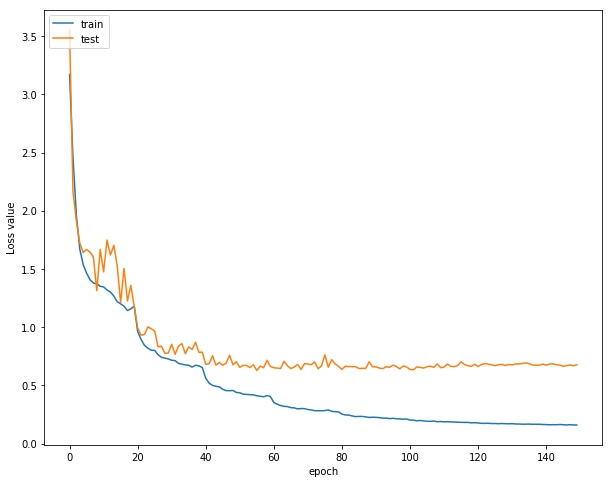

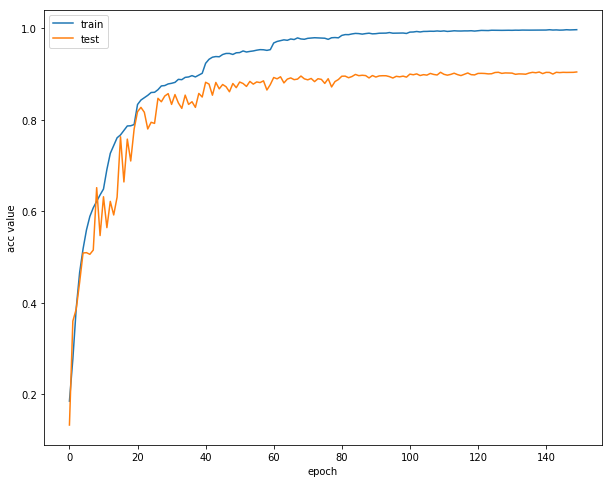

In [31]:

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.xlabel('epoch')
plt.ylabel('Loss value')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.xlabel('epoch')
plt.ylabel('acc value')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


In [32]:
loss, acc = model.evaluate(x_test, y_test)
print('evaluate loss:%f acc:%f' % (loss, acc))

   32/10000 [..............................] - ETA: 27s

  160/10000 [..............................] - ETA: 9s 

  256/10000 [..............................] - ETA: 7s

  352/10000 [>.............................] - ETA: 7s

  480/10000 [>.............................] - ETA: 6s

  608/10000 [>.............................] - ETA: 5s

  736/10000 [=>............................] - ETA: 5s

  864/10000 [=>............................] - ETA: 5s

  992/10000 [=>............................] - ETA: 5s

 1120/10000 [==>...........................] - ETA: 4s

 1248/10000 [==>...........................] - ETA: 4s

 1376/10000 [===>..........................] - ETA: 4s

 1504/10000 [===>..........................] - ETA: 4s

 1632/10000 [===>..........................] - ETA: 4s

 1760/10000 [====>.........................] - ETA: 4s

 1888/10000 [====>.........................] - ETA: 4s

 2016/10000 [=====>........................] - ETA: 4s

 2144/10000 [=====>........................] - ETA: 4s

 2272/10000 [=====>........................] - ETA: 3s

 2400/10000 [======>.......................] - ETA: 3s

 2528/10000 [======>.......................] - ETA: 3s

 2656/10000 [======>.......................] - ETA: 3s

 2784/10000 [=======>......................] - ETA: 3s

 2912/10000 [=======>......................] - ETA: 3s

 3040/10000 [========>.....................] - ETA: 3s

 3168/10000 [========>.....................] - ETA: 3s

 3296/10000 [========>.....................] - ETA: 3s

 3424/10000 [=========>....................] - ETA: 3s

 3552/10000 [=========>....................] - ETA: 3s

 3680/10000 [==========>...................] - ETA: 3s

 3808/10000 [==========>...................] - ETA: 3s

 3936/10000 [==========>...................] - ETA: 2s

 4064/10000 [===========>..................] - ETA: 2s

 4192/10000 [===========>..................] - ETA: 2s

 4320/10000 [===========>..................] - ETA: 2s

 4448/10000 [============>.................] - ETA: 2s

 4576/10000 [============>.................] - ETA: 2s

 4704/10000 [=============>................] - ETA: 2s

 4832/10000 [=============>................] - ETA: 2s

 4960/10000 [=============>................] - ETA: 2s

 5088/10000 [==============>...............] - ETA: 2s

 5216/10000 [==============>...............] - ETA: 2s

 5344/10000 [===============>..............] - ETA: 2s

 5472/10000 [===============>..............] - ETA: 2s

 5600/10000 [===============>..............] - ETA: 2s

 5728/10000 [================>.............] - ETA: 2s

 5856/10000 [================>.............] - ETA: 1s

 5984/10000 [================>.............] - ETA: 1s

 6112/10000 [=================>............] - ETA: 1s

 6240/10000 [=================>............] - ETA: 1s

 6368/10000 [==================>...........] - ETA: 1s

 6496/10000 [==================>...........] - ETA: 1s

 6624/10000 [==================>...........] - ETA: 1s

 6752/10000 [===================>..........] - ETA: 1s

 6880/10000 [===================>..........] - ETA: 1s

 7008/10000 [====================>.........] - ETA: 1s

 7136/10000 [====================>.........] - ETA: 1s

 7264/10000 [====================>.........] - ETA: 1s

 7392/10000 [=====================>........] - ETA: 1s

 7520/10000 [=====================>........] - ETA: 1s

 7648/10000 [=====================>........] - ETA: 1s

 7776/10000 [======================>.......] - ETA: 1s

 7904/10000 [======================>.......] - ETA: 0s

 8032/10000 [=======================>......] - ETA: 0s

 8160/10000 [=======================>......] - ETA: 0s

 8288/10000 [=======================>......] - ETA: 0s

 8416/10000 [========================>.....] - ETA: 0s

 8544/10000 [========================>.....] - ETA: 0s

 8672/10000 [=========================>....] - ETA: 0s

 8800/10000 [=========================>....] - ETA: 0s

 8928/10000 [=========================>....] - ETA: 0s

 9056/10000 [==========================>...] - ETA: 0s

 9184/10000 [==========================>...] - ETA: 0s

 9312/10000 [==========================>...] - ETA: 0s

 9440/10000 [===========================>..] - ETA: 0s

 9568/10000 [===========================>..] - ETA: 0s

 9696/10000 [============================>.] - ETA: 0s

 9824/10000 [============================>.] - ETA: 0s

 9952/10000 [============================>.] - ETA: 0s

10000/10000 [==============================] - 5s 464us/step


evaluate loss:0.734314 acc:0.896700
